In [1]:
import os
import sys
import json
import numpy as np
import time
import cv2
from PIL import Image, ImageDraw
from imgaug import augmenters as iaa
from imgaug.augmentables.segmaps import SegmentationMapOnImage

In [2]:
# Set the ROOT_DIR variable to the root directory of the Mask_RCNN git repo
ROOT_DIR = './'
assert os.path.exists(ROOT_DIR), 'ROOT_DIR does not exist. Did you forget to read the instructions above? ;)'

# Import mrcnn libraries
sys.path.append(ROOT_DIR) 
from mrcnn.config import Config
import mrcnn.utils as utils
from mrcnn import visualize
import mrcnn.model as modellib

In [3]:
# Directory to save logs and trained model
MODEL_DIR = os.path.join(ROOT_DIR, "logs")

# Local path to trained weights file
COCO_MODEL_PATH = os.path.join(ROOT_DIR, "mask_rcnn_coco.h5")

# Download COCO trained weights from Releases if needed
if not os.path.exists(COCO_MODEL_PATH):
    utils.download_trained_weights(COCO_MODEL_PATH)

In [4]:
class SingleNageurConfig(Config):
    """Configuration for training on swimmer dataset.
    Derives from the base Config class and overrides values specific
    to the swimmer dataset.
    """
    # Give the configuration a recognizable name
    NAME = "nageur"

    # Batch size = GPU*Img (mieux si élevé mais dépend de la mémoire disponible)
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

    # Number of classes (including background)
    NUM_CLASSES = 2 + 1  # background + 2 (head + arms)
    #ATTENTION : Le background est généré automatiquement, si dans le fichier JSON des annotations il existe une classe background,
    #pensez à la supprimer. Sinon vous aurez une erreur.

    # Shap
    IMAGE_MIN_DIM = 512
    IMAGE_MAX_DIM = 512

    #Depend de la mémoire, si peu de mémoire, bcps de step.
    STEPS_PER_EPOCH = 500

   
    VALIDATION_STEPS = 5
    
    # choix du backbone, peut être modifié si on ajoute un autre backbone dans le fichier model.py
    BACKBONE = 'resnet50'

    #paramètre du RPN
    RPN_ANCHOR_SCALES = (8, 16, 32, 64, 128)
    TRAIN_ROIS_PER_IMAGE = 32
    MAX_GT_INSTANCES = 50 
    POST_NMS_ROIS_INFERENCE = 500 
    POST_NMS_ROIS_TRAINING = 1000 
    
config = SingleNageurConfig()
config.display()


Configurations:
BACKBONE                       resnet50
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.7
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  512
IMAGE_META_SIZE                15
IMAGE_MIN_DIM                  512
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [512 512   3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE              

In [5]:
class CocoLikeDataset(utils.Dataset):
    """ Generates a COCO-like dataset, i.e. an image dataset annotated in the style of the COCO dataset.
        See http://cocodataset.org/#home for more information.
    """
    def load_data(self, annotation_json, images_dir):
        """ Load the coco-like dataset from json
        Args:
            annotation_json: The path to the coco annotations json file
            images_dir: The directory holding the images referred to by the json file
        """
        # Load json from file
        json_file = open(annotation_json)
        coco_json = json.load(json_file)
        json_file.close()
        
        # Add the class names using the base method from utils.Dataset
        source_name = "coco_like"
        for category in coco_json['categories']:
            class_id = category['id']
            class_name = category['name']
            #if class_id < 1:
            #    print('Error: Class id for "{}" cannot be less than one. (0 is reserved for the background)'.format(class_name))
            #    return
            
            self.add_class(source_name, class_id, class_name)
        
        # Get all annotations
        annotations = {}
        for annotation in coco_json['annotations']:
            image_id = annotation['image_id']
            if image_id not in annotations:
                annotations[image_id] = []
            annotations[image_id].append(annotation)
        
        # Get all images and add them to the dataset
        seen_images = {}
        for image in coco_json['images']:
            image_id = image['id']
            print (image_id)
            if image_id in seen_images:
                print("Warning: Skipping duplicate image id: {}".format(image))
            else:
                seen_images[image_id] = image
                try:
                    image_file_name = image['file_name']
                    print (image_file_name)
                    image_width = image['width']
                    image_height = image['height']
                except KeyError as key:
                    print("Warning: Skipping image (id: {}) with missing key: {}".format(image_id, key))
                
                image_path = os.path.abspath(os.path.join(images_dir, image_file_name))
                image_annotations = annotations[image_id]
                
                # Add the image using the base method from utils.Dataset
                self.add_image(
                    source=source_name,
                    image_id=image_id,
                    path=image_path,
                    width=image_width,
                    height=image_height,
                    annotations=image_annotations
                )
                
    def load_mask(self, image_id):
        """ Load instance masks for the given image.
        MaskRCNN expects masks in the form of a bitmap [height, width, instances].
        Args:
            image_id: The id of the image to load masks for
        Returns:
            masks: A bool array of shape [height, width, instance count] with
                one mask per instance.
            class_ids: a 1D array of class IDs of the instance masks.
        """
        image_info = self.image_info[image_id]
        annotations = image_info['annotations']
        instance_masks = []
        class_ids = []
        
        for annotation in annotations:
            class_id = annotation['category_id']
            mask = Image.new('1', (image_info['width'], image_info['height']))
            mask_draw = ImageDraw.ImageDraw(mask, '1')
            for segmentation in annotation['segmentation']:
                mask_draw.polygon(segmentation, fill=1)
                bool_array = np.array(mask) > 0
                instance_masks.append(bool_array)
                class_ids.append(class_id)

        mask = np.dstack(instance_masks)
        class_ids = np.array(class_ids, dtype=np.int32)
        
        return mask, class_ids

In [6]:
dataset_train = CocoLikeDataset()
dataset_train.load_data(ROOT_DIR + 'datasets/nageur/train/coco_annotations.json', 'C:/Users/alexi/Estimation_Position/datasets/nageur/train/images')
dataset_train.prepare()

dataset_val = CocoLikeDataset()
dataset_val.load_data('C:/Users/alexi/Estimation_Position/datasets/nageur/val/coco_annotations.json', 'C:/Users/alexi/Estimation_Position/datasets/nageur/val/images')
dataset_val.prepare()

0
centre001 (1006).jpg
1
centre001 (1007).jpg
2
centre001 (1008).jpg
3
centre001 (1009).jpg
4
centre001 (1012).jpg
5
centre001 (1018).jpg
6
centre001 (103).jpg
7
centre001 (1037).jpg
8
centre001 (1042).jpg
9
centre001 (1051).jpg
10
centre001 (1055).jpg
11
centre001 (1062).jpg
12
centre001 (107).jpg
13
centre001 (1077).jpg
14
centre001 (1082).jpg
15
centre001 (1113).jpg
16
centre001 (1117).jpg
17
centre001 (1121).jpg
18
centre001 (1122).jpg
19
centre001 (1139).jpg
20
centre001 (1142).jpg
21
centre001 (1170).jpg
22
centre001 (118).jpg
23
centre001 (1190).jpg
24
centre001 (129).jpg
25
centre001 (191).jpg
26
centre001 (196).jpg
27
centre001 (202).jpg
28
centre001 (213).jpg
29
centre001 (224).jpg
30
centre001 (232).jpg
31
centre001 (239).jpg
32
centre001 (252).jpg
33
centre001 (264).jpg
34
centre001 (269).jpg
35
centre001 (276).jpg
36
centre001 (300).jpg
37
centre001 (32).jpg
38
centre001 (337).jpg
39
centre001 (355).jpg
40
centre001 (366).jpg
41
centre001 (371).jpg
42
centre001 (379).jpg
4

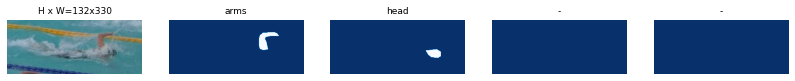

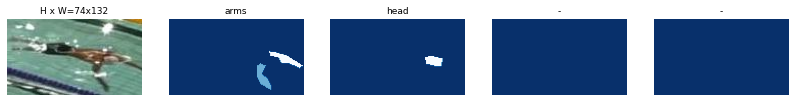

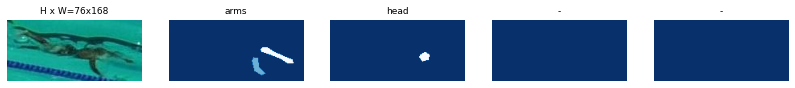

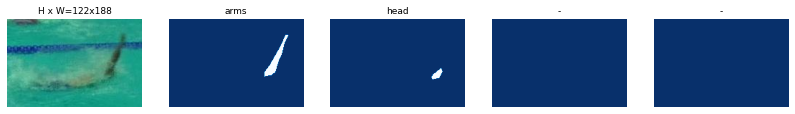

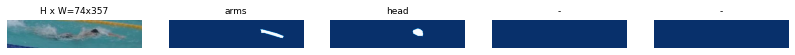

...

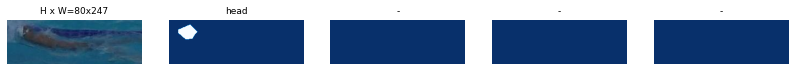

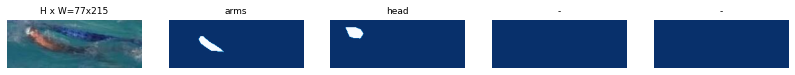

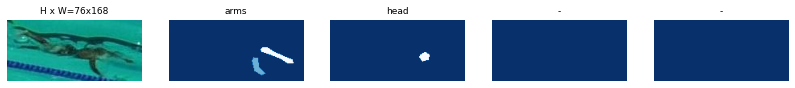

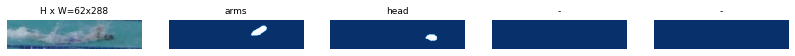

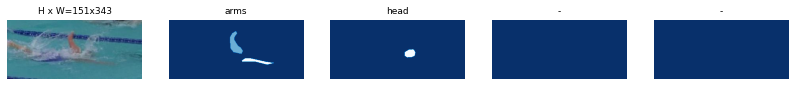

In [8]:
dataset = dataset_train
image_ids = np.random.choice(dataset.image_ids, 20)
for image_id in image_ids:
    image = dataset.load_image(image_id)
    mask, class_ids = dataset.load_mask(image_id)
    visualize.display_top_masks(image, mask, class_ids, dataset.class_names)

In [9]:
# Create model in training mode
model = modellib.MaskRCNN(mode="training", config=config,
                          model_dir=MODEL_DIR)

Instructions for updating:
The `validate_indices` argument has no effect. Indices are always validated on CPU and never validated on GPU.


In [10]:
#Choix du début de l'entrainement pour le fine tuning
init_with = "coco"  #  coco or last

if init_with == "coco":
    # Load weights trained on MS COCO, but skip layers that
    # are different due to the different number of classes
    # See README for instructions to download the COCO weights
    model.load_weights(COCO_MODEL_PATH, by_name=True,
                       exclude=["mrcnn_class_logits", "mrcnn_bbox_fc", 
                                "mrcnn_bbox", "mrcnn_mask"])
elif init_with == "last":
    model.load_weights(model.find_last(), by_name=True)

In [11]:
# Train head Layers
# Les autres branches sont figées pendant l'entrainement
start_train = time.time()
model.train(dataset_train, dataset_val, 
            learning_rate=config.LEARNING_RATE, 
            epochs=15, 
            layers='heads',
            augmentation = iaa.Sometimes(1/2,iaa.OneOf([iaa.Flipud(1)])))#augmentation miroire
end_train = time.time()
minutes = round((end_train - start_train) / 60, 2)
print(f'Training took {minutes} minutes')


Starting at epoch 0. LR=0.001

Checkpoint Path: C:/Users/alexi/mask_rcnn_crop\logs\nageur20210825T1203\mask_rcnn_nageur_{epoch:04d}.h5
Selecting layers to train
fpn_c5p5               (Conv2D)
fpn_c4p4               (Conv2D)
fpn_c3p3               (Conv2D)
fpn_c2p2               (Conv2D)
fpn_p5                 (Conv2D)
fpn_p2                 (Conv2D)
fpn_p3                 (Conv2D)
fpn_p4                 (Conv2D)
rpn_model              (Functional)
mrcnn_mask_conv1       (TimeDistributed)
mrcnn_mask_bn1         (TimeDistributed)
mrcnn_mask_conv2       (TimeDistributed)
mrcnn_mask_bn2         (TimeDistributed)
mrcnn_class_conv1      (TimeDistributed)
mrcnn_class_bn1        (TimeDistributed)
mrcnn_mask_conv3       (TimeDistributed)
mrcnn_mask_bn3         (TimeDistributed)
mrcnn_class_conv2      (TimeDistributed)
mrcnn_class_bn2        (TimeDistributed)
mrcnn_mask_conv4       (TimeDistributed)
mrcnn_mask_bn4         (TimeDistributed)
mrcnn_bbox_fc          (TimeDistributed)
mrcnn_mask_de

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\tensorflow\python\keras\optimizer_v2\optimizer_v2.py:375: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


Epoch 1/15


C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\tensorflow\python\framework\indexed_slices.py:449: UserWarning: Converting sparse IndexedSlices(IndexedSlices(indices=Tensor("training/SGD/gradients/gradients/roi_align_classifier/concat_grad/sub:0", shape=(None,), dtype=int32), values=Tensor("training/SGD/gradients/gradients/roi_align_classifier/concat_grad/GatherV2_2:0", shape=(None, 7, 7, 256), dtype=float32), dense_shape=Tensor("training/SGD/gradients/gradients/roi_align_classifier/concat_grad/Shape:0", shape=(4,), dtype=int32))) to a dense Tensor of unknown shape. This may consume a large

  1/500 [..............................] - ETA: 1:46:23 - batch: 0.0000e+00 - size: 1.0000 - loss: 3.8121 - rpn_class_loss: 0.0380 - rpn_bbox_loss: 1.0861 - mrcnn_class_loss: 0.8931 - mrcnn_bbox_loss: 1.0142 - mrcnn_mask_loss: 0.7807

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  2/500 [..............................] - ETA: 3:31 - batch: 0.5000 - size: 1.0000 - loss: 3.3728 - rpn_class_loss: 0.0304 - rpn_bbox_loss: 1.0501 - mrcnn_class_loss: 0.7398 - mrcnn_bbox_loss: 0.7768 - mrcnn_mask_loss: 0.7756       

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  3/500 [..............................] - ETA: 2:41 - batch: 1.0000 - size: 1.0000 - loss: 2.6940 - rpn_class_loss: 0.0232 - rpn_bbox_loss: 1.1314 - mrcnn_class_loss: 0.5045 - mrcnn_bbox_loss: 0.5179 - mrcnn_mask_loss: 0.5171

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  4/500 [..............................] - ETA: 2:28 - batch: 1.5000 - size: 1.0000 - loss: 2.5646 - rpn_class_loss: 0.0297 - rpn_bbox_loss: 1.3798 - mrcnn_class_loss: 0.3789 - mrcnn_bbox_loss: 0.3884 - mrcnn_mask_loss: 0.3878

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  5/500 [..............................] - ETA: 2:24 - batch: 2.0000 - size: 1.0000 - loss: 2.7647 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.3374 - mrcnn_class_loss: 0.3844 - mrcnn_bbox_loss: 0.5727 - mrcnn_mask_loss: 0.4394

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  6/500 [..............................] - ETA: 2:17 - batch: 2.5000 - size: 1.0000 - loss: 2.6877 - rpn_class_loss: 0.0289 - rpn_bbox_loss: 1.2071 - mrcnn_class_loss: 0.3725 - mrcnn_bbox_loss: 0.6152 - mrcnn_mask_loss: 0.4640

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  7/500 [..............................] - ETA: 2:14 - batch: 3.0000 - size: 1.0000 - loss: 2.8203 - rpn_class_loss: 0.0274 - rpn_bbox_loss: 1.2494 - mrcnn_class_loss: 0.3716 - mrcnn_bbox_loss: 0.6881 - mrcnn_mask_loss: 0.4839

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  8/500 [..............................] - ETA: 2:12 - batch: 3.5000 - size: 1.0000 - loss: 2.8933 - rpn_class_loss: 0.0271 - rpn_bbox_loss: 1.2139 - mrcnn_class_loss: 0.4358 - mrcnn_bbox_loss: 0.7165 - mrcnn_mask_loss: 0.5001

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  9/500 [..............................] - ETA: 2:10 - batch: 4.0000 - size: 1.0000 - loss: 2.8855 - rpn_class_loss: 0.0268 - rpn_bbox_loss: 1.2002 - mrcnn_class_loss: 0.4303 - mrcnn_bbox_loss: 0.7196 - mrcnn_mask_loss: 0.5085

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 10/500 [..............................] - ETA: 2:08 - batch: 4.5000 - size: 1.0000 - loss: 2.9170 - rpn_class_loss: 0.0276 - rpn_bbox_loss: 1.1866 - mrcnn_class_loss: 0.4225 - mrcnn_bbox_loss: 0.7481 - mrcnn_mask_loss: 0.5321

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 11/500 [..............................] - ETA: 2:07 - batch: 5.0000 - size: 1.0000 - loss: 2.8914 - rpn_class_loss: 0.0274 - rpn_bbox_loss: 1.1433 - mrcnn_class_loss: 0.4066 - mrcnn_bbox_loss: 0.7791 - mrcnn_mask_loss: 0.5351

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 12/500 [..............................] - ETA: 2:07 - batch: 5.5000 - size: 1.0000 - loss: 2.8713 - rpn_class_loss: 0.0279 - rpn_bbox_loss: 1.1407 - mrcnn_class_loss: 0.3896 - mrcnn_bbox_loss: 0.7758 - mrcnn_mask_loss: 0.5373

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 13/500 [..............................] - ETA: 2:06 - batch: 6.0000 - size: 1.0000 - loss: 2.8562 - rpn_class_loss: 0.0278 - rpn_bbox_loss: 1.0992 - mrcnn_class_loss: 0.3924 - mrcnn_bbox_loss: 0.7997 - mrcnn_mask_loss: 0.5372

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 14/500 [..............................] - ETA: 2:05 - batch: 6.5000 - size: 1.0000 - loss: 2.8915 - rpn_class_loss: 0.0271 - rpn_bbox_loss: 1.1211 - mrcnn_class_loss: 0.3901 - mrcnn_bbox_loss: 0.8196 - mrcnn_mask_loss: 0.5337

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 15/500 [..............................] - ETA: 2:04 - batch: 7.0000 - size: 1.0000 - loss: 2.8875 - rpn_class_loss: 0.0263 - rpn_bbox_loss: 1.1007 - mrcnn_class_loss: 0.3827 - mrcnn_bbox_loss: 0.8360 - mrcnn_mask_loss: 0.5419

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 17/500 [>.............................] - ETA: 2:02 - batch: 8.0000 - size: 1.0000 - loss: 2.7632 - rpn_class_loss: 0.0273 - rpn_bbox_loss: 1.1141 - mrcnn_class_loss: 0.3470 - mrcnn_bbox_loss: 0.7668 - mrcnn_mask_loss: 0.5081

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 18/500 [>.............................] - ETA: 2:01 - batch: 8.5000 - size: 1.0000 - loss: 2.6785 - rpn_class_loss: 0.0273 - rpn_bbox_loss: 1.1195 - mrcnn_class_loss: 0.3277 - mrcnn_bbox_loss: 0.7242 - mrcnn_mask_loss: 0.4799

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 19/500 [>.............................] - ETA: 2:00 - batch: 9.0000 - size: 1.0000 - loss: 2.7108 - rpn_class_loss: 0.0271 - rpn_bbox_loss: 1.0986 - mrcnn_class_loss: 0.3174 - mrcnn_bbox_loss: 0.7709 - mrcnn_mask_loss: 0.4967

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 20/500 [>.............................] - ETA: 2:00 - batch: 9.5000 - size: 1.0000 - loss: 2.7415 - rpn_class_loss: 0.0274 - rpn_bbox_loss: 1.0847 - mrcnn_class_loss: 0.3057 - mrcnn_bbox_loss: 0.8150 - mrcnn_mask_loss: 0.5088

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 21/500 [>.............................] - ETA: 2:00 - batch: 10.0000 - size: 1.0000 - loss: 2.7626 - rpn_class_loss: 0.0293 - rpn_bbox_loss: 1.0972 - mrcnn_class_loss: 0.2987 - mrcnn_bbox_loss: 0.8265 - mrcnn_mask_loss: 0.5110

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 22/500 [>.............................] - ETA: 1:59 - batch: 10.5000 - size: 1.0000 - loss: 2.7589 - rpn_class_loss: 0.0285 - rpn_bbox_loss: 1.0651 - mrcnn_class_loss: 0.2875 - mrcnn_bbox_loss: 0.8541 - mrcnn_mask_loss: 0.5236

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 23/500 [>.............................] - ETA: 1:59 - batch: 11.0000 - size: 1.0000 - loss: 2.7487 - rpn_class_loss: 0.0283 - rpn_bbox_loss: 1.0488 - mrcnn_class_loss: 0.2937 - mrcnn_bbox_loss: 0.8539 - mrcnn_mask_loss: 0.5239

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 24/500 [>.............................] - ETA: 1:58 - batch: 11.5000 - size: 1.0000 - loss: 2.6929 - rpn_class_loss: 0.0274 - rpn_bbox_loss: 1.0158 - mrcnn_class_loss: 0.2834 - mrcnn_bbox_loss: 0.8396 - mrcnn_mask_loss: 0.5266

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 25/500 [>.............................] - ETA: 1:58 - batch: 12.0000 - size: 1.0000 - loss: 2.6924 - rpn_class_loss: 0.0291 - rpn_bbox_loss: 1.0042 - mrcnn_class_loss: 0.2842 - mrcnn_bbox_loss: 0.8479 - mrcnn_mask_loss: 0.5269

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 26/500 [>.............................] - ETA: 1:58 - batch: 12.5000 - size: 1.0000 - loss: 2.6779 - rpn_class_loss: 0.0299 - rpn_bbox_loss: 0.9903 - mrcnn_class_loss: 0.2810 - mrcnn_bbox_loss: 0.8479 - mrcnn_mask_loss: 0.5288

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 27/500 [>.............................] - ETA: 1:57 - batch: 13.0000 - size: 1.0000 - loss: 2.6780 - rpn_class_loss: 0.0292 - rpn_bbox_loss: 0.9776 - mrcnn_class_loss: 0.2853 - mrcnn_bbox_loss: 0.8510 - mrcnn_mask_loss: 0.5349

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 28/500 [>.............................] - ETA: 1:56 - batch: 13.5000 - size: 1.0000 - loss: 2.6733 - rpn_class_loss: 0.0285 - rpn_bbox_loss: 0.9665 - mrcnn_class_loss: 0.2886 - mrcnn_bbox_loss: 0.8509 - mrcnn_mask_loss: 0.5387

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 29/500 [>.............................] - ETA: 1:56 - batch: 14.0000 - size: 1.0000 - loss: 2.6213 - rpn_class_loss: 0.0299 - rpn_bbox_loss: 0.9711 - mrcnn_class_loss: 0.2787 - mrcnn_bbox_loss: 0.8216 - mrcnn_mask_loss: 0.5201

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 30/500 [>.............................] - ETA: 1:55 - batch: 14.5000 - size: 1.0000 - loss: 2.6579 - rpn_class_loss: 0.0294 - rpn_bbox_loss: 0.9792 - mrcnn_class_loss: 0.2714 - mrcnn_bbox_loss: 0.8528 - mrcnn_mask_loss: 0.5252

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 31/500 [>.............................] - ETA: 1:55 - batch: 15.0000 - size: 1.0000 - loss: 2.6624 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 0.9669 - mrcnn_class_loss: 0.2671 - mrcnn_bbox_loss: 0.8736 - mrcnn_mask_loss: 0.5240

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 32/500 [>.............................] - ETA: 1:54 - batch: 15.5000 - size: 1.0000 - loss: 2.6595 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 0.9543 - mrcnn_class_loss: 0.2654 - mrcnn_bbox_loss: 0.8821 - mrcnn_mask_loss: 0.5268

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 33/500 [>.............................] - ETA: 1:54 - batch: 16.0000 - size: 1.0000 - loss: 2.6049 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 0.9503 - mrcnn_class_loss: 0.2573 - mrcnn_bbox_loss: 0.8553 - mrcnn_mask_loss: 0.5108

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 34/500 [=>............................] - ETA: 1:53 - batch: 16.5000 - size: 1.0000 - loss: 2.5690 - rpn_class_loss: 0.0317 - rpn_bbox_loss: 0.9615 - mrcnn_class_loss: 0.2498 - mrcnn_bbox_loss: 0.8302 - mrcnn_mask_loss: 0.4958

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 35/500 [=>............................] - ETA: 1:53 - batch: 17.0000 - size: 1.0000 - loss: 2.5420 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 0.9799 - mrcnn_class_loss: 0.2426 - mrcnn_bbox_loss: 0.8064 - mrcnn_mask_loss: 0.4816

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 36/500 [=>............................] - ETA: 1:52 - batch: 17.5000 - size: 1.0000 - loss: 2.5389 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 0.9708 - mrcnn_class_loss: 0.2442 - mrcnn_bbox_loss: 0.8075 - mrcnn_mask_loss: 0.4851

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 37/500 [=>............................] - ETA: 1:52 - batch: 18.0000 - size: 1.0000 - loss: 2.5471 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 0.9642 - mrcnn_class_loss: 0.2391 - mrcnn_bbox_loss: 0.8301 - mrcnn_mask_loss: 0.4824

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 38/500 [=>............................] - ETA: 1:52 - batch: 18.5000 - size: 1.0000 - loss: 2.5524 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 0.9560 - mrcnn_class_loss: 0.2424 - mrcnn_bbox_loss: 0.8374 - mrcnn_mask_loss: 0.4856

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 39/500 [=>............................] - ETA: 1:51 - batch: 19.0000 - size: 1.0000 - loss: 2.5612 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 0.9653 - mrcnn_class_loss: 0.2394 - mrcnn_bbox_loss: 0.8392 - mrcnn_mask_loss: 0.4865

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 40/500 [=>............................] - ETA: 1:51 - batch: 19.5000 - size: 1.0000 - loss: 2.5295 - rpn_class_loss: 0.0306 - rpn_bbox_loss: 0.9730 - mrcnn_class_loss: 0.2334 - mrcnn_bbox_loss: 0.8182 - mrcnn_mask_loss: 0.4744

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 41/500 [=>............................] - ETA: 1:50 - batch: 20.0000 - size: 1.0000 - loss: 2.5396 - rpn_class_loss: 0.0304 - rpn_bbox_loss: 0.9674 - mrcnn_class_loss: 0.2366 - mrcnn_bbox_loss: 0.8317 - mrcnn_mask_loss: 0.4735

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 42/500 [=>............................] - ETA: 1:50 - batch: 20.5000 - size: 1.0000 - loss: 2.5253 - rpn_class_loss: 0.0301 - rpn_bbox_loss: 0.9595 - mrcnn_class_loss: 0.2364 - mrcnn_bbox_loss: 0.8216 - mrcnn_mask_loss: 0.4777

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 43/500 [=>............................] - ETA: 1:50 - batch: 21.0000 - size: 1.0000 - loss: 2.5064 - rpn_class_loss: 0.0297 - rpn_bbox_loss: 0.9465 - mrcnn_class_loss: 0.2353 - mrcnn_bbox_loss: 0.8154 - mrcnn_mask_loss: 0.4796

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 44/500 [=>............................] - ETA: 1:49 - batch: 21.5000 - size: 1.0000 - loss: 2.4918 - rpn_class_loss: 0.0298 - rpn_bbox_loss: 0.9367 - mrcnn_class_loss: 0.2314 - mrcnn_bbox_loss: 0.8128 - mrcnn_mask_loss: 0.4812

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 45/500 [=>............................] - ETA: 1:49 - batch: 22.0000 - size: 1.0000 - loss: 2.4882 - rpn_class_loss: 0.0297 - rpn_bbox_loss: 0.9369 - mrcnn_class_loss: 0.2288 - mrcnn_bbox_loss: 0.8114 - mrcnn_mask_loss: 0.4814

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 46/500 [=>............................] - ETA: 1:48 - batch: 22.5000 - size: 1.0000 - loss: 2.4832 - rpn_class_loss: 0.0294 - rpn_bbox_loss: 0.9328 - mrcnn_class_loss: 0.2302 - mrcnn_bbox_loss: 0.8090 - mrcnn_mask_loss: 0.4818

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 47/500 [=>............................] - ETA: 1:48 - batch: 23.0000 - size: 1.0000 - loss: 2.4892 - rpn_class_loss: 0.0293 - rpn_bbox_loss: 0.9384 - mrcnn_class_loss: 0.2284 - mrcnn_bbox_loss: 0.8111 - mrcnn_mask_loss: 0.4819

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 48/500 [=>............................] - ETA: 1:48 - batch: 23.5000 - size: 1.0000 - loss: 2.4648 - rpn_class_loss: 0.0290 - rpn_bbox_loss: 0.9330 - mrcnn_class_loss: 0.2245 - mrcnn_bbox_loss: 0.7983 - mrcnn_mask_loss: 0.4800

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 49/500 [=>............................] - ETA: 1:47 - batch: 24.0000 - size: 1.0000 - loss: 2.4643 - rpn_class_loss: 0.0287 - rpn_bbox_loss: 0.9268 - mrcnn_class_loss: 0.2256 - mrcnn_bbox_loss: 0.8009 - mrcnn_mask_loss: 0.4822

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 50/500 [==>...........................] - ETA: 1:47 - batch: 24.5000 - size: 1.0000 - loss: 2.4638 - rpn_class_loss: 0.0286 - rpn_bbox_loss: 0.9280 - mrcnn_class_loss: 0.2245 - mrcnn_bbox_loss: 0.7996 - mrcnn_mask_loss: 0.4831

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 51/500 [==>...........................] - ETA: 1:47 - batch: 25.0000 - size: 1.0000 - loss: 2.4569 - rpn_class_loss: 0.0284 - rpn_bbox_loss: 0.9236 - mrcnn_class_loss: 0.2261 - mrcnn_bbox_loss: 0.7958 - mrcnn_mask_loss: 0.4831

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 52/500 [==>...........................] - ETA: 1:46 - batch: 25.5000 - size: 1.0000 - loss: 2.4605 - rpn_class_loss: 0.0280 - rpn_bbox_loss: 0.9194 - mrcnn_class_loss: 0.2318 - mrcnn_bbox_loss: 0.7943 - mrcnn_mask_loss: 0.4870

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 53/500 [==>...........................] - ETA: 1:46 - batch: 26.0000 - size: 1.0000 - loss: 2.4672 - rpn_class_loss: 0.0276 - rpn_bbox_loss: 0.9187 - mrcnn_class_loss: 0.2286 - mrcnn_bbox_loss: 0.8052 - mrcnn_mask_loss: 0.4871

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 54/500 [==>...........................] - ETA: 1:46 - batch: 26.5000 - size: 1.0000 - loss: 2.4770 - rpn_class_loss: 0.0276 - rpn_bbox_loss: 0.9213 - mrcnn_class_loss: 0.2334 - mrcnn_bbox_loss: 0.8029 - mrcnn_mask_loss: 0.4919

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 55/500 [==>...........................] - ETA: 1:45 - batch: 27.0000 - size: 1.0000 - loss: 2.4986 - rpn_class_loss: 0.0277 - rpn_bbox_loss: 0.9364 - mrcnn_class_loss: 0.2367 - mrcnn_bbox_loss: 0.8020 - mrcnn_mask_loss: 0.4958

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 56/500 [==>...........................] - ETA: 1:45 - batch: 27.5000 - size: 1.0000 - loss: 2.4893 - rpn_class_loss: 0.0274 - rpn_bbox_loss: 0.9286 - mrcnn_class_loss: 0.2344 - mrcnn_bbox_loss: 0.8006 - mrcnn_mask_loss: 0.4985

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 57/500 [==>...........................] - ETA: 1:45 - batch: 28.0000 - size: 1.0000 - loss: 2.4897 - rpn_class_loss: 0.0275 - rpn_bbox_loss: 0.9259 - mrcnn_class_loss: 0.2357 - mrcnn_bbox_loss: 0.8041 - mrcnn_mask_loss: 0.4966

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 58/500 [==>...........................] - ETA: 1:45 - batch: 28.5000 - size: 1.0000 - loss: 2.4855 - rpn_class_loss: 0.0274 - rpn_bbox_loss: 0.9224 - mrcnn_class_loss: 0.2353 - mrcnn_bbox_loss: 0.8024 - mrcnn_mask_loss: 0.4979

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 59/500 [==>...........................] - ETA: 1:44 - batch: 29.0000 - size: 1.0000 - loss: 2.4747 - rpn_class_loss: 0.0278 - rpn_bbox_loss: 0.9212 - mrcnn_class_loss: 0.2320 - mrcnn_bbox_loss: 0.7934 - mrcnn_mask_loss: 0.5004

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 60/500 [==>...........................] - ETA: 1:44 - batch: 29.5000 - size: 1.0000 - loss: 2.4513 - rpn_class_loss: 0.0276 - rpn_bbox_loss: 0.9234 - mrcnn_class_loss: 0.2281 - mrcnn_bbox_loss: 0.7801 - mrcnn_mask_loss: 0.4921

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 61/500 [==>...........................] - ETA: 1:44 - batch: 30.0000 - size: 1.0000 - loss: 2.4527 - rpn_class_loss: 0.0274 - rpn_bbox_loss: 0.9223 - mrcnn_class_loss: 0.2266 - mrcnn_bbox_loss: 0.7836 - mrcnn_mask_loss: 0.4929

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 62/500 [==>...........................] - ETA: 1:44 - batch: 30.5000 - size: 1.0000 - loss: 2.4579 - rpn_class_loss: 0.0275 - rpn_bbox_loss: 0.9243 - mrcnn_class_loss: 0.2276 - mrcnn_bbox_loss: 0.7858 - mrcnn_mask_loss: 0.4927

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 63/500 [==>...........................] - ETA: 1:43 - batch: 31.0000 - size: 1.0000 - loss: 2.4320 - rpn_class_loss: 0.0274 - rpn_bbox_loss: 0.9225 - mrcnn_class_loss: 0.2240 - mrcnn_bbox_loss: 0.7733 - mrcnn_mask_loss: 0.4849

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 64/500 [==>...........................] - ETA: 1:43 - batch: 31.5000 - size: 1.0000 - loss: 2.4440 - rpn_class_loss: 0.0271 - rpn_bbox_loss: 0.9333 - mrcnn_class_loss: 0.2229 - mrcnn_bbox_loss: 0.7743 - mrcnn_mask_loss: 0.4865

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 65/500 [==>...........................] - ETA: 1:43 - batch: 32.0000 - size: 1.0000 - loss: 2.4458 - rpn_class_loss: 0.0270 - rpn_bbox_loss: 0.9247 - mrcnn_class_loss: 0.2313 - mrcnn_bbox_loss: 0.7748 - mrcnn_mask_loss: 0.4880

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 66/500 [==>...........................] - ETA: 1:43 - batch: 32.5000 - size: 1.0000 - loss: 2.4501 - rpn_class_loss: 0.0267 - rpn_bbox_loss: 0.9193 - mrcnn_class_loss: 0.2345 - mrcnn_bbox_loss: 0.7800 - mrcnn_mask_loss: 0.4895

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 67/500 [===>..........................] - ETA: 1:42 - batch: 33.0000 - size: 1.0000 - loss: 2.4557 - rpn_class_loss: 0.0265 - rpn_bbox_loss: 0.9191 - mrcnn_class_loss: 0.2391 - mrcnn_bbox_loss: 0.7801 - mrcnn_mask_loss: 0.4908

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 68/500 [===>..........................] - ETA: 1:42 - batch: 33.5000 - size: 1.0000 - loss: 2.4420 - rpn_class_loss: 0.0263 - rpn_bbox_loss: 0.9084 - mrcnn_class_loss: 0.2402 - mrcnn_bbox_loss: 0.7753 - mrcnn_mask_loss: 0.4918

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 69/500 [===>..........................] - ETA: 1:42 - batch: 34.0000 - size: 1.0000 - loss: 2.4229 - rpn_class_loss: 0.0261 - rpn_bbox_loss: 0.9114 - mrcnn_class_loss: 0.2367 - mrcnn_bbox_loss: 0.7640 - mrcnn_mask_loss: 0.4847

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 70/500 [===>..........................] - ETA: 1:41 - batch: 34.5000 - size: 1.0000 - loss: 2.4112 - rpn_class_loss: 0.0260 - rpn_bbox_loss: 0.9092 - mrcnn_class_loss: 0.2338 - mrcnn_bbox_loss: 0.7578 - mrcnn_mask_loss: 0.4845

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 71/500 [===>..........................] - ETA: 1:41 - batch: 35.0000 - size: 1.0000 - loss: 2.3965 - rpn_class_loss: 0.0258 - rpn_bbox_loss: 0.9031 - mrcnn_class_loss: 0.2314 - mrcnn_bbox_loss: 0.7505 - mrcnn_mask_loss: 0.4857

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 72/500 [===>..........................] - ETA: 1:41 - batch: 35.5000 - size: 1.0000 - loss: 2.3988 - rpn_class_loss: 0.0257 - rpn_bbox_loss: 0.9033 - mrcnn_class_loss: 0.2317 - mrcnn_bbox_loss: 0.7534 - mrcnn_mask_loss: 0.4848

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 73/500 [===>..........................] - ETA: 1:41 - batch: 36.0000 - size: 1.0000 - loss: 2.4015 - rpn_class_loss: 0.0256 - rpn_bbox_loss: 0.8997 - mrcnn_class_loss: 0.2352 - mrcnn_bbox_loss: 0.7529 - mrcnn_mask_loss: 0.4882

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 74/500 [===>..........................] - ETA: 1:40 - batch: 36.5000 - size: 1.0000 - loss: 2.3933 - rpn_class_loss: 0.0256 - rpn_bbox_loss: 0.8895 - mrcnn_class_loss: 0.2350 - mrcnn_bbox_loss: 0.7568 - mrcnn_mask_loss: 0.4864

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 75/500 [===>..........................] - ETA: 1:40 - batch: 37.0000 - size: 1.0000 - loss: 2.3920 - rpn_class_loss: 0.0253 - rpn_bbox_loss: 0.8908 - mrcnn_class_loss: 0.2335 - mrcnn_bbox_loss: 0.7561 - mrcnn_mask_loss: 0.4864

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 76/500 [===>..........................] - ETA: 1:40 - batch: 37.5000 - size: 1.0000 - loss: 2.3802 - rpn_class_loss: 0.0252 - rpn_bbox_loss: 0.8986 - mrcnn_class_loss: 0.2304 - mrcnn_bbox_loss: 0.7461 - mrcnn_mask_loss: 0.4800

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 77/500 [===>..........................] - ETA: 1:40 - batch: 38.0000 - size: 1.0000 - loss: 2.3840 - rpn_class_loss: 0.0251 - rpn_bbox_loss: 0.8969 - mrcnn_class_loss: 0.2294 - mrcnn_bbox_loss: 0.7502 - mrcnn_mask_loss: 0.4824

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 78/500 [===>..........................] - ETA: 1:39 - batch: 38.5000 - size: 1.0000 - loss: 2.3825 - rpn_class_loss: 0.0250 - rpn_bbox_loss: 0.8933 - mrcnn_class_loss: 0.2308 - mrcnn_bbox_loss: 0.7504 - mrcnn_mask_loss: 0.4830

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 79/500 [===>..........................] - ETA: 1:39 - batch: 39.0000 - size: 1.0000 - loss: 2.3778 - rpn_class_loss: 0.0250 - rpn_bbox_loss: 0.8878 - mrcnn_class_loss: 0.2307 - mrcnn_bbox_loss: 0.7505 - mrcnn_mask_loss: 0.4838

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 80/500 [===>..........................] - ETA: 1:39 - batch: 39.5000 - size: 1.0000 - loss: 2.3804 - rpn_class_loss: 0.0250 - rpn_bbox_loss: 0.8902 - mrcnn_class_loss: 0.2322 - mrcnn_bbox_loss: 0.7494 - mrcnn_mask_loss: 0.4835

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 81/500 [===>..........................] - ETA: 1:39 - batch: 40.0000 - size: 1.0000 - loss: 2.3848 - rpn_class_loss: 0.0248 - rpn_bbox_loss: 0.8899 - mrcnn_class_loss: 0.2306 - mrcnn_bbox_loss: 0.7496 - mrcnn_mask_loss: 0.4899

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 82/500 [===>..........................] - ETA: 1:38 - batch: 40.5000 - size: 1.0000 - loss: 2.3878 - rpn_class_loss: 0.0246 - rpn_bbox_loss: 0.8955 - mrcnn_class_loss: 0.2298 - mrcnn_bbox_loss: 0.7490 - mrcnn_mask_loss: 0.4889

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 83/500 [===>..........................] - ETA: 1:38 - batch: 41.0000 - size: 1.0000 - loss: 2.3860 - rpn_class_loss: 0.0246 - rpn_bbox_loss: 0.8933 - mrcnn_class_loss: 0.2324 - mrcnn_bbox_loss: 0.7463 - mrcnn_mask_loss: 0.4895

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 84/500 [====>.........................] - ETA: 1:38 - batch: 41.5000 - size: 1.0000 - loss: 2.3795 - rpn_class_loss: 0.0245 - rpn_bbox_loss: 0.8890 - mrcnn_class_loss: 0.2303 - mrcnn_bbox_loss: 0.7454 - mrcnn_mask_loss: 0.4903

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 85/500 [====>.........................] - ETA: 1:38 - batch: 42.0000 - size: 1.0000 - loss: 2.3758 - rpn_class_loss: 0.0243 - rpn_bbox_loss: 0.8872 - mrcnn_class_loss: 0.2295 - mrcnn_bbox_loss: 0.7447 - mrcnn_mask_loss: 0.4902

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 86/500 [====>.........................] - ETA: 1:37 - batch: 42.5000 - size: 1.0000 - loss: 2.3753 - rpn_class_loss: 0.0241 - rpn_bbox_loss: 0.8869 - mrcnn_class_loss: 0.2286 - mrcnn_bbox_loss: 0.7456 - mrcnn_mask_loss: 0.4901

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 88/500 [====>.........................] - ETA: 1:37 - batch: 43.5000 - size: 1.0000 - loss: 2.3647 - rpn_class_loss: 0.0238 - rpn_bbox_loss: 0.8792 - mrcnn_class_loss: 0.2282 - mrcnn_bbox_loss: 0.7415 - mrcnn_mask_loss: 0.4920

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 89/500 [====>.........................] - ETA: 1:37 - batch: 44.0000 - size: 1.0000 - loss: 2.3600 - rpn_class_loss: 0.0237 - rpn_bbox_loss: 0.8760 - mrcnn_class_loss: 0.2309 - mrcnn_bbox_loss: 0.7368 - mrcnn_mask_loss: 0.4926

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 90/500 [====>.........................] - ETA: 1:36 - batch: 44.5000 - size: 1.0000 - loss: 2.3700 - rpn_class_loss: 0.0236 - rpn_bbox_loss: 0.8810 - mrcnn_class_loss: 0.2329 - mrcnn_bbox_loss: 0.7400 - mrcnn_mask_loss: 0.4924

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 91/500 [====>.........................] - ETA: 1:36 - batch: 45.0000 - size: 1.0000 - loss: 2.3585 - rpn_class_loss: 0.0235 - rpn_bbox_loss: 0.8857 - mrcnn_class_loss: 0.2304 - mrcnn_bbox_loss: 0.7319 - mrcnn_mask_loss: 0.4870

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 92/500 [====>.........................] - ETA: 1:36 - batch: 45.5000 - size: 1.0000 - loss: 2.3540 - rpn_class_loss: 0.0235 - rpn_bbox_loss: 0.8852 - mrcnn_class_loss: 0.2288 - mrcnn_bbox_loss: 0.7285 - mrcnn_mask_loss: 0.4880

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 93/500 [====>.........................] - ETA: 1:35 - batch: 46.0000 - size: 1.0000 - loss: 2.3515 - rpn_class_loss: 0.0234 - rpn_bbox_loss: 0.8801 - mrcnn_class_loss: 0.2284 - mrcnn_bbox_loss: 0.7293 - mrcnn_mask_loss: 0.4903

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 94/500 [====>.........................] - ETA: 1:35 - batch: 46.5000 - size: 1.0000 - loss: 2.3523 - rpn_class_loss: 0.0234 - rpn_bbox_loss: 0.8791 - mrcnn_class_loss: 0.2288 - mrcnn_bbox_loss: 0.7301 - mrcnn_mask_loss: 0.4909

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 95/500 [====>.........................] - ETA: 1:35 - batch: 47.0000 - size: 1.0000 - loss: 2.3539 - rpn_class_loss: 0.0232 - rpn_bbox_loss: 0.8827 - mrcnn_class_loss: 0.2279 - mrcnn_bbox_loss: 0.7309 - mrcnn_mask_loss: 0.4892

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 96/500 [====>.........................] - ETA: 1:35 - batch: 47.5000 - size: 1.0000 - loss: 2.3526 - rpn_class_loss: 0.0230 - rpn_bbox_loss: 0.8781 - mrcnn_class_loss: 0.2288 - mrcnn_bbox_loss: 0.7322 - mrcnn_mask_loss: 0.4905

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 97/500 [====>.........................] - ETA: 1:34 - batch: 48.0000 - size: 1.0000 - loss: 2.3556 - rpn_class_loss: 0.0229 - rpn_bbox_loss: 0.8766 - mrcnn_class_loss: 0.2327 - mrcnn_bbox_loss: 0.7327 - mrcnn_mask_loss: 0.490

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 98/500 [====>.........................] - ETA: 1:34 - batch: 48.5000 - size: 1.0000 - loss: 2.3465 - rpn_class_loss: 0.0227 - rpn_bbox_loss: 0.8730 - mrcnn_class_loss: 0.2304 - mrcnn_bbox_loss: 0.7299 - mrcnn_mask_loss: 0.4906

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 99/500 [====>.........................] - ETA: 1:34 - batch: 49.0000 - size: 1.0000 - loss: 2.3470 - rpn_class_loss: 0.0225 - rpn_bbox_loss: 0.8730 - mrcnn_class_loss: 0.2321 - mrcnn_bbox_loss: 0.7291 - mrcnn_mask_loss: 0.4903

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


100/500 [=====>........................] - ETA: 1:34 - batch: 49.5000 - size: 1.0000 - loss: 2.3458 - rpn_class_loss: 0.0224 - rpn_bbox_loss: 0.8755 - mrcnn_class_loss: 0.2307 - mrcnn_bbox_loss: 0.7270 - mrcnn_mask_loss: 0.4901

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


101/500 [=====>........................] - ETA: 1:33 - batch: 50.0000 - size: 1.0000 - loss: 2.3441 - rpn_class_loss: 0.0223 - rpn_bbox_loss: 0.8734 - mrcnn_class_loss: 0.2328 - mrcnn_bbox_loss: 0.7263 - mrcnn_mask_loss: 0.4893

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


102/500 [=====>........................] - ETA: 1:33 - batch: 50.5000 - size: 1.0000 - loss: 2.3431 - rpn_class_loss: 0.0222 - rpn_bbox_loss: 0.8757 - mrcnn_class_loss: 0.2318 - mrcnn_bbox_loss: 0.7249 - mrcnn_mask_loss: 0.4885

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


103/500 [=====>........................] - ETA: 1:33 - batch: 51.0000 - size: 1.0000 - loss: 2.3457 - rpn_class_loss: 0.0220 - rpn_bbox_loss: 0.8742 - mrcnn_class_loss: 0.2316 - mrcnn_bbox_loss: 0.7276 - mrcnn_mask_loss: 0.4904

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


104/500 [=====>........................] - ETA: 1:33 - batch: 51.5000 - size: 1.0000 - loss: 2.3422 - rpn_class_loss: 0.0218 - rpn_bbox_loss: 0.8749 - mrcnn_class_loss: 0.2297 - mrcnn_bbox_loss: 0.7272 - mrcnn_mask_loss: 0.4885

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


105/500 [=====>........................] - ETA: 1:32 - batch: 52.0000 - size: 1.0000 - loss: 2.3919 - rpn_class_loss: 0.0228 - rpn_bbox_loss: 0.9246 - mrcnn_class_loss: 0.2287 - mrcnn_bbox_loss: 0.7279 - mrcnn_mask_loss: 0.4879

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


106/500 [=====>........................] - ETA: 1:32 - batch: 52.5000 - size: 1.0000 - loss: 2.3904 - rpn_class_loss: 0.0227 - rpn_bbox_loss: 0.9307 - mrcnn_class_loss: 0.2272 - mrcnn_bbox_loss: 0.7242 - mrcnn_mask_loss: 0.4857

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


107/500 [=====>........................] - ETA: 1:32 - batch: 53.0000 - size: 1.0000 - loss: 2.3939 - rpn_class_loss: 0.0226 - rpn_bbox_loss: 0.9314 - mrcnn_class_loss: 0.2269 - mrcnn_bbox_loss: 0.7265 - mrcnn_mask_loss: 0.4865

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


108/500 [=====>........................] - ETA: 1:32 - batch: 53.5000 - size: 1.0000 - loss: 2.3980 - rpn_class_loss: 0.0225 - rpn_bbox_loss: 0.9348 - mrcnn_class_loss: 0.2259 - mrcnn_bbox_loss: 0.7285 - mrcnn_mask_loss: 0.4864

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


109/500 [=====>........................] - ETA: 1:31 - batch: 54.0000 - size: 1.0000 - loss: 2.3940 - rpn_class_loss: 0.0223 - rpn_bbox_loss: 0.9377 - mrcnn_class_loss: 0.2241 - mrcnn_bbox_loss: 0.7235 - mrcnn_mask_loss: 0.4863

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


110/500 [=====>........................] - ETA: 1:31 - batch: 54.5000 - size: 1.0000 - loss: 2.3987 - rpn_class_loss: 0.0222 - rpn_bbox_loss: 0.9405 - mrcnn_class_loss: 0.2260 - mrcnn_bbox_loss: 0.7227 - mrcnn_mask_loss: 0.4873

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


111/500 [=====>........................] - ETA: 1:31 - batch: 55.0000 - size: 1.0000 - loss: 2.4059 - rpn_class_loss: 0.0221 - rpn_bbox_loss: 0.9476 - mrcnn_class_loss: 0.2264 - mrcnn_bbox_loss: 0.7219 - mrcnn_mask_loss: 0.4878

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


112/500 [=====>........................] - ETA: 1:31 - batch: 55.5000 - size: 1.0000 - loss: 2.4067 - rpn_class_loss: 0.0220 - rpn_bbox_loss: 0.9466 - mrcnn_class_loss: 0.2272 - mrcnn_bbox_loss: 0.7208 - mrcnn_mask_loss: 0.4901

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


113/500 [=====>........................] - ETA: 1:30 - batch: 56.0000 - size: 1.0000 - loss: 2.4333 - rpn_class_loss: 0.0221 - rpn_bbox_loss: 0.9859 - mrcnn_class_loss: 0.2252 - mrcnn_bbox_loss: 0.7144 - mrcnn_mask_loss: 0.4857

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


114/500 [=====>........................] - ETA: 1:30 - batch: 56.5000 - size: 1.0000 - loss: 2.4266 - rpn_class_loss: 0.0220 - rpn_bbox_loss: 0.9798 - mrcnn_class_loss: 0.2250 - mrcnn_bbox_loss: 0.7137 - mrcnn_mask_loss: 0.4861

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


115/500 [=====>........................] - ETA: 1:30 - batch: 57.0000 - size: 1.0000 - loss: 2.4238 - rpn_class_loss: 0.0218 - rpn_bbox_loss: 0.9808 - mrcnn_class_loss: 0.2237 - mrcnn_bbox_loss: 0.7136 - mrcnn_mask_loss: 0.4838

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


116/500 [=====>........................] - ETA: 1:30 - batch: 57.5000 - size: 1.0000 - loss: 2.4272 - rpn_class_loss: 0.0217 - rpn_bbox_loss: 0.9800 - mrcnn_class_loss: 0.2251 - mrcnn_bbox_loss: 0.7162 - mrcnn_mask_loss: 0.4843

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


117/500 [======>.......................] - ETA: 1:29 - batch: 58.0000 - size: 1.0000 - loss: 2.4258 - rpn_class_loss: 0.0216 - rpn_bbox_loss: 0.9784 - mrcnn_class_loss: 0.2243 - mrcnn_bbox_loss: 0.7177 - mrcnn_mask_loss: 0.4838

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


118/500 [======>.......................] - ETA: 1:29 - batch: 58.5000 - size: 1.0000 - loss: 2.4240 - rpn_class_loss: 0.0215 - rpn_bbox_loss: 0.9761 - mrcnn_class_loss: 0.2259 - mrcnn_bbox_loss: 0.7159 - mrcnn_mask_loss: 0.4847

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


119/500 [======>.......................] - ETA: 1:29 - batch: 59.0000 - size: 1.0000 - loss: 2.4141 - rpn_class_loss: 0.0213 - rpn_bbox_loss: 0.9718 - mrcnn_class_loss: 0.2244 - mrcnn_bbox_loss: 0.7127 - mrcnn_mask_loss: 0.4839

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


120/500 [======>.......................] - ETA: 1:29 - batch: 59.5000 - size: 1.0000 - loss: 2.4045 - rpn_class_loss: 0.0212 - rpn_bbox_loss: 0.9676 - mrcnn_class_loss: 0.2238 - mrcnn_bbox_loss: 0.7087 - mrcnn_mask_loss: 0.4832

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


121/500 [======>.......................] - ETA: 1:29 - batch: 60.0000 - size: 1.0000 - loss: 2.4006 - rpn_class_loss: 0.0211 - rpn_bbox_loss: 0.9626 - mrcnn_class_loss: 0.2236 - mrcnn_bbox_loss: 0.7097 - mrcnn_mask_loss: 0.4836

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


122/500 [======>.......................] - ETA: 1:28 - batch: 60.5000 - size: 1.0000 - loss: 2.3975 - rpn_class_loss: 0.0211 - rpn_bbox_loss: 0.9627 - mrcnn_class_loss: 0.2224 - mrcnn_bbox_loss: 0.7083 - mrcnn_mask_loss: 0.4830

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


123/500 [======>.......................] - ETA: 1:28 - batch: 61.0000 - size: 1.0000 - loss: 2.3934 - rpn_class_loss: 0.0210 - rpn_bbox_loss: 0.9601 - mrcnn_class_loss: 0.2215 - mrcnn_bbox_loss: 0.7075 - mrcnn_mask_loss: 0.4833

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


124/500 [======>.......................] - ETA: 1:28 - batch: 61.5000 - size: 1.0000 - loss: 2.3882 - rpn_class_loss: 0.0209 - rpn_bbox_loss: 0.9551 - mrcnn_class_loss: 0.2225 - mrcnn_bbox_loss: 0.7057 - mrcnn_mask_loss: 0.4840

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


125/500 [======>.......................] - ETA: 1:28 - batch: 62.0000 - size: 1.0000 - loss: 2.3878 - rpn_class_loss: 0.0209 - rpn_bbox_loss: 0.9538 - mrcnn_class_loss: 0.2225 - mrcnn_bbox_loss: 0.7062 - mrcnn_mask_loss: 0.4844

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


126/500 [======>.......................] - ETA: 1:27 - batch: 62.5000 - size: 1.0000 - loss: 2.3914 - rpn_class_loss: 0.0210 - rpn_bbox_loss: 0.9542 - mrcnn_class_loss: 0.2264 - mrcnn_bbox_loss: 0.7047 - mrcnn_mask_loss: 0.4850

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


128/500 [======>.......................] - ETA: 1:27 - batch: 63.5000 - size: 1.0000 - loss: 2.3845 - rpn_class_loss: 0.0210 - rpn_bbox_loss: 0.9500 - mrcnn_class_loss: 0.2265 - mrcnn_bbox_loss: 0.7018 - mrcnn_mask_loss: 0.4852

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


129/500 [======>.......................] - ETA: 1:27 - batch: 64.0000 - size: 1.0000 - loss: 2.3895 - rpn_class_loss: 0.0211 - rpn_bbox_loss: 0.9659 - mrcnn_class_loss: 0.2247 - mrcnn_bbox_loss: 0.6964 - mrcnn_mask_loss: 0.4815

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


130/500 [======>.......................] - ETA: 1:26 - batch: 64.5000 - size: 1.0000 - loss: 2.3912 - rpn_class_loss: 0.0210 - rpn_bbox_loss: 0.9656 - mrcnn_class_loss: 0.2249 - mrcnn_bbox_loss: 0.6978 - mrcnn_mask_loss: 0.4819

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


131/500 [======>.......................] - ETA: 1:26 - batch: 65.0000 - size: 1.0000 - loss: 2.3813 - rpn_class_loss: 0.0209 - rpn_bbox_loss: 0.9591 - mrcnn_class_loss: 0.2238 - mrcnn_bbox_loss: 0.6953 - mrcnn_mask_loss: 0.4822

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


132/500 [======>.......................] - ETA: 1:26 - batch: 65.5000 - size: 1.0000 - loss: 2.3698 - rpn_class_loss: 0.0209 - rpn_bbox_loss: 0.9582 - mrcnn_class_loss: 0.2221 - mrcnn_bbox_loss: 0.6900 - mrcnn_mask_loss: 0.4786

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


133/500 [======>.......................] - ETA: 1:26 - batch: 66.0000 - size: 1.0000 - loss: 2.3676 - rpn_class_loss: 0.0208 - rpn_bbox_loss: 0.9601 - mrcnn_class_loss: 0.2214 - mrcnn_bbox_loss: 0.6860 - mrcnn_mask_loss: 0.4793

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


134/500 [=======>......................] - ETA: 1:25 - batch: 66.5000 - size: 1.0000 - loss: 2.3708 - rpn_class_loss: 0.0208 - rpn_bbox_loss: 0.9615 - mrcnn_class_loss: 0.2240 - mrcnn_bbox_loss: 0.6859 - mrcnn_mask_loss: 0.4786

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


135/500 [=======>......................] - ETA: 1:25 - batch: 67.0000 - size: 1.0000 - loss: 2.3771 - rpn_class_loss: 0.0208 - rpn_bbox_loss: 0.9621 - mrcnn_class_loss: 0.2252 - mrcnn_bbox_loss: 0.6886 - mrcnn_mask_loss: 0.4804

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


136/500 [=======>......................] - ETA: 1:25 - batch: 67.5000 - size: 1.0000 - loss: 2.3737 - rpn_class_loss: 0.0207 - rpn_bbox_loss: 0.9633 - mrcnn_class_loss: 0.2242 - mrcnn_bbox_loss: 0.6867 - mrcnn_mask_loss: 0.4787

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


137/500 [=======>......................] - ETA: 1:25 - batch: 68.0000 - size: 1.0000 - loss: 2.3786 - rpn_class_loss: 0.0207 - rpn_bbox_loss: 0.9655 - mrcnn_class_loss: 0.2250 - mrcnn_bbox_loss: 0.6879 - mrcnn_mask_loss: 0.4795

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


138/500 [=======>......................] - ETA: 1:24 - batch: 68.5000 - size: 1.0000 - loss: 2.3763 - rpn_class_loss: 0.0207 - rpn_bbox_loss: 0.9618 - mrcnn_class_loss: 0.2260 - mrcnn_bbox_loss: 0.6881 - mrcnn_mask_loss: 0.4797

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


139/500 [=======>......................] - ETA: 1:24 - batch: 69.0000 - size: 1.0000 - loss: 2.3709 - rpn_class_loss: 0.0207 - rpn_bbox_loss: 0.9605 - mrcnn_class_loss: 0.2258 - mrcnn_bbox_loss: 0.6856 - mrcnn_mask_loss: 0.4783

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


140/500 [=======>......................] - ETA: 1:24 - batch: 69.5000 - size: 1.0000 - loss: 2.3680 - rpn_class_loss: 0.0206 - rpn_bbox_loss: 0.9591 - mrcnn_class_loss: 0.2259 - mrcnn_bbox_loss: 0.6839 - mrcnn_mask_loss: 0.4785

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


141/500 [=======>......................] - ETA: 1:23 - batch: 70.0000 - size: 1.0000 - loss: 2.3632 - rpn_class_loss: 0.0206 - rpn_bbox_loss: 0.9569 - mrcnn_class_loss: 0.2263 - mrcnn_bbox_loss: 0.6813 - mrcnn_mask_loss: 0.4781

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


142/500 [=======>......................] - ETA: 1:23 - batch: 70.5000 - size: 1.0000 - loss: 2.3557 - rpn_class_loss: 0.0206 - rpn_bbox_loss: 0.9591 - mrcnn_class_loss: 0.2247 - mrcnn_bbox_loss: 0.6765 - mrcnn_mask_loss: 0.4747

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


143/500 [=======>......................] - ETA: 1:23 - batch: 71.0000 - size: 1.0000 - loss: 2.3512 - rpn_class_loss: 0.0205 - rpn_bbox_loss: 0.9565 - mrcnn_class_loss: 0.2245 - mrcnn_bbox_loss: 0.6750 - mrcnn_mask_loss: 0.4746

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


144/500 [=======>......................] - ETA: 1:23 - batch: 71.5000 - size: 1.0000 - loss: 2.3468 - rpn_class_loss: 0.0206 - rpn_bbox_loss: 0.9561 - mrcnn_class_loss: 0.2244 - mrcnn_bbox_loss: 0.6721 - mrcnn_mask_loss: 0.4736

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


145/500 [=======>......................] - ETA: 1:23 - batch: 72.0000 - size: 1.0000 - loss: 2.3448 - rpn_class_loss: 0.0205 - rpn_bbox_loss: 0.9549 - mrcnn_class_loss: 0.2248 - mrcnn_bbox_loss: 0.6710 - mrcnn_mask_loss: 0.4736

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


146/500 [=======>......................] - ETA: 1:22 - batch: 72.5000 - size: 1.0000 - loss: 2.3422 - rpn_class_loss: 0.0204 - rpn_bbox_loss: 0.9571 - mrcnn_class_loss: 0.2233 - mrcnn_bbox_loss: 0.6677 - mrcnn_mask_loss: 0.4737

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


147/500 [=======>......................] - ETA: 1:22 - batch: 73.0000 - size: 1.0000 - loss: 2.3413 - rpn_class_loss: 0.0204 - rpn_bbox_loss: 0.9575 - mrcnn_class_loss: 0.2227 - mrcnn_bbox_loss: 0.6672 - mrcnn_mask_loss: 0.4736

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


148/500 [=======>......................] - ETA: 1:22 - batch: 73.5000 - size: 1.0000 - loss: 2.3430 - rpn_class_loss: 0.0203 - rpn_bbox_loss: 0.9565 - mrcnn_class_loss: 0.2221 - mrcnn_bbox_loss: 0.6709 - mrcnn_mask_loss: 0.4734

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


150/500 [========>.....................] - ETA: 1:21 - batch: 74.5000 - size: 1.0000 - loss: 2.3442 - rpn_class_loss: 0.0201 - rpn_bbox_loss: 0.9546 - mrcnn_class_loss: 0.2204 - mrcnn_bbox_loss: 0.6750 - mrcnn_mask_loss: 0.4741

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


151/500 [========>.....................] - ETA: 1:21 - batch: 75.0000 - size: 1.0000 - loss: 2.3440 - rpn_class_loss: 0.0200 - rpn_bbox_loss: 0.9506 - mrcnn_class_loss: 0.2221 - mrcnn_bbox_loss: 0.6772 - mrcnn_mask_loss: 0.4742

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


152/500 [========>.....................] - ETA: 1:21 - batch: 75.5000 - size: 1.0000 - loss: 2.3467 - rpn_class_loss: 0.0200 - rpn_bbox_loss: 0.9501 - mrcnn_class_loss: 0.2216 - mrcnn_bbox_loss: 0.6809 - mrcnn_mask_loss: 0.4741

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


153/500 [========>.....................] - ETA: 1:21 - batch: 76.0000 - size: 1.0000 - loss: 2.3487 - rpn_class_loss: 0.0200 - rpn_bbox_loss: 0.9500 - mrcnn_class_loss: 0.2212 - mrcnn_bbox_loss: 0.6831 - mrcnn_mask_loss: 0.4744

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


154/500 [========>.....................] - ETA: 1:20 - batch: 76.5000 - size: 1.0000 - loss: 2.3485 - rpn_class_loss: 0.0200 - rpn_bbox_loss: 0.9484 - mrcnn_class_loss: 0.2221 - mrcnn_bbox_loss: 0.6838 - mrcnn_mask_loss: 0.4742

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


156/500 [========>.....................] - ETA: 1:20 - batch: 77.5000 - size: 1.0000 - loss: 2.3465 - rpn_class_loss: 0.0200 - rpn_bbox_loss: 0.9448 - mrcnn_class_loss: 0.2249 - mrcnn_bbox_loss: 0.6833 - mrcnn_mask_loss: 0.4736

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


157/500 [========>.....................] - ETA: 1:20 - batch: 78.0000 - size: 1.0000 - loss: 2.3400 - rpn_class_loss: 0.0198 - rpn_bbox_loss: 0.9416 - mrcnn_class_loss: 0.2240 - mrcnn_bbox_loss: 0.6818 - mrcnn_mask_loss: 0.4727

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


158/500 [========>.....................] - ETA: 1:19 - batch: 78.5000 - size: 1.0000 - loss: 2.3340 - rpn_class_loss: 0.0198 - rpn_bbox_loss: 0.9408 - mrcnn_class_loss: 0.2226 - mrcnn_bbox_loss: 0.6790 - mrcnn_mask_loss: 0.4718

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


159/500 [========>.....................] - ETA: 1:19 - batch: 79.0000 - size: 1.0000 - loss: 2.3343 - rpn_class_loss: 0.0198 - rpn_bbox_loss: 0.9406 - mrcnn_class_loss: 0.2238 - mrcnn_bbox_loss: 0.6782 - mrcnn_mask_loss: 0.4717

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


160/500 [========>.....................] - ETA: 1:19 - batch: 79.5000 - size: 1.0000 - loss: 2.3368 - rpn_class_loss: 0.0198 - rpn_bbox_loss: 0.9420 - mrcnn_class_loss: 0.2247 - mrcnn_bbox_loss: 0.6779 - mrcnn_mask_loss: 0.4724

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


161/500 [========>.....................] - ETA: 1:19 - batch: 80.0000 - size: 1.0000 - loss: 2.3353 - rpn_class_loss: 0.0197 - rpn_bbox_loss: 0.9411 - mrcnn_class_loss: 0.2236 - mrcnn_bbox_loss: 0.6784 - mrcnn_mask_loss: 0.4725

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


162/500 [========>.....................] - ETA: 1:18 - batch: 80.5000 - size: 1.0000 - loss: 2.3354 - rpn_class_loss: 0.0196 - rpn_bbox_loss: 0.9415 - mrcnn_class_loss: 0.2250 - mrcnn_bbox_loss: 0.6773 - mrcnn_mask_loss: 0.4720

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


163/500 [========>.....................] - ETA: 1:18 - batch: 81.0000 - size: 1.0000 - loss: 2.3342 - rpn_class_loss: 0.0197 - rpn_bbox_loss: 0.9409 - mrcnn_class_loss: 0.2251 - mrcnn_bbox_loss: 0.6766 - mrcnn_mask_loss: 0.4719

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


164/500 [========>.....................] - ETA: 1:18 - batch: 81.5000 - size: 1.0000 - loss: 2.3348 - rpn_class_loss: 0.0197 - rpn_bbox_loss: 0.9447 - mrcnn_class_loss: 0.2245 - mrcnn_bbox_loss: 0.6749 - mrcnn_mask_loss: 0.4711

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


165/500 [========>.....................] - ETA: 1:18 - batch: 82.0000 - size: 1.0000 - loss: 2.3353 - rpn_class_loss: 0.0196 - rpn_bbox_loss: 0.9455 - mrcnn_class_loss: 0.2245 - mrcnn_bbox_loss: 0.6751 - mrcnn_mask_loss: 0.4705

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


166/500 [========>.....................] - ETA: 1:18 - batch: 82.5000 - size: 1.0000 - loss: 2.3375 - rpn_class_loss: 0.0196 - rpn_bbox_loss: 0.9447 - mrcnn_class_loss: 0.2242 - mrcnn_bbox_loss: 0.6784 - mrcnn_mask_loss: 0.4706

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


167/500 [=========>....................] - ETA: 1:17 - batch: 83.0000 - size: 1.0000 - loss: 2.3348 - rpn_class_loss: 0.0196 - rpn_bbox_loss: 0.9447 - mrcnn_class_loss: 0.2233 - mrcnn_bbox_loss: 0.6768 - mrcnn_mask_loss: 0.4705

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


168/500 [=========>....................] - ETA: 1:17 - batch: 83.5000 - size: 1.0000 - loss: 2.3326 - rpn_class_loss: 0.0195 - rpn_bbox_loss: 0.9426 - mrcnn_class_loss: 0.2240 - mrcnn_bbox_loss: 0.6760 - mrcnn_mask_loss: 0.4706

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


169/500 [=========>....................] - ETA: 1:17 - batch: 84.0000 - size: 1.0000 - loss: 2.3297 - rpn_class_loss: 0.0196 - rpn_bbox_loss: 0.9393 - mrcnn_class_loss: 0.2258 - mrcnn_bbox_loss: 0.6749 - mrcnn_mask_loss: 0.4702

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


170/500 [=========>....................] - ETA: 1:17 - batch: 84.5000 - size: 1.0000 - loss: 2.3297 - rpn_class_loss: 0.0195 - rpn_bbox_loss: 0.9375 - mrcnn_class_loss: 0.2262 - mrcnn_bbox_loss: 0.6765 - mrcnn_mask_loss: 0.4700

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


171/500 [=========>....................] - ETA: 1:16 - batch: 85.0000 - size: 1.0000 - loss: 2.3310 - rpn_class_loss: 0.0195 - rpn_bbox_loss: 0.9370 - mrcnn_class_loss: 0.2253 - mrcnn_bbox_loss: 0.6791 - mrcnn_mask_loss: 0.4701

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


172/500 [=========>....................] - ETA: 1:16 - batch: 85.5000 - size: 1.0000 - loss: 2.3277 - rpn_class_loss: 0.0195 - rpn_bbox_loss: 0.9364 - mrcnn_class_loss: 0.2242 - mrcnn_bbox_loss: 0.6786 - mrcnn_mask_loss: 0.4689

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


173/500 [=========>....................] - ETA: 1:16 - batch: 86.0000 - size: 1.0000 - loss: 2.3237 - rpn_class_loss: 0.0195 - rpn_bbox_loss: 0.9343 - mrcnn_class_loss: 0.2240 - mrcnn_bbox_loss: 0.6771 - mrcnn_mask_loss: 0.4688

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


174/500 [=========>....................] - ETA: 1:16 - batch: 86.5000 - size: 1.0000 - loss: 2.3252 - rpn_class_loss: 0.0195 - rpn_bbox_loss: 0.9356 - mrcnn_class_loss: 0.2257 - mrcnn_bbox_loss: 0.6760 - mrcnn_mask_loss: 0.4685

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


175/500 [=========>....................] - ETA: 1:16 - batch: 87.0000 - size: 1.0000 - loss: 2.3231 - rpn_class_loss: 0.0195 - rpn_bbox_loss: 0.9333 - mrcnn_class_loss: 0.2254 - mrcnn_bbox_loss: 0.6759 - mrcnn_mask_loss: 0.4689

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


176/500 [=========>....................] - ETA: 1:15 - batch: 87.5000 - size: 1.0000 - loss: 2.3253 - rpn_class_loss: 0.0194 - rpn_bbox_loss: 0.9348 - mrcnn_class_loss: 0.2269 - mrcnn_bbox_loss: 0.6749 - mrcnn_mask_loss: 0.4692

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


177/500 [=========>....................] - ETA: 1:15 - batch: 88.0000 - size: 1.0000 - loss: 2.3225 - rpn_class_loss: 0.0194 - rpn_bbox_loss: 0.9326 - mrcnn_class_loss: 0.2268 - mrcnn_bbox_loss: 0.6734 - mrcnn_mask_loss: 0.4702

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


178/500 [=========>....................] - ETA: 1:15 - batch: 88.5000 - size: 1.0000 - loss: 2.3197 - rpn_class_loss: 0.0193 - rpn_bbox_loss: 0.9312 - mrcnn_class_loss: 0.2273 - mrcnn_bbox_loss: 0.6723 - mrcnn_mask_loss: 0.4697

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


179/500 [=========>....................] - ETA: 1:15 - batch: 89.0000 - size: 1.0000 - loss: 2.3210 - rpn_class_loss: 0.0193 - rpn_bbox_loss: 0.9316 - mrcnn_class_loss: 0.2290 - mrcnn_bbox_loss: 0.6715 - mrcnn_mask_loss: 0.4695

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


180/500 [=========>....................] - ETA: 1:14 - batch: 89.5000 - size: 1.0000 - loss: 2.3157 - rpn_class_loss: 0.0192 - rpn_bbox_loss: 0.9289 - mrcnn_class_loss: 0.2286 - mrcnn_bbox_loss: 0.6700 - mrcnn_mask_loss: 0.4690

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


181/500 [=========>....................] - ETA: 1:14 - batch: 90.0000 - size: 1.0000 - loss: 2.3132 - rpn_class_loss: 0.0192 - rpn_bbox_loss: 0.9263 - mrcnn_class_loss: 0.2285 - mrcnn_bbox_loss: 0.6700 - mrcnn_mask_loss: 0.4693

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


182/500 [=========>....................] - ETA: 1:14 - batch: 90.5000 - size: 1.0000 - loss: 2.3101 - rpn_class_loss: 0.0191 - rpn_bbox_loss: 0.9240 - mrcnn_class_loss: 0.2273 - mrcnn_bbox_loss: 0.6705 - mrcnn_mask_loss: 0.4692

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


183/500 [=========>....................] - ETA: 1:14 - batch: 91.0000 - size: 1.0000 - loss: 2.3101 - rpn_class_loss: 0.0191 - rpn_bbox_loss: 0.9240 - mrcnn_class_loss: 0.2275 - mrcnn_bbox_loss: 0.6703 - mrcnn_mask_loss: 0.4692

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


184/500 [==========>...................] - ETA: 1:13 - batch: 91.5000 - size: 1.0000 - loss: 2.3062 - rpn_class_loss: 0.0190 - rpn_bbox_loss: 0.9276 - mrcnn_class_loss: 0.2263 - mrcnn_bbox_loss: 0.6666 - mrcnn_mask_loss: 0.4667

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


185/500 [==========>...................] - ETA: 1:13 - batch: 92.0000 - size: 1.0000 - loss: 2.3040 - rpn_class_loss: 0.0189 - rpn_bbox_loss: 0.9270 - mrcnn_class_loss: 0.2264 - mrcnn_bbox_loss: 0.6655 - mrcnn_mask_loss: 0.4661

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


186/500 [==========>...................] - ETA: 1:13 - batch: 92.5000 - size: 1.0000 - loss: 2.2998 - rpn_class_loss: 0.0189 - rpn_bbox_loss: 0.9244 - mrcnn_class_loss: 0.2260 - mrcnn_bbox_loss: 0.6644 - mrcnn_mask_loss: 0.4661

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


187/500 [==========>...................] - ETA: 1:13 - batch: 93.0000 - size: 1.0000 - loss: 2.3000 - rpn_class_loss: 0.0189 - rpn_bbox_loss: 0.9218 - mrcnn_class_loss: 0.2275 - mrcnn_bbox_loss: 0.6648 - mrcnn_mask_loss: 0.4670

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


188/500 [==========>...................] - ETA: 1:12 - batch: 93.5000 - size: 1.0000 - loss: 2.2944 - rpn_class_loss: 0.0188 - rpn_bbox_loss: 0.9179 - mrcnn_class_loss: 0.2270 - mrcnn_bbox_loss: 0.6632 - mrcnn_mask_loss: 0.4675

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


190/500 [==========>...................] - ETA: 1:12 - batch: 94.5000 - size: 1.0000 - loss: 2.2952 - rpn_class_loss: 0.0188 - rpn_bbox_loss: 0.9168 - mrcnn_class_loss: 0.2295 - mrcnn_bbox_loss: 0.6626 - mrcnn_mask_loss: 0.4675

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


191/500 [==========>...................] - ETA: 1:12 - batch: 95.0000 - size: 1.0000 - loss: 2.2941 - rpn_class_loss: 0.0188 - rpn_bbox_loss: 0.9161 - mrcnn_class_loss: 0.2286 - mrcnn_bbox_loss: 0.6637 - mrcnn_mask_loss: 0.4668

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


192/500 [==========>...................] - ETA: 1:11 - batch: 95.5000 - size: 1.0000 - loss: 2.2950 - rpn_class_loss: 0.0188 - rpn_bbox_loss: 0.9162 - mrcnn_class_loss: 0.2282 - mrcnn_bbox_loss: 0.6646 - mrcnn_mask_loss: 0.4672

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


193/500 [==========>...................] - ETA: 1:11 - batch: 96.0000 - size: 1.0000 - loss: 2.2944 - rpn_class_loss: 0.0188 - rpn_bbox_loss: 0.9163 - mrcnn_class_loss: 0.2275 - mrcnn_bbox_loss: 0.6643 - mrcnn_mask_loss: 0.4676

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


195/500 [==========>...................] - ETA: 1:11 - batch: 97.0000 - size: 1.0000 - loss: 2.2925 - rpn_class_loss: 0.0187 - rpn_bbox_loss: 0.9142 - mrcnn_class_loss: 0.2279 - mrcnn_bbox_loss: 0.6635 - mrcnn_mask_loss: 0.4682

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


196/500 [==========>...................] - ETA: 1:10 - batch: 97.5000 - size: 1.0000 - loss: 2.2916 - rpn_class_loss: 0.0187 - rpn_bbox_loss: 0.9141 - mrcnn_class_loss: 0.2284 - mrcnn_bbox_loss: 0.6623 - mrcnn_mask_loss: 0.4681

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


197/500 [==========>...................] - ETA: 1:10 - batch: 98.0000 - size: 1.0000 - loss: 2.2904 - rpn_class_loss: 0.0186 - rpn_bbox_loss: 0.9131 - mrcnn_class_loss: 0.2276 - mrcnn_bbox_loss: 0.6627 - mrcnn_mask_loss: 0.4682

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


198/500 [==========>...................] - ETA: 1:10 - batch: 98.5000 - size: 1.0000 - loss: 2.2887 - rpn_class_loss: 0.0186 - rpn_bbox_loss: 0.9125 - mrcnn_class_loss: 0.2271 - mrcnn_bbox_loss: 0.6623 - mrcnn_mask_loss: 0.4683

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


199/500 [==========>...................] - ETA: 1:10 - batch: 99.0000 - size: 1.0000 - loss: 2.2880 - rpn_class_loss: 0.0185 - rpn_bbox_loss: 0.9109 - mrcnn_class_loss: 0.2269 - mrcnn_bbox_loss: 0.6629 - mrcnn_mask_loss: 0.4688

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


200/500 [===========>..................] - ETA: 1:10 - batch: 99.5000 - size: 1.0000 - loss: 2.2922 - rpn_class_loss: 0.0185 - rpn_bbox_loss: 0.9142 - mrcnn_class_loss: 0.2260 - mrcnn_bbox_loss: 0.6646 - mrcnn_mask_loss: 0.4689

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


201/500 [===========>..................] - ETA: 1:09 - batch: 100.0000 - size: 1.0000 - loss: 2.2922 - rpn_class_loss: 0.0184 - rpn_bbox_loss: 0.9134 - mrcnn_class_loss: 0.2268 - mrcnn_bbox_loss: 0.6648 - mrcnn_mask_loss: 0.4688

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


202/500 [===========>..................] - ETA: 1:09 - batch: 100.5000 - size: 1.0000 - loss: 2.2944 - rpn_class_loss: 0.0184 - rpn_bbox_loss: 0.9139 - mrcnn_class_loss: 0.2274 - mrcnn_bbox_loss: 0.6657 - mrcnn_mask_loss: 0.4690

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


203/500 [===========>..................] - ETA: 1:09 - batch: 101.0000 - size: 1.0000 - loss: 2.3053 - rpn_class_loss: 0.0186 - rpn_bbox_loss: 0.9248 - mrcnn_class_loss: 0.2271 - mrcnn_bbox_loss: 0.6649 - mrcnn_mask_loss: 0.4699

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


204/500 [===========>..................] - ETA: 1:09 - batch: 101.5000 - size: 1.0000 - loss: 2.3017 - rpn_class_loss: 0.0186 - rpn_bbox_loss: 0.9236 - mrcnn_class_loss: 0.2261 - mrcnn_bbox_loss: 0.6640 - mrcnn_mask_loss: 0.4695

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


205/500 [===========>..................] - ETA: 1:08 - batch: 102.0000 - size: 1.0000 - loss: 2.3042 - rpn_class_loss: 0.0185 - rpn_bbox_loss: 0.9241 - mrcnn_class_loss: 0.2265 - mrcnn_bbox_loss: 0.6658 - mrcnn_mask_loss: 0.4692

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


206/500 [===========>..................] - ETA: 1:08 - batch: 102.5000 - size: 1.0000 - loss: 2.3054 - rpn_class_loss: 0.0185 - rpn_bbox_loss: 0.9268 - mrcnn_class_loss: 0.2259 - mrcnn_bbox_loss: 0.6653 - mrcnn_mask_loss: 0.4689

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


207/500 [===========>..................] - ETA: 1:08 - batch: 103.0000 - size: 1.0000 - loss: 2.3067 - rpn_class_loss: 0.0184 - rpn_bbox_loss: 0.9273 - mrcnn_class_loss: 0.2268 - mrcnn_bbox_loss: 0.6660 - mrcnn_mask_loss: 0.4682

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


208/500 [===========>..................] - ETA: 1:08 - batch: 103.5000 - size: 1.0000 - loss: 2.3072 - rpn_class_loss: 0.0183 - rpn_bbox_loss: 0.9281 - mrcnn_class_loss: 0.2258 - mrcnn_bbox_loss: 0.6665 - mrcnn_mask_loss: 0.4684

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


209/500 [===========>..................] - ETA: 1:07 - batch: 104.0000 - size: 1.0000 - loss: 2.3070 - rpn_class_loss: 0.0183 - rpn_bbox_loss: 0.9279 - mrcnn_class_loss: 0.2255 - mrcnn_bbox_loss: 0.6670 - mrcnn_mask_loss: 0.4683

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


210/500 [===========>..................] - ETA: 1:07 - batch: 104.5000 - size: 1.0000 - loss: 2.3056 - rpn_class_loss: 0.0183 - rpn_bbox_loss: 0.9287 - mrcnn_class_loss: 0.2246 - mrcnn_bbox_loss: 0.6668 - mrcnn_mask_loss: 0.4674

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


211/500 [===========>..................] - ETA: 1:07 - batch: 105.0000 - size: 1.0000 - loss: 2.3027 - rpn_class_loss: 0.0182 - rpn_bbox_loss: 0.9300 - mrcnn_class_loss: 0.2237 - mrcnn_bbox_loss: 0.6643 - mrcnn_mask_loss: 0.4665

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


212/500 [===========>..................] - ETA: 1:07 - batch: 105.5000 - size: 1.0000 - loss: 2.3014 - rpn_class_loss: 0.0181 - rpn_bbox_loss: 0.9297 - mrcnn_class_loss: 0.2233 - mrcnn_bbox_loss: 0.6638 - mrcnn_mask_loss: 0.4665

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


213/500 [===========>..................] - ETA: 1:06 - batch: 106.0000 - size: 1.0000 - loss: 2.3009 - rpn_class_loss: 0.0182 - rpn_bbox_loss: 0.9285 - mrcnn_class_loss: 0.2229 - mrcnn_bbox_loss: 0.6644 - mrcnn_mask_loss: 0.4669

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


214/500 [===========>..................] - ETA: 1:06 - batch: 106.5000 - size: 1.0000 - loss: 2.3002 - rpn_class_loss: 0.0182 - rpn_bbox_loss: 0.9289 - mrcnn_class_loss: 0.2228 - mrcnn_bbox_loss: 0.6639 - mrcnn_mask_loss: 0.4664

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


215/500 [===========>..................] - ETA: 1:06 - batch: 107.0000 - size: 1.0000 - loss: 2.2994 - rpn_class_loss: 0.0182 - rpn_bbox_loss: 0.9293 - mrcnn_class_loss: 0.2226 - mrcnn_bbox_loss: 0.6637 - mrcnn_mask_loss: 0.4656

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


216/500 [===========>..................] - ETA: 1:06 - batch: 107.5000 - size: 1.0000 - loss: 2.2965 - rpn_class_loss: 0.0181 - rpn_bbox_loss: 0.9265 - mrcnn_class_loss: 0.2229 - mrcnn_bbox_loss: 0.6639 - mrcnn_mask_loss: 0.4652

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


217/500 [============>.................] - ETA: 1:05 - batch: 108.0000 - size: 1.0000 - loss: 2.3060 - rpn_class_loss: 0.0183 - rpn_bbox_loss: 0.9361 - mrcnn_class_loss: 0.2230 - mrcnn_bbox_loss: 0.6638 - mrcnn_mask_loss: 0.4648

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


218/500 [============>.................] - ETA: 1:05 - batch: 108.5000 - size: 1.0000 - loss: 2.3067 - rpn_class_loss: 0.0183 - rpn_bbox_loss: 0.9355 - mrcnn_class_loss: 0.2230 - mrcnn_bbox_loss: 0.6644 - mrcnn_mask_loss: 0.4656

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


219/500 [============>.................] - ETA: 1:05 - batch: 109.0000 - size: 1.0000 - loss: 2.3062 - rpn_class_loss: 0.0182 - rpn_bbox_loss: 0.9343 - mrcnn_class_loss: 0.2239 - mrcnn_bbox_loss: 0.6641 - mrcnn_mask_loss: 0.4656

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


220/500 [============>.................] - ETA: 1:05 - batch: 109.5000 - size: 1.0000 - loss: 2.3041 - rpn_class_loss: 0.0182 - rpn_bbox_loss: 0.9329 - mrcnn_class_loss: 0.2233 - mrcnn_bbox_loss: 0.6638 - mrcnn_mask_loss: 0.4660

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


221/500 [============>.................] - ETA: 1:04 - batch: 110.0000 - size: 1.0000 - loss: 2.3020 - rpn_class_loss: 0.0182 - rpn_bbox_loss: 0.9320 - mrcnn_class_loss: 0.2228 - mrcnn_bbox_loss: 0.6632 - mrcnn_mask_loss: 0.4659

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


222/500 [============>.................] - ETA: 1:04 - batch: 110.5000 - size: 1.0000 - loss: 2.3143 - rpn_class_loss: 0.0183 - rpn_bbox_loss: 0.9441 - mrcnn_class_loss: 0.2237 - mrcnn_bbox_loss: 0.6625 - mrcnn_mask_loss: 0.4658

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


223/500 [============>.................] - ETA: 1:04 - batch: 111.0000 - size: 1.0000 - loss: 2.3104 - rpn_class_loss: 0.0182 - rpn_bbox_loss: 0.9429 - mrcnn_class_loss: 0.2230 - mrcnn_bbox_loss: 0.6611 - mrcnn_mask_loss: 0.4652

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


224/500 [============>.................] - ETA: 1:04 - batch: 111.5000 - size: 1.0000 - loss: 2.3118 - rpn_class_loss: 0.0182 - rpn_bbox_loss: 0.9422 - mrcnn_class_loss: 0.2240 - mrcnn_bbox_loss: 0.6623 - mrcnn_mask_loss: 0.4651

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


225/500 [============>.................] - ETA: 1:04 - batch: 112.0000 - size: 1.0000 - loss: 2.3111 - rpn_class_loss: 0.0182 - rpn_bbox_loss: 0.9418 - mrcnn_class_loss: 0.2239 - mrcnn_bbox_loss: 0.6623 - mrcnn_mask_loss: 0.4649

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


226/500 [============>.................] - ETA: 1:03 - batch: 112.5000 - size: 1.0000 - loss: 2.3117 - rpn_class_loss: 0.0181 - rpn_bbox_loss: 0.9417 - mrcnn_class_loss: 0.2243 - mrcnn_bbox_loss: 0.6627 - mrcnn_mask_loss: 0.4648

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


227/500 [============>.................] - ETA: 1:03 - batch: 113.0000 - size: 1.0000 - loss: 2.3124 - rpn_class_loss: 0.0181 - rpn_bbox_loss: 0.9429 - mrcnn_class_loss: 0.2239 - mrcnn_bbox_loss: 0.6630 - mrcnn_mask_loss: 0.4645

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


228/500 [============>.................] - ETA: 1:03 - batch: 113.5000 - size: 1.0000 - loss: 2.3077 - rpn_class_loss: 0.0181 - rpn_bbox_loss: 0.9441 - mrcnn_class_loss: 0.2230 - mrcnn_bbox_loss: 0.6601 - mrcnn_mask_loss: 0.4624

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


229/500 [============>.................] - ETA: 1:03 - batch: 114.0000 - size: 1.0000 - loss: 2.3079 - rpn_class_loss: 0.0180 - rpn_bbox_loss: 0.9445 - mrcnn_class_loss: 0.2232 - mrcnn_bbox_loss: 0.6598 - mrcnn_mask_loss: 0.4624

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


230/500 [============>.................] - ETA: 1:02 - batch: 114.5000 - size: 1.0000 - loss: 2.3049 - rpn_class_loss: 0.0179 - rpn_bbox_loss: 0.9473 - mrcnn_class_loss: 0.2223 - mrcnn_bbox_loss: 0.6570 - mrcnn_mask_loss: 0.4604

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


231/500 [============>.................] - ETA: 1:02 - batch: 115.0000 - size: 1.0000 - loss: 2.3057 - rpn_class_loss: 0.0179 - rpn_bbox_loss: 0.9474 - mrcnn_class_loss: 0.2225 - mrcnn_bbox_loss: 0.6567 - mrcnn_mask_loss: 0.4611

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


232/500 [============>.................] - ETA: 1:02 - batch: 115.5000 - size: 1.0000 - loss: 2.3048 - rpn_class_loss: 0.0179 - rpn_bbox_loss: 0.9476 - mrcnn_class_loss: 0.2221 - mrcnn_bbox_loss: 0.6559 - mrcnn_mask_loss: 0.4613

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


233/500 [============>.................] - ETA: 1:02 - batch: 116.0000 - size: 1.0000 - loss: 2.3006 - rpn_class_loss: 0.0178 - rpn_bbox_loss: 0.9447 - mrcnn_class_loss: 0.2223 - mrcnn_bbox_loss: 0.6549 - mrcnn_mask_loss: 0.4608

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


234/500 [=============>................] - ETA: 1:01 - batch: 116.5000 - size: 1.0000 - loss: 2.2976 - rpn_class_loss: 0.0178 - rpn_bbox_loss: 0.9427 - mrcnn_class_loss: 0.2219 - mrcnn_bbox_loss: 0.6546 - mrcnn_mask_loss: 0.4605

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


235/500 [=============>................] - ETA: 1:01 - batch: 117.0000 - size: 1.0000 - loss: 2.2972 - rpn_class_loss: 0.0178 - rpn_bbox_loss: 0.9431 - mrcnn_class_loss: 0.2221 - mrcnn_bbox_loss: 0.6537 - mrcnn_mask_loss: 0.4604

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


236/500 [=============>................] - ETA: 1:01 - batch: 117.5000 - size: 1.0000 - loss: 2.2945 - rpn_class_loss: 0.0178 - rpn_bbox_loss: 0.9413 - mrcnn_class_loss: 0.2216 - mrcnn_bbox_loss: 0.6533 - mrcnn_mask_loss: 0.4604

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


237/500 [=============>................] - ETA: 1:01 - batch: 118.0000 - size: 1.0000 - loss: 2.2938 - rpn_class_loss: 0.0177 - rpn_bbox_loss: 0.9423 - mrcnn_class_loss: 0.2208 - mrcnn_bbox_loss: 0.6533 - mrcnn_mask_loss: 0.4596

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


238/500 [=============>................] - ETA: 1:00 - batch: 118.5000 - size: 1.0000 - loss: 2.2930 - rpn_class_loss: 0.0177 - rpn_bbox_loss: 0.9402 - mrcnn_class_loss: 0.2214 - mrcnn_bbox_loss: 0.6539 - mrcnn_mask_loss: 0.4598

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


239/500 [=============>................] - ETA: 1:00 - batch: 119.0000 - size: 1.0000 - loss: 2.2908 - rpn_class_loss: 0.0176 - rpn_bbox_loss: 0.9393 - mrcnn_class_loss: 0.2211 - mrcnn_bbox_loss: 0.6529 - mrcnn_mask_loss: 0.4599

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


240/500 [=============>................] - ETA: 1:00 - batch: 119.5000 - size: 1.0000 - loss: 2.2876 - rpn_class_loss: 0.0176 - rpn_bbox_loss: 0.9382 - mrcnn_class_loss: 0.2206 - mrcnn_bbox_loss: 0.6515 - mrcnn_mask_loss: 0.4597

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


241/500 [=============>................] - ETA: 1:00 - batch: 120.0000 - size: 1.0000 - loss: 2.2864 - rpn_class_loss: 0.0175 - rpn_bbox_loss: 0.9373 - mrcnn_class_loss: 0.2213 - mrcnn_bbox_loss: 0.6508 - mrcnn_mask_loss: 0.4595

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


242/500 [=============>................] - ETA: 1:00 - batch: 120.5000 - size: 1.0000 - loss: 2.2845 - rpn_class_loss: 0.0175 - rpn_bbox_loss: 0.9349 - mrcnn_class_loss: 0.2221 - mrcnn_bbox_loss: 0.6506 - mrcnn_mask_loss: 0.4593

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


243/500 [=============>................] - ETA: 59s - batch: 121.0000 - size: 1.0000 - loss: 2.2822 - rpn_class_loss: 0.0175 - rpn_bbox_loss: 0.9348 - mrcnn_class_loss: 0.2213 - mrcnn_bbox_loss: 0.6493 - mrcnn_mask_loss: 0.4592 

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


244/500 [=============>................] - ETA: 59s - batch: 121.5000 - size: 1.0000 - loss: 2.2798 - rpn_class_loss: 0.0174 - rpn_bbox_loss: 0.9331 - mrcnn_class_loss: 0.2211 - mrcnn_bbox_loss: 0.6488 - mrcnn_mask_loss: 0.4593

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


245/500 [=============>................] - ETA: 59s - batch: 122.0000 - size: 1.0000 - loss: 2.2794 - rpn_class_loss: 0.0174 - rpn_bbox_loss: 0.9324 - mrcnn_class_loss: 0.2215 - mrcnn_bbox_loss: 0.6493 - mrcnn_mask_loss: 0.4588

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


246/500 [=============>................] - ETA: 59s - batch: 122.5000 - size: 1.0000 - loss: 2.2797 - rpn_class_loss: 0.0174 - rpn_bbox_loss: 0.9328 - mrcnn_class_loss: 0.2213 - mrcnn_bbox_loss: 0.6492 - mrcnn_mask_loss: 0.4590

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


248/500 [=============>................] - ETA: 58s - batch: 123.5000 - size: 1.0000 - loss: 2.2770 - rpn_class_loss: 0.0174 - rpn_bbox_loss: 0.9316 - mrcnn_class_loss: 0.2210 - mrcnn_bbox_loss: 0.6485 - mrcnn_mask_loss: 0.4585

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


249/500 [=============>................] - ETA: 58s - batch: 124.0000 - size: 1.0000 - loss: 2.2747 - rpn_class_loss: 0.0173 - rpn_bbox_loss: 0.9297 - mrcnn_class_loss: 0.2209 - mrcnn_bbox_loss: 0.6485 - mrcnn_mask_loss: 0.4583

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


250/500 [==============>...............] - ETA: 58s - batch: 124.5000 - size: 1.0000 - loss: 2.2761 - rpn_class_loss: 0.0173 - rpn_bbox_loss: 0.9296 - mrcnn_class_loss: 0.2220 - mrcnn_bbox_loss: 0.6488 - mrcnn_mask_loss: 0.4585

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


251/500 [==============>...............] - ETA: 57s - batch: 125.0000 - size: 1.0000 - loss: 2.2751 - rpn_class_loss: 0.0173 - rpn_bbox_loss: 0.9295 - mrcnn_class_loss: 0.2213 - mrcnn_bbox_loss: 0.6491 - mrcnn_mask_loss: 0.4580

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


252/500 [==============>...............] - ETA: 57s - batch: 125.5000 - size: 1.0000 - loss: 2.2699 - rpn_class_loss: 0.0173 - rpn_bbox_loss: 0.9274 - mrcnn_class_loss: 0.2205 - mrcnn_bbox_loss: 0.6474 - mrcnn_mask_loss: 0.4574

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


253/500 [==============>...............] - ETA: 57s - batch: 126.0000 - size: 1.0000 - loss: 2.2673 - rpn_class_loss: 0.0172 - rpn_bbox_loss: 0.9260 - mrcnn_class_loss: 0.2196 - mrcnn_bbox_loss: 0.6481 - mrcnn_mask_loss: 0.4563

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


255/500 [==============>...............] - ETA: 56s - batch: 127.0000 - size: 1.0000 - loss: 2.2619 - rpn_class_loss: 0.0171 - rpn_bbox_loss: 0.9280 - mrcnn_class_loss: 0.2181 - mrcnn_bbox_loss: 0.6452 - mrcnn_mask_loss: 0.4536

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


256/500 [==============>...............] - ETA: 56s - batch: 127.5000 - size: 1.0000 - loss: 2.2610 - rpn_class_loss: 0.0171 - rpn_bbox_loss: 0.9276 - mrcnn_class_loss: 0.2185 - mrcnn_bbox_loss: 0.6442 - mrcnn_mask_loss: 0.4535

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


257/500 [==============>...............] - ETA: 56s - batch: 128.0000 - size: 1.0000 - loss: 2.2615 - rpn_class_loss: 0.0172 - rpn_bbox_loss: 0.9273 - mrcnn_class_loss: 0.2196 - mrcnn_bbox_loss: 0.6439 - mrcnn_mask_loss: 0.4535

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


258/500 [==============>...............] - ETA: 56s - batch: 128.5000 - size: 1.0000 - loss: 2.2616 - rpn_class_loss: 0.0171 - rpn_bbox_loss: 0.9275 - mrcnn_class_loss: 0.2192 - mrcnn_bbox_loss: 0.6441 - mrcnn_mask_loss: 0.4537

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


259/500 [==============>...............] - ETA: 55s - batch: 129.0000 - size: 1.0000 - loss: 2.2610 - rpn_class_loss: 0.0171 - rpn_bbox_loss: 0.9266 - mrcnn_class_loss: 0.2190 - mrcnn_bbox_loss: 0.6447 - mrcnn_mask_loss: 0.4536

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


260/500 [==============>...............] - ETA: 55s - batch: 129.5000 - size: 1.0000 - loss: 2.2605 - rpn_class_loss: 0.0171 - rpn_bbox_loss: 0.9260 - mrcnn_class_loss: 0.2186 - mrcnn_bbox_loss: 0.6448 - mrcnn_mask_loss: 0.4541

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


261/500 [==============>...............] - ETA: 55s - batch: 130.0000 - size: 1.0000 - loss: 2.2572 - rpn_class_loss: 0.0170 - rpn_bbox_loss: 0.9238 - mrcnn_class_loss: 0.2182 - mrcnn_bbox_loss: 0.6441 - mrcnn_mask_loss: 0.4541

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


262/500 [==============>...............] - ETA: 55s - batch: 130.5000 - size: 1.0000 - loss: 2.2562 - rpn_class_loss: 0.0171 - rpn_bbox_loss: 0.9232 - mrcnn_class_loss: 0.2175 - mrcnn_bbox_loss: 0.6438 - mrcnn_mask_loss: 0.4546

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


263/500 [==============>...............] - ETA: 55s - batch: 131.0000 - size: 1.0000 - loss: 2.2568 - rpn_class_loss: 0.0170 - rpn_bbox_loss: 0.9230 - mrcnn_class_loss: 0.2177 - mrcnn_bbox_loss: 0.6442 - mrcnn_mask_loss: 0.4549

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


264/500 [==============>...............] - ETA: 54s - batch: 131.5000 - size: 1.0000 - loss: 2.2564 - rpn_class_loss: 0.0170 - rpn_bbox_loss: 0.9230 - mrcnn_class_loss: 0.2174 - mrcnn_bbox_loss: 0.6441 - mrcnn_mask_loss: 0.4548

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


265/500 [==============>...............] - ETA: 54s - batch: 132.0000 - size: 1.0000 - loss: 2.2517 - rpn_class_loss: 0.0170 - rpn_bbox_loss: 0.9233 - mrcnn_class_loss: 0.2166 - mrcnn_bbox_loss: 0.6417 - mrcnn_mask_loss: 0.4531

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


266/500 [==============>...............] - ETA: 54s - batch: 132.5000 - size: 1.0000 - loss: 2.2520 - rpn_class_loss: 0.0170 - rpn_bbox_loss: 0.9229 - mrcnn_class_loss: 0.2171 - mrcnn_bbox_loss: 0.6423 - mrcnn_mask_loss: 0.4527

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


267/500 [===============>..............] - ETA: 54s - batch: 133.0000 - size: 1.0000 - loss: 2.2523 - rpn_class_loss: 0.0169 - rpn_bbox_loss: 0.9241 - mrcnn_class_loss: 0.2163 - mrcnn_bbox_loss: 0.6413 - mrcnn_mask_loss: 0.4537

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


268/500 [===============>..............] - ETA: 53s - batch: 133.5000 - size: 1.0000 - loss: 2.2525 - rpn_class_loss: 0.0169 - rpn_bbox_loss: 0.9235 - mrcnn_class_loss: 0.2179 - mrcnn_bbox_loss: 0.6410 - mrcnn_mask_loss: 0.4532

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


269/500 [===============>..............] - ETA: 53s - batch: 134.0000 - size: 1.0000 - loss: 2.2537 - rpn_class_loss: 0.0169 - rpn_bbox_loss: 0.9247 - mrcnn_class_loss: 0.2171 - mrcnn_bbox_loss: 0.6416 - mrcnn_mask_loss: 0.4534

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


270/500 [===============>..............] - ETA: 53s - batch: 134.5000 - size: 1.0000 - loss: 2.2553 - rpn_class_loss: 0.0169 - rpn_bbox_loss: 0.9252 - mrcnn_class_loss: 0.2185 - mrcnn_bbox_loss: 0.6413 - mrcnn_mask_loss: 0.4535

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


271/500 [===============>..............] - ETA: 53s - batch: 135.0000 - size: 1.0000 - loss: 2.2534 - rpn_class_loss: 0.0169 - rpn_bbox_loss: 0.9243 - mrcnn_class_loss: 0.2181 - mrcnn_bbox_loss: 0.6408 - mrcnn_mask_loss: 0.4533

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


272/500 [===============>..............] - ETA: 52s - batch: 135.5000 - size: 1.0000 - loss: 2.2524 - rpn_class_loss: 0.0169 - rpn_bbox_loss: 0.9224 - mrcnn_class_loss: 0.2188 - mrcnn_bbox_loss: 0.6409 - mrcnn_mask_loss: 0.4534

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


274/500 [===============>..............] - ETA: 52s - batch: 136.5000 - size: 1.0000 - loss: 2.2507 - rpn_class_loss: 0.0169 - rpn_bbox_loss: 0.9201 - mrcnn_class_loss: 0.2194 - mrcnn_bbox_loss: 0.6411 - mrcnn_mask_loss: 0.4532

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


275/500 [===============>..............] - ETA: 52s - batch: 137.0000 - size: 1.0000 - loss: 2.2472 - rpn_class_loss: 0.0168 - rpn_bbox_loss: 0.9186 - mrcnn_class_loss: 0.2189 - mrcnn_bbox_loss: 0.6396 - mrcnn_mask_loss: 0.4533

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


276/500 [===============>..............] - ETA: 52s - batch: 137.5000 - size: 1.0000 - loss: 2.2449 - rpn_class_loss: 0.0168 - rpn_bbox_loss: 0.9179 - mrcnn_class_loss: 0.2185 - mrcnn_bbox_loss: 0.6388 - mrcnn_mask_loss: 0.4529

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


277/500 [===============>..............] - ETA: 51s - batch: 138.0000 - size: 1.0000 - loss: 2.2445 - rpn_class_loss: 0.0168 - rpn_bbox_loss: 0.9171 - mrcnn_class_loss: 0.2190 - mrcnn_bbox_loss: 0.6389 - mrcnn_mask_loss: 0.4528

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


279/500 [===============>..............] - ETA: 51s - batch: 139.0000 - size: 1.0000 - loss: 2.2411 - rpn_class_loss: 0.0167 - rpn_bbox_loss: 0.9164 - mrcnn_class_loss: 0.2180 - mrcnn_bbox_loss: 0.6376 - mrcnn_mask_loss: 0.4524

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


280/500 [===============>..............] - ETA: 51s - batch: 139.5000 - size: 1.0000 - loss: 2.2406 - rpn_class_loss: 0.0167 - rpn_bbox_loss: 0.9149 - mrcnn_class_loss: 0.2188 - mrcnn_bbox_loss: 0.6373 - mrcnn_mask_loss: 0.4529

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


281/500 [===============>..............] - ETA: 50s - batch: 140.0000 - size: 1.0000 - loss: 2.2370 - rpn_class_loss: 0.0167 - rpn_bbox_loss: 0.9138 - mrcnn_class_loss: 0.2185 - mrcnn_bbox_loss: 0.6358 - mrcnn_mask_loss: 0.4523

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


282/500 [===============>..............] - ETA: 50s - batch: 140.5000 - size: 1.0000 - loss: 2.2344 - rpn_class_loss: 0.0166 - rpn_bbox_loss: 0.9122 - mrcnn_class_loss: 0.2181 - mrcnn_bbox_loss: 0.6349 - mrcnn_mask_loss: 0.452

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


283/500 [===============>..............] - ETA: 50s - batch: 141.0000 - size: 1.0000 - loss: 2.2310 - rpn_class_loss: 0.0166 - rpn_bbox_loss: 0.9113 - mrcnn_class_loss: 0.2175 - mrcnn_bbox_loss: 0.6338 - mrcnn_mask_loss: 0.4518

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


284/500 [================>.............] - ETA: 50s - batch: 141.5000 - size: 1.0000 - loss: 2.2305 - rpn_class_loss: 0.0165 - rpn_bbox_loss: 0.9096 - mrcnn_class_loss: 0.2188 - mrcnn_bbox_loss: 0.6336 - mrcnn_mask_loss: 0.4520

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


285/500 [================>.............] - ETA: 49s - batch: 142.0000 - size: 1.0000 - loss: 2.2304 - rpn_class_loss: 0.0165 - rpn_bbox_loss: 0.9084 - mrcnn_class_loss: 0.2203 - mrcnn_bbox_loss: 0.6333 - mrcnn_mask_loss: 0.4519

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


286/500 [================>.............] - ETA: 49s - batch: 142.5000 - size: 1.0000 - loss: 2.2292 - rpn_class_loss: 0.0165 - rpn_bbox_loss: 0.9068 - mrcnn_class_loss: 0.2205 - mrcnn_bbox_loss: 0.6332 - mrcnn_mask_loss: 0.4522

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


287/500 [================>.............] - ETA: 49s - batch: 143.0000 - size: 1.0000 - loss: 2.2269 - rpn_class_loss: 0.0165 - rpn_bbox_loss: 0.9051 - mrcnn_class_loss: 0.2208 - mrcnn_bbox_loss: 0.6325 - mrcnn_mask_loss: 0.4521

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


288/500 [================>.............] - ETA: 49s - batch: 143.5000 - size: 1.0000 - loss: 2.2276 - rpn_class_loss: 0.0164 - rpn_bbox_loss: 0.9064 - mrcnn_class_loss: 0.2206 - mrcnn_bbox_loss: 0.6319 - mrcnn_mask_loss: 0.4522

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


289/500 [================>.............] - ETA: 48s - batch: 144.0000 - size: 1.0000 - loss: 2.2272 - rpn_class_loss: 0.0164 - rpn_bbox_loss: 0.9060 - mrcnn_class_loss: 0.2207 - mrcnn_bbox_loss: 0.6317 - mrcnn_mask_loss: 0.4523

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


290/500 [================>.............] - ETA: 48s - batch: 144.5000 - size: 1.0000 - loss: 2.2248 - rpn_class_loss: 0.0164 - rpn_bbox_loss: 0.9056 - mrcnn_class_loss: 0.2201 - mrcnn_bbox_loss: 0.6303 - mrcnn_mask_loss: 0.4525

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


291/500 [================>.............] - ETA: 48s - batch: 145.0000 - size: 1.0000 - loss: 2.2232 - rpn_class_loss: 0.0163 - rpn_bbox_loss: 0.9052 - mrcnn_class_loss: 0.2200 - mrcnn_bbox_loss: 0.6296 - mrcnn_mask_loss: 0.4521

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


292/500 [================>.............] - ETA: 48s - batch: 145.5000 - size: 1.0000 - loss: 2.2231 - rpn_class_loss: 0.0163 - rpn_bbox_loss: 0.9043 - mrcnn_class_loss: 0.2210 - mrcnn_bbox_loss: 0.6297 - mrcnn_mask_loss: 0.4519

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


293/500 [================>.............] - ETA: 48s - batch: 146.0000 - size: 1.0000 - loss: 2.2261 - rpn_class_loss: 0.0163 - rpn_bbox_loss: 0.9058 - mrcnn_class_loss: 0.2218 - mrcnn_bbox_loss: 0.6301 - mrcnn_mask_loss: 0.4521

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


294/500 [================>.............] - ETA: 47s - batch: 146.5000 - size: 1.0000 - loss: 2.2286 - rpn_class_loss: 0.0163 - rpn_bbox_loss: 0.9075 - mrcnn_class_loss: 0.2222 - mrcnn_bbox_loss: 0.6305 - mrcnn_mask_loss: 0.4520

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


295/500 [================>.............] - ETA: 47s - batch: 147.0000 - size: 1.0000 - loss: 2.2268 - rpn_class_loss: 0.0163 - rpn_bbox_loss: 0.9065 - mrcnn_class_loss: 0.2219 - mrcnn_bbox_loss: 0.6302 - mrcnn_mask_loss: 0.4518

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


296/500 [================>.............] - ETA: 47s - batch: 147.5000 - size: 1.0000 - loss: 2.2223 - rpn_class_loss: 0.0163 - rpn_bbox_loss: 0.9042 - mrcnn_class_loss: 0.2215 - mrcnn_bbox_loss: 0.6287 - mrcnn_mask_loss: 0.451

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


297/500 [================>.............] - ETA: 47s - batch: 148.0000 - size: 1.0000 - loss: 2.2203 - rpn_class_loss: 0.0163 - rpn_bbox_loss: 0.9052 - mrcnn_class_loss: 0.2207 - mrcnn_bbox_loss: 0.6269 - mrcnn_mask_loss: 0.4512

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


298/500 [================>.............] - ETA: 46s - batch: 148.5000 - size: 1.0000 - loss: 2.2200 - rpn_class_loss: 0.0163 - rpn_bbox_loss: 0.9046 - mrcnn_class_loss: 0.2201 - mrcnn_bbox_loss: 0.6268 - mrcnn_mask_loss: 0.4522

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


299/500 [================>.............] - ETA: 46s - batch: 149.0000 - size: 1.0000 - loss: 2.2181 - rpn_class_loss: 0.0163 - rpn_bbox_loss: 0.9032 - mrcnn_class_loss: 0.2198 - mrcnn_bbox_loss: 0.6263 - mrcnn_mask_loss: 0.4525

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


300/500 [=================>............] - ETA: 46s - batch: 149.5000 - size: 1.0000 - loss: 2.2158 - rpn_class_loss: 0.0163 - rpn_bbox_loss: 0.9016 - mrcnn_class_loss: 0.2199 - mrcnn_bbox_loss: 0.6259 - mrcnn_mask_loss: 0.4523

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


302/500 [=================>............] - ETA: 45s - batch: 150.5000 - size: 1.0000 - loss: 2.2186 - rpn_class_loss: 0.0162 - rpn_bbox_loss: 0.9023 - mrcnn_class_loss: 0.2196 - mrcnn_bbox_loss: 0.6283 - mrcnn_mask_loss: 0.4522

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


303/500 [=================>............] - ETA: 45s - batch: 151.0000 - size: 1.0000 - loss: 2.2290 - rpn_class_loss: 0.0163 - rpn_bbox_loss: 0.9169 - mrcnn_class_loss: 0.2188 - mrcnn_bbox_loss: 0.6263 - mrcnn_mask_loss: 0.4507

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


304/500 [=================>............] - ETA: 45s - batch: 151.5000 - size: 1.0000 - loss: 2.2293 - rpn_class_loss: 0.0163 - rpn_bbox_loss: 0.9177 - mrcnn_class_loss: 0.2189 - mrcnn_bbox_loss: 0.6259 - mrcnn_mask_loss: 0.4505

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


305/500 [=================>............] - ETA: 45s - batch: 152.0000 - size: 1.0000 - loss: 2.2276 - rpn_class_loss: 0.0163 - rpn_bbox_loss: 0.9171 - mrcnn_class_loss: 0.2187 - mrcnn_bbox_loss: 0.6249 - mrcnn_mask_loss: 0.4506

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


306/500 [=================>............] - ETA: 44s - batch: 152.5000 - size: 1.0000 - loss: 2.2246 - rpn_class_loss: 0.0163 - rpn_bbox_loss: 0.9153 - mrcnn_class_loss: 0.2182 - mrcnn_bbox_loss: 0.6239 - mrcnn_mask_loss: 0.4509

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


307/500 [=================>............] - ETA: 44s - batch: 153.0000 - size: 1.0000 - loss: 2.2222 - rpn_class_loss: 0.0163 - rpn_bbox_loss: 0.9138 - mrcnn_class_loss: 0.2183 - mrcnn_bbox_loss: 0.6235 - mrcnn_mask_loss: 0.4504

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


308/500 [=================>............] - ETA: 44s - batch: 153.5000 - size: 1.0000 - loss: 2.2187 - rpn_class_loss: 0.0162 - rpn_bbox_loss: 0.9116 - mrcnn_class_loss: 0.2179 - mrcnn_bbox_loss: 0.6228 - mrcnn_mask_loss: 0.4501

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


309/500 [=================>............] - ETA: 44s - batch: 154.0000 - size: 1.0000 - loss: 2.2187 - rpn_class_loss: 0.0162 - rpn_bbox_loss: 0.9109 - mrcnn_class_loss: 0.2190 - mrcnn_bbox_loss: 0.6226 - mrcnn_mask_loss: 0.4500

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


310/500 [=================>............] - ETA: 44s - batch: 154.5000 - size: 1.0000 - loss: 2.2208 - rpn_class_loss: 0.0162 - rpn_bbox_loss: 0.9101 - mrcnn_class_loss: 0.2213 - mrcnn_bbox_loss: 0.6229 - mrcnn_mask_loss: 0.4503

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


311/500 [=================>............] - ETA: 43s - batch: 155.0000 - size: 1.0000 - loss: 2.2200 - rpn_class_loss: 0.0162 - rpn_bbox_loss: 0.9089 - mrcnn_class_loss: 0.2217 - mrcnn_bbox_loss: 0.6227 - mrcnn_mask_loss: 0.4506

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


312/500 [=================>............] - ETA: 43s - batch: 155.5000 - size: 1.0000 - loss: 2.2199 - rpn_class_loss: 0.0161 - rpn_bbox_loss: 0.9084 - mrcnn_class_loss: 0.2218 - mrcnn_bbox_loss: 0.6232 - mrcnn_mask_loss: 0.4505

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


313/500 [=================>............] - ETA: 43s - batch: 156.0000 - size: 1.0000 - loss: 2.2206 - rpn_class_loss: 0.0161 - rpn_bbox_loss: 0.9090 - mrcnn_class_loss: 0.2217 - mrcnn_bbox_loss: 0.6225 - mrcnn_mask_loss: 0.4513

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


314/500 [=================>............] - ETA: 43s - batch: 156.5000 - size: 1.0000 - loss: 2.2210 - rpn_class_loss: 0.0161 - rpn_bbox_loss: 0.9101 - mrcnn_class_loss: 0.2215 - mrcnn_bbox_loss: 0.6222 - mrcnn_mask_loss: 0.4511

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


315/500 [=================>............] - ETA: 42s - batch: 157.0000 - size: 1.0000 - loss: 2.2221 - rpn_class_loss: 0.0161 - rpn_bbox_loss: 0.9113 - mrcnn_class_loss: 0.2221 - mrcnn_bbox_loss: 0.6219 - mrcnn_mask_loss: 0.4506

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


316/500 [=================>............] - ETA: 42s - batch: 157.5000 - size: 1.0000 - loss: 2.2183 - rpn_class_loss: 0.0161 - rpn_bbox_loss: 0.9116 - mrcnn_class_loss: 0.2214 - mrcnn_bbox_loss: 0.6200 - mrcnn_mask_loss: 0.4492

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


317/500 [==================>...........] - ETA: 42s - batch: 158.0000 - size: 1.0000 - loss: 2.2192 - rpn_class_loss: 0.0161 - rpn_bbox_loss: 0.9122 - mrcnn_class_loss: 0.2214 - mrcnn_bbox_loss: 0.6205 - mrcnn_mask_loss: 0.4491

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


318/500 [==================>...........] - ETA: 42s - batch: 158.5000 - size: 1.0000 - loss: 2.2187 - rpn_class_loss: 0.0160 - rpn_bbox_loss: 0.9118 - mrcnn_class_loss: 0.2213 - mrcnn_bbox_loss: 0.6204 - mrcnn_mask_loss: 0.4493

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


319/500 [==================>...........] - ETA: 41s - batch: 159.0000 - size: 1.0000 - loss: 2.2199 - rpn_class_loss: 0.0160 - rpn_bbox_loss: 0.9129 - mrcnn_class_loss: 0.2217 - mrcnn_bbox_loss: 0.6200 - mrcnn_mask_loss: 0.4493

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


320/500 [==================>...........] - ETA: 41s - batch: 159.5000 - size: 1.0000 - loss: 2.2208 - rpn_class_loss: 0.0160 - rpn_bbox_loss: 0.9138 - mrcnn_class_loss: 0.2212 - mrcnn_bbox_loss: 0.6211 - mrcnn_mask_loss: 0.4487

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


321/500 [==================>...........] - ETA: 41s - batch: 160.0000 - size: 1.0000 - loss: 2.2222 - rpn_class_loss: 0.0160 - rpn_bbox_loss: 0.9150 - mrcnn_class_loss: 0.2216 - mrcnn_bbox_loss: 0.6209 - mrcnn_mask_loss: 0.4487

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


322/500 [==================>...........] - ETA: 41s - batch: 160.5000 - size: 1.0000 - loss: 2.2194 - rpn_class_loss: 0.0160 - rpn_bbox_loss: 0.9143 - mrcnn_class_loss: 0.2212 - mrcnn_bbox_loss: 0.6197 - mrcnn_mask_loss: 0.4483

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


323/500 [==================>...........] - ETA: 40s - batch: 161.0000 - size: 1.0000 - loss: 2.2183 - rpn_class_loss: 0.0159 - rpn_bbox_loss: 0.9143 - mrcnn_class_loss: 0.2208 - mrcnn_bbox_loss: 0.6192 - mrcnn_mask_loss: 0.4481

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


324/500 [==================>...........] - ETA: 40s - batch: 161.5000 - size: 1.0000 - loss: 2.2177 - rpn_class_loss: 0.0160 - rpn_bbox_loss: 0.9151 - mrcnn_class_loss: 0.2204 - mrcnn_bbox_loss: 0.6185 - mrcnn_mask_loss: 0.4477

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


325/500 [==================>...........] - ETA: 40s - batch: 162.0000 - size: 1.0000 - loss: 2.2169 - rpn_class_loss: 0.0159 - rpn_bbox_loss: 0.9151 - mrcnn_class_loss: 0.2200 - mrcnn_bbox_loss: 0.6184 - mrcnn_mask_loss: 0.4475

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


326/500 [==================>...........] - ETA: 40s - batch: 162.5000 - size: 1.0000 - loss: 2.2167 - rpn_class_loss: 0.0159 - rpn_bbox_loss: 0.9141 - mrcnn_class_loss: 0.2199 - mrcnn_bbox_loss: 0.6187 - mrcnn_mask_loss: 0.4480

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


327/500 [==================>...........] - ETA: 40s - batch: 163.0000 - size: 1.0000 - loss: 2.2181 - rpn_class_loss: 0.0159 - rpn_bbox_loss: 0.9154 - mrcnn_class_loss: 0.2195 - mrcnn_bbox_loss: 0.6191 - mrcnn_mask_loss: 0.4483

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


328/500 [==================>...........] - ETA: 39s - batch: 163.5000 - size: 1.0000 - loss: 2.2192 - rpn_class_loss: 0.0159 - rpn_bbox_loss: 0.9144 - mrcnn_class_loss: 0.2208 - mrcnn_bbox_loss: 0.6195 - mrcnn_mask_loss: 0.4486

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


329/500 [==================>...........] - ETA: 39s - batch: 164.0000 - size: 1.0000 - loss: 2.2178 - rpn_class_loss: 0.0158 - rpn_bbox_loss: 0.9130 - mrcnn_class_loss: 0.2212 - mrcnn_bbox_loss: 0.6196 - mrcnn_mask_loss: 0.4482

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


330/500 [==================>...........] - ETA: 39s - batch: 164.5000 - size: 1.0000 - loss: 2.2134 - rpn_class_loss: 0.0158 - rpn_bbox_loss: 0.9125 - mrcnn_class_loss: 0.2205 - mrcnn_bbox_loss: 0.6177 - mrcnn_mask_loss: 0.4468

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


331/500 [==================>...........] - ETA: 39s - batch: 165.0000 - size: 1.0000 - loss: 2.2137 - rpn_class_loss: 0.0158 - rpn_bbox_loss: 0.9116 - mrcnn_class_loss: 0.2204 - mrcnn_bbox_loss: 0.6189 - mrcnn_mask_loss: 0.4470

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


332/500 [==================>...........] - ETA: 38s - batch: 165.5000 - size: 1.0000 - loss: 2.2115 - rpn_class_loss: 0.0158 - rpn_bbox_loss: 0.9107 - mrcnn_class_loss: 0.2202 - mrcnn_bbox_loss: 0.6182 - mrcnn_mask_loss: 0.4467

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


333/500 [==================>...........] - ETA: 38s - batch: 166.0000 - size: 1.0000 - loss: 2.2118 - rpn_class_loss: 0.0157 - rpn_bbox_loss: 0.9108 - mrcnn_class_loss: 0.2199 - mrcnn_bbox_loss: 0.6184 - mrcnn_mask_loss: 0.4470

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


334/500 [===================>..........] - ETA: 38s - batch: 166.5000 - size: 1.0000 - loss: 2.2108 - rpn_class_loss: 0.0157 - rpn_bbox_loss: 0.9088 - mrcnn_class_loss: 0.2201 - mrcnn_bbox_loss: 0.6193 - mrcnn_mask_loss: 0.4469

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


335/500 [===================>..........] - ETA: 38s - batch: 167.0000 - size: 1.0000 - loss: 2.2086 - rpn_class_loss: 0.0157 - rpn_bbox_loss: 0.9074 - mrcnn_class_loss: 0.2196 - mrcnn_bbox_loss: 0.6187 - mrcnn_mask_loss: 0.4472

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


336/500 [===================>..........] - ETA: 37s - batch: 167.5000 - size: 1.0000 - loss: 2.2107 - rpn_class_loss: 0.0157 - rpn_bbox_loss: 0.9088 - mrcnn_class_loss: 0.2202 - mrcnn_bbox_loss: 0.6189 - mrcnn_mask_loss: 0.4471

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


337/500 [===================>..........] - ETA: 37s - batch: 168.0000 - size: 1.0000 - loss: 2.2112 - rpn_class_loss: 0.0157 - rpn_bbox_loss: 0.9093 - mrcnn_class_loss: 0.2198 - mrcnn_bbox_loss: 0.6192 - mrcnn_mask_loss: 0.4472

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


338/500 [===================>..........] - ETA: 37s - batch: 168.5000 - size: 1.0000 - loss: 2.2088 - rpn_class_loss: 0.0157 - rpn_bbox_loss: 0.9080 - mrcnn_class_loss: 0.2197 - mrcnn_bbox_loss: 0.6183 - mrcnn_mask_loss: 0.4471

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


339/500 [===================>..........] - ETA: 37s - batch: 169.0000 - size: 1.0000 - loss: 2.2085 - rpn_class_loss: 0.0157 - rpn_bbox_loss: 0.9085 - mrcnn_class_loss: 0.2197 - mrcnn_bbox_loss: 0.6180 - mrcnn_mask_loss: 0.4467

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


341/500 [===================>..........] - ETA: 36s - batch: 170.0000 - size: 1.0000 - loss: 2.2070 - rpn_class_loss: 0.0156 - rpn_bbox_loss: 0.9077 - mrcnn_class_loss: 0.2203 - mrcnn_bbox_loss: 0.6168 - mrcnn_mask_loss: 0.4465

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


342/500 [===================>..........] - ETA: 36s - batch: 170.5000 - size: 1.0000 - loss: 2.2079 - rpn_class_loss: 0.0156 - rpn_bbox_loss: 0.9071 - mrcnn_class_loss: 0.2217 - mrcnn_bbox_loss: 0.6168 - mrcnn_mask_loss: 0.4466

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


343/500 [===================>..........] - ETA: 36s - batch: 171.0000 - size: 1.0000 - loss: 2.2072 - rpn_class_loss: 0.0156 - rpn_bbox_loss: 0.9063 - mrcnn_class_loss: 0.2217 - mrcnn_bbox_loss: 0.6174 - mrcnn_mask_loss: 0.4462

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


344/500 [===================>..........] - ETA: 36s - batch: 171.5000 - size: 1.0000 - loss: 2.2057 - rpn_class_loss: 0.0156 - rpn_bbox_loss: 0.9058 - mrcnn_class_loss: 0.2213 - mrcnn_bbox_loss: 0.6173 - mrcnn_mask_loss: 0.4457

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


345/500 [===================>..........] - ETA: 35s - batch: 172.0000 - size: 1.0000 - loss: 2.2038 - rpn_class_loss: 0.0156 - rpn_bbox_loss: 0.9049 - mrcnn_class_loss: 0.2207 - mrcnn_bbox_loss: 0.6166 - mrcnn_mask_loss: 0.4460

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


346/500 [===================>..........] - ETA: 35s - batch: 172.5000 - size: 1.0000 - loss: 2.2043 - rpn_class_loss: 0.0157 - rpn_bbox_loss: 0.9046 - mrcnn_class_loss: 0.2210 - mrcnn_bbox_loss: 0.6169 - mrcnn_mask_loss: 0.4462

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


347/500 [===================>..........] - ETA: 35s - batch: 173.0000 - size: 1.0000 - loss: 2.2023 - rpn_class_loss: 0.0156 - rpn_bbox_loss: 0.9045 - mrcnn_class_loss: 0.2206 - mrcnn_bbox_loss: 0.6158 - mrcnn_mask_loss: 0.4458

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


348/500 [===================>..........] - ETA: 35s - batch: 173.5000 - size: 1.0000 - loss: 2.2014 - rpn_class_loss: 0.0156 - rpn_bbox_loss: 0.9035 - mrcnn_class_loss: 0.2205 - mrcnn_bbox_loss: 0.6158 - mrcnn_mask_loss: 0.4460

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


349/500 [===================>..........] - ETA: 34s - batch: 174.0000 - size: 1.0000 - loss: 2.2000 - rpn_class_loss: 0.0156 - rpn_bbox_loss: 0.9032 - mrcnn_class_loss: 0.2200 - mrcnn_bbox_loss: 0.6157 - mrcnn_mask_loss: 0.4455

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


350/500 [====================>.........] - ETA: 34s - batch: 174.5000 - size: 1.0000 - loss: 2.1984 - rpn_class_loss: 0.0156 - rpn_bbox_loss: 0.9022 - mrcnn_class_loss: 0.2198 - mrcnn_bbox_loss: 0.6152 - mrcnn_mask_loss: 0.4456

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


351/500 [====================>.........] - ETA: 34s - batch: 175.0000 - size: 1.0000 - loss: 2.1978 - rpn_class_loss: 0.0156 - rpn_bbox_loss: 0.9025 - mrcnn_class_loss: 0.2193 - mrcnn_bbox_loss: 0.6149 - mrcnn_mask_loss: 0.4455

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


352/500 [====================>.........] - ETA: 34s - batch: 175.5000 - size: 1.0000 - loss: 2.1960 - rpn_class_loss: 0.0156 - rpn_bbox_loss: 0.9010 - mrcnn_class_loss: 0.2194 - mrcnn_bbox_loss: 0.6145 - mrcnn_mask_loss: 0.4456

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


353/500 [====================>.........] - ETA: 33s - batch: 176.0000 - size: 1.0000 - loss: 2.1959 - rpn_class_loss: 0.0155 - rpn_bbox_loss: 0.9004 - mrcnn_class_loss: 0.2200 - mrcnn_bbox_loss: 0.6142 - mrcnn_mask_loss: 0.4457

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


354/500 [====================>.........] - ETA: 33s - batch: 176.5000 - size: 1.0000 - loss: 2.2053 - rpn_class_loss: 0.0156 - rpn_bbox_loss: 0.9107 - mrcnn_class_loss: 0.2196 - mrcnn_bbox_loss: 0.6142 - mrcnn_mask_loss: 0.4452

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


355/500 [====================>.........] - ETA: 33s - batch: 177.0000 - size: 1.0000 - loss: 2.2049 - rpn_class_loss: 0.0155 - rpn_bbox_loss: 0.9111 - mrcnn_class_loss: 0.2191 - mrcnn_bbox_loss: 0.6143 - mrcnn_mask_loss: 0.4449

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


357/500 [====================>.........] - ETA: 33s - batch: 178.0000 - size: 1.0000 - loss: 2.2108 - rpn_class_loss: 0.0155 - rpn_bbox_loss: 0.9160 - mrcnn_class_loss: 0.2201 - mrcnn_bbox_loss: 0.6145 - mrcnn_mask_loss: 0.4447

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


358/500 [====================>.........] - ETA: 32s - batch: 178.5000 - size: 1.0000 - loss: 2.2126 - rpn_class_loss: 0.0155 - rpn_bbox_loss: 0.9178 - mrcnn_class_loss: 0.2202 - mrcnn_bbox_loss: 0.6145 - mrcnn_mask_loss: 0.4446

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


359/500 [====================>.........] - ETA: 32s - batch: 179.0000 - size: 1.0000 - loss: 2.2118 - rpn_class_loss: 0.0155 - rpn_bbox_loss: 0.9163 - mrcnn_class_loss: 0.2203 - mrcnn_bbox_loss: 0.6140 - mrcnn_mask_loss: 0.4457

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


360/500 [====================>.........] - ETA: 32s - batch: 179.5000 - size: 1.0000 - loss: 2.2106 - rpn_class_loss: 0.0155 - rpn_bbox_loss: 0.9152 - mrcnn_class_loss: 0.2205 - mrcnn_bbox_loss: 0.6140 - mrcnn_mask_loss: 0.4454

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


361/500 [====================>.........] - ETA: 32s - batch: 180.0000 - size: 1.0000 - loss: 2.2095 - rpn_class_loss: 0.0154 - rpn_bbox_loss: 0.9141 - mrcnn_class_loss: 0.2212 - mrcnn_bbox_loss: 0.6136 - mrcnn_mask_loss: 0.4452

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


362/500 [====================>.........] - ETA: 31s - batch: 180.5000 - size: 1.0000 - loss: 2.2086 - rpn_class_loss: 0.0154 - rpn_bbox_loss: 0.9138 - mrcnn_class_loss: 0.2214 - mrcnn_bbox_loss: 0.6128 - mrcnn_mask_loss: 0.4452

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


363/500 [====================>.........] - ETA: 31s - batch: 181.0000 - size: 1.0000 - loss: 2.2082 - rpn_class_loss: 0.0154 - rpn_bbox_loss: 0.9127 - mrcnn_class_loss: 0.2220 - mrcnn_bbox_loss: 0.6127 - mrcnn_mask_loss: 0.4454

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


364/500 [====================>.........] - ETA: 31s - batch: 181.5000 - size: 1.0000 - loss: 2.2152 - rpn_class_loss: 0.0154 - rpn_bbox_loss: 0.9192 - mrcnn_class_loss: 0.2223 - mrcnn_bbox_loss: 0.6131 - mrcnn_mask_loss: 0.4452

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


365/500 [====================>.........] - ETA: 31s - batch: 182.0000 - size: 1.0000 - loss: 2.2114 - rpn_class_loss: 0.0154 - rpn_bbox_loss: 0.9169 - mrcnn_class_loss: 0.2217 - mrcnn_bbox_loss: 0.6121 - mrcnn_mask_loss: 0.4452

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


366/500 [====================>.........] - ETA: 30s - batch: 182.5000 - size: 1.0000 - loss: 2.2113 - rpn_class_loss: 0.0154 - rpn_bbox_loss: 0.9167 - mrcnn_class_loss: 0.2215 - mrcnn_bbox_loss: 0.6125 - mrcnn_mask_loss: 0.4453

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


367/500 [=====================>........] - ETA: 30s - batch: 183.0000 - size: 1.0000 - loss: 2.2128 - rpn_class_loss: 0.0154 - rpn_bbox_loss: 0.9166 - mrcnn_class_loss: 0.2226 - mrcnn_bbox_loss: 0.6125 - mrcnn_mask_loss: 0.4456

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


368/500 [=====================>........] - ETA: 30s - batch: 183.5000 - size: 1.0000 - loss: 2.2211 - rpn_class_loss: 0.0155 - rpn_bbox_loss: 0.9239 - mrcnn_class_loss: 0.2238 - mrcnn_bbox_loss: 0.6124 - mrcnn_mask_loss: 0.4455

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


369/500 [=====================>........] - ETA: 30s - batch: 184.0000 - size: 1.0000 - loss: 2.2214 - rpn_class_loss: 0.0155 - rpn_bbox_loss: 0.9237 - mrcnn_class_loss: 0.2245 - mrcnn_bbox_loss: 0.6123 - mrcnn_mask_loss: 0.4455

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


370/500 [=====================>........] - ETA: 30s - batch: 184.5000 - size: 1.0000 - loss: 2.2199 - rpn_class_loss: 0.0154 - rpn_bbox_loss: 0.9222 - mrcnn_class_loss: 0.2250 - mrcnn_bbox_loss: 0.6121 - mrcnn_mask_loss: 0.4451

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


371/500 [=====================>........] - ETA: 29s - batch: 185.0000 - size: 1.0000 - loss: 2.2209 - rpn_class_loss: 0.0155 - rpn_bbox_loss: 0.9226 - mrcnn_class_loss: 0.2255 - mrcnn_bbox_loss: 0.6122 - mrcnn_mask_loss: 0.4452

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


372/500 [=====================>........] - ETA: 29s - batch: 185.5000 - size: 1.0000 - loss: 2.2280 - rpn_class_loss: 0.0155 - rpn_bbox_loss: 0.9305 - mrcnn_class_loss: 0.2253 - mrcnn_bbox_loss: 0.6115 - mrcnn_mask_loss: 0.4452

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


373/500 [=====================>........] - ETA: 29s - batch: 186.0000 - size: 1.0000 - loss: 2.2277 - rpn_class_loss: 0.0155 - rpn_bbox_loss: 0.9299 - mrcnn_class_loss: 0.2262 - mrcnn_bbox_loss: 0.6110 - mrcnn_mask_loss: 0.4451

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


374/500 [=====================>........] - ETA: 29s - batch: 186.5000 - size: 1.0000 - loss: 2.2254 - rpn_class_loss: 0.0155 - rpn_bbox_loss: 0.9286 - mrcnn_class_loss: 0.2261 - mrcnn_bbox_loss: 0.6102 - mrcnn_mask_loss: 0.4450

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


375/500 [=====================>........] - ETA: 28s - batch: 187.0000 - size: 1.0000 - loss: 2.2240 - rpn_class_loss: 0.0155 - rpn_bbox_loss: 0.9278 - mrcnn_class_loss: 0.2263 - mrcnn_bbox_loss: 0.6097 - mrcnn_mask_loss: 0.4447

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


376/500 [=====================>........] - ETA: 28s - batch: 187.5000 - size: 1.0000 - loss: 2.2232 - rpn_class_loss: 0.0154 - rpn_bbox_loss: 0.9278 - mrcnn_class_loss: 0.2258 - mrcnn_bbox_loss: 0.6096 - mrcnn_mask_loss: 0.4445

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


377/500 [=====================>........] - ETA: 28s - batch: 188.0000 - size: 1.0000 - loss: 2.2212 - rpn_class_loss: 0.0154 - rpn_bbox_loss: 0.9266 - mrcnn_class_loss: 0.2257 - mrcnn_bbox_loss: 0.6093 - mrcnn_mask_loss: 0.4442

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


378/500 [=====================>........] - ETA: 28s - batch: 188.5000 - size: 1.0000 - loss: 2.2214 - rpn_class_loss: 0.0154 - rpn_bbox_loss: 0.9256 - mrcnn_class_loss: 0.2268 - mrcnn_bbox_loss: 0.6093 - mrcnn_mask_loss: 0.4442

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


379/500 [=====================>........] - ETA: 27s - batch: 189.0000 - size: 1.0000 - loss: 2.2217 - rpn_class_loss: 0.0154 - rpn_bbox_loss: 0.9253 - mrcnn_class_loss: 0.2275 - mrcnn_bbox_loss: 0.6091 - mrcnn_mask_loss: 0.4443

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


380/500 [=====================>........] - ETA: 27s - batch: 189.5000 - size: 1.0000 - loss: 2.2213 - rpn_class_loss: 0.0154 - rpn_bbox_loss: 0.9253 - mrcnn_class_loss: 0.2276 - mrcnn_bbox_loss: 0.6088 - mrcnn_mask_loss: 0.4442

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


381/500 [=====================>........] - ETA: 27s - batch: 190.0000 - size: 1.0000 - loss: 2.2206 - rpn_class_loss: 0.0154 - rpn_bbox_loss: 0.9257 - mrcnn_class_loss: 0.2278 - mrcnn_bbox_loss: 0.6079 - mrcnn_mask_loss: 0.4438

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


382/500 [=====================>........] - ETA: 27s - batch: 190.5000 - size: 1.0000 - loss: 2.2196 - rpn_class_loss: 0.0154 - rpn_bbox_loss: 0.9253 - mrcnn_class_loss: 0.2280 - mrcnn_bbox_loss: 0.6074 - mrcnn_mask_loss: 0.4435

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


383/500 [=====================>........] - ETA: 27s - batch: 191.0000 - size: 1.0000 - loss: 2.2211 - rpn_class_loss: 0.0154 - rpn_bbox_loss: 0.9274 - mrcnn_class_loss: 0.2280 - mrcnn_bbox_loss: 0.6071 - mrcnn_mask_loss: 0.4434

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


384/500 [======================>.......] - ETA: 26s - batch: 191.5000 - size: 1.0000 - loss: 2.2198 - rpn_class_loss: 0.0153 - rpn_bbox_loss: 0.9273 - mrcnn_class_loss: 0.2278 - mrcnn_bbox_loss: 0.6064 - mrcnn_mask_loss: 0.4429

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


385/500 [======================>.......] - ETA: 26s - batch: 192.0000 - size: 1.0000 - loss: 2.2190 - rpn_class_loss: 0.0153 - rpn_bbox_loss: 0.9267 - mrcnn_class_loss: 0.2277 - mrcnn_bbox_loss: 0.6067 - mrcnn_mask_loss: 0.4426

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


386/500 [======================>.......] - ETA: 26s - batch: 192.5000 - size: 1.0000 - loss: 2.2180 - rpn_class_loss: 0.0153 - rpn_bbox_loss: 0.9249 - mrcnn_class_loss: 0.2282 - mrcnn_bbox_loss: 0.6067 - mrcnn_mask_loss: 0.4429

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


387/500 [======================>.......] - ETA: 26s - batch: 193.0000 - size: 1.0000 - loss: 2.2182 - rpn_class_loss: 0.0153 - rpn_bbox_loss: 0.9253 - mrcnn_class_loss: 0.2285 - mrcnn_bbox_loss: 0.6063 - mrcnn_mask_loss: 0.4427

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


388/500 [======================>.......] - ETA: 25s - batch: 193.5000 - size: 1.0000 - loss: 2.2179 - rpn_class_loss: 0.0153 - rpn_bbox_loss: 0.9249 - mrcnn_class_loss: 0.2289 - mrcnn_bbox_loss: 0.6061 - mrcnn_mask_loss: 0.4428

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


389/500 [======================>.......] - ETA: 25s - batch: 194.0000 - size: 1.0000 - loss: 2.2163 - rpn_class_loss: 0.0153 - rpn_bbox_loss: 0.9239 - mrcnn_class_loss: 0.2288 - mrcnn_bbox_loss: 0.6058 - mrcnn_mask_loss: 0.4426

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


390/500 [======================>.......] - ETA: 25s - batch: 194.5000 - size: 1.0000 - loss: 2.2165 - rpn_class_loss: 0.0153 - rpn_bbox_loss: 0.9232 - mrcnn_class_loss: 0.2292 - mrcnn_bbox_loss: 0.6062 - mrcnn_mask_loss: 0.4426

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


392/500 [======================>.......] - ETA: 24s - batch: 195.5000 - size: 1.0000 - loss: 2.2134 - rpn_class_loss: 0.0153 - rpn_bbox_loss: 0.9220 - mrcnn_class_loss: 0.2298 - mrcnn_bbox_loss: 0.6045 - mrcnn_mask_loss: 0.4418

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


394/500 [======================>.......] - ETA: 24s - batch: 196.5000 - size: 1.0000 - loss: 2.2109 - rpn_class_loss: 0.0153 - rpn_bbox_loss: 0.9204 - mrcnn_class_loss: 0.2293 - mrcnn_bbox_loss: 0.6040 - mrcnn_mask_loss: 0.4420

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


395/500 [======================>.......] - ETA: 24s - batch: 197.0000 - size: 1.0000 - loss: 2.2122 - rpn_class_loss: 0.0153 - rpn_bbox_loss: 0.9202 - mrcnn_class_loss: 0.2310 - mrcnn_bbox_loss: 0.6039 - mrcnn_mask_loss: 0.4419

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


396/500 [======================>.......] - ETA: 24s - batch: 197.5000 - size: 1.0000 - loss: 2.2112 - rpn_class_loss: 0.0153 - rpn_bbox_loss: 0.9197 - mrcnn_class_loss: 0.2312 - mrcnn_bbox_loss: 0.6033 - mrcnn_mask_loss: 0.4419

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


397/500 [======================>.......] - ETA: 23s - batch: 198.0000 - size: 1.0000 - loss: 2.2100 - rpn_class_loss: 0.0153 - rpn_bbox_loss: 0.9184 - mrcnn_class_loss: 0.2312 - mrcnn_bbox_loss: 0.6034 - mrcnn_mask_loss: 0.4417

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


398/500 [======================>.......] - ETA: 23s - batch: 198.5000 - size: 1.0000 - loss: 2.2092 - rpn_class_loss: 0.0153 - rpn_bbox_loss: 0.9177 - mrcnn_class_loss: 0.2313 - mrcnn_bbox_loss: 0.6033 - mrcnn_mask_loss: 0.4416

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


399/500 [======================>.......] - ETA: 23s - batch: 199.0000 - size: 1.0000 - loss: 2.2090 - rpn_class_loss: 0.0153 - rpn_bbox_loss: 0.9177 - mrcnn_class_loss: 0.2315 - mrcnn_bbox_loss: 0.6032 - mrcnn_mask_loss: 0.4414

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


400/500 [=======================>......] - ETA: 23s - batch: 199.5000 - size: 1.0000 - loss: 2.2066 - rpn_class_loss: 0.0153 - rpn_bbox_loss: 0.9167 - mrcnn_class_loss: 0.2312 - mrcnn_bbox_loss: 0.6022 - mrcnn_mask_loss: 0.4413

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


401/500 [=======================>......] - ETA: 22s - batch: 200.0000 - size: 1.0000 - loss: 2.2049 - rpn_class_loss: 0.0153 - rpn_bbox_loss: 0.9160 - mrcnn_class_loss: 0.2307 - mrcnn_bbox_loss: 0.6017 - mrcnn_mask_loss: 0.4412

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


402/500 [=======================>......] - ETA: 22s - batch: 200.5000 - size: 1.0000 - loss: 2.2036 - rpn_class_loss: 0.0152 - rpn_bbox_loss: 0.9149 - mrcnn_class_loss: 0.2307 - mrcnn_bbox_loss: 0.6016 - mrcnn_mask_loss: 0.4411

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


403/500 [=======================>......] - ETA: 22s - batch: 201.0000 - size: 1.0000 - loss: 2.2021 - rpn_class_loss: 0.0152 - rpn_bbox_loss: 0.9136 - mrcnn_class_loss: 0.2309 - mrcnn_bbox_loss: 0.6014 - mrcnn_mask_loss: 0.4410

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


404/500 [=======================>......] - ETA: 22s - batch: 201.5000 - size: 1.0000 - loss: 2.2027 - rpn_class_loss: 0.0153 - rpn_bbox_loss: 0.9140 - mrcnn_class_loss: 0.2315 - mrcnn_bbox_loss: 0.6012 - mrcnn_mask_loss: 0.4408

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


405/500 [=======================>......] - ETA: 21s - batch: 202.0000 - size: 1.0000 - loss: 2.2017 - rpn_class_loss: 0.0153 - rpn_bbox_loss: 0.9135 - mrcnn_class_loss: 0.2313 - mrcnn_bbox_loss: 0.6009 - mrcnn_mask_loss: 0.4406

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


407/500 [=======================>......] - ETA: 21s - batch: 203.0000 - size: 1.0000 - loss: 2.1986 - rpn_class_loss: 0.0153 - rpn_bbox_loss: 0.9106 - mrcnn_class_loss: 0.2317 - mrcnn_bbox_loss: 0.6006 - mrcnn_mask_loss: 0.4403

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


408/500 [=======================>......] - ETA: 21s - batch: 203.5000 - size: 1.0000 - loss: 2.1970 - rpn_class_loss: 0.0153 - rpn_bbox_loss: 0.9102 - mrcnn_class_loss: 0.2314 - mrcnn_bbox_loss: 0.5998 - mrcnn_mask_loss: 0.4404

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


409/500 [=======================>......] - ETA: 21s - batch: 204.0000 - size: 1.0000 - loss: 2.1971 - rpn_class_loss: 0.0152 - rpn_bbox_loss: 0.9093 - mrcnn_class_loss: 0.2322 - mrcnn_bbox_loss: 0.5999 - mrcnn_mask_loss: 0.4405

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


410/500 [=======================>......] - ETA: 20s - batch: 204.5000 - size: 1.0000 - loss: 2.1958 - rpn_class_loss: 0.0152 - rpn_bbox_loss: 0.9082 - mrcnn_class_loss: 0.2322 - mrcnn_bbox_loss: 0.5997 - mrcnn_mask_loss: 0.4404

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


412/500 [=======================>......] - ETA: 20s - batch: 205.5000 - size: 1.0000 - loss: 2.1946 - rpn_class_loss: 0.0152 - rpn_bbox_loss: 0.9073 - mrcnn_class_loss: 0.2333 - mrcnn_bbox_loss: 0.5988 - mrcnn_mask_loss: 0.4400

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


413/500 [=======================>......] - ETA: 20s - batch: 206.0000 - size: 1.0000 - loss: 2.1924 - rpn_class_loss: 0.0152 - rpn_bbox_loss: 0.9059 - mrcnn_class_loss: 0.2330 - mrcnn_bbox_loss: 0.5985 - mrcnn_mask_loss: 0.4398

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


414/500 [=======================>......] - ETA: 19s - batch: 206.5000 - size: 1.0000 - loss: 2.1923 - rpn_class_loss: 0.0152 - rpn_bbox_loss: 0.9052 - mrcnn_class_loss: 0.2337 - mrcnn_bbox_loss: 0.5985 - mrcnn_mask_loss: 0.4397

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


415/500 [=======================>......] - ETA: 19s - batch: 207.0000 - size: 1.0000 - loss: 2.1952 - rpn_class_loss: 0.0153 - rpn_bbox_loss: 0.9058 - mrcnn_class_loss: 0.2351 - mrcnn_bbox_loss: 0.5987 - mrcnn_mask_loss: 0.4405

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


416/500 [=======================>......] - ETA: 19s - batch: 207.5000 - size: 1.0000 - loss: 2.1949 - rpn_class_loss: 0.0152 - rpn_bbox_loss: 0.9062 - mrcnn_class_loss: 0.2345 - mrcnn_bbox_loss: 0.5983 - mrcnn_mask_loss: 0.4406

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


417/500 [========================>.....] - ETA: 19s - batch: 208.0000 - size: 1.0000 - loss: 2.1936 - rpn_class_loss: 0.0152 - rpn_bbox_loss: 0.9054 - mrcnn_class_loss: 0.2346 - mrcnn_bbox_loss: 0.5981 - mrcnn_mask_loss: 0.4403

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


418/500 [========================>.....] - ETA: 18s - batch: 208.5000 - size: 1.0000 - loss: 2.1921 - rpn_class_loss: 0.0152 - rpn_bbox_loss: 0.9039 - mrcnn_class_loss: 0.2347 - mrcnn_bbox_loss: 0.5981 - mrcnn_mask_loss: 0.4402

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


419/500 [========================>.....] - ETA: 18s - batch: 209.0000 - size: 1.0000 - loss: 2.1914 - rpn_class_loss: 0.0152 - rpn_bbox_loss: 0.9032 - mrcnn_class_loss: 0.2348 - mrcnn_bbox_loss: 0.5980 - mrcnn_mask_loss: 0.4402

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


420/500 [========================>.....] - ETA: 18s - batch: 209.5000 - size: 1.0000 - loss: 2.1892 - rpn_class_loss: 0.0152 - rpn_bbox_loss: 0.9023 - mrcnn_class_loss: 0.2346 - mrcnn_bbox_loss: 0.5970 - mrcnn_mask_loss: 0.4401

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


421/500 [========================>.....] - ETA: 18s - batch: 210.0000 - size: 1.0000 - loss: 2.1869 - rpn_class_loss: 0.0152 - rpn_bbox_loss: 0.9008 - mrcnn_class_loss: 0.2344 - mrcnn_bbox_loss: 0.5969 - mrcnn_mask_loss: 0.4396

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


422/500 [========================>.....] - ETA: 18s - batch: 210.5000 - size: 1.0000 - loss: 2.1842 - rpn_class_loss: 0.0151 - rpn_bbox_loss: 0.8992 - mrcnn_class_loss: 0.2341 - mrcnn_bbox_loss: 0.5963 - mrcnn_mask_loss: 0.4394

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


423/500 [========================>.....] - ETA: 17s - batch: 211.0000 - size: 1.0000 - loss: 2.1834 - rpn_class_loss: 0.0151 - rpn_bbox_loss: 0.8988 - mrcnn_class_loss: 0.2339 - mrcnn_bbox_loss: 0.5965 - mrcnn_mask_loss: 0.4392

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


424/500 [========================>.....] - ETA: 17s - batch: 211.5000 - size: 1.0000 - loss: 2.1799 - rpn_class_loss: 0.0151 - rpn_bbox_loss: 0.8971 - mrcnn_class_loss: 0.2334 - mrcnn_bbox_loss: 0.5956 - mrcnn_mask_loss: 0.4387

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


425/500 [========================>.....] - ETA: 17s - batch: 212.0000 - size: 1.0000 - loss: 2.1779 - rpn_class_loss: 0.0151 - rpn_bbox_loss: 0.8957 - mrcnn_class_loss: 0.2334 - mrcnn_bbox_loss: 0.5953 - mrcnn_mask_loss: 0.4384

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


426/500 [========================>.....] - ETA: 17s - batch: 212.5000 - size: 1.0000 - loss: 2.1758 - rpn_class_loss: 0.0151 - rpn_bbox_loss: 0.8952 - mrcnn_class_loss: 0.2330 - mrcnn_bbox_loss: 0.5945 - mrcnn_mask_loss: 0.4379

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


427/500 [========================>.....] - ETA: 16s - batch: 213.0000 - size: 1.0000 - loss: 2.1756 - rpn_class_loss: 0.0151 - rpn_bbox_loss: 0.8967 - mrcnn_class_loss: 0.2325 - mrcnn_bbox_loss: 0.5938 - mrcnn_mask_loss: 0.437

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


428/500 [========================>.....] - ETA: 16s - batch: 213.5000 - size: 1.0000 - loss: 2.1723 - rpn_class_loss: 0.0150 - rpn_bbox_loss: 0.8964 - mrcnn_class_loss: 0.2320 - mrcnn_bbox_loss: 0.5924 - mrcnn_mask_loss: 0.4366

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


429/500 [========================>.....] - ETA: 16s - batch: 214.0000 - size: 1.0000 - loss: 2.1709 - rpn_class_loss: 0.0150 - rpn_bbox_loss: 0.8959 - mrcnn_class_loss: 0.2316 - mrcnn_bbox_loss: 0.5921 - mrcnn_mask_loss: 0.4363

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


430/500 [========================>.....] - ETA: 16s - batch: 214.5000 - size: 1.0000 - loss: 2.1687 - rpn_class_loss: 0.0150 - rpn_bbox_loss: 0.8952 - mrcnn_class_loss: 0.2313 - mrcnn_bbox_loss: 0.5913 - mrcnn_mask_loss: 0.4359

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


432/500 [========================>.....] - ETA: 15s - batch: 215.5000 - size: 1.0000 - loss: 2.1678 - rpn_class_loss: 0.0150 - rpn_bbox_loss: 0.8938 - mrcnn_class_loss: 0.2324 - mrcnn_bbox_loss: 0.5909 - mrcnn_mask_loss: 0.4357

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


433/500 [========================>.....] - ETA: 15s - batch: 216.0000 - size: 1.0000 - loss: 2.1680 - rpn_class_loss: 0.0150 - rpn_bbox_loss: 0.8936 - mrcnn_class_loss: 0.2320 - mrcnn_bbox_loss: 0.5913 - mrcnn_mask_loss: 0.4362

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


434/500 [=========================>....] - ETA: 15s - batch: 216.5000 - size: 1.0000 - loss: 2.1669 - rpn_class_loss: 0.0149 - rpn_bbox_loss: 0.8929 - mrcnn_class_loss: 0.2315 - mrcnn_bbox_loss: 0.5914 - mrcnn_mask_loss: 0.4362

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


435/500 [=========================>....] - ETA: 15s - batch: 217.0000 - size: 1.0000 - loss: 2.1668 - rpn_class_loss: 0.0149 - rpn_bbox_loss: 0.8930 - mrcnn_class_loss: 0.2312 - mrcnn_bbox_loss: 0.5914 - mrcnn_mask_loss: 0.4362

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


436/500 [=========================>....] - ETA: 14s - batch: 217.5000 - size: 1.0000 - loss: 2.1651 - rpn_class_loss: 0.0149 - rpn_bbox_loss: 0.8915 - mrcnn_class_loss: 0.2315 - mrcnn_bbox_loss: 0.5910 - mrcnn_mask_loss: 0.4362

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


437/500 [=========================>....] - ETA: 14s - batch: 218.0000 - size: 1.0000 - loss: 2.1637 - rpn_class_loss: 0.0149 - rpn_bbox_loss: 0.8908 - mrcnn_class_loss: 0.2314 - mrcnn_bbox_loss: 0.5903 - mrcnn_mask_loss: 0.4363

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


438/500 [=========================>....] - ETA: 14s - batch: 218.5000 - size: 1.0000 - loss: 2.1626 - rpn_class_loss: 0.0149 - rpn_bbox_loss: 0.8899 - mrcnn_class_loss: 0.2312 - mrcnn_bbox_loss: 0.5901 - mrcnn_mask_loss: 0.4365

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


439/500 [=========================>....] - ETA: 14s - batch: 219.0000 - size: 1.0000 - loss: 2.1626 - rpn_class_loss: 0.0149 - rpn_bbox_loss: 0.8889 - mrcnn_class_loss: 0.2319 - mrcnn_bbox_loss: 0.5900 - mrcnn_mask_loss: 0.4368

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


440/500 [=========================>....] - ETA: 13s - batch: 219.5000 - size: 1.0000 - loss: 2.1620 - rpn_class_loss: 0.0148 - rpn_bbox_loss: 0.8883 - mrcnn_class_loss: 0.2322 - mrcnn_bbox_loss: 0.5900 - mrcnn_mask_loss: 0.4366

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


441/500 [=========================>....] - ETA: 13s - batch: 220.0000 - size: 1.0000 - loss: 2.1610 - rpn_class_loss: 0.0148 - rpn_bbox_loss: 0.8877 - mrcnn_class_loss: 0.2325 - mrcnn_bbox_loss: 0.5895 - mrcnn_mask_loss: 0.4364

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


442/500 [=========================>....] - ETA: 13s - batch: 220.5000 - size: 1.0000 - loss: 2.1609 - rpn_class_loss: 0.0148 - rpn_bbox_loss: 0.8874 - mrcnn_class_loss: 0.2326 - mrcnn_bbox_loss: 0.5895 - mrcnn_mask_loss: 0.4365

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


443/500 [=========================>....] - ETA: 13s - batch: 221.0000 - size: 1.0000 - loss: 2.1613 - rpn_class_loss: 0.0148 - rpn_bbox_loss: 0.8875 - mrcnn_class_loss: 0.2331 - mrcnn_bbox_loss: 0.5892 - mrcnn_mask_loss: 0.4365

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


445/500 [=========================>....] - ETA: 12s - batch: 222.0000 - size: 1.0000 - loss: 2.1588 - rpn_class_loss: 0.0148 - rpn_bbox_loss: 0.8857 - mrcnn_class_loss: 0.2330 - mrcnn_bbox_loss: 0.5887 - mrcnn_mask_loss: 0.4366

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


446/500 [=========================>....] - ETA: 12s - batch: 222.5000 - size: 1.0000 - loss: 2.1583 - rpn_class_loss: 0.0147 - rpn_bbox_loss: 0.8857 - mrcnn_class_loss: 0.2331 - mrcnn_bbox_loss: 0.5882 - mrcnn_mask_loss: 0.4365

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


447/500 [=========================>....] - ETA: 12s - batch: 223.0000 - size: 1.0000 - loss: 2.1562 - rpn_class_loss: 0.0147 - rpn_bbox_loss: 0.8849 - mrcnn_class_loss: 0.2327 - mrcnn_bbox_loss: 0.5877 - mrcnn_mask_loss: 0.4363

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


448/500 [=========================>....] - ETA: 12s - batch: 223.5000 - size: 1.0000 - loss: 2.1554 - rpn_class_loss: 0.0147 - rpn_bbox_loss: 0.8841 - mrcnn_class_loss: 0.2329 - mrcnn_bbox_loss: 0.5876 - mrcnn_mask_loss: 0.4362

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


449/500 [=========================>....] - ETA: 11s - batch: 224.0000 - size: 1.0000 - loss: 2.1528 - rpn_class_loss: 0.0147 - rpn_bbox_loss: 0.8833 - mrcnn_class_loss: 0.2324 - mrcnn_bbox_loss: 0.5866 - mrcnn_mask_loss: 0.4358

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


450/500 [==========================>...] - ETA: 11s - batch: 224.5000 - size: 1.0000 - loss: 2.1520 - rpn_class_loss: 0.0147 - rpn_bbox_loss: 0.8834 - mrcnn_class_loss: 0.2319 - mrcnn_bbox_loss: 0.5864 - mrcnn_mask_loss: 0.4357

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


451/500 [==========================>...] - ETA: 11s - batch: 225.0000 - size: 1.0000 - loss: 2.1508 - rpn_class_loss: 0.0147 - rpn_bbox_loss: 0.8825 - mrcnn_class_loss: 0.2321 - mrcnn_bbox_loss: 0.5859 - mrcnn_mask_loss: 0.4355

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


452/500 [==========================>...] - ETA: 11s - batch: 225.5000 - size: 1.0000 - loss: 2.1505 - rpn_class_loss: 0.0147 - rpn_bbox_loss: 0.8823 - mrcnn_class_loss: 0.2322 - mrcnn_bbox_loss: 0.5859 - mrcnn_mask_loss: 0.4355

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


453/500 [==========================>...] - ETA: 10s - batch: 226.0000 - size: 1.0000 - loss: 2.1503 - rpn_class_loss: 0.0147 - rpn_bbox_loss: 0.8824 - mrcnn_class_loss: 0.2322 - mrcnn_bbox_loss: 0.5854 - mrcnn_mask_loss: 0.4355

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


454/500 [==========================>...] - ETA: 10s - batch: 226.5000 - size: 1.0000 - loss: 2.1487 - rpn_class_loss: 0.0147 - rpn_bbox_loss: 0.8814 - mrcnn_class_loss: 0.2318 - mrcnn_bbox_loss: 0.5852 - mrcnn_mask_loss: 0.435

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


455/500 [==========================>...] - ETA: 10s - batch: 227.0000 - size: 1.0000 - loss: 2.1486 - rpn_class_loss: 0.0147 - rpn_bbox_loss: 0.8808 - mrcnn_class_loss: 0.2318 - mrcnn_bbox_loss: 0.5853 - mrcnn_mask_loss: 0.4360

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


456/500 [==========================>...] - ETA: 10s - batch: 227.5000 - size: 1.0000 - loss: 2.1478 - rpn_class_loss: 0.0147 - rpn_bbox_loss: 0.8804 - mrcnn_class_loss: 0.2317 - mrcnn_bbox_loss: 0.5850 - mrcnn_mask_loss: 0.4360

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


457/500 [==========================>...] - ETA: 9s - batch: 228.0000 - size: 1.0000 - loss: 2.1466 - rpn_class_loss: 0.0146 - rpn_bbox_loss: 0.8794 - mrcnn_class_loss: 0.2319 - mrcnn_bbox_loss: 0.5847 - mrcnn_mask_loss: 0.4359 

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


458/500 [==========================>...] - ETA: 9s - batch: 228.5000 - size: 1.0000 - loss: 2.1473 - rpn_class_loss: 0.0146 - rpn_bbox_loss: 0.8800 - mrcnn_class_loss: 0.2314 - mrcnn_bbox_loss: 0.5854 - mrcnn_mask_loss: 0.4359

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


459/500 [==========================>...] - ETA: 9s - batch: 229.0000 - size: 1.0000 - loss: 2.1477 - rpn_class_loss: 0.0146 - rpn_bbox_loss: 0.8793 - mrcnn_class_loss: 0.2319 - mrcnn_bbox_loss: 0.5860 - mrcnn_mask_loss: 0.4360

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


460/500 [==========================>...] - ETA: 9s - batch: 229.5000 - size: 1.0000 - loss: 2.1595 - rpn_class_loss: 0.0146 - rpn_bbox_loss: 0.8919 - mrcnn_class_loss: 0.2314 - mrcnn_bbox_loss: 0.5856 - mrcnn_mask_loss: 0.4360

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


461/500 [==========================>...] - ETA: 8s - batch: 230.0000 - size: 1.0000 - loss: 2.1583 - rpn_class_loss: 0.0147 - rpn_bbox_loss: 0.8908 - mrcnn_class_loss: 0.2315 - mrcnn_bbox_loss: 0.5853 - mrcnn_mask_loss: 0.4359

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


462/500 [==========================>...] - ETA: 8s - batch: 230.5000 - size: 1.0000 - loss: 2.1596 - rpn_class_loss: 0.0147 - rpn_bbox_loss: 0.8910 - mrcnn_class_loss: 0.2326 - mrcnn_bbox_loss: 0.5855 - mrcnn_mask_loss: 0.4359

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


463/500 [==========================>...] - ETA: 8s - batch: 231.0000 - size: 1.0000 - loss: 2.1585 - rpn_class_loss: 0.0147 - rpn_bbox_loss: 0.8902 - mrcnn_class_loss: 0.2322 - mrcnn_bbox_loss: 0.5856 - mrcnn_mask_loss: 0.4358

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


464/500 [==========================>...] - ETA: 8s - batch: 231.5000 - size: 1.0000 - loss: 2.1577 - rpn_class_loss: 0.0146 - rpn_bbox_loss: 0.8893 - mrcnn_class_loss: 0.2320 - mrcnn_bbox_loss: 0.5859 - mrcnn_mask_loss: 0.4360

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


465/500 [==========================>...] - ETA: 8s - batch: 232.0000 - size: 1.0000 - loss: 2.1557 - rpn_class_loss: 0.0146 - rpn_bbox_loss: 0.8886 - mrcnn_class_loss: 0.2315 - mrcnn_bbox_loss: 0.5853 - mrcnn_mask_loss: 0.4356

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


466/500 [==========================>...] - ETA: 7s - batch: 232.5000 - size: 1.0000 - loss: 2.1545 - rpn_class_loss: 0.0146 - rpn_bbox_loss: 0.8878 - mrcnn_class_loss: 0.2313 - mrcnn_bbox_loss: 0.5852 - mrcnn_mask_loss: 0.4356

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


467/500 [===========================>..] - ETA: 7s - batch: 233.0000 - size: 1.0000 - loss: 2.1543 - rpn_class_loss: 0.0146 - rpn_bbox_loss: 0.8875 - mrcnn_class_loss: 0.2314 - mrcnn_bbox_loss: 0.5853 - mrcnn_mask_loss: 0.4355

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


468/500 [===========================>..] - ETA: 7s - batch: 233.5000 - size: 1.0000 - loss: 2.1527 - rpn_class_loss: 0.0146 - rpn_bbox_loss: 0.8865 - mrcnn_class_loss: 0.2315 - mrcnn_bbox_loss: 0.5847 - mrcnn_mask_loss: 0.4354

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


469/500 [===========================>..] - ETA: 7s - batch: 234.0000 - size: 1.0000 - loss: 2.1523 - rpn_class_loss: 0.0146 - rpn_bbox_loss: 0.8863 - mrcnn_class_loss: 0.2315 - mrcnn_bbox_loss: 0.5846 - mrcnn_mask_loss: 0.4354

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


470/500 [===========================>..] - ETA: 6s - batch: 234.5000 - size: 1.0000 - loss: 2.1517 - rpn_class_loss: 0.0147 - rpn_bbox_loss: 0.8860 - mrcnn_class_loss: 0.2313 - mrcnn_bbox_loss: 0.5844 - mrcnn_mask_loss: 0.4353

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


471/500 [===========================>..] - ETA: 6s - batch: 235.0000 - size: 1.0000 - loss: 2.1512 - rpn_class_loss: 0.0146 - rpn_bbox_loss: 0.8861 - mrcnn_class_loss: 0.2312 - mrcnn_bbox_loss: 0.5842 - mrcnn_mask_loss: 0.4350

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


473/500 [===========================>..] - ETA: 6s - batch: 236.0000 - size: 1.0000 - loss: 2.1508 - rpn_class_loss: 0.0146 - rpn_bbox_loss: 0.8853 - mrcnn_class_loss: 0.2311 - mrcnn_bbox_loss: 0.5846 - mrcnn_mask_loss: 0.4350

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


474/500 [===========================>..] - ETA: 5s - batch: 236.5000 - size: 1.0000 - loss: 2.1488 - rpn_class_loss: 0.0146 - rpn_bbox_loss: 0.8840 - mrcnn_class_loss: 0.2308 - mrcnn_bbox_loss: 0.5847 - mrcnn_mask_loss: 0.4348

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


475/500 [===========================>..] - ETA: 5s - batch: 237.0000 - size: 1.0000 - loss: 2.1483 - rpn_class_loss: 0.0146 - rpn_bbox_loss: 0.8832 - mrcnn_class_loss: 0.2311 - mrcnn_bbox_loss: 0.5847 - mrcnn_mask_loss: 0.4347

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


476/500 [===========================>..] - ETA: 5s - batch: 237.5000 - size: 1.0000 - loss: 2.1489 - rpn_class_loss: 0.0146 - rpn_bbox_loss: 0.8830 - mrcnn_class_loss: 0.2318 - mrcnn_bbox_loss: 0.5846 - mrcnn_mask_loss: 0.4349

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


477/500 [===========================>..] - ETA: 5s - batch: 238.0000 - size: 1.0000 - loss: 2.1464 - rpn_class_loss: 0.0146 - rpn_bbox_loss: 0.8818 - mrcnn_class_loss: 0.2315 - mrcnn_bbox_loss: 0.5839 - mrcnn_mask_loss: 0.4346

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


478/500 [===========================>..] - ETA: 5s - batch: 238.5000 - size: 1.0000 - loss: 2.1460 - rpn_class_loss: 0.0146 - rpn_bbox_loss: 0.8813 - mrcnn_class_loss: 0.2315 - mrcnn_bbox_loss: 0.5841 - mrcnn_mask_loss: 0.4345

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


479/500 [===========================>..] - ETA: 4s - batch: 239.0000 - size: 1.0000 - loss: 2.1474 - rpn_class_loss: 0.0146 - rpn_bbox_loss: 0.8826 - mrcnn_class_loss: 0.2314 - mrcnn_bbox_loss: 0.5842 - mrcnn_mask_loss: 0.4346

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


480/500 [===========================>..] - ETA: 4s - batch: 239.5000 - size: 1.0000 - loss: 2.1455 - rpn_class_loss: 0.0145 - rpn_bbox_loss: 0.8811 - mrcnn_class_loss: 0.2312 - mrcnn_bbox_loss: 0.5841 - mrcnn_mask_loss: 0.4345

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


481/500 [===========================>..] - ETA: 4s - batch: 240.0000 - size: 1.0000 - loss: 2.1441 - rpn_class_loss: 0.0145 - rpn_bbox_loss: 0.8805 - mrcnn_class_loss: 0.2313 - mrcnn_bbox_loss: 0.5836 - mrcnn_mask_loss: 0.4342

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


482/500 [===========================>..] - ETA: 4s - batch: 240.5000 - size: 1.0000 - loss: 2.1429 - rpn_class_loss: 0.0145 - rpn_bbox_loss: 0.8819 - mrcnn_class_loss: 0.2308 - mrcnn_bbox_loss: 0.5824 - mrcnn_mask_loss: 0.4333

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


483/500 [===========================>..] - ETA: 3s - batch: 241.0000 - size: 1.0000 - loss: 2.1439 - rpn_class_loss: 0.0145 - rpn_bbox_loss: 0.8837 - mrcnn_class_loss: 0.2305 - mrcnn_bbox_loss: 0.5822 - mrcnn_mask_loss: 0.4330

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


484/500 [============================>.] - ETA: 3s - batch: 241.5000 - size: 1.0000 - loss: 2.1441 - rpn_class_loss: 0.0145 - rpn_bbox_loss: 0.8838 - mrcnn_class_loss: 0.2302 - mrcnn_bbox_loss: 0.5823 - mrcnn_mask_loss: 0.4333

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


485/500 [============================>.] - ETA: 3s - batch: 242.0000 - size: 1.0000 - loss: 2.1433 - rpn_class_loss: 0.0145 - rpn_bbox_loss: 0.8832 - mrcnn_class_loss: 0.2302 - mrcnn_bbox_loss: 0.5823 - mrcnn_mask_loss: 0.4331

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


486/500 [============================>.] - ETA: 3s - batch: 242.5000 - size: 1.0000 - loss: 2.1430 - rpn_class_loss: 0.0145 - rpn_bbox_loss: 0.8819 - mrcnn_class_loss: 0.2301 - mrcnn_bbox_loss: 0.5832 - mrcnn_mask_loss: 0.4333

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


487/500 [============================>.] - ETA: 2s - batch: 243.0000 - size: 1.0000 - loss: 2.1429 - rpn_class_loss: 0.0145 - rpn_bbox_loss: 0.8810 - mrcnn_class_loss: 0.2306 - mrcnn_bbox_loss: 0.5835 - mrcnn_mask_loss: 0.4333

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


488/500 [============================>.] - ETA: 2s - batch: 243.5000 - size: 1.0000 - loss: 2.1415 - rpn_class_loss: 0.0145 - rpn_bbox_loss: 0.8801 - mrcnn_class_loss: 0.2311 - mrcnn_bbox_loss: 0.5827 - mrcnn_mask_loss: 0.4330

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


489/500 [============================>.] - ETA: 2s - batch: 244.0000 - size: 1.0000 - loss: 2.1415 - rpn_class_loss: 0.0145 - rpn_bbox_loss: 0.8810 - mrcnn_class_loss: 0.2310 - mrcnn_bbox_loss: 0.5823 - mrcnn_mask_loss: 0.4328

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


490/500 [============================>.] - ETA: 2s - batch: 244.5000 - size: 1.0000 - loss: 2.1407 - rpn_class_loss: 0.0145 - rpn_bbox_loss: 0.8800 - mrcnn_class_loss: 0.2316 - mrcnn_bbox_loss: 0.5819 - mrcnn_mask_loss: 0.4328

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


491/500 [============================>.] - ETA: 2s - batch: 245.0000 - size: 1.0000 - loss: 2.1400 - rpn_class_loss: 0.0144 - rpn_bbox_loss: 0.8798 - mrcnn_class_loss: 0.2316 - mrcnn_bbox_loss: 0.5818 - mrcnn_mask_loss: 0.4325

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


492/500 [============================>.] - ETA: 1s - batch: 245.5000 - size: 1.0000 - loss: 2.1403 - rpn_class_loss: 0.0144 - rpn_bbox_loss: 0.8799 - mrcnn_class_loss: 0.2316 - mrcnn_bbox_loss: 0.5819 - mrcnn_mask_loss: 0.4324

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


493/500 [============================>.] - ETA: 1s - batch: 246.0000 - size: 1.0000 - loss: 2.1409 - rpn_class_loss: 0.0144 - rpn_bbox_loss: 0.8799 - mrcnn_class_loss: 0.2314 - mrcnn_bbox_loss: 0.5821 - mrcnn_mask_loss: 0.4331

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


494/500 [============================>.] - ETA: 1s - batch: 246.5000 - size: 1.0000 - loss: 2.1392 - rpn_class_loss: 0.0144 - rpn_bbox_loss: 0.8787 - mrcnn_class_loss: 0.2313 - mrcnn_bbox_loss: 0.5820 - mrcnn_mask_loss: 0.4328

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


495/500 [============================>.] - ETA: 1s - batch: 247.0000 - size: 1.0000 - loss: 2.1378 - rpn_class_loss: 0.0144 - rpn_bbox_loss: 0.8780 - mrcnn_class_loss: 0.2313 - mrcnn_bbox_loss: 0.5816 - mrcnn_mask_loss: 0.4325

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


496/500 [============================>.] - ETA: 0s - batch: 247.5000 - size: 1.0000 - loss: 2.1362 - rpn_class_loss: 0.0144 - rpn_bbox_loss: 0.8771 - mrcnn_class_loss: 0.2311 - mrcnn_bbox_loss: 0.5812 - mrcnn_mask_loss: 0.4324

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


497/500 [============================>.] - ETA: 0s - batch: 248.0000 - size: 1.0000 - loss: 2.1359 - rpn_class_loss: 0.0144 - rpn_bbox_loss: 0.8767 - mrcnn_class_loss: 0.2313 - mrcnn_bbox_loss: 0.5811 - mrcnn_mask_loss: 0.4324

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


498/500 [============================>.] - ETA: 0s - batch: 248.5000 - size: 1.0000 - loss: 2.1369 - rpn_class_loss: 0.0144 - rpn_bbox_loss: 0.8781 - mrcnn_class_loss: 0.2312 - mrcnn_bbox_loss: 0.5805 - mrcnn_mask_loss: 0.4328

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


499/500 [============================>.] - ETA: 0s - batch: 249.0000 - size: 1.0000 - loss: 2.1365 - rpn_class_loss: 0.0143 - rpn_bbox_loss: 0.8784 - mrcnn_class_loss: 0.2309 - mrcnn_bbox_loss: 0.5803 - mrcnn_mask_loss: 0.4325

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


500/500 [==============================] - ETA: 0s - batch: 249.5000 - size: 1.0000 - loss: 2.1343 - rpn_class_loss: 0.0143 - rpn_bbox_loss: 0.8772 - mrcnn_class_loss: 0.2306 - mrcnn_bbox_loss: 0.5801 - mrcnn_mask_loss: 0.4322

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\tensorflow\python\keras\engine\training.py:2426: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. St

500/500 [==============================] - 135s 244ms/step - batch: 249.5000 - size: 1.0000 - loss: 2.1343 - rpn_class_loss: 0.0143 - rpn_bbox_loss: 0.8772 - mrcnn_class_loss: 0.2306 - mrcnn_bbox_loss: 0.5801 - mrcnn_mask_loss: 0.4322 - val_loss: 1.9842 - val_rpn_class_loss: 0.0037 - val_rpn_bbox_loss: 1.1094 - val_mrcnn_class_loss: 0.1240 - val_mrcnn_bbox_loss: 0.4465 - val_mrcnn_mask_loss: 0.3007
Epoch 2/15


C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  1/500 [..............................] - ETA: 1:56 - batch: 0.0000e+00 - size: 1.0000 - loss: 2.2219 - rpn_class_loss: 0.0132 - rpn_bbox_loss: 0.8067 - mrcnn_class_loss: 0.4941 - mrcnn_bbox_loss: 0.5089 - mrcnn_mask_loss: 0.3990

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  2/500 [..............................] - ETA: 1:57 - batch: 0.5000 - size: 1.0000 - loss: 2.1238 - rpn_class_loss: 0.0180 - rpn_bbox_loss: 0.8410 - mrcnn_class_loss: 0.3335 - mrcnn_bbox_loss: 0.5616 - mrcnn_mask_loss: 0.3697    

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  3/500 [..............................] - ETA: 1:55 - batch: 1.0000 - size: 1.0000 - loss: 2.0825 - rpn_class_loss: 0.0144 - rpn_bbox_loss: 0.9175 - mrcnn_class_loss: 0.2449 - mrcnn_bbox_loss: 0.5486 - mrcnn_mask_loss: 0.3570

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  4/500 [..............................] - ETA: 1:53 - batch: 1.5000 - size: 1.0000 - loss: 1.8064 - rpn_class_loss: 0.0115 - rpn_bbox_loss: 0.7910 - mrcnn_class_loss: 0.1865 - mrcnn_bbox_loss: 0.4742 - mrcnn_mask_loss: 0.3432

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  5/500 [..............................] - ETA: 1:52 - batch: 2.0000 - size: 1.0000 - loss: 1.8674 - rpn_class_loss: 0.0105 - rpn_bbox_loss: 0.9162 - mrcnn_class_loss: 0.1516 - mrcnn_bbox_loss: 0.4311 - mrcnn_mask_loss: 0.3580

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  6/500 [..............................] - ETA: 1:51 - batch: 2.5000 - size: 1.0000 - loss: 1.9076 - rpn_class_loss: 0.0099 - rpn_bbox_loss: 0.9752 - mrcnn_class_loss: 0.1271 - mrcnn_bbox_loss: 0.4379 - mrcnn_mask_loss: 0.3575

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  7/500 [..............................] - ETA: 1:52 - batch: 3.0000 - size: 1.0000 - loss: 1.9849 - rpn_class_loss: 0.0093 - rpn_bbox_loss: 0.9496 - mrcnn_class_loss: 0.1684 - mrcnn_bbox_loss: 0.4699 - mrcnn_mask_loss: 0.3877

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  8/500 [..............................] - ETA: 1:52 - batch: 3.5000 - size: 1.0000 - loss: 1.9910 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.9348 - mrcnn_class_loss: 0.1844 - mrcnn_bbox_loss: 0.4651 - mrcnn_mask_loss: 0.3981

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  9/500 [..............................] - ETA: 1:51 - batch: 4.0000 - size: 1.0000 - loss: 2.1318 - rpn_class_loss: 0.0130 - rpn_bbox_loss: 1.0541 - mrcnn_class_loss: 0.1822 - mrcnn_bbox_loss: 0.4871 - mrcnn_mask_loss: 0.3954

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 10/500 [..............................] - ETA: 1:51 - batch: 4.5000 - size: 1.0000 - loss: 2.0870 - rpn_class_loss: 0.0122 - rpn_bbox_loss: 1.0336 - mrcnn_class_loss: 0.1701 - mrcnn_bbox_loss: 0.4809 - mrcnn_mask_loss: 0.3902

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 11/500 [..............................] - ETA: 1:51 - batch: 5.0000 - size: 1.0000 - loss: 2.1226 - rpn_class_loss: 0.0133 - rpn_bbox_loss: 1.0615 - mrcnn_class_loss: 0.1610 - mrcnn_bbox_loss: 0.5093 - mrcnn_mask_loss: 0.3775

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 12/500 [..............................] - ETA: 1:51 - batch: 5.5000 - size: 1.0000 - loss: 2.1424 - rpn_class_loss: 0.0125 - rpn_bbox_loss: 1.0384 - mrcnn_class_loss: 0.1976 - mrcnn_bbox_loss: 0.5163 - mrcnn_mask_loss: 0.3776

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 13/500 [..............................] - ETA: 1:51 - batch: 6.0000 - size: 1.0000 - loss: 2.1270 - rpn_class_loss: 0.0120 - rpn_bbox_loss: 1.0021 - mrcnn_class_loss: 0.2055 - mrcnn_bbox_loss: 0.5185 - mrcnn_mask_loss: 0.3888

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 14/500 [..............................] - ETA: 1:51 - batch: 6.5000 - size: 1.0000 - loss: 2.0902 - rpn_class_loss: 0.0125 - rpn_bbox_loss: 0.9837 - mrcnn_class_loss: 0.1974 - mrcnn_bbox_loss: 0.5133 - mrcnn_mask_loss: 0.3833

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 15/500 [..............................] - ETA: 1:50 - batch: 7.0000 - size: 1.0000 - loss: 2.0734 - rpn_class_loss: 0.0118 - rpn_bbox_loss: 0.9364 - mrcnn_class_loss: 0.2015 - mrcnn_bbox_loss: 0.5321 - mrcnn_mask_loss: 0.3916

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 16/500 [..............................] - ETA: 1:50 - batch: 7.5000 - size: 1.0000 - loss: 2.1584 - rpn_class_loss: 0.0138 - rpn_bbox_loss: 1.0064 - mrcnn_class_loss: 0.2097 - mrcnn_bbox_loss: 0.5370 - mrcnn_mask_loss: 0.3916

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 17/500 [>.............................] - ETA: 1:50 - batch: 8.0000 - size: 1.0000 - loss: 2.1770 - rpn_class_loss: 0.0133 - rpn_bbox_loss: 1.0360 - mrcnn_class_loss: 0.2015 - mrcnn_bbox_loss: 0.5333 - mrcnn_mask_loss: 0.3929

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 18/500 [>.............................] - ETA: 1:50 - batch: 8.5000 - size: 1.0000 - loss: 2.1417 - rpn_class_loss: 0.0126 - rpn_bbox_loss: 1.0068 - mrcnn_class_loss: 0.1948 - mrcnn_bbox_loss: 0.5375 - mrcnn_mask_loss: 0.3900

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 19/500 [>.............................] - ETA: 1:49 - batch: 9.0000 - size: 1.0000 - loss: 2.2437 - rpn_class_loss: 0.0137 - rpn_bbox_loss: 1.1309 - mrcnn_class_loss: 0.1868 - mrcnn_bbox_loss: 0.5176 - mrcnn_mask_loss: 0.3946

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 20/500 [>.............................] - ETA: 1:49 - batch: 9.5000 - size: 1.0000 - loss: 2.2195 - rpn_class_loss: 0.0134 - rpn_bbox_loss: 1.1080 - mrcnn_class_loss: 0.1794 - mrcnn_bbox_loss: 0.5277 - mrcnn_mask_loss: 0.3909

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 21/500 [>.............................] - ETA: 1:49 - batch: 10.0000 - size: 1.0000 - loss: 2.2176 - rpn_class_loss: 0.0128 - rpn_bbox_loss: 1.0927 - mrcnn_class_loss: 0.1728 - mrcnn_bbox_loss: 0.5411 - mrcnn_mask_loss: 0.3981

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 22/500 [>.............................] - ETA: 1:48 - batch: 10.5000 - size: 1.0000 - loss: 2.1581 - rpn_class_loss: 0.0125 - rpn_bbox_loss: 1.0474 - mrcnn_class_loss: 0.1734 - mrcnn_bbox_loss: 0.5326 - mrcnn_mask_loss: 0.3923

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 23/500 [>.............................] - ETA: 1:48 - batch: 11.0000 - size: 1.0000 - loss: 2.1203 - rpn_class_loss: 0.0122 - rpn_bbox_loss: 1.0287 - mrcnn_class_loss: 0.1688 - mrcnn_bbox_loss: 0.5208 - mrcnn_mask_loss: 0.3899

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 24/500 [>.............................] - ETA: 1:48 - batch: 11.5000 - size: 1.0000 - loss: 2.1203 - rpn_class_loss: 0.0128 - rpn_bbox_loss: 1.0201 - mrcnn_class_loss: 0.1749 - mrcnn_bbox_loss: 0.5196 - mrcnn_mask_loss: 0.3930

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 25/500 [>.............................] - ETA: 1:48 - batch: 12.0000 - size: 1.0000 - loss: 2.0966 - rpn_class_loss: 0.0125 - rpn_bbox_loss: 1.0042 - mrcnn_class_loss: 0.1732 - mrcnn_bbox_loss: 0.5180 - mrcnn_mask_loss: 0.3887

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 26/500 [>.............................] - ETA: 1:48 - batch: 12.5000 - size: 1.0000 - loss: 2.1013 - rpn_class_loss: 0.0126 - rpn_bbox_loss: 0.9881 - mrcnn_class_loss: 0.1818 - mrcnn_bbox_loss: 0.5256 - mrcnn_mask_loss: 0.3933

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 27/500 [>.............................] - ETA: 1:48 - batch: 13.0000 - size: 1.0000 - loss: 2.1491 - rpn_class_loss: 0.0125 - rpn_bbox_loss: 1.0105 - mrcnn_class_loss: 0.1881 - mrcnn_bbox_loss: 0.5336 - mrcnn_mask_loss: 0.4044

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 28/500 [>.............................] - ETA: 1:48 - batch: 13.5000 - size: 1.0000 - loss: 2.1991 - rpn_class_loss: 0.0128 - rpn_bbox_loss: 1.0543 - mrcnn_class_loss: 0.1925 - mrcnn_bbox_loss: 0.5345 - mrcnn_mask_loss: 0.4050

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 29/500 [>.............................] - ETA: 1:47 - batch: 14.0000 - size: 1.0000 - loss: 2.1872 - rpn_class_loss: 0.0126 - rpn_bbox_loss: 1.0481 - mrcnn_class_loss: 0.1895 - mrcnn_bbox_loss: 0.5279 - mrcnn_mask_loss: 0.4092

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 30/500 [>.............................] - ETA: 1:47 - batch: 14.5000 - size: 1.0000 - loss: 2.1583 - rpn_class_loss: 0.0125 - rpn_bbox_loss: 1.0318 - mrcnn_class_loss: 0.1837 - mrcnn_bbox_loss: 0.5232 - mrcnn_mask_loss: 0.4070

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 31/500 [>.............................] - ETA: 1:47 - batch: 15.0000 - size: 1.0000 - loss: 2.1531 - rpn_class_loss: 0.0122 - rpn_bbox_loss: 1.0215 - mrcnn_class_loss: 0.1840 - mrcnn_bbox_loss: 0.5263 - mrcnn_mask_loss: 0.4092

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 32/500 [>.............................] - ETA: 1:46 - batch: 15.5000 - size: 1.0000 - loss: 2.1462 - rpn_class_loss: 0.0120 - rpn_bbox_loss: 1.0140 - mrcnn_class_loss: 0.1889 - mrcnn_bbox_loss: 0.5279 - mrcnn_mask_loss: 0.4033

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 33/500 [>.............................] - ETA: 1:46 - batch: 16.0000 - size: 1.0000 - loss: 2.1321 - rpn_class_loss: 0.0118 - rpn_bbox_loss: 1.0101 - mrcnn_class_loss: 0.1884 - mrcnn_bbox_loss: 0.5227 - mrcnn_mask_loss: 0.3991

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 34/500 [=>............................] - ETA: 1:46 - batch: 16.5000 - size: 1.0000 - loss: 2.1020 - rpn_class_loss: 0.0115 - rpn_bbox_loss: 1.0130 - mrcnn_class_loss: 0.1828 - mrcnn_bbox_loss: 0.5073 - mrcnn_mask_loss: 0.3873

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 35/500 [=>............................] - ETA: 1:46 - batch: 17.0000 - size: 1.0000 - loss: 2.0904 - rpn_class_loss: 0.0114 - rpn_bbox_loss: 1.0002 - mrcnn_class_loss: 0.1864 - mrcnn_bbox_loss: 0.5072 - mrcnn_mask_loss: 0.3852

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 37/500 [=>............................] - ETA: 1:45 - batch: 18.0000 - size: 1.0000 - loss: 2.0811 - rpn_class_loss: 0.0115 - rpn_bbox_loss: 0.9882 - mrcnn_class_loss: 0.1844 - mrcnn_bbox_loss: 0.5074 - mrcnn_mask_loss: 0.3897

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 38/500 [=>............................] - ETA: 1:45 - batch: 18.5000 - size: 1.0000 - loss: 2.0784 - rpn_class_loss: 0.0116 - rpn_bbox_loss: 0.9851 - mrcnn_class_loss: 0.1853 - mrcnn_bbox_loss: 0.5064 - mrcnn_mask_loss: 0.3900

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 39/500 [=>............................] - ETA: 1:45 - batch: 19.0000 - size: 1.0000 - loss: 2.0796 - rpn_class_loss: 0.0116 - rpn_bbox_loss: 0.9821 - mrcnn_class_loss: 0.1818 - mrcnn_bbox_loss: 0.5117 - mrcnn_mask_loss: 0.3923

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 40/500 [=>............................] - ETA: 1:44 - batch: 19.5000 - size: 1.0000 - loss: 2.0639 - rpn_class_loss: 0.0116 - rpn_bbox_loss: 0.9640 - mrcnn_class_loss: 0.1873 - mrcnn_bbox_loss: 0.5083 - mrcnn_mask_loss: 0.3927

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 41/500 [=>............................] - ETA: 1:44 - batch: 20.0000 - size: 1.0000 - loss: 2.0647 - rpn_class_loss: 0.0119 - rpn_bbox_loss: 0.9608 - mrcnn_class_loss: 0.1868 - mrcnn_bbox_loss: 0.5123 - mrcnn_mask_loss: 0.3929

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 42/500 [=>............................] - ETA: 1:44 - batch: 20.5000 - size: 1.0000 - loss: 2.0669 - rpn_class_loss: 0.0119 - rpn_bbox_loss: 0.9549 - mrcnn_class_loss: 0.1855 - mrcnn_bbox_loss: 0.5152 - mrcnn_mask_loss: 0.3994

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 43/500 [=>............................] - ETA: 1:43 - batch: 21.0000 - size: 1.0000 - loss: 2.0633 - rpn_class_loss: 0.0119 - rpn_bbox_loss: 0.9467 - mrcnn_class_loss: 0.1846 - mrcnn_bbox_loss: 0.5200 - mrcnn_mask_loss: 0.4002

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 44/500 [=>............................] - ETA: 1:43 - batch: 21.5000 - size: 1.0000 - loss: 2.0366 - rpn_class_loss: 0.0118 - rpn_bbox_loss: 0.9452 - mrcnn_class_loss: 0.1804 - mrcnn_bbox_loss: 0.5082 - mrcnn_mask_loss: 0.3911

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 45/500 [=>............................] - ETA: 1:43 - batch: 22.0000 - size: 1.0000 - loss: 2.0383 - rpn_class_loss: 0.0118 - rpn_bbox_loss: 0.9506 - mrcnn_class_loss: 0.1767 - mrcnn_bbox_loss: 0.5074 - mrcnn_mask_loss: 0.3918

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 46/500 [=>............................] - ETA: 1:43 - batch: 22.5000 - size: 1.0000 - loss: 2.0511 - rpn_class_loss: 0.0116 - rpn_bbox_loss: 0.9546 - mrcnn_class_loss: 0.1852 - mrcnn_bbox_loss: 0.5063 - mrcnn_mask_loss: 0.3935

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 47/500 [=>............................] - ETA: 1:43 - batch: 23.0000 - size: 1.0000 - loss: 2.0467 - rpn_class_loss: 0.0115 - rpn_bbox_loss: 0.9452 - mrcnn_class_loss: 0.1877 - mrcnn_bbox_loss: 0.5068 - mrcnn_mask_loss: 0.395

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 48/500 [=>............................] - ETA: 1:42 - batch: 23.5000 - size: 1.0000 - loss: 2.0224 - rpn_class_loss: 0.0114 - rpn_bbox_loss: 0.9274 - mrcnn_class_loss: 0.1861 - mrcnn_bbox_loss: 0.5039 - mrcnn_mask_loss: 0.3937

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 49/500 [=>............................] - ETA: 1:42 - batch: 24.0000 - size: 1.0000 - loss: 2.0286 - rpn_class_loss: 0.0113 - rpn_bbox_loss: 0.9302 - mrcnn_class_loss: 0.1920 - mrcnn_bbox_loss: 0.5028 - mrcnn_mask_loss: 0.3923

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 51/500 [==>...........................] - ETA: 1:42 - batch: 25.0000 - size: 1.0000 - loss: 2.0349 - rpn_class_loss: 0.0110 - rpn_bbox_loss: 0.9332 - mrcnn_class_loss: 0.1860 - mrcnn_bbox_loss: 0.5100 - mrcnn_mask_loss: 0.3948

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 52/500 [==>...........................] - ETA: 1:41 - batch: 25.5000 - size: 1.0000 - loss: 2.0265 - rpn_class_loss: 0.0110 - rpn_bbox_loss: 0.9294 - mrcnn_class_loss: 0.1854 - mrcnn_bbox_loss: 0.5076 - mrcnn_mask_loss: 0.3932

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 53/500 [==>...........................] - ETA: 1:41 - batch: 26.0000 - size: 1.0000 - loss: 2.0041 - rpn_class_loss: 0.0108 - rpn_bbox_loss: 0.9277 - mrcnn_class_loss: 0.1819 - mrcnn_bbox_loss: 0.4980 - mrcnn_mask_loss: 0.3858

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 54/500 [==>...........................] - ETA: 1:41 - batch: 26.5000 - size: 1.0000 - loss: 2.0034 - rpn_class_loss: 0.0107 - rpn_bbox_loss: 0.9189 - mrcnn_class_loss: 0.1863 - mrcnn_bbox_loss: 0.4975 - mrcnn_mask_loss: 0.3901

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 55/500 [==>...........................] - ETA: 1:41 - batch: 27.0000 - size: 1.0000 - loss: 1.9957 - rpn_class_loss: 0.0106 - rpn_bbox_loss: 0.9105 - mrcnn_class_loss: 0.1865 - mrcnn_bbox_loss: 0.4982 - mrcnn_mask_loss: 0.3898

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 56/500 [==>...........................] - ETA: 1:40 - batch: 27.5000 - size: 1.0000 - loss: 1.9933 - rpn_class_loss: 0.0105 - rpn_bbox_loss: 0.9048 - mrcnn_class_loss: 0.1851 - mrcnn_bbox_loss: 0.5039 - mrcnn_mask_loss: 0.3890

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 57/500 [==>...........................] - ETA: 1:40 - batch: 28.0000 - size: 1.0000 - loss: 1.9845 - rpn_class_loss: 0.0105 - rpn_bbox_loss: 0.8948 - mrcnn_class_loss: 0.1819 - mrcnn_bbox_loss: 0.5060 - mrcnn_mask_loss: 0.3913

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 58/500 [==>...........................] - ETA: 1:40 - batch: 28.5000 - size: 1.0000 - loss: 1.9852 - rpn_class_loss: 0.0104 - rpn_bbox_loss: 0.8899 - mrcnn_class_loss: 0.1850 - mrcnn_bbox_loss: 0.5081 - mrcnn_mask_loss: 0.3917

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 59/500 [==>...........................] - ETA: 1:40 - batch: 29.0000 - size: 1.0000 - loss: 1.9820 - rpn_class_loss: 0.0104 - rpn_bbox_loss: 0.8887 - mrcnn_class_loss: 0.1827 - mrcnn_bbox_loss: 0.5079 - mrcnn_mask_loss: 0.3923

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 61/500 [==>...........................] - ETA: 1:39 - batch: 30.0000 - size: 1.0000 - loss: 1.9750 - rpn_class_loss: 0.0103 - rpn_bbox_loss: 0.8813 - mrcnn_class_loss: 0.1810 - mrcnn_bbox_loss: 0.5096 - mrcnn_mask_loss: 0.3929

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 62/500 [==>...........................] - ETA: 1:39 - batch: 30.5000 - size: 1.0000 - loss: 1.9692 - rpn_class_loss: 0.0103 - rpn_bbox_loss: 0.8757 - mrcnn_class_loss: 0.1831 - mrcnn_bbox_loss: 0.5076 - mrcnn_mask_loss: 0.3927

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 63/500 [==>...........................] - ETA: 1:39 - batch: 31.0000 - size: 1.0000 - loss: 1.9662 - rpn_class_loss: 0.0104 - rpn_bbox_loss: 0.8715 - mrcnn_class_loss: 0.1833 - mrcnn_bbox_loss: 0.5095 - mrcnn_mask_loss: 0.3915

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 64/500 [==>...........................] - ETA: 1:39 - batch: 31.5000 - size: 1.0000 - loss: 1.9626 - rpn_class_loss: 0.0104 - rpn_bbox_loss: 0.8704 - mrcnn_class_loss: 0.1844 - mrcnn_bbox_loss: 0.5075 - mrcnn_mask_loss: 0.3899

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 65/500 [==>...........................] - ETA: 1:38 - batch: 32.0000 - size: 1.0000 - loss: 1.9588 - rpn_class_loss: 0.0104 - rpn_bbox_loss: 0.8692 - mrcnn_class_loss: 0.1833 - mrcnn_bbox_loss: 0.5053 - mrcnn_mask_loss: 0.3906

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 66/500 [==>...........................] - ETA: 1:38 - batch: 32.5000 - size: 1.0000 - loss: 1.9599 - rpn_class_loss: 0.0104 - rpn_bbox_loss: 0.8638 - mrcnn_class_loss: 0.1861 - mrcnn_bbox_loss: 0.5072 - mrcnn_mask_loss: 0.3924

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 68/500 [===>..........................] - ETA: 1:38 - batch: 33.5000 - size: 1.0000 - loss: 1.9657 - rpn_class_loss: 0.0108 - rpn_bbox_loss: 0.8566 - mrcnn_class_loss: 0.1938 - mrcnn_bbox_loss: 0.5087 - mrcnn_mask_loss: 0.3959

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 69/500 [===>..........................] - ETA: 1:38 - batch: 34.0000 - size: 1.0000 - loss: 1.9677 - rpn_class_loss: 0.0107 - rpn_bbox_loss: 0.8542 - mrcnn_class_loss: 0.1994 - mrcnn_bbox_loss: 0.5079 - mrcnn_mask_loss: 0.3955

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 70/500 [===>..........................] - ETA: 1:37 - batch: 34.5000 - size: 1.0000 - loss: 1.9738 - rpn_class_loss: 0.0107 - rpn_bbox_loss: 0.8538 - mrcnn_class_loss: 0.1967 - mrcnn_bbox_loss: 0.5170 - mrcnn_mask_loss: 0.3957

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 71/500 [===>..........................] - ETA: 1:37 - batch: 35.0000 - size: 1.0000 - loss: 1.9708 - rpn_class_loss: 0.0107 - rpn_bbox_loss: 0.8460 - mrcnn_class_loss: 0.2015 - mrcnn_bbox_loss: 0.5169 - mrcnn_mask_loss: 0.3957

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 72/500 [===>..........................] - ETA: 1:37 - batch: 35.5000 - size: 1.0000 - loss: 1.9601 - rpn_class_loss: 0.0107 - rpn_bbox_loss: 0.8381 - mrcnn_class_loss: 0.2007 - mrcnn_bbox_loss: 0.5151 - mrcnn_mask_loss: 0.3956

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 73/500 [===>..........................] - ETA: 1:37 - batch: 36.0000 - size: 1.0000 - loss: 1.9553 - rpn_class_loss: 0.0107 - rpn_bbox_loss: 0.8338 - mrcnn_class_loss: 0.2001 - mrcnn_bbox_loss: 0.5155 - mrcnn_mask_loss: 0.3952

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 74/500 [===>..........................] - ETA: 1:36 - batch: 36.5000 - size: 1.0000 - loss: 1.9532 - rpn_class_loss: 0.0108 - rpn_bbox_loss: 0.8308 - mrcnn_class_loss: 0.2006 - mrcnn_bbox_loss: 0.5137 - mrcnn_mask_loss: 0.3972

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 75/500 [===>..........................] - ETA: 1:36 - batch: 37.0000 - size: 1.0000 - loss: 1.9506 - rpn_class_loss: 0.0108 - rpn_bbox_loss: 0.8301 - mrcnn_class_loss: 0.1989 - mrcnn_bbox_loss: 0.5141 - mrcnn_mask_loss: 0.3967

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 76/500 [===>..........................] - ETA: 1:36 - batch: 37.5000 - size: 1.0000 - loss: 1.9400 - rpn_class_loss: 0.0108 - rpn_bbox_loss: 0.8197 - mrcnn_class_loss: 0.1972 - mrcnn_bbox_loss: 0.5133 - mrcnn_mask_loss: 0.3989

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 77/500 [===>..........................] - ETA: 1:36 - batch: 38.0000 - size: 1.0000 - loss: 1.9416 - rpn_class_loss: 0.0109 - rpn_bbox_loss: 0.8167 - mrcnn_class_loss: 0.2014 - mrcnn_bbox_loss: 0.5136 - mrcnn_mask_loss: 0.3991

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 78/500 [===>..........................] - ETA: 1:35 - batch: 38.5000 - size: 1.0000 - loss: 1.9427 - rpn_class_loss: 0.0109 - rpn_bbox_loss: 0.8137 - mrcnn_class_loss: 0.2041 - mrcnn_bbox_loss: 0.5134 - mrcnn_mask_loss: 0.4006

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 79/500 [===>..........................] - ETA: 1:35 - batch: 39.0000 - size: 1.0000 - loss: 1.9338 - rpn_class_loss: 0.0108 - rpn_bbox_loss: 0.8097 - mrcnn_class_loss: 0.2025 - mrcnn_bbox_loss: 0.5112 - mrcnn_mask_loss: 0.3996

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 80/500 [===>..........................] - ETA: 1:35 - batch: 39.5000 - size: 1.0000 - loss: 1.9326 - rpn_class_loss: 0.0108 - rpn_bbox_loss: 0.8048 - mrcnn_class_loss: 0.2054 - mrcnn_bbox_loss: 0.5114 - mrcnn_mask_loss: 0.4003

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 81/500 [===>..........................] - ETA: 1:35 - batch: 40.0000 - size: 1.0000 - loss: 1.9327 - rpn_class_loss: 0.0109 - rpn_bbox_loss: 0.8000 - mrcnn_class_loss: 0.2080 - mrcnn_bbox_loss: 0.5139 - mrcnn_mask_loss: 0.4000

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 82/500 [===>..........................] - ETA: 1:35 - batch: 40.5000 - size: 1.0000 - loss: 1.9315 - rpn_class_loss: 0.0109 - rpn_bbox_loss: 0.7956 - mrcnn_class_loss: 0.2092 - mrcnn_bbox_loss: 0.5155 - mrcnn_mask_loss: 0.4004

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 83/500 [===>..........................] - ETA: 1:34 - batch: 41.0000 - size: 1.0000 - loss: 1.9353 - rpn_class_loss: 0.0109 - rpn_bbox_loss: 0.7942 - mrcnn_class_loss: 0.2133 - mrcnn_bbox_loss: 0.5172 - mrcnn_mask_loss: 0.3997

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 84/500 [====>.........................] - ETA: 1:34 - batch: 41.5000 - size: 1.0000 - loss: 1.9270 - rpn_class_loss: 0.0108 - rpn_bbox_loss: 0.7890 - mrcnn_class_loss: 0.2122 - mrcnn_bbox_loss: 0.5158 - mrcnn_mask_loss: 0.3993

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 85/500 [====>.........................] - ETA: 1:34 - batch: 42.0000 - size: 1.0000 - loss: 1.9345 - rpn_class_loss: 0.0108 - rpn_bbox_loss: 0.7949 - mrcnn_class_loss: 0.2113 - mrcnn_bbox_loss: 0.5173 - mrcnn_mask_loss: 0.4003

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 86/500 [====>.........................] - ETA: 1:34 - batch: 42.5000 - size: 1.0000 - loss: 1.9482 - rpn_class_loss: 0.0107 - rpn_bbox_loss: 0.8042 - mrcnn_class_loss: 0.2155 - mrcnn_bbox_loss: 0.5153 - mrcnn_mask_loss: 0.4024

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 87/500 [====>.........................] - ETA: 1:33 - batch: 43.0000 - size: 1.0000 - loss: 1.9497 - rpn_class_loss: 0.0108 - rpn_bbox_loss: 0.8052 - mrcnn_class_loss: 0.2167 - mrcnn_bbox_loss: 0.5145 - mrcnn_mask_loss: 0.4026

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 88/500 [====>.........................] - ETA: 1:33 - batch: 43.5000 - size: 1.0000 - loss: 1.9464 - rpn_class_loss: 0.0107 - rpn_bbox_loss: 0.8035 - mrcnn_class_loss: 0.2171 - mrcnn_bbox_loss: 0.5131 - mrcnn_mask_loss: 0.4021

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 89/500 [====>.........................] - ETA: 1:33 - batch: 44.0000 - size: 1.0000 - loss: 1.9506 - rpn_class_loss: 0.0108 - rpn_bbox_loss: 0.8074 - mrcnn_class_loss: 0.2162 - mrcnn_bbox_loss: 0.5143 - mrcnn_mask_loss: 0.4020

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 90/500 [====>.........................] - ETA: 1:33 - batch: 44.5000 - size: 1.0000 - loss: 1.9470 - rpn_class_loss: 0.0107 - rpn_bbox_loss: 0.8056 - mrcnn_class_loss: 0.2150 - mrcnn_bbox_loss: 0.5140 - mrcnn_mask_loss: 0.4016

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 91/500 [====>.........................] - ETA: 1:32 - batch: 45.0000 - size: 1.0000 - loss: 1.9364 - rpn_class_loss: 0.0107 - rpn_bbox_loss: 0.7995 - mrcnn_class_loss: 0.2136 - mrcnn_bbox_loss: 0.5115 - mrcnn_mask_loss: 0.4010

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 92/500 [====>.........................] - ETA: 1:32 - batch: 45.5000 - size: 1.0000 - loss: 1.9326 - rpn_class_loss: 0.0107 - rpn_bbox_loss: 0.7974 - mrcnn_class_loss: 0.2115 - mrcnn_bbox_loss: 0.5129 - mrcnn_mask_loss: 0.4001

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 93/500 [====>.........................] - ETA: 1:32 - batch: 46.0000 - size: 1.0000 - loss: 1.9296 - rpn_class_loss: 0.0108 - rpn_bbox_loss: 0.7961 - mrcnn_class_loss: 0.2114 - mrcnn_bbox_loss: 0.5113 - mrcnn_mask_loss: 0.4000

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 94/500 [====>.........................] - ETA: 1:32 - batch: 46.5000 - size: 1.0000 - loss: 1.9301 - rpn_class_loss: 0.0108 - rpn_bbox_loss: 0.7915 - mrcnn_class_loss: 0.2137 - mrcnn_bbox_loss: 0.5130 - mrcnn_mask_loss: 0.4011

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 95/500 [====>.........................] - ETA: 1:32 - batch: 47.0000 - size: 1.0000 - loss: 1.9280 - rpn_class_loss: 0.0107 - rpn_bbox_loss: 0.7887 - mrcnn_class_loss: 0.2158 - mrcnn_bbox_loss: 0.5126 - mrcnn_mask_loss: 0.4001

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 96/500 [====>.........................] - ETA: 1:31 - batch: 47.5000 - size: 1.0000 - loss: 1.9202 - rpn_class_loss: 0.0107 - rpn_bbox_loss: 0.7836 - mrcnn_class_loss: 0.2147 - mrcnn_bbox_loss: 0.5116 - mrcnn_mask_loss: 0.3995

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 97/500 [====>.........................] - ETA: 1:31 - batch: 48.0000 - size: 1.0000 - loss: 1.9184 - rpn_class_loss: 0.0107 - rpn_bbox_loss: 0.7842 - mrcnn_class_loss: 0.2142 - mrcnn_bbox_loss: 0.5099 - mrcnn_mask_loss: 0.3994

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 98/500 [====>.........................] - ETA: 1:31 - batch: 48.5000 - size: 1.0000 - loss: 1.9136 - rpn_class_loss: 0.0107 - rpn_bbox_loss: 0.7828 - mrcnn_class_loss: 0.2124 - mrcnn_bbox_loss: 0.5087 - mrcnn_mask_loss: 0.3991

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


100/500 [=====>........................] - ETA: 1:30 - batch: 49.5000 - size: 1.0000 - loss: 1.9049 - rpn_class_loss: 0.0106 - rpn_bbox_loss: 0.7769 - mrcnn_class_loss: 0.2131 - mrcnn_bbox_loss: 0.5062 - mrcnn_mask_loss: 0.3980

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


101/500 [=====>........................] - ETA: 1:30 - batch: 50.0000 - size: 1.0000 - loss: 1.9045 - rpn_class_loss: 0.0106 - rpn_bbox_loss: 0.7784 - mrcnn_class_loss: 0.2123 - mrcnn_bbox_loss: 0.5048 - mrcnn_mask_loss: 0.3984

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


103/500 [=====>........................] - ETA: 1:30 - batch: 51.0000 - size: 1.0000 - loss: 1.9046 - rpn_class_loss: 0.0106 - rpn_bbox_loss: 0.7786 - mrcnn_class_loss: 0.2114 - mrcnn_bbox_loss: 0.5054 - mrcnn_mask_loss: 0.3985

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


104/500 [=====>........................] - ETA: 1:30 - batch: 51.5000 - size: 1.0000 - loss: 1.9014 - rpn_class_loss: 0.0105 - rpn_bbox_loss: 0.7789 - mrcnn_class_loss: 0.2104 - mrcnn_bbox_loss: 0.5029 - mrcnn_mask_loss: 0.3986

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


105/500 [=====>........................] - ETA: 1:29 - batch: 52.0000 - size: 1.0000 - loss: 1.9012 - rpn_class_loss: 0.0105 - rpn_bbox_loss: 0.7791 - mrcnn_class_loss: 0.2117 - mrcnn_bbox_loss: 0.5011 - mrcnn_mask_loss: 0.3987

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


106/500 [=====>........................] - ETA: 1:29 - batch: 52.5000 - size: 1.0000 - loss: 1.9076 - rpn_class_loss: 0.0106 - rpn_bbox_loss: 0.7787 - mrcnn_class_loss: 0.2154 - mrcnn_bbox_loss: 0.5037 - mrcnn_mask_loss: 0.3992

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


107/500 [=====>........................] - ETA: 1:29 - batch: 53.0000 - size: 1.0000 - loss: 1.9044 - rpn_class_loss: 0.0107 - rpn_bbox_loss: 0.7759 - mrcnn_class_loss: 0.2136 - mrcnn_bbox_loss: 0.5033 - mrcnn_mask_loss: 0.4009

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


108/500 [=====>........................] - ETA: 1:29 - batch: 53.5000 - size: 1.0000 - loss: 1.9057 - rpn_class_loss: 0.0106 - rpn_bbox_loss: 0.7805 - mrcnn_class_loss: 0.2129 - mrcnn_bbox_loss: 0.5008 - mrcnn_mask_loss: 0.4008

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


109/500 [=====>........................] - ETA: 1:29 - batch: 54.0000 - size: 1.0000 - loss: 1.9037 - rpn_class_loss: 0.0106 - rpn_bbox_loss: 0.7780 - mrcnn_class_loss: 0.2126 - mrcnn_bbox_loss: 0.5015 - mrcnn_mask_loss: 0.4010

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


111/500 [=====>........................] - ETA: 1:28 - batch: 55.0000 - size: 1.0000 - loss: 1.8990 - rpn_class_loss: 0.0105 - rpn_bbox_loss: 0.7763 - mrcnn_class_loss: 0.2130 - mrcnn_bbox_loss: 0.5014 - mrcnn_mask_loss: 0.3978

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


112/500 [=====>........................] - ETA: 1:28 - batch: 55.5000 - size: 1.0000 - loss: 1.9096 - rpn_class_loss: 0.0106 - rpn_bbox_loss: 0.7839 - mrcnn_class_loss: 0.2148 - mrcnn_bbox_loss: 0.5027 - mrcnn_mask_loss: 0.3976

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


113/500 [=====>........................] - ETA: 1:28 - batch: 56.0000 - size: 1.0000 - loss: 1.9033 - rpn_class_loss: 0.0106 - rpn_bbox_loss: 0.7805 - mrcnn_class_loss: 0.2132 - mrcnn_bbox_loss: 0.5022 - mrcnn_mask_loss: 0.3967

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


114/500 [=====>........................] - ETA: 1:27 - batch: 56.5000 - size: 1.0000 - loss: 1.9027 - rpn_class_loss: 0.0105 - rpn_bbox_loss: 0.7812 - mrcnn_class_loss: 0.2133 - mrcnn_bbox_loss: 0.5012 - mrcnn_mask_loss: 0.3965

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


115/500 [=====>........................] - ETA: 1:27 - batch: 57.0000 - size: 1.0000 - loss: 1.8952 - rpn_class_loss: 0.0105 - rpn_bbox_loss: 0.7770 - mrcnn_class_loss: 0.2127 - mrcnn_bbox_loss: 0.4994 - mrcnn_mask_loss: 0.3955

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


116/500 [=====>........................] - ETA: 1:27 - batch: 57.5000 - size: 1.0000 - loss: 1.8941 - rpn_class_loss: 0.0105 - rpn_bbox_loss: 0.7752 - mrcnn_class_loss: 0.2133 - mrcnn_bbox_loss: 0.4994 - mrcnn_mask_loss: 0.3957

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


117/500 [======>.......................] - ETA: 1:27 - batch: 58.0000 - size: 1.0000 - loss: 1.8913 - rpn_class_loss: 0.0104 - rpn_bbox_loss: 0.7773 - mrcnn_class_loss: 0.2117 - mrcnn_bbox_loss: 0.4968 - mrcnn_mask_loss: 0.3951

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


118/500 [======>.......................] - ETA: 1:27 - batch: 58.5000 - size: 1.0000 - loss: 1.8910 - rpn_class_loss: 0.0104 - rpn_bbox_loss: 0.7768 - mrcnn_class_loss: 0.2136 - mrcnn_bbox_loss: 0.4946 - mrcnn_mask_loss: 0.3956

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


119/500 [======>.......................] - ETA: 1:26 - batch: 59.0000 - size: 1.0000 - loss: 1.8900 - rpn_class_loss: 0.0103 - rpn_bbox_loss: 0.7767 - mrcnn_class_loss: 0.2129 - mrcnn_bbox_loss: 0.4945 - mrcnn_mask_loss: 0.3957

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


120/500 [======>.......................] - ETA: 1:26 - batch: 59.5000 - size: 1.0000 - loss: 1.8884 - rpn_class_loss: 0.0104 - rpn_bbox_loss: 0.7758 - mrcnn_class_loss: 0.2125 - mrcnn_bbox_loss: 0.4947 - mrcnn_mask_loss: 0.3950

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


121/500 [======>.......................] - ETA: 1:26 - batch: 60.0000 - size: 1.0000 - loss: 1.8900 - rpn_class_loss: 0.0104 - rpn_bbox_loss: 0.7779 - mrcnn_class_loss: 0.2127 - mrcnn_bbox_loss: 0.4936 - mrcnn_mask_loss: 0.3953

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


122/500 [======>.......................] - ETA: 1:26 - batch: 60.5000 - size: 1.0000 - loss: 1.8912 - rpn_class_loss: 0.0106 - rpn_bbox_loss: 0.7785 - mrcnn_class_loss: 0.2124 - mrcnn_bbox_loss: 0.4947 - mrcnn_mask_loss: 0.3950

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


124/500 [======>.......................] - ETA: 1:25 - batch: 61.5000 - size: 1.0000 - loss: 1.8908 - rpn_class_loss: 0.0105 - rpn_bbox_loss: 0.7769 - mrcnn_class_loss: 0.2141 - mrcnn_bbox_loss: 0.4955 - mrcnn_mask_loss: 0.3938

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


125/500 [======>.......................] - ETA: 1:25 - batch: 62.0000 - size: 1.0000 - loss: 1.8911 - rpn_class_loss: 0.0106 - rpn_bbox_loss: 0.7748 - mrcnn_class_loss: 0.2138 - mrcnn_bbox_loss: 0.4975 - mrcnn_mask_loss: 0.3945

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


126/500 [======>.......................] - ETA: 1:25 - batch: 62.5000 - size: 1.0000 - loss: 1.8923 - rpn_class_loss: 0.0105 - rpn_bbox_loss: 0.7753 - mrcnn_class_loss: 0.2153 - mrcnn_bbox_loss: 0.4965 - mrcnn_mask_loss: 0.3946

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


127/500 [======>.......................] - ETA: 1:25 - batch: 63.0000 - size: 1.0000 - loss: 1.8884 - rpn_class_loss: 0.0105 - rpn_bbox_loss: 0.7732 - mrcnn_class_loss: 0.2137 - mrcnn_bbox_loss: 0.4967 - mrcnn_mask_loss: 0.3943

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


128/500 [======>.......................] - ETA: 1:24 - batch: 63.5000 - size: 1.0000 - loss: 1.8810 - rpn_class_loss: 0.0104 - rpn_bbox_loss: 0.7700 - mrcnn_class_loss: 0.2122 - mrcnn_bbox_loss: 0.4953 - mrcnn_mask_loss: 0.3931

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


129/500 [======>.......................] - ETA: 1:24 - batch: 64.0000 - size: 1.0000 - loss: 1.8897 - rpn_class_loss: 0.0105 - rpn_bbox_loss: 0.7780 - mrcnn_class_loss: 0.2131 - mrcnn_bbox_loss: 0.4957 - mrcnn_mask_loss: 0.3924

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


130/500 [======>.......................] - ETA: 1:24 - batch: 64.5000 - size: 1.0000 - loss: 1.8872 - rpn_class_loss: 0.0105 - rpn_bbox_loss: 0.7748 - mrcnn_class_loss: 0.2130 - mrcnn_bbox_loss: 0.4963 - mrcnn_mask_loss: 0.3927

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


131/500 [======>.......................] - ETA: 1:24 - batch: 65.0000 - size: 1.0000 - loss: 1.8909 - rpn_class_loss: 0.0105 - rpn_bbox_loss: 0.7747 - mrcnn_class_loss: 0.2163 - mrcnn_bbox_loss: 0.4965 - mrcnn_mask_loss: 0.3930

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


132/500 [======>.......................] - ETA: 1:23 - batch: 65.5000 - size: 1.0000 - loss: 1.8846 - rpn_class_loss: 0.0105 - rpn_bbox_loss: 0.7733 - mrcnn_class_loss: 0.2148 - mrcnn_bbox_loss: 0.4940 - mrcnn_mask_loss: 0.3921

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


133/500 [======>.......................] - ETA: 1:23 - batch: 66.0000 - size: 1.0000 - loss: 1.8754 - rpn_class_loss: 0.0104 - rpn_bbox_loss: 0.7697 - mrcnn_class_loss: 0.2133 - mrcnn_bbox_loss: 0.4911 - mrcnn_mask_loss: 0.3909

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


134/500 [=======>......................] - ETA: 1:23 - batch: 66.5000 - size: 1.0000 - loss: 1.8696 - rpn_class_loss: 0.0104 - rpn_bbox_loss: 0.7672 - mrcnn_class_loss: 0.2120 - mrcnn_bbox_loss: 0.4893 - mrcnn_mask_loss: 0.3907

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


135/500 [=======>......................] - ETA: 1:23 - batch: 67.0000 - size: 1.0000 - loss: 1.8687 - rpn_class_loss: 0.0105 - rpn_bbox_loss: 0.7681 - mrcnn_class_loss: 0.2112 - mrcnn_bbox_loss: 0.4888 - mrcnn_mask_loss: 0.3901

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


136/500 [=======>......................] - ETA: 1:22 - batch: 67.5000 - size: 1.0000 - loss: 1.8699 - rpn_class_loss: 0.0105 - rpn_bbox_loss: 0.7668 - mrcnn_class_loss: 0.2133 - mrcnn_bbox_loss: 0.4899 - mrcnn_mask_loss: 0.3895

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


138/500 [=======>......................] - ETA: 1:22 - batch: 68.5000 - size: 1.0000 - loss: 1.8622 - rpn_class_loss: 0.0105 - rpn_bbox_loss: 0.7608 - mrcnn_class_loss: 0.2127 - mrcnn_bbox_loss: 0.4901 - mrcnn_mask_loss: 0.3882

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


139/500 [=======>......................] - ETA: 1:22 - batch: 69.0000 - size: 1.0000 - loss: 1.8619 - rpn_class_loss: 0.0104 - rpn_bbox_loss: 0.7606 - mrcnn_class_loss: 0.2126 - mrcnn_bbox_loss: 0.4905 - mrcnn_mask_loss: 0.3877

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


140/500 [=======>......................] - ETA: 1:22 - batch: 69.5000 - size: 1.0000 - loss: 1.8602 - rpn_class_loss: 0.0104 - rpn_bbox_loss: 0.7608 - mrcnn_class_loss: 0.2113 - mrcnn_bbox_loss: 0.4902 - mrcnn_mask_loss: 0.3875

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


141/500 [=======>......................] - ETA: 1:21 - batch: 70.0000 - size: 1.0000 - loss: 1.8587 - rpn_class_loss: 0.0104 - rpn_bbox_loss: 0.7628 - mrcnn_class_loss: 0.2104 - mrcnn_bbox_loss: 0.4882 - mrcnn_mask_loss: 0.3869

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


142/500 [=======>......................] - ETA: 1:21 - batch: 70.5000 - size: 1.0000 - loss: 1.8606 - rpn_class_loss: 0.0104 - rpn_bbox_loss: 0.7628 - mrcnn_class_loss: 0.2116 - mrcnn_bbox_loss: 0.4887 - mrcnn_mask_loss: 0.3871

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


143/500 [=======>......................] - ETA: 1:21 - batch: 71.0000 - size: 1.0000 - loss: 1.8583 - rpn_class_loss: 0.0104 - rpn_bbox_loss: 0.7597 - mrcnn_class_loss: 0.2125 - mrcnn_bbox_loss: 0.4881 - mrcnn_mask_loss: 0.3876

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


144/500 [=======>......................] - ETA: 1:21 - batch: 71.5000 - size: 1.0000 - loss: 1.8558 - rpn_class_loss: 0.0105 - rpn_bbox_loss: 0.7648 - mrcnn_class_loss: 0.2110 - mrcnn_bbox_loss: 0.4847 - mrcnn_mask_loss: 0.3849

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


145/500 [=======>......................] - ETA: 1:21 - batch: 72.0000 - size: 1.0000 - loss: 1.8598 - rpn_class_loss: 0.0105 - rpn_bbox_loss: 0.7684 - mrcnn_class_loss: 0.2102 - mrcnn_bbox_loss: 0.4849 - mrcnn_mask_loss: 0.3858

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


146/500 [=======>......................] - ETA: 1:20 - batch: 72.5000 - size: 1.0000 - loss: 1.8617 - rpn_class_loss: 0.0106 - rpn_bbox_loss: 0.7698 - mrcnn_class_loss: 0.2111 - mrcnn_bbox_loss: 0.4847 - mrcnn_mask_loss: 0.3855

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


147/500 [=======>......................] - ETA: 1:20 - batch: 73.0000 - size: 1.0000 - loss: 1.8606 - rpn_class_loss: 0.0106 - rpn_bbox_loss: 0.7716 - mrcnn_class_loss: 0.2098 - mrcnn_bbox_loss: 0.4835 - mrcnn_mask_loss: 0.3851

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


148/500 [=======>......................] - ETA: 1:20 - batch: 73.5000 - size: 1.0000 - loss: 1.8700 - rpn_class_loss: 0.0107 - rpn_bbox_loss: 0.7882 - mrcnn_class_loss: 0.2084 - mrcnn_bbox_loss: 0.4803 - mrcnn_mask_loss: 0.3825

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


149/500 [=======>......................] - ETA: 1:20 - batch: 74.0000 - size: 1.0000 - loss: 1.8729 - rpn_class_loss: 0.0107 - rpn_bbox_loss: 0.7886 - mrcnn_class_loss: 0.2095 - mrcnn_bbox_loss: 0.4804 - mrcnn_mask_loss: 0.3837

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


150/500 [========>.....................] - ETA: 1:19 - batch: 74.5000 - size: 1.0000 - loss: 1.8730 - rpn_class_loss: 0.0107 - rpn_bbox_loss: 0.7881 - mrcnn_class_loss: 0.2088 - mrcnn_bbox_loss: 0.4827 - mrcnn_mask_loss: 0.3828

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


151/500 [========>.....................] - ETA: 1:19 - batch: 75.0000 - size: 1.0000 - loss: 1.8705 - rpn_class_loss: 0.0106 - rpn_bbox_loss: 0.7854 - mrcnn_class_loss: 0.2091 - mrcnn_bbox_loss: 0.4823 - mrcnn_mask_loss: 0.3830

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


153/500 [========>.....................] - ETA: 1:19 - batch: 76.0000 - size: 1.0000 - loss: 1.8676 - rpn_class_loss: 0.0106 - rpn_bbox_loss: 0.7853 - mrcnn_class_loss: 0.2078 - mrcnn_bbox_loss: 0.4815 - mrcnn_mask_loss: 0.3825

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


154/500 [========>.....................] - ETA: 1:18 - batch: 76.5000 - size: 1.0000 - loss: 1.8653 - rpn_class_loss: 0.0105 - rpn_bbox_loss: 0.7826 - mrcnn_class_loss: 0.2095 - mrcnn_bbox_loss: 0.4805 - mrcnn_mask_loss: 0.3821

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


155/500 [========>.....................] - ETA: 1:18 - batch: 77.0000 - size: 1.0000 - loss: 1.8626 - rpn_class_loss: 0.0105 - rpn_bbox_loss: 0.7822 - mrcnn_class_loss: 0.2089 - mrcnn_bbox_loss: 0.4787 - mrcnn_mask_loss: 0.3822

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


156/500 [========>.....................] - ETA: 1:18 - batch: 77.5000 - size: 1.0000 - loss: 1.8624 - rpn_class_loss: 0.0106 - rpn_bbox_loss: 0.7795 - mrcnn_class_loss: 0.2112 - mrcnn_bbox_loss: 0.4779 - mrcnn_mask_loss: 0.3831

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


157/500 [========>.....................] - ETA: 1:18 - batch: 78.0000 - size: 1.0000 - loss: 1.8636 - rpn_class_loss: 0.0106 - rpn_bbox_loss: 0.7785 - mrcnn_class_loss: 0.2131 - mrcnn_bbox_loss: 0.4784 - mrcnn_mask_loss: 0.3830

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


158/500 [========>.....................] - ETA: 1:18 - batch: 78.5000 - size: 1.0000 - loss: 1.8676 - rpn_class_loss: 0.0107 - rpn_bbox_loss: 0.7815 - mrcnn_class_loss: 0.2138 - mrcnn_bbox_loss: 0.4784 - mrcnn_mask_loss: 0.3831

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


159/500 [========>.....................] - ETA: 1:17 - batch: 79.0000 - size: 1.0000 - loss: 1.8676 - rpn_class_loss: 0.0107 - rpn_bbox_loss: 0.7815 - mrcnn_class_loss: 0.2133 - mrcnn_bbox_loss: 0.4781 - mrcnn_mask_loss: 0.3840

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


160/500 [========>.....................] - ETA: 1:17 - batch: 79.5000 - size: 1.0000 - loss: 1.8699 - rpn_class_loss: 0.0106 - rpn_bbox_loss: 0.7832 - mrcnn_class_loss: 0.2138 - mrcnn_bbox_loss: 0.4785 - mrcnn_mask_loss: 0.3837

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


161/500 [========>.....................] - ETA: 1:17 - batch: 80.0000 - size: 1.0000 - loss: 1.8699 - rpn_class_loss: 0.0106 - rpn_bbox_loss: 0.7813 - mrcnn_class_loss: 0.2142 - mrcnn_bbox_loss: 0.4797 - mrcnn_mask_loss: 0.3841

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


162/500 [========>.....................] - ETA: 1:17 - batch: 80.5000 - size: 1.0000 - loss: 1.8687 - rpn_class_loss: 0.0106 - rpn_bbox_loss: 0.7806 - mrcnn_class_loss: 0.2143 - mrcnn_bbox_loss: 0.4794 - mrcnn_mask_loss: 0.3839

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


163/500 [========>.....................] - ETA: 1:16 - batch: 81.0000 - size: 1.0000 - loss: 1.8645 - rpn_class_loss: 0.0105 - rpn_bbox_loss: 0.7772 - mrcnn_class_loss: 0.2138 - mrcnn_bbox_loss: 0.4789 - mrcnn_mask_loss: 0.3840

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


164/500 [========>.....................] - ETA: 1:16 - batch: 81.5000 - size: 1.0000 - loss: 1.8665 - rpn_class_loss: 0.0105 - rpn_bbox_loss: 0.7782 - mrcnn_class_loss: 0.2141 - mrcnn_bbox_loss: 0.4796 - mrcnn_mask_loss: 0.3840

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


165/500 [========>.....................] - ETA: 1:16 - batch: 82.0000 - size: 1.0000 - loss: 1.8614 - rpn_class_loss: 0.0105 - rpn_bbox_loss: 0.7755 - mrcnn_class_loss: 0.2134 - mrcnn_bbox_loss: 0.4789 - mrcnn_mask_loss: 0.3831

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


166/500 [========>.....................] - ETA: 1:16 - batch: 82.5000 - size: 1.0000 - loss: 1.8651 - rpn_class_loss: 0.0105 - rpn_bbox_loss: 0.7736 - mrcnn_class_loss: 0.2167 - mrcnn_bbox_loss: 0.4793 - mrcnn_mask_loss: 0.3850

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


167/500 [=========>....................] - ETA: 1:16 - batch: 83.0000 - size: 1.0000 - loss: 1.8650 - rpn_class_loss: 0.0105 - rpn_bbox_loss: 0.7740 - mrcnn_class_loss: 0.2176 - mrcnn_bbox_loss: 0.4783 - mrcnn_mask_loss: 0.3847

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


168/500 [=========>....................] - ETA: 1:15 - batch: 83.5000 - size: 1.0000 - loss: 1.8681 - rpn_class_loss: 0.0105 - rpn_bbox_loss: 0.7779 - mrcnn_class_loss: 0.2170 - mrcnn_bbox_loss: 0.4784 - mrcnn_mask_loss: 0.3843

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


169/500 [=========>....................] - ETA: 1:15 - batch: 84.0000 - size: 1.0000 - loss: 1.8790 - rpn_class_loss: 0.0105 - rpn_bbox_loss: 0.7883 - mrcnn_class_loss: 0.2176 - mrcnn_bbox_loss: 0.4781 - mrcnn_mask_loss: 0.3845

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


170/500 [=========>....................] - ETA: 1:15 - batch: 84.5000 - size: 1.0000 - loss: 1.8796 - rpn_class_loss: 0.0105 - rpn_bbox_loss: 0.7904 - mrcnn_class_loss: 0.2166 - mrcnn_bbox_loss: 0.4779 - mrcnn_mask_loss: 0.3843

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


171/500 [=========>....................] - ETA: 1:15 - batch: 85.0000 - size: 1.0000 - loss: 1.8779 - rpn_class_loss: 0.0105 - rpn_bbox_loss: 0.7882 - mrcnn_class_loss: 0.2170 - mrcnn_bbox_loss: 0.4781 - mrcnn_mask_loss: 0.3841

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


172/500 [=========>....................] - ETA: 1:15 - batch: 85.5000 - size: 1.0000 - loss: 1.8735 - rpn_class_loss: 0.0105 - rpn_bbox_loss: 0.7855 - mrcnn_class_loss: 0.2170 - mrcnn_bbox_loss: 0.4770 - mrcnn_mask_loss: 0.3835

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


173/500 [=========>....................] - ETA: 1:14 - batch: 86.0000 - size: 1.0000 - loss: 1.8736 - rpn_class_loss: 0.0107 - rpn_bbox_loss: 0.7831 - mrcnn_class_loss: 0.2181 - mrcnn_bbox_loss: 0.4773 - mrcnn_mask_loss: 0.3845

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


174/500 [=========>....................] - ETA: 1:14 - batch: 86.5000 - size: 1.0000 - loss: 1.8724 - rpn_class_loss: 0.0106 - rpn_bbox_loss: 0.7819 - mrcnn_class_loss: 0.2182 - mrcnn_bbox_loss: 0.4773 - mrcnn_mask_loss: 0.3843

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


175/500 [=========>....................] - ETA: 1:14 - batch: 87.0000 - size: 1.0000 - loss: 1.8733 - rpn_class_loss: 0.0106 - rpn_bbox_loss: 0.7796 - mrcnn_class_loss: 0.2198 - mrcnn_bbox_loss: 0.4782 - mrcnn_mask_loss: 0.3850

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


176/500 [=========>....................] - ETA: 1:14 - batch: 87.5000 - size: 1.0000 - loss: 1.8740 - rpn_class_loss: 0.0106 - rpn_bbox_loss: 0.7815 - mrcnn_class_loss: 0.2192 - mrcnn_bbox_loss: 0.4781 - mrcnn_mask_loss: 0.3846

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


177/500 [=========>....................] - ETA: 1:13 - batch: 88.0000 - size: 1.0000 - loss: 1.8759 - rpn_class_loss: 0.0106 - rpn_bbox_loss: 0.7823 - mrcnn_class_loss: 0.2190 - mrcnn_bbox_loss: 0.4785 - mrcnn_mask_loss: 0.3854

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


178/500 [=========>....................] - ETA: 1:13 - batch: 88.5000 - size: 1.0000 - loss: 1.8744 - rpn_class_loss: 0.0105 - rpn_bbox_loss: 0.7829 - mrcnn_class_loss: 0.2185 - mrcnn_bbox_loss: 0.4775 - mrcnn_mask_loss: 0.3849

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


179/500 [=========>....................] - ETA: 1:13 - batch: 89.0000 - size: 1.0000 - loss: 1.8737 - rpn_class_loss: 0.0105 - rpn_bbox_loss: 0.7821 - mrcnn_class_loss: 0.2190 - mrcnn_bbox_loss: 0.4774 - mrcnn_mask_loss: 0.3847

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


180/500 [=========>....................] - ETA: 1:13 - batch: 89.5000 - size: 1.0000 - loss: 1.8742 - rpn_class_loss: 0.0105 - rpn_bbox_loss: 0.7825 - mrcnn_class_loss: 0.2184 - mrcnn_bbox_loss: 0.4775 - mrcnn_mask_loss: 0.3854

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


181/500 [=========>....................] - ETA: 1:12 - batch: 90.0000 - size: 1.0000 - loss: 1.8753 - rpn_class_loss: 0.0105 - rpn_bbox_loss: 0.7828 - mrcnn_class_loss: 0.2193 - mrcnn_bbox_loss: 0.4775 - mrcnn_mask_loss: 0.3852

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


182/500 [=========>....................] - ETA: 1:12 - batch: 90.5000 - size: 1.0000 - loss: 1.8763 - rpn_class_loss: 0.0105 - rpn_bbox_loss: 0.7849 - mrcnn_class_loss: 0.2190 - mrcnn_bbox_loss: 0.4775 - mrcnn_mask_loss: 0.3844

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


183/500 [=========>....................] - ETA: 1:12 - batch: 91.0000 - size: 1.0000 - loss: 1.8739 - rpn_class_loss: 0.0105 - rpn_bbox_loss: 0.7830 - mrcnn_class_loss: 0.2194 - mrcnn_bbox_loss: 0.4770 - mrcnn_mask_loss: 0.3840

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


184/500 [==========>...................] - ETA: 1:12 - batch: 91.5000 - size: 1.0000 - loss: 1.8711 - rpn_class_loss: 0.0104 - rpn_bbox_loss: 0.7841 - mrcnn_class_loss: 0.2183 - mrcnn_bbox_loss: 0.4751 - mrcnn_mask_loss: 0.3832

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


185/500 [==========>...................] - ETA: 1:12 - batch: 92.0000 - size: 1.0000 - loss: 1.8710 - rpn_class_loss: 0.0104 - rpn_bbox_loss: 0.7834 - mrcnn_class_loss: 0.2173 - mrcnn_bbox_loss: 0.4769 - mrcnn_mask_loss: 0.3830

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


186/500 [==========>...................] - ETA: 1:11 - batch: 92.5000 - size: 1.0000 - loss: 1.8703 - rpn_class_loss: 0.0104 - rpn_bbox_loss: 0.7838 - mrcnn_class_loss: 0.2166 - mrcnn_bbox_loss: 0.4757 - mrcnn_mask_loss: 0.3837

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


187/500 [==========>...................] - ETA: 1:11 - batch: 93.0000 - size: 1.0000 - loss: 1.8682 - rpn_class_loss: 0.0104 - rpn_bbox_loss: 0.7824 - mrcnn_class_loss: 0.2168 - mrcnn_bbox_loss: 0.4754 - mrcnn_mask_loss: 0.3833

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


188/500 [==========>...................] - ETA: 1:11 - batch: 93.5000 - size: 1.0000 - loss: 1.8671 - rpn_class_loss: 0.0104 - rpn_bbox_loss: 0.7825 - mrcnn_class_loss: 0.2160 - mrcnn_bbox_loss: 0.4750 - mrcnn_mask_loss: 0.3832

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


189/500 [==========>...................] - ETA: 1:11 - batch: 94.0000 - size: 1.0000 - loss: 1.8664 - rpn_class_loss: 0.0104 - rpn_bbox_loss: 0.7815 - mrcnn_class_loss: 0.2157 - mrcnn_bbox_loss: 0.4756 - mrcnn_mask_loss: 0.3834

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


190/500 [==========>...................] - ETA: 1:10 - batch: 94.5000 - size: 1.0000 - loss: 1.8665 - rpn_class_loss: 0.0104 - rpn_bbox_loss: 0.7821 - mrcnn_class_loss: 0.2156 - mrcnn_bbox_loss: 0.4756 - mrcnn_mask_loss: 0.3829

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


191/500 [==========>...................] - ETA: 1:10 - batch: 95.0000 - size: 1.0000 - loss: 1.8656 - rpn_class_loss: 0.0104 - rpn_bbox_loss: 0.7810 - mrcnn_class_loss: 0.2157 - mrcnn_bbox_loss: 0.4751 - mrcnn_mask_loss: 0.3835

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


192/500 [==========>...................] - ETA: 1:10 - batch: 95.5000 - size: 1.0000 - loss: 1.8600 - rpn_class_loss: 0.0103 - rpn_bbox_loss: 0.7795 - mrcnn_class_loss: 0.2146 - mrcnn_bbox_loss: 0.4731 - mrcnn_mask_loss: 0.3824

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


193/500 [==========>...................] - ETA: 1:10 - batch: 96.0000 - size: 1.0000 - loss: 1.8579 - rpn_class_loss: 0.0103 - rpn_bbox_loss: 0.7775 - mrcnn_class_loss: 0.2144 - mrcnn_bbox_loss: 0.4737 - mrcnn_mask_loss: 0.3820

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


194/500 [==========>...................] - ETA: 1:10 - batch: 96.5000 - size: 1.0000 - loss: 1.8582 - rpn_class_loss: 0.0103 - rpn_bbox_loss: 0.7771 - mrcnn_class_loss: 0.2141 - mrcnn_bbox_loss: 0.4744 - mrcnn_mask_loss: 0.3822

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


195/500 [==========>...................] - ETA: 1:09 - batch: 97.0000 - size: 1.0000 - loss: 1.8562 - rpn_class_loss: 0.0104 - rpn_bbox_loss: 0.7749 - mrcnn_class_loss: 0.2141 - mrcnn_bbox_loss: 0.4743 - mrcnn_mask_loss: 0.3824

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


196/500 [==========>...................] - ETA: 1:09 - batch: 97.5000 - size: 1.0000 - loss: 1.8571 - rpn_class_loss: 0.0104 - rpn_bbox_loss: 0.7742 - mrcnn_class_loss: 0.2145 - mrcnn_bbox_loss: 0.4765 - mrcnn_mask_loss: 0.3815

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


197/500 [==========>...................] - ETA: 1:09 - batch: 98.0000 - size: 1.0000 - loss: 1.8553 - rpn_class_loss: 0.0105 - rpn_bbox_loss: 0.7728 - mrcnn_class_loss: 0.2148 - mrcnn_bbox_loss: 0.4758 - mrcnn_mask_loss: 0.3814

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


199/500 [==========>...................] - ETA: 1:08 - batch: 99.0000 - size: 1.0000 - loss: 1.8492 - rpn_class_loss: 0.0104 - rpn_bbox_loss: 0.7698 - mrcnn_class_loss: 0.2138 - mrcnn_bbox_loss: 0.4750 - mrcnn_mask_loss: 0.3802

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


200/500 [===========>..................] - ETA: 1:08 - batch: 99.5000 - size: 1.0000 - loss: 1.8512 - rpn_class_loss: 0.0105 - rpn_bbox_loss: 0.7699 - mrcnn_class_loss: 0.2142 - mrcnn_bbox_loss: 0.4755 - mrcnn_mask_loss: 0.3811

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


201/500 [===========>..................] - ETA: 1:08 - batch: 100.0000 - size: 1.0000 - loss: 1.8508 - rpn_class_loss: 0.0105 - rpn_bbox_loss: 0.7681 - mrcnn_class_loss: 0.2144 - mrcnn_bbox_loss: 0.4761 - mrcnn_mask_loss: 0.3818

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


202/500 [===========>..................] - ETA: 1:08 - batch: 100.5000 - size: 1.0000 - loss: 1.8516 - rpn_class_loss: 0.0105 - rpn_bbox_loss: 0.7674 - mrcnn_class_loss: 0.2151 - mrcnn_bbox_loss: 0.4767 - mrcnn_mask_loss: 0.3818

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


203/500 [===========>..................] - ETA: 1:08 - batch: 101.0000 - size: 1.0000 - loss: 1.8560 - rpn_class_loss: 0.0105 - rpn_bbox_loss: 0.7713 - mrcnn_class_loss: 0.2148 - mrcnn_bbox_loss: 0.4765 - mrcnn_mask_loss: 0.3829

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


204/500 [===========>..................] - ETA: 1:07 - batch: 101.5000 - size: 1.0000 - loss: 1.8543 - rpn_class_loss: 0.0105 - rpn_bbox_loss: 0.7698 - mrcnn_class_loss: 0.2154 - mrcnn_bbox_loss: 0.4760 - mrcnn_mask_loss: 0.3826

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


205/500 [===========>..................] - ETA: 1:07 - batch: 102.0000 - size: 1.0000 - loss: 1.8524 - rpn_class_loss: 0.0105 - rpn_bbox_loss: 0.7699 - mrcnn_class_loss: 0.2148 - mrcnn_bbox_loss: 0.4744 - mrcnn_mask_loss: 0.3827

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


206/500 [===========>..................] - ETA: 1:07 - batch: 102.5000 - size: 1.0000 - loss: 1.8518 - rpn_class_loss: 0.0104 - rpn_bbox_loss: 0.7696 - mrcnn_class_loss: 0.2147 - mrcnn_bbox_loss: 0.4742 - mrcnn_mask_loss: 0.38

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


207/500 [===========>..................] - ETA: 1:07 - batch: 103.0000 - size: 1.0000 - loss: 1.8481 - rpn_class_loss: 0.0104 - rpn_bbox_loss: 0.7690 - mrcnn_class_loss: 0.2137 - mrcnn_bbox_loss: 0.4727 - mrcnn_mask_loss: 0.3823

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


208/500 [===========>..................] - ETA: 1:06 - batch: 103.5000 - size: 1.0000 - loss: 1.8477 - rpn_class_loss: 0.0104 - rpn_bbox_loss: 0.7681 - mrcnn_class_loss: 0.2144 - mrcnn_bbox_loss: 0.4733 - mrcnn_mask_loss: 0.3815

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


209/500 [===========>..................] - ETA: 1:06 - batch: 104.0000 - size: 1.0000 - loss: 1.8457 - rpn_class_loss: 0.0103 - rpn_bbox_loss: 0.7680 - mrcnn_class_loss: 0.2136 - mrcnn_bbox_loss: 0.4724 - mrcnn_mask_loss: 0.3814

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


210/500 [===========>..................] - ETA: 1:06 - batch: 104.5000 - size: 1.0000 - loss: 1.8403 - rpn_class_loss: 0.0103 - rpn_bbox_loss: 0.7654 - mrcnn_class_loss: 0.2128 - mrcnn_bbox_loss: 0.4708 - mrcnn_mask_loss: 0.3810

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


211/500 [===========>..................] - ETA: 1:06 - batch: 105.0000 - size: 1.0000 - loss: 1.8384 - rpn_class_loss: 0.0103 - rpn_bbox_loss: 0.7646 - mrcnn_class_loss: 0.2124 - mrcnn_bbox_loss: 0.4707 - mrcnn_mask_loss: 0.3804

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


212/500 [===========>..................] - ETA: 1:05 - batch: 105.5000 - size: 1.0000 - loss: 1.8392 - rpn_class_loss: 0.0103 - rpn_bbox_loss: 0.7654 - mrcnn_class_loss: 0.2125 - mrcnn_bbox_loss: 0.4709 - mrcnn_mask_loss: 0.3801

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


213/500 [===========>..................] - ETA: 1:05 - batch: 106.0000 - size: 1.0000 - loss: 1.8371 - rpn_class_loss: 0.0103 - rpn_bbox_loss: 0.7636 - mrcnn_class_loss: 0.2127 - mrcnn_bbox_loss: 0.4711 - mrcnn_mask_loss: 0.3794

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


214/500 [===========>..................] - ETA: 1:05 - batch: 106.5000 - size: 1.0000 - loss: 1.8373 - rpn_class_loss: 0.0102 - rpn_bbox_loss: 0.7621 - mrcnn_class_loss: 0.2133 - mrcnn_bbox_loss: 0.4722 - mrcnn_mask_loss: 0.3796

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


215/500 [===========>..................] - ETA: 1:05 - batch: 107.0000 - size: 1.0000 - loss: 1.8359 - rpn_class_loss: 0.0102 - rpn_bbox_loss: 0.7609 - mrcnn_class_loss: 0.2132 - mrcnn_bbox_loss: 0.4722 - mrcnn_mask_loss: 0.3793

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


216/500 [===========>..................] - ETA: 1:04 - batch: 107.5000 - size: 1.0000 - loss: 1.8330 - rpn_class_loss: 0.0102 - rpn_bbox_loss: 0.7594 - mrcnn_class_loss: 0.2127 - mrcnn_bbox_loss: 0.4716 - mrcnn_mask_loss: 0.3791

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


217/500 [============>.................] - ETA: 1:04 - batch: 108.0000 - size: 1.0000 - loss: 1.8307 - rpn_class_loss: 0.0102 - rpn_bbox_loss: 0.7586 - mrcnn_class_loss: 0.2123 - mrcnn_bbox_loss: 0.4709 - mrcnn_mask_loss: 0.3787

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


218/500 [============>.................] - ETA: 1:04 - batch: 108.5000 - size: 1.0000 - loss: 1.8289 - rpn_class_loss: 0.0102 - rpn_bbox_loss: 0.7570 - mrcnn_class_loss: 0.2116 - mrcnn_bbox_loss: 0.4712 - mrcnn_mask_loss: 0.3788

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


219/500 [============>.................] - ETA: 1:04 - batch: 109.0000 - size: 1.0000 - loss: 1.8283 - rpn_class_loss: 0.0102 - rpn_bbox_loss: 0.7555 - mrcnn_class_loss: 0.2119 - mrcnn_bbox_loss: 0.4716 - mrcnn_mask_loss: 0.3791

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


220/500 [============>.................] - ETA: 1:04 - batch: 109.5000 - size: 1.0000 - loss: 1.8279 - rpn_class_loss: 0.0102 - rpn_bbox_loss: 0.7563 - mrcnn_class_loss: 0.2116 - mrcnn_bbox_loss: 0.4714 - mrcnn_mask_loss: 0.3784

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


221/500 [============>.................] - ETA: 1:03 - batch: 110.0000 - size: 1.0000 - loss: 1.8265 - rpn_class_loss: 0.0102 - rpn_bbox_loss: 0.7556 - mrcnn_class_loss: 0.2118 - mrcnn_bbox_loss: 0.4705 - mrcnn_mask_loss: 0.3784

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


222/500 [============>.................] - ETA: 1:03 - batch: 110.5000 - size: 1.0000 - loss: 1.8239 - rpn_class_loss: 0.0102 - rpn_bbox_loss: 0.7543 - mrcnn_class_loss: 0.2118 - mrcnn_bbox_loss: 0.4697 - mrcnn_mask_loss: 0.3779

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


223/500 [============>.................] - ETA: 1:03 - batch: 111.0000 - size: 1.0000 - loss: 1.8245 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7544 - mrcnn_class_loss: 0.2118 - mrcnn_bbox_loss: 0.4701 - mrcnn_mask_loss: 0.3780

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


224/500 [============>.................] - ETA: 1:03 - batch: 111.5000 - size: 1.0000 - loss: 1.8265 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7542 - mrcnn_class_loss: 0.2137 - mrcnn_bbox_loss: 0.4700 - mrcnn_mask_loss: 0.3784

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


225/500 [============>.................] - ETA: 1:02 - batch: 112.0000 - size: 1.0000 - loss: 1.8291 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7580 - mrcnn_class_loss: 0.2129 - mrcnn_bbox_loss: 0.4704 - mrcnn_mask_loss: 0.3777

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


226/500 [============>.................] - ETA: 1:02 - batch: 112.5000 - size: 1.0000 - loss: 1.8288 - rpn_class_loss: 0.0102 - rpn_bbox_loss: 0.7573 - mrcnn_class_loss: 0.2135 - mrcnn_bbox_loss: 0.4699 - mrcnn_mask_loss: 0.37

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


227/500 [============>.................] - ETA: 1:02 - batch: 113.0000 - size: 1.0000 - loss: 1.8318 - rpn_class_loss: 0.0102 - rpn_bbox_loss: 0.7593 - mrcnn_class_loss: 0.2143 - mrcnn_bbox_loss: 0.4690 - mrcnn_mask_loss: 0.3790

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


228/500 [============>.................] - ETA: 1:02 - batch: 113.5000 - size: 1.0000 - loss: 1.8357 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7603 - mrcnn_class_loss: 0.2155 - mrcnn_bbox_loss: 0.4706 - mrcnn_mask_loss: 0.3792

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


229/500 [============>.................] - ETA: 1:01 - batch: 114.0000 - size: 1.0000 - loss: 1.8322 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7592 - mrcnn_class_loss: 0.2146 - mrcnn_bbox_loss: 0.4694 - mrcnn_mask_loss: 0.3788

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


230/500 [============>.................] - ETA: 1:01 - batch: 114.5000 - size: 1.0000 - loss: 1.8314 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7592 - mrcnn_class_loss: 0.2142 - mrcnn_bbox_loss: 0.4697 - mrcnn_mask_loss: 0.3781

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


231/500 [============>.................] - ETA: 1:01 - batch: 115.0000 - size: 1.0000 - loss: 1.8291 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7581 - mrcnn_class_loss: 0.2137 - mrcnn_bbox_loss: 0.4692 - mrcnn_mask_loss: 0.3780

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


232/500 [============>.................] - ETA: 1:01 - batch: 115.5000 - size: 1.0000 - loss: 1.8273 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7573 - mrcnn_class_loss: 0.2128 - mrcnn_bbox_loss: 0.4687 - mrcnn_mask_loss: 0.3784

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


233/500 [============>.................] - ETA: 1:01 - batch: 116.0000 - size: 1.0000 - loss: 1.8245 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7549 - mrcnn_class_loss: 0.2127 - mrcnn_bbox_loss: 0.4684 - mrcnn_mask_loss: 0.3785

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


234/500 [=============>................] - ETA: 1:00 - batch: 116.5000 - size: 1.0000 - loss: 1.8239 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7542 - mrcnn_class_loss: 0.2123 - mrcnn_bbox_loss: 0.4690 - mrcnn_mask_loss: 0.3783

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


235/500 [=============>................] - ETA: 1:00 - batch: 117.0000 - size: 1.0000 - loss: 1.8250 - rpn_class_loss: 0.0102 - rpn_bbox_loss: 0.7542 - mrcnn_class_loss: 0.2132 - mrcnn_bbox_loss: 0.4686 - mrcnn_mask_loss: 0.3788

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


236/500 [=============>................] - ETA: 1:00 - batch: 117.5000 - size: 1.0000 - loss: 1.8233 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7528 - mrcnn_class_loss: 0.2130 - mrcnn_bbox_loss: 0.4687 - mrcnn_mask_loss: 0.3787

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


237/500 [=============>................] - ETA: 1:00 - batch: 118.0000 - size: 1.0000 - loss: 1.8229 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7516 - mrcnn_class_loss: 0.2131 - mrcnn_bbox_loss: 0.4693 - mrcnn_mask_loss: 0.3788

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


238/500 [=============>................] - ETA: 59s - batch: 118.5000 - size: 1.0000 - loss: 1.8333 - rpn_class_loss: 0.0102 - rpn_bbox_loss: 0.7611 - mrcnn_class_loss: 0.2134 - mrcnn_bbox_loss: 0.4698 - mrcnn_mask_loss: 0.3788 

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


239/500 [=============>................] - ETA: 59s - batch: 119.0000 - size: 1.0000 - loss: 1.8330 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7598 - mrcnn_class_loss: 0.2130 - mrcnn_bbox_loss: 0.4711 - mrcnn_mask_loss: 0.3790

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


240/500 [=============>................] - ETA: 59s - batch: 119.5000 - size: 1.0000 - loss: 1.8318 - rpn_class_loss: 0.0102 - rpn_bbox_loss: 0.7582 - mrcnn_class_loss: 0.2125 - mrcnn_bbox_loss: 0.4719 - mrcnn_mask_loss: 0.3791

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


241/500 [=============>................] - ETA: 59s - batch: 120.0000 - size: 1.0000 - loss: 1.8355 - rpn_class_loss: 0.0102 - rpn_bbox_loss: 0.7601 - mrcnn_class_loss: 0.2138 - mrcnn_bbox_loss: 0.4719 - mrcnn_mask_loss: 0.3795

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


242/500 [=============>................] - ETA: 58s - batch: 120.5000 - size: 1.0000 - loss: 1.8350 - rpn_class_loss: 0.0102 - rpn_bbox_loss: 0.7611 - mrcnn_class_loss: 0.2132 - mrcnn_bbox_loss: 0.4713 - mrcnn_mask_loss: 0.3792

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


243/500 [=============>................] - ETA: 58s - batch: 121.0000 - size: 1.0000 - loss: 1.8361 - rpn_class_loss: 0.0102 - rpn_bbox_loss: 0.7643 - mrcnn_class_loss: 0.2124 - mrcnn_bbox_loss: 0.4706 - mrcnn_mask_loss: 0.3786

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


244/500 [=============>................] - ETA: 58s - batch: 121.5000 - size: 1.0000 - loss: 1.8348 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7634 - mrcnn_class_loss: 0.2130 - mrcnn_bbox_loss: 0.4702 - mrcnn_mask_loss: 0.3782

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


245/500 [=============>................] - ETA: 58s - batch: 122.0000 - size: 1.0000 - loss: 1.8358 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7634 - mrcnn_class_loss: 0.2139 - mrcnn_bbox_loss: 0.4703 - mrcnn_mask_loss: 0.3781

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


246/500 [=============>................] - ETA: 58s - batch: 122.5000 - size: 1.0000 - loss: 1.8387 - rpn_class_loss: 0.0102 - rpn_bbox_loss: 0.7664 - mrcnn_class_loss: 0.2135 - mrcnn_bbox_loss: 0.4708 - mrcnn_mask_loss: 0.3778

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


247/500 [=============>................] - ETA: 57s - batch: 123.0000 - size: 1.0000 - loss: 1.8392 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7659 - mrcnn_class_loss: 0.2134 - mrcnn_bbox_loss: 0.4714 - mrcnn_mask_loss: 0.3783

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


248/500 [=============>................] - ETA: 57s - batch: 123.5000 - size: 1.0000 - loss: 1.8370 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7655 - mrcnn_class_loss: 0.2128 - mrcnn_bbox_loss: 0.4708 - mrcnn_mask_loss: 0.3777

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


249/500 [=============>................] - ETA: 57s - batch: 124.0000 - size: 1.0000 - loss: 1.8372 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7652 - mrcnn_class_loss: 0.2130 - mrcnn_bbox_loss: 0.4705 - mrcnn_mask_loss: 0.3784

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


250/500 [==============>...............] - ETA: 57s - batch: 124.5000 - size: 1.0000 - loss: 1.8370 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7652 - mrcnn_class_loss: 0.2129 - mrcnn_bbox_loss: 0.4704 - mrcnn_mask_loss: 0.3784

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


251/500 [==============>...............] - ETA: 56s - batch: 125.0000 - size: 1.0000 - loss: 1.8371 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7647 - mrcnn_class_loss: 0.2127 - mrcnn_bbox_loss: 0.4711 - mrcnn_mask_loss: 0.3784

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


252/500 [==============>...............] - ETA: 56s - batch: 125.5000 - size: 1.0000 - loss: 1.8367 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7644 - mrcnn_class_loss: 0.2129 - mrcnn_bbox_loss: 0.4713 - mrcnn_mask_loss: 0.3781

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


253/500 [==============>...............] - ETA: 56s - batch: 126.0000 - size: 1.0000 - loss: 1.8363 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7633 - mrcnn_class_loss: 0.2133 - mrcnn_bbox_loss: 0.4716 - mrcnn_mask_loss: 0.3780

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


254/500 [==============>...............] - ETA: 56s - batch: 126.5000 - size: 1.0000 - loss: 1.8352 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7621 - mrcnn_class_loss: 0.2129 - mrcnn_bbox_loss: 0.4720 - mrcnn_mask_loss: 0.3781

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


255/500 [==============>...............] - ETA: 56s - batch: 127.0000 - size: 1.0000 - loss: 1.8331 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7610 - mrcnn_class_loss: 0.2126 - mrcnn_bbox_loss: 0.4719 - mrcnn_mask_loss: 0.3775

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


256/500 [==============>...............] - ETA: 55s - batch: 127.5000 - size: 1.0000 - loss: 1.8334 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7606 - mrcnn_class_loss: 0.2135 - mrcnn_bbox_loss: 0.4718 - mrcnn_mask_loss: 0.3775

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


257/500 [==============>...............] - ETA: 55s - batch: 128.0000 - size: 1.0000 - loss: 1.8304 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7592 - mrcnn_class_loss: 0.2128 - mrcnn_bbox_loss: 0.4711 - mrcnn_mask_loss: 0.3773

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


258/500 [==============>...............] - ETA: 55s - batch: 128.5000 - size: 1.0000 - loss: 1.8295 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7581 - mrcnn_class_loss: 0.2128 - mrcnn_bbox_loss: 0.4713 - mrcnn_mask_loss: 0.3772

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


259/500 [==============>...............] - ETA: 55s - batch: 129.0000 - size: 1.0000 - loss: 1.8317 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7577 - mrcnn_class_loss: 0.2131 - mrcnn_bbox_loss: 0.4727 - mrcnn_mask_loss: 0.3782

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


260/500 [==============>...............] - ETA: 54s - batch: 129.5000 - size: 1.0000 - loss: 1.8321 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7581 - mrcnn_class_loss: 0.2131 - mrcnn_bbox_loss: 0.4727 - mrcnn_mask_loss: 0.3782

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


261/500 [==============>...............] - ETA: 54s - batch: 130.0000 - size: 1.0000 - loss: 1.8322 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7595 - mrcnn_class_loss: 0.2127 - mrcnn_bbox_loss: 0.4720 - mrcnn_mask_loss: 0.3781

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


262/500 [==============>...............] - ETA: 54s - batch: 130.5000 - size: 1.0000 - loss: 1.8319 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7589 - mrcnn_class_loss: 0.2135 - mrcnn_bbox_loss: 0.4713 - mrcnn_mask_loss: 0.3782

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


263/500 [==============>...............] - ETA: 54s - batch: 131.0000 - size: 1.0000 - loss: 1.8312 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7590 - mrcnn_class_loss: 0.2131 - mrcnn_bbox_loss: 0.4711 - mrcnn_mask_loss: 0.3779

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


264/500 [==============>...............] - ETA: 53s - batch: 131.5000 - size: 1.0000 - loss: 1.8288 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7579 - mrcnn_class_loss: 0.2124 - mrcnn_bbox_loss: 0.4709 - mrcnn_mask_loss: 0.3775

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


265/500 [==============>...............] - ETA: 53s - batch: 132.0000 - size: 1.0000 - loss: 1.8288 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7584 - mrcnn_class_loss: 0.2125 - mrcnn_bbox_loss: 0.4706 - mrcnn_mask_loss: 0.3772

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


266/500 [==============>...............] - ETA: 53s - batch: 132.5000 - size: 1.0000 - loss: 1.8283 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7589 - mrcnn_class_loss: 0.2124 - mrcnn_bbox_loss: 0.4700 - mrcnn_mask_loss: 0.3769

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


267/500 [===============>..............] - ETA: 53s - batch: 133.0000 - size: 1.0000 - loss: 1.8275 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7584 - mrcnn_class_loss: 0.2124 - mrcnn_bbox_loss: 0.4700 - mrcnn_mask_loss: 0.3767

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


268/500 [===============>..............] - ETA: 53s - batch: 133.5000 - size: 1.0000 - loss: 1.8243 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7564 - mrcnn_class_loss: 0.2118 - mrcnn_bbox_loss: 0.4696 - mrcnn_mask_loss: 0.3764

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


269/500 [===============>..............] - ETA: 52s - batch: 134.0000 - size: 1.0000 - loss: 1.8203 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7548 - mrcnn_class_loss: 0.2111 - mrcnn_bbox_loss: 0.4683 - mrcnn_mask_loss: 0.3760

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


270/500 [===============>..............] - ETA: 52s - batch: 134.5000 - size: 1.0000 - loss: 1.8181 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7565 - mrcnn_class_loss: 0.2103 - mrcnn_bbox_loss: 0.4666 - mrcnn_mask_loss: 0.3746

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


271/500 [===============>..............] - ETA: 52s - batch: 135.0000 - size: 1.0000 - loss: 1.8174 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7560 - mrcnn_class_loss: 0.2107 - mrcnn_bbox_loss: 0.4664 - mrcnn_mask_loss: 0.3743

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


272/500 [===============>..............] - ETA: 52s - batch: 135.5000 - size: 1.0000 - loss: 1.8179 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7562 - mrcnn_class_loss: 0.2109 - mrcnn_bbox_loss: 0.4666 - mrcnn_mask_loss: 0.3741

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


273/500 [===============>..............] - ETA: 51s - batch: 136.0000 - size: 1.0000 - loss: 1.8165 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7557 - mrcnn_class_loss: 0.2104 - mrcnn_bbox_loss: 0.4664 - mrcnn_mask_loss: 0.3740

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


274/500 [===============>..............] - ETA: 51s - batch: 136.5000 - size: 1.0000 - loss: 1.8184 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7560 - mrcnn_class_loss: 0.2104 - mrcnn_bbox_loss: 0.4676 - mrcnn_mask_loss: 0.3743

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


275/500 [===============>..............] - ETA: 51s - batch: 137.0000 - size: 1.0000 - loss: 1.8166 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7552 - mrcnn_class_loss: 0.2105 - mrcnn_bbox_loss: 0.4667 - mrcnn_mask_loss: 0.3742

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


276/500 [===============>..............] - ETA: 51s - batch: 137.5000 - size: 1.0000 - loss: 1.8158 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7533 - mrcnn_class_loss: 0.2113 - mrcnn_bbox_loss: 0.4669 - mrcnn_mask_loss: 0.3742

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


277/500 [===============>..............] - ETA: 51s - batch: 138.0000 - size: 1.0000 - loss: 1.8151 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7531 - mrcnn_class_loss: 0.2107 - mrcnn_bbox_loss: 0.4672 - mrcnn_mask_loss: 0.3741

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


278/500 [===============>..............] - ETA: 50s - batch: 138.5000 - size: 1.0000 - loss: 1.8140 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7526 - mrcnn_class_loss: 0.2106 - mrcnn_bbox_loss: 0.4670 - mrcnn_mask_loss: 0.3737

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


279/500 [===============>..............] - ETA: 50s - batch: 139.0000 - size: 1.0000 - loss: 1.8190 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7559 - mrcnn_class_loss: 0.2112 - mrcnn_bbox_loss: 0.4679 - mrcnn_mask_loss: 0.3740

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


280/500 [===============>..............] - ETA: 50s - batch: 139.5000 - size: 1.0000 - loss: 1.8171 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7560 - mrcnn_class_loss: 0.2106 - mrcnn_bbox_loss: 0.4668 - mrcnn_mask_loss: 0.3737

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


281/500 [===============>..............] - ETA: 50s - batch: 140.0000 - size: 1.0000 - loss: 1.8208 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7585 - mrcnn_class_loss: 0.2115 - mrcnn_bbox_loss: 0.4667 - mrcnn_mask_loss: 0.3741

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


282/500 [===============>..............] - ETA: 49s - batch: 140.5000 - size: 1.0000 - loss: 1.8203 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7581 - mrcnn_class_loss: 0.2117 - mrcnn_bbox_loss: 0.4661 - mrcnn_mask_loss: 0.3744

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


283/500 [===============>..............] - ETA: 49s - batch: 141.0000 - size: 1.0000 - loss: 1.8185 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7565 - mrcnn_class_loss: 0.2116 - mrcnn_bbox_loss: 0.4664 - mrcnn_mask_loss: 0.3741

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


284/500 [================>.............] - ETA: 49s - batch: 141.5000 - size: 1.0000 - loss: 1.8177 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7563 - mrcnn_class_loss: 0.2109 - mrcnn_bbox_loss: 0.4662 - mrcnn_mask_loss: 0.3743

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


285/500 [================>.............] - ETA: 49s - batch: 142.0000 - size: 1.0000 - loss: 1.8150 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7553 - mrcnn_class_loss: 0.2103 - mrcnn_bbox_loss: 0.4659 - mrcnn_mask_loss: 0.3736

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


286/500 [================>.............] - ETA: 48s - batch: 142.5000 - size: 1.0000 - loss: 1.8164 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7561 - mrcnn_class_loss: 0.2106 - mrcnn_bbox_loss: 0.4663 - mrcnn_mask_loss: 0.3734

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


287/500 [================>.............] - ETA: 48s - batch: 143.0000 - size: 1.0000 - loss: 1.8175 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7560 - mrcnn_class_loss: 0.2117 - mrcnn_bbox_loss: 0.4665 - mrcnn_mask_loss: 0.3734

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


288/500 [================>.............] - ETA: 48s - batch: 143.5000 - size: 1.0000 - loss: 1.8167 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7572 - mrcnn_class_loss: 0.2110 - mrcnn_bbox_loss: 0.4656 - mrcnn_mask_loss: 0.3730

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


289/500 [================>.............] - ETA: 48s - batch: 144.0000 - size: 1.0000 - loss: 1.8150 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7564 - mrcnn_class_loss: 0.2106 - mrcnn_bbox_loss: 0.4651 - mrcnn_mask_loss: 0.3728

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


291/500 [================>.............] - ETA: 47s - batch: 145.0000 - size: 1.0000 - loss: 1.8125 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7571 - mrcnn_class_loss: 0.2103 - mrcnn_bbox_loss: 0.4634 - mrcnn_mask_loss: 0.3716

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


292/500 [================>.............] - ETA: 47s - batch: 145.5000 - size: 1.0000 - loss: 1.8116 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7559 - mrcnn_class_loss: 0.2096 - mrcnn_bbox_loss: 0.4637 - mrcnn_mask_loss: 0.3724

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


293/500 [================>.............] - ETA: 47s - batch: 146.0000 - size: 1.0000 - loss: 1.8113 - rpn_class_loss: 0.0099 - rpn_bbox_loss: 0.7565 - mrcnn_class_loss: 0.2094 - mrcnn_bbox_loss: 0.4635 - mrcnn_mask_loss: 0.3720

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


294/500 [================>.............] - ETA: 47s - batch: 146.5000 - size: 1.0000 - loss: 1.8110 - rpn_class_loss: 0.0099 - rpn_bbox_loss: 0.7569 - mrcnn_class_loss: 0.2089 - mrcnn_bbox_loss: 0.4632 - mrcnn_mask_loss: 0.3720

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


295/500 [================>.............] - ETA: 46s - batch: 147.0000 - size: 1.0000 - loss: 1.8109 - rpn_class_loss: 0.0099 - rpn_bbox_loss: 0.7561 - mrcnn_class_loss: 0.2097 - mrcnn_bbox_loss: 0.4628 - mrcnn_mask_loss: 0.3724

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


296/500 [================>.............] - ETA: 46s - batch: 147.5000 - size: 1.0000 - loss: 1.8095 - rpn_class_loss: 0.0099 - rpn_bbox_loss: 0.7545 - mrcnn_class_loss: 0.2098 - mrcnn_bbox_loss: 0.4629 - mrcnn_mask_loss: 0.3724

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


297/500 [================>.............] - ETA: 46s - batch: 148.0000 - size: 1.0000 - loss: 1.8084 - rpn_class_loss: 0.0099 - rpn_bbox_loss: 0.7543 - mrcnn_class_loss: 0.2094 - mrcnn_bbox_loss: 0.4626 - mrcnn_mask_loss: 0.3722

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


298/500 [================>.............] - ETA: 46s - batch: 148.5000 - size: 1.0000 - loss: 1.8094 - rpn_class_loss: 0.0099 - rpn_bbox_loss: 0.7548 - mrcnn_class_loss: 0.2093 - mrcnn_bbox_loss: 0.4631 - mrcnn_mask_loss: 0.3723

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


299/500 [================>.............] - ETA: 45s - batch: 149.0000 - size: 1.0000 - loss: 1.8077 - rpn_class_loss: 0.0099 - rpn_bbox_loss: 0.7530 - mrcnn_class_loss: 0.2097 - mrcnn_bbox_loss: 0.4625 - mrcnn_mask_loss: 0.3725

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


300/500 [=================>............] - ETA: 45s - batch: 149.5000 - size: 1.0000 - loss: 1.8106 - rpn_class_loss: 0.0099 - rpn_bbox_loss: 0.7548 - mrcnn_class_loss: 0.2093 - mrcnn_bbox_loss: 0.4636 - mrcnn_mask_loss: 0.3729

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


301/500 [=================>............] - ETA: 45s - batch: 150.0000 - size: 1.0000 - loss: 1.8086 - rpn_class_loss: 0.0099 - rpn_bbox_loss: 0.7534 - mrcnn_class_loss: 0.2091 - mrcnn_bbox_loss: 0.4633 - mrcnn_mask_loss: 0.3729

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


302/500 [=================>............] - ETA: 45s - batch: 150.5000 - size: 1.0000 - loss: 1.8083 - rpn_class_loss: 0.0099 - rpn_bbox_loss: 0.7543 - mrcnn_class_loss: 0.2084 - mrcnn_bbox_loss: 0.4626 - mrcnn_mask_loss: 0.3730

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


303/500 [=================>............] - ETA: 45s - batch: 151.0000 - size: 1.0000 - loss: 1.8087 - rpn_class_loss: 0.0099 - rpn_bbox_loss: 0.7540 - mrcnn_class_loss: 0.2090 - mrcnn_bbox_loss: 0.4626 - mrcnn_mask_loss: 0.3732

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


304/500 [=================>............] - ETA: 44s - batch: 151.5000 - size: 1.0000 - loss: 1.8083 - rpn_class_loss: 0.0099 - rpn_bbox_loss: 0.7536 - mrcnn_class_loss: 0.2091 - mrcnn_bbox_loss: 0.4626 - mrcnn_mask_loss: 0.3731

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


305/500 [=================>............] - ETA: 44s - batch: 152.0000 - size: 1.0000 - loss: 1.8072 - rpn_class_loss: 0.0099 - rpn_bbox_loss: 0.7529 - mrcnn_class_loss: 0.2086 - mrcnn_bbox_loss: 0.4626 - mrcnn_mask_loss: 0.3731

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


306/500 [=================>............] - ETA: 44s - batch: 152.5000 - size: 1.0000 - loss: 1.8059 - rpn_class_loss: 0.0099 - rpn_bbox_loss: 0.7521 - mrcnn_class_loss: 0.2083 - mrcnn_bbox_loss: 0.4626 - mrcnn_mask_loss: 0.3730

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


307/500 [=================>............] - ETA: 44s - batch: 153.0000 - size: 1.0000 - loss: 1.8064 - rpn_class_loss: 0.0099 - rpn_bbox_loss: 0.7529 - mrcnn_class_loss: 0.2077 - mrcnn_bbox_loss: 0.4628 - mrcnn_mask_loss: 0.3730

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


308/500 [=================>............] - ETA: 43s - batch: 153.5000 - size: 1.0000 - loss: 1.8060 - rpn_class_loss: 0.0099 - rpn_bbox_loss: 0.7522 - mrcnn_class_loss: 0.2082 - mrcnn_bbox_loss: 0.4629 - mrcnn_mask_loss: 0.3727

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


309/500 [=================>............] - ETA: 43s - batch: 154.0000 - size: 1.0000 - loss: 1.8050 - rpn_class_loss: 0.0099 - rpn_bbox_loss: 0.7512 - mrcnn_class_loss: 0.2082 - mrcnn_bbox_loss: 0.4628 - mrcnn_mask_loss: 0.3728

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


310/500 [=================>............] - ETA: 43s - batch: 154.5000 - size: 1.0000 - loss: 1.8062 - rpn_class_loss: 0.0099 - rpn_bbox_loss: 0.7513 - mrcnn_class_loss: 0.2089 - mrcnn_bbox_loss: 0.4632 - mrcnn_mask_loss: 0.3728

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


311/500 [=================>............] - ETA: 43s - batch: 155.0000 - size: 1.0000 - loss: 1.8043 - rpn_class_loss: 0.0099 - rpn_bbox_loss: 0.7500 - mrcnn_class_loss: 0.2083 - mrcnn_bbox_loss: 0.4631 - mrcnn_mask_loss: 0.3729

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


312/500 [=================>............] - ETA: 43s - batch: 155.5000 - size: 1.0000 - loss: 1.8060 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7518 - mrcnn_class_loss: 0.2076 - mrcnn_bbox_loss: 0.4632 - mrcnn_mask_loss: 0.3733

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


313/500 [=================>............] - ETA: 42s - batch: 156.0000 - size: 1.0000 - loss: 1.8071 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7529 - mrcnn_class_loss: 0.2077 - mrcnn_bbox_loss: 0.4634 - mrcnn_mask_loss: 0.3731

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


314/500 [=================>............] - ETA: 42s - batch: 156.5000 - size: 1.0000 - loss: 1.8055 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7546 - mrcnn_class_loss: 0.2071 - mrcnn_bbox_loss: 0.4619 - mrcnn_mask_loss: 0.3719

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


315/500 [=================>............] - ETA: 42s - batch: 157.0000 - size: 1.0000 - loss: 1.8037 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7534 - mrcnn_class_loss: 0.2065 - mrcnn_bbox_loss: 0.4621 - mrcnn_mask_loss: 0.3718

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


316/500 [=================>............] - ETA: 42s - batch: 157.5000 - size: 1.0000 - loss: 1.8034 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7535 - mrcnn_class_loss: 0.2061 - mrcnn_bbox_loss: 0.4622 - mrcnn_mask_loss: 0.3716

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


317/500 [==================>...........] - ETA: 41s - batch: 158.0000 - size: 1.0000 - loss: 1.8014 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7519 - mrcnn_class_loss: 0.2058 - mrcnn_bbox_loss: 0.4621 - mrcnn_mask_loss: 0.3716

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


318/500 [==================>...........] - ETA: 41s - batch: 158.5000 - size: 1.0000 - loss: 1.8040 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7528 - mrcnn_class_loss: 0.2055 - mrcnn_bbox_loss: 0.4627 - mrcnn_mask_loss: 0.3730

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


319/500 [==================>...........] - ETA: 41s - batch: 159.0000 - size: 1.0000 - loss: 1.8057 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7551 - mrcnn_class_loss: 0.2057 - mrcnn_bbox_loss: 0.4623 - mrcnn_mask_loss: 0.3725

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


320/500 [==================>...........] - ETA: 41s - batch: 159.5000 - size: 1.0000 - loss: 1.8032 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7532 - mrcnn_class_loss: 0.2056 - mrcnn_bbox_loss: 0.4620 - mrcnn_mask_loss: 0.3723

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


321/500 [==================>...........] - ETA: 40s - batch: 160.0000 - size: 1.0000 - loss: 1.8026 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7539 - mrcnn_class_loss: 0.2050 - mrcnn_bbox_loss: 0.4615 - mrcnn_mask_loss: 0.3722

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


322/500 [==================>...........] - ETA: 40s - batch: 160.5000 - size: 1.0000 - loss: 1.8001 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7527 - mrcnn_class_loss: 0.2046 - mrcnn_bbox_loss: 0.4610 - mrcnn_mask_loss: 0.3718

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


323/500 [==================>...........] - ETA: 40s - batch: 161.0000 - size: 1.0000 - loss: 1.7970 - rpn_class_loss: 0.0099 - rpn_bbox_loss: 0.7513 - mrcnn_class_loss: 0.2040 - mrcnn_bbox_loss: 0.4603 - mrcnn_mask_loss: 0.3715

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


324/500 [==================>...........] - ETA: 40s - batch: 161.5000 - size: 1.0000 - loss: 1.7957 - rpn_class_loss: 0.0099 - rpn_bbox_loss: 0.7509 - mrcnn_class_loss: 0.2037 - mrcnn_bbox_loss: 0.4597 - mrcnn_mask_loss: 0.3715

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


325/500 [==================>...........] - ETA: 40s - batch: 162.0000 - size: 1.0000 - loss: 1.7938 - rpn_class_loss: 0.0099 - rpn_bbox_loss: 0.7497 - mrcnn_class_loss: 0.2032 - mrcnn_bbox_loss: 0.4597 - mrcnn_mask_loss: 0.3713

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


326/500 [==================>...........] - ETA: 39s - batch: 162.5000 - size: 1.0000 - loss: 1.7927 - rpn_class_loss: 0.0099 - rpn_bbox_loss: 0.7487 - mrcnn_class_loss: 0.2037 - mrcnn_bbox_loss: 0.4593 - mrcnn_mask_loss: 0.3711

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


327/500 [==================>...........] - ETA: 39s - batch: 163.0000 - size: 1.0000 - loss: 1.7917 - rpn_class_loss: 0.0099 - rpn_bbox_loss: 0.7472 - mrcnn_class_loss: 0.2041 - mrcnn_bbox_loss: 0.4594 - mrcnn_mask_loss: 0.3711

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


328/500 [==================>...........] - ETA: 39s - batch: 163.5000 - size: 1.0000 - loss: 1.7916 - rpn_class_loss: 0.0099 - rpn_bbox_loss: 0.7472 - mrcnn_class_loss: 0.2045 - mrcnn_bbox_loss: 0.4593 - mrcnn_mask_loss: 0.3707

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


329/500 [==================>...........] - ETA: 39s - batch: 164.0000 - size: 1.0000 - loss: 1.7901 - rpn_class_loss: 0.0099 - rpn_bbox_loss: 0.7465 - mrcnn_class_loss: 0.2039 - mrcnn_bbox_loss: 0.4593 - mrcnn_mask_loss: 0.3705

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


330/500 [==================>...........] - ETA: 38s - batch: 164.5000 - size: 1.0000 - loss: 1.7889 - rpn_class_loss: 0.0099 - rpn_bbox_loss: 0.7472 - mrcnn_class_loss: 0.2033 - mrcnn_bbox_loss: 0.4582 - mrcnn_mask_loss: 0.3703

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


331/500 [==================>...........] - ETA: 38s - batch: 165.0000 - size: 1.0000 - loss: 1.7905 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7487 - mrcnn_class_loss: 0.2034 - mrcnn_bbox_loss: 0.4588 - mrcnn_mask_loss: 0.369

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


332/500 [==================>...........] - ETA: 38s - batch: 165.5000 - size: 1.0000 - loss: 1.7902 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7472 - mrcnn_class_loss: 0.2040 - mrcnn_bbox_loss: 0.4590 - mrcnn_mask_loss: 0.3702

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


333/500 [==================>...........] - ETA: 38s - batch: 166.0000 - size: 1.0000 - loss: 1.7883 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7452 - mrcnn_class_loss: 0.2042 - mrcnn_bbox_loss: 0.4590 - mrcnn_mask_loss: 0.3699

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


334/500 [===================>..........] - ETA: 37s - batch: 166.5000 - size: 1.0000 - loss: 1.7869 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7451 - mrcnn_class_loss: 0.2039 - mrcnn_bbox_loss: 0.4584 - mrcnn_mask_loss: 0.3698

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


335/500 [===================>..........] - ETA: 37s - batch: 167.0000 - size: 1.0000 - loss: 1.7852 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7442 - mrcnn_class_loss: 0.2034 - mrcnn_bbox_loss: 0.4581 - mrcnn_mask_loss: 0.3697

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


336/500 [===================>..........] - ETA: 37s - batch: 167.5000 - size: 1.0000 - loss: 1.7838 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7436 - mrcnn_class_loss: 0.2034 - mrcnn_bbox_loss: 0.4576 - mrcnn_mask_loss: 0.3694

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


337/500 [===================>..........] - ETA: 37s - batch: 168.0000 - size: 1.0000 - loss: 1.7884 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7487 - mrcnn_class_loss: 0.2028 - mrcnn_bbox_loss: 0.4579 - mrcnn_mask_loss: 0.3691

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


338/500 [===================>..........] - ETA: 37s - batch: 168.5000 - size: 1.0000 - loss: 1.7885 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7480 - mrcnn_class_loss: 0.2031 - mrcnn_bbox_loss: 0.4583 - mrcnn_mask_loss: 0.3693

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


339/500 [===================>..........] - ETA: 36s - batch: 169.0000 - size: 1.0000 - loss: 1.7893 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7466 - mrcnn_class_loss: 0.2044 - mrcnn_bbox_loss: 0.4587 - mrcnn_mask_loss: 0.3699

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


340/500 [===================>..........] - ETA: 36s - batch: 169.5000 - size: 1.0000 - loss: 1.7916 - rpn_class_loss: 0.0099 - rpn_bbox_loss: 0.7477 - mrcnn_class_loss: 0.2039 - mrcnn_bbox_loss: 0.4602 - mrcnn_mask_loss: 0.3699

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


341/500 [===================>..........] - ETA: 36s - batch: 170.0000 - size: 1.0000 - loss: 1.7944 - rpn_class_loss: 0.0099 - rpn_bbox_loss: 0.7514 - mrcnn_class_loss: 0.2033 - mrcnn_bbox_loss: 0.4605 - mrcnn_mask_loss: 0.3694

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


342/500 [===================>..........] - ETA: 36s - batch: 170.5000 - size: 1.0000 - loss: 1.7952 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7510 - mrcnn_class_loss: 0.2038 - mrcnn_bbox_loss: 0.4612 - mrcnn_mask_loss: 0.3695

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


343/500 [===================>..........] - ETA: 35s - batch: 171.0000 - size: 1.0000 - loss: 1.7957 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7505 - mrcnn_class_loss: 0.2040 - mrcnn_bbox_loss: 0.4617 - mrcnn_mask_loss: 0.3697

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


344/500 [===================>..........] - ETA: 35s - batch: 171.5000 - size: 1.0000 - loss: 1.7970 - rpn_class_loss: 0.0099 - rpn_bbox_loss: 0.7523 - mrcnn_class_loss: 0.2036 - mrcnn_bbox_loss: 0.4620 - mrcnn_mask_loss: 0.3692

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


345/500 [===================>..........] - ETA: 35s - batch: 172.0000 - size: 1.0000 - loss: 1.7982 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7524 - mrcnn_class_loss: 0.2039 - mrcnn_bbox_loss: 0.4618 - mrcnn_mask_loss: 0.3703

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


346/500 [===================>..........] - ETA: 35s - batch: 172.5000 - size: 1.0000 - loss: 1.7977 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7519 - mrcnn_class_loss: 0.2036 - mrcnn_bbox_loss: 0.4622 - mrcnn_mask_loss: 0.3702

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


347/500 [===================>..........] - ETA: 34s - batch: 173.0000 - size: 1.0000 - loss: 1.7972 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7514 - mrcnn_class_loss: 0.2032 - mrcnn_bbox_loss: 0.4625 - mrcnn_mask_loss: 0.3702

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


348/500 [===================>..........] - ETA: 34s - batch: 173.5000 - size: 1.0000 - loss: 1.7971 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7505 - mrcnn_class_loss: 0.2038 - mrcnn_bbox_loss: 0.4625 - mrcnn_mask_loss: 0.3704

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


349/500 [===================>..........] - ETA: 34s - batch: 174.0000 - size: 1.0000 - loss: 1.7958 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7496 - mrcnn_class_loss: 0.2040 - mrcnn_bbox_loss: 0.4622 - mrcnn_mask_loss: 0.3701

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


350/500 [====================>.........] - ETA: 34s - batch: 174.5000 - size: 1.0000 - loss: 1.7958 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7502 - mrcnn_class_loss: 0.2040 - mrcnn_bbox_loss: 0.4618 - mrcnn_mask_loss: 0.3699

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


351/500 [====================>.........] - ETA: 34s - batch: 175.0000 - size: 1.0000 - loss: 1.7961 - rpn_class_loss: 0.0099 - rpn_bbox_loss: 0.7499 - mrcnn_class_loss: 0.2044 - mrcnn_bbox_loss: 0.4620 - mrcnn_mask_loss: 0.3699

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


352/500 [====================>.........] - ETA: 33s - batch: 175.5000 - size: 1.0000 - loss: 1.7959 - rpn_class_loss: 0.0099 - rpn_bbox_loss: 0.7496 - mrcnn_class_loss: 0.2046 - mrcnn_bbox_loss: 0.4618 - mrcnn_mask_loss: 0.3699

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


354/500 [====================>.........] - ETA: 33s - batch: 176.5000 - size: 1.0000 - loss: 1.7965 - rpn_class_loss: 0.0099 - rpn_bbox_loss: 0.7501 - mrcnn_class_loss: 0.2047 - mrcnn_bbox_loss: 0.4613 - mrcnn_mask_loss: 0.3706

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


355/500 [====================>.........] - ETA: 33s - batch: 177.0000 - size: 1.0000 - loss: 1.7942 - rpn_class_loss: 0.0099 - rpn_bbox_loss: 0.7484 - mrcnn_class_loss: 0.2045 - mrcnn_bbox_loss: 0.4608 - mrcnn_mask_loss: 0.3706

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


356/500 [====================>.........] - ETA: 32s - batch: 177.5000 - size: 1.0000 - loss: 1.7942 - rpn_class_loss: 0.0099 - rpn_bbox_loss: 0.7479 - mrcnn_class_loss: 0.2053 - mrcnn_bbox_loss: 0.4604 - mrcnn_mask_loss: 0.3707

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


357/500 [====================>.........] - ETA: 32s - batch: 178.0000 - size: 1.0000 - loss: 1.7957 - rpn_class_loss: 0.0099 - rpn_bbox_loss: 0.7479 - mrcnn_class_loss: 0.2061 - mrcnn_bbox_loss: 0.4606 - mrcnn_mask_loss: 0.3712

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


358/500 [====================>.........] - ETA: 32s - batch: 178.5000 - size: 1.0000 - loss: 1.7954 - rpn_class_loss: 0.0099 - rpn_bbox_loss: 0.7480 - mrcnn_class_loss: 0.2062 - mrcnn_bbox_loss: 0.4603 - mrcnn_mask_loss: 0.3710

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


359/500 [====================>.........] - ETA: 32s - batch: 179.0000 - size: 1.0000 - loss: 1.7939 - rpn_class_loss: 0.0099 - rpn_bbox_loss: 0.7472 - mrcnn_class_loss: 0.2060 - mrcnn_bbox_loss: 0.4600 - mrcnn_mask_loss: 0.3708

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


360/500 [====================>.........] - ETA: 32s - batch: 179.5000 - size: 1.0000 - loss: 1.7926 - rpn_class_loss: 0.0099 - rpn_bbox_loss: 0.7464 - mrcnn_class_loss: 0.2060 - mrcnn_bbox_loss: 0.4595 - mrcnn_mask_loss: 0.3708

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


361/500 [====================>.........] - ETA: 31s - batch: 180.0000 - size: 1.0000 - loss: 1.7906 - rpn_class_loss: 0.0099 - rpn_bbox_loss: 0.7450 - mrcnn_class_loss: 0.2059 - mrcnn_bbox_loss: 0.4592 - mrcnn_mask_loss: 0.3706

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


362/500 [====================>.........] - ETA: 31s - batch: 180.5000 - size: 1.0000 - loss: 1.7917 - rpn_class_loss: 0.0099 - rpn_bbox_loss: 0.7449 - mrcnn_class_loss: 0.2067 - mrcnn_bbox_loss: 0.4594 - mrcnn_mask_loss: 0.3708

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


363/500 [====================>.........] - ETA: 31s - batch: 181.0000 - size: 1.0000 - loss: 1.7917 - rpn_class_loss: 0.0099 - rpn_bbox_loss: 0.7447 - mrcnn_class_loss: 0.2065 - mrcnn_bbox_loss: 0.4596 - mrcnn_mask_loss: 0.3710

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


364/500 [====================>.........] - ETA: 31s - batch: 181.5000 - size: 1.0000 - loss: 1.7914 - rpn_class_loss: 0.0099 - rpn_bbox_loss: 0.7441 - mrcnn_class_loss: 0.2065 - mrcnn_bbox_loss: 0.4600 - mrcnn_mask_loss: 0.3711

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


365/500 [====================>.........] - ETA: 30s - batch: 182.0000 - size: 1.0000 - loss: 1.7895 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7429 - mrcnn_class_loss: 0.2061 - mrcnn_bbox_loss: 0.4598 - mrcnn_mask_loss: 0.3709

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


366/500 [====================>.........] - ETA: 30s - batch: 182.5000 - size: 1.0000 - loss: 1.7901 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7424 - mrcnn_class_loss: 0.2060 - mrcnn_bbox_loss: 0.4605 - mrcnn_mask_loss: 0.3713

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


367/500 [=====================>........] - ETA: 30s - batch: 183.0000 - size: 1.0000 - loss: 1.7888 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7411 - mrcnn_class_loss: 0.2063 - mrcnn_bbox_loss: 0.4601 - mrcnn_mask_loss: 0.3714

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


368/500 [=====================>........] - ETA: 30s - batch: 183.5000 - size: 1.0000 - loss: 1.7871 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7407 - mrcnn_class_loss: 0.2058 - mrcnn_bbox_loss: 0.4596 - mrcnn_mask_loss: 0.3712

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


369/500 [=====================>........] - ETA: 29s - batch: 184.0000 - size: 1.0000 - loss: 1.7853 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7402 - mrcnn_class_loss: 0.2054 - mrcnn_bbox_loss: 0.4588 - mrcnn_mask_loss: 0.3709

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


370/500 [=====================>........] - ETA: 29s - batch: 184.5000 - size: 1.0000 - loss: 1.7834 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7396 - mrcnn_class_loss: 0.2052 - mrcnn_bbox_loss: 0.4579 - mrcnn_mask_loss: 0.3709

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


371/500 [=====================>........] - ETA: 29s - batch: 185.0000 - size: 1.0000 - loss: 1.7822 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7390 - mrcnn_class_loss: 0.2053 - mrcnn_bbox_loss: 0.4573 - mrcnn_mask_loss: 0.3707

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


372/500 [=====================>........] - ETA: 29s - batch: 185.5000 - size: 1.0000 - loss: 1.7812 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7382 - mrcnn_class_loss: 0.2052 - mrcnn_bbox_loss: 0.4571 - mrcnn_mask_loss: 0.3709

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


373/500 [=====================>........] - ETA: 29s - batch: 186.0000 - size: 1.0000 - loss: 1.7809 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7377 - mrcnn_class_loss: 0.2054 - mrcnn_bbox_loss: 0.4573 - mrcnn_mask_loss: 0.3707

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


374/500 [=====================>........] - ETA: 28s - batch: 186.5000 - size: 1.0000 - loss: 1.7801 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7375 - mrcnn_class_loss: 0.2050 - mrcnn_bbox_loss: 0.4571 - mrcnn_mask_loss: 0.3706

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


375/500 [=====================>........] - ETA: 28s - batch: 187.0000 - size: 1.0000 - loss: 1.7793 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7368 - mrcnn_class_loss: 0.2054 - mrcnn_bbox_loss: 0.4571 - mrcnn_mask_loss: 0.3701

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


376/500 [=====================>........] - ETA: 28s - batch: 187.5000 - size: 1.0000 - loss: 1.7768 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7357 - mrcnn_class_loss: 0.2049 - mrcnn_bbox_loss: 0.4565 - mrcnn_mask_loss: 0.3699

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


378/500 [=====================>........] - ETA: 27s - batch: 188.5000 - size: 1.0000 - loss: 1.7740 - rpn_class_loss: 0.0097 - rpn_bbox_loss: 0.7339 - mrcnn_class_loss: 0.2043 - mrcnn_bbox_loss: 0.4564 - mrcnn_mask_loss: 0.3696

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


379/500 [=====================>........] - ETA: 27s - batch: 189.0000 - size: 1.0000 - loss: 1.7737 - rpn_class_loss: 0.0097 - rpn_bbox_loss: 0.7339 - mrcnn_class_loss: 0.2043 - mrcnn_bbox_loss: 0.4563 - mrcnn_mask_loss: 0.3695

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


380/500 [=====================>........] - ETA: 27s - batch: 189.5000 - size: 1.0000 - loss: 1.7728 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7338 - mrcnn_class_loss: 0.2040 - mrcnn_bbox_loss: 0.4559 - mrcnn_mask_loss: 0.3693

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


381/500 [=====================>........] - ETA: 27s - batch: 190.0000 - size: 1.0000 - loss: 1.7731 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7343 - mrcnn_class_loss: 0.2038 - mrcnn_bbox_loss: 0.4559 - mrcnn_mask_loss: 0.3693

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


382/500 [=====================>........] - ETA: 27s - batch: 190.5000 - size: 1.0000 - loss: 1.7732 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7348 - mrcnn_class_loss: 0.2035 - mrcnn_bbox_loss: 0.4557 - mrcnn_mask_loss: 0.3694

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


383/500 [=====================>........] - ETA: 26s - batch: 191.0000 - size: 1.0000 - loss: 1.7728 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7350 - mrcnn_class_loss: 0.2035 - mrcnn_bbox_loss: 0.4554 - mrcnn_mask_loss: 0.3691

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


384/500 [======================>.......] - ETA: 26s - batch: 191.5000 - size: 1.0000 - loss: 1.7708 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7333 - mrcnn_class_loss: 0.2031 - mrcnn_bbox_loss: 0.4555 - mrcnn_mask_loss: 0.3691

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


385/500 [======================>.......] - ETA: 26s - batch: 192.0000 - size: 1.0000 - loss: 1.7697 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7325 - mrcnn_class_loss: 0.2036 - mrcnn_bbox_loss: 0.4550 - mrcnn_mask_loss: 0.3687

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


386/500 [======================>.......] - ETA: 26s - batch: 192.5000 - size: 1.0000 - loss: 1.7683 - rpn_class_loss: 0.0097 - rpn_bbox_loss: 0.7318 - mrcnn_class_loss: 0.2032 - mrcnn_bbox_loss: 0.4548 - mrcnn_mask_loss: 0.3687

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


387/500 [======================>.......] - ETA: 25s - batch: 193.0000 - size: 1.0000 - loss: 1.7687 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7323 - mrcnn_class_loss: 0.2039 - mrcnn_bbox_loss: 0.4542 - mrcnn_mask_loss: 0.3686

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


388/500 [======================>.......] - ETA: 25s - batch: 193.5000 - size: 1.0000 - loss: 1.7663 - rpn_class_loss: 0.0097 - rpn_bbox_loss: 0.7312 - mrcnn_class_loss: 0.2035 - mrcnn_bbox_loss: 0.4536 - mrcnn_mask_loss: 0.3683

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


389/500 [======================>.......] - ETA: 25s - batch: 194.0000 - size: 1.0000 - loss: 1.7649 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7307 - mrcnn_class_loss: 0.2032 - mrcnn_bbox_loss: 0.4532 - mrcnn_mask_loss: 0.3680

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


390/500 [======================>.......] - ETA: 25s - batch: 194.5000 - size: 1.0000 - loss: 1.7668 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7312 - mrcnn_class_loss: 0.2040 - mrcnn_bbox_loss: 0.4534 - mrcnn_mask_loss: 0.3683

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


391/500 [======================>.......] - ETA: 24s - batch: 195.0000 - size: 1.0000 - loss: 1.7692 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7325 - mrcnn_class_loss: 0.2044 - mrcnn_bbox_loss: 0.4541 - mrcnn_mask_loss: 0.3684

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


392/500 [======================>.......] - ETA: 24s - batch: 195.5000 - size: 1.0000 - loss: 1.7677 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7313 - mrcnn_class_loss: 0.2043 - mrcnn_bbox_loss: 0.4540 - mrcnn_mask_loss: 0.3683

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


393/500 [======================>.......] - ETA: 24s - batch: 196.0000 - size: 1.0000 - loss: 1.7788 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7425 - mrcnn_class_loss: 0.2038 - mrcnn_bbox_loss: 0.4537 - mrcnn_mask_loss: 0.3689

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


394/500 [======================>.......] - ETA: 24s - batch: 196.5000 - size: 1.0000 - loss: 1.7771 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7424 - mrcnn_class_loss: 0.2033 - mrcnn_bbox_loss: 0.4527 - mrcnn_mask_loss: 0.3687

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


395/500 [======================>.......] - ETA: 24s - batch: 197.0000 - size: 1.0000 - loss: 1.7783 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7420 - mrcnn_class_loss: 0.2038 - mrcnn_bbox_loss: 0.4532 - mrcnn_mask_loss: 0.3693

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


396/500 [======================>.......] - ETA: 23s - batch: 197.5000 - size: 1.0000 - loss: 1.7819 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7454 - mrcnn_class_loss: 0.2037 - mrcnn_bbox_loss: 0.4537 - mrcnn_mask_loss: 0.3690

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


397/500 [======================>.......] - ETA: 23s - batch: 198.0000 - size: 1.0000 - loss: 1.7825 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7457 - mrcnn_class_loss: 0.2035 - mrcnn_bbox_loss: 0.4539 - mrcnn_mask_loss: 0.3694

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


398/500 [======================>.......] - ETA: 23s - batch: 198.5000 - size: 1.0000 - loss: 1.7810 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7446 - mrcnn_class_loss: 0.2033 - mrcnn_bbox_loss: 0.4534 - mrcnn_mask_loss: 0.3696

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


399/500 [======================>.......] - ETA: 23s - batch: 199.0000 - size: 1.0000 - loss: 1.7816 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7456 - mrcnn_class_loss: 0.2037 - mrcnn_bbox_loss: 0.4530 - mrcnn_mask_loss: 0.3693

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


400/500 [=======================>......] - ETA: 22s - batch: 199.5000 - size: 1.0000 - loss: 1.7804 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7451 - mrcnn_class_loss: 0.2035 - mrcnn_bbox_loss: 0.4525 - mrcnn_mask_loss: 0.3692

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


401/500 [=======================>......] - ETA: 22s - batch: 200.0000 - size: 1.0000 - loss: 1.7788 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7435 - mrcnn_class_loss: 0.2036 - mrcnn_bbox_loss: 0.4523 - mrcnn_mask_loss: 0.3694

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


402/500 [=======================>......] - ETA: 22s - batch: 200.5000 - size: 1.0000 - loss: 1.7806 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7451 - mrcnn_class_loss: 0.2031 - mrcnn_bbox_loss: 0.4525 - mrcnn_mask_loss: 0.3699

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


403/500 [=======================>......] - ETA: 22s - batch: 201.0000 - size: 1.0000 - loss: 1.7793 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7447 - mrcnn_class_loss: 0.2027 - mrcnn_bbox_loss: 0.4522 - mrcnn_mask_loss: 0.3697

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


404/500 [=======================>......] - ETA: 21s - batch: 201.5000 - size: 1.0000 - loss: 1.7789 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7441 - mrcnn_class_loss: 0.2029 - mrcnn_bbox_loss: 0.4522 - mrcnn_mask_loss: 0.3697

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


405/500 [=======================>......] - ETA: 21s - batch: 202.0000 - size: 1.0000 - loss: 1.7779 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7436 - mrcnn_class_loss: 0.2027 - mrcnn_bbox_loss: 0.4517 - mrcnn_mask_loss: 0.3699

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


406/500 [=======================>......] - ETA: 21s - batch: 202.5000 - size: 1.0000 - loss: 1.7765 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7426 - mrcnn_class_loss: 0.2025 - mrcnn_bbox_loss: 0.4515 - mrcnn_mask_loss: 0.3699

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


407/500 [=======================>......] - ETA: 21s - batch: 203.0000 - size: 1.0000 - loss: 1.7786 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7431 - mrcnn_class_loss: 0.2026 - mrcnn_bbox_loss: 0.4522 - mrcnn_mask_loss: 0.3706

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


408/500 [=======================>......] - ETA: 21s - batch: 203.5000 - size: 1.0000 - loss: 1.7773 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7417 - mrcnn_class_loss: 0.2024 - mrcnn_bbox_loss: 0.4526 - mrcnn_mask_loss: 0.3706

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


409/500 [=======================>......] - ETA: 20s - batch: 204.0000 - size: 1.0000 - loss: 1.7765 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7408 - mrcnn_class_loss: 0.2024 - mrcnn_bbox_loss: 0.4529 - mrcnn_mask_loss: 0.3705

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


410/500 [=======================>......] - ETA: 20s - batch: 204.5000 - size: 1.0000 - loss: 1.7766 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7407 - mrcnn_class_loss: 0.2024 - mrcnn_bbox_loss: 0.4529 - mrcnn_mask_loss: 0.3706

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


411/500 [=======================>......] - ETA: 20s - batch: 205.0000 - size: 1.0000 - loss: 1.7757 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7410 - mrcnn_class_loss: 0.2020 - mrcnn_bbox_loss: 0.4525 - mrcnn_mask_loss: 0.3702

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


412/500 [=======================>......] - ETA: 20s - batch: 205.5000 - size: 1.0000 - loss: 1.7754 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7410 - mrcnn_class_loss: 0.2018 - mrcnn_bbox_loss: 0.4524 - mrcnn_mask_loss: 0.3702

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


413/500 [=======================>......] - ETA: 19s - batch: 206.0000 - size: 1.0000 - loss: 1.7739 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7401 - mrcnn_class_loss: 0.2017 - mrcnn_bbox_loss: 0.4525 - mrcnn_mask_loss: 0.3696

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


414/500 [=======================>......] - ETA: 19s - batch: 206.5000 - size: 1.0000 - loss: 1.7786 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7423 - mrcnn_class_loss: 0.2025 - mrcnn_bbox_loss: 0.4535 - mrcnn_mask_loss: 0.3701

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


415/500 [=======================>......] - ETA: 19s - batch: 207.0000 - size: 1.0000 - loss: 1.7799 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7436 - mrcnn_class_loss: 0.2022 - mrcnn_bbox_loss: 0.4539 - mrcnn_mask_loss: 0.3700

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


417/500 [========================>.....] - ETA: 19s - batch: 208.0000 - size: 1.0000 - loss: 1.7776 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7423 - mrcnn_class_loss: 0.2016 - mrcnn_bbox_loss: 0.4536 - mrcnn_mask_loss: 0.3701

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)




C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


418/500 [========================>.....] - ETA: 18s - batch: 208.5000 - size: 1.0000 - loss: 1.7770 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7429 - mrcnn_class_loss: 0.2011 - mrcnn_bbox_loss: 0.4531 - mrcnn_mask_loss: 0.3698

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


419/500 [========================>.....] - ETA: 18s - batch: 209.0000 - size: 1.0000 - loss: 1.7773 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7430 - mrcnn_class_loss: 0.2017 - mrcnn_bbox_loss: 0.4529 - mrcnn_mask_loss: 0.3697

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


420/500 [========================>.....] - ETA: 18s - batch: 209.5000 - size: 1.0000 - loss: 1.7786 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7434 - mrcnn_class_loss: 0.2015 - mrcnn_bbox_loss: 0.4537 - mrcnn_mask_loss: 0.3699

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


421/500 [========================>.....] - ETA: 18s - batch: 210.0000 - size: 1.0000 - loss: 1.7776 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7429 - mrcnn_class_loss: 0.2012 - mrcnn_bbox_loss: 0.4536 - mrcnn_mask_loss: 0.3699

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


422/500 [========================>.....] - ETA: 17s - batch: 210.5000 - size: 1.0000 - loss: 1.7772 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7423 - mrcnn_class_loss: 0.2013 - mrcnn_bbox_loss: 0.4535 - mrcnn_mask_loss: 0.3700

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


423/500 [========================>.....] - ETA: 17s - batch: 211.0000 - size: 1.0000 - loss: 1.7784 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7432 - mrcnn_class_loss: 0.2016 - mrcnn_bbox_loss: 0.4536 - mrcnn_mask_loss: 0.3699

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


424/500 [========================>.....] - ETA: 17s - batch: 211.5000 - size: 1.0000 - loss: 1.7786 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7427 - mrcnn_class_loss: 0.2016 - mrcnn_bbox_loss: 0.4540 - mrcnn_mask_loss: 0.3701

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


425/500 [========================>.....] - ETA: 17s - batch: 212.0000 - size: 1.0000 - loss: 1.7775 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7419 - mrcnn_class_loss: 0.2015 - mrcnn_bbox_loss: 0.4540 - mrcnn_mask_loss: 0.3699

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


426/500 [========================>.....] - ETA: 16s - batch: 212.5000 - size: 1.0000 - loss: 1.7770 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7415 - mrcnn_class_loss: 0.2014 - mrcnn_bbox_loss: 0.4541 - mrcnn_mask_loss: 0.3699

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


427/500 [========================>.....] - ETA: 16s - batch: 213.0000 - size: 1.0000 - loss: 1.7781 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7431 - mrcnn_class_loss: 0.2010 - mrcnn_bbox_loss: 0.4541 - mrcnn_mask_loss: 0.3698

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


428/500 [========================>.....] - ETA: 16s - batch: 213.5000 - size: 1.0000 - loss: 1.7769 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7425 - mrcnn_class_loss: 0.2010 - mrcnn_bbox_loss: 0.4538 - mrcnn_mask_loss: 0.3696

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


429/500 [========================>.....] - ETA: 16s - batch: 214.0000 - size: 1.0000 - loss: 1.7760 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7423 - mrcnn_class_loss: 0.2011 - mrcnn_bbox_loss: 0.4534 - mrcnn_mask_loss: 0.3693

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


430/500 [========================>.....] - ETA: 16s - batch: 214.5000 - size: 1.0000 - loss: 1.7758 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7422 - mrcnn_class_loss: 0.2010 - mrcnn_bbox_loss: 0.4533 - mrcnn_mask_loss: 0.3693

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


431/500 [========================>.....] - ETA: 15s - batch: 215.0000 - size: 1.0000 - loss: 1.7747 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7414 - mrcnn_class_loss: 0.2009 - mrcnn_bbox_loss: 0.4530 - mrcnn_mask_loss: 0.3694

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


432/500 [========================>.....] - ETA: 15s - batch: 215.5000 - size: 1.0000 - loss: 1.7733 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7410 - mrcnn_class_loss: 0.2006 - mrcnn_bbox_loss: 0.4524 - mrcnn_mask_loss: 0.3693

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


433/500 [========================>.....] - ETA: 15s - batch: 216.0000 - size: 1.0000 - loss: 1.7738 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7419 - mrcnn_class_loss: 0.2005 - mrcnn_bbox_loss: 0.4522 - mrcnn_mask_loss: 0.3692

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


434/500 [=========================>....] - ETA: 15s - batch: 216.5000 - size: 1.0000 - loss: 1.7741 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7417 - mrcnn_class_loss: 0.2009 - mrcnn_bbox_loss: 0.4522 - mrcnn_mask_loss: 0.3692

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


435/500 [=========================>....] - ETA: 14s - batch: 217.0000 - size: 1.0000 - loss: 1.7744 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7427 - mrcnn_class_loss: 0.2006 - mrcnn_bbox_loss: 0.4520 - mrcnn_mask_loss: 0.3691

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


436/500 [=========================>....] - ETA: 14s - batch: 217.5000 - size: 1.0000 - loss: 1.7806 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7494 - mrcnn_class_loss: 0.2003 - mrcnn_bbox_loss: 0.4517 - mrcnn_mask_loss: 0.3691

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


437/500 [=========================>....] - ETA: 14s - batch: 218.0000 - size: 1.0000 - loss: 1.7786 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7489 - mrcnn_class_loss: 0.1998 - mrcnn_bbox_loss: 0.4511 - mrcnn_mask_loss: 0.3688

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


438/500 [=========================>....] - ETA: 14s - batch: 218.5000 - size: 1.0000 - loss: 1.7782 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7488 - mrcnn_class_loss: 0.1994 - mrcnn_bbox_loss: 0.4513 - mrcnn_mask_loss: 0.3686

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


439/500 [=========================>....] - ETA: 13s - batch: 219.0000 - size: 1.0000 - loss: 1.7770 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7482 - mrcnn_class_loss: 0.1994 - mrcnn_bbox_loss: 0.4509 - mrcnn_mask_loss: 0.3685

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


440/500 [=========================>....] - ETA: 13s - batch: 219.5000 - size: 1.0000 - loss: 1.7759 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7477 - mrcnn_class_loss: 0.1993 - mrcnn_bbox_loss: 0.4507 - mrcnn_mask_loss: 0.3681

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


441/500 [=========================>....] - ETA: 13s - batch: 220.0000 - size: 1.0000 - loss: 1.7747 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7470 - mrcnn_class_loss: 0.1994 - mrcnn_bbox_loss: 0.4503 - mrcnn_mask_loss: 0.3680

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


442/500 [=========================>....] - ETA: 13s - batch: 220.5000 - size: 1.0000 - loss: 1.7767 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7486 - mrcnn_class_loss: 0.1993 - mrcnn_bbox_loss: 0.4505 - mrcnn_mask_loss: 0.3683

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


443/500 [=========================>....] - ETA: 13s - batch: 221.0000 - size: 1.0000 - loss: 1.7755 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7481 - mrcnn_class_loss: 0.1990 - mrcnn_bbox_loss: 0.4499 - mrcnn_mask_loss: 0.3684

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


444/500 [=========================>....] - ETA: 12s - batch: 221.5000 - size: 1.0000 - loss: 1.7767 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7494 - mrcnn_class_loss: 0.1989 - mrcnn_bbox_loss: 0.4493 - mrcnn_mask_loss: 0.3691

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


445/500 [=========================>....] - ETA: 12s - batch: 222.0000 - size: 1.0000 - loss: 1.7774 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7494 - mrcnn_class_loss: 0.1994 - mrcnn_bbox_loss: 0.4490 - mrcnn_mask_loss: 0.3695

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


446/500 [=========================>....] - ETA: 12s - batch: 222.5000 - size: 1.0000 - loss: 1.7782 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7503 - mrcnn_class_loss: 0.1996 - mrcnn_bbox_loss: 0.4487 - mrcnn_mask_loss: 0.3695

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


447/500 [=========================>....] - ETA: 12s - batch: 223.0000 - size: 1.0000 - loss: 1.7778 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7499 - mrcnn_class_loss: 0.1995 - mrcnn_bbox_loss: 0.4489 - mrcnn_mask_loss: 0.3694

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


448/500 [=========================>....] - ETA: 11s - batch: 223.5000 - size: 1.0000 - loss: 1.7784 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7500 - mrcnn_class_loss: 0.1999 - mrcnn_bbox_loss: 0.4489 - mrcnn_mask_loss: 0.3695

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


449/500 [=========================>....] - ETA: 11s - batch: 224.0000 - size: 1.0000 - loss: 1.7780 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7490 - mrcnn_class_loss: 0.2003 - mrcnn_bbox_loss: 0.4490 - mrcnn_mask_loss: 0.3697

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


450/500 [==========================>...] - ETA: 11s - batch: 224.5000 - size: 1.0000 - loss: 1.7792 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7490 - mrcnn_class_loss: 0.2009 - mrcnn_bbox_loss: 0.4493 - mrcnn_mask_loss: 0.3698

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


451/500 [==========================>...] - ETA: 11s - batch: 225.0000 - size: 1.0000 - loss: 1.7783 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7481 - mrcnn_class_loss: 0.2010 - mrcnn_bbox_loss: 0.4496 - mrcnn_mask_loss: 0.3696

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


452/500 [==========================>...] - ETA: 10s - batch: 225.5000 - size: 1.0000 - loss: 1.7771 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7473 - mrcnn_class_loss: 0.2009 - mrcnn_bbox_loss: 0.4494 - mrcnn_mask_loss: 0.3695

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


453/500 [==========================>...] - ETA: 10s - batch: 226.0000 - size: 1.0000 - loss: 1.7792 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7480 - mrcnn_class_loss: 0.2019 - mrcnn_bbox_loss: 0.4498 - mrcnn_mask_loss: 0.3693

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


454/500 [==========================>...] - ETA: 10s - batch: 226.5000 - size: 1.0000 - loss: 1.7792 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7482 - mrcnn_class_loss: 0.2019 - mrcnn_bbox_loss: 0.4497 - mrcnn_mask_loss: 0.3692

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


455/500 [==========================>...] - ETA: 10s - batch: 227.0000 - size: 1.0000 - loss: 1.7781 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7476 - mrcnn_class_loss: 0.2017 - mrcnn_bbox_loss: 0.4495 - mrcnn_mask_loss: 0.3692

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


456/500 [==========================>...] - ETA: 10s - batch: 227.5000 - size: 1.0000 - loss: 1.7776 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7470 - mrcnn_class_loss: 0.2019 - mrcnn_bbox_loss: 0.4494 - mrcnn_mask_loss: 0.3692

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


457/500 [==========================>...] - ETA: 9s - batch: 228.0000 - size: 1.0000 - loss: 1.7764 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7466 - mrcnn_class_loss: 0.2018 - mrcnn_bbox_loss: 0.4491 - mrcnn_mask_loss: 0.3688 

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


458/500 [==========================>...] - ETA: 9s - batch: 228.5000 - size: 1.0000 - loss: 1.7770 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7469 - mrcnn_class_loss: 0.2021 - mrcnn_bbox_loss: 0.4489 - mrcnn_mask_loss: 0.3690

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


459/500 [==========================>...] - ETA: 9s - batch: 229.0000 - size: 1.0000 - loss: 1.7772 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7466 - mrcnn_class_loss: 0.2023 - mrcnn_bbox_loss: 0.4491 - mrcnn_mask_loss: 0.3690

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


460/500 [==========================>...] - ETA: 9s - batch: 229.5000 - size: 1.0000 - loss: 1.7815 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7490 - mrcnn_class_loss: 0.2040 - mrcnn_bbox_loss: 0.4496 - mrcnn_mask_loss: 0.3688

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


461/500 [==========================>...] - ETA: 8s - batch: 230.0000 - size: 1.0000 - loss: 1.7816 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7484 - mrcnn_class_loss: 0.2042 - mrcnn_bbox_loss: 0.4496 - mrcnn_mask_loss: 0.3694

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


462/500 [==========================>...] - ETA: 8s - batch: 230.5000 - size: 1.0000 - loss: 1.7808 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7476 - mrcnn_class_loss: 0.2041 - mrcnn_bbox_loss: 0.4497 - mrcnn_mask_loss: 0.3692

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


463/500 [==========================>...] - ETA: 8s - batch: 231.0000 - size: 1.0000 - loss: 1.7810 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7480 - mrcnn_class_loss: 0.2043 - mrcnn_bbox_loss: 0.4495 - mrcnn_mask_loss: 0.3691

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


464/500 [==========================>...] - ETA: 8s - batch: 231.5000 - size: 1.0000 - loss: 1.7814 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7482 - mrcnn_class_loss: 0.2039 - mrcnn_bbox_loss: 0.4497 - mrcnn_mask_loss: 0.3694

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


465/500 [==========================>...] - ETA: 8s - batch: 232.0000 - size: 1.0000 - loss: 1.7817 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7483 - mrcnn_class_loss: 0.2037 - mrcnn_bbox_loss: 0.4500 - mrcnn_mask_loss: 0.3695

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


466/500 [==========================>...] - ETA: 7s - batch: 232.5000 - size: 1.0000 - loss: 1.7804 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7476 - mrcnn_class_loss: 0.2038 - mrcnn_bbox_loss: 0.4495 - mrcnn_mask_loss: 0.3693

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


467/500 [===========================>..] - ETA: 7s - batch: 233.0000 - size: 1.0000 - loss: 1.7798 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7466 - mrcnn_class_loss: 0.2036 - mrcnn_bbox_loss: 0.4495 - mrcnn_mask_loss: 0.3700

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


468/500 [===========================>..] - ETA: 7s - batch: 233.5000 - size: 1.0000 - loss: 1.7812 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7474 - mrcnn_class_loss: 0.2036 - mrcnn_bbox_loss: 0.4497 - mrcnn_mask_loss: 0.3704

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


469/500 [===========================>..] - ETA: 7s - batch: 234.0000 - size: 1.0000 - loss: 1.7805 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7472 - mrcnn_class_loss: 0.2035 - mrcnn_bbox_loss: 0.4493 - mrcnn_mask_loss: 0.3704

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


470/500 [===========================>..] - ETA: 6s - batch: 234.5000 - size: 1.0000 - loss: 1.7796 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7466 - mrcnn_class_loss: 0.2035 - mrcnn_bbox_loss: 0.4492 - mrcnn_mask_loss: 0.3702

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


471/500 [===========================>..] - ETA: 6s - batch: 235.0000 - size: 1.0000 - loss: 1.7805 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7474 - mrcnn_class_loss: 0.2032 - mrcnn_bbox_loss: 0.4495 - mrcnn_mask_loss: 0.3704

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


472/500 [===========================>..] - ETA: 6s - batch: 235.5000 - size: 1.0000 - loss: 1.7820 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7488 - mrcnn_class_loss: 0.2031 - mrcnn_bbox_loss: 0.4493 - mrcnn_mask_loss: 0.3706

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


473/500 [===========================>..] - ETA: 6s - batch: 236.0000 - size: 1.0000 - loss: 1.7821 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7489 - mrcnn_class_loss: 0.2032 - mrcnn_bbox_loss: 0.4494 - mrcnn_mask_loss: 0.3705

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


474/500 [===========================>..] - ETA: 5s - batch: 236.5000 - size: 1.0000 - loss: 1.7827 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7486 - mrcnn_class_loss: 0.2037 - mrcnn_bbox_loss: 0.4494 - mrcnn_mask_loss: 0.3708

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


475/500 [===========================>..] - ETA: 5s - batch: 237.0000 - size: 1.0000 - loss: 1.7820 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7485 - mrcnn_class_loss: 0.2037 - mrcnn_bbox_loss: 0.4490 - mrcnn_mask_loss: 0.3707

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


476/500 [===========================>..] - ETA: 5s - batch: 237.5000 - size: 1.0000 - loss: 1.7815 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7479 - mrcnn_class_loss: 0.2036 - mrcnn_bbox_loss: 0.4490 - mrcnn_mask_loss: 0.3708

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


477/500 [===========================>..] - ETA: 5s - batch: 238.0000 - size: 1.0000 - loss: 1.7802 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7470 - mrcnn_class_loss: 0.2038 - mrcnn_bbox_loss: 0.4488 - mrcnn_mask_loss: 0.3707

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


478/500 [===========================>..] - ETA: 5s - batch: 238.5000 - size: 1.0000 - loss: 1.7808 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7471 - mrcnn_class_loss: 0.2043 - mrcnn_bbox_loss: 0.4489 - mrcnn_mask_loss: 0.3705

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


479/500 [===========================>..] - ETA: 4s - batch: 239.0000 - size: 1.0000 - loss: 1.7806 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7463 - mrcnn_class_loss: 0.2045 - mrcnn_bbox_loss: 0.4493 - mrcnn_mask_loss: 0.3705

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


480/500 [===========================>..] - ETA: 4s - batch: 239.5000 - size: 1.0000 - loss: 1.7798 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7460 - mrcnn_class_loss: 0.2042 - mrcnn_bbox_loss: 0.4491 - mrcnn_mask_loss: 0.3705

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


481/500 [===========================>..] - ETA: 4s - batch: 240.0000 - size: 1.0000 - loss: 1.7787 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7455 - mrcnn_class_loss: 0.2040 - mrcnn_bbox_loss: 0.4488 - mrcnn_mask_loss: 0.3704

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


482/500 [===========================>..] - ETA: 4s - batch: 240.5000 - size: 1.0000 - loss: 1.7793 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7460 - mrcnn_class_loss: 0.2040 - mrcnn_bbox_loss: 0.4490 - mrcnn_mask_loss: 0.3704

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


483/500 [===========================>..] - ETA: 3s - batch: 241.0000 - size: 1.0000 - loss: 1.7792 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7458 - mrcnn_class_loss: 0.2040 - mrcnn_bbox_loss: 0.4490 - mrcnn_mask_loss: 0.3704

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


484/500 [============================>.] - ETA: 3s - batch: 241.5000 - size: 1.0000 - loss: 1.7797 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7457 - mrcnn_class_loss: 0.2038 - mrcnn_bbox_loss: 0.4493 - mrcnn_mask_loss: 0.3709

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


485/500 [============================>.] - ETA: 3s - batch: 242.0000 - size: 1.0000 - loss: 1.7811 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7455 - mrcnn_class_loss: 0.2045 - mrcnn_bbox_loss: 0.4501 - mrcnn_mask_loss: 0.3709

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


486/500 [============================>.] - ETA: 3s - batch: 242.5000 - size: 1.0000 - loss: 1.7809 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7452 - mrcnn_class_loss: 0.2048 - mrcnn_bbox_loss: 0.4501 - mrcnn_mask_loss: 0.3708

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


487/500 [============================>.] - ETA: 2s - batch: 243.0000 - size: 1.0000 - loss: 1.7809 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7449 - mrcnn_class_loss: 0.2048 - mrcnn_bbox_loss: 0.4503 - mrcnn_mask_loss: 0.3708

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


488/500 [============================>.] - ETA: 2s - batch: 243.5000 - size: 1.0000 - loss: 1.7835 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7468 - mrcnn_class_loss: 0.2054 - mrcnn_bbox_loss: 0.4505 - mrcnn_mask_loss: 0.3707

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


489/500 [============================>.] - ETA: 2s - batch: 244.0000 - size: 1.0000 - loss: 1.7849 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7475 - mrcnn_class_loss: 0.2055 - mrcnn_bbox_loss: 0.4510 - mrcnn_mask_loss: 0.3709

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


490/500 [============================>.] - ETA: 2s - batch: 244.5000 - size: 1.0000 - loss: 1.7849 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7468 - mrcnn_class_loss: 0.2061 - mrcnn_bbox_loss: 0.4510 - mrcnn_mask_loss: 0.3709

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


491/500 [============================>.] - ETA: 2s - batch: 245.0000 - size: 1.0000 - loss: 1.7850 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7467 - mrcnn_class_loss: 0.2065 - mrcnn_bbox_loss: 0.4509 - mrcnn_mask_loss: 0.3708

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


492/500 [============================>.] - ETA: 1s - batch: 245.5000 - size: 1.0000 - loss: 1.7842 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7462 - mrcnn_class_loss: 0.2067 - mrcnn_bbox_loss: 0.4506 - mrcnn_mask_loss: 0.3707

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


493/500 [============================>.] - ETA: 1s - batch: 246.0000 - size: 1.0000 - loss: 1.7866 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7487 - mrcnn_class_loss: 0.2069 - mrcnn_bbox_loss: 0.4505 - mrcnn_mask_loss: 0.3704

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


494/500 [============================>.] - ETA: 1s - batch: 246.5000 - size: 1.0000 - loss: 1.7881 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7505 - mrcnn_class_loss: 0.2069 - mrcnn_bbox_loss: 0.4502 - mrcnn_mask_loss: 0.3705

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


495/500 [============================>.] - ETA: 1s - batch: 247.0000 - size: 1.0000 - loss: 1.7869 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7492 - mrcnn_class_loss: 0.2070 - mrcnn_bbox_loss: 0.4500 - mrcnn_mask_loss: 0.3707

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


496/500 [============================>.] - ETA: 0s - batch: 247.5000 - size: 1.0000 - loss: 1.7859 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7486 - mrcnn_class_loss: 0.2066 - mrcnn_bbox_loss: 0.4496 - mrcnn_mask_loss: 0.3711

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


497/500 [============================>.] - ETA: 0s - batch: 248.0000 - size: 1.0000 - loss: 1.7847 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7477 - mrcnn_class_loss: 0.2065 - mrcnn_bbox_loss: 0.4494 - mrcnn_mask_loss: 0.3711

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


498/500 [============================>.] - ETA: 0s - batch: 248.5000 - size: 1.0000 - loss: 1.7850 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7482 - mrcnn_class_loss: 0.2064 - mrcnn_bbox_loss: 0.4496 - mrcnn_mask_loss: 0.3708

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


499/500 [============================>.] - ETA: 0s - batch: 249.0000 - size: 1.0000 - loss: 1.7848 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7481 - mrcnn_class_loss: 0.2064 - mrcnn_bbox_loss: 0.4497 - mrcnn_mask_loss: 0.3705

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


500/500 [==============================] - ETA: 0s - batch: 249.5000 - size: 1.0000 - loss: 1.7846 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7491 - mrcnn_class_loss: 0.2062 - mrcnn_bbox_loss: 0.4489 - mrcnn_mask_loss: 0.3703

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or exp

500/500 [==============================] - 115s 231ms/step - batch: 249.5000 - size: 1.0000 - loss: 1.7846 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.7491 - mrcnn_class_loss: 0.2062 - mrcnn_bbox_loss: 0.4489 - mrcnn_mask_loss: 0.3703 - val_loss: 1.4737 - val_rpn_class_loss: 0.0054 - val_rpn_bbox_loss: 0.5370 - val_mrcnn_class_loss: 0.1687 - val_mrcnn_bbox_loss: 0.4469 - val_mrcnn_mask_loss: 0.3158
Epoch 3/15


C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  1/500 [..............................] - ETA: 1:45 - batch: 0.0000e+00 - size: 1.0000 - loss: 0.8328 - rpn_class_loss: 0.0016 - rpn_bbox_loss: 0.3832 - mrcnn_class_loss: 0.0713 - mrcnn_bbox_loss: 0.0799 - mrcnn_mask_loss: 0.2968

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  2/500 [..............................] - ETA: 1:49 - batch: 0.5000 - size: 1.0000 - loss: 1.4804 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.7526 - mrcnn_class_loss: 0.0806 - mrcnn_bbox_loss: 0.3202 - mrcnn_mask_loss: 0.3237    

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  3/500 [..............................] - ETA: 1:50 - batch: 1.0000 - size: 1.0000 - loss: 1.3175 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.6242 - mrcnn_class_loss: 0.0659 - mrcnn_bbox_loss: 0.3131 - mrcnn_mask_loss: 0.3085

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  4/500 [..............................] - ETA: 1:51 - batch: 1.5000 - size: 1.0000 - loss: 1.5031 - rpn_class_loss: 0.0113 - rpn_bbox_loss: 0.6592 - mrcnn_class_loss: 0.1240 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3223

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  5/500 [..............................] - ETA: 1:52 - batch: 2.0000 - size: 1.0000 - loss: 1.7046 - rpn_class_loss: 0.0141 - rpn_bbox_loss: 0.7422 - mrcnn_class_loss: 0.1955 - mrcnn_bbox_loss: 0.4204 - mrcnn_mask_loss: 0.3324

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  6/500 [..............................] - ETA: 1:52 - batch: 2.5000 - size: 1.0000 - loss: 1.7492 - rpn_class_loss: 0.0135 - rpn_bbox_loss: 0.7022 - mrcnn_class_loss: 0.2386 - mrcnn_bbox_loss: 0.4208 - mrcnn_mask_loss: 0.3741

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  7/500 [..............................] - ETA: 1:54 - batch: 3.0000 - size: 1.0000 - loss: 1.8285 - rpn_class_loss: 0.0142 - rpn_bbox_loss: 0.8026 - mrcnn_class_loss: 0.2171 - mrcnn_bbox_loss: 0.4356 - mrcnn_mask_loss: 0.3590

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  8/500 [..............................] - ETA: 1:53 - batch: 3.5000 - size: 1.0000 - loss: 1.7637 - rpn_class_loss: 0.0132 - rpn_bbox_loss: 0.7679 - mrcnn_class_loss: 0.2144 - mrcnn_bbox_loss: 0.4235 - mrcnn_mask_loss: 0.3447

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  9/500 [..............................] - ETA: 1:53 - batch: 4.0000 - size: 1.0000 - loss: 1.8106 - rpn_class_loss: 0.0139 - rpn_bbox_loss: 0.8145 - mrcnn_class_loss: 0.2053 - mrcnn_bbox_loss: 0.4381 - mrcnn_mask_loss: 0.3389

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 10/500 [..............................] - ETA: 1:52 - batch: 4.5000 - size: 1.0000 - loss: 1.7921 - rpn_class_loss: 0.0130 - rpn_bbox_loss: 0.7598 - mrcnn_class_loss: 0.2237 - mrcnn_bbox_loss: 0.4563 - mrcnn_mask_loss: 0.3392

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 11/500 [..............................] - ETA: 1:52 - batch: 5.0000 - size: 1.0000 - loss: 1.7418 - rpn_class_loss: 0.0125 - rpn_bbox_loss: 0.7315 - mrcnn_class_loss: 0.2164 - mrcnn_bbox_loss: 0.4440 - mrcnn_mask_loss: 0.3374

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 12/500 [..............................] - ETA: 1:52 - batch: 5.5000 - size: 1.0000 - loss: 1.7559 - rpn_class_loss: 0.0129 - rpn_bbox_loss: 0.7114 - mrcnn_class_loss: 0.2390 - mrcnn_bbox_loss: 0.4455 - mrcnn_mask_loss: 0.3470

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 13/500 [..............................] - ETA: 1:51 - batch: 6.0000 - size: 1.0000 - loss: 1.7896 - rpn_class_loss: 0.0122 - rpn_bbox_loss: 0.7054 - mrcnn_class_loss: 0.2487 - mrcnn_bbox_loss: 0.4689 - mrcnn_mask_loss: 0.3544

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 14/500 [..............................] - ETA: 1:51 - batch: 6.5000 - size: 1.0000 - loss: 1.7639 - rpn_class_loss: 0.0121 - rpn_bbox_loss: 0.6758 - mrcnn_class_loss: 0.2490 - mrcnn_bbox_loss: 0.4701 - mrcnn_mask_loss: 0.3569

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 15/500 [..............................] - ETA: 1:50 - batch: 7.0000 - size: 1.0000 - loss: 1.7783 - rpn_class_loss: 0.0120 - rpn_bbox_loss: 0.6851 - mrcnn_class_loss: 0.2449 - mrcnn_bbox_loss: 0.4755 - mrcnn_mask_loss: 0.3608

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 16/500 [..............................] - ETA: 1:50 - batch: 7.5000 - size: 1.0000 - loss: 1.7819 - rpn_class_loss: 0.0119 - rpn_bbox_loss: 0.7181 - mrcnn_class_loss: 0.2377 - mrcnn_bbox_loss: 0.4586 - mrcnn_mask_loss: 0.3555

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 17/500 [>.............................] - ETA: 1:50 - batch: 8.0000 - size: 1.0000 - loss: 1.7958 - rpn_class_loss: 0.0117 - rpn_bbox_loss: 0.7120 - mrcnn_class_loss: 0.2449 - mrcnn_bbox_loss: 0.4647 - mrcnn_mask_loss: 0.3624

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 18/500 [>.............................] - ETA: 1:49 - batch: 8.5000 - size: 1.0000 - loss: 1.7655 - rpn_class_loss: 0.0114 - rpn_bbox_loss: 0.6852 - mrcnn_class_loss: 0.2423 - mrcnn_bbox_loss: 0.4634 - mrcnn_mask_loss: 0.3632

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 19/500 [>.............................] - ETA: 1:49 - batch: 9.0000 - size: 1.0000 - loss: 1.7469 - rpn_class_loss: 0.0113 - rpn_bbox_loss: 0.6683 - mrcnn_class_loss: 0.2348 - mrcnn_bbox_loss: 0.4686 - mrcnn_mask_loss: 0.3640

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 20/500 [>.............................] - ETA: 1:49 - batch: 9.5000 - size: 1.0000 - loss: 1.7539 - rpn_class_loss: 0.0110 - rpn_bbox_loss: 0.6629 - mrcnn_class_loss: 0.2469 - mrcnn_bbox_loss: 0.4683 - mrcnn_mask_loss: 0.36

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 21/500 [>.............................] - ETA: 1:49 - batch: 10.0000 - size: 1.0000 - loss: 1.7451 - rpn_class_loss: 0.0109 - rpn_bbox_loss: 0.6687 - mrcnn_class_loss: 0.2419 - mrcnn_bbox_loss: 0.4612 - mrcnn_mask_loss: 0.3625

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 22/500 [>.............................] - ETA: 1:49 - batch: 10.5000 - size: 1.0000 - loss: 1.7456 - rpn_class_loss: 0.0105 - rpn_bbox_loss: 0.6840 - mrcnn_class_loss: 0.2354 - mrcnn_bbox_loss: 0.4563 - mrcnn_mask_loss: 0.3593

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 23/500 [>.............................] - ETA: 1:49 - batch: 11.0000 - size: 1.0000 - loss: 1.7463 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.6790 - mrcnn_class_loss: 0.2402 - mrcnn_bbox_loss: 0.4504 - mrcnn_mask_loss: 0.3665

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 24/500 [>.............................] - ETA: 1:49 - batch: 11.5000 - size: 1.0000 - loss: 1.7162 - rpn_class_loss: 0.0104 - rpn_bbox_loss: 0.6633 - mrcnn_class_loss: 0.2304 - mrcnn_bbox_loss: 0.4479 - mrcnn_mask_loss: 0.3641

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 25/500 [>.............................] - ETA: 1:48 - batch: 12.0000 - size: 1.0000 - loss: 1.7218 - rpn_class_loss: 0.0104 - rpn_bbox_loss: 0.6769 - mrcnn_class_loss: 0.2272 - mrcnn_bbox_loss: 0.4424 - mrcnn_mask_loss: 0.3649

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 26/500 [>.............................] - ETA: 1:48 - batch: 12.5000 - size: 1.0000 - loss: 1.7139 - rpn_class_loss: 0.0103 - rpn_bbox_loss: 0.6728 - mrcnn_class_loss: 0.2212 - mrcnn_bbox_loss: 0.4419 - mrcnn_mask_loss: 0.3678

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 27/500 [>.............................] - ETA: 1:48 - batch: 13.0000 - size: 1.0000 - loss: 1.7013 - rpn_class_loss: 0.0104 - rpn_bbox_loss: 0.6606 - mrcnn_class_loss: 0.2203 - mrcnn_bbox_loss: 0.4414 - mrcnn_mask_loss: 0.3687

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 28/500 [>.............................] - ETA: 1:47 - batch: 13.5000 - size: 1.0000 - loss: 1.6754 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.6484 - mrcnn_class_loss: 0.2128 - mrcnn_bbox_loss: 0.4385 - mrcnn_mask_loss: 0.3655

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 29/500 [>.............................] - ETA: 1:47 - batch: 14.0000 - size: 1.0000 - loss: 1.6676 - rpn_class_loss: 0.0103 - rpn_bbox_loss: 0.6482 - mrcnn_class_loss: 0.2106 - mrcnn_bbox_loss: 0.4347 - mrcnn_mask_loss: 0.3639

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 30/500 [>.............................] - ETA: 1:47 - batch: 14.5000 - size: 1.0000 - loss: 1.6460 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.6411 - mrcnn_class_loss: 0.2041 - mrcnn_bbox_loss: 0.4298 - mrcnn_mask_loss: 0.3609

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 31/500 [>.............................] - ETA: 1:47 - batch: 15.0000 - size: 1.0000 - loss: 1.6251 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.6232 - mrcnn_class_loss: 0.2017 - mrcnn_bbox_loss: 0.4301 - mrcnn_mask_loss: 0.3603

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 32/500 [>.............................] - ETA: 1:46 - batch: 15.5000 - size: 1.0000 - loss: 1.6358 - rpn_class_loss: 0.0096 - rpn_bbox_loss: 0.6249 - mrcnn_class_loss: 0.2035 - mrcnn_bbox_loss: 0.4330 - mrcnn_mask_loss: 0.3648

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 33/500 [>.............................] - ETA: 1:46 - batch: 16.0000 - size: 1.0000 - loss: 1.6459 - rpn_class_loss: 0.0095 - rpn_bbox_loss: 0.6360 - mrcnn_class_loss: 0.2038 - mrcnn_bbox_loss: 0.4342 - mrcnn_mask_loss: 0.3624

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 34/500 [=>............................] - ETA: 1:46 - batch: 16.5000 - size: 1.0000 - loss: 1.6284 - rpn_class_loss: 0.0094 - rpn_bbox_loss: 0.6242 - mrcnn_class_loss: 0.1995 - mrcnn_bbox_loss: 0.4315 - mrcnn_mask_loss: 0.3638

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 35/500 [=>............................] - ETA: 1:46 - batch: 17.0000 - size: 1.0000 - loss: 1.6194 - rpn_class_loss: 0.0093 - rpn_bbox_loss: 0.6169 - mrcnn_class_loss: 0.1974 - mrcnn_bbox_loss: 0.4329 - mrcnn_mask_loss: 0.3629

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 36/500 [=>............................] - ETA: 1:46 - batch: 17.5000 - size: 1.0000 - loss: 1.6594 - rpn_class_loss: 0.0096 - rpn_bbox_loss: 0.6469 - mrcnn_class_loss: 0.2051 - mrcnn_bbox_loss: 0.4361 - mrcnn_mask_loss: 0.3616

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 37/500 [=>............................] - ETA: 1:45 - batch: 18.0000 - size: 1.0000 - loss: 1.6591 - rpn_class_loss: 0.0095 - rpn_bbox_loss: 0.6738 - mrcnn_class_loss: 0.1996 - mrcnn_bbox_loss: 0.4243 - mrcnn_mask_loss: 0.3519

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 38/500 [=>............................] - ETA: 1:45 - batch: 18.5000 - size: 1.0000 - loss: 1.6558 - rpn_class_loss: 0.0095 - rpn_bbox_loss: 0.6719 - mrcnn_class_loss: 0.1982 - mrcnn_bbox_loss: 0.4239 - mrcnn_mask_loss: 0.3524

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 39/500 [=>............................] - ETA: 1:45 - batch: 19.0000 - size: 1.0000 - loss: 1.6765 - rpn_class_loss: 0.0094 - rpn_bbox_loss: 0.6758 - mrcnn_class_loss: 0.1935 - mrcnn_bbox_loss: 0.4377 - mrcnn_mask_loss: 0.3602

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 40/500 [=>............................] - ETA: 1:44 - batch: 19.5000 - size: 1.0000 - loss: 1.6840 - rpn_class_loss: 0.0092 - rpn_bbox_loss: 0.6833 - mrcnn_class_loss: 0.1900 - mrcnn_bbox_loss: 0.4391 - mrcnn_mask_loss: 0.3624

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 41/500 [=>............................] - ETA: 1:44 - batch: 20.0000 - size: 1.0000 - loss: 1.7006 - rpn_class_loss: 0.0091 - rpn_bbox_loss: 0.6796 - mrcnn_class_loss: 0.1920 - mrcnn_bbox_loss: 0.4520 - mrcnn_mask_loss: 0.3679

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 42/500 [=>............................] - ETA: 1:44 - batch: 20.5000 - size: 1.0000 - loss: 1.6971 - rpn_class_loss: 0.0090 - rpn_bbox_loss: 0.6769 - mrcnn_class_loss: 0.1921 - mrcnn_bbox_loss: 0.4501 - mrcnn_mask_loss: 0.3691

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 43/500 [=>............................] - ETA: 1:44 - batch: 21.0000 - size: 1.0000 - loss: 1.6945 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.6759 - mrcnn_class_loss: 0.1892 - mrcnn_bbox_loss: 0.4522 - mrcnn_mask_loss: 0.3682

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 44/500 [=>............................] - ETA: 1:44 - batch: 21.5000 - size: 1.0000 - loss: 1.6879 - rpn_class_loss: 0.0090 - rpn_bbox_loss: 0.6675 - mrcnn_class_loss: 0.1907 - mrcnn_bbox_loss: 0.4517 - mrcnn_mask_loss: 0.3689

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 45/500 [=>............................] - ETA: 1:43 - batch: 22.0000 - size: 1.0000 - loss: 1.6914 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.6763 - mrcnn_class_loss: 0.1885 - mrcnn_bbox_loss: 0.4529 - mrcnn_mask_loss: 0.3648

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 46/500 [=>............................] - ETA: 1:43 - batch: 22.5000 - size: 1.0000 - loss: 1.6791 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.6726 - mrcnn_class_loss: 0.1862 - mrcnn_bbox_loss: 0.4497 - mrcnn_mask_loss: 0.361

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 47/500 [=>............................] - ETA: 1:43 - batch: 23.0000 - size: 1.0000 - loss: 1.6575 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.6596 - mrcnn_class_loss: 0.1822 - mrcnn_bbox_loss: 0.4472 - mrcnn_mask_loss: 0.3597

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 48/500 [=>............................] - ETA: 1:42 - batch: 23.5000 - size: 1.0000 - loss: 1.6578 - rpn_class_loss: 0.0087 - rpn_bbox_loss: 0.6549 - mrcnn_class_loss: 0.1819 - mrcnn_bbox_loss: 0.4492 - mrcnn_mask_loss: 0.3631

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 49/500 [=>............................] - ETA: 1:42 - batch: 24.0000 - size: 1.0000 - loss: 1.6637 - rpn_class_loss: 0.0087 - rpn_bbox_loss: 0.6536 - mrcnn_class_loss: 0.1788 - mrcnn_bbox_loss: 0.4498 - mrcnn_mask_loss: 0.3728

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 50/500 [==>...........................] - ETA: 1:42 - batch: 24.5000 - size: 1.0000 - loss: 1.6591 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.6522 - mrcnn_class_loss: 0.1779 - mrcnn_bbox_loss: 0.4481 - mrcnn_mask_loss: 0.3723

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 51/500 [==>...........................] - ETA: 1:42 - batch: 25.0000 - size: 1.0000 - loss: 1.6604 - rpn_class_loss: 0.0087 - rpn_bbox_loss: 0.6582 - mrcnn_class_loss: 0.1774 - mrcnn_bbox_loss: 0.4442 - mrcnn_mask_loss: 0.3718

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 52/500 [==>...........................] - ETA: 1:42 - batch: 25.5000 - size: 1.0000 - loss: 1.6438 - rpn_class_loss: 0.0087 - rpn_bbox_loss: 0.6485 - mrcnn_class_loss: 0.1752 - mrcnn_bbox_loss: 0.4419 - mrcnn_mask_loss: 0.3694

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 53/500 [==>...........................] - ETA: 1:41 - batch: 26.0000 - size: 1.0000 - loss: 1.6470 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.6520 - mrcnn_class_loss: 0.1739 - mrcnn_bbox_loss: 0.4437 - mrcnn_mask_loss: 0.3686

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 54/500 [==>...........................] - ETA: 1:41 - batch: 26.5000 - size: 1.0000 - loss: 1.6481 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.6535 - mrcnn_class_loss: 0.1721 - mrcnn_bbox_loss: 0.4436 - mrcnn_mask_loss: 0.3701

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 55/500 [==>...........................] - ETA: 1:41 - batch: 27.0000 - size: 1.0000 - loss: 1.6557 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.6570 - mrcnn_class_loss: 0.1772 - mrcnn_bbox_loss: 0.4438 - mrcnn_mask_loss: 0.3690

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 56/500 [==>...........................] - ETA: 1:41 - batch: 27.5000 - size: 1.0000 - loss: 1.6570 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.6626 - mrcnn_class_loss: 0.1748 - mrcnn_bbox_loss: 0.4433 - mrcnn_mask_loss: 0.3675

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 57/500 [==>...........................] - ETA: 1:41 - batch: 28.0000 - size: 1.0000 - loss: 1.6517 - rpn_class_loss: 0.0087 - rpn_bbox_loss: 0.6581 - mrcnn_class_loss: 0.1731 - mrcnn_bbox_loss: 0.4454 - mrcnn_mask_loss: 0.3665

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 58/500 [==>...........................] - ETA: 1:40 - batch: 28.5000 - size: 1.0000 - loss: 1.6619 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.6688 - mrcnn_class_loss: 0.1727 - mrcnn_bbox_loss: 0.4439 - mrcnn_mask_loss: 0.3680

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 59/500 [==>...........................] - ETA: 1:40 - batch: 29.0000 - size: 1.0000 - loss: 1.6589 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.6611 - mrcnn_class_loss: 0.1752 - mrcnn_bbox_loss: 0.4437 - mrcnn_mask_loss: 0.3701

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 60/500 [==>...........................] - ETA: 1:40 - batch: 29.5000 - size: 1.0000 - loss: 1.6634 - rpn_class_loss: 0.0087 - rpn_bbox_loss: 0.6636 - mrcnn_class_loss: 0.1781 - mrcnn_bbox_loss: 0.4438 - mrcnn_mask_loss: 0.3691

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 61/500 [==>...........................] - ETA: 1:40 - batch: 30.0000 - size: 1.0000 - loss: 1.6806 - rpn_class_loss: 0.0087 - rpn_bbox_loss: 0.6744 - mrcnn_class_loss: 0.1821 - mrcnn_bbox_loss: 0.4464 - mrcnn_mask_loss: 0.3690

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 62/500 [==>...........................] - ETA: 1:40 - batch: 30.5000 - size: 1.0000 - loss: 1.7031 - rpn_class_loss: 0.0090 - rpn_bbox_loss: 0.6772 - mrcnn_class_loss: 0.1975 - mrcnn_bbox_loss: 0.4479 - mrcnn_mask_loss: 0.3716

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 63/500 [==>...........................] - ETA: 1:39 - batch: 31.0000 - size: 1.0000 - loss: 1.7131 - rpn_class_loss: 0.0093 - rpn_bbox_loss: 0.6825 - mrcnn_class_loss: 0.1958 - mrcnn_bbox_loss: 0.4528 - mrcnn_mask_loss: 0.3727

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 64/500 [==>...........................] - ETA: 1:39 - batch: 31.5000 - size: 1.0000 - loss: 1.7129 - rpn_class_loss: 0.0091 - rpn_bbox_loss: 0.6799 - mrcnn_class_loss: 0.1943 - mrcnn_bbox_loss: 0.4567 - mrcnn_mask_loss: 0.3729

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 65/500 [==>...........................] - ETA: 1:39 - batch: 32.0000 - size: 1.0000 - loss: 1.7199 - rpn_class_loss: 0.0091 - rpn_bbox_loss: 0.6898 - mrcnn_class_loss: 0.1918 - mrcnn_bbox_loss: 0.4577 - mrcnn_mask_loss: 0.3715

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 66/500 [==>...........................] - ETA: 1:39 - batch: 32.5000 - size: 1.0000 - loss: 1.7175 - rpn_class_loss: 0.0091 - rpn_bbox_loss: 0.6911 - mrcnn_class_loss: 0.1903 - mrcnn_bbox_loss: 0.4569 - mrcnn_mask_loss: 0.3701

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 67/500 [===>..........................] - ETA: 1:38 - batch: 33.0000 - size: 1.0000 - loss: 1.7227 - rpn_class_loss: 0.0093 - rpn_bbox_loss: 0.6968 - mrcnn_class_loss: 0.1911 - mrcnn_bbox_loss: 0.4558 - mrcnn_mask_loss: 0.3697

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 68/500 [===>..........................] - ETA: 1:38 - batch: 33.5000 - size: 1.0000 - loss: 1.7192 - rpn_class_loss: 0.0093 - rpn_bbox_loss: 0.6921 - mrcnn_class_loss: 0.1901 - mrcnn_bbox_loss: 0.4578 - mrcnn_mask_loss: 0.3700

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 69/500 [===>..........................] - ETA: 1:38 - batch: 34.0000 - size: 1.0000 - loss: 1.7256 - rpn_class_loss: 0.0093 - rpn_bbox_loss: 0.6918 - mrcnn_class_loss: 0.1930 - mrcnn_bbox_loss: 0.4599 - mrcnn_mask_loss: 0.3716

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 70/500 [===>..........................] - ETA: 1:38 - batch: 34.5000 - size: 1.0000 - loss: 1.7184 - rpn_class_loss: 0.0093 - rpn_bbox_loss: 0.6872 - mrcnn_class_loss: 0.1918 - mrcnn_bbox_loss: 0.4599 - mrcnn_mask_loss: 0.3701

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 71/500 [===>..........................] - ETA: 1:38 - batch: 35.0000 - size: 1.0000 - loss: 1.7278 - rpn_class_loss: 0.0092 - rpn_bbox_loss: 0.6910 - mrcnn_class_loss: 0.1926 - mrcnn_bbox_loss: 0.4613 - mrcnn_mask_loss: 0.3738

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 72/500 [===>..........................] - ETA: 1:37 - batch: 35.5000 - size: 1.0000 - loss: 1.7243 - rpn_class_loss: 0.0092 - rpn_bbox_loss: 0.6884 - mrcnn_class_loss: 0.1911 - mrcnn_bbox_loss: 0.4617 - mrcnn_mask_loss: 0.3739

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 74/500 [===>..........................] - ETA: 1:37 - batch: 36.5000 - size: 1.0000 - loss: 1.7176 - rpn_class_loss: 0.0092 - rpn_bbox_loss: 0.6871 - mrcnn_class_loss: 0.1892 - mrcnn_bbox_loss: 0.4592 - mrcnn_mask_loss: 0.3730

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 75/500 [===>..........................] - ETA: 1:37 - batch: 37.0000 - size: 1.0000 - loss: 1.7139 - rpn_class_loss: 0.0092 - rpn_bbox_loss: 0.6846 - mrcnn_class_loss: 0.1895 - mrcnn_bbox_loss: 0.4579 - mrcnn_mask_loss: 0.3727

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 76/500 [===>..........................] - ETA: 1:37 - batch: 37.5000 - size: 1.0000 - loss: 1.7084 - rpn_class_loss: 0.0091 - rpn_bbox_loss: 0.6814 - mrcnn_class_loss: 0.1899 - mrcnn_bbox_loss: 0.4558 - mrcnn_mask_loss: 0.3722

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 77/500 [===>..........................] - ETA: 1:36 - batch: 38.0000 - size: 1.0000 - loss: 1.7041 - rpn_class_loss: 0.0092 - rpn_bbox_loss: 0.6803 - mrcnn_class_loss: 0.1889 - mrcnn_bbox_loss: 0.4545 - mrcnn_mask_loss: 0.3712

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 78/500 [===>..........................] - ETA: 1:36 - batch: 38.5000 - size: 1.0000 - loss: 1.7048 - rpn_class_loss: 0.0092 - rpn_bbox_loss: 0.6789 - mrcnn_class_loss: 0.1900 - mrcnn_bbox_loss: 0.4549 - mrcnn_mask_loss: 0.3718

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 79/500 [===>..........................] - ETA: 1:36 - batch: 39.0000 - size: 1.0000 - loss: 1.7067 - rpn_class_loss: 0.0092 - rpn_bbox_loss: 0.6814 - mrcnn_class_loss: 0.1894 - mrcnn_bbox_loss: 0.4565 - mrcnn_mask_loss: 0.3702

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 80/500 [===>..........................] - ETA: 1:36 - batch: 39.5000 - size: 1.0000 - loss: 1.6980 - rpn_class_loss: 0.0093 - rpn_bbox_loss: 0.6757 - mrcnn_class_loss: 0.1874 - mrcnn_bbox_loss: 0.4558 - mrcnn_mask_loss: 0.3699

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 81/500 [===>..........................] - ETA: 1:35 - batch: 40.0000 - size: 1.0000 - loss: 1.6959 - rpn_class_loss: 0.0093 - rpn_bbox_loss: 0.6861 - mrcnn_class_loss: 0.1850 - mrcnn_bbox_loss: 0.4502 - mrcnn_mask_loss: 0.3653

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 82/500 [===>..........................] - ETA: 1:35 - batch: 40.5000 - size: 1.0000 - loss: 1.6943 - rpn_class_loss: 0.0092 - rpn_bbox_loss: 0.6855 - mrcnn_class_loss: 0.1848 - mrcnn_bbox_loss: 0.4496 - mrcnn_mask_loss: 0.3652

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 83/500 [===>..........................] - ETA: 1:35 - batch: 41.0000 - size: 1.0000 - loss: 1.6971 - rpn_class_loss: 0.0093 - rpn_bbox_loss: 0.6896 - mrcnn_class_loss: 0.1831 - mrcnn_bbox_loss: 0.4487 - mrcnn_mask_loss: 0.3665

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 84/500 [====>.........................] - ETA: 1:35 - batch: 41.5000 - size: 1.0000 - loss: 1.7077 - rpn_class_loss: 0.0092 - rpn_bbox_loss: 0.7021 - mrcnn_class_loss: 0.1821 - mrcnn_bbox_loss: 0.4491 - mrcnn_mask_loss: 0.3652

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 85/500 [====>.........................] - ETA: 1:35 - batch: 42.0000 - size: 1.0000 - loss: 1.7073 - rpn_class_loss: 0.0093 - rpn_bbox_loss: 0.7032 - mrcnn_class_loss: 0.1803 - mrcnn_bbox_loss: 0.4508 - mrcnn_mask_loss: 0.3636

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 86/500 [====>.........................] - ETA: 1:34 - batch: 42.5000 - size: 1.0000 - loss: 1.7013 - rpn_class_loss: 0.0093 - rpn_bbox_loss: 0.6994 - mrcnn_class_loss: 0.1789 - mrcnn_bbox_loss: 0.4513 - mrcnn_mask_loss: 0.3625

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 87/500 [====>.........................] - ETA: 1:34 - batch: 43.0000 - size: 1.0000 - loss: 1.7444 - rpn_class_loss: 0.0095 - rpn_bbox_loss: 0.7465 - mrcnn_class_loss: 0.1773 - mrcnn_bbox_loss: 0.4478 - mrcnn_mask_loss: 0.3634

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 88/500 [====>.........................] - ETA: 1:34 - batch: 43.5000 - size: 1.0000 - loss: 1.7374 - rpn_class_loss: 0.0094 - rpn_bbox_loss: 0.7461 - mrcnn_class_loss: 0.1755 - mrcnn_bbox_loss: 0.4442 - mrcnn_mask_loss: 0.3621

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 89/500 [====>.........................] - ETA: 1:34 - batch: 44.0000 - size: 1.0000 - loss: 1.7397 - rpn_class_loss: 0.0094 - rpn_bbox_loss: 0.7477 - mrcnn_class_loss: 0.1750 - mrcnn_bbox_loss: 0.4419 - mrcnn_mask_loss: 0.3657

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 90/500 [====>.........................] - ETA: 1:33 - batch: 44.5000 - size: 1.0000 - loss: 1.7457 - rpn_class_loss: 0.0095 - rpn_bbox_loss: 0.7515 - mrcnn_class_loss: 0.1754 - mrcnn_bbox_loss: 0.4439 - mrcnn_mask_loss: 0.3653

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 91/500 [====>.........................] - ETA: 1:33 - batch: 45.0000 - size: 1.0000 - loss: 1.7464 - rpn_class_loss: 0.0094 - rpn_bbox_loss: 0.7539 - mrcnn_class_loss: 0.1746 - mrcnn_bbox_loss: 0.4443 - mrcnn_mask_loss: 0.3643

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 92/500 [====>.........................] - ETA: 1:33 - batch: 45.5000 - size: 1.0000 - loss: 1.7420 - rpn_class_loss: 0.0094 - rpn_bbox_loss: 0.7556 - mrcnn_class_loss: 0.1727 - mrcnn_bbox_loss: 0.4404 - mrcnn_mask_loss: 0.3640

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 93/500 [====>.........................] - ETA: 1:33 - batch: 46.0000 - size: 1.0000 - loss: 1.7865 - rpn_class_loss: 0.0097 - rpn_bbox_loss: 0.8004 - mrcnn_class_loss: 0.1715 - mrcnn_bbox_loss: 0.4413 - mrcnn_mask_loss: 0.3637

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 94/500 [====>.........................] - ETA: 1:32 - batch: 46.5000 - size: 1.0000 - loss: 1.7908 - rpn_class_loss: 0.0097 - rpn_bbox_loss: 0.7989 - mrcnn_class_loss: 0.1700 - mrcnn_bbox_loss: 0.4477 - mrcnn_mask_loss: 0.3645

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 95/500 [====>.........................] - ETA: 1:32 - batch: 47.0000 - size: 1.0000 - loss: 1.7888 - rpn_class_loss: 0.0096 - rpn_bbox_loss: 0.7953 - mrcnn_class_loss: 0.1706 - mrcnn_bbox_loss: 0.4473 - mrcnn_mask_loss: 0.3660

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 96/500 [====>.........................] - ETA: 1:32 - batch: 47.5000 - size: 1.0000 - loss: 1.7875 - rpn_class_loss: 0.0096 - rpn_bbox_loss: 0.7928 - mrcnn_class_loss: 0.1704 - mrcnn_bbox_loss: 0.4471 - mrcnn_mask_loss: 0.3675

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 97/500 [====>.........................] - ETA: 1:32 - batch: 48.0000 - size: 1.0000 - loss: 1.7862 - rpn_class_loss: 0.0096 - rpn_bbox_loss: 0.7916 - mrcnn_class_loss: 0.1711 - mrcnn_bbox_loss: 0.4475 - mrcnn_mask_loss: 0.3664

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 98/500 [====>.........................] - ETA: 1:32 - batch: 48.5000 - size: 1.0000 - loss: 1.7888 - rpn_class_loss: 0.0095 - rpn_bbox_loss: 0.7937 - mrcnn_class_loss: 0.1706 - mrcnn_bbox_loss: 0.4485 - mrcnn_mask_loss: 0.3665

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 99/500 [====>.........................] - ETA: 1:31 - batch: 49.0000 - size: 1.0000 - loss: 1.7906 - rpn_class_loss: 0.0095 - rpn_bbox_loss: 0.7955 - mrcnn_class_loss: 0.1726 - mrcnn_bbox_loss: 0.4475 - mrcnn_mask_loss: 0.3655

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


100/500 [=====>........................] - ETA: 1:31 - batch: 49.5000 - size: 1.0000 - loss: 1.7879 - rpn_class_loss: 0.0095 - rpn_bbox_loss: 0.7941 - mrcnn_class_loss: 0.1721 - mrcnn_bbox_loss: 0.4477 - mrcnn_mask_loss: 0.3644

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


101/500 [=====>........................] - ETA: 1:31 - batch: 50.0000 - size: 1.0000 - loss: 1.7848 - rpn_class_loss: 0.0095 - rpn_bbox_loss: 0.7881 - mrcnn_class_loss: 0.1768 - mrcnn_bbox_loss: 0.4474 - mrcnn_mask_loss: 0.3630

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


102/500 [=====>........................] - ETA: 1:31 - batch: 50.5000 - size: 1.0000 - loss: 1.7848 - rpn_class_loss: 0.0094 - rpn_bbox_loss: 0.7879 - mrcnn_class_loss: 0.1757 - mrcnn_bbox_loss: 0.4478 - mrcnn_mask_loss: 0.3639

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


103/500 [=====>........................] - ETA: 1:30 - batch: 51.0000 - size: 1.0000 - loss: 1.7793 - rpn_class_loss: 0.0095 - rpn_bbox_loss: 0.7829 - mrcnn_class_loss: 0.1760 - mrcnn_bbox_loss: 0.4471 - mrcnn_mask_loss: 0.3639

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


104/500 [=====>........................] - ETA: 1:30 - batch: 51.5000 - size: 1.0000 - loss: 1.7819 - rpn_class_loss: 0.0094 - rpn_bbox_loss: 0.7800 - mrcnn_class_loss: 0.1790 - mrcnn_bbox_loss: 0.4483 - mrcnn_mask_loss: 0.3652

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


105/500 [=====>........................] - ETA: 1:30 - batch: 52.0000 - size: 1.0000 - loss: 1.7885 - rpn_class_loss: 0.0095 - rpn_bbox_loss: 0.7858 - mrcnn_class_loss: 0.1801 - mrcnn_bbox_loss: 0.4480 - mrcnn_mask_loss: 0.3651

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


106/500 [=====>........................] - ETA: 1:30 - batch: 52.5000 - size: 1.0000 - loss: 1.7834 - rpn_class_loss: 0.0094 - rpn_bbox_loss: 0.7821 - mrcnn_class_loss: 0.1794 - mrcnn_bbox_loss: 0.4484 - mrcnn_mask_loss: 0.3641

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


107/500 [=====>........................] - ETA: 1:30 - batch: 53.0000 - size: 1.0000 - loss: 1.7838 - rpn_class_loss: 0.0095 - rpn_bbox_loss: 0.7803 - mrcnn_class_loss: 0.1812 - mrcnn_bbox_loss: 0.4487 - mrcnn_mask_loss: 0.3641

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


108/500 [=====>........................] - ETA: 1:29 - batch: 53.5000 - size: 1.0000 - loss: 1.7804 - rpn_class_loss: 0.0095 - rpn_bbox_loss: 0.7783 - mrcnn_class_loss: 0.1806 - mrcnn_bbox_loss: 0.4480 - mrcnn_mask_loss: 0.3641

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


109/500 [=====>........................] - ETA: 1:29 - batch: 54.0000 - size: 1.0000 - loss: 1.7838 - rpn_class_loss: 0.0096 - rpn_bbox_loss: 0.7792 - mrcnn_class_loss: 0.1809 - mrcnn_bbox_loss: 0.4507 - mrcnn_mask_loss: 0.3634

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


110/500 [=====>........................] - ETA: 1:29 - batch: 54.5000 - size: 1.0000 - loss: 1.7814 - rpn_class_loss: 0.0096 - rpn_bbox_loss: 0.7793 - mrcnn_class_loss: 0.1810 - mrcnn_bbox_loss: 0.4491 - mrcnn_mask_loss: 0.3625

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


111/500 [=====>........................] - ETA: 1:29 - batch: 55.0000 - size: 1.0000 - loss: 1.7839 - rpn_class_loss: 0.0096 - rpn_bbox_loss: 0.7768 - mrcnn_class_loss: 0.1814 - mrcnn_bbox_loss: 0.4525 - mrcnn_mask_loss: 0.3637

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


113/500 [=====>........................] - ETA: 1:28 - batch: 56.0000 - size: 1.0000 - loss: 1.7785 - rpn_class_loss: 0.0095 - rpn_bbox_loss: 0.7741 - mrcnn_class_loss: 0.1800 - mrcnn_bbox_loss: 0.4521 - mrcnn_mask_loss: 0.3628

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


114/500 [=====>........................] - ETA: 1:28 - batch: 56.5000 - size: 1.0000 - loss: 1.7789 - rpn_class_loss: 0.0095 - rpn_bbox_loss: 0.7735 - mrcnn_class_loss: 0.1793 - mrcnn_bbox_loss: 0.4530 - mrcnn_mask_loss: 0.3636

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


115/500 [=====>........................] - ETA: 1:28 - batch: 57.0000 - size: 1.0000 - loss: 1.7735 - rpn_class_loss: 0.0094 - rpn_bbox_loss: 0.7702 - mrcnn_class_loss: 0.1795 - mrcnn_bbox_loss: 0.4518 - mrcnn_mask_loss: 0.3625

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


116/500 [=====>........................] - ETA: 1:27 - batch: 57.5000 - size: 1.0000 - loss: 1.7745 - rpn_class_loss: 0.0094 - rpn_bbox_loss: 0.7731 - mrcnn_class_loss: 0.1788 - mrcnn_bbox_loss: 0.4518 - mrcnn_mask_loss: 0.3615

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


117/500 [======>.......................] - ETA: 1:27 - batch: 58.0000 - size: 1.0000 - loss: 1.7692 - rpn_class_loss: 0.0094 - rpn_bbox_loss: 0.7731 - mrcnn_class_loss: 0.1773 - mrcnn_bbox_loss: 0.4488 - mrcnn_mask_loss: 0.3606

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


118/500 [======>.......................] - ETA: 1:27 - batch: 58.5000 - size: 1.0000 - loss: 1.7702 - rpn_class_loss: 0.0094 - rpn_bbox_loss: 0.7719 - mrcnn_class_loss: 0.1783 - mrcnn_bbox_loss: 0.4493 - mrcnn_mask_loss: 0.3613

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


119/500 [======>.......................] - ETA: 1:27 - batch: 59.0000 - size: 1.0000 - loss: 1.7719 - rpn_class_loss: 0.0093 - rpn_bbox_loss: 0.7723 - mrcnn_class_loss: 0.1793 - mrcnn_bbox_loss: 0.4494 - mrcnn_mask_loss: 0.3615

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


120/500 [======>.......................] - ETA: 1:27 - batch: 59.5000 - size: 1.0000 - loss: 1.7721 - rpn_class_loss: 0.0093 - rpn_bbox_loss: 0.7738 - mrcnn_class_loss: 0.1795 - mrcnn_bbox_loss: 0.4485 - mrcnn_mask_loss: 0.3611

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


121/500 [======>.......................] - ETA: 1:26 - batch: 60.0000 - size: 1.0000 - loss: 1.7709 - rpn_class_loss: 0.0093 - rpn_bbox_loss: 0.7740 - mrcnn_class_loss: 0.1787 - mrcnn_bbox_loss: 0.4475 - mrcnn_mask_loss: 0.3615

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


122/500 [======>.......................] - ETA: 1:26 - batch: 60.5000 - size: 1.0000 - loss: 1.7710 - rpn_class_loss: 0.0093 - rpn_bbox_loss: 0.7741 - mrcnn_class_loss: 0.1785 - mrcnn_bbox_loss: 0.4475 - mrcnn_mask_loss: 0.3615

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


123/500 [======>.......................] - ETA: 1:26 - batch: 61.0000 - size: 1.0000 - loss: 1.7702 - rpn_class_loss: 0.0092 - rpn_bbox_loss: 0.7721 - mrcnn_class_loss: 0.1780 - mrcnn_bbox_loss: 0.4480 - mrcnn_mask_loss: 0.3630

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


124/500 [======>.......................] - ETA: 1:26 - batch: 61.5000 - size: 1.0000 - loss: 1.7729 - rpn_class_loss: 0.0092 - rpn_bbox_loss: 0.7724 - mrcnn_class_loss: 0.1772 - mrcnn_bbox_loss: 0.4503 - mrcnn_mask_loss: 0.3638

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


125/500 [======>.......................] - ETA: 1:25 - batch: 62.0000 - size: 1.0000 - loss: 1.7755 - rpn_class_loss: 0.0092 - rpn_bbox_loss: 0.7726 - mrcnn_class_loss: 0.1768 - mrcnn_bbox_loss: 0.4514 - mrcnn_mask_loss: 0.3655

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


127/500 [======>.......................] - ETA: 1:25 - batch: 63.0000 - size: 1.0000 - loss: 1.7672 - rpn_class_loss: 0.0092 - rpn_bbox_loss: 0.7674 - mrcnn_class_loss: 0.1760 - mrcnn_bbox_loss: 0.4499 - mrcnn_mask_loss: 0.3646

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


128/500 [======>.......................] - ETA: 1:25 - batch: 63.5000 - size: 1.0000 - loss: 1.7582 - rpn_class_loss: 0.0092 - rpn_bbox_loss: 0.7617 - mrcnn_class_loss: 0.1752 - mrcnn_bbox_loss: 0.4489 - mrcnn_mask_loss: 0.3633

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


129/500 [======>.......................] - ETA: 1:24 - batch: 64.0000 - size: 1.0000 - loss: 1.7596 - rpn_class_loss: 0.0092 - rpn_bbox_loss: 0.7629 - mrcnn_class_loss: 0.1747 - mrcnn_bbox_loss: 0.4480 - mrcnn_mask_loss: 0.3649

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


130/500 [======>.......................] - ETA: 1:24 - batch: 64.5000 - size: 1.0000 - loss: 1.7607 - rpn_class_loss: 0.0092 - rpn_bbox_loss: 0.7641 - mrcnn_class_loss: 0.1739 - mrcnn_bbox_loss: 0.4495 - mrcnn_mask_loss: 0.3640

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


131/500 [======>.......................] - ETA: 1:24 - batch: 65.0000 - size: 1.0000 - loss: 1.7578 - rpn_class_loss: 0.0091 - rpn_bbox_loss: 0.7628 - mrcnn_class_loss: 0.1733 - mrcnn_bbox_loss: 0.4493 - mrcnn_mask_loss: 0.3633

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


132/500 [======>.......................] - ETA: 1:24 - batch: 65.5000 - size: 1.0000 - loss: 1.7596 - rpn_class_loss: 0.0092 - rpn_bbox_loss: 0.7647 - mrcnn_class_loss: 0.1737 - mrcnn_bbox_loss: 0.4491 - mrcnn_mask_loss: 0.3628

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


133/500 [======>.......................] - ETA: 1:24 - batch: 66.0000 - size: 1.0000 - loss: 1.7610 - rpn_class_loss: 0.0092 - rpn_bbox_loss: 0.7662 - mrcnn_class_loss: 0.1744 - mrcnn_bbox_loss: 0.4491 - mrcnn_mask_loss: 0.3621

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


134/500 [=======>......................] - ETA: 1:23 - batch: 66.5000 - size: 1.0000 - loss: 1.7576 - rpn_class_loss: 0.0092 - rpn_bbox_loss: 0.7633 - mrcnn_class_loss: 0.1733 - mrcnn_bbox_loss: 0.4490 - mrcnn_mask_loss: 0.3628

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


135/500 [=======>......................] - ETA: 1:23 - batch: 67.0000 - size: 1.0000 - loss: 1.7546 - rpn_class_loss: 0.0092 - rpn_bbox_loss: 0.7599 - mrcnn_class_loss: 0.1741 - mrcnn_bbox_loss: 0.4483 - mrcnn_mask_loss: 0.3632

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


136/500 [=======>......................] - ETA: 1:23 - batch: 67.5000 - size: 1.0000 - loss: 1.7538 - rpn_class_loss: 0.0092 - rpn_bbox_loss: 0.7587 - mrcnn_class_loss: 0.1762 - mrcnn_bbox_loss: 0.4474 - mrcnn_mask_loss: 0.3624

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


137/500 [=======>......................] - ETA: 1:23 - batch: 68.0000 - size: 1.0000 - loss: 1.7498 - rpn_class_loss: 0.0092 - rpn_bbox_loss: 0.7551 - mrcnn_class_loss: 0.1760 - mrcnn_bbox_loss: 0.4470 - mrcnn_mask_loss: 0.3625

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


138/500 [=======>......................] - ETA: 1:22 - batch: 68.5000 - size: 1.0000 - loss: 1.7461 - rpn_class_loss: 0.0091 - rpn_bbox_loss: 0.7533 - mrcnn_class_loss: 0.1752 - mrcnn_bbox_loss: 0.4465 - mrcnn_mask_loss: 0.3620

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


139/500 [=======>......................] - ETA: 1:22 - batch: 69.0000 - size: 1.0000 - loss: 1.7436 - rpn_class_loss: 0.0092 - rpn_bbox_loss: 0.7489 - mrcnn_class_loss: 0.1768 - mrcnn_bbox_loss: 0.4460 - mrcnn_mask_loss: 0.3628

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


140/500 [=======>......................] - ETA: 1:22 - batch: 69.5000 - size: 1.0000 - loss: 1.7438 - rpn_class_loss: 0.0091 - rpn_bbox_loss: 0.7489 - mrcnn_class_loss: 0.1764 - mrcnn_bbox_loss: 0.4466 - mrcnn_mask_loss: 0.3627

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


141/500 [=======>......................] - ETA: 1:22 - batch: 70.0000 - size: 1.0000 - loss: 1.7440 - rpn_class_loss: 0.0092 - rpn_bbox_loss: 0.7500 - mrcnn_class_loss: 0.1769 - mrcnn_bbox_loss: 0.4464 - mrcnn_mask_loss: 0.3615

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


142/500 [=======>......................] - ETA: 1:22 - batch: 70.5000 - size: 1.0000 - loss: 1.7428 - rpn_class_loss: 0.0092 - rpn_bbox_loss: 0.7504 - mrcnn_class_loss: 0.1760 - mrcnn_bbox_loss: 0.4462 - mrcnn_mask_loss: 0.360

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


144/500 [=======>......................] - ETA: 1:21 - batch: 71.5000 - size: 1.0000 - loss: 1.7357 - rpn_class_loss: 0.0091 - rpn_bbox_loss: 0.7453 - mrcnn_class_loss: 0.1772 - mrcnn_bbox_loss: 0.4440 - mrcnn_mask_loss: 0.3601

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


145/500 [=======>......................] - ETA: 1:21 - batch: 72.0000 - size: 1.0000 - loss: 1.7307 - rpn_class_loss: 0.0091 - rpn_bbox_loss: 0.7416 - mrcnn_class_loss: 0.1775 - mrcnn_bbox_loss: 0.4433 - mrcnn_mask_loss: 0.3593

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


146/500 [=======>......................] - ETA: 1:21 - batch: 72.5000 - size: 1.0000 - loss: 1.7315 - rpn_class_loss: 0.0090 - rpn_bbox_loss: 0.7430 - mrcnn_class_loss: 0.1768 - mrcnn_bbox_loss: 0.4440 - mrcnn_mask_loss: 0.3587

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


147/500 [=======>......................] - ETA: 1:20 - batch: 73.0000 - size: 1.0000 - loss: 1.7315 - rpn_class_loss: 0.0090 - rpn_bbox_loss: 0.7421 - mrcnn_class_loss: 0.1761 - mrcnn_bbox_loss: 0.4441 - mrcnn_mask_loss: 0.3603

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


148/500 [=======>......................] - ETA: 1:20 - batch: 73.5000 - size: 1.0000 - loss: 1.7285 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.7390 - mrcnn_class_loss: 0.1760 - mrcnn_bbox_loss: 0.4437 - mrcnn_mask_loss: 0.3609

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


149/500 [=======>......................] - ETA: 1:20 - batch: 74.0000 - size: 1.0000 - loss: 1.7319 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.7425 - mrcnn_class_loss: 0.1750 - mrcnn_bbox_loss: 0.4450 - mrcnn_mask_loss: 0.3605

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


150/500 [========>.....................] - ETA: 1:20 - batch: 74.5000 - size: 1.0000 - loss: 1.7392 - rpn_class_loss: 0.0091 - rpn_bbox_loss: 0.7518 - mrcnn_class_loss: 0.1742 - mrcnn_bbox_loss: 0.4440 - mrcnn_mask_loss: 0.3600

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


151/500 [========>.....................] - ETA: 1:19 - batch: 75.0000 - size: 1.0000 - loss: 1.7490 - rpn_class_loss: 0.0092 - rpn_bbox_loss: 0.7641 - mrcnn_class_loss: 0.1734 - mrcnn_bbox_loss: 0.4435 - mrcnn_mask_loss: 0.3589

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


152/500 [========>.....................] - ETA: 1:19 - batch: 75.5000 - size: 1.0000 - loss: 1.7431 - rpn_class_loss: 0.0091 - rpn_bbox_loss: 0.7627 - mrcnn_class_loss: 0.1723 - mrcnn_bbox_loss: 0.4413 - mrcnn_mask_loss: 0.3577

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


153/500 [========>.....................] - ETA: 1:19 - batch: 76.0000 - size: 1.0000 - loss: 1.7672 - rpn_class_loss: 0.0094 - rpn_bbox_loss: 0.7867 - mrcnn_class_loss: 0.1726 - mrcnn_bbox_loss: 0.4410 - mrcnn_mask_loss: 0.3574

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


154/500 [========>.....................] - ETA: 1:19 - batch: 76.5000 - size: 1.0000 - loss: 1.7684 - rpn_class_loss: 0.0095 - rpn_bbox_loss: 0.7859 - mrcnn_class_loss: 0.1741 - mrcnn_bbox_loss: 0.4416 - mrcnn_mask_loss: 0.3572

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


155/500 [========>.....................] - ETA: 1:19 - batch: 77.0000 - size: 1.0000 - loss: 1.7709 - rpn_class_loss: 0.0096 - rpn_bbox_loss: 0.7842 - mrcnn_class_loss: 0.1770 - mrcnn_bbox_loss: 0.4419 - mrcnn_mask_loss: 0.3582

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


156/500 [========>.....................] - ETA: 1:18 - batch: 77.5000 - size: 1.0000 - loss: 1.7733 - rpn_class_loss: 0.0095 - rpn_bbox_loss: 0.7839 - mrcnn_class_loss: 0.1779 - mrcnn_bbox_loss: 0.4421 - mrcnn_mask_loss: 0.3598

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


157/500 [========>.....................] - ETA: 1:18 - batch: 78.0000 - size: 1.0000 - loss: 1.7709 - rpn_class_loss: 0.0096 - rpn_bbox_loss: 0.7802 - mrcnn_class_loss: 0.1786 - mrcnn_bbox_loss: 0.4418 - mrcnn_mask_loss: 0.3607

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


158/500 [========>.....................] - ETA: 1:18 - batch: 78.5000 - size: 1.0000 - loss: 1.7698 - rpn_class_loss: 0.0095 - rpn_bbox_loss: 0.7784 - mrcnn_class_loss: 0.1777 - mrcnn_bbox_loss: 0.4427 - mrcnn_mask_loss: 0.3615

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


160/500 [========>.....................] - ETA: 1:17 - batch: 79.5000 - size: 1.0000 - loss: 1.7693 - rpn_class_loss: 0.0096 - rpn_bbox_loss: 0.7795 - mrcnn_class_loss: 0.1762 - mrcnn_bbox_loss: 0.4428 - mrcnn_mask_loss: 0.3611

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


161/500 [========>.....................] - ETA: 1:17 - batch: 80.0000 - size: 1.0000 - loss: 1.7682 - rpn_class_loss: 0.0095 - rpn_bbox_loss: 0.7788 - mrcnn_class_loss: 0.1761 - mrcnn_bbox_loss: 0.4431 - mrcnn_mask_loss: 0.3607

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


162/500 [========>.....................] - ETA: 1:17 - batch: 80.5000 - size: 1.0000 - loss: 1.7690 - rpn_class_loss: 0.0095 - rpn_bbox_loss: 0.7772 - mrcnn_class_loss: 0.1779 - mrcnn_bbox_loss: 0.4436 - mrcnn_mask_loss: 0.3609

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


163/500 [========>.....................] - ETA: 1:17 - batch: 81.0000 - size: 1.0000 - loss: 1.7684 - rpn_class_loss: 0.0095 - rpn_bbox_loss: 0.7760 - mrcnn_class_loss: 0.1788 - mrcnn_bbox_loss: 0.4428 - mrcnn_mask_loss: 0.3612

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


164/500 [========>.....................] - ETA: 1:16 - batch: 81.5000 - size: 1.0000 - loss: 1.7648 - rpn_class_loss: 0.0095 - rpn_bbox_loss: 0.7736 - mrcnn_class_loss: 0.1787 - mrcnn_bbox_loss: 0.4422 - mrcnn_mask_loss: 0.3608

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


165/500 [========>.....................] - ETA: 1:16 - batch: 82.0000 - size: 1.0000 - loss: 1.7619 - rpn_class_loss: 0.0095 - rpn_bbox_loss: 0.7712 - mrcnn_class_loss: 0.1786 - mrcnn_bbox_loss: 0.4413 - mrcnn_mask_loss: 0.3612

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


166/500 [========>.....................] - ETA: 1:16 - batch: 82.5000 - size: 1.0000 - loss: 1.7568 - rpn_class_loss: 0.0095 - rpn_bbox_loss: 0.7685 - mrcnn_class_loss: 0.1783 - mrcnn_bbox_loss: 0.4398 - mrcnn_mask_loss: 0.3607

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


167/500 [=========>....................] - ETA: 1:16 - batch: 83.0000 - size: 1.0000 - loss: 1.7587 - rpn_class_loss: 0.0095 - rpn_bbox_loss: 0.7688 - mrcnn_class_loss: 0.1788 - mrcnn_bbox_loss: 0.4398 - mrcnn_mask_loss: 0.3618

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


168/500 [=========>....................] - ETA: 1:16 - batch: 83.5000 - size: 1.0000 - loss: 1.7584 - rpn_class_loss: 0.0095 - rpn_bbox_loss: 0.7698 - mrcnn_class_loss: 0.1787 - mrcnn_bbox_loss: 0.4389 - mrcnn_mask_loss: 0.3616

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


169/500 [=========>....................] - ETA: 1:15 - batch: 84.0000 - size: 1.0000 - loss: 1.7616 - rpn_class_loss: 0.0095 - rpn_bbox_loss: 0.7693 - mrcnn_class_loss: 0.1812 - mrcnn_bbox_loss: 0.4397 - mrcnn_mask_loss: 0.3618

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


170/500 [=========>....................] - ETA: 1:15 - batch: 84.5000 - size: 1.0000 - loss: 1.7623 - rpn_class_loss: 0.0094 - rpn_bbox_loss: 0.7694 - mrcnn_class_loss: 0.1813 - mrcnn_bbox_loss: 0.4403 - mrcnn_mask_loss: 0.3619

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


171/500 [=========>....................] - ETA: 1:15 - batch: 85.0000 - size: 1.0000 - loss: 1.7599 - rpn_class_loss: 0.0094 - rpn_bbox_loss: 0.7673 - mrcnn_class_loss: 0.1815 - mrcnn_bbox_loss: 0.4398 - mrcnn_mask_loss: 0.3619

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


172/500 [=========>....................] - ETA: 1:15 - batch: 85.5000 - size: 1.0000 - loss: 1.7665 - rpn_class_loss: 0.0097 - rpn_bbox_loss: 0.7695 - mrcnn_class_loss: 0.1846 - mrcnn_bbox_loss: 0.4400 - mrcnn_mask_loss: 0.3627

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


173/500 [=========>....................] - ETA: 1:14 - batch: 86.0000 - size: 1.0000 - loss: 1.7669 - rpn_class_loss: 0.0097 - rpn_bbox_loss: 0.7708 - mrcnn_class_loss: 0.1838 - mrcnn_bbox_loss: 0.4397 - mrcnn_mask_loss: 0.3628

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


174/500 [=========>....................] - ETA: 1:14 - batch: 86.5000 - size: 1.0000 - loss: 1.7647 - rpn_class_loss: 0.0097 - rpn_bbox_loss: 0.7696 - mrcnn_class_loss: 0.1838 - mrcnn_bbox_loss: 0.4389 - mrcnn_mask_loss: 0.3627

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


175/500 [=========>....................] - ETA: 1:14 - batch: 87.0000 - size: 1.0000 - loss: 1.7615 - rpn_class_loss: 0.0097 - rpn_bbox_loss: 0.7659 - mrcnn_class_loss: 0.1847 - mrcnn_bbox_loss: 0.4386 - mrcnn_mask_loss: 0.3625

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


176/500 [=========>....................] - ETA: 1:14 - batch: 87.5000 - size: 1.0000 - loss: 1.7585 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7624 - mrcnn_class_loss: 0.1847 - mrcnn_bbox_loss: 0.4388 - mrcnn_mask_loss: 0.3629

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


177/500 [=========>....................] - ETA: 1:14 - batch: 88.0000 - size: 1.0000 - loss: 1.7586 - rpn_class_loss: 0.0097 - rpn_bbox_loss: 0.7621 - mrcnn_class_loss: 0.1860 - mrcnn_bbox_loss: 0.4380 - mrcnn_mask_loss: 0.3628

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


178/500 [=========>....................] - ETA: 1:13 - batch: 88.5000 - size: 1.0000 - loss: 1.7569 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7597 - mrcnn_class_loss: 0.1861 - mrcnn_bbox_loss: 0.4388 - mrcnn_mask_loss: 0.3625

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


179/500 [=========>....................] - ETA: 1:13 - batch: 89.0000 - size: 1.0000 - loss: 1.7531 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7573 - mrcnn_class_loss: 0.1860 - mrcnn_bbox_loss: 0.4380 - mrcnn_mask_loss: 0.3621

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


180/500 [=========>....................] - ETA: 1:13 - batch: 89.5000 - size: 1.0000 - loss: 1.7546 - rpn_class_loss: 0.0097 - rpn_bbox_loss: 0.7602 - mrcnn_class_loss: 0.1854 - mrcnn_bbox_loss: 0.4379 - mrcnn_mask_loss: 0.3614

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


181/500 [=========>....................] - ETA: 1:13 - batch: 90.0000 - size: 1.0000 - loss: 1.7520 - rpn_class_loss: 0.0097 - rpn_bbox_loss: 0.7584 - mrcnn_class_loss: 0.1850 - mrcnn_bbox_loss: 0.4374 - mrcnn_mask_loss: 0.3614

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


182/500 [=========>....................] - ETA: 1:12 - batch: 90.5000 - size: 1.0000 - loss: 1.7552 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7588 - mrcnn_class_loss: 0.1855 - mrcnn_bbox_loss: 0.4386 - mrcnn_mask_loss: 0.3625

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


183/500 [=========>....................] - ETA: 1:12 - batch: 91.0000 - size: 1.0000 - loss: 1.7561 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7600 - mrcnn_class_loss: 0.1858 - mrcnn_bbox_loss: 0.4381 - mrcnn_mask_loss: 0.3625

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


184/500 [==========>...................] - ETA: 1:12 - batch: 91.5000 - size: 1.0000 - loss: 1.7551 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7584 - mrcnn_class_loss: 0.1852 - mrcnn_bbox_loss: 0.4386 - mrcnn_mask_loss: 0.3631

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


185/500 [==========>...................] - ETA: 1:12 - batch: 92.0000 - size: 1.0000 - loss: 1.7508 - rpn_class_loss: 0.0097 - rpn_bbox_loss: 0.7563 - mrcnn_class_loss: 0.1846 - mrcnn_bbox_loss: 0.4376 - mrcnn_mask_loss: 0.3626

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


186/500 [==========>...................] - ETA: 1:12 - batch: 92.5000 - size: 1.0000 - loss: 1.7544 - rpn_class_loss: 0.0097 - rpn_bbox_loss: 0.7556 - mrcnn_class_loss: 0.1878 - mrcnn_bbox_loss: 0.4380 - mrcnn_mask_loss: 0.3632

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


187/500 [==========>...................] - ETA: 1:11 - batch: 93.0000 - size: 1.0000 - loss: 1.7514 - rpn_class_loss: 0.0097 - rpn_bbox_loss: 0.7532 - mrcnn_class_loss: 0.1880 - mrcnn_bbox_loss: 0.4377 - mrcnn_mask_loss: 0.3627

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


188/500 [==========>...................] - ETA: 1:11 - batch: 93.5000 - size: 1.0000 - loss: 1.7500 - rpn_class_loss: 0.0097 - rpn_bbox_loss: 0.7531 - mrcnn_class_loss: 0.1885 - mrcnn_bbox_loss: 0.4366 - mrcnn_mask_loss: 0.3621

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


189/500 [==========>...................] - ETA: 1:11 - batch: 94.0000 - size: 1.0000 - loss: 1.7462 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7510 - mrcnn_class_loss: 0.1881 - mrcnn_bbox_loss: 0.4357 - mrcnn_mask_loss: 0.3616

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


190/500 [==========>...................] - ETA: 1:11 - batch: 94.5000 - size: 1.0000 - loss: 1.7439 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7498 - mrcnn_class_loss: 0.1881 - mrcnn_bbox_loss: 0.4350 - mrcnn_mask_loss: 0.3612

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


191/500 [==========>...................] - ETA: 1:10 - batch: 95.0000 - size: 1.0000 - loss: 1.7451 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7494 - mrcnn_class_loss: 0.1887 - mrcnn_bbox_loss: 0.4360 - mrcnn_mask_loss: 0.3612

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


192/500 [==========>...................] - ETA: 1:10 - batch: 95.5000 - size: 1.0000 - loss: 1.7426 - rpn_class_loss: 0.0097 - rpn_bbox_loss: 0.7478 - mrcnn_class_loss: 0.1881 - mrcnn_bbox_loss: 0.4357 - mrcnn_mask_loss: 0.3613

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


193/500 [==========>...................] - ETA: 1:10 - batch: 96.0000 - size: 1.0000 - loss: 1.7418 - rpn_class_loss: 0.0097 - rpn_bbox_loss: 0.7465 - mrcnn_class_loss: 0.1887 - mrcnn_bbox_loss: 0.4352 - mrcnn_mask_loss: 0.3617

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


194/500 [==========>...................] - ETA: 1:10 - batch: 96.5000 - size: 1.0000 - loss: 1.7451 - rpn_class_loss: 0.0097 - rpn_bbox_loss: 0.7510 - mrcnn_class_loss: 0.1878 - mrcnn_bbox_loss: 0.4357 - mrcnn_mask_loss: 0.3609

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


195/500 [==========>...................] - ETA: 1:10 - batch: 97.0000 - size: 1.0000 - loss: 1.7416 - rpn_class_loss: 0.0097 - rpn_bbox_loss: 0.7487 - mrcnn_class_loss: 0.1873 - mrcnn_bbox_loss: 0.4352 - mrcnn_mask_loss: 0.3608

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


196/500 [==========>...................] - ETA: 1:10 - batch: 97.5000 - size: 1.0000 - loss: 1.7424 - rpn_class_loss: 0.0096 - rpn_bbox_loss: 0.7479 - mrcnn_class_loss: 0.1876 - mrcnn_bbox_loss: 0.4366 - mrcnn_mask_loss: 0.3606

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


197/500 [==========>...................] - ETA: 1:09 - batch: 98.0000 - size: 1.0000 - loss: 1.7483 - rpn_class_loss: 0.0099 - rpn_bbox_loss: 0.7529 - mrcnn_class_loss: 0.1879 - mrcnn_bbox_loss: 0.4370 - mrcnn_mask_loss: 0.3606

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


198/500 [==========>...................] - ETA: 1:09 - batch: 98.5000 - size: 1.0000 - loss: 1.7467 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7513 - mrcnn_class_loss: 0.1880 - mrcnn_bbox_loss: 0.4365 - mrcnn_mask_loss: 0.3610

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


199/500 [==========>...................] - ETA: 1:09 - batch: 99.0000 - size: 1.0000 - loss: 1.7468 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7518 - mrcnn_class_loss: 0.1880 - mrcnn_bbox_loss: 0.4364 - mrcnn_mask_loss: 0.3607

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


200/500 [===========>..................] - ETA: 1:09 - batch: 99.5000 - size: 1.0000 - loss: 1.7444 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7489 - mrcnn_class_loss: 0.1897 - mrcnn_bbox_loss: 0.4356 - mrcnn_mask_loss: 0.3603

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


201/500 [===========>..................] - ETA: 1:09 - batch: 100.0000 - size: 1.0000 - loss: 1.7474 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7509 - mrcnn_class_loss: 0.1920 - mrcnn_bbox_loss: 0.4344 - mrcnn_mask_loss: 0.3604

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


202/500 [===========>..................] - ETA: 1:08 - batch: 100.5000 - size: 1.0000 - loss: 1.7497 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7531 - mrcnn_class_loss: 0.1913 - mrcnn_bbox_loss: 0.4347 - mrcnn_mask_loss: 0.3608

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


203/500 [===========>..................] - ETA: 1:08 - batch: 101.0000 - size: 1.0000 - loss: 1.7447 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7508 - mrcnn_class_loss: 0.1905 - mrcnn_bbox_loss: 0.4332 - mrcnn_mask_loss: 0.3604

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


204/500 [===========>..................] - ETA: 1:08 - batch: 101.5000 - size: 1.0000 - loss: 1.7451 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7520 - mrcnn_class_loss: 0.1910 - mrcnn_bbox_loss: 0.4323 - mrcnn_mask_loss: 0.3600

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


205/500 [===========>..................] - ETA: 1:08 - batch: 102.0000 - size: 1.0000 - loss: 1.7444 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7513 - mrcnn_class_loss: 0.1903 - mrcnn_bbox_loss: 0.4331 - mrcnn_mask_loss: 0.3598

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


206/500 [===========>..................] - ETA: 1:07 - batch: 102.5000 - size: 1.0000 - loss: 1.7439 - rpn_class_loss: 0.0099 - rpn_bbox_loss: 0.7513 - mrcnn_class_loss: 0.1897 - mrcnn_bbox_loss: 0.4330 - mrcnn_mask_loss: 0.3601

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


207/500 [===========>..................] - ETA: 1:07 - batch: 103.0000 - size: 1.0000 - loss: 1.7424 - rpn_class_loss: 0.0099 - rpn_bbox_loss: 0.7492 - mrcnn_class_loss: 0.1905 - mrcnn_bbox_loss: 0.4330 - mrcnn_mask_loss: 0.3598

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


208/500 [===========>..................] - ETA: 1:07 - batch: 103.5000 - size: 1.0000 - loss: 1.7426 - rpn_class_loss: 0.0099 - rpn_bbox_loss: 0.7487 - mrcnn_class_loss: 0.1919 - mrcnn_bbox_loss: 0.4326 - mrcnn_mask_loss: 0.3595

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


209/500 [===========>..................] - ETA: 1:07 - batch: 104.0000 - size: 1.0000 - loss: 1.7429 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7485 - mrcnn_class_loss: 0.1917 - mrcnn_bbox_loss: 0.4330 - mrcnn_mask_loss: 0.3599

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


210/500 [===========>..................] - ETA: 1:07 - batch: 104.5000 - size: 1.0000 - loss: 1.7406 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7466 - mrcnn_class_loss: 0.1921 - mrcnn_bbox_loss: 0.4325 - mrcnn_mask_loss: 0.3595

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


211/500 [===========>..................] - ETA: 1:06 - batch: 105.0000 - size: 1.0000 - loss: 1.7391 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7449 - mrcnn_class_loss: 0.1920 - mrcnn_bbox_loss: 0.4328 - mrcnn_mask_loss: 0.3596

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


212/500 [===========>..................] - ETA: 1:06 - batch: 105.5000 - size: 1.0000 - loss: 1.7386 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7456 - mrcnn_class_loss: 0.1916 - mrcnn_bbox_loss: 0.4322 - mrcnn_mask_loss: 0.3594

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


214/500 [===========>..................] - ETA: 1:06 - batch: 106.5000 - size: 1.0000 - loss: 1.7330 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7433 - mrcnn_class_loss: 0.1910 - mrcnn_bbox_loss: 0.4306 - mrcnn_mask_loss: 0.3584

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


215/500 [===========>..................] - ETA: 1:05 - batch: 107.0000 - size: 1.0000 - loss: 1.7314 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7420 - mrcnn_class_loss: 0.1916 - mrcnn_bbox_loss: 0.4299 - mrcnn_mask_loss: 0.3581

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


216/500 [===========>..................] - ETA: 1:05 - batch: 107.5000 - size: 1.0000 - loss: 1.7301 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7393 - mrcnn_class_loss: 0.1931 - mrcnn_bbox_loss: 0.4296 - mrcnn_mask_loss: 0.3583

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


217/500 [============>.................] - ETA: 1:05 - batch: 108.0000 - size: 1.0000 - loss: 1.7292 - rpn_class_loss: 0.0097 - rpn_bbox_loss: 0.7379 - mrcnn_class_loss: 0.1938 - mrcnn_bbox_loss: 0.4298 - mrcnn_mask_loss: 0.3580

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


218/500 [============>.................] - ETA: 1:05 - batch: 108.5000 - size: 1.0000 - loss: 1.7281 - rpn_class_loss: 0.0097 - rpn_bbox_loss: 0.7368 - mrcnn_class_loss: 0.1942 - mrcnn_bbox_loss: 0.4293 - mrcnn_mask_loss: 0.3581

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


219/500 [============>.................] - ETA: 1:05 - batch: 109.0000 - size: 1.0000 - loss: 1.7266 - rpn_class_loss: 0.0097 - rpn_bbox_loss: 0.7353 - mrcnn_class_loss: 0.1940 - mrcnn_bbox_loss: 0.4296 - mrcnn_mask_loss: 0.3580

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


220/500 [============>.................] - ETA: 1:04 - batch: 109.5000 - size: 1.0000 - loss: 1.7258 - rpn_class_loss: 0.0097 - rpn_bbox_loss: 0.7352 - mrcnn_class_loss: 0.1937 - mrcnn_bbox_loss: 0.4293 - mrcnn_mask_loss: 0.3580

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


221/500 [============>.................] - ETA: 1:04 - batch: 110.0000 - size: 1.0000 - loss: 1.7280 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7358 - mrcnn_class_loss: 0.1929 - mrcnn_bbox_loss: 0.4301 - mrcnn_mask_loss: 0.3594

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


222/500 [============>.................] - ETA: 1:04 - batch: 110.5000 - size: 1.0000 - loss: 1.7321 - rpn_class_loss: 0.0099 - rpn_bbox_loss: 0.7410 - mrcnn_class_loss: 0.1925 - mrcnn_bbox_loss: 0.4295 - mrcnn_mask_loss: 0.3592

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


223/500 [============>.................] - ETA: 1:04 - batch: 111.0000 - size: 1.0000 - loss: 1.7287 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7394 - mrcnn_class_loss: 0.1920 - mrcnn_bbox_loss: 0.4287 - mrcnn_mask_loss: 0.3587

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


224/500 [============>.................] - ETA: 1:03 - batch: 111.5000 - size: 1.0000 - loss: 1.7287 - rpn_class_loss: 0.0099 - rpn_bbox_loss: 0.7405 - mrcnn_class_loss: 0.1914 - mrcnn_bbox_loss: 0.4282 - mrcnn_mask_loss: 0.3588

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


226/500 [============>.................] - ETA: 1:03 - batch: 112.5000 - size: 1.0000 - loss: 1.7308 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7420 - mrcnn_class_loss: 0.1916 - mrcnn_bbox_loss: 0.4285 - mrcnn_mask_loss: 0.3588

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


227/500 [============>.................] - ETA: 1:03 - batch: 113.0000 - size: 1.0000 - loss: 1.7308 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7423 - mrcnn_class_loss: 0.1917 - mrcnn_bbox_loss: 0.4288 - mrcnn_mask_loss: 0.3581

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


228/500 [============>.................] - ETA: 1:02 - batch: 113.5000 - size: 1.0000 - loss: 1.7290 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7403 - mrcnn_class_loss: 0.1922 - mrcnn_bbox_loss: 0.4286 - mrcnn_mask_loss: 0.3581

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


229/500 [============>.................] - ETA: 1:02 - batch: 114.0000 - size: 1.0000 - loss: 1.7278 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7408 - mrcnn_class_loss: 0.1916 - mrcnn_bbox_loss: 0.4276 - mrcnn_mask_loss: 0.3580

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


230/500 [============>.................] - ETA: 1:02 - batch: 114.5000 - size: 1.0000 - loss: 1.7299 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7414 - mrcnn_class_loss: 0.1923 - mrcnn_bbox_loss: 0.4278 - mrcnn_mask_loss: 0.3584

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


231/500 [============>.................] - ETA: 1:02 - batch: 115.0000 - size: 1.0000 - loss: 1.7291 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7397 - mrcnn_class_loss: 0.1926 - mrcnn_bbox_loss: 0.4286 - mrcnn_mask_loss: 0.3582

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


232/500 [============>.................] - ETA: 1:02 - batch: 115.5000 - size: 1.0000 - loss: 1.7269 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7377 - mrcnn_class_loss: 0.1926 - mrcnn_bbox_loss: 0.4284 - mrcnn_mask_loss: 0.3582

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


233/500 [============>.................] - ETA: 1:01 - batch: 116.0000 - size: 1.0000 - loss: 1.7248 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7356 - mrcnn_class_loss: 0.1922 - mrcnn_bbox_loss: 0.4290 - mrcnn_mask_loss: 0.3579

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


234/500 [=============>................] - ETA: 1:01 - batch: 116.5000 - size: 1.0000 - loss: 1.7240 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7355 - mrcnn_class_loss: 0.1915 - mrcnn_bbox_loss: 0.4279 - mrcnn_mask_loss: 0.3591

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


235/500 [=============>................] - ETA: 1:01 - batch: 117.0000 - size: 1.0000 - loss: 1.7205 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7337 - mrcnn_class_loss: 0.1909 - mrcnn_bbox_loss: 0.4271 - mrcnn_mask_loss: 0.3588

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


236/500 [=============>................] - ETA: 1:01 - batch: 117.5000 - size: 1.0000 - loss: 1.7192 - rpn_class_loss: 0.0099 - rpn_bbox_loss: 0.7341 - mrcnn_class_loss: 0.1902 - mrcnn_bbox_loss: 0.4263 - mrcnn_mask_loss: 0.3587

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


237/500 [=============>................] - ETA: 1:00 - batch: 118.0000 - size: 1.0000 - loss: 1.7183 - rpn_class_loss: 0.0099 - rpn_bbox_loss: 0.7339 - mrcnn_class_loss: 0.1895 - mrcnn_bbox_loss: 0.4265 - mrcnn_mask_loss: 0.3585

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


238/500 [=============>................] - ETA: 1:00 - batch: 118.5000 - size: 1.0000 - loss: 1.7187 - rpn_class_loss: 0.0099 - rpn_bbox_loss: 0.7328 - mrcnn_class_loss: 0.1902 - mrcnn_bbox_loss: 0.4267 - mrcnn_mask_loss: 0.3591

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


239/500 [=============>................] - ETA: 1:00 - batch: 119.0000 - size: 1.0000 - loss: 1.7167 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7317 - mrcnn_class_loss: 0.1900 - mrcnn_bbox_loss: 0.4261 - mrcnn_mask_loss: 0.3590

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


241/500 [=============>................] - ETA: 59s - batch: 120.0000 - size: 1.0000 - loss: 1.7132 - rpn_class_loss: 0.0099 - rpn_bbox_loss: 0.7303 - mrcnn_class_loss: 0.1895 - mrcnn_bbox_loss: 0.4250 - mrcnn_mask_loss: 0.3584 

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


242/500 [=============>................] - ETA: 59s - batch: 120.5000 - size: 1.0000 - loss: 1.7138 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7304 - mrcnn_class_loss: 0.1890 - mrcnn_bbox_loss: 0.4265 - mrcnn_mask_loss: 0.3580

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


243/500 [=============>................] - ETA: 59s - batch: 121.0000 - size: 1.0000 - loss: 1.7144 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7310 - mrcnn_class_loss: 0.1889 - mrcnn_bbox_loss: 0.4264 - mrcnn_mask_loss: 0.3584

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


244/500 [=============>................] - ETA: 59s - batch: 121.5000 - size: 1.0000 - loss: 1.7157 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7304 - mrcnn_class_loss: 0.1895 - mrcnn_bbox_loss: 0.4266 - mrcnn_mask_loss: 0.3593

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


245/500 [=============>................] - ETA: 59s - batch: 122.0000 - size: 1.0000 - loss: 1.7128 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7285 - mrcnn_class_loss: 0.1890 - mrcnn_bbox_loss: 0.4265 - mrcnn_mask_loss: 0.3590

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


246/500 [=============>................] - ETA: 58s - batch: 122.5000 - size: 1.0000 - loss: 1.7113 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7274 - mrcnn_class_loss: 0.1888 - mrcnn_bbox_loss: 0.4264 - mrcnn_mask_loss: 0.3590

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


247/500 [=============>................] - ETA: 58s - batch: 123.0000 - size: 1.0000 - loss: 1.7103 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7275 - mrcnn_class_loss: 0.1886 - mrcnn_bbox_loss: 0.4262 - mrcnn_mask_loss: 0.3583

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


248/500 [=============>................] - ETA: 58s - batch: 123.5000 - size: 1.0000 - loss: 1.7111 - rpn_class_loss: 0.0097 - rpn_bbox_loss: 0.7278 - mrcnn_class_loss: 0.1885 - mrcnn_bbox_loss: 0.4262 - mrcnn_mask_loss: 0.3588

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


249/500 [=============>................] - ETA: 58s - batch: 124.0000 - size: 1.0000 - loss: 1.7128 - rpn_class_loss: 0.0097 - rpn_bbox_loss: 0.7296 - mrcnn_class_loss: 0.1879 - mrcnn_bbox_loss: 0.4270 - mrcnn_mask_loss: 0.3586

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


251/500 [==============>...............] - ETA: 57s - batch: 125.0000 - size: 1.0000 - loss: 1.7085 - rpn_class_loss: 0.0097 - rpn_bbox_loss: 0.7270 - mrcnn_class_loss: 0.1874 - mrcnn_bbox_loss: 0.4264 - mrcnn_mask_loss: 0.3579

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


252/500 [==============>...............] - ETA: 57s - batch: 125.5000 - size: 1.0000 - loss: 1.7080 - rpn_class_loss: 0.0097 - rpn_bbox_loss: 0.7270 - mrcnn_class_loss: 0.1872 - mrcnn_bbox_loss: 0.4259 - mrcnn_mask_loss: 0.3582

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


253/500 [==============>...............] - ETA: 57s - batch: 126.0000 - size: 1.0000 - loss: 1.7052 - rpn_class_loss: 0.0097 - rpn_bbox_loss: 0.7252 - mrcnn_class_loss: 0.1868 - mrcnn_bbox_loss: 0.4257 - mrcnn_mask_loss: 0.3578

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


254/500 [==============>...............] - ETA: 56s - batch: 126.5000 - size: 1.0000 - loss: 1.7041 - rpn_class_loss: 0.0097 - rpn_bbox_loss: 0.7242 - mrcnn_class_loss: 0.1873 - mrcnn_bbox_loss: 0.4255 - mrcnn_mask_loss: 0.3574

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


255/500 [==============>...............] - ETA: 56s - batch: 127.0000 - size: 1.0000 - loss: 1.7058 - rpn_class_loss: 0.0096 - rpn_bbox_loss: 0.7254 - mrcnn_class_loss: 0.1867 - mrcnn_bbox_loss: 0.4260 - mrcnn_mask_loss: 0.3580

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


256/500 [==============>...............] - ETA: 56s - batch: 127.5000 - size: 1.0000 - loss: 1.7045 - rpn_class_loss: 0.0096 - rpn_bbox_loss: 0.7244 - mrcnn_class_loss: 0.1865 - mrcnn_bbox_loss: 0.4262 - mrcnn_mask_loss: 0.3577

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


257/500 [==============>...............] - ETA: 56s - batch: 128.0000 - size: 1.0000 - loss: 1.7084 - rpn_class_loss: 0.0096 - rpn_bbox_loss: 0.7260 - mrcnn_class_loss: 0.1862 - mrcnn_bbox_loss: 0.4282 - mrcnn_mask_loss: 0.3583

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


258/500 [==============>...............] - ETA: 56s - batch: 128.5000 - size: 1.0000 - loss: 1.7091 - rpn_class_loss: 0.0096 - rpn_bbox_loss: 0.7271 - mrcnn_class_loss: 0.1859 - mrcnn_bbox_loss: 0.4280 - mrcnn_mask_loss: 0.3584

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


259/500 [==============>...............] - ETA: 55s - batch: 129.0000 - size: 1.0000 - loss: 1.7092 - rpn_class_loss: 0.0097 - rpn_bbox_loss: 0.7271 - mrcnn_class_loss: 0.1871 - mrcnn_bbox_loss: 0.4273 - mrcnn_mask_loss: 0.3580

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


260/500 [==============>...............] - ETA: 55s - batch: 129.5000 - size: 1.0000 - loss: 1.7076 - rpn_class_loss: 0.0097 - rpn_bbox_loss: 0.7257 - mrcnn_class_loss: 0.1869 - mrcnn_bbox_loss: 0.4273 - mrcnn_mask_loss: 0.3580

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


262/500 [==============>...............] - ETA: 55s - batch: 130.5000 - size: 1.0000 - loss: 1.7054 - rpn_class_loss: 0.0097 - rpn_bbox_loss: 0.7243 - mrcnn_class_loss: 0.1867 - mrcnn_bbox_loss: 0.4268 - mrcnn_mask_loss: 0.3579

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


263/500 [==============>...............] - ETA: 54s - batch: 131.0000 - size: 1.0000 - loss: 1.7052 - rpn_class_loss: 0.0097 - rpn_bbox_loss: 0.7239 - mrcnn_class_loss: 0.1872 - mrcnn_bbox_loss: 0.4264 - mrcnn_mask_loss: 0.3581

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


264/500 [==============>...............] - ETA: 54s - batch: 131.5000 - size: 1.0000 - loss: 1.7052 - rpn_class_loss: 0.0097 - rpn_bbox_loss: 0.7236 - mrcnn_class_loss: 0.1872 - mrcnn_bbox_loss: 0.4268 - mrcnn_mask_loss: 0.3578

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


265/500 [==============>...............] - ETA: 54s - batch: 132.0000 - size: 1.0000 - loss: 1.7095 - rpn_class_loss: 0.0097 - rpn_bbox_loss: 0.7265 - mrcnn_class_loss: 0.1873 - mrcnn_bbox_loss: 0.4278 - mrcnn_mask_loss: 0.3583

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


266/500 [==============>...............] - ETA: 54s - batch: 132.5000 - size: 1.0000 - loss: 1.7111 - rpn_class_loss: 0.0097 - rpn_bbox_loss: 0.7253 - mrcnn_class_loss: 0.1883 - mrcnn_bbox_loss: 0.4289 - mrcnn_mask_loss: 0.3589

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


267/500 [===============>..............] - ETA: 53s - batch: 133.0000 - size: 1.0000 - loss: 1.7248 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7386 - mrcnn_class_loss: 0.1887 - mrcnn_bbox_loss: 0.4290 - mrcnn_mask_loss: 0.3587

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


268/500 [===============>..............] - ETA: 53s - batch: 133.5000 - size: 1.0000 - loss: 1.7228 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7376 - mrcnn_class_loss: 0.1882 - mrcnn_bbox_loss: 0.4286 - mrcnn_mask_loss: 0.3587

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


269/500 [===============>..............] - ETA: 53s - batch: 134.0000 - size: 1.0000 - loss: 1.7208 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7369 - mrcnn_class_loss: 0.1878 - mrcnn_bbox_loss: 0.4282 - mrcnn_mask_loss: 0.3582

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


270/500 [===============>..............] - ETA: 53s - batch: 134.5000 - size: 1.0000 - loss: 1.7202 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7354 - mrcnn_class_loss: 0.1885 - mrcnn_bbox_loss: 0.4281 - mrcnn_mask_loss: 0.3585

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


271/500 [===============>..............] - ETA: 53s - batch: 135.0000 - size: 1.0000 - loss: 1.7214 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7346 - mrcnn_class_loss: 0.1896 - mrcnn_bbox_loss: 0.4286 - mrcnn_mask_loss: 0.3587

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


272/500 [===============>..............] - ETA: 52s - batch: 135.5000 - size: 1.0000 - loss: 1.7215 - rpn_class_loss: 0.0097 - rpn_bbox_loss: 0.7328 - mrcnn_class_loss: 0.1914 - mrcnn_bbox_loss: 0.4286 - mrcnn_mask_loss: 0.3589

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


273/500 [===============>..............] - ETA: 52s - batch: 136.0000 - size: 1.0000 - loss: 1.7202 - rpn_class_loss: 0.0097 - rpn_bbox_loss: 0.7321 - mrcnn_class_loss: 0.1919 - mrcnn_bbox_loss: 0.4278 - mrcnn_mask_loss: 0.3587

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


274/500 [===============>..............] - ETA: 52s - batch: 136.5000 - size: 1.0000 - loss: 1.7181 - rpn_class_loss: 0.0097 - rpn_bbox_loss: 0.7311 - mrcnn_class_loss: 0.1913 - mrcnn_bbox_loss: 0.4277 - mrcnn_mask_loss: 0.3583

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


275/500 [===============>..............] - ETA: 52s - batch: 137.0000 - size: 1.0000 - loss: 1.7250 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7378 - mrcnn_class_loss: 0.1916 - mrcnn_bbox_loss: 0.4282 - mrcnn_mask_loss: 0.3577

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


276/500 [===============>..............] - ETA: 51s - batch: 137.5000 - size: 1.0000 - loss: 1.7245 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7375 - mrcnn_class_loss: 0.1911 - mrcnn_bbox_loss: 0.4284 - mrcnn_mask_loss: 0.3576

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


277/500 [===============>..............] - ETA: 51s - batch: 138.0000 - size: 1.0000 - loss: 1.7250 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7372 - mrcnn_class_loss: 0.1918 - mrcnn_bbox_loss: 0.4284 - mrcnn_mask_loss: 0.3578

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


278/500 [===============>..............] - ETA: 51s - batch: 138.5000 - size: 1.0000 - loss: 1.7219 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7356 - mrcnn_class_loss: 0.1914 - mrcnn_bbox_loss: 0.4277 - mrcnn_mask_loss: 0.3575

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


279/500 [===============>..............] - ETA: 51s - batch: 139.0000 - size: 1.0000 - loss: 1.7214 - rpn_class_loss: 0.0097 - rpn_bbox_loss: 0.7347 - mrcnn_class_loss: 0.1913 - mrcnn_bbox_loss: 0.4279 - mrcnn_mask_loss: 0.3578

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


280/500 [===============>..............] - ETA: 50s - batch: 139.5000 - size: 1.0000 - loss: 1.7218 - rpn_class_loss: 0.0097 - rpn_bbox_loss: 0.7347 - mrcnn_class_loss: 0.1917 - mrcnn_bbox_loss: 0.4277 - mrcnn_mask_loss: 0.3581

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


281/500 [===============>..............] - ETA: 50s - batch: 140.0000 - size: 1.0000 - loss: 1.7212 - rpn_class_loss: 0.0097 - rpn_bbox_loss: 0.7336 - mrcnn_class_loss: 0.1918 - mrcnn_bbox_loss: 0.4277 - mrcnn_mask_loss: 0.3584

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


282/500 [===============>..............] - ETA: 50s - batch: 140.5000 - size: 1.0000 - loss: 1.7226 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.7353 - mrcnn_class_loss: 0.1919 - mrcnn_bbox_loss: 0.4273 - mrcnn_mask_loss: 0.3582

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


283/500 [===============>..............] - ETA: 50s - batch: 141.0000 - size: 1.0000 - loss: 1.7201 - rpn_class_loss: 0.0097 - rpn_bbox_loss: 0.7337 - mrcnn_class_loss: 0.1915 - mrcnn_bbox_loss: 0.4272 - mrcnn_mask_loss: 0.3579

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


284/500 [================>.............] - ETA: 49s - batch: 141.5000 - size: 1.0000 - loss: 1.7176 - rpn_class_loss: 0.0097 - rpn_bbox_loss: 0.7319 - mrcnn_class_loss: 0.1914 - mrcnn_bbox_loss: 0.4267 - mrcnn_mask_loss: 0.3579

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


286/500 [================>.............] - ETA: 49s - batch: 142.5000 - size: 1.0000 - loss: 1.7189 - rpn_class_loss: 0.0097 - rpn_bbox_loss: 0.7318 - mrcnn_class_loss: 0.1908 - mrcnn_bbox_loss: 0.4281 - mrcnn_mask_loss: 0.3584

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


287/500 [================>.............] - ETA: 49s - batch: 143.0000 - size: 1.0000 - loss: 1.7174 - rpn_class_loss: 0.0097 - rpn_bbox_loss: 0.7315 - mrcnn_class_loss: 0.1909 - mrcnn_bbox_loss: 0.4272 - mrcnn_mask_loss: 0.3582

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


288/500 [================>.............] - ETA: 49s - batch: 143.5000 - size: 1.0000 - loss: 1.7181 - rpn_class_loss: 0.0097 - rpn_bbox_loss: 0.7328 - mrcnn_class_loss: 0.1904 - mrcnn_bbox_loss: 0.4268 - mrcnn_mask_loss: 0.3585

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


289/500 [================>.............] - ETA: 48s - batch: 144.0000 - size: 1.0000 - loss: 1.7172 - rpn_class_loss: 0.0096 - rpn_bbox_loss: 0.7322 - mrcnn_class_loss: 0.1902 - mrcnn_bbox_loss: 0.4269 - mrcnn_mask_loss: 0.3582

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


290/500 [================>.............] - ETA: 48s - batch: 144.5000 - size: 1.0000 - loss: 1.7159 - rpn_class_loss: 0.0097 - rpn_bbox_loss: 0.7310 - mrcnn_class_loss: 0.1902 - mrcnn_bbox_loss: 0.4265 - mrcnn_mask_loss: 0.3585

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


291/500 [================>.............] - ETA: 48s - batch: 145.0000 - size: 1.0000 - loss: 1.7150 - rpn_class_loss: 0.0097 - rpn_bbox_loss: 0.7311 - mrcnn_class_loss: 0.1899 - mrcnn_bbox_loss: 0.4260 - mrcnn_mask_loss: 0.3583

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


292/500 [================>.............] - ETA: 48s - batch: 145.5000 - size: 1.0000 - loss: 1.7131 - rpn_class_loss: 0.0097 - rpn_bbox_loss: 0.7297 - mrcnn_class_loss: 0.1896 - mrcnn_bbox_loss: 0.4262 - mrcnn_mask_loss: 0.3579

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


293/500 [================>.............] - ETA: 47s - batch: 146.0000 - size: 1.0000 - loss: 1.7138 - rpn_class_loss: 0.0097 - rpn_bbox_loss: 0.7288 - mrcnn_class_loss: 0.1902 - mrcnn_bbox_loss: 0.4267 - mrcnn_mask_loss: 0.3584

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


294/500 [================>.............] - ETA: 47s - batch: 146.5000 - size: 1.0000 - loss: 1.7143 - rpn_class_loss: 0.0097 - rpn_bbox_loss: 0.7295 - mrcnn_class_loss: 0.1903 - mrcnn_bbox_loss: 0.4268 - mrcnn_mask_loss: 0.3579

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


295/500 [================>.............] - ETA: 47s - batch: 147.0000 - size: 1.0000 - loss: 1.7149 - rpn_class_loss: 0.0096 - rpn_bbox_loss: 0.7286 - mrcnn_class_loss: 0.1911 - mrcnn_bbox_loss: 0.4270 - mrcnn_mask_loss: 0.3586

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


296/500 [================>.............] - ETA: 47s - batch: 147.5000 - size: 1.0000 - loss: 1.7149 - rpn_class_loss: 0.0096 - rpn_bbox_loss: 0.7287 - mrcnn_class_loss: 0.1910 - mrcnn_bbox_loss: 0.4272 - mrcnn_mask_loss: 0.3584

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


297/500 [================>.............] - ETA: 46s - batch: 148.0000 - size: 1.0000 - loss: 1.7143 - rpn_class_loss: 0.0097 - rpn_bbox_loss: 0.7273 - mrcnn_class_loss: 0.1917 - mrcnn_bbox_loss: 0.4270 - mrcnn_mask_loss: 0.3585

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


298/500 [================>.............] - ETA: 46s - batch: 148.5000 - size: 1.0000 - loss: 1.7134 - rpn_class_loss: 0.0097 - rpn_bbox_loss: 0.7268 - mrcnn_class_loss: 0.1921 - mrcnn_bbox_loss: 0.4265 - mrcnn_mask_loss: 0.3583

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


299/500 [================>.............] - ETA: 46s - batch: 149.0000 - size: 1.0000 - loss: 1.7146 - rpn_class_loss: 0.0096 - rpn_bbox_loss: 0.7266 - mrcnn_class_loss: 0.1922 - mrcnn_bbox_loss: 0.4270 - mrcnn_mask_loss: 0.3592

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


300/500 [=================>............] - ETA: 46s - batch: 149.5000 - size: 1.0000 - loss: 1.7140 - rpn_class_loss: 0.0096 - rpn_bbox_loss: 0.7259 - mrcnn_class_loss: 0.1919 - mrcnn_bbox_loss: 0.4274 - mrcnn_mask_loss: 0.3591

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


301/500 [=================>............] - ETA: 46s - batch: 150.0000 - size: 1.0000 - loss: 1.7136 - rpn_class_loss: 0.0096 - rpn_bbox_loss: 0.7266 - mrcnn_class_loss: 0.1916 - mrcnn_bbox_loss: 0.4269 - mrcnn_mask_loss: 0.3589

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


302/500 [=================>............] - ETA: 45s - batch: 150.5000 - size: 1.0000 - loss: 1.7142 - rpn_class_loss: 0.0096 - rpn_bbox_loss: 0.7260 - mrcnn_class_loss: 0.1919 - mrcnn_bbox_loss: 0.4272 - mrcnn_mask_loss: 0.3595

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


303/500 [=================>............] - ETA: 45s - batch: 151.0000 - size: 1.0000 - loss: 1.7137 - rpn_class_loss: 0.0096 - rpn_bbox_loss: 0.7260 - mrcnn_class_loss: 0.1922 - mrcnn_bbox_loss: 0.4267 - mrcnn_mask_loss: 0.3592

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


304/500 [=================>............] - ETA: 45s - batch: 151.5000 - size: 1.0000 - loss: 1.7109 - rpn_class_loss: 0.0096 - rpn_bbox_loss: 0.7242 - mrcnn_class_loss: 0.1919 - mrcnn_bbox_loss: 0.4263 - mrcnn_mask_loss: 0.3589

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


305/500 [=================>............] - ETA: 45s - batch: 152.0000 - size: 1.0000 - loss: 1.7091 - rpn_class_loss: 0.0096 - rpn_bbox_loss: 0.7228 - mrcnn_class_loss: 0.1916 - mrcnn_bbox_loss: 0.4267 - mrcnn_mask_loss: 0.3584

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


307/500 [=================>............] - ETA: 44s - batch: 153.0000 - size: 1.0000 - loss: 1.7086 - rpn_class_loss: 0.0095 - rpn_bbox_loss: 0.7238 - mrcnn_class_loss: 0.1912 - mrcnn_bbox_loss: 0.4258 - mrcnn_mask_loss: 0.3582

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


309/500 [=================>............] - ETA: 44s - batch: 154.0000 - size: 1.0000 - loss: 1.7079 - rpn_class_loss: 0.0095 - rpn_bbox_loss: 0.7241 - mrcnn_class_loss: 0.1909 - mrcnn_bbox_loss: 0.4254 - mrcnn_mask_loss: 0.3580

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


310/500 [=================>............] - ETA: 43s - batch: 154.5000 - size: 1.0000 - loss: 1.7070 - rpn_class_loss: 0.0095 - rpn_bbox_loss: 0.7232 - mrcnn_class_loss: 0.1913 - mrcnn_bbox_loss: 0.4255 - mrcnn_mask_loss: 0.3576

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


311/500 [=================>............] - ETA: 43s - batch: 155.0000 - size: 1.0000 - loss: 1.7067 - rpn_class_loss: 0.0095 - rpn_bbox_loss: 0.7231 - mrcnn_class_loss: 0.1911 - mrcnn_bbox_loss: 0.4253 - mrcnn_mask_loss: 0.3577

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


313/500 [=================>............] - ETA: 43s - batch: 156.0000 - size: 1.0000 - loss: 1.7048 - rpn_class_loss: 0.0095 - rpn_bbox_loss: 0.7217 - mrcnn_class_loss: 0.1909 - mrcnn_bbox_loss: 0.4249 - mrcnn_mask_loss: 0.3578

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


314/500 [=================>............] - ETA: 43s - batch: 156.5000 - size: 1.0000 - loss: 1.7094 - rpn_class_loss: 0.0095 - rpn_bbox_loss: 0.7232 - mrcnn_class_loss: 0.1904 - mrcnn_bbox_loss: 0.4271 - mrcnn_mask_loss: 0.3593

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


315/500 [=================>............] - ETA: 42s - batch: 157.0000 - size: 1.0000 - loss: 1.7098 - rpn_class_loss: 0.0095 - rpn_bbox_loss: 0.7237 - mrcnn_class_loss: 0.1905 - mrcnn_bbox_loss: 0.4273 - mrcnn_mask_loss: 0.3589

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


316/500 [=================>............] - ETA: 42s - batch: 157.5000 - size: 1.0000 - loss: 1.7105 - rpn_class_loss: 0.0095 - rpn_bbox_loss: 0.7255 - mrcnn_class_loss: 0.1902 - mrcnn_bbox_loss: 0.4268 - mrcnn_mask_loss: 0.3586

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


317/500 [==================>...........] - ETA: 42s - batch: 158.0000 - size: 1.0000 - loss: 1.7088 - rpn_class_loss: 0.0095 - rpn_bbox_loss: 0.7252 - mrcnn_class_loss: 0.1897 - mrcnn_bbox_loss: 0.4262 - mrcnn_mask_loss: 0.3582

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


318/500 [==================>...........] - ETA: 42s - batch: 158.5000 - size: 1.0000 - loss: 1.7146 - rpn_class_loss: 0.0096 - rpn_bbox_loss: 0.7317 - mrcnn_class_loss: 0.1895 - mrcnn_bbox_loss: 0.4262 - mrcnn_mask_loss: 0.3576

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


319/500 [==================>...........] - ETA: 41s - batch: 159.0000 - size: 1.0000 - loss: 1.7130 - rpn_class_loss: 0.0096 - rpn_bbox_loss: 0.7302 - mrcnn_class_loss: 0.1894 - mrcnn_bbox_loss: 0.4258 - mrcnn_mask_loss: 0.3580

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


320/500 [==================>...........] - ETA: 41s - batch: 159.5000 - size: 1.0000 - loss: 1.7111 - rpn_class_loss: 0.0096 - rpn_bbox_loss: 0.7303 - mrcnn_class_loss: 0.1889 - mrcnn_bbox_loss: 0.4248 - mrcnn_mask_loss: 0.3576

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


321/500 [==================>...........] - ETA: 41s - batch: 160.0000 - size: 1.0000 - loss: 1.7087 - rpn_class_loss: 0.0096 - rpn_bbox_loss: 0.7288 - mrcnn_class_loss: 0.1884 - mrcnn_bbox_loss: 0.4245 - mrcnn_mask_loss: 0.3574

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


322/500 [==================>...........] - ETA: 41s - batch: 160.5000 - size: 1.0000 - loss: 1.7082 - rpn_class_loss: 0.0096 - rpn_bbox_loss: 0.7285 - mrcnn_class_loss: 0.1881 - mrcnn_bbox_loss: 0.4242 - mrcnn_mask_loss: 0.3578

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


323/500 [==================>...........] - ETA: 40s - batch: 161.0000 - size: 1.0000 - loss: 1.7055 - rpn_class_loss: 0.0096 - rpn_bbox_loss: 0.7276 - mrcnn_class_loss: 0.1876 - mrcnn_bbox_loss: 0.4232 - mrcnn_mask_loss: 0.3576

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


324/500 [==================>...........] - ETA: 40s - batch: 161.5000 - size: 1.0000 - loss: 1.7033 - rpn_class_loss: 0.0095 - rpn_bbox_loss: 0.7258 - mrcnn_class_loss: 0.1877 - mrcnn_bbox_loss: 0.4229 - mrcnn_mask_loss: 0.3574

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


325/500 [==================>...........] - ETA: 40s - batch: 162.0000 - size: 1.0000 - loss: 1.7046 - rpn_class_loss: 0.0096 - rpn_bbox_loss: 0.7282 - mrcnn_class_loss: 0.1876 - mrcnn_bbox_loss: 0.4222 - mrcnn_mask_loss: 0.3570

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


326/500 [==================>...........] - ETA: 40s - batch: 162.5000 - size: 1.0000 - loss: 1.7017 - rpn_class_loss: 0.0096 - rpn_bbox_loss: 0.7265 - mrcnn_class_loss: 0.1872 - mrcnn_bbox_loss: 0.4216 - mrcnn_mask_loss: 0.3568

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


327/500 [==================>...........] - ETA: 40s - batch: 163.0000 - size: 1.0000 - loss: 1.6991 - rpn_class_loss: 0.0096 - rpn_bbox_loss: 0.7254 - mrcnn_class_loss: 0.1867 - mrcnn_bbox_loss: 0.4209 - mrcnn_mask_loss: 0.3566

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


328/500 [==================>...........] - ETA: 39s - batch: 163.5000 - size: 1.0000 - loss: 1.6962 - rpn_class_loss: 0.0095 - rpn_bbox_loss: 0.7238 - mrcnn_class_loss: 0.1863 - mrcnn_bbox_loss: 0.4201 - mrcnn_mask_loss: 0.3564

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


329/500 [==================>...........] - ETA: 39s - batch: 164.0000 - size: 1.0000 - loss: 1.6988 - rpn_class_loss: 0.0096 - rpn_bbox_loss: 0.7262 - mrcnn_class_loss: 0.1865 - mrcnn_bbox_loss: 0.4201 - mrcnn_mask_loss: 0.3563

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


330/500 [==================>...........] - ETA: 39s - batch: 164.5000 - size: 1.0000 - loss: 1.7012 - rpn_class_loss: 0.0096 - rpn_bbox_loss: 0.7280 - mrcnn_class_loss: 0.1871 - mrcnn_bbox_loss: 0.4202 - mrcnn_mask_loss: 0.3562

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


331/500 [==================>...........] - ETA: 39s - batch: 165.0000 - size: 1.0000 - loss: 1.7003 - rpn_class_loss: 0.0096 - rpn_bbox_loss: 0.7279 - mrcnn_class_loss: 0.1869 - mrcnn_bbox_loss: 0.4197 - mrcnn_mask_loss: 0.3561

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


332/500 [==================>...........] - ETA: 38s - batch: 165.5000 - size: 1.0000 - loss: 1.6989 - rpn_class_loss: 0.0096 - rpn_bbox_loss: 0.7267 - mrcnn_class_loss: 0.1865 - mrcnn_bbox_loss: 0.4192 - mrcnn_mask_loss: 0.3568

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


333/500 [==================>...........] - ETA: 38s - batch: 166.0000 - size: 1.0000 - loss: 1.6975 - rpn_class_loss: 0.0096 - rpn_bbox_loss: 0.7261 - mrcnn_class_loss: 0.1861 - mrcnn_bbox_loss: 0.4191 - mrcnn_mask_loss: 0.3567

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


334/500 [===================>..........] - ETA: 38s - batch: 166.5000 - size: 1.0000 - loss: 1.6965 - rpn_class_loss: 0.0096 - rpn_bbox_loss: 0.7265 - mrcnn_class_loss: 0.1858 - mrcnn_bbox_loss: 0.4183 - mrcnn_mask_loss: 0.3563

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


335/500 [===================>..........] - ETA: 38s - batch: 167.0000 - size: 1.0000 - loss: 1.6969 - rpn_class_loss: 0.0096 - rpn_bbox_loss: 0.7259 - mrcnn_class_loss: 0.1859 - mrcnn_bbox_loss: 0.4187 - mrcnn_mask_loss: 0.3567

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


336/500 [===================>..........] - ETA: 37s - batch: 167.5000 - size: 1.0000 - loss: 1.6968 - rpn_class_loss: 0.0096 - rpn_bbox_loss: 0.7260 - mrcnn_class_loss: 0.1857 - mrcnn_bbox_loss: 0.4187 - mrcnn_mask_loss: 0.3569

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


337/500 [===================>..........] - ETA: 37s - batch: 168.0000 - size: 1.0000 - loss: 1.6970 - rpn_class_loss: 0.0096 - rpn_bbox_loss: 0.7259 - mrcnn_class_loss: 0.1862 - mrcnn_bbox_loss: 0.4183 - mrcnn_mask_loss: 0.3571

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


338/500 [===================>..........] - ETA: 37s - batch: 168.5000 - size: 1.0000 - loss: 1.6939 - rpn_class_loss: 0.0096 - rpn_bbox_loss: 0.7246 - mrcnn_class_loss: 0.1857 - mrcnn_bbox_loss: 0.4172 - mrcnn_mask_loss: 0.3568

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


339/500 [===================>..........] - ETA: 37s - batch: 169.0000 - size: 1.0000 - loss: 1.6931 - rpn_class_loss: 0.0095 - rpn_bbox_loss: 0.7235 - mrcnn_class_loss: 0.1857 - mrcnn_bbox_loss: 0.4176 - mrcnn_mask_loss: 0.3568

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


340/500 [===================>..........] - ETA: 37s - batch: 169.5000 - size: 1.0000 - loss: 1.6913 - rpn_class_loss: 0.0095 - rpn_bbox_loss: 0.7224 - mrcnn_class_loss: 0.1852 - mrcnn_bbox_loss: 0.4173 - mrcnn_mask_loss: 0.3568

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


341/500 [===================>..........] - ETA: 36s - batch: 170.0000 - size: 1.0000 - loss: 1.6913 - rpn_class_loss: 0.0095 - rpn_bbox_loss: 0.7217 - mrcnn_class_loss: 0.1857 - mrcnn_bbox_loss: 0.4174 - mrcnn_mask_loss: 0.3569

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


342/500 [===================>..........] - ETA: 36s - batch: 170.5000 - size: 1.0000 - loss: 1.6907 - rpn_class_loss: 0.0095 - rpn_bbox_loss: 0.7219 - mrcnn_class_loss: 0.1855 - mrcnn_bbox_loss: 0.4174 - mrcnn_mask_loss: 0.3564

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


343/500 [===================>..........] - ETA: 36s - batch: 171.0000 - size: 1.0000 - loss: 1.6901 - rpn_class_loss: 0.0095 - rpn_bbox_loss: 0.7219 - mrcnn_class_loss: 0.1851 - mrcnn_bbox_loss: 0.4174 - mrcnn_mask_loss: 0.3562

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


344/500 [===================>..........] - ETA: 36s - batch: 171.5000 - size: 1.0000 - loss: 1.6900 - rpn_class_loss: 0.0095 - rpn_bbox_loss: 0.7217 - mrcnn_class_loss: 0.1849 - mrcnn_bbox_loss: 0.4177 - mrcnn_mask_loss: 0.3562

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


345/500 [===================>..........] - ETA: 35s - batch: 172.0000 - size: 1.0000 - loss: 1.6893 - rpn_class_loss: 0.0095 - rpn_bbox_loss: 0.7204 - mrcnn_class_loss: 0.1852 - mrcnn_bbox_loss: 0.4180 - mrcnn_mask_loss: 0.3563

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


346/500 [===================>..........] - ETA: 35s - batch: 172.5000 - size: 1.0000 - loss: 1.6880 - rpn_class_loss: 0.0095 - rpn_bbox_loss: 0.7193 - mrcnn_class_loss: 0.1848 - mrcnn_bbox_loss: 0.4179 - mrcnn_mask_loss: 0.3565

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


347/500 [===================>..........] - ETA: 35s - batch: 173.0000 - size: 1.0000 - loss: 1.6860 - rpn_class_loss: 0.0095 - rpn_bbox_loss: 0.7183 - mrcnn_class_loss: 0.1843 - mrcnn_bbox_loss: 0.4178 - mrcnn_mask_loss: 0.3560

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


348/500 [===================>..........] - ETA: 35s - batch: 173.5000 - size: 1.0000 - loss: 1.6863 - rpn_class_loss: 0.0094 - rpn_bbox_loss: 0.7185 - mrcnn_class_loss: 0.1840 - mrcnn_bbox_loss: 0.4184 - mrcnn_mask_loss: 0.3560

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


349/500 [===================>..........] - ETA: 34s - batch: 174.0000 - size: 1.0000 - loss: 1.6852 - rpn_class_loss: 0.0094 - rpn_bbox_loss: 0.7179 - mrcnn_class_loss: 0.1836 - mrcnn_bbox_loss: 0.4183 - mrcnn_mask_loss: 0.3560

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


350/500 [====================>.........] - ETA: 34s - batch: 174.5000 - size: 1.0000 - loss: 1.6835 - rpn_class_loss: 0.0094 - rpn_bbox_loss: 0.7165 - mrcnn_class_loss: 0.1836 - mrcnn_bbox_loss: 0.4182 - mrcnn_mask_loss: 0.3559

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


351/500 [====================>.........] - ETA: 34s - batch: 175.0000 - size: 1.0000 - loss: 1.6830 - rpn_class_loss: 0.0094 - rpn_bbox_loss: 0.7162 - mrcnn_class_loss: 0.1837 - mrcnn_bbox_loss: 0.4180 - mrcnn_mask_loss: 0.3557

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


352/500 [====================>.........] - ETA: 34s - batch: 175.5000 - size: 1.0000 - loss: 1.6824 - rpn_class_loss: 0.0094 - rpn_bbox_loss: 0.7164 - mrcnn_class_loss: 0.1833 - mrcnn_bbox_loss: 0.4178 - mrcnn_mask_loss: 0.3555

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


353/500 [====================>.........] - ETA: 33s - batch: 176.0000 - size: 1.0000 - loss: 1.6826 - rpn_class_loss: 0.0094 - rpn_bbox_loss: 0.7161 - mrcnn_class_loss: 0.1834 - mrcnn_bbox_loss: 0.4179 - mrcnn_mask_loss: 0.3557

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


354/500 [====================>.........] - ETA: 33s - batch: 176.5000 - size: 1.0000 - loss: 1.6841 - rpn_class_loss: 0.0094 - rpn_bbox_loss: 0.7166 - mrcnn_class_loss: 0.1835 - mrcnn_bbox_loss: 0.4184 - mrcnn_mask_loss: 0.3562

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


355/500 [====================>.........] - ETA: 33s - batch: 177.0000 - size: 1.0000 - loss: 1.6826 - rpn_class_loss: 0.0094 - rpn_bbox_loss: 0.7162 - mrcnn_class_loss: 0.1832 - mrcnn_bbox_loss: 0.4179 - mrcnn_mask_loss: 0.3560

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


357/500 [====================>.........] - ETA: 33s - batch: 178.0000 - size: 1.0000 - loss: 1.6827 - rpn_class_loss: 0.0094 - rpn_bbox_loss: 0.7153 - mrcnn_class_loss: 0.1840 - mrcnn_bbox_loss: 0.4174 - mrcnn_mask_loss: 0.3567

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


358/500 [====================>.........] - ETA: 32s - batch: 178.5000 - size: 1.0000 - loss: 1.6823 - rpn_class_loss: 0.0094 - rpn_bbox_loss: 0.7147 - mrcnn_class_loss: 0.1842 - mrcnn_bbox_loss: 0.4170 - mrcnn_mask_loss: 0.3570

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


359/500 [====================>.........] - ETA: 32s - batch: 179.0000 - size: 1.0000 - loss: 1.6823 - rpn_class_loss: 0.0093 - rpn_bbox_loss: 0.7144 - mrcnn_class_loss: 0.1843 - mrcnn_bbox_loss: 0.4171 - mrcnn_mask_loss: 0.3572

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


360/500 [====================>.........] - ETA: 32s - batch: 179.5000 - size: 1.0000 - loss: 1.6824 - rpn_class_loss: 0.0094 - rpn_bbox_loss: 0.7140 - mrcnn_class_loss: 0.1838 - mrcnn_bbox_loss: 0.4173 - mrcnn_mask_loss: 0.3579

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


362/500 [====================>.........] - ETA: 31s - batch: 180.5000 - size: 1.0000 - loss: 1.6811 - rpn_class_loss: 0.0094 - rpn_bbox_loss: 0.7139 - mrcnn_class_loss: 0.1831 - mrcnn_bbox_loss: 0.4175 - mrcnn_mask_loss: 0.3573

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


363/500 [====================>.........] - ETA: 31s - batch: 181.0000 - size: 1.0000 - loss: 1.6808 - rpn_class_loss: 0.0093 - rpn_bbox_loss: 0.7126 - mrcnn_class_loss: 0.1836 - mrcnn_bbox_loss: 0.4176 - mrcnn_mask_loss: 0.3576

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


364/500 [====================>.........] - ETA: 31s - batch: 181.5000 - size: 1.0000 - loss: 1.6797 - rpn_class_loss: 0.0093 - rpn_bbox_loss: 0.7122 - mrcnn_class_loss: 0.1834 - mrcnn_bbox_loss: 0.4174 - mrcnn_mask_loss: 0.3573

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


365/500 [====================>.........] - ETA: 31s - batch: 182.0000 - size: 1.0000 - loss: 1.6797 - rpn_class_loss: 0.0094 - rpn_bbox_loss: 0.7119 - mrcnn_class_loss: 0.1835 - mrcnn_bbox_loss: 0.4174 - mrcnn_mask_loss: 0.3575

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


366/500 [====================>.........] - ETA: 30s - batch: 182.5000 - size: 1.0000 - loss: 1.6783 - rpn_class_loss: 0.0093 - rpn_bbox_loss: 0.7113 - mrcnn_class_loss: 0.1834 - mrcnn_bbox_loss: 0.4171 - mrcnn_mask_loss: 0.3572

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


367/500 [=====================>........] - ETA: 30s - batch: 183.0000 - size: 1.0000 - loss: 1.6779 - rpn_class_loss: 0.0093 - rpn_bbox_loss: 0.7117 - mrcnn_class_loss: 0.1831 - mrcnn_bbox_loss: 0.4166 - mrcnn_mask_loss: 0.3573

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


368/500 [=====================>........] - ETA: 30s - batch: 183.5000 - size: 1.0000 - loss: 1.6771 - rpn_class_loss: 0.0093 - rpn_bbox_loss: 0.7113 - mrcnn_class_loss: 0.1830 - mrcnn_bbox_loss: 0.4164 - mrcnn_mask_loss: 0.3571

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


369/500 [=====================>........] - ETA: 30s - batch: 184.0000 - size: 1.0000 - loss: 1.6758 - rpn_class_loss: 0.0093 - rpn_bbox_loss: 0.7111 - mrcnn_class_loss: 0.1825 - mrcnn_bbox_loss: 0.4159 - mrcnn_mask_loss: 0.3570

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


370/500 [=====================>........] - ETA: 30s - batch: 184.5000 - size: 1.0000 - loss: 1.6759 - rpn_class_loss: 0.0093 - rpn_bbox_loss: 0.7112 - mrcnn_class_loss: 0.1824 - mrcnn_bbox_loss: 0.4157 - mrcnn_mask_loss: 0.3573

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


371/500 [=====================>........] - ETA: 29s - batch: 185.0000 - size: 1.0000 - loss: 1.6758 - rpn_class_loss: 0.0093 - rpn_bbox_loss: 0.7110 - mrcnn_class_loss: 0.1824 - mrcnn_bbox_loss: 0.4158 - mrcnn_mask_loss: 0.3573

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


372/500 [=====================>........] - ETA: 29s - batch: 185.5000 - size: 1.0000 - loss: 1.6753 - rpn_class_loss: 0.0093 - rpn_bbox_loss: 0.7104 - mrcnn_class_loss: 0.1822 - mrcnn_bbox_loss: 0.4159 - mrcnn_mask_loss: 0.3575

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


373/500 [=====================>........] - ETA: 29s - batch: 186.0000 - size: 1.0000 - loss: 1.6760 - rpn_class_loss: 0.0093 - rpn_bbox_loss: 0.7097 - mrcnn_class_loss: 0.1822 - mrcnn_bbox_loss: 0.4170 - mrcnn_mask_loss: 0.3578

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


374/500 [=====================>........] - ETA: 29s - batch: 186.5000 - size: 1.0000 - loss: 1.6752 - rpn_class_loss: 0.0093 - rpn_bbox_loss: 0.7093 - mrcnn_class_loss: 0.1817 - mrcnn_bbox_loss: 0.4170 - mrcnn_mask_loss: 0.3579

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


375/500 [=====================>........] - ETA: 28s - batch: 187.0000 - size: 1.0000 - loss: 1.6747 - rpn_class_loss: 0.0092 - rpn_bbox_loss: 0.7092 - mrcnn_class_loss: 0.1816 - mrcnn_bbox_loss: 0.4170 - mrcnn_mask_loss: 0.3578

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


376/500 [=====================>........] - ETA: 28s - batch: 187.5000 - size: 1.0000 - loss: 1.6733 - rpn_class_loss: 0.0092 - rpn_bbox_loss: 0.7080 - mrcnn_class_loss: 0.1813 - mrcnn_bbox_loss: 0.4173 - mrcnn_mask_loss: 0.3575

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


377/500 [=====================>........] - ETA: 28s - batch: 188.0000 - size: 1.0000 - loss: 1.6726 - rpn_class_loss: 0.0092 - rpn_bbox_loss: 0.7099 - mrcnn_class_loss: 0.1808 - mrcnn_bbox_loss: 0.4162 - mrcnn_mask_loss: 0.3566

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


378/500 [=====================>........] - ETA: 28s - batch: 188.5000 - size: 1.0000 - loss: 1.6717 - rpn_class_loss: 0.0092 - rpn_bbox_loss: 0.7093 - mrcnn_class_loss: 0.1803 - mrcnn_bbox_loss: 0.4161 - mrcnn_mask_loss: 0.3568

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


379/500 [=====================>........] - ETA: 27s - batch: 189.0000 - size: 1.0000 - loss: 1.6718 - rpn_class_loss: 0.0092 - rpn_bbox_loss: 0.7090 - mrcnn_class_loss: 0.1808 - mrcnn_bbox_loss: 0.4159 - mrcnn_mask_loss: 0.3569

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


380/500 [=====================>........] - ETA: 27s - batch: 189.5000 - size: 1.0000 - loss: 1.6705 - rpn_class_loss: 0.0092 - rpn_bbox_loss: 0.7084 - mrcnn_class_loss: 0.1804 - mrcnn_bbox_loss: 0.4159 - mrcnn_mask_loss: 0.3567

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


381/500 [=====================>........] - ETA: 27s - batch: 190.0000 - size: 1.0000 - loss: 1.6710 - rpn_class_loss: 0.0092 - rpn_bbox_loss: 0.7086 - mrcnn_class_loss: 0.1803 - mrcnn_bbox_loss: 0.4164 - mrcnn_mask_loss: 0.3566

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


382/500 [=====================>........] - ETA: 27s - batch: 190.5000 - size: 1.0000 - loss: 1.6693 - rpn_class_loss: 0.0091 - rpn_bbox_loss: 0.7080 - mrcnn_class_loss: 0.1800 - mrcnn_bbox_loss: 0.4157 - mrcnn_mask_loss: 0.3564

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


383/500 [=====================>........] - ETA: 27s - batch: 191.0000 - size: 1.0000 - loss: 1.6688 - rpn_class_loss: 0.0091 - rpn_bbox_loss: 0.7077 - mrcnn_class_loss: 0.1798 - mrcnn_bbox_loss: 0.4158 - mrcnn_mask_loss: 0.3563

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


384/500 [======================>.......] - ETA: 26s - batch: 191.5000 - size: 1.0000 - loss: 1.6714 - rpn_class_loss: 0.0091 - rpn_bbox_loss: 0.7095 - mrcnn_class_loss: 0.1798 - mrcnn_bbox_loss: 0.4164 - mrcnn_mask_loss: 0.3566

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


385/500 [======================>.......] - ETA: 26s - batch: 192.0000 - size: 1.0000 - loss: 1.6710 - rpn_class_loss: 0.0091 - rpn_bbox_loss: 0.7094 - mrcnn_class_loss: 0.1798 - mrcnn_bbox_loss: 0.4164 - mrcnn_mask_loss: 0.3564

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


386/500 [======================>.......] - ETA: 26s - batch: 192.5000 - size: 1.0000 - loss: 1.6709 - rpn_class_loss: 0.0092 - rpn_bbox_loss: 0.7093 - mrcnn_class_loss: 0.1799 - mrcnn_bbox_loss: 0.4165 - mrcnn_mask_loss: 0.3561

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


387/500 [======================>.......] - ETA: 26s - batch: 193.0000 - size: 1.0000 - loss: 1.6710 - rpn_class_loss: 0.0092 - rpn_bbox_loss: 0.7099 - mrcnn_class_loss: 0.1797 - mrcnn_bbox_loss: 0.4163 - mrcnn_mask_loss: 0.3558

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


388/500 [======================>.......] - ETA: 25s - batch: 193.5000 - size: 1.0000 - loss: 1.6700 - rpn_class_loss: 0.0092 - rpn_bbox_loss: 0.7096 - mrcnn_class_loss: 0.1794 - mrcnn_bbox_loss: 0.4162 - mrcnn_mask_loss: 0.3556

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


389/500 [======================>.......] - ETA: 25s - batch: 194.0000 - size: 1.0000 - loss: 1.6724 - rpn_class_loss: 0.0091 - rpn_bbox_loss: 0.7093 - mrcnn_class_loss: 0.1817 - mrcnn_bbox_loss: 0.4165 - mrcnn_mask_loss: 0.3557

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


390/500 [======================>.......] - ETA: 25s - batch: 194.5000 - size: 1.0000 - loss: 1.6725 - rpn_class_loss: 0.0091 - rpn_bbox_loss: 0.7091 - mrcnn_class_loss: 0.1821 - mrcnn_bbox_loss: 0.4165 - mrcnn_mask_loss: 0.3556

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


391/500 [======================>.......] - ETA: 25s - batch: 195.0000 - size: 1.0000 - loss: 1.6714 - rpn_class_loss: 0.0091 - rpn_bbox_loss: 0.7083 - mrcnn_class_loss: 0.1818 - mrcnn_bbox_loss: 0.4166 - mrcnn_mask_loss: 0.3556

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


392/500 [======================>.......] - ETA: 24s - batch: 195.5000 - size: 1.0000 - loss: 1.6710 - rpn_class_loss: 0.0091 - rpn_bbox_loss: 0.7080 - mrcnn_class_loss: 0.1816 - mrcnn_bbox_loss: 0.4165 - mrcnn_mask_loss: 0.3557

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


393/500 [======================>.......] - ETA: 24s - batch: 196.0000 - size: 1.0000 - loss: 1.6690 - rpn_class_loss: 0.0091 - rpn_bbox_loss: 0.7071 - mrcnn_class_loss: 0.1812 - mrcnn_bbox_loss: 0.4159 - mrcnn_mask_loss: 0.3556

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


394/500 [======================>.......] - ETA: 24s - batch: 196.5000 - size: 1.0000 - loss: 1.6675 - rpn_class_loss: 0.0091 - rpn_bbox_loss: 0.7062 - mrcnn_class_loss: 0.1810 - mrcnn_bbox_loss: 0.4157 - mrcnn_mask_loss: 0.3555

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


395/500 [======================>.......] - ETA: 24s - batch: 197.0000 - size: 1.0000 - loss: 1.6658 - rpn_class_loss: 0.0091 - rpn_bbox_loss: 0.7047 - mrcnn_class_loss: 0.1812 - mrcnn_bbox_loss: 0.4155 - mrcnn_mask_loss: 0.3554

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


396/500 [======================>.......] - ETA: 24s - batch: 197.5000 - size: 1.0000 - loss: 1.6651 - rpn_class_loss: 0.0091 - rpn_bbox_loss: 0.7042 - mrcnn_class_loss: 0.1813 - mrcnn_bbox_loss: 0.4152 - mrcnn_mask_loss: 0.355

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


397/500 [======================>.......] - ETA: 23s - batch: 198.0000 - size: 1.0000 - loss: 1.6636 - rpn_class_loss: 0.0091 - rpn_bbox_loss: 0.7030 - mrcnn_class_loss: 0.1811 - mrcnn_bbox_loss: 0.4152 - mrcnn_mask_loss: 0.3551

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


398/500 [======================>.......] - ETA: 23s - batch: 198.5000 - size: 1.0000 - loss: 1.6620 - rpn_class_loss: 0.0091 - rpn_bbox_loss: 0.7022 - mrcnn_class_loss: 0.1807 - mrcnn_bbox_loss: 0.4149 - mrcnn_mask_loss: 0.3550

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


399/500 [======================>.......] - ETA: 23s - batch: 199.0000 - size: 1.0000 - loss: 1.6609 - rpn_class_loss: 0.0091 - rpn_bbox_loss: 0.7013 - mrcnn_class_loss: 0.1808 - mrcnn_bbox_loss: 0.4149 - mrcnn_mask_loss: 0.3549

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


401/500 [=======================>......] - ETA: 22s - batch: 200.0000 - size: 1.0000 - loss: 1.6581 - rpn_class_loss: 0.0091 - rpn_bbox_loss: 0.6991 - mrcnn_class_loss: 0.1807 - mrcnn_bbox_loss: 0.4143 - mrcnn_mask_loss: 0.3549

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


402/500 [=======================>......] - ETA: 22s - batch: 200.5000 - size: 1.0000 - loss: 1.6568 - rpn_class_loss: 0.0090 - rpn_bbox_loss: 0.6982 - mrcnn_class_loss: 0.1806 - mrcnn_bbox_loss: 0.4139 - mrcnn_mask_loss: 0.3550

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


403/500 [=======================>......] - ETA: 22s - batch: 201.0000 - size: 1.0000 - loss: 1.6548 - rpn_class_loss: 0.0090 - rpn_bbox_loss: 0.6967 - mrcnn_class_loss: 0.1804 - mrcnn_bbox_loss: 0.4138 - mrcnn_mask_loss: 0.3549

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


404/500 [=======================>......] - ETA: 22s - batch: 201.5000 - size: 1.0000 - loss: 1.6548 - rpn_class_loss: 0.0090 - rpn_bbox_loss: 0.6965 - mrcnn_class_loss: 0.1805 - mrcnn_bbox_loss: 0.4138 - mrcnn_mask_loss: 0.3550

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


405/500 [=======================>......] - ETA: 21s - batch: 202.0000 - size: 1.0000 - loss: 1.6547 - rpn_class_loss: 0.0090 - rpn_bbox_loss: 0.6954 - mrcnn_class_loss: 0.1812 - mrcnn_bbox_loss: 0.4143 - mrcnn_mask_loss: 0.3548

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


406/500 [=======================>......] - ETA: 21s - batch: 202.5000 - size: 1.0000 - loss: 1.6554 - rpn_class_loss: 0.0090 - rpn_bbox_loss: 0.6950 - mrcnn_class_loss: 0.1817 - mrcnn_bbox_loss: 0.4146 - mrcnn_mask_loss: 0.3551

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


407/500 [=======================>......] - ETA: 21s - batch: 203.0000 - size: 1.0000 - loss: 1.6544 - rpn_class_loss: 0.0090 - rpn_bbox_loss: 0.6941 - mrcnn_class_loss: 0.1817 - mrcnn_bbox_loss: 0.4141 - mrcnn_mask_loss: 0.355

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


408/500 [=======================>......] - ETA: 21s - batch: 203.5000 - size: 1.0000 - loss: 1.6531 - rpn_class_loss: 0.0090 - rpn_bbox_loss: 0.6941 - mrcnn_class_loss: 0.1814 - mrcnn_bbox_loss: 0.4135 - mrcnn_mask_loss: 0.3551

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


409/500 [=======================>......] - ETA: 21s - batch: 204.0000 - size: 1.0000 - loss: 1.6529 - rpn_class_loss: 0.0090 - rpn_bbox_loss: 0.6933 - mrcnn_class_loss: 0.1819 - mrcnn_bbox_loss: 0.4135 - mrcnn_mask_loss: 0.3552

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


410/500 [=======================>......] - ETA: 20s - batch: 204.5000 - size: 1.0000 - loss: 1.6557 - rpn_class_loss: 0.0090 - rpn_bbox_loss: 0.6941 - mrcnn_class_loss: 0.1827 - mrcnn_bbox_loss: 0.4140 - mrcnn_mask_loss: 0.3560

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


411/500 [=======================>......] - ETA: 20s - batch: 205.0000 - size: 1.0000 - loss: 1.6566 - rpn_class_loss: 0.0090 - rpn_bbox_loss: 0.6950 - mrcnn_class_loss: 0.1830 - mrcnn_bbox_loss: 0.4139 - mrcnn_mask_loss: 0.3558

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


412/500 [=======================>......] - ETA: 20s - batch: 205.5000 - size: 1.0000 - loss: 1.6559 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.6948 - mrcnn_class_loss: 0.1830 - mrcnn_bbox_loss: 0.4134 - mrcnn_mask_loss: 0.3557

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


413/500 [=======================>......] - ETA: 20s - batch: 206.0000 - size: 1.0000 - loss: 1.6555 - rpn_class_loss: 0.0090 - rpn_bbox_loss: 0.6947 - mrcnn_class_loss: 0.1829 - mrcnn_bbox_loss: 0.4133 - mrcnn_mask_loss: 0.3556

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


414/500 [=======================>......] - ETA: 19s - batch: 206.5000 - size: 1.0000 - loss: 1.6569 - rpn_class_loss: 0.0090 - rpn_bbox_loss: 0.6953 - mrcnn_class_loss: 0.1828 - mrcnn_bbox_loss: 0.4140 - mrcnn_mask_loss: 0.3559

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


415/500 [=======================>......] - ETA: 19s - batch: 207.0000 - size: 1.0000 - loss: 1.6559 - rpn_class_loss: 0.0090 - rpn_bbox_loss: 0.6944 - mrcnn_class_loss: 0.1826 - mrcnn_bbox_loss: 0.4141 - mrcnn_mask_loss: 0.3558

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


416/500 [=======================>......] - ETA: 19s - batch: 207.5000 - size: 1.0000 - loss: 1.6549 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.6941 - mrcnn_class_loss: 0.1826 - mrcnn_bbox_loss: 0.4136 - mrcnn_mask_loss: 0.3556

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


417/500 [========================>.....] - ETA: 19s - batch: 208.0000 - size: 1.0000 - loss: 1.6557 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.6947 - mrcnn_class_loss: 0.1827 - mrcnn_bbox_loss: 0.4138 - mrcnn_mask_loss: 0.3554

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


418/500 [========================>.....] - ETA: 18s - batch: 208.5000 - size: 1.0000 - loss: 1.6563 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.6946 - mrcnn_class_loss: 0.1827 - mrcnn_bbox_loss: 0.4145 - mrcnn_mask_loss: 0.3556

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


419/500 [========================>.....] - ETA: 18s - batch: 209.0000 - size: 1.0000 - loss: 1.6550 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.6934 - mrcnn_class_loss: 0.1828 - mrcnn_bbox_loss: 0.4143 - mrcnn_mask_loss: 0.3556

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


420/500 [========================>.....] - ETA: 18s - batch: 209.5000 - size: 1.0000 - loss: 1.6548 - rpn_class_loss: 0.0090 - rpn_bbox_loss: 0.6932 - mrcnn_class_loss: 0.1833 - mrcnn_bbox_loss: 0.4140 - mrcnn_mask_loss: 0.3554

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


421/500 [========================>.....] - ETA: 18s - batch: 210.0000 - size: 1.0000 - loss: 1.6572 - rpn_class_loss: 0.0090 - rpn_bbox_loss: 0.6944 - mrcnn_class_loss: 0.1837 - mrcnn_bbox_loss: 0.4144 - mrcnn_mask_loss: 0.3557

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


422/500 [========================>.....] - ETA: 18s - batch: 210.5000 - size: 1.0000 - loss: 1.6574 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.6947 - mrcnn_class_loss: 0.1834 - mrcnn_bbox_loss: 0.4145 - mrcnn_mask_loss: 0.3558

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


423/500 [========================>.....] - ETA: 17s - batch: 211.0000 - size: 1.0000 - loss: 1.6585 - rpn_class_loss: 0.0090 - rpn_bbox_loss: 0.6950 - mrcnn_class_loss: 0.1841 - mrcnn_bbox_loss: 0.4147 - mrcnn_mask_loss: 0.3557

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


424/500 [========================>.....] - ETA: 17s - batch: 211.5000 - size: 1.0000 - loss: 1.6585 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.6951 - mrcnn_class_loss: 0.1840 - mrcnn_bbox_loss: 0.4147 - mrcnn_mask_loss: 0.3557

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


425/500 [========================>.....] - ETA: 17s - batch: 212.0000 - size: 1.0000 - loss: 1.6571 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.6947 - mrcnn_class_loss: 0.1839 - mrcnn_bbox_loss: 0.4141 - mrcnn_mask_loss: 0.3554

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


426/500 [========================>.....] - ETA: 17s - batch: 212.5000 - size: 1.0000 - loss: 1.6607 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.6990 - mrcnn_class_loss: 0.1834 - mrcnn_bbox_loss: 0.4141 - mrcnn_mask_loss: 0.355

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


427/500 [========================>.....] - ETA: 16s - batch: 213.0000 - size: 1.0000 - loss: 1.6591 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.6984 - mrcnn_class_loss: 0.1831 - mrcnn_bbox_loss: 0.4138 - mrcnn_mask_loss: 0.3550

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


428/500 [========================>.....] - ETA: 16s - batch: 213.5000 - size: 1.0000 - loss: 1.6580 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.6978 - mrcnn_class_loss: 0.1830 - mrcnn_bbox_loss: 0.4134 - mrcnn_mask_loss: 0.3549

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


429/500 [========================>.....] - ETA: 16s - batch: 214.0000 - size: 1.0000 - loss: 1.6570 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.6974 - mrcnn_class_loss: 0.1827 - mrcnn_bbox_loss: 0.4132 - mrcnn_mask_loss: 0.3547

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


431/500 [========================>.....] - ETA: 15s - batch: 215.0000 - size: 1.0000 - loss: 1.6554 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.6965 - mrcnn_class_loss: 0.1828 - mrcnn_bbox_loss: 0.4128 - mrcnn_mask_loss: 0.3544

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


432/500 [========================>.....] - ETA: 15s - batch: 215.5000 - size: 1.0000 - loss: 1.6543 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.6956 - mrcnn_class_loss: 0.1827 - mrcnn_bbox_loss: 0.4128 - mrcnn_mask_loss: 0.3543

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


433/500 [========================>.....] - ETA: 15s - batch: 216.0000 - size: 1.0000 - loss: 1.6541 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.6957 - mrcnn_class_loss: 0.1824 - mrcnn_bbox_loss: 0.4127 - mrcnn_mask_loss: 0.3543

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


434/500 [=========================>....] - ETA: 15s - batch: 216.5000 - size: 1.0000 - loss: 1.6547 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.6954 - mrcnn_class_loss: 0.1830 - mrcnn_bbox_loss: 0.4128 - mrcnn_mask_loss: 0.3545

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


435/500 [=========================>....] - ETA: 15s - batch: 217.0000 - size: 1.0000 - loss: 1.6537 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.6947 - mrcnn_class_loss: 0.1829 - mrcnn_bbox_loss: 0.4128 - mrcnn_mask_loss: 0.3544

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


436/500 [=========================>....] - ETA: 14s - batch: 217.5000 - size: 1.0000 - loss: 1.6538 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.6947 - mrcnn_class_loss: 0.1829 - mrcnn_bbox_loss: 0.4128 - mrcnn_mask_loss: 0.3544

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


437/500 [=========================>....] - ETA: 14s - batch: 218.0000 - size: 1.0000 - loss: 1.6534 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.6943 - mrcnn_class_loss: 0.1832 - mrcnn_bbox_loss: 0.4129 - mrcnn_mask_loss: 0.3542

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


438/500 [=========================>....] - ETA: 14s - batch: 218.5000 - size: 1.0000 - loss: 1.6550 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.6965 - mrcnn_class_loss: 0.1833 - mrcnn_bbox_loss: 0.4123 - mrcnn_mask_loss: 0.3539

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


439/500 [=========================>....] - ETA: 14s - batch: 219.0000 - size: 1.0000 - loss: 1.6542 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.6962 - mrcnn_class_loss: 0.1832 - mrcnn_bbox_loss: 0.4122 - mrcnn_mask_loss: 0.3538

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


440/500 [=========================>....] - ETA: 13s - batch: 219.5000 - size: 1.0000 - loss: 1.6545 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.6962 - mrcnn_class_loss: 0.1836 - mrcnn_bbox_loss: 0.4122 - mrcnn_mask_loss: 0.3537

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


441/500 [=========================>....] - ETA: 13s - batch: 220.0000 - size: 1.0000 - loss: 1.6528 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.6954 - mrcnn_class_loss: 0.1836 - mrcnn_bbox_loss: 0.4116 - mrcnn_mask_loss: 0.3533

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


442/500 [=========================>....] - ETA: 13s - batch: 220.5000 - size: 1.0000 - loss: 1.6542 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.6962 - mrcnn_class_loss: 0.1838 - mrcnn_bbox_loss: 0.4122 - mrcnn_mask_loss: 0.3532

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


443/500 [=========================>....] - ETA: 13s - batch: 221.0000 - size: 1.0000 - loss: 1.6541 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.6961 - mrcnn_class_loss: 0.1839 - mrcnn_bbox_loss: 0.4124 - mrcnn_mask_loss: 0.3529

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


444/500 [=========================>....] - ETA: 12s - batch: 221.5000 - size: 1.0000 - loss: 1.6554 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.6959 - mrcnn_class_loss: 0.1843 - mrcnn_bbox_loss: 0.4127 - mrcnn_mask_loss: 0.3536

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


445/500 [=========================>....] - ETA: 12s - batch: 222.0000 - size: 1.0000 - loss: 1.6549 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.6953 - mrcnn_class_loss: 0.1846 - mrcnn_bbox_loss: 0.4127 - mrcnn_mask_loss: 0.3534

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


446/500 [=========================>....] - ETA: 12s - batch: 222.5000 - size: 1.0000 - loss: 1.6554 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.6956 - mrcnn_class_loss: 0.1844 - mrcnn_bbox_loss: 0.4129 - mrcnn_mask_loss: 0.3536

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


448/500 [=========================>....] - ETA: 11s - batch: 223.5000 - size: 1.0000 - loss: 1.6538 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.6952 - mrcnn_class_loss: 0.1841 - mrcnn_bbox_loss: 0.4120 - mrcnn_mask_loss: 0.3537

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


449/500 [=========================>....] - ETA: 11s - batch: 224.0000 - size: 1.0000 - loss: 1.6534 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.6949 - mrcnn_class_loss: 0.1842 - mrcnn_bbox_loss: 0.4118 - mrcnn_mask_loss: 0.3537

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


450/500 [==========================>...] - ETA: 11s - batch: 224.5000 - size: 1.0000 - loss: 1.6529 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.6948 - mrcnn_class_loss: 0.1841 - mrcnn_bbox_loss: 0.4118 - mrcnn_mask_loss: 0.3533

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


451/500 [==========================>...] - ETA: 11s - batch: 225.0000 - size: 1.0000 - loss: 1.6516 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.6940 - mrcnn_class_loss: 0.1838 - mrcnn_bbox_loss: 0.4116 - mrcnn_mask_loss: 0.3533

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


452/500 [==========================>...] - ETA: 11s - batch: 225.5000 - size: 1.0000 - loss: 1.6508 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.6942 - mrcnn_class_loss: 0.1835 - mrcnn_bbox_loss: 0.4113 - mrcnn_mask_loss: 0.3529

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


453/500 [==========================>...] - ETA: 10s - batch: 226.0000 - size: 1.0000 - loss: 1.6511 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.6943 - mrcnn_class_loss: 0.1834 - mrcnn_bbox_loss: 0.4115 - mrcnn_mask_loss: 0.3531

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


454/500 [==========================>...] - ETA: 10s - batch: 226.5000 - size: 1.0000 - loss: 1.6499 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.6935 - mrcnn_class_loss: 0.1831 - mrcnn_bbox_loss: 0.4114 - mrcnn_mask_loss: 0.3531

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


455/500 [==========================>...] - ETA: 10s - batch: 227.0000 - size: 1.0000 - loss: 1.6513 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.6936 - mrcnn_class_loss: 0.1838 - mrcnn_bbox_loss: 0.4116 - mrcnn_mask_loss: 0.3536

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


456/500 [==========================>...] - ETA: 10s - batch: 227.5000 - size: 1.0000 - loss: 1.6521 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.6938 - mrcnn_class_loss: 0.1844 - mrcnn_bbox_loss: 0.4115 - mrcnn_mask_loss: 0.3535

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


457/500 [==========================>...] - ETA: 9s - batch: 228.0000 - size: 1.0000 - loss: 1.6511 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.6933 - mrcnn_class_loss: 0.1843 - mrcnn_bbox_loss: 0.4111 - mrcnn_mask_loss: 0.3536 

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


458/500 [==========================>...] - ETA: 9s - batch: 228.5000 - size: 1.0000 - loss: 1.6520 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.6931 - mrcnn_class_loss: 0.1850 - mrcnn_bbox_loss: 0.4113 - mrcnn_mask_loss: 0.3538

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


459/500 [==========================>...] - ETA: 9s - batch: 229.0000 - size: 1.0000 - loss: 1.6514 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.6928 - mrcnn_class_loss: 0.1853 - mrcnn_bbox_loss: 0.4110 - mrcnn_mask_loss: 0.3535

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


460/500 [==========================>...] - ETA: 9s - batch: 229.5000 - size: 1.0000 - loss: 1.6521 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.6932 - mrcnn_class_loss: 0.1852 - mrcnn_bbox_loss: 0.4115 - mrcnn_mask_loss: 0.3534

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


461/500 [==========================>...] - ETA: 8s - batch: 230.0000 - size: 1.0000 - loss: 1.6508 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.6926 - mrcnn_class_loss: 0.1850 - mrcnn_bbox_loss: 0.4111 - mrcnn_mask_loss: 0.3533

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


462/500 [==========================>...] - ETA: 8s - batch: 230.5000 - size: 1.0000 - loss: 1.6506 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.6925 - mrcnn_class_loss: 0.1851 - mrcnn_bbox_loss: 0.4110 - mrcnn_mask_loss: 0.3532

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


463/500 [==========================>...] - ETA: 8s - batch: 231.0000 - size: 1.0000 - loss: 1.6494 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.6919 - mrcnn_class_loss: 0.1849 - mrcnn_bbox_loss: 0.4107 - mrcnn_mask_loss: 0.3530

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


464/500 [==========================>...] - ETA: 8s - batch: 231.5000 - size: 1.0000 - loss: 1.6486 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.6911 - mrcnn_class_loss: 0.1850 - mrcnn_bbox_loss: 0.4107 - mrcnn_mask_loss: 0.3530

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


465/500 [==========================>...] - ETA: 8s - batch: 232.0000 - size: 1.0000 - loss: 1.6479 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.6905 - mrcnn_class_loss: 0.1852 - mrcnn_bbox_loss: 0.4103 - mrcnn_mask_loss: 0.3531

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


466/500 [==========================>...] - ETA: 7s - batch: 232.5000 - size: 1.0000 - loss: 1.6477 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.6900 - mrcnn_class_loss: 0.1852 - mrcnn_bbox_loss: 0.4103 - mrcnn_mask_loss: 0.3533

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


467/500 [===========================>..] - ETA: 7s - batch: 233.0000 - size: 1.0000 - loss: 1.6461 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.6890 - mrcnn_class_loss: 0.1850 - mrcnn_bbox_loss: 0.4101 - mrcnn_mask_loss: 0.3532

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


468/500 [===========================>..] - ETA: 7s - batch: 233.5000 - size: 1.0000 - loss: 1.6462 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.6897 - mrcnn_class_loss: 0.1846 - mrcnn_bbox_loss: 0.4100 - mrcnn_mask_loss: 0.3530

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


469/500 [===========================>..] - ETA: 7s - batch: 234.0000 - size: 1.0000 - loss: 1.6495 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.6934 - mrcnn_class_loss: 0.1844 - mrcnn_bbox_loss: 0.4100 - mrcnn_mask_loss: 0.3528

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


470/500 [===========================>..] - ETA: 6s - batch: 234.5000 - size: 1.0000 - loss: 1.6513 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.6941 - mrcnn_class_loss: 0.1848 - mrcnn_bbox_loss: 0.4105 - mrcnn_mask_loss: 0.3532

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


471/500 [===========================>..] - ETA: 6s - batch: 235.0000 - size: 1.0000 - loss: 1.6501 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.6933 - mrcnn_class_loss: 0.1850 - mrcnn_bbox_loss: 0.4100 - mrcnn_mask_loss: 0.3529

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


472/500 [===========================>..] - ETA: 6s - batch: 235.5000 - size: 1.0000 - loss: 1.6487 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.6920 - mrcnn_class_loss: 0.1855 - mrcnn_bbox_loss: 0.4096 - mrcnn_mask_loss: 0.3528

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


473/500 [===========================>..] - ETA: 6s - batch: 236.0000 - size: 1.0000 - loss: 1.6472 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.6913 - mrcnn_class_loss: 0.1852 - mrcnn_bbox_loss: 0.4091 - mrcnn_mask_loss: 0.3528

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


475/500 [===========================>..] - ETA: 5s - batch: 237.0000 - size: 1.0000 - loss: 1.6467 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.6907 - mrcnn_class_loss: 0.1850 - mrcnn_bbox_loss: 0.4094 - mrcnn_mask_loss: 0.3529

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


476/500 [===========================>..] - ETA: 5s - batch: 237.5000 - size: 1.0000 - loss: 1.6450 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.6895 - mrcnn_class_loss: 0.1848 - mrcnn_bbox_loss: 0.4093 - mrcnn_mask_loss: 0.3526

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


477/500 [===========================>..] - ETA: 5s - batch: 238.0000 - size: 1.0000 - loss: 1.6440 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.6892 - mrcnn_class_loss: 0.1845 - mrcnn_bbox_loss: 0.4090 - mrcnn_mask_loss: 0.3526

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


478/500 [===========================>..] - ETA: 5s - batch: 238.5000 - size: 1.0000 - loss: 1.6444 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.6895 - mrcnn_class_loss: 0.1847 - mrcnn_bbox_loss: 0.4087 - mrcnn_mask_loss: 0.3527

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


479/500 [===========================>..] - ETA: 4s - batch: 239.0000 - size: 1.0000 - loss: 1.6451 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.6901 - mrcnn_class_loss: 0.1848 - mrcnn_bbox_loss: 0.4087 - mrcnn_mask_loss: 0.3526

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


480/500 [===========================>..] - ETA: 4s - batch: 239.5000 - size: 1.0000 - loss: 1.6461 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.6910 - mrcnn_class_loss: 0.1848 - mrcnn_bbox_loss: 0.4089 - mrcnn_mask_loss: 0.3526

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


481/500 [===========================>..] - ETA: 4s - batch: 240.0000 - size: 1.0000 - loss: 1.6449 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.6901 - mrcnn_class_loss: 0.1849 - mrcnn_bbox_loss: 0.4087 - mrcnn_mask_loss: 0.3523

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


482/500 [===========================>..] - ETA: 4s - batch: 240.5000 - size: 1.0000 - loss: 1.6430 - rpn_class_loss: 0.0087 - rpn_bbox_loss: 0.6890 - mrcnn_class_loss: 0.1847 - mrcnn_bbox_loss: 0.4083 - mrcnn_mask_loss: 0.3523

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


483/500 [===========================>..] - ETA: 3s - batch: 241.0000 - size: 1.0000 - loss: 1.6443 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.6891 - mrcnn_class_loss: 0.1853 - mrcnn_bbox_loss: 0.4085 - mrcnn_mask_loss: 0.3527

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


484/500 [============================>.] - ETA: 3s - batch: 241.5000 - size: 1.0000 - loss: 1.6426 - rpn_class_loss: 0.0087 - rpn_bbox_loss: 0.6881 - mrcnn_class_loss: 0.1850 - mrcnn_bbox_loss: 0.4080 - mrcnn_mask_loss: 0.3528

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


485/500 [============================>.] - ETA: 3s - batch: 242.0000 - size: 1.0000 - loss: 1.6496 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.6953 - mrcnn_class_loss: 0.1848 - mrcnn_bbox_loss: 0.4079 - mrcnn_mask_loss: 0.3527

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


486/500 [============================>.] - ETA: 3s - batch: 242.5000 - size: 1.0000 - loss: 1.6516 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.6980 - mrcnn_class_loss: 0.1846 - mrcnn_bbox_loss: 0.4077 - mrcnn_mask_loss: 0.3524

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


487/500 [============================>.] - ETA: 2s - batch: 243.0000 - size: 1.0000 - loss: 1.6510 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.6976 - mrcnn_class_loss: 0.1844 - mrcnn_bbox_loss: 0.4075 - mrcnn_mask_loss: 0.35

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


488/500 [============================>.] - ETA: 2s - batch: 243.5000 - size: 1.0000 - loss: 1.6530 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.6970 - mrcnn_class_loss: 0.1865 - mrcnn_bbox_loss: 0.4078 - mrcnn_mask_loss: 0.3529

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


489/500 [============================>.] - ETA: 2s - batch: 244.0000 - size: 1.0000 - loss: 1.6523 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.6967 - mrcnn_class_loss: 0.1864 - mrcnn_bbox_loss: 0.4077 - mrcnn_mask_loss: 0.3527

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


490/500 [============================>.] - ETA: 2s - batch: 244.5000 - size: 1.0000 - loss: 1.6529 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.6972 - mrcnn_class_loss: 0.1864 - mrcnn_bbox_loss: 0.4079 - mrcnn_mask_loss: 0.3526

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


491/500 [============================>.] - ETA: 2s - batch: 245.0000 - size: 1.0000 - loss: 1.6538 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.6967 - mrcnn_class_loss: 0.1869 - mrcnn_bbox_loss: 0.4083 - mrcnn_mask_loss: 0.3531

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


492/500 [============================>.] - ETA: 1s - batch: 245.5000 - size: 1.0000 - loss: 1.6534 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.6964 - mrcnn_class_loss: 0.1870 - mrcnn_bbox_loss: 0.4082 - mrcnn_mask_loss: 0.3530

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


493/500 [============================>.] - ETA: 1s - batch: 246.0000 - size: 1.0000 - loss: 1.6530 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.6966 - mrcnn_class_loss: 0.1867 - mrcnn_bbox_loss: 0.4079 - mrcnn_mask_loss: 0.3529

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


494/500 [============================>.] - ETA: 1s - batch: 246.5000 - size: 1.0000 - loss: 1.6520 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.6962 - mrcnn_class_loss: 0.1866 - mrcnn_bbox_loss: 0.4074 - mrcnn_mask_loss: 0.3529

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


495/500 [============================>.] - ETA: 1s - batch: 247.0000 - size: 1.0000 - loss: 1.6519 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.6957 - mrcnn_class_loss: 0.1871 - mrcnn_bbox_loss: 0.4072 - mrcnn_mask_loss: 0.3530

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


496/500 [============================>.] - ETA: 0s - batch: 247.5000 - size: 1.0000 - loss: 1.6504 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.6954 - mrcnn_class_loss: 0.1868 - mrcnn_bbox_loss: 0.4067 - mrcnn_mask_loss: 0.3527

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


497/500 [============================>.] - ETA: 0s - batch: 248.0000 - size: 1.0000 - loss: 1.6497 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.6949 - mrcnn_class_loss: 0.1867 - mrcnn_bbox_loss: 0.4066 - mrcnn_mask_loss: 0.3527

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


498/500 [============================>.] - ETA: 0s - batch: 248.5000 - size: 1.0000 - loss: 1.6484 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.6942 - mrcnn_class_loss: 0.1864 - mrcnn_bbox_loss: 0.4065 - mrcnn_mask_loss: 0.3525

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


499/500 [============================>.] - ETA: 0s - batch: 249.0000 - size: 1.0000 - loss: 1.6466 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.6930 - mrcnn_class_loss: 0.1863 - mrcnn_bbox_loss: 0.4061 - mrcnn_mask_loss: 0.3524

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


500/500 [==============================] - ETA: 0s - batch: 249.5000 - size: 1.0000 - loss: 1.6474 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.6931 - mrcnn_class_loss: 0.1866 - mrcnn_bbox_loss: 0.4064 - mrcnn_mask_loss: 0.3525

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or exp

500/500 [==============================] - 116s 232ms/step - batch: 249.5000 - size: 1.0000 - loss: 1.6474 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.6931 - mrcnn_class_loss: 0.1866 - mrcnn_bbox_loss: 0.4064 - mrcnn_mask_loss: 0.3525 - val_loss: 1.3864 - val_rpn_class_loss: 0.0087 - val_rpn_bbox_loss: 0.5191 - val_mrcnn_class_loss: 0.2335 - val_mrcnn_bbox_loss: 0.2842 - val_mrcnn_mask_loss: 0.3409
Epoch 4/15


C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  1/500 [..............................] - ETA: 1:52 - batch: 0.0000e+00 - size: 1.0000 - loss: 1.2659 - rpn_class_loss: 0.0116 - rpn_bbox_loss: 0.7815 - mrcnn_class_loss: 0.0890 - mrcnn_bbox_loss: 0.1122 - mrcnn_mask_loss: 0.2715

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  2/500 [..............................] - ETA: 1:50 - batch: 0.5000 - size: 1.0000 - loss: 1.3959 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.7178 - mrcnn_class_loss: 0.1223 - mrcnn_bbox_loss: 0.2797 - mrcnn_mask_loss: 0.2692    

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  3/500 [..............................] - ETA: 1:52 - batch: 1.0000 - size: 1.0000 - loss: 1.3857 - rpn_class_loss: 0.0110 - rpn_bbox_loss: 0.5838 - mrcnn_class_loss: 0.1993 - mrcnn_bbox_loss: 0.3065 - mrcnn_mask_loss: 0.2850

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  4/500 [..............................] - ETA: 1:54 - batch: 1.5000 - size: 1.0000 - loss: 1.4488 - rpn_class_loss: 0.0102 - rpn_bbox_loss: 0.5150 - mrcnn_class_loss: 0.2651 - mrcnn_bbox_loss: 0.3394 - mrcnn_mask_loss: 0.3190

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  5/500 [..............................] - ETA: 1:54 - batch: 2.0000 - size: 1.0000 - loss: 1.3594 - rpn_class_loss: 0.0096 - rpn_bbox_loss: 0.4650 - mrcnn_class_loss: 0.2284 - mrcnn_bbox_loss: 0.3335 - mrcnn_mask_loss: 0.3230

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  6/500 [..............................] - ETA: 1:54 - batch: 2.5000 - size: 1.0000 - loss: 1.4945 - rpn_class_loss: 0.0114 - rpn_bbox_loss: 0.5885 - mrcnn_class_loss: 0.2222 - mrcnn_bbox_loss: 0.3425 - mrcnn_mask_loss: 0.3300

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  7/500 [..............................] - ETA: 1:53 - batch: 3.0000 - size: 1.0000 - loss: 1.5254 - rpn_class_loss: 0.0102 - rpn_bbox_loss: 0.6563 - mrcnn_class_loss: 0.1970 - mrcnn_bbox_loss: 0.3262 - mrcnn_mask_loss: 0.3358

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  8/500 [..............................] - ETA: 1:52 - batch: 3.5000 - size: 1.0000 - loss: 1.5432 - rpn_class_loss: 0.0096 - rpn_bbox_loss: 0.6401 - mrcnn_class_loss: 0.2366 - mrcnn_bbox_loss: 0.3382 - mrcnn_mask_loss: 0.3187

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  9/500 [..............................] - ETA: 1:51 - batch: 4.0000 - size: 1.0000 - loss: 1.5039 - rpn_class_loss: 0.0091 - rpn_bbox_loss: 0.6261 - mrcnn_class_loss: 0.2218 - mrcnn_bbox_loss: 0.3424 - mrcnn_mask_loss: 0.3045

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 10/500 [..............................] - ETA: 1:51 - batch: 4.5000 - size: 1.0000 - loss: 1.5252 - rpn_class_loss: 0.0090 - rpn_bbox_loss: 0.6398 - mrcnn_class_loss: 0.2240 - mrcnn_bbox_loss: 0.3419 - mrcnn_mask_loss: 0.3104

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 11/500 [..............................] - ETA: 1:51 - batch: 5.0000 - size: 1.0000 - loss: 1.5415 - rpn_class_loss: 0.0092 - rpn_bbox_loss: 0.6419 - mrcnn_class_loss: 0.2239 - mrcnn_bbox_loss: 0.3533 - mrcnn_mask_loss: 0.3133

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 12/500 [..............................] - ETA: 1:51 - batch: 5.5000 - size: 1.0000 - loss: 1.5353 - rpn_class_loss: 0.0090 - rpn_bbox_loss: 0.6188 - mrcnn_class_loss: 0.2338 - mrcnn_bbox_loss: 0.3622 - mrcnn_mask_loss: 0.3115

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 13/500 [..............................] - ETA: 1:50 - batch: 6.0000 - size: 1.0000 - loss: 1.5491 - rpn_class_loss: 0.0090 - rpn_bbox_loss: 0.6481 - mrcnn_class_loss: 0.2223 - mrcnn_bbox_loss: 0.3583 - mrcnn_mask_loss: 0.3114

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 14/500 [..............................] - ETA: 1:50 - batch: 6.5000 - size: 1.0000 - loss: 1.5087 - rpn_class_loss: 0.0090 - rpn_bbox_loss: 0.6142 - mrcnn_class_loss: 0.2269 - mrcnn_bbox_loss: 0.3505 - mrcnn_mask_loss: 0.3081

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 15/500 [..............................] - ETA: 1:49 - batch: 7.0000 - size: 1.0000 - loss: 1.5024 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.6673 - mrcnn_class_loss: 0.2118 - mrcnn_bbox_loss: 0.3271 - mrcnn_mask_loss: 0.2876

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 16/500 [..............................] - ETA: 1:49 - batch: 7.5000 - size: 1.0000 - loss: 1.4661 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.6373 - mrcnn_class_loss: 0.2044 - mrcnn_bbox_loss: 0.3260 - mrcnn_mask_loss: 0.2902

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 17/500 [>.............................] - ETA: 1:49 - batch: 8.0000 - size: 1.0000 - loss: 1.4453 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.6147 - mrcnn_class_loss: 0.2016 - mrcnn_bbox_loss: 0.3250 - mrcnn_mask_loss: 0.2959

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 18/500 [>.............................] - ETA: 1:49 - batch: 8.5000 - size: 1.0000 - loss: 1.4594 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.6394 - mrcnn_class_loss: 0.1934 - mrcnn_bbox_loss: 0.3223 - mrcnn_mask_loss: 0.2965

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 19/500 [>.............................] - ETA: 1:48 - batch: 9.0000 - size: 1.0000 - loss: 1.4571 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.6366 - mrcnn_class_loss: 0.1941 - mrcnn_bbox_loss: 0.3216 - mrcnn_mask_loss: 0.2970

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 20/500 [>.............................] - ETA: 1:48 - batch: 9.5000 - size: 1.0000 - loss: 1.4620 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.6341 - mrcnn_class_loss: 0.1961 - mrcnn_bbox_loss: 0.3278 - mrcnn_mask_loss: 0.2964

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 21/500 [>.............................] - ETA: 1:48 - batch: 10.0000 - size: 1.0000 - loss: 1.4561 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.6327 - mrcnn_class_loss: 0.1911 - mrcnn_bbox_loss: 0.3230 - mrcnn_mask_loss: 0.3017

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 23/500 [>.............................] - ETA: 1:48 - batch: 11.0000 - size: 1.0000 - loss: 1.4522 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.6212 - mrcnn_class_loss: 0.1909 - mrcnn_bbox_loss: 0.3292 - mrcnn_mask_loss: 0.3033

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 24/500 [>.............................] - ETA: 1:48 - batch: 11.5000 - size: 1.0000 - loss: 1.4432 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.6186 - mrcnn_class_loss: 0.1898 - mrcnn_bbox_loss: 0.3266 - mrcnn_mask_loss: 0.3007

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 25/500 [>.............................] - ETA: 1:48 - batch: 12.0000 - size: 1.0000 - loss: 1.4226 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.6028 - mrcnn_class_loss: 0.1872 - mrcnn_bbox_loss: 0.3228 - mrcnn_mask_loss: 0.3021

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 26/500 [>.............................] - ETA: 1:48 - batch: 12.5000 - size: 1.0000 - loss: 1.4342 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.5914 - mrcnn_class_loss: 0.1842 - mrcnn_bbox_loss: 0.3378 - mrcnn_mask_loss: 0.3131

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 27/500 [>.............................] - ETA: 1:47 - batch: 13.0000 - size: 1.0000 - loss: 1.4248 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.5903 - mrcnn_class_loss: 0.1811 - mrcnn_bbox_loss: 0.3333 - mrcnn_mask_loss: 0.3125

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 28/500 [>.............................] - ETA: 1:47 - batch: 13.5000 - size: 1.0000 - loss: 1.4240 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.5804 - mrcnn_class_loss: 0.1809 - mrcnn_bbox_loss: 0.3413 - mrcnn_mask_loss: 0.3139

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 29/500 [>.............................] - ETA: 1:47 - batch: 14.0000 - size: 1.0000 - loss: 1.4227 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.5719 - mrcnn_class_loss: 0.1773 - mrcnn_bbox_loss: 0.3474 - mrcnn_mask_loss: 0.3188

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 30/500 [>.............................] - ETA: 1:47 - batch: 14.5000 - size: 1.0000 - loss: 1.4181 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.5658 - mrcnn_class_loss: 0.1749 - mrcnn_bbox_loss: 0.3493 - mrcnn_mask_loss: 0.3209

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 31/500 [>.............................] - ETA: 1:47 - batch: 15.0000 - size: 1.0000 - loss: 1.4139 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.5677 - mrcnn_class_loss: 0.1760 - mrcnn_bbox_loss: 0.3454 - mrcnn_mask_loss: 0.3174

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 32/500 [>.............................] - ETA: 1:46 - batch: 15.5000 - size: 1.0000 - loss: 1.4281 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.5837 - mrcnn_class_loss: 0.1782 - mrcnn_bbox_loss: 0.3439 - mrcnn_mask_loss: 0.3151

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 33/500 [>.............................] - ETA: 1:46 - batch: 16.0000 - size: 1.0000 - loss: 1.4158 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.5693 - mrcnn_class_loss: 0.1788 - mrcnn_bbox_loss: 0.3439 - mrcnn_mask_loss: 0.3167

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 34/500 [=>............................] - ETA: 1:46 - batch: 16.5000 - size: 1.0000 - loss: 1.4096 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.5687 - mrcnn_class_loss: 0.1755 - mrcnn_bbox_loss: 0.3429 - mrcnn_mask_loss: 0.3153

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 35/500 [=>............................] - ETA: 1:46 - batch: 17.0000 - size: 1.0000 - loss: 1.4148 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.5709 - mrcnn_class_loss: 0.1719 - mrcnn_bbox_loss: 0.3480 - mrcnn_mask_loss: 0.3169

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 36/500 [=>............................] - ETA: 1:45 - batch: 17.5000 - size: 1.0000 - loss: 1.4006 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.5593 - mrcnn_class_loss: 0.1699 - mrcnn_bbox_loss: 0.3485 - mrcnn_mask_loss: 0.3161

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 37/500 [=>............................] - ETA: 1:45 - batch: 18.0000 - size: 1.0000 - loss: 1.3956 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.5584 - mrcnn_class_loss: 0.1704 - mrcnn_bbox_loss: 0.3453 - mrcnn_mask_loss: 0.3145

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 38/500 [=>............................] - ETA: 1:45 - batch: 18.5000 - size: 1.0000 - loss: 1.3861 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.5619 - mrcnn_class_loss: 0.1661 - mrcnn_bbox_loss: 0.3391 - mrcnn_mask_loss: 0.3121

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 39/500 [=>............................] - ETA: 1:45 - batch: 19.0000 - size: 1.0000 - loss: 1.3993 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.5588 - mrcnn_class_loss: 0.1785 - mrcnn_bbox_loss: 0.3406 - mrcnn_mask_loss: 0.3146

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 41/500 [=>............................] - ETA: 1:45 - batch: 20.0000 - size: 1.0000 - loss: 1.4120 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.5689 - mrcnn_class_loss: 0.1768 - mrcnn_bbox_loss: 0.3439 - mrcnn_mask_loss: 0.3155

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 42/500 [=>............................] - ETA: 1:44 - batch: 20.5000 - size: 1.0000 - loss: 1.4190 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.5685 - mrcnn_class_loss: 0.1769 - mrcnn_bbox_loss: 0.3483 - mrcnn_mask_loss: 0.3182

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 44/500 [=>............................] - ETA: 1:44 - batch: 21.5000 - size: 1.0000 - loss: 1.4221 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.5939 - mrcnn_class_loss: 0.1700 - mrcnn_bbox_loss: 0.3414 - mrcnn_mask_loss: 0.3090

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 45/500 [=>............................] - ETA: 1:44 - batch: 22.0000 - size: 1.0000 - loss: 1.4263 - rpn_class_loss: 0.0078 - rpn_bbox_loss: 0.5953 - mrcnn_class_loss: 0.1724 - mrcnn_bbox_loss: 0.3409 - mrcnn_mask_loss: 0.3099

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 46/500 [=>............................] - ETA: 1:44 - batch: 22.5000 - size: 1.0000 - loss: 1.4368 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.5899 - mrcnn_class_loss: 0.1818 - mrcnn_bbox_loss: 0.3445 - mrcnn_mask_loss: 0.3129

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 47/500 [=>............................] - ETA: 1:43 - batch: 23.0000 - size: 1.0000 - loss: 1.4404 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.5883 - mrcnn_class_loss: 0.1863 - mrcnn_bbox_loss: 0.3460 - mrcnn_mask_loss: 0.3121

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 48/500 [=>............................] - ETA: 1:43 - batch: 23.5000 - size: 1.0000 - loss: 1.4557 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.6026 - mrcnn_class_loss: 0.1857 - mrcnn_bbox_loss: 0.3458 - mrcnn_mask_loss: 0.3140

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 49/500 [=>............................] - ETA: 1:43 - batch: 24.0000 - size: 1.0000 - loss: 1.4513 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.5999 - mrcnn_class_loss: 0.1845 - mrcnn_bbox_loss: 0.3440 - mrcnn_mask_loss: 0.3153

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 50/500 [==>...........................] - ETA: 1:43 - batch: 24.5000 - size: 1.0000 - loss: 1.4389 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.5955 - mrcnn_class_loss: 0.1811 - mrcnn_bbox_loss: 0.3408 - mrcnn_mask_loss: 0.3140

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 51/500 [==>...........................] - ETA: 1:43 - batch: 25.0000 - size: 1.0000 - loss: 1.4375 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.5926 - mrcnn_class_loss: 0.1804 - mrcnn_bbox_loss: 0.3420 - mrcnn_mask_loss: 0.3149

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 52/500 [==>...........................] - ETA: 1:42 - batch: 25.5000 - size: 1.0000 - loss: 1.4240 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.5843 - mrcnn_class_loss: 0.1782 - mrcnn_bbox_loss: 0.3401 - mrcnn_mask_loss: 0.3138

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 53/500 [==>...........................] - ETA: 1:42 - batch: 26.0000 - size: 1.0000 - loss: 1.4351 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.5900 - mrcnn_class_loss: 0.1773 - mrcnn_bbox_loss: 0.3456 - mrcnn_mask_loss: 0.3146

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 54/500 [==>...........................] - ETA: 1:42 - batch: 26.5000 - size: 1.0000 - loss: 1.4256 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.5828 - mrcnn_class_loss: 0.1761 - mrcnn_bbox_loss: 0.3451 - mrcnn_mask_loss: 0.3139

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 55/500 [==>...........................] - ETA: 1:42 - batch: 27.0000 - size: 1.0000 - loss: 1.4188 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.5754 - mrcnn_class_loss: 0.1761 - mrcnn_bbox_loss: 0.3452 - mrcnn_mask_loss: 0.3144

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 56/500 [==>...........................] - ETA: 1:41 - batch: 27.5000 - size: 1.0000 - loss: 1.4193 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.5758 - mrcnn_class_loss: 0.1736 - mrcnn_bbox_loss: 0.3469 - mrcnn_mask_loss: 0.3154

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 57/500 [==>...........................] - ETA: 1:41 - batch: 28.0000 - size: 1.0000 - loss: 1.4143 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.5717 - mrcnn_class_loss: 0.1737 - mrcnn_bbox_loss: 0.3448 - mrcnn_mask_loss: 0.3165

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 58/500 [==>...........................] - ETA: 1:41 - batch: 28.5000 - size: 1.0000 - loss: 1.4237 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.5791 - mrcnn_class_loss: 0.1769 - mrcnn_bbox_loss: 0.3448 - mrcnn_mask_loss: 0.3154

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 59/500 [==>...........................] - ETA: 1:41 - batch: 29.0000 - size: 1.0000 - loss: 1.4105 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.5726 - mrcnn_class_loss: 0.1742 - mrcnn_bbox_loss: 0.3403 - mrcnn_mask_loss: 0.3159

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 60/500 [==>...........................] - ETA: 1:40 - batch: 29.5000 - size: 1.0000 - loss: 1.4051 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.5706 - mrcnn_class_loss: 0.1719 - mrcnn_bbox_loss: 0.3391 - mrcnn_mask_loss: 0.3161

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 61/500 [==>...........................] - ETA: 1:40 - batch: 30.0000 - size: 1.0000 - loss: 1.4052 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.5674 - mrcnn_class_loss: 0.1728 - mrcnn_bbox_loss: 0.3398 - mrcnn_mask_loss: 0.3179

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 62/500 [==>...........................] - ETA: 1:40 - batch: 30.5000 - size: 1.0000 - loss: 1.4123 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.5720 - mrcnn_class_loss: 0.1726 - mrcnn_bbox_loss: 0.3411 - mrcnn_mask_loss: 0.3191

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 63/500 [==>...........................] - ETA: 1:40 - batch: 31.0000 - size: 1.0000 - loss: 1.4064 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.5661 - mrcnn_class_loss: 0.1716 - mrcnn_bbox_loss: 0.3415 - mrcnn_mask_loss: 0.3199

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 64/500 [==>...........................] - ETA: 1:39 - batch: 31.5000 - size: 1.0000 - loss: 1.4000 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.5642 - mrcnn_class_loss: 0.1704 - mrcnn_bbox_loss: 0.3392 - mrcnn_mask_loss: 0.3189

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 65/500 [==>...........................] - ETA: 1:39 - batch: 32.0000 - size: 1.0000 - loss: 1.3985 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.5630 - mrcnn_class_loss: 0.1704 - mrcnn_bbox_loss: 0.3382 - mrcnn_mask_loss: 0.3196

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 66/500 [==>...........................] - ETA: 1:39 - batch: 32.5000 - size: 1.0000 - loss: 1.3915 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.5586 - mrcnn_class_loss: 0.1682 - mrcnn_bbox_loss: 0.3390 - mrcnn_mask_loss: 0.3185

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 68/500 [===>..........................] - ETA: 1:38 - batch: 33.5000 - size: 1.0000 - loss: 1.3774 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.5490 - mrcnn_class_loss: 0.1661 - mrcnn_bbox_loss: 0.3379 - mrcnn_mask_loss: 0.3172

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 69/500 [===>..........................] - ETA: 1:38 - batch: 34.0000 - size: 1.0000 - loss: 1.3768 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.5496 - mrcnn_class_loss: 0.1652 - mrcnn_bbox_loss: 0.3371 - mrcnn_mask_loss: 0.3177

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 71/500 [===>..........................] - ETA: 1:38 - batch: 35.0000 - size: 1.0000 - loss: 1.3873 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.5597 - mrcnn_class_loss: 0.1628 - mrcnn_bbox_loss: 0.3382 - mrcnn_mask_loss: 0.3195

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 72/500 [===>..........................] - ETA: 1:37 - batch: 35.5000 - size: 1.0000 - loss: 1.4019 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.5696 - mrcnn_class_loss: 0.1684 - mrcnn_bbox_loss: 0.3373 - mrcnn_mask_loss: 0.3193

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 73/500 [===>..........................] - ETA: 1:37 - batch: 36.0000 - size: 1.0000 - loss: 1.3982 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.5666 - mrcnn_class_loss: 0.1692 - mrcnn_bbox_loss: 0.3366 - mrcnn_mask_loss: 0.3184

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 74/500 [===>..........................] - ETA: 1:37 - batch: 36.5000 - size: 1.0000 - loss: 1.3961 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.5607 - mrcnn_class_loss: 0.1703 - mrcnn_bbox_loss: 0.3385 - mrcnn_mask_loss: 0.3193

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 76/500 [===>..........................] - ETA: 1:37 - batch: 37.5000 - size: 1.0000 - loss: 1.3993 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.5586 - mrcnn_class_loss: 0.1732 - mrcnn_bbox_loss: 0.3410 - mrcnn_mask_loss: 0.3190

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 77/500 [===>..........................] - ETA: 1:36 - batch: 38.0000 - size: 1.0000 - loss: 1.4072 - rpn_class_loss: 0.0078 - rpn_bbox_loss: 0.5615 - mrcnn_class_loss: 0.1753 - mrcnn_bbox_loss: 0.3420 - mrcnn_mask_loss: 0.3206

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 79/500 [===>..........................] - ETA: 1:36 - batch: 39.0000 - size: 1.0000 - loss: 1.4140 - rpn_class_loss: 0.0078 - rpn_bbox_loss: 0.5576 - mrcnn_class_loss: 0.1783 - mrcnn_bbox_loss: 0.3458 - mrcnn_mask_loss: 0.3244

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 80/500 [===>..........................] - ETA: 1:36 - batch: 39.5000 - size: 1.0000 - loss: 1.4134 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.5566 - mrcnn_class_loss: 0.1788 - mrcnn_bbox_loss: 0.3452 - mrcnn_mask_loss: 0.3250

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 81/500 [===>..........................] - ETA: 1:35 - batch: 40.0000 - size: 1.0000 - loss: 1.4206 - rpn_class_loss: 0.0078 - rpn_bbox_loss: 0.5592 - mrcnn_class_loss: 0.1822 - mrcnn_bbox_loss: 0.3456 - mrcnn_mask_loss: 0.3257

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 82/500 [===>..........................] - ETA: 1:35 - batch: 40.5000 - size: 1.0000 - loss: 1.4167 - rpn_class_loss: 0.0078 - rpn_bbox_loss: 0.5566 - mrcnn_class_loss: 0.1840 - mrcnn_bbox_loss: 0.3448 - mrcnn_mask_loss: 0.3236

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 83/500 [===>..........................] - ETA: 1:35 - batch: 41.0000 - size: 1.0000 - loss: 1.4104 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.5532 - mrcnn_class_loss: 0.1829 - mrcnn_bbox_loss: 0.3437 - mrcnn_mask_loss: 0.3228

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 84/500 [====>.........................] - ETA: 1:35 - batch: 41.5000 - size: 1.0000 - loss: 1.4063 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.5510 - mrcnn_class_loss: 0.1819 - mrcnn_bbox_loss: 0.3428 - mrcnn_mask_loss: 0.3230

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 85/500 [====>.........................] - ETA: 1:35 - batch: 42.0000 - size: 1.0000 - loss: 1.4087 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.5526 - mrcnn_class_loss: 0.1818 - mrcnn_bbox_loss: 0.3431 - mrcnn_mask_loss: 0.3235

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 86/500 [====>.........................] - ETA: 1:34 - batch: 42.5000 - size: 1.0000 - loss: 1.4018 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.5482 - mrcnn_class_loss: 0.1812 - mrcnn_bbox_loss: 0.3414 - mrcnn_mask_loss: 0.3233

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 87/500 [====>.........................] - ETA: 1:34 - batch: 43.0000 - size: 1.0000 - loss: 1.4014 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.5468 - mrcnn_class_loss: 0.1815 - mrcnn_bbox_loss: 0.3420 - mrcnn_mask_loss: 0.3235

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 88/500 [====>.........................] - ETA: 1:34 - batch: 43.5000 - size: 1.0000 - loss: 1.4012 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.5473 - mrcnn_class_loss: 0.1804 - mrcnn_bbox_loss: 0.3431 - mrcnn_mask_loss: 0.3228

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 90/500 [====>.........................] - ETA: 1:33 - batch: 44.5000 - size: 1.0000 - loss: 1.4099 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.5506 - mrcnn_class_loss: 0.1812 - mrcnn_bbox_loss: 0.3459 - mrcnn_mask_loss: 0.3246

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 92/500 [====>.........................] - ETA: 1:33 - batch: 45.5000 - size: 1.0000 - loss: 1.4074 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.5472 - mrcnn_class_loss: 0.1831 - mrcnn_bbox_loss: 0.3448 - mrcnn_mask_loss: 0.3245

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 93/500 [====>.........................] - ETA: 1:33 - batch: 46.0000 - size: 1.0000 - loss: 1.4151 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.5544 - mrcnn_class_loss: 0.1829 - mrcnn_bbox_loss: 0.3453 - mrcnn_mask_loss: 0.3248

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 94/500 [====>.........................] - ETA: 1:32 - batch: 46.5000 - size: 1.0000 - loss: 1.4109 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.5508 - mrcnn_class_loss: 0.1837 - mrcnn_bbox_loss: 0.3443 - mrcnn_mask_loss: 0.3243

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 95/500 [====>.........................] - ETA: 1:32 - batch: 47.0000 - size: 1.0000 - loss: 1.4111 - rpn_class_loss: 0.0078 - rpn_bbox_loss: 0.5504 - mrcnn_class_loss: 0.1830 - mrcnn_bbox_loss: 0.3457 - mrcnn_mask_loss: 0.3243

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 96/500 [====>.........................] - ETA: 1:32 - batch: 47.5000 - size: 1.0000 - loss: 1.4510 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5882 - mrcnn_class_loss: 0.1812 - mrcnn_bbox_loss: 0.3466 - mrcnn_mask_loss: 0.3268

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 97/500 [====>.........................] - ETA: 1:32 - batch: 48.0000 - size: 1.0000 - loss: 1.4457 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.5875 - mrcnn_class_loss: 0.1799 - mrcnn_bbox_loss: 0.3450 - mrcnn_mask_loss: 0.3251

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 98/500 [====>.........................] - ETA: 1:32 - batch: 48.5000 - size: 1.0000 - loss: 1.4385 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.5831 - mrcnn_class_loss: 0.1783 - mrcnn_bbox_loss: 0.3446 - mrcnn_mask_loss: 0.3244

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 99/500 [====>.........................] - ETA: 1:31 - batch: 49.0000 - size: 1.0000 - loss: 1.4308 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5802 - mrcnn_class_loss: 0.1769 - mrcnn_bbox_loss: 0.3422 - mrcnn_mask_loss: 0.3233

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


100/500 [=====>........................] - ETA: 1:31 - batch: 49.5000 - size: 1.0000 - loss: 1.4361 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5804 - mrcnn_class_loss: 0.1809 - mrcnn_bbox_loss: 0.3422 - mrcnn_mask_loss: 0.3244

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


101/500 [=====>........................] - ETA: 1:31 - batch: 50.0000 - size: 1.0000 - loss: 1.4443 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5816 - mrcnn_class_loss: 0.1821 - mrcnn_bbox_loss: 0.3464 - mrcnn_mask_loss: 0.3260

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


102/500 [=====>........................] - ETA: 1:31 - batch: 50.5000 - size: 1.0000 - loss: 1.4475 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5811 - mrcnn_class_loss: 0.1826 - mrcnn_bbox_loss: 0.3485 - mrcnn_mask_loss: 0.3270

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


103/500 [=====>........................] - ETA: 1:30 - batch: 51.0000 - size: 1.0000 - loss: 1.4452 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5801 - mrcnn_class_loss: 0.1820 - mrcnn_bbox_loss: 0.3474 - mrcnn_mask_loss: 0.3275

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


104/500 [=====>........................] - ETA: 1:30 - batch: 51.5000 - size: 1.0000 - loss: 1.4460 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5814 - mrcnn_class_loss: 0.1829 - mrcnn_bbox_loss: 0.3464 - mrcnn_mask_loss: 0.3270

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


105/500 [=====>........................] - ETA: 1:30 - batch: 52.0000 - size: 1.0000 - loss: 1.4424 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5792 - mrcnn_class_loss: 0.1820 - mrcnn_bbox_loss: 0.3464 - mrcnn_mask_loss: 0.3265

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


106/500 [=====>........................] - ETA: 1:30 - batch: 52.5000 - size: 1.0000 - loss: 1.4367 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5780 - mrcnn_class_loss: 0.1810 - mrcnn_bbox_loss: 0.3441 - mrcnn_mask_loss: 0.3253

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


107/500 [=====>........................] - ETA: 1:30 - batch: 53.0000 - size: 1.0000 - loss: 1.4363 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5777 - mrcnn_class_loss: 0.1803 - mrcnn_bbox_loss: 0.3445 - mrcnn_mask_loss: 0.3255

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


108/500 [=====>........................] - ETA: 1:29 - batch: 53.5000 - size: 1.0000 - loss: 1.4337 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5765 - mrcnn_class_loss: 0.1795 - mrcnn_bbox_loss: 0.3442 - mrcnn_mask_loss: 0.3254

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


110/500 [=====>........................] - ETA: 1:29 - batch: 54.5000 - size: 1.0000 - loss: 1.4361 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.5781 - mrcnn_class_loss: 0.1780 - mrcnn_bbox_loss: 0.3449 - mrcnn_mask_loss: 0.3271

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


111/500 [=====>........................] - ETA: 1:29 - batch: 55.0000 - size: 1.0000 - loss: 1.4382 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.5785 - mrcnn_class_loss: 0.1796 - mrcnn_bbox_loss: 0.3450 - mrcnn_mask_loss: 0.3269

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


112/500 [=====>........................] - ETA: 1:29 - batch: 55.5000 - size: 1.0000 - loss: 1.4418 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.5779 - mrcnn_class_loss: 0.1802 - mrcnn_bbox_loss: 0.3477 - mrcnn_mask_loss: 0.3278

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


113/500 [=====>........................] - ETA: 1:28 - batch: 56.0000 - size: 1.0000 - loss: 1.4405 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.5762 - mrcnn_class_loss: 0.1805 - mrcnn_bbox_loss: 0.3478 - mrcnn_mask_loss: 0.3278

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


114/500 [=====>........................] - ETA: 1:28 - batch: 56.5000 - size: 1.0000 - loss: 1.4376 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.5762 - mrcnn_class_loss: 0.1804 - mrcnn_bbox_loss: 0.3460 - mrcnn_mask_loss: 0.3268

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


115/500 [=====>........................] - ETA: 1:28 - batch: 57.0000 - size: 1.0000 - loss: 1.4426 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.5820 - mrcnn_class_loss: 0.1807 - mrcnn_bbox_loss: 0.3453 - mrcnn_mask_loss: 0.3265

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


116/500 [=====>........................] - ETA: 1:28 - batch: 57.5000 - size: 1.0000 - loss: 1.4424 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.5816 - mrcnn_class_loss: 0.1808 - mrcnn_bbox_loss: 0.3447 - mrcnn_mask_loss: 0.3272

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


117/500 [======>.......................] - ETA: 1:27 - batch: 58.0000 - size: 1.0000 - loss: 1.4565 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5942 - mrcnn_class_loss: 0.1804 - mrcnn_bbox_loss: 0.3463 - mrcnn_mask_loss: 0.3273

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


118/500 [======>.......................] - ETA: 1:27 - batch: 58.5000 - size: 1.0000 - loss: 1.4570 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5976 - mrcnn_class_loss: 0.1797 - mrcnn_bbox_loss: 0.3446 - mrcnn_mask_loss: 0.3266

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


119/500 [======>.......................] - ETA: 1:27 - batch: 59.0000 - size: 1.0000 - loss: 1.4589 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.5978 - mrcnn_class_loss: 0.1789 - mrcnn_bbox_loss: 0.3447 - mrcnn_mask_loss: 0.3291

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


120/500 [======>.......................] - ETA: 1:27 - batch: 59.5000 - size: 1.0000 - loss: 1.4601 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5977 - mrcnn_class_loss: 0.1795 - mrcnn_bbox_loss: 0.3461 - mrcnn_mask_loss: 0.3284

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


121/500 [======>.......................] - ETA: 1:26 - batch: 60.0000 - size: 1.0000 - loss: 1.4608 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.5981 - mrcnn_class_loss: 0.1790 - mrcnn_bbox_loss: 0.3473 - mrcnn_mask_loss: 0.3278

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


122/500 [======>.......................] - ETA: 1:26 - batch: 60.5000 - size: 1.0000 - loss: 1.4629 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.5990 - mrcnn_class_loss: 0.1792 - mrcnn_bbox_loss: 0.3473 - mrcnn_mask_loss: 0.3290

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


123/500 [======>.......................] - ETA: 1:26 - batch: 61.0000 - size: 1.0000 - loss: 1.4655 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.5960 - mrcnn_class_loss: 0.1828 - mrcnn_bbox_loss: 0.3485 - mrcnn_mask_loss: 0.3298

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


124/500 [======>.......................] - ETA: 1:26 - batch: 61.5000 - size: 1.0000 - loss: 1.4650 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.5943 - mrcnn_class_loss: 0.1841 - mrcnn_bbox_loss: 0.3486 - mrcnn_mask_loss: 0.3297

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


125/500 [======>.......................] - ETA: 1:26 - batch: 62.0000 - size: 1.0000 - loss: 1.4674 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.5951 - mrcnn_class_loss: 0.1843 - mrcnn_bbox_loss: 0.3500 - mrcnn_mask_loss: 0.3297

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


126/500 [======>.......................] - ETA: 1:25 - batch: 62.5000 - size: 1.0000 - loss: 1.4640 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.5933 - mrcnn_class_loss: 0.1833 - mrcnn_bbox_loss: 0.3495 - mrcnn_mask_loss: 0.3295

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


127/500 [======>.......................] - ETA: 1:25 - batch: 63.0000 - size: 1.0000 - loss: 1.4616 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.5900 - mrcnn_class_loss: 0.1842 - mrcnn_bbox_loss: 0.3496 - mrcnn_mask_loss: 0.3293

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


128/500 [======>.......................] - ETA: 1:25 - batch: 63.5000 - size: 1.0000 - loss: 1.4612 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.5872 - mrcnn_class_loss: 0.1851 - mrcnn_bbox_loss: 0.3498 - mrcnn_mask_loss: 0.3308

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


129/500 [======>.......................] - ETA: 1:25 - batch: 64.0000 - size: 1.0000 - loss: 1.4577 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5842 - mrcnn_class_loss: 0.1844 - mrcnn_bbox_loss: 0.3493 - mrcnn_mask_loss: 0.3314

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


130/500 [======>.......................] - ETA: 1:24 - batch: 64.5000 - size: 1.0000 - loss: 1.4571 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5837 - mrcnn_class_loss: 0.1846 - mrcnn_bbox_loss: 0.3492 - mrcnn_mask_loss: 0.3313

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


131/500 [======>.......................] - ETA: 1:24 - batch: 65.0000 - size: 1.0000 - loss: 1.4541 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5821 - mrcnn_class_loss: 0.1842 - mrcnn_bbox_loss: 0.3487 - mrcnn_mask_loss: 0.3308

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


132/500 [======>.......................] - ETA: 1:24 - batch: 65.5000 - size: 1.0000 - loss: 1.4543 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5838 - mrcnn_class_loss: 0.1845 - mrcnn_bbox_loss: 0.3476 - mrcnn_mask_loss: 0.3301

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


133/500 [======>.......................] - ETA: 1:24 - batch: 66.0000 - size: 1.0000 - loss: 1.4617 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5863 - mrcnn_class_loss: 0.1879 - mrcnn_bbox_loss: 0.3477 - mrcnn_mask_loss: 0.3315

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


134/500 [=======>......................] - ETA: 1:24 - batch: 66.5000 - size: 1.0000 - loss: 1.4604 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5847 - mrcnn_class_loss: 0.1881 - mrcnn_bbox_loss: 0.3477 - mrcnn_mask_loss: 0.3317

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


135/500 [=======>......................] - ETA: 1:23 - batch: 67.0000 - size: 1.0000 - loss: 1.4613 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.5850 - mrcnn_class_loss: 0.1887 - mrcnn_bbox_loss: 0.3475 - mrcnn_mask_loss: 0.3317

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


136/500 [=======>......................] - ETA: 1:23 - batch: 67.5000 - size: 1.0000 - loss: 1.4598 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.5844 - mrcnn_class_loss: 0.1887 - mrcnn_bbox_loss: 0.3469 - mrcnn_mask_loss: 0.3314

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


137/500 [=======>......................] - ETA: 1:23 - batch: 68.0000 - size: 1.0000 - loss: 1.4598 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.5844 - mrcnn_class_loss: 0.1887 - mrcnn_bbox_loss: 0.3470 - mrcnn_mask_loss: 0.3313

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


138/500 [=======>......................] - ETA: 1:23 - batch: 68.5000 - size: 1.0000 - loss: 1.4587 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.5817 - mrcnn_class_loss: 0.1901 - mrcnn_bbox_loss: 0.3470 - mrcnn_mask_loss: 0.3315

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


139/500 [=======>......................] - ETA: 1:22 - batch: 69.0000 - size: 1.0000 - loss: 1.4583 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5805 - mrcnn_class_loss: 0.1897 - mrcnn_bbox_loss: 0.3484 - mrcnn_mask_loss: 0.3315

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


140/500 [=======>......................] - ETA: 1:22 - batch: 69.5000 - size: 1.0000 - loss: 1.4595 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5796 - mrcnn_class_loss: 0.1908 - mrcnn_bbox_loss: 0.3490 - mrcnn_mask_loss: 0.3319

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


141/500 [=======>......................] - ETA: 1:22 - batch: 70.0000 - size: 1.0000 - loss: 1.4623 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5801 - mrcnn_class_loss: 0.1921 - mrcnn_bbox_loss: 0.3496 - mrcnn_mask_loss: 0.3322

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


142/500 [=======>......................] - ETA: 1:22 - batch: 70.5000 - size: 1.0000 - loss: 1.4602 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5779 - mrcnn_class_loss: 0.1923 - mrcnn_bbox_loss: 0.3496 - mrcnn_mask_loss: 0.3321

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


143/500 [=======>......................] - ETA: 1:22 - batch: 71.0000 - size: 1.0000 - loss: 1.4568 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5761 - mrcnn_class_loss: 0.1917 - mrcnn_bbox_loss: 0.3488 - mrcnn_mask_loss: 0.3320

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


144/500 [=======>......................] - ETA: 1:21 - batch: 71.5000 - size: 1.0000 - loss: 1.4590 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5766 - mrcnn_class_loss: 0.1924 - mrcnn_bbox_loss: 0.3491 - mrcnn_mask_loss: 0.3326

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


145/500 [=======>......................] - ETA: 1:21 - batch: 72.0000 - size: 1.0000 - loss: 1.4590 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5769 - mrcnn_class_loss: 0.1924 - mrcnn_bbox_loss: 0.3492 - mrcnn_mask_loss: 0.3323

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


146/500 [=======>......................] - ETA: 1:21 - batch: 72.5000 - size: 1.0000 - loss: 1.4592 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5761 - mrcnn_class_loss: 0.1924 - mrcnn_bbox_loss: 0.3498 - mrcnn_mask_loss: 0.3326

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


147/500 [=======>......................] - ETA: 1:21 - batch: 73.0000 - size: 1.0000 - loss: 1.4615 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5786 - mrcnn_class_loss: 0.1926 - mrcnn_bbox_loss: 0.3496 - mrcnn_mask_loss: 0.3324

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


148/500 [=======>......................] - ETA: 1:20 - batch: 73.5000 - size: 1.0000 - loss: 1.4581 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5755 - mrcnn_class_loss: 0.1940 - mrcnn_bbox_loss: 0.3490 - mrcnn_mask_loss: 0.3314

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


149/500 [=======>......................] - ETA: 1:20 - batch: 74.0000 - size: 1.0000 - loss: 1.4562 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5748 - mrcnn_class_loss: 0.1935 - mrcnn_bbox_loss: 0.3487 - mrcnn_mask_loss: 0.3308

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


150/500 [========>.....................] - ETA: 1:20 - batch: 74.5000 - size: 1.0000 - loss: 1.4602 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5783 - mrcnn_class_loss: 0.1926 - mrcnn_bbox_loss: 0.3490 - mrcnn_mask_loss: 0.3319

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


151/500 [========>.....................] - ETA: 1:20 - batch: 75.0000 - size: 1.0000 - loss: 1.4617 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5789 - mrcnn_class_loss: 0.1924 - mrcnn_bbox_loss: 0.3498 - mrcnn_mask_loss: 0.3323

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


152/500 [========>.....................] - ETA: 1:19 - batch: 75.5000 - size: 1.0000 - loss: 1.4629 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5793 - mrcnn_class_loss: 0.1932 - mrcnn_bbox_loss: 0.3498 - mrcnn_mask_loss: 0.3323

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


153/500 [========>.....................] - ETA: 1:19 - batch: 76.0000 - size: 1.0000 - loss: 1.4612 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5762 - mrcnn_class_loss: 0.1949 - mrcnn_bbox_loss: 0.3497 - mrcnn_mask_loss: 0.3321

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


154/500 [========>.....................] - ETA: 1:19 - batch: 76.5000 - size: 1.0000 - loss: 1.4615 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5767 - mrcnn_class_loss: 0.1938 - mrcnn_bbox_loss: 0.3507 - mrcnn_mask_loss: 0.3321

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


155/500 [========>.....................] - ETA: 1:19 - batch: 77.0000 - size: 1.0000 - loss: 1.4645 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5782 - mrcnn_class_loss: 0.1956 - mrcnn_bbox_loss: 0.3503 - mrcnn_mask_loss: 0.3323

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


156/500 [========>.....................] - ETA: 1:18 - batch: 77.5000 - size: 1.0000 - loss: 1.4656 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5792 - mrcnn_class_loss: 0.1953 - mrcnn_bbox_loss: 0.3508 - mrcnn_mask_loss: 0.3320

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


157/500 [========>.....................] - ETA: 1:18 - batch: 78.0000 - size: 1.0000 - loss: 1.4642 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5789 - mrcnn_class_loss: 0.1947 - mrcnn_bbox_loss: 0.3507 - mrcnn_mask_loss: 0.3316

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


159/500 [========>.....................] - ETA: 1:18 - batch: 79.0000 - size: 1.0000 - loss: 1.4611 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5800 - mrcnn_class_loss: 0.1939 - mrcnn_bbox_loss: 0.3487 - mrcnn_mask_loss: 0.3302

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


160/500 [========>.....................] - ETA: 1:17 - batch: 79.5000 - size: 1.0000 - loss: 1.4577 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5772 - mrcnn_class_loss: 0.1936 - mrcnn_bbox_loss: 0.3486 - mrcnn_mask_loss: 0.3300

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


161/500 [========>.....................] - ETA: 1:17 - batch: 80.0000 - size: 1.0000 - loss: 1.4568 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5762 - mrcnn_class_loss: 0.1939 - mrcnn_bbox_loss: 0.3486 - mrcnn_mask_loss: 0.3298

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


162/500 [========>.....................] - ETA: 1:17 - batch: 80.5000 - size: 1.0000 - loss: 1.4538 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5738 - mrcnn_class_loss: 0.1935 - mrcnn_bbox_loss: 0.3485 - mrcnn_mask_loss: 0.3297

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


163/500 [========>.....................] - ETA: 1:17 - batch: 81.0000 - size: 1.0000 - loss: 1.4555 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5751 - mrcnn_class_loss: 0.1939 - mrcnn_bbox_loss: 0.3481 - mrcnn_mask_loss: 0.3301

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


164/500 [========>.....................] - ETA: 1:17 - batch: 81.5000 - size: 1.0000 - loss: 1.4514 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5739 - mrcnn_class_loss: 0.1931 - mrcnn_bbox_loss: 0.3466 - mrcnn_mask_loss: 0.3295

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


165/500 [========>.....................] - ETA: 1:16 - batch: 82.0000 - size: 1.0000 - loss: 1.4539 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5757 - mrcnn_class_loss: 0.1922 - mrcnn_bbox_loss: 0.3469 - mrcnn_mask_loss: 0.3308

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


166/500 [========>.....................] - ETA: 1:16 - batch: 82.5000 - size: 1.0000 - loss: 1.4565 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5767 - mrcnn_class_loss: 0.1916 - mrcnn_bbox_loss: 0.3480 - mrcnn_mask_loss: 0.3319

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


168/500 [=========>....................] - ETA: 1:16 - batch: 83.5000 - size: 1.0000 - loss: 1.4588 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.5797 - mrcnn_class_loss: 0.1911 - mrcnn_bbox_loss: 0.3487 - mrcnn_mask_loss: 0.3310

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


169/500 [=========>....................] - ETA: 1:15 - batch: 84.0000 - size: 1.0000 - loss: 1.4538 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5781 - mrcnn_class_loss: 0.1900 - mrcnn_bbox_loss: 0.3472 - mrcnn_mask_loss: 0.3302

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


170/500 [=========>....................] - ETA: 1:15 - batch: 84.5000 - size: 1.0000 - loss: 1.4547 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5782 - mrcnn_class_loss: 0.1902 - mrcnn_bbox_loss: 0.3476 - mrcnn_mask_loss: 0.3302

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


171/500 [=========>....................] - ETA: 1:15 - batch: 85.0000 - size: 1.0000 - loss: 1.4511 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5759 - mrcnn_class_loss: 0.1894 - mrcnn_bbox_loss: 0.3471 - mrcnn_mask_loss: 0.3304

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


172/500 [=========>....................] - ETA: 1:15 - batch: 85.5000 - size: 1.0000 - loss: 1.4502 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.5763 - mrcnn_class_loss: 0.1887 - mrcnn_bbox_loss: 0.3468 - mrcnn_mask_loss: 0.3300

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


173/500 [=========>....................] - ETA: 1:14 - batch: 86.0000 - size: 1.0000 - loss: 1.4491 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5753 - mrcnn_class_loss: 0.1887 - mrcnn_bbox_loss: 0.3468 - mrcnn_mask_loss: 0.3299

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


174/500 [=========>....................] - ETA: 1:14 - batch: 86.5000 - size: 1.0000 - loss: 1.4541 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.5791 - mrcnn_class_loss: 0.1886 - mrcnn_bbox_loss: 0.3475 - mrcnn_mask_loss: 0.3304

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


175/500 [=========>....................] - ETA: 1:14 - batch: 87.0000 - size: 1.0000 - loss: 1.4520 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.5783 - mrcnn_class_loss: 0.1882 - mrcnn_bbox_loss: 0.3468 - mrcnn_mask_loss: 0.3303

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


176/500 [=========>....................] - ETA: 1:14 - batch: 87.5000 - size: 1.0000 - loss: 1.4546 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5825 - mrcnn_class_loss: 0.1873 - mrcnn_bbox_loss: 0.3461 - mrcnn_mask_loss: 0.3302

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


177/500 [=========>....................] - ETA: 1:14 - batch: 88.0000 - size: 1.0000 - loss: 1.4595 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5884 - mrcnn_class_loss: 0.1865 - mrcnn_bbox_loss: 0.3466 - mrcnn_mask_loss: 0.3295

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


178/500 [=========>....................] - ETA: 1:13 - batch: 88.5000 - size: 1.0000 - loss: 1.4619 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5894 - mrcnn_class_loss: 0.1863 - mrcnn_bbox_loss: 0.3471 - mrcnn_mask_loss: 0.3306

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


179/500 [=========>....................] - ETA: 1:13 - batch: 89.0000 - size: 1.0000 - loss: 1.4631 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5888 - mrcnn_class_loss: 0.1865 - mrcnn_bbox_loss: 0.3479 - mrcnn_mask_loss: 0.3313

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


180/500 [=========>....................] - ETA: 1:13 - batch: 89.5000 - size: 1.0000 - loss: 1.4599 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5864 - mrcnn_class_loss: 0.1861 - mrcnn_bbox_loss: 0.3478 - mrcnn_mask_loss: 0.3312

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


181/500 [=========>....................] - ETA: 1:13 - batch: 90.0000 - size: 1.0000 - loss: 1.4606 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.5874 - mrcnn_class_loss: 0.1864 - mrcnn_bbox_loss: 0.3477 - mrcnn_mask_loss: 0.3306

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


182/500 [=========>....................] - ETA: 1:12 - batch: 90.5000 - size: 1.0000 - loss: 1.4591 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.5862 - mrcnn_class_loss: 0.1857 - mrcnn_bbox_loss: 0.3481 - mrcnn_mask_loss: 0.3307

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


184/500 [==========>...................] - ETA: 1:12 - batch: 91.5000 - size: 1.0000 - loss: 1.4581 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5862 - mrcnn_class_loss: 0.1848 - mrcnn_bbox_loss: 0.3483 - mrcnn_mask_loss: 0.3303

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


185/500 [==========>...................] - ETA: 1:12 - batch: 92.0000 - size: 1.0000 - loss: 1.4573 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5852 - mrcnn_class_loss: 0.1848 - mrcnn_bbox_loss: 0.3484 - mrcnn_mask_loss: 0.3303

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


186/500 [==========>...................] - ETA: 1:11 - batch: 92.5000 - size: 1.0000 - loss: 1.4562 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5840 - mrcnn_class_loss: 0.1850 - mrcnn_bbox_loss: 0.3485 - mrcnn_mask_loss: 0.3301

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


188/500 [==========>...................] - ETA: 1:11 - batch: 93.5000 - size: 1.0000 - loss: 1.4592 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5839 - mrcnn_class_loss: 0.1856 - mrcnn_bbox_loss: 0.3496 - mrcnn_mask_loss: 0.3315

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


189/500 [==========>...................] - ETA: 1:11 - batch: 94.0000 - size: 1.0000 - loss: 1.4588 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5836 - mrcnn_class_loss: 0.1855 - mrcnn_bbox_loss: 0.3503 - mrcnn_mask_loss: 0.3308

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


190/500 [==========>...................] - ETA: 1:11 - batch: 94.5000 - size: 1.0000 - loss: 1.4566 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5819 - mrcnn_class_loss: 0.1852 - mrcnn_bbox_loss: 0.3511 - mrcnn_mask_loss: 0.3298

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


191/500 [==========>...................] - ETA: 1:10 - batch: 95.0000 - size: 1.0000 - loss: 1.4552 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5812 - mrcnn_class_loss: 0.1846 - mrcnn_bbox_loss: 0.3513 - mrcnn_mask_loss: 0.3296

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


193/500 [==========>...................] - ETA: 1:10 - batch: 96.0000 - size: 1.0000 - loss: 1.4534 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5803 - mrcnn_class_loss: 0.1831 - mrcnn_bbox_loss: 0.3513 - mrcnn_mask_loss: 0.3301

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


194/500 [==========>...................] - ETA: 1:10 - batch: 96.5000 - size: 1.0000 - loss: 1.4533 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5802 - mrcnn_class_loss: 0.1829 - mrcnn_bbox_loss: 0.3511 - mrcnn_mask_loss: 0.3305

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


195/500 [==========>...................] - ETA: 1:09 - batch: 97.0000 - size: 1.0000 - loss: 1.4519 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5798 - mrcnn_class_loss: 0.1821 - mrcnn_bbox_loss: 0.3510 - mrcnn_mask_loss: 0.3305

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


196/500 [==========>...................] - ETA: 1:09 - batch: 97.5000 - size: 1.0000 - loss: 1.4533 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5813 - mrcnn_class_loss: 0.1821 - mrcnn_bbox_loss: 0.3509 - mrcnn_mask_loss: 0.3304

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


197/500 [==========>...................] - ETA: 1:09 - batch: 98.0000 - size: 1.0000 - loss: 1.4503 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5790 - mrcnn_class_loss: 0.1815 - mrcnn_bbox_loss: 0.3513 - mrcnn_mask_loss: 0.3301

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


198/500 [==========>...................] - ETA: 1:09 - batch: 98.5000 - size: 1.0000 - loss: 1.4504 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5795 - mrcnn_class_loss: 0.1812 - mrcnn_bbox_loss: 0.3513 - mrcnn_mask_loss: 0.3298

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


199/500 [==========>...................] - ETA: 1:09 - batch: 99.0000 - size: 1.0000 - loss: 1.4491 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5776 - mrcnn_class_loss: 0.1822 - mrcnn_bbox_loss: 0.3515 - mrcnn_mask_loss: 0.3294

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


200/500 [===========>..................] - ETA: 1:08 - batch: 99.5000 - size: 1.0000 - loss: 1.4477 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5779 - mrcnn_class_loss: 0.1814 - mrcnn_bbox_loss: 0.3507 - mrcnn_mask_loss: 0.3291

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


201/500 [===========>..................] - ETA: 1:08 - batch: 100.0000 - size: 1.0000 - loss: 1.4461 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5771 - mrcnn_class_loss: 0.1816 - mrcnn_bbox_loss: 0.3503 - mrcnn_mask_loss: 0.3286

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


202/500 [===========>..................] - ETA: 1:08 - batch: 100.5000 - size: 1.0000 - loss: 1.4475 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5773 - mrcnn_class_loss: 0.1820 - mrcnn_bbox_loss: 0.3507 - mrcnn_mask_loss: 0.3290

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


203/500 [===========>..................] - ETA: 1:08 - batch: 101.0000 - size: 1.0000 - loss: 1.4462 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5762 - mrcnn_class_loss: 0.1822 - mrcnn_bbox_loss: 0.3505 - mrcnn_mask_loss: 0.3288

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


204/500 [===========>..................] - ETA: 1:07 - batch: 101.5000 - size: 1.0000 - loss: 1.4497 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5773 - mrcnn_class_loss: 0.1831 - mrcnn_bbox_loss: 0.3512 - mrcnn_mask_loss: 0.3296

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


205/500 [===========>..................] - ETA: 1:07 - batch: 102.0000 - size: 1.0000 - loss: 1.4479 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5767 - mrcnn_class_loss: 0.1829 - mrcnn_bbox_loss: 0.3503 - mrcnn_mask_loss: 0.3294

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


206/500 [===========>..................] - ETA: 1:07 - batch: 102.5000 - size: 1.0000 - loss: 1.4437 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5744 - mrcnn_class_loss: 0.1824 - mrcnn_bbox_loss: 0.3496 - mrcnn_mask_loss: 0.3290

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


207/500 [===========>..................] - ETA: 1:07 - batch: 103.0000 - size: 1.0000 - loss: 1.4443 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.5749 - mrcnn_class_loss: 0.1825 - mrcnn_bbox_loss: 0.3497 - mrcnn_mask_loss: 0.3288

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


209/500 [===========>..................] - ETA: 1:06 - batch: 104.0000 - size: 1.0000 - loss: 1.4469 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.5737 - mrcnn_class_loss: 0.1837 - mrcnn_bbox_loss: 0.3512 - mrcnn_mask_loss: 0.3298

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


210/500 [===========>..................] - ETA: 1:06 - batch: 104.5000 - size: 1.0000 - loss: 1.4440 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.5716 - mrcnn_class_loss: 0.1834 - mrcnn_bbox_loss: 0.3511 - mrcnn_mask_loss: 0.3294

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


211/500 [===========>..................] - ETA: 1:06 - batch: 105.0000 - size: 1.0000 - loss: 1.4439 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.5718 - mrcnn_class_loss: 0.1830 - mrcnn_bbox_loss: 0.3514 - mrcnn_mask_loss: 0.3293

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


212/500 [===========>..................] - ETA: 1:05 - batch: 105.5000 - size: 1.0000 - loss: 1.4465 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.5739 - mrcnn_class_loss: 0.1829 - mrcnn_bbox_loss: 0.3517 - mrcnn_mask_loss: 0.3296

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


213/500 [===========>..................] - ETA: 1:05 - batch: 106.0000 - size: 1.0000 - loss: 1.4483 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5754 - mrcnn_class_loss: 0.1827 - mrcnn_bbox_loss: 0.3524 - mrcnn_mask_loss: 0.3293

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


214/500 [===========>..................] - ETA: 1:05 - batch: 106.5000 - size: 1.0000 - loss: 1.4470 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5752 - mrcnn_class_loss: 0.1820 - mrcnn_bbox_loss: 0.3520 - mrcnn_mask_loss: 0.3293

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


215/500 [===========>..................] - ETA: 1:05 - batch: 107.0000 - size: 1.0000 - loss: 1.4491 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5770 - mrcnn_class_loss: 0.1822 - mrcnn_bbox_loss: 0.3522 - mrcnn_mask_loss: 0.3291

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


216/500 [===========>..................] - ETA: 1:05 - batch: 107.5000 - size: 1.0000 - loss: 1.4491 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5757 - mrcnn_class_loss: 0.1825 - mrcnn_bbox_loss: 0.3522 - mrcnn_mask_loss: 0.3301

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


218/500 [============>.................] - ETA: 1:04 - batch: 108.5000 - size: 1.0000 - loss: 1.4533 - rpn_class_loss: 0.0087 - rpn_bbox_loss: 0.5794 - mrcnn_class_loss: 0.1832 - mrcnn_bbox_loss: 0.3521 - mrcnn_mask_loss: 0.3299

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


219/500 [============>.................] - ETA: 1:04 - batch: 109.0000 - size: 1.0000 - loss: 1.4513 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5779 - mrcnn_class_loss: 0.1831 - mrcnn_bbox_loss: 0.3517 - mrcnn_mask_loss: 0.3300

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


220/500 [============>.................] - ETA: 1:04 - batch: 109.5000 - size: 1.0000 - loss: 1.4503 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5772 - mrcnn_class_loss: 0.1832 - mrcnn_bbox_loss: 0.3514 - mrcnn_mask_loss: 0.3299

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


221/500 [============>.................] - ETA: 1:03 - batch: 110.0000 - size: 1.0000 - loss: 1.4513 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5774 - mrcnn_class_loss: 0.1832 - mrcnn_bbox_loss: 0.3525 - mrcnn_mask_loss: 0.3296

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


222/500 [============>.................] - ETA: 1:03 - batch: 110.5000 - size: 1.0000 - loss: 1.4511 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5763 - mrcnn_class_loss: 0.1834 - mrcnn_bbox_loss: 0.3530 - mrcnn_mask_loss: 0.3298

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


223/500 [============>.................] - ETA: 1:03 - batch: 111.0000 - size: 1.0000 - loss: 1.4530 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5766 - mrcnn_class_loss: 0.1847 - mrcnn_bbox_loss: 0.3533 - mrcnn_mask_loss: 0.3298

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


224/500 [============>.................] - ETA: 1:03 - batch: 111.5000 - size: 1.0000 - loss: 1.4540 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5776 - mrcnn_class_loss: 0.1850 - mrcnn_bbox_loss: 0.3533 - mrcnn_mask_loss: 0.3295

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


226/500 [============>.................] - ETA: 1:02 - batch: 112.5000 - size: 1.0000 - loss: 1.4507 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5744 - mrcnn_class_loss: 0.1852 - mrcnn_bbox_loss: 0.3532 - mrcnn_mask_loss: 0.3293

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


227/500 [============>.................] - ETA: 1:02 - batch: 113.0000 - size: 1.0000 - loss: 1.4490 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5726 - mrcnn_class_loss: 0.1855 - mrcnn_bbox_loss: 0.3533 - mrcnn_mask_loss: 0.3290

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


228/500 [============>.................] - ETA: 1:02 - batch: 113.5000 - size: 1.0000 - loss: 1.4472 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5719 - mrcnn_class_loss: 0.1853 - mrcnn_bbox_loss: 0.3530 - mrcnn_mask_loss: 0.3285

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


229/500 [============>.................] - ETA: 1:02 - batch: 114.0000 - size: 1.0000 - loss: 1.4451 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5704 - mrcnn_class_loss: 0.1851 - mrcnn_bbox_loss: 0.3527 - mrcnn_mask_loss: 0.3283

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


230/500 [============>.................] - ETA: 1:01 - batch: 114.5000 - size: 1.0000 - loss: 1.4437 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5702 - mrcnn_class_loss: 0.1847 - mrcnn_bbox_loss: 0.3523 - mrcnn_mask_loss: 0.3279

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


231/500 [============>.................] - ETA: 1:01 - batch: 115.0000 - size: 1.0000 - loss: 1.4432 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5704 - mrcnn_class_loss: 0.1842 - mrcnn_bbox_loss: 0.3524 - mrcnn_mask_loss: 0.3276

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


232/500 [============>.................] - ETA: 1:01 - batch: 115.5000 - size: 1.0000 - loss: 1.4426 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5703 - mrcnn_class_loss: 0.1840 - mrcnn_bbox_loss: 0.3519 - mrcnn_mask_loss: 0.3277

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


233/500 [============>.................] - ETA: 1:01 - batch: 116.0000 - size: 1.0000 - loss: 1.4440 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5687 - mrcnn_class_loss: 0.1860 - mrcnn_bbox_loss: 0.3527 - mrcnn_mask_loss: 0.3280

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


234/500 [=============>................] - ETA: 1:00 - batch: 116.5000 - size: 1.0000 - loss: 1.4444 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5702 - mrcnn_class_loss: 0.1853 - mrcnn_bbox_loss: 0.3526 - mrcnn_mask_loss: 0.3278

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


235/500 [=============>................] - ETA: 1:00 - batch: 117.0000 - size: 1.0000 - loss: 1.4427 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5701 - mrcnn_class_loss: 0.1849 - mrcnn_bbox_loss: 0.3517 - mrcnn_mask_loss: 0.32

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


236/500 [=============>................] - ETA: 1:00 - batch: 117.5000 - size: 1.0000 - loss: 1.4414 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5701 - mrcnn_class_loss: 0.1842 - mrcnn_bbox_loss: 0.3507 - mrcnn_mask_loss: 0.3280

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


237/500 [=============>................] - ETA: 1:00 - batch: 118.0000 - size: 1.0000 - loss: 1.4434 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5727 - mrcnn_class_loss: 0.1834 - mrcnn_bbox_loss: 0.3507 - mrcnn_mask_loss: 0.3282

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


238/500 [=============>................] - ETA: 1:00 - batch: 118.5000 - size: 1.0000 - loss: 1.4432 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5721 - mrcnn_class_loss: 0.1835 - mrcnn_bbox_loss: 0.3507 - mrcnn_mask_loss: 0.3285

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


239/500 [=============>................] - ETA: 59s - batch: 119.0000 - size: 1.0000 - loss: 1.4424 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5707 - mrcnn_class_loss: 0.1837 - mrcnn_bbox_loss: 0.3507 - mrcnn_mask_loss: 0.3287 

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


240/500 [=============>................] - ETA: 59s - batch: 119.5000 - size: 1.0000 - loss: 1.4406 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5703 - mrcnn_class_loss: 0.1831 - mrcnn_bbox_loss: 0.3504 - mrcnn_mask_loss: 0.3283

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


241/500 [=============>................] - ETA: 59s - batch: 120.0000 - size: 1.0000 - loss: 1.4406 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5709 - mrcnn_class_loss: 0.1831 - mrcnn_bbox_loss: 0.3495 - mrcnn_mask_loss: 0.3286

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


242/500 [=============>................] - ETA: 59s - batch: 120.5000 - size: 1.0000 - loss: 1.4418 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5727 - mrcnn_class_loss: 0.1825 - mrcnn_bbox_loss: 0.3497 - mrcnn_mask_loss: 0.3285

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


243/500 [=============>................] - ETA: 58s - batch: 121.0000 - size: 1.0000 - loss: 1.4421 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5724 - mrcnn_class_loss: 0.1823 - mrcnn_bbox_loss: 0.3500 - mrcnn_mask_loss: 0.3289

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


244/500 [=============>................] - ETA: 58s - batch: 121.5000 - size: 1.0000 - loss: 1.4455 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5744 - mrcnn_class_loss: 0.1825 - mrcnn_bbox_loss: 0.3505 - mrcnn_mask_loss: 0.3295

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


245/500 [=============>................] - ETA: 58s - batch: 122.0000 - size: 1.0000 - loss: 1.4462 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5742 - mrcnn_class_loss: 0.1824 - mrcnn_bbox_loss: 0.3513 - mrcnn_mask_loss: 0.3297

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


246/500 [=============>................] - ETA: 58s - batch: 122.5000 - size: 1.0000 - loss: 1.4467 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5739 - mrcnn_class_loss: 0.1827 - mrcnn_bbox_loss: 0.3516 - mrcnn_mask_loss: 0.3298

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


247/500 [=============>................] - ETA: 57s - batch: 123.0000 - size: 1.0000 - loss: 1.4468 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5748 - mrcnn_class_loss: 0.1825 - mrcnn_bbox_loss: 0.3513 - mrcnn_mask_loss: 0.3296

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


248/500 [=============>................] - ETA: 57s - batch: 123.5000 - size: 1.0000 - loss: 1.4471 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5753 - mrcnn_class_loss: 0.1825 - mrcnn_bbox_loss: 0.3512 - mrcnn_mask_loss: 0.3295

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


249/500 [=============>................] - ETA: 57s - batch: 124.0000 - size: 1.0000 - loss: 1.4476 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5753 - mrcnn_class_loss: 0.1825 - mrcnn_bbox_loss: 0.3515 - mrcnn_mask_loss: 0.3298

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


250/500 [==============>...............] - ETA: 57s - batch: 124.5000 - size: 1.0000 - loss: 1.4489 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5760 - mrcnn_class_loss: 0.1828 - mrcnn_bbox_loss: 0.3515 - mrcnn_mask_loss: 0.3300

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


251/500 [==============>...............] - ETA: 57s - batch: 125.0000 - size: 1.0000 - loss: 1.4498 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5771 - mrcnn_class_loss: 0.1823 - mrcnn_bbox_loss: 0.3516 - mrcnn_mask_loss: 0.3303

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


252/500 [==============>...............] - ETA: 56s - batch: 125.5000 - size: 1.0000 - loss: 1.4482 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5770 - mrcnn_class_loss: 0.1816 - mrcnn_bbox_loss: 0.3511 - mrcnn_mask_loss: 0.3299

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


253/500 [==============>...............] - ETA: 56s - batch: 126.0000 - size: 1.0000 - loss: 1.4478 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5767 - mrcnn_class_loss: 0.1819 - mrcnn_bbox_loss: 0.3510 - mrcnn_mask_loss: 0.3295

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


254/500 [==============>...............] - ETA: 56s - batch: 126.5000 - size: 1.0000 - loss: 1.4486 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5772 - mrcnn_class_loss: 0.1822 - mrcnn_bbox_loss: 0.3512 - mrcnn_mask_loss: 0.3294

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


255/500 [==============>...............] - ETA: 56s - batch: 127.0000 - size: 1.0000 - loss: 1.4497 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5771 - mrcnn_class_loss: 0.1826 - mrcnn_bbox_loss: 0.3515 - mrcnn_mask_loss: 0.3300

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


256/500 [==============>...............] - ETA: 55s - batch: 127.5000 - size: 1.0000 - loss: 1.4522 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5788 - mrcnn_class_loss: 0.1828 - mrcnn_bbox_loss: 0.3517 - mrcnn_mask_loss: 0.3303

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


257/500 [==============>...............] - ETA: 55s - batch: 128.0000 - size: 1.0000 - loss: 1.4524 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5787 - mrcnn_class_loss: 0.1832 - mrcnn_bbox_loss: 0.3516 - mrcnn_mask_loss: 0.3304

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


258/500 [==============>...............] - ETA: 55s - batch: 128.5000 - size: 1.0000 - loss: 1.4546 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5786 - mrcnn_class_loss: 0.1841 - mrcnn_bbox_loss: 0.3522 - mrcnn_mask_loss: 0.3311

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


259/500 [==============>...............] - ETA: 55s - batch: 129.0000 - size: 1.0000 - loss: 1.4533 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5779 - mrcnn_class_loss: 0.1841 - mrcnn_bbox_loss: 0.3520 - mrcnn_mask_loss: 0.3307

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


260/500 [==============>...............] - ETA: 54s - batch: 129.5000 - size: 1.0000 - loss: 1.4504 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5760 - mrcnn_class_loss: 0.1837 - mrcnn_bbox_loss: 0.3517 - mrcnn_mask_loss: 0.3304

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


261/500 [==============>...............] - ETA: 54s - batch: 130.0000 - size: 1.0000 - loss: 1.4505 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5764 - mrcnn_class_loss: 0.1838 - mrcnn_bbox_loss: 0.3513 - mrcnn_mask_loss: 0.3305

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


262/500 [==============>...............] - ETA: 54s - batch: 130.5000 - size: 1.0000 - loss: 1.4501 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5761 - mrcnn_class_loss: 0.1834 - mrcnn_bbox_loss: 0.3519 - mrcnn_mask_loss: 0.3302

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


263/500 [==============>...............] - ETA: 54s - batch: 131.0000 - size: 1.0000 - loss: 1.4531 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5789 - mrcnn_class_loss: 0.1833 - mrcnn_bbox_loss: 0.3527 - mrcnn_mask_loss: 0.3298

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


264/500 [==============>...............] - ETA: 54s - batch: 131.5000 - size: 1.0000 - loss: 1.4537 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5795 - mrcnn_class_loss: 0.1837 - mrcnn_bbox_loss: 0.3525 - mrcnn_mask_loss: 0.3295

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


265/500 [==============>...............] - ETA: 53s - batch: 132.0000 - size: 1.0000 - loss: 1.4537 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5796 - mrcnn_class_loss: 0.1836 - mrcnn_bbox_loss: 0.3522 - mrcnn_mask_loss: 0.3298

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


266/500 [==============>...............] - ETA: 53s - batch: 132.5000 - size: 1.0000 - loss: 1.4545 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5799 - mrcnn_class_loss: 0.1841 - mrcnn_bbox_loss: 0.3521 - mrcnn_mask_loss: 0.3298

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


268/500 [===============>..............] - ETA: 53s - batch: 133.5000 - size: 1.0000 - loss: 1.4535 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5787 - mrcnn_class_loss: 0.1844 - mrcnn_bbox_loss: 0.3516 - mrcnn_mask_loss: 0.3302

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


269/500 [===============>..............] - ETA: 52s - batch: 134.0000 - size: 1.0000 - loss: 1.4539 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5789 - mrcnn_class_loss: 0.1842 - mrcnn_bbox_loss: 0.3519 - mrcnn_mask_loss: 0.3302

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


270/500 [===============>..............] - ETA: 52s - batch: 134.5000 - size: 1.0000 - loss: 1.4530 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5787 - mrcnn_class_loss: 0.1839 - mrcnn_bbox_loss: 0.3518 - mrcnn_mask_loss: 0.3301

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


271/500 [===============>..............] - ETA: 52s - batch: 135.0000 - size: 1.0000 - loss: 1.4503 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5771 - mrcnn_class_loss: 0.1833 - mrcnn_bbox_loss: 0.3515 - mrcnn_mask_loss: 0.3298

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


273/500 [===============>..............] - ETA: 52s - batch: 136.0000 - size: 1.0000 - loss: 1.4463 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5745 - mrcnn_class_loss: 0.1830 - mrcnn_bbox_loss: 0.3509 - mrcnn_mask_loss: 0.3293

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


274/500 [===============>..............] - ETA: 51s - batch: 136.5000 - size: 1.0000 - loss: 1.4446 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5728 - mrcnn_class_loss: 0.1831 - mrcnn_bbox_loss: 0.3508 - mrcnn_mask_loss: 0.3293

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


275/500 [===============>..............] - ETA: 51s - batch: 137.0000 - size: 1.0000 - loss: 1.4429 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5724 - mrcnn_class_loss: 0.1826 - mrcnn_bbox_loss: 0.3505 - mrcnn_mask_loss: 0.3288

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


276/500 [===============>..............] - ETA: 51s - batch: 137.5000 - size: 1.0000 - loss: 1.4407 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5706 - mrcnn_class_loss: 0.1826 - mrcnn_bbox_loss: 0.3501 - mrcnn_mask_loss: 0.3288

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


277/500 [===============>..............] - ETA: 51s - batch: 138.0000 - size: 1.0000 - loss: 1.4394 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5700 - mrcnn_class_loss: 0.1822 - mrcnn_bbox_loss: 0.3500 - mrcnn_mask_loss: 0.3286

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


278/500 [===============>..............] - ETA: 50s - batch: 138.5000 - size: 1.0000 - loss: 1.4418 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5712 - mrcnn_class_loss: 0.1816 - mrcnn_bbox_loss: 0.3514 - mrcnn_mask_loss: 0.3291

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


279/500 [===============>..............] - ETA: 50s - batch: 139.0000 - size: 1.0000 - loss: 1.4412 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5708 - mrcnn_class_loss: 0.1817 - mrcnn_bbox_loss: 0.3511 - mrcnn_mask_loss: 0.3289

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


280/500 [===============>..............] - ETA: 50s - batch: 139.5000 - size: 1.0000 - loss: 1.4418 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5715 - mrcnn_class_loss: 0.1816 - mrcnn_bbox_loss: 0.3512 - mrcnn_mask_loss: 0.3289

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


281/500 [===============>..............] - ETA: 50s - batch: 140.0000 - size: 1.0000 - loss: 1.4404 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5704 - mrcnn_class_loss: 0.1816 - mrcnn_bbox_loss: 0.3512 - mrcnn_mask_loss: 0.3286

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


282/500 [===============>..............] - ETA: 49s - batch: 140.5000 - size: 1.0000 - loss: 1.4418 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5711 - mrcnn_class_loss: 0.1821 - mrcnn_bbox_loss: 0.3514 - mrcnn_mask_loss: 0.3286

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


283/500 [===============>..............] - ETA: 49s - batch: 141.0000 - size: 1.0000 - loss: 1.4422 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5709 - mrcnn_class_loss: 0.1826 - mrcnn_bbox_loss: 0.3512 - mrcnn_mask_loss: 0.3288

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


284/500 [================>.............] - ETA: 49s - batch: 141.5000 - size: 1.0000 - loss: 1.4405 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5706 - mrcnn_class_loss: 0.1823 - mrcnn_bbox_loss: 0.3506 - mrcnn_mask_loss: 0.3285

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


285/500 [================>.............] - ETA: 49s - batch: 142.0000 - size: 1.0000 - loss: 1.4380 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5693 - mrcnn_class_loss: 0.1818 - mrcnn_bbox_loss: 0.3500 - mrcnn_mask_loss: 0.3282

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


286/500 [================>.............] - ETA: 49s - batch: 142.5000 - size: 1.0000 - loss: 1.4426 - rpn_class_loss: 0.0087 - rpn_bbox_loss: 0.5715 - mrcnn_class_loss: 0.1816 - mrcnn_bbox_loss: 0.3515 - mrcnn_mask_loss: 0.3294

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


287/500 [================>.............] - ETA: 48s - batch: 143.0000 - size: 1.0000 - loss: 1.4433 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5714 - mrcnn_class_loss: 0.1819 - mrcnn_bbox_loss: 0.3517 - mrcnn_mask_loss: 0.3297

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


288/500 [================>.............] - ETA: 48s - batch: 143.5000 - size: 1.0000 - loss: 1.4429 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5709 - mrcnn_class_loss: 0.1822 - mrcnn_bbox_loss: 0.3517 - mrcnn_mask_loss: 0.3296

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


289/500 [================>.............] - ETA: 48s - batch: 144.0000 - size: 1.0000 - loss: 1.4417 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5701 - mrcnn_class_loss: 0.1819 - mrcnn_bbox_loss: 0.3518 - mrcnn_mask_loss: 0.3293

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


290/500 [================>.............] - ETA: 48s - batch: 144.5000 - size: 1.0000 - loss: 1.4467 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.5746 - mrcnn_class_loss: 0.1818 - mrcnn_bbox_loss: 0.3519 - mrcnn_mask_loss: 0.3295

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


291/500 [================>.............] - ETA: 47s - batch: 145.0000 - size: 1.0000 - loss: 1.4481 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.5763 - mrcnn_class_loss: 0.1816 - mrcnn_bbox_loss: 0.3517 - mrcnn_mask_loss: 0.3296

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


292/500 [================>.............] - ETA: 47s - batch: 145.5000 - size: 1.0000 - loss: 1.4485 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.5767 - mrcnn_class_loss: 0.1810 - mrcnn_bbox_loss: 0.3517 - mrcnn_mask_loss: 0.3302

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


293/500 [================>.............] - ETA: 47s - batch: 146.0000 - size: 1.0000 - loss: 1.4464 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.5750 - mrcnn_class_loss: 0.1809 - mrcnn_bbox_loss: 0.3513 - mrcnn_mask_loss: 0.3303

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


294/500 [================>.............] - ETA: 47s - batch: 146.5000 - size: 1.0000 - loss: 1.4443 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.5740 - mrcnn_class_loss: 0.1805 - mrcnn_bbox_loss: 0.3510 - mrcnn_mask_loss: 0.3300

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


295/500 [================>.............] - ETA: 46s - batch: 147.0000 - size: 1.0000 - loss: 1.4432 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.5727 - mrcnn_class_loss: 0.1810 - mrcnn_bbox_loss: 0.3509 - mrcnn_mask_loss: 0.3297

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


296/500 [================>.............] - ETA: 46s - batch: 147.5000 - size: 1.0000 - loss: 1.4419 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.5724 - mrcnn_class_loss: 0.1805 - mrcnn_bbox_loss: 0.3506 - mrcnn_mask_loss: 0.3295

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


297/500 [================>.............] - ETA: 46s - batch: 148.0000 - size: 1.0000 - loss: 1.4411 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.5715 - mrcnn_class_loss: 0.1809 - mrcnn_bbox_loss: 0.3504 - mrcnn_mask_loss: 0.3295

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


298/500 [================>.............] - ETA: 46s - batch: 148.5000 - size: 1.0000 - loss: 1.4418 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.5718 - mrcnn_class_loss: 0.1806 - mrcnn_bbox_loss: 0.3506 - mrcnn_mask_loss: 0.3299

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


300/500 [=================>............] - ETA: 45s - batch: 149.5000 - size: 1.0000 - loss: 1.4427 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.5711 - mrcnn_class_loss: 0.1815 - mrcnn_bbox_loss: 0.3510 - mrcnn_mask_loss: 0.3302

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


301/500 [=================>............] - ETA: 45s - batch: 150.0000 - size: 1.0000 - loss: 1.4422 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.5708 - mrcnn_class_loss: 0.1817 - mrcnn_bbox_loss: 0.3507 - mrcnn_mask_loss: 0.3301

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


302/500 [=================>............] - ETA: 45s - batch: 150.5000 - size: 1.0000 - loss: 1.4412 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.5709 - mrcnn_class_loss: 0.1813 - mrcnn_bbox_loss: 0.3504 - mrcnn_mask_loss: 0.3297

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


303/500 [=================>............] - ETA: 45s - batch: 151.0000 - size: 1.0000 - loss: 1.4414 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.5709 - mrcnn_class_loss: 0.1814 - mrcnn_bbox_loss: 0.3506 - mrcnn_mask_loss: 0.3296

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


304/500 [=================>............] - ETA: 44s - batch: 151.5000 - size: 1.0000 - loss: 1.4440 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.5725 - mrcnn_class_loss: 0.1810 - mrcnn_bbox_loss: 0.3509 - mrcnn_mask_loss: 0.3306

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


305/500 [=================>............] - ETA: 44s - batch: 152.0000 - size: 1.0000 - loss: 1.4437 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.5719 - mrcnn_class_loss: 0.1812 - mrcnn_bbox_loss: 0.3510 - mrcnn_mask_loss: 0.3307

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


306/500 [=================>............] - ETA: 44s - batch: 152.5000 - size: 1.0000 - loss: 1.4452 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.5725 - mrcnn_class_loss: 0.1816 - mrcnn_bbox_loss: 0.3514 - mrcnn_mask_loss: 0.3308

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


307/500 [=================>............] - ETA: 44s - batch: 153.0000 - size: 1.0000 - loss: 1.4440 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.5713 - mrcnn_class_loss: 0.1820 - mrcnn_bbox_loss: 0.3510 - mrcnn_mask_loss: 0.3308

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


308/500 [=================>............] - ETA: 43s - batch: 153.5000 - size: 1.0000 - loss: 1.4457 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.5714 - mrcnn_class_loss: 0.1830 - mrcnn_bbox_loss: 0.3514 - mrcnn_mask_loss: 0.3311

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


309/500 [=================>............] - ETA: 43s - batch: 154.0000 - size: 1.0000 - loss: 1.4476 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.5731 - mrcnn_class_loss: 0.1836 - mrcnn_bbox_loss: 0.3509 - mrcnn_mask_loss: 0.3310

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


310/500 [=================>............] - ETA: 43s - batch: 154.5000 - size: 1.0000 - loss: 1.4475 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.5732 - mrcnn_class_loss: 0.1833 - mrcnn_bbox_loss: 0.3509 - mrcnn_mask_loss: 0.3312

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


311/500 [=================>............] - ETA: 43s - batch: 155.0000 - size: 1.0000 - loss: 1.4477 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.5738 - mrcnn_class_loss: 0.1835 - mrcnn_bbox_loss: 0.3502 - mrcnn_mask_loss: 0.3312

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


312/500 [=================>............] - ETA: 43s - batch: 155.5000 - size: 1.0000 - loss: 1.4470 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.5731 - mrcnn_class_loss: 0.1833 - mrcnn_bbox_loss: 0.3506 - mrcnn_mask_loss: 0.3312

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


313/500 [=================>............] - ETA: 42s - batch: 156.0000 - size: 1.0000 - loss: 1.4463 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.5731 - mrcnn_class_loss: 0.1828 - mrcnn_bbox_loss: 0.3504 - mrcnn_mask_loss: 0.3311

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


314/500 [=================>............] - ETA: 42s - batch: 156.5000 - size: 1.0000 - loss: 1.4442 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.5723 - mrcnn_class_loss: 0.1824 - mrcnn_bbox_loss: 0.3500 - mrcnn_mask_loss: 0.3307

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


315/500 [=================>............] - ETA: 42s - batch: 157.0000 - size: 1.0000 - loss: 1.4438 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.5733 - mrcnn_class_loss: 0.1820 - mrcnn_bbox_loss: 0.3493 - mrcnn_mask_loss: 0.3304

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


316/500 [=================>............] - ETA: 42s - batch: 157.5000 - size: 1.0000 - loss: 1.4435 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.5732 - mrcnn_class_loss: 0.1815 - mrcnn_bbox_loss: 0.3493 - mrcnn_mask_loss: 0.3307

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


317/500 [==================>...........] - ETA: 41s - batch: 158.0000 - size: 1.0000 - loss: 1.4431 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.5731 - mrcnn_class_loss: 0.1817 - mrcnn_bbox_loss: 0.3492 - mrcnn_mask_loss: 0.3304

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


318/500 [==================>...........] - ETA: 41s - batch: 158.5000 - size: 1.0000 - loss: 1.4438 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.5725 - mrcnn_class_loss: 0.1820 - mrcnn_bbox_loss: 0.3497 - mrcnn_mask_loss: 0.3308

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


319/500 [==================>...........] - ETA: 41s - batch: 159.0000 - size: 1.0000 - loss: 1.4411 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.5712 - mrcnn_class_loss: 0.1815 - mrcnn_bbox_loss: 0.3491 - mrcnn_mask_loss: 0.3305

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


320/500 [==================>...........] - ETA: 41s - batch: 159.5000 - size: 1.0000 - loss: 1.4407 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.5711 - mrcnn_class_loss: 0.1812 - mrcnn_bbox_loss: 0.3495 - mrcnn_mask_loss: 0.3302

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


321/500 [==================>...........] - ETA: 40s - batch: 160.0000 - size: 1.0000 - loss: 1.4387 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.5703 - mrcnn_class_loss: 0.1806 - mrcnn_bbox_loss: 0.3490 - mrcnn_mask_loss: 0.3299

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


322/500 [==================>...........] - ETA: 40s - batch: 160.5000 - size: 1.0000 - loss: 1.4379 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.5696 - mrcnn_class_loss: 0.1807 - mrcnn_bbox_loss: 0.3488 - mrcnn_mask_loss: 0.3301

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


323/500 [==================>...........] - ETA: 40s - batch: 161.0000 - size: 1.0000 - loss: 1.4360 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.5687 - mrcnn_class_loss: 0.1803 - mrcnn_bbox_loss: 0.3482 - mrcnn_mask_loss: 0.3300

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


324/500 [==================>...........] - ETA: 40s - batch: 161.5000 - size: 1.0000 - loss: 1.4357 - rpn_class_loss: 0.0087 - rpn_bbox_loss: 0.5684 - mrcnn_class_loss: 0.1800 - mrcnn_bbox_loss: 0.3486 - mrcnn_mask_loss: 0.3298

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


325/500 [==================>...........] - ETA: 40s - batch: 162.0000 - size: 1.0000 - loss: 1.4363 - rpn_class_loss: 0.0087 - rpn_bbox_loss: 0.5682 - mrcnn_class_loss: 0.1800 - mrcnn_bbox_loss: 0.3490 - mrcnn_mask_loss: 0.3304

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


326/500 [==================>...........] - ETA: 39s - batch: 162.5000 - size: 1.0000 - loss: 1.4331 - rpn_class_loss: 0.0087 - rpn_bbox_loss: 0.5667 - mrcnn_class_loss: 0.1795 - mrcnn_bbox_loss: 0.3481 - mrcnn_mask_loss: 0.3301

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


327/500 [==================>...........] - ETA: 39s - batch: 163.0000 - size: 1.0000 - loss: 1.4332 - rpn_class_loss: 0.0087 - rpn_bbox_loss: 0.5671 - mrcnn_class_loss: 0.1796 - mrcnn_bbox_loss: 0.3479 - mrcnn_mask_loss: 0.3298

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


328/500 [==================>...........] - ETA: 39s - batch: 163.5000 - size: 1.0000 - loss: 1.4334 - rpn_class_loss: 0.0087 - rpn_bbox_loss: 0.5673 - mrcnn_class_loss: 0.1798 - mrcnn_bbox_loss: 0.3478 - mrcnn_mask_loss: 0.3297

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


329/500 [==================>...........] - ETA: 39s - batch: 164.0000 - size: 1.0000 - loss: 1.4321 - rpn_class_loss: 0.0087 - rpn_bbox_loss: 0.5665 - mrcnn_class_loss: 0.1796 - mrcnn_bbox_loss: 0.3476 - mrcnn_mask_loss: 0.3297

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


330/500 [==================>...........] - ETA: 38s - batch: 164.5000 - size: 1.0000 - loss: 1.4307 - rpn_class_loss: 0.0087 - rpn_bbox_loss: 0.5656 - mrcnn_class_loss: 0.1795 - mrcnn_bbox_loss: 0.3473 - mrcnn_mask_loss: 0.3296

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


331/500 [==================>...........] - ETA: 38s - batch: 165.0000 - size: 1.0000 - loss: 1.4292 - rpn_class_loss: 0.0087 - rpn_bbox_loss: 0.5645 - mrcnn_class_loss: 0.1793 - mrcnn_bbox_loss: 0.3469 - mrcnn_mask_loss: 0.3298

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


332/500 [==================>...........] - ETA: 38s - batch: 165.5000 - size: 1.0000 - loss: 1.4308 - rpn_class_loss: 0.0087 - rpn_bbox_loss: 0.5660 - mrcnn_class_loss: 0.1791 - mrcnn_bbox_loss: 0.3473 - mrcnn_mask_loss: 0.3297

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


333/500 [==================>...........] - ETA: 38s - batch: 166.0000 - size: 1.0000 - loss: 1.4314 - rpn_class_loss: 0.0087 - rpn_bbox_loss: 0.5664 - mrcnn_class_loss: 0.1791 - mrcnn_bbox_loss: 0.3475 - mrcnn_mask_loss: 0.3296

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


334/500 [===================>..........] - ETA: 37s - batch: 166.5000 - size: 1.0000 - loss: 1.4311 - rpn_class_loss: 0.0087 - rpn_bbox_loss: 0.5662 - mrcnn_class_loss: 0.1792 - mrcnn_bbox_loss: 0.3477 - mrcnn_mask_loss: 0.3293

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


335/500 [===================>..........] - ETA: 37s - batch: 167.0000 - size: 1.0000 - loss: 1.4308 - rpn_class_loss: 0.0087 - rpn_bbox_loss: 0.5662 - mrcnn_class_loss: 0.1789 - mrcnn_bbox_loss: 0.3477 - mrcnn_mask_loss: 0.3292

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


336/500 [===================>..........] - ETA: 37s - batch: 167.5000 - size: 1.0000 - loss: 1.4289 - rpn_class_loss: 0.0087 - rpn_bbox_loss: 0.5651 - mrcnn_class_loss: 0.1784 - mrcnn_bbox_loss: 0.3476 - mrcnn_mask_loss: 0.3291

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


337/500 [===================>..........] - ETA: 37s - batch: 168.0000 - size: 1.0000 - loss: 1.4298 - rpn_class_loss: 0.0087 - rpn_bbox_loss: 0.5655 - mrcnn_class_loss: 0.1789 - mrcnn_bbox_loss: 0.3479 - mrcnn_mask_loss: 0.3289

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


338/500 [===================>..........] - ETA: 37s - batch: 168.5000 - size: 1.0000 - loss: 1.4302 - rpn_class_loss: 0.0087 - rpn_bbox_loss: 0.5654 - mrcnn_class_loss: 0.1785 - mrcnn_bbox_loss: 0.3480 - mrcnn_mask_loss: 0.3295

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


339/500 [===================>..........] - ETA: 36s - batch: 169.0000 - size: 1.0000 - loss: 1.4316 - rpn_class_loss: 0.0087 - rpn_bbox_loss: 0.5659 - mrcnn_class_loss: 0.1785 - mrcnn_bbox_loss: 0.3485 - mrcnn_mask_loss: 0.3301

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


340/500 [===================>..........] - ETA: 36s - batch: 169.5000 - size: 1.0000 - loss: 1.4326 - rpn_class_loss: 0.0087 - rpn_bbox_loss: 0.5657 - mrcnn_class_loss: 0.1788 - mrcnn_bbox_loss: 0.3490 - mrcnn_mask_loss: 0.3305

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


341/500 [===================>..........] - ETA: 36s - batch: 170.0000 - size: 1.0000 - loss: 1.4333 - rpn_class_loss: 0.0087 - rpn_bbox_loss: 0.5666 - mrcnn_class_loss: 0.1785 - mrcnn_bbox_loss: 0.3490 - mrcnn_mask_loss: 0.3306

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


342/500 [===================>..........] - ETA: 36s - batch: 170.5000 - size: 1.0000 - loss: 1.4350 - rpn_class_loss: 0.0087 - rpn_bbox_loss: 0.5685 - mrcnn_class_loss: 0.1788 - mrcnn_bbox_loss: 0.3487 - mrcnn_mask_loss: 0.3303

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


343/500 [===================>..........] - ETA: 35s - batch: 171.0000 - size: 1.0000 - loss: 1.4341 - rpn_class_loss: 0.0087 - rpn_bbox_loss: 0.5688 - mrcnn_class_loss: 0.1784 - mrcnn_bbox_loss: 0.3482 - mrcnn_mask_loss: 0.3300

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


344/500 [===================>..........] - ETA: 35s - batch: 171.5000 - size: 1.0000 - loss: 1.4343 - rpn_class_loss: 0.0087 - rpn_bbox_loss: 0.5697 - mrcnn_class_loss: 0.1779 - mrcnn_bbox_loss: 0.3481 - mrcnn_mask_loss: 0.3299

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


345/500 [===================>..........] - ETA: 35s - batch: 172.0000 - size: 1.0000 - loss: 1.4328 - rpn_class_loss: 0.0087 - rpn_bbox_loss: 0.5684 - mrcnn_class_loss: 0.1775 - mrcnn_bbox_loss: 0.3482 - mrcnn_mask_loss: 0.3300

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


346/500 [===================>..........] - ETA: 35s - batch: 172.5000 - size: 1.0000 - loss: 1.4325 - rpn_class_loss: 0.0087 - rpn_bbox_loss: 0.5685 - mrcnn_class_loss: 0.1775 - mrcnn_bbox_loss: 0.3480 - mrcnn_mask_loss: 0.3298

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


348/500 [===================>..........] - ETA: 34s - batch: 173.5000 - size: 1.0000 - loss: 1.4316 - rpn_class_loss: 0.0087 - rpn_bbox_loss: 0.5679 - mrcnn_class_loss: 0.1775 - mrcnn_bbox_loss: 0.3478 - mrcnn_mask_loss: 0.3296

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


349/500 [===================>..........] - ETA: 34s - batch: 174.0000 - size: 1.0000 - loss: 1.4317 - rpn_class_loss: 0.0087 - rpn_bbox_loss: 0.5674 - mrcnn_class_loss: 0.1772 - mrcnn_bbox_loss: 0.3484 - mrcnn_mask_loss: 0.3299

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


350/500 [====================>.........] - ETA: 34s - batch: 174.5000 - size: 1.0000 - loss: 1.4312 - rpn_class_loss: 0.0087 - rpn_bbox_loss: 0.5666 - mrcnn_class_loss: 0.1772 - mrcnn_bbox_loss: 0.3487 - mrcnn_mask_loss: 0.3300

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


351/500 [====================>.........] - ETA: 34s - batch: 175.0000 - size: 1.0000 - loss: 1.4296 - rpn_class_loss: 0.0087 - rpn_bbox_loss: 0.5656 - mrcnn_class_loss: 0.1772 - mrcnn_bbox_loss: 0.3482 - mrcnn_mask_loss: 0.3299

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


352/500 [====================>.........] - ETA: 33s - batch: 175.5000 - size: 1.0000 - loss: 1.4285 - rpn_class_loss: 0.0087 - rpn_bbox_loss: 0.5648 - mrcnn_class_loss: 0.1776 - mrcnn_bbox_loss: 0.3479 - mrcnn_mask_loss: 0.3296

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


353/500 [====================>.........] - ETA: 33s - batch: 176.0000 - size: 1.0000 - loss: 1.4279 - rpn_class_loss: 0.0087 - rpn_bbox_loss: 0.5654 - mrcnn_class_loss: 0.1771 - mrcnn_bbox_loss: 0.3474 - mrcnn_mask_loss: 0.3293

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


354/500 [====================>.........] - ETA: 33s - batch: 176.5000 - size: 1.0000 - loss: 1.4281 - rpn_class_loss: 0.0087 - rpn_bbox_loss: 0.5653 - mrcnn_class_loss: 0.1773 - mrcnn_bbox_loss: 0.3473 - mrcnn_mask_loss: 0.3295

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


355/500 [====================>.........] - ETA: 33s - batch: 177.0000 - size: 1.0000 - loss: 1.4272 - rpn_class_loss: 0.0087 - rpn_bbox_loss: 0.5654 - mrcnn_class_loss: 0.1771 - mrcnn_bbox_loss: 0.3468 - mrcnn_mask_loss: 0.3293

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


356/500 [====================>.........] - ETA: 32s - batch: 177.5000 - size: 1.0000 - loss: 1.4265 - rpn_class_loss: 0.0087 - rpn_bbox_loss: 0.5650 - mrcnn_class_loss: 0.1769 - mrcnn_bbox_loss: 0.3469 - mrcnn_mask_loss: 0.3290

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


357/500 [====================>.........] - ETA: 32s - batch: 178.0000 - size: 1.0000 - loss: 1.4264 - rpn_class_loss: 0.0087 - rpn_bbox_loss: 0.5648 - mrcnn_class_loss: 0.1770 - mrcnn_bbox_loss: 0.3470 - mrcnn_mask_loss: 0.3290

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


359/500 [====================>.........] - ETA: 32s - batch: 179.0000 - size: 1.0000 - loss: 1.4271 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5653 - mrcnn_class_loss: 0.1769 - mrcnn_bbox_loss: 0.3471 - mrcnn_mask_loss: 0.3290

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


360/500 [====================>.........] - ETA: 32s - batch: 179.5000 - size: 1.0000 - loss: 1.4249 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5642 - mrcnn_class_loss: 0.1765 - mrcnn_bbox_loss: 0.3466 - mrcnn_mask_loss: 0.3290

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


361/500 [====================>.........] - ETA: 31s - batch: 180.0000 - size: 1.0000 - loss: 1.4230 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5633 - mrcnn_class_loss: 0.1761 - mrcnn_bbox_loss: 0.3461 - mrcnn_mask_loss: 0.3289

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


362/500 [====================>.........] - ETA: 31s - batch: 180.5000 - size: 1.0000 - loss: 1.4235 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5641 - mrcnn_class_loss: 0.1759 - mrcnn_bbox_loss: 0.3461 - mrcnn_mask_loss: 0.3289

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


363/500 [====================>.........] - ETA: 31s - batch: 181.0000 - size: 1.0000 - loss: 1.4257 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5650 - mrcnn_class_loss: 0.1763 - mrcnn_bbox_loss: 0.3470 - mrcnn_mask_loss: 0.3289

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


364/500 [====================>.........] - ETA: 31s - batch: 181.5000 - size: 1.0000 - loss: 1.4250 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5645 - mrcnn_class_loss: 0.1760 - mrcnn_bbox_loss: 0.3473 - mrcnn_mask_loss: 0.3286

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


365/500 [====================>.........] - ETA: 30s - batch: 182.0000 - size: 1.0000 - loss: 1.4231 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5638 - mrcnn_class_loss: 0.1756 - mrcnn_bbox_loss: 0.3468 - mrcnn_mask_loss: 0.3283

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


366/500 [====================>.........] - ETA: 30s - batch: 182.5000 - size: 1.0000 - loss: 1.4229 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5640 - mrcnn_class_loss: 0.1752 - mrcnn_bbox_loss: 0.3465 - mrcnn_mask_loss: 0.3285

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


367/500 [=====================>........] - ETA: 30s - batch: 183.0000 - size: 1.0000 - loss: 1.4225 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5638 - mrcnn_class_loss: 0.1749 - mrcnn_bbox_loss: 0.3465 - mrcnn_mask_loss: 0.3287

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


368/500 [=====================>........] - ETA: 30s - batch: 183.5000 - size: 1.0000 - loss: 1.4232 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5645 - mrcnn_class_loss: 0.1748 - mrcnn_bbox_loss: 0.3468 - mrcnn_mask_loss: 0.3286

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


369/500 [=====================>........] - ETA: 29s - batch: 184.0000 - size: 1.0000 - loss: 1.4244 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5651 - mrcnn_class_loss: 0.1756 - mrcnn_bbox_loss: 0.3466 - mrcnn_mask_loss: 0.3285

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


371/500 [=====================>........] - ETA: 29s - batch: 185.0000 - size: 1.0000 - loss: 1.4230 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5637 - mrcnn_class_loss: 0.1755 - mrcnn_bbox_loss: 0.3466 - mrcnn_mask_loss: 0.3286

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


372/500 [=====================>........] - ETA: 29s - batch: 185.5000 - size: 1.0000 - loss: 1.4238 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5635 - mrcnn_class_loss: 0.1752 - mrcnn_bbox_loss: 0.3475 - mrcnn_mask_loss: 0.3290

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


373/500 [=====================>........] - ETA: 29s - batch: 186.0000 - size: 1.0000 - loss: 1.4241 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5635 - mrcnn_class_loss: 0.1750 - mrcnn_bbox_loss: 0.3479 - mrcnn_mask_loss: 0.3291

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


374/500 [=====================>........] - ETA: 28s - batch: 186.5000 - size: 1.0000 - loss: 1.4228 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5632 - mrcnn_class_loss: 0.1747 - mrcnn_bbox_loss: 0.3475 - mrcnn_mask_loss: 0.328

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


375/500 [=====================>........] - ETA: 28s - batch: 187.0000 - size: 1.0000 - loss: 1.4223 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5620 - mrcnn_class_loss: 0.1750 - mrcnn_bbox_loss: 0.3476 - mrcnn_mask_loss: 0.3292

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


376/500 [=====================>........] - ETA: 28s - batch: 187.5000 - size: 1.0000 - loss: 1.4255 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5628 - mrcnn_class_loss: 0.1759 - mrcnn_bbox_loss: 0.3486 - mrcnn_mask_loss: 0.3296

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


377/500 [=====================>........] - ETA: 28s - batch: 188.0000 - size: 1.0000 - loss: 1.4246 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5616 - mrcnn_class_loss: 0.1761 - mrcnn_bbox_loss: 0.3484 - mrcnn_mask_loss: 0.3299

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


378/500 [=====================>........] - ETA: 27s - batch: 188.5000 - size: 1.0000 - loss: 1.4230 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5608 - mrcnn_class_loss: 0.1758 - mrcnn_bbox_loss: 0.3482 - mrcnn_mask_loss: 0.3296

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


379/500 [=====================>........] - ETA: 27s - batch: 189.0000 - size: 1.0000 - loss: 1.4232 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5603 - mrcnn_class_loss: 0.1761 - mrcnn_bbox_loss: 0.3482 - mrcnn_mask_loss: 0.3300

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


380/500 [=====================>........] - ETA: 27s - batch: 189.5000 - size: 1.0000 - loss: 1.4219 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5598 - mrcnn_class_loss: 0.1758 - mrcnn_bbox_loss: 0.3480 - mrcnn_mask_loss: 0.3299

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


381/500 [=====================>........] - ETA: 27s - batch: 190.0000 - size: 1.0000 - loss: 1.4240 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5620 - mrcnn_class_loss: 0.1755 - mrcnn_bbox_loss: 0.3480 - mrcnn_mask_loss: 0.3300

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


382/500 [=====================>........] - ETA: 27s - batch: 190.5000 - size: 1.0000 - loss: 1.4239 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5620 - mrcnn_class_loss: 0.1753 - mrcnn_bbox_loss: 0.3479 - mrcnn_mask_loss: 0.3302

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


383/500 [=====================>........] - ETA: 26s - batch: 191.0000 - size: 1.0000 - loss: 1.4244 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5618 - mrcnn_class_loss: 0.1750 - mrcnn_bbox_loss: 0.3484 - mrcnn_mask_loss: 0.3307

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


384/500 [======================>.......] - ETA: 26s - batch: 191.5000 - size: 1.0000 - loss: 1.4244 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5610 - mrcnn_class_loss: 0.1758 - mrcnn_bbox_loss: 0.3484 - mrcnn_mask_loss: 0.3306

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


385/500 [======================>.......] - ETA: 26s - batch: 192.0000 - size: 1.0000 - loss: 1.4234 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5611 - mrcnn_class_loss: 0.1755 - mrcnn_bbox_loss: 0.3481 - mrcnn_mask_loss: 0.3303

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


386/500 [======================>.......] - ETA: 26s - batch: 192.5000 - size: 1.0000 - loss: 1.4229 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5612 - mrcnn_class_loss: 0.1753 - mrcnn_bbox_loss: 0.3475 - mrcnn_mask_loss: 0.3304

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


387/500 [======================>.......] - ETA: 25s - batch: 193.0000 - size: 1.0000 - loss: 1.4235 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5621 - mrcnn_class_loss: 0.1751 - mrcnn_bbox_loss: 0.3476 - mrcnn_mask_loss: 0.3303

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


388/500 [======================>.......] - ETA: 25s - batch: 193.5000 - size: 1.0000 - loss: 1.4242 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5624 - mrcnn_class_loss: 0.1750 - mrcnn_bbox_loss: 0.3480 - mrcnn_mask_loss: 0.3303

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


389/500 [======================>.......] - ETA: 25s - batch: 194.0000 - size: 1.0000 - loss: 1.4230 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.5618 - mrcnn_class_loss: 0.1747 - mrcnn_bbox_loss: 0.3478 - mrcnn_mask_loss: 0.3302

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


390/500 [======================>.......] - ETA: 25s - batch: 194.5000 - size: 1.0000 - loss: 1.4221 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.5612 - mrcnn_class_loss: 0.1747 - mrcnn_bbox_loss: 0.3477 - mrcnn_mask_loss: 0.3301

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


391/500 [======================>.......] - ETA: 24s - batch: 195.0000 - size: 1.0000 - loss: 1.4212 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5610 - mrcnn_class_loss: 0.1745 - mrcnn_bbox_loss: 0.3473 - mrcnn_mask_loss: 0.3300

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


392/500 [======================>.......] - ETA: 24s - batch: 195.5000 - size: 1.0000 - loss: 1.4221 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5609 - mrcnn_class_loss: 0.1748 - mrcnn_bbox_loss: 0.3474 - mrcnn_mask_loss: 0.3305

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


393/500 [======================>.......] - ETA: 24s - batch: 196.0000 - size: 1.0000 - loss: 1.4218 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.5608 - mrcnn_class_loss: 0.1746 - mrcnn_bbox_loss: 0.3474 - mrcnn_mask_loss: 0.3305

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


394/500 [======================>.......] - ETA: 24s - batch: 196.5000 - size: 1.0000 - loss: 1.4203 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.5603 - mrcnn_class_loss: 0.1743 - mrcnn_bbox_loss: 0.3470 - mrcnn_mask_loss: 0.3303

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


396/500 [======================>.......] - ETA: 23s - batch: 197.5000 - size: 1.0000 - loss: 1.4220 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5634 - mrcnn_class_loss: 0.1736 - mrcnn_bbox_loss: 0.3465 - mrcnn_mask_loss: 0.3301

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


397/500 [======================>.......] - ETA: 23s - batch: 198.0000 - size: 1.0000 - loss: 1.4206 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5628 - mrcnn_class_loss: 0.1732 - mrcnn_bbox_loss: 0.3462 - mrcnn_mask_loss: 0.3299

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


398/500 [======================>.......] - ETA: 23s - batch: 198.5000 - size: 1.0000 - loss: 1.4207 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5635 - mrcnn_class_loss: 0.1730 - mrcnn_bbox_loss: 0.3462 - mrcnn_mask_loss: 0.3296

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


399/500 [======================>.......] - ETA: 23s - batch: 199.0000 - size: 1.0000 - loss: 1.4200 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5634 - mrcnn_class_loss: 0.1726 - mrcnn_bbox_loss: 0.3458 - mrcnn_mask_loss: 0.3297

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


400/500 [=======================>......] - ETA: 22s - batch: 199.5000 - size: 1.0000 - loss: 1.4208 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5640 - mrcnn_class_loss: 0.1724 - mrcnn_bbox_loss: 0.3462 - mrcnn_mask_loss: 0.3297

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


401/500 [=======================>......] - ETA: 22s - batch: 200.0000 - size: 1.0000 - loss: 1.4200 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5633 - mrcnn_class_loss: 0.1723 - mrcnn_bbox_loss: 0.3463 - mrcnn_mask_loss: 0.3295

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


402/500 [=======================>......] - ETA: 22s - batch: 200.5000 - size: 1.0000 - loss: 1.4198 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5630 - mrcnn_class_loss: 0.1722 - mrcnn_bbox_loss: 0.3464 - mrcnn_mask_loss: 0.3296

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


403/500 [=======================>......] - ETA: 22s - batch: 201.0000 - size: 1.0000 - loss: 1.4184 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5625 - mrcnn_class_loss: 0.1719 - mrcnn_bbox_loss: 0.3461 - mrcnn_mask_loss: 0.3294

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


404/500 [=======================>......] - ETA: 21s - batch: 201.5000 - size: 1.0000 - loss: 1.4189 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5634 - mrcnn_class_loss: 0.1716 - mrcnn_bbox_loss: 0.3461 - mrcnn_mask_loss: 0.3293

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


405/500 [=======================>......] - ETA: 21s - batch: 202.0000 - size: 1.0000 - loss: 1.4189 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5635 - mrcnn_class_loss: 0.1713 - mrcnn_bbox_loss: 0.3462 - mrcnn_mask_loss: 0.3293

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


406/500 [=======================>......] - ETA: 21s - batch: 202.5000 - size: 1.0000 - loss: 1.4200 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5650 - mrcnn_class_loss: 0.1710 - mrcnn_bbox_loss: 0.3465 - mrcnn_mask_loss: 0.3290

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


407/500 [=======================>......] - ETA: 21s - batch: 203.0000 - size: 1.0000 - loss: 1.4184 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5640 - mrcnn_class_loss: 0.1707 - mrcnn_bbox_loss: 0.3462 - mrcnn_mask_loss: 0.3291

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


408/500 [=======================>......] - ETA: 21s - batch: 203.5000 - size: 1.0000 - loss: 1.4186 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5639 - mrcnn_class_loss: 0.1712 - mrcnn_bbox_loss: 0.3460 - mrcnn_mask_loss: 0.3290

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


409/500 [=======================>......] - ETA: 20s - batch: 204.0000 - size: 1.0000 - loss: 1.4185 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5639 - mrcnn_class_loss: 0.1710 - mrcnn_bbox_loss: 0.3458 - mrcnn_mask_loss: 0.3293

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


410/500 [=======================>......] - ETA: 20s - batch: 204.5000 - size: 1.0000 - loss: 1.4171 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5633 - mrcnn_class_loss: 0.1706 - mrcnn_bbox_loss: 0.3455 - mrcnn_mask_loss: 0.3292

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


411/500 [=======================>......] - ETA: 20s - batch: 205.0000 - size: 1.0000 - loss: 1.4157 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5628 - mrcnn_class_loss: 0.1703 - mrcnn_bbox_loss: 0.3451 - mrcnn_mask_loss: 0.3290

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


412/500 [=======================>......] - ETA: 20s - batch: 205.5000 - size: 1.0000 - loss: 1.4163 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5630 - mrcnn_class_loss: 0.1705 - mrcnn_bbox_loss: 0.3453 - mrcnn_mask_loss: 0.329

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


413/500 [=======================>......] - ETA: 19s - batch: 206.0000 - size: 1.0000 - loss: 1.4169 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5640 - mrcnn_class_loss: 0.1701 - mrcnn_bbox_loss: 0.3455 - mrcnn_mask_loss: 0.3288

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


414/500 [=======================>......] - ETA: 19s - batch: 206.5000 - size: 1.0000 - loss: 1.4173 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5643 - mrcnn_class_loss: 0.1701 - mrcnn_bbox_loss: 0.3455 - mrcnn_mask_loss: 0.3289

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


415/500 [=======================>......] - ETA: 19s - batch: 207.0000 - size: 1.0000 - loss: 1.4178 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5656 - mrcnn_class_loss: 0.1697 - mrcnn_bbox_loss: 0.3452 - mrcnn_mask_loss: 0.3289

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


416/500 [=======================>......] - ETA: 19s - batch: 207.5000 - size: 1.0000 - loss: 1.4183 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5659 - mrcnn_class_loss: 0.1696 - mrcnn_bbox_loss: 0.3452 - mrcnn_mask_loss: 0.3290

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


417/500 [========================>.....] - ETA: 18s - batch: 208.0000 - size: 1.0000 - loss: 1.4184 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5657 - mrcnn_class_loss: 0.1701 - mrcnn_bbox_loss: 0.3450 - mrcnn_mask_loss: 0.3291

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


418/500 [========================>.....] - ETA: 18s - batch: 208.5000 - size: 1.0000 - loss: 1.4169 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5645 - mrcnn_class_loss: 0.1699 - mrcnn_bbox_loss: 0.3450 - mrcnn_mask_loss: 0.3291

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


419/500 [========================>.....] - ETA: 18s - batch: 209.0000 - size: 1.0000 - loss: 1.4161 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5642 - mrcnn_class_loss: 0.1699 - mrcnn_bbox_loss: 0.3446 - mrcnn_mask_loss: 0.3289

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


420/500 [========================>.....] - ETA: 18s - batch: 209.5000 - size: 1.0000 - loss: 1.4164 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5644 - mrcnn_class_loss: 0.1699 - mrcnn_bbox_loss: 0.3447 - mrcnn_mask_loss: 0.3288

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


421/500 [========================>.....] - ETA: 18s - batch: 210.0000 - size: 1.0000 - loss: 1.4171 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5651 - mrcnn_class_loss: 0.1696 - mrcnn_bbox_loss: 0.3450 - mrcnn_mask_loss: 0.3289

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


422/500 [========================>.....] - ETA: 17s - batch: 210.5000 - size: 1.0000 - loss: 1.4173 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5653 - mrcnn_class_loss: 0.1696 - mrcnn_bbox_loss: 0.3453 - mrcnn_mask_loss: 0.3287

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


423/500 [========================>.....] - ETA: 17s - batch: 211.0000 - size: 1.0000 - loss: 1.4163 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5648 - mrcnn_class_loss: 0.1695 - mrcnn_bbox_loss: 0.3451 - mrcnn_mask_loss: 0.3284

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


424/500 [========================>.....] - ETA: 17s - batch: 211.5000 - size: 1.0000 - loss: 1.4159 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5648 - mrcnn_class_loss: 0.1696 - mrcnn_bbox_loss: 0.3449 - mrcnn_mask_loss: 0.3282

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


425/500 [========================>.....] - ETA: 17s - batch: 212.0000 - size: 1.0000 - loss: 1.4160 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5651 - mrcnn_class_loss: 0.1697 - mrcnn_bbox_loss: 0.3446 - mrcnn_mask_loss: 0.3280

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


426/500 [========================>.....] - ETA: 16s - batch: 212.5000 - size: 1.0000 - loss: 1.4157 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5649 - mrcnn_class_loss: 0.1697 - mrcnn_bbox_loss: 0.3445 - mrcnn_mask_loss: 0.3280

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


427/500 [========================>.....] - ETA: 16s - batch: 213.0000 - size: 1.0000 - loss: 1.4184 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5660 - mrcnn_class_loss: 0.1709 - mrcnn_bbox_loss: 0.3446 - mrcnn_mask_loss: 0.3283

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


428/500 [========================>.....] - ETA: 16s - batch: 213.5000 - size: 1.0000 - loss: 1.4180 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5660 - mrcnn_class_loss: 0.1707 - mrcnn_bbox_loss: 0.3445 - mrcnn_mask_loss: 0.3284

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


429/500 [========================>.....] - ETA: 16s - batch: 214.0000 - size: 1.0000 - loss: 1.4182 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5667 - mrcnn_class_loss: 0.1704 - mrcnn_bbox_loss: 0.3444 - mrcnn_mask_loss: 0.3282

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


430/500 [========================>.....] - ETA: 16s - batch: 214.5000 - size: 1.0000 - loss: 1.4184 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5669 - mrcnn_class_loss: 0.1706 - mrcnn_bbox_loss: 0.3443 - mrcnn_mask_loss: 0.3281

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


431/500 [========================>.....] - ETA: 15s - batch: 215.0000 - size: 1.0000 - loss: 1.4187 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5673 - mrcnn_class_loss: 0.1702 - mrcnn_bbox_loss: 0.3447 - mrcnn_mask_loss: 0.3280

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


432/500 [========================>.....] - ETA: 15s - batch: 215.5000 - size: 1.0000 - loss: 1.4191 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.5680 - mrcnn_class_loss: 0.1702 - mrcnn_bbox_loss: 0.3447 - mrcnn_mask_loss: 0.3277

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


433/500 [========================>.....] - ETA: 15s - batch: 216.0000 - size: 1.0000 - loss: 1.4175 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5673 - mrcnn_class_loss: 0.1698 - mrcnn_bbox_loss: 0.3443 - mrcnn_mask_loss: 0.3275

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


434/500 [=========================>....] - ETA: 15s - batch: 216.5000 - size: 1.0000 - loss: 1.4172 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5676 - mrcnn_class_loss: 0.1696 - mrcnn_bbox_loss: 0.3442 - mrcnn_mask_loss: 0.3274

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


435/500 [=========================>....] - ETA: 14s - batch: 217.0000 - size: 1.0000 - loss: 1.4174 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.5674 - mrcnn_class_loss: 0.1697 - mrcnn_bbox_loss: 0.3443 - mrcnn_mask_loss: 0.3276

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


436/500 [=========================>....] - ETA: 14s - batch: 217.5000 - size: 1.0000 - loss: 1.4169 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.5667 - mrcnn_class_loss: 0.1699 - mrcnn_bbox_loss: 0.3442 - mrcnn_mask_loss: 0.3276

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


437/500 [=========================>....] - ETA: 14s - batch: 218.0000 - size: 1.0000 - loss: 1.4167 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.5664 - mrcnn_class_loss: 0.1696 - mrcnn_bbox_loss: 0.3442 - mrcnn_mask_loss: 0.3280

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


438/500 [=========================>....] - ETA: 14s - batch: 218.5000 - size: 1.0000 - loss: 1.4163 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.5660 - mrcnn_class_loss: 0.1699 - mrcnn_bbox_loss: 0.3442 - mrcnn_mask_loss: 0.3277

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


439/500 [=========================>....] - ETA: 13s - batch: 219.0000 - size: 1.0000 - loss: 1.4169 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.5667 - mrcnn_class_loss: 0.1698 - mrcnn_bbox_loss: 0.3442 - mrcnn_mask_loss: 0.3278

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


440/500 [=========================>....] - ETA: 13s - batch: 219.5000 - size: 1.0000 - loss: 1.4178 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.5671 - mrcnn_class_loss: 0.1695 - mrcnn_bbox_loss: 0.3444 - mrcnn_mask_loss: 0.3283

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


441/500 [=========================>....] - ETA: 13s - batch: 220.0000 - size: 1.0000 - loss: 1.4177 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.5682 - mrcnn_class_loss: 0.1692 - mrcnn_bbox_loss: 0.3438 - mrcnn_mask_loss: 0.3282

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


442/500 [=========================>....] - ETA: 13s - batch: 220.5000 - size: 1.0000 - loss: 1.4169 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.5679 - mrcnn_class_loss: 0.1689 - mrcnn_bbox_loss: 0.3436 - mrcnn_mask_loss: 0.3282

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


443/500 [=========================>....] - ETA: 13s - batch: 221.0000 - size: 1.0000 - loss: 1.4189 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.5688 - mrcnn_class_loss: 0.1688 - mrcnn_bbox_loss: 0.3441 - mrcnn_mask_loss: 0.3288

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


444/500 [=========================>....] - ETA: 12s - batch: 221.5000 - size: 1.0000 - loss: 1.4190 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.5683 - mrcnn_class_loss: 0.1690 - mrcnn_bbox_loss: 0.3442 - mrcnn_mask_loss: 0.3291

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


445/500 [=========================>....] - ETA: 12s - batch: 222.0000 - size: 1.0000 - loss: 1.4181 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.5674 - mrcnn_class_loss: 0.1693 - mrcnn_bbox_loss: 0.3441 - mrcnn_mask_loss: 0.3290

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


446/500 [=========================>....] - ETA: 12s - batch: 222.5000 - size: 1.0000 - loss: 1.4167 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.5670 - mrcnn_class_loss: 0.1689 - mrcnn_bbox_loss: 0.3436 - mrcnn_mask_loss: 0.3287

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


447/500 [=========================>....] - ETA: 12s - batch: 223.0000 - size: 1.0000 - loss: 1.4182 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.5681 - mrcnn_class_loss: 0.1688 - mrcnn_bbox_loss: 0.3438 - mrcnn_mask_loss: 0.3290

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


448/500 [=========================>....] - ETA: 11s - batch: 223.5000 - size: 1.0000 - loss: 1.4175 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.5678 - mrcnn_class_loss: 0.1685 - mrcnn_bbox_loss: 0.3438 - mrcnn_mask_loss: 0.3289

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


449/500 [=========================>....] - ETA: 11s - batch: 224.0000 - size: 1.0000 - loss: 1.4169 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.5675 - mrcnn_class_loss: 0.1685 - mrcnn_bbox_loss: 0.3438 - mrcnn_mask_loss: 0.3287

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


450/500 [==========================>...] - ETA: 11s - batch: 224.5000 - size: 1.0000 - loss: 1.4160 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.5667 - mrcnn_class_loss: 0.1683 - mrcnn_bbox_loss: 0.3439 - mrcnn_mask_loss: 0.3287

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


451/500 [==========================>...] - ETA: 11s - batch: 225.0000 - size: 1.0000 - loss: 1.4186 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.5685 - mrcnn_class_loss: 0.1682 - mrcnn_bbox_loss: 0.3446 - mrcnn_mask_loss: 0.3289

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


452/500 [==========================>...] - ETA: 10s - batch: 225.5000 - size: 1.0000 - loss: 1.4198 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.5678 - mrcnn_class_loss: 0.1694 - mrcnn_bbox_loss: 0.3448 - mrcnn_mask_loss: 0.3294

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


453/500 [==========================>...] - ETA: 10s - batch: 226.0000 - size: 1.0000 - loss: 1.4190 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.5672 - mrcnn_class_loss: 0.1692 - mrcnn_bbox_loss: 0.3447 - mrcnn_mask_loss: 0.3295

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


454/500 [==========================>...] - ETA: 10s - batch: 226.5000 - size: 1.0000 - loss: 1.4196 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.5678 - mrcnn_class_loss: 0.1691 - mrcnn_bbox_loss: 0.3447 - mrcnn_mask_loss: 0.3296

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


455/500 [==========================>...] - ETA: 10s - batch: 227.0000 - size: 1.0000 - loss: 1.4191 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.5679 - mrcnn_class_loss: 0.1690 - mrcnn_bbox_loss: 0.3444 - mrcnn_mask_loss: 0.3295

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


456/500 [==========================>...] - ETA: 10s - batch: 227.5000 - size: 1.0000 - loss: 1.4190 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.5679 - mrcnn_class_loss: 0.1688 - mrcnn_bbox_loss: 0.3445 - mrcnn_mask_loss: 0.3295

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


457/500 [==========================>...] - ETA: 9s - batch: 228.0000 - size: 1.0000 - loss: 1.4190 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.5678 - mrcnn_class_loss: 0.1685 - mrcnn_bbox_loss: 0.3444 - mrcnn_mask_loss: 0.3299 

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


458/500 [==========================>...] - ETA: 9s - batch: 228.5000 - size: 1.0000 - loss: 1.4188 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.5677 - mrcnn_class_loss: 0.1683 - mrcnn_bbox_loss: 0.3445 - mrcnn_mask_loss: 0.3298

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


459/500 [==========================>...] - ETA: 9s - batch: 229.0000 - size: 1.0000 - loss: 1.4175 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5672 - mrcnn_class_loss: 0.1680 - mrcnn_bbox_loss: 0.3443 - mrcnn_mask_loss: 0.3297

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


460/500 [==========================>...] - ETA: 9s - batch: 229.5000 - size: 1.0000 - loss: 1.4181 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5674 - mrcnn_class_loss: 0.1681 - mrcnn_bbox_loss: 0.3444 - mrcnn_mask_loss: 0.3299

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


461/500 [==========================>...] - ETA: 8s - batch: 230.0000 - size: 1.0000 - loss: 1.4188 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5682 - mrcnn_class_loss: 0.1682 - mrcnn_bbox_loss: 0.3442 - mrcnn_mask_loss: 0.3298

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


462/500 [==========================>...] - ETA: 8s - batch: 230.5000 - size: 1.0000 - loss: 1.4185 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5679 - mrcnn_class_loss: 0.1685 - mrcnn_bbox_loss: 0.3442 - mrcnn_mask_loss: 0.3296

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


463/500 [==========================>...] - ETA: 8s - batch: 231.0000 - size: 1.0000 - loss: 1.4176 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5678 - mrcnn_class_loss: 0.1682 - mrcnn_bbox_loss: 0.3438 - mrcnn_mask_loss: 0.3294

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


464/500 [==========================>...] - ETA: 8s - batch: 231.5000 - size: 1.0000 - loss: 1.4185 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5685 - mrcnn_class_loss: 0.1686 - mrcnn_bbox_loss: 0.3437 - mrcnn_mask_loss: 0.3294

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


465/500 [==========================>...] - ETA: 8s - batch: 232.0000 - size: 1.0000 - loss: 1.4201 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5694 - mrcnn_class_loss: 0.1685 - mrcnn_bbox_loss: 0.3442 - mrcnn_mask_loss: 0.3296

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


466/500 [==========================>...] - ETA: 7s - batch: 232.5000 - size: 1.0000 - loss: 1.4203 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5696 - mrcnn_class_loss: 0.1683 - mrcnn_bbox_loss: 0.3443 - mrcnn_mask_loss: 0.3298

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


467/500 [===========================>..] - ETA: 7s - batch: 233.0000 - size: 1.0000 - loss: 1.4187 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5685 - mrcnn_class_loss: 0.1681 - mrcnn_bbox_loss: 0.3440 - mrcnn_mask_loss: 0.3298

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


468/500 [===========================>..] - ETA: 7s - batch: 233.5000 - size: 1.0000 - loss: 1.4194 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5692 - mrcnn_class_loss: 0.1683 - mrcnn_bbox_loss: 0.3439 - mrcnn_mask_loss: 0.3296

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


469/500 [===========================>..] - ETA: 7s - batch: 234.0000 - size: 1.0000 - loss: 1.4196 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5693 - mrcnn_class_loss: 0.1682 - mrcnn_bbox_loss: 0.3441 - mrcnn_mask_loss: 0.3297

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


470/500 [===========================>..] - ETA: 6s - batch: 234.5000 - size: 1.0000 - loss: 1.4195 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5694 - mrcnn_class_loss: 0.1681 - mrcnn_bbox_loss: 0.3441 - mrcnn_mask_loss: 0.3296

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


471/500 [===========================>..] - ETA: 6s - batch: 235.0000 - size: 1.0000 - loss: 1.4206 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5704 - mrcnn_class_loss: 0.1681 - mrcnn_bbox_loss: 0.3440 - mrcnn_mask_loss: 0.3298

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


472/500 [===========================>..] - ETA: 6s - batch: 235.5000 - size: 1.0000 - loss: 1.4219 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5714 - mrcnn_class_loss: 0.1680 - mrcnn_bbox_loss: 0.3446 - mrcnn_mask_loss: 0.3296

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


474/500 [===========================>..] - ETA: 5s - batch: 236.5000 - size: 1.0000 - loss: 1.4192 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5700 - mrcnn_class_loss: 0.1677 - mrcnn_bbox_loss: 0.3439 - mrcnn_mask_loss: 0.3293

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


475/500 [===========================>..] - ETA: 5s - batch: 237.0000 - size: 1.0000 - loss: 1.4192 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5698 - mrcnn_class_loss: 0.1680 - mrcnn_bbox_loss: 0.3439 - mrcnn_mask_loss: 0.3292

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


476/500 [===========================>..] - ETA: 5s - batch: 237.5000 - size: 1.0000 - loss: 1.4192 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5702 - mrcnn_class_loss: 0.1678 - mrcnn_bbox_loss: 0.3439 - mrcnn_mask_loss: 0.3290

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


477/500 [===========================>..] - ETA: 5s - batch: 238.0000 - size: 1.0000 - loss: 1.4189 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5698 - mrcnn_class_loss: 0.1677 - mrcnn_bbox_loss: 0.3440 - mrcnn_mask_loss: 0.3291

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


478/500 [===========================>..] - ETA: 5s - batch: 238.5000 - size: 1.0000 - loss: 1.4202 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5712 - mrcnn_class_loss: 0.1676 - mrcnn_bbox_loss: 0.3439 - mrcnn_mask_loss: 0.3292

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


479/500 [===========================>..] - ETA: 4s - batch: 239.0000 - size: 1.0000 - loss: 1.4197 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5705 - mrcnn_class_loss: 0.1675 - mrcnn_bbox_loss: 0.3441 - mrcnn_mask_loss: 0.3293

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


480/500 [===========================>..] - ETA: 4s - batch: 239.5000 - size: 1.0000 - loss: 1.4196 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5711 - mrcnn_class_loss: 0.1673 - mrcnn_bbox_loss: 0.3439 - mrcnn_mask_loss: 0.3289

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


481/500 [===========================>..] - ETA: 4s - batch: 240.0000 - size: 1.0000 - loss: 1.4198 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5718 - mrcnn_class_loss: 0.1671 - mrcnn_bbox_loss: 0.3436 - mrcnn_mask_loss: 0.3289

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


482/500 [===========================>..] - ETA: 4s - batch: 240.5000 - size: 1.0000 - loss: 1.4199 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5717 - mrcnn_class_loss: 0.1669 - mrcnn_bbox_loss: 0.3437 - mrcnn_mask_loss: 0.3293

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


483/500 [===========================>..] - ETA: 3s - batch: 241.0000 - size: 1.0000 - loss: 1.4224 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5737 - mrcnn_class_loss: 0.1666 - mrcnn_bbox_loss: 0.3443 - mrcnn_mask_loss: 0.3296

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


484/500 [============================>.] - ETA: 3s - batch: 241.5000 - size: 1.0000 - loss: 1.4238 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5752 - mrcnn_class_loss: 0.1664 - mrcnn_bbox_loss: 0.3444 - mrcnn_mask_loss: 0.3296

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


485/500 [============================>.] - ETA: 3s - batch: 242.0000 - size: 1.0000 - loss: 1.4238 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5761 - mrcnn_class_loss: 0.1661 - mrcnn_bbox_loss: 0.3438 - mrcnn_mask_loss: 0.3295

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


486/500 [============================>.] - ETA: 3s - batch: 242.5000 - size: 1.0000 - loss: 1.4233 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5758 - mrcnn_class_loss: 0.1658 - mrcnn_bbox_loss: 0.3441 - mrcnn_mask_loss: 0.3294

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


487/500 [============================>.] - ETA: 2s - batch: 243.0000 - size: 1.0000 - loss: 1.4222 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5747 - mrcnn_class_loss: 0.1655 - mrcnn_bbox_loss: 0.3442 - mrcnn_mask_loss: 0.3295

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


488/500 [============================>.] - ETA: 2s - batch: 243.5000 - size: 1.0000 - loss: 1.4217 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5749 - mrcnn_class_loss: 0.1652 - mrcnn_bbox_loss: 0.3439 - mrcnn_mask_loss: 0.3295

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


489/500 [============================>.] - ETA: 2s - batch: 244.0000 - size: 1.0000 - loss: 1.4243 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5767 - mrcnn_class_loss: 0.1653 - mrcnn_bbox_loss: 0.3442 - mrcnn_mask_loss: 0.3299

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


490/500 [============================>.] - ETA: 2s - batch: 244.5000 - size: 1.0000 - loss: 1.4259 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5779 - mrcnn_class_loss: 0.1657 - mrcnn_bbox_loss: 0.3443 - mrcnn_mask_loss: 0.3297

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


491/500 [============================>.] - ETA: 2s - batch: 245.0000 - size: 1.0000 - loss: 1.4257 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5776 - mrcnn_class_loss: 0.1656 - mrcnn_bbox_loss: 0.3444 - mrcnn_mask_loss: 0.3298

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


492/500 [============================>.] - ETA: 1s - batch: 245.5000 - size: 1.0000 - loss: 1.4249 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5774 - mrcnn_class_loss: 0.1653 - mrcnn_bbox_loss: 0.3444 - mrcnn_mask_loss: 0.3296

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


493/500 [============================>.] - ETA: 1s - batch: 246.0000 - size: 1.0000 - loss: 1.4255 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5774 - mrcnn_class_loss: 0.1656 - mrcnn_bbox_loss: 0.3447 - mrcnn_mask_loss: 0.3295

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


494/500 [============================>.] - ETA: 1s - batch: 246.5000 - size: 1.0000 - loss: 1.4296 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5817 - mrcnn_class_loss: 0.1654 - mrcnn_bbox_loss: 0.3449 - mrcnn_mask_loss: 0.3294

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


495/500 [============================>.] - ETA: 1s - batch: 247.0000 - size: 1.0000 - loss: 1.4296 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5819 - mrcnn_class_loss: 0.1653 - mrcnn_bbox_loss: 0.3449 - mrcnn_mask_loss: 0.3291

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


496/500 [============================>.] - ETA: 0s - batch: 247.5000 - size: 1.0000 - loss: 1.4290 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5813 - mrcnn_class_loss: 0.1656 - mrcnn_bbox_loss: 0.3448 - mrcnn_mask_loss: 0.3290

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


497/500 [============================>.] - ETA: 0s - batch: 248.0000 - size: 1.0000 - loss: 1.4286 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5806 - mrcnn_class_loss: 0.1657 - mrcnn_bbox_loss: 0.3449 - mrcnn_mask_loss: 0.3291

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


498/500 [============================>.] - ETA: 0s - batch: 248.5000 - size: 1.0000 - loss: 1.4278 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5798 - mrcnn_class_loss: 0.1656 - mrcnn_bbox_loss: 0.3448 - mrcnn_mask_loss: 0.3293

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


499/500 [============================>.] - ETA: 0s - batch: 249.0000 - size: 1.0000 - loss: 1.4282 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5800 - mrcnn_class_loss: 0.1655 - mrcnn_bbox_loss: 0.3449 - mrcnn_mask_loss: 0.3294

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


500/500 [==============================] - ETA: 0s - batch: 249.5000 - size: 1.0000 - loss: 1.4272 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5794 - mrcnn_class_loss: 0.1657 - mrcnn_bbox_loss: 0.3445 - mrcnn_mask_loss: 0.3292

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or exp

500/500 [==============================] - 115s 230ms/step - batch: 249.5000 - size: 1.0000 - loss: 1.4272 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5794 - mrcnn_class_loss: 0.1657 - mrcnn_bbox_loss: 0.3445 - mrcnn_mask_loss: 0.3292 - val_loss: 1.1954 - val_rpn_class_loss: 0.0056 - val_rpn_bbox_loss: 0.4548 - val_mrcnn_class_loss: 0.1068 - val_mrcnn_bbox_loss: 0.3072 - val_mrcnn_mask_loss: 0.3210
Epoch 5/15


C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  1/500 [..............................] - ETA: 1:56 - batch: 0.0000e+00 - size: 1.0000 - loss: 1.1376 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.2488 - mrcnn_class_loss: 0.2247 - mrcnn_bbox_loss: 0.2928 - mrcnn_mask_loss: 0.3677

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  2/500 [..............................] - ETA: 1:56 - batch: 0.5000 - size: 1.0000 - loss: 1.6419 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.4907 - mrcnn_class_loss: 0.3462 - mrcnn_bbox_loss: 0.3783 - mrcnn_mask_loss: 0.4210    

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  3/500 [..............................] - ETA: 1:59 - batch: 1.0000 - size: 1.0000 - loss: 1.4625 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.4578 - mrcnn_class_loss: 0.2950 - mrcnn_bbox_loss: 0.3471 - mrcnn_mask_loss: 0.3543

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  4/500 [..............................] - ETA: 1:57 - batch: 1.5000 - size: 1.0000 - loss: 1.4042 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.3714 - mrcnn_class_loss: 0.3268 - mrcnn_bbox_loss: 0.3299 - mrcnn_mask_loss: 0.3662

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  6/500 [..............................] - ETA: 1:55 - batch: 2.5000 - size: 1.0000 - loss: 1.4247 - rpn_class_loss: 0.0091 - rpn_bbox_loss: 0.4473 - mrcnn_class_loss: 0.2375 - mrcnn_bbox_loss: 0.3728 - mrcnn_mask_loss: 0.3579

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  7/500 [..............................] - ETA: 1:54 - batch: 3.0000 - size: 1.0000 - loss: 1.3500 - rpn_class_loss: 0.0091 - rpn_bbox_loss: 0.4245 - mrcnn_class_loss: 0.2154 - mrcnn_bbox_loss: 0.3475 - mrcnn_mask_loss: 0.3534

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  9/500 [..............................] - ETA: 1:53 - batch: 4.0000 - size: 1.0000 - loss: 1.2898 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.3617 - mrcnn_class_loss: 0.2462 - mrcnn_bbox_loss: 0.3270 - mrcnn_mask_loss: 0.3473

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 10/500 [..............................] - ETA: 1:53 - batch: 4.5000 - size: 1.0000 - loss: 1.2844 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.3567 - mrcnn_class_loss: 0.2503 - mrcnn_bbox_loss: 0.3294 - mrcnn_mask_loss: 0.3408

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 11/500 [..............................] - ETA: 1:52 - batch: 5.0000 - size: 1.0000 - loss: 1.3002 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.3758 - mrcnn_class_loss: 0.2322 - mrcnn_bbox_loss: 0.3458 - mrcnn_mask_loss: 0.3395

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 12/500 [..............................] - ETA: 1:52 - batch: 5.5000 - size: 1.0000 - loss: 1.2938 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3893 - mrcnn_class_loss: 0.2320 - mrcnn_bbox_loss: 0.3393 - mrcnn_mask_loss: 0.3265

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 14/500 [..............................] - ETA: 1:52 - batch: 6.5000 - size: 1.0000 - loss: 1.2944 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4152 - mrcnn_class_loss: 0.2132 - mrcnn_bbox_loss: 0.3351 - mrcnn_mask_loss: 0.3242

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 15/500 [..............................] - ETA: 1:51 - batch: 7.0000 - size: 1.0000 - loss: 1.2838 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.4151 - mrcnn_class_loss: 0.2131 - mrcnn_bbox_loss: 0.3279 - mrcnn_mask_loss: 0.3211

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 16/500 [..............................] - ETA: 1:51 - batch: 7.5000 - size: 1.0000 - loss: 1.2679 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.4185 - mrcnn_class_loss: 0.2059 - mrcnn_bbox_loss: 0.3192 - mrcnn_mask_loss: 0.3179

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 17/500 [>.............................] - ETA: 1:50 - batch: 8.0000 - size: 1.0000 - loss: 1.2743 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.4278 - mrcnn_class_loss: 0.2010 - mrcnn_bbox_loss: 0.3238 - mrcnn_mask_loss: 0.3155

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 18/500 [>.............................] - ETA: 1:50 - batch: 8.5000 - size: 1.0000 - loss: 1.3044 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.4345 - mrcnn_class_loss: 0.2064 - mrcnn_bbox_loss: 0.3351 - mrcnn_mask_loss: 0.3224

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 19/500 [>.............................] - ETA: 1:50 - batch: 9.0000 - size: 1.0000 - loss: 1.3485 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.4832 - mrcnn_class_loss: 0.2050 - mrcnn_bbox_loss: 0.3353 - mrcnn_mask_loss: 0.3183

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 20/500 [>.............................] - ETA: 1:49 - batch: 9.5000 - size: 1.0000 - loss: 1.3425 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4830 - mrcnn_class_loss: 0.2029 - mrcnn_bbox_loss: 0.3275 - mrcnn_mask_loss: 0.3221

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 21/500 [>.............................] - ETA: 1:49 - batch: 10.0000 - size: 1.0000 - loss: 1.3379 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4829 - mrcnn_class_loss: 0.2004 - mrcnn_bbox_loss: 0.3284 - mrcnn_mask_loss: 0.3195

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 22/500 [>.............................] - ETA: 1:49 - batch: 10.5000 - size: 1.0000 - loss: 1.3649 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.5024 - mrcnn_class_loss: 0.1989 - mrcnn_bbox_loss: 0.3351 - mrcnn_mask_loss: 0.3215

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 23/500 [>.............................] - ETA: 1:49 - batch: 11.0000 - size: 1.0000 - loss: 1.3425 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4935 - mrcnn_class_loss: 0.1926 - mrcnn_bbox_loss: 0.3308 - mrcnn_mask_loss: 0.3186

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 24/500 [>.............................] - ETA: 1:48 - batch: 11.5000 - size: 1.0000 - loss: 1.3578 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4820 - mrcnn_class_loss: 0.2030 - mrcnn_bbox_loss: 0.3411 - mrcnn_mask_loss: 0.3245

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 25/500 [>.............................] - ETA: 1:48 - batch: 12.0000 - size: 1.0000 - loss: 1.3375 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4719 - mrcnn_class_loss: 0.1971 - mrcnn_bbox_loss: 0.3370 - mrcnn_mask_loss: 0.3244

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 26/500 [>.............................] - ETA: 1:48 - batch: 12.5000 - size: 1.0000 - loss: 1.3470 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4699 - mrcnn_class_loss: 0.2034 - mrcnn_bbox_loss: 0.3409 - mrcnn_mask_loss: 0.3257

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 27/500 [>.............................] - ETA: 1:48 - batch: 13.0000 - size: 1.0000 - loss: 1.3409 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.4655 - mrcnn_class_loss: 0.2013 - mrcnn_bbox_loss: 0.3403 - mrcnn_mask_loss: 0.3266

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 28/500 [>.............................] - ETA: 1:48 - batch: 13.5000 - size: 1.0000 - loss: 1.3454 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4705 - mrcnn_class_loss: 0.2030 - mrcnn_bbox_loss: 0.3407 - mrcnn_mask_loss: 0.3240

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 29/500 [>.............................] - ETA: 1:47 - batch: 14.0000 - size: 1.0000 - loss: 1.4262 - rpn_class_loss: 0.0091 - rpn_bbox_loss: 0.5358 - mrcnn_class_loss: 0.1999 - mrcnn_bbox_loss: 0.3536 - mrcnn_mask_loss: 0.3277

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 30/500 [>.............................] - ETA: 1:47 - batch: 14.5000 - size: 1.0000 - loss: 1.4148 - rpn_class_loss: 0.0090 - rpn_bbox_loss: 0.5342 - mrcnn_class_loss: 0.1954 - mrcnn_bbox_loss: 0.3492 - mrcnn_mask_loss: 0.3270

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 31/500 [>.............................] - ETA: 1:47 - batch: 15.0000 - size: 1.0000 - loss: 1.4338 - rpn_class_loss: 0.0096 - rpn_bbox_loss: 0.5573 - mrcnn_class_loss: 0.1943 - mrcnn_bbox_loss: 0.3448 - mrcnn_mask_loss: 0.3278

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 32/500 [>.............................] - ETA: 1:47 - batch: 15.5000 - size: 1.0000 - loss: 1.4337 - rpn_class_loss: 0.0094 - rpn_bbox_loss: 0.5578 - mrcnn_class_loss: 0.2013 - mrcnn_bbox_loss: 0.3401 - mrcnn_mask_loss: 0.3251

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 33/500 [>.............................] - ETA: 1:46 - batch: 16.0000 - size: 1.0000 - loss: 1.4198 - rpn_class_loss: 0.0093 - rpn_bbox_loss: 0.5515 - mrcnn_class_loss: 0.1992 - mrcnn_bbox_loss: 0.3348 - mrcnn_mask_loss: 0.3250

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 34/500 [=>............................] - ETA: 1:46 - batch: 16.5000 - size: 1.0000 - loss: 1.4466 - rpn_class_loss: 0.0103 - rpn_bbox_loss: 0.5782 - mrcnn_class_loss: 0.1959 - mrcnn_bbox_loss: 0.3348 - mrcnn_mask_loss: 0.3273

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 35/500 [=>............................] - ETA: 1:46 - batch: 17.0000 - size: 1.0000 - loss: 1.4470 - rpn_class_loss: 0.0106 - rpn_bbox_loss: 0.5820 - mrcnn_class_loss: 0.1933 - mrcnn_bbox_loss: 0.3346 - mrcnn_mask_loss: 0.3265

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 36/500 [=>............................] - ETA: 1:46 - batch: 17.5000 - size: 1.0000 - loss: 1.4386 - rpn_class_loss: 0.0106 - rpn_bbox_loss: 0.5800 - mrcnn_class_loss: 0.1907 - mrcnn_bbox_loss: 0.3312 - mrcnn_mask_loss: 0.3261

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 37/500 [=>............................] - ETA: 1:45 - batch: 18.0000 - size: 1.0000 - loss: 1.4101 - rpn_class_loss: 0.0103 - rpn_bbox_loss: 0.5656 - mrcnn_class_loss: 0.1874 - mrcnn_bbox_loss: 0.3239 - mrcnn_mask_loss: 0.3229

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 38/500 [=>............................] - ETA: 1:45 - batch: 18.5000 - size: 1.0000 - loss: 1.4042 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.5626 - mrcnn_class_loss: 0.1856 - mrcnn_bbox_loss: 0.3234 - mrcnn_mask_loss: 0.3225

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 39/500 [=>............................] - ETA: 1:45 - batch: 19.0000 - size: 1.0000 - loss: 1.3911 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.5522 - mrcnn_class_loss: 0.1830 - mrcnn_bbox_loss: 0.3250 - mrcnn_mask_loss: 0.3209

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 40/500 [=>............................] - ETA: 1:44 - batch: 19.5000 - size: 1.0000 - loss: 1.3757 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.5417 - mrcnn_class_loss: 0.1793 - mrcnn_bbox_loss: 0.3234 - mrcnn_mask_loss: 0.3211

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 41/500 [=>............................] - ETA: 1:44 - batch: 20.0000 - size: 1.0000 - loss: 1.3661 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.5328 - mrcnn_class_loss: 0.1790 - mrcnn_bbox_loss: 0.3212 - mrcnn_mask_loss: 0.3231

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 42/500 [=>............................] - ETA: 1:44 - batch: 20.5000 - size: 1.0000 - loss: 1.3751 - rpn_class_loss: 0.0099 - rpn_bbox_loss: 0.5389 - mrcnn_class_loss: 0.1823 - mrcnn_bbox_loss: 0.3226 - mrcnn_mask_loss: 0.3213

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 44/500 [=>............................] - ETA: 1:44 - batch: 21.5000 - size: 1.0000 - loss: 1.3867 - rpn_class_loss: 0.0099 - rpn_bbox_loss: 0.5505 - mrcnn_class_loss: 0.1820 - mrcnn_bbox_loss: 0.3232 - mrcnn_mask_loss: 0.3210

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 45/500 [=>............................] - ETA: 1:43 - batch: 22.0000 - size: 1.0000 - loss: 1.3700 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.5415 - mrcnn_class_loss: 0.1785 - mrcnn_bbox_loss: 0.3189 - mrcnn_mask_loss: 0.3213

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 46/500 [=>............................] - ETA: 1:43 - batch: 22.5000 - size: 1.0000 - loss: 1.3684 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.5382 - mrcnn_class_loss: 0.1790 - mrcnn_bbox_loss: 0.3189 - mrcnn_mask_loss: 0.3224

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 47/500 [=>............................] - ETA: 1:43 - batch: 23.0000 - size: 1.0000 - loss: 1.3991 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.5717 - mrcnn_class_loss: 0.1754 - mrcnn_bbox_loss: 0.3194 - mrcnn_mask_loss: 0.3225

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 48/500 [=>............................] - ETA: 1:43 - batch: 23.5000 - size: 1.0000 - loss: 1.3943 - rpn_class_loss: 0.0103 - rpn_bbox_loss: 0.5689 - mrcnn_class_loss: 0.1736 - mrcnn_bbox_loss: 0.3193 - mrcnn_mask_loss: 0.3224

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 49/500 [=>............................] - ETA: 1:42 - batch: 24.0000 - size: 1.0000 - loss: 1.3948 - rpn_class_loss: 0.0102 - rpn_bbox_loss: 0.5736 - mrcnn_class_loss: 0.1716 - mrcnn_bbox_loss: 0.3178 - mrcnn_mask_loss: 0.3215

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 50/500 [==>...........................] - ETA: 1:42 - batch: 24.5000 - size: 1.0000 - loss: 1.3971 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.5753 - mrcnn_class_loss: 0.1711 - mrcnn_bbox_loss: 0.3185 - mrcnn_mask_loss: 0.3222

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 51/500 [==>...........................] - ETA: 1:42 - batch: 25.0000 - size: 1.0000 - loss: 1.4163 - rpn_class_loss: 0.0102 - rpn_bbox_loss: 0.5841 - mrcnn_class_loss: 0.1724 - mrcnn_bbox_loss: 0.3243 - mrcnn_mask_loss: 0.3254

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 52/500 [==>...........................] - ETA: 1:42 - batch: 25.5000 - size: 1.0000 - loss: 1.4170 - rpn_class_loss: 0.0103 - rpn_bbox_loss: 0.5847 - mrcnn_class_loss: 0.1731 - mrcnn_bbox_loss: 0.3232 - mrcnn_mask_loss: 0.3257

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 53/500 [==>...........................] - ETA: 1:41 - batch: 26.0000 - size: 1.0000 - loss: 1.4075 - rpn_class_loss: 0.0102 - rpn_bbox_loss: 0.5776 - mrcnn_class_loss: 0.1722 - mrcnn_bbox_loss: 0.3220 - mrcnn_mask_loss: 0.3255

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 54/500 [==>...........................] - ETA: 1:41 - batch: 26.5000 - size: 1.0000 - loss: 1.4187 - rpn_class_loss: 0.0102 - rpn_bbox_loss: 0.5865 - mrcnn_class_loss: 0.1725 - mrcnn_bbox_loss: 0.3247 - mrcnn_mask_loss: 0.3248

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 55/500 [==>...........................] - ETA: 1:41 - batch: 27.0000 - size: 1.0000 - loss: 1.4185 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.5884 - mrcnn_class_loss: 0.1702 - mrcnn_bbox_loss: 0.3239 - mrcnn_mask_loss: 0.3260

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 56/500 [==>...........................] - ETA: 1:41 - batch: 27.5000 - size: 1.0000 - loss: 1.4150 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.5808 - mrcnn_class_loss: 0.1747 - mrcnn_bbox_loss: 0.3230 - mrcnn_mask_loss: 0.3264

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 57/500 [==>...........................] - ETA: 1:41 - batch: 28.0000 - size: 1.0000 - loss: 1.4155 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.5756 - mrcnn_class_loss: 0.1800 - mrcnn_bbox_loss: 0.3227 - mrcnn_mask_loss: 0.3273

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 58/500 [==>...........................] - ETA: 1:40 - batch: 28.5000 - size: 1.0000 - loss: 1.4211 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.5746 - mrcnn_class_loss: 0.1825 - mrcnn_bbox_loss: 0.3251 - mrcnn_mask_loss: 0.3287

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 59/500 [==>...........................] - ETA: 1:40 - batch: 29.0000 - size: 1.0000 - loss: 1.4193 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.5759 - mrcnn_class_loss: 0.1799 - mrcnn_bbox_loss: 0.3245 - mrcnn_mask_loss: 0.3290

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 60/500 [==>...........................] - ETA: 1:40 - batch: 29.5000 - size: 1.0000 - loss: 1.4159 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.5732 - mrcnn_class_loss: 0.1792 - mrcnn_bbox_loss: 0.3237 - mrcnn_mask_loss: 0.3298

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 61/500 [==>...........................] - ETA: 1:40 - batch: 30.0000 - size: 1.0000 - loss: 1.4146 - rpn_class_loss: 0.0099 - rpn_bbox_loss: 0.5707 - mrcnn_class_loss: 0.1784 - mrcnn_bbox_loss: 0.3220 - mrcnn_mask_loss: 0.3336

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 62/500 [==>...........................] - ETA: 1:40 - batch: 30.5000 - size: 1.0000 - loss: 1.4103 - rpn_class_loss: 0.0099 - rpn_bbox_loss: 0.5652 - mrcnn_class_loss: 0.1788 - mrcnn_bbox_loss: 0.3228 - mrcnn_mask_loss: 0.3336

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 63/500 [==>...........................] - ETA: 1:39 - batch: 31.0000 - size: 1.0000 - loss: 1.4116 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.5670 - mrcnn_class_loss: 0.1770 - mrcnn_bbox_loss: 0.3222 - mrcnn_mask_loss: 0.3357

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 64/500 [==>...........................] - ETA: 1:39 - batch: 31.5000 - size: 1.0000 - loss: 1.3994 - rpn_class_loss: 0.0097 - rpn_bbox_loss: 0.5636 - mrcnn_class_loss: 0.1746 - mrcnn_bbox_loss: 0.3181 - mrcnn_mask_loss: 0.3335

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 65/500 [==>...........................] - ETA: 1:39 - batch: 32.0000 - size: 1.0000 - loss: 1.3974 - rpn_class_loss: 0.0097 - rpn_bbox_loss: 0.5618 - mrcnn_class_loss: 0.1743 - mrcnn_bbox_loss: 0.3185 - mrcnn_mask_loss: 0.3330

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 66/500 [==>...........................] - ETA: 1:39 - batch: 32.5000 - size: 1.0000 - loss: 1.4047 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.5602 - mrcnn_class_loss: 0.1795 - mrcnn_bbox_loss: 0.3216 - mrcnn_mask_loss: 0.3335

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 68/500 [===>..........................] - ETA: 1:38 - batch: 33.5000 - size: 1.0000 - loss: 1.3981 - rpn_class_loss: 0.0097 - rpn_bbox_loss: 0.5664 - mrcnn_class_loss: 0.1749 - mrcnn_bbox_loss: 0.3169 - mrcnn_mask_loss: 0.3302

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 69/500 [===>..........................] - ETA: 1:38 - batch: 34.0000 - size: 1.0000 - loss: 1.4044 - rpn_class_loss: 0.0097 - rpn_bbox_loss: 0.5670 - mrcnn_class_loss: 0.1764 - mrcnn_bbox_loss: 0.3206 - mrcnn_mask_loss: 0.3307

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 70/500 [===>..........................] - ETA: 1:38 - batch: 34.5000 - size: 1.0000 - loss: 1.3990 - rpn_class_loss: 0.0096 - rpn_bbox_loss: 0.5658 - mrcnn_class_loss: 0.1744 - mrcnn_bbox_loss: 0.3192 - mrcnn_mask_loss: 0.3300

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 71/500 [===>..........................] - ETA: 1:38 - batch: 35.0000 - size: 1.0000 - loss: 1.3891 - rpn_class_loss: 0.0095 - rpn_bbox_loss: 0.5593 - mrcnn_class_loss: 0.1728 - mrcnn_bbox_loss: 0.3179 - mrcnn_mask_loss: 0.3294

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 72/500 [===>..........................] - ETA: 1:37 - batch: 35.5000 - size: 1.0000 - loss: 1.3909 - rpn_class_loss: 0.0095 - rpn_bbox_loss: 0.5597 - mrcnn_class_loss: 0.1729 - mrcnn_bbox_loss: 0.3195 - mrcnn_mask_loss: 0.3293

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 73/500 [===>..........................] - ETA: 1:37 - batch: 36.0000 - size: 1.0000 - loss: 1.3876 - rpn_class_loss: 0.0094 - rpn_bbox_loss: 0.5605 - mrcnn_class_loss: 0.1706 - mrcnn_bbox_loss: 0.3185 - mrcnn_mask_loss: 0.3285

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 74/500 [===>..........................] - ETA: 1:37 - batch: 36.5000 - size: 1.0000 - loss: 1.3825 - rpn_class_loss: 0.0094 - rpn_bbox_loss: 0.5552 - mrcnn_class_loss: 0.1694 - mrcnn_bbox_loss: 0.3201 - mrcnn_mask_loss: 0.3283

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 75/500 [===>..........................] - ETA: 1:37 - batch: 37.0000 - size: 1.0000 - loss: 1.3787 - rpn_class_loss: 0.0094 - rpn_bbox_loss: 0.5522 - mrcnn_class_loss: 0.1676 - mrcnn_bbox_loss: 0.3203 - mrcnn_mask_loss: 0.3291

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 76/500 [===>..........................] - ETA: 1:36 - batch: 37.5000 - size: 1.0000 - loss: 1.3746 - rpn_class_loss: 0.0093 - rpn_bbox_loss: 0.5480 - mrcnn_class_loss: 0.1656 - mrcnn_bbox_loss: 0.3243 - mrcnn_mask_loss: 0.3274

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 77/500 [===>..........................] - ETA: 1:36 - batch: 38.0000 - size: 1.0000 - loss: 1.3730 - rpn_class_loss: 0.0092 - rpn_bbox_loss: 0.5498 - mrcnn_class_loss: 0.1642 - mrcnn_bbox_loss: 0.3226 - mrcnn_mask_loss: 0.3271

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 78/500 [===>..........................] - ETA: 1:36 - batch: 38.5000 - size: 1.0000 - loss: 1.3642 - rpn_class_loss: 0.0091 - rpn_bbox_loss: 0.5442 - mrcnn_class_loss: 0.1621 - mrcnn_bbox_loss: 0.3201 - mrcnn_mask_loss: 0.3287

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 79/500 [===>..........................] - ETA: 1:36 - batch: 39.0000 - size: 1.0000 - loss: 1.3567 - rpn_class_loss: 0.0091 - rpn_bbox_loss: 0.5405 - mrcnn_class_loss: 0.1605 - mrcnn_bbox_loss: 0.3188 - mrcnn_mask_loss: 0.3278

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 80/500 [===>..........................] - ETA: 1:35 - batch: 39.5000 - size: 1.0000 - loss: 1.3561 - rpn_class_loss: 0.0091 - rpn_bbox_loss: 0.5376 - mrcnn_class_loss: 0.1599 - mrcnn_bbox_loss: 0.3205 - mrcnn_mask_loss: 0.3290

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 81/500 [===>..........................] - ETA: 1:35 - batch: 40.0000 - size: 1.0000 - loss: 1.3597 - rpn_class_loss: 0.0091 - rpn_bbox_loss: 0.5406 - mrcnn_class_loss: 0.1605 - mrcnn_bbox_loss: 0.3215 - mrcnn_mask_loss: 0.3280

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 82/500 [===>..........................] - ETA: 1:35 - batch: 40.5000 - size: 1.0000 - loss: 1.3622 - rpn_class_loss: 0.0091 - rpn_bbox_loss: 0.5429 - mrcnn_class_loss: 0.1603 - mrcnn_bbox_loss: 0.3231 - mrcnn_mask_loss: 0.3268

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 83/500 [===>..........................] - ETA: 1:35 - batch: 41.0000 - size: 1.0000 - loss: 1.3649 - rpn_class_loss: 0.0091 - rpn_bbox_loss: 0.5459 - mrcnn_class_loss: 0.1591 - mrcnn_bbox_loss: 0.3232 - mrcnn_mask_loss: 0.3276

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 84/500 [====>.........................] - ETA: 1:35 - batch: 41.5000 - size: 1.0000 - loss: 1.3627 - rpn_class_loss: 0.0090 - rpn_bbox_loss: 0.5450 - mrcnn_class_loss: 0.1581 - mrcnn_bbox_loss: 0.3231 - mrcnn_mask_loss: 0.3274

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 85/500 [====>.........................] - ETA: 1:34 - batch: 42.0000 - size: 1.0000 - loss: 1.3620 - rpn_class_loss: 0.0091 - rpn_bbox_loss: 0.5458 - mrcnn_class_loss: 0.1585 - mrcnn_bbox_loss: 0.3217 - mrcnn_mask_loss: 0.3268

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 87/500 [====>.........................] - ETA: 1:34 - batch: 43.0000 - size: 1.0000 - loss: 1.3628 - rpn_class_loss: 0.0090 - rpn_bbox_loss: 0.5474 - mrcnn_class_loss: 0.1565 - mrcnn_bbox_loss: 0.3218 - mrcnn_mask_loss: 0.3282

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 88/500 [====>.........................] - ETA: 1:34 - batch: 43.5000 - size: 1.0000 - loss: 1.3580 - rpn_class_loss: 0.0090 - rpn_bbox_loss: 0.5428 - mrcnn_class_loss: 0.1588 - mrcnn_bbox_loss: 0.3202 - mrcnn_mask_loss: 0.3273

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 89/500 [====>.........................] - ETA: 1:33 - batch: 44.0000 - size: 1.0000 - loss: 1.3548 - rpn_class_loss: 0.0090 - rpn_bbox_loss: 0.5401 - mrcnn_class_loss: 0.1608 - mrcnn_bbox_loss: 0.3198 - mrcnn_mask_loss: 0.3251

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 90/500 [====>.........................] - ETA: 1:33 - batch: 44.5000 - size: 1.0000 - loss: 1.3535 - rpn_class_loss: 0.0090 - rpn_bbox_loss: 0.5426 - mrcnn_class_loss: 0.1591 - mrcnn_bbox_loss: 0.3193 - mrcnn_mask_loss: 0.3234

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 91/500 [====>.........................] - ETA: 1:33 - batch: 45.0000 - size: 1.0000 - loss: 1.3462 - rpn_class_loss: 0.0090 - rpn_bbox_loss: 0.5395 - mrcnn_class_loss: 0.1576 - mrcnn_bbox_loss: 0.3176 - mrcnn_mask_loss: 0.3226

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 92/500 [====>.........................] - ETA: 1:33 - batch: 45.5000 - size: 1.0000 - loss: 1.3426 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.5386 - mrcnn_class_loss: 0.1564 - mrcnn_bbox_loss: 0.3173 - mrcnn_mask_loss: 0.3213

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 93/500 [====>.........................] - ETA: 1:32 - batch: 46.0000 - size: 1.0000 - loss: 1.3432 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.5355 - mrcnn_class_loss: 0.1579 - mrcnn_bbox_loss: 0.3188 - mrcnn_mask_loss: 0.3221

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 94/500 [====>.........................] - ETA: 1:32 - batch: 46.5000 - size: 1.0000 - loss: 1.3448 - rpn_class_loss: 0.0090 - rpn_bbox_loss: 0.5336 - mrcnn_class_loss: 0.1591 - mrcnn_bbox_loss: 0.3202 - mrcnn_mask_loss: 0.3228

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 95/500 [====>.........................] - ETA: 1:32 - batch: 47.0000 - size: 1.0000 - loss: 1.3497 - rpn_class_loss: 0.0090 - rpn_bbox_loss: 0.5351 - mrcnn_class_loss: 0.1644 - mrcnn_bbox_loss: 0.3193 - mrcnn_mask_loss: 0.3219

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 96/500 [====>.........................] - ETA: 1:32 - batch: 47.5000 - size: 1.0000 - loss: 1.3495 - rpn_class_loss: 0.0091 - rpn_bbox_loss: 0.5333 - mrcnn_class_loss: 0.1651 - mrcnn_bbox_loss: 0.3189 - mrcnn_mask_loss: 0.3231

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 98/500 [====>.........................] - ETA: 1:31 - batch: 48.5000 - size: 1.0000 - loss: 1.3477 - rpn_class_loss: 0.0091 - rpn_bbox_loss: 0.5361 - mrcnn_class_loss: 0.1646 - mrcnn_bbox_loss: 0.3167 - mrcnn_mask_loss: 0.3212

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 99/500 [====>.........................] - ETA: 1:31 - batch: 49.0000 - size: 1.0000 - loss: 1.3524 - rpn_class_loss: 0.0091 - rpn_bbox_loss: 0.5412 - mrcnn_class_loss: 0.1641 - mrcnn_bbox_loss: 0.3167 - mrcnn_mask_loss: 0.3213

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


100/500 [=====>........................] - ETA: 1:31 - batch: 49.5000 - size: 1.0000 - loss: 1.3578 - rpn_class_loss: 0.0091 - rpn_bbox_loss: 0.5437 - mrcnn_class_loss: 0.1650 - mrcnn_bbox_loss: 0.3191 - mrcnn_mask_loss: 0.3208

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


101/500 [=====>........................] - ETA: 1:31 - batch: 50.0000 - size: 1.0000 - loss: 1.3535 - rpn_class_loss: 0.0091 - rpn_bbox_loss: 0.5404 - mrcnn_class_loss: 0.1652 - mrcnn_bbox_loss: 0.3188 - mrcnn_mask_loss: 0.3200

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


102/500 [=====>........................] - ETA: 1:30 - batch: 50.5000 - size: 1.0000 - loss: 1.3531 - rpn_class_loss: 0.0092 - rpn_bbox_loss: 0.5388 - mrcnn_class_loss: 0.1661 - mrcnn_bbox_loss: 0.3187 - mrcnn_mask_loss: 0.3204

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


103/500 [=====>........................] - ETA: 1:30 - batch: 51.0000 - size: 1.0000 - loss: 1.3529 - rpn_class_loss: 0.0091 - rpn_bbox_loss: 0.5388 - mrcnn_class_loss: 0.1648 - mrcnn_bbox_loss: 0.3181 - mrcnn_mask_loss: 0.3222

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


104/500 [=====>........................] - ETA: 1:30 - batch: 51.5000 - size: 1.0000 - loss: 1.3521 - rpn_class_loss: 0.0091 - rpn_bbox_loss: 0.5388 - mrcnn_class_loss: 0.1655 - mrcnn_bbox_loss: 0.3169 - mrcnn_mask_loss: 0.3218

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


105/500 [=====>........................] - ETA: 1:30 - batch: 52.0000 - size: 1.0000 - loss: 1.3495 - rpn_class_loss: 0.0091 - rpn_bbox_loss: 0.5376 - mrcnn_class_loss: 0.1651 - mrcnn_bbox_loss: 0.3170 - mrcnn_mask_loss: 0.3206

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


107/500 [=====>........................] - ETA: 1:29 - batch: 53.0000 - size: 1.0000 - loss: 1.3628 - rpn_class_loss: 0.0090 - rpn_bbox_loss: 0.5446 - mrcnn_class_loss: 0.1655 - mrcnn_bbox_loss: 0.3200 - mrcnn_mask_loss: 0.3236

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


108/500 [=====>........................] - ETA: 1:29 - batch: 53.5000 - size: 1.0000 - loss: 1.3597 - rpn_class_loss: 0.0090 - rpn_bbox_loss: 0.5427 - mrcnn_class_loss: 0.1668 - mrcnn_bbox_loss: 0.3190 - mrcnn_mask_loss: 0.3223

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


109/500 [=====>........................] - ETA: 1:29 - batch: 54.0000 - size: 1.0000 - loss: 1.3612 - rpn_class_loss: 0.0090 - rpn_bbox_loss: 0.5428 - mrcnn_class_loss: 0.1668 - mrcnn_bbox_loss: 0.3195 - mrcnn_mask_loss: 0.3231

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


110/500 [=====>........................] - ETA: 1:29 - batch: 54.5000 - size: 1.0000 - loss: 1.3641 - rpn_class_loss: 0.0090 - rpn_bbox_loss: 0.5460 - mrcnn_class_loss: 0.1664 - mrcnn_bbox_loss: 0.3199 - mrcnn_mask_loss: 0.3227

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


111/500 [=====>........................] - ETA: 1:28 - batch: 55.0000 - size: 1.0000 - loss: 1.3690 - rpn_class_loss: 0.0090 - rpn_bbox_loss: 0.5518 - mrcnn_class_loss: 0.1662 - mrcnn_bbox_loss: 0.3197 - mrcnn_mask_loss: 0.3223

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


112/500 [=====>........................] - ETA: 1:28 - batch: 55.5000 - size: 1.0000 - loss: 1.3626 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.5482 - mrcnn_class_loss: 0.1649 - mrcnn_bbox_loss: 0.3179 - mrcnn_mask_loss: 0.3225

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


113/500 [=====>........................] - ETA: 1:28 - batch: 56.0000 - size: 1.0000 - loss: 1.3622 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.5468 - mrcnn_class_loss: 0.1639 - mrcnn_bbox_loss: 0.3187 - mrcnn_mask_loss: 0.3239

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


114/500 [=====>........................] - ETA: 1:28 - batch: 56.5000 - size: 1.0000 - loss: 1.3623 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.5458 - mrcnn_class_loss: 0.1649 - mrcnn_bbox_loss: 0.3187 - mrcnn_mask_loss: 0.3240

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


115/500 [=====>........................] - ETA: 1:27 - batch: 57.0000 - size: 1.0000 - loss: 1.3627 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.5461 - mrcnn_class_loss: 0.1642 - mrcnn_bbox_loss: 0.3186 - mrcnn_mask_loss: 0.3249

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


116/500 [=====>........................] - ETA: 1:27 - batch: 57.5000 - size: 1.0000 - loss: 1.3624 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.5452 - mrcnn_class_loss: 0.1641 - mrcnn_bbox_loss: 0.3190 - mrcnn_mask_loss: 0.3251

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


117/500 [======>.......................] - ETA: 1:27 - batch: 58.0000 - size: 1.0000 - loss: 1.3572 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.5415 - mrcnn_class_loss: 0.1637 - mrcnn_bbox_loss: 0.3180 - mrcnn_mask_loss: 0.3250

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


118/500 [======>.......................] - ETA: 1:27 - batch: 58.5000 - size: 1.0000 - loss: 1.3619 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.5412 - mrcnn_class_loss: 0.1668 - mrcnn_bbox_loss: 0.3192 - mrcnn_mask_loss: 0.3259

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


119/500 [======>.......................] - ETA: 1:26 - batch: 59.0000 - size: 1.0000 - loss: 1.3614 - rpn_class_loss: 0.0090 - rpn_bbox_loss: 0.5412 - mrcnn_class_loss: 0.1668 - mrcnn_bbox_loss: 0.3187 - mrcnn_mask_loss: 0.3257

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


120/500 [======>.......................] - ETA: 1:26 - batch: 59.5000 - size: 1.0000 - loss: 1.3574 - rpn_class_loss: 0.0090 - rpn_bbox_loss: 0.5401 - mrcnn_class_loss: 0.1661 - mrcnn_bbox_loss: 0.3173 - mrcnn_mask_loss: 0.3250

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


121/500 [======>.......................] - ETA: 1:26 - batch: 60.0000 - size: 1.0000 - loss: 1.3566 - rpn_class_loss: 0.0090 - rpn_bbox_loss: 0.5394 - mrcnn_class_loss: 0.1652 - mrcnn_bbox_loss: 0.3182 - mrcnn_mask_loss: 0.3249

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


122/500 [======>.......................] - ETA: 1:26 - batch: 60.5000 - size: 1.0000 - loss: 1.3610 - rpn_class_loss: 0.0090 - rpn_bbox_loss: 0.5410 - mrcnn_class_loss: 0.1647 - mrcnn_bbox_loss: 0.3190 - mrcnn_mask_loss: 0.3273

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


123/500 [======>.......................] - ETA: 1:26 - batch: 61.0000 - size: 1.0000 - loss: 1.3580 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.5390 - mrcnn_class_loss: 0.1655 - mrcnn_bbox_loss: 0.3179 - mrcnn_mask_loss: 0.3266

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


124/500 [======>.......................] - ETA: 1:25 - batch: 61.5000 - size: 1.0000 - loss: 1.3616 - rpn_class_loss: 0.0090 - rpn_bbox_loss: 0.5441 - mrcnn_class_loss: 0.1648 - mrcnn_bbox_loss: 0.3175 - mrcnn_mask_loss: 0.3262

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


125/500 [======>.......................] - ETA: 1:25 - batch: 62.0000 - size: 1.0000 - loss: 1.3647 - rpn_class_loss: 0.0090 - rpn_bbox_loss: 0.5452 - mrcnn_class_loss: 0.1647 - mrcnn_bbox_loss: 0.3186 - mrcnn_mask_loss: 0.3272

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


126/500 [======>.......................] - ETA: 1:25 - batch: 62.5000 - size: 1.0000 - loss: 1.3662 - rpn_class_loss: 0.0090 - rpn_bbox_loss: 0.5451 - mrcnn_class_loss: 0.1651 - mrcnn_bbox_loss: 0.3196 - mrcnn_mask_loss: 0.3273

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


127/500 [======>.......................] - ETA: 1:25 - batch: 63.0000 - size: 1.0000 - loss: 1.3705 - rpn_class_loss: 0.0090 - rpn_bbox_loss: 0.5447 - mrcnn_class_loss: 0.1676 - mrcnn_bbox_loss: 0.3211 - mrcnn_mask_loss: 0.3280

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


128/500 [======>.......................] - ETA: 1:24 - batch: 63.5000 - size: 1.0000 - loss: 1.3786 - rpn_class_loss: 0.0090 - rpn_bbox_loss: 0.5444 - mrcnn_class_loss: 0.1739 - mrcnn_bbox_loss: 0.3222 - mrcnn_mask_loss: 0.3291

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


129/500 [======>.......................] - ETA: 1:24 - batch: 64.0000 - size: 1.0000 - loss: 1.3730 - rpn_class_loss: 0.0090 - rpn_bbox_loss: 0.5423 - mrcnn_class_loss: 0.1728 - mrcnn_bbox_loss: 0.3205 - mrcnn_mask_loss: 0.3284

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


130/500 [======>.......................] - ETA: 1:24 - batch: 64.5000 - size: 1.0000 - loss: 1.3707 - rpn_class_loss: 0.0090 - rpn_bbox_loss: 0.5408 - mrcnn_class_loss: 0.1729 - mrcnn_bbox_loss: 0.3200 - mrcnn_mask_loss: 0.3279

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


131/500 [======>.......................] - ETA: 1:24 - batch: 65.0000 - size: 1.0000 - loss: 1.3699 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.5395 - mrcnn_class_loss: 0.1725 - mrcnn_bbox_loss: 0.3212 - mrcnn_mask_loss: 0.3277

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


132/500 [======>.......................] - ETA: 1:24 - batch: 65.5000 - size: 1.0000 - loss: 1.3704 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.5370 - mrcnn_class_loss: 0.1731 - mrcnn_bbox_loss: 0.3226 - mrcnn_mask_loss: 0.3288

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


133/500 [======>.......................] - ETA: 1:23 - batch: 66.0000 - size: 1.0000 - loss: 1.3840 - rpn_class_loss: 0.0090 - rpn_bbox_loss: 0.5483 - mrcnn_class_loss: 0.1722 - mrcnn_bbox_loss: 0.3255 - mrcnn_mask_loss: 0.3290

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


134/500 [=======>......................] - ETA: 1:23 - batch: 66.5000 - size: 1.0000 - loss: 1.3836 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.5486 - mrcnn_class_loss: 0.1723 - mrcnn_bbox_loss: 0.3250 - mrcnn_mask_loss: 0.3287

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


135/500 [=======>......................] - ETA: 1:23 - batch: 67.0000 - size: 1.0000 - loss: 1.3811 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.5468 - mrcnn_class_loss: 0.1715 - mrcnn_bbox_loss: 0.3249 - mrcnn_mask_loss: 0.3289

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


136/500 [=======>......................] - ETA: 1:23 - batch: 67.5000 - size: 1.0000 - loss: 1.3784 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.5447 - mrcnn_class_loss: 0.1710 - mrcnn_bbox_loss: 0.3247 - mrcnn_mask_loss: 0.3292

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


137/500 [=======>......................] - ETA: 1:22 - batch: 68.0000 - size: 1.0000 - loss: 1.3748 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.5426 - mrcnn_class_loss: 0.1709 - mrcnn_bbox_loss: 0.3233 - mrcnn_mask_loss: 0.3292

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


138/500 [=======>......................] - ETA: 1:22 - batch: 68.5000 - size: 1.0000 - loss: 1.3730 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.5416 - mrcnn_class_loss: 0.1712 - mrcnn_bbox_loss: 0.3226 - mrcnn_mask_loss: 0.3289

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


139/500 [=======>......................] - ETA: 1:22 - batch: 69.0000 - size: 1.0000 - loss: 1.3702 - rpn_class_loss: 0.0087 - rpn_bbox_loss: 0.5388 - mrcnn_class_loss: 0.1703 - mrcnn_bbox_loss: 0.3226 - mrcnn_mask_loss: 0.3298

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


140/500 [=======>......................] - ETA: 1:22 - batch: 69.5000 - size: 1.0000 - loss: 1.3659 - rpn_class_loss: 0.0087 - rpn_bbox_loss: 0.5376 - mrcnn_class_loss: 0.1694 - mrcnn_bbox_loss: 0.3211 - mrcnn_mask_loss: 0.3292

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


141/500 [=======>......................] - ETA: 1:21 - batch: 70.0000 - size: 1.0000 - loss: 1.3642 - rpn_class_loss: 0.0087 - rpn_bbox_loss: 0.5372 - mrcnn_class_loss: 0.1690 - mrcnn_bbox_loss: 0.3202 - mrcnn_mask_loss: 0.3291

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


143/500 [=======>......................] - ETA: 1:21 - batch: 71.0000 - size: 1.0000 - loss: 1.3570 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5323 - mrcnn_class_loss: 0.1685 - mrcnn_bbox_loss: 0.3185 - mrcnn_mask_loss: 0.3291

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


144/500 [=======>......................] - ETA: 1:21 - batch: 71.5000 - size: 1.0000 - loss: 1.3572 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5315 - mrcnn_class_loss: 0.1681 - mrcnn_bbox_loss: 0.3196 - mrcnn_mask_loss: 0.3293

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


145/500 [=======>......................] - ETA: 1:20 - batch: 72.0000 - size: 1.0000 - loss: 1.3521 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5288 - mrcnn_class_loss: 0.1679 - mrcnn_bbox_loss: 0.3184 - mrcnn_mask_loss: 0.3284

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


146/500 [=======>......................] - ETA: 1:20 - batch: 72.5000 - size: 1.0000 - loss: 1.3490 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5264 - mrcnn_class_loss: 0.1678 - mrcnn_bbox_loss: 0.3178 - mrcnn_mask_loss: 0.3285

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


147/500 [=======>......................] - ETA: 1:20 - batch: 73.0000 - size: 1.0000 - loss: 1.3483 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5260 - mrcnn_class_loss: 0.1677 - mrcnn_bbox_loss: 0.3177 - mrcnn_mask_loss: 0.3283

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


148/500 [=======>......................] - ETA: 1:20 - batch: 73.5000 - size: 1.0000 - loss: 1.3465 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5248 - mrcnn_class_loss: 0.1671 - mrcnn_bbox_loss: 0.3174 - mrcnn_mask_loss: 0.3286

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


149/500 [=======>......................] - ETA: 1:20 - batch: 74.0000 - size: 1.0000 - loss: 1.3548 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5233 - mrcnn_class_loss: 0.1715 - mrcnn_bbox_loss: 0.3203 - mrcnn_mask_loss: 0.3311

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


150/500 [========>.....................] - ETA: 1:19 - batch: 74.5000 - size: 1.0000 - loss: 1.3550 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5249 - mrcnn_class_loss: 0.1716 - mrcnn_bbox_loss: 0.3194 - mrcnn_mask_loss: 0.3304

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


151/500 [========>.....................] - ETA: 1:19 - batch: 75.0000 - size: 1.0000 - loss: 1.3557 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5257 - mrcnn_class_loss: 0.1707 - mrcnn_bbox_loss: 0.3203 - mrcnn_mask_loss: 0.3305

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


152/500 [========>.....................] - ETA: 1:19 - batch: 75.5000 - size: 1.0000 - loss: 1.3572 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5268 - mrcnn_class_loss: 0.1714 - mrcnn_bbox_loss: 0.3203 - mrcnn_mask_loss: 0.3303

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


153/500 [========>.....................] - ETA: 1:19 - batch: 76.0000 - size: 1.0000 - loss: 1.3572 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5279 - mrcnn_class_loss: 0.1707 - mrcnn_bbox_loss: 0.3199 - mrcnn_mask_loss: 0.3303

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


154/500 [========>.....................] - ETA: 1:18 - batch: 76.5000 - size: 1.0000 - loss: 1.3527 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5252 - mrcnn_class_loss: 0.1698 - mrcnn_bbox_loss: 0.3192 - mrcnn_mask_loss: 0.3300

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


155/500 [========>.....................] - ETA: 1:18 - batch: 77.0000 - size: 1.0000 - loss: 1.3516 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5248 - mrcnn_class_loss: 0.1695 - mrcnn_bbox_loss: 0.3185 - mrcnn_mask_loss: 0.3302

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


156/500 [========>.....................] - ETA: 1:18 - batch: 77.5000 - size: 1.0000 - loss: 1.3533 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5243 - mrcnn_class_loss: 0.1699 - mrcnn_bbox_loss: 0.3199 - mrcnn_mask_loss: 0.3306

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


157/500 [========>.....................] - ETA: 1:18 - batch: 78.0000 - size: 1.0000 - loss: 1.3539 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5231 - mrcnn_class_loss: 0.1708 - mrcnn_bbox_loss: 0.3204 - mrcnn_mask_loss: 0.3310

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


158/500 [========>.....................] - ETA: 1:18 - batch: 78.5000 - size: 1.0000 - loss: 1.3541 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5242 - mrcnn_class_loss: 0.1703 - mrcnn_bbox_loss: 0.3202 - mrcnn_mask_loss: 0.3309

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


159/500 [========>.....................] - ETA: 1:17 - batch: 79.0000 - size: 1.0000 - loss: 1.3498 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5215 - mrcnn_class_loss: 0.1701 - mrcnn_bbox_loss: 0.3193 - mrcnn_mask_loss: 0.3305

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


161/500 [========>.....................] - ETA: 1:17 - batch: 80.0000 - size: 1.0000 - loss: 1.3472 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5209 - mrcnn_class_loss: 0.1692 - mrcnn_bbox_loss: 0.3185 - mrcnn_mask_loss: 0.3301

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


163/500 [========>.....................] - ETA: 1:16 - batch: 81.0000 - size: 1.0000 - loss: 1.3449 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5197 - mrcnn_class_loss: 0.1685 - mrcnn_bbox_loss: 0.3178 - mrcnn_mask_loss: 0.3303

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


164/500 [========>.....................] - ETA: 1:16 - batch: 81.5000 - size: 1.0000 - loss: 1.3407 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5172 - mrcnn_class_loss: 0.1680 - mrcnn_bbox_loss: 0.3169 - mrcnn_mask_loss: 0.3302

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


165/500 [========>.....................] - ETA: 1:16 - batch: 82.0000 - size: 1.0000 - loss: 1.3399 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.5153 - mrcnn_class_loss: 0.1679 - mrcnn_bbox_loss: 0.3174 - mrcnn_mask_loss: 0.3309

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


166/500 [========>.....................] - ETA: 1:16 - batch: 82.5000 - size: 1.0000 - loss: 1.3352 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.5123 - mrcnn_class_loss: 0.1673 - mrcnn_bbox_loss: 0.3166 - mrcnn_mask_loss: 0.3306

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


167/500 [=========>....................] - ETA: 1:16 - batch: 83.0000 - size: 1.0000 - loss: 1.3346 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5123 - mrcnn_class_loss: 0.1667 - mrcnn_bbox_loss: 0.3165 - mrcnn_mask_loss: 0.3308

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


168/500 [=========>....................] - ETA: 1:15 - batch: 83.5000 - size: 1.0000 - loss: 1.3338 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.5124 - mrcnn_class_loss: 0.1665 - mrcnn_bbox_loss: 0.3158 - mrcnn_mask_loss: 0.3307

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


169/500 [=========>....................] - ETA: 1:15 - batch: 84.0000 - size: 1.0000 - loss: 1.3322 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.5106 - mrcnn_class_loss: 0.1665 - mrcnn_bbox_loss: 0.3155 - mrcnn_mask_loss: 0.3314

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


170/500 [=========>....................] - ETA: 1:15 - batch: 84.5000 - size: 1.0000 - loss: 1.3319 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5109 - mrcnn_class_loss: 0.1661 - mrcnn_bbox_loss: 0.3151 - mrcnn_mask_loss: 0.3314

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


171/500 [=========>....................] - ETA: 1:15 - batch: 85.0000 - size: 1.0000 - loss: 1.3301 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5096 - mrcnn_class_loss: 0.1658 - mrcnn_bbox_loss: 0.3151 - mrcnn_mask_loss: 0.3314

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


172/500 [=========>....................] - ETA: 1:14 - batch: 85.5000 - size: 1.0000 - loss: 1.3294 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5088 - mrcnn_class_loss: 0.1658 - mrcnn_bbox_loss: 0.3155 - mrcnn_mask_loss: 0.3309

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


173/500 [=========>....................] - ETA: 1:14 - batch: 86.0000 - size: 1.0000 - loss: 1.3291 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5084 - mrcnn_class_loss: 0.1656 - mrcnn_bbox_loss: 0.3159 - mrcnn_mask_loss: 0.3308

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


174/500 [=========>....................] - ETA: 1:14 - batch: 86.5000 - size: 1.0000 - loss: 1.3303 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5096 - mrcnn_class_loss: 0.1653 - mrcnn_bbox_loss: 0.3166 - mrcnn_mask_loss: 0.3305

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


175/500 [=========>....................] - ETA: 1:14 - batch: 87.0000 - size: 1.0000 - loss: 1.3277 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5088 - mrcnn_class_loss: 0.1648 - mrcnn_bbox_loss: 0.3161 - mrcnn_mask_loss: 0.3298

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


176/500 [=========>....................] - ETA: 1:14 - batch: 87.5000 - size: 1.0000 - loss: 1.3247 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5090 - mrcnn_class_loss: 0.1639 - mrcnn_bbox_loss: 0.3150 - mrcnn_mask_loss: 0.3287

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


177/500 [=========>....................] - ETA: 1:13 - batch: 88.0000 - size: 1.0000 - loss: 1.3372 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5222 - mrcnn_class_loss: 0.1632 - mrcnn_bbox_loss: 0.3146 - mrcnn_mask_loss: 0.3289

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


178/500 [=========>....................] - ETA: 1:13 - batch: 88.5000 - size: 1.0000 - loss: 1.3367 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5213 - mrcnn_class_loss: 0.1628 - mrcnn_bbox_loss: 0.3151 - mrcnn_mask_loss: 0.3291

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


179/500 [=========>....................] - ETA: 1:13 - batch: 89.0000 - size: 1.0000 - loss: 1.3375 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.5225 - mrcnn_class_loss: 0.1630 - mrcnn_bbox_loss: 0.3147 - mrcnn_mask_loss: 0.3290

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


181/500 [=========>....................] - ETA: 1:12 - batch: 90.0000 - size: 1.0000 - loss: 1.3338 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.5209 - mrcnn_class_loss: 0.1622 - mrcnn_bbox_loss: 0.3136 - mrcnn_mask_loss: 0.3289

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


182/500 [=========>....................] - ETA: 1:12 - batch: 90.5000 - size: 1.0000 - loss: 1.3324 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5203 - mrcnn_class_loss: 0.1620 - mrcnn_bbox_loss: 0.3134 - mrcnn_mask_loss: 0.3284

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


183/500 [=========>....................] - ETA: 1:12 - batch: 91.0000 - size: 1.0000 - loss: 1.3337 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5224 - mrcnn_class_loss: 0.1619 - mrcnn_bbox_loss: 0.3131 - mrcnn_mask_loss: 0.3280

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


184/500 [==========>...................] - ETA: 1:12 - batch: 91.5000 - size: 1.0000 - loss: 1.3343 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5228 - mrcnn_class_loss: 0.1616 - mrcnn_bbox_loss: 0.3137 - mrcnn_mask_loss: 0.3279

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


185/500 [==========>...................] - ETA: 1:12 - batch: 92.0000 - size: 1.0000 - loss: 1.3365 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5266 - mrcnn_class_loss: 0.1609 - mrcnn_bbox_loss: 0.3133 - mrcnn_mask_loss: 0.3274

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


186/500 [==========>...................] - ETA: 1:11 - batch: 92.5000 - size: 1.0000 - loss: 1.3398 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5273 - mrcnn_class_loss: 0.1613 - mrcnn_bbox_loss: 0.3153 - mrcnn_mask_loss: 0.3277

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


187/500 [==========>...................] - ETA: 1:11 - batch: 93.0000 - size: 1.0000 - loss: 1.3383 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5261 - mrcnn_class_loss: 0.1611 - mrcnn_bbox_loss: 0.3152 - mrcnn_mask_loss: 0.3276

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


188/500 [==========>...................] - ETA: 1:11 - batch: 93.5000 - size: 1.0000 - loss: 1.3380 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5264 - mrcnn_class_loss: 0.1603 - mrcnn_bbox_loss: 0.3153 - mrcnn_mask_loss: 0.3276

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


189/500 [==========>...................] - ETA: 1:11 - batch: 94.0000 - size: 1.0000 - loss: 1.3388 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5275 - mrcnn_class_loss: 0.1598 - mrcnn_bbox_loss: 0.3154 - mrcnn_mask_loss: 0.3279

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


190/500 [==========>...................] - ETA: 1:10 - batch: 94.5000 - size: 1.0000 - loss: 1.3377 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5259 - mrcnn_class_loss: 0.1593 - mrcnn_bbox_loss: 0.3158 - mrcnn_mask_loss: 0.3285

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


191/500 [==========>...................] - ETA: 1:10 - batch: 95.0000 - size: 1.0000 - loss: 1.3385 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5263 - mrcnn_class_loss: 0.1593 - mrcnn_bbox_loss: 0.3156 - mrcnn_mask_loss: 0.3291

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


193/500 [==========>...................] - ETA: 1:10 - batch: 96.0000 - size: 1.0000 - loss: 1.3351 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5232 - mrcnn_class_loss: 0.1592 - mrcnn_bbox_loss: 0.3157 - mrcnn_mask_loss: 0.3288

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


194/500 [==========>...................] - ETA: 1:09 - batch: 96.5000 - size: 1.0000 - loss: 1.3371 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5234 - mrcnn_class_loss: 0.1603 - mrcnn_bbox_loss: 0.3160 - mrcnn_mask_loss: 0.3292

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


195/500 [==========>...................] - ETA: 1:09 - batch: 97.0000 - size: 1.0000 - loss: 1.3333 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5213 - mrcnn_class_loss: 0.1602 - mrcnn_bbox_loss: 0.3153 - mrcnn_mask_loss: 0.3284

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


196/500 [==========>...................] - ETA: 1:09 - batch: 97.5000 - size: 1.0000 - loss: 1.3327 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5208 - mrcnn_class_loss: 0.1604 - mrcnn_bbox_loss: 0.3149 - mrcnn_mask_loss: 0.3284

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


197/500 [==========>...................] - ETA: 1:09 - batch: 98.0000 - size: 1.0000 - loss: 1.3314 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5193 - mrcnn_class_loss: 0.1608 - mrcnn_bbox_loss: 0.3149 - mrcnn_mask_loss: 0.3283

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


199/500 [==========>...................] - ETA: 1:08 - batch: 99.0000 - size: 1.0000 - loss: 1.3310 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5180 - mrcnn_class_loss: 0.1609 - mrcnn_bbox_loss: 0.3153 - mrcnn_mask_loss: 0.3287

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


200/500 [===========>..................] - ETA: 1:08 - batch: 99.5000 - size: 1.0000 - loss: 1.3297 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.5179 - mrcnn_class_loss: 0.1605 - mrcnn_bbox_loss: 0.3148 - mrcnn_mask_loss: 0.3285

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


201/500 [===========>..................] - ETA: 1:08 - batch: 100.0000 - size: 1.0000 - loss: 1.3295 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.5169 - mrcnn_class_loss: 0.1600 - mrcnn_bbox_loss: 0.3158 - mrcnn_mask_loss: 0.3287

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


202/500 [===========>..................] - ETA: 1:08 - batch: 100.5000 - size: 1.0000 - loss: 1.3301 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.5174 - mrcnn_class_loss: 0.1599 - mrcnn_bbox_loss: 0.3162 - mrcnn_mask_loss: 0.3286

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


203/500 [===========>..................] - ETA: 1:07 - batch: 101.0000 - size: 1.0000 - loss: 1.3321 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5182 - mrcnn_class_loss: 0.1602 - mrcnn_bbox_loss: 0.3171 - mrcnn_mask_loss: 0.3284

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


204/500 [===========>..................] - ETA: 1:07 - batch: 101.5000 - size: 1.0000 - loss: 1.3310 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.5179 - mrcnn_class_loss: 0.1598 - mrcnn_bbox_loss: 0.3168 - mrcnn_mask_loss: 0.3284

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


205/500 [===========>..................] - ETA: 1:07 - batch: 102.0000 - size: 1.0000 - loss: 1.3333 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.5197 - mrcnn_class_loss: 0.1604 - mrcnn_bbox_loss: 0.3168 - mrcnn_mask_loss: 0.3284

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


206/500 [===========>..................] - ETA: 1:07 - batch: 102.5000 - size: 1.0000 - loss: 1.3334 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.5191 - mrcnn_class_loss: 0.1609 - mrcnn_bbox_loss: 0.3164 - mrcnn_mask_loss: 0.3289

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


207/500 [===========>..................] - ETA: 1:06 - batch: 103.0000 - size: 1.0000 - loss: 1.3324 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.5185 - mrcnn_class_loss: 0.1609 - mrcnn_bbox_loss: 0.3163 - mrcnn_mask_loss: 0.3286

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


208/500 [===========>..................] - ETA: 1:06 - batch: 103.5000 - size: 1.0000 - loss: 1.3304 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.5171 - mrcnn_class_loss: 0.1609 - mrcnn_bbox_loss: 0.3157 - mrcnn_mask_loss: 0.3286

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


209/500 [===========>..................] - ETA: 1:06 - batch: 104.0000 - size: 1.0000 - loss: 1.3294 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.5165 - mrcnn_class_loss: 0.1607 - mrcnn_bbox_loss: 0.3158 - mrcnn_mask_loss: 0.3283

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


210/500 [===========>..................] - ETA: 1:06 - batch: 104.5000 - size: 1.0000 - loss: 1.3274 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.5147 - mrcnn_class_loss: 0.1607 - mrcnn_bbox_loss: 0.3156 - mrcnn_mask_loss: 0.3284

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


211/500 [===========>..................] - ETA: 1:06 - batch: 105.0000 - size: 1.0000 - loss: 1.3277 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.5152 - mrcnn_class_loss: 0.1605 - mrcnn_bbox_loss: 0.3156 - mrcnn_mask_loss: 0.3283

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


212/500 [===========>..................] - ETA: 1:05 - batch: 105.5000 - size: 1.0000 - loss: 1.3275 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.5145 - mrcnn_class_loss: 0.1606 - mrcnn_bbox_loss: 0.3160 - mrcnn_mask_loss: 0.3283

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


213/500 [===========>..................] - ETA: 1:05 - batch: 106.0000 - size: 1.0000 - loss: 1.3248 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.5123 - mrcnn_class_loss: 0.1599 - mrcnn_bbox_loss: 0.3163 - mrcnn_mask_loss: 0.3282

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


214/500 [===========>..................] - ETA: 1:05 - batch: 106.5000 - size: 1.0000 - loss: 1.3262 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.5117 - mrcnn_class_loss: 0.1609 - mrcnn_bbox_loss: 0.3168 - mrcnn_mask_loss: 0.3288

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


215/500 [===========>..................] - ETA: 1:05 - batch: 107.0000 - size: 1.0000 - loss: 1.3260 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.5102 - mrcnn_class_loss: 0.1612 - mrcnn_bbox_loss: 0.3168 - mrcnn_mask_loss: 0.3298

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


216/500 [===========>..................] - ETA: 1:04 - batch: 107.5000 - size: 1.0000 - loss: 1.3298 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.5122 - mrcnn_class_loss: 0.1617 - mrcnn_bbox_loss: 0.3177 - mrcnn_mask_loss: 0.3301

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


218/500 [============>.................] - ETA: 1:04 - batch: 108.5000 - size: 1.0000 - loss: 1.3319 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.5121 - mrcnn_class_loss: 0.1618 - mrcnn_bbox_loss: 0.3185 - mrcnn_mask_loss: 0.3314

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


219/500 [============>.................] - ETA: 1:04 - batch: 109.0000 - size: 1.0000 - loss: 1.3323 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.5123 - mrcnn_class_loss: 0.1618 - mrcnn_bbox_loss: 0.3185 - mrcnn_mask_loss: 0.3318

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


220/500 [============>.................] - ETA: 1:04 - batch: 109.5000 - size: 1.0000 - loss: 1.3355 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.5120 - mrcnn_class_loss: 0.1630 - mrcnn_bbox_loss: 0.3191 - mrcnn_mask_loss: 0.3333

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


221/500 [============>.................] - ETA: 1:03 - batch: 110.0000 - size: 1.0000 - loss: 1.3352 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.5113 - mrcnn_class_loss: 0.1632 - mrcnn_bbox_loss: 0.3192 - mrcnn_mask_loss: 0.3334

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


222/500 [============>.................] - ETA: 1:03 - batch: 110.5000 - size: 1.0000 - loss: 1.3339 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.5094 - mrcnn_class_loss: 0.1636 - mrcnn_bbox_loss: 0.3196 - mrcnn_mask_loss: 0.3332

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


223/500 [============>.................] - ETA: 1:03 - batch: 111.0000 - size: 1.0000 - loss: 1.3342 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.5096 - mrcnn_class_loss: 0.1638 - mrcnn_bbox_loss: 0.3197 - mrcnn_mask_loss: 0.3330

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


224/500 [============>.................] - ETA: 1:03 - batch: 111.5000 - size: 1.0000 - loss: 1.3318 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.5081 - mrcnn_class_loss: 0.1634 - mrcnn_bbox_loss: 0.3195 - mrcnn_mask_loss: 0.3326

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


225/500 [============>.................] - ETA: 1:02 - batch: 112.0000 - size: 1.0000 - loss: 1.3290 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.5069 - mrcnn_class_loss: 0.1627 - mrcnn_bbox_loss: 0.3188 - mrcnn_mask_loss: 0.3325

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


226/500 [============>.................] - ETA: 1:02 - batch: 112.5000 - size: 1.0000 - loss: 1.3274 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.5059 - mrcnn_class_loss: 0.1621 - mrcnn_bbox_loss: 0.3191 - mrcnn_mask_loss: 0.3322

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


227/500 [============>.................] - ETA: 1:02 - batch: 113.0000 - size: 1.0000 - loss: 1.3267 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.5051 - mrcnn_class_loss: 0.1618 - mrcnn_bbox_loss: 0.3198 - mrcnn_mask_loss: 0.3319

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


228/500 [============>.................] - ETA: 1:02 - batch: 113.5000 - size: 1.0000 - loss: 1.3267 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.5057 - mrcnn_class_loss: 0.1623 - mrcnn_bbox_loss: 0.3192 - mrcnn_mask_loss: 0.3315

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


229/500 [============>.................] - ETA: 1:01 - batch: 114.0000 - size: 1.0000 - loss: 1.3254 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.5057 - mrcnn_class_loss: 0.1618 - mrcnn_bbox_loss: 0.3188 - mrcnn_mask_loss: 0.3311

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


230/500 [============>.................] - ETA: 1:01 - batch: 114.5000 - size: 1.0000 - loss: 1.3230 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.5048 - mrcnn_class_loss: 0.1613 - mrcnn_bbox_loss: 0.3182 - mrcnn_mask_loss: 0.3307

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


232/500 [============>.................] - ETA: 1:01 - batch: 115.5000 - size: 1.0000 - loss: 1.3238 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.5048 - mrcnn_class_loss: 0.1617 - mrcnn_bbox_loss: 0.3184 - mrcnn_mask_loss: 0.3309

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


233/500 [============>.................] - ETA: 1:01 - batch: 116.0000 - size: 1.0000 - loss: 1.3229 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.5042 - mrcnn_class_loss: 0.1611 - mrcnn_bbox_loss: 0.3189 - mrcnn_mask_loss: 0.3305

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


234/500 [=============>................] - ETA: 1:00 - batch: 116.5000 - size: 1.0000 - loss: 1.3214 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.5031 - mrcnn_class_loss: 0.1607 - mrcnn_bbox_loss: 0.3190 - mrcnn_mask_loss: 0.3306

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


235/500 [=============>................] - ETA: 1:00 - batch: 117.0000 - size: 1.0000 - loss: 1.3197 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.5020 - mrcnn_class_loss: 0.1607 - mrcnn_bbox_loss: 0.3188 - mrcnn_mask_loss: 0.3302

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


236/500 [=============>................] - ETA: 1:00 - batch: 117.5000 - size: 1.0000 - loss: 1.3217 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.5031 - mrcnn_class_loss: 0.1610 - mrcnn_bbox_loss: 0.3191 - mrcnn_mask_loss: 0.3303

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


237/500 [=============>................] - ETA: 1:00 - batch: 118.0000 - size: 1.0000 - loss: 1.3210 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.5036 - mrcnn_class_loss: 0.1606 - mrcnn_bbox_loss: 0.3185 - mrcnn_mask_loss: 0.3302

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


238/500 [=============>................] - ETA: 59s - batch: 118.5000 - size: 1.0000 - loss: 1.3189 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.5022 - mrcnn_class_loss: 0.1602 - mrcnn_bbox_loss: 0.3180 - mrcnn_mask_loss: 0.3304 

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


239/500 [=============>................] - ETA: 59s - batch: 119.0000 - size: 1.0000 - loss: 1.3191 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.5008 - mrcnn_class_loss: 0.1618 - mrcnn_bbox_loss: 0.3178 - mrcnn_mask_loss: 0.3305

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


240/500 [=============>................] - ETA: 59s - batch: 119.5000 - size: 1.0000 - loss: 1.3178 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.5002 - mrcnn_class_loss: 0.1614 - mrcnn_bbox_loss: 0.3177 - mrcnn_mask_loss: 0.3304

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


241/500 [=============>................] - ETA: 59s - batch: 120.0000 - size: 1.0000 - loss: 1.3191 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5006 - mrcnn_class_loss: 0.1619 - mrcnn_bbox_loss: 0.3177 - mrcnn_mask_loss: 0.3307

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


242/500 [=============>................] - ETA: 58s - batch: 120.5000 - size: 1.0000 - loss: 1.3157 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.4988 - mrcnn_class_loss: 0.1612 - mrcnn_bbox_loss: 0.3171 - mrcnn_mask_loss: 0.3304

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


243/500 [=============>................] - ETA: 58s - batch: 121.0000 - size: 1.0000 - loss: 1.3141 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.4984 - mrcnn_class_loss: 0.1610 - mrcnn_bbox_loss: 0.3164 - mrcnn_mask_loss: 0.3301

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


244/500 [=============>................] - ETA: 58s - batch: 121.5000 - size: 1.0000 - loss: 1.3147 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.4986 - mrcnn_class_loss: 0.1612 - mrcnn_bbox_loss: 0.3168 - mrcnn_mask_loss: 0.3298

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


245/500 [=============>................] - ETA: 58s - batch: 122.0000 - size: 1.0000 - loss: 1.3145 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.4991 - mrcnn_class_loss: 0.1613 - mrcnn_bbox_loss: 0.3164 - mrcnn_mask_loss: 0.3294

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


246/500 [=============>................] - ETA: 58s - batch: 122.5000 - size: 1.0000 - loss: 1.3129 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.4977 - mrcnn_class_loss: 0.1618 - mrcnn_bbox_loss: 0.3161 - mrcnn_mask_loss: 0.3291

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


247/500 [=============>................] - ETA: 57s - batch: 123.0000 - size: 1.0000 - loss: 1.3129 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.4979 - mrcnn_class_loss: 0.1614 - mrcnn_bbox_loss: 0.3159 - mrcnn_mask_loss: 0.3296

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


248/500 [=============>................] - ETA: 57s - batch: 123.5000 - size: 1.0000 - loss: 1.3153 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5000 - mrcnn_class_loss: 0.1616 - mrcnn_bbox_loss: 0.3159 - mrcnn_mask_loss: 0.3295

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


249/500 [=============>................] - ETA: 57s - batch: 124.0000 - size: 1.0000 - loss: 1.3144 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.4991 - mrcnn_class_loss: 0.1612 - mrcnn_bbox_loss: 0.3164 - mrcnn_mask_loss: 0.3294

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


250/500 [==============>...............] - ETA: 57s - batch: 124.5000 - size: 1.0000 - loss: 1.3146 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.4995 - mrcnn_class_loss: 0.1616 - mrcnn_bbox_loss: 0.3161 - mrcnn_mask_loss: 0.3291

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


251/500 [==============>...............] - ETA: 56s - batch: 125.0000 - size: 1.0000 - loss: 1.3158 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5000 - mrcnn_class_loss: 0.1612 - mrcnn_bbox_loss: 0.3166 - mrcnn_mask_loss: 0.3298

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


252/500 [==============>...............] - ETA: 56s - batch: 125.5000 - size: 1.0000 - loss: 1.3168 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5001 - mrcnn_class_loss: 0.1623 - mrcnn_bbox_loss: 0.3166 - mrcnn_mask_loss: 0.3295

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


253/500 [==============>...............] - ETA: 56s - batch: 126.0000 - size: 1.0000 - loss: 1.3149 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.4994 - mrcnn_class_loss: 0.1619 - mrcnn_bbox_loss: 0.3160 - mrcnn_mask_loss: 0.3294

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


254/500 [==============>...............] - ETA: 56s - batch: 126.5000 - size: 1.0000 - loss: 1.3144 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.4980 - mrcnn_class_loss: 0.1625 - mrcnn_bbox_loss: 0.3158 - mrcnn_mask_loss: 0.3298

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


255/500 [==============>...............] - ETA: 56s - batch: 127.0000 - size: 1.0000 - loss: 1.3131 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.4968 - mrcnn_class_loss: 0.1627 - mrcnn_bbox_loss: 0.3156 - mrcnn_mask_loss: 0.3297

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


256/500 [==============>...............] - ETA: 55s - batch: 127.5000 - size: 1.0000 - loss: 1.3136 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.4961 - mrcnn_class_loss: 0.1627 - mrcnn_bbox_loss: 0.3167 - mrcnn_mask_loss: 0.3300

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


257/500 [==============>...............] - ETA: 55s - batch: 128.0000 - size: 1.0000 - loss: 1.3121 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.4957 - mrcnn_class_loss: 0.1626 - mrcnn_bbox_loss: 0.3161 - mrcnn_mask_loss: 0.3294

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


258/500 [==============>...............] - ETA: 55s - batch: 128.5000 - size: 1.0000 - loss: 1.3125 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.4961 - mrcnn_class_loss: 0.1630 - mrcnn_bbox_loss: 0.3158 - mrcnn_mask_loss: 0.3295

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


259/500 [==============>...............] - ETA: 55s - batch: 129.0000 - size: 1.0000 - loss: 1.3150 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.4980 - mrcnn_class_loss: 0.1634 - mrcnn_bbox_loss: 0.3160 - mrcnn_mask_loss: 0.3294

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


260/500 [==============>...............] - ETA: 54s - batch: 129.5000 - size: 1.0000 - loss: 1.3157 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.4981 - mrcnn_class_loss: 0.1640 - mrcnn_bbox_loss: 0.3157 - mrcnn_mask_loss: 0.3296

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


261/500 [==============>...............] - ETA: 54s - batch: 130.0000 - size: 1.0000 - loss: 1.3158 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.4987 - mrcnn_class_loss: 0.1638 - mrcnn_bbox_loss: 0.3156 - mrcnn_mask_loss: 0.3295

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


262/500 [==============>...............] - ETA: 54s - batch: 130.5000 - size: 1.0000 - loss: 1.3169 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.4978 - mrcnn_class_loss: 0.1641 - mrcnn_bbox_loss: 0.3166 - mrcnn_mask_loss: 0.3302

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


263/500 [==============>...............] - ETA: 54s - batch: 131.0000 - size: 1.0000 - loss: 1.3174 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.4977 - mrcnn_class_loss: 0.1643 - mrcnn_bbox_loss: 0.3166 - mrcnn_mask_loss: 0.3306

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


264/500 [==============>...............] - ETA: 54s - batch: 131.5000 - size: 1.0000 - loss: 1.3170 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.4970 - mrcnn_class_loss: 0.1645 - mrcnn_bbox_loss: 0.3165 - mrcnn_mask_loss: 0.3308

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


265/500 [==============>...............] - ETA: 53s - batch: 132.0000 - size: 1.0000 - loss: 1.3181 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.4982 - mrcnn_class_loss: 0.1644 - mrcnn_bbox_loss: 0.3164 - mrcnn_mask_loss: 0.3309

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


266/500 [==============>...............] - ETA: 53s - batch: 132.5000 - size: 1.0000 - loss: 1.3184 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.4983 - mrcnn_class_loss: 0.1640 - mrcnn_bbox_loss: 0.3165 - mrcnn_mask_loss: 0.3313

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


267/500 [===============>..............] - ETA: 53s - batch: 133.0000 - size: 1.0000 - loss: 1.3207 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.4991 - mrcnn_class_loss: 0.1639 - mrcnn_bbox_loss: 0.3176 - mrcnn_mask_loss: 0.3318

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


268/500 [===============>..............] - ETA: 53s - batch: 133.5000 - size: 1.0000 - loss: 1.3188 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.4980 - mrcnn_class_loss: 0.1637 - mrcnn_bbox_loss: 0.3175 - mrcnn_mask_loss: 0.3314

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


269/500 [===============>..............] - ETA: 52s - batch: 134.0000 - size: 1.0000 - loss: 1.3194 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.4981 - mrcnn_class_loss: 0.1638 - mrcnn_bbox_loss: 0.3177 - mrcnn_mask_loss: 0.3316

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


270/500 [===============>..............] - ETA: 52s - batch: 134.5000 - size: 1.0000 - loss: 1.3197 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.4986 - mrcnn_class_loss: 0.1637 - mrcnn_bbox_loss: 0.3179 - mrcnn_mask_loss: 0.3314

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


271/500 [===============>..............] - ETA: 52s - batch: 135.0000 - size: 1.0000 - loss: 1.3204 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.4998 - mrcnn_class_loss: 0.1632 - mrcnn_bbox_loss: 0.3180 - mrcnn_mask_loss: 0.3311

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


272/500 [===============>..............] - ETA: 52s - batch: 135.5000 - size: 1.0000 - loss: 1.3223 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5015 - mrcnn_class_loss: 0.1635 - mrcnn_bbox_loss: 0.3181 - mrcnn_mask_loss: 0.3310

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


273/500 [===============>..............] - ETA: 51s - batch: 136.0000 - size: 1.0000 - loss: 1.3206 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5003 - mrcnn_class_loss: 0.1632 - mrcnn_bbox_loss: 0.3180 - mrcnn_mask_loss: 0.3310

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


275/500 [===============>..............] - ETA: 51s - batch: 137.0000 - size: 1.0000 - loss: 1.3211 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5006 - mrcnn_class_loss: 0.1633 - mrcnn_bbox_loss: 0.3179 - mrcnn_mask_loss: 0.3311

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


276/500 [===============>..............] - ETA: 51s - batch: 137.5000 - size: 1.0000 - loss: 1.3211 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5002 - mrcnn_class_loss: 0.1634 - mrcnn_bbox_loss: 0.3181 - mrcnn_mask_loss: 0.3312

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


277/500 [===============>..............] - ETA: 51s - batch: 138.0000 - size: 1.0000 - loss: 1.3194 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.4997 - mrcnn_class_loss: 0.1631 - mrcnn_bbox_loss: 0.3175 - mrcnn_mask_loss: 0.3310

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


278/500 [===============>..............] - ETA: 50s - batch: 138.5000 - size: 1.0000 - loss: 1.3194 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5001 - mrcnn_class_loss: 0.1631 - mrcnn_bbox_loss: 0.3172 - mrcnn_mask_loss: 0.3308

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


279/500 [===============>..............] - ETA: 50s - batch: 139.0000 - size: 1.0000 - loss: 1.3215 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5020 - mrcnn_class_loss: 0.1631 - mrcnn_bbox_loss: 0.3173 - mrcnn_mask_loss: 0.3307

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


280/500 [===============>..............] - ETA: 50s - batch: 139.5000 - size: 1.0000 - loss: 1.3215 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5026 - mrcnn_class_loss: 0.1629 - mrcnn_bbox_loss: 0.3171 - mrcnn_mask_loss: 0.3306

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


281/500 [===============>..............] - ETA: 50s - batch: 140.0000 - size: 1.0000 - loss: 1.3251 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5053 - mrcnn_class_loss: 0.1629 - mrcnn_bbox_loss: 0.3176 - mrcnn_mask_loss: 0.3311

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


282/500 [===============>..............] - ETA: 49s - batch: 140.5000 - size: 1.0000 - loss: 1.3269 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5061 - mrcnn_class_loss: 0.1634 - mrcnn_bbox_loss: 0.3175 - mrcnn_mask_loss: 0.3316

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


283/500 [===============>..............] - ETA: 49s - batch: 141.0000 - size: 1.0000 - loss: 1.3254 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5057 - mrcnn_class_loss: 0.1631 - mrcnn_bbox_loss: 0.3171 - mrcnn_mask_loss: 0.3311

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


284/500 [================>.............] - ETA: 49s - batch: 141.5000 - size: 1.0000 - loss: 1.3236 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5047 - mrcnn_class_loss: 0.1627 - mrcnn_bbox_loss: 0.3169 - mrcnn_mask_loss: 0.3309

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


285/500 [================>.............] - ETA: 49s - batch: 142.0000 - size: 1.0000 - loss: 1.3222 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5046 - mrcnn_class_loss: 0.1625 - mrcnn_bbox_loss: 0.3162 - mrcnn_mask_loss: 0.3307

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


286/500 [================>.............] - ETA: 49s - batch: 142.5000 - size: 1.0000 - loss: 1.3224 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5051 - mrcnn_class_loss: 0.1623 - mrcnn_bbox_loss: 0.3163 - mrcnn_mask_loss: 0.3304

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


287/500 [================>.............] - ETA: 48s - batch: 143.0000 - size: 1.0000 - loss: 1.3228 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5048 - mrcnn_class_loss: 0.1626 - mrcnn_bbox_loss: 0.3167 - mrcnn_mask_loss: 0.3304

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


288/500 [================>.............] - ETA: 48s - batch: 143.5000 - size: 1.0000 - loss: 1.3246 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5054 - mrcnn_class_loss: 0.1638 - mrcnn_bbox_loss: 0.3168 - mrcnn_mask_loss: 0.3305

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


289/500 [================>.............] - ETA: 48s - batch: 144.0000 - size: 1.0000 - loss: 1.3244 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5046 - mrcnn_class_loss: 0.1641 - mrcnn_bbox_loss: 0.3170 - mrcnn_mask_loss: 0.3304

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


290/500 [================>.............] - ETA: 48s - batch: 144.5000 - size: 1.0000 - loss: 1.3238 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5040 - mrcnn_class_loss: 0.1643 - mrcnn_bbox_loss: 0.3169 - mrcnn_mask_loss: 0.3304

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


291/500 [================>.............] - ETA: 47s - batch: 145.0000 - size: 1.0000 - loss: 1.3258 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5066 - mrcnn_class_loss: 0.1638 - mrcnn_bbox_loss: 0.3171 - mrcnn_mask_loss: 0.3301

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


292/500 [================>.............] - ETA: 47s - batch: 145.5000 - size: 1.0000 - loss: 1.3246 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5056 - mrcnn_class_loss: 0.1641 - mrcnn_bbox_loss: 0.3166 - mrcnn_mask_loss: 0.3300

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


293/500 [================>.............] - ETA: 47s - batch: 146.0000 - size: 1.0000 - loss: 1.3246 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5057 - mrcnn_class_loss: 0.1637 - mrcnn_bbox_loss: 0.3166 - mrcnn_mask_loss: 0.3303

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


294/500 [================>.............] - ETA: 47s - batch: 146.5000 - size: 1.0000 - loss: 1.3252 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5051 - mrcnn_class_loss: 0.1644 - mrcnn_bbox_loss: 0.3169 - mrcnn_mask_loss: 0.3305

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


295/500 [================>.............] - ETA: 46s - batch: 147.0000 - size: 1.0000 - loss: 1.3295 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5059 - mrcnn_class_loss: 0.1662 - mrcnn_bbox_loss: 0.3181 - mrcnn_mask_loss: 0.3310

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


296/500 [================>.............] - ETA: 46s - batch: 147.5000 - size: 1.0000 - loss: 1.3305 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5058 - mrcnn_class_loss: 0.1671 - mrcnn_bbox_loss: 0.3185 - mrcnn_mask_loss: 0.3309

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


297/500 [================>.............] - ETA: 46s - batch: 148.0000 - size: 1.0000 - loss: 1.3293 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5047 - mrcnn_class_loss: 0.1670 - mrcnn_bbox_loss: 0.3187 - mrcnn_mask_loss: 0.3305

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


298/500 [================>.............] - ETA: 46s - batch: 148.5000 - size: 1.0000 - loss: 1.3291 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5051 - mrcnn_class_loss: 0.1669 - mrcnn_bbox_loss: 0.3184 - mrcnn_mask_loss: 0.3305

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


299/500 [================>.............] - ETA: 46s - batch: 149.0000 - size: 1.0000 - loss: 1.3274 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5043 - mrcnn_class_loss: 0.1668 - mrcnn_bbox_loss: 0.3178 - mrcnn_mask_loss: 0.3302

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


300/500 [=================>............] - ETA: 45s - batch: 149.5000 - size: 1.0000 - loss: 1.3277 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5047 - mrcnn_class_loss: 0.1669 - mrcnn_bbox_loss: 0.3178 - mrcnn_mask_loss: 0.3301

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


301/500 [=================>............] - ETA: 45s - batch: 150.0000 - size: 1.0000 - loss: 1.3283 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5048 - mrcnn_class_loss: 0.1672 - mrcnn_bbox_loss: 0.3176 - mrcnn_mask_loss: 0.3305

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


302/500 [=================>............] - ETA: 45s - batch: 150.5000 - size: 1.0000 - loss: 1.3302 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5062 - mrcnn_class_loss: 0.1673 - mrcnn_bbox_loss: 0.3176 - mrcnn_mask_loss: 0.3308

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


303/500 [=================>............] - ETA: 45s - batch: 151.0000 - size: 1.0000 - loss: 1.3293 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5056 - mrcnn_class_loss: 0.1671 - mrcnn_bbox_loss: 0.3177 - mrcnn_mask_loss: 0.3307

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


304/500 [=================>............] - ETA: 44s - batch: 151.5000 - size: 1.0000 - loss: 1.3263 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5041 - mrcnn_class_loss: 0.1666 - mrcnn_bbox_loss: 0.3171 - mrcnn_mask_loss: 0.3302

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


305/500 [=================>............] - ETA: 44s - batch: 152.0000 - size: 1.0000 - loss: 1.3280 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5054 - mrcnn_class_loss: 0.1665 - mrcnn_bbox_loss: 0.3176 - mrcnn_mask_loss: 0.3303

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


307/500 [=================>............] - ETA: 44s - batch: 153.0000 - size: 1.0000 - loss: 1.3291 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5063 - mrcnn_class_loss: 0.1664 - mrcnn_bbox_loss: 0.3180 - mrcnn_mask_loss: 0.3302

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


308/500 [=================>............] - ETA: 44s - batch: 153.5000 - size: 1.0000 - loss: 1.3283 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5062 - mrcnn_class_loss: 0.1661 - mrcnn_bbox_loss: 0.3176 - mrcnn_mask_loss: 0.3302

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


309/500 [=================>............] - ETA: 43s - batch: 154.0000 - size: 1.0000 - loss: 1.3271 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5053 - mrcnn_class_loss: 0.1661 - mrcnn_bbox_loss: 0.3173 - mrcnn_mask_loss: 0.330

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


310/500 [=================>............] - ETA: 43s - batch: 154.5000 - size: 1.0000 - loss: 1.3292 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5065 - mrcnn_class_loss: 0.1659 - mrcnn_bbox_loss: 0.3178 - mrcnn_mask_loss: 0.3307

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


311/500 [=================>............] - ETA: 43s - batch: 155.0000 - size: 1.0000 - loss: 1.3298 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5067 - mrcnn_class_loss: 0.1657 - mrcnn_bbox_loss: 0.3179 - mrcnn_mask_loss: 0.3314

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


312/500 [=================>............] - ETA: 43s - batch: 155.5000 - size: 1.0000 - loss: 1.3292 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5064 - mrcnn_class_loss: 0.1656 - mrcnn_bbox_loss: 0.3177 - mrcnn_mask_loss: 0.3313

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


313/500 [=================>............] - ETA: 42s - batch: 156.0000 - size: 1.0000 - loss: 1.3276 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5051 - mrcnn_class_loss: 0.1656 - mrcnn_bbox_loss: 0.3175 - mrcnn_mask_loss: 0.3312

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


314/500 [=================>............] - ETA: 42s - batch: 156.5000 - size: 1.0000 - loss: 1.3271 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.5057 - mrcnn_class_loss: 0.1652 - mrcnn_bbox_loss: 0.3169 - mrcnn_mask_loss: 0.3312

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


315/500 [=================>............] - ETA: 42s - batch: 157.0000 - size: 1.0000 - loss: 1.3260 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.5052 - mrcnn_class_loss: 0.1648 - mrcnn_bbox_loss: 0.3169 - mrcnn_mask_loss: 0.3310

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


316/500 [=================>............] - ETA: 42s - batch: 157.5000 - size: 1.0000 - loss: 1.3268 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.5055 - mrcnn_class_loss: 0.1649 - mrcnn_bbox_loss: 0.3175 - mrcnn_mask_loss: 0.3308

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


317/500 [==================>...........] - ETA: 41s - batch: 158.0000 - size: 1.0000 - loss: 1.3261 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5057 - mrcnn_class_loss: 0.1647 - mrcnn_bbox_loss: 0.3168 - mrcnn_mask_loss: 0.3306

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


318/500 [==================>...........] - ETA: 41s - batch: 158.5000 - size: 1.0000 - loss: 1.3256 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5053 - mrcnn_class_loss: 0.1645 - mrcnn_bbox_loss: 0.3170 - mrcnn_mask_loss: 0.3306

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


319/500 [==================>...........] - ETA: 41s - batch: 159.0000 - size: 1.0000 - loss: 1.3248 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5047 - mrcnn_class_loss: 0.1641 - mrcnn_bbox_loss: 0.3172 - mrcnn_mask_loss: 0.3305

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


320/500 [==================>...........] - ETA: 41s - batch: 159.5000 - size: 1.0000 - loss: 1.3240 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.5043 - mrcnn_class_loss: 0.1640 - mrcnn_bbox_loss: 0.3173 - mrcnn_mask_loss: 0.3302

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


321/500 [==================>...........] - ETA: 40s - batch: 160.0000 - size: 1.0000 - loss: 1.3256 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5049 - mrcnn_class_loss: 0.1644 - mrcnn_bbox_loss: 0.3177 - mrcnn_mask_loss: 0.3303

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


323/500 [==================>...........] - ETA: 40s - batch: 161.0000 - size: 1.0000 - loss: 1.3225 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5029 - mrcnn_class_loss: 0.1642 - mrcnn_bbox_loss: 0.3173 - mrcnn_mask_loss: 0.3299

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


324/500 [==================>...........] - ETA: 40s - batch: 161.5000 - size: 1.0000 - loss: 1.3239 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5036 - mrcnn_class_loss: 0.1641 - mrcnn_bbox_loss: 0.3177 - mrcnn_mask_loss: 0.3303

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


325/500 [==================>...........] - ETA: 40s - batch: 162.0000 - size: 1.0000 - loss: 1.3248 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5034 - mrcnn_class_loss: 0.1640 - mrcnn_bbox_loss: 0.3186 - mrcnn_mask_loss: 0.3305

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


326/500 [==================>...........] - ETA: 39s - batch: 162.5000 - size: 1.0000 - loss: 1.3236 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5027 - mrcnn_class_loss: 0.1639 - mrcnn_bbox_loss: 0.3184 - mrcnn_mask_loss: 0.3304

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


327/500 [==================>...........] - ETA: 39s - batch: 163.0000 - size: 1.0000 - loss: 1.3241 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5027 - mrcnn_class_loss: 0.1635 - mrcnn_bbox_loss: 0.3185 - mrcnn_mask_loss: 0.3313

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


328/500 [==================>...........] - ETA: 39s - batch: 163.5000 - size: 1.0000 - loss: 1.3238 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5032 - mrcnn_class_loss: 0.1632 - mrcnn_bbox_loss: 0.3181 - mrcnn_mask_loss: 0.3310

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


329/500 [==================>...........] - ETA: 39s - batch: 164.0000 - size: 1.0000 - loss: 1.3233 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5027 - mrcnn_class_loss: 0.1635 - mrcnn_bbox_loss: 0.3179 - mrcnn_mask_loss: 0.3310

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


330/500 [==================>...........] - ETA: 38s - batch: 164.5000 - size: 1.0000 - loss: 1.3232 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5018 - mrcnn_class_loss: 0.1638 - mrcnn_bbox_loss: 0.3182 - mrcnn_mask_loss: 0.3311

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


331/500 [==================>...........] - ETA: 38s - batch: 165.0000 - size: 1.0000 - loss: 1.3222 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5011 - mrcnn_class_loss: 0.1636 - mrcnn_bbox_loss: 0.3180 - mrcnn_mask_loss: 0.3312

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


332/500 [==================>...........] - ETA: 38s - batch: 165.5000 - size: 1.0000 - loss: 1.3205 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5003 - mrcnn_class_loss: 0.1633 - mrcnn_bbox_loss: 0.3179 - mrcnn_mask_loss: 0.3308

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


333/500 [==================>...........] - ETA: 38s - batch: 166.0000 - size: 1.0000 - loss: 1.3191 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.4990 - mrcnn_class_loss: 0.1631 - mrcnn_bbox_loss: 0.3178 - mrcnn_mask_loss: 0.3309

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


334/500 [===================>..........] - ETA: 38s - batch: 166.5000 - size: 1.0000 - loss: 1.3179 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.4983 - mrcnn_class_loss: 0.1628 - mrcnn_bbox_loss: 0.3177 - mrcnn_mask_loss: 0.3309

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


335/500 [===================>..........] - ETA: 37s - batch: 167.0000 - size: 1.0000 - loss: 1.3163 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.4972 - mrcnn_class_loss: 0.1625 - mrcnn_bbox_loss: 0.3175 - mrcnn_mask_loss: 0.3310

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


337/500 [===================>..........] - ETA: 37s - batch: 168.0000 - size: 1.0000 - loss: 1.3174 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.4984 - mrcnn_class_loss: 0.1622 - mrcnn_bbox_loss: 0.3177 - mrcnn_mask_loss: 0.3309

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


338/500 [===================>..........] - ETA: 37s - batch: 168.5000 - size: 1.0000 - loss: 1.3180 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.4992 - mrcnn_class_loss: 0.1620 - mrcnn_bbox_loss: 0.3176 - mrcnn_mask_loss: 0.3309

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


339/500 [===================>..........] - ETA: 36s - batch: 169.0000 - size: 1.0000 - loss: 1.3188 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5003 - mrcnn_class_loss: 0.1617 - mrcnn_bbox_loss: 0.3178 - mrcnn_mask_loss: 0.3308

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


340/500 [===================>..........] - ETA: 36s - batch: 169.5000 - size: 1.0000 - loss: 1.3174 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5002 - mrcnn_class_loss: 0.1613 - mrcnn_bbox_loss: 0.3172 - mrcnn_mask_loss: 0.3305

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


341/500 [===================>..........] - ETA: 36s - batch: 170.0000 - size: 1.0000 - loss: 1.3165 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.4997 - mrcnn_class_loss: 0.1615 - mrcnn_bbox_loss: 0.3170 - mrcnn_mask_loss: 0.3302

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


342/500 [===================>..........] - ETA: 36s - batch: 170.5000 - size: 1.0000 - loss: 1.3152 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.4993 - mrcnn_class_loss: 0.1613 - mrcnn_bbox_loss: 0.3164 - mrcnn_mask_loss: 0.3300

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


343/500 [===================>..........] - ETA: 35s - batch: 171.0000 - size: 1.0000 - loss: 1.3163 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5005 - mrcnn_class_loss: 0.1611 - mrcnn_bbox_loss: 0.3165 - mrcnn_mask_loss: 0.3299

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


344/500 [===================>..........] - ETA: 35s - batch: 171.5000 - size: 1.0000 - loss: 1.3157 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5002 - mrcnn_class_loss: 0.1608 - mrcnn_bbox_loss: 0.3165 - mrcnn_mask_loss: 0.3299

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


345/500 [===================>..........] - ETA: 35s - batch: 172.0000 - size: 1.0000 - loss: 1.3185 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5008 - mrcnn_class_loss: 0.1621 - mrcnn_bbox_loss: 0.3172 - mrcnn_mask_loss: 0.3303

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


346/500 [===================>..........] - ETA: 35s - batch: 172.5000 - size: 1.0000 - loss: 1.3189 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5020 - mrcnn_class_loss: 0.1617 - mrcnn_bbox_loss: 0.3169 - mrcnn_mask_loss: 0.3301

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


347/500 [===================>..........] - ETA: 35s - batch: 173.0000 - size: 1.0000 - loss: 1.3193 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5026 - mrcnn_class_loss: 0.1617 - mrcnn_bbox_loss: 0.3168 - mrcnn_mask_loss: 0.3300

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


348/500 [===================>..........] - ETA: 34s - batch: 173.5000 - size: 1.0000 - loss: 1.3185 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5025 - mrcnn_class_loss: 0.1618 - mrcnn_bbox_loss: 0.3165 - mrcnn_mask_loss: 0.3296

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


349/500 [===================>..........] - ETA: 34s - batch: 174.0000 - size: 1.0000 - loss: 1.3188 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5020 - mrcnn_class_loss: 0.1620 - mrcnn_bbox_loss: 0.3171 - mrcnn_mask_loss: 0.3296

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


351/500 [====================>.........] - ETA: 34s - batch: 175.0000 - size: 1.0000 - loss: 1.3183 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5012 - mrcnn_class_loss: 0.1623 - mrcnn_bbox_loss: 0.3168 - mrcnn_mask_loss: 0.3299

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


353/500 [====================>.........] - ETA: 33s - batch: 176.0000 - size: 1.0000 - loss: 1.3155 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.4991 - mrcnn_class_loss: 0.1618 - mrcnn_bbox_loss: 0.3163 - mrcnn_mask_loss: 0.3301

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


354/500 [====================>.........] - ETA: 33s - batch: 176.5000 - size: 1.0000 - loss: 1.3156 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.4990 - mrcnn_class_loss: 0.1620 - mrcnn_bbox_loss: 0.3164 - mrcnn_mask_loss: 0.3301

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


355/500 [====================>.........] - ETA: 33s - batch: 177.0000 - size: 1.0000 - loss: 1.3156 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.4988 - mrcnn_class_loss: 0.1619 - mrcnn_bbox_loss: 0.3165 - mrcnn_mask_loss: 0.3302

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


356/500 [====================>.........] - ETA: 32s - batch: 177.5000 - size: 1.0000 - loss: 1.3163 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.4989 - mrcnn_class_loss: 0.1621 - mrcnn_bbox_loss: 0.3168 - mrcnn_mask_loss: 0.3302

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


357/500 [====================>.........] - ETA: 32s - batch: 178.0000 - size: 1.0000 - loss: 1.3161 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.4986 - mrcnn_class_loss: 0.1620 - mrcnn_bbox_loss: 0.3170 - mrcnn_mask_loss: 0.3302

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


358/500 [====================>.........] - ETA: 32s - batch: 178.5000 - size: 1.0000 - loss: 1.3150 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.4977 - mrcnn_class_loss: 0.1625 - mrcnn_bbox_loss: 0.3167 - mrcnn_mask_loss: 0.3299

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


359/500 [====================>.........] - ETA: 32s - batch: 179.0000 - size: 1.0000 - loss: 1.3177 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.4993 - mrcnn_class_loss: 0.1633 - mrcnn_bbox_loss: 0.3167 - mrcnn_mask_loss: 0.3302

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


360/500 [====================>.........] - ETA: 32s - batch: 179.5000 - size: 1.0000 - loss: 1.3160 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.4984 - mrcnn_class_loss: 0.1630 - mrcnn_bbox_loss: 0.3164 - mrcnn_mask_loss: 0.3300

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


361/500 [====================>.........] - ETA: 31s - batch: 180.0000 - size: 1.0000 - loss: 1.3156 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.4978 - mrcnn_class_loss: 0.1629 - mrcnn_bbox_loss: 0.3167 - mrcnn_mask_loss: 0.3300

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


362/500 [====================>.........] - ETA: 31s - batch: 180.5000 - size: 1.0000 - loss: 1.3146 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.4971 - mrcnn_class_loss: 0.1628 - mrcnn_bbox_loss: 0.3164 - mrcnn_mask_loss: 0.3300

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


363/500 [====================>.........] - ETA: 31s - batch: 181.0000 - size: 1.0000 - loss: 1.3143 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.4967 - mrcnn_class_loss: 0.1629 - mrcnn_bbox_loss: 0.3163 - mrcnn_mask_loss: 0.3301

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


364/500 [====================>.........] - ETA: 31s - batch: 181.5000 - size: 1.0000 - loss: 1.3125 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.4958 - mrcnn_class_loss: 0.1625 - mrcnn_bbox_loss: 0.3162 - mrcnn_mask_loss: 0.3298

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


365/500 [====================>.........] - ETA: 30s - batch: 182.0000 - size: 1.0000 - loss: 1.3136 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.4972 - mrcnn_class_loss: 0.1623 - mrcnn_bbox_loss: 0.3161 - mrcnn_mask_loss: 0.3298

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


366/500 [====================>.........] - ETA: 30s - batch: 182.5000 - size: 1.0000 - loss: 1.3123 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.4963 - mrcnn_class_loss: 0.1623 - mrcnn_bbox_loss: 0.3159 - mrcnn_mask_loss: 0.3295

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


367/500 [=====================>........] - ETA: 30s - batch: 183.0000 - size: 1.0000 - loss: 1.3120 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.4960 - mrcnn_class_loss: 0.1622 - mrcnn_bbox_loss: 0.3161 - mrcnn_mask_loss: 0.3296

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


369/500 [=====================>........] - ETA: 29s - batch: 184.0000 - size: 1.0000 - loss: 1.3118 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.4957 - mrcnn_class_loss: 0.1624 - mrcnn_bbox_loss: 0.3161 - mrcnn_mask_loss: 0.3295

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


370/500 [=====================>........] - ETA: 29s - batch: 184.5000 - size: 1.0000 - loss: 1.3102 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.4946 - mrcnn_class_loss: 0.1621 - mrcnn_bbox_loss: 0.3158 - mrcnn_mask_loss: 0.3295

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


371/500 [=====================>........] - ETA: 29s - batch: 185.0000 - size: 1.0000 - loss: 1.3098 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.4942 - mrcnn_class_loss: 0.1622 - mrcnn_bbox_loss: 0.3158 - mrcnn_mask_loss: 0.3294

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


372/500 [=====================>........] - ETA: 29s - batch: 185.5000 - size: 1.0000 - loss: 1.3109 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.4951 - mrcnn_class_loss: 0.1622 - mrcnn_bbox_loss: 0.3160 - mrcnn_mask_loss: 0.3294

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


373/500 [=====================>........] - ETA: 29s - batch: 186.0000 - size: 1.0000 - loss: 1.3108 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.4946 - mrcnn_class_loss: 0.1625 - mrcnn_bbox_loss: 0.3162 - mrcnn_mask_loss: 0.3294

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


374/500 [=====================>........] - ETA: 28s - batch: 186.5000 - size: 1.0000 - loss: 1.3110 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.4943 - mrcnn_class_loss: 0.1634 - mrcnn_bbox_loss: 0.3159 - mrcnn_mask_loss: 0.3292

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


375/500 [=====================>........] - ETA: 28s - batch: 187.0000 - size: 1.0000 - loss: 1.3111 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.4939 - mrcnn_class_loss: 0.1635 - mrcnn_bbox_loss: 0.3159 - mrcnn_mask_loss: 0.3298

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


376/500 [=====================>........] - ETA: 28s - batch: 187.5000 - size: 1.0000 - loss: 1.3111 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.4940 - mrcnn_class_loss: 0.1634 - mrcnn_bbox_loss: 0.3156 - mrcnn_mask_loss: 0.3299

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


377/500 [=====================>........] - ETA: 28s - batch: 188.0000 - size: 1.0000 - loss: 1.3107 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.4938 - mrcnn_class_loss: 0.1636 - mrcnn_bbox_loss: 0.3154 - mrcnn_mask_loss: 0.3297

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


378/500 [=====================>........] - ETA: 27s - batch: 188.5000 - size: 1.0000 - loss: 1.3104 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.4940 - mrcnn_class_loss: 0.1636 - mrcnn_bbox_loss: 0.3153 - mrcnn_mask_loss: 0.3293

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


379/500 [=====================>........] - ETA: 27s - batch: 189.0000 - size: 1.0000 - loss: 1.3105 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.4944 - mrcnn_class_loss: 0.1636 - mrcnn_bbox_loss: 0.3152 - mrcnn_mask_loss: 0.3291

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


380/500 [=====================>........] - ETA: 27s - batch: 189.5000 - size: 1.0000 - loss: 1.3099 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.4948 - mrcnn_class_loss: 0.1633 - mrcnn_bbox_loss: 0.3150 - mrcnn_mask_loss: 0.3287

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


381/500 [=====================>........] - ETA: 27s - batch: 190.0000 - size: 1.0000 - loss: 1.3086 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.4944 - mrcnn_class_loss: 0.1630 - mrcnn_bbox_loss: 0.3146 - mrcnn_mask_loss: 0.3284

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


382/500 [=====================>........] - ETA: 27s - batch: 190.5000 - size: 1.0000 - loss: 1.3078 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.4939 - mrcnn_class_loss: 0.1627 - mrcnn_bbox_loss: 0.3149 - mrcnn_mask_loss: 0.3283

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


383/500 [=====================>........] - ETA: 26s - batch: 191.0000 - size: 1.0000 - loss: 1.3061 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.4934 - mrcnn_class_loss: 0.1624 - mrcnn_bbox_loss: 0.3144 - mrcnn_mask_loss: 0.3278

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


384/500 [======================>.......] - ETA: 26s - batch: 191.5000 - size: 1.0000 - loss: 1.3055 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.4925 - mrcnn_class_loss: 0.1630 - mrcnn_bbox_loss: 0.3141 - mrcnn_mask_loss: 0.3278

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


385/500 [======================>.......] - ETA: 26s - batch: 192.0000 - size: 1.0000 - loss: 1.3047 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.4921 - mrcnn_class_loss: 0.1629 - mrcnn_bbox_loss: 0.3140 - mrcnn_mask_loss: 0.3276

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


386/500 [======================>.......] - ETA: 26s - batch: 192.5000 - size: 1.0000 - loss: 1.3049 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.4919 - mrcnn_class_loss: 0.1627 - mrcnn_bbox_loss: 0.3143 - mrcnn_mask_loss: 0.3280

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


387/500 [======================>.......] - ETA: 25s - batch: 193.0000 - size: 1.0000 - loss: 1.3030 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.4909 - mrcnn_class_loss: 0.1624 - mrcnn_bbox_loss: 0.3139 - mrcnn_mask_loss: 0.3277

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


388/500 [======================>.......] - ETA: 25s - batch: 193.5000 - size: 1.0000 - loss: 1.3029 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.4918 - mrcnn_class_loss: 0.1622 - mrcnn_bbox_loss: 0.3134 - mrcnn_mask_loss: 0.3274

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


389/500 [======================>.......] - ETA: 25s - batch: 194.0000 - size: 1.0000 - loss: 1.3052 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.4934 - mrcnn_class_loss: 0.1618 - mrcnn_bbox_loss: 0.3141 - mrcnn_mask_loss: 0.3278

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


390/500 [======================>.......] - ETA: 25s - batch: 194.5000 - size: 1.0000 - loss: 1.3050 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.4937 - mrcnn_class_loss: 0.1617 - mrcnn_bbox_loss: 0.3139 - mrcnn_mask_loss: 0.3278

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


391/500 [======================>.......] - ETA: 24s - batch: 195.0000 - size: 1.0000 - loss: 1.3042 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.4927 - mrcnn_class_loss: 0.1615 - mrcnn_bbox_loss: 0.3141 - mrcnn_mask_loss: 0.3278

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


392/500 [======================>.......] - ETA: 24s - batch: 195.5000 - size: 1.0000 - loss: 1.3025 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.4917 - mrcnn_class_loss: 0.1613 - mrcnn_bbox_loss: 0.3139 - mrcnn_mask_loss: 0.3276

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


393/500 [======================>.......] - ETA: 24s - batch: 196.0000 - size: 1.0000 - loss: 1.3029 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.4919 - mrcnn_class_loss: 0.1618 - mrcnn_bbox_loss: 0.3137 - mrcnn_mask_loss: 0.3274

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


394/500 [======================>.......] - ETA: 24s - batch: 196.5000 - size: 1.0000 - loss: 1.3033 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.4925 - mrcnn_class_loss: 0.1615 - mrcnn_bbox_loss: 0.3136 - mrcnn_mask_loss: 0.3277

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


395/500 [======================>.......] - ETA: 24s - batch: 197.0000 - size: 1.0000 - loss: 1.3018 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.4917 - mrcnn_class_loss: 0.1611 - mrcnn_bbox_loss: 0.3132 - mrcnn_mask_loss: 0.3278

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


396/500 [======================>.......] - ETA: 23s - batch: 197.5000 - size: 1.0000 - loss: 1.3030 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.4922 - mrcnn_class_loss: 0.1610 - mrcnn_bbox_loss: 0.3138 - mrcnn_mask_loss: 0.3281

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


397/500 [======================>.......] - ETA: 23s - batch: 198.0000 - size: 1.0000 - loss: 1.3022 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.4917 - mrcnn_class_loss: 0.1608 - mrcnn_bbox_loss: 0.3138 - mrcnn_mask_loss: 0.3279

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


398/500 [======================>.......] - ETA: 23s - batch: 198.5000 - size: 1.0000 - loss: 1.3011 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.4913 - mrcnn_class_loss: 0.1606 - mrcnn_bbox_loss: 0.3135 - mrcnn_mask_loss: 0.3278

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


399/500 [======================>.......] - ETA: 23s - batch: 199.0000 - size: 1.0000 - loss: 1.3007 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.4913 - mrcnn_class_loss: 0.1605 - mrcnn_bbox_loss: 0.3135 - mrcnn_mask_loss: 0.3275

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


400/500 [=======================>......] - ETA: 22s - batch: 199.5000 - size: 1.0000 - loss: 1.2996 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.4907 - mrcnn_class_loss: 0.1603 - mrcnn_bbox_loss: 0.3134 - mrcnn_mask_loss: 0.3272

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


401/500 [=======================>......] - ETA: 22s - batch: 200.0000 - size: 1.0000 - loss: 1.2995 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.4898 - mrcnn_class_loss: 0.1613 - mrcnn_bbox_loss: 0.3132 - mrcnn_mask_loss: 0.3272

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


402/500 [=======================>......] - ETA: 22s - batch: 200.5000 - size: 1.0000 - loss: 1.2988 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.4895 - mrcnn_class_loss: 0.1609 - mrcnn_bbox_loss: 0.3133 - mrcnn_mask_loss: 0.3272

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


403/500 [=======================>......] - ETA: 22s - batch: 201.0000 - size: 1.0000 - loss: 1.2980 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.4889 - mrcnn_class_loss: 0.1611 - mrcnn_bbox_loss: 0.3131 - mrcnn_mask_loss: 0.3270

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


404/500 [=======================>......] - ETA: 21s - batch: 201.5000 - size: 1.0000 - loss: 1.2970 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.4885 - mrcnn_class_loss: 0.1608 - mrcnn_bbox_loss: 0.3128 - mrcnn_mask_loss: 0.3268

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


405/500 [=======================>......] - ETA: 21s - batch: 202.0000 - size: 1.0000 - loss: 1.2957 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.4880 - mrcnn_class_loss: 0.1605 - mrcnn_bbox_loss: 0.3124 - mrcnn_mask_loss: 0.3269

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


406/500 [=======================>......] - ETA: 21s - batch: 202.5000 - size: 1.0000 - loss: 1.2954 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.4881 - mrcnn_class_loss: 0.1603 - mrcnn_bbox_loss: 0.3123 - mrcnn_mask_loss: 0.3268

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


407/500 [=======================>......] - ETA: 21s - batch: 203.0000 - size: 1.0000 - loss: 1.2946 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.4877 - mrcnn_class_loss: 0.1600 - mrcnn_bbox_loss: 0.3122 - mrcnn_mask_loss: 0.3268

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


408/500 [=======================>......] - ETA: 21s - batch: 203.5000 - size: 1.0000 - loss: 1.2950 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.4879 - mrcnn_class_loss: 0.1603 - mrcnn_bbox_loss: 0.3120 - mrcnn_mask_loss: 0.3269

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


409/500 [=======================>......] - ETA: 20s - batch: 204.0000 - size: 1.0000 - loss: 1.2957 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.4884 - mrcnn_class_loss: 0.1599 - mrcnn_bbox_loss: 0.3124 - mrcnn_mask_loss: 0.3271

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


410/500 [=======================>......] - ETA: 20s - batch: 204.5000 - size: 1.0000 - loss: 1.2940 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.4876 - mrcnn_class_loss: 0.1597 - mrcnn_bbox_loss: 0.3119 - mrcnn_mask_loss: 0.3269

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


411/500 [=======================>......] - ETA: 20s - batch: 205.0000 - size: 1.0000 - loss: 1.2955 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.4871 - mrcnn_class_loss: 0.1606 - mrcnn_bbox_loss: 0.3125 - mrcnn_mask_loss: 0.3275

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


412/500 [=======================>......] - ETA: 20s - batch: 205.5000 - size: 1.0000 - loss: 1.2979 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.4885 - mrcnn_class_loss: 0.1609 - mrcnn_bbox_loss: 0.3130 - mrcnn_mask_loss: 0.3277

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


413/500 [=======================>......] - ETA: 19s - batch: 206.0000 - size: 1.0000 - loss: 1.2977 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.4885 - mrcnn_class_loss: 0.1607 - mrcnn_bbox_loss: 0.3127 - mrcnn_mask_loss: 0.3279

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


414/500 [=======================>......] - ETA: 19s - batch: 206.5000 - size: 1.0000 - loss: 1.2973 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.4877 - mrcnn_class_loss: 0.1611 - mrcnn_bbox_loss: 0.3128 - mrcnn_mask_loss: 0.327

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


415/500 [=======================>......] - ETA: 19s - batch: 207.0000 - size: 1.0000 - loss: 1.2983 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.4880 - mrcnn_class_loss: 0.1610 - mrcnn_bbox_loss: 0.3132 - mrcnn_mask_loss: 0.3281

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


416/500 [=======================>......] - ETA: 19s - batch: 207.5000 - size: 1.0000 - loss: 1.2978 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.4880 - mrcnn_class_loss: 0.1608 - mrcnn_bbox_loss: 0.3131 - mrcnn_mask_loss: 0.3280

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


417/500 [========================>.....] - ETA: 19s - batch: 208.0000 - size: 1.0000 - loss: 1.2966 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.4870 - mrcnn_class_loss: 0.1605 - mrcnn_bbox_loss: 0.3133 - mrcnn_mask_loss: 0.3278

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


418/500 [========================>.....] - ETA: 18s - batch: 208.5000 - size: 1.0000 - loss: 1.2969 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.4868 - mrcnn_class_loss: 0.1609 - mrcnn_bbox_loss: 0.3134 - mrcnn_mask_loss: 0.3278

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


419/500 [========================>.....] - ETA: 18s - batch: 209.0000 - size: 1.0000 - loss: 1.2961 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.4862 - mrcnn_class_loss: 0.1607 - mrcnn_bbox_loss: 0.3136 - mrcnn_mask_loss: 0.3276

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


420/500 [========================>.....] - ETA: 18s - batch: 209.5000 - size: 1.0000 - loss: 1.2978 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.4869 - mrcnn_class_loss: 0.1606 - mrcnn_bbox_loss: 0.3146 - mrcnn_mask_loss: 0.3277

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


421/500 [========================>.....] - ETA: 18s - batch: 210.0000 - size: 1.0000 - loss: 1.2971 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.4864 - mrcnn_class_loss: 0.1604 - mrcnn_bbox_loss: 0.3149 - mrcnn_mask_loss: 0.3276

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


422/500 [========================>.....] - ETA: 17s - batch: 210.5000 - size: 1.0000 - loss: 1.2962 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.4860 - mrcnn_class_loss: 0.1601 - mrcnn_bbox_loss: 0.3147 - mrcnn_mask_loss: 0.3274

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


423/500 [========================>.....] - ETA: 17s - batch: 211.0000 - size: 1.0000 - loss: 1.2951 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.4853 - mrcnn_class_loss: 0.1598 - mrcnn_bbox_loss: 0.3147 - mrcnn_mask_loss: 0.3274

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


424/500 [========================>.....] - ETA: 17s - batch: 211.5000 - size: 1.0000 - loss: 1.2941 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.4848 - mrcnn_class_loss: 0.1595 - mrcnn_bbox_loss: 0.3145 - mrcnn_mask_loss: 0.3274

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


425/500 [========================>.....] - ETA: 17s - batch: 212.0000 - size: 1.0000 - loss: 1.2953 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.4859 - mrcnn_class_loss: 0.1595 - mrcnn_bbox_loss: 0.3147 - mrcnn_mask_loss: 0.3272

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


426/500 [========================>.....] - ETA: 16s - batch: 212.5000 - size: 1.0000 - loss: 1.2947 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.4854 - mrcnn_class_loss: 0.1598 - mrcnn_bbox_loss: 0.3147 - mrcnn_mask_loss: 0.3270

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


427/500 [========================>.....] - ETA: 16s - batch: 213.0000 - size: 1.0000 - loss: 1.2953 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.4865 - mrcnn_class_loss: 0.1596 - mrcnn_bbox_loss: 0.3146 - mrcnn_mask_loss: 0.3267

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


428/500 [========================>.....] - ETA: 16s - batch: 213.5000 - size: 1.0000 - loss: 1.2938 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.4859 - mrcnn_class_loss: 0.1593 - mrcnn_bbox_loss: 0.3144 - mrcnn_mask_loss: 0.3264

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


429/500 [========================>.....] - ETA: 16s - batch: 214.0000 - size: 1.0000 - loss: 1.2945 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.4861 - mrcnn_class_loss: 0.1594 - mrcnn_bbox_loss: 0.3144 - mrcnn_mask_loss: 0.3266

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


430/500 [========================>.....] - ETA: 16s - batch: 214.5000 - size: 1.0000 - loss: 1.2947 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.4866 - mrcnn_class_loss: 0.1591 - mrcnn_bbox_loss: 0.3142 - mrcnn_mask_loss: 0.3269

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


431/500 [========================>.....] - ETA: 15s - batch: 215.0000 - size: 1.0000 - loss: 1.2941 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.4860 - mrcnn_class_loss: 0.1591 - mrcnn_bbox_loss: 0.3143 - mrcnn_mask_loss: 0.3269

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


432/500 [========================>.....] - ETA: 15s - batch: 215.5000 - size: 1.0000 - loss: 1.2975 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.4888 - mrcnn_class_loss: 0.1591 - mrcnn_bbox_loss: 0.3148 - mrcnn_mask_loss: 0.3269

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


433/500 [========================>.....] - ETA: 15s - batch: 216.0000 - size: 1.0000 - loss: 1.2974 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.4887 - mrcnn_class_loss: 0.1587 - mrcnn_bbox_loss: 0.3152 - mrcnn_mask_loss: 0.3269

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


434/500 [=========================>....] - ETA: 15s - batch: 216.5000 - size: 1.0000 - loss: 1.2984 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.4892 - mrcnn_class_loss: 0.1592 - mrcnn_bbox_loss: 0.3154 - mrcnn_mask_loss: 0.3267

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


435/500 [=========================>....] - ETA: 14s - batch: 217.0000 - size: 1.0000 - loss: 1.2991 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.4896 - mrcnn_class_loss: 0.1590 - mrcnn_bbox_loss: 0.3159 - mrcnn_mask_loss: 0.3268

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


436/500 [=========================>....] - ETA: 14s - batch: 217.5000 - size: 1.0000 - loss: 1.2991 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.4899 - mrcnn_class_loss: 0.1588 - mrcnn_bbox_loss: 0.3158 - mrcnn_mask_loss: 0.3267

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


437/500 [=========================>....] - ETA: 14s - batch: 218.0000 - size: 1.0000 - loss: 1.2990 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.4907 - mrcnn_class_loss: 0.1585 - mrcnn_bbox_loss: 0.3155 - mrcnn_mask_loss: 0.3265

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


438/500 [=========================>....] - ETA: 14s - batch: 218.5000 - size: 1.0000 - loss: 1.3004 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.4918 - mrcnn_class_loss: 0.1583 - mrcnn_bbox_loss: 0.3157 - mrcnn_mask_loss: 0.3267

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


439/500 [=========================>....] - ETA: 13s - batch: 219.0000 - size: 1.0000 - loss: 1.3030 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.4933 - mrcnn_class_loss: 0.1582 - mrcnn_bbox_loss: 0.3163 - mrcnn_mask_loss: 0.3273

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


440/500 [=========================>....] - ETA: 13s - batch: 219.5000 - size: 1.0000 - loss: 1.3021 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.4926 - mrcnn_class_loss: 0.1581 - mrcnn_bbox_loss: 0.3165 - mrcnn_mask_loss: 0.3271

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


441/500 [=========================>....] - ETA: 13s - batch: 220.0000 - size: 1.0000 - loss: 1.3022 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.4928 - mrcnn_class_loss: 0.1579 - mrcnn_bbox_loss: 0.3166 - mrcnn_mask_loss: 0.3270

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


442/500 [=========================>....] - ETA: 13s - batch: 220.5000 - size: 1.0000 - loss: 1.3030 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.4935 - mrcnn_class_loss: 0.1578 - mrcnn_bbox_loss: 0.3167 - mrcnn_mask_loss: 0.3271

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


443/500 [=========================>....] - ETA: 13s - batch: 221.0000 - size: 1.0000 - loss: 1.3030 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.4937 - mrcnn_class_loss: 0.1579 - mrcnn_bbox_loss: 0.3166 - mrcnn_mask_loss: 0.3269

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


444/500 [=========================>....] - ETA: 12s - batch: 221.5000 - size: 1.0000 - loss: 1.3023 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.4936 - mrcnn_class_loss: 0.1578 - mrcnn_bbox_loss: 0.3163 - mrcnn_mask_loss: 0.3267

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


445/500 [=========================>....] - ETA: 12s - batch: 222.0000 - size: 1.0000 - loss: 1.3021 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.4931 - mrcnn_class_loss: 0.1577 - mrcnn_bbox_loss: 0.3166 - mrcnn_mask_loss: 0.3267

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


446/500 [=========================>....] - ETA: 12s - batch: 222.5000 - size: 1.0000 - loss: 1.3038 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.4938 - mrcnn_class_loss: 0.1576 - mrcnn_bbox_loss: 0.3175 - mrcnn_mask_loss: 0.3270

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


447/500 [=========================>....] - ETA: 12s - batch: 223.0000 - size: 1.0000 - loss: 1.3021 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.4929 - mrcnn_class_loss: 0.1573 - mrcnn_bbox_loss: 0.3171 - mrcnn_mask_loss: 0.3269

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


449/500 [=========================>....] - ETA: 11s - batch: 224.0000 - size: 1.0000 - loss: 1.3027 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.4926 - mrcnn_class_loss: 0.1575 - mrcnn_bbox_loss: 0.3176 - mrcnn_mask_loss: 0.3271

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


450/500 [==========================>...] - ETA: 11s - batch: 224.5000 - size: 1.0000 - loss: 1.3027 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.4926 - mrcnn_class_loss: 0.1576 - mrcnn_bbox_loss: 0.3175 - mrcnn_mask_loss: 0.3270

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


451/500 [==========================>...] - ETA: 11s - batch: 225.0000 - size: 1.0000 - loss: 1.3022 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.4924 - mrcnn_class_loss: 0.1574 - mrcnn_bbox_loss: 0.3174 - mrcnn_mask_loss: 0.3271

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


452/500 [==========================>...] - ETA: 10s - batch: 225.5000 - size: 1.0000 - loss: 1.3027 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.4930 - mrcnn_class_loss: 0.1575 - mrcnn_bbox_loss: 0.3173 - mrcnn_mask_loss: 0.3270

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


453/500 [==========================>...] - ETA: 10s - batch: 226.0000 - size: 1.0000 - loss: 1.3020 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.4930 - mrcnn_class_loss: 0.1572 - mrcnn_bbox_loss: 0.3171 - mrcnn_mask_loss: 0.3268

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


454/500 [==========================>...] - ETA: 10s - batch: 226.5000 - size: 1.0000 - loss: 1.3010 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.4928 - mrcnn_class_loss: 0.1568 - mrcnn_bbox_loss: 0.3168 - mrcnn_mask_loss: 0.3266

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


455/500 [==========================>...] - ETA: 10s - batch: 227.0000 - size: 1.0000 - loss: 1.2993 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.4918 - mrcnn_class_loss: 0.1565 - mrcnn_bbox_loss: 0.3163 - mrcnn_mask_loss: 0.3267

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


456/500 [==========================>...] - ETA: 10s - batch: 227.5000 - size: 1.0000 - loss: 1.2990 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.4917 - mrcnn_class_loss: 0.1564 - mrcnn_bbox_loss: 0.3166 - mrcnn_mask_loss: 0.3264

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


457/500 [==========================>...] - ETA: 9s - batch: 228.0000 - size: 1.0000 - loss: 1.2984 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.4912 - mrcnn_class_loss: 0.1566 - mrcnn_bbox_loss: 0.3165 - mrcnn_mask_loss: 0.3262 

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


458/500 [==========================>...] - ETA: 9s - batch: 228.5000 - size: 1.0000 - loss: 1.2976 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.4908 - mrcnn_class_loss: 0.1565 - mrcnn_bbox_loss: 0.3165 - mrcnn_mask_loss: 0.3259

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


459/500 [==========================>...] - ETA: 9s - batch: 229.0000 - size: 1.0000 - loss: 1.2970 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.4908 - mrcnn_class_loss: 0.1562 - mrcnn_bbox_loss: 0.3164 - mrcnn_mask_loss: 0.3257

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


460/500 [==========================>...] - ETA: 9s - batch: 229.5000 - size: 1.0000 - loss: 1.2962 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.4901 - mrcnn_class_loss: 0.1560 - mrcnn_bbox_loss: 0.3165 - mrcnn_mask_loss: 0.3257

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


461/500 [==========================>...] - ETA: 8s - batch: 230.0000 - size: 1.0000 - loss: 1.2957 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.4904 - mrcnn_class_loss: 0.1557 - mrcnn_bbox_loss: 0.3162 - mrcnn_mask_loss: 0.3256

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


462/500 [==========================>...] - ETA: 8s - batch: 230.5000 - size: 1.0000 - loss: 1.2959 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.4905 - mrcnn_class_loss: 0.1558 - mrcnn_bbox_loss: 0.3161 - mrcnn_mask_loss: 0.3256

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


463/500 [==========================>...] - ETA: 8s - batch: 231.0000 - size: 1.0000 - loss: 1.2960 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.4909 - mrcnn_class_loss: 0.1558 - mrcnn_bbox_loss: 0.3159 - mrcnn_mask_loss: 0.3255

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


464/500 [==========================>...] - ETA: 8s - batch: 231.5000 - size: 1.0000 - loss: 1.2947 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.4901 - mrcnn_class_loss: 0.1556 - mrcnn_bbox_loss: 0.3158 - mrcnn_mask_loss: 0.3254

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


466/500 [==========================>...] - ETA: 7s - batch: 232.5000 - size: 1.0000 - loss: 1.2942 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.4898 - mrcnn_class_loss: 0.1555 - mrcnn_bbox_loss: 0.3156 - mrcnn_mask_loss: 0.3254

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


467/500 [===========================>..] - ETA: 7s - batch: 233.0000 - size: 1.0000 - loss: 1.2937 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.4897 - mrcnn_class_loss: 0.1553 - mrcnn_bbox_loss: 0.3155 - mrcnn_mask_loss: 0.3254

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


468/500 [===========================>..] - ETA: 7s - batch: 233.5000 - size: 1.0000 - loss: 1.2938 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.4898 - mrcnn_class_loss: 0.1552 - mrcnn_bbox_loss: 0.3153 - mrcnn_mask_loss: 0.3255

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


469/500 [===========================>..] - ETA: 7s - batch: 234.0000 - size: 1.0000 - loss: 1.2957 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.4908 - mrcnn_class_loss: 0.1557 - mrcnn_bbox_loss: 0.3155 - mrcnn_mask_loss: 0.3258

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


470/500 [===========================>..] - ETA: 6s - batch: 234.5000 - size: 1.0000 - loss: 1.2989 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.4925 - mrcnn_class_loss: 0.1566 - mrcnn_bbox_loss: 0.3161 - mrcnn_mask_loss: 0.3257

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


471/500 [===========================>..] - ETA: 6s - batch: 235.0000 - size: 1.0000 - loss: 1.2996 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.4927 - mrcnn_class_loss: 0.1564 - mrcnn_bbox_loss: 0.3166 - mrcnn_mask_loss: 0.3259

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


472/500 [===========================>..] - ETA: 6s - batch: 235.5000 - size: 1.0000 - loss: 1.2995 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.4931 - mrcnn_class_loss: 0.1562 - mrcnn_bbox_loss: 0.3163 - mrcnn_mask_loss: 0.3259

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


473/500 [===========================>..] - ETA: 6s - batch: 236.0000 - size: 1.0000 - loss: 1.2994 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.4931 - mrcnn_class_loss: 0.1560 - mrcnn_bbox_loss: 0.3164 - mrcnn_mask_loss: 0.3259

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


474/500 [===========================>..] - ETA: 5s - batch: 236.5000 - size: 1.0000 - loss: 1.2995 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.4938 - mrcnn_class_loss: 0.1560 - mrcnn_bbox_loss: 0.3161 - mrcnn_mask_loss: 0.3256

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


475/500 [===========================>..] - ETA: 5s - batch: 237.0000 - size: 1.0000 - loss: 1.2988 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.4933 - mrcnn_class_loss: 0.1560 - mrcnn_bbox_loss: 0.3159 - mrcnn_mask_loss: 0.3255

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


476/500 [===========================>..] - ETA: 5s - batch: 237.5000 - size: 1.0000 - loss: 1.2992 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.4928 - mrcnn_class_loss: 0.1564 - mrcnn_bbox_loss: 0.3162 - mrcnn_mask_loss: 0.3256

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


477/500 [===========================>..] - ETA: 5s - batch: 238.0000 - size: 1.0000 - loss: 1.2984 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.4925 - mrcnn_class_loss: 0.1565 - mrcnn_bbox_loss: 0.3159 - mrcnn_mask_loss: 0.3254

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


478/500 [===========================>..] - ETA: 5s - batch: 238.5000 - size: 1.0000 - loss: 1.2985 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.4923 - mrcnn_class_loss: 0.1569 - mrcnn_bbox_loss: 0.3159 - mrcnn_mask_loss: 0.3254

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


479/500 [===========================>..] - ETA: 4s - batch: 239.0000 - size: 1.0000 - loss: 1.2994 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.4933 - mrcnn_class_loss: 0.1569 - mrcnn_bbox_loss: 0.3160 - mrcnn_mask_loss: 0.3251

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


480/500 [===========================>..] - ETA: 4s - batch: 239.5000 - size: 1.0000 - loss: 1.2976 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.4924 - mrcnn_class_loss: 0.1566 - mrcnn_bbox_loss: 0.3155 - mrcnn_mask_loss: 0.3250

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


482/500 [===========================>..] - ETA: 4s - batch: 240.5000 - size: 1.0000 - loss: 1.2967 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.4918 - mrcnn_class_loss: 0.1563 - mrcnn_bbox_loss: 0.3156 - mrcnn_mask_loss: 0.3249

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


483/500 [===========================>..] - ETA: 3s - batch: 241.0000 - size: 1.0000 - loss: 1.2951 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.4910 - mrcnn_class_loss: 0.1560 - mrcnn_bbox_loss: 0.3152 - mrcnn_mask_loss: 0.3249

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


484/500 [============================>.] - ETA: 3s - batch: 241.5000 - size: 1.0000 - loss: 1.2936 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.4901 - mrcnn_class_loss: 0.1557 - mrcnn_bbox_loss: 0.3149 - mrcnn_mask_loss: 0.3249

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


485/500 [============================>.] - ETA: 3s - batch: 242.0000 - size: 1.0000 - loss: 1.2931 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.4899 - mrcnn_class_loss: 0.1556 - mrcnn_bbox_loss: 0.3151 - mrcnn_mask_loss: 0.3246

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


486/500 [============================>.] - ETA: 3s - batch: 242.5000 - size: 1.0000 - loss: 1.2936 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.4902 - mrcnn_class_loss: 0.1554 - mrcnn_bbox_loss: 0.3153 - mrcnn_mask_loss: 0.3247

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


487/500 [============================>.] - ETA: 2s - batch: 243.0000 - size: 1.0000 - loss: 1.2929 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.4901 - mrcnn_class_loss: 0.1554 - mrcnn_bbox_loss: 0.3150 - mrcnn_mask_loss: 0.3243

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


488/500 [============================>.] - ETA: 2s - batch: 243.5000 - size: 1.0000 - loss: 1.2938 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.4908 - mrcnn_class_loss: 0.1556 - mrcnn_bbox_loss: 0.3151 - mrcnn_mask_loss: 0.3244

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


490/500 [============================>.] - ETA: 2s - batch: 244.5000 - size: 1.0000 - loss: 1.2941 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.4915 - mrcnn_class_loss: 0.1552 - mrcnn_bbox_loss: 0.3150 - mrcnn_mask_loss: 0.3244

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


491/500 [============================>.] - ETA: 2s - batch: 245.0000 - size: 1.0000 - loss: 1.2949 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.4919 - mrcnn_class_loss: 0.1554 - mrcnn_bbox_loss: 0.3152 - mrcnn_mask_loss: 0.3244

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


492/500 [============================>.] - ETA: 1s - batch: 245.5000 - size: 1.0000 - loss: 1.2956 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.4927 - mrcnn_class_loss: 0.1551 - mrcnn_bbox_loss: 0.3152 - mrcnn_mask_loss: 0.3245

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


493/500 [============================>.] - ETA: 1s - batch: 246.0000 - size: 1.0000 - loss: 1.2952 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.4924 - mrcnn_class_loss: 0.1551 - mrcnn_bbox_loss: 0.3155 - mrcnn_mask_loss: 0.3242

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


494/500 [============================>.] - ETA: 1s - batch: 246.5000 - size: 1.0000 - loss: 1.2942 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.4915 - mrcnn_class_loss: 0.1548 - mrcnn_bbox_loss: 0.3153 - mrcnn_mask_loss: 0.3245

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


496/500 [============================>.] - ETA: 0s - batch: 247.5000 - size: 1.0000 - loss: 1.2940 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.4921 - mrcnn_class_loss: 0.1549 - mrcnn_bbox_loss: 0.3150 - mrcnn_mask_loss: 0.3241

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


497/500 [============================>.] - ETA: 0s - batch: 248.0000 - size: 1.0000 - loss: 1.2940 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.4919 - mrcnn_class_loss: 0.1548 - mrcnn_bbox_loss: 0.3151 - mrcnn_mask_loss: 0.3242

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


498/500 [============================>.] - ETA: 0s - batch: 248.5000 - size: 1.0000 - loss: 1.2945 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.4914 - mrcnn_class_loss: 0.1554 - mrcnn_bbox_loss: 0.3153 - mrcnn_mask_loss: 0.3244

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


499/500 [============================>.] - ETA: 0s - batch: 249.0000 - size: 1.0000 - loss: 1.2962 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.4920 - mrcnn_class_loss: 0.1561 - mrcnn_bbox_loss: 0.3155 - mrcnn_mask_loss: 0.3246

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


500/500 [==============================] - ETA: 0s - batch: 249.5000 - size: 1.0000 - loss: 1.2962 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.4921 - mrcnn_class_loss: 0.1558 - mrcnn_bbox_loss: 0.3155 - mrcnn_mask_loss: 0.3247

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or exp

500/500 [==============================] - 115s 231ms/step - batch: 249.5000 - size: 1.0000 - loss: 1.2962 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.4921 - mrcnn_class_loss: 0.1558 - mrcnn_bbox_loss: 0.3155 - mrcnn_mask_loss: 0.3247 - val_loss: 0.9691 - val_rpn_class_loss: 0.0065 - val_rpn_bbox_loss: 0.3419 - val_mrcnn_class_loss: 0.0794 - val_mrcnn_bbox_loss: 0.2354 - val_mrcnn_mask_loss: 0.3058
Epoch 6/15


C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  1/500 [..............................] - ETA: 2:03 - batch: 0.0000e+00 - size: 1.0000 - loss: 0.9174 - rpn_class_loss: 0.0143 - rpn_bbox_loss: 0.3140 - mrcnn_class_loss: 0.0945 - mrcnn_bbox_loss: 0.1784 - mrcnn_mask_loss: 0.3162

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  2/500 [..............................] - ETA: 1:54 - batch: 0.5000 - size: 1.0000 - loss: 1.0104 - rpn_class_loss: 0.0102 - rpn_bbox_loss: 0.4164 - mrcnn_class_loss: 0.0909 - mrcnn_bbox_loss: 0.2058 - mrcnn_mask_loss: 0.2872    

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  3/500 [..............................] - ETA: 1:55 - batch: 1.0000 - size: 1.0000 - loss: 1.1563 - rpn_class_loss: 0.0090 - rpn_bbox_loss: 0.3912 - mrcnn_class_loss: 0.1399 - mrcnn_bbox_loss: 0.2718 - mrcnn_mask_loss: 0.3444

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  4/500 [..............................] - ETA: 1:55 - batch: 1.5000 - size: 1.0000 - loss: 1.3153 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.4851 - mrcnn_class_loss: 0.1674 - mrcnn_bbox_loss: 0.2993 - mrcnn_mask_loss: 0.3559

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  5/500 [..............................] - ETA: 1:54 - batch: 2.0000 - size: 1.0000 - loss: 1.3352 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.5085 - mrcnn_class_loss: 0.1620 - mrcnn_bbox_loss: 0.3089 - mrcnn_mask_loss: 0.3480

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  6/500 [..............................] - ETA: 1:54 - batch: 2.5000 - size: 1.0000 - loss: 1.2726 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.4799 - mrcnn_class_loss: 0.1427 - mrcnn_bbox_loss: 0.3026 - mrcnn_mask_loss: 0.3400

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  7/500 [..............................] - ETA: 1:53 - batch: 3.0000 - size: 1.0000 - loss: 1.3091 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4998 - mrcnn_class_loss: 0.1320 - mrcnn_bbox_loss: 0.3199 - mrcnn_mask_loss: 0.3503

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  8/500 [..............................] - ETA: 1:53 - batch: 3.5000 - size: 1.0000 - loss: 1.3427 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.5123 - mrcnn_class_loss: 0.1278 - mrcnn_bbox_loss: 0.3391 - mrcnn_mask_loss: 0.3559

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  9/500 [..............................] - ETA: 1:52 - batch: 4.0000 - size: 1.0000 - loss: 1.2748 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4856 - mrcnn_class_loss: 0.1150 - mrcnn_bbox_loss: 0.3227 - mrcnn_mask_loss: 0.3443

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 10/500 [..............................] - ETA: 1:51 - batch: 4.5000 - size: 1.0000 - loss: 1.2976 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4929 - mrcnn_class_loss: 0.1149 - mrcnn_bbox_loss: 0.3412 - mrcnn_mask_loss: 0.3417

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 11/500 [..............................] - ETA: 1:51 - batch: 5.0000 - size: 1.0000 - loss: 1.3287 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.5060 - mrcnn_class_loss: 0.1239 - mrcnn_bbox_loss: 0.3490 - mrcnn_mask_loss: 0.3426

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 12/500 [..............................] - ETA: 1:51 - batch: 5.5000 - size: 1.0000 - loss: 1.2797 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.4885 - mrcnn_class_loss: 0.1168 - mrcnn_bbox_loss: 0.3334 - mrcnn_mask_loss: 0.3336

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 13/500 [..............................] - ETA: 1:50 - batch: 6.0000 - size: 1.0000 - loss: 1.2204 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4538 - mrcnn_class_loss: 0.1139 - mrcnn_bbox_loss: 0.3237 - mrcnn_mask_loss: 0.3220

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 14/500 [..............................] - ETA: 1:50 - batch: 6.5000 - size: 1.0000 - loss: 1.1895 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4470 - mrcnn_class_loss: 0.1072 - mrcnn_bbox_loss: 0.3122 - mrcnn_mask_loss: 0.3164

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 15/500 [..............................] - ETA: 1:50 - batch: 7.0000 - size: 1.0000 - loss: 1.1831 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4414 - mrcnn_class_loss: 0.1182 - mrcnn_bbox_loss: 0.3058 - mrcnn_mask_loss: 0.3108

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 16/500 [..............................] - ETA: 1:50 - batch: 7.5000 - size: 1.0000 - loss: 1.1534 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4251 - mrcnn_class_loss: 0.1142 - mrcnn_bbox_loss: 0.2996 - mrcnn_mask_loss: 0.3077

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 17/500 [>.............................] - ETA: 1:50 - batch: 8.0000 - size: 1.0000 - loss: 1.1281 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4146 - mrcnn_class_loss: 0.1081 - mrcnn_bbox_loss: 0.2949 - mrcnn_mask_loss: 0.3037

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 18/500 [>.............................] - ETA: 1:49 - batch: 8.5000 - size: 1.0000 - loss: 1.1220 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4128 - mrcnn_class_loss: 0.1136 - mrcnn_bbox_loss: 0.2874 - mrcnn_mask_loss: 0.3011

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 19/500 [>.............................] - ETA: 1:50 - batch: 9.0000 - size: 1.0000 - loss: 1.1789 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4453 - mrcnn_class_loss: 0.1200 - mrcnn_bbox_loss: 0.3007 - mrcnn_mask_loss: 0.3056

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 20/500 [>.............................] - ETA: 1:49 - batch: 9.5000 - size: 1.0000 - loss: 1.1646 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4439 - mrcnn_class_loss: 0.1150 - mrcnn_bbox_loss: 0.2957 - mrcnn_mask_loss: 0.3030

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 21/500 [>.............................] - ETA: 1:49 - batch: 10.0000 - size: 1.0000 - loss: 1.1649 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4459 - mrcnn_class_loss: 0.1175 - mrcnn_bbox_loss: 0.2932 - mrcnn_mask_loss: 0.3011

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 23/500 [>.............................] - ETA: 1:49 - batch: 11.0000 - size: 1.0000 - loss: 1.1562 - rpn_class_loss: 0.0078 - rpn_bbox_loss: 0.4497 - mrcnn_class_loss: 0.1153 - mrcnn_bbox_loss: 0.2896 - mrcnn_mask_loss: 0.2937

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 24/500 [>.............................] - ETA: 1:49 - batch: 11.5000 - size: 1.0000 - loss: 1.1620 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.4562 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 0.2899 - mrcnn_mask_loss: 0.2935

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 25/500 [>.............................] - ETA: 1:49 - batch: 12.0000 - size: 1.0000 - loss: 1.1598 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.4575 - mrcnn_class_loss: 0.1136 - mrcnn_bbox_loss: 0.2866 - mrcnn_mask_loss: 0.2941

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 26/500 [>.............................] - ETA: 1:48 - batch: 12.5000 - size: 1.0000 - loss: 1.1697 - rpn_class_loss: 0.0078 - rpn_bbox_loss: 0.4623 - mrcnn_class_loss: 0.1198 - mrcnn_bbox_loss: 0.2844 - mrcnn_mask_loss: 0.2954

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 27/500 [>.............................] - ETA: 1:48 - batch: 13.0000 - size: 1.0000 - loss: 1.1652 - rpn_class_loss: 0.0078 - rpn_bbox_loss: 0.4620 - mrcnn_class_loss: 0.1226 - mrcnn_bbox_loss: 0.2797 - mrcnn_mask_loss: 0.2931

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 28/500 [>.............................] - ETA: 1:47 - batch: 13.5000 - size: 1.0000 - loss: 1.1700 - rpn_class_loss: 0.0078 - rpn_bbox_loss: 0.4630 - mrcnn_class_loss: 0.1220 - mrcnn_bbox_loss: 0.2818 - mrcnn_mask_loss: 0.2955

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 29/500 [>.............................] - ETA: 1:47 - batch: 14.0000 - size: 1.0000 - loss: 1.1566 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.4560 - mrcnn_class_loss: 0.1205 - mrcnn_bbox_loss: 0.2801 - mrcnn_mask_loss: 0.2925

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 30/500 [>.............................] - ETA: 1:47 - batch: 14.5000 - size: 1.0000 - loss: 1.1686 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.4641 - mrcnn_class_loss: 0.1168 - mrcnn_bbox_loss: 0.2833 - mrcnn_mask_loss: 0.2966

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 31/500 [>.............................] - ETA: 1:47 - batch: 15.0000 - size: 1.0000 - loss: 1.1736 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.4710 - mrcnn_class_loss: 0.1155 - mrcnn_bbox_loss: 0.2835 - mrcnn_mask_loss: 0.2959

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 32/500 [>.............................] - ETA: 1:46 - batch: 15.5000 - size: 1.0000 - loss: 1.1611 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.4651 - mrcnn_class_loss: 0.1174 - mrcnn_bbox_loss: 0.2766 - mrcnn_mask_loss: 0.294

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 33/500 [>.............................] - ETA: 1:46 - batch: 16.0000 - size: 1.0000 - loss: 1.1636 - rpn_class_loss: 0.0078 - rpn_bbox_loss: 0.4649 - mrcnn_class_loss: 0.1207 - mrcnn_bbox_loss: 0.2753 - mrcnn_mask_loss: 0.2949

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 34/500 [=>............................] - ETA: 1:46 - batch: 16.5000 - size: 1.0000 - loss: 1.1682 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.4670 - mrcnn_class_loss: 0.1203 - mrcnn_bbox_loss: 0.2787 - mrcnn_mask_loss: 0.2945

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 35/500 [=>............................] - ETA: 1:45 - batch: 17.0000 - size: 1.0000 - loss: 1.1626 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.4567 - mrcnn_class_loss: 0.1234 - mrcnn_bbox_loss: 0.2819 - mrcnn_mask_loss: 0.2930

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 36/500 [=>............................] - ETA: 1:45 - batch: 17.5000 - size: 1.0000 - loss: 1.1586 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.4528 - mrcnn_class_loss: 0.1226 - mrcnn_bbox_loss: 0.2824 - mrcnn_mask_loss: 0.2935

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 37/500 [=>............................] - ETA: 1:45 - batch: 18.0000 - size: 1.0000 - loss: 1.1558 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.4456 - mrcnn_class_loss: 0.1260 - mrcnn_bbox_loss: 0.2842 - mrcnn_mask_loss: 0.2927

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 38/500 [=>............................] - ETA: 1:45 - batch: 18.5000 - size: 1.0000 - loss: 1.1653 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.4455 - mrcnn_class_loss: 0.1282 - mrcnn_bbox_loss: 0.2893 - mrcnn_mask_loss: 0.2950

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 40/500 [=>............................] - ETA: 1:44 - batch: 19.5000 - size: 1.0000 - loss: 1.1829 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.4563 - mrcnn_class_loss: 0.1296 - mrcnn_bbox_loss: 0.2939 - mrcnn_mask_loss: 0.2959

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 41/500 [=>............................] - ETA: 1:44 - batch: 20.0000 - size: 1.0000 - loss: 1.1865 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.4650 - mrcnn_class_loss: 0.1286 - mrcnn_bbox_loss: 0.2904 - mrcnn_mask_loss: 0.2951

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 42/500 [=>............................] - ETA: 1:44 - batch: 20.5000 - size: 1.0000 - loss: 1.1913 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.4726 - mrcnn_class_loss: 0.1259 - mrcnn_bbox_loss: 0.2907 - mrcnn_mask_loss: 0.2947

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 43/500 [=>............................] - ETA: 1:44 - batch: 21.0000 - size: 1.0000 - loss: 1.1998 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.4787 - mrcnn_class_loss: 0.1273 - mrcnn_bbox_loss: 0.2922 - mrcnn_mask_loss: 0.2941

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 44/500 [=>............................] - ETA: 1:43 - batch: 21.5000 - size: 1.0000 - loss: 1.1864 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.4696 - mrcnn_class_loss: 0.1292 - mrcnn_bbox_loss: 0.2890 - mrcnn_mask_loss: 0.2912

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 45/500 [=>............................] - ETA: 1:43 - batch: 22.0000 - size: 1.0000 - loss: 1.1829 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.4648 - mrcnn_class_loss: 0.1287 - mrcnn_bbox_loss: 0.2901 - mrcnn_mask_loss: 0.2916

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 46/500 [=>............................] - ETA: 1:43 - batch: 22.5000 - size: 1.0000 - loss: 1.1992 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.4761 - mrcnn_class_loss: 0.1280 - mrcnn_bbox_loss: 0.2920 - mrcnn_mask_loss: 0.2955

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 47/500 [=>............................] - ETA: 1:43 - batch: 23.0000 - size: 1.0000 - loss: 1.1936 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.4733 - mrcnn_class_loss: 0.1277 - mrcnn_bbox_loss: 0.2903 - mrcnn_mask_loss: 0.2948

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 49/500 [=>............................] - ETA: 1:42 - batch: 24.0000 - size: 1.0000 - loss: 1.1872 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.4694 - mrcnn_class_loss: 0.1276 - mrcnn_bbox_loss: 0.2882 - mrcnn_mask_loss: 0.2944

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 50/500 [==>...........................] - ETA: 1:42 - batch: 24.5000 - size: 1.0000 - loss: 1.1779 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.4632 - mrcnn_class_loss: 0.1269 - mrcnn_bbox_loss: 0.2880 - mrcnn_mask_loss: 0.2921

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 51/500 [==>...........................] - ETA: 1:42 - batch: 25.0000 - size: 1.0000 - loss: 1.1811 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.4650 - mrcnn_class_loss: 0.1264 - mrcnn_bbox_loss: 0.2899 - mrcnn_mask_loss: 0.2923

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 52/500 [==>...........................] - ETA: 1:42 - batch: 25.5000 - size: 1.0000 - loss: 1.1817 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.4650 - mrcnn_class_loss: 0.1265 - mrcnn_bbox_loss: 0.2903 - mrcnn_mask_loss: 0.2924

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 53/500 [==>...........................] - ETA: 1:41 - batch: 26.0000 - size: 1.0000 - loss: 1.1761 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.4643 - mrcnn_class_loss: 0.1246 - mrcnn_bbox_loss: 0.2883 - mrcnn_mask_loss: 0.2914

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 54/500 [==>...........................] - ETA: 1:41 - batch: 26.5000 - size: 1.0000 - loss: 1.1675 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.4591 - mrcnn_class_loss: 0.1253 - mrcnn_bbox_loss: 0.2851 - mrcnn_mask_loss: 0.2907

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 55/500 [==>...........................] - ETA: 1:41 - batch: 27.0000 - size: 1.0000 - loss: 1.2019 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.4793 - mrcnn_class_loss: 0.1286 - mrcnn_bbox_loss: 0.2946 - mrcnn_mask_loss: 0.2918

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 56/500 [==>...........................] - ETA: 1:41 - batch: 27.5000 - size: 1.0000 - loss: 1.2059 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.4857 - mrcnn_class_loss: 0.1269 - mrcnn_bbox_loss: 0.2950 - mrcnn_mask_loss: 0.2908

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 57/500 [==>...........................] - ETA: 1:40 - batch: 28.0000 - size: 1.0000 - loss: 1.2076 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.4864 - mrcnn_class_loss: 0.1279 - mrcnn_bbox_loss: 0.2950 - mrcnn_mask_loss: 0.2910

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 58/500 [==>...........................] - ETA: 1:40 - batch: 28.5000 - size: 1.0000 - loss: 1.2114 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.4848 - mrcnn_class_loss: 0.1298 - mrcnn_bbox_loss: 0.2966 - mrcnn_mask_loss: 0.2928

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 59/500 [==>...........................] - ETA: 1:40 - batch: 29.0000 - size: 1.0000 - loss: 1.2332 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.4969 - mrcnn_class_loss: 0.1338 - mrcnn_bbox_loss: 0.2986 - mrcnn_mask_loss: 0.2968

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 60/500 [==>...........................] - ETA: 1:40 - batch: 29.5000 - size: 1.0000 - loss: 1.2258 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4930 - mrcnn_class_loss: 0.1320 - mrcnn_bbox_loss: 0.2976 - mrcnn_mask_loss: 0.2960

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 61/500 [==>...........................] - ETA: 1:40 - batch: 30.0000 - size: 1.0000 - loss: 1.2261 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4960 - mrcnn_class_loss: 0.1311 - mrcnn_bbox_loss: 0.2976 - mrcnn_mask_loss: 0.2944

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 62/500 [==>...........................] - ETA: 1:39 - batch: 30.5000 - size: 1.0000 - loss: 1.2278 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4997 - mrcnn_class_loss: 0.1300 - mrcnn_bbox_loss: 0.2977 - mrcnn_mask_loss: 0.2934

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 64/500 [==>...........................] - ETA: 1:39 - batch: 31.5000 - size: 1.0000 - loss: 1.2361 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.5052 - mrcnn_class_loss: 0.1328 - mrcnn_bbox_loss: 0.2984 - mrcnn_mask_loss: 0.2926

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 65/500 [==>...........................] - ETA: 1:39 - batch: 32.0000 - size: 1.0000 - loss: 1.2466 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.5070 - mrcnn_class_loss: 0.1351 - mrcnn_bbox_loss: 0.3010 - mrcnn_mask_loss: 0.2963

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 66/500 [==>...........................] - ETA: 1:38 - batch: 32.5000 - size: 1.0000 - loss: 1.2428 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.5018 - mrcnn_class_loss: 0.1342 - mrcnn_bbox_loss: 0.3025 - mrcnn_mask_loss: 0.2973

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 67/500 [===>..........................] - ETA: 1:38 - batch: 33.0000 - size: 1.0000 - loss: 1.2484 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.5024 - mrcnn_class_loss: 0.1336 - mrcnn_bbox_loss: 0.3068 - mrcnn_mask_loss: 0.2987

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 68/500 [===>..........................] - ETA: 1:38 - batch: 33.5000 - size: 1.0000 - loss: 1.2557 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.5030 - mrcnn_class_loss: 0.1342 - mrcnn_bbox_loss: 0.3114 - mrcnn_mask_loss: 0.3002

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 69/500 [===>..........................] - ETA: 1:38 - batch: 34.0000 - size: 1.0000 - loss: 1.2522 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.5002 - mrcnn_class_loss: 0.1352 - mrcnn_bbox_loss: 0.3100 - mrcnn_mask_loss: 0.2999

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 70/500 [===>..........................] - ETA: 1:38 - batch: 34.5000 - size: 1.0000 - loss: 1.2547 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.5032 - mrcnn_class_loss: 0.1355 - mrcnn_bbox_loss: 0.3091 - mrcnn_mask_loss: 0.3001

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 71/500 [===>..........................] - ETA: 1:37 - batch: 35.0000 - size: 1.0000 - loss: 1.2497 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.5013 - mrcnn_class_loss: 0.1336 - mrcnn_bbox_loss: 0.3072 - mrcnn_mask_loss: 0.3008

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 72/500 [===>..........................] - ETA: 1:37 - batch: 35.5000 - size: 1.0000 - loss: 1.2523 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.5000 - mrcnn_class_loss: 0.1343 - mrcnn_bbox_loss: 0.3107 - mrcnn_mask_loss: 0.3006

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 73/500 [===>..........................] - ETA: 1:37 - batch: 36.0000 - size: 1.0000 - loss: 1.2570 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.5012 - mrcnn_class_loss: 0.1348 - mrcnn_bbox_loss: 0.3106 - mrcnn_mask_loss: 0.3038

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 74/500 [===>..........................] - ETA: 1:37 - batch: 36.5000 - size: 1.0000 - loss: 1.2597 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.5081 - mrcnn_class_loss: 0.1337 - mrcnn_bbox_loss: 0.3082 - mrcnn_mask_loss: 0.3031

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 76/500 [===>..........................] - ETA: 1:36 - batch: 37.5000 - size: 1.0000 - loss: 1.2595 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.5015 - mrcnn_class_loss: 0.1375 - mrcnn_bbox_loss: 0.3081 - mrcnn_mask_loss: 0.3056

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 77/500 [===>..........................] - ETA: 1:36 - batch: 38.0000 - size: 1.0000 - loss: 1.2727 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.5094 - mrcnn_class_loss: 0.1406 - mrcnn_bbox_loss: 0.3094 - mrcnn_mask_loss: 0.3065

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 78/500 [===>..........................] - ETA: 1:36 - batch: 38.5000 - size: 1.0000 - loss: 1.2829 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.5172 - mrcnn_class_loss: 0.1395 - mrcnn_bbox_loss: 0.3106 - mrcnn_mask_loss: 0.3088

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 79/500 [===>..........................] - ETA: 1:36 - batch: 39.0000 - size: 1.0000 - loss: 1.2838 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.5173 - mrcnn_class_loss: 0.1402 - mrcnn_bbox_loss: 0.3104 - mrcnn_mask_loss: 0.3091

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 80/500 [===>..........................] - ETA: 1:35 - batch: 39.5000 - size: 1.0000 - loss: 1.2799 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.5183 - mrcnn_class_loss: 0.1388 - mrcnn_bbox_loss: 0.3079 - mrcnn_mask_loss: 0.3081

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 81/500 [===>..........................] - ETA: 1:35 - batch: 40.0000 - size: 1.0000 - loss: 1.2789 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.5172 - mrcnn_class_loss: 0.1385 - mrcnn_bbox_loss: 0.3081 - mrcnn_mask_loss: 0.3082

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 82/500 [===>..........................] - ETA: 1:35 - batch: 40.5000 - size: 1.0000 - loss: 1.2741 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.5154 - mrcnn_class_loss: 0.1374 - mrcnn_bbox_loss: 0.3068 - mrcnn_mask_loss: 0.3077

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 83/500 [===>..........................] - ETA: 1:35 - batch: 41.0000 - size: 1.0000 - loss: 1.2693 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.5131 - mrcnn_class_loss: 0.1371 - mrcnn_bbox_loss: 0.3050 - mrcnn_mask_loss: 0.3073

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 84/500 [====>.........................] - ETA: 1:35 - batch: 41.5000 - size: 1.0000 - loss: 1.2704 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.5120 - mrcnn_class_loss: 0.1383 - mrcnn_bbox_loss: 0.3044 - mrcnn_mask_loss: 0.3089

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 85/500 [====>.........................] - ETA: 1:34 - batch: 42.0000 - size: 1.0000 - loss: 1.2687 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.5117 - mrcnn_class_loss: 0.1375 - mrcnn_bbox_loss: 0.3041 - mrcnn_mask_loss: 0.3086

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 86/500 [====>.........................] - ETA: 1:34 - batch: 42.5000 - size: 1.0000 - loss: 1.2752 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.5139 - mrcnn_class_loss: 0.1380 - mrcnn_bbox_loss: 0.3059 - mrcnn_mask_loss: 0.3106

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 87/500 [====>.........................] - ETA: 1:34 - batch: 43.0000 - size: 1.0000 - loss: 1.2720 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.5128 - mrcnn_class_loss: 0.1381 - mrcnn_bbox_loss: 0.3055 - mrcnn_mask_loss: 0.3088

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 88/500 [====>.........................] - ETA: 1:34 - batch: 43.5000 - size: 1.0000 - loss: 1.2802 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.5185 - mrcnn_class_loss: 0.1377 - mrcnn_bbox_loss: 0.3079 - mrcnn_mask_loss: 0.3093

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 89/500 [====>.........................] - ETA: 1:33 - batch: 44.0000 - size: 1.0000 - loss: 1.2712 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.5134 - mrcnn_class_loss: 0.1362 - mrcnn_bbox_loss: 0.3063 - mrcnn_mask_loss: 0.3085

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 90/500 [====>.........................] - ETA: 1:33 - batch: 44.5000 - size: 1.0000 - loss: 1.2782 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.5169 - mrcnn_class_loss: 0.1368 - mrcnn_bbox_loss: 0.3085 - mrcnn_mask_loss: 0.3092

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 91/500 [====>.........................] - ETA: 1:33 - batch: 45.0000 - size: 1.0000 - loss: 1.2737 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.5145 - mrcnn_class_loss: 0.1356 - mrcnn_bbox_loss: 0.3082 - mrcnn_mask_loss: 0.3086

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 92/500 [====>.........................] - ETA: 1:33 - batch: 45.5000 - size: 1.0000 - loss: 1.2760 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.5165 - mrcnn_class_loss: 0.1355 - mrcnn_bbox_loss: 0.3085 - mrcnn_mask_loss: 0.3087

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 94/500 [====>.........................] - ETA: 1:32 - batch: 46.5000 - size: 1.0000 - loss: 1.2755 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.5146 - mrcnn_class_loss: 0.1359 - mrcnn_bbox_loss: 0.3086 - mrcnn_mask_loss: 0.3096

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 96/500 [====>.........................] - ETA: 1:32 - batch: 47.5000 - size: 1.0000 - loss: 1.2689 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.5088 - mrcnn_class_loss: 0.1356 - mrcnn_bbox_loss: 0.3076 - mrcnn_mask_loss: 0.3103

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 97/500 [====>.........................] - ETA: 1:32 - batch: 48.0000 - size: 1.0000 - loss: 1.2640 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.5043 - mrcnn_class_loss: 0.1350 - mrcnn_bbox_loss: 0.3078 - mrcnn_mask_loss: 0.3102

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 98/500 [====>.........................] - ETA: 1:31 - batch: 48.5000 - size: 1.0000 - loss: 1.2570 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.4999 - mrcnn_class_loss: 0.1354 - mrcnn_bbox_loss: 0.3059 - mrcnn_mask_loss: 0.3091

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 99/500 [====>.........................] - ETA: 1:31 - batch: 49.0000 - size: 1.0000 - loss: 1.2541 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.4975 - mrcnn_class_loss: 0.1347 - mrcnn_bbox_loss: 0.3058 - mrcnn_mask_loss: 0.3096

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


101/500 [=====>........................] - ETA: 1:31 - batch: 50.0000 - size: 1.0000 - loss: 1.2515 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.4935 - mrcnn_class_loss: 0.1340 - mrcnn_bbox_loss: 0.3085 - mrcnn_mask_loss: 0.3090

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


102/500 [=====>........................] - ETA: 1:30 - batch: 50.5000 - size: 1.0000 - loss: 1.2512 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.4942 - mrcnn_class_loss: 0.1332 - mrcnn_bbox_loss: 0.3086 - mrcnn_mask_loss: 0.3087

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


103/500 [=====>........................] - ETA: 1:30 - batch: 51.0000 - size: 1.0000 - loss: 1.2505 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.4912 - mrcnn_class_loss: 0.1344 - mrcnn_bbox_loss: 0.3085 - mrcnn_mask_loss: 0.3099

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


104/500 [=====>........................] - ETA: 1:30 - batch: 51.5000 - size: 1.0000 - loss: 1.2558 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.4928 - mrcnn_class_loss: 0.1342 - mrcnn_bbox_loss: 0.3120 - mrcnn_mask_loss: 0.3103

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


105/500 [=====>........................] - ETA: 1:30 - batch: 52.0000 - size: 1.0000 - loss: 1.2579 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.4908 - mrcnn_class_loss: 0.1364 - mrcnn_bbox_loss: 0.3136 - mrcnn_mask_loss: 0.3106

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


106/500 [=====>........................] - ETA: 1:30 - batch: 52.5000 - size: 1.0000 - loss: 1.2521 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.4880 - mrcnn_class_loss: 0.1359 - mrcnn_bbox_loss: 0.3119 - mrcnn_mask_loss: 0.309

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


107/500 [=====>........................] - ETA: 1:29 - batch: 53.0000 - size: 1.0000 - loss: 1.2510 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.4877 - mrcnn_class_loss: 0.1354 - mrcnn_bbox_loss: 0.3119 - mrcnn_mask_loss: 0.3095

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


108/500 [=====>........................] - ETA: 1:29 - batch: 53.5000 - size: 1.0000 - loss: 1.2474 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.4860 - mrcnn_class_loss: 0.1349 - mrcnn_bbox_loss: 0.3114 - mrcnn_mask_loss: 0.3086

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


109/500 [=====>........................] - ETA: 1:29 - batch: 54.0000 - size: 1.0000 - loss: 1.2540 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.4887 - mrcnn_class_loss: 0.1352 - mrcnn_bbox_loss: 0.3137 - mrcnn_mask_loss: 0.3099

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


110/500 [=====>........................] - ETA: 1:29 - batch: 54.5000 - size: 1.0000 - loss: 1.2508 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.4871 - mrcnn_class_loss: 0.1348 - mrcnn_bbox_loss: 0.3131 - mrcnn_mask_loss: 0.3093

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


112/500 [=====>........................] - ETA: 1:28 - batch: 55.5000 - size: 1.0000 - loss: 1.2512 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.4864 - mrcnn_class_loss: 0.1347 - mrcnn_bbox_loss: 0.3137 - mrcnn_mask_loss: 0.3100

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


113/500 [=====>........................] - ETA: 1:28 - batch: 56.0000 - size: 1.0000 - loss: 1.2502 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4866 - mrcnn_class_loss: 0.1349 - mrcnn_bbox_loss: 0.3131 - mrcnn_mask_loss: 0.3090

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


114/500 [=====>........................] - ETA: 1:28 - batch: 56.5000 - size: 1.0000 - loss: 1.2508 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4880 - mrcnn_class_loss: 0.1337 - mrcnn_bbox_loss: 0.3129 - mrcnn_mask_loss: 0.3094

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


116/500 [=====>........................] - ETA: 1:27 - batch: 57.5000 - size: 1.0000 - loss: 1.2546 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.4913 - mrcnn_class_loss: 0.1348 - mrcnn_bbox_loss: 0.3126 - mrcnn_mask_loss: 0.3092

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


117/500 [======>.......................] - ETA: 1:27 - batch: 58.0000 - size: 1.0000 - loss: 1.2564 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.4898 - mrcnn_class_loss: 0.1362 - mrcnn_bbox_loss: 0.3139 - mrcnn_mask_loss: 0.3099

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


118/500 [======>.......................] - ETA: 1:27 - batch: 58.5000 - size: 1.0000 - loss: 1.2557 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4903 - mrcnn_class_loss: 0.1356 - mrcnn_bbox_loss: 0.3131 - mrcnn_mask_loss: 0.3099

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


119/500 [======>.......................] - ETA: 1:27 - batch: 59.0000 - size: 1.0000 - loss: 1.2597 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4923 - mrcnn_class_loss: 0.1367 - mrcnn_bbox_loss: 0.3138 - mrcnn_mask_loss: 0.3102

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


120/500 [======>.......................] - ETA: 1:26 - batch: 59.5000 - size: 1.0000 - loss: 1.2547 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4888 - mrcnn_class_loss: 0.1361 - mrcnn_bbox_loss: 0.3131 - mrcnn_mask_loss: 0.3099

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


121/500 [======>.......................] - ETA: 1:26 - batch: 60.0000 - size: 1.0000 - loss: 1.2542 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4887 - mrcnn_class_loss: 0.1359 - mrcnn_bbox_loss: 0.3121 - mrcnn_mask_loss: 0.3106

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


122/500 [======>.......................] - ETA: 1:26 - batch: 60.5000 - size: 1.0000 - loss: 1.2572 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4888 - mrcnn_class_loss: 0.1380 - mrcnn_bbox_loss: 0.3127 - mrcnn_mask_loss: 0.3109

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


123/500 [======>.......................] - ETA: 1:26 - batch: 61.0000 - size: 1.0000 - loss: 1.2575 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4886 - mrcnn_class_loss: 0.1380 - mrcnn_bbox_loss: 0.3130 - mrcnn_mask_loss: 0.3112

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


124/500 [======>.......................] - ETA: 1:26 - batch: 61.5000 - size: 1.0000 - loss: 1.2529 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4860 - mrcnn_class_loss: 0.1373 - mrcnn_bbox_loss: 0.3123 - mrcnn_mask_loss: 0.3105

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


125/500 [======>.......................] - ETA: 1:25 - batch: 62.0000 - size: 1.0000 - loss: 1.2503 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4860 - mrcnn_class_loss: 0.1363 - mrcnn_bbox_loss: 0.3118 - mrcnn_mask_loss: 0.3094

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


126/500 [======>.......................] - ETA: 1:25 - batch: 62.5000 - size: 1.0000 - loss: 1.2448 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4830 - mrcnn_class_loss: 0.1355 - mrcnn_bbox_loss: 0.3103 - mrcnn_mask_loss: 0.3092

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


127/500 [======>.......................] - ETA: 1:25 - batch: 63.0000 - size: 1.0000 - loss: 1.2455 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4828 - mrcnn_class_loss: 0.1365 - mrcnn_bbox_loss: 0.3105 - mrcnn_mask_loss: 0.3088

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


128/500 [======>.......................] - ETA: 1:25 - batch: 63.5000 - size: 1.0000 - loss: 1.2441 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4820 - mrcnn_class_loss: 0.1357 - mrcnn_bbox_loss: 0.3096 - mrcnn_mask_loss: 0.3098

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


129/500 [======>.......................] - ETA: 1:24 - batch: 64.0000 - size: 1.0000 - loss: 1.2421 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4810 - mrcnn_class_loss: 0.1358 - mrcnn_bbox_loss: 0.3089 - mrcnn_mask_loss: 0.3094

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


130/500 [======>.......................] - ETA: 1:24 - batch: 64.5000 - size: 1.0000 - loss: 1.2387 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4780 - mrcnn_class_loss: 0.1355 - mrcnn_bbox_loss: 0.3085 - mrcnn_mask_loss: 0.3097

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


131/500 [======>.......................] - ETA: 1:24 - batch: 65.0000 - size: 1.0000 - loss: 1.2340 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4745 - mrcnn_class_loss: 0.1360 - mrcnn_bbox_loss: 0.3073 - mrcnn_mask_loss: 0.3092

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


132/500 [======>.......................] - ETA: 1:24 - batch: 65.5000 - size: 1.0000 - loss: 1.2342 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4760 - mrcnn_class_loss: 0.1354 - mrcnn_bbox_loss: 0.3067 - mrcnn_mask_loss: 0.3092

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


133/500 [======>.......................] - ETA: 1:23 - batch: 66.0000 - size: 1.0000 - loss: 1.2342 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4759 - mrcnn_class_loss: 0.1347 - mrcnn_bbox_loss: 0.3061 - mrcnn_mask_loss: 0.3106

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


134/500 [=======>......................] - ETA: 1:23 - batch: 66.5000 - size: 1.0000 - loss: 1.2346 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4771 - mrcnn_class_loss: 0.1338 - mrcnn_bbox_loss: 0.3062 - mrcnn_mask_loss: 0.3107

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


135/500 [=======>......................] - ETA: 1:23 - batch: 67.0000 - size: 1.0000 - loss: 1.2347 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4770 - mrcnn_class_loss: 0.1340 - mrcnn_bbox_loss: 0.3061 - mrcnn_mask_loss: 0.3107

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


136/500 [=======>......................] - ETA: 1:23 - batch: 67.5000 - size: 1.0000 - loss: 1.2354 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4786 - mrcnn_class_loss: 0.1332 - mrcnn_bbox_loss: 0.3054 - mrcnn_mask_loss: 0.3114

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


138/500 [=======>......................] - ETA: 1:22 - batch: 68.5000 - size: 1.0000 - loss: 1.2346 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4786 - mrcnn_class_loss: 0.1322 - mrcnn_bbox_loss: 0.3052 - mrcnn_mask_loss: 0.3117

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


139/500 [=======>......................] - ETA: 1:22 - batch: 69.0000 - size: 1.0000 - loss: 1.2385 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4817 - mrcnn_class_loss: 0.1327 - mrcnn_bbox_loss: 0.3056 - mrcnn_mask_loss: 0.3116

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


141/500 [=======>......................] - ETA: 1:22 - batch: 70.0000 - size: 1.0000 - loss: 1.2337 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4802 - mrcnn_class_loss: 0.1314 - mrcnn_bbox_loss: 0.3045 - mrcnn_mask_loss: 0.3107

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


142/500 [=======>......................] - ETA: 1:21 - batch: 70.5000 - size: 1.0000 - loss: 1.2317 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4792 - mrcnn_class_loss: 0.1312 - mrcnn_bbox_loss: 0.3041 - mrcnn_mask_loss: 0.3103

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


143/500 [=======>......................] - ETA: 1:21 - batch: 71.0000 - size: 1.0000 - loss: 1.2316 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4790 - mrcnn_class_loss: 0.1314 - mrcnn_bbox_loss: 0.3037 - mrcnn_mask_loss: 0.3106

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


144/500 [=======>......................] - ETA: 1:21 - batch: 71.5000 - size: 1.0000 - loss: 1.2289 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4770 - mrcnn_class_loss: 0.1313 - mrcnn_bbox_loss: 0.3032 - mrcnn_mask_loss: 0.3105

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


146/500 [=======>......................] - ETA: 1:21 - batch: 72.5000 - size: 1.0000 - loss: 1.2304 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4820 - mrcnn_class_loss: 0.1301 - mrcnn_bbox_loss: 0.3022 - mrcnn_mask_loss: 0.3092

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


147/500 [=======>......................] - ETA: 1:20 - batch: 73.0000 - size: 1.0000 - loss: 1.2314 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4820 - mrcnn_class_loss: 0.1305 - mrcnn_bbox_loss: 0.3027 - mrcnn_mask_loss: 0.3093

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


148/500 [=======>......................] - ETA: 1:20 - batch: 73.5000 - size: 1.0000 - loss: 1.2285 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4820 - mrcnn_class_loss: 0.1298 - mrcnn_bbox_loss: 0.3012 - mrcnn_mask_loss: 0.3086

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


149/500 [=======>......................] - ETA: 1:20 - batch: 74.0000 - size: 1.0000 - loss: 1.2252 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4796 - mrcnn_class_loss: 0.1296 - mrcnn_bbox_loss: 0.3014 - mrcnn_mask_loss: 0.3077

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


150/500 [========>.....................] - ETA: 1:20 - batch: 74.5000 - size: 1.0000 - loss: 1.2317 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4826 - mrcnn_class_loss: 0.1302 - mrcnn_bbox_loss: 0.3030 - mrcnn_mask_loss: 0.3090

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


151/500 [========>.....................] - ETA: 1:19 - batch: 75.0000 - size: 1.0000 - loss: 1.2315 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4828 - mrcnn_class_loss: 0.1298 - mrcnn_bbox_loss: 0.3030 - mrcnn_mask_loss: 0.3090

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


152/500 [========>.....................] - ETA: 1:19 - batch: 75.5000 - size: 1.0000 - loss: 1.2384 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4848 - mrcnn_class_loss: 0.1305 - mrcnn_bbox_loss: 0.3064 - mrcnn_mask_loss: 0.3098

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


153/500 [========>.....................] - ETA: 1:19 - batch: 76.0000 - size: 1.0000 - loss: 1.2357 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4845 - mrcnn_class_loss: 0.1298 - mrcnn_bbox_loss: 0.3050 - mrcnn_mask_loss: 0.3096

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


154/500 [========>.....................] - ETA: 1:19 - batch: 76.5000 - size: 1.0000 - loss: 1.2343 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4831 - mrcnn_class_loss: 0.1299 - mrcnn_bbox_loss: 0.3045 - mrcnn_mask_loss: 0.3100

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


155/500 [========>.....................] - ETA: 1:18 - batch: 77.0000 - size: 1.0000 - loss: 1.2334 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4836 - mrcnn_class_loss: 0.1294 - mrcnn_bbox_loss: 0.3040 - mrcnn_mask_loss: 0.3095

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


156/500 [========>.....................] - ETA: 1:18 - batch: 77.5000 - size: 1.0000 - loss: 1.2301 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4818 - mrcnn_class_loss: 0.1293 - mrcnn_bbox_loss: 0.3031 - mrcnn_mask_loss: 0.3091

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


157/500 [========>.....................] - ETA: 1:18 - batch: 78.0000 - size: 1.0000 - loss: 1.2316 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4823 - mrcnn_class_loss: 0.1294 - mrcnn_bbox_loss: 0.3040 - mrcnn_mask_loss: 0.3091

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


158/500 [========>.....................] - ETA: 1:18 - batch: 78.5000 - size: 1.0000 - loss: 1.2292 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4814 - mrcnn_class_loss: 0.1289 - mrcnn_bbox_loss: 0.3036 - mrcnn_mask_loss: 0.3085

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


159/500 [========>.....................] - ETA: 1:17 - batch: 79.0000 - size: 1.0000 - loss: 1.2300 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4798 - mrcnn_class_loss: 0.1298 - mrcnn_bbox_loss: 0.3042 - mrcnn_mask_loss: 0.3094

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


160/500 [========>.....................] - ETA: 1:17 - batch: 79.5000 - size: 1.0000 - loss: 1.2297 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4803 - mrcnn_class_loss: 0.1303 - mrcnn_bbox_loss: 0.3039 - mrcnn_mask_loss: 0.3085

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


161/500 [========>.....................] - ETA: 1:17 - batch: 80.0000 - size: 1.0000 - loss: 1.2295 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4815 - mrcnn_class_loss: 0.1302 - mrcnn_bbox_loss: 0.3032 - mrcnn_mask_loss: 0.3079

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


162/500 [========>.....................] - ETA: 1:17 - batch: 80.5000 - size: 1.0000 - loss: 1.2332 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4843 - mrcnn_class_loss: 0.1297 - mrcnn_bbox_loss: 0.3037 - mrcnn_mask_loss: 0.3088

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


163/500 [========>.....................] - ETA: 1:17 - batch: 81.0000 - size: 1.0000 - loss: 1.2376 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4878 - mrcnn_class_loss: 0.1292 - mrcnn_bbox_loss: 0.3037 - mrcnn_mask_loss: 0.3101

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


164/500 [========>.....................] - ETA: 1:16 - batch: 81.5000 - size: 1.0000 - loss: 1.2348 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4861 - mrcnn_class_loss: 0.1290 - mrcnn_bbox_loss: 0.3028 - mrcnn_mask_loss: 0.3099

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


165/500 [========>.....................] - ETA: 1:16 - batch: 82.0000 - size: 1.0000 - loss: 1.2347 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4859 - mrcnn_class_loss: 0.1288 - mrcnn_bbox_loss: 0.3030 - mrcnn_mask_loss: 0.3100

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


166/500 [========>.....................] - ETA: 1:16 - batch: 82.5000 - size: 1.0000 - loss: 1.2367 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4863 - mrcnn_class_loss: 0.1297 - mrcnn_bbox_loss: 0.3033 - mrcnn_mask_loss: 0.3103

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


167/500 [=========>....................] - ETA: 1:16 - batch: 83.0000 - size: 1.0000 - loss: 1.2410 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4889 - mrcnn_class_loss: 0.1300 - mrcnn_bbox_loss: 0.3035 - mrcnn_mask_loss: 0.3115

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


168/500 [=========>....................] - ETA: 1:15 - batch: 83.5000 - size: 1.0000 - loss: 1.2416 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4899 - mrcnn_class_loss: 0.1298 - mrcnn_bbox_loss: 0.3038 - mrcnn_mask_loss: 0.311

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


169/500 [=========>....................] - ETA: 1:15 - batch: 84.0000 - size: 1.0000 - loss: 1.2399 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4877 - mrcnn_class_loss: 0.1300 - mrcnn_bbox_loss: 0.3038 - mrcnn_mask_loss: 0.3115

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


170/500 [=========>....................] - ETA: 1:15 - batch: 84.5000 - size: 1.0000 - loss: 1.2404 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4890 - mrcnn_class_loss: 0.1297 - mrcnn_bbox_loss: 0.3035 - mrcnn_mask_loss: 0.3112

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


171/500 [=========>....................] - ETA: 1:15 - batch: 85.0000 - size: 1.0000 - loss: 1.2425 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4901 - mrcnn_class_loss: 0.1298 - mrcnn_bbox_loss: 0.3043 - mrcnn_mask_loss: 0.3113

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


172/500 [=========>....................] - ETA: 1:14 - batch: 85.5000 - size: 1.0000 - loss: 1.2444 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4918 - mrcnn_class_loss: 0.1296 - mrcnn_bbox_loss: 0.3042 - mrcnn_mask_loss: 0.3117

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


173/500 [=========>....................] - ETA: 1:14 - batch: 86.0000 - size: 1.0000 - loss: 1.2413 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4895 - mrcnn_class_loss: 0.1294 - mrcnn_bbox_loss: 0.3041 - mrcnn_mask_loss: 0.3113

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


174/500 [=========>....................] - ETA: 1:14 - batch: 86.5000 - size: 1.0000 - loss: 1.2398 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4877 - mrcnn_class_loss: 0.1297 - mrcnn_bbox_loss: 0.3037 - mrcnn_mask_loss: 0.3115

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


175/500 [=========>....................] - ETA: 1:14 - batch: 87.0000 - size: 1.0000 - loss: 1.2354 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4852 - mrcnn_class_loss: 0.1291 - mrcnn_bbox_loss: 0.3028 - mrcnn_mask_loss: 0.3112

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


176/500 [=========>....................] - ETA: 1:14 - batch: 87.5000 - size: 1.0000 - loss: 1.2392 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4883 - mrcnn_class_loss: 0.1296 - mrcnn_bbox_loss: 0.3032 - mrcnn_mask_loss: 0.3110

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


177/500 [=========>....................] - ETA: 1:13 - batch: 88.0000 - size: 1.0000 - loss: 1.2367 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4873 - mrcnn_class_loss: 0.1290 - mrcnn_bbox_loss: 0.3025 - mrcnn_mask_loss: 0.3109

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


178/500 [=========>....................] - ETA: 1:13 - batch: 88.5000 - size: 1.0000 - loss: 1.2374 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4876 - mrcnn_class_loss: 0.1300 - mrcnn_bbox_loss: 0.3023 - mrcnn_mask_loss: 0.3104

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


179/500 [=========>....................] - ETA: 1:13 - batch: 89.0000 - size: 1.0000 - loss: 1.2348 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4863 - mrcnn_class_loss: 0.1297 - mrcnn_bbox_loss: 0.3015 - mrcnn_mask_loss: 0.3102

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


180/500 [=========>....................] - ETA: 1:13 - batch: 89.5000 - size: 1.0000 - loss: 1.2321 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4843 - mrcnn_class_loss: 0.1290 - mrcnn_bbox_loss: 0.3021 - mrcnn_mask_loss: 0.3097

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


181/500 [=========>....................] - ETA: 1:12 - batch: 90.0000 - size: 1.0000 - loss: 1.2297 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4830 - mrcnn_class_loss: 0.1285 - mrcnn_bbox_loss: 0.3013 - mrcnn_mask_loss: 0.3099

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


182/500 [=========>....................] - ETA: 1:12 - batch: 90.5000 - size: 1.0000 - loss: 1.2294 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4840 - mrcnn_class_loss: 0.1279 - mrcnn_bbox_loss: 0.3010 - mrcnn_mask_loss: 0.3095

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


183/500 [=========>....................] - ETA: 1:12 - batch: 91.0000 - size: 1.0000 - loss: 1.2330 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4884 - mrcnn_class_loss: 0.1279 - mrcnn_bbox_loss: 0.3005 - mrcnn_mask_loss: 0.3092

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


184/500 [==========>...................] - ETA: 1:12 - batch: 91.5000 - size: 1.0000 - loss: 1.2380 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4931 - mrcnn_class_loss: 0.1284 - mrcnn_bbox_loss: 0.3001 - mrcnn_mask_loss: 0.3094

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


185/500 [==========>...................] - ETA: 1:11 - batch: 92.0000 - size: 1.0000 - loss: 1.2377 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4922 - mrcnn_class_loss: 0.1285 - mrcnn_bbox_loss: 0.3006 - mrcnn_mask_loss: 0.3093

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


186/500 [==========>...................] - ETA: 1:11 - batch: 92.5000 - size: 1.0000 - loss: 1.2377 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4929 - mrcnn_class_loss: 0.1280 - mrcnn_bbox_loss: 0.2999 - mrcnn_mask_loss: 0.3099

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


187/500 [==========>...................] - ETA: 1:11 - batch: 93.0000 - size: 1.0000 - loss: 1.2348 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4919 - mrcnn_class_loss: 0.1274 - mrcnn_bbox_loss: 0.2991 - mrcnn_mask_loss: 0.3095

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


189/500 [==========>...................] - ETA: 1:11 - batch: 94.0000 - size: 1.0000 - loss: 1.2323 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4909 - mrcnn_class_loss: 0.1275 - mrcnn_bbox_loss: 0.2980 - mrcnn_mask_loss: 0.3090

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


190/500 [==========>...................] - ETA: 1:10 - batch: 94.5000 - size: 1.0000 - loss: 1.2303 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4886 - mrcnn_class_loss: 0.1273 - mrcnn_bbox_loss: 0.2978 - mrcnn_mask_loss: 0.3096

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


191/500 [==========>...................] - ETA: 1:10 - batch: 95.0000 - size: 1.0000 - loss: 1.2322 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4882 - mrcnn_class_loss: 0.1278 - mrcnn_bbox_loss: 0.2984 - mrcnn_mask_loss: 0.3110

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


192/500 [==========>...................] - ETA: 1:10 - batch: 95.5000 - size: 1.0000 - loss: 1.2313 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4878 - mrcnn_class_loss: 0.1278 - mrcnn_bbox_loss: 0.2981 - mrcnn_mask_loss: 0.3108

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


193/500 [==========>...................] - ETA: 1:10 - batch: 96.0000 - size: 1.0000 - loss: 1.2279 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4858 - mrcnn_class_loss: 0.1279 - mrcnn_bbox_loss: 0.2974 - mrcnn_mask_loss: 0.3099

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


194/500 [==========>...................] - ETA: 1:09 - batch: 96.5000 - size: 1.0000 - loss: 1.2300 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4866 - mrcnn_class_loss: 0.1282 - mrcnn_bbox_loss: 0.2983 - mrcnn_mask_loss: 0.3101

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


195/500 [==========>...................] - ETA: 1:09 - batch: 97.0000 - size: 1.0000 - loss: 1.2284 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4859 - mrcnn_class_loss: 0.1280 - mrcnn_bbox_loss: 0.2978 - mrcnn_mask_loss: 0.3098

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


197/500 [==========>...................] - ETA: 1:09 - batch: 98.0000 - size: 1.0000 - loss: 1.2317 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4873 - mrcnn_class_loss: 0.1270 - mrcnn_bbox_loss: 0.2985 - mrcnn_mask_loss: 0.3120

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


198/500 [==========>...................] - ETA: 1:08 - batch: 98.5000 - size: 1.0000 - loss: 1.2302 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4862 - mrcnn_class_loss: 0.1268 - mrcnn_bbox_loss: 0.2985 - mrcnn_mask_loss: 0.3118

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


199/500 [==========>...................] - ETA: 1:08 - batch: 99.0000 - size: 1.0000 - loss: 1.2275 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4852 - mrcnn_class_loss: 0.1263 - mrcnn_bbox_loss: 0.2978 - mrcnn_mask_loss: 0.3114

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


200/500 [===========>..................] - ETA: 1:08 - batch: 99.5000 - size: 1.0000 - loss: 1.2289 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4854 - mrcnn_class_loss: 0.1264 - mrcnn_bbox_loss: 0.2991 - mrcnn_mask_loss: 0.3112

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


201/500 [===========>..................] - ETA: 1:08 - batch: 100.0000 - size: 1.0000 - loss: 1.2307 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4865 - mrcnn_class_loss: 0.1257 - mrcnn_bbox_loss: 0.3003 - mrcnn_mask_loss: 0.3114

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


202/500 [===========>..................] - ETA: 1:08 - batch: 100.5000 - size: 1.0000 - loss: 1.2305 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4863 - mrcnn_class_loss: 0.1259 - mrcnn_bbox_loss: 0.3001 - mrcnn_mask_loss: 0.3114

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


203/500 [===========>..................] - ETA: 1:07 - batch: 101.0000 - size: 1.0000 - loss: 1.2310 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4870 - mrcnn_class_loss: 0.1258 - mrcnn_bbox_loss: 0.3002 - mrcnn_mask_loss: 0.3113

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


204/500 [===========>..................] - ETA: 1:07 - batch: 101.5000 - size: 1.0000 - loss: 1.2278 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4851 - mrcnn_class_loss: 0.1253 - mrcnn_bbox_loss: 0.2997 - mrcnn_mask_loss: 0.3109

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


205/500 [===========>..................] - ETA: 1:07 - batch: 102.0000 - size: 1.0000 - loss: 1.2282 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4858 - mrcnn_class_loss: 0.1250 - mrcnn_bbox_loss: 0.2996 - mrcnn_mask_loss: 0.3110

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


206/500 [===========>..................] - ETA: 1:07 - batch: 102.5000 - size: 1.0000 - loss: 1.2292 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4872 - mrcnn_class_loss: 0.1245 - mrcnn_bbox_loss: 0.2992 - mrcnn_mask_loss: 0.3115

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


207/500 [===========>..................] - ETA: 1:06 - batch: 103.0000 - size: 1.0000 - loss: 1.2273 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4874 - mrcnn_class_loss: 0.1239 - mrcnn_bbox_loss: 0.2980 - mrcnn_mask_loss: 0.3111

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


209/500 [===========>..................] - ETA: 1:06 - batch: 104.0000 - size: 1.0000 - loss: 1.2288 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4873 - mrcnn_class_loss: 0.1255 - mrcnn_bbox_loss: 0.2981 - mrcnn_mask_loss: 0.3110

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


210/500 [===========>..................] - ETA: 1:06 - batch: 104.5000 - size: 1.0000 - loss: 1.2282 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4877 - mrcnn_class_loss: 0.1253 - mrcnn_bbox_loss: 0.2975 - mrcnn_mask_loss: 0.3109

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


211/500 [===========>..................] - ETA: 1:05 - batch: 105.0000 - size: 1.0000 - loss: 1.2283 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4865 - mrcnn_class_loss: 0.1260 - mrcnn_bbox_loss: 0.2980 - mrcnn_mask_loss: 0.3110

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


212/500 [===========>..................] - ETA: 1:05 - batch: 105.5000 - size: 1.0000 - loss: 1.2266 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4850 - mrcnn_class_loss: 0.1265 - mrcnn_bbox_loss: 0.2977 - mrcnn_mask_loss: 0.3106

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


213/500 [===========>..................] - ETA: 1:05 - batch: 106.0000 - size: 1.0000 - loss: 1.2296 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4888 - mrcnn_class_loss: 0.1263 - mrcnn_bbox_loss: 0.2970 - mrcnn_mask_loss: 0.3107

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


214/500 [===========>..................] - ETA: 1:05 - batch: 106.5000 - size: 1.0000 - loss: 1.2279 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4881 - mrcnn_class_loss: 0.1259 - mrcnn_bbox_loss: 0.2964 - mrcnn_mask_loss: 0.3106

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


215/500 [===========>..................] - ETA: 1:05 - batch: 107.0000 - size: 1.0000 - loss: 1.2273 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4873 - mrcnn_class_loss: 0.1260 - mrcnn_bbox_loss: 0.2961 - mrcnn_mask_loss: 0.3111

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


216/500 [===========>..................] - ETA: 1:04 - batch: 107.5000 - size: 1.0000 - loss: 1.2263 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4862 - mrcnn_class_loss: 0.1256 - mrcnn_bbox_loss: 0.2964 - mrcnn_mask_loss: 0.3113

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


217/500 [============>.................] - ETA: 1:04 - batch: 108.0000 - size: 1.0000 - loss: 1.2256 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4848 - mrcnn_class_loss: 0.1266 - mrcnn_bbox_loss: 0.2961 - mrcnn_mask_loss: 0.3113

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


218/500 [============>.................] - ETA: 1:04 - batch: 108.5000 - size: 1.0000 - loss: 1.2265 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4858 - mrcnn_class_loss: 0.1263 - mrcnn_bbox_loss: 0.2965 - mrcnn_mask_loss: 0.3111

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


219/500 [============>.................] - ETA: 1:04 - batch: 109.0000 - size: 1.0000 - loss: 1.2291 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4877 - mrcnn_class_loss: 0.1258 - mrcnn_bbox_loss: 0.2970 - mrcnn_mask_loss: 0.3118

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


221/500 [============>.................] - ETA: 1:03 - batch: 110.0000 - size: 1.0000 - loss: 1.2262 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4856 - mrcnn_class_loss: 0.1256 - mrcnn_bbox_loss: 0.2966 - mrcnn_mask_loss: 0.3115

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


222/500 [============>.................] - ETA: 1:03 - batch: 110.5000 - size: 1.0000 - loss: 1.2274 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4870 - mrcnn_class_loss: 0.1260 - mrcnn_bbox_loss: 0.2963 - mrcnn_mask_loss: 0.3113

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


223/500 [============>.................] - ETA: 1:03 - batch: 111.0000 - size: 1.0000 - loss: 1.2250 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4855 - mrcnn_class_loss: 0.1256 - mrcnn_bbox_loss: 0.2956 - mrcnn_mask_loss: 0.3115

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


224/500 [============>.................] - ETA: 1:02 - batch: 111.5000 - size: 1.0000 - loss: 1.2244 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4847 - mrcnn_class_loss: 0.1263 - mrcnn_bbox_loss: 0.2953 - mrcnn_mask_loss: 0.3112

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


225/500 [============>.................] - ETA: 1:02 - batch: 112.0000 - size: 1.0000 - loss: 1.2256 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4850 - mrcnn_class_loss: 0.1266 - mrcnn_bbox_loss: 0.2958 - mrcnn_mask_loss: 0.3113

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


226/500 [============>.................] - ETA: 1:02 - batch: 112.5000 - size: 1.0000 - loss: 1.2232 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4834 - mrcnn_class_loss: 0.1267 - mrcnn_bbox_loss: 0.2951 - mrcnn_mask_loss: 0.3111

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


227/500 [============>.................] - ETA: 1:02 - batch: 113.0000 - size: 1.0000 - loss: 1.2229 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4825 - mrcnn_class_loss: 0.1264 - mrcnn_bbox_loss: 0.2953 - mrcnn_mask_loss: 0.3118

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


229/500 [============>.................] - ETA: 1:01 - batch: 114.0000 - size: 1.0000 - loss: 1.2285 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4847 - mrcnn_class_loss: 0.1285 - mrcnn_bbox_loss: 0.2960 - mrcnn_mask_loss: 0.3124

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


230/500 [============>.................] - ETA: 1:01 - batch: 114.5000 - size: 1.0000 - loss: 1.2267 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4838 - mrcnn_class_loss: 0.1283 - mrcnn_bbox_loss: 0.2958 - mrcnn_mask_loss: 0.3120

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


231/500 [============>.................] - ETA: 1:01 - batch: 115.0000 - size: 1.0000 - loss: 1.2279 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4828 - mrcnn_class_loss: 0.1301 - mrcnn_bbox_loss: 0.2958 - mrcnn_mask_loss: 0.3122

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


232/500 [============>.................] - ETA: 1:01 - batch: 115.5000 - size: 1.0000 - loss: 1.2280 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4828 - mrcnn_class_loss: 0.1300 - mrcnn_bbox_loss: 0.2959 - mrcnn_mask_loss: 0.3123

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


233/500 [============>.................] - ETA: 1:00 - batch: 116.0000 - size: 1.0000 - loss: 1.2294 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4838 - mrcnn_class_loss: 0.1304 - mrcnn_bbox_loss: 0.2954 - mrcnn_mask_loss: 0.3129

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


235/500 [=============>................] - ETA: 1:00 - batch: 117.0000 - size: 1.0000 - loss: 1.2270 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4820 - mrcnn_class_loss: 0.1298 - mrcnn_bbox_loss: 0.2960 - mrcnn_mask_loss: 0.3123

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


236/500 [=============>................] - ETA: 1:00 - batch: 117.5000 - size: 1.0000 - loss: 1.2258 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4811 - mrcnn_class_loss: 0.1295 - mrcnn_bbox_loss: 0.2959 - mrcnn_mask_loss: 0.3123

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


237/500 [=============>................] - ETA: 1:00 - batch: 118.0000 - size: 1.0000 - loss: 1.2231 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4797 - mrcnn_class_loss: 0.1293 - mrcnn_bbox_loss: 0.2953 - mrcnn_mask_loss: 0.3116

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


238/500 [=============>................] - ETA: 59s - batch: 118.5000 - size: 1.0000 - loss: 1.2250 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4820 - mrcnn_class_loss: 0.1289 - mrcnn_bbox_loss: 0.2949 - mrcnn_mask_loss: 0.3122 

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


239/500 [=============>................] - ETA: 59s - batch: 119.0000 - size: 1.0000 - loss: 1.2251 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4818 - mrcnn_class_loss: 0.1291 - mrcnn_bbox_loss: 0.2951 - mrcnn_mask_loss: 0.3121

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


240/500 [=============>................] - ETA: 59s - batch: 119.5000 - size: 1.0000 - loss: 1.2281 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4814 - mrcnn_class_loss: 0.1308 - mrcnn_bbox_loss: 0.2958 - mrcnn_mask_loss: 0.3130

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


241/500 [=============>................] - ETA: 59s - batch: 120.0000 - size: 1.0000 - loss: 1.2269 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4800 - mrcnn_class_loss: 0.1314 - mrcnn_bbox_loss: 0.2952 - mrcnn_mask_loss: 0.3131

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


242/500 [=============>................] - ETA: 58s - batch: 120.5000 - size: 1.0000 - loss: 1.2265 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4796 - mrcnn_class_loss: 0.1314 - mrcnn_bbox_loss: 0.2953 - mrcnn_mask_loss: 0.3131

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


243/500 [=============>................] - ETA: 58s - batch: 121.0000 - size: 1.0000 - loss: 1.2254 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4787 - mrcnn_class_loss: 0.1312 - mrcnn_bbox_loss: 0.2955 - mrcnn_mask_loss: 0.3129

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


244/500 [=============>................] - ETA: 58s - batch: 121.5000 - size: 1.0000 - loss: 1.2239 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4787 - mrcnn_class_loss: 0.1307 - mrcnn_bbox_loss: 0.2950 - mrcnn_mask_loss: 0.3125

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


245/500 [=============>................] - ETA: 58s - batch: 122.0000 - size: 1.0000 - loss: 1.2223 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4777 - mrcnn_class_loss: 0.1304 - mrcnn_bbox_loss: 0.2947 - mrcnn_mask_loss: 0.3125

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


246/500 [=============>................] - ETA: 57s - batch: 122.5000 - size: 1.0000 - loss: 1.2220 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4778 - mrcnn_class_loss: 0.1306 - mrcnn_bbox_loss: 0.2943 - mrcnn_mask_loss: 0.3122

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


247/500 [=============>................] - ETA: 57s - batch: 123.0000 - size: 1.0000 - loss: 1.2225 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4773 - mrcnn_class_loss: 0.1317 - mrcnn_bbox_loss: 0.2944 - mrcnn_mask_loss: 0.3121

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


248/500 [=============>................] - ETA: 57s - batch: 123.5000 - size: 1.0000 - loss: 1.2230 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4764 - mrcnn_class_loss: 0.1318 - mrcnn_bbox_loss: 0.2947 - mrcnn_mask_loss: 0.3130

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


249/500 [=============>................] - ETA: 57s - batch: 124.0000 - size: 1.0000 - loss: 1.2230 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4764 - mrcnn_class_loss: 0.1320 - mrcnn_bbox_loss: 0.2945 - mrcnn_mask_loss: 0.3130

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


250/500 [==============>...............] - ETA: 57s - batch: 124.5000 - size: 1.0000 - loss: 1.2226 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4768 - mrcnn_class_loss: 0.1322 - mrcnn_bbox_loss: 0.2938 - mrcnn_mask_loss: 0.3127

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


251/500 [==============>...............] - ETA: 56s - batch: 125.0000 - size: 1.0000 - loss: 1.2234 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4782 - mrcnn_class_loss: 0.1321 - mrcnn_bbox_loss: 0.2938 - mrcnn_mask_loss: 0.3123

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


252/500 [==============>...............] - ETA: 56s - batch: 125.5000 - size: 1.0000 - loss: 1.2225 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4781 - mrcnn_class_loss: 0.1317 - mrcnn_bbox_loss: 0.2933 - mrcnn_mask_loss: 0.3123

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


253/500 [==============>...............] - ETA: 56s - batch: 126.0000 - size: 1.0000 - loss: 1.2213 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4778 - mrcnn_class_loss: 0.1317 - mrcnn_bbox_loss: 0.2928 - mrcnn_mask_loss: 0.3120

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


255/500 [==============>...............] - ETA: 55s - batch: 127.0000 - size: 1.0000 - loss: 1.2198 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4771 - mrcnn_class_loss: 0.1315 - mrcnn_bbox_loss: 0.2927 - mrcnn_mask_loss: 0.3114

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


256/500 [==============>...............] - ETA: 55s - batch: 127.5000 - size: 1.0000 - loss: 1.2232 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4791 - mrcnn_class_loss: 0.1322 - mrcnn_bbox_loss: 0.2930 - mrcnn_mask_loss: 0.3118

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


258/500 [==============>...............] - ETA: 55s - batch: 128.5000 - size: 1.0000 - loss: 1.2250 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4805 - mrcnn_class_loss: 0.1325 - mrcnn_bbox_loss: 0.2930 - mrcnn_mask_loss: 0.3120

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


259/500 [==============>...............] - ETA: 54s - batch: 129.0000 - size: 1.0000 - loss: 1.2249 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4796 - mrcnn_class_loss: 0.1333 - mrcnn_bbox_loss: 0.2929 - mrcnn_mask_loss: 0.3120

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


260/500 [==============>...............] - ETA: 54s - batch: 129.5000 - size: 1.0000 - loss: 1.2235 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4788 - mrcnn_class_loss: 0.1329 - mrcnn_bbox_loss: 0.2929 - mrcnn_mask_loss: 0.3118

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


262/500 [==============>...............] - ETA: 54s - batch: 130.5000 - size: 1.0000 - loss: 1.2219 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4771 - mrcnn_class_loss: 0.1330 - mrcnn_bbox_loss: 0.2932 - mrcnn_mask_loss: 0.3115

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


264/500 [==============>...............] - ETA: 53s - batch: 131.5000 - size: 1.0000 - loss: 1.2213 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4756 - mrcnn_class_loss: 0.1337 - mrcnn_bbox_loss: 0.2933 - mrcnn_mask_loss: 0.3117

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


265/500 [==============>...............] - ETA: 53s - batch: 132.0000 - size: 1.0000 - loss: 1.2226 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4755 - mrcnn_class_loss: 0.1343 - mrcnn_bbox_loss: 0.2936 - mrcnn_mask_loss: 0.3121

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


266/500 [==============>...............] - ETA: 53s - batch: 132.5000 - size: 1.0000 - loss: 1.2228 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4754 - mrcnn_class_loss: 0.1344 - mrcnn_bbox_loss: 0.2936 - mrcnn_mask_loss: 0.3123

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


267/500 [===============>..............] - ETA: 53s - batch: 133.0000 - size: 1.0000 - loss: 1.2209 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4744 - mrcnn_class_loss: 0.1340 - mrcnn_bbox_loss: 0.2935 - mrcnn_mask_loss: 0.3118

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


268/500 [===============>..............] - ETA: 52s - batch: 133.5000 - size: 1.0000 - loss: 1.2192 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4736 - mrcnn_class_loss: 0.1337 - mrcnn_bbox_loss: 0.2932 - mrcnn_mask_loss: 0.3117

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


270/500 [===============>..............] - ETA: 52s - batch: 134.5000 - size: 1.0000 - loss: 1.2211 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4737 - mrcnn_class_loss: 0.1341 - mrcnn_bbox_loss: 0.2940 - mrcnn_mask_loss: 0.3123

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


271/500 [===============>..............] - ETA: 52s - batch: 135.0000 - size: 1.0000 - loss: 1.2205 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4728 - mrcnn_class_loss: 0.1342 - mrcnn_bbox_loss: 0.2942 - mrcnn_mask_loss: 0.3122

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


272/500 [===============>..............] - ETA: 52s - batch: 135.5000 - size: 1.0000 - loss: 1.2200 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4720 - mrcnn_class_loss: 0.1339 - mrcnn_bbox_loss: 0.2947 - mrcnn_mask_loss: 0.3122

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


273/500 [===============>..............] - ETA: 51s - batch: 136.0000 - size: 1.0000 - loss: 1.2211 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4733 - mrcnn_class_loss: 0.1343 - mrcnn_bbox_loss: 0.2948 - mrcnn_mask_loss: 0.3117

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


274/500 [===============>..............] - ETA: 51s - batch: 136.5000 - size: 1.0000 - loss: 1.2226 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4749 - mrcnn_class_loss: 0.1346 - mrcnn_bbox_loss: 0.2943 - mrcnn_mask_loss: 0.3117

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


275/500 [===============>..............] - ETA: 51s - batch: 137.0000 - size: 1.0000 - loss: 1.2244 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4757 - mrcnn_class_loss: 0.1344 - mrcnn_bbox_loss: 0.2949 - mrcnn_mask_loss: 0.3123

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


276/500 [===============>..............] - ETA: 51s - batch: 137.5000 - size: 1.0000 - loss: 1.2250 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4757 - mrcnn_class_loss: 0.1349 - mrcnn_bbox_loss: 0.2948 - mrcnn_mask_loss: 0.3126

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


277/500 [===============>..............] - ETA: 50s - batch: 138.0000 - size: 1.0000 - loss: 1.2235 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4749 - mrcnn_class_loss: 0.1345 - mrcnn_bbox_loss: 0.2947 - mrcnn_mask_loss: 0.3124

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


278/500 [===============>..............] - ETA: 50s - batch: 138.5000 - size: 1.0000 - loss: 1.2234 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4752 - mrcnn_class_loss: 0.1341 - mrcnn_bbox_loss: 0.2945 - mrcnn_mask_loss: 0.3124

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


279/500 [===============>..............] - ETA: 50s - batch: 139.0000 - size: 1.0000 - loss: 1.2240 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4751 - mrcnn_class_loss: 0.1341 - mrcnn_bbox_loss: 0.2948 - mrcnn_mask_loss: 0.3129

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


280/500 [===============>..............] - ETA: 50s - batch: 139.5000 - size: 1.0000 - loss: 1.2222 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4740 - mrcnn_class_loss: 0.1338 - mrcnn_bbox_loss: 0.2948 - mrcnn_mask_loss: 0.3125

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


281/500 [===============>..............] - ETA: 49s - batch: 140.0000 - size: 1.0000 - loss: 1.2228 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4735 - mrcnn_class_loss: 0.1345 - mrcnn_bbox_loss: 0.2948 - mrcnn_mask_loss: 0.3130

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


282/500 [===============>..............] - ETA: 49s - batch: 140.5000 - size: 1.0000 - loss: 1.2241 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4741 - mrcnn_class_loss: 0.1345 - mrcnn_bbox_loss: 0.2951 - mrcnn_mask_loss: 0.3133

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


284/500 [================>.............] - ETA: 49s - batch: 141.5000 - size: 1.0000 - loss: 1.2241 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4741 - mrcnn_class_loss: 0.1342 - mrcnn_bbox_loss: 0.2954 - mrcnn_mask_loss: 0.3133

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


286/500 [================>.............] - ETA: 48s - batch: 142.5000 - size: 1.0000 - loss: 1.2225 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4728 - mrcnn_class_loss: 0.1344 - mrcnn_bbox_loss: 0.2947 - mrcnn_mask_loss: 0.3135

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


287/500 [================>.............] - ETA: 48s - batch: 143.0000 - size: 1.0000 - loss: 1.2233 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4725 - mrcnn_class_loss: 0.1352 - mrcnn_bbox_loss: 0.2949 - mrcnn_mask_loss: 0.3136

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


288/500 [================>.............] - ETA: 48s - batch: 143.5000 - size: 1.0000 - loss: 1.2217 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4717 - mrcnn_class_loss: 0.1348 - mrcnn_bbox_loss: 0.2945 - mrcnn_mask_loss: 0.3136

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


289/500 [================>.............] - ETA: 48s - batch: 144.0000 - size: 1.0000 - loss: 1.2191 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4701 - mrcnn_class_loss: 0.1344 - mrcnn_bbox_loss: 0.2940 - mrcnn_mask_loss: 0.3135

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


290/500 [================>.............] - ETA: 47s - batch: 144.5000 - size: 1.0000 - loss: 1.2165 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4690 - mrcnn_class_loss: 0.1342 - mrcnn_bbox_loss: 0.2932 - mrcnn_mask_loss: 0.3131

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


291/500 [================>.............] - ETA: 47s - batch: 145.0000 - size: 1.0000 - loss: 1.2153 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4687 - mrcnn_class_loss: 0.1339 - mrcnn_bbox_loss: 0.2926 - mrcnn_mask_loss: 0.3130

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


292/500 [================>.............] - ETA: 47s - batch: 145.5000 - size: 1.0000 - loss: 1.2166 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4696 - mrcnn_class_loss: 0.1338 - mrcnn_bbox_loss: 0.2935 - mrcnn_mask_loss: 0.3126

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


293/500 [================>.............] - ETA: 47s - batch: 146.0000 - size: 1.0000 - loss: 1.2164 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4698 - mrcnn_class_loss: 0.1335 - mrcnn_bbox_loss: 0.2935 - mrcnn_mask_loss: 0.3125

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


294/500 [================>.............] - ETA: 46s - batch: 146.5000 - size: 1.0000 - loss: 1.2154 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4690 - mrcnn_class_loss: 0.1336 - mrcnn_bbox_loss: 0.2931 - mrcnn_mask_loss: 0.3127

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


295/500 [================>.............] - ETA: 46s - batch: 147.0000 - size: 1.0000 - loss: 1.2166 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4691 - mrcnn_class_loss: 0.1343 - mrcnn_bbox_loss: 0.2933 - mrcnn_mask_loss: 0.3129

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


296/500 [================>.............] - ETA: 46s - batch: 147.5000 - size: 1.0000 - loss: 1.2173 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4698 - mrcnn_class_loss: 0.1345 - mrcnn_bbox_loss: 0.2932 - mrcnn_mask_loss: 0.3128

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


297/500 [================>.............] - ETA: 46s - batch: 148.0000 - size: 1.0000 - loss: 1.2164 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4691 - mrcnn_class_loss: 0.1345 - mrcnn_bbox_loss: 0.2930 - mrcnn_mask_loss: 0.3127

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


298/500 [================>.............] - ETA: 46s - batch: 148.5000 - size: 1.0000 - loss: 1.2164 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4694 - mrcnn_class_loss: 0.1347 - mrcnn_bbox_loss: 0.2927 - mrcnn_mask_loss: 0.3126

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


299/500 [================>.............] - ETA: 45s - batch: 149.0000 - size: 1.0000 - loss: 1.2158 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4687 - mrcnn_class_loss: 0.1346 - mrcnn_bbox_loss: 0.2928 - mrcnn_mask_loss: 0.3126

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


300/500 [=================>............] - ETA: 45s - batch: 149.5000 - size: 1.0000 - loss: 1.2152 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4675 - mrcnn_class_loss: 0.1347 - mrcnn_bbox_loss: 0.2930 - mrcnn_mask_loss: 0.3129

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


301/500 [=================>............] - ETA: 45s - batch: 150.0000 - size: 1.0000 - loss: 1.2134 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4666 - mrcnn_class_loss: 0.1348 - mrcnn_bbox_loss: 0.2925 - mrcnn_mask_loss: 0.3124

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


302/500 [=================>............] - ETA: 45s - batch: 150.5000 - size: 1.0000 - loss: 1.2146 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4664 - mrcnn_class_loss: 0.1357 - mrcnn_bbox_loss: 0.2925 - mrcnn_mask_loss: 0.3129

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


303/500 [=================>............] - ETA: 44s - batch: 151.0000 - size: 1.0000 - loss: 1.2129 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4650 - mrcnn_class_loss: 0.1354 - mrcnn_bbox_loss: 0.2926 - mrcnn_mask_loss: 0.3129

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


304/500 [=================>............] - ETA: 44s - batch: 151.5000 - size: 1.0000 - loss: 1.2143 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4646 - mrcnn_class_loss: 0.1361 - mrcnn_bbox_loss: 0.2934 - mrcnn_mask_loss: 0.3131

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


306/500 [=================>............] - ETA: 44s - batch: 152.5000 - size: 1.0000 - loss: 1.2138 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4633 - mrcnn_class_loss: 0.1369 - mrcnn_bbox_loss: 0.2936 - mrcnn_mask_loss: 0.3130

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


307/500 [=================>............] - ETA: 44s - batch: 153.0000 - size: 1.0000 - loss: 1.2139 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4629 - mrcnn_class_loss: 0.1372 - mrcnn_bbox_loss: 0.2939 - mrcnn_mask_loss: 0.3128

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


308/500 [=================>............] - ETA: 43s - batch: 153.5000 - size: 1.0000 - loss: 1.2139 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4629 - mrcnn_class_loss: 0.1372 - mrcnn_bbox_loss: 0.2939 - mrcnn_mask_loss: 0.3128

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


309/500 [=================>............] - ETA: 43s - batch: 154.0000 - size: 1.0000 - loss: 1.2140 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4632 - mrcnn_class_loss: 0.1371 - mrcnn_bbox_loss: 0.2937 - mrcnn_mask_loss: 0.3130

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


310/500 [=================>............] - ETA: 43s - batch: 154.5000 - size: 1.0000 - loss: 1.2152 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4630 - mrcnn_class_loss: 0.1378 - mrcnn_bbox_loss: 0.2942 - mrcnn_mask_loss: 0.3132

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


311/500 [=================>............] - ETA: 43s - batch: 155.0000 - size: 1.0000 - loss: 1.2150 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4624 - mrcnn_class_loss: 0.1380 - mrcnn_bbox_loss: 0.2943 - mrcnn_mask_loss: 0.3133

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


313/500 [=================>............] - ETA: 42s - batch: 156.0000 - size: 1.0000 - loss: 1.2146 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4637 - mrcnn_class_loss: 0.1377 - mrcnn_bbox_loss: 0.2934 - mrcnn_mask_loss: 0.3128

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


315/500 [=================>............] - ETA: 42s - batch: 157.0000 - size: 1.0000 - loss: 1.2123 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4623 - mrcnn_class_loss: 0.1373 - mrcnn_bbox_loss: 0.2929 - mrcnn_mask_loss: 0.3128

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


316/500 [=================>............] - ETA: 41s - batch: 157.5000 - size: 1.0000 - loss: 1.2110 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4616 - mrcnn_class_loss: 0.1370 - mrcnn_bbox_loss: 0.2926 - mrcnn_mask_loss: 0.3129

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


317/500 [==================>...........] - ETA: 41s - batch: 158.0000 - size: 1.0000 - loss: 1.2098 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4616 - mrcnn_class_loss: 0.1368 - mrcnn_bbox_loss: 0.2919 - mrcnn_mask_loss: 0.3125

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


319/500 [==================>...........] - ETA: 41s - batch: 159.0000 - size: 1.0000 - loss: 1.2120 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4634 - mrcnn_class_loss: 0.1378 - mrcnn_bbox_loss: 0.2916 - mrcnn_mask_loss: 0.3122

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


320/500 [==================>...........] - ETA: 41s - batch: 159.5000 - size: 1.0000 - loss: 1.2122 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4634 - mrcnn_class_loss: 0.1379 - mrcnn_bbox_loss: 0.2917 - mrcnn_mask_loss: 0.3123

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


321/500 [==================>...........] - ETA: 40s - batch: 160.0000 - size: 1.0000 - loss: 1.2121 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4629 - mrcnn_class_loss: 0.1376 - mrcnn_bbox_loss: 0.2920 - mrcnn_mask_loss: 0.3126

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


322/500 [==================>...........] - ETA: 40s - batch: 160.5000 - size: 1.0000 - loss: 1.2125 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4637 - mrcnn_class_loss: 0.1377 - mrcnn_bbox_loss: 0.2916 - mrcnn_mask_loss: 0.3126

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


323/500 [==================>...........] - ETA: 40s - batch: 161.0000 - size: 1.0000 - loss: 1.2116 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4636 - mrcnn_class_loss: 0.1373 - mrcnn_bbox_loss: 0.2911 - mrcnn_mask_loss: 0.3126

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


324/500 [==================>...........] - ETA: 40s - batch: 161.5000 - size: 1.0000 - loss: 1.2106 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4629 - mrcnn_class_loss: 0.1371 - mrcnn_bbox_loss: 0.2912 - mrcnn_mask_loss: 0.3125

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


325/500 [==================>...........] - ETA: 39s - batch: 162.0000 - size: 1.0000 - loss: 1.2109 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4629 - mrcnn_class_loss: 0.1371 - mrcnn_bbox_loss: 0.2913 - mrcnn_mask_loss: 0.3126

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


326/500 [==================>...........] - ETA: 39s - batch: 162.5000 - size: 1.0000 - loss: 1.2086 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4622 - mrcnn_class_loss: 0.1367 - mrcnn_bbox_loss: 0.2905 - mrcnn_mask_loss: 0.3122

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


327/500 [==================>...........] - ETA: 39s - batch: 163.0000 - size: 1.0000 - loss: 1.2088 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4625 - mrcnn_class_loss: 0.1364 - mrcnn_bbox_loss: 0.2903 - mrcnn_mask_loss: 0.3127

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


328/500 [==================>...........] - ETA: 39s - batch: 163.5000 - size: 1.0000 - loss: 1.2096 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4634 - mrcnn_class_loss: 0.1362 - mrcnn_bbox_loss: 0.2904 - mrcnn_mask_loss: 0.3126

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


329/500 [==================>...........] - ETA: 38s - batch: 164.0000 - size: 1.0000 - loss: 1.2093 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4627 - mrcnn_class_loss: 0.1363 - mrcnn_bbox_loss: 0.2905 - mrcnn_mask_loss: 0.3129

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


330/500 [==================>...........] - ETA: 38s - batch: 164.5000 - size: 1.0000 - loss: 1.2116 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4651 - mrcnn_class_loss: 0.1359 - mrcnn_bbox_loss: 0.2908 - mrcnn_mask_loss: 0.3128

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


331/500 [==================>...........] - ETA: 38s - batch: 165.0000 - size: 1.0000 - loss: 1.2118 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4654 - mrcnn_class_loss: 0.1357 - mrcnn_bbox_loss: 0.2910 - mrcnn_mask_loss: 0.3126

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


332/500 [==================>...........] - ETA: 38s - batch: 165.5000 - size: 1.0000 - loss: 1.2098 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4645 - mrcnn_class_loss: 0.1354 - mrcnn_bbox_loss: 0.2906 - mrcnn_mask_loss: 0.3122

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


333/500 [==================>...........] - ETA: 38s - batch: 166.0000 - size: 1.0000 - loss: 1.2101 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4644 - mrcnn_class_loss: 0.1356 - mrcnn_bbox_loss: 0.2907 - mrcnn_mask_loss: 0.3123

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


335/500 [===================>..........] - ETA: 37s - batch: 167.0000 - size: 1.0000 - loss: 1.2098 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4644 - mrcnn_class_loss: 0.1357 - mrcnn_bbox_loss: 0.2903 - mrcnn_mask_loss: 0.3124

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


336/500 [===================>..........] - ETA: 37s - batch: 167.5000 - size: 1.0000 - loss: 1.2078 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4633 - mrcnn_class_loss: 0.1354 - mrcnn_bbox_loss: 0.2900 - mrcnn_mask_loss: 0.3121

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


337/500 [===================>..........] - ETA: 37s - batch: 168.0000 - size: 1.0000 - loss: 1.2062 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4623 - mrcnn_class_loss: 0.1352 - mrcnn_bbox_loss: 0.2896 - mrcnn_mask_loss: 0.3121

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


338/500 [===================>..........] - ETA: 36s - batch: 168.5000 - size: 1.0000 - loss: 1.2057 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4622 - mrcnn_class_loss: 0.1350 - mrcnn_bbox_loss: 0.2894 - mrcnn_mask_loss: 0.3121

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


339/500 [===================>..........] - ETA: 36s - batch: 169.0000 - size: 1.0000 - loss: 1.2057 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4630 - mrcnn_class_loss: 0.1347 - mrcnn_bbox_loss: 0.2889 - mrcnn_mask_loss: 0.3120

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


340/500 [===================>..........] - ETA: 36s - batch: 169.5000 - size: 1.0000 - loss: 1.2067 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4645 - mrcnn_class_loss: 0.1344 - mrcnn_bbox_loss: 0.2891 - mrcnn_mask_loss: 0.3118

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


342/500 [===================>..........] - ETA: 36s - batch: 170.5000 - size: 1.0000 - loss: 1.2048 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4633 - mrcnn_class_loss: 0.1339 - mrcnn_bbox_loss: 0.2889 - mrcnn_mask_loss: 0.3118

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


343/500 [===================>..........] - ETA: 35s - batch: 171.0000 - size: 1.0000 - loss: 1.2050 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4631 - mrcnn_class_loss: 0.1342 - mrcnn_bbox_loss: 0.2889 - mrcnn_mask_loss: 0.3118

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


344/500 [===================>..........] - ETA: 35s - batch: 171.5000 - size: 1.0000 - loss: 1.2040 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4624 - mrcnn_class_loss: 0.1339 - mrcnn_bbox_loss: 0.2889 - mrcnn_mask_loss: 0.3117

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


345/500 [===================>..........] - ETA: 35s - batch: 172.0000 - size: 1.0000 - loss: 1.2048 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4626 - mrcnn_class_loss: 0.1347 - mrcnn_bbox_loss: 0.2889 - mrcnn_mask_loss: 0.3115

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


346/500 [===================>..........] - ETA: 35s - batch: 172.5000 - size: 1.0000 - loss: 1.2043 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4621 - mrcnn_class_loss: 0.1348 - mrcnn_bbox_loss: 0.2888 - mrcnn_mask_loss: 0.3116

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


347/500 [===================>..........] - ETA: 34s - batch: 173.0000 - size: 1.0000 - loss: 1.2033 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4611 - mrcnn_class_loss: 0.1349 - mrcnn_bbox_loss: 0.2886 - mrcnn_mask_loss: 0.3118

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


348/500 [===================>..........] - ETA: 34s - batch: 173.5000 - size: 1.0000 - loss: 1.2038 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4617 - mrcnn_class_loss: 0.1351 - mrcnn_bbox_loss: 0.2885 - mrcnn_mask_loss: 0.3115

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


349/500 [===================>..........] - ETA: 34s - batch: 174.0000 - size: 1.0000 - loss: 1.2048 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4621 - mrcnn_class_loss: 0.1357 - mrcnn_bbox_loss: 0.2885 - mrcnn_mask_loss: 0.3115

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


350/500 [====================>.........] - ETA: 34s - batch: 174.5000 - size: 1.0000 - loss: 1.2061 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4639 - mrcnn_class_loss: 0.1355 - mrcnn_bbox_loss: 0.2884 - mrcnn_mask_loss: 0.3114

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


351/500 [====================>.........] - ETA: 33s - batch: 175.0000 - size: 1.0000 - loss: 1.2058 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4638 - mrcnn_class_loss: 0.1352 - mrcnn_bbox_loss: 0.2885 - mrcnn_mask_loss: 0.3114

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


352/500 [====================>.........] - ETA: 33s - batch: 175.5000 - size: 1.0000 - loss: 1.2084 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4646 - mrcnn_class_loss: 0.1358 - mrcnn_bbox_loss: 0.2890 - mrcnn_mask_loss: 0.3120

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


353/500 [====================>.........] - ETA: 33s - batch: 176.0000 - size: 1.0000 - loss: 1.2085 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4639 - mrcnn_class_loss: 0.1358 - mrcnn_bbox_loss: 0.2895 - mrcnn_mask_loss: 0.3123

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


354/500 [====================>.........] - ETA: 33s - batch: 176.5000 - size: 1.0000 - loss: 1.2071 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4635 - mrcnn_class_loss: 0.1355 - mrcnn_bbox_loss: 0.2892 - mrcnn_mask_loss: 0.3119

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


355/500 [====================>.........] - ETA: 33s - batch: 177.0000 - size: 1.0000 - loss: 1.2065 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4630 - mrcnn_class_loss: 0.1353 - mrcnn_bbox_loss: 0.2893 - mrcnn_mask_loss: 0.3118

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


356/500 [====================>.........] - ETA: 32s - batch: 177.5000 - size: 1.0000 - loss: 1.2086 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4635 - mrcnn_class_loss: 0.1361 - mrcnn_bbox_loss: 0.2900 - mrcnn_mask_loss: 0.3120

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


357/500 [====================>.........] - ETA: 32s - batch: 178.0000 - size: 1.0000 - loss: 1.2090 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4634 - mrcnn_class_loss: 0.1358 - mrcnn_bbox_loss: 0.2906 - mrcnn_mask_loss: 0.3121

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


358/500 [====================>.........] - ETA: 32s - batch: 178.5000 - size: 1.0000 - loss: 1.2087 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4634 - mrcnn_class_loss: 0.1355 - mrcnn_bbox_loss: 0.2903 - mrcnn_mask_loss: 0.3125

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


359/500 [====================>.........] - ETA: 32s - batch: 179.0000 - size: 1.0000 - loss: 1.2086 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4632 - mrcnn_class_loss: 0.1352 - mrcnn_bbox_loss: 0.2905 - mrcnn_mask_loss: 0.3127

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


360/500 [====================>.........] - ETA: 31s - batch: 179.5000 - size: 1.0000 - loss: 1.2082 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4623 - mrcnn_class_loss: 0.1354 - mrcnn_bbox_loss: 0.2906 - mrcnn_mask_loss: 0.3129

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


361/500 [====================>.........] - ETA: 31s - batch: 180.0000 - size: 1.0000 - loss: 1.2085 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4628 - mrcnn_class_loss: 0.1351 - mrcnn_bbox_loss: 0.2906 - mrcnn_mask_loss: 0.3130

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


362/500 [====================>.........] - ETA: 31s - batch: 180.5000 - size: 1.0000 - loss: 1.2075 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4623 - mrcnn_class_loss: 0.1351 - mrcnn_bbox_loss: 0.2903 - mrcnn_mask_loss: 0.3127

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


363/500 [====================>.........] - ETA: 31s - batch: 181.0000 - size: 1.0000 - loss: 1.2080 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4623 - mrcnn_class_loss: 0.1349 - mrcnn_bbox_loss: 0.2905 - mrcnn_mask_loss: 0.3132

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


364/500 [====================>.........] - ETA: 31s - batch: 181.5000 - size: 1.0000 - loss: 1.2107 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4634 - mrcnn_class_loss: 0.1350 - mrcnn_bbox_loss: 0.2916 - mrcnn_mask_loss: 0.3136

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


365/500 [====================>.........] - ETA: 30s - batch: 182.0000 - size: 1.0000 - loss: 1.2096 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4629 - mrcnn_class_loss: 0.1352 - mrcnn_bbox_loss: 0.2912 - mrcnn_mask_loss: 0.3133

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


366/500 [====================>.........] - ETA: 30s - batch: 182.5000 - size: 1.0000 - loss: 1.2096 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4634 - mrcnn_class_loss: 0.1350 - mrcnn_bbox_loss: 0.2911 - mrcnn_mask_loss: 0.3131

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


367/500 [=====================>........] - ETA: 30s - batch: 183.0000 - size: 1.0000 - loss: 1.2093 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4635 - mrcnn_class_loss: 0.1348 - mrcnn_bbox_loss: 0.2910 - mrcnn_mask_loss: 0.3130

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


368/500 [=====================>........] - ETA: 30s - batch: 183.5000 - size: 1.0000 - loss: 1.2085 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4633 - mrcnn_class_loss: 0.1347 - mrcnn_bbox_loss: 0.2907 - mrcnn_mask_loss: 0.3128

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


369/500 [=====================>........] - ETA: 29s - batch: 184.0000 - size: 1.0000 - loss: 1.2082 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4633 - mrcnn_class_loss: 0.1347 - mrcnn_bbox_loss: 0.2906 - mrcnn_mask_loss: 0.3127

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


370/500 [=====================>........] - ETA: 29s - batch: 184.5000 - size: 1.0000 - loss: 1.2076 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4631 - mrcnn_class_loss: 0.1345 - mrcnn_bbox_loss: 0.2905 - mrcnn_mask_loss: 0.3125

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


371/500 [=====================>........] - ETA: 29s - batch: 185.0000 - size: 1.0000 - loss: 1.2103 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4656 - mrcnn_class_loss: 0.1342 - mrcnn_bbox_loss: 0.2906 - mrcnn_mask_loss: 0.3129

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


372/500 [=====================>........] - ETA: 29s - batch: 185.5000 - size: 1.0000 - loss: 1.2108 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4659 - mrcnn_class_loss: 0.1342 - mrcnn_bbox_loss: 0.2907 - mrcnn_mask_loss: 0.3130

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


373/500 [=====================>........] - ETA: 28s - batch: 186.0000 - size: 1.0000 - loss: 1.2110 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4650 - mrcnn_class_loss: 0.1350 - mrcnn_bbox_loss: 0.2909 - mrcnn_mask_loss: 0.3130

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


374/500 [=====================>........] - ETA: 28s - batch: 186.5000 - size: 1.0000 - loss: 1.2109 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4653 - mrcnn_class_loss: 0.1348 - mrcnn_bbox_loss: 0.2907 - mrcnn_mask_loss: 0.3130

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


375/500 [=====================>........] - ETA: 28s - batch: 187.0000 - size: 1.0000 - loss: 1.2105 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4646 - mrcnn_class_loss: 0.1352 - mrcnn_bbox_loss: 0.2903 - mrcnn_mask_loss: 0.3133

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


376/500 [=====================>........] - ETA: 28s - batch: 187.5000 - size: 1.0000 - loss: 1.2111 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4647 - mrcnn_class_loss: 0.1357 - mrcnn_bbox_loss: 0.2905 - mrcnn_mask_loss: 0.3132

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


378/500 [=====================>........] - ETA: 27s - batch: 188.5000 - size: 1.0000 - loss: 1.2093 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4639 - mrcnn_class_loss: 0.1350 - mrcnn_bbox_loss: 0.2900 - mrcnn_mask_loss: 0.3134

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


379/500 [=====================>........] - ETA: 27s - batch: 189.0000 - size: 1.0000 - loss: 1.2118 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4661 - mrcnn_class_loss: 0.1347 - mrcnn_bbox_loss: 0.2906 - mrcnn_mask_loss: 0.3134

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


380/500 [=====================>........] - ETA: 27s - batch: 189.5000 - size: 1.0000 - loss: 1.2117 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4658 - mrcnn_class_loss: 0.1353 - mrcnn_bbox_loss: 0.2904 - mrcnn_mask_loss: 0.3132

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


381/500 [=====================>........] - ETA: 27s - batch: 190.0000 - size: 1.0000 - loss: 1.2109 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4655 - mrcnn_class_loss: 0.1350 - mrcnn_bbox_loss: 0.2901 - mrcnn_mask_loss: 0.3132

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


382/500 [=====================>........] - ETA: 26s - batch: 190.5000 - size: 1.0000 - loss: 1.2108 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4650 - mrcnn_class_loss: 0.1351 - mrcnn_bbox_loss: 0.2904 - mrcnn_mask_loss: 0.3133

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


383/500 [=====================>........] - ETA: 26s - batch: 191.0000 - size: 1.0000 - loss: 1.2102 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4644 - mrcnn_class_loss: 0.1352 - mrcnn_bbox_loss: 0.2903 - mrcnn_mask_loss: 0.3133

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


384/500 [======================>.......] - ETA: 26s - batch: 191.5000 - size: 1.0000 - loss: 1.2095 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4647 - mrcnn_class_loss: 0.1349 - mrcnn_bbox_loss: 0.2898 - mrcnn_mask_loss: 0.3131

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


385/500 [======================>.......] - ETA: 26s - batch: 192.0000 - size: 1.0000 - loss: 1.2096 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4651 - mrcnn_class_loss: 0.1349 - mrcnn_bbox_loss: 0.2898 - mrcnn_mask_loss: 0.3129

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


386/500 [======================>.......] - ETA: 26s - batch: 192.5000 - size: 1.0000 - loss: 1.2088 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4645 - mrcnn_class_loss: 0.1347 - mrcnn_bbox_loss: 0.2898 - mrcnn_mask_loss: 0.3128

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


387/500 [======================>.......] - ETA: 25s - batch: 193.0000 - size: 1.0000 - loss: 1.2082 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4640 - mrcnn_class_loss: 0.1348 - mrcnn_bbox_loss: 0.2897 - mrcnn_mask_loss: 0.3127

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


388/500 [======================>.......] - ETA: 25s - batch: 193.5000 - size: 1.0000 - loss: 1.2076 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4637 - mrcnn_class_loss: 0.1351 - mrcnn_bbox_loss: 0.2893 - mrcnn_mask_loss: 0.3124

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


389/500 [======================>.......] - ETA: 25s - batch: 194.0000 - size: 1.0000 - loss: 1.2073 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4632 - mrcnn_class_loss: 0.1351 - mrcnn_bbox_loss: 0.2895 - mrcnn_mask_loss: 0.3124

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


390/500 [======================>.......] - ETA: 25s - batch: 194.5000 - size: 1.0000 - loss: 1.2074 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4627 - mrcnn_class_loss: 0.1358 - mrcnn_bbox_loss: 0.2895 - mrcnn_mask_loss: 0.3125

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


391/500 [======================>.......] - ETA: 24s - batch: 195.0000 - size: 1.0000 - loss: 1.2067 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4631 - mrcnn_class_loss: 0.1354 - mrcnn_bbox_loss: 0.2891 - mrcnn_mask_loss: 0.3121

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


392/500 [======================>.......] - ETA: 24s - batch: 195.5000 - size: 1.0000 - loss: 1.2052 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4622 - mrcnn_class_loss: 0.1351 - mrcnn_bbox_loss: 0.2888 - mrcnn_mask_loss: 0.3120

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


393/500 [======================>.......] - ETA: 24s - batch: 196.0000 - size: 1.0000 - loss: 1.2050 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4624 - mrcnn_class_loss: 0.1352 - mrcnn_bbox_loss: 0.2886 - mrcnn_mask_loss: 0.3118

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


394/500 [======================>.......] - ETA: 24s - batch: 196.5000 - size: 1.0000 - loss: 1.2054 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4625 - mrcnn_class_loss: 0.1353 - mrcnn_bbox_loss: 0.2887 - mrcnn_mask_loss: 0.3119

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


395/500 [======================>.......] - ETA: 23s - batch: 197.0000 - size: 1.0000 - loss: 1.2046 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4624 - mrcnn_class_loss: 0.1350 - mrcnn_bbox_loss: 0.2884 - mrcnn_mask_loss: 0.3118

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


396/500 [======================>.......] - ETA: 23s - batch: 197.5000 - size: 1.0000 - loss: 1.2059 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4620 - mrcnn_class_loss: 0.1358 - mrcnn_bbox_loss: 0.2886 - mrcnn_mask_loss: 0.3125

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


397/500 [======================>.......] - ETA: 23s - batch: 198.0000 - size: 1.0000 - loss: 1.2074 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4616 - mrcnn_class_loss: 0.1366 - mrcnn_bbox_loss: 0.2890 - mrcnn_mask_loss: 0.3132

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


398/500 [======================>.......] - ETA: 23s - batch: 198.5000 - size: 1.0000 - loss: 1.2082 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4625 - mrcnn_class_loss: 0.1366 - mrcnn_bbox_loss: 0.2888 - mrcnn_mask_loss: 0.3132

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


399/500 [======================>.......] - ETA: 23s - batch: 199.0000 - size: 1.0000 - loss: 1.2098 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4629 - mrcnn_class_loss: 0.1377 - mrcnn_bbox_loss: 0.2889 - mrcnn_mask_loss: 0.3132

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


400/500 [=======================>......] - ETA: 22s - batch: 199.5000 - size: 1.0000 - loss: 1.2093 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4630 - mrcnn_class_loss: 0.1377 - mrcnn_bbox_loss: 0.2885 - mrcnn_mask_loss: 0.3131

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


401/500 [=======================>......] - ETA: 22s - batch: 200.0000 - size: 1.0000 - loss: 1.2082 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4620 - mrcnn_class_loss: 0.1378 - mrcnn_bbox_loss: 0.2882 - mrcnn_mask_loss: 0.3132

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


402/500 [=======================>......] - ETA: 22s - batch: 200.5000 - size: 1.0000 - loss: 1.2109 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4646 - mrcnn_class_loss: 0.1375 - mrcnn_bbox_loss: 0.2885 - mrcnn_mask_loss: 0.3133

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


403/500 [=======================>......] - ETA: 22s - batch: 201.0000 - size: 1.0000 - loss: 1.2091 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4636 - mrcnn_class_loss: 0.1374 - mrcnn_bbox_loss: 0.2879 - mrcnn_mask_loss: 0.3131

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


404/500 [=======================>......] - ETA: 21s - batch: 201.5000 - size: 1.0000 - loss: 1.2090 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4636 - mrcnn_class_loss: 0.1374 - mrcnn_bbox_loss: 0.2879 - mrcnn_mask_loss: 0.3130

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


405/500 [=======================>......] - ETA: 21s - batch: 202.0000 - size: 1.0000 - loss: 1.2089 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4631 - mrcnn_class_loss: 0.1376 - mrcnn_bbox_loss: 0.2884 - mrcnn_mask_loss: 0.3128

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


406/500 [=======================>......] - ETA: 21s - batch: 202.5000 - size: 1.0000 - loss: 1.2105 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4634 - mrcnn_class_loss: 0.1382 - mrcnn_bbox_loss: 0.2889 - mrcnn_mask_loss: 0.3129

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


407/500 [=======================>......] - ETA: 21s - batch: 203.0000 - size: 1.0000 - loss: 1.2104 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4637 - mrcnn_class_loss: 0.1380 - mrcnn_bbox_loss: 0.2885 - mrcnn_mask_loss: 0.3131

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


408/500 [=======================>......] - ETA: 20s - batch: 203.5000 - size: 1.0000 - loss: 1.2093 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4634 - mrcnn_class_loss: 0.1377 - mrcnn_bbox_loss: 0.2882 - mrcnn_mask_loss: 0.3130

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


409/500 [=======================>......] - ETA: 20s - batch: 204.0000 - size: 1.0000 - loss: 1.2101 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4638 - mrcnn_class_loss: 0.1375 - mrcnn_bbox_loss: 0.2886 - mrcnn_mask_loss: 0.3131

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


410/500 [=======================>......] - ETA: 20s - batch: 204.5000 - size: 1.0000 - loss: 1.2090 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4630 - mrcnn_class_loss: 0.1375 - mrcnn_bbox_loss: 0.2885 - mrcnn_mask_loss: 0.3129

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


411/500 [=======================>......] - ETA: 20s - batch: 205.0000 - size: 1.0000 - loss: 1.2098 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4641 - mrcnn_class_loss: 0.1377 - mrcnn_bbox_loss: 0.2882 - mrcnn_mask_loss: 0.3128

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


412/500 [=======================>......] - ETA: 20s - batch: 205.5000 - size: 1.0000 - loss: 1.2097 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4635 - mrcnn_class_loss: 0.1373 - mrcnn_bbox_loss: 0.2883 - mrcnn_mask_loss: 0.3134

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


413/500 [=======================>......] - ETA: 19s - batch: 206.0000 - size: 1.0000 - loss: 1.2101 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4634 - mrcnn_class_loss: 0.1379 - mrcnn_bbox_loss: 0.2885 - mrcnn_mask_loss: 0.3132

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


414/500 [=======================>......] - ETA: 19s - batch: 206.5000 - size: 1.0000 - loss: 1.2103 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4635 - mrcnn_class_loss: 0.1382 - mrcnn_bbox_loss: 0.2883 - mrcnn_mask_loss: 0.3131

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


415/500 [=======================>......] - ETA: 19s - batch: 207.0000 - size: 1.0000 - loss: 1.2100 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4627 - mrcnn_class_loss: 0.1384 - mrcnn_bbox_loss: 0.2886 - mrcnn_mask_loss: 0.3133

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


416/500 [=======================>......] - ETA: 19s - batch: 207.5000 - size: 1.0000 - loss: 1.2098 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4623 - mrcnn_class_loss: 0.1385 - mrcnn_bbox_loss: 0.2887 - mrcnn_mask_loss: 0.3133

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


417/500 [========================>.....] - ETA: 18s - batch: 208.0000 - size: 1.0000 - loss: 1.2095 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4624 - mrcnn_class_loss: 0.1382 - mrcnn_bbox_loss: 0.2886 - mrcnn_mask_loss: 0.3132

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


418/500 [========================>.....] - ETA: 18s - batch: 208.5000 - size: 1.0000 - loss: 1.2094 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4622 - mrcnn_class_loss: 0.1382 - mrcnn_bbox_loss: 0.2887 - mrcnn_mask_loss: 0.3133

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


419/500 [========================>.....] - ETA: 18s - batch: 209.0000 - size: 1.0000 - loss: 1.2093 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4621 - mrcnn_class_loss: 0.1382 - mrcnn_bbox_loss: 0.2887 - mrcnn_mask_loss: 0.3133

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


420/500 [========================>.....] - ETA: 18s - batch: 209.5000 - size: 1.0000 - loss: 1.2106 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4631 - mrcnn_class_loss: 0.1383 - mrcnn_bbox_loss: 0.2890 - mrcnn_mask_loss: 0.3133

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


421/500 [========================>.....] - ETA: 18s - batch: 210.0000 - size: 1.0000 - loss: 1.2112 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4636 - mrcnn_class_loss: 0.1382 - mrcnn_bbox_loss: 0.2890 - mrcnn_mask_loss: 0.3134

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


422/500 [========================>.....] - ETA: 17s - batch: 210.5000 - size: 1.0000 - loss: 1.2105 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4629 - mrcnn_class_loss: 0.1382 - mrcnn_bbox_loss: 0.2893 - mrcnn_mask_loss: 0.3130

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


423/500 [========================>.....] - ETA: 17s - batch: 211.0000 - size: 1.0000 - loss: 1.2094 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4624 - mrcnn_class_loss: 0.1380 - mrcnn_bbox_loss: 0.2891 - mrcnn_mask_loss: 0.3128

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


424/500 [========================>.....] - ETA: 17s - batch: 211.5000 - size: 1.0000 - loss: 1.2081 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4617 - mrcnn_class_loss: 0.1377 - mrcnn_bbox_loss: 0.2890 - mrcnn_mask_loss: 0.3126

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


425/500 [========================>.....] - ETA: 17s - batch: 212.0000 - size: 1.0000 - loss: 1.2088 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4621 - mrcnn_class_loss: 0.1381 - mrcnn_bbox_loss: 0.2889 - mrcnn_mask_loss: 0.3126

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


426/500 [========================>.....] - ETA: 16s - batch: 212.5000 - size: 1.0000 - loss: 1.2079 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4619 - mrcnn_class_loss: 0.1378 - mrcnn_bbox_loss: 0.2888 - mrcnn_mask_loss: 0.3125

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


427/500 [========================>.....] - ETA: 16s - batch: 213.0000 - size: 1.0000 - loss: 1.2085 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4618 - mrcnn_class_loss: 0.1378 - mrcnn_bbox_loss: 0.2889 - mrcnn_mask_loss: 0.3130

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


428/500 [========================>.....] - ETA: 16s - batch: 213.5000 - size: 1.0000 - loss: 1.2100 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4624 - mrcnn_class_loss: 0.1381 - mrcnn_bbox_loss: 0.2892 - mrcnn_mask_loss: 0.3132

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


429/500 [========================>.....] - ETA: 16s - batch: 214.0000 - size: 1.0000 - loss: 1.2089 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4615 - mrcnn_class_loss: 0.1381 - mrcnn_bbox_loss: 0.2890 - mrcnn_mask_loss: 0.3132

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


430/500 [========================>.....] - ETA: 15s - batch: 214.5000 - size: 1.0000 - loss: 1.2074 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4608 - mrcnn_class_loss: 0.1379 - mrcnn_bbox_loss: 0.2887 - mrcnn_mask_loss: 0.3130

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


431/500 [========================>.....] - ETA: 15s - batch: 215.0000 - size: 1.0000 - loss: 1.2069 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4601 - mrcnn_class_loss: 0.1377 - mrcnn_bbox_loss: 0.2891 - mrcnn_mask_loss: 0.3130

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


432/500 [========================>.....] - ETA: 15s - batch: 215.5000 - size: 1.0000 - loss: 1.2064 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4600 - mrcnn_class_loss: 0.1375 - mrcnn_bbox_loss: 0.2891 - mrcnn_mask_loss: 0.3128

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


433/500 [========================>.....] - ETA: 15s - batch: 216.0000 - size: 1.0000 - loss: 1.2065 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4602 - mrcnn_class_loss: 0.1373 - mrcnn_bbox_loss: 0.2892 - mrcnn_mask_loss: 0.3129

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


434/500 [=========================>....] - ETA: 15s - batch: 216.5000 - size: 1.0000 - loss: 1.2069 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4602 - mrcnn_class_loss: 0.1376 - mrcnn_bbox_loss: 0.2894 - mrcnn_mask_loss: 0.3127

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


435/500 [=========================>....] - ETA: 14s - batch: 217.0000 - size: 1.0000 - loss: 1.2069 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4605 - mrcnn_class_loss: 0.1375 - mrcnn_bbox_loss: 0.2893 - mrcnn_mask_loss: 0.3126

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


436/500 [=========================>....] - ETA: 14s - batch: 217.5000 - size: 1.0000 - loss: 1.2069 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4603 - mrcnn_class_loss: 0.1376 - mrcnn_bbox_loss: 0.2895 - mrcnn_mask_loss: 0.3125

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


437/500 [=========================>....] - ETA: 14s - batch: 218.0000 - size: 1.0000 - loss: 1.2070 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4604 - mrcnn_class_loss: 0.1380 - mrcnn_bbox_loss: 0.2893 - mrcnn_mask_loss: 0.3122

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


438/500 [=========================>....] - ETA: 14s - batch: 218.5000 - size: 1.0000 - loss: 1.2073 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4602 - mrcnn_class_loss: 0.1388 - mrcnn_bbox_loss: 0.2893 - mrcnn_mask_loss: 0.3121

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


439/500 [=========================>....] - ETA: 13s - batch: 219.0000 - size: 1.0000 - loss: 1.2062 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4594 - mrcnn_class_loss: 0.1386 - mrcnn_bbox_loss: 0.2891 - mrcnn_mask_loss: 0.3121

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


440/500 [=========================>....] - ETA: 13s - batch: 219.5000 - size: 1.0000 - loss: 1.2052 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4588 - mrcnn_class_loss: 0.1386 - mrcnn_bbox_loss: 0.2890 - mrcnn_mask_loss: 0.3119

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


441/500 [=========================>....] - ETA: 13s - batch: 220.0000 - size: 1.0000 - loss: 1.2037 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4582 - mrcnn_class_loss: 0.1384 - mrcnn_bbox_loss: 0.2885 - mrcnn_mask_loss: 0.3116

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


443/500 [=========================>....] - ETA: 13s - batch: 221.0000 - size: 1.0000 - loss: 1.2045 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4588 - mrcnn_class_loss: 0.1378 - mrcnn_bbox_loss: 0.2887 - mrcnn_mask_loss: 0.3122

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


444/500 [=========================>....] - ETA: 12s - batch: 221.5000 - size: 1.0000 - loss: 1.2038 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4586 - mrcnn_class_loss: 0.1378 - mrcnn_bbox_loss: 0.2885 - mrcnn_mask_loss: 0.3120

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


445/500 [=========================>....] - ETA: 12s - batch: 222.0000 - size: 1.0000 - loss: 1.2031 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4578 - mrcnn_class_loss: 0.1380 - mrcnn_bbox_loss: 0.2884 - mrcnn_mask_loss: 0.3119

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


447/500 [=========================>....] - ETA: 12s - batch: 223.0000 - size: 1.0000 - loss: 1.2024 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4575 - mrcnn_class_loss: 0.1379 - mrcnn_bbox_loss: 0.2883 - mrcnn_mask_loss: 0.3117

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


448/500 [=========================>....] - ETA: 11s - batch: 223.5000 - size: 1.0000 - loss: 1.2037 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4592 - mrcnn_class_loss: 0.1377 - mrcnn_bbox_loss: 0.2881 - mrcnn_mask_loss: 0.3118

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


449/500 [=========================>....] - ETA: 11s - batch: 224.0000 - size: 1.0000 - loss: 1.2042 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4588 - mrcnn_class_loss: 0.1381 - mrcnn_bbox_loss: 0.2884 - mrcnn_mask_loss: 0.3119

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


450/500 [==========================>...] - ETA: 11s - batch: 224.5000 - size: 1.0000 - loss: 1.2038 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4586 - mrcnn_class_loss: 0.1380 - mrcnn_bbox_loss: 0.2884 - mrcnn_mask_loss: 0.3118

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


451/500 [==========================>...] - ETA: 11s - batch: 225.0000 - size: 1.0000 - loss: 1.2022 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4579 - mrcnn_class_loss: 0.1378 - mrcnn_bbox_loss: 0.2881 - mrcnn_mask_loss: 0.3115

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


452/500 [==========================>...] - ETA: 10s - batch: 225.5000 - size: 1.0000 - loss: 1.2027 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4585 - mrcnn_class_loss: 0.1377 - mrcnn_bbox_loss: 0.2882 - mrcnn_mask_loss: 0.3114

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


453/500 [==========================>...] - ETA: 10s - batch: 226.0000 - size: 1.0000 - loss: 1.2023 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4579 - mrcnn_class_loss: 0.1378 - mrcnn_bbox_loss: 0.2882 - mrcnn_mask_loss: 0.3115

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


454/500 [==========================>...] - ETA: 10s - batch: 226.5000 - size: 1.0000 - loss: 1.2024 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4573 - mrcnn_class_loss: 0.1384 - mrcnn_bbox_loss: 0.2883 - mrcnn_mask_loss: 0.3114

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


455/500 [==========================>...] - ETA: 10s - batch: 227.0000 - size: 1.0000 - loss: 1.2026 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4575 - mrcnn_class_loss: 0.1383 - mrcnn_bbox_loss: 0.2884 - mrcnn_mask_loss: 0.3115

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


456/500 [==========================>...] - ETA: 10s - batch: 227.5000 - size: 1.0000 - loss: 1.2014 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4569 - mrcnn_class_loss: 0.1381 - mrcnn_bbox_loss: 0.2880 - mrcnn_mask_loss: 0.3114

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


458/500 [==========================>...] - ETA: 9s - batch: 228.5000 - size: 1.0000 - loss: 1.1997 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4559 - mrcnn_class_loss: 0.1378 - mrcnn_bbox_loss: 0.2876 - mrcnn_mask_loss: 0.3115

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


459/500 [==========================>...] - ETA: 9s - batch: 229.0000 - size: 1.0000 - loss: 1.1998 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4562 - mrcnn_class_loss: 0.1375 - mrcnn_bbox_loss: 0.2877 - mrcnn_mask_loss: 0.3114

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


460/500 [==========================>...] - ETA: 9s - batch: 229.5000 - size: 1.0000 - loss: 1.2000 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4561 - mrcnn_class_loss: 0.1378 - mrcnn_bbox_loss: 0.2875 - mrcnn_mask_loss: 0.3115

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


461/500 [==========================>...] - ETA: 8s - batch: 230.0000 - size: 1.0000 - loss: 1.2003 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4565 - mrcnn_class_loss: 0.1379 - mrcnn_bbox_loss: 0.2873 - mrcnn_mask_loss: 0.3116

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


463/500 [==========================>...] - ETA: 8s - batch: 231.0000 - size: 1.0000 - loss: 1.2004 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4568 - mrcnn_class_loss: 0.1379 - mrcnn_bbox_loss: 0.2872 - mrcnn_mask_loss: 0.3116

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


464/500 [==========================>...] - ETA: 8s - batch: 231.5000 - size: 1.0000 - loss: 1.2021 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4570 - mrcnn_class_loss: 0.1381 - mrcnn_bbox_loss: 0.2875 - mrcnn_mask_loss: 0.3125

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


465/500 [==========================>...] - ETA: 7s - batch: 232.0000 - size: 1.0000 - loss: 1.2023 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4570 - mrcnn_class_loss: 0.1381 - mrcnn_bbox_loss: 0.2877 - mrcnn_mask_loss: 0.3126

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


466/500 [==========================>...] - ETA: 7s - batch: 232.5000 - size: 1.0000 - loss: 1.2019 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4571 - mrcnn_class_loss: 0.1379 - mrcnn_bbox_loss: 0.2875 - mrcnn_mask_loss: 0.3124

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


467/500 [===========================>..] - ETA: 7s - batch: 233.0000 - size: 1.0000 - loss: 1.2018 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4567 - mrcnn_class_loss: 0.1380 - mrcnn_bbox_loss: 0.2875 - mrcnn_mask_loss: 0.3126

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


468/500 [===========================>..] - ETA: 7s - batch: 233.5000 - size: 1.0000 - loss: 1.2007 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4561 - mrcnn_class_loss: 0.1378 - mrcnn_bbox_loss: 0.2873 - mrcnn_mask_loss: 0.3126

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


469/500 [===========================>..] - ETA: 7s - batch: 234.0000 - size: 1.0000 - loss: 1.2049 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4594 - mrcnn_class_loss: 0.1379 - mrcnn_bbox_loss: 0.2875 - mrcnn_mask_loss: 0.3131

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


470/500 [===========================>..] - ETA: 6s - batch: 234.5000 - size: 1.0000 - loss: 1.2041 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4586 - mrcnn_class_loss: 0.1381 - mrcnn_bbox_loss: 0.2875 - mrcnn_mask_loss: 0.3129

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


471/500 [===========================>..] - ETA: 6s - batch: 235.0000 - size: 1.0000 - loss: 1.2030 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4583 - mrcnn_class_loss: 0.1378 - mrcnn_bbox_loss: 0.2872 - mrcnn_mask_loss: 0.3128

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


472/500 [===========================>..] - ETA: 6s - batch: 235.5000 - size: 1.0000 - loss: 1.2024 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4581 - mrcnn_class_loss: 0.1377 - mrcnn_bbox_loss: 0.2871 - mrcnn_mask_loss: 0.3125

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


473/500 [===========================>..] - ETA: 6s - batch: 236.0000 - size: 1.0000 - loss: 1.2019 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4578 - mrcnn_class_loss: 0.1377 - mrcnn_bbox_loss: 0.2869 - mrcnn_mask_loss: 0.3124

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


474/500 [===========================>..] - ETA: 5s - batch: 236.5000 - size: 1.0000 - loss: 1.2021 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4582 - mrcnn_class_loss: 0.1378 - mrcnn_bbox_loss: 0.2867 - mrcnn_mask_loss: 0.3124

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


475/500 [===========================>..] - ETA: 5s - batch: 237.0000 - size: 1.0000 - loss: 1.2023 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4579 - mrcnn_class_loss: 0.1383 - mrcnn_bbox_loss: 0.2867 - mrcnn_mask_loss: 0.3125

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


476/500 [===========================>..] - ETA: 5s - batch: 237.5000 - size: 1.0000 - loss: 1.2025 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4583 - mrcnn_class_loss: 0.1385 - mrcnn_bbox_loss: 0.2863 - mrcnn_mask_loss: 0.3123

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


477/500 [===========================>..] - ETA: 5s - batch: 238.0000 - size: 1.0000 - loss: 1.2046 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4595 - mrcnn_class_loss: 0.1386 - mrcnn_bbox_loss: 0.2868 - mrcnn_mask_loss: 0.3126

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


478/500 [===========================>..] - ETA: 5s - batch: 238.5000 - size: 1.0000 - loss: 1.2042 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4595 - mrcnn_class_loss: 0.1384 - mrcnn_bbox_loss: 0.2868 - mrcnn_mask_loss: 0.3124

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


479/500 [===========================>..] - ETA: 4s - batch: 239.0000 - size: 1.0000 - loss: 1.2036 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4597 - mrcnn_class_loss: 0.1381 - mrcnn_bbox_loss: 0.2865 - mrcnn_mask_loss: 0.3123

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


480/500 [===========================>..] - ETA: 4s - batch: 239.5000 - size: 1.0000 - loss: 1.2051 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4616 - mrcnn_class_loss: 0.1381 - mrcnn_bbox_loss: 0.2861 - mrcnn_mask_loss: 0.3123

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


481/500 [===========================>..] - ETA: 4s - batch: 240.0000 - size: 1.0000 - loss: 1.2048 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4610 - mrcnn_class_loss: 0.1385 - mrcnn_bbox_loss: 0.2861 - mrcnn_mask_loss: 0.3122

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


482/500 [===========================>..] - ETA: 4s - batch: 240.5000 - size: 1.0000 - loss: 1.2045 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4605 - mrcnn_class_loss: 0.1387 - mrcnn_bbox_loss: 0.2859 - mrcnn_mask_loss: 0.3123

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


483/500 [===========================>..] - ETA: 3s - batch: 241.0000 - size: 1.0000 - loss: 1.2037 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4598 - mrcnn_class_loss: 0.1386 - mrcnn_bbox_loss: 0.2860 - mrcnn_mask_loss: 0.3123

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


484/500 [============================>.] - ETA: 3s - batch: 241.5000 - size: 1.0000 - loss: 1.2032 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4595 - mrcnn_class_loss: 0.1386 - mrcnn_bbox_loss: 0.2859 - mrcnn_mask_loss: 0.3122

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


485/500 [============================>.] - ETA: 3s - batch: 242.0000 - size: 1.0000 - loss: 1.2027 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4588 - mrcnn_class_loss: 0.1384 - mrcnn_bbox_loss: 0.2862 - mrcnn_mask_loss: 0.3123

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


486/500 [============================>.] - ETA: 3s - batch: 242.5000 - size: 1.0000 - loss: 1.2017 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4581 - mrcnn_class_loss: 0.1382 - mrcnn_bbox_loss: 0.2861 - mrcnn_mask_loss: 0.3123

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


487/500 [============================>.] - ETA: 2s - batch: 243.0000 - size: 1.0000 - loss: 1.2012 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4580 - mrcnn_class_loss: 0.1382 - mrcnn_bbox_loss: 0.2858 - mrcnn_mask_loss: 0.3122

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


488/500 [============================>.] - ETA: 2s - batch: 243.5000 - size: 1.0000 - loss: 1.2018 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4587 - mrcnn_class_loss: 0.1381 - mrcnn_bbox_loss: 0.2858 - mrcnn_mask_loss: 0.3121

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


489/500 [============================>.] - ETA: 2s - batch: 244.0000 - size: 1.0000 - loss: 1.2025 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4600 - mrcnn_class_loss: 0.1379 - mrcnn_bbox_loss: 0.2856 - mrcnn_mask_loss: 0.3120

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


490/500 [============================>.] - ETA: 2s - batch: 244.5000 - size: 1.0000 - loss: 1.2020 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4597 - mrcnn_class_loss: 0.1380 - mrcnn_bbox_loss: 0.2854 - mrcnn_mask_loss: 0.3119

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


491/500 [============================>.] - ETA: 2s - batch: 245.0000 - size: 1.0000 - loss: 1.2024 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4599 - mrcnn_class_loss: 0.1383 - mrcnn_bbox_loss: 0.2854 - mrcnn_mask_loss: 0.3118

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


492/500 [============================>.] - ETA: 1s - batch: 245.5000 - size: 1.0000 - loss: 1.2028 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4600 - mrcnn_class_loss: 0.1381 - mrcnn_bbox_loss: 0.2856 - mrcnn_mask_loss: 0.3122

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


493/500 [============================>.] - ETA: 1s - batch: 246.0000 - size: 1.0000 - loss: 1.2022 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4599 - mrcnn_class_loss: 0.1380 - mrcnn_bbox_loss: 0.2854 - mrcnn_mask_loss: 0.3120

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


494/500 [============================>.] - ETA: 1s - batch: 246.5000 - size: 1.0000 - loss: 1.2022 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4598 - mrcnn_class_loss: 0.1381 - mrcnn_bbox_loss: 0.2855 - mrcnn_mask_loss: 0.3118

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


495/500 [============================>.] - ETA: 1s - batch: 247.0000 - size: 1.0000 - loss: 1.2016 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4591 - mrcnn_class_loss: 0.1381 - mrcnn_bbox_loss: 0.2854 - mrcnn_mask_loss: 0.3119

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


496/500 [============================>.] - ETA: 0s - batch: 247.5000 - size: 1.0000 - loss: 1.2022 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4606 - mrcnn_class_loss: 0.1379 - mrcnn_bbox_loss: 0.2850 - mrcnn_mask_loss: 0.3117

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


497/500 [============================>.] - ETA: 0s - batch: 248.0000 - size: 1.0000 - loss: 1.2014 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4604 - mrcnn_class_loss: 0.1378 - mrcnn_bbox_loss: 0.2848 - mrcnn_mask_loss: 0.3114

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


498/500 [============================>.] - ETA: 0s - batch: 248.5000 - size: 1.0000 - loss: 1.2015 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4601 - mrcnn_class_loss: 0.1376 - mrcnn_bbox_loss: 0.2852 - mrcnn_mask_loss: 0.3116

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


499/500 [============================>.] - ETA: 0s - batch: 249.0000 - size: 1.0000 - loss: 1.2025 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4607 - mrcnn_class_loss: 0.1377 - mrcnn_bbox_loss: 0.2856 - mrcnn_mask_loss: 0.3116

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


500/500 [==============================] - ETA: 0s - batch: 249.5000 - size: 1.0000 - loss: 1.2037 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4622 - mrcnn_class_loss: 0.1375 - mrcnn_bbox_loss: 0.2854 - mrcnn_mask_loss: 0.3115

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or exp

500/500 [==============================] - 115s 230ms/step - batch: 249.5000 - size: 1.0000 - loss: 1.2037 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4622 - mrcnn_class_loss: 0.1375 - mrcnn_bbox_loss: 0.2854 - mrcnn_mask_loss: 0.3115 - val_loss: 1.0481 - val_rpn_class_loss: 0.0056 - val_rpn_bbox_loss: 0.3906 - val_mrcnn_class_loss: 0.1821 - val_mrcnn_bbox_loss: 0.2252 - val_mrcnn_mask_loss: 0.2447
Epoch 7/15


C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  1/500 [..............................] - ETA: 1:57 - batch: 0.0000e+00 - size: 1.0000 - loss: 0.7819 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0274 - mrcnn_class_loss: 0.1882 - mrcnn_bbox_loss: 0.2025 - mrcnn_mask_loss: 0.3603

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  2/500 [..............................] - ETA: 1:49 - batch: 0.5000 - size: 1.0000 - loss: 1.1499 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.3770 - mrcnn_class_loss: 0.1290 - mrcnn_bbox_loss: 0.2821 - mrcnn_mask_loss: 0.3581    

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  3/500 [..............................] - ETA: 1:51 - batch: 1.0000 - size: 1.0000 - loss: 1.6182 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.6963 - mrcnn_class_loss: 0.1776 - mrcnn_bbox_loss: 0.3511 - mrcnn_mask_loss: 0.3893

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  4/500 [..............................] - ETA: 1:52 - batch: 1.5000 - size: 1.0000 - loss: 1.3944 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.5553 - mrcnn_class_loss: 0.1723 - mrcnn_bbox_loss: 0.3019 - mrcnn_mask_loss: 0.3613

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  5/500 [..............................] - ETA: 1:54 - batch: 2.0000 - size: 1.0000 - loss: 1.2706 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.4938 - mrcnn_class_loss: 0.1471 - mrcnn_bbox_loss: 0.2850 - mrcnn_mask_loss: 0.3404

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  6/500 [..............................] - ETA: 1:55 - batch: 2.5000 - size: 1.0000 - loss: 1.2121 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.4502 - mrcnn_class_loss: 0.1547 - mrcnn_bbox_loss: 0.2751 - mrcnn_mask_loss: 0.3274

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  7/500 [..............................] - ETA: 1:54 - batch: 3.0000 - size: 1.0000 - loss: 1.1901 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.4227 - mrcnn_class_loss: 0.1543 - mrcnn_bbox_loss: 0.2816 - mrcnn_mask_loss: 0.3265

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  8/500 [..............................] - ETA: 1:53 - batch: 3.5000 - size: 1.0000 - loss: 1.2414 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.4778 - mrcnn_class_loss: 0.1410 - mrcnn_bbox_loss: 0.2935 - mrcnn_mask_loss: 0.3243

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  9/500 [..............................] - ETA: 1:52 - batch: 4.0000 - size: 1.0000 - loss: 1.3513 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.5703 - mrcnn_class_loss: 0.1445 - mrcnn_bbox_loss: 0.3032 - mrcnn_mask_loss: 0.3248

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 10/500 [..............................] - ETA: 1:53 - batch: 4.5000 - size: 1.0000 - loss: 1.3830 - rpn_class_loss: 0.0090 - rpn_bbox_loss: 0.5742 - mrcnn_class_loss: 0.1576 - mrcnn_bbox_loss: 0.3177 - mrcnn_mask_loss: 0.3245

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 11/500 [..............................] - ETA: 1:52 - batch: 5.0000 - size: 1.0000 - loss: 1.4214 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.5965 - mrcnn_class_loss: 0.1529 - mrcnn_bbox_loss: 0.3383 - mrcnn_mask_loss: 0.3238

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 12/500 [..............................] - ETA: 1:52 - batch: 5.5000 - size: 1.0000 - loss: 1.3845 - rpn_class_loss: 0.0094 - rpn_bbox_loss: 0.5756 - mrcnn_class_loss: 0.1549 - mrcnn_bbox_loss: 0.3223 - mrcnn_mask_loss: 0.3223

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 13/500 [..............................] - ETA: 1:51 - batch: 6.0000 - size: 1.0000 - loss: 1.3668 - rpn_class_loss: 0.0093 - rpn_bbox_loss: 0.5729 - mrcnn_class_loss: 0.1480 - mrcnn_bbox_loss: 0.3110 - mrcnn_mask_loss: 0.3255

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 14/500 [..............................] - ETA: 1:51 - batch: 6.5000 - size: 1.0000 - loss: 1.4094 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.5756 - mrcnn_class_loss: 0.1506 - mrcnn_bbox_loss: 0.3209 - mrcnn_mask_loss: 0.3535

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 15/500 [..............................] - ETA: 1:51 - batch: 7.0000 - size: 1.0000 - loss: 1.4498 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.6049 - mrcnn_class_loss: 0.1587 - mrcnn_bbox_loss: 0.3226 - mrcnn_mask_loss: 0.3549

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 16/500 [..............................] - ETA: 1:50 - batch: 7.5000 - size: 1.0000 - loss: 1.4608 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.6133 - mrcnn_class_loss: 0.1615 - mrcnn_bbox_loss: 0.3237 - mrcnn_mask_loss: 0.3535

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 17/500 [>.............................] - ETA: 1:50 - batch: 8.0000 - size: 1.0000 - loss: 1.4209 - rpn_class_loss: 0.0087 - rpn_bbox_loss: 0.5812 - mrcnn_class_loss: 0.1607 - mrcnn_bbox_loss: 0.3211 - mrcnn_mask_loss: 0.3492

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 18/500 [>.............................] - ETA: 1:50 - batch: 8.5000 - size: 1.0000 - loss: 1.4139 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.5743 - mrcnn_class_loss: 0.1650 - mrcnn_bbox_loss: 0.3164 - mrcnn_mask_loss: 0.3497

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 20/500 [>.............................] - ETA: 1:50 - batch: 9.5000 - size: 1.0000 - loss: 1.3509 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5311 - mrcnn_class_loss: 0.1556 - mrcnn_bbox_loss: 0.3085 - mrcnn_mask_loss: 0.3475

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 21/500 [>.............................] - ETA: 1:50 - batch: 10.0000 - size: 1.0000 - loss: 1.3379 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5160 - mrcnn_class_loss: 0.1574 - mrcnn_bbox_loss: 0.3075 - mrcnn_mask_loss: 0.3487

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 22/500 [>.............................] - ETA: 1:49 - batch: 10.5000 - size: 1.0000 - loss: 1.3221 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.5009 - mrcnn_class_loss: 0.1512 - mrcnn_bbox_loss: 0.3085 - mrcnn_mask_loss: 0.3535

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 23/500 [>.............................] - ETA: 1:49 - batch: 11.0000 - size: 1.0000 - loss: 1.3400 - rpn_class_loss: 0.0087 - rpn_bbox_loss: 0.5252 - mrcnn_class_loss: 0.1503 - mrcnn_bbox_loss: 0.3060 - mrcnn_mask_loss: 0.349

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 24/500 [>.............................] - ETA: 1:48 - batch: 11.5000 - size: 1.0000 - loss: 1.3064 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.5063 - mrcnn_class_loss: 0.1445 - mrcnn_bbox_loss: 0.3010 - mrcnn_mask_loss: 0.3462

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 25/500 [>.............................] - ETA: 1:49 - batch: 12.0000 - size: 1.0000 - loss: 1.3005 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5031 - mrcnn_class_loss: 0.1453 - mrcnn_bbox_loss: 0.2997 - mrcnn_mask_loss: 0.3438

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 26/500 [>.............................] - ETA: 1:48 - batch: 12.5000 - size: 1.0000 - loss: 1.2833 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.4918 - mrcnn_class_loss: 0.1441 - mrcnn_bbox_loss: 0.2978 - mrcnn_mask_loss: 0.3411

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 28/500 [>.............................] - ETA: 1:48 - batch: 13.5000 - size: 1.0000 - loss: 1.2650 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.4764 - mrcnn_class_loss: 0.1474 - mrcnn_bbox_loss: 0.2971 - mrcnn_mask_loss: 0.3357

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 29/500 [>.............................] - ETA: 1:48 - batch: 14.0000 - size: 1.0000 - loss: 1.2432 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.4620 - mrcnn_class_loss: 0.1451 - mrcnn_bbox_loss: 0.2914 - mrcnn_mask_loss: 0.3364

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 31/500 [>.............................] - ETA: 1:47 - batch: 15.0000 - size: 1.0000 - loss: 1.2439 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.4563 - mrcnn_class_loss: 0.1439 - mrcnn_bbox_loss: 0.2941 - mrcnn_mask_loss: 0.3416

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 32/500 [>.............................] - ETA: 1:47 - batch: 15.5000 - size: 1.0000 - loss: 1.2399 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.4548 - mrcnn_class_loss: 0.1440 - mrcnn_bbox_loss: 0.2937 - mrcnn_mask_loss: 0.3393

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 33/500 [>.............................] - ETA: 1:47 - batch: 16.0000 - size: 1.0000 - loss: 1.2371 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.4562 - mrcnn_class_loss: 0.1412 - mrcnn_bbox_loss: 0.2937 - mrcnn_mask_loss: 0.3380

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 34/500 [=>............................] - ETA: 1:47 - batch: 16.5000 - size: 1.0000 - loss: 1.2260 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.4529 - mrcnn_class_loss: 0.1372 - mrcnn_bbox_loss: 0.2925 - mrcnn_mask_loss: 0.3354

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 36/500 [=>............................] - ETA: 1:46 - batch: 17.5000 - size: 1.0000 - loss: 1.2196 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.4495 - mrcnn_class_loss: 0.1405 - mrcnn_bbox_loss: 0.2873 - mrcnn_mask_loss: 0.3343

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 37/500 [=>............................] - ETA: 1:46 - batch: 18.0000 - size: 1.0000 - loss: 1.2232 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.4478 - mrcnn_class_loss: 0.1446 - mrcnn_bbox_loss: 0.2888 - mrcnn_mask_loss: 0.3341

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 38/500 [=>............................] - ETA: 1:46 - batch: 18.5000 - size: 1.0000 - loss: 1.2166 - rpn_class_loss: 0.0078 - rpn_bbox_loss: 0.4386 - mrcnn_class_loss: 0.1467 - mrcnn_bbox_loss: 0.2896 - mrcnn_mask_loss: 0.3337

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 39/500 [=>............................] - ETA: 1:46 - batch: 19.0000 - size: 1.0000 - loss: 1.2206 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.4381 - mrcnn_class_loss: 0.1492 - mrcnn_bbox_loss: 0.2922 - mrcnn_mask_loss: 0.3332

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 40/500 [=>............................] - ETA: 1:45 - batch: 19.5000 - size: 1.0000 - loss: 1.2053 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.4331 - mrcnn_class_loss: 0.1468 - mrcnn_bbox_loss: 0.2876 - mrcnn_mask_loss: 0.3300

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 41/500 [=>............................] - ETA: 1:45 - batch: 20.0000 - size: 1.0000 - loss: 1.2002 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.4299 - mrcnn_class_loss: 0.1445 - mrcnn_bbox_loss: 0.2875 - mrcnn_mask_loss: 0.3304

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 42/500 [=>............................] - ETA: 1:45 - batch: 20.5000 - size: 1.0000 - loss: 1.1995 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.4320 - mrcnn_class_loss: 0.1418 - mrcnn_bbox_loss: 0.2885 - mrcnn_mask_loss: 0.3294

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 43/500 [=>............................] - ETA: 1:45 - batch: 21.0000 - size: 1.0000 - loss: 1.2015 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.4284 - mrcnn_class_loss: 0.1436 - mrcnn_bbox_loss: 0.2891 - mrcnn_mask_loss: 0.3327

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 44/500 [=>............................] - ETA: 1:44 - batch: 21.5000 - size: 1.0000 - loss: 1.1960 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.4314 - mrcnn_class_loss: 0.1410 - mrcnn_bbox_loss: 0.2856 - mrcnn_mask_loss: 0.3305

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 45/500 [=>............................] - ETA: 1:44 - batch: 22.0000 - size: 1.0000 - loss: 1.1924 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.4296 - mrcnn_class_loss: 0.1397 - mrcnn_bbox_loss: 0.2873 - mrcnn_mask_loss: 0.3283

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 46/500 [=>............................] - ETA: 1:44 - batch: 22.5000 - size: 1.0000 - loss: 1.1752 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.4219 - mrcnn_class_loss: 0.1378 - mrcnn_bbox_loss: 0.2825 - mrcnn_mask_loss: 0.3256

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 47/500 [=>............................] - ETA: 1:43 - batch: 23.0000 - size: 1.0000 - loss: 1.1972 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.4286 - mrcnn_class_loss: 0.1436 - mrcnn_bbox_loss: 0.2884 - mrcnn_mask_loss: 0.3293

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 48/500 [=>............................] - ETA: 1:43 - batch: 23.5000 - size: 1.0000 - loss: 1.1940 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.4292 - mrcnn_class_loss: 0.1443 - mrcnn_bbox_loss: 0.2857 - mrcnn_mask_loss: 0.3275

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 49/500 [=>............................] - ETA: 1:43 - batch: 24.0000 - size: 1.0000 - loss: 1.1910 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4253 - mrcnn_class_loss: 0.1438 - mrcnn_bbox_loss: 0.2876 - mrcnn_mask_loss: 0.3270

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 50/500 [==>...........................] - ETA: 1:43 - batch: 24.5000 - size: 1.0000 - loss: 1.2068 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.4351 - mrcnn_class_loss: 0.1430 - mrcnn_bbox_loss: 0.2899 - mrcnn_mask_loss: 0.3314

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 51/500 [==>...........................] - ETA: 1:42 - batch: 25.0000 - size: 1.0000 - loss: 1.2122 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.4416 - mrcnn_class_loss: 0.1411 - mrcnn_bbox_loss: 0.2905 - mrcnn_mask_loss: 0.3318

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 52/500 [==>...........................] - ETA: 1:42 - batch: 25.5000 - size: 1.0000 - loss: 1.2018 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4389 - mrcnn_class_loss: 0.1395 - mrcnn_bbox_loss: 0.2867 - mrcnn_mask_loss: 0.3295

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 53/500 [==>...........................] - ETA: 1:42 - batch: 26.0000 - size: 1.0000 - loss: 1.2022 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4401 - mrcnn_class_loss: 0.1369 - mrcnn_bbox_loss: 0.2856 - mrcnn_mask_loss: 0.3325

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 55/500 [==>...........................] - ETA: 1:41 - batch: 27.0000 - size: 1.0000 - loss: 1.2007 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4369 - mrcnn_class_loss: 0.1344 - mrcnn_bbox_loss: 0.2894 - mrcnn_mask_loss: 0.3328

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 56/500 [==>...........................] - ETA: 1:41 - batch: 27.5000 - size: 1.0000 - loss: 1.1968 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.4351 - mrcnn_class_loss: 0.1341 - mrcnn_bbox_loss: 0.2876 - mrcnn_mask_loss: 0.3328

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 57/500 [==>...........................] - ETA: 1:41 - batch: 28.0000 - size: 1.0000 - loss: 1.1888 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4313 - mrcnn_class_loss: 0.1319 - mrcnn_bbox_loss: 0.2862 - mrcnn_mask_loss: 0.3320

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 58/500 [==>...........................] - ETA: 1:41 - batch: 28.5000 - size: 1.0000 - loss: 1.1936 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.4389 - mrcnn_class_loss: 0.1298 - mrcnn_bbox_loss: 0.2873 - mrcnn_mask_loss: 0.3301

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 59/500 [==>...........................] - ETA: 1:40 - batch: 29.0000 - size: 1.0000 - loss: 1.1871 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.4327 - mrcnn_class_loss: 0.1306 - mrcnn_bbox_loss: 0.2872 - mrcnn_mask_loss: 0.3293

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 61/500 [==>...........................] - ETA: 1:40 - batch: 30.0000 - size: 1.0000 - loss: 1.1805 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4334 - mrcnn_class_loss: 0.1290 - mrcnn_bbox_loss: 0.2846 - mrcnn_mask_loss: 0.3262

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 62/500 [==>...........................] - ETA: 1:40 - batch: 30.5000 - size: 1.0000 - loss: 1.1827 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4336 - mrcnn_class_loss: 0.1296 - mrcnn_bbox_loss: 0.2869 - mrcnn_mask_loss: 0.3256

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 63/500 [==>...........................] - ETA: 1:40 - batch: 31.0000 - size: 1.0000 - loss: 1.1991 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4469 - mrcnn_class_loss: 0.1328 - mrcnn_bbox_loss: 0.2868 - mrcnn_mask_loss: 0.3253

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 64/500 [==>...........................] - ETA: 1:39 - batch: 31.5000 - size: 1.0000 - loss: 1.1920 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4417 - mrcnn_class_loss: 0.1332 - mrcnn_bbox_loss: 0.2860 - mrcnn_mask_loss: 0.3240

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 65/500 [==>...........................] - ETA: 1:39 - batch: 32.0000 - size: 1.0000 - loss: 1.1944 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4424 - mrcnn_class_loss: 0.1338 - mrcnn_bbox_loss: 0.2872 - mrcnn_mask_loss: 0.3238

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 66/500 [==>...........................] - ETA: 1:39 - batch: 32.5000 - size: 1.0000 - loss: 1.1973 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.4435 - mrcnn_class_loss: 0.1328 - mrcnn_bbox_loss: 0.2890 - mrcnn_mask_loss: 0.3247

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 67/500 [===>..........................] - ETA: 1:39 - batch: 33.0000 - size: 1.0000 - loss: 1.1939 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.4431 - mrcnn_class_loss: 0.1315 - mrcnn_bbox_loss: 0.2881 - mrcnn_mask_loss: 0.3238

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 68/500 [===>..........................] - ETA: 1:38 - batch: 33.5000 - size: 1.0000 - loss: 1.1964 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.4472 - mrcnn_class_loss: 0.1306 - mrcnn_bbox_loss: 0.2882 - mrcnn_mask_loss: 0.3232

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 69/500 [===>..........................] - ETA: 1:38 - batch: 34.0000 - size: 1.0000 - loss: 1.1888 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.4429 - mrcnn_class_loss: 0.1290 - mrcnn_bbox_loss: 0.2862 - mrcnn_mask_loss: 0.3235

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 70/500 [===>..........................] - ETA: 1:38 - batch: 34.5000 - size: 1.0000 - loss: 1.1819 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.4399 - mrcnn_class_loss: 0.1281 - mrcnn_bbox_loss: 0.2847 - mrcnn_mask_loss: 0.3218

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 71/500 [===>..........................] - ETA: 1:38 - batch: 35.0000 - size: 1.0000 - loss: 1.1858 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.4414 - mrcnn_class_loss: 0.1303 - mrcnn_bbox_loss: 0.2845 - mrcnn_mask_loss: 0.3222

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 72/500 [===>..........................] - ETA: 1:38 - batch: 35.5000 - size: 1.0000 - loss: 1.1833 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.4397 - mrcnn_class_loss: 0.1290 - mrcnn_bbox_loss: 0.2846 - mrcnn_mask_loss: 0.3226

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 73/500 [===>..........................] - ETA: 1:37 - batch: 36.0000 - size: 1.0000 - loss: 1.1857 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.4430 - mrcnn_class_loss: 0.1279 - mrcnn_bbox_loss: 0.2845 - mrcnn_mask_loss: 0.3230

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 74/500 [===>..........................] - ETA: 1:37 - batch: 36.5000 - size: 1.0000 - loss: 1.1813 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.4421 - mrcnn_class_loss: 0.1273 - mrcnn_bbox_loss: 0.2831 - mrcnn_mask_loss: 0.3216

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 75/500 [===>..........................] - ETA: 1:37 - batch: 37.0000 - size: 1.0000 - loss: 1.1778 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.4389 - mrcnn_class_loss: 0.1290 - mrcnn_bbox_loss: 0.2826 - mrcnn_mask_loss: 0.3200

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 76/500 [===>..........................] - ETA: 1:37 - batch: 37.5000 - size: 1.0000 - loss: 1.1760 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.4372 - mrcnn_class_loss: 0.1291 - mrcnn_bbox_loss: 0.2838 - mrcnn_mask_loss: 0.3186

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 77/500 [===>..........................] - ETA: 1:37 - batch: 38.0000 - size: 1.0000 - loss: 1.1734 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.4355 - mrcnn_class_loss: 0.1295 - mrcnn_bbox_loss: 0.2829 - mrcnn_mask_loss: 0.3181

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 78/500 [===>..........................] - ETA: 1:36 - batch: 38.5000 - size: 1.0000 - loss: 1.1723 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.4351 - mrcnn_class_loss: 0.1281 - mrcnn_bbox_loss: 0.2825 - mrcnn_mask_loss: 0.3194

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 79/500 [===>..........................] - ETA: 1:36 - batch: 39.0000 - size: 1.0000 - loss: 1.1857 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.4440 - mrcnn_class_loss: 0.1268 - mrcnn_bbox_loss: 0.2847 - mrcnn_mask_loss: 0.3228

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 80/500 [===>..........................] - ETA: 1:36 - batch: 39.5000 - size: 1.0000 - loss: 1.1783 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.4409 - mrcnn_class_loss: 0.1256 - mrcnn_bbox_loss: 0.2828 - mrcnn_mask_loss: 0.3215

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 81/500 [===>..........................] - ETA: 1:36 - batch: 40.0000 - size: 1.0000 - loss: 1.1799 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.4407 - mrcnn_class_loss: 0.1271 - mrcnn_bbox_loss: 0.2834 - mrcnn_mask_loss: 0.3212

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 82/500 [===>..........................] - ETA: 1:35 - batch: 40.5000 - size: 1.0000 - loss: 1.1763 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.4389 - mrcnn_class_loss: 0.1273 - mrcnn_bbox_loss: 0.2827 - mrcnn_mask_loss: 0.3201

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 83/500 [===>..........................] - ETA: 1:35 - batch: 41.0000 - size: 1.0000 - loss: 1.1752 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.4392 - mrcnn_class_loss: 0.1274 - mrcnn_bbox_loss: 0.2821 - mrcnn_mask_loss: 0.3191

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 84/500 [====>.........................] - ETA: 1:35 - batch: 41.5000 - size: 1.0000 - loss: 1.1772 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.4378 - mrcnn_class_loss: 0.1279 - mrcnn_bbox_loss: 0.2846 - mrcnn_mask_loss: 0.3196

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 85/500 [====>.........................] - ETA: 1:35 - batch: 42.0000 - size: 1.0000 - loss: 1.1722 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.4350 - mrcnn_class_loss: 0.1274 - mrcnn_bbox_loss: 0.2834 - mrcnn_mask_loss: 0.3191

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 86/500 [====>.........................] - ETA: 1:34 - batch: 42.5000 - size: 1.0000 - loss: 1.1669 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.4345 - mrcnn_class_loss: 0.1260 - mrcnn_bbox_loss: 0.2809 - mrcnn_mask_loss: 0.3183

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 87/500 [====>.........................] - ETA: 1:34 - batch: 43.0000 - size: 1.0000 - loss: 1.1653 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.4355 - mrcnn_class_loss: 0.1250 - mrcnn_bbox_loss: 0.2788 - mrcnn_mask_loss: 0.3185

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 88/500 [====>.........................] - ETA: 1:34 - batch: 43.5000 - size: 1.0000 - loss: 1.1704 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.4374 - mrcnn_class_loss: 0.1246 - mrcnn_bbox_loss: 0.2819 - mrcnn_mask_loss: 0.3190

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 89/500 [====>.........................] - ETA: 1:34 - batch: 44.0000 - size: 1.0000 - loss: 1.1714 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.4381 - mrcnn_class_loss: 0.1250 - mrcnn_bbox_loss: 0.2820 - mrcnn_mask_loss: 0.3190

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 90/500 [====>.........................] - ETA: 1:34 - batch: 44.5000 - size: 1.0000 - loss: 1.1731 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.4387 - mrcnn_class_loss: 0.1266 - mrcnn_bbox_loss: 0.2817 - mrcnn_mask_loss: 0.3188

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 91/500 [====>.........................] - ETA: 1:33 - batch: 45.0000 - size: 1.0000 - loss: 1.1675 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.4346 - mrcnn_class_loss: 0.1254 - mrcnn_bbox_loss: 0.2811 - mrcnn_mask_loss: 0.3191

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 92/500 [====>.........................] - ETA: 1:33 - batch: 45.5000 - size: 1.0000 - loss: 1.1659 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.4338 - mrcnn_class_loss: 0.1251 - mrcnn_bbox_loss: 0.2803 - mrcnn_mask_loss: 0.3193

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 93/500 [====>.........................] - ETA: 1:33 - batch: 46.0000 - size: 1.0000 - loss: 1.1673 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.4345 - mrcnn_class_loss: 0.1260 - mrcnn_bbox_loss: 0.2799 - mrcnn_mask_loss: 0.3195

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 94/500 [====>.........................] - ETA: 1:33 - batch: 46.5000 - size: 1.0000 - loss: 1.1752 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.4381 - mrcnn_class_loss: 0.1288 - mrcnn_bbox_loss: 0.2802 - mrcnn_mask_loss: 0.3205

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 95/500 [====>.........................] - ETA: 1:33 - batch: 47.0000 - size: 1.0000 - loss: 1.1700 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.4360 - mrcnn_class_loss: 0.1279 - mrcnn_bbox_loss: 0.2789 - mrcnn_mask_loss: 0.3196

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 96/500 [====>.........................] - ETA: 1:32 - batch: 47.5000 - size: 1.0000 - loss: 1.1712 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.4352 - mrcnn_class_loss: 0.1284 - mrcnn_bbox_loss: 0.2798 - mrcnn_mask_loss: 0.3203

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 97/500 [====>.........................] - ETA: 1:32 - batch: 48.0000 - size: 1.0000 - loss: 1.1732 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.4350 - mrcnn_class_loss: 0.1300 - mrcnn_bbox_loss: 0.2802 - mrcnn_mask_loss: 0.3204

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 98/500 [====>.........................] - ETA: 1:32 - batch: 48.5000 - size: 1.0000 - loss: 1.1717 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.4342 - mrcnn_class_loss: 0.1294 - mrcnn_bbox_loss: 0.2797 - mrcnn_mask_loss: 0.3207

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 99/500 [====>.........................] - ETA: 1:32 - batch: 49.0000 - size: 1.0000 - loss: 1.1750 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.4362 - mrcnn_class_loss: 0.1309 - mrcnn_bbox_loss: 0.2798 - mrcnn_mask_loss: 0.3204

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


100/500 [=====>........................] - ETA: 1:31 - batch: 49.5000 - size: 1.0000 - loss: 1.1766 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.4356 - mrcnn_class_loss: 0.1318 - mrcnn_bbox_loss: 0.2803 - mrcnn_mask_loss: 0.3213

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


101/500 [=====>........................] - ETA: 1:31 - batch: 50.0000 - size: 1.0000 - loss: 1.1726 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.4343 - mrcnn_class_loss: 0.1317 - mrcnn_bbox_loss: 0.2789 - mrcnn_mask_loss: 0.3202

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


102/500 [=====>........................] - ETA: 1:31 - batch: 50.5000 - size: 1.0000 - loss: 1.1753 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.4349 - mrcnn_class_loss: 0.1319 - mrcnn_bbox_loss: 0.2798 - mrcnn_mask_loss: 0.3212

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


103/500 [=====>........................] - ETA: 1:31 - batch: 51.0000 - size: 1.0000 - loss: 1.1760 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.4338 - mrcnn_class_loss: 0.1331 - mrcnn_bbox_loss: 0.2801 - mrcnn_mask_loss: 0.3215

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


104/500 [=====>........................] - ETA: 1:31 - batch: 51.5000 - size: 1.0000 - loss: 1.1715 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.4318 - mrcnn_class_loss: 0.1325 - mrcnn_bbox_loss: 0.2787 - mrcnn_mask_loss: 0.3211

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


106/500 [=====>........................] - ETA: 1:30 - batch: 52.5000 - size: 1.0000 - loss: 1.1739 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.4364 - mrcnn_class_loss: 0.1318 - mrcnn_bbox_loss: 0.2780 - mrcnn_mask_loss: 0.3203

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


107/500 [=====>........................] - ETA: 1:30 - batch: 53.0000 - size: 1.0000 - loss: 1.1715 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.4335 - mrcnn_class_loss: 0.1338 - mrcnn_bbox_loss: 0.2768 - mrcnn_mask_loss: 0.3199

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


108/500 [=====>........................] - ETA: 1:30 - batch: 53.5000 - size: 1.0000 - loss: 1.1781 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.4369 - mrcnn_class_loss: 0.1347 - mrcnn_bbox_loss: 0.2781 - mrcnn_mask_loss: 0.3208

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


109/500 [=====>........................] - ETA: 1:29 - batch: 54.0000 - size: 1.0000 - loss: 1.1771 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.4390 - mrcnn_class_loss: 0.1339 - mrcnn_bbox_loss: 0.2768 - mrcnn_mask_loss: 0.3199

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


110/500 [=====>........................] - ETA: 1:29 - batch: 54.5000 - size: 1.0000 - loss: 1.1814 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.4403 - mrcnn_class_loss: 0.1347 - mrcnn_bbox_loss: 0.2781 - mrcnn_mask_loss: 0.3207

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


112/500 [=====>........................] - ETA: 1:29 - batch: 55.5000 - size: 1.0000 - loss: 1.1795 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.4404 - mrcnn_class_loss: 0.1362 - mrcnn_bbox_loss: 0.2761 - mrcnn_mask_loss: 0.3193

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


113/500 [=====>........................] - ETA: 1:28 - batch: 56.0000 - size: 1.0000 - loss: 1.1844 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.4456 - mrcnn_class_loss: 0.1361 - mrcnn_bbox_loss: 0.2762 - mrcnn_mask_loss: 0.3189

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


114/500 [=====>........................] - ETA: 1:28 - batch: 56.5000 - size: 1.0000 - loss: 1.1829 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.4459 - mrcnn_class_loss: 0.1354 - mrcnn_bbox_loss: 0.2755 - mrcnn_mask_loss: 0.3184

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


115/500 [=====>........................] - ETA: 1:28 - batch: 57.0000 - size: 1.0000 - loss: 1.1870 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.4457 - mrcnn_class_loss: 0.1367 - mrcnn_bbox_loss: 0.2775 - mrcnn_mask_loss: 0.3195

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


116/500 [=====>........................] - ETA: 1:28 - batch: 57.5000 - size: 1.0000 - loss: 1.1881 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.4476 - mrcnn_class_loss: 0.1369 - mrcnn_bbox_loss: 0.2777 - mrcnn_mask_loss: 0.3183

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


117/500 [======>.......................] - ETA: 1:28 - batch: 58.0000 - size: 1.0000 - loss: 1.1881 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.4455 - mrcnn_class_loss: 0.1360 - mrcnn_bbox_loss: 0.2820 - mrcnn_mask_loss: 0.3170

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


118/500 [======>.......................] - ETA: 1:27 - batch: 58.5000 - size: 1.0000 - loss: 1.1847 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.4436 - mrcnn_class_loss: 0.1351 - mrcnn_bbox_loss: 0.2813 - mrcnn_mask_loss: 0.3172

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


119/500 [======>.......................] - ETA: 1:27 - batch: 59.0000 - size: 1.0000 - loss: 1.1928 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.4494 - mrcnn_class_loss: 0.1341 - mrcnn_bbox_loss: 0.2845 - mrcnn_mask_loss: 0.3172

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


120/500 [======>.......................] - ETA: 1:27 - batch: 59.5000 - size: 1.0000 - loss: 1.1982 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.4555 - mrcnn_class_loss: 0.1334 - mrcnn_bbox_loss: 0.2845 - mrcnn_mask_loss: 0.3172

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


121/500 [======>.......................] - ETA: 1:27 - batch: 60.0000 - size: 1.0000 - loss: 1.1939 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.4546 - mrcnn_class_loss: 0.1324 - mrcnn_bbox_loss: 0.2829 - mrcnn_mask_loss: 0.3164

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


122/500 [======>.......................] - ETA: 1:26 - batch: 60.5000 - size: 1.0000 - loss: 1.1922 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.4546 - mrcnn_class_loss: 0.1315 - mrcnn_bbox_loss: 0.2825 - mrcnn_mask_loss: 0.3159

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


123/500 [======>.......................] - ETA: 1:26 - batch: 61.0000 - size: 1.0000 - loss: 1.1919 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.4539 - mrcnn_class_loss: 0.1331 - mrcnn_bbox_loss: 0.2813 - mrcnn_mask_loss: 0.3161

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


124/500 [======>.......................] - ETA: 1:26 - batch: 61.5000 - size: 1.0000 - loss: 1.1923 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.4538 - mrcnn_class_loss: 0.1337 - mrcnn_bbox_loss: 0.2811 - mrcnn_mask_loss: 0.3163

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


125/500 [======>.......................] - ETA: 1:26 - batch: 62.0000 - size: 1.0000 - loss: 1.1946 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.4534 - mrcnn_class_loss: 0.1334 - mrcnn_bbox_loss: 0.2826 - mrcnn_mask_loss: 0.3179

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


126/500 [======>.......................] - ETA: 1:25 - batch: 62.5000 - size: 1.0000 - loss: 1.1945 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.4521 - mrcnn_class_loss: 0.1330 - mrcnn_bbox_loss: 0.2833 - mrcnn_mask_loss: 0.3187

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


127/500 [======>.......................] - ETA: 1:25 - batch: 63.0000 - size: 1.0000 - loss: 1.1952 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.4530 - mrcnn_class_loss: 0.1332 - mrcnn_bbox_loss: 0.2836 - mrcnn_mask_loss: 0.3181

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


128/500 [======>.......................] - ETA: 1:25 - batch: 63.5000 - size: 1.0000 - loss: 1.1937 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.4513 - mrcnn_class_loss: 0.1332 - mrcnn_bbox_loss: 0.2840 - mrcnn_mask_loss: 0.3178

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


129/500 [======>.......................] - ETA: 1:25 - batch: 64.0000 - size: 1.0000 - loss: 1.1912 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.4508 - mrcnn_class_loss: 0.1326 - mrcnn_bbox_loss: 0.2835 - mrcnn_mask_loss: 0.317

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


130/500 [======>.......................] - ETA: 1:24 - batch: 64.5000 - size: 1.0000 - loss: 1.1909 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.4513 - mrcnn_class_loss: 0.1323 - mrcnn_bbox_loss: 0.2829 - mrcnn_mask_loss: 0.3170

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


131/500 [======>.......................] - ETA: 1:24 - batch: 65.0000 - size: 1.0000 - loss: 1.1865 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.4486 - mrcnn_class_loss: 0.1314 - mrcnn_bbox_loss: 0.2825 - mrcnn_mask_loss: 0.3166

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


132/500 [======>.......................] - ETA: 1:24 - batch: 65.5000 - size: 1.0000 - loss: 1.1842 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.4479 - mrcnn_class_loss: 0.1305 - mrcnn_bbox_loss: 0.2825 - mrcnn_mask_loss: 0.3161

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


133/500 [======>.......................] - ETA: 1:24 - batch: 66.0000 - size: 1.0000 - loss: 1.1836 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.4473 - mrcnn_class_loss: 0.1304 - mrcnn_bbox_loss: 0.2824 - mrcnn_mask_loss: 0.3163

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


134/500 [=======>......................] - ETA: 1:23 - batch: 66.5000 - size: 1.0000 - loss: 1.1830 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.4477 - mrcnn_class_loss: 0.1297 - mrcnn_bbox_loss: 0.2821 - mrcnn_mask_loss: 0.3162

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


135/500 [=======>......................] - ETA: 1:23 - batch: 67.0000 - size: 1.0000 - loss: 1.1827 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4464 - mrcnn_class_loss: 0.1306 - mrcnn_bbox_loss: 0.2826 - mrcnn_mask_loss: 0.3159

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


136/500 [=======>......................] - ETA: 1:23 - batch: 67.5000 - size: 1.0000 - loss: 1.1861 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4464 - mrcnn_class_loss: 0.1308 - mrcnn_bbox_loss: 0.2842 - mrcnn_mask_loss: 0.3175

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


137/500 [=======>......................] - ETA: 1:23 - batch: 68.0000 - size: 1.0000 - loss: 1.1848 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4456 - mrcnn_class_loss: 0.1304 - mrcnn_bbox_loss: 0.2842 - mrcnn_mask_loss: 0.3173

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


138/500 [=======>......................] - ETA: 1:23 - batch: 68.5000 - size: 1.0000 - loss: 1.1844 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4470 - mrcnn_class_loss: 0.1296 - mrcnn_bbox_loss: 0.2840 - mrcnn_mask_loss: 0.3168

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


139/500 [=======>......................] - ETA: 1:22 - batch: 69.0000 - size: 1.0000 - loss: 1.1866 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4482 - mrcnn_class_loss: 0.1295 - mrcnn_bbox_loss: 0.2850 - mrcnn_mask_loss: 0.3167

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


140/500 [=======>......................] - ETA: 1:22 - batch: 69.5000 - size: 1.0000 - loss: 1.1831 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4459 - mrcnn_class_loss: 0.1295 - mrcnn_bbox_loss: 0.2843 - mrcnn_mask_loss: 0.3162

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


141/500 [=======>......................] - ETA: 1:22 - batch: 70.0000 - size: 1.0000 - loss: 1.1847 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.4477 - mrcnn_class_loss: 0.1295 - mrcnn_bbox_loss: 0.2836 - mrcnn_mask_loss: 0.3165

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


142/500 [=======>......................] - ETA: 1:22 - batch: 70.5000 - size: 1.0000 - loss: 1.1834 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.4461 - mrcnn_class_loss: 0.1299 - mrcnn_bbox_loss: 0.2831 - mrcnn_mask_loss: 0.3170

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


143/500 [=======>......................] - ETA: 1:21 - batch: 71.0000 - size: 1.0000 - loss: 1.1838 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.4477 - mrcnn_class_loss: 0.1295 - mrcnn_bbox_loss: 0.2827 - mrcnn_mask_loss: 0.3165

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


144/500 [=======>......................] - ETA: 1:21 - batch: 71.5000 - size: 1.0000 - loss: 1.1811 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.4452 - mrcnn_class_loss: 0.1293 - mrcnn_bbox_loss: 0.2824 - mrcnn_mask_loss: 0.3170

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


145/500 [=======>......................] - ETA: 1:21 - batch: 72.0000 - size: 1.0000 - loss: 1.1808 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.4434 - mrcnn_class_loss: 0.1302 - mrcnn_bbox_loss: 0.2826 - mrcnn_mask_loss: 0.3173

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


146/500 [=======>......................] - ETA: 1:21 - batch: 72.5000 - size: 1.0000 - loss: 1.1799 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.4429 - mrcnn_class_loss: 0.1296 - mrcnn_bbox_loss: 0.2834 - mrcnn_mask_loss: 0.3167

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


147/500 [=======>......................] - ETA: 1:20 - batch: 73.0000 - size: 1.0000 - loss: 1.1770 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.4413 - mrcnn_class_loss: 0.1289 - mrcnn_bbox_loss: 0.2832 - mrcnn_mask_loss: 0.3162

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


148/500 [=======>......................] - ETA: 1:20 - batch: 73.5000 - size: 1.0000 - loss: 1.1792 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.4438 - mrcnn_class_loss: 0.1290 - mrcnn_bbox_loss: 0.2834 - mrcnn_mask_loss: 0.3158

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


149/500 [=======>......................] - ETA: 1:20 - batch: 74.0000 - size: 1.0000 - loss: 1.1797 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.4455 - mrcnn_class_loss: 0.1284 - mrcnn_bbox_loss: 0.2830 - mrcnn_mask_loss: 0.3155

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


150/500 [========>.....................] - ETA: 1:20 - batch: 74.5000 - size: 1.0000 - loss: 1.1814 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4481 - mrcnn_class_loss: 0.1275 - mrcnn_bbox_loss: 0.2835 - mrcnn_mask_loss: 0.3150

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


152/500 [========>.....................] - ETA: 1:19 - batch: 75.5000 - size: 1.0000 - loss: 1.1768 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.4456 - mrcnn_class_loss: 0.1268 - mrcnn_bbox_loss: 0.2830 - mrcnn_mask_loss: 0.3142

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


153/500 [========>.....................] - ETA: 1:19 - batch: 76.0000 - size: 1.0000 - loss: 1.1727 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4437 - mrcnn_class_loss: 0.1262 - mrcnn_bbox_loss: 0.2823 - mrcnn_mask_loss: 0.3133

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


154/500 [========>.....................] - ETA: 1:19 - batch: 76.5000 - size: 1.0000 - loss: 1.1713 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4429 - mrcnn_class_loss: 0.1260 - mrcnn_bbox_loss: 0.2819 - mrcnn_mask_loss: 0.3132

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


155/500 [========>.....................] - ETA: 1:19 - batch: 77.0000 - size: 1.0000 - loss: 1.1718 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4438 - mrcnn_class_loss: 0.1256 - mrcnn_bbox_loss: 0.2820 - mrcnn_mask_loss: 0.3132

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


156/500 [========>.....................] - ETA: 1:18 - batch: 77.5000 - size: 1.0000 - loss: 1.1708 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4428 - mrcnn_class_loss: 0.1260 - mrcnn_bbox_loss: 0.2821 - mrcnn_mask_loss: 0.3127

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


158/500 [========>.....................] - ETA: 1:18 - batch: 78.5000 - size: 1.0000 - loss: 1.1671 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4412 - mrcnn_class_loss: 0.1250 - mrcnn_bbox_loss: 0.2811 - mrcnn_mask_loss: 0.3126

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


159/500 [========>.....................] - ETA: 1:18 - batch: 79.0000 - size: 1.0000 - loss: 1.1617 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4389 - mrcnn_class_loss: 0.1242 - mrcnn_bbox_loss: 0.2796 - mrcnn_mask_loss: 0.3118

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


160/500 [========>.....................] - ETA: 1:17 - batch: 79.5000 - size: 1.0000 - loss: 1.1599 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4388 - mrcnn_class_loss: 0.1236 - mrcnn_bbox_loss: 0.2792 - mrcnn_mask_loss: 0.3111

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


161/500 [========>.....................] - ETA: 1:17 - batch: 80.0000 - size: 1.0000 - loss: 1.1582 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4394 - mrcnn_class_loss: 0.1230 - mrcnn_bbox_loss: 0.2781 - mrcnn_mask_loss: 0.3106

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


162/500 [========>.....................] - ETA: 1:17 - batch: 80.5000 - size: 1.0000 - loss: 1.1564 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4373 - mrcnn_class_loss: 0.1231 - mrcnn_bbox_loss: 0.2784 - mrcnn_mask_loss: 0.3104

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


163/500 [========>.....................] - ETA: 1:17 - batch: 81.0000 - size: 1.0000 - loss: 1.1630 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4369 - mrcnn_class_loss: 0.1273 - mrcnn_bbox_loss: 0.2805 - mrcnn_mask_loss: 0.3112

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


164/500 [========>.....................] - ETA: 1:17 - batch: 81.5000 - size: 1.0000 - loss: 1.1611 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4370 - mrcnn_class_loss: 0.1266 - mrcnn_bbox_loss: 0.2799 - mrcnn_mask_loss: 0.3105

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


165/500 [========>.....................] - ETA: 1:16 - batch: 82.0000 - size: 1.0000 - loss: 1.1605 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4382 - mrcnn_class_loss: 0.1261 - mrcnn_bbox_loss: 0.2792 - mrcnn_mask_loss: 0.3100

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


166/500 [========>.....................] - ETA: 1:16 - batch: 82.5000 - size: 1.0000 - loss: 1.1672 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4400 - mrcnn_class_loss: 0.1298 - mrcnn_bbox_loss: 0.2795 - mrcnn_mask_loss: 0.3109

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


167/500 [=========>....................] - ETA: 1:16 - batch: 83.0000 - size: 1.0000 - loss: 1.1757 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4450 - mrcnn_class_loss: 0.1298 - mrcnn_bbox_loss: 0.2815 - mrcnn_mask_loss: 0.3123

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


168/500 [=========>....................] - ETA: 1:16 - batch: 83.5000 - size: 1.0000 - loss: 1.1755 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4453 - mrcnn_class_loss: 0.1302 - mrcnn_bbox_loss: 0.2809 - mrcnn_mask_loss: 0.3120

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


169/500 [=========>....................] - ETA: 1:15 - batch: 84.0000 - size: 1.0000 - loss: 1.1722 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4432 - mrcnn_class_loss: 0.1301 - mrcnn_bbox_loss: 0.2803 - mrcnn_mask_loss: 0.3116

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


171/500 [=========>....................] - ETA: 1:15 - batch: 85.0000 - size: 1.0000 - loss: 1.1745 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4446 - mrcnn_class_loss: 0.1307 - mrcnn_bbox_loss: 0.2806 - mrcnn_mask_loss: 0.3116

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


172/500 [=========>....................] - ETA: 1:15 - batch: 85.5000 - size: 1.0000 - loss: 1.1709 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4429 - mrcnn_class_loss: 0.1300 - mrcnn_bbox_loss: 0.2799 - mrcnn_mask_loss: 0.3111

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


173/500 [=========>....................] - ETA: 1:14 - batch: 86.0000 - size: 1.0000 - loss: 1.1732 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4459 - mrcnn_class_loss: 0.1296 - mrcnn_bbox_loss: 0.2796 - mrcnn_mask_loss: 0.3110

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


174/500 [=========>....................] - ETA: 1:14 - batch: 86.5000 - size: 1.0000 - loss: 1.1712 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4447 - mrcnn_class_loss: 0.1292 - mrcnn_bbox_loss: 0.2789 - mrcnn_mask_loss: 0.3114

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


175/500 [=========>....................] - ETA: 1:14 - batch: 87.0000 - size: 1.0000 - loss: 1.1699 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4442 - mrcnn_class_loss: 0.1290 - mrcnn_bbox_loss: 0.2784 - mrcnn_mask_loss: 0.3112

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


176/500 [=========>....................] - ETA: 1:14 - batch: 87.5000 - size: 1.0000 - loss: 1.1709 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4451 - mrcnn_class_loss: 0.1295 - mrcnn_bbox_loss: 0.2779 - mrcnn_mask_loss: 0.3114

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


177/500 [=========>....................] - ETA: 1:13 - batch: 88.0000 - size: 1.0000 - loss: 1.1713 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4449 - mrcnn_class_loss: 0.1300 - mrcnn_bbox_loss: 0.2779 - mrcnn_mask_loss: 0.3115

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


178/500 [=========>....................] - ETA: 1:13 - batch: 88.5000 - size: 1.0000 - loss: 1.1710 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4450 - mrcnn_class_loss: 0.1295 - mrcnn_bbox_loss: 0.2781 - mrcnn_mask_loss: 0.3114

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


179/500 [=========>....................] - ETA: 1:13 - batch: 89.0000 - size: 1.0000 - loss: 1.1695 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4440 - mrcnn_class_loss: 0.1289 - mrcnn_bbox_loss: 0.2780 - mrcnn_mask_loss: 0.3115

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


180/500 [=========>....................] - ETA: 1:13 - batch: 89.5000 - size: 1.0000 - loss: 1.1730 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4454 - mrcnn_class_loss: 0.1295 - mrcnn_bbox_loss: 0.2785 - mrcnn_mask_loss: 0.3126

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


181/500 [=========>....................] - ETA: 1:12 - batch: 90.0000 - size: 1.0000 - loss: 1.1747 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4455 - mrcnn_class_loss: 0.1311 - mrcnn_bbox_loss: 0.2786 - mrcnn_mask_loss: 0.3124

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


182/500 [=========>....................] - ETA: 1:12 - batch: 90.5000 - size: 1.0000 - loss: 1.1708 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4433 - mrcnn_class_loss: 0.1306 - mrcnn_bbox_loss: 0.2779 - mrcnn_mask_loss: 0.3120

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


183/500 [=========>....................] - ETA: 1:12 - batch: 91.0000 - size: 1.0000 - loss: 1.1696 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4423 - mrcnn_class_loss: 0.1305 - mrcnn_bbox_loss: 0.2776 - mrcnn_mask_loss: 0.3122

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


184/500 [==========>...................] - ETA: 1:12 - batch: 91.5000 - size: 1.0000 - loss: 1.1697 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4415 - mrcnn_class_loss: 0.1299 - mrcnn_bbox_loss: 0.2781 - mrcnn_mask_loss: 0.3133

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


185/500 [==========>...................] - ETA: 1:12 - batch: 92.0000 - size: 1.0000 - loss: 1.1714 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4434 - mrcnn_class_loss: 0.1298 - mrcnn_bbox_loss: 0.2787 - mrcnn_mask_loss: 0.3126

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


186/500 [==========>...................] - ETA: 1:11 - batch: 92.5000 - size: 1.0000 - loss: 1.1710 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4440 - mrcnn_class_loss: 0.1293 - mrcnn_bbox_loss: 0.2783 - mrcnn_mask_loss: 0.3124

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


187/500 [==========>...................] - ETA: 1:11 - batch: 93.0000 - size: 1.0000 - loss: 1.1698 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4436 - mrcnn_class_loss: 0.1288 - mrcnn_bbox_loss: 0.2777 - mrcnn_mask_loss: 0.3128

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


188/500 [==========>...................] - ETA: 1:11 - batch: 93.5000 - size: 1.0000 - loss: 1.1696 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4445 - mrcnn_class_loss: 0.1285 - mrcnn_bbox_loss: 0.2770 - mrcnn_mask_loss: 0.3126

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


189/500 [==========>...................] - ETA: 1:11 - batch: 94.0000 - size: 1.0000 - loss: 1.1684 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4442 - mrcnn_class_loss: 0.1283 - mrcnn_bbox_loss: 0.2768 - mrcnn_mask_loss: 0.3122

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


190/500 [==========>...................] - ETA: 1:10 - batch: 94.5000 - size: 1.0000 - loss: 1.1701 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4446 - mrcnn_class_loss: 0.1287 - mrcnn_bbox_loss: 0.2775 - mrcnn_mask_loss: 0.3124

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


191/500 [==========>...................] - ETA: 1:10 - batch: 95.0000 - size: 1.0000 - loss: 1.1698 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4453 - mrcnn_class_loss: 0.1287 - mrcnn_bbox_loss: 0.2772 - mrcnn_mask_loss: 0.3118

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


192/500 [==========>...................] - ETA: 1:10 - batch: 95.5000 - size: 1.0000 - loss: 1.1676 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4447 - mrcnn_class_loss: 0.1283 - mrcnn_bbox_loss: 0.2764 - mrcnn_mask_loss: 0.3113

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


193/500 [==========>...................] - ETA: 1:10 - batch: 96.0000 - size: 1.0000 - loss: 1.1675 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4450 - mrcnn_class_loss: 0.1279 - mrcnn_bbox_loss: 0.2760 - mrcnn_mask_loss: 0.3117

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


194/500 [==========>...................] - ETA: 1:09 - batch: 96.5000 - size: 1.0000 - loss: 1.1686 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4448 - mrcnn_class_loss: 0.1283 - mrcnn_bbox_loss: 0.2762 - mrcnn_mask_loss: 0.3125

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


195/500 [==========>...................] - ETA: 1:09 - batch: 97.0000 - size: 1.0000 - loss: 1.1669 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4451 - mrcnn_class_loss: 0.1277 - mrcnn_bbox_loss: 0.2754 - mrcnn_mask_loss: 0.3118

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


196/500 [==========>...................] - ETA: 1:09 - batch: 97.5000 - size: 1.0000 - loss: 1.1652 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4439 - mrcnn_class_loss: 0.1279 - mrcnn_bbox_loss: 0.2752 - mrcnn_mask_loss: 0.3114

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


197/500 [==========>...................] - ETA: 1:09 - batch: 98.0000 - size: 1.0000 - loss: 1.1661 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4454 - mrcnn_class_loss: 0.1276 - mrcnn_bbox_loss: 0.2751 - mrcnn_mask_loss: 0.3110

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


198/500 [==========>...................] - ETA: 1:09 - batch: 98.5000 - size: 1.0000 - loss: 1.1699 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4468 - mrcnn_class_loss: 0.1280 - mrcnn_bbox_loss: 0.2768 - mrcnn_mask_loss: 0.3113

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


199/500 [==========>...................] - ETA: 1:08 - batch: 99.0000 - size: 1.0000 - loss: 1.1676 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4461 - mrcnn_class_loss: 0.1275 - mrcnn_bbox_loss: 0.2760 - mrcnn_mask_loss: 0.3110

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


200/500 [===========>..................] - ETA: 1:08 - batch: 99.5000 - size: 1.0000 - loss: 1.1650 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4449 - mrcnn_class_loss: 0.1272 - mrcnn_bbox_loss: 0.2754 - mrcnn_mask_loss: 0.3106

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


201/500 [===========>..................] - ETA: 1:08 - batch: 100.0000 - size: 1.0000 - loss: 1.1661 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4443 - mrcnn_class_loss: 0.1272 - mrcnn_bbox_loss: 0.2764 - mrcnn_mask_loss: 0.3113

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


202/500 [===========>..................] - ETA: 1:08 - batch: 100.5000 - size: 1.0000 - loss: 1.1640 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4433 - mrcnn_class_loss: 0.1268 - mrcnn_bbox_loss: 0.2757 - mrcnn_mask_loss: 0.3111

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


203/500 [===========>..................] - ETA: 1:08 - batch: 101.0000 - size: 1.0000 - loss: 1.1624 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4426 - mrcnn_class_loss: 0.1265 - mrcnn_bbox_loss: 0.2751 - mrcnn_mask_loss: 0.3111

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


204/500 [===========>..................] - ETA: 1:07 - batch: 101.5000 - size: 1.0000 - loss: 1.1607 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4414 - mrcnn_class_loss: 0.1264 - mrcnn_bbox_loss: 0.2751 - mrcnn_mask_loss: 0.3109

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


205/500 [===========>..................] - ETA: 1:07 - batch: 102.0000 - size: 1.0000 - loss: 1.1596 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4407 - mrcnn_class_loss: 0.1264 - mrcnn_bbox_loss: 0.2748 - mrcnn_mask_loss: 0.3108

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


206/500 [===========>..................] - ETA: 1:07 - batch: 102.5000 - size: 1.0000 - loss: 1.1612 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4407 - mrcnn_class_loss: 0.1277 - mrcnn_bbox_loss: 0.2747 - mrcnn_mask_loss: 0.3111

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


207/500 [===========>..................] - ETA: 1:07 - batch: 103.0000 - size: 1.0000 - loss: 1.1598 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4394 - mrcnn_class_loss: 0.1275 - mrcnn_bbox_loss: 0.2746 - mrcnn_mask_loss: 0.3113

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


208/500 [===========>..................] - ETA: 1:06 - batch: 103.5000 - size: 1.0000 - loss: 1.1576 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4380 - mrcnn_class_loss: 0.1271 - mrcnn_bbox_loss: 0.2745 - mrcnn_mask_loss: 0.3111

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


209/500 [===========>..................] - ETA: 1:06 - batch: 104.0000 - size: 1.0000 - loss: 1.1584 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4387 - mrcnn_class_loss: 0.1270 - mrcnn_bbox_loss: 0.2744 - mrcnn_mask_loss: 0.3114

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


210/500 [===========>..................] - ETA: 1:06 - batch: 104.5000 - size: 1.0000 - loss: 1.1597 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4398 - mrcnn_class_loss: 0.1266 - mrcnn_bbox_loss: 0.2750 - mrcnn_mask_loss: 0.3113

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


211/500 [===========>..................] - ETA: 1:06 - batch: 105.0000 - size: 1.0000 - loss: 1.1603 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4402 - mrcnn_class_loss: 0.1268 - mrcnn_bbox_loss: 0.2748 - mrcnn_mask_loss: 0.3114

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


212/500 [===========>..................] - ETA: 1:06 - batch: 105.5000 - size: 1.0000 - loss: 1.1584 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4392 - mrcnn_class_loss: 0.1266 - mrcnn_bbox_loss: 0.2747 - mrcnn_mask_loss: 0.3109

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


213/500 [===========>..................] - ETA: 1:05 - batch: 106.0000 - size: 1.0000 - loss: 1.1572 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4387 - mrcnn_class_loss: 0.1261 - mrcnn_bbox_loss: 0.2746 - mrcnn_mask_loss: 0.3107

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


214/500 [===========>..................] - ETA: 1:05 - batch: 106.5000 - size: 1.0000 - loss: 1.1573 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4384 - mrcnn_class_loss: 0.1265 - mrcnn_bbox_loss: 0.2746 - mrcnn_mask_loss: 0.3107

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


215/500 [===========>..................] - ETA: 1:05 - batch: 107.0000 - size: 1.0000 - loss: 1.1577 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4384 - mrcnn_class_loss: 0.1262 - mrcnn_bbox_loss: 0.2752 - mrcnn_mask_loss: 0.3108

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


216/500 [===========>..................] - ETA: 1:05 - batch: 107.5000 - size: 1.0000 - loss: 1.1580 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4379 - mrcnn_class_loss: 0.1266 - mrcnn_bbox_loss: 0.2756 - mrcnn_mask_loss: 0.3109

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


217/500 [============>.................] - ETA: 1:04 - batch: 108.0000 - size: 1.0000 - loss: 1.1610 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4401 - mrcnn_class_loss: 0.1275 - mrcnn_bbox_loss: 0.2757 - mrcnn_mask_loss: 0.3106

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


218/500 [============>.................] - ETA: 1:04 - batch: 108.5000 - size: 1.0000 - loss: 1.1601 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4392 - mrcnn_class_loss: 0.1276 - mrcnn_bbox_loss: 0.2758 - mrcnn_mask_loss: 0.3105

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


219/500 [============>.................] - ETA: 1:04 - batch: 109.0000 - size: 1.0000 - loss: 1.1596 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4385 - mrcnn_class_loss: 0.1277 - mrcnn_bbox_loss: 0.2759 - mrcnn_mask_loss: 0.3105

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


220/500 [============>.................] - ETA: 1:04 - batch: 109.5000 - size: 1.0000 - loss: 1.1574 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4372 - mrcnn_class_loss: 0.1275 - mrcnn_bbox_loss: 0.2757 - mrcnn_mask_loss: 0.3100

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


221/500 [============>.................] - ETA: 1:04 - batch: 110.0000 - size: 1.0000 - loss: 1.1583 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4375 - mrcnn_class_loss: 0.1269 - mrcnn_bbox_loss: 0.2764 - mrcnn_mask_loss: 0.3105

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


222/500 [============>.................] - ETA: 1:03 - batch: 110.5000 - size: 1.0000 - loss: 1.1609 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4377 - mrcnn_class_loss: 0.1275 - mrcnn_bbox_loss: 0.2772 - mrcnn_mask_loss: 0.3114

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


223/500 [============>.................] - ETA: 1:03 - batch: 111.0000 - size: 1.0000 - loss: 1.1589 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4363 - mrcnn_class_loss: 0.1271 - mrcnn_bbox_loss: 0.2770 - mrcnn_mask_loss: 0.3113

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


224/500 [============>.................] - ETA: 1:03 - batch: 111.5000 - size: 1.0000 - loss: 1.1571 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4359 - mrcnn_class_loss: 0.1266 - mrcnn_bbox_loss: 0.2768 - mrcnn_mask_loss: 0.3108

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


225/500 [============>.................] - ETA: 1:03 - batch: 112.0000 - size: 1.0000 - loss: 1.1619 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4386 - mrcnn_class_loss: 0.1280 - mrcnn_bbox_loss: 0.2770 - mrcnn_mask_loss: 0.3110

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


226/500 [============>.................] - ETA: 1:02 - batch: 112.5000 - size: 1.0000 - loss: 1.1628 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4387 - mrcnn_class_loss: 0.1276 - mrcnn_bbox_loss: 0.2774 - mrcnn_mask_loss: 0.3118

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


227/500 [============>.................] - ETA: 1:02 - batch: 113.0000 - size: 1.0000 - loss: 1.1629 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4385 - mrcnn_class_loss: 0.1279 - mrcnn_bbox_loss: 0.2775 - mrcnn_mask_loss: 0.3119

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


228/500 [============>.................] - ETA: 1:02 - batch: 113.5000 - size: 1.0000 - loss: 1.1627 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4391 - mrcnn_class_loss: 0.1276 - mrcnn_bbox_loss: 0.2770 - mrcnn_mask_loss: 0.3118

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


229/500 [============>.................] - ETA: 1:02 - batch: 114.0000 - size: 1.0000 - loss: 1.1628 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4394 - mrcnn_class_loss: 0.1274 - mrcnn_bbox_loss: 0.2769 - mrcnn_mask_loss: 0.3119

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


230/500 [============>.................] - ETA: 1:02 - batch: 114.5000 - size: 1.0000 - loss: 1.1627 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4394 - mrcnn_class_loss: 0.1272 - mrcnn_bbox_loss: 0.2768 - mrcnn_mask_loss: 0.3122

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


231/500 [============>.................] - ETA: 1:01 - batch: 115.0000 - size: 1.0000 - loss: 1.1637 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4395 - mrcnn_class_loss: 0.1272 - mrcnn_bbox_loss: 0.2769 - mrcnn_mask_loss: 0.3130

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


232/500 [============>.................] - ETA: 1:01 - batch: 115.5000 - size: 1.0000 - loss: 1.1635 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4391 - mrcnn_class_loss: 0.1269 - mrcnn_bbox_loss: 0.2773 - mrcnn_mask_loss: 0.3131

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


233/500 [============>.................] - ETA: 1:01 - batch: 116.0000 - size: 1.0000 - loss: 1.1640 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4389 - mrcnn_class_loss: 0.1280 - mrcnn_bbox_loss: 0.2771 - mrcnn_mask_loss: 0.3127

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


234/500 [=============>................] - ETA: 1:01 - batch: 116.5000 - size: 1.0000 - loss: 1.1610 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4375 - mrcnn_class_loss: 0.1276 - mrcnn_bbox_loss: 0.2767 - mrcnn_mask_loss: 0.3120

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


235/500 [=============>................] - ETA: 1:00 - batch: 117.0000 - size: 1.0000 - loss: 1.1592 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4362 - mrcnn_class_loss: 0.1276 - mrcnn_bbox_loss: 0.2765 - mrcnn_mask_loss: 0.3119

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


236/500 [=============>................] - ETA: 1:00 - batch: 117.5000 - size: 1.0000 - loss: 1.1595 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4372 - mrcnn_class_loss: 0.1271 - mrcnn_bbox_loss: 0.2766 - mrcnn_mask_loss: 0.3115

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


237/500 [=============>................] - ETA: 1:00 - batch: 118.0000 - size: 1.0000 - loss: 1.1602 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4377 - mrcnn_class_loss: 0.1274 - mrcnn_bbox_loss: 0.2762 - mrcnn_mask_loss: 0.3118

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


238/500 [=============>................] - ETA: 1:00 - batch: 118.5000 - size: 1.0000 - loss: 1.1614 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4388 - mrcnn_class_loss: 0.1274 - mrcnn_bbox_loss: 0.2761 - mrcnn_mask_loss: 0.3119

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


239/500 [=============>................] - ETA: 1:00 - batch: 119.0000 - size: 1.0000 - loss: 1.1599 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4382 - mrcnn_class_loss: 0.1271 - mrcnn_bbox_loss: 0.2757 - mrcnn_mask_loss: 0.3116

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


240/500 [=============>................] - ETA: 59s - batch: 119.5000 - size: 1.0000 - loss: 1.1613 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4392 - mrcnn_class_loss: 0.1271 - mrcnn_bbox_loss: 0.2764 - mrcnn_mask_loss: 0.3114 

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


241/500 [=============>................] - ETA: 59s - batch: 120.0000 - size: 1.0000 - loss: 1.1598 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4380 - mrcnn_class_loss: 0.1267 - mrcnn_bbox_loss: 0.2768 - mrcnn_mask_loss: 0.3112

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


242/500 [=============>................] - ETA: 59s - batch: 120.5000 - size: 1.0000 - loss: 1.1572 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4369 - mrcnn_class_loss: 0.1263 - mrcnn_bbox_loss: 0.2761 - mrcnn_mask_loss: 0.3108

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


243/500 [=============>................] - ETA: 59s - batch: 121.0000 - size: 1.0000 - loss: 1.1553 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4360 - mrcnn_class_loss: 0.1262 - mrcnn_bbox_loss: 0.2755 - mrcnn_mask_loss: 0.3105

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


244/500 [=============>................] - ETA: 58s - batch: 121.5000 - size: 1.0000 - loss: 1.1588 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4386 - mrcnn_class_loss: 0.1269 - mrcnn_bbox_loss: 0.2756 - mrcnn_mask_loss: 0.3105

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


245/500 [=============>................] - ETA: 58s - batch: 122.0000 - size: 1.0000 - loss: 1.1559 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4371 - mrcnn_class_loss: 0.1265 - mrcnn_bbox_loss: 0.2749 - mrcnn_mask_loss: 0.3102

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


246/500 [=============>................] - ETA: 58s - batch: 122.5000 - size: 1.0000 - loss: 1.1547 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4362 - mrcnn_class_loss: 0.1266 - mrcnn_bbox_loss: 0.2746 - mrcnn_mask_loss: 0.3101

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


247/500 [=============>................] - ETA: 58s - batch: 123.0000 - size: 1.0000 - loss: 1.1522 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4350 - mrcnn_class_loss: 0.1262 - mrcnn_bbox_loss: 0.2742 - mrcnn_mask_loss: 0.3097

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


248/500 [=============>................] - ETA: 57s - batch: 123.5000 - size: 1.0000 - loss: 1.1503 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4337 - mrcnn_class_loss: 0.1259 - mrcnn_bbox_loss: 0.2741 - mrcnn_mask_loss: 0.3096

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


249/500 [=============>................] - ETA: 57s - batch: 124.0000 - size: 1.0000 - loss: 1.1518 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4331 - mrcnn_class_loss: 0.1268 - mrcnn_bbox_loss: 0.2749 - mrcnn_mask_loss: 0.3098

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


250/500 [==============>...............] - ETA: 57s - batch: 124.5000 - size: 1.0000 - loss: 1.1506 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4324 - mrcnn_class_loss: 0.1271 - mrcnn_bbox_loss: 0.2745 - mrcnn_mask_loss: 0.3094

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


251/500 [==============>...............] - ETA: 57s - batch: 125.0000 - size: 1.0000 - loss: 1.1493 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4313 - mrcnn_class_loss: 0.1270 - mrcnn_bbox_loss: 0.2743 - mrcnn_mask_loss: 0.3096

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


252/500 [==============>...............] - ETA: 57s - batch: 125.5000 - size: 1.0000 - loss: 1.1494 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4318 - mrcnn_class_loss: 0.1266 - mrcnn_bbox_loss: 0.2743 - mrcnn_mask_loss: 0.3096

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


253/500 [==============>...............] - ETA: 56s - batch: 126.0000 - size: 1.0000 - loss: 1.1490 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4313 - mrcnn_class_loss: 0.1277 - mrcnn_bbox_loss: 0.2739 - mrcnn_mask_loss: 0.3091

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


254/500 [==============>...............] - ETA: 56s - batch: 126.5000 - size: 1.0000 - loss: 1.1500 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4324 - mrcnn_class_loss: 0.1274 - mrcnn_bbox_loss: 0.2740 - mrcnn_mask_loss: 0.3091

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


255/500 [==============>...............] - ETA: 56s - batch: 127.0000 - size: 1.0000 - loss: 1.1477 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4313 - mrcnn_class_loss: 0.1269 - mrcnn_bbox_loss: 0.2733 - mrcnn_mask_loss: 0.3091

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


256/500 [==============>...............] - ETA: 56s - batch: 127.5000 - size: 1.0000 - loss: 1.1479 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4316 - mrcnn_class_loss: 0.1267 - mrcnn_bbox_loss: 0.2734 - mrcnn_mask_loss: 0.3090

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


257/500 [==============>...............] - ETA: 55s - batch: 128.0000 - size: 1.0000 - loss: 1.1462 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4307 - mrcnn_class_loss: 0.1265 - mrcnn_bbox_loss: 0.2731 - mrcnn_mask_loss: 0.3088

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


258/500 [==============>...............] - ETA: 55s - batch: 128.5000 - size: 1.0000 - loss: 1.1441 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4296 - mrcnn_class_loss: 0.1264 - mrcnn_bbox_loss: 0.2724 - mrcnn_mask_loss: 0.3086

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


259/500 [==============>...............] - ETA: 55s - batch: 129.0000 - size: 1.0000 - loss: 1.1434 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4285 - mrcnn_class_loss: 0.1264 - mrcnn_bbox_loss: 0.2726 - mrcnn_mask_loss: 0.3087

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


260/500 [==============>...............] - ETA: 55s - batch: 129.5000 - size: 1.0000 - loss: 1.1434 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4291 - mrcnn_class_loss: 0.1261 - mrcnn_bbox_loss: 0.2727 - mrcnn_mask_loss: 0.3085

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


261/500 [==============>...............] - ETA: 54s - batch: 130.0000 - size: 1.0000 - loss: 1.1424 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4288 - mrcnn_class_loss: 0.1258 - mrcnn_bbox_loss: 0.2721 - mrcnn_mask_loss: 0.3085

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


262/500 [==============>...............] - ETA: 54s - batch: 130.5000 - size: 1.0000 - loss: 1.1445 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4314 - mrcnn_class_loss: 0.1259 - mrcnn_bbox_loss: 0.2718 - mrcnn_mask_loss: 0.3082

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


263/500 [==============>...............] - ETA: 54s - batch: 131.0000 - size: 1.0000 - loss: 1.1434 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4314 - mrcnn_class_loss: 0.1256 - mrcnn_bbox_loss: 0.2713 - mrcnn_mask_loss: 0.3081

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


264/500 [==============>...............] - ETA: 54s - batch: 131.5000 - size: 1.0000 - loss: 1.1440 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4315 - mrcnn_class_loss: 0.1261 - mrcnn_bbox_loss: 0.2710 - mrcnn_mask_loss: 0.3082

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


265/500 [==============>...............] - ETA: 53s - batch: 132.0000 - size: 1.0000 - loss: 1.1444 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4306 - mrcnn_class_loss: 0.1272 - mrcnn_bbox_loss: 0.2711 - mrcnn_mask_loss: 0.3084

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


266/500 [==============>...............] - ETA: 53s - batch: 132.5000 - size: 1.0000 - loss: 1.1465 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4324 - mrcnn_class_loss: 0.1272 - mrcnn_bbox_loss: 0.2715 - mrcnn_mask_loss: 0.3084

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


267/500 [===============>..............] - ETA: 53s - batch: 133.0000 - size: 1.0000 - loss: 1.1450 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4315 - mrcnn_class_loss: 0.1269 - mrcnn_bbox_loss: 0.2715 - mrcnn_mask_loss: 0.3081

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


268/500 [===============>..............] - ETA: 53s - batch: 133.5000 - size: 1.0000 - loss: 1.1443 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4316 - mrcnn_class_loss: 0.1266 - mrcnn_bbox_loss: 0.2715 - mrcnn_mask_loss: 0.3075

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


269/500 [===============>..............] - ETA: 53s - batch: 134.0000 - size: 1.0000 - loss: 1.1444 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4314 - mrcnn_class_loss: 0.1266 - mrcnn_bbox_loss: 0.2716 - mrcnn_mask_loss: 0.3076

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


270/500 [===============>..............] - ETA: 52s - batch: 134.5000 - size: 1.0000 - loss: 1.1458 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4315 - mrcnn_class_loss: 0.1272 - mrcnn_bbox_loss: 0.2723 - mrcnn_mask_loss: 0.3077

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


271/500 [===============>..............] - ETA: 52s - batch: 135.0000 - size: 1.0000 - loss: 1.1472 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4317 - mrcnn_class_loss: 0.1272 - mrcnn_bbox_loss: 0.2731 - mrcnn_mask_loss: 0.3081

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


272/500 [===============>..............] - ETA: 52s - batch: 135.5000 - size: 1.0000 - loss: 1.1476 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4321 - mrcnn_class_loss: 0.1270 - mrcnn_bbox_loss: 0.2730 - mrcnn_mask_loss: 0.308

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


273/500 [===============>..............] - ETA: 52s - batch: 136.0000 - size: 1.0000 - loss: 1.1451 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4309 - mrcnn_class_loss: 0.1267 - mrcnn_bbox_loss: 0.2722 - mrcnn_mask_loss: 0.3082

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


274/500 [===============>..............] - ETA: 51s - batch: 136.5000 - size: 1.0000 - loss: 1.1448 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4308 - mrcnn_class_loss: 0.1268 - mrcnn_bbox_loss: 0.2723 - mrcnn_mask_loss: 0.3079

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


275/500 [===============>..............] - ETA: 51s - batch: 137.0000 - size: 1.0000 - loss: 1.1432 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4301 - mrcnn_class_loss: 0.1266 - mrcnn_bbox_loss: 0.2720 - mrcnn_mask_loss: 0.3075

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


276/500 [===============>..............] - ETA: 51s - batch: 137.5000 - size: 1.0000 - loss: 1.1445 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4309 - mrcnn_class_loss: 0.1270 - mrcnn_bbox_loss: 0.2721 - mrcnn_mask_loss: 0.3074

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


277/500 [===============>..............] - ETA: 51s - batch: 138.0000 - size: 1.0000 - loss: 1.1427 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4298 - mrcnn_class_loss: 0.1270 - mrcnn_bbox_loss: 0.2720 - mrcnn_mask_loss: 0.3068

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


278/500 [===============>..............] - ETA: 50s - batch: 138.5000 - size: 1.0000 - loss: 1.1415 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4288 - mrcnn_class_loss: 0.1273 - mrcnn_bbox_loss: 0.2719 - mrcnn_mask_loss: 0.3064

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


279/500 [===============>..............] - ETA: 50s - batch: 139.0000 - size: 1.0000 - loss: 1.1414 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4296 - mrcnn_class_loss: 0.1273 - mrcnn_bbox_loss: 0.2715 - mrcnn_mask_loss: 0.3060

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


280/500 [===============>..............] - ETA: 50s - batch: 139.5000 - size: 1.0000 - loss: 1.1435 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4308 - mrcnn_class_loss: 0.1273 - mrcnn_bbox_loss: 0.2720 - mrcnn_mask_loss: 0.3064

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


281/500 [===============>..............] - ETA: 50s - batch: 140.0000 - size: 1.0000 - loss: 1.1429 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4308 - mrcnn_class_loss: 0.1271 - mrcnn_bbox_loss: 0.2717 - mrcnn_mask_loss: 0.3063

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


282/500 [===============>..............] - ETA: 50s - batch: 140.5000 - size: 1.0000 - loss: 1.1432 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4307 - mrcnn_class_loss: 0.1276 - mrcnn_bbox_loss: 0.2717 - mrcnn_mask_loss: 0.3062

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


283/500 [===============>..............] - ETA: 49s - batch: 141.0000 - size: 1.0000 - loss: 1.1436 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4311 - mrcnn_class_loss: 0.1280 - mrcnn_bbox_loss: 0.2716 - mrcnn_mask_loss: 0.3058

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


284/500 [================>.............] - ETA: 49s - batch: 141.5000 - size: 1.0000 - loss: 1.1436 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4309 - mrcnn_class_loss: 0.1284 - mrcnn_bbox_loss: 0.2715 - mrcnn_mask_loss: 0.3059

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


285/500 [================>.............] - ETA: 49s - batch: 142.0000 - size: 1.0000 - loss: 1.1425 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4298 - mrcnn_class_loss: 0.1283 - mrcnn_bbox_loss: 0.2713 - mrcnn_mask_loss: 0.3062

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


286/500 [================>.............] - ETA: 49s - batch: 142.5000 - size: 1.0000 - loss: 1.1436 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4308 - mrcnn_class_loss: 0.1284 - mrcnn_bbox_loss: 0.2712 - mrcnn_mask_loss: 0.3062

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


287/500 [================>.............] - ETA: 48s - batch: 143.0000 - size: 1.0000 - loss: 1.1425 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4299 - mrcnn_class_loss: 0.1280 - mrcnn_bbox_loss: 0.2715 - mrcnn_mask_loss: 0.3062

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


288/500 [================>.............] - ETA: 48s - batch: 143.5000 - size: 1.0000 - loss: 1.1429 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4295 - mrcnn_class_loss: 0.1284 - mrcnn_bbox_loss: 0.2716 - mrcnn_mask_loss: 0.3064

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


289/500 [================>.............] - ETA: 48s - batch: 144.0000 - size: 1.0000 - loss: 1.1432 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4297 - mrcnn_class_loss: 0.1285 - mrcnn_bbox_loss: 0.2719 - mrcnn_mask_loss: 0.3063

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


290/500 [================>.............] - ETA: 48s - batch: 144.5000 - size: 1.0000 - loss: 1.1448 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4294 - mrcnn_class_loss: 0.1288 - mrcnn_bbox_loss: 0.2724 - mrcnn_mask_loss: 0.3072

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


291/500 [================>.............] - ETA: 48s - batch: 145.0000 - size: 1.0000 - loss: 1.1439 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4284 - mrcnn_class_loss: 0.1287 - mrcnn_bbox_loss: 0.2724 - mrcnn_mask_loss: 0.3075

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


292/500 [================>.............] - ETA: 47s - batch: 145.5000 - size: 1.0000 - loss: 1.1450 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4293 - mrcnn_class_loss: 0.1290 - mrcnn_bbox_loss: 0.2724 - mrcnn_mask_loss: 0.3075

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


293/500 [================>.............] - ETA: 47s - batch: 146.0000 - size: 1.0000 - loss: 1.1455 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4298 - mrcnn_class_loss: 0.1288 - mrcnn_bbox_loss: 0.2723 - mrcnn_mask_loss: 0.3076

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


294/500 [================>.............] - ETA: 47s - batch: 146.5000 - size: 1.0000 - loss: 1.1451 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4297 - mrcnn_class_loss: 0.1292 - mrcnn_bbox_loss: 0.2720 - mrcnn_mask_loss: 0.3073

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


295/500 [================>.............] - ETA: 47s - batch: 147.0000 - size: 1.0000 - loss: 1.1450 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4295 - mrcnn_class_loss: 0.1293 - mrcnn_bbox_loss: 0.2721 - mrcnn_mask_loss: 0.3072

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


296/500 [================>.............] - ETA: 46s - batch: 147.5000 - size: 1.0000 - loss: 1.1437 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4286 - mrcnn_class_loss: 0.1292 - mrcnn_bbox_loss: 0.2719 - mrcnn_mask_loss: 0.3071

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


297/500 [================>.............] - ETA: 46s - batch: 148.0000 - size: 1.0000 - loss: 1.1429 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4284 - mrcnn_class_loss: 0.1288 - mrcnn_bbox_loss: 0.2717 - mrcnn_mask_loss: 0.3071

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


298/500 [================>.............] - ETA: 46s - batch: 148.5000 - size: 1.0000 - loss: 1.1414 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4280 - mrcnn_class_loss: 0.1286 - mrcnn_bbox_loss: 0.2712 - mrcnn_mask_loss: 0.3067

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


299/500 [================>.............] - ETA: 46s - batch: 149.0000 - size: 1.0000 - loss: 1.1405 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4276 - mrcnn_class_loss: 0.1283 - mrcnn_bbox_loss: 0.2711 - mrcnn_mask_loss: 0.3065

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


300/500 [=================>............] - ETA: 45s - batch: 149.5000 - size: 1.0000 - loss: 1.1396 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4269 - mrcnn_class_loss: 0.1284 - mrcnn_bbox_loss: 0.2711 - mrcnn_mask_loss: 0.3063

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


301/500 [=================>............] - ETA: 45s - batch: 150.0000 - size: 1.0000 - loss: 1.1389 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4263 - mrcnn_class_loss: 0.1283 - mrcnn_bbox_loss: 0.2708 - mrcnn_mask_loss: 0.3065

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


302/500 [=================>............] - ETA: 45s - batch: 150.5000 - size: 1.0000 - loss: 1.1417 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4270 - mrcnn_class_loss: 0.1297 - mrcnn_bbox_loss: 0.2713 - mrcnn_mask_loss: 0.3067

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


303/500 [=================>............] - ETA: 45s - batch: 151.0000 - size: 1.0000 - loss: 1.1433 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4278 - mrcnn_class_loss: 0.1301 - mrcnn_bbox_loss: 0.2717 - mrcnn_mask_loss: 0.3068

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


304/500 [=================>............] - ETA: 45s - batch: 151.5000 - size: 1.0000 - loss: 1.1427 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4275 - mrcnn_class_loss: 0.1300 - mrcnn_bbox_loss: 0.2717 - mrcnn_mask_loss: 0.3065

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


305/500 [=================>............] - ETA: 44s - batch: 152.0000 - size: 1.0000 - loss: 1.1415 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4270 - mrcnn_class_loss: 0.1298 - mrcnn_bbox_loss: 0.2714 - mrcnn_mask_loss: 0.3064

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


306/500 [=================>............] - ETA: 44s - batch: 152.5000 - size: 1.0000 - loss: 1.1427 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4284 - mrcnn_class_loss: 0.1296 - mrcnn_bbox_loss: 0.2716 - mrcnn_mask_loss: 0.3063

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


307/500 [=================>............] - ETA: 44s - batch: 153.0000 - size: 1.0000 - loss: 1.1447 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4290 - mrcnn_class_loss: 0.1296 - mrcnn_bbox_loss: 0.2723 - mrcnn_mask_loss: 0.3067

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


308/500 [=================>............] - ETA: 44s - batch: 153.5000 - size: 1.0000 - loss: 1.1460 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4295 - mrcnn_class_loss: 0.1302 - mrcnn_bbox_loss: 0.2722 - mrcnn_mask_loss: 0.3071

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


309/500 [=================>............] - ETA: 43s - batch: 154.0000 - size: 1.0000 - loss: 1.1461 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4298 - mrcnn_class_loss: 0.1301 - mrcnn_bbox_loss: 0.2721 - mrcnn_mask_loss: 0.3072

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


310/500 [=================>............] - ETA: 43s - batch: 154.5000 - size: 1.0000 - loss: 1.1446 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4290 - mrcnn_class_loss: 0.1296 - mrcnn_bbox_loss: 0.2720 - mrcnn_mask_loss: 0.3071

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


311/500 [=================>............] - ETA: 43s - batch: 155.0000 - size: 1.0000 - loss: 1.1446 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4283 - mrcnn_class_loss: 0.1298 - mrcnn_bbox_loss: 0.2721 - mrcnn_mask_loss: 0.3075

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


312/500 [=================>............] - ETA: 43s - batch: 155.5000 - size: 1.0000 - loss: 1.1489 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4308 - mrcnn_class_loss: 0.1303 - mrcnn_bbox_loss: 0.2732 - mrcnn_mask_loss: 0.3076

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


313/500 [=================>............] - ETA: 42s - batch: 156.0000 - size: 1.0000 - loss: 1.1481 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4297 - mrcnn_class_loss: 0.1306 - mrcnn_bbox_loss: 0.2734 - mrcnn_mask_loss: 0.3074

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


314/500 [=================>............] - ETA: 42s - batch: 156.5000 - size: 1.0000 - loss: 1.1464 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4289 - mrcnn_class_loss: 0.1303 - mrcnn_bbox_loss: 0.2730 - mrcnn_mask_loss: 0.3073

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


315/500 [=================>............] - ETA: 42s - batch: 157.0000 - size: 1.0000 - loss: 1.1456 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4285 - mrcnn_class_loss: 0.1301 - mrcnn_bbox_loss: 0.2727 - mrcnn_mask_loss: 0.3072

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


316/500 [=================>............] - ETA: 42s - batch: 157.5000 - size: 1.0000 - loss: 1.1445 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4277 - mrcnn_class_loss: 0.1304 - mrcnn_bbox_loss: 0.2726 - mrcnn_mask_loss: 0.3070

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


317/500 [==================>...........] - ETA: 42s - batch: 158.0000 - size: 1.0000 - loss: 1.1445 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4275 - mrcnn_class_loss: 0.1305 - mrcnn_bbox_loss: 0.2726 - mrcnn_mask_loss: 0.3068

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


318/500 [==================>...........] - ETA: 41s - batch: 158.5000 - size: 1.0000 - loss: 1.1427 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4265 - mrcnn_class_loss: 0.1303 - mrcnn_bbox_loss: 0.2722 - mrcnn_mask_loss: 0.3068

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


319/500 [==================>...........] - ETA: 41s - batch: 159.0000 - size: 1.0000 - loss: 1.1424 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4261 - mrcnn_class_loss: 0.1302 - mrcnn_bbox_loss: 0.2724 - mrcnn_mask_loss: 0.3068

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


320/500 [==================>...........] - ETA: 41s - batch: 159.5000 - size: 1.0000 - loss: 1.1423 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4258 - mrcnn_class_loss: 0.1305 - mrcnn_bbox_loss: 0.2723 - mrcnn_mask_loss: 0.3069

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


321/500 [==================>...........] - ETA: 41s - batch: 160.0000 - size: 1.0000 - loss: 1.1422 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4259 - mrcnn_class_loss: 0.1303 - mrcnn_bbox_loss: 0.2722 - mrcnn_mask_loss: 0.3068

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


322/500 [==================>...........] - ETA: 40s - batch: 160.5000 - size: 1.0000 - loss: 1.1408 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4254 - mrcnn_class_loss: 0.1299 - mrcnn_bbox_loss: 0.2719 - mrcnn_mask_loss: 0.3066

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


323/500 [==================>...........] - ETA: 40s - batch: 161.0000 - size: 1.0000 - loss: 1.1404 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4254 - mrcnn_class_loss: 0.1297 - mrcnn_bbox_loss: 0.2716 - mrcnn_mask_loss: 0.3067

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


324/500 [==================>...........] - ETA: 40s - batch: 161.5000 - size: 1.0000 - loss: 1.1412 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4262 - mrcnn_class_loss: 0.1298 - mrcnn_bbox_loss: 0.2715 - mrcnn_mask_loss: 0.3066

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


325/500 [==================>...........] - ETA: 40s - batch: 162.0000 - size: 1.0000 - loss: 1.1413 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4259 - mrcnn_class_loss: 0.1299 - mrcnn_bbox_loss: 0.2719 - mrcnn_mask_loss: 0.3067

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


326/500 [==================>...........] - ETA: 39s - batch: 162.5000 - size: 1.0000 - loss: 1.1437 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4268 - mrcnn_class_loss: 0.1308 - mrcnn_bbox_loss: 0.2724 - mrcnn_mask_loss: 0.3067

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


327/500 [==================>...........] - ETA: 39s - batch: 163.0000 - size: 1.0000 - loss: 1.1440 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4270 - mrcnn_class_loss: 0.1307 - mrcnn_bbox_loss: 0.2723 - mrcnn_mask_loss: 0.3070

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


328/500 [==================>...........] - ETA: 39s - batch: 163.5000 - size: 1.0000 - loss: 1.1442 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4272 - mrcnn_class_loss: 0.1307 - mrcnn_bbox_loss: 0.2724 - mrcnn_mask_loss: 0.3069

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


329/500 [==================>...........] - ETA: 39s - batch: 164.0000 - size: 1.0000 - loss: 1.1445 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4271 - mrcnn_class_loss: 0.1311 - mrcnn_bbox_loss: 0.2724 - mrcnn_mask_loss: 0.3069

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


330/500 [==================>...........] - ETA: 39s - batch: 164.5000 - size: 1.0000 - loss: 1.1437 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4267 - mrcnn_class_loss: 0.1311 - mrcnn_bbox_loss: 0.2721 - mrcnn_mask_loss: 0.3067

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


331/500 [==================>...........] - ETA: 38s - batch: 165.0000 - size: 1.0000 - loss: 1.1422 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4259 - mrcnn_class_loss: 0.1308 - mrcnn_bbox_loss: 0.2718 - mrcnn_mask_loss: 0.3066

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


332/500 [==================>...........] - ETA: 38s - batch: 165.5000 - size: 1.0000 - loss: 1.1417 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4256 - mrcnn_class_loss: 0.1308 - mrcnn_bbox_loss: 0.2717 - mrcnn_mask_loss: 0.3066

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


333/500 [==================>...........] - ETA: 38s - batch: 166.0000 - size: 1.0000 - loss: 1.1415 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4262 - mrcnn_class_loss: 0.1304 - mrcnn_bbox_loss: 0.2714 - mrcnn_mask_loss: 0.3064

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


334/500 [===================>..........] - ETA: 38s - batch: 166.5000 - size: 1.0000 - loss: 1.1415 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4264 - mrcnn_class_loss: 0.1306 - mrcnn_bbox_loss: 0.2710 - mrcnn_mask_loss: 0.3065

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


335/500 [===================>..........] - ETA: 37s - batch: 167.0000 - size: 1.0000 - loss: 1.1407 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4257 - mrcnn_class_loss: 0.1304 - mrcnn_bbox_loss: 0.2708 - mrcnn_mask_loss: 0.3067

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


336/500 [===================>..........] - ETA: 37s - batch: 167.5000 - size: 1.0000 - loss: 1.1408 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4260 - mrcnn_class_loss: 0.1301 - mrcnn_bbox_loss: 0.2711 - mrcnn_mask_loss: 0.3065

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


337/500 [===================>..........] - ETA: 37s - batch: 168.0000 - size: 1.0000 - loss: 1.1386 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4249 - mrcnn_class_loss: 0.1298 - mrcnn_bbox_loss: 0.2706 - mrcnn_mask_loss: 0.306

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


338/500 [===================>..........] - ETA: 37s - batch: 168.5000 - size: 1.0000 - loss: 1.1422 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4263 - mrcnn_class_loss: 0.1312 - mrcnn_bbox_loss: 0.2710 - mrcnn_mask_loss: 0.3067

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


339/500 [===================>..........] - ETA: 36s - batch: 169.0000 - size: 1.0000 - loss: 1.1408 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4258 - mrcnn_class_loss: 0.1311 - mrcnn_bbox_loss: 0.2706 - mrcnn_mask_loss: 0.3064

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


341/500 [===================>..........] - ETA: 36s - batch: 170.0000 - size: 1.0000 - loss: 1.1385 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4242 - mrcnn_class_loss: 0.1306 - mrcnn_bbox_loss: 0.2703 - mrcnn_mask_loss: 0.3063

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


342/500 [===================>..........] - ETA: 36s - batch: 170.5000 - size: 1.0000 - loss: 1.1376 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4243 - mrcnn_class_loss: 0.1304 - mrcnn_bbox_loss: 0.2699 - mrcnn_mask_loss: 0.3060

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


343/500 [===================>..........] - ETA: 36s - batch: 171.0000 - size: 1.0000 - loss: 1.1372 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4244 - mrcnn_class_loss: 0.1303 - mrcnn_bbox_loss: 0.2696 - mrcnn_mask_loss: 0.3059

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


345/500 [===================>..........] - ETA: 35s - batch: 172.0000 - size: 1.0000 - loss: 1.1368 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4243 - mrcnn_class_loss: 0.1304 - mrcnn_bbox_loss: 0.2691 - mrcnn_mask_loss: 0.3061

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


346/500 [===================>..........] - ETA: 35s - batch: 172.5000 - size: 1.0000 - loss: 1.1353 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4236 - mrcnn_class_loss: 0.1302 - mrcnn_bbox_loss: 0.2687 - mrcnn_mask_loss: 0.3057

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


347/500 [===================>..........] - ETA: 35s - batch: 173.0000 - size: 1.0000 - loss: 1.1357 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4242 - mrcnn_class_loss: 0.1299 - mrcnn_bbox_loss: 0.2687 - mrcnn_mask_loss: 0.3059

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


348/500 [===================>..........] - ETA: 34s - batch: 173.5000 - size: 1.0000 - loss: 1.1338 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4233 - mrcnn_class_loss: 0.1296 - mrcnn_bbox_loss: 0.2682 - mrcnn_mask_loss: 0.3058

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


349/500 [===================>..........] - ETA: 34s - batch: 174.0000 - size: 1.0000 - loss: 1.1330 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4231 - mrcnn_class_loss: 0.1295 - mrcnn_bbox_loss: 0.2680 - mrcnn_mask_loss: 0.3054

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


350/500 [====================>.........] - ETA: 34s - batch: 174.5000 - size: 1.0000 - loss: 1.1314 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4221 - mrcnn_class_loss: 0.1298 - mrcnn_bbox_loss: 0.2675 - mrcnn_mask_loss: 0.3051

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


351/500 [====================>.........] - ETA: 34s - batch: 175.0000 - size: 1.0000 - loss: 1.1301 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4214 - mrcnn_class_loss: 0.1299 - mrcnn_bbox_loss: 0.2671 - mrcnn_mask_loss: 0.3048

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


352/500 [====================>.........] - ETA: 33s - batch: 175.5000 - size: 1.0000 - loss: 1.1327 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4224 - mrcnn_class_loss: 0.1303 - mrcnn_bbox_loss: 0.2677 - mrcnn_mask_loss: 0.3054

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


353/500 [====================>.........] - ETA: 33s - batch: 176.0000 - size: 1.0000 - loss: 1.1320 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4224 - mrcnn_class_loss: 0.1301 - mrcnn_bbox_loss: 0.2674 - mrcnn_mask_loss: 0.3052

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


354/500 [====================>.........] - ETA: 33s - batch: 176.5000 - size: 1.0000 - loss: 1.1326 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4225 - mrcnn_class_loss: 0.1302 - mrcnn_bbox_loss: 0.2675 - mrcnn_mask_loss: 0.3054

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


355/500 [====================>.........] - ETA: 33s - batch: 177.0000 - size: 1.0000 - loss: 1.1317 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4220 - mrcnn_class_loss: 0.1302 - mrcnn_bbox_loss: 0.2672 - mrcnn_mask_loss: 0.3053

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


356/500 [====================>.........] - ETA: 33s - batch: 177.5000 - size: 1.0000 - loss: 1.1307 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4218 - mrcnn_class_loss: 0.1301 - mrcnn_bbox_loss: 0.2667 - mrcnn_mask_loss: 0.3051

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


357/500 [====================>.........] - ETA: 32s - batch: 178.0000 - size: 1.0000 - loss: 1.1291 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4213 - mrcnn_class_loss: 0.1298 - mrcnn_bbox_loss: 0.2663 - mrcnn_mask_loss: 0.3048

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


358/500 [====================>.........] - ETA: 32s - batch: 178.5000 - size: 1.0000 - loss: 1.1277 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4210 - mrcnn_class_loss: 0.1296 - mrcnn_bbox_loss: 0.2658 - mrcnn_mask_loss: 0.3045

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


359/500 [====================>.........] - ETA: 32s - batch: 179.0000 - size: 1.0000 - loss: 1.1265 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4203 - mrcnn_class_loss: 0.1295 - mrcnn_bbox_loss: 0.2654 - mrcnn_mask_loss: 0.3044

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


360/500 [====================>.........] - ETA: 32s - batch: 179.5000 - size: 1.0000 - loss: 1.1262 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4203 - mrcnn_class_loss: 0.1292 - mrcnn_bbox_loss: 0.2655 - mrcnn_mask_loss: 0.3043

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


361/500 [====================>.........] - ETA: 31s - batch: 180.0000 - size: 1.0000 - loss: 1.1260 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4200 - mrcnn_class_loss: 0.1296 - mrcnn_bbox_loss: 0.2653 - mrcnn_mask_loss: 0.3042

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


362/500 [====================>.........] - ETA: 31s - batch: 180.5000 - size: 1.0000 - loss: 1.1244 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4192 - mrcnn_class_loss: 0.1294 - mrcnn_bbox_loss: 0.2650 - mrcnn_mask_loss: 0.3039

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


363/500 [====================>.........] - ETA: 31s - batch: 181.0000 - size: 1.0000 - loss: 1.1236 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4186 - mrcnn_class_loss: 0.1294 - mrcnn_bbox_loss: 0.2649 - mrcnn_mask_loss: 0.3039

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


364/500 [====================>.........] - ETA: 31s - batch: 181.5000 - size: 1.0000 - loss: 1.1234 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4189 - mrcnn_class_loss: 0.1292 - mrcnn_bbox_loss: 0.2648 - mrcnn_mask_loss: 0.3037

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


365/500 [====================>.........] - ETA: 30s - batch: 182.0000 - size: 1.0000 - loss: 1.1219 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4180 - mrcnn_class_loss: 0.1288 - mrcnn_bbox_loss: 0.2642 - mrcnn_mask_loss: 0.3039

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


366/500 [====================>.........] - ETA: 30s - batch: 182.5000 - size: 1.0000 - loss: 1.1241 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4178 - mrcnn_class_loss: 0.1308 - mrcnn_bbox_loss: 0.2646 - mrcnn_mask_loss: 0.3041

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


367/500 [=====================>........] - ETA: 30s - batch: 183.0000 - size: 1.0000 - loss: 1.1236 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4174 - mrcnn_class_loss: 0.1308 - mrcnn_bbox_loss: 0.2644 - mrcnn_mask_loss: 0.3041

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


368/500 [=====================>........] - ETA: 30s - batch: 183.5000 - size: 1.0000 - loss: 1.1228 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4174 - mrcnn_class_loss: 0.1305 - mrcnn_bbox_loss: 0.2641 - mrcnn_mask_loss: 0.3039

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


369/500 [=====================>........] - ETA: 30s - batch: 184.0000 - size: 1.0000 - loss: 1.1227 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4168 - mrcnn_class_loss: 0.1309 - mrcnn_bbox_loss: 0.2643 - mrcnn_mask_loss: 0.3038

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


370/500 [=====================>........] - ETA: 29s - batch: 184.5000 - size: 1.0000 - loss: 1.1218 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4162 - mrcnn_class_loss: 0.1311 - mrcnn_bbox_loss: 0.2641 - mrcnn_mask_loss: 0.3035

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


371/500 [=====================>........] - ETA: 29s - batch: 185.0000 - size: 1.0000 - loss: 1.1211 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4159 - mrcnn_class_loss: 0.1308 - mrcnn_bbox_loss: 0.2641 - mrcnn_mask_loss: 0.3035

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


372/500 [=====================>........] - ETA: 29s - batch: 185.5000 - size: 1.0000 - loss: 1.1200 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4150 - mrcnn_class_loss: 0.1309 - mrcnn_bbox_loss: 0.2640 - mrcnn_mask_loss: 0.3032

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


373/500 [=====================>........] - ETA: 29s - batch: 186.0000 - size: 1.0000 - loss: 1.1200 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4150 - mrcnn_class_loss: 0.1307 - mrcnn_bbox_loss: 0.2642 - mrcnn_mask_loss: 0.3032

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


374/500 [=====================>........] - ETA: 28s - batch: 186.5000 - size: 1.0000 - loss: 1.1208 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4157 - mrcnn_class_loss: 0.1304 - mrcnn_bbox_loss: 0.2646 - mrcnn_mask_loss: 0.3033

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


375/500 [=====================>........] - ETA: 28s - batch: 187.0000 - size: 1.0000 - loss: 1.1200 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4154 - mrcnn_class_loss: 0.1301 - mrcnn_bbox_loss: 0.2645 - mrcnn_mask_loss: 0.3031

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


376/500 [=====================>........] - ETA: 28s - batch: 187.5000 - size: 1.0000 - loss: 1.1201 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4159 - mrcnn_class_loss: 0.1302 - mrcnn_bbox_loss: 0.2643 - mrcnn_mask_loss: 0.3029

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


377/500 [=====================>........] - ETA: 28s - batch: 188.0000 - size: 1.0000 - loss: 1.1200 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4156 - mrcnn_class_loss: 0.1301 - mrcnn_bbox_loss: 0.2646 - mrcnn_mask_loss: 0.3028

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


378/500 [=====================>........] - ETA: 27s - batch: 188.5000 - size: 1.0000 - loss: 1.1202 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4158 - mrcnn_class_loss: 0.1301 - mrcnn_bbox_loss: 0.2646 - mrcnn_mask_loss: 0.3029

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


379/500 [=====================>........] - ETA: 27s - batch: 189.0000 - size: 1.0000 - loss: 1.1201 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4157 - mrcnn_class_loss: 0.1303 - mrcnn_bbox_loss: 0.2643 - mrcnn_mask_loss: 0.3029

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


380/500 [=====================>........] - ETA: 27s - batch: 189.5000 - size: 1.0000 - loss: 1.1202 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4158 - mrcnn_class_loss: 0.1303 - mrcnn_bbox_loss: 0.2643 - mrcnn_mask_loss: 0.3029

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


381/500 [=====================>........] - ETA: 27s - batch: 190.0000 - size: 1.0000 - loss: 1.1201 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4163 - mrcnn_class_loss: 0.1299 - mrcnn_bbox_loss: 0.2642 - mrcnn_mask_loss: 0.3028

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


382/500 [=====================>........] - ETA: 27s - batch: 190.5000 - size: 1.0000 - loss: 1.1197 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4163 - mrcnn_class_loss: 0.1297 - mrcnn_bbox_loss: 0.2641 - mrcnn_mask_loss: 0.3028

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


383/500 [=====================>........] - ETA: 26s - batch: 191.0000 - size: 1.0000 - loss: 1.1217 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4179 - mrcnn_class_loss: 0.1299 - mrcnn_bbox_loss: 0.2641 - mrcnn_mask_loss: 0.3030

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


384/500 [======================>.......] - ETA: 26s - batch: 191.5000 - size: 1.0000 - loss: 1.1214 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4176 - mrcnn_class_loss: 0.1297 - mrcnn_bbox_loss: 0.2641 - mrcnn_mask_loss: 0.3033

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


385/500 [======================>.......] - ETA: 26s - batch: 192.0000 - size: 1.0000 - loss: 1.1222 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4185 - mrcnn_class_loss: 0.1296 - mrcnn_bbox_loss: 0.2641 - mrcnn_mask_loss: 0.3032

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


386/500 [======================>.......] - ETA: 26s - batch: 192.5000 - size: 1.0000 - loss: 1.1217 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4182 - mrcnn_class_loss: 0.1294 - mrcnn_bbox_loss: 0.2642 - mrcnn_mask_loss: 0.3031

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


387/500 [======================>.......] - ETA: 25s - batch: 193.0000 - size: 1.0000 - loss: 1.1242 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4190 - mrcnn_class_loss: 0.1305 - mrcnn_bbox_loss: 0.2645 - mrcnn_mask_loss: 0.3034

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


388/500 [======================>.......] - ETA: 25s - batch: 193.5000 - size: 1.0000 - loss: 1.1225 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4181 - mrcnn_class_loss: 0.1302 - mrcnn_bbox_loss: 0.2642 - mrcnn_mask_loss: 0.3032

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


389/500 [======================>.......] - ETA: 25s - batch: 194.0000 - size: 1.0000 - loss: 1.1217 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4176 - mrcnn_class_loss: 0.1302 - mrcnn_bbox_loss: 0.2639 - mrcnn_mask_loss: 0.3031

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


390/500 [======================>.......] - ETA: 25s - batch: 194.5000 - size: 1.0000 - loss: 1.1205 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4172 - mrcnn_class_loss: 0.1300 - mrcnn_bbox_loss: 0.2636 - mrcnn_mask_loss: 0.3030

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


391/500 [======================>.......] - ETA: 24s - batch: 195.0000 - size: 1.0000 - loss: 1.1204 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4168 - mrcnn_class_loss: 0.1302 - mrcnn_bbox_loss: 0.2638 - mrcnn_mask_loss: 0.3028

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


392/500 [======================>.......] - ETA: 24s - batch: 195.5000 - size: 1.0000 - loss: 1.1225 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4191 - mrcnn_class_loss: 0.1299 - mrcnn_bbox_loss: 0.2639 - mrcnn_mask_loss: 0.3027

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


393/500 [======================>.......] - ETA: 24s - batch: 196.0000 - size: 1.0000 - loss: 1.1218 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4185 - mrcnn_class_loss: 0.1297 - mrcnn_bbox_loss: 0.2642 - mrcnn_mask_loss: 0.3027

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


394/500 [======================>.......] - ETA: 24s - batch: 196.5000 - size: 1.0000 - loss: 1.1221 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4189 - mrcnn_class_loss: 0.1293 - mrcnn_bbox_loss: 0.2638 - mrcnn_mask_loss: 0.3032

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


395/500 [======================>.......] - ETA: 24s - batch: 197.0000 - size: 1.0000 - loss: 1.1236 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4194 - mrcnn_class_loss: 0.1290 - mrcnn_bbox_loss: 0.2645 - mrcnn_mask_loss: 0.3038

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


396/500 [======================>.......] - ETA: 23s - batch: 197.5000 - size: 1.0000 - loss: 1.1235 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4200 - mrcnn_class_loss: 0.1288 - mrcnn_bbox_loss: 0.2644 - mrcnn_mask_loss: 0.3036

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


397/500 [======================>.......] - ETA: 23s - batch: 198.0000 - size: 1.0000 - loss: 1.1227 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4201 - mrcnn_class_loss: 0.1285 - mrcnn_bbox_loss: 0.2640 - mrcnn_mask_loss: 0.3034

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


398/500 [======================>.......] - ETA: 23s - batch: 198.5000 - size: 1.0000 - loss: 1.1223 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4198 - mrcnn_class_loss: 0.1283 - mrcnn_bbox_loss: 0.2639 - mrcnn_mask_loss: 0.3035

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


399/500 [======================>.......] - ETA: 23s - batch: 199.0000 - size: 1.0000 - loss: 1.1218 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4197 - mrcnn_class_loss: 0.1280 - mrcnn_bbox_loss: 0.2638 - mrcnn_mask_loss: 0.3035

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


400/500 [=======================>......] - ETA: 22s - batch: 199.5000 - size: 1.0000 - loss: 1.1221 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4201 - mrcnn_class_loss: 0.1278 - mrcnn_bbox_loss: 0.2640 - mrcnn_mask_loss: 0.3034

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


401/500 [=======================>......] - ETA: 22s - batch: 200.0000 - size: 1.0000 - loss: 1.1222 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4203 - mrcnn_class_loss: 0.1277 - mrcnn_bbox_loss: 0.2639 - mrcnn_mask_loss: 0.3036

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


402/500 [=======================>......] - ETA: 22s - batch: 200.5000 - size: 1.0000 - loss: 1.1214 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4196 - mrcnn_class_loss: 0.1277 - mrcnn_bbox_loss: 0.2638 - mrcnn_mask_loss: 0.3036

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


403/500 [=======================>......] - ETA: 22s - batch: 201.0000 - size: 1.0000 - loss: 1.1206 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4188 - mrcnn_class_loss: 0.1278 - mrcnn_bbox_loss: 0.2641 - mrcnn_mask_loss: 0.3031

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


404/500 [=======================>......] - ETA: 21s - batch: 201.5000 - size: 1.0000 - loss: 1.1223 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4209 - mrcnn_class_loss: 0.1275 - mrcnn_bbox_loss: 0.2641 - mrcnn_mask_loss: 0.3030

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


405/500 [=======================>......] - ETA: 21s - batch: 202.0000 - size: 1.0000 - loss: 1.1223 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4213 - mrcnn_class_loss: 0.1272 - mrcnn_bbox_loss: 0.2639 - mrcnn_mask_loss: 0.3031

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


406/500 [=======================>......] - ETA: 21s - batch: 202.5000 - size: 1.0000 - loss: 1.1216 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4212 - mrcnn_class_loss: 0.1269 - mrcnn_bbox_loss: 0.2636 - mrcnn_mask_loss: 0.3031

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


407/500 [=======================>......] - ETA: 21s - batch: 203.0000 - size: 1.0000 - loss: 1.1209 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4208 - mrcnn_class_loss: 0.1270 - mrcnn_bbox_loss: 0.2633 - mrcnn_mask_loss: 0.3029

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


408/500 [=======================>......] - ETA: 21s - batch: 203.5000 - size: 1.0000 - loss: 1.1196 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4203 - mrcnn_class_loss: 0.1268 - mrcnn_bbox_loss: 0.2630 - mrcnn_mask_loss: 0.3029

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


409/500 [=======================>......] - ETA: 20s - batch: 204.0000 - size: 1.0000 - loss: 1.1201 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4208 - mrcnn_class_loss: 0.1269 - mrcnn_bbox_loss: 0.2628 - mrcnn_mask_loss: 0.3028

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


410/500 [=======================>......] - ETA: 20s - batch: 204.5000 - size: 1.0000 - loss: 1.1201 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4204 - mrcnn_class_loss: 0.1270 - mrcnn_bbox_loss: 0.2630 - mrcnn_mask_loss: 0.3029

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


411/500 [=======================>......] - ETA: 20s - batch: 205.0000 - size: 1.0000 - loss: 1.1191 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4203 - mrcnn_class_loss: 0.1268 - mrcnn_bbox_loss: 0.2627 - mrcnn_mask_loss: 0.3026

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


413/500 [=======================>......] - ETA: 19s - batch: 206.0000 - size: 1.0000 - loss: 1.1186 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4205 - mrcnn_class_loss: 0.1266 - mrcnn_bbox_loss: 0.2625 - mrcnn_mask_loss: 0.3023

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


414/500 [=======================>......] - ETA: 19s - batch: 206.5000 - size: 1.0000 - loss: 1.1183 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4205 - mrcnn_class_loss: 0.1264 - mrcnn_bbox_loss: 0.2623 - mrcnn_mask_loss: 0.3024

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


415/500 [=======================>......] - ETA: 19s - batch: 207.0000 - size: 1.0000 - loss: 1.1189 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4213 - mrcnn_class_loss: 0.1263 - mrcnn_bbox_loss: 0.2623 - mrcnn_mask_loss: 0.3023

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


416/500 [=======================>......] - ETA: 19s - batch: 207.5000 - size: 1.0000 - loss: 1.1186 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4210 - mrcnn_class_loss: 0.1261 - mrcnn_bbox_loss: 0.2624 - mrcnn_mask_loss: 0.3024

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


417/500 [========================>.....] - ETA: 19s - batch: 208.0000 - size: 1.0000 - loss: 1.1186 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4210 - mrcnn_class_loss: 0.1259 - mrcnn_bbox_loss: 0.2626 - mrcnn_mask_loss: 0.3024

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


418/500 [========================>.....] - ETA: 18s - batch: 208.5000 - size: 1.0000 - loss: 1.1238 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4255 - mrcnn_class_loss: 0.1257 - mrcnn_bbox_loss: 0.2632 - mrcnn_mask_loss: 0.3027

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


419/500 [========================>.....] - ETA: 18s - batch: 209.0000 - size: 1.0000 - loss: 1.1247 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4261 - mrcnn_class_loss: 0.1260 - mrcnn_bbox_loss: 0.2633 - mrcnn_mask_loss: 0.3025

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


420/500 [========================>.....] - ETA: 18s - batch: 209.5000 - size: 1.0000 - loss: 1.1250 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4259 - mrcnn_class_loss: 0.1262 - mrcnn_bbox_loss: 0.2636 - mrcnn_mask_loss: 0.3024

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


421/500 [========================>.....] - ETA: 18s - batch: 210.0000 - size: 1.0000 - loss: 1.1237 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4252 - mrcnn_class_loss: 0.1261 - mrcnn_bbox_loss: 0.2634 - mrcnn_mask_loss: 0.3023

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


422/500 [========================>.....] - ETA: 17s - batch: 210.5000 - size: 1.0000 - loss: 1.1238 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4261 - mrcnn_class_loss: 0.1259 - mrcnn_bbox_loss: 0.2630 - mrcnn_mask_loss: 0.3021

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


423/500 [========================>.....] - ETA: 17s - batch: 211.0000 - size: 1.0000 - loss: 1.1233 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4255 - mrcnn_class_loss: 0.1261 - mrcnn_bbox_loss: 0.2629 - mrcnn_mask_loss: 0.3021

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


424/500 [========================>.....] - ETA: 17s - batch: 211.5000 - size: 1.0000 - loss: 1.1230 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4250 - mrcnn_class_loss: 0.1261 - mrcnn_bbox_loss: 0.2629 - mrcnn_mask_loss: 0.3022

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


426/500 [========================>.....] - ETA: 16s - batch: 212.5000 - size: 1.0000 - loss: 1.1214 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4244 - mrcnn_class_loss: 0.1259 - mrcnn_bbox_loss: 0.2625 - mrcnn_mask_loss: 0.3019

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


427/500 [========================>.....] - ETA: 16s - batch: 213.0000 - size: 1.0000 - loss: 1.1206 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4236 - mrcnn_class_loss: 0.1260 - mrcnn_bbox_loss: 0.2626 - mrcnn_mask_loss: 0.3016

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


428/500 [========================>.....] - ETA: 16s - batch: 213.5000 - size: 1.0000 - loss: 1.1204 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4236 - mrcnn_class_loss: 0.1261 - mrcnn_bbox_loss: 0.2624 - mrcnn_mask_loss: 0.3015

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


429/500 [========================>.....] - ETA: 16s - batch: 214.0000 - size: 1.0000 - loss: 1.1200 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4230 - mrcnn_class_loss: 0.1265 - mrcnn_bbox_loss: 0.2623 - mrcnn_mask_loss: 0.3013

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


430/500 [========================>.....] - ETA: 16s - batch: 214.5000 - size: 1.0000 - loss: 1.1191 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4225 - mrcnn_class_loss: 0.1264 - mrcnn_bbox_loss: 0.2622 - mrcnn_mask_loss: 0.3012

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


431/500 [========================>.....] - ETA: 15s - batch: 215.0000 - size: 1.0000 - loss: 1.1202 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4236 - mrcnn_class_loss: 0.1261 - mrcnn_bbox_loss: 0.2622 - mrcnn_mask_loss: 0.3015

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


432/500 [========================>.....] - ETA: 15s - batch: 215.5000 - size: 1.0000 - loss: 1.1193 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4229 - mrcnn_class_loss: 0.1259 - mrcnn_bbox_loss: 0.2624 - mrcnn_mask_loss: 0.3013

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


433/500 [========================>.....] - ETA: 15s - batch: 216.0000 - size: 1.0000 - loss: 1.1180 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4223 - mrcnn_class_loss: 0.1257 - mrcnn_bbox_loss: 0.2620 - mrcnn_mask_loss: 0.3012

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


434/500 [=========================>....] - ETA: 15s - batch: 216.5000 - size: 1.0000 - loss: 1.1173 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4217 - mrcnn_class_loss: 0.1255 - mrcnn_bbox_loss: 0.2619 - mrcnn_mask_loss: 0.3014

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


435/500 [=========================>....] - ETA: 14s - batch: 217.0000 - size: 1.0000 - loss: 1.1167 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4214 - mrcnn_class_loss: 0.1256 - mrcnn_bbox_loss: 0.2619 - mrcnn_mask_loss: 0.3011

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


436/500 [=========================>....] - ETA: 14s - batch: 217.5000 - size: 1.0000 - loss: 1.1170 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4218 - mrcnn_class_loss: 0.1258 - mrcnn_bbox_loss: 0.2618 - mrcnn_mask_loss: 0.3010

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


437/500 [=========================>....] - ETA: 14s - batch: 218.0000 - size: 1.0000 - loss: 1.1157 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4211 - mrcnn_class_loss: 0.1256 - mrcnn_bbox_loss: 0.2615 - mrcnn_mask_loss: 0.3008

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


439/500 [=========================>....] - ETA: 13s - batch: 219.0000 - size: 1.0000 - loss: 1.1160 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4220 - mrcnn_class_loss: 0.1255 - mrcnn_bbox_loss: 0.2613 - mrcnn_mask_loss: 0.3005

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


440/500 [=========================>....] - ETA: 13s - batch: 219.5000 - size: 1.0000 - loss: 1.1172 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4231 - mrcnn_class_loss: 0.1254 - mrcnn_bbox_loss: 0.2613 - mrcnn_mask_loss: 0.3007

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


441/500 [=========================>....] - ETA: 13s - batch: 220.0000 - size: 1.0000 - loss: 1.1168 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4229 - mrcnn_class_loss: 0.1252 - mrcnn_bbox_loss: 0.2613 - mrcnn_mask_loss: 0.3007

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


442/500 [=========================>....] - ETA: 13s - batch: 220.5000 - size: 1.0000 - loss: 1.1160 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4224 - mrcnn_class_loss: 0.1251 - mrcnn_bbox_loss: 0.2612 - mrcnn_mask_loss: 0.3006

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


443/500 [=========================>....] - ETA: 13s - batch: 221.0000 - size: 1.0000 - loss: 1.1175 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4234 - mrcnn_class_loss: 0.1249 - mrcnn_bbox_loss: 0.2615 - mrcnn_mask_loss: 0.3010

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


444/500 [=========================>....] - ETA: 12s - batch: 221.5000 - size: 1.0000 - loss: 1.1170 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4227 - mrcnn_class_loss: 0.1247 - mrcnn_bbox_loss: 0.2618 - mrcnn_mask_loss: 0.3011

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


445/500 [=========================>....] - ETA: 12s - batch: 222.0000 - size: 1.0000 - loss: 1.1177 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4225 - mrcnn_class_loss: 0.1253 - mrcnn_bbox_loss: 0.2620 - mrcnn_mask_loss: 0.3012

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


446/500 [=========================>....] - ETA: 12s - batch: 222.5000 - size: 1.0000 - loss: 1.1174 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4226 - mrcnn_class_loss: 0.1251 - mrcnn_bbox_loss: 0.2619 - mrcnn_mask_loss: 0.3012

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


447/500 [=========================>....] - ETA: 12s - batch: 223.0000 - size: 1.0000 - loss: 1.1182 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4233 - mrcnn_class_loss: 0.1248 - mrcnn_bbox_loss: 0.2621 - mrcnn_mask_loss: 0.3012

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


448/500 [=========================>....] - ETA: 11s - batch: 223.5000 - size: 1.0000 - loss: 1.1173 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4227 - mrcnn_class_loss: 0.1248 - mrcnn_bbox_loss: 0.2620 - mrcnn_mask_loss: 0.3011

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


449/500 [=========================>....] - ETA: 11s - batch: 224.0000 - size: 1.0000 - loss: 1.1172 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4224 - mrcnn_class_loss: 0.1246 - mrcnn_bbox_loss: 0.2621 - mrcnn_mask_loss: 0.3013

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


450/500 [==========================>...] - ETA: 11s - batch: 224.5000 - size: 1.0000 - loss: 1.1167 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4220 - mrcnn_class_loss: 0.1245 - mrcnn_bbox_loss: 0.2622 - mrcnn_mask_loss: 0.3014

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


451/500 [==========================>...] - ETA: 11s - batch: 225.0000 - size: 1.0000 - loss: 1.1168 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4226 - mrcnn_class_loss: 0.1244 - mrcnn_bbox_loss: 0.2620 - mrcnn_mask_loss: 0.3012

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


452/500 [==========================>...] - ETA: 10s - batch: 225.5000 - size: 1.0000 - loss: 1.1166 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4223 - mrcnn_class_loss: 0.1246 - mrcnn_bbox_loss: 0.2620 - mrcnn_mask_loss: 0.3011

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


453/500 [==========================>...] - ETA: 10s - batch: 226.0000 - size: 1.0000 - loss: 1.1164 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4216 - mrcnn_class_loss: 0.1247 - mrcnn_bbox_loss: 0.2623 - mrcnn_mask_loss: 0.3011

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


454/500 [==========================>...] - ETA: 10s - batch: 226.5000 - size: 1.0000 - loss: 1.1159 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4212 - mrcnn_class_loss: 0.1248 - mrcnn_bbox_loss: 0.2622 - mrcnn_mask_loss: 0.3010

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


455/500 [==========================>...] - ETA: 10s - batch: 227.0000 - size: 1.0000 - loss: 1.1169 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4219 - mrcnn_class_loss: 0.1247 - mrcnn_bbox_loss: 0.2624 - mrcnn_mask_loss: 0.3012

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


456/500 [==========================>...] - ETA: 10s - batch: 227.5000 - size: 1.0000 - loss: 1.1168 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4217 - mrcnn_class_loss: 0.1251 - mrcnn_bbox_loss: 0.2622 - mrcnn_mask_loss: 0.3012

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


457/500 [==========================>...] - ETA: 9s - batch: 228.0000 - size: 1.0000 - loss: 1.1182 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4230 - mrcnn_class_loss: 0.1250 - mrcnn_bbox_loss: 0.2622 - mrcnn_mask_loss: 0.3013 

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


458/500 [==========================>...] - ETA: 9s - batch: 228.5000 - size: 1.0000 - loss: 1.1180 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4229 - mrcnn_class_loss: 0.1248 - mrcnn_bbox_loss: 0.2623 - mrcnn_mask_loss: 0.3013

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


459/500 [==========================>...] - ETA: 9s - batch: 229.0000 - size: 1.0000 - loss: 1.1177 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4230 - mrcnn_class_loss: 0.1249 - mrcnn_bbox_loss: 0.2622 - mrcnn_mask_loss: 0.3011

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


460/500 [==========================>...] - ETA: 9s - batch: 229.5000 - size: 1.0000 - loss: 1.1181 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4231 - mrcnn_class_loss: 0.1247 - mrcnn_bbox_loss: 0.2622 - mrcnn_mask_loss: 0.3014

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


461/500 [==========================>...] - ETA: 8s - batch: 230.0000 - size: 1.0000 - loss: 1.1176 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4225 - mrcnn_class_loss: 0.1248 - mrcnn_bbox_loss: 0.2621 - mrcnn_mask_loss: 0.3015

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


462/500 [==========================>...] - ETA: 8s - batch: 230.5000 - size: 1.0000 - loss: 1.1167 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.4223 - mrcnn_class_loss: 0.1245 - mrcnn_bbox_loss: 0.2619 - mrcnn_mask_loss: 0.3013

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


463/500 [==========================>...] - ETA: 8s - batch: 231.0000 - size: 1.0000 - loss: 1.1158 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.4220 - mrcnn_class_loss: 0.1243 - mrcnn_bbox_loss: 0.2616 - mrcnn_mask_loss: 0.3012

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


464/500 [==========================>...] - ETA: 8s - batch: 231.5000 - size: 1.0000 - loss: 1.1150 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.4215 - mrcnn_class_loss: 0.1244 - mrcnn_bbox_loss: 0.2615 - mrcnn_mask_loss: 0.3010

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


466/500 [==========================>...] - ETA: 7s - batch: 232.5000 - size: 1.0000 - loss: 1.1146 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.4215 - mrcnn_class_loss: 0.1242 - mrcnn_bbox_loss: 0.2615 - mrcnn_mask_loss: 0.3007

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


467/500 [===========================>..] - ETA: 7s - batch: 233.0000 - size: 1.0000 - loss: 1.1145 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.4208 - mrcnn_class_loss: 0.1244 - mrcnn_bbox_loss: 0.2616 - mrcnn_mask_loss: 0.3011

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


468/500 [===========================>..] - ETA: 7s - batch: 233.5000 - size: 1.0000 - loss: 1.1137 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.4203 - mrcnn_class_loss: 0.1242 - mrcnn_bbox_loss: 0.2614 - mrcnn_mask_loss: 0.3011

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


469/500 [===========================>..] - ETA: 7s - batch: 234.0000 - size: 1.0000 - loss: 1.1122 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.4197 - mrcnn_class_loss: 0.1240 - mrcnn_bbox_loss: 0.2610 - mrcnn_mask_loss: 0.3009

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


470/500 [===========================>..] - ETA: 6s - batch: 234.5000 - size: 1.0000 - loss: 1.1147 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.4207 - mrcnn_class_loss: 0.1252 - mrcnn_bbox_loss: 0.2611 - mrcnn_mask_loss: 0.3010

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


471/500 [===========================>..] - ETA: 6s - batch: 235.0000 - size: 1.0000 - loss: 1.1147 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.4209 - mrcnn_class_loss: 0.1252 - mrcnn_bbox_loss: 0.2611 - mrcnn_mask_loss: 0.3008

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


472/500 [===========================>..] - ETA: 6s - batch: 235.5000 - size: 1.0000 - loss: 1.1138 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.4204 - mrcnn_class_loss: 0.1249 - mrcnn_bbox_loss: 0.2610 - mrcnn_mask_loss: 0.3008

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


473/500 [===========================>..] - ETA: 6s - batch: 236.0000 - size: 1.0000 - loss: 1.1131 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.4204 - mrcnn_class_loss: 0.1247 - mrcnn_bbox_loss: 0.2609 - mrcnn_mask_loss: 0.3006

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


474/500 [===========================>..] - ETA: 5s - batch: 236.5000 - size: 1.0000 - loss: 1.1125 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.4201 - mrcnn_class_loss: 0.1246 - mrcnn_bbox_loss: 0.2608 - mrcnn_mask_loss: 0.3003

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


475/500 [===========================>..] - ETA: 5s - batch: 237.0000 - size: 1.0000 - loss: 1.1130 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.4200 - mrcnn_class_loss: 0.1246 - mrcnn_bbox_loss: 0.2614 - mrcnn_mask_loss: 0.3004

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


476/500 [===========================>..] - ETA: 5s - batch: 237.5000 - size: 1.0000 - loss: 1.1119 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.4193 - mrcnn_class_loss: 0.1245 - mrcnn_bbox_loss: 0.2613 - mrcnn_mask_loss: 0.3002

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


477/500 [===========================>..] - ETA: 5s - batch: 238.0000 - size: 1.0000 - loss: 1.1125 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.4195 - mrcnn_class_loss: 0.1246 - mrcnn_bbox_loss: 0.2614 - mrcnn_mask_loss: 0.3004

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


478/500 [===========================>..] - ETA: 5s - batch: 238.5000 - size: 1.0000 - loss: 1.1119 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.4193 - mrcnn_class_loss: 0.1244 - mrcnn_bbox_loss: 0.2612 - mrcnn_mask_loss: 0.3003

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


479/500 [===========================>..] - ETA: 4s - batch: 239.0000 - size: 1.0000 - loss: 1.1129 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.4197 - mrcnn_class_loss: 0.1248 - mrcnn_bbox_loss: 0.2613 - mrcnn_mask_loss: 0.3005

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


480/500 [===========================>..] - ETA: 4s - batch: 239.5000 - size: 1.0000 - loss: 1.1128 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.4189 - mrcnn_class_loss: 0.1247 - mrcnn_bbox_loss: 0.2615 - mrcnn_mask_loss: 0.3011

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


482/500 [===========================>..] - ETA: 4s - batch: 240.5000 - size: 1.0000 - loss: 1.1119 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.4186 - mrcnn_class_loss: 0.1244 - mrcnn_bbox_loss: 0.2616 - mrcnn_mask_loss: 0.3008

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


483/500 [===========================>..] - ETA: 3s - batch: 241.0000 - size: 1.0000 - loss: 1.1117 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.4187 - mrcnn_class_loss: 0.1242 - mrcnn_bbox_loss: 0.2615 - mrcnn_mask_loss: 0.3008

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


484/500 [============================>.] - ETA: 3s - batch: 241.5000 - size: 1.0000 - loss: 1.1119 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.4187 - mrcnn_class_loss: 0.1242 - mrcnn_bbox_loss: 0.2617 - mrcnn_mask_loss: 0.3008

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


485/500 [============================>.] - ETA: 3s - batch: 242.0000 - size: 1.0000 - loss: 1.1117 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.4181 - mrcnn_class_loss: 0.1242 - mrcnn_bbox_loss: 0.2617 - mrcnn_mask_loss: 0.3010

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


486/500 [============================>.] - ETA: 3s - batch: 242.5000 - size: 1.0000 - loss: 1.1130 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.4195 - mrcnn_class_loss: 0.1244 - mrcnn_bbox_loss: 0.2617 - mrcnn_mask_loss: 0.3009

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


487/500 [============================>.] - ETA: 2s - batch: 243.0000 - size: 1.0000 - loss: 1.1126 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.4190 - mrcnn_class_loss: 0.1243 - mrcnn_bbox_loss: 0.2617 - mrcnn_mask_loss: 0.3009

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


488/500 [============================>.] - ETA: 2s - batch: 243.5000 - size: 1.0000 - loss: 1.1123 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.4188 - mrcnn_class_loss: 0.1244 - mrcnn_bbox_loss: 0.2616 - mrcnn_mask_loss: 0.3009

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


489/500 [============================>.] - ETA: 2s - batch: 244.0000 - size: 1.0000 - loss: 1.1121 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.4187 - mrcnn_class_loss: 0.1244 - mrcnn_bbox_loss: 0.2615 - mrcnn_mask_loss: 0.3009

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


490/500 [============================>.] - ETA: 2s - batch: 244.5000 - size: 1.0000 - loss: 1.1120 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.4184 - mrcnn_class_loss: 0.1247 - mrcnn_bbox_loss: 0.2614 - mrcnn_mask_loss: 0.3008

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


491/500 [============================>.] - ETA: 2s - batch: 245.0000 - size: 1.0000 - loss: 1.1116 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.4178 - mrcnn_class_loss: 0.1247 - mrcnn_bbox_loss: 0.2616 - mrcnn_mask_loss: 0.3008

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


492/500 [============================>.] - ETA: 1s - batch: 245.5000 - size: 1.0000 - loss: 1.1123 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4183 - mrcnn_class_loss: 0.1247 - mrcnn_bbox_loss: 0.2618 - mrcnn_mask_loss: 0.3008

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


493/500 [============================>.] - ETA: 1s - batch: 246.0000 - size: 1.0000 - loss: 1.1134 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.4181 - mrcnn_class_loss: 0.1251 - mrcnn_bbox_loss: 0.2622 - mrcnn_mask_loss: 0.3013

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


494/500 [============================>.] - ETA: 1s - batch: 246.5000 - size: 1.0000 - loss: 1.1137 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.4180 - mrcnn_class_loss: 0.1254 - mrcnn_bbox_loss: 0.2623 - mrcnn_mask_loss: 0.3013

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


495/500 [============================>.] - ETA: 1s - batch: 247.0000 - size: 1.0000 - loss: 1.1126 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.4174 - mrcnn_class_loss: 0.1254 - mrcnn_bbox_loss: 0.2621 - mrcnn_mask_loss: 0.3011

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


496/500 [============================>.] - ETA: 0s - batch: 247.5000 - size: 1.0000 - loss: 1.1129 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.4174 - mrcnn_class_loss: 0.1253 - mrcnn_bbox_loss: 0.2623 - mrcnn_mask_loss: 0.3013

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


497/500 [============================>.] - ETA: 0s - batch: 248.0000 - size: 1.0000 - loss: 1.1121 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.4172 - mrcnn_class_loss: 0.1250 - mrcnn_bbox_loss: 0.2621 - mrcnn_mask_loss: 0.3012

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


498/500 [============================>.] - ETA: 0s - batch: 248.5000 - size: 1.0000 - loss: 1.1121 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.4170 - mrcnn_class_loss: 0.1249 - mrcnn_bbox_loss: 0.2621 - mrcnn_mask_loss: 0.3015

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


499/500 [============================>.] - ETA: 0s - batch: 249.0000 - size: 1.0000 - loss: 1.1116 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.4166 - mrcnn_class_loss: 0.1249 - mrcnn_bbox_loss: 0.2620 - mrcnn_mask_loss: 0.3015

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


500/500 [==============================] - ETA: 0s - batch: 249.5000 - size: 1.0000 - loss: 1.1114 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.4167 - mrcnn_class_loss: 0.1248 - mrcnn_bbox_loss: 0.2619 - mrcnn_mask_loss: 0.3014

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or exp

500/500 [==============================] - 115s 231ms/step - batch: 249.5000 - size: 1.0000 - loss: 1.1114 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.4167 - mrcnn_class_loss: 0.1248 - mrcnn_bbox_loss: 0.2619 - mrcnn_mask_loss: 0.3014 - val_loss: 1.0982 - val_rpn_class_loss: 0.0068 - val_rpn_bbox_loss: 0.2620 - val_mrcnn_class_loss: 0.3409 - val_mrcnn_bbox_loss: 0.2005 - val_mrcnn_mask_loss: 0.2880
Epoch 8/15


C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  1/500 [..............................] - ETA: 1:55 - batch: 0.0000e+00 - size: 1.0000 - loss: 0.8131 - rpn_class_loss: 0.0017 - rpn_bbox_loss: 0.2702 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.2852 - mrcnn_mask_loss: 0.2090

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  2/500 [..............................] - ETA: 1:51 - batch: 0.5000 - size: 1.0000 - loss: 0.8796 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.2310 - mrcnn_class_loss: 0.1278 - mrcnn_bbox_loss: 0.2659 - mrcnn_mask_loss: 0.2517    

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  3/500 [..............................] - ETA: 1:54 - batch: 1.0000 - size: 1.0000 - loss: 1.0165 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.2354 - mrcnn_class_loss: 0.1591 - mrcnn_bbox_loss: 0.3418 - mrcnn_mask_loss: 0.2766

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  4/500 [..............................] - ETA: 1:55 - batch: 1.5000 - size: 1.0000 - loss: 0.9966 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2269 - mrcnn_class_loss: 0.1665 - mrcnn_bbox_loss: 0.3178 - mrcnn_mask_loss: 0.2805

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  5/500 [..............................] - ETA: 1:55 - batch: 2.0000 - size: 1.0000 - loss: 0.9099 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.1956 - mrcnn_class_loss: 0.1389 - mrcnn_bbox_loss: 0.3008 - mrcnn_mask_loss: 0.2693

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  6/500 [..............................] - ETA: 1:54 - batch: 2.5000 - size: 1.0000 - loss: 0.8659 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.1960 - mrcnn_class_loss: 0.1202 - mrcnn_bbox_loss: 0.2795 - mrcnn_mask_loss: 0.2629

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  7/500 [..............................] - ETA: 1:54 - batch: 3.0000 - size: 1.0000 - loss: 0.8166 - rpn_class_loss: 0.0078 - rpn_bbox_loss: 0.1732 - mrcnn_class_loss: 0.1234 - mrcnn_bbox_loss: 0.2590 - mrcnn_mask_loss: 0.2532

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  8/500 [..............................] - ETA: 1:54 - batch: 3.5000 - size: 1.0000 - loss: 0.9322 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.2252 - mrcnn_class_loss: 0.1596 - mrcnn_bbox_loss: 0.2680 - mrcnn_mask_loss: 0.2710

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  9/500 [..............................] - ETA: 1:54 - batch: 4.0000 - size: 1.0000 - loss: 1.0199 - rpn_class_loss: 0.0115 - rpn_bbox_loss: 0.2557 - mrcnn_class_loss: 0.2121 - mrcnn_bbox_loss: 0.2672 - mrcnn_mask_loss: 0.2733

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 10/500 [..............................] - ETA: 1:53 - batch: 4.5000 - size: 1.0000 - loss: 1.0040 - rpn_class_loss: 0.0112 - rpn_bbox_loss: 0.2533 - mrcnn_class_loss: 0.2047 - mrcnn_bbox_loss: 0.2580 - mrcnn_mask_loss: 0.2767

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 11/500 [..............................] - ETA: 1:54 - batch: 5.0000 - size: 1.0000 - loss: 1.0181 - rpn_class_loss: 0.0105 - rpn_bbox_loss: 0.2578 - mrcnn_class_loss: 0.2072 - mrcnn_bbox_loss: 0.2631 - mrcnn_mask_loss: 0.2795

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 12/500 [..............................] - ETA: 1:53 - batch: 5.5000 - size: 1.0000 - loss: 1.0158 - rpn_class_loss: 0.0099 - rpn_bbox_loss: 0.2609 - mrcnn_class_loss: 0.2012 - mrcnn_bbox_loss: 0.2670 - mrcnn_mask_loss: 0.2768

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 13/500 [..............................] - ETA: 1:52 - batch: 6.0000 - size: 1.0000 - loss: 1.0207 - rpn_class_loss: 0.0096 - rpn_bbox_loss: 0.2824 - mrcnn_class_loss: 0.1901 - mrcnn_bbox_loss: 0.2587 - mrcnn_mask_loss: 0.2799

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 14/500 [..............................] - ETA: 1:52 - batch: 6.5000 - size: 1.0000 - loss: 1.0224 - rpn_class_loss: 0.0095 - rpn_bbox_loss: 0.2969 - mrcnn_class_loss: 0.1806 - mrcnn_bbox_loss: 0.2557 - mrcnn_mask_loss: 0.2798

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 15/500 [..............................] - ETA: 1:52 - batch: 7.0000 - size: 1.0000 - loss: 1.0034 - rpn_class_loss: 0.0093 - rpn_bbox_loss: 0.2811 - mrcnn_class_loss: 0.1770 - mrcnn_bbox_loss: 0.2541 - mrcnn_mask_loss: 0.2819

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 16/500 [..............................] - ETA: 1:51 - batch: 7.5000 - size: 1.0000 - loss: 0.9899 - rpn_class_loss: 0.0094 - rpn_bbox_loss: 0.2739 - mrcnn_class_loss: 0.1699 - mrcnn_bbox_loss: 0.2553 - mrcnn_mask_loss: 0.2814

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 17/500 [>.............................] - ETA: 1:51 - batch: 8.0000 - size: 1.0000 - loss: 0.9856 - rpn_class_loss: 0.0094 - rpn_bbox_loss: 0.2691 - mrcnn_class_loss: 0.1674 - mrcnn_bbox_loss: 0.2521 - mrcnn_mask_loss: 0.2876

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 18/500 [>.............................] - ETA: 1:50 - batch: 8.5000 - size: 1.0000 - loss: 1.0121 - rpn_class_loss: 0.0090 - rpn_bbox_loss: 0.3010 - mrcnn_class_loss: 0.1655 - mrcnn_bbox_loss: 0.2480 - mrcnn_mask_loss: 0.2885

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 19/500 [>.............................] - ETA: 1:50 - batch: 9.0000 - size: 1.0000 - loss: 0.9929 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.2944 - mrcnn_class_loss: 0.1633 - mrcnn_bbox_loss: 0.2439 - mrcnn_mask_loss: 0.2828

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 20/500 [>.............................] - ETA: 1:50 - batch: 9.5000 - size: 1.0000 - loss: 0.9720 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.2889 - mrcnn_class_loss: 0.1572 - mrcnn_bbox_loss: 0.2398 - mrcnn_mask_loss: 0.2777

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 21/500 [>.............................] - ETA: 1:50 - batch: 10.0000 - size: 1.0000 - loss: 0.9810 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.2801 - mrcnn_class_loss: 0.1588 - mrcnn_bbox_loss: 0.2500 - mrcnn_mask_loss: 0.2837

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 22/500 [>.............................] - ETA: 1:50 - batch: 10.5000 - size: 1.0000 - loss: 0.9905 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.2820 - mrcnn_class_loss: 0.1562 - mrcnn_bbox_loss: 0.2523 - mrcnn_mask_loss: 0.2919

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 23/500 [>.............................] - ETA: 1:50 - batch: 11.0000 - size: 1.0000 - loss: 1.0044 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.2933 - mrcnn_class_loss: 0.1530 - mrcnn_bbox_loss: 0.2585 - mrcnn_mask_loss: 0.2916

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 24/500 [>.............................] - ETA: 1:50 - batch: 11.5000 - size: 1.0000 - loss: 1.0004 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.2890 - mrcnn_class_loss: 0.1590 - mrcnn_bbox_loss: 0.2563 - mrcnn_mask_loss: 0.2879

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 26/500 [>.............................] - ETA: 1:49 - batch: 12.5000 - size: 1.0000 - loss: 1.0097 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.2999 - mrcnn_class_loss: 0.1582 - mrcnn_bbox_loss: 0.2584 - mrcnn_mask_loss: 0.2852

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 27/500 [>.............................] - ETA: 1:49 - batch: 13.0000 - size: 1.0000 - loss: 0.9967 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.2981 - mrcnn_class_loss: 0.1542 - mrcnn_bbox_loss: 0.2535 - mrcnn_mask_loss: 0.2830

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 28/500 [>.............................] - ETA: 1:48 - batch: 13.5000 - size: 1.0000 - loss: 0.9970 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.2974 - mrcnn_class_loss: 0.1507 - mrcnn_bbox_loss: 0.2539 - mrcnn_mask_loss: 0.2868

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 29/500 [>.............................] - ETA: 1:48 - batch: 14.0000 - size: 1.0000 - loss: 1.0160 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.3225 - mrcnn_class_loss: 0.1493 - mrcnn_bbox_loss: 0.2515 - mrcnn_mask_loss: 0.2847

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 30/500 [>.............................] - ETA: 1:48 - batch: 14.5000 - size: 1.0000 - loss: 1.0005 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.3179 - mrcnn_class_loss: 0.1458 - mrcnn_bbox_loss: 0.2477 - mrcnn_mask_loss: 0.2811

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 32/500 [>.............................] - ETA: 1:47 - batch: 15.5000 - size: 1.0000 - loss: 0.9747 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.3073 - mrcnn_class_loss: 0.1425 - mrcnn_bbox_loss: 0.2390 - mrcnn_mask_loss: 0.2780

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 33/500 [>.............................] - ETA: 1:47 - batch: 16.0000 - size: 1.0000 - loss: 1.0129 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.3534 - mrcnn_class_loss: 0.1388 - mrcnn_bbox_loss: 0.2369 - mrcnn_mask_loss: 0.2758

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 34/500 [=>............................] - ETA: 1:47 - batch: 16.5000 - size: 1.0000 - loss: 1.0484 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.3876 - mrcnn_class_loss: 0.1364 - mrcnn_bbox_loss: 0.2402 - mrcnn_mask_loss: 0.2761

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 35/500 [=>............................] - ETA: 1:47 - batch: 17.0000 - size: 1.0000 - loss: 1.0445 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.3845 - mrcnn_class_loss: 0.1360 - mrcnn_bbox_loss: 0.2378 - mrcnn_mask_loss: 0.2780

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 36/500 [=>............................] - ETA: 1:46 - batch: 17.5000 - size: 1.0000 - loss: 1.0526 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.3848 - mrcnn_class_loss: 0.1379 - mrcnn_bbox_loss: 0.2421 - mrcnn_mask_loss: 0.2797

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 37/500 [=>............................] - ETA: 1:46 - batch: 18.0000 - size: 1.0000 - loss: 1.0495 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.3847 - mrcnn_class_loss: 0.1354 - mrcnn_bbox_loss: 0.2422 - mrcnn_mask_loss: 0.2792

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 39/500 [=>............................] - ETA: 1:45 - batch: 19.0000 - size: 1.0000 - loss: 1.0655 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.3847 - mrcnn_class_loss: 0.1336 - mrcnn_bbox_loss: 0.2491 - mrcnn_mask_loss: 0.2900

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 40/500 [=>............................] - ETA: 1:45 - batch: 19.5000 - size: 1.0000 - loss: 1.0614 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.3835 - mrcnn_class_loss: 0.1318 - mrcnn_bbox_loss: 0.2482 - mrcnn_mask_loss: 0.2899

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 41/500 [=>............................] - ETA: 1:45 - batch: 20.0000 - size: 1.0000 - loss: 1.0566 - rpn_class_loss: 0.0078 - rpn_bbox_loss: 0.3763 - mrcnn_class_loss: 0.1323 - mrcnn_bbox_loss: 0.2479 - mrcnn_mask_loss: 0.2924

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 42/500 [=>............................] - ETA: 1:45 - batch: 20.5000 - size: 1.0000 - loss: 1.0666 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.3844 - mrcnn_class_loss: 0.1317 - mrcnn_bbox_loss: 0.2499 - mrcnn_mask_loss: 0.2926

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 43/500 [=>............................] - ETA: 1:45 - batch: 21.0000 - size: 1.0000 - loss: 1.0685 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.3870 - mrcnn_class_loss: 0.1334 - mrcnn_bbox_loss: 0.2485 - mrcnn_mask_loss: 0.2917

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 44/500 [=>............................] - ETA: 1:44 - batch: 21.5000 - size: 1.0000 - loss: 1.0573 - rpn_class_loss: 0.0078 - rpn_bbox_loss: 0.3816 - mrcnn_class_loss: 0.1322 - mrcnn_bbox_loss: 0.2460 - mrcnn_mask_loss: 0.2897

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 45/500 [=>............................] - ETA: 1:44 - batch: 22.0000 - size: 1.0000 - loss: 1.0564 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.3806 - mrcnn_class_loss: 0.1298 - mrcnn_bbox_loss: 0.2480 - mrcnn_mask_loss: 0.2903

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 46/500 [=>............................] - ETA: 1:44 - batch: 22.5000 - size: 1.0000 - loss: 1.0605 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.3867 - mrcnn_class_loss: 0.1300 - mrcnn_bbox_loss: 0.2474 - mrcnn_mask_loss: 0.2887

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 47/500 [=>............................] - ETA: 1:43 - batch: 23.0000 - size: 1.0000 - loss: 1.0530 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.3791 - mrcnn_class_loss: 0.1283 - mrcnn_bbox_loss: 0.2487 - mrcnn_mask_loss: 0.2894

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 48/500 [=>............................] - ETA: 1:43 - batch: 23.5000 - size: 1.0000 - loss: 1.0445 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.3767 - mrcnn_class_loss: 0.1264 - mrcnn_bbox_loss: 0.2456 - mrcnn_mask_loss: 0.2883

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 49/500 [=>............................] - ETA: 1:43 - batch: 24.0000 - size: 1.0000 - loss: 1.0332 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.3707 - mrcnn_class_loss: 0.1245 - mrcnn_bbox_loss: 0.2432 - mrcnn_mask_loss: 0.2874

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 50/500 [==>...........................] - ETA: 1:43 - batch: 24.5000 - size: 1.0000 - loss: 1.0293 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.3694 - mrcnn_class_loss: 0.1252 - mrcnn_bbox_loss: 0.2415 - mrcnn_mask_loss: 0.2858

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 51/500 [==>...........................] - ETA: 1:42 - batch: 25.0000 - size: 1.0000 - loss: 1.0622 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.3899 - mrcnn_class_loss: 0.1293 - mrcnn_bbox_loss: 0.2453 - mrcnn_mask_loss: 0.2895

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 52/500 [==>...........................] - ETA: 1:42 - batch: 25.5000 - size: 1.0000 - loss: 1.0587 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.3870 - mrcnn_class_loss: 0.1282 - mrcnn_bbox_loss: 0.2447 - mrcnn_mask_loss: 0.2907

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 53/500 [==>...........................] - ETA: 1:42 - batch: 26.0000 - size: 1.0000 - loss: 1.0481 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.3820 - mrcnn_class_loss: 0.1260 - mrcnn_bbox_loss: 0.2427 - mrcnn_mask_loss: 0.2894

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 54/500 [==>...........................] - ETA: 1:42 - batch: 26.5000 - size: 1.0000 - loss: 1.0393 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.3786 - mrcnn_class_loss: 0.1245 - mrcnn_bbox_loss: 0.2419 - mrcnn_mask_loss: 0.2864

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 55/500 [==>...........................] - ETA: 1:42 - batch: 27.0000 - size: 1.0000 - loss: 1.0435 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.3813 - mrcnn_class_loss: 0.1247 - mrcnn_bbox_loss: 0.2427 - mrcnn_mask_loss: 0.2870

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 56/500 [==>...........................] - ETA: 1:41 - batch: 27.5000 - size: 1.0000 - loss: 1.0460 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.3821 - mrcnn_class_loss: 0.1265 - mrcnn_bbox_loss: 0.2427 - mrcnn_mask_loss: 0.2869

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 57/500 [==>...........................] - ETA: 1:41 - batch: 28.0000 - size: 1.0000 - loss: 1.0438 - rpn_class_loss: 0.0078 - rpn_bbox_loss: 0.3814 - mrcnn_class_loss: 0.1247 - mrcnn_bbox_loss: 0.2432 - mrcnn_mask_loss: 0.2867

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 58/500 [==>...........................] - ETA: 1:41 - batch: 28.5000 - size: 1.0000 - loss: 1.0414 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.3753 - mrcnn_class_loss: 0.1288 - mrcnn_bbox_loss: 0.2421 - mrcnn_mask_loss: 0.2876

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 59/500 [==>...........................] - ETA: 1:41 - batch: 29.0000 - size: 1.0000 - loss: 1.0404 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.3722 - mrcnn_class_loss: 0.1309 - mrcnn_bbox_loss: 0.2426 - mrcnn_mask_loss: 0.2871

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 60/500 [==>...........................] - ETA: 1:40 - batch: 29.5000 - size: 1.0000 - loss: 1.0447 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.3789 - mrcnn_class_loss: 0.1289 - mrcnn_bbox_loss: 0.2429 - mrcnn_mask_loss: 0.2865

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 61/500 [==>...........................] - ETA: 1:40 - batch: 30.0000 - size: 1.0000 - loss: 1.0456 - rpn_class_loss: 0.0078 - rpn_bbox_loss: 0.3746 - mrcnn_class_loss: 0.1284 - mrcnn_bbox_loss: 0.2463 - mrcnn_mask_loss: 0.2885

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 62/500 [==>...........................] - ETA: 1:40 - batch: 30.5000 - size: 1.0000 - loss: 1.0389 - rpn_class_loss: 0.0078 - rpn_bbox_loss: 0.3696 - mrcnn_class_loss: 0.1275 - mrcnn_bbox_loss: 0.2455 - mrcnn_mask_loss: 0.2885

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 63/500 [==>...........................] - ETA: 1:40 - batch: 31.0000 - size: 1.0000 - loss: 1.0352 - rpn_class_loss: 0.0078 - rpn_bbox_loss: 0.3646 - mrcnn_class_loss: 0.1294 - mrcnn_bbox_loss: 0.2456 - mrcnn_mask_loss: 0.2879

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 65/500 [==>...........................] - ETA: 1:39 - batch: 32.0000 - size: 1.0000 - loss: 1.0325 - rpn_class_loss: 0.0078 - rpn_bbox_loss: 0.3614 - mrcnn_class_loss: 0.1280 - mrcnn_bbox_loss: 0.2475 - mrcnn_mask_loss: 0.2878

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 66/500 [==>...........................] - ETA: 1:39 - batch: 32.5000 - size: 1.0000 - loss: 1.0353 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.3633 - mrcnn_class_loss: 0.1273 - mrcnn_bbox_loss: 0.2497 - mrcnn_mask_loss: 0.2873

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 67/500 [===>..........................] - ETA: 1:39 - batch: 33.0000 - size: 1.0000 - loss: 1.0374 - rpn_class_loss: 0.0078 - rpn_bbox_loss: 0.3621 - mrcnn_class_loss: 0.1270 - mrcnn_bbox_loss: 0.2520 - mrcnn_mask_loss: 0.2884

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 68/500 [===>..........................] - ETA: 1:39 - batch: 33.5000 - size: 1.0000 - loss: 1.0398 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.3669 - mrcnn_class_loss: 0.1267 - mrcnn_bbox_loss: 0.2511 - mrcnn_mask_loss: 0.2874

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 69/500 [===>..........................] - ETA: 1:39 - batch: 34.0000 - size: 1.0000 - loss: 1.0463 - rpn_class_loss: 0.0078 - rpn_bbox_loss: 0.3706 - mrcnn_class_loss: 0.1279 - mrcnn_bbox_loss: 0.2518 - mrcnn_mask_loss: 0.2882

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 70/500 [===>..........................] - ETA: 1:38 - batch: 34.5000 - size: 1.0000 - loss: 1.0438 - rpn_class_loss: 0.0078 - rpn_bbox_loss: 0.3690 - mrcnn_class_loss: 0.1279 - mrcnn_bbox_loss: 0.2510 - mrcnn_mask_loss: 0.2882

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 71/500 [===>..........................] - ETA: 1:38 - batch: 35.0000 - size: 1.0000 - loss: 1.0571 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.3718 - mrcnn_class_loss: 0.1362 - mrcnn_bbox_loss: 0.2531 - mrcnn_mask_loss: 0.2884

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 72/500 [===>..........................] - ETA: 1:38 - batch: 35.5000 - size: 1.0000 - loss: 1.0608 - rpn_class_loss: 0.0078 - rpn_bbox_loss: 0.3763 - mrcnn_class_loss: 0.1361 - mrcnn_bbox_loss: 0.2517 - mrcnn_mask_loss: 0.2889

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 73/500 [===>..........................] - ETA: 1:38 - batch: 36.0000 - size: 1.0000 - loss: 1.0589 - rpn_class_loss: 0.0078 - rpn_bbox_loss: 0.3745 - mrcnn_class_loss: 0.1355 - mrcnn_bbox_loss: 0.2506 - mrcnn_mask_loss: 0.2906

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 74/500 [===>..........................] - ETA: 1:37 - batch: 36.5000 - size: 1.0000 - loss: 1.0561 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.3740 - mrcnn_class_loss: 0.1343 - mrcnn_bbox_loss: 0.2496 - mrcnn_mask_loss: 0.2902

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 75/500 [===>..........................] - ETA: 1:37 - batch: 37.0000 - size: 1.0000 - loss: 1.0563 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.3726 - mrcnn_class_loss: 0.1358 - mrcnn_bbox_loss: 0.2497 - mrcnn_mask_loss: 0.2901

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 76/500 [===>..........................] - ETA: 1:37 - batch: 37.5000 - size: 1.0000 - loss: 1.0579 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.3773 - mrcnn_class_loss: 0.1343 - mrcnn_bbox_loss: 0.2484 - mrcnn_mask_loss: 0.2900

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 77/500 [===>..........................] - ETA: 1:37 - batch: 38.0000 - size: 1.0000 - loss: 1.0538 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.3774 - mrcnn_class_loss: 0.1331 - mrcnn_bbox_loss: 0.2464 - mrcnn_mask_loss: 0.2889

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 78/500 [===>..........................] - ETA: 1:37 - batch: 38.5000 - size: 1.0000 - loss: 1.0574 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.3790 - mrcnn_class_loss: 0.1354 - mrcnn_bbox_loss: 0.2460 - mrcnn_mask_loss: 0.2890

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 79/500 [===>..........................] - ETA: 1:36 - batch: 39.0000 - size: 1.0000 - loss: 1.0569 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.3792 - mrcnn_class_loss: 0.1360 - mrcnn_bbox_loss: 0.2457 - mrcnn_mask_loss: 0.2882

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 80/500 [===>..........................] - ETA: 1:36 - batch: 39.5000 - size: 1.0000 - loss: 1.0583 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.3781 - mrcnn_class_loss: 0.1360 - mrcnn_bbox_loss: 0.2469 - mrcnn_mask_loss: 0.2893

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 81/500 [===>..........................] - ETA: 1:36 - batch: 40.0000 - size: 1.0000 - loss: 1.0622 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.3788 - mrcnn_class_loss: 0.1354 - mrcnn_bbox_loss: 0.2507 - mrcnn_mask_loss: 0.2894

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 82/500 [===>..........................] - ETA: 1:36 - batch: 40.5000 - size: 1.0000 - loss: 1.0701 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.3796 - mrcnn_class_loss: 0.1369 - mrcnn_bbox_loss: 0.2547 - mrcnn_mask_loss: 0.2908

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 83/500 [===>..........................] - ETA: 1:35 - batch: 41.0000 - size: 1.0000 - loss: 1.0658 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.3770 - mrcnn_class_loss: 0.1369 - mrcnn_bbox_loss: 0.2532 - mrcnn_mask_loss: 0.2908

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 84/500 [====>.........................] - ETA: 1:35 - batch: 41.5000 - size: 1.0000 - loss: 1.0708 - rpn_class_loss: 0.0078 - rpn_bbox_loss: 0.3784 - mrcnn_class_loss: 0.1364 - mrcnn_bbox_loss: 0.2562 - mrcnn_mask_loss: 0.2920

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 85/500 [====>.........................] - ETA: 1:35 - batch: 42.0000 - size: 1.0000 - loss: 1.0669 - rpn_class_loss: 0.0078 - rpn_bbox_loss: 0.3771 - mrcnn_class_loss: 0.1353 - mrcnn_bbox_loss: 0.2550 - mrcnn_mask_loss: 0.2918

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 86/500 [====>.........................] - ETA: 1:35 - batch: 42.5000 - size: 1.0000 - loss: 1.0649 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.3762 - mrcnn_class_loss: 0.1342 - mrcnn_bbox_loss: 0.2551 - mrcnn_mask_loss: 0.2915

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 87/500 [====>.........................] - ETA: 1:34 - batch: 43.0000 - size: 1.0000 - loss: 1.0646 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.3761 - mrcnn_class_loss: 0.1355 - mrcnn_bbox_loss: 0.2545 - mrcnn_mask_loss: 0.2908

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 88/500 [====>.........................] - ETA: 1:34 - batch: 43.5000 - size: 1.0000 - loss: 1.0725 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.3789 - mrcnn_class_loss: 0.1365 - mrcnn_bbox_loss: 0.2572 - mrcnn_mask_loss: 0.2919

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 89/500 [====>.........................] - ETA: 1:34 - batch: 44.0000 - size: 1.0000 - loss: 1.0687 - rpn_class_loss: 0.0078 - rpn_bbox_loss: 0.3778 - mrcnn_class_loss: 0.1362 - mrcnn_bbox_loss: 0.2562 - mrcnn_mask_loss: 0.2907

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 90/500 [====>.........................] - ETA: 1:34 - batch: 44.5000 - size: 1.0000 - loss: 1.0676 - rpn_class_loss: 0.0078 - rpn_bbox_loss: 0.3762 - mrcnn_class_loss: 0.1361 - mrcnn_bbox_loss: 0.2556 - mrcnn_mask_loss: 0.2919

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 91/500 [====>.........................] - ETA: 1:33 - batch: 45.0000 - size: 1.0000 - loss: 1.0659 - rpn_class_loss: 0.0078 - rpn_bbox_loss: 0.3738 - mrcnn_class_loss: 0.1364 - mrcnn_bbox_loss: 0.2554 - mrcnn_mask_loss: 0.2925

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 92/500 [====>.........................] - ETA: 1:33 - batch: 45.5000 - size: 1.0000 - loss: 1.0616 - rpn_class_loss: 0.0078 - rpn_bbox_loss: 0.3708 - mrcnn_class_loss: 0.1351 - mrcnn_bbox_loss: 0.2553 - mrcnn_mask_loss: 0.2926

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 93/500 [====>.........................] - ETA: 1:33 - batch: 46.0000 - size: 1.0000 - loss: 1.0598 - rpn_class_loss: 0.0078 - rpn_bbox_loss: 0.3710 - mrcnn_class_loss: 0.1337 - mrcnn_bbox_loss: 0.2552 - mrcnn_mask_loss: 0.2921

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 94/500 [====>.........................] - ETA: 1:33 - batch: 46.5000 - size: 1.0000 - loss: 1.0563 - rpn_class_loss: 0.0078 - rpn_bbox_loss: 0.3684 - mrcnn_class_loss: 0.1330 - mrcnn_bbox_loss: 0.2543 - mrcnn_mask_loss: 0.2927

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 96/500 [====>.........................] - ETA: 1:32 - batch: 47.5000 - size: 1.0000 - loss: 1.0517 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.3652 - mrcnn_class_loss: 0.1323 - mrcnn_bbox_loss: 0.2531 - mrcnn_mask_loss: 0.2933

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 97/500 [====>.........................] - ETA: 1:32 - batch: 48.0000 - size: 1.0000 - loss: 1.0457 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.3630 - mrcnn_class_loss: 0.1312 - mrcnn_bbox_loss: 0.2515 - mrcnn_mask_loss: 0.2923

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 98/500 [====>.........................] - ETA: 1:32 - batch: 48.5000 - size: 1.0000 - loss: 1.0407 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.3611 - mrcnn_class_loss: 0.1299 - mrcnn_bbox_loss: 0.2497 - mrcnn_mask_loss: 0.2923

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


100/500 [=====>........................] - ETA: 1:31 - batch: 49.5000 - size: 1.0000 - loss: 1.0411 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.3612 - mrcnn_class_loss: 0.1294 - mrcnn_bbox_loss: 0.2502 - mrcnn_mask_loss: 0.2927

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


101/500 [=====>........................] - ETA: 1:31 - batch: 50.0000 - size: 1.0000 - loss: 1.0437 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.3655 - mrcnn_class_loss: 0.1293 - mrcnn_bbox_loss: 0.2496 - mrcnn_mask_loss: 0.2916

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


102/500 [=====>........................] - ETA: 1:31 - batch: 50.5000 - size: 1.0000 - loss: 1.0385 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.3624 - mrcnn_class_loss: 0.1287 - mrcnn_bbox_loss: 0.2486 - mrcnn_mask_loss: 0.2912

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


103/500 [=====>........................] - ETA: 1:31 - batch: 51.0000 - size: 1.0000 - loss: 1.0442 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.3644 - mrcnn_class_loss: 0.1317 - mrcnn_bbox_loss: 0.2490 - mrcnn_mask_loss: 0.2914

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


104/500 [=====>........................] - ETA: 1:30 - batch: 51.5000 - size: 1.0000 - loss: 1.0446 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.3630 - mrcnn_class_loss: 0.1339 - mrcnn_bbox_loss: 0.2483 - mrcnn_mask_loss: 0.2916

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


105/500 [=====>........................] - ETA: 1:30 - batch: 52.0000 - size: 1.0000 - loss: 1.0514 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.3679 - mrcnn_class_loss: 0.1348 - mrcnn_bbox_loss: 0.2490 - mrcnn_mask_loss: 0.2919

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


106/500 [=====>........................] - ETA: 1:30 - batch: 52.5000 - size: 1.0000 - loss: 1.0448 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.3649 - mrcnn_class_loss: 0.1335 - mrcnn_bbox_loss: 0.2475 - mrcnn_mask_loss: 0.2912

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


107/500 [=====>........................] - ETA: 1:30 - batch: 53.0000 - size: 1.0000 - loss: 1.0451 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.3673 - mrcnn_class_loss: 0.1333 - mrcnn_bbox_loss: 0.2463 - mrcnn_mask_loss: 0.2905

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


108/500 [=====>........................] - ETA: 1:29 - batch: 53.5000 - size: 1.0000 - loss: 1.0420 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.3654 - mrcnn_class_loss: 0.1326 - mrcnn_bbox_loss: 0.2461 - mrcnn_mask_loss: 0.2902

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


109/500 [=====>........................] - ETA: 1:29 - batch: 54.0000 - size: 1.0000 - loss: 1.0388 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.3646 - mrcnn_class_loss: 0.1319 - mrcnn_bbox_loss: 0.2451 - mrcnn_mask_loss: 0.2896

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


110/500 [=====>........................] - ETA: 1:29 - batch: 54.5000 - size: 1.0000 - loss: 1.0370 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.3643 - mrcnn_class_loss: 0.1312 - mrcnn_bbox_loss: 0.2446 - mrcnn_mask_loss: 0.2892

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


111/500 [=====>........................] - ETA: 1:29 - batch: 55.0000 - size: 1.0000 - loss: 1.0338 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.3630 - mrcnn_class_loss: 0.1310 - mrcnn_bbox_loss: 0.2441 - mrcnn_mask_loss: 0.2882

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


112/500 [=====>........................] - ETA: 1:29 - batch: 55.5000 - size: 1.0000 - loss: 1.0327 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.3645 - mrcnn_class_loss: 0.1305 - mrcnn_bbox_loss: 0.2435 - mrcnn_mask_loss: 0.2867

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


113/500 [=====>........................] - ETA: 1:28 - batch: 56.0000 - size: 1.0000 - loss: 1.0299 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.3623 - mrcnn_class_loss: 0.1297 - mrcnn_bbox_loss: 0.2430 - mrcnn_mask_loss: 0.2874

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


114/500 [=====>........................] - ETA: 1:28 - batch: 56.5000 - size: 1.0000 - loss: 1.0271 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.3605 - mrcnn_class_loss: 0.1289 - mrcnn_bbox_loss: 0.2426 - mrcnn_mask_loss: 0.2876

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


115/500 [=====>........................] - ETA: 1:28 - batch: 57.0000 - size: 1.0000 - loss: 1.0269 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.3588 - mrcnn_class_loss: 0.1303 - mrcnn_bbox_loss: 0.2427 - mrcnn_mask_loss: 0.2877

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


116/500 [=====>........................] - ETA: 1:28 - batch: 57.5000 - size: 1.0000 - loss: 1.0256 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.3585 - mrcnn_class_loss: 0.1297 - mrcnn_bbox_loss: 0.2427 - mrcnn_mask_loss: 0.2871

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


117/500 [======>.......................] - ETA: 1:27 - batch: 58.0000 - size: 1.0000 - loss: 1.0297 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.3592 - mrcnn_class_loss: 0.1316 - mrcnn_bbox_loss: 0.2431 - mrcnn_mask_loss: 0.2883

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


118/500 [======>.......................] - ETA: 1:27 - batch: 58.5000 - size: 1.0000 - loss: 1.0297 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.3601 - mrcnn_class_loss: 0.1312 - mrcnn_bbox_loss: 0.2433 - mrcnn_mask_loss: 0.2875

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


119/500 [======>.......................] - ETA: 1:27 - batch: 59.0000 - size: 1.0000 - loss: 1.0334 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.3645 - mrcnn_class_loss: 0.1302 - mrcnn_bbox_loss: 0.2436 - mrcnn_mask_loss: 0.2877

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


120/500 [======>.......................] - ETA: 1:27 - batch: 59.5000 - size: 1.0000 - loss: 1.0424 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.3729 - mrcnn_class_loss: 0.1298 - mrcnn_bbox_loss: 0.2443 - mrcnn_mask_loss: 0.2878

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


121/500 [======>.......................] - ETA: 1:26 - batch: 60.0000 - size: 1.0000 - loss: 1.0409 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.3720 - mrcnn_class_loss: 0.1293 - mrcnn_bbox_loss: 0.2449 - mrcnn_mask_loss: 0.2871

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


122/500 [======>.......................] - ETA: 1:26 - batch: 60.5000 - size: 1.0000 - loss: 1.0448 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.3716 - mrcnn_class_loss: 0.1326 - mrcnn_bbox_loss: 0.2456 - mrcnn_mask_loss: 0.2875

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


123/500 [======>.......................] - ETA: 1:26 - batch: 61.0000 - size: 1.0000 - loss: 1.0409 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.3691 - mrcnn_class_loss: 0.1317 - mrcnn_bbox_loss: 0.2452 - mrcnn_mask_loss: 0.2873

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


124/500 [======>.......................] - ETA: 1:26 - batch: 61.5000 - size: 1.0000 - loss: 1.0432 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.3696 - mrcnn_class_loss: 0.1322 - mrcnn_bbox_loss: 0.2465 - mrcnn_mask_loss: 0.2874

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


125/500 [======>.......................] - ETA: 1:26 - batch: 62.0000 - size: 1.0000 - loss: 1.0443 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.3710 - mrcnn_class_loss: 0.1311 - mrcnn_bbox_loss: 0.2464 - mrcnn_mask_loss: 0.2884

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


126/500 [======>.......................] - ETA: 1:25 - batch: 62.5000 - size: 1.0000 - loss: 1.0548 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.3826 - mrcnn_class_loss: 0.1302 - mrcnn_bbox_loss: 0.2467 - mrcnn_mask_loss: 0.2878

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


127/500 [======>.......................] - ETA: 1:25 - batch: 63.0000 - size: 1.0000 - loss: 1.0538 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.3810 - mrcnn_class_loss: 0.1295 - mrcnn_bbox_loss: 0.2478 - mrcnn_mask_loss: 0.2881

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


128/500 [======>.......................] - ETA: 1:25 - batch: 63.5000 - size: 1.0000 - loss: 1.0580 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.3846 - mrcnn_class_loss: 0.1285 - mrcnn_bbox_loss: 0.2468 - mrcnn_mask_loss: 0.2908

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


129/500 [======>.......................] - ETA: 1:25 - batch: 64.0000 - size: 1.0000 - loss: 1.0660 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.3925 - mrcnn_class_loss: 0.1284 - mrcnn_bbox_loss: 0.2471 - mrcnn_mask_loss: 0.2905

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


131/500 [======>.......................] - ETA: 1:24 - batch: 65.0000 - size: 1.0000 - loss: 1.0669 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.3914 - mrcnn_class_loss: 0.1299 - mrcnn_bbox_loss: 0.2483 - mrcnn_mask_loss: 0.2897

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


132/500 [======>.......................] - ETA: 1:24 - batch: 65.5000 - size: 1.0000 - loss: 1.0665 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.3915 - mrcnn_class_loss: 0.1298 - mrcnn_bbox_loss: 0.2484 - mrcnn_mask_loss: 0.2894

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


133/500 [======>.......................] - ETA: 1:24 - batch: 66.0000 - size: 1.0000 - loss: 1.0662 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.3895 - mrcnn_class_loss: 0.1315 - mrcnn_bbox_loss: 0.2486 - mrcnn_mask_loss: 0.2892

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


134/500 [=======>......................] - ETA: 1:23 - batch: 66.5000 - size: 1.0000 - loss: 1.0690 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.3932 - mrcnn_class_loss: 0.1310 - mrcnn_bbox_loss: 0.2479 - mrcnn_mask_loss: 0.2893

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


135/500 [=======>......................] - ETA: 1:23 - batch: 67.0000 - size: 1.0000 - loss: 1.0712 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.3940 - mrcnn_class_loss: 0.1329 - mrcnn_bbox_loss: 0.2476 - mrcnn_mask_loss: 0.2892

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


136/500 [=======>......................] - ETA: 1:23 - batch: 67.5000 - size: 1.0000 - loss: 1.0706 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.3942 - mrcnn_class_loss: 0.1331 - mrcnn_bbox_loss: 0.2473 - mrcnn_mask_loss: 0.2885

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


137/500 [=======>......................] - ETA: 1:23 - batch: 68.0000 - size: 1.0000 - loss: 1.0712 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.3939 - mrcnn_class_loss: 0.1338 - mrcnn_bbox_loss: 0.2473 - mrcnn_mask_loss: 0.2887

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


138/500 [=======>......................] - ETA: 1:23 - batch: 68.5000 - size: 1.0000 - loss: 1.0812 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.4009 - mrcnn_class_loss: 0.1339 - mrcnn_bbox_loss: 0.2490 - mrcnn_mask_loss: 0.2898

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


139/500 [=======>......................] - ETA: 1:22 - batch: 69.0000 - size: 1.0000 - loss: 1.0868 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.4056 - mrcnn_class_loss: 0.1346 - mrcnn_bbox_loss: 0.2496 - mrcnn_mask_loss: 0.2895

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


140/500 [=======>......................] - ETA: 1:22 - batch: 69.5000 - size: 1.0000 - loss: 1.0883 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.4055 - mrcnn_class_loss: 0.1338 - mrcnn_bbox_loss: 0.2508 - mrcnn_mask_loss: 0.2905

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


141/500 [=======>......................] - ETA: 1:22 - batch: 70.0000 - size: 1.0000 - loss: 1.0924 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.4068 - mrcnn_class_loss: 0.1343 - mrcnn_bbox_loss: 0.2522 - mrcnn_mask_loss: 0.2915

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


142/500 [=======>......................] - ETA: 1:22 - batch: 70.5000 - size: 1.0000 - loss: 1.0953 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.4073 - mrcnn_class_loss: 0.1352 - mrcnn_bbox_loss: 0.2526 - mrcnn_mask_loss: 0.2926

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


143/500 [=======>......................] - ETA: 1:21 - batch: 71.0000 - size: 1.0000 - loss: 1.0976 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.4057 - mrcnn_class_loss: 0.1373 - mrcnn_bbox_loss: 0.2536 - mrcnn_mask_loss: 0.2933

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


144/500 [=======>......................] - ETA: 1:21 - batch: 71.5000 - size: 1.0000 - loss: 1.0948 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.4035 - mrcnn_class_loss: 0.1367 - mrcnn_bbox_loss: 0.2538 - mrcnn_mask_loss: 0.2932

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


145/500 [=======>......................] - ETA: 1:21 - batch: 72.0000 - size: 1.0000 - loss: 1.0920 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.4024 - mrcnn_class_loss: 0.1361 - mrcnn_bbox_loss: 0.2534 - mrcnn_mask_loss: 0.2925

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


146/500 [=======>......................] - ETA: 1:21 - batch: 72.5000 - size: 1.0000 - loss: 1.0926 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.4033 - mrcnn_class_loss: 0.1356 - mrcnn_bbox_loss: 0.2535 - mrcnn_mask_loss: 0.2925

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


147/500 [=======>......................] - ETA: 1:20 - batch: 73.0000 - size: 1.0000 - loss: 1.0951 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.4044 - mrcnn_class_loss: 0.1362 - mrcnn_bbox_loss: 0.2538 - mrcnn_mask_loss: 0.2929

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


148/500 [=======>......................] - ETA: 1:20 - batch: 73.5000 - size: 1.0000 - loss: 1.0962 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.4032 - mrcnn_class_loss: 0.1376 - mrcnn_bbox_loss: 0.2547 - mrcnn_mask_loss: 0.2931

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


149/500 [=======>......................] - ETA: 1:20 - batch: 74.0000 - size: 1.0000 - loss: 1.0968 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.4028 - mrcnn_class_loss: 0.1373 - mrcnn_bbox_loss: 0.2551 - mrcnn_mask_loss: 0.2938

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


150/500 [========>.....................] - ETA: 1:20 - batch: 74.5000 - size: 1.0000 - loss: 1.0953 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.4019 - mrcnn_class_loss: 0.1368 - mrcnn_bbox_loss: 0.2547 - mrcnn_mask_loss: 0.2942

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


151/500 [========>.....................] - ETA: 1:20 - batch: 75.0000 - size: 1.0000 - loss: 1.0936 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.4005 - mrcnn_class_loss: 0.1363 - mrcnn_bbox_loss: 0.2549 - mrcnn_mask_loss: 0.2942

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


152/500 [========>.....................] - ETA: 1:19 - batch: 75.5000 - size: 1.0000 - loss: 1.0953 - rpn_class_loss: 0.0078 - rpn_bbox_loss: 0.4029 - mrcnn_class_loss: 0.1362 - mrcnn_bbox_loss: 0.2548 - mrcnn_mask_loss: 0.2937

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


153/500 [========>.....................] - ETA: 1:19 - batch: 76.0000 - size: 1.0000 - loss: 1.0950 - rpn_class_loss: 0.0078 - rpn_bbox_loss: 0.4032 - mrcnn_class_loss: 0.1359 - mrcnn_bbox_loss: 0.2547 - mrcnn_mask_loss: 0.2936

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


154/500 [========>.....................] - ETA: 1:19 - batch: 76.5000 - size: 1.0000 - loss: 1.0935 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.4024 - mrcnn_class_loss: 0.1351 - mrcnn_bbox_loss: 0.2544 - mrcnn_mask_loss: 0.2939

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


155/500 [========>.....................] - ETA: 1:19 - batch: 77.0000 - size: 1.0000 - loss: 1.0908 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.4007 - mrcnn_class_loss: 0.1354 - mrcnn_bbox_loss: 0.2535 - mrcnn_mask_loss: 0.2935

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


156/500 [========>.....................] - ETA: 1:18 - batch: 77.5000 - size: 1.0000 - loss: 1.0932 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.4040 - mrcnn_class_loss: 0.1349 - mrcnn_bbox_loss: 0.2532 - mrcnn_mask_loss: 0.2934

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


157/500 [========>.....................] - ETA: 1:18 - batch: 78.0000 - size: 1.0000 - loss: 1.0923 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.4042 - mrcnn_class_loss: 0.1348 - mrcnn_bbox_loss: 0.2527 - mrcnn_mask_loss: 0.2929

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


158/500 [========>.....................] - ETA: 1:18 - batch: 78.5000 - size: 1.0000 - loss: 1.0908 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.4046 - mrcnn_class_loss: 0.1342 - mrcnn_bbox_loss: 0.2523 - mrcnn_mask_loss: 0.2920

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


159/500 [========>.....................] - ETA: 1:18 - batch: 79.0000 - size: 1.0000 - loss: 1.0968 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.4088 - mrcnn_class_loss: 0.1344 - mrcnn_bbox_loss: 0.2540 - mrcnn_mask_loss: 0.2918

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


160/500 [========>.....................] - ETA: 1:18 - batch: 79.5000 - size: 1.0000 - loss: 1.0971 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.4096 - mrcnn_class_loss: 0.1347 - mrcnn_bbox_loss: 0.2537 - mrcnn_mask_loss: 0.2914

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


161/500 [========>.....................] - ETA: 1:17 - batch: 80.0000 - size: 1.0000 - loss: 1.0982 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.4110 - mrcnn_class_loss: 0.1349 - mrcnn_bbox_loss: 0.2537 - mrcnn_mask_loss: 0.2910

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


163/500 [========>.....................] - ETA: 1:17 - batch: 81.0000 - size: 1.0000 - loss: 1.0950 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.4093 - mrcnn_class_loss: 0.1338 - mrcnn_bbox_loss: 0.2540 - mrcnn_mask_loss: 0.2903

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


164/500 [========>.....................] - ETA: 1:17 - batch: 81.5000 - size: 1.0000 - loss: 1.0933 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.4082 - mrcnn_class_loss: 0.1333 - mrcnn_bbox_loss: 0.2543 - mrcnn_mask_loss: 0.2899

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


165/500 [========>.....................] - ETA: 1:16 - batch: 82.0000 - size: 1.0000 - loss: 1.0916 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.4071 - mrcnn_class_loss: 0.1329 - mrcnn_bbox_loss: 0.2541 - mrcnn_mask_loss: 0.2899

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


166/500 [========>.....................] - ETA: 1:16 - batch: 82.5000 - size: 1.0000 - loss: 1.0924 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.4065 - mrcnn_class_loss: 0.1334 - mrcnn_bbox_loss: 0.2547 - mrcnn_mask_loss: 0.2903

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


167/500 [=========>....................] - ETA: 1:16 - batch: 83.0000 - size: 1.0000 - loss: 1.0985 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.4090 - mrcnn_class_loss: 0.1349 - mrcnn_bbox_loss: 0.2558 - mrcnn_mask_loss: 0.2912

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


169/500 [=========>....................] - ETA: 1:15 - batch: 84.0000 - size: 1.0000 - loss: 1.0936 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.4059 - mrcnn_class_loss: 0.1341 - mrcnn_bbox_loss: 0.2550 - mrcnn_mask_loss: 0.2910

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


170/500 [=========>....................] - ETA: 1:15 - batch: 84.5000 - size: 1.0000 - loss: 1.0925 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.4047 - mrcnn_class_loss: 0.1345 - mrcnn_bbox_loss: 0.2552 - mrcnn_mask_loss: 0.2905

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


171/500 [=========>....................] - ETA: 1:15 - batch: 85.0000 - size: 1.0000 - loss: 1.0953 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.4058 - mrcnn_class_loss: 0.1351 - mrcnn_bbox_loss: 0.2563 - mrcnn_mask_loss: 0.2905

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


172/500 [=========>....................] - ETA: 1:15 - batch: 85.5000 - size: 1.0000 - loss: 1.0948 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.4048 - mrcnn_class_loss: 0.1353 - mrcnn_bbox_loss: 0.2565 - mrcnn_mask_loss: 0.2906

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


173/500 [=========>....................] - ETA: 1:14 - batch: 86.0000 - size: 1.0000 - loss: 1.0926 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.4035 - mrcnn_class_loss: 0.1350 - mrcnn_bbox_loss: 0.2562 - mrcnn_mask_loss: 0.2904

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


174/500 [=========>....................] - ETA: 1:14 - batch: 86.5000 - size: 1.0000 - loss: 1.0918 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.4033 - mrcnn_class_loss: 0.1348 - mrcnn_bbox_loss: 0.2558 - mrcnn_mask_loss: 0.2904

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


175/500 [=========>....................] - ETA: 1:14 - batch: 87.0000 - size: 1.0000 - loss: 1.0945 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.4047 - mrcnn_class_loss: 0.1345 - mrcnn_bbox_loss: 0.2565 - mrcnn_mask_loss: 0.2912

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


176/500 [=========>....................] - ETA: 1:14 - batch: 87.5000 - size: 1.0000 - loss: 1.0924 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.4034 - mrcnn_class_loss: 0.1345 - mrcnn_bbox_loss: 0.2557 - mrcnn_mask_loss: 0.2914

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


177/500 [=========>....................] - ETA: 1:14 - batch: 88.0000 - size: 1.0000 - loss: 1.0973 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.4052 - mrcnn_class_loss: 0.1342 - mrcnn_bbox_loss: 0.2581 - mrcnn_mask_loss: 0.2922

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


178/500 [=========>....................] - ETA: 1:13 - batch: 88.5000 - size: 1.0000 - loss: 1.0960 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.4049 - mrcnn_class_loss: 0.1342 - mrcnn_bbox_loss: 0.2574 - mrcnn_mask_loss: 0.2920

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


179/500 [=========>....................] - ETA: 1:13 - batch: 89.0000 - size: 1.0000 - loss: 1.0969 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.4046 - mrcnn_class_loss: 0.1342 - mrcnn_bbox_loss: 0.2586 - mrcnn_mask_loss: 0.2920

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


180/500 [=========>....................] - ETA: 1:13 - batch: 89.5000 - size: 1.0000 - loss: 1.0958 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.4038 - mrcnn_class_loss: 0.1348 - mrcnn_bbox_loss: 0.2581 - mrcnn_mask_loss: 0.2915

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


181/500 [=========>....................] - ETA: 1:13 - batch: 90.0000 - size: 1.0000 - loss: 1.0958 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.4040 - mrcnn_class_loss: 0.1351 - mrcnn_bbox_loss: 0.2582 - mrcnn_mask_loss: 0.2911

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


182/500 [=========>....................] - ETA: 1:12 - batch: 90.5000 - size: 1.0000 - loss: 1.0956 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.4038 - mrcnn_class_loss: 0.1353 - mrcnn_bbox_loss: 0.2581 - mrcnn_mask_loss: 0.2908

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


184/500 [==========>...................] - ETA: 1:12 - batch: 91.5000 - size: 1.0000 - loss: 1.0944 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.4029 - mrcnn_class_loss: 0.1355 - mrcnn_bbox_loss: 0.2585 - mrcnn_mask_loss: 0.2899

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


185/500 [==========>...................] - ETA: 1:12 - batch: 92.0000 - size: 1.0000 - loss: 1.0935 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.4031 - mrcnn_class_loss: 0.1352 - mrcnn_bbox_loss: 0.2577 - mrcnn_mask_loss: 0.2899

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


186/500 [==========>...................] - ETA: 1:11 - batch: 92.5000 - size: 1.0000 - loss: 1.0971 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.4068 - mrcnn_class_loss: 0.1355 - mrcnn_bbox_loss: 0.2574 - mrcnn_mask_loss: 0.2899

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


188/500 [==========>...................] - ETA: 1:11 - batch: 93.5000 - size: 1.0000 - loss: 1.1011 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.4079 - mrcnn_class_loss: 0.1373 - mrcnn_bbox_loss: 0.2579 - mrcnn_mask_loss: 0.2905

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


189/500 [==========>...................] - ETA: 1:11 - batch: 94.0000 - size: 1.0000 - loss: 1.0990 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.4075 - mrcnn_class_loss: 0.1369 - mrcnn_bbox_loss: 0.2571 - mrcnn_mask_loss: 0.2900

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


190/500 [==========>...................] - ETA: 1:11 - batch: 94.5000 - size: 1.0000 - loss: 1.0964 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.4064 - mrcnn_class_loss: 0.1365 - mrcnn_bbox_loss: 0.2565 - mrcnn_mask_loss: 0.2896

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


191/500 [==========>...................] - ETA: 1:10 - batch: 95.0000 - size: 1.0000 - loss: 1.0962 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.4066 - mrcnn_class_loss: 0.1364 - mrcnn_bbox_loss: 0.2564 - mrcnn_mask_loss: 0.2892

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


192/500 [==========>...................] - ETA: 1:10 - batch: 95.5000 - size: 1.0000 - loss: 1.0983 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.4071 - mrcnn_class_loss: 0.1380 - mrcnn_bbox_loss: 0.2562 - mrcnn_mask_loss: 0.2895

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


193/500 [==========>...................] - ETA: 1:10 - batch: 96.0000 - size: 1.0000 - loss: 1.0955 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.4056 - mrcnn_class_loss: 0.1374 - mrcnn_bbox_loss: 0.2558 - mrcnn_mask_loss: 0.2892

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


194/500 [==========>...................] - ETA: 1:10 - batch: 96.5000 - size: 1.0000 - loss: 1.0932 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.4044 - mrcnn_class_loss: 0.1371 - mrcnn_bbox_loss: 0.2553 - mrcnn_mask_loss: 0.2889

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


195/500 [==========>...................] - ETA: 1:09 - batch: 97.0000 - size: 1.0000 - loss: 1.0918 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.4042 - mrcnn_class_loss: 0.1367 - mrcnn_bbox_loss: 0.2547 - mrcnn_mask_loss: 0.2888

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


197/500 [==========>...................] - ETA: 1:09 - batch: 98.0000 - size: 1.0000 - loss: 1.0887 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.4031 - mrcnn_class_loss: 0.1361 - mrcnn_bbox_loss: 0.2535 - mrcnn_mask_loss: 0.2886

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


198/500 [==========>...................] - ETA: 1:09 - batch: 98.5000 - size: 1.0000 - loss: 1.0897 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.4027 - mrcnn_class_loss: 0.1372 - mrcnn_bbox_loss: 0.2536 - mrcnn_mask_loss: 0.2888

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


199/500 [==========>...................] - ETA: 1:08 - batch: 99.0000 - size: 1.0000 - loss: 1.0878 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.4018 - mrcnn_class_loss: 0.1368 - mrcnn_bbox_loss: 0.2532 - mrcnn_mask_loss: 0.2887

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


200/500 [===========>..................] - ETA: 1:08 - batch: 99.5000 - size: 1.0000 - loss: 1.0909 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.4003 - mrcnn_class_loss: 0.1392 - mrcnn_bbox_loss: 0.2539 - mrcnn_mask_loss: 0.2902

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


201/500 [===========>..................] - ETA: 1:08 - batch: 100.0000 - size: 1.0000 - loss: 1.0904 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.3997 - mrcnn_class_loss: 0.1392 - mrcnn_bbox_loss: 0.2538 - mrcnn_mask_loss: 0.2903

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


202/500 [===========>..................] - ETA: 1:08 - batch: 100.5000 - size: 1.0000 - loss: 1.0923 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.4005 - mrcnn_class_loss: 0.1390 - mrcnn_bbox_loss: 0.2548 - mrcnn_mask_loss: 0.2904

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


204/500 [===========>..................] - ETA: 1:07 - batch: 101.5000 - size: 1.0000 - loss: 1.0893 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.3988 - mrcnn_class_loss: 0.1387 - mrcnn_bbox_loss: 0.2541 - mrcnn_mask_loss: 0.2902

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


206/500 [===========>..................] - ETA: 1:07 - batch: 102.5000 - size: 1.0000 - loss: 1.0936 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.4009 - mrcnn_class_loss: 0.1398 - mrcnn_bbox_loss: 0.2549 - mrcnn_mask_loss: 0.2906

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


207/500 [===========>..................] - ETA: 1:07 - batch: 103.0000 - size: 1.0000 - loss: 1.0908 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.3997 - mrcnn_class_loss: 0.1394 - mrcnn_bbox_loss: 0.2542 - mrcnn_mask_loss: 0.2900

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


208/500 [===========>..................] - ETA: 1:06 - batch: 103.5000 - size: 1.0000 - loss: 1.0936 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.4024 - mrcnn_class_loss: 0.1395 - mrcnn_bbox_loss: 0.2544 - mrcnn_mask_loss: 0.2898

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


209/500 [===========>..................] - ETA: 1:06 - batch: 104.0000 - size: 1.0000 - loss: 1.0921 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.4018 - mrcnn_class_loss: 0.1397 - mrcnn_bbox_loss: 0.2536 - mrcnn_mask_loss: 0.2894

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


211/500 [===========>..................] - ETA: 1:06 - batch: 105.0000 - size: 1.0000 - loss: 1.0932 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.4033 - mrcnn_class_loss: 0.1396 - mrcnn_bbox_loss: 0.2536 - mrcnn_mask_loss: 0.2893

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


212/500 [===========>..................] - ETA: 1:05 - batch: 105.5000 - size: 1.0000 - loss: 1.0990 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.4083 - mrcnn_class_loss: 0.1394 - mrcnn_bbox_loss: 0.2541 - mrcnn_mask_loss: 0.2898

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


213/500 [===========>..................] - ETA: 1:05 - batch: 106.0000 - size: 1.0000 - loss: 1.0984 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.4077 - mrcnn_class_loss: 0.1392 - mrcnn_bbox_loss: 0.2542 - mrcnn_mask_loss: 0.2898

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


214/500 [===========>..................] - ETA: 1:05 - batch: 106.5000 - size: 1.0000 - loss: 1.0974 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.4065 - mrcnn_class_loss: 0.1392 - mrcnn_bbox_loss: 0.2542 - mrcnn_mask_loss: 0.2901

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


215/500 [===========>..................] - ETA: 1:05 - batch: 107.0000 - size: 1.0000 - loss: 1.0968 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.4057 - mrcnn_class_loss: 0.1398 - mrcnn_bbox_loss: 0.2540 - mrcnn_mask_loss: 0.2899

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


216/500 [===========>..................] - ETA: 1:05 - batch: 107.5000 - size: 1.0000 - loss: 1.0980 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.4069 - mrcnn_class_loss: 0.1399 - mrcnn_bbox_loss: 0.2538 - mrcnn_mask_loss: 0.2901

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


217/500 [============>.................] - ETA: 1:04 - batch: 108.0000 - size: 1.0000 - loss: 1.0973 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.4056 - mrcnn_class_loss: 0.1398 - mrcnn_bbox_loss: 0.2540 - mrcnn_mask_loss: 0.2906

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


218/500 [============>.................] - ETA: 1:04 - batch: 108.5000 - size: 1.0000 - loss: 1.0962 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.4053 - mrcnn_class_loss: 0.1396 - mrcnn_bbox_loss: 0.2535 - mrcnn_mask_loss: 0.2903

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


219/500 [============>.................] - ETA: 1:04 - batch: 109.0000 - size: 1.0000 - loss: 1.0943 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.4045 - mrcnn_class_loss: 0.1391 - mrcnn_bbox_loss: 0.2532 - mrcnn_mask_loss: 0.2900

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


220/500 [============>.................] - ETA: 1:04 - batch: 109.5000 - size: 1.0000 - loss: 1.0944 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.4033 - mrcnn_class_loss: 0.1398 - mrcnn_bbox_loss: 0.2533 - mrcnn_mask_loss: 0.2905

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


221/500 [============>.................] - ETA: 1:03 - batch: 110.0000 - size: 1.0000 - loss: 1.0945 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.4040 - mrcnn_class_loss: 0.1397 - mrcnn_bbox_loss: 0.2529 - mrcnn_mask_loss: 0.2904

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


222/500 [============>.................] - ETA: 1:03 - batch: 110.5000 - size: 1.0000 - loss: 1.0928 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.4037 - mrcnn_class_loss: 0.1393 - mrcnn_bbox_loss: 0.2528 - mrcnn_mask_loss: 0.2896

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


223/500 [============>.................] - ETA: 1:03 - batch: 111.0000 - size: 1.0000 - loss: 1.0903 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.4024 - mrcnn_class_loss: 0.1388 - mrcnn_bbox_loss: 0.2523 - mrcnn_mask_loss: 0.2894

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


224/500 [============>.................] - ETA: 1:03 - batch: 111.5000 - size: 1.0000 - loss: 1.0916 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.4023 - mrcnn_class_loss: 0.1388 - mrcnn_bbox_loss: 0.2528 - mrcnn_mask_loss: 0.2902

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


225/500 [============>.................] - ETA: 1:03 - batch: 112.0000 - size: 1.0000 - loss: 1.0929 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.4034 - mrcnn_class_loss: 0.1388 - mrcnn_bbox_loss: 0.2525 - mrcnn_mask_loss: 0.2907

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


227/500 [============>.................] - ETA: 1:02 - batch: 113.0000 - size: 1.0000 - loss: 1.0915 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.4022 - mrcnn_class_loss: 0.1397 - mrcnn_bbox_loss: 0.2523 - mrcnn_mask_loss: 0.2900

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


228/500 [============>.................] - ETA: 1:02 - batch: 113.5000 - size: 1.0000 - loss: 1.0928 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.4046 - mrcnn_class_loss: 0.1393 - mrcnn_bbox_loss: 0.2519 - mrcnn_mask_loss: 0.2898

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


229/500 [============>.................] - ETA: 1:02 - batch: 114.0000 - size: 1.0000 - loss: 1.0906 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.4031 - mrcnn_class_loss: 0.1389 - mrcnn_bbox_loss: 0.2520 - mrcnn_mask_loss: 0.2893

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


230/500 [============>.................] - ETA: 1:01 - batch: 114.5000 - size: 1.0000 - loss: 1.0890 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.4021 - mrcnn_class_loss: 0.1387 - mrcnn_bbox_loss: 0.2516 - mrcnn_mask_loss: 0.2892

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


231/500 [============>.................] - ETA: 1:01 - batch: 115.0000 - size: 1.0000 - loss: 1.0871 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.4010 - mrcnn_class_loss: 0.1384 - mrcnn_bbox_loss: 0.2513 - mrcnn_mask_loss: 0.2891

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


232/500 [============>.................] - ETA: 1:01 - batch: 115.5000 - size: 1.0000 - loss: 1.0880 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.4020 - mrcnn_class_loss: 0.1387 - mrcnn_bbox_loss: 0.2511 - mrcnn_mask_loss: 0.2889

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


233/500 [============>.................] - ETA: 1:01 - batch: 116.0000 - size: 1.0000 - loss: 1.0892 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.4037 - mrcnn_class_loss: 0.1383 - mrcnn_bbox_loss: 0.2507 - mrcnn_mask_loss: 0.2892

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


234/500 [=============>................] - ETA: 1:00 - batch: 116.5000 - size: 1.0000 - loss: 1.0876 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.4027 - mrcnn_class_loss: 0.1382 - mrcnn_bbox_loss: 0.2503 - mrcnn_mask_loss: 0.2890

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


235/500 [=============>................] - ETA: 1:00 - batch: 117.0000 - size: 1.0000 - loss: 1.0844 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.4011 - mrcnn_class_loss: 0.1378 - mrcnn_bbox_loss: 0.2495 - mrcnn_mask_loss: 0.2886

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


236/500 [=============>................] - ETA: 1:00 - batch: 117.5000 - size: 1.0000 - loss: 1.0839 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.4013 - mrcnn_class_loss: 0.1376 - mrcnn_bbox_loss: 0.2491 - mrcnn_mask_loss: 0.2885

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


237/500 [=============>................] - ETA: 1:00 - batch: 118.0000 - size: 1.0000 - loss: 1.0849 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.4023 - mrcnn_class_loss: 0.1372 - mrcnn_bbox_loss: 0.2491 - mrcnn_mask_loss: 0.2890

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


239/500 [=============>................] - ETA: 59s - batch: 119.0000 - size: 1.0000 - loss: 1.0855 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.4029 - mrcnn_class_loss: 0.1370 - mrcnn_bbox_loss: 0.2488 - mrcnn_mask_loss: 0.2895

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


240/500 [=============>................] - ETA: 59s - batch: 119.5000 - size: 1.0000 - loss: 1.0856 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.4032 - mrcnn_class_loss: 0.1370 - mrcnn_bbox_loss: 0.2487 - mrcnn_mask_loss: 0.2895

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


241/500 [=============>................] - ETA: 59s - batch: 120.0000 - size: 1.0000 - loss: 1.0854 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.4039 - mrcnn_class_loss: 0.1369 - mrcnn_bbox_loss: 0.2480 - mrcnn_mask_loss: 0.2892

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


242/500 [=============>................] - ETA: 59s - batch: 120.5000 - size: 1.0000 - loss: 1.0877 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.4040 - mrcnn_class_loss: 0.1379 - mrcnn_bbox_loss: 0.2491 - mrcnn_mask_loss: 0.2893

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


243/500 [=============>................] - ETA: 58s - batch: 121.0000 - size: 1.0000 - loss: 1.0873 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.4035 - mrcnn_class_loss: 0.1385 - mrcnn_bbox_loss: 0.2486 - mrcnn_mask_loss: 0.2893

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


244/500 [=============>................] - ETA: 58s - batch: 121.5000 - size: 1.0000 - loss: 1.0859 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.4029 - mrcnn_class_loss: 0.1380 - mrcnn_bbox_loss: 0.2483 - mrcnn_mask_loss: 0.2892

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


246/500 [=============>................] - ETA: 58s - batch: 122.5000 - size: 1.0000 - loss: 1.0888 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.4045 - mrcnn_class_loss: 0.1380 - mrcnn_bbox_loss: 0.2490 - mrcnn_mask_loss: 0.2899

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


247/500 [=============>................] - ETA: 57s - batch: 123.0000 - size: 1.0000 - loss: 1.0873 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.4037 - mrcnn_class_loss: 0.1375 - mrcnn_bbox_loss: 0.2491 - mrcnn_mask_loss: 0.2897

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


248/500 [=============>................] - ETA: 57s - batch: 123.5000 - size: 1.0000 - loss: 1.0877 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.4027 - mrcnn_class_loss: 0.1391 - mrcnn_bbox_loss: 0.2490 - mrcnn_mask_loss: 0.2895

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


249/500 [=============>................] - ETA: 57s - batch: 124.0000 - size: 1.0000 - loss: 1.0893 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.4029 - mrcnn_class_loss: 0.1399 - mrcnn_bbox_loss: 0.2496 - mrcnn_mask_loss: 0.2897

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


250/500 [==============>...............] - ETA: 57s - batch: 124.5000 - size: 1.0000 - loss: 1.0898 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.4031 - mrcnn_class_loss: 0.1399 - mrcnn_bbox_loss: 0.2501 - mrcnn_mask_loss: 0.2894

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


251/500 [==============>...............] - ETA: 56s - batch: 125.0000 - size: 1.0000 - loss: 1.0899 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.4035 - mrcnn_class_loss: 0.1396 - mrcnn_bbox_loss: 0.2498 - mrcnn_mask_loss: 0.2897

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


252/500 [==============>...............] - ETA: 56s - batch: 125.5000 - size: 1.0000 - loss: 1.0873 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.4027 - mrcnn_class_loss: 0.1390 - mrcnn_bbox_loss: 0.2491 - mrcnn_mask_loss: 0.2892

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


253/500 [==============>...............] - ETA: 56s - batch: 126.0000 - size: 1.0000 - loss: 1.0857 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4023 - mrcnn_class_loss: 0.1388 - mrcnn_bbox_loss: 0.2486 - mrcnn_mask_loss: 0.2887

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


254/500 [==============>...............] - ETA: 56s - batch: 126.5000 - size: 1.0000 - loss: 1.0855 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4025 - mrcnn_class_loss: 0.1387 - mrcnn_bbox_loss: 0.2487 - mrcnn_mask_loss: 0.2883

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


255/500 [==============>...............] - ETA: 56s - batch: 127.0000 - size: 1.0000 - loss: 1.0851 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4023 - mrcnn_class_loss: 0.1385 - mrcnn_bbox_loss: 0.2486 - mrcnn_mask_loss: 0.2884

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


256/500 [==============>...............] - ETA: 55s - batch: 127.5000 - size: 1.0000 - loss: 1.0851 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4015 - mrcnn_class_loss: 0.1385 - mrcnn_bbox_loss: 0.2492 - mrcnn_mask_loss: 0.2886

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


257/500 [==============>...............] - ETA: 55s - batch: 128.0000 - size: 1.0000 - loss: 1.0858 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4009 - mrcnn_class_loss: 0.1402 - mrcnn_bbox_loss: 0.2490 - mrcnn_mask_loss: 0.2885

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


258/500 [==============>...............] - ETA: 55s - batch: 128.5000 - size: 1.0000 - loss: 1.0840 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4010 - mrcnn_class_loss: 0.1396 - mrcnn_bbox_loss: 0.2481 - mrcnn_mask_loss: 0.2880

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


259/500 [==============>...............] - ETA: 55s - batch: 129.0000 - size: 1.0000 - loss: 1.0851 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4027 - mrcnn_class_loss: 0.1391 - mrcnn_bbox_loss: 0.2480 - mrcnn_mask_loss: 0.2880

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


260/500 [==============>...............] - ETA: 54s - batch: 129.5000 - size: 1.0000 - loss: 1.0853 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4028 - mrcnn_class_loss: 0.1394 - mrcnn_bbox_loss: 0.2479 - mrcnn_mask_loss: 0.2881

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


262/500 [==============>...............] - ETA: 54s - batch: 130.5000 - size: 1.0000 - loss: 1.0832 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4021 - mrcnn_class_loss: 0.1389 - mrcnn_bbox_loss: 0.2477 - mrcnn_mask_loss: 0.2873

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


263/500 [==============>...............] - ETA: 54s - batch: 131.0000 - size: 1.0000 - loss: 1.0834 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4032 - mrcnn_class_loss: 0.1385 - mrcnn_bbox_loss: 0.2477 - mrcnn_mask_loss: 0.2868

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


264/500 [==============>...............] - ETA: 54s - batch: 131.5000 - size: 1.0000 - loss: 1.0835 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4034 - mrcnn_class_loss: 0.1384 - mrcnn_bbox_loss: 0.2479 - mrcnn_mask_loss: 0.2867

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


265/500 [==============>...............] - ETA: 53s - batch: 132.0000 - size: 1.0000 - loss: 1.0818 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4024 - mrcnn_class_loss: 0.1379 - mrcnn_bbox_loss: 0.2474 - mrcnn_mask_loss: 0.2869

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


266/500 [==============>...............] - ETA: 53s - batch: 132.5000 - size: 1.0000 - loss: 1.0828 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4034 - mrcnn_class_loss: 0.1379 - mrcnn_bbox_loss: 0.2474 - mrcnn_mask_loss: 0.2870

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


267/500 [===============>..............] - ETA: 53s - batch: 133.0000 - size: 1.0000 - loss: 1.0819 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4028 - mrcnn_class_loss: 0.1379 - mrcnn_bbox_loss: 0.2471 - mrcnn_mask_loss: 0.2869

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


268/500 [===============>..............] - ETA: 53s - batch: 133.5000 - size: 1.0000 - loss: 1.0822 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4029 - mrcnn_class_loss: 0.1375 - mrcnn_bbox_loss: 0.2475 - mrcnn_mask_loss: 0.2871

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


269/500 [===============>..............] - ETA: 52s - batch: 134.0000 - size: 1.0000 - loss: 1.0818 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4029 - mrcnn_class_loss: 0.1377 - mrcnn_bbox_loss: 0.2471 - mrcnn_mask_loss: 0.2869

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


270/500 [===============>..............] - ETA: 52s - batch: 134.5000 - size: 1.0000 - loss: 1.0808 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4022 - mrcnn_class_loss: 0.1373 - mrcnn_bbox_loss: 0.2472 - mrcnn_mask_loss: 0.2869

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


271/500 [===============>..............] - ETA: 52s - batch: 135.0000 - size: 1.0000 - loss: 1.0815 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4025 - mrcnn_class_loss: 0.1374 - mrcnn_bbox_loss: 0.2474 - mrcnn_mask_loss: 0.2870

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


272/500 [===============>..............] - ETA: 52s - batch: 135.5000 - size: 1.0000 - loss: 1.0867 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4053 - mrcnn_class_loss: 0.1378 - mrcnn_bbox_loss: 0.2482 - mrcnn_mask_loss: 0.2882

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


273/500 [===============>..............] - ETA: 51s - batch: 136.0000 - size: 1.0000 - loss: 1.0858 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4042 - mrcnn_class_loss: 0.1382 - mrcnn_bbox_loss: 0.2483 - mrcnn_mask_loss: 0.2880

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


274/500 [===============>..............] - ETA: 51s - batch: 136.5000 - size: 1.0000 - loss: 1.0865 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4046 - mrcnn_class_loss: 0.1383 - mrcnn_bbox_loss: 0.2483 - mrcnn_mask_loss: 0.2881

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


275/500 [===============>..............] - ETA: 51s - batch: 137.0000 - size: 1.0000 - loss: 1.0856 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4039 - mrcnn_class_loss: 0.1384 - mrcnn_bbox_loss: 0.2483 - mrcnn_mask_loss: 0.2879

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


276/500 [===============>..............] - ETA: 51s - batch: 137.5000 - size: 1.0000 - loss: 1.0899 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4052 - mrcnn_class_loss: 0.1396 - mrcnn_bbox_loss: 0.2496 - mrcnn_mask_loss: 0.2884

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


277/500 [===============>..............] - ETA: 51s - batch: 138.0000 - size: 1.0000 - loss: 1.0910 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4050 - mrcnn_class_loss: 0.1399 - mrcnn_bbox_loss: 0.2501 - mrcnn_mask_loss: 0.2889

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


278/500 [===============>..............] - ETA: 50s - batch: 138.5000 - size: 1.0000 - loss: 1.0939 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4061 - mrcnn_class_loss: 0.1398 - mrcnn_bbox_loss: 0.2510 - mrcnn_mask_loss: 0.2898

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


280/500 [===============>..............] - ETA: 50s - batch: 139.5000 - size: 1.0000 - loss: 1.0938 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4062 - mrcnn_class_loss: 0.1395 - mrcnn_bbox_loss: 0.2511 - mrcnn_mask_loss: 0.2900

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


282/500 [===============>..............] - ETA: 49s - batch: 140.5000 - size: 1.0000 - loss: 1.0927 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4062 - mrcnn_class_loss: 0.1389 - mrcnn_bbox_loss: 0.2508 - mrcnn_mask_loss: 0.2897

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


283/500 [===============>..............] - ETA: 49s - batch: 141.0000 - size: 1.0000 - loss: 1.0906 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4052 - mrcnn_class_loss: 0.1384 - mrcnn_bbox_loss: 0.2504 - mrcnn_mask_loss: 0.2896

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


284/500 [================>.............] - ETA: 49s - batch: 141.5000 - size: 1.0000 - loss: 1.0917 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4065 - mrcnn_class_loss: 0.1380 - mrcnn_bbox_loss: 0.2505 - mrcnn_mask_loss: 0.2897

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


286/500 [================>.............] - ETA: 48s - batch: 142.5000 - size: 1.0000 - loss: 1.0911 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4065 - mrcnn_class_loss: 0.1372 - mrcnn_bbox_loss: 0.2507 - mrcnn_mask_loss: 0.2897

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


287/500 [================>.............] - ETA: 48s - batch: 143.0000 - size: 1.0000 - loss: 1.0904 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4061 - mrcnn_class_loss: 0.1371 - mrcnn_bbox_loss: 0.2506 - mrcnn_mask_loss: 0.2896

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


288/500 [================>.............] - ETA: 48s - batch: 143.5000 - size: 1.0000 - loss: 1.0907 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4068 - mrcnn_class_loss: 0.1369 - mrcnn_bbox_loss: 0.2503 - mrcnn_mask_loss: 0.2896

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


289/500 [================>.............] - ETA: 48s - batch: 144.0000 - size: 1.0000 - loss: 1.0896 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4062 - mrcnn_class_loss: 0.1367 - mrcnn_bbox_loss: 0.2502 - mrcnn_mask_loss: 0.2895

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


290/500 [================>.............] - ETA: 48s - batch: 144.5000 - size: 1.0000 - loss: 1.0877 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4052 - mrcnn_class_loss: 0.1365 - mrcnn_bbox_loss: 0.2496 - mrcnn_mask_loss: 0.2894

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


291/500 [================>.............] - ETA: 47s - batch: 145.0000 - size: 1.0000 - loss: 1.0870 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4048 - mrcnn_class_loss: 0.1368 - mrcnn_bbox_loss: 0.2492 - mrcnn_mask_loss: 0.2892

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


292/500 [================>.............] - ETA: 47s - batch: 145.5000 - size: 1.0000 - loss: 1.0868 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4048 - mrcnn_class_loss: 0.1366 - mrcnn_bbox_loss: 0.2491 - mrcnn_mask_loss: 0.2893

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


293/500 [================>.............] - ETA: 47s - batch: 146.0000 - size: 1.0000 - loss: 1.0891 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4060 - mrcnn_class_loss: 0.1370 - mrcnn_bbox_loss: 0.2495 - mrcnn_mask_loss: 0.2896

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


294/500 [================>.............] - ETA: 47s - batch: 146.5000 - size: 1.0000 - loss: 1.0885 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4059 - mrcnn_class_loss: 0.1369 - mrcnn_bbox_loss: 0.2490 - mrcnn_mask_loss: 0.2897

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


295/500 [================>.............] - ETA: 46s - batch: 147.0000 - size: 1.0000 - loss: 1.0873 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4049 - mrcnn_class_loss: 0.1370 - mrcnn_bbox_loss: 0.2488 - mrcnn_mask_loss: 0.2896

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


296/500 [================>.............] - ETA: 46s - batch: 147.5000 - size: 1.0000 - loss: 1.0863 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4045 - mrcnn_class_loss: 0.1365 - mrcnn_bbox_loss: 0.2488 - mrcnn_mask_loss: 0.2895

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


297/500 [================>.............] - ETA: 46s - batch: 148.0000 - size: 1.0000 - loss: 1.0883 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4057 - mrcnn_class_loss: 0.1364 - mrcnn_bbox_loss: 0.2496 - mrcnn_mask_loss: 0.2896

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


298/500 [================>.............] - ETA: 46s - batch: 148.5000 - size: 1.0000 - loss: 1.0887 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4052 - mrcnn_class_loss: 0.1370 - mrcnn_bbox_loss: 0.2499 - mrcnn_mask_loss: 0.2896

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


299/500 [================>.............] - ETA: 45s - batch: 149.0000 - size: 1.0000 - loss: 1.0921 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4076 - mrcnn_class_loss: 0.1377 - mrcnn_bbox_loss: 0.2502 - mrcnn_mask_loss: 0.2896

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


300/500 [=================>............] - ETA: 45s - batch: 149.5000 - size: 1.0000 - loss: 1.0918 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4082 - mrcnn_class_loss: 0.1373 - mrcnn_bbox_loss: 0.2499 - mrcnn_mask_loss: 0.2893

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


301/500 [=================>............] - ETA: 45s - batch: 150.0000 - size: 1.0000 - loss: 1.0911 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4079 - mrcnn_class_loss: 0.1373 - mrcnn_bbox_loss: 0.2498 - mrcnn_mask_loss: 0.2890

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


302/500 [=================>............] - ETA: 45s - batch: 150.5000 - size: 1.0000 - loss: 1.0905 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4082 - mrcnn_class_loss: 0.1374 - mrcnn_bbox_loss: 0.2492 - mrcnn_mask_loss: 0.2886

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


303/500 [=================>............] - ETA: 45s - batch: 151.0000 - size: 1.0000 - loss: 1.0912 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4087 - mrcnn_class_loss: 0.1379 - mrcnn_bbox_loss: 0.2489 - mrcnn_mask_loss: 0.2886

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


304/500 [=================>............] - ETA: 44s - batch: 151.5000 - size: 1.0000 - loss: 1.0894 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4077 - mrcnn_class_loss: 0.1375 - mrcnn_bbox_loss: 0.2487 - mrcnn_mask_loss: 0.2885

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


305/500 [=================>............] - ETA: 44s - batch: 152.0000 - size: 1.0000 - loss: 1.0895 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4071 - mrcnn_class_loss: 0.1379 - mrcnn_bbox_loss: 0.2489 - mrcnn_mask_loss: 0.2886

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


306/500 [=================>............] - ETA: 44s - batch: 152.5000 - size: 1.0000 - loss: 1.0882 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4063 - mrcnn_class_loss: 0.1375 - mrcnn_bbox_loss: 0.2489 - mrcnn_mask_loss: 0.2884

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


307/500 [=================>............] - ETA: 44s - batch: 153.0000 - size: 1.0000 - loss: 1.0895 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4064 - mrcnn_class_loss: 0.1376 - mrcnn_bbox_loss: 0.2494 - mrcnn_mask_loss: 0.2890

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


308/500 [=================>............] - ETA: 43s - batch: 153.5000 - size: 1.0000 - loss: 1.0930 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4088 - mrcnn_class_loss: 0.1375 - mrcnn_bbox_loss: 0.2501 - mrcnn_mask_loss: 0.2895

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


309/500 [=================>............] - ETA: 43s - batch: 154.0000 - size: 1.0000 - loss: 1.0908 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4076 - mrcnn_class_loss: 0.1375 - mrcnn_bbox_loss: 0.2496 - mrcnn_mask_loss: 0.2890

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


310/500 [=================>............] - ETA: 43s - batch: 154.5000 - size: 1.0000 - loss: 1.0906 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4072 - mrcnn_class_loss: 0.1376 - mrcnn_bbox_loss: 0.2495 - mrcnn_mask_loss: 0.2892

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


311/500 [=================>............] - ETA: 43s - batch: 155.0000 - size: 1.0000 - loss: 1.0904 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4072 - mrcnn_class_loss: 0.1373 - mrcnn_bbox_loss: 0.2498 - mrcnn_mask_loss: 0.2891

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


312/500 [=================>............] - ETA: 42s - batch: 155.5000 - size: 1.0000 - loss: 1.0887 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4063 - mrcnn_class_loss: 0.1369 - mrcnn_bbox_loss: 0.2494 - mrcnn_mask_loss: 0.2890

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


314/500 [=================>............] - ETA: 42s - batch: 156.5000 - size: 1.0000 - loss: 1.0876 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4060 - mrcnn_class_loss: 0.1365 - mrcnn_bbox_loss: 0.2493 - mrcnn_mask_loss: 0.2888

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


315/500 [=================>............] - ETA: 42s - batch: 157.0000 - size: 1.0000 - loss: 1.0916 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4085 - mrcnn_class_loss: 0.1362 - mrcnn_bbox_loss: 0.2508 - mrcnn_mask_loss: 0.2890

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


317/500 [==================>...........] - ETA: 41s - batch: 158.0000 - size: 1.0000 - loss: 1.0914 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4082 - mrcnn_class_loss: 0.1363 - mrcnn_bbox_loss: 0.2504 - mrcnn_mask_loss: 0.2894

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


318/500 [==================>...........] - ETA: 41s - batch: 158.5000 - size: 1.0000 - loss: 1.0927 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4087 - mrcnn_class_loss: 0.1365 - mrcnn_bbox_loss: 0.2507 - mrcnn_mask_loss: 0.2898

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


319/500 [==================>...........] - ETA: 41s - batch: 159.0000 - size: 1.0000 - loss: 1.0929 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4083 - mrcnn_class_loss: 0.1365 - mrcnn_bbox_loss: 0.2510 - mrcnn_mask_loss: 0.2901

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


320/500 [==================>...........] - ETA: 41s - batch: 159.5000 - size: 1.0000 - loss: 1.0933 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4093 - mrcnn_class_loss: 0.1362 - mrcnn_bbox_loss: 0.2511 - mrcnn_mask_loss: 0.2898

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


321/500 [==================>...........] - ETA: 40s - batch: 160.0000 - size: 1.0000 - loss: 1.0927 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4087 - mrcnn_class_loss: 0.1366 - mrcnn_bbox_loss: 0.2508 - mrcnn_mask_loss: 0.2895

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


322/500 [==================>...........] - ETA: 40s - batch: 160.5000 - size: 1.0000 - loss: 1.0932 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4089 - mrcnn_class_loss: 0.1365 - mrcnn_bbox_loss: 0.2511 - mrcnn_mask_loss: 0.2898

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


323/500 [==================>...........] - ETA: 40s - batch: 161.0000 - size: 1.0000 - loss: 1.0932 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4094 - mrcnn_class_loss: 0.1363 - mrcnn_bbox_loss: 0.2509 - mrcnn_mask_loss: 0.2896

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


324/500 [==================>...........] - ETA: 40s - batch: 161.5000 - size: 1.0000 - loss: 1.0933 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4091 - mrcnn_class_loss: 0.1360 - mrcnn_bbox_loss: 0.2509 - mrcnn_mask_loss: 0.2903

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


326/500 [==================>...........] - ETA: 39s - batch: 162.5000 - size: 1.0000 - loss: 1.0916 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4079 - mrcnn_class_loss: 0.1357 - mrcnn_bbox_loss: 0.2508 - mrcnn_mask_loss: 0.2902

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


327/500 [==================>...........] - ETA: 39s - batch: 163.0000 - size: 1.0000 - loss: 1.0914 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4080 - mrcnn_class_loss: 0.1357 - mrcnn_bbox_loss: 0.2506 - mrcnn_mask_loss: 0.2901

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


328/500 [==================>...........] - ETA: 39s - batch: 163.5000 - size: 1.0000 - loss: 1.0907 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4078 - mrcnn_class_loss: 0.1356 - mrcnn_bbox_loss: 0.2504 - mrcnn_mask_loss: 0.2900

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


329/500 [==================>...........] - ETA: 39s - batch: 164.0000 - size: 1.0000 - loss: 1.0915 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4096 - mrcnn_class_loss: 0.1352 - mrcnn_bbox_loss: 0.2501 - mrcnn_mask_loss: 0.2897

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


330/500 [==================>...........] - ETA: 38s - batch: 164.5000 - size: 1.0000 - loss: 1.0911 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4097 - mrcnn_class_loss: 0.1349 - mrcnn_bbox_loss: 0.2501 - mrcnn_mask_loss: 0.2895

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


331/500 [==================>...........] - ETA: 38s - batch: 165.0000 - size: 1.0000 - loss: 1.0911 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4099 - mrcnn_class_loss: 0.1348 - mrcnn_bbox_loss: 0.2502 - mrcnn_mask_loss: 0.2893

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


332/500 [==================>...........] - ETA: 38s - batch: 165.5000 - size: 1.0000 - loss: 1.0902 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4088 - mrcnn_class_loss: 0.1344 - mrcnn_bbox_loss: 0.2502 - mrcnn_mask_loss: 0.2898

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


333/500 [==================>...........] - ETA: 38s - batch: 166.0000 - size: 1.0000 - loss: 1.0904 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4087 - mrcnn_class_loss: 0.1349 - mrcnn_bbox_loss: 0.2501 - mrcnn_mask_loss: 0.2897

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


334/500 [===================>..........] - ETA: 37s - batch: 166.5000 - size: 1.0000 - loss: 1.0895 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4085 - mrcnn_class_loss: 0.1346 - mrcnn_bbox_loss: 0.2500 - mrcnn_mask_loss: 0.2895

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


335/500 [===================>..........] - ETA: 37s - batch: 167.0000 - size: 1.0000 - loss: 1.0905 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4095 - mrcnn_class_loss: 0.1343 - mrcnn_bbox_loss: 0.2501 - mrcnn_mask_loss: 0.2897

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


336/500 [===================>..........] - ETA: 37s - batch: 167.5000 - size: 1.0000 - loss: 1.0892 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4088 - mrcnn_class_loss: 0.1341 - mrcnn_bbox_loss: 0.2498 - mrcnn_mask_loss: 0.2897

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


337/500 [===================>..........] - ETA: 37s - batch: 168.0000 - size: 1.0000 - loss: 1.0910 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4101 - mrcnn_class_loss: 0.1343 - mrcnn_bbox_loss: 0.2501 - mrcnn_mask_loss: 0.2895

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


338/500 [===================>..........] - ETA: 37s - batch: 168.5000 - size: 1.0000 - loss: 1.0898 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4096 - mrcnn_class_loss: 0.1340 - mrcnn_bbox_loss: 0.2499 - mrcnn_mask_loss: 0.2894

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


339/500 [===================>..........] - ETA: 36s - batch: 169.0000 - size: 1.0000 - loss: 1.0901 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4105 - mrcnn_class_loss: 0.1337 - mrcnn_bbox_loss: 0.2497 - mrcnn_mask_loss: 0.289

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


341/500 [===================>..........] - ETA: 36s - batch: 170.0000 - size: 1.0000 - loss: 1.0875 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4096 - mrcnn_class_loss: 0.1330 - mrcnn_bbox_loss: 0.2489 - mrcnn_mask_loss: 0.2891

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


342/500 [===================>..........] - ETA: 36s - batch: 170.5000 - size: 1.0000 - loss: 1.0874 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4093 - mrcnn_class_loss: 0.1331 - mrcnn_bbox_loss: 0.2492 - mrcnn_mask_loss: 0.2890

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


343/500 [===================>..........] - ETA: 35s - batch: 171.0000 - size: 1.0000 - loss: 1.0856 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4087 - mrcnn_class_loss: 0.1327 - mrcnn_bbox_loss: 0.2486 - mrcnn_mask_loss: 0.2887

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


344/500 [===================>..........] - ETA: 35s - batch: 171.5000 - size: 1.0000 - loss: 1.0852 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4088 - mrcnn_class_loss: 0.1325 - mrcnn_bbox_loss: 0.2483 - mrcnn_mask_loss: 0.2887

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


345/500 [===================>..........] - ETA: 35s - batch: 172.0000 - size: 1.0000 - loss: 1.0849 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4083 - mrcnn_class_loss: 0.1326 - mrcnn_bbox_loss: 0.2486 - mrcnn_mask_loss: 0.2886

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


346/500 [===================>..........] - ETA: 35s - batch: 172.5000 - size: 1.0000 - loss: 1.0837 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4076 - mrcnn_class_loss: 0.1327 - mrcnn_bbox_loss: 0.2482 - mrcnn_mask_loss: 0.2884

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


347/500 [===================>..........] - ETA: 34s - batch: 173.0000 - size: 1.0000 - loss: 1.0825 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4069 - mrcnn_class_loss: 0.1325 - mrcnn_bbox_loss: 0.2481 - mrcnn_mask_loss: 0.2882

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


348/500 [===================>..........] - ETA: 34s - batch: 173.5000 - size: 1.0000 - loss: 1.0820 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4069 - mrcnn_class_loss: 0.1323 - mrcnn_bbox_loss: 0.2479 - mrcnn_mask_loss: 0.2882

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


349/500 [===================>..........] - ETA: 34s - batch: 174.0000 - size: 1.0000 - loss: 1.0827 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4076 - mrcnn_class_loss: 0.1321 - mrcnn_bbox_loss: 0.2480 - mrcnn_mask_loss: 0.2882

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


350/500 [====================>.........] - ETA: 34s - batch: 174.5000 - size: 1.0000 - loss: 1.0817 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4075 - mrcnn_class_loss: 0.1318 - mrcnn_bbox_loss: 0.2477 - mrcnn_mask_loss: 0.2879

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


352/500 [====================>.........] - ETA: 33s - batch: 175.5000 - size: 1.0000 - loss: 1.0802 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4075 - mrcnn_class_loss: 0.1313 - mrcnn_bbox_loss: 0.2473 - mrcnn_mask_loss: 0.2874

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


353/500 [====================>.........] - ETA: 33s - batch: 176.0000 - size: 1.0000 - loss: 1.0799 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4071 - mrcnn_class_loss: 0.1312 - mrcnn_bbox_loss: 0.2472 - mrcnn_mask_loss: 0.2877

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


354/500 [====================>.........] - ETA: 33s - batch: 176.5000 - size: 1.0000 - loss: 1.0787 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4062 - mrcnn_class_loss: 0.1311 - mrcnn_bbox_loss: 0.2470 - mrcnn_mask_loss: 0.2877

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


355/500 [====================>.........] - ETA: 33s - batch: 177.0000 - size: 1.0000 - loss: 1.0780 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4055 - mrcnn_class_loss: 0.1312 - mrcnn_bbox_loss: 0.2469 - mrcnn_mask_loss: 0.2877

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


357/500 [====================>.........] - ETA: 32s - batch: 178.0000 - size: 1.0000 - loss: 1.0772 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4052 - mrcnn_class_loss: 0.1307 - mrcnn_bbox_loss: 0.2466 - mrcnn_mask_loss: 0.2880

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


358/500 [====================>.........] - ETA: 32s - batch: 178.5000 - size: 1.0000 - loss: 1.0770 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4045 - mrcnn_class_loss: 0.1307 - mrcnn_bbox_loss: 0.2470 - mrcnn_mask_loss: 0.2882

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


359/500 [====================>.........] - ETA: 32s - batch: 179.0000 - size: 1.0000 - loss: 1.0781 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4050 - mrcnn_class_loss: 0.1304 - mrcnn_bbox_loss: 0.2476 - mrcnn_mask_loss: 0.2884

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


360/500 [====================>.........] - ETA: 31s - batch: 179.5000 - size: 1.0000 - loss: 1.0792 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4053 - mrcnn_class_loss: 0.1308 - mrcnn_bbox_loss: 0.2479 - mrcnn_mask_loss: 0.2885

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


361/500 [====================>.........] - ETA: 31s - batch: 180.0000 - size: 1.0000 - loss: 1.0789 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4047 - mrcnn_class_loss: 0.1313 - mrcnn_bbox_loss: 0.2477 - mrcnn_mask_loss: 0.2885

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


362/500 [====================>.........] - ETA: 31s - batch: 180.5000 - size: 1.0000 - loss: 1.0777 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4041 - mrcnn_class_loss: 0.1311 - mrcnn_bbox_loss: 0.2476 - mrcnn_mask_loss: 0.2882

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


363/500 [====================>.........] - ETA: 31s - batch: 181.0000 - size: 1.0000 - loss: 1.0771 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4039 - mrcnn_class_loss: 0.1310 - mrcnn_bbox_loss: 0.2473 - mrcnn_mask_loss: 0.2881

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


364/500 [====================>.........] - ETA: 31s - batch: 181.5000 - size: 1.0000 - loss: 1.0769 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4038 - mrcnn_class_loss: 0.1309 - mrcnn_bbox_loss: 0.2473 - mrcnn_mask_loss: 0.2880

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


366/500 [====================>.........] - ETA: 30s - batch: 182.5000 - size: 1.0000 - loss: 1.0737 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4021 - mrcnn_class_loss: 0.1306 - mrcnn_bbox_loss: 0.2469 - mrcnn_mask_loss: 0.2874

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


367/500 [=====================>........] - ETA: 30s - batch: 183.0000 - size: 1.0000 - loss: 1.0741 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4022 - mrcnn_class_loss: 0.1308 - mrcnn_bbox_loss: 0.2469 - mrcnn_mask_loss: 0.2875

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


368/500 [=====================>........] - ETA: 30s - batch: 183.5000 - size: 1.0000 - loss: 1.0728 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4012 - mrcnn_class_loss: 0.1304 - mrcnn_bbox_loss: 0.2468 - mrcnn_mask_loss: 0.2877

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


370/500 [=====================>........] - ETA: 29s - batch: 184.5000 - size: 1.0000 - loss: 1.0717 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4009 - mrcnn_class_loss: 0.1300 - mrcnn_bbox_loss: 0.2466 - mrcnn_mask_loss: 0.2875

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


371/500 [=====================>........] - ETA: 29s - batch: 185.0000 - size: 1.0000 - loss: 1.0712 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4006 - mrcnn_class_loss: 0.1299 - mrcnn_bbox_loss: 0.2463 - mrcnn_mask_loss: 0.2877

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


372/500 [=====================>........] - ETA: 29s - batch: 185.5000 - size: 1.0000 - loss: 1.0711 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4006 - mrcnn_class_loss: 0.1297 - mrcnn_bbox_loss: 0.2465 - mrcnn_mask_loss: 0.2876

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


373/500 [=====================>........] - ETA: 29s - batch: 186.0000 - size: 1.0000 - loss: 1.0701 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3997 - mrcnn_class_loss: 0.1297 - mrcnn_bbox_loss: 0.2464 - mrcnn_mask_loss: 0.2877

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


374/500 [=====================>........] - ETA: 28s - batch: 186.5000 - size: 1.0000 - loss: 1.0681 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3989 - mrcnn_class_loss: 0.1294 - mrcnn_bbox_loss: 0.2460 - mrcnn_mask_loss: 0.2871

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


375/500 [=====================>........] - ETA: 28s - batch: 187.0000 - size: 1.0000 - loss: 1.0666 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3983 - mrcnn_class_loss: 0.1292 - mrcnn_bbox_loss: 0.2455 - mrcnn_mask_loss: 0.2870

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


376/500 [=====================>........] - ETA: 28s - batch: 187.5000 - size: 1.0000 - loss: 1.0668 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3986 - mrcnn_class_loss: 0.1290 - mrcnn_bbox_loss: 0.2454 - mrcnn_mask_loss: 0.2872

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


377/500 [=====================>........] - ETA: 28s - batch: 188.0000 - size: 1.0000 - loss: 1.0661 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3982 - mrcnn_class_loss: 0.1292 - mrcnn_bbox_loss: 0.2450 - mrcnn_mask_loss: 0.2870

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


378/500 [=====================>........] - ETA: 27s - batch: 188.5000 - size: 1.0000 - loss: 1.0678 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3986 - mrcnn_class_loss: 0.1294 - mrcnn_bbox_loss: 0.2456 - mrcnn_mask_loss: 0.2876

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


379/500 [=====================>........] - ETA: 27s - batch: 189.0000 - size: 1.0000 - loss: 1.0671 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3985 - mrcnn_class_loss: 0.1291 - mrcnn_bbox_loss: 0.2454 - mrcnn_mask_loss: 0.2874

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


380/500 [=====================>........] - ETA: 27s - batch: 189.5000 - size: 1.0000 - loss: 1.0666 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3981 - mrcnn_class_loss: 0.1288 - mrcnn_bbox_loss: 0.2458 - mrcnn_mask_loss: 0.2872

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


381/500 [=====================>........] - ETA: 27s - batch: 190.0000 - size: 1.0000 - loss: 1.0654 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3973 - mrcnn_class_loss: 0.1288 - mrcnn_bbox_loss: 0.2456 - mrcnn_mask_loss: 0.2871

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


383/500 [=====================>........] - ETA: 26s - batch: 191.0000 - size: 1.0000 - loss: 1.0635 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3964 - mrcnn_class_loss: 0.1287 - mrcnn_bbox_loss: 0.2451 - mrcnn_mask_loss: 0.2867

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


384/500 [======================>.......] - ETA: 26s - batch: 191.5000 - size: 1.0000 - loss: 1.0643 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3970 - mrcnn_class_loss: 0.1285 - mrcnn_bbox_loss: 0.2454 - mrcnn_mask_loss: 0.2867

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


385/500 [======================>.......] - ETA: 26s - batch: 192.0000 - size: 1.0000 - loss: 1.0637 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3965 - mrcnn_class_loss: 0.1284 - mrcnn_bbox_loss: 0.2454 - mrcnn_mask_loss: 0.2867

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


386/500 [======================>.......] - ETA: 26s - batch: 192.5000 - size: 1.0000 - loss: 1.0632 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3965 - mrcnn_class_loss: 0.1281 - mrcnn_bbox_loss: 0.2454 - mrcnn_mask_loss: 0.2866

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


388/500 [======================>.......] - ETA: 25s - batch: 193.5000 - size: 1.0000 - loss: 1.0629 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3970 - mrcnn_class_loss: 0.1275 - mrcnn_bbox_loss: 0.2451 - mrcnn_mask_loss: 0.2866

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


389/500 [======================>.......] - ETA: 25s - batch: 194.0000 - size: 1.0000 - loss: 1.0629 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3974 - mrcnn_class_loss: 0.1273 - mrcnn_bbox_loss: 0.2448 - mrcnn_mask_loss: 0.2866

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


390/500 [======================>.......] - ETA: 25s - batch: 194.5000 - size: 1.0000 - loss: 1.0628 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3974 - mrcnn_class_loss: 0.1274 - mrcnn_bbox_loss: 0.2448 - mrcnn_mask_loss: 0.2866

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


391/500 [======================>.......] - ETA: 24s - batch: 195.0000 - size: 1.0000 - loss: 1.0663 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4005 - mrcnn_class_loss: 0.1277 - mrcnn_bbox_loss: 0.2450 - mrcnn_mask_loss: 0.2864

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


392/500 [======================>.......] - ETA: 24s - batch: 195.5000 - size: 1.0000 - loss: 1.0658 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3998 - mrcnn_class_loss: 0.1275 - mrcnn_bbox_loss: 0.2455 - mrcnn_mask_loss: 0.286

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


393/500 [======================>.......] - ETA: 24s - batch: 196.0000 - size: 1.0000 - loss: 1.0657 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.4000 - mrcnn_class_loss: 0.1272 - mrcnn_bbox_loss: 0.2453 - mrcnn_mask_loss: 0.2866

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


394/500 [======================>.......] - ETA: 24s - batch: 196.5000 - size: 1.0000 - loss: 1.0645 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3993 - mrcnn_class_loss: 0.1269 - mrcnn_bbox_loss: 0.2450 - mrcnn_mask_loss: 0.2866

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


395/500 [======================>.......] - ETA: 23s - batch: 197.0000 - size: 1.0000 - loss: 1.0653 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.4000 - mrcnn_class_loss: 0.1270 - mrcnn_bbox_loss: 0.2449 - mrcnn_mask_loss: 0.2868

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


396/500 [======================>.......] - ETA: 23s - batch: 197.5000 - size: 1.0000 - loss: 1.0653 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3997 - mrcnn_class_loss: 0.1274 - mrcnn_bbox_loss: 0.2448 - mrcnn_mask_loss: 0.2867

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


397/500 [======================>.......] - ETA: 23s - batch: 198.0000 - size: 1.0000 - loss: 1.0651 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3994 - mrcnn_class_loss: 0.1273 - mrcnn_bbox_loss: 0.2450 - mrcnn_mask_loss: 0.2867

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


398/500 [======================>.......] - ETA: 23s - batch: 198.5000 - size: 1.0000 - loss: 1.0639 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3988 - mrcnn_class_loss: 0.1271 - mrcnn_bbox_loss: 0.2447 - mrcnn_mask_loss: 0.2867

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


399/500 [======================>.......] - ETA: 23s - batch: 199.0000 - size: 1.0000 - loss: 1.0650 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3981 - mrcnn_class_loss: 0.1284 - mrcnn_bbox_loss: 0.2451 - mrcnn_mask_loss: 0.2868

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


400/500 [=======================>......] - ETA: 22s - batch: 199.5000 - size: 1.0000 - loss: 1.0645 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3977 - mrcnn_class_loss: 0.1285 - mrcnn_bbox_loss: 0.2448 - mrcnn_mask_loss: 0.2869

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


401/500 [=======================>......] - ETA: 22s - batch: 200.0000 - size: 1.0000 - loss: 1.0638 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3975 - mrcnn_class_loss: 0.1287 - mrcnn_bbox_loss: 0.2444 - mrcnn_mask_loss: 0.2867

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


402/500 [=======================>......] - ETA: 22s - batch: 200.5000 - size: 1.0000 - loss: 1.0628 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3971 - mrcnn_class_loss: 0.1286 - mrcnn_bbox_loss: 0.2441 - mrcnn_mask_loss: 0.2864

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


403/500 [=======================>......] - ETA: 22s - batch: 201.0000 - size: 1.0000 - loss: 1.0644 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3973 - mrcnn_class_loss: 0.1294 - mrcnn_bbox_loss: 0.2446 - mrcnn_mask_loss: 0.2865

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


404/500 [=======================>......] - ETA: 21s - batch: 201.5000 - size: 1.0000 - loss: 1.0637 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3969 - mrcnn_class_loss: 0.1292 - mrcnn_bbox_loss: 0.2446 - mrcnn_mask_loss: 0.2864

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


406/500 [=======================>......] - ETA: 21s - batch: 202.5000 - size: 1.0000 - loss: 1.0663 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3964 - mrcnn_class_loss: 0.1297 - mrcnn_bbox_loss: 0.2462 - mrcnn_mask_loss: 0.2873

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


408/500 [=======================>......] - ETA: 21s - batch: 203.5000 - size: 1.0000 - loss: 1.0654 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3959 - mrcnn_class_loss: 0.1295 - mrcnn_bbox_loss: 0.2462 - mrcnn_mask_loss: 0.2870

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


409/500 [=======================>......] - ETA: 20s - batch: 204.0000 - size: 1.0000 - loss: 1.0686 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3980 - mrcnn_class_loss: 0.1295 - mrcnn_bbox_loss: 0.2470 - mrcnn_mask_loss: 0.2875

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


410/500 [=======================>......] - ETA: 20s - batch: 204.5000 - size: 1.0000 - loss: 1.0688 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3982 - mrcnn_class_loss: 0.1292 - mrcnn_bbox_loss: 0.2470 - mrcnn_mask_loss: 0.2877

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


411/500 [=======================>......] - ETA: 20s - batch: 205.0000 - size: 1.0000 - loss: 1.0684 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3979 - mrcnn_class_loss: 0.1292 - mrcnn_bbox_loss: 0.2468 - mrcnn_mask_loss: 0.2877

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


412/500 [=======================>......] - ETA: 20s - batch: 205.5000 - size: 1.0000 - loss: 1.0684 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3980 - mrcnn_class_loss: 0.1294 - mrcnn_bbox_loss: 0.2467 - mrcnn_mask_loss: 0.2876

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


413/500 [=======================>......] - ETA: 19s - batch: 206.0000 - size: 1.0000 - loss: 1.0675 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3971 - mrcnn_class_loss: 0.1294 - mrcnn_bbox_loss: 0.2466 - mrcnn_mask_loss: 0.2877

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


414/500 [=======================>......] - ETA: 19s - batch: 206.5000 - size: 1.0000 - loss: 1.0665 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3964 - mrcnn_class_loss: 0.1291 - mrcnn_bbox_loss: 0.2466 - mrcnn_mask_loss: 0.2876

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


415/500 [=======================>......] - ETA: 19s - batch: 207.0000 - size: 1.0000 - loss: 1.0681 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3968 - mrcnn_class_loss: 0.1294 - mrcnn_bbox_loss: 0.2472 - mrcnn_mask_loss: 0.288

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


416/500 [=======================>......] - ETA: 19s - batch: 207.5000 - size: 1.0000 - loss: 1.0668 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3960 - mrcnn_class_loss: 0.1292 - mrcnn_bbox_loss: 0.2470 - mrcnn_mask_loss: 0.2879

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


417/500 [========================>.....] - ETA: 18s - batch: 208.0000 - size: 1.0000 - loss: 1.0670 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3962 - mrcnn_class_loss: 0.1290 - mrcnn_bbox_loss: 0.2469 - mrcnn_mask_loss: 0.2882

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


418/500 [========================>.....] - ETA: 18s - batch: 208.5000 - size: 1.0000 - loss: 1.0677 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3965 - mrcnn_class_loss: 0.1292 - mrcnn_bbox_loss: 0.2471 - mrcnn_mask_loss: 0.2883

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


419/500 [========================>.....] - ETA: 18s - batch: 209.0000 - size: 1.0000 - loss: 1.0669 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3960 - mrcnn_class_loss: 0.1290 - mrcnn_bbox_loss: 0.2471 - mrcnn_mask_loss: 0.2882

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


420/500 [========================>.....] - ETA: 18s - batch: 209.5000 - size: 1.0000 - loss: 1.0658 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3954 - mrcnn_class_loss: 0.1287 - mrcnn_bbox_loss: 0.2467 - mrcnn_mask_loss: 0.2884

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


421/500 [========================>.....] - ETA: 18s - batch: 210.0000 - size: 1.0000 - loss: 1.0648 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3948 - mrcnn_class_loss: 0.1284 - mrcnn_bbox_loss: 0.2467 - mrcnn_mask_loss: 0.2881

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


423/500 [========================>.....] - ETA: 17s - batch: 211.0000 - size: 1.0000 - loss: 1.0633 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3944 - mrcnn_class_loss: 0.1283 - mrcnn_bbox_loss: 0.2461 - mrcnn_mask_loss: 0.2878

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


424/500 [========================>.....] - ETA: 17s - batch: 211.5000 - size: 1.0000 - loss: 1.0635 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3951 - mrcnn_class_loss: 0.1281 - mrcnn_bbox_loss: 0.2459 - mrcnn_mask_loss: 0.2878

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


425/500 [========================>.....] - ETA: 17s - batch: 212.0000 - size: 1.0000 - loss: 1.0656 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3960 - mrcnn_class_loss: 0.1280 - mrcnn_bbox_loss: 0.2469 - mrcnn_mask_loss: 0.2881

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


426/500 [========================>.....] - ETA: 16s - batch: 212.5000 - size: 1.0000 - loss: 1.0655 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3958 - mrcnn_class_loss: 0.1280 - mrcnn_bbox_loss: 0.2468 - mrcnn_mask_loss: 0.2881

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


427/500 [========================>.....] - ETA: 16s - batch: 213.0000 - size: 1.0000 - loss: 1.0657 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3956 - mrcnn_class_loss: 0.1284 - mrcnn_bbox_loss: 0.2470 - mrcnn_mask_loss: 0.2880

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


428/500 [========================>.....] - ETA: 16s - batch: 213.5000 - size: 1.0000 - loss: 1.0661 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3955 - mrcnn_class_loss: 0.1283 - mrcnn_bbox_loss: 0.2475 - mrcnn_mask_loss: 0.2881

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


429/500 [========================>.....] - ETA: 16s - batch: 214.0000 - size: 1.0000 - loss: 1.0663 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3954 - mrcnn_class_loss: 0.1283 - mrcnn_bbox_loss: 0.2478 - mrcnn_mask_loss: 0.288

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


430/500 [========================>.....] - ETA: 15s - batch: 214.5000 - size: 1.0000 - loss: 1.0655 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3948 - mrcnn_class_loss: 0.1280 - mrcnn_bbox_loss: 0.2480 - mrcnn_mask_loss: 0.2880

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


431/500 [========================>.....] - ETA: 15s - batch: 215.0000 - size: 1.0000 - loss: 1.0658 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3947 - mrcnn_class_loss: 0.1281 - mrcnn_bbox_loss: 0.2483 - mrcnn_mask_loss: 0.2880

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


433/500 [========================>.....] - ETA: 15s - batch: 216.0000 - size: 1.0000 - loss: 1.0660 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3944 - mrcnn_class_loss: 0.1282 - mrcnn_bbox_loss: 0.2483 - mrcnn_mask_loss: 0.2884

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


434/500 [=========================>....] - ETA: 15s - batch: 216.5000 - size: 1.0000 - loss: 1.0652 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3940 - mrcnn_class_loss: 0.1280 - mrcnn_bbox_loss: 0.2482 - mrcnn_mask_loss: 0.2884

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


435/500 [=========================>....] - ETA: 14s - batch: 217.0000 - size: 1.0000 - loss: 1.0641 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3934 - mrcnn_class_loss: 0.1277 - mrcnn_bbox_loss: 0.2481 - mrcnn_mask_loss: 0.2880

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


436/500 [=========================>....] - ETA: 14s - batch: 217.5000 - size: 1.0000 - loss: 1.0637 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3930 - mrcnn_class_loss: 0.1277 - mrcnn_bbox_loss: 0.2483 - mrcnn_mask_loss: 0.288

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


438/500 [=========================>....] - ETA: 14s - batch: 218.5000 - size: 1.0000 - loss: 1.0617 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3921 - mrcnn_class_loss: 0.1273 - mrcnn_bbox_loss: 0.2478 - mrcnn_mask_loss: 0.2878

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


439/500 [=========================>....] - ETA: 13s - batch: 219.0000 - size: 1.0000 - loss: 1.0615 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3918 - mrcnn_class_loss: 0.1275 - mrcnn_bbox_loss: 0.2476 - mrcnn_mask_loss: 0.2879

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


440/500 [=========================>....] - ETA: 13s - batch: 219.5000 - size: 1.0000 - loss: 1.0624 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3918 - mrcnn_class_loss: 0.1278 - mrcnn_bbox_loss: 0.2482 - mrcnn_mask_loss: 0.2879

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


442/500 [=========================>....] - ETA: 13s - batch: 220.5000 - size: 1.0000 - loss: 1.0623 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3916 - mrcnn_class_loss: 0.1273 - mrcnn_bbox_loss: 0.2485 - mrcnn_mask_loss: 0.2882

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


443/500 [=========================>....] - ETA: 13s - batch: 221.0000 - size: 1.0000 - loss: 1.0630 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3925 - mrcnn_class_loss: 0.1273 - mrcnn_bbox_loss: 0.2484 - mrcnn_mask_loss: 0.2881

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


444/500 [=========================>....] - ETA: 12s - batch: 221.5000 - size: 1.0000 - loss: 1.0645 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3936 - mrcnn_class_loss: 0.1273 - mrcnn_bbox_loss: 0.2489 - mrcnn_mask_loss: 0.2881

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


445/500 [=========================>....] - ETA: 12s - batch: 222.0000 - size: 1.0000 - loss: 1.0652 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3937 - mrcnn_class_loss: 0.1272 - mrcnn_bbox_loss: 0.2493 - mrcnn_mask_loss: 0.2883

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


446/500 [=========================>....] - ETA: 12s - batch: 222.5000 - size: 1.0000 - loss: 1.0646 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3931 - mrcnn_class_loss: 0.1273 - mrcnn_bbox_loss: 0.2493 - mrcnn_mask_loss: 0.2883

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


447/500 [=========================>....] - ETA: 12s - batch: 223.0000 - size: 1.0000 - loss: 1.0645 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3932 - mrcnn_class_loss: 0.1273 - mrcnn_bbox_loss: 0.2492 - mrcnn_mask_loss: 0.2881

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


449/500 [=========================>....] - ETA: 11s - batch: 224.0000 - size: 1.0000 - loss: 1.0654 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3929 - mrcnn_class_loss: 0.1275 - mrcnn_bbox_loss: 0.2497 - mrcnn_mask_loss: 0.2885

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


450/500 [==========================>...] - ETA: 11s - batch: 224.5000 - size: 1.0000 - loss: 1.0645 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3924 - mrcnn_class_loss: 0.1273 - mrcnn_bbox_loss: 0.2497 - mrcnn_mask_loss: 0.2884

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


451/500 [==========================>...] - ETA: 11s - batch: 225.0000 - size: 1.0000 - loss: 1.0639 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3916 - mrcnn_class_loss: 0.1272 - mrcnn_bbox_loss: 0.2499 - mrcnn_mask_loss: 0.2886

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


452/500 [==========================>...] - ETA: 10s - batch: 225.5000 - size: 1.0000 - loss: 1.0630 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3910 - mrcnn_class_loss: 0.1270 - mrcnn_bbox_loss: 0.2498 - mrcnn_mask_loss: 0.2885

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


453/500 [==========================>...] - ETA: 10s - batch: 226.0000 - size: 1.0000 - loss: 1.0628 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3905 - mrcnn_class_loss: 0.1268 - mrcnn_bbox_loss: 0.2502 - mrcnn_mask_loss: 0.2886

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


454/500 [==========================>...] - ETA: 10s - batch: 226.5000 - size: 1.0000 - loss: 1.0625 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3904 - mrcnn_class_loss: 0.1266 - mrcnn_bbox_loss: 0.2502 - mrcnn_mask_loss: 0.2886

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


455/500 [==========================>...] - ETA: 10s - batch: 227.0000 - size: 1.0000 - loss: 1.0634 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3913 - mrcnn_class_loss: 0.1264 - mrcnn_bbox_loss: 0.2503 - mrcnn_mask_loss: 0.2889

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


456/500 [==========================>...] - ETA: 10s - batch: 227.5000 - size: 1.0000 - loss: 1.0649 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3914 - mrcnn_class_loss: 0.1271 - mrcnn_bbox_loss: 0.2508 - mrcnn_mask_loss: 0.2890

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


457/500 [==========================>...] - ETA: 9s - batch: 228.0000 - size: 1.0000 - loss: 1.0647 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3912 - mrcnn_class_loss: 0.1272 - mrcnn_bbox_loss: 0.2507 - mrcnn_mask_loss: 0.2890 

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


458/500 [==========================>...] - ETA: 9s - batch: 228.5000 - size: 1.0000 - loss: 1.0641 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3907 - mrcnn_class_loss: 0.1270 - mrcnn_bbox_loss: 0.2507 - mrcnn_mask_loss: 0.2891

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


459/500 [==========================>...] - ETA: 9s - batch: 229.0000 - size: 1.0000 - loss: 1.0634 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3905 - mrcnn_class_loss: 0.1270 - mrcnn_bbox_loss: 0.2503 - mrcnn_mask_loss: 0.2889

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


460/500 [==========================>...] - ETA: 9s - batch: 229.5000 - size: 1.0000 - loss: 1.0626 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3900 - mrcnn_class_loss: 0.1268 - mrcnn_bbox_loss: 0.2504 - mrcnn_mask_loss: 0.2888

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


461/500 [==========================>...] - ETA: 8s - batch: 230.0000 - size: 1.0000 - loss: 1.0629 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3905 - mrcnn_class_loss: 0.1266 - mrcnn_bbox_loss: 0.2503 - mrcnn_mask_loss: 0.2890

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


462/500 [==========================>...] - ETA: 8s - batch: 230.5000 - size: 1.0000 - loss: 1.0626 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3902 - mrcnn_class_loss: 0.1265 - mrcnn_bbox_loss: 0.2503 - mrcnn_mask_loss: 0.2889

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


463/500 [==========================>...] - ETA: 8s - batch: 231.0000 - size: 1.0000 - loss: 1.0631 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3903 - mrcnn_class_loss: 0.1266 - mrcnn_bbox_loss: 0.2506 - mrcnn_mask_loss: 0.2889

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


464/500 [==========================>...] - ETA: 8s - batch: 231.5000 - size: 1.0000 - loss: 1.0631 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3904 - mrcnn_class_loss: 0.1266 - mrcnn_bbox_loss: 0.2505 - mrcnn_mask_loss: 0.2890

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


466/500 [==========================>...] - ETA: 7s - batch: 232.5000 - size: 1.0000 - loss: 1.0623 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3897 - mrcnn_class_loss: 0.1266 - mrcnn_bbox_loss: 0.2503 - mrcnn_mask_loss: 0.2890

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


467/500 [===========================>..] - ETA: 7s - batch: 233.0000 - size: 1.0000 - loss: 1.0622 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3895 - mrcnn_class_loss: 0.1268 - mrcnn_bbox_loss: 0.2503 - mrcnn_mask_loss: 0.2890

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


468/500 [===========================>..] - ETA: 7s - batch: 233.5000 - size: 1.0000 - loss: 1.0624 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3897 - mrcnn_class_loss: 0.1270 - mrcnn_bbox_loss: 0.2501 - mrcnn_mask_loss: 0.2890

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


469/500 [===========================>..] - ETA: 7s - batch: 234.0000 - size: 1.0000 - loss: 1.0631 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3900 - mrcnn_class_loss: 0.1270 - mrcnn_bbox_loss: 0.2502 - mrcnn_mask_loss: 0.2893

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


470/500 [===========================>..] - ETA: 6s - batch: 234.5000 - size: 1.0000 - loss: 1.0624 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3896 - mrcnn_class_loss: 0.1269 - mrcnn_bbox_loss: 0.2500 - mrcnn_mask_loss: 0.2893

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


471/500 [===========================>..] - ETA: 6s - batch: 235.0000 - size: 1.0000 - loss: 1.0614 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3889 - mrcnn_class_loss: 0.1268 - mrcnn_bbox_loss: 0.2498 - mrcnn_mask_loss: 0.2893

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


472/500 [===========================>..] - ETA: 6s - batch: 235.5000 - size: 1.0000 - loss: 1.0612 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3888 - mrcnn_class_loss: 0.1268 - mrcnn_bbox_loss: 0.2497 - mrcnn_mask_loss: 0.2894

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


473/500 [===========================>..] - ETA: 6s - batch: 236.0000 - size: 1.0000 - loss: 1.0614 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3891 - mrcnn_class_loss: 0.1267 - mrcnn_bbox_loss: 0.2494 - mrcnn_mask_loss: 0.2896

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


474/500 [===========================>..] - ETA: 5s - batch: 236.5000 - size: 1.0000 - loss: 1.0619 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3889 - mrcnn_class_loss: 0.1270 - mrcnn_bbox_loss: 0.2496 - mrcnn_mask_loss: 0.2898

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


475/500 [===========================>..] - ETA: 5s - batch: 237.0000 - size: 1.0000 - loss: 1.0619 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3887 - mrcnn_class_loss: 0.1271 - mrcnn_bbox_loss: 0.2495 - mrcnn_mask_loss: 0.2900

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


476/500 [===========================>..] - ETA: 5s - batch: 237.5000 - size: 1.0000 - loss: 1.0630 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3895 - mrcnn_class_loss: 0.1270 - mrcnn_bbox_loss: 0.2497 - mrcnn_mask_loss: 0.2902

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


477/500 [===========================>..] - ETA: 5s - batch: 238.0000 - size: 1.0000 - loss: 1.0627 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3890 - mrcnn_class_loss: 0.1271 - mrcnn_bbox_loss: 0.2498 - mrcnn_mask_loss: 0.2903

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


478/500 [===========================>..] - ETA: 5s - batch: 238.5000 - size: 1.0000 - loss: 1.0642 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3897 - mrcnn_class_loss: 0.1272 - mrcnn_bbox_loss: 0.2501 - mrcnn_mask_loss: 0.2906

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


479/500 [===========================>..] - ETA: 4s - batch: 239.0000 - size: 1.0000 - loss: 1.0638 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3893 - mrcnn_class_loss: 0.1272 - mrcnn_bbox_loss: 0.2501 - mrcnn_mask_loss: 0.2907

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


480/500 [===========================>..] - ETA: 4s - batch: 239.5000 - size: 1.0000 - loss: 1.0636 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3892 - mrcnn_class_loss: 0.1272 - mrcnn_bbox_loss: 0.2500 - mrcnn_mask_loss: 0.2907

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


481/500 [===========================>..] - ETA: 4s - batch: 240.0000 - size: 1.0000 - loss: 1.0642 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3894 - mrcnn_class_loss: 0.1274 - mrcnn_bbox_loss: 0.2502 - mrcnn_mask_loss: 0.29

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


482/500 [===========================>..] - ETA: 4s - batch: 240.5000 - size: 1.0000 - loss: 1.0637 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3890 - mrcnn_class_loss: 0.1274 - mrcnn_bbox_loss: 0.2501 - mrcnn_mask_loss: 0.2905

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


483/500 [===========================>..] - ETA: 3s - batch: 241.0000 - size: 1.0000 - loss: 1.0625 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3884 - mrcnn_class_loss: 0.1273 - mrcnn_bbox_loss: 0.2499 - mrcnn_mask_loss: 0.2904

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


484/500 [============================>.] - ETA: 3s - batch: 241.5000 - size: 1.0000 - loss: 1.0640 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3899 - mrcnn_class_loss: 0.1271 - mrcnn_bbox_loss: 0.2499 - mrcnn_mask_loss: 0.2905

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


485/500 [============================>.] - ETA: 3s - batch: 242.0000 - size: 1.0000 - loss: 1.0633 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3896 - mrcnn_class_loss: 0.1270 - mrcnn_bbox_loss: 0.2498 - mrcnn_mask_loss: 0.2903

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


486/500 [============================>.] - ETA: 3s - batch: 242.5000 - size: 1.0000 - loss: 1.0633 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3896 - mrcnn_class_loss: 0.1270 - mrcnn_bbox_loss: 0.2498 - mrcnn_mask_loss: 0.2904

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


488/500 [============================>.] - ETA: 2s - batch: 243.5000 - size: 1.0000 - loss: 1.0623 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3891 - mrcnn_class_loss: 0.1268 - mrcnn_bbox_loss: 0.2496 - mrcnn_mask_loss: 0.2903

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


489/500 [============================>.] - ETA: 2s - batch: 244.0000 - size: 1.0000 - loss: 1.0618 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3886 - mrcnn_class_loss: 0.1266 - mrcnn_bbox_loss: 0.2498 - mrcnn_mask_loss: 0.2901

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


490/500 [============================>.] - ETA: 2s - batch: 244.5000 - size: 1.0000 - loss: 1.0619 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3887 - mrcnn_class_loss: 0.1266 - mrcnn_bbox_loss: 0.2500 - mrcnn_mask_loss: 0.2901

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


491/500 [============================>.] - ETA: 2s - batch: 245.0000 - size: 1.0000 - loss: 1.0617 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3886 - mrcnn_class_loss: 0.1265 - mrcnn_bbox_loss: 0.2499 - mrcnn_mask_loss: 0.2901

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


492/500 [============================>.] - ETA: 1s - batch: 245.5000 - size: 1.0000 - loss: 1.0613 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3884 - mrcnn_class_loss: 0.1266 - mrcnn_bbox_loss: 0.2499 - mrcnn_mask_loss: 0.2899

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


493/500 [============================>.] - ETA: 1s - batch: 246.0000 - size: 1.0000 - loss: 1.0612 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3884 - mrcnn_class_loss: 0.1265 - mrcnn_bbox_loss: 0.2497 - mrcnn_mask_loss: 0.2900

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


494/500 [============================>.] - ETA: 1s - batch: 246.5000 - size: 1.0000 - loss: 1.0602 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3880 - mrcnn_class_loss: 0.1263 - mrcnn_bbox_loss: 0.2495 - mrcnn_mask_loss: 0.2898

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


495/500 [============================>.] - ETA: 1s - batch: 247.0000 - size: 1.0000 - loss: 1.0596 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3879 - mrcnn_class_loss: 0.1262 - mrcnn_bbox_loss: 0.2493 - mrcnn_mask_loss: 0.2896

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


496/500 [============================>.] - ETA: 0s - batch: 247.5000 - size: 1.0000 - loss: 1.0592 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3874 - mrcnn_class_loss: 0.1265 - mrcnn_bbox_loss: 0.2492 - mrcnn_mask_loss: 0.2896

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


497/500 [============================>.] - ETA: 0s - batch: 248.0000 - size: 1.0000 - loss: 1.0602 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3885 - mrcnn_class_loss: 0.1264 - mrcnn_bbox_loss: 0.2491 - mrcnn_mask_loss: 0.2896

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


498/500 [============================>.] - ETA: 0s - batch: 248.5000 - size: 1.0000 - loss: 1.0612 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3892 - mrcnn_class_loss: 0.1267 - mrcnn_bbox_loss: 0.2493 - mrcnn_mask_loss: 0.2894

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


499/500 [============================>.] - ETA: 0s - batch: 249.0000 - size: 1.0000 - loss: 1.0611 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3889 - mrcnn_class_loss: 0.1266 - mrcnn_bbox_loss: 0.2494 - mrcnn_mask_loss: 0.2896

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


500/500 [==============================] - ETA: 0s - batch: 249.5000 - size: 1.0000 - loss: 1.0612 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3886 - mrcnn_class_loss: 0.1265 - mrcnn_bbox_loss: 0.2496 - mrcnn_mask_loss: 0.2900

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or exp

500/500 [==============================] - 115s 230ms/step - batch: 249.5000 - size: 1.0000 - loss: 1.0612 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3886 - mrcnn_class_loss: 0.1265 - mrcnn_bbox_loss: 0.2496 - mrcnn_mask_loss: 0.2900 - val_loss: 0.8812 - val_rpn_class_loss: 0.0064 - val_rpn_bbox_loss: 0.2690 - val_mrcnn_class_loss: 0.0873 - val_mrcnn_bbox_loss: 0.2377 - val_mrcnn_mask_loss: 0.2809
Epoch 9/15


C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  1/500 [..............................] - ETA: 1:54 - batch: 0.0000e+00 - size: 1.0000 - loss: 0.6008 - rpn_class_loss: 7.4775e-04 - rpn_bbox_loss: 0.2293 - mrcnn_class_loss: 0.0320 - mrcnn_bbox_loss: 0.0765 - mrcnn_mask_loss: 0.2623

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  2/500 [..............................] - ETA: 1:52 - batch: 0.5000 - size: 1.0000 - loss: 0.6334 - rpn_class_loss: 0.0025 - rpn_bbox_loss: 0.2086 - mrcnn_class_loss: 0.0571 - mrcnn_bbox_loss: 0.1376 - mrcnn_mask_loss: 0.2276        

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  3/500 [..............................] - ETA: 1:49 - batch: 1.0000 - size: 1.0000 - loss: 0.6592 - rpn_class_loss: 0.0019 - rpn_bbox_loss: 0.2229 - mrcnn_class_loss: 0.0526 - mrcnn_bbox_loss: 0.1478 - mrcnn_mask_loss: 0.2340

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  4/500 [..............................] - ETA: 1:51 - batch: 1.5000 - size: 1.0000 - loss: 0.7323 - rpn_class_loss: 0.0022 - rpn_bbox_loss: 0.2045 - mrcnn_class_loss: 0.0582 - mrcnn_bbox_loss: 0.1731 - mrcnn_mask_loss: 0.2942

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  5/500 [..............................] - ETA: 1:52 - batch: 2.0000 - size: 1.0000 - loss: 0.7468 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.2165 - mrcnn_class_loss: 0.0919 - mrcnn_bbox_loss: 0.1583 - mrcnn_mask_loss: 0.2772

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  6/500 [..............................] - ETA: 1:51 - batch: 2.5000 - size: 1.0000 - loss: 0.7351 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.2228 - mrcnn_class_loss: 0.0821 - mrcnn_bbox_loss: 0.1592 - mrcnn_mask_loss: 0.2675

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  7/500 [..............................] - ETA: 1:51 - batch: 3.0000 - size: 1.0000 - loss: 0.7936 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.2638 - mrcnn_class_loss: 0.0944 - mrcnn_bbox_loss: 0.1691 - mrcnn_mask_loss: 0.2632

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  8/500 [..............................] - ETA: 1:51 - batch: 3.5000 - size: 1.0000 - loss: 0.7489 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.2523 - mrcnn_class_loss: 0.0833 - mrcnn_bbox_loss: 0.1542 - mrcnn_mask_loss: 0.2556

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  9/500 [..............................] - ETA: 1:51 - batch: 4.0000 - size: 1.0000 - loss: 0.8160 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.2639 - mrcnn_class_loss: 0.1079 - mrcnn_bbox_loss: 0.1709 - mrcnn_mask_loss: 0.2697

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 10/500 [..............................] - ETA: 1:51 - batch: 4.5000 - size: 1.0000 - loss: 0.8140 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.2574 - mrcnn_class_loss: 0.1129 - mrcnn_bbox_loss: 0.1753 - mrcnn_mask_loss: 0.2649

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 12/500 [..............................] - ETA: 1:51 - batch: 5.5000 - size: 1.0000 - loss: 0.8216 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.2558 - mrcnn_class_loss: 0.1195 - mrcnn_bbox_loss: 0.1762 - mrcnn_mask_loss: 0.2665

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 13/500 [..............................] - ETA: 1:50 - batch: 6.0000 - size: 1.0000 - loss: 0.8373 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.2690 - mrcnn_class_loss: 0.1115 - mrcnn_bbox_loss: 0.1857 - mrcnn_mask_loss: 0.2676

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 14/500 [..............................] - ETA: 1:50 - batch: 6.5000 - size: 1.0000 - loss: 0.8467 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.2624 - mrcnn_class_loss: 0.1098 - mrcnn_bbox_loss: 0.1923 - mrcnn_mask_loss: 0.2788

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 15/500 [..............................] - ETA: 1:50 - batch: 7.0000 - size: 1.0000 - loss: 0.8628 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.2735 - mrcnn_class_loss: 0.1098 - mrcnn_bbox_loss: 0.1942 - mrcnn_mask_loss: 0.2815

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 16/500 [..............................] - ETA: 1:50 - batch: 7.5000 - size: 1.0000 - loss: 0.9150 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.3340 - mrcnn_class_loss: 0.1037 - mrcnn_bbox_loss: 0.1916 - mrcnn_mask_loss: 0.2817

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 17/500 [>.............................] - ETA: 1:50 - batch: 8.0000 - size: 1.0000 - loss: 0.9372 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.3556 - mrcnn_class_loss: 0.1042 - mrcnn_bbox_loss: 0.1949 - mrcnn_mask_loss: 0.2783

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 18/500 [>.............................] - ETA: 1:49 - batch: 8.5000 - size: 1.0000 - loss: 0.9167 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.3430 - mrcnn_class_loss: 0.1013 - mrcnn_bbox_loss: 0.1921 - mrcnn_mask_loss: 0.2762

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 19/500 [>.............................] - ETA: 1:49 - batch: 9.0000 - size: 1.0000 - loss: 0.9512 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.3752 - mrcnn_class_loss: 0.0964 - mrcnn_bbox_loss: 0.1973 - mrcnn_mask_loss: 0.2781

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 20/500 [>.............................] - ETA: 1:48 - batch: 9.5000 - size: 1.0000 - loss: 0.9282 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.3681 - mrcnn_class_loss: 0.0923 - mrcnn_bbox_loss: 0.1902 - mrcnn_mask_loss: 0.2732

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 21/500 [>.............................] - ETA: 1:48 - batch: 10.0000 - size: 1.0000 - loss: 0.9162 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.3609 - mrcnn_class_loss: 0.0886 - mrcnn_bbox_loss: 0.1928 - mrcnn_mask_loss: 0.2696

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 23/500 [>.............................] - ETA: 1:48 - batch: 11.0000 - size: 1.0000 - loss: 0.9385 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.3663 - mrcnn_class_loss: 0.0960 - mrcnn_bbox_loss: 0.2055 - mrcnn_mask_loss: 0.2663

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 24/500 [>.............................] - ETA: 1:48 - batch: 11.5000 - size: 1.0000 - loss: 0.9378 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.3558 - mrcnn_class_loss: 0.1078 - mrcnn_bbox_loss: 0.2048 - mrcnn_mask_loss: 0.2651

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 25/500 [>.............................] - ETA: 1:48 - batch: 12.0000 - size: 1.0000 - loss: 0.9356 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.3477 - mrcnn_class_loss: 0.1076 - mrcnn_bbox_loss: 0.2161 - mrcnn_mask_loss: 0.2596

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 26/500 [>.............................] - ETA: 1:47 - batch: 12.5000 - size: 1.0000 - loss: 0.9196 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.3372 - mrcnn_class_loss: 0.1077 - mrcnn_bbox_loss: 0.2123 - mrcnn_mask_loss: 0.2578

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 27/500 [>.............................] - ETA: 1:47 - batch: 13.0000 - size: 1.0000 - loss: 0.9274 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.3355 - mrcnn_class_loss: 0.1134 - mrcnn_bbox_loss: 0.2133 - mrcnn_mask_loss: 0.2607

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 28/500 [>.............................] - ETA: 1:48 - batch: 13.5000 - size: 1.0000 - loss: 0.9361 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.3325 - mrcnn_class_loss: 0.1162 - mrcnn_bbox_loss: 0.2159 - mrcnn_mask_loss: 0.2665

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 29/500 [>.............................] - ETA: 1:47 - batch: 14.0000 - size: 1.0000 - loss: 0.9435 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.3286 - mrcnn_class_loss: 0.1199 - mrcnn_bbox_loss: 0.2218 - mrcnn_mask_loss: 0.2680

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 30/500 [>.............................] - ETA: 1:47 - batch: 14.5000 - size: 1.0000 - loss: 0.9322 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.3216 - mrcnn_class_loss: 0.1168 - mrcnn_bbox_loss: 0.2216 - mrcnn_mask_loss: 0.2670

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 31/500 [>.............................] - ETA: 1:47 - batch: 15.0000 - size: 1.0000 - loss: 0.9292 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.3234 - mrcnn_class_loss: 0.1171 - mrcnn_bbox_loss: 0.2193 - mrcnn_mask_loss: 0.2642

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 32/500 [>.............................] - ETA: 1:47 - batch: 15.5000 - size: 1.0000 - loss: 0.9363 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.3304 - mrcnn_class_loss: 0.1141 - mrcnn_bbox_loss: 0.2208 - mrcnn_mask_loss: 0.2653

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 33/500 [>.............................] - ETA: 1:47 - batch: 16.0000 - size: 1.0000 - loss: 0.9299 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.3232 - mrcnn_class_loss: 0.1156 - mrcnn_bbox_loss: 0.2217 - mrcnn_mask_loss: 0.2638

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 34/500 [=>............................] - ETA: 1:46 - batch: 16.5000 - size: 1.0000 - loss: 0.9236 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.3185 - mrcnn_class_loss: 0.1160 - mrcnn_bbox_loss: 0.2194 - mrcnn_mask_loss: 0.2641

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 35/500 [=>............................] - ETA: 1:46 - batch: 17.0000 - size: 1.0000 - loss: 0.9278 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.3189 - mrcnn_class_loss: 0.1136 - mrcnn_bbox_loss: 0.2230 - mrcnn_mask_loss: 0.2666

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 36/500 [=>............................] - ETA: 1:46 - batch: 17.5000 - size: 1.0000 - loss: 0.9250 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.3171 - mrcnn_class_loss: 0.1141 - mrcnn_bbox_loss: 0.2229 - mrcnn_mask_loss: 0.2653

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 37/500 [=>............................] - ETA: 1:45 - batch: 18.0000 - size: 1.0000 - loss: 0.9131 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.3120 - mrcnn_class_loss: 0.1113 - mrcnn_bbox_loss: 0.2201 - mrcnn_mask_loss: 0.2642

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 38/500 [=>............................] - ETA: 1:45 - batch: 18.5000 - size: 1.0000 - loss: 0.9085 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.3092 - mrcnn_class_loss: 0.1096 - mrcnn_bbox_loss: 0.2198 - mrcnn_mask_loss: 0.2640

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 39/500 [=>............................] - ETA: 1:45 - batch: 19.0000 - size: 1.0000 - loss: 0.9021 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.3058 - mrcnn_class_loss: 0.1084 - mrcnn_bbox_loss: 0.2190 - mrcnn_mask_loss: 0.2631

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 40/500 [=>............................] - ETA: 1:45 - batch: 19.5000 - size: 1.0000 - loss: 0.9032 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3056 - mrcnn_class_loss: 0.1090 - mrcnn_bbox_loss: 0.2190 - mrcnn_mask_loss: 0.2637

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 41/500 [=>............................] - ETA: 1:45 - batch: 20.0000 - size: 1.0000 - loss: 0.8894 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2988 - mrcnn_class_loss: 0.1070 - mrcnn_bbox_loss: 0.2143 - mrcnn_mask_loss: 0.2636

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 42/500 [=>............................] - ETA: 1:44 - batch: 20.5000 - size: 1.0000 - loss: 0.8957 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.3027 - mrcnn_class_loss: 0.1093 - mrcnn_bbox_loss: 0.2137 - mrcnn_mask_loss: 0.2642

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 43/500 [=>............................] - ETA: 1:44 - batch: 21.0000 - size: 1.0000 - loss: 0.8881 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2971 - mrcnn_class_loss: 0.1085 - mrcnn_bbox_loss: 0.2130 - mrcnn_mask_loss: 0.2638

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 44/500 [=>............................] - ETA: 1:44 - batch: 21.5000 - size: 1.0000 - loss: 0.8836 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2956 - mrcnn_class_loss: 0.1076 - mrcnn_bbox_loss: 0.2112 - mrcnn_mask_loss: 0.2635

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 45/500 [=>............................] - ETA: 1:44 - batch: 22.0000 - size: 1.0000 - loss: 0.8885 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.3013 - mrcnn_class_loss: 0.1058 - mrcnn_bbox_loss: 0.2118 - mrcnn_mask_loss: 0.2640

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 46/500 [=>............................] - ETA: 1:44 - batch: 22.5000 - size: 1.0000 - loss: 0.8915 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.3025 - mrcnn_class_loss: 0.1067 - mrcnn_bbox_loss: 0.2135 - mrcnn_mask_loss: 0.2631

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 47/500 [=>............................] - ETA: 1:43 - batch: 23.0000 - size: 1.0000 - loss: 0.8905 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.3018 - mrcnn_class_loss: 0.1067 - mrcnn_bbox_loss: 0.2131 - mrcnn_mask_loss: 0.2632

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 48/500 [=>............................] - ETA: 1:43 - batch: 23.5000 - size: 1.0000 - loss: 0.8907 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.3042 - mrcnn_class_loss: 0.1051 - mrcnn_bbox_loss: 0.2122 - mrcnn_mask_loss: 0.2635

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 49/500 [=>............................] - ETA: 1:43 - batch: 24.0000 - size: 1.0000 - loss: 0.8881 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.3026 - mrcnn_class_loss: 0.1047 - mrcnn_bbox_loss: 0.2109 - mrcnn_mask_loss: 0.2642

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 50/500 [==>...........................] - ETA: 1:43 - batch: 24.5000 - size: 1.0000 - loss: 0.8943 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.3005 - mrcnn_class_loss: 0.1083 - mrcnn_bbox_loss: 0.2147 - mrcnn_mask_loss: 0.2651

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 51/500 [==>...........................] - ETA: 1:42 - batch: 25.0000 - size: 1.0000 - loss: 0.8931 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.3002 - mrcnn_class_loss: 0.1083 - mrcnn_bbox_loss: 0.2142 - mrcnn_mask_loss: 0.2648

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 52/500 [==>...........................] - ETA: 1:42 - batch: 25.5000 - size: 1.0000 - loss: 0.8957 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2982 - mrcnn_class_loss: 0.1088 - mrcnn_bbox_loss: 0.2173 - mrcnn_mask_loss: 0.2659

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 53/500 [==>...........................] - ETA: 1:42 - batch: 26.0000 - size: 1.0000 - loss: 0.8876 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2950 - mrcnn_class_loss: 0.1070 - mrcnn_bbox_loss: 0.2153 - mrcnn_mask_loss: 0.2646

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 54/500 [==>...........................] - ETA: 1:42 - batch: 26.5000 - size: 1.0000 - loss: 0.8926 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2953 - mrcnn_class_loss: 0.1118 - mrcnn_bbox_loss: 0.2157 - mrcnn_mask_loss: 0.2641

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 55/500 [==>...........................] - ETA: 1:42 - batch: 27.0000 - size: 1.0000 - loss: 0.8967 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2969 - mrcnn_class_loss: 0.1116 - mrcnn_bbox_loss: 0.2175 - mrcnn_mask_loss: 0.2649

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 56/500 [==>...........................] - ETA: 1:41 - batch: 27.5000 - size: 1.0000 - loss: 0.8972 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2952 - mrcnn_class_loss: 0.1141 - mrcnn_bbox_loss: 0.2183 - mrcnn_mask_loss: 0.2638

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 57/500 [==>...........................] - ETA: 1:41 - batch: 28.0000 - size: 1.0000 - loss: 0.8908 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2926 - mrcnn_class_loss: 0.1127 - mrcnn_bbox_loss: 0.2157 - mrcnn_mask_loss: 0.2641

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 58/500 [==>...........................] - ETA: 1:41 - batch: 28.5000 - size: 1.0000 - loss: 0.8986 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2967 - mrcnn_class_loss: 0.1120 - mrcnn_bbox_loss: 0.2193 - mrcnn_mask_loss: 0.2649

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 59/500 [==>...........................] - ETA: 1:41 - batch: 29.0000 - size: 1.0000 - loss: 0.9024 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.3055 - mrcnn_class_loss: 0.1102 - mrcnn_bbox_loss: 0.2173 - mrcnn_mask_loss: 0.2637

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 60/500 [==>...........................] - ETA: 1:40 - batch: 29.5000 - size: 1.0000 - loss: 0.9072 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3078 - mrcnn_class_loss: 0.1109 - mrcnn_bbox_loss: 0.2192 - mrcnn_mask_loss: 0.2634

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 61/500 [==>...........................] - ETA: 1:40 - batch: 30.0000 - size: 1.0000 - loss: 0.9150 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.3102 - mrcnn_class_loss: 0.1114 - mrcnn_bbox_loss: 0.2220 - mrcnn_mask_loss: 0.2652

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 62/500 [==>...........................] - ETA: 1:40 - batch: 30.5000 - size: 1.0000 - loss: 0.9169 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.3103 - mrcnn_class_loss: 0.1103 - mrcnn_bbox_loss: 0.2219 - mrcnn_mask_loss: 0.2684

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 63/500 [==>...........................] - ETA: 1:40 - batch: 31.0000 - size: 1.0000 - loss: 0.9097 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.3070 - mrcnn_class_loss: 0.1096 - mrcnn_bbox_loss: 0.2197 - mrcnn_mask_loss: 0.2674

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 64/500 [==>...........................] - ETA: 1:39 - batch: 31.5000 - size: 1.0000 - loss: 0.9127 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.3044 - mrcnn_class_loss: 0.1133 - mrcnn_bbox_loss: 0.2216 - mrcnn_mask_loss: 0.2672

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 65/500 [==>...........................] - ETA: 1:39 - batch: 32.0000 - size: 1.0000 - loss: 0.9156 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.3060 - mrcnn_class_loss: 0.1121 - mrcnn_bbox_loss: 0.2228 - mrcnn_mask_loss: 0.2686

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 66/500 [==>...........................] - ETA: 1:39 - batch: 32.5000 - size: 1.0000 - loss: 0.9138 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3060 - mrcnn_class_loss: 0.1112 - mrcnn_bbox_loss: 0.2231 - mrcnn_mask_loss: 0.2675

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 67/500 [===>..........................] - ETA: 1:39 - batch: 33.0000 - size: 1.0000 - loss: 0.9109 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3036 - mrcnn_class_loss: 0.1114 - mrcnn_bbox_loss: 0.2232 - mrcnn_mask_loss: 0.2667

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 68/500 [===>..........................] - ETA: 1:39 - batch: 33.5000 - size: 1.0000 - loss: 0.9091 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3020 - mrcnn_class_loss: 0.1102 - mrcnn_bbox_loss: 0.2236 - mrcnn_mask_loss: 0.2674

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 69/500 [===>..........................] - ETA: 1:38 - batch: 34.0000 - size: 1.0000 - loss: 0.9137 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3014 - mrcnn_class_loss: 0.1119 - mrcnn_bbox_loss: 0.2266 - mrcnn_mask_loss: 0.2678

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 70/500 [===>..........................] - ETA: 1:38 - batch: 34.5000 - size: 1.0000 - loss: 0.9194 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.2979 - mrcnn_class_loss: 0.1162 - mrcnn_bbox_loss: 0.2284 - mrcnn_mask_loss: 0.2709

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 72/500 [===>..........................] - ETA: 1:38 - batch: 35.5000 - size: 1.0000 - loss: 0.9296 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3062 - mrcnn_class_loss: 0.1147 - mrcnn_bbox_loss: 0.2306 - mrcnn_mask_loss: 0.2722

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 73/500 [===>..........................] - ETA: 1:37 - batch: 36.0000 - size: 1.0000 - loss: 0.9229 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.3031 - mrcnn_class_loss: 0.1132 - mrcnn_bbox_loss: 0.2288 - mrcnn_mask_loss: 0.2717

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 74/500 [===>..........................] - ETA: 1:37 - batch: 36.5000 - size: 1.0000 - loss: 0.9301 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.3111 - mrcnn_class_loss: 0.1117 - mrcnn_bbox_loss: 0.2289 - mrcnn_mask_loss: 0.2722

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 75/500 [===>..........................] - ETA: 1:37 - batch: 37.0000 - size: 1.0000 - loss: 0.9279 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.3091 - mrcnn_class_loss: 0.1127 - mrcnn_bbox_loss: 0.2277 - mrcnn_mask_loss: 0.2722

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 76/500 [===>..........................] - ETA: 1:37 - batch: 37.5000 - size: 1.0000 - loss: 0.9269 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3090 - mrcnn_class_loss: 0.1124 - mrcnn_bbox_loss: 0.2268 - mrcnn_mask_loss: 0.2724

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 77/500 [===>..........................] - ETA: 1:36 - batch: 38.0000 - size: 1.0000 - loss: 0.9257 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3084 - mrcnn_class_loss: 0.1120 - mrcnn_bbox_loss: 0.2262 - mrcnn_mask_loss: 0.2728

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 78/500 [===>..........................] - ETA: 1:36 - batch: 38.5000 - size: 1.0000 - loss: 0.9245 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3086 - mrcnn_class_loss: 0.1126 - mrcnn_bbox_loss: 0.2253 - mrcnn_mask_loss: 0.2717

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 79/500 [===>..........................] - ETA: 1:36 - batch: 39.0000 - size: 1.0000 - loss: 0.9255 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3076 - mrcnn_class_loss: 0.1138 - mrcnn_bbox_loss: 0.2254 - mrcnn_mask_loss: 0.2724

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 80/500 [===>..........................] - ETA: 1:36 - batch: 39.5000 - size: 1.0000 - loss: 0.9228 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3057 - mrcnn_class_loss: 0.1139 - mrcnn_bbox_loss: 0.2254 - mrcnn_mask_loss: 0.2714

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 82/500 [===>..........................] - ETA: 1:35 - batch: 40.5000 - size: 1.0000 - loss: 0.9163 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3020 - mrcnn_class_loss: 0.1121 - mrcnn_bbox_loss: 0.2241 - mrcnn_mask_loss: 0.2718

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 83/500 [===>..........................] - ETA: 1:35 - batch: 41.0000 - size: 1.0000 - loss: 0.9174 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3033 - mrcnn_class_loss: 0.1116 - mrcnn_bbox_loss: 0.2238 - mrcnn_mask_loss: 0.2724

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 84/500 [====>.........................] - ETA: 1:35 - batch: 41.5000 - size: 1.0000 - loss: 0.9153 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3017 - mrcnn_class_loss: 0.1111 - mrcnn_bbox_loss: 0.2233 - mrcnn_mask_loss: 0.2729

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 85/500 [====>.........................] - ETA: 1:34 - batch: 42.0000 - size: 1.0000 - loss: 0.9234 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3065 - mrcnn_class_loss: 0.1118 - mrcnn_bbox_loss: 0.2250 - mrcnn_mask_loss: 0.2739

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 86/500 [====>.........................] - ETA: 1:34 - batch: 42.5000 - size: 1.0000 - loss: 0.9289 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3121 - mrcnn_class_loss: 0.1110 - mrcnn_bbox_loss: 0.2249 - mrcnn_mask_loss: 0.2746

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 87/500 [====>.........................] - ETA: 1:34 - batch: 43.0000 - size: 1.0000 - loss: 0.9274 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3106 - mrcnn_class_loss: 0.1104 - mrcnn_bbox_loss: 0.2250 - mrcnn_mask_loss: 0.2751

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 88/500 [====>.........................] - ETA: 1:34 - batch: 43.5000 - size: 1.0000 - loss: 0.9264 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3101 - mrcnn_class_loss: 0.1093 - mrcnn_bbox_loss: 0.2246 - mrcnn_mask_loss: 0.2761

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 89/500 [====>.........................] - ETA: 1:33 - batch: 44.0000 - size: 1.0000 - loss: 0.9329 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3125 - mrcnn_class_loss: 0.1096 - mrcnn_bbox_loss: 0.2267 - mrcnn_mask_loss: 0.2777

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 90/500 [====>.........................] - ETA: 1:33 - batch: 44.5000 - size: 1.0000 - loss: 0.9284 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3099 - mrcnn_class_loss: 0.1096 - mrcnn_bbox_loss: 0.2254 - mrcnn_mask_loss: 0.2771

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 91/500 [====>.........................] - ETA: 1:33 - batch: 45.0000 - size: 1.0000 - loss: 0.9294 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3092 - mrcnn_class_loss: 0.1095 - mrcnn_bbox_loss: 0.2267 - mrcnn_mask_loss: 0.2778

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 92/500 [====>.........................] - ETA: 1:33 - batch: 45.5000 - size: 1.0000 - loss: 0.9312 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3101 - mrcnn_class_loss: 0.1096 - mrcnn_bbox_loss: 0.2272 - mrcnn_mask_loss: 0.2780

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 94/500 [====>.........................] - ETA: 1:32 - batch: 46.5000 - size: 1.0000 - loss: 0.9557 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3320 - mrcnn_class_loss: 0.1082 - mrcnn_bbox_loss: 0.2304 - mrcnn_mask_loss: 0.2789

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 95/500 [====>.........................] - ETA: 1:32 - batch: 47.0000 - size: 1.0000 - loss: 0.9567 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3326 - mrcnn_class_loss: 0.1090 - mrcnn_bbox_loss: 0.2294 - mrcnn_mask_loss: 0.2794

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 96/500 [====>.........................] - ETA: 1:32 - batch: 47.5000 - size: 1.0000 - loss: 0.9537 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3308 - mrcnn_class_loss: 0.1084 - mrcnn_bbox_loss: 0.2288 - mrcnn_mask_loss: 0.2795

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 97/500 [====>.........................] - ETA: 1:32 - batch: 48.0000 - size: 1.0000 - loss: 0.9563 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3332 - mrcnn_class_loss: 0.1076 - mrcnn_bbox_loss: 0.2288 - mrcnn_mask_loss: 0.2803

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 98/500 [====>.........................] - ETA: 1:31 - batch: 48.5000 - size: 1.0000 - loss: 0.9528 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.3311 - mrcnn_class_loss: 0.1072 - mrcnn_bbox_loss: 0.2282 - mrcnn_mask_loss: 0.2798

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 99/500 [====>.........................] - ETA: 1:31 - batch: 49.0000 - size: 1.0000 - loss: 0.9544 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.3307 - mrcnn_class_loss: 0.1075 - mrcnn_bbox_loss: 0.2295 - mrcnn_mask_loss: 0.2802

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


100/500 [=====>........................] - ETA: 1:31 - batch: 49.5000 - size: 1.0000 - loss: 0.9552 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3323 - mrcnn_class_loss: 0.1072 - mrcnn_bbox_loss: 0.2291 - mrcnn_mask_loss: 0.2800

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


101/500 [=====>........................] - ETA: 1:31 - batch: 50.0000 - size: 1.0000 - loss: 0.9510 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3298 - mrcnn_class_loss: 0.1072 - mrcnn_bbox_loss: 0.2279 - mrcnn_mask_loss: 0.2794

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


102/500 [=====>........................] - ETA: 1:30 - batch: 50.5000 - size: 1.0000 - loss: 0.9474 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3278 - mrcnn_class_loss: 0.1063 - mrcnn_bbox_loss: 0.2273 - mrcnn_mask_loss: 0.2794

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


103/500 [=====>........................] - ETA: 1:30 - batch: 51.0000 - size: 1.0000 - loss: 0.9426 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.3250 - mrcnn_class_loss: 0.1063 - mrcnn_bbox_loss: 0.2260 - mrcnn_mask_loss: 0.2787

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


104/500 [=====>........................] - ETA: 1:30 - batch: 51.5000 - size: 1.0000 - loss: 0.9428 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3264 - mrcnn_class_loss: 0.1062 - mrcnn_bbox_loss: 0.2255 - mrcnn_mask_loss: 0.2782

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


105/500 [=====>........................] - ETA: 1:30 - batch: 52.0000 - size: 1.0000 - loss: 0.9411 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.3247 - mrcnn_class_loss: 0.1059 - mrcnn_bbox_loss: 0.2258 - mrcnn_mask_loss: 0.2782

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


106/500 [=====>........................] - ETA: 1:30 - batch: 52.5000 - size: 1.0000 - loss: 0.9380 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.3228 - mrcnn_class_loss: 0.1053 - mrcnn_bbox_loss: 0.2258 - mrcnn_mask_loss: 0.2775

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


107/500 [=====>........................] - ETA: 1:29 - batch: 53.0000 - size: 1.0000 - loss: 0.9429 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.3248 - mrcnn_class_loss: 0.1066 - mrcnn_bbox_loss: 0.2276 - mrcnn_mask_loss: 0.2773

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


108/500 [=====>........................] - ETA: 1:29 - batch: 53.5000 - size: 1.0000 - loss: 0.9395 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3223 - mrcnn_class_loss: 0.1061 - mrcnn_bbox_loss: 0.2267 - mrcnn_mask_loss: 0.2778

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


109/500 [=====>........................] - ETA: 1:29 - batch: 54.0000 - size: 1.0000 - loss: 0.9368 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3205 - mrcnn_class_loss: 0.1059 - mrcnn_bbox_loss: 0.2266 - mrcnn_mask_loss: 0.2772

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


111/500 [=====>........................] - ETA: 1:29 - batch: 55.0000 - size: 1.0000 - loss: 0.9412 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.3235 - mrcnn_class_loss: 0.1054 - mrcnn_bbox_loss: 0.2280 - mrcnn_mask_loss: 0.2778

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


112/500 [=====>........................] - ETA: 1:28 - batch: 55.5000 - size: 1.0000 - loss: 0.9428 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.3250 - mrcnn_class_loss: 0.1052 - mrcnn_bbox_loss: 0.2291 - mrcnn_mask_loss: 0.2769

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


113/500 [=====>........................] - ETA: 1:28 - batch: 56.0000 - size: 1.0000 - loss: 0.9444 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.3248 - mrcnn_class_loss: 0.1055 - mrcnn_bbox_loss: 0.2299 - mrcnn_mask_loss: 0.2776

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


114/500 [=====>........................] - ETA: 1:28 - batch: 56.5000 - size: 1.0000 - loss: 0.9487 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3301 - mrcnn_class_loss: 0.1055 - mrcnn_bbox_loss: 0.2287 - mrcnn_mask_loss: 0.2778

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


115/500 [=====>........................] - ETA: 1:28 - batch: 57.0000 - size: 1.0000 - loss: 0.9503 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3320 - mrcnn_class_loss: 0.1046 - mrcnn_bbox_loss: 0.2294 - mrcnn_mask_loss: 0.2776

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


116/500 [=====>........................] - ETA: 1:27 - batch: 57.5000 - size: 1.0000 - loss: 0.9563 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3345 - mrcnn_class_loss: 0.1060 - mrcnn_bbox_loss: 0.2304 - mrcnn_mask_loss: 0.2787

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


117/500 [======>.......................] - ETA: 1:27 - batch: 58.0000 - size: 1.0000 - loss: 0.9548 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3337 - mrcnn_class_loss: 0.1065 - mrcnn_bbox_loss: 0.2297 - mrcnn_mask_loss: 0.2784

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


118/500 [======>.......................] - ETA: 1:27 - batch: 58.5000 - size: 1.0000 - loss: 0.9523 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.3318 - mrcnn_class_loss: 0.1058 - mrcnn_bbox_loss: 0.2305 - mrcnn_mask_loss: 0.2777

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


119/500 [======>.......................] - ETA: 1:27 - batch: 59.0000 - size: 1.0000 - loss: 0.9481 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.3299 - mrcnn_class_loss: 0.1052 - mrcnn_bbox_loss: 0.2295 - mrcnn_mask_loss: 0.2770

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


120/500 [======>.......................] - ETA: 1:26 - batch: 59.5000 - size: 1.0000 - loss: 0.9486 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.3292 - mrcnn_class_loss: 0.1053 - mrcnn_bbox_loss: 0.2310 - mrcnn_mask_loss: 0.2766

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


121/500 [======>.......................] - ETA: 1:26 - batch: 60.0000 - size: 1.0000 - loss: 0.9448 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.3266 - mrcnn_class_loss: 0.1047 - mrcnn_bbox_loss: 0.2312 - mrcnn_mask_loss: 0.2758

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


122/500 [======>.......................] - ETA: 1:26 - batch: 60.5000 - size: 1.0000 - loss: 0.9429 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.3255 - mrcnn_class_loss: 0.1042 - mrcnn_bbox_loss: 0.2308 - mrcnn_mask_loss: 0.2760

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


123/500 [======>.......................] - ETA: 1:26 - batch: 61.0000 - size: 1.0000 - loss: 0.9413 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.3241 - mrcnn_class_loss: 0.1046 - mrcnn_bbox_loss: 0.2306 - mrcnn_mask_loss: 0.2756

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


124/500 [======>.......................] - ETA: 1:26 - batch: 61.5000 - size: 1.0000 - loss: 0.9415 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3236 - mrcnn_class_loss: 0.1052 - mrcnn_bbox_loss: 0.2308 - mrcnn_mask_loss: 0.2755

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


126/500 [======>.......................] - ETA: 1:25 - batch: 62.5000 - size: 1.0000 - loss: 0.9473 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3220 - mrcnn_class_loss: 0.1094 - mrcnn_bbox_loss: 0.2321 - mrcnn_mask_loss: 0.2774

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


127/500 [======>.......................] - ETA: 1:25 - batch: 63.0000 - size: 1.0000 - loss: 0.9557 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3264 - mrcnn_class_loss: 0.1110 - mrcnn_bbox_loss: 0.2343 - mrcnn_mask_loss: 0.2777

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


128/500 [======>.......................] - ETA: 1:25 - batch: 63.5000 - size: 1.0000 - loss: 0.9582 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3289 - mrcnn_class_loss: 0.1113 - mrcnn_bbox_loss: 0.2339 - mrcnn_mask_loss: 0.2779

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


129/500 [======>.......................] - ETA: 1:24 - batch: 64.0000 - size: 1.0000 - loss: 0.9560 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3279 - mrcnn_class_loss: 0.1107 - mrcnn_bbox_loss: 0.2334 - mrcnn_mask_loss: 0.2776

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


130/500 [======>.......................] - ETA: 1:24 - batch: 64.5000 - size: 1.0000 - loss: 0.9553 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3279 - mrcnn_class_loss: 0.1107 - mrcnn_bbox_loss: 0.2329 - mrcnn_mask_loss: 0.2773

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


131/500 [======>.......................] - ETA: 1:24 - batch: 65.0000 - size: 1.0000 - loss: 0.9591 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.3315 - mrcnn_class_loss: 0.1110 - mrcnn_bbox_loss: 0.2329 - mrcnn_mask_loss: 0.2772

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


132/500 [======>.......................] - ETA: 1:24 - batch: 65.5000 - size: 1.0000 - loss: 0.9553 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3298 - mrcnn_class_loss: 0.1102 - mrcnn_bbox_loss: 0.2320 - mrcnn_mask_loss: 0.2768

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


133/500 [======>.......................] - ETA: 1:24 - batch: 66.0000 - size: 1.0000 - loss: 0.9545 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3285 - mrcnn_class_loss: 0.1096 - mrcnn_bbox_loss: 0.2333 - mrcnn_mask_loss: 0.2767

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


134/500 [=======>......................] - ETA: 1:23 - batch: 66.5000 - size: 1.0000 - loss: 0.9532 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3267 - mrcnn_class_loss: 0.1103 - mrcnn_bbox_loss: 0.2328 - mrcnn_mask_loss: 0.2769

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


135/500 [=======>......................] - ETA: 1:23 - batch: 67.0000 - size: 1.0000 - loss: 0.9515 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3250 - mrcnn_class_loss: 0.1098 - mrcnn_bbox_loss: 0.2332 - mrcnn_mask_loss: 0.2770

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


136/500 [=======>......................] - ETA: 1:23 - batch: 67.5000 - size: 1.0000 - loss: 0.9537 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3265 - mrcnn_class_loss: 0.1103 - mrcnn_bbox_loss: 0.2335 - mrcnn_mask_loss: 0.2769

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


137/500 [=======>......................] - ETA: 1:23 - batch: 68.0000 - size: 1.0000 - loss: 0.9565 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3297 - mrcnn_class_loss: 0.1098 - mrcnn_bbox_loss: 0.2336 - mrcnn_mask_loss: 0.2770

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


138/500 [=======>......................] - ETA: 1:22 - batch: 68.5000 - size: 1.0000 - loss: 0.9552 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3284 - mrcnn_class_loss: 0.1100 - mrcnn_bbox_loss: 0.2334 - mrcnn_mask_loss: 0.2770

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


139/500 [=======>......................] - ETA: 1:22 - batch: 69.0000 - size: 1.0000 - loss: 0.9544 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3267 - mrcnn_class_loss: 0.1103 - mrcnn_bbox_loss: 0.2336 - mrcnn_mask_loss: 0.2774

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


140/500 [=======>......................] - ETA: 1:22 - batch: 69.5000 - size: 1.0000 - loss: 0.9536 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3269 - mrcnn_class_loss: 0.1104 - mrcnn_bbox_loss: 0.2328 - mrcnn_mask_loss: 0.2772

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


141/500 [=======>......................] - ETA: 1:22 - batch: 70.0000 - size: 1.0000 - loss: 0.9499 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3257 - mrcnn_class_loss: 0.1098 - mrcnn_bbox_loss: 0.2316 - mrcnn_mask_loss: 0.2765

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


142/500 [=======>......................] - ETA: 1:21 - batch: 70.5000 - size: 1.0000 - loss: 0.9529 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3271 - mrcnn_class_loss: 0.1095 - mrcnn_bbox_loss: 0.2324 - mrcnn_mask_loss: 0.2776

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


143/500 [=======>......................] - ETA: 1:21 - batch: 71.0000 - size: 1.0000 - loss: 0.9589 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3303 - mrcnn_class_loss: 0.1111 - mrcnn_bbox_loss: 0.2330 - mrcnn_mask_loss: 0.2781

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


144/500 [=======>......................] - ETA: 1:21 - batch: 71.5000 - size: 1.0000 - loss: 0.9568 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3290 - mrcnn_class_loss: 0.1112 - mrcnn_bbox_loss: 0.2323 - mrcnn_mask_loss: 0.2779

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


145/500 [=======>......................] - ETA: 1:21 - batch: 72.0000 - size: 1.0000 - loss: 0.9526 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3275 - mrcnn_class_loss: 0.1106 - mrcnn_bbox_loss: 0.2314 - mrcnn_mask_loss: 0.2768

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


146/500 [=======>......................] - ETA: 1:21 - batch: 72.5000 - size: 1.0000 - loss: 0.9549 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3304 - mrcnn_class_loss: 0.1102 - mrcnn_bbox_loss: 0.2315 - mrcnn_mask_loss: 0.2765

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


147/500 [=======>......................] - ETA: 1:20 - batch: 73.0000 - size: 1.0000 - loss: 0.9546 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3302 - mrcnn_class_loss: 0.1099 - mrcnn_bbox_loss: 0.2318 - mrcnn_mask_loss: 0.2763

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


148/500 [=======>......................] - ETA: 1:20 - batch: 73.5000 - size: 1.0000 - loss: 0.9558 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3316 - mrcnn_class_loss: 0.1103 - mrcnn_bbox_loss: 0.2313 - mrcnn_mask_loss: 0.2763

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


149/500 [=======>......................] - ETA: 1:20 - batch: 74.0000 - size: 1.0000 - loss: 0.9530 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3302 - mrcnn_class_loss: 0.1100 - mrcnn_bbox_loss: 0.2307 - mrcnn_mask_loss: 0.2758

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


150/500 [========>.....................] - ETA: 1:20 - batch: 74.5000 - size: 1.0000 - loss: 0.9562 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3319 - mrcnn_class_loss: 0.1103 - mrcnn_bbox_loss: 0.2318 - mrcnn_mask_loss: 0.2759

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


151/500 [========>.....................] - ETA: 1:19 - batch: 75.0000 - size: 1.0000 - loss: 0.9535 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3305 - mrcnn_class_loss: 0.1099 - mrcnn_bbox_loss: 0.2309 - mrcnn_mask_loss: 0.2760

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


152/500 [========>.....................] - ETA: 1:19 - batch: 75.5000 - size: 1.0000 - loss: 0.9522 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3290 - mrcnn_class_loss: 0.1093 - mrcnn_bbox_loss: 0.2312 - mrcnn_mask_loss: 0.2763

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


153/500 [========>.....................] - ETA: 1:19 - batch: 76.0000 - size: 1.0000 - loss: 0.9500 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.3283 - mrcnn_class_loss: 0.1089 - mrcnn_bbox_loss: 0.2306 - mrcnn_mask_loss: 0.2759

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


154/500 [========>.....................] - ETA: 1:19 - batch: 76.5000 - size: 1.0000 - loss: 0.9490 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.3270 - mrcnn_class_loss: 0.1087 - mrcnn_bbox_loss: 0.2309 - mrcnn_mask_loss: 0.2762

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


155/500 [========>.....................] - ETA: 1:18 - batch: 77.0000 - size: 1.0000 - loss: 0.9488 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.3266 - mrcnn_class_loss: 0.1085 - mrcnn_bbox_loss: 0.2313 - mrcnn_mask_loss: 0.2761

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


156/500 [========>.....................] - ETA: 1:18 - batch: 77.5000 - size: 1.0000 - loss: 0.9465 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.3253 - mrcnn_class_loss: 0.1090 - mrcnn_bbox_loss: 0.2303 - mrcnn_mask_loss: 0.2758

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


157/500 [========>.....................] - ETA: 1:18 - batch: 78.0000 - size: 1.0000 - loss: 0.9456 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.3247 - mrcnn_class_loss: 0.1090 - mrcnn_bbox_loss: 0.2299 - mrcnn_mask_loss: 0.2757

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


158/500 [========>.....................] - ETA: 1:18 - batch: 78.5000 - size: 1.0000 - loss: 0.9456 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.3247 - mrcnn_class_loss: 0.1089 - mrcnn_bbox_loss: 0.2301 - mrcnn_mask_loss: 0.2756

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


159/500 [========>.....................] - ETA: 1:18 - batch: 79.0000 - size: 1.0000 - loss: 0.9441 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3253 - mrcnn_class_loss: 0.1084 - mrcnn_bbox_loss: 0.2291 - mrcnn_mask_loss: 0.2750

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


160/500 [========>.....................] - ETA: 1:17 - batch: 79.5000 - size: 1.0000 - loss: 0.9463 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3264 - mrcnn_class_loss: 0.1092 - mrcnn_bbox_loss: 0.2291 - mrcnn_mask_loss: 0.2753

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


161/500 [========>.....................] - ETA: 1:17 - batch: 80.0000 - size: 1.0000 - loss: 0.9436 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3257 - mrcnn_class_loss: 0.1086 - mrcnn_bbox_loss: 0.2282 - mrcnn_mask_loss: 0.2749

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


162/500 [========>.....................] - ETA: 1:17 - batch: 80.5000 - size: 1.0000 - loss: 0.9512 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3297 - mrcnn_class_loss: 0.1101 - mrcnn_bbox_loss: 0.2291 - mrcnn_mask_loss: 0.2760

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


163/500 [========>.....................] - ETA: 1:17 - batch: 81.0000 - size: 1.0000 - loss: 0.9535 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3332 - mrcnn_class_loss: 0.1104 - mrcnn_bbox_loss: 0.2282 - mrcnn_mask_loss: 0.2755

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


164/500 [========>.....................] - ETA: 1:16 - batch: 81.5000 - size: 1.0000 - loss: 0.9532 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3343 - mrcnn_class_loss: 0.1097 - mrcnn_bbox_loss: 0.2276 - mrcnn_mask_loss: 0.2752

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


165/500 [========>.....................] - ETA: 1:16 - batch: 82.0000 - size: 1.0000 - loss: 0.9536 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3339 - mrcnn_class_loss: 0.1096 - mrcnn_bbox_loss: 0.2280 - mrcnn_mask_loss: 0.2759

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


167/500 [=========>....................] - ETA: 1:16 - batch: 83.0000 - size: 1.0000 - loss: 0.9584 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3375 - mrcnn_class_loss: 0.1096 - mrcnn_bbox_loss: 0.2289 - mrcnn_mask_loss: 0.2761

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


168/500 [=========>....................] - ETA: 1:16 - batch: 83.5000 - size: 1.0000 - loss: 0.9622 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3385 - mrcnn_class_loss: 0.1097 - mrcnn_bbox_loss: 0.2299 - mrcnn_mask_loss: 0.2778

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


169/500 [=========>....................] - ETA: 1:15 - batch: 84.0000 - size: 1.0000 - loss: 0.9631 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3393 - mrcnn_class_loss: 0.1100 - mrcnn_bbox_loss: 0.2300 - mrcnn_mask_loss: 0.2773

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


171/500 [=========>....................] - ETA: 1:15 - batch: 85.0000 - size: 1.0000 - loss: 0.9611 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3378 - mrcnn_class_loss: 0.1099 - mrcnn_bbox_loss: 0.2301 - mrcnn_mask_loss: 0.2770

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


172/500 [=========>....................] - ETA: 1:15 - batch: 85.5000 - size: 1.0000 - loss: 0.9620 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3385 - mrcnn_class_loss: 0.1102 - mrcnn_bbox_loss: 0.2299 - mrcnn_mask_loss: 0.2770

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


173/500 [=========>....................] - ETA: 1:14 - batch: 86.0000 - size: 1.0000 - loss: 0.9609 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3389 - mrcnn_class_loss: 0.1100 - mrcnn_bbox_loss: 0.2292 - mrcnn_mask_loss: 0.2765

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


174/500 [=========>....................] - ETA: 1:14 - batch: 86.5000 - size: 1.0000 - loss: 0.9607 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3390 - mrcnn_class_loss: 0.1097 - mrcnn_bbox_loss: 0.2294 - mrcnn_mask_loss: 0.2763

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


175/500 [=========>....................] - ETA: 1:14 - batch: 87.0000 - size: 1.0000 - loss: 0.9606 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3384 - mrcnn_class_loss: 0.1105 - mrcnn_bbox_loss: 0.2294 - mrcnn_mask_loss: 0.2761

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


176/500 [=========>....................] - ETA: 1:14 - batch: 87.5000 - size: 1.0000 - loss: 0.9632 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3410 - mrcnn_class_loss: 0.1108 - mrcnn_bbox_loss: 0.2294 - mrcnn_mask_loss: 0.2757

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


177/500 [=========>....................] - ETA: 1:13 - batch: 88.0000 - size: 1.0000 - loss: 0.9622 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3404 - mrcnn_class_loss: 0.1103 - mrcnn_bbox_loss: 0.2296 - mrcnn_mask_loss: 0.2755

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


178/500 [=========>....................] - ETA: 1:13 - batch: 88.5000 - size: 1.0000 - loss: 0.9604 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3392 - mrcnn_class_loss: 0.1098 - mrcnn_bbox_loss: 0.2302 - mrcnn_mask_loss: 0.2748

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


179/500 [=========>....................] - ETA: 1:13 - batch: 89.0000 - size: 1.0000 - loss: 0.9604 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3384 - mrcnn_class_loss: 0.1105 - mrcnn_bbox_loss: 0.2304 - mrcnn_mask_loss: 0.2748

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


180/500 [=========>....................] - ETA: 1:13 - batch: 89.5000 - size: 1.0000 - loss: 0.9592 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3374 - mrcnn_class_loss: 0.1101 - mrcnn_bbox_loss: 0.2302 - mrcnn_mask_loss: 0.2751

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


181/500 [=========>....................] - ETA: 1:13 - batch: 90.0000 - size: 1.0000 - loss: 0.9588 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3373 - mrcnn_class_loss: 0.1101 - mrcnn_bbox_loss: 0.2301 - mrcnn_mask_loss: 0.2749

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


182/500 [=========>....................] - ETA: 1:12 - batch: 90.5000 - size: 1.0000 - loss: 0.9576 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3368 - mrcnn_class_loss: 0.1098 - mrcnn_bbox_loss: 0.2299 - mrcnn_mask_loss: 0.2747

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


183/500 [=========>....................] - ETA: 1:12 - batch: 91.0000 - size: 1.0000 - loss: 0.9585 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3377 - mrcnn_class_loss: 0.1097 - mrcnn_bbox_loss: 0.2296 - mrcnn_mask_loss: 0.2752

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


184/500 [==========>...................] - ETA: 1:12 - batch: 91.5000 - size: 1.0000 - loss: 0.9582 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3381 - mrcnn_class_loss: 0.1097 - mrcnn_bbox_loss: 0.2290 - mrcnn_mask_loss: 0.2750

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


185/500 [==========>...................] - ETA: 1:12 - batch: 92.0000 - size: 1.0000 - loss: 0.9609 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3398 - mrcnn_class_loss: 0.1097 - mrcnn_bbox_loss: 0.2294 - mrcnn_mask_loss: 0.2756

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


186/500 [==========>...................] - ETA: 1:11 - batch: 92.5000 - size: 1.0000 - loss: 0.9580 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3380 - mrcnn_class_loss: 0.1094 - mrcnn_bbox_loss: 0.2286 - mrcnn_mask_loss: 0.2755

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


187/500 [==========>...................] - ETA: 1:11 - batch: 93.0000 - size: 1.0000 - loss: 0.9568 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3373 - mrcnn_class_loss: 0.1097 - mrcnn_bbox_loss: 0.2283 - mrcnn_mask_loss: 0.2752

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


188/500 [==========>...................] - ETA: 1:11 - batch: 93.5000 - size: 1.0000 - loss: 0.9580 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3386 - mrcnn_class_loss: 0.1097 - mrcnn_bbox_loss: 0.2284 - mrcnn_mask_loss: 0.2750

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


189/500 [==========>...................] - ETA: 1:11 - batch: 94.0000 - size: 1.0000 - loss: 0.9626 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3387 - mrcnn_class_loss: 0.1123 - mrcnn_bbox_loss: 0.2295 - mrcnn_mask_loss: 0.2756

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


190/500 [==========>...................] - ETA: 1:10 - batch: 94.5000 - size: 1.0000 - loss: 0.9640 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.3391 - mrcnn_class_loss: 0.1129 - mrcnn_bbox_loss: 0.2298 - mrcnn_mask_loss: 0.2758

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


191/500 [==========>...................] - ETA: 1:10 - batch: 95.0000 - size: 1.0000 - loss: 0.9632 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.3380 - mrcnn_class_loss: 0.1129 - mrcnn_bbox_loss: 0.2298 - mrcnn_mask_loss: 0.2761

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


192/500 [==========>...................] - ETA: 1:10 - batch: 95.5000 - size: 1.0000 - loss: 0.9624 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.3378 - mrcnn_class_loss: 0.1134 - mrcnn_bbox_loss: 0.2292 - mrcnn_mask_loss: 0.2756

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


193/500 [==========>...................] - ETA: 1:10 - batch: 96.0000 - size: 1.0000 - loss: 0.9635 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3390 - mrcnn_class_loss: 0.1139 - mrcnn_bbox_loss: 0.2288 - mrcnn_mask_loss: 0.2754

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


194/500 [==========>...................] - ETA: 1:10 - batch: 96.5000 - size: 1.0000 - loss: 0.9647 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3391 - mrcnn_class_loss: 0.1136 - mrcnn_bbox_loss: 0.2305 - mrcnn_mask_loss: 0.2751

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


195/500 [==========>...................] - ETA: 1:09 - batch: 97.0000 - size: 1.0000 - loss: 0.9648 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.3392 - mrcnn_class_loss: 0.1136 - mrcnn_bbox_loss: 0.2306 - mrcnn_mask_loss: 0.2749

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


196/500 [==========>...................] - ETA: 1:09 - batch: 97.5000 - size: 1.0000 - loss: 0.9683 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.3404 - mrcnn_class_loss: 0.1140 - mrcnn_bbox_loss: 0.2314 - mrcnn_mask_loss: 0.2761

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


197/500 [==========>...................] - ETA: 1:09 - batch: 98.0000 - size: 1.0000 - loss: 0.9678 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3394 - mrcnn_class_loss: 0.1141 - mrcnn_bbox_loss: 0.2314 - mrcnn_mask_loss: 0.2765

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


199/500 [==========>...................] - ETA: 1:08 - batch: 99.0000 - size: 1.0000 - loss: 0.9669 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3386 - mrcnn_class_loss: 0.1144 - mrcnn_bbox_loss: 0.2315 - mrcnn_mask_loss: 0.2761

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


200/500 [===========>..................] - ETA: 1:08 - batch: 99.5000 - size: 1.0000 - loss: 0.9703 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3401 - mrcnn_class_loss: 0.1151 - mrcnn_bbox_loss: 0.2323 - mrcnn_mask_loss: 0.2764

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


201/500 [===========>..................] - ETA: 1:08 - batch: 100.0000 - size: 1.0000 - loss: 0.9726 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3404 - mrcnn_class_loss: 0.1158 - mrcnn_bbox_loss: 0.2328 - mrcnn_mask_loss: 0.2771

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


202/500 [===========>..................] - ETA: 1:08 - batch: 100.5000 - size: 1.0000 - loss: 0.9743 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3399 - mrcnn_class_loss: 0.1169 - mrcnn_bbox_loss: 0.2336 - mrcnn_mask_loss: 0.2775

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


203/500 [===========>..................] - ETA: 1:07 - batch: 101.0000 - size: 1.0000 - loss: 0.9765 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3400 - mrcnn_class_loss: 0.1178 - mrcnn_bbox_loss: 0.2344 - mrcnn_mask_loss: 0.2779

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


204/500 [===========>..................] - ETA: 1:07 - batch: 101.5000 - size: 1.0000 - loss: 0.9756 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3400 - mrcnn_class_loss: 0.1176 - mrcnn_bbox_loss: 0.2337 - mrcnn_mask_loss: 0.2778

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


205/500 [===========>..................] - ETA: 1:07 - batch: 102.0000 - size: 1.0000 - loss: 0.9778 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3409 - mrcnn_class_loss: 0.1179 - mrcnn_bbox_loss: 0.2346 - mrcnn_mask_loss: 0.2779

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


206/500 [===========>..................] - ETA: 1:07 - batch: 102.5000 - size: 1.0000 - loss: 0.9793 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3424 - mrcnn_class_loss: 0.1175 - mrcnn_bbox_loss: 0.2346 - mrcnn_mask_loss: 0.2783

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


207/500 [===========>..................] - ETA: 1:07 - batch: 103.0000 - size: 1.0000 - loss: 0.9799 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3428 - mrcnn_class_loss: 0.1177 - mrcnn_bbox_loss: 0.2342 - mrcnn_mask_loss: 0.2787

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


208/500 [===========>..................] - ETA: 1:06 - batch: 103.5000 - size: 1.0000 - loss: 0.9785 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3425 - mrcnn_class_loss: 0.1173 - mrcnn_bbox_loss: 0.2335 - mrcnn_mask_loss: 0.2787

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


209/500 [===========>..................] - ETA: 1:06 - batch: 104.0000 - size: 1.0000 - loss: 0.9782 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3422 - mrcnn_class_loss: 0.1170 - mrcnn_bbox_loss: 0.2336 - mrcnn_mask_loss: 0.2790

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


210/500 [===========>..................] - ETA: 1:06 - batch: 104.5000 - size: 1.0000 - loss: 0.9801 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.3419 - mrcnn_class_loss: 0.1180 - mrcnn_bbox_loss: 0.2338 - mrcnn_mask_loss: 0.2799

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


211/500 [===========>..................] - ETA: 1:06 - batch: 105.0000 - size: 1.0000 - loss: 0.9780 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3412 - mrcnn_class_loss: 0.1174 - mrcnn_bbox_loss: 0.2335 - mrcnn_mask_loss: 0.27

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


212/500 [===========>..................] - ETA: 1:05 - batch: 105.5000 - size: 1.0000 - loss: 0.9749 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.3397 - mrcnn_class_loss: 0.1171 - mrcnn_bbox_loss: 0.2328 - mrcnn_mask_loss: 0.2788

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


213/500 [===========>..................] - ETA: 1:05 - batch: 106.0000 - size: 1.0000 - loss: 0.9753 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3397 - mrcnn_class_loss: 0.1171 - mrcnn_bbox_loss: 0.2330 - mrcnn_mask_loss: 0.2791

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


214/500 [===========>..................] - ETA: 1:05 - batch: 106.5000 - size: 1.0000 - loss: 0.9762 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3399 - mrcnn_class_loss: 0.1175 - mrcnn_bbox_loss: 0.2332 - mrcnn_mask_loss: 0.2791

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


215/500 [===========>..................] - ETA: 1:05 - batch: 107.0000 - size: 1.0000 - loss: 0.9743 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3388 - mrcnn_class_loss: 0.1175 - mrcnn_bbox_loss: 0.2327 - mrcnn_mask_loss: 0.2788

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


216/500 [===========>..................] - ETA: 1:05 - batch: 107.5000 - size: 1.0000 - loss: 0.9730 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3377 - mrcnn_class_loss: 0.1177 - mrcnn_bbox_loss: 0.2325 - mrcnn_mask_loss: 0.2786

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


217/500 [============>.................] - ETA: 1:04 - batch: 108.0000 - size: 1.0000 - loss: 0.9764 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3392 - mrcnn_class_loss: 0.1174 - mrcnn_bbox_loss: 0.2336 - mrcnn_mask_loss: 0.2799

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


218/500 [============>.................] - ETA: 1:04 - batch: 108.5000 - size: 1.0000 - loss: 0.9759 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3393 - mrcnn_class_loss: 0.1170 - mrcnn_bbox_loss: 0.2333 - mrcnn_mask_loss: 0.2799

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


219/500 [============>.................] - ETA: 1:04 - batch: 109.0000 - size: 1.0000 - loss: 0.9754 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3388 - mrcnn_class_loss: 0.1169 - mrcnn_bbox_loss: 0.2335 - mrcnn_mask_loss: 0.2797

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


220/500 [============>.................] - ETA: 1:04 - batch: 109.5000 - size: 1.0000 - loss: 0.9743 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3386 - mrcnn_class_loss: 0.1165 - mrcnn_bbox_loss: 0.2331 - mrcnn_mask_loss: 0.2797

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


221/500 [============>.................] - ETA: 1:03 - batch: 110.0000 - size: 1.0000 - loss: 0.9737 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3383 - mrcnn_class_loss: 0.1171 - mrcnn_bbox_loss: 0.2327 - mrcnn_mask_loss: 0.2792

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


222/500 [============>.................] - ETA: 1:03 - batch: 110.5000 - size: 1.0000 - loss: 0.9723 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3377 - mrcnn_class_loss: 0.1168 - mrcnn_bbox_loss: 0.2324 - mrcnn_mask_loss: 0.2791

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


223/500 [============>.................] - ETA: 1:03 - batch: 111.0000 - size: 1.0000 - loss: 0.9702 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3366 - mrcnn_class_loss: 0.1163 - mrcnn_bbox_loss: 0.2320 - mrcnn_mask_loss: 0.2790

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


224/500 [============>.................] - ETA: 1:03 - batch: 111.5000 - size: 1.0000 - loss: 0.9743 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3386 - mrcnn_class_loss: 0.1169 - mrcnn_bbox_loss: 0.2328 - mrcnn_mask_loss: 0.2796

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


225/500 [============>.................] - ETA: 1:02 - batch: 112.0000 - size: 1.0000 - loss: 0.9782 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.3397 - mrcnn_class_loss: 0.1183 - mrcnn_bbox_loss: 0.2332 - mrcnn_mask_loss: 0.2805

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


226/500 [============>.................] - ETA: 1:02 - batch: 112.5000 - size: 1.0000 - loss: 0.9776 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.3389 - mrcnn_class_loss: 0.1182 - mrcnn_bbox_loss: 0.2334 - mrcnn_mask_loss: 0.2806

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


227/500 [============>.................] - ETA: 1:02 - batch: 113.0000 - size: 1.0000 - loss: 0.9806 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.3411 - mrcnn_class_loss: 0.1180 - mrcnn_bbox_loss: 0.2339 - mrcnn_mask_loss: 0.2811

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


228/500 [============>.................] - ETA: 1:02 - batch: 113.5000 - size: 1.0000 - loss: 0.9813 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.3423 - mrcnn_class_loss: 0.1180 - mrcnn_bbox_loss: 0.2335 - mrcnn_mask_loss: 0.2809

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


229/500 [============>.................] - ETA: 1:01 - batch: 114.0000 - size: 1.0000 - loss: 0.9827 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.3420 - mrcnn_class_loss: 0.1192 - mrcnn_bbox_loss: 0.2338 - mrcnn_mask_loss: 0.2811

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


230/500 [============>.................] - ETA: 1:01 - batch: 114.5000 - size: 1.0000 - loss: 0.9817 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.3413 - mrcnn_class_loss: 0.1193 - mrcnn_bbox_loss: 0.2336 - mrcnn_mask_loss: 0.2809

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


231/500 [============>.................] - ETA: 1:01 - batch: 115.0000 - size: 1.0000 - loss: 0.9809 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.3410 - mrcnn_class_loss: 0.1193 - mrcnn_bbox_loss: 0.2333 - mrcnn_mask_loss: 0.2807

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


232/500 [============>.................] - ETA: 1:01 - batch: 115.5000 - size: 1.0000 - loss: 0.9810 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.3410 - mrcnn_class_loss: 0.1194 - mrcnn_bbox_loss: 0.2335 - mrcnn_mask_loss: 0.2806

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


233/500 [============>.................] - ETA: 1:01 - batch: 116.0000 - size: 1.0000 - loss: 0.9812 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.3411 - mrcnn_class_loss: 0.1194 - mrcnn_bbox_loss: 0.2338 - mrcnn_mask_loss: 0.2804

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


234/500 [=============>................] - ETA: 1:00 - batch: 116.5000 - size: 1.0000 - loss: 0.9802 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.3404 - mrcnn_class_loss: 0.1197 - mrcnn_bbox_loss: 0.2335 - mrcnn_mask_loss: 0.2801

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


235/500 [=============>................] - ETA: 1:00 - batch: 117.0000 - size: 1.0000 - loss: 0.9808 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.3402 - mrcnn_class_loss: 0.1197 - mrcnn_bbox_loss: 0.2339 - mrcnn_mask_loss: 0.2804

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


236/500 [=============>................] - ETA: 1:00 - batch: 117.5000 - size: 1.0000 - loss: 0.9800 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.3394 - mrcnn_class_loss: 0.1199 - mrcnn_bbox_loss: 0.2342 - mrcnn_mask_loss: 0.2800

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


237/500 [=============>................] - ETA: 1:00 - batch: 118.0000 - size: 1.0000 - loss: 0.9797 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.3395 - mrcnn_class_loss: 0.1197 - mrcnn_bbox_loss: 0.2341 - mrcnn_mask_loss: 0.2799

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


238/500 [=============>................] - ETA: 59s - batch: 118.5000 - size: 1.0000 - loss: 0.9822 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.3412 - mrcnn_class_loss: 0.1196 - mrcnn_bbox_loss: 0.2349 - mrcnn_mask_loss: 0.2800 

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


239/500 [=============>................] - ETA: 59s - batch: 119.0000 - size: 1.0000 - loss: 0.9815 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.3411 - mrcnn_class_loss: 0.1194 - mrcnn_bbox_loss: 0.2349 - mrcnn_mask_loss: 0.2795

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


240/500 [=============>................] - ETA: 59s - batch: 119.5000 - size: 1.0000 - loss: 0.9838 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.3434 - mrcnn_class_loss: 0.1192 - mrcnn_bbox_loss: 0.2351 - mrcnn_mask_loss: 0.2796

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


241/500 [=============>................] - ETA: 59s - batch: 120.0000 - size: 1.0000 - loss: 0.9841 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.3426 - mrcnn_class_loss: 0.1197 - mrcnn_bbox_loss: 0.2352 - mrcnn_mask_loss: 0.2801

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


242/500 [=============>................] - ETA: 58s - batch: 120.5000 - size: 1.0000 - loss: 0.9860 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.3441 - mrcnn_class_loss: 0.1197 - mrcnn_bbox_loss: 0.2356 - mrcnn_mask_loss: 0.2802

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


243/500 [=============>................] - ETA: 58s - batch: 121.0000 - size: 1.0000 - loss: 0.9844 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.3434 - mrcnn_class_loss: 0.1197 - mrcnn_bbox_loss: 0.2350 - mrcnn_mask_loss: 0.2798

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


244/500 [=============>................] - ETA: 58s - batch: 121.5000 - size: 1.0000 - loss: 0.9851 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.3450 - mrcnn_class_loss: 0.1195 - mrcnn_bbox_loss: 0.2347 - mrcnn_mask_loss: 0.2793

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


245/500 [=============>................] - ETA: 58s - batch: 122.0000 - size: 1.0000 - loss: 0.9846 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.3448 - mrcnn_class_loss: 0.1192 - mrcnn_bbox_loss: 0.2346 - mrcnn_mask_loss: 0.2795

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


246/500 [=============>................] - ETA: 58s - batch: 122.5000 - size: 1.0000 - loss: 0.9828 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.3443 - mrcnn_class_loss: 0.1189 - mrcnn_bbox_loss: 0.2339 - mrcnn_mask_loss: 0.2792

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


247/500 [=============>................] - ETA: 57s - batch: 123.0000 - size: 1.0000 - loss: 0.9821 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.3438 - mrcnn_class_loss: 0.1188 - mrcnn_bbox_loss: 0.2341 - mrcnn_mask_loss: 0.2789

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


248/500 [=============>................] - ETA: 57s - batch: 123.5000 - size: 1.0000 - loss: 0.9827 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.3443 - mrcnn_class_loss: 0.1187 - mrcnn_bbox_loss: 0.2340 - mrcnn_mask_loss: 0.2793

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


249/500 [=============>................] - ETA: 57s - batch: 124.0000 - size: 1.0000 - loss: 0.9818 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3443 - mrcnn_class_loss: 0.1184 - mrcnn_bbox_loss: 0.2337 - mrcnn_mask_loss: 0.2790

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


250/500 [==============>...............] - ETA: 57s - batch: 124.5000 - size: 1.0000 - loss: 0.9815 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3439 - mrcnn_class_loss: 0.1183 - mrcnn_bbox_loss: 0.2339 - mrcnn_mask_loss: 0.2791

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


251/500 [==============>...............] - ETA: 56s - batch: 125.0000 - size: 1.0000 - loss: 0.9831 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3443 - mrcnn_class_loss: 0.1188 - mrcnn_bbox_loss: 0.2342 - mrcnn_mask_loss: 0.2794

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


252/500 [==============>...............] - ETA: 56s - batch: 125.5000 - size: 1.0000 - loss: 0.9842 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3450 - mrcnn_class_loss: 0.1188 - mrcnn_bbox_loss: 0.2343 - mrcnn_mask_loss: 0.2798

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


253/500 [==============>...............] - ETA: 56s - batch: 126.0000 - size: 1.0000 - loss: 0.9851 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3454 - mrcnn_class_loss: 0.1186 - mrcnn_bbox_loss: 0.2345 - mrcnn_mask_loss: 0.2802

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


254/500 [==============>...............] - ETA: 56s - batch: 126.5000 - size: 1.0000 - loss: 0.9838 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3447 - mrcnn_class_loss: 0.1183 - mrcnn_bbox_loss: 0.2343 - mrcnn_mask_loss: 0.2802

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


255/500 [==============>...............] - ETA: 56s - batch: 127.0000 - size: 1.0000 - loss: 0.9823 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3436 - mrcnn_class_loss: 0.1179 - mrcnn_bbox_loss: 0.2344 - mrcnn_mask_loss: 0.2801

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


256/500 [==============>...............] - ETA: 55s - batch: 127.5000 - size: 1.0000 - loss: 0.9809 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3430 - mrcnn_class_loss: 0.1176 - mrcnn_bbox_loss: 0.2342 - mrcnn_mask_loss: 0.2797

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


257/500 [==============>...............] - ETA: 55s - batch: 128.0000 - size: 1.0000 - loss: 0.9822 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3435 - mrcnn_class_loss: 0.1177 - mrcnn_bbox_loss: 0.2348 - mrcnn_mask_loss: 0.2799

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


258/500 [==============>...............] - ETA: 55s - batch: 128.5000 - size: 1.0000 - loss: 0.9821 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3430 - mrcnn_class_loss: 0.1183 - mrcnn_bbox_loss: 0.2349 - mrcnn_mask_loss: 0.2796

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


259/500 [==============>...............] - ETA: 55s - batch: 129.0000 - size: 1.0000 - loss: 0.9855 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3457 - mrcnn_class_loss: 0.1184 - mrcnn_bbox_loss: 0.2353 - mrcnn_mask_loss: 0.2798

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


260/500 [==============>...............] - ETA: 54s - batch: 129.5000 - size: 1.0000 - loss: 0.9879 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3460 - mrcnn_class_loss: 0.1192 - mrcnn_bbox_loss: 0.2359 - mrcnn_mask_loss: 0.2804

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


261/500 [==============>...............] - ETA: 54s - batch: 130.0000 - size: 1.0000 - loss: 0.9878 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3460 - mrcnn_class_loss: 0.1189 - mrcnn_bbox_loss: 0.2359 - mrcnn_mask_loss: 0.2807

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


262/500 [==============>...............] - ETA: 54s - batch: 130.5000 - size: 1.0000 - loss: 0.9883 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3465 - mrcnn_class_loss: 0.1188 - mrcnn_bbox_loss: 0.2364 - mrcnn_mask_loss: 0.2803

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


263/500 [==============>...............] - ETA: 54s - batch: 131.0000 - size: 1.0000 - loss: 0.9884 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3470 - mrcnn_class_loss: 0.1185 - mrcnn_bbox_loss: 0.2365 - mrcnn_mask_loss: 0.2801

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


264/500 [==============>...............] - ETA: 53s - batch: 131.5000 - size: 1.0000 - loss: 0.9891 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3478 - mrcnn_class_loss: 0.1185 - mrcnn_bbox_loss: 0.2365 - mrcnn_mask_loss: 0.2800

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


265/500 [==============>...............] - ETA: 53s - batch: 132.0000 - size: 1.0000 - loss: 0.9885 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3484 - mrcnn_class_loss: 0.1182 - mrcnn_bbox_loss: 0.2360 - mrcnn_mask_loss: 0.2796

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


266/500 [==============>...............] - ETA: 53s - batch: 132.5000 - size: 1.0000 - loss: 0.9883 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3482 - mrcnn_class_loss: 0.1179 - mrcnn_bbox_loss: 0.2361 - mrcnn_mask_loss: 0.2797

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


267/500 [===============>..............] - ETA: 53s - batch: 133.0000 - size: 1.0000 - loss: 0.9885 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3476 - mrcnn_class_loss: 0.1182 - mrcnn_bbox_loss: 0.2364 - mrcnn_mask_loss: 0.2800

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


268/500 [===============>..............] - ETA: 53s - batch: 133.5000 - size: 1.0000 - loss: 0.9890 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3481 - mrcnn_class_loss: 0.1179 - mrcnn_bbox_loss: 0.2367 - mrcnn_mask_loss: 0.2801

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


269/500 [===============>..............] - ETA: 52s - batch: 134.0000 - size: 1.0000 - loss: 0.9879 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3474 - mrcnn_class_loss: 0.1179 - mrcnn_bbox_loss: 0.2362 - mrcnn_mask_loss: 0.2802

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


270/500 [===============>..............] - ETA: 52s - batch: 134.5000 - size: 1.0000 - loss: 0.9869 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3466 - mrcnn_class_loss: 0.1176 - mrcnn_bbox_loss: 0.2362 - mrcnn_mask_loss: 0.2803

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


271/500 [===============>..............] - ETA: 52s - batch: 135.0000 - size: 1.0000 - loss: 0.9876 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3470 - mrcnn_class_loss: 0.1177 - mrcnn_bbox_loss: 0.2360 - mrcnn_mask_loss: 0.280

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


272/500 [===============>..............] - ETA: 52s - batch: 135.5000 - size: 1.0000 - loss: 0.9887 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3477 - mrcnn_class_loss: 0.1176 - mrcnn_bbox_loss: 0.2363 - mrcnn_mask_loss: 0.2808

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


273/500 [===============>..............] - ETA: 51s - batch: 136.0000 - size: 1.0000 - loss: 0.9891 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3476 - mrcnn_class_loss: 0.1178 - mrcnn_bbox_loss: 0.2361 - mrcnn_mask_loss: 0.2812

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


274/500 [===============>..............] - ETA: 51s - batch: 136.5000 - size: 1.0000 - loss: 0.9905 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3476 - mrcnn_class_loss: 0.1180 - mrcnn_bbox_loss: 0.2367 - mrcnn_mask_loss: 0.2819

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


275/500 [===============>..............] - ETA: 51s - batch: 137.0000 - size: 1.0000 - loss: 0.9909 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3481 - mrcnn_class_loss: 0.1181 - mrcnn_bbox_loss: 0.2367 - mrcnn_mask_loss: 0.2818

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


276/500 [===============>..............] - ETA: 51s - batch: 137.5000 - size: 1.0000 - loss: 0.9909 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3481 - mrcnn_class_loss: 0.1179 - mrcnn_bbox_loss: 0.2367 - mrcnn_mask_loss: 0.2819

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


277/500 [===============>..............] - ETA: 51s - batch: 138.0000 - size: 1.0000 - loss: 0.9898 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3473 - mrcnn_class_loss: 0.1176 - mrcnn_bbox_loss: 0.2365 - mrcnn_mask_loss: 0.2820

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


278/500 [===============>..............] - ETA: 50s - batch: 138.5000 - size: 1.0000 - loss: 0.9886 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3471 - mrcnn_class_loss: 0.1173 - mrcnn_bbox_loss: 0.2360 - mrcnn_mask_loss: 0.2819

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


279/500 [===============>..............] - ETA: 50s - batch: 139.0000 - size: 1.0000 - loss: 0.9887 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3470 - mrcnn_class_loss: 0.1173 - mrcnn_bbox_loss: 0.2361 - mrcnn_mask_loss: 0.2821

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


280/500 [===============>..............] - ETA: 50s - batch: 139.5000 - size: 1.0000 - loss: 0.9884 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3469 - mrcnn_class_loss: 0.1173 - mrcnn_bbox_loss: 0.2360 - mrcnn_mask_loss: 0.2820

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


282/500 [===============>..............] - ETA: 49s - batch: 140.5000 - size: 1.0000 - loss: 0.9873 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3459 - mrcnn_class_loss: 0.1167 - mrcnn_bbox_loss: 0.2362 - mrcnn_mask_loss: 0.2823

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


283/500 [===============>..............] - ETA: 49s - batch: 141.0000 - size: 1.0000 - loss: 0.9865 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3452 - mrcnn_class_loss: 0.1170 - mrcnn_bbox_loss: 0.2359 - mrcnn_mask_loss: 0.2820

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


284/500 [================>.............] - ETA: 49s - batch: 141.5000 - size: 1.0000 - loss: 0.9848 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3445 - mrcnn_class_loss: 0.1167 - mrcnn_bbox_loss: 0.2354 - mrcnn_mask_loss: 0.2820

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


285/500 [================>.............] - ETA: 49s - batch: 142.0000 - size: 1.0000 - loss: 0.9839 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3440 - mrcnn_class_loss: 0.1164 - mrcnn_bbox_loss: 0.2356 - mrcnn_mask_loss: 0.2817

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


286/500 [================>.............] - ETA: 48s - batch: 142.5000 - size: 1.0000 - loss: 0.9838 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.3438 - mrcnn_class_loss: 0.1163 - mrcnn_bbox_loss: 0.2358 - mrcnn_mask_loss: 0.2817

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


287/500 [================>.............] - ETA: 48s - batch: 143.0000 - size: 1.0000 - loss: 0.9821 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.3432 - mrcnn_class_loss: 0.1162 - mrcnn_bbox_loss: 0.2352 - mrcnn_mask_loss: 0.2814

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


288/500 [================>.............] - ETA: 48s - batch: 143.5000 - size: 1.0000 - loss: 0.9826 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3433 - mrcnn_class_loss: 0.1167 - mrcnn_bbox_loss: 0.2347 - mrcnn_mask_loss: 0.2816

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


289/500 [================>.............] - ETA: 48s - batch: 144.0000 - size: 1.0000 - loss: 0.9814 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.3424 - mrcnn_class_loss: 0.1165 - mrcnn_bbox_loss: 0.2348 - mrcnn_mask_loss: 0.2814

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


290/500 [================>.............] - ETA: 47s - batch: 144.5000 - size: 1.0000 - loss: 0.9796 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.3415 - mrcnn_class_loss: 0.1163 - mrcnn_bbox_loss: 0.2344 - mrcnn_mask_loss: 0.2812

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


291/500 [================>.............] - ETA: 47s - batch: 145.0000 - size: 1.0000 - loss: 0.9800 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.3411 - mrcnn_class_loss: 0.1166 - mrcnn_bbox_loss: 0.2349 - mrcnn_mask_loss: 0.2813

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


292/500 [================>.............] - ETA: 47s - batch: 145.5000 - size: 1.0000 - loss: 0.9800 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.3409 - mrcnn_class_loss: 0.1163 - mrcnn_bbox_loss: 0.2348 - mrcnn_mask_loss: 0.2817

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


293/500 [================>.............] - ETA: 47s - batch: 146.0000 - size: 1.0000 - loss: 0.9796 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.3402 - mrcnn_class_loss: 0.1166 - mrcnn_bbox_loss: 0.2347 - mrcnn_mask_loss: 0.2820

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


294/500 [================>.............] - ETA: 47s - batch: 146.5000 - size: 1.0000 - loss: 0.9784 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.3399 - mrcnn_class_loss: 0.1164 - mrcnn_bbox_loss: 0.2342 - mrcnn_mask_loss: 0.2818

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


295/500 [================>.............] - ETA: 46s - batch: 147.0000 - size: 1.0000 - loss: 0.9782 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3394 - mrcnn_class_loss: 0.1160 - mrcnn_bbox_loss: 0.2349 - mrcnn_mask_loss: 0.2816

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


296/500 [================>.............] - ETA: 46s - batch: 147.5000 - size: 1.0000 - loss: 0.9775 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.3390 - mrcnn_class_loss: 0.1157 - mrcnn_bbox_loss: 0.2350 - mrcnn_mask_loss: 0.2816

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


297/500 [================>.............] - ETA: 46s - batch: 148.0000 - size: 1.0000 - loss: 0.9767 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.3387 - mrcnn_class_loss: 0.1156 - mrcnn_bbox_loss: 0.2348 - mrcnn_mask_loss: 0.2814

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


298/500 [================>.............] - ETA: 46s - batch: 148.5000 - size: 1.0000 - loss: 0.9763 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.3388 - mrcnn_class_loss: 0.1153 - mrcnn_bbox_loss: 0.2347 - mrcnn_mask_loss: 0.2814

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


299/500 [================>.............] - ETA: 45s - batch: 149.0000 - size: 1.0000 - loss: 0.9768 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.3394 - mrcnn_class_loss: 0.1152 - mrcnn_bbox_loss: 0.2347 - mrcnn_mask_loss: 0.2813

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


300/500 [=================>............] - ETA: 45s - batch: 149.5000 - size: 1.0000 - loss: 0.9773 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.3392 - mrcnn_class_loss: 0.1158 - mrcnn_bbox_loss: 0.2349 - mrcnn_mask_loss: 0.2812

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


301/500 [=================>............] - ETA: 45s - batch: 150.0000 - size: 1.0000 - loss: 0.9779 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3391 - mrcnn_class_loss: 0.1171 - mrcnn_bbox_loss: 0.2345 - mrcnn_mask_loss: 0.2810

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


302/500 [=================>............] - ETA: 45s - batch: 150.5000 - size: 1.0000 - loss: 0.9784 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3393 - mrcnn_class_loss: 0.1169 - mrcnn_bbox_loss: 0.2349 - mrcnn_mask_loss: 0.2811

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


304/500 [=================>............] - ETA: 44s - batch: 151.5000 - size: 1.0000 - loss: 0.9790 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3393 - mrcnn_class_loss: 0.1174 - mrcnn_bbox_loss: 0.2352 - mrcnn_mask_loss: 0.2808

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


305/500 [=================>............] - ETA: 44s - batch: 152.0000 - size: 1.0000 - loss: 0.9780 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3385 - mrcnn_class_loss: 0.1173 - mrcnn_bbox_loss: 0.2353 - mrcnn_mask_loss: 0.2807

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


306/500 [=================>............] - ETA: 44s - batch: 152.5000 - size: 1.0000 - loss: 0.9780 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3388 - mrcnn_class_loss: 0.1174 - mrcnn_bbox_loss: 0.2350 - mrcnn_mask_loss: 0.2804

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


307/500 [=================>............] - ETA: 44s - batch: 153.0000 - size: 1.0000 - loss: 0.9788 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3381 - mrcnn_class_loss: 0.1187 - mrcnn_bbox_loss: 0.2350 - mrcnn_mask_loss: 0.2807

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


308/500 [=================>............] - ETA: 43s - batch: 153.5000 - size: 1.0000 - loss: 0.9779 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3374 - mrcnn_class_loss: 0.1186 - mrcnn_bbox_loss: 0.2350 - mrcnn_mask_loss: 0.2806

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


309/500 [=================>............] - ETA: 43s - batch: 154.0000 - size: 1.0000 - loss: 0.9784 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3378 - mrcnn_class_loss: 0.1184 - mrcnn_bbox_loss: 0.2353 - mrcnn_mask_loss: 0.2806

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


310/500 [=================>............] - ETA: 43s - batch: 154.5000 - size: 1.0000 - loss: 0.9794 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3382 - mrcnn_class_loss: 0.1186 - mrcnn_bbox_loss: 0.2355 - mrcnn_mask_loss: 0.2807

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


311/500 [=================>............] - ETA: 43s - batch: 155.0000 - size: 1.0000 - loss: 0.9774 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3374 - mrcnn_class_loss: 0.1183 - mrcnn_bbox_loss: 0.2350 - mrcnn_mask_loss: 0.2804

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


312/500 [=================>............] - ETA: 42s - batch: 155.5000 - size: 1.0000 - loss: 0.9767 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3367 - mrcnn_class_loss: 0.1185 - mrcnn_bbox_loss: 0.2350 - mrcnn_mask_loss: 0.2803

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


313/500 [=================>............] - ETA: 42s - batch: 156.0000 - size: 1.0000 - loss: 0.9757 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3363 - mrcnn_class_loss: 0.1183 - mrcnn_bbox_loss: 0.2347 - mrcnn_mask_loss: 0.2800

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


314/500 [=================>............] - ETA: 42s - batch: 156.5000 - size: 1.0000 - loss: 0.9752 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3358 - mrcnn_class_loss: 0.1185 - mrcnn_bbox_loss: 0.2347 - mrcnn_mask_loss: 0.2799

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


315/500 [=================>............] - ETA: 42s - batch: 157.0000 - size: 1.0000 - loss: 0.9764 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3360 - mrcnn_class_loss: 0.1184 - mrcnn_bbox_loss: 0.2350 - mrcnn_mask_loss: 0.2807

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


316/500 [=================>............] - ETA: 42s - batch: 157.5000 - size: 1.0000 - loss: 0.9776 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3367 - mrcnn_class_loss: 0.1182 - mrcnn_bbox_loss: 0.2352 - mrcnn_mask_loss: 0.2812

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


317/500 [==================>...........] - ETA: 41s - batch: 158.0000 - size: 1.0000 - loss: 0.9778 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3362 - mrcnn_class_loss: 0.1187 - mrcnn_bbox_loss: 0.2353 - mrcnn_mask_loss: 0.2814

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


318/500 [==================>...........] - ETA: 41s - batch: 158.5000 - size: 1.0000 - loss: 0.9791 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3368 - mrcnn_class_loss: 0.1189 - mrcnn_bbox_loss: 0.2355 - mrcnn_mask_loss: 0.2815

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


319/500 [==================>...........] - ETA: 41s - batch: 159.0000 - size: 1.0000 - loss: 0.9810 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3386 - mrcnn_class_loss: 0.1186 - mrcnn_bbox_loss: 0.2358 - mrcnn_mask_loss: 0.2817

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


320/500 [==================>...........] - ETA: 41s - batch: 159.5000 - size: 1.0000 - loss: 0.9807 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3385 - mrcnn_class_loss: 0.1188 - mrcnn_bbox_loss: 0.2355 - mrcnn_mask_loss: 0.2814

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


321/500 [==================>...........] - ETA: 40s - batch: 160.0000 - size: 1.0000 - loss: 0.9797 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3378 - mrcnn_class_loss: 0.1186 - mrcnn_bbox_loss: 0.2356 - mrcnn_mask_loss: 0.2813

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


323/500 [==================>...........] - ETA: 40s - batch: 161.0000 - size: 1.0000 - loss: 0.9792 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3374 - mrcnn_class_loss: 0.1185 - mrcnn_bbox_loss: 0.2359 - mrcnn_mask_loss: 0.2810

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


324/500 [==================>...........] - ETA: 40s - batch: 161.5000 - size: 1.0000 - loss: 0.9788 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3372 - mrcnn_class_loss: 0.1182 - mrcnn_bbox_loss: 0.2358 - mrcnn_mask_loss: 0.2813

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


325/500 [==================>...........] - ETA: 40s - batch: 162.0000 - size: 1.0000 - loss: 0.9807 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3393 - mrcnn_class_loss: 0.1182 - mrcnn_bbox_loss: 0.2357 - mrcnn_mask_loss: 0.2812

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


326/500 [==================>...........] - ETA: 39s - batch: 162.5000 - size: 1.0000 - loss: 0.9813 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3392 - mrcnn_class_loss: 0.1181 - mrcnn_bbox_loss: 0.2362 - mrcnn_mask_loss: 0.2815

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


327/500 [==================>...........] - ETA: 39s - batch: 163.0000 - size: 1.0000 - loss: 0.9808 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3383 - mrcnn_class_loss: 0.1180 - mrcnn_bbox_loss: 0.2365 - mrcnn_mask_loss: 0.2817

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


328/500 [==================>...........] - ETA: 39s - batch: 163.5000 - size: 1.0000 - loss: 0.9791 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3376 - mrcnn_class_loss: 0.1178 - mrcnn_bbox_loss: 0.2360 - mrcnn_mask_loss: 0.2814

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


329/500 [==================>...........] - ETA: 39s - batch: 164.0000 - size: 1.0000 - loss: 0.9795 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3380 - mrcnn_class_loss: 0.1176 - mrcnn_bbox_loss: 0.2361 - mrcnn_mask_loss: 0.2815

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


330/500 [==================>...........] - ETA: 38s - batch: 164.5000 - size: 1.0000 - loss: 0.9782 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3372 - mrcnn_class_loss: 0.1175 - mrcnn_bbox_loss: 0.2359 - mrcnn_mask_loss: 0.2813

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


331/500 [==================>...........] - ETA: 38s - batch: 165.0000 - size: 1.0000 - loss: 0.9784 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3373 - mrcnn_class_loss: 0.1176 - mrcnn_bbox_loss: 0.2359 - mrcnn_mask_loss: 0.2812

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


332/500 [==================>...........] - ETA: 38s - batch: 165.5000 - size: 1.0000 - loss: 0.9780 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3368 - mrcnn_class_loss: 0.1179 - mrcnn_bbox_loss: 0.2358 - mrcnn_mask_loss: 0.2811

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


333/500 [==================>...........] - ETA: 38s - batch: 166.0000 - size: 1.0000 - loss: 0.9771 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3365 - mrcnn_class_loss: 0.1177 - mrcnn_bbox_loss: 0.2356 - mrcnn_mask_loss: 0.2809

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


334/500 [===================>..........] - ETA: 37s - batch: 166.5000 - size: 1.0000 - loss: 0.9755 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3357 - mrcnn_class_loss: 0.1176 - mrcnn_bbox_loss: 0.2352 - mrcnn_mask_loss: 0.2807

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


335/500 [===================>..........] - ETA: 37s - batch: 167.0000 - size: 1.0000 - loss: 0.9750 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3355 - mrcnn_class_loss: 0.1174 - mrcnn_bbox_loss: 0.2350 - mrcnn_mask_loss: 0.2808

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


336/500 [===================>..........] - ETA: 37s - batch: 167.5000 - size: 1.0000 - loss: 0.9739 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3352 - mrcnn_class_loss: 0.1172 - mrcnn_bbox_loss: 0.2346 - mrcnn_mask_loss: 0.2806

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


337/500 [===================>..........] - ETA: 37s - batch: 168.0000 - size: 1.0000 - loss: 0.9731 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3351 - mrcnn_class_loss: 0.1169 - mrcnn_bbox_loss: 0.2344 - mrcnn_mask_loss: 0.2804

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


338/500 [===================>..........] - ETA: 37s - batch: 168.5000 - size: 1.0000 - loss: 0.9744 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3355 - mrcnn_class_loss: 0.1173 - mrcnn_bbox_loss: 0.2347 - mrcnn_mask_loss: 0.2807

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


339/500 [===================>..........] - ETA: 36s - batch: 169.0000 - size: 1.0000 - loss: 0.9745 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3356 - mrcnn_class_loss: 0.1171 - mrcnn_bbox_loss: 0.2345 - mrcnn_mask_loss: 0.2810

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


340/500 [===================>..........] - ETA: 36s - batch: 169.5000 - size: 1.0000 - loss: 0.9748 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3359 - mrcnn_class_loss: 0.1170 - mrcnn_bbox_loss: 0.2347 - mrcnn_mask_loss: 0.2810

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


341/500 [===================>..........] - ETA: 36s - batch: 170.0000 - size: 1.0000 - loss: 0.9756 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3359 - mrcnn_class_loss: 0.1172 - mrcnn_bbox_loss: 0.2350 - mrcnn_mask_loss: 0.2813

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


342/500 [===================>..........] - ETA: 36s - batch: 170.5000 - size: 1.0000 - loss: 0.9747 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3354 - mrcnn_class_loss: 0.1170 - mrcnn_bbox_loss: 0.2349 - mrcnn_mask_loss: 0.2812

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


343/500 [===================>..........] - ETA: 35s - batch: 171.0000 - size: 1.0000 - loss: 0.9742 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3355 - mrcnn_class_loss: 0.1167 - mrcnn_bbox_loss: 0.2347 - mrcnn_mask_loss: 0.2809

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


344/500 [===================>..........] - ETA: 35s - batch: 171.5000 - size: 1.0000 - loss: 0.9753 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3366 - mrcnn_class_loss: 0.1168 - mrcnn_bbox_loss: 0.2348 - mrcnn_mask_loss: 0.2808

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


345/500 [===================>..........] - ETA: 35s - batch: 172.0000 - size: 1.0000 - loss: 0.9746 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3367 - mrcnn_class_loss: 0.1166 - mrcnn_bbox_loss: 0.2344 - mrcnn_mask_loss: 0.2806

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


346/500 [===================>..........] - ETA: 35s - batch: 172.5000 - size: 1.0000 - loss: 0.9745 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3368 - mrcnn_class_loss: 0.1165 - mrcnn_bbox_loss: 0.2343 - mrcnn_mask_loss: 0.2806

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


347/500 [===================>..........] - ETA: 34s - batch: 173.0000 - size: 1.0000 - loss: 0.9766 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3376 - mrcnn_class_loss: 0.1172 - mrcnn_bbox_loss: 0.2346 - mrcnn_mask_loss: 0.2809

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


348/500 [===================>..........] - ETA: 34s - batch: 173.5000 - size: 1.0000 - loss: 0.9759 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3371 - mrcnn_class_loss: 0.1175 - mrcnn_bbox_loss: 0.2344 - mrcnn_mask_loss: 0.2807

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


349/500 [===================>..........] - ETA: 34s - batch: 174.0000 - size: 1.0000 - loss: 0.9749 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.3367 - mrcnn_class_loss: 0.1173 - mrcnn_bbox_loss: 0.2343 - mrcnn_mask_loss: 0.2804

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


350/500 [====================>.........] - ETA: 34s - batch: 174.5000 - size: 1.0000 - loss: 0.9739 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.3361 - mrcnn_class_loss: 0.1173 - mrcnn_bbox_loss: 0.2341 - mrcnn_mask_loss: 0.2802

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


351/500 [====================>.........] - ETA: 34s - batch: 175.0000 - size: 1.0000 - loss: 0.9747 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.3364 - mrcnn_class_loss: 0.1173 - mrcnn_bbox_loss: 0.2343 - mrcnn_mask_loss: 0.2805

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


352/500 [====================>.........] - ETA: 33s - batch: 175.5000 - size: 1.0000 - loss: 0.9754 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3372 - mrcnn_class_loss: 0.1171 - mrcnn_bbox_loss: 0.2344 - mrcnn_mask_loss: 0.2805

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


353/500 [====================>.........] - ETA: 33s - batch: 176.0000 - size: 1.0000 - loss: 0.9761 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3375 - mrcnn_class_loss: 0.1172 - mrcnn_bbox_loss: 0.2346 - mrcnn_mask_loss: 0.2805

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


354/500 [====================>.........] - ETA: 33s - batch: 176.5000 - size: 1.0000 - loss: 0.9751 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.3369 - mrcnn_class_loss: 0.1170 - mrcnn_bbox_loss: 0.2346 - mrcnn_mask_loss: 0.2804

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


355/500 [====================>.........] - ETA: 33s - batch: 177.0000 - size: 1.0000 - loss: 0.9748 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.3370 - mrcnn_class_loss: 0.1169 - mrcnn_bbox_loss: 0.2345 - mrcnn_mask_loss: 0.2802

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


356/500 [====================>.........] - ETA: 32s - batch: 177.5000 - size: 1.0000 - loss: 0.9776 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.3384 - mrcnn_class_loss: 0.1170 - mrcnn_bbox_loss: 0.2353 - mrcnn_mask_loss: 0.2806

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


357/500 [====================>.........] - ETA: 32s - batch: 178.0000 - size: 1.0000 - loss: 0.9773 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.3389 - mrcnn_class_loss: 0.1168 - mrcnn_bbox_loss: 0.2350 - mrcnn_mask_loss: 0.2804

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


358/500 [====================>.........] - ETA: 32s - batch: 178.5000 - size: 1.0000 - loss: 0.9770 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.3389 - mrcnn_class_loss: 0.1169 - mrcnn_bbox_loss: 0.2347 - mrcnn_mask_loss: 0.2803

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


359/500 [====================>.........] - ETA: 32s - batch: 179.0000 - size: 1.0000 - loss: 0.9764 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3384 - mrcnn_class_loss: 0.1170 - mrcnn_bbox_loss: 0.2345 - mrcnn_mask_loss: 0.2803

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


360/500 [====================>.........] - ETA: 31s - batch: 179.5000 - size: 1.0000 - loss: 0.9756 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3376 - mrcnn_class_loss: 0.1168 - mrcnn_bbox_loss: 0.2346 - mrcnn_mask_loss: 0.2803

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


361/500 [====================>.........] - ETA: 31s - batch: 180.0000 - size: 1.0000 - loss: 0.9770 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3394 - mrcnn_class_loss: 0.1166 - mrcnn_bbox_loss: 0.2344 - mrcnn_mask_loss: 0.2803

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


362/500 [====================>.........] - ETA: 31s - batch: 180.5000 - size: 1.0000 - loss: 0.9765 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3388 - mrcnn_class_loss: 0.1165 - mrcnn_bbox_loss: 0.2345 - mrcnn_mask_loss: 0.2804

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


363/500 [====================>.........] - ETA: 31s - batch: 181.0000 - size: 1.0000 - loss: 0.9763 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.3381 - mrcnn_class_loss: 0.1165 - mrcnn_bbox_loss: 0.2348 - mrcnn_mask_loss: 0.2807

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


364/500 [====================>.........] - ETA: 31s - batch: 181.5000 - size: 1.0000 - loss: 0.9765 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.3383 - mrcnn_class_loss: 0.1163 - mrcnn_bbox_loss: 0.2349 - mrcnn_mask_loss: 0.2807

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


365/500 [====================>.........] - ETA: 30s - batch: 182.0000 - size: 1.0000 - loss: 0.9767 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3383 - mrcnn_class_loss: 0.1161 - mrcnn_bbox_loss: 0.2354 - mrcnn_mask_loss: 0.2806

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


366/500 [====================>.........] - ETA: 30s - batch: 182.5000 - size: 1.0000 - loss: 0.9766 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3385 - mrcnn_class_loss: 0.1159 - mrcnn_bbox_loss: 0.2354 - mrcnn_mask_loss: 0.2805

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


367/500 [=====================>........] - ETA: 30s - batch: 183.0000 - size: 1.0000 - loss: 0.9762 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3382 - mrcnn_class_loss: 0.1160 - mrcnn_bbox_loss: 0.2353 - mrcnn_mask_loss: 0.2805

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


369/500 [=====================>........] - ETA: 29s - batch: 184.0000 - size: 1.0000 - loss: 0.9802 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3404 - mrcnn_class_loss: 0.1159 - mrcnn_bbox_loss: 0.2364 - mrcnn_mask_loss: 0.2813

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


370/500 [=====================>........] - ETA: 29s - batch: 184.5000 - size: 1.0000 - loss: 0.9786 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.3396 - mrcnn_class_loss: 0.1156 - mrcnn_bbox_loss: 0.2359 - mrcnn_mask_loss: 0.2813

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


371/500 [=====================>........] - ETA: 29s - batch: 185.0000 - size: 1.0000 - loss: 0.9782 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.3395 - mrcnn_class_loss: 0.1154 - mrcnn_bbox_loss: 0.2359 - mrcnn_mask_loss: 0.2812

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


372/500 [=====================>........] - ETA: 29s - batch: 185.5000 - size: 1.0000 - loss: 0.9773 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.3389 - mrcnn_class_loss: 0.1151 - mrcnn_bbox_loss: 0.2358 - mrcnn_mask_loss: 0.2812

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


373/500 [=====================>........] - ETA: 29s - batch: 186.0000 - size: 1.0000 - loss: 0.9765 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.3384 - mrcnn_class_loss: 0.1152 - mrcnn_bbox_loss: 0.2355 - mrcnn_mask_loss: 0.2812

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


374/500 [=====================>........] - ETA: 28s - batch: 186.5000 - size: 1.0000 - loss: 0.9750 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.3376 - mrcnn_class_loss: 0.1149 - mrcnn_bbox_loss: 0.2352 - mrcnn_mask_loss: 0.2811

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


375/500 [=====================>........] - ETA: 28s - batch: 187.0000 - size: 1.0000 - loss: 0.9757 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.3373 - mrcnn_class_loss: 0.1154 - mrcnn_bbox_loss: 0.2357 - mrcnn_mask_loss: 0.2812

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


376/500 [=====================>........] - ETA: 28s - batch: 187.5000 - size: 1.0000 - loss: 0.9751 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3372 - mrcnn_class_loss: 0.1151 - mrcnn_bbox_loss: 0.2355 - mrcnn_mask_loss: 0.2810

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


377/500 [=====================>........] - ETA: 28s - batch: 188.0000 - size: 1.0000 - loss: 0.9734 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.3363 - mrcnn_class_loss: 0.1149 - mrcnn_bbox_loss: 0.2351 - mrcnn_mask_loss: 0.2808

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


378/500 [=====================>........] - ETA: 27s - batch: 188.5000 - size: 1.0000 - loss: 0.9730 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3362 - mrcnn_class_loss: 0.1147 - mrcnn_bbox_loss: 0.2352 - mrcnn_mask_loss: 0.2807

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


379/500 [=====================>........] - ETA: 27s - batch: 189.0000 - size: 1.0000 - loss: 0.9746 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3370 - mrcnn_class_loss: 0.1148 - mrcnn_bbox_loss: 0.2355 - mrcnn_mask_loss: 0.2809

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


380/500 [=====================>........] - ETA: 27s - batch: 189.5000 - size: 1.0000 - loss: 0.9754 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3373 - mrcnn_class_loss: 0.1154 - mrcnn_bbox_loss: 0.2353 - mrcnn_mask_loss: 0.2810

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


381/500 [=====================>........] - ETA: 27s - batch: 190.0000 - size: 1.0000 - loss: 0.9765 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3371 - mrcnn_class_loss: 0.1160 - mrcnn_bbox_loss: 0.2355 - mrcnn_mask_loss: 0.2815

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


382/500 [=====================>........] - ETA: 26s - batch: 190.5000 - size: 1.0000 - loss: 0.9762 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3368 - mrcnn_class_loss: 0.1159 - mrcnn_bbox_loss: 0.2359 - mrcnn_mask_loss: 0.2813

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


383/500 [=====================>........] - ETA: 26s - batch: 191.0000 - size: 1.0000 - loss: 0.9778 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3372 - mrcnn_class_loss: 0.1165 - mrcnn_bbox_loss: 0.2361 - mrcnn_mask_loss: 0.2816

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


384/500 [======================>.......] - ETA: 26s - batch: 191.5000 - size: 1.0000 - loss: 0.9799 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3385 - mrcnn_class_loss: 0.1171 - mrcnn_bbox_loss: 0.2364 - mrcnn_mask_loss: 0.2816

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


385/500 [======================>.......] - ETA: 26s - batch: 192.0000 - size: 1.0000 - loss: 0.9805 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3386 - mrcnn_class_loss: 0.1174 - mrcnn_bbox_loss: 0.2366 - mrcnn_mask_loss: 0.2816

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


386/500 [======================>.......] - ETA: 26s - batch: 192.5000 - size: 1.0000 - loss: 0.9811 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3386 - mrcnn_class_loss: 0.1180 - mrcnn_bbox_loss: 0.2366 - mrcnn_mask_loss: 0.2815

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


387/500 [======================>.......] - ETA: 25s - batch: 193.0000 - size: 1.0000 - loss: 0.9803 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3379 - mrcnn_class_loss: 0.1181 - mrcnn_bbox_loss: 0.2364 - mrcnn_mask_loss: 0.2815

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


388/500 [======================>.......] - ETA: 25s - batch: 193.5000 - size: 1.0000 - loss: 0.9803 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3379 - mrcnn_class_loss: 0.1179 - mrcnn_bbox_loss: 0.2365 - mrcnn_mask_loss: 0.2817

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


389/500 [======================>.......] - ETA: 25s - batch: 194.0000 - size: 1.0000 - loss: 0.9800 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3384 - mrcnn_class_loss: 0.1177 - mrcnn_bbox_loss: 0.2362 - mrcnn_mask_loss: 0.2814

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


390/500 [======================>.......] - ETA: 25s - batch: 194.5000 - size: 1.0000 - loss: 0.9812 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3391 - mrcnn_class_loss: 0.1180 - mrcnn_bbox_loss: 0.2362 - mrcnn_mask_loss: 0.2816

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


391/500 [======================>.......] - ETA: 24s - batch: 195.0000 - size: 1.0000 - loss: 0.9814 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3395 - mrcnn_class_loss: 0.1179 - mrcnn_bbox_loss: 0.2360 - mrcnn_mask_loss: 0.2815

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


392/500 [======================>.......] - ETA: 24s - batch: 195.5000 - size: 1.0000 - loss: 0.9816 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3395 - mrcnn_class_loss: 0.1178 - mrcnn_bbox_loss: 0.2362 - mrcnn_mask_loss: 0.2816

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


393/500 [======================>.......] - ETA: 24s - batch: 196.0000 - size: 1.0000 - loss: 0.9806 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3391 - mrcnn_class_loss: 0.1178 - mrcnn_bbox_loss: 0.2360 - mrcnn_mask_loss: 0.2813

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


394/500 [======================>.......] - ETA: 24s - batch: 196.5000 - size: 1.0000 - loss: 0.9801 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3390 - mrcnn_class_loss: 0.1177 - mrcnn_bbox_loss: 0.2357 - mrcnn_mask_loss: 0.2813

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


395/500 [======================>.......] - ETA: 23s - batch: 197.0000 - size: 1.0000 - loss: 0.9800 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3390 - mrcnn_class_loss: 0.1175 - mrcnn_bbox_loss: 0.2359 - mrcnn_mask_loss: 0.2811

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


396/500 [======================>.......] - ETA: 23s - batch: 197.5000 - size: 1.0000 - loss: 0.9796 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3388 - mrcnn_class_loss: 0.1174 - mrcnn_bbox_loss: 0.2358 - mrcnn_mask_loss: 0.2811

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


397/500 [======================>.......] - ETA: 23s - batch: 198.0000 - size: 1.0000 - loss: 0.9805 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3393 - mrcnn_class_loss: 0.1178 - mrcnn_bbox_loss: 0.2359 - mrcnn_mask_loss: 0.2811

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


398/500 [======================>.......] - ETA: 23s - batch: 198.5000 - size: 1.0000 - loss: 0.9805 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3398 - mrcnn_class_loss: 0.1177 - mrcnn_bbox_loss: 0.2355 - mrcnn_mask_loss: 0.2811

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


399/500 [======================>.......] - ETA: 23s - batch: 199.0000 - size: 1.0000 - loss: 0.9792 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3390 - mrcnn_class_loss: 0.1176 - mrcnn_bbox_loss: 0.2353 - mrcnn_mask_loss: 0.2809

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


400/500 [=======================>......] - ETA: 22s - batch: 199.5000 - size: 1.0000 - loss: 0.9795 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3393 - mrcnn_class_loss: 0.1175 - mrcnn_bbox_loss: 0.2354 - mrcnn_mask_loss: 0.2809

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


401/500 [=======================>......] - ETA: 22s - batch: 200.0000 - size: 1.0000 - loss: 0.9805 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3392 - mrcnn_class_loss: 0.1181 - mrcnn_bbox_loss: 0.2358 - mrcnn_mask_loss: 0.280

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


402/500 [=======================>......] - ETA: 22s - batch: 200.5000 - size: 1.0000 - loss: 0.9804 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3391 - mrcnn_class_loss: 0.1182 - mrcnn_bbox_loss: 0.2357 - mrcnn_mask_loss: 0.2810

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


403/500 [=======================>......] - ETA: 22s - batch: 201.0000 - size: 1.0000 - loss: 0.9797 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3388 - mrcnn_class_loss: 0.1181 - mrcnn_bbox_loss: 0.2355 - mrcnn_mask_loss: 0.2809

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


404/500 [=======================>......] - ETA: 21s - batch: 201.5000 - size: 1.0000 - loss: 0.9792 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3387 - mrcnn_class_loss: 0.1181 - mrcnn_bbox_loss: 0.2352 - mrcnn_mask_loss: 0.2808

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


405/500 [=======================>......] - ETA: 21s - batch: 202.0000 - size: 1.0000 - loss: 0.9789 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3386 - mrcnn_class_loss: 0.1178 - mrcnn_bbox_loss: 0.2352 - mrcnn_mask_loss: 0.2809

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


406/500 [=======================>......] - ETA: 21s - batch: 202.5000 - size: 1.0000 - loss: 0.9794 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3385 - mrcnn_class_loss: 0.1179 - mrcnn_bbox_loss: 0.2355 - mrcnn_mask_loss: 0.2809

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


408/500 [=======================>......] - ETA: 21s - batch: 203.5000 - size: 1.0000 - loss: 0.9814 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3395 - mrcnn_class_loss: 0.1186 - mrcnn_bbox_loss: 0.2358 - mrcnn_mask_loss: 0.2810

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


409/500 [=======================>......] - ETA: 20s - batch: 204.0000 - size: 1.0000 - loss: 0.9815 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.3391 - mrcnn_class_loss: 0.1189 - mrcnn_bbox_loss: 0.2358 - mrcnn_mask_loss: 0.2813

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


410/500 [=======================>......] - ETA: 20s - batch: 204.5000 - size: 1.0000 - loss: 0.9798 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3384 - mrcnn_class_loss: 0.1186 - mrcnn_bbox_loss: 0.2353 - mrcnn_mask_loss: 0.2811

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


411/500 [=======================>......] - ETA: 20s - batch: 205.0000 - size: 1.0000 - loss: 0.9788 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3378 - mrcnn_class_loss: 0.1183 - mrcnn_bbox_loss: 0.2352 - mrcnn_mask_loss: 0.281

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


412/500 [=======================>......] - ETA: 20s - batch: 205.5000 - size: 1.0000 - loss: 0.9775 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3373 - mrcnn_class_loss: 0.1181 - mrcnn_bbox_loss: 0.2349 - mrcnn_mask_loss: 0.2808

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


413/500 [=======================>......] - ETA: 19s - batch: 206.0000 - size: 1.0000 - loss: 0.9772 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3371 - mrcnn_class_loss: 0.1182 - mrcnn_bbox_loss: 0.2346 - mrcnn_mask_loss: 0.2808

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


414/500 [=======================>......] - ETA: 19s - batch: 206.5000 - size: 1.0000 - loss: 0.9775 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3370 - mrcnn_class_loss: 0.1186 - mrcnn_bbox_loss: 0.2345 - mrcnn_mask_loss: 0.2809

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


415/500 [=======================>......] - ETA: 19s - batch: 207.0000 - size: 1.0000 - loss: 0.9772 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3369 - mrcnn_class_loss: 0.1185 - mrcnn_bbox_loss: 0.2344 - mrcnn_mask_loss: 0.2810

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


416/500 [=======================>......] - ETA: 19s - batch: 207.5000 - size: 1.0000 - loss: 0.9768 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3370 - mrcnn_class_loss: 0.1183 - mrcnn_bbox_loss: 0.2341 - mrcnn_mask_loss: 0.2809

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


417/500 [========================>.....] - ETA: 18s - batch: 208.0000 - size: 1.0000 - loss: 0.9767 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3369 - mrcnn_class_loss: 0.1184 - mrcnn_bbox_loss: 0.2341 - mrcnn_mask_loss: 0.2810

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


418/500 [========================>.....] - ETA: 18s - batch: 208.5000 - size: 1.0000 - loss: 0.9755 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3365 - mrcnn_class_loss: 0.1182 - mrcnn_bbox_loss: 0.2337 - mrcnn_mask_loss: 0.2807

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


419/500 [========================>.....] - ETA: 18s - batch: 209.0000 - size: 1.0000 - loss: 0.9754 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3363 - mrcnn_class_loss: 0.1186 - mrcnn_bbox_loss: 0.2335 - mrcnn_mask_loss: 0.2806

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


420/500 [========================>.....] - ETA: 18s - batch: 209.5000 - size: 1.0000 - loss: 0.9750 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3362 - mrcnn_class_loss: 0.1185 - mrcnn_bbox_loss: 0.2336 - mrcnn_mask_loss: 0.2803

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


421/500 [========================>.....] - ETA: 18s - batch: 210.0000 - size: 1.0000 - loss: 0.9750 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3364 - mrcnn_class_loss: 0.1184 - mrcnn_bbox_loss: 0.2335 - mrcnn_mask_loss: 0.2803

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


422/500 [========================>.....] - ETA: 17s - batch: 210.5000 - size: 1.0000 - loss: 0.9739 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3358 - mrcnn_class_loss: 0.1182 - mrcnn_bbox_loss: 0.2333 - mrcnn_mask_loss: 0.2802

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


423/500 [========================>.....] - ETA: 17s - batch: 211.0000 - size: 1.0000 - loss: 0.9726 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3352 - mrcnn_class_loss: 0.1180 - mrcnn_bbox_loss: 0.2331 - mrcnn_mask_loss: 0.2799

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


424/500 [========================>.....] - ETA: 17s - batch: 211.5000 - size: 1.0000 - loss: 0.9731 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3357 - mrcnn_class_loss: 0.1179 - mrcnn_bbox_loss: 0.2332 - mrcnn_mask_loss: 0.2799

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


425/500 [========================>.....] - ETA: 17s - batch: 212.0000 - size: 1.0000 - loss: 0.9723 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3352 - mrcnn_class_loss: 0.1177 - mrcnn_bbox_loss: 0.2332 - mrcnn_mask_loss: 0.2797

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


426/500 [========================>.....] - ETA: 16s - batch: 212.5000 - size: 1.0000 - loss: 0.9723 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3349 - mrcnn_class_loss: 0.1175 - mrcnn_bbox_loss: 0.2338 - mrcnn_mask_loss: 0.2798

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


427/500 [========================>.....] - ETA: 16s - batch: 213.0000 - size: 1.0000 - loss: 0.9737 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3365 - mrcnn_class_loss: 0.1174 - mrcnn_bbox_loss: 0.2337 - mrcnn_mask_loss: 0.2797

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


428/500 [========================>.....] - ETA: 16s - batch: 213.5000 - size: 1.0000 - loss: 0.9731 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3362 - mrcnn_class_loss: 0.1173 - mrcnn_bbox_loss: 0.2335 - mrcnn_mask_loss: 0.2796

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


429/500 [========================>.....] - ETA: 16s - batch: 214.0000 - size: 1.0000 - loss: 0.9728 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3360 - mrcnn_class_loss: 0.1172 - mrcnn_bbox_loss: 0.2337 - mrcnn_mask_loss: 0.2795

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


430/500 [========================>.....] - ETA: 15s - batch: 214.5000 - size: 1.0000 - loss: 0.9718 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3354 - mrcnn_class_loss: 0.1172 - mrcnn_bbox_loss: 0.2334 - mrcnn_mask_loss: 0.2794

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


431/500 [========================>.....] - ETA: 15s - batch: 215.0000 - size: 1.0000 - loss: 0.9712 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3352 - mrcnn_class_loss: 0.1172 - mrcnn_bbox_loss: 0.2332 - mrcnn_mask_loss: 0.2792

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


432/500 [========================>.....] - ETA: 15s - batch: 215.5000 - size: 1.0000 - loss: 0.9703 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3348 - mrcnn_class_loss: 0.1171 - mrcnn_bbox_loss: 0.2330 - mrcnn_mask_loss: 0.2791

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


433/500 [========================>.....] - ETA: 15s - batch: 216.0000 - size: 1.0000 - loss: 0.9714 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3353 - mrcnn_class_loss: 0.1173 - mrcnn_bbox_loss: 0.2333 - mrcnn_mask_loss: 0.2791

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


434/500 [=========================>....] - ETA: 15s - batch: 216.5000 - size: 1.0000 - loss: 0.9710 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3350 - mrcnn_class_loss: 0.1173 - mrcnn_bbox_loss: 0.2333 - mrcnn_mask_loss: 0.2790

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


435/500 [=========================>....] - ETA: 14s - batch: 217.0000 - size: 1.0000 - loss: 0.9708 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3347 - mrcnn_class_loss: 0.1172 - mrcnn_bbox_loss: 0.2333 - mrcnn_mask_loss: 0.2791

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


436/500 [=========================>....] - ETA: 14s - batch: 217.5000 - size: 1.0000 - loss: 0.9702 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3344 - mrcnn_class_loss: 0.1172 - mrcnn_bbox_loss: 0.2332 - mrcnn_mask_loss: 0.2790

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


438/500 [=========================>....] - ETA: 14s - batch: 218.5000 - size: 1.0000 - loss: 0.9725 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3357 - mrcnn_class_loss: 0.1184 - mrcnn_bbox_loss: 0.2331 - mrcnn_mask_loss: 0.2789

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


439/500 [=========================>....] - ETA: 13s - batch: 219.0000 - size: 1.0000 - loss: 0.9714 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3352 - mrcnn_class_loss: 0.1182 - mrcnn_bbox_loss: 0.2329 - mrcnn_mask_loss: 0.2787

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


440/500 [=========================>....] - ETA: 13s - batch: 219.5000 - size: 1.0000 - loss: 0.9720 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3359 - mrcnn_class_loss: 0.1179 - mrcnn_bbox_loss: 0.2330 - mrcnn_mask_loss: 0.2787

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


441/500 [=========================>....] - ETA: 13s - batch: 220.0000 - size: 1.0000 - loss: 0.9710 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3352 - mrcnn_class_loss: 0.1180 - mrcnn_bbox_loss: 0.2328 - mrcnn_mask_loss: 0.2786

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


442/500 [=========================>....] - ETA: 13s - batch: 220.5000 - size: 1.0000 - loss: 0.9707 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3355 - mrcnn_class_loss: 0.1178 - mrcnn_bbox_loss: 0.2326 - mrcnn_mask_loss: 0.2784

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


443/500 [=========================>....] - ETA: 13s - batch: 221.0000 - size: 1.0000 - loss: 0.9710 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3356 - mrcnn_class_loss: 0.1176 - mrcnn_bbox_loss: 0.2327 - mrcnn_mask_loss: 0.2786

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


444/500 [=========================>....] - ETA: 12s - batch: 221.5000 - size: 1.0000 - loss: 0.9716 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3355 - mrcnn_class_loss: 0.1176 - mrcnn_bbox_loss: 0.2329 - mrcnn_mask_loss: 0.2792

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


445/500 [=========================>....] - ETA: 12s - batch: 222.0000 - size: 1.0000 - loss: 0.9725 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3357 - mrcnn_class_loss: 0.1176 - mrcnn_bbox_loss: 0.2332 - mrcnn_mask_loss: 0.2796

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


446/500 [=========================>....] - ETA: 12s - batch: 222.5000 - size: 1.0000 - loss: 0.9724 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3354 - mrcnn_class_loss: 0.1174 - mrcnn_bbox_loss: 0.2335 - mrcnn_mask_loss: 0.2797

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


447/500 [=========================>....] - ETA: 12s - batch: 223.0000 - size: 1.0000 - loss: 0.9718 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3352 - mrcnn_class_loss: 0.1172 - mrcnn_bbox_loss: 0.2334 - mrcnn_mask_loss: 0.2797

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


448/500 [=========================>....] - ETA: 11s - batch: 223.5000 - size: 1.0000 - loss: 0.9720 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3354 - mrcnn_class_loss: 0.1170 - mrcnn_bbox_loss: 0.2335 - mrcnn_mask_loss: 0.2797

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


449/500 [=========================>....] - ETA: 11s - batch: 224.0000 - size: 1.0000 - loss: 0.9722 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3360 - mrcnn_class_loss: 0.1168 - mrcnn_bbox_loss: 0.2334 - mrcnn_mask_loss: 0.2797

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


450/500 [==========================>...] - ETA: 11s - batch: 224.5000 - size: 1.0000 - loss: 0.9713 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3354 - mrcnn_class_loss: 0.1167 - mrcnn_bbox_loss: 0.2333 - mrcnn_mask_loss: 0.2795

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


451/500 [==========================>...] - ETA: 11s - batch: 225.0000 - size: 1.0000 - loss: 0.9707 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3353 - mrcnn_class_loss: 0.1166 - mrcnn_bbox_loss: 0.2331 - mrcnn_mask_loss: 0.2794

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


452/500 [==========================>...] - ETA: 10s - batch: 225.5000 - size: 1.0000 - loss: 0.9725 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3366 - mrcnn_class_loss: 0.1167 - mrcnn_bbox_loss: 0.2332 - mrcnn_mask_loss: 0.2796

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


453/500 [==========================>...] - ETA: 10s - batch: 226.0000 - size: 1.0000 - loss: 0.9717 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3365 - mrcnn_class_loss: 0.1165 - mrcnn_bbox_loss: 0.2330 - mrcnn_mask_loss: 0.2794

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


454/500 [==========================>...] - ETA: 10s - batch: 226.5000 - size: 1.0000 - loss: 0.9722 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3364 - mrcnn_class_loss: 0.1167 - mrcnn_bbox_loss: 0.2332 - mrcnn_mask_loss: 0.2795

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


455/500 [==========================>...] - ETA: 10s - batch: 227.0000 - size: 1.0000 - loss: 0.9718 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3361 - mrcnn_class_loss: 0.1168 - mrcnn_bbox_loss: 0.2331 - mrcnn_mask_loss: 0.2794

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


456/500 [==========================>...] - ETA: 10s - batch: 227.5000 - size: 1.0000 - loss: 0.9724 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3366 - mrcnn_class_loss: 0.1169 - mrcnn_bbox_loss: 0.2331 - mrcnn_mask_loss: 0.2794

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


457/500 [==========================>...] - ETA: 9s - batch: 228.0000 - size: 1.0000 - loss: 0.9720 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3367 - mrcnn_class_loss: 0.1167 - mrcnn_bbox_loss: 0.2328 - mrcnn_mask_loss: 0.2794 

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


458/500 [==========================>...] - ETA: 9s - batch: 228.5000 - size: 1.0000 - loss: 0.9716 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3363 - mrcnn_class_loss: 0.1166 - mrcnn_bbox_loss: 0.2329 - mrcnn_mask_loss: 0.2794

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


459/500 [==========================>...] - ETA: 9s - batch: 229.0000 - size: 1.0000 - loss: 0.9712 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3361 - mrcnn_class_loss: 0.1165 - mrcnn_bbox_loss: 0.2327 - mrcnn_mask_loss: 0.2795

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


460/500 [==========================>...] - ETA: 9s - batch: 229.5000 - size: 1.0000 - loss: 0.9707 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3357 - mrcnn_class_loss: 0.1165 - mrcnn_bbox_loss: 0.2326 - mrcnn_mask_loss: 0.2795

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


461/500 [==========================>...] - ETA: 8s - batch: 230.0000 - size: 1.0000 - loss: 0.9701 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3353 - mrcnn_class_loss: 0.1164 - mrcnn_bbox_loss: 0.2326 - mrcnn_mask_loss: 0.2794

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


462/500 [==========================>...] - ETA: 8s - batch: 230.5000 - size: 1.0000 - loss: 0.9695 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3354 - mrcnn_class_loss: 0.1161 - mrcnn_bbox_loss: 0.2323 - mrcnn_mask_loss: 0.2793

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


463/500 [==========================>...] - ETA: 8s - batch: 231.0000 - size: 1.0000 - loss: 0.9687 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3351 - mrcnn_class_loss: 0.1161 - mrcnn_bbox_loss: 0.2321 - mrcnn_mask_loss: 0.2790

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


464/500 [==========================>...] - ETA: 8s - batch: 231.5000 - size: 1.0000 - loss: 0.9687 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3355 - mrcnn_class_loss: 0.1159 - mrcnn_bbox_loss: 0.2320 - mrcnn_mask_loss: 0.2789

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


465/500 [==========================>...] - ETA: 7s - batch: 232.0000 - size: 1.0000 - loss: 0.9692 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3364 - mrcnn_class_loss: 0.1157 - mrcnn_bbox_loss: 0.2318 - mrcnn_mask_loss: 0.2789

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


466/500 [==========================>...] - ETA: 7s - batch: 232.5000 - size: 1.0000 - loss: 0.9700 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3365 - mrcnn_class_loss: 0.1155 - mrcnn_bbox_loss: 0.2322 - mrcnn_mask_loss: 0.2794

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


467/500 [===========================>..] - ETA: 7s - batch: 233.0000 - size: 1.0000 - loss: 0.9691 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3362 - mrcnn_class_loss: 0.1153 - mrcnn_bbox_loss: 0.2320 - mrcnn_mask_loss: 0.2793

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


468/500 [===========================>..] - ETA: 7s - batch: 233.5000 - size: 1.0000 - loss: 0.9696 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3369 - mrcnn_class_loss: 0.1151 - mrcnn_bbox_loss: 0.2320 - mrcnn_mask_loss: 0.2793

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


469/500 [===========================>..] - ETA: 7s - batch: 234.0000 - size: 1.0000 - loss: 0.9695 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3368 - mrcnn_class_loss: 0.1151 - mrcnn_bbox_loss: 0.2321 - mrcnn_mask_loss: 0.2791

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


470/500 [===========================>..] - ETA: 6s - batch: 234.5000 - size: 1.0000 - loss: 0.9695 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3369 - mrcnn_class_loss: 0.1152 - mrcnn_bbox_loss: 0.2320 - mrcnn_mask_loss: 0.2790

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


471/500 [===========================>..] - ETA: 6s - batch: 235.0000 - size: 1.0000 - loss: 0.9691 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3367 - mrcnn_class_loss: 0.1151 - mrcnn_bbox_loss: 0.2319 - mrcnn_mask_loss: 0.2791

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


472/500 [===========================>..] - ETA: 6s - batch: 235.5000 - size: 1.0000 - loss: 0.9689 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3365 - mrcnn_class_loss: 0.1154 - mrcnn_bbox_loss: 0.2316 - mrcnn_mask_loss: 0.2791

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


473/500 [===========================>..] - ETA: 6s - batch: 236.0000 - size: 1.0000 - loss: 0.9682 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3364 - mrcnn_class_loss: 0.1152 - mrcnn_bbox_loss: 0.2315 - mrcnn_mask_loss: 0.2788

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


474/500 [===========================>..] - ETA: 5s - batch: 236.5000 - size: 1.0000 - loss: 0.9692 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3369 - mrcnn_class_loss: 0.1151 - mrcnn_bbox_loss: 0.2318 - mrcnn_mask_loss: 0.27

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


475/500 [===========================>..] - ETA: 5s - batch: 237.0000 - size: 1.0000 - loss: 0.9689 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3368 - mrcnn_class_loss: 0.1151 - mrcnn_bbox_loss: 0.2315 - mrcnn_mask_loss: 0.2791

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


476/500 [===========================>..] - ETA: 5s - batch: 237.5000 - size: 1.0000 - loss: 0.9685 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3364 - mrcnn_class_loss: 0.1150 - mrcnn_bbox_loss: 0.2315 - mrcnn_mask_loss: 0.2792

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


477/500 [===========================>..] - ETA: 5s - batch: 238.0000 - size: 1.0000 - loss: 0.9690 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3373 - mrcnn_class_loss: 0.1148 - mrcnn_bbox_loss: 0.2318 - mrcnn_mask_loss: 0.2788

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


478/500 [===========================>..] - ETA: 5s - batch: 238.5000 - size: 1.0000 - loss: 0.9709 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3369 - mrcnn_class_loss: 0.1158 - mrcnn_bbox_loss: 0.2325 - mrcnn_mask_loss: 0.2792

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


479/500 [===========================>..] - ETA: 4s - batch: 239.0000 - size: 1.0000 - loss: 0.9709 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3370 - mrcnn_class_loss: 0.1158 - mrcnn_bbox_loss: 0.2323 - mrcnn_mask_loss: 0.2794

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


480/500 [===========================>..] - ETA: 4s - batch: 239.5000 - size: 1.0000 - loss: 0.9700 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3366 - mrcnn_class_loss: 0.1156 - mrcnn_bbox_loss: 0.2320 - mrcnn_mask_loss: 0.2794

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


481/500 [===========================>..] - ETA: 4s - batch: 240.0000 - size: 1.0000 - loss: 0.9705 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3369 - mrcnn_class_loss: 0.1156 - mrcnn_bbox_loss: 0.2320 - mrcnn_mask_loss: 0.2796

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


482/500 [===========================>..] - ETA: 4s - batch: 240.5000 - size: 1.0000 - loss: 0.9702 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3366 - mrcnn_class_loss: 0.1154 - mrcnn_bbox_loss: 0.2323 - mrcnn_mask_loss: 0.2795

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


483/500 [===========================>..] - ETA: 3s - batch: 241.0000 - size: 1.0000 - loss: 0.9716 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3377 - mrcnn_class_loss: 0.1158 - mrcnn_bbox_loss: 0.2323 - mrcnn_mask_loss: 0.2795

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


484/500 [============================>.] - ETA: 3s - batch: 241.5000 - size: 1.0000 - loss: 0.9707 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3372 - mrcnn_class_loss: 0.1156 - mrcnn_bbox_loss: 0.2321 - mrcnn_mask_loss: 0.2794

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


485/500 [============================>.] - ETA: 3s - batch: 242.0000 - size: 1.0000 - loss: 0.9702 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3370 - mrcnn_class_loss: 0.1156 - mrcnn_bbox_loss: 0.2319 - mrcnn_mask_loss: 0.2792

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


486/500 [============================>.] - ETA: 3s - batch: 242.5000 - size: 1.0000 - loss: 0.9699 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3369 - mrcnn_class_loss: 0.1156 - mrcnn_bbox_loss: 0.2318 - mrcnn_mask_loss: 0.2792

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


487/500 [============================>.] - ETA: 2s - batch: 243.0000 - size: 1.0000 - loss: 0.9692 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3366 - mrcnn_class_loss: 0.1156 - mrcnn_bbox_loss: 0.2316 - mrcnn_mask_loss: 0.2790

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


488/500 [============================>.] - ETA: 2s - batch: 243.5000 - size: 1.0000 - loss: 0.9692 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3367 - mrcnn_class_loss: 0.1156 - mrcnn_bbox_loss: 0.2315 - mrcnn_mask_loss: 0.2790

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


489/500 [============================>.] - ETA: 2s - batch: 244.0000 - size: 1.0000 - loss: 0.9689 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3365 - mrcnn_class_loss: 0.1154 - mrcnn_bbox_loss: 0.2313 - mrcnn_mask_loss: 0.2792

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


490/500 [============================>.] - ETA: 2s - batch: 244.5000 - size: 1.0000 - loss: 0.9713 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3369 - mrcnn_class_loss: 0.1170 - mrcnn_bbox_loss: 0.2318 - mrcnn_mask_loss: 0.2792

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


491/500 [============================>.] - ETA: 2s - batch: 245.0000 - size: 1.0000 - loss: 0.9704 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.3364 - mrcnn_class_loss: 0.1168 - mrcnn_bbox_loss: 0.2318 - mrcnn_mask_loss: 0.2790

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


492/500 [============================>.] - ETA: 1s - batch: 245.5000 - size: 1.0000 - loss: 0.9696 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3361 - mrcnn_class_loss: 0.1166 - mrcnn_bbox_loss: 0.2315 - mrcnn_mask_loss: 0.2789

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


494/500 [============================>.] - ETA: 1s - batch: 246.5000 - size: 1.0000 - loss: 0.9690 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3359 - mrcnn_class_loss: 0.1166 - mrcnn_bbox_loss: 0.2314 - mrcnn_mask_loss: 0.2787

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


496/500 [============================>.] - ETA: 0s - batch: 247.5000 - size: 1.0000 - loss: 0.9690 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3360 - mrcnn_class_loss: 0.1164 - mrcnn_bbox_loss: 0.2316 - mrcnn_mask_loss: 0.2786

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


497/500 [============================>.] - ETA: 0s - batch: 248.0000 - size: 1.0000 - loss: 0.9686 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3357 - mrcnn_class_loss: 0.1164 - mrcnn_bbox_loss: 0.2315 - mrcnn_mask_loss: 0.2786

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


498/500 [============================>.] - ETA: 0s - batch: 248.5000 - size: 1.0000 - loss: 0.9688 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3359 - mrcnn_class_loss: 0.1163 - mrcnn_bbox_loss: 0.2317 - mrcnn_mask_loss: 0.2785

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


499/500 [============================>.] - ETA: 0s - batch: 249.0000 - size: 1.0000 - loss: 0.9681 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3355 - mrcnn_class_loss: 0.1161 - mrcnn_bbox_loss: 0.2315 - mrcnn_mask_loss: 0.2785

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


500/500 [==============================] - ETA: 0s - batch: 249.5000 - size: 1.0000 - loss: 0.9676 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3353 - mrcnn_class_loss: 0.1159 - mrcnn_bbox_loss: 0.2315 - mrcnn_mask_loss: 0.2785

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or exp

500/500 [==============================] - 115s 230ms/step - batch: 249.5000 - size: 1.0000 - loss: 0.9676 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3353 - mrcnn_class_loss: 0.1159 - mrcnn_bbox_loss: 0.2315 - mrcnn_mask_loss: 0.2785 - val_loss: 0.7274 - val_rpn_class_loss: 0.0055 - val_rpn_bbox_loss: 0.2763 - val_mrcnn_class_loss: 0.0612 - val_mrcnn_bbox_loss: 0.1228 - val_mrcnn_mask_loss: 0.2618
Epoch 10/15


C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  1/500 [..............................] - ETA: 1:52 - batch: 0.0000e+00 - size: 1.0000 - loss: 0.7164 - rpn_class_loss: 0.0165 - rpn_bbox_loss: 0.3453 - mrcnn_class_loss: 0.0382 - mrcnn_bbox_loss: 0.1072 - mrcnn_mask_loss: 0.2092

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  2/500 [..............................] - ETA: 1:51 - batch: 0.5000 - size: 1.0000 - loss: 0.6937 - rpn_class_loss: 0.0111 - rpn_bbox_loss: 0.2396 - mrcnn_class_loss: 0.0553 - mrcnn_bbox_loss: 0.1498 - mrcnn_mask_loss: 0.2381    

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  3/500 [..............................] - ETA: 1:53 - batch: 1.0000 - size: 1.0000 - loss: 0.7040 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.1835 - mrcnn_class_loss: 0.1224 - mrcnn_bbox_loss: 0.1567 - mrcnn_mask_loss: 0.23

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  4/500 [..............................] - ETA: 1:52 - batch: 1.5000 - size: 1.0000 - loss: 0.7540 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.2044 - mrcnn_class_loss: 0.1178 - mrcnn_bbox_loss: 0.1632 - mrcnn_mask_loss: 0.2612

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  6/500 [..............................] - ETA: 1:51 - batch: 2.5000 - size: 1.0000 - loss: 0.6541 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.1707 - mrcnn_class_loss: 0.0897 - mrcnn_bbox_loss: 0.1424 - mrcnn_mask_loss: 0.2446

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  7/500 [..............................] - ETA: 1:52 - batch: 3.0000 - size: 1.0000 - loss: 0.6716 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.1788 - mrcnn_class_loss: 0.0940 - mrcnn_bbox_loss: 0.1537 - mrcnn_mask_loss: 0.2386

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  8/500 [..............................] - ETA: 1:51 - batch: 3.5000 - size: 1.0000 - loss: 0.6514 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.1726 - mrcnn_class_loss: 0.0898 - mrcnn_bbox_loss: 0.1459 - mrcnn_mask_loss: 0.2369

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  9/500 [..............................] - ETA: 1:51 - batch: 4.0000 - size: 1.0000 - loss: 0.6988 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.1805 - mrcnn_class_loss: 0.0893 - mrcnn_bbox_loss: 0.1773 - mrcnn_mask_loss: 0.2451

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 10/500 [..............................] - ETA: 1:51 - batch: 4.5000 - size: 1.0000 - loss: 0.6911 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.1853 - mrcnn_class_loss: 0.0872 - mrcnn_bbox_loss: 0.1734 - mrcnn_mask_loss: 0.2392

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 11/500 [..............................] - ETA: 1:51 - batch: 5.0000 - size: 1.0000 - loss: 0.7404 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2077 - mrcnn_class_loss: 0.0884 - mrcnn_bbox_loss: 0.1911 - mrcnn_mask_loss: 0.2475

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 12/500 [..............................] - ETA: 1:51 - batch: 5.5000 - size: 1.0000 - loss: 0.7718 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2243 - mrcnn_class_loss: 0.0995 - mrcnn_bbox_loss: 0.1939 - mrcnn_mask_loss: 0.2483

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 13/500 [..............................] - ETA: 1:50 - batch: 6.0000 - size: 1.0000 - loss: 0.7814 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2274 - mrcnn_class_loss: 0.0942 - mrcnn_bbox_loss: 0.1967 - mrcnn_mask_loss: 0.2574

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 14/500 [..............................] - ETA: 1:50 - batch: 6.5000 - size: 1.0000 - loss: 0.7692 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2243 - mrcnn_class_loss: 0.0927 - mrcnn_bbox_loss: 0.1896 - mrcnn_mask_loss: 0.2572

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 15/500 [..............................] - ETA: 1:50 - batch: 7.0000 - size: 1.0000 - loss: 0.7412 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2140 - mrcnn_class_loss: 0.0892 - mrcnn_bbox_loss: 0.1823 - mrcnn_mask_loss: 0.2503

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 16/500 [..............................] - ETA: 1:50 - batch: 7.5000 - size: 1.0000 - loss: 0.7463 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2111 - mrcnn_class_loss: 0.0943 - mrcnn_bbox_loss: 0.1863 - mrcnn_mask_loss: 0.2494

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 17/500 [>.............................] - ETA: 1:49 - batch: 8.0000 - size: 1.0000 - loss: 0.7384 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2065 - mrcnn_class_loss: 0.0929 - mrcnn_bbox_loss: 0.1862 - mrcnn_mask_loss: 0.2477

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 18/500 [>.............................] - ETA: 1:49 - batch: 8.5000 - size: 1.0000 - loss: 0.7399 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2106 - mrcnn_class_loss: 0.0975 - mrcnn_bbox_loss: 0.1838 - mrcnn_mask_loss: 0.2429

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 19/500 [>.............................] - ETA: 1:49 - batch: 9.0000 - size: 1.0000 - loss: 0.7264 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2042 - mrcnn_class_loss: 0.0936 - mrcnn_bbox_loss: 0.1819 - mrcnn_mask_loss: 0.2417

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 20/500 [>.............................] - ETA: 1:48 - batch: 9.5000 - size: 1.0000 - loss: 0.7172 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1997 - mrcnn_class_loss: 0.0929 - mrcnn_bbox_loss: 0.1790 - mrcnn_mask_loss: 0.2408

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 21/500 [>.............................] - ETA: 1:49 - batch: 10.0000 - size: 1.0000 - loss: 0.7688 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2062 - mrcnn_class_loss: 0.1070 - mrcnn_bbox_loss: 0.1930 - mrcnn_mask_loss: 0.2575

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 22/500 [>.............................] - ETA: 1:49 - batch: 10.5000 - size: 1.0000 - loss: 0.7934 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2197 - mrcnn_class_loss: 0.1119 - mrcnn_bbox_loss: 0.1957 - mrcnn_mask_loss: 0.2610

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 23/500 [>.............................] - ETA: 1:48 - batch: 11.0000 - size: 1.0000 - loss: 0.7855 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2154 - mrcnn_class_loss: 0.1074 - mrcnn_bbox_loss: 0.1964 - mrcnn_mask_loss: 0.2613

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 24/500 [>.............................] - ETA: 1:48 - batch: 11.5000 - size: 1.0000 - loss: 0.7927 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2125 - mrcnn_class_loss: 0.1108 - mrcnn_bbox_loss: 0.2019 - mrcnn_mask_loss: 0.2624

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 25/500 [>.............................] - ETA: 1:48 - batch: 12.0000 - size: 1.0000 - loss: 0.7962 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2186 - mrcnn_class_loss: 0.1092 - mrcnn_bbox_loss: 0.2023 - mrcnn_mask_loss: 0.2609

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 27/500 [>.............................] - ETA: 1:48 - batch: 13.0000 - size: 1.0000 - loss: 0.7920 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2244 - mrcnn_class_loss: 0.1062 - mrcnn_bbox_loss: 0.1956 - mrcnn_mask_loss: 0.2605

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 28/500 [>.............................] - ETA: 1:47 - batch: 13.5000 - size: 1.0000 - loss: 0.7857 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2188 - mrcnn_class_loss: 0.1064 - mrcnn_bbox_loss: 0.1924 - mrcnn_mask_loss: 0.2628

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 29/500 [>.............................] - ETA: 1:47 - batch: 14.0000 - size: 1.0000 - loss: 0.7801 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2185 - mrcnn_class_loss: 0.1045 - mrcnn_bbox_loss: 0.1898 - mrcnn_mask_loss: 0.2620

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 30/500 [>.............................] - ETA: 1:47 - batch: 14.5000 - size: 1.0000 - loss: 0.7740 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2146 - mrcnn_class_loss: 0.1038 - mrcnn_bbox_loss: 0.1893 - mrcnn_mask_loss: 0.2611

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 31/500 [>.............................] - ETA: 1:47 - batch: 15.0000 - size: 1.0000 - loss: 0.7837 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2172 - mrcnn_class_loss: 0.1047 - mrcnn_bbox_loss: 0.1933 - mrcnn_mask_loss: 0.2633

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 32/500 [>.............................] - ETA: 1:47 - batch: 15.5000 - size: 1.0000 - loss: 0.8051 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2248 - mrcnn_class_loss: 0.1064 - mrcnn_bbox_loss: 0.2016 - mrcnn_mask_loss: 0.2673

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 33/500 [>.............................] - ETA: 1:46 - batch: 16.0000 - size: 1.0000 - loss: 0.7994 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2231 - mrcnn_class_loss: 0.1043 - mrcnn_bbox_loss: 0.1995 - mrcnn_mask_loss: 0.2671

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 34/500 [=>............................] - ETA: 1:46 - batch: 16.5000 - size: 1.0000 - loss: 0.7988 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2219 - mrcnn_class_loss: 0.1060 - mrcnn_bbox_loss: 0.1977 - mrcnn_mask_loss: 0.2677

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 35/500 [=>............................] - ETA: 1:46 - batch: 17.0000 - size: 1.0000 - loss: 0.7981 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2221 - mrcnn_class_loss: 0.1090 - mrcnn_bbox_loss: 0.1968 - mrcnn_mask_loss: 0.2646

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 36/500 [=>............................] - ETA: 1:46 - batch: 17.5000 - size: 1.0000 - loss: 0.7901 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2209 - mrcnn_class_loss: 0.1064 - mrcnn_bbox_loss: 0.1938 - mrcnn_mask_loss: 0.2635

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 37/500 [=>............................] - ETA: 1:46 - batch: 18.0000 - size: 1.0000 - loss: 0.8069 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2261 - mrcnn_class_loss: 0.1151 - mrcnn_bbox_loss: 0.1963 - mrcnn_mask_loss: 0.2636

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 38/500 [=>............................] - ETA: 1:45 - batch: 18.5000 - size: 1.0000 - loss: 0.7977 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2205 - mrcnn_class_loss: 0.1145 - mrcnn_bbox_loss: 0.1949 - mrcnn_mask_loss: 0.2620

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 39/500 [=>............................] - ETA: 1:45 - batch: 19.0000 - size: 1.0000 - loss: 0.7917 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2188 - mrcnn_class_loss: 0.1127 - mrcnn_bbox_loss: 0.1931 - mrcnn_mask_loss: 0.2615

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 40/500 [=>............................] - ETA: 1:45 - batch: 19.5000 - size: 1.0000 - loss: 0.7955 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2249 - mrcnn_class_loss: 0.1131 - mrcnn_bbox_loss: 0.1922 - mrcnn_mask_loss: 0.2597

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 41/500 [=>............................] - ETA: 1:45 - batch: 20.0000 - size: 1.0000 - loss: 0.7871 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2220 - mrcnn_class_loss: 0.1119 - mrcnn_bbox_loss: 0.1885 - mrcnn_mask_loss: 0.2590

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 42/500 [=>............................] - ETA: 1:45 - batch: 20.5000 - size: 1.0000 - loss: 0.7933 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2243 - mrcnn_class_loss: 0.1116 - mrcnn_bbox_loss: 0.1903 - mrcnn_mask_loss: 0.2613

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 43/500 [=>............................] - ETA: 1:44 - batch: 21.0000 - size: 1.0000 - loss: 0.8035 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2286 - mrcnn_class_loss: 0.1127 - mrcnn_bbox_loss: 0.1929 - mrcnn_mask_loss: 0.2634

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 44/500 [=>............................] - ETA: 1:44 - batch: 21.5000 - size: 1.0000 - loss: 0.8058 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2286 - mrcnn_class_loss: 0.1146 - mrcnn_bbox_loss: 0.1940 - mrcnn_mask_loss: 0.2627

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 45/500 [=>............................] - ETA: 1:44 - batch: 22.0000 - size: 1.0000 - loss: 0.8070 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2310 - mrcnn_class_loss: 0.1135 - mrcnn_bbox_loss: 0.1949 - mrcnn_mask_loss: 0.2618

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 46/500 [=>............................] - ETA: 1:44 - batch: 22.5000 - size: 1.0000 - loss: 0.8008 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2265 - mrcnn_class_loss: 0.1124 - mrcnn_bbox_loss: 0.1968 - mrcnn_mask_loss: 0.2594

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 47/500 [=>............................] - ETA: 1:43 - batch: 23.0000 - size: 1.0000 - loss: 0.8089 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2252 - mrcnn_class_loss: 0.1159 - mrcnn_bbox_loss: 0.1998 - mrcnn_mask_loss: 0.2622

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 48/500 [=>............................] - ETA: 1:43 - batch: 23.5000 - size: 1.0000 - loss: 0.8061 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2232 - mrcnn_class_loss: 0.1149 - mrcnn_bbox_loss: 0.1997 - mrcnn_mask_loss: 0.2626

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 49/500 [=>............................] - ETA: 1:43 - batch: 24.0000 - size: 1.0000 - loss: 0.7955 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2188 - mrcnn_class_loss: 0.1137 - mrcnn_bbox_loss: 0.1972 - mrcnn_mask_loss: 0.2602

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 50/500 [==>...........................] - ETA: 1:43 - batch: 24.5000 - size: 1.0000 - loss: 0.7906 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2167 - mrcnn_class_loss: 0.1120 - mrcnn_bbox_loss: 0.1972 - mrcnn_mask_loss: 0.2592

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 51/500 [==>...........................] - ETA: 1:43 - batch: 25.0000 - size: 1.0000 - loss: 0.7890 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2155 - mrcnn_class_loss: 0.1105 - mrcnn_bbox_loss: 0.1976 - mrcnn_mask_loss: 0.2597

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 52/500 [==>...........................] - ETA: 1:42 - batch: 25.5000 - size: 1.0000 - loss: 0.7907 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2202 - mrcnn_class_loss: 0.1090 - mrcnn_bbox_loss: 0.1969 - mrcnn_mask_loss: 0.2591

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 53/500 [==>...........................] - ETA: 1:42 - batch: 26.0000 - size: 1.0000 - loss: 0.7985 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2246 - mrcnn_class_loss: 0.1077 - mrcnn_bbox_loss: 0.2002 - mrcnn_mask_loss: 0.2604

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 54/500 [==>...........................] - ETA: 1:42 - batch: 26.5000 - size: 1.0000 - loss: 0.7974 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2244 - mrcnn_class_loss: 0.1065 - mrcnn_bbox_loss: 0.2011 - mrcnn_mask_loss: 0.2598

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 55/500 [==>...........................] - ETA: 1:42 - batch: 27.0000 - size: 1.0000 - loss: 0.7988 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2252 - mrcnn_class_loss: 0.1047 - mrcnn_bbox_loss: 0.2022 - mrcnn_mask_loss: 0.2613

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 56/500 [==>...........................] - ETA: 1:41 - batch: 27.5000 - size: 1.0000 - loss: 0.7981 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2228 - mrcnn_class_loss: 0.1051 - mrcnn_bbox_loss: 0.2038 - mrcnn_mask_loss: 0.2609

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 57/500 [==>...........................] - ETA: 1:41 - batch: 28.0000 - size: 1.0000 - loss: 0.7975 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2243 - mrcnn_class_loss: 0.1033 - mrcnn_bbox_loss: 0.2037 - mrcnn_mask_loss: 0.2608

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 58/500 [==>...........................] - ETA: 1:41 - batch: 28.5000 - size: 1.0000 - loss: 0.7943 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2239 - mrcnn_class_loss: 0.1019 - mrcnn_bbox_loss: 0.2032 - mrcnn_mask_loss: 0.2600

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 59/500 [==>...........................] - ETA: 1:41 - batch: 29.0000 - size: 1.0000 - loss: 0.7908 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2207 - mrcnn_class_loss: 0.1034 - mrcnn_bbox_loss: 0.2015 - mrcnn_mask_loss: 0.2598

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 60/500 [==>...........................] - ETA: 1:40 - batch: 29.5000 - size: 1.0000 - loss: 0.7876 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2181 - mrcnn_class_loss: 0.1024 - mrcnn_bbox_loss: 0.2011 - mrcnn_mask_loss: 0.2606

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 62/500 [==>...........................] - ETA: 1:40 - batch: 30.5000 - size: 1.0000 - loss: 0.7784 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2149 - mrcnn_class_loss: 0.1016 - mrcnn_bbox_loss: 0.1980 - mrcnn_mask_loss: 0.2586

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 63/500 [==>...........................] - ETA: 1:40 - batch: 31.0000 - size: 1.0000 - loss: 0.7884 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2181 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.2025 - mrcnn_mask_loss: 0.2594

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 64/500 [==>...........................] - ETA: 1:39 - batch: 31.5000 - size: 1.0000 - loss: 0.7915 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2180 - mrcnn_class_loss: 0.1058 - mrcnn_bbox_loss: 0.2024 - mrcnn_mask_loss: 0.2599

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 66/500 [==>...........................] - ETA: 1:39 - batch: 32.5000 - size: 1.0000 - loss: 0.8084 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2327 - mrcnn_class_loss: 0.1038 - mrcnn_bbox_loss: 0.2056 - mrcnn_mask_loss: 0.2606

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 67/500 [===>..........................] - ETA: 1:38 - batch: 33.0000 - size: 1.0000 - loss: 0.8104 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2370 - mrcnn_class_loss: 0.1028 - mrcnn_bbox_loss: 0.2043 - mrcnn_mask_loss: 0.2606

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 68/500 [===>..........................] - ETA: 1:38 - batch: 33.5000 - size: 1.0000 - loss: 0.8079 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2381 - mrcnn_class_loss: 0.1013 - mrcnn_bbox_loss: 0.2029 - mrcnn_mask_loss: 0.2598

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 69/500 [===>..........................] - ETA: 1:38 - batch: 34.0000 - size: 1.0000 - loss: 0.8083 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2370 - mrcnn_class_loss: 0.1014 - mrcnn_bbox_loss: 0.2028 - mrcnn_mask_loss: 0.2614

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 70/500 [===>..........................] - ETA: 1:38 - batch: 34.5000 - size: 1.0000 - loss: 0.8140 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2416 - mrcnn_class_loss: 0.1006 - mrcnn_bbox_loss: 0.2047 - mrcnn_mask_loss: 0.2615

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 71/500 [===>..........................] - ETA: 1:37 - batch: 35.0000 - size: 1.0000 - loss: 0.8173 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2444 - mrcnn_class_loss: 0.0994 - mrcnn_bbox_loss: 0.2049 - mrcnn_mask_loss: 0.2629

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 72/500 [===>..........................] - ETA: 1:37 - batch: 35.5000 - size: 1.0000 - loss: 0.8192 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2431 - mrcnn_class_loss: 0.1002 - mrcnn_bbox_loss: 0.2054 - mrcnn_mask_loss: 0.2649

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 73/500 [===>..........................] - ETA: 1:37 - batch: 36.0000 - size: 1.0000 - loss: 0.8188 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2427 - mrcnn_class_loss: 0.0993 - mrcnn_bbox_loss: 0.2053 - mrcnn_mask_loss: 0.2658

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 74/500 [===>..........................] - ETA: 1:37 - batch: 36.5000 - size: 1.0000 - loss: 0.8184 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2451 - mrcnn_class_loss: 0.0988 - mrcnn_bbox_loss: 0.2038 - mrcnn_mask_loss: 0.2651

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 75/500 [===>..........................] - ETA: 1:37 - batch: 37.0000 - size: 1.0000 - loss: 0.8147 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2435 - mrcnn_class_loss: 0.0984 - mrcnn_bbox_loss: 0.2030 - mrcnn_mask_loss: 0.2643

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 76/500 [===>..........................] - ETA: 1:36 - batch: 37.5000 - size: 1.0000 - loss: 0.8107 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2420 - mrcnn_class_loss: 0.0973 - mrcnn_bbox_loss: 0.2017 - mrcnn_mask_loss: 0.2641

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 77/500 [===>..........................] - ETA: 1:36 - batch: 38.0000 - size: 1.0000 - loss: 0.8095 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2441 - mrcnn_class_loss: 0.0965 - mrcnn_bbox_loss: 0.2004 - mrcnn_mask_loss: 0.2630

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 78/500 [===>..........................] - ETA: 1:36 - batch: 38.5000 - size: 1.0000 - loss: 0.8037 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2421 - mrcnn_class_loss: 0.0957 - mrcnn_bbox_loss: 0.1989 - mrcnn_mask_loss: 0.2615

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 79/500 [===>..........................] - ETA: 1:36 - batch: 39.0000 - size: 1.0000 - loss: 0.8053 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2451 - mrcnn_class_loss: 0.0952 - mrcnn_bbox_loss: 0.1985 - mrcnn_mask_loss: 0.2611

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 80/500 [===>..........................] - ETA: 1:35 - batch: 39.5000 - size: 1.0000 - loss: 0.8089 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2451 - mrcnn_class_loss: 0.0974 - mrcnn_bbox_loss: 0.1988 - mrcnn_mask_loss: 0.2623

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 81/500 [===>..........................] - ETA: 1:35 - batch: 40.0000 - size: 1.0000 - loss: 0.8119 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2486 - mrcnn_class_loss: 0.0967 - mrcnn_bbox_loss: 0.1990 - mrcnn_mask_loss: 0.2623

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 82/500 [===>..........................] - ETA: 1:35 - batch: 40.5000 - size: 1.0000 - loss: 0.8113 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2479 - mrcnn_class_loss: 0.0956 - mrcnn_bbox_loss: 0.2001 - mrcnn_mask_loss: 0.2623

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 83/500 [===>..........................] - ETA: 1:35 - batch: 41.0000 - size: 1.0000 - loss: 0.8100 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2469 - mrcnn_class_loss: 0.0952 - mrcnn_bbox_loss: 0.1996 - mrcnn_mask_loss: 0.2628

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 84/500 [====>.........................] - ETA: 1:34 - batch: 41.5000 - size: 1.0000 - loss: 0.8047 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2445 - mrcnn_class_loss: 0.0945 - mrcnn_bbox_loss: 0.1978 - mrcnn_mask_loss: 0.2625

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 85/500 [====>.........................] - ETA: 1:34 - batch: 42.0000 - size: 1.0000 - loss: 0.8025 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2447 - mrcnn_class_loss: 0.0936 - mrcnn_bbox_loss: 0.1969 - mrcnn_mask_loss: 0.2619

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 86/500 [====>.........................] - ETA: 1:34 - batch: 42.5000 - size: 1.0000 - loss: 0.8007 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2443 - mrcnn_class_loss: 0.0930 - mrcnn_bbox_loss: 0.1966 - mrcnn_mask_loss: 0.2615

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 87/500 [====>.........................] - ETA: 1:34 - batch: 43.0000 - size: 1.0000 - loss: 0.8019 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2482 - mrcnn_class_loss: 0.0920 - mrcnn_bbox_loss: 0.1953 - mrcnn_mask_loss: 0.2612

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 88/500 [====>.........................] - ETA: 1:33 - batch: 43.5000 - size: 1.0000 - loss: 0.8028 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2487 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.1953 - mrcnn_mask_loss: 0.2601

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 89/500 [====>.........................] - ETA: 1:33 - batch: 44.0000 - size: 1.0000 - loss: 0.8101 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2505 - mrcnn_class_loss: 0.0971 - mrcnn_bbox_loss: 0.1973 - mrcnn_mask_loss: 0.2600

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 90/500 [====>.........................] - ETA: 1:33 - batch: 44.5000 - size: 1.0000 - loss: 0.8091 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2492 - mrcnn_class_loss: 0.0974 - mrcnn_bbox_loss: 0.1974 - mrcnn_mask_loss: 0.2599

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 91/500 [====>.........................] - ETA: 1:33 - batch: 45.0000 - size: 1.0000 - loss: 0.8086 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2488 - mrcnn_class_loss: 0.0981 - mrcnn_bbox_loss: 0.1973 - mrcnn_mask_loss: 0.2591

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 92/500 [====>.........................] - ETA: 1:32 - batch: 45.5000 - size: 1.0000 - loss: 0.8063 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2490 - mrcnn_class_loss: 0.0973 - mrcnn_bbox_loss: 0.1965 - mrcnn_mask_loss: 0.2582

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 93/500 [====>.........................] - ETA: 1:32 - batch: 46.0000 - size: 1.0000 - loss: 0.8155 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2550 - mrcnn_class_loss: 0.0990 - mrcnn_bbox_loss: 0.1982 - mrcnn_mask_loss: 0.2581

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 94/500 [====>.........................] - ETA: 1:32 - batch: 46.5000 - size: 1.0000 - loss: 0.8138 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2542 - mrcnn_class_loss: 0.0986 - mrcnn_bbox_loss: 0.1982 - mrcnn_mask_loss: 0.2574

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 95/500 [====>.........................] - ETA: 1:32 - batch: 47.0000 - size: 1.0000 - loss: 0.8164 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2557 - mrcnn_class_loss: 0.0986 - mrcnn_bbox_loss: 0.1996 - mrcnn_mask_loss: 0.2573

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 96/500 [====>.........................] - ETA: 1:31 - batch: 47.5000 - size: 1.0000 - loss: 0.8162 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2554 - mrcnn_class_loss: 0.0995 - mrcnn_bbox_loss: 0.1989 - mrcnn_mask_loss: 0.2572

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 97/500 [====>.........................] - ETA: 1:31 - batch: 48.0000 - size: 1.0000 - loss: 0.8142 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2537 - mrcnn_class_loss: 0.0990 - mrcnn_bbox_loss: 0.1994 - mrcnn_mask_loss: 0.2568

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 98/500 [====>.........................] - ETA: 1:31 - batch: 48.5000 - size: 1.0000 - loss: 0.8115 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2533 - mrcnn_class_loss: 0.0989 - mrcnn_bbox_loss: 0.1982 - mrcnn_mask_loss: 0.2558

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 99/500 [====>.........................] - ETA: 1:31 - batch: 49.0000 - size: 1.0000 - loss: 0.8164 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2545 - mrcnn_class_loss: 0.1013 - mrcnn_bbox_loss: 0.1988 - mrcnn_mask_loss: 0.2565

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


100/500 [=====>........................] - ETA: 1:31 - batch: 49.5000 - size: 1.0000 - loss: 0.8144 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2550 - mrcnn_class_loss: 0.1007 - mrcnn_bbox_loss: 0.1974 - mrcnn_mask_loss: 0.2560

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


101/500 [=====>........................] - ETA: 1:30 - batch: 50.0000 - size: 1.0000 - loss: 0.8132 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2530 - mrcnn_class_loss: 0.1021 - mrcnn_bbox_loss: 0.1971 - mrcnn_mask_loss: 0.2556

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


102/500 [=====>........................] - ETA: 1:30 - batch: 50.5000 - size: 1.0000 - loss: 0.8109 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2536 - mrcnn_class_loss: 0.1014 - mrcnn_bbox_loss: 0.1957 - mrcnn_mask_loss: 0.2549

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


103/500 [=====>........................] - ETA: 1:30 - batch: 51.0000 - size: 1.0000 - loss: 0.8107 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2535 - mrcnn_class_loss: 0.1011 - mrcnn_bbox_loss: 0.1959 - mrcnn_mask_loss: 0.2549

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


104/500 [=====>........................] - ETA: 1:30 - batch: 51.5000 - size: 1.0000 - loss: 0.8126 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2558 - mrcnn_class_loss: 0.1010 - mrcnn_bbox_loss: 0.1955 - mrcnn_mask_loss: 0.2547

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


105/500 [=====>........................] - ETA: 1:29 - batch: 52.0000 - size: 1.0000 - loss: 0.8157 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2561 - mrcnn_class_loss: 0.1017 - mrcnn_bbox_loss: 0.1971 - mrcnn_mask_loss: 0.2553

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


106/500 [=====>........................] - ETA: 1:29 - batch: 52.5000 - size: 1.0000 - loss: 0.8211 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2601 - mrcnn_class_loss: 0.1013 - mrcnn_bbox_loss: 0.1978 - mrcnn_mask_loss: 0.2564

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


108/500 [=====>........................] - ETA: 1:29 - batch: 53.5000 - size: 1.0000 - loss: 0.8303 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2660 - mrcnn_class_loss: 0.1010 - mrcnn_bbox_loss: 0.2012 - mrcnn_mask_loss: 0.2565

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


109/500 [=====>........................] - ETA: 1:29 - batch: 54.0000 - size: 1.0000 - loss: 0.8291 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2659 - mrcnn_class_loss: 0.1010 - mrcnn_bbox_loss: 0.1999 - mrcnn_mask_loss: 0.2567

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


110/500 [=====>........................] - ETA: 1:28 - batch: 54.5000 - size: 1.0000 - loss: 0.8331 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2684 - mrcnn_class_loss: 0.1024 - mrcnn_bbox_loss: 0.2000 - mrcnn_mask_loss: 0.2568

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


111/500 [=====>........................] - ETA: 1:28 - batch: 55.0000 - size: 1.0000 - loss: 0.8358 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2707 - mrcnn_class_loss: 0.1027 - mrcnn_bbox_loss: 0.1998 - mrcnn_mask_loss: 0.2570

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


112/500 [=====>........................] - ETA: 1:28 - batch: 55.5000 - size: 1.0000 - loss: 0.8428 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2765 - mrcnn_class_loss: 0.1020 - mrcnn_bbox_loss: 0.2008 - mrcnn_mask_loss: 0.2580

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


113/500 [=====>........................] - ETA: 1:28 - batch: 56.0000 - size: 1.0000 - loss: 0.8404 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2761 - mrcnn_class_loss: 0.1016 - mrcnn_bbox_loss: 0.1997 - mrcnn_mask_loss: 0.2575

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


114/500 [=====>........................] - ETA: 1:27 - batch: 56.5000 - size: 1.0000 - loss: 0.8451 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2795 - mrcnn_class_loss: 0.1017 - mrcnn_bbox_loss: 0.2003 - mrcnn_mask_loss: 0.2580

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


115/500 [=====>........................] - ETA: 1:27 - batch: 57.0000 - size: 1.0000 - loss: 0.8473 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2794 - mrcnn_class_loss: 0.1019 - mrcnn_bbox_loss: 0.2012 - mrcnn_mask_loss: 0.2593

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


116/500 [=====>........................] - ETA: 1:27 - batch: 57.5000 - size: 1.0000 - loss: 0.8465 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2790 - mrcnn_class_loss: 0.1023 - mrcnn_bbox_loss: 0.2010 - mrcnn_mask_loss: 0.2586

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


117/500 [======>.......................] - ETA: 1:27 - batch: 58.0000 - size: 1.0000 - loss: 0.8475 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2775 - mrcnn_class_loss: 0.1030 - mrcnn_bbox_loss: 0.2013 - mrcnn_mask_loss: 0.2603

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


118/500 [======>.......................] - ETA: 1:27 - batch: 58.5000 - size: 1.0000 - loss: 0.8510 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2786 - mrcnn_class_loss: 0.1044 - mrcnn_bbox_loss: 0.2020 - mrcnn_mask_loss: 0.2604

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


120/500 [======>.......................] - ETA: 1:26 - batch: 59.5000 - size: 1.0000 - loss: 0.8531 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2816 - mrcnn_class_loss: 0.1044 - mrcnn_bbox_loss: 0.2011 - mrcnn_mask_loss: 0.2605

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


121/500 [======>.......................] - ETA: 1:26 - batch: 60.0000 - size: 1.0000 - loss: 0.8548 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2837 - mrcnn_class_loss: 0.1041 - mrcnn_bbox_loss: 0.2015 - mrcnn_mask_loss: 0.2600

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


122/500 [======>.......................] - ETA: 1:26 - batch: 60.5000 - size: 1.0000 - loss: 0.8608 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2887 - mrcnn_class_loss: 0.1040 - mrcnn_bbox_loss: 0.2021 - mrcnn_mask_loss: 0.2604

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


123/500 [======>.......................] - ETA: 1:25 - batch: 61.0000 - size: 1.0000 - loss: 0.8567 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2871 - mrcnn_class_loss: 0.1034 - mrcnn_bbox_loss: 0.2010 - mrcnn_mask_loss: 0.2597

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


124/500 [======>.......................] - ETA: 1:25 - batch: 61.5000 - size: 1.0000 - loss: 0.8579 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2896 - mrcnn_class_loss: 0.1027 - mrcnn_bbox_loss: 0.2007 - mrcnn_mask_loss: 0.2594

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


125/500 [======>.......................] - ETA: 1:25 - batch: 62.0000 - size: 1.0000 - loss: 0.8583 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2891 - mrcnn_class_loss: 0.1024 - mrcnn_bbox_loss: 0.2013 - mrcnn_mask_loss: 0.2598

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


126/500 [======>.......................] - ETA: 1:25 - batch: 62.5000 - size: 1.0000 - loss: 0.8568 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2889 - mrcnn_class_loss: 0.1024 - mrcnn_bbox_loss: 0.2006 - mrcnn_mask_loss: 0.2593

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


127/500 [======>.......................] - ETA: 1:24 - batch: 63.0000 - size: 1.0000 - loss: 0.8574 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2893 - mrcnn_class_loss: 0.1022 - mrcnn_bbox_loss: 0.2005 - mrcnn_mask_loss: 0.2598

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


128/500 [======>.......................] - ETA: 1:24 - batch: 63.5000 - size: 1.0000 - loss: 0.8601 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2900 - mrcnn_class_loss: 0.1020 - mrcnn_bbox_loss: 0.2019 - mrcnn_mask_loss: 0.2605

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


129/500 [======>.......................] - ETA: 1:24 - batch: 64.0000 - size: 1.0000 - loss: 0.8602 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2901 - mrcnn_class_loss: 0.1021 - mrcnn_bbox_loss: 0.2019 - mrcnn_mask_loss: 0.2604

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


130/500 [======>.......................] - ETA: 1:24 - batch: 64.5000 - size: 1.0000 - loss: 0.8636 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2928 - mrcnn_class_loss: 0.1025 - mrcnn_bbox_loss: 0.2018 - mrcnn_mask_loss: 0.2610

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


131/500 [======>.......................] - ETA: 1:24 - batch: 65.0000 - size: 1.0000 - loss: 0.8616 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2921 - mrcnn_class_loss: 0.1019 - mrcnn_bbox_loss: 0.2011 - mrcnn_mask_loss: 0.2608

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


132/500 [======>.......................] - ETA: 1:23 - batch: 65.5000 - size: 1.0000 - loss: 0.8634 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2928 - mrcnn_class_loss: 0.1022 - mrcnn_bbox_loss: 0.2014 - mrcnn_mask_loss: 0.2612

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


133/500 [======>.......................] - ETA: 1:23 - batch: 66.0000 - size: 1.0000 - loss: 0.8670 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2943 - mrcnn_class_loss: 0.1033 - mrcnn_bbox_loss: 0.2026 - mrcnn_mask_loss: 0.2609

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


134/500 [=======>......................] - ETA: 1:23 - batch: 66.5000 - size: 1.0000 - loss: 0.8696 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2958 - mrcnn_class_loss: 0.1043 - mrcnn_bbox_loss: 0.2028 - mrcnn_mask_loss: 0.2608

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


135/500 [=======>......................] - ETA: 1:23 - batch: 67.0000 - size: 1.0000 - loss: 0.8702 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2964 - mrcnn_class_loss: 0.1036 - mrcnn_bbox_loss: 0.2039 - mrcnn_mask_loss: 0.2605

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


136/500 [=======>......................] - ETA: 1:23 - batch: 67.5000 - size: 1.0000 - loss: 0.8704 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2967 - mrcnn_class_loss: 0.1036 - mrcnn_bbox_loss: 0.2042 - mrcnn_mask_loss: 0.2600

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


137/500 [=======>......................] - ETA: 1:22 - batch: 68.0000 - size: 1.0000 - loss: 0.8785 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3008 - mrcnn_class_loss: 0.1041 - mrcnn_bbox_loss: 0.2059 - mrcnn_mask_loss: 0.2617

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


138/500 [=======>......................] - ETA: 1:22 - batch: 68.5000 - size: 1.0000 - loss: 0.8760 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2990 - mrcnn_class_loss: 0.1039 - mrcnn_bbox_loss: 0.2055 - mrcnn_mask_loss: 0.2617

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


140/500 [=======>......................] - ETA: 1:22 - batch: 69.5000 - size: 1.0000 - loss: 0.8722 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2969 - mrcnn_class_loss: 0.1030 - mrcnn_bbox_loss: 0.2049 - mrcnn_mask_loss: 0.2615

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


141/500 [=======>......................] - ETA: 1:21 - batch: 70.0000 - size: 1.0000 - loss: 0.8745 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2985 - mrcnn_class_loss: 0.1026 - mrcnn_bbox_loss: 0.2058 - mrcnn_mask_loss: 0.2617

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


142/500 [=======>......................] - ETA: 1:21 - batch: 70.5000 - size: 1.0000 - loss: 0.8752 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2989 - mrcnn_class_loss: 0.1027 - mrcnn_bbox_loss: 0.2058 - mrcnn_mask_loss: 0.2619

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


143/500 [=======>......................] - ETA: 1:21 - batch: 71.0000 - size: 1.0000 - loss: 0.8748 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2988 - mrcnn_class_loss: 0.1026 - mrcnn_bbox_loss: 0.2058 - mrcnn_mask_loss: 0.2616

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


144/500 [=======>......................] - ETA: 1:21 - batch: 71.5000 - size: 1.0000 - loss: 0.8747 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2981 - mrcnn_class_loss: 0.1028 - mrcnn_bbox_loss: 0.2055 - mrcnn_mask_loss: 0.2623

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


145/500 [=======>......................] - ETA: 1:21 - batch: 72.0000 - size: 1.0000 - loss: 0.8733 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2966 - mrcnn_class_loss: 0.1033 - mrcnn_bbox_loss: 0.2055 - mrcnn_mask_loss: 0.2620

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


146/500 [=======>......................] - ETA: 1:20 - batch: 72.5000 - size: 1.0000 - loss: 0.8733 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2960 - mrcnn_class_loss: 0.1034 - mrcnn_bbox_loss: 0.2051 - mrcnn_mask_loss: 0.2628

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


147/500 [=======>......................] - ETA: 1:20 - batch: 73.0000 - size: 1.0000 - loss: 0.8746 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2960 - mrcnn_class_loss: 0.1038 - mrcnn_bbox_loss: 0.2056 - mrcnn_mask_loss: 0.2633

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


148/500 [=======>......................] - ETA: 1:20 - batch: 73.5000 - size: 1.0000 - loss: 0.8727 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2952 - mrcnn_class_loss: 0.1032 - mrcnn_bbox_loss: 0.2049 - mrcnn_mask_loss: 0.2634

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


149/500 [=======>......................] - ETA: 1:20 - batch: 74.0000 - size: 1.0000 - loss: 0.8731 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2948 - mrcnn_class_loss: 0.1045 - mrcnn_bbox_loss: 0.2046 - mrcnn_mask_loss: 0.2633

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


150/500 [========>.....................] - ETA: 1:19 - batch: 74.5000 - size: 1.0000 - loss: 0.8761 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2955 - mrcnn_class_loss: 0.1046 - mrcnn_bbox_loss: 0.2062 - mrcnn_mask_loss: 0.2639

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


151/500 [========>.....................] - ETA: 1:19 - batch: 75.0000 - size: 1.0000 - loss: 0.8746 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2945 - mrcnn_class_loss: 0.1044 - mrcnn_bbox_loss: 0.2058 - mrcnn_mask_loss: 0.2641

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


152/500 [========>.....................] - ETA: 1:19 - batch: 75.5000 - size: 1.0000 - loss: 0.8741 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2945 - mrcnn_class_loss: 0.1045 - mrcnn_bbox_loss: 0.2053 - mrcnn_mask_loss: 0.2641

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


153/500 [========>.....................] - ETA: 1:19 - batch: 76.0000 - size: 1.0000 - loss: 0.8714 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2934 - mrcnn_class_loss: 0.1041 - mrcnn_bbox_loss: 0.2047 - mrcnn_mask_loss: 0.2635

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


154/500 [========>.....................] - ETA: 1:19 - batch: 76.5000 - size: 1.0000 - loss: 0.8715 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2931 - mrcnn_class_loss: 0.1041 - mrcnn_bbox_loss: 0.2046 - mrcnn_mask_loss: 0.2639

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


155/500 [========>.....................] - ETA: 1:18 - batch: 77.0000 - size: 1.0000 - loss: 0.8702 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2920 - mrcnn_class_loss: 0.1044 - mrcnn_bbox_loss: 0.2043 - mrcnn_mask_loss: 0.2639

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


156/500 [========>.....................] - ETA: 1:18 - batch: 77.5000 - size: 1.0000 - loss: 0.8696 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2916 - mrcnn_class_loss: 0.1040 - mrcnn_bbox_loss: 0.2040 - mrcnn_mask_loss: 0.2642

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


157/500 [========>.....................] - ETA: 1:18 - batch: 78.0000 - size: 1.0000 - loss: 0.8668 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2900 - mrcnn_class_loss: 0.1037 - mrcnn_bbox_loss: 0.2032 - mrcnn_mask_loss: 0.2641

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


158/500 [========>.....................] - ETA: 1:18 - batch: 78.5000 - size: 1.0000 - loss: 0.8668 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2894 - mrcnn_class_loss: 0.1034 - mrcnn_bbox_loss: 0.2042 - mrcnn_mask_loss: 0.2640

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


159/500 [========>.....................] - ETA: 1:17 - batch: 79.0000 - size: 1.0000 - loss: 0.8637 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2879 - mrcnn_class_loss: 0.1029 - mrcnn_bbox_loss: 0.2033 - mrcnn_mask_loss: 0.2638

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


160/500 [========>.....................] - ETA: 1:17 - batch: 79.5000 - size: 1.0000 - loss: 0.8607 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2870 - mrcnn_class_loss: 0.1023 - mrcnn_bbox_loss: 0.2023 - mrcnn_mask_loss: 0.2634

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


161/500 [========>.....................] - ETA: 1:17 - batch: 80.0000 - size: 1.0000 - loss: 0.8621 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2888 - mrcnn_class_loss: 0.1021 - mrcnn_bbox_loss: 0.2023 - mrcnn_mask_loss: 0.2632

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


162/500 [========>.....................] - ETA: 1:17 - batch: 80.5000 - size: 1.0000 - loss: 0.8716 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2909 - mrcnn_class_loss: 0.1073 - mrcnn_bbox_loss: 0.2036 - mrcnn_mask_loss: 0.2639

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


163/500 [========>.....................] - ETA: 1:17 - batch: 81.0000 - size: 1.0000 - loss: 0.8700 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2903 - mrcnn_class_loss: 0.1069 - mrcnn_bbox_loss: 0.2033 - mrcnn_mask_loss: 0.2637

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


164/500 [========>.....................] - ETA: 1:16 - batch: 81.5000 - size: 1.0000 - loss: 0.8682 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2894 - mrcnn_class_loss: 0.1066 - mrcnn_bbox_loss: 0.2028 - mrcnn_mask_loss: 0.2637

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


165/500 [========>.....................] - ETA: 1:16 - batch: 82.0000 - size: 1.0000 - loss: 0.8686 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2892 - mrcnn_class_loss: 0.1061 - mrcnn_bbox_loss: 0.2036 - mrcnn_mask_loss: 0.2639

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


166/500 [========>.....................] - ETA: 1:16 - batch: 82.5000 - size: 1.0000 - loss: 0.8676 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2880 - mrcnn_class_loss: 0.1066 - mrcnn_bbox_loss: 0.2033 - mrcnn_mask_loss: 0.2640

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


167/500 [=========>....................] - ETA: 1:16 - batch: 83.0000 - size: 1.0000 - loss: 0.8677 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2885 - mrcnn_class_loss: 0.1060 - mrcnn_bbox_loss: 0.2035 - mrcnn_mask_loss: 0.2639

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


168/500 [=========>....................] - ETA: 1:15 - batch: 83.5000 - size: 1.0000 - loss: 0.8665 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2883 - mrcnn_class_loss: 0.1055 - mrcnn_bbox_loss: 0.2032 - mrcnn_mask_loss: 0.2637

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


169/500 [=========>....................] - ETA: 1:15 - batch: 84.0000 - size: 1.0000 - loss: 0.8682 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2898 - mrcnn_class_loss: 0.1058 - mrcnn_bbox_loss: 0.2026 - mrcnn_mask_loss: 0.2641

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


170/500 [=========>....................] - ETA: 1:15 - batch: 84.5000 - size: 1.0000 - loss: 0.8676 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2899 - mrcnn_class_loss: 0.1053 - mrcnn_bbox_loss: 0.2024 - mrcnn_mask_loss: 0.2641

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


171/500 [=========>....................] - ETA: 1:15 - batch: 85.0000 - size: 1.0000 - loss: 0.8664 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2893 - mrcnn_class_loss: 0.1050 - mrcnn_bbox_loss: 0.2022 - mrcnn_mask_loss: 0.2639

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


172/500 [=========>....................] - ETA: 1:14 - batch: 85.5000 - size: 1.0000 - loss: 0.8652 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2894 - mrcnn_class_loss: 0.1046 - mrcnn_bbox_loss: 0.2017 - mrcnn_mask_loss: 0.2638

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


173/500 [=========>....................] - ETA: 1:14 - batch: 86.0000 - size: 1.0000 - loss: 0.8736 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2943 - mrcnn_class_loss: 0.1045 - mrcnn_bbox_loss: 0.2031 - mrcnn_mask_loss: 0.2658

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


174/500 [=========>....................] - ETA: 1:14 - batch: 86.5000 - size: 1.0000 - loss: 0.8718 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2937 - mrcnn_class_loss: 0.1043 - mrcnn_bbox_loss: 0.2026 - mrcnn_mask_loss: 0.2655

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


175/500 [=========>....................] - ETA: 1:14 - batch: 87.0000 - size: 1.0000 - loss: 0.8715 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2936 - mrcnn_class_loss: 0.1040 - mrcnn_bbox_loss: 0.2027 - mrcnn_mask_loss: 0.2653

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


176/500 [=========>....................] - ETA: 1:14 - batch: 87.5000 - size: 1.0000 - loss: 0.8737 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2953 - mrcnn_class_loss: 0.1046 - mrcnn_bbox_loss: 0.2029 - mrcnn_mask_loss: 0.2650

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


177/500 [=========>....................] - ETA: 1:13 - batch: 88.0000 - size: 1.0000 - loss: 0.8721 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2951 - mrcnn_class_loss: 0.1043 - mrcnn_bbox_loss: 0.2022 - mrcnn_mask_loss: 0.2645

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


178/500 [=========>....................] - ETA: 1:13 - batch: 88.5000 - size: 1.0000 - loss: 0.8714 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2943 - mrcnn_class_loss: 0.1042 - mrcnn_bbox_loss: 0.2024 - mrcnn_mask_loss: 0.2646

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


179/500 [=========>....................] - ETA: 1:13 - batch: 89.0000 - size: 1.0000 - loss: 0.8722 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2941 - mrcnn_class_loss: 0.1050 - mrcnn_bbox_loss: 0.2027 - mrcnn_mask_loss: 0.2646

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


180/500 [=========>....................] - ETA: 1:13 - batch: 89.5000 - size: 1.0000 - loss: 0.8760 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2950 - mrcnn_class_loss: 0.1050 - mrcnn_bbox_loss: 0.2038 - mrcnn_mask_loss: 0.2662

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


181/500 [=========>....................] - ETA: 1:13 - batch: 90.0000 - size: 1.0000 - loss: 0.8773 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2949 - mrcnn_class_loss: 0.1050 - mrcnn_bbox_loss: 0.2044 - mrcnn_mask_loss: 0.2670

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


182/500 [=========>....................] - ETA: 1:12 - batch: 90.5000 - size: 1.0000 - loss: 0.8749 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2934 - mrcnn_class_loss: 0.1045 - mrcnn_bbox_loss: 0.2039 - mrcnn_mask_loss: 0.2671

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


183/500 [=========>....................] - ETA: 1:12 - batch: 91.0000 - size: 1.0000 - loss: 0.8755 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2932 - mrcnn_class_loss: 0.1049 - mrcnn_bbox_loss: 0.2043 - mrcnn_mask_loss: 0.2671

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


184/500 [==========>...................] - ETA: 1:12 - batch: 91.5000 - size: 1.0000 - loss: 0.8733 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2921 - mrcnn_class_loss: 0.1045 - mrcnn_bbox_loss: 0.2039 - mrcnn_mask_loss: 0.2666

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


186/500 [==========>...................] - ETA: 1:11 - batch: 92.5000 - size: 1.0000 - loss: 0.8718 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2913 - mrcnn_class_loss: 0.1043 - mrcnn_bbox_loss: 0.2037 - mrcnn_mask_loss: 0.2666

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


187/500 [==========>...................] - ETA: 1:11 - batch: 93.0000 - size: 1.0000 - loss: 0.8714 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2905 - mrcnn_class_loss: 0.1044 - mrcnn_bbox_loss: 0.2036 - mrcnn_mask_loss: 0.2669

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


188/500 [==========>...................] - ETA: 1:11 - batch: 93.5000 - size: 1.0000 - loss: 0.8704 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2897 - mrcnn_class_loss: 0.1042 - mrcnn_bbox_loss: 0.2035 - mrcnn_mask_loss: 0.2671

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


190/500 [==========>...................] - ETA: 1:10 - batch: 94.5000 - size: 1.0000 - loss: 0.8675 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2883 - mrcnn_class_loss: 0.1040 - mrcnn_bbox_loss: 0.2026 - mrcnn_mask_loss: 0.2668

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


191/500 [==========>...................] - ETA: 1:10 - batch: 95.0000 - size: 1.0000 - loss: 0.8698 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2898 - mrcnn_class_loss: 0.1041 - mrcnn_bbox_loss: 0.2030 - mrcnn_mask_loss: 0.2669

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


192/500 [==========>...................] - ETA: 1:10 - batch: 95.5000 - size: 1.0000 - loss: 0.8707 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2891 - mrcnn_class_loss: 0.1041 - mrcnn_bbox_loss: 0.2042 - mrcnn_mask_loss: 0.2674

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


193/500 [==========>...................] - ETA: 1:10 - batch: 96.0000 - size: 1.0000 - loss: 0.8718 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2894 - mrcnn_class_loss: 0.1043 - mrcnn_bbox_loss: 0.2045 - mrcnn_mask_loss: 0.2676

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


194/500 [==========>...................] - ETA: 1:10 - batch: 96.5000 - size: 1.0000 - loss: 0.8715 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2891 - mrcnn_class_loss: 0.1038 - mrcnn_bbox_loss: 0.2048 - mrcnn_mask_loss: 0.2679

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


195/500 [==========>...................] - ETA: 1:09 - batch: 97.0000 - size: 1.0000 - loss: 0.8717 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2895 - mrcnn_class_loss: 0.1039 - mrcnn_bbox_loss: 0.2049 - mrcnn_mask_loss: 0.2675

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


196/500 [==========>...................] - ETA: 1:09 - batch: 97.5000 - size: 1.0000 - loss: 0.8705 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2887 - mrcnn_class_loss: 0.1036 - mrcnn_bbox_loss: 0.2050 - mrcnn_mask_loss: 0.2673

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


197/500 [==========>...................] - ETA: 1:09 - batch: 98.0000 - size: 1.0000 - loss: 0.8689 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2878 - mrcnn_class_loss: 0.1033 - mrcnn_bbox_loss: 0.2046 - mrcnn_mask_loss: 0.2671

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


198/500 [==========>...................] - ETA: 1:09 - batch: 98.5000 - size: 1.0000 - loss: 0.8701 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2884 - mrcnn_class_loss: 0.1033 - mrcnn_bbox_loss: 0.2049 - mrcnn_mask_loss: 0.2676

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


199/500 [==========>...................] - ETA: 1:08 - batch: 99.0000 - size: 1.0000 - loss: 0.8708 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2890 - mrcnn_class_loss: 0.1032 - mrcnn_bbox_loss: 0.2050 - mrcnn_mask_loss: 0.2676

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


200/500 [===========>..................] - ETA: 1:08 - batch: 99.5000 - size: 1.0000 - loss: 0.8689 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2880 - mrcnn_class_loss: 0.1028 - mrcnn_bbox_loss: 0.2044 - mrcnn_mask_loss: 0.2677

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


201/500 [===========>..................] - ETA: 1:08 - batch: 100.0000 - size: 1.0000 - loss: 0.8694 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2871 - mrcnn_class_loss: 0.1028 - mrcnn_bbox_loss: 0.2051 - mrcnn_mask_loss: 0.2685

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


202/500 [===========>..................] - ETA: 1:08 - batch: 100.5000 - size: 1.0000 - loss: 0.8699 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2877 - mrcnn_class_loss: 0.1025 - mrcnn_bbox_loss: 0.2055 - mrcnn_mask_loss: 0.2683

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


203/500 [===========>..................] - ETA: 1:08 - batch: 101.0000 - size: 1.0000 - loss: 0.8698 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2875 - mrcnn_class_loss: 0.1022 - mrcnn_bbox_loss: 0.2053 - mrcnn_mask_loss: 0.2688

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


204/500 [===========>..................] - ETA: 1:07 - batch: 101.5000 - size: 1.0000 - loss: 0.8702 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2886 - mrcnn_class_loss: 0.1020 - mrcnn_bbox_loss: 0.2051 - mrcnn_mask_loss: 0.2686

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


205/500 [===========>..................] - ETA: 1:07 - batch: 102.0000 - size: 1.0000 - loss: 0.8716 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2897 - mrcnn_class_loss: 0.1023 - mrcnn_bbox_loss: 0.2048 - mrcnn_mask_loss: 0.2688

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


206/500 [===========>..................] - ETA: 1:07 - batch: 102.5000 - size: 1.0000 - loss: 0.8697 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2892 - mrcnn_class_loss: 0.1018 - mrcnn_bbox_loss: 0.2045 - mrcnn_mask_loss: 0.2683

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


207/500 [===========>..................] - ETA: 1:07 - batch: 103.0000 - size: 1.0000 - loss: 0.8682 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2886 - mrcnn_class_loss: 0.1014 - mrcnn_bbox_loss: 0.2041 - mrcnn_mask_loss: 0.2682

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


209/500 [===========>..................] - ETA: 1:06 - batch: 104.0000 - size: 1.0000 - loss: 0.8689 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2886 - mrcnn_class_loss: 0.1012 - mrcnn_bbox_loss: 0.2048 - mrcnn_mask_loss: 0.2684

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


210/500 [===========>..................] - ETA: 1:06 - batch: 104.5000 - size: 1.0000 - loss: 0.8695 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2884 - mrcnn_class_loss: 0.1011 - mrcnn_bbox_loss: 0.2055 - mrcnn_mask_loss: 0.2686

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


211/500 [===========>..................] - ETA: 1:06 - batch: 105.0000 - size: 1.0000 - loss: 0.8687 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2883 - mrcnn_class_loss: 0.1008 - mrcnn_bbox_loss: 0.2052 - mrcnn_mask_loss: 0.2685

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


212/500 [===========>..................] - ETA: 1:05 - batch: 105.5000 - size: 1.0000 - loss: 0.8684 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2880 - mrcnn_class_loss: 0.1006 - mrcnn_bbox_loss: 0.2051 - mrcnn_mask_loss: 0.2688

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


213/500 [===========>..................] - ETA: 1:05 - batch: 106.0000 - size: 1.0000 - loss: 0.8738 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2910 - mrcnn_class_loss: 0.1006 - mrcnn_bbox_loss: 0.2063 - mrcnn_mask_loss: 0.2700

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


214/500 [===========>..................] - ETA: 1:05 - batch: 106.5000 - size: 1.0000 - loss: 0.8737 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2912 - mrcnn_class_loss: 0.1005 - mrcnn_bbox_loss: 0.2062 - mrcnn_mask_loss: 0.2698

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


215/500 [===========>..................] - ETA: 1:05 - batch: 107.0000 - size: 1.0000 - loss: 0.8734 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2907 - mrcnn_class_loss: 0.1002 - mrcnn_bbox_loss: 0.2066 - mrcnn_mask_loss: 0.2699

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


216/500 [===========>..................] - ETA: 1:05 - batch: 107.5000 - size: 1.0000 - loss: 0.8724 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2902 - mrcnn_class_loss: 0.1004 - mrcnn_bbox_loss: 0.2060 - mrcnn_mask_loss: 0.2699

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


217/500 [============>.................] - ETA: 1:04 - batch: 108.0000 - size: 1.0000 - loss: 0.8732 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2903 - mrcnn_class_loss: 0.1003 - mrcnn_bbox_loss: 0.2071 - mrcnn_mask_loss: 0.2696

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


218/500 [============>.................] - ETA: 1:04 - batch: 108.5000 - size: 1.0000 - loss: 0.8749 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2908 - mrcnn_class_loss: 0.1004 - mrcnn_bbox_loss: 0.2074 - mrcnn_mask_loss: 0.2704

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


219/500 [============>.................] - ETA: 1:04 - batch: 109.0000 - size: 1.0000 - loss: 0.8745 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2913 - mrcnn_class_loss: 0.1000 - mrcnn_bbox_loss: 0.2072 - mrcnn_mask_loss: 0.2701

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


220/500 [============>.................] - ETA: 1:04 - batch: 109.5000 - size: 1.0000 - loss: 0.8770 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2936 - mrcnn_class_loss: 0.1001 - mrcnn_bbox_loss: 0.2072 - mrcnn_mask_loss: 0.2702

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


221/500 [============>.................] - ETA: 1:03 - batch: 110.0000 - size: 1.0000 - loss: 0.8753 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2931 - mrcnn_class_loss: 0.0998 - mrcnn_bbox_loss: 0.2067 - mrcnn_mask_loss: 0.2698

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


222/500 [============>.................] - ETA: 1:03 - batch: 110.5000 - size: 1.0000 - loss: 0.8751 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2935 - mrcnn_class_loss: 0.0994 - mrcnn_bbox_loss: 0.2061 - mrcnn_mask_loss: 0.2702

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


223/500 [============>.................] - ETA: 1:03 - batch: 111.0000 - size: 1.0000 - loss: 0.8740 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2936 - mrcnn_class_loss: 0.0990 - mrcnn_bbox_loss: 0.2054 - mrcnn_mask_loss: 0.2700

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


225/500 [============>.................] - ETA: 1:02 - batch: 112.0000 - size: 1.0000 - loss: 0.8717 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2928 - mrcnn_class_loss: 0.0987 - mrcnn_bbox_loss: 0.2049 - mrcnn_mask_loss: 0.2694

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


226/500 [============>.................] - ETA: 1:02 - batch: 112.5000 - size: 1.0000 - loss: 0.8727 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2938 - mrcnn_class_loss: 0.0986 - mrcnn_bbox_loss: 0.2048 - mrcnn_mask_loss: 0.2695

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


227/500 [============>.................] - ETA: 1:02 - batch: 113.0000 - size: 1.0000 - loss: 0.8723 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2946 - mrcnn_class_loss: 0.0983 - mrcnn_bbox_loss: 0.2044 - mrcnn_mask_loss: 0.2690

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


228/500 [============>.................] - ETA: 1:02 - batch: 113.5000 - size: 1.0000 - loss: 0.8737 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2949 - mrcnn_class_loss: 0.0987 - mrcnn_bbox_loss: 0.2047 - mrcnn_mask_loss: 0.2695

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


229/500 [============>.................] - ETA: 1:02 - batch: 114.0000 - size: 1.0000 - loss: 0.8730 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2950 - mrcnn_class_loss: 0.0984 - mrcnn_bbox_loss: 0.2046 - mrcnn_mask_loss: 0.2691

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


230/500 [============>.................] - ETA: 1:01 - batch: 114.5000 - size: 1.0000 - loss: 0.8756 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2964 - mrcnn_class_loss: 0.0984 - mrcnn_bbox_loss: 0.2052 - mrcnn_mask_loss: 0.2696

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


231/500 [============>.................] - ETA: 1:01 - batch: 115.0000 - size: 1.0000 - loss: 0.8766 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2974 - mrcnn_class_loss: 0.0984 - mrcnn_bbox_loss: 0.2053 - mrcnn_mask_loss: 0.2695

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


232/500 [============>.................] - ETA: 1:01 - batch: 115.5000 - size: 1.0000 - loss: 0.8787 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2983 - mrcnn_class_loss: 0.0987 - mrcnn_bbox_loss: 0.2060 - mrcnn_mask_loss: 0.2698

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


233/500 [============>.................] - ETA: 1:01 - batch: 116.0000 - size: 1.0000 - loss: 0.8783 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2983 - mrcnn_class_loss: 0.0988 - mrcnn_bbox_loss: 0.2057 - mrcnn_mask_loss: 0.2697

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


234/500 [=============>................] - ETA: 1:00 - batch: 116.5000 - size: 1.0000 - loss: 0.8766 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2972 - mrcnn_class_loss: 0.0985 - mrcnn_bbox_loss: 0.2054 - mrcnn_mask_loss: 0.2696

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


235/500 [=============>................] - ETA: 1:00 - batch: 117.0000 - size: 1.0000 - loss: 0.8760 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2972 - mrcnn_class_loss: 0.0984 - mrcnn_bbox_loss: 0.2051 - mrcnn_mask_loss: 0.2695

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


236/500 [=============>................] - ETA: 1:00 - batch: 117.5000 - size: 1.0000 - loss: 0.8762 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2972 - mrcnn_class_loss: 0.0985 - mrcnn_bbox_loss: 0.2051 - mrcnn_mask_loss: 0.2695

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


237/500 [=============>................] - ETA: 1:00 - batch: 118.0000 - size: 1.0000 - loss: 0.8753 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2965 - mrcnn_class_loss: 0.0988 - mrcnn_bbox_loss: 0.2051 - mrcnn_mask_loss: 0.2690

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


238/500 [=============>................] - ETA: 1:00 - batch: 118.5000 - size: 1.0000 - loss: 0.8757 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2970 - mrcnn_class_loss: 0.0987 - mrcnn_bbox_loss: 0.2050 - mrcnn_mask_loss: 0.2691

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


239/500 [=============>................] - ETA: 59s - batch: 119.0000 - size: 1.0000 - loss: 0.8744 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2959 - mrcnn_class_loss: 0.0988 - mrcnn_bbox_loss: 0.2048 - mrcnn_mask_loss: 0.2690 

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


240/500 [=============>................] - ETA: 59s - batch: 119.5000 - size: 1.0000 - loss: 0.8720 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2948 - mrcnn_class_loss: 0.0985 - mrcnn_bbox_loss: 0.2043 - mrcnn_mask_loss: 0.2686

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


241/500 [=============>................] - ETA: 59s - batch: 120.0000 - size: 1.0000 - loss: 0.8735 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2956 - mrcnn_class_loss: 0.0983 - mrcnn_bbox_loss: 0.2048 - mrcnn_mask_loss: 0.2690

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


242/500 [=============>................] - ETA: 59s - batch: 120.5000 - size: 1.0000 - loss: 0.8751 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2958 - mrcnn_class_loss: 0.0989 - mrcnn_bbox_loss: 0.2054 - mrcnn_mask_loss: 0.2692

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


243/500 [=============>................] - ETA: 58s - batch: 121.0000 - size: 1.0000 - loss: 0.8734 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2949 - mrcnn_class_loss: 0.0986 - mrcnn_bbox_loss: 0.2050 - mrcnn_mask_loss: 0.2690

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


244/500 [=============>................] - ETA: 58s - batch: 121.5000 - size: 1.0000 - loss: 0.8743 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2951 - mrcnn_class_loss: 0.0989 - mrcnn_bbox_loss: 0.2048 - mrcnn_mask_loss: 0.2697

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


245/500 [=============>................] - ETA: 58s - batch: 122.0000 - size: 1.0000 - loss: 0.8745 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2948 - mrcnn_class_loss: 0.0989 - mrcnn_bbox_loss: 0.2050 - mrcnn_mask_loss: 0.2699

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


246/500 [=============>................] - ETA: 58s - batch: 122.5000 - size: 1.0000 - loss: 0.8739 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2948 - mrcnn_class_loss: 0.0987 - mrcnn_bbox_loss: 0.2049 - mrcnn_mask_loss: 0.2696

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


248/500 [=============>................] - ETA: 57s - batch: 123.5000 - size: 1.0000 - loss: 0.8725 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2943 - mrcnn_class_loss: 0.0984 - mrcnn_bbox_loss: 0.2047 - mrcnn_mask_loss: 0.2693

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


249/500 [=============>................] - ETA: 57s - batch: 124.0000 - size: 1.0000 - loss: 0.8722 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2944 - mrcnn_class_loss: 0.0980 - mrcnn_bbox_loss: 0.2043 - mrcnn_mask_loss: 0.2695

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


250/500 [==============>...............] - ETA: 57s - batch: 124.5000 - size: 1.0000 - loss: 0.8711 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2942 - mrcnn_class_loss: 0.0978 - mrcnn_bbox_loss: 0.2040 - mrcnn_mask_loss: 0.2694

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


251/500 [==============>...............] - ETA: 57s - batch: 125.0000 - size: 1.0000 - loss: 0.8702 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2939 - mrcnn_class_loss: 0.0979 - mrcnn_bbox_loss: 0.2037 - mrcnn_mask_loss: 0.2690

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


252/500 [==============>...............] - ETA: 56s - batch: 125.5000 - size: 1.0000 - loss: 0.8726 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2961 - mrcnn_class_loss: 0.0975 - mrcnn_bbox_loss: 0.2040 - mrcnn_mask_loss: 0.2691

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


253/500 [==============>...............] - ETA: 56s - batch: 126.0000 - size: 1.0000 - loss: 0.8720 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2959 - mrcnn_class_loss: 0.0972 - mrcnn_bbox_loss: 0.2042 - mrcnn_mask_loss: 0.2689

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


254/500 [==============>...............] - ETA: 56s - batch: 126.5000 - size: 1.0000 - loss: 0.8720 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2962 - mrcnn_class_loss: 0.0974 - mrcnn_bbox_loss: 0.2039 - mrcnn_mask_loss: 0.2686

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


255/500 [==============>...............] - ETA: 56s - batch: 127.0000 - size: 1.0000 - loss: 0.8737 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2976 - mrcnn_class_loss: 0.0974 - mrcnn_bbox_loss: 0.2045 - mrcnn_mask_loss: 0.2684

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


256/500 [==============>...............] - ETA: 55s - batch: 127.5000 - size: 1.0000 - loss: 0.8747 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2986 - mrcnn_class_loss: 0.0974 - mrcnn_bbox_loss: 0.2045 - mrcnn_mask_loss: 0.2683

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


257/500 [==============>...............] - ETA: 55s - batch: 128.0000 - size: 1.0000 - loss: 0.8731 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2981 - mrcnn_class_loss: 0.0972 - mrcnn_bbox_loss: 0.2042 - mrcnn_mask_loss: 0.2678

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


259/500 [==============>...............] - ETA: 55s - batch: 129.0000 - size: 1.0000 - loss: 0.8760 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3002 - mrcnn_class_loss: 0.0975 - mrcnn_bbox_loss: 0.2042 - mrcnn_mask_loss: 0.2683

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


260/500 [==============>...............] - ETA: 54s - batch: 129.5000 - size: 1.0000 - loss: 0.8753 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2996 - mrcnn_class_loss: 0.0973 - mrcnn_bbox_loss: 0.2040 - mrcnn_mask_loss: 0.2686

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


261/500 [==============>...............] - ETA: 54s - batch: 130.0000 - size: 1.0000 - loss: 0.8750 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2999 - mrcnn_class_loss: 0.0971 - mrcnn_bbox_loss: 0.2038 - mrcnn_mask_loss: 0.2682

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


263/500 [==============>...............] - ETA: 54s - batch: 131.0000 - size: 1.0000 - loss: 0.8751 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2993 - mrcnn_class_loss: 0.0969 - mrcnn_bbox_loss: 0.2044 - mrcnn_mask_loss: 0.2685

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)




C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


264/500 [==============>...............] - ETA: 54s - batch: 131.5000 - size: 1.0000 - loss: 0.8774 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3011 - mrcnn_class_loss: 0.0970 - mrcnn_bbox_loss: 0.2048 - mrcnn_mask_loss: 0.2686

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


265/500 [==============>...............] - ETA: 53s - batch: 132.0000 - size: 1.0000 - loss: 0.8793 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3032 - mrcnn_class_loss: 0.0968 - mrcnn_bbox_loss: 0.2047 - mrcnn_mask_loss: 0.2686

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


266/500 [==============>...............] - ETA: 53s - batch: 132.5000 - size: 1.0000 - loss: 0.8824 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3036 - mrcnn_class_loss: 0.0975 - mrcnn_bbox_loss: 0.2060 - mrcnn_mask_loss: 0.2693

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


267/500 [===============>..............] - ETA: 53s - batch: 133.0000 - size: 1.0000 - loss: 0.8814 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3035 - mrcnn_class_loss: 0.0973 - mrcnn_bbox_loss: 0.2059 - mrcnn_mask_loss: 0.2689

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


268/500 [===============>..............] - ETA: 53s - batch: 133.5000 - size: 1.0000 - loss: 0.8821 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3034 - mrcnn_class_loss: 0.0980 - mrcnn_bbox_loss: 0.2060 - mrcnn_mask_loss: 0.2688

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


269/500 [===============>..............] - ETA: 52s - batch: 134.0000 - size: 1.0000 - loss: 0.8816 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.3037 - mrcnn_class_loss: 0.0978 - mrcnn_bbox_loss: 0.2056 - mrcnn_mask_loss: 0.2686

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


270/500 [===============>..............] - ETA: 52s - batch: 134.5000 - size: 1.0000 - loss: 0.8812 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3031 - mrcnn_class_loss: 0.0977 - mrcnn_bbox_loss: 0.2055 - mrcnn_mask_loss: 0.2691

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


271/500 [===============>..............] - ETA: 52s - batch: 135.0000 - size: 1.0000 - loss: 0.8796 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3021 - mrcnn_class_loss: 0.0979 - mrcnn_bbox_loss: 0.2051 - mrcnn_mask_loss: 0.2687

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


272/500 [===============>..............] - ETA: 52s - batch: 135.5000 - size: 1.0000 - loss: 0.8786 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3017 - mrcnn_class_loss: 0.0977 - mrcnn_bbox_loss: 0.2049 - mrcnn_mask_loss: 0.2685

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


273/500 [===============>..............] - ETA: 51s - batch: 136.0000 - size: 1.0000 - loss: 0.8800 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3031 - mrcnn_class_loss: 0.0974 - mrcnn_bbox_loss: 0.2050 - mrcnn_mask_loss: 0.2686

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


274/500 [===============>..............] - ETA: 51s - batch: 136.5000 - size: 1.0000 - loss: 0.8785 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3023 - mrcnn_class_loss: 0.0976 - mrcnn_bbox_loss: 0.2045 - mrcnn_mask_loss: 0.2682

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


275/500 [===============>..............] - ETA: 51s - batch: 137.0000 - size: 1.0000 - loss: 0.8816 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3036 - mrcnn_class_loss: 0.0981 - mrcnn_bbox_loss: 0.2050 - mrcnn_mask_loss: 0.2690

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


276/500 [===============>..............] - ETA: 51s - batch: 137.5000 - size: 1.0000 - loss: 0.8805 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3030 - mrcnn_class_loss: 0.0979 - mrcnn_bbox_loss: 0.2049 - mrcnn_mask_loss: 0.2687

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


277/500 [===============>..............] - ETA: 51s - batch: 138.0000 - size: 1.0000 - loss: 0.8818 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3034 - mrcnn_class_loss: 0.0977 - mrcnn_bbox_loss: 0.2056 - mrcnn_mask_loss: 0.2691

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


278/500 [===============>..............] - ETA: 50s - batch: 138.5000 - size: 1.0000 - loss: 0.8810 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3031 - mrcnn_class_loss: 0.0977 - mrcnn_bbox_loss: 0.2054 - mrcnn_mask_loss: 0.2689

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


279/500 [===============>..............] - ETA: 50s - batch: 139.0000 - size: 1.0000 - loss: 0.8800 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3029 - mrcnn_class_loss: 0.0975 - mrcnn_bbox_loss: 0.2051 - mrcnn_mask_loss: 0.2687

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


280/500 [===============>..............] - ETA: 50s - batch: 139.5000 - size: 1.0000 - loss: 0.8802 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3031 - mrcnn_class_loss: 0.0972 - mrcnn_bbox_loss: 0.2053 - mrcnn_mask_loss: 0.2687

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


281/500 [===============>..............] - ETA: 50s - batch: 140.0000 - size: 1.0000 - loss: 0.8807 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3034 - mrcnn_class_loss: 0.0973 - mrcnn_bbox_loss: 0.2052 - mrcnn_mask_loss: 0.2688

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


282/500 [===============>..............] - ETA: 49s - batch: 140.5000 - size: 1.0000 - loss: 0.8825 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3036 - mrcnn_class_loss: 0.0979 - mrcnn_bbox_loss: 0.2058 - mrcnn_mask_loss: 0.2693

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


283/500 [===============>..............] - ETA: 49s - batch: 141.0000 - size: 1.0000 - loss: 0.8838 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3044 - mrcnn_class_loss: 0.0977 - mrcnn_bbox_loss: 0.2063 - mrcnn_mask_loss: 0.2695

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


284/500 [================>.............] - ETA: 49s - batch: 141.5000 - size: 1.0000 - loss: 0.8840 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3047 - mrcnn_class_loss: 0.0977 - mrcnn_bbox_loss: 0.2064 - mrcnn_mask_loss: 0.2693

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


285/500 [================>.............] - ETA: 49s - batch: 142.0000 - size: 1.0000 - loss: 0.8854 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3057 - mrcnn_class_loss: 0.0981 - mrcnn_bbox_loss: 0.2065 - mrcnn_mask_loss: 0.2692

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


286/500 [================>.............] - ETA: 48s - batch: 142.5000 - size: 1.0000 - loss: 0.8851 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3049 - mrcnn_class_loss: 0.0984 - mrcnn_bbox_loss: 0.2071 - mrcnn_mask_loss: 0.2688

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


287/500 [================>.............] - ETA: 48s - batch: 143.0000 - size: 1.0000 - loss: 0.8867 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3054 - mrcnn_class_loss: 0.0991 - mrcnn_bbox_loss: 0.2075 - mrcnn_mask_loss: 0.2688

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


288/500 [================>.............] - ETA: 48s - batch: 143.5000 - size: 1.0000 - loss: 0.8878 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3066 - mrcnn_class_loss: 0.0989 - mrcnn_bbox_loss: 0.2076 - mrcnn_mask_loss: 0.2687

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


289/500 [================>.............] - ETA: 48s - batch: 144.0000 - size: 1.0000 - loss: 0.8879 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3068 - mrcnn_class_loss: 0.0992 - mrcnn_bbox_loss: 0.2076 - mrcnn_mask_loss: 0.2685

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


290/500 [================>.............] - ETA: 48s - batch: 144.5000 - size: 1.0000 - loss: 0.8878 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3069 - mrcnn_class_loss: 0.0990 - mrcnn_bbox_loss: 0.2076 - mrcnn_mask_loss: 0.2685

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


291/500 [================>.............] - ETA: 47s - batch: 145.0000 - size: 1.0000 - loss: 0.8867 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3063 - mrcnn_class_loss: 0.0990 - mrcnn_bbox_loss: 0.2075 - mrcnn_mask_loss: 0.2681

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


292/500 [================>.............] - ETA: 47s - batch: 145.5000 - size: 1.0000 - loss: 0.8871 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3061 - mrcnn_class_loss: 0.0993 - mrcnn_bbox_loss: 0.2075 - mrcnn_mask_loss: 0.2683

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


293/500 [================>.............] - ETA: 47s - batch: 146.0000 - size: 1.0000 - loss: 0.8859 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3053 - mrcnn_class_loss: 0.0990 - mrcnn_bbox_loss: 0.2071 - mrcnn_mask_loss: 0.2685

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


294/500 [================>.............] - ETA: 47s - batch: 146.5000 - size: 1.0000 - loss: 0.8873 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3055 - mrcnn_class_loss: 0.1000 - mrcnn_bbox_loss: 0.2074 - mrcnn_mask_loss: 0.2685

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


295/500 [================>.............] - ETA: 46s - batch: 147.0000 - size: 1.0000 - loss: 0.8903 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3077 - mrcnn_class_loss: 0.1003 - mrcnn_bbox_loss: 0.2078 - mrcnn_mask_loss: 0.268

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


296/500 [================>.............] - ETA: 46s - batch: 147.5000 - size: 1.0000 - loss: 0.8901 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3076 - mrcnn_class_loss: 0.1003 - mrcnn_bbox_loss: 0.2078 - mrcnn_mask_loss: 0.2685

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


297/500 [================>.............] - ETA: 46s - batch: 148.0000 - size: 1.0000 - loss: 0.8924 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3092 - mrcnn_class_loss: 0.1007 - mrcnn_bbox_loss: 0.2080 - mrcnn_mask_loss: 0.2685

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


298/500 [================>.............] - ETA: 46s - batch: 148.5000 - size: 1.0000 - loss: 0.8932 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3090 - mrcnn_class_loss: 0.1015 - mrcnn_bbox_loss: 0.2084 - mrcnn_mask_loss: 0.2682

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


299/500 [================>.............] - ETA: 45s - batch: 149.0000 - size: 1.0000 - loss: 0.8926 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3085 - mrcnn_class_loss: 0.1017 - mrcnn_bbox_loss: 0.2083 - mrcnn_mask_loss: 0.2682

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


300/500 [=================>............] - ETA: 45s - batch: 149.5000 - size: 1.0000 - loss: 0.8935 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3088 - mrcnn_class_loss: 0.1017 - mrcnn_bbox_loss: 0.2090 - mrcnn_mask_loss: 0.2681

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


301/500 [=================>............] - ETA: 45s - batch: 150.0000 - size: 1.0000 - loss: 0.8934 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3089 - mrcnn_class_loss: 0.1020 - mrcnn_bbox_loss: 0.2085 - mrcnn_mask_loss: 0.2680

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


302/500 [=================>............] - ETA: 45s - batch: 150.5000 - size: 1.0000 - loss: 0.8941 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3087 - mrcnn_class_loss: 0.1022 - mrcnn_bbox_loss: 0.2092 - mrcnn_mask_loss: 0.2681

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


304/500 [=================>............] - ETA: 44s - batch: 151.5000 - size: 1.0000 - loss: 0.8939 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3085 - mrcnn_class_loss: 0.1024 - mrcnn_bbox_loss: 0.2091 - mrcnn_mask_loss: 0.2679

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


305/500 [=================>............] - ETA: 44s - batch: 152.0000 - size: 1.0000 - loss: 0.8929 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3081 - mrcnn_class_loss: 0.1025 - mrcnn_bbox_loss: 0.2088 - mrcnn_mask_loss: 0.2675

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


306/500 [=================>............] - ETA: 44s - batch: 152.5000 - size: 1.0000 - loss: 0.8931 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3075 - mrcnn_class_loss: 0.1029 - mrcnn_bbox_loss: 0.2090 - mrcnn_mask_loss: 0.2677

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


307/500 [=================>............] - ETA: 44s - batch: 153.0000 - size: 1.0000 - loss: 0.8923 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3069 - mrcnn_class_loss: 0.1030 - mrcnn_bbox_loss: 0.2087 - mrcnn_mask_loss: 0.2678

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


308/500 [=================>............] - ETA: 43s - batch: 153.5000 - size: 1.0000 - loss: 0.8915 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3062 - mrcnn_class_loss: 0.1030 - mrcnn_bbox_loss: 0.2085 - mrcnn_mask_loss: 0.2678

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


309/500 [=================>............] - ETA: 43s - batch: 154.0000 - size: 1.0000 - loss: 0.8921 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3071 - mrcnn_class_loss: 0.1028 - mrcnn_bbox_loss: 0.2082 - mrcnn_mask_loss: 0.2680

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


310/500 [=================>............] - ETA: 43s - batch: 154.5000 - size: 1.0000 - loss: 0.8922 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3070 - mrcnn_class_loss: 0.1032 - mrcnn_bbox_loss: 0.2081 - mrcnn_mask_loss: 0.2680

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


311/500 [=================>............] - ETA: 43s - batch: 155.0000 - size: 1.0000 - loss: 0.8917 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3072 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.2078 - mrcnn_mask_loss: 0.2677

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


312/500 [=================>............] - ETA: 43s - batch: 155.5000 - size: 1.0000 - loss: 0.8911 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3066 - mrcnn_class_loss: 0.1032 - mrcnn_bbox_loss: 0.2075 - mrcnn_mask_loss: 0.2678

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


313/500 [=================>............] - ETA: 42s - batch: 156.0000 - size: 1.0000 - loss: 0.8894 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3059 - mrcnn_class_loss: 0.1030 - mrcnn_bbox_loss: 0.2071 - mrcnn_mask_loss: 0.2675

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


314/500 [=================>............] - ETA: 42s - batch: 156.5000 - size: 1.0000 - loss: 0.8903 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3064 - mrcnn_class_loss: 0.1027 - mrcnn_bbox_loss: 0.2075 - mrcnn_mask_loss: 0.2677

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


315/500 [=================>............] - ETA: 42s - batch: 157.0000 - size: 1.0000 - loss: 0.8909 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3064 - mrcnn_class_loss: 0.1030 - mrcnn_bbox_loss: 0.2079 - mrcnn_mask_loss: 0.2676

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


316/500 [=================>............] - ETA: 42s - batch: 157.5000 - size: 1.0000 - loss: 0.8913 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3074 - mrcnn_class_loss: 0.1027 - mrcnn_bbox_loss: 0.2078 - mrcnn_mask_loss: 0.2674

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


317/500 [==================>...........] - ETA: 41s - batch: 158.0000 - size: 1.0000 - loss: 0.8919 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3076 - mrcnn_class_loss: 0.1026 - mrcnn_bbox_loss: 0.2082 - mrcnn_mask_loss: 0.2675

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


318/500 [==================>...........] - ETA: 41s - batch: 158.5000 - size: 1.0000 - loss: 0.8923 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3089 - mrcnn_class_loss: 0.1024 - mrcnn_bbox_loss: 0.2078 - mrcnn_mask_loss: 0.2673

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


320/500 [==================>...........] - ETA: 41s - batch: 159.5000 - size: 1.0000 - loss: 0.8919 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3092 - mrcnn_class_loss: 0.1019 - mrcnn_bbox_loss: 0.2076 - mrcnn_mask_loss: 0.2672

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


321/500 [==================>...........] - ETA: 40s - batch: 160.0000 - size: 1.0000 - loss: 0.8923 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3099 - mrcnn_class_loss: 0.1020 - mrcnn_bbox_loss: 0.2073 - mrcnn_mask_loss: 0.2672

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


322/500 [==================>...........] - ETA: 40s - batch: 160.5000 - size: 1.0000 - loss: 0.8928 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3098 - mrcnn_class_loss: 0.1022 - mrcnn_bbox_loss: 0.2075 - mrcnn_mask_loss: 0.2672

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


323/500 [==================>...........] - ETA: 40s - batch: 161.0000 - size: 1.0000 - loss: 0.8928 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3094 - mrcnn_class_loss: 0.1021 - mrcnn_bbox_loss: 0.2080 - mrcnn_mask_loss: 0.2673

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


324/500 [==================>...........] - ETA: 40s - batch: 161.5000 - size: 1.0000 - loss: 0.8922 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3091 - mrcnn_class_loss: 0.1018 - mrcnn_bbox_loss: 0.2079 - mrcnn_mask_loss: 0.2674

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


325/500 [==================>...........] - ETA: 40s - batch: 162.0000 - size: 1.0000 - loss: 0.8919 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3092 - mrcnn_class_loss: 0.1016 - mrcnn_bbox_loss: 0.2082 - mrcnn_mask_loss: 0.2670

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


326/500 [==================>...........] - ETA: 39s - batch: 162.5000 - size: 1.0000 - loss: 0.8923 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3091 - mrcnn_class_loss: 0.1015 - mrcnn_bbox_loss: 0.2085 - mrcnn_mask_loss: 0.2672

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


327/500 [==================>...........] - ETA: 39s - batch: 163.0000 - size: 1.0000 - loss: 0.8925 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3090 - mrcnn_class_loss: 0.1019 - mrcnn_bbox_loss: 0.2085 - mrcnn_mask_loss: 0.2670

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


328/500 [==================>...........] - ETA: 39s - batch: 163.5000 - size: 1.0000 - loss: 0.8937 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3094 - mrcnn_class_loss: 0.1024 - mrcnn_bbox_loss: 0.2090 - mrcnn_mask_loss: 0.2670

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


329/500 [==================>...........] - ETA: 39s - batch: 164.0000 - size: 1.0000 - loss: 0.8941 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3089 - mrcnn_class_loss: 0.1034 - mrcnn_bbox_loss: 0.2089 - mrcnn_mask_loss: 0.2668

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


330/500 [==================>...........] - ETA: 38s - batch: 164.5000 - size: 1.0000 - loss: 0.8943 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3090 - mrcnn_class_loss: 0.1033 - mrcnn_bbox_loss: 0.2092 - mrcnn_mask_loss: 0.2669

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


331/500 [==================>...........] - ETA: 38s - batch: 165.0000 - size: 1.0000 - loss: 0.8950 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3098 - mrcnn_class_loss: 0.1030 - mrcnn_bbox_loss: 0.2094 - mrcnn_mask_loss: 0.2668

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


332/500 [==================>...........] - ETA: 38s - batch: 165.5000 - size: 1.0000 - loss: 0.8951 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3098 - mrcnn_class_loss: 0.1029 - mrcnn_bbox_loss: 0.2096 - mrcnn_mask_loss: 0.2668

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


333/500 [==================>...........] - ETA: 38s - batch: 166.0000 - size: 1.0000 - loss: 0.8940 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3094 - mrcnn_class_loss: 0.1027 - mrcnn_bbox_loss: 0.2093 - mrcnn_mask_loss: 0.2666

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


334/500 [===================>..........] - ETA: 37s - batch: 166.5000 - size: 1.0000 - loss: 0.8937 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3089 - mrcnn_class_loss: 0.1027 - mrcnn_bbox_loss: 0.2095 - mrcnn_mask_loss: 0.2667

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


335/500 [===================>..........] - ETA: 37s - batch: 167.0000 - size: 1.0000 - loss: 0.8925 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3083 - mrcnn_class_loss: 0.1024 - mrcnn_bbox_loss: 0.2091 - mrcnn_mask_loss: 0.2667

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


337/500 [===================>..........] - ETA: 37s - batch: 168.0000 - size: 1.0000 - loss: 0.8904 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3070 - mrcnn_class_loss: 0.1019 - mrcnn_bbox_loss: 0.2089 - mrcnn_mask_loss: 0.2667

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


338/500 [===================>..........] - ETA: 37s - batch: 168.5000 - size: 1.0000 - loss: 0.8905 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3068 - mrcnn_class_loss: 0.1019 - mrcnn_bbox_loss: 0.2091 - mrcnn_mask_loss: 0.2667

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


339/500 [===================>..........] - ETA: 36s - batch: 169.0000 - size: 1.0000 - loss: 0.8905 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3066 - mrcnn_class_loss: 0.1019 - mrcnn_bbox_loss: 0.2093 - mrcnn_mask_loss: 0.2667

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


340/500 [===================>..........] - ETA: 36s - batch: 169.5000 - size: 1.0000 - loss: 0.8910 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3076 - mrcnn_class_loss: 0.1016 - mrcnn_bbox_loss: 0.2091 - mrcnn_mask_loss: 0.2667

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


341/500 [===================>..........] - ETA: 36s - batch: 170.0000 - size: 1.0000 - loss: 0.8901 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3071 - mrcnn_class_loss: 0.1017 - mrcnn_bbox_loss: 0.2089 - mrcnn_mask_loss: 0.2664

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


342/500 [===================>..........] - ETA: 36s - batch: 170.5000 - size: 1.0000 - loss: 0.8896 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3069 - mrcnn_class_loss: 0.1015 - mrcnn_bbox_loss: 0.2089 - mrcnn_mask_loss: 0.2664

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


343/500 [===================>..........] - ETA: 35s - batch: 171.0000 - size: 1.0000 - loss: 0.8896 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3071 - mrcnn_class_loss: 0.1013 - mrcnn_bbox_loss: 0.2088 - mrcnn_mask_loss: 0.2664

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


344/500 [===================>..........] - ETA: 35s - batch: 171.5000 - size: 1.0000 - loss: 0.8888 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3066 - mrcnn_class_loss: 0.1014 - mrcnn_bbox_loss: 0.2085 - mrcnn_mask_loss: 0.2664

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


345/500 [===================>..........] - ETA: 35s - batch: 172.0000 - size: 1.0000 - loss: 0.8881 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3063 - mrcnn_class_loss: 0.1011 - mrcnn_bbox_loss: 0.2083 - mrcnn_mask_loss: 0.2664

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


346/500 [===================>..........] - ETA: 35s - batch: 172.5000 - size: 1.0000 - loss: 0.8924 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3090 - mrcnn_class_loss: 0.1017 - mrcnn_bbox_loss: 0.2088 - mrcnn_mask_loss: 0.2669

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


347/500 [===================>..........] - ETA: 34s - batch: 173.0000 - size: 1.0000 - loss: 0.8929 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3085 - mrcnn_class_loss: 0.1020 - mrcnn_bbox_loss: 0.2090 - mrcnn_mask_loss: 0.2675

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


348/500 [===================>..........] - ETA: 34s - batch: 173.5000 - size: 1.0000 - loss: 0.8931 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3086 - mrcnn_class_loss: 0.1019 - mrcnn_bbox_loss: 0.2091 - mrcnn_mask_loss: 0.2676

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


349/500 [===================>..........] - ETA: 34s - batch: 174.0000 - size: 1.0000 - loss: 0.8937 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3095 - mrcnn_class_loss: 0.1016 - mrcnn_bbox_loss: 0.2090 - mrcnn_mask_loss: 0.2676

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


350/500 [====================>.........] - ETA: 34s - batch: 174.5000 - size: 1.0000 - loss: 0.8927 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3090 - mrcnn_class_loss: 0.1014 - mrcnn_bbox_loss: 0.2089 - mrcnn_mask_loss: 0.2675

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


351/500 [====================>.........] - ETA: 34s - batch: 175.0000 - size: 1.0000 - loss: 0.8940 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3092 - mrcnn_class_loss: 0.1017 - mrcnn_bbox_loss: 0.2094 - mrcnn_mask_loss: 0.2677

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


352/500 [====================>.........] - ETA: 33s - batch: 175.5000 - size: 1.0000 - loss: 0.8954 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3095 - mrcnn_class_loss: 0.1019 - mrcnn_bbox_loss: 0.2100 - mrcnn_mask_loss: 0.2680

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


353/500 [====================>.........] - ETA: 33s - batch: 176.0000 - size: 1.0000 - loss: 0.8972 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3113 - mrcnn_class_loss: 0.1022 - mrcnn_bbox_loss: 0.2099 - mrcnn_mask_loss: 0.2679

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


354/500 [====================>.........] - ETA: 33s - batch: 176.5000 - size: 1.0000 - loss: 0.8959 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3106 - mrcnn_class_loss: 0.1021 - mrcnn_bbox_loss: 0.2097 - mrcnn_mask_loss: 0.2676

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


355/500 [====================>.........] - ETA: 33s - batch: 177.0000 - size: 1.0000 - loss: 0.8974 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3107 - mrcnn_class_loss: 0.1032 - mrcnn_bbox_loss: 0.2097 - mrcnn_mask_loss: 0.2678

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


356/500 [====================>.........] - ETA: 32s - batch: 177.5000 - size: 1.0000 - loss: 0.8967 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3104 - mrcnn_class_loss: 0.1030 - mrcnn_bbox_loss: 0.2097 - mrcnn_mask_loss: 0.2677

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


357/500 [====================>.........] - ETA: 32s - batch: 178.0000 - size: 1.0000 - loss: 0.8959 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3099 - mrcnn_class_loss: 0.1029 - mrcnn_bbox_loss: 0.2097 - mrcnn_mask_loss: 0.2675

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


359/500 [====================>.........] - ETA: 32s - batch: 179.0000 - size: 1.0000 - loss: 0.8959 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3093 - mrcnn_class_loss: 0.1035 - mrcnn_bbox_loss: 0.2097 - mrcnn_mask_loss: 0.2675

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


360/500 [====================>.........] - ETA: 32s - batch: 179.5000 - size: 1.0000 - loss: 0.8971 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3096 - mrcnn_class_loss: 0.1039 - mrcnn_bbox_loss: 0.2100 - mrcnn_mask_loss: 0.2677

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


361/500 [====================>.........] - ETA: 31s - batch: 180.0000 - size: 1.0000 - loss: 0.8966 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3095 - mrcnn_class_loss: 0.1038 - mrcnn_bbox_loss: 0.2097 - mrcnn_mask_loss: 0.2676

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


363/500 [====================>.........] - ETA: 31s - batch: 181.0000 - size: 1.0000 - loss: 0.8966 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3092 - mrcnn_class_loss: 0.1037 - mrcnn_bbox_loss: 0.2101 - mrcnn_mask_loss: 0.2676

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


364/500 [====================>.........] - ETA: 31s - batch: 181.5000 - size: 1.0000 - loss: 0.8959 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3086 - mrcnn_class_loss: 0.1037 - mrcnn_bbox_loss: 0.2100 - mrcnn_mask_loss: 0.2676

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


365/500 [====================>.........] - ETA: 30s - batch: 182.0000 - size: 1.0000 - loss: 0.8952 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3079 - mrcnn_class_loss: 0.1039 - mrcnn_bbox_loss: 0.2099 - mrcnn_mask_loss: 0.2676

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


366/500 [====================>.........] - ETA: 30s - batch: 182.5000 - size: 1.0000 - loss: 0.8948 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3074 - mrcnn_class_loss: 0.1040 - mrcnn_bbox_loss: 0.2099 - mrcnn_mask_loss: 0.2675

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


367/500 [=====================>........] - ETA: 30s - batch: 183.0000 - size: 1.0000 - loss: 0.8950 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3071 - mrcnn_class_loss: 0.1041 - mrcnn_bbox_loss: 0.2104 - mrcnn_mask_loss: 0.2674

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


368/500 [=====================>........] - ETA: 30s - batch: 183.5000 - size: 1.0000 - loss: 0.8946 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3067 - mrcnn_class_loss: 0.1042 - mrcnn_bbox_loss: 0.2105 - mrcnn_mask_loss: 0.2672

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


369/500 [=====================>........] - ETA: 29s - batch: 184.0000 - size: 1.0000 - loss: 0.8944 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3069 - mrcnn_class_loss: 0.1041 - mrcnn_bbox_loss: 0.2104 - mrcnn_mask_loss: 0.2670

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


370/500 [=====================>........] - ETA: 29s - batch: 184.5000 - size: 1.0000 - loss: 0.8940 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3065 - mrcnn_class_loss: 0.1040 - mrcnn_bbox_loss: 0.2104 - mrcnn_mask_loss: 0.2670

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


371/500 [=====================>........] - ETA: 29s - batch: 185.0000 - size: 1.0000 - loss: 0.8945 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3072 - mrcnn_class_loss: 0.1040 - mrcnn_bbox_loss: 0.2104 - mrcnn_mask_loss: 0.2669

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


372/500 [=====================>........] - ETA: 29s - batch: 185.5000 - size: 1.0000 - loss: 0.8935 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3067 - mrcnn_class_loss: 0.1038 - mrcnn_bbox_loss: 0.2100 - mrcnn_mask_loss: 0.2669

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


373/500 [=====================>........] - ETA: 29s - batch: 186.0000 - size: 1.0000 - loss: 0.8947 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3066 - mrcnn_class_loss: 0.1045 - mrcnn_bbox_loss: 0.2106 - mrcnn_mask_loss: 0.2670

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


374/500 [=====================>........] - ETA: 28s - batch: 186.5000 - size: 1.0000 - loss: 0.8943 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3062 - mrcnn_class_loss: 0.1048 - mrcnn_bbox_loss: 0.2105 - mrcnn_mask_loss: 0.2668

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


375/500 [=====================>........] - ETA: 28s - batch: 187.0000 - size: 1.0000 - loss: 0.8947 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3065 - mrcnn_class_loss: 0.1047 - mrcnn_bbox_loss: 0.2105 - mrcnn_mask_loss: 0.2670

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


376/500 [=====================>........] - ETA: 28s - batch: 187.5000 - size: 1.0000 - loss: 0.8940 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3062 - mrcnn_class_loss: 0.1045 - mrcnn_bbox_loss: 0.2103 - mrcnn_mask_loss: 0.2671

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


377/500 [=====================>........] - ETA: 28s - batch: 188.0000 - size: 1.0000 - loss: 0.8931 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3058 - mrcnn_class_loss: 0.1043 - mrcnn_bbox_loss: 0.2101 - mrcnn_mask_loss: 0.2669

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


379/500 [=====================>........] - ETA: 27s - batch: 189.0000 - size: 1.0000 - loss: 0.8929 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3055 - mrcnn_class_loss: 0.1046 - mrcnn_bbox_loss: 0.2098 - mrcnn_mask_loss: 0.2671

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


380/500 [=====================>........] - ETA: 27s - batch: 189.5000 - size: 1.0000 - loss: 0.8951 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3069 - mrcnn_class_loss: 0.1047 - mrcnn_bbox_loss: 0.2102 - mrcnn_mask_loss: 0.2674

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


381/500 [=====================>........] - ETA: 27s - batch: 190.0000 - size: 1.0000 - loss: 0.8942 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3066 - mrcnn_class_loss: 0.1045 - mrcnn_bbox_loss: 0.2099 - mrcnn_mask_loss: 0.2672

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


382/500 [=====================>........] - ETA: 26s - batch: 190.5000 - size: 1.0000 - loss: 0.8947 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3060 - mrcnn_class_loss: 0.1048 - mrcnn_bbox_loss: 0.2104 - mrcnn_mask_loss: 0.2676

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


383/500 [=====================>........] - ETA: 26s - batch: 191.0000 - size: 1.0000 - loss: 0.8957 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3065 - mrcnn_class_loss: 0.1046 - mrcnn_bbox_loss: 0.2108 - mrcnn_mask_loss: 0.2678

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


384/500 [======================>.......] - ETA: 26s - batch: 191.5000 - size: 1.0000 - loss: 0.8955 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3058 - mrcnn_class_loss: 0.1049 - mrcnn_bbox_loss: 0.2109 - mrcnn_mask_loss: 0.2679

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


385/500 [======================>.......] - ETA: 26s - batch: 192.0000 - size: 1.0000 - loss: 0.8951 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3051 - mrcnn_class_loss: 0.1048 - mrcnn_bbox_loss: 0.2113 - mrcnn_mask_loss: 0.2680

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


386/500 [======================>.......] - ETA: 26s - batch: 192.5000 - size: 1.0000 - loss: 0.8949 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3047 - mrcnn_class_loss: 0.1050 - mrcnn_bbox_loss: 0.2114 - mrcnn_mask_loss: 0.2678

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


387/500 [======================>.......] - ETA: 25s - batch: 193.0000 - size: 1.0000 - loss: 0.8942 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3040 - mrcnn_class_loss: 0.1050 - mrcnn_bbox_loss: 0.2114 - mrcnn_mask_loss: 0.2679

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


388/500 [======================>.......] - ETA: 25s - batch: 193.5000 - size: 1.0000 - loss: 0.8930 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3034 - mrcnn_class_loss: 0.1050 - mrcnn_bbox_loss: 0.2111 - mrcnn_mask_loss: 0.2677

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


389/500 [======================>.......] - ETA: 25s - batch: 194.0000 - size: 1.0000 - loss: 0.8938 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3040 - mrcnn_class_loss: 0.1049 - mrcnn_bbox_loss: 0.2111 - mrcnn_mask_loss: 0.2678

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


390/500 [======================>.......] - ETA: 25s - batch: 194.5000 - size: 1.0000 - loss: 0.8933 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3043 - mrcnn_class_loss: 0.1047 - mrcnn_bbox_loss: 0.2109 - mrcnn_mask_loss: 0.2676

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


392/500 [======================>.......] - ETA: 24s - batch: 195.5000 - size: 1.0000 - loss: 0.8933 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3045 - mrcnn_class_loss: 0.1045 - mrcnn_bbox_loss: 0.2108 - mrcnn_mask_loss: 0.2676

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


393/500 [======================>.......] - ETA: 24s - batch: 196.0000 - size: 1.0000 - loss: 0.8929 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3045 - mrcnn_class_loss: 0.1043 - mrcnn_bbox_loss: 0.2107 - mrcnn_mask_loss: 0.2676

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


394/500 [======================>.......] - ETA: 24s - batch: 196.5000 - size: 1.0000 - loss: 0.8930 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3047 - mrcnn_class_loss: 0.1041 - mrcnn_bbox_loss: 0.2106 - mrcnn_mask_loss: 0.2676

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


395/500 [======================>.......] - ETA: 24s - batch: 197.0000 - size: 1.0000 - loss: 0.8930 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3048 - mrcnn_class_loss: 0.1042 - mrcnn_bbox_loss: 0.2106 - mrcnn_mask_loss: 0.2675

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


396/500 [======================>.......] - ETA: 23s - batch: 197.5000 - size: 1.0000 - loss: 0.8943 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3054 - mrcnn_class_loss: 0.1044 - mrcnn_bbox_loss: 0.2109 - mrcnn_mask_loss: 0.2677

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


397/500 [======================>.......] - ETA: 23s - batch: 198.0000 - size: 1.0000 - loss: 0.8932 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3047 - mrcnn_class_loss: 0.1044 - mrcnn_bbox_loss: 0.2107 - mrcnn_mask_loss: 0.2676

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


399/500 [======================>.......] - ETA: 23s - batch: 199.0000 - size: 1.0000 - loss: 0.8928 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3047 - mrcnn_class_loss: 0.1040 - mrcnn_bbox_loss: 0.2109 - mrcnn_mask_loss: 0.2673

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


400/500 [=======================>......] - ETA: 22s - batch: 199.5000 - size: 1.0000 - loss: 0.8925 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3046 - mrcnn_class_loss: 0.1042 - mrcnn_bbox_loss: 0.2107 - mrcnn_mask_loss: 0.2672

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


401/500 [=======================>......] - ETA: 22s - batch: 200.0000 - size: 1.0000 - loss: 0.8930 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3053 - mrcnn_class_loss: 0.1041 - mrcnn_bbox_loss: 0.2107 - mrcnn_mask_loss: 0.2670

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


402/500 [=======================>......] - ETA: 22s - batch: 200.5000 - size: 1.0000 - loss: 0.8926 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3047 - mrcnn_class_loss: 0.1042 - mrcnn_bbox_loss: 0.2109 - mrcnn_mask_loss: 0.2669

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


403/500 [=======================>......] - ETA: 22s - batch: 201.0000 - size: 1.0000 - loss: 0.8924 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3044 - mrcnn_class_loss: 0.1040 - mrcnn_bbox_loss: 0.2110 - mrcnn_mask_loss: 0.2671

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


404/500 [=======================>......] - ETA: 21s - batch: 201.5000 - size: 1.0000 - loss: 0.8915 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3040 - mrcnn_class_loss: 0.1039 - mrcnn_bbox_loss: 0.2109 - mrcnn_mask_loss: 0.2669

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


405/500 [=======================>......] - ETA: 21s - batch: 202.0000 - size: 1.0000 - loss: 0.8911 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3041 - mrcnn_class_loss: 0.1037 - mrcnn_bbox_loss: 0.2106 - mrcnn_mask_loss: 0.2668

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


406/500 [=======================>......] - ETA: 21s - batch: 202.5000 - size: 1.0000 - loss: 0.8944 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3070 - mrcnn_class_loss: 0.1034 - mrcnn_bbox_loss: 0.2108 - mrcnn_mask_loss: 0.2672

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


407/500 [=======================>......] - ETA: 21s - batch: 203.0000 - size: 1.0000 - loss: 0.8934 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3067 - mrcnn_class_loss: 0.1032 - mrcnn_bbox_loss: 0.2105 - mrcnn_mask_loss: 0.2670

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


408/500 [=======================>......] - ETA: 21s - batch: 203.5000 - size: 1.0000 - loss: 0.8925 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3063 - mrcnn_class_loss: 0.1030 - mrcnn_bbox_loss: 0.2105 - mrcnn_mask_loss: 0.2667

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


409/500 [=======================>......] - ETA: 20s - batch: 204.0000 - size: 1.0000 - loss: 0.8918 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3060 - mrcnn_class_loss: 0.1029 - mrcnn_bbox_loss: 0.2105 - mrcnn_mask_loss: 0.2665

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


410/500 [=======================>......] - ETA: 20s - batch: 204.5000 - size: 1.0000 - loss: 0.8912 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3057 - mrcnn_class_loss: 0.1027 - mrcnn_bbox_loss: 0.2103 - mrcnn_mask_loss: 0.2665

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


411/500 [=======================>......] - ETA: 20s - batch: 205.0000 - size: 1.0000 - loss: 0.8905 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3056 - mrcnn_class_loss: 0.1027 - mrcnn_bbox_loss: 0.2101 - mrcnn_mask_loss: 0.2663

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


412/500 [=======================>......] - ETA: 20s - batch: 205.5000 - size: 1.0000 - loss: 0.8898 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3052 - mrcnn_class_loss: 0.1028 - mrcnn_bbox_loss: 0.2097 - mrcnn_mask_loss: 0.2662

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


413/500 [=======================>......] - ETA: 19s - batch: 206.0000 - size: 1.0000 - loss: 0.8909 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3062 - mrcnn_class_loss: 0.1030 - mrcnn_bbox_loss: 0.2096 - mrcnn_mask_loss: 0.2661

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


414/500 [=======================>......] - ETA: 19s - batch: 206.5000 - size: 1.0000 - loss: 0.8901 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3059 - mrcnn_class_loss: 0.1029 - mrcnn_bbox_loss: 0.2094 - mrcnn_mask_loss: 0.2661

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


415/500 [=======================>......] - ETA: 19s - batch: 207.0000 - size: 1.0000 - loss: 0.8890 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3054 - mrcnn_class_loss: 0.1026 - mrcnn_bbox_loss: 0.2092 - mrcnn_mask_loss: 0.2658

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


416/500 [=======================>......] - ETA: 19s - batch: 207.5000 - size: 1.0000 - loss: 0.8888 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3057 - mrcnn_class_loss: 0.1024 - mrcnn_bbox_loss: 0.2090 - mrcnn_mask_loss: 0.2657

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


417/500 [========================>.....] - ETA: 18s - batch: 208.0000 - size: 1.0000 - loss: 0.8888 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3054 - mrcnn_class_loss: 0.1025 - mrcnn_bbox_loss: 0.2090 - mrcnn_mask_loss: 0.2658

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


418/500 [========================>.....] - ETA: 18s - batch: 208.5000 - size: 1.0000 - loss: 0.8895 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3060 - mrcnn_class_loss: 0.1026 - mrcnn_bbox_loss: 0.2091 - mrcnn_mask_loss: 0.2658

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


419/500 [========================>.....] - ETA: 18s - batch: 209.0000 - size: 1.0000 - loss: 0.8913 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3075 - mrcnn_class_loss: 0.1026 - mrcnn_bbox_loss: 0.2091 - mrcnn_mask_loss: 0.2661

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


420/500 [========================>.....] - ETA: 18s - batch: 209.5000 - size: 1.0000 - loss: 0.8915 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3073 - mrcnn_class_loss: 0.1027 - mrcnn_bbox_loss: 0.2092 - mrcnn_mask_loss: 0.2665

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


421/500 [========================>.....] - ETA: 18s - batch: 210.0000 - size: 1.0000 - loss: 0.8910 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3069 - mrcnn_class_loss: 0.1030 - mrcnn_bbox_loss: 0.2089 - mrcnn_mask_loss: 0.2664

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


422/500 [========================>.....] - ETA: 17s - batch: 210.5000 - size: 1.0000 - loss: 0.8900 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3066 - mrcnn_class_loss: 0.1028 - mrcnn_bbox_loss: 0.2086 - mrcnn_mask_loss: 0.2661

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


424/500 [========================>.....] - ETA: 17s - batch: 211.5000 - size: 1.0000 - loss: 0.8896 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3060 - mrcnn_class_loss: 0.1030 - mrcnn_bbox_loss: 0.2087 - mrcnn_mask_loss: 0.2659

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


426/500 [========================>.....] - ETA: 16s - batch: 212.5000 - size: 1.0000 - loss: 0.8905 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3067 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.2089 - mrcnn_mask_loss: 0.2660

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


427/500 [========================>.....] - ETA: 16s - batch: 213.0000 - size: 1.0000 - loss: 0.8905 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3066 - mrcnn_class_loss: 0.1030 - mrcnn_bbox_loss: 0.2087 - mrcnn_mask_loss: 0.2663

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


428/500 [========================>.....] - ETA: 16s - batch: 213.5000 - size: 1.0000 - loss: 0.8919 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3078 - mrcnn_class_loss: 0.1028 - mrcnn_bbox_loss: 0.2088 - mrcnn_mask_loss: 0.2665

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


429/500 [========================>.....] - ETA: 16s - batch: 214.0000 - size: 1.0000 - loss: 0.8915 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3075 - mrcnn_class_loss: 0.1028 - mrcnn_bbox_loss: 0.2087 - mrcnn_mask_loss: 0.2666

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


430/500 [========================>.....] - ETA: 15s - batch: 214.5000 - size: 1.0000 - loss: 0.8909 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3073 - mrcnn_class_loss: 0.1026 - mrcnn_bbox_loss: 0.2086 - mrcnn_mask_loss: 0.2665

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


432/500 [========================>.....] - ETA: 15s - batch: 215.5000 - size: 1.0000 - loss: 0.8923 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3081 - mrcnn_class_loss: 0.1025 - mrcnn_bbox_loss: 0.2089 - mrcnn_mask_loss: 0.2670

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


433/500 [========================>.....] - ETA: 15s - batch: 216.0000 - size: 1.0000 - loss: 0.8913 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3074 - mrcnn_class_loss: 0.1025 - mrcnn_bbox_loss: 0.2088 - mrcnn_mask_loss: 0.2668

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


434/500 [=========================>....] - ETA: 15s - batch: 216.5000 - size: 1.0000 - loss: 0.8907 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3074 - mrcnn_class_loss: 0.1024 - mrcnn_bbox_loss: 0.2087 - mrcnn_mask_loss: 0.2664

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


435/500 [=========================>....] - ETA: 14s - batch: 217.0000 - size: 1.0000 - loss: 0.8923 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3085 - mrcnn_class_loss: 0.1022 - mrcnn_bbox_loss: 0.2093 - mrcnn_mask_loss: 0.2664

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


437/500 [=========================>....] - ETA: 14s - batch: 218.0000 - size: 1.0000 - loss: 0.8926 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3084 - mrcnn_class_loss: 0.1022 - mrcnn_bbox_loss: 0.2096 - mrcnn_mask_loss: 0.2665

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


438/500 [=========================>....] - ETA: 14s - batch: 218.5000 - size: 1.0000 - loss: 0.8926 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3082 - mrcnn_class_loss: 0.1024 - mrcnn_bbox_loss: 0.2097 - mrcnn_mask_loss: 0.2664

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


439/500 [=========================>....] - ETA: 13s - batch: 219.0000 - size: 1.0000 - loss: 0.8932 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3084 - mrcnn_class_loss: 0.1024 - mrcnn_bbox_loss: 0.2100 - mrcnn_mask_loss: 0.2666

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


441/500 [=========================>....] - ETA: 13s - batch: 220.0000 - size: 1.0000 - loss: 0.8928 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3085 - mrcnn_class_loss: 0.1021 - mrcnn_bbox_loss: 0.2100 - mrcnn_mask_loss: 0.2663

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


442/500 [=========================>....] - ETA: 13s - batch: 220.5000 - size: 1.0000 - loss: 0.8922 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3086 - mrcnn_class_loss: 0.1019 - mrcnn_bbox_loss: 0.2098 - mrcnn_mask_loss: 0.2660

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


443/500 [=========================>....] - ETA: 13s - batch: 221.0000 - size: 1.0000 - loss: 0.8935 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3098 - mrcnn_class_loss: 0.1019 - mrcnn_bbox_loss: 0.2098 - mrcnn_mask_loss: 0.2662

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


444/500 [=========================>....] - ETA: 12s - batch: 221.5000 - size: 1.0000 - loss: 0.8950 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3111 - mrcnn_class_loss: 0.1019 - mrcnn_bbox_loss: 0.2098 - mrcnn_mask_loss: 0.2662

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


445/500 [=========================>....] - ETA: 12s - batch: 222.0000 - size: 1.0000 - loss: 0.8949 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3111 - mrcnn_class_loss: 0.1020 - mrcnn_bbox_loss: 0.2098 - mrcnn_mask_loss: 0.2661

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


446/500 [=========================>....] - ETA: 12s - batch: 222.5000 - size: 1.0000 - loss: 0.8945 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3112 - mrcnn_class_loss: 0.1019 - mrcnn_bbox_loss: 0.2095 - mrcnn_mask_loss: 0.2660

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


447/500 [=========================>....] - ETA: 12s - batch: 223.0000 - size: 1.0000 - loss: 0.8949 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3112 - mrcnn_class_loss: 0.1023 - mrcnn_bbox_loss: 0.2094 - mrcnn_mask_loss: 0.2661

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


448/500 [=========================>....] - ETA: 11s - batch: 223.5000 - size: 1.0000 - loss: 0.8946 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3111 - mrcnn_class_loss: 0.1022 - mrcnn_bbox_loss: 0.2093 - mrcnn_mask_loss: 0.2661

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


449/500 [=========================>....] - ETA: 11s - batch: 224.0000 - size: 1.0000 - loss: 0.8952 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3123 - mrcnn_class_loss: 0.1020 - mrcnn_bbox_loss: 0.2091 - mrcnn_mask_loss: 0.2660

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


450/500 [==========================>...] - ETA: 11s - batch: 224.5000 - size: 1.0000 - loss: 0.8951 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3122 - mrcnn_class_loss: 0.1019 - mrcnn_bbox_loss: 0.2089 - mrcnn_mask_loss: 0.2662

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


451/500 [==========================>...] - ETA: 11s - batch: 225.0000 - size: 1.0000 - loss: 0.8946 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3120 - mrcnn_class_loss: 0.1016 - mrcnn_bbox_loss: 0.2087 - mrcnn_mask_loss: 0.2664

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


452/500 [==========================>...] - ETA: 10s - batch: 225.5000 - size: 1.0000 - loss: 0.8947 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3120 - mrcnn_class_loss: 0.1016 - mrcnn_bbox_loss: 0.2090 - mrcnn_mask_loss: 0.2662

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


454/500 [==========================>...] - ETA: 10s - batch: 226.5000 - size: 1.0000 - loss: 0.8946 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3114 - mrcnn_class_loss: 0.1017 - mrcnn_bbox_loss: 0.2093 - mrcnn_mask_loss: 0.2663

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


455/500 [==========================>...] - ETA: 10s - batch: 227.0000 - size: 1.0000 - loss: 0.8943 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3109 - mrcnn_class_loss: 0.1017 - mrcnn_bbox_loss: 0.2093 - mrcnn_mask_loss: 0.2666

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


456/500 [==========================>...] - ETA: 10s - batch: 227.5000 - size: 1.0000 - loss: 0.8937 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3105 - mrcnn_class_loss: 0.1015 - mrcnn_bbox_loss: 0.2092 - mrcnn_mask_loss: 0.2666

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


457/500 [==========================>...] - ETA: 9s - batch: 228.0000 - size: 1.0000 - loss: 0.8926 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3101 - mrcnn_class_loss: 0.1013 - mrcnn_bbox_loss: 0.2089 - mrcnn_mask_loss: 0.2664 

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


458/500 [==========================>...] - ETA: 9s - batch: 228.5000 - size: 1.0000 - loss: 0.8929 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3108 - mrcnn_class_loss: 0.1011 - mrcnn_bbox_loss: 0.2090 - mrcnn_mask_loss: 0.2661

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


459/500 [==========================>...] - ETA: 9s - batch: 229.0000 - size: 1.0000 - loss: 0.8931 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3105 - mrcnn_class_loss: 0.1013 - mrcnn_bbox_loss: 0.2088 - mrcnn_mask_loss: 0.2667

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


460/500 [==========================>...] - ETA: 9s - batch: 229.5000 - size: 1.0000 - loss: 0.8940 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3107 - mrcnn_class_loss: 0.1014 - mrcnn_bbox_loss: 0.2090 - mrcnn_mask_loss: 0.2669

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


461/500 [==========================>...] - ETA: 8s - batch: 230.0000 - size: 1.0000 - loss: 0.8942 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3107 - mrcnn_class_loss: 0.1016 - mrcnn_bbox_loss: 0.2091 - mrcnn_mask_loss: 0.2670

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


462/500 [==========================>...] - ETA: 8s - batch: 230.5000 - size: 1.0000 - loss: 0.8943 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3105 - mrcnn_class_loss: 0.1015 - mrcnn_bbox_loss: 0.2095 - mrcnn_mask_loss: 0.2668

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


463/500 [==========================>...] - ETA: 8s - batch: 231.0000 - size: 1.0000 - loss: 0.8943 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3106 - mrcnn_class_loss: 0.1015 - mrcnn_bbox_loss: 0.2095 - mrcnn_mask_loss: 0.2667

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


464/500 [==========================>...] - ETA: 8s - batch: 231.5000 - size: 1.0000 - loss: 0.8940 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3101 - mrcnn_class_loss: 0.1018 - mrcnn_bbox_loss: 0.2095 - mrcnn_mask_loss: 0.2667

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


465/500 [==========================>...] - ETA: 7s - batch: 232.0000 - size: 1.0000 - loss: 0.8946 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3107 - mrcnn_class_loss: 0.1018 - mrcnn_bbox_loss: 0.2095 - mrcnn_mask_loss: 0.2666

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


466/500 [==========================>...] - ETA: 7s - batch: 232.5000 - size: 1.0000 - loss: 0.8944 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3105 - mrcnn_class_loss: 0.1019 - mrcnn_bbox_loss: 0.2095 - mrcnn_mask_loss: 0.2665

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


467/500 [===========================>..] - ETA: 7s - batch: 233.0000 - size: 1.0000 - loss: 0.8947 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3106 - mrcnn_class_loss: 0.1020 - mrcnn_bbox_loss: 0.2096 - mrcnn_mask_loss: 0.2666

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


468/500 [===========================>..] - ETA: 7s - batch: 233.5000 - size: 1.0000 - loss: 0.8966 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3103 - mrcnn_class_loss: 0.1036 - mrcnn_bbox_loss: 0.2100 - mrcnn_mask_loss: 0.2667

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


469/500 [===========================>..] - ETA: 7s - batch: 234.0000 - size: 1.0000 - loss: 0.8959 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3098 - mrcnn_class_loss: 0.1036 - mrcnn_bbox_loss: 0.2099 - mrcnn_mask_loss: 0.2665

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


470/500 [===========================>..] - ETA: 6s - batch: 234.5000 - size: 1.0000 - loss: 0.8960 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3094 - mrcnn_class_loss: 0.1037 - mrcnn_bbox_loss: 0.2100 - mrcnn_mask_loss: 0.2669

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


472/500 [===========================>..] - ETA: 6s - batch: 235.5000 - size: 1.0000 - loss: 0.8963 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3100 - mrcnn_class_loss: 0.1036 - mrcnn_bbox_loss: 0.2096 - mrcnn_mask_loss: 0.2670

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


473/500 [===========================>..] - ETA: 6s - batch: 236.0000 - size: 1.0000 - loss: 0.8958 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3096 - mrcnn_class_loss: 0.1035 - mrcnn_bbox_loss: 0.2096 - mrcnn_mask_loss: 0.2671

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


474/500 [===========================>..] - ETA: 5s - batch: 236.5000 - size: 1.0000 - loss: 0.8969 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3101 - mrcnn_class_loss: 0.1038 - mrcnn_bbox_loss: 0.2098 - mrcnn_mask_loss: 0.2673

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


475/500 [===========================>..] - ETA: 5s - batch: 237.0000 - size: 1.0000 - loss: 0.8966 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3099 - mrcnn_class_loss: 0.1037 - mrcnn_bbox_loss: 0.2098 - mrcnn_mask_loss: 0.2673

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


476/500 [===========================>..] - ETA: 5s - batch: 237.5000 - size: 1.0000 - loss: 0.8963 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3095 - mrcnn_class_loss: 0.1038 - mrcnn_bbox_loss: 0.2098 - mrcnn_mask_loss: 0.2672

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


477/500 [===========================>..] - ETA: 5s - batch: 238.0000 - size: 1.0000 - loss: 0.8964 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3098 - mrcnn_class_loss: 0.1037 - mrcnn_bbox_loss: 0.2097 - mrcnn_mask_loss: 0.2672

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


478/500 [===========================>..] - ETA: 5s - batch: 238.5000 - size: 1.0000 - loss: 0.8958 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3093 - mrcnn_class_loss: 0.1036 - mrcnn_bbox_loss: 0.2097 - mrcnn_mask_loss: 0.2672

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


479/500 [===========================>..] - ETA: 4s - batch: 239.0000 - size: 1.0000 - loss: 0.8956 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3098 - mrcnn_class_loss: 0.1035 - mrcnn_bbox_loss: 0.2095 - mrcnn_mask_loss: 0.2669

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


480/500 [===========================>..] - ETA: 4s - batch: 239.5000 - size: 1.0000 - loss: 0.8962 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3109 - mrcnn_class_loss: 0.1033 - mrcnn_bbox_loss: 0.2092 - mrcnn_mask_loss: 0.2669

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


482/500 [===========================>..] - ETA: 4s - batch: 240.5000 - size: 1.0000 - loss: 0.8964 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3105 - mrcnn_class_loss: 0.1036 - mrcnn_bbox_loss: 0.2094 - mrcnn_mask_loss: 0.2669

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


483/500 [===========================>..] - ETA: 3s - batch: 241.0000 - size: 1.0000 - loss: 0.8965 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3103 - mrcnn_class_loss: 0.1041 - mrcnn_bbox_loss: 0.2091 - mrcnn_mask_loss: 0.2670

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


484/500 [============================>.] - ETA: 3s - batch: 241.5000 - size: 1.0000 - loss: 0.8967 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3106 - mrcnn_class_loss: 0.1041 - mrcnn_bbox_loss: 0.2091 - mrcnn_mask_loss: 0.2670

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


485/500 [============================>.] - ETA: 3s - batch: 242.0000 - size: 1.0000 - loss: 0.8968 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3106 - mrcnn_class_loss: 0.1039 - mrcnn_bbox_loss: 0.2093 - mrcnn_mask_loss: 0.2670

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


486/500 [============================>.] - ETA: 3s - batch: 242.5000 - size: 1.0000 - loss: 0.8963 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3103 - mrcnn_class_loss: 0.1041 - mrcnn_bbox_loss: 0.2092 - mrcnn_mask_loss: 0.2668

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


487/500 [============================>.] - ETA: 2s - batch: 243.0000 - size: 1.0000 - loss: 0.8954 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3097 - mrcnn_class_loss: 0.1039 - mrcnn_bbox_loss: 0.2090 - mrcnn_mask_loss: 0.2668

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


488/500 [============================>.] - ETA: 2s - batch: 243.5000 - size: 1.0000 - loss: 0.8946 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3094 - mrcnn_class_loss: 0.1038 - mrcnn_bbox_loss: 0.2088 - mrcnn_mask_loss: 0.2667

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


489/500 [============================>.] - ETA: 2s - batch: 244.0000 - size: 1.0000 - loss: 0.8950 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3093 - mrcnn_class_loss: 0.1041 - mrcnn_bbox_loss: 0.2089 - mrcnn_mask_loss: 0.2668

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


490/500 [============================>.] - ETA: 2s - batch: 244.5000 - size: 1.0000 - loss: 0.8961 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3097 - mrcnn_class_loss: 0.1040 - mrcnn_bbox_loss: 0.2091 - mrcnn_mask_loss: 0.2672

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


491/500 [============================>.] - ETA: 2s - batch: 245.0000 - size: 1.0000 - loss: 0.8957 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3098 - mrcnn_class_loss: 0.1039 - mrcnn_bbox_loss: 0.2091 - mrcnn_mask_loss: 0.2670

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


492/500 [============================>.] - ETA: 1s - batch: 245.5000 - size: 1.0000 - loss: 0.8959 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3092 - mrcnn_class_loss: 0.1042 - mrcnn_bbox_loss: 0.2094 - mrcnn_mask_loss: 0.2671

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


493/500 [============================>.] - ETA: 1s - batch: 246.0000 - size: 1.0000 - loss: 0.8963 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3088 - mrcnn_class_loss: 0.1040 - mrcnn_bbox_loss: 0.2098 - mrcnn_mask_loss: 0.2677

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


495/500 [============================>.] - ETA: 1s - batch: 247.0000 - size: 1.0000 - loss: 0.8952 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3084 - mrcnn_class_loss: 0.1038 - mrcnn_bbox_loss: 0.2094 - mrcnn_mask_loss: 0.2677

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


496/500 [============================>.] - ETA: 0s - batch: 247.5000 - size: 1.0000 - loss: 0.8968 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3096 - mrcnn_class_loss: 0.1038 - mrcnn_bbox_loss: 0.2097 - mrcnn_mask_loss: 0.2678

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


497/500 [============================>.] - ETA: 0s - batch: 248.0000 - size: 1.0000 - loss: 0.8962 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3096 - mrcnn_class_loss: 0.1036 - mrcnn_bbox_loss: 0.2095 - mrcnn_mask_loss: 0.2676

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


498/500 [============================>.] - ETA: 0s - batch: 248.5000 - size: 1.0000 - loss: 0.8952 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3092 - mrcnn_class_loss: 0.1034 - mrcnn_bbox_loss: 0.2092 - mrcnn_mask_loss: 0.2675

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


500/500 [==============================] - ETA: 0s - batch: 249.5000 - size: 1.0000 - loss: 0.8947 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3091 - mrcnn_class_loss: 0.1035 - mrcnn_bbox_loss: 0.2088 - mrcnn_mask_loss: 0.2674

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or exp

500/500 [==============================] - 115s 230ms/step - batch: 249.5000 - size: 1.0000 - loss: 0.8947 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3091 - mrcnn_class_loss: 0.1035 - mrcnn_bbox_loss: 0.2088 - mrcnn_mask_loss: 0.2674 - val_loss: 0.7164 - val_rpn_class_loss: 0.0038 - val_rpn_bbox_loss: 0.2154 - val_mrcnn_class_loss: 0.0501 - val_mrcnn_bbox_loss: 0.2194 - val_mrcnn_mask_loss: 0.2276
Epoch 11/15


C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  1/500 [..............................] - ETA: 1:58 - batch: 0.0000e+00 - size: 1.0000 - loss: 0.7523 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.1057 - mrcnn_class_loss: 0.1023 - mrcnn_bbox_loss: 0.2597 - mrcnn_mask_loss: 0.2770

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  2/500 [..............................] - ETA: 1:53 - batch: 0.5000 - size: 1.0000 - loss: 0.9239 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.3130 - mrcnn_class_loss: 0.1164 - mrcnn_bbox_loss: 0.2158 - mrcnn_mask_loss: 0.2710    

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  3/500 [..............................] - ETA: 1:55 - batch: 1.0000 - size: 1.0000 - loss: 0.8599 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.2622 - mrcnn_class_loss: 0.0963 - mrcnn_bbox_loss: 0.2424 - mrcnn_mask_loss: 0.2522

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  4/500 [..............................] - ETA: 1:53 - batch: 1.5000 - size: 1.0000 - loss: 0.8719 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.3120 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.2132 - mrcnn_mask_loss: 0.2468

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  5/500 [..............................] - ETA: 1:54 - batch: 2.0000 - size: 1.0000 - loss: 0.9709 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.3426 - mrcnn_class_loss: 0.0956 - mrcnn_bbox_loss: 0.2517 - mrcnn_mask_loss: 0.2753

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  6/500 [..............................] - ETA: 1:53 - batch: 2.5000 - size: 1.0000 - loss: 1.0069 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.3404 - mrcnn_class_loss: 0.1052 - mrcnn_bbox_loss: 0.2719 - mrcnn_mask_loss: 0.2842

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  7/500 [..............................] - ETA: 1:52 - batch: 3.0000 - size: 1.0000 - loss: 0.9652 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.3226 - mrcnn_class_loss: 0.0910 - mrcnn_bbox_loss: 0.2636 - mrcnn_mask_loss: 0.2833

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  8/500 [..............................] - ETA: 1:52 - batch: 3.5000 - size: 1.0000 - loss: 0.9456 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.3158 - mrcnn_class_loss: 0.0956 - mrcnn_bbox_loss: 0.2547 - mrcnn_mask_loss: 0.2747

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  9/500 [..............................] - ETA: 1:52 - batch: 4.0000 - size: 1.0000 - loss: 0.9406 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.2951 - mrcnn_class_loss: 0.1111 - mrcnn_bbox_loss: 0.2474 - mrcnn_mask_loss: 0.2826

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 11/500 [..............................] - ETA: 1:51 - batch: 5.0000 - size: 1.0000 - loss: 0.9165 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.2771 - mrcnn_class_loss: 0.1103 - mrcnn_bbox_loss: 0.2447 - mrcnn_mask_loss: 0.2801

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 12/500 [..............................] - ETA: 1:51 - batch: 5.5000 - size: 1.0000 - loss: 0.9409 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.3021 - mrcnn_class_loss: 0.1194 - mrcnn_bbox_loss: 0.2386 - mrcnn_mask_loss: 0.2761

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 13/500 [..............................] - ETA: 1:51 - batch: 6.0000 - size: 1.0000 - loss: 0.9387 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.2939 - mrcnn_class_loss: 0.1227 - mrcnn_bbox_loss: 0.2370 - mrcnn_mask_loss: 0.2809

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 15/500 [..............................] - ETA: 1:50 - batch: 7.0000 - size: 1.0000 - loss: 0.9460 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3086 - mrcnn_class_loss: 0.1192 - mrcnn_bbox_loss: 0.2353 - mrcnn_mask_loss: 0.2770

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 16/500 [..............................] - ETA: 1:50 - batch: 7.5000 - size: 1.0000 - loss: 0.9664 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3200 - mrcnn_class_loss: 0.1248 - mrcnn_bbox_loss: 0.2424 - mrcnn_mask_loss: 0.2732

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 17/500 [>.............................] - ETA: 1:50 - batch: 8.0000 - size: 1.0000 - loss: 0.9589 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3209 - mrcnn_class_loss: 0.1201 - mrcnn_bbox_loss: 0.2405 - mrcnn_mask_loss: 0.2714

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 18/500 [>.............................] - ETA: 1:49 - batch: 8.5000 - size: 1.0000 - loss: 0.9494 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.3129 - mrcnn_class_loss: 0.1174 - mrcnn_bbox_loss: 0.2389 - mrcnn_mask_loss: 0.2744

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 19/500 [>.............................] - ETA: 1:49 - batch: 9.0000 - size: 1.0000 - loss: 0.9363 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.3118 - mrcnn_class_loss: 0.1144 - mrcnn_bbox_loss: 0.2338 - mrcnn_mask_loss: 0.2706

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 20/500 [>.............................] - ETA: 1:49 - batch: 9.5000 - size: 1.0000 - loss: 0.9269 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.3074 - mrcnn_class_loss: 0.1148 - mrcnn_bbox_loss: 0.2269 - mrcnn_mask_loss: 0.2722

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 21/500 [>.............................] - ETA: 1:49 - batch: 10.0000 - size: 1.0000 - loss: 0.9137 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.3018 - mrcnn_class_loss: 0.1120 - mrcnn_bbox_loss: 0.2201 - mrcnn_mask_loss: 0.2743

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 22/500 [>.............................] - ETA: 1:48 - batch: 10.5000 - size: 1.0000 - loss: 0.9072 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.3011 - mrcnn_class_loss: 0.1091 - mrcnn_bbox_loss: 0.2170 - mrcnn_mask_loss: 0.2743

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 24/500 [>.............................] - ETA: 1:48 - batch: 11.5000 - size: 1.0000 - loss: 0.9260 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.3059 - mrcnn_class_loss: 0.1102 - mrcnn_bbox_loss: 0.2207 - mrcnn_mask_loss: 0.2836

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 25/500 [>.............................] - ETA: 1:48 - batch: 12.0000 - size: 1.0000 - loss: 0.9282 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.3093 - mrcnn_class_loss: 0.1098 - mrcnn_bbox_loss: 0.2227 - mrcnn_mask_loss: 0.2807

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 26/500 [>.............................] - ETA: 1:48 - batch: 12.5000 - size: 1.0000 - loss: 0.9236 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.3038 - mrcnn_class_loss: 0.1070 - mrcnn_bbox_loss: 0.2240 - mrcnn_mask_loss: 0.2830

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 27/500 [>.............................] - ETA: 1:48 - batch: 13.0000 - size: 1.0000 - loss: 0.9469 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3127 - mrcnn_class_loss: 0.1072 - mrcnn_bbox_loss: 0.2323 - mrcnn_mask_loss: 0.2883

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 28/500 [>.............................] - ETA: 1:48 - batch: 13.5000 - size: 1.0000 - loss: 0.9473 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3075 - mrcnn_class_loss: 0.1109 - mrcnn_bbox_loss: 0.2331 - mrcnn_mask_loss: 0.2895

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 29/500 [>.............................] - ETA: 1:47 - batch: 14.0000 - size: 1.0000 - loss: 0.9424 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3048 - mrcnn_class_loss: 0.1134 - mrcnn_bbox_loss: 0.2289 - mrcnn_mask_loss: 0.2889

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 30/500 [>.............................] - ETA: 1:47 - batch: 14.5000 - size: 1.0000 - loss: 0.9431 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.2990 - mrcnn_class_loss: 0.1182 - mrcnn_bbox_loss: 0.2311 - mrcnn_mask_loss: 0.2887

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 32/500 [>.............................] - ETA: 1:47 - batch: 15.5000 - size: 1.0000 - loss: 0.9392 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.2984 - mrcnn_class_loss: 0.1172 - mrcnn_bbox_loss: 0.2294 - mrcnn_mask_loss: 0.2881

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 33/500 [>.............................] - ETA: 1:46 - batch: 16.0000 - size: 1.0000 - loss: 0.9371 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.2980 - mrcnn_class_loss: 0.1222 - mrcnn_bbox_loss: 0.2272 - mrcnn_mask_loss: 0.2834

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 34/500 [=>............................] - ETA: 1:46 - batch: 16.5000 - size: 1.0000 - loss: 0.9391 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.2944 - mrcnn_class_loss: 0.1202 - mrcnn_bbox_loss: 0.2303 - mrcnn_mask_loss: 0.2879

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 35/500 [=>............................] - ETA: 1:46 - batch: 17.0000 - size: 1.0000 - loss: 0.9365 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.2871 - mrcnn_class_loss: 0.1329 - mrcnn_bbox_loss: 0.2256 - mrcnn_mask_loss: 0.2847

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 36/500 [=>............................] - ETA: 1:45 - batch: 17.5000 - size: 1.0000 - loss: 0.9374 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.2860 - mrcnn_class_loss: 0.1356 - mrcnn_bbox_loss: 0.2234 - mrcnn_mask_loss: 0.2863

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 37/500 [=>............................] - ETA: 1:45 - batch: 18.0000 - size: 1.0000 - loss: 0.9364 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.2843 - mrcnn_class_loss: 0.1327 - mrcnn_bbox_loss: 0.2276 - mrcnn_mask_loss: 0.2856

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 38/500 [=>............................] - ETA: 1:45 - batch: 18.5000 - size: 1.0000 - loss: 0.9402 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.2914 - mrcnn_class_loss: 0.1313 - mrcnn_bbox_loss: 0.2269 - mrcnn_mask_loss: 0.2846

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 39/500 [=>............................] - ETA: 1:45 - batch: 19.0000 - size: 1.0000 - loss: 0.9404 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2948 - mrcnn_class_loss: 0.1285 - mrcnn_bbox_loss: 0.2251 - mrcnn_mask_loss: 0.2860

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 40/500 [=>............................] - ETA: 1:45 - batch: 19.5000 - size: 1.0000 - loss: 0.9451 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2942 - mrcnn_class_loss: 0.1317 - mrcnn_bbox_loss: 0.2265 - mrcnn_mask_loss: 0.2869

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 42/500 [=>............................] - ETA: 1:44 - batch: 20.5000 - size: 1.0000 - loss: 0.9518 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.3001 - mrcnn_class_loss: 0.1316 - mrcnn_bbox_loss: 0.2270 - mrcnn_mask_loss: 0.2872

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 43/500 [=>............................] - ETA: 1:44 - batch: 21.0000 - size: 1.0000 - loss: 0.9562 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.3033 - mrcnn_class_loss: 0.1298 - mrcnn_bbox_loss: 0.2275 - mrcnn_mask_loss: 0.2899

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 44/500 [=>............................] - ETA: 1:44 - batch: 21.5000 - size: 1.0000 - loss: 0.9496 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.3031 - mrcnn_class_loss: 0.1277 - mrcnn_bbox_loss: 0.2239 - mrcnn_mask_loss: 0.2891

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 45/500 [=>............................] - ETA: 1:44 - batch: 22.0000 - size: 1.0000 - loss: 0.9469 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3045 - mrcnn_class_loss: 0.1272 - mrcnn_bbox_loss: 0.2215 - mrcnn_mask_loss: 0.2878

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 46/500 [=>............................] - ETA: 1:43 - batch: 22.5000 - size: 1.0000 - loss: 0.9538 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3114 - mrcnn_class_loss: 0.1259 - mrcnn_bbox_loss: 0.2215 - mrcnn_mask_loss: 0.2891

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 47/500 [=>............................] - ETA: 1:43 - batch: 23.0000 - size: 1.0000 - loss: 0.9440 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.3080 - mrcnn_class_loss: 0.1238 - mrcnn_bbox_loss: 0.2186 - mrcnn_mask_loss: 0.2878

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 48/500 [=>............................] - ETA: 1:43 - batch: 23.5000 - size: 1.0000 - loss: 0.9414 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.3087 - mrcnn_class_loss: 0.1227 - mrcnn_bbox_loss: 0.2181 - mrcnn_mask_loss: 0.2862

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 49/500 [=>............................] - ETA: 1:43 - batch: 24.0000 - size: 1.0000 - loss: 0.9426 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3061 - mrcnn_class_loss: 0.1214 - mrcnn_bbox_loss: 0.2210 - mrcnn_mask_loss: 0.2883

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 50/500 [==>...........................] - ETA: 1:42 - batch: 24.5000 - size: 1.0000 - loss: 0.9349 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.3007 - mrcnn_class_loss: 0.1225 - mrcnn_bbox_loss: 0.2183 - mrcnn_mask_loss: 0.2872

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 51/500 [==>...........................] - ETA: 1:42 - batch: 25.0000 - size: 1.0000 - loss: 0.9336 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.3001 - mrcnn_class_loss: 0.1209 - mrcnn_bbox_loss: 0.2189 - mrcnn_mask_loss: 0.2875

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 52/500 [==>...........................] - ETA: 1:42 - batch: 25.5000 - size: 1.0000 - loss: 0.9410 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.3061 - mrcnn_class_loss: 0.1199 - mrcnn_bbox_loss: 0.2213 - mrcnn_mask_loss: 0.2876

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 53/500 [==>...........................] - ETA: 1:42 - batch: 26.0000 - size: 1.0000 - loss: 0.9350 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3046 - mrcnn_class_loss: 0.1181 - mrcnn_bbox_loss: 0.2197 - mrcnn_mask_loss: 0.2864

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 54/500 [==>...........................] - ETA: 1:41 - batch: 26.5000 - size: 1.0000 - loss: 0.9401 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3044 - mrcnn_class_loss: 0.1218 - mrcnn_bbox_loss: 0.2201 - mrcnn_mask_loss: 0.2875

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 55/500 [==>...........................] - ETA: 1:41 - batch: 27.0000 - size: 1.0000 - loss: 0.9348 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.3039 - mrcnn_class_loss: 0.1219 - mrcnn_bbox_loss: 0.2173 - mrcnn_mask_loss: 0.285

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 56/500 [==>...........................] - ETA: 1:41 - batch: 27.5000 - size: 1.0000 - loss: 0.9260 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.3009 - mrcnn_class_loss: 0.1210 - mrcnn_bbox_loss: 0.2145 - mrcnn_mask_loss: 0.2833

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 57/500 [==>...........................] - ETA: 1:40 - batch: 28.0000 - size: 1.0000 - loss: 0.9286 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.3039 - mrcnn_class_loss: 0.1220 - mrcnn_bbox_loss: 0.2146 - mrcnn_mask_loss: 0.2819

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 58/500 [==>...........................] - ETA: 1:40 - batch: 28.5000 - size: 1.0000 - loss: 0.9287 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.3065 - mrcnn_class_loss: 0.1208 - mrcnn_bbox_loss: 0.2130 - mrcnn_mask_loss: 0.2823

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 59/500 [==>...........................] - ETA: 1:40 - batch: 29.0000 - size: 1.0000 - loss: 0.9256 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.3053 - mrcnn_class_loss: 0.1212 - mrcnn_bbox_loss: 0.2118 - mrcnn_mask_loss: 0.2811

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 60/500 [==>...........................] - ETA: 1:40 - batch: 29.5000 - size: 1.0000 - loss: 0.9223 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.3017 - mrcnn_class_loss: 0.1221 - mrcnn_bbox_loss: 0.2117 - mrcnn_mask_loss: 0.2807

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 61/500 [==>...........................] - ETA: 1:40 - batch: 30.0000 - size: 1.0000 - loss: 0.9146 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.2980 - mrcnn_class_loss: 0.1224 - mrcnn_bbox_loss: 0.2089 - mrcnn_mask_loss: 0.2791

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 62/500 [==>...........................] - ETA: 1:39 - batch: 30.5000 - size: 1.0000 - loss: 0.9093 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.2966 - mrcnn_class_loss: 0.1214 - mrcnn_bbox_loss: 0.2082 - mrcnn_mask_loss: 0.2770

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 63/500 [==>...........................] - ETA: 1:39 - batch: 31.0000 - size: 1.0000 - loss: 0.9019 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2930 - mrcnn_class_loss: 0.1200 - mrcnn_bbox_loss: 0.2068 - mrcnn_mask_loss: 0.2761

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 64/500 [==>...........................] - ETA: 1:39 - batch: 31.5000 - size: 1.0000 - loss: 0.9112 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2926 - mrcnn_class_loss: 0.1245 - mrcnn_bbox_loss: 0.2101 - mrcnn_mask_loss: 0.2780

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 65/500 [==>...........................] - ETA: 1:39 - batch: 32.0000 - size: 1.0000 - loss: 0.9125 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2949 - mrcnn_class_loss: 0.1230 - mrcnn_bbox_loss: 0.2096 - mrcnn_mask_loss: 0.2789

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 66/500 [==>...........................] - ETA: 1:38 - batch: 32.5000 - size: 1.0000 - loss: 0.9176 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2966 - mrcnn_class_loss: 0.1235 - mrcnn_bbox_loss: 0.2118 - mrcnn_mask_loss: 0.2797

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 67/500 [===>..........................] - ETA: 1:38 - batch: 33.0000 - size: 1.0000 - loss: 0.9153 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2953 - mrcnn_class_loss: 0.1243 - mrcnn_bbox_loss: 0.2112 - mrcnn_mask_loss: 0.2786

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 68/500 [===>..........................] - ETA: 1:38 - batch: 33.5000 - size: 1.0000 - loss: 0.9123 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2946 - mrcnn_class_loss: 0.1235 - mrcnn_bbox_loss: 0.2104 - mrcnn_mask_loss: 0.2779

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 69/500 [===>..........................] - ETA: 1:38 - batch: 34.0000 - size: 1.0000 - loss: 0.9134 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2944 - mrcnn_class_loss: 0.1230 - mrcnn_bbox_loss: 0.2113 - mrcnn_mask_loss: 0.2789

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 70/500 [===>..........................] - ETA: 1:38 - batch: 34.5000 - size: 1.0000 - loss: 0.9156 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2952 - mrcnn_class_loss: 0.1238 - mrcnn_bbox_loss: 0.2123 - mrcnn_mask_loss: 0.2785

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 71/500 [===>..........................] - ETA: 1:37 - batch: 35.0000 - size: 1.0000 - loss: 0.9076 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2921 - mrcnn_class_loss: 0.1223 - mrcnn_bbox_loss: 0.2107 - mrcnn_mask_loss: 0.2768

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 72/500 [===>..........................] - ETA: 1:37 - batch: 35.5000 - size: 1.0000 - loss: 0.9086 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2923 - mrcnn_class_loss: 0.1230 - mrcnn_bbox_loss: 0.2109 - mrcnn_mask_loss: 0.2766

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 73/500 [===>..........................] - ETA: 1:37 - batch: 36.0000 - size: 1.0000 - loss: 0.9057 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2895 - mrcnn_class_loss: 0.1230 - mrcnn_bbox_loss: 0.2105 - mrcnn_mask_loss: 0.2768

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 74/500 [===>..........................] - ETA: 1:37 - batch: 36.5000 - size: 1.0000 - loss: 0.9081 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2899 - mrcnn_class_loss: 0.1234 - mrcnn_bbox_loss: 0.2114 - mrcnn_mask_loss: 0.2776

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 76/500 [===>..........................] - ETA: 1:36 - batch: 37.5000 - size: 1.0000 - loss: 0.9080 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2918 - mrcnn_class_loss: 0.1207 - mrcnn_bbox_loss: 0.2109 - mrcnn_mask_loss: 0.2789

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 77/500 [===>..........................] - ETA: 1:36 - batch: 38.0000 - size: 1.0000 - loss: 0.9091 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2941 - mrcnn_class_loss: 0.1197 - mrcnn_bbox_loss: 0.2111 - mrcnn_mask_loss: 0.2785

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 78/500 [===>..........................] - ETA: 1:36 - batch: 38.5000 - size: 1.0000 - loss: 0.9113 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2950 - mrcnn_class_loss: 0.1208 - mrcnn_bbox_loss: 0.2126 - mrcnn_mask_loss: 0.2773

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 79/500 [===>..........................] - ETA: 1:36 - batch: 39.0000 - size: 1.0000 - loss: 0.9095 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2935 - mrcnn_class_loss: 0.1213 - mrcnn_bbox_loss: 0.2120 - mrcnn_mask_loss: 0.2771

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 80/500 [===>..........................] - ETA: 1:36 - batch: 39.5000 - size: 1.0000 - loss: 0.9049 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2901 - mrcnn_class_loss: 0.1205 - mrcnn_bbox_loss: 0.2123 - mrcnn_mask_loss: 0.2765

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 82/500 [===>..........................] - ETA: 1:35 - batch: 40.5000 - size: 1.0000 - loss: 0.9034 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2886 - mrcnn_class_loss: 0.1198 - mrcnn_bbox_loss: 0.2124 - mrcnn_mask_loss: 0.2770

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 83/500 [===>..........................] - ETA: 1:35 - batch: 41.0000 - size: 1.0000 - loss: 0.9058 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2891 - mrcnn_class_loss: 0.1211 - mrcnn_bbox_loss: 0.2130 - mrcnn_mask_loss: 0.2772

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 84/500 [====>.........................] - ETA: 1:35 - batch: 41.5000 - size: 1.0000 - loss: 0.9064 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2883 - mrcnn_class_loss: 0.1209 - mrcnn_bbox_loss: 0.2142 - mrcnn_mask_loss: 0.2775

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 85/500 [====>.........................] - ETA: 1:34 - batch: 42.0000 - size: 1.0000 - loss: 0.9089 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2922 - mrcnn_class_loss: 0.1196 - mrcnn_bbox_loss: 0.2131 - mrcnn_mask_loss: 0.2785

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 86/500 [====>.........................] - ETA: 1:34 - batch: 42.5000 - size: 1.0000 - loss: 0.9088 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2919 - mrcnn_class_loss: 0.1189 - mrcnn_bbox_loss: 0.2137 - mrcnn_mask_loss: 0.2788

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 87/500 [====>.........................] - ETA: 1:34 - batch: 43.0000 - size: 1.0000 - loss: 0.9076 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2920 - mrcnn_class_loss: 0.1181 - mrcnn_bbox_loss: 0.2140 - mrcnn_mask_loss: 0.2780

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 88/500 [====>.........................] - ETA: 1:34 - batch: 43.5000 - size: 1.0000 - loss: 0.9103 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2939 - mrcnn_class_loss: 0.1193 - mrcnn_bbox_loss: 0.2143 - mrcnn_mask_loss: 0.2773

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 89/500 [====>.........................] - ETA: 1:33 - batch: 44.0000 - size: 1.0000 - loss: 0.9077 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2919 - mrcnn_class_loss: 0.1193 - mrcnn_bbox_loss: 0.2146 - mrcnn_mask_loss: 0.2764

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 90/500 [====>.........................] - ETA: 1:33 - batch: 44.5000 - size: 1.0000 - loss: 0.9146 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2951 - mrcnn_class_loss: 0.1192 - mrcnn_bbox_loss: 0.2172 - mrcnn_mask_loss: 0.2777

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 91/500 [====>.........................] - ETA: 1:33 - batch: 45.0000 - size: 1.0000 - loss: 0.9108 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2940 - mrcnn_class_loss: 0.1180 - mrcnn_bbox_loss: 0.2159 - mrcnn_mask_loss: 0.2775

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 92/500 [====>.........................] - ETA: 1:33 - batch: 45.5000 - size: 1.0000 - loss: 0.9064 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2916 - mrcnn_class_loss: 0.1170 - mrcnn_bbox_loss: 0.2148 - mrcnn_mask_loss: 0.2775

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 93/500 [====>.........................] - ETA: 1:32 - batch: 46.0000 - size: 1.0000 - loss: 0.9001 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2887 - mrcnn_class_loss: 0.1160 - mrcnn_bbox_loss: 0.2132 - mrcnn_mask_loss: 0.2766

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 95/500 [====>.........................] - ETA: 1:32 - batch: 47.0000 - size: 1.0000 - loss: 0.9020 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2938 - mrcnn_class_loss: 0.1153 - mrcnn_bbox_loss: 0.2115 - mrcnn_mask_loss: 0.2757

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 96/500 [====>.........................] - ETA: 1:32 - batch: 47.5000 - size: 1.0000 - loss: 0.9062 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2973 - mrcnn_class_loss: 0.1155 - mrcnn_bbox_loss: 0.2116 - mrcnn_mask_loss: 0.2762

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 97/500 [====>.........................] - ETA: 1:32 - batch: 48.0000 - size: 1.0000 - loss: 0.9022 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2954 - mrcnn_class_loss: 0.1154 - mrcnn_bbox_loss: 0.2106 - mrcnn_mask_loss: 0.2752

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 98/500 [====>.........................] - ETA: 1:31 - batch: 48.5000 - size: 1.0000 - loss: 0.9005 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2959 - mrcnn_class_loss: 0.1146 - mrcnn_bbox_loss: 0.2093 - mrcnn_mask_loss: 0.2750

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 99/500 [====>.........................] - ETA: 1:31 - batch: 49.0000 - size: 1.0000 - loss: 0.8999 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2963 - mrcnn_class_loss: 0.1137 - mrcnn_bbox_loss: 0.2087 - mrcnn_mask_loss: 0.2756

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


100/500 [=====>........................] - ETA: 1:31 - batch: 49.5000 - size: 1.0000 - loss: 0.9001 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2971 - mrcnn_class_loss: 0.1142 - mrcnn_bbox_loss: 0.2079 - mrcnn_mask_loss: 0.2753

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


101/500 [=====>........................] - ETA: 1:31 - batch: 50.0000 - size: 1.0000 - loss: 0.8973 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2971 - mrcnn_class_loss: 0.1134 - mrcnn_bbox_loss: 0.2065 - mrcnn_mask_loss: 0.2746

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


102/500 [=====>........................] - ETA: 1:30 - batch: 50.5000 - size: 1.0000 - loss: 0.8953 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2967 - mrcnn_class_loss: 0.1135 - mrcnn_bbox_loss: 0.2057 - mrcnn_mask_loss: 0.2738

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


103/500 [=====>........................] - ETA: 1:30 - batch: 51.0000 - size: 1.0000 - loss: 0.8927 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2960 - mrcnn_class_loss: 0.1129 - mrcnn_bbox_loss: 0.2052 - mrcnn_mask_loss: 0.2730

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


104/500 [=====>........................] - ETA: 1:30 - batch: 51.5000 - size: 1.0000 - loss: 0.8917 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2942 - mrcnn_class_loss: 0.1132 - mrcnn_bbox_loss: 0.2056 - mrcnn_mask_loss: 0.2731

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


105/500 [=====>........................] - ETA: 1:30 - batch: 52.0000 - size: 1.0000 - loss: 0.8895 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2919 - mrcnn_class_loss: 0.1139 - mrcnn_bbox_loss: 0.2049 - mrcnn_mask_loss: 0.2733

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


106/500 [=====>........................] - ETA: 1:30 - batch: 52.5000 - size: 1.0000 - loss: 0.8909 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2930 - mrcnn_class_loss: 0.1129 - mrcnn_bbox_loss: 0.2051 - mrcnn_mask_loss: 0.2743

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


107/500 [=====>........................] - ETA: 1:29 - batch: 53.0000 - size: 1.0000 - loss: 0.8882 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2913 - mrcnn_class_loss: 0.1126 - mrcnn_bbox_loss: 0.2050 - mrcnn_mask_loss: 0.2738

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


108/500 [=====>........................] - ETA: 1:29 - batch: 53.5000 - size: 1.0000 - loss: 0.8898 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2938 - mrcnn_class_loss: 0.1123 - mrcnn_bbox_loss: 0.2047 - mrcnn_mask_loss: 0.2735

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


109/500 [=====>........................] - ETA: 1:29 - batch: 54.0000 - size: 1.0000 - loss: 0.8928 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2947 - mrcnn_class_loss: 0.1119 - mrcnn_bbox_loss: 0.2073 - mrcnn_mask_loss: 0.2734

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


110/500 [=====>........................] - ETA: 1:29 - batch: 54.5000 - size: 1.0000 - loss: 0.8906 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2941 - mrcnn_class_loss: 0.1120 - mrcnn_bbox_loss: 0.2067 - mrcnn_mask_loss: 0.2723

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


111/500 [=====>........................] - ETA: 1:29 - batch: 55.0000 - size: 1.0000 - loss: 0.8870 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2920 - mrcnn_class_loss: 0.1125 - mrcnn_bbox_loss: 0.2058 - mrcnn_mask_loss: 0.2713

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


112/500 [=====>........................] - ETA: 1:28 - batch: 55.5000 - size: 1.0000 - loss: 0.8870 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2932 - mrcnn_class_loss: 0.1128 - mrcnn_bbox_loss: 0.2051 - mrcnn_mask_loss: 0.2705

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


113/500 [=====>........................] - ETA: 1:28 - batch: 56.0000 - size: 1.0000 - loss: 0.8853 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2933 - mrcnn_class_loss: 0.1124 - mrcnn_bbox_loss: 0.2042 - mrcnn_mask_loss: 0.2698

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


114/500 [=====>........................] - ETA: 1:28 - batch: 56.5000 - size: 1.0000 - loss: 0.8838 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2931 - mrcnn_class_loss: 0.1121 - mrcnn_bbox_loss: 0.2031 - mrcnn_mask_loss: 0.2701

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


115/500 [=====>........................] - ETA: 1:28 - batch: 57.0000 - size: 1.0000 - loss: 0.8827 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2935 - mrcnn_class_loss: 0.1113 - mrcnn_bbox_loss: 0.2027 - mrcnn_mask_loss: 0.2698

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


116/500 [=====>........................] - ETA: 1:27 - batch: 57.5000 - size: 1.0000 - loss: 0.8826 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2940 - mrcnn_class_loss: 0.1106 - mrcnn_bbox_loss: 0.2028 - mrcnn_mask_loss: 0.2698

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


118/500 [======>.......................] - ETA: 1:27 - batch: 58.5000 - size: 1.0000 - loss: 0.8812 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2918 - mrcnn_class_loss: 0.1110 - mrcnn_bbox_loss: 0.2038 - mrcnn_mask_loss: 0.2692

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


119/500 [======>.......................] - ETA: 1:27 - batch: 59.0000 - size: 1.0000 - loss: 0.8803 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2914 - mrcnn_class_loss: 0.1109 - mrcnn_bbox_loss: 0.2041 - mrcnn_mask_loss: 0.2685

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


120/500 [======>.......................] - ETA: 1:26 - batch: 59.5000 - size: 1.0000 - loss: 0.8779 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2894 - mrcnn_class_loss: 0.1109 - mrcnn_bbox_loss: 0.2041 - mrcnn_mask_loss: 0.2682

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


121/500 [======>.......................] - ETA: 1:26 - batch: 60.0000 - size: 1.0000 - loss: 0.8796 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2919 - mrcnn_class_loss: 0.1104 - mrcnn_bbox_loss: 0.2041 - mrcnn_mask_loss: 0.2680

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


122/500 [======>.......................] - ETA: 1:26 - batch: 60.5000 - size: 1.0000 - loss: 0.8809 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2902 - mrcnn_class_loss: 0.1117 - mrcnn_bbox_loss: 0.2050 - mrcnn_mask_loss: 0.2686

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


123/500 [======>.......................] - ETA: 1:26 - batch: 61.0000 - size: 1.0000 - loss: 0.8783 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2899 - mrcnn_class_loss: 0.1114 - mrcnn_bbox_loss: 0.2040 - mrcnn_mask_loss: 0.2678

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


124/500 [======>.......................] - ETA: 1:26 - batch: 61.5000 - size: 1.0000 - loss: 0.8759 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2883 - mrcnn_class_loss: 0.1109 - mrcnn_bbox_loss: 0.2038 - mrcnn_mask_loss: 0.2676

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


125/500 [======>.......................] - ETA: 1:25 - batch: 62.0000 - size: 1.0000 - loss: 0.8744 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2867 - mrcnn_class_loss: 0.1108 - mrcnn_bbox_loss: 0.2039 - mrcnn_mask_loss: 0.2676

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


126/500 [======>.......................] - ETA: 1:25 - batch: 62.5000 - size: 1.0000 - loss: 0.8791 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2888 - mrcnn_class_loss: 0.1120 - mrcnn_bbox_loss: 0.2051 - mrcnn_mask_loss: 0.2677

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


127/500 [======>.......................] - ETA: 1:25 - batch: 63.0000 - size: 1.0000 - loss: 0.8791 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2892 - mrcnn_class_loss: 0.1112 - mrcnn_bbox_loss: 0.2048 - mrcnn_mask_loss: 0.2685

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


128/500 [======>.......................] - ETA: 1:25 - batch: 63.5000 - size: 1.0000 - loss: 0.8818 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2889 - mrcnn_class_loss: 0.1118 - mrcnn_bbox_loss: 0.2061 - mrcnn_mask_loss: 0.2694

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


129/500 [======>.......................] - ETA: 1:24 - batch: 64.0000 - size: 1.0000 - loss: 0.8812 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2904 - mrcnn_class_loss: 0.1110 - mrcnn_bbox_loss: 0.2057 - mrcnn_mask_loss: 0.2687

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


130/500 [======>.......................] - ETA: 1:24 - batch: 64.5000 - size: 1.0000 - loss: 0.8779 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2889 - mrcnn_class_loss: 0.1109 - mrcnn_bbox_loss: 0.2048 - mrcnn_mask_loss: 0.2679

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


131/500 [======>.......................] - ETA: 1:24 - batch: 65.0000 - size: 1.0000 - loss: 0.8793 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2878 - mrcnn_class_loss: 0.1126 - mrcnn_bbox_loss: 0.2051 - mrcnn_mask_loss: 0.2684

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


132/500 [======>.......................] - ETA: 1:24 - batch: 65.5000 - size: 1.0000 - loss: 0.8806 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2883 - mrcnn_class_loss: 0.1121 - mrcnn_bbox_loss: 0.2059 - mrcnn_mask_loss: 0.2689

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


133/500 [======>.......................] - ETA: 1:23 - batch: 66.0000 - size: 1.0000 - loss: 0.8859 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2908 - mrcnn_class_loss: 0.1112 - mrcnn_bbox_loss: 0.2094 - mrcnn_mask_loss: 0.2691

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


134/500 [=======>......................] - ETA: 1:23 - batch: 66.5000 - size: 1.0000 - loss: 0.8829 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2897 - mrcnn_class_loss: 0.1106 - mrcnn_bbox_loss: 0.2090 - mrcnn_mask_loss: 0.2682

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


135/500 [=======>......................] - ETA: 1:23 - batch: 67.0000 - size: 1.0000 - loss: 0.8846 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2886 - mrcnn_class_loss: 0.1109 - mrcnn_bbox_loss: 0.2092 - mrcnn_mask_loss: 0.2704

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


136/500 [=======>......................] - ETA: 1:23 - batch: 67.5000 - size: 1.0000 - loss: 0.8814 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2869 - mrcnn_class_loss: 0.1106 - mrcnn_bbox_loss: 0.2090 - mrcnn_mask_loss: 0.2695

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


137/500 [=======>......................] - ETA: 1:22 - batch: 68.0000 - size: 1.0000 - loss: 0.8782 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2853 - mrcnn_class_loss: 0.1104 - mrcnn_bbox_loss: 0.2084 - mrcnn_mask_loss: 0.2688

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


138/500 [=======>......................] - ETA: 1:22 - batch: 68.5000 - size: 1.0000 - loss: 0.8761 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2851 - mrcnn_class_loss: 0.1098 - mrcnn_bbox_loss: 0.2079 - mrcnn_mask_loss: 0.2679

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


139/500 [=======>......................] - ETA: 1:22 - batch: 69.0000 - size: 1.0000 - loss: 0.8746 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2841 - mrcnn_class_loss: 0.1101 - mrcnn_bbox_loss: 0.2073 - mrcnn_mask_loss: 0.2676

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


140/500 [=======>......................] - ETA: 1:22 - batch: 69.5000 - size: 1.0000 - loss: 0.8741 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2836 - mrcnn_class_loss: 0.1098 - mrcnn_bbox_loss: 0.2073 - mrcnn_mask_loss: 0.2680

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


141/500 [=======>......................] - ETA: 1:22 - batch: 70.0000 - size: 1.0000 - loss: 0.8765 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2867 - mrcnn_class_loss: 0.1092 - mrcnn_bbox_loss: 0.2074 - mrcnn_mask_loss: 0.2677

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


142/500 [=======>......................] - ETA: 1:21 - batch: 70.5000 - size: 1.0000 - loss: 0.8761 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2867 - mrcnn_class_loss: 0.1096 - mrcnn_bbox_loss: 0.2070 - mrcnn_mask_loss: 0.2673

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


143/500 [=======>......................] - ETA: 1:21 - batch: 71.0000 - size: 1.0000 - loss: 0.8768 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2868 - mrcnn_class_loss: 0.1096 - mrcnn_bbox_loss: 0.2070 - mrcnn_mask_loss: 0.2679

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


144/500 [=======>......................] - ETA: 1:21 - batch: 71.5000 - size: 1.0000 - loss: 0.8787 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2876 - mrcnn_class_loss: 0.1098 - mrcnn_bbox_loss: 0.2077 - mrcnn_mask_loss: 0.2682

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


145/500 [=======>......................] - ETA: 1:21 - batch: 72.0000 - size: 1.0000 - loss: 0.8784 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2871 - mrcnn_class_loss: 0.1095 - mrcnn_bbox_loss: 0.2077 - mrcnn_mask_loss: 0.2686

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


146/500 [=======>......................] - ETA: 1:20 - batch: 72.5000 - size: 1.0000 - loss: 0.8782 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2869 - mrcnn_class_loss: 0.1104 - mrcnn_bbox_loss: 0.2070 - mrcnn_mask_loss: 0.2684

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


147/500 [=======>......................] - ETA: 1:20 - batch: 73.0000 - size: 1.0000 - loss: 0.8765 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2854 - mrcnn_class_loss: 0.1108 - mrcnn_bbox_loss: 0.2066 - mrcnn_mask_loss: 0.2682

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


148/500 [=======>......................] - ETA: 1:20 - batch: 73.5000 - size: 1.0000 - loss: 0.8773 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2851 - mrcnn_class_loss: 0.1109 - mrcnn_bbox_loss: 0.2071 - mrcnn_mask_loss: 0.2687

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


149/500 [=======>......................] - ETA: 1:20 - batch: 74.0000 - size: 1.0000 - loss: 0.8765 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2852 - mrcnn_class_loss: 0.1106 - mrcnn_bbox_loss: 0.2068 - mrcnn_mask_loss: 0.2684

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


150/500 [========>.....................] - ETA: 1:19 - batch: 74.5000 - size: 1.0000 - loss: 0.8763 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2849 - mrcnn_class_loss: 0.1105 - mrcnn_bbox_loss: 0.2065 - mrcnn_mask_loss: 0.2688

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


151/500 [========>.....................] - ETA: 1:19 - batch: 75.0000 - size: 1.0000 - loss: 0.8750 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2841 - mrcnn_class_loss: 0.1105 - mrcnn_bbox_loss: 0.2063 - mrcnn_mask_loss: 0.2687

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


152/500 [========>.....................] - ETA: 1:19 - batch: 75.5000 - size: 1.0000 - loss: 0.8774 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2858 - mrcnn_class_loss: 0.1113 - mrcnn_bbox_loss: 0.2059 - mrcnn_mask_loss: 0.2688

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


153/500 [========>.....................] - ETA: 1:19 - batch: 76.0000 - size: 1.0000 - loss: 0.8743 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2843 - mrcnn_class_loss: 0.1109 - mrcnn_bbox_loss: 0.2051 - mrcnn_mask_loss: 0.2686

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


154/500 [========>.....................] - ETA: 1:19 - batch: 76.5000 - size: 1.0000 - loss: 0.8738 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2851 - mrcnn_class_loss: 0.1104 - mrcnn_bbox_loss: 0.2049 - mrcnn_mask_loss: 0.2679

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


155/500 [========>.....................] - ETA: 1:18 - batch: 77.0000 - size: 1.0000 - loss: 0.8714 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2839 - mrcnn_class_loss: 0.1099 - mrcnn_bbox_loss: 0.2044 - mrcnn_mask_loss: 0.2677

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


156/500 [========>.....................] - ETA: 1:18 - batch: 77.5000 - size: 1.0000 - loss: 0.8712 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2840 - mrcnn_class_loss: 0.1098 - mrcnn_bbox_loss: 0.2048 - mrcnn_mask_loss: 0.2672

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


157/500 [========>.....................] - ETA: 1:18 - batch: 78.0000 - size: 1.0000 - loss: 0.8706 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2839 - mrcnn_class_loss: 0.1096 - mrcnn_bbox_loss: 0.2045 - mrcnn_mask_loss: 0.2671

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


158/500 [========>.....................] - ETA: 1:18 - batch: 78.5000 - size: 1.0000 - loss: 0.8711 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2848 - mrcnn_class_loss: 0.1093 - mrcnn_bbox_loss: 0.2046 - mrcnn_mask_loss: 0.2670

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


159/500 [========>.....................] - ETA: 1:17 - batch: 79.0000 - size: 1.0000 - loss: 0.8707 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2856 - mrcnn_class_loss: 0.1087 - mrcnn_bbox_loss: 0.2042 - mrcnn_mask_loss: 0.2668

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


160/500 [========>.....................] - ETA: 1:17 - batch: 79.5000 - size: 1.0000 - loss: 0.8719 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2862 - mrcnn_class_loss: 0.1081 - mrcnn_bbox_loss: 0.2049 - mrcnn_mask_loss: 0.2672

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


161/500 [========>.....................] - ETA: 1:17 - batch: 80.0000 - size: 1.0000 - loss: 0.8685 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2847 - mrcnn_class_loss: 0.1075 - mrcnn_bbox_loss: 0.2040 - mrcnn_mask_loss: 0.2669

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


162/500 [========>.....................] - ETA: 1:17 - batch: 80.5000 - size: 1.0000 - loss: 0.8682 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2837 - mrcnn_class_loss: 0.1073 - mrcnn_bbox_loss: 0.2043 - mrcnn_mask_loss: 0.2674

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


163/500 [========>.....................] - ETA: 1:16 - batch: 81.0000 - size: 1.0000 - loss: 0.8687 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2843 - mrcnn_class_loss: 0.1076 - mrcnn_bbox_loss: 0.2042 - mrcnn_mask_loss: 0.2671

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


164/500 [========>.....................] - ETA: 1:16 - batch: 81.5000 - size: 1.0000 - loss: 0.8674 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2836 - mrcnn_class_loss: 0.1071 - mrcnn_bbox_loss: 0.2043 - mrcnn_mask_loss: 0.2669

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


165/500 [========>.....................] - ETA: 1:16 - batch: 82.0000 - size: 1.0000 - loss: 0.8676 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2841 - mrcnn_class_loss: 0.1067 - mrcnn_bbox_loss: 0.2044 - mrcnn_mask_loss: 0.2670

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


166/500 [========>.....................] - ETA: 1:16 - batch: 82.5000 - size: 1.0000 - loss: 0.8695 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2839 - mrcnn_class_loss: 0.1086 - mrcnn_bbox_loss: 0.2047 - mrcnn_mask_loss: 0.2668

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


167/500 [=========>....................] - ETA: 1:16 - batch: 83.0000 - size: 1.0000 - loss: 0.8703 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2845 - mrcnn_class_loss: 0.1084 - mrcnn_bbox_loss: 0.2046 - mrcnn_mask_loss: 0.2674

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


168/500 [=========>....................] - ETA: 1:15 - batch: 83.5000 - size: 1.0000 - loss: 0.8693 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2845 - mrcnn_class_loss: 0.1081 - mrcnn_bbox_loss: 0.2043 - mrcnn_mask_loss: 0.2670

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


169/500 [=========>....................] - ETA: 1:15 - batch: 84.0000 - size: 1.0000 - loss: 0.8714 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2859 - mrcnn_class_loss: 0.1081 - mrcnn_bbox_loss: 0.2048 - mrcnn_mask_loss: 0.2672

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


170/500 [=========>....................] - ETA: 1:15 - batch: 84.5000 - size: 1.0000 - loss: 0.8708 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2857 - mrcnn_class_loss: 0.1083 - mrcnn_bbox_loss: 0.2044 - mrcnn_mask_loss: 0.2670

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


171/500 [=========>....................] - ETA: 1:15 - batch: 85.0000 - size: 1.0000 - loss: 0.8739 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2884 - mrcnn_class_loss: 0.1084 - mrcnn_bbox_loss: 0.2044 - mrcnn_mask_loss: 0.2672

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


172/500 [=========>....................] - ETA: 1:14 - batch: 85.5000 - size: 1.0000 - loss: 0.8760 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2881 - mrcnn_class_loss: 0.1093 - mrcnn_bbox_loss: 0.2060 - mrcnn_mask_loss: 0.2672

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


173/500 [=========>....................] - ETA: 1:14 - batch: 86.0000 - size: 1.0000 - loss: 0.8769 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2874 - mrcnn_class_loss: 0.1090 - mrcnn_bbox_loss: 0.2069 - mrcnn_mask_loss: 0.2681

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


174/500 [=========>....................] - ETA: 1:14 - batch: 86.5000 - size: 1.0000 - loss: 0.8774 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2877 - mrcnn_class_loss: 0.1089 - mrcnn_bbox_loss: 0.2067 - mrcnn_mask_loss: 0.2685

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


175/500 [=========>....................] - ETA: 1:14 - batch: 87.0000 - size: 1.0000 - loss: 0.8807 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2903 - mrcnn_class_loss: 0.1087 - mrcnn_bbox_loss: 0.2072 - mrcnn_mask_loss: 0.2689

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


176/500 [=========>....................] - ETA: 1:13 - batch: 87.5000 - size: 1.0000 - loss: 0.8796 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2902 - mrcnn_class_loss: 0.1082 - mrcnn_bbox_loss: 0.2071 - mrcnn_mask_loss: 0.2685

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


177/500 [=========>....................] - ETA: 1:13 - batch: 88.0000 - size: 1.0000 - loss: 0.8784 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2895 - mrcnn_class_loss: 0.1079 - mrcnn_bbox_loss: 0.2070 - mrcnn_mask_loss: 0.2685

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


178/500 [=========>....................] - ETA: 1:13 - batch: 88.5000 - size: 1.0000 - loss: 0.8780 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2891 - mrcnn_class_loss: 0.1079 - mrcnn_bbox_loss: 0.2073 - mrcnn_mask_loss: 0.2682

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


179/500 [=========>....................] - ETA: 1:13 - batch: 89.0000 - size: 1.0000 - loss: 0.8802 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2908 - mrcnn_class_loss: 0.1082 - mrcnn_bbox_loss: 0.2072 - mrcnn_mask_loss: 0.2685

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


180/500 [=========>....................] - ETA: 1:13 - batch: 89.5000 - size: 1.0000 - loss: 0.8787 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2897 - mrcnn_class_loss: 0.1077 - mrcnn_bbox_loss: 0.2072 - mrcnn_mask_loss: 0.2686

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


181/500 [=========>....................] - ETA: 1:12 - batch: 90.0000 - size: 1.0000 - loss: 0.8777 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2884 - mrcnn_class_loss: 0.1076 - mrcnn_bbox_loss: 0.2079 - mrcnn_mask_loss: 0.2683

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


182/500 [=========>....................] - ETA: 1:12 - batch: 90.5000 - size: 1.0000 - loss: 0.8846 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2928 - mrcnn_class_loss: 0.1076 - mrcnn_bbox_loss: 0.2095 - mrcnn_mask_loss: 0.2693

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


183/500 [=========>....................] - ETA: 1:12 - batch: 91.0000 - size: 1.0000 - loss: 0.8845 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2927 - mrcnn_class_loss: 0.1074 - mrcnn_bbox_loss: 0.2097 - mrcnn_mask_loss: 0.2692

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


184/500 [==========>...................] - ETA: 1:12 - batch: 91.5000 - size: 1.0000 - loss: 0.8847 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2928 - mrcnn_class_loss: 0.1069 - mrcnn_bbox_loss: 0.2097 - mrcnn_mask_loss: 0.2698

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


185/500 [==========>...................] - ETA: 1:11 - batch: 92.0000 - size: 1.0000 - loss: 0.8849 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2930 - mrcnn_class_loss: 0.1074 - mrcnn_bbox_loss: 0.2095 - mrcnn_mask_loss: 0.2695

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


187/500 [==========>...................] - ETA: 1:11 - batch: 93.0000 - size: 1.0000 - loss: 0.8844 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2926 - mrcnn_class_loss: 0.1078 - mrcnn_bbox_loss: 0.2092 - mrcnn_mask_loss: 0.2693

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


188/500 [==========>...................] - ETA: 1:11 - batch: 93.5000 - size: 1.0000 - loss: 0.8842 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2928 - mrcnn_class_loss: 0.1076 - mrcnn_bbox_loss: 0.2090 - mrcnn_mask_loss: 0.2693

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


189/500 [==========>...................] - ETA: 1:10 - batch: 94.0000 - size: 1.0000 - loss: 0.8830 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2923 - mrcnn_class_loss: 0.1072 - mrcnn_bbox_loss: 0.2091 - mrcnn_mask_loss: 0.2690

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


190/500 [==========>...................] - ETA: 1:10 - batch: 94.5000 - size: 1.0000 - loss: 0.8823 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2914 - mrcnn_class_loss: 0.1078 - mrcnn_bbox_loss: 0.2089 - mrcnn_mask_loss: 0.2687

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


191/500 [==========>...................] - ETA: 1:10 - batch: 95.0000 - size: 1.0000 - loss: 0.8841 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2934 - mrcnn_class_loss: 0.1078 - mrcnn_bbox_loss: 0.2085 - mrcnn_mask_loss: 0.2689

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


192/500 [==========>...................] - ETA: 1:10 - batch: 95.5000 - size: 1.0000 - loss: 0.8839 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2928 - mrcnn_class_loss: 0.1081 - mrcnn_bbox_loss: 0.2089 - mrcnn_mask_loss: 0.2687

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


193/500 [==========>...................] - ETA: 1:10 - batch: 96.0000 - size: 1.0000 - loss: 0.8818 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2920 - mrcnn_class_loss: 0.1076 - mrcnn_bbox_loss: 0.2083 - mrcnn_mask_loss: 0.2684

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


195/500 [==========>...................] - ETA: 1:09 - batch: 97.0000 - size: 1.0000 - loss: 0.8864 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2934 - mrcnn_class_loss: 0.1085 - mrcnn_bbox_loss: 0.2093 - mrcnn_mask_loss: 0.2698

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


196/500 [==========>...................] - ETA: 1:09 - batch: 97.5000 - size: 1.0000 - loss: 0.8850 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2923 - mrcnn_class_loss: 0.1083 - mrcnn_bbox_loss: 0.2092 - mrcnn_mask_loss: 0.2696

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


197/500 [==========>...................] - ETA: 1:09 - batch: 98.0000 - size: 1.0000 - loss: 0.8843 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2920 - mrcnn_class_loss: 0.1083 - mrcnn_bbox_loss: 0.2087 - mrcnn_mask_loss: 0.2698

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


198/500 [==========>...................] - ETA: 1:08 - batch: 98.5000 - size: 1.0000 - loss: 0.8842 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2910 - mrcnn_class_loss: 0.1088 - mrcnn_bbox_loss: 0.2091 - mrcnn_mask_loss: 0.2698

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


199/500 [==========>...................] - ETA: 1:08 - batch: 99.0000 - size: 1.0000 - loss: 0.8836 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2899 - mrcnn_class_loss: 0.1094 - mrcnn_bbox_loss: 0.2092 - mrcnn_mask_loss: 0.2697

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


200/500 [===========>..................] - ETA: 1:08 - batch: 99.5000 - size: 1.0000 - loss: 0.8824 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2897 - mrcnn_class_loss: 0.1090 - mrcnn_bbox_loss: 0.2088 - mrcnn_mask_loss: 0.2694

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


201/500 [===========>..................] - ETA: 1:08 - batch: 100.0000 - size: 1.0000 - loss: 0.8812 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2891 - mrcnn_class_loss: 0.1089 - mrcnn_bbox_loss: 0.2083 - mrcnn_mask_loss: 0.2694

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


202/500 [===========>..................] - ETA: 1:08 - batch: 100.5000 - size: 1.0000 - loss: 0.8827 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2898 - mrcnn_class_loss: 0.1092 - mrcnn_bbox_loss: 0.2085 - mrcnn_mask_loss: 0.2697

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


203/500 [===========>..................] - ETA: 1:07 - batch: 101.0000 - size: 1.0000 - loss: 0.8812 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2891 - mrcnn_class_loss: 0.1089 - mrcnn_bbox_loss: 0.2082 - mrcnn_mask_loss: 0.2695

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


205/500 [===========>..................] - ETA: 1:07 - batch: 102.0000 - size: 1.0000 - loss: 0.8824 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2889 - mrcnn_class_loss: 0.1089 - mrcnn_bbox_loss: 0.2086 - mrcnn_mask_loss: 0.2705

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


206/500 [===========>..................] - ETA: 1:07 - batch: 102.5000 - size: 1.0000 - loss: 0.8846 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2902 - mrcnn_class_loss: 0.1086 - mrcnn_bbox_loss: 0.2091 - mrcnn_mask_loss: 0.2712

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


207/500 [===========>..................] - ETA: 1:06 - batch: 103.0000 - size: 1.0000 - loss: 0.8835 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2896 - mrcnn_class_loss: 0.1084 - mrcnn_bbox_loss: 0.2092 - mrcnn_mask_loss: 0.2708

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


208/500 [===========>..................] - ETA: 1:06 - batch: 103.5000 - size: 1.0000 - loss: 0.8828 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2896 - mrcnn_class_loss: 0.1079 - mrcnn_bbox_loss: 0.2090 - mrcnn_mask_loss: 0.2707

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


209/500 [===========>..................] - ETA: 1:06 - batch: 104.0000 - size: 1.0000 - loss: 0.8819 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2886 - mrcnn_class_loss: 0.1083 - mrcnn_bbox_loss: 0.2090 - mrcnn_mask_loss: 0.2705

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


210/500 [===========>..................] - ETA: 1:06 - batch: 104.5000 - size: 1.0000 - loss: 0.8822 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2883 - mrcnn_class_loss: 0.1086 - mrcnn_bbox_loss: 0.2090 - mrcnn_mask_loss: 0.2708

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


211/500 [===========>..................] - ETA: 1:06 - batch: 105.0000 - size: 1.0000 - loss: 0.8863 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2903 - mrcnn_class_loss: 0.1097 - mrcnn_bbox_loss: 0.2093 - mrcnn_mask_loss: 0.27

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


212/500 [===========>..................] - ETA: 1:05 - batch: 105.5000 - size: 1.0000 - loss: 0.8837 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2890 - mrcnn_class_loss: 0.1094 - mrcnn_bbox_loss: 0.2086 - mrcnn_mask_loss: 0.2713

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


213/500 [===========>..................] - ETA: 1:05 - batch: 106.0000 - size: 1.0000 - loss: 0.8838 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2894 - mrcnn_class_loss: 0.1089 - mrcnn_bbox_loss: 0.2086 - mrcnn_mask_loss: 0.2714

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


214/500 [===========>..................] - ETA: 1:05 - batch: 106.5000 - size: 1.0000 - loss: 0.8840 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2902 - mrcnn_class_loss: 0.1087 - mrcnn_bbox_loss: 0.2084 - mrcnn_mask_loss: 0.2711

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


215/500 [===========>..................] - ETA: 1:05 - batch: 107.0000 - size: 1.0000 - loss: 0.8832 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2893 - mrcnn_class_loss: 0.1091 - mrcnn_bbox_loss: 0.2085 - mrcnn_mask_loss: 0.2708

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


216/500 [===========>..................] - ETA: 1:04 - batch: 107.5000 - size: 1.0000 - loss: 0.8821 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2886 - mrcnn_class_loss: 0.1088 - mrcnn_bbox_loss: 0.2083 - mrcnn_mask_loss: 0.2710

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


217/500 [============>.................] - ETA: 1:04 - batch: 108.0000 - size: 1.0000 - loss: 0.8822 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2879 - mrcnn_class_loss: 0.1090 - mrcnn_bbox_loss: 0.2087 - mrcnn_mask_loss: 0.2712

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


218/500 [============>.................] - ETA: 1:04 - batch: 108.5000 - size: 1.0000 - loss: 0.8813 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2873 - mrcnn_class_loss: 0.1089 - mrcnn_bbox_loss: 0.2084 - mrcnn_mask_loss: 0.2714

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


219/500 [============>.................] - ETA: 1:04 - batch: 109.0000 - size: 1.0000 - loss: 0.8817 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2866 - mrcnn_class_loss: 0.1096 - mrcnn_bbox_loss: 0.2089 - mrcnn_mask_loss: 0.2712

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


220/500 [============>.................] - ETA: 1:03 - batch: 109.5000 - size: 1.0000 - loss: 0.8802 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2860 - mrcnn_class_loss: 0.1092 - mrcnn_bbox_loss: 0.2088 - mrcnn_mask_loss: 0.2708

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


221/500 [============>.................] - ETA: 1:03 - batch: 110.0000 - size: 1.0000 - loss: 0.8796 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2858 - mrcnn_class_loss: 0.1092 - mrcnn_bbox_loss: 0.2086 - mrcnn_mask_loss: 0.2706

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


222/500 [============>.................] - ETA: 1:03 - batch: 110.5000 - size: 1.0000 - loss: 0.8795 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2847 - mrcnn_class_loss: 0.1095 - mrcnn_bbox_loss: 0.2088 - mrcnn_mask_loss: 0.2711

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


223/500 [============>.................] - ETA: 1:03 - batch: 111.0000 - size: 1.0000 - loss: 0.8790 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2849 - mrcnn_class_loss: 0.1093 - mrcnn_bbox_loss: 0.2088 - mrcnn_mask_loss: 0.2708

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


224/500 [============>.................] - ETA: 1:03 - batch: 111.5000 - size: 1.0000 - loss: 0.8790 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2852 - mrcnn_class_loss: 0.1089 - mrcnn_bbox_loss: 0.2085 - mrcnn_mask_loss: 0.2710

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


225/500 [============>.................] - ETA: 1:02 - batch: 112.0000 - size: 1.0000 - loss: 0.8804 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2862 - mrcnn_class_loss: 0.1092 - mrcnn_bbox_loss: 0.2087 - mrcnn_mask_loss: 0.2709

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


226/500 [============>.................] - ETA: 1:02 - batch: 112.5000 - size: 1.0000 - loss: 0.8789 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2852 - mrcnn_class_loss: 0.1089 - mrcnn_bbox_loss: 0.2088 - mrcnn_mask_loss: 0.2707

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


227/500 [============>.................] - ETA: 1:02 - batch: 113.0000 - size: 1.0000 - loss: 0.8768 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2841 - mrcnn_class_loss: 0.1085 - mrcnn_bbox_loss: 0.2085 - mrcnn_mask_loss: 0.2703

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


228/500 [============>.................] - ETA: 1:02 - batch: 113.5000 - size: 1.0000 - loss: 0.8764 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2841 - mrcnn_class_loss: 0.1082 - mrcnn_bbox_loss: 0.2085 - mrcnn_mask_loss: 0.2703

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


229/500 [============>.................] - ETA: 1:01 - batch: 114.0000 - size: 1.0000 - loss: 0.8748 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2832 - mrcnn_class_loss: 0.1079 - mrcnn_bbox_loss: 0.2083 - mrcnn_mask_loss: 0.2700

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


230/500 [============>.................] - ETA: 1:01 - batch: 114.5000 - size: 1.0000 - loss: 0.8725 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2820 - mrcnn_class_loss: 0.1076 - mrcnn_bbox_loss: 0.2078 - mrcnn_mask_loss: 0.2697

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


231/500 [============>.................] - ETA: 1:01 - batch: 115.0000 - size: 1.0000 - loss: 0.8731 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2829 - mrcnn_class_loss: 0.1076 - mrcnn_bbox_loss: 0.2077 - mrcnn_mask_loss: 0.2695

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


233/500 [============>.................] - ETA: 1:00 - batch: 116.0000 - size: 1.0000 - loss: 0.8768 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2874 - mrcnn_class_loss: 0.1076 - mrcnn_bbox_loss: 0.2075 - mrcnn_mask_loss: 0.2690

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


234/500 [=============>................] - ETA: 1:00 - batch: 116.5000 - size: 1.0000 - loss: 0.8771 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2867 - mrcnn_class_loss: 0.1080 - mrcnn_bbox_loss: 0.2078 - mrcnn_mask_loss: 0.2692

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


235/500 [=============>................] - ETA: 1:00 - batch: 117.0000 - size: 1.0000 - loss: 0.8757 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2861 - mrcnn_class_loss: 0.1077 - mrcnn_bbox_loss: 0.2074 - mrcnn_mask_loss: 0.2691

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


236/500 [=============>................] - ETA: 1:00 - batch: 117.5000 - size: 1.0000 - loss: 0.8756 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2863 - mrcnn_class_loss: 0.1077 - mrcnn_bbox_loss: 0.2075 - mrcnn_mask_loss: 0.2687

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


237/500 [=============>................] - ETA: 1:00 - batch: 118.0000 - size: 1.0000 - loss: 0.8758 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2861 - mrcnn_class_loss: 0.1076 - mrcnn_bbox_loss: 0.2076 - mrcnn_mask_loss: 0.2689

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


238/500 [=============>................] - ETA: 59s - batch: 118.5000 - size: 1.0000 - loss: 0.8749 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2852 - mrcnn_class_loss: 0.1076 - mrcnn_bbox_loss: 0.2077 - mrcnn_mask_loss: 0.2689 

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


239/500 [=============>................] - ETA: 59s - batch: 119.0000 - size: 1.0000 - loss: 0.8772 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2870 - mrcnn_class_loss: 0.1081 - mrcnn_bbox_loss: 0.2077 - mrcnn_mask_loss: 0.2690

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


241/500 [=============>................] - ETA: 59s - batch: 120.0000 - size: 1.0000 - loss: 0.8771 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2884 - mrcnn_class_loss: 0.1075 - mrcnn_bbox_loss: 0.2071 - mrcnn_mask_loss: 0.2686

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


242/500 [=============>................] - ETA: 58s - batch: 120.5000 - size: 1.0000 - loss: 0.8772 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2882 - mrcnn_class_loss: 0.1075 - mrcnn_bbox_loss: 0.2072 - mrcnn_mask_loss: 0.2688

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


243/500 [=============>................] - ETA: 58s - batch: 121.0000 - size: 1.0000 - loss: 0.8785 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2884 - mrcnn_class_loss: 0.1077 - mrcnn_bbox_loss: 0.2081 - mrcnn_mask_loss: 0.2689

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


244/500 [=============>................] - ETA: 58s - batch: 121.5000 - size: 1.0000 - loss: 0.8768 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2876 - mrcnn_class_loss: 0.1074 - mrcnn_bbox_loss: 0.2077 - mrcnn_mask_loss: 0.2686

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


245/500 [=============>................] - ETA: 58s - batch: 122.0000 - size: 1.0000 - loss: 0.8758 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2867 - mrcnn_class_loss: 0.1072 - mrcnn_bbox_loss: 0.2081 - mrcnn_mask_loss: 0.2684

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


246/500 [=============>................] - ETA: 57s - batch: 122.5000 - size: 1.0000 - loss: 0.8743 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2860 - mrcnn_class_loss: 0.1068 - mrcnn_bbox_loss: 0.2077 - mrcnn_mask_loss: 0.2685

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


247/500 [=============>................] - ETA: 57s - batch: 123.0000 - size: 1.0000 - loss: 0.8744 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2857 - mrcnn_class_loss: 0.1074 - mrcnn_bbox_loss: 0.2075 - mrcnn_mask_loss: 0.2685

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


248/500 [=============>................] - ETA: 57s - batch: 123.5000 - size: 1.0000 - loss: 0.8740 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2854 - mrcnn_class_loss: 0.1069 - mrcnn_bbox_loss: 0.2072 - mrcnn_mask_loss: 0.2691

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


249/500 [=============>................] - ETA: 57s - batch: 124.0000 - size: 1.0000 - loss: 0.8745 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2858 - mrcnn_class_loss: 0.1071 - mrcnn_bbox_loss: 0.2072 - mrcnn_mask_loss: 0.2690

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


251/500 [==============>...............] - ETA: 56s - batch: 125.0000 - size: 1.0000 - loss: 0.8727 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2851 - mrcnn_class_loss: 0.1066 - mrcnn_bbox_loss: 0.2070 - mrcnn_mask_loss: 0.2687

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


252/500 [==============>...............] - ETA: 56s - batch: 125.5000 - size: 1.0000 - loss: 0.8733 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2846 - mrcnn_class_loss: 0.1076 - mrcnn_bbox_loss: 0.2069 - mrcnn_mask_loss: 0.2688

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


253/500 [==============>...............] - ETA: 56s - batch: 126.0000 - size: 1.0000 - loss: 0.8736 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2847 - mrcnn_class_loss: 0.1077 - mrcnn_bbox_loss: 0.2072 - mrcnn_mask_loss: 0.2687

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


254/500 [==============>...............] - ETA: 56s - batch: 126.5000 - size: 1.0000 - loss: 0.8741 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2846 - mrcnn_class_loss: 0.1073 - mrcnn_bbox_loss: 0.2078 - mrcnn_mask_loss: 0.2690

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


255/500 [==============>...............] - ETA: 55s - batch: 127.0000 - size: 1.0000 - loss: 0.8742 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2849 - mrcnn_class_loss: 0.1073 - mrcnn_bbox_loss: 0.2078 - mrcnn_mask_loss: 0.2688

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


256/500 [==============>...............] - ETA: 55s - batch: 127.5000 - size: 1.0000 - loss: 0.8754 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2843 - mrcnn_class_loss: 0.1078 - mrcnn_bbox_loss: 0.2084 - mrcnn_mask_loss: 0.2694

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


257/500 [==============>...............] - ETA: 55s - batch: 128.0000 - size: 1.0000 - loss: 0.8746 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2835 - mrcnn_class_loss: 0.1076 - mrcnn_bbox_loss: 0.2084 - mrcnn_mask_loss: 0.2698

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


258/500 [==============>...............] - ETA: 55s - batch: 128.5000 - size: 1.0000 - loss: 0.8746 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2837 - mrcnn_class_loss: 0.1078 - mrcnn_bbox_loss: 0.2082 - mrcnn_mask_loss: 0.2695

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


259/500 [==============>...............] - ETA: 54s - batch: 129.0000 - size: 1.0000 - loss: 0.8756 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2846 - mrcnn_class_loss: 0.1077 - mrcnn_bbox_loss: 0.2084 - mrcnn_mask_loss: 0.2695

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


260/500 [==============>...............] - ETA: 54s - batch: 129.5000 - size: 1.0000 - loss: 0.8761 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2848 - mrcnn_class_loss: 0.1075 - mrcnn_bbox_loss: 0.2087 - mrcnn_mask_loss: 0.2697

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


261/500 [==============>...............] - ETA: 54s - batch: 130.0000 - size: 1.0000 - loss: 0.8749 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2842 - mrcnn_class_loss: 0.1073 - mrcnn_bbox_loss: 0.2085 - mrcnn_mask_loss: 0.2695

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


262/500 [==============>...............] - ETA: 54s - batch: 130.5000 - size: 1.0000 - loss: 0.8760 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2846 - mrcnn_class_loss: 0.1079 - mrcnn_bbox_loss: 0.2086 - mrcnn_mask_loss: 0.2695

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


263/500 [==============>...............] - ETA: 54s - batch: 131.0000 - size: 1.0000 - loss: 0.8740 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2837 - mrcnn_class_loss: 0.1075 - mrcnn_bbox_loss: 0.2082 - mrcnn_mask_loss: 0.2693

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


264/500 [==============>...............] - ETA: 53s - batch: 131.5000 - size: 1.0000 - loss: 0.8741 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2836 - mrcnn_class_loss: 0.1082 - mrcnn_bbox_loss: 0.2078 - mrcnn_mask_loss: 0.2691

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


265/500 [==============>...............] - ETA: 53s - batch: 132.0000 - size: 1.0000 - loss: 0.8731 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2836 - mrcnn_class_loss: 0.1078 - mrcnn_bbox_loss: 0.2074 - mrcnn_mask_loss: 0.2690

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


266/500 [==============>...............] - ETA: 53s - batch: 132.5000 - size: 1.0000 - loss: 0.8727 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2829 - mrcnn_class_loss: 0.1075 - mrcnn_bbox_loss: 0.2079 - mrcnn_mask_loss: 0.2691

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


267/500 [===============>..............] - ETA: 53s - batch: 133.0000 - size: 1.0000 - loss: 0.8720 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2830 - mrcnn_class_loss: 0.1071 - mrcnn_bbox_loss: 0.2078 - mrcnn_mask_loss: 0.2687

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


268/500 [===============>..............] - ETA: 52s - batch: 133.5000 - size: 1.0000 - loss: 0.8711 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2827 - mrcnn_class_loss: 0.1070 - mrcnn_bbox_loss: 0.2076 - mrcnn_mask_loss: 0.2684

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


269/500 [===============>..............] - ETA: 52s - batch: 134.0000 - size: 1.0000 - loss: 0.8716 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2831 - mrcnn_class_loss: 0.1066 - mrcnn_bbox_loss: 0.2078 - mrcnn_mask_loss: 0.2688

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


270/500 [===============>..............] - ETA: 52s - batch: 134.5000 - size: 1.0000 - loss: 0.8718 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2825 - mrcnn_class_loss: 0.1071 - mrcnn_bbox_loss: 0.2081 - mrcnn_mask_loss: 0.2687

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


271/500 [===============>..............] - ETA: 52s - batch: 135.0000 - size: 1.0000 - loss: 0.8724 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2823 - mrcnn_class_loss: 0.1068 - mrcnn_bbox_loss: 0.2086 - mrcnn_mask_loss: 0.2693

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


272/500 [===============>..............] - ETA: 51s - batch: 135.5000 - size: 1.0000 - loss: 0.8709 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2817 - mrcnn_class_loss: 0.1066 - mrcnn_bbox_loss: 0.2082 - mrcnn_mask_loss: 0.2691

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


273/500 [===============>..............] - ETA: 51s - batch: 136.0000 - size: 1.0000 - loss: 0.8716 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2818 - mrcnn_class_loss: 0.1068 - mrcnn_bbox_loss: 0.2078 - mrcnn_mask_loss: 0.2698

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


274/500 [===============>..............] - ETA: 51s - batch: 136.5000 - size: 1.0000 - loss: 0.8711 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2818 - mrcnn_class_loss: 0.1066 - mrcnn_bbox_loss: 0.2077 - mrcnn_mask_loss: 0.2695

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


275/500 [===============>..............] - ETA: 51s - batch: 137.0000 - size: 1.0000 - loss: 0.8702 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2810 - mrcnn_class_loss: 0.1063 - mrcnn_bbox_loss: 0.2081 - mrcnn_mask_loss: 0.2694

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


276/500 [===============>..............] - ETA: 51s - batch: 137.5000 - size: 1.0000 - loss: 0.8695 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2805 - mrcnn_class_loss: 0.1063 - mrcnn_bbox_loss: 0.2078 - mrcnn_mask_loss: 0.2695

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


277/500 [===============>..............] - ETA: 50s - batch: 138.0000 - size: 1.0000 - loss: 0.8686 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2797 - mrcnn_class_loss: 0.1059 - mrcnn_bbox_loss: 0.2076 - mrcnn_mask_loss: 0.2700

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


278/500 [===============>..............] - ETA: 50s - batch: 138.5000 - size: 1.0000 - loss: 0.8697 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2804 - mrcnn_class_loss: 0.1065 - mrcnn_bbox_loss: 0.2073 - mrcnn_mask_loss: 0.2701

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


279/500 [===============>..............] - ETA: 50s - batch: 139.0000 - size: 1.0000 - loss: 0.8679 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2798 - mrcnn_class_loss: 0.1062 - mrcnn_bbox_loss: 0.2067 - mrcnn_mask_loss: 0.2697

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


280/500 [===============>..............] - ETA: 50s - batch: 139.5000 - size: 1.0000 - loss: 0.8681 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2804 - mrcnn_class_loss: 0.1061 - mrcnn_bbox_loss: 0.2063 - mrcnn_mask_loss: 0.2699

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


281/500 [===============>..............] - ETA: 49s - batch: 140.0000 - size: 1.0000 - loss: 0.8698 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2813 - mrcnn_class_loss: 0.1066 - mrcnn_bbox_loss: 0.2066 - mrcnn_mask_loss: 0.2700

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


282/500 [===============>..............] - ETA: 49s - batch: 140.5000 - size: 1.0000 - loss: 0.8696 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2813 - mrcnn_class_loss: 0.1066 - mrcnn_bbox_loss: 0.2065 - mrcnn_mask_loss: 0.2698

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


283/500 [===============>..............] - ETA: 49s - batch: 141.0000 - size: 1.0000 - loss: 0.8701 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2819 - mrcnn_class_loss: 0.1068 - mrcnn_bbox_loss: 0.2064 - mrcnn_mask_loss: 0.2696

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


284/500 [================>.............] - ETA: 49s - batch: 141.5000 - size: 1.0000 - loss: 0.8699 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2820 - mrcnn_class_loss: 0.1068 - mrcnn_bbox_loss: 0.2062 - mrcnn_mask_loss: 0.2694

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


285/500 [================>.............] - ETA: 49s - batch: 142.0000 - size: 1.0000 - loss: 0.8680 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2813 - mrcnn_class_loss: 0.1065 - mrcnn_bbox_loss: 0.2057 - mrcnn_mask_loss: 0.2691

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


287/500 [================>.............] - ETA: 48s - batch: 143.0000 - size: 1.0000 - loss: 0.8682 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2806 - mrcnn_class_loss: 0.1066 - mrcnn_bbox_loss: 0.2059 - mrcnn_mask_loss: 0.2697

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


288/500 [================>.............] - ETA: 48s - batch: 143.5000 - size: 1.0000 - loss: 0.8690 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2804 - mrcnn_class_loss: 0.1071 - mrcnn_bbox_loss: 0.2062 - mrcnn_mask_loss: 0.2698

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


289/500 [================>.............] - ETA: 48s - batch: 144.0000 - size: 1.0000 - loss: 0.8687 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2803 - mrcnn_class_loss: 0.1072 - mrcnn_bbox_loss: 0.2059 - mrcnn_mask_loss: 0.2698

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


290/500 [================>.............] - ETA: 47s - batch: 144.5000 - size: 1.0000 - loss: 0.8682 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2799 - mrcnn_class_loss: 0.1074 - mrcnn_bbox_loss: 0.2056 - mrcnn_mask_loss: 0.2698

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


291/500 [================>.............] - ETA: 47s - batch: 145.0000 - size: 1.0000 - loss: 0.8678 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2799 - mrcnn_class_loss: 0.1076 - mrcnn_bbox_loss: 0.2053 - mrcnn_mask_loss: 0.2695

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


292/500 [================>.............] - ETA: 47s - batch: 145.5000 - size: 1.0000 - loss: 0.8693 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2803 - mrcnn_class_loss: 0.1078 - mrcnn_bbox_loss: 0.2060 - mrcnn_mask_loss: 0.2698

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


293/500 [================>.............] - ETA: 47s - batch: 146.0000 - size: 1.0000 - loss: 0.8693 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2797 - mrcnn_class_loss: 0.1076 - mrcnn_bbox_loss: 0.2063 - mrcnn_mask_loss: 0.2702

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


294/500 [================>.............] - ETA: 46s - batch: 146.5000 - size: 1.0000 - loss: 0.8692 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2795 - mrcnn_class_loss: 0.1080 - mrcnn_bbox_loss: 0.2062 - mrcnn_mask_loss: 0.2701

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


295/500 [================>.............] - ETA: 46s - batch: 147.0000 - size: 1.0000 - loss: 0.8696 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2799 - mrcnn_class_loss: 0.1078 - mrcnn_bbox_loss: 0.2064 - mrcnn_mask_loss: 0.2701

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


296/500 [================>.............] - ETA: 46s - batch: 147.5000 - size: 1.0000 - loss: 0.8694 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2795 - mrcnn_class_loss: 0.1077 - mrcnn_bbox_loss: 0.2064 - mrcnn_mask_loss: 0.2703

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


297/500 [================>.............] - ETA: 46s - batch: 148.0000 - size: 1.0000 - loss: 0.8689 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2793 - mrcnn_class_loss: 0.1080 - mrcnn_bbox_loss: 0.2061 - mrcnn_mask_loss: 0.2701

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


298/500 [================>.............] - ETA: 46s - batch: 148.5000 - size: 1.0000 - loss: 0.8686 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2789 - mrcnn_class_loss: 0.1083 - mrcnn_bbox_loss: 0.2059 - mrcnn_mask_loss: 0.2699

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


299/500 [================>.............] - ETA: 45s - batch: 149.0000 - size: 1.0000 - loss: 0.8679 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2786 - mrcnn_class_loss: 0.1084 - mrcnn_bbox_loss: 0.2058 - mrcnn_mask_loss: 0.2697

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


300/500 [=================>............] - ETA: 45s - batch: 149.5000 - size: 1.0000 - loss: 0.8678 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2786 - mrcnn_class_loss: 0.1086 - mrcnn_bbox_loss: 0.2055 - mrcnn_mask_loss: 0.2696

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


301/500 [=================>............] - ETA: 45s - batch: 150.0000 - size: 1.0000 - loss: 0.8680 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2792 - mrcnn_class_loss: 0.1086 - mrcnn_bbox_loss: 0.2052 - mrcnn_mask_loss: 0.2694

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


302/500 [=================>............] - ETA: 45s - batch: 150.5000 - size: 1.0000 - loss: 0.8676 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2795 - mrcnn_class_loss: 0.1085 - mrcnn_bbox_loss: 0.2050 - mrcnn_mask_loss: 0.2692

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


303/500 [=================>............] - ETA: 44s - batch: 151.0000 - size: 1.0000 - loss: 0.8665 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2790 - mrcnn_class_loss: 0.1086 - mrcnn_bbox_loss: 0.2046 - mrcnn_mask_loss: 0.2689

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


304/500 [=================>............] - ETA: 44s - batch: 151.5000 - size: 1.0000 - loss: 0.8662 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2789 - mrcnn_class_loss: 0.1088 - mrcnn_bbox_loss: 0.2042 - mrcnn_mask_loss: 0.2689

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


305/500 [=================>............] - ETA: 44s - batch: 152.0000 - size: 1.0000 - loss: 0.8665 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2792 - mrcnn_class_loss: 0.1088 - mrcnn_bbox_loss: 0.2042 - mrcnn_mask_loss: 0.2688

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


306/500 [=================>............] - ETA: 44s - batch: 152.5000 - size: 1.0000 - loss: 0.8659 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2789 - mrcnn_class_loss: 0.1091 - mrcnn_bbox_loss: 0.2039 - mrcnn_mask_loss: 0.2687

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


307/500 [=================>............] - ETA: 43s - batch: 153.0000 - size: 1.0000 - loss: 0.8656 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2790 - mrcnn_class_loss: 0.1088 - mrcnn_bbox_loss: 0.2038 - mrcnn_mask_loss: 0.2685

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


308/500 [=================>............] - ETA: 43s - batch: 153.5000 - size: 1.0000 - loss: 0.8660 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2790 - mrcnn_class_loss: 0.1091 - mrcnn_bbox_loss: 0.2041 - mrcnn_mask_loss: 0.2684

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


309/500 [=================>............] - ETA: 43s - batch: 154.0000 - size: 1.0000 - loss: 0.8660 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2790 - mrcnn_class_loss: 0.1092 - mrcnn_bbox_loss: 0.2039 - mrcnn_mask_loss: 0.2686

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


310/500 [=================>............] - ETA: 43s - batch: 154.5000 - size: 1.0000 - loss: 0.8652 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2786 - mrcnn_class_loss: 0.1091 - mrcnn_bbox_loss: 0.2037 - mrcnn_mask_loss: 0.2684

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


312/500 [=================>............] - ETA: 42s - batch: 155.5000 - size: 1.0000 - loss: 0.8630 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2775 - mrcnn_class_loss: 0.1087 - mrcnn_bbox_loss: 0.2032 - mrcnn_mask_loss: 0.2681

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


313/500 [=================>............] - ETA: 42s - batch: 156.0000 - size: 1.0000 - loss: 0.8623 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2770 - mrcnn_class_loss: 0.1088 - mrcnn_bbox_loss: 0.2029 - mrcnn_mask_loss: 0.2682

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


314/500 [=================>............] - ETA: 42s - batch: 156.5000 - size: 1.0000 - loss: 0.8606 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2764 - mrcnn_class_loss: 0.1085 - mrcnn_bbox_loss: 0.2024 - mrcnn_mask_loss: 0.2679

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


315/500 [=================>............] - ETA: 42s - batch: 157.0000 - size: 1.0000 - loss: 0.8599 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2761 - mrcnn_class_loss: 0.1085 - mrcnn_bbox_loss: 0.2022 - mrcnn_mask_loss: 0.2677

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


316/500 [=================>............] - ETA: 41s - batch: 157.5000 - size: 1.0000 - loss: 0.8592 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2758 - mrcnn_class_loss: 0.1082 - mrcnn_bbox_loss: 0.2019 - mrcnn_mask_loss: 0.2680

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


317/500 [==================>...........] - ETA: 41s - batch: 158.0000 - size: 1.0000 - loss: 0.8600 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2761 - mrcnn_class_loss: 0.1084 - mrcnn_bbox_loss: 0.2020 - mrcnn_mask_loss: 0.2681

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


318/500 [==================>...........] - ETA: 41s - batch: 158.5000 - size: 1.0000 - loss: 0.8585 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2755 - mrcnn_class_loss: 0.1081 - mrcnn_bbox_loss: 0.2017 - mrcnn_mask_loss: 0.2678

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


319/500 [==================>...........] - ETA: 41s - batch: 159.0000 - size: 1.0000 - loss: 0.8577 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2751 - mrcnn_class_loss: 0.1079 - mrcnn_bbox_loss: 0.2015 - mrcnn_mask_loss: 0.2677

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


320/500 [==================>...........] - ETA: 41s - batch: 159.5000 - size: 1.0000 - loss: 0.8587 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2752 - mrcnn_class_loss: 0.1078 - mrcnn_bbox_loss: 0.2019 - mrcnn_mask_loss: 0.2683

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


321/500 [==================>...........] - ETA: 40s - batch: 160.0000 - size: 1.0000 - loss: 0.8598 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2759 - mrcnn_class_loss: 0.1079 - mrcnn_bbox_loss: 0.2020 - mrcnn_mask_loss: 0.268

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


322/500 [==================>...........] - ETA: 40s - batch: 160.5000 - size: 1.0000 - loss: 0.8585 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2752 - mrcnn_class_loss: 0.1076 - mrcnn_bbox_loss: 0.2017 - mrcnn_mask_loss: 0.2685

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


323/500 [==================>...........] - ETA: 40s - batch: 161.0000 - size: 1.0000 - loss: 0.8577 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2746 - mrcnn_class_loss: 0.1077 - mrcnn_bbox_loss: 0.2015 - mrcnn_mask_loss: 0.2683

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


324/500 [==================>...........] - ETA: 40s - batch: 161.5000 - size: 1.0000 - loss: 0.8573 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2748 - mrcnn_class_loss: 0.1075 - mrcnn_bbox_loss: 0.2013 - mrcnn_mask_loss: 0.2682

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


325/500 [==================>...........] - ETA: 39s - batch: 162.0000 - size: 1.0000 - loss: 0.8570 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2748 - mrcnn_class_loss: 0.1075 - mrcnn_bbox_loss: 0.2012 - mrcnn_mask_loss: 0.2681

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


326/500 [==================>...........] - ETA: 39s - batch: 162.5000 - size: 1.0000 - loss: 0.8569 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2743 - mrcnn_class_loss: 0.1076 - mrcnn_bbox_loss: 0.2013 - mrcnn_mask_loss: 0.2681

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


327/500 [==================>...........] - ETA: 39s - batch: 163.0000 - size: 1.0000 - loss: 0.8575 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2756 - mrcnn_class_loss: 0.1076 - mrcnn_bbox_loss: 0.2010 - mrcnn_mask_loss: 0.2678

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


328/500 [==================>...........] - ETA: 39s - batch: 163.5000 - size: 1.0000 - loss: 0.8572 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2753 - mrcnn_class_loss: 0.1077 - mrcnn_bbox_loss: 0.2009 - mrcnn_mask_loss: 0.2679

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


329/500 [==================>...........] - ETA: 38s - batch: 164.0000 - size: 1.0000 - loss: 0.8565 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2750 - mrcnn_class_loss: 0.1078 - mrcnn_bbox_loss: 0.2006 - mrcnn_mask_loss: 0.2676

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


330/500 [==================>...........] - ETA: 38s - batch: 164.5000 - size: 1.0000 - loss: 0.8571 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2753 - mrcnn_class_loss: 0.1078 - mrcnn_bbox_loss: 0.2008 - mrcnn_mask_loss: 0.2677

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


331/500 [==================>...........] - ETA: 38s - batch: 165.0000 - size: 1.0000 - loss: 0.8568 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2753 - mrcnn_class_loss: 0.1078 - mrcnn_bbox_loss: 0.2007 - mrcnn_mask_loss: 0.2675

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


332/500 [==================>...........] - ETA: 38s - batch: 165.5000 - size: 1.0000 - loss: 0.8570 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2759 - mrcnn_class_loss: 0.1077 - mrcnn_bbox_loss: 0.2007 - mrcnn_mask_loss: 0.2673

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


333/500 [==================>...........] - ETA: 38s - batch: 166.0000 - size: 1.0000 - loss: 0.8569 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2756 - mrcnn_class_loss: 0.1075 - mrcnn_bbox_loss: 0.2010 - mrcnn_mask_loss: 0.2672

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


334/500 [===================>..........] - ETA: 37s - batch: 166.5000 - size: 1.0000 - loss: 0.8588 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2756 - mrcnn_class_loss: 0.1078 - mrcnn_bbox_loss: 0.2020 - mrcnn_mask_loss: 0.2678

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


335/500 [===================>..........] - ETA: 37s - batch: 167.0000 - size: 1.0000 - loss: 0.8578 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2751 - mrcnn_class_loss: 0.1079 - mrcnn_bbox_loss: 0.2016 - mrcnn_mask_loss: 0.2676

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


336/500 [===================>..........] - ETA: 37s - batch: 167.5000 - size: 1.0000 - loss: 0.8593 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2760 - mrcnn_class_loss: 0.1079 - mrcnn_bbox_loss: 0.2020 - mrcnn_mask_loss: 0.2677

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


337/500 [===================>..........] - ETA: 37s - batch: 168.0000 - size: 1.0000 - loss: 0.8589 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2761 - mrcnn_class_loss: 0.1077 - mrcnn_bbox_loss: 0.2019 - mrcnn_mask_loss: 0.2676

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


338/500 [===================>..........] - ETA: 36s - batch: 168.5000 - size: 1.0000 - loss: 0.8590 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2758 - mrcnn_class_loss: 0.1076 - mrcnn_bbox_loss: 0.2020 - mrcnn_mask_loss: 0.2679

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


339/500 [===================>..........] - ETA: 36s - batch: 169.0000 - size: 1.0000 - loss: 0.8582 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2756 - mrcnn_class_loss: 0.1073 - mrcnn_bbox_loss: 0.2017 - mrcnn_mask_loss: 0.2679

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


340/500 [===================>..........] - ETA: 36s - batch: 169.5000 - size: 1.0000 - loss: 0.8577 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2751 - mrcnn_class_loss: 0.1071 - mrcnn_bbox_loss: 0.2016 - mrcnn_mask_loss: 0.2682

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


341/500 [===================>..........] - ETA: 36s - batch: 170.0000 - size: 1.0000 - loss: 0.8584 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2752 - mrcnn_class_loss: 0.1071 - mrcnn_bbox_loss: 0.2020 - mrcnn_mask_loss: 0.2685

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


342/500 [===================>..........] - ETA: 36s - batch: 170.5000 - size: 1.0000 - loss: 0.8576 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2749 - mrcnn_class_loss: 0.1070 - mrcnn_bbox_loss: 0.2018 - mrcnn_mask_loss: 0.2683

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


343/500 [===================>..........] - ETA: 35s - batch: 171.0000 - size: 1.0000 - loss: 0.8576 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2748 - mrcnn_class_loss: 0.1071 - mrcnn_bbox_loss: 0.2017 - mrcnn_mask_loss: 0.2683

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


344/500 [===================>..........] - ETA: 35s - batch: 171.5000 - size: 1.0000 - loss: 0.8577 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2744 - mrcnn_class_loss: 0.1078 - mrcnn_bbox_loss: 0.2016 - mrcnn_mask_loss: 0.2683

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


345/500 [===================>..........] - ETA: 35s - batch: 172.0000 - size: 1.0000 - loss: 0.8572 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2739 - mrcnn_class_loss: 0.1079 - mrcnn_bbox_loss: 0.2015 - mrcnn_mask_loss: 0.2683

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


346/500 [===================>..........] - ETA: 35s - batch: 172.5000 - size: 1.0000 - loss: 0.8574 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2741 - mrcnn_class_loss: 0.1083 - mrcnn_bbox_loss: 0.2013 - mrcnn_mask_loss: 0.2680

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


347/500 [===================>..........] - ETA: 34s - batch: 173.0000 - size: 1.0000 - loss: 0.8565 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2734 - mrcnn_class_loss: 0.1083 - mrcnn_bbox_loss: 0.2014 - mrcnn_mask_loss: 0.2679

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


348/500 [===================>..........] - ETA: 34s - batch: 173.5000 - size: 1.0000 - loss: 0.8557 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2732 - mrcnn_class_loss: 0.1081 - mrcnn_bbox_loss: 0.2011 - mrcnn_mask_loss: 0.2676

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


349/500 [===================>..........] - ETA: 34s - batch: 174.0000 - size: 1.0000 - loss: 0.8568 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2737 - mrcnn_class_loss: 0.1079 - mrcnn_bbox_loss: 0.2014 - mrcnn_mask_loss: 0.2681

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


350/500 [====================>.........] - ETA: 34s - batch: 174.5000 - size: 1.0000 - loss: 0.8566 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2740 - mrcnn_class_loss: 0.1077 - mrcnn_bbox_loss: 0.2014 - mrcnn_mask_loss: 0.2679

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


351/500 [====================>.........] - ETA: 33s - batch: 175.0000 - size: 1.0000 - loss: 0.8569 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2741 - mrcnn_class_loss: 0.1078 - mrcnn_bbox_loss: 0.2014 - mrcnn_mask_loss: 0.2681

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


352/500 [====================>.........] - ETA: 33s - batch: 175.5000 - size: 1.0000 - loss: 0.8574 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2741 - mrcnn_class_loss: 0.1077 - mrcnn_bbox_loss: 0.2019 - mrcnn_mask_loss: 0.2682

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


353/500 [====================>.........] - ETA: 33s - batch: 176.0000 - size: 1.0000 - loss: 0.8574 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2737 - mrcnn_class_loss: 0.1075 - mrcnn_bbox_loss: 0.2022 - mrcnn_mask_loss: 0.2683

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


354/500 [====================>.........] - ETA: 33s - batch: 176.5000 - size: 1.0000 - loss: 0.8586 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2743 - mrcnn_class_loss: 0.1077 - mrcnn_bbox_loss: 0.2024 - mrcnn_mask_loss: 0.2686

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


355/500 [====================>.........] - ETA: 33s - batch: 177.0000 - size: 1.0000 - loss: 0.8587 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2741 - mrcnn_class_loss: 0.1075 - mrcnn_bbox_loss: 0.2030 - mrcnn_mask_loss: 0.2686

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


356/500 [====================>.........] - ETA: 32s - batch: 177.5000 - size: 1.0000 - loss: 0.8586 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2737 - mrcnn_class_loss: 0.1076 - mrcnn_bbox_loss: 0.2032 - mrcnn_mask_loss: 0.2685

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


357/500 [====================>.........] - ETA: 32s - batch: 178.0000 - size: 1.0000 - loss: 0.8594 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2745 - mrcnn_class_loss: 0.1075 - mrcnn_bbox_loss: 0.2031 - mrcnn_mask_loss: 0.2688

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


358/500 [====================>.........] - ETA: 32s - batch: 178.5000 - size: 1.0000 - loss: 0.8590 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2748 - mrcnn_class_loss: 0.1072 - mrcnn_bbox_loss: 0.2027 - mrcnn_mask_loss: 0.2687

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


359/500 [====================>.........] - ETA: 32s - batch: 179.0000 - size: 1.0000 - loss: 0.8593 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2750 - mrcnn_class_loss: 0.1072 - mrcnn_bbox_loss: 0.2028 - mrcnn_mask_loss: 0.2687

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


360/500 [====================>.........] - ETA: 31s - batch: 179.5000 - size: 1.0000 - loss: 0.8615 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2769 - mrcnn_class_loss: 0.1072 - mrcnn_bbox_loss: 0.2031 - mrcnn_mask_loss: 0.2687

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


361/500 [====================>.........] - ETA: 31s - batch: 180.0000 - size: 1.0000 - loss: 0.8606 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2766 - mrcnn_class_loss: 0.1072 - mrcnn_bbox_loss: 0.2027 - mrcnn_mask_loss: 0.2684

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


362/500 [====================>.........] - ETA: 31s - batch: 180.5000 - size: 1.0000 - loss: 0.8598 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2763 - mrcnn_class_loss: 0.1071 - mrcnn_bbox_loss: 0.2026 - mrcnn_mask_loss: 0.2681

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


363/500 [====================>.........] - ETA: 31s - batch: 181.0000 - size: 1.0000 - loss: 0.8599 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2766 - mrcnn_class_loss: 0.1068 - mrcnn_bbox_loss: 0.2025 - mrcnn_mask_loss: 0.2683

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


364/500 [====================>.........] - ETA: 31s - batch: 181.5000 - size: 1.0000 - loss: 0.8608 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2762 - mrcnn_class_loss: 0.1075 - mrcnn_bbox_loss: 0.2029 - mrcnn_mask_loss: 0.2686

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


365/500 [====================>.........] - ETA: 30s - batch: 182.0000 - size: 1.0000 - loss: 0.8608 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2758 - mrcnn_class_loss: 0.1075 - mrcnn_bbox_loss: 0.2032 - mrcnn_mask_loss: 0.2685

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


366/500 [====================>.........] - ETA: 30s - batch: 182.5000 - size: 1.0000 - loss: 0.8601 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2756 - mrcnn_class_loss: 0.1074 - mrcnn_bbox_loss: 0.2029 - mrcnn_mask_loss: 0.2686

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


367/500 [=====================>........] - ETA: 30s - batch: 183.0000 - size: 1.0000 - loss: 0.8594 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2752 - mrcnn_class_loss: 0.1076 - mrcnn_bbox_loss: 0.2025 - mrcnn_mask_loss: 0.2684

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


368/500 [=====================>........] - ETA: 30s - batch: 183.5000 - size: 1.0000 - loss: 0.8591 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2749 - mrcnn_class_loss: 0.1076 - mrcnn_bbox_loss: 0.2023 - mrcnn_mask_loss: 0.2686

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


369/500 [=====================>........] - ETA: 29s - batch: 184.0000 - size: 1.0000 - loss: 0.8601 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2747 - mrcnn_class_loss: 0.1082 - mrcnn_bbox_loss: 0.2028 - mrcnn_mask_loss: 0.2687

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


370/500 [=====================>........] - ETA: 29s - batch: 184.5000 - size: 1.0000 - loss: 0.8598 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2749 - mrcnn_class_loss: 0.1080 - mrcnn_bbox_loss: 0.2027 - mrcnn_mask_loss: 0.2686

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


371/500 [=====================>........] - ETA: 29s - batch: 185.0000 - size: 1.0000 - loss: 0.8596 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2746 - mrcnn_class_loss: 0.1080 - mrcnn_bbox_loss: 0.2029 - mrcnn_mask_loss: 0.2685

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


372/500 [=====================>........] - ETA: 29s - batch: 185.5000 - size: 1.0000 - loss: 0.8589 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2742 - mrcnn_class_loss: 0.1078 - mrcnn_bbox_loss: 0.2027 - mrcnn_mask_loss: 0.2685

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


373/500 [=====================>........] - ETA: 28s - batch: 186.0000 - size: 1.0000 - loss: 0.8580 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2737 - mrcnn_class_loss: 0.1076 - mrcnn_bbox_loss: 0.2026 - mrcnn_mask_loss: 0.2684

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


374/500 [=====================>........] - ETA: 28s - batch: 186.5000 - size: 1.0000 - loss: 0.8577 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2737 - mrcnn_class_loss: 0.1077 - mrcnn_bbox_loss: 0.2023 - mrcnn_mask_loss: 0.2682

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


376/500 [=====================>........] - ETA: 28s - batch: 187.5000 - size: 1.0000 - loss: 0.8568 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2732 - mrcnn_class_loss: 0.1075 - mrcnn_bbox_loss: 0.2022 - mrcnn_mask_loss: 0.2682

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


377/500 [=====================>........] - ETA: 28s - batch: 188.0000 - size: 1.0000 - loss: 0.8560 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2727 - mrcnn_class_loss: 0.1074 - mrcnn_bbox_loss: 0.2020 - mrcnn_mask_loss: 0.2682

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


378/500 [=====================>........] - ETA: 27s - batch: 188.5000 - size: 1.0000 - loss: 0.8571 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2726 - mrcnn_class_loss: 0.1080 - mrcnn_bbox_loss: 0.2022 - mrcnn_mask_loss: 0.2686

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


379/500 [=====================>........] - ETA: 27s - batch: 189.0000 - size: 1.0000 - loss: 0.8564 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2721 - mrcnn_class_loss: 0.1082 - mrcnn_bbox_loss: 0.2019 - mrcnn_mask_loss: 0.2686

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


380/500 [=====================>........] - ETA: 27s - batch: 189.5000 - size: 1.0000 - loss: 0.8568 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2733 - mrcnn_class_loss: 0.1080 - mrcnn_bbox_loss: 0.2015 - mrcnn_mask_loss: 0.2684

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


381/500 [=====================>........] - ETA: 27s - batch: 190.0000 - size: 1.0000 - loss: 0.8562 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2728 - mrcnn_class_loss: 0.1078 - mrcnn_bbox_loss: 0.2015 - mrcnn_mask_loss: 0.2684

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


382/500 [=====================>........] - ETA: 26s - batch: 190.5000 - size: 1.0000 - loss: 0.8568 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2728 - mrcnn_class_loss: 0.1077 - mrcnn_bbox_loss: 0.2020 - mrcnn_mask_loss: 0.2685

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


383/500 [=====================>........] - ETA: 26s - batch: 191.0000 - size: 1.0000 - loss: 0.8563 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2724 - mrcnn_class_loss: 0.1076 - mrcnn_bbox_loss: 0.2021 - mrcnn_mask_loss: 0.2685

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


384/500 [======================>.......] - ETA: 26s - batch: 191.5000 - size: 1.0000 - loss: 0.8556 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2721 - mrcnn_class_loss: 0.1074 - mrcnn_bbox_loss: 0.2021 - mrcnn_mask_loss: 0.2683

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


385/500 [======================>.......] - ETA: 26s - batch: 192.0000 - size: 1.0000 - loss: 0.8555 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2717 - mrcnn_class_loss: 0.1076 - mrcnn_bbox_loss: 0.2023 - mrcnn_mask_loss: 0.2681

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


386/500 [======================>.......] - ETA: 26s - batch: 192.5000 - size: 1.0000 - loss: 0.8559 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2720 - mrcnn_class_loss: 0.1076 - mrcnn_bbox_loss: 0.2023 - mrcnn_mask_loss: 0.2683

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


387/500 [======================>.......] - ETA: 25s - batch: 193.0000 - size: 1.0000 - loss: 0.8548 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2716 - mrcnn_class_loss: 0.1073 - mrcnn_bbox_loss: 0.2019 - mrcnn_mask_loss: 0.2682

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


388/500 [======================>.......] - ETA: 25s - batch: 193.5000 - size: 1.0000 - loss: 0.8545 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2715 - mrcnn_class_loss: 0.1073 - mrcnn_bbox_loss: 0.2019 - mrcnn_mask_loss: 0.2680

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


389/500 [======================>.......] - ETA: 25s - batch: 194.0000 - size: 1.0000 - loss: 0.8539 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2714 - mrcnn_class_loss: 0.1073 - mrcnn_bbox_loss: 0.2016 - mrcnn_mask_loss: 0.2679

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


390/500 [======================>.......] - ETA: 25s - batch: 194.5000 - size: 1.0000 - loss: 0.8527 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2709 - mrcnn_class_loss: 0.1071 - mrcnn_bbox_loss: 0.2013 - mrcnn_mask_loss: 0.2676

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


391/500 [======================>.......] - ETA: 24s - batch: 195.0000 - size: 1.0000 - loss: 0.8521 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2704 - mrcnn_class_loss: 0.1071 - mrcnn_bbox_loss: 0.2013 - mrcnn_mask_loss: 0.2676

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


392/500 [======================>.......] - ETA: 24s - batch: 195.5000 - size: 1.0000 - loss: 0.8514 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2702 - mrcnn_class_loss: 0.1069 - mrcnn_bbox_loss: 0.2012 - mrcnn_mask_loss: 0.2674

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


393/500 [======================>.......] - ETA: 24s - batch: 196.0000 - size: 1.0000 - loss: 0.8508 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2702 - mrcnn_class_loss: 0.1067 - mrcnn_bbox_loss: 0.2010 - mrcnn_mask_loss: 0.2672

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


394/500 [======================>.......] - ETA: 24s - batch: 196.5000 - size: 1.0000 - loss: 0.8502 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2701 - mrcnn_class_loss: 0.1065 - mrcnn_bbox_loss: 0.2009 - mrcnn_mask_loss: 0.2670

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


395/500 [======================>.......] - ETA: 23s - batch: 197.0000 - size: 1.0000 - loss: 0.8501 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2698 - mrcnn_class_loss: 0.1063 - mrcnn_bbox_loss: 0.2014 - mrcnn_mask_loss: 0.2670

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


396/500 [======================>.......] - ETA: 23s - batch: 197.5000 - size: 1.0000 - loss: 0.8526 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2715 - mrcnn_class_loss: 0.1061 - mrcnn_bbox_loss: 0.2016 - mrcnn_mask_loss: 0.2676

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


397/500 [======================>.......] - ETA: 23s - batch: 198.0000 - size: 1.0000 - loss: 0.8522 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2717 - mrcnn_class_loss: 0.1059 - mrcnn_bbox_loss: 0.2015 - mrcnn_mask_loss: 0.2674

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


398/500 [======================>.......] - ETA: 23s - batch: 198.5000 - size: 1.0000 - loss: 0.8516 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2715 - mrcnn_class_loss: 0.1059 - mrcnn_bbox_loss: 0.2014 - mrcnn_mask_loss: 0.2672

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


399/500 [======================>.......] - ETA: 23s - batch: 199.0000 - size: 1.0000 - loss: 0.8508 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2709 - mrcnn_class_loss: 0.1057 - mrcnn_bbox_loss: 0.2014 - mrcnn_mask_loss: 0.2671

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


400/500 [=======================>......] - ETA: 22s - batch: 199.5000 - size: 1.0000 - loss: 0.8504 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2711 - mrcnn_class_loss: 0.1054 - mrcnn_bbox_loss: 0.2014 - mrcnn_mask_loss: 0.2668

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


401/500 [=======================>......] - ETA: 22s - batch: 200.0000 - size: 1.0000 - loss: 0.8493 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2706 - mrcnn_class_loss: 0.1054 - mrcnn_bbox_loss: 0.2011 - mrcnn_mask_loss: 0.2665

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


402/500 [=======================>......] - ETA: 22s - batch: 200.5000 - size: 1.0000 - loss: 0.8489 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2706 - mrcnn_class_loss: 0.1054 - mrcnn_bbox_loss: 0.2008 - mrcnn_mask_loss: 0.2663

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


403/500 [=======================>......] - ETA: 22s - batch: 201.0000 - size: 1.0000 - loss: 0.8484 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2704 - mrcnn_class_loss: 0.1053 - mrcnn_bbox_loss: 0.2008 - mrcnn_mask_loss: 0.2662

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


404/500 [=======================>......] - ETA: 21s - batch: 201.5000 - size: 1.0000 - loss: 0.8488 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2702 - mrcnn_class_loss: 0.1054 - mrcnn_bbox_loss: 0.2010 - mrcnn_mask_loss: 0.2666

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


405/500 [=======================>......] - ETA: 21s - batch: 202.0000 - size: 1.0000 - loss: 0.8477 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2696 - mrcnn_class_loss: 0.1052 - mrcnn_bbox_loss: 0.2008 - mrcnn_mask_loss: 0.2664

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


406/500 [=======================>......] - ETA: 21s - batch: 202.5000 - size: 1.0000 - loss: 0.8492 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2709 - mrcnn_class_loss: 0.1050 - mrcnn_bbox_loss: 0.2010 - mrcnn_mask_loss: 0.2665

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


408/500 [=======================>......] - ETA: 20s - batch: 203.5000 - size: 1.0000 - loss: 0.8501 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2709 - mrcnn_class_loss: 0.1057 - mrcnn_bbox_loss: 0.2011 - mrcnn_mask_loss: 0.2668

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


409/500 [=======================>......] - ETA: 20s - batch: 204.0000 - size: 1.0000 - loss: 0.8500 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2709 - mrcnn_class_loss: 0.1056 - mrcnn_bbox_loss: 0.2012 - mrcnn_mask_loss: 0.2667

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


410/500 [=======================>......] - ETA: 20s - batch: 204.5000 - size: 1.0000 - loss: 0.8500 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2710 - mrcnn_class_loss: 0.1054 - mrcnn_bbox_loss: 0.2013 - mrcnn_mask_loss: 0.2666

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


411/500 [=======================>......] - ETA: 20s - batch: 205.0000 - size: 1.0000 - loss: 0.8510 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2719 - mrcnn_class_loss: 0.1053 - mrcnn_bbox_loss: 0.2013 - mrcnn_mask_loss: 0.2667

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


412/500 [=======================>......] - ETA: 20s - batch: 205.5000 - size: 1.0000 - loss: 0.8512 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2720 - mrcnn_class_loss: 0.1057 - mrcnn_bbox_loss: 0.2012 - mrcnn_mask_loss: 0.2666

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


413/500 [=======================>......] - ETA: 19s - batch: 206.0000 - size: 1.0000 - loss: 0.8504 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2717 - mrcnn_class_loss: 0.1056 - mrcnn_bbox_loss: 0.2010 - mrcnn_mask_loss: 0.2664

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


414/500 [=======================>......] - ETA: 19s - batch: 206.5000 - size: 1.0000 - loss: 0.8506 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2721 - mrcnn_class_loss: 0.1054 - mrcnn_bbox_loss: 0.2010 - mrcnn_mask_loss: 0.2664

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


415/500 [=======================>......] - ETA: 19s - batch: 207.0000 - size: 1.0000 - loss: 0.8499 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2719 - mrcnn_class_loss: 0.1052 - mrcnn_bbox_loss: 0.2008 - mrcnn_mask_loss: 0.2662

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


416/500 [=======================>......] - ETA: 19s - batch: 207.5000 - size: 1.0000 - loss: 0.8509 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2725 - mrcnn_class_loss: 0.1054 - mrcnn_bbox_loss: 0.2011 - mrcnn_mask_loss: 0.2663

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


417/500 [========================>.....] - ETA: 18s - batch: 208.0000 - size: 1.0000 - loss: 0.8512 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2728 - mrcnn_class_loss: 0.1056 - mrcnn_bbox_loss: 0.2010 - mrcnn_mask_loss: 0.2662

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


418/500 [========================>.....] - ETA: 18s - batch: 208.5000 - size: 1.0000 - loss: 0.8517 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2735 - mrcnn_class_loss: 0.1054 - mrcnn_bbox_loss: 0.2009 - mrcnn_mask_loss: 0.2662

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


419/500 [========================>.....] - ETA: 18s - batch: 209.0000 - size: 1.0000 - loss: 0.8509 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2731 - mrcnn_class_loss: 0.1054 - mrcnn_bbox_loss: 0.2006 - mrcnn_mask_loss: 0.2661

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


420/500 [========================>.....] - ETA: 18s - batch: 209.5000 - size: 1.0000 - loss: 0.8504 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2726 - mrcnn_class_loss: 0.1055 - mrcnn_bbox_loss: 0.2005 - mrcnn_mask_loss: 0.2661

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


421/500 [========================>.....] - ETA: 18s - batch: 210.0000 - size: 1.0000 - loss: 0.8541 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2763 - mrcnn_class_loss: 0.1056 - mrcnn_bbox_loss: 0.2007 - mrcnn_mask_loss: 0.2659

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


422/500 [========================>.....] - ETA: 17s - batch: 210.5000 - size: 1.0000 - loss: 0.8531 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2760 - mrcnn_class_loss: 0.1054 - mrcnn_bbox_loss: 0.2003 - mrcnn_mask_loss: 0.2657

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


423/500 [========================>.....] - ETA: 17s - batch: 211.0000 - size: 1.0000 - loss: 0.8524 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2757 - mrcnn_class_loss: 0.1052 - mrcnn_bbox_loss: 0.2002 - mrcnn_mask_loss: 0.2657

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


424/500 [========================>.....] - ETA: 17s - batch: 211.5000 - size: 1.0000 - loss: 0.8518 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2757 - mrcnn_class_loss: 0.1050 - mrcnn_bbox_loss: 0.1999 - mrcnn_mask_loss: 0.2656

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


425/500 [========================>.....] - ETA: 17s - batch: 212.0000 - size: 1.0000 - loss: 0.8510 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2752 - mrcnn_class_loss: 0.1049 - mrcnn_bbox_loss: 0.1997 - mrcnn_mask_loss: 0.2655

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


426/500 [========================>.....] - ETA: 16s - batch: 212.5000 - size: 1.0000 - loss: 0.8505 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2750 - mrcnn_class_loss: 0.1049 - mrcnn_bbox_loss: 0.1996 - mrcnn_mask_loss: 0.2653

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


427/500 [========================>.....] - ETA: 16s - batch: 213.0000 - size: 1.0000 - loss: 0.8520 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2761 - mrcnn_class_loss: 0.1048 - mrcnn_bbox_loss: 0.2001 - mrcnn_mask_loss: 0.2655

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


428/500 [========================>.....] - ETA: 16s - batch: 213.5000 - size: 1.0000 - loss: 0.8522 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2760 - mrcnn_class_loss: 0.1050 - mrcnn_bbox_loss: 0.2000 - mrcnn_mask_loss: 0.2655

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


429/500 [========================>.....] - ETA: 16s - batch: 214.0000 - size: 1.0000 - loss: 0.8519 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2758 - mrcnn_class_loss: 0.1051 - mrcnn_bbox_loss: 0.2000 - mrcnn_mask_loss: 0.2654

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


430/500 [========================>.....] - ETA: 15s - batch: 214.5000 - size: 1.0000 - loss: 0.8523 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2761 - mrcnn_class_loss: 0.1053 - mrcnn_bbox_loss: 0.1999 - mrcnn_mask_loss: 0.2653

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


431/500 [========================>.....] - ETA: 15s - batch: 215.0000 - size: 1.0000 - loss: 0.8518 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2758 - mrcnn_class_loss: 0.1053 - mrcnn_bbox_loss: 0.1998 - mrcnn_mask_loss: 0.2653

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


433/500 [========================>.....] - ETA: 15s - batch: 216.0000 - size: 1.0000 - loss: 0.8512 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2756 - mrcnn_class_loss: 0.1054 - mrcnn_bbox_loss: 0.1994 - mrcnn_mask_loss: 0.2652

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


434/500 [=========================>....] - ETA: 15s - batch: 216.5000 - size: 1.0000 - loss: 0.8512 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2753 - mrcnn_class_loss: 0.1054 - mrcnn_bbox_loss: 0.1996 - mrcnn_mask_loss: 0.2652

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


435/500 [=========================>....] - ETA: 14s - batch: 217.0000 - size: 1.0000 - loss: 0.8503 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2750 - mrcnn_class_loss: 0.1053 - mrcnn_bbox_loss: 0.1993 - mrcnn_mask_loss: 0.2650

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


436/500 [=========================>....] - ETA: 14s - batch: 217.5000 - size: 1.0000 - loss: 0.8530 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2766 - mrcnn_class_loss: 0.1054 - mrcnn_bbox_loss: 0.1999 - mrcnn_mask_loss: 0.2654

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


437/500 [=========================>....] - ETA: 14s - batch: 218.0000 - size: 1.0000 - loss: 0.8521 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2762 - mrcnn_class_loss: 0.1053 - mrcnn_bbox_loss: 0.1997 - mrcnn_mask_loss: 0.2652

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


438/500 [=========================>....] - ETA: 14s - batch: 218.5000 - size: 1.0000 - loss: 0.8519 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2761 - mrcnn_class_loss: 0.1051 - mrcnn_bbox_loss: 0.1996 - mrcnn_mask_loss: 0.2654

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


439/500 [=========================>....] - ETA: 13s - batch: 219.0000 - size: 1.0000 - loss: 0.8515 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2759 - mrcnn_class_loss: 0.1051 - mrcnn_bbox_loss: 0.1995 - mrcnn_mask_loss: 0.2654

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


440/500 [=========================>....] - ETA: 13s - batch: 219.5000 - size: 1.0000 - loss: 0.8512 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2760 - mrcnn_class_loss: 0.1049 - mrcnn_bbox_loss: 0.1994 - mrcnn_mask_loss: 0.2653

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


441/500 [=========================>....] - ETA: 13s - batch: 220.0000 - size: 1.0000 - loss: 0.8516 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2761 - mrcnn_class_loss: 0.1049 - mrcnn_bbox_loss: 0.1995 - mrcnn_mask_loss: 0.2655

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


442/500 [=========================>....] - ETA: 13s - batch: 220.5000 - size: 1.0000 - loss: 0.8527 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2767 - mrcnn_class_loss: 0.1047 - mrcnn_bbox_loss: 0.1998 - mrcnn_mask_loss: 0.2658

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


443/500 [=========================>....] - ETA: 13s - batch: 221.0000 - size: 1.0000 - loss: 0.8520 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2767 - mrcnn_class_loss: 0.1045 - mrcnn_bbox_loss: 0.1995 - mrcnn_mask_loss: 0.2656

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


444/500 [=========================>....] - ETA: 12s - batch: 221.5000 - size: 1.0000 - loss: 0.8519 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2765 - mrcnn_class_loss: 0.1044 - mrcnn_bbox_loss: 0.1996 - mrcnn_mask_loss: 0.2658

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


445/500 [=========================>....] - ETA: 12s - batch: 222.0000 - size: 1.0000 - loss: 0.8525 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2761 - mrcnn_class_loss: 0.1049 - mrcnn_bbox_loss: 0.1999 - mrcnn_mask_loss: 0.2660

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


446/500 [=========================>....] - ETA: 12s - batch: 222.5000 - size: 1.0000 - loss: 0.8528 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2764 - mrcnn_class_loss: 0.1048 - mrcnn_bbox_loss: 0.1999 - mrcnn_mask_loss: 0.2662

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


447/500 [=========================>....] - ETA: 12s - batch: 223.0000 - size: 1.0000 - loss: 0.8532 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2763 - mrcnn_class_loss: 0.1046 - mrcnn_bbox_loss: 0.2000 - mrcnn_mask_loss: 0.2666

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


448/500 [=========================>....] - ETA: 11s - batch: 223.5000 - size: 1.0000 - loss: 0.8541 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2762 - mrcnn_class_loss: 0.1052 - mrcnn_bbox_loss: 0.2002 - mrcnn_mask_loss: 0.2669

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


449/500 [=========================>....] - ETA: 11s - batch: 224.0000 - size: 1.0000 - loss: 0.8542 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2757 - mrcnn_class_loss: 0.1056 - mrcnn_bbox_loss: 0.2002 - mrcnn_mask_loss: 0.2670

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


450/500 [==========================>...] - ETA: 11s - batch: 224.5000 - size: 1.0000 - loss: 0.8541 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2759 - mrcnn_class_loss: 0.1056 - mrcnn_bbox_loss: 0.2002 - mrcnn_mask_loss: 0.2669

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


451/500 [==========================>...] - ETA: 11s - batch: 225.0000 - size: 1.0000 - loss: 0.8532 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2755 - mrcnn_class_loss: 0.1053 - mrcnn_bbox_loss: 0.2000 - mrcnn_mask_loss: 0.2668

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


452/500 [==========================>...] - ETA: 10s - batch: 225.5000 - size: 1.0000 - loss: 0.8528 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2752 - mrcnn_class_loss: 0.1053 - mrcnn_bbox_loss: 0.1999 - mrcnn_mask_loss: 0.2668

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


453/500 [==========================>...] - ETA: 10s - batch: 226.0000 - size: 1.0000 - loss: 0.8526 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2750 - mrcnn_class_loss: 0.1053 - mrcnn_bbox_loss: 0.1999 - mrcnn_mask_loss: 0.2668

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


454/500 [==========================>...] - ETA: 10s - batch: 226.5000 - size: 1.0000 - loss: 0.8518 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2745 - mrcnn_class_loss: 0.1052 - mrcnn_bbox_loss: 0.1997 - mrcnn_mask_loss: 0.2667

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


455/500 [==========================>...] - ETA: 10s - batch: 227.0000 - size: 1.0000 - loss: 0.8509 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2743 - mrcnn_class_loss: 0.1050 - mrcnn_bbox_loss: 0.1993 - mrcnn_mask_loss: 0.2666

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


456/500 [==========================>...] - ETA: 10s - batch: 227.5000 - size: 1.0000 - loss: 0.8506 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2743 - mrcnn_class_loss: 0.1048 - mrcnn_bbox_loss: 0.1993 - mrcnn_mask_loss: 0.2666

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


457/500 [==========================>...] - ETA: 9s - batch: 228.0000 - size: 1.0000 - loss: 0.8508 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2743 - mrcnn_class_loss: 0.1048 - mrcnn_bbox_loss: 0.1993 - mrcnn_mask_loss: 0.2668 

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


458/500 [==========================>...] - ETA: 9s - batch: 228.5000 - size: 1.0000 - loss: 0.8513 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2748 - mrcnn_class_loss: 0.1046 - mrcnn_bbox_loss: 0.1995 - mrcnn_mask_loss: 0.2668

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


459/500 [==========================>...] - ETA: 9s - batch: 229.0000 - size: 1.0000 - loss: 0.8523 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2762 - mrcnn_class_loss: 0.1045 - mrcnn_bbox_loss: 0.1992 - mrcnn_mask_loss: 0.2668

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


460/500 [==========================>...] - ETA: 9s - batch: 229.5000 - size: 1.0000 - loss: 0.8517 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2758 - mrcnn_class_loss: 0.1044 - mrcnn_bbox_loss: 0.1992 - mrcnn_mask_loss: 0.2667

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


461/500 [==========================>...] - ETA: 8s - batch: 230.0000 - size: 1.0000 - loss: 0.8510 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2753 - mrcnn_class_loss: 0.1044 - mrcnn_bbox_loss: 0.1990 - mrcnn_mask_loss: 0.2667

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


462/500 [==========================>...] - ETA: 8s - batch: 230.5000 - size: 1.0000 - loss: 0.8509 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2754 - mrcnn_class_loss: 0.1042 - mrcnn_bbox_loss: 0.1991 - mrcnn_mask_loss: 0.2666

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


463/500 [==========================>...] - ETA: 8s - batch: 231.0000 - size: 1.0000 - loss: 0.8512 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2757 - mrcnn_class_loss: 0.1042 - mrcnn_bbox_loss: 0.1991 - mrcnn_mask_loss: 0.2666

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


464/500 [==========================>...] - ETA: 8s - batch: 231.5000 - size: 1.0000 - loss: 0.8511 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2757 - mrcnn_class_loss: 0.1041 - mrcnn_bbox_loss: 0.1991 - mrcnn_mask_loss: 0.2666

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


465/500 [==========================>...] - ETA: 7s - batch: 232.0000 - size: 1.0000 - loss: 0.8506 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2757 - mrcnn_class_loss: 0.1041 - mrcnn_bbox_loss: 0.1988 - mrcnn_mask_loss: 0.2664

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


466/500 [==========================>...] - ETA: 7s - batch: 232.5000 - size: 1.0000 - loss: 0.8518 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2767 - mrcnn_class_loss: 0.1041 - mrcnn_bbox_loss: 0.1987 - mrcnn_mask_loss: 0.2666

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


467/500 [===========================>..] - ETA: 7s - batch: 233.0000 - size: 1.0000 - loss: 0.8513 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2766 - mrcnn_class_loss: 0.1040 - mrcnn_bbox_loss: 0.1987 - mrcnn_mask_loss: 0.2665

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


468/500 [===========================>..] - ETA: 7s - batch: 233.5000 - size: 1.0000 - loss: 0.8513 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2765 - mrcnn_class_loss: 0.1038 - mrcnn_bbox_loss: 0.1986 - mrcnn_mask_loss: 0.2668

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


469/500 [===========================>..] - ETA: 7s - batch: 234.0000 - size: 1.0000 - loss: 0.8516 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2771 - mrcnn_class_loss: 0.1036 - mrcnn_bbox_loss: 0.1986 - mrcnn_mask_loss: 0.2667

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


470/500 [===========================>..] - ETA: 6s - batch: 234.5000 - size: 1.0000 - loss: 0.8512 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2768 - mrcnn_class_loss: 0.1036 - mrcnn_bbox_loss: 0.1985 - mrcnn_mask_loss: 0.2668

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


471/500 [===========================>..] - ETA: 6s - batch: 235.0000 - size: 1.0000 - loss: 0.8513 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2769 - mrcnn_class_loss: 0.1035 - mrcnn_bbox_loss: 0.1984 - mrcnn_mask_loss: 0.2669

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


472/500 [===========================>..] - ETA: 6s - batch: 235.5000 - size: 1.0000 - loss: 0.8512 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2768 - mrcnn_class_loss: 0.1034 - mrcnn_bbox_loss: 0.1985 - mrcnn_mask_loss: 0.2670

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


473/500 [===========================>..] - ETA: 6s - batch: 236.0000 - size: 1.0000 - loss: 0.8515 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2768 - mrcnn_class_loss: 0.1036 - mrcnn_bbox_loss: 0.1985 - mrcnn_mask_loss: 0.2670

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


474/500 [===========================>..] - ETA: 5s - batch: 236.5000 - size: 1.0000 - loss: 0.8508 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2766 - mrcnn_class_loss: 0.1034 - mrcnn_bbox_loss: 0.1983 - mrcnn_mask_loss: 0.2669

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


475/500 [===========================>..] - ETA: 5s - batch: 237.0000 - size: 1.0000 - loss: 0.8504 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2766 - mrcnn_class_loss: 0.1033 - mrcnn_bbox_loss: 0.1982 - mrcnn_mask_loss: 0.2667

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


476/500 [===========================>..] - ETA: 5s - batch: 237.5000 - size: 1.0000 - loss: 0.8504 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2770 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.1980 - mrcnn_mask_loss: 0.2667

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


477/500 [===========================>..] - ETA: 5s - batch: 238.0000 - size: 1.0000 - loss: 0.8504 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2769 - mrcnn_class_loss: 0.1033 - mrcnn_bbox_loss: 0.1980 - mrcnn_mask_loss: 0.2666

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


478/500 [===========================>..] - ETA: 5s - batch: 238.5000 - size: 1.0000 - loss: 0.8508 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2768 - mrcnn_class_loss: 0.1032 - mrcnn_bbox_loss: 0.1984 - mrcnn_mask_loss: 0.2668

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


479/500 [===========================>..] - ETA: 4s - batch: 239.0000 - size: 1.0000 - loss: 0.8500 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2764 - mrcnn_class_loss: 0.1032 - mrcnn_bbox_loss: 0.1982 - mrcnn_mask_loss: 0.2667

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


480/500 [===========================>..] - ETA: 4s - batch: 239.5000 - size: 1.0000 - loss: 0.8499 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2762 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.1982 - mrcnn_mask_loss: 0.2669

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


481/500 [===========================>..] - ETA: 4s - batch: 240.0000 - size: 1.0000 - loss: 0.8499 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2762 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.1983 - mrcnn_mask_loss: 0.2668

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


482/500 [===========================>..] - ETA: 4s - batch: 240.5000 - size: 1.0000 - loss: 0.8508 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2771 - mrcnn_class_loss: 0.1030 - mrcnn_bbox_loss: 0.1983 - mrcnn_mask_loss: 0.2668

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


483/500 [===========================>..] - ETA: 3s - batch: 241.0000 - size: 1.0000 - loss: 0.8505 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2768 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.1984 - mrcnn_mask_loss: 0.2667

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


484/500 [============================>.] - ETA: 3s - batch: 241.5000 - size: 1.0000 - loss: 0.8504 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2765 - mrcnn_class_loss: 0.1033 - mrcnn_bbox_loss: 0.1985 - mrcnn_mask_loss: 0.2665

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


485/500 [============================>.] - ETA: 3s - batch: 242.0000 - size: 1.0000 - loss: 0.8504 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2768 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.1985 - mrcnn_mask_loss: 0.2665

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


487/500 [============================>.] - ETA: 2s - batch: 243.0000 - size: 1.0000 - loss: 0.8498 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2763 - mrcnn_class_loss: 0.1032 - mrcnn_bbox_loss: 0.1983 - mrcnn_mask_loss: 0.2664

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


488/500 [============================>.] - ETA: 2s - batch: 243.5000 - size: 1.0000 - loss: 0.8495 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2758 - mrcnn_class_loss: 0.1033 - mrcnn_bbox_loss: 0.1983 - mrcnn_mask_loss: 0.2664

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


489/500 [============================>.] - ETA: 2s - batch: 244.0000 - size: 1.0000 - loss: 0.8499 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2756 - mrcnn_class_loss: 0.1035 - mrcnn_bbox_loss: 0.1988 - mrcnn_mask_loss: 0.2664

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


490/500 [============================>.] - ETA: 2s - batch: 244.5000 - size: 1.0000 - loss: 0.8504 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2761 - mrcnn_class_loss: 0.1035 - mrcnn_bbox_loss: 0.1987 - mrcnn_mask_loss: 0.2665

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


492/500 [============================>.] - ETA: 1s - batch: 245.5000 - size: 1.0000 - loss: 0.8508 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2765 - mrcnn_class_loss: 0.1034 - mrcnn_bbox_loss: 0.1988 - mrcnn_mask_loss: 0.2665

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


493/500 [============================>.] - ETA: 1s - batch: 246.0000 - size: 1.0000 - loss: 0.8515 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2765 - mrcnn_class_loss: 0.1034 - mrcnn_bbox_loss: 0.1992 - mrcnn_mask_loss: 0.26

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


494/500 [============================>.] - ETA: 1s - batch: 246.5000 - size: 1.0000 - loss: 0.8505 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2761 - mrcnn_class_loss: 0.1033 - mrcnn_bbox_loss: 0.1988 - mrcnn_mask_loss: 0.2667

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


495/500 [============================>.] - ETA: 1s - batch: 247.0000 - size: 1.0000 - loss: 0.8509 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2769 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.1986 - mrcnn_mask_loss: 0.2667

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


496/500 [============================>.] - ETA: 0s - batch: 247.5000 - size: 1.0000 - loss: 0.8509 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2770 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.1985 - mrcnn_mask_loss: 0.2667

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


497/500 [============================>.] - ETA: 0s - batch: 248.0000 - size: 1.0000 - loss: 0.8508 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2772 - mrcnn_class_loss: 0.1030 - mrcnn_bbox_loss: 0.1984 - mrcnn_mask_loss: 0.2666

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


498/500 [============================>.] - ETA: 0s - batch: 248.5000 - size: 1.0000 - loss: 0.8503 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2770 - mrcnn_class_loss: 0.1028 - mrcnn_bbox_loss: 0.1984 - mrcnn_mask_loss: 0.2665

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


499/500 [============================>.] - ETA: 0s - batch: 249.0000 - size: 1.0000 - loss: 0.8508 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2770 - mrcnn_class_loss: 0.1030 - mrcnn_bbox_loss: 0.1986 - mrcnn_mask_loss: 0.2666

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


500/500 [==============================] - ETA: 0s - batch: 249.5000 - size: 1.0000 - loss: 0.8508 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2769 - mrcnn_class_loss: 0.1032 - mrcnn_bbox_loss: 0.1985 - mrcnn_mask_loss: 0.2666

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or exp

500/500 [==============================] - 115s 230ms/step - batch: 249.5000 - size: 1.0000 - loss: 0.8508 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2769 - mrcnn_class_loss: 0.1032 - mrcnn_bbox_loss: 0.1985 - mrcnn_mask_loss: 0.2666 - val_loss: 0.7243 - val_rpn_class_loss: 0.0046 - val_rpn_bbox_loss: 0.2038 - val_mrcnn_class_loss: 0.0656 - val_mrcnn_bbox_loss: 0.1702 - val_mrcnn_mask_loss: 0.2801
Epoch 12/15


C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  1/500 [..............................] - ETA: 1:51 - batch: 0.0000e+00 - size: 1.0000 - loss: 0.7756 - rpn_class_loss: 0.0099 - rpn_bbox_loss: 0.2930 - mrcnn_class_loss: 0.0273 - mrcnn_bbox_loss: 0.1650 - mrcnn_mask_loss: 0.2804

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  2/500 [..............................] - ETA: 1:50 - batch: 0.5000 - size: 1.0000 - loss: 0.9105 - rpn_class_loss: 0.0115 - rpn_bbox_loss: 0.3514 - mrcnn_class_loss: 0.0203 - mrcnn_bbox_loss: 0.2543 - mrcnn_mask_loss: 0.2731    

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  3/500 [..............................] - ETA: 1:52 - batch: 1.0000 - size: 1.0000 - loss: 0.8725 - rpn_class_loss: 0.0097 - rpn_bbox_loss: 0.2965 - mrcnn_class_loss: 0.0891 - mrcnn_bbox_loss: 0.2341 - mrcnn_mask_loss: 0.2432

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  4/500 [..............................] - ETA: 1:51 - batch: 1.5000 - size: 1.0000 - loss: 0.8470 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.2769 - mrcnn_class_loss: 0.0754 - mrcnn_bbox_loss: 0.2296 - mrcnn_mask_loss: 0.2564

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  5/500 [..............................] - ETA: 1:51 - batch: 2.0000 - size: 1.0000 - loss: 0.7715 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.2392 - mrcnn_class_loss: 0.0658 - mrcnn_bbox_loss: 0.2188 - mrcnn_mask_loss: 0.2403

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  6/500 [..............................] - ETA: 1:51 - batch: 2.5000 - size: 1.0000 - loss: 0.7144 - rpn_class_loss: 0.0078 - rpn_bbox_loss: 0.2191 - mrcnn_class_loss: 0.0579 - mrcnn_bbox_loss: 0.1979 - mrcnn_mask_loss: 0.2317

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  7/500 [..............................] - ETA: 1:51 - batch: 3.0000 - size: 1.0000 - loss: 0.7042 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.2069 - mrcnn_class_loss: 0.0569 - mrcnn_bbox_loss: 0.1930 - mrcnn_mask_loss: 0.2406

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  9/500 [..............................] - ETA: 1:51 - batch: 4.0000 - size: 1.0000 - loss: 0.6709 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.1954 - mrcnn_class_loss: 0.0534 - mrcnn_bbox_loss: 0.1785 - mrcnn_mask_loss: 0.2375

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 10/500 [..............................] - ETA: 1:51 - batch: 4.5000 - size: 1.0000 - loss: 0.6583 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.1847 - mrcnn_class_loss: 0.0492 - mrcnn_bbox_loss: 0.1765 - mrcnn_mask_loss: 0.2422

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 11/500 [..............................] - ETA: 1:51 - batch: 5.0000 - size: 1.0000 - loss: 0.6669 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.1806 - mrcnn_class_loss: 0.0519 - mrcnn_bbox_loss: 0.1800 - mrcnn_mask_loss: 0.2484

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 12/500 [..............................] - ETA: 1:50 - batch: 5.5000 - size: 1.0000 - loss: 0.6492 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.1724 - mrcnn_class_loss: 0.0499 - mrcnn_bbox_loss: 0.1764 - mrcnn_mask_loss: 0.2446

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 13/500 [..............................] - ETA: 1:50 - batch: 6.0000 - size: 1.0000 - loss: 0.6771 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.1808 - mrcnn_class_loss: 0.0566 - mrcnn_bbox_loss: 0.1756 - mrcnn_mask_loss: 0.2584

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 14/500 [..............................] - ETA: 1:50 - batch: 6.5000 - size: 1.0000 - loss: 0.6687 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.1760 - mrcnn_class_loss: 0.0592 - mrcnn_bbox_loss: 0.1729 - mrcnn_mask_loss: 0.2547

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 15/500 [..............................] - ETA: 1:50 - batch: 7.0000 - size: 1.0000 - loss: 0.7063 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.1965 - mrcnn_class_loss: 0.0616 - mrcnn_bbox_loss: 0.1872 - mrcnn_mask_loss: 0.2553

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 16/500 [..............................] - ETA: 1:49 - batch: 7.5000 - size: 1.0000 - loss: 0.7419 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2095 - mrcnn_class_loss: 0.0680 - mrcnn_bbox_loss: 0.2001 - mrcnn_mask_loss: 0.2587

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 17/500 [>.............................] - ETA: 1:49 - batch: 8.0000 - size: 1.0000 - loss: 0.7930 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2319 - mrcnn_class_loss: 0.0761 - mrcnn_bbox_loss: 0.2088 - mrcnn_mask_loss: 0.2708

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 18/500 [>.............................] - ETA: 1:49 - batch: 8.5000 - size: 1.0000 - loss: 0.8157 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2441 - mrcnn_class_loss: 0.0762 - mrcnn_bbox_loss: 0.2124 - mrcnn_mask_loss: 0.2776

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 19/500 [>.............................] - ETA: 1:49 - batch: 9.0000 - size: 1.0000 - loss: 0.7953 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2330 - mrcnn_class_loss: 0.0740 - mrcnn_bbox_loss: 0.2063 - mrcnn_mask_loss: 0.2768

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 20/500 [>.............................] - ETA: 1:48 - batch: 9.5000 - size: 1.0000 - loss: 0.7972 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2256 - mrcnn_class_loss: 0.0782 - mrcnn_bbox_loss: 0.2061 - mrcnn_mask_loss: 0.2820

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 22/500 [>.............................] - ETA: 1:48 - batch: 10.5000 - size: 1.0000 - loss: 0.7892 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2197 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.2035 - mrcnn_mask_loss: 0.2782

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 23/500 [>.............................] - ETA: 1:48 - batch: 11.0000 - size: 1.0000 - loss: 0.7977 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2296 - mrcnn_class_loss: 0.0825 - mrcnn_bbox_loss: 0.2017 - mrcnn_mask_loss: 0.2783

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 24/500 [>.............................] - ETA: 1:47 - batch: 11.5000 - size: 1.0000 - loss: 0.7998 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2245 - mrcnn_class_loss: 0.0860 - mrcnn_bbox_loss: 0.2030 - mrcnn_mask_loss: 0.2806

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 25/500 [>.............................] - ETA: 1:47 - batch: 12.0000 - size: 1.0000 - loss: 0.7938 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2273 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.1992 - mrcnn_mask_loss: 0.2780

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 26/500 [>.............................] - ETA: 1:47 - batch: 12.5000 - size: 1.0000 - loss: 0.7898 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2225 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.2010 - mrcnn_mask_loss: 0.2770

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 27/500 [>.............................] - ETA: 1:47 - batch: 13.0000 - size: 1.0000 - loss: 0.7760 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2182 - mrcnn_class_loss: 0.0829 - mrcnn_bbox_loss: 0.1976 - mrcnn_mask_loss: 0.2719

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 28/500 [>.............................] - ETA: 1:47 - batch: 13.5000 - size: 1.0000 - loss: 0.7714 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2184 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.1943 - mrcnn_mask_loss: 0.2693

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 29/500 [>.............................] - ETA: 1:47 - batch: 14.0000 - size: 1.0000 - loss: 0.7641 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2145 - mrcnn_class_loss: 0.0844 - mrcnn_bbox_loss: 0.1934 - mrcnn_mask_loss: 0.2661

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 30/500 [>.............................] - ETA: 1:46 - batch: 14.5000 - size: 1.0000 - loss: 0.7821 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2285 - mrcnn_class_loss: 0.0872 - mrcnn_bbox_loss: 0.1963 - mrcnn_mask_loss: 0.2643

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 31/500 [>.............................] - ETA: 1:46 - batch: 15.0000 - size: 1.0000 - loss: 0.7772 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2254 - mrcnn_class_loss: 0.0882 - mrcnn_bbox_loss: 0.1946 - mrcnn_mask_loss: 0.2633

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 32/500 [>.............................] - ETA: 1:46 - batch: 15.5000 - size: 1.0000 - loss: 0.7953 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2361 - mrcnn_class_loss: 0.0894 - mrcnn_bbox_loss: 0.1992 - mrcnn_mask_loss: 0.2649

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 33/500 [>.............................] - ETA: 1:46 - batch: 16.0000 - size: 1.0000 - loss: 0.7997 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2372 - mrcnn_class_loss: 0.0905 - mrcnn_bbox_loss: 0.1996 - mrcnn_mask_loss: 0.2667

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 34/500 [=>............................] - ETA: 1:45 - batch: 16.5000 - size: 1.0000 - loss: 0.7904 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2315 - mrcnn_class_loss: 0.0918 - mrcnn_bbox_loss: 0.1984 - mrcnn_mask_loss: 0.2630

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 35/500 [=>............................] - ETA: 1:45 - batch: 17.0000 - size: 1.0000 - loss: 0.7945 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2279 - mrcnn_class_loss: 0.0919 - mrcnn_bbox_loss: 0.2030 - mrcnn_mask_loss: 0.2661

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 36/500 [=>............................] - ETA: 1:45 - batch: 17.5000 - size: 1.0000 - loss: 0.7912 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2279 - mrcnn_class_loss: 0.0897 - mrcnn_bbox_loss: 0.2013 - mrcnn_mask_loss: 0.2667

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 37/500 [=>............................] - ETA: 1:45 - batch: 18.0000 - size: 1.0000 - loss: 0.7847 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2256 - mrcnn_class_loss: 0.0884 - mrcnn_bbox_loss: 0.1994 - mrcnn_mask_loss: 0.2658

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 38/500 [=>............................] - ETA: 1:44 - batch: 18.5000 - size: 1.0000 - loss: 0.7784 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2233 - mrcnn_class_loss: 0.0881 - mrcnn_bbox_loss: 0.1975 - mrcnn_mask_loss: 0.2640

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 39/500 [=>............................] - ETA: 1:44 - batch: 19.0000 - size: 1.0000 - loss: 0.7820 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2336 - mrcnn_class_loss: 0.0860 - mrcnn_bbox_loss: 0.1950 - mrcnn_mask_loss: 0.2620

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 40/500 [=>............................] - ETA: 1:44 - batch: 19.5000 - size: 1.0000 - loss: 0.7786 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2306 - mrcnn_class_loss: 0.0880 - mrcnn_bbox_loss: 0.1932 - mrcnn_mask_loss: 0.2615

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 41/500 [=>............................] - ETA: 1:44 - batch: 20.0000 - size: 1.0000 - loss: 0.7842 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2285 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.1944 - mrcnn_mask_loss: 0.2618

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 42/500 [=>............................] - ETA: 1:44 - batch: 20.5000 - size: 1.0000 - loss: 0.7863 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2305 - mrcnn_class_loss: 0.0958 - mrcnn_bbox_loss: 0.1933 - mrcnn_mask_loss: 0.2612

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 43/500 [=>............................] - ETA: 1:43 - batch: 21.0000 - size: 1.0000 - loss: 0.7785 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2284 - mrcnn_class_loss: 0.0949 - mrcnn_bbox_loss: 0.1903 - mrcnn_mask_loss: 0.2593

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 44/500 [=>............................] - ETA: 1:43 - batch: 21.5000 - size: 1.0000 - loss: 0.7791 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2259 - mrcnn_class_loss: 0.0982 - mrcnn_bbox_loss: 0.1906 - mrcnn_mask_loss: 0.2590

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 45/500 [=>............................] - ETA: 1:43 - batch: 22.0000 - size: 1.0000 - loss: 0.7862 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2277 - mrcnn_class_loss: 0.0982 - mrcnn_bbox_loss: 0.1936 - mrcnn_mask_loss: 0.2613

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 46/500 [=>............................] - ETA: 1:43 - batch: 22.5000 - size: 1.0000 - loss: 0.7812 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2264 - mrcnn_class_loss: 0.0982 - mrcnn_bbox_loss: 0.1923 - mrcnn_mask_loss: 0.2589

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 47/500 [=>............................] - ETA: 1:42 - batch: 23.0000 - size: 1.0000 - loss: 0.7809 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2265 - mrcnn_class_loss: 0.1002 - mrcnn_bbox_loss: 0.1912 - mrcnn_mask_loss: 0.2574

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 48/500 [=>............................] - ETA: 1:42 - batch: 23.5000 - size: 1.0000 - loss: 0.7804 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2242 - mrcnn_class_loss: 0.1015 - mrcnn_bbox_loss: 0.1914 - mrcnn_mask_loss: 0.2575

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 49/500 [=>............................] - ETA: 1:42 - batch: 24.0000 - size: 1.0000 - loss: 0.7962 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2257 - mrcnn_class_loss: 0.1028 - mrcnn_bbox_loss: 0.1951 - mrcnn_mask_loss: 0.2669

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 50/500 [==>...........................] - ETA: 1:42 - batch: 24.5000 - size: 1.0000 - loss: 0.7995 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2245 - mrcnn_class_loss: 0.1047 - mrcnn_bbox_loss: 0.1964 - mrcnn_mask_loss: 0.2681

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 51/500 [==>...........................] - ETA: 1:42 - batch: 25.0000 - size: 1.0000 - loss: 0.8116 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2353 - mrcnn_class_loss: 0.1086 - mrcnn_bbox_loss: 0.1949 - mrcnn_mask_loss: 0.2668

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 52/500 [==>...........................] - ETA: 1:42 - batch: 25.5000 - size: 1.0000 - loss: 0.8061 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.2335 - mrcnn_class_loss: 0.1072 - mrcnn_bbox_loss: 0.1937 - mrcnn_mask_loss: 0.2655

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 53/500 [==>...........................] - ETA: 1:41 - batch: 26.0000 - size: 1.0000 - loss: 0.8112 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.2379 - mrcnn_class_loss: 0.1087 - mrcnn_bbox_loss: 0.1931 - mrcnn_mask_loss: 0.2652

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 54/500 [==>...........................] - ETA: 1:41 - batch: 26.5000 - size: 1.0000 - loss: 0.8062 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.2357 - mrcnn_class_loss: 0.1089 - mrcnn_bbox_loss: 0.1921 - mrcnn_mask_loss: 0.2633

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 55/500 [==>...........................] - ETA: 1:41 - batch: 27.0000 - size: 1.0000 - loss: 0.8075 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.2340 - mrcnn_class_loss: 0.1101 - mrcnn_bbox_loss: 0.1920 - mrcnn_mask_loss: 0.2651

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 56/500 [==>...........................] - ETA: 1:41 - batch: 27.5000 - size: 1.0000 - loss: 0.8120 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.2365 - mrcnn_class_loss: 0.1092 - mrcnn_bbox_loss: 0.1945 - mrcnn_mask_loss: 0.2656

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 57/500 [==>...........................] - ETA: 1:41 - batch: 28.0000 - size: 1.0000 - loss: 0.8147 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.2359 - mrcnn_class_loss: 0.1098 - mrcnn_bbox_loss: 0.1960 - mrcnn_mask_loss: 0.2668

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 58/500 [==>...........................] - ETA: 1:40 - batch: 28.5000 - size: 1.0000 - loss: 0.8118 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.2344 - mrcnn_class_loss: 0.1087 - mrcnn_bbox_loss: 0.1965 - mrcnn_mask_loss: 0.2661

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 59/500 [==>...........................] - ETA: 1:40 - batch: 29.0000 - size: 1.0000 - loss: 0.8205 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.2336 - mrcnn_class_loss: 0.1131 - mrcnn_bbox_loss: 0.1986 - mrcnn_mask_loss: 0.2689

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 60/500 [==>...........................] - ETA: 1:40 - batch: 29.5000 - size: 1.0000 - loss: 0.8173 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.2316 - mrcnn_class_loss: 0.1123 - mrcnn_bbox_loss: 0.1981 - mrcnn_mask_loss: 0.2690

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 61/500 [==>...........................] - ETA: 1:40 - batch: 30.0000 - size: 1.0000 - loss: 0.8123 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.2290 - mrcnn_class_loss: 0.1107 - mrcnn_bbox_loss: 0.1967 - mrcnn_mask_loss: 0.2696

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 62/500 [==>...........................] - ETA: 1:40 - batch: 30.5000 - size: 1.0000 - loss: 0.8128 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.2263 - mrcnn_class_loss: 0.1106 - mrcnn_bbox_loss: 0.1966 - mrcnn_mask_loss: 0.2730

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 63/500 [==>...........................] - ETA: 1:39 - batch: 31.0000 - size: 1.0000 - loss: 0.8120 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.2280 - mrcnn_class_loss: 0.1111 - mrcnn_bbox_loss: 0.1944 - mrcnn_mask_loss: 0.2722

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 64/500 [==>...........................] - ETA: 1:39 - batch: 31.5000 - size: 1.0000 - loss: 0.8122 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.2327 - mrcnn_class_loss: 0.1096 - mrcnn_bbox_loss: 0.1929 - mrcnn_mask_loss: 0.2708

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 65/500 [==>...........................] - ETA: 1:39 - batch: 32.0000 - size: 1.0000 - loss: 0.8073 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.2304 - mrcnn_class_loss: 0.1082 - mrcnn_bbox_loss: 0.1931 - mrcnn_mask_loss: 0.2694

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 66/500 [==>...........................] - ETA: 1:38 - batch: 32.5000 - size: 1.0000 - loss: 0.8124 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.2329 - mrcnn_class_loss: 0.1101 - mrcnn_bbox_loss: 0.1951 - mrcnn_mask_loss: 0.2682

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 67/500 [===>..........................] - ETA: 1:38 - batch: 33.0000 - size: 1.0000 - loss: 0.8147 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.2318 - mrcnn_class_loss: 0.1107 - mrcnn_bbox_loss: 0.1966 - mrcnn_mask_loss: 0.2694

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 68/500 [===>..........................] - ETA: 1:38 - batch: 33.5000 - size: 1.0000 - loss: 0.8209 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.2373 - mrcnn_class_loss: 0.1101 - mrcnn_bbox_loss: 0.1968 - mrcnn_mask_loss: 0.2702

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 69/500 [===>..........................] - ETA: 1:38 - batch: 34.0000 - size: 1.0000 - loss: 0.8182 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.2351 - mrcnn_class_loss: 0.1114 - mrcnn_bbox_loss: 0.1955 - mrcnn_mask_loss: 0.2699

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 70/500 [===>..........................] - ETA: 1:38 - batch: 34.5000 - size: 1.0000 - loss: 0.8162 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.2363 - mrcnn_class_loss: 0.1103 - mrcnn_bbox_loss: 0.1940 - mrcnn_mask_loss: 0.2692

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 71/500 [===>..........................] - ETA: 1:37 - batch: 35.0000 - size: 1.0000 - loss: 0.8126 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.2348 - mrcnn_class_loss: 0.1090 - mrcnn_bbox_loss: 0.1935 - mrcnn_mask_loss: 0.2690

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 72/500 [===>..........................] - ETA: 1:37 - batch: 35.5000 - size: 1.0000 - loss: 0.8124 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.2340 - mrcnn_class_loss: 0.1091 - mrcnn_bbox_loss: 0.1952 - mrcnn_mask_loss: 0.2680

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 73/500 [===>..........................] - ETA: 1:37 - batch: 36.0000 - size: 1.0000 - loss: 0.8259 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.2413 - mrcnn_class_loss: 0.1088 - mrcnn_bbox_loss: 0.1989 - mrcnn_mask_loss: 0.2706

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 74/500 [===>..........................] - ETA: 1:37 - batch: 36.5000 - size: 1.0000 - loss: 0.8257 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.2413 - mrcnn_class_loss: 0.1081 - mrcnn_bbox_loss: 0.1993 - mrcnn_mask_loss: 0.2709

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 75/500 [===>..........................] - ETA: 1:36 - batch: 37.0000 - size: 1.0000 - loss: 0.8249 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.2430 - mrcnn_class_loss: 0.1074 - mrcnn_bbox_loss: 0.1982 - mrcnn_mask_loss: 0.2702

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 76/500 [===>..........................] - ETA: 1:36 - batch: 37.5000 - size: 1.0000 - loss: 0.8214 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.2411 - mrcnn_class_loss: 0.1076 - mrcnn_bbox_loss: 0.1972 - mrcnn_mask_loss: 0.2695

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 77/500 [===>..........................] - ETA: 1:36 - batch: 38.0000 - size: 1.0000 - loss: 0.8148 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.2383 - mrcnn_class_loss: 0.1062 - mrcnn_bbox_loss: 0.1959 - mrcnn_mask_loss: 0.2684

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 78/500 [===>..........................] - ETA: 1:36 - batch: 38.5000 - size: 1.0000 - loss: 0.8325 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.2504 - mrcnn_class_loss: 0.1061 - mrcnn_bbox_loss: 0.1998 - mrcnn_mask_loss: 0.2702

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 79/500 [===>..........................] - ETA: 1:35 - batch: 39.0000 - size: 1.0000 - loss: 0.8268 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.2493 - mrcnn_class_loss: 0.1050 - mrcnn_bbox_loss: 0.1977 - mrcnn_mask_loss: 0.2687

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 80/500 [===>..........................] - ETA: 1:35 - batch: 39.5000 - size: 1.0000 - loss: 0.8340 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.2515 - mrcnn_class_loss: 0.1084 - mrcnn_bbox_loss: 0.1986 - mrcnn_mask_loss: 0.2695

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 81/500 [===>..........................] - ETA: 1:35 - batch: 40.0000 - size: 1.0000 - loss: 0.8355 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.2510 - mrcnn_class_loss: 0.1108 - mrcnn_bbox_loss: 0.1995 - mrcnn_mask_loss: 0.2682

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 82/500 [===>..........................] - ETA: 1:35 - batch: 40.5000 - size: 1.0000 - loss: 0.8342 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.2506 - mrcnn_class_loss: 0.1114 - mrcnn_bbox_loss: 0.1987 - mrcnn_mask_loss: 0.2673

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 83/500 [===>..........................] - ETA: 1:35 - batch: 41.0000 - size: 1.0000 - loss: 0.8328 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.2517 - mrcnn_class_loss: 0.1101 - mrcnn_bbox_loss: 0.1968 - mrcnn_mask_loss: 0.2681

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 84/500 [====>.........................] - ETA: 1:34 - batch: 41.5000 - size: 1.0000 - loss: 0.8320 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.2518 - mrcnn_class_loss: 0.1100 - mrcnn_bbox_loss: 0.1962 - mrcnn_mask_loss: 0.2679

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 85/500 [====>.........................] - ETA: 1:34 - batch: 42.0000 - size: 1.0000 - loss: 0.8349 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.2521 - mrcnn_class_loss: 0.1122 - mrcnn_bbox_loss: 0.1967 - mrcnn_mask_loss: 0.2679

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 86/500 [====>.........................] - ETA: 1:34 - batch: 42.5000 - size: 1.0000 - loss: 0.8306 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.2498 - mrcnn_class_loss: 0.1113 - mrcnn_bbox_loss: 0.1961 - mrcnn_mask_loss: 0.2673

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 87/500 [====>.........................] - ETA: 1:34 - batch: 43.0000 - size: 1.0000 - loss: 0.8299 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.2497 - mrcnn_class_loss: 0.1108 - mrcnn_bbox_loss: 0.1960 - mrcnn_mask_loss: 0.2673

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 88/500 [====>.........................] - ETA: 1:33 - batch: 43.5000 - size: 1.0000 - loss: 0.8312 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.2527 - mrcnn_class_loss: 0.1097 - mrcnn_bbox_loss: 0.1955 - mrcnn_mask_loss: 0.2672

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 89/500 [====>.........................] - ETA: 1:33 - batch: 44.0000 - size: 1.0000 - loss: 0.8294 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.2517 - mrcnn_class_loss: 0.1085 - mrcnn_bbox_loss: 0.1959 - mrcnn_mask_loss: 0.2671

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 90/500 [====>.........................] - ETA: 1:33 - batch: 44.5000 - size: 1.0000 - loss: 0.8339 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.2529 - mrcnn_class_loss: 0.1089 - mrcnn_bbox_loss: 0.1983 - mrcnn_mask_loss: 0.2676

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 91/500 [====>.........................] - ETA: 1:33 - batch: 45.0000 - size: 1.0000 - loss: 0.8327 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.2520 - mrcnn_class_loss: 0.1081 - mrcnn_bbox_loss: 0.1987 - mrcnn_mask_loss: 0.2679

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 92/500 [====>.........................] - ETA: 1:33 - batch: 45.5000 - size: 1.0000 - loss: 0.8379 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.2561 - mrcnn_class_loss: 0.1086 - mrcnn_bbox_loss: 0.1993 - mrcnn_mask_loss: 0.2678

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 93/500 [====>.........................] - ETA: 1:32 - batch: 46.0000 - size: 1.0000 - loss: 0.8349 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2546 - mrcnn_class_loss: 0.1088 - mrcnn_bbox_loss: 0.1981 - mrcnn_mask_loss: 0.2673

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 94/500 [====>.........................] - ETA: 1:32 - batch: 46.5000 - size: 1.0000 - loss: 0.8322 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2535 - mrcnn_class_loss: 0.1080 - mrcnn_bbox_loss: 0.1977 - mrcnn_mask_loss: 0.2669

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 95/500 [====>.........................] - ETA: 1:32 - batch: 47.0000 - size: 1.0000 - loss: 0.8311 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2526 - mrcnn_class_loss: 0.1072 - mrcnn_bbox_loss: 0.1986 - mrcnn_mask_loss: 0.2667

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 96/500 [====>.........................] - ETA: 1:32 - batch: 47.5000 - size: 1.0000 - loss: 0.8314 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2524 - mrcnn_class_loss: 0.1063 - mrcnn_bbox_loss: 0.1995 - mrcnn_mask_loss: 0.2673

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 97/500 [====>.........................] - ETA: 1:31 - batch: 48.0000 - size: 1.0000 - loss: 0.8422 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2544 - mrcnn_class_loss: 0.1093 - mrcnn_bbox_loss: 0.2044 - mrcnn_mask_loss: 0.2683

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 98/500 [====>.........................] - ETA: 1:31 - batch: 48.5000 - size: 1.0000 - loss: 0.8848 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.2986 - mrcnn_class_loss: 0.1082 - mrcnn_bbox_loss: 0.2043 - mrcnn_mask_loss: 0.2675

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 99/500 [====>.........................] - ETA: 1:31 - batch: 49.0000 - size: 1.0000 - loss: 0.8841 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.2986 - mrcnn_class_loss: 0.1077 - mrcnn_bbox_loss: 0.2044 - mrcnn_mask_loss: 0.2673

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


100/500 [=====>........................] - ETA: 1:31 - batch: 49.5000 - size: 1.0000 - loss: 0.8813 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.2963 - mrcnn_class_loss: 0.1081 - mrcnn_bbox_loss: 0.2038 - mrcnn_mask_loss: 0.2667

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


101/500 [=====>........................] - ETA: 1:30 - batch: 50.0000 - size: 1.0000 - loss: 0.8778 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.2950 - mrcnn_class_loss: 0.1084 - mrcnn_bbox_loss: 0.2026 - mrcnn_mask_loss: 0.2656

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


102/500 [=====>........................] - ETA: 1:30 - batch: 50.5000 - size: 1.0000 - loss: 0.8732 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.2932 - mrcnn_class_loss: 0.1076 - mrcnn_bbox_loss: 0.2015 - mrcnn_mask_loss: 0.2647

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


103/500 [=====>........................] - ETA: 1:30 - batch: 51.0000 - size: 1.0000 - loss: 0.8732 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.2921 - mrcnn_class_loss: 0.1082 - mrcnn_bbox_loss: 0.2018 - mrcnn_mask_loss: 0.2649

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


104/500 [=====>........................] - ETA: 1:30 - batch: 51.5000 - size: 1.0000 - loss: 0.8718 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.2905 - mrcnn_class_loss: 0.1076 - mrcnn_bbox_loss: 0.2023 - mrcnn_mask_loss: 0.2651

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


106/500 [=====>........................] - ETA: 1:29 - batch: 52.5000 - size: 1.0000 - loss: 0.8649 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.2875 - mrcnn_class_loss: 0.1061 - mrcnn_bbox_loss: 0.2012 - mrcnn_mask_loss: 0.2639

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


107/500 [=====>........................] - ETA: 1:29 - batch: 53.0000 - size: 1.0000 - loss: 0.8663 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.2869 - mrcnn_class_loss: 0.1058 - mrcnn_bbox_loss: 0.2031 - mrcnn_mask_loss: 0.2643

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


108/500 [=====>........................] - ETA: 1:29 - batch: 53.5000 - size: 1.0000 - loss: 0.8673 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.2867 - mrcnn_class_loss: 0.1067 - mrcnn_bbox_loss: 0.2036 - mrcnn_mask_loss: 0.2641

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


109/500 [=====>........................] - ETA: 1:29 - batch: 54.0000 - size: 1.0000 - loss: 0.8672 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.2850 - mrcnn_class_loss: 0.1065 - mrcnn_bbox_loss: 0.2051 - mrcnn_mask_loss: 0.2645

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


110/500 [=====>........................] - ETA: 1:28 - batch: 54.5000 - size: 1.0000 - loss: 0.8653 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.2842 - mrcnn_class_loss: 0.1060 - mrcnn_bbox_loss: 0.2043 - mrcnn_mask_loss: 0.2646

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


111/500 [=====>........................] - ETA: 1:28 - batch: 55.0000 - size: 1.0000 - loss: 0.8651 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.2838 - mrcnn_class_loss: 0.1060 - mrcnn_bbox_loss: 0.2046 - mrcnn_mask_loss: 0.2645

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


112/500 [=====>........................] - ETA: 1:28 - batch: 55.5000 - size: 1.0000 - loss: 0.8652 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.2837 - mrcnn_class_loss: 0.1060 - mrcnn_bbox_loss: 0.2046 - mrcnn_mask_loss: 0.2647

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


113/500 [=====>........................] - ETA: 1:28 - batch: 56.0000 - size: 1.0000 - loss: 0.8668 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.2845 - mrcnn_class_loss: 0.1060 - mrcnn_bbox_loss: 0.2052 - mrcnn_mask_loss: 0.2650

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


114/500 [=====>........................] - ETA: 1:28 - batch: 56.5000 - size: 1.0000 - loss: 0.8673 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2858 - mrcnn_class_loss: 0.1053 - mrcnn_bbox_loss: 0.2059 - mrcnn_mask_loss: 0.2643

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


115/500 [=====>........................] - ETA: 1:27 - batch: 57.0000 - size: 1.0000 - loss: 0.8656 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2842 - mrcnn_class_loss: 0.1050 - mrcnn_bbox_loss: 0.2056 - mrcnn_mask_loss: 0.2647

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


116/500 [=====>........................] - ETA: 1:27 - batch: 57.5000 - size: 1.0000 - loss: 0.8653 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2844 - mrcnn_class_loss: 0.1046 - mrcnn_bbox_loss: 0.2054 - mrcnn_mask_loss: 0.2648

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


117/500 [======>.......................] - ETA: 1:27 - batch: 58.0000 - size: 1.0000 - loss: 0.8638 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2833 - mrcnn_class_loss: 0.1054 - mrcnn_bbox_loss: 0.2045 - mrcnn_mask_loss: 0.2645

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


118/500 [======>.......................] - ETA: 1:27 - batch: 58.5000 - size: 1.0000 - loss: 0.8674 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2858 - mrcnn_class_loss: 0.1062 - mrcnn_bbox_loss: 0.2048 - mrcnn_mask_loss: 0.2645

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


119/500 [======>.......................] - ETA: 1:26 - batch: 59.0000 - size: 1.0000 - loss: 0.8694 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2869 - mrcnn_class_loss: 0.1056 - mrcnn_bbox_loss: 0.2051 - mrcnn_mask_loss: 0.2658

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


121/500 [======>.......................] - ETA: 1:26 - batch: 60.0000 - size: 1.0000 - loss: 0.8703 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2863 - mrcnn_class_loss: 0.1057 - mrcnn_bbox_loss: 0.2066 - mrcnn_mask_loss: 0.2659

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


122/500 [======>.......................] - ETA: 1:26 - batch: 60.5000 - size: 1.0000 - loss: 0.8706 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2864 - mrcnn_class_loss: 0.1052 - mrcnn_bbox_loss: 0.2070 - mrcnn_mask_loss: 0.2660

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


123/500 [======>.......................] - ETA: 1:25 - batch: 61.0000 - size: 1.0000 - loss: 0.8701 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2851 - mrcnn_class_loss: 0.1062 - mrcnn_bbox_loss: 0.2072 - mrcnn_mask_loss: 0.2657

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


124/500 [======>.......................] - ETA: 1:25 - batch: 61.5000 - size: 1.0000 - loss: 0.8675 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2838 - mrcnn_class_loss: 0.1056 - mrcnn_bbox_loss: 0.2065 - mrcnn_mask_loss: 0.2657

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


125/500 [======>.......................] - ETA: 1:25 - batch: 62.0000 - size: 1.0000 - loss: 0.8644 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2826 - mrcnn_class_loss: 0.1048 - mrcnn_bbox_loss: 0.2060 - mrcnn_mask_loss: 0.2651

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


126/500 [======>.......................] - ETA: 1:25 - batch: 62.5000 - size: 1.0000 - loss: 0.8644 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2830 - mrcnn_class_loss: 0.1055 - mrcnn_bbox_loss: 0.2056 - mrcnn_mask_loss: 0.2644

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


127/500 [======>.......................] - ETA: 1:25 - batch: 63.0000 - size: 1.0000 - loss: 0.8650 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2840 - mrcnn_class_loss: 0.1047 - mrcnn_bbox_loss: 0.2058 - mrcnn_mask_loss: 0.2647

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


129/500 [======>.......................] - ETA: 1:24 - batch: 64.0000 - size: 1.0000 - loss: 0.8603 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2815 - mrcnn_class_loss: 0.1035 - mrcnn_bbox_loss: 0.2049 - mrcnn_mask_loss: 0.2646

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


130/500 [======>.......................] - ETA: 1:24 - batch: 64.5000 - size: 1.0000 - loss: 0.8595 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2826 - mrcnn_class_loss: 0.1028 - mrcnn_bbox_loss: 0.2044 - mrcnn_mask_loss: 0.2638

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


131/500 [======>.......................] - ETA: 1:24 - batch: 65.0000 - size: 1.0000 - loss: 0.8642 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2822 - mrcnn_class_loss: 0.1060 - mrcnn_bbox_loss: 0.2053 - mrcnn_mask_loss: 0.2648

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


132/500 [======>.......................] - ETA: 1:23 - batch: 65.5000 - size: 1.0000 - loss: 0.8604 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2805 - mrcnn_class_loss: 0.1057 - mrcnn_bbox_loss: 0.2041 - mrcnn_mask_loss: 0.2641

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


133/500 [======>.......................] - ETA: 1:23 - batch: 66.0000 - size: 1.0000 - loss: 0.8655 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2834 - mrcnn_class_loss: 0.1085 - mrcnn_bbox_loss: 0.2039 - mrcnn_mask_loss: 0.2638

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


134/500 [=======>......................] - ETA: 1:23 - batch: 66.5000 - size: 1.0000 - loss: 0.8644 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2825 - mrcnn_class_loss: 0.1081 - mrcnn_bbox_loss: 0.2038 - mrcnn_mask_loss: 0.2640

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


135/500 [=======>......................] - ETA: 1:23 - batch: 67.0000 - size: 1.0000 - loss: 0.8628 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2821 - mrcnn_class_loss: 0.1077 - mrcnn_bbox_loss: 0.2033 - mrcnn_mask_loss: 0.2638

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


136/500 [=======>......................] - ETA: 1:23 - batch: 67.5000 - size: 1.0000 - loss: 0.8748 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.2901 - mrcnn_class_loss: 0.1078 - mrcnn_bbox_loss: 0.2048 - mrcnn_mask_loss: 0.2659

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


137/500 [=======>......................] - ETA: 1:22 - batch: 68.0000 - size: 1.0000 - loss: 0.8757 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.2904 - mrcnn_class_loss: 0.1079 - mrcnn_bbox_loss: 0.2049 - mrcnn_mask_loss: 0.2663

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


138/500 [=======>......................] - ETA: 1:22 - batch: 68.5000 - size: 1.0000 - loss: 0.8733 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.2889 - mrcnn_class_loss: 0.1076 - mrcnn_bbox_loss: 0.2044 - mrcnn_mask_loss: 0.266

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


139/500 [=======>......................] - ETA: 1:22 - batch: 69.0000 - size: 1.0000 - loss: 0.8744 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.2906 - mrcnn_class_loss: 0.1072 - mrcnn_bbox_loss: 0.2041 - mrcnn_mask_loss: 0.2665

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


140/500 [=======>......................] - ETA: 1:22 - batch: 69.5000 - size: 1.0000 - loss: 0.8739 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.2908 - mrcnn_class_loss: 0.1071 - mrcnn_bbox_loss: 0.2031 - mrcnn_mask_loss: 0.2668

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


141/500 [=======>......................] - ETA: 1:21 - batch: 70.0000 - size: 1.0000 - loss: 0.8719 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.2893 - mrcnn_class_loss: 0.1073 - mrcnn_bbox_loss: 0.2026 - mrcnn_mask_loss: 0.2667

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


143/500 [=======>......................] - ETA: 1:21 - batch: 71.0000 - size: 1.0000 - loss: 0.8727 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.2867 - mrcnn_class_loss: 0.1100 - mrcnn_bbox_loss: 0.2031 - mrcnn_mask_loss: 0.2667

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


144/500 [=======>......................] - ETA: 1:21 - batch: 71.5000 - size: 1.0000 - loss: 0.8726 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2857 - mrcnn_class_loss: 0.1094 - mrcnn_bbox_loss: 0.2037 - mrcnn_mask_loss: 0.2678

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


145/500 [=======>......................] - ETA: 1:20 - batch: 72.0000 - size: 1.0000 - loss: 0.8711 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2848 - mrcnn_class_loss: 0.1089 - mrcnn_bbox_loss: 0.2033 - mrcnn_mask_loss: 0.2682

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


146/500 [=======>......................] - ETA: 1:20 - batch: 72.5000 - size: 1.0000 - loss: 0.8710 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2845 - mrcnn_class_loss: 0.1090 - mrcnn_bbox_loss: 0.2033 - mrcnn_mask_loss: 0.2681

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


147/500 [=======>......................] - ETA: 1:20 - batch: 73.0000 - size: 1.0000 - loss: 0.8720 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2843 - mrcnn_class_loss: 0.1104 - mrcnn_bbox_loss: 0.2033 - mrcnn_mask_loss: 0.2680

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


148/500 [=======>......................] - ETA: 1:20 - batch: 73.5000 - size: 1.0000 - loss: 0.8716 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.2838 - mrcnn_class_loss: 0.1103 - mrcnn_bbox_loss: 0.2031 - mrcnn_mask_loss: 0.2683

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


149/500 [=======>......................] - ETA: 1:20 - batch: 74.0000 - size: 1.0000 - loss: 0.8684 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2822 - mrcnn_class_loss: 0.1096 - mrcnn_bbox_loss: 0.2027 - mrcnn_mask_loss: 0.2679

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


150/500 [========>.....................] - ETA: 1:19 - batch: 74.5000 - size: 1.0000 - loss: 0.8672 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.2809 - mrcnn_class_loss: 0.1101 - mrcnn_bbox_loss: 0.2025 - mrcnn_mask_loss: 0.2676

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


152/500 [========>.....................] - ETA: 1:19 - batch: 75.5000 - size: 1.0000 - loss: 0.8659 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.2811 - mrcnn_class_loss: 0.1101 - mrcnn_bbox_loss: 0.2019 - mrcnn_mask_loss: 0.2666

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


153/500 [========>.....................] - ETA: 1:19 - batch: 76.0000 - size: 1.0000 - loss: 0.8668 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.2819 - mrcnn_class_loss: 0.1099 - mrcnn_bbox_loss: 0.2015 - mrcnn_mask_loss: 0.2674

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


154/500 [========>.....................] - ETA: 1:18 - batch: 76.5000 - size: 1.0000 - loss: 0.8637 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.2804 - mrcnn_class_loss: 0.1093 - mrcnn_bbox_loss: 0.2008 - mrcnn_mask_loss: 0.2671

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


155/500 [========>.....................] - ETA: 1:18 - batch: 77.0000 - size: 1.0000 - loss: 0.8634 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.2801 - mrcnn_class_loss: 0.1094 - mrcnn_bbox_loss: 0.2010 - mrcnn_mask_loss: 0.2668

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


156/500 [========>.....................] - ETA: 1:18 - batch: 77.5000 - size: 1.0000 - loss: 0.8635 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.2793 - mrcnn_class_loss: 0.1100 - mrcnn_bbox_loss: 0.2011 - mrcnn_mask_loss: 0.2669

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


157/500 [========>.....................] - ETA: 1:18 - batch: 78.0000 - size: 1.0000 - loss: 0.8630 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.2798 - mrcnn_class_loss: 0.1100 - mrcnn_bbox_loss: 0.2004 - mrcnn_mask_loss: 0.2667

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


158/500 [========>.....................] - ETA: 1:18 - batch: 78.5000 - size: 1.0000 - loss: 0.8608 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.2792 - mrcnn_class_loss: 0.1095 - mrcnn_bbox_loss: 0.2001 - mrcnn_mask_loss: 0.2660

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


159/500 [========>.....................] - ETA: 1:17 - batch: 79.0000 - size: 1.0000 - loss: 0.8626 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.2794 - mrcnn_class_loss: 0.1090 - mrcnn_bbox_loss: 0.2006 - mrcnn_mask_loss: 0.2674

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


160/500 [========>.....................] - ETA: 1:17 - batch: 79.5000 - size: 1.0000 - loss: 0.8642 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.2801 - mrcnn_class_loss: 0.1090 - mrcnn_bbox_loss: 0.2011 - mrcnn_mask_loss: 0.2679

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


161/500 [========>.....................] - ETA: 1:17 - batch: 80.0000 - size: 1.0000 - loss: 0.8653 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.2811 - mrcnn_class_loss: 0.1091 - mrcnn_bbox_loss: 0.2012 - mrcnn_mask_loss: 0.2677

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


162/500 [========>.....................] - ETA: 1:17 - batch: 80.5000 - size: 1.0000 - loss: 0.8662 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.2817 - mrcnn_class_loss: 0.1090 - mrcnn_bbox_loss: 0.2013 - mrcnn_mask_loss: 0.2681

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


163/500 [========>.....................] - ETA: 1:16 - batch: 81.0000 - size: 1.0000 - loss: 0.8648 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2811 - mrcnn_class_loss: 0.1090 - mrcnn_bbox_loss: 0.2008 - mrcnn_mask_loss: 0.2679

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


164/500 [========>.....................] - ETA: 1:16 - batch: 81.5000 - size: 1.0000 - loss: 0.8639 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.2810 - mrcnn_class_loss: 0.1090 - mrcnn_bbox_loss: 0.2002 - mrcnn_mask_loss: 0.2677

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


165/500 [========>.....................] - ETA: 1:16 - batch: 82.0000 - size: 1.0000 - loss: 0.8623 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2805 - mrcnn_class_loss: 0.1084 - mrcnn_bbox_loss: 0.2000 - mrcnn_mask_loss: 0.2674

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


166/500 [========>.....................] - ETA: 1:16 - batch: 82.5000 - size: 1.0000 - loss: 0.8596 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2794 - mrcnn_class_loss: 0.1078 - mrcnn_bbox_loss: 0.1993 - mrcnn_mask_loss: 0.2670

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


167/500 [=========>....................] - ETA: 1:16 - batch: 83.0000 - size: 1.0000 - loss: 0.8582 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.2786 - mrcnn_class_loss: 0.1078 - mrcnn_bbox_loss: 0.1992 - mrcnn_mask_loss: 0.2667

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


168/500 [=========>....................] - ETA: 1:15 - batch: 83.5000 - size: 1.0000 - loss: 0.8563 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2776 - mrcnn_class_loss: 0.1075 - mrcnn_bbox_loss: 0.1987 - mrcnn_mask_loss: 0.2665

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


169/500 [=========>....................] - ETA: 1:15 - batch: 84.0000 - size: 1.0000 - loss: 0.8562 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2768 - mrcnn_class_loss: 0.1079 - mrcnn_bbox_loss: 0.1990 - mrcnn_mask_loss: 0.2665

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


171/500 [=========>....................] - ETA: 1:15 - batch: 85.0000 - size: 1.0000 - loss: 0.8528 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2747 - mrcnn_class_loss: 0.1074 - mrcnn_bbox_loss: 0.1985 - mrcnn_mask_loss: 0.2663

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


172/500 [=========>....................] - ETA: 1:14 - batch: 85.5000 - size: 1.0000 - loss: 0.8528 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2737 - mrcnn_class_loss: 0.1081 - mrcnn_bbox_loss: 0.1992 - mrcnn_mask_loss: 0.2658

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


173/500 [=========>....................] - ETA: 1:14 - batch: 86.0000 - size: 1.0000 - loss: 0.8516 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2741 - mrcnn_class_loss: 0.1079 - mrcnn_bbox_loss: 0.1984 - mrcnn_mask_loss: 0.2653

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


174/500 [=========>....................] - ETA: 1:14 - batch: 86.5000 - size: 1.0000 - loss: 0.8499 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2733 - mrcnn_class_loss: 0.1076 - mrcnn_bbox_loss: 0.1982 - mrcnn_mask_loss: 0.2648

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


175/500 [=========>....................] - ETA: 1:14 - batch: 87.0000 - size: 1.0000 - loss: 0.8491 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2728 - mrcnn_class_loss: 0.1074 - mrcnn_bbox_loss: 0.1983 - mrcnn_mask_loss: 0.2647

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


176/500 [=========>....................] - ETA: 1:13 - batch: 87.5000 - size: 1.0000 - loss: 0.8481 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2732 - mrcnn_class_loss: 0.1071 - mrcnn_bbox_loss: 0.1977 - mrcnn_mask_loss: 0.2641

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


177/500 [=========>....................] - ETA: 1:13 - batch: 88.0000 - size: 1.0000 - loss: 0.8485 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2738 - mrcnn_class_loss: 0.1072 - mrcnn_bbox_loss: 0.1979 - mrcnn_mask_loss: 0.2636

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


178/500 [=========>....................] - ETA: 1:13 - batch: 88.5000 - size: 1.0000 - loss: 0.8458 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2726 - mrcnn_class_loss: 0.1069 - mrcnn_bbox_loss: 0.1971 - mrcnn_mask_loss: 0.2632

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


179/500 [=========>....................] - ETA: 1:13 - batch: 89.0000 - size: 1.0000 - loss: 0.8447 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2718 - mrcnn_class_loss: 0.1077 - mrcnn_bbox_loss: 0.1965 - mrcnn_mask_loss: 0.2627

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


180/500 [=========>....................] - ETA: 1:13 - batch: 89.5000 - size: 1.0000 - loss: 0.8461 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2732 - mrcnn_class_loss: 0.1077 - mrcnn_bbox_loss: 0.1966 - mrcnn_mask_loss: 0.2626

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


181/500 [=========>....................] - ETA: 1:12 - batch: 90.0000 - size: 1.0000 - loss: 0.8461 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2744 - mrcnn_class_loss: 0.1072 - mrcnn_bbox_loss: 0.1961 - mrcnn_mask_loss: 0.2624

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


182/500 [=========>....................] - ETA: 1:12 - batch: 90.5000 - size: 1.0000 - loss: 0.8483 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2747 - mrcnn_class_loss: 0.1079 - mrcnn_bbox_loss: 0.1969 - mrcnn_mask_loss: 0.2628

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


184/500 [==========>...................] - ETA: 1:12 - batch: 91.5000 - size: 1.0000 - loss: 0.8484 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2740 - mrcnn_class_loss: 0.1091 - mrcnn_bbox_loss: 0.1969 - mrcnn_mask_loss: 0.2625

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


185/500 [==========>...................] - ETA: 1:11 - batch: 92.0000 - size: 1.0000 - loss: 0.8464 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2732 - mrcnn_class_loss: 0.1088 - mrcnn_bbox_loss: 0.1962 - mrcnn_mask_loss: 0.2623

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


186/500 [==========>...................] - ETA: 1:11 - batch: 92.5000 - size: 1.0000 - loss: 0.8468 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2740 - mrcnn_class_loss: 0.1084 - mrcnn_bbox_loss: 0.1964 - mrcnn_mask_loss: 0.2622

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


187/500 [==========>...................] - ETA: 1:11 - batch: 93.0000 - size: 1.0000 - loss: 0.8454 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2732 - mrcnn_class_loss: 0.1083 - mrcnn_bbox_loss: 0.1960 - mrcnn_mask_loss: 0.2619

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


188/500 [==========>...................] - ETA: 1:11 - batch: 93.5000 - size: 1.0000 - loss: 0.8453 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2723 - mrcnn_class_loss: 0.1087 - mrcnn_bbox_loss: 0.1959 - mrcnn_mask_loss: 0.2624

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


189/500 [==========>...................] - ETA: 1:11 - batch: 94.0000 - size: 1.0000 - loss: 0.8455 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2718 - mrcnn_class_loss: 0.1095 - mrcnn_bbox_loss: 0.1959 - mrcnn_mask_loss: 0.2624

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


190/500 [==========>...................] - ETA: 1:10 - batch: 94.5000 - size: 1.0000 - loss: 0.8440 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2709 - mrcnn_class_loss: 0.1095 - mrcnn_bbox_loss: 0.1955 - mrcnn_mask_loss: 0.2621

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


191/500 [==========>...................] - ETA: 1:10 - batch: 95.0000 - size: 1.0000 - loss: 0.8443 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2710 - mrcnn_class_loss: 0.1093 - mrcnn_bbox_loss: 0.1954 - mrcnn_mask_loss: 0.2626

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


192/500 [==========>...................] - ETA: 1:10 - batch: 95.5000 - size: 1.0000 - loss: 0.8455 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2708 - mrcnn_class_loss: 0.1098 - mrcnn_bbox_loss: 0.1958 - mrcnn_mask_loss: 0.2632

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


193/500 [==========>...................] - ETA: 1:10 - batch: 96.0000 - size: 1.0000 - loss: 0.8469 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2714 - mrcnn_class_loss: 0.1097 - mrcnn_bbox_loss: 0.1961 - mrcnn_mask_loss: 0.2638

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


194/500 [==========>...................] - ETA: 1:09 - batch: 96.5000 - size: 1.0000 - loss: 0.8477 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2723 - mrcnn_class_loss: 0.1098 - mrcnn_bbox_loss: 0.1960 - mrcnn_mask_loss: 0.2636

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


195/500 [==========>...................] - ETA: 1:09 - batch: 97.0000 - size: 1.0000 - loss: 0.8478 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2726 - mrcnn_class_loss: 0.1096 - mrcnn_bbox_loss: 0.1959 - mrcnn_mask_loss: 0.2637

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


196/500 [==========>...................] - ETA: 1:09 - batch: 97.5000 - size: 1.0000 - loss: 0.8541 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2744 - mrcnn_class_loss: 0.1120 - mrcnn_bbox_loss: 0.1972 - mrcnn_mask_loss: 0.2645

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


197/500 [==========>...................] - ETA: 1:09 - batch: 98.0000 - size: 1.0000 - loss: 0.8524 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.2736 - mrcnn_class_loss: 0.1117 - mrcnn_bbox_loss: 0.1968 - mrcnn_mask_loss: 0.2642

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


198/500 [==========>...................] - ETA: 1:08 - batch: 98.5000 - size: 1.0000 - loss: 0.8497 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2724 - mrcnn_class_loss: 0.1112 - mrcnn_bbox_loss: 0.1963 - mrcnn_mask_loss: 0.2638

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


199/500 [==========>...................] - ETA: 1:08 - batch: 99.0000 - size: 1.0000 - loss: 0.8492 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2721 - mrcnn_class_loss: 0.1112 - mrcnn_bbox_loss: 0.1960 - mrcnn_mask_loss: 0.2639

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


200/500 [===========>..................] - ETA: 1:08 - batch: 99.5000 - size: 1.0000 - loss: 0.8496 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2730 - mrcnn_class_loss: 0.1108 - mrcnn_bbox_loss: 0.1958 - mrcnn_mask_loss: 0.2639

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


201/500 [===========>..................] - ETA: 1:08 - batch: 100.0000 - size: 1.0000 - loss: 0.8488 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2734 - mrcnn_class_loss: 0.1104 - mrcnn_bbox_loss: 0.1952 - mrcnn_mask_loss: 0.2637

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


202/500 [===========>..................] - ETA: 1:08 - batch: 100.5000 - size: 1.0000 - loss: 0.8502 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2749 - mrcnn_class_loss: 0.1100 - mrcnn_bbox_loss: 0.1954 - mrcnn_mask_loss: 0.2639

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


203/500 [===========>..................] - ETA: 1:07 - batch: 101.0000 - size: 1.0000 - loss: 0.8489 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2743 - mrcnn_class_loss: 0.1097 - mrcnn_bbox_loss: 0.1951 - mrcnn_mask_loss: 0.2637

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


204/500 [===========>..................] - ETA: 1:07 - batch: 101.5000 - size: 1.0000 - loss: 0.8503 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2749 - mrcnn_class_loss: 0.1097 - mrcnn_bbox_loss: 0.1956 - mrcnn_mask_loss: 0.2640

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


205/500 [===========>..................] - ETA: 1:07 - batch: 102.0000 - size: 1.0000 - loss: 0.8486 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2746 - mrcnn_class_loss: 0.1093 - mrcnn_bbox_loss: 0.1950 - mrcnn_mask_loss: 0.2636

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


206/500 [===========>..................] - ETA: 1:07 - batch: 102.5000 - size: 1.0000 - loss: 0.8498 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2746 - mrcnn_class_loss: 0.1100 - mrcnn_bbox_loss: 0.1953 - mrcnn_mask_loss: 0.2639

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


207/500 [===========>..................] - ETA: 1:06 - batch: 103.0000 - size: 1.0000 - loss: 0.8528 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2765 - mrcnn_class_loss: 0.1104 - mrcnn_bbox_loss: 0.1955 - mrcnn_mask_loss: 0.2645

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


208/500 [===========>..................] - ETA: 1:06 - batch: 103.5000 - size: 1.0000 - loss: 0.8519 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2755 - mrcnn_class_loss: 0.1106 - mrcnn_bbox_loss: 0.1952 - mrcnn_mask_loss: 0.2646

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


209/500 [===========>..................] - ETA: 1:06 - batch: 104.0000 - size: 1.0000 - loss: 0.8504 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2748 - mrcnn_class_loss: 0.1102 - mrcnn_bbox_loss: 0.1949 - mrcnn_mask_loss: 0.2646

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


210/500 [===========>..................] - ETA: 1:06 - batch: 104.5000 - size: 1.0000 - loss: 0.8496 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2740 - mrcnn_class_loss: 0.1107 - mrcnn_bbox_loss: 0.1946 - mrcnn_mask_loss: 0.2643

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


211/500 [===========>..................] - ETA: 1:05 - batch: 105.0000 - size: 1.0000 - loss: 0.8486 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2733 - mrcnn_class_loss: 0.1103 - mrcnn_bbox_loss: 0.1948 - mrcnn_mask_loss: 0.2644

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


212/500 [===========>..................] - ETA: 1:05 - batch: 105.5000 - size: 1.0000 - loss: 0.8475 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2729 - mrcnn_class_loss: 0.1098 - mrcnn_bbox_loss: 0.1945 - mrcnn_mask_loss: 0.2645

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


213/500 [===========>..................] - ETA: 1:05 - batch: 106.0000 - size: 1.0000 - loss: 0.8470 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2725 - mrcnn_class_loss: 0.1093 - mrcnn_bbox_loss: 0.1947 - mrcnn_mask_loss: 0.2646

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


214/500 [===========>..................] - ETA: 1:05 - batch: 106.5000 - size: 1.0000 - loss: 0.8453 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2715 - mrcnn_class_loss: 0.1094 - mrcnn_bbox_loss: 0.1943 - mrcnn_mask_loss: 0.2643

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


215/500 [===========>..................] - ETA: 1:05 - batch: 107.0000 - size: 1.0000 - loss: 0.8440 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2714 - mrcnn_class_loss: 0.1090 - mrcnn_bbox_loss: 0.1939 - mrcnn_mask_loss: 0.2639

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


217/500 [============>.................] - ETA: 1:04 - batch: 108.0000 - size: 1.0000 - loss: 0.8419 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2702 - mrcnn_class_loss: 0.1089 - mrcnn_bbox_loss: 0.1930 - mrcnn_mask_loss: 0.2638

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


218/500 [============>.................] - ETA: 1:04 - batch: 108.5000 - size: 1.0000 - loss: 0.8431 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2712 - mrcnn_class_loss: 0.1090 - mrcnn_bbox_loss: 0.1927 - mrcnn_mask_loss: 0.2643

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


219/500 [============>.................] - ETA: 1:04 - batch: 109.0000 - size: 1.0000 - loss: 0.8424 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2709 - mrcnn_class_loss: 0.1090 - mrcnn_bbox_loss: 0.1925 - mrcnn_mask_loss: 0.2642

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


220/500 [============>.................] - ETA: 1:03 - batch: 109.5000 - size: 1.0000 - loss: 0.8434 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2715 - mrcnn_class_loss: 0.1090 - mrcnn_bbox_loss: 0.1928 - mrcnn_mask_loss: 0.2642

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


221/500 [============>.................] - ETA: 1:03 - batch: 110.0000 - size: 1.0000 - loss: 0.8438 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2722 - mrcnn_class_loss: 0.1088 - mrcnn_bbox_loss: 0.1930 - mrcnn_mask_loss: 0.2641

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


222/500 [============>.................] - ETA: 1:03 - batch: 110.5000 - size: 1.0000 - loss: 0.8435 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2725 - mrcnn_class_loss: 0.1088 - mrcnn_bbox_loss: 0.1927 - mrcnn_mask_loss: 0.2638

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


223/500 [============>.................] - ETA: 1:03 - batch: 111.0000 - size: 1.0000 - loss: 0.8432 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2722 - mrcnn_class_loss: 0.1089 - mrcnn_bbox_loss: 0.1927 - mrcnn_mask_loss: 0.2636

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


224/500 [============>.................] - ETA: 1:03 - batch: 111.5000 - size: 1.0000 - loss: 0.8451 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2737 - mrcnn_class_loss: 0.1088 - mrcnn_bbox_loss: 0.1929 - mrcnn_mask_loss: 0.2639

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


225/500 [============>.................] - ETA: 1:02 - batch: 112.0000 - size: 1.0000 - loss: 0.8451 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2736 - mrcnn_class_loss: 0.1086 - mrcnn_bbox_loss: 0.1933 - mrcnn_mask_loss: 0.2639

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


226/500 [============>.................] - ETA: 1:02 - batch: 112.5000 - size: 1.0000 - loss: 0.8453 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2730 - mrcnn_class_loss: 0.1092 - mrcnn_bbox_loss: 0.1933 - mrcnn_mask_loss: 0.2641

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


227/500 [============>.................] - ETA: 1:02 - batch: 113.0000 - size: 1.0000 - loss: 0.8455 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2728 - mrcnn_class_loss: 0.1091 - mrcnn_bbox_loss: 0.1935 - mrcnn_mask_loss: 0.2644

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


228/500 [============>.................] - ETA: 1:02 - batch: 113.5000 - size: 1.0000 - loss: 0.8462 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2738 - mrcnn_class_loss: 0.1087 - mrcnn_bbox_loss: 0.1935 - mrcnn_mask_loss: 0.2643

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


229/500 [============>.................] - ETA: 1:01 - batch: 114.0000 - size: 1.0000 - loss: 0.8459 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2732 - mrcnn_class_loss: 0.1087 - mrcnn_bbox_loss: 0.1939 - mrcnn_mask_loss: 0.2643

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


231/500 [============>.................] - ETA: 1:01 - batch: 115.0000 - size: 1.0000 - loss: 0.8451 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2723 - mrcnn_class_loss: 0.1087 - mrcnn_bbox_loss: 0.1942 - mrcnn_mask_loss: 0.2641

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


232/500 [============>.................] - ETA: 1:01 - batch: 115.5000 - size: 1.0000 - loss: 0.8449 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2722 - mrcnn_class_loss: 0.1091 - mrcnn_bbox_loss: 0.1940 - mrcnn_mask_loss: 0.2638

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


233/500 [============>.................] - ETA: 1:01 - batch: 116.0000 - size: 1.0000 - loss: 0.8454 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2724 - mrcnn_class_loss: 0.1093 - mrcnn_bbox_loss: 0.1940 - mrcnn_mask_loss: 0.2638

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


234/500 [=============>................] - ETA: 1:00 - batch: 116.5000 - size: 1.0000 - loss: 0.8446 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2718 - mrcnn_class_loss: 0.1091 - mrcnn_bbox_loss: 0.1940 - mrcnn_mask_loss: 0.2639

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


235/500 [=============>................] - ETA: 1:00 - batch: 117.0000 - size: 1.0000 - loss: 0.8441 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2717 - mrcnn_class_loss: 0.1090 - mrcnn_bbox_loss: 0.1937 - mrcnn_mask_loss: 0.2639

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


236/500 [=============>................] - ETA: 1:00 - batch: 117.5000 - size: 1.0000 - loss: 0.8461 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2717 - mrcnn_class_loss: 0.1099 - mrcnn_bbox_loss: 0.1944 - mrcnn_mask_loss: 0.2642

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


237/500 [=============>................] - ETA: 1:00 - batch: 118.0000 - size: 1.0000 - loss: 0.8450 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2711 - mrcnn_class_loss: 0.1097 - mrcnn_bbox_loss: 0.1942 - mrcnn_mask_loss: 0.2642

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


238/500 [=============>................] - ETA: 59s - batch: 118.5000 - size: 1.0000 - loss: 0.8456 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2717 - mrcnn_class_loss: 0.1097 - mrcnn_bbox_loss: 0.1940 - mrcnn_mask_loss: 0.2644 

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


239/500 [=============>................] - ETA: 59s - batch: 119.0000 - size: 1.0000 - loss: 0.8463 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2724 - mrcnn_class_loss: 0.1093 - mrcnn_bbox_loss: 0.1941 - mrcnn_mask_loss: 0.2647

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


240/500 [=============>................] - ETA: 59s - batch: 119.5000 - size: 1.0000 - loss: 0.8463 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2717 - mrcnn_class_loss: 0.1096 - mrcnn_bbox_loss: 0.1943 - mrcnn_mask_loss: 0.2649

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


241/500 [=============>................] - ETA: 59s - batch: 120.0000 - size: 1.0000 - loss: 0.8450 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2706 - mrcnn_class_loss: 0.1097 - mrcnn_bbox_loss: 0.1941 - mrcnn_mask_loss: 0.2648

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


242/500 [=============>................] - ETA: 58s - batch: 120.5000 - size: 1.0000 - loss: 0.8442 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2699 - mrcnn_class_loss: 0.1100 - mrcnn_bbox_loss: 0.1937 - mrcnn_mask_loss: 0.2648

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


243/500 [=============>................] - ETA: 58s - batch: 121.0000 - size: 1.0000 - loss: 0.8433 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2692 - mrcnn_class_loss: 0.1099 - mrcnn_bbox_loss: 0.1936 - mrcnn_mask_loss: 0.2648

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


244/500 [=============>................] - ETA: 58s - batch: 121.5000 - size: 1.0000 - loss: 0.8479 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2715 - mrcnn_class_loss: 0.1101 - mrcnn_bbox_loss: 0.1947 - mrcnn_mask_loss: 0.2659

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


245/500 [=============>................] - ETA: 58s - batch: 122.0000 - size: 1.0000 - loss: 0.8472 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2712 - mrcnn_class_loss: 0.1100 - mrcnn_bbox_loss: 0.1944 - mrcnn_mask_loss: 0.2659

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


246/500 [=============>................] - ETA: 58s - batch: 122.5000 - size: 1.0000 - loss: 0.8474 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2708 - mrcnn_class_loss: 0.1107 - mrcnn_bbox_loss: 0.1944 - mrcnn_mask_loss: 0.2658

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


247/500 [=============>................] - ETA: 57s - batch: 123.0000 - size: 1.0000 - loss: 0.8495 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2711 - mrcnn_class_loss: 0.1113 - mrcnn_bbox_loss: 0.1952 - mrcnn_mask_loss: 0.2662

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


248/500 [=============>................] - ETA: 57s - batch: 123.5000 - size: 1.0000 - loss: 0.8503 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2723 - mrcnn_class_loss: 0.1113 - mrcnn_bbox_loss: 0.1950 - mrcnn_mask_loss: 0.2659

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


249/500 [=============>................] - ETA: 57s - batch: 124.0000 - size: 1.0000 - loss: 0.8480 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2714 - mrcnn_class_loss: 0.1109 - mrcnn_bbox_loss: 0.1945 - mrcnn_mask_loss: 0.2654

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


250/500 [==============>...............] - ETA: 57s - batch: 124.5000 - size: 1.0000 - loss: 0.8478 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2710 - mrcnn_class_loss: 0.1108 - mrcnn_bbox_loss: 0.1943 - mrcnn_mask_loss: 0.2659

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


251/500 [==============>...............] - ETA: 56s - batch: 125.0000 - size: 1.0000 - loss: 0.8482 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2705 - mrcnn_class_loss: 0.1109 - mrcnn_bbox_loss: 0.1947 - mrcnn_mask_loss: 0.2662

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


252/500 [==============>...............] - ETA: 56s - batch: 125.5000 - size: 1.0000 - loss: 0.8479 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2702 - mrcnn_class_loss: 0.1107 - mrcnn_bbox_loss: 0.1948 - mrcnn_mask_loss: 0.2663

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


253/500 [==============>...............] - ETA: 56s - batch: 126.0000 - size: 1.0000 - loss: 0.8488 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2703 - mrcnn_class_loss: 0.1111 - mrcnn_bbox_loss: 0.1948 - mrcnn_mask_loss: 0.2666

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


254/500 [==============>...............] - ETA: 56s - batch: 126.5000 - size: 1.0000 - loss: 0.8477 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2699 - mrcnn_class_loss: 0.1108 - mrcnn_bbox_loss: 0.1948 - mrcnn_mask_loss: 0.2663

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


255/500 [==============>...............] - ETA: 55s - batch: 127.0000 - size: 1.0000 - loss: 0.8477 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2699 - mrcnn_class_loss: 0.1106 - mrcnn_bbox_loss: 0.1948 - mrcnn_mask_loss: 0.2666

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


256/500 [==============>...............] - ETA: 55s - batch: 127.5000 - size: 1.0000 - loss: 0.8484 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2706 - mrcnn_class_loss: 0.1104 - mrcnn_bbox_loss: 0.1950 - mrcnn_mask_loss: 0.2666

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


257/500 [==============>...............] - ETA: 55s - batch: 128.0000 - size: 1.0000 - loss: 0.8505 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2724 - mrcnn_class_loss: 0.1100 - mrcnn_bbox_loss: 0.1953 - mrcnn_mask_loss: 0.2668

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


258/500 [==============>...............] - ETA: 55s - batch: 128.5000 - size: 1.0000 - loss: 0.8493 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2718 - mrcnn_class_loss: 0.1101 - mrcnn_bbox_loss: 0.1952 - mrcnn_mask_loss: 0.2664

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


259/500 [==============>...............] - ETA: 55s - batch: 129.0000 - size: 1.0000 - loss: 0.8476 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2710 - mrcnn_class_loss: 0.1096 - mrcnn_bbox_loss: 0.1948 - mrcnn_mask_loss: 0.2664

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


260/500 [==============>...............] - ETA: 54s - batch: 129.5000 - size: 1.0000 - loss: 0.8467 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2702 - mrcnn_class_loss: 0.1098 - mrcnn_bbox_loss: 0.1946 - mrcnn_mask_loss: 0.2663

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


261/500 [==============>...............] - ETA: 54s - batch: 130.0000 - size: 1.0000 - loss: 0.8458 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2700 - mrcnn_class_loss: 0.1097 - mrcnn_bbox_loss: 0.1945 - mrcnn_mask_loss: 0.2659

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


262/500 [==============>...............] - ETA: 54s - batch: 130.5000 - size: 1.0000 - loss: 0.8437 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2690 - mrcnn_class_loss: 0.1094 - mrcnn_bbox_loss: 0.1940 - mrcnn_mask_loss: 0.2655

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


263/500 [==============>...............] - ETA: 54s - batch: 131.0000 - size: 1.0000 - loss: 0.8440 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2690 - mrcnn_class_loss: 0.1096 - mrcnn_bbox_loss: 0.1942 - mrcnn_mask_loss: 0.2655

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


264/500 [==============>...............] - ETA: 53s - batch: 131.5000 - size: 1.0000 - loss: 0.8446 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2696 - mrcnn_class_loss: 0.1095 - mrcnn_bbox_loss: 0.1942 - mrcnn_mask_loss: 0.2655

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


265/500 [==============>...............] - ETA: 53s - batch: 132.0000 - size: 1.0000 - loss: 0.8455 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2703 - mrcnn_class_loss: 0.1094 - mrcnn_bbox_loss: 0.1944 - mrcnn_mask_loss: 0.2656

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


266/500 [==============>...............] - ETA: 53s - batch: 132.5000 - size: 1.0000 - loss: 0.8449 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2701 - mrcnn_class_loss: 0.1093 - mrcnn_bbox_loss: 0.1942 - mrcnn_mask_loss: 0.2655

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


267/500 [===============>..............] - ETA: 53s - batch: 133.0000 - size: 1.0000 - loss: 0.8448 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2695 - mrcnn_class_loss: 0.1099 - mrcnn_bbox_loss: 0.1942 - mrcnn_mask_loss: 0.2654

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


268/500 [===============>..............] - ETA: 52s - batch: 133.5000 - size: 1.0000 - loss: 0.8435 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2691 - mrcnn_class_loss: 0.1096 - mrcnn_bbox_loss: 0.1938 - mrcnn_mask_loss: 0.2652

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


269/500 [===============>..............] - ETA: 52s - batch: 134.0000 - size: 1.0000 - loss: 0.8429 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2688 - mrcnn_class_loss: 0.1098 - mrcnn_bbox_loss: 0.1936 - mrcnn_mask_loss: 0.2649

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


270/500 [===============>..............] - ETA: 52s - batch: 134.5000 - size: 1.0000 - loss: 0.8421 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2685 - mrcnn_class_loss: 0.1095 - mrcnn_bbox_loss: 0.1935 - mrcnn_mask_loss: 0.2648

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


271/500 [===============>..............] - ETA: 52s - batch: 135.0000 - size: 1.0000 - loss: 0.8423 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2682 - mrcnn_class_loss: 0.1098 - mrcnn_bbox_loss: 0.1937 - mrcnn_mask_loss: 0.2649

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


272/500 [===============>..............] - ETA: 52s - batch: 135.5000 - size: 1.0000 - loss: 0.8433 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2687 - mrcnn_class_loss: 0.1102 - mrcnn_bbox_loss: 0.1936 - mrcnn_mask_loss: 0.2651

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


273/500 [===============>..............] - ETA: 51s - batch: 136.0000 - size: 1.0000 - loss: 0.8435 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2690 - mrcnn_class_loss: 0.1101 - mrcnn_bbox_loss: 0.1936 - mrcnn_mask_loss: 0.2649

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


274/500 [===============>..............] - ETA: 51s - batch: 136.5000 - size: 1.0000 - loss: 0.8425 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2687 - mrcnn_class_loss: 0.1098 - mrcnn_bbox_loss: 0.1935 - mrcnn_mask_loss: 0.2646

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


275/500 [===============>..............] - ETA: 51s - batch: 137.0000 - size: 1.0000 - loss: 0.8413 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2680 - mrcnn_class_loss: 0.1098 - mrcnn_bbox_loss: 0.1930 - mrcnn_mask_loss: 0.2646

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


276/500 [===============>..............] - ETA: 51s - batch: 137.5000 - size: 1.0000 - loss: 0.8398 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2673 - mrcnn_class_loss: 0.1095 - mrcnn_bbox_loss: 0.1928 - mrcnn_mask_loss: 0.2643

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


277/500 [===============>..............] - ETA: 50s - batch: 138.0000 - size: 1.0000 - loss: 0.8397 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2668 - mrcnn_class_loss: 0.1096 - mrcnn_bbox_loss: 0.1927 - mrcnn_mask_loss: 0.2647

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


278/500 [===============>..............] - ETA: 50s - batch: 138.5000 - size: 1.0000 - loss: 0.8389 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2669 - mrcnn_class_loss: 0.1093 - mrcnn_bbox_loss: 0.1923 - mrcnn_mask_loss: 0.2645

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


279/500 [===============>..............] - ETA: 50s - batch: 139.0000 - size: 1.0000 - loss: 0.8387 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2664 - mrcnn_class_loss: 0.1096 - mrcnn_bbox_loss: 0.1923 - mrcnn_mask_loss: 0.2644

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


280/500 [===============>..............] - ETA: 50s - batch: 139.5000 - size: 1.0000 - loss: 0.8387 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2665 - mrcnn_class_loss: 0.1096 - mrcnn_bbox_loss: 0.1923 - mrcnn_mask_loss: 0.2643

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


281/500 [===============>..............] - ETA: 49s - batch: 140.0000 - size: 1.0000 - loss: 0.8380 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2664 - mrcnn_class_loss: 0.1094 - mrcnn_bbox_loss: 0.1922 - mrcnn_mask_loss: 0.2642

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


282/500 [===============>..............] - ETA: 49s - batch: 140.5000 - size: 1.0000 - loss: 0.8390 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2669 - mrcnn_class_loss: 0.1093 - mrcnn_bbox_loss: 0.1922 - mrcnn_mask_loss: 0.2646

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


283/500 [===============>..............] - ETA: 49s - batch: 141.0000 - size: 1.0000 - loss: 0.8388 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2663 - mrcnn_class_loss: 0.1095 - mrcnn_bbox_loss: 0.1926 - mrcnn_mask_loss: 0.2645

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


284/500 [================>.............] - ETA: 49s - batch: 141.5000 - size: 1.0000 - loss: 0.8393 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2664 - mrcnn_class_loss: 0.1100 - mrcnn_bbox_loss: 0.1925 - mrcnn_mask_loss: 0.2646

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


285/500 [================>.............] - ETA: 49s - batch: 142.0000 - size: 1.0000 - loss: 0.8396 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2664 - mrcnn_class_loss: 0.1100 - mrcnn_bbox_loss: 0.1925 - mrcnn_mask_loss: 0.2649

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


286/500 [================>.............] - ETA: 48s - batch: 142.5000 - size: 1.0000 - loss: 0.8403 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2666 - mrcnn_class_loss: 0.1098 - mrcnn_bbox_loss: 0.1927 - mrcnn_mask_loss: 0.2653

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


287/500 [================>.............] - ETA: 48s - batch: 143.0000 - size: 1.0000 - loss: 0.8390 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2657 - mrcnn_class_loss: 0.1095 - mrcnn_bbox_loss: 0.1924 - mrcnn_mask_loss: 0.2655

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


288/500 [================>.............] - ETA: 48s - batch: 143.5000 - size: 1.0000 - loss: 0.8394 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2657 - mrcnn_class_loss: 0.1099 - mrcnn_bbox_loss: 0.1926 - mrcnn_mask_loss: 0.2654

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


289/500 [================>.............] - ETA: 48s - batch: 144.0000 - size: 1.0000 - loss: 0.8391 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2653 - mrcnn_class_loss: 0.1098 - mrcnn_bbox_loss: 0.1927 - mrcnn_mask_loss: 0.2654

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


290/500 [================>.............] - ETA: 47s - batch: 144.5000 - size: 1.0000 - loss: 0.8395 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2657 - mrcnn_class_loss: 0.1096 - mrcnn_bbox_loss: 0.1929 - mrcnn_mask_loss: 0.2654

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


291/500 [================>.............] - ETA: 47s - batch: 145.0000 - size: 1.0000 - loss: 0.8397 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2651 - mrcnn_class_loss: 0.1096 - mrcnn_bbox_loss: 0.1934 - mrcnn_mask_loss: 0.2657

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


292/500 [================>.............] - ETA: 47s - batch: 145.5000 - size: 1.0000 - loss: 0.8390 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2650 - mrcnn_class_loss: 0.1094 - mrcnn_bbox_loss: 0.1930 - mrcnn_mask_loss: 0.2658

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


293/500 [================>.............] - ETA: 47s - batch: 146.0000 - size: 1.0000 - loss: 0.8392 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2646 - mrcnn_class_loss: 0.1096 - mrcnn_bbox_loss: 0.1932 - mrcnn_mask_loss: 0.2659

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


294/500 [================>.............] - ETA: 47s - batch: 146.5000 - size: 1.0000 - loss: 0.8390 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2644 - mrcnn_class_loss: 0.1100 - mrcnn_bbox_loss: 0.1930 - mrcnn_mask_loss: 0.2657

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


295/500 [================>.............] - ETA: 46s - batch: 147.0000 - size: 1.0000 - loss: 0.8385 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2639 - mrcnn_class_loss: 0.1103 - mrcnn_bbox_loss: 0.1930 - mrcnn_mask_loss: 0.2655

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


296/500 [================>.............] - ETA: 46s - batch: 147.5000 - size: 1.0000 - loss: 0.8386 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2637 - mrcnn_class_loss: 0.1101 - mrcnn_bbox_loss: 0.1934 - mrcnn_mask_loss: 0.2656

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


297/500 [================>.............] - ETA: 46s - batch: 148.0000 - size: 1.0000 - loss: 0.8375 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2636 - mrcnn_class_loss: 0.1097 - mrcnn_bbox_loss: 0.1929 - mrcnn_mask_loss: 0.2655

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


298/500 [================>.............] - ETA: 46s - batch: 148.5000 - size: 1.0000 - loss: 0.8383 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2641 - mrcnn_class_loss: 0.1095 - mrcnn_bbox_loss: 0.1931 - mrcnn_mask_loss: 0.2657

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


299/500 [================>.............] - ETA: 45s - batch: 149.0000 - size: 1.0000 - loss: 0.8373 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2637 - mrcnn_class_loss: 0.1092 - mrcnn_bbox_loss: 0.1929 - mrcnn_mask_loss: 0.2657

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


300/500 [=================>............] - ETA: 45s - batch: 149.5000 - size: 1.0000 - loss: 0.8365 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2632 - mrcnn_class_loss: 0.1088 - mrcnn_bbox_loss: 0.1932 - mrcnn_mask_loss: 0.2654

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


301/500 [=================>............] - ETA: 45s - batch: 150.0000 - size: 1.0000 - loss: 0.8371 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2637 - mrcnn_class_loss: 0.1089 - mrcnn_bbox_loss: 0.1933 - mrcnn_mask_loss: 0.2654

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


302/500 [=================>............] - ETA: 45s - batch: 150.5000 - size: 1.0000 - loss: 0.8368 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2638 - mrcnn_class_loss: 0.1087 - mrcnn_bbox_loss: 0.1932 - mrcnn_mask_loss: 0.2652

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


303/500 [=================>............] - ETA: 44s - batch: 151.0000 - size: 1.0000 - loss: 0.8368 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2642 - mrcnn_class_loss: 0.1084 - mrcnn_bbox_loss: 0.1933 - mrcnn_mask_loss: 0.2651

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


304/500 [=================>............] - ETA: 44s - batch: 151.5000 - size: 1.0000 - loss: 0.8371 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2644 - mrcnn_class_loss: 0.1082 - mrcnn_bbox_loss: 0.1933 - mrcnn_mask_loss: 0.2653

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


305/500 [=================>............] - ETA: 44s - batch: 152.0000 - size: 1.0000 - loss: 0.8358 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2637 - mrcnn_class_loss: 0.1079 - mrcnn_bbox_loss: 0.1930 - mrcnn_mask_loss: 0.2653

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


306/500 [=================>............] - ETA: 44s - batch: 152.5000 - size: 1.0000 - loss: 0.8351 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2638 - mrcnn_class_loss: 0.1078 - mrcnn_bbox_loss: 0.1926 - mrcnn_mask_loss: 0.2650

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


307/500 [=================>............] - ETA: 44s - batch: 153.0000 - size: 1.0000 - loss: 0.8340 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2634 - mrcnn_class_loss: 0.1076 - mrcnn_bbox_loss: 0.1924 - mrcnn_mask_loss: 0.2647

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


309/500 [=================>............] - ETA: 43s - batch: 154.0000 - size: 1.0000 - loss: 0.8364 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2637 - mrcnn_class_loss: 0.1092 - mrcnn_bbox_loss: 0.1928 - mrcnn_mask_loss: 0.2649

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


310/500 [=================>............] - ETA: 43s - batch: 154.5000 - size: 1.0000 - loss: 0.8353 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2635 - mrcnn_class_loss: 0.1089 - mrcnn_bbox_loss: 0.1924 - mrcnn_mask_loss: 0.2645

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


311/500 [=================>............] - ETA: 43s - batch: 155.0000 - size: 1.0000 - loss: 0.8344 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2631 - mrcnn_class_loss: 0.1089 - mrcnn_bbox_loss: 0.1923 - mrcnn_mask_loss: 0.2642

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


312/500 [=================>............] - ETA: 42s - batch: 155.5000 - size: 1.0000 - loss: 0.8341 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2630 - mrcnn_class_loss: 0.1088 - mrcnn_bbox_loss: 0.1922 - mrcnn_mask_loss: 0.2643

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


313/500 [=================>............] - ETA: 42s - batch: 156.0000 - size: 1.0000 - loss: 0.8333 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2625 - mrcnn_class_loss: 0.1085 - mrcnn_bbox_loss: 0.1921 - mrcnn_mask_loss: 0.2643

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


314/500 [=================>............] - ETA: 42s - batch: 156.5000 - size: 1.0000 - loss: 0.8332 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2622 - mrcnn_class_loss: 0.1084 - mrcnn_bbox_loss: 0.1923 - mrcnn_mask_loss: 0.2643

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


315/500 [=================>............] - ETA: 42s - batch: 157.0000 - size: 1.0000 - loss: 0.8327 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2623 - mrcnn_class_loss: 0.1082 - mrcnn_bbox_loss: 0.1922 - mrcnn_mask_loss: 0.2641

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


316/500 [=================>............] - ETA: 41s - batch: 157.5000 - size: 1.0000 - loss: 0.8319 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2622 - mrcnn_class_loss: 0.1080 - mrcnn_bbox_loss: 0.1918 - mrcnn_mask_loss: 0.2640

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


317/500 [==================>...........] - ETA: 41s - batch: 158.0000 - size: 1.0000 - loss: 0.8338 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2632 - mrcnn_class_loss: 0.1083 - mrcnn_bbox_loss: 0.1923 - mrcnn_mask_loss: 0.2641

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


318/500 [==================>...........] - ETA: 41s - batch: 158.5000 - size: 1.0000 - loss: 0.8338 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2636 - mrcnn_class_loss: 0.1081 - mrcnn_bbox_loss: 0.1922 - mrcnn_mask_loss: 0.2641

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


319/500 [==================>...........] - ETA: 41s - batch: 159.0000 - size: 1.0000 - loss: 0.8346 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2642 - mrcnn_class_loss: 0.1084 - mrcnn_bbox_loss: 0.1921 - mrcnn_mask_loss: 0.2640

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


320/500 [==================>...........] - ETA: 41s - batch: 159.5000 - size: 1.0000 - loss: 0.8353 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2643 - mrcnn_class_loss: 0.1082 - mrcnn_bbox_loss: 0.1923 - mrcnn_mask_loss: 0.2645

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


322/500 [==================>...........] - ETA: 40s - batch: 160.5000 - size: 1.0000 - loss: 0.8352 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2642 - mrcnn_class_loss: 0.1082 - mrcnn_bbox_loss: 0.1919 - mrcnn_mask_loss: 0.2650

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


323/500 [==================>...........] - ETA: 40s - batch: 161.0000 - size: 1.0000 - loss: 0.8339 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2640 - mrcnn_class_loss: 0.1078 - mrcnn_bbox_loss: 0.1914 - mrcnn_mask_loss: 0.2647

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


324/500 [==================>...........] - ETA: 40s - batch: 161.5000 - size: 1.0000 - loss: 0.8330 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2636 - mrcnn_class_loss: 0.1077 - mrcnn_bbox_loss: 0.1914 - mrcnn_mask_loss: 0.2645

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


325/500 [==================>...........] - ETA: 39s - batch: 162.0000 - size: 1.0000 - loss: 0.8327 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2634 - mrcnn_class_loss: 0.1075 - mrcnn_bbox_loss: 0.1912 - mrcnn_mask_loss: 0.2648

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


326/500 [==================>...........] - ETA: 39s - batch: 162.5000 - size: 1.0000 - loss: 0.8325 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2639 - mrcnn_class_loss: 0.1071 - mrcnn_bbox_loss: 0.1910 - mrcnn_mask_loss: 0.2645

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


327/500 [==================>...........] - ETA: 39s - batch: 163.0000 - size: 1.0000 - loss: 0.8315 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2633 - mrcnn_class_loss: 0.1068 - mrcnn_bbox_loss: 0.1910 - mrcnn_mask_loss: 0.2645

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


328/500 [==================>...........] - ETA: 39s - batch: 163.5000 - size: 1.0000 - loss: 0.8319 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2646 - mrcnn_class_loss: 0.1065 - mrcnn_bbox_loss: 0.1907 - mrcnn_mask_loss: 0.2642

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


329/500 [==================>...........] - ETA: 39s - batch: 164.0000 - size: 1.0000 - loss: 0.8316 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2639 - mrcnn_class_loss: 0.1066 - mrcnn_bbox_loss: 0.1909 - mrcnn_mask_loss: 0.2644

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


330/500 [==================>...........] - ETA: 38s - batch: 164.5000 - size: 1.0000 - loss: 0.8313 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2639 - mrcnn_class_loss: 0.1068 - mrcnn_bbox_loss: 0.1906 - mrcnn_mask_loss: 0.264

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


331/500 [==================>...........] - ETA: 38s - batch: 165.0000 - size: 1.0000 - loss: 0.8302 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2635 - mrcnn_class_loss: 0.1065 - mrcnn_bbox_loss: 0.1905 - mrcnn_mask_loss: 0.2640

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


332/500 [==================>...........] - ETA: 38s - batch: 165.5000 - size: 1.0000 - loss: 0.8307 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2630 - mrcnn_class_loss: 0.1068 - mrcnn_bbox_loss: 0.1907 - mrcnn_mask_loss: 0.2643

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


333/500 [==================>...........] - ETA: 38s - batch: 166.0000 - size: 1.0000 - loss: 0.8317 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2643 - mrcnn_class_loss: 0.1066 - mrcnn_bbox_loss: 0.1909 - mrcnn_mask_loss: 0.2641

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


334/500 [===================>..........] - ETA: 37s - batch: 166.5000 - size: 1.0000 - loss: 0.8308 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2641 - mrcnn_class_loss: 0.1064 - mrcnn_bbox_loss: 0.1906 - mrcnn_mask_loss: 0.2639

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


335/500 [===================>..........] - ETA: 37s - batch: 167.0000 - size: 1.0000 - loss: 0.8310 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2638 - mrcnn_class_loss: 0.1067 - mrcnn_bbox_loss: 0.1908 - mrcnn_mask_loss: 0.2640

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


336/500 [===================>..........] - ETA: 37s - batch: 167.5000 - size: 1.0000 - loss: 0.8301 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2633 - mrcnn_class_loss: 0.1066 - mrcnn_bbox_loss: 0.1906 - mrcnn_mask_loss: 0.2639

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


337/500 [===================>..........] - ETA: 37s - batch: 168.0000 - size: 1.0000 - loss: 0.8293 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2630 - mrcnn_class_loss: 0.1063 - mrcnn_bbox_loss: 0.1906 - mrcnn_mask_loss: 0.2637

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


338/500 [===================>..........] - ETA: 36s - batch: 168.5000 - size: 1.0000 - loss: 0.8286 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2625 - mrcnn_class_loss: 0.1063 - mrcnn_bbox_loss: 0.1904 - mrcnn_mask_loss: 0.2636

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


339/500 [===================>..........] - ETA: 36s - batch: 169.0000 - size: 1.0000 - loss: 0.8292 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2626 - mrcnn_class_loss: 0.1069 - mrcnn_bbox_loss: 0.1904 - mrcnn_mask_loss: 0.2636

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


340/500 [===================>..........] - ETA: 36s - batch: 169.5000 - size: 1.0000 - loss: 0.8292 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2629 - mrcnn_class_loss: 0.1068 - mrcnn_bbox_loss: 0.1904 - mrcnn_mask_loss: 0.2633

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


341/500 [===================>..........] - ETA: 36s - batch: 170.0000 - size: 1.0000 - loss: 0.8295 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2633 - mrcnn_class_loss: 0.1066 - mrcnn_bbox_loss: 0.1904 - mrcnn_mask_loss: 0.2635

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


342/500 [===================>..........] - ETA: 36s - batch: 170.5000 - size: 1.0000 - loss: 0.8302 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2634 - mrcnn_class_loss: 0.1071 - mrcnn_bbox_loss: 0.1904 - mrcnn_mask_loss: 0.2636

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


343/500 [===================>..........] - ETA: 35s - batch: 171.0000 - size: 1.0000 - loss: 0.8291 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2627 - mrcnn_class_loss: 0.1070 - mrcnn_bbox_loss: 0.1903 - mrcnn_mask_loss: 0.2634

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


344/500 [===================>..........] - ETA: 35s - batch: 171.5000 - size: 1.0000 - loss: 0.8284 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2623 - mrcnn_class_loss: 0.1068 - mrcnn_bbox_loss: 0.1901 - mrcnn_mask_loss: 0.2635

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


345/500 [===================>..........] - ETA: 35s - batch: 172.0000 - size: 1.0000 - loss: 0.8296 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2629 - mrcnn_class_loss: 0.1065 - mrcnn_bbox_loss: 0.1904 - mrcnn_mask_loss: 0.2641

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


346/500 [===================>..........] - ETA: 35s - batch: 172.5000 - size: 1.0000 - loss: 0.8290 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2627 - mrcnn_class_loss: 0.1063 - mrcnn_bbox_loss: 0.1903 - mrcnn_mask_loss: 0.2640

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


347/500 [===================>..........] - ETA: 34s - batch: 173.0000 - size: 1.0000 - loss: 0.8298 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2637 - mrcnn_class_loss: 0.1061 - mrcnn_bbox_loss: 0.1904 - mrcnn_mask_loss: 0.2638

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


348/500 [===================>..........] - ETA: 34s - batch: 173.5000 - size: 1.0000 - loss: 0.8286 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2632 - mrcnn_class_loss: 0.1058 - mrcnn_bbox_loss: 0.1904 - mrcnn_mask_loss: 0.2635

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


349/500 [===================>..........] - ETA: 34s - batch: 174.0000 - size: 1.0000 - loss: 0.8290 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2634 - mrcnn_class_loss: 0.1060 - mrcnn_bbox_loss: 0.1903 - mrcnn_mask_loss: 0.2636

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


350/500 [====================>.........] - ETA: 34s - batch: 174.5000 - size: 1.0000 - loss: 0.8295 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2632 - mrcnn_class_loss: 0.1069 - mrcnn_bbox_loss: 0.1902 - mrcnn_mask_loss: 0.2634

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


351/500 [====================>.........] - ETA: 33s - batch: 175.0000 - size: 1.0000 - loss: 0.8301 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2636 - mrcnn_class_loss: 0.1070 - mrcnn_bbox_loss: 0.1905 - mrcnn_mask_loss: 0.2633

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


352/500 [====================>.........] - ETA: 33s - batch: 175.5000 - size: 1.0000 - loss: 0.8302 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2636 - mrcnn_class_loss: 0.1068 - mrcnn_bbox_loss: 0.1908 - mrcnn_mask_loss: 0.2632

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


354/500 [====================>.........] - ETA: 33s - batch: 176.5000 - size: 1.0000 - loss: 0.8308 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2647 - mrcnn_class_loss: 0.1065 - mrcnn_bbox_loss: 0.1908 - mrcnn_mask_loss: 0.2631

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


355/500 [====================>.........] - ETA: 33s - batch: 177.0000 - size: 1.0000 - loss: 0.8299 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2642 - mrcnn_class_loss: 0.1063 - mrcnn_bbox_loss: 0.1907 - mrcnn_mask_loss: 0.2630

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


356/500 [====================>.........] - ETA: 32s - batch: 177.5000 - size: 1.0000 - loss: 0.8291 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2640 - mrcnn_class_loss: 0.1061 - mrcnn_bbox_loss: 0.1905 - mrcnn_mask_loss: 0.2628

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


357/500 [====================>.........] - ETA: 32s - batch: 178.0000 - size: 1.0000 - loss: 0.8292 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2646 - mrcnn_class_loss: 0.1059 - mrcnn_bbox_loss: 0.1904 - mrcnn_mask_loss: 0.2627

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


358/500 [====================>.........] - ETA: 32s - batch: 178.5000 - size: 1.0000 - loss: 0.8283 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2642 - mrcnn_class_loss: 0.1056 - mrcnn_bbox_loss: 0.1903 - mrcnn_mask_loss: 0.2624

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


359/500 [====================>.........] - ETA: 32s - batch: 179.0000 - size: 1.0000 - loss: 0.8282 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2640 - mrcnn_class_loss: 0.1059 - mrcnn_bbox_loss: 0.1903 - mrcnn_mask_loss: 0.2623

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


360/500 [====================>.........] - ETA: 31s - batch: 179.5000 - size: 1.0000 - loss: 0.8277 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2637 - mrcnn_class_loss: 0.1057 - mrcnn_bbox_loss: 0.1901 - mrcnn_mask_loss: 0.2625

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


361/500 [====================>.........] - ETA: 31s - batch: 180.0000 - size: 1.0000 - loss: 0.8290 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2648 - mrcnn_class_loss: 0.1054 - mrcnn_bbox_loss: 0.1906 - mrcnn_mask_loss: 0.2624

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


362/500 [====================>.........] - ETA: 31s - batch: 180.5000 - size: 1.0000 - loss: 0.8284 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2644 - mrcnn_class_loss: 0.1052 - mrcnn_bbox_loss: 0.1906 - mrcnn_mask_loss: 0.2624

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


363/500 [====================>.........] - ETA: 31s - batch: 181.0000 - size: 1.0000 - loss: 0.8281 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2645 - mrcnn_class_loss: 0.1051 - mrcnn_bbox_loss: 0.1904 - mrcnn_mask_loss: 0.2624

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


364/500 [====================>.........] - ETA: 31s - batch: 181.5000 - size: 1.0000 - loss: 0.8276 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2640 - mrcnn_class_loss: 0.1052 - mrcnn_bbox_loss: 0.1905 - mrcnn_mask_loss: 0.2622

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


365/500 [====================>.........] - ETA: 30s - batch: 182.0000 - size: 1.0000 - loss: 0.8267 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2634 - mrcnn_class_loss: 0.1052 - mrcnn_bbox_loss: 0.1902 - mrcnn_mask_loss: 0.2621

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


366/500 [====================>.........] - ETA: 30s - batch: 182.5000 - size: 1.0000 - loss: 0.8255 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2628 - mrcnn_class_loss: 0.1050 - mrcnn_bbox_loss: 0.1900 - mrcnn_mask_loss: 0.2619

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


367/500 [=====================>........] - ETA: 30s - batch: 183.0000 - size: 1.0000 - loss: 0.8246 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2624 - mrcnn_class_loss: 0.1048 - mrcnn_bbox_loss: 0.1898 - mrcnn_mask_loss: 0.2618

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


368/500 [=====================>........] - ETA: 30s - batch: 183.5000 - size: 1.0000 - loss: 0.8243 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2621 - mrcnn_class_loss: 0.1047 - mrcnn_bbox_loss: 0.1899 - mrcnn_mask_loss: 0.2618

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


369/500 [=====================>........] - ETA: 29s - batch: 184.0000 - size: 1.0000 - loss: 0.8241 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2622 - mrcnn_class_loss: 0.1045 - mrcnn_bbox_loss: 0.1898 - mrcnn_mask_loss: 0.2618

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


370/500 [=====================>........] - ETA: 29s - batch: 184.5000 - size: 1.0000 - loss: 0.8237 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2620 - mrcnn_class_loss: 0.1046 - mrcnn_bbox_loss: 0.1896 - mrcnn_mask_loss: 0.2617

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


371/500 [=====================>........] - ETA: 29s - batch: 185.0000 - size: 1.0000 - loss: 0.8230 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2618 - mrcnn_class_loss: 0.1043 - mrcnn_bbox_loss: 0.1895 - mrcnn_mask_loss: 0.2617

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


372/500 [=====================>........] - ETA: 29s - batch: 185.5000 - size: 1.0000 - loss: 0.8227 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2617 - mrcnn_class_loss: 0.1042 - mrcnn_bbox_loss: 0.1895 - mrcnn_mask_loss: 0.2615

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


373/500 [=====================>........] - ETA: 28s - batch: 186.0000 - size: 1.0000 - loss: 0.8213 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2612 - mrcnn_class_loss: 0.1040 - mrcnn_bbox_loss: 0.1893 - mrcnn_mask_loss: 0.2611

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


374/500 [=====================>........] - ETA: 28s - batch: 186.5000 - size: 1.0000 - loss: 0.8209 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2609 - mrcnn_class_loss: 0.1039 - mrcnn_bbox_loss: 0.1894 - mrcnn_mask_loss: 0.2610

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


375/500 [=====================>........] - ETA: 28s - batch: 187.0000 - size: 1.0000 - loss: 0.8197 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2603 - mrcnn_class_loss: 0.1036 - mrcnn_bbox_loss: 0.1891 - mrcnn_mask_loss: 0.2609

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


376/500 [=====================>........] - ETA: 28s - batch: 187.5000 - size: 1.0000 - loss: 0.8206 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2616 - mrcnn_class_loss: 0.1034 - mrcnn_bbox_loss: 0.1890 - mrcnn_mask_loss: 0.2609

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


377/500 [=====================>........] - ETA: 28s - batch: 188.0000 - size: 1.0000 - loss: 0.8217 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2622 - mrcnn_class_loss: 0.1033 - mrcnn_bbox_loss: 0.1893 - mrcnn_mask_loss: 0.2612

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


378/500 [=====================>........] - ETA: 27s - batch: 188.5000 - size: 1.0000 - loss: 0.8212 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2622 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.1890 - mrcnn_mask_loss: 0.2612

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


379/500 [=====================>........] - ETA: 27s - batch: 189.0000 - size: 1.0000 - loss: 0.8209 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2617 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.1893 - mrcnn_mask_loss: 0.2611

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


380/500 [=====================>........] - ETA: 27s - batch: 189.5000 - size: 1.0000 - loss: 0.8205 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2617 - mrcnn_class_loss: 0.1029 - mrcnn_bbox_loss: 0.1892 - mrcnn_mask_loss: 0.2609

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


381/500 [=====================>........] - ETA: 27s - batch: 190.0000 - size: 1.0000 - loss: 0.8200 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2613 - mrcnn_class_loss: 0.1030 - mrcnn_bbox_loss: 0.1891 - mrcnn_mask_loss: 0.2608

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


382/500 [=====================>........] - ETA: 26s - batch: 190.5000 - size: 1.0000 - loss: 0.8208 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2619 - mrcnn_class_loss: 0.1030 - mrcnn_bbox_loss: 0.1895 - mrcnn_mask_loss: 0.2608

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


383/500 [=====================>........] - ETA: 26s - batch: 191.0000 - size: 1.0000 - loss: 0.8205 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2613 - mrcnn_class_loss: 0.1032 - mrcnn_bbox_loss: 0.1894 - mrcnn_mask_loss: 0.2608

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


384/500 [======================>.......] - ETA: 26s - batch: 191.5000 - size: 1.0000 - loss: 0.8203 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2615 - mrcnn_class_loss: 0.1030 - mrcnn_bbox_loss: 0.1894 - mrcnn_mask_loss: 0.2607

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


385/500 [======================>.......] - ETA: 26s - batch: 192.0000 - size: 1.0000 - loss: 0.8197 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2614 - mrcnn_class_loss: 0.1030 - mrcnn_bbox_loss: 0.1892 - mrcnn_mask_loss: 0.2604

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


386/500 [======================>.......] - ETA: 26s - batch: 192.5000 - size: 1.0000 - loss: 0.8189 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2609 - mrcnn_class_loss: 0.1030 - mrcnn_bbox_loss: 0.1890 - mrcnn_mask_loss: 0.2602

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


387/500 [======================>.......] - ETA: 25s - batch: 193.0000 - size: 1.0000 - loss: 0.8181 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2606 - mrcnn_class_loss: 0.1028 - mrcnn_bbox_loss: 0.1889 - mrcnn_mask_loss: 0.2602

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


388/500 [======================>.......] - ETA: 25s - batch: 193.5000 - size: 1.0000 - loss: 0.8176 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2604 - mrcnn_class_loss: 0.1025 - mrcnn_bbox_loss: 0.1888 - mrcnn_mask_loss: 0.2602

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


389/500 [======================>.......] - ETA: 25s - batch: 194.0000 - size: 1.0000 - loss: 0.8183 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2608 - mrcnn_class_loss: 0.1024 - mrcnn_bbox_loss: 0.1889 - mrcnn_mask_loss: 0.2605

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


390/500 [======================>.......] - ETA: 25s - batch: 194.5000 - size: 1.0000 - loss: 0.8181 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2609 - mrcnn_class_loss: 0.1026 - mrcnn_bbox_loss: 0.1887 - mrcnn_mask_loss: 0.2603

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


391/500 [======================>.......] - ETA: 24s - batch: 195.0000 - size: 1.0000 - loss: 0.8185 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2606 - mrcnn_class_loss: 0.1026 - mrcnn_bbox_loss: 0.1893 - mrcnn_mask_loss: 0.2603

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


392/500 [======================>.......] - ETA: 24s - batch: 195.5000 - size: 1.0000 - loss: 0.8203 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2614 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.1896 - mrcnn_mask_loss: 0.2606

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


393/500 [======================>.......] - ETA: 24s - batch: 196.0000 - size: 1.0000 - loss: 0.8195 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2610 - mrcnn_class_loss: 0.1029 - mrcnn_bbox_loss: 0.1892 - mrcnn_mask_loss: 0.2606

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


395/500 [======================>.......] - ETA: 23s - batch: 197.0000 - size: 1.0000 - loss: 0.8237 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2646 - mrcnn_class_loss: 0.1028 - mrcnn_bbox_loss: 0.1898 - mrcnn_mask_loss: 0.2610

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


396/500 [======================>.......] - ETA: 23s - batch: 197.5000 - size: 1.0000 - loss: 0.8235 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2642 - mrcnn_class_loss: 0.1029 - mrcnn_bbox_loss: 0.1898 - mrcnn_mask_loss: 0.2609

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


397/500 [======================>.......] - ETA: 23s - batch: 198.0000 - size: 1.0000 - loss: 0.8238 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2640 - mrcnn_class_loss: 0.1030 - mrcnn_bbox_loss: 0.1900 - mrcnn_mask_loss: 0.2611

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


398/500 [======================>.......] - ETA: 23s - batch: 198.5000 - size: 1.0000 - loss: 0.8243 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2642 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.1901 - mrcnn_mask_loss: 0.2613

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


399/500 [======================>.......] - ETA: 23s - batch: 199.0000 - size: 1.0000 - loss: 0.8238 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2637 - mrcnn_class_loss: 0.1029 - mrcnn_bbox_loss: 0.1901 - mrcnn_mask_loss: 0.2614

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


400/500 [=======================>......] - ETA: 22s - batch: 199.5000 - size: 1.0000 - loss: 0.8230 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2635 - mrcnn_class_loss: 0.1027 - mrcnn_bbox_loss: 0.1901 - mrcnn_mask_loss: 0.2611

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


402/500 [=======================>......] - ETA: 22s - batch: 200.5000 - size: 1.0000 - loss: 0.8247 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2644 - mrcnn_class_loss: 0.1027 - mrcnn_bbox_loss: 0.1903 - mrcnn_mask_loss: 0.2617

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


403/500 [=======================>......] - ETA: 22s - batch: 201.0000 - size: 1.0000 - loss: 0.8248 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2642 - mrcnn_class_loss: 0.1029 - mrcnn_bbox_loss: 0.1904 - mrcnn_mask_loss: 0.2616

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


404/500 [=======================>......] - ETA: 21s - batch: 201.5000 - size: 1.0000 - loss: 0.8247 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2643 - mrcnn_class_loss: 0.1027 - mrcnn_bbox_loss: 0.1904 - mrcnn_mask_loss: 0.2617

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


405/500 [=======================>......] - ETA: 21s - batch: 202.0000 - size: 1.0000 - loss: 0.8239 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2640 - mrcnn_class_loss: 0.1026 - mrcnn_bbox_loss: 0.1902 - mrcnn_mask_loss: 0.2615

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


406/500 [=======================>......] - ETA: 21s - batch: 202.5000 - size: 1.0000 - loss: 0.8241 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2638 - mrcnn_class_loss: 0.1025 - mrcnn_bbox_loss: 0.1903 - mrcnn_mask_loss: 0.2618

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


407/500 [=======================>......] - ETA: 21s - batch: 203.0000 - size: 1.0000 - loss: 0.8242 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2638 - mrcnn_class_loss: 0.1029 - mrcnn_bbox_loss: 0.1903 - mrcnn_mask_loss: 0.2616

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


408/500 [=======================>......] - ETA: 20s - batch: 203.5000 - size: 1.0000 - loss: 0.8242 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2633 - mrcnn_class_loss: 0.1030 - mrcnn_bbox_loss: 0.1905 - mrcnn_mask_loss: 0.2617

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


409/500 [=======================>......] - ETA: 20s - batch: 204.0000 - size: 1.0000 - loss: 0.8256 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2642 - mrcnn_class_loss: 0.1032 - mrcnn_bbox_loss: 0.1908 - mrcnn_mask_loss: 0.2617

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


410/500 [=======================>......] - ETA: 20s - batch: 204.5000 - size: 1.0000 - loss: 0.8267 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2655 - mrcnn_class_loss: 0.1030 - mrcnn_bbox_loss: 0.1909 - mrcnn_mask_loss: 0.2615

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


411/500 [=======================>......] - ETA: 20s - batch: 205.0000 - size: 1.0000 - loss: 0.8270 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2656 - mrcnn_class_loss: 0.1029 - mrcnn_bbox_loss: 0.1909 - mrcnn_mask_loss: 0.2618

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


412/500 [=======================>......] - ETA: 20s - batch: 205.5000 - size: 1.0000 - loss: 0.8260 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2651 - mrcnn_class_loss: 0.1027 - mrcnn_bbox_loss: 0.1907 - mrcnn_mask_loss: 0.2617

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


413/500 [=======================>......] - ETA: 19s - batch: 206.0000 - size: 1.0000 - loss: 0.8253 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2647 - mrcnn_class_loss: 0.1026 - mrcnn_bbox_loss: 0.1905 - mrcnn_mask_loss: 0.2618

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


414/500 [=======================>......] - ETA: 19s - batch: 206.5000 - size: 1.0000 - loss: 0.8243 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2643 - mrcnn_class_loss: 0.1026 - mrcnn_bbox_loss: 0.1902 - mrcnn_mask_loss: 0.2615

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


416/500 [=======================>......] - ETA: 19s - batch: 207.5000 - size: 1.0000 - loss: 0.8243 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2646 - mrcnn_class_loss: 0.1023 - mrcnn_bbox_loss: 0.1903 - mrcnn_mask_loss: 0.2615

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


417/500 [========================>.....] - ETA: 18s - batch: 208.0000 - size: 1.0000 - loss: 0.8245 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2648 - mrcnn_class_loss: 0.1024 - mrcnn_bbox_loss: 0.1902 - mrcnn_mask_loss: 0.2614

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


418/500 [========================>.....] - ETA: 18s - batch: 208.5000 - size: 1.0000 - loss: 0.8243 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2645 - mrcnn_class_loss: 0.1022 - mrcnn_bbox_loss: 0.1904 - mrcnn_mask_loss: 0.2615

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


419/500 [========================>.....] - ETA: 18s - batch: 209.0000 - size: 1.0000 - loss: 0.8240 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2643 - mrcnn_class_loss: 0.1022 - mrcnn_bbox_loss: 0.1903 - mrcnn_mask_loss: 0.2615

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


420/500 [========================>.....] - ETA: 18s - batch: 209.5000 - size: 1.0000 - loss: 0.8239 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2641 - mrcnn_class_loss: 0.1022 - mrcnn_bbox_loss: 0.1904 - mrcnn_mask_loss: 0.2614

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


421/500 [========================>.....] - ETA: 18s - batch: 210.0000 - size: 1.0000 - loss: 0.8235 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2637 - mrcnn_class_loss: 0.1020 - mrcnn_bbox_loss: 0.1904 - mrcnn_mask_loss: 0.2616

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


422/500 [========================>.....] - ETA: 17s - batch: 210.5000 - size: 1.0000 - loss: 0.8225 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2632 - mrcnn_class_loss: 0.1019 - mrcnn_bbox_loss: 0.1902 - mrcnn_mask_loss: 0.2614

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


423/500 [========================>.....] - ETA: 17s - batch: 211.0000 - size: 1.0000 - loss: 0.8224 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2630 - mrcnn_class_loss: 0.1021 - mrcnn_bbox_loss: 0.1902 - mrcnn_mask_loss: 0.2615

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


424/500 [========================>.....] - ETA: 17s - batch: 211.5000 - size: 1.0000 - loss: 0.8222 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2628 - mrcnn_class_loss: 0.1019 - mrcnn_bbox_loss: 0.1903 - mrcnn_mask_loss: 0.2614

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


425/500 [========================>.....] - ETA: 17s - batch: 212.0000 - size: 1.0000 - loss: 0.8225 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2626 - mrcnn_class_loss: 0.1024 - mrcnn_bbox_loss: 0.1903 - mrcnn_mask_loss: 0.2615

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


426/500 [========================>.....] - ETA: 16s - batch: 212.5000 - size: 1.0000 - loss: 0.8223 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2622 - mrcnn_class_loss: 0.1023 - mrcnn_bbox_loss: 0.1905 - mrcnn_mask_loss: 0.2616

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


427/500 [========================>.....] - ETA: 16s - batch: 213.0000 - size: 1.0000 - loss: 0.8215 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2620 - mrcnn_class_loss: 0.1022 - mrcnn_bbox_loss: 0.1902 - mrcnn_mask_loss: 0.2614

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


428/500 [========================>.....] - ETA: 16s - batch: 213.5000 - size: 1.0000 - loss: 0.8214 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2619 - mrcnn_class_loss: 0.1021 - mrcnn_bbox_loss: 0.1902 - mrcnn_mask_loss: 0.2614

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


429/500 [========================>.....] - ETA: 16s - batch: 214.0000 - size: 1.0000 - loss: 0.8209 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2616 - mrcnn_class_loss: 0.1019 - mrcnn_bbox_loss: 0.1902 - mrcnn_mask_loss: 0.2614

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


430/500 [========================>.....] - ETA: 15s - batch: 214.5000 - size: 1.0000 - loss: 0.8208 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2611 - mrcnn_class_loss: 0.1021 - mrcnn_bbox_loss: 0.1903 - mrcnn_mask_loss: 0.2615

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


431/500 [========================>.....] - ETA: 15s - batch: 215.0000 - size: 1.0000 - loss: 0.8225 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2613 - mrcnn_class_loss: 0.1026 - mrcnn_bbox_loss: 0.1910 - mrcnn_mask_loss: 0.2619

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


432/500 [========================>.....] - ETA: 15s - batch: 215.5000 - size: 1.0000 - loss: 0.8244 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2632 - mrcnn_class_loss: 0.1024 - mrcnn_bbox_loss: 0.1910 - mrcnn_mask_loss: 0.2621

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


433/500 [========================>.....] - ETA: 15s - batch: 216.0000 - size: 1.0000 - loss: 0.8243 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2635 - mrcnn_class_loss: 0.1022 - mrcnn_bbox_loss: 0.1909 - mrcnn_mask_loss: 0.2620

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


434/500 [=========================>....] - ETA: 15s - batch: 216.5000 - size: 1.0000 - loss: 0.8242 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2637 - mrcnn_class_loss: 0.1020 - mrcnn_bbox_loss: 0.1907 - mrcnn_mask_loss: 0.2620

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


435/500 [=========================>....] - ETA: 14s - batch: 217.0000 - size: 1.0000 - loss: 0.8249 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2648 - mrcnn_class_loss: 0.1018 - mrcnn_bbox_loss: 0.1906 - mrcnn_mask_loss: 0.2620

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


436/500 [=========================>....] - ETA: 14s - batch: 217.5000 - size: 1.0000 - loss: 0.8244 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2644 - mrcnn_class_loss: 0.1020 - mrcnn_bbox_loss: 0.1905 - mrcnn_mask_loss: 0.2619

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


437/500 [=========================>....] - ETA: 14s - batch: 218.0000 - size: 1.0000 - loss: 0.8235 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2640 - mrcnn_class_loss: 0.1018 - mrcnn_bbox_loss: 0.1903 - mrcnn_mask_loss: 0.2618

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


438/500 [=========================>....] - ETA: 14s - batch: 218.5000 - size: 1.0000 - loss: 0.8233 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2639 - mrcnn_class_loss: 0.1018 - mrcnn_bbox_loss: 0.1901 - mrcnn_mask_loss: 0.2618

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


440/500 [=========================>....] - ETA: 13s - batch: 219.5000 - size: 1.0000 - loss: 0.8226 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2633 - mrcnn_class_loss: 0.1016 - mrcnn_bbox_loss: 0.1900 - mrcnn_mask_loss: 0.2619

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


441/500 [=========================>....] - ETA: 13s - batch: 220.0000 - size: 1.0000 - loss: 0.8224 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2632 - mrcnn_class_loss: 0.1017 - mrcnn_bbox_loss: 0.1899 - mrcnn_mask_loss: 0.2620

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


442/500 [=========================>....] - ETA: 13s - batch: 220.5000 - size: 1.0000 - loss: 0.8211 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2626 - mrcnn_class_loss: 0.1015 - mrcnn_bbox_loss: 0.1897 - mrcnn_mask_loss: 0.2617

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


443/500 [=========================>....] - ETA: 13s - batch: 221.0000 - size: 1.0000 - loss: 0.8212 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2626 - mrcnn_class_loss: 0.1017 - mrcnn_bbox_loss: 0.1896 - mrcnn_mask_loss: 0.2617

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


444/500 [=========================>....] - ETA: 12s - batch: 221.5000 - size: 1.0000 - loss: 0.8207 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2626 - mrcnn_class_loss: 0.1016 - mrcnn_bbox_loss: 0.1894 - mrcnn_mask_loss: 0.2614

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


445/500 [=========================>....] - ETA: 12s - batch: 222.0000 - size: 1.0000 - loss: 0.8211 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2630 - mrcnn_class_loss: 0.1015 - mrcnn_bbox_loss: 0.1895 - mrcnn_mask_loss: 0.2613

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


446/500 [=========================>....] - ETA: 12s - batch: 222.5000 - size: 1.0000 - loss: 0.8209 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2629 - mrcnn_class_loss: 0.1014 - mrcnn_bbox_loss: 0.1895 - mrcnn_mask_loss: 0.2613

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


447/500 [=========================>....] - ETA: 12s - batch: 223.0000 - size: 1.0000 - loss: 0.8206 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2629 - mrcnn_class_loss: 0.1015 - mrcnn_bbox_loss: 0.1893 - mrcnn_mask_loss: 0.2611

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


449/500 [=========================>....] - ETA: 11s - batch: 224.0000 - size: 1.0000 - loss: 0.8194 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2623 - mrcnn_class_loss: 0.1011 - mrcnn_bbox_loss: 0.1893 - mrcnn_mask_loss: 0.2610

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


450/500 [==========================>...] - ETA: 11s - batch: 224.5000 - size: 1.0000 - loss: 0.8191 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2619 - mrcnn_class_loss: 0.1014 - mrcnn_bbox_loss: 0.1892 - mrcnn_mask_loss: 0.2609

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


451/500 [==========================>...] - ETA: 11s - batch: 225.0000 - size: 1.0000 - loss: 0.8190 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2619 - mrcnn_class_loss: 0.1013 - mrcnn_bbox_loss: 0.1892 - mrcnn_mask_loss: 0.2609

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


452/500 [==========================>...] - ETA: 10s - batch: 225.5000 - size: 1.0000 - loss: 0.8191 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2618 - mrcnn_class_loss: 0.1012 - mrcnn_bbox_loss: 0.1894 - mrcnn_mask_loss: 0.2611

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


453/500 [==========================>...] - ETA: 10s - batch: 226.0000 - size: 1.0000 - loss: 0.8193 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2620 - mrcnn_class_loss: 0.1011 - mrcnn_bbox_loss: 0.1895 - mrcnn_mask_loss: 0.2611

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


454/500 [==========================>...] - ETA: 10s - batch: 226.5000 - size: 1.0000 - loss: 0.8190 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2617 - mrcnn_class_loss: 0.1010 - mrcnn_bbox_loss: 0.1895 - mrcnn_mask_loss: 0.2612

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


455/500 [==========================>...] - ETA: 10s - batch: 227.0000 - size: 1.0000 - loss: 0.8189 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2620 - mrcnn_class_loss: 0.1008 - mrcnn_bbox_loss: 0.1894 - mrcnn_mask_loss: 0.2611

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


456/500 [==========================>...] - ETA: 10s - batch: 227.5000 - size: 1.0000 - loss: 0.8181 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2617 - mrcnn_class_loss: 0.1006 - mrcnn_bbox_loss: 0.1893 - mrcnn_mask_loss: 0.2609

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


457/500 [==========================>...] - ETA: 9s - batch: 228.0000 - size: 1.0000 - loss: 0.8173 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2614 - mrcnn_class_loss: 0.1004 - mrcnn_bbox_loss: 0.1890 - mrcnn_mask_loss: 0.2608 

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


458/500 [==========================>...] - ETA: 9s - batch: 228.5000 - size: 1.0000 - loss: 0.8172 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2615 - mrcnn_class_loss: 0.1003 - mrcnn_bbox_loss: 0.1890 - mrcnn_mask_loss: 0.2608

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


459/500 [==========================>...] - ETA: 9s - batch: 229.0000 - size: 1.0000 - loss: 0.8168 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2615 - mrcnn_class_loss: 0.1001 - mrcnn_bbox_loss: 0.1887 - mrcnn_mask_loss: 0.2608

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


461/500 [==========================>...] - ETA: 8s - batch: 230.0000 - size: 1.0000 - loss: 0.8170 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2616 - mrcnn_class_loss: 0.1002 - mrcnn_bbox_loss: 0.1890 - mrcnn_mask_loss: 0.2606

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


462/500 [==========================>...] - ETA: 8s - batch: 230.5000 - size: 1.0000 - loss: 0.8162 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2612 - mrcnn_class_loss: 0.1000 - mrcnn_bbox_loss: 0.1888 - mrcnn_mask_loss: 0.2605

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


463/500 [==========================>...] - ETA: 8s - batch: 231.0000 - size: 1.0000 - loss: 0.8159 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2614 - mrcnn_class_loss: 0.0999 - mrcnn_bbox_loss: 0.1887 - mrcnn_mask_loss: 0.2603

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


464/500 [==========================>...] - ETA: 8s - batch: 231.5000 - size: 1.0000 - loss: 0.8150 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2610 - mrcnn_class_loss: 0.0997 - mrcnn_bbox_loss: 0.1886 - mrcnn_mask_loss: 0.2601

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


465/500 [==========================>...] - ETA: 7s - batch: 232.0000 - size: 1.0000 - loss: 0.8148 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2607 - mrcnn_class_loss: 0.0998 - mrcnn_bbox_loss: 0.1883 - mrcnn_mask_loss: 0.2603

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


467/500 [===========================>..] - ETA: 7s - batch: 233.0000 - size: 1.0000 - loss: 0.8147 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2607 - mrcnn_class_loss: 0.0997 - mrcnn_bbox_loss: 0.1883 - mrcnn_mask_loss: 0.2604

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


468/500 [===========================>..] - ETA: 7s - batch: 233.5000 - size: 1.0000 - loss: 0.8146 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2609 - mrcnn_class_loss: 0.0996 - mrcnn_bbox_loss: 0.1882 - mrcnn_mask_loss: 0.2603

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


469/500 [===========================>..] - ETA: 7s - batch: 234.0000 - size: 1.0000 - loss: 0.8161 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2623 - mrcnn_class_loss: 0.0995 - mrcnn_bbox_loss: 0.1882 - mrcnn_mask_loss: 0.2605

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


470/500 [===========================>..] - ETA: 6s - batch: 234.5000 - size: 1.0000 - loss: 0.8149 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2618 - mrcnn_class_loss: 0.0993 - mrcnn_bbox_loss: 0.1880 - mrcnn_mask_loss: 0.2602

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


471/500 [===========================>..] - ETA: 6s - batch: 235.0000 - size: 1.0000 - loss: 0.8141 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2614 - mrcnn_class_loss: 0.0991 - mrcnn_bbox_loss: 0.1879 - mrcnn_mask_loss: 0.2601

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


472/500 [===========================>..] - ETA: 6s - batch: 235.5000 - size: 1.0000 - loss: 0.8140 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2611 - mrcnn_class_loss: 0.0991 - mrcnn_bbox_loss: 0.1879 - mrcnn_mask_loss: 0.2602

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


473/500 [===========================>..] - ETA: 6s - batch: 236.0000 - size: 1.0000 - loss: 0.8145 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2617 - mrcnn_class_loss: 0.0992 - mrcnn_bbox_loss: 0.1879 - mrcnn_mask_loss: 0.2601

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


474/500 [===========================>..] - ETA: 5s - batch: 236.5000 - size: 1.0000 - loss: 0.8144 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2618 - mrcnn_class_loss: 0.0990 - mrcnn_bbox_loss: 0.1879 - mrcnn_mask_loss: 0.2601

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


476/500 [===========================>..] - ETA: 5s - batch: 237.5000 - size: 1.0000 - loss: 0.8131 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2616 - mrcnn_class_loss: 0.0987 - mrcnn_bbox_loss: 0.1876 - mrcnn_mask_loss: 0.2597

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


477/500 [===========================>..] - ETA: 5s - batch: 238.0000 - size: 1.0000 - loss: 0.8131 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2615 - mrcnn_class_loss: 0.0985 - mrcnn_bbox_loss: 0.1878 - mrcnn_mask_loss: 0.2597

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


478/500 [===========================>..] - ETA: 5s - batch: 238.5000 - size: 1.0000 - loss: 0.8129 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2611 - mrcnn_class_loss: 0.0988 - mrcnn_bbox_loss: 0.1877 - mrcnn_mask_loss: 0.2596

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


479/500 [===========================>..] - ETA: 4s - batch: 239.0000 - size: 1.0000 - loss: 0.8127 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2612 - mrcnn_class_loss: 0.0987 - mrcnn_bbox_loss: 0.1877 - mrcnn_mask_loss: 0.2595

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


480/500 [===========================>..] - ETA: 4s - batch: 239.5000 - size: 1.0000 - loss: 0.8121 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2607 - mrcnn_class_loss: 0.0989 - mrcnn_bbox_loss: 0.1874 - mrcnn_mask_loss: 0.2594

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


481/500 [===========================>..] - ETA: 4s - batch: 240.0000 - size: 1.0000 - loss: 0.8132 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2613 - mrcnn_class_loss: 0.0991 - mrcnn_bbox_loss: 0.1875 - mrcnn_mask_loss: 0.2597

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


482/500 [===========================>..] - ETA: 4s - batch: 240.5000 - size: 1.0000 - loss: 0.8138 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2617 - mrcnn_class_loss: 0.0991 - mrcnn_bbox_loss: 0.1875 - mrcnn_mask_loss: 0.2599

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


483/500 [===========================>..] - ETA: 3s - batch: 241.0000 - size: 1.0000 - loss: 0.8138 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2619 - mrcnn_class_loss: 0.0990 - mrcnn_bbox_loss: 0.1875 - mrcnn_mask_loss: 0.2598

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


484/500 [============================>.] - ETA: 3s - batch: 241.5000 - size: 1.0000 - loss: 0.8144 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2625 - mrcnn_class_loss: 0.0989 - mrcnn_bbox_loss: 0.1875 - mrcnn_mask_loss: 0.2599

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


485/500 [============================>.] - ETA: 3s - batch: 242.0000 - size: 1.0000 - loss: 0.8158 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2629 - mrcnn_class_loss: 0.0988 - mrcnn_bbox_loss: 0.1883 - mrcnn_mask_loss: 0.2603

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


486/500 [============================>.] - ETA: 3s - batch: 242.5000 - size: 1.0000 - loss: 0.8152 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2627 - mrcnn_class_loss: 0.0986 - mrcnn_bbox_loss: 0.1881 - mrcnn_mask_loss: 0.2602

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


487/500 [============================>.] - ETA: 2s - batch: 243.0000 - size: 1.0000 - loss: 0.8145 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2624 - mrcnn_class_loss: 0.0984 - mrcnn_bbox_loss: 0.1880 - mrcnn_mask_loss: 0.2601

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


488/500 [============================>.] - ETA: 2s - batch: 243.5000 - size: 1.0000 - loss: 0.8135 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2619 - mrcnn_class_loss: 0.0982 - mrcnn_bbox_loss: 0.1877 - mrcnn_mask_loss: 0.2600

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


489/500 [============================>.] - ETA: 2s - batch: 244.0000 - size: 1.0000 - loss: 0.8126 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2615 - mrcnn_class_loss: 0.0981 - mrcnn_bbox_loss: 0.1875 - mrcnn_mask_loss: 0.2599

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


490/500 [============================>.] - ETA: 2s - batch: 244.5000 - size: 1.0000 - loss: 0.8124 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2614 - mrcnn_class_loss: 0.0979 - mrcnn_bbox_loss: 0.1874 - mrcnn_mask_loss: 0.2601

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


491/500 [============================>.] - ETA: 2s - batch: 245.0000 - size: 1.0000 - loss: 0.8122 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2614 - mrcnn_class_loss: 0.0980 - mrcnn_bbox_loss: 0.1873 - mrcnn_mask_loss: 0.2599

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


492/500 [============================>.] - ETA: 1s - batch: 245.5000 - size: 1.0000 - loss: 0.8118 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2613 - mrcnn_class_loss: 0.0978 - mrcnn_bbox_loss: 0.1872 - mrcnn_mask_loss: 0.2599

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


493/500 [============================>.] - ETA: 1s - batch: 246.0000 - size: 1.0000 - loss: 0.8114 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2612 - mrcnn_class_loss: 0.0977 - mrcnn_bbox_loss: 0.1870 - mrcnn_mask_loss: 0.2598

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


494/500 [============================>.] - ETA: 1s - batch: 246.5000 - size: 1.0000 - loss: 0.8106 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2608 - mrcnn_class_loss: 0.0975 - mrcnn_bbox_loss: 0.1869 - mrcnn_mask_loss: 0.2598

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


495/500 [============================>.] - ETA: 1s - batch: 247.0000 - size: 1.0000 - loss: 0.8102 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2606 - mrcnn_class_loss: 0.0976 - mrcnn_bbox_loss: 0.1869 - mrcnn_mask_loss: 0.2595

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


496/500 [============================>.] - ETA: 0s - batch: 247.5000 - size: 1.0000 - loss: 0.8106 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2610 - mrcnn_class_loss: 0.0975 - mrcnn_bbox_loss: 0.1872 - mrcnn_mask_loss: 0.2594

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


497/500 [============================>.] - ETA: 0s - batch: 248.0000 - size: 1.0000 - loss: 0.8099 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2605 - mrcnn_class_loss: 0.0974 - mrcnn_bbox_loss: 0.1871 - mrcnn_mask_loss: 0.2593

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


498/500 [============================>.] - ETA: 0s - batch: 248.5000 - size: 1.0000 - loss: 0.8095 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2603 - mrcnn_class_loss: 0.0974 - mrcnn_bbox_loss: 0.1870 - mrcnn_mask_loss: 0.2593

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


499/500 [============================>.] - ETA: 0s - batch: 249.0000 - size: 1.0000 - loss: 0.8089 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2599 - mrcnn_class_loss: 0.0973 - mrcnn_bbox_loss: 0.1868 - mrcnn_mask_loss: 0.2593

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


500/500 [==============================] - ETA: 0s - batch: 249.5000 - size: 1.0000 - loss: 0.8083 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2597 - mrcnn_class_loss: 0.0971 - mrcnn_bbox_loss: 0.1867 - mrcnn_mask_loss: 0.2592

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or exp

500/500 [==============================] - 115s 230ms/step - batch: 249.5000 - size: 1.0000 - loss: 0.8083 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2597 - mrcnn_class_loss: 0.0971 - mrcnn_bbox_loss: 0.1867 - mrcnn_mask_loss: 0.2592 - val_loss: 0.5879 - val_rpn_class_loss: 0.0053 - val_rpn_bbox_loss: 0.2005 - val_mrcnn_class_loss: 0.0448 - val_mrcnn_bbox_loss: 0.1119 - val_mrcnn_mask_loss: 0.2254
Epoch 13/15


C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  1/500 [..............................] - ETA: 1:45 - batch: 0.0000e+00 - size: 1.0000 - loss: 0.8105 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1574 - mrcnn_class_loss: 0.1513 - mrcnn_bbox_loss: 0.1181 - mrcnn_mask_loss: 0.3800

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  2/500 [..............................] - ETA: 1:55 - batch: 0.5000 - size: 1.0000 - loss: 0.8288 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.1911 - mrcnn_class_loss: 0.1526 - mrcnn_bbox_loss: 0.1393 - mrcnn_mask_loss: 0.3390    

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  3/500 [..............................] - ETA: 1:52 - batch: 1.0000 - size: 1.0000 - loss: 0.8210 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1835 - mrcnn_class_loss: 0.1190 - mrcnn_bbox_loss: 0.1790 - mrcnn_mask_loss: 0.3348

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  4/500 [..............................] - ETA: 1:52 - batch: 1.5000 - size: 1.0000 - loss: 0.7609 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.1590 - mrcnn_class_loss: 0.1189 - mrcnn_bbox_loss: 0.1650 - mrcnn_mask_loss: 0.3108

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  5/500 [..............................] - ETA: 1:51 - batch: 2.0000 - size: 1.0000 - loss: 0.7580 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.1569 - mrcnn_class_loss: 0.1091 - mrcnn_bbox_loss: 0.1750 - mrcnn_mask_loss: 0.3105

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  6/500 [..............................] - ETA: 1:52 - batch: 2.5000 - size: 1.0000 - loss: 0.8059 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.1805 - mrcnn_class_loss: 0.1386 - mrcnn_bbox_loss: 0.1793 - mrcnn_mask_loss: 0.3008

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  7/500 [..............................] - ETA: 1:51 - batch: 3.0000 - size: 1.0000 - loss: 0.8307 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.2203 - mrcnn_class_loss: 0.1338 - mrcnn_bbox_loss: 0.1788 - mrcnn_mask_loss: 0.2910

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  8/500 [..............................] - ETA: 1:50 - batch: 3.5000 - size: 1.0000 - loss: 0.8995 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.2604 - mrcnn_class_loss: 0.1434 - mrcnn_bbox_loss: 0.1934 - mrcnn_mask_loss: 0.2960

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  9/500 [..............................] - ETA: 1:51 - batch: 4.0000 - size: 1.0000 - loss: 0.9137 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.2544 - mrcnn_class_loss: 0.1447 - mrcnn_bbox_loss: 0.2012 - mrcnn_mask_loss: 0.3065

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 10/500 [..............................] - ETA: 1:51 - batch: 4.5000 - size: 1.0000 - loss: 0.8753 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.2382 - mrcnn_class_loss: 0.1380 - mrcnn_bbox_loss: 0.1940 - mrcnn_mask_loss: 0.2985

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 11/500 [..............................] - ETA: 1:51 - batch: 5.0000 - size: 1.0000 - loss: 0.8568 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.2314 - mrcnn_class_loss: 0.1394 - mrcnn_bbox_loss: 0.1972 - mrcnn_mask_loss: 0.2822

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 12/500 [..............................] - ETA: 1:51 - batch: 5.5000 - size: 1.0000 - loss: 0.8344 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.2309 - mrcnn_class_loss: 0.1294 - mrcnn_bbox_loss: 0.1914 - mrcnn_mask_loss: 0.2757

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 13/500 [..............................] - ETA: 1:51 - batch: 6.0000 - size: 1.0000 - loss: 0.8395 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.2374 - mrcnn_class_loss: 0.1253 - mrcnn_bbox_loss: 0.1911 - mrcnn_mask_loss: 0.2788

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 14/500 [..............................] - ETA: 1:51 - batch: 6.5000 - size: 1.0000 - loss: 0.8156 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.2314 - mrcnn_class_loss: 0.1176 - mrcnn_bbox_loss: 0.1877 - mrcnn_mask_loss: 0.2722

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 16/500 [..............................] - ETA: 1:50 - batch: 7.5000 - size: 1.0000 - loss: 0.7957 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.2201 - mrcnn_class_loss: 0.1048 - mrcnn_bbox_loss: 0.1977 - mrcnn_mask_loss: 0.2666

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 17/500 [>.............................] - ETA: 1:50 - batch: 8.0000 - size: 1.0000 - loss: 0.8225 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.2463 - mrcnn_class_loss: 0.1013 - mrcnn_bbox_loss: 0.2025 - mrcnn_mask_loss: 0.2660

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 18/500 [>.............................] - ETA: 1:49 - batch: 8.5000 - size: 1.0000 - loss: 0.8134 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.2428 - mrcnn_class_loss: 0.0960 - mrcnn_bbox_loss: 0.1969 - mrcnn_mask_loss: 0.2714

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 19/500 [>.............................] - ETA: 1:49 - batch: 9.0000 - size: 1.0000 - loss: 0.7960 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.2342 - mrcnn_class_loss: 0.0911 - mrcnn_bbox_loss: 0.1965 - mrcnn_mask_loss: 0.2681

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 20/500 [>.............................] - ETA: 1:49 - batch: 9.5000 - size: 1.0000 - loss: 0.7935 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2277 - mrcnn_class_loss: 0.0898 - mrcnn_bbox_loss: 0.2038 - mrcnn_mask_loss: 0.2663

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 21/500 [>.............................] - ETA: 1:48 - batch: 10.0000 - size: 1.0000 - loss: 0.7844 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2235 - mrcnn_class_loss: 0.0869 - mrcnn_bbox_loss: 0.2027 - mrcnn_mask_loss: 0.2656

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 22/500 [>.............................] - ETA: 1:48 - batch: 10.5000 - size: 1.0000 - loss: 0.7947 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.2272 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.2012 - mrcnn_mask_loss: 0.2661

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 23/500 [>.............................] - ETA: 1:49 - batch: 11.0000 - size: 1.0000 - loss: 0.7974 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.2273 - mrcnn_class_loss: 0.0927 - mrcnn_bbox_loss: 0.2010 - mrcnn_mask_loss: 0.2698

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 24/500 [>.............................] - ETA: 1:48 - batch: 11.5000 - size: 1.0000 - loss: 0.7879 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.2215 - mrcnn_class_loss: 0.0914 - mrcnn_bbox_loss: 0.2031 - mrcnn_mask_loss: 0.2656

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 25/500 [>.............................] - ETA: 1:48 - batch: 12.0000 - size: 1.0000 - loss: 0.7722 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.2163 - mrcnn_class_loss: 0.0884 - mrcnn_bbox_loss: 0.1984 - mrcnn_mask_loss: 0.2629

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 27/500 [>.............................] - ETA: 1:47 - batch: 13.0000 - size: 1.0000 - loss: 0.7606 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.2113 - mrcnn_class_loss: 0.0896 - mrcnn_bbox_loss: 0.1911 - mrcnn_mask_loss: 0.2625

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 28/500 [>.............................] - ETA: 1:47 - batch: 13.5000 - size: 1.0000 - loss: 0.7558 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.2124 - mrcnn_class_loss: 0.0866 - mrcnn_bbox_loss: 0.1894 - mrcnn_mask_loss: 0.2612

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 29/500 [>.............................] - ETA: 1:47 - batch: 14.0000 - size: 1.0000 - loss: 0.7485 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.2090 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.1898 - mrcnn_mask_loss: 0.2597

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 30/500 [>.............................] - ETA: 1:46 - batch: 14.5000 - size: 1.0000 - loss: 0.7372 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2045 - mrcnn_class_loss: 0.0812 - mrcnn_bbox_loss: 0.1880 - mrcnn_mask_loss: 0.2577

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 31/500 [>.............................] - ETA: 1:46 - batch: 15.0000 - size: 1.0000 - loss: 0.7241 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2009 - mrcnn_class_loss: 0.0787 - mrcnn_bbox_loss: 0.1846 - mrcnn_mask_loss: 0.2541

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 32/500 [>.............................] - ETA: 1:46 - batch: 15.5000 - size: 1.0000 - loss: 0.7196 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.1994 - mrcnn_class_loss: 0.0767 - mrcnn_bbox_loss: 0.1852 - mrcnn_mask_loss: 0.2525

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 34/500 [=>............................] - ETA: 1:45 - batch: 16.5000 - size: 1.0000 - loss: 0.7173 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.1959 - mrcnn_class_loss: 0.0770 - mrcnn_bbox_loss: 0.1855 - mrcnn_mask_loss: 0.2534

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 35/500 [=>............................] - ETA: 1:45 - batch: 17.0000 - size: 1.0000 - loss: 0.7182 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.1992 - mrcnn_class_loss: 0.0755 - mrcnn_bbox_loss: 0.1839 - mrcnn_mask_loss: 0.2541

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 36/500 [=>............................] - ETA: 1:45 - batch: 17.5000 - size: 1.0000 - loss: 0.7145 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2015 - mrcnn_class_loss: 0.0743 - mrcnn_bbox_loss: 0.1816 - mrcnn_mask_loss: 0.2517

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 37/500 [=>............................] - ETA: 1:45 - batch: 18.0000 - size: 1.0000 - loss: 0.7168 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2039 - mrcnn_class_loss: 0.0725 - mrcnn_bbox_loss: 0.1813 - mrcnn_mask_loss: 0.2537

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 38/500 [=>............................] - ETA: 1:44 - batch: 18.5000 - size: 1.0000 - loss: 0.7132 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2004 - mrcnn_class_loss: 0.0737 - mrcnn_bbox_loss: 0.1795 - mrcnn_mask_loss: 0.2542

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 39/500 [=>............................] - ETA: 1:44 - batch: 19.0000 - size: 1.0000 - loss: 0.7321 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2089 - mrcnn_class_loss: 0.0781 - mrcnn_bbox_loss: 0.1814 - mrcnn_mask_loss: 0.2585

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 40/500 [=>............................] - ETA: 1:44 - batch: 19.5000 - size: 1.0000 - loss: 0.7582 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2349 - mrcnn_class_loss: 0.0768 - mrcnn_bbox_loss: 0.1823 - mrcnn_mask_loss: 0.2590

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 41/500 [=>............................] - ETA: 1:44 - batch: 20.0000 - size: 1.0000 - loss: 0.7625 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2415 - mrcnn_class_loss: 0.0754 - mrcnn_bbox_loss: 0.1807 - mrcnn_mask_loss: 0.2599

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 42/500 [=>............................] - ETA: 1:44 - batch: 20.5000 - size: 1.0000 - loss: 0.7750 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2406 - mrcnn_class_loss: 0.0778 - mrcnn_bbox_loss: 0.1881 - mrcnn_mask_loss: 0.2635

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 43/500 [=>............................] - ETA: 1:43 - batch: 21.0000 - size: 1.0000 - loss: 0.7727 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2417 - mrcnn_class_loss: 0.0761 - mrcnn_bbox_loss: 0.1866 - mrcnn_mask_loss: 0.2633

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 44/500 [=>............................] - ETA: 1:43 - batch: 21.5000 - size: 1.0000 - loss: 0.7692 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2402 - mrcnn_class_loss: 0.0748 - mrcnn_bbox_loss: 0.1855 - mrcnn_mask_loss: 0.2637

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 45/500 [=>............................] - ETA: 1:43 - batch: 22.0000 - size: 1.0000 - loss: 0.7754 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2418 - mrcnn_class_loss: 0.0805 - mrcnn_bbox_loss: 0.1861 - mrcnn_mask_loss: 0.2621

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 46/500 [=>............................] - ETA: 1:43 - batch: 22.5000 - size: 1.0000 - loss: 0.7710 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2399 - mrcnn_class_loss: 0.0804 - mrcnn_bbox_loss: 0.1865 - mrcnn_mask_loss: 0.2591

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 48/500 [=>............................] - ETA: 1:42 - batch: 23.5000 - size: 1.0000 - loss: 0.7688 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2397 - mrcnn_class_loss: 0.0801 - mrcnn_bbox_loss: 0.1857 - mrcnn_mask_loss: 0.2582

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 49/500 [=>............................] - ETA: 1:42 - batch: 24.0000 - size: 1.0000 - loss: 0.7673 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2377 - mrcnn_class_loss: 0.0795 - mrcnn_bbox_loss: 0.1856 - mrcnn_mask_loss: 0.2591

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 50/500 [==>...........................] - ETA: 1:42 - batch: 24.5000 - size: 1.0000 - loss: 0.7732 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2415 - mrcnn_class_loss: 0.0808 - mrcnn_bbox_loss: 0.1854 - mrcnn_mask_loss: 0.2599

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 51/500 [==>...........................] - ETA: 1:41 - batch: 25.0000 - size: 1.0000 - loss: 0.7668 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2392 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.1827 - mrcnn_mask_loss: 0.2599

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 53/500 [==>...........................] - ETA: 1:41 - batch: 26.0000 - size: 1.0000 - loss: 0.7749 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2373 - mrcnn_class_loss: 0.0812 - mrcnn_bbox_loss: 0.1857 - mrcnn_mask_loss: 0.2650

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 54/500 [==>...........................] - ETA: 1:41 - batch: 26.5000 - size: 1.0000 - loss: 0.7700 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2338 - mrcnn_class_loss: 0.0802 - mrcnn_bbox_loss: 0.1857 - mrcnn_mask_loss: 0.2646

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 55/500 [==>...........................] - ETA: 1:41 - batch: 27.0000 - size: 1.0000 - loss: 0.7748 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2357 - mrcnn_class_loss: 0.0807 - mrcnn_bbox_loss: 0.1876 - mrcnn_mask_loss: 0.2652

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 56/500 [==>...........................] - ETA: 1:40 - batch: 27.5000 - size: 1.0000 - loss: 0.7680 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2319 - mrcnn_class_loss: 0.0792 - mrcnn_bbox_loss: 0.1862 - mrcnn_mask_loss: 0.2651

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 57/500 [==>...........................] - ETA: 1:40 - batch: 28.0000 - size: 1.0000 - loss: 0.7658 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2317 - mrcnn_class_loss: 0.0788 - mrcnn_bbox_loss: 0.1852 - mrcnn_mask_loss: 0.2646

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 59/500 [==>...........................] - ETA: 1:40 - batch: 29.0000 - size: 1.0000 - loss: 0.7627 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2328 - mrcnn_class_loss: 0.0788 - mrcnn_bbox_loss: 0.1837 - mrcnn_mask_loss: 0.2618

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 60/500 [==>...........................] - ETA: 1:39 - batch: 29.5000 - size: 1.0000 - loss: 0.7704 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2415 - mrcnn_class_loss: 0.0785 - mrcnn_bbox_loss: 0.1841 - mrcnn_mask_loss: 0.2607

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 61/500 [==>...........................] - ETA: 1:39 - batch: 30.0000 - size: 1.0000 - loss: 0.7715 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2399 - mrcnn_class_loss: 0.0793 - mrcnn_bbox_loss: 0.1850 - mrcnn_mask_loss: 0.2618

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 62/500 [==>...........................] - ETA: 1:39 - batch: 30.5000 - size: 1.0000 - loss: 0.7679 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2378 - mrcnn_class_loss: 0.0781 - mrcnn_bbox_loss: 0.1851 - mrcnn_mask_loss: 0.2613

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 63/500 [==>...........................] - ETA: 1:39 - batch: 31.0000 - size: 1.0000 - loss: 0.7867 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2511 - mrcnn_class_loss: 0.0806 - mrcnn_bbox_loss: 0.1874 - mrcnn_mask_loss: 0.2620

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 64/500 [==>...........................] - ETA: 1:39 - batch: 31.5000 - size: 1.0000 - loss: 0.7903 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2523 - mrcnn_class_loss: 0.0817 - mrcnn_bbox_loss: 0.1880 - mrcnn_mask_loss: 0.2627

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 65/500 [==>...........................] - ETA: 1:38 - batch: 32.0000 - size: 1.0000 - loss: 0.7995 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2533 - mrcnn_class_loss: 0.0862 - mrcnn_bbox_loss: 0.1891 - mrcnn_mask_loss: 0.2654

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 66/500 [==>...........................] - ETA: 1:38 - batch: 32.5000 - size: 1.0000 - loss: 0.7930 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2508 - mrcnn_class_loss: 0.0850 - mrcnn_bbox_loss: 0.1876 - mrcnn_mask_loss: 0.2641

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 67/500 [===>..........................] - ETA: 1:38 - batch: 33.0000 - size: 1.0000 - loss: 0.7903 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2518 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.1858 - mrcnn_mask_loss: 0.2631

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 68/500 [===>..........................] - ETA: 1:38 - batch: 33.5000 - size: 1.0000 - loss: 0.7891 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2503 - mrcnn_class_loss: 0.0833 - mrcnn_bbox_loss: 0.1865 - mrcnn_mask_loss: 0.2636

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 69/500 [===>..........................] - ETA: 1:37 - batch: 34.0000 - size: 1.0000 - loss: 0.7883 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2496 - mrcnn_class_loss: 0.0822 - mrcnn_bbox_loss: 0.1880 - mrcnn_mask_loss: 0.2630

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 70/500 [===>..........................] - ETA: 1:37 - batch: 34.5000 - size: 1.0000 - loss: 0.7839 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2475 - mrcnn_class_loss: 0.0814 - mrcnn_bbox_loss: 0.1873 - mrcnn_mask_loss: 0.2623

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 71/500 [===>..........................] - ETA: 1:37 - batch: 35.0000 - size: 1.0000 - loss: 0.7835 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2486 - mrcnn_class_loss: 0.0805 - mrcnn_bbox_loss: 0.1886 - mrcnn_mask_loss: 0.2604

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 73/500 [===>..........................] - ETA: 1:36 - batch: 36.0000 - size: 1.0000 - loss: 0.7768 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2465 - mrcnn_class_loss: 0.0798 - mrcnn_bbox_loss: 0.1861 - mrcnn_mask_loss: 0.2590

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 74/500 [===>..........................] - ETA: 1:36 - batch: 36.5000 - size: 1.0000 - loss: 0.7732 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2458 - mrcnn_class_loss: 0.0795 - mrcnn_bbox_loss: 0.1848 - mrcnn_mask_loss: 0.2576

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 75/500 [===>..........................] - ETA: 1:36 - batch: 37.0000 - size: 1.0000 - loss: 0.7691 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2437 - mrcnn_class_loss: 0.0786 - mrcnn_bbox_loss: 0.1844 - mrcnn_mask_loss: 0.2570

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 76/500 [===>..........................] - ETA: 1:36 - batch: 37.5000 - size: 1.0000 - loss: 0.7756 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2477 - mrcnn_class_loss: 0.0780 - mrcnn_bbox_loss: 0.1860 - mrcnn_mask_loss: 0.2585

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 77/500 [===>..........................] - ETA: 1:36 - batch: 38.0000 - size: 1.0000 - loss: 0.7714 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2461 - mrcnn_class_loss: 0.0777 - mrcnn_bbox_loss: 0.1846 - mrcnn_mask_loss: 0.2577

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 78/500 [===>..........................] - ETA: 1:35 - batch: 38.5000 - size: 1.0000 - loss: 0.7790 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2527 - mrcnn_class_loss: 0.0773 - mrcnn_bbox_loss: 0.1855 - mrcnn_mask_loss: 0.2581

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 79/500 [===>..........................] - ETA: 1:35 - batch: 39.0000 - size: 1.0000 - loss: 0.7775 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2529 - mrcnn_class_loss: 0.0767 - mrcnn_bbox_loss: 0.1841 - mrcnn_mask_loss: 0.2584

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 80/500 [===>..........................] - ETA: 1:35 - batch: 39.5000 - size: 1.0000 - loss: 0.7739 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2511 - mrcnn_class_loss: 0.0759 - mrcnn_bbox_loss: 0.1839 - mrcnn_mask_loss: 0.2578

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 81/500 [===>..........................] - ETA: 1:35 - batch: 40.0000 - size: 1.0000 - loss: 0.7688 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2484 - mrcnn_class_loss: 0.0756 - mrcnn_bbox_loss: 0.1826 - mrcnn_mask_loss: 0.2569

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 83/500 [===>..........................] - ETA: 1:34 - batch: 41.0000 - size: 1.0000 - loss: 0.7730 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2494 - mrcnn_class_loss: 0.0749 - mrcnn_bbox_loss: 0.1855 - mrcnn_mask_loss: 0.2578

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 84/500 [====>.........................] - ETA: 1:34 - batch: 41.5000 - size: 1.0000 - loss: 0.7731 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2501 - mrcnn_class_loss: 0.0744 - mrcnn_bbox_loss: 0.1860 - mrcnn_mask_loss: 0.2571

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 85/500 [====>.........................] - ETA: 1:34 - batch: 42.0000 - size: 1.0000 - loss: 0.7710 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2495 - mrcnn_class_loss: 0.0738 - mrcnn_bbox_loss: 0.1853 - mrcnn_mask_loss: 0.2568

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 86/500 [====>.........................] - ETA: 1:33 - batch: 42.5000 - size: 1.0000 - loss: 0.7695 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2482 - mrcnn_class_loss: 0.0736 - mrcnn_bbox_loss: 0.1852 - mrcnn_mask_loss: 0.2569

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 87/500 [====>.........................] - ETA: 1:33 - batch: 43.0000 - size: 1.0000 - loss: 0.7683 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2462 - mrcnn_class_loss: 0.0739 - mrcnn_bbox_loss: 0.1857 - mrcnn_mask_loss: 0.2570

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 88/500 [====>.........................] - ETA: 1:33 - batch: 43.5000 - size: 1.0000 - loss: 0.7685 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2456 - mrcnn_class_loss: 0.0743 - mrcnn_bbox_loss: 0.1862 - mrcnn_mask_loss: 0.2568

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 89/500 [====>.........................] - ETA: 1:33 - batch: 44.0000 - size: 1.0000 - loss: 0.7689 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2438 - mrcnn_class_loss: 0.0742 - mrcnn_bbox_loss: 0.1878 - mrcnn_mask_loss: 0.2574

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 90/500 [====>.........................] - ETA: 1:33 - batch: 44.5000 - size: 1.0000 - loss: 0.7685 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2436 - mrcnn_class_loss: 0.0744 - mrcnn_bbox_loss: 0.1876 - mrcnn_mask_loss: 0.2572

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 91/500 [====>.........................] - ETA: 1:32 - batch: 45.0000 - size: 1.0000 - loss: 0.7779 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2499 - mrcnn_class_loss: 0.0751 - mrcnn_bbox_loss: 0.1889 - mrcnn_mask_loss: 0.2584

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 92/500 [====>.........................] - ETA: 1:32 - batch: 45.5000 - size: 1.0000 - loss: 0.7767 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2484 - mrcnn_class_loss: 0.0744 - mrcnn_bbox_loss: 0.1889 - mrcnn_mask_loss: 0.2593

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 93/500 [====>.........................] - ETA: 1:32 - batch: 46.0000 - size: 1.0000 - loss: 0.7718 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2472 - mrcnn_class_loss: 0.0737 - mrcnn_bbox_loss: 0.1874 - mrcnn_mask_loss: 0.2579

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 94/500 [====>.........................] - ETA: 1:32 - batch: 46.5000 - size: 1.0000 - loss: 0.7684 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2459 - mrcnn_class_loss: 0.0736 - mrcnn_bbox_loss: 0.1859 - mrcnn_mask_loss: 0.2573

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 95/500 [====>.........................] - ETA: 1:31 - batch: 47.0000 - size: 1.0000 - loss: 0.7660 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2454 - mrcnn_class_loss: 0.0734 - mrcnn_bbox_loss: 0.1849 - mrcnn_mask_loss: 0.2566

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 96/500 [====>.........................] - ETA: 1:31 - batch: 47.5000 - size: 1.0000 - loss: 0.7637 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2450 - mrcnn_class_loss: 0.0727 - mrcnn_bbox_loss: 0.1837 - mrcnn_mask_loss: 0.2567

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 97/500 [====>.........................] - ETA: 1:31 - batch: 48.0000 - size: 1.0000 - loss: 0.7620 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2426 - mrcnn_class_loss: 0.0742 - mrcnn_bbox_loss: 0.1829 - mrcnn_mask_loss: 0.2566

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 98/500 [====>.........................] - ETA: 1:31 - batch: 48.5000 - size: 1.0000 - loss: 0.7604 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2419 - mrcnn_class_loss: 0.0738 - mrcnn_bbox_loss: 0.1823 - mrcnn_mask_loss: 0.2569

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


100/500 [=====>........................] - ETA: 1:30 - batch: 49.5000 - size: 1.0000 - loss: 0.7536 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2387 - mrcnn_class_loss: 0.0735 - mrcnn_bbox_loss: 0.1804 - mrcnn_mask_loss: 0.2555

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


101/500 [=====>........................] - ETA: 1:30 - batch: 50.0000 - size: 1.0000 - loss: 0.7524 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2384 - mrcnn_class_loss: 0.0728 - mrcnn_bbox_loss: 0.1803 - mrcnn_mask_loss: 0.2553

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


102/500 [=====>........................] - ETA: 1:30 - batch: 50.5000 - size: 1.0000 - loss: 0.7543 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2394 - mrcnn_class_loss: 0.0728 - mrcnn_bbox_loss: 0.1815 - mrcnn_mask_loss: 0.2551

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


103/500 [=====>........................] - ETA: 1:30 - batch: 51.0000 - size: 1.0000 - loss: 0.7515 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2381 - mrcnn_class_loss: 0.0727 - mrcnn_bbox_loss: 0.1806 - mrcnn_mask_loss: 0.2546

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


104/500 [=====>........................] - ETA: 1:29 - batch: 51.5000 - size: 1.0000 - loss: 0.7495 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2371 - mrcnn_class_loss: 0.0728 - mrcnn_bbox_loss: 0.1798 - mrcnn_mask_loss: 0.2544

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


106/500 [=====>........................] - ETA: 1:29 - batch: 52.5000 - size: 1.0000 - loss: 0.7462 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2352 - mrcnn_class_loss: 0.0722 - mrcnn_bbox_loss: 0.1790 - mrcnn_mask_loss: 0.2543

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


107/500 [=====>........................] - ETA: 1:29 - batch: 53.0000 - size: 1.0000 - loss: 0.7473 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2375 - mrcnn_class_loss: 0.0717 - mrcnn_bbox_loss: 0.1787 - mrcnn_mask_loss: 0.2540

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


108/500 [=====>........................] - ETA: 1:28 - batch: 53.5000 - size: 1.0000 - loss: 0.7470 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2374 - mrcnn_class_loss: 0.0713 - mrcnn_bbox_loss: 0.1780 - mrcnn_mask_loss: 0.2548

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


109/500 [=====>........................] - ETA: 1:28 - batch: 54.0000 - size: 1.0000 - loss: 0.7473 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2365 - mrcnn_class_loss: 0.0727 - mrcnn_bbox_loss: 0.1780 - mrcnn_mask_loss: 0.2546

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


110/500 [=====>........................] - ETA: 1:28 - batch: 54.5000 - size: 1.0000 - loss: 0.7482 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2378 - mrcnn_class_loss: 0.0727 - mrcnn_bbox_loss: 0.1776 - mrcnn_mask_loss: 0.2547

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


111/500 [=====>........................] - ETA: 1:28 - batch: 55.0000 - size: 1.0000 - loss: 0.7516 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2407 - mrcnn_class_loss: 0.0721 - mrcnn_bbox_loss: 0.1781 - mrcnn_mask_loss: 0.2553

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


112/500 [=====>........................] - ETA: 1:28 - batch: 55.5000 - size: 1.0000 - loss: 0.7481 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2389 - mrcnn_class_loss: 0.0716 - mrcnn_bbox_loss: 0.1774 - mrcnn_mask_loss: 0.2548

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


113/500 [=====>........................] - ETA: 1:27 - batch: 56.0000 - size: 1.0000 - loss: 0.7468 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2380 - mrcnn_class_loss: 0.0716 - mrcnn_bbox_loss: 0.1773 - mrcnn_mask_loss: 0.2545

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


114/500 [=====>........................] - ETA: 1:27 - batch: 56.5000 - size: 1.0000 - loss: 0.7492 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2388 - mrcnn_class_loss: 0.0720 - mrcnn_bbox_loss: 0.1781 - mrcnn_mask_loss: 0.2548

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


115/500 [=====>........................] - ETA: 1:27 - batch: 57.0000 - size: 1.0000 - loss: 0.7473 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2375 - mrcnn_class_loss: 0.0720 - mrcnn_bbox_loss: 0.1777 - mrcnn_mask_loss: 0.2547

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


116/500 [=====>........................] - ETA: 1:27 - batch: 57.5000 - size: 1.0000 - loss: 0.7486 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2388 - mrcnn_class_loss: 0.0716 - mrcnn_bbox_loss: 0.1781 - mrcnn_mask_loss: 0.2546

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


117/500 [======>.......................] - ETA: 1:26 - batch: 58.0000 - size: 1.0000 - loss: 0.7474 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2372 - mrcnn_class_loss: 0.0718 - mrcnn_bbox_loss: 0.1778 - mrcnn_mask_loss: 0.2552

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


118/500 [======>.......................] - ETA: 1:26 - batch: 58.5000 - size: 1.0000 - loss: 0.7465 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2366 - mrcnn_class_loss: 0.0718 - mrcnn_bbox_loss: 0.1776 - mrcnn_mask_loss: 0.2551

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


119/500 [======>.......................] - ETA: 1:26 - batch: 59.0000 - size: 1.0000 - loss: 0.7444 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2349 - mrcnn_class_loss: 0.0722 - mrcnn_bbox_loss: 0.1770 - mrcnn_mask_loss: 0.2549

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


120/500 [======>.......................] - ETA: 1:26 - batch: 59.5000 - size: 1.0000 - loss: 0.7446 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2366 - mrcnn_class_loss: 0.0719 - mrcnn_bbox_loss: 0.1764 - mrcnn_mask_loss: 0.2542

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


121/500 [======>.......................] - ETA: 1:26 - batch: 60.0000 - size: 1.0000 - loss: 0.7500 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2382 - mrcnn_class_loss: 0.0722 - mrcnn_bbox_loss: 0.1792 - mrcnn_mask_loss: 0.2550

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


122/500 [======>.......................] - ETA: 1:25 - batch: 60.5000 - size: 1.0000 - loss: 0.7513 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2380 - mrcnn_class_loss: 0.0739 - mrcnn_bbox_loss: 0.1796 - mrcnn_mask_loss: 0.2543

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


123/500 [======>.......................] - ETA: 1:25 - batch: 61.0000 - size: 1.0000 - loss: 0.7530 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2392 - mrcnn_class_loss: 0.0734 - mrcnn_bbox_loss: 0.1804 - mrcnn_mask_loss: 0.2545

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


125/500 [======>.......................] - ETA: 1:25 - batch: 62.0000 - size: 1.0000 - loss: 0.7543 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2398 - mrcnn_class_loss: 0.0737 - mrcnn_bbox_loss: 0.1809 - mrcnn_mask_loss: 0.2542

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


126/500 [======>.......................] - ETA: 1:25 - batch: 62.5000 - size: 1.0000 - loss: 0.7533 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2392 - mrcnn_class_loss: 0.0736 - mrcnn_bbox_loss: 0.1807 - mrcnn_mask_loss: 0.2543

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


127/500 [======>.......................] - ETA: 1:24 - batch: 63.0000 - size: 1.0000 - loss: 0.7589 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2401 - mrcnn_class_loss: 0.0769 - mrcnn_bbox_loss: 0.1816 - mrcnn_mask_loss: 0.2549

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


128/500 [======>.......................] - ETA: 1:24 - batch: 63.5000 - size: 1.0000 - loss: 0.7596 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2406 - mrcnn_class_loss: 0.0767 - mrcnn_bbox_loss: 0.1821 - mrcnn_mask_loss: 0.2548

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


129/500 [======>.......................] - ETA: 1:24 - batch: 64.0000 - size: 1.0000 - loss: 0.7592 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2398 - mrcnn_class_loss: 0.0770 - mrcnn_bbox_loss: 0.1824 - mrcnn_mask_loss: 0.2546

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


130/500 [======>.......................] - ETA: 1:24 - batch: 64.5000 - size: 1.0000 - loss: 0.7570 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2394 - mrcnn_class_loss: 0.0768 - mrcnn_bbox_loss: 0.1815 - mrcnn_mask_loss: 0.2540

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


131/500 [======>.......................] - ETA: 1:23 - batch: 65.0000 - size: 1.0000 - loss: 0.7560 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2397 - mrcnn_class_loss: 0.0765 - mrcnn_bbox_loss: 0.1813 - mrcnn_mask_loss: 0.2531

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


132/500 [======>.......................] - ETA: 1:23 - batch: 65.5000 - size: 1.0000 - loss: 0.7600 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2410 - mrcnn_class_loss: 0.0768 - mrcnn_bbox_loss: 0.1824 - mrcnn_mask_loss: 0.2544

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


133/500 [======>.......................] - ETA: 1:23 - batch: 66.0000 - size: 1.0000 - loss: 0.7575 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2394 - mrcnn_class_loss: 0.0766 - mrcnn_bbox_loss: 0.1820 - mrcnn_mask_loss: 0.2543

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


134/500 [=======>......................] - ETA: 1:23 - batch: 66.5000 - size: 1.0000 - loss: 0.7571 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2397 - mrcnn_class_loss: 0.0760 - mrcnn_bbox_loss: 0.1814 - mrcnn_mask_loss: 0.254

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


135/500 [=======>......................] - ETA: 1:23 - batch: 67.0000 - size: 1.0000 - loss: 0.7595 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2414 - mrcnn_class_loss: 0.0756 - mrcnn_bbox_loss: 0.1827 - mrcnn_mask_loss: 0.2546

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


136/500 [=======>......................] - ETA: 1:22 - batch: 67.5000 - size: 1.0000 - loss: 0.7595 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2411 - mrcnn_class_loss: 0.0752 - mrcnn_bbox_loss: 0.1839 - mrcnn_mask_loss: 0.2541

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


137/500 [=======>......................] - ETA: 1:22 - batch: 68.0000 - size: 1.0000 - loss: 0.7597 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2412 - mrcnn_class_loss: 0.0759 - mrcnn_bbox_loss: 0.1837 - mrcnn_mask_loss: 0.2535

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


138/500 [=======>......................] - ETA: 1:22 - batch: 68.5000 - size: 1.0000 - loss: 0.7568 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2399 - mrcnn_class_loss: 0.0756 - mrcnn_bbox_loss: 0.1829 - mrcnn_mask_loss: 0.2533

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


139/500 [=======>......................] - ETA: 1:22 - batch: 69.0000 - size: 1.0000 - loss: 0.7558 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2391 - mrcnn_class_loss: 0.0757 - mrcnn_bbox_loss: 0.1825 - mrcnn_mask_loss: 0.2532

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


140/500 [=======>......................] - ETA: 1:21 - batch: 69.5000 - size: 1.0000 - loss: 0.7570 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2404 - mrcnn_class_loss: 0.0753 - mrcnn_bbox_loss: 0.1829 - mrcnn_mask_loss: 0.2532

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


141/500 [=======>......................] - ETA: 1:21 - batch: 70.0000 - size: 1.0000 - loss: 0.7589 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2415 - mrcnn_class_loss: 0.0765 - mrcnn_bbox_loss: 0.1829 - mrcnn_mask_loss: 0.2527

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


142/500 [=======>......................] - ETA: 1:21 - batch: 70.5000 - size: 1.0000 - loss: 0.7595 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2415 - mrcnn_class_loss: 0.0772 - mrcnn_bbox_loss: 0.1838 - mrcnn_mask_loss: 0.2518

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


143/500 [=======>......................] - ETA: 1:21 - batch: 71.0000 - size: 1.0000 - loss: 0.7595 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2419 - mrcnn_class_loss: 0.0775 - mrcnn_bbox_loss: 0.1834 - mrcnn_mask_loss: 0.2515

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


144/500 [=======>......................] - ETA: 1:21 - batch: 71.5000 - size: 1.0000 - loss: 0.7586 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2421 - mrcnn_class_loss: 0.0773 - mrcnn_bbox_loss: 0.1828 - mrcnn_mask_loss: 0.2512

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


145/500 [=======>......................] - ETA: 1:20 - batch: 72.0000 - size: 1.0000 - loss: 0.7591 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2422 - mrcnn_class_loss: 0.0779 - mrcnn_bbox_loss: 0.1827 - mrcnn_mask_loss: 0.2511

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


146/500 [=======>......................] - ETA: 1:20 - batch: 72.5000 - size: 1.0000 - loss: 0.7626 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2433 - mrcnn_class_loss: 0.0788 - mrcnn_bbox_loss: 0.1837 - mrcnn_mask_loss: 0.2515

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


147/500 [=======>......................] - ETA: 1:20 - batch: 73.0000 - size: 1.0000 - loss: 0.7642 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2435 - mrcnn_class_loss: 0.0787 - mrcnn_bbox_loss: 0.1850 - mrcnn_mask_loss: 0.2518

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


148/500 [=======>......................] - ETA: 1:20 - batch: 73.5000 - size: 1.0000 - loss: 0.7641 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2441 - mrcnn_class_loss: 0.0783 - mrcnn_bbox_loss: 0.1844 - mrcnn_mask_loss: 0.2520

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


149/500 [=======>......................] - ETA: 1:19 - batch: 74.0000 - size: 1.0000 - loss: 0.7639 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2446 - mrcnn_class_loss: 0.0782 - mrcnn_bbox_loss: 0.1844 - mrcnn_mask_loss: 0.2513

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


150/500 [========>.....................] - ETA: 1:19 - batch: 74.5000 - size: 1.0000 - loss: 0.7648 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2448 - mrcnn_class_loss: 0.0785 - mrcnn_bbox_loss: 0.1845 - mrcnn_mask_loss: 0.2518

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


151/500 [========>.....................] - ETA: 1:19 - batch: 75.0000 - size: 1.0000 - loss: 0.7684 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2477 - mrcnn_class_loss: 0.0786 - mrcnn_bbox_loss: 0.1850 - mrcnn_mask_loss: 0.2518

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


152/500 [========>.....................] - ETA: 1:19 - batch: 75.5000 - size: 1.0000 - loss: 0.7679 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2467 - mrcnn_class_loss: 0.0798 - mrcnn_bbox_loss: 0.1846 - mrcnn_mask_loss: 0.2514

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


153/500 [========>.....................] - ETA: 1:19 - batch: 76.0000 - size: 1.0000 - loss: 0.7677 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2471 - mrcnn_class_loss: 0.0801 - mrcnn_bbox_loss: 0.1842 - mrcnn_mask_loss: 0.2510

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


154/500 [========>.....................] - ETA: 1:18 - batch: 76.5000 - size: 1.0000 - loss: 0.7659 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2462 - mrcnn_class_loss: 0.0796 - mrcnn_bbox_loss: 0.1843 - mrcnn_mask_loss: 0.2506

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


155/500 [========>.....................] - ETA: 1:18 - batch: 77.0000 - size: 1.0000 - loss: 0.7660 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2462 - mrcnn_class_loss: 0.0798 - mrcnn_bbox_loss: 0.1841 - mrcnn_mask_loss: 0.2507

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


156/500 [========>.....................] - ETA: 1:18 - batch: 77.5000 - size: 1.0000 - loss: 0.7653 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2468 - mrcnn_class_loss: 0.0793 - mrcnn_bbox_loss: 0.1833 - mrcnn_mask_loss: 0.2505

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


157/500 [========>.....................] - ETA: 1:18 - batch: 78.0000 - size: 1.0000 - loss: 0.7665 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2462 - mrcnn_class_loss: 0.0796 - mrcnn_bbox_loss: 0.1840 - mrcnn_mask_loss: 0.2513

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


158/500 [========>.....................] - ETA: 1:17 - batch: 78.5000 - size: 1.0000 - loss: 0.7662 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2460 - mrcnn_class_loss: 0.0796 - mrcnn_bbox_loss: 0.1839 - mrcnn_mask_loss: 0.2515

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


159/500 [========>.....................] - ETA: 1:17 - batch: 79.0000 - size: 1.0000 - loss: 0.7688 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2475 - mrcnn_class_loss: 0.0799 - mrcnn_bbox_loss: 0.1843 - mrcnn_mask_loss: 0.2517

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


160/500 [========>.....................] - ETA: 1:17 - batch: 79.5000 - size: 1.0000 - loss: 0.7682 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2470 - mrcnn_class_loss: 0.0795 - mrcnn_bbox_loss: 0.1842 - mrcnn_mask_loss: 0.2521

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


161/500 [========>.....................] - ETA: 1:17 - batch: 80.0000 - size: 1.0000 - loss: 0.7686 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2473 - mrcnn_class_loss: 0.0791 - mrcnn_bbox_loss: 0.1846 - mrcnn_mask_loss: 0.2523

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


162/500 [========>.....................] - ETA: 1:17 - batch: 80.5000 - size: 1.0000 - loss: 0.7717 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2477 - mrcnn_class_loss: 0.0796 - mrcnn_bbox_loss: 0.1851 - mrcnn_mask_loss: 0.2540

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


163/500 [========>.....................] - ETA: 1:16 - batch: 81.0000 - size: 1.0000 - loss: 0.7704 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2469 - mrcnn_class_loss: 0.0792 - mrcnn_bbox_loss: 0.1846 - mrcnn_mask_loss: 0.2543

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


164/500 [========>.....................] - ETA: 1:16 - batch: 81.5000 - size: 1.0000 - loss: 0.7704 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2480 - mrcnn_class_loss: 0.0788 - mrcnn_bbox_loss: 0.1842 - mrcnn_mask_loss: 0.2542

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


165/500 [========>.....................] - ETA: 1:16 - batch: 82.0000 - size: 1.0000 - loss: 0.7684 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2474 - mrcnn_class_loss: 0.0785 - mrcnn_bbox_loss: 0.1836 - mrcnn_mask_loss: 0.2536

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


166/500 [========>.....................] - ETA: 1:16 - batch: 82.5000 - size: 1.0000 - loss: 0.7680 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2469 - mrcnn_class_loss: 0.0784 - mrcnn_bbox_loss: 0.1838 - mrcnn_mask_loss: 0.2536

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


167/500 [=========>....................] - ETA: 1:15 - batch: 83.0000 - size: 1.0000 - loss: 0.7661 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2463 - mrcnn_class_loss: 0.0780 - mrcnn_bbox_loss: 0.1831 - mrcnn_mask_loss: 0.2534

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


168/500 [=========>....................] - ETA: 1:15 - batch: 83.5000 - size: 1.0000 - loss: 0.7655 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2457 - mrcnn_class_loss: 0.0779 - mrcnn_bbox_loss: 0.1829 - mrcnn_mask_loss: 0.2537

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


169/500 [=========>....................] - ETA: 1:15 - batch: 84.0000 - size: 1.0000 - loss: 0.7662 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2469 - mrcnn_class_loss: 0.0777 - mrcnn_bbox_loss: 0.1829 - mrcnn_mask_loss: 0.2535

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


170/500 [=========>....................] - ETA: 1:15 - batch: 84.5000 - size: 1.0000 - loss: 0.7665 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2470 - mrcnn_class_loss: 0.0774 - mrcnn_bbox_loss: 0.1832 - mrcnn_mask_loss: 0.2538

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


171/500 [=========>....................] - ETA: 1:14 - batch: 85.0000 - size: 1.0000 - loss: 0.7660 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2470 - mrcnn_class_loss: 0.0771 - mrcnn_bbox_loss: 0.1833 - mrcnn_mask_loss: 0.2534

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


172/500 [=========>....................] - ETA: 1:14 - batch: 85.5000 - size: 1.0000 - loss: 0.7660 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2467 - mrcnn_class_loss: 0.0769 - mrcnn_bbox_loss: 0.1835 - mrcnn_mask_loss: 0.2538

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


174/500 [=========>....................] - ETA: 1:14 - batch: 86.5000 - size: 1.0000 - loss: 0.7641 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2460 - mrcnn_class_loss: 0.0767 - mrcnn_bbox_loss: 0.1828 - mrcnn_mask_loss: 0.2534

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


175/500 [=========>....................] - ETA: 1:14 - batch: 87.0000 - size: 1.0000 - loss: 0.7638 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2463 - mrcnn_class_loss: 0.0764 - mrcnn_bbox_loss: 0.1826 - mrcnn_mask_loss: 0.2533

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


176/500 [=========>....................] - ETA: 1:13 - batch: 87.5000 - size: 1.0000 - loss: 0.7650 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2468 - mrcnn_class_loss: 0.0765 - mrcnn_bbox_loss: 0.1830 - mrcnn_mask_loss: 0.2533

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


177/500 [=========>....................] - ETA: 1:13 - batch: 88.0000 - size: 1.0000 - loss: 0.7654 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2468 - mrcnn_class_loss: 0.0779 - mrcnn_bbox_loss: 0.1828 - mrcnn_mask_loss: 0.2526

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


178/500 [=========>....................] - ETA: 1:13 - batch: 88.5000 - size: 1.0000 - loss: 0.7642 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2462 - mrcnn_class_loss: 0.0776 - mrcnn_bbox_loss: 0.1828 - mrcnn_mask_loss: 0.2523

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


179/500 [=========>....................] - ETA: 1:13 - batch: 89.0000 - size: 1.0000 - loss: 0.7647 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2463 - mrcnn_class_loss: 0.0783 - mrcnn_bbox_loss: 0.1827 - mrcnn_mask_loss: 0.2523

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


180/500 [=========>....................] - ETA: 1:12 - batch: 89.5000 - size: 1.0000 - loss: 0.7660 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2458 - mrcnn_class_loss: 0.0791 - mrcnn_bbox_loss: 0.1830 - mrcnn_mask_loss: 0.2530

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


181/500 [=========>....................] - ETA: 1:12 - batch: 90.0000 - size: 1.0000 - loss: 0.7660 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2459 - mrcnn_class_loss: 0.0787 - mrcnn_bbox_loss: 0.1830 - mrcnn_mask_loss: 0.2532

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


182/500 [=========>....................] - ETA: 1:12 - batch: 90.5000 - size: 1.0000 - loss: 0.7648 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2457 - mrcnn_class_loss: 0.0783 - mrcnn_bbox_loss: 0.1827 - mrcnn_mask_loss: 0.2529

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


183/500 [=========>....................] - ETA: 1:12 - batch: 91.0000 - size: 1.0000 - loss: 0.7664 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2475 - mrcnn_class_loss: 0.0782 - mrcnn_bbox_loss: 0.1825 - mrcnn_mask_loss: 0.2530

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


184/500 [==========>...................] - ETA: 1:12 - batch: 91.5000 - size: 1.0000 - loss: 0.7681 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2490 - mrcnn_class_loss: 0.0788 - mrcnn_bbox_loss: 0.1822 - mrcnn_mask_loss: 0.2528

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


185/500 [==========>...................] - ETA: 1:11 - batch: 92.0000 - size: 1.0000 - loss: 0.7728 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2515 - mrcnn_class_loss: 0.0801 - mrcnn_bbox_loss: 0.1829 - mrcnn_mask_loss: 0.2530

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


186/500 [==========>...................] - ETA: 1:11 - batch: 92.5000 - size: 1.0000 - loss: 0.7714 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2511 - mrcnn_class_loss: 0.0798 - mrcnn_bbox_loss: 0.1825 - mrcnn_mask_loss: 0.2528

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


187/500 [==========>...................] - ETA: 1:11 - batch: 93.0000 - size: 1.0000 - loss: 0.7700 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2507 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.1824 - mrcnn_mask_loss: 0.2523

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


188/500 [==========>...................] - ETA: 1:11 - batch: 93.5000 - size: 1.0000 - loss: 0.7685 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2503 - mrcnn_class_loss: 0.0791 - mrcnn_bbox_loss: 0.1818 - mrcnn_mask_loss: 0.2522

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


189/500 [==========>...................] - ETA: 1:10 - batch: 94.0000 - size: 1.0000 - loss: 0.7728 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2525 - mrcnn_class_loss: 0.0796 - mrcnn_bbox_loss: 0.1823 - mrcnn_mask_loss: 0.2531

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


190/500 [==========>...................] - ETA: 1:10 - batch: 94.5000 - size: 1.0000 - loss: 0.7718 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2521 - mrcnn_class_loss: 0.0796 - mrcnn_bbox_loss: 0.1822 - mrcnn_mask_loss: 0.2527

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


191/500 [==========>...................] - ETA: 1:10 - batch: 95.0000 - size: 1.0000 - loss: 0.7709 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2512 - mrcnn_class_loss: 0.0796 - mrcnn_bbox_loss: 0.1824 - mrcnn_mask_loss: 0.2525

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


192/500 [==========>...................] - ETA: 1:10 - batch: 95.5000 - size: 1.0000 - loss: 0.7687 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2503 - mrcnn_class_loss: 0.0793 - mrcnn_bbox_loss: 0.1816 - mrcnn_mask_loss: 0.2522

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


193/500 [==========>...................] - ETA: 1:10 - batch: 96.0000 - size: 1.0000 - loss: 0.7747 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2537 - mrcnn_class_loss: 0.0801 - mrcnn_bbox_loss: 0.1825 - mrcnn_mask_loss: 0.2531

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


194/500 [==========>...................] - ETA: 1:09 - batch: 96.5000 - size: 1.0000 - loss: 0.7730 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2528 - mrcnn_class_loss: 0.0799 - mrcnn_bbox_loss: 0.1821 - mrcnn_mask_loss: 0.2529

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


195/500 [==========>...................] - ETA: 1:09 - batch: 97.0000 - size: 1.0000 - loss: 0.7717 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2526 - mrcnn_class_loss: 0.0796 - mrcnn_bbox_loss: 0.1817 - mrcnn_mask_loss: 0.2526

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


196/500 [==========>...................] - ETA: 1:09 - batch: 97.5000 - size: 1.0000 - loss: 0.7734 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2549 - mrcnn_class_loss: 0.0793 - mrcnn_bbox_loss: 0.1816 - mrcnn_mask_loss: 0.2524

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


197/500 [==========>...................] - ETA: 1:09 - batch: 98.0000 - size: 1.0000 - loss: 0.7728 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2541 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.1815 - mrcnn_mask_loss: 0.2526

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


198/500 [==========>...................] - ETA: 1:08 - batch: 98.5000 - size: 1.0000 - loss: 0.7706 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2531 - mrcnn_class_loss: 0.0792 - mrcnn_bbox_loss: 0.1808 - mrcnn_mask_loss: 0.2521

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


199/500 [==========>...................] - ETA: 1:08 - batch: 99.0000 - size: 1.0000 - loss: 0.7687 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2522 - mrcnn_class_loss: 0.0793 - mrcnn_bbox_loss: 0.1801 - mrcnn_mask_loss: 0.2518

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


200/500 [===========>..................] - ETA: 1:08 - batch: 99.5000 - size: 1.0000 - loss: 0.7682 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2521 - mrcnn_class_loss: 0.0793 - mrcnn_bbox_loss: 0.1799 - mrcnn_mask_loss: 0.2516

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


201/500 [===========>..................] - ETA: 1:08 - batch: 100.0000 - size: 1.0000 - loss: 0.7689 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2520 - mrcnn_class_loss: 0.0792 - mrcnn_bbox_loss: 0.1806 - mrcnn_mask_loss: 0.2518

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


202/500 [===========>..................] - ETA: 1:08 - batch: 100.5000 - size: 1.0000 - loss: 0.7675 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2519 - mrcnn_class_loss: 0.0790 - mrcnn_bbox_loss: 0.1799 - mrcnn_mask_loss: 0.2513

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


203/500 [===========>..................] - ETA: 1:07 - batch: 101.0000 - size: 1.0000 - loss: 0.7677 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2512 - mrcnn_class_loss: 0.0797 - mrcnn_bbox_loss: 0.1799 - mrcnn_mask_loss: 0.2516

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


204/500 [===========>..................] - ETA: 1:07 - batch: 101.5000 - size: 1.0000 - loss: 0.7676 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2511 - mrcnn_class_loss: 0.0800 - mrcnn_bbox_loss: 0.1800 - mrcnn_mask_loss: 0.2513

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


205/500 [===========>..................] - ETA: 1:07 - batch: 102.0000 - size: 1.0000 - loss: 0.7670 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2506 - mrcnn_class_loss: 0.0799 - mrcnn_bbox_loss: 0.1799 - mrcnn_mask_loss: 0.2513

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


206/500 [===========>..................] - ETA: 1:07 - batch: 102.5000 - size: 1.0000 - loss: 0.7667 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2504 - mrcnn_class_loss: 0.0798 - mrcnn_bbox_loss: 0.1800 - mrcnn_mask_loss: 0.2512

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


207/500 [===========>..................] - ETA: 1:06 - batch: 103.0000 - size: 1.0000 - loss: 0.7684 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2509 - mrcnn_class_loss: 0.0802 - mrcnn_bbox_loss: 0.1805 - mrcnn_mask_loss: 0.2516

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


208/500 [===========>..................] - ETA: 1:06 - batch: 103.5000 - size: 1.0000 - loss: 0.7693 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2505 - mrcnn_class_loss: 0.0809 - mrcnn_bbox_loss: 0.1809 - mrcnn_mask_loss: 0.2518

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


209/500 [===========>..................] - ETA: 1:06 - batch: 104.0000 - size: 1.0000 - loss: 0.7689 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2499 - mrcnn_class_loss: 0.0808 - mrcnn_bbox_loss: 0.1808 - mrcnn_mask_loss: 0.2521

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


210/500 [===========>..................] - ETA: 1:06 - batch: 104.5000 - size: 1.0000 - loss: 0.7670 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2488 - mrcnn_class_loss: 0.0805 - mrcnn_bbox_loss: 0.1805 - mrcnn_mask_loss: 0.2519

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


211/500 [===========>..................] - ETA: 1:05 - batch: 105.0000 - size: 1.0000 - loss: 0.7653 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2484 - mrcnn_class_loss: 0.0801 - mrcnn_bbox_loss: 0.1800 - mrcnn_mask_loss: 0.2516

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


212/500 [===========>..................] - ETA: 1:05 - batch: 105.5000 - size: 1.0000 - loss: 0.7656 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2485 - mrcnn_class_loss: 0.0799 - mrcnn_bbox_loss: 0.1801 - mrcnn_mask_loss: 0.2518

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


213/500 [===========>..................] - ETA: 1:05 - batch: 106.0000 - size: 1.0000 - loss: 0.7657 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2485 - mrcnn_class_loss: 0.0800 - mrcnn_bbox_loss: 0.1803 - mrcnn_mask_loss: 0.2517

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


214/500 [===========>..................] - ETA: 1:05 - batch: 106.5000 - size: 1.0000 - loss: 0.7659 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2482 - mrcnn_class_loss: 0.0800 - mrcnn_bbox_loss: 0.1802 - mrcnn_mask_loss: 0.2522

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


215/500 [===========>..................] - ETA: 1:05 - batch: 107.0000 - size: 1.0000 - loss: 0.7663 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2478 - mrcnn_class_loss: 0.0801 - mrcnn_bbox_loss: 0.1801 - mrcnn_mask_loss: 0.2530

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


216/500 [===========>..................] - ETA: 1:04 - batch: 107.5000 - size: 1.0000 - loss: 0.7657 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2468 - mrcnn_class_loss: 0.0800 - mrcnn_bbox_loss: 0.1804 - mrcnn_mask_loss: 0.2532

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


217/500 [============>.................] - ETA: 1:04 - batch: 108.0000 - size: 1.0000 - loss: 0.7639 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2462 - mrcnn_class_loss: 0.0798 - mrcnn_bbox_loss: 0.1801 - mrcnn_mask_loss: 0.2526

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


218/500 [============>.................] - ETA: 1:04 - batch: 108.5000 - size: 1.0000 - loss: 0.7639 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2463 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.1798 - mrcnn_mask_loss: 0.2531

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


219/500 [============>.................] - ETA: 1:04 - batch: 109.0000 - size: 1.0000 - loss: 0.7634 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2456 - mrcnn_class_loss: 0.0798 - mrcnn_bbox_loss: 0.1798 - mrcnn_mask_loss: 0.2529

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


220/500 [============>.................] - ETA: 1:03 - batch: 109.5000 - size: 1.0000 - loss: 0.7622 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2450 - mrcnn_class_loss: 0.0795 - mrcnn_bbox_loss: 0.1796 - mrcnn_mask_loss: 0.2528

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


221/500 [============>.................] - ETA: 1:03 - batch: 110.0000 - size: 1.0000 - loss: 0.7622 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2454 - mrcnn_class_loss: 0.0797 - mrcnn_bbox_loss: 0.1793 - mrcnn_mask_loss: 0.2526

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


222/500 [============>.................] - ETA: 1:03 - batch: 110.5000 - size: 1.0000 - loss: 0.7629 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2453 - mrcnn_class_loss: 0.0799 - mrcnn_bbox_loss: 0.1794 - mrcnn_mask_loss: 0.2531

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


223/500 [============>.................] - ETA: 1:03 - batch: 111.0000 - size: 1.0000 - loss: 0.7614 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2447 - mrcnn_class_loss: 0.0795 - mrcnn_bbox_loss: 0.1791 - mrcnn_mask_loss: 0.2528

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


224/500 [============>.................] - ETA: 1:03 - batch: 111.5000 - size: 1.0000 - loss: 0.7605 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2448 - mrcnn_class_loss: 0.0792 - mrcnn_bbox_loss: 0.1789 - mrcnn_mask_loss: 0.2524

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


225/500 [============>.................] - ETA: 1:02 - batch: 112.0000 - size: 1.0000 - loss: 0.7613 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2446 - mrcnn_class_loss: 0.0796 - mrcnn_bbox_loss: 0.1788 - mrcnn_mask_loss: 0.2531

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


226/500 [============>.................] - ETA: 1:02 - batch: 112.5000 - size: 1.0000 - loss: 0.7630 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2452 - mrcnn_class_loss: 0.0802 - mrcnn_bbox_loss: 0.1790 - mrcnn_mask_loss: 0.2533

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


227/500 [============>.................] - ETA: 1:02 - batch: 113.0000 - size: 1.0000 - loss: 0.7638 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2453 - mrcnn_class_loss: 0.0805 - mrcnn_bbox_loss: 0.1792 - mrcnn_mask_loss: 0.2537

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


228/500 [============>.................] - ETA: 1:02 - batch: 113.5000 - size: 1.0000 - loss: 0.7634 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2449 - mrcnn_class_loss: 0.0803 - mrcnn_bbox_loss: 0.1789 - mrcnn_mask_loss: 0.2540

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


229/500 [============>.................] - ETA: 1:01 - batch: 114.0000 - size: 1.0000 - loss: 0.7635 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2439 - mrcnn_class_loss: 0.0807 - mrcnn_bbox_loss: 0.1796 - mrcnn_mask_loss: 0.2541

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


230/500 [============>.................] - ETA: 1:01 - batch: 114.5000 - size: 1.0000 - loss: 0.7631 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2433 - mrcnn_class_loss: 0.0811 - mrcnn_bbox_loss: 0.1796 - mrcnn_mask_loss: 0.2538

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


231/500 [============>.................] - ETA: 1:01 - batch: 115.0000 - size: 1.0000 - loss: 0.7614 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2424 - mrcnn_class_loss: 0.0809 - mrcnn_bbox_loss: 0.1791 - mrcnn_mask_loss: 0.2537

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


232/500 [============>.................] - ETA: 1:01 - batch: 115.5000 - size: 1.0000 - loss: 0.7617 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2420 - mrcnn_class_loss: 0.0806 - mrcnn_bbox_loss: 0.1791 - mrcnn_mask_loss: 0.2546

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


233/500 [============>.................] - ETA: 1:01 - batch: 116.0000 - size: 1.0000 - loss: 0.7602 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2413 - mrcnn_class_loss: 0.0806 - mrcnn_bbox_loss: 0.1786 - mrcnn_mask_loss: 0.2542

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


234/500 [=============>................] - ETA: 1:00 - batch: 116.5000 - size: 1.0000 - loss: 0.7598 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2409 - mrcnn_class_loss: 0.0811 - mrcnn_bbox_loss: 0.1782 - mrcnn_mask_loss: 0.2543

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


235/500 [=============>................] - ETA: 1:00 - batch: 117.0000 - size: 1.0000 - loss: 0.7588 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2406 - mrcnn_class_loss: 0.0808 - mrcnn_bbox_loss: 0.1781 - mrcnn_mask_loss: 0.2540

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


236/500 [=============>................] - ETA: 1:00 - batch: 117.5000 - size: 1.0000 - loss: 0.7583 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2401 - mrcnn_class_loss: 0.0809 - mrcnn_bbox_loss: 0.1780 - mrcnn_mask_loss: 0.2539

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


237/500 [=============>................] - ETA: 1:00 - batch: 118.0000 - size: 1.0000 - loss: 0.7584 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2398 - mrcnn_class_loss: 0.0810 - mrcnn_bbox_loss: 0.1779 - mrcnn_mask_loss: 0.2543

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


238/500 [=============>................] - ETA: 59s - batch: 118.5000 - size: 1.0000 - loss: 0.7631 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2425 - mrcnn_class_loss: 0.0816 - mrcnn_bbox_loss: 0.1785 - mrcnn_mask_loss: 0.2551 

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


239/500 [=============>................] - ETA: 59s - batch: 119.0000 - size: 1.0000 - loss: 0.7625 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2422 - mrcnn_class_loss: 0.0814 - mrcnn_bbox_loss: 0.1786 - mrcnn_mask_loss: 0.2550

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


241/500 [=============>................] - ETA: 59s - batch: 120.0000 - size: 1.0000 - loss: 0.7638 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2426 - mrcnn_class_loss: 0.0819 - mrcnn_bbox_loss: 0.1791 - mrcnn_mask_loss: 0.2547

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


242/500 [=============>................] - ETA: 58s - batch: 120.5000 - size: 1.0000 - loss: 0.7630 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2424 - mrcnn_class_loss: 0.0816 - mrcnn_bbox_loss: 0.1789 - mrcnn_mask_loss: 0.2546

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


243/500 [=============>................] - ETA: 58s - batch: 121.0000 - size: 1.0000 - loss: 0.7638 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2427 - mrcnn_class_loss: 0.0819 - mrcnn_bbox_loss: 0.1790 - mrcnn_mask_loss: 0.2549

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


244/500 [=============>................] - ETA: 58s - batch: 121.5000 - size: 1.0000 - loss: 0.7646 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2433 - mrcnn_class_loss: 0.0817 - mrcnn_bbox_loss: 0.1792 - mrcnn_mask_loss: 0.2550

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


245/500 [=============>................] - ETA: 58s - batch: 122.0000 - size: 1.0000 - loss: 0.7640 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2433 - mrcnn_class_loss: 0.0818 - mrcnn_bbox_loss: 0.1790 - mrcnn_mask_loss: 0.2546

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


246/500 [=============>................] - ETA: 58s - batch: 122.5000 - size: 1.0000 - loss: 0.7629 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2428 - mrcnn_class_loss: 0.0817 - mrcnn_bbox_loss: 0.1787 - mrcnn_mask_loss: 0.2544

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


247/500 [=============>................] - ETA: 57s - batch: 123.0000 - size: 1.0000 - loss: 0.7626 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2431 - mrcnn_class_loss: 0.0813 - mrcnn_bbox_loss: 0.1787 - mrcnn_mask_loss: 0.2541

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


248/500 [=============>................] - ETA: 57s - batch: 123.5000 - size: 1.0000 - loss: 0.7611 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2425 - mrcnn_class_loss: 0.0810 - mrcnn_bbox_loss: 0.1785 - mrcnn_mask_loss: 0.2538

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


249/500 [=============>................] - ETA: 57s - batch: 124.0000 - size: 1.0000 - loss: 0.7611 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2425 - mrcnn_class_loss: 0.0809 - mrcnn_bbox_loss: 0.1784 - mrcnn_mask_loss: 0.2540

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


250/500 [==============>...............] - ETA: 57s - batch: 124.5000 - size: 1.0000 - loss: 0.7614 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2427 - mrcnn_class_loss: 0.0806 - mrcnn_bbox_loss: 0.1782 - mrcnn_mask_loss: 0.2545

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


251/500 [==============>...............] - ETA: 56s - batch: 125.0000 - size: 1.0000 - loss: 0.7645 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2457 - mrcnn_class_loss: 0.0807 - mrcnn_bbox_loss: 0.1785 - mrcnn_mask_loss: 0.2543

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


252/500 [==============>...............] - ETA: 56s - batch: 125.5000 - size: 1.0000 - loss: 0.7640 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2454 - mrcnn_class_loss: 0.0808 - mrcnn_bbox_loss: 0.1783 - mrcnn_mask_loss: 0.2542

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


253/500 [==============>...............] - ETA: 56s - batch: 126.0000 - size: 1.0000 - loss: 0.7666 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2470 - mrcnn_class_loss: 0.0807 - mrcnn_bbox_loss: 0.1790 - mrcnn_mask_loss: 0.2546

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


254/500 [==============>...............] - ETA: 56s - batch: 126.5000 - size: 1.0000 - loss: 0.7676 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2475 - mrcnn_class_loss: 0.0805 - mrcnn_bbox_loss: 0.1793 - mrcnn_mask_loss: 0.2549

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


255/500 [==============>...............] - ETA: 56s - batch: 127.0000 - size: 1.0000 - loss: 0.7676 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2470 - mrcnn_class_loss: 0.0809 - mrcnn_bbox_loss: 0.1793 - mrcnn_mask_loss: 0.2549

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


256/500 [==============>...............] - ETA: 55s - batch: 127.5000 - size: 1.0000 - loss: 0.7674 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2465 - mrcnn_class_loss: 0.0812 - mrcnn_bbox_loss: 0.1794 - mrcnn_mask_loss: 0.2549

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


257/500 [==============>...............] - ETA: 55s - batch: 128.0000 - size: 1.0000 - loss: 0.7660 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2462 - mrcnn_class_loss: 0.0809 - mrcnn_bbox_loss: 0.1790 - mrcnn_mask_loss: 0.2545

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


258/500 [==============>...............] - ETA: 55s - batch: 128.5000 - size: 1.0000 - loss: 0.7647 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2456 - mrcnn_class_loss: 0.0809 - mrcnn_bbox_loss: 0.1785 - mrcnn_mask_loss: 0.2543

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


259/500 [==============>...............] - ETA: 55s - batch: 129.0000 - size: 1.0000 - loss: 0.7658 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2459 - mrcnn_class_loss: 0.0816 - mrcnn_bbox_loss: 0.1787 - mrcnn_mask_loss: 0.2542

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


260/500 [==============>...............] - ETA: 54s - batch: 129.5000 - size: 1.0000 - loss: 0.7675 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2469 - mrcnn_class_loss: 0.0817 - mrcnn_bbox_loss: 0.1790 - mrcnn_mask_loss: 0.2546

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


261/500 [==============>...............] - ETA: 54s - batch: 130.0000 - size: 1.0000 - loss: 0.7670 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2465 - mrcnn_class_loss: 0.0816 - mrcnn_bbox_loss: 0.1791 - mrcnn_mask_loss: 0.2544

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


262/500 [==============>...............] - ETA: 54s - batch: 130.5000 - size: 1.0000 - loss: 0.7661 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2460 - mrcnn_class_loss: 0.0818 - mrcnn_bbox_loss: 0.1787 - mrcnn_mask_loss: 0.2542

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


263/500 [==============>...............] - ETA: 54s - batch: 131.0000 - size: 1.0000 - loss: 0.7662 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2459 - mrcnn_class_loss: 0.0816 - mrcnn_bbox_loss: 0.1791 - mrcnn_mask_loss: 0.2542

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


264/500 [==============>...............] - ETA: 53s - batch: 131.5000 - size: 1.0000 - loss: 0.7657 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2452 - mrcnn_class_loss: 0.0818 - mrcnn_bbox_loss: 0.1789 - mrcnn_mask_loss: 0.2543

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


265/500 [==============>...............] - ETA: 53s - batch: 132.0000 - size: 1.0000 - loss: 0.7654 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2447 - mrcnn_class_loss: 0.0819 - mrcnn_bbox_loss: 0.1791 - mrcnn_mask_loss: 0.2542

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


266/500 [==============>...............] - ETA: 53s - batch: 132.5000 - size: 1.0000 - loss: 0.7646 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2448 - mrcnn_class_loss: 0.0818 - mrcnn_bbox_loss: 0.1787 - mrcnn_mask_loss: 0.2539

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


267/500 [===============>..............] - ETA: 53s - batch: 133.0000 - size: 1.0000 - loss: 0.7658 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2461 - mrcnn_class_loss: 0.0819 - mrcnn_bbox_loss: 0.1788 - mrcnn_mask_loss: 0.2536

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


268/500 [===============>..............] - ETA: 53s - batch: 133.5000 - size: 1.0000 - loss: 0.7667 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2469 - mrcnn_class_loss: 0.0822 - mrcnn_bbox_loss: 0.1787 - mrcnn_mask_loss: 0.2536

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


269/500 [===============>..............] - ETA: 52s - batch: 134.0000 - size: 1.0000 - loss: 0.7683 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2478 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.1789 - mrcnn_mask_loss: 0.2538

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


270/500 [===============>..............] - ETA: 52s - batch: 134.5000 - size: 1.0000 - loss: 0.7684 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2486 - mrcnn_class_loss: 0.0821 - mrcnn_bbox_loss: 0.1786 - mrcnn_mask_loss: 0.2537

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


271/500 [===============>..............] - ETA: 52s - batch: 135.0000 - size: 1.0000 - loss: 0.7701 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2500 - mrcnn_class_loss: 0.0820 - mrcnn_bbox_loss: 0.1786 - mrcnn_mask_loss: 0.2541

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


272/500 [===============>..............] - ETA: 52s - batch: 135.5000 - size: 1.0000 - loss: 0.7701 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2498 - mrcnn_class_loss: 0.0820 - mrcnn_bbox_loss: 0.1786 - mrcnn_mask_loss: 0.2542

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


273/500 [===============>..............] - ETA: 51s - batch: 136.0000 - size: 1.0000 - loss: 0.7688 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2492 - mrcnn_class_loss: 0.0817 - mrcnn_bbox_loss: 0.1785 - mrcnn_mask_loss: 0.2540

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


274/500 [===============>..............] - ETA: 51s - batch: 136.5000 - size: 1.0000 - loss: 0.7685 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2495 - mrcnn_class_loss: 0.0815 - mrcnn_bbox_loss: 0.1781 - mrcnn_mask_loss: 0.2540

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


275/500 [===============>..............] - ETA: 51s - batch: 137.0000 - size: 1.0000 - loss: 0.7679 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2495 - mrcnn_class_loss: 0.0812 - mrcnn_bbox_loss: 0.1780 - mrcnn_mask_loss: 0.2538

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


276/500 [===============>..............] - ETA: 51s - batch: 137.5000 - size: 1.0000 - loss: 0.7676 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2493 - mrcnn_class_loss: 0.0814 - mrcnn_bbox_loss: 0.1777 - mrcnn_mask_loss: 0.2538

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


277/500 [===============>..............] - ETA: 51s - batch: 138.0000 - size: 1.0000 - loss: 0.7678 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2495 - mrcnn_class_loss: 0.0815 - mrcnn_bbox_loss: 0.1776 - mrcnn_mask_loss: 0.2538

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


278/500 [===============>..............] - ETA: 50s - batch: 138.5000 - size: 1.0000 - loss: 0.7669 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2489 - mrcnn_class_loss: 0.0813 - mrcnn_bbox_loss: 0.1774 - mrcnn_mask_loss: 0.2539

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


279/500 [===============>..............] - ETA: 50s - batch: 139.0000 - size: 1.0000 - loss: 0.7661 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2485 - mrcnn_class_loss: 0.0811 - mrcnn_bbox_loss: 0.1774 - mrcnn_mask_loss: 0.2537

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


280/500 [===============>..............] - ETA: 50s - batch: 139.5000 - size: 1.0000 - loss: 0.7663 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2485 - mrcnn_class_loss: 0.0813 - mrcnn_bbox_loss: 0.1770 - mrcnn_mask_loss: 0.2540

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


281/500 [===============>..............] - ETA: 50s - batch: 140.0000 - size: 1.0000 - loss: 0.7675 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2488 - mrcnn_class_loss: 0.0822 - mrcnn_bbox_loss: 0.1771 - mrcnn_mask_loss: 0.2540

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


282/500 [===============>..............] - ETA: 49s - batch: 140.5000 - size: 1.0000 - loss: 0.7663 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2482 - mrcnn_class_loss: 0.0821 - mrcnn_bbox_loss: 0.1768 - mrcnn_mask_loss: 0.2537

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


284/500 [================>.............] - ETA: 49s - batch: 141.5000 - size: 1.0000 - loss: 0.7658 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2482 - mrcnn_class_loss: 0.0819 - mrcnn_bbox_loss: 0.1771 - mrcnn_mask_loss: 0.2532

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


286/500 [================>.............] - ETA: 48s - batch: 142.5000 - size: 1.0000 - loss: 0.7640 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2471 - mrcnn_class_loss: 0.0818 - mrcnn_bbox_loss: 0.1768 - mrcnn_mask_loss: 0.2528

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


287/500 [================>.............] - ETA: 48s - batch: 143.0000 - size: 1.0000 - loss: 0.7658 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2484 - mrcnn_class_loss: 0.0820 - mrcnn_bbox_loss: 0.1768 - mrcnn_mask_loss: 0.2531

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


288/500 [================>.............] - ETA: 48s - batch: 143.5000 - size: 1.0000 - loss: 0.7645 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2480 - mrcnn_class_loss: 0.0818 - mrcnn_bbox_loss: 0.1763 - mrcnn_mask_loss: 0.2528

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


289/500 [================>.............] - ETA: 48s - batch: 144.0000 - size: 1.0000 - loss: 0.7640 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2475 - mrcnn_class_loss: 0.0817 - mrcnn_bbox_loss: 0.1763 - mrcnn_mask_loss: 0.2530

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


290/500 [================>.............] - ETA: 48s - batch: 144.5000 - size: 1.0000 - loss: 0.7645 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2476 - mrcnn_class_loss: 0.0817 - mrcnn_bbox_loss: 0.1763 - mrcnn_mask_loss: 0.2533

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


291/500 [================>.............] - ETA: 47s - batch: 145.0000 - size: 1.0000 - loss: 0.7648 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2479 - mrcnn_class_loss: 0.0819 - mrcnn_bbox_loss: 0.1761 - mrcnn_mask_loss: 0.2533

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


292/500 [================>.............] - ETA: 47s - batch: 145.5000 - size: 1.0000 - loss: 0.7645 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2476 - mrcnn_class_loss: 0.0818 - mrcnn_bbox_loss: 0.1764 - mrcnn_mask_loss: 0.2532

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


293/500 [================>.............] - ETA: 47s - batch: 146.0000 - size: 1.0000 - loss: 0.7643 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2470 - mrcnn_class_loss: 0.0819 - mrcnn_bbox_loss: 0.1765 - mrcnn_mask_loss: 0.2532

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


294/500 [================>.............] - ETA: 47s - batch: 146.5000 - size: 1.0000 - loss: 0.7630 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2465 - mrcnn_class_loss: 0.0818 - mrcnn_bbox_loss: 0.1762 - mrcnn_mask_loss: 0.2530

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


296/500 [================>.............] - ETA: 46s - batch: 147.5000 - size: 1.0000 - loss: 0.7626 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2472 - mrcnn_class_loss: 0.0816 - mrcnn_bbox_loss: 0.1759 - mrcnn_mask_loss: 0.2522

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


297/500 [================>.............] - ETA: 46s - batch: 148.0000 - size: 1.0000 - loss: 0.7618 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2469 - mrcnn_class_loss: 0.0816 - mrcnn_bbox_loss: 0.1758 - mrcnn_mask_loss: 0.2520

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


298/500 [================>.............] - ETA: 46s - batch: 148.5000 - size: 1.0000 - loss: 0.7609 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2468 - mrcnn_class_loss: 0.0813 - mrcnn_bbox_loss: 0.1755 - mrcnn_mask_loss: 0.2518

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


299/500 [================>.............] - ETA: 45s - batch: 149.0000 - size: 1.0000 - loss: 0.7620 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2476 - mrcnn_class_loss: 0.0817 - mrcnn_bbox_loss: 0.1755 - mrcnn_mask_loss: 0.2517

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


300/500 [=================>............] - ETA: 45s - batch: 149.5000 - size: 1.0000 - loss: 0.7628 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2482 - mrcnn_class_loss: 0.0821 - mrcnn_bbox_loss: 0.1756 - mrcnn_mask_loss: 0.2514

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


301/500 [=================>............] - ETA: 45s - batch: 150.0000 - size: 1.0000 - loss: 0.7613 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2475 - mrcnn_class_loss: 0.0819 - mrcnn_bbox_loss: 0.1753 - mrcnn_mask_loss: 0.2511

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


302/500 [=================>............] - ETA: 45s - batch: 150.5000 - size: 1.0000 - loss: 0.7626 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2480 - mrcnn_class_loss: 0.0816 - mrcnn_bbox_loss: 0.1758 - mrcnn_mask_loss: 0.2516

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


303/500 [=================>............] - ETA: 45s - batch: 151.0000 - size: 1.0000 - loss: 0.7651 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2499 - mrcnn_class_loss: 0.0817 - mrcnn_bbox_loss: 0.1762 - mrcnn_mask_loss: 0.2518

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


304/500 [=================>............] - ETA: 44s - batch: 151.5000 - size: 1.0000 - loss: 0.7645 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2500 - mrcnn_class_loss: 0.0815 - mrcnn_bbox_loss: 0.1758 - mrcnn_mask_loss: 0.2516

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


305/500 [=================>............] - ETA: 44s - batch: 152.0000 - size: 1.0000 - loss: 0.7637 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2496 - mrcnn_class_loss: 0.0816 - mrcnn_bbox_loss: 0.1756 - mrcnn_mask_loss: 0.2514

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


306/500 [=================>............] - ETA: 44s - batch: 152.5000 - size: 1.0000 - loss: 0.7639 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2496 - mrcnn_class_loss: 0.0819 - mrcnn_bbox_loss: 0.1755 - mrcnn_mask_loss: 0.2514

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


307/500 [=================>............] - ETA: 44s - batch: 153.0000 - size: 1.0000 - loss: 0.7641 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2496 - mrcnn_class_loss: 0.0823 - mrcnn_bbox_loss: 0.1753 - mrcnn_mask_loss: 0.2515

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


308/500 [=================>............] - ETA: 43s - batch: 153.5000 - size: 1.0000 - loss: 0.7632 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2492 - mrcnn_class_loss: 0.0822 - mrcnn_bbox_loss: 0.1750 - mrcnn_mask_loss: 0.2513

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


309/500 [=================>............] - ETA: 43s - batch: 154.0000 - size: 1.0000 - loss: 0.7627 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2490 - mrcnn_class_loss: 0.0821 - mrcnn_bbox_loss: 0.1749 - mrcnn_mask_loss: 0.2512

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


310/500 [=================>............] - ETA: 43s - batch: 154.5000 - size: 1.0000 - loss: 0.7629 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2492 - mrcnn_class_loss: 0.0821 - mrcnn_bbox_loss: 0.1749 - mrcnn_mask_loss: 0.2511

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


311/500 [=================>............] - ETA: 43s - batch: 155.0000 - size: 1.0000 - loss: 0.7627 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2491 - mrcnn_class_loss: 0.0820 - mrcnn_bbox_loss: 0.1748 - mrcnn_mask_loss: 0.2512

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


312/500 [=================>............] - ETA: 42s - batch: 155.5000 - size: 1.0000 - loss: 0.7623 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2487 - mrcnn_class_loss: 0.0819 - mrcnn_bbox_loss: 0.1751 - mrcnn_mask_loss: 0.2511

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


313/500 [=================>............] - ETA: 42s - batch: 156.0000 - size: 1.0000 - loss: 0.7622 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2484 - mrcnn_class_loss: 0.0823 - mrcnn_bbox_loss: 0.1751 - mrcnn_mask_loss: 0.2509

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


314/500 [=================>............] - ETA: 42s - batch: 156.5000 - size: 1.0000 - loss: 0.7617 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2487 - mrcnn_class_loss: 0.0821 - mrcnn_bbox_loss: 0.1748 - mrcnn_mask_loss: 0.2506

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


315/500 [=================>............] - ETA: 42s - batch: 157.0000 - size: 1.0000 - loss: 0.7607 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2483 - mrcnn_class_loss: 0.0819 - mrcnn_bbox_loss: 0.1746 - mrcnn_mask_loss: 0.2504

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


316/500 [=================>............] - ETA: 42s - batch: 157.5000 - size: 1.0000 - loss: 0.7597 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2477 - mrcnn_class_loss: 0.0819 - mrcnn_bbox_loss: 0.1745 - mrcnn_mask_loss: 0.2502

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


317/500 [==================>...........] - ETA: 41s - batch: 158.0000 - size: 1.0000 - loss: 0.7593 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2476 - mrcnn_class_loss: 0.0819 - mrcnn_bbox_loss: 0.1743 - mrcnn_mask_loss: 0.2500

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


318/500 [==================>...........] - ETA: 41s - batch: 158.5000 - size: 1.0000 - loss: 0.7588 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2471 - mrcnn_class_loss: 0.0816 - mrcnn_bbox_loss: 0.1745 - mrcnn_mask_loss: 0.2501

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


319/500 [==================>...........] - ETA: 41s - batch: 159.0000 - size: 1.0000 - loss: 0.7587 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2470 - mrcnn_class_loss: 0.0814 - mrcnn_bbox_loss: 0.1746 - mrcnn_mask_loss: 0.2502

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


320/500 [==================>...........] - ETA: 41s - batch: 159.5000 - size: 1.0000 - loss: 0.7600 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2472 - mrcnn_class_loss: 0.0822 - mrcnn_bbox_loss: 0.1746 - mrcnn_mask_loss: 0.2504

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


321/500 [==================>...........] - ETA: 40s - batch: 160.0000 - size: 1.0000 - loss: 0.7605 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2470 - mrcnn_class_loss: 0.0828 - mrcnn_bbox_loss: 0.1746 - mrcnn_mask_loss: 0.2505

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


322/500 [==================>...........] - ETA: 40s - batch: 160.5000 - size: 1.0000 - loss: 0.7606 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2470 - mrcnn_class_loss: 0.0828 - mrcnn_bbox_loss: 0.1748 - mrcnn_mask_loss: 0.2505

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


323/500 [==================>...........] - ETA: 40s - batch: 161.0000 - size: 1.0000 - loss: 0.7604 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2472 - mrcnn_class_loss: 0.0826 - mrcnn_bbox_loss: 0.1745 - mrcnn_mask_loss: 0.2505

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


324/500 [==================>...........] - ETA: 40s - batch: 161.5000 - size: 1.0000 - loss: 0.7596 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2470 - mrcnn_class_loss: 0.0826 - mrcnn_bbox_loss: 0.1742 - mrcnn_mask_loss: 0.250

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


325/500 [==================>...........] - ETA: 39s - batch: 162.0000 - size: 1.0000 - loss: 0.7585 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2468 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.1738 - mrcnn_mask_loss: 0.2500

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


326/500 [==================>...........] - ETA: 39s - batch: 162.5000 - size: 1.0000 - loss: 0.7585 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2471 - mrcnn_class_loss: 0.0822 - mrcnn_bbox_loss: 0.1737 - mrcnn_mask_loss: 0.2501

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


327/500 [==================>...........] - ETA: 39s - batch: 163.0000 - size: 1.0000 - loss: 0.7570 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2465 - mrcnn_class_loss: 0.0819 - mrcnn_bbox_loss: 0.1733 - mrcnn_mask_loss: 0.2498

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


328/500 [==================>...........] - ETA: 39s - batch: 163.5000 - size: 1.0000 - loss: 0.7571 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2465 - mrcnn_class_loss: 0.0820 - mrcnn_bbox_loss: 0.1732 - mrcnn_mask_loss: 0.2501

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


329/500 [==================>...........] - ETA: 39s - batch: 164.0000 - size: 1.0000 - loss: 0.7570 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2467 - mrcnn_class_loss: 0.0819 - mrcnn_bbox_loss: 0.1731 - mrcnn_mask_loss: 0.2499

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


330/500 [==================>...........] - ETA: 38s - batch: 164.5000 - size: 1.0000 - loss: 0.7562 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2464 - mrcnn_class_loss: 0.0818 - mrcnn_bbox_loss: 0.1728 - mrcnn_mask_loss: 0.2497

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


331/500 [==================>...........] - ETA: 38s - batch: 165.0000 - size: 1.0000 - loss: 0.7556 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2459 - mrcnn_class_loss: 0.0818 - mrcnn_bbox_loss: 0.1728 - mrcnn_mask_loss: 0.2496

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


332/500 [==================>...........] - ETA: 38s - batch: 165.5000 - size: 1.0000 - loss: 0.7559 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2461 - mrcnn_class_loss: 0.0819 - mrcnn_bbox_loss: 0.1728 - mrcnn_mask_loss: 0.2496

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


333/500 [==================>...........] - ETA: 38s - batch: 166.0000 - size: 1.0000 - loss: 0.7553 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2456 - mrcnn_class_loss: 0.0818 - mrcnn_bbox_loss: 0.1729 - mrcnn_mask_loss: 0.2496

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


334/500 [===================>..........] - ETA: 37s - batch: 166.5000 - size: 1.0000 - loss: 0.7550 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2452 - mrcnn_class_loss: 0.0818 - mrcnn_bbox_loss: 0.1731 - mrcnn_mask_loss: 0.2495

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


335/500 [===================>..........] - ETA: 37s - batch: 167.0000 - size: 1.0000 - loss: 0.7555 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2454 - mrcnn_class_loss: 0.0818 - mrcnn_bbox_loss: 0.1730 - mrcnn_mask_loss: 0.2499

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


336/500 [===================>..........] - ETA: 37s - batch: 167.5000 - size: 1.0000 - loss: 0.7544 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2450 - mrcnn_class_loss: 0.0816 - mrcnn_bbox_loss: 0.1727 - mrcnn_mask_loss: 0.2495

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


337/500 [===================>..........] - ETA: 37s - batch: 168.0000 - size: 1.0000 - loss: 0.7549 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2456 - mrcnn_class_loss: 0.0816 - mrcnn_bbox_loss: 0.1727 - mrcnn_mask_loss: 0.2495

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


338/500 [===================>..........] - ETA: 36s - batch: 168.5000 - size: 1.0000 - loss: 0.7561 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2455 - mrcnn_class_loss: 0.0822 - mrcnn_bbox_loss: 0.1731 - mrcnn_mask_loss: 0.2499

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


339/500 [===================>..........] - ETA: 36s - batch: 169.0000 - size: 1.0000 - loss: 0.7550 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2449 - mrcnn_class_loss: 0.0820 - mrcnn_bbox_loss: 0.1729 - mrcnn_mask_loss: 0.2497

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


340/500 [===================>..........] - ETA: 36s - batch: 169.5000 - size: 1.0000 - loss: 0.7542 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2447 - mrcnn_class_loss: 0.0818 - mrcnn_bbox_loss: 0.1728 - mrcnn_mask_loss: 0.2494

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


341/500 [===================>..........] - ETA: 36s - batch: 170.0000 - size: 1.0000 - loss: 0.7541 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2444 - mrcnn_class_loss: 0.0821 - mrcnn_bbox_loss: 0.1726 - mrcnn_mask_loss: 0.2495

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


342/500 [===================>..........] - ETA: 36s - batch: 170.5000 - size: 1.0000 - loss: 0.7543 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2445 - mrcnn_class_loss: 0.0820 - mrcnn_bbox_loss: 0.1727 - mrcnn_mask_loss: 0.2496

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


343/500 [===================>..........] - ETA: 35s - batch: 171.0000 - size: 1.0000 - loss: 0.7528 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2438 - mrcnn_class_loss: 0.0818 - mrcnn_bbox_loss: 0.1724 - mrcnn_mask_loss: 0.2493

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


344/500 [===================>..........] - ETA: 35s - batch: 171.5000 - size: 1.0000 - loss: 0.7540 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2441 - mrcnn_class_loss: 0.0827 - mrcnn_bbox_loss: 0.1726 - mrcnn_mask_loss: 0.2491

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


345/500 [===================>..........] - ETA: 35s - batch: 172.0000 - size: 1.0000 - loss: 0.7532 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2436 - mrcnn_class_loss: 0.0826 - mrcnn_bbox_loss: 0.1725 - mrcnn_mask_loss: 0.2490

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


346/500 [===================>..........] - ETA: 35s - batch: 172.5000 - size: 1.0000 - loss: 0.7549 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2446 - mrcnn_class_loss: 0.0827 - mrcnn_bbox_loss: 0.1730 - mrcnn_mask_loss: 0.2492

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


347/500 [===================>..........] - ETA: 34s - batch: 173.0000 - size: 1.0000 - loss: 0.7540 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2442 - mrcnn_class_loss: 0.0825 - mrcnn_bbox_loss: 0.1728 - mrcnn_mask_loss: 0.2490

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


348/500 [===================>..........] - ETA: 34s - batch: 173.5000 - size: 1.0000 - loss: 0.7533 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2438 - mrcnn_class_loss: 0.0823 - mrcnn_bbox_loss: 0.1726 - mrcnn_mask_loss: 0.2492

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


349/500 [===================>..........] - ETA: 34s - batch: 174.0000 - size: 1.0000 - loss: 0.7533 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2438 - mrcnn_class_loss: 0.0821 - mrcnn_bbox_loss: 0.1728 - mrcnn_mask_loss: 0.2492

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


350/500 [====================>.........] - ETA: 34s - batch: 174.5000 - size: 1.0000 - loss: 0.7536 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2440 - mrcnn_class_loss: 0.0823 - mrcnn_bbox_loss: 0.1727 - mrcnn_mask_loss: 0.2492

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


351/500 [====================>.........] - ETA: 34s - batch: 175.0000 - size: 1.0000 - loss: 0.7532 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2436 - mrcnn_class_loss: 0.0827 - mrcnn_bbox_loss: 0.1726 - mrcnn_mask_loss: 0.2490

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


352/500 [====================>.........] - ETA: 33s - batch: 175.5000 - size: 1.0000 - loss: 0.7523 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2429 - mrcnn_class_loss: 0.0826 - mrcnn_bbox_loss: 0.1725 - mrcnn_mask_loss: 0.2489

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


353/500 [====================>.........] - ETA: 33s - batch: 176.0000 - size: 1.0000 - loss: 0.7528 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2427 - mrcnn_class_loss: 0.0829 - mrcnn_bbox_loss: 0.1727 - mrcnn_mask_loss: 0.2492

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


354/500 [====================>.........] - ETA: 33s - batch: 176.5000 - size: 1.0000 - loss: 0.7521 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2424 - mrcnn_class_loss: 0.0828 - mrcnn_bbox_loss: 0.1725 - mrcnn_mask_loss: 0.2490

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


355/500 [====================>.........] - ETA: 33s - batch: 177.0000 - size: 1.0000 - loss: 0.7512 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2420 - mrcnn_class_loss: 0.0827 - mrcnn_bbox_loss: 0.1722 - mrcnn_mask_loss: 0.2488

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


356/500 [====================>.........] - ETA: 32s - batch: 177.5000 - size: 1.0000 - loss: 0.7514 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2421 - mrcnn_class_loss: 0.0829 - mrcnn_bbox_loss: 0.1723 - mrcnn_mask_loss: 0.2487

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


357/500 [====================>.........] - ETA: 32s - batch: 178.0000 - size: 1.0000 - loss: 0.7513 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2422 - mrcnn_class_loss: 0.0829 - mrcnn_bbox_loss: 0.1723 - mrcnn_mask_loss: 0.2485

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


358/500 [====================>.........] - ETA: 32s - batch: 178.5000 - size: 1.0000 - loss: 0.7509 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2420 - mrcnn_class_loss: 0.0828 - mrcnn_bbox_loss: 0.1722 - mrcnn_mask_loss: 0.2485

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


359/500 [====================>.........] - ETA: 32s - batch: 179.0000 - size: 1.0000 - loss: 0.7508 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2420 - mrcnn_class_loss: 0.0829 - mrcnn_bbox_loss: 0.1721 - mrcnn_mask_loss: 0.2484

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


360/500 [====================>.........] - ETA: 31s - batch: 179.5000 - size: 1.0000 - loss: 0.7507 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2416 - mrcnn_class_loss: 0.0833 - mrcnn_bbox_loss: 0.1722 - mrcnn_mask_loss: 0.2482

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


361/500 [====================>.........] - ETA: 31s - batch: 180.0000 - size: 1.0000 - loss: 0.7528 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2427 - mrcnn_class_loss: 0.0832 - mrcnn_bbox_loss: 0.1725 - mrcnn_mask_loss: 0.2489

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


362/500 [====================>.........] - ETA: 31s - batch: 180.5000 - size: 1.0000 - loss: 0.7535 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2430 - mrcnn_class_loss: 0.0832 - mrcnn_bbox_loss: 0.1728 - mrcnn_mask_loss: 0.2491

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


363/500 [====================>.........] - ETA: 31s - batch: 181.0000 - size: 1.0000 - loss: 0.7530 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2426 - mrcnn_class_loss: 0.0835 - mrcnn_bbox_loss: 0.1725 - mrcnn_mask_loss: 0.2490

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


364/500 [====================>.........] - ETA: 31s - batch: 181.5000 - size: 1.0000 - loss: 0.7529 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2424 - mrcnn_class_loss: 0.0836 - mrcnn_bbox_loss: 0.1725 - mrcnn_mask_loss: 0.2491

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


365/500 [====================>.........] - ETA: 30s - batch: 182.0000 - size: 1.0000 - loss: 0.7532 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2427 - mrcnn_class_loss: 0.0834 - mrcnn_bbox_loss: 0.1727 - mrcnn_mask_loss: 0.2489

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


366/500 [====================>.........] - ETA: 30s - batch: 182.5000 - size: 1.0000 - loss: 0.7534 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2428 - mrcnn_class_loss: 0.0832 - mrcnn_bbox_loss: 0.1728 - mrcnn_mask_loss: 0.2492

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


367/500 [=====================>........] - ETA: 30s - batch: 183.0000 - size: 1.0000 - loss: 0.7556 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2435 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.1731 - mrcnn_mask_loss: 0.2497

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


368/500 [=====================>........] - ETA: 30s - batch: 183.5000 - size: 1.0000 - loss: 0.7559 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2438 - mrcnn_class_loss: 0.0841 - mrcnn_bbox_loss: 0.1729 - mrcnn_mask_loss: 0.2496

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


369/500 [=====================>........] - ETA: 29s - batch: 184.0000 - size: 1.0000 - loss: 0.7557 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2434 - mrcnn_class_loss: 0.0842 - mrcnn_bbox_loss: 0.1730 - mrcnn_mask_loss: 0.2496

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


370/500 [=====================>........] - ETA: 29s - batch: 184.5000 - size: 1.0000 - loss: 0.7574 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2437 - mrcnn_class_loss: 0.0847 - mrcnn_bbox_loss: 0.1734 - mrcnn_mask_loss: 0.2501

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


371/500 [=====================>........] - ETA: 29s - batch: 185.0000 - size: 1.0000 - loss: 0.7585 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2441 - mrcnn_class_loss: 0.0849 - mrcnn_bbox_loss: 0.1736 - mrcnn_mask_loss: 0.2504

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


372/500 [=====================>........] - ETA: 29s - batch: 185.5000 - size: 1.0000 - loss: 0.7594 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2439 - mrcnn_class_loss: 0.0854 - mrcnn_bbox_loss: 0.1742 - mrcnn_mask_loss: 0.2504

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


373/500 [=====================>........] - ETA: 28s - batch: 186.0000 - size: 1.0000 - loss: 0.7597 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2439 - mrcnn_class_loss: 0.0857 - mrcnn_bbox_loss: 0.1742 - mrcnn_mask_loss: 0.2505

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


374/500 [=====================>........] - ETA: 28s - batch: 186.5000 - size: 1.0000 - loss: 0.7603 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2442 - mrcnn_class_loss: 0.0857 - mrcnn_bbox_loss: 0.1743 - mrcnn_mask_loss: 0.2506

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


375/500 [=====================>........] - ETA: 28s - batch: 187.0000 - size: 1.0000 - loss: 0.7605 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2444 - mrcnn_class_loss: 0.0858 - mrcnn_bbox_loss: 0.1743 - mrcnn_mask_loss: 0.2506

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


376/500 [=====================>........] - ETA: 28s - batch: 187.5000 - size: 1.0000 - loss: 0.7608 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2447 - mrcnn_class_loss: 0.0858 - mrcnn_bbox_loss: 0.1744 - mrcnn_mask_loss: 0.2505

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


377/500 [=====================>........] - ETA: 28s - batch: 188.0000 - size: 1.0000 - loss: 0.7617 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2449 - mrcnn_class_loss: 0.0862 - mrcnn_bbox_loss: 0.1745 - mrcnn_mask_loss: 0.2506

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


378/500 [=====================>........] - ETA: 27s - batch: 188.5000 - size: 1.0000 - loss: 0.7611 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2449 - mrcnn_class_loss: 0.0861 - mrcnn_bbox_loss: 0.1742 - mrcnn_mask_loss: 0.2505

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


379/500 [=====================>........] - ETA: 27s - batch: 189.0000 - size: 1.0000 - loss: 0.7615 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2451 - mrcnn_class_loss: 0.0861 - mrcnn_bbox_loss: 0.1742 - mrcnn_mask_loss: 0.2506

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


380/500 [=====================>........] - ETA: 27s - batch: 189.5000 - size: 1.0000 - loss: 0.7606 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2448 - mrcnn_class_loss: 0.0858 - mrcnn_bbox_loss: 0.1740 - mrcnn_mask_loss: 0.2505

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


381/500 [=====================>........] - ETA: 27s - batch: 190.0000 - size: 1.0000 - loss: 0.7605 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2447 - mrcnn_class_loss: 0.0858 - mrcnn_bbox_loss: 0.1740 - mrcnn_mask_loss: 0.2505

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


382/500 [=====================>........] - ETA: 26s - batch: 190.5000 - size: 1.0000 - loss: 0.7600 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2447 - mrcnn_class_loss: 0.0857 - mrcnn_bbox_loss: 0.1739 - mrcnn_mask_loss: 0.2503

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


383/500 [=====================>........] - ETA: 26s - batch: 191.0000 - size: 1.0000 - loss: 0.7607 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2455 - mrcnn_class_loss: 0.0858 - mrcnn_bbox_loss: 0.1737 - mrcnn_mask_loss: 0.2502

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


384/500 [======================>.......] - ETA: 26s - batch: 191.5000 - size: 1.0000 - loss: 0.7609 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2454 - mrcnn_class_loss: 0.0865 - mrcnn_bbox_loss: 0.1736 - mrcnn_mask_loss: 0.2501

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


385/500 [======================>.......] - ETA: 26s - batch: 192.0000 - size: 1.0000 - loss: 0.7595 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2448 - mrcnn_class_loss: 0.0863 - mrcnn_bbox_loss: 0.1732 - mrcnn_mask_loss: 0.2498

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


386/500 [======================>.......] - ETA: 25s - batch: 192.5000 - size: 1.0000 - loss: 0.7606 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2460 - mrcnn_class_loss: 0.0862 - mrcnn_bbox_loss: 0.1731 - mrcnn_mask_loss: 0.2499

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


387/500 [======================>.......] - ETA: 25s - batch: 193.0000 - size: 1.0000 - loss: 0.7595 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2454 - mrcnn_class_loss: 0.0861 - mrcnn_bbox_loss: 0.1730 - mrcnn_mask_loss: 0.2496

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


388/500 [======================>.......] - ETA: 25s - batch: 193.5000 - size: 1.0000 - loss: 0.7589 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2448 - mrcnn_class_loss: 0.0860 - mrcnn_bbox_loss: 0.1730 - mrcnn_mask_loss: 0.2496

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


389/500 [======================>.......] - ETA: 25s - batch: 194.0000 - size: 1.0000 - loss: 0.7592 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2448 - mrcnn_class_loss: 0.0861 - mrcnn_bbox_loss: 0.1730 - mrcnn_mask_loss: 0.2498

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


390/500 [======================>.......] - ETA: 25s - batch: 194.5000 - size: 1.0000 - loss: 0.7593 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2451 - mrcnn_class_loss: 0.0860 - mrcnn_bbox_loss: 0.1729 - mrcnn_mask_loss: 0.2498

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


391/500 [======================>.......] - ETA: 24s - batch: 195.0000 - size: 1.0000 - loss: 0.7591 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2454 - mrcnn_class_loss: 0.0858 - mrcnn_bbox_loss: 0.1728 - mrcnn_mask_loss: 0.2496

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


392/500 [======================>.......] - ETA: 24s - batch: 195.5000 - size: 1.0000 - loss: 0.7601 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2462 - mrcnn_class_loss: 0.0856 - mrcnn_bbox_loss: 0.1729 - mrcnn_mask_loss: 0.2499

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


393/500 [======================>.......] - ETA: 24s - batch: 196.0000 - size: 1.0000 - loss: 0.7603 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2463 - mrcnn_class_loss: 0.0857 - mrcnn_bbox_loss: 0.1729 - mrcnn_mask_loss: 0.2500

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


394/500 [======================>.......] - ETA: 24s - batch: 196.5000 - size: 1.0000 - loss: 0.7603 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2466 - mrcnn_class_loss: 0.0855 - mrcnn_bbox_loss: 0.1729 - mrcnn_mask_loss: 0.2498

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


395/500 [======================>.......] - ETA: 23s - batch: 197.0000 - size: 1.0000 - loss: 0.7603 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2466 - mrcnn_class_loss: 0.0853 - mrcnn_bbox_loss: 0.1731 - mrcnn_mask_loss: 0.2497

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


396/500 [======================>.......] - ETA: 23s - batch: 197.5000 - size: 1.0000 - loss: 0.7595 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2461 - mrcnn_class_loss: 0.0854 - mrcnn_bbox_loss: 0.1729 - mrcnn_mask_loss: 0.2497

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


398/500 [======================>.......] - ETA: 23s - batch: 198.5000 - size: 1.0000 - loss: 0.7591 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2460 - mrcnn_class_loss: 0.0853 - mrcnn_bbox_loss: 0.1727 - mrcnn_mask_loss: 0.2497

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


399/500 [======================>.......] - ETA: 23s - batch: 199.0000 - size: 1.0000 - loss: 0.7585 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2456 - mrcnn_class_loss: 0.0854 - mrcnn_bbox_loss: 0.1725 - mrcnn_mask_loss: 0.2495

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


400/500 [=======================>......] - ETA: 22s - batch: 199.5000 - size: 1.0000 - loss: 0.7577 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2453 - mrcnn_class_loss: 0.0853 - mrcnn_bbox_loss: 0.1722 - mrcnn_mask_loss: 0.2494

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


401/500 [=======================>......] - ETA: 22s - batch: 200.0000 - size: 1.0000 - loss: 0.7583 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2455 - mrcnn_class_loss: 0.0855 - mrcnn_bbox_loss: 0.1725 - mrcnn_mask_loss: 0.2494

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


402/500 [=======================>......] - ETA: 22s - batch: 200.5000 - size: 1.0000 - loss: 0.7580 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2453 - mrcnn_class_loss: 0.0854 - mrcnn_bbox_loss: 0.1724 - mrcnn_mask_loss: 0.2495

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


403/500 [=======================>......] - ETA: 22s - batch: 201.0000 - size: 1.0000 - loss: 0.7573 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2448 - mrcnn_class_loss: 0.0853 - mrcnn_bbox_loss: 0.1723 - mrcnn_mask_loss: 0.2494

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


404/500 [=======================>......] - ETA: 21s - batch: 201.5000 - size: 1.0000 - loss: 0.7573 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2448 - mrcnn_class_loss: 0.0852 - mrcnn_bbox_loss: 0.1724 - mrcnn_mask_loss: 0.2495

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


405/500 [=======================>......] - ETA: 21s - batch: 202.0000 - size: 1.0000 - loss: 0.7579 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2453 - mrcnn_class_loss: 0.0852 - mrcnn_bbox_loss: 0.1724 - mrcnn_mask_loss: 0.2495

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


406/500 [=======================>......] - ETA: 21s - batch: 202.5000 - size: 1.0000 - loss: 0.7575 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2452 - mrcnn_class_loss: 0.0853 - mrcnn_bbox_loss: 0.1723 - mrcnn_mask_loss: 0.2492

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


408/500 [=======================>......] - ETA: 20s - batch: 203.5000 - size: 1.0000 - loss: 0.7560 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2447 - mrcnn_class_loss: 0.0850 - mrcnn_bbox_loss: 0.1719 - mrcnn_mask_loss: 0.2490

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


409/500 [=======================>......] - ETA: 20s - batch: 204.0000 - size: 1.0000 - loss: 0.7561 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2448 - mrcnn_class_loss: 0.0851 - mrcnn_bbox_loss: 0.1719 - mrcnn_mask_loss: 0.2489

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


410/500 [=======================>......] - ETA: 20s - batch: 204.5000 - size: 1.0000 - loss: 0.7567 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2455 - mrcnn_class_loss: 0.0850 - mrcnn_bbox_loss: 0.1718 - mrcnn_mask_loss: 0.2490

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


411/500 [=======================>......] - ETA: 20s - batch: 205.0000 - size: 1.0000 - loss: 0.7555 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2450 - mrcnn_class_loss: 0.0848 - mrcnn_bbox_loss: 0.1715 - mrcnn_mask_loss: 0.2488

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


412/500 [=======================>......] - ETA: 20s - batch: 205.5000 - size: 1.0000 - loss: 0.7549 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2447 - mrcnn_class_loss: 0.0848 - mrcnn_bbox_loss: 0.1712 - mrcnn_mask_loss: 0.2486

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


413/500 [=======================>......] - ETA: 19s - batch: 206.0000 - size: 1.0000 - loss: 0.7549 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2449 - mrcnn_class_loss: 0.0848 - mrcnn_bbox_loss: 0.1711 - mrcnn_mask_loss: 0.2486

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


414/500 [=======================>......] - ETA: 19s - batch: 206.5000 - size: 1.0000 - loss: 0.7539 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2444 - mrcnn_class_loss: 0.0847 - mrcnn_bbox_loss: 0.1710 - mrcnn_mask_loss: 0.2484

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


415/500 [=======================>......] - ETA: 19s - batch: 207.0000 - size: 1.0000 - loss: 0.7532 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2441 - mrcnn_class_loss: 0.0845 - mrcnn_bbox_loss: 0.1709 - mrcnn_mask_loss: 0.2483

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


417/500 [========================>.....] - ETA: 18s - batch: 208.0000 - size: 1.0000 - loss: 0.7522 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2434 - mrcnn_class_loss: 0.0846 - mrcnn_bbox_loss: 0.1707 - mrcnn_mask_loss: 0.2480

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


418/500 [========================>.....] - ETA: 18s - batch: 208.5000 - size: 1.0000 - loss: 0.7520 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2430 - mrcnn_class_loss: 0.0845 - mrcnn_bbox_loss: 0.1706 - mrcnn_mask_loss: 0.2484

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


419/500 [========================>.....] - ETA: 18s - batch: 209.0000 - size: 1.0000 - loss: 0.7521 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2433 - mrcnn_class_loss: 0.0844 - mrcnn_bbox_loss: 0.1706 - mrcnn_mask_loss: 0.2484

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


420/500 [========================>.....] - ETA: 18s - batch: 209.5000 - size: 1.0000 - loss: 0.7513 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2429 - mrcnn_class_loss: 0.0843 - mrcnn_bbox_loss: 0.1704 - mrcnn_mask_loss: 0.2483

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


421/500 [========================>.....] - ETA: 18s - batch: 210.0000 - size: 1.0000 - loss: 0.7517 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2425 - mrcnn_class_loss: 0.0843 - mrcnn_bbox_loss: 0.1709 - mrcnn_mask_loss: 0.2486

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


422/500 [========================>.....] - ETA: 17s - batch: 210.5000 - size: 1.0000 - loss: 0.7508 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2422 - mrcnn_class_loss: 0.0841 - mrcnn_bbox_loss: 0.1707 - mrcnn_mask_loss: 0.2484

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


423/500 [========================>.....] - ETA: 17s - batch: 211.0000 - size: 1.0000 - loss: 0.7503 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2420 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.1705 - mrcnn_mask_loss: 0.2483

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


424/500 [========================>.....] - ETA: 17s - batch: 211.5000 - size: 1.0000 - loss: 0.7507 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2424 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.1708 - mrcnn_mask_loss: 0.2483

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


425/500 [========================>.....] - ETA: 17s - batch: 212.0000 - size: 1.0000 - loss: 0.7503 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2425 - mrcnn_class_loss: 0.0836 - mrcnn_bbox_loss: 0.1706 - mrcnn_mask_loss: 0.2481

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


426/500 [========================>.....] - ETA: 16s - batch: 212.5000 - size: 1.0000 - loss: 0.7502 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2426 - mrcnn_class_loss: 0.0835 - mrcnn_bbox_loss: 0.1705 - mrcnn_mask_loss: 0.2481

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


427/500 [========================>.....] - ETA: 16s - batch: 213.0000 - size: 1.0000 - loss: 0.7508 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2426 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.1706 - mrcnn_mask_loss: 0.2481

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


428/500 [========================>.....] - ETA: 16s - batch: 213.5000 - size: 1.0000 - loss: 0.7499 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2423 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.1704 - mrcnn_mask_loss: 0.2478

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


429/500 [========================>.....] - ETA: 16s - batch: 214.0000 - size: 1.0000 - loss: 0.7499 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2419 - mrcnn_class_loss: 0.0842 - mrcnn_bbox_loss: 0.1706 - mrcnn_mask_loss: 0.2479

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


430/500 [========================>.....] - ETA: 15s - batch: 214.5000 - size: 1.0000 - loss: 0.7499 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2417 - mrcnn_class_loss: 0.0845 - mrcnn_bbox_loss: 0.1706 - mrcnn_mask_loss: 0.2477

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


431/500 [========================>.....] - ETA: 15s - batch: 215.0000 - size: 1.0000 - loss: 0.7500 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2414 - mrcnn_class_loss: 0.0847 - mrcnn_bbox_loss: 0.1705 - mrcnn_mask_loss: 0.2479

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


432/500 [========================>.....] - ETA: 15s - batch: 215.5000 - size: 1.0000 - loss: 0.7495 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2410 - mrcnn_class_loss: 0.0846 - mrcnn_bbox_loss: 0.1704 - mrcnn_mask_loss: 0.2479

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


433/500 [========================>.....] - ETA: 15s - batch: 216.0000 - size: 1.0000 - loss: 0.7492 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2410 - mrcnn_class_loss: 0.0847 - mrcnn_bbox_loss: 0.1703 - mrcnn_mask_loss: 0.2478

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


434/500 [=========================>....] - ETA: 15s - batch: 216.5000 - size: 1.0000 - loss: 0.7494 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2409 - mrcnn_class_loss: 0.0848 - mrcnn_bbox_loss: 0.1704 - mrcnn_mask_loss: 0.2478

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


435/500 [=========================>....] - ETA: 14s - batch: 217.0000 - size: 1.0000 - loss: 0.7490 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2405 - mrcnn_class_loss: 0.0847 - mrcnn_bbox_loss: 0.1704 - mrcnn_mask_loss: 0.2479

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


436/500 [=========================>....] - ETA: 14s - batch: 217.5000 - size: 1.0000 - loss: 0.7491 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2407 - mrcnn_class_loss: 0.0847 - mrcnn_bbox_loss: 0.1703 - mrcnn_mask_loss: 0.2479

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


437/500 [=========================>....] - ETA: 14s - batch: 218.0000 - size: 1.0000 - loss: 0.7486 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2403 - mrcnn_class_loss: 0.0845 - mrcnn_bbox_loss: 0.1704 - mrcnn_mask_loss: 0.2478

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


438/500 [=========================>....] - ETA: 14s - batch: 218.5000 - size: 1.0000 - loss: 0.7483 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2403 - mrcnn_class_loss: 0.0844 - mrcnn_bbox_loss: 0.1702 - mrcnn_mask_loss: 0.2479

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


439/500 [=========================>....] - ETA: 13s - batch: 219.0000 - size: 1.0000 - loss: 0.7481 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2401 - mrcnn_class_loss: 0.0844 - mrcnn_bbox_loss: 0.1702 - mrcnn_mask_loss: 0.2479

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


440/500 [=========================>....] - ETA: 13s - batch: 219.5000 - size: 1.0000 - loss: 0.7482 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2400 - mrcnn_class_loss: 0.0843 - mrcnn_bbox_loss: 0.1701 - mrcnn_mask_loss: 0.2482

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


441/500 [=========================>....] - ETA: 13s - batch: 220.0000 - size: 1.0000 - loss: 0.7482 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2397 - mrcnn_class_loss: 0.0847 - mrcnn_bbox_loss: 0.1703 - mrcnn_mask_loss: 0.2481

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


442/500 [=========================>....] - ETA: 13s - batch: 220.5000 - size: 1.0000 - loss: 0.7491 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2397 - mrcnn_class_loss: 0.0848 - mrcnn_bbox_loss: 0.1708 - mrcnn_mask_loss: 0.2482

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


443/500 [=========================>....] - ETA: 13s - batch: 221.0000 - size: 1.0000 - loss: 0.7486 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2396 - mrcnn_class_loss: 0.0846 - mrcnn_bbox_loss: 0.1707 - mrcnn_mask_loss: 0.2482

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


444/500 [=========================>....] - ETA: 12s - batch: 221.5000 - size: 1.0000 - loss: 0.7485 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2393 - mrcnn_class_loss: 0.0849 - mrcnn_bbox_loss: 0.1705 - mrcnn_mask_loss: 0.2483

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


445/500 [=========================>....] - ETA: 12s - batch: 222.0000 - size: 1.0000 - loss: 0.7478 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2391 - mrcnn_class_loss: 0.0848 - mrcnn_bbox_loss: 0.1703 - mrcnn_mask_loss: 0.2482

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


447/500 [=========================>....] - ETA: 12s - batch: 223.0000 - size: 1.0000 - loss: 0.7480 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2390 - mrcnn_class_loss: 0.0851 - mrcnn_bbox_loss: 0.1700 - mrcnn_mask_loss: 0.2483

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


448/500 [=========================>....] - ETA: 11s - batch: 223.5000 - size: 1.0000 - loss: 0.7481 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2391 - mrcnn_class_loss: 0.0851 - mrcnn_bbox_loss: 0.1701 - mrcnn_mask_loss: 0.2483

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


449/500 [=========================>....] - ETA: 11s - batch: 224.0000 - size: 1.0000 - loss: 0.7479 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2388 - mrcnn_class_loss: 0.0853 - mrcnn_bbox_loss: 0.1701 - mrcnn_mask_loss: 0.2482

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


450/500 [==========================>...] - ETA: 11s - batch: 224.5000 - size: 1.0000 - loss: 0.7472 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2387 - mrcnn_class_loss: 0.0852 - mrcnn_bbox_loss: 0.1700 - mrcnn_mask_loss: 0.2479

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


451/500 [==========================>...] - ETA: 11s - batch: 225.0000 - size: 1.0000 - loss: 0.7466 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2382 - mrcnn_class_loss: 0.0852 - mrcnn_bbox_loss: 0.1699 - mrcnn_mask_loss: 0.2479

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


452/500 [==========================>...] - ETA: 10s - batch: 225.5000 - size: 1.0000 - loss: 0.7457 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2378 - mrcnn_class_loss: 0.0850 - mrcnn_bbox_loss: 0.1697 - mrcnn_mask_loss: 0.2478

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


453/500 [==========================>...] - ETA: 10s - batch: 226.0000 - size: 1.0000 - loss: 0.7451 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2373 - mrcnn_class_loss: 0.0849 - mrcnn_bbox_loss: 0.1696 - mrcnn_mask_loss: 0.2478

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


455/500 [==========================>...] - ETA: 10s - batch: 227.0000 - size: 1.0000 - loss: 0.7449 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2382 - mrcnn_class_loss: 0.0845 - mrcnn_bbox_loss: 0.1693 - mrcnn_mask_loss: 0.2474

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


456/500 [==========================>...] - ETA: 10s - batch: 227.5000 - size: 1.0000 - loss: 0.7454 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2385 - mrcnn_class_loss: 0.0846 - mrcnn_bbox_loss: 0.1693 - mrcnn_mask_loss: 0.2475

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


457/500 [==========================>...] - ETA: 9s - batch: 228.0000 - size: 1.0000 - loss: 0.7449 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2381 - mrcnn_class_loss: 0.0845 - mrcnn_bbox_loss: 0.1694 - mrcnn_mask_loss: 0.2473 

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


458/500 [==========================>...] - ETA: 9s - batch: 228.5000 - size: 1.0000 - loss: 0.7466 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2397 - mrcnn_class_loss: 0.0847 - mrcnn_bbox_loss: 0.1695 - mrcnn_mask_loss: 0.2473

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


459/500 [==========================>...] - ETA: 9s - batch: 229.0000 - size: 1.0000 - loss: 0.7466 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2397 - mrcnn_class_loss: 0.0845 - mrcnn_bbox_loss: 0.1695 - mrcnn_mask_loss: 0.2474

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


460/500 [==========================>...] - ETA: 9s - batch: 229.5000 - size: 1.0000 - loss: 0.7459 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2395 - mrcnn_class_loss: 0.0843 - mrcnn_bbox_loss: 0.1693 - mrcnn_mask_loss: 0.2473

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


461/500 [==========================>...] - ETA: 8s - batch: 230.0000 - size: 1.0000 - loss: 0.7461 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2397 - mrcnn_class_loss: 0.0843 - mrcnn_bbox_loss: 0.1693 - mrcnn_mask_loss: 0.2474

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


462/500 [==========================>...] - ETA: 8s - batch: 230.5000 - size: 1.0000 - loss: 0.7461 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2397 - mrcnn_class_loss: 0.0842 - mrcnn_bbox_loss: 0.1693 - mrcnn_mask_loss: 0.2474

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


463/500 [==========================>...] - ETA: 8s - batch: 231.0000 - size: 1.0000 - loss: 0.7453 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2395 - mrcnn_class_loss: 0.0841 - mrcnn_bbox_loss: 0.1691 - mrcnn_mask_loss: 0.2472

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


464/500 [==========================>...] - ETA: 8s - batch: 231.5000 - size: 1.0000 - loss: 0.7459 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2396 - mrcnn_class_loss: 0.0843 - mrcnn_bbox_loss: 0.1693 - mrcnn_mask_loss: 0.2472

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


465/500 [==========================>...] - ETA: 7s - batch: 232.0000 - size: 1.0000 - loss: 0.7472 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2407 - mrcnn_class_loss: 0.0843 - mrcnn_bbox_loss: 0.1694 - mrcnn_mask_loss: 0.2473

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


466/500 [==========================>...] - ETA: 7s - batch: 232.5000 - size: 1.0000 - loss: 0.7475 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2408 - mrcnn_class_loss: 0.0843 - mrcnn_bbox_loss: 0.1695 - mrcnn_mask_loss: 0.2473

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


467/500 [===========================>..] - ETA: 7s - batch: 233.0000 - size: 1.0000 - loss: 0.7470 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2407 - mrcnn_class_loss: 0.0842 - mrcnn_bbox_loss: 0.1695 - mrcnn_mask_loss: 0.2472

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


468/500 [===========================>..] - ETA: 7s - batch: 233.5000 - size: 1.0000 - loss: 0.7464 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2403 - mrcnn_class_loss: 0.0841 - mrcnn_bbox_loss: 0.1694 - mrcnn_mask_loss: 0.2472

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


469/500 [===========================>..] - ETA: 7s - batch: 234.0000 - size: 1.0000 - loss: 0.7465 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2400 - mrcnn_class_loss: 0.0841 - mrcnn_bbox_loss: 0.1695 - mrcnn_mask_loss: 0.2475

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


470/500 [===========================>..] - ETA: 6s - batch: 234.5000 - size: 1.0000 - loss: 0.7463 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2397 - mrcnn_class_loss: 0.0842 - mrcnn_bbox_loss: 0.1694 - mrcnn_mask_loss: 0.2476

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


471/500 [===========================>..] - ETA: 6s - batch: 235.0000 - size: 1.0000 - loss: 0.7465 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2397 - mrcnn_class_loss: 0.0841 - mrcnn_bbox_loss: 0.1695 - mrcnn_mask_loss: 0.2477

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


472/500 [===========================>..] - ETA: 6s - batch: 235.5000 - size: 1.0000 - loss: 0.7463 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2394 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.1695 - mrcnn_mask_loss: 0.2479

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


473/500 [===========================>..] - ETA: 6s - batch: 236.0000 - size: 1.0000 - loss: 0.7460 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2392 - mrcnn_class_loss: 0.0841 - mrcnn_bbox_loss: 0.1695 - mrcnn_mask_loss: 0.2477

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


474/500 [===========================>..] - ETA: 5s - batch: 236.5000 - size: 1.0000 - loss: 0.7479 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2402 - mrcnn_class_loss: 0.0842 - mrcnn_bbox_loss: 0.1698 - mrcnn_mask_loss: 0.2481

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


475/500 [===========================>..] - ETA: 5s - batch: 237.0000 - size: 1.0000 - loss: 0.7470 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2398 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.1696 - mrcnn_mask_loss: 0.2480

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


476/500 [===========================>..] - ETA: 5s - batch: 237.5000 - size: 1.0000 - loss: 0.7474 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2403 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.1695 - mrcnn_mask_loss: 0.2482

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


477/500 [===========================>..] - ETA: 5s - batch: 238.0000 - size: 1.0000 - loss: 0.7468 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2402 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.1693 - mrcnn_mask_loss: 0.2481

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


478/500 [===========================>..] - ETA: 5s - batch: 238.5000 - size: 1.0000 - loss: 0.7472 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2403 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.1694 - mrcnn_mask_loss: 0.2482

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


479/500 [===========================>..] - ETA: 4s - batch: 239.0000 - size: 1.0000 - loss: 0.7478 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2408 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.1694 - mrcnn_mask_loss: 0.2483

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


480/500 [===========================>..] - ETA: 4s - batch: 239.5000 - size: 1.0000 - loss: 0.7482 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2411 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.1694 - mrcnn_mask_loss: 0.2484

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


481/500 [===========================>..] - ETA: 4s - batch: 240.0000 - size: 1.0000 - loss: 0.7485 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2412 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.1697 - mrcnn_mask_loss: 0.2485

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


482/500 [===========================>..] - ETA: 4s - batch: 240.5000 - size: 1.0000 - loss: 0.7491 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2411 - mrcnn_class_loss: 0.0835 - mrcnn_bbox_loss: 0.1698 - mrcnn_mask_loss: 0.2491

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


483/500 [===========================>..] - ETA: 3s - batch: 241.0000 - size: 1.0000 - loss: 0.7485 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2408 - mrcnn_class_loss: 0.0834 - mrcnn_bbox_loss: 0.1698 - mrcnn_mask_loss: 0.2491

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


484/500 [============================>.] - ETA: 3s - batch: 241.5000 - size: 1.0000 - loss: 0.7482 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2405 - mrcnn_class_loss: 0.0834 - mrcnn_bbox_loss: 0.1698 - mrcnn_mask_loss: 0.2490

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


485/500 [============================>.] - ETA: 3s - batch: 242.0000 - size: 1.0000 - loss: 0.7486 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2407 - mrcnn_class_loss: 0.0834 - mrcnn_bbox_loss: 0.1698 - mrcnn_mask_loss: 0.2492

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


486/500 [============================>.] - ETA: 3s - batch: 242.5000 - size: 1.0000 - loss: 0.7484 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2403 - mrcnn_class_loss: 0.0836 - mrcnn_bbox_loss: 0.1699 - mrcnn_mask_loss: 0.2491

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


487/500 [============================>.] - ETA: 2s - batch: 243.0000 - size: 1.0000 - loss: 0.7494 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2413 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.1699 - mrcnn_mask_loss: 0.2491

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


488/500 [============================>.] - ETA: 2s - batch: 243.5000 - size: 1.0000 - loss: 0.7491 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2413 - mrcnn_class_loss: 0.0836 - mrcnn_bbox_loss: 0.1697 - mrcnn_mask_loss: 0.2491

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


489/500 [============================>.] - ETA: 2s - batch: 244.0000 - size: 1.0000 - loss: 0.7488 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2410 - mrcnn_class_loss: 0.0835 - mrcnn_bbox_loss: 0.1697 - mrcnn_mask_loss: 0.2492

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


490/500 [============================>.] - ETA: 2s - batch: 244.5000 - size: 1.0000 - loss: 0.7489 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2413 - mrcnn_class_loss: 0.0833 - mrcnn_bbox_loss: 0.1696 - mrcnn_mask_loss: 0.2492

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


491/500 [============================>.] - ETA: 2s - batch: 245.0000 - size: 1.0000 - loss: 0.7484 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2409 - mrcnn_class_loss: 0.0833 - mrcnn_bbox_loss: 0.1695 - mrcnn_mask_loss: 0.2492

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


492/500 [============================>.] - ETA: 1s - batch: 245.5000 - size: 1.0000 - loss: 0.7485 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2413 - mrcnn_class_loss: 0.0832 - mrcnn_bbox_loss: 0.1693 - mrcnn_mask_loss: 0.2493

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


493/500 [============================>.] - ETA: 1s - batch: 246.0000 - size: 1.0000 - loss: 0.7478 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2410 - mrcnn_class_loss: 0.0831 - mrcnn_bbox_loss: 0.1692 - mrcnn_mask_loss: 0.2492

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


494/500 [============================>.] - ETA: 1s - batch: 246.5000 - size: 1.0000 - loss: 0.7476 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2410 - mrcnn_class_loss: 0.0829 - mrcnn_bbox_loss: 0.1692 - mrcnn_mask_loss: 0.2492

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


495/500 [============================>.] - ETA: 1s - batch: 247.0000 - size: 1.0000 - loss: 0.7478 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2407 - mrcnn_class_loss: 0.0832 - mrcnn_bbox_loss: 0.1693 - mrcnn_mask_loss: 0.2492

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


496/500 [============================>.] - ETA: 0s - batch: 247.5000 - size: 1.0000 - loss: 0.7474 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2403 - mrcnn_class_loss: 0.0834 - mrcnn_bbox_loss: 0.1692 - mrcnn_mask_loss: 0.2490

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


497/500 [============================>.] - ETA: 0s - batch: 248.0000 - size: 1.0000 - loss: 0.7471 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2402 - mrcnn_class_loss: 0.0834 - mrcnn_bbox_loss: 0.1691 - mrcnn_mask_loss: 0.2490

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


498/500 [============================>.] - ETA: 0s - batch: 248.5000 - size: 1.0000 - loss: 0.7472 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2401 - mrcnn_class_loss: 0.0834 - mrcnn_bbox_loss: 0.1691 - mrcnn_mask_loss: 0.2491

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


499/500 [============================>.] - ETA: 0s - batch: 249.0000 - size: 1.0000 - loss: 0.7469 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2397 - mrcnn_class_loss: 0.0835 - mrcnn_bbox_loss: 0.1690 - mrcnn_mask_loss: 0.2492

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


500/500 [==============================] - ETA: 0s - batch: 249.5000 - size: 1.0000 - loss: 0.7472 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2395 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.1690 - mrcnn_mask_loss: 0.2495

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or exp

500/500 [==============================] - 115s 230ms/step - batch: 249.5000 - size: 1.0000 - loss: 0.7472 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2395 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.1690 - mrcnn_mask_loss: 0.2495 - val_loss: 0.9663 - val_rpn_class_loss: 0.0056 - val_rpn_bbox_loss: 0.3932 - val_mrcnn_class_loss: 0.0930 - val_mrcnn_bbox_loss: 0.1777 - val_mrcnn_mask_loss: 0.2967
Epoch 14/15


C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  1/500 [..............................] - ETA: 1:49 - batch: 0.0000e+00 - size: 1.0000 - loss: 0.7808 - rpn_class_loss: 0.0092 - rpn_bbox_loss: 0.1596 - mrcnn_class_loss: 0.2915 - mrcnn_bbox_loss: 0.0977 - mrcnn_mask_loss: 0.2228

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  2/500 [..............................] - ETA: 1:52 - batch: 0.5000 - size: 1.0000 - loss: 0.6544 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.1865 - mrcnn_class_loss: 0.1591 - mrcnn_bbox_loss: 0.1056 - mrcnn_mask_loss: 0.1975    

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  3/500 [..............................] - ETA: 1:51 - batch: 1.0000 - size: 1.0000 - loss: 0.6413 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.2245 - mrcnn_class_loss: 0.1080 - mrcnn_bbox_loss: 0.1055 - mrcnn_mask_loss: 0.1990

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  4/500 [..............................] - ETA: 1:50 - batch: 1.5000 - size: 1.0000 - loss: 0.6719 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.2535 - mrcnn_class_loss: 0.0927 - mrcnn_bbox_loss: 0.1144 - mrcnn_mask_loss: 0.2075

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  5/500 [..............................] - ETA: 1:51 - batch: 2.0000 - size: 1.0000 - loss: 0.6467 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.2439 - mrcnn_class_loss: 0.0881 - mrcnn_bbox_loss: 0.1109 - mrcnn_mask_loss: 0.2000

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  6/500 [..............................] - ETA: 1:50 - batch: 2.5000 - size: 1.0000 - loss: 0.7094 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2647 - mrcnn_class_loss: 0.1068 - mrcnn_bbox_loss: 0.1143 - mrcnn_mask_loss: 0.2186

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  7/500 [..............................] - ETA: 1:50 - batch: 3.0000 - size: 1.0000 - loss: 0.7685 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.2985 - mrcnn_class_loss: 0.1189 - mrcnn_bbox_loss: 0.1331 - mrcnn_mask_loss: 0.2138

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  8/500 [..............................] - ETA: 1:51 - batch: 3.5000 - size: 1.0000 - loss: 0.7720 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2924 - mrcnn_class_loss: 0.1059 - mrcnn_bbox_loss: 0.1464 - mrcnn_mask_loss: 0.2222

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  9/500 [..............................] - ETA: 1:50 - batch: 4.0000 - size: 1.0000 - loss: 0.7593 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.2897 - mrcnn_class_loss: 0.0957 - mrcnn_bbox_loss: 0.1463 - mrcnn_mask_loss: 0.2230

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 11/500 [..............................] - ETA: 1:51 - batch: 5.0000 - size: 1.0000 - loss: 0.7748 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2876 - mrcnn_class_loss: 0.0991 - mrcnn_bbox_loss: 0.1569 - mrcnn_mask_loss: 0.2252

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 12/500 [..............................] - ETA: 1:51 - batch: 5.5000 - size: 1.0000 - loss: 0.8068 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.2798 - mrcnn_class_loss: 0.1092 - mrcnn_bbox_loss: 0.1658 - mrcnn_mask_loss: 0.2450

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 13/500 [..............................] - ETA: 1:51 - batch: 6.0000 - size: 1.0000 - loss: 0.8088 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.2637 - mrcnn_class_loss: 0.1249 - mrcnn_bbox_loss: 0.1678 - mrcnn_mask_loss: 0.2456

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 14/500 [..............................] - ETA: 1:50 - batch: 6.5000 - size: 1.0000 - loss: 0.7781 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.2488 - mrcnn_class_loss: 0.1203 - mrcnn_bbox_loss: 0.1608 - mrcnn_mask_loss: 0.2419

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 15/500 [..............................] - ETA: 1:50 - batch: 7.0000 - size: 1.0000 - loss: 0.7647 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2369 - mrcnn_class_loss: 0.1188 - mrcnn_bbox_loss: 0.1670 - mrcnn_mask_loss: 0.2361

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 16/500 [..............................] - ETA: 1:49 - batch: 7.5000 - size: 1.0000 - loss: 0.7613 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2318 - mrcnn_class_loss: 0.1148 - mrcnn_bbox_loss: 0.1678 - mrcnn_mask_loss: 0.2411

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 17/500 [>.............................] - ETA: 1:49 - batch: 8.0000 - size: 1.0000 - loss: 0.7651 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2312 - mrcnn_class_loss: 0.1154 - mrcnn_bbox_loss: 0.1699 - mrcnn_mask_loss: 0.2431

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 18/500 [>.............................] - ETA: 1:49 - batch: 8.5000 - size: 1.0000 - loss: 0.7523 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2282 - mrcnn_class_loss: 0.1092 - mrcnn_bbox_loss: 0.1710 - mrcnn_mask_loss: 0.2385

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 19/500 [>.............................] - ETA: 1:49 - batch: 9.0000 - size: 1.0000 - loss: 0.7369 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2211 - mrcnn_class_loss: 0.1055 - mrcnn_bbox_loss: 0.1667 - mrcnn_mask_loss: 0.2383

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 20/500 [>.............................] - ETA: 1:49 - batch: 9.5000 - size: 1.0000 - loss: 0.7361 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2221 - mrcnn_class_loss: 0.1070 - mrcnn_bbox_loss: 0.1653 - mrcnn_mask_loss: 0.2365

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 21/500 [>.............................] - ETA: 1:49 - batch: 10.0000 - size: 1.0000 - loss: 0.7317 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2185 - mrcnn_class_loss: 0.1049 - mrcnn_bbox_loss: 0.1684 - mrcnn_mask_loss: 0.2346

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 22/500 [>.............................] - ETA: 1:49 - batch: 10.5000 - size: 1.0000 - loss: 0.7328 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2148 - mrcnn_class_loss: 0.1040 - mrcnn_bbox_loss: 0.1717 - mrcnn_mask_loss: 0.2367

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 23/500 [>.............................] - ETA: 1:48 - batch: 11.0000 - size: 1.0000 - loss: 0.7225 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2106 - mrcnn_class_loss: 0.1021 - mrcnn_bbox_loss: 0.1671 - mrcnn_mask_loss: 0.2372

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 24/500 [>.............................] - ETA: 1:48 - batch: 11.5000 - size: 1.0000 - loss: 0.7415 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2166 - mrcnn_class_loss: 0.1080 - mrcnn_bbox_loss: 0.1718 - mrcnn_mask_loss: 0.2397

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 25/500 [>.............................] - ETA: 1:48 - batch: 12.0000 - size: 1.0000 - loss: 0.7521 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2208 - mrcnn_class_loss: 0.1088 - mrcnn_bbox_loss: 0.1799 - mrcnn_mask_loss: 0.2372

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 26/500 [>.............................] - ETA: 1:48 - batch: 12.5000 - size: 1.0000 - loss: 0.7399 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2180 - mrcnn_class_loss: 0.1050 - mrcnn_bbox_loss: 0.1775 - mrcnn_mask_loss: 0.2341

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 27/500 [>.............................] - ETA: 1:48 - batch: 13.0000 - size: 1.0000 - loss: 0.7350 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2158 - mrcnn_class_loss: 0.1036 - mrcnn_bbox_loss: 0.1773 - mrcnn_mask_loss: 0.2331

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 28/500 [>.............................] - ETA: 1:47 - batch: 13.5000 - size: 1.0000 - loss: 0.7277 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2102 - mrcnn_class_loss: 0.1030 - mrcnn_bbox_loss: 0.1772 - mrcnn_mask_loss: 0.2321

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 29/500 [>.............................] - ETA: 1:47 - batch: 14.0000 - size: 1.0000 - loss: 0.7404 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2183 - mrcnn_class_loss: 0.1016 - mrcnn_bbox_loss: 0.1779 - mrcnn_mask_loss: 0.2375

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 30/500 [>.............................] - ETA: 1:47 - batch: 14.5000 - size: 1.0000 - loss: 0.7367 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2180 - mrcnn_class_loss: 0.0997 - mrcnn_bbox_loss: 0.1754 - mrcnn_mask_loss: 0.2386

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 31/500 [>.............................] - ETA: 1:47 - batch: 15.0000 - size: 1.0000 - loss: 0.7295 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2153 - mrcnn_class_loss: 0.0973 - mrcnn_bbox_loss: 0.1760 - mrcnn_mask_loss: 0.2359

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 32/500 [>.............................] - ETA: 1:47 - batch: 15.5000 - size: 1.0000 - loss: 0.7346 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2135 - mrcnn_class_loss: 0.1011 - mrcnn_bbox_loss: 0.1794 - mrcnn_mask_loss: 0.2357

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 33/500 [>.............................] - ETA: 1:46 - batch: 16.0000 - size: 1.0000 - loss: 0.7361 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2108 - mrcnn_class_loss: 0.1035 - mrcnn_bbox_loss: 0.1800 - mrcnn_mask_loss: 0.2370

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 34/500 [=>............................] - ETA: 1:46 - batch: 16.5000 - size: 1.0000 - loss: 0.7268 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2054 - mrcnn_class_loss: 0.1047 - mrcnn_bbox_loss: 0.1773 - mrcnn_mask_loss: 0.2345

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 35/500 [=>............................] - ETA: 1:46 - batch: 17.0000 - size: 1.0000 - loss: 0.7208 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2013 - mrcnn_class_loss: 0.1069 - mrcnn_bbox_loss: 0.1752 - mrcnn_mask_loss: 0.2326

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 36/500 [=>............................] - ETA: 1:46 - batch: 17.5000 - size: 1.0000 - loss: 0.7122 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1988 - mrcnn_class_loss: 0.1040 - mrcnn_bbox_loss: 0.1726 - mrcnn_mask_loss: 0.2319

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 37/500 [=>............................] - ETA: 1:45 - batch: 18.0000 - size: 1.0000 - loss: 0.7121 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1993 - mrcnn_class_loss: 0.1026 - mrcnn_bbox_loss: 0.1719 - mrcnn_mask_loss: 0.2333

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 38/500 [=>............................] - ETA: 1:45 - batch: 18.5000 - size: 1.0000 - loss: 0.7162 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2008 - mrcnn_class_loss: 0.1047 - mrcnn_bbox_loss: 0.1717 - mrcnn_mask_loss: 0.2341

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 39/500 [=>............................] - ETA: 1:45 - batch: 19.0000 - size: 1.0000 - loss: 0.7150 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1985 - mrcnn_class_loss: 0.1057 - mrcnn_bbox_loss: 0.1698 - mrcnn_mask_loss: 0.2360

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 41/500 [=>............................] - ETA: 1:45 - batch: 20.0000 - size: 1.0000 - loss: 0.7314 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2092 - mrcnn_class_loss: 0.1079 - mrcnn_bbox_loss: 0.1747 - mrcnn_mask_loss: 0.2341

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 42/500 [=>............................] - ETA: 1:44 - batch: 20.5000 - size: 1.0000 - loss: 0.7295 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2086 - mrcnn_class_loss: 0.1054 - mrcnn_bbox_loss: 0.1744 - mrcnn_mask_loss: 0.2355

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 43/500 [=>............................] - ETA: 1:44 - batch: 21.0000 - size: 1.0000 - loss: 0.7244 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2063 - mrcnn_class_loss: 0.1041 - mrcnn_bbox_loss: 0.1733 - mrcnn_mask_loss: 0.2353

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 44/500 [=>............................] - ETA: 1:44 - batch: 21.5000 - size: 1.0000 - loss: 0.7214 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2049 - mrcnn_class_loss: 0.1023 - mrcnn_bbox_loss: 0.1730 - mrcnn_mask_loss: 0.2360

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 45/500 [=>............................] - ETA: 1:44 - batch: 22.0000 - size: 1.0000 - loss: 0.7269 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2078 - mrcnn_class_loss: 0.1013 - mrcnn_bbox_loss: 0.1744 - mrcnn_mask_loss: 0.2381

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 46/500 [=>............................] - ETA: 1:43 - batch: 22.5000 - size: 1.0000 - loss: 0.7266 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2073 - mrcnn_class_loss: 0.1009 - mrcnn_bbox_loss: 0.1743 - mrcnn_mask_loss: 0.2388

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 47/500 [=>............................] - ETA: 1:43 - batch: 23.0000 - size: 1.0000 - loss: 0.7281 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2085 - mrcnn_class_loss: 0.0998 - mrcnn_bbox_loss: 0.1746 - mrcnn_mask_loss: 0.2400

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 48/500 [=>............................] - ETA: 1:43 - batch: 23.5000 - size: 1.0000 - loss: 0.7273 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2048 - mrcnn_class_loss: 0.1003 - mrcnn_bbox_loss: 0.1763 - mrcnn_mask_loss: 0.2407

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 49/500 [=>............................] - ETA: 1:43 - batch: 24.0000 - size: 1.0000 - loss: 0.7311 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2053 - mrcnn_class_loss: 0.1028 - mrcnn_bbox_loss: 0.1758 - mrcnn_mask_loss: 0.2416

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 50/500 [==>...........................] - ETA: 1:43 - batch: 24.5000 - size: 1.0000 - loss: 0.7331 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2094 - mrcnn_class_loss: 0.1012 - mrcnn_bbox_loss: 0.1767 - mrcnn_mask_loss: 0.2403

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 51/500 [==>...........................] - ETA: 1:42 - batch: 25.0000 - size: 1.0000 - loss: 0.7287 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2074 - mrcnn_class_loss: 0.1001 - mrcnn_bbox_loss: 0.1758 - mrcnn_mask_loss: 0.2397

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 52/500 [==>...........................] - ETA: 1:42 - batch: 25.5000 - size: 1.0000 - loss: 0.7260 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2071 - mrcnn_class_loss: 0.0989 - mrcnn_bbox_loss: 0.1748 - mrcnn_mask_loss: 0.2395

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 53/500 [==>...........................] - ETA: 1:42 - batch: 26.0000 - size: 1.0000 - loss: 0.7226 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2060 - mrcnn_class_loss: 0.0983 - mrcnn_bbox_loss: 0.1741 - mrcnn_mask_loss: 0.2387

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 54/500 [==>...........................] - ETA: 1:42 - batch: 26.5000 - size: 1.0000 - loss: 0.7192 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2052 - mrcnn_class_loss: 0.0983 - mrcnn_bbox_loss: 0.1730 - mrcnn_mask_loss: 0.2371

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 55/500 [==>...........................] - ETA: 1:41 - batch: 27.0000 - size: 1.0000 - loss: 0.7157 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2037 - mrcnn_class_loss: 0.0970 - mrcnn_bbox_loss: 0.1727 - mrcnn_mask_loss: 0.2367

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 56/500 [==>...........................] - ETA: 1:41 - batch: 27.5000 - size: 1.0000 - loss: 0.7098 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2013 - mrcnn_class_loss: 0.0957 - mrcnn_bbox_loss: 0.1716 - mrcnn_mask_loss: 0.2358

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 57/500 [==>...........................] - ETA: 1:41 - batch: 28.0000 - size: 1.0000 - loss: 0.7160 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2051 - mrcnn_class_loss: 0.0973 - mrcnn_bbox_loss: 0.1723 - mrcnn_mask_loss: 0.2357

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 58/500 [==>...........................] - ETA: 1:41 - batch: 28.5000 - size: 1.0000 - loss: 0.7091 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2019 - mrcnn_class_loss: 0.0956 - mrcnn_bbox_loss: 0.1710 - mrcnn_mask_loss: 0.2351

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 59/500 [==>...........................] - ETA: 1:40 - batch: 29.0000 - size: 1.0000 - loss: 0.7117 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2054 - mrcnn_class_loss: 0.0960 - mrcnn_bbox_loss: 0.1703 - mrcnn_mask_loss: 0.2347

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 60/500 [==>...........................] - ETA: 1:40 - batch: 29.5000 - size: 1.0000 - loss: 0.7069 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2038 - mrcnn_class_loss: 0.0944 - mrcnn_bbox_loss: 0.1689 - mrcnn_mask_loss: 0.2344

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 61/500 [==>...........................] - ETA: 1:40 - batch: 30.0000 - size: 1.0000 - loss: 0.7109 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2084 - mrcnn_class_loss: 0.0940 - mrcnn_bbox_loss: 0.1694 - mrcnn_mask_loss: 0.2339

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 62/500 [==>...........................] - ETA: 1:40 - batch: 30.5000 - size: 1.0000 - loss: 0.7111 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2095 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.1683 - mrcnn_mask_loss: 0.2340

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 63/500 [==>...........................] - ETA: 1:40 - batch: 31.0000 - size: 1.0000 - loss: 0.7116 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2097 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.1681 - mrcnn_mask_loss: 0.2348

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 64/500 [==>...........................] - ETA: 1:39 - batch: 31.5000 - size: 1.0000 - loss: 0.7145 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2103 - mrcnn_class_loss: 0.0958 - mrcnn_bbox_loss: 0.1686 - mrcnn_mask_loss: 0.2345

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 66/500 [==>...........................] - ETA: 1:39 - batch: 32.5000 - size: 1.0000 - loss: 0.7115 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2084 - mrcnn_class_loss: 0.0948 - mrcnn_bbox_loss: 0.1682 - mrcnn_mask_loss: 0.2348

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 67/500 [===>..........................] - ETA: 1:39 - batch: 33.0000 - size: 1.0000 - loss: 0.7102 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2079 - mrcnn_class_loss: 0.0948 - mrcnn_bbox_loss: 0.1680 - mrcnn_mask_loss: 0.2343

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 68/500 [===>..........................] - ETA: 1:39 - batch: 33.5000 - size: 1.0000 - loss: 0.7099 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2081 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1682 - mrcnn_mask_loss: 0.2345

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 69/500 [===>..........................] - ETA: 1:38 - batch: 34.0000 - size: 1.0000 - loss: 0.7105 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2090 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.1683 - mrcnn_mask_loss: 0.2343

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 70/500 [===>..........................] - ETA: 1:38 - batch: 34.5000 - size: 1.0000 - loss: 0.7080 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2078 - mrcnn_class_loss: 0.0927 - mrcnn_bbox_loss: 0.1678 - mrcnn_mask_loss: 0.2343

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 71/500 [===>..........................] - ETA: 1:38 - batch: 35.0000 - size: 1.0000 - loss: 0.7059 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2063 - mrcnn_class_loss: 0.0920 - mrcnn_bbox_loss: 0.1674 - mrcnn_mask_loss: 0.2348

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 72/500 [===>..........................] - ETA: 1:38 - batch: 35.5000 - size: 1.0000 - loss: 0.7046 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2060 - mrcnn_class_loss: 0.0916 - mrcnn_bbox_loss: 0.1673 - mrcnn_mask_loss: 0.2342

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 73/500 [===>..........................] - ETA: 1:37 - batch: 36.0000 - size: 1.0000 - loss: 0.7092 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2051 - mrcnn_class_loss: 0.0945 - mrcnn_bbox_loss: 0.1680 - mrcnn_mask_loss: 0.2361

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 74/500 [===>..........................] - ETA: 1:37 - batch: 36.5000 - size: 1.0000 - loss: 0.7074 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2031 - mrcnn_class_loss: 0.0936 - mrcnn_bbox_loss: 0.1680 - mrcnn_mask_loss: 0.2373

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 75/500 [===>..........................] - ETA: 1:37 - batch: 37.0000 - size: 1.0000 - loss: 0.7094 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2051 - mrcnn_class_loss: 0.0924 - mrcnn_bbox_loss: 0.1690 - mrcnn_mask_loss: 0.2373

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 76/500 [===>..........................] - ETA: 1:37 - batch: 37.5000 - size: 1.0000 - loss: 0.7147 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2077 - mrcnn_class_loss: 0.0927 - mrcnn_bbox_loss: 0.1709 - mrcnn_mask_loss: 0.2378

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 77/500 [===>..........................] - ETA: 1:36 - batch: 38.0000 - size: 1.0000 - loss: 0.7320 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2095 - mrcnn_class_loss: 0.1019 - mrcnn_bbox_loss: 0.1760 - mrcnn_mask_loss: 0.2389

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 78/500 [===>..........................] - ETA: 1:36 - batch: 38.5000 - size: 1.0000 - loss: 0.7360 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2097 - mrcnn_class_loss: 0.1033 - mrcnn_bbox_loss: 0.1774 - mrcnn_mask_loss: 0.2400

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 79/500 [===>..........................] - ETA: 1:36 - batch: 39.0000 - size: 1.0000 - loss: 0.7329 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2079 - mrcnn_class_loss: 0.1022 - mrcnn_bbox_loss: 0.1776 - mrcnn_mask_loss: 0.2396

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 80/500 [===>..........................] - ETA: 1:36 - batch: 39.5000 - size: 1.0000 - loss: 0.7282 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2060 - mrcnn_class_loss: 0.1019 - mrcnn_bbox_loss: 0.1760 - mrcnn_mask_loss: 0.2388

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 81/500 [===>..........................] - ETA: 1:35 - batch: 40.0000 - size: 1.0000 - loss: 0.7249 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2047 - mrcnn_class_loss: 0.1030 - mrcnn_bbox_loss: 0.1743 - mrcnn_mask_loss: 0.2375

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 82/500 [===>..........................] - ETA: 1:35 - batch: 40.5000 - size: 1.0000 - loss: 0.7266 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2040 - mrcnn_class_loss: 0.1034 - mrcnn_bbox_loss: 0.1749 - mrcnn_mask_loss: 0.2387

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 84/500 [====>.........................] - ETA: 1:35 - batch: 41.5000 - size: 1.0000 - loss: 0.7253 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2073 - mrcnn_class_loss: 0.1019 - mrcnn_bbox_loss: 0.1740 - mrcnn_mask_loss: 0.2367

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 85/500 [====>.........................] - ETA: 1:34 - batch: 42.0000 - size: 1.0000 - loss: 0.7231 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2063 - mrcnn_class_loss: 0.1008 - mrcnn_bbox_loss: 0.1737 - mrcnn_mask_loss: 0.2369

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 86/500 [====>.........................] - ETA: 1:34 - batch: 42.5000 - size: 1.0000 - loss: 0.7234 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2067 - mrcnn_class_loss: 0.1002 - mrcnn_bbox_loss: 0.1740 - mrcnn_mask_loss: 0.2370

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 87/500 [====>.........................] - ETA: 1:34 - batch: 43.0000 - size: 1.0000 - loss: 0.7215 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2047 - mrcnn_class_loss: 0.1012 - mrcnn_bbox_loss: 0.1733 - mrcnn_mask_loss: 0.2369

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 88/500 [====>.........................] - ETA: 1:34 - batch: 43.5000 - size: 1.0000 - loss: 0.7202 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2046 - mrcnn_class_loss: 0.1009 - mrcnn_bbox_loss: 0.1727 - mrcnn_mask_loss: 0.2367

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 89/500 [====>.........................] - ETA: 1:34 - batch: 44.0000 - size: 1.0000 - loss: 0.7183 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2027 - mrcnn_class_loss: 0.1000 - mrcnn_bbox_loss: 0.1716 - mrcnn_mask_loss: 0.2386

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 90/500 [====>.........................] - ETA: 1:33 - batch: 44.5000 - size: 1.0000 - loss: 0.7160 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2016 - mrcnn_class_loss: 0.0998 - mrcnn_bbox_loss: 0.1711 - mrcnn_mask_loss: 0.2380

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 91/500 [====>.........................] - ETA: 1:33 - batch: 45.0000 - size: 1.0000 - loss: 0.7139 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2003 - mrcnn_class_loss: 0.0991 - mrcnn_bbox_loss: 0.1711 - mrcnn_mask_loss: 0.2379

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 92/500 [====>.........................] - ETA: 1:33 - batch: 45.5000 - size: 1.0000 - loss: 0.7116 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.1985 - mrcnn_class_loss: 0.0997 - mrcnn_bbox_loss: 0.1703 - mrcnn_mask_loss: 0.2377

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 93/500 [====>.........................] - ETA: 1:33 - batch: 46.0000 - size: 1.0000 - loss: 0.7146 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2032 - mrcnn_class_loss: 0.0989 - mrcnn_bbox_loss: 0.1695 - mrcnn_mask_loss: 0.2374

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 94/500 [====>.........................] - ETA: 1:32 - batch: 46.5000 - size: 1.0000 - loss: 0.7142 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2039 - mrcnn_class_loss: 0.0983 - mrcnn_bbox_loss: 0.1689 - mrcnn_mask_loss: 0.2375

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 95/500 [====>.........................] - ETA: 1:32 - batch: 47.0000 - size: 1.0000 - loss: 0.7105 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2023 - mrcnn_class_loss: 0.0974 - mrcnn_bbox_loss: 0.1682 - mrcnn_mask_loss: 0.2371

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 96/500 [====>.........................] - ETA: 1:32 - batch: 47.5000 - size: 1.0000 - loss: 0.7063 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2004 - mrcnn_class_loss: 0.0968 - mrcnn_bbox_loss: 0.1674 - mrcnn_mask_loss: 0.2362

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 97/500 [====>.........................] - ETA: 1:32 - batch: 48.0000 - size: 1.0000 - loss: 0.7046 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2006 - mrcnn_class_loss: 0.0965 - mrcnn_bbox_loss: 0.1666 - mrcnn_mask_loss: 0.2353

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 98/500 [====>.........................] - ETA: 1:31 - batch: 48.5000 - size: 1.0000 - loss: 0.7098 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2019 - mrcnn_class_loss: 0.0982 - mrcnn_bbox_loss: 0.1677 - mrcnn_mask_loss: 0.2364

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 99/500 [====>.........................] - ETA: 1:31 - batch: 49.0000 - size: 1.0000 - loss: 0.7173 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2035 - mrcnn_class_loss: 0.1007 - mrcnn_bbox_loss: 0.1694 - mrcnn_mask_loss: 0.2382

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


100/500 [=====>........................] - ETA: 1:31 - batch: 49.5000 - size: 1.0000 - loss: 0.7185 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2049 - mrcnn_class_loss: 0.1004 - mrcnn_bbox_loss: 0.1693 - mrcnn_mask_loss: 0.2384

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


101/500 [=====>........................] - ETA: 1:31 - batch: 50.0000 - size: 1.0000 - loss: 0.7162 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2039 - mrcnn_class_loss: 0.0995 - mrcnn_bbox_loss: 0.1690 - mrcnn_mask_loss: 0.2383

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


102/500 [=====>........................] - ETA: 1:31 - batch: 50.5000 - size: 1.0000 - loss: 0.7173 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2050 - mrcnn_class_loss: 0.0988 - mrcnn_bbox_loss: 0.1688 - mrcnn_mask_loss: 0.2392

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


103/500 [=====>........................] - ETA: 1:30 - batch: 51.0000 - size: 1.0000 - loss: 0.7222 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2093 - mrcnn_class_loss: 0.0990 - mrcnn_bbox_loss: 0.1687 - mrcnn_mask_loss: 0.2397

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


104/500 [=====>........................] - ETA: 1:30 - batch: 51.5000 - size: 1.0000 - loss: 0.7207 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2101 - mrcnn_class_loss: 0.0983 - mrcnn_bbox_loss: 0.1677 - mrcnn_mask_loss: 0.2391

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


105/500 [=====>........................] - ETA: 1:30 - batch: 52.0000 - size: 1.0000 - loss: 0.7236 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2121 - mrcnn_class_loss: 0.0977 - mrcnn_bbox_loss: 0.1684 - mrcnn_mask_loss: 0.2398

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


107/500 [=====>........................] - ETA: 1:30 - batch: 53.0000 - size: 1.0000 - loss: 0.7221 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2130 - mrcnn_class_loss: 0.0967 - mrcnn_bbox_loss: 0.1677 - mrcnn_mask_loss: 0.2392

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


108/500 [=====>........................] - ETA: 1:29 - batch: 53.5000 - size: 1.0000 - loss: 0.7225 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2119 - mrcnn_class_loss: 0.0966 - mrcnn_bbox_loss: 0.1692 - mrcnn_mask_loss: 0.2393

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


109/500 [=====>........................] - ETA: 1:29 - batch: 54.0000 - size: 1.0000 - loss: 0.7241 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2134 - mrcnn_class_loss: 0.0958 - mrcnn_bbox_loss: 0.1696 - mrcnn_mask_loss: 0.2399

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


110/500 [=====>........................] - ETA: 1:29 - batch: 54.5000 - size: 1.0000 - loss: 0.7225 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2127 - mrcnn_class_loss: 0.0953 - mrcnn_bbox_loss: 0.1686 - mrcnn_mask_loss: 0.2405

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


111/500 [=====>........................] - ETA: 1:29 - batch: 55.0000 - size: 1.0000 - loss: 0.7211 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2117 - mrcnn_class_loss: 0.0955 - mrcnn_bbox_loss: 0.1685 - mrcnn_mask_loss: 0.2400

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


112/500 [=====>........................] - ETA: 1:28 - batch: 55.5000 - size: 1.0000 - loss: 0.7192 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2104 - mrcnn_class_loss: 0.0947 - mrcnn_bbox_loss: 0.1682 - mrcnn_mask_loss: 0.2405

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


113/500 [=====>........................] - ETA: 1:28 - batch: 56.0000 - size: 1.0000 - loss: 0.7181 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2101 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.1680 - mrcnn_mask_loss: 0.2405

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


114/500 [=====>........................] - ETA: 1:28 - batch: 56.5000 - size: 1.0000 - loss: 0.7171 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2100 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.1676 - mrcnn_mask_loss: 0.2407

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


115/500 [=====>........................] - ETA: 1:28 - batch: 57.0000 - size: 1.0000 - loss: 0.7174 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2105 - mrcnn_class_loss: 0.0933 - mrcnn_bbox_loss: 0.1678 - mrcnn_mask_loss: 0.2405

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


116/500 [=====>........................] - ETA: 1:28 - batch: 57.5000 - size: 1.0000 - loss: 0.7218 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2116 - mrcnn_class_loss: 0.0929 - mrcnn_bbox_loss: 0.1695 - mrcnn_mask_loss: 0.2425

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


117/500 [======>.......................] - ETA: 1:27 - batch: 58.0000 - size: 1.0000 - loss: 0.7242 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2121 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.1705 - mrcnn_mask_loss: 0.2427

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


118/500 [======>.......................] - ETA: 1:27 - batch: 58.5000 - size: 1.0000 - loss: 0.7249 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2130 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.1705 - mrcnn_mask_loss: 0.2425

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


119/500 [======>.......................] - ETA: 1:27 - batch: 59.0000 - size: 1.0000 - loss: 0.7244 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2131 - mrcnn_class_loss: 0.0932 - mrcnn_bbox_loss: 0.1704 - mrcnn_mask_loss: 0.2423

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


120/500 [======>.......................] - ETA: 1:27 - batch: 59.5000 - size: 1.0000 - loss: 0.7239 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2143 - mrcnn_class_loss: 0.0925 - mrcnn_bbox_loss: 0.1699 - mrcnn_mask_loss: 0.2419

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


121/500 [======>.......................] - ETA: 1:26 - batch: 60.0000 - size: 1.0000 - loss: 0.7215 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2128 - mrcnn_class_loss: 0.0921 - mrcnn_bbox_loss: 0.1689 - mrcnn_mask_loss: 0.2424

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


122/500 [======>.......................] - ETA: 1:26 - batch: 60.5000 - size: 1.0000 - loss: 0.7205 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2132 - mrcnn_class_loss: 0.0914 - mrcnn_bbox_loss: 0.1686 - mrcnn_mask_loss: 0.2420

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


123/500 [======>.......................] - ETA: 1:26 - batch: 61.0000 - size: 1.0000 - loss: 0.7228 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2125 - mrcnn_class_loss: 0.0912 - mrcnn_bbox_loss: 0.1705 - mrcnn_mask_loss: 0.2434

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


124/500 [======>.......................] - ETA: 1:26 - batch: 61.5000 - size: 1.0000 - loss: 0.7248 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2138 - mrcnn_class_loss: 0.0907 - mrcnn_bbox_loss: 0.1708 - mrcnn_mask_loss: 0.2442

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


125/500 [======>.......................] - ETA: 1:26 - batch: 62.0000 - size: 1.0000 - loss: 0.7259 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2127 - mrcnn_class_loss: 0.0920 - mrcnn_bbox_loss: 0.1706 - mrcnn_mask_loss: 0.2453

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


126/500 [======>.......................] - ETA: 1:25 - batch: 62.5000 - size: 1.0000 - loss: 0.7238 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2113 - mrcnn_class_loss: 0.0922 - mrcnn_bbox_loss: 0.1702 - mrcnn_mask_loss: 0.2448

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


127/500 [======>.......................] - ETA: 1:25 - batch: 63.0000 - size: 1.0000 - loss: 0.7245 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2104 - mrcnn_class_loss: 0.0927 - mrcnn_bbox_loss: 0.1705 - mrcnn_mask_loss: 0.2454

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


128/500 [======>.......................] - ETA: 1:25 - batch: 63.5000 - size: 1.0000 - loss: 0.7275 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2121 - mrcnn_class_loss: 0.0924 - mrcnn_bbox_loss: 0.1713 - mrcnn_mask_loss: 0.2462

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


129/500 [======>.......................] - ETA: 1:25 - batch: 64.0000 - size: 1.0000 - loss: 0.7294 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2129 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.1710 - mrcnn_mask_loss: 0.2465

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


130/500 [======>.......................] - ETA: 1:25 - batch: 64.5000 - size: 1.0000 - loss: 0.7290 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2123 - mrcnn_class_loss: 0.0934 - mrcnn_bbox_loss: 0.1714 - mrcnn_mask_loss: 0.2465

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


131/500 [======>.......................] - ETA: 1:24 - batch: 65.0000 - size: 1.0000 - loss: 0.7280 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2117 - mrcnn_class_loss: 0.0934 - mrcnn_bbox_loss: 0.1711 - mrcnn_mask_loss: 0.2464

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


132/500 [======>.......................] - ETA: 1:24 - batch: 65.5000 - size: 1.0000 - loss: 0.7255 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2107 - mrcnn_class_loss: 0.0929 - mrcnn_bbox_loss: 0.1706 - mrcnn_mask_loss: 0.2460

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


133/500 [======>.......................] - ETA: 1:24 - batch: 66.0000 - size: 1.0000 - loss: 0.7298 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2136 - mrcnn_class_loss: 0.0933 - mrcnn_bbox_loss: 0.1707 - mrcnn_mask_loss: 0.2468

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


134/500 [=======>......................] - ETA: 1:24 - batch: 66.5000 - size: 1.0000 - loss: 0.7295 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2137 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.1704 - mrcnn_mask_loss: 0.2466

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


136/500 [=======>......................] - ETA: 1:23 - batch: 67.5000 - size: 1.0000 - loss: 0.7292 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2144 - mrcnn_class_loss: 0.0925 - mrcnn_bbox_loss: 0.1709 - mrcnn_mask_loss: 0.2461

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


137/500 [=======>......................] - ETA: 1:23 - batch: 68.0000 - size: 1.0000 - loss: 0.7317 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2149 - mrcnn_class_loss: 0.0931 - mrcnn_bbox_loss: 0.1711 - mrcnn_mask_loss: 0.2474

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


138/500 [=======>......................] - ETA: 1:23 - batch: 68.5000 - size: 1.0000 - loss: 0.7330 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2150 - mrcnn_class_loss: 0.0929 - mrcnn_bbox_loss: 0.1717 - mrcnn_mask_loss: 0.2482

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


139/500 [=======>......................] - ETA: 1:22 - batch: 69.0000 - size: 1.0000 - loss: 0.7324 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2158 - mrcnn_class_loss: 0.0925 - mrcnn_bbox_loss: 0.1713 - mrcnn_mask_loss: 0.2477

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


140/500 [=======>......................] - ETA: 1:22 - batch: 69.5000 - size: 1.0000 - loss: 0.7304 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2158 - mrcnn_class_loss: 0.0919 - mrcnn_bbox_loss: 0.1704 - mrcnn_mask_loss: 0.2472

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


141/500 [=======>......................] - ETA: 1:22 - batch: 70.0000 - size: 1.0000 - loss: 0.7289 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2148 - mrcnn_class_loss: 0.0913 - mrcnn_bbox_loss: 0.1697 - mrcnn_mask_loss: 0.2479

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


142/500 [=======>......................] - ETA: 1:22 - batch: 70.5000 - size: 1.0000 - loss: 0.7285 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2154 - mrcnn_class_loss: 0.0911 - mrcnn_bbox_loss: 0.1693 - mrcnn_mask_loss: 0.2475

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


143/500 [=======>......................] - ETA: 1:21 - batch: 71.0000 - size: 1.0000 - loss: 0.7282 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2160 - mrcnn_class_loss: 0.0907 - mrcnn_bbox_loss: 0.1687 - mrcnn_mask_loss: 0.2476

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


144/500 [=======>......................] - ETA: 1:21 - batch: 71.5000 - size: 1.0000 - loss: 0.7274 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2155 - mrcnn_class_loss: 0.0907 - mrcnn_bbox_loss: 0.1687 - mrcnn_mask_loss: 0.2472

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


145/500 [=======>......................] - ETA: 1:21 - batch: 72.0000 - size: 1.0000 - loss: 0.7286 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2168 - mrcnn_class_loss: 0.0901 - mrcnn_bbox_loss: 0.1693 - mrcnn_mask_loss: 0.2471

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


146/500 [=======>......................] - ETA: 1:21 - batch: 72.5000 - size: 1.0000 - loss: 0.7287 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2164 - mrcnn_class_loss: 0.0911 - mrcnn_bbox_loss: 0.1694 - mrcnn_mask_loss: 0.2466

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


147/500 [=======>......................] - ETA: 1:20 - batch: 73.0000 - size: 1.0000 - loss: 0.7288 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2175 - mrcnn_class_loss: 0.0909 - mrcnn_bbox_loss: 0.1690 - mrcnn_mask_loss: 0.2463

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


148/500 [=======>......................] - ETA: 1:20 - batch: 73.5000 - size: 1.0000 - loss: 0.7276 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2166 - mrcnn_class_loss: 0.0910 - mrcnn_bbox_loss: 0.1688 - mrcnn_mask_loss: 0.2461

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


149/500 [=======>......................] - ETA: 1:20 - batch: 74.0000 - size: 1.0000 - loss: 0.7255 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2162 - mrcnn_class_loss: 0.0904 - mrcnn_bbox_loss: 0.1682 - mrcnn_mask_loss: 0.2456

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


150/500 [========>.....................] - ETA: 1:20 - batch: 74.5000 - size: 1.0000 - loss: 0.7274 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2160 - mrcnn_class_loss: 0.0921 - mrcnn_bbox_loss: 0.1684 - mrcnn_mask_loss: 0.2457

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


151/500 [========>.....................] - ETA: 1:20 - batch: 75.0000 - size: 1.0000 - loss: 0.7291 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2161 - mrcnn_class_loss: 0.0927 - mrcnn_bbox_loss: 0.1690 - mrcnn_mask_loss: 0.2461

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


152/500 [========>.....................] - ETA: 1:19 - batch: 75.5000 - size: 1.0000 - loss: 0.7271 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2149 - mrcnn_class_loss: 0.0927 - mrcnn_bbox_loss: 0.1687 - mrcnn_mask_loss: 0.2456

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


153/500 [========>.....................] - ETA: 1:19 - batch: 76.0000 - size: 1.0000 - loss: 0.7282 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2150 - mrcnn_class_loss: 0.0928 - mrcnn_bbox_loss: 0.1693 - mrcnn_mask_loss: 0.2459

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


154/500 [========>.....................] - ETA: 1:19 - batch: 76.5000 - size: 1.0000 - loss: 0.7250 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2141 - mrcnn_class_loss: 0.0922 - mrcnn_bbox_loss: 0.1684 - mrcnn_mask_loss: 0.2451

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


155/500 [========>.....................] - ETA: 1:19 - batch: 77.0000 - size: 1.0000 - loss: 0.7247 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2143 - mrcnn_class_loss: 0.0918 - mrcnn_bbox_loss: 0.1682 - mrcnn_mask_loss: 0.2452

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


157/500 [========>.....................] - ETA: 1:18 - batch: 78.0000 - size: 1.0000 - loss: 0.7212 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2124 - mrcnn_class_loss: 0.0911 - mrcnn_bbox_loss: 0.1679 - mrcnn_mask_loss: 0.2445

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


158/500 [========>.....................] - ETA: 1:18 - batch: 78.5000 - size: 1.0000 - loss: 0.7215 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2125 - mrcnn_class_loss: 0.0915 - mrcnn_bbox_loss: 0.1679 - mrcnn_mask_loss: 0.2444

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


159/500 [========>.....................] - ETA: 1:18 - batch: 79.0000 - size: 1.0000 - loss: 0.7214 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2135 - mrcnn_class_loss: 0.0913 - mrcnn_bbox_loss: 0.1673 - mrcnn_mask_loss: 0.2442

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


160/500 [========>.....................] - ETA: 1:18 - batch: 79.5000 - size: 1.0000 - loss: 0.7213 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2140 - mrcnn_class_loss: 0.0912 - mrcnn_bbox_loss: 0.1666 - mrcnn_mask_loss: 0.2443

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


161/500 [========>.....................] - ETA: 1:17 - batch: 80.0000 - size: 1.0000 - loss: 0.7223 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2143 - mrcnn_class_loss: 0.0920 - mrcnn_bbox_loss: 0.1666 - mrcnn_mask_loss: 0.2442

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


162/500 [========>.....................] - ETA: 1:17 - batch: 80.5000 - size: 1.0000 - loss: 0.7220 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2149 - mrcnn_class_loss: 0.0915 - mrcnn_bbox_loss: 0.1663 - mrcnn_mask_loss: 0.2441

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


163/500 [========>.....................] - ETA: 1:17 - batch: 81.0000 - size: 1.0000 - loss: 0.7232 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2143 - mrcnn_class_loss: 0.0915 - mrcnn_bbox_loss: 0.1672 - mrcnn_mask_loss: 0.2450

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


164/500 [========>.....................] - ETA: 1:17 - batch: 81.5000 - size: 1.0000 - loss: 0.7211 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2133 - mrcnn_class_loss: 0.0912 - mrcnn_bbox_loss: 0.1666 - mrcnn_mask_loss: 0.2449

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


165/500 [========>.....................] - ETA: 1:16 - batch: 82.0000 - size: 1.0000 - loss: 0.7208 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2127 - mrcnn_class_loss: 0.0912 - mrcnn_bbox_loss: 0.1663 - mrcnn_mask_loss: 0.2453

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


166/500 [========>.....................] - ETA: 1:16 - batch: 82.5000 - size: 1.0000 - loss: 0.7187 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2121 - mrcnn_class_loss: 0.0907 - mrcnn_bbox_loss: 0.1658 - mrcnn_mask_loss: 0.2448

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


167/500 [=========>....................] - ETA: 1:16 - batch: 83.0000 - size: 1.0000 - loss: 0.7204 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2133 - mrcnn_class_loss: 0.0904 - mrcnn_bbox_loss: 0.1668 - mrcnn_mask_loss: 0.2447

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


168/500 [=========>....................] - ETA: 1:16 - batch: 83.5000 - size: 1.0000 - loss: 0.7211 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2136 - mrcnn_class_loss: 0.0907 - mrcnn_bbox_loss: 0.1667 - mrcnn_mask_loss: 0.2449

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


169/500 [=========>....................] - ETA: 1:15 - batch: 84.0000 - size: 1.0000 - loss: 0.7189 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2128 - mrcnn_class_loss: 0.0902 - mrcnn_bbox_loss: 0.1661 - mrcnn_mask_loss: 0.2446

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


170/500 [=========>....................] - ETA: 1:15 - batch: 84.5000 - size: 1.0000 - loss: 0.7170 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2120 - mrcnn_class_loss: 0.0897 - mrcnn_bbox_loss: 0.1657 - mrcnn_mask_loss: 0.2445

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


171/500 [=========>....................] - ETA: 1:15 - batch: 85.0000 - size: 1.0000 - loss: 0.7175 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2117 - mrcnn_class_loss: 0.0898 - mrcnn_bbox_loss: 0.1662 - mrcnn_mask_loss: 0.2446

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


172/500 [=========>....................] - ETA: 1:15 - batch: 85.5000 - size: 1.0000 - loss: 0.7178 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2122 - mrcnn_class_loss: 0.0896 - mrcnn_bbox_loss: 0.1662 - mrcnn_mask_loss: 0.2446

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


173/500 [=========>....................] - ETA: 1:15 - batch: 86.0000 - size: 1.0000 - loss: 0.7171 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2119 - mrcnn_class_loss: 0.0892 - mrcnn_bbox_loss: 0.1662 - mrcnn_mask_loss: 0.2445

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


174/500 [=========>....................] - ETA: 1:14 - batch: 86.5000 - size: 1.0000 - loss: 0.7187 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2120 - mrcnn_class_loss: 0.0891 - mrcnn_bbox_loss: 0.1672 - mrcnn_mask_loss: 0.2451

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


176/500 [=========>....................] - ETA: 1:14 - batch: 87.5000 - size: 1.0000 - loss: 0.7167 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2110 - mrcnn_class_loss: 0.0888 - mrcnn_bbox_loss: 0.1669 - mrcnn_mask_loss: 0.2447

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


177/500 [=========>....................] - ETA: 1:14 - batch: 88.0000 - size: 1.0000 - loss: 0.7184 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2115 - mrcnn_class_loss: 0.0886 - mrcnn_bbox_loss: 0.1679 - mrcnn_mask_loss: 0.2451

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


178/500 [=========>....................] - ETA: 1:13 - batch: 88.5000 - size: 1.0000 - loss: 0.7185 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2113 - mrcnn_class_loss: 0.0891 - mrcnn_bbox_loss: 0.1680 - mrcnn_mask_loss: 0.2448

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


179/500 [=========>....................] - ETA: 1:13 - batch: 89.0000 - size: 1.0000 - loss: 0.7185 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2119 - mrcnn_class_loss: 0.0889 - mrcnn_bbox_loss: 0.1682 - mrcnn_mask_loss: 0.2444

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


180/500 [=========>....................] - ETA: 1:13 - batch: 89.5000 - size: 1.0000 - loss: 0.7185 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2123 - mrcnn_class_loss: 0.0888 - mrcnn_bbox_loss: 0.1679 - mrcnn_mask_loss: 0.2443

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


181/500 [=========>....................] - ETA: 1:13 - batch: 90.0000 - size: 1.0000 - loss: 0.7193 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2132 - mrcnn_class_loss: 0.0885 - mrcnn_bbox_loss: 0.1679 - mrcnn_mask_loss: 0.2444

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


182/500 [=========>....................] - ETA: 1:13 - batch: 90.5000 - size: 1.0000 - loss: 0.7178 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2132 - mrcnn_class_loss: 0.0880 - mrcnn_bbox_loss: 0.1675 - mrcnn_mask_loss: 0.2440

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


183/500 [=========>....................] - ETA: 1:12 - batch: 91.0000 - size: 1.0000 - loss: 0.7178 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2136 - mrcnn_class_loss: 0.0876 - mrcnn_bbox_loss: 0.1674 - mrcnn_mask_loss: 0.2441

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


184/500 [==========>...................] - ETA: 1:12 - batch: 91.5000 - size: 1.0000 - loss: 0.7158 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2129 - mrcnn_class_loss: 0.0873 - mrcnn_bbox_loss: 0.1668 - mrcnn_mask_loss: 0.2437

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


185/500 [==========>...................] - ETA: 1:12 - batch: 92.0000 - size: 1.0000 - loss: 0.7166 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2137 - mrcnn_class_loss: 0.0871 - mrcnn_bbox_loss: 0.1673 - mrcnn_mask_loss: 0.2435

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


186/500 [==========>...................] - ETA: 1:12 - batch: 92.5000 - size: 1.0000 - loss: 0.7166 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2134 - mrcnn_class_loss: 0.0872 - mrcnn_bbox_loss: 0.1671 - mrcnn_mask_loss: 0.2437

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


187/500 [==========>...................] - ETA: 1:11 - batch: 93.0000 - size: 1.0000 - loss: 0.7165 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2128 - mrcnn_class_loss: 0.0874 - mrcnn_bbox_loss: 0.1673 - mrcnn_mask_loss: 0.2438

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


188/500 [==========>...................] - ETA: 1:11 - batch: 93.5000 - size: 1.0000 - loss: 0.7159 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2128 - mrcnn_class_loss: 0.0871 - mrcnn_bbox_loss: 0.1672 - mrcnn_mask_loss: 0.2437

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


190/500 [==========>...................] - ETA: 1:11 - batch: 94.5000 - size: 1.0000 - loss: 0.7139 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2129 - mrcnn_class_loss: 0.0863 - mrcnn_bbox_loss: 0.1663 - mrcnn_mask_loss: 0.2433

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


191/500 [==========>...................] - ETA: 1:10 - batch: 95.0000 - size: 1.0000 - loss: 0.7133 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2131 - mrcnn_class_loss: 0.0863 - mrcnn_bbox_loss: 0.1659 - mrcnn_mask_loss: 0.2429

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


192/500 [==========>...................] - ETA: 1:10 - batch: 95.5000 - size: 1.0000 - loss: 0.7135 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2128 - mrcnn_class_loss: 0.0861 - mrcnn_bbox_loss: 0.1661 - mrcnn_mask_loss: 0.2435

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


193/500 [==========>...................] - ETA: 1:10 - batch: 96.0000 - size: 1.0000 - loss: 0.7146 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2138 - mrcnn_class_loss: 0.0857 - mrcnn_bbox_loss: 0.1662 - mrcnn_mask_loss: 0.2438

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


194/500 [==========>...................] - ETA: 1:10 - batch: 96.5000 - size: 1.0000 - loss: 0.7135 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2129 - mrcnn_class_loss: 0.0854 - mrcnn_bbox_loss: 0.1664 - mrcnn_mask_loss: 0.2437

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


195/500 [==========>...................] - ETA: 1:10 - batch: 97.0000 - size: 1.0000 - loss: 0.7125 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2124 - mrcnn_class_loss: 0.0852 - mrcnn_bbox_loss: 0.1663 - mrcnn_mask_loss: 0.2435

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


196/500 [==========>...................] - ETA: 1:09 - batch: 97.5000 - size: 1.0000 - loss: 0.7141 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2122 - mrcnn_class_loss: 0.0864 - mrcnn_bbox_loss: 0.1663 - mrcnn_mask_loss: 0.2441

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


197/500 [==========>...................] - ETA: 1:09 - batch: 98.0000 - size: 1.0000 - loss: 0.7141 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2124 - mrcnn_class_loss: 0.0862 - mrcnn_bbox_loss: 0.1662 - mrcnn_mask_loss: 0.2442

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


198/500 [==========>...................] - ETA: 1:09 - batch: 98.5000 - size: 1.0000 - loss: 0.7138 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2131 - mrcnn_class_loss: 0.0858 - mrcnn_bbox_loss: 0.1658 - mrcnn_mask_loss: 0.2440

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


199/500 [==========>...................] - ETA: 1:09 - batch: 99.0000 - size: 1.0000 - loss: 0.7133 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2124 - mrcnn_class_loss: 0.0862 - mrcnn_bbox_loss: 0.1660 - mrcnn_mask_loss: 0.2437

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


200/500 [===========>..................] - ETA: 1:08 - batch: 99.5000 - size: 1.0000 - loss: 0.7134 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2118 - mrcnn_class_loss: 0.0867 - mrcnn_bbox_loss: 0.1666 - mrcnn_mask_loss: 0.2433

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


201/500 [===========>..................] - ETA: 1:08 - batch: 100.0000 - size: 1.0000 - loss: 0.7125 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2111 - mrcnn_class_loss: 0.0867 - mrcnn_bbox_loss: 0.1666 - mrcnn_mask_loss: 0.2430

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


202/500 [===========>..................] - ETA: 1:08 - batch: 100.5000 - size: 1.0000 - loss: 0.7130 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2111 - mrcnn_class_loss: 0.0871 - mrcnn_bbox_loss: 0.1664 - mrcnn_mask_loss: 0.2434

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


203/500 [===========>..................] - ETA: 1:08 - batch: 101.0000 - size: 1.0000 - loss: 0.7127 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2105 - mrcnn_class_loss: 0.0867 - mrcnn_bbox_loss: 0.1667 - mrcnn_mask_loss: 0.2436

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


204/500 [===========>..................] - ETA: 1:07 - batch: 101.5000 - size: 1.0000 - loss: 0.7115 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2100 - mrcnn_class_loss: 0.0867 - mrcnn_bbox_loss: 0.1664 - mrcnn_mask_loss: 0.2434

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


205/500 [===========>..................] - ETA: 1:07 - batch: 102.0000 - size: 1.0000 - loss: 0.7102 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2093 - mrcnn_class_loss: 0.0865 - mrcnn_bbox_loss: 0.1660 - mrcnn_mask_loss: 0.2435

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


206/500 [===========>..................] - ETA: 1:07 - batch: 102.5000 - size: 1.0000 - loss: 0.7108 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2110 - mrcnn_class_loss: 0.0861 - mrcnn_bbox_loss: 0.1658 - mrcnn_mask_loss: 0.2430

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


207/500 [===========>..................] - ETA: 1:07 - batch: 103.0000 - size: 1.0000 - loss: 0.7111 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2110 - mrcnn_class_loss: 0.0859 - mrcnn_bbox_loss: 0.1662 - mrcnn_mask_loss: 0.2430

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


208/500 [===========>..................] - ETA: 1:07 - batch: 103.5000 - size: 1.0000 - loss: 0.7111 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2119 - mrcnn_class_loss: 0.0855 - mrcnn_bbox_loss: 0.1661 - mrcnn_mask_loss: 0.2427

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


209/500 [===========>..................] - ETA: 1:06 - batch: 104.0000 - size: 1.0000 - loss: 0.7108 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2122 - mrcnn_class_loss: 0.0855 - mrcnn_bbox_loss: 0.1658 - mrcnn_mask_loss: 0.2423

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


210/500 [===========>..................] - ETA: 1:06 - batch: 104.5000 - size: 1.0000 - loss: 0.7108 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2123 - mrcnn_class_loss: 0.0851 - mrcnn_bbox_loss: 0.1658 - mrcnn_mask_loss: 0.2425

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


211/500 [===========>..................] - ETA: 1:06 - batch: 105.0000 - size: 1.0000 - loss: 0.7112 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2121 - mrcnn_class_loss: 0.0858 - mrcnn_bbox_loss: 0.1658 - mrcnn_mask_loss: 0.2426

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


212/500 [===========>..................] - ETA: 1:06 - batch: 105.5000 - size: 1.0000 - loss: 0.7104 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2116 - mrcnn_class_loss: 0.0855 - mrcnn_bbox_loss: 0.1659 - mrcnn_mask_loss: 0.2426

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


213/500 [===========>..................] - ETA: 1:05 - batch: 106.0000 - size: 1.0000 - loss: 0.7108 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2123 - mrcnn_class_loss: 0.0853 - mrcnn_bbox_loss: 0.1657 - mrcnn_mask_loss: 0.2425

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


214/500 [===========>..................] - ETA: 1:05 - batch: 106.5000 - size: 1.0000 - loss: 0.7101 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2117 - mrcnn_class_loss: 0.0858 - mrcnn_bbox_loss: 0.1654 - mrcnn_mask_loss: 0.2422

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


215/500 [===========>..................] - ETA: 1:05 - batch: 107.0000 - size: 1.0000 - loss: 0.7097 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2114 - mrcnn_class_loss: 0.0859 - mrcnn_bbox_loss: 0.1652 - mrcnn_mask_loss: 0.2423

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


216/500 [===========>..................] - ETA: 1:05 - batch: 107.5000 - size: 1.0000 - loss: 0.7105 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2110 - mrcnn_class_loss: 0.0859 - mrcnn_bbox_loss: 0.1657 - mrcnn_mask_loss: 0.2429

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


217/500 [============>.................] - ETA: 1:04 - batch: 108.0000 - size: 1.0000 - loss: 0.7105 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2107 - mrcnn_class_loss: 0.0859 - mrcnn_bbox_loss: 0.1657 - mrcnn_mask_loss: 0.2433

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


218/500 [============>.................] - ETA: 1:04 - batch: 108.5000 - size: 1.0000 - loss: 0.7109 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2102 - mrcnn_class_loss: 0.0865 - mrcnn_bbox_loss: 0.1659 - mrcnn_mask_loss: 0.2433

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


219/500 [============>.................] - ETA: 1:04 - batch: 109.0000 - size: 1.0000 - loss: 0.7115 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2107 - mrcnn_class_loss: 0.0868 - mrcnn_bbox_loss: 0.1660 - mrcnn_mask_loss: 0.2431

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


220/500 [============>.................] - ETA: 1:04 - batch: 109.5000 - size: 1.0000 - loss: 0.7108 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2103 - mrcnn_class_loss: 0.0867 - mrcnn_bbox_loss: 0.1658 - mrcnn_mask_loss: 0.2430

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


221/500 [============>.................] - ETA: 1:04 - batch: 110.0000 - size: 1.0000 - loss: 0.7088 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2096 - mrcnn_class_loss: 0.0863 - mrcnn_bbox_loss: 0.1653 - mrcnn_mask_loss: 0.2427

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


222/500 [============>.................] - ETA: 1:03 - batch: 110.5000 - size: 1.0000 - loss: 0.7097 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2102 - mrcnn_class_loss: 0.0865 - mrcnn_bbox_loss: 0.1654 - mrcnn_mask_loss: 0.2428

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


223/500 [============>.................] - ETA: 1:03 - batch: 111.0000 - size: 1.0000 - loss: 0.7093 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2097 - mrcnn_class_loss: 0.0864 - mrcnn_bbox_loss: 0.1655 - mrcnn_mask_loss: 0.2428

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


224/500 [============>.................] - ETA: 1:03 - batch: 111.5000 - size: 1.0000 - loss: 0.7080 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2090 - mrcnn_class_loss: 0.0863 - mrcnn_bbox_loss: 0.1653 - mrcnn_mask_loss: 0.2425

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


225/500 [============>.................] - ETA: 1:03 - batch: 112.0000 - size: 1.0000 - loss: 0.7064 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2082 - mrcnn_class_loss: 0.0861 - mrcnn_bbox_loss: 0.1651 - mrcnn_mask_loss: 0.2421

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


226/500 [============>.................] - ETA: 1:02 - batch: 112.5000 - size: 1.0000 - loss: 0.7066 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2087 - mrcnn_class_loss: 0.0858 - mrcnn_bbox_loss: 0.1650 - mrcnn_mask_loss: 0.2421

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


227/500 [============>.................] - ETA: 1:02 - batch: 113.0000 - size: 1.0000 - loss: 0.7052 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2083 - mrcnn_class_loss: 0.0856 - mrcnn_bbox_loss: 0.1647 - mrcnn_mask_loss: 0.2416

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


228/500 [============>.................] - ETA: 1:02 - batch: 113.5000 - size: 1.0000 - loss: 0.7062 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2091 - mrcnn_class_loss: 0.0854 - mrcnn_bbox_loss: 0.1651 - mrcnn_mask_loss: 0.2418

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


229/500 [============>.................] - ETA: 1:02 - batch: 114.0000 - size: 1.0000 - loss: 0.7066 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2097 - mrcnn_class_loss: 0.0855 - mrcnn_bbox_loss: 0.1647 - mrcnn_mask_loss: 0.2419

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


230/500 [============>.................] - ETA: 1:01 - batch: 114.5000 - size: 1.0000 - loss: 0.7058 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2095 - mrcnn_class_loss: 0.0852 - mrcnn_bbox_loss: 0.1646 - mrcnn_mask_loss: 0.2416

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


231/500 [============>.................] - ETA: 1:01 - batch: 115.0000 - size: 1.0000 - loss: 0.7062 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2097 - mrcnn_class_loss: 0.0852 - mrcnn_bbox_loss: 0.1643 - mrcnn_mask_loss: 0.2421

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


233/500 [============>.................] - ETA: 1:01 - batch: 116.0000 - size: 1.0000 - loss: 0.7068 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2103 - mrcnn_class_loss: 0.0858 - mrcnn_bbox_loss: 0.1641 - mrcnn_mask_loss: 0.2417

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


234/500 [=============>................] - ETA: 1:01 - batch: 116.5000 - size: 1.0000 - loss: 0.7072 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2111 - mrcnn_class_loss: 0.0855 - mrcnn_bbox_loss: 0.1644 - mrcnn_mask_loss: 0.2414

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


235/500 [=============>................] - ETA: 1:00 - batch: 117.0000 - size: 1.0000 - loss: 0.7068 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2113 - mrcnn_class_loss: 0.0851 - mrcnn_bbox_loss: 0.1642 - mrcnn_mask_loss: 0.2413

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


236/500 [=============>................] - ETA: 1:00 - batch: 117.5000 - size: 1.0000 - loss: 0.7078 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2108 - mrcnn_class_loss: 0.0857 - mrcnn_bbox_loss: 0.1644 - mrcnn_mask_loss: 0.2420

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


237/500 [=============>................] - ETA: 1:00 - batch: 118.0000 - size: 1.0000 - loss: 0.7073 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2102 - mrcnn_class_loss: 0.0866 - mrcnn_bbox_loss: 0.1641 - mrcnn_mask_loss: 0.2414

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


238/500 [=============>................] - ETA: 1:00 - batch: 118.5000 - size: 1.0000 - loss: 0.7069 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2101 - mrcnn_class_loss: 0.0866 - mrcnn_bbox_loss: 0.1638 - mrcnn_mask_loss: 0.2414

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


239/500 [=============>................] - ETA: 59s - batch: 119.0000 - size: 1.0000 - loss: 0.7057 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2101 - mrcnn_class_loss: 0.0862 - mrcnn_bbox_loss: 0.1633 - mrcnn_mask_loss: 0.2413 

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


240/500 [=============>................] - ETA: 59s - batch: 119.5000 - size: 1.0000 - loss: 0.7052 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2098 - mrcnn_class_loss: 0.0860 - mrcnn_bbox_loss: 0.1634 - mrcnn_mask_loss: 0.2411

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


241/500 [=============>................] - ETA: 59s - batch: 120.0000 - size: 1.0000 - loss: 0.7052 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2099 - mrcnn_class_loss: 0.0863 - mrcnn_bbox_loss: 0.1630 - mrcnn_mask_loss: 0.2411

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


243/500 [=============>................] - ETA: 58s - batch: 121.0000 - size: 1.0000 - loss: 0.7070 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2113 - mrcnn_class_loss: 0.0858 - mrcnn_bbox_loss: 0.1634 - mrcnn_mask_loss: 0.2417

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


244/500 [=============>................] - ETA: 58s - batch: 121.5000 - size: 1.0000 - loss: 0.7058 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2106 - mrcnn_class_loss: 0.0859 - mrcnn_bbox_loss: 0.1630 - mrcnn_mask_loss: 0.2414

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


245/500 [=============>................] - ETA: 58s - batch: 122.0000 - size: 1.0000 - loss: 0.7044 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2101 - mrcnn_class_loss: 0.0856 - mrcnn_bbox_loss: 0.1626 - mrcnn_mask_loss: 0.2412

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


246/500 [=============>................] - ETA: 58s - batch: 122.5000 - size: 1.0000 - loss: 0.7039 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2094 - mrcnn_class_loss: 0.0859 - mrcnn_bbox_loss: 0.1625 - mrcnn_mask_loss: 0.2413

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


247/500 [=============>................] - ETA: 58s - batch: 123.0000 - size: 1.0000 - loss: 0.7054 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2092 - mrcnn_class_loss: 0.0855 - mrcnn_bbox_loss: 0.1638 - mrcnn_mask_loss: 0.2420

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


248/500 [=============>................] - ETA: 57s - batch: 123.5000 - size: 1.0000 - loss: 0.7061 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2101 - mrcnn_class_loss: 0.0854 - mrcnn_bbox_loss: 0.1638 - mrcnn_mask_loss: 0.2420

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


249/500 [=============>................] - ETA: 57s - batch: 124.0000 - size: 1.0000 - loss: 0.7055 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2098 - mrcnn_class_loss: 0.0851 - mrcnn_bbox_loss: 0.1638 - mrcnn_mask_loss: 0.2419

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


250/500 [==============>...............] - ETA: 57s - batch: 124.5000 - size: 1.0000 - loss: 0.7050 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2097 - mrcnn_class_loss: 0.0848 - mrcnn_bbox_loss: 0.1636 - mrcnn_mask_loss: 0.2419

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


251/500 [==============>...............] - ETA: 57s - batch: 125.0000 - size: 1.0000 - loss: 0.7050 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2099 - mrcnn_class_loss: 0.0848 - mrcnn_bbox_loss: 0.1636 - mrcnn_mask_loss: 0.2418

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


252/500 [==============>...............] - ETA: 56s - batch: 125.5000 - size: 1.0000 - loss: 0.7070 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2112 - mrcnn_class_loss: 0.0855 - mrcnn_bbox_loss: 0.1636 - mrcnn_mask_loss: 0.2417

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


253/500 [==============>...............] - ETA: 56s - batch: 126.0000 - size: 1.0000 - loss: 0.7054 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2105 - mrcnn_class_loss: 0.0852 - mrcnn_bbox_loss: 0.1633 - mrcnn_mask_loss: 0.2415

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


254/500 [==============>...............] - ETA: 56s - batch: 126.5000 - size: 1.0000 - loss: 0.7045 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2103 - mrcnn_class_loss: 0.0851 - mrcnn_bbox_loss: 0.1631 - mrcnn_mask_loss: 0.2412

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


255/500 [==============>...............] - ETA: 56s - batch: 127.0000 - size: 1.0000 - loss: 0.7032 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2096 - mrcnn_class_loss: 0.0849 - mrcnn_bbox_loss: 0.1627 - mrcnn_mask_loss: 0.2411

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


256/500 [==============>...............] - ETA: 56s - batch: 127.5000 - size: 1.0000 - loss: 0.7031 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2094 - mrcnn_class_loss: 0.0850 - mrcnn_bbox_loss: 0.1631 - mrcnn_mask_loss: 0.2408

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


257/500 [==============>...............] - ETA: 55s - batch: 128.0000 - size: 1.0000 - loss: 0.7032 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2095 - mrcnn_class_loss: 0.0850 - mrcnn_bbox_loss: 0.1631 - mrcnn_mask_loss: 0.2407

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


258/500 [==============>...............] - ETA: 55s - batch: 128.5000 - size: 1.0000 - loss: 0.7034 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2093 - mrcnn_class_loss: 0.0858 - mrcnn_bbox_loss: 0.1629 - mrcnn_mask_loss: 0.2405

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


259/500 [==============>...............] - ETA: 55s - batch: 129.0000 - size: 1.0000 - loss: 0.7020 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2091 - mrcnn_class_loss: 0.0856 - mrcnn_bbox_loss: 0.1624 - mrcnn_mask_loss: 0.2402

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


260/500 [==============>...............] - ETA: 55s - batch: 129.5000 - size: 1.0000 - loss: 0.7022 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2089 - mrcnn_class_loss: 0.0854 - mrcnn_bbox_loss: 0.1625 - mrcnn_mask_loss: 0.2404

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


261/500 [==============>...............] - ETA: 54s - batch: 130.0000 - size: 1.0000 - loss: 0.7012 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2084 - mrcnn_class_loss: 0.0853 - mrcnn_bbox_loss: 0.1622 - mrcnn_mask_loss: 0.2405

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


262/500 [==============>...............] - ETA: 54s - batch: 130.5000 - size: 1.0000 - loss: 0.7010 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2083 - mrcnn_class_loss: 0.0856 - mrcnn_bbox_loss: 0.1620 - mrcnn_mask_loss: 0.2402

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


263/500 [==============>...............] - ETA: 54s - batch: 131.0000 - size: 1.0000 - loss: 0.7012 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2085 - mrcnn_class_loss: 0.0853 - mrcnn_bbox_loss: 0.1623 - mrcnn_mask_loss: 0.2402

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


264/500 [==============>...............] - ETA: 54s - batch: 131.5000 - size: 1.0000 - loss: 0.7013 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2081 - mrcnn_class_loss: 0.0850 - mrcnn_bbox_loss: 0.1625 - mrcnn_mask_loss: 0.2409

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


265/500 [==============>...............] - ETA: 53s - batch: 132.0000 - size: 1.0000 - loss: 0.7005 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2080 - mrcnn_class_loss: 0.0848 - mrcnn_bbox_loss: 0.1622 - mrcnn_mask_loss: 0.2407

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


266/500 [==============>...............] - ETA: 53s - batch: 132.5000 - size: 1.0000 - loss: 0.7005 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2084 - mrcnn_class_loss: 0.0846 - mrcnn_bbox_loss: 0.1622 - mrcnn_mask_loss: 0.2405

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


267/500 [===============>..............] - ETA: 53s - batch: 133.0000 - size: 1.0000 - loss: 0.7004 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2083 - mrcnn_class_loss: 0.0845 - mrcnn_bbox_loss: 0.1620 - mrcnn_mask_loss: 0.2407

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


268/500 [===============>..............] - ETA: 53s - batch: 133.5000 - size: 1.0000 - loss: 0.7018 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2084 - mrcnn_class_loss: 0.0851 - mrcnn_bbox_loss: 0.1624 - mrcnn_mask_loss: 0.2411

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


269/500 [===============>..............] - ETA: 53s - batch: 134.0000 - size: 1.0000 - loss: 0.7020 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2081 - mrcnn_class_loss: 0.0854 - mrcnn_bbox_loss: 0.1624 - mrcnn_mask_loss: 0.2414

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


270/500 [===============>..............] - ETA: 52s - batch: 134.5000 - size: 1.0000 - loss: 0.7013 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2079 - mrcnn_class_loss: 0.0854 - mrcnn_bbox_loss: 0.1621 - mrcnn_mask_loss: 0.2411

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


271/500 [===============>..............] - ETA: 52s - batch: 135.0000 - size: 1.0000 - loss: 0.7019 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2089 - mrcnn_class_loss: 0.0851 - mrcnn_bbox_loss: 0.1621 - mrcnn_mask_loss: 0.2409

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


272/500 [===============>..............] - ETA: 52s - batch: 135.5000 - size: 1.0000 - loss: 0.7014 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2083 - mrcnn_class_loss: 0.0851 - mrcnn_bbox_loss: 0.1621 - mrcnn_mask_loss: 0.2411

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


273/500 [===============>..............] - ETA: 52s - batch: 136.0000 - size: 1.0000 - loss: 0.7027 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2091 - mrcnn_class_loss: 0.0850 - mrcnn_bbox_loss: 0.1625 - mrcnn_mask_loss: 0.2412

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


274/500 [===============>..............] - ETA: 51s - batch: 136.5000 - size: 1.0000 - loss: 0.7023 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2088 - mrcnn_class_loss: 0.0850 - mrcnn_bbox_loss: 0.1622 - mrcnn_mask_loss: 0.2415

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


275/500 [===============>..............] - ETA: 51s - batch: 137.0000 - size: 1.0000 - loss: 0.7024 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2089 - mrcnn_class_loss: 0.0847 - mrcnn_bbox_loss: 0.1622 - mrcnn_mask_loss: 0.2417

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


276/500 [===============>..............] - ETA: 51s - batch: 137.5000 - size: 1.0000 - loss: 0.7022 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2085 - mrcnn_class_loss: 0.0847 - mrcnn_bbox_loss: 0.1622 - mrcnn_mask_loss: 0.2420

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


277/500 [===============>..............] - ETA: 51s - batch: 138.0000 - size: 1.0000 - loss: 0.7018 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2081 - mrcnn_class_loss: 0.0848 - mrcnn_bbox_loss: 0.1620 - mrcnn_mask_loss: 0.2421

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


278/500 [===============>..............] - ETA: 51s - batch: 138.5000 - size: 1.0000 - loss: 0.7023 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2085 - mrcnn_class_loss: 0.0846 - mrcnn_bbox_loss: 0.1619 - mrcnn_mask_loss: 0.2424

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


279/500 [===============>..............] - ETA: 50s - batch: 139.0000 - size: 1.0000 - loss: 0.7052 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2111 - mrcnn_class_loss: 0.0843 - mrcnn_bbox_loss: 0.1622 - mrcnn_mask_loss: 0.2428

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


280/500 [===============>..............] - ETA: 50s - batch: 139.5000 - size: 1.0000 - loss: 0.7058 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2115 - mrcnn_class_loss: 0.0841 - mrcnn_bbox_loss: 0.1625 - mrcnn_mask_loss: 0.2429

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


281/500 [===============>..............] - ETA: 50s - batch: 140.0000 - size: 1.0000 - loss: 0.7062 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2116 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.1626 - mrcnn_mask_loss: 0.2433

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


282/500 [===============>..............] - ETA: 50s - batch: 140.5000 - size: 1.0000 - loss: 0.7057 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2113 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.1623 - mrcnn_mask_loss: 0.2433

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


283/500 [===============>..............] - ETA: 49s - batch: 141.0000 - size: 1.0000 - loss: 0.7068 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2123 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.1626 - mrcnn_mask_loss: 0.2433

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


284/500 [================>.............] - ETA: 49s - batch: 141.5000 - size: 1.0000 - loss: 0.7061 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2116 - mrcnn_class_loss: 0.0841 - mrcnn_bbox_loss: 0.1626 - mrcnn_mask_loss: 0.2431

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


285/500 [================>.............] - ETA: 49s - batch: 142.0000 - size: 1.0000 - loss: 0.7061 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2116 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.1624 - mrcnn_mask_loss: 0.2433

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


286/500 [================>.............] - ETA: 49s - batch: 142.5000 - size: 1.0000 - loss: 0.7055 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2113 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.1624 - mrcnn_mask_loss: 0.2433

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


287/500 [================>.............] - ETA: 48s - batch: 143.0000 - size: 1.0000 - loss: 0.7042 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2106 - mrcnn_class_loss: 0.0835 - mrcnn_bbox_loss: 0.1622 - mrcnn_mask_loss: 0.2431

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


288/500 [================>.............] - ETA: 48s - batch: 143.5000 - size: 1.0000 - loss: 0.7045 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2104 - mrcnn_class_loss: 0.0835 - mrcnn_bbox_loss: 0.1624 - mrcnn_mask_loss: 0.2434

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


289/500 [================>.............] - ETA: 48s - batch: 144.0000 - size: 1.0000 - loss: 0.7051 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2104 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.1624 - mrcnn_mask_loss: 0.2437

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


290/500 [================>.............] - ETA: 48s - batch: 144.5000 - size: 1.0000 - loss: 0.7049 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2105 - mrcnn_class_loss: 0.0835 - mrcnn_bbox_loss: 0.1624 - mrcnn_mask_loss: 0.2436

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


291/500 [================>.............] - ETA: 48s - batch: 145.0000 - size: 1.0000 - loss: 0.7047 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2105 - mrcnn_class_loss: 0.0833 - mrcnn_bbox_loss: 0.1623 - mrcnn_mask_loss: 0.2437

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


292/500 [================>.............] - ETA: 47s - batch: 145.5000 - size: 1.0000 - loss: 0.7049 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2105 - mrcnn_class_loss: 0.0832 - mrcnn_bbox_loss: 0.1625 - mrcnn_mask_loss: 0.2439

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


293/500 [================>.............] - ETA: 47s - batch: 146.0000 - size: 1.0000 - loss: 0.7041 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2101 - mrcnn_class_loss: 0.0832 - mrcnn_bbox_loss: 0.1623 - mrcnn_mask_loss: 0.2437

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


294/500 [================>.............] - ETA: 47s - batch: 146.5000 - size: 1.0000 - loss: 0.7032 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2095 - mrcnn_class_loss: 0.0830 - mrcnn_bbox_loss: 0.1620 - mrcnn_mask_loss: 0.2437

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


295/500 [================>.............] - ETA: 47s - batch: 147.0000 - size: 1.0000 - loss: 0.7037 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2101 - mrcnn_class_loss: 0.0833 - mrcnn_bbox_loss: 0.1618 - mrcnn_mask_loss: 0.2436

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


296/500 [================>.............] - ETA: 46s - batch: 147.5000 - size: 1.0000 - loss: 0.7034 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2098 - mrcnn_class_loss: 0.0832 - mrcnn_bbox_loss: 0.1617 - mrcnn_mask_loss: 0.2439

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


298/500 [================>.............] - ETA: 46s - batch: 148.5000 - size: 1.0000 - loss: 0.7022 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2093 - mrcnn_class_loss: 0.0831 - mrcnn_bbox_loss: 0.1613 - mrcnn_mask_loss: 0.2436

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


299/500 [================>.............] - ETA: 46s - batch: 149.0000 - size: 1.0000 - loss: 0.7013 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2092 - mrcnn_class_loss: 0.0828 - mrcnn_bbox_loss: 0.1610 - mrcnn_mask_loss: 0.2434

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


300/500 [=================>............] - ETA: 45s - batch: 149.5000 - size: 1.0000 - loss: 0.7010 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2090 - mrcnn_class_loss: 0.0826 - mrcnn_bbox_loss: 0.1610 - mrcnn_mask_loss: 0.2434

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


301/500 [=================>............] - ETA: 45s - batch: 150.0000 - size: 1.0000 - loss: 0.7029 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2100 - mrcnn_class_loss: 0.0829 - mrcnn_bbox_loss: 0.1615 - mrcnn_mask_loss: 0.2437

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


302/500 [=================>............] - ETA: 45s - batch: 150.5000 - size: 1.0000 - loss: 0.7032 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2107 - mrcnn_class_loss: 0.0826 - mrcnn_bbox_loss: 0.1613 - mrcnn_mask_loss: 0.2436

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


303/500 [=================>............] - ETA: 45s - batch: 151.0000 - size: 1.0000 - loss: 0.7039 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2106 - mrcnn_class_loss: 0.0827 - mrcnn_bbox_loss: 0.1621 - mrcnn_mask_loss: 0.2436

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


304/500 [=================>............] - ETA: 44s - batch: 151.5000 - size: 1.0000 - loss: 0.7050 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2121 - mrcnn_class_loss: 0.0825 - mrcnn_bbox_loss: 0.1620 - mrcnn_mask_loss: 0.2435

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


305/500 [=================>............] - ETA: 44s - batch: 152.0000 - size: 1.0000 - loss: 0.7054 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2123 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.1621 - mrcnn_mask_loss: 0.2437

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


306/500 [=================>............] - ETA: 44s - batch: 152.5000 - size: 1.0000 - loss: 0.7054 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2124 - mrcnn_class_loss: 0.0822 - mrcnn_bbox_loss: 0.1622 - mrcnn_mask_loss: 0.2437

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


307/500 [=================>............] - ETA: 44s - batch: 153.0000 - size: 1.0000 - loss: 0.7054 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2125 - mrcnn_class_loss: 0.0820 - mrcnn_bbox_loss: 0.1623 - mrcnn_mask_loss: 0.2437

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


308/500 [=================>............] - ETA: 44s - batch: 153.5000 - size: 1.0000 - loss: 0.7054 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2123 - mrcnn_class_loss: 0.0821 - mrcnn_bbox_loss: 0.1625 - mrcnn_mask_loss: 0.2436

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


310/500 [=================>............] - ETA: 43s - batch: 154.5000 - size: 1.0000 - loss: 0.7055 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2117 - mrcnn_class_loss: 0.0826 - mrcnn_bbox_loss: 0.1623 - mrcnn_mask_loss: 0.2440

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


311/500 [=================>............] - ETA: 43s - batch: 155.0000 - size: 1.0000 - loss: 0.7058 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2126 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.1622 - mrcnn_mask_loss: 0.2437

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


312/500 [=================>............] - ETA: 43s - batch: 155.5000 - size: 1.0000 - loss: 0.7079 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2134 - mrcnn_class_loss: 0.0821 - mrcnn_bbox_loss: 0.1630 - mrcnn_mask_loss: 0.2445

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


313/500 [=================>............] - ETA: 42s - batch: 156.0000 - size: 1.0000 - loss: 0.7071 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2133 - mrcnn_class_loss: 0.0819 - mrcnn_bbox_loss: 0.1628 - mrcnn_mask_loss: 0.2442

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


314/500 [=================>............] - ETA: 42s - batch: 156.5000 - size: 1.0000 - loss: 0.7065 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2133 - mrcnn_class_loss: 0.0817 - mrcnn_bbox_loss: 0.1626 - mrcnn_mask_loss: 0.2441

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


315/500 [=================>............] - ETA: 42s - batch: 157.0000 - size: 1.0000 - loss: 0.7049 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2128 - mrcnn_class_loss: 0.0814 - mrcnn_bbox_loss: 0.1621 - mrcnn_mask_loss: 0.2436

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


316/500 [=================>............] - ETA: 42s - batch: 157.5000 - size: 1.0000 - loss: 0.7056 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2134 - mrcnn_class_loss: 0.0817 - mrcnn_bbox_loss: 0.1620 - mrcnn_mask_loss: 0.2437

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


317/500 [==================>...........] - ETA: 42s - batch: 158.0000 - size: 1.0000 - loss: 0.7044 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2130 - mrcnn_class_loss: 0.0815 - mrcnn_bbox_loss: 0.1616 - mrcnn_mask_loss: 0.2434

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


318/500 [==================>...........] - ETA: 41s - batch: 158.5000 - size: 1.0000 - loss: 0.7037 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2128 - mrcnn_class_loss: 0.0812 - mrcnn_bbox_loss: 0.1614 - mrcnn_mask_loss: 0.2434

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


319/500 [==================>...........] - ETA: 41s - batch: 159.0000 - size: 1.0000 - loss: 0.7027 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2123 - mrcnn_class_loss: 0.0811 - mrcnn_bbox_loss: 0.1612 - mrcnn_mask_loss: 0.2432

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


320/500 [==================>...........] - ETA: 41s - batch: 159.5000 - size: 1.0000 - loss: 0.7029 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2127 - mrcnn_class_loss: 0.0809 - mrcnn_bbox_loss: 0.1612 - mrcnn_mask_loss: 0.2433

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


321/500 [==================>...........] - ETA: 41s - batch: 160.0000 - size: 1.0000 - loss: 0.7033 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2126 - mrcnn_class_loss: 0.0809 - mrcnn_bbox_loss: 0.1615 - mrcnn_mask_loss: 0.2434

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


322/500 [==================>...........] - ETA: 40s - batch: 160.5000 - size: 1.0000 - loss: 0.7033 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2125 - mrcnn_class_loss: 0.0809 - mrcnn_bbox_loss: 0.1614 - mrcnn_mask_loss: 0.2435

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


323/500 [==================>...........] - ETA: 40s - batch: 161.0000 - size: 1.0000 - loss: 0.7026 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2123 - mrcnn_class_loss: 0.0807 - mrcnn_bbox_loss: 0.1612 - mrcnn_mask_loss: 0.2435

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


324/500 [==================>...........] - ETA: 40s - batch: 161.5000 - size: 1.0000 - loss: 0.7020 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2122 - mrcnn_class_loss: 0.0808 - mrcnn_bbox_loss: 0.1608 - mrcnn_mask_loss: 0.2433

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


325/500 [==================>...........] - ETA: 40s - batch: 162.0000 - size: 1.0000 - loss: 0.7016 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2119 - mrcnn_class_loss: 0.0810 - mrcnn_bbox_loss: 0.1607 - mrcnn_mask_loss: 0.2432

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


326/500 [==================>...........] - ETA: 39s - batch: 162.5000 - size: 1.0000 - loss: 0.7011 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2114 - mrcnn_class_loss: 0.0807 - mrcnn_bbox_loss: 0.1611 - mrcnn_mask_loss: 0.2429

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


327/500 [==================>...........] - ETA: 39s - batch: 163.0000 - size: 1.0000 - loss: 0.7003 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2113 - mrcnn_class_loss: 0.0805 - mrcnn_bbox_loss: 0.1608 - mrcnn_mask_loss: 0.2428

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


328/500 [==================>...........] - ETA: 39s - batch: 163.5000 - size: 1.0000 - loss: 0.6994 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2109 - mrcnn_class_loss: 0.0804 - mrcnn_bbox_loss: 0.1607 - mrcnn_mask_loss: 0.2424

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


329/500 [==================>...........] - ETA: 39s - batch: 164.0000 - size: 1.0000 - loss: 0.6994 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2105 - mrcnn_class_loss: 0.0804 - mrcnn_bbox_loss: 0.1608 - mrcnn_mask_loss: 0.2427

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


331/500 [==================>...........] - ETA: 38s - batch: 165.0000 - size: 1.0000 - loss: 0.6992 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2104 - mrcnn_class_loss: 0.0803 - mrcnn_bbox_loss: 0.1610 - mrcnn_mask_loss: 0.2427

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


332/500 [==================>...........] - ETA: 38s - batch: 165.5000 - size: 1.0000 - loss: 0.6985 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2099 - mrcnn_class_loss: 0.0802 - mrcnn_bbox_loss: 0.1609 - mrcnn_mask_loss: 0.2426

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


333/500 [==================>...........] - ETA: 38s - batch: 166.0000 - size: 1.0000 - loss: 0.6974 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2094 - mrcnn_class_loss: 0.0801 - mrcnn_bbox_loss: 0.1607 - mrcnn_mask_loss: 0.2424

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


334/500 [===================>..........] - ETA: 38s - batch: 166.5000 - size: 1.0000 - loss: 0.6968 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2091 - mrcnn_class_loss: 0.0799 - mrcnn_bbox_loss: 0.1605 - mrcnn_mask_loss: 0.2424

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


336/500 [===================>..........] - ETA: 37s - batch: 167.5000 - size: 1.0000 - loss: 0.6979 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2106 - mrcnn_class_loss: 0.0802 - mrcnn_bbox_loss: 0.1601 - mrcnn_mask_loss: 0.2421

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


337/500 [===================>..........] - ETA: 37s - batch: 168.0000 - size: 1.0000 - loss: 0.6978 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2106 - mrcnn_class_loss: 0.0801 - mrcnn_bbox_loss: 0.1600 - mrcnn_mask_loss: 0.2422

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


338/500 [===================>..........] - ETA: 37s - batch: 168.5000 - size: 1.0000 - loss: 0.6991 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2115 - mrcnn_class_loss: 0.0801 - mrcnn_bbox_loss: 0.1604 - mrcnn_mask_loss: 0.2422

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


339/500 [===================>..........] - ETA: 36s - batch: 169.0000 - size: 1.0000 - loss: 0.6995 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2115 - mrcnn_class_loss: 0.0802 - mrcnn_bbox_loss: 0.1604 - mrcnn_mask_loss: 0.2425

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


340/500 [===================>..........] - ETA: 36s - batch: 169.5000 - size: 1.0000 - loss: 0.6991 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2112 - mrcnn_class_loss: 0.0802 - mrcnn_bbox_loss: 0.1603 - mrcnn_mask_loss: 0.2426

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


341/500 [===================>..........] - ETA: 36s - batch: 170.0000 - size: 1.0000 - loss: 0.6996 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2112 - mrcnn_class_loss: 0.0806 - mrcnn_bbox_loss: 0.1602 - mrcnn_mask_loss: 0.2427

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


342/500 [===================>..........] - ETA: 36s - batch: 170.5000 - size: 1.0000 - loss: 0.6999 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2115 - mrcnn_class_loss: 0.0807 - mrcnn_bbox_loss: 0.1600 - mrcnn_mask_loss: 0.2428

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


343/500 [===================>..........] - ETA: 36s - batch: 171.0000 - size: 1.0000 - loss: 0.6994 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2114 - mrcnn_class_loss: 0.0806 - mrcnn_bbox_loss: 0.1599 - mrcnn_mask_loss: 0.2426

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


345/500 [===================>..........] - ETA: 35s - batch: 172.0000 - size: 1.0000 - loss: 0.6987 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2114 - mrcnn_class_loss: 0.0803 - mrcnn_bbox_loss: 0.1599 - mrcnn_mask_loss: 0.2421

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


346/500 [===================>..........] - ETA: 35s - batch: 172.5000 - size: 1.0000 - loss: 0.6992 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2117 - mrcnn_class_loss: 0.0804 - mrcnn_bbox_loss: 0.1601 - mrcnn_mask_loss: 0.2421

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


347/500 [===================>..........] - ETA: 35s - batch: 173.0000 - size: 1.0000 - loss: 0.6989 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2114 - mrcnn_class_loss: 0.0803 - mrcnn_bbox_loss: 0.1602 - mrcnn_mask_loss: 0.2420

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


348/500 [===================>..........] - ETA: 34s - batch: 173.5000 - size: 1.0000 - loss: 0.6983 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2110 - mrcnn_class_loss: 0.0803 - mrcnn_bbox_loss: 0.1602 - mrcnn_mask_loss: 0.2419

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


349/500 [===================>..........] - ETA: 34s - batch: 174.0000 - size: 1.0000 - loss: 0.6978 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2108 - mrcnn_class_loss: 0.0803 - mrcnn_bbox_loss: 0.1601 - mrcnn_mask_loss: 0.2417

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


350/500 [====================>.........] - ETA: 34s - batch: 174.5000 - size: 1.0000 - loss: 0.6974 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2106 - mrcnn_class_loss: 0.0802 - mrcnn_bbox_loss: 0.1601 - mrcnn_mask_loss: 0.2415

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


351/500 [====================>.........] - ETA: 34s - batch: 175.0000 - size: 1.0000 - loss: 0.6966 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2102 - mrcnn_class_loss: 0.0800 - mrcnn_bbox_loss: 0.1600 - mrcnn_mask_loss: 0.2414

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


352/500 [====================>.........] - ETA: 33s - batch: 175.5000 - size: 1.0000 - loss: 0.6962 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2100 - mrcnn_class_loss: 0.0799 - mrcnn_bbox_loss: 0.1600 - mrcnn_mask_loss: 0.2415

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


353/500 [====================>.........] - ETA: 33s - batch: 176.0000 - size: 1.0000 - loss: 0.6955 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2097 - mrcnn_class_loss: 0.0799 - mrcnn_bbox_loss: 0.1598 - mrcnn_mask_loss: 0.2412

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


354/500 [====================>.........] - ETA: 33s - batch: 176.5000 - size: 1.0000 - loss: 0.6951 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2094 - mrcnn_class_loss: 0.0800 - mrcnn_bbox_loss: 0.1596 - mrcnn_mask_loss: 0.2413

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


355/500 [====================>.........] - ETA: 33s - batch: 177.0000 - size: 1.0000 - loss: 0.6943 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2091 - mrcnn_class_loss: 0.0798 - mrcnn_bbox_loss: 0.1593 - mrcnn_mask_loss: 0.2411

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


356/500 [====================>.........] - ETA: 33s - batch: 177.5000 - size: 1.0000 - loss: 0.6939 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2087 - mrcnn_class_loss: 0.0799 - mrcnn_bbox_loss: 0.1593 - mrcnn_mask_loss: 0.2411

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


357/500 [====================>.........] - ETA: 32s - batch: 178.0000 - size: 1.0000 - loss: 0.6936 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2086 - mrcnn_class_loss: 0.0798 - mrcnn_bbox_loss: 0.1591 - mrcnn_mask_loss: 0.2413

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


359/500 [====================>.........] - ETA: 32s - batch: 179.0000 - size: 1.0000 - loss: 0.6939 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2087 - mrcnn_class_loss: 0.0800 - mrcnn_bbox_loss: 0.1591 - mrcnn_mask_loss: 0.2413

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


360/500 [====================>.........] - ETA: 32s - batch: 179.5000 - size: 1.0000 - loss: 0.6936 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2083 - mrcnn_class_loss: 0.0798 - mrcnn_bbox_loss: 0.1592 - mrcnn_mask_loss: 0.2414

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


361/500 [====================>.........] - ETA: 31s - batch: 180.0000 - size: 1.0000 - loss: 0.6935 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2088 - mrcnn_class_loss: 0.0796 - mrcnn_bbox_loss: 0.1589 - mrcnn_mask_loss: 0.2413

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


362/500 [====================>.........] - ETA: 31s - batch: 180.5000 - size: 1.0000 - loss: 0.6938 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2086 - mrcnn_class_loss: 0.0797 - mrcnn_bbox_loss: 0.1591 - mrcnn_mask_loss: 0.2416

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


363/500 [====================>.........] - ETA: 31s - batch: 181.0000 - size: 1.0000 - loss: 0.6933 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2085 - mrcnn_class_loss: 0.0795 - mrcnn_bbox_loss: 0.1589 - mrcnn_mask_loss: 0.2415

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


364/500 [====================>.........] - ETA: 31s - batch: 181.5000 - size: 1.0000 - loss: 0.6930 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2082 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.1588 - mrcnn_mask_loss: 0.2416

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


365/500 [====================>.........] - ETA: 30s - batch: 182.0000 - size: 1.0000 - loss: 0.6935 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2089 - mrcnn_class_loss: 0.0795 - mrcnn_bbox_loss: 0.1588 - mrcnn_mask_loss: 0.2415

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


366/500 [====================>.........] - ETA: 30s - batch: 182.5000 - size: 1.0000 - loss: 0.6940 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2095 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.1588 - mrcnn_mask_loss: 0.2414

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


367/500 [=====================>........] - ETA: 30s - batch: 183.0000 - size: 1.0000 - loss: 0.6931 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2090 - mrcnn_class_loss: 0.0792 - mrcnn_bbox_loss: 0.1587 - mrcnn_mask_loss: 0.2412

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


368/500 [=====================>........] - ETA: 30s - batch: 183.5000 - size: 1.0000 - loss: 0.6935 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2093 - mrcnn_class_loss: 0.0791 - mrcnn_bbox_loss: 0.1590 - mrcnn_mask_loss: 0.2412

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


369/500 [=====================>........] - ETA: 30s - batch: 184.0000 - size: 1.0000 - loss: 0.6932 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2089 - mrcnn_class_loss: 0.0791 - mrcnn_bbox_loss: 0.1589 - mrcnn_mask_loss: 0.2413

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


370/500 [=====================>........] - ETA: 29s - batch: 184.5000 - size: 1.0000 - loss: 0.6931 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2090 - mrcnn_class_loss: 0.0789 - mrcnn_bbox_loss: 0.1588 - mrcnn_mask_loss: 0.2415

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


372/500 [=====================>........] - ETA: 29s - batch: 185.5000 - size: 1.0000 - loss: 0.6927 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2087 - mrcnn_class_loss: 0.0792 - mrcnn_bbox_loss: 0.1586 - mrcnn_mask_loss: 0.2413

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


373/500 [=====================>........] - ETA: 29s - batch: 186.0000 - size: 1.0000 - loss: 0.6927 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2087 - mrcnn_class_loss: 0.0791 - mrcnn_bbox_loss: 0.1588 - mrcnn_mask_loss: 0.2413

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


374/500 [=====================>........] - ETA: 28s - batch: 186.5000 - size: 1.0000 - loss: 0.6928 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2086 - mrcnn_class_loss: 0.0790 - mrcnn_bbox_loss: 0.1589 - mrcnn_mask_loss: 0.2414

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


375/500 [=====================>........] - ETA: 28s - batch: 187.0000 - size: 1.0000 - loss: 0.6930 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2082 - mrcnn_class_loss: 0.0796 - mrcnn_bbox_loss: 0.1589 - mrcnn_mask_loss: 0.2415

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


376/500 [=====================>........] - ETA: 28s - batch: 187.5000 - size: 1.0000 - loss: 0.6926 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2078 - mrcnn_class_loss: 0.0795 - mrcnn_bbox_loss: 0.1589 - mrcnn_mask_loss: 0.2415

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


377/500 [=====================>........] - ETA: 28s - batch: 188.0000 - size: 1.0000 - loss: 0.6921 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2077 - mrcnn_class_loss: 0.0796 - mrcnn_bbox_loss: 0.1587 - mrcnn_mask_loss: 0.2413

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


378/500 [=====================>........] - ETA: 28s - batch: 188.5000 - size: 1.0000 - loss: 0.6920 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2078 - mrcnn_class_loss: 0.0795 - mrcnn_bbox_loss: 0.1587 - mrcnn_mask_loss: 0.2412

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


379/500 [=====================>........] - ETA: 27s - batch: 189.0000 - size: 1.0000 - loss: 0.6925 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2078 - mrcnn_class_loss: 0.0801 - mrcnn_bbox_loss: 0.1587 - mrcnn_mask_loss: 0.2410

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


380/500 [=====================>........] - ETA: 27s - batch: 189.5000 - size: 1.0000 - loss: 0.6917 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2074 - mrcnn_class_loss: 0.0802 - mrcnn_bbox_loss: 0.1585 - mrcnn_mask_loss: 0.2407

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


381/500 [=====================>........] - ETA: 27s - batch: 190.0000 - size: 1.0000 - loss: 0.6921 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2073 - mrcnn_class_loss: 0.0802 - mrcnn_bbox_loss: 0.1586 - mrcnn_mask_loss: 0.2410

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


382/500 [=====================>........] - ETA: 27s - batch: 190.5000 - size: 1.0000 - loss: 0.6927 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2078 - mrcnn_class_loss: 0.0800 - mrcnn_bbox_loss: 0.1588 - mrcnn_mask_loss: 0.2412

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


383/500 [=====================>........] - ETA: 26s - batch: 191.0000 - size: 1.0000 - loss: 0.6937 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2080 - mrcnn_class_loss: 0.0801 - mrcnn_bbox_loss: 0.1590 - mrcnn_mask_loss: 0.2417

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


384/500 [======================>.......] - ETA: 26s - batch: 191.5000 - size: 1.0000 - loss: 0.6943 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2077 - mrcnn_class_loss: 0.0804 - mrcnn_bbox_loss: 0.1594 - mrcnn_mask_loss: 0.2418

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


385/500 [======================>.......] - ETA: 26s - batch: 192.0000 - size: 1.0000 - loss: 0.6941 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2075 - mrcnn_class_loss: 0.0803 - mrcnn_bbox_loss: 0.1595 - mrcnn_mask_loss: 0.2419

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


386/500 [======================>.......] - ETA: 26s - batch: 192.5000 - size: 1.0000 - loss: 0.6933 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2070 - mrcnn_class_loss: 0.0802 - mrcnn_bbox_loss: 0.1594 - mrcnn_mask_loss: 0.2418

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


387/500 [======================>.......] - ETA: 25s - batch: 193.0000 - size: 1.0000 - loss: 0.6928 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2066 - mrcnn_class_loss: 0.0801 - mrcnn_bbox_loss: 0.1594 - mrcnn_mask_loss: 0.2419

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


388/500 [======================>.......] - ETA: 25s - batch: 193.5000 - size: 1.0000 - loss: 0.6930 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2072 - mrcnn_class_loss: 0.0800 - mrcnn_bbox_loss: 0.1592 - mrcnn_mask_loss: 0.2417

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


389/500 [======================>.......] - ETA: 25s - batch: 194.0000 - size: 1.0000 - loss: 0.6932 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2073 - mrcnn_class_loss: 0.0800 - mrcnn_bbox_loss: 0.1593 - mrcnn_mask_loss: 0.2417

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


390/500 [======================>.......] - ETA: 25s - batch: 194.5000 - size: 1.0000 - loss: 0.6931 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2071 - mrcnn_class_loss: 0.0800 - mrcnn_bbox_loss: 0.1592 - mrcnn_mask_loss: 0.2418

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


391/500 [======================>.......] - ETA: 25s - batch: 195.0000 - size: 1.0000 - loss: 0.6929 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2071 - mrcnn_class_loss: 0.0799 - mrcnn_bbox_loss: 0.1593 - mrcnn_mask_loss: 0.2419

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


392/500 [======================>.......] - ETA: 24s - batch: 195.5000 - size: 1.0000 - loss: 0.6931 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2070 - mrcnn_class_loss: 0.0802 - mrcnn_bbox_loss: 0.1593 - mrcnn_mask_loss: 0.2417

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


393/500 [======================>.......] - ETA: 24s - batch: 196.0000 - size: 1.0000 - loss: 0.6932 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2072 - mrcnn_class_loss: 0.0802 - mrcnn_bbox_loss: 0.1591 - mrcnn_mask_loss: 0.2418

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


394/500 [======================>.......] - ETA: 24s - batch: 196.5000 - size: 1.0000 - loss: 0.6940 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2079 - mrcnn_class_loss: 0.0802 - mrcnn_bbox_loss: 0.1592 - mrcnn_mask_loss: 0.2418

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


395/500 [======================>.......] - ETA: 24s - batch: 197.0000 - size: 1.0000 - loss: 0.6937 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2078 - mrcnn_class_loss: 0.0803 - mrcnn_bbox_loss: 0.1590 - mrcnn_mask_loss: 0.2417

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


396/500 [======================>.......] - ETA: 23s - batch: 197.5000 - size: 1.0000 - loss: 0.6927 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2073 - mrcnn_class_loss: 0.0801 - mrcnn_bbox_loss: 0.1588 - mrcnn_mask_loss: 0.2416

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


397/500 [======================>.......] - ETA: 23s - batch: 198.0000 - size: 1.0000 - loss: 0.6936 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2075 - mrcnn_class_loss: 0.0806 - mrcnn_bbox_loss: 0.1590 - mrcnn_mask_loss: 0.2415

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


398/500 [======================>.......] - ETA: 23s - batch: 198.5000 - size: 1.0000 - loss: 0.6937 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2076 - mrcnn_class_loss: 0.0805 - mrcnn_bbox_loss: 0.1592 - mrcnn_mask_loss: 0.2415

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


399/500 [======================>.......] - ETA: 23s - batch: 199.0000 - size: 1.0000 - loss: 0.6937 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2075 - mrcnn_class_loss: 0.0806 - mrcnn_bbox_loss: 0.1590 - mrcnn_mask_loss: 0.2418

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


400/500 [=======================>......] - ETA: 22s - batch: 199.5000 - size: 1.0000 - loss: 0.6932 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2071 - mrcnn_class_loss: 0.0805 - mrcnn_bbox_loss: 0.1591 - mrcnn_mask_loss: 0.2417

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


401/500 [=======================>......] - ETA: 22s - batch: 200.0000 - size: 1.0000 - loss: 0.6938 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2074 - mrcnn_class_loss: 0.0808 - mrcnn_bbox_loss: 0.1591 - mrcnn_mask_loss: 0.2416

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


402/500 [=======================>......] - ETA: 22s - batch: 200.5000 - size: 1.0000 - loss: 0.6940 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2071 - mrcnn_class_loss: 0.0808 - mrcnn_bbox_loss: 0.1594 - mrcnn_mask_loss: 0.2418

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


403/500 [=======================>......] - ETA: 22s - batch: 201.0000 - size: 1.0000 - loss: 0.6934 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2069 - mrcnn_class_loss: 0.0806 - mrcnn_bbox_loss: 0.1593 - mrcnn_mask_loss: 0.2417

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


404/500 [=======================>......] - ETA: 22s - batch: 201.5000 - size: 1.0000 - loss: 0.6930 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2066 - mrcnn_class_loss: 0.0808 - mrcnn_bbox_loss: 0.1591 - mrcnn_mask_loss: 0.2416

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


405/500 [=======================>......] - ETA: 21s - batch: 202.0000 - size: 1.0000 - loss: 0.6957 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2069 - mrcnn_class_loss: 0.0819 - mrcnn_bbox_loss: 0.1600 - mrcnn_mask_loss: 0.2421

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


406/500 [=======================>......] - ETA: 21s - batch: 202.5000 - size: 1.0000 - loss: 0.6949 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2067 - mrcnn_class_loss: 0.0817 - mrcnn_bbox_loss: 0.1598 - mrcnn_mask_loss: 0.2419

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


407/500 [=======================>......] - ETA: 21s - batch: 203.0000 - size: 1.0000 - loss: 0.6946 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2064 - mrcnn_class_loss: 0.0817 - mrcnn_bbox_loss: 0.1598 - mrcnn_mask_loss: 0.2419

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


408/500 [=======================>......] - ETA: 21s - batch: 203.5000 - size: 1.0000 - loss: 0.6943 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2063 - mrcnn_class_loss: 0.0817 - mrcnn_bbox_loss: 0.1597 - mrcnn_mask_loss: 0.2417

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


409/500 [=======================>......] - ETA: 20s - batch: 204.0000 - size: 1.0000 - loss: 0.6945 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2067 - mrcnn_class_loss: 0.0816 - mrcnn_bbox_loss: 0.1597 - mrcnn_mask_loss: 0.2417

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


410/500 [=======================>......] - ETA: 20s - batch: 204.5000 - size: 1.0000 - loss: 0.6949 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2067 - mrcnn_class_loss: 0.0817 - mrcnn_bbox_loss: 0.1598 - mrcnn_mask_loss: 0.2419

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


411/500 [=======================>......] - ETA: 20s - batch: 205.0000 - size: 1.0000 - loss: 0.6949 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2066 - mrcnn_class_loss: 0.0815 - mrcnn_bbox_loss: 0.1599 - mrcnn_mask_loss: 0.2420

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


412/500 [=======================>......] - ETA: 20s - batch: 205.5000 - size: 1.0000 - loss: 0.6945 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2064 - mrcnn_class_loss: 0.0815 - mrcnn_bbox_loss: 0.1598 - mrcnn_mask_loss: 0.2419

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


413/500 [=======================>......] - ETA: 19s - batch: 206.0000 - size: 1.0000 - loss: 0.6942 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2061 - mrcnn_class_loss: 0.0814 - mrcnn_bbox_loss: 0.1600 - mrcnn_mask_loss: 0.2418

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


414/500 [=======================>......] - ETA: 19s - batch: 206.5000 - size: 1.0000 - loss: 0.6941 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2059 - mrcnn_class_loss: 0.0814 - mrcnn_bbox_loss: 0.1598 - mrcnn_mask_loss: 0.2421

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


415/500 [=======================>......] - ETA: 19s - batch: 207.0000 - size: 1.0000 - loss: 0.6945 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2059 - mrcnn_class_loss: 0.0818 - mrcnn_bbox_loss: 0.1598 - mrcnn_mask_loss: 0.2421

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


416/500 [=======================>......] - ETA: 19s - batch: 207.5000 - size: 1.0000 - loss: 0.6937 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2057 - mrcnn_class_loss: 0.0816 - mrcnn_bbox_loss: 0.1596 - mrcnn_mask_loss: 0.2420

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


417/500 [========================>.....] - ETA: 19s - batch: 208.0000 - size: 1.0000 - loss: 0.6930 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2053 - mrcnn_class_loss: 0.0814 - mrcnn_bbox_loss: 0.1594 - mrcnn_mask_loss: 0.2419

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


418/500 [========================>.....] - ETA: 18s - batch: 208.5000 - size: 1.0000 - loss: 0.6925 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2051 - mrcnn_class_loss: 0.0813 - mrcnn_bbox_loss: 0.1595 - mrcnn_mask_loss: 0.2418

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


419/500 [========================>.....] - ETA: 18s - batch: 209.0000 - size: 1.0000 - loss: 0.6927 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2050 - mrcnn_class_loss: 0.0813 - mrcnn_bbox_loss: 0.1597 - mrcnn_mask_loss: 0.2418

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


420/500 [========================>.....] - ETA: 18s - batch: 209.5000 - size: 1.0000 - loss: 0.6935 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2049 - mrcnn_class_loss: 0.0815 - mrcnn_bbox_loss: 0.1600 - mrcnn_mask_loss: 0.2422

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


421/500 [========================>.....] - ETA: 18s - batch: 210.0000 - size: 1.0000 - loss: 0.6924 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2046 - mrcnn_class_loss: 0.0813 - mrcnn_bbox_loss: 0.1597 - mrcnn_mask_loss: 0.2420

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


422/500 [========================>.....] - ETA: 17s - batch: 210.5000 - size: 1.0000 - loss: 0.6934 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2046 - mrcnn_class_loss: 0.0819 - mrcnn_bbox_loss: 0.1598 - mrcnn_mask_loss: 0.2421

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


423/500 [========================>.....] - ETA: 17s - batch: 211.0000 - size: 1.0000 - loss: 0.6935 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2044 - mrcnn_class_loss: 0.0818 - mrcnn_bbox_loss: 0.1600 - mrcnn_mask_loss: 0.2423

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


424/500 [========================>.....] - ETA: 17s - batch: 211.5000 - size: 1.0000 - loss: 0.6939 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2047 - mrcnn_class_loss: 0.0819 - mrcnn_bbox_loss: 0.1601 - mrcnn_mask_loss: 0.2424

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


425/500 [========================>.....] - ETA: 17s - batch: 212.0000 - size: 1.0000 - loss: 0.6940 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2046 - mrcnn_class_loss: 0.0820 - mrcnn_bbox_loss: 0.1601 - mrcnn_mask_loss: 0.2423

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


426/500 [========================>.....] - ETA: 16s - batch: 212.5000 - size: 1.0000 - loss: 0.6938 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2048 - mrcnn_class_loss: 0.0819 - mrcnn_bbox_loss: 0.1601 - mrcnn_mask_loss: 0.2422

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


427/500 [========================>.....] - ETA: 16s - batch: 213.0000 - size: 1.0000 - loss: 0.6932 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2044 - mrcnn_class_loss: 0.0817 - mrcnn_bbox_loss: 0.1599 - mrcnn_mask_loss: 0.2422

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


428/500 [========================>.....] - ETA: 16s - batch: 213.5000 - size: 1.0000 - loss: 0.6929 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2045 - mrcnn_class_loss: 0.0816 - mrcnn_bbox_loss: 0.1597 - mrcnn_mask_loss: 0.2422

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


429/500 [========================>.....] - ETA: 16s - batch: 214.0000 - size: 1.0000 - loss: 0.6922 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2043 - mrcnn_class_loss: 0.0814 - mrcnn_bbox_loss: 0.1596 - mrcnn_mask_loss: 0.2420

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


430/500 [========================>.....] - ETA: 16s - batch: 214.5000 - size: 1.0000 - loss: 0.6919 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2040 - mrcnn_class_loss: 0.0815 - mrcnn_bbox_loss: 0.1596 - mrcnn_mask_loss: 0.2419

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


431/500 [========================>.....] - ETA: 15s - batch: 215.0000 - size: 1.0000 - loss: 0.6915 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2039 - mrcnn_class_loss: 0.0814 - mrcnn_bbox_loss: 0.1595 - mrcnn_mask_loss: 0.2420

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


432/500 [========================>.....] - ETA: 15s - batch: 215.5000 - size: 1.0000 - loss: 0.6923 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2037 - mrcnn_class_loss: 0.0817 - mrcnn_bbox_loss: 0.1598 - mrcnn_mask_loss: 0.2422

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


433/500 [========================>.....] - ETA: 15s - batch: 216.0000 - size: 1.0000 - loss: 0.6923 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2040 - mrcnn_class_loss: 0.0815 - mrcnn_bbox_loss: 0.1598 - mrcnn_mask_loss: 0.2422

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


434/500 [=========================>....] - ETA: 15s - batch: 216.5000 - size: 1.0000 - loss: 0.6919 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2040 - mrcnn_class_loss: 0.0814 - mrcnn_bbox_loss: 0.1596 - mrcnn_mask_loss: 0.2420

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


436/500 [=========================>....] - ETA: 14s - batch: 217.5000 - size: 1.0000 - loss: 0.6907 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2036 - mrcnn_class_loss: 0.0813 - mrcnn_bbox_loss: 0.1593 - mrcnn_mask_loss: 0.2416

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


437/500 [=========================>....] - ETA: 14s - batch: 218.0000 - size: 1.0000 - loss: 0.6911 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2038 - mrcnn_class_loss: 0.0812 - mrcnn_bbox_loss: 0.1593 - mrcnn_mask_loss: 0.2419

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


438/500 [=========================>....] - ETA: 14s - batch: 218.5000 - size: 1.0000 - loss: 0.6906 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2037 - mrcnn_class_loss: 0.0811 - mrcnn_bbox_loss: 0.1592 - mrcnn_mask_loss: 0.2417

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


439/500 [=========================>....] - ETA: 13s - batch: 219.0000 - size: 1.0000 - loss: 0.6912 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2044 - mrcnn_class_loss: 0.0810 - mrcnn_bbox_loss: 0.1592 - mrcnn_mask_loss: 0.2417

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


440/500 [=========================>....] - ETA: 13s - batch: 219.5000 - size: 1.0000 - loss: 0.6913 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2046 - mrcnn_class_loss: 0.0808 - mrcnn_bbox_loss: 0.1592 - mrcnn_mask_loss: 0.2418

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


441/500 [=========================>....] - ETA: 13s - batch: 220.0000 - size: 1.0000 - loss: 0.6911 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2044 - mrcnn_class_loss: 0.0809 - mrcnn_bbox_loss: 0.1591 - mrcnn_mask_loss: 0.2418

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


442/500 [=========================>....] - ETA: 13s - batch: 220.5000 - size: 1.0000 - loss: 0.6915 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2047 - mrcnn_class_loss: 0.0808 - mrcnn_bbox_loss: 0.1591 - mrcnn_mask_loss: 0.2419

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


443/500 [=========================>....] - ETA: 13s - batch: 221.0000 - size: 1.0000 - loss: 0.6907 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2045 - mrcnn_class_loss: 0.0807 - mrcnn_bbox_loss: 0.1588 - mrcnn_mask_loss: 0.2418

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


444/500 [=========================>....] - ETA: 12s - batch: 221.5000 - size: 1.0000 - loss: 0.6905 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2044 - mrcnn_class_loss: 0.0807 - mrcnn_bbox_loss: 0.1588 - mrcnn_mask_loss: 0.2417

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


445/500 [=========================>....] - ETA: 12s - batch: 222.0000 - size: 1.0000 - loss: 0.6903 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2043 - mrcnn_class_loss: 0.0805 - mrcnn_bbox_loss: 0.1588 - mrcnn_mask_loss: 0.2418

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


446/500 [=========================>....] - ETA: 12s - batch: 222.5000 - size: 1.0000 - loss: 0.6903 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2042 - mrcnn_class_loss: 0.0807 - mrcnn_bbox_loss: 0.1589 - mrcnn_mask_loss: 0.2416

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


447/500 [=========================>....] - ETA: 12s - batch: 223.0000 - size: 1.0000 - loss: 0.6909 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2039 - mrcnn_class_loss: 0.0812 - mrcnn_bbox_loss: 0.1590 - mrcnn_mask_loss: 0.2419

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


448/500 [=========================>....] - ETA: 11s - batch: 223.5000 - size: 1.0000 - loss: 0.6909 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2038 - mrcnn_class_loss: 0.0813 - mrcnn_bbox_loss: 0.1589 - mrcnn_mask_loss: 0.2420

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


449/500 [=========================>....] - ETA: 11s - batch: 224.0000 - size: 1.0000 - loss: 0.6908 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2035 - mrcnn_class_loss: 0.0814 - mrcnn_bbox_loss: 0.1590 - mrcnn_mask_loss: 0.2420

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


450/500 [==========================>...] - ETA: 11s - batch: 224.5000 - size: 1.0000 - loss: 0.6910 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2039 - mrcnn_class_loss: 0.0813 - mrcnn_bbox_loss: 0.1590 - mrcnn_mask_loss: 0.2420

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


451/500 [==========================>...] - ETA: 11s - batch: 225.0000 - size: 1.0000 - loss: 0.6909 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2037 - mrcnn_class_loss: 0.0813 - mrcnn_bbox_loss: 0.1589 - mrcnn_mask_loss: 0.2421

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


452/500 [==========================>...] - ETA: 11s - batch: 225.5000 - size: 1.0000 - loss: 0.6930 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2041 - mrcnn_class_loss: 0.0818 - mrcnn_bbox_loss: 0.1597 - mrcnn_mask_loss: 0.2425

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


453/500 [==========================>...] - ETA: 10s - batch: 226.0000 - size: 1.0000 - loss: 0.6933 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2044 - mrcnn_class_loss: 0.0820 - mrcnn_bbox_loss: 0.1596 - mrcnn_mask_loss: 0.2423

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


454/500 [==========================>...] - ETA: 10s - batch: 226.5000 - size: 1.0000 - loss: 0.6931 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2042 - mrcnn_class_loss: 0.0819 - mrcnn_bbox_loss: 0.1596 - mrcnn_mask_loss: 0.2425

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


455/500 [==========================>...] - ETA: 10s - batch: 227.0000 - size: 1.0000 - loss: 0.6928 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2040 - mrcnn_class_loss: 0.0818 - mrcnn_bbox_loss: 0.1597 - mrcnn_mask_loss: 0.2423

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


456/500 [==========================>...] - ETA: 10s - batch: 227.5000 - size: 1.0000 - loss: 0.6926 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2039 - mrcnn_class_loss: 0.0819 - mrcnn_bbox_loss: 0.1595 - mrcnn_mask_loss: 0.2423

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


457/500 [==========================>...] - ETA: 9s - batch: 228.0000 - size: 1.0000 - loss: 0.6923 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2037 - mrcnn_class_loss: 0.0820 - mrcnn_bbox_loss: 0.1595 - mrcnn_mask_loss: 0.2423 

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


458/500 [==========================>...] - ETA: 9s - batch: 228.5000 - size: 1.0000 - loss: 0.6918 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2035 - mrcnn_class_loss: 0.0819 - mrcnn_bbox_loss: 0.1594 - mrcnn_mask_loss: 0.2422

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


459/500 [==========================>...] - ETA: 9s - batch: 229.0000 - size: 1.0000 - loss: 0.6925 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2041 - mrcnn_class_loss: 0.0818 - mrcnn_bbox_loss: 0.1595 - mrcnn_mask_loss: 0.2422

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


460/500 [==========================>...] - ETA: 9s - batch: 229.5000 - size: 1.0000 - loss: 0.6933 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2048 - mrcnn_class_loss: 0.0821 - mrcnn_bbox_loss: 0.1594 - mrcnn_mask_loss: 0.2421

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


461/500 [==========================>...] - ETA: 8s - batch: 230.0000 - size: 1.0000 - loss: 0.6932 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2051 - mrcnn_class_loss: 0.0820 - mrcnn_bbox_loss: 0.1592 - mrcnn_mask_loss: 0.2420

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


462/500 [==========================>...] - ETA: 8s - batch: 230.5000 - size: 1.0000 - loss: 0.6928 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2051 - mrcnn_class_loss: 0.0820 - mrcnn_bbox_loss: 0.1590 - mrcnn_mask_loss: 0.2418

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


463/500 [==========================>...] - ETA: 8s - batch: 231.0000 - size: 1.0000 - loss: 0.6922 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2047 - mrcnn_class_loss: 0.0818 - mrcnn_bbox_loss: 0.1590 - mrcnn_mask_loss: 0.2417

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


465/500 [==========================>...] - ETA: 8s - batch: 232.0000 - size: 1.0000 - loss: 0.6912 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2041 - mrcnn_class_loss: 0.0819 - mrcnn_bbox_loss: 0.1588 - mrcnn_mask_loss: 0.2415

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


466/500 [==========================>...] - ETA: 7s - batch: 232.5000 - size: 1.0000 - loss: 0.6905 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2037 - mrcnn_class_loss: 0.0818 - mrcnn_bbox_loss: 0.1587 - mrcnn_mask_loss: 0.2414

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


467/500 [===========================>..] - ETA: 7s - batch: 233.0000 - size: 1.0000 - loss: 0.6909 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2035 - mrcnn_class_loss: 0.0820 - mrcnn_bbox_loss: 0.1589 - mrcnn_mask_loss: 0.2416

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


468/500 [===========================>..] - ETA: 7s - batch: 233.5000 - size: 1.0000 - loss: 0.6907 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2032 - mrcnn_class_loss: 0.0820 - mrcnn_bbox_loss: 0.1589 - mrcnn_mask_loss: 0.2417

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


469/500 [===========================>..] - ETA: 7s - batch: 234.0000 - size: 1.0000 - loss: 0.6898 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2030 - mrcnn_class_loss: 0.0818 - mrcnn_bbox_loss: 0.1586 - mrcnn_mask_loss: 0.2415

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


470/500 [===========================>..] - ETA: 6s - batch: 234.5000 - size: 1.0000 - loss: 0.6894 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2027 - mrcnn_class_loss: 0.0817 - mrcnn_bbox_loss: 0.1585 - mrcnn_mask_loss: 0.2415

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


471/500 [===========================>..] - ETA: 6s - batch: 235.0000 - size: 1.0000 - loss: 0.6890 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2024 - mrcnn_class_loss: 0.0817 - mrcnn_bbox_loss: 0.1585 - mrcnn_mask_loss: 0.2415

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


472/500 [===========================>..] - ETA: 6s - batch: 235.5000 - size: 1.0000 - loss: 0.6887 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2024 - mrcnn_class_loss: 0.0815 - mrcnn_bbox_loss: 0.1583 - mrcnn_mask_loss: 0.2415

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


473/500 [===========================>..] - ETA: 6s - batch: 236.0000 - size: 1.0000 - loss: 0.6887 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2025 - mrcnn_class_loss: 0.0814 - mrcnn_bbox_loss: 0.1583 - mrcnn_mask_loss: 0.2416

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


474/500 [===========================>..] - ETA: 5s - batch: 236.5000 - size: 1.0000 - loss: 0.6890 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2027 - mrcnn_class_loss: 0.0813 - mrcnn_bbox_loss: 0.1585 - mrcnn_mask_loss: 0.2417

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


475/500 [===========================>..] - ETA: 5s - batch: 237.0000 - size: 1.0000 - loss: 0.6885 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2023 - mrcnn_class_loss: 0.0813 - mrcnn_bbox_loss: 0.1583 - mrcnn_mask_loss: 0.2418

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


476/500 [===========================>..] - ETA: 5s - batch: 237.5000 - size: 1.0000 - loss: 0.6884 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2021 - mrcnn_class_loss: 0.0813 - mrcnn_bbox_loss: 0.1582 - mrcnn_mask_loss: 0.2418

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


477/500 [===========================>..] - ETA: 5s - batch: 238.0000 - size: 1.0000 - loss: 0.6883 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2021 - mrcnn_class_loss: 0.0815 - mrcnn_bbox_loss: 0.1581 - mrcnn_mask_loss: 0.2417

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


479/500 [===========================>..] - ETA: 4s - batch: 239.0000 - size: 1.0000 - loss: 0.6875 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2017 - mrcnn_class_loss: 0.0815 - mrcnn_bbox_loss: 0.1578 - mrcnn_mask_loss: 0.2416

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


480/500 [===========================>..] - ETA: 4s - batch: 239.5000 - size: 1.0000 - loss: 0.6879 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2020 - mrcnn_class_loss: 0.0814 - mrcnn_bbox_loss: 0.1577 - mrcnn_mask_loss: 0.2418

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


481/500 [===========================>..] - ETA: 4s - batch: 240.0000 - size: 1.0000 - loss: 0.6873 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2018 - mrcnn_class_loss: 0.0813 - mrcnn_bbox_loss: 0.1576 - mrcnn_mask_loss: 0.2417

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


482/500 [===========================>..] - ETA: 4s - batch: 240.5000 - size: 1.0000 - loss: 0.6867 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2015 - mrcnn_class_loss: 0.0811 - mrcnn_bbox_loss: 0.1575 - mrcnn_mask_loss: 0.2417

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


483/500 [===========================>..] - ETA: 3s - batch: 241.0000 - size: 1.0000 - loss: 0.6862 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2012 - mrcnn_class_loss: 0.0812 - mrcnn_bbox_loss: 0.1574 - mrcnn_mask_loss: 0.2415

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


484/500 [============================>.] - ETA: 3s - batch: 241.5000 - size: 1.0000 - loss: 0.6855 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2010 - mrcnn_class_loss: 0.0811 - mrcnn_bbox_loss: 0.1572 - mrcnn_mask_loss: 0.2413

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


485/500 [============================>.] - ETA: 3s - batch: 242.0000 - size: 1.0000 - loss: 0.6856 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2012 - mrcnn_class_loss: 0.0810 - mrcnn_bbox_loss: 0.1572 - mrcnn_mask_loss: 0.2414

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


486/500 [============================>.] - ETA: 3s - batch: 242.5000 - size: 1.0000 - loss: 0.6848 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2008 - mrcnn_class_loss: 0.0808 - mrcnn_bbox_loss: 0.1570 - mrcnn_mask_loss: 0.2412

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


487/500 [============================>.] - ETA: 2s - batch: 243.0000 - size: 1.0000 - loss: 0.6845 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2007 - mrcnn_class_loss: 0.0807 - mrcnn_bbox_loss: 0.1569 - mrcnn_mask_loss: 0.2413

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


488/500 [============================>.] - ETA: 2s - batch: 243.5000 - size: 1.0000 - loss: 0.6841 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2005 - mrcnn_class_loss: 0.0807 - mrcnn_bbox_loss: 0.1569 - mrcnn_mask_loss: 0.2411

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


489/500 [============================>.] - ETA: 2s - batch: 244.0000 - size: 1.0000 - loss: 0.6856 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2016 - mrcnn_class_loss: 0.0808 - mrcnn_bbox_loss: 0.1570 - mrcnn_mask_loss: 0.2413

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


490/500 [============================>.] - ETA: 2s - batch: 244.5000 - size: 1.0000 - loss: 0.6862 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2014 - mrcnn_class_loss: 0.0813 - mrcnn_bbox_loss: 0.1571 - mrcnn_mask_loss: 0.2415

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


492/500 [============================>.] - ETA: 1s - batch: 245.5000 - size: 1.0000 - loss: 0.6864 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2018 - mrcnn_class_loss: 0.0814 - mrcnn_bbox_loss: 0.1571 - mrcnn_mask_loss: 0.2413

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


493/500 [============================>.] - ETA: 1s - batch: 246.0000 - size: 1.0000 - loss: 0.6863 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2016 - mrcnn_class_loss: 0.0813 - mrcnn_bbox_loss: 0.1572 - mrcnn_mask_loss: 0.2412

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


494/500 [============================>.] - ETA: 1s - batch: 246.5000 - size: 1.0000 - loss: 0.6866 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2015 - mrcnn_class_loss: 0.0817 - mrcnn_bbox_loss: 0.1573 - mrcnn_mask_loss: 0.2413

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


495/500 [============================>.] - ETA: 1s - batch: 247.0000 - size: 1.0000 - loss: 0.6860 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2012 - mrcnn_class_loss: 0.0816 - mrcnn_bbox_loss: 0.1571 - mrcnn_mask_loss: 0.2413

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


496/500 [============================>.] - ETA: 0s - batch: 247.5000 - size: 1.0000 - loss: 0.6866 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2015 - mrcnn_class_loss: 0.0815 - mrcnn_bbox_loss: 0.1572 - mrcnn_mask_loss: 0.2415

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


497/500 [============================>.] - ETA: 0s - batch: 248.0000 - size: 1.0000 - loss: 0.6864 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2013 - mrcnn_class_loss: 0.0817 - mrcnn_bbox_loss: 0.1571 - mrcnn_mask_loss: 0.2414

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


499/500 [============================>.] - ETA: 0s - batch: 249.0000 - size: 1.0000 - loss: 0.6862 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2011 - mrcnn_class_loss: 0.0816 - mrcnn_bbox_loss: 0.1571 - mrcnn_mask_loss: 0.2415

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


500/500 [==============================] - ETA: 0s - batch: 249.5000 - size: 1.0000 - loss: 0.6856 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2009 - mrcnn_class_loss: 0.0816 - mrcnn_bbox_loss: 0.1569 - mrcnn_mask_loss: 0.2414

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or exp

500/500 [==============================] - 116s 231ms/step - batch: 249.5000 - size: 1.0000 - loss: 0.6856 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2009 - mrcnn_class_loss: 0.0816 - mrcnn_bbox_loss: 0.1569 - mrcnn_mask_loss: 0.2414 - val_loss: 0.5299 - val_rpn_class_loss: 0.0049 - val_rpn_bbox_loss: 0.1306 - val_mrcnn_class_loss: 0.0811 - val_mrcnn_bbox_loss: 0.1148 - val_mrcnn_mask_loss: 0.1986
Epoch 15/15


C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  1/500 [..............................] - ETA: 1:53 - batch: 0.0000e+00 - size: 1.0000 - loss: 0.4161 - rpn_class_loss: 0.0015 - rpn_bbox_loss: 0.1100 - mrcnn_class_loss: 0.0193 - mrcnn_bbox_loss: 0.0539 - mrcnn_mask_loss: 0.2314

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  2/500 [..............................] - ETA: 1:57 - batch: 0.5000 - size: 1.0000 - loss: 0.4316 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1278 - mrcnn_class_loss: 0.0152 - mrcnn_bbox_loss: 0.0741 - mrcnn_mask_loss: 0.2105    

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  3/500 [..............................] - ETA: 1:56 - batch: 1.0000 - size: 1.0000 - loss: 0.5075 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1580 - mrcnn_class_loss: 0.0233 - mrcnn_bbox_loss: 0.0921 - mrcnn_mask_loss: 0.2293

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  4/500 [..............................] - ETA: 1:55 - batch: 1.5000 - size: 1.0000 - loss: 0.5246 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.1740 - mrcnn_class_loss: 0.0272 - mrcnn_bbox_loss: 0.0953 - mrcnn_mask_loss: 0.2217

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  5/500 [..............................] - ETA: 1:54 - batch: 2.0000 - size: 1.0000 - loss: 0.5499 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.1667 - mrcnn_class_loss: 0.0322 - mrcnn_bbox_loss: 0.1025 - mrcnn_mask_loss: 0.2429

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  6/500 [..............................] - ETA: 1:53 - batch: 2.5000 - size: 1.0000 - loss: 0.5580 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.1710 - mrcnn_class_loss: 0.0311 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2331

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  7/500 [..............................] - ETA: 1:53 - batch: 3.0000 - size: 1.0000 - loss: 0.6604 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2051 - mrcnn_class_loss: 0.0505 - mrcnn_bbox_loss: 0.1471 - mrcnn_mask_loss: 0.2528

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  9/500 [..............................] - ETA: 1:52 - batch: 4.0000 - size: 1.0000 - loss: 0.6187 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1801 - mrcnn_class_loss: 0.0498 - mrcnn_bbox_loss: 0.1436 - mrcnn_mask_loss: 0.2406

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 10/500 [..............................] - ETA: 1:52 - batch: 4.5000 - size: 1.0000 - loss: 0.6717 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1958 - mrcnn_class_loss: 0.0604 - mrcnn_bbox_loss: 0.1504 - mrcnn_mask_loss: 0.2598

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 11/500 [..............................] - ETA: 1:51 - batch: 5.0000 - size: 1.0000 - loss: 0.6382 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1799 - mrcnn_class_loss: 0.0598 - mrcnn_bbox_loss: 0.1407 - mrcnn_mask_loss: 0.2524

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 13/500 [..............................] - ETA: 1:51 - batch: 6.0000 - size: 1.0000 - loss: 0.5964 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1653 - mrcnn_class_loss: 0.0522 - mrcnn_bbox_loss: 0.1273 - mrcnn_mask_loss: 0.2468

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 14/500 [..............................] - ETA: 1:51 - batch: 6.5000 - size: 1.0000 - loss: 0.5942 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1668 - mrcnn_class_loss: 0.0542 - mrcnn_bbox_loss: 0.1273 - mrcnn_mask_loss: 0.2413

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 15/500 [..............................] - ETA: 1:51 - batch: 7.0000 - size: 1.0000 - loss: 0.6016 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1687 - mrcnn_class_loss: 0.0553 - mrcnn_bbox_loss: 0.1292 - mrcnn_mask_loss: 0.2440

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 16/500 [..............................] - ETA: 1:50 - batch: 7.5000 - size: 1.0000 - loss: 0.6049 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1674 - mrcnn_class_loss: 0.0651 - mrcnn_bbox_loss: 0.1276 - mrcnn_mask_loss: 0.2404

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 17/500 [>.............................] - ETA: 1:50 - batch: 8.0000 - size: 1.0000 - loss: 0.6255 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1854 - mrcnn_class_loss: 0.0711 - mrcnn_bbox_loss: 0.1260 - mrcnn_mask_loss: 0.2387

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 18/500 [>.............................] - ETA: 1:50 - batch: 8.5000 - size: 1.0000 - loss: 0.6222 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1789 - mrcnn_class_loss: 0.0714 - mrcnn_bbox_loss: 0.1243 - mrcnn_mask_loss: 0.2432

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 19/500 [>.............................] - ETA: 1:49 - batch: 9.0000 - size: 1.0000 - loss: 0.6095 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1715 - mrcnn_class_loss: 0.0719 - mrcnn_bbox_loss: 0.1215 - mrcnn_mask_loss: 0.2397

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 20/500 [>.............................] - ETA: 1:49 - batch: 9.5000 - size: 1.0000 - loss: 0.6108 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1732 - mrcnn_class_loss: 0.0712 - mrcnn_bbox_loss: 0.1198 - mrcnn_mask_loss: 0.2418

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 21/500 [>.............................] - ETA: 1:49 - batch: 10.0000 - size: 1.0000 - loss: 0.6362 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1786 - mrcnn_class_loss: 0.0767 - mrcnn_bbox_loss: 0.1281 - mrcnn_mask_loss: 0.2481

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 22/500 [>.............................] - ETA: 1:49 - batch: 10.5000 - size: 1.0000 - loss: 0.6283 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1746 - mrcnn_class_loss: 0.0744 - mrcnn_bbox_loss: 0.1273 - mrcnn_mask_loss: 0.2472

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 23/500 [>.............................] - ETA: 1:48 - batch: 11.0000 - size: 1.0000 - loss: 0.6155 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1710 - mrcnn_class_loss: 0.0712 - mrcnn_bbox_loss: 0.1244 - mrcnn_mask_loss: 0.2441

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 24/500 [>.............................] - ETA: 1:48 - batch: 11.5000 - size: 1.0000 - loss: 0.6272 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1795 - mrcnn_class_loss: 0.0705 - mrcnn_bbox_loss: 0.1266 - mrcnn_mask_loss: 0.2459

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 25/500 [>.............................] - ETA: 1:48 - batch: 12.0000 - size: 1.0000 - loss: 0.6372 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1917 - mrcnn_class_loss: 0.0698 - mrcnn_bbox_loss: 0.1262 - mrcnn_mask_loss: 0.2448

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 26/500 [>.............................] - ETA: 1:48 - batch: 12.5000 - size: 1.0000 - loss: 0.6590 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.2177 - mrcnn_class_loss: 0.0673 - mrcnn_bbox_loss: 0.1263 - mrcnn_mask_loss: 0.2431

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 27/500 [>.............................] - ETA: 1:47 - batch: 13.0000 - size: 1.0000 - loss: 0.6518 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2129 - mrcnn_class_loss: 0.0659 - mrcnn_bbox_loss: 0.1257 - mrcnn_mask_loss: 0.2425

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 29/500 [>.............................] - ETA: 1:47 - batch: 14.0000 - size: 1.0000 - loss: 0.6581 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2154 - mrcnn_class_loss: 0.0690 - mrcnn_bbox_loss: 0.1266 - mrcnn_mask_loss: 0.2424

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 30/500 [>.............................] - ETA: 1:46 - batch: 14.5000 - size: 1.0000 - loss: 0.6551 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2129 - mrcnn_class_loss: 0.0673 - mrcnn_bbox_loss: 0.1289 - mrcnn_mask_loss: 0.241

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 31/500 [>.............................] - ETA: 1:46 - batch: 15.0000 - size: 1.0000 - loss: 0.6674 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2302 - mrcnn_class_loss: 0.0658 - mrcnn_bbox_loss: 0.1276 - mrcnn_mask_loss: 0.2389

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 32/500 [>.............................] - ETA: 1:46 - batch: 15.5000 - size: 1.0000 - loss: 0.6670 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2344 - mrcnn_class_loss: 0.0647 - mrcnn_bbox_loss: 0.1252 - mrcnn_mask_loss: 0.2379

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 33/500 [>.............................] - ETA: 1:45 - batch: 16.0000 - size: 1.0000 - loss: 0.6605 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.2308 - mrcnn_class_loss: 0.0639 - mrcnn_bbox_loss: 0.1246 - mrcnn_mask_loss: 0.2365

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 34/500 [=>............................] - ETA: 1:45 - batch: 16.5000 - size: 1.0000 - loss: 0.6545 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2262 - mrcnn_class_loss: 0.0642 - mrcnn_bbox_loss: 0.1238 - mrcnn_mask_loss: 0.2354

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 35/500 [=>............................] - ETA: 1:45 - batch: 17.0000 - size: 1.0000 - loss: 0.6484 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2236 - mrcnn_class_loss: 0.0633 - mrcnn_bbox_loss: 0.1231 - mrcnn_mask_loss: 0.2336

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 36/500 [=>............................] - ETA: 1:45 - batch: 17.5000 - size: 1.0000 - loss: 0.6384 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2180 - mrcnn_class_loss: 0.0633 - mrcnn_bbox_loss: 0.1220 - mrcnn_mask_loss: 0.2302

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 37/500 [=>............................] - ETA: 1:44 - batch: 18.0000 - size: 1.0000 - loss: 0.6379 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2190 - mrcnn_class_loss: 0.0618 - mrcnn_bbox_loss: 0.1214 - mrcnn_mask_loss: 0.2309

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 38/500 [=>............................] - ETA: 1:44 - batch: 18.5000 - size: 1.0000 - loss: 0.6375 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.2168 - mrcnn_class_loss: 0.0643 - mrcnn_bbox_loss: 0.1214 - mrcnn_mask_loss: 0.2303

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 39/500 [=>............................] - ETA: 1:44 - batch: 19.0000 - size: 1.0000 - loss: 0.6495 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.2194 - mrcnn_class_loss: 0.0686 - mrcnn_bbox_loss: 0.1240 - mrcnn_mask_loss: 0.2329

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 40/500 [=>............................] - ETA: 1:44 - batch: 19.5000 - size: 1.0000 - loss: 0.6410 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.2151 - mrcnn_class_loss: 0.0674 - mrcnn_bbox_loss: 0.1221 - mrcnn_mask_loss: 0.2318

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 41/500 [=>............................] - ETA: 1:43 - batch: 20.0000 - size: 1.0000 - loss: 0.6362 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.2129 - mrcnn_class_loss: 0.0670 - mrcnn_bbox_loss: 0.1209 - mrcnn_mask_loss: 0.2310

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 42/500 [=>............................] - ETA: 1:43 - batch: 20.5000 - size: 1.0000 - loss: 0.6359 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.2087 - mrcnn_class_loss: 0.0709 - mrcnn_bbox_loss: 0.1217 - mrcnn_mask_loss: 0.2303

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 43/500 [=>............................] - ETA: 1:43 - batch: 21.0000 - size: 1.0000 - loss: 0.6319 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.2046 - mrcnn_class_loss: 0.0718 - mrcnn_bbox_loss: 0.1203 - mrcnn_mask_loss: 0.2309

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 44/500 [=>............................] - ETA: 1:43 - batch: 21.5000 - size: 1.0000 - loss: 0.6302 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.2038 - mrcnn_class_loss: 0.0703 - mrcnn_bbox_loss: 0.1216 - mrcnn_mask_loss: 0.2301

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 45/500 [=>............................] - ETA: 1:43 - batch: 22.0000 - size: 1.0000 - loss: 0.6344 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.2048 - mrcnn_class_loss: 0.0714 - mrcnn_bbox_loss: 0.1242 - mrcnn_mask_loss: 0.2296

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 46/500 [=>............................] - ETA: 1:42 - batch: 22.5000 - size: 1.0000 - loss: 0.6339 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.2011 - mrcnn_class_loss: 0.0711 - mrcnn_bbox_loss: 0.1276 - mrcnn_mask_loss: 0.2296

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 48/500 [=>............................] - ETA: 1:42 - batch: 23.5000 - size: 1.0000 - loss: 0.6478 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2117 - mrcnn_class_loss: 0.0701 - mrcnn_bbox_loss: 0.1314 - mrcnn_mask_loss: 0.2295

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 49/500 [=>............................] - ETA: 1:42 - batch: 24.0000 - size: 1.0000 - loss: 0.6460 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2087 - mrcnn_class_loss: 0.0697 - mrcnn_bbox_loss: 0.1316 - mrcnn_mask_loss: 0.2310

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 50/500 [==>...........................] - ETA: 1:42 - batch: 24.5000 - size: 1.0000 - loss: 0.6482 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2095 - mrcnn_class_loss: 0.0704 - mrcnn_bbox_loss: 0.1331 - mrcnn_mask_loss: 0.230

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 51/500 [==>...........................] - ETA: 1:41 - batch: 25.0000 - size: 1.0000 - loss: 0.6404 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2068 - mrcnn_class_loss: 0.0691 - mrcnn_bbox_loss: 0.1309 - mrcnn_mask_loss: 0.2286

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 52/500 [==>...........................] - ETA: 1:41 - batch: 25.5000 - size: 1.0000 - loss: 0.6379 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2058 - mrcnn_class_loss: 0.0682 - mrcnn_bbox_loss: 0.1309 - mrcnn_mask_loss: 0.2281

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 53/500 [==>...........................] - ETA: 1:41 - batch: 26.0000 - size: 1.0000 - loss: 0.6349 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2041 - mrcnn_class_loss: 0.0685 - mrcnn_bbox_loss: 0.1296 - mrcnn_mask_loss: 0.2277

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 54/500 [==>...........................] - ETA: 1:41 - batch: 26.5000 - size: 1.0000 - loss: 0.6288 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2011 - mrcnn_class_loss: 0.0679 - mrcnn_bbox_loss: 0.1280 - mrcnn_mask_loss: 0.2269

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 55/500 [==>...........................] - ETA: 1:40 - batch: 27.0000 - size: 1.0000 - loss: 0.6269 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2005 - mrcnn_class_loss: 0.0678 - mrcnn_bbox_loss: 0.1280 - mrcnn_mask_loss: 0.2256

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 56/500 [==>...........................] - ETA: 1:40 - batch: 27.5000 - size: 1.0000 - loss: 0.6293 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2000 - mrcnn_class_loss: 0.0691 - mrcnn_bbox_loss: 0.1281 - mrcnn_mask_loss: 0.2272

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 57/500 [==>...........................] - ETA: 1:40 - batch: 28.0000 - size: 1.0000 - loss: 0.6279 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1976 - mrcnn_class_loss: 0.0711 - mrcnn_bbox_loss: 0.1282 - mrcnn_mask_loss: 0.2261

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 58/500 [==>...........................] - ETA: 1:40 - batch: 28.5000 - size: 1.0000 - loss: 0.6257 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1968 - mrcnn_class_loss: 0.0717 - mrcnn_bbox_loss: 0.1274 - mrcnn_mask_loss: 0.2250

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 59/500 [==>...........................] - ETA: 1:40 - batch: 29.0000 - size: 1.0000 - loss: 0.6223 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1961 - mrcnn_class_loss: 0.0706 - mrcnn_bbox_loss: 0.1264 - mrcnn_mask_loss: 0.2244

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 61/500 [==>...........................] - ETA: 1:39 - batch: 30.0000 - size: 1.0000 - loss: 0.6180 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1937 - mrcnn_class_loss: 0.0702 - mrcnn_bbox_loss: 0.1259 - mrcnn_mask_loss: 0.2232

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 62/500 [==>...........................] - ETA: 1:39 - batch: 30.5000 - size: 1.0000 - loss: 0.6176 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1926 - mrcnn_class_loss: 0.0702 - mrcnn_bbox_loss: 0.1255 - mrcnn_mask_loss: 0.2242

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 63/500 [==>...........................] - ETA: 1:39 - batch: 31.0000 - size: 1.0000 - loss: 0.6179 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1913 - mrcnn_class_loss: 0.0714 - mrcnn_bbox_loss: 0.1253 - mrcnn_mask_loss: 0.2249

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 65/500 [==>...........................] - ETA: 1:38 - batch: 32.0000 - size: 1.0000 - loss: 0.6121 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1904 - mrcnn_class_loss: 0.0705 - mrcnn_bbox_loss: 0.1241 - mrcnn_mask_loss: 0.2221

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 67/500 [===>..........................] - ETA: 1:38 - batch: 33.0000 - size: 1.0000 - loss: 0.6100 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1913 - mrcnn_class_loss: 0.0695 - mrcnn_bbox_loss: 0.1222 - mrcnn_mask_loss: 0.2221

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 68/500 [===>..........................] - ETA: 1:38 - batch: 33.5000 - size: 1.0000 - loss: 0.6090 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1890 - mrcnn_class_loss: 0.0692 - mrcnn_bbox_loss: 0.1231 - mrcnn_mask_loss: 0.2226

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 70/500 [===>..........................] - ETA: 1:37 - batch: 34.5000 - size: 1.0000 - loss: 0.6092 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1921 - mrcnn_class_loss: 0.0686 - mrcnn_bbox_loss: 0.1217 - mrcnn_mask_loss: 0.2219

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 71/500 [===>..........................] - ETA: 1:37 - batch: 35.0000 - size: 1.0000 - loss: 0.6126 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1951 - mrcnn_class_loss: 0.0701 - mrcnn_bbox_loss: 0.1210 - mrcnn_mask_loss: 0.2215

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 72/500 [===>..........................] - ETA: 1:37 - batch: 35.5000 - size: 1.0000 - loss: 0.6110 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1948 - mrcnn_class_loss: 0.0697 - mrcnn_bbox_loss: 0.1211 - mrcnn_mask_loss: 0.2205

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 73/500 [===>..........................] - ETA: 1:37 - batch: 36.0000 - size: 1.0000 - loss: 0.6090 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1929 - mrcnn_class_loss: 0.0699 - mrcnn_bbox_loss: 0.1212 - mrcnn_mask_loss: 0.2202

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 74/500 [===>..........................] - ETA: 1:36 - batch: 36.5000 - size: 1.0000 - loss: 0.6055 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1906 - mrcnn_class_loss: 0.0695 - mrcnn_bbox_loss: 0.1213 - mrcnn_mask_loss: 0.2192

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 75/500 [===>..........................] - ETA: 1:36 - batch: 37.0000 - size: 1.0000 - loss: 0.6031 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1897 - mrcnn_class_loss: 0.0690 - mrcnn_bbox_loss: 0.1211 - mrcnn_mask_loss: 0.2184

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 76/500 [===>..........................] - ETA: 1:36 - batch: 37.5000 - size: 1.0000 - loss: 0.6041 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1907 - mrcnn_class_loss: 0.0695 - mrcnn_bbox_loss: 0.1212 - mrcnn_mask_loss: 0.2178

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 77/500 [===>..........................] - ETA: 1:36 - batch: 38.0000 - size: 1.0000 - loss: 0.6074 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1905 - mrcnn_class_loss: 0.0692 - mrcnn_bbox_loss: 0.1247 - mrcnn_mask_loss: 0.2181

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 78/500 [===>..........................] - ETA: 1:36 - batch: 38.5000 - size: 1.0000 - loss: 0.6041 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1892 - mrcnn_class_loss: 0.0683 - mrcnn_bbox_loss: 0.1239 - mrcnn_mask_loss: 0.2177

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 79/500 [===>..........................] - ETA: 1:35 - batch: 39.0000 - size: 1.0000 - loss: 0.6014 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1881 - mrcnn_class_loss: 0.0683 - mrcnn_bbox_loss: 0.1234 - mrcnn_mask_loss: 0.2167

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 80/500 [===>..........................] - ETA: 1:35 - batch: 39.5000 - size: 1.0000 - loss: 0.6008 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1864 - mrcnn_class_loss: 0.0685 - mrcnn_bbox_loss: 0.1231 - mrcnn_mask_loss: 0.2180

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 81/500 [===>..........................] - ETA: 1:35 - batch: 40.0000 - size: 1.0000 - loss: 0.6005 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1854 - mrcnn_class_loss: 0.0685 - mrcnn_bbox_loss: 0.1231 - mrcnn_mask_loss: 0.2185

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 82/500 [===>..........................] - ETA: 1:35 - batch: 40.5000 - size: 1.0000 - loss: 0.6015 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1847 - mrcnn_class_loss: 0.0699 - mrcnn_bbox_loss: 0.1236 - mrcnn_mask_loss: 0.2184

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 83/500 [===>..........................] - ETA: 1:34 - batch: 41.0000 - size: 1.0000 - loss: 0.5998 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1841 - mrcnn_class_loss: 0.0693 - mrcnn_bbox_loss: 0.1232 - mrcnn_mask_loss: 0.2183

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 84/500 [====>.........................] - ETA: 1:34 - batch: 41.5000 - size: 1.0000 - loss: 0.5984 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1833 - mrcnn_class_loss: 0.0687 - mrcnn_bbox_loss: 0.1231 - mrcnn_mask_loss: 0.2185

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 85/500 [====>.........................] - ETA: 1:34 - batch: 42.0000 - size: 1.0000 - loss: 0.6038 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1871 - mrcnn_class_loss: 0.0688 - mrcnn_bbox_loss: 0.1230 - mrcnn_mask_loss: 0.2201

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 86/500 [====>.........................] - ETA: 1:34 - batch: 42.5000 - size: 1.0000 - loss: 0.6053 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1870 - mrcnn_class_loss: 0.0700 - mrcnn_bbox_loss: 0.1235 - mrcnn_mask_loss: 0.2200

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 87/500 [====>.........................] - ETA: 1:33 - batch: 43.0000 - size: 1.0000 - loss: 0.6034 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1869 - mrcnn_class_loss: 0.0692 - mrcnn_bbox_loss: 0.1233 - mrcnn_mask_loss: 0.2193

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 88/500 [====>.........................] - ETA: 1:33 - batch: 43.5000 - size: 1.0000 - loss: 0.6086 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1890 - mrcnn_class_loss: 0.0688 - mrcnn_bbox_loss: 0.1250 - mrcnn_mask_loss: 0.2211

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 89/500 [====>.........................] - ETA: 1:33 - batch: 44.0000 - size: 1.0000 - loss: 0.6050 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1874 - mrcnn_class_loss: 0.0681 - mrcnn_bbox_loss: 0.1242 - mrcnn_mask_loss: 0.2205

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 90/500 [====>.........................] - ETA: 1:33 - batch: 44.5000 - size: 1.0000 - loss: 0.6035 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1861 - mrcnn_class_loss: 0.0680 - mrcnn_bbox_loss: 0.1239 - mrcnn_mask_loss: 0.2208

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 91/500 [====>.........................] - ETA: 1:32 - batch: 45.0000 - size: 1.0000 - loss: 0.6057 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1856 - mrcnn_class_loss: 0.0702 - mrcnn_bbox_loss: 0.1242 - mrcnn_mask_loss: 0.2210

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 92/500 [====>.........................] - ETA: 1:32 - batch: 45.5000 - size: 1.0000 - loss: 0.6034 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1840 - mrcnn_class_loss: 0.0707 - mrcnn_bbox_loss: 0.1240 - mrcnn_mask_loss: 0.2200

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 93/500 [====>.........................] - ETA: 1:32 - batch: 46.0000 - size: 1.0000 - loss: 0.6022 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1828 - mrcnn_class_loss: 0.0705 - mrcnn_bbox_loss: 0.1236 - mrcnn_mask_loss: 0.2206

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 94/500 [====>.........................] - ETA: 1:32 - batch: 46.5000 - size: 1.0000 - loss: 0.6010 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1831 - mrcnn_class_loss: 0.0698 - mrcnn_bbox_loss: 0.1233 - mrcnn_mask_loss: 0.2201

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 95/500 [====>.........................] - ETA: 1:32 - batch: 47.0000 - size: 1.0000 - loss: 0.6000 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1826 - mrcnn_class_loss: 0.0698 - mrcnn_bbox_loss: 0.1232 - mrcnn_mask_loss: 0.2197

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 96/500 [====>.........................] - ETA: 1:31 - batch: 47.5000 - size: 1.0000 - loss: 0.6017 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1826 - mrcnn_class_loss: 0.0706 - mrcnn_bbox_loss: 0.1243 - mrcnn_mask_loss: 0.2196

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 97/500 [====>.........................] - ETA: 1:31 - batch: 48.0000 - size: 1.0000 - loss: 0.6038 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1843 - mrcnn_class_loss: 0.0700 - mrcnn_bbox_loss: 0.1251 - mrcnn_mask_loss: 0.2198

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 98/500 [====>.........................] - ETA: 1:31 - batch: 48.5000 - size: 1.0000 - loss: 0.6023 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1833 - mrcnn_class_loss: 0.0695 - mrcnn_bbox_loss: 0.1248 - mrcnn_mask_loss: 0.2201

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 99/500 [====>.........................] - ETA: 1:31 - batch: 49.0000 - size: 1.0000 - loss: 0.6147 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1908 - mrcnn_class_loss: 0.0710 - mrcnn_bbox_loss: 0.1265 - mrcnn_mask_loss: 0.2216

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


100/500 [=====>........................] - ETA: 1:30 - batch: 49.5000 - size: 1.0000 - loss: 0.6165 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1909 - mrcnn_class_loss: 0.0712 - mrcnn_bbox_loss: 0.1274 - mrcnn_mask_loss: 0.2222

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


101/500 [=====>........................] - ETA: 1:30 - batch: 50.0000 - size: 1.0000 - loss: 0.6140 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1897 - mrcnn_class_loss: 0.0708 - mrcnn_bbox_loss: 0.1270 - mrcnn_mask_loss: 0.2216

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


102/500 [=====>........................] - ETA: 1:30 - batch: 50.5000 - size: 1.0000 - loss: 0.6135 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1891 - mrcnn_class_loss: 0.0702 - mrcnn_bbox_loss: 0.1278 - mrcnn_mask_loss: 0.2216

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


103/500 [=====>........................] - ETA: 1:30 - batch: 51.0000 - size: 1.0000 - loss: 0.6122 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1882 - mrcnn_class_loss: 0.0702 - mrcnn_bbox_loss: 0.1271 - mrcnn_mask_loss: 0.2219

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


104/500 [=====>........................] - ETA: 1:30 - batch: 51.5000 - size: 1.0000 - loss: 0.6101 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1871 - mrcnn_class_loss: 0.0699 - mrcnn_bbox_loss: 0.1270 - mrcnn_mask_loss: 0.2214

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


105/500 [=====>........................] - ETA: 1:29 - batch: 52.0000 - size: 1.0000 - loss: 0.6105 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1867 - mrcnn_class_loss: 0.0715 - mrcnn_bbox_loss: 0.1265 - mrcnn_mask_loss: 0.2211

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


106/500 [=====>........................] - ETA: 1:29 - batch: 52.5000 - size: 1.0000 - loss: 0.6113 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1861 - mrcnn_class_loss: 0.0719 - mrcnn_bbox_loss: 0.1274 - mrcnn_mask_loss: 0.2211

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


107/500 [=====>........................] - ETA: 1:29 - batch: 53.0000 - size: 1.0000 - loss: 0.6099 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1853 - mrcnn_class_loss: 0.0714 - mrcnn_bbox_loss: 0.1277 - mrcnn_mask_loss: 0.2207

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


109/500 [=====>........................] - ETA: 1:28 - batch: 54.0000 - size: 1.0000 - loss: 0.6073 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1847 - mrcnn_class_loss: 0.0702 - mrcnn_bbox_loss: 0.1269 - mrcnn_mask_loss: 0.2208

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


110/500 [=====>........................] - ETA: 1:28 - batch: 54.5000 - size: 1.0000 - loss: 0.6106 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1870 - mrcnn_class_loss: 0.0706 - mrcnn_bbox_loss: 0.1275 - mrcnn_mask_loss: 0.2208

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


111/500 [=====>........................] - ETA: 1:28 - batch: 55.0000 - size: 1.0000 - loss: 0.6167 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1884 - mrcnn_class_loss: 0.0704 - mrcnn_bbox_loss: 0.1294 - mrcnn_mask_loss: 0.2238

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


112/500 [=====>........................] - ETA: 1:28 - batch: 55.5000 - size: 1.0000 - loss: 0.6172 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1881 - mrcnn_class_loss: 0.0710 - mrcnn_bbox_loss: 0.1295 - mrcnn_mask_loss: 0.2238

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


113/500 [=====>........................] - ETA: 1:28 - batch: 56.0000 - size: 1.0000 - loss: 0.6168 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1884 - mrcnn_class_loss: 0.0704 - mrcnn_bbox_loss: 0.1299 - mrcnn_mask_loss: 0.2234

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


114/500 [=====>........................] - ETA: 1:27 - batch: 56.5000 - size: 1.0000 - loss: 0.6164 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1872 - mrcnn_class_loss: 0.0700 - mrcnn_bbox_loss: 0.1308 - mrcnn_mask_loss: 0.2237

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


115/500 [=====>........................] - ETA: 1:27 - batch: 57.0000 - size: 1.0000 - loss: 0.6143 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1862 - mrcnn_class_loss: 0.0700 - mrcnn_bbox_loss: 0.1299 - mrcnn_mask_loss: 0.2235

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


116/500 [=====>........................] - ETA: 1:27 - batch: 57.5000 - size: 1.0000 - loss: 0.6156 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1856 - mrcnn_class_loss: 0.0708 - mrcnn_bbox_loss: 0.1310 - mrcnn_mask_loss: 0.2235

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


118/500 [======>.......................] - ETA: 1:26 - batch: 58.5000 - size: 1.0000 - loss: 0.6165 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1885 - mrcnn_class_loss: 0.0702 - mrcnn_bbox_loss: 0.1308 - mrcnn_mask_loss: 0.2223

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


119/500 [======>.......................] - ETA: 1:26 - batch: 59.0000 - size: 1.0000 - loss: 0.6196 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1884 - mrcnn_class_loss: 0.0706 - mrcnn_bbox_loss: 0.1325 - mrcnn_mask_loss: 0.2234

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


120/500 [======>.......................] - ETA: 1:26 - batch: 59.5000 - size: 1.0000 - loss: 0.6199 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1902 - mrcnn_class_loss: 0.0701 - mrcnn_bbox_loss: 0.1319 - mrcnn_mask_loss: 0.2230

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


121/500 [======>.......................] - ETA: 1:26 - batch: 60.0000 - size: 1.0000 - loss: 0.6188 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1896 - mrcnn_class_loss: 0.0701 - mrcnn_bbox_loss: 0.1317 - mrcnn_mask_loss: 0.2228

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


122/500 [======>.......................] - ETA: 1:26 - batch: 60.5000 - size: 1.0000 - loss: 0.6184 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1889 - mrcnn_class_loss: 0.0695 - mrcnn_bbox_loss: 0.1315 - mrcnn_mask_loss: 0.2238

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


123/500 [======>.......................] - ETA: 1:25 - batch: 61.0000 - size: 1.0000 - loss: 0.6201 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1891 - mrcnn_class_loss: 0.0700 - mrcnn_bbox_loss: 0.1323 - mrcnn_mask_loss: 0.2240

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


124/500 [======>.......................] - ETA: 1:25 - batch: 61.5000 - size: 1.0000 - loss: 0.6193 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1881 - mrcnn_class_loss: 0.0703 - mrcnn_bbox_loss: 0.1322 - mrcnn_mask_loss: 0.2241

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


125/500 [======>.......................] - ETA: 1:25 - batch: 62.0000 - size: 1.0000 - loss: 0.6324 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1943 - mrcnn_class_loss: 0.0714 - mrcnn_bbox_loss: 0.1345 - mrcnn_mask_loss: 0.2272

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


126/500 [======>.......................] - ETA: 1:25 - batch: 62.5000 - size: 1.0000 - loss: 0.6381 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1962 - mrcnn_class_loss: 0.0711 - mrcnn_bbox_loss: 0.1362 - mrcnn_mask_loss: 0.229

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


127/500 [======>.......................] - ETA: 1:24 - batch: 63.0000 - size: 1.0000 - loss: 0.6437 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2008 - mrcnn_class_loss: 0.0712 - mrcnn_bbox_loss: 0.1367 - mrcnn_mask_loss: 0.2299

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


128/500 [======>.......................] - ETA: 1:24 - batch: 63.5000 - size: 1.0000 - loss: 0.6437 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2013 - mrcnn_class_loss: 0.0712 - mrcnn_bbox_loss: 0.1365 - mrcnn_mask_loss: 0.2296

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


129/500 [======>.......................] - ETA: 1:24 - batch: 64.0000 - size: 1.0000 - loss: 0.6407 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2001 - mrcnn_class_loss: 0.0707 - mrcnn_bbox_loss: 0.1357 - mrcnn_mask_loss: 0.2292

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


130/500 [======>.......................] - ETA: 1:24 - batch: 64.5000 - size: 1.0000 - loss: 0.6416 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2004 - mrcnn_class_loss: 0.0703 - mrcnn_bbox_loss: 0.1363 - mrcnn_mask_loss: 0.2297

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


131/500 [======>.......................] - ETA: 1:23 - batch: 65.0000 - size: 1.0000 - loss: 0.6425 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2010 - mrcnn_class_loss: 0.0702 - mrcnn_bbox_loss: 0.1363 - mrcnn_mask_loss: 0.2300

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


132/500 [======>.......................] - ETA: 1:23 - batch: 65.5000 - size: 1.0000 - loss: 0.6420 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2010 - mrcnn_class_loss: 0.0704 - mrcnn_bbox_loss: 0.1356 - mrcnn_mask_loss: 0.2299

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


133/500 [======>.......................] - ETA: 1:23 - batch: 66.0000 - size: 1.0000 - loss: 0.6421 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2004 - mrcnn_class_loss: 0.0703 - mrcnn_bbox_loss: 0.1362 - mrcnn_mask_loss: 0.2303

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


134/500 [=======>......................] - ETA: 1:23 - batch: 66.5000 - size: 1.0000 - loss: 0.6417 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1993 - mrcnn_class_loss: 0.0707 - mrcnn_bbox_loss: 0.1364 - mrcnn_mask_loss: 0.2304

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


135/500 [=======>......................] - ETA: 1:23 - batch: 67.0000 - size: 1.0000 - loss: 0.6408 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1988 - mrcnn_class_loss: 0.0708 - mrcnn_bbox_loss: 0.1359 - mrcnn_mask_loss: 0.2302

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


136/500 [=======>......................] - ETA: 1:22 - batch: 67.5000 - size: 1.0000 - loss: 0.6407 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1994 - mrcnn_class_loss: 0.0710 - mrcnn_bbox_loss: 0.1356 - mrcnn_mask_loss: 0.2296

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


137/500 [=======>......................] - ETA: 1:22 - batch: 68.0000 - size: 1.0000 - loss: 0.6396 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1994 - mrcnn_class_loss: 0.0705 - mrcnn_bbox_loss: 0.1352 - mrcnn_mask_loss: 0.2293

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


138/500 [=======>......................] - ETA: 1:22 - batch: 68.5000 - size: 1.0000 - loss: 0.6399 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2005 - mrcnn_class_loss: 0.0706 - mrcnn_bbox_loss: 0.1348 - mrcnn_mask_loss: 0.2291

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


139/500 [=======>......................] - ETA: 1:22 - batch: 69.0000 - size: 1.0000 - loss: 0.6374 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1996 - mrcnn_class_loss: 0.0702 - mrcnn_bbox_loss: 0.1341 - mrcnn_mask_loss: 0.2286

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


141/500 [=======>......................] - ETA: 1:21 - batch: 70.0000 - size: 1.0000 - loss: 0.6399 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1998 - mrcnn_class_loss: 0.0700 - mrcnn_bbox_loss: 0.1356 - mrcnn_mask_loss: 0.2294

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


142/500 [=======>......................] - ETA: 1:21 - batch: 70.5000 - size: 1.0000 - loss: 0.6416 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2009 - mrcnn_class_loss: 0.0704 - mrcnn_bbox_loss: 0.1359 - mrcnn_mask_loss: 0.2293

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


143/500 [=======>......................] - ETA: 1:21 - batch: 71.0000 - size: 1.0000 - loss: 0.6439 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2013 - mrcnn_class_loss: 0.0705 - mrcnn_bbox_loss: 0.1370 - mrcnn_mask_loss: 0.2300

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


144/500 [=======>......................] - ETA: 1:21 - batch: 71.5000 - size: 1.0000 - loss: 0.6434 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2008 - mrcnn_class_loss: 0.0707 - mrcnn_bbox_loss: 0.1369 - mrcnn_mask_loss: 0.2299

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


145/500 [=======>......................] - ETA: 1:21 - batch: 72.0000 - size: 1.0000 - loss: 0.6444 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2010 - mrcnn_class_loss: 0.0713 - mrcnn_bbox_loss: 0.1367 - mrcnn_mask_loss: 0.2304

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


146/500 [=======>......................] - ETA: 1:20 - batch: 72.5000 - size: 1.0000 - loss: 0.6453 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2013 - mrcnn_class_loss: 0.0717 - mrcnn_bbox_loss: 0.1369 - mrcnn_mask_loss: 0.2304

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


147/500 [=======>......................] - ETA: 1:20 - batch: 73.0000 - size: 1.0000 - loss: 0.6545 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2096 - mrcnn_class_loss: 0.0712 - mrcnn_bbox_loss: 0.1386 - mrcnn_mask_loss: 0.2299

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


148/500 [=======>......................] - ETA: 1:20 - batch: 73.5000 - size: 1.0000 - loss: 0.6540 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2099 - mrcnn_class_loss: 0.0709 - mrcnn_bbox_loss: 0.1386 - mrcnn_mask_loss: 0.2296

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


149/500 [=======>......................] - ETA: 1:20 - batch: 74.0000 - size: 1.0000 - loss: 0.6557 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2111 - mrcnn_class_loss: 0.0710 - mrcnn_bbox_loss: 0.1387 - mrcnn_mask_loss: 0.2297

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


150/500 [========>.....................] - ETA: 1:19 - batch: 74.5000 - size: 1.0000 - loss: 0.6538 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2101 - mrcnn_class_loss: 0.0707 - mrcnn_bbox_loss: 0.1384 - mrcnn_mask_loss: 0.2294

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


151/500 [========>.....................] - ETA: 1:19 - batch: 75.0000 - size: 1.0000 - loss: 0.6532 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2100 - mrcnn_class_loss: 0.0706 - mrcnn_bbox_loss: 0.1381 - mrcnn_mask_loss: 0.2295

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


152/500 [========>.....................] - ETA: 1:19 - batch: 75.5000 - size: 1.0000 - loss: 0.6550 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2119 - mrcnn_class_loss: 0.0704 - mrcnn_bbox_loss: 0.1381 - mrcnn_mask_loss: 0.2293

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


153/500 [========>.....................] - ETA: 1:19 - batch: 76.0000 - size: 1.0000 - loss: 0.6535 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2112 - mrcnn_class_loss: 0.0702 - mrcnn_bbox_loss: 0.1376 - mrcnn_mask_loss: 0.2292

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


155/500 [========>.....................] - ETA: 1:18 - batch: 77.0000 - size: 1.0000 - loss: 0.6576 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2115 - mrcnn_class_loss: 0.0724 - mrcnn_bbox_loss: 0.1386 - mrcnn_mask_loss: 0.2298

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


156/500 [========>.....................] - ETA: 1:18 - batch: 77.5000 - size: 1.0000 - loss: 0.6579 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2118 - mrcnn_class_loss: 0.0724 - mrcnn_bbox_loss: 0.1380 - mrcnn_mask_loss: 0.2305

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


157/500 [========>.....................] - ETA: 1:18 - batch: 78.0000 - size: 1.0000 - loss: 0.6568 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2106 - mrcnn_class_loss: 0.0731 - mrcnn_bbox_loss: 0.1378 - mrcnn_mask_loss: 0.2300

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


158/500 [========>.....................] - ETA: 1:18 - batch: 78.5000 - size: 1.0000 - loss: 0.6573 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2115 - mrcnn_class_loss: 0.0729 - mrcnn_bbox_loss: 0.1380 - mrcnn_mask_loss: 0.2297

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


159/500 [========>.....................] - ETA: 1:17 - batch: 79.0000 - size: 1.0000 - loss: 0.6562 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2107 - mrcnn_class_loss: 0.0731 - mrcnn_bbox_loss: 0.1379 - mrcnn_mask_loss: 0.2293

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


160/500 [========>.....................] - ETA: 1:17 - batch: 79.5000 - size: 1.0000 - loss: 0.6568 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2123 - mrcnn_class_loss: 0.0729 - mrcnn_bbox_loss: 0.1374 - mrcnn_mask_loss: 0.2290

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


161/500 [========>.....................] - ETA: 1:17 - batch: 80.0000 - size: 1.0000 - loss: 0.6565 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2118 - mrcnn_class_loss: 0.0736 - mrcnn_bbox_loss: 0.1372 - mrcnn_mask_loss: 0.2287

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


162/500 [========>.....................] - ETA: 1:17 - batch: 80.5000 - size: 1.0000 - loss: 0.6577 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2135 - mrcnn_class_loss: 0.0732 - mrcnn_bbox_loss: 0.1373 - mrcnn_mask_loss: 0.2286

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


164/500 [========>.....................] - ETA: 1:16 - batch: 81.5000 - size: 1.0000 - loss: 0.6591 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2135 - mrcnn_class_loss: 0.0735 - mrcnn_bbox_loss: 0.1375 - mrcnn_mask_loss: 0.2294

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


165/500 [========>.....................] - ETA: 1:16 - batch: 82.0000 - size: 1.0000 - loss: 0.6591 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2139 - mrcnn_class_loss: 0.0736 - mrcnn_bbox_loss: 0.1370 - mrcnn_mask_loss: 0.2293

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


166/500 [========>.....................] - ETA: 1:16 - batch: 82.5000 - size: 1.0000 - loss: 0.6597 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2135 - mrcnn_class_loss: 0.0735 - mrcnn_bbox_loss: 0.1374 - mrcnn_mask_loss: 0.2301

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


167/500 [=========>....................] - ETA: 1:16 - batch: 83.0000 - size: 1.0000 - loss: 0.6575 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2125 - mrcnn_class_loss: 0.0732 - mrcnn_bbox_loss: 0.1370 - mrcnn_mask_loss: 0.2296

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


168/500 [=========>....................] - ETA: 1:15 - batch: 83.5000 - size: 1.0000 - loss: 0.6598 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2128 - mrcnn_class_loss: 0.0734 - mrcnn_bbox_loss: 0.1375 - mrcnn_mask_loss: 0.2309

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


170/500 [=========>....................] - ETA: 1:15 - batch: 84.5000 - size: 1.0000 - loss: 0.6604 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2123 - mrcnn_class_loss: 0.0733 - mrcnn_bbox_loss: 0.1389 - mrcnn_mask_loss: 0.2308

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


171/500 [=========>....................] - ETA: 1:15 - batch: 85.0000 - size: 1.0000 - loss: 0.6601 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2124 - mrcnn_class_loss: 0.0731 - mrcnn_bbox_loss: 0.1388 - mrcnn_mask_loss: 0.2307

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


172/500 [=========>....................] - ETA: 1:14 - batch: 85.5000 - size: 1.0000 - loss: 0.6599 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2124 - mrcnn_class_loss: 0.0730 - mrcnn_bbox_loss: 0.1389 - mrcnn_mask_loss: 0.2305

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


173/500 [=========>....................] - ETA: 1:14 - batch: 86.0000 - size: 1.0000 - loss: 0.6588 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2117 - mrcnn_class_loss: 0.0726 - mrcnn_bbox_loss: 0.1387 - mrcnn_mask_loss: 0.2306

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


174/500 [=========>....................] - ETA: 1:14 - batch: 86.5000 - size: 1.0000 - loss: 0.6576 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2114 - mrcnn_class_loss: 0.0723 - mrcnn_bbox_loss: 0.1384 - mrcnn_mask_loss: 0.2303

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


175/500 [=========>....................] - ETA: 1:14 - batch: 87.0000 - size: 1.0000 - loss: 0.6590 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2120 - mrcnn_class_loss: 0.0721 - mrcnn_bbox_loss: 0.1389 - mrcnn_mask_loss: 0.2309

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


177/500 [=========>....................] - ETA: 1:13 - batch: 88.0000 - size: 1.0000 - loss: 0.6598 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2112 - mrcnn_class_loss: 0.0727 - mrcnn_bbox_loss: 0.1395 - mrcnn_mask_loss: 0.2312

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


178/500 [=========>....................] - ETA: 1:13 - batch: 88.5000 - size: 1.0000 - loss: 0.6583 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2102 - mrcnn_class_loss: 0.0728 - mrcnn_bbox_loss: 0.1392 - mrcnn_mask_loss: 0.2311

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


179/500 [=========>....................] - ETA: 1:13 - batch: 89.0000 - size: 1.0000 - loss: 0.6579 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2094 - mrcnn_class_loss: 0.0729 - mrcnn_bbox_loss: 0.1392 - mrcnn_mask_loss: 0.2313

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


180/500 [=========>....................] - ETA: 1:13 - batch: 89.5000 - size: 1.0000 - loss: 0.6570 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2091 - mrcnn_class_loss: 0.0726 - mrcnn_bbox_loss: 0.1387 - mrcnn_mask_loss: 0.2316

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


181/500 [=========>....................] - ETA: 1:12 - batch: 90.0000 - size: 1.0000 - loss: 0.6594 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2112 - mrcnn_class_loss: 0.0731 - mrcnn_bbox_loss: 0.1386 - mrcnn_mask_loss: 0.2314

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


182/500 [=========>....................] - ETA: 1:12 - batch: 90.5000 - size: 1.0000 - loss: 0.6588 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2104 - mrcnn_class_loss: 0.0735 - mrcnn_bbox_loss: 0.1387 - mrcnn_mask_loss: 0.2312

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


183/500 [=========>....................] - ETA: 1:12 - batch: 91.0000 - size: 1.0000 - loss: 0.6648 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2130 - mrcnn_class_loss: 0.0736 - mrcnn_bbox_loss: 0.1398 - mrcnn_mask_loss: 0.2332

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


184/500 [==========>...................] - ETA: 1:12 - batch: 91.5000 - size: 1.0000 - loss: 0.6653 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2130 - mrcnn_class_loss: 0.0739 - mrcnn_bbox_loss: 0.1400 - mrcnn_mask_loss: 0.2333

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


185/500 [==========>...................] - ETA: 1:12 - batch: 92.0000 - size: 1.0000 - loss: 0.6648 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2125 - mrcnn_class_loss: 0.0737 - mrcnn_bbox_loss: 0.1404 - mrcnn_mask_loss: 0.2331

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


186/500 [==========>...................] - ETA: 1:11 - batch: 92.5000 - size: 1.0000 - loss: 0.6635 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2117 - mrcnn_class_loss: 0.0735 - mrcnn_bbox_loss: 0.1402 - mrcnn_mask_loss: 0.2330

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


187/500 [==========>...................] - ETA: 1:11 - batch: 93.0000 - size: 1.0000 - loss: 0.6628 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2107 - mrcnn_class_loss: 0.0732 - mrcnn_bbox_loss: 0.1407 - mrcnn_mask_loss: 0.2330

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


188/500 [==========>...................] - ETA: 1:11 - batch: 93.5000 - size: 1.0000 - loss: 0.6668 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2140 - mrcnn_class_loss: 0.0729 - mrcnn_bbox_loss: 0.1408 - mrcnn_mask_loss: 0.2339

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


189/500 [==========>...................] - ETA: 1:11 - batch: 94.0000 - size: 1.0000 - loss: 0.6674 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2148 - mrcnn_class_loss: 0.0729 - mrcnn_bbox_loss: 0.1407 - mrcnn_mask_loss: 0.2339

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


190/500 [==========>...................] - ETA: 1:10 - batch: 94.5000 - size: 1.0000 - loss: 0.6667 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2151 - mrcnn_class_loss: 0.0725 - mrcnn_bbox_loss: 0.1403 - mrcnn_mask_loss: 0.2337

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


191/500 [==========>...................] - ETA: 1:10 - batch: 95.0000 - size: 1.0000 - loss: 0.6668 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2151 - mrcnn_class_loss: 0.0726 - mrcnn_bbox_loss: 0.1401 - mrcnn_mask_loss: 0.2339

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


192/500 [==========>...................] - ETA: 1:10 - batch: 95.5000 - size: 1.0000 - loss: 0.6666 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2154 - mrcnn_class_loss: 0.0724 - mrcnn_bbox_loss: 0.1401 - mrcnn_mask_loss: 0.2336

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


193/500 [==========>...................] - ETA: 1:10 - batch: 96.0000 - size: 1.0000 - loss: 0.6692 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2169 - mrcnn_class_loss: 0.0725 - mrcnn_bbox_loss: 0.1405 - mrcnn_mask_loss: 0.2343

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


194/500 [==========>...................] - ETA: 1:09 - batch: 96.5000 - size: 1.0000 - loss: 0.6693 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2162 - mrcnn_class_loss: 0.0729 - mrcnn_bbox_loss: 0.1408 - mrcnn_mask_loss: 0.2344

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


195/500 [==========>...................] - ETA: 1:09 - batch: 97.0000 - size: 1.0000 - loss: 0.6690 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2157 - mrcnn_class_loss: 0.0730 - mrcnn_bbox_loss: 0.1407 - mrcnn_mask_loss: 0.2346

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


196/500 [==========>...................] - ETA: 1:09 - batch: 97.5000 - size: 1.0000 - loss: 0.6710 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2163 - mrcnn_class_loss: 0.0730 - mrcnn_bbox_loss: 0.1413 - mrcnn_mask_loss: 0.2354

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


197/500 [==========>...................] - ETA: 1:09 - batch: 98.0000 - size: 1.0000 - loss: 0.6738 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2189 - mrcnn_class_loss: 0.0728 - mrcnn_bbox_loss: 0.1413 - mrcnn_mask_loss: 0.2357

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


198/500 [==========>...................] - ETA: 1:08 - batch: 98.5000 - size: 1.0000 - loss: 0.6730 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2189 - mrcnn_class_loss: 0.0727 - mrcnn_bbox_loss: 0.1409 - mrcnn_mask_loss: 0.2354

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


199/500 [==========>...................] - ETA: 1:08 - batch: 99.0000 - size: 1.0000 - loss: 0.6730 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2180 - mrcnn_class_loss: 0.0724 - mrcnn_bbox_loss: 0.1416 - mrcnn_mask_loss: 0.2360

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


200/500 [===========>..................] - ETA: 1:08 - batch: 99.5000 - size: 1.0000 - loss: 0.6728 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2173 - mrcnn_class_loss: 0.0729 - mrcnn_bbox_loss: 0.1415 - mrcnn_mask_loss: 0.2360

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


201/500 [===========>..................] - ETA: 1:08 - batch: 100.0000 - size: 1.0000 - loss: 0.6750 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2184 - mrcnn_class_loss: 0.0737 - mrcnn_bbox_loss: 0.1417 - mrcnn_mask_loss: 0.2361

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


202/500 [===========>..................] - ETA: 1:08 - batch: 100.5000 - size: 1.0000 - loss: 0.6735 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2178 - mrcnn_class_loss: 0.0734 - mrcnn_bbox_loss: 0.1413 - mrcnn_mask_loss: 0.2359

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


203/500 [===========>..................] - ETA: 1:07 - batch: 101.0000 - size: 1.0000 - loss: 0.6734 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2175 - mrcnn_class_loss: 0.0735 - mrcnn_bbox_loss: 0.1413 - mrcnn_mask_loss: 0.2362

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


204/500 [===========>..................] - ETA: 1:07 - batch: 101.5000 - size: 1.0000 - loss: 0.6747 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2180 - mrcnn_class_loss: 0.0732 - mrcnn_bbox_loss: 0.1418 - mrcnn_mask_loss: 0.2366

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


205/500 [===========>..................] - ETA: 1:07 - batch: 102.0000 - size: 1.0000 - loss: 0.6737 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2175 - mrcnn_class_loss: 0.0729 - mrcnn_bbox_loss: 0.1420 - mrcnn_mask_loss: 0.2363

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


206/500 [===========>..................] - ETA: 1:07 - batch: 102.5000 - size: 1.0000 - loss: 0.6778 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2194 - mrcnn_class_loss: 0.0739 - mrcnn_bbox_loss: 0.1425 - mrcnn_mask_loss: 0.2369

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


207/500 [===========>..................] - ETA: 1:06 - batch: 103.0000 - size: 1.0000 - loss: 0.6771 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2193 - mrcnn_class_loss: 0.0738 - mrcnn_bbox_loss: 0.1423 - mrcnn_mask_loss: 0.2367

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


208/500 [===========>..................] - ETA: 1:06 - batch: 103.5000 - size: 1.0000 - loss: 0.6770 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2190 - mrcnn_class_loss: 0.0742 - mrcnn_bbox_loss: 0.1423 - mrcnn_mask_loss: 0.2366

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


209/500 [===========>..................] - ETA: 1:06 - batch: 104.0000 - size: 1.0000 - loss: 0.6776 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2193 - mrcnn_class_loss: 0.0739 - mrcnn_bbox_loss: 0.1427 - mrcnn_mask_loss: 0.2367

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


210/500 [===========>..................] - ETA: 1:06 - batch: 104.5000 - size: 1.0000 - loss: 0.6794 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2202 - mrcnn_class_loss: 0.0740 - mrcnn_bbox_loss: 0.1434 - mrcnn_mask_loss: 0.2369

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


211/500 [===========>..................] - ETA: 1:06 - batch: 105.0000 - size: 1.0000 - loss: 0.6780 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2194 - mrcnn_class_loss: 0.0737 - mrcnn_bbox_loss: 0.1431 - mrcnn_mask_loss: 0.2369

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


212/500 [===========>..................] - ETA: 1:05 - batch: 105.5000 - size: 1.0000 - loss: 0.6789 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2189 - mrcnn_class_loss: 0.0737 - mrcnn_bbox_loss: 0.1439 - mrcnn_mask_loss: 0.2374

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


213/500 [===========>..................] - ETA: 1:05 - batch: 106.0000 - size: 1.0000 - loss: 0.6793 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2186 - mrcnn_class_loss: 0.0736 - mrcnn_bbox_loss: 0.1445 - mrcnn_mask_loss: 0.2377

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


214/500 [===========>..................] - ETA: 1:05 - batch: 106.5000 - size: 1.0000 - loss: 0.6786 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2187 - mrcnn_class_loss: 0.0733 - mrcnn_bbox_loss: 0.1443 - mrcnn_mask_loss: 0.2373

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


215/500 [===========>..................] - ETA: 1:05 - batch: 107.0000 - size: 1.0000 - loss: 0.6786 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2185 - mrcnn_class_loss: 0.0733 - mrcnn_bbox_loss: 0.1442 - mrcnn_mask_loss: 0.2375

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


216/500 [===========>..................] - ETA: 1:04 - batch: 107.5000 - size: 1.0000 - loss: 0.6815 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2201 - mrcnn_class_loss: 0.0734 - mrcnn_bbox_loss: 0.1447 - mrcnn_mask_loss: 0.2384

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


217/500 [============>.................] - ETA: 1:04 - batch: 108.0000 - size: 1.0000 - loss: 0.6840 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2219 - mrcnn_class_loss: 0.0734 - mrcnn_bbox_loss: 0.1449 - mrcnn_mask_loss: 0.2388

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


218/500 [============>.................] - ETA: 1:04 - batch: 108.5000 - size: 1.0000 - loss: 0.6837 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2215 - mrcnn_class_loss: 0.0738 - mrcnn_bbox_loss: 0.1447 - mrcnn_mask_loss: 0.2387

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


219/500 [============>.................] - ETA: 1:04 - batch: 109.0000 - size: 1.0000 - loss: 0.6861 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2225 - mrcnn_class_loss: 0.0742 - mrcnn_bbox_loss: 0.1453 - mrcnn_mask_loss: 0.2391

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


220/500 [============>.................] - ETA: 1:03 - batch: 109.5000 - size: 1.0000 - loss: 0.6878 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2230 - mrcnn_class_loss: 0.0744 - mrcnn_bbox_loss: 0.1459 - mrcnn_mask_loss: 0.2394

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


221/500 [============>.................] - ETA: 1:03 - batch: 110.0000 - size: 1.0000 - loss: 0.6911 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2241 - mrcnn_class_loss: 0.0748 - mrcnn_bbox_loss: 0.1470 - mrcnn_mask_loss: 0.2401

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


222/500 [============>.................] - ETA: 1:03 - batch: 110.5000 - size: 1.0000 - loss: 0.6914 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2236 - mrcnn_class_loss: 0.0751 - mrcnn_bbox_loss: 0.1475 - mrcnn_mask_loss: 0.2401

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


223/500 [============>.................] - ETA: 1:03 - batch: 111.0000 - size: 1.0000 - loss: 0.6933 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2241 - mrcnn_class_loss: 0.0749 - mrcnn_bbox_loss: 0.1483 - mrcnn_mask_loss: 0.2410

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


224/500 [============>.................] - ETA: 1:03 - batch: 111.5000 - size: 1.0000 - loss: 0.6939 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2233 - mrcnn_class_loss: 0.0750 - mrcnn_bbox_loss: 0.1493 - mrcnn_mask_loss: 0.2413

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


225/500 [============>.................] - ETA: 1:02 - batch: 112.0000 - size: 1.0000 - loss: 0.6942 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2238 - mrcnn_class_loss: 0.0748 - mrcnn_bbox_loss: 0.1492 - mrcnn_mask_loss: 0.2414

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


226/500 [============>.................] - ETA: 1:02 - batch: 112.5000 - size: 1.0000 - loss: 0.6947 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2229 - mrcnn_class_loss: 0.0755 - mrcnn_bbox_loss: 0.1494 - mrcnn_mask_loss: 0.2418

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


227/500 [============>.................] - ETA: 1:02 - batch: 113.0000 - size: 1.0000 - loss: 0.6952 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2234 - mrcnn_class_loss: 0.0754 - mrcnn_bbox_loss: 0.1494 - mrcnn_mask_loss: 0.2419

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


228/500 [============>.................] - ETA: 1:02 - batch: 113.5000 - size: 1.0000 - loss: 0.6961 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2240 - mrcnn_class_loss: 0.0757 - mrcnn_bbox_loss: 0.1497 - mrcnn_mask_loss: 0.2417

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


229/500 [============>.................] - ETA: 1:01 - batch: 114.0000 - size: 1.0000 - loss: 0.6957 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2242 - mrcnn_class_loss: 0.0758 - mrcnn_bbox_loss: 0.1492 - mrcnn_mask_loss: 0.2415

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


230/500 [============>.................] - ETA: 1:01 - batch: 114.5000 - size: 1.0000 - loss: 0.6954 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2240 - mrcnn_class_loss: 0.0761 - mrcnn_bbox_loss: 0.1490 - mrcnn_mask_loss: 0.2413

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


231/500 [============>.................] - ETA: 1:01 - batch: 115.0000 - size: 1.0000 - loss: 0.6948 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2239 - mrcnn_class_loss: 0.0759 - mrcnn_bbox_loss: 0.1487 - mrcnn_mask_loss: 0.2413

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


232/500 [============>.................] - ETA: 1:01 - batch: 115.5000 - size: 1.0000 - loss: 0.6943 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2238 - mrcnn_class_loss: 0.0757 - mrcnn_bbox_loss: 0.1486 - mrcnn_mask_loss: 0.2411

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


233/500 [============>.................] - ETA: 1:01 - batch: 116.0000 - size: 1.0000 - loss: 0.6957 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2245 - mrcnn_class_loss: 0.0761 - mrcnn_bbox_loss: 0.1487 - mrcnn_mask_loss: 0.2414

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


234/500 [=============>................] - ETA: 1:00 - batch: 116.5000 - size: 1.0000 - loss: 0.6962 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2249 - mrcnn_class_loss: 0.0758 - mrcnn_bbox_loss: 0.1486 - mrcnn_mask_loss: 0.2418

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


235/500 [=============>................] - ETA: 1:00 - batch: 117.0000 - size: 1.0000 - loss: 0.6965 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2254 - mrcnn_class_loss: 0.0757 - mrcnn_bbox_loss: 0.1485 - mrcnn_mask_loss: 0.2418

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


236/500 [=============>................] - ETA: 1:00 - batch: 117.5000 - size: 1.0000 - loss: 0.6974 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2248 - mrcnn_class_loss: 0.0767 - mrcnn_bbox_loss: 0.1488 - mrcnn_mask_loss: 0.2421

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


238/500 [=============>................] - ETA: 59s - batch: 118.5000 - size: 1.0000 - loss: 0.6978 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2268 - mrcnn_class_loss: 0.0763 - mrcnn_bbox_loss: 0.1482 - mrcnn_mask_loss: 0.2415 

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


239/500 [=============>................] - ETA: 59s - batch: 119.0000 - size: 1.0000 - loss: 0.6977 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2274 - mrcnn_class_loss: 0.0761 - mrcnn_bbox_loss: 0.1479 - mrcnn_mask_loss: 0.2413

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


240/500 [=============>................] - ETA: 59s - batch: 119.5000 - size: 1.0000 - loss: 0.6969 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2272 - mrcnn_class_loss: 0.0759 - mrcnn_bbox_loss: 0.1478 - mrcnn_mask_loss: 0.2410

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


241/500 [=============>................] - ETA: 59s - batch: 120.0000 - size: 1.0000 - loss: 0.6968 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2269 - mrcnn_class_loss: 0.0761 - mrcnn_bbox_loss: 0.1476 - mrcnn_mask_loss: 0.2412

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


242/500 [=============>................] - ETA: 58s - batch: 120.5000 - size: 1.0000 - loss: 0.6971 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2266 - mrcnn_class_loss: 0.0765 - mrcnn_bbox_loss: 0.1474 - mrcnn_mask_loss: 0.2415

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


243/500 [=============>................] - ETA: 58s - batch: 121.0000 - size: 1.0000 - loss: 0.6971 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2270 - mrcnn_class_loss: 0.0763 - mrcnn_bbox_loss: 0.1472 - mrcnn_mask_loss: 0.2416

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


244/500 [=============>................] - ETA: 58s - batch: 121.5000 - size: 1.0000 - loss: 0.6960 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2265 - mrcnn_class_loss: 0.0761 - mrcnn_bbox_loss: 0.1471 - mrcnn_mask_loss: 0.2413

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


245/500 [=============>................] - ETA: 58s - batch: 122.0000 - size: 1.0000 - loss: 0.6962 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2266 - mrcnn_class_loss: 0.0766 - mrcnn_bbox_loss: 0.1470 - mrcnn_mask_loss: 0.2409

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


246/500 [=============>................] - ETA: 58s - batch: 122.5000 - size: 1.0000 - loss: 0.6956 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2263 - mrcnn_class_loss: 0.0764 - mrcnn_bbox_loss: 0.1468 - mrcnn_mask_loss: 0.2411

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


248/500 [=============>................] - ETA: 57s - batch: 123.5000 - size: 1.0000 - loss: 0.6967 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2261 - mrcnn_class_loss: 0.0769 - mrcnn_bbox_loss: 0.1473 - mrcnn_mask_loss: 0.2414

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


249/500 [=============>................] - ETA: 57s - batch: 124.0000 - size: 1.0000 - loss: 0.6961 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2257 - mrcnn_class_loss: 0.0771 - mrcnn_bbox_loss: 0.1472 - mrcnn_mask_loss: 0.2411

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


250/500 [==============>...............] - ETA: 57s - batch: 124.5000 - size: 1.0000 - loss: 0.6962 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2260 - mrcnn_class_loss: 0.0768 - mrcnn_bbox_loss: 0.1473 - mrcnn_mask_loss: 0.2411

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


251/500 [==============>...............] - ETA: 56s - batch: 125.0000 - size: 1.0000 - loss: 0.6955 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2257 - mrcnn_class_loss: 0.0768 - mrcnn_bbox_loss: 0.1473 - mrcnn_mask_loss: 0.2407

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


252/500 [==============>...............] - ETA: 56s - batch: 125.5000 - size: 1.0000 - loss: 0.6949 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2252 - mrcnn_class_loss: 0.0769 - mrcnn_bbox_loss: 0.1472 - mrcnn_mask_loss: 0.2406

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


253/500 [==============>...............] - ETA: 56s - batch: 126.0000 - size: 1.0000 - loss: 0.6942 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2246 - mrcnn_class_loss: 0.0773 - mrcnn_bbox_loss: 0.1469 - mrcnn_mask_loss: 0.2404

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


254/500 [==============>...............] - ETA: 56s - batch: 126.5000 - size: 1.0000 - loss: 0.6945 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2250 - mrcnn_class_loss: 0.0773 - mrcnn_bbox_loss: 0.1470 - mrcnn_mask_loss: 0.2403

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


255/500 [==============>...............] - ETA: 55s - batch: 127.0000 - size: 1.0000 - loss: 0.6945 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2249 - mrcnn_class_loss: 0.0771 - mrcnn_bbox_loss: 0.1472 - mrcnn_mask_loss: 0.2403

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


256/500 [==============>...............] - ETA: 55s - batch: 127.5000 - size: 1.0000 - loss: 0.6947 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2246 - mrcnn_class_loss: 0.0772 - mrcnn_bbox_loss: 0.1474 - mrcnn_mask_loss: 0.2404

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


257/500 [==============>...............] - ETA: 55s - batch: 128.0000 - size: 1.0000 - loss: 0.6948 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2241 - mrcnn_class_loss: 0.0773 - mrcnn_bbox_loss: 0.1475 - mrcnn_mask_loss: 0.2409

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


258/500 [==============>...............] - ETA: 55s - batch: 128.5000 - size: 1.0000 - loss: 0.6945 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2243 - mrcnn_class_loss: 0.0773 - mrcnn_bbox_loss: 0.1472 - mrcnn_mask_loss: 0.2408

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


259/500 [==============>...............] - ETA: 55s - batch: 129.0000 - size: 1.0000 - loss: 0.6937 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2236 - mrcnn_class_loss: 0.0771 - mrcnn_bbox_loss: 0.1474 - mrcnn_mask_loss: 0.2407

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


260/500 [==============>...............] - ETA: 54s - batch: 129.5000 - size: 1.0000 - loss: 0.6938 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2234 - mrcnn_class_loss: 0.0773 - mrcnn_bbox_loss: 0.1478 - mrcnn_mask_loss: 0.2403

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


261/500 [==============>...............] - ETA: 54s - batch: 130.0000 - size: 1.0000 - loss: 0.6923 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2226 - mrcnn_class_loss: 0.0770 - mrcnn_bbox_loss: 0.1475 - mrcnn_mask_loss: 0.2402

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


262/500 [==============>...............] - ETA: 54s - batch: 130.5000 - size: 1.0000 - loss: 0.6942 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2235 - mrcnn_class_loss: 0.0773 - mrcnn_bbox_loss: 0.1479 - mrcnn_mask_loss: 0.2405

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


263/500 [==============>...............] - ETA: 54s - batch: 131.0000 - size: 1.0000 - loss: 0.6927 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2228 - mrcnn_class_loss: 0.0771 - mrcnn_bbox_loss: 0.1476 - mrcnn_mask_loss: 0.2402

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


264/500 [==============>...............] - ETA: 53s - batch: 131.5000 - size: 1.0000 - loss: 0.6922 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2226 - mrcnn_class_loss: 0.0770 - mrcnn_bbox_loss: 0.1476 - mrcnn_mask_loss: 0.2400

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


265/500 [==============>...............] - ETA: 53s - batch: 132.0000 - size: 1.0000 - loss: 0.6920 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2224 - mrcnn_class_loss: 0.0769 - mrcnn_bbox_loss: 0.1477 - mrcnn_mask_loss: 0.2402

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


266/500 [==============>...............] - ETA: 53s - batch: 132.5000 - size: 1.0000 - loss: 0.6939 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2233 - mrcnn_class_loss: 0.0770 - mrcnn_bbox_loss: 0.1485 - mrcnn_mask_loss: 0.2402

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


267/500 [===============>..............] - ETA: 53s - batch: 133.0000 - size: 1.0000 - loss: 0.6949 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2237 - mrcnn_class_loss: 0.0772 - mrcnn_bbox_loss: 0.1488 - mrcnn_mask_loss: 0.2402

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


268/500 [===============>..............] - ETA: 53s - batch: 133.5000 - size: 1.0000 - loss: 0.6943 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2236 - mrcnn_class_loss: 0.0771 - mrcnn_bbox_loss: 0.1486 - mrcnn_mask_loss: 0.2399

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


269/500 [===============>..............] - ETA: 52s - batch: 134.0000 - size: 1.0000 - loss: 0.6931 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2232 - mrcnn_class_loss: 0.0769 - mrcnn_bbox_loss: 0.1483 - mrcnn_mask_loss: 0.2396

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


270/500 [===============>..............] - ETA: 52s - batch: 134.5000 - size: 1.0000 - loss: 0.6927 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2227 - mrcnn_class_loss: 0.0773 - mrcnn_bbox_loss: 0.1481 - mrcnn_mask_loss: 0.2396

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


271/500 [===============>..............] - ETA: 52s - batch: 135.0000 - size: 1.0000 - loss: 0.6918 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2225 - mrcnn_class_loss: 0.0771 - mrcnn_bbox_loss: 0.1479 - mrcnn_mask_loss: 0.2394

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


272/500 [===============>..............] - ETA: 52s - batch: 135.5000 - size: 1.0000 - loss: 0.6909 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2224 - mrcnn_class_loss: 0.0770 - mrcnn_bbox_loss: 0.1474 - mrcnn_mask_loss: 0.2391

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


273/500 [===============>..............] - ETA: 51s - batch: 136.0000 - size: 1.0000 - loss: 0.6905 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2221 - mrcnn_class_loss: 0.0769 - mrcnn_bbox_loss: 0.1475 - mrcnn_mask_loss: 0.2390

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


274/500 [===============>..............] - ETA: 51s - batch: 136.5000 - size: 1.0000 - loss: 0.6926 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2240 - mrcnn_class_loss: 0.0767 - mrcnn_bbox_loss: 0.1477 - mrcnn_mask_loss: 0.2392

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


275/500 [===============>..............] - ETA: 51s - batch: 137.0000 - size: 1.0000 - loss: 0.6926 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2241 - mrcnn_class_loss: 0.0770 - mrcnn_bbox_loss: 0.1476 - mrcnn_mask_loss: 0.2389

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


276/500 [===============>..............] - ETA: 51s - batch: 137.5000 - size: 1.0000 - loss: 0.6928 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2243 - mrcnn_class_loss: 0.0773 - mrcnn_bbox_loss: 0.1476 - mrcnn_mask_loss: 0.2386

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


277/500 [===============>..............] - ETA: 50s - batch: 138.0000 - size: 1.0000 - loss: 0.6920 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2237 - mrcnn_class_loss: 0.0775 - mrcnn_bbox_loss: 0.1474 - mrcnn_mask_loss: 0.2384

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


278/500 [===============>..............] - ETA: 50s - batch: 138.5000 - size: 1.0000 - loss: 0.6925 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2235 - mrcnn_class_loss: 0.0777 - mrcnn_bbox_loss: 0.1474 - mrcnn_mask_loss: 0.2390

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


279/500 [===============>..............] - ETA: 50s - batch: 139.0000 - size: 1.0000 - loss: 0.6948 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2232 - mrcnn_class_loss: 0.0798 - mrcnn_bbox_loss: 0.1475 - mrcnn_mask_loss: 0.2393

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


281/500 [===============>..............] - ETA: 50s - batch: 140.0000 - size: 1.0000 - loss: 0.6949 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2226 - mrcnn_class_loss: 0.0804 - mrcnn_bbox_loss: 0.1474 - mrcnn_mask_loss: 0.2395

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


282/500 [===============>..............] - ETA: 49s - batch: 140.5000 - size: 1.0000 - loss: 0.6951 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2228 - mrcnn_class_loss: 0.0801 - mrcnn_bbox_loss: 0.1476 - mrcnn_mask_loss: 0.2396

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


283/500 [===============>..............] - ETA: 49s - batch: 141.0000 - size: 1.0000 - loss: 0.6941 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2225 - mrcnn_class_loss: 0.0799 - mrcnn_bbox_loss: 0.1474 - mrcnn_mask_loss: 0.2393

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


284/500 [================>.............] - ETA: 49s - batch: 141.5000 - size: 1.0000 - loss: 0.6929 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2219 - mrcnn_class_loss: 0.0798 - mrcnn_bbox_loss: 0.1471 - mrcnn_mask_loss: 0.2391

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


285/500 [================>.............] - ETA: 49s - batch: 142.0000 - size: 1.0000 - loss: 0.6922 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2216 - mrcnn_class_loss: 0.0797 - mrcnn_bbox_loss: 0.1469 - mrcnn_mask_loss: 0.2391

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


286/500 [================>.............] - ETA: 48s - batch: 142.5000 - size: 1.0000 - loss: 0.6911 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2212 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.1465 - mrcnn_mask_loss: 0.2389

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


287/500 [================>.............] - ETA: 48s - batch: 143.0000 - size: 1.0000 - loss: 0.6910 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2206 - mrcnn_class_loss: 0.0796 - mrcnn_bbox_loss: 0.1465 - mrcnn_mask_loss: 0.2392

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


288/500 [================>.............] - ETA: 48s - batch: 143.5000 - size: 1.0000 - loss: 0.6911 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2207 - mrcnn_class_loss: 0.0797 - mrcnn_bbox_loss: 0.1464 - mrcnn_mask_loss: 0.2393

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


289/500 [================>.............] - ETA: 48s - batch: 144.0000 - size: 1.0000 - loss: 0.6911 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2203 - mrcnn_class_loss: 0.0801 - mrcnn_bbox_loss: 0.1465 - mrcnn_mask_loss: 0.2392

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


290/500 [================>.............] - ETA: 48s - batch: 144.5000 - size: 1.0000 - loss: 0.6900 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2199 - mrcnn_class_loss: 0.0800 - mrcnn_bbox_loss: 0.1462 - mrcnn_mask_loss: 0.2389

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


291/500 [================>.............] - ETA: 47s - batch: 145.0000 - size: 1.0000 - loss: 0.6892 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2194 - mrcnn_class_loss: 0.0797 - mrcnn_bbox_loss: 0.1460 - mrcnn_mask_loss: 0.2389

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


292/500 [================>.............] - ETA: 47s - batch: 145.5000 - size: 1.0000 - loss: 0.6885 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2194 - mrcnn_class_loss: 0.0795 - mrcnn_bbox_loss: 0.1457 - mrcnn_mask_loss: 0.2388

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


293/500 [================>.............] - ETA: 47s - batch: 146.0000 - size: 1.0000 - loss: 0.6904 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2207 - mrcnn_class_loss: 0.0798 - mrcnn_bbox_loss: 0.1459 - mrcnn_mask_loss: 0.2390

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


294/500 [================>.............] - ETA: 47s - batch: 146.5000 - size: 1.0000 - loss: 0.6898 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2207 - mrcnn_class_loss: 0.0796 - mrcnn_bbox_loss: 0.1458 - mrcnn_mask_loss: 0.2387

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


295/500 [================>.............] - ETA: 46s - batch: 147.0000 - size: 1.0000 - loss: 0.6903 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2205 - mrcnn_class_loss: 0.0795 - mrcnn_bbox_loss: 0.1462 - mrcnn_mask_loss: 0.2392

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


296/500 [================>.............] - ETA: 46s - batch: 147.5000 - size: 1.0000 - loss: 0.6890 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2198 - mrcnn_class_loss: 0.0793 - mrcnn_bbox_loss: 0.1459 - mrcnn_mask_loss: 0.2390

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


297/500 [================>.............] - ETA: 46s - batch: 148.0000 - size: 1.0000 - loss: 0.6891 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2198 - mrcnn_class_loss: 0.0795 - mrcnn_bbox_loss: 0.1463 - mrcnn_mask_loss: 0.2385

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


298/500 [================>.............] - ETA: 46s - batch: 148.5000 - size: 1.0000 - loss: 0.6895 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2198 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.1464 - mrcnn_mask_loss: 0.2389

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


299/500 [================>.............] - ETA: 45s - batch: 149.0000 - size: 1.0000 - loss: 0.6898 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2201 - mrcnn_class_loss: 0.0793 - mrcnn_bbox_loss: 0.1465 - mrcnn_mask_loss: 0.2389

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


300/500 [=================>............] - ETA: 45s - batch: 149.5000 - size: 1.0000 - loss: 0.6914 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2212 - mrcnn_class_loss: 0.0790 - mrcnn_bbox_loss: 0.1471 - mrcnn_mask_loss: 0.2391

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


301/500 [=================>............] - ETA: 45s - batch: 150.0000 - size: 1.0000 - loss: 0.6906 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2206 - mrcnn_class_loss: 0.0792 - mrcnn_bbox_loss: 0.1469 - mrcnn_mask_loss: 0.2388

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


302/500 [=================>............] - ETA: 45s - batch: 150.5000 - size: 1.0000 - loss: 0.6910 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2211 - mrcnn_class_loss: 0.0792 - mrcnn_bbox_loss: 0.1471 - mrcnn_mask_loss: 0.2386

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


303/500 [=================>............] - ETA: 45s - batch: 151.0000 - size: 1.0000 - loss: 0.6912 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2214 - mrcnn_class_loss: 0.0790 - mrcnn_bbox_loss: 0.1473 - mrcnn_mask_loss: 0.2386

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


304/500 [=================>............] - ETA: 44s - batch: 151.5000 - size: 1.0000 - loss: 0.6902 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2211 - mrcnn_class_loss: 0.0788 - mrcnn_bbox_loss: 0.1470 - mrcnn_mask_loss: 0.2383

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


305/500 [=================>............] - ETA: 44s - batch: 152.0000 - size: 1.0000 - loss: 0.6889 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2204 - mrcnn_class_loss: 0.0787 - mrcnn_bbox_loss: 0.1469 - mrcnn_mask_loss: 0.2379

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


306/500 [=================>............] - ETA: 44s - batch: 152.5000 - size: 1.0000 - loss: 0.6884 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2201 - mrcnn_class_loss: 0.0785 - mrcnn_bbox_loss: 0.1472 - mrcnn_mask_loss: 0.2377

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


307/500 [=================>............] - ETA: 44s - batch: 153.0000 - size: 1.0000 - loss: 0.6880 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2198 - mrcnn_class_loss: 0.0783 - mrcnn_bbox_loss: 0.1476 - mrcnn_mask_loss: 0.2374

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


308/500 [=================>............] - ETA: 43s - batch: 153.5000 - size: 1.0000 - loss: 0.6877 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2200 - mrcnn_class_loss: 0.0780 - mrcnn_bbox_loss: 0.1475 - mrcnn_mask_loss: 0.2373

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


309/500 [=================>............] - ETA: 43s - batch: 154.0000 - size: 1.0000 - loss: 0.6873 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2198 - mrcnn_class_loss: 0.0778 - mrcnn_bbox_loss: 0.1475 - mrcnn_mask_loss: 0.2372

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


310/500 [=================>............] - ETA: 43s - batch: 154.5000 - size: 1.0000 - loss: 0.6864 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2192 - mrcnn_class_loss: 0.0779 - mrcnn_bbox_loss: 0.1472 - mrcnn_mask_loss: 0.2372

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


311/500 [=================>............] - ETA: 43s - batch: 155.0000 - size: 1.0000 - loss: 0.6856 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2188 - mrcnn_class_loss: 0.0778 - mrcnn_bbox_loss: 0.1471 - mrcnn_mask_loss: 0.2371

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


312/500 [=================>............] - ETA: 42s - batch: 155.5000 - size: 1.0000 - loss: 0.6849 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2187 - mrcnn_class_loss: 0.0776 - mrcnn_bbox_loss: 0.1468 - mrcnn_mask_loss: 0.2368

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


313/500 [=================>............] - ETA: 42s - batch: 156.0000 - size: 1.0000 - loss: 0.6850 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2182 - mrcnn_class_loss: 0.0783 - mrcnn_bbox_loss: 0.1469 - mrcnn_mask_loss: 0.2367

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


314/500 [=================>............] - ETA: 42s - batch: 156.5000 - size: 1.0000 - loss: 0.6840 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2178 - mrcnn_class_loss: 0.0781 - mrcnn_bbox_loss: 0.1466 - mrcnn_mask_loss: 0.2366

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


315/500 [=================>............] - ETA: 42s - batch: 157.0000 - size: 1.0000 - loss: 0.6852 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2181 - mrcnn_class_loss: 0.0779 - mrcnn_bbox_loss: 0.1472 - mrcnn_mask_loss: 0.2370

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


316/500 [=================>............] - ETA: 42s - batch: 157.5000 - size: 1.0000 - loss: 0.6858 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2182 - mrcnn_class_loss: 0.0779 - mrcnn_bbox_loss: 0.1474 - mrcnn_mask_loss: 0.2373

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


317/500 [==================>...........] - ETA: 41s - batch: 158.0000 - size: 1.0000 - loss: 0.6874 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2199 - mrcnn_class_loss: 0.0777 - mrcnn_bbox_loss: 0.1474 - mrcnn_mask_loss: 0.2374

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


319/500 [==================>...........] - ETA: 41s - batch: 159.0000 - size: 1.0000 - loss: 0.6878 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2195 - mrcnn_class_loss: 0.0784 - mrcnn_bbox_loss: 0.1476 - mrcnn_mask_loss: 0.2373

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


320/500 [==================>...........] - ETA: 41s - batch: 159.5000 - size: 1.0000 - loss: 0.6880 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2198 - mrcnn_class_loss: 0.0782 - mrcnn_bbox_loss: 0.1477 - mrcnn_mask_loss: 0.2374

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


321/500 [==================>...........] - ETA: 40s - batch: 160.0000 - size: 1.0000 - loss: 0.6876 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2194 - mrcnn_class_loss: 0.0780 - mrcnn_bbox_loss: 0.1478 - mrcnn_mask_loss: 0.2373

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


322/500 [==================>...........] - ETA: 40s - batch: 160.5000 - size: 1.0000 - loss: 0.6903 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2214 - mrcnn_class_loss: 0.0781 - mrcnn_bbox_loss: 0.1480 - mrcnn_mask_loss: 0.2377

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


323/500 [==================>...........] - ETA: 40s - batch: 161.0000 - size: 1.0000 - loss: 0.6908 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2221 - mrcnn_class_loss: 0.0780 - mrcnn_bbox_loss: 0.1481 - mrcnn_mask_loss: 0.2376

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


324/500 [==================>...........] - ETA: 40s - batch: 161.5000 - size: 1.0000 - loss: 0.6901 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2218 - mrcnn_class_loss: 0.0779 - mrcnn_bbox_loss: 0.1479 - mrcnn_mask_loss: 0.2375

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


325/500 [==================>...........] - ETA: 40s - batch: 162.0000 - size: 1.0000 - loss: 0.6894 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2216 - mrcnn_class_loss: 0.0777 - mrcnn_bbox_loss: 0.1476 - mrcnn_mask_loss: 0.2374

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


326/500 [==================>...........] - ETA: 39s - batch: 162.5000 - size: 1.0000 - loss: 0.6895 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2215 - mrcnn_class_loss: 0.0776 - mrcnn_bbox_loss: 0.1478 - mrcnn_mask_loss: 0.2374

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


327/500 [==================>...........] - ETA: 39s - batch: 163.0000 - size: 1.0000 - loss: 0.6889 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2209 - mrcnn_class_loss: 0.0778 - mrcnn_bbox_loss: 0.1477 - mrcnn_mask_loss: 0.2374

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


328/500 [==================>...........] - ETA: 39s - batch: 163.5000 - size: 1.0000 - loss: 0.6885 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2205 - mrcnn_class_loss: 0.0776 - mrcnn_bbox_loss: 0.1476 - mrcnn_mask_loss: 0.2377

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


329/500 [==================>...........] - ETA: 39s - batch: 164.0000 - size: 1.0000 - loss: 0.6906 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2217 - mrcnn_class_loss: 0.0778 - mrcnn_bbox_loss: 0.1481 - mrcnn_mask_loss: 0.2379

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


330/500 [==================>...........] - ETA: 38s - batch: 164.5000 - size: 1.0000 - loss: 0.6900 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2213 - mrcnn_class_loss: 0.0776 - mrcnn_bbox_loss: 0.1481 - mrcnn_mask_loss: 0.2380

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


331/500 [==================>...........] - ETA: 38s - batch: 165.0000 - size: 1.0000 - loss: 0.6895 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2208 - mrcnn_class_loss: 0.0776 - mrcnn_bbox_loss: 0.1480 - mrcnn_mask_loss: 0.2381

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


332/500 [==================>...........] - ETA: 38s - batch: 165.5000 - size: 1.0000 - loss: 0.6896 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2206 - mrcnn_class_loss: 0.0776 - mrcnn_bbox_loss: 0.1482 - mrcnn_mask_loss: 0.2381

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


333/500 [==================>...........] - ETA: 38s - batch: 166.0000 - size: 1.0000 - loss: 0.6884 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2201 - mrcnn_class_loss: 0.0775 - mrcnn_bbox_loss: 0.1480 - mrcnn_mask_loss: 0.2378

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


334/500 [===================>..........] - ETA: 37s - batch: 166.5000 - size: 1.0000 - loss: 0.6881 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2199 - mrcnn_class_loss: 0.0774 - mrcnn_bbox_loss: 0.1479 - mrcnn_mask_loss: 0.2378

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


335/500 [===================>..........] - ETA: 37s - batch: 167.0000 - size: 1.0000 - loss: 0.6876 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2195 - mrcnn_class_loss: 0.0774 - mrcnn_bbox_loss: 0.1479 - mrcnn_mask_loss: 0.2378

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


336/500 [===================>..........] - ETA: 37s - batch: 167.5000 - size: 1.0000 - loss: 0.6886 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2203 - mrcnn_class_loss: 0.0774 - mrcnn_bbox_loss: 0.1480 - mrcnn_mask_loss: 0.2378

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


337/500 [===================>..........] - ETA: 37s - batch: 168.0000 - size: 1.0000 - loss: 0.6886 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2211 - mrcnn_class_loss: 0.0772 - mrcnn_bbox_loss: 0.1477 - mrcnn_mask_loss: 0.2377

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


338/500 [===================>..........] - ETA: 37s - batch: 168.5000 - size: 1.0000 - loss: 0.6883 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2210 - mrcnn_class_loss: 0.0770 - mrcnn_bbox_loss: 0.1475 - mrcnn_mask_loss: 0.2378

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


339/500 [===================>..........] - ETA: 36s - batch: 169.0000 - size: 1.0000 - loss: 0.6908 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2223 - mrcnn_class_loss: 0.0773 - mrcnn_bbox_loss: 0.1478 - mrcnn_mask_loss: 0.2384

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


340/500 [===================>..........] - ETA: 36s - batch: 169.5000 - size: 1.0000 - loss: 0.6901 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2219 - mrcnn_class_loss: 0.0771 - mrcnn_bbox_loss: 0.1477 - mrcnn_mask_loss: 0.2384

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


341/500 [===================>..........] - ETA: 36s - batch: 170.0000 - size: 1.0000 - loss: 0.6892 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2216 - mrcnn_class_loss: 0.0769 - mrcnn_bbox_loss: 0.1475 - mrcnn_mask_loss: 0.2382

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


342/500 [===================>..........] - ETA: 36s - batch: 170.5000 - size: 1.0000 - loss: 0.6884 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2213 - mrcnn_class_loss: 0.0767 - mrcnn_bbox_loss: 0.1473 - mrcnn_mask_loss: 0.2380

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


343/500 [===================>..........] - ETA: 35s - batch: 171.0000 - size: 1.0000 - loss: 0.6879 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2210 - mrcnn_class_loss: 0.0768 - mrcnn_bbox_loss: 0.1472 - mrcnn_mask_loss: 0.2379

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


344/500 [===================>..........] - ETA: 35s - batch: 171.5000 - size: 1.0000 - loss: 0.6881 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2208 - mrcnn_class_loss: 0.0767 - mrcnn_bbox_loss: 0.1477 - mrcnn_mask_loss: 0.2380

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


345/500 [===================>..........] - ETA: 35s - batch: 172.0000 - size: 1.0000 - loss: 0.6882 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2205 - mrcnn_class_loss: 0.0768 - mrcnn_bbox_loss: 0.1479 - mrcnn_mask_loss: 0.2380

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


346/500 [===================>..........] - ETA: 35s - batch: 172.5000 - size: 1.0000 - loss: 0.6877 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2203 - mrcnn_class_loss: 0.0769 - mrcnn_bbox_loss: 0.1479 - mrcnn_mask_loss: 0.2377

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


347/500 [===================>..........] - ETA: 34s - batch: 173.0000 - size: 1.0000 - loss: 0.6882 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2201 - mrcnn_class_loss: 0.0772 - mrcnn_bbox_loss: 0.1480 - mrcnn_mask_loss: 0.2378

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


348/500 [===================>..........] - ETA: 34s - batch: 173.5000 - size: 1.0000 - loss: 0.6888 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2202 - mrcnn_class_loss: 0.0773 - mrcnn_bbox_loss: 0.1483 - mrcnn_mask_loss: 0.2379

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


349/500 [===================>..........] - ETA: 34s - batch: 174.0000 - size: 1.0000 - loss: 0.6883 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2198 - mrcnn_class_loss: 0.0771 - mrcnn_bbox_loss: 0.1484 - mrcnn_mask_loss: 0.2379

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


350/500 [====================>.........] - ETA: 34s - batch: 174.5000 - size: 1.0000 - loss: 0.6872 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2195 - mrcnn_class_loss: 0.0769 - mrcnn_bbox_loss: 0.1482 - mrcnn_mask_loss: 0.237

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


351/500 [====================>.........] - ETA: 34s - batch: 175.0000 - size: 1.0000 - loss: 0.6925 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2246 - mrcnn_class_loss: 0.0771 - mrcnn_bbox_loss: 0.1482 - mrcnn_mask_loss: 0.2376

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


352/500 [====================>.........] - ETA: 33s - batch: 175.5000 - size: 1.0000 - loss: 0.6934 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2245 - mrcnn_class_loss: 0.0774 - mrcnn_bbox_loss: 0.1486 - mrcnn_mask_loss: 0.2379

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


353/500 [====================>.........] - ETA: 33s - batch: 176.0000 - size: 1.0000 - loss: 0.6937 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2241 - mrcnn_class_loss: 0.0774 - mrcnn_bbox_loss: 0.1488 - mrcnn_mask_loss: 0.2383

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


354/500 [====================>.........] - ETA: 33s - batch: 176.5000 - size: 1.0000 - loss: 0.6940 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2244 - mrcnn_class_loss: 0.0775 - mrcnn_bbox_loss: 0.1489 - mrcnn_mask_loss: 0.2383

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


355/500 [====================>.........] - ETA: 33s - batch: 177.0000 - size: 1.0000 - loss: 0.6931 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2240 - mrcnn_class_loss: 0.0773 - mrcnn_bbox_loss: 0.1487 - mrcnn_mask_loss: 0.2381

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


356/500 [====================>.........] - ETA: 32s - batch: 177.5000 - size: 1.0000 - loss: 0.6926 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2236 - mrcnn_class_loss: 0.0771 - mrcnn_bbox_loss: 0.1488 - mrcnn_mask_loss: 0.2381

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


357/500 [====================>.........] - ETA: 32s - batch: 178.0000 - size: 1.0000 - loss: 0.6919 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2233 - mrcnn_class_loss: 0.0770 - mrcnn_bbox_loss: 0.1487 - mrcnn_mask_loss: 0.2378

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


358/500 [====================>.........] - ETA: 32s - batch: 178.5000 - size: 1.0000 - loss: 0.6924 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2238 - mrcnn_class_loss: 0.0771 - mrcnn_bbox_loss: 0.1487 - mrcnn_mask_loss: 0.2378

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


359/500 [====================>.........] - ETA: 32s - batch: 179.0000 - size: 1.0000 - loss: 0.6916 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2235 - mrcnn_class_loss: 0.0770 - mrcnn_bbox_loss: 0.1485 - mrcnn_mask_loss: 0.2376

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


360/500 [====================>.........] - ETA: 31s - batch: 179.5000 - size: 1.0000 - loss: 0.6910 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2234 - mrcnn_class_loss: 0.0768 - mrcnn_bbox_loss: 0.1482 - mrcnn_mask_loss: 0.2375

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


361/500 [====================>.........] - ETA: 31s - batch: 180.0000 - size: 1.0000 - loss: 0.6900 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2229 - mrcnn_class_loss: 0.0767 - mrcnn_bbox_loss: 0.1480 - mrcnn_mask_loss: 0.2374

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


362/500 [====================>.........] - ETA: 31s - batch: 180.5000 - size: 1.0000 - loss: 0.6891 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2224 - mrcnn_class_loss: 0.0766 - mrcnn_bbox_loss: 0.1478 - mrcnn_mask_loss: 0.2372

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


363/500 [====================>.........] - ETA: 31s - batch: 181.0000 - size: 1.0000 - loss: 0.6901 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2223 - mrcnn_class_loss: 0.0766 - mrcnn_bbox_loss: 0.1486 - mrcnn_mask_loss: 0.2377

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


364/500 [====================>.........] - ETA: 31s - batch: 181.5000 - size: 1.0000 - loss: 0.6900 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2223 - mrcnn_class_loss: 0.0767 - mrcnn_bbox_loss: 0.1484 - mrcnn_mask_loss: 0.2375

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


365/500 [====================>.........] - ETA: 30s - batch: 182.0000 - size: 1.0000 - loss: 0.6895 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2223 - mrcnn_class_loss: 0.0765 - mrcnn_bbox_loss: 0.1483 - mrcnn_mask_loss: 0.2374

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


366/500 [====================>.........] - ETA: 30s - batch: 182.5000 - size: 1.0000 - loss: 0.6900 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2222 - mrcnn_class_loss: 0.0771 - mrcnn_bbox_loss: 0.1483 - mrcnn_mask_loss: 0.2375

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


367/500 [=====================>........] - ETA: 30s - batch: 183.0000 - size: 1.0000 - loss: 0.6891 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2218 - mrcnn_class_loss: 0.0769 - mrcnn_bbox_loss: 0.1482 - mrcnn_mask_loss: 0.2372

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


368/500 [=====================>........] - ETA: 30s - batch: 183.5000 - size: 1.0000 - loss: 0.6887 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2214 - mrcnn_class_loss: 0.0771 - mrcnn_bbox_loss: 0.1482 - mrcnn_mask_loss: 0.2371

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


369/500 [=====================>........] - ETA: 29s - batch: 184.0000 - size: 1.0000 - loss: 0.6885 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2211 - mrcnn_class_loss: 0.0769 - mrcnn_bbox_loss: 0.1484 - mrcnn_mask_loss: 0.2371

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


370/500 [=====================>........] - ETA: 29s - batch: 184.5000 - size: 1.0000 - loss: 0.6888 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2214 - mrcnn_class_loss: 0.0768 - mrcnn_bbox_loss: 0.1485 - mrcnn_mask_loss: 0.2371

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


371/500 [=====================>........] - ETA: 29s - batch: 185.0000 - size: 1.0000 - loss: 0.6878 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2210 - mrcnn_class_loss: 0.0766 - mrcnn_bbox_loss: 0.1484 - mrcnn_mask_loss: 0.2368

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


372/500 [=====================>........] - ETA: 29s - batch: 185.5000 - size: 1.0000 - loss: 0.6869 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2205 - mrcnn_class_loss: 0.0768 - mrcnn_bbox_loss: 0.1481 - mrcnn_mask_loss: 0.2365

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


373/500 [=====================>........] - ETA: 29s - batch: 186.0000 - size: 1.0000 - loss: 0.6874 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2216 - mrcnn_class_loss: 0.0766 - mrcnn_bbox_loss: 0.1480 - mrcnn_mask_loss: 0.2363

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


374/500 [=====================>........] - ETA: 28s - batch: 186.5000 - size: 1.0000 - loss: 0.6867 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2213 - mrcnn_class_loss: 0.0765 - mrcnn_bbox_loss: 0.1478 - mrcnn_mask_loss: 0.2362

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


375/500 [=====================>........] - ETA: 28s - batch: 187.0000 - size: 1.0000 - loss: 0.6864 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2208 - mrcnn_class_loss: 0.0768 - mrcnn_bbox_loss: 0.1477 - mrcnn_mask_loss: 0.2361

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


376/500 [=====================>........] - ETA: 28s - batch: 187.5000 - size: 1.0000 - loss: 0.6857 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2205 - mrcnn_class_loss: 0.0766 - mrcnn_bbox_loss: 0.1476 - mrcnn_mask_loss: 0.2359

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


377/500 [=====================>........] - ETA: 28s - batch: 188.0000 - size: 1.0000 - loss: 0.6848 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2200 - mrcnn_class_loss: 0.0766 - mrcnn_bbox_loss: 0.1473 - mrcnn_mask_loss: 0.2358

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


378/500 [=====================>........] - ETA: 27s - batch: 188.5000 - size: 1.0000 - loss: 0.6867 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2210 - mrcnn_class_loss: 0.0770 - mrcnn_bbox_loss: 0.1475 - mrcnn_mask_loss: 0.2362

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


379/500 [=====================>........] - ETA: 27s - batch: 189.0000 - size: 1.0000 - loss: 0.6858 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2205 - mrcnn_class_loss: 0.0769 - mrcnn_bbox_loss: 0.1474 - mrcnn_mask_loss: 0.2361

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


380/500 [=====================>........] - ETA: 27s - batch: 189.5000 - size: 1.0000 - loss: 0.6855 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2204 - mrcnn_class_loss: 0.0769 - mrcnn_bbox_loss: 0.1473 - mrcnn_mask_loss: 0.2359

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


381/500 [=====================>........] - ETA: 27s - batch: 190.0000 - size: 1.0000 - loss: 0.6852 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2205 - mrcnn_class_loss: 0.0768 - mrcnn_bbox_loss: 0.1471 - mrcnn_mask_loss: 0.2358

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


382/500 [=====================>........] - ETA: 26s - batch: 190.5000 - size: 1.0000 - loss: 0.6878 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2208 - mrcnn_class_loss: 0.0777 - mrcnn_bbox_loss: 0.1481 - mrcnn_mask_loss: 0.2362

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


383/500 [=====================>........] - ETA: 26s - batch: 191.0000 - size: 1.0000 - loss: 0.6872 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2205 - mrcnn_class_loss: 0.0778 - mrcnn_bbox_loss: 0.1478 - mrcnn_mask_loss: 0.2361

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


384/500 [======================>.......] - ETA: 26s - batch: 191.5000 - size: 1.0000 - loss: 0.6861 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2200 - mrcnn_class_loss: 0.0777 - mrcnn_bbox_loss: 0.1476 - mrcnn_mask_loss: 0.2359

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


385/500 [======================>.......] - ETA: 26s - batch: 192.0000 - size: 1.0000 - loss: 0.6865 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2200 - mrcnn_class_loss: 0.0778 - mrcnn_bbox_loss: 0.1477 - mrcnn_mask_loss: 0.2360

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


386/500 [======================>.......] - ETA: 26s - batch: 192.5000 - size: 1.0000 - loss: 0.6871 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2198 - mrcnn_class_loss: 0.0782 - mrcnn_bbox_loss: 0.1481 - mrcnn_mask_loss: 0.2360

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


387/500 [======================>.......] - ETA: 25s - batch: 193.0000 - size: 1.0000 - loss: 0.6873 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2197 - mrcnn_class_loss: 0.0782 - mrcnn_bbox_loss: 0.1481 - mrcnn_mask_loss: 0.2363

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


388/500 [======================>.......] - ETA: 25s - batch: 193.5000 - size: 1.0000 - loss: 0.6864 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2192 - mrcnn_class_loss: 0.0782 - mrcnn_bbox_loss: 0.1479 - mrcnn_mask_loss: 0.2361

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


389/500 [======================>.......] - ETA: 25s - batch: 194.0000 - size: 1.0000 - loss: 0.6877 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2200 - mrcnn_class_loss: 0.0782 - mrcnn_bbox_loss: 0.1480 - mrcnn_mask_loss: 0.2365

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


390/500 [======================>.......] - ETA: 25s - batch: 194.5000 - size: 1.0000 - loss: 0.6877 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2200 - mrcnn_class_loss: 0.0782 - mrcnn_bbox_loss: 0.1480 - mrcnn_mask_loss: 0.2365

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


391/500 [======================>.......] - ETA: 24s - batch: 195.0000 - size: 1.0000 - loss: 0.6872 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2199 - mrcnn_class_loss: 0.0780 - mrcnn_bbox_loss: 0.1479 - mrcnn_mask_loss: 0.2364

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


393/500 [======================>.......] - ETA: 24s - batch: 196.0000 - size: 1.0000 - loss: 0.6866 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2197 - mrcnn_class_loss: 0.0783 - mrcnn_bbox_loss: 0.1476 - mrcnn_mask_loss: 0.2360

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


394/500 [======================>.......] - ETA: 24s - batch: 196.5000 - size: 1.0000 - loss: 0.6860 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2194 - mrcnn_class_loss: 0.0782 - mrcnn_bbox_loss: 0.1475 - mrcnn_mask_loss: 0.235

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


395/500 [======================>.......] - ETA: 23s - batch: 197.0000 - size: 1.0000 - loss: 0.6863 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2196 - mrcnn_class_loss: 0.0783 - mrcnn_bbox_loss: 0.1475 - mrcnn_mask_loss: 0.2359

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


396/500 [======================>.......] - ETA: 23s - batch: 197.5000 - size: 1.0000 - loss: 0.6855 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2191 - mrcnn_class_loss: 0.0782 - mrcnn_bbox_loss: 0.1473 - mrcnn_mask_loss: 0.2359

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


397/500 [======================>.......] - ETA: 23s - batch: 198.0000 - size: 1.0000 - loss: 0.6852 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2188 - mrcnn_class_loss: 0.0781 - mrcnn_bbox_loss: 0.1472 - mrcnn_mask_loss: 0.2360

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


398/500 [======================>.......] - ETA: 23s - batch: 198.5000 - size: 1.0000 - loss: 0.6853 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2185 - mrcnn_class_loss: 0.0781 - mrcnn_bbox_loss: 0.1474 - mrcnn_mask_loss: 0.2362

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


399/500 [======================>.......] - ETA: 23s - batch: 199.0000 - size: 1.0000 - loss: 0.6863 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2186 - mrcnn_class_loss: 0.0784 - mrcnn_bbox_loss: 0.1476 - mrcnn_mask_loss: 0.2367

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


400/500 [=======================>......] - ETA: 22s - batch: 199.5000 - size: 1.0000 - loss: 0.6871 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2195 - mrcnn_class_loss: 0.0787 - mrcnn_bbox_loss: 0.1474 - mrcnn_mask_loss: 0.2365

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


401/500 [=======================>......] - ETA: 22s - batch: 200.0000 - size: 1.0000 - loss: 0.6865 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2192 - mrcnn_class_loss: 0.0787 - mrcnn_bbox_loss: 0.1472 - mrcnn_mask_loss: 0.2364

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


403/500 [=======================>......] - ETA: 22s - batch: 201.0000 - size: 1.0000 - loss: 0.6860 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2194 - mrcnn_class_loss: 0.0787 - mrcnn_bbox_loss: 0.1470 - mrcnn_mask_loss: 0.2360

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


404/500 [=======================>......] - ETA: 21s - batch: 201.5000 - size: 1.0000 - loss: 0.6854 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2192 - mrcnn_class_loss: 0.0786 - mrcnn_bbox_loss: 0.1469 - mrcnn_mask_loss: 0.2358

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


405/500 [=======================>......] - ETA: 21s - batch: 202.0000 - size: 1.0000 - loss: 0.6865 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2194 - mrcnn_class_loss: 0.0789 - mrcnn_bbox_loss: 0.1475 - mrcnn_mask_loss: 0.2357

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


406/500 [=======================>......] - ETA: 21s - batch: 202.5000 - size: 1.0000 - loss: 0.6865 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2196 - mrcnn_class_loss: 0.0788 - mrcnn_bbox_loss: 0.1474 - mrcnn_mask_loss: 0.2357

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


407/500 [=======================>......] - ETA: 21s - batch: 203.0000 - size: 1.0000 - loss: 0.6853 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2191 - mrcnn_class_loss: 0.0787 - mrcnn_bbox_loss: 0.1471 - mrcnn_mask_loss: 0.2355

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


408/500 [=======================>......] - ETA: 21s - batch: 203.5000 - size: 1.0000 - loss: 0.6852 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2187 - mrcnn_class_loss: 0.0786 - mrcnn_bbox_loss: 0.1474 - mrcnn_mask_loss: 0.2355

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


409/500 [=======================>......] - ETA: 20s - batch: 204.0000 - size: 1.0000 - loss: 0.6862 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2190 - mrcnn_class_loss: 0.0791 - mrcnn_bbox_loss: 0.1474 - mrcnn_mask_loss: 0.2356

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


410/500 [=======================>......] - ETA: 20s - batch: 204.5000 - size: 1.0000 - loss: 0.6855 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2189 - mrcnn_class_loss: 0.0789 - mrcnn_bbox_loss: 0.1473 - mrcnn_mask_loss: 0.2354

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


411/500 [=======================>......] - ETA: 20s - batch: 205.0000 - size: 1.0000 - loss: 0.6850 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2187 - mrcnn_class_loss: 0.0789 - mrcnn_bbox_loss: 0.1472 - mrcnn_mask_loss: 0.235

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


412/500 [=======================>......] - ETA: 20s - batch: 205.5000 - size: 1.0000 - loss: 0.6844 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2186 - mrcnn_class_loss: 0.0787 - mrcnn_bbox_loss: 0.1469 - mrcnn_mask_loss: 0.2352

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


414/500 [=======================>......] - ETA: 19s - batch: 206.5000 - size: 1.0000 - loss: 0.6864 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2183 - mrcnn_class_loss: 0.0803 - mrcnn_bbox_loss: 0.1472 - mrcnn_mask_loss: 0.2357

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


415/500 [=======================>......] - ETA: 19s - batch: 207.0000 - size: 1.0000 - loss: 0.6862 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2181 - mrcnn_class_loss: 0.0802 - mrcnn_bbox_loss: 0.1472 - mrcnn_mask_loss: 0.2357

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


416/500 [=======================>......] - ETA: 19s - batch: 207.5000 - size: 1.0000 - loss: 0.6867 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2184 - mrcnn_class_loss: 0.0804 - mrcnn_bbox_loss: 0.1472 - mrcnn_mask_loss: 0.2358

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


417/500 [========================>.....] - ETA: 18s - batch: 208.0000 - size: 1.0000 - loss: 0.6868 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2182 - mrcnn_class_loss: 0.0803 - mrcnn_bbox_loss: 0.1473 - mrcnn_mask_loss: 0.2359

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


418/500 [========================>.....] - ETA: 18s - batch: 208.5000 - size: 1.0000 - loss: 0.6867 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2184 - mrcnn_class_loss: 0.0802 - mrcnn_bbox_loss: 0.1473 - mrcnn_mask_loss: 0.2358

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


419/500 [========================>.....] - ETA: 18s - batch: 209.0000 - size: 1.0000 - loss: 0.6880 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2188 - mrcnn_class_loss: 0.0807 - mrcnn_bbox_loss: 0.1474 - mrcnn_mask_loss: 0.2362

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


420/500 [========================>.....] - ETA: 18s - batch: 209.5000 - size: 1.0000 - loss: 0.6881 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2186 - mrcnn_class_loss: 0.0809 - mrcnn_bbox_loss: 0.1476 - mrcnn_mask_loss: 0.2361

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


421/500 [========================>.....] - ETA: 18s - batch: 210.0000 - size: 1.0000 - loss: 0.6875 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2182 - mrcnn_class_loss: 0.0807 - mrcnn_bbox_loss: 0.1477 - mrcnn_mask_loss: 0.2360

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


422/500 [========================>.....] - ETA: 17s - batch: 210.5000 - size: 1.0000 - loss: 0.6875 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2180 - mrcnn_class_loss: 0.0809 - mrcnn_bbox_loss: 0.1478 - mrcnn_mask_loss: 0.2359

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


423/500 [========================>.....] - ETA: 17s - batch: 211.0000 - size: 1.0000 - loss: 0.6874 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2180 - mrcnn_class_loss: 0.0808 - mrcnn_bbox_loss: 0.1478 - mrcnn_mask_loss: 0.2359

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


424/500 [========================>.....] - ETA: 17s - batch: 211.5000 - size: 1.0000 - loss: 0.6886 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2182 - mrcnn_class_loss: 0.0811 - mrcnn_bbox_loss: 0.1482 - mrcnn_mask_loss: 0.2361

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


425/500 [========================>.....] - ETA: 17s - batch: 212.0000 - size: 1.0000 - loss: 0.6883 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2180 - mrcnn_class_loss: 0.0809 - mrcnn_bbox_loss: 0.1482 - mrcnn_mask_loss: 0.2363

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


426/500 [========================>.....] - ETA: 16s - batch: 212.5000 - size: 1.0000 - loss: 0.6893 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2184 - mrcnn_class_loss: 0.0811 - mrcnn_bbox_loss: 0.1485 - mrcnn_mask_loss: 0.2364

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


427/500 [========================>.....] - ETA: 16s - batch: 213.0000 - size: 1.0000 - loss: 0.6886 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2181 - mrcnn_class_loss: 0.0809 - mrcnn_bbox_loss: 0.1483 - mrcnn_mask_loss: 0.2362

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


428/500 [========================>.....] - ETA: 16s - batch: 213.5000 - size: 1.0000 - loss: 0.6886 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2182 - mrcnn_class_loss: 0.0810 - mrcnn_bbox_loss: 0.1483 - mrcnn_mask_loss: 0.2362

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


429/500 [========================>.....] - ETA: 16s - batch: 214.0000 - size: 1.0000 - loss: 0.6881 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2179 - mrcnn_class_loss: 0.0809 - mrcnn_bbox_loss: 0.1482 - mrcnn_mask_loss: 0.2362

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


430/500 [========================>.....] - ETA: 15s - batch: 214.5000 - size: 1.0000 - loss: 0.6871 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2174 - mrcnn_class_loss: 0.0807 - mrcnn_bbox_loss: 0.1479 - mrcnn_mask_loss: 0.2361

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


431/500 [========================>.....] - ETA: 15s - batch: 215.0000 - size: 1.0000 - loss: 0.6867 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2174 - mrcnn_class_loss: 0.0806 - mrcnn_bbox_loss: 0.1479 - mrcnn_mask_loss: 0.2358

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


432/500 [========================>.....] - ETA: 15s - batch: 215.5000 - size: 1.0000 - loss: 0.6861 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2172 - mrcnn_class_loss: 0.0804 - mrcnn_bbox_loss: 0.1478 - mrcnn_mask_loss: 0.2358

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


433/500 [========================>.....] - ETA: 15s - batch: 216.0000 - size: 1.0000 - loss: 0.6863 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2170 - mrcnn_class_loss: 0.0807 - mrcnn_bbox_loss: 0.1477 - mrcnn_mask_loss: 0.2361

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


434/500 [=========================>....] - ETA: 15s - batch: 216.5000 - size: 1.0000 - loss: 0.6876 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2172 - mrcnn_class_loss: 0.0810 - mrcnn_bbox_loss: 0.1481 - mrcnn_mask_loss: 0.2363

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


435/500 [=========================>....] - ETA: 14s - batch: 217.0000 - size: 1.0000 - loss: 0.6879 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2172 - mrcnn_class_loss: 0.0814 - mrcnn_bbox_loss: 0.1481 - mrcnn_mask_loss: 0.2363

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


436/500 [=========================>....] - ETA: 14s - batch: 217.5000 - size: 1.0000 - loss: 0.6872 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2169 - mrcnn_class_loss: 0.0812 - mrcnn_bbox_loss: 0.1480 - mrcnn_mask_loss: 0.2361

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


437/500 [=========================>....] - ETA: 14s - batch: 218.0000 - size: 1.0000 - loss: 0.6874 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2166 - mrcnn_class_loss: 0.0813 - mrcnn_bbox_loss: 0.1481 - mrcnn_mask_loss: 0.2365

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


438/500 [=========================>....] - ETA: 14s - batch: 218.5000 - size: 1.0000 - loss: 0.6869 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2163 - mrcnn_class_loss: 0.0812 - mrcnn_bbox_loss: 0.1480 - mrcnn_mask_loss: 0.2364

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


439/500 [=========================>....] - ETA: 13s - batch: 219.0000 - size: 1.0000 - loss: 0.6865 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2162 - mrcnn_class_loss: 0.0811 - mrcnn_bbox_loss: 0.1479 - mrcnn_mask_loss: 0.2364

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


440/500 [=========================>....] - ETA: 13s - batch: 219.5000 - size: 1.0000 - loss: 0.6859 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2157 - mrcnn_class_loss: 0.0809 - mrcnn_bbox_loss: 0.1478 - mrcnn_mask_loss: 0.2365

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


441/500 [=========================>....] - ETA: 13s - batch: 220.0000 - size: 1.0000 - loss: 0.6860 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2159 - mrcnn_class_loss: 0.0808 - mrcnn_bbox_loss: 0.1477 - mrcnn_mask_loss: 0.2367

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


442/500 [=========================>....] - ETA: 13s - batch: 220.5000 - size: 1.0000 - loss: 0.6863 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2161 - mrcnn_class_loss: 0.0809 - mrcnn_bbox_loss: 0.1477 - mrcnn_mask_loss: 0.2366

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


443/500 [=========================>....] - ETA: 13s - batch: 221.0000 - size: 1.0000 - loss: 0.6857 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2162 - mrcnn_class_loss: 0.0807 - mrcnn_bbox_loss: 0.1475 - mrcnn_mask_loss: 0.2364

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


444/500 [=========================>....] - ETA: 12s - batch: 221.5000 - size: 1.0000 - loss: 0.6853 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2159 - mrcnn_class_loss: 0.0807 - mrcnn_bbox_loss: 0.1474 - mrcnn_mask_loss: 0.2363

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


445/500 [=========================>....] - ETA: 12s - batch: 222.0000 - size: 1.0000 - loss: 0.6848 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2156 - mrcnn_class_loss: 0.0806 - mrcnn_bbox_loss: 0.1474 - mrcnn_mask_loss: 0.2364

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


446/500 [=========================>....] - ETA: 12s - batch: 222.5000 - size: 1.0000 - loss: 0.6850 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2157 - mrcnn_class_loss: 0.0807 - mrcnn_bbox_loss: 0.1473 - mrcnn_mask_loss: 0.2363

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


447/500 [=========================>....] - ETA: 12s - batch: 223.0000 - size: 1.0000 - loss: 0.6841 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2153 - mrcnn_class_loss: 0.0806 - mrcnn_bbox_loss: 0.1471 - mrcnn_mask_loss: 0.2362

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


448/500 [=========================>....] - ETA: 11s - batch: 223.5000 - size: 1.0000 - loss: 0.6840 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2153 - mrcnn_class_loss: 0.0804 - mrcnn_bbox_loss: 0.1470 - mrcnn_mask_loss: 0.2363

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


449/500 [=========================>....] - ETA: 11s - batch: 224.0000 - size: 1.0000 - loss: 0.6863 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2174 - mrcnn_class_loss: 0.0807 - mrcnn_bbox_loss: 0.1471 - mrcnn_mask_loss: 0.2361

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


450/500 [==========================>...] - ETA: 11s - batch: 224.5000 - size: 1.0000 - loss: 0.6876 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2181 - mrcnn_class_loss: 0.0811 - mrcnn_bbox_loss: 0.1475 - mrcnn_mask_loss: 0.2360

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


451/500 [==========================>...] - ETA: 11s - batch: 225.0000 - size: 1.0000 - loss: 0.6881 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2184 - mrcnn_class_loss: 0.0814 - mrcnn_bbox_loss: 0.1474 - mrcnn_mask_loss: 0.2359

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


452/500 [==========================>...] - ETA: 10s - batch: 225.5000 - size: 1.0000 - loss: 0.6878 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2183 - mrcnn_class_loss: 0.0813 - mrcnn_bbox_loss: 0.1474 - mrcnn_mask_loss: 0.2358

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


453/500 [==========================>...] - ETA: 10s - batch: 226.0000 - size: 1.0000 - loss: 0.6879 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2185 - mrcnn_class_loss: 0.0811 - mrcnn_bbox_loss: 0.1475 - mrcnn_mask_loss: 0.2358

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


454/500 [==========================>...] - ETA: 10s - batch: 226.5000 - size: 1.0000 - loss: 0.6889 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2193 - mrcnn_class_loss: 0.0811 - mrcnn_bbox_loss: 0.1476 - mrcnn_mask_loss: 0.2359

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


455/500 [==========================>...] - ETA: 10s - batch: 227.0000 - size: 1.0000 - loss: 0.6887 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2191 - mrcnn_class_loss: 0.0810 - mrcnn_bbox_loss: 0.1475 - mrcnn_mask_loss: 0.2361

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


456/500 [==========================>...] - ETA: 10s - batch: 227.5000 - size: 1.0000 - loss: 0.6879 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2189 - mrcnn_class_loss: 0.0808 - mrcnn_bbox_loss: 0.1474 - mrcnn_mask_loss: 0.2359

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


457/500 [==========================>...] - ETA: 9s - batch: 228.0000 - size: 1.0000 - loss: 0.6881 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2190 - mrcnn_class_loss: 0.0811 - mrcnn_bbox_loss: 0.1473 - mrcnn_mask_loss: 0.2358 

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


458/500 [==========================>...] - ETA: 9s - batch: 228.5000 - size: 1.0000 - loss: 0.6884 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2190 - mrcnn_class_loss: 0.0809 - mrcnn_bbox_loss: 0.1476 - mrcnn_mask_loss: 0.2359

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


459/500 [==========================>...] - ETA: 9s - batch: 229.0000 - size: 1.0000 - loss: 0.6880 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2187 - mrcnn_class_loss: 0.0808 - mrcnn_bbox_loss: 0.1475 - mrcnn_mask_loss: 0.2360

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


460/500 [==========================>...] - ETA: 9s - batch: 229.5000 - size: 1.0000 - loss: 0.6876 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2187 - mrcnn_class_loss: 0.0806 - mrcnn_bbox_loss: 0.1474 - mrcnn_mask_loss: 0.2359

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


461/500 [==========================>...] - ETA: 8s - batch: 230.0000 - size: 1.0000 - loss: 0.6868 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2183 - mrcnn_class_loss: 0.0806 - mrcnn_bbox_loss: 0.1473 - mrcnn_mask_loss: 0.2357

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


462/500 [==========================>...] - ETA: 8s - batch: 230.5000 - size: 1.0000 - loss: 0.6869 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2182 - mrcnn_class_loss: 0.0804 - mrcnn_bbox_loss: 0.1474 - mrcnn_mask_loss: 0.2359

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


463/500 [==========================>...] - ETA: 8s - batch: 231.0000 - size: 1.0000 - loss: 0.6873 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2184 - mrcnn_class_loss: 0.0805 - mrcnn_bbox_loss: 0.1474 - mrcnn_mask_loss: 0.2361

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


464/500 [==========================>...] - ETA: 8s - batch: 231.5000 - size: 1.0000 - loss: 0.6871 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2182 - mrcnn_class_loss: 0.0806 - mrcnn_bbox_loss: 0.1473 - mrcnn_mask_loss: 0.2360

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


465/500 [==========================>...] - ETA: 7s - batch: 232.0000 - size: 1.0000 - loss: 0.6868 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2179 - mrcnn_class_loss: 0.0806 - mrcnn_bbox_loss: 0.1474 - mrcnn_mask_loss: 0.2360

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


466/500 [==========================>...] - ETA: 7s - batch: 232.5000 - size: 1.0000 - loss: 0.6874 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2179 - mrcnn_class_loss: 0.0810 - mrcnn_bbox_loss: 0.1475 - mrcnn_mask_loss: 0.2361

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


467/500 [===========================>..] - ETA: 7s - batch: 233.0000 - size: 1.0000 - loss: 0.6871 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2177 - mrcnn_class_loss: 0.0810 - mrcnn_bbox_loss: 0.1474 - mrcnn_mask_loss: 0.2361

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


468/500 [===========================>..] - ETA: 7s - batch: 233.5000 - size: 1.0000 - loss: 0.6877 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2179 - mrcnn_class_loss: 0.0812 - mrcnn_bbox_loss: 0.1473 - mrcnn_mask_loss: 0.2363

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


469/500 [===========================>..] - ETA: 7s - batch: 234.0000 - size: 1.0000 - loss: 0.6888 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2182 - mrcnn_class_loss: 0.0815 - mrcnn_bbox_loss: 0.1477 - mrcnn_mask_loss: 0.2364

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


470/500 [===========================>..] - ETA: 6s - batch: 234.5000 - size: 1.0000 - loss: 0.6893 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2189 - mrcnn_class_loss: 0.0815 - mrcnn_bbox_loss: 0.1476 - mrcnn_mask_loss: 0.2364

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


471/500 [===========================>..] - ETA: 6s - batch: 235.0000 - size: 1.0000 - loss: 0.6894 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2186 - mrcnn_class_loss: 0.0815 - mrcnn_bbox_loss: 0.1476 - mrcnn_mask_loss: 0.2367

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


472/500 [===========================>..] - ETA: 6s - batch: 235.5000 - size: 1.0000 - loss: 0.6888 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2183 - mrcnn_class_loss: 0.0814 - mrcnn_bbox_loss: 0.1475 - mrcnn_mask_loss: 0.2366

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


473/500 [===========================>..] - ETA: 6s - batch: 236.0000 - size: 1.0000 - loss: 0.6896 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2185 - mrcnn_class_loss: 0.0813 - mrcnn_bbox_loss: 0.1478 - mrcnn_mask_loss: 0.2369

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


474/500 [===========================>..] - ETA: 5s - batch: 236.5000 - size: 1.0000 - loss: 0.6892 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2181 - mrcnn_class_loss: 0.0813 - mrcnn_bbox_loss: 0.1477 - mrcnn_mask_loss: 0.2372

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


475/500 [===========================>..] - ETA: 5s - batch: 237.0000 - size: 1.0000 - loss: 0.6892 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2183 - mrcnn_class_loss: 0.0812 - mrcnn_bbox_loss: 0.1477 - mrcnn_mask_loss: 0.2371

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


476/500 [===========================>..] - ETA: 5s - batch: 237.5000 - size: 1.0000 - loss: 0.6901 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2185 - mrcnn_class_loss: 0.0811 - mrcnn_bbox_loss: 0.1481 - mrcnn_mask_loss: 0.2374

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


477/500 [===========================>..] - ETA: 5s - batch: 238.0000 - size: 1.0000 - loss: 0.6902 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2185 - mrcnn_class_loss: 0.0811 - mrcnn_bbox_loss: 0.1481 - mrcnn_mask_loss: 0.2374

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


478/500 [===========================>..] - ETA: 5s - batch: 238.5000 - size: 1.0000 - loss: 0.6911 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2189 - mrcnn_class_loss: 0.0812 - mrcnn_bbox_loss: 0.1483 - mrcnn_mask_loss: 0.2376

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


479/500 [===========================>..] - ETA: 4s - batch: 239.0000 - size: 1.0000 - loss: 0.6907 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2185 - mrcnn_class_loss: 0.0813 - mrcnn_bbox_loss: 0.1484 - mrcnn_mask_loss: 0.2375

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


480/500 [===========================>..] - ETA: 4s - batch: 239.5000 - size: 1.0000 - loss: 0.6898 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2181 - mrcnn_class_loss: 0.0812 - mrcnn_bbox_loss: 0.1483 - mrcnn_mask_loss: 0.2373

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


481/500 [===========================>..] - ETA: 4s - batch: 240.0000 - size: 1.0000 - loss: 0.6894 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2180 - mrcnn_class_loss: 0.0811 - mrcnn_bbox_loss: 0.1482 - mrcnn_mask_loss: 0.2372

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


482/500 [===========================>..] - ETA: 4s - batch: 240.5000 - size: 1.0000 - loss: 0.6891 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2179 - mrcnn_class_loss: 0.0810 - mrcnn_bbox_loss: 0.1481 - mrcnn_mask_loss: 0.2371

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


483/500 [===========================>..] - ETA: 3s - batch: 241.0000 - size: 1.0000 - loss: 0.6889 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2177 - mrcnn_class_loss: 0.0810 - mrcnn_bbox_loss: 0.1482 - mrcnn_mask_loss: 0.2370

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


484/500 [============================>.] - ETA: 3s - batch: 241.5000 - size: 1.0000 - loss: 0.6894 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2177 - mrcnn_class_loss: 0.0814 - mrcnn_bbox_loss: 0.1482 - mrcnn_mask_loss: 0.2371

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


485/500 [============================>.] - ETA: 3s - batch: 242.0000 - size: 1.0000 - loss: 0.6895 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2176 - mrcnn_class_loss: 0.0814 - mrcnn_bbox_loss: 0.1484 - mrcnn_mask_loss: 0.2372

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


486/500 [============================>.] - ETA: 3s - batch: 242.5000 - size: 1.0000 - loss: 0.6898 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2179 - mrcnn_class_loss: 0.0815 - mrcnn_bbox_loss: 0.1484 - mrcnn_mask_loss: 0.2370

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


487/500 [============================>.] - ETA: 2s - batch: 243.0000 - size: 1.0000 - loss: 0.6909 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2187 - mrcnn_class_loss: 0.0814 - mrcnn_bbox_loss: 0.1487 - mrcnn_mask_loss: 0.2371

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


488/500 [============================>.] - ETA: 2s - batch: 243.5000 - size: 1.0000 - loss: 0.6905 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2184 - mrcnn_class_loss: 0.0813 - mrcnn_bbox_loss: 0.1487 - mrcnn_mask_loss: 0.2371

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


489/500 [============================>.] - ETA: 2s - batch: 244.0000 - size: 1.0000 - loss: 0.6904 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2183 - mrcnn_class_loss: 0.0811 - mrcnn_bbox_loss: 0.1486 - mrcnn_mask_loss: 0.2373

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


490/500 [============================>.] - ETA: 2s - batch: 244.5000 - size: 1.0000 - loss: 0.6904 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2184 - mrcnn_class_loss: 0.0810 - mrcnn_bbox_loss: 0.1487 - mrcnn_mask_loss: 0.2373

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


491/500 [============================>.] - ETA: 2s - batch: 245.0000 - size: 1.0000 - loss: 0.6902 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2185 - mrcnn_class_loss: 0.0810 - mrcnn_bbox_loss: 0.1486 - mrcnn_mask_loss: 0.2371

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


492/500 [============================>.] - ETA: 1s - batch: 245.5000 - size: 1.0000 - loss: 0.6906 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2190 - mrcnn_class_loss: 0.0810 - mrcnn_bbox_loss: 0.1485 - mrcnn_mask_loss: 0.2371

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


493/500 [============================>.] - ETA: 1s - batch: 246.0000 - size: 1.0000 - loss: 0.6901 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2187 - mrcnn_class_loss: 0.0809 - mrcnn_bbox_loss: 0.1484 - mrcnn_mask_loss: 0.2370

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


494/500 [============================>.] - ETA: 1s - batch: 246.5000 - size: 1.0000 - loss: 0.6902 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2187 - mrcnn_class_loss: 0.0812 - mrcnn_bbox_loss: 0.1485 - mrcnn_mask_loss: 0.2369

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


495/500 [============================>.] - ETA: 1s - batch: 247.0000 - size: 1.0000 - loss: 0.6912 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2194 - mrcnn_class_loss: 0.0810 - mrcnn_bbox_loss: 0.1488 - mrcnn_mask_loss: 0.2370

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


496/500 [============================>.] - ETA: 0s - batch: 247.5000 - size: 1.0000 - loss: 0.6915 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2194 - mrcnn_class_loss: 0.0812 - mrcnn_bbox_loss: 0.1489 - mrcnn_mask_loss: 0.2370

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


497/500 [============================>.] - ETA: 0s - batch: 248.0000 - size: 1.0000 - loss: 0.6916 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2190 - mrcnn_class_loss: 0.0812 - mrcnn_bbox_loss: 0.1491 - mrcnn_mask_loss: 0.2373

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


498/500 [============================>.] - ETA: 0s - batch: 248.5000 - size: 1.0000 - loss: 0.6911 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2188 - mrcnn_class_loss: 0.0810 - mrcnn_bbox_loss: 0.1490 - mrcnn_mask_loss: 0.2372

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


499/500 [============================>.] - ETA: 0s - batch: 249.0000 - size: 1.0000 - loss: 0.6908 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2185 - mrcnn_class_loss: 0.0811 - mrcnn_bbox_loss: 0.1489 - mrcnn_mask_loss: 0.2373

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


500/500 [==============================] - ETA: 0s - batch: 249.5000 - size: 1.0000 - loss: 0.6909 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2183 - mrcnn_class_loss: 0.0812 - mrcnn_bbox_loss: 0.1490 - mrcnn_mask_loss: 0.2374

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or exp

500/500 [==============================] - 115s 230ms/step - batch: 249.5000 - size: 1.0000 - loss: 0.6909 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2183 - mrcnn_class_loss: 0.0812 - mrcnn_bbox_loss: 0.1490 - mrcnn_mask_loss: 0.2374 - val_loss: 0.7058 - val_rpn_class_loss: 0.0021 - val_rpn_bbox_loss: 0.2680 - val_mrcnn_class_loss: 0.0659 - val_mrcnn_bbox_loss: 0.1489 - val_mrcnn_mask_loss: 0.2208
Training took 29.31 minutes


In [12]:
# Fine tuning sur tout le réseau (avec un learning rate plus faible, on est la pour affiner seulement)
start_train = time.time()
model.train(dataset_train, dataset_val, 
            learning_rate=config.LEARNING_RATE / 10,
            epochs=30, 
            layers="all",
            augmentation = iaa.Sometimes(1/2,iaa.OneOf([iaa.Flipud(1)])))
end_train = time.time()
minutes = round((end_train - start_train) / 60, 2)
print(f'Training took {minutes} minutes')


Starting at epoch 15. LR=0.0001

Checkpoint Path: C:/Users/alexi/mask_rcnn_crop\logs\nageur20210825T1203\mask_rcnn_nageur_{epoch:04d}.h5
Selecting layers to train
conv1                  (Conv2D)
bn_conv1               (BatchNorm)
res2a_branch2a         (Conv2D)
bn2a_branch2a          (BatchNorm)
res2a_branch2b         (Conv2D)
bn2a_branch2b          (BatchNorm)
res2a_branch2c         (Conv2D)
res2a_branch1          (Conv2D)
bn2a_branch2c          (BatchNorm)
bn2a_branch1           (BatchNorm)
res2b_branch2a         (Conv2D)
bn2b_branch2a          (BatchNorm)
res2b_branch2b         (Conv2D)
bn2b_branch2b          (BatchNorm)
res2b_branch2c         (Conv2D)
bn2b_branch2c          (BatchNorm)
res2c_branch2a         (Conv2D)
bn2c_branch2a          (BatchNorm)
res2c_branch2b         (Conv2D)
bn2c_branch2b          (BatchNorm)
res2c_branch2c         (Conv2D)
bn2c_branch2c          (BatchNorm)
res3a_branch2a         (Conv2D)
bn3a_branch2a          (BatchNorm)
res3a_branch2b         (Conv2D)


C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\tensorflow\python\keras\optimizer_v2\optimizer_v2.py:375: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


Epoch 16/30


C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\tensorflow\python\framework\indexed_slices.py:449: UserWarning: Converting sparse IndexedSlices(IndexedSlices(indices=Tensor("training_2/SGD/gradients/gradients/roi_align_classifier/concat_grad/sub:0", shape=(None,), dtype=int32), values=Tensor("training_2/SGD/gradients/gradients/roi_align_classifier/concat_grad/GatherV2_2:0", shape=(None, 7, 7, 256), dtype=float32), dense_shape=Tensor("training_2/SGD/gradients/gradients/roi_align_classifier/concat_grad/Shape:0", shape=(4,), dtype=int32))) to a dense Tensor of unknown shape. This may consume a

  1/500 [..............................] - ETA: 1:01:04 - batch: 0.0000e+00 - size: 1.0000 - loss: 1.6892 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.4279 - mrcnn_class_loss: 0.0141 - mrcnn_bbox_loss: 0.1377 - mrcnn_mask_loss: 0.2594

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  2/500 [..............................] - ETA: 3:46 - batch: 0.5000 - size: 1.0000 - loss: 1.5337 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.3139 - mrcnn_class_loss: 0.0194 - mrcnn_bbox_loss: 0.1293 - mrcnn_mask_loss: 0.2991       

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  3/500 [..............................] - ETA: 3:10 - batch: 1.0000 - size: 1.0000 - loss: 1.4404 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2964 - mrcnn_class_loss: 0.0191 - mrcnn_bbox_loss: 0.1398 - mrcnn_mask_loss: 0.2590

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  4/500 [..............................] - ETA: 3:00 - batch: 1.5000 - size: 1.0000 - loss: 1.2794 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2311 - mrcnn_class_loss: 0.0213 - mrcnn_bbox_loss: 0.1336 - mrcnn_mask_loss: 0.2483

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  5/500 [..............................] - ETA: 2:56 - batch: 2.0000 - size: 1.0000 - loss: 1.4546 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.2771 - mrcnn_class_loss: 0.0592 - mrcnn_bbox_loss: 0.1349 - mrcnn_mask_loss: 0.2499

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  6/500 [..............................] - ETA: 2:53 - batch: 2.5000 - size: 1.0000 - loss: 1.4085 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2442 - mrcnn_class_loss: 0.0661 - mrcnn_bbox_loss: 0.1412 - mrcnn_mask_loss: 0.2470

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  7/500 [..............................] - ETA: 2:50 - batch: 3.0000 - size: 1.0000 - loss: 1.3128 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2195 - mrcnn_class_loss: 0.0573 - mrcnn_bbox_loss: 0.1351 - mrcnn_mask_loss: 0.2395

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  8/500 [..............................] - ETA: 2:47 - batch: 3.5000 - size: 1.0000 - loss: 1.2699 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1958 - mrcnn_class_loss: 0.0517 - mrcnn_bbox_loss: 0.1451 - mrcnn_mask_loss: 0.2374

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  9/500 [..............................] - ETA: 2:45 - batch: 4.0000 - size: 1.0000 - loss: 1.3865 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2372 - mrcnn_class_loss: 0.0573 - mrcnn_bbox_loss: 0.1499 - mrcnn_mask_loss: 0.2441

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 10/500 [..............................] - ETA: 2:44 - batch: 4.5000 - size: 1.0000 - loss: 1.4067 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.2373 - mrcnn_class_loss: 0.0653 - mrcnn_bbox_loss: 0.1516 - mrcnn_mask_loss: 0.2445

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 11/500 [..............................] - ETA: 2:43 - batch: 5.0000 - size: 1.0000 - loss: 1.4016 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.2305 - mrcnn_class_loss: 0.0600 - mrcnn_bbox_loss: 0.1540 - mrcnn_mask_loss: 0.2518

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 12/500 [..............................] - ETA: 2:42 - batch: 5.5000 - size: 1.0000 - loss: 1.3774 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.2182 - mrcnn_class_loss: 0.0644 - mrcnn_bbox_loss: 0.1549 - mrcnn_mask_loss: 0.2470

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 13/500 [..............................] - ETA: 2:41 - batch: 6.0000 - size: 1.0000 - loss: 1.3697 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.2155 - mrcnn_class_loss: 0.0630 - mrcnn_bbox_loss: 0.1552 - mrcnn_mask_loss: 0.2470

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 14/500 [..............................] - ETA: 2:41 - batch: 6.5000 - size: 1.0000 - loss: 1.3717 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.2123 - mrcnn_class_loss: 0.0662 - mrcnn_bbox_loss: 0.1590 - mrcnn_mask_loss: 0.2441

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 15/500 [..............................] - ETA: 2:40 - batch: 7.0000 - size: 1.0000 - loss: 1.4171 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.2079 - mrcnn_class_loss: 0.0687 - mrcnn_bbox_loss: 0.1780 - mrcnn_mask_loss: 0.2495

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 16/500 [..............................] - ETA: 2:40 - batch: 7.5000 - size: 1.0000 - loss: 1.3900 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1991 - mrcnn_class_loss: 0.0691 - mrcnn_bbox_loss: 0.1731 - mrcnn_mask_loss: 0.2493

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 17/500 [>.............................] - ETA: 2:39 - batch: 8.0000 - size: 1.0000 - loss: 1.3971 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.2048 - mrcnn_class_loss: 0.0687 - mrcnn_bbox_loss: 0.1725 - mrcnn_mask_loss: 0.2482

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 18/500 [>.............................] - ETA: 2:38 - batch: 8.5000 - size: 1.0000 - loss: 1.3796 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.2035 - mrcnn_class_loss: 0.0721 - mrcnn_bbox_loss: 0.1657 - mrcnn_mask_loss: 0.2444

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 19/500 [>.............................] - ETA: 2:37 - batch: 9.0000 - size: 1.0000 - loss: 1.3774 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1979 - mrcnn_class_loss: 0.0792 - mrcnn_bbox_loss: 0.1671 - mrcnn_mask_loss: 0.2404

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 20/500 [>.............................] - ETA: 2:37 - batch: 9.5000 - size: 1.0000 - loss: 1.4055 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1969 - mrcnn_class_loss: 0.0849 - mrcnn_bbox_loss: 0.1753 - mrcnn_mask_loss: 0.2413

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 21/500 [>.............................] - ETA: 2:37 - batch: 10.0000 - size: 1.0000 - loss: 1.4076 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1976 - mrcnn_class_loss: 0.0864 - mrcnn_bbox_loss: 0.1743 - mrcnn_mask_loss: 0.2413

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 22/500 [>.............................] - ETA: 2:36 - batch: 10.5000 - size: 1.0000 - loss: 1.4577 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.2145 - mrcnn_class_loss: 0.0890 - mrcnn_bbox_loss: 0.1793 - mrcnn_mask_loss: 0.2419

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 23/500 [>.............................] - ETA: 2:35 - batch: 11.0000 - size: 1.0000 - loss: 1.4342 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.2098 - mrcnn_class_loss: 0.0866 - mrcnn_bbox_loss: 0.1749 - mrcnn_mask_loss: 0.2419

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 24/500 [>.............................] - ETA: 2:35 - batch: 11.5000 - size: 1.0000 - loss: 1.4077 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.2082 - mrcnn_class_loss: 0.0832 - mrcnn_bbox_loss: 0.1692 - mrcnn_mask_loss: 0.2393

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 25/500 [>.............................] - ETA: 2:34 - batch: 12.0000 - size: 1.0000 - loss: 1.4590 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.2252 - mrcnn_class_loss: 0.0892 - mrcnn_bbox_loss: 0.1716 - mrcnn_mask_loss: 0.2397

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 26/500 [>.............................] - ETA: 2:34 - batch: 12.5000 - size: 1.0000 - loss: 1.4678 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.2247 - mrcnn_class_loss: 0.0946 - mrcnn_bbox_loss: 0.1709 - mrcnn_mask_loss: 0.2399

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 27/500 [>.............................] - ETA: 2:33 - batch: 13.0000 - size: 1.0000 - loss: 1.4839 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.2275 - mrcnn_class_loss: 0.0952 - mrcnn_bbox_loss: 0.1719 - mrcnn_mask_loss: 0.2434

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 28/500 [>.............................] - ETA: 2:33 - batch: 13.5000 - size: 1.0000 - loss: 1.4973 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.2391 - mrcnn_class_loss: 0.0919 - mrcnn_bbox_loss: 0.1702 - mrcnn_mask_loss: 0.2439

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 29/500 [>.............................] - ETA: 2:32 - batch: 14.0000 - size: 1.0000 - loss: 1.5263 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.2553 - mrcnn_class_loss: 0.0888 - mrcnn_bbox_loss: 0.1695 - mrcnn_mask_loss: 0.2457

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 30/500 [>.............................] - ETA: 2:32 - batch: 14.5000 - size: 1.0000 - loss: 1.5052 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.2505 - mrcnn_class_loss: 0.0861 - mrcnn_bbox_loss: 0.1683 - mrcnn_mask_loss: 0.2436

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 31/500 [>.............................] - ETA: 2:32 - batch: 15.0000 - size: 1.0000 - loss: 1.5028 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.2538 - mrcnn_class_loss: 0.0849 - mrcnn_bbox_loss: 0.1661 - mrcnn_mask_loss: 0.2426

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 32/500 [>.............................] - ETA: 2:31 - batch: 15.5000 - size: 1.0000 - loss: 1.4845 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.2491 - mrcnn_class_loss: 0.0826 - mrcnn_bbox_loss: 0.1633 - mrcnn_mask_loss: 0.2432

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 33/500 [>.............................] - ETA: 2:31 - batch: 16.0000 - size: 1.0000 - loss: 1.4989 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.2535 - mrcnn_class_loss: 0.0805 - mrcnn_bbox_loss: 0.1662 - mrcnn_mask_loss: 0.2453

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 34/500 [=>............................] - ETA: 2:30 - batch: 16.5000 - size: 1.0000 - loss: 1.5145 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.2606 - mrcnn_class_loss: 0.0821 - mrcnn_bbox_loss: 0.1647 - mrcnn_mask_loss: 0.2458

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 35/500 [=>............................] - ETA: 2:30 - batch: 17.0000 - size: 1.0000 - loss: 1.5264 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.2607 - mrcnn_class_loss: 0.0833 - mrcnn_bbox_loss: 0.1654 - mrcnn_mask_loss: 0.2499

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 36/500 [=>............................] - ETA: 2:30 - batch: 17.5000 - size: 1.0000 - loss: 1.5392 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.2637 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.1651 - mrcnn_mask_loss: 0.2529

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 37/500 [=>............................] - ETA: 2:30 - batch: 18.0000 - size: 1.0000 - loss: 1.5442 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.2592 - mrcnn_class_loss: 0.0883 - mrcnn_bbox_loss: 0.1653 - mrcnn_mask_loss: 0.2552

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 38/500 [=>............................] - ETA: 2:30 - batch: 18.5000 - size: 1.0000 - loss: 1.5493 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.2567 - mrcnn_class_loss: 0.0872 - mrcnn_bbox_loss: 0.1678 - mrcnn_mask_loss: 0.2589

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 39/500 [=>............................] - ETA: 2:29 - batch: 19.0000 - size: 1.0000 - loss: 1.5374 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.2547 - mrcnn_class_loss: 0.0854 - mrcnn_bbox_loss: 0.1673 - mrcnn_mask_loss: 0.2574

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 40/500 [=>............................] - ETA: 2:29 - batch: 19.5000 - size: 1.0000 - loss: 1.5196 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.2507 - mrcnn_class_loss: 0.0849 - mrcnn_bbox_loss: 0.1650 - mrcnn_mask_loss: 0.2553

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 41/500 [=>............................] - ETA: 2:28 - batch: 20.0000 - size: 1.0000 - loss: 1.5156 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.2496 - mrcnn_class_loss: 0.0832 - mrcnn_bbox_loss: 0.1668 - mrcnn_mask_loss: 0.2545

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 42/500 [=>............................] - ETA: 2:28 - batch: 20.5000 - size: 1.0000 - loss: 1.5011 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.2462 - mrcnn_class_loss: 0.0817 - mrcnn_bbox_loss: 0.1660 - mrcnn_mask_loss: 0.2527

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 43/500 [=>............................] - ETA: 2:28 - batch: 21.0000 - size: 1.0000 - loss: 1.4899 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.2431 - mrcnn_class_loss: 0.0825 - mrcnn_bbox_loss: 0.1658 - mrcnn_mask_loss: 0.2495

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 44/500 [=>............................] - ETA: 2:27 - batch: 21.5000 - size: 1.0000 - loss: 1.4802 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.2406 - mrcnn_class_loss: 0.0823 - mrcnn_bbox_loss: 0.1644 - mrcnn_mask_loss: 0.2489

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 45/500 [=>............................] - ETA: 2:27 - batch: 22.0000 - size: 1.0000 - loss: 1.4901 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.2405 - mrcnn_class_loss: 0.0851 - mrcnn_bbox_loss: 0.1650 - mrcnn_mask_loss: 0.2505

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 46/500 [=>............................] - ETA: 2:27 - batch: 22.5000 - size: 1.0000 - loss: 1.5258 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.2441 - mrcnn_class_loss: 0.0921 - mrcnn_bbox_loss: 0.1718 - mrcnn_mask_loss: 0.2508

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 47/500 [=>............................] - ETA: 2:26 - batch: 23.0000 - size: 1.0000 - loss: 1.5124 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.2415 - mrcnn_class_loss: 0.0911 - mrcnn_bbox_loss: 0.1703 - mrcnn_mask_loss: 0.2493

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 48/500 [=>............................] - ETA: 2:26 - batch: 23.5000 - size: 1.0000 - loss: 1.5026 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.2386 - mrcnn_class_loss: 0.0899 - mrcnn_bbox_loss: 0.1699 - mrcnn_mask_loss: 0.2487

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 49/500 [=>............................] - ETA: 2:26 - batch: 24.0000 - size: 1.0000 - loss: 1.5425 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.2488 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.1718 - mrcnn_mask_loss: 0.2524

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 50/500 [==>...........................] - ETA: 2:25 - batch: 24.5000 - size: 1.0000 - loss: 1.5386 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.2497 - mrcnn_class_loss: 0.0923 - mrcnn_bbox_loss: 0.1711 - mrcnn_mask_loss: 0.2522

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 51/500 [==>...........................] - ETA: 2:25 - batch: 25.0000 - size: 1.0000 - loss: 1.5311 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.2469 - mrcnn_class_loss: 0.0923 - mrcnn_bbox_loss: 0.1700 - mrcnn_mask_loss: 0.2522

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 52/500 [==>...........................] - ETA: 2:25 - batch: 25.5000 - size: 1.0000 - loss: 1.5332 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.2476 - mrcnn_class_loss: 0.0926 - mrcnn_bbox_loss: 0.1687 - mrcnn_mask_loss: 0.2536

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 53/500 [==>...........................] - ETA: 2:24 - batch: 26.0000 - size: 1.0000 - loss: 1.5326 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.2456 - mrcnn_class_loss: 0.0965 - mrcnn_bbox_loss: 0.1685 - mrcnn_mask_loss: 0.2517

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 54/500 [==>...........................] - ETA: 2:24 - batch: 26.5000 - size: 1.0000 - loss: 1.5262 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.2438 - mrcnn_class_loss: 0.0951 - mrcnn_bbox_loss: 0.1684 - mrcnn_mask_loss: 0.2518

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 55/500 [==>...........................] - ETA: 2:24 - batch: 27.0000 - size: 1.0000 - loss: 1.5344 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.2447 - mrcnn_class_loss: 0.0960 - mrcnn_bbox_loss: 0.1709 - mrcnn_mask_loss: 0.2516

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 56/500 [==>...........................] - ETA: 2:23 - batch: 27.5000 - size: 1.0000 - loss: 1.5316 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.2434 - mrcnn_class_loss: 0.0988 - mrcnn_bbox_loss: 0.1693 - mrcnn_mask_loss: 0.2503

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 57/500 [==>...........................] - ETA: 2:23 - batch: 28.0000 - size: 1.0000 - loss: 1.5176 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.2403 - mrcnn_class_loss: 0.0976 - mrcnn_bbox_loss: 0.1677 - mrcnn_mask_loss: 0.2492

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 58/500 [==>...........................] - ETA: 2:23 - batch: 28.5000 - size: 1.0000 - loss: 1.5150 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.2379 - mrcnn_class_loss: 0.0978 - mrcnn_bbox_loss: 0.1680 - mrcnn_mask_loss: 0.2496

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 59/500 [==>...........................] - ETA: 2:22 - batch: 29.0000 - size: 1.0000 - loss: 1.5071 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.2354 - mrcnn_class_loss: 0.0974 - mrcnn_bbox_loss: 0.1666 - mrcnn_mask_loss: 0.2499

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 60/500 [==>...........................] - ETA: 2:22 - batch: 29.5000 - size: 1.0000 - loss: 1.5185 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.2340 - mrcnn_class_loss: 0.0964 - mrcnn_bbox_loss: 0.1725 - mrcnn_mask_loss: 0.2521

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 61/500 [==>...........................] - ETA: 2:22 - batch: 30.0000 - size: 1.0000 - loss: 1.5206 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.2328 - mrcnn_class_loss: 0.0962 - mrcnn_bbox_loss: 0.1736 - mrcnn_mask_loss: 0.2533

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 62/500 [==>...........................] - ETA: 2:21 - batch: 30.5000 - size: 1.0000 - loss: 1.5297 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.2349 - mrcnn_class_loss: 0.0973 - mrcnn_bbox_loss: 0.1741 - mrcnn_mask_loss: 0.2540

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 63/500 [==>...........................] - ETA: 2:21 - batch: 31.0000 - size: 1.0000 - loss: 1.5226 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.2322 - mrcnn_class_loss: 0.0978 - mrcnn_bbox_loss: 0.1735 - mrcnn_mask_loss: 0.2533

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 64/500 [==>...........................] - ETA: 2:21 - batch: 31.5000 - size: 1.0000 - loss: 1.5356 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.2377 - mrcnn_class_loss: 0.0974 - mrcnn_bbox_loss: 0.1735 - mrcnn_mask_loss: 0.2546

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 65/500 [==>...........................] - ETA: 2:20 - batch: 32.0000 - size: 1.0000 - loss: 1.5334 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.2379 - mrcnn_class_loss: 0.0966 - mrcnn_bbox_loss: 0.1729 - mrcnn_mask_loss: 0.2546

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 66/500 [==>...........................] - ETA: 2:20 - batch: 32.5000 - size: 1.0000 - loss: 1.5515 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2450 - mrcnn_class_loss: 0.0984 - mrcnn_bbox_loss: 0.1727 - mrcnn_mask_loss: 0.2548

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 67/500 [===>..........................] - ETA: 2:20 - batch: 33.0000 - size: 1.0000 - loss: 1.5602 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2431 - mrcnn_class_loss: 0.1006 - mrcnn_bbox_loss: 0.1755 - mrcnn_mask_loss: 0.2561

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 68/500 [===>..........................] - ETA: 2:19 - batch: 33.5000 - size: 1.0000 - loss: 1.5496 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2404 - mrcnn_class_loss: 0.0997 - mrcnn_bbox_loss: 0.1739 - mrcnn_mask_loss: 0.2560

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 69/500 [===>..........................] - ETA: 2:19 - batch: 34.0000 - size: 1.0000 - loss: 1.5680 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.2466 - mrcnn_class_loss: 0.1013 - mrcnn_bbox_loss: 0.1744 - mrcnn_mask_loss: 0.2570

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 70/500 [===>..........................] - ETA: 2:19 - batch: 34.5000 - size: 1.0000 - loss: 1.5662 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.2464 - mrcnn_class_loss: 0.1006 - mrcnn_bbox_loss: 0.1743 - mrcnn_mask_loss: 0.2571

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 71/500 [===>..........................] - ETA: 2:18 - batch: 35.0000 - size: 1.0000 - loss: 1.5737 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.2474 - mrcnn_class_loss: 0.1024 - mrcnn_bbox_loss: 0.1745 - mrcnn_mask_loss: 0.2579

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 72/500 [===>..........................] - ETA: 2:18 - batch: 35.5000 - size: 1.0000 - loss: 1.5737 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.2457 - mrcnn_class_loss: 0.1047 - mrcnn_bbox_loss: 0.1740 - mrcnn_mask_loss: 0.2578

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 73/500 [===>..........................] - ETA: 2:18 - batch: 36.0000 - size: 1.0000 - loss: 1.5645 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.2428 - mrcnn_class_loss: 0.1035 - mrcnn_bbox_loss: 0.1734 - mrcnn_mask_loss: 0.2580

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 74/500 [===>..........................] - ETA: 2:18 - batch: 36.5000 - size: 1.0000 - loss: 1.5651 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.2424 - mrcnn_class_loss: 0.1041 - mrcnn_bbox_loss: 0.1739 - mrcnn_mask_loss: 0.2575

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 75/500 [===>..........................] - ETA: 2:17 - batch: 37.0000 - size: 1.0000 - loss: 1.5721 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.2462 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.1741 - mrcnn_mask_loss: 0.2579

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 76/500 [===>..........................] - ETA: 2:17 - batch: 37.5000 - size: 1.0000 - loss: 1.5624 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.2446 - mrcnn_class_loss: 0.1023 - mrcnn_bbox_loss: 0.1729 - mrcnn_mask_loss: 0.2567

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 77/500 [===>..........................] - ETA: 2:17 - batch: 38.0000 - size: 1.0000 - loss: 1.5705 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.2460 - mrcnn_class_loss: 0.1028 - mrcnn_bbox_loss: 0.1732 - mrcnn_mask_loss: 0.2586

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 78/500 [===>..........................] - ETA: 2:16 - batch: 38.5000 - size: 1.0000 - loss: 1.5640 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.2462 - mrcnn_class_loss: 0.1016 - mrcnn_bbox_loss: 0.1723 - mrcnn_mask_loss: 0.2572

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 79/500 [===>..........................] - ETA: 2:16 - batch: 39.0000 - size: 1.0000 - loss: 1.5565 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.2437 - mrcnn_class_loss: 0.1005 - mrcnn_bbox_loss: 0.1728 - mrcnn_mask_loss: 0.2565

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 80/500 [===>..........................] - ETA: 2:15 - batch: 39.5000 - size: 1.0000 - loss: 1.5583 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.2431 - mrcnn_class_loss: 0.1037 - mrcnn_bbox_loss: 0.1720 - mrcnn_mask_loss: 0.2557

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 81/500 [===>..........................] - ETA: 2:15 - batch: 40.0000 - size: 1.0000 - loss: 1.5569 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.2420 - mrcnn_class_loss: 0.1045 - mrcnn_bbox_loss: 0.1716 - mrcnn_mask_loss: 0.2558

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 82/500 [===>..........................] - ETA: 2:15 - batch: 40.5000 - size: 1.0000 - loss: 1.5568 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.2437 - mrcnn_class_loss: 0.1034 - mrcnn_bbox_loss: 0.1703 - mrcnn_mask_loss: 0.2562

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 83/500 [===>..........................] - ETA: 2:14 - batch: 41.0000 - size: 1.0000 - loss: 1.5511 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.2425 - mrcnn_class_loss: 0.1034 - mrcnn_bbox_loss: 0.1693 - mrcnn_mask_loss: 0.2556

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 84/500 [====>.........................] - ETA: 2:14 - batch: 41.5000 - size: 1.0000 - loss: 1.5485 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.2412 - mrcnn_class_loss: 0.1022 - mrcnn_bbox_loss: 0.1702 - mrcnn_mask_loss: 0.2559

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 85/500 [====>.........................] - ETA: 2:14 - batch: 42.0000 - size: 1.0000 - loss: 1.5448 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.2402 - mrcnn_class_loss: 0.1017 - mrcnn_bbox_loss: 0.1702 - mrcnn_mask_loss: 0.2555

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 86/500 [====>.........................] - ETA: 2:13 - batch: 42.5000 - size: 1.0000 - loss: 1.5475 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2403 - mrcnn_class_loss: 0.1017 - mrcnn_bbox_loss: 0.1712 - mrcnn_mask_loss: 0.2558

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 87/500 [====>.........................] - ETA: 2:13 - batch: 43.0000 - size: 1.0000 - loss: 1.5429 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2401 - mrcnn_class_loss: 0.1009 - mrcnn_bbox_loss: 0.1709 - mrcnn_mask_loss: 0.2548

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 88/500 [====>.........................] - ETA: 2:13 - batch: 43.5000 - size: 1.0000 - loss: 1.5479 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2427 - mrcnn_class_loss: 0.1016 - mrcnn_bbox_loss: 0.1706 - mrcnn_mask_loss: 0.2542

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 89/500 [====>.........................] - ETA: 2:13 - batch: 44.0000 - size: 1.0000 - loss: 1.5468 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.2426 - mrcnn_class_loss: 0.1012 - mrcnn_bbox_loss: 0.1704 - mrcnn_mask_loss: 0.2544

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 90/500 [====>.........................] - ETA: 2:12 - batch: 44.5000 - size: 1.0000 - loss: 1.5444 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.2411 - mrcnn_class_loss: 0.1011 - mrcnn_bbox_loss: 0.1703 - mrcnn_mask_loss: 0.2550

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 91/500 [====>.........................] - ETA: 2:12 - batch: 45.0000 - size: 1.0000 - loss: 1.5598 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2475 - mrcnn_class_loss: 0.1008 - mrcnn_bbox_loss: 0.1714 - mrcnn_mask_loss: 0.2555

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 92/500 [====>.........................] - ETA: 2:12 - batch: 45.5000 - size: 1.0000 - loss: 1.5578 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.2468 - mrcnn_class_loss: 0.1006 - mrcnn_bbox_loss: 0.1707 - mrcnn_mask_loss: 0.2560

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 93/500 [====>.........................] - ETA: 2:11 - batch: 46.0000 - size: 1.0000 - loss: 1.5510 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.2454 - mrcnn_class_loss: 0.1001 - mrcnn_bbox_loss: 0.1700 - mrcnn_mask_loss: 0.2552

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 94/500 [====>.........................] - ETA: 2:11 - batch: 46.5000 - size: 1.0000 - loss: 1.5446 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.2448 - mrcnn_class_loss: 0.0994 - mrcnn_bbox_loss: 0.1690 - mrcnn_mask_loss: 0.2543

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 95/500 [====>.........................] - ETA: 2:11 - batch: 47.0000 - size: 1.0000 - loss: 1.5374 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.2443 - mrcnn_class_loss: 0.0985 - mrcnn_bbox_loss: 0.1676 - mrcnn_mask_loss: 0.2536

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 96/500 [====>.........................] - ETA: 2:10 - batch: 47.5000 - size: 1.0000 - loss: 1.5382 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.2440 - mrcnn_class_loss: 0.0994 - mrcnn_bbox_loss: 0.1679 - mrcnn_mask_loss: 0.2532

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 97/500 [====>.........................] - ETA: 2:10 - batch: 48.0000 - size: 1.0000 - loss: 1.5291 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.2419 - mrcnn_class_loss: 0.0984 - mrcnn_bbox_loss: 0.1672 - mrcnn_mask_loss: 0.2524

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 98/500 [====>.........................] - ETA: 2:10 - batch: 48.5000 - size: 1.0000 - loss: 1.5466 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2467 - mrcnn_class_loss: 0.0984 - mrcnn_bbox_loss: 0.1692 - mrcnn_mask_loss: 0.2541

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 99/500 [====>.........................] - ETA: 2:09 - batch: 49.0000 - size: 1.0000 - loss: 1.5426 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2460 - mrcnn_class_loss: 0.0982 - mrcnn_bbox_loss: 0.1688 - mrcnn_mask_loss: 0.2534

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


100/500 [=====>........................] - ETA: 2:09 - batch: 49.5000 - size: 1.0000 - loss: 1.5482 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2480 - mrcnn_class_loss: 0.0986 - mrcnn_bbox_loss: 0.1691 - mrcnn_mask_loss: 0.2535

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


101/500 [=====>........................] - ETA: 2:09 - batch: 50.0000 - size: 1.0000 - loss: 1.5487 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2481 - mrcnn_class_loss: 0.0987 - mrcnn_bbox_loss: 0.1690 - mrcnn_mask_loss: 0.2535

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


102/500 [=====>........................] - ETA: 2:08 - batch: 50.5000 - size: 1.0000 - loss: 1.5522 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2494 - mrcnn_class_loss: 0.0990 - mrcnn_bbox_loss: 0.1687 - mrcnn_mask_loss: 0.2539

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


103/500 [=====>........................] - ETA: 2:08 - batch: 51.0000 - size: 1.0000 - loss: 1.5571 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2501 - mrcnn_class_loss: 0.0999 - mrcnn_bbox_loss: 0.1693 - mrcnn_mask_loss: 0.2543

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


104/500 [=====>........................] - ETA: 2:08 - batch: 51.5000 - size: 1.0000 - loss: 1.5602 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2515 - mrcnn_class_loss: 0.0992 - mrcnn_bbox_loss: 0.1705 - mrcnn_mask_loss: 0.2539

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


105/500 [=====>........................] - ETA: 2:07 - batch: 52.0000 - size: 1.0000 - loss: 1.5658 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2528 - mrcnn_class_loss: 0.0989 - mrcnn_bbox_loss: 0.1718 - mrcnn_mask_loss: 0.2544

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


106/500 [=====>........................] - ETA: 2:07 - batch: 52.5000 - size: 1.0000 - loss: 1.5584 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2506 - mrcnn_class_loss: 0.0982 - mrcnn_bbox_loss: 0.1717 - mrcnn_mask_loss: 0.2537

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


107/500 [=====>........................] - ETA: 2:07 - batch: 53.0000 - size: 1.0000 - loss: 1.5509 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2484 - mrcnn_class_loss: 0.0983 - mrcnn_bbox_loss: 0.1707 - mrcnn_mask_loss: 0.2531

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


108/500 [=====>........................] - ETA: 2:06 - batch: 53.5000 - size: 1.0000 - loss: 1.5518 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2492 - mrcnn_class_loss: 0.0981 - mrcnn_bbox_loss: 0.1701 - mrcnn_mask_loss: 0.2535

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


109/500 [=====>........................] - ETA: 2:06 - batch: 54.0000 - size: 1.0000 - loss: 1.5555 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2497 - mrcnn_class_loss: 0.0980 - mrcnn_bbox_loss: 0.1704 - mrcnn_mask_loss: 0.2546

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


110/500 [=====>........................] - ETA: 2:06 - batch: 54.5000 - size: 1.0000 - loss: 1.5487 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2480 - mrcnn_class_loss: 0.0975 - mrcnn_bbox_loss: 0.1698 - mrcnn_mask_loss: 0.2540

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


111/500 [=====>........................] - ETA: 2:05 - batch: 55.0000 - size: 1.0000 - loss: 1.5539 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2511 - mrcnn_class_loss: 0.0972 - mrcnn_bbox_loss: 0.1697 - mrcnn_mask_loss: 0.2539

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


112/500 [=====>........................] - ETA: 2:05 - batch: 55.5000 - size: 1.0000 - loss: 1.5542 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2517 - mrcnn_class_loss: 0.0974 - mrcnn_bbox_loss: 0.1695 - mrcnn_mask_loss: 0.2535

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


113/500 [=====>........................] - ETA: 2:05 - batch: 56.0000 - size: 1.0000 - loss: 1.5543 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2527 - mrcnn_class_loss: 0.0971 - mrcnn_bbox_loss: 0.1692 - mrcnn_mask_loss: 0.2530

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


114/500 [=====>........................] - ETA: 2:04 - batch: 56.5000 - size: 1.0000 - loss: 1.5577 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2542 - mrcnn_class_loss: 0.0976 - mrcnn_bbox_loss: 0.1693 - mrcnn_mask_loss: 0.2525

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


115/500 [=====>........................] - ETA: 2:04 - batch: 57.0000 - size: 1.0000 - loss: 1.5552 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2544 - mrcnn_class_loss: 0.0969 - mrcnn_bbox_loss: 0.1684 - mrcnn_mask_loss: 0.2528

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


116/500 [=====>........................] - ETA: 2:04 - batch: 57.5000 - size: 1.0000 - loss: 1.5495 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2534 - mrcnn_class_loss: 0.0966 - mrcnn_bbox_loss: 0.1674 - mrcnn_mask_loss: 0.2522

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


117/500 [======>.......................] - ETA: 2:03 - batch: 58.0000 - size: 1.0000 - loss: 1.5529 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2530 - mrcnn_class_loss: 0.0959 - mrcnn_bbox_loss: 0.1696 - mrcnn_mask_loss: 0.2527

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


118/500 [======>.......................] - ETA: 2:03 - batch: 58.5000 - size: 1.0000 - loss: 1.5487 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2518 - mrcnn_class_loss: 0.0966 - mrcnn_bbox_loss: 0.1687 - mrcnn_mask_loss: 0.2520

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


119/500 [======>.......................] - ETA: 2:03 - batch: 59.0000 - size: 1.0000 - loss: 1.5510 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2524 - mrcnn_class_loss: 0.0964 - mrcnn_bbox_loss: 0.1693 - mrcnn_mask_loss: 0.2520

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


120/500 [======>.......................] - ETA: 2:02 - batch: 59.5000 - size: 1.0000 - loss: 1.5472 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2518 - mrcnn_class_loss: 0.0961 - mrcnn_bbox_loss: 0.1693 - mrcnn_mask_loss: 0.2512

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


121/500 [======>.......................] - ETA: 2:02 - batch: 60.0000 - size: 1.0000 - loss: 1.5432 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2505 - mrcnn_class_loss: 0.0958 - mrcnn_bbox_loss: 0.1688 - mrcnn_mask_loss: 0.2513

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


122/500 [======>.......................] - ETA: 2:02 - batch: 60.5000 - size: 1.0000 - loss: 1.5400 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2507 - mrcnn_class_loss: 0.0955 - mrcnn_bbox_loss: 0.1679 - mrcnn_mask_loss: 0.2508

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


123/500 [======>.......................] - ETA: 2:01 - batch: 61.0000 - size: 1.0000 - loss: 1.5399 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2508 - mrcnn_class_loss: 0.0954 - mrcnn_bbox_loss: 0.1672 - mrcnn_mask_loss: 0.2514

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


124/500 [======>.......................] - ETA: 2:01 - batch: 61.5000 - size: 1.0000 - loss: 1.5314 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2489 - mrcnn_class_loss: 0.0946 - mrcnn_bbox_loss: 0.1661 - mrcnn_mask_loss: 0.2509

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


125/500 [======>.......................] - ETA: 2:01 - batch: 62.0000 - size: 1.0000 - loss: 1.5327 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2507 - mrcnn_class_loss: 0.0940 - mrcnn_bbox_loss: 0.1660 - mrcnn_mask_loss: 0.2504

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


126/500 [======>.......................] - ETA: 2:00 - batch: 62.5000 - size: 1.0000 - loss: 1.5296 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2496 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.1657 - mrcnn_mask_loss: 0.2506

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


127/500 [======>.......................] - ETA: 2:00 - batch: 63.0000 - size: 1.0000 - loss: 1.5282 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2484 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.1659 - mrcnn_mask_loss: 0.2507

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


128/500 [======>.......................] - ETA: 2:00 - batch: 63.5000 - size: 1.0000 - loss: 1.5285 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2488 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.1658 - mrcnn_mask_loss: 0.2506

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


129/500 [======>.......................] - ETA: 1:59 - batch: 64.0000 - size: 1.0000 - loss: 1.5268 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2477 - mrcnn_class_loss: 0.0936 - mrcnn_bbox_loss: 0.1664 - mrcnn_mask_loss: 0.2505

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


130/500 [======>.......................] - ETA: 1:59 - batch: 64.5000 - size: 1.0000 - loss: 1.5248 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2466 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1659 - mrcnn_mask_loss: 0.2509

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


131/500 [======>.......................] - ETA: 1:59 - batch: 65.0000 - size: 1.0000 - loss: 1.5309 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2471 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.1677 - mrcnn_mask_loss: 0.2517

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


132/500 [======>.......................] - ETA: 1:59 - batch: 65.5000 - size: 1.0000 - loss: 1.5266 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2464 - mrcnn_class_loss: 0.0932 - mrcnn_bbox_loss: 0.1672 - mrcnn_mask_loss: 0.2512

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


133/500 [======>.......................] - ETA: 1:58 - batch: 66.0000 - size: 1.0000 - loss: 1.5305 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2465 - mrcnn_class_loss: 0.0927 - mrcnn_bbox_loss: 0.1690 - mrcnn_mask_loss: 0.2519

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


134/500 [=======>......................] - ETA: 1:58 - batch: 66.5000 - size: 1.0000 - loss: 1.5235 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2453 - mrcnn_class_loss: 0.0921 - mrcnn_bbox_loss: 0.1681 - mrcnn_mask_loss: 0.2511

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


135/500 [=======>......................] - ETA: 1:57 - batch: 67.0000 - size: 1.0000 - loss: 1.5240 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2461 - mrcnn_class_loss: 0.0923 - mrcnn_bbox_loss: 0.1676 - mrcnn_mask_loss: 0.2509

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


136/500 [=======>......................] - ETA: 1:57 - batch: 67.5000 - size: 1.0000 - loss: 1.5213 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2454 - mrcnn_class_loss: 0.0920 - mrcnn_bbox_loss: 0.1674 - mrcnn_mask_loss: 0.2506

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


137/500 [=======>......................] - ETA: 1:57 - batch: 68.0000 - size: 1.0000 - loss: 1.5228 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2461 - mrcnn_class_loss: 0.0917 - mrcnn_bbox_loss: 0.1676 - mrcnn_mask_loss: 0.2508

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


138/500 [=======>......................] - ETA: 1:57 - batch: 68.5000 - size: 1.0000 - loss: 1.5188 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2447 - mrcnn_class_loss: 0.0913 - mrcnn_bbox_loss: 0.1673 - mrcnn_mask_loss: 0.2509

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


139/500 [=======>......................] - ETA: 1:56 - batch: 69.0000 - size: 1.0000 - loss: 1.5164 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2450 - mrcnn_class_loss: 0.0908 - mrcnn_bbox_loss: 0.1667 - mrcnn_mask_loss: 0.2504

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


140/500 [=======>......................] - ETA: 1:56 - batch: 69.5000 - size: 1.0000 - loss: 1.5159 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2459 - mrcnn_class_loss: 0.0902 - mrcnn_bbox_loss: 0.1664 - mrcnn_mask_loss: 0.2502

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


141/500 [=======>......................] - ETA: 1:56 - batch: 70.0000 - size: 1.0000 - loss: 1.5327 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2482 - mrcnn_class_loss: 0.0923 - mrcnn_bbox_loss: 0.1684 - mrcnn_mask_loss: 0.2524

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


142/500 [=======>......................] - ETA: 1:55 - batch: 70.5000 - size: 1.0000 - loss: 1.5340 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2498 - mrcnn_class_loss: 0.0919 - mrcnn_bbox_loss: 0.1683 - mrcnn_mask_loss: 0.2519

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


143/500 [=======>......................] - ETA: 1:55 - batch: 71.0000 - size: 1.0000 - loss: 1.5321 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2503 - mrcnn_class_loss: 0.0912 - mrcnn_bbox_loss: 0.1678 - mrcnn_mask_loss: 0.2517

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


144/500 [=======>......................] - ETA: 1:55 - batch: 71.5000 - size: 1.0000 - loss: 1.5277 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2489 - mrcnn_class_loss: 0.0908 - mrcnn_bbox_loss: 0.1674 - mrcnn_mask_loss: 0.2516

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


145/500 [=======>......................] - ETA: 1:54 - batch: 72.0000 - size: 1.0000 - loss: 1.5282 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2500 - mrcnn_class_loss: 0.0903 - mrcnn_bbox_loss: 0.1678 - mrcnn_mask_loss: 0.2509

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


146/500 [=======>......................] - ETA: 1:54 - batch: 72.5000 - size: 1.0000 - loss: 1.5281 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2505 - mrcnn_class_loss: 0.0901 - mrcnn_bbox_loss: 0.1675 - mrcnn_mask_loss: 0.2509

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


147/500 [=======>......................] - ETA: 1:54 - batch: 73.0000 - size: 1.0000 - loss: 1.5252 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2500 - mrcnn_class_loss: 0.0895 - mrcnn_bbox_loss: 0.1671 - mrcnn_mask_loss: 0.2509

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


148/500 [=======>......................] - ETA: 1:53 - batch: 73.5000 - size: 1.0000 - loss: 1.5209 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2492 - mrcnn_class_loss: 0.0890 - mrcnn_bbox_loss: 0.1666 - mrcnn_mask_loss: 0.2506

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


149/500 [=======>......................] - ETA: 1:53 - batch: 74.0000 - size: 1.0000 - loss: 1.5180 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2491 - mrcnn_class_loss: 0.0892 - mrcnn_bbox_loss: 0.1659 - mrcnn_mask_loss: 0.2498

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


150/500 [========>.....................] - ETA: 1:53 - batch: 74.5000 - size: 1.0000 - loss: 1.5159 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2482 - mrcnn_class_loss: 0.0898 - mrcnn_bbox_loss: 0.1654 - mrcnn_mask_loss: 0.2494

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


151/500 [========>.....................] - ETA: 1:52 - batch: 75.0000 - size: 1.0000 - loss: 1.5190 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2483 - mrcnn_class_loss: 0.0900 - mrcnn_bbox_loss: 0.1666 - mrcnn_mask_loss: 0.2496

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


152/500 [========>.....................] - ETA: 1:52 - batch: 75.5000 - size: 1.0000 - loss: 1.5192 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2494 - mrcnn_class_loss: 0.0896 - mrcnn_bbox_loss: 0.1663 - mrcnn_mask_loss: 0.2493

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


153/500 [========>.....................] - ETA: 1:52 - batch: 76.0000 - size: 1.0000 - loss: 1.5230 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2503 - mrcnn_class_loss: 0.0891 - mrcnn_bbox_loss: 0.1672 - mrcnn_mask_loss: 0.2499

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


154/500 [========>.....................] - ETA: 1:51 - batch: 76.5000 - size: 1.0000 - loss: 1.5208 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2496 - mrcnn_class_loss: 0.0892 - mrcnn_bbox_loss: 0.1666 - mrcnn_mask_loss: 0.2500

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


155/500 [========>.....................] - ETA: 1:51 - batch: 77.0000 - size: 1.0000 - loss: 1.5143 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2482 - mrcnn_class_loss: 0.0888 - mrcnn_bbox_loss: 0.1657 - mrcnn_mask_loss: 0.2494

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


156/500 [========>.....................] - ETA: 1:51 - batch: 77.5000 - size: 1.0000 - loss: 1.5117 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2475 - mrcnn_class_loss: 0.0890 - mrcnn_bbox_loss: 0.1652 - mrcnn_mask_loss: 0.2492

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


157/500 [========>.....................] - ETA: 1:50 - batch: 78.0000 - size: 1.0000 - loss: 1.5083 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2468 - mrcnn_class_loss: 0.0887 - mrcnn_bbox_loss: 0.1652 - mrcnn_mask_loss: 0.2485

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


158/500 [========>.....................] - ETA: 1:50 - batch: 78.5000 - size: 1.0000 - loss: 1.5062 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2464 - mrcnn_class_loss: 0.0889 - mrcnn_bbox_loss: 0.1646 - mrcnn_mask_loss: 0.2482

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


159/500 [========>.....................] - ETA: 1:50 - batch: 79.0000 - size: 1.0000 - loss: 1.5016 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2459 - mrcnn_class_loss: 0.0884 - mrcnn_bbox_loss: 0.1640 - mrcnn_mask_loss: 0.2477

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


160/500 [========>.....................] - ETA: 1:49 - batch: 79.5000 - size: 1.0000 - loss: 1.4994 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2454 - mrcnn_class_loss: 0.0880 - mrcnn_bbox_loss: 0.1639 - mrcnn_mask_loss: 0.2475

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


161/500 [========>.....................] - ETA: 1:49 - batch: 80.0000 - size: 1.0000 - loss: 1.4969 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2450 - mrcnn_class_loss: 0.0876 - mrcnn_bbox_loss: 0.1639 - mrcnn_mask_loss: 0.2471

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


162/500 [========>.....................] - ETA: 1:49 - batch: 80.5000 - size: 1.0000 - loss: 1.4939 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2444 - mrcnn_class_loss: 0.0871 - mrcnn_bbox_loss: 0.1641 - mrcnn_mask_loss: 0.2464

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


163/500 [========>.....................] - ETA: 1:48 - batch: 81.0000 - size: 1.0000 - loss: 1.4939 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2447 - mrcnn_class_loss: 0.0876 - mrcnn_bbox_loss: 0.1637 - mrcnn_mask_loss: 0.2460

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


164/500 [========>.....................] - ETA: 1:48 - batch: 81.5000 - size: 1.0000 - loss: 1.4932 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2436 - mrcnn_class_loss: 0.0873 - mrcnn_bbox_loss: 0.1642 - mrcnn_mask_loss: 0.2466

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


165/500 [========>.....................] - ETA: 1:48 - batch: 82.0000 - size: 1.0000 - loss: 1.4911 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2434 - mrcnn_class_loss: 0.0874 - mrcnn_bbox_loss: 0.1637 - mrcnn_mask_loss: 0.2461

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


166/500 [========>.....................] - ETA: 1:47 - batch: 82.5000 - size: 1.0000 - loss: 1.4928 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2451 - mrcnn_class_loss: 0.0880 - mrcnn_bbox_loss: 0.1632 - mrcnn_mask_loss: 0.2452

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


167/500 [=========>....................] - ETA: 1:47 - batch: 83.0000 - size: 1.0000 - loss: 1.4929 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2450 - mrcnn_class_loss: 0.0888 - mrcnn_bbox_loss: 0.1628 - mrcnn_mask_loss: 0.2449

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


168/500 [=========>....................] - ETA: 1:47 - batch: 83.5000 - size: 1.0000 - loss: 1.4920 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2449 - mrcnn_class_loss: 0.0888 - mrcnn_bbox_loss: 0.1624 - mrcnn_mask_loss: 0.2450

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


169/500 [=========>....................] - ETA: 1:47 - batch: 84.0000 - size: 1.0000 - loss: 1.4885 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2444 - mrcnn_class_loss: 0.0885 - mrcnn_bbox_loss: 0.1620 - mrcnn_mask_loss: 0.2444

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


170/500 [=========>....................] - ETA: 1:46 - batch: 84.5000 - size: 1.0000 - loss: 1.4859 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2446 - mrcnn_class_loss: 0.0880 - mrcnn_bbox_loss: 0.1615 - mrcnn_mask_loss: 0.2440

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


171/500 [=========>....................] - ETA: 1:46 - batch: 85.0000 - size: 1.0000 - loss: 1.4838 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2440 - mrcnn_class_loss: 0.0883 - mrcnn_bbox_loss: 0.1609 - mrcnn_mask_loss: 0.2438

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


172/500 [=========>....................] - ETA: 1:45 - batch: 85.5000 - size: 1.0000 - loss: 1.4798 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2431 - mrcnn_class_loss: 0.0880 - mrcnn_bbox_loss: 0.1605 - mrcnn_mask_loss: 0.2434

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


173/500 [=========>....................] - ETA: 1:45 - batch: 86.0000 - size: 1.0000 - loss: 1.4757 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2418 - mrcnn_class_loss: 0.0877 - mrcnn_bbox_loss: 0.1601 - mrcnn_mask_loss: 0.2434

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


174/500 [=========>....................] - ETA: 1:45 - batch: 86.5000 - size: 1.0000 - loss: 1.4772 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2421 - mrcnn_class_loss: 0.0875 - mrcnn_bbox_loss: 0.1605 - mrcnn_mask_loss: 0.2435

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


175/500 [=========>....................] - ETA: 1:45 - batch: 87.0000 - size: 1.0000 - loss: 1.4752 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2411 - mrcnn_class_loss: 0.0873 - mrcnn_bbox_loss: 0.1605 - mrcnn_mask_loss: 0.2439

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


176/500 [=========>....................] - ETA: 1:44 - batch: 87.5000 - size: 1.0000 - loss: 1.4736 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2401 - mrcnn_class_loss: 0.0876 - mrcnn_bbox_loss: 0.1602 - mrcnn_mask_loss: 0.2441

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


177/500 [=========>....................] - ETA: 1:44 - batch: 88.0000 - size: 1.0000 - loss: 1.4700 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2395 - mrcnn_class_loss: 0.0871 - mrcnn_bbox_loss: 0.1598 - mrcnn_mask_loss: 0.2437

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


178/500 [=========>....................] - ETA: 1:44 - batch: 88.5000 - size: 1.0000 - loss: 1.4705 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2407 - mrcnn_class_loss: 0.0867 - mrcnn_bbox_loss: 0.1597 - mrcnn_mask_loss: 0.2434

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


179/500 [=========>....................] - ETA: 1:43 - batch: 89.0000 - size: 1.0000 - loss: 1.4686 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2405 - mrcnn_class_loss: 0.0868 - mrcnn_bbox_loss: 0.1593 - mrcnn_mask_loss: 0.2428

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


180/500 [=========>....................] - ETA: 1:43 - batch: 89.5000 - size: 1.0000 - loss: 1.4718 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2422 - mrcnn_class_loss: 0.0871 - mrcnn_bbox_loss: 0.1590 - mrcnn_mask_loss: 0.2426

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


181/500 [=========>....................] - ETA: 1:43 - batch: 90.0000 - size: 1.0000 - loss: 1.4690 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2419 - mrcnn_class_loss: 0.0869 - mrcnn_bbox_loss: 0.1585 - mrcnn_mask_loss: 0.2423

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


182/500 [=========>....................] - ETA: 1:42 - batch: 90.5000 - size: 1.0000 - loss: 1.4680 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2417 - mrcnn_class_loss: 0.0874 - mrcnn_bbox_loss: 0.1581 - mrcnn_mask_loss: 0.2419

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


183/500 [=========>....................] - ETA: 1:42 - batch: 91.0000 - size: 1.0000 - loss: 1.4716 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2440 - mrcnn_class_loss: 0.0870 - mrcnn_bbox_loss: 0.1582 - mrcnn_mask_loss: 0.2418

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


184/500 [==========>...................] - ETA: 1:42 - batch: 91.5000 - size: 1.0000 - loss: 1.4706 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2442 - mrcnn_class_loss: 0.0872 - mrcnn_bbox_loss: 0.1578 - mrcnn_mask_loss: 0.2413

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


185/500 [==========>...................] - ETA: 1:41 - batch: 92.0000 - size: 1.0000 - loss: 1.4675 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2436 - mrcnn_class_loss: 0.0869 - mrcnn_bbox_loss: 0.1573 - mrcnn_mask_loss: 0.2411

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


186/500 [==========>...................] - ETA: 1:41 - batch: 92.5000 - size: 1.0000 - loss: 1.4713 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2442 - mrcnn_class_loss: 0.0875 - mrcnn_bbox_loss: 0.1578 - mrcnn_mask_loss: 0.2413

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


187/500 [==========>...................] - ETA: 1:41 - batch: 93.0000 - size: 1.0000 - loss: 1.4685 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2431 - mrcnn_class_loss: 0.0874 - mrcnn_bbox_loss: 0.1579 - mrcnn_mask_loss: 0.2410

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


188/500 [==========>...................] - ETA: 1:40 - batch: 93.5000 - size: 1.0000 - loss: 1.4643 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2423 - mrcnn_class_loss: 0.0871 - mrcnn_bbox_loss: 0.1575 - mrcnn_mask_loss: 0.2404

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


189/500 [==========>...................] - ETA: 1:40 - batch: 94.0000 - size: 1.0000 - loss: 1.4619 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2416 - mrcnn_class_loss: 0.0868 - mrcnn_bbox_loss: 0.1575 - mrcnn_mask_loss: 0.2402

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


190/500 [==========>...................] - ETA: 1:40 - batch: 94.5000 - size: 1.0000 - loss: 1.4635 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2426 - mrcnn_class_loss: 0.0866 - mrcnn_bbox_loss: 0.1574 - mrcnn_mask_loss: 0.2401

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


191/500 [==========>...................] - ETA: 1:39 - batch: 95.0000 - size: 1.0000 - loss: 1.4627 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2426 - mrcnn_class_loss: 0.0862 - mrcnn_bbox_loss: 0.1574 - mrcnn_mask_loss: 0.2403

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


192/500 [==========>...................] - ETA: 1:39 - batch: 95.5000 - size: 1.0000 - loss: 1.4604 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2420 - mrcnn_class_loss: 0.0858 - mrcnn_bbox_loss: 0.1572 - mrcnn_mask_loss: 0.2403

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


193/500 [==========>...................] - ETA: 1:39 - batch: 96.0000 - size: 1.0000 - loss: 1.4577 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2414 - mrcnn_class_loss: 0.0857 - mrcnn_bbox_loss: 0.1568 - mrcnn_mask_loss: 0.2401

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


194/500 [==========>...................] - ETA: 1:38 - batch: 96.5000 - size: 1.0000 - loss: 1.4584 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2418 - mrcnn_class_loss: 0.0853 - mrcnn_bbox_loss: 0.1570 - mrcnn_mask_loss: 0.2402

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


195/500 [==========>...................] - ETA: 1:38 - batch: 97.0000 - size: 1.0000 - loss: 1.4556 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2410 - mrcnn_class_loss: 0.0851 - mrcnn_bbox_loss: 0.1568 - mrcnn_mask_loss: 0.2399

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


196/500 [==========>...................] - ETA: 1:38 - batch: 97.5000 - size: 1.0000 - loss: 1.4509 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2399 - mrcnn_class_loss: 0.0847 - mrcnn_bbox_loss: 0.1564 - mrcnn_mask_loss: 0.2396

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


197/500 [==========>...................] - ETA: 1:37 - batch: 98.0000 - size: 1.0000 - loss: 1.4469 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2390 - mrcnn_class_loss: 0.0846 - mrcnn_bbox_loss: 0.1558 - mrcnn_mask_loss: 0.2391

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


198/500 [==========>...................] - ETA: 1:37 - batch: 98.5000 - size: 1.0000 - loss: 1.4498 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2396 - mrcnn_class_loss: 0.0851 - mrcnn_bbox_loss: 0.1560 - mrcnn_mask_loss: 0.2393

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


199/500 [==========>...................] - ETA: 1:37 - batch: 99.0000 - size: 1.0000 - loss: 1.4489 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2395 - mrcnn_class_loss: 0.0850 - mrcnn_bbox_loss: 0.1557 - mrcnn_mask_loss: 0.2394

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


200/500 [===========>..................] - ETA: 1:36 - batch: 99.5000 - size: 1.0000 - loss: 1.4524 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2391 - mrcnn_class_loss: 0.0853 - mrcnn_bbox_loss: 0.1562 - mrcnn_mask_loss: 0.2407

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


201/500 [===========>..................] - ETA: 1:36 - batch: 100.0000 - size: 1.0000 - loss: 1.4494 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2385 - mrcnn_class_loss: 0.0853 - mrcnn_bbox_loss: 0.1558 - mrcnn_mask_loss: 0.2402

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


202/500 [===========>..................] - ETA: 1:36 - batch: 100.5000 - size: 1.0000 - loss: 1.4441 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2373 - mrcnn_class_loss: 0.0850 - mrcnn_bbox_loss: 0.1551 - mrcnn_mask_loss: 0.2397

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


203/500 [===========>..................] - ETA: 1:35 - batch: 101.0000 - size: 1.0000 - loss: 1.4447 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2378 - mrcnn_class_loss: 0.0850 - mrcnn_bbox_loss: 0.1550 - mrcnn_mask_loss: 0.2398

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


204/500 [===========>..................] - ETA: 1:35 - batch: 101.5000 - size: 1.0000 - loss: 1.4471 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2383 - mrcnn_class_loss: 0.0853 - mrcnn_bbox_loss: 0.1550 - mrcnn_mask_loss: 0.2400

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


205/500 [===========>..................] - ETA: 1:35 - batch: 102.0000 - size: 1.0000 - loss: 1.4467 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2377 - mrcnn_class_loss: 0.0854 - mrcnn_bbox_loss: 0.1553 - mrcnn_mask_loss: 0.2401

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


206/500 [===========>..................] - ETA: 1:34 - batch: 102.5000 - size: 1.0000 - loss: 1.4504 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2393 - mrcnn_class_loss: 0.0851 - mrcnn_bbox_loss: 0.1552 - mrcnn_mask_loss: 0.2407

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


207/500 [===========>..................] - ETA: 1:34 - batch: 103.0000 - size: 1.0000 - loss: 1.4516 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2401 - mrcnn_class_loss: 0.0848 - mrcnn_bbox_loss: 0.1552 - mrcnn_mask_loss: 0.2409

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


208/500 [===========>..................] - ETA: 1:34 - batch: 103.5000 - size: 1.0000 - loss: 1.4517 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2407 - mrcnn_class_loss: 0.0845 - mrcnn_bbox_loss: 0.1552 - mrcnn_mask_loss: 0.2405

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


209/500 [===========>..................] - ETA: 1:34 - batch: 104.0000 - size: 1.0000 - loss: 1.4496 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2403 - mrcnn_class_loss: 0.0842 - mrcnn_bbox_loss: 0.1552 - mrcnn_mask_loss: 0.2403

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


210/500 [===========>..................] - ETA: 1:33 - batch: 104.5000 - size: 1.0000 - loss: 1.4449 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2395 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.1545 - mrcnn_mask_loss: 0.2398

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


211/500 [===========>..................] - ETA: 1:33 - batch: 105.0000 - size: 1.0000 - loss: 1.4431 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2389 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.1543 - mrcnn_mask_loss: 0.2395

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


212/500 [===========>..................] - ETA: 1:33 - batch: 105.5000 - size: 1.0000 - loss: 1.4458 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2404 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.1543 - mrcnn_mask_loss: 0.2396

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


213/500 [===========>..................] - ETA: 1:32 - batch: 106.0000 - size: 1.0000 - loss: 1.4474 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2410 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.1542 - mrcnn_mask_loss: 0.2396

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


214/500 [===========>..................] - ETA: 1:32 - batch: 106.5000 - size: 1.0000 - loss: 1.4511 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2417 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.1550 - mrcnn_mask_loss: 0.2402

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


215/500 [===========>..................] - ETA: 1:32 - batch: 107.0000 - size: 1.0000 - loss: 1.4523 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2413 - mrcnn_class_loss: 0.0845 - mrcnn_bbox_loss: 0.1552 - mrcnn_mask_loss: 0.2402

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


216/500 [===========>..................] - ETA: 1:31 - batch: 107.5000 - size: 1.0000 - loss: 1.4545 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2424 - mrcnn_class_loss: 0.0843 - mrcnn_bbox_loss: 0.1552 - mrcnn_mask_loss: 0.2404

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


217/500 [============>.................] - ETA: 1:31 - batch: 108.0000 - size: 1.0000 - loss: 1.4535 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2427 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.1550 - mrcnn_mask_loss: 0.2401

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


218/500 [============>.................] - ETA: 1:31 - batch: 108.5000 - size: 1.0000 - loss: 1.4533 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2426 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.1551 - mrcnn_mask_loss: 0.2402

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


219/500 [============>.................] - ETA: 1:30 - batch: 109.0000 - size: 1.0000 - loss: 1.4567 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2430 - mrcnn_class_loss: 0.0844 - mrcnn_bbox_loss: 0.1561 - mrcnn_mask_loss: 0.2399

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


220/500 [============>.................] - ETA: 1:30 - batch: 109.5000 - size: 1.0000 - loss: 1.4585 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2427 - mrcnn_class_loss: 0.0846 - mrcnn_bbox_loss: 0.1566 - mrcnn_mask_loss: 0.2404

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


221/500 [============>.................] - ETA: 1:30 - batch: 110.0000 - size: 1.0000 - loss: 1.4570 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2426 - mrcnn_class_loss: 0.0842 - mrcnn_bbox_loss: 0.1563 - mrcnn_mask_loss: 0.2404

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


222/500 [============>.................] - ETA: 1:29 - batch: 110.5000 - size: 1.0000 - loss: 1.4541 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2421 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.1560 - mrcnn_mask_loss: 0.2401

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


223/500 [============>.................] - ETA: 1:29 - batch: 111.0000 - size: 1.0000 - loss: 1.4563 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2431 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.1563 - mrcnn_mask_loss: 0.2400

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


224/500 [============>.................] - ETA: 1:29 - batch: 111.5000 - size: 1.0000 - loss: 1.4552 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2424 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.1561 - mrcnn_mask_loss: 0.2403

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


225/500 [============>.................] - ETA: 1:28 - batch: 112.0000 - size: 1.0000 - loss: 1.4607 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2439 - mrcnn_class_loss: 0.0841 - mrcnn_bbox_loss: 0.1568 - mrcnn_mask_loss: 0.2407

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


226/500 [============>.................] - ETA: 1:28 - batch: 112.5000 - size: 1.0000 - loss: 1.4583 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2434 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.1565 - mrcnn_mask_loss: 0.2405

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


227/500 [============>.................] - ETA: 1:28 - batch: 113.0000 - size: 1.0000 - loss: 1.4563 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2431 - mrcnn_class_loss: 0.0835 - mrcnn_bbox_loss: 0.1564 - mrcnn_mask_loss: 0.2404

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


228/500 [============>.................] - ETA: 1:27 - batch: 113.5000 - size: 1.0000 - loss: 1.4588 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2436 - mrcnn_class_loss: 0.0836 - mrcnn_bbox_loss: 0.1568 - mrcnn_mask_loss: 0.2405

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


229/500 [============>.................] - ETA: 1:27 - batch: 114.0000 - size: 1.0000 - loss: 1.4599 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2437 - mrcnn_class_loss: 0.0836 - mrcnn_bbox_loss: 0.1572 - mrcnn_mask_loss: 0.2405

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


230/500 [============>.................] - ETA: 1:27 - batch: 114.5000 - size: 1.0000 - loss: 1.4573 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2431 - mrcnn_class_loss: 0.0835 - mrcnn_bbox_loss: 0.1568 - mrcnn_mask_loss: 0.2403

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


231/500 [============>.................] - ETA: 1:26 - batch: 115.0000 - size: 1.0000 - loss: 1.4600 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2433 - mrcnn_class_loss: 0.0835 - mrcnn_bbox_loss: 0.1574 - mrcnn_mask_loss: 0.2409

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


232/500 [============>.................] - ETA: 1:26 - batch: 115.5000 - size: 1.0000 - loss: 1.4617 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2441 - mrcnn_class_loss: 0.0832 - mrcnn_bbox_loss: 0.1579 - mrcnn_mask_loss: 0.2408

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


233/500 [============>.................] - ETA: 1:26 - batch: 116.0000 - size: 1.0000 - loss: 1.4646 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2448 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.1580 - mrcnn_mask_loss: 0.2410

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


234/500 [=============>................] - ETA: 1:25 - batch: 116.5000 - size: 1.0000 - loss: 1.4629 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2441 - mrcnn_class_loss: 0.0836 - mrcnn_bbox_loss: 0.1576 - mrcnn_mask_loss: 0.2413

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


235/500 [=============>................] - ETA: 1:25 - batch: 117.0000 - size: 1.0000 - loss: 1.4641 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2440 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.1578 - mrcnn_mask_loss: 0.2414

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


236/500 [=============>................] - ETA: 1:25 - batch: 117.5000 - size: 1.0000 - loss: 1.4633 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2436 - mrcnn_class_loss: 0.0836 - mrcnn_bbox_loss: 0.1579 - mrcnn_mask_loss: 0.2416

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


237/500 [=============>................] - ETA: 1:24 - batch: 118.0000 - size: 1.0000 - loss: 1.4645 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2432 - mrcnn_class_loss: 0.0849 - mrcnn_bbox_loss: 0.1579 - mrcnn_mask_loss: 0.2414

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


238/500 [=============>................] - ETA: 1:24 - batch: 118.5000 - size: 1.0000 - loss: 1.4657 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2438 - mrcnn_class_loss: 0.0847 - mrcnn_bbox_loss: 0.1581 - mrcnn_mask_loss: 0.2413

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


239/500 [=============>................] - ETA: 1:24 - batch: 119.0000 - size: 1.0000 - loss: 1.4656 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2433 - mrcnn_class_loss: 0.0849 - mrcnn_bbox_loss: 0.1581 - mrcnn_mask_loss: 0.2416

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


240/500 [=============>................] - ETA: 1:23 - batch: 119.5000 - size: 1.0000 - loss: 1.4645 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2439 - mrcnn_class_loss: 0.0846 - mrcnn_bbox_loss: 0.1577 - mrcnn_mask_loss: 0.2412

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


241/500 [=============>................] - ETA: 1:23 - batch: 120.0000 - size: 1.0000 - loss: 1.4664 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2441 - mrcnn_class_loss: 0.0845 - mrcnn_bbox_loss: 0.1582 - mrcnn_mask_loss: 0.2415

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


242/500 [=============>................] - ETA: 1:23 - batch: 120.5000 - size: 1.0000 - loss: 1.4668 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2442 - mrcnn_class_loss: 0.0846 - mrcnn_bbox_loss: 0.1581 - mrcnn_mask_loss: 0.2416

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


243/500 [=============>................] - ETA: 1:22 - batch: 121.0000 - size: 1.0000 - loss: 1.4651 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2440 - mrcnn_class_loss: 0.0845 - mrcnn_bbox_loss: 0.1578 - mrcnn_mask_loss: 0.2414

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


244/500 [=============>................] - ETA: 1:22 - batch: 121.5000 - size: 1.0000 - loss: 1.4613 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2433 - mrcnn_class_loss: 0.0841 - mrcnn_bbox_loss: 0.1574 - mrcnn_mask_loss: 0.2410

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


245/500 [=============>................] - ETA: 1:22 - batch: 122.0000 - size: 1.0000 - loss: 1.4615 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2437 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.1573 - mrcnn_mask_loss: 0.2410

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


246/500 [=============>................] - ETA: 1:21 - batch: 122.5000 - size: 1.0000 - loss: 1.4630 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2441 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.1574 - mrcnn_mask_loss: 0.2411

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


247/500 [=============>................] - ETA: 1:21 - batch: 123.0000 - size: 1.0000 - loss: 1.4630 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2447 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.1573 - mrcnn_mask_loss: 0.2409

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


248/500 [=============>................] - ETA: 1:21 - batch: 123.5000 - size: 1.0000 - loss: 1.4648 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2453 - mrcnn_class_loss: 0.0835 - mrcnn_bbox_loss: 0.1577 - mrcnn_mask_loss: 0.2410

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


249/500 [=============>................] - ETA: 1:21 - batch: 124.0000 - size: 1.0000 - loss: 1.4659 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2459 - mrcnn_class_loss: 0.0832 - mrcnn_bbox_loss: 0.1577 - mrcnn_mask_loss: 0.2411

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


250/500 [==============>...............] - ETA: 1:20 - batch: 124.5000 - size: 1.0000 - loss: 1.4664 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2465 - mrcnn_class_loss: 0.0830 - mrcnn_bbox_loss: 0.1575 - mrcnn_mask_loss: 0.2412

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


251/500 [==============>...............] - ETA: 1:20 - batch: 125.0000 - size: 1.0000 - loss: 1.4650 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2467 - mrcnn_class_loss: 0.0827 - mrcnn_bbox_loss: 0.1573 - mrcnn_mask_loss: 0.2409

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


252/500 [==============>...............] - ETA: 1:20 - batch: 125.5000 - size: 1.0000 - loss: 1.4659 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2467 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.1570 - mrcnn_mask_loss: 0.2407

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


253/500 [==============>...............] - ETA: 1:19 - batch: 126.0000 - size: 1.0000 - loss: 1.4670 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2462 - mrcnn_class_loss: 0.0842 - mrcnn_bbox_loss: 0.1572 - mrcnn_mask_loss: 0.2409

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


254/500 [==============>...............] - ETA: 1:19 - batch: 126.5000 - size: 1.0000 - loss: 1.4696 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2477 - mrcnn_class_loss: 0.0843 - mrcnn_bbox_loss: 0.1570 - mrcnn_mask_loss: 0.2409

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


255/500 [==============>...............] - ETA: 1:19 - batch: 127.0000 - size: 1.0000 - loss: 1.4699 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2477 - mrcnn_class_loss: 0.0843 - mrcnn_bbox_loss: 0.1571 - mrcnn_mask_loss: 0.2409

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


256/500 [==============>...............] - ETA: 1:18 - batch: 127.5000 - size: 1.0000 - loss: 1.4690 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2477 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.1570 - mrcnn_mask_loss: 0.2409

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


257/500 [==============>...............] - ETA: 1:18 - batch: 128.0000 - size: 1.0000 - loss: 1.4682 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2478 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.1568 - mrcnn_mask_loss: 0.2407

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


258/500 [==============>...............] - ETA: 1:18 - batch: 128.5000 - size: 1.0000 - loss: 1.4687 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2473 - mrcnn_class_loss: 0.0842 - mrcnn_bbox_loss: 0.1573 - mrcnn_mask_loss: 0.2406

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


259/500 [==============>...............] - ETA: 1:17 - batch: 129.0000 - size: 1.0000 - loss: 1.4708 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2477 - mrcnn_class_loss: 0.0843 - mrcnn_bbox_loss: 0.1577 - mrcnn_mask_loss: 0.2408

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


260/500 [==============>...............] - ETA: 1:17 - batch: 129.5000 - size: 1.0000 - loss: 1.4693 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2476 - mrcnn_class_loss: 0.0841 - mrcnn_bbox_loss: 0.1576 - mrcnn_mask_loss: 0.2405

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


261/500 [==============>...............] - ETA: 1:17 - batch: 130.0000 - size: 1.0000 - loss: 1.4700 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2477 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.1579 - mrcnn_mask_loss: 0.2405

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


262/500 [==============>...............] - ETA: 1:16 - batch: 130.5000 - size: 1.0000 - loss: 1.4684 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2471 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.1580 - mrcnn_mask_loss: 0.2404

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


263/500 [==============>...............] - ETA: 1:16 - batch: 131.0000 - size: 1.0000 - loss: 1.4713 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2480 - mrcnn_class_loss: 0.0841 - mrcnn_bbox_loss: 0.1581 - mrcnn_mask_loss: 0.2406

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


264/500 [==============>...............] - ETA: 1:16 - batch: 131.5000 - size: 1.0000 - loss: 1.4685 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2473 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.1579 - mrcnn_mask_loss: 0.2402

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


265/500 [==============>...............] - ETA: 1:15 - batch: 132.0000 - size: 1.0000 - loss: 1.4662 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2468 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.1576 - mrcnn_mask_loss: 0.2399

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


266/500 [==============>...............] - ETA: 1:15 - batch: 132.5000 - size: 1.0000 - loss: 1.4643 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2468 - mrcnn_class_loss: 0.0836 - mrcnn_bbox_loss: 0.1572 - mrcnn_mask_loss: 0.2396

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


267/500 [===============>..............] - ETA: 1:15 - batch: 133.0000 - size: 1.0000 - loss: 1.4649 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2477 - mrcnn_class_loss: 0.0833 - mrcnn_bbox_loss: 0.1570 - mrcnn_mask_loss: 0.2395

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


268/500 [===============>..............] - ETA: 1:14 - batch: 133.5000 - size: 1.0000 - loss: 1.4615 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2472 - mrcnn_class_loss: 0.0831 - mrcnn_bbox_loss: 0.1565 - mrcnn_mask_loss: 0.2390

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


269/500 [===============>..............] - ETA: 1:14 - batch: 134.0000 - size: 1.0000 - loss: 1.4591 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2469 - mrcnn_class_loss: 0.0829 - mrcnn_bbox_loss: 0.1562 - mrcnn_mask_loss: 0.2385

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


270/500 [===============>..............] - ETA: 1:14 - batch: 134.5000 - size: 1.0000 - loss: 1.4576 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2467 - mrcnn_class_loss: 0.0829 - mrcnn_bbox_loss: 0.1558 - mrcnn_mask_loss: 0.2384

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


271/500 [===============>..............] - ETA: 1:13 - batch: 135.0000 - size: 1.0000 - loss: 1.4585 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2465 - mrcnn_class_loss: 0.0830 - mrcnn_bbox_loss: 0.1562 - mrcnn_mask_loss: 0.2385

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


272/500 [===============>..............] - ETA: 1:13 - batch: 135.5000 - size: 1.0000 - loss: 1.4579 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2464 - mrcnn_class_loss: 0.0828 - mrcnn_bbox_loss: 0.1561 - mrcnn_mask_loss: 0.2387

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


273/500 [===============>..............] - ETA: 1:13 - batch: 136.0000 - size: 1.0000 - loss: 1.4579 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2463 - mrcnn_class_loss: 0.0826 - mrcnn_bbox_loss: 0.1564 - mrcnn_mask_loss: 0.2387

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


274/500 [===============>..............] - ETA: 1:12 - batch: 136.5000 - size: 1.0000 - loss: 1.4570 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2460 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.1564 - mrcnn_mask_loss: 0.2388

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


275/500 [===============>..............] - ETA: 1:12 - batch: 137.0000 - size: 1.0000 - loss: 1.4561 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2459 - mrcnn_class_loss: 0.0822 - mrcnn_bbox_loss: 0.1562 - mrcnn_mask_loss: 0.2388

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


276/500 [===============>..............] - ETA: 1:12 - batch: 137.5000 - size: 1.0000 - loss: 1.4549 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2457 - mrcnn_class_loss: 0.0819 - mrcnn_bbox_loss: 0.1561 - mrcnn_mask_loss: 0.2388

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


277/500 [===============>..............] - ETA: 1:12 - batch: 138.0000 - size: 1.0000 - loss: 1.4574 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2456 - mrcnn_class_loss: 0.0822 - mrcnn_bbox_loss: 0.1568 - mrcnn_mask_loss: 0.2392

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


278/500 [===============>..............] - ETA: 1:11 - batch: 138.5000 - size: 1.0000 - loss: 1.4574 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2451 - mrcnn_class_loss: 0.0825 - mrcnn_bbox_loss: 0.1568 - mrcnn_mask_loss: 0.2393

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


279/500 [===============>..............] - ETA: 1:11 - batch: 139.0000 - size: 1.0000 - loss: 1.4560 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2447 - mrcnn_class_loss: 0.0828 - mrcnn_bbox_loss: 0.1565 - mrcnn_mask_loss: 0.2390

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


280/500 [===============>..............] - ETA: 1:11 - batch: 139.5000 - size: 1.0000 - loss: 1.4546 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2441 - mrcnn_class_loss: 0.0826 - mrcnn_bbox_loss: 0.1565 - mrcnn_mask_loss: 0.2391

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


281/500 [===============>..............] - ETA: 1:10 - batch: 140.0000 - size: 1.0000 - loss: 1.4576 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2444 - mrcnn_class_loss: 0.0830 - mrcnn_bbox_loss: 0.1570 - mrcnn_mask_loss: 0.2394

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


282/500 [===============>..............] - ETA: 1:10 - batch: 140.5000 - size: 1.0000 - loss: 1.4573 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2439 - mrcnn_class_loss: 0.0832 - mrcnn_bbox_loss: 0.1571 - mrcnn_mask_loss: 0.2395

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


283/500 [===============>..............] - ETA: 1:10 - batch: 141.0000 - size: 1.0000 - loss: 1.4562 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2434 - mrcnn_class_loss: 0.0833 - mrcnn_bbox_loss: 0.1569 - mrcnn_mask_loss: 0.2395

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


284/500 [================>.............] - ETA: 1:09 - batch: 141.5000 - size: 1.0000 - loss: 1.4587 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2440 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.1571 - mrcnn_mask_loss: 0.2396

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


285/500 [================>.............] - ETA: 1:09 - batch: 142.0000 - size: 1.0000 - loss: 1.4594 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2438 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.1570 - mrcnn_mask_loss: 0.2401

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


286/500 [================>.............] - ETA: 1:09 - batch: 142.5000 - size: 1.0000 - loss: 1.4580 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2433 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.1571 - mrcnn_mask_loss: 0.2399

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


287/500 [================>.............] - ETA: 1:08 - batch: 143.0000 - size: 1.0000 - loss: 1.4580 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2440 - mrcnn_class_loss: 0.0835 - mrcnn_bbox_loss: 0.1568 - mrcnn_mask_loss: 0.2398

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


288/500 [================>.............] - ETA: 1:08 - batch: 143.5000 - size: 1.0000 - loss: 1.4569 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2435 - mrcnn_class_loss: 0.0835 - mrcnn_bbox_loss: 0.1567 - mrcnn_mask_loss: 0.2398

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


289/500 [================>.............] - ETA: 1:08 - batch: 144.0000 - size: 1.0000 - loss: 1.4553 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2429 - mrcnn_class_loss: 0.0833 - mrcnn_bbox_loss: 0.1566 - mrcnn_mask_loss: 0.2399

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


290/500 [================>.............] - ETA: 1:07 - batch: 144.5000 - size: 1.0000 - loss: 1.4528 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2425 - mrcnn_class_loss: 0.0831 - mrcnn_bbox_loss: 0.1563 - mrcnn_mask_loss: 0.2397

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


291/500 [================>.............] - ETA: 1:07 - batch: 145.0000 - size: 1.0000 - loss: 1.4523 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2421 - mrcnn_class_loss: 0.0830 - mrcnn_bbox_loss: 0.1566 - mrcnn_mask_loss: 0.2395

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


292/500 [================>.............] - ETA: 1:07 - batch: 145.5000 - size: 1.0000 - loss: 1.4512 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2421 - mrcnn_class_loss: 0.0829 - mrcnn_bbox_loss: 0.1564 - mrcnn_mask_loss: 0.2393

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


293/500 [================>.............] - ETA: 1:06 - batch: 146.0000 - size: 1.0000 - loss: 1.4494 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2416 - mrcnn_class_loss: 0.0828 - mrcnn_bbox_loss: 0.1563 - mrcnn_mask_loss: 0.2392

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


294/500 [================>.............] - ETA: 1:06 - batch: 146.5000 - size: 1.0000 - loss: 1.4519 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2421 - mrcnn_class_loss: 0.0830 - mrcnn_bbox_loss: 0.1566 - mrcnn_mask_loss: 0.2393

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


295/500 [================>.............] - ETA: 1:06 - batch: 147.0000 - size: 1.0000 - loss: 1.4494 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2416 - mrcnn_class_loss: 0.0828 - mrcnn_bbox_loss: 0.1561 - mrcnn_mask_loss: 0.2392

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


296/500 [================>.............] - ETA: 1:05 - batch: 147.5000 - size: 1.0000 - loss: 1.4507 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2411 - mrcnn_class_loss: 0.0831 - mrcnn_bbox_loss: 0.1564 - mrcnn_mask_loss: 0.2399

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


297/500 [================>.............] - ETA: 1:05 - batch: 148.0000 - size: 1.0000 - loss: 1.4514 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2412 - mrcnn_class_loss: 0.0832 - mrcnn_bbox_loss: 0.1565 - mrcnn_mask_loss: 0.2399

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


298/500 [================>.............] - ETA: 1:05 - batch: 148.5000 - size: 1.0000 - loss: 1.4523 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2409 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.1567 - mrcnn_mask_loss: 0.2399

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


299/500 [================>.............] - ETA: 1:04 - batch: 149.0000 - size: 1.0000 - loss: 1.4500 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2402 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.1565 - mrcnn_mask_loss: 0.2394

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


300/500 [=================>............] - ETA: 1:04 - batch: 149.5000 - size: 1.0000 - loss: 1.4507 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2409 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.1565 - mrcnn_mask_loss: 0.2393

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


301/500 [=================>............] - ETA: 1:04 - batch: 150.0000 - size: 1.0000 - loss: 1.4488 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2406 - mrcnn_class_loss: 0.0836 - mrcnn_bbox_loss: 0.1563 - mrcnn_mask_loss: 0.2390

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


302/500 [=================>............] - ETA: 1:03 - batch: 150.5000 - size: 1.0000 - loss: 1.4478 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2403 - mrcnn_class_loss: 0.0835 - mrcnn_bbox_loss: 0.1562 - mrcnn_mask_loss: 0.2389

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


303/500 [=================>............] - ETA: 1:03 - batch: 151.0000 - size: 1.0000 - loss: 1.4463 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2398 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.1559 - mrcnn_mask_loss: 0.2387

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


304/500 [=================>............] - ETA: 1:03 - batch: 151.5000 - size: 1.0000 - loss: 1.4442 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2392 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.1557 - mrcnn_mask_loss: 0.2384

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


305/500 [=================>............] - ETA: 1:02 - batch: 152.0000 - size: 1.0000 - loss: 1.4432 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2387 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.1555 - mrcnn_mask_loss: 0.2383

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


306/500 [=================>............] - ETA: 1:02 - batch: 152.5000 - size: 1.0000 - loss: 1.4415 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2382 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.1557 - mrcnn_mask_loss: 0.2381

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


307/500 [=================>............] - ETA: 1:02 - batch: 153.0000 - size: 1.0000 - loss: 1.4412 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2382 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.1555 - mrcnn_mask_loss: 0.2379

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


308/500 [=================>............] - ETA: 1:02 - batch: 153.5000 - size: 1.0000 - loss: 1.4437 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2387 - mrcnn_class_loss: 0.0842 - mrcnn_bbox_loss: 0.1560 - mrcnn_mask_loss: 0.2380

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


309/500 [=================>............] - ETA: 1:01 - batch: 154.0000 - size: 1.0000 - loss: 1.4431 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2387 - mrcnn_class_loss: 0.0843 - mrcnn_bbox_loss: 0.1559 - mrcnn_mask_loss: 0.2377

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


310/500 [=================>............] - ETA: 1:01 - batch: 154.5000 - size: 1.0000 - loss: 1.4418 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2384 - mrcnn_class_loss: 0.0845 - mrcnn_bbox_loss: 0.1557 - mrcnn_mask_loss: 0.2374

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


311/500 [=================>............] - ETA: 1:01 - batch: 155.0000 - size: 1.0000 - loss: 1.4425 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2387 - mrcnn_class_loss: 0.0845 - mrcnn_bbox_loss: 0.1557 - mrcnn_mask_loss: 0.2374

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


312/500 [=================>............] - ETA: 1:00 - batch: 155.5000 - size: 1.0000 - loss: 1.4417 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2384 - mrcnn_class_loss: 0.0846 - mrcnn_bbox_loss: 0.1556 - mrcnn_mask_loss: 0.2373

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


313/500 [=================>............] - ETA: 1:00 - batch: 156.0000 - size: 1.0000 - loss: 1.4452 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2393 - mrcnn_class_loss: 0.0846 - mrcnn_bbox_loss: 0.1561 - mrcnn_mask_loss: 0.2377

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


314/500 [=================>............] - ETA: 1:00 - batch: 156.5000 - size: 1.0000 - loss: 1.4451 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2393 - mrcnn_class_loss: 0.0843 - mrcnn_bbox_loss: 0.1560 - mrcnn_mask_loss: 0.2379

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


315/500 [=================>............] - ETA: 59s - batch: 157.0000 - size: 1.0000 - loss: 1.4437 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2387 - mrcnn_class_loss: 0.0844 - mrcnn_bbox_loss: 0.1560 - mrcnn_mask_loss: 0.2378 

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


316/500 [=================>............] - ETA: 59s - batch: 157.5000 - size: 1.0000 - loss: 1.4437 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2388 - mrcnn_class_loss: 0.0845 - mrcnn_bbox_loss: 0.1559 - mrcnn_mask_loss: 0.2377

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


317/500 [==================>...........] - ETA: 59s - batch: 158.0000 - size: 1.0000 - loss: 1.4436 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2390 - mrcnn_class_loss: 0.0843 - mrcnn_bbox_loss: 0.1558 - mrcnn_mask_loss: 0.2378

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


318/500 [==================>...........] - ETA: 58s - batch: 158.5000 - size: 1.0000 - loss: 1.4411 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2386 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.1554 - mrcnn_mask_loss: 0.2376

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


319/500 [==================>...........] - ETA: 58s - batch: 159.0000 - size: 1.0000 - loss: 1.4407 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2390 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.1552 - mrcnn_mask_loss: 0.2374

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


320/500 [==================>...........] - ETA: 58s - batch: 159.5000 - size: 1.0000 - loss: 1.4392 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2384 - mrcnn_class_loss: 0.0836 - mrcnn_bbox_loss: 0.1550 - mrcnn_mask_loss: 0.2376

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


321/500 [==================>...........] - ETA: 57s - batch: 160.0000 - size: 1.0000 - loss: 1.4381 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2380 - mrcnn_class_loss: 0.0836 - mrcnn_bbox_loss: 0.1548 - mrcnn_mask_loss: 0.2377

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


322/500 [==================>...........] - ETA: 57s - batch: 160.5000 - size: 1.0000 - loss: 1.4369 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2379 - mrcnn_class_loss: 0.0833 - mrcnn_bbox_loss: 0.1545 - mrcnn_mask_loss: 0.2376

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


323/500 [==================>...........] - ETA: 57s - batch: 161.0000 - size: 1.0000 - loss: 1.4351 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2379 - mrcnn_class_loss: 0.0831 - mrcnn_bbox_loss: 0.1542 - mrcnn_mask_loss: 0.2374

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


324/500 [==================>...........] - ETA: 56s - batch: 161.5000 - size: 1.0000 - loss: 1.4367 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2388 - mrcnn_class_loss: 0.0831 - mrcnn_bbox_loss: 0.1544 - mrcnn_mask_loss: 0.2371

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


325/500 [==================>...........] - ETA: 56s - batch: 162.0000 - size: 1.0000 - loss: 1.4357 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2386 - mrcnn_class_loss: 0.0829 - mrcnn_bbox_loss: 0.1542 - mrcnn_mask_loss: 0.2372

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


326/500 [==================>...........] - ETA: 56s - batch: 162.5000 - size: 1.0000 - loss: 1.4356 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2387 - mrcnn_class_loss: 0.0828 - mrcnn_bbox_loss: 0.1541 - mrcnn_mask_loss: 0.2372

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


327/500 [==================>...........] - ETA: 55s - batch: 163.0000 - size: 1.0000 - loss: 1.4353 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2382 - mrcnn_class_loss: 0.0829 - mrcnn_bbox_loss: 0.1541 - mrcnn_mask_loss: 0.2374

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


328/500 [==================>...........] - ETA: 55s - batch: 163.5000 - size: 1.0000 - loss: 1.4325 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2377 - mrcnn_class_loss: 0.0827 - mrcnn_bbox_loss: 0.1538 - mrcnn_mask_loss: 0.2371

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


329/500 [==================>...........] - ETA: 55s - batch: 164.0000 - size: 1.0000 - loss: 1.4303 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2373 - mrcnn_class_loss: 0.0825 - mrcnn_bbox_loss: 0.1536 - mrcnn_mask_loss: 0.2369

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


330/500 [==================>...........] - ETA: 54s - batch: 164.5000 - size: 1.0000 - loss: 1.4290 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2370 - mrcnn_class_loss: 0.0823 - mrcnn_bbox_loss: 0.1534 - mrcnn_mask_loss: 0.2368

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


331/500 [==================>...........] - ETA: 54s - batch: 165.0000 - size: 1.0000 - loss: 1.4274 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2368 - mrcnn_class_loss: 0.0821 - mrcnn_bbox_loss: 0.1532 - mrcnn_mask_loss: 0.2367

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


332/500 [==================>...........] - ETA: 54s - batch: 165.5000 - size: 1.0000 - loss: 1.4277 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2369 - mrcnn_class_loss: 0.0826 - mrcnn_bbox_loss: 0.1530 - mrcnn_mask_loss: 0.2366

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


333/500 [==================>...........] - ETA: 53s - batch: 166.0000 - size: 1.0000 - loss: 1.4278 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2375 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.1527 - mrcnn_mask_loss: 0.2364

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


334/500 [===================>..........] - ETA: 53s - batch: 166.5000 - size: 1.0000 - loss: 1.4278 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2374 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.1528 - mrcnn_mask_loss: 0.2364

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


335/500 [===================>..........] - ETA: 53s - batch: 167.0000 - size: 1.0000 - loss: 1.4278 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2371 - mrcnn_class_loss: 0.0826 - mrcnn_bbox_loss: 0.1529 - mrcnn_mask_loss: 0.2363

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


336/500 [===================>..........] - ETA: 53s - batch: 167.5000 - size: 1.0000 - loss: 1.4268 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2367 - mrcnn_class_loss: 0.0827 - mrcnn_bbox_loss: 0.1528 - mrcnn_mask_loss: 0.2363

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


337/500 [===================>..........] - ETA: 52s - batch: 168.0000 - size: 1.0000 - loss: 1.4265 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2367 - mrcnn_class_loss: 0.0827 - mrcnn_bbox_loss: 0.1528 - mrcnn_mask_loss: 0.2361

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


338/500 [===================>..........] - ETA: 52s - batch: 168.5000 - size: 1.0000 - loss: 1.4271 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2373 - mrcnn_class_loss: 0.0825 - mrcnn_bbox_loss: 0.1528 - mrcnn_mask_loss: 0.2360

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


339/500 [===================>..........] - ETA: 52s - batch: 169.0000 - size: 1.0000 - loss: 1.4268 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2375 - mrcnn_class_loss: 0.0823 - mrcnn_bbox_loss: 0.1527 - mrcnn_mask_loss: 0.2359

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


340/500 [===================>..........] - ETA: 51s - batch: 169.5000 - size: 1.0000 - loss: 1.4277 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2377 - mrcnn_class_loss: 0.0823 - mrcnn_bbox_loss: 0.1533 - mrcnn_mask_loss: 0.2356

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


341/500 [===================>..........] - ETA: 51s - batch: 170.0000 - size: 1.0000 - loss: 1.4261 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2373 - mrcnn_class_loss: 0.0822 - mrcnn_bbox_loss: 0.1532 - mrcnn_mask_loss: 0.2355

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


342/500 [===================>..........] - ETA: 51s - batch: 170.5000 - size: 1.0000 - loss: 1.4272 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2372 - mrcnn_class_loss: 0.0823 - mrcnn_bbox_loss: 0.1532 - mrcnn_mask_loss: 0.2360

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


343/500 [===================>..........] - ETA: 50s - batch: 171.0000 - size: 1.0000 - loss: 1.4265 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2371 - mrcnn_class_loss: 0.0821 - mrcnn_bbox_loss: 0.1530 - mrcnn_mask_loss: 0.2361

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


344/500 [===================>..........] - ETA: 50s - batch: 171.5000 - size: 1.0000 - loss: 1.4264 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2371 - mrcnn_class_loss: 0.0820 - mrcnn_bbox_loss: 0.1531 - mrcnn_mask_loss: 0.2361

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


345/500 [===================>..........] - ETA: 50s - batch: 172.0000 - size: 1.0000 - loss: 1.4260 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2368 - mrcnn_class_loss: 0.0822 - mrcnn_bbox_loss: 0.1530 - mrcnn_mask_loss: 0.2361

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


346/500 [===================>..........] - ETA: 49s - batch: 172.5000 - size: 1.0000 - loss: 1.4246 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2364 - mrcnn_class_loss: 0.0820 - mrcnn_bbox_loss: 0.1529 - mrcnn_mask_loss: 0.2361

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


347/500 [===================>..........] - ETA: 49s - batch: 173.0000 - size: 1.0000 - loss: 1.4248 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2366 - mrcnn_class_loss: 0.0820 - mrcnn_bbox_loss: 0.1530 - mrcnn_mask_loss: 0.2359

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


348/500 [===================>..........] - ETA: 49s - batch: 173.5000 - size: 1.0000 - loss: 1.4246 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2365 - mrcnn_class_loss: 0.0819 - mrcnn_bbox_loss: 0.1528 - mrcnn_mask_loss: 0.2362

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


349/500 [===================>..........] - ETA: 48s - batch: 174.0000 - size: 1.0000 - loss: 1.4228 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2360 - mrcnn_class_loss: 0.0818 - mrcnn_bbox_loss: 0.1526 - mrcnn_mask_loss: 0.2360

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


350/500 [====================>.........] - ETA: 48s - batch: 174.5000 - size: 1.0000 - loss: 1.4211 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2355 - mrcnn_class_loss: 0.0816 - mrcnn_bbox_loss: 0.1524 - mrcnn_mask_loss: 0.2360

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


351/500 [====================>.........] - ETA: 48s - batch: 175.0000 - size: 1.0000 - loss: 1.4203 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2351 - mrcnn_class_loss: 0.0816 - mrcnn_bbox_loss: 0.1526 - mrcnn_mask_loss: 0.2359

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


352/500 [====================>.........] - ETA: 47s - batch: 175.5000 - size: 1.0000 - loss: 1.4197 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2348 - mrcnn_class_loss: 0.0816 - mrcnn_bbox_loss: 0.1526 - mrcnn_mask_loss: 0.2359

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


353/500 [====================>.........] - ETA: 47s - batch: 176.0000 - size: 1.0000 - loss: 1.4186 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2346 - mrcnn_class_loss: 0.0814 - mrcnn_bbox_loss: 0.1526 - mrcnn_mask_loss: 0.2357

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


354/500 [====================>.........] - ETA: 47s - batch: 176.5000 - size: 1.0000 - loss: 1.4175 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2342 - mrcnn_class_loss: 0.0814 - mrcnn_bbox_loss: 0.1524 - mrcnn_mask_loss: 0.2357

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


355/500 [====================>.........] - ETA: 46s - batch: 177.0000 - size: 1.0000 - loss: 1.4202 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2357 - mrcnn_class_loss: 0.0812 - mrcnn_bbox_loss: 0.1525 - mrcnn_mask_loss: 0.2356

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


356/500 [====================>.........] - ETA: 46s - batch: 177.5000 - size: 1.0000 - loss: 1.4202 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2354 - mrcnn_class_loss: 0.0811 - mrcnn_bbox_loss: 0.1529 - mrcnn_mask_loss: 0.2357

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


357/500 [====================>.........] - ETA: 46s - batch: 178.0000 - size: 1.0000 - loss: 1.4186 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2351 - mrcnn_class_loss: 0.0809 - mrcnn_bbox_loss: 0.1527 - mrcnn_mask_loss: 0.2356

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


358/500 [====================>.........] - ETA: 45s - batch: 178.5000 - size: 1.0000 - loss: 1.4177 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2348 - mrcnn_class_loss: 0.0810 - mrcnn_bbox_loss: 0.1526 - mrcnn_mask_loss: 0.2355

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


359/500 [====================>.........] - ETA: 45s - batch: 179.0000 - size: 1.0000 - loss: 1.4175 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2349 - mrcnn_class_loss: 0.0808 - mrcnn_bbox_loss: 0.1525 - mrcnn_mask_loss: 0.2356

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


360/500 [====================>.........] - ETA: 45s - batch: 179.5000 - size: 1.0000 - loss: 1.4212 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2364 - mrcnn_class_loss: 0.0810 - mrcnn_bbox_loss: 0.1525 - mrcnn_mask_loss: 0.2357

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


361/500 [====================>.........] - ETA: 44s - batch: 180.0000 - size: 1.0000 - loss: 1.4210 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2364 - mrcnn_class_loss: 0.0808 - mrcnn_bbox_loss: 0.1526 - mrcnn_mask_loss: 0.2357

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


362/500 [====================>.........] - ETA: 44s - batch: 180.5000 - size: 1.0000 - loss: 1.4190 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2361 - mrcnn_class_loss: 0.0806 - mrcnn_bbox_loss: 0.1523 - mrcnn_mask_loss: 0.2355

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


363/500 [====================>.........] - ETA: 44s - batch: 181.0000 - size: 1.0000 - loss: 1.4172 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2356 - mrcnn_class_loss: 0.0805 - mrcnn_bbox_loss: 0.1521 - mrcnn_mask_loss: 0.2354

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


364/500 [====================>.........] - ETA: 43s - batch: 181.5000 - size: 1.0000 - loss: 1.4161 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2353 - mrcnn_class_loss: 0.0803 - mrcnn_bbox_loss: 0.1522 - mrcnn_mask_loss: 0.2353

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


365/500 [====================>.........] - ETA: 43s - batch: 182.0000 - size: 1.0000 - loss: 1.4148 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2350 - mrcnn_class_loss: 0.0802 - mrcnn_bbox_loss: 0.1522 - mrcnn_mask_loss: 0.2351

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


366/500 [====================>.........] - ETA: 43s - batch: 182.5000 - size: 1.0000 - loss: 1.4134 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2348 - mrcnn_class_loss: 0.0800 - mrcnn_bbox_loss: 0.1519 - mrcnn_mask_loss: 0.2349

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


367/500 [=====================>........] - ETA: 42s - batch: 183.0000 - size: 1.0000 - loss: 1.4136 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2346 - mrcnn_class_loss: 0.0800 - mrcnn_bbox_loss: 0.1521 - mrcnn_mask_loss: 0.2351

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


368/500 [=====================>........] - ETA: 42s - batch: 183.5000 - size: 1.0000 - loss: 1.4132 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2345 - mrcnn_class_loss: 0.0799 - mrcnn_bbox_loss: 0.1521 - mrcnn_mask_loss: 0.2351

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


369/500 [=====================>........] - ETA: 42s - batch: 184.0000 - size: 1.0000 - loss: 1.4122 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2346 - mrcnn_class_loss: 0.0798 - mrcnn_bbox_loss: 0.1519 - mrcnn_mask_loss: 0.2348

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


370/500 [=====================>........] - ETA: 42s - batch: 184.5000 - size: 1.0000 - loss: 1.4128 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2350 - mrcnn_class_loss: 0.0799 - mrcnn_bbox_loss: 0.1518 - mrcnn_mask_loss: 0.2348

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


371/500 [=====================>........] - ETA: 41s - batch: 185.0000 - size: 1.0000 - loss: 1.4165 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2364 - mrcnn_class_loss: 0.0800 - mrcnn_bbox_loss: 0.1518 - mrcnn_mask_loss: 0.2351

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


372/500 [=====================>........] - ETA: 41s - batch: 185.5000 - size: 1.0000 - loss: 1.4156 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2365 - mrcnn_class_loss: 0.0798 - mrcnn_bbox_loss: 0.1516 - mrcnn_mask_loss: 0.2350

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


373/500 [=====================>........] - ETA: 41s - batch: 186.0000 - size: 1.0000 - loss: 1.4148 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2361 - mrcnn_class_loss: 0.0796 - mrcnn_bbox_loss: 0.1516 - mrcnn_mask_loss: 0.2351

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


374/500 [=====================>........] - ETA: 40s - batch: 186.5000 - size: 1.0000 - loss: 1.4154 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2365 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.1515 - mrcnn_mask_loss: 0.2353

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


375/500 [=====================>........] - ETA: 40s - batch: 187.0000 - size: 1.0000 - loss: 1.4148 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2365 - mrcnn_class_loss: 0.0792 - mrcnn_bbox_loss: 0.1515 - mrcnn_mask_loss: 0.2352

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


376/500 [=====================>........] - ETA: 40s - batch: 187.5000 - size: 1.0000 - loss: 1.4161 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2367 - mrcnn_class_loss: 0.0795 - mrcnn_bbox_loss: 0.1516 - mrcnn_mask_loss: 0.2353

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


377/500 [=====================>........] - ETA: 39s - batch: 188.0000 - size: 1.0000 - loss: 1.4174 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2370 - mrcnn_class_loss: 0.0796 - mrcnn_bbox_loss: 0.1517 - mrcnn_mask_loss: 0.2353

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


378/500 [=====================>........] - ETA: 39s - batch: 188.5000 - size: 1.0000 - loss: 1.4165 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2365 - mrcnn_class_loss: 0.0798 - mrcnn_bbox_loss: 0.1517 - mrcnn_mask_loss: 0.2352

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


379/500 [=====================>........] - ETA: 39s - batch: 189.0000 - size: 1.0000 - loss: 1.4149 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2362 - mrcnn_class_loss: 0.0796 - mrcnn_bbox_loss: 0.1515 - mrcnn_mask_loss: 0.2352

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


380/500 [=====================>........] - ETA: 38s - batch: 189.5000 - size: 1.0000 - loss: 1.4135 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2357 - mrcnn_class_loss: 0.0795 - mrcnn_bbox_loss: 0.1514 - mrcnn_mask_loss: 0.2351

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


381/500 [=====================>........] - ETA: 38s - batch: 190.0000 - size: 1.0000 - loss: 1.4140 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2354 - mrcnn_class_loss: 0.0803 - mrcnn_bbox_loss: 0.1513 - mrcnn_mask_loss: 0.2351

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


382/500 [=====================>........] - ETA: 38s - batch: 190.5000 - size: 1.0000 - loss: 1.4127 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2352 - mrcnn_class_loss: 0.0801 - mrcnn_bbox_loss: 0.1511 - mrcnn_mask_loss: 0.2351

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


383/500 [=====================>........] - ETA: 37s - batch: 191.0000 - size: 1.0000 - loss: 1.4137 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2352 - mrcnn_class_loss: 0.0800 - mrcnn_bbox_loss: 0.1513 - mrcnn_mask_loss: 0.2355

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


384/500 [======================>.......] - ETA: 37s - batch: 191.5000 - size: 1.0000 - loss: 1.4148 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2353 - mrcnn_class_loss: 0.0800 - mrcnn_bbox_loss: 0.1517 - mrcnn_mask_loss: 0.2354

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


385/500 [======================>.......] - ETA: 37s - batch: 192.0000 - size: 1.0000 - loss: 1.4146 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2353 - mrcnn_class_loss: 0.0799 - mrcnn_bbox_loss: 0.1517 - mrcnn_mask_loss: 0.2355

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


386/500 [======================>.......] - ETA: 36s - batch: 192.5000 - size: 1.0000 - loss: 1.4144 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2351 - mrcnn_class_loss: 0.0798 - mrcnn_bbox_loss: 0.1517 - mrcnn_mask_loss: 0.2356

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


387/500 [======================>.......] - ETA: 36s - batch: 193.0000 - size: 1.0000 - loss: 1.4142 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2353 - mrcnn_class_loss: 0.0798 - mrcnn_bbox_loss: 0.1516 - mrcnn_mask_loss: 0.2356

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


388/500 [======================>.......] - ETA: 36s - batch: 193.5000 - size: 1.0000 - loss: 1.4137 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2350 - mrcnn_class_loss: 0.0796 - mrcnn_bbox_loss: 0.1516 - mrcnn_mask_loss: 0.2357

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


389/500 [======================>.......] - ETA: 35s - batch: 194.0000 - size: 1.0000 - loss: 1.4133 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2347 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.1517 - mrcnn_mask_loss: 0.2358

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


390/500 [======================>.......] - ETA: 35s - batch: 194.5000 - size: 1.0000 - loss: 1.4113 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2343 - mrcnn_class_loss: 0.0793 - mrcnn_bbox_loss: 0.1515 - mrcnn_mask_loss: 0.2356

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


391/500 [======================>.......] - ETA: 35s - batch: 195.0000 - size: 1.0000 - loss: 1.4103 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2342 - mrcnn_class_loss: 0.0793 - mrcnn_bbox_loss: 0.1514 - mrcnn_mask_loss: 0.2354

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


392/500 [======================>.......] - ETA: 34s - batch: 195.5000 - size: 1.0000 - loss: 1.4090 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2337 - mrcnn_class_loss: 0.0793 - mrcnn_bbox_loss: 0.1513 - mrcnn_mask_loss: 0.2353

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


393/500 [======================>.......] - ETA: 34s - batch: 196.0000 - size: 1.0000 - loss: 1.4084 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2332 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.1513 - mrcnn_mask_loss: 0.2353

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


394/500 [======================>.......] - ETA: 34s - batch: 196.5000 - size: 1.0000 - loss: 1.4062 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2328 - mrcnn_class_loss: 0.0792 - mrcnn_bbox_loss: 0.1510 - mrcnn_mask_loss: 0.2351

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


395/500 [======================>.......] - ETA: 33s - batch: 197.0000 - size: 1.0000 - loss: 1.4065 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2331 - mrcnn_class_loss: 0.0791 - mrcnn_bbox_loss: 0.1509 - mrcnn_mask_loss: 0.2352

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


396/500 [======================>.......] - ETA: 33s - batch: 197.5000 - size: 1.0000 - loss: 1.4082 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2330 - mrcnn_class_loss: 0.0795 - mrcnn_bbox_loss: 0.1512 - mrcnn_mask_loss: 0.2355

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


397/500 [======================>.......] - ETA: 33s - batch: 198.0000 - size: 1.0000 - loss: 1.4064 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2327 - mrcnn_class_loss: 0.0793 - mrcnn_bbox_loss: 0.1510 - mrcnn_mask_loss: 0.2353

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


398/500 [======================>.......] - ETA: 32s - batch: 198.5000 - size: 1.0000 - loss: 1.4050 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2323 - mrcnn_class_loss: 0.0793 - mrcnn_bbox_loss: 0.1508 - mrcnn_mask_loss: 0.2351

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


399/500 [======================>.......] - ETA: 32s - batch: 199.0000 - size: 1.0000 - loss: 1.4033 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2319 - mrcnn_class_loss: 0.0791 - mrcnn_bbox_loss: 0.1506 - mrcnn_mask_loss: 0.2351

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


400/500 [=======================>......] - ETA: 32s - batch: 199.5000 - size: 1.0000 - loss: 1.4036 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2321 - mrcnn_class_loss: 0.0790 - mrcnn_bbox_loss: 0.1507 - mrcnn_mask_loss: 0.2352

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


401/500 [=======================>......] - ETA: 32s - batch: 200.0000 - size: 1.0000 - loss: 1.4027 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2320 - mrcnn_class_loss: 0.0789 - mrcnn_bbox_loss: 0.1505 - mrcnn_mask_loss: 0.2350

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


402/500 [=======================>......] - ETA: 31s - batch: 200.5000 - size: 1.0000 - loss: 1.4028 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2325 - mrcnn_class_loss: 0.0787 - mrcnn_bbox_loss: 0.1504 - mrcnn_mask_loss: 0.2349

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


403/500 [=======================>......] - ETA: 31s - batch: 201.0000 - size: 1.0000 - loss: 1.4039 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2335 - mrcnn_class_loss: 0.0785 - mrcnn_bbox_loss: 0.1504 - mrcnn_mask_loss: 0.2347

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


404/500 [=======================>......] - ETA: 31s - batch: 201.5000 - size: 1.0000 - loss: 1.4026 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2332 - mrcnn_class_loss: 0.0785 - mrcnn_bbox_loss: 0.1502 - mrcnn_mask_loss: 0.2345

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


405/500 [=======================>......] - ETA: 30s - batch: 202.0000 - size: 1.0000 - loss: 1.4009 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2329 - mrcnn_class_loss: 0.0784 - mrcnn_bbox_loss: 0.1500 - mrcnn_mask_loss: 0.2342

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


406/500 [=======================>......] - ETA: 30s - batch: 202.5000 - size: 1.0000 - loss: 1.4012 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2327 - mrcnn_class_loss: 0.0784 - mrcnn_bbox_loss: 0.1502 - mrcnn_mask_loss: 0.2345

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


407/500 [=======================>......] - ETA: 30s - batch: 203.0000 - size: 1.0000 - loss: 1.3995 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2323 - mrcnn_class_loss: 0.0782 - mrcnn_bbox_loss: 0.1500 - mrcnn_mask_loss: 0.2343

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


408/500 [=======================>......] - ETA: 29s - batch: 203.5000 - size: 1.0000 - loss: 1.3980 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2320 - mrcnn_class_loss: 0.0780 - mrcnn_bbox_loss: 0.1499 - mrcnn_mask_loss: 0.2343

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


409/500 [=======================>......] - ETA: 29s - batch: 204.0000 - size: 1.0000 - loss: 1.3976 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2320 - mrcnn_class_loss: 0.0779 - mrcnn_bbox_loss: 0.1500 - mrcnn_mask_loss: 0.2341

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


410/500 [=======================>......] - ETA: 29s - batch: 204.5000 - size: 1.0000 - loss: 1.3978 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2323 - mrcnn_class_loss: 0.0778 - mrcnn_bbox_loss: 0.1498 - mrcnn_mask_loss: 0.2342

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


411/500 [=======================>......] - ETA: 28s - batch: 205.0000 - size: 1.0000 - loss: 1.3967 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2322 - mrcnn_class_loss: 0.0776 - mrcnn_bbox_loss: 0.1498 - mrcnn_mask_loss: 0.2340

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


412/500 [=======================>......] - ETA: 28s - batch: 205.5000 - size: 1.0000 - loss: 1.3951 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2318 - mrcnn_class_loss: 0.0775 - mrcnn_bbox_loss: 0.1495 - mrcnn_mask_loss: 0.2339

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


413/500 [=======================>......] - ETA: 28s - batch: 206.0000 - size: 1.0000 - loss: 1.3945 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2319 - mrcnn_class_loss: 0.0773 - mrcnn_bbox_loss: 0.1494 - mrcnn_mask_loss: 0.2338

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


414/500 [=======================>......] - ETA: 27s - batch: 206.5000 - size: 1.0000 - loss: 1.3937 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2315 - mrcnn_class_loss: 0.0776 - mrcnn_bbox_loss: 0.1492 - mrcnn_mask_loss: 0.2337

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


415/500 [=======================>......] - ETA: 27s - batch: 207.0000 - size: 1.0000 - loss: 1.3927 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2316 - mrcnn_class_loss: 0.0774 - mrcnn_bbox_loss: 0.1490 - mrcnn_mask_loss: 0.2335

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


416/500 [=======================>......] - ETA: 27s - batch: 207.5000 - size: 1.0000 - loss: 1.3934 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2313 - mrcnn_class_loss: 0.0779 - mrcnn_bbox_loss: 0.1491 - mrcnn_mask_loss: 0.2335

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


417/500 [========================>.....] - ETA: 26s - batch: 208.0000 - size: 1.0000 - loss: 1.3954 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2325 - mrcnn_class_loss: 0.0778 - mrcnn_bbox_loss: 0.1491 - mrcnn_mask_loss: 0.2334

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


418/500 [========================>.....] - ETA: 26s - batch: 208.5000 - size: 1.0000 - loss: 1.3949 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2323 - mrcnn_class_loss: 0.0779 - mrcnn_bbox_loss: 0.1489 - mrcnn_mask_loss: 0.2335

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


419/500 [========================>.....] - ETA: 26s - batch: 209.0000 - size: 1.0000 - loss: 1.3953 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2322 - mrcnn_class_loss: 0.0779 - mrcnn_bbox_loss: 0.1489 - mrcnn_mask_loss: 0.2337

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


420/500 [========================>.....] - ETA: 25s - batch: 209.5000 - size: 1.0000 - loss: 1.3944 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2319 - mrcnn_class_loss: 0.0778 - mrcnn_bbox_loss: 0.1490 - mrcnn_mask_loss: 0.2336

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


421/500 [========================>.....] - ETA: 25s - batch: 210.0000 - size: 1.0000 - loss: 1.3945 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2320 - mrcnn_class_loss: 0.0782 - mrcnn_bbox_loss: 0.1488 - mrcnn_mask_loss: 0.2334

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


422/500 [========================>.....] - ETA: 25s - batch: 210.5000 - size: 1.0000 - loss: 1.3930 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2318 - mrcnn_class_loss: 0.0780 - mrcnn_bbox_loss: 0.1485 - mrcnn_mask_loss: 0.2334

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


423/500 [========================>.....] - ETA: 24s - batch: 211.0000 - size: 1.0000 - loss: 1.3921 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2316 - mrcnn_class_loss: 0.0778 - mrcnn_bbox_loss: 0.1484 - mrcnn_mask_loss: 0.2333

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


424/500 [========================>.....] - ETA: 24s - batch: 211.5000 - size: 1.0000 - loss: 1.3903 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2314 - mrcnn_class_loss: 0.0776 - mrcnn_bbox_loss: 0.1482 - mrcnn_mask_loss: 0.2331

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


425/500 [========================>.....] - ETA: 24s - batch: 212.0000 - size: 1.0000 - loss: 1.3889 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2310 - mrcnn_class_loss: 0.0775 - mrcnn_bbox_loss: 0.1480 - mrcnn_mask_loss: 0.2331

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


426/500 [========================>.....] - ETA: 23s - batch: 212.5000 - size: 1.0000 - loss: 1.3913 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2318 - mrcnn_class_loss: 0.0773 - mrcnn_bbox_loss: 0.1482 - mrcnn_mask_loss: 0.2334

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


427/500 [========================>.....] - ETA: 23s - batch: 213.0000 - size: 1.0000 - loss: 1.3942 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2325 - mrcnn_class_loss: 0.0776 - mrcnn_bbox_loss: 0.1484 - mrcnn_mask_loss: 0.2337

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


428/500 [========================>.....] - ETA: 23s - batch: 213.5000 - size: 1.0000 - loss: 1.3927 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2321 - mrcnn_class_loss: 0.0775 - mrcnn_bbox_loss: 0.1483 - mrcnn_mask_loss: 0.2335

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


429/500 [========================>.....] - ETA: 22s - batch: 214.0000 - size: 1.0000 - loss: 1.3926 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2320 - mrcnn_class_loss: 0.0774 - mrcnn_bbox_loss: 0.1483 - mrcnn_mask_loss: 0.2338

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


430/500 [========================>.....] - ETA: 22s - batch: 214.5000 - size: 1.0000 - loss: 1.3912 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2319 - mrcnn_class_loss: 0.0772 - mrcnn_bbox_loss: 0.1480 - mrcnn_mask_loss: 0.2336

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


431/500 [========================>.....] - ETA: 22s - batch: 215.0000 - size: 1.0000 - loss: 1.3916 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2323 - mrcnn_class_loss: 0.0771 - mrcnn_bbox_loss: 0.1479 - mrcnn_mask_loss: 0.2336

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


432/500 [========================>.....] - ETA: 21s - batch: 215.5000 - size: 1.0000 - loss: 1.3916 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2323 - mrcnn_class_loss: 0.0772 - mrcnn_bbox_loss: 0.1478 - mrcnn_mask_loss: 0.2337

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


433/500 [========================>.....] - ETA: 21s - batch: 216.0000 - size: 1.0000 - loss: 1.3908 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2322 - mrcnn_class_loss: 0.0772 - mrcnn_bbox_loss: 0.1476 - mrcnn_mask_loss: 0.2335

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


434/500 [=========================>....] - ETA: 21s - batch: 216.5000 - size: 1.0000 - loss: 1.3902 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2321 - mrcnn_class_loss: 0.0770 - mrcnn_bbox_loss: 0.1476 - mrcnn_mask_loss: 0.2336

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


435/500 [=========================>....] - ETA: 21s - batch: 217.0000 - size: 1.0000 - loss: 1.3888 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2317 - mrcnn_class_loss: 0.0769 - mrcnn_bbox_loss: 0.1474 - mrcnn_mask_loss: 0.2336

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


436/500 [=========================>....] - ETA: 20s - batch: 217.5000 - size: 1.0000 - loss: 1.3884 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2316 - mrcnn_class_loss: 0.0767 - mrcnn_bbox_loss: 0.1474 - mrcnn_mask_loss: 0.2336

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


437/500 [=========================>....] - ETA: 20s - batch: 218.0000 - size: 1.0000 - loss: 1.3875 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2315 - mrcnn_class_loss: 0.0766 - mrcnn_bbox_loss: 0.1473 - mrcnn_mask_loss: 0.2335

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


438/500 [=========================>....] - ETA: 20s - batch: 218.5000 - size: 1.0000 - loss: 1.3868 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2313 - mrcnn_class_loss: 0.0765 - mrcnn_bbox_loss: 0.1473 - mrcnn_mask_loss: 0.2335

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


439/500 [=========================>....] - ETA: 19s - batch: 219.0000 - size: 1.0000 - loss: 1.3861 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2313 - mrcnn_class_loss: 0.0763 - mrcnn_bbox_loss: 0.1472 - mrcnn_mask_loss: 0.2334

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


440/500 [=========================>....] - ETA: 19s - batch: 219.5000 - size: 1.0000 - loss: 1.3864 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2314 - mrcnn_class_loss: 0.0765 - mrcnn_bbox_loss: 0.1471 - mrcnn_mask_loss: 0.2333

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


441/500 [=========================>....] - ETA: 19s - batch: 220.0000 - size: 1.0000 - loss: 1.3858 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2311 - mrcnn_class_loss: 0.0765 - mrcnn_bbox_loss: 0.1471 - mrcnn_mask_loss: 0.2334

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


442/500 [=========================>....] - ETA: 18s - batch: 220.5000 - size: 1.0000 - loss: 1.3847 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2309 - mrcnn_class_loss: 0.0763 - mrcnn_bbox_loss: 0.1471 - mrcnn_mask_loss: 0.2332

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


443/500 [=========================>....] - ETA: 18s - batch: 221.0000 - size: 1.0000 - loss: 1.3841 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2306 - mrcnn_class_loss: 0.0762 - mrcnn_bbox_loss: 0.1472 - mrcnn_mask_loss: 0.2333

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


444/500 [=========================>....] - ETA: 18s - batch: 221.5000 - size: 1.0000 - loss: 1.3846 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2306 - mrcnn_class_loss: 0.0764 - mrcnn_bbox_loss: 0.1471 - mrcnn_mask_loss: 0.2334

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


445/500 [=========================>....] - ETA: 17s - batch: 222.0000 - size: 1.0000 - loss: 1.3833 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2304 - mrcnn_class_loss: 0.0763 - mrcnn_bbox_loss: 0.1469 - mrcnn_mask_loss: 0.2332

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


446/500 [=========================>....] - ETA: 17s - batch: 222.5000 - size: 1.0000 - loss: 1.3826 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2301 - mrcnn_class_loss: 0.0764 - mrcnn_bbox_loss: 0.1469 - mrcnn_mask_loss: 0.2331

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


447/500 [=========================>....] - ETA: 17s - batch: 223.0000 - size: 1.0000 - loss: 1.3823 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2297 - mrcnn_class_loss: 0.0764 - mrcnn_bbox_loss: 0.1470 - mrcnn_mask_loss: 0.2332

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


448/500 [=========================>....] - ETA: 16s - batch: 223.5000 - size: 1.0000 - loss: 1.3813 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2296 - mrcnn_class_loss: 0.0763 - mrcnn_bbox_loss: 0.1468 - mrcnn_mask_loss: 0.2330

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


449/500 [=========================>....] - ETA: 16s - batch: 224.0000 - size: 1.0000 - loss: 1.3802 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2293 - mrcnn_class_loss: 0.0763 - mrcnn_bbox_loss: 0.1467 - mrcnn_mask_loss: 0.2330

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


450/500 [==========================>...] - ETA: 16s - batch: 224.5000 - size: 1.0000 - loss: 1.3812 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2291 - mrcnn_class_loss: 0.0768 - mrcnn_bbox_loss: 0.1468 - mrcnn_mask_loss: 0.2330

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


451/500 [==========================>...] - ETA: 15s - batch: 225.0000 - size: 1.0000 - loss: 1.3798 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2288 - mrcnn_class_loss: 0.0769 - mrcnn_bbox_loss: 0.1466 - mrcnn_mask_loss: 0.2328

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


452/500 [==========================>...] - ETA: 15s - batch: 225.5000 - size: 1.0000 - loss: 1.3789 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2286 - mrcnn_class_loss: 0.0767 - mrcnn_bbox_loss: 0.1466 - mrcnn_mask_loss: 0.2328

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


453/500 [==========================>...] - ETA: 15s - batch: 226.0000 - size: 1.0000 - loss: 1.3788 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2290 - mrcnn_class_loss: 0.0766 - mrcnn_bbox_loss: 0.1464 - mrcnn_mask_loss: 0.2325

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


454/500 [==========================>...] - ETA: 14s - batch: 226.5000 - size: 1.0000 - loss: 1.3777 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2287 - mrcnn_class_loss: 0.0765 - mrcnn_bbox_loss: 0.1464 - mrcnn_mask_loss: 0.2324

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


455/500 [==========================>...] - ETA: 14s - batch: 227.0000 - size: 1.0000 - loss: 1.3780 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2289 - mrcnn_class_loss: 0.0766 - mrcnn_bbox_loss: 0.1463 - mrcnn_mask_loss: 0.2323

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


456/500 [==========================>...] - ETA: 14s - batch: 227.5000 - size: 1.0000 - loss: 1.3771 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2288 - mrcnn_class_loss: 0.0765 - mrcnn_bbox_loss: 0.1462 - mrcnn_mask_loss: 0.2321

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


457/500 [==========================>...] - ETA: 13s - batch: 228.0000 - size: 1.0000 - loss: 1.3770 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2291 - mrcnn_class_loss: 0.0763 - mrcnn_bbox_loss: 0.1461 - mrcnn_mask_loss: 0.2322

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


458/500 [==========================>...] - ETA: 13s - batch: 228.5000 - size: 1.0000 - loss: 1.3779 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2290 - mrcnn_class_loss: 0.0767 - mrcnn_bbox_loss: 0.1463 - mrcnn_mask_loss: 0.2321

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


459/500 [==========================>...] - ETA: 13s - batch: 229.0000 - size: 1.0000 - loss: 1.3783 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2289 - mrcnn_class_loss: 0.0768 - mrcnn_bbox_loss: 0.1465 - mrcnn_mask_loss: 0.2322

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


460/500 [==========================>...] - ETA: 12s - batch: 229.5000 - size: 1.0000 - loss: 1.3766 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2286 - mrcnn_class_loss: 0.0766 - mrcnn_bbox_loss: 0.1463 - mrcnn_mask_loss: 0.2320

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


461/500 [==========================>...] - ETA: 12s - batch: 230.0000 - size: 1.0000 - loss: 1.3778 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2286 - mrcnn_class_loss: 0.0766 - mrcnn_bbox_loss: 0.1469 - mrcnn_mask_loss: 0.2320

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


462/500 [==========================>...] - ETA: 12s - batch: 230.5000 - size: 1.0000 - loss: 1.3779 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2283 - mrcnn_class_loss: 0.0766 - mrcnn_bbox_loss: 0.1470 - mrcnn_mask_loss: 0.2321

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


463/500 [==========================>...] - ETA: 11s - batch: 231.0000 - size: 1.0000 - loss: 1.3783 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2283 - mrcnn_class_loss: 0.0767 - mrcnn_bbox_loss: 0.1472 - mrcnn_mask_loss: 0.2322

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


464/500 [==========================>...] - ETA: 11s - batch: 231.5000 - size: 1.0000 - loss: 1.3775 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2280 - mrcnn_class_loss: 0.0766 - mrcnn_bbox_loss: 0.1470 - mrcnn_mask_loss: 0.2323

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


465/500 [==========================>...] - ETA: 11s - batch: 232.0000 - size: 1.0000 - loss: 1.3769 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2279 - mrcnn_class_loss: 0.0764 - mrcnn_bbox_loss: 0.1471 - mrcnn_mask_loss: 0.2323

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


466/500 [==========================>...] - ETA: 10s - batch: 232.5000 - size: 1.0000 - loss: 1.3758 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2275 - mrcnn_class_loss: 0.0763 - mrcnn_bbox_loss: 0.1470 - mrcnn_mask_loss: 0.2323

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


467/500 [===========================>..] - ETA: 10s - batch: 233.0000 - size: 1.0000 - loss: 1.3750 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2272 - mrcnn_class_loss: 0.0763 - mrcnn_bbox_loss: 0.1470 - mrcnn_mask_loss: 0.2323

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


468/500 [===========================>..] - ETA: 10s - batch: 233.5000 - size: 1.0000 - loss: 1.3740 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2268 - mrcnn_class_loss: 0.0761 - mrcnn_bbox_loss: 0.1470 - mrcnn_mask_loss: 0.2322

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


469/500 [===========================>..] - ETA: 10s - batch: 234.0000 - size: 1.0000 - loss: 1.3721 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2264 - mrcnn_class_loss: 0.0760 - mrcnn_bbox_loss: 0.1468 - mrcnn_mask_loss: 0.2319

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


470/500 [===========================>..] - ETA: 9s - batch: 234.5000 - size: 1.0000 - loss: 1.3705 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2260 - mrcnn_class_loss: 0.0759 - mrcnn_bbox_loss: 0.1467 - mrcnn_mask_loss: 0.2318 

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


471/500 [===========================>..] - ETA: 9s - batch: 235.0000 - size: 1.0000 - loss: 1.3718 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2262 - mrcnn_class_loss: 0.0760 - mrcnn_bbox_loss: 0.1471 - mrcnn_mask_loss: 0.2318

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


472/500 [===========================>..] - ETA: 9s - batch: 235.5000 - size: 1.0000 - loss: 1.3708 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2260 - mrcnn_class_loss: 0.0759 - mrcnn_bbox_loss: 0.1469 - mrcnn_mask_loss: 0.2318

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


473/500 [===========================>..] - ETA: 8s - batch: 236.0000 - size: 1.0000 - loss: 1.3697 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2258 - mrcnn_class_loss: 0.0758 - mrcnn_bbox_loss: 0.1469 - mrcnn_mask_loss: 0.2317

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


474/500 [===========================>..] - ETA: 8s - batch: 236.5000 - size: 1.0000 - loss: 1.3679 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2254 - mrcnn_class_loss: 0.0756 - mrcnn_bbox_loss: 0.1466 - mrcnn_mask_loss: 0.2315

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


475/500 [===========================>..] - ETA: 8s - batch: 237.0000 - size: 1.0000 - loss: 1.3672 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2252 - mrcnn_class_loss: 0.0755 - mrcnn_bbox_loss: 0.1465 - mrcnn_mask_loss: 0.2316

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


476/500 [===========================>..] - ETA: 7s - batch: 237.5000 - size: 1.0000 - loss: 1.3660 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2249 - mrcnn_class_loss: 0.0754 - mrcnn_bbox_loss: 0.1465 - mrcnn_mask_loss: 0.2314

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


477/500 [===========================>..] - ETA: 7s - batch: 238.0000 - size: 1.0000 - loss: 1.3650 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2246 - mrcnn_class_loss: 0.0755 - mrcnn_bbox_loss: 0.1464 - mrcnn_mask_loss: 0.2312

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


478/500 [===========================>..] - ETA: 7s - batch: 238.5000 - size: 1.0000 - loss: 1.3641 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2244 - mrcnn_class_loss: 0.0754 - mrcnn_bbox_loss: 0.1464 - mrcnn_mask_loss: 0.2312

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


479/500 [===========================>..] - ETA: 6s - batch: 239.0000 - size: 1.0000 - loss: 1.3631 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2240 - mrcnn_class_loss: 0.0753 - mrcnn_bbox_loss: 0.1463 - mrcnn_mask_loss: 0.2312

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


480/500 [===========================>..] - ETA: 6s - batch: 239.5000 - size: 1.0000 - loss: 1.3635 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2242 - mrcnn_class_loss: 0.0752 - mrcnn_bbox_loss: 0.1464 - mrcnn_mask_loss: 0.2311

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


481/500 [===========================>..] - ETA: 6s - batch: 240.0000 - size: 1.0000 - loss: 1.3634 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2241 - mrcnn_class_loss: 0.0752 - mrcnn_bbox_loss: 0.1464 - mrcnn_mask_loss: 0.2312

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


482/500 [===========================>..] - ETA: 5s - batch: 240.5000 - size: 1.0000 - loss: 1.3622 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2237 - mrcnn_class_loss: 0.0750 - mrcnn_bbox_loss: 0.1462 - mrcnn_mask_loss: 0.2313

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


483/500 [===========================>..] - ETA: 5s - batch: 241.0000 - size: 1.0000 - loss: 1.3638 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2241 - mrcnn_class_loss: 0.0754 - mrcnn_bbox_loss: 0.1463 - mrcnn_mask_loss: 0.2313

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


484/500 [============================>.] - ETA: 5s - batch: 241.5000 - size: 1.0000 - loss: 1.3652 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2244 - mrcnn_class_loss: 0.0755 - mrcnn_bbox_loss: 0.1465 - mrcnn_mask_loss: 0.2314

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


485/500 [============================>.] - ETA: 4s - batch: 242.0000 - size: 1.0000 - loss: 1.3648 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2241 - mrcnn_class_loss: 0.0756 - mrcnn_bbox_loss: 0.1464 - mrcnn_mask_loss: 0.2314

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


486/500 [============================>.] - ETA: 4s - batch: 242.5000 - size: 1.0000 - loss: 1.3649 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2240 - mrcnn_class_loss: 0.0757 - mrcnn_bbox_loss: 0.1464 - mrcnn_mask_loss: 0.2315

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


487/500 [============================>.] - ETA: 4s - batch: 243.0000 - size: 1.0000 - loss: 1.3643 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2240 - mrcnn_class_loss: 0.0756 - mrcnn_bbox_loss: 0.1463 - mrcnn_mask_loss: 0.2314

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


488/500 [============================>.] - ETA: 3s - batch: 243.5000 - size: 1.0000 - loss: 1.3632 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2237 - mrcnn_class_loss: 0.0755 - mrcnn_bbox_loss: 0.1462 - mrcnn_mask_loss: 0.2313

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


489/500 [============================>.] - ETA: 3s - batch: 244.0000 - size: 1.0000 - loss: 1.3632 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2236 - mrcnn_class_loss: 0.0755 - mrcnn_bbox_loss: 0.1462 - mrcnn_mask_loss: 0.2314

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


490/500 [============================>.] - ETA: 3s - batch: 244.5000 - size: 1.0000 - loss: 1.3632 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2234 - mrcnn_class_loss: 0.0756 - mrcnn_bbox_loss: 0.1462 - mrcnn_mask_loss: 0.2315

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


491/500 [============================>.] - ETA: 2s - batch: 245.0000 - size: 1.0000 - loss: 1.3621 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2231 - mrcnn_class_loss: 0.0755 - mrcnn_bbox_loss: 0.1461 - mrcnn_mask_loss: 0.2314

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


492/500 [============================>.] - ETA: 2s - batch: 245.5000 - size: 1.0000 - loss: 1.3612 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2231 - mrcnn_class_loss: 0.0754 - mrcnn_bbox_loss: 0.1460 - mrcnn_mask_loss: 0.2313

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


493/500 [============================>.] - ETA: 2s - batch: 246.0000 - size: 1.0000 - loss: 1.3601 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2228 - mrcnn_class_loss: 0.0753 - mrcnn_bbox_loss: 0.1458 - mrcnn_mask_loss: 0.2313

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


494/500 [============================>.] - ETA: 1s - batch: 246.5000 - size: 1.0000 - loss: 1.3597 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2228 - mrcnn_class_loss: 0.0752 - mrcnn_bbox_loss: 0.1458 - mrcnn_mask_loss: 0.2312

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


495/500 [============================>.] - ETA: 1s - batch: 247.0000 - size: 1.0000 - loss: 1.3584 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2225 - mrcnn_class_loss: 0.0751 - mrcnn_bbox_loss: 0.1456 - mrcnn_mask_loss: 0.2311

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


496/500 [============================>.] - ETA: 1s - batch: 247.5000 - size: 1.0000 - loss: 1.3574 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2222 - mrcnn_class_loss: 0.0749 - mrcnn_bbox_loss: 0.1456 - mrcnn_mask_loss: 0.2311

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


497/500 [============================>.] - ETA: 0s - batch: 248.0000 - size: 1.0000 - loss: 1.3587 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2226 - mrcnn_class_loss: 0.0752 - mrcnn_bbox_loss: 0.1456 - mrcnn_mask_loss: 0.2311

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


498/500 [============================>.] - ETA: 0s - batch: 248.5000 - size: 1.0000 - loss: 1.3588 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2227 - mrcnn_class_loss: 0.0752 - mrcnn_bbox_loss: 0.1456 - mrcnn_mask_loss: 0.2311

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


499/500 [============================>.] - ETA: 0s - batch: 249.0000 - size: 1.0000 - loss: 1.3575 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2225 - mrcnn_class_loss: 0.0750 - mrcnn_bbox_loss: 0.1454 - mrcnn_mask_loss: 0.2310

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


500/500 [==============================] - ETA: 0s - batch: 249.5000 - size: 1.0000 - loss: 1.3563 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2223 - mrcnn_class_loss: 0.0749 - mrcnn_bbox_loss: 0.1452 - mrcnn_mask_loss: 0.2308

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\tensorflow\python\keras\engine\training.py:2426: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. St

500/500 [==============================] - 171s 327ms/step - batch: 249.5000 - size: 1.0000 - loss: 1.3563 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2223 - mrcnn_class_loss: 0.0749 - mrcnn_bbox_loss: 0.1452 - mrcnn_mask_loss: 0.2308 - val_loss: 1.8064 - val_rpn_class_loss: 0.0124 - val_rpn_bbox_loss: 0.3964 - val_mrcnn_class_loss: 0.0919 - val_mrcnn_bbox_loss: 0.1521 - val_mrcnn_mask_loss: 0.2505
Epoch 17/30


C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  1/500 [..............................] - ETA: 2:39 - batch: 0.0000e+00 - size: 1.0000 - loss: 0.5930 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.0695 - mrcnn_class_loss: 0.0121 - mrcnn_bbox_loss: 0.0324 - mrcnn_mask_loss: 0.1782

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  2/500 [..............................] - ETA: 2:44 - batch: 0.5000 - size: 1.0000 - loss: 0.7992 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.0719 - mrcnn_class_loss: 0.0909 - mrcnn_bbox_loss: 0.0601 - mrcnn_mask_loss: 0.1698    

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  3/500 [..............................] - ETA: 2:40 - batch: 1.0000 - size: 1.0000 - loss: 1.0989 - rpn_class_loss: 0.0104 - rpn_bbox_loss: 0.1773 - mrcnn_class_loss: 0.0924 - mrcnn_bbox_loss: 0.0757 - mrcnn_mask_loss: 0.1938

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  4/500 [..............................] - ETA: 2:39 - batch: 1.5000 - size: 1.0000 - loss: 1.0421 - rpn_class_loss: 0.0091 - rpn_bbox_loss: 0.1705 - mrcnn_class_loss: 0.0717 - mrcnn_bbox_loss: 0.0787 - mrcnn_mask_loss: 0.1911

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  5/500 [..............................] - ETA: 2:39 - batch: 2.0000 - size: 1.0000 - loss: 1.0794 - rpn_class_loss: 0.0091 - rpn_bbox_loss: 0.1899 - mrcnn_class_loss: 0.0637 - mrcnn_bbox_loss: 0.0792 - mrcnn_mask_loss: 0.1978

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  6/500 [..............................] - ETA: 2:37 - batch: 2.5000 - size: 1.0000 - loss: 1.0307 - rpn_class_loss: 0.0109 - rpn_bbox_loss: 0.1734 - mrcnn_class_loss: 0.0549 - mrcnn_bbox_loss: 0.0782 - mrcnn_mask_loss: 0.1979

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  7/500 [..............................] - ETA: 2:38 - batch: 3.0000 - size: 1.0000 - loss: 1.0193 - rpn_class_loss: 0.0104 - rpn_bbox_loss: 0.1638 - mrcnn_class_loss: 0.0561 - mrcnn_bbox_loss: 0.0856 - mrcnn_mask_loss: 0.1938

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  8/500 [..............................] - ETA: 2:37 - batch: 3.5000 - size: 1.0000 - loss: 0.9948 - rpn_class_loss: 0.0095 - rpn_bbox_loss: 0.1496 - mrcnn_class_loss: 0.0541 - mrcnn_bbox_loss: 0.0917 - mrcnn_mask_loss: 0.1926

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  9/500 [..............................] - ETA: 2:37 - batch: 4.0000 - size: 1.0000 - loss: 1.0754 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.1734 - mrcnn_class_loss: 0.0495 - mrcnn_bbox_loss: 0.1028 - mrcnn_mask_loss: 0.2033

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 10/500 [..............................] - ETA: 2:37 - batch: 4.5000 - size: 1.0000 - loss: 1.0686 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.1676 - mrcnn_class_loss: 0.0448 - mrcnn_bbox_loss: 0.1084 - mrcnn_mask_loss: 0.2053

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 11/500 [..............................] - ETA: 2:37 - batch: 5.0000 - size: 1.0000 - loss: 1.0576 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.1605 - mrcnn_class_loss: 0.0502 - mrcnn_bbox_loss: 0.1024 - mrcnn_mask_loss: 0.2081

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 12/500 [..............................] - ETA: 2:36 - batch: 5.5000 - size: 1.0000 - loss: 1.0600 - rpn_class_loss: 0.0078 - rpn_bbox_loss: 0.1553 - mrcnn_class_loss: 0.0538 - mrcnn_bbox_loss: 0.1063 - mrcnn_mask_loss: 0.2068

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 13/500 [..............................] - ETA: 2:36 - batch: 6.0000 - size: 1.0000 - loss: 1.0548 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.1454 - mrcnn_class_loss: 0.0550 - mrcnn_bbox_loss: 0.1100 - mrcnn_mask_loss: 0.2097

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 14/500 [..............................] - ETA: 2:36 - batch: 6.5000 - size: 1.0000 - loss: 1.0619 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.1559 - mrcnn_class_loss: 0.0515 - mrcnn_bbox_loss: 0.1096 - mrcnn_mask_loss: 0.2070

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 15/500 [..............................] - ETA: 2:36 - batch: 7.0000 - size: 1.0000 - loss: 1.0793 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.1629 - mrcnn_class_loss: 0.0521 - mrcnn_bbox_loss: 0.1113 - mrcnn_mask_loss: 0.2064

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 16/500 [..............................] - ETA: 2:35 - batch: 7.5000 - size: 1.0000 - loss: 1.0440 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.1570 - mrcnn_class_loss: 0.0489 - mrcnn_bbox_loss: 0.1067 - mrcnn_mask_loss: 0.2024

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 17/500 [>.............................] - ETA: 2:35 - batch: 8.0000 - size: 1.0000 - loss: 1.0432 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.1538 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.1092 - mrcnn_mask_loss: 0.2053

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 18/500 [>.............................] - ETA: 2:35 - batch: 8.5000 - size: 1.0000 - loss: 1.0686 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.1545 - mrcnn_class_loss: 0.0486 - mrcnn_bbox_loss: 0.1139 - mrcnn_mask_loss: 0.2103

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 19/500 [>.............................] - ETA: 2:35 - batch: 9.0000 - size: 1.0000 - loss: 1.0668 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.1548 - mrcnn_class_loss: 0.0466 - mrcnn_bbox_loss: 0.1143 - mrcnn_mask_loss: 0.2109

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 20/500 [>.............................] - ETA: 2:35 - batch: 9.5000 - size: 1.0000 - loss: 1.0627 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.1527 - mrcnn_class_loss: 0.0491 - mrcnn_bbox_loss: 0.1143 - mrcnn_mask_loss: 0.2084

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 21/500 [>.............................] - ETA: 2:34 - batch: 10.0000 - size: 1.0000 - loss: 1.0795 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.1507 - mrcnn_class_loss: 0.0487 - mrcnn_bbox_loss: 0.1204 - mrcnn_mask_loss: 0.2136

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 22/500 [>.............................] - ETA: 2:34 - batch: 10.5000 - size: 1.0000 - loss: 1.0951 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.1619 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.1184 - mrcnn_mask_loss: 0.2131

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 23/500 [>.............................] - ETA: 2:34 - batch: 11.0000 - size: 1.0000 - loss: 1.0798 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.1590 - mrcnn_class_loss: 0.0462 - mrcnn_bbox_loss: 0.1151 - mrcnn_mask_loss: 0.2134

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 24/500 [>.............................] - ETA: 2:33 - batch: 11.5000 - size: 1.0000 - loss: 1.0952 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.1585 - mrcnn_class_loss: 0.0485 - mrcnn_bbox_loss: 0.1203 - mrcnn_mask_loss: 0.2143

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 25/500 [>.............................] - ETA: 2:33 - batch: 12.0000 - size: 1.0000 - loss: 1.1183 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.1651 - mrcnn_class_loss: 0.0518 - mrcnn_bbox_loss: 0.1213 - mrcnn_mask_loss: 0.2149

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 26/500 [>.............................] - ETA: 2:33 - batch: 12.5000 - size: 1.0000 - loss: 1.1322 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.1700 - mrcnn_class_loss: 0.0542 - mrcnn_bbox_loss: 0.1195 - mrcnn_mask_loss: 0.2166

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 27/500 [>.............................] - ETA: 2:32 - batch: 13.0000 - size: 1.0000 - loss: 1.1280 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.1647 - mrcnn_class_loss: 0.0582 - mrcnn_bbox_loss: 0.1195 - mrcnn_mask_loss: 0.2157

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 28/500 [>.............................] - ETA: 2:32 - batch: 13.5000 - size: 1.0000 - loss: 1.1287 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.1605 - mrcnn_class_loss: 0.0579 - mrcnn_bbox_loss: 0.1219 - mrcnn_mask_loss: 0.2180

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 29/500 [>.............................] - ETA: 2:32 - batch: 14.0000 - size: 1.0000 - loss: 1.1126 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.1575 - mrcnn_class_loss: 0.0564 - mrcnn_bbox_loss: 0.1202 - mrcnn_mask_loss: 0.2162

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 30/500 [>.............................] - ETA: 2:31 - batch: 14.5000 - size: 1.0000 - loss: 1.1085 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.1576 - mrcnn_class_loss: 0.0551 - mrcnn_bbox_loss: 0.1201 - mrcnn_mask_loss: 0.2156

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 31/500 [>.............................] - ETA: 2:31 - batch: 15.0000 - size: 1.0000 - loss: 1.1254 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.1588 - mrcnn_class_loss: 0.0579 - mrcnn_bbox_loss: 0.1219 - mrcnn_mask_loss: 0.2184

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 32/500 [>.............................] - ETA: 2:31 - batch: 15.5000 - size: 1.0000 - loss: 1.1067 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.1558 - mrcnn_class_loss: 0.0562 - mrcnn_bbox_loss: 0.1200 - mrcnn_mask_loss: 0.2158

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 33/500 [>.............................] - ETA: 2:30 - batch: 16.0000 - size: 1.0000 - loss: 1.1002 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.1535 - mrcnn_class_loss: 0.0546 - mrcnn_bbox_loss: 0.1198 - mrcnn_mask_loss: 0.2167

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 34/500 [=>............................] - ETA: 2:30 - batch: 16.5000 - size: 1.0000 - loss: 1.0958 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.1517 - mrcnn_class_loss: 0.0540 - mrcnn_bbox_loss: 0.1191 - mrcnn_mask_loss: 0.2176

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 35/500 [=>............................] - ETA: 2:30 - batch: 17.0000 - size: 1.0000 - loss: 1.1029 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.1521 - mrcnn_class_loss: 0.0543 - mrcnn_bbox_loss: 0.1230 - mrcnn_mask_loss: 0.2167

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 36/500 [=>............................] - ETA: 2:29 - batch: 17.5000 - size: 1.0000 - loss: 1.1031 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1503 - mrcnn_class_loss: 0.0569 - mrcnn_bbox_loss: 0.1235 - mrcnn_mask_loss: 0.2155

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 37/500 [=>............................] - ETA: 2:29 - batch: 18.0000 - size: 1.0000 - loss: 1.1488 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1628 - mrcnn_class_loss: 0.0581 - mrcnn_bbox_loss: 0.1281 - mrcnn_mask_loss: 0.2201

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 38/500 [=>............................] - ETA: 2:29 - batch: 18.5000 - size: 1.0000 - loss: 1.1619 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.1669 - mrcnn_class_loss: 0.0597 - mrcnn_bbox_loss: 0.1274 - mrcnn_mask_loss: 0.2217

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 39/500 [=>............................] - ETA: 2:28 - batch: 19.0000 - size: 1.0000 - loss: 1.1465 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1645 - mrcnn_class_loss: 0.0586 - mrcnn_bbox_loss: 0.1264 - mrcnn_mask_loss: 0.2187

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 40/500 [=>............................] - ETA: 2:28 - batch: 19.5000 - size: 1.0000 - loss: 1.1363 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1621 - mrcnn_class_loss: 0.0577 - mrcnn_bbox_loss: 0.1260 - mrcnn_mask_loss: 0.2172

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 41/500 [=>............................] - ETA: 2:28 - batch: 20.0000 - size: 1.0000 - loss: 1.1274 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1617 - mrcnn_class_loss: 0.0568 - mrcnn_bbox_loss: 0.1243 - mrcnn_mask_loss: 0.2158

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 42/500 [=>............................] - ETA: 2:27 - batch: 20.5000 - size: 1.0000 - loss: 1.1352 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1654 - mrcnn_class_loss: 0.0561 - mrcnn_bbox_loss: 0.1254 - mrcnn_mask_loss: 0.2158

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 43/500 [=>............................] - ETA: 2:27 - batch: 21.0000 - size: 1.0000 - loss: 1.1286 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1645 - mrcnn_class_loss: 0.0550 - mrcnn_bbox_loss: 0.1251 - mrcnn_mask_loss: 0.2148

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 44/500 [=>............................] - ETA: 2:27 - batch: 21.5000 - size: 1.0000 - loss: 1.1652 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1706 - mrcnn_class_loss: 0.0557 - mrcnn_bbox_loss: 0.1321 - mrcnn_mask_loss: 0.2193

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 45/500 [=>............................] - ETA: 2:26 - batch: 22.0000 - size: 1.0000 - loss: 1.1802 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1785 - mrcnn_class_loss: 0.0566 - mrcnn_bbox_loss: 0.1321 - mrcnn_mask_loss: 0.2180

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 46/500 [=>............................] - ETA: 2:26 - batch: 22.5000 - size: 1.0000 - loss: 1.1856 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1793 - mrcnn_class_loss: 0.0569 - mrcnn_bbox_loss: 0.1338 - mrcnn_mask_loss: 0.2179

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 47/500 [=>............................] - ETA: 2:26 - batch: 23.0000 - size: 1.0000 - loss: 1.1797 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1764 - mrcnn_class_loss: 0.0569 - mrcnn_bbox_loss: 0.1350 - mrcnn_mask_loss: 0.2169

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 48/500 [=>............................] - ETA: 2:26 - batch: 23.5000 - size: 1.0000 - loss: 1.2157 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1889 - mrcnn_class_loss: 0.0587 - mrcnn_bbox_loss: 0.1361 - mrcnn_mask_loss: 0.2193

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 49/500 [=>............................] - ETA: 2:25 - batch: 24.0000 - size: 1.0000 - loss: 1.2101 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1869 - mrcnn_class_loss: 0.0577 - mrcnn_bbox_loss: 0.1362 - mrcnn_mask_loss: 0.2195

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 50/500 [==>...........................] - ETA: 2:25 - batch: 24.5000 - size: 1.0000 - loss: 1.2164 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1894 - mrcnn_class_loss: 0.0572 - mrcnn_bbox_loss: 0.1360 - mrcnn_mask_loss: 0.2208

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 51/500 [==>...........................] - ETA: 2:25 - batch: 25.0000 - size: 1.0000 - loss: 1.2188 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1896 - mrcnn_class_loss: 0.0591 - mrcnn_bbox_loss: 0.1356 - mrcnn_mask_loss: 0.2204

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 52/500 [==>...........................] - ETA: 2:24 - batch: 25.5000 - size: 1.0000 - loss: 1.2110 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1870 - mrcnn_class_loss: 0.0582 - mrcnn_bbox_loss: 0.1347 - mrcnn_mask_loss: 0.2209

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 53/500 [==>...........................] - ETA: 2:24 - batch: 26.0000 - size: 1.0000 - loss: 1.2183 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1878 - mrcnn_class_loss: 0.0600 - mrcnn_bbox_loss: 0.1354 - mrcnn_mask_loss: 0.2212

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 54/500 [==>...........................] - ETA: 2:23 - batch: 26.5000 - size: 1.0000 - loss: 1.2052 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1862 - mrcnn_class_loss: 0.0592 - mrcnn_bbox_loss: 0.1333 - mrcnn_mask_loss: 0.2193

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 55/500 [==>...........................] - ETA: 2:23 - batch: 27.0000 - size: 1.0000 - loss: 1.1984 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1854 - mrcnn_class_loss: 0.0582 - mrcnn_bbox_loss: 0.1318 - mrcnn_mask_loss: 0.2192

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 56/500 [==>...........................] - ETA: 2:23 - batch: 27.5000 - size: 1.0000 - loss: 1.2088 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1854 - mrcnn_class_loss: 0.0609 - mrcnn_bbox_loss: 0.1345 - mrcnn_mask_loss: 0.2187

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 57/500 [==>...........................] - ETA: 2:22 - batch: 28.0000 - size: 1.0000 - loss: 1.2048 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1849 - mrcnn_class_loss: 0.0600 - mrcnn_bbox_loss: 0.1340 - mrcnn_mask_loss: 0.2186

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 58/500 [==>...........................] - ETA: 2:22 - batch: 28.5000 - size: 1.0000 - loss: 1.2001 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1848 - mrcnn_class_loss: 0.0592 - mrcnn_bbox_loss: 0.1341 - mrcnn_mask_loss: 0.2172

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 59/500 [==>...........................] - ETA: 2:22 - batch: 29.0000 - size: 1.0000 - loss: 1.1979 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1839 - mrcnn_class_loss: 0.0596 - mrcnn_bbox_loss: 0.1332 - mrcnn_mask_loss: 0.2173

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 60/500 [==>...........................] - ETA: 2:21 - batch: 29.5000 - size: 1.0000 - loss: 1.1966 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1826 - mrcnn_class_loss: 0.0599 - mrcnn_bbox_loss: 0.1332 - mrcnn_mask_loss: 0.2176

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 61/500 [==>...........................] - ETA: 2:21 - batch: 30.0000 - size: 1.0000 - loss: 1.1887 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1798 - mrcnn_class_loss: 0.0591 - mrcnn_bbox_loss: 0.1335 - mrcnn_mask_loss: 0.2169

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 62/500 [==>...........................] - ETA: 2:21 - batch: 30.5000 - size: 1.0000 - loss: 1.2057 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1801 - mrcnn_class_loss: 0.0637 - mrcnn_bbox_loss: 0.1361 - mrcnn_mask_loss: 0.2179

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 63/500 [==>...........................] - ETA: 2:20 - batch: 31.0000 - size: 1.0000 - loss: 1.2048 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1796 - mrcnn_class_loss: 0.0631 - mrcnn_bbox_loss: 0.1371 - mrcnn_mask_loss: 0.2177

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 64/500 [==>...........................] - ETA: 2:20 - batch: 31.5000 - size: 1.0000 - loss: 1.2084 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1812 - mrcnn_class_loss: 0.0639 - mrcnn_bbox_loss: 0.1362 - mrcnn_mask_loss: 0.2179

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 65/500 [==>...........................] - ETA: 2:20 - batch: 32.0000 - size: 1.0000 - loss: 1.2126 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1837 - mrcnn_class_loss: 0.0634 - mrcnn_bbox_loss: 0.1357 - mrcnn_mask_loss: 0.2184

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 66/500 [==>...........................] - ETA: 2:19 - batch: 32.5000 - size: 1.0000 - loss: 1.2049 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1831 - mrcnn_class_loss: 0.0625 - mrcnn_bbox_loss: 0.1343 - mrcnn_mask_loss: 0.2176

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 67/500 [===>..........................] - ETA: 2:19 - batch: 33.0000 - size: 1.0000 - loss: 1.2104 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1853 - mrcnn_class_loss: 0.0620 - mrcnn_bbox_loss: 0.1346 - mrcnn_mask_loss: 0.2181

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 68/500 [===>..........................] - ETA: 2:19 - batch: 33.5000 - size: 1.0000 - loss: 1.2065 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1837 - mrcnn_class_loss: 0.0627 - mrcnn_bbox_loss: 0.1341 - mrcnn_mask_loss: 0.2176

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 69/500 [===>..........................] - ETA: 2:18 - batch: 34.0000 - size: 1.0000 - loss: 1.2022 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1839 - mrcnn_class_loss: 0.0621 - mrcnn_bbox_loss: 0.1332 - mrcnn_mask_loss: 0.2169

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 70/500 [===>..........................] - ETA: 2:18 - batch: 34.5000 - size: 1.0000 - loss: 1.2154 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1876 - mrcnn_class_loss: 0.0636 - mrcnn_bbox_loss: 0.1333 - mrcnn_mask_loss: 0.2179

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 71/500 [===>..........................] - ETA: 2:18 - batch: 35.0000 - size: 1.0000 - loss: 1.2115 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.1875 - mrcnn_class_loss: 0.0628 - mrcnn_bbox_loss: 0.1331 - mrcnn_mask_loss: 0.2171

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 72/500 [===>..........................] - ETA: 2:17 - batch: 35.5000 - size: 1.0000 - loss: 1.2070 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.1862 - mrcnn_class_loss: 0.0623 - mrcnn_bbox_loss: 0.1333 - mrcnn_mask_loss: 0.2166

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 73/500 [===>..........................] - ETA: 2:17 - batch: 36.0000 - size: 1.0000 - loss: 1.2040 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.1848 - mrcnn_class_loss: 0.0618 - mrcnn_bbox_loss: 0.1338 - mrcnn_mask_loss: 0.2165

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 74/500 [===>..........................] - ETA: 2:17 - batch: 36.5000 - size: 1.0000 - loss: 1.1970 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.1830 - mrcnn_class_loss: 0.0618 - mrcnn_bbox_loss: 0.1326 - mrcnn_mask_loss: 0.2159

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 75/500 [===>..........................] - ETA: 2:16 - batch: 37.0000 - size: 1.0000 - loss: 1.1995 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1823 - mrcnn_class_loss: 0.0632 - mrcnn_bbox_loss: 0.1324 - mrcnn_mask_loss: 0.2167

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 76/500 [===>..........................] - ETA: 2:16 - batch: 37.5000 - size: 1.0000 - loss: 1.1937 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1810 - mrcnn_class_loss: 0.0625 - mrcnn_bbox_loss: 0.1318 - mrcnn_mask_loss: 0.2165

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 77/500 [===>..........................] - ETA: 2:16 - batch: 38.0000 - size: 1.0000 - loss: 1.1986 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.1809 - mrcnn_class_loss: 0.0639 - mrcnn_bbox_loss: 0.1328 - mrcnn_mask_loss: 0.2166

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 78/500 [===>..........................] - ETA: 2:16 - batch: 38.5000 - size: 1.0000 - loss: 1.1919 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.1792 - mrcnn_class_loss: 0.0635 - mrcnn_bbox_loss: 0.1318 - mrcnn_mask_loss: 0.2163

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 79/500 [===>..........................] - ETA: 2:15 - batch: 39.0000 - size: 1.0000 - loss: 1.1855 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1772 - mrcnn_class_loss: 0.0630 - mrcnn_bbox_loss: 0.1316 - mrcnn_mask_loss: 0.2158

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 80/500 [===>..........................] - ETA: 2:15 - batch: 39.5000 - size: 1.0000 - loss: 1.1815 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1760 - mrcnn_class_loss: 0.0627 - mrcnn_bbox_loss: 0.1310 - mrcnn_mask_loss: 0.2157

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 81/500 [===>..........................] - ETA: 2:15 - batch: 40.0000 - size: 1.0000 - loss: 1.1759 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1747 - mrcnn_class_loss: 0.0627 - mrcnn_bbox_loss: 0.1302 - mrcnn_mask_loss: 0.2151

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 82/500 [===>..........................] - ETA: 2:14 - batch: 40.5000 - size: 1.0000 - loss: 1.1691 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.1733 - mrcnn_class_loss: 0.0620 - mrcnn_bbox_loss: 0.1297 - mrcnn_mask_loss: 0.2144

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 83/500 [===>..........................] - ETA: 2:14 - batch: 41.0000 - size: 1.0000 - loss: 1.1704 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.1737 - mrcnn_class_loss: 0.0633 - mrcnn_bbox_loss: 0.1297 - mrcnn_mask_loss: 0.2132

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 84/500 [====>.........................] - ETA: 2:14 - batch: 41.5000 - size: 1.0000 - loss: 1.1687 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.1733 - mrcnn_class_loss: 0.0629 - mrcnn_bbox_loss: 0.1295 - mrcnn_mask_loss: 0.2133

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 85/500 [====>.........................] - ETA: 2:13 - batch: 42.0000 - size: 1.0000 - loss: 1.1789 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.1755 - mrcnn_class_loss: 0.0630 - mrcnn_bbox_loss: 0.1308 - mrcnn_mask_loss: 0.2147

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 86/500 [====>.........................] - ETA: 2:13 - batch: 42.5000 - size: 1.0000 - loss: 1.1803 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.1749 - mrcnn_class_loss: 0.0628 - mrcnn_bbox_loss: 0.1315 - mrcnn_mask_loss: 0.2155

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 87/500 [====>.........................] - ETA: 2:13 - batch: 43.0000 - size: 1.0000 - loss: 1.1768 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.1734 - mrcnn_class_loss: 0.0632 - mrcnn_bbox_loss: 0.1313 - mrcnn_mask_loss: 0.2150

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 88/500 [====>.........................] - ETA: 2:12 - batch: 43.5000 - size: 1.0000 - loss: 1.1745 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.1741 - mrcnn_class_loss: 0.0627 - mrcnn_bbox_loss: 0.1305 - mrcnn_mask_loss: 0.2145

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 89/500 [====>.........................] - ETA: 2:12 - batch: 44.0000 - size: 1.0000 - loss: 1.1762 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.1729 - mrcnn_class_loss: 0.0634 - mrcnn_bbox_loss: 0.1307 - mrcnn_mask_loss: 0.2157

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 90/500 [====>.........................] - ETA: 2:12 - batch: 44.5000 - size: 1.0000 - loss: 1.1722 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.1722 - mrcnn_class_loss: 0.0630 - mrcnn_bbox_loss: 0.1303 - mrcnn_mask_loss: 0.2152

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 91/500 [====>.........................] - ETA: 2:11 - batch: 45.0000 - size: 1.0000 - loss: 1.1780 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.1744 - mrcnn_class_loss: 0.0632 - mrcnn_bbox_loss: 0.1304 - mrcnn_mask_loss: 0.2156

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 92/500 [====>.........................] - ETA: 2:11 - batch: 45.5000 - size: 1.0000 - loss: 1.1811 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.1754 - mrcnn_class_loss: 0.0630 - mrcnn_bbox_loss: 0.1301 - mrcnn_mask_loss: 0.2166

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 93/500 [====>.........................] - ETA: 2:11 - batch: 46.0000 - size: 1.0000 - loss: 1.1886 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.1775 - mrcnn_class_loss: 0.0629 - mrcnn_bbox_loss: 0.1307 - mrcnn_mask_loss: 0.2176

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 94/500 [====>.........................] - ETA: 2:10 - batch: 46.5000 - size: 1.0000 - loss: 1.1926 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.1772 - mrcnn_class_loss: 0.0636 - mrcnn_bbox_loss: 0.1325 - mrcnn_mask_loss: 0.2175

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 95/500 [====>.........................] - ETA: 2:10 - batch: 47.0000 - size: 1.0000 - loss: 1.1882 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.1758 - mrcnn_class_loss: 0.0637 - mrcnn_bbox_loss: 0.1323 - mrcnn_mask_loss: 0.2168

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 96/500 [====>.........................] - ETA: 2:10 - batch: 47.5000 - size: 1.0000 - loss: 1.1875 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.1757 - mrcnn_class_loss: 0.0644 - mrcnn_bbox_loss: 0.1316 - mrcnn_mask_loss: 0.2164

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 97/500 [====>.........................] - ETA: 2:09 - batch: 48.0000 - size: 1.0000 - loss: 1.1977 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.1800 - mrcnn_class_loss: 0.0643 - mrcnn_bbox_loss: 0.1323 - mrcnn_mask_loss: 0.2167

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 98/500 [====>.........................] - ETA: 2:09 - batch: 48.5000 - size: 1.0000 - loss: 1.2078 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.1831 - mrcnn_class_loss: 0.0640 - mrcnn_bbox_loss: 0.1334 - mrcnn_mask_loss: 0.2178

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 99/500 [====>.........................] - ETA: 2:09 - batch: 49.0000 - size: 1.0000 - loss: 1.2049 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.1826 - mrcnn_class_loss: 0.0638 - mrcnn_bbox_loss: 0.1333 - mrcnn_mask_loss: 0.2173

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


100/500 [=====>........................] - ETA: 2:09 - batch: 49.5000 - size: 1.0000 - loss: 1.2033 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.1827 - mrcnn_class_loss: 0.0634 - mrcnn_bbox_loss: 0.1330 - mrcnn_mask_loss: 0.2170

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


101/500 [=====>........................] - ETA: 2:08 - batch: 50.0000 - size: 1.0000 - loss: 1.2018 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.1839 - mrcnn_class_loss: 0.0629 - mrcnn_bbox_loss: 0.1321 - mrcnn_mask_loss: 0.2165

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


102/500 [=====>........................] - ETA: 2:08 - batch: 50.5000 - size: 1.0000 - loss: 1.2051 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.1841 - mrcnn_class_loss: 0.0625 - mrcnn_bbox_loss: 0.1338 - mrcnn_mask_loss: 0.2167

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


103/500 [=====>........................] - ETA: 2:08 - batch: 51.0000 - size: 1.0000 - loss: 1.2080 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.1846 - mrcnn_class_loss: 0.0636 - mrcnn_bbox_loss: 0.1338 - mrcnn_mask_loss: 0.2166

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


104/500 [=====>........................] - ETA: 2:07 - batch: 51.5000 - size: 1.0000 - loss: 1.2035 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.1834 - mrcnn_class_loss: 0.0639 - mrcnn_bbox_loss: 0.1332 - mrcnn_mask_loss: 0.2159

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


105/500 [=====>........................] - ETA: 2:07 - batch: 52.0000 - size: 1.0000 - loss: 1.2102 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.1837 - mrcnn_class_loss: 0.0633 - mrcnn_bbox_loss: 0.1355 - mrcnn_mask_loss: 0.2171

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


106/500 [=====>........................] - ETA: 2:07 - batch: 52.5000 - size: 1.0000 - loss: 1.2062 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.1825 - mrcnn_class_loss: 0.0642 - mrcnn_bbox_loss: 0.1345 - mrcnn_mask_loss: 0.2164

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


107/500 [=====>........................] - ETA: 2:06 - batch: 53.0000 - size: 1.0000 - loss: 1.2168 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.1831 - mrcnn_class_loss: 0.0662 - mrcnn_bbox_loss: 0.1363 - mrcnn_mask_loss: 0.2173

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


108/500 [=====>........................] - ETA: 2:06 - batch: 53.5000 - size: 1.0000 - loss: 1.2131 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.1822 - mrcnn_class_loss: 0.0658 - mrcnn_bbox_loss: 0.1358 - mrcnn_mask_loss: 0.2172

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


109/500 [=====>........................] - ETA: 2:06 - batch: 54.0000 - size: 1.0000 - loss: 1.2088 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.1821 - mrcnn_class_loss: 0.0655 - mrcnn_bbox_loss: 0.1348 - mrcnn_mask_loss: 0.2165

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


110/500 [=====>........................] - ETA: 2:05 - batch: 54.5000 - size: 1.0000 - loss: 1.2044 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.1807 - mrcnn_class_loss: 0.0653 - mrcnn_bbox_loss: 0.1345 - mrcnn_mask_loss: 0.2161

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


111/500 [=====>........................] - ETA: 2:05 - batch: 55.0000 - size: 1.0000 - loss: 1.2099 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.1813 - mrcnn_class_loss: 0.0662 - mrcnn_bbox_loss: 0.1353 - mrcnn_mask_loss: 0.2166

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


112/500 [=====>........................] - ETA: 2:05 - batch: 55.5000 - size: 1.0000 - loss: 1.2115 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.1827 - mrcnn_class_loss: 0.0668 - mrcnn_bbox_loss: 0.1344 - mrcnn_mask_loss: 0.2161

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


113/500 [=====>........................] - ETA: 2:04 - batch: 56.0000 - size: 1.0000 - loss: 1.2153 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.1843 - mrcnn_class_loss: 0.0672 - mrcnn_bbox_loss: 0.1343 - mrcnn_mask_loss: 0.2163

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


114/500 [=====>........................] - ETA: 2:04 - batch: 56.5000 - size: 1.0000 - loss: 1.2149 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.1836 - mrcnn_class_loss: 0.0667 - mrcnn_bbox_loss: 0.1352 - mrcnn_mask_loss: 0.2164

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


115/500 [=====>........................] - ETA: 2:04 - batch: 57.0000 - size: 1.0000 - loss: 1.2160 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.1838 - mrcnn_class_loss: 0.0670 - mrcnn_bbox_loss: 0.1347 - mrcnn_mask_loss: 0.2170

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


116/500 [=====>........................] - ETA: 2:03 - batch: 57.5000 - size: 1.0000 - loss: 1.2144 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.1826 - mrcnn_class_loss: 0.0680 - mrcnn_bbox_loss: 0.1341 - mrcnn_mask_loss: 0.2169

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


117/500 [======>.......................] - ETA: 2:03 - batch: 58.0000 - size: 1.0000 - loss: 1.2133 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.1831 - mrcnn_class_loss: 0.0680 - mrcnn_bbox_loss: 0.1337 - mrcnn_mask_loss: 0.2164

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


118/500 [======>.......................] - ETA: 2:03 - batch: 58.5000 - size: 1.0000 - loss: 1.2137 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.1842 - mrcnn_class_loss: 0.0674 - mrcnn_bbox_loss: 0.1336 - mrcnn_mask_loss: 0.2162

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


119/500 [======>.......................] - ETA: 2:02 - batch: 59.0000 - size: 1.0000 - loss: 1.2116 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.1842 - mrcnn_class_loss: 0.0670 - mrcnn_bbox_loss: 0.1335 - mrcnn_mask_loss: 0.2157

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


120/500 [======>.......................] - ETA: 2:02 - batch: 59.5000 - size: 1.0000 - loss: 1.2136 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.1853 - mrcnn_class_loss: 0.0670 - mrcnn_bbox_loss: 0.1333 - mrcnn_mask_loss: 0.2157

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


121/500 [======>.......................] - ETA: 2:02 - batch: 60.0000 - size: 1.0000 - loss: 1.2152 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.1861 - mrcnn_class_loss: 0.0674 - mrcnn_bbox_loss: 0.1329 - mrcnn_mask_loss: 0.2157

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


122/500 [======>.......................] - ETA: 2:01 - batch: 60.5000 - size: 1.0000 - loss: 1.2150 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.1852 - mrcnn_class_loss: 0.0675 - mrcnn_bbox_loss: 0.1330 - mrcnn_mask_loss: 0.2163

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


123/500 [======>.......................] - ETA: 2:01 - batch: 61.0000 - size: 1.0000 - loss: 1.2147 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.1854 - mrcnn_class_loss: 0.0674 - mrcnn_bbox_loss: 0.1327 - mrcnn_mask_loss: 0.2164

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


124/500 [======>.......................] - ETA: 2:01 - batch: 61.5000 - size: 1.0000 - loss: 1.2161 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.1850 - mrcnn_class_loss: 0.0679 - mrcnn_bbox_loss: 0.1334 - mrcnn_mask_loss: 0.2163

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


125/500 [======>.......................] - ETA: 2:00 - batch: 62.0000 - size: 1.0000 - loss: 1.2141 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.1843 - mrcnn_class_loss: 0.0676 - mrcnn_bbox_loss: 0.1333 - mrcnn_mask_loss: 0.2165

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


126/500 [======>.......................] - ETA: 2:00 - batch: 62.5000 - size: 1.0000 - loss: 1.2179 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.1857 - mrcnn_class_loss: 0.0675 - mrcnn_bbox_loss: 0.1336 - mrcnn_mask_loss: 0.2167

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


127/500 [======>.......................] - ETA: 2:00 - batch: 63.0000 - size: 1.0000 - loss: 1.2162 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.1852 - mrcnn_class_loss: 0.0674 - mrcnn_bbox_loss: 0.1330 - mrcnn_mask_loss: 0.2171

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


128/500 [======>.......................] - ETA: 2:00 - batch: 63.5000 - size: 1.0000 - loss: 1.2190 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.1846 - mrcnn_class_loss: 0.0676 - mrcnn_bbox_loss: 0.1342 - mrcnn_mask_loss: 0.2176

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


129/500 [======>.......................] - ETA: 1:59 - batch: 64.0000 - size: 1.0000 - loss: 1.2213 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.1846 - mrcnn_class_loss: 0.0681 - mrcnn_bbox_loss: 0.1344 - mrcnn_mask_loss: 0.2181

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


130/500 [======>.......................] - ETA: 1:59 - batch: 64.5000 - size: 1.0000 - loss: 1.2232 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.1845 - mrcnn_class_loss: 0.0682 - mrcnn_bbox_loss: 0.1347 - mrcnn_mask_loss: 0.2187

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


131/500 [======>.......................] - ETA: 1:59 - batch: 65.0000 - size: 1.0000 - loss: 1.2209 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.1841 - mrcnn_class_loss: 0.0678 - mrcnn_bbox_loss: 0.1346 - mrcnn_mask_loss: 0.2185

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


132/500 [======>.......................] - ETA: 1:58 - batch: 65.5000 - size: 1.0000 - loss: 1.2166 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.1836 - mrcnn_class_loss: 0.0673 - mrcnn_bbox_loss: 0.1340 - mrcnn_mask_loss: 0.2180

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


133/500 [======>.......................] - ETA: 1:58 - batch: 66.0000 - size: 1.0000 - loss: 1.2172 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.1834 - mrcnn_class_loss: 0.0678 - mrcnn_bbox_loss: 0.1343 - mrcnn_mask_loss: 0.2178

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


134/500 [=======>......................] - ETA: 1:58 - batch: 66.5000 - size: 1.0000 - loss: 1.2140 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.1828 - mrcnn_class_loss: 0.0674 - mrcnn_bbox_loss: 0.1339 - mrcnn_mask_loss: 0.2176

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


135/500 [=======>......................] - ETA: 1:57 - batch: 67.0000 - size: 1.0000 - loss: 1.2136 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.1828 - mrcnn_class_loss: 0.0674 - mrcnn_bbox_loss: 0.1334 - mrcnn_mask_loss: 0.2178

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


136/500 [=======>......................] - ETA: 1:57 - batch: 67.5000 - size: 1.0000 - loss: 1.2106 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.1814 - mrcnn_class_loss: 0.0675 - mrcnn_bbox_loss: 0.1332 - mrcnn_mask_loss: 0.2178

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


137/500 [=======>......................] - ETA: 1:57 - batch: 68.0000 - size: 1.0000 - loss: 1.2062 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1809 - mrcnn_class_loss: 0.0671 - mrcnn_bbox_loss: 0.1328 - mrcnn_mask_loss: 0.2169

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


138/500 [=======>......................] - ETA: 1:56 - batch: 68.5000 - size: 1.0000 - loss: 1.2050 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1809 - mrcnn_class_loss: 0.0671 - mrcnn_bbox_loss: 0.1327 - mrcnn_mask_loss: 0.2165

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


139/500 [=======>......................] - ETA: 1:56 - batch: 69.0000 - size: 1.0000 - loss: 1.2086 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1814 - mrcnn_class_loss: 0.0674 - mrcnn_bbox_loss: 0.1333 - mrcnn_mask_loss: 0.2169

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


140/500 [=======>......................] - ETA: 1:56 - batch: 69.5000 - size: 1.0000 - loss: 1.2055 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1809 - mrcnn_class_loss: 0.0672 - mrcnn_bbox_loss: 0.1329 - mrcnn_mask_loss: 0.2165

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


141/500 [=======>......................] - ETA: 1:55 - batch: 70.0000 - size: 1.0000 - loss: 1.2074 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1805 - mrcnn_class_loss: 0.0671 - mrcnn_bbox_loss: 0.1338 - mrcnn_mask_loss: 0.2170

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


142/500 [=======>......................] - ETA: 1:55 - batch: 70.5000 - size: 1.0000 - loss: 1.2087 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.1803 - mrcnn_class_loss: 0.0678 - mrcnn_bbox_loss: 0.1339 - mrcnn_mask_loss: 0.2169

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


143/500 [=======>......................] - ETA: 1:55 - batch: 71.0000 - size: 1.0000 - loss: 1.2077 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.1799 - mrcnn_class_loss: 0.0676 - mrcnn_bbox_loss: 0.1339 - mrcnn_mask_loss: 0.2170

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


144/500 [=======>......................] - ETA: 1:54 - batch: 71.5000 - size: 1.0000 - loss: 1.2054 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1795 - mrcnn_class_loss: 0.0672 - mrcnn_bbox_loss: 0.1335 - mrcnn_mask_loss: 0.2171

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


145/500 [=======>......................] - ETA: 1:54 - batch: 72.0000 - size: 1.0000 - loss: 1.2027 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1792 - mrcnn_class_loss: 0.0670 - mrcnn_bbox_loss: 0.1334 - mrcnn_mask_loss: 0.2165

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


146/500 [=======>......................] - ETA: 1:54 - batch: 72.5000 - size: 1.0000 - loss: 1.2018 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1791 - mrcnn_class_loss: 0.0668 - mrcnn_bbox_loss: 0.1335 - mrcnn_mask_loss: 0.2162

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


147/500 [=======>......................] - ETA: 1:54 - batch: 73.0000 - size: 1.0000 - loss: 1.2116 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1825 - mrcnn_class_loss: 0.0676 - mrcnn_bbox_loss: 0.1339 - mrcnn_mask_loss: 0.2165

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


148/500 [=======>......................] - ETA: 1:53 - batch: 73.5000 - size: 1.0000 - loss: 1.2076 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1819 - mrcnn_class_loss: 0.0672 - mrcnn_bbox_loss: 0.1333 - mrcnn_mask_loss: 0.2160

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


149/500 [=======>......................] - ETA: 1:53 - batch: 74.0000 - size: 1.0000 - loss: 1.2054 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1815 - mrcnn_class_loss: 0.0668 - mrcnn_bbox_loss: 0.1332 - mrcnn_mask_loss: 0.2159

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


150/500 [========>.....................] - ETA: 1:53 - batch: 74.5000 - size: 1.0000 - loss: 1.2055 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1821 - mrcnn_class_loss: 0.0665 - mrcnn_bbox_loss: 0.1328 - mrcnn_mask_loss: 0.2160

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


151/500 [========>.....................] - ETA: 1:52 - batch: 75.0000 - size: 1.0000 - loss: 1.2130 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1843 - mrcnn_class_loss: 0.0667 - mrcnn_bbox_loss: 0.1335 - mrcnn_mask_loss: 0.2166

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


152/500 [========>.....................] - ETA: 1:52 - batch: 75.5000 - size: 1.0000 - loss: 1.2102 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.1834 - mrcnn_class_loss: 0.0669 - mrcnn_bbox_loss: 0.1331 - mrcnn_mask_loss: 0.2163

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


153/500 [========>.....................] - ETA: 1:52 - batch: 76.0000 - size: 1.0000 - loss: 1.2115 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1833 - mrcnn_class_loss: 0.0668 - mrcnn_bbox_loss: 0.1335 - mrcnn_mask_loss: 0.2167

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


154/500 [========>.....................] - ETA: 1:51 - batch: 76.5000 - size: 1.0000 - loss: 1.2108 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1833 - mrcnn_class_loss: 0.0665 - mrcnn_bbox_loss: 0.1338 - mrcnn_mask_loss: 0.2165

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


155/500 [========>.....................] - ETA: 1:51 - batch: 77.0000 - size: 1.0000 - loss: 1.2096 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1840 - mrcnn_class_loss: 0.0662 - mrcnn_bbox_loss: 0.1331 - mrcnn_mask_loss: 0.2162

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


156/500 [========>.....................] - ETA: 1:51 - batch: 77.5000 - size: 1.0000 - loss: 1.2086 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1836 - mrcnn_class_loss: 0.0662 - mrcnn_bbox_loss: 0.1331 - mrcnn_mask_loss: 0.2161

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


157/500 [========>.....................] - ETA: 1:50 - batch: 78.0000 - size: 1.0000 - loss: 1.2044 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1828 - mrcnn_class_loss: 0.0658 - mrcnn_bbox_loss: 0.1325 - mrcnn_mask_loss: 0.2158

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


158/500 [========>.....................] - ETA: 1:50 - batch: 78.5000 - size: 1.0000 - loss: 1.2063 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1845 - mrcnn_class_loss: 0.0654 - mrcnn_bbox_loss: 0.1323 - mrcnn_mask_loss: 0.2156

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


159/500 [========>.....................] - ETA: 1:50 - batch: 79.0000 - size: 1.0000 - loss: 1.2021 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1835 - mrcnn_class_loss: 0.0651 - mrcnn_bbox_loss: 0.1317 - mrcnn_mask_loss: 0.2155

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


160/500 [========>.....................] - ETA: 1:49 - batch: 79.5000 - size: 1.0000 - loss: 1.2028 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1844 - mrcnn_class_loss: 0.0653 - mrcnn_bbox_loss: 0.1313 - mrcnn_mask_loss: 0.2151

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


161/500 [========>.....................] - ETA: 1:49 - batch: 80.0000 - size: 1.0000 - loss: 1.2012 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1840 - mrcnn_class_loss: 0.0650 - mrcnn_bbox_loss: 0.1312 - mrcnn_mask_loss: 0.2152

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


162/500 [========>.....................] - ETA: 1:49 - batch: 80.5000 - size: 1.0000 - loss: 1.2057 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1853 - mrcnn_class_loss: 0.0656 - mrcnn_bbox_loss: 0.1309 - mrcnn_mask_loss: 0.2158

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


163/500 [========>.....................] - ETA: 1:48 - batch: 81.0000 - size: 1.0000 - loss: 1.2082 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1867 - mrcnn_class_loss: 0.0652 - mrcnn_bbox_loss: 0.1310 - mrcnn_mask_loss: 0.2158

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


164/500 [========>.....................] - ETA: 1:48 - batch: 81.5000 - size: 1.0000 - loss: 1.2084 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1873 - mrcnn_class_loss: 0.0652 - mrcnn_bbox_loss: 0.1308 - mrcnn_mask_loss: 0.2155

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


165/500 [========>.....................] - ETA: 1:48 - batch: 82.0000 - size: 1.0000 - loss: 1.2078 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1878 - mrcnn_class_loss: 0.0648 - mrcnn_bbox_loss: 0.1305 - mrcnn_mask_loss: 0.2155

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


166/500 [========>.....................] - ETA: 1:47 - batch: 82.5000 - size: 1.0000 - loss: 1.2050 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1870 - mrcnn_class_loss: 0.0645 - mrcnn_bbox_loss: 0.1302 - mrcnn_mask_loss: 0.2155

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


167/500 [=========>....................] - ETA: 1:47 - batch: 83.0000 - size: 1.0000 - loss: 1.2074 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1877 - mrcnn_class_loss: 0.0642 - mrcnn_bbox_loss: 0.1309 - mrcnn_mask_loss: 0.2156

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


168/500 [=========>....................] - ETA: 1:47 - batch: 83.5000 - size: 1.0000 - loss: 1.2070 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1875 - mrcnn_class_loss: 0.0642 - mrcnn_bbox_loss: 0.1309 - mrcnn_mask_loss: 0.2156

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


169/500 [=========>....................] - ETA: 1:46 - batch: 84.0000 - size: 1.0000 - loss: 1.2056 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1877 - mrcnn_class_loss: 0.0638 - mrcnn_bbox_loss: 0.1307 - mrcnn_mask_loss: 0.2153

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


170/500 [=========>....................] - ETA: 1:46 - batch: 84.5000 - size: 1.0000 - loss: 1.2038 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1871 - mrcnn_class_loss: 0.0635 - mrcnn_bbox_loss: 0.1302 - mrcnn_mask_loss: 0.2159

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


171/500 [=========>....................] - ETA: 1:46 - batch: 85.0000 - size: 1.0000 - loss: 1.2043 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1866 - mrcnn_class_loss: 0.0635 - mrcnn_bbox_loss: 0.1303 - mrcnn_mask_loss: 0.2165

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


172/500 [=========>....................] - ETA: 1:45 - batch: 85.5000 - size: 1.0000 - loss: 1.2010 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.1859 - mrcnn_class_loss: 0.0632 - mrcnn_bbox_loss: 0.1299 - mrcnn_mask_loss: 0.2163

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


173/500 [=========>....................] - ETA: 1:45 - batch: 86.0000 - size: 1.0000 - loss: 1.2001 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.1857 - mrcnn_class_loss: 0.0630 - mrcnn_bbox_loss: 0.1297 - mrcnn_mask_loss: 0.2164

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


174/500 [=========>....................] - ETA: 1:45 - batch: 86.5000 - size: 1.0000 - loss: 1.2007 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.1856 - mrcnn_class_loss: 0.0631 - mrcnn_bbox_loss: 0.1297 - mrcnn_mask_loss: 0.2167

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


175/500 [=========>....................] - ETA: 1:44 - batch: 87.0000 - size: 1.0000 - loss: 1.1973 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.1848 - mrcnn_class_loss: 0.0628 - mrcnn_bbox_loss: 0.1293 - mrcnn_mask_loss: 0.2164

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


176/500 [=========>....................] - ETA: 1:44 - batch: 87.5000 - size: 1.0000 - loss: 1.1942 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1841 - mrcnn_class_loss: 0.0627 - mrcnn_bbox_loss: 0.1290 - mrcnn_mask_loss: 0.2161

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


177/500 [=========>....................] - ETA: 1:44 - batch: 88.0000 - size: 1.0000 - loss: 1.1951 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.1846 - mrcnn_class_loss: 0.0626 - mrcnn_bbox_loss: 0.1291 - mrcnn_mask_loss: 0.2160

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


178/500 [=========>....................] - ETA: 1:43 - batch: 88.5000 - size: 1.0000 - loss: 1.1946 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.1849 - mrcnn_class_loss: 0.0626 - mrcnn_bbox_loss: 0.1290 - mrcnn_mask_loss: 0.2156

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


179/500 [=========>....................] - ETA: 1:43 - batch: 89.0000 - size: 1.0000 - loss: 1.1917 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1847 - mrcnn_class_loss: 0.0625 - mrcnn_bbox_loss: 0.1285 - mrcnn_mask_loss: 0.2149

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


180/500 [=========>....................] - ETA: 1:43 - batch: 89.5000 - size: 1.0000 - loss: 1.1927 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1846 - mrcnn_class_loss: 0.0624 - mrcnn_bbox_loss: 0.1289 - mrcnn_mask_loss: 0.2152

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


181/500 [=========>....................] - ETA: 1:42 - batch: 90.0000 - size: 1.0000 - loss: 1.1922 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1840 - mrcnn_class_loss: 0.0624 - mrcnn_bbox_loss: 0.1292 - mrcnn_mask_loss: 0.2152

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


182/500 [=========>....................] - ETA: 1:42 - batch: 90.5000 - size: 1.0000 - loss: 1.1922 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1843 - mrcnn_class_loss: 0.0622 - mrcnn_bbox_loss: 0.1294 - mrcnn_mask_loss: 0.2149

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


183/500 [=========>....................] - ETA: 1:42 - batch: 91.0000 - size: 1.0000 - loss: 1.1913 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1839 - mrcnn_class_loss: 0.0621 - mrcnn_bbox_loss: 0.1293 - mrcnn_mask_loss: 0.2150

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


184/500 [==========>...................] - ETA: 1:42 - batch: 91.5000 - size: 1.0000 - loss: 1.1916 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1838 - mrcnn_class_loss: 0.0620 - mrcnn_bbox_loss: 0.1298 - mrcnn_mask_loss: 0.2151

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


185/500 [==========>...................] - ETA: 1:41 - batch: 92.0000 - size: 1.0000 - loss: 1.1976 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.1860 - mrcnn_class_loss: 0.0618 - mrcnn_bbox_loss: 0.1305 - mrcnn_mask_loss: 0.2153

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


186/500 [==========>...................] - ETA: 1:41 - batch: 92.5000 - size: 1.0000 - loss: 1.1980 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.1865 - mrcnn_class_loss: 0.0616 - mrcnn_bbox_loss: 0.1306 - mrcnn_mask_loss: 0.2152

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


187/500 [==========>...................] - ETA: 1:41 - batch: 93.0000 - size: 1.0000 - loss: 1.1958 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.1859 - mrcnn_class_loss: 0.0616 - mrcnn_bbox_loss: 0.1302 - mrcnn_mask_loss: 0.2150

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


188/500 [==========>...................] - ETA: 1:40 - batch: 93.5000 - size: 1.0000 - loss: 1.1967 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.1858 - mrcnn_class_loss: 0.0621 - mrcnn_bbox_loss: 0.1303 - mrcnn_mask_loss: 0.2150

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


189/500 [==========>...................] - ETA: 1:40 - batch: 94.0000 - size: 1.0000 - loss: 1.1939 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.1853 - mrcnn_class_loss: 0.0618 - mrcnn_bbox_loss: 0.1298 - mrcnn_mask_loss: 0.2149

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


190/500 [==========>...................] - ETA: 1:40 - batch: 94.5000 - size: 1.0000 - loss: 1.1941 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.1850 - mrcnn_class_loss: 0.0615 - mrcnn_bbox_loss: 0.1301 - mrcnn_mask_loss: 0.2153

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


191/500 [==========>...................] - ETA: 1:39 - batch: 95.0000 - size: 1.0000 - loss: 1.1924 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1844 - mrcnn_class_loss: 0.0621 - mrcnn_bbox_loss: 0.1296 - mrcnn_mask_loss: 0.2150

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


192/500 [==========>...................] - ETA: 1:39 - batch: 95.5000 - size: 1.0000 - loss: 1.1935 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1848 - mrcnn_class_loss: 0.0626 - mrcnn_bbox_loss: 0.1297 - mrcnn_mask_loss: 0.2146

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


193/500 [==========>...................] - ETA: 1:39 - batch: 96.0000 - size: 1.0000 - loss: 1.1938 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1845 - mrcnn_class_loss: 0.0629 - mrcnn_bbox_loss: 0.1301 - mrcnn_mask_loss: 0.2143

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


194/500 [==========>...................] - ETA: 1:38 - batch: 96.5000 - size: 1.0000 - loss: 1.1920 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1842 - mrcnn_class_loss: 0.0627 - mrcnn_bbox_loss: 0.1302 - mrcnn_mask_loss: 0.2138

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


195/500 [==========>...................] - ETA: 1:38 - batch: 97.0000 - size: 1.0000 - loss: 1.1911 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1838 - mrcnn_class_loss: 0.0625 - mrcnn_bbox_loss: 0.1301 - mrcnn_mask_loss: 0.2140

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


196/500 [==========>...................] - ETA: 1:38 - batch: 97.5000 - size: 1.0000 - loss: 1.1980 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1849 - mrcnn_class_loss: 0.0638 - mrcnn_bbox_loss: 0.1307 - mrcnn_mask_loss: 0.2145

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


197/500 [==========>...................] - ETA: 1:37 - batch: 98.0000 - size: 1.0000 - loss: 1.1957 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1844 - mrcnn_class_loss: 0.0636 - mrcnn_bbox_loss: 0.1304 - mrcnn_mask_loss: 0.2143

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


198/500 [==========>...................] - ETA: 1:37 - batch: 98.5000 - size: 1.0000 - loss: 1.2006 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1857 - mrcnn_class_loss: 0.0634 - mrcnn_bbox_loss: 0.1311 - mrcnn_mask_loss: 0.2150

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


199/500 [==========>...................] - ETA: 1:37 - batch: 99.0000 - size: 1.0000 - loss: 1.1985 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1855 - mrcnn_class_loss: 0.0632 - mrcnn_bbox_loss: 0.1306 - mrcnn_mask_loss: 0.2148

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


200/500 [===========>..................] - ETA: 1:36 - batch: 99.5000 - size: 1.0000 - loss: 1.2001 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1849 - mrcnn_class_loss: 0.0636 - mrcnn_bbox_loss: 0.1312 - mrcnn_mask_loss: 0.2153

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


201/500 [===========>..................] - ETA: 1:36 - batch: 100.0000 - size: 1.0000 - loss: 1.2019 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1853 - mrcnn_class_loss: 0.0634 - mrcnn_bbox_loss: 0.1314 - mrcnn_mask_loss: 0.2158

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


202/500 [===========>..................] - ETA: 1:36 - batch: 100.5000 - size: 1.0000 - loss: 1.2010 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1852 - mrcnn_class_loss: 0.0631 - mrcnn_bbox_loss: 0.1312 - mrcnn_mask_loss: 0.2158

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


203/500 [===========>..................] - ETA: 1:35 - batch: 101.0000 - size: 1.0000 - loss: 1.2010 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1859 - mrcnn_class_loss: 0.0629 - mrcnn_bbox_loss: 0.1309 - mrcnn_mask_loss: 0.2157

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


204/500 [===========>..................] - ETA: 1:35 - batch: 101.5000 - size: 1.0000 - loss: 1.2015 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1855 - mrcnn_class_loss: 0.0629 - mrcnn_bbox_loss: 0.1313 - mrcnn_mask_loss: 0.2161

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


205/500 [===========>..................] - ETA: 1:35 - batch: 102.0000 - size: 1.0000 - loss: 1.2028 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1860 - mrcnn_class_loss: 0.0626 - mrcnn_bbox_loss: 0.1314 - mrcnn_mask_loss: 0.2164

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


206/500 [===========>..................] - ETA: 1:34 - batch: 102.5000 - size: 1.0000 - loss: 1.1993 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1853 - mrcnn_class_loss: 0.0624 - mrcnn_bbox_loss: 0.1310 - mrcnn_mask_loss: 0.2160

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


207/500 [===========>..................] - ETA: 1:34 - batch: 103.0000 - size: 1.0000 - loss: 1.1969 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1851 - mrcnn_class_loss: 0.0621 - mrcnn_bbox_loss: 0.1307 - mrcnn_mask_loss: 0.2155

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


208/500 [===========>..................] - ETA: 1:34 - batch: 103.5000 - size: 1.0000 - loss: 1.1968 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1846 - mrcnn_class_loss: 0.0625 - mrcnn_bbox_loss: 0.1307 - mrcnn_mask_loss: 0.2156

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


209/500 [===========>..................] - ETA: 1:33 - batch: 104.0000 - size: 1.0000 - loss: 1.1936 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1839 - mrcnn_class_loss: 0.0622 - mrcnn_bbox_loss: 0.1302 - mrcnn_mask_loss: 0.2154

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


210/500 [===========>..................] - ETA: 1:33 - batch: 104.5000 - size: 1.0000 - loss: 1.1906 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1833 - mrcnn_class_loss: 0.0620 - mrcnn_bbox_loss: 0.1298 - mrcnn_mask_loss: 0.2152

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


211/500 [===========>..................] - ETA: 1:33 - batch: 105.0000 - size: 1.0000 - loss: 1.1914 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1832 - mrcnn_class_loss: 0.0622 - mrcnn_bbox_loss: 0.1297 - mrcnn_mask_loss: 0.2156

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


212/500 [===========>..................] - ETA: 1:33 - batch: 105.5000 - size: 1.0000 - loss: 1.1897 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1830 - mrcnn_class_loss: 0.0620 - mrcnn_bbox_loss: 0.1294 - mrcnn_mask_loss: 0.2154

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


213/500 [===========>..................] - ETA: 1:32 - batch: 106.0000 - size: 1.0000 - loss: 1.1909 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1826 - mrcnn_class_loss: 0.0619 - mrcnn_bbox_loss: 0.1299 - mrcnn_mask_loss: 0.2161

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


214/500 [===========>..................] - ETA: 1:32 - batch: 106.5000 - size: 1.0000 - loss: 1.1898 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1824 - mrcnn_class_loss: 0.0617 - mrcnn_bbox_loss: 0.1299 - mrcnn_mask_loss: 0.2159

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


215/500 [===========>..................] - ETA: 1:32 - batch: 107.0000 - size: 1.0000 - loss: 1.1946 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1840 - mrcnn_class_loss: 0.0615 - mrcnn_bbox_loss: 0.1303 - mrcnn_mask_loss: 0.2164

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


216/500 [===========>..................] - ETA: 1:31 - batch: 107.5000 - size: 1.0000 - loss: 1.1940 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1838 - mrcnn_class_loss: 0.0613 - mrcnn_bbox_loss: 0.1304 - mrcnn_mask_loss: 0.2164

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


217/500 [============>.................] - ETA: 1:31 - batch: 108.0000 - size: 1.0000 - loss: 1.1945 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1834 - mrcnn_class_loss: 0.0620 - mrcnn_bbox_loss: 0.1301 - mrcnn_mask_loss: 0.2168

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


218/500 [============>.................] - ETA: 1:31 - batch: 108.5000 - size: 1.0000 - loss: 1.1951 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1832 - mrcnn_class_loss: 0.0624 - mrcnn_bbox_loss: 0.1301 - mrcnn_mask_loss: 0.2169

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


219/500 [============>.................] - ETA: 1:30 - batch: 109.0000 - size: 1.0000 - loss: 1.1931 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1827 - mrcnn_class_loss: 0.0621 - mrcnn_bbox_loss: 0.1300 - mrcnn_mask_loss: 0.2168

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


220/500 [============>.................] - ETA: 1:30 - batch: 109.5000 - size: 1.0000 - loss: 1.1925 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1827 - mrcnn_class_loss: 0.0620 - mrcnn_bbox_loss: 0.1299 - mrcnn_mask_loss: 0.2167

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


221/500 [============>.................] - ETA: 1:30 - batch: 110.0000 - size: 1.0000 - loss: 1.1912 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1821 - mrcnn_class_loss: 0.0620 - mrcnn_bbox_loss: 0.1298 - mrcnn_mask_loss: 0.2168

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


222/500 [============>.................] - ETA: 1:29 - batch: 110.5000 - size: 1.0000 - loss: 1.1917 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1823 - mrcnn_class_loss: 0.0622 - mrcnn_bbox_loss: 0.1296 - mrcnn_mask_loss: 0.2168

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


223/500 [============>.................] - ETA: 1:29 - batch: 111.0000 - size: 1.0000 - loss: 1.1935 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1821 - mrcnn_class_loss: 0.0621 - mrcnn_bbox_loss: 0.1302 - mrcnn_mask_loss: 0.2174

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


224/500 [============>.................] - ETA: 1:29 - batch: 111.5000 - size: 1.0000 - loss: 1.1928 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1819 - mrcnn_class_loss: 0.0619 - mrcnn_bbox_loss: 0.1301 - mrcnn_mask_loss: 0.2176

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


225/500 [============>.................] - ETA: 1:28 - batch: 112.0000 - size: 1.0000 - loss: 1.1909 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1814 - mrcnn_class_loss: 0.0617 - mrcnn_bbox_loss: 0.1302 - mrcnn_mask_loss: 0.2173

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


226/500 [============>.................] - ETA: 1:28 - batch: 112.5000 - size: 1.0000 - loss: 1.1884 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1808 - mrcnn_class_loss: 0.0615 - mrcnn_bbox_loss: 0.1300 - mrcnn_mask_loss: 0.2170

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


227/500 [============>.................] - ETA: 1:28 - batch: 113.0000 - size: 1.0000 - loss: 1.1868 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1801 - mrcnn_class_loss: 0.0613 - mrcnn_bbox_loss: 0.1301 - mrcnn_mask_loss: 0.2169

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


228/500 [============>.................] - ETA: 1:27 - batch: 113.5000 - size: 1.0000 - loss: 1.1844 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1797 - mrcnn_class_loss: 0.0610 - mrcnn_bbox_loss: 0.1298 - mrcnn_mask_loss: 0.2167

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


229/500 [============>.................] - ETA: 1:27 - batch: 114.0000 - size: 1.0000 - loss: 1.1826 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1791 - mrcnn_class_loss: 0.0611 - mrcnn_bbox_loss: 0.1295 - mrcnn_mask_loss: 0.2166

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


230/500 [============>.................] - ETA: 1:27 - batch: 114.5000 - size: 1.0000 - loss: 1.1839 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1790 - mrcnn_class_loss: 0.0616 - mrcnn_bbox_loss: 0.1298 - mrcnn_mask_loss: 0.2166

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


231/500 [============>.................] - ETA: 1:26 - batch: 115.0000 - size: 1.0000 - loss: 1.1830 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1793 - mrcnn_class_loss: 0.0614 - mrcnn_bbox_loss: 0.1295 - mrcnn_mask_loss: 0.2163

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


232/500 [============>.................] - ETA: 1:26 - batch: 115.5000 - size: 1.0000 - loss: 1.1827 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1790 - mrcnn_class_loss: 0.0611 - mrcnn_bbox_loss: 0.1293 - mrcnn_mask_loss: 0.2170

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


233/500 [============>.................] - ETA: 1:26 - batch: 116.0000 - size: 1.0000 - loss: 1.1890 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1806 - mrcnn_class_loss: 0.0616 - mrcnn_bbox_loss: 0.1298 - mrcnn_mask_loss: 0.2176

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


234/500 [=============>................] - ETA: 1:25 - batch: 116.5000 - size: 1.0000 - loss: 1.1912 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1814 - mrcnn_class_loss: 0.0615 - mrcnn_bbox_loss: 0.1298 - mrcnn_mask_loss: 0.2179

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


235/500 [=============>................] - ETA: 1:25 - batch: 117.0000 - size: 1.0000 - loss: 1.1888 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1809 - mrcnn_class_loss: 0.0613 - mrcnn_bbox_loss: 0.1295 - mrcnn_mask_loss: 0.2176

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


236/500 [=============>................] - ETA: 1:25 - batch: 117.5000 - size: 1.0000 - loss: 1.1889 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1811 - mrcnn_class_loss: 0.0611 - mrcnn_bbox_loss: 0.1297 - mrcnn_mask_loss: 0.2176

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


237/500 [=============>................] - ETA: 1:24 - batch: 118.0000 - size: 1.0000 - loss: 1.1881 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1809 - mrcnn_class_loss: 0.0608 - mrcnn_bbox_loss: 0.1300 - mrcnn_mask_loss: 0.2174

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


238/500 [=============>................] - ETA: 1:24 - batch: 118.5000 - size: 1.0000 - loss: 1.1893 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1815 - mrcnn_class_loss: 0.0606 - mrcnn_bbox_loss: 0.1300 - mrcnn_mask_loss: 0.2175

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


239/500 [=============>................] - ETA: 1:24 - batch: 119.0000 - size: 1.0000 - loss: 1.1898 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1829 - mrcnn_class_loss: 0.0604 - mrcnn_bbox_loss: 0.1296 - mrcnn_mask_loss: 0.2172

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


240/500 [=============>................] - ETA: 1:24 - batch: 119.5000 - size: 1.0000 - loss: 1.1885 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1827 - mrcnn_class_loss: 0.0602 - mrcnn_bbox_loss: 0.1293 - mrcnn_mask_loss: 0.2171

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


241/500 [=============>................] - ETA: 1:23 - batch: 120.0000 - size: 1.0000 - loss: 1.1903 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1830 - mrcnn_class_loss: 0.0604 - mrcnn_bbox_loss: 0.1297 - mrcnn_mask_loss: 0.2171

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


242/500 [=============>................] - ETA: 1:23 - batch: 120.5000 - size: 1.0000 - loss: 1.1894 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1833 - mrcnn_class_loss: 0.0602 - mrcnn_bbox_loss: 0.1295 - mrcnn_mask_loss: 0.2168

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


243/500 [=============>................] - ETA: 1:23 - batch: 121.0000 - size: 1.0000 - loss: 1.1883 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1830 - mrcnn_class_loss: 0.0601 - mrcnn_bbox_loss: 0.1296 - mrcnn_mask_loss: 0.2167

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


244/500 [=============>................] - ETA: 1:22 - batch: 121.5000 - size: 1.0000 - loss: 1.1904 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1841 - mrcnn_class_loss: 0.0600 - mrcnn_bbox_loss: 0.1296 - mrcnn_mask_loss: 0.2165

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


245/500 [=============>................] - ETA: 1:22 - batch: 122.0000 - size: 1.0000 - loss: 1.1890 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1836 - mrcnn_class_loss: 0.0599 - mrcnn_bbox_loss: 0.1297 - mrcnn_mask_loss: 0.2163

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


246/500 [=============>................] - ETA: 1:22 - batch: 122.5000 - size: 1.0000 - loss: 1.1880 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1834 - mrcnn_class_loss: 0.0598 - mrcnn_bbox_loss: 0.1296 - mrcnn_mask_loss: 0.2163

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


247/500 [=============>................] - ETA: 1:21 - batch: 123.0000 - size: 1.0000 - loss: 1.1865 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1828 - mrcnn_class_loss: 0.0597 - mrcnn_bbox_loss: 0.1293 - mrcnn_mask_loss: 0.2165

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


248/500 [=============>................] - ETA: 1:21 - batch: 123.5000 - size: 1.0000 - loss: 1.1903 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1830 - mrcnn_class_loss: 0.0600 - mrcnn_bbox_loss: 0.1304 - mrcnn_mask_loss: 0.2169

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


249/500 [=============>................] - ETA: 1:21 - batch: 124.0000 - size: 1.0000 - loss: 1.1931 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1843 - mrcnn_class_loss: 0.0598 - mrcnn_bbox_loss: 0.1305 - mrcnn_mask_loss: 0.2171

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


250/500 [==============>...............] - ETA: 1:20 - batch: 124.5000 - size: 1.0000 - loss: 1.1931 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1841 - mrcnn_class_loss: 0.0596 - mrcnn_bbox_loss: 0.1306 - mrcnn_mask_loss: 0.2173

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


251/500 [==============>...............] - ETA: 1:20 - batch: 125.0000 - size: 1.0000 - loss: 1.1917 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1837 - mrcnn_class_loss: 0.0596 - mrcnn_bbox_loss: 0.1306 - mrcnn_mask_loss: 0.2170

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


252/500 [==============>...............] - ETA: 1:20 - batch: 125.5000 - size: 1.0000 - loss: 1.1933 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1840 - mrcnn_class_loss: 0.0594 - mrcnn_bbox_loss: 0.1312 - mrcnn_mask_loss: 0.2171

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


253/500 [==============>...............] - ETA: 1:19 - batch: 126.0000 - size: 1.0000 - loss: 1.1942 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1840 - mrcnn_class_loss: 0.0599 - mrcnn_bbox_loss: 0.1310 - mrcnn_mask_loss: 0.2172

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


254/500 [==============>...............] - ETA: 1:19 - batch: 126.5000 - size: 1.0000 - loss: 1.1951 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1838 - mrcnn_class_loss: 0.0602 - mrcnn_bbox_loss: 0.1313 - mrcnn_mask_loss: 0.2173

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


255/500 [==============>...............] - ETA: 1:19 - batch: 127.0000 - size: 1.0000 - loss: 1.1956 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1835 - mrcnn_class_loss: 0.0609 - mrcnn_bbox_loss: 0.1312 - mrcnn_mask_loss: 0.2172

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


256/500 [==============>...............] - ETA: 1:18 - batch: 127.5000 - size: 1.0000 - loss: 1.1929 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1830 - mrcnn_class_loss: 0.0606 - mrcnn_bbox_loss: 0.1309 - mrcnn_mask_loss: 0.2170

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


257/500 [==============>...............] - ETA: 1:18 - batch: 128.0000 - size: 1.0000 - loss: 1.1919 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1825 - mrcnn_class_loss: 0.0608 - mrcnn_bbox_loss: 0.1306 - mrcnn_mask_loss: 0.2171

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


258/500 [==============>...............] - ETA: 1:18 - batch: 128.5000 - size: 1.0000 - loss: 1.1904 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1820 - mrcnn_class_loss: 0.0606 - mrcnn_bbox_loss: 0.1306 - mrcnn_mask_loss: 0.2171

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


259/500 [==============>...............] - ETA: 1:17 - batch: 129.0000 - size: 1.0000 - loss: 1.1891 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1816 - mrcnn_class_loss: 0.0604 - mrcnn_bbox_loss: 0.1305 - mrcnn_mask_loss: 0.2170

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


260/500 [==============>...............] - ETA: 1:17 - batch: 129.5000 - size: 1.0000 - loss: 1.1883 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1813 - mrcnn_class_loss: 0.0602 - mrcnn_bbox_loss: 0.1304 - mrcnn_mask_loss: 0.2172

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


261/500 [==============>...............] - ETA: 1:17 - batch: 130.0000 - size: 1.0000 - loss: 1.1917 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1830 - mrcnn_class_loss: 0.0600 - mrcnn_bbox_loss: 0.1305 - mrcnn_mask_loss: 0.2172

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


262/500 [==============>...............] - ETA: 1:16 - batch: 130.5000 - size: 1.0000 - loss: 1.1906 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1828 - mrcnn_class_loss: 0.0598 - mrcnn_bbox_loss: 0.1307 - mrcnn_mask_loss: 0.2170

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


263/500 [==============>...............] - ETA: 1:16 - batch: 131.0000 - size: 1.0000 - loss: 1.1910 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1830 - mrcnn_class_loss: 0.0600 - mrcnn_bbox_loss: 0.1306 - mrcnn_mask_loss: 0.2169

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


264/500 [==============>...............] - ETA: 1:16 - batch: 131.5000 - size: 1.0000 - loss: 1.1891 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1827 - mrcnn_class_loss: 0.0598 - mrcnn_bbox_loss: 0.1304 - mrcnn_mask_loss: 0.2166

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


265/500 [==============>...............] - ETA: 1:15 - batch: 132.0000 - size: 1.0000 - loss: 1.1870 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1822 - mrcnn_class_loss: 0.0599 - mrcnn_bbox_loss: 0.1301 - mrcnn_mask_loss: 0.2163

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


266/500 [==============>...............] - ETA: 1:15 - batch: 132.5000 - size: 1.0000 - loss: 1.1879 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1828 - mrcnn_class_loss: 0.0597 - mrcnn_bbox_loss: 0.1301 - mrcnn_mask_loss: 0.2164

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


267/500 [===============>..............] - ETA: 1:15 - batch: 133.0000 - size: 1.0000 - loss: 1.1878 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1830 - mrcnn_class_loss: 0.0598 - mrcnn_bbox_loss: 0.1299 - mrcnn_mask_loss: 0.2162

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


268/500 [===============>..............] - ETA: 1:14 - batch: 133.5000 - size: 1.0000 - loss: 1.1893 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1842 - mrcnn_class_loss: 0.0596 - mrcnn_bbox_loss: 0.1297 - mrcnn_mask_loss: 0.2162

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


269/500 [===============>..............] - ETA: 1:14 - batch: 134.0000 - size: 1.0000 - loss: 1.1874 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1837 - mrcnn_class_loss: 0.0595 - mrcnn_bbox_loss: 0.1295 - mrcnn_mask_loss: 0.2161

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


270/500 [===============>..............] - ETA: 1:14 - batch: 134.5000 - size: 1.0000 - loss: 1.1885 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1838 - mrcnn_class_loss: 0.0597 - mrcnn_bbox_loss: 0.1296 - mrcnn_mask_loss: 0.2160

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


271/500 [===============>..............] - ETA: 1:14 - batch: 135.0000 - size: 1.0000 - loss: 1.1904 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1840 - mrcnn_class_loss: 0.0597 - mrcnn_bbox_loss: 0.1301 - mrcnn_mask_loss: 0.2162

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


272/500 [===============>..............] - ETA: 1:13 - batch: 135.5000 - size: 1.0000 - loss: 1.1919 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1844 - mrcnn_class_loss: 0.0597 - mrcnn_bbox_loss: 0.1301 - mrcnn_mask_loss: 0.2166

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


273/500 [===============>..............] - ETA: 1:13 - batch: 136.0000 - size: 1.0000 - loss: 1.1913 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1846 - mrcnn_class_loss: 0.0595 - mrcnn_bbox_loss: 0.1299 - mrcnn_mask_loss: 0.2166

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


274/500 [===============>..............] - ETA: 1:13 - batch: 136.5000 - size: 1.0000 - loss: 1.1910 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1844 - mrcnn_class_loss: 0.0593 - mrcnn_bbox_loss: 0.1300 - mrcnn_mask_loss: 0.2168

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


275/500 [===============>..............] - ETA: 1:12 - batch: 137.0000 - size: 1.0000 - loss: 1.1920 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1841 - mrcnn_class_loss: 0.0600 - mrcnn_bbox_loss: 0.1300 - mrcnn_mask_loss: 0.2169

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


276/500 [===============>..............] - ETA: 1:12 - batch: 137.5000 - size: 1.0000 - loss: 1.1950 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1846 - mrcnn_class_loss: 0.0604 - mrcnn_bbox_loss: 0.1307 - mrcnn_mask_loss: 0.2168

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


277/500 [===============>..............] - ETA: 1:12 - batch: 138.0000 - size: 1.0000 - loss: 1.1985 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1856 - mrcnn_class_loss: 0.0605 - mrcnn_bbox_loss: 0.1310 - mrcnn_mask_loss: 0.2171

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


278/500 [===============>..............] - ETA: 1:11 - batch: 138.5000 - size: 1.0000 - loss: 1.2000 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1861 - mrcnn_class_loss: 0.0606 - mrcnn_bbox_loss: 0.1312 - mrcnn_mask_loss: 0.2171

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


279/500 [===============>..............] - ETA: 1:11 - batch: 139.0000 - size: 1.0000 - loss: 1.1997 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1860 - mrcnn_class_loss: 0.0609 - mrcnn_bbox_loss: 0.1310 - mrcnn_mask_loss: 0.2169

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


280/500 [===============>..............] - ETA: 1:11 - batch: 139.5000 - size: 1.0000 - loss: 1.1990 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1855 - mrcnn_class_loss: 0.0609 - mrcnn_bbox_loss: 0.1311 - mrcnn_mask_loss: 0.2170

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


281/500 [===============>..............] - ETA: 1:10 - batch: 140.0000 - size: 1.0000 - loss: 1.1969 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1852 - mrcnn_class_loss: 0.0607 - mrcnn_bbox_loss: 0.1307 - mrcnn_mask_loss: 0.2167

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


282/500 [===============>..............] - ETA: 1:10 - batch: 140.5000 - size: 1.0000 - loss: 1.1961 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1848 - mrcnn_class_loss: 0.0605 - mrcnn_bbox_loss: 0.1306 - mrcnn_mask_loss: 0.2171

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


283/500 [===============>..............] - ETA: 1:10 - batch: 141.0000 - size: 1.0000 - loss: 1.1971 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1849 - mrcnn_class_loss: 0.0607 - mrcnn_bbox_loss: 0.1308 - mrcnn_mask_loss: 0.2171

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


284/500 [================>.............] - ETA: 1:09 - batch: 141.5000 - size: 1.0000 - loss: 1.1990 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1859 - mrcnn_class_loss: 0.0605 - mrcnn_bbox_loss: 0.1309 - mrcnn_mask_loss: 0.2172

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


285/500 [================>.............] - ETA: 1:09 - batch: 142.0000 - size: 1.0000 - loss: 1.1976 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1857 - mrcnn_class_loss: 0.0604 - mrcnn_bbox_loss: 0.1306 - mrcnn_mask_loss: 0.2170

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


286/500 [================>.............] - ETA: 1:09 - batch: 142.5000 - size: 1.0000 - loss: 1.1967 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1855 - mrcnn_class_loss: 0.0602 - mrcnn_bbox_loss: 0.1305 - mrcnn_mask_loss: 0.2171

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


287/500 [================>.............] - ETA: 1:08 - batch: 143.0000 - size: 1.0000 - loss: 1.1958 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1857 - mrcnn_class_loss: 0.0600 - mrcnn_bbox_loss: 0.1302 - mrcnn_mask_loss: 0.2170

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


288/500 [================>.............] - ETA: 1:08 - batch: 143.5000 - size: 1.0000 - loss: 1.1952 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1858 - mrcnn_class_loss: 0.0600 - mrcnn_bbox_loss: 0.1300 - mrcnn_mask_loss: 0.2168

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


289/500 [================>.............] - ETA: 1:08 - batch: 144.0000 - size: 1.0000 - loss: 1.1958 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1859 - mrcnn_class_loss: 0.0603 - mrcnn_bbox_loss: 0.1299 - mrcnn_mask_loss: 0.2168

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


290/500 [================>.............] - ETA: 1:07 - batch: 144.5000 - size: 1.0000 - loss: 1.1958 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1861 - mrcnn_class_loss: 0.0602 - mrcnn_bbox_loss: 0.1297 - mrcnn_mask_loss: 0.2169

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


291/500 [================>.............] - ETA: 1:07 - batch: 145.0000 - size: 1.0000 - loss: 1.1964 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1859 - mrcnn_class_loss: 0.0607 - mrcnn_bbox_loss: 0.1297 - mrcnn_mask_loss: 0.2169

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


292/500 [================>.............] - ETA: 1:07 - batch: 145.5000 - size: 1.0000 - loss: 1.1958 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1858 - mrcnn_class_loss: 0.0606 - mrcnn_bbox_loss: 0.1297 - mrcnn_mask_loss: 0.2169

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


293/500 [================>.............] - ETA: 1:06 - batch: 146.0000 - size: 1.0000 - loss: 1.1981 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1866 - mrcnn_class_loss: 0.0609 - mrcnn_bbox_loss: 0.1295 - mrcnn_mask_loss: 0.2170

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


294/500 [================>.............] - ETA: 1:06 - batch: 146.5000 - size: 1.0000 - loss: 1.1967 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1861 - mrcnn_class_loss: 0.0611 - mrcnn_bbox_loss: 0.1295 - mrcnn_mask_loss: 0.2168

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


295/500 [================>.............] - ETA: 1:06 - batch: 147.0000 - size: 1.0000 - loss: 1.1952 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1857 - mrcnn_class_loss: 0.0610 - mrcnn_bbox_loss: 0.1293 - mrcnn_mask_loss: 0.2166

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


296/500 [================>.............] - ETA: 1:05 - batch: 147.5000 - size: 1.0000 - loss: 1.1960 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1858 - mrcnn_class_loss: 0.0610 - mrcnn_bbox_loss: 0.1293 - mrcnn_mask_loss: 0.2168

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


297/500 [================>.............] - ETA: 1:05 - batch: 148.0000 - size: 1.0000 - loss: 1.1958 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1858 - mrcnn_class_loss: 0.0611 - mrcnn_bbox_loss: 0.1291 - mrcnn_mask_loss: 0.2169

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


298/500 [================>.............] - ETA: 1:05 - batch: 148.5000 - size: 1.0000 - loss: 1.1939 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1853 - mrcnn_class_loss: 0.0609 - mrcnn_bbox_loss: 0.1289 - mrcnn_mask_loss: 0.2168

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


299/500 [================>.............] - ETA: 1:05 - batch: 149.0000 - size: 1.0000 - loss: 1.1933 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1850 - mrcnn_class_loss: 0.0610 - mrcnn_bbox_loss: 0.1288 - mrcnn_mask_loss: 0.2168

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


300/500 [=================>............] - ETA: 1:04 - batch: 149.5000 - size: 1.0000 - loss: 1.1949 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1849 - mrcnn_class_loss: 0.0620 - mrcnn_bbox_loss: 0.1286 - mrcnn_mask_loss: 0.2169

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


301/500 [=================>............] - ETA: 1:04 - batch: 150.0000 - size: 1.0000 - loss: 1.1948 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1846 - mrcnn_class_loss: 0.0620 - mrcnn_bbox_loss: 0.1288 - mrcnn_mask_loss: 0.2169

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


302/500 [=================>............] - ETA: 1:04 - batch: 150.5000 - size: 1.0000 - loss: 1.1926 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1841 - mrcnn_class_loss: 0.0619 - mrcnn_bbox_loss: 0.1286 - mrcnn_mask_loss: 0.2166

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


303/500 [=================>............] - ETA: 1:03 - batch: 151.0000 - size: 1.0000 - loss: 1.1913 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1840 - mrcnn_class_loss: 0.0617 - mrcnn_bbox_loss: 0.1283 - mrcnn_mask_loss: 0.2166

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


304/500 [=================>............] - ETA: 1:03 - batch: 151.5000 - size: 1.0000 - loss: 1.1901 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1837 - mrcnn_class_loss: 0.0616 - mrcnn_bbox_loss: 0.1282 - mrcnn_mask_loss: 0.2166

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


305/500 [=================>............] - ETA: 1:03 - batch: 152.0000 - size: 1.0000 - loss: 1.1887 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1832 - mrcnn_class_loss: 0.0615 - mrcnn_bbox_loss: 0.1280 - mrcnn_mask_loss: 0.2166

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


306/500 [=================>............] - ETA: 1:02 - batch: 152.5000 - size: 1.0000 - loss: 1.1872 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1827 - mrcnn_class_loss: 0.0615 - mrcnn_bbox_loss: 0.1277 - mrcnn_mask_loss: 0.2167

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


307/500 [=================>............] - ETA: 1:02 - batch: 153.0000 - size: 1.0000 - loss: 1.1858 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1825 - mrcnn_class_loss: 0.0613 - mrcnn_bbox_loss: 0.1275 - mrcnn_mask_loss: 0.2166

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


308/500 [=================>............] - ETA: 1:02 - batch: 153.5000 - size: 1.0000 - loss: 1.1844 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1823 - mrcnn_class_loss: 0.0611 - mrcnn_bbox_loss: 0.1273 - mrcnn_mask_loss: 0.2165

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


309/500 [=================>............] - ETA: 1:01 - batch: 154.0000 - size: 1.0000 - loss: 1.1847 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1821 - mrcnn_class_loss: 0.0613 - mrcnn_bbox_loss: 0.1272 - mrcnn_mask_loss: 0.2167

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


310/500 [=================>............] - ETA: 1:01 - batch: 154.5000 - size: 1.0000 - loss: 1.1866 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1820 - mrcnn_class_loss: 0.0618 - mrcnn_bbox_loss: 0.1277 - mrcnn_mask_loss: 0.2169

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


311/500 [=================>............] - ETA: 1:01 - batch: 155.0000 - size: 1.0000 - loss: 1.1852 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1818 - mrcnn_class_loss: 0.0619 - mrcnn_bbox_loss: 0.1274 - mrcnn_mask_loss: 0.2166

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


312/500 [=================>............] - ETA: 1:00 - batch: 155.5000 - size: 1.0000 - loss: 1.1851 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1815 - mrcnn_class_loss: 0.0617 - mrcnn_bbox_loss: 0.1275 - mrcnn_mask_loss: 0.2169

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


313/500 [=================>............] - ETA: 1:00 - batch: 156.0000 - size: 1.0000 - loss: 1.1857 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1815 - mrcnn_class_loss: 0.0619 - mrcnn_bbox_loss: 0.1275 - mrcnn_mask_loss: 0.2169

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


314/500 [=================>............] - ETA: 1:00 - batch: 156.5000 - size: 1.0000 - loss: 1.1864 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1818 - mrcnn_class_loss: 0.0618 - mrcnn_bbox_loss: 0.1274 - mrcnn_mask_loss: 0.2172

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


315/500 [=================>............] - ETA: 59s - batch: 157.0000 - size: 1.0000 - loss: 1.1856 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1817 - mrcnn_class_loss: 0.0616 - mrcnn_bbox_loss: 0.1272 - mrcnn_mask_loss: 0.2173 

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


316/500 [=================>............] - ETA: 59s - batch: 157.5000 - size: 1.0000 - loss: 1.1870 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1827 - mrcnn_class_loss: 0.0614 - mrcnn_bbox_loss: 0.1272 - mrcnn_mask_loss: 0.2172

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


317/500 [==================>...........] - ETA: 59s - batch: 158.0000 - size: 1.0000 - loss: 1.1864 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1824 - mrcnn_class_loss: 0.0612 - mrcnn_bbox_loss: 0.1273 - mrcnn_mask_loss: 0.2172

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


318/500 [==================>...........] - ETA: 58s - batch: 158.5000 - size: 1.0000 - loss: 1.1850 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1819 - mrcnn_class_loss: 0.0611 - mrcnn_bbox_loss: 0.1272 - mrcnn_mask_loss: 0.2173

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


319/500 [==================>...........] - ETA: 58s - batch: 159.0000 - size: 1.0000 - loss: 1.1855 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1824 - mrcnn_class_loss: 0.0610 - mrcnn_bbox_loss: 0.1270 - mrcnn_mask_loss: 0.2174

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


320/500 [==================>...........] - ETA: 58s - batch: 159.5000 - size: 1.0000 - loss: 1.1846 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1823 - mrcnn_class_loss: 0.0609 - mrcnn_bbox_loss: 0.1269 - mrcnn_mask_loss: 0.2173

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


321/500 [==================>...........] - ETA: 57s - batch: 160.0000 - size: 1.0000 - loss: 1.1829 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1819 - mrcnn_class_loss: 0.0607 - mrcnn_bbox_loss: 0.1267 - mrcnn_mask_loss: 0.2171

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


322/500 [==================>...........] - ETA: 57s - batch: 160.5000 - size: 1.0000 - loss: 1.1844 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1828 - mrcnn_class_loss: 0.0606 - mrcnn_bbox_loss: 0.1267 - mrcnn_mask_loss: 0.2170

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


323/500 [==================>...........] - ETA: 57s - batch: 161.0000 - size: 1.0000 - loss: 1.1825 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1823 - mrcnn_class_loss: 0.0604 - mrcnn_bbox_loss: 0.1267 - mrcnn_mask_loss: 0.2168

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


324/500 [==================>...........] - ETA: 56s - batch: 161.5000 - size: 1.0000 - loss: 1.1821 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1820 - mrcnn_class_loss: 0.0604 - mrcnn_bbox_loss: 0.1268 - mrcnn_mask_loss: 0.2168

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


325/500 [==================>...........] - ETA: 56s - batch: 162.0000 - size: 1.0000 - loss: 1.1823 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1821 - mrcnn_class_loss: 0.0605 - mrcnn_bbox_loss: 0.1267 - mrcnn_mask_loss: 0.2168

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


326/500 [==================>...........] - ETA: 56s - batch: 162.5000 - size: 1.0000 - loss: 1.1840 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1823 - mrcnn_class_loss: 0.0605 - mrcnn_bbox_loss: 0.1271 - mrcnn_mask_loss: 0.2172

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


327/500 [==================>...........] - ETA: 55s - batch: 163.0000 - size: 1.0000 - loss: 1.1842 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1821 - mrcnn_class_loss: 0.0604 - mrcnn_bbox_loss: 0.1272 - mrcnn_mask_loss: 0.2173

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


328/500 [==================>...........] - ETA: 55s - batch: 163.5000 - size: 1.0000 - loss: 1.1845 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1820 - mrcnn_class_loss: 0.0603 - mrcnn_bbox_loss: 0.1273 - mrcnn_mask_loss: 0.2176

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


329/500 [==================>...........] - ETA: 55s - batch: 164.0000 - size: 1.0000 - loss: 1.1838 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1819 - mrcnn_class_loss: 0.0602 - mrcnn_bbox_loss: 0.1273 - mrcnn_mask_loss: 0.2175

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


330/500 [==================>...........] - ETA: 55s - batch: 164.5000 - size: 1.0000 - loss: 1.1839 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1817 - mrcnn_class_loss: 0.0601 - mrcnn_bbox_loss: 0.1276 - mrcnn_mask_loss: 0.2176

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


331/500 [==================>...........] - ETA: 54s - batch: 165.0000 - size: 1.0000 - loss: 1.1836 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1814 - mrcnn_class_loss: 0.0601 - mrcnn_bbox_loss: 0.1276 - mrcnn_mask_loss: 0.2177

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


332/500 [==================>...........] - ETA: 54s - batch: 165.5000 - size: 1.0000 - loss: 1.1832 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1812 - mrcnn_class_loss: 0.0599 - mrcnn_bbox_loss: 0.1276 - mrcnn_mask_loss: 0.2178

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


333/500 [==================>...........] - ETA: 54s - batch: 166.0000 - size: 1.0000 - loss: 1.1815 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1808 - mrcnn_class_loss: 0.0598 - mrcnn_bbox_loss: 0.1274 - mrcnn_mask_loss: 0.2176

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


334/500 [===================>..........] - ETA: 53s - batch: 166.5000 - size: 1.0000 - loss: 1.1814 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1808 - mrcnn_class_loss: 0.0598 - mrcnn_bbox_loss: 0.1275 - mrcnn_mask_loss: 0.2177

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


335/500 [===================>..........] - ETA: 53s - batch: 167.0000 - size: 1.0000 - loss: 1.1797 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1804 - mrcnn_class_loss: 0.0596 - mrcnn_bbox_loss: 0.1272 - mrcnn_mask_loss: 0.2176

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


336/500 [===================>..........] - ETA: 53s - batch: 167.5000 - size: 1.0000 - loss: 1.1813 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1806 - mrcnn_class_loss: 0.0599 - mrcnn_bbox_loss: 0.1275 - mrcnn_mask_loss: 0.2176

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


337/500 [===================>..........] - ETA: 52s - batch: 168.0000 - size: 1.0000 - loss: 1.1810 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1806 - mrcnn_class_loss: 0.0602 - mrcnn_bbox_loss: 0.1273 - mrcnn_mask_loss: 0.2175

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


338/500 [===================>..........] - ETA: 52s - batch: 168.5000 - size: 1.0000 - loss: 1.1811 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1807 - mrcnn_class_loss: 0.0603 - mrcnn_bbox_loss: 0.1272 - mrcnn_mask_loss: 0.2174

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


339/500 [===================>..........] - ETA: 52s - batch: 169.0000 - size: 1.0000 - loss: 1.1803 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1805 - mrcnn_class_loss: 0.0602 - mrcnn_bbox_loss: 0.1271 - mrcnn_mask_loss: 0.2174

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


340/500 [===================>..........] - ETA: 51s - batch: 169.5000 - size: 1.0000 - loss: 1.1800 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1806 - mrcnn_class_loss: 0.0601 - mrcnn_bbox_loss: 0.1270 - mrcnn_mask_loss: 0.2173

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


341/500 [===================>..........] - ETA: 51s - batch: 170.0000 - size: 1.0000 - loss: 1.1815 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1812 - mrcnn_class_loss: 0.0601 - mrcnn_bbox_loss: 0.1270 - mrcnn_mask_loss: 0.2174

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


342/500 [===================>..........] - ETA: 51s - batch: 170.5000 - size: 1.0000 - loss: 1.1814 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1813 - mrcnn_class_loss: 0.0600 - mrcnn_bbox_loss: 0.1270 - mrcnn_mask_loss: 0.2174

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


343/500 [===================>..........] - ETA: 50s - batch: 171.0000 - size: 1.0000 - loss: 1.1849 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1815 - mrcnn_class_loss: 0.0605 - mrcnn_bbox_loss: 0.1276 - mrcnn_mask_loss: 0.2178

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


344/500 [===================>..........] - ETA: 50s - batch: 171.5000 - size: 1.0000 - loss: 1.1834 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1813 - mrcnn_class_loss: 0.0603 - mrcnn_bbox_loss: 0.1274 - mrcnn_mask_loss: 0.2176

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


345/500 [===================>..........] - ETA: 50s - batch: 172.0000 - size: 1.0000 - loss: 1.1820 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1811 - mrcnn_class_loss: 0.0602 - mrcnn_bbox_loss: 0.1272 - mrcnn_mask_loss: 0.2175

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


346/500 [===================>..........] - ETA: 49s - batch: 172.5000 - size: 1.0000 - loss: 1.1815 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1810 - mrcnn_class_loss: 0.0601 - mrcnn_bbox_loss: 0.1273 - mrcnn_mask_loss: 0.2174

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


347/500 [===================>..........] - ETA: 49s - batch: 173.0000 - size: 1.0000 - loss: 1.1819 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1815 - mrcnn_class_loss: 0.0601 - mrcnn_bbox_loss: 0.1271 - mrcnn_mask_loss: 0.2173

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


348/500 [===================>..........] - ETA: 49s - batch: 173.5000 - size: 1.0000 - loss: 1.1813 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1812 - mrcnn_class_loss: 0.0600 - mrcnn_bbox_loss: 0.1272 - mrcnn_mask_loss: 0.2173

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


349/500 [===================>..........] - ETA: 48s - batch: 174.0000 - size: 1.0000 - loss: 1.1805 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1813 - mrcnn_class_loss: 0.0599 - mrcnn_bbox_loss: 0.1270 - mrcnn_mask_loss: 0.2172

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


350/500 [====================>.........] - ETA: 48s - batch: 174.5000 - size: 1.0000 - loss: 1.1815 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1813 - mrcnn_class_loss: 0.0601 - mrcnn_bbox_loss: 0.1271 - mrcnn_mask_loss: 0.2172

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


351/500 [====================>.........] - ETA: 48s - batch: 175.0000 - size: 1.0000 - loss: 1.1856 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1817 - mrcnn_class_loss: 0.0612 - mrcnn_bbox_loss: 0.1273 - mrcnn_mask_loss: 0.2176

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


352/500 [====================>.........] - ETA: 47s - batch: 175.5000 - size: 1.0000 - loss: 1.1847 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1818 - mrcnn_class_loss: 0.0611 - mrcnn_bbox_loss: 0.1271 - mrcnn_mask_loss: 0.2173

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


353/500 [====================>.........] - ETA: 47s - batch: 176.0000 - size: 1.0000 - loss: 1.1825 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1815 - mrcnn_class_loss: 0.0609 - mrcnn_bbox_loss: 0.1268 - mrcnn_mask_loss: 0.2171

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


354/500 [====================>.........] - ETA: 47s - batch: 176.5000 - size: 1.0000 - loss: 1.1832 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1817 - mrcnn_class_loss: 0.0608 - mrcnn_bbox_loss: 0.1269 - mrcnn_mask_loss: 0.2173

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


355/500 [====================>.........] - ETA: 46s - batch: 177.0000 - size: 1.0000 - loss: 1.1814 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1813 - mrcnn_class_loss: 0.0606 - mrcnn_bbox_loss: 0.1266 - mrcnn_mask_loss: 0.2173

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


356/500 [====================>.........] - ETA: 46s - batch: 177.5000 - size: 1.0000 - loss: 1.1844 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1818 - mrcnn_class_loss: 0.0610 - mrcnn_bbox_loss: 0.1269 - mrcnn_mask_loss: 0.2176

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


357/500 [====================>.........] - ETA: 46s - batch: 178.0000 - size: 1.0000 - loss: 1.1838 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1817 - mrcnn_class_loss: 0.0611 - mrcnn_bbox_loss: 0.1268 - mrcnn_mask_loss: 0.2174

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


358/500 [====================>.........] - ETA: 45s - batch: 178.5000 - size: 1.0000 - loss: 1.1824 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1814 - mrcnn_class_loss: 0.0609 - mrcnn_bbox_loss: 0.1266 - mrcnn_mask_loss: 0.2174

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


359/500 [====================>.........] - ETA: 45s - batch: 179.0000 - size: 1.0000 - loss: 1.1817 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1811 - mrcnn_class_loss: 0.0610 - mrcnn_bbox_loss: 0.1265 - mrcnn_mask_loss: 0.2173

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


360/500 [====================>.........] - ETA: 45s - batch: 179.5000 - size: 1.0000 - loss: 1.1804 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1807 - mrcnn_class_loss: 0.0608 - mrcnn_bbox_loss: 0.1264 - mrcnn_mask_loss: 0.2173

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


361/500 [====================>.........] - ETA: 45s - batch: 180.0000 - size: 1.0000 - loss: 1.1807 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1813 - mrcnn_class_loss: 0.0607 - mrcnn_bbox_loss: 0.1263 - mrcnn_mask_loss: 0.2171

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


362/500 [====================>.........] - ETA: 44s - batch: 180.5000 - size: 1.0000 - loss: 1.1838 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1823 - mrcnn_class_loss: 0.0609 - mrcnn_bbox_loss: 0.1264 - mrcnn_mask_loss: 0.2173

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


363/500 [====================>.........] - ETA: 44s - batch: 181.0000 - size: 1.0000 - loss: 1.1837 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1821 - mrcnn_class_loss: 0.0609 - mrcnn_bbox_loss: 0.1264 - mrcnn_mask_loss: 0.2175

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


364/500 [====================>.........] - ETA: 44s - batch: 181.5000 - size: 1.0000 - loss: 1.1831 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1821 - mrcnn_class_loss: 0.0609 - mrcnn_bbox_loss: 0.1262 - mrcnn_mask_loss: 0.2174

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


365/500 [====================>.........] - ETA: 43s - batch: 182.0000 - size: 1.0000 - loss: 1.1847 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1823 - mrcnn_class_loss: 0.0610 - mrcnn_bbox_loss: 0.1265 - mrcnn_mask_loss: 0.2176

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


366/500 [====================>.........] - ETA: 43s - batch: 182.5000 - size: 1.0000 - loss: 1.1878 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1833 - mrcnn_class_loss: 0.0609 - mrcnn_bbox_loss: 0.1270 - mrcnn_mask_loss: 0.2177

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


367/500 [=====================>........] - ETA: 43s - batch: 183.0000 - size: 1.0000 - loss: 1.1872 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1832 - mrcnn_class_loss: 0.0608 - mrcnn_bbox_loss: 0.1269 - mrcnn_mask_loss: 0.2178

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


368/500 [=====================>........] - ETA: 42s - batch: 183.5000 - size: 1.0000 - loss: 1.1869 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1833 - mrcnn_class_loss: 0.0606 - mrcnn_bbox_loss: 0.1269 - mrcnn_mask_loss: 0.2177

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


369/500 [=====================>........] - ETA: 42s - batch: 184.0000 - size: 1.0000 - loss: 1.1862 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1831 - mrcnn_class_loss: 0.0606 - mrcnn_bbox_loss: 0.1268 - mrcnn_mask_loss: 0.2177

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


370/500 [=====================>........] - ETA: 42s - batch: 184.5000 - size: 1.0000 - loss: 1.1852 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1829 - mrcnn_class_loss: 0.0607 - mrcnn_bbox_loss: 0.1266 - mrcnn_mask_loss: 0.2175

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


371/500 [=====================>........] - ETA: 41s - batch: 185.0000 - size: 1.0000 - loss: 1.1840 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1825 - mrcnn_class_loss: 0.0606 - mrcnn_bbox_loss: 0.1264 - mrcnn_mask_loss: 0.2176

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


372/500 [=====================>........] - ETA: 41s - batch: 185.5000 - size: 1.0000 - loss: 1.1842 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1826 - mrcnn_class_loss: 0.0605 - mrcnn_bbox_loss: 0.1263 - mrcnn_mask_loss: 0.2177

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


373/500 [=====================>........] - ETA: 41s - batch: 186.0000 - size: 1.0000 - loss: 1.1828 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1824 - mrcnn_class_loss: 0.0604 - mrcnn_bbox_loss: 0.1262 - mrcnn_mask_loss: 0.2176

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


374/500 [=====================>........] - ETA: 40s - batch: 186.5000 - size: 1.0000 - loss: 1.1819 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1824 - mrcnn_class_loss: 0.0602 - mrcnn_bbox_loss: 0.1260 - mrcnn_mask_loss: 0.2174

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


375/500 [=====================>........] - ETA: 40s - batch: 187.0000 - size: 1.0000 - loss: 1.1828 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1827 - mrcnn_class_loss: 0.0602 - mrcnn_bbox_loss: 0.1260 - mrcnn_mask_loss: 0.2175

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


376/500 [=====================>........] - ETA: 40s - batch: 187.5000 - size: 1.0000 - loss: 1.1819 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1827 - mrcnn_class_loss: 0.0601 - mrcnn_bbox_loss: 0.1259 - mrcnn_mask_loss: 0.2174

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


377/500 [=====================>........] - ETA: 39s - batch: 188.0000 - size: 1.0000 - loss: 1.1809 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1823 - mrcnn_class_loss: 0.0603 - mrcnn_bbox_loss: 0.1257 - mrcnn_mask_loss: 0.2173

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


378/500 [=====================>........] - ETA: 39s - batch: 188.5000 - size: 1.0000 - loss: 1.1819 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1822 - mrcnn_class_loss: 0.0605 - mrcnn_bbox_loss: 0.1259 - mrcnn_mask_loss: 0.2174

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


379/500 [=====================>........] - ETA: 39s - batch: 189.0000 - size: 1.0000 - loss: 1.1850 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1831 - mrcnn_class_loss: 0.0608 - mrcnn_bbox_loss: 0.1260 - mrcnn_mask_loss: 0.2178

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


380/500 [=====================>........] - ETA: 38s - batch: 189.5000 - size: 1.0000 - loss: 1.1838 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1830 - mrcnn_class_loss: 0.0606 - mrcnn_bbox_loss: 0.1258 - mrcnn_mask_loss: 0.2177

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


381/500 [=====================>........] - ETA: 38s - batch: 190.0000 - size: 1.0000 - loss: 1.1839 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1830 - mrcnn_class_loss: 0.0606 - mrcnn_bbox_loss: 0.1257 - mrcnn_mask_loss: 0.2177

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


382/500 [=====================>........] - ETA: 38s - batch: 190.5000 - size: 1.0000 - loss: 1.1831 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1829 - mrcnn_class_loss: 0.0604 - mrcnn_bbox_loss: 0.1256 - mrcnn_mask_loss: 0.2178

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


383/500 [=====================>........] - ETA: 37s - batch: 191.0000 - size: 1.0000 - loss: 1.1837 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1826 - mrcnn_class_loss: 0.0608 - mrcnn_bbox_loss: 0.1257 - mrcnn_mask_loss: 0.2179

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


384/500 [======================>.......] - ETA: 37s - batch: 191.5000 - size: 1.0000 - loss: 1.1826 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1823 - mrcnn_class_loss: 0.0606 - mrcnn_bbox_loss: 0.1257 - mrcnn_mask_loss: 0.2178

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


385/500 [======================>.......] - ETA: 37s - batch: 192.0000 - size: 1.0000 - loss: 1.1837 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1823 - mrcnn_class_loss: 0.0611 - mrcnn_bbox_loss: 0.1259 - mrcnn_mask_loss: 0.2177

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


386/500 [======================>.......] - ETA: 36s - batch: 192.5000 - size: 1.0000 - loss: 1.1843 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1825 - mrcnn_class_loss: 0.0612 - mrcnn_bbox_loss: 0.1258 - mrcnn_mask_loss: 0.2177

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


387/500 [======================>.......] - ETA: 36s - batch: 193.0000 - size: 1.0000 - loss: 1.1846 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1825 - mrcnn_class_loss: 0.0611 - mrcnn_bbox_loss: 0.1261 - mrcnn_mask_loss: 0.2176

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


388/500 [======================>.......] - ETA: 36s - batch: 193.5000 - size: 1.0000 - loss: 1.1834 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1823 - mrcnn_class_loss: 0.0610 - mrcnn_bbox_loss: 0.1261 - mrcnn_mask_loss: 0.2174

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


389/500 [======================>.......] - ETA: 35s - batch: 194.0000 - size: 1.0000 - loss: 1.1833 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1823 - mrcnn_class_loss: 0.0609 - mrcnn_bbox_loss: 0.1262 - mrcnn_mask_loss: 0.2174

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


390/500 [======================>.......] - ETA: 35s - batch: 194.5000 - size: 1.0000 - loss: 1.1829 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1821 - mrcnn_class_loss: 0.0610 - mrcnn_bbox_loss: 0.1262 - mrcnn_mask_loss: 0.2173

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


391/500 [======================>.......] - ETA: 35s - batch: 195.0000 - size: 1.0000 - loss: 1.1823 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1820 - mrcnn_class_loss: 0.0609 - mrcnn_bbox_loss: 0.1262 - mrcnn_mask_loss: 0.2172

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


392/500 [======================>.......] - ETA: 34s - batch: 195.5000 - size: 1.0000 - loss: 1.1818 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1817 - mrcnn_class_loss: 0.0608 - mrcnn_bbox_loss: 0.1263 - mrcnn_mask_loss: 0.2172

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


393/500 [======================>.......] - ETA: 34s - batch: 196.0000 - size: 1.0000 - loss: 1.1805 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1814 - mrcnn_class_loss: 0.0606 - mrcnn_bbox_loss: 0.1262 - mrcnn_mask_loss: 0.2171

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


394/500 [======================>.......] - ETA: 34s - batch: 196.5000 - size: 1.0000 - loss: 1.1795 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1812 - mrcnn_class_loss: 0.0606 - mrcnn_bbox_loss: 0.1261 - mrcnn_mask_loss: 0.2171

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


395/500 [======================>.......] - ETA: 33s - batch: 197.0000 - size: 1.0000 - loss: 1.1779 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1808 - mrcnn_class_loss: 0.0605 - mrcnn_bbox_loss: 0.1259 - mrcnn_mask_loss: 0.2169

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


396/500 [======================>.......] - ETA: 33s - batch: 197.5000 - size: 1.0000 - loss: 1.1806 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1818 - mrcnn_class_loss: 0.0605 - mrcnn_bbox_loss: 0.1261 - mrcnn_mask_loss: 0.2171

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


397/500 [======================>.......] - ETA: 33s - batch: 198.0000 - size: 1.0000 - loss: 1.1807 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1816 - mrcnn_class_loss: 0.0607 - mrcnn_bbox_loss: 0.1261 - mrcnn_mask_loss: 0.2171

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


398/500 [======================>.......] - ETA: 33s - batch: 198.5000 - size: 1.0000 - loss: 1.1835 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1826 - mrcnn_class_loss: 0.0610 - mrcnn_bbox_loss: 0.1261 - mrcnn_mask_loss: 0.2173

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


399/500 [======================>.......] - ETA: 32s - batch: 199.0000 - size: 1.0000 - loss: 1.1832 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1823 - mrcnn_class_loss: 0.0610 - mrcnn_bbox_loss: 0.1260 - mrcnn_mask_loss: 0.2175

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


400/500 [=======================>......] - ETA: 32s - batch: 199.5000 - size: 1.0000 - loss: 1.1827 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1821 - mrcnn_class_loss: 0.0609 - mrcnn_bbox_loss: 0.1260 - mrcnn_mask_loss: 0.2175

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


401/500 [=======================>......] - ETA: 32s - batch: 200.0000 - size: 1.0000 - loss: 1.1825 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1822 - mrcnn_class_loss: 0.0608 - mrcnn_bbox_loss: 0.1260 - mrcnn_mask_loss: 0.2175

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


402/500 [=======================>......] - ETA: 31s - batch: 200.5000 - size: 1.0000 - loss: 1.1811 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1819 - mrcnn_class_loss: 0.0606 - mrcnn_bbox_loss: 0.1258 - mrcnn_mask_loss: 0.2174

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


403/500 [=======================>......] - ETA: 31s - batch: 201.0000 - size: 1.0000 - loss: 1.1790 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1814 - mrcnn_class_loss: 0.0605 - mrcnn_bbox_loss: 0.1256 - mrcnn_mask_loss: 0.2171

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


404/500 [=======================>......] - ETA: 31s - batch: 201.5000 - size: 1.0000 - loss: 1.1789 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1814 - mrcnn_class_loss: 0.0604 - mrcnn_bbox_loss: 0.1256 - mrcnn_mask_loss: 0.2172

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


405/500 [=======================>......] - ETA: 30s - batch: 202.0000 - size: 1.0000 - loss: 1.1781 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1812 - mrcnn_class_loss: 0.0603 - mrcnn_bbox_loss: 0.1255 - mrcnn_mask_loss: 0.2172

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


406/500 [=======================>......] - ETA: 30s - batch: 202.5000 - size: 1.0000 - loss: 1.1772 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1811 - mrcnn_class_loss: 0.0602 - mrcnn_bbox_loss: 0.1254 - mrcnn_mask_loss: 0.2171

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


407/500 [=======================>......] - ETA: 30s - batch: 203.0000 - size: 1.0000 - loss: 1.1762 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1809 - mrcnn_class_loss: 0.0601 - mrcnn_bbox_loss: 0.1253 - mrcnn_mask_loss: 0.2170

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


408/500 [=======================>......] - ETA: 29s - batch: 203.5000 - size: 1.0000 - loss: 1.1770 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1809 - mrcnn_class_loss: 0.0602 - mrcnn_bbox_loss: 0.1253 - mrcnn_mask_loss: 0.2172

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


409/500 [=======================>......] - ETA: 29s - batch: 204.0000 - size: 1.0000 - loss: 1.1782 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1812 - mrcnn_class_loss: 0.0603 - mrcnn_bbox_loss: 0.1254 - mrcnn_mask_loss: 0.2173

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


410/500 [=======================>......] - ETA: 29s - batch: 204.5000 - size: 1.0000 - loss: 1.1794 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1816 - mrcnn_class_loss: 0.0605 - mrcnn_bbox_loss: 0.1254 - mrcnn_mask_loss: 0.2173

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


411/500 [=======================>......] - ETA: 28s - batch: 205.0000 - size: 1.0000 - loss: 1.1786 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1813 - mrcnn_class_loss: 0.0605 - mrcnn_bbox_loss: 0.1254 - mrcnn_mask_loss: 0.2172

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


412/500 [=======================>......] - ETA: 28s - batch: 205.5000 - size: 1.0000 - loss: 1.1811 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1814 - mrcnn_class_loss: 0.0607 - mrcnn_bbox_loss: 0.1260 - mrcnn_mask_loss: 0.2176

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


413/500 [=======================>......] - ETA: 28s - batch: 206.0000 - size: 1.0000 - loss: 1.1800 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1811 - mrcnn_class_loss: 0.0608 - mrcnn_bbox_loss: 0.1259 - mrcnn_mask_loss: 0.2173

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


414/500 [=======================>......] - ETA: 27s - batch: 206.5000 - size: 1.0000 - loss: 1.1794 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1811 - mrcnn_class_loss: 0.0607 - mrcnn_bbox_loss: 0.1258 - mrcnn_mask_loss: 0.2173

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


415/500 [=======================>......] - ETA: 27s - batch: 207.0000 - size: 1.0000 - loss: 1.1780 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1809 - mrcnn_class_loss: 0.0606 - mrcnn_bbox_loss: 0.1256 - mrcnn_mask_loss: 0.2171

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


416/500 [=======================>......] - ETA: 27s - batch: 207.5000 - size: 1.0000 - loss: 1.1816 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1813 - mrcnn_class_loss: 0.0612 - mrcnn_bbox_loss: 0.1262 - mrcnn_mask_loss: 0.2172

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


417/500 [========================>.....] - ETA: 26s - batch: 208.0000 - size: 1.0000 - loss: 1.1820 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1813 - mrcnn_class_loss: 0.0611 - mrcnn_bbox_loss: 0.1263 - mrcnn_mask_loss: 0.2174

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


418/500 [========================>.....] - ETA: 26s - batch: 208.5000 - size: 1.0000 - loss: 1.1817 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1810 - mrcnn_class_loss: 0.0614 - mrcnn_bbox_loss: 0.1262 - mrcnn_mask_loss: 0.2173

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


419/500 [========================>.....] - ETA: 26s - batch: 209.0000 - size: 1.0000 - loss: 1.1807 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1807 - mrcnn_class_loss: 0.0613 - mrcnn_bbox_loss: 0.1261 - mrcnn_mask_loss: 0.2173

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


420/500 [========================>.....] - ETA: 25s - batch: 209.5000 - size: 1.0000 - loss: 1.1805 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1803 - mrcnn_class_loss: 0.0616 - mrcnn_bbox_loss: 0.1262 - mrcnn_mask_loss: 0.2173

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


421/500 [========================>.....] - ETA: 25s - batch: 210.0000 - size: 1.0000 - loss: 1.1798 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1802 - mrcnn_class_loss: 0.0615 - mrcnn_bbox_loss: 0.1260 - mrcnn_mask_loss: 0.2173

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


422/500 [========================>.....] - ETA: 25s - batch: 210.5000 - size: 1.0000 - loss: 1.1801 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1802 - mrcnn_class_loss: 0.0614 - mrcnn_bbox_loss: 0.1261 - mrcnn_mask_loss: 0.2174

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


423/500 [========================>.....] - ETA: 24s - batch: 211.0000 - size: 1.0000 - loss: 1.1800 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1802 - mrcnn_class_loss: 0.0613 - mrcnn_bbox_loss: 0.1261 - mrcnn_mask_loss: 0.2176

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


424/500 [========================>.....] - ETA: 24s - batch: 211.5000 - size: 1.0000 - loss: 1.1801 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1800 - mrcnn_class_loss: 0.0613 - mrcnn_bbox_loss: 0.1262 - mrcnn_mask_loss: 0.2177

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


425/500 [========================>.....] - ETA: 24s - batch: 212.0000 - size: 1.0000 - loss: 1.1791 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1796 - mrcnn_class_loss: 0.0612 - mrcnn_bbox_loss: 0.1261 - mrcnn_mask_loss: 0.2177

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


426/500 [========================>.....] - ETA: 23s - batch: 212.5000 - size: 1.0000 - loss: 1.1798 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1799 - mrcnn_class_loss: 0.0613 - mrcnn_bbox_loss: 0.1260 - mrcnn_mask_loss: 0.2177

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


427/500 [========================>.....] - ETA: 23s - batch: 213.0000 - size: 1.0000 - loss: 1.1790 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1798 - mrcnn_class_loss: 0.0613 - mrcnn_bbox_loss: 0.1259 - mrcnn_mask_loss: 0.2176

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


428/500 [========================>.....] - ETA: 23s - batch: 213.5000 - size: 1.0000 - loss: 1.1785 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1798 - mrcnn_class_loss: 0.0613 - mrcnn_bbox_loss: 0.1257 - mrcnn_mask_loss: 0.2176

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


429/500 [========================>.....] - ETA: 22s - batch: 214.0000 - size: 1.0000 - loss: 1.1791 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1798 - mrcnn_class_loss: 0.0615 - mrcnn_bbox_loss: 0.1258 - mrcnn_mask_loss: 0.2176

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


430/500 [========================>.....] - ETA: 22s - batch: 214.5000 - size: 1.0000 - loss: 1.1793 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1798 - mrcnn_class_loss: 0.0614 - mrcnn_bbox_loss: 0.1260 - mrcnn_mask_loss: 0.2177

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


431/500 [========================>.....] - ETA: 22s - batch: 215.0000 - size: 1.0000 - loss: 1.1799 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1801 - mrcnn_class_loss: 0.0613 - mrcnn_bbox_loss: 0.1260 - mrcnn_mask_loss: 0.2177

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


432/500 [========================>.....] - ETA: 22s - batch: 215.5000 - size: 1.0000 - loss: 1.1795 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1801 - mrcnn_class_loss: 0.0613 - mrcnn_bbox_loss: 0.1258 - mrcnn_mask_loss: 0.2177

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


433/500 [========================>.....] - ETA: 21s - batch: 216.0000 - size: 1.0000 - loss: 1.1781 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1797 - mrcnn_class_loss: 0.0612 - mrcnn_bbox_loss: 0.1257 - mrcnn_mask_loss: 0.2175

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


434/500 [=========================>....] - ETA: 21s - batch: 216.5000 - size: 1.0000 - loss: 1.1777 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1796 - mrcnn_class_loss: 0.0613 - mrcnn_bbox_loss: 0.1255 - mrcnn_mask_loss: 0.2175

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


435/500 [=========================>....] - ETA: 21s - batch: 217.0000 - size: 1.0000 - loss: 1.1762 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1792 - mrcnn_class_loss: 0.0613 - mrcnn_bbox_loss: 0.1253 - mrcnn_mask_loss: 0.2174

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


436/500 [=========================>....] - ETA: 20s - batch: 217.5000 - size: 1.0000 - loss: 1.1763 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1790 - mrcnn_class_loss: 0.0613 - mrcnn_bbox_loss: 0.1255 - mrcnn_mask_loss: 0.2174

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


437/500 [=========================>....] - ETA: 20s - batch: 218.0000 - size: 1.0000 - loss: 1.1762 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1789 - mrcnn_class_loss: 0.0613 - mrcnn_bbox_loss: 0.1256 - mrcnn_mask_loss: 0.2174

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


438/500 [=========================>....] - ETA: 20s - batch: 218.5000 - size: 1.0000 - loss: 1.1752 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1786 - mrcnn_class_loss: 0.0612 - mrcnn_bbox_loss: 0.1255 - mrcnn_mask_loss: 0.2173

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


439/500 [=========================>....] - ETA: 19s - batch: 219.0000 - size: 1.0000 - loss: 1.1748 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1785 - mrcnn_class_loss: 0.0612 - mrcnn_bbox_loss: 0.1255 - mrcnn_mask_loss: 0.2173

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


440/500 [=========================>....] - ETA: 19s - batch: 219.5000 - size: 1.0000 - loss: 1.1741 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1785 - mrcnn_class_loss: 0.0611 - mrcnn_bbox_loss: 0.1254 - mrcnn_mask_loss: 0.2173

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


441/500 [=========================>....] - ETA: 19s - batch: 220.0000 - size: 1.0000 - loss: 1.1744 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1783 - mrcnn_class_loss: 0.0613 - mrcnn_bbox_loss: 0.1254 - mrcnn_mask_loss: 0.2173

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


442/500 [=========================>....] - ETA: 18s - batch: 220.5000 - size: 1.0000 - loss: 1.1745 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1784 - mrcnn_class_loss: 0.0614 - mrcnn_bbox_loss: 0.1253 - mrcnn_mask_loss: 0.2172

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


443/500 [=========================>....] - ETA: 18s - batch: 221.0000 - size: 1.0000 - loss: 1.1734 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1780 - mrcnn_class_loss: 0.0614 - mrcnn_bbox_loss: 0.1252 - mrcnn_mask_loss: 0.2171

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


444/500 [=========================>....] - ETA: 18s - batch: 221.5000 - size: 1.0000 - loss: 1.1737 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1783 - mrcnn_class_loss: 0.0614 - mrcnn_bbox_loss: 0.1251 - mrcnn_mask_loss: 0.2172

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


445/500 [=========================>....] - ETA: 17s - batch: 222.0000 - size: 1.0000 - loss: 1.1730 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1781 - mrcnn_class_loss: 0.0613 - mrcnn_bbox_loss: 0.1251 - mrcnn_mask_loss: 0.2172

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


446/500 [=========================>....] - ETA: 17s - batch: 222.5000 - size: 1.0000 - loss: 1.1728 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1779 - mrcnn_class_loss: 0.0613 - mrcnn_bbox_loss: 0.1251 - mrcnn_mask_loss: 0.2172

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


447/500 [=========================>....] - ETA: 17s - batch: 223.0000 - size: 1.0000 - loss: 1.1720 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1778 - mrcnn_class_loss: 0.0613 - mrcnn_bbox_loss: 0.1250 - mrcnn_mask_loss: 0.2171

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


448/500 [=========================>....] - ETA: 16s - batch: 223.5000 - size: 1.0000 - loss: 1.1706 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1775 - mrcnn_class_loss: 0.0611 - mrcnn_bbox_loss: 0.1248 - mrcnn_mask_loss: 0.2170

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


449/500 [=========================>....] - ETA: 16s - batch: 224.0000 - size: 1.0000 - loss: 1.1708 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1777 - mrcnn_class_loss: 0.0611 - mrcnn_bbox_loss: 0.1248 - mrcnn_mask_loss: 0.2169

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


450/500 [==========================>...] - ETA: 16s - batch: 224.5000 - size: 1.0000 - loss: 1.1697 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1774 - mrcnn_class_loss: 0.0610 - mrcnn_bbox_loss: 0.1247 - mrcnn_mask_loss: 0.2169

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


451/500 [==========================>...] - ETA: 15s - batch: 225.0000 - size: 1.0000 - loss: 1.1722 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1776 - mrcnn_class_loss: 0.0616 - mrcnn_bbox_loss: 0.1251 - mrcnn_mask_loss: 0.2170

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


452/500 [==========================>...] - ETA: 15s - batch: 225.5000 - size: 1.0000 - loss: 1.1713 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1773 - mrcnn_class_loss: 0.0618 - mrcnn_bbox_loss: 0.1249 - mrcnn_mask_loss: 0.2169

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


453/500 [==========================>...] - ETA: 15s - batch: 226.0000 - size: 1.0000 - loss: 1.1715 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1773 - mrcnn_class_loss: 0.0618 - mrcnn_bbox_loss: 0.1249 - mrcnn_mask_loss: 0.2169

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


454/500 [==========================>...] - ETA: 14s - batch: 226.5000 - size: 1.0000 - loss: 1.1712 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1771 - mrcnn_class_loss: 0.0621 - mrcnn_bbox_loss: 0.1247 - mrcnn_mask_loss: 0.2168

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


455/500 [==========================>...] - ETA: 14s - batch: 227.0000 - size: 1.0000 - loss: 1.1702 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1769 - mrcnn_class_loss: 0.0620 - mrcnn_bbox_loss: 0.1246 - mrcnn_mask_loss: 0.2167

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


456/500 [==========================>...] - ETA: 14s - batch: 227.5000 - size: 1.0000 - loss: 1.1693 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1768 - mrcnn_class_loss: 0.0619 - mrcnn_bbox_loss: 0.1245 - mrcnn_mask_loss: 0.2167

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


457/500 [==========================>...] - ETA: 13s - batch: 228.0000 - size: 1.0000 - loss: 1.1693 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1771 - mrcnn_class_loss: 0.0618 - mrcnn_bbox_loss: 0.1244 - mrcnn_mask_loss: 0.2166

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


458/500 [==========================>...] - ETA: 13s - batch: 228.5000 - size: 1.0000 - loss: 1.1686 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1769 - mrcnn_class_loss: 0.0617 - mrcnn_bbox_loss: 0.1243 - mrcnn_mask_loss: 0.2165

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


459/500 [==========================>...] - ETA: 13s - batch: 229.0000 - size: 1.0000 - loss: 1.1673 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1766 - mrcnn_class_loss: 0.0616 - mrcnn_bbox_loss: 0.1242 - mrcnn_mask_loss: 0.2164

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


460/500 [==========================>...] - ETA: 12s - batch: 229.5000 - size: 1.0000 - loss: 1.1667 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1765 - mrcnn_class_loss: 0.0615 - mrcnn_bbox_loss: 0.1241 - mrcnn_mask_loss: 0.2164

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


461/500 [==========================>...] - ETA: 12s - batch: 230.0000 - size: 1.0000 - loss: 1.1664 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1764 - mrcnn_class_loss: 0.0614 - mrcnn_bbox_loss: 0.1241 - mrcnn_mask_loss: 0.2165

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


462/500 [==========================>...] - ETA: 12s - batch: 230.5000 - size: 1.0000 - loss: 1.1678 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1769 - mrcnn_class_loss: 0.0614 - mrcnn_bbox_loss: 0.1241 - mrcnn_mask_loss: 0.2167

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


463/500 [==========================>...] - ETA: 11s - batch: 231.0000 - size: 1.0000 - loss: 1.1671 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1767 - mrcnn_class_loss: 0.0613 - mrcnn_bbox_loss: 0.1241 - mrcnn_mask_loss: 0.2166

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


464/500 [==========================>...] - ETA: 11s - batch: 231.5000 - size: 1.0000 - loss: 1.1692 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1778 - mrcnn_class_loss: 0.0613 - mrcnn_bbox_loss: 0.1241 - mrcnn_mask_loss: 0.2166

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


465/500 [==========================>...] - ETA: 11s - batch: 232.0000 - size: 1.0000 - loss: 1.1678 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1775 - mrcnn_class_loss: 0.0612 - mrcnn_bbox_loss: 0.1239 - mrcnn_mask_loss: 0.2163

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


466/500 [==========================>...] - ETA: 11s - batch: 232.5000 - size: 1.0000 - loss: 1.1668 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1774 - mrcnn_class_loss: 0.0611 - mrcnn_bbox_loss: 0.1238 - mrcnn_mask_loss: 0.2162

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


467/500 [===========================>..] - ETA: 10s - batch: 233.0000 - size: 1.0000 - loss: 1.1672 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1773 - mrcnn_class_loss: 0.0612 - mrcnn_bbox_loss: 0.1241 - mrcnn_mask_loss: 0.2161

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


468/500 [===========================>..] - ETA: 10s - batch: 233.5000 - size: 1.0000 - loss: 1.1670 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1771 - mrcnn_class_loss: 0.0615 - mrcnn_bbox_loss: 0.1240 - mrcnn_mask_loss: 0.2161

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


469/500 [===========================>..] - ETA: 10s - batch: 234.0000 - size: 1.0000 - loss: 1.1665 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1768 - mrcnn_class_loss: 0.0615 - mrcnn_bbox_loss: 0.1239 - mrcnn_mask_loss: 0.2161

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


470/500 [===========================>..] - ETA: 9s - batch: 234.5000 - size: 1.0000 - loss: 1.1656 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1766 - mrcnn_class_loss: 0.0614 - mrcnn_bbox_loss: 0.1238 - mrcnn_mask_loss: 0.2160 

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


471/500 [===========================>..] - ETA: 9s - batch: 235.0000 - size: 1.0000 - loss: 1.1648 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1765 - mrcnn_class_loss: 0.0613 - mrcnn_bbox_loss: 0.1237 - mrcnn_mask_loss: 0.2161

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


472/500 [===========================>..] - ETA: 9s - batch: 235.5000 - size: 1.0000 - loss: 1.1638 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1763 - mrcnn_class_loss: 0.0612 - mrcnn_bbox_loss: 0.1236 - mrcnn_mask_loss: 0.2160

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


473/500 [===========================>..] - ETA: 8s - batch: 236.0000 - size: 1.0000 - loss: 1.1658 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1773 - mrcnn_class_loss: 0.0613 - mrcnn_bbox_loss: 0.1236 - mrcnn_mask_loss: 0.2159

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


474/500 [===========================>..] - ETA: 8s - batch: 236.5000 - size: 1.0000 - loss: 1.1660 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1772 - mrcnn_class_loss: 0.0613 - mrcnn_bbox_loss: 0.1236 - mrcnn_mask_loss: 0.2160

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


475/500 [===========================>..] - ETA: 8s - batch: 237.0000 - size: 1.0000 - loss: 1.1659 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1771 - mrcnn_class_loss: 0.0612 - mrcnn_bbox_loss: 0.1237 - mrcnn_mask_loss: 0.2161

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


476/500 [===========================>..] - ETA: 7s - batch: 237.5000 - size: 1.0000 - loss: 1.1653 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1770 - mrcnn_class_loss: 0.0611 - mrcnn_bbox_loss: 0.1237 - mrcnn_mask_loss: 0.2160

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


477/500 [===========================>..] - ETA: 7s - batch: 238.0000 - size: 1.0000 - loss: 1.1661 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1772 - mrcnn_class_loss: 0.0612 - mrcnn_bbox_loss: 0.1238 - mrcnn_mask_loss: 0.2160

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


478/500 [===========================>..] - ETA: 7s - batch: 238.5000 - size: 1.0000 - loss: 1.1663 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1772 - mrcnn_class_loss: 0.0613 - mrcnn_bbox_loss: 0.1238 - mrcnn_mask_loss: 0.2160

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


479/500 [===========================>..] - ETA: 6s - batch: 239.0000 - size: 1.0000 - loss: 1.1655 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1770 - mrcnn_class_loss: 0.0612 - mrcnn_bbox_loss: 0.1238 - mrcnn_mask_loss: 0.2159

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


480/500 [===========================>..] - ETA: 6s - batch: 239.5000 - size: 1.0000 - loss: 1.1648 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1769 - mrcnn_class_loss: 0.0611 - mrcnn_bbox_loss: 0.1238 - mrcnn_mask_loss: 0.2158

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


481/500 [===========================>..] - ETA: 6s - batch: 240.0000 - size: 1.0000 - loss: 1.1646 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1768 - mrcnn_class_loss: 0.0611 - mrcnn_bbox_loss: 0.1237 - mrcnn_mask_loss: 0.2158

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


482/500 [===========================>..] - ETA: 5s - batch: 240.5000 - size: 1.0000 - loss: 1.1650 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1768 - mrcnn_class_loss: 0.0610 - mrcnn_bbox_loss: 0.1239 - mrcnn_mask_loss: 0.2160

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


483/500 [===========================>..] - ETA: 5s - batch: 241.0000 - size: 1.0000 - loss: 1.1644 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1765 - mrcnn_class_loss: 0.0610 - mrcnn_bbox_loss: 0.1239 - mrcnn_mask_loss: 0.2160

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


484/500 [============================>.] - ETA: 5s - batch: 241.5000 - size: 1.0000 - loss: 1.1636 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1763 - mrcnn_class_loss: 0.0609 - mrcnn_bbox_loss: 0.1239 - mrcnn_mask_loss: 0.2159

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


485/500 [============================>.] - ETA: 4s - batch: 242.0000 - size: 1.0000 - loss: 1.1630 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1761 - mrcnn_class_loss: 0.0609 - mrcnn_bbox_loss: 0.1238 - mrcnn_mask_loss: 0.2158

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


486/500 [============================>.] - ETA: 4s - batch: 242.5000 - size: 1.0000 - loss: 1.1617 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1758 - mrcnn_class_loss: 0.0608 - mrcnn_bbox_loss: 0.1237 - mrcnn_mask_loss: 0.2157

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


487/500 [============================>.] - ETA: 4s - batch: 243.0000 - size: 1.0000 - loss: 1.1620 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1758 - mrcnn_class_loss: 0.0608 - mrcnn_bbox_loss: 0.1238 - mrcnn_mask_loss: 0.2158

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


488/500 [============================>.] - ETA: 3s - batch: 243.5000 - size: 1.0000 - loss: 1.1611 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1755 - mrcnn_class_loss: 0.0608 - mrcnn_bbox_loss: 0.1237 - mrcnn_mask_loss: 0.2157

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


489/500 [============================>.] - ETA: 3s - batch: 244.0000 - size: 1.0000 - loss: 1.1611 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1755 - mrcnn_class_loss: 0.0607 - mrcnn_bbox_loss: 0.1236 - mrcnn_mask_loss: 0.2159

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


490/500 [============================>.] - ETA: 3s - batch: 244.5000 - size: 1.0000 - loss: 1.1601 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1753 - mrcnn_class_loss: 0.0607 - mrcnn_bbox_loss: 0.1235 - mrcnn_mask_loss: 0.2157

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


491/500 [============================>.] - ETA: 2s - batch: 245.0000 - size: 1.0000 - loss: 1.1588 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1750 - mrcnn_class_loss: 0.0606 - mrcnn_bbox_loss: 0.1234 - mrcnn_mask_loss: 0.2155

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


492/500 [============================>.] - ETA: 2s - batch: 245.5000 - size: 1.0000 - loss: 1.1576 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1748 - mrcnn_class_loss: 0.0605 - mrcnn_bbox_loss: 0.1233 - mrcnn_mask_loss: 0.2154

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


493/500 [============================>.] - ETA: 2s - batch: 246.0000 - size: 1.0000 - loss: 1.1588 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1752 - mrcnn_class_loss: 0.0605 - mrcnn_bbox_loss: 0.1233 - mrcnn_mask_loss: 0.2155

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


494/500 [============================>.] - ETA: 1s - batch: 246.5000 - size: 1.0000 - loss: 1.1588 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1753 - mrcnn_class_loss: 0.0605 - mrcnn_bbox_loss: 0.1232 - mrcnn_mask_loss: 0.2155

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


495/500 [============================>.] - ETA: 1s - batch: 247.0000 - size: 1.0000 - loss: 1.1598 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1751 - mrcnn_class_loss: 0.0606 - mrcnn_bbox_loss: 0.1234 - mrcnn_mask_loss: 0.2160

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


496/500 [============================>.] - ETA: 1s - batch: 247.5000 - size: 1.0000 - loss: 1.1588 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1749 - mrcnn_class_loss: 0.0605 - mrcnn_bbox_loss: 0.1232 - mrcnn_mask_loss: 0.2159

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


497/500 [============================>.] - ETA: 0s - batch: 248.0000 - size: 1.0000 - loss: 1.1584 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1748 - mrcnn_class_loss: 0.0604 - mrcnn_bbox_loss: 0.1232 - mrcnn_mask_loss: 0.2160

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


498/500 [============================>.] - ETA: 0s - batch: 248.5000 - size: 1.0000 - loss: 1.1581 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1748 - mrcnn_class_loss: 0.0604 - mrcnn_bbox_loss: 0.1231 - mrcnn_mask_loss: 0.2160

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


499/500 [============================>.] - ETA: 0s - batch: 249.0000 - size: 1.0000 - loss: 1.1583 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1746 - mrcnn_class_loss: 0.0606 - mrcnn_bbox_loss: 0.1230 - mrcnn_mask_loss: 0.2161

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


500/500 [==============================] - ETA: 0s - batch: 249.5000 - size: 1.0000 - loss: 1.1612 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1759 - mrcnn_class_loss: 0.0607 - mrcnn_bbox_loss: 0.1232 - mrcnn_mask_loss: 0.2160

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or exp

500/500 [==============================] - 163s 326ms/step - batch: 249.5000 - size: 1.0000 - loss: 1.1612 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1759 - mrcnn_class_loss: 0.0607 - mrcnn_bbox_loss: 0.1232 - mrcnn_mask_loss: 0.2160 - val_loss: 0.9588 - val_rpn_class_loss: 0.0035 - val_rpn_bbox_loss: 0.1582 - val_mrcnn_class_loss: 0.0679 - val_mrcnn_bbox_loss: 0.0737 - val_mrcnn_mask_loss: 0.1761
Epoch 18/30


C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  1/500 [..............................] - ETA: 2:38 - batch: 0.0000e+00 - size: 1.0000 - loss: 1.2429 - rpn_class_loss: 0.0010 - rpn_bbox_loss: 0.2045 - mrcnn_class_loss: 0.0082 - mrcnn_bbox_loss: 0.1682 - mrcnn_mask_loss: 0.2395

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  2/500 [..............................] - ETA: 2:44 - batch: 0.5000 - size: 1.0000 - loss: 1.0170 - rpn_class_loss: 0.0017 - rpn_bbox_loss: 0.1234 - mrcnn_class_loss: 0.0435 - mrcnn_bbox_loss: 0.1263 - mrcnn_mask_loss: 0.2135    

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  3/500 [..............................] - ETA: 2:41 - batch: 1.0000 - size: 1.0000 - loss: 1.0525 - rpn_class_loss: 0.0026 - rpn_bbox_loss: 0.1936 - mrcnn_class_loss: 0.0366 - mrcnn_bbox_loss: 0.0957 - mrcnn_mask_loss: 0.1978

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  4/500 [..............................] - ETA: 2:40 - batch: 1.5000 - size: 1.0000 - loss: 1.0167 - rpn_class_loss: 0.0021 - rpn_bbox_loss: 0.1844 - mrcnn_class_loss: 0.0277 - mrcnn_bbox_loss: 0.0939 - mrcnn_mask_loss: 0.2002

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  5/500 [..............................] - ETA: 2:39 - batch: 2.0000 - size: 1.0000 - loss: 1.0514 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1626 - mrcnn_class_loss: 0.0524 - mrcnn_bbox_loss: 0.1031 - mrcnn_mask_loss: 0.2031

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  6/500 [..............................] - ETA: 2:37 - batch: 2.5000 - size: 1.0000 - loss: 0.9841 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1421 - mrcnn_class_loss: 0.0455 - mrcnn_bbox_loss: 0.0911 - mrcnn_mask_loss: 0.2094

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  7/500 [..............................] - ETA: 2:38 - batch: 3.0000 - size: 1.0000 - loss: 1.0345 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1400 - mrcnn_class_loss: 0.0597 - mrcnn_bbox_loss: 0.0996 - mrcnn_mask_loss: 0.2141

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  8/500 [..............................] - ETA: 2:37 - batch: 3.5000 - size: 1.0000 - loss: 1.0329 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1488 - mrcnn_class_loss: 0.0533 - mrcnn_bbox_loss: 0.1002 - mrcnn_mask_loss: 0.2095

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  9/500 [..............................] - ETA: 2:36 - batch: 4.0000 - size: 1.0000 - loss: 0.9816 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1368 - mrcnn_class_loss: 0.0489 - mrcnn_bbox_loss: 0.0995 - mrcnn_mask_loss: 0.2013

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 10/500 [..............................] - ETA: 2:37 - batch: 4.5000 - size: 1.0000 - loss: 1.0085 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1349 - mrcnn_class_loss: 0.0517 - mrcnn_bbox_loss: 0.1029 - mrcnn_mask_loss: 0.2101

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 11/500 [..............................] - ETA: 2:37 - batch: 5.0000 - size: 1.0000 - loss: 1.0275 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1596 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.0990 - mrcnn_mask_loss: 0.2033

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 12/500 [..............................] - ETA: 2:36 - batch: 5.5000 - size: 1.0000 - loss: 1.0192 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1632 - mrcnn_class_loss: 0.0441 - mrcnn_bbox_loss: 0.0955 - mrcnn_mask_loss: 0.2027

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 13/500 [..............................] - ETA: 2:36 - batch: 6.0000 - size: 1.0000 - loss: 1.0589 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1759 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.1019 - mrcnn_mask_loss: 0.2025

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 14/500 [..............................] - ETA: 2:36 - batch: 6.5000 - size: 1.0000 - loss: 1.0382 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1762 - mrcnn_class_loss: 0.0431 - mrcnn_bbox_loss: 0.0977 - mrcnn_mask_loss: 0.1979

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 15/500 [..............................] - ETA: 2:35 - batch: 7.0000 - size: 1.0000 - loss: 1.0460 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1762 - mrcnn_class_loss: 0.0439 - mrcnn_bbox_loss: 0.0964 - mrcnn_mask_loss: 0.2025

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 16/500 [..............................] - ETA: 2:35 - batch: 7.5000 - size: 1.0000 - loss: 1.0777 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1777 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.1045 - mrcnn_mask_loss: 0.2044

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 17/500 [>.............................] - ETA: 2:35 - batch: 8.0000 - size: 1.0000 - loss: 1.1549 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.2050 - mrcnn_class_loss: 0.0506 - mrcnn_bbox_loss: 0.1065 - mrcnn_mask_loss: 0.2109

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 18/500 [>.............................] - ETA: 2:34 - batch: 8.5000 - size: 1.0000 - loss: 1.1235 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1967 - mrcnn_class_loss: 0.0485 - mrcnn_bbox_loss: 0.1058 - mrcnn_mask_loss: 0.2066

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 19/500 [>.............................] - ETA: 2:34 - batch: 9.0000 - size: 1.0000 - loss: 1.1615 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.2034 - mrcnn_class_loss: 0.0607 - mrcnn_bbox_loss: 0.1048 - mrcnn_mask_loss: 0.2078

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 20/500 [>.............................] - ETA: 2:34 - batch: 9.5000 - size: 1.0000 - loss: 1.1386 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1951 - mrcnn_class_loss: 0.0582 - mrcnn_bbox_loss: 0.1039 - mrcnn_mask_loss: 0.2076

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 21/500 [>.............................] - ETA: 2:34 - batch: 10.0000 - size: 1.0000 - loss: 1.1234 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1947 - mrcnn_class_loss: 0.0565 - mrcnn_bbox_loss: 0.1019 - mrcnn_mask_loss: 0.2043

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 22/500 [>.............................] - ETA: 2:33 - batch: 10.5000 - size: 1.0000 - loss: 1.1099 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1888 - mrcnn_class_loss: 0.0553 - mrcnn_bbox_loss: 0.1012 - mrcnn_mask_loss: 0.2053

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 23/500 [>.............................] - ETA: 2:33 - batch: 11.0000 - size: 1.0000 - loss: 1.1081 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1839 - mrcnn_class_loss: 0.0559 - mrcnn_bbox_loss: 0.1012 - mrcnn_mask_loss: 0.2083

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 24/500 [>.............................] - ETA: 2:33 - batch: 11.5000 - size: 1.0000 - loss: 1.1137 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1822 - mrcnn_class_loss: 0.0557 - mrcnn_bbox_loss: 0.1037 - mrcnn_mask_loss: 0.2106

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 25/500 [>.............................] - ETA: 2:33 - batch: 12.0000 - size: 1.0000 - loss: 1.0908 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1760 - mrcnn_class_loss: 0.0536 - mrcnn_bbox_loss: 0.1020 - mrcnn_mask_loss: 0.2093

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 26/500 [>.............................] - ETA: 2:32 - batch: 12.5000 - size: 1.0000 - loss: 1.0747 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1724 - mrcnn_class_loss: 0.0516 - mrcnn_bbox_loss: 0.1004 - mrcnn_mask_loss: 0.2086

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 27/500 [>.............................] - ETA: 2:32 - batch: 13.0000 - size: 1.0000 - loss: 1.0764 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1718 - mrcnn_class_loss: 0.0547 - mrcnn_bbox_loss: 0.0996 - mrcnn_mask_loss: 0.2078

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 28/500 [>.............................] - ETA: 2:32 - batch: 13.5000 - size: 1.0000 - loss: 1.0868 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1679 - mrcnn_class_loss: 0.0583 - mrcnn_bbox_loss: 0.1025 - mrcnn_mask_loss: 0.2104

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 29/500 [>.............................] - ETA: 2:31 - batch: 14.0000 - size: 1.0000 - loss: 1.0861 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1661 - mrcnn_class_loss: 0.0630 - mrcnn_bbox_loss: 0.1007 - mrcnn_mask_loss: 0.2089

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 30/500 [>.............................] - ETA: 2:31 - batch: 14.5000 - size: 1.0000 - loss: 1.0759 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1625 - mrcnn_class_loss: 0.0645 - mrcnn_bbox_loss: 0.0989 - mrcnn_mask_loss: 0.2078

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 31/500 [>.............................] - ETA: 2:30 - batch: 15.0000 - size: 1.0000 - loss: 1.0815 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1653 - mrcnn_class_loss: 0.0661 - mrcnn_bbox_loss: 0.0992 - mrcnn_mask_loss: 0.2061

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 32/500 [>.............................] - ETA: 2:30 - batch: 15.5000 - size: 1.0000 - loss: 1.1037 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1765 - mrcnn_class_loss: 0.0644 - mrcnn_bbox_loss: 0.1007 - mrcnn_mask_loss: 0.2059

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 33/500 [>.............................] - ETA: 2:30 - batch: 16.0000 - size: 1.0000 - loss: 1.0907 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1730 - mrcnn_class_loss: 0.0629 - mrcnn_bbox_loss: 0.1001 - mrcnn_mask_loss: 0.2050

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 34/500 [=>............................] - ETA: 2:29 - batch: 16.5000 - size: 1.0000 - loss: 1.0796 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1682 - mrcnn_class_loss: 0.0614 - mrcnn_bbox_loss: 0.0992 - mrcnn_mask_loss: 0.2065

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 35/500 [=>............................] - ETA: 2:29 - batch: 17.0000 - size: 1.0000 - loss: 1.0760 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1653 - mrcnn_class_loss: 0.0609 - mrcnn_bbox_loss: 0.0997 - mrcnn_mask_loss: 0.2078

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 36/500 [=>............................] - ETA: 2:29 - batch: 17.5000 - size: 1.0000 - loss: 1.0830 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1659 - mrcnn_class_loss: 0.0615 - mrcnn_bbox_loss: 0.1028 - mrcnn_mask_loss: 0.2069

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 37/500 [=>............................] - ETA: 2:29 - batch: 18.0000 - size: 1.0000 - loss: 1.0884 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1652 - mrcnn_class_loss: 0.0665 - mrcnn_bbox_loss: 0.1023 - mrcnn_mask_loss: 0.2056

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 38/500 [=>............................] - ETA: 2:29 - batch: 18.5000 - size: 1.0000 - loss: 1.0903 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1660 - mrcnn_class_loss: 0.0662 - mrcnn_bbox_loss: 0.1030 - mrcnn_mask_loss: 0.2054

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 39/500 [=>............................] - ETA: 2:28 - batch: 19.0000 - size: 1.0000 - loss: 1.0752 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1627 - mrcnn_class_loss: 0.0649 - mrcnn_bbox_loss: 0.1014 - mrcnn_mask_loss: 0.2041

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 40/500 [=>............................] - ETA: 2:28 - batch: 19.5000 - size: 1.0000 - loss: 1.0660 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1606 - mrcnn_class_loss: 0.0638 - mrcnn_bbox_loss: 0.1017 - mrcnn_mask_loss: 0.2023

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 41/500 [=>............................] - ETA: 2:28 - batch: 20.0000 - size: 1.0000 - loss: 1.0507 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1573 - mrcnn_class_loss: 0.0629 - mrcnn_bbox_loss: 0.1004 - mrcnn_mask_loss: 0.2002

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 42/500 [=>............................] - ETA: 2:28 - batch: 20.5000 - size: 1.0000 - loss: 1.0441 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1555 - mrcnn_class_loss: 0.0616 - mrcnn_bbox_loss: 0.1007 - mrcnn_mask_loss: 0.1998

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 43/500 [=>............................] - ETA: 2:27 - batch: 21.0000 - size: 1.0000 - loss: 1.0377 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1547 - mrcnn_class_loss: 0.0602 - mrcnn_bbox_loss: 0.1000 - mrcnn_mask_loss: 0.1996

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 44/500 [=>............................] - ETA: 2:27 - batch: 21.5000 - size: 1.0000 - loss: 1.0421 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1548 - mrcnn_class_loss: 0.0612 - mrcnn_bbox_loss: 0.0991 - mrcnn_mask_loss: 0.2015

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 45/500 [=>............................] - ETA: 2:27 - batch: 22.0000 - size: 1.0000 - loss: 1.0398 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1538 - mrcnn_class_loss: 0.0613 - mrcnn_bbox_loss: 0.0995 - mrcnn_mask_loss: 0.2009

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 46/500 [=>............................] - ETA: 2:26 - batch: 22.5000 - size: 1.0000 - loss: 1.0388 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1553 - mrcnn_class_loss: 0.0601 - mrcnn_bbox_loss: 0.0988 - mrcnn_mask_loss: 0.2008

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 47/500 [=>............................] - ETA: 2:26 - batch: 23.0000 - size: 1.0000 - loss: 1.0417 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1557 - mrcnn_class_loss: 0.0595 - mrcnn_bbox_loss: 0.0993 - mrcnn_mask_loss: 0.2021

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 48/500 [=>............................] - ETA: 2:26 - batch: 23.5000 - size: 1.0000 - loss: 1.0319 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1529 - mrcnn_class_loss: 0.0591 - mrcnn_bbox_loss: 0.0978 - mrcnn_mask_loss: 0.2017

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 49/500 [=>............................] - ETA: 2:25 - batch: 24.0000 - size: 1.0000 - loss: 1.0412 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1567 - mrcnn_class_loss: 0.0585 - mrcnn_bbox_loss: 0.0976 - mrcnn_mask_loss: 0.2033

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 50/500 [==>...........................] - ETA: 2:25 - batch: 24.5000 - size: 1.0000 - loss: 1.0717 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1658 - mrcnn_class_loss: 0.0591 - mrcnn_bbox_loss: 0.1005 - mrcnn_mask_loss: 0.2057

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 51/500 [==>...........................] - ETA: 2:25 - batch: 25.0000 - size: 1.0000 - loss: 1.0731 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1634 - mrcnn_class_loss: 0.0588 - mrcnn_bbox_loss: 0.1019 - mrcnn_mask_loss: 0.2078

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 52/500 [==>...........................] - ETA: 2:24 - batch: 25.5000 - size: 1.0000 - loss: 1.0656 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1628 - mrcnn_class_loss: 0.0578 - mrcnn_bbox_loss: 0.1010 - mrcnn_mask_loss: 0.2066

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 53/500 [==>...........................] - ETA: 2:24 - batch: 26.0000 - size: 1.0000 - loss: 1.0818 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1666 - mrcnn_class_loss: 0.0582 - mrcnn_bbox_loss: 0.1044 - mrcnn_mask_loss: 0.2072

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 54/500 [==>...........................] - ETA: 2:24 - batch: 26.5000 - size: 1.0000 - loss: 1.0735 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1659 - mrcnn_class_loss: 0.0572 - mrcnn_bbox_loss: 0.1030 - mrcnn_mask_loss: 0.2061

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 55/500 [==>...........................] - ETA: 2:23 - batch: 27.0000 - size: 1.0000 - loss: 1.0744 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1678 - mrcnn_class_loss: 0.0567 - mrcnn_bbox_loss: 0.1025 - mrcnn_mask_loss: 0.2056

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 56/500 [==>...........................] - ETA: 2:23 - batch: 27.5000 - size: 1.0000 - loss: 1.0683 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1674 - mrcnn_class_loss: 0.0557 - mrcnn_bbox_loss: 0.1011 - mrcnn_mask_loss: 0.2054

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 57/500 [==>...........................] - ETA: 2:23 - batch: 28.0000 - size: 1.0000 - loss: 1.0618 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1654 - mrcnn_class_loss: 0.0551 - mrcnn_bbox_loss: 0.1010 - mrcnn_mask_loss: 0.2049

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 58/500 [==>...........................] - ETA: 2:22 - batch: 28.5000 - size: 1.0000 - loss: 1.0578 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1631 - mrcnn_class_loss: 0.0575 - mrcnn_bbox_loss: 0.1000 - mrcnn_mask_loss: 0.2039

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 59/500 [==>...........................] - ETA: 2:22 - batch: 29.0000 - size: 1.0000 - loss: 1.0626 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1651 - mrcnn_class_loss: 0.0579 - mrcnn_bbox_loss: 0.1002 - mrcnn_mask_loss: 0.2038

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 60/500 [==>...........................] - ETA: 2:21 - batch: 29.5000 - size: 1.0000 - loss: 1.0587 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1630 - mrcnn_class_loss: 0.0587 - mrcnn_bbox_loss: 0.1001 - mrcnn_mask_loss: 0.2032

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 61/500 [==>...........................] - ETA: 2:21 - batch: 30.0000 - size: 1.0000 - loss: 1.0552 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1621 - mrcnn_class_loss: 0.0592 - mrcnn_bbox_loss: 0.0994 - mrcnn_mask_loss: 0.2026

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 62/500 [==>...........................] - ETA: 2:21 - batch: 30.5000 - size: 1.0000 - loss: 1.0521 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1613 - mrcnn_class_loss: 0.0584 - mrcnn_bbox_loss: 0.0993 - mrcnn_mask_loss: 0.2028

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 63/500 [==>...........................] - ETA: 2:21 - batch: 31.0000 - size: 1.0000 - loss: 1.0663 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1635 - mrcnn_class_loss: 0.0593 - mrcnn_bbox_loss: 0.1016 - mrcnn_mask_loss: 0.2045

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 64/500 [==>...........................] - ETA: 2:20 - batch: 31.5000 - size: 1.0000 - loss: 1.0639 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1615 - mrcnn_class_loss: 0.0606 - mrcnn_bbox_loss: 0.1015 - mrcnn_mask_loss: 0.2042

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 65/500 [==>...........................] - ETA: 2:20 - batch: 32.0000 - size: 1.0000 - loss: 1.0666 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1599 - mrcnn_class_loss: 0.0618 - mrcnn_bbox_loss: 0.1026 - mrcnn_mask_loss: 0.2048

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 66/500 [==>...........................] - ETA: 2:20 - batch: 32.5000 - size: 1.0000 - loss: 1.0590 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1587 - mrcnn_class_loss: 0.0609 - mrcnn_bbox_loss: 0.1021 - mrcnn_mask_loss: 0.2035

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 67/500 [===>..........................] - ETA: 2:19 - batch: 33.0000 - size: 1.0000 - loss: 1.0553 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1574 - mrcnn_class_loss: 0.0611 - mrcnn_bbox_loss: 0.1014 - mrcnn_mask_loss: 0.2034

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 68/500 [===>..........................] - ETA: 2:19 - batch: 33.5000 - size: 1.0000 - loss: 1.0572 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1557 - mrcnn_class_loss: 0.0618 - mrcnn_bbox_loss: 0.1029 - mrcnn_mask_loss: 0.2038

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 69/500 [===>..........................] - ETA: 2:19 - batch: 34.0000 - size: 1.0000 - loss: 1.0505 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1543 - mrcnn_class_loss: 0.0612 - mrcnn_bbox_loss: 0.1021 - mrcnn_mask_loss: 0.2033

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 70/500 [===>..........................] - ETA: 2:18 - batch: 34.5000 - size: 1.0000 - loss: 1.0515 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1552 - mrcnn_class_loss: 0.0607 - mrcnn_bbox_loss: 0.1019 - mrcnn_mask_loss: 0.2038

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 71/500 [===>..........................] - ETA: 2:18 - batch: 35.0000 - size: 1.0000 - loss: 1.0558 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1553 - mrcnn_class_loss: 0.0625 - mrcnn_bbox_loss: 0.1016 - mrcnn_mask_loss: 0.2042

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 72/500 [===>..........................] - ETA: 2:18 - batch: 35.5000 - size: 1.0000 - loss: 1.0476 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1541 - mrcnn_class_loss: 0.0618 - mrcnn_bbox_loss: 0.1007 - mrcnn_mask_loss: 0.2028

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 73/500 [===>..........................] - ETA: 2:17 - batch: 36.0000 - size: 1.0000 - loss: 1.0418 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1528 - mrcnn_class_loss: 0.0611 - mrcnn_bbox_loss: 0.1009 - mrcnn_mask_loss: 0.2016

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 74/500 [===>..........................] - ETA: 2:17 - batch: 36.5000 - size: 1.0000 - loss: 1.0349 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1509 - mrcnn_class_loss: 0.0603 - mrcnn_bbox_loss: 0.1005 - mrcnn_mask_loss: 0.2013

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 75/500 [===>..........................] - ETA: 2:17 - batch: 37.0000 - size: 1.0000 - loss: 1.0404 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1509 - mrcnn_class_loss: 0.0611 - mrcnn_bbox_loss: 0.1017 - mrcnn_mask_loss: 0.2021

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 76/500 [===>..........................] - ETA: 2:16 - batch: 37.5000 - size: 1.0000 - loss: 1.0330 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1495 - mrcnn_class_loss: 0.0605 - mrcnn_bbox_loss: 0.1008 - mrcnn_mask_loss: 0.2012

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 77/500 [===>..........................] - ETA: 2:16 - batch: 38.0000 - size: 1.0000 - loss: 1.0341 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1493 - mrcnn_class_loss: 0.0599 - mrcnn_bbox_loss: 0.1012 - mrcnn_mask_loss: 0.2021

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 78/500 [===>..........................] - ETA: 2:16 - batch: 38.5000 - size: 1.0000 - loss: 1.0292 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1489 - mrcnn_class_loss: 0.0593 - mrcnn_bbox_loss: 0.1004 - mrcnn_mask_loss: 0.2016

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 79/500 [===>..........................] - ETA: 2:15 - batch: 39.0000 - size: 1.0000 - loss: 1.0351 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1487 - mrcnn_class_loss: 0.0625 - mrcnn_bbox_loss: 0.1000 - mrcnn_mask_loss: 0.2020

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 80/500 [===>..........................] - ETA: 2:15 - batch: 39.5000 - size: 1.0000 - loss: 1.0365 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1473 - mrcnn_class_loss: 0.0630 - mrcnn_bbox_loss: 0.1004 - mrcnn_mask_loss: 0.2032

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 81/500 [===>..........................] - ETA: 2:15 - batch: 40.0000 - size: 1.0000 - loss: 1.0316 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1460 - mrcnn_class_loss: 0.0629 - mrcnn_bbox_loss: 0.0999 - mrcnn_mask_loss: 0.2027

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 82/500 [===>..........................] - ETA: 2:14 - batch: 40.5000 - size: 1.0000 - loss: 1.0293 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1454 - mrcnn_class_loss: 0.0633 - mrcnn_bbox_loss: 0.0998 - mrcnn_mask_loss: 0.2019

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 83/500 [===>..........................] - ETA: 2:14 - batch: 41.0000 - size: 1.0000 - loss: 1.0292 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1456 - mrcnn_class_loss: 0.0630 - mrcnn_bbox_loss: 0.0993 - mrcnn_mask_loss: 0.2024

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 84/500 [====>.........................] - ETA: 2:14 - batch: 41.5000 - size: 1.0000 - loss: 1.0285 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1468 - mrcnn_class_loss: 0.0623 - mrcnn_bbox_loss: 0.0988 - mrcnn_mask_loss: 0.2021

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 85/500 [====>.........................] - ETA: 2:13 - batch: 42.0000 - size: 1.0000 - loss: 1.0275 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1460 - mrcnn_class_loss: 0.0626 - mrcnn_bbox_loss: 0.0989 - mrcnn_mask_loss: 0.2020

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 86/500 [====>.........................] - ETA: 2:13 - batch: 42.5000 - size: 1.0000 - loss: 1.0325 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1468 - mrcnn_class_loss: 0.0629 - mrcnn_bbox_loss: 0.1005 - mrcnn_mask_loss: 0.2019

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 87/500 [====>.........................] - ETA: 2:13 - batch: 43.0000 - size: 1.0000 - loss: 1.0265 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1460 - mrcnn_class_loss: 0.0622 - mrcnn_bbox_loss: 0.0998 - mrcnn_mask_loss: 0.2009

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 88/500 [====>.........................] - ETA: 2:13 - batch: 43.5000 - size: 1.0000 - loss: 1.0263 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1452 - mrcnn_class_loss: 0.0623 - mrcnn_bbox_loss: 0.1009 - mrcnn_mask_loss: 0.2005

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 89/500 [====>.........................] - ETA: 2:12 - batch: 44.0000 - size: 1.0000 - loss: 1.0257 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1449 - mrcnn_class_loss: 0.0621 - mrcnn_bbox_loss: 0.1008 - mrcnn_mask_loss: 0.2007

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 90/500 [====>.........................] - ETA: 2:12 - batch: 44.5000 - size: 1.0000 - loss: 1.0221 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1435 - mrcnn_class_loss: 0.0615 - mrcnn_bbox_loss: 0.1009 - mrcnn_mask_loss: 0.2009

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 91/500 [====>.........................] - ETA: 2:12 - batch: 45.0000 - size: 1.0000 - loss: 1.0167 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1424 - mrcnn_class_loss: 0.0610 - mrcnn_bbox_loss: 0.1002 - mrcnn_mask_loss: 0.2005

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 92/500 [====>.........................] - ETA: 2:11 - batch: 45.5000 - size: 1.0000 - loss: 1.0129 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1414 - mrcnn_class_loss: 0.0611 - mrcnn_bbox_loss: 0.0998 - mrcnn_mask_loss: 0.1999

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 93/500 [====>.........................] - ETA: 2:11 - batch: 46.0000 - size: 1.0000 - loss: 1.0263 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1440 - mrcnn_class_loss: 0.0619 - mrcnn_bbox_loss: 0.1010 - mrcnn_mask_loss: 0.2019

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 94/500 [====>.........................] - ETA: 2:11 - batch: 46.5000 - size: 1.0000 - loss: 1.0272 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1430 - mrcnn_class_loss: 0.0632 - mrcnn_bbox_loss: 0.1009 - mrcnn_mask_loss: 0.2021

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 95/500 [====>.........................] - ETA: 2:10 - batch: 47.0000 - size: 1.0000 - loss: 1.0275 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1432 - mrcnn_class_loss: 0.0629 - mrcnn_bbox_loss: 0.1005 - mrcnn_mask_loss: 0.2028

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 96/500 [====>.........................] - ETA: 2:10 - batch: 47.5000 - size: 1.0000 - loss: 1.0277 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1425 - mrcnn_class_loss: 0.0638 - mrcnn_bbox_loss: 0.1006 - mrcnn_mask_loss: 0.2028

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 97/500 [====>.........................] - ETA: 2:10 - batch: 48.0000 - size: 1.0000 - loss: 1.0268 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1425 - mrcnn_class_loss: 0.0640 - mrcnn_bbox_loss: 0.1004 - mrcnn_mask_loss: 0.2023

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 98/500 [====>.........................] - ETA: 2:09 - batch: 48.5000 - size: 1.0000 - loss: 1.0224 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1413 - mrcnn_class_loss: 0.0637 - mrcnn_bbox_loss: 0.1000 - mrcnn_mask_loss: 0.2020

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 99/500 [====>.........................] - ETA: 2:09 - batch: 49.0000 - size: 1.0000 - loss: 1.0188 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1403 - mrcnn_class_loss: 0.0635 - mrcnn_bbox_loss: 0.0999 - mrcnn_mask_loss: 0.2015

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


100/500 [=====>........................] - ETA: 2:09 - batch: 49.5000 - size: 1.0000 - loss: 1.0161 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1398 - mrcnn_class_loss: 0.0630 - mrcnn_bbox_loss: 0.0996 - mrcnn_mask_loss: 0.2015

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


101/500 [=====>........................] - ETA: 2:08 - batch: 50.0000 - size: 1.0000 - loss: 1.0249 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1425 - mrcnn_class_loss: 0.0627 - mrcnn_bbox_loss: 0.1017 - mrcnn_mask_loss: 0.2014

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


102/500 [=====>........................] - ETA: 2:08 - batch: 50.5000 - size: 1.0000 - loss: 1.0233 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1415 - mrcnn_class_loss: 0.0626 - mrcnn_bbox_loss: 0.1015 - mrcnn_mask_loss: 0.2019

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


103/500 [=====>........................] - ETA: 2:08 - batch: 51.0000 - size: 1.0000 - loss: 1.0354 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1453 - mrcnn_class_loss: 0.0627 - mrcnn_bbox_loss: 0.1022 - mrcnn_mask_loss: 0.2032

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


104/500 [=====>........................] - ETA: 2:07 - batch: 51.5000 - size: 1.0000 - loss: 1.0373 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1443 - mrcnn_class_loss: 0.0630 - mrcnn_bbox_loss: 0.1026 - mrcnn_mask_loss: 0.2044

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


105/500 [=====>........................] - ETA: 2:07 - batch: 52.0000 - size: 1.0000 - loss: 1.0310 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1433 - mrcnn_class_loss: 0.0626 - mrcnn_bbox_loss: 0.1018 - mrcnn_mask_loss: 0.2035

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


106/500 [=====>........................] - ETA: 2:07 - batch: 52.5000 - size: 1.0000 - loss: 1.0357 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1430 - mrcnn_class_loss: 0.0651 - mrcnn_bbox_loss: 0.1021 - mrcnn_mask_loss: 0.2034

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


107/500 [=====>........................] - ETA: 2:06 - batch: 53.0000 - size: 1.0000 - loss: 1.0318 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1425 - mrcnn_class_loss: 0.0646 - mrcnn_bbox_loss: 0.1018 - mrcnn_mask_loss: 0.2027

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


108/500 [=====>........................] - ETA: 2:06 - batch: 53.5000 - size: 1.0000 - loss: 1.0322 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1422 - mrcnn_class_loss: 0.0650 - mrcnn_bbox_loss: 0.1019 - mrcnn_mask_loss: 0.2027

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


109/500 [=====>........................] - ETA: 2:06 - batch: 54.0000 - size: 1.0000 - loss: 1.0289 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1413 - mrcnn_class_loss: 0.0646 - mrcnn_bbox_loss: 0.1015 - mrcnn_mask_loss: 0.2028

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


110/500 [=====>........................] - ETA: 2:05 - batch: 54.5000 - size: 1.0000 - loss: 1.0269 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1409 - mrcnn_class_loss: 0.0643 - mrcnn_bbox_loss: 0.1016 - mrcnn_mask_loss: 0.2024

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


111/500 [=====>........................] - ETA: 2:05 - batch: 55.0000 - size: 1.0000 - loss: 1.0243 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1404 - mrcnn_class_loss: 0.0640 - mrcnn_bbox_loss: 0.1018 - mrcnn_mask_loss: 0.2017

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


112/500 [=====>........................] - ETA: 2:05 - batch: 55.5000 - size: 1.0000 - loss: 1.0222 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1406 - mrcnn_class_loss: 0.0636 - mrcnn_bbox_loss: 0.1016 - mrcnn_mask_loss: 0.2011

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


113/500 [=====>........................] - ETA: 2:04 - batch: 56.0000 - size: 1.0000 - loss: 1.0255 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1404 - mrcnn_class_loss: 0.0635 - mrcnn_bbox_loss: 0.1030 - mrcnn_mask_loss: 0.2016

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


114/500 [=====>........................] - ETA: 2:04 - batch: 56.5000 - size: 1.0000 - loss: 1.0251 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1399 - mrcnn_class_loss: 0.0637 - mrcnn_bbox_loss: 0.1034 - mrcnn_mask_loss: 0.2013

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


115/500 [=====>........................] - ETA: 2:04 - batch: 57.0000 - size: 1.0000 - loss: 1.0231 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1392 - mrcnn_class_loss: 0.0632 - mrcnn_bbox_loss: 0.1034 - mrcnn_mask_loss: 0.2015

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


116/500 [=====>........................] - ETA: 2:04 - batch: 57.5000 - size: 1.0000 - loss: 1.0253 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1396 - mrcnn_class_loss: 0.0634 - mrcnn_bbox_loss: 0.1034 - mrcnn_mask_loss: 0.2022

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


117/500 [======>.......................] - ETA: 2:03 - batch: 58.0000 - size: 1.0000 - loss: 1.0240 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1388 - mrcnn_class_loss: 0.0638 - mrcnn_bbox_loss: 0.1033 - mrcnn_mask_loss: 0.2019

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


118/500 [======>.......................] - ETA: 2:03 - batch: 58.5000 - size: 1.0000 - loss: 1.0215 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1386 - mrcnn_class_loss: 0.0633 - mrcnn_bbox_loss: 0.1030 - mrcnn_mask_loss: 0.2017

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


119/500 [======>.......................] - ETA: 2:03 - batch: 59.0000 - size: 1.0000 - loss: 1.0171 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1377 - mrcnn_class_loss: 0.0629 - mrcnn_bbox_loss: 0.1025 - mrcnn_mask_loss: 0.2013

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


120/500 [======>.......................] - ETA: 2:02 - batch: 59.5000 - size: 1.0000 - loss: 1.0217 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1390 - mrcnn_class_loss: 0.0630 - mrcnn_bbox_loss: 0.1028 - mrcnn_mask_loss: 0.2018

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


121/500 [======>.......................] - ETA: 2:02 - batch: 60.0000 - size: 1.0000 - loss: 1.0262 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1399 - mrcnn_class_loss: 0.0626 - mrcnn_bbox_loss: 0.1041 - mrcnn_mask_loss: 0.2024

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


122/500 [======>.......................] - ETA: 2:02 - batch: 60.5000 - size: 1.0000 - loss: 1.0249 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1399 - mrcnn_class_loss: 0.0621 - mrcnn_bbox_loss: 0.1041 - mrcnn_mask_loss: 0.2023

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


123/500 [======>.......................] - ETA: 2:01 - batch: 61.0000 - size: 1.0000 - loss: 1.0236 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1405 - mrcnn_class_loss: 0.0616 - mrcnn_bbox_loss: 0.1038 - mrcnn_mask_loss: 0.2018

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


124/500 [======>.......................] - ETA: 2:01 - batch: 61.5000 - size: 1.0000 - loss: 1.0206 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1399 - mrcnn_class_loss: 0.0613 - mrcnn_bbox_loss: 0.1036 - mrcnn_mask_loss: 0.2013

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


125/500 [======>.......................] - ETA: 2:01 - batch: 62.0000 - size: 1.0000 - loss: 1.0182 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1389 - mrcnn_class_loss: 0.0608 - mrcnn_bbox_loss: 0.1044 - mrcnn_mask_loss: 0.2008

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


126/500 [======>.......................] - ETA: 2:00 - batch: 62.5000 - size: 1.0000 - loss: 1.0178 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1397 - mrcnn_class_loss: 0.0604 - mrcnn_bbox_loss: 0.1039 - mrcnn_mask_loss: 0.2007

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


127/500 [======>.......................] - ETA: 2:00 - batch: 63.0000 - size: 1.0000 - loss: 1.0193 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1397 - mrcnn_class_loss: 0.0602 - mrcnn_bbox_loss: 0.1040 - mrcnn_mask_loss: 0.2015

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


128/500 [======>.......................] - ETA: 2:00 - batch: 63.5000 - size: 1.0000 - loss: 1.0223 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1415 - mrcnn_class_loss: 0.0605 - mrcnn_bbox_loss: 0.1038 - mrcnn_mask_loss: 0.2012

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


129/500 [======>.......................] - ETA: 1:59 - batch: 64.0000 - size: 1.0000 - loss: 1.0280 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1417 - mrcnn_class_loss: 0.0606 - mrcnn_bbox_loss: 0.1047 - mrcnn_mask_loss: 0.2028

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


130/500 [======>.......................] - ETA: 1:59 - batch: 64.5000 - size: 1.0000 - loss: 1.0320 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1422 - mrcnn_class_loss: 0.0609 - mrcnn_bbox_loss: 0.1056 - mrcnn_mask_loss: 0.2031

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


131/500 [======>.......................] - ETA: 1:59 - batch: 65.0000 - size: 1.0000 - loss: 1.0340 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1428 - mrcnn_class_loss: 0.0609 - mrcnn_bbox_loss: 0.1062 - mrcnn_mask_loss: 0.2029

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


132/500 [======>.......................] - ETA: 1:58 - batch: 65.5000 - size: 1.0000 - loss: 1.0478 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1430 - mrcnn_class_loss: 0.0642 - mrcnn_bbox_loss: 0.1086 - mrcnn_mask_loss: 0.2039

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


133/500 [======>.......................] - ETA: 1:58 - batch: 66.0000 - size: 1.0000 - loss: 1.0448 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1423 - mrcnn_class_loss: 0.0639 - mrcnn_bbox_loss: 0.1083 - mrcnn_mask_loss: 0.2038

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


134/500 [=======>......................] - ETA: 1:58 - batch: 66.5000 - size: 1.0000 - loss: 1.0410 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1416 - mrcnn_class_loss: 0.0635 - mrcnn_bbox_loss: 0.1078 - mrcnn_mask_loss: 0.2034

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


135/500 [=======>......................] - ETA: 1:57 - batch: 67.0000 - size: 1.0000 - loss: 1.0406 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1410 - mrcnn_class_loss: 0.0632 - mrcnn_bbox_loss: 0.1081 - mrcnn_mask_loss: 0.2038

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


136/500 [=======>......................] - ETA: 1:57 - batch: 67.5000 - size: 1.0000 - loss: 1.0471 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1417 - mrcnn_class_loss: 0.0628 - mrcnn_bbox_loss: 0.1093 - mrcnn_mask_loss: 0.2056

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


137/500 [=======>......................] - ETA: 1:57 - batch: 68.0000 - size: 1.0000 - loss: 1.0507 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1423 - mrcnn_class_loss: 0.0631 - mrcnn_bbox_loss: 0.1100 - mrcnn_mask_loss: 0.2057

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


138/500 [=======>......................] - ETA: 1:57 - batch: 68.5000 - size: 1.0000 - loss: 1.0489 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1419 - mrcnn_class_loss: 0.0627 - mrcnn_bbox_loss: 0.1099 - mrcnn_mask_loss: 0.2058

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


139/500 [=======>......................] - ETA: 1:56 - batch: 69.0000 - size: 1.0000 - loss: 1.0474 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1416 - mrcnn_class_loss: 0.0623 - mrcnn_bbox_loss: 0.1094 - mrcnn_mask_loss: 0.2062

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


140/500 [=======>......................] - ETA: 1:56 - batch: 69.5000 - size: 1.0000 - loss: 1.0447 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1412 - mrcnn_class_loss: 0.0618 - mrcnn_bbox_loss: 0.1090 - mrcnn_mask_loss: 0.2062

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


141/500 [=======>......................] - ETA: 1:56 - batch: 70.0000 - size: 1.0000 - loss: 1.0420 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1408 - mrcnn_class_loss: 0.0615 - mrcnn_bbox_loss: 0.1086 - mrcnn_mask_loss: 0.2060

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


142/500 [=======>......................] - ETA: 1:55 - batch: 70.5000 - size: 1.0000 - loss: 1.0420 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1404 - mrcnn_class_loss: 0.0612 - mrcnn_bbox_loss: 0.1091 - mrcnn_mask_loss: 0.2063

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


143/500 [=======>......................] - ETA: 1:55 - batch: 71.0000 - size: 1.0000 - loss: 1.0397 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1403 - mrcnn_class_loss: 0.0608 - mrcnn_bbox_loss: 0.1088 - mrcnn_mask_loss: 0.2059

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


144/500 [=======>......................] - ETA: 1:55 - batch: 71.5000 - size: 1.0000 - loss: 1.0413 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1401 - mrcnn_class_loss: 0.0612 - mrcnn_bbox_loss: 0.1093 - mrcnn_mask_loss: 0.2060

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


145/500 [=======>......................] - ETA: 1:54 - batch: 72.0000 - size: 1.0000 - loss: 1.0392 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1395 - mrcnn_class_loss: 0.0609 - mrcnn_bbox_loss: 0.1090 - mrcnn_mask_loss: 0.2060

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


146/500 [=======>......................] - ETA: 1:54 - batch: 72.5000 - size: 1.0000 - loss: 1.0371 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1393 - mrcnn_class_loss: 0.0606 - mrcnn_bbox_loss: 0.1088 - mrcnn_mask_loss: 0.2057

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


147/500 [=======>......................] - ETA: 1:54 - batch: 73.0000 - size: 1.0000 - loss: 1.0349 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1393 - mrcnn_class_loss: 0.0603 - mrcnn_bbox_loss: 0.1082 - mrcnn_mask_loss: 0.2056

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


148/500 [=======>......................] - ETA: 1:53 - batch: 73.5000 - size: 1.0000 - loss: 1.0343 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1389 - mrcnn_class_loss: 0.0601 - mrcnn_bbox_loss: 0.1087 - mrcnn_mask_loss: 0.2054

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


149/500 [=======>......................] - ETA: 1:53 - batch: 74.0000 - size: 1.0000 - loss: 1.0313 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1382 - mrcnn_class_loss: 0.0598 - mrcnn_bbox_loss: 0.1085 - mrcnn_mask_loss: 0.2050

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


150/500 [========>.....................] - ETA: 1:53 - batch: 74.5000 - size: 1.0000 - loss: 1.0286 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1378 - mrcnn_class_loss: 0.0596 - mrcnn_bbox_loss: 0.1083 - mrcnn_mask_loss: 0.2046

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


151/500 [========>.....................] - ETA: 1:52 - batch: 75.0000 - size: 1.0000 - loss: 1.0287 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1371 - mrcnn_class_loss: 0.0595 - mrcnn_bbox_loss: 0.1088 - mrcnn_mask_loss: 0.2048

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


152/500 [========>.....................] - ETA: 1:52 - batch: 75.5000 - size: 1.0000 - loss: 1.0316 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1384 - mrcnn_class_loss: 0.0595 - mrcnn_bbox_loss: 0.1089 - mrcnn_mask_loss: 0.2049

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


153/500 [========>.....................] - ETA: 1:52 - batch: 76.0000 - size: 1.0000 - loss: 1.0300 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1380 - mrcnn_class_loss: 0.0592 - mrcnn_bbox_loss: 0.1089 - mrcnn_mask_loss: 0.2048

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


154/500 [========>.....................] - ETA: 1:51 - batch: 76.5000 - size: 1.0000 - loss: 1.0292 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1375 - mrcnn_class_loss: 0.0596 - mrcnn_bbox_loss: 0.1087 - mrcnn_mask_loss: 0.2047

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


155/500 [========>.....................] - ETA: 1:51 - batch: 77.0000 - size: 1.0000 - loss: 1.0330 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1386 - mrcnn_class_loss: 0.0601 - mrcnn_bbox_loss: 0.1087 - mrcnn_mask_loss: 0.2050

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


156/500 [========>.....................] - ETA: 1:51 - batch: 77.5000 - size: 1.0000 - loss: 1.0363 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1392 - mrcnn_class_loss: 0.0606 - mrcnn_bbox_loss: 0.1090 - mrcnn_mask_loss: 0.2053

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


157/500 [========>.....................] - ETA: 1:50 - batch: 78.0000 - size: 1.0000 - loss: 1.0385 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1393 - mrcnn_class_loss: 0.0612 - mrcnn_bbox_loss: 0.1095 - mrcnn_mask_loss: 0.2053

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


158/500 [========>.....................] - ETA: 1:50 - batch: 78.5000 - size: 1.0000 - loss: 1.0401 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1392 - mrcnn_class_loss: 0.0616 - mrcnn_bbox_loss: 0.1094 - mrcnn_mask_loss: 0.2058

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


159/500 [========>.....................] - ETA: 1:50 - batch: 79.0000 - size: 1.0000 - loss: 1.0377 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1386 - mrcnn_class_loss: 0.0617 - mrcnn_bbox_loss: 0.1090 - mrcnn_mask_loss: 0.2056

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


160/500 [========>.....................] - ETA: 1:49 - batch: 79.5000 - size: 1.0000 - loss: 1.0396 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1395 - mrcnn_class_loss: 0.0618 - mrcnn_bbox_loss: 0.1090 - mrcnn_mask_loss: 0.2054

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


161/500 [========>.....................] - ETA: 1:49 - batch: 80.0000 - size: 1.0000 - loss: 1.0391 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1390 - mrcnn_class_loss: 0.0619 - mrcnn_bbox_loss: 0.1090 - mrcnn_mask_loss: 0.2057

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


162/500 [========>.....................] - ETA: 1:49 - batch: 80.5000 - size: 1.0000 - loss: 1.0392 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1388 - mrcnn_class_loss: 0.0615 - mrcnn_bbox_loss: 0.1092 - mrcnn_mask_loss: 0.2061

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


163/500 [========>.....................] - ETA: 1:48 - batch: 81.0000 - size: 1.0000 - loss: 1.0401 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1386 - mrcnn_class_loss: 0.0618 - mrcnn_bbox_loss: 0.1092 - mrcnn_mask_loss: 0.2064

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


164/500 [========>.....................] - ETA: 1:48 - batch: 81.5000 - size: 1.0000 - loss: 1.0414 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1390 - mrcnn_class_loss: 0.0617 - mrcnn_bbox_loss: 0.1091 - mrcnn_mask_loss: 0.2068

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


165/500 [========>.....................] - ETA: 1:48 - batch: 82.0000 - size: 1.0000 - loss: 1.0404 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1390 - mrcnn_class_loss: 0.0614 - mrcnn_bbox_loss: 0.1092 - mrcnn_mask_loss: 0.2065

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


166/500 [========>.....................] - ETA: 1:47 - batch: 82.5000 - size: 1.0000 - loss: 1.0383 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1387 - mrcnn_class_loss: 0.0612 - mrcnn_bbox_loss: 0.1091 - mrcnn_mask_loss: 0.2062

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


167/500 [=========>....................] - ETA: 1:47 - batch: 83.0000 - size: 1.0000 - loss: 1.0364 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1382 - mrcnn_class_loss: 0.0608 - mrcnn_bbox_loss: 0.1092 - mrcnn_mask_loss: 0.2060

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


168/500 [=========>....................] - ETA: 1:47 - batch: 83.5000 - size: 1.0000 - loss: 1.0346 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1377 - mrcnn_class_loss: 0.0608 - mrcnn_bbox_loss: 0.1088 - mrcnn_mask_loss: 0.2060

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


169/500 [=========>....................] - ETA: 1:47 - batch: 84.0000 - size: 1.0000 - loss: 1.0336 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1376 - mrcnn_class_loss: 0.0607 - mrcnn_bbox_loss: 0.1084 - mrcnn_mask_loss: 0.2061

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


170/500 [=========>....................] - ETA: 1:46 - batch: 84.5000 - size: 1.0000 - loss: 1.0322 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1374 - mrcnn_class_loss: 0.0605 - mrcnn_bbox_loss: 0.1082 - mrcnn_mask_loss: 0.2059

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


171/500 [=========>....................] - ETA: 1:46 - batch: 85.0000 - size: 1.0000 - loss: 1.0300 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1370 - mrcnn_class_loss: 0.0602 - mrcnn_bbox_loss: 0.1079 - mrcnn_mask_loss: 0.2059

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


172/500 [=========>....................] - ETA: 1:46 - batch: 85.5000 - size: 1.0000 - loss: 1.0289 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1369 - mrcnn_class_loss: 0.0599 - mrcnn_bbox_loss: 0.1075 - mrcnn_mask_loss: 0.2060

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


173/500 [=========>....................] - ETA: 1:45 - batch: 86.0000 - size: 1.0000 - loss: 1.0260 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1363 - mrcnn_class_loss: 0.0599 - mrcnn_bbox_loss: 0.1071 - mrcnn_mask_loss: 0.2056

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


174/500 [=========>....................] - ETA: 1:45 - batch: 86.5000 - size: 1.0000 - loss: 1.0275 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1370 - mrcnn_class_loss: 0.0599 - mrcnn_bbox_loss: 0.1071 - mrcnn_mask_loss: 0.2056

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


175/500 [=========>....................] - ETA: 1:45 - batch: 87.0000 - size: 1.0000 - loss: 1.0271 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1369 - mrcnn_class_loss: 0.0601 - mrcnn_bbox_loss: 0.1072 - mrcnn_mask_loss: 0.2053

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


176/500 [=========>....................] - ETA: 1:44 - batch: 87.5000 - size: 1.0000 - loss: 1.0248 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1363 - mrcnn_class_loss: 0.0599 - mrcnn_bbox_loss: 0.1073 - mrcnn_mask_loss: 0.2050

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


177/500 [=========>....................] - ETA: 1:44 - batch: 88.0000 - size: 1.0000 - loss: 1.0283 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1361 - mrcnn_class_loss: 0.0606 - mrcnn_bbox_loss: 0.1080 - mrcnn_mask_loss: 0.2054

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


178/500 [=========>....................] - ETA: 1:44 - batch: 88.5000 - size: 1.0000 - loss: 1.0265 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1357 - mrcnn_class_loss: 0.0603 - mrcnn_bbox_loss: 0.1080 - mrcnn_mask_loss: 0.2052

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


179/500 [=========>....................] - ETA: 1:43 - batch: 89.0000 - size: 1.0000 - loss: 1.0279 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1366 - mrcnn_class_loss: 0.0605 - mrcnn_bbox_loss: 0.1079 - mrcnn_mask_loss: 0.2049

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


180/500 [=========>....................] - ETA: 1:43 - batch: 89.5000 - size: 1.0000 - loss: 1.0302 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1370 - mrcnn_class_loss: 0.0605 - mrcnn_bbox_loss: 0.1087 - mrcnn_mask_loss: 0.2049

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


181/500 [=========>....................] - ETA: 1:43 - batch: 90.0000 - size: 1.0000 - loss: 1.0282 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1366 - mrcnn_class_loss: 0.0602 - mrcnn_bbox_loss: 0.1087 - mrcnn_mask_loss: 0.2046

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


182/500 [=========>....................] - ETA: 1:42 - batch: 90.5000 - size: 1.0000 - loss: 1.0321 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1375 - mrcnn_class_loss: 0.0603 - mrcnn_bbox_loss: 0.1092 - mrcnn_mask_loss: 0.2050

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


183/500 [=========>....................] - ETA: 1:42 - batch: 91.0000 - size: 1.0000 - loss: 1.0349 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1385 - mrcnn_class_loss: 0.0601 - mrcnn_bbox_loss: 0.1093 - mrcnn_mask_loss: 0.2055

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


184/500 [==========>...................] - ETA: 1:42 - batch: 91.5000 - size: 1.0000 - loss: 1.0338 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1381 - mrcnn_class_loss: 0.0598 - mrcnn_bbox_loss: 0.1092 - mrcnn_mask_loss: 0.2056

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


185/500 [==========>...................] - ETA: 1:41 - batch: 92.0000 - size: 1.0000 - loss: 1.0322 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1381 - mrcnn_class_loss: 0.0595 - mrcnn_bbox_loss: 0.1090 - mrcnn_mask_loss: 0.2054

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


186/500 [==========>...................] - ETA: 1:41 - batch: 92.5000 - size: 1.0000 - loss: 1.0326 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1383 - mrcnn_class_loss: 0.0594 - mrcnn_bbox_loss: 0.1088 - mrcnn_mask_loss: 0.2057

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


187/500 [==========>...................] - ETA: 1:41 - batch: 93.0000 - size: 1.0000 - loss: 1.0300 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1379 - mrcnn_class_loss: 0.0591 - mrcnn_bbox_loss: 0.1085 - mrcnn_mask_loss: 0.2054

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


188/500 [==========>...................] - ETA: 1:40 - batch: 93.5000 - size: 1.0000 - loss: 1.0300 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1379 - mrcnn_class_loss: 0.0590 - mrcnn_bbox_loss: 0.1087 - mrcnn_mask_loss: 0.2054

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


189/500 [==========>...................] - ETA: 1:40 - batch: 94.0000 - size: 1.0000 - loss: 1.0285 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1377 - mrcnn_class_loss: 0.0589 - mrcnn_bbox_loss: 0.1084 - mrcnn_mask_loss: 0.2052

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


190/500 [==========>...................] - ETA: 1:40 - batch: 94.5000 - size: 1.0000 - loss: 1.0265 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1375 - mrcnn_class_loss: 0.0586 - mrcnn_bbox_loss: 0.1081 - mrcnn_mask_loss: 0.2050

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


191/500 [==========>...................] - ETA: 1:39 - batch: 95.0000 - size: 1.0000 - loss: 1.0256 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1371 - mrcnn_class_loss: 0.0584 - mrcnn_bbox_loss: 0.1079 - mrcnn_mask_loss: 0.2053

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


192/500 [==========>...................] - ETA: 1:39 - batch: 95.5000 - size: 1.0000 - loss: 1.0286 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1373 - mrcnn_class_loss: 0.0593 - mrcnn_bbox_loss: 0.1082 - mrcnn_mask_loss: 0.2054

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


193/500 [==========>...................] - ETA: 1:39 - batch: 96.0000 - size: 1.0000 - loss: 1.0259 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1369 - mrcnn_class_loss: 0.0590 - mrcnn_bbox_loss: 0.1078 - mrcnn_mask_loss: 0.2051

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


194/500 [==========>...................] - ETA: 1:39 - batch: 96.5000 - size: 1.0000 - loss: 1.0275 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1370 - mrcnn_class_loss: 0.0594 - mrcnn_bbox_loss: 0.1080 - mrcnn_mask_loss: 0.2053

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


195/500 [==========>...................] - ETA: 1:38 - batch: 97.0000 - size: 1.0000 - loss: 1.0290 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1378 - mrcnn_class_loss: 0.0592 - mrcnn_bbox_loss: 0.1081 - mrcnn_mask_loss: 0.2053

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


196/500 [==========>...................] - ETA: 1:38 - batch: 97.5000 - size: 1.0000 - loss: 1.0282 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1376 - mrcnn_class_loss: 0.0591 - mrcnn_bbox_loss: 0.1083 - mrcnn_mask_loss: 0.2050

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


197/500 [==========>...................] - ETA: 1:38 - batch: 98.0000 - size: 1.0000 - loss: 1.0287 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1375 - mrcnn_class_loss: 0.0594 - mrcnn_bbox_loss: 0.1080 - mrcnn_mask_loss: 0.2053

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


198/500 [==========>...................] - ETA: 1:37 - batch: 98.5000 - size: 1.0000 - loss: 1.0290 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1382 - mrcnn_class_loss: 0.0592 - mrcnn_bbox_loss: 0.1077 - mrcnn_mask_loss: 0.2053

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


199/500 [==========>...................] - ETA: 1:37 - batch: 99.0000 - size: 1.0000 - loss: 1.0282 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1379 - mrcnn_class_loss: 0.0590 - mrcnn_bbox_loss: 0.1077 - mrcnn_mask_loss: 0.2054

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


200/500 [===========>..................] - ETA: 1:37 - batch: 99.5000 - size: 1.0000 - loss: 1.0340 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1381 - mrcnn_class_loss: 0.0602 - mrcnn_bbox_loss: 0.1086 - mrcnn_mask_loss: 0.2060

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


201/500 [===========>..................] - ETA: 1:36 - batch: 100.0000 - size: 1.0000 - loss: 1.0322 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1379 - mrcnn_class_loss: 0.0600 - mrcnn_bbox_loss: 0.1084 - mrcnn_mask_loss: 0.2058

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


202/500 [===========>..................] - ETA: 1:36 - batch: 100.5000 - size: 1.0000 - loss: 1.0319 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1375 - mrcnn_class_loss: 0.0600 - mrcnn_bbox_loss: 0.1085 - mrcnn_mask_loss: 0.2059

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


203/500 [===========>..................] - ETA: 1:36 - batch: 101.0000 - size: 1.0000 - loss: 1.0299 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1371 - mrcnn_class_loss: 0.0597 - mrcnn_bbox_loss: 0.1084 - mrcnn_mask_loss: 0.2057

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


204/500 [===========>..................] - ETA: 1:35 - batch: 101.5000 - size: 1.0000 - loss: 1.0281 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1369 - mrcnn_class_loss: 0.0597 - mrcnn_bbox_loss: 0.1081 - mrcnn_mask_loss: 0.2053

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


205/500 [===========>..................] - ETA: 1:35 - batch: 102.0000 - size: 1.0000 - loss: 1.0293 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1373 - mrcnn_class_loss: 0.0595 - mrcnn_bbox_loss: 0.1083 - mrcnn_mask_loss: 0.2054

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


206/500 [===========>..................] - ETA: 1:35 - batch: 102.5000 - size: 1.0000 - loss: 1.0306 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1380 - mrcnn_class_loss: 0.0593 - mrcnn_bbox_loss: 0.1083 - mrcnn_mask_loss: 0.2055

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


207/500 [===========>..................] - ETA: 1:34 - batch: 103.0000 - size: 1.0000 - loss: 1.0301 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1378 - mrcnn_class_loss: 0.0595 - mrcnn_bbox_loss: 0.1082 - mrcnn_mask_loss: 0.2054

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


208/500 [===========>..................] - ETA: 1:34 - batch: 103.5000 - size: 1.0000 - loss: 1.0278 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1371 - mrcnn_class_loss: 0.0594 - mrcnn_bbox_loss: 0.1079 - mrcnn_mask_loss: 0.2053

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


209/500 [===========>..................] - ETA: 1:34 - batch: 104.0000 - size: 1.0000 - loss: 1.0263 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1369 - mrcnn_class_loss: 0.0592 - mrcnn_bbox_loss: 0.1077 - mrcnn_mask_loss: 0.2053

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


210/500 [===========>..................] - ETA: 1:33 - batch: 104.5000 - size: 1.0000 - loss: 1.0241 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1365 - mrcnn_class_loss: 0.0590 - mrcnn_bbox_loss: 0.1075 - mrcnn_mask_loss: 0.2049

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


211/500 [===========>..................] - ETA: 1:33 - batch: 105.0000 - size: 1.0000 - loss: 1.0246 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1365 - mrcnn_class_loss: 0.0591 - mrcnn_bbox_loss: 0.1078 - mrcnn_mask_loss: 0.2047

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


212/500 [===========>..................] - ETA: 1:33 - batch: 105.5000 - size: 1.0000 - loss: 1.0221 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1360 - mrcnn_class_loss: 0.0589 - mrcnn_bbox_loss: 0.1075 - mrcnn_mask_loss: 0.2045

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


213/500 [===========>..................] - ETA: 1:32 - batch: 106.0000 - size: 1.0000 - loss: 1.0212 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1360 - mrcnn_class_loss: 0.0587 - mrcnn_bbox_loss: 0.1072 - mrcnn_mask_loss: 0.2047

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


214/500 [===========>..................] - ETA: 1:32 - batch: 106.5000 - size: 1.0000 - loss: 1.0195 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1355 - mrcnn_class_loss: 0.0586 - mrcnn_bbox_loss: 0.1070 - mrcnn_mask_loss: 0.2045

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


215/500 [===========>..................] - ETA: 1:32 - batch: 107.0000 - size: 1.0000 - loss: 1.0223 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1366 - mrcnn_class_loss: 0.0587 - mrcnn_bbox_loss: 0.1072 - mrcnn_mask_loss: 0.2046

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


216/500 [===========>..................] - ETA: 1:32 - batch: 107.5000 - size: 1.0000 - loss: 1.0223 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1372 - mrcnn_class_loss: 0.0584 - mrcnn_bbox_loss: 0.1070 - mrcnn_mask_loss: 0.2044

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


217/500 [============>.................] - ETA: 1:31 - batch: 108.0000 - size: 1.0000 - loss: 1.0245 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1377 - mrcnn_class_loss: 0.0589 - mrcnn_bbox_loss: 0.1072 - mrcnn_mask_loss: 0.2044

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


218/500 [============>.................] - ETA: 1:31 - batch: 108.5000 - size: 1.0000 - loss: 1.0279 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1387 - mrcnn_class_loss: 0.0595 - mrcnn_bbox_loss: 0.1071 - mrcnn_mask_loss: 0.2045

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


219/500 [============>.................] - ETA: 1:31 - batch: 109.0000 - size: 1.0000 - loss: 1.0256 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1381 - mrcnn_class_loss: 0.0593 - mrcnn_bbox_loss: 0.1069 - mrcnn_mask_loss: 0.2044

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


220/500 [============>.................] - ETA: 1:30 - batch: 109.5000 - size: 1.0000 - loss: 1.0253 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1378 - mrcnn_class_loss: 0.0591 - mrcnn_bbox_loss: 0.1070 - mrcnn_mask_loss: 0.2046

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


221/500 [============>.................] - ETA: 1:30 - batch: 110.0000 - size: 1.0000 - loss: 1.0235 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1375 - mrcnn_class_loss: 0.0589 - mrcnn_bbox_loss: 0.1067 - mrcnn_mask_loss: 0.2046

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


222/500 [============>.................] - ETA: 1:30 - batch: 110.5000 - size: 1.0000 - loss: 1.0265 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1380 - mrcnn_class_loss: 0.0591 - mrcnn_bbox_loss: 0.1071 - mrcnn_mask_loss: 0.2050

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


223/500 [============>.................] - ETA: 1:29 - batch: 111.0000 - size: 1.0000 - loss: 1.0246 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1382 - mrcnn_class_loss: 0.0588 - mrcnn_bbox_loss: 0.1067 - mrcnn_mask_loss: 0.2045

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


224/500 [============>.................] - ETA: 1:29 - batch: 111.5000 - size: 1.0000 - loss: 1.0261 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1382 - mrcnn_class_loss: 0.0588 - mrcnn_bbox_loss: 0.1069 - mrcnn_mask_loss: 0.2051

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


225/500 [============>.................] - ETA: 1:29 - batch: 112.0000 - size: 1.0000 - loss: 1.0286 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1384 - mrcnn_class_loss: 0.0594 - mrcnn_bbox_loss: 0.1074 - mrcnn_mask_loss: 0.2050

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


226/500 [============>.................] - ETA: 1:28 - batch: 112.5000 - size: 1.0000 - loss: 1.0282 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1385 - mrcnn_class_loss: 0.0592 - mrcnn_bbox_loss: 0.1075 - mrcnn_mask_loss: 0.2049

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


227/500 [============>.................] - ETA: 1:28 - batch: 113.0000 - size: 1.0000 - loss: 1.0272 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1382 - mrcnn_class_loss: 0.0592 - mrcnn_bbox_loss: 0.1074 - mrcnn_mask_loss: 0.2048

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


228/500 [============>.................] - ETA: 1:28 - batch: 113.5000 - size: 1.0000 - loss: 1.0288 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1383 - mrcnn_class_loss: 0.0597 - mrcnn_bbox_loss: 0.1073 - mrcnn_mask_loss: 0.2051

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


229/500 [============>.................] - ETA: 1:27 - batch: 114.0000 - size: 1.0000 - loss: 1.0291 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1382 - mrcnn_class_loss: 0.0596 - mrcnn_bbox_loss: 0.1075 - mrcnn_mask_loss: 0.2053

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


230/500 [============>.................] - ETA: 1:27 - batch: 114.5000 - size: 1.0000 - loss: 1.0319 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1388 - mrcnn_class_loss: 0.0597 - mrcnn_bbox_loss: 0.1075 - mrcnn_mask_loss: 0.2058

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


231/500 [============>.................] - ETA: 1:27 - batch: 115.0000 - size: 1.0000 - loss: 1.0296 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1383 - mrcnn_class_loss: 0.0595 - mrcnn_bbox_loss: 0.1073 - mrcnn_mask_loss: 0.2056

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


232/500 [============>.................] - ETA: 1:26 - batch: 115.5000 - size: 1.0000 - loss: 1.0288 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1381 - mrcnn_class_loss: 0.0593 - mrcnn_bbox_loss: 0.1073 - mrcnn_mask_loss: 0.2057

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


233/500 [============>.................] - ETA: 1:26 - batch: 116.0000 - size: 1.0000 - loss: 1.0277 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1379 - mrcnn_class_loss: 0.0593 - mrcnn_bbox_loss: 0.1070 - mrcnn_mask_loss: 0.2057

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


234/500 [=============>................] - ETA: 1:26 - batch: 116.5000 - size: 1.0000 - loss: 1.0282 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1378 - mrcnn_class_loss: 0.0598 - mrcnn_bbox_loss: 0.1070 - mrcnn_mask_loss: 0.2055

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


235/500 [=============>................] - ETA: 1:25 - batch: 117.0000 - size: 1.0000 - loss: 1.0271 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1377 - mrcnn_class_loss: 0.0596 - mrcnn_bbox_loss: 0.1069 - mrcnn_mask_loss: 0.2054

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


236/500 [=============>................] - ETA: 1:25 - batch: 117.5000 - size: 1.0000 - loss: 1.0286 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1387 - mrcnn_class_loss: 0.0599 - mrcnn_bbox_loss: 0.1067 - mrcnn_mask_loss: 0.2051

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


237/500 [=============>................] - ETA: 1:25 - batch: 118.0000 - size: 1.0000 - loss: 1.0264 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1382 - mrcnn_class_loss: 0.0597 - mrcnn_bbox_loss: 0.1066 - mrcnn_mask_loss: 0.2047

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


238/500 [=============>................] - ETA: 1:24 - batch: 118.5000 - size: 1.0000 - loss: 1.0335 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1406 - mrcnn_class_loss: 0.0595 - mrcnn_bbox_loss: 0.1072 - mrcnn_mask_loss: 0.2054

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


239/500 [=============>................] - ETA: 1:24 - batch: 119.0000 - size: 1.0000 - loss: 1.0367 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1404 - mrcnn_class_loss: 0.0599 - mrcnn_bbox_loss: 0.1081 - mrcnn_mask_loss: 0.2059

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


240/500 [=============>................] - ETA: 1:24 - batch: 119.5000 - size: 1.0000 - loss: 1.0353 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1399 - mrcnn_class_loss: 0.0597 - mrcnn_bbox_loss: 0.1080 - mrcnn_mask_loss: 0.2059

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


241/500 [=============>................] - ETA: 1:23 - batch: 120.0000 - size: 1.0000 - loss: 1.0414 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1410 - mrcnn_class_loss: 0.0596 - mrcnn_bbox_loss: 0.1094 - mrcnn_mask_loss: 0.2066

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


242/500 [=============>................] - ETA: 1:23 - batch: 120.5000 - size: 1.0000 - loss: 1.0398 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1405 - mrcnn_class_loss: 0.0597 - mrcnn_bbox_loss: 0.1093 - mrcnn_mask_loss: 0.2063

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


243/500 [=============>................] - ETA: 1:23 - batch: 121.0000 - size: 1.0000 - loss: 1.0405 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1404 - mrcnn_class_loss: 0.0596 - mrcnn_bbox_loss: 0.1092 - mrcnn_mask_loss: 0.2069

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


244/500 [=============>................] - ETA: 1:22 - batch: 121.5000 - size: 1.0000 - loss: 1.0413 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1408 - mrcnn_class_loss: 0.0600 - mrcnn_bbox_loss: 0.1092 - mrcnn_mask_loss: 0.2066

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


245/500 [=============>................] - ETA: 1:22 - batch: 122.0000 - size: 1.0000 - loss: 1.0411 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1407 - mrcnn_class_loss: 0.0601 - mrcnn_bbox_loss: 0.1092 - mrcnn_mask_loss: 0.2066

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


246/500 [=============>................] - ETA: 1:22 - batch: 122.5000 - size: 1.0000 - loss: 1.0394 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1403 - mrcnn_class_loss: 0.0598 - mrcnn_bbox_loss: 0.1090 - mrcnn_mask_loss: 0.2066

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


247/500 [=============>................] - ETA: 1:21 - batch: 123.0000 - size: 1.0000 - loss: 1.0411 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1409 - mrcnn_class_loss: 0.0596 - mrcnn_bbox_loss: 0.1093 - mrcnn_mask_loss: 0.2067

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


248/500 [=============>................] - ETA: 1:21 - batch: 123.5000 - size: 1.0000 - loss: 1.0420 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1414 - mrcnn_class_loss: 0.0596 - mrcnn_bbox_loss: 0.1094 - mrcnn_mask_loss: 0.2064

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


249/500 [=============>................] - ETA: 1:21 - batch: 124.0000 - size: 1.0000 - loss: 1.0411 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1412 - mrcnn_class_loss: 0.0595 - mrcnn_bbox_loss: 0.1092 - mrcnn_mask_loss: 0.2064

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


250/500 [==============>...............] - ETA: 1:20 - batch: 124.5000 - size: 1.0000 - loss: 1.0414 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1420 - mrcnn_class_loss: 0.0593 - mrcnn_bbox_loss: 0.1090 - mrcnn_mask_loss: 0.2063

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


251/500 [==============>...............] - ETA: 1:20 - batch: 125.0000 - size: 1.0000 - loss: 1.0412 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1416 - mrcnn_class_loss: 0.0596 - mrcnn_bbox_loss: 0.1090 - mrcnn_mask_loss: 0.2062

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


252/500 [==============>...............] - ETA: 1:20 - batch: 125.5000 - size: 1.0000 - loss: 1.0416 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1419 - mrcnn_class_loss: 0.0598 - mrcnn_bbox_loss: 0.1089 - mrcnn_mask_loss: 0.2061

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


253/500 [==============>...............] - ETA: 1:19 - batch: 126.0000 - size: 1.0000 - loss: 1.0423 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1416 - mrcnn_class_loss: 0.0605 - mrcnn_bbox_loss: 0.1088 - mrcnn_mask_loss: 0.2061

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


254/500 [==============>...............] - ETA: 1:19 - batch: 126.5000 - size: 1.0000 - loss: 1.0404 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1412 - mrcnn_class_loss: 0.0605 - mrcnn_bbox_loss: 0.1085 - mrcnn_mask_loss: 0.2059

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


255/500 [==============>...............] - ETA: 1:19 - batch: 127.0000 - size: 1.0000 - loss: 1.0415 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1410 - mrcnn_class_loss: 0.0603 - mrcnn_bbox_loss: 0.1090 - mrcnn_mask_loss: 0.2062

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


256/500 [==============>...............] - ETA: 1:19 - batch: 127.5000 - size: 1.0000 - loss: 1.0414 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1409 - mrcnn_class_loss: 0.0604 - mrcnn_bbox_loss: 0.1089 - mrcnn_mask_loss: 0.2064

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


257/500 [==============>...............] - ETA: 1:18 - batch: 128.0000 - size: 1.0000 - loss: 1.0413 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1409 - mrcnn_class_loss: 0.0604 - mrcnn_bbox_loss: 0.1089 - mrcnn_mask_loss: 0.2064

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


258/500 [==============>...............] - ETA: 1:18 - batch: 128.5000 - size: 1.0000 - loss: 1.0433 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1417 - mrcnn_class_loss: 0.0604 - mrcnn_bbox_loss: 0.1089 - mrcnn_mask_loss: 0.2064

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


259/500 [==============>...............] - ETA: 1:18 - batch: 129.0000 - size: 1.0000 - loss: 1.0417 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1412 - mrcnn_class_loss: 0.0603 - mrcnn_bbox_loss: 0.1088 - mrcnn_mask_loss: 0.2063

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


260/500 [==============>...............] - ETA: 1:17 - batch: 129.5000 - size: 1.0000 - loss: 1.0436 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1414 - mrcnn_class_loss: 0.0606 - mrcnn_bbox_loss: 0.1092 - mrcnn_mask_loss: 0.2064

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


261/500 [==============>...............] - ETA: 1:17 - batch: 130.0000 - size: 1.0000 - loss: 1.0421 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1410 - mrcnn_class_loss: 0.0608 - mrcnn_bbox_loss: 0.1089 - mrcnn_mask_loss: 0.2061

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


262/500 [==============>...............] - ETA: 1:17 - batch: 130.5000 - size: 1.0000 - loss: 1.0416 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1409 - mrcnn_class_loss: 0.0607 - mrcnn_bbox_loss: 0.1089 - mrcnn_mask_loss: 0.2061

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


263/500 [==============>...............] - ETA: 1:16 - batch: 131.0000 - size: 1.0000 - loss: 1.0404 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1404 - mrcnn_class_loss: 0.0607 - mrcnn_bbox_loss: 0.1088 - mrcnn_mask_loss: 0.2061

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


264/500 [==============>...............] - ETA: 1:16 - batch: 131.5000 - size: 1.0000 - loss: 1.0412 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1412 - mrcnn_class_loss: 0.0605 - mrcnn_bbox_loss: 0.1087 - mrcnn_mask_loss: 0.2059

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


265/500 [==============>...............] - ETA: 1:16 - batch: 132.0000 - size: 1.0000 - loss: 1.0417 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1411 - mrcnn_class_loss: 0.0605 - mrcnn_bbox_loss: 0.1089 - mrcnn_mask_loss: 0.2060

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


266/500 [==============>...............] - ETA: 1:15 - batch: 132.5000 - size: 1.0000 - loss: 1.0420 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1415 - mrcnn_class_loss: 0.0604 - mrcnn_bbox_loss: 0.1087 - mrcnn_mask_loss: 0.2061

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


267/500 [===============>..............] - ETA: 1:15 - batch: 133.0000 - size: 1.0000 - loss: 1.0415 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1412 - mrcnn_class_loss: 0.0602 - mrcnn_bbox_loss: 0.1088 - mrcnn_mask_loss: 0.2063

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


268/500 [===============>..............] - ETA: 1:15 - batch: 133.5000 - size: 1.0000 - loss: 1.0424 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1417 - mrcnn_class_loss: 0.0600 - mrcnn_bbox_loss: 0.1089 - mrcnn_mask_loss: 0.2063

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


269/500 [===============>..............] - ETA: 1:14 - batch: 134.0000 - size: 1.0000 - loss: 1.0446 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1424 - mrcnn_class_loss: 0.0604 - mrcnn_bbox_loss: 0.1091 - mrcnn_mask_loss: 0.2062

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


270/500 [===============>..............] - ETA: 1:14 - batch: 134.5000 - size: 1.0000 - loss: 1.0478 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1425 - mrcnn_class_loss: 0.0612 - mrcnn_bbox_loss: 0.1092 - mrcnn_mask_loss: 0.2067

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


271/500 [===============>..............] - ETA: 1:14 - batch: 135.0000 - size: 1.0000 - loss: 1.0472 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1426 - mrcnn_class_loss: 0.0610 - mrcnn_bbox_loss: 0.1092 - mrcnn_mask_loss: 0.2066

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


272/500 [===============>..............] - ETA: 1:13 - batch: 135.5000 - size: 1.0000 - loss: 1.0466 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1422 - mrcnn_class_loss: 0.0611 - mrcnn_bbox_loss: 0.1091 - mrcnn_mask_loss: 0.2067

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


273/500 [===============>..............] - ETA: 1:13 - batch: 136.0000 - size: 1.0000 - loss: 1.0459 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1420 - mrcnn_class_loss: 0.0610 - mrcnn_bbox_loss: 0.1091 - mrcnn_mask_loss: 0.2066

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


274/500 [===============>..............] - ETA: 1:13 - batch: 136.5000 - size: 1.0000 - loss: 1.0445 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1417 - mrcnn_class_loss: 0.0610 - mrcnn_bbox_loss: 0.1089 - mrcnn_mask_loss: 0.2065

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


275/500 [===============>..............] - ETA: 1:12 - batch: 137.0000 - size: 1.0000 - loss: 1.0445 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1418 - mrcnn_class_loss: 0.0609 - mrcnn_bbox_loss: 0.1087 - mrcnn_mask_loss: 0.2066

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


276/500 [===============>..............] - ETA: 1:12 - batch: 137.5000 - size: 1.0000 - loss: 1.0434 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1416 - mrcnn_class_loss: 0.0608 - mrcnn_bbox_loss: 0.1086 - mrcnn_mask_loss: 0.2065

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


277/500 [===============>..............] - ETA: 1:12 - batch: 138.0000 - size: 1.0000 - loss: 1.0430 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1414 - mrcnn_class_loss: 0.0609 - mrcnn_bbox_loss: 0.1085 - mrcnn_mask_loss: 0.2065

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


278/500 [===============>..............] - ETA: 1:11 - batch: 138.5000 - size: 1.0000 - loss: 1.0428 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1414 - mrcnn_class_loss: 0.0609 - mrcnn_bbox_loss: 0.1086 - mrcnn_mask_loss: 0.2063

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


279/500 [===============>..............] - ETA: 1:11 - batch: 139.0000 - size: 1.0000 - loss: 1.0422 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1412 - mrcnn_class_loss: 0.0611 - mrcnn_bbox_loss: 0.1084 - mrcnn_mask_loss: 0.2062

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


280/500 [===============>..............] - ETA: 1:11 - batch: 139.5000 - size: 1.0000 - loss: 1.0427 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1417 - mrcnn_class_loss: 0.0610 - mrcnn_bbox_loss: 0.1083 - mrcnn_mask_loss: 0.2062

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


281/500 [===============>..............] - ETA: 1:10 - batch: 140.0000 - size: 1.0000 - loss: 1.0411 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1415 - mrcnn_class_loss: 0.0608 - mrcnn_bbox_loss: 0.1081 - mrcnn_mask_loss: 0.2060

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


282/500 [===============>..............] - ETA: 1:10 - batch: 140.5000 - size: 1.0000 - loss: 1.0412 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1414 - mrcnn_class_loss: 0.0610 - mrcnn_bbox_loss: 0.1079 - mrcnn_mask_loss: 0.2061

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


283/500 [===============>..............] - ETA: 1:10 - batch: 141.0000 - size: 1.0000 - loss: 1.0418 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1411 - mrcnn_class_loss: 0.0614 - mrcnn_bbox_loss: 0.1081 - mrcnn_mask_loss: 0.2062

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


284/500 [================>.............] - ETA: 1:09 - batch: 141.5000 - size: 1.0000 - loss: 1.0423 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1409 - mrcnn_class_loss: 0.0612 - mrcnn_bbox_loss: 0.1084 - mrcnn_mask_loss: 0.2065

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


285/500 [================>.............] - ETA: 1:09 - batch: 142.0000 - size: 1.0000 - loss: 1.0519 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1418 - mrcnn_class_loss: 0.0623 - mrcnn_bbox_loss: 0.1104 - mrcnn_mask_loss: 0.2072

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


286/500 [================>.............] - ETA: 1:09 - batch: 142.5000 - size: 1.0000 - loss: 1.0506 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1414 - mrcnn_class_loss: 0.0622 - mrcnn_bbox_loss: 0.1102 - mrcnn_mask_loss: 0.2073

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


287/500 [================>.............] - ETA: 1:08 - batch: 143.0000 - size: 1.0000 - loss: 1.0547 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1426 - mrcnn_class_loss: 0.0625 - mrcnn_bbox_loss: 0.1104 - mrcnn_mask_loss: 0.2075

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


288/500 [================>.............] - ETA: 1:08 - batch: 143.5000 - size: 1.0000 - loss: 1.0530 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1426 - mrcnn_class_loss: 0.0623 - mrcnn_bbox_loss: 0.1102 - mrcnn_mask_loss: 0.2072

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


289/500 [================>.............] - ETA: 1:08 - batch: 144.0000 - size: 1.0000 - loss: 1.0512 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1424 - mrcnn_class_loss: 0.0621 - mrcnn_bbox_loss: 0.1100 - mrcnn_mask_loss: 0.2069

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


290/500 [================>.............] - ETA: 1:07 - batch: 144.5000 - size: 1.0000 - loss: 1.0505 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1420 - mrcnn_class_loss: 0.0620 - mrcnn_bbox_loss: 0.1099 - mrcnn_mask_loss: 0.2071

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


291/500 [================>.............] - ETA: 1:07 - batch: 145.0000 - size: 1.0000 - loss: 1.0513 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1423 - mrcnn_class_loss: 0.0619 - mrcnn_bbox_loss: 0.1101 - mrcnn_mask_loss: 0.2071

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


292/500 [================>.............] - ETA: 1:07 - batch: 145.5000 - size: 1.0000 - loss: 1.0506 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1420 - mrcnn_class_loss: 0.0619 - mrcnn_bbox_loss: 0.1101 - mrcnn_mask_loss: 0.2071

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


293/500 [================>.............] - ETA: 1:07 - batch: 146.0000 - size: 1.0000 - loss: 1.0492 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1418 - mrcnn_class_loss: 0.0617 - mrcnn_bbox_loss: 0.1099 - mrcnn_mask_loss: 0.2069

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


294/500 [================>.............] - ETA: 1:06 - batch: 146.5000 - size: 1.0000 - loss: 1.0486 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1418 - mrcnn_class_loss: 0.0617 - mrcnn_bbox_loss: 0.1098 - mrcnn_mask_loss: 0.2068

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


295/500 [================>.............] - ETA: 1:06 - batch: 147.0000 - size: 1.0000 - loss: 1.0486 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1417 - mrcnn_class_loss: 0.0621 - mrcnn_bbox_loss: 0.1096 - mrcnn_mask_loss: 0.2067

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


296/500 [================>.............] - ETA: 1:06 - batch: 147.5000 - size: 1.0000 - loss: 1.0481 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1414 - mrcnn_class_loss: 0.0621 - mrcnn_bbox_loss: 0.1097 - mrcnn_mask_loss: 0.2067

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


297/500 [================>.............] - ETA: 1:05 - batch: 148.0000 - size: 1.0000 - loss: 1.0475 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1415 - mrcnn_class_loss: 0.0619 - mrcnn_bbox_loss: 0.1095 - mrcnn_mask_loss: 0.2067

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


298/500 [================>.............] - ETA: 1:05 - batch: 148.5000 - size: 1.0000 - loss: 1.0463 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1413 - mrcnn_class_loss: 0.0617 - mrcnn_bbox_loss: 0.1094 - mrcnn_mask_loss: 0.2066

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


299/500 [================>.............] - ETA: 1:05 - batch: 149.0000 - size: 1.0000 - loss: 1.0462 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1413 - mrcnn_class_loss: 0.0618 - mrcnn_bbox_loss: 0.1093 - mrcnn_mask_loss: 0.2064

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


300/500 [=================>............] - ETA: 1:04 - batch: 149.5000 - size: 1.0000 - loss: 1.0462 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1410 - mrcnn_class_loss: 0.0621 - mrcnn_bbox_loss: 0.1094 - mrcnn_mask_loss: 0.2063

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


301/500 [=================>............] - ETA: 1:04 - batch: 150.0000 - size: 1.0000 - loss: 1.0445 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1407 - mrcnn_class_loss: 0.0619 - mrcnn_bbox_loss: 0.1093 - mrcnn_mask_loss: 0.2061

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


302/500 [=================>............] - ETA: 1:04 - batch: 150.5000 - size: 1.0000 - loss: 1.0435 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1405 - mrcnn_class_loss: 0.0618 - mrcnn_bbox_loss: 0.1091 - mrcnn_mask_loss: 0.2062

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


303/500 [=================>............] - ETA: 1:03 - batch: 151.0000 - size: 1.0000 - loss: 1.0452 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1408 - mrcnn_class_loss: 0.0623 - mrcnn_bbox_loss: 0.1091 - mrcnn_mask_loss: 0.2062

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


304/500 [=================>............] - ETA: 1:03 - batch: 151.5000 - size: 1.0000 - loss: 1.0458 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1410 - mrcnn_class_loss: 0.0622 - mrcnn_bbox_loss: 0.1092 - mrcnn_mask_loss: 0.2063

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


305/500 [=================>............] - ETA: 1:03 - batch: 152.0000 - size: 1.0000 - loss: 1.0447 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1408 - mrcnn_class_loss: 0.0620 - mrcnn_bbox_loss: 0.1091 - mrcnn_mask_loss: 0.2063

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


306/500 [=================>............] - ETA: 1:02 - batch: 152.5000 - size: 1.0000 - loss: 1.0439 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1405 - mrcnn_class_loss: 0.0618 - mrcnn_bbox_loss: 0.1090 - mrcnn_mask_loss: 0.2064

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


307/500 [=================>............] - ETA: 1:02 - batch: 153.0000 - size: 1.0000 - loss: 1.0431 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1405 - mrcnn_class_loss: 0.0617 - mrcnn_bbox_loss: 0.1087 - mrcnn_mask_loss: 0.2064

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


308/500 [=================>............] - ETA: 1:02 - batch: 153.5000 - size: 1.0000 - loss: 1.0419 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1402 - mrcnn_class_loss: 0.0617 - mrcnn_bbox_loss: 0.1087 - mrcnn_mask_loss: 0.2062

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


309/500 [=================>............] - ETA: 1:01 - batch: 154.0000 - size: 1.0000 - loss: 1.0405 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1400 - mrcnn_class_loss: 0.0616 - mrcnn_bbox_loss: 0.1086 - mrcnn_mask_loss: 0.2059

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


310/500 [=================>............] - ETA: 1:01 - batch: 154.5000 - size: 1.0000 - loss: 1.0410 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1404 - mrcnn_class_loss: 0.0614 - mrcnn_bbox_loss: 0.1084 - mrcnn_mask_loss: 0.2060

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


311/500 [=================>............] - ETA: 1:01 - batch: 155.0000 - size: 1.0000 - loss: 1.0420 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1408 - mrcnn_class_loss: 0.0615 - mrcnn_bbox_loss: 0.1084 - mrcnn_mask_loss: 0.2061

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


312/500 [=================>............] - ETA: 1:00 - batch: 155.5000 - size: 1.0000 - loss: 1.0407 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1406 - mrcnn_class_loss: 0.0613 - mrcnn_bbox_loss: 0.1083 - mrcnn_mask_loss: 0.2059

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


313/500 [=================>............] - ETA: 1:00 - batch: 156.0000 - size: 1.0000 - loss: 1.0400 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1407 - mrcnn_class_loss: 0.0612 - mrcnn_bbox_loss: 0.1081 - mrcnn_mask_loss: 0.2058

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


314/500 [=================>............] - ETA: 1:00 - batch: 156.5000 - size: 1.0000 - loss: 1.0398 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1405 - mrcnn_class_loss: 0.0612 - mrcnn_bbox_loss: 0.1081 - mrcnn_mask_loss: 0.2060

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


315/500 [=================>............] - ETA: 59s - batch: 157.0000 - size: 1.0000 - loss: 1.0389 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1403 - mrcnn_class_loss: 0.0612 - mrcnn_bbox_loss: 0.1079 - mrcnn_mask_loss: 0.2059 

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


316/500 [=================>............] - ETA: 59s - batch: 157.5000 - size: 1.0000 - loss: 1.0401 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1402 - mrcnn_class_loss: 0.0619 - mrcnn_bbox_loss: 0.1079 - mrcnn_mask_loss: 0.2058

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


317/500 [==================>...........] - ETA: 59s - batch: 158.0000 - size: 1.0000 - loss: 1.0406 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1402 - mrcnn_class_loss: 0.0621 - mrcnn_bbox_loss: 0.1081 - mrcnn_mask_loss: 0.2058

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


318/500 [==================>...........] - ETA: 58s - batch: 158.5000 - size: 1.0000 - loss: 1.0412 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1403 - mrcnn_class_loss: 0.0619 - mrcnn_bbox_loss: 0.1081 - mrcnn_mask_loss: 0.2061

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


319/500 [==================>...........] - ETA: 58s - batch: 159.0000 - size: 1.0000 - loss: 1.0418 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1405 - mrcnn_class_loss: 0.0618 - mrcnn_bbox_loss: 0.1081 - mrcnn_mask_loss: 0.2064

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


320/500 [==================>...........] - ETA: 58s - batch: 159.5000 - size: 1.0000 - loss: 1.0415 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1403 - mrcnn_class_loss: 0.0618 - mrcnn_bbox_loss: 0.1081 - mrcnn_mask_loss: 0.2063

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


321/500 [==================>...........] - ETA: 57s - batch: 160.0000 - size: 1.0000 - loss: 1.0438 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1409 - mrcnn_class_loss: 0.0617 - mrcnn_bbox_loss: 0.1086 - mrcnn_mask_loss: 0.2064

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


322/500 [==================>...........] - ETA: 57s - batch: 160.5000 - size: 1.0000 - loss: 1.0429 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1407 - mrcnn_class_loss: 0.0615 - mrcnn_bbox_loss: 0.1085 - mrcnn_mask_loss: 0.2066

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


323/500 [==================>...........] - ETA: 57s - batch: 161.0000 - size: 1.0000 - loss: 1.0416 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1404 - mrcnn_class_loss: 0.0613 - mrcnn_bbox_loss: 0.1083 - mrcnn_mask_loss: 0.2066

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


324/500 [==================>...........] - ETA: 56s - batch: 161.5000 - size: 1.0000 - loss: 1.0432 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1405 - mrcnn_class_loss: 0.0615 - mrcnn_bbox_loss: 0.1085 - mrcnn_mask_loss: 0.2069

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


325/500 [==================>...........] - ETA: 56s - batch: 162.0000 - size: 1.0000 - loss: 1.0425 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1405 - mrcnn_class_loss: 0.0613 - mrcnn_bbox_loss: 0.1084 - mrcnn_mask_loss: 0.2068

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


326/500 [==================>...........] - ETA: 56s - batch: 162.5000 - size: 1.0000 - loss: 1.0423 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1404 - mrcnn_class_loss: 0.0613 - mrcnn_bbox_loss: 0.1085 - mrcnn_mask_loss: 0.2068

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


327/500 [==================>...........] - ETA: 55s - batch: 163.0000 - size: 1.0000 - loss: 1.0446 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1406 - mrcnn_class_loss: 0.0613 - mrcnn_bbox_loss: 0.1087 - mrcnn_mask_loss: 0.2074

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


328/500 [==================>...........] - ETA: 55s - batch: 163.5000 - size: 1.0000 - loss: 1.0442 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1406 - mrcnn_class_loss: 0.0612 - mrcnn_bbox_loss: 0.1087 - mrcnn_mask_loss: 0.2075

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


329/500 [==================>...........] - ETA: 55s - batch: 164.0000 - size: 1.0000 - loss: 1.0439 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1402 - mrcnn_class_loss: 0.0611 - mrcnn_bbox_loss: 0.1088 - mrcnn_mask_loss: 0.2076

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


330/500 [==================>...........] - ETA: 54s - batch: 164.5000 - size: 1.0000 - loss: 1.0432 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1402 - mrcnn_class_loss: 0.0609 - mrcnn_bbox_loss: 0.1086 - mrcnn_mask_loss: 0.2078

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


331/500 [==================>...........] - ETA: 54s - batch: 165.0000 - size: 1.0000 - loss: 1.0430 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1399 - mrcnn_class_loss: 0.0610 - mrcnn_bbox_loss: 0.1086 - mrcnn_mask_loss: 0.2079

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


332/500 [==================>...........] - ETA: 54s - batch: 165.5000 - size: 1.0000 - loss: 1.0449 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1403 - mrcnn_class_loss: 0.0614 - mrcnn_bbox_loss: 0.1086 - mrcnn_mask_loss: 0.2080

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


333/500 [==================>...........] - ETA: 54s - batch: 166.0000 - size: 1.0000 - loss: 1.0467 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1406 - mrcnn_class_loss: 0.0615 - mrcnn_bbox_loss: 0.1091 - mrcnn_mask_loss: 0.2080

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


334/500 [===================>..........] - ETA: 53s - batch: 166.5000 - size: 1.0000 - loss: 1.0458 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1405 - mrcnn_class_loss: 0.0614 - mrcnn_bbox_loss: 0.1090 - mrcnn_mask_loss: 0.2079

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


335/500 [===================>..........] - ETA: 53s - batch: 167.0000 - size: 1.0000 - loss: 1.0492 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1407 - mrcnn_class_loss: 0.0620 - mrcnn_bbox_loss: 0.1093 - mrcnn_mask_loss: 0.2084

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


336/500 [===================>..........] - ETA: 53s - batch: 167.5000 - size: 1.0000 - loss: 1.0493 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1406 - mrcnn_class_loss: 0.0619 - mrcnn_bbox_loss: 0.1095 - mrcnn_mask_loss: 0.2085

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


337/500 [===================>..........] - ETA: 52s - batch: 168.0000 - size: 1.0000 - loss: 1.0490 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1403 - mrcnn_class_loss: 0.0620 - mrcnn_bbox_loss: 0.1095 - mrcnn_mask_loss: 0.2086

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


338/500 [===================>..........] - ETA: 52s - batch: 168.5000 - size: 1.0000 - loss: 1.0493 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1404 - mrcnn_class_loss: 0.0618 - mrcnn_bbox_loss: 0.1095 - mrcnn_mask_loss: 0.2087

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


339/500 [===================>..........] - ETA: 52s - batch: 169.0000 - size: 1.0000 - loss: 1.0482 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1402 - mrcnn_class_loss: 0.0617 - mrcnn_bbox_loss: 0.1094 - mrcnn_mask_loss: 0.2086

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


340/500 [===================>..........] - ETA: 51s - batch: 169.5000 - size: 1.0000 - loss: 1.0467 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1400 - mrcnn_class_loss: 0.0616 - mrcnn_bbox_loss: 0.1092 - mrcnn_mask_loss: 0.2084

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


341/500 [===================>..........] - ETA: 51s - batch: 170.0000 - size: 1.0000 - loss: 1.0462 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1400 - mrcnn_class_loss: 0.0614 - mrcnn_bbox_loss: 0.1091 - mrcnn_mask_loss: 0.2085

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


342/500 [===================>..........] - ETA: 51s - batch: 170.5000 - size: 1.0000 - loss: 1.0454 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1399 - mrcnn_class_loss: 0.0612 - mrcnn_bbox_loss: 0.1091 - mrcnn_mask_loss: 0.2083

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


343/500 [===================>..........] - ETA: 50s - batch: 171.0000 - size: 1.0000 - loss: 1.0449 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1398 - mrcnn_class_loss: 0.0612 - mrcnn_bbox_loss: 0.1091 - mrcnn_mask_loss: 0.2082

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


344/500 [===================>..........] - ETA: 50s - batch: 171.5000 - size: 1.0000 - loss: 1.0453 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1398 - mrcnn_class_loss: 0.0613 - mrcnn_bbox_loss: 0.1091 - mrcnn_mask_loss: 0.2083

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


345/500 [===================>..........] - ETA: 50s - batch: 172.0000 - size: 1.0000 - loss: 1.0442 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1396 - mrcnn_class_loss: 0.0612 - mrcnn_bbox_loss: 0.1090 - mrcnn_mask_loss: 0.2082

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


346/500 [===================>..........] - ETA: 49s - batch: 172.5000 - size: 1.0000 - loss: 1.0428 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1393 - mrcnn_class_loss: 0.0610 - mrcnn_bbox_loss: 0.1088 - mrcnn_mask_loss: 0.2081

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


347/500 [===================>..........] - ETA: 49s - batch: 173.0000 - size: 1.0000 - loss: 1.0415 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1391 - mrcnn_class_loss: 0.0609 - mrcnn_bbox_loss: 0.1086 - mrcnn_mask_loss: 0.2079

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


348/500 [===================>..........] - ETA: 49s - batch: 173.5000 - size: 1.0000 - loss: 1.0410 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1389 - mrcnn_class_loss: 0.0609 - mrcnn_bbox_loss: 0.1086 - mrcnn_mask_loss: 0.2078

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


349/500 [===================>..........] - ETA: 48s - batch: 174.0000 - size: 1.0000 - loss: 1.0399 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1387 - mrcnn_class_loss: 0.0608 - mrcnn_bbox_loss: 0.1085 - mrcnn_mask_loss: 0.2077

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


350/500 [====================>.........] - ETA: 48s - batch: 174.5000 - size: 1.0000 - loss: 1.0392 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1384 - mrcnn_class_loss: 0.0608 - mrcnn_bbox_loss: 0.1084 - mrcnn_mask_loss: 0.2077

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


351/500 [====================>.........] - ETA: 48s - batch: 175.0000 - size: 1.0000 - loss: 1.0416 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1394 - mrcnn_class_loss: 0.0608 - mrcnn_bbox_loss: 0.1085 - mrcnn_mask_loss: 0.2080

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


352/500 [====================>.........] - ETA: 47s - batch: 175.5000 - size: 1.0000 - loss: 1.0418 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1394 - mrcnn_class_loss: 0.0607 - mrcnn_bbox_loss: 0.1084 - mrcnn_mask_loss: 0.2081

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


353/500 [====================>.........] - ETA: 47s - batch: 176.0000 - size: 1.0000 - loss: 1.0426 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1398 - mrcnn_class_loss: 0.0609 - mrcnn_bbox_loss: 0.1083 - mrcnn_mask_loss: 0.2080

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


354/500 [====================>.........] - ETA: 47s - batch: 176.5000 - size: 1.0000 - loss: 1.0431 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1397 - mrcnn_class_loss: 0.0611 - mrcnn_bbox_loss: 0.1084 - mrcnn_mask_loss: 0.2081

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


355/500 [====================>.........] - ETA: 46s - batch: 177.0000 - size: 1.0000 - loss: 1.0424 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1395 - mrcnn_class_loss: 0.0610 - mrcnn_bbox_loss: 0.1084 - mrcnn_mask_loss: 0.2081

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


356/500 [====================>.........] - ETA: 46s - batch: 177.5000 - size: 1.0000 - loss: 1.0417 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1395 - mrcnn_class_loss: 0.0609 - mrcnn_bbox_loss: 0.1083 - mrcnn_mask_loss: 0.2080

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


357/500 [====================>.........] - ETA: 46s - batch: 178.0000 - size: 1.0000 - loss: 1.0441 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1401 - mrcnn_class_loss: 0.0611 - mrcnn_bbox_loss: 0.1086 - mrcnn_mask_loss: 0.2080

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


358/500 [====================>.........] - ETA: 45s - batch: 178.5000 - size: 1.0000 - loss: 1.0437 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1398 - mrcnn_class_loss: 0.0615 - mrcnn_bbox_loss: 0.1084 - mrcnn_mask_loss: 0.2080

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


359/500 [====================>.........] - ETA: 45s - batch: 179.0000 - size: 1.0000 - loss: 1.0435 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1396 - mrcnn_class_loss: 0.0619 - mrcnn_bbox_loss: 0.1083 - mrcnn_mask_loss: 0.2078

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


360/500 [====================>.........] - ETA: 45s - batch: 179.5000 - size: 1.0000 - loss: 1.0425 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1395 - mrcnn_class_loss: 0.0617 - mrcnn_bbox_loss: 0.1081 - mrcnn_mask_loss: 0.2076

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


361/500 [====================>.........] - ETA: 44s - batch: 180.0000 - size: 1.0000 - loss: 1.0444 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1402 - mrcnn_class_loss: 0.0617 - mrcnn_bbox_loss: 0.1082 - mrcnn_mask_loss: 0.2079

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


362/500 [====================>.........] - ETA: 44s - batch: 180.5000 - size: 1.0000 - loss: 1.0455 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1405 - mrcnn_class_loss: 0.0617 - mrcnn_bbox_loss: 0.1083 - mrcnn_mask_loss: 0.2080

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


363/500 [====================>.........] - ETA: 44s - batch: 181.0000 - size: 1.0000 - loss: 1.0452 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1404 - mrcnn_class_loss: 0.0615 - mrcnn_bbox_loss: 0.1084 - mrcnn_mask_loss: 0.2080

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


364/500 [====================>.........] - ETA: 44s - batch: 181.5000 - size: 1.0000 - loss: 1.0473 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1415 - mrcnn_class_loss: 0.0615 - mrcnn_bbox_loss: 0.1084 - mrcnn_mask_loss: 0.2080

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


365/500 [====================>.........] - ETA: 43s - batch: 182.0000 - size: 1.0000 - loss: 1.0470 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1412 - mrcnn_class_loss: 0.0618 - mrcnn_bbox_loss: 0.1084 - mrcnn_mask_loss: 0.2078

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


366/500 [====================>.........] - ETA: 43s - batch: 182.5000 - size: 1.0000 - loss: 1.0457 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1409 - mrcnn_class_loss: 0.0617 - mrcnn_bbox_loss: 0.1083 - mrcnn_mask_loss: 0.2077

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


367/500 [=====================>........] - ETA: 43s - batch: 183.0000 - size: 1.0000 - loss: 1.0454 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1408 - mrcnn_class_loss: 0.0615 - mrcnn_bbox_loss: 0.1085 - mrcnn_mask_loss: 0.2076

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


368/500 [=====================>........] - ETA: 42s - batch: 183.5000 - size: 1.0000 - loss: 1.0519 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1419 - mrcnn_class_loss: 0.0622 - mrcnn_bbox_loss: 0.1099 - mrcnn_mask_loss: 0.2078

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


369/500 [=====================>........] - ETA: 42s - batch: 184.0000 - size: 1.0000 - loss: 1.0502 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1415 - mrcnn_class_loss: 0.0620 - mrcnn_bbox_loss: 0.1096 - mrcnn_mask_loss: 0.2077

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


370/500 [=====================>........] - ETA: 42s - batch: 184.5000 - size: 1.0000 - loss: 1.0495 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1414 - mrcnn_class_loss: 0.0620 - mrcnn_bbox_loss: 0.1095 - mrcnn_mask_loss: 0.2077

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


371/500 [=====================>........] - ETA: 41s - batch: 185.0000 - size: 1.0000 - loss: 1.0491 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1416 - mrcnn_class_loss: 0.0618 - mrcnn_bbox_loss: 0.1093 - mrcnn_mask_loss: 0.2076

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


372/500 [=====================>........] - ETA: 41s - batch: 185.5000 - size: 1.0000 - loss: 1.0480 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1416 - mrcnn_class_loss: 0.0617 - mrcnn_bbox_loss: 0.1091 - mrcnn_mask_loss: 0.2074

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


373/500 [=====================>........] - ETA: 41s - batch: 186.0000 - size: 1.0000 - loss: 1.0483 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1417 - mrcnn_class_loss: 0.0618 - mrcnn_bbox_loss: 0.1091 - mrcnn_mask_loss: 0.2073

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


374/500 [=====================>........] - ETA: 40s - batch: 186.5000 - size: 1.0000 - loss: 1.0479 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1416 - mrcnn_class_loss: 0.0617 - mrcnn_bbox_loss: 0.1091 - mrcnn_mask_loss: 0.2073

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


375/500 [=====================>........] - ETA: 40s - batch: 187.0000 - size: 1.0000 - loss: 1.0475 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1415 - mrcnn_class_loss: 0.0616 - mrcnn_bbox_loss: 0.1091 - mrcnn_mask_loss: 0.2074

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


376/500 [=====================>........] - ETA: 40s - batch: 187.5000 - size: 1.0000 - loss: 1.0466 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1415 - mrcnn_class_loss: 0.0615 - mrcnn_bbox_loss: 0.1089 - mrcnn_mask_loss: 0.2073

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


377/500 [=====================>........] - ETA: 39s - batch: 188.0000 - size: 1.0000 - loss: 1.0475 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1416 - mrcnn_class_loss: 0.0619 - mrcnn_bbox_loss: 0.1088 - mrcnn_mask_loss: 0.2072

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


378/500 [=====================>........] - ETA: 39s - batch: 188.5000 - size: 1.0000 - loss: 1.0473 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1417 - mrcnn_class_loss: 0.0618 - mrcnn_bbox_loss: 0.1088 - mrcnn_mask_loss: 0.2072

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


379/500 [=====================>........] - ETA: 39s - batch: 189.0000 - size: 1.0000 - loss: 1.0464 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1413 - mrcnn_class_loss: 0.0620 - mrcnn_bbox_loss: 0.1087 - mrcnn_mask_loss: 0.2070

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


380/500 [=====================>........] - ETA: 38s - batch: 189.5000 - size: 1.0000 - loss: 1.0462 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1411 - mrcnn_class_loss: 0.0620 - mrcnn_bbox_loss: 0.1087 - mrcnn_mask_loss: 0.2071

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


381/500 [=====================>........] - ETA: 38s - batch: 190.0000 - size: 1.0000 - loss: 1.0453 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1409 - mrcnn_class_loss: 0.0618 - mrcnn_bbox_loss: 0.1085 - mrcnn_mask_loss: 0.2072

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


382/500 [=====================>........] - ETA: 38s - batch: 190.5000 - size: 1.0000 - loss: 1.0443 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1406 - mrcnn_class_loss: 0.0619 - mrcnn_bbox_loss: 0.1084 - mrcnn_mask_loss: 0.2071

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


383/500 [=====================>........] - ETA: 37s - batch: 191.0000 - size: 1.0000 - loss: 1.0447 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1405 - mrcnn_class_loss: 0.0618 - mrcnn_bbox_loss: 0.1087 - mrcnn_mask_loss: 0.2072

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


384/500 [======================>.......] - ETA: 37s - batch: 191.5000 - size: 1.0000 - loss: 1.0461 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1412 - mrcnn_class_loss: 0.0617 - mrcnn_bbox_loss: 0.1089 - mrcnn_mask_loss: 0.2071

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


385/500 [======================>.......] - ETA: 37s - batch: 192.0000 - size: 1.0000 - loss: 1.0457 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1410 - mrcnn_class_loss: 0.0617 - mrcnn_bbox_loss: 0.1088 - mrcnn_mask_loss: 0.2070

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


386/500 [======================>.......] - ETA: 36s - batch: 192.5000 - size: 1.0000 - loss: 1.0453 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1409 - mrcnn_class_loss: 0.0617 - mrcnn_bbox_loss: 0.1089 - mrcnn_mask_loss: 0.2069

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


387/500 [======================>.......] - ETA: 36s - batch: 193.0000 - size: 1.0000 - loss: 1.0458 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1410 - mrcnn_class_loss: 0.0617 - mrcnn_bbox_loss: 0.1090 - mrcnn_mask_loss: 0.2071

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


388/500 [======================>.......] - ETA: 36s - batch: 193.5000 - size: 1.0000 - loss: 1.0451 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1408 - mrcnn_class_loss: 0.0616 - mrcnn_bbox_loss: 0.1088 - mrcnn_mask_loss: 0.2072

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


389/500 [======================>.......] - ETA: 35s - batch: 194.0000 - size: 1.0000 - loss: 1.0438 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1406 - mrcnn_class_loss: 0.0614 - mrcnn_bbox_loss: 0.1087 - mrcnn_mask_loss: 0.2071

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


390/500 [======================>.......] - ETA: 35s - batch: 194.5000 - size: 1.0000 - loss: 1.0436 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1407 - mrcnn_class_loss: 0.0613 - mrcnn_bbox_loss: 0.1086 - mrcnn_mask_loss: 0.2069

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


391/500 [======================>.......] - ETA: 35s - batch: 195.0000 - size: 1.0000 - loss: 1.0461 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1414 - mrcnn_class_loss: 0.0616 - mrcnn_bbox_loss: 0.1087 - mrcnn_mask_loss: 0.2071

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


392/500 [======================>.......] - ETA: 34s - batch: 195.5000 - size: 1.0000 - loss: 1.0448 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1411 - mrcnn_class_loss: 0.0615 - mrcnn_bbox_loss: 0.1085 - mrcnn_mask_loss: 0.2070

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


393/500 [======================>.......] - ETA: 34s - batch: 196.0000 - size: 1.0000 - loss: 1.0453 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1410 - mrcnn_class_loss: 0.0615 - mrcnn_bbox_loss: 0.1086 - mrcnn_mask_loss: 0.2074

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


394/500 [======================>.......] - ETA: 34s - batch: 196.5000 - size: 1.0000 - loss: 1.0452 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1411 - mrcnn_class_loss: 0.0613 - mrcnn_bbox_loss: 0.1086 - mrcnn_mask_loss: 0.2074

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


395/500 [======================>.......] - ETA: 33s - batch: 197.0000 - size: 1.0000 - loss: 1.0441 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1410 - mrcnn_class_loss: 0.0612 - mrcnn_bbox_loss: 0.1084 - mrcnn_mask_loss: 0.2073

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


396/500 [======================>.......] - ETA: 33s - batch: 197.5000 - size: 1.0000 - loss: 1.0456 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1413 - mrcnn_class_loss: 0.0615 - mrcnn_bbox_loss: 0.1084 - mrcnn_mask_loss: 0.2074

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


397/500 [======================>.......] - ETA: 33s - batch: 198.0000 - size: 1.0000 - loss: 1.0480 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1413 - mrcnn_class_loss: 0.0619 - mrcnn_bbox_loss: 0.1088 - mrcnn_mask_loss: 0.2078

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


398/500 [======================>.......] - ETA: 33s - batch: 198.5000 - size: 1.0000 - loss: 1.0502 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1414 - mrcnn_class_loss: 0.0619 - mrcnn_bbox_loss: 0.1091 - mrcnn_mask_loss: 0.2084

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


399/500 [======================>.......] - ETA: 32s - batch: 199.0000 - size: 1.0000 - loss: 1.0503 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1414 - mrcnn_class_loss: 0.0619 - mrcnn_bbox_loss: 0.1092 - mrcnn_mask_loss: 0.2083

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


400/500 [=======================>......] - ETA: 32s - batch: 199.5000 - size: 1.0000 - loss: 1.0494 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1412 - mrcnn_class_loss: 0.0618 - mrcnn_bbox_loss: 0.1092 - mrcnn_mask_loss: 0.2082

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


401/500 [=======================>......] - ETA: 32s - batch: 200.0000 - size: 1.0000 - loss: 1.0508 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1414 - mrcnn_class_loss: 0.0619 - mrcnn_bbox_loss: 0.1094 - mrcnn_mask_loss: 0.2084

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


402/500 [=======================>......] - ETA: 31s - batch: 200.5000 - size: 1.0000 - loss: 1.0517 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1413 - mrcnn_class_loss: 0.0619 - mrcnn_bbox_loss: 0.1097 - mrcnn_mask_loss: 0.2087

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


403/500 [=======================>......] - ETA: 31s - batch: 201.0000 - size: 1.0000 - loss: 1.0538 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1420 - mrcnn_class_loss: 0.0622 - mrcnn_bbox_loss: 0.1096 - mrcnn_mask_loss: 0.2088

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


404/500 [=======================>......] - ETA: 31s - batch: 201.5000 - size: 1.0000 - loss: 1.0535 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1418 - mrcnn_class_loss: 0.0623 - mrcnn_bbox_loss: 0.1095 - mrcnn_mask_loss: 0.2089

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


405/500 [=======================>......] - ETA: 30s - batch: 202.0000 - size: 1.0000 - loss: 1.0529 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1416 - mrcnn_class_loss: 0.0622 - mrcnn_bbox_loss: 0.1094 - mrcnn_mask_loss: 0.2090

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


406/500 [=======================>......] - ETA: 30s - batch: 202.5000 - size: 1.0000 - loss: 1.0527 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1414 - mrcnn_class_loss: 0.0624 - mrcnn_bbox_loss: 0.1094 - mrcnn_mask_loss: 0.2089

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


407/500 [=======================>......] - ETA: 30s - batch: 203.0000 - size: 1.0000 - loss: 1.0513 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1411 - mrcnn_class_loss: 0.0623 - mrcnn_bbox_loss: 0.1092 - mrcnn_mask_loss: 0.2087

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


408/500 [=======================>......] - ETA: 29s - batch: 203.5000 - size: 1.0000 - loss: 1.0517 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1412 - mrcnn_class_loss: 0.0622 - mrcnn_bbox_loss: 0.1094 - mrcnn_mask_loss: 0.2088

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


409/500 [=======================>......] - ETA: 29s - batch: 204.0000 - size: 1.0000 - loss: 1.0518 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1410 - mrcnn_class_loss: 0.0623 - mrcnn_bbox_loss: 0.1094 - mrcnn_mask_loss: 0.2089

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


410/500 [=======================>......] - ETA: 29s - batch: 204.5000 - size: 1.0000 - loss: 1.0539 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1416 - mrcnn_class_loss: 0.0627 - mrcnn_bbox_loss: 0.1095 - mrcnn_mask_loss: 0.2089

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


411/500 [=======================>......] - ETA: 28s - batch: 205.0000 - size: 1.0000 - loss: 1.0537 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1416 - mrcnn_class_loss: 0.0626 - mrcnn_bbox_loss: 0.1096 - mrcnn_mask_loss: 0.2089

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


412/500 [=======================>......] - ETA: 28s - batch: 205.5000 - size: 1.0000 - loss: 1.0538 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1415 - mrcnn_class_loss: 0.0627 - mrcnn_bbox_loss: 0.1095 - mrcnn_mask_loss: 0.2089

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


413/500 [=======================>......] - ETA: 28s - batch: 206.0000 - size: 1.0000 - loss: 1.0533 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1414 - mrcnn_class_loss: 0.0626 - mrcnn_bbox_loss: 0.1094 - mrcnn_mask_loss: 0.2089

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


414/500 [=======================>......] - ETA: 27s - batch: 206.5000 - size: 1.0000 - loss: 1.0544 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1418 - mrcnn_class_loss: 0.0625 - mrcnn_bbox_loss: 0.1096 - mrcnn_mask_loss: 0.2091

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


415/500 [=======================>......] - ETA: 27s - batch: 207.0000 - size: 1.0000 - loss: 1.0537 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1415 - mrcnn_class_loss: 0.0624 - mrcnn_bbox_loss: 0.1096 - mrcnn_mask_loss: 0.2091

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


416/500 [=======================>......] - ETA: 27s - batch: 207.5000 - size: 1.0000 - loss: 1.0541 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1415 - mrcnn_class_loss: 0.0625 - mrcnn_bbox_loss: 0.1097 - mrcnn_mask_loss: 0.2092

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


417/500 [========================>.....] - ETA: 26s - batch: 208.0000 - size: 1.0000 - loss: 1.0550 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1418 - mrcnn_class_loss: 0.0624 - mrcnn_bbox_loss: 0.1098 - mrcnn_mask_loss: 0.2093

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


418/500 [========================>.....] - ETA: 26s - batch: 208.5000 - size: 1.0000 - loss: 1.0545 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1416 - mrcnn_class_loss: 0.0626 - mrcnn_bbox_loss: 0.1097 - mrcnn_mask_loss: 0.2091

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


419/500 [========================>.....] - ETA: 26s - batch: 209.0000 - size: 1.0000 - loss: 1.0532 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1413 - mrcnn_class_loss: 0.0625 - mrcnn_bbox_loss: 0.1096 - mrcnn_mask_loss: 0.2090

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


420/500 [========================>.....] - ETA: 25s - batch: 209.5000 - size: 1.0000 - loss: 1.0524 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1412 - mrcnn_class_loss: 0.0623 - mrcnn_bbox_loss: 0.1095 - mrcnn_mask_loss: 0.2089

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


421/500 [========================>.....] - ETA: 25s - batch: 210.0000 - size: 1.0000 - loss: 1.0520 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1409 - mrcnn_class_loss: 0.0626 - mrcnn_bbox_loss: 0.1093 - mrcnn_mask_loss: 0.2089

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


422/500 [========================>.....] - ETA: 25s - batch: 210.5000 - size: 1.0000 - loss: 1.0518 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1408 - mrcnn_class_loss: 0.0628 - mrcnn_bbox_loss: 0.1092 - mrcnn_mask_loss: 0.2088

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


423/500 [========================>.....] - ETA: 24s - batch: 211.0000 - size: 1.0000 - loss: 1.0505 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1406 - mrcnn_class_loss: 0.0627 - mrcnn_bbox_loss: 0.1091 - mrcnn_mask_loss: 0.2086

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


424/500 [========================>.....] - ETA: 24s - batch: 211.5000 - size: 1.0000 - loss: 1.0499 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1407 - mrcnn_class_loss: 0.0625 - mrcnn_bbox_loss: 0.1089 - mrcnn_mask_loss: 0.2084

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


425/500 [========================>.....] - ETA: 24s - batch: 212.0000 - size: 1.0000 - loss: 1.0491 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1406 - mrcnn_class_loss: 0.0624 - mrcnn_bbox_loss: 0.1088 - mrcnn_mask_loss: 0.2084

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


426/500 [========================>.....] - ETA: 23s - batch: 212.5000 - size: 1.0000 - loss: 1.0481 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1403 - mrcnn_class_loss: 0.0624 - mrcnn_bbox_loss: 0.1087 - mrcnn_mask_loss: 0.2083

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


427/500 [========================>.....] - ETA: 23s - batch: 213.0000 - size: 1.0000 - loss: 1.0473 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1401 - mrcnn_class_loss: 0.0623 - mrcnn_bbox_loss: 0.1088 - mrcnn_mask_loss: 0.2082

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


428/500 [========================>.....] - ETA: 23s - batch: 213.5000 - size: 1.0000 - loss: 1.0492 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1409 - mrcnn_class_loss: 0.0623 - mrcnn_bbox_loss: 0.1088 - mrcnn_mask_loss: 0.2083

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


429/500 [========================>.....] - ETA: 22s - batch: 214.0000 - size: 1.0000 - loss: 1.0481 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1408 - mrcnn_class_loss: 0.0621 - mrcnn_bbox_loss: 0.1086 - mrcnn_mask_loss: 0.2082

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


430/500 [========================>.....] - ETA: 22s - batch: 214.5000 - size: 1.0000 - loss: 1.0500 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1411 - mrcnn_class_loss: 0.0623 - mrcnn_bbox_loss: 0.1089 - mrcnn_mask_loss: 0.2083

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


431/500 [========================>.....] - ETA: 22s - batch: 215.0000 - size: 1.0000 - loss: 1.0500 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1409 - mrcnn_class_loss: 0.0623 - mrcnn_bbox_loss: 0.1090 - mrcnn_mask_loss: 0.2084

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


432/500 [========================>.....] - ETA: 22s - batch: 215.5000 - size: 1.0000 - loss: 1.0496 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1408 - mrcnn_class_loss: 0.0622 - mrcnn_bbox_loss: 0.1091 - mrcnn_mask_loss: 0.2084

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


433/500 [========================>.....] - ETA: 21s - batch: 216.0000 - size: 1.0000 - loss: 1.0491 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1406 - mrcnn_class_loss: 0.0624 - mrcnn_bbox_loss: 0.1090 - mrcnn_mask_loss: 0.2083

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


434/500 [=========================>....] - ETA: 21s - batch: 216.5000 - size: 1.0000 - loss: 1.0488 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1404 - mrcnn_class_loss: 0.0625 - mrcnn_bbox_loss: 0.1089 - mrcnn_mask_loss: 0.2082

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


435/500 [=========================>....] - ETA: 21s - batch: 217.0000 - size: 1.0000 - loss: 1.0482 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1402 - mrcnn_class_loss: 0.0627 - mrcnn_bbox_loss: 0.1088 - mrcnn_mask_loss: 0.2081

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


436/500 [=========================>....] - ETA: 20s - batch: 217.5000 - size: 1.0000 - loss: 1.0482 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1404 - mrcnn_class_loss: 0.0626 - mrcnn_bbox_loss: 0.1087 - mrcnn_mask_loss: 0.2080

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


437/500 [=========================>....] - ETA: 20s - batch: 218.0000 - size: 1.0000 - loss: 1.0476 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1403 - mrcnn_class_loss: 0.0626 - mrcnn_bbox_loss: 0.1086 - mrcnn_mask_loss: 0.2080

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


438/500 [=========================>....] - ETA: 20s - batch: 218.5000 - size: 1.0000 - loss: 1.0471 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1404 - mrcnn_class_loss: 0.0625 - mrcnn_bbox_loss: 0.1084 - mrcnn_mask_loss: 0.2080

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


439/500 [=========================>....] - ETA: 19s - batch: 219.0000 - size: 1.0000 - loss: 1.0466 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1402 - mrcnn_class_loss: 0.0627 - mrcnn_bbox_loss: 0.1084 - mrcnn_mask_loss: 0.2077

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


440/500 [=========================>....] - ETA: 19s - batch: 219.5000 - size: 1.0000 - loss: 1.0478 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1403 - mrcnn_class_loss: 0.0629 - mrcnn_bbox_loss: 0.1087 - mrcnn_mask_loss: 0.2078

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


441/500 [=========================>....] - ETA: 19s - batch: 220.0000 - size: 1.0000 - loss: 1.0476 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1400 - mrcnn_class_loss: 0.0631 - mrcnn_bbox_loss: 0.1086 - mrcnn_mask_loss: 0.2078

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


442/500 [=========================>....] - ETA: 18s - batch: 220.5000 - size: 1.0000 - loss: 1.0461 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1398 - mrcnn_class_loss: 0.0630 - mrcnn_bbox_loss: 0.1084 - mrcnn_mask_loss: 0.2076

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


443/500 [=========================>....] - ETA: 18s - batch: 221.0000 - size: 1.0000 - loss: 1.0484 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1403 - mrcnn_class_loss: 0.0633 - mrcnn_bbox_loss: 0.1086 - mrcnn_mask_loss: 0.2078

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


444/500 [=========================>....] - ETA: 18s - batch: 221.5000 - size: 1.0000 - loss: 1.0475 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1401 - mrcnn_class_loss: 0.0632 - mrcnn_bbox_loss: 0.1085 - mrcnn_mask_loss: 0.2077

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


445/500 [=========================>....] - ETA: 17s - batch: 222.0000 - size: 1.0000 - loss: 1.0471 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1401 - mrcnn_class_loss: 0.0631 - mrcnn_bbox_loss: 0.1084 - mrcnn_mask_loss: 0.2078

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


446/500 [=========================>....] - ETA: 17s - batch: 222.5000 - size: 1.0000 - loss: 1.0472 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1401 - mrcnn_class_loss: 0.0630 - mrcnn_bbox_loss: 0.1084 - mrcnn_mask_loss: 0.2078

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


447/500 [=========================>....] - ETA: 17s - batch: 223.0000 - size: 1.0000 - loss: 1.0472 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1400 - mrcnn_class_loss: 0.0630 - mrcnn_bbox_loss: 0.1085 - mrcnn_mask_loss: 0.2078

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


448/500 [=========================>....] - ETA: 16s - batch: 223.5000 - size: 1.0000 - loss: 1.0476 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1401 - mrcnn_class_loss: 0.0631 - mrcnn_bbox_loss: 0.1086 - mrcnn_mask_loss: 0.2077

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


449/500 [=========================>....] - ETA: 16s - batch: 224.0000 - size: 1.0000 - loss: 1.0474 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1400 - mrcnn_class_loss: 0.0630 - mrcnn_bbox_loss: 0.1086 - mrcnn_mask_loss: 0.2078

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


450/500 [==========================>...] - ETA: 16s - batch: 224.5000 - size: 1.0000 - loss: 1.0483 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1404 - mrcnn_class_loss: 0.0632 - mrcnn_bbox_loss: 0.1085 - mrcnn_mask_loss: 0.2078

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


451/500 [==========================>...] - ETA: 15s - batch: 225.0000 - size: 1.0000 - loss: 1.0479 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1404 - mrcnn_class_loss: 0.0632 - mrcnn_bbox_loss: 0.1084 - mrcnn_mask_loss: 0.2077

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


452/500 [==========================>...] - ETA: 15s - batch: 225.5000 - size: 1.0000 - loss: 1.0473 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1404 - mrcnn_class_loss: 0.0631 - mrcnn_bbox_loss: 0.1083 - mrcnn_mask_loss: 0.2075

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


453/500 [==========================>...] - ETA: 15s - batch: 226.0000 - size: 1.0000 - loss: 1.0468 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1403 - mrcnn_class_loss: 0.0630 - mrcnn_bbox_loss: 0.1083 - mrcnn_mask_loss: 0.2075

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


454/500 [==========================>...] - ETA: 14s - batch: 226.5000 - size: 1.0000 - loss: 1.0467 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1404 - mrcnn_class_loss: 0.0629 - mrcnn_bbox_loss: 0.1082 - mrcnn_mask_loss: 0.2075

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


455/500 [==========================>...] - ETA: 14s - batch: 227.0000 - size: 1.0000 - loss: 1.0465 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1402 - mrcnn_class_loss: 0.0630 - mrcnn_bbox_loss: 0.1083 - mrcnn_mask_loss: 0.2075

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


456/500 [==========================>...] - ETA: 14s - batch: 227.5000 - size: 1.0000 - loss: 1.0456 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1400 - mrcnn_class_loss: 0.0629 - mrcnn_bbox_loss: 0.1082 - mrcnn_mask_loss: 0.2073

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


457/500 [==========================>...] - ETA: 13s - batch: 228.0000 - size: 1.0000 - loss: 1.0452 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1399 - mrcnn_class_loss: 0.0629 - mrcnn_bbox_loss: 0.1081 - mrcnn_mask_loss: 0.2074

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


458/500 [==========================>...] - ETA: 13s - batch: 228.5000 - size: 1.0000 - loss: 1.0452 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1398 - mrcnn_class_loss: 0.0631 - mrcnn_bbox_loss: 0.1081 - mrcnn_mask_loss: 0.2074

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


459/500 [==========================>...] - ETA: 13s - batch: 229.0000 - size: 1.0000 - loss: 1.0445 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1396 - mrcnn_class_loss: 0.0630 - mrcnn_bbox_loss: 0.1081 - mrcnn_mask_loss: 0.2073

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


460/500 [==========================>...] - ETA: 12s - batch: 229.5000 - size: 1.0000 - loss: 1.0437 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1395 - mrcnn_class_loss: 0.0630 - mrcnn_bbox_loss: 0.1080 - mrcnn_mask_loss: 0.2071

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


461/500 [==========================>...] - ETA: 12s - batch: 230.0000 - size: 1.0000 - loss: 1.0430 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1393 - mrcnn_class_loss: 0.0630 - mrcnn_bbox_loss: 0.1079 - mrcnn_mask_loss: 0.2070

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


462/500 [==========================>...] - ETA: 12s - batch: 230.5000 - size: 1.0000 - loss: 1.0449 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1396 - mrcnn_class_loss: 0.0634 - mrcnn_bbox_loss: 0.1082 - mrcnn_mask_loss: 0.2070

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


463/500 [==========================>...] - ETA: 11s - batch: 231.0000 - size: 1.0000 - loss: 1.0439 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1396 - mrcnn_class_loss: 0.0632 - mrcnn_bbox_loss: 0.1080 - mrcnn_mask_loss: 0.2069

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


464/500 [==========================>...] - ETA: 11s - batch: 231.5000 - size: 1.0000 - loss: 1.0445 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1399 - mrcnn_class_loss: 0.0632 - mrcnn_bbox_loss: 0.1080 - mrcnn_mask_loss: 0.2069

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


465/500 [==========================>...] - ETA: 11s - batch: 232.0000 - size: 1.0000 - loss: 1.0449 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1399 - mrcnn_class_loss: 0.0633 - mrcnn_bbox_loss: 0.1081 - mrcnn_mask_loss: 0.2070

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


466/500 [==========================>...] - ETA: 10s - batch: 232.5000 - size: 1.0000 - loss: 1.0450 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1398 - mrcnn_class_loss: 0.0632 - mrcnn_bbox_loss: 0.1082 - mrcnn_mask_loss: 0.2071

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


467/500 [===========================>..] - ETA: 10s - batch: 233.0000 - size: 1.0000 - loss: 1.0454 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1397 - mrcnn_class_loss: 0.0634 - mrcnn_bbox_loss: 0.1082 - mrcnn_mask_loss: 0.2072

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


468/500 [===========================>..] - ETA: 10s - batch: 233.5000 - size: 1.0000 - loss: 1.0455 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1398 - mrcnn_class_loss: 0.0633 - mrcnn_bbox_loss: 0.1082 - mrcnn_mask_loss: 0.2071

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


469/500 [===========================>..] - ETA: 10s - batch: 234.0000 - size: 1.0000 - loss: 1.0448 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1397 - mrcnn_class_loss: 0.0633 - mrcnn_bbox_loss: 0.1081 - mrcnn_mask_loss: 0.2071

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


470/500 [===========================>..] - ETA: 9s - batch: 234.5000 - size: 1.0000 - loss: 1.0458 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1400 - mrcnn_class_loss: 0.0634 - mrcnn_bbox_loss: 0.1081 - mrcnn_mask_loss: 0.2071 

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


471/500 [===========================>..] - ETA: 9s - batch: 235.0000 - size: 1.0000 - loss: 1.0449 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1399 - mrcnn_class_loss: 0.0633 - mrcnn_bbox_loss: 0.1080 - mrcnn_mask_loss: 0.2070

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


472/500 [===========================>..] - ETA: 9s - batch: 235.5000 - size: 1.0000 - loss: 1.0452 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1398 - mrcnn_class_loss: 0.0634 - mrcnn_bbox_loss: 0.1081 - mrcnn_mask_loss: 0.2070

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


473/500 [===========================>..] - ETA: 8s - batch: 236.0000 - size: 1.0000 - loss: 1.0445 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1397 - mrcnn_class_loss: 0.0633 - mrcnn_bbox_loss: 0.1080 - mrcnn_mask_loss: 0.2069

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


474/500 [===========================>..] - ETA: 8s - batch: 236.5000 - size: 1.0000 - loss: 1.0446 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1397 - mrcnn_class_loss: 0.0632 - mrcnn_bbox_loss: 0.1081 - mrcnn_mask_loss: 0.2071

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


475/500 [===========================>..] - ETA: 8s - batch: 237.0000 - size: 1.0000 - loss: 1.0475 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1397 - mrcnn_class_loss: 0.0637 - mrcnn_bbox_loss: 0.1087 - mrcnn_mask_loss: 0.2075

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


476/500 [===========================>..] - ETA: 7s - batch: 237.5000 - size: 1.0000 - loss: 1.0469 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1395 - mrcnn_class_loss: 0.0635 - mrcnn_bbox_loss: 0.1086 - mrcnn_mask_loss: 0.2075

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


477/500 [===========================>..] - ETA: 7s - batch: 238.0000 - size: 1.0000 - loss: 1.0466 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1393 - mrcnn_class_loss: 0.0637 - mrcnn_bbox_loss: 0.1086 - mrcnn_mask_loss: 0.2075

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


478/500 [===========================>..] - ETA: 7s - batch: 238.5000 - size: 1.0000 - loss: 1.0459 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1391 - mrcnn_class_loss: 0.0637 - mrcnn_bbox_loss: 0.1085 - mrcnn_mask_loss: 0.2074

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


479/500 [===========================>..] - ETA: 6s - batch: 239.0000 - size: 1.0000 - loss: 1.0455 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1392 - mrcnn_class_loss: 0.0636 - mrcnn_bbox_loss: 0.1084 - mrcnn_mask_loss: 0.2073

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


480/500 [===========================>..] - ETA: 6s - batch: 239.5000 - size: 1.0000 - loss: 1.0458 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1392 - mrcnn_class_loss: 0.0636 - mrcnn_bbox_loss: 0.1084 - mrcnn_mask_loss: 0.2073

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


481/500 [===========================>..] - ETA: 6s - batch: 240.0000 - size: 1.0000 - loss: 1.0451 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1392 - mrcnn_class_loss: 0.0636 - mrcnn_bbox_loss: 0.1083 - mrcnn_mask_loss: 0.2072

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


482/500 [===========================>..] - ETA: 5s - batch: 240.5000 - size: 1.0000 - loss: 1.0449 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1392 - mrcnn_class_loss: 0.0636 - mrcnn_bbox_loss: 0.1082 - mrcnn_mask_loss: 0.2072

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


483/500 [===========================>..] - ETA: 5s - batch: 241.0000 - size: 1.0000 - loss: 1.0449 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1391 - mrcnn_class_loss: 0.0635 - mrcnn_bbox_loss: 0.1082 - mrcnn_mask_loss: 0.2073

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


484/500 [============================>.] - ETA: 5s - batch: 241.5000 - size: 1.0000 - loss: 1.0464 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1393 - mrcnn_class_loss: 0.0637 - mrcnn_bbox_loss: 0.1085 - mrcnn_mask_loss: 0.2075

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


485/500 [============================>.] - ETA: 4s - batch: 242.0000 - size: 1.0000 - loss: 1.0455 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1392 - mrcnn_class_loss: 0.0636 - mrcnn_bbox_loss: 0.1084 - mrcnn_mask_loss: 0.2074

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


486/500 [============================>.] - ETA: 4s - batch: 242.5000 - size: 1.0000 - loss: 1.0455 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1392 - mrcnn_class_loss: 0.0635 - mrcnn_bbox_loss: 0.1084 - mrcnn_mask_loss: 0.2074

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


487/500 [============================>.] - ETA: 4s - batch: 243.0000 - size: 1.0000 - loss: 1.0442 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1389 - mrcnn_class_loss: 0.0634 - mrcnn_bbox_loss: 0.1082 - mrcnn_mask_loss: 0.2073

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


488/500 [============================>.] - ETA: 3s - batch: 243.5000 - size: 1.0000 - loss: 1.0448 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1393 - mrcnn_class_loss: 0.0633 - mrcnn_bbox_loss: 0.1082 - mrcnn_mask_loss: 0.2074

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


489/500 [============================>.] - ETA: 3s - batch: 244.0000 - size: 1.0000 - loss: 1.0459 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1396 - mrcnn_class_loss: 0.0634 - mrcnn_bbox_loss: 0.1083 - mrcnn_mask_loss: 0.2074

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


490/500 [============================>.] - ETA: 3s - batch: 244.5000 - size: 1.0000 - loss: 1.0452 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1395 - mrcnn_class_loss: 0.0633 - mrcnn_bbox_loss: 0.1082 - mrcnn_mask_loss: 0.2073

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


491/500 [============================>.] - ETA: 2s - batch: 245.0000 - size: 1.0000 - loss: 1.0445 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1394 - mrcnn_class_loss: 0.0632 - mrcnn_bbox_loss: 0.1082 - mrcnn_mask_loss: 0.2072

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


492/500 [============================>.] - ETA: 2s - batch: 245.5000 - size: 1.0000 - loss: 1.0453 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1399 - mrcnn_class_loss: 0.0631 - mrcnn_bbox_loss: 0.1082 - mrcnn_mask_loss: 0.2071

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


493/500 [============================>.] - ETA: 2s - batch: 246.0000 - size: 1.0000 - loss: 1.0447 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1398 - mrcnn_class_loss: 0.0633 - mrcnn_bbox_loss: 0.1081 - mrcnn_mask_loss: 0.2070

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


494/500 [============================>.] - ETA: 1s - batch: 246.5000 - size: 1.0000 - loss: 1.0447 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1398 - mrcnn_class_loss: 0.0632 - mrcnn_bbox_loss: 0.1082 - mrcnn_mask_loss: 0.2070

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


495/500 [============================>.] - ETA: 1s - batch: 247.0000 - size: 1.0000 - loss: 1.0468 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1401 - mrcnn_class_loss: 0.0635 - mrcnn_bbox_loss: 0.1084 - mrcnn_mask_loss: 0.2071

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


496/500 [============================>.] - ETA: 1s - batch: 247.5000 - size: 1.0000 - loss: 1.0458 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1399 - mrcnn_class_loss: 0.0634 - mrcnn_bbox_loss: 0.1083 - mrcnn_mask_loss: 0.2070

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


497/500 [============================>.] - ETA: 0s - batch: 248.0000 - size: 1.0000 - loss: 1.0451 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1397 - mrcnn_class_loss: 0.0633 - mrcnn_bbox_loss: 0.1083 - mrcnn_mask_loss: 0.2070

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


498/500 [============================>.] - ETA: 0s - batch: 248.5000 - size: 1.0000 - loss: 1.0446 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1399 - mrcnn_class_loss: 0.0632 - mrcnn_bbox_loss: 0.1081 - mrcnn_mask_loss: 0.2068

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


499/500 [============================>.] - ETA: 0s - batch: 249.0000 - size: 1.0000 - loss: 1.0435 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1397 - mrcnn_class_loss: 0.0631 - mrcnn_bbox_loss: 0.1080 - mrcnn_mask_loss: 0.2068

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


500/500 [==============================] - ETA: 0s - batch: 249.5000 - size: 1.0000 - loss: 1.0424 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1394 - mrcnn_class_loss: 0.0630 - mrcnn_bbox_loss: 0.1079 - mrcnn_mask_loss: 0.2066

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or exp

500/500 [==============================] - 163s 326ms/step - batch: 249.5000 - size: 1.0000 - loss: 1.0424 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1394 - mrcnn_class_loss: 0.0630 - mrcnn_bbox_loss: 0.1079 - mrcnn_mask_loss: 0.2066 - val_loss: 1.1652 - val_rpn_class_loss: 0.0072 - val_rpn_bbox_loss: 0.1455 - val_mrcnn_class_loss: 0.0759 - val_mrcnn_bbox_loss: 0.1425 - val_mrcnn_mask_loss: 0.2115
Epoch 19/30


C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  1/500 [..............................] - ETA: 2:44 - batch: 0.0000e+00 - size: 1.0000 - loss: 1.7082 - rpn_class_loss: 0.0109 - rpn_bbox_loss: 0.0658 - mrcnn_class_loss: 0.1147 - mrcnn_bbox_loss: 0.3457 - mrcnn_mask_loss: 0.3171

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  2/500 [..............................] - ETA: 2:43 - batch: 0.5000 - size: 1.0000 - loss: 1.2527 - rpn_class_loss: 0.0107 - rpn_bbox_loss: 0.0607 - mrcnn_class_loss: 0.0651 - mrcnn_bbox_loss: 0.2171 - mrcnn_mask_loss: 0.2728    

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  3/500 [..............................] - ETA: 2:41 - batch: 1.0000 - size: 1.0000 - loss: 1.1686 - rpn_class_loss: 0.0092 - rpn_bbox_loss: 0.0854 - mrcnn_class_loss: 0.0604 - mrcnn_bbox_loss: 0.1804 - mrcnn_mask_loss: 0.2489

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  4/500 [..............................] - ETA: 2:40 - batch: 1.5000 - size: 1.0000 - loss: 1.2061 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.1167 - mrcnn_class_loss: 0.0569 - mrcnn_bbox_loss: 0.1592 - mrcnn_mask_loss: 0.2616

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  5/500 [..............................] - ETA: 2:40 - batch: 2.0000 - size: 1.0000 - loss: 1.2962 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.1416 - mrcnn_class_loss: 0.0528 - mrcnn_bbox_loss: 0.1829 - mrcnn_mask_loss: 0.2631

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  6/500 [..............................] - ETA: 2:40 - batch: 2.5000 - size: 1.0000 - loss: 1.2142 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.1410 - mrcnn_class_loss: 0.0540 - mrcnn_bbox_loss: 0.1578 - mrcnn_mask_loss: 0.2473

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  7/500 [..............................] - ETA: 2:39 - batch: 3.0000 - size: 1.0000 - loss: 1.1049 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.1248 - mrcnn_class_loss: 0.0467 - mrcnn_bbox_loss: 0.1415 - mrcnn_mask_loss: 0.2332

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  8/500 [..............................] - ETA: 2:37 - batch: 3.5000 - size: 1.0000 - loss: 1.0299 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.1200 - mrcnn_class_loss: 0.0422 - mrcnn_bbox_loss: 0.1260 - mrcnn_mask_loss: 0.2203

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  9/500 [..............................] - ETA: 2:38 - batch: 4.0000 - size: 1.0000 - loss: 1.0961 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.1207 - mrcnn_class_loss: 0.0421 - mrcnn_bbox_loss: 0.1455 - mrcnn_mask_loss: 0.2333

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 10/500 [..............................] - ETA: 2:38 - batch: 4.5000 - size: 1.0000 - loss: 1.1703 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.1380 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.1522 - mrcnn_mask_loss: 0.2424

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 11/500 [..............................] - ETA: 2:38 - batch: 5.0000 - size: 1.0000 - loss: 1.1370 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.1369 - mrcnn_class_loss: 0.0437 - mrcnn_bbox_loss: 0.1448 - mrcnn_mask_loss: 0.2369

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 12/500 [..............................] - ETA: 2:38 - batch: 5.5000 - size: 1.0000 - loss: 1.1520 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.1498 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.1390 - mrcnn_mask_loss: 0.2406

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 13/500 [..............................] - ETA: 2:38 - batch: 6.0000 - size: 1.0000 - loss: 1.1097 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.1413 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.1326 - mrcnn_mask_loss: 0.2347

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 14/500 [..............................] - ETA: 2:38 - batch: 6.5000 - size: 1.0000 - loss: 1.1266 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.1437 - mrcnn_class_loss: 0.0529 - mrcnn_bbox_loss: 0.1281 - mrcnn_mask_loss: 0.2329

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 15/500 [..............................] - ETA: 2:38 - batch: 7.0000 - size: 1.0000 - loss: 1.1194 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.1404 - mrcnn_class_loss: 0.0532 - mrcnn_bbox_loss: 0.1309 - mrcnn_mask_loss: 0.2297

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 16/500 [..............................] - ETA: 2:37 - batch: 7.5000 - size: 1.0000 - loss: 1.1129 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.1411 - mrcnn_class_loss: 0.0528 - mrcnn_bbox_loss: 0.1283 - mrcnn_mask_loss: 0.2289

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 17/500 [>.............................] - ETA: 2:37 - batch: 8.0000 - size: 1.0000 - loss: 1.1129 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.1554 - mrcnn_class_loss: 0.0500 - mrcnn_bbox_loss: 0.1226 - mrcnn_mask_loss: 0.2229

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 18/500 [>.............................] - ETA: 2:37 - batch: 8.5000 - size: 1.0000 - loss: 1.1228 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.1537 - mrcnn_class_loss: 0.0503 - mrcnn_bbox_loss: 0.1231 - mrcnn_mask_loss: 0.2286

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 19/500 [>.............................] - ETA: 2:36 - batch: 9.0000 - size: 1.0000 - loss: 1.0989 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.1482 - mrcnn_class_loss: 0.0503 - mrcnn_bbox_loss: 0.1190 - mrcnn_mask_loss: 0.2264

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 20/500 [>.............................] - ETA: 2:36 - batch: 9.5000 - size: 1.0000 - loss: 1.0837 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.1433 - mrcnn_class_loss: 0.0501 - mrcnn_bbox_loss: 0.1187 - mrcnn_mask_loss: 0.2244

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 21/500 [>.............................] - ETA: 2:35 - batch: 10.0000 - size: 1.0000 - loss: 1.0886 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.1464 - mrcnn_class_loss: 0.0554 - mrcnn_bbox_loss: 0.1156 - mrcnn_mask_loss: 0.2214

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 22/500 [>.............................] - ETA: 2:35 - batch: 10.5000 - size: 1.0000 - loss: 1.0954 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.1496 - mrcnn_class_loss: 0.0533 - mrcnn_bbox_loss: 0.1191 - mrcnn_mask_loss: 0.2204

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 23/500 [>.............................] - ETA: 2:34 - batch: 11.0000 - size: 1.0000 - loss: 1.0682 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.1464 - mrcnn_class_loss: 0.0511 - mrcnn_bbox_loss: 0.1153 - mrcnn_mask_loss: 0.2158

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 24/500 [>.............................] - ETA: 2:34 - batch: 11.5000 - size: 1.0000 - loss: 1.0401 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1422 - mrcnn_class_loss: 0.0495 - mrcnn_bbox_loss: 0.1116 - mrcnn_mask_loss: 0.2115

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 25/500 [>.............................] - ETA: 2:33 - batch: 12.0000 - size: 1.0000 - loss: 1.0557 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1501 - mrcnn_class_loss: 0.0515 - mrcnn_bbox_loss: 0.1100 - mrcnn_mask_loss: 0.2112

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 26/500 [>.............................] - ETA: 2:33 - batch: 12.5000 - size: 1.0000 - loss: 1.0626 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1547 - mrcnn_class_loss: 0.0506 - mrcnn_bbox_loss: 0.1086 - mrcnn_mask_loss: 0.2124

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 27/500 [>.............................] - ETA: 2:33 - batch: 13.0000 - size: 1.0000 - loss: 1.0473 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1521 - mrcnn_class_loss: 0.0501 - mrcnn_bbox_loss: 0.1060 - mrcnn_mask_loss: 0.2105

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 28/500 [>.............................] - ETA: 2:33 - batch: 13.5000 - size: 1.0000 - loss: 1.0480 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1505 - mrcnn_class_loss: 0.0505 - mrcnn_bbox_loss: 0.1077 - mrcnn_mask_loss: 0.2103

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 29/500 [>.............................] - ETA: 2:32 - batch: 14.0000 - size: 1.0000 - loss: 1.0398 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1477 - mrcnn_class_loss: 0.0499 - mrcnn_bbox_loss: 0.1081 - mrcnn_mask_loss: 0.2092

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 30/500 [>.............................] - ETA: 2:32 - batch: 14.5000 - size: 1.0000 - loss: 1.0167 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1436 - mrcnn_class_loss: 0.0484 - mrcnn_bbox_loss: 0.1054 - mrcnn_mask_loss: 0.2060

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 31/500 [>.............................] - ETA: 2:32 - batch: 15.0000 - size: 1.0000 - loss: 1.0049 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1417 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.1035 - mrcnn_mask_loss: 0.2051

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 32/500 [>.............................] - ETA: 2:32 - batch: 15.5000 - size: 1.0000 - loss: 1.0122 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1400 - mrcnn_class_loss: 0.0510 - mrcnn_bbox_loss: 0.1051 - mrcnn_mask_loss: 0.2051

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 33/500 [>.............................] - ETA: 2:31 - batch: 16.0000 - size: 1.0000 - loss: 1.0042 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1362 - mrcnn_class_loss: 0.0532 - mrcnn_bbox_loss: 0.1035 - mrcnn_mask_loss: 0.2045

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 34/500 [=>............................] - ETA: 2:31 - batch: 16.5000 - size: 1.0000 - loss: 0.9946 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1344 - mrcnn_class_loss: 0.0535 - mrcnn_bbox_loss: 0.1013 - mrcnn_mask_loss: 0.2033

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 35/500 [=>............................] - ETA: 2:30 - batch: 17.0000 - size: 1.0000 - loss: 0.9852 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1333 - mrcnn_class_loss: 0.0526 - mrcnn_bbox_loss: 0.0998 - mrcnn_mask_loss: 0.2021

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 36/500 [=>............................] - ETA: 2:30 - batch: 17.5000 - size: 1.0000 - loss: 0.9915 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1305 - mrcnn_class_loss: 0.0564 - mrcnn_bbox_loss: 0.1011 - mrcnn_mask_loss: 0.2028

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 37/500 [=>............................] - ETA: 2:30 - batch: 18.0000 - size: 1.0000 - loss: 0.9953 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1315 - mrcnn_class_loss: 0.0551 - mrcnn_bbox_loss: 0.1022 - mrcnn_mask_loss: 0.2040

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 38/500 [=>............................] - ETA: 2:29 - batch: 18.5000 - size: 1.0000 - loss: 1.0079 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1345 - mrcnn_class_loss: 0.0547 - mrcnn_bbox_loss: 0.1054 - mrcnn_mask_loss: 0.2046

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 39/500 [=>............................] - ETA: 2:29 - batch: 19.0000 - size: 1.0000 - loss: 1.0084 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1334 - mrcnn_class_loss: 0.0560 - mrcnn_bbox_loss: 0.1058 - mrcnn_mask_loss: 0.2044

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 40/500 [=>............................] - ETA: 2:29 - batch: 19.5000 - size: 1.0000 - loss: 1.0041 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1316 - mrcnn_class_loss: 0.0565 - mrcnn_bbox_loss: 0.1067 - mrcnn_mask_loss: 0.2027

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 41/500 [=>............................] - ETA: 2:28 - batch: 20.0000 - size: 1.0000 - loss: 1.0016 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1299 - mrcnn_class_loss: 0.0590 - mrcnn_bbox_loss: 0.1055 - mrcnn_mask_loss: 0.2018

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 42/500 [=>............................] - ETA: 2:28 - batch: 20.5000 - size: 1.0000 - loss: 0.9941 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1276 - mrcnn_class_loss: 0.0586 - mrcnn_bbox_loss: 0.1044 - mrcnn_mask_loss: 0.2017

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 43/500 [=>............................] - ETA: 2:28 - batch: 21.0000 - size: 1.0000 - loss: 0.9933 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1264 - mrcnn_class_loss: 0.0575 - mrcnn_bbox_loss: 0.1054 - mrcnn_mask_loss: 0.2023

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 44/500 [=>............................] - ETA: 2:28 - batch: 21.5000 - size: 1.0000 - loss: 0.9851 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1253 - mrcnn_class_loss: 0.0563 - mrcnn_bbox_loss: 0.1049 - mrcnn_mask_loss: 0.2010

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 45/500 [=>............................] - ETA: 2:27 - batch: 22.0000 - size: 1.0000 - loss: 0.9841 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1259 - mrcnn_class_loss: 0.0556 - mrcnn_bbox_loss: 0.1042 - mrcnn_mask_loss: 0.2014

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 46/500 [=>............................] - ETA: 2:27 - batch: 22.5000 - size: 1.0000 - loss: 0.9782 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1251 - mrcnn_class_loss: 0.0548 - mrcnn_bbox_loss: 0.1037 - mrcnn_mask_loss: 0.2005

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 47/500 [=>............................] - ETA: 2:27 - batch: 23.0000 - size: 1.0000 - loss: 0.9781 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1244 - mrcnn_class_loss: 0.0554 - mrcnn_bbox_loss: 0.1035 - mrcnn_mask_loss: 0.2008

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 48/500 [=>............................] - ETA: 2:26 - batch: 23.5000 - size: 1.0000 - loss: 0.9934 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1274 - mrcnn_class_loss: 0.0545 - mrcnn_bbox_loss: 0.1053 - mrcnn_mask_loss: 0.2046

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 49/500 [=>............................] - ETA: 2:26 - batch: 24.0000 - size: 1.0000 - loss: 0.9956 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1269 - mrcnn_class_loss: 0.0546 - mrcnn_bbox_loss: 0.1056 - mrcnn_mask_loss: 0.2057

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 50/500 [==>...........................] - ETA: 2:25 - batch: 24.5000 - size: 1.0000 - loss: 1.0098 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1362 - mrcnn_class_loss: 0.0538 - mrcnn_bbox_loss: 0.1049 - mrcnn_mask_loss: 0.2050

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 51/500 [==>...........................] - ETA: 2:25 - batch: 25.0000 - size: 1.0000 - loss: 1.0030 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1346 - mrcnn_class_loss: 0.0540 - mrcnn_bbox_loss: 0.1042 - mrcnn_mask_loss: 0.2038

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 52/500 [==>...........................] - ETA: 2:25 - batch: 25.5000 - size: 1.0000 - loss: 0.9926 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1324 - mrcnn_class_loss: 0.0535 - mrcnn_bbox_loss: 0.1034 - mrcnn_mask_loss: 0.2020

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 53/500 [==>...........................] - ETA: 2:24 - batch: 26.0000 - size: 1.0000 - loss: 0.9859 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1319 - mrcnn_class_loss: 0.0528 - mrcnn_bbox_loss: 0.1021 - mrcnn_mask_loss: 0.2012

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 54/500 [==>...........................] - ETA: 2:24 - batch: 26.5000 - size: 1.0000 - loss: 0.9805 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1320 - mrcnn_class_loss: 0.0521 - mrcnn_bbox_loss: 0.1013 - mrcnn_mask_loss: 0.2000

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 55/500 [==>...........................] - ETA: 2:24 - batch: 27.0000 - size: 1.0000 - loss: 0.9759 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1307 - mrcnn_class_loss: 0.0515 - mrcnn_bbox_loss: 0.1010 - mrcnn_mask_loss: 0.2000

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 56/500 [==>...........................] - ETA: 2:24 - batch: 27.5000 - size: 1.0000 - loss: 0.9763 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1309 - mrcnn_class_loss: 0.0510 - mrcnn_bbox_loss: 0.1009 - mrcnn_mask_loss: 0.2007

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 57/500 [==>...........................] - ETA: 2:23 - batch: 28.0000 - size: 1.0000 - loss: 0.9711 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1303 - mrcnn_class_loss: 0.0507 - mrcnn_bbox_loss: 0.1006 - mrcnn_mask_loss: 0.1993

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 58/500 [==>...........................] - ETA: 2:23 - batch: 28.5000 - size: 1.0000 - loss: 0.9665 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1289 - mrcnn_class_loss: 0.0499 - mrcnn_bbox_loss: 0.0997 - mrcnn_mask_loss: 0.2001

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 59/500 [==>...........................] - ETA: 2:22 - batch: 29.0000 - size: 1.0000 - loss: 0.9586 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1269 - mrcnn_class_loss: 0.0499 - mrcnn_bbox_loss: 0.0989 - mrcnn_mask_loss: 0.1990

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 60/500 [==>...........................] - ETA: 2:22 - batch: 29.5000 - size: 1.0000 - loss: 0.9550 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1250 - mrcnn_class_loss: 0.0494 - mrcnn_bbox_loss: 0.0991 - mrcnn_mask_loss: 0.1994

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 61/500 [==>...........................] - ETA: 2:22 - batch: 30.0000 - size: 1.0000 - loss: 0.9536 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1241 - mrcnn_class_loss: 0.0491 - mrcnn_bbox_loss: 0.0992 - mrcnn_mask_loss: 0.1999

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 62/500 [==>...........................] - ETA: 2:21 - batch: 30.5000 - size: 1.0000 - loss: 0.9574 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1237 - mrcnn_class_loss: 0.0495 - mrcnn_bbox_loss: 0.0991 - mrcnn_mask_loss: 0.2020

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 63/500 [==>...........................] - ETA: 2:21 - batch: 31.0000 - size: 1.0000 - loss: 0.9581 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1248 - mrcnn_class_loss: 0.0489 - mrcnn_bbox_loss: 0.0994 - mrcnn_mask_loss: 0.2015

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 64/500 [==>...........................] - ETA: 2:21 - batch: 31.5000 - size: 1.0000 - loss: 0.9545 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1240 - mrcnn_class_loss: 0.0487 - mrcnn_bbox_loss: 0.0990 - mrcnn_mask_loss: 0.2011

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 65/500 [==>...........................] - ETA: 2:20 - batch: 32.0000 - size: 1.0000 - loss: 0.9515 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1246 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.0985 - mrcnn_mask_loss: 0.2002

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 66/500 [==>...........................] - ETA: 2:20 - batch: 32.5000 - size: 1.0000 - loss: 0.9486 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1251 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.0979 - mrcnn_mask_loss: 0.1995

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 67/500 [===>..........................] - ETA: 2:20 - batch: 33.0000 - size: 1.0000 - loss: 0.9555 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1268 - mrcnn_class_loss: 0.0484 - mrcnn_bbox_loss: 0.0982 - mrcnn_mask_loss: 0.1999

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 68/500 [===>..........................] - ETA: 2:19 - batch: 33.5000 - size: 1.0000 - loss: 0.9518 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1262 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0973 - mrcnn_mask_loss: 0.2001

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 69/500 [===>..........................] - ETA: 2:19 - batch: 34.0000 - size: 1.0000 - loss: 0.9512 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1270 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.0967 - mrcnn_mask_loss: 0.2002

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 70/500 [===>..........................] - ETA: 2:19 - batch: 34.5000 - size: 1.0000 - loss: 0.9592 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1320 - mrcnn_class_loss: 0.0468 - mrcnn_bbox_loss: 0.0957 - mrcnn_mask_loss: 0.2006

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 71/500 [===>..........................] - ETA: 2:18 - batch: 35.0000 - size: 1.0000 - loss: 0.9633 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1350 - mrcnn_class_loss: 0.0463 - mrcnn_bbox_loss: 0.0952 - mrcnn_mask_loss: 0.2007

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 72/500 [===>..........................] - ETA: 2:18 - batch: 35.5000 - size: 1.0000 - loss: 0.9620 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1351 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.0951 - mrcnn_mask_loss: 0.2007

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 73/500 [===>..........................] - ETA: 2:17 - batch: 36.0000 - size: 1.0000 - loss: 0.9554 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1333 - mrcnn_class_loss: 0.0453 - mrcnn_bbox_loss: 0.0941 - mrcnn_mask_loss: 0.2006

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 74/500 [===>..........................] - ETA: 2:17 - batch: 36.5000 - size: 1.0000 - loss: 0.9494 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1318 - mrcnn_class_loss: 0.0447 - mrcnn_bbox_loss: 0.0934 - mrcnn_mask_loss: 0.2006

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 75/500 [===>..........................] - ETA: 2:17 - batch: 37.0000 - size: 1.0000 - loss: 0.9504 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1313 - mrcnn_class_loss: 0.0455 - mrcnn_bbox_loss: 0.0934 - mrcnn_mask_loss: 0.2007

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 76/500 [===>..........................] - ETA: 2:16 - batch: 37.5000 - size: 1.0000 - loss: 0.9465 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1298 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.0932 - mrcnn_mask_loss: 0.2009

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 77/500 [===>..........................] - ETA: 2:16 - batch: 38.0000 - size: 1.0000 - loss: 0.9418 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1293 - mrcnn_class_loss: 0.0445 - mrcnn_bbox_loss: 0.0929 - mrcnn_mask_loss: 0.2000

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 78/500 [===>..........................] - ETA: 2:16 - batch: 38.5000 - size: 1.0000 - loss: 0.9385 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1286 - mrcnn_class_loss: 0.0440 - mrcnn_bbox_loss: 0.0927 - mrcnn_mask_loss: 0.1997

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 79/500 [===>..........................] - ETA: 2:16 - batch: 39.0000 - size: 1.0000 - loss: 0.9481 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1316 - mrcnn_class_loss: 0.0453 - mrcnn_bbox_loss: 0.0928 - mrcnn_mask_loss: 0.1999

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 80/500 [===>..........................] - ETA: 2:15 - batch: 39.5000 - size: 1.0000 - loss: 0.9466 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1315 - mrcnn_class_loss: 0.0448 - mrcnn_bbox_loss: 0.0928 - mrcnn_mask_loss: 0.1998

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 81/500 [===>..........................] - ETA: 2:15 - batch: 40.0000 - size: 1.0000 - loss: 0.9446 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1310 - mrcnn_class_loss: 0.0445 - mrcnn_bbox_loss: 0.0929 - mrcnn_mask_loss: 0.1995

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 82/500 [===>..........................] - ETA: 2:14 - batch: 40.5000 - size: 1.0000 - loss: 0.9457 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1308 - mrcnn_class_loss: 0.0442 - mrcnn_bbox_loss: 0.0932 - mrcnn_mask_loss: 0.2004

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 83/500 [===>..........................] - ETA: 2:14 - batch: 41.0000 - size: 1.0000 - loss: 0.9445 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1303 - mrcnn_class_loss: 0.0439 - mrcnn_bbox_loss: 0.0934 - mrcnn_mask_loss: 0.2004

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 84/500 [====>.........................] - ETA: 2:14 - batch: 41.5000 - size: 1.0000 - loss: 0.9408 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1299 - mrcnn_class_loss: 0.0437 - mrcnn_bbox_loss: 0.0932 - mrcnn_mask_loss: 0.1994

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 85/500 [====>.........................] - ETA: 2:14 - batch: 42.0000 - size: 1.0000 - loss: 0.9420 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1293 - mrcnn_class_loss: 0.0443 - mrcnn_bbox_loss: 0.0935 - mrcnn_mask_loss: 0.1996

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 86/500 [====>.........................] - ETA: 2:13 - batch: 42.5000 - size: 1.0000 - loss: 0.9405 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1285 - mrcnn_class_loss: 0.0443 - mrcnn_bbox_loss: 0.0930 - mrcnn_mask_loss: 0.1999

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 87/500 [====>.........................] - ETA: 2:13 - batch: 43.0000 - size: 1.0000 - loss: 0.9417 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1286 - mrcnn_class_loss: 0.0447 - mrcnn_bbox_loss: 0.0929 - mrcnn_mask_loss: 0.2001

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 88/500 [====>.........................] - ETA: 2:13 - batch: 43.5000 - size: 1.0000 - loss: 0.9410 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1277 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.0931 - mrcnn_mask_loss: 0.2002

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 89/500 [====>.........................] - ETA: 2:12 - batch: 44.0000 - size: 1.0000 - loss: 0.9424 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1268 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.0935 - mrcnn_mask_loss: 0.2015

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 90/500 [====>.........................] - ETA: 2:12 - batch: 44.5000 - size: 1.0000 - loss: 0.9429 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1257 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.0946 - mrcnn_mask_loss: 0.2016

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 91/500 [====>.........................] - ETA: 2:12 - batch: 45.0000 - size: 1.0000 - loss: 0.9370 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1245 - mrcnn_class_loss: 0.0448 - mrcnn_bbox_loss: 0.0937 - mrcnn_mask_loss: 0.2010

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 92/500 [====>.........................] - ETA: 2:11 - batch: 45.5000 - size: 1.0000 - loss: 0.9386 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1246 - mrcnn_class_loss: 0.0447 - mrcnn_bbox_loss: 0.0936 - mrcnn_mask_loss: 0.2020

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 93/500 [====>.........................] - ETA: 2:11 - batch: 46.0000 - size: 1.0000 - loss: 0.9436 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1256 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.0941 - mrcnn_mask_loss: 0.2027

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 94/500 [====>.........................] - ETA: 2:11 - batch: 46.5000 - size: 1.0000 - loss: 0.9465 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1261 - mrcnn_class_loss: 0.0455 - mrcnn_bbox_loss: 0.0943 - mrcnn_mask_loss: 0.2030

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 95/500 [====>.........................] - ETA: 2:10 - batch: 47.0000 - size: 1.0000 - loss: 0.9419 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1251 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.0935 - mrcnn_mask_loss: 0.2028

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 96/500 [====>.........................] - ETA: 2:10 - batch: 47.5000 - size: 1.0000 - loss: 0.9402 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1250 - mrcnn_class_loss: 0.0446 - mrcnn_bbox_loss: 0.0935 - mrcnn_mask_loss: 0.2026

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 97/500 [====>.........................] - ETA: 2:10 - batch: 48.0000 - size: 1.0000 - loss: 0.9377 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1247 - mrcnn_class_loss: 0.0441 - mrcnn_bbox_loss: 0.0936 - mrcnn_mask_loss: 0.2021

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 98/500 [====>.........................] - ETA: 2:09 - batch: 48.5000 - size: 1.0000 - loss: 0.9420 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1247 - mrcnn_class_loss: 0.0449 - mrcnn_bbox_loss: 0.0943 - mrcnn_mask_loss: 0.2028

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 99/500 [====>.........................] - ETA: 2:09 - batch: 49.0000 - size: 1.0000 - loss: 0.9493 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1265 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.0950 - mrcnn_mask_loss: 0.2037

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


100/500 [=====>........................] - ETA: 2:09 - batch: 49.5000 - size: 1.0000 - loss: 0.9486 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1263 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.0949 - mrcnn_mask_loss: 0.2038

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


101/500 [=====>........................] - ETA: 2:08 - batch: 50.0000 - size: 1.0000 - loss: 0.9477 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1254 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.0951 - mrcnn_mask_loss: 0.2038

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


102/500 [=====>........................] - ETA: 2:08 - batch: 50.5000 - size: 1.0000 - loss: 0.9539 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1271 - mrcnn_class_loss: 0.0454 - mrcnn_bbox_loss: 0.0962 - mrcnn_mask_loss: 0.2039

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


103/500 [=====>........................] - ETA: 2:08 - batch: 51.0000 - size: 1.0000 - loss: 0.9542 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1276 - mrcnn_class_loss: 0.0453 - mrcnn_bbox_loss: 0.0963 - mrcnn_mask_loss: 0.2036

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


104/500 [=====>........................] - ETA: 2:07 - batch: 51.5000 - size: 1.0000 - loss: 0.9512 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1267 - mrcnn_class_loss: 0.0453 - mrcnn_bbox_loss: 0.0959 - mrcnn_mask_loss: 0.2035

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


105/500 [=====>........................] - ETA: 2:07 - batch: 52.0000 - size: 1.0000 - loss: 0.9501 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1259 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.0961 - mrcnn_mask_loss: 0.2038

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


106/500 [=====>........................] - ETA: 2:07 - batch: 52.5000 - size: 1.0000 - loss: 0.9501 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1265 - mrcnn_class_loss: 0.0449 - mrcnn_bbox_loss: 0.0960 - mrcnn_mask_loss: 0.2035

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


107/500 [=====>........................] - ETA: 2:06 - batch: 53.0000 - size: 1.0000 - loss: 0.9486 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1259 - mrcnn_class_loss: 0.0446 - mrcnn_bbox_loss: 0.0959 - mrcnn_mask_loss: 0.2036

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


108/500 [=====>........................] - ETA: 2:06 - batch: 53.5000 - size: 1.0000 - loss: 0.9429 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1248 - mrcnn_class_loss: 0.0442 - mrcnn_bbox_loss: 0.0952 - mrcnn_mask_loss: 0.2030

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


109/500 [=====>........................] - ETA: 2:06 - batch: 54.0000 - size: 1.0000 - loss: 0.9413 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1240 - mrcnn_class_loss: 0.0445 - mrcnn_bbox_loss: 0.0952 - mrcnn_mask_loss: 0.2028

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


110/500 [=====>........................] - ETA: 2:05 - batch: 54.5000 - size: 1.0000 - loss: 0.9367 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1230 - mrcnn_class_loss: 0.0442 - mrcnn_bbox_loss: 0.0946 - mrcnn_mask_loss: 0.2023

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


111/500 [=====>........................] - ETA: 2:05 - batch: 55.0000 - size: 1.0000 - loss: 0.9329 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1220 - mrcnn_class_loss: 0.0438 - mrcnn_bbox_loss: 0.0940 - mrcnn_mask_loss: 0.2023

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


112/500 [=====>........................] - ETA: 2:05 - batch: 55.5000 - size: 1.0000 - loss: 0.9390 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1235 - mrcnn_class_loss: 0.0441 - mrcnn_bbox_loss: 0.0948 - mrcnn_mask_loss: 0.2027

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


113/500 [=====>........................] - ETA: 2:04 - batch: 56.0000 - size: 1.0000 - loss: 0.9361 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1227 - mrcnn_class_loss: 0.0438 - mrcnn_bbox_loss: 0.0945 - mrcnn_mask_loss: 0.2028

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


114/500 [=====>........................] - ETA: 2:04 - batch: 56.5000 - size: 1.0000 - loss: 0.9321 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1221 - mrcnn_class_loss: 0.0434 - mrcnn_bbox_loss: 0.0939 - mrcnn_mask_loss: 0.2023

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


115/500 [=====>........................] - ETA: 2:04 - batch: 57.0000 - size: 1.0000 - loss: 0.9296 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1222 - mrcnn_class_loss: 0.0433 - mrcnn_bbox_loss: 0.0935 - mrcnn_mask_loss: 0.2016

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


116/500 [=====>........................] - ETA: 2:03 - batch: 57.5000 - size: 1.0000 - loss: 0.9300 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1217 - mrcnn_class_loss: 0.0442 - mrcnn_bbox_loss: 0.0937 - mrcnn_mask_loss: 0.2013

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


117/500 [======>.......................] - ETA: 2:03 - batch: 58.0000 - size: 1.0000 - loss: 0.9372 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1226 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.0941 - mrcnn_mask_loss: 0.2012

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


118/500 [======>.......................] - ETA: 2:03 - batch: 58.5000 - size: 1.0000 - loss: 0.9342 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1220 - mrcnn_class_loss: 0.0464 - mrcnn_bbox_loss: 0.0937 - mrcnn_mask_loss: 0.2007

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


119/500 [======>.......................] - ETA: 2:02 - batch: 59.0000 - size: 1.0000 - loss: 0.9327 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1215 - mrcnn_class_loss: 0.0463 - mrcnn_bbox_loss: 0.0937 - mrcnn_mask_loss: 0.2004

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


120/500 [======>.......................] - ETA: 2:02 - batch: 59.5000 - size: 1.0000 - loss: 0.9347 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1225 - mrcnn_class_loss: 0.0462 - mrcnn_bbox_loss: 0.0940 - mrcnn_mask_loss: 0.2003

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


121/500 [======>.......................] - ETA: 2:02 - batch: 60.0000 - size: 1.0000 - loss: 0.9340 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1218 - mrcnn_class_loss: 0.0462 - mrcnn_bbox_loss: 0.0944 - mrcnn_mask_loss: 0.2003

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


122/500 [======>.......................] - ETA: 2:01 - batch: 60.5000 - size: 1.0000 - loss: 0.9351 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1216 - mrcnn_class_loss: 0.0460 - mrcnn_bbox_loss: 0.0950 - mrcnn_mask_loss: 0.2007

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


123/500 [======>.......................] - ETA: 2:01 - batch: 61.0000 - size: 1.0000 - loss: 0.9414 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1225 - mrcnn_class_loss: 0.0469 - mrcnn_bbox_loss: 0.0955 - mrcnn_mask_loss: 0.2016

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


124/500 [======>.......................] - ETA: 2:01 - batch: 61.5000 - size: 1.0000 - loss: 0.9392 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1223 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.0953 - mrcnn_mask_loss: 0.2011

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


125/500 [======>.......................] - ETA: 2:00 - batch: 62.0000 - size: 1.0000 - loss: 0.9358 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1216 - mrcnn_class_loss: 0.0463 - mrcnn_bbox_loss: 0.0949 - mrcnn_mask_loss: 0.2008

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


126/500 [======>.......................] - ETA: 2:00 - batch: 62.5000 - size: 1.0000 - loss: 0.9330 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1212 - mrcnn_class_loss: 0.0461 - mrcnn_bbox_loss: 0.0944 - mrcnn_mask_loss: 0.2004

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


127/500 [======>.......................] - ETA: 2:00 - batch: 63.0000 - size: 1.0000 - loss: 0.9310 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1205 - mrcnn_class_loss: 0.0464 - mrcnn_bbox_loss: 0.0943 - mrcnn_mask_loss: 0.2000

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


128/500 [======>.......................] - ETA: 2:00 - batch: 63.5000 - size: 1.0000 - loss: 0.9270 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1198 - mrcnn_class_loss: 0.0461 - mrcnn_bbox_loss: 0.0937 - mrcnn_mask_loss: 0.1996

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


129/500 [======>.......................] - ETA: 1:59 - batch: 64.0000 - size: 1.0000 - loss: 0.9271 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1198 - mrcnn_class_loss: 0.0457 - mrcnn_bbox_loss: 0.0938 - mrcnn_mask_loss: 0.1999

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


130/500 [======>.......................] - ETA: 1:59 - batch: 64.5000 - size: 1.0000 - loss: 0.9247 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1196 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.0934 - mrcnn_mask_loss: 0.1994

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


131/500 [======>.......................] - ETA: 1:59 - batch: 65.0000 - size: 1.0000 - loss: 0.9226 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1196 - mrcnn_class_loss: 0.0456 - mrcnn_bbox_loss: 0.0930 - mrcnn_mask_loss: 0.1989

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


132/500 [======>.......................] - ETA: 1:58 - batch: 65.5000 - size: 1.0000 - loss: 0.9311 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1211 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.0933 - mrcnn_mask_loss: 0.1996

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


133/500 [======>.......................] - ETA: 1:58 - batch: 66.0000 - size: 1.0000 - loss: 0.9341 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1223 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.0937 - mrcnn_mask_loss: 0.1997

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


134/500 [=======>......................] - ETA: 1:58 - batch: 66.5000 - size: 1.0000 - loss: 0.9347 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1219 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.0939 - mrcnn_mask_loss: 0.2003

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


135/500 [=======>......................] - ETA: 1:57 - batch: 67.0000 - size: 1.0000 - loss: 0.9347 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1214 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.0943 - mrcnn_mask_loss: 0.2004

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


136/500 [=======>......................] - ETA: 1:57 - batch: 67.5000 - size: 1.0000 - loss: 0.9338 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1212 - mrcnn_class_loss: 0.0468 - mrcnn_bbox_loss: 0.0942 - mrcnn_mask_loss: 0.2006

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


137/500 [=======>......................] - ETA: 1:57 - batch: 68.0000 - size: 1.0000 - loss: 0.9345 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1205 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.0940 - mrcnn_mask_loss: 0.2009

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


138/500 [=======>......................] - ETA: 1:56 - batch: 68.5000 - size: 1.0000 - loss: 0.9424 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1226 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.0949 - mrcnn_mask_loss: 0.2015

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


139/500 [=======>......................] - ETA: 1:56 - batch: 69.0000 - size: 1.0000 - loss: 0.9383 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1218 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.0945 - mrcnn_mask_loss: 0.2011

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


140/500 [=======>......................] - ETA: 1:56 - batch: 69.5000 - size: 1.0000 - loss: 0.9351 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1211 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.0943 - mrcnn_mask_loss: 0.2006

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


141/500 [=======>......................] - ETA: 1:55 - batch: 70.0000 - size: 1.0000 - loss: 0.9350 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1212 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.0942 - mrcnn_mask_loss: 0.2002

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


142/500 [=======>......................] - ETA: 1:55 - batch: 70.5000 - size: 1.0000 - loss: 0.9324 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1210 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.0940 - mrcnn_mask_loss: 0.1996

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


143/500 [=======>......................] - ETA: 1:55 - batch: 71.0000 - size: 1.0000 - loss: 0.9336 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1207 - mrcnn_class_loss: 0.0485 - mrcnn_bbox_loss: 0.0940 - mrcnn_mask_loss: 0.1995

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


144/500 [=======>......................] - ETA: 1:54 - batch: 71.5000 - size: 1.0000 - loss: 0.9349 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1214 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.0944 - mrcnn_mask_loss: 0.1994

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


145/500 [=======>......................] - ETA: 1:54 - batch: 72.0000 - size: 1.0000 - loss: 0.9331 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1207 - mrcnn_class_loss: 0.0486 - mrcnn_bbox_loss: 0.0939 - mrcnn_mask_loss: 0.1992

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


146/500 [=======>......................] - ETA: 1:54 - batch: 72.5000 - size: 1.0000 - loss: 0.9366 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1207 - mrcnn_class_loss: 0.0489 - mrcnn_bbox_loss: 0.0945 - mrcnn_mask_loss: 0.2001

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


147/500 [=======>......................] - ETA: 1:54 - batch: 73.0000 - size: 1.0000 - loss: 0.9363 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1208 - mrcnn_class_loss: 0.0489 - mrcnn_bbox_loss: 0.0944 - mrcnn_mask_loss: 0.2000

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


148/500 [=======>......................] - ETA: 1:53 - batch: 73.5000 - size: 1.0000 - loss: 0.9356 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1209 - mrcnn_class_loss: 0.0487 - mrcnn_bbox_loss: 0.0945 - mrcnn_mask_loss: 0.1996

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


149/500 [=======>......................] - ETA: 1:53 - batch: 74.0000 - size: 1.0000 - loss: 0.9478 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1221 - mrcnn_class_loss: 0.0516 - mrcnn_bbox_loss: 0.0958 - mrcnn_mask_loss: 0.2003

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


150/500 [========>.....................] - ETA: 1:53 - batch: 74.5000 - size: 1.0000 - loss: 0.9490 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1225 - mrcnn_class_loss: 0.0518 - mrcnn_bbox_loss: 0.0956 - mrcnn_mask_loss: 0.2005

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


151/500 [========>.....................] - ETA: 1:52 - batch: 75.0000 - size: 1.0000 - loss: 0.9469 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1221 - mrcnn_class_loss: 0.0517 - mrcnn_bbox_loss: 0.0954 - mrcnn_mask_loss: 0.2002

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


152/500 [========>.....................] - ETA: 1:52 - batch: 75.5000 - size: 1.0000 - loss: 0.9461 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1217 - mrcnn_class_loss: 0.0517 - mrcnn_bbox_loss: 0.0951 - mrcnn_mask_loss: 0.2004

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


153/500 [========>.....................] - ETA: 1:52 - batch: 76.0000 - size: 1.0000 - loss: 0.9463 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1214 - mrcnn_class_loss: 0.0516 - mrcnn_bbox_loss: 0.0956 - mrcnn_mask_loss: 0.2004

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


154/500 [========>.....................] - ETA: 1:51 - batch: 76.5000 - size: 1.0000 - loss: 0.9484 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1230 - mrcnn_class_loss: 0.0514 - mrcnn_bbox_loss: 0.0956 - mrcnn_mask_loss: 0.1999

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


155/500 [========>.....................] - ETA: 1:51 - batch: 77.0000 - size: 1.0000 - loss: 0.9491 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1232 - mrcnn_class_loss: 0.0519 - mrcnn_bbox_loss: 0.0954 - mrcnn_mask_loss: 0.1998

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


156/500 [========>.....................] - ETA: 1:51 - batch: 77.5000 - size: 1.0000 - loss: 0.9478 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1229 - mrcnn_class_loss: 0.0516 - mrcnn_bbox_loss: 0.0956 - mrcnn_mask_loss: 0.1995

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


157/500 [========>.....................] - ETA: 1:50 - batch: 78.0000 - size: 1.0000 - loss: 0.9495 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1226 - mrcnn_class_loss: 0.0524 - mrcnn_bbox_loss: 0.0960 - mrcnn_mask_loss: 0.1994

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


158/500 [========>.....................] - ETA: 1:50 - batch: 78.5000 - size: 1.0000 - loss: 0.9518 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1232 - mrcnn_class_loss: 0.0527 - mrcnn_bbox_loss: 0.0964 - mrcnn_mask_loss: 0.1993

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


159/500 [========>.....................] - ETA: 1:50 - batch: 79.0000 - size: 1.0000 - loss: 0.9491 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1226 - mrcnn_class_loss: 0.0525 - mrcnn_bbox_loss: 0.0961 - mrcnn_mask_loss: 0.1990

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


160/500 [========>.....................] - ETA: 1:49 - batch: 79.5000 - size: 1.0000 - loss: 0.9476 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1223 - mrcnn_class_loss: 0.0528 - mrcnn_bbox_loss: 0.0958 - mrcnn_mask_loss: 0.1986

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


161/500 [========>.....................] - ETA: 1:49 - batch: 80.0000 - size: 1.0000 - loss: 0.9453 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1217 - mrcnn_class_loss: 0.0527 - mrcnn_bbox_loss: 0.0956 - mrcnn_mask_loss: 0.1983

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


162/500 [========>.....................] - ETA: 1:49 - batch: 80.5000 - size: 1.0000 - loss: 0.9460 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1214 - mrcnn_class_loss: 0.0528 - mrcnn_bbox_loss: 0.0958 - mrcnn_mask_loss: 0.1987

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


163/500 [========>.....................] - ETA: 1:48 - batch: 81.0000 - size: 1.0000 - loss: 0.9566 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1271 - mrcnn_class_loss: 0.0525 - mrcnn_bbox_loss: 0.0957 - mrcnn_mask_loss: 0.1986

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


164/500 [========>.....................] - ETA: 1:48 - batch: 81.5000 - size: 1.0000 - loss: 0.9562 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1269 - mrcnn_class_loss: 0.0526 - mrcnn_bbox_loss: 0.0955 - mrcnn_mask_loss: 0.1988

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


165/500 [========>.....................] - ETA: 1:48 - batch: 82.0000 - size: 1.0000 - loss: 0.9572 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1266 - mrcnn_class_loss: 0.0524 - mrcnn_bbox_loss: 0.0961 - mrcnn_mask_loss: 0.1991

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


166/500 [========>.....................] - ETA: 1:47 - batch: 82.5000 - size: 1.0000 - loss: 0.9552 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1261 - mrcnn_class_loss: 0.0522 - mrcnn_bbox_loss: 0.0959 - mrcnn_mask_loss: 0.1991

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


167/500 [=========>....................] - ETA: 1:47 - batch: 83.0000 - size: 1.0000 - loss: 0.9577 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1268 - mrcnn_class_loss: 0.0522 - mrcnn_bbox_loss: 0.0962 - mrcnn_mask_loss: 0.1993

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


168/500 [=========>....................] - ETA: 1:47 - batch: 83.5000 - size: 1.0000 - loss: 0.9563 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1264 - mrcnn_class_loss: 0.0520 - mrcnn_bbox_loss: 0.0962 - mrcnn_mask_loss: 0.1992

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


169/500 [=========>....................] - ETA: 1:46 - batch: 84.0000 - size: 1.0000 - loss: 0.9554 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1265 - mrcnn_class_loss: 0.0518 - mrcnn_bbox_loss: 0.0959 - mrcnn_mask_loss: 0.1991

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


170/500 [=========>....................] - ETA: 1:46 - batch: 84.5000 - size: 1.0000 - loss: 0.9522 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1260 - mrcnn_class_loss: 0.0515 - mrcnn_bbox_loss: 0.0955 - mrcnn_mask_loss: 0.1986

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


171/500 [=========>....................] - ETA: 1:46 - batch: 85.0000 - size: 1.0000 - loss: 0.9506 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1256 - mrcnn_class_loss: 0.0513 - mrcnn_bbox_loss: 0.0955 - mrcnn_mask_loss: 0.1985

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


172/500 [=========>....................] - ETA: 1:45 - batch: 85.5000 - size: 1.0000 - loss: 0.9494 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1254 - mrcnn_class_loss: 0.0516 - mrcnn_bbox_loss: 0.0951 - mrcnn_mask_loss: 0.1982

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


173/500 [=========>....................] - ETA: 1:45 - batch: 86.0000 - size: 1.0000 - loss: 0.9478 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1251 - mrcnn_class_loss: 0.0513 - mrcnn_bbox_loss: 0.0948 - mrcnn_mask_loss: 0.1983

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


174/500 [=========>....................] - ETA: 1:45 - batch: 86.5000 - size: 1.0000 - loss: 0.9462 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1249 - mrcnn_class_loss: 0.0511 - mrcnn_bbox_loss: 0.0946 - mrcnn_mask_loss: 0.1982

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


175/500 [=========>....................] - ETA: 1:44 - batch: 87.0000 - size: 1.0000 - loss: 0.9455 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1253 - mrcnn_class_loss: 0.0508 - mrcnn_bbox_loss: 0.0941 - mrcnn_mask_loss: 0.1982

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


176/500 [=========>....................] - ETA: 1:44 - batch: 87.5000 - size: 1.0000 - loss: 0.9445 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1252 - mrcnn_class_loss: 0.0507 - mrcnn_bbox_loss: 0.0939 - mrcnn_mask_loss: 0.1981

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


177/500 [=========>....................] - ETA: 1:44 - batch: 88.0000 - size: 1.0000 - loss: 0.9429 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1248 - mrcnn_class_loss: 0.0505 - mrcnn_bbox_loss: 0.0938 - mrcnn_mask_loss: 0.1979

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


178/500 [=========>....................] - ETA: 1:44 - batch: 88.5000 - size: 1.0000 - loss: 0.9412 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1247 - mrcnn_class_loss: 0.0504 - mrcnn_bbox_loss: 0.0934 - mrcnn_mask_loss: 0.1978

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


179/500 [=========>....................] - ETA: 1:43 - batch: 89.0000 - size: 1.0000 - loss: 0.9396 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1243 - mrcnn_class_loss: 0.0503 - mrcnn_bbox_loss: 0.0933 - mrcnn_mask_loss: 0.1976

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


180/500 [=========>....................] - ETA: 1:43 - batch: 89.5000 - size: 1.0000 - loss: 0.9423 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1254 - mrcnn_class_loss: 0.0502 - mrcnn_bbox_loss: 0.0935 - mrcnn_mask_loss: 0.1977

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


181/500 [=========>....................] - ETA: 1:43 - batch: 90.0000 - size: 1.0000 - loss: 0.9405 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1252 - mrcnn_class_loss: 0.0499 - mrcnn_bbox_loss: 0.0931 - mrcnn_mask_loss: 0.1976

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


182/500 [=========>....................] - ETA: 1:42 - batch: 90.5000 - size: 1.0000 - loss: 0.9419 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1252 - mrcnn_class_loss: 0.0497 - mrcnn_bbox_loss: 0.0936 - mrcnn_mask_loss: 0.1981

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


183/500 [=========>....................] - ETA: 1:42 - batch: 91.0000 - size: 1.0000 - loss: 0.9401 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1251 - mrcnn_class_loss: 0.0496 - mrcnn_bbox_loss: 0.0934 - mrcnn_mask_loss: 0.1976

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


184/500 [==========>...................] - ETA: 1:42 - batch: 91.5000 - size: 1.0000 - loss: 0.9423 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1264 - mrcnn_class_loss: 0.0493 - mrcnn_bbox_loss: 0.0934 - mrcnn_mask_loss: 0.1975

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


185/500 [==========>...................] - ETA: 1:41 - batch: 92.0000 - size: 1.0000 - loss: 0.9419 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1267 - mrcnn_class_loss: 0.0491 - mrcnn_bbox_loss: 0.0934 - mrcnn_mask_loss: 0.1972

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


186/500 [==========>...................] - ETA: 1:41 - batch: 92.5000 - size: 1.0000 - loss: 0.9435 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1275 - mrcnn_class_loss: 0.0491 - mrcnn_bbox_loss: 0.0935 - mrcnn_mask_loss: 0.1972

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


187/500 [==========>...................] - ETA: 1:41 - batch: 93.0000 - size: 1.0000 - loss: 0.9436 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1279 - mrcnn_class_loss: 0.0488 - mrcnn_bbox_loss: 0.0933 - mrcnn_mask_loss: 0.1973

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


188/500 [==========>...................] - ETA: 1:40 - batch: 93.5000 - size: 1.0000 - loss: 0.9439 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1282 - mrcnn_class_loss: 0.0486 - mrcnn_bbox_loss: 0.0936 - mrcnn_mask_loss: 0.1971

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


189/500 [==========>...................] - ETA: 1:40 - batch: 94.0000 - size: 1.0000 - loss: 0.9454 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1280 - mrcnn_class_loss: 0.0486 - mrcnn_bbox_loss: 0.0941 - mrcnn_mask_loss: 0.1974

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


190/500 [==========>...................] - ETA: 1:40 - batch: 94.5000 - size: 1.0000 - loss: 0.9450 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1279 - mrcnn_class_loss: 0.0484 - mrcnn_bbox_loss: 0.0941 - mrcnn_mask_loss: 0.1977

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


191/500 [==========>...................] - ETA: 1:39 - batch: 95.0000 - size: 1.0000 - loss: 0.9454 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1281 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.0942 - mrcnn_mask_loss: 0.1977

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


192/500 [==========>...................] - ETA: 1:39 - batch: 95.5000 - size: 1.0000 - loss: 0.9453 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1279 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.0942 - mrcnn_mask_loss: 0.1981

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


193/500 [==========>...................] - ETA: 1:39 - batch: 96.0000 - size: 1.0000 - loss: 0.9445 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1281 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0939 - mrcnn_mask_loss: 0.1980

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


194/500 [==========>...................] - ETA: 1:38 - batch: 96.5000 - size: 1.0000 - loss: 0.9451 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1287 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.0937 - mrcnn_mask_loss: 0.1982

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


195/500 [==========>...................] - ETA: 1:38 - batch: 97.0000 - size: 1.0000 - loss: 0.9444 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1283 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.0937 - mrcnn_mask_loss: 0.1982

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


196/500 [==========>...................] - ETA: 1:38 - batch: 97.5000 - size: 1.0000 - loss: 0.9425 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1278 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.0934 - mrcnn_mask_loss: 0.1981

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


197/500 [==========>...................] - ETA: 1:37 - batch: 98.0000 - size: 1.0000 - loss: 0.9439 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1290 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.0932 - mrcnn_mask_loss: 0.1980

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


198/500 [==========>...................] - ETA: 1:37 - batch: 98.5000 - size: 1.0000 - loss: 0.9422 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1285 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.0931 - mrcnn_mask_loss: 0.1979

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


199/500 [==========>...................] - ETA: 1:37 - batch: 99.0000 - size: 1.0000 - loss: 0.9422 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1280 - mrcnn_class_loss: 0.0469 - mrcnn_bbox_loss: 0.0932 - mrcnn_mask_loss: 0.1986

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


200/500 [===========>..................] - ETA: 1:36 - batch: 99.5000 - size: 1.0000 - loss: 0.9414 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1274 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.0930 - mrcnn_mask_loss: 0.1987

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


201/500 [===========>..................] - ETA: 1:36 - batch: 100.0000 - size: 1.0000 - loss: 0.9426 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1276 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.0931 - mrcnn_mask_loss: 0.1986

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


202/500 [===========>..................] - ETA: 1:36 - batch: 100.5000 - size: 1.0000 - loss: 0.9433 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1276 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0931 - mrcnn_mask_loss: 0.1987

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


203/500 [===========>..................] - ETA: 1:35 - batch: 101.0000 - size: 1.0000 - loss: 0.9444 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1272 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.0937 - mrcnn_mask_loss: 0.1989

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


204/500 [===========>..................] - ETA: 1:35 - batch: 101.5000 - size: 1.0000 - loss: 0.9422 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1267 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0934 - mrcnn_mask_loss: 0.1987

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


205/500 [===========>..................] - ETA: 1:35 - batch: 102.0000 - size: 1.0000 - loss: 0.9418 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1265 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.0933 - mrcnn_mask_loss: 0.1987

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


206/500 [===========>..................] - ETA: 1:35 - batch: 102.5000 - size: 1.0000 - loss: 0.9406 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1263 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.0931 - mrcnn_mask_loss: 0.1985

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


207/500 [===========>..................] - ETA: 1:34 - batch: 103.0000 - size: 1.0000 - loss: 0.9500 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1292 - mrcnn_class_loss: 0.0491 - mrcnn_bbox_loss: 0.0935 - mrcnn_mask_loss: 0.1988

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


208/500 [===========>..................] - ETA: 1:34 - batch: 103.5000 - size: 1.0000 - loss: 0.9490 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1289 - mrcnn_class_loss: 0.0490 - mrcnn_bbox_loss: 0.0934 - mrcnn_mask_loss: 0.1987

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


209/500 [===========>..................] - ETA: 1:34 - batch: 104.0000 - size: 1.0000 - loss: 0.9484 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1287 - mrcnn_class_loss: 0.0488 - mrcnn_bbox_loss: 0.0934 - mrcnn_mask_loss: 0.1988

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


210/500 [===========>..................] - ETA: 1:33 - batch: 104.5000 - size: 1.0000 - loss: 0.9466 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1282 - mrcnn_class_loss: 0.0490 - mrcnn_bbox_loss: 0.0932 - mrcnn_mask_loss: 0.1984

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


211/500 [===========>..................] - ETA: 1:33 - batch: 105.0000 - size: 1.0000 - loss: 0.9460 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1285 - mrcnn_class_loss: 0.0488 - mrcnn_bbox_loss: 0.0933 - mrcnn_mask_loss: 0.1979

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


212/500 [===========>..................] - ETA: 1:33 - batch: 105.5000 - size: 1.0000 - loss: 0.9458 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1285 - mrcnn_class_loss: 0.0488 - mrcnn_bbox_loss: 0.0934 - mrcnn_mask_loss: 0.1979

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


213/500 [===========>..................] - ETA: 1:32 - batch: 106.0000 - size: 1.0000 - loss: 0.9484 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1291 - mrcnn_class_loss: 0.0488 - mrcnn_bbox_loss: 0.0938 - mrcnn_mask_loss: 0.1980

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


214/500 [===========>..................] - ETA: 1:32 - batch: 106.5000 - size: 1.0000 - loss: 0.9496 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1294 - mrcnn_class_loss: 0.0496 - mrcnn_bbox_loss: 0.0935 - mrcnn_mask_loss: 0.1978

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


215/500 [===========>..................] - ETA: 1:32 - batch: 107.0000 - size: 1.0000 - loss: 0.9496 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1292 - mrcnn_class_loss: 0.0496 - mrcnn_bbox_loss: 0.0937 - mrcnn_mask_loss: 0.1978

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


216/500 [===========>..................] - ETA: 1:31 - batch: 107.5000 - size: 1.0000 - loss: 0.9503 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1292 - mrcnn_class_loss: 0.0498 - mrcnn_bbox_loss: 0.0939 - mrcnn_mask_loss: 0.1979

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


217/500 [============>.................] - ETA: 1:31 - batch: 108.0000 - size: 1.0000 - loss: 0.9502 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1288 - mrcnn_class_loss: 0.0502 - mrcnn_bbox_loss: 0.0938 - mrcnn_mask_loss: 0.1978

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


218/500 [============>.................] - ETA: 1:31 - batch: 108.5000 - size: 1.0000 - loss: 0.9501 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1287 - mrcnn_class_loss: 0.0500 - mrcnn_bbox_loss: 0.0936 - mrcnn_mask_loss: 0.1983

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


219/500 [============>.................] - ETA: 1:30 - batch: 109.0000 - size: 1.0000 - loss: 0.9517 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1286 - mrcnn_class_loss: 0.0508 - mrcnn_bbox_loss: 0.0938 - mrcnn_mask_loss: 0.1982

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


220/500 [============>.................] - ETA: 1:30 - batch: 109.5000 - size: 1.0000 - loss: 0.9505 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1282 - mrcnn_class_loss: 0.0506 - mrcnn_bbox_loss: 0.0937 - mrcnn_mask_loss: 0.1982

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


221/500 [============>.................] - ETA: 1:30 - batch: 110.0000 - size: 1.0000 - loss: 0.9504 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1281 - mrcnn_class_loss: 0.0508 - mrcnn_bbox_loss: 0.0938 - mrcnn_mask_loss: 0.1981

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


222/500 [============>.................] - ETA: 1:29 - batch: 110.5000 - size: 1.0000 - loss: 0.9528 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1285 - mrcnn_class_loss: 0.0510 - mrcnn_bbox_loss: 0.0940 - mrcnn_mask_loss: 0.1986

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


223/500 [============>.................] - ETA: 1:29 - batch: 111.0000 - size: 1.0000 - loss: 0.9528 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1286 - mrcnn_class_loss: 0.0507 - mrcnn_bbox_loss: 0.0939 - mrcnn_mask_loss: 0.1988

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


224/500 [============>.................] - ETA: 1:29 - batch: 111.5000 - size: 1.0000 - loss: 0.9518 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1283 - mrcnn_class_loss: 0.0507 - mrcnn_bbox_loss: 0.0939 - mrcnn_mask_loss: 0.1986

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


225/500 [============>.................] - ETA: 1:28 - batch: 112.0000 - size: 1.0000 - loss: 0.9588 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1298 - mrcnn_class_loss: 0.0509 - mrcnn_bbox_loss: 0.0945 - mrcnn_mask_loss: 0.1998

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


226/500 [============>.................] - ETA: 1:28 - batch: 112.5000 - size: 1.0000 - loss: 0.9595 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1303 - mrcnn_class_loss: 0.0507 - mrcnn_bbox_loss: 0.0946 - mrcnn_mask_loss: 0.1998

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


227/500 [============>.................] - ETA: 1:28 - batch: 113.0000 - size: 1.0000 - loss: 0.9596 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1301 - mrcnn_class_loss: 0.0510 - mrcnn_bbox_loss: 0.0946 - mrcnn_mask_loss: 0.1997

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


228/500 [============>.................] - ETA: 1:27 - batch: 113.5000 - size: 1.0000 - loss: 0.9626 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1311 - mrcnn_class_loss: 0.0513 - mrcnn_bbox_loss: 0.0945 - mrcnn_mask_loss: 0.2001

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


229/500 [============>.................] - ETA: 1:27 - batch: 114.0000 - size: 1.0000 - loss: 0.9615 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1309 - mrcnn_class_loss: 0.0512 - mrcnn_bbox_loss: 0.0944 - mrcnn_mask_loss: 0.2000

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


230/500 [============>.................] - ETA: 1:27 - batch: 114.5000 - size: 1.0000 - loss: 0.9594 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1305 - mrcnn_class_loss: 0.0509 - mrcnn_bbox_loss: 0.0942 - mrcnn_mask_loss: 0.1997

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


231/500 [============>.................] - ETA: 1:26 - batch: 115.0000 - size: 1.0000 - loss: 0.9570 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1300 - mrcnn_class_loss: 0.0508 - mrcnn_bbox_loss: 0.0939 - mrcnn_mask_loss: 0.1995

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


232/500 [============>.................] - ETA: 1:26 - batch: 115.5000 - size: 1.0000 - loss: 0.9589 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1308 - mrcnn_class_loss: 0.0507 - mrcnn_bbox_loss: 0.0941 - mrcnn_mask_loss: 0.1995

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


233/500 [============>.................] - ETA: 1:26 - batch: 116.0000 - size: 1.0000 - loss: 0.9579 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1305 - mrcnn_class_loss: 0.0507 - mrcnn_bbox_loss: 0.0941 - mrcnn_mask_loss: 0.1993

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


234/500 [=============>................] - ETA: 1:25 - batch: 116.5000 - size: 1.0000 - loss: 0.9582 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1304 - mrcnn_class_loss: 0.0505 - mrcnn_bbox_loss: 0.0942 - mrcnn_mask_loss: 0.1996

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


235/500 [=============>................] - ETA: 1:25 - batch: 117.0000 - size: 1.0000 - loss: 0.9580 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1306 - mrcnn_class_loss: 0.0503 - mrcnn_bbox_loss: 0.0942 - mrcnn_mask_loss: 0.1996

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


236/500 [=============>................] - ETA: 1:25 - batch: 117.5000 - size: 1.0000 - loss: 0.9590 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1306 - mrcnn_class_loss: 0.0501 - mrcnn_bbox_loss: 0.0943 - mrcnn_mask_loss: 0.2002

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


237/500 [=============>................] - ETA: 1:24 - batch: 118.0000 - size: 1.0000 - loss: 0.9604 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1301 - mrcnn_class_loss: 0.0507 - mrcnn_bbox_loss: 0.0947 - mrcnn_mask_loss: 0.2003

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


238/500 [=============>................] - ETA: 1:24 - batch: 118.5000 - size: 1.0000 - loss: 0.9595 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1302 - mrcnn_class_loss: 0.0506 - mrcnn_bbox_loss: 0.0945 - mrcnn_mask_loss: 0.2002

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


239/500 [=============>................] - ETA: 1:24 - batch: 119.0000 - size: 1.0000 - loss: 0.9589 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1301 - mrcnn_class_loss: 0.0505 - mrcnn_bbox_loss: 0.0944 - mrcnn_mask_loss: 0.2001

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


240/500 [=============>................] - ETA: 1:23 - batch: 119.5000 - size: 1.0000 - loss: 0.9610 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1298 - mrcnn_class_loss: 0.0515 - mrcnn_bbox_loss: 0.0946 - mrcnn_mask_loss: 0.2003

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


241/500 [=============>................] - ETA: 1:23 - batch: 120.0000 - size: 1.0000 - loss: 0.9640 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1304 - mrcnn_class_loss: 0.0515 - mrcnn_bbox_loss: 0.0951 - mrcnn_mask_loss: 0.2007

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


242/500 [=============>................] - ETA: 1:23 - batch: 120.5000 - size: 1.0000 - loss: 0.9631 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1301 - mrcnn_class_loss: 0.0514 - mrcnn_bbox_loss: 0.0950 - mrcnn_mask_loss: 0.2006

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


243/500 [=============>................] - ETA: 1:23 - batch: 121.0000 - size: 1.0000 - loss: 0.9634 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1303 - mrcnn_class_loss: 0.0515 - mrcnn_bbox_loss: 0.0950 - mrcnn_mask_loss: 0.2006

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


244/500 [=============>................] - ETA: 1:22 - batch: 121.5000 - size: 1.0000 - loss: 0.9661 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1310 - mrcnn_class_loss: 0.0514 - mrcnn_bbox_loss: 0.0952 - mrcnn_mask_loss: 0.2010

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


245/500 [=============>................] - ETA: 1:22 - batch: 122.0000 - size: 1.0000 - loss: 0.9652 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1308 - mrcnn_class_loss: 0.0515 - mrcnn_bbox_loss: 0.0951 - mrcnn_mask_loss: 0.2009

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


246/500 [=============>................] - ETA: 1:22 - batch: 122.5000 - size: 1.0000 - loss: 0.9701 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1319 - mrcnn_class_loss: 0.0520 - mrcnn_bbox_loss: 0.0952 - mrcnn_mask_loss: 0.2014

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


247/500 [=============>................] - ETA: 1:21 - batch: 123.0000 - size: 1.0000 - loss: 0.9688 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1316 - mrcnn_class_loss: 0.0519 - mrcnn_bbox_loss: 0.0953 - mrcnn_mask_loss: 0.2013

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


248/500 [=============>................] - ETA: 1:21 - batch: 123.5000 - size: 1.0000 - loss: 0.9698 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1315 - mrcnn_class_loss: 0.0520 - mrcnn_bbox_loss: 0.0957 - mrcnn_mask_loss: 0.2013

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


249/500 [=============>................] - ETA: 1:21 - batch: 124.0000 - size: 1.0000 - loss: 0.9688 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1312 - mrcnn_class_loss: 0.0523 - mrcnn_bbox_loss: 0.0955 - mrcnn_mask_loss: 0.2010

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


250/500 [==============>...............] - ETA: 1:20 - batch: 124.5000 - size: 1.0000 - loss: 0.9676 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1308 - mrcnn_class_loss: 0.0525 - mrcnn_bbox_loss: 0.0952 - mrcnn_mask_loss: 0.2008

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


251/500 [==============>...............] - ETA: 1:20 - batch: 125.0000 - size: 1.0000 - loss: 0.9683 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1306 - mrcnn_class_loss: 0.0530 - mrcnn_bbox_loss: 0.0953 - mrcnn_mask_loss: 0.2008

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


252/500 [==============>...............] - ETA: 1:20 - batch: 125.5000 - size: 1.0000 - loss: 0.9693 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1306 - mrcnn_class_loss: 0.0535 - mrcnn_bbox_loss: 0.0952 - mrcnn_mask_loss: 0.2009

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


253/500 [==============>...............] - ETA: 1:19 - batch: 126.0000 - size: 1.0000 - loss: 0.9680 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1304 - mrcnn_class_loss: 0.0535 - mrcnn_bbox_loss: 0.0950 - mrcnn_mask_loss: 0.2006

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


254/500 [==============>...............] - ETA: 1:19 - batch: 126.5000 - size: 1.0000 - loss: 0.9676 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1309 - mrcnn_class_loss: 0.0534 - mrcnn_bbox_loss: 0.0948 - mrcnn_mask_loss: 0.2003

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


255/500 [==============>...............] - ETA: 1:19 - batch: 127.0000 - size: 1.0000 - loss: 0.9673 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1306 - mrcnn_class_loss: 0.0536 - mrcnn_bbox_loss: 0.0947 - mrcnn_mask_loss: 0.2003

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


256/500 [==============>...............] - ETA: 1:18 - batch: 127.5000 - size: 1.0000 - loss: 0.9658 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1302 - mrcnn_class_loss: 0.0534 - mrcnn_bbox_loss: 0.0947 - mrcnn_mask_loss: 0.2001

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


257/500 [==============>...............] - ETA: 1:18 - batch: 128.0000 - size: 1.0000 - loss: 0.9643 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1299 - mrcnn_class_loss: 0.0533 - mrcnn_bbox_loss: 0.0947 - mrcnn_mask_loss: 0.1999

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


258/500 [==============>...............] - ETA: 1:18 - batch: 128.5000 - size: 1.0000 - loss: 0.9626 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1297 - mrcnn_class_loss: 0.0531 - mrcnn_bbox_loss: 0.0944 - mrcnn_mask_loss: 0.1997

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


259/500 [==============>...............] - ETA: 1:17 - batch: 129.0000 - size: 1.0000 - loss: 0.9612 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1293 - mrcnn_class_loss: 0.0531 - mrcnn_bbox_loss: 0.0942 - mrcnn_mask_loss: 0.1995

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


260/500 [==============>...............] - ETA: 1:17 - batch: 129.5000 - size: 1.0000 - loss: 0.9607 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1292 - mrcnn_class_loss: 0.0531 - mrcnn_bbox_loss: 0.0941 - mrcnn_mask_loss: 0.1996

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


261/500 [==============>...............] - ETA: 1:17 - batch: 130.0000 - size: 1.0000 - loss: 0.9585 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1288 - mrcnn_class_loss: 0.0529 - mrcnn_bbox_loss: 0.0938 - mrcnn_mask_loss: 0.1993

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


262/500 [==============>...............] - ETA: 1:16 - batch: 130.5000 - size: 1.0000 - loss: 0.9572 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1285 - mrcnn_class_loss: 0.0528 - mrcnn_bbox_loss: 0.0938 - mrcnn_mask_loss: 0.1991

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


263/500 [==============>...............] - ETA: 1:16 - batch: 131.0000 - size: 1.0000 - loss: 0.9578 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1283 - mrcnn_class_loss: 0.0533 - mrcnn_bbox_loss: 0.0938 - mrcnn_mask_loss: 0.1991

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


264/500 [==============>...............] - ETA: 1:16 - batch: 131.5000 - size: 1.0000 - loss: 0.9581 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1285 - mrcnn_class_loss: 0.0531 - mrcnn_bbox_loss: 0.0937 - mrcnn_mask_loss: 0.1993

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


265/500 [==============>...............] - ETA: 1:15 - batch: 132.0000 - size: 1.0000 - loss: 0.9592 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1290 - mrcnn_class_loss: 0.0531 - mrcnn_bbox_loss: 0.0936 - mrcnn_mask_loss: 0.1996

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


266/500 [==============>...............] - ETA: 1:15 - batch: 132.5000 - size: 1.0000 - loss: 0.9588 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1288 - mrcnn_class_loss: 0.0529 - mrcnn_bbox_loss: 0.0935 - mrcnn_mask_loss: 0.1998

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


267/500 [===============>..............] - ETA: 1:15 - batch: 133.0000 - size: 1.0000 - loss: 0.9581 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1287 - mrcnn_class_loss: 0.0528 - mrcnn_bbox_loss: 0.0934 - mrcnn_mask_loss: 0.1998

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


268/500 [===============>..............] - ETA: 1:14 - batch: 133.5000 - size: 1.0000 - loss: 0.9560 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1283 - mrcnn_class_loss: 0.0526 - mrcnn_bbox_loss: 0.0932 - mrcnn_mask_loss: 0.1994

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


269/500 [===============>..............] - ETA: 1:14 - batch: 134.0000 - size: 1.0000 - loss: 0.9567 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1288 - mrcnn_class_loss: 0.0524 - mrcnn_bbox_loss: 0.0933 - mrcnn_mask_loss: 0.1995

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


270/500 [===============>..............] - ETA: 1:14 - batch: 134.5000 - size: 1.0000 - loss: 0.9566 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1286 - mrcnn_class_loss: 0.0526 - mrcnn_bbox_loss: 0.0931 - mrcnn_mask_loss: 0.1996

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


271/500 [===============>..............] - ETA: 1:13 - batch: 135.0000 - size: 1.0000 - loss: 0.9567 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1287 - mrcnn_class_loss: 0.0525 - mrcnn_bbox_loss: 0.0932 - mrcnn_mask_loss: 0.1995

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


272/500 [===============>..............] - ETA: 1:13 - batch: 135.5000 - size: 1.0000 - loss: 0.9564 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1285 - mrcnn_class_loss: 0.0525 - mrcnn_bbox_loss: 0.0932 - mrcnn_mask_loss: 0.1996

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


273/500 [===============>..............] - ETA: 1:13 - batch: 136.0000 - size: 1.0000 - loss: 0.9560 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1282 - mrcnn_class_loss: 0.0523 - mrcnn_bbox_loss: 0.0935 - mrcnn_mask_loss: 0.1996

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


274/500 [===============>..............] - ETA: 1:12 - batch: 136.5000 - size: 1.0000 - loss: 0.9549 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1280 - mrcnn_class_loss: 0.0521 - mrcnn_bbox_loss: 0.0934 - mrcnn_mask_loss: 0.1995

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


275/500 [===============>..............] - ETA: 1:12 - batch: 137.0000 - size: 1.0000 - loss: 0.9557 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1279 - mrcnn_class_loss: 0.0525 - mrcnn_bbox_loss: 0.0935 - mrcnn_mask_loss: 0.1995

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


276/500 [===============>..............] - ETA: 1:12 - batch: 137.5000 - size: 1.0000 - loss: 0.9551 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1279 - mrcnn_class_loss: 0.0524 - mrcnn_bbox_loss: 0.0935 - mrcnn_mask_loss: 0.1994

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


277/500 [===============>..............] - ETA: 1:12 - batch: 138.0000 - size: 1.0000 - loss: 0.9560 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1281 - mrcnn_class_loss: 0.0524 - mrcnn_bbox_loss: 0.0936 - mrcnn_mask_loss: 0.1994

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


278/500 [===============>..............] - ETA: 1:11 - batch: 138.5000 - size: 1.0000 - loss: 0.9547 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1279 - mrcnn_class_loss: 0.0523 - mrcnn_bbox_loss: 0.0935 - mrcnn_mask_loss: 0.1991

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


279/500 [===============>..............] - ETA: 1:11 - batch: 139.0000 - size: 1.0000 - loss: 0.9533 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1284 - mrcnn_class_loss: 0.0521 - mrcnn_bbox_loss: 0.0932 - mrcnn_mask_loss: 0.1984

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


280/500 [===============>..............] - ETA: 1:11 - batch: 139.5000 - size: 1.0000 - loss: 0.9532 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1284 - mrcnn_class_loss: 0.0520 - mrcnn_bbox_loss: 0.0932 - mrcnn_mask_loss: 0.1985

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


281/500 [===============>..............] - ETA: 1:10 - batch: 140.0000 - size: 1.0000 - loss: 0.9528 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1280 - mrcnn_class_loss: 0.0520 - mrcnn_bbox_loss: 0.0933 - mrcnn_mask_loss: 0.1985

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


282/500 [===============>..............] - ETA: 1:10 - batch: 140.5000 - size: 1.0000 - loss: 0.9517 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1276 - mrcnn_class_loss: 0.0519 - mrcnn_bbox_loss: 0.0933 - mrcnn_mask_loss: 0.1985

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


283/500 [===============>..............] - ETA: 1:10 - batch: 141.0000 - size: 1.0000 - loss: 0.9511 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1274 - mrcnn_class_loss: 0.0520 - mrcnn_bbox_loss: 0.0932 - mrcnn_mask_loss: 0.1984

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


284/500 [================>.............] - ETA: 1:09 - batch: 141.5000 - size: 1.0000 - loss: 0.9502 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1274 - mrcnn_class_loss: 0.0519 - mrcnn_bbox_loss: 0.0930 - mrcnn_mask_loss: 0.1982

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


285/500 [================>.............] - ETA: 1:09 - batch: 142.0000 - size: 1.0000 - loss: 0.9494 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1270 - mrcnn_class_loss: 0.0521 - mrcnn_bbox_loss: 0.0927 - mrcnn_mask_loss: 0.1982

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


286/500 [================>.............] - ETA: 1:09 - batch: 142.5000 - size: 1.0000 - loss: 0.9486 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1267 - mrcnn_class_loss: 0.0525 - mrcnn_bbox_loss: 0.0925 - mrcnn_mask_loss: 0.1981

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


287/500 [================>.............] - ETA: 1:08 - batch: 143.0000 - size: 1.0000 - loss: 0.9483 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1267 - mrcnn_class_loss: 0.0524 - mrcnn_bbox_loss: 0.0925 - mrcnn_mask_loss: 0.1981

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


288/500 [================>.............] - ETA: 1:08 - batch: 143.5000 - size: 1.0000 - loss: 0.9467 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1264 - mrcnn_class_loss: 0.0522 - mrcnn_bbox_loss: 0.0923 - mrcnn_mask_loss: 0.1979

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


289/500 [================>.............] - ETA: 1:08 - batch: 144.0000 - size: 1.0000 - loss: 0.9481 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1263 - mrcnn_class_loss: 0.0520 - mrcnn_bbox_loss: 0.0927 - mrcnn_mask_loss: 0.1984

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


290/500 [================>.............] - ETA: 1:07 - batch: 144.5000 - size: 1.0000 - loss: 0.9467 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1261 - mrcnn_class_loss: 0.0520 - mrcnn_bbox_loss: 0.0927 - mrcnn_mask_loss: 0.1982

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


291/500 [================>.............] - ETA: 1:07 - batch: 145.0000 - size: 1.0000 - loss: 0.9464 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1259 - mrcnn_class_loss: 0.0519 - mrcnn_bbox_loss: 0.0927 - mrcnn_mask_loss: 0.1981

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


292/500 [================>.............] - ETA: 1:07 - batch: 145.5000 - size: 1.0000 - loss: 0.9468 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1257 - mrcnn_class_loss: 0.0517 - mrcnn_bbox_loss: 0.0932 - mrcnn_mask_loss: 0.1983

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


293/500 [================>.............] - ETA: 1:06 - batch: 146.0000 - size: 1.0000 - loss: 0.9465 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1258 - mrcnn_class_loss: 0.0516 - mrcnn_bbox_loss: 0.0930 - mrcnn_mask_loss: 0.1983

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


294/500 [================>.............] - ETA: 1:06 - batch: 146.5000 - size: 1.0000 - loss: 0.9487 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1262 - mrcnn_class_loss: 0.0517 - mrcnn_bbox_loss: 0.0933 - mrcnn_mask_loss: 0.1985

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


295/500 [================>.............] - ETA: 1:06 - batch: 147.0000 - size: 1.0000 - loss: 0.9491 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1262 - mrcnn_class_loss: 0.0516 - mrcnn_bbox_loss: 0.0935 - mrcnn_mask_loss: 0.1987

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


296/500 [================>.............] - ETA: 1:05 - batch: 147.5000 - size: 1.0000 - loss: 0.9497 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1264 - mrcnn_class_loss: 0.0517 - mrcnn_bbox_loss: 0.0935 - mrcnn_mask_loss: 0.1988

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


297/500 [================>.............] - ETA: 1:05 - batch: 148.0000 - size: 1.0000 - loss: 0.9487 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1261 - mrcnn_class_loss: 0.0515 - mrcnn_bbox_loss: 0.0934 - mrcnn_mask_loss: 0.1988

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


298/500 [================>.............] - ETA: 1:05 - batch: 148.5000 - size: 1.0000 - loss: 0.9480 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1258 - mrcnn_class_loss: 0.0514 - mrcnn_bbox_loss: 0.0936 - mrcnn_mask_loss: 0.1987

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


299/500 [================>.............] - ETA: 1:04 - batch: 149.0000 - size: 1.0000 - loss: 0.9482 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1257 - mrcnn_class_loss: 0.0514 - mrcnn_bbox_loss: 0.0936 - mrcnn_mask_loss: 0.1989

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


300/500 [=================>............] - ETA: 1:04 - batch: 149.5000 - size: 1.0000 - loss: 0.9512 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1256 - mrcnn_class_loss: 0.0516 - mrcnn_bbox_loss: 0.0943 - mrcnn_mask_loss: 0.1996

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


301/500 [=================>............] - ETA: 1:04 - batch: 150.0000 - size: 1.0000 - loss: 0.9497 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1253 - mrcnn_class_loss: 0.0515 - mrcnn_bbox_loss: 0.0941 - mrcnn_mask_loss: 0.1994

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


302/500 [=================>............] - ETA: 1:03 - batch: 150.5000 - size: 1.0000 - loss: 0.9499 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1252 - mrcnn_class_loss: 0.0514 - mrcnn_bbox_loss: 0.0943 - mrcnn_mask_loss: 0.1996

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


303/500 [=================>............] - ETA: 1:03 - batch: 151.0000 - size: 1.0000 - loss: 0.9512 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1253 - mrcnn_class_loss: 0.0516 - mrcnn_bbox_loss: 0.0945 - mrcnn_mask_loss: 0.1997

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


304/500 [=================>............] - ETA: 1:03 - batch: 151.5000 - size: 1.0000 - loss: 0.9516 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1253 - mrcnn_class_loss: 0.0516 - mrcnn_bbox_loss: 0.0946 - mrcnn_mask_loss: 0.1998

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


305/500 [=================>............] - ETA: 1:03 - batch: 152.0000 - size: 1.0000 - loss: 0.9498 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1250 - mrcnn_class_loss: 0.0515 - mrcnn_bbox_loss: 0.0944 - mrcnn_mask_loss: 0.1996

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


306/500 [=================>............] - ETA: 1:02 - batch: 152.5000 - size: 1.0000 - loss: 0.9494 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1249 - mrcnn_class_loss: 0.0513 - mrcnn_bbox_loss: 0.0943 - mrcnn_mask_loss: 0.1996

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


307/500 [=================>............] - ETA: 1:02 - batch: 153.0000 - size: 1.0000 - loss: 0.9504 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1250 - mrcnn_class_loss: 0.0518 - mrcnn_bbox_loss: 0.0943 - mrcnn_mask_loss: 0.1995

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


308/500 [=================>............] - ETA: 1:02 - batch: 153.5000 - size: 1.0000 - loss: 0.9487 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1246 - mrcnn_class_loss: 0.0517 - mrcnn_bbox_loss: 0.0941 - mrcnn_mask_loss: 0.1993

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


309/500 [=================>............] - ETA: 1:01 - batch: 154.0000 - size: 1.0000 - loss: 0.9483 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1243 - mrcnn_class_loss: 0.0521 - mrcnn_bbox_loss: 0.0940 - mrcnn_mask_loss: 0.1993

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


310/500 [=================>............] - ETA: 1:01 - batch: 154.5000 - size: 1.0000 - loss: 0.9501 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1250 - mrcnn_class_loss: 0.0520 - mrcnn_bbox_loss: 0.0941 - mrcnn_mask_loss: 0.1994

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


311/500 [=================>............] - ETA: 1:01 - batch: 155.0000 - size: 1.0000 - loss: 0.9495 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1247 - mrcnn_class_loss: 0.0519 - mrcnn_bbox_loss: 0.0941 - mrcnn_mask_loss: 0.1995

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


312/500 [=================>............] - ETA: 1:00 - batch: 155.5000 - size: 1.0000 - loss: 0.9502 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1249 - mrcnn_class_loss: 0.0517 - mrcnn_bbox_loss: 0.0943 - mrcnn_mask_loss: 0.1996

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


313/500 [=================>............] - ETA: 1:00 - batch: 156.0000 - size: 1.0000 - loss: 0.9505 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1248 - mrcnn_class_loss: 0.0518 - mrcnn_bbox_loss: 0.0944 - mrcnn_mask_loss: 0.1997

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


314/500 [=================>............] - ETA: 1:00 - batch: 156.5000 - size: 1.0000 - loss: 0.9498 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1245 - mrcnn_class_loss: 0.0517 - mrcnn_bbox_loss: 0.0945 - mrcnn_mask_loss: 0.1996

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


315/500 [=================>............] - ETA: 59s - batch: 157.0000 - size: 1.0000 - loss: 0.9512 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1247 - mrcnn_class_loss: 0.0520 - mrcnn_bbox_loss: 0.0946 - mrcnn_mask_loss: 0.1997 

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


316/500 [=================>............] - ETA: 59s - batch: 157.5000 - size: 1.0000 - loss: 0.9548 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1248 - mrcnn_class_loss: 0.0522 - mrcnn_bbox_loss: 0.0958 - mrcnn_mask_loss: 0.2000

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


317/500 [==================>...........] - ETA: 59s - batch: 158.0000 - size: 1.0000 - loss: 0.9556 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1255 - mrcnn_class_loss: 0.0521 - mrcnn_bbox_loss: 0.0957 - mrcnn_mask_loss: 0.1999

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


318/500 [==================>...........] - ETA: 58s - batch: 158.5000 - size: 1.0000 - loss: 0.9562 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1256 - mrcnn_class_loss: 0.0519 - mrcnn_bbox_loss: 0.0960 - mrcnn_mask_loss: 0.2001

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


319/500 [==================>...........] - ETA: 58s - batch: 159.0000 - size: 1.0000 - loss: 0.9565 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1255 - mrcnn_class_loss: 0.0522 - mrcnn_bbox_loss: 0.0960 - mrcnn_mask_loss: 0.2001

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


320/500 [==================>...........] - ETA: 58s - batch: 159.5000 - size: 1.0000 - loss: 0.9571 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1253 - mrcnn_class_loss: 0.0524 - mrcnn_bbox_loss: 0.0962 - mrcnn_mask_loss: 0.2002

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


321/500 [==================>...........] - ETA: 57s - batch: 160.0000 - size: 1.0000 - loss: 0.9572 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1252 - mrcnn_class_loss: 0.0524 - mrcnn_bbox_loss: 0.0962 - mrcnn_mask_loss: 0.2002

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


322/500 [==================>...........] - ETA: 57s - batch: 160.5000 - size: 1.0000 - loss: 0.9561 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1251 - mrcnn_class_loss: 0.0524 - mrcnn_bbox_loss: 0.0960 - mrcnn_mask_loss: 0.2000

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


323/500 [==================>...........] - ETA: 57s - batch: 161.0000 - size: 1.0000 - loss: 0.9570 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1249 - mrcnn_class_loss: 0.0528 - mrcnn_bbox_loss: 0.0961 - mrcnn_mask_loss: 0.2001

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


324/500 [==================>...........] - ETA: 56s - batch: 161.5000 - size: 1.0000 - loss: 0.9584 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1249 - mrcnn_class_loss: 0.0527 - mrcnn_bbox_loss: 0.0965 - mrcnn_mask_loss: 0.2004

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


325/500 [==================>...........] - ETA: 56s - batch: 162.0000 - size: 1.0000 - loss: 0.9569 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1246 - mrcnn_class_loss: 0.0526 - mrcnn_bbox_loss: 0.0963 - mrcnn_mask_loss: 0.2003

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


326/500 [==================>...........] - ETA: 56s - batch: 162.5000 - size: 1.0000 - loss: 0.9577 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1246 - mrcnn_class_loss: 0.0531 - mrcnn_bbox_loss: 0.0963 - mrcnn_mask_loss: 0.2003

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


327/500 [==================>...........] - ETA: 55s - batch: 163.0000 - size: 1.0000 - loss: 0.9571 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1244 - mrcnn_class_loss: 0.0530 - mrcnn_bbox_loss: 0.0962 - mrcnn_mask_loss: 0.2003

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


328/500 [==================>...........] - ETA: 55s - batch: 163.5000 - size: 1.0000 - loss: 0.9553 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1241 - mrcnn_class_loss: 0.0529 - mrcnn_bbox_loss: 0.0960 - mrcnn_mask_loss: 0.2001

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


329/500 [==================>...........] - ETA: 55s - batch: 164.0000 - size: 1.0000 - loss: 0.9574 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1244 - mrcnn_class_loss: 0.0529 - mrcnn_bbox_loss: 0.0962 - mrcnn_mask_loss: 0.2007

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


330/500 [==================>...........] - ETA: 54s - batch: 164.5000 - size: 1.0000 - loss: 0.9568 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1243 - mrcnn_class_loss: 0.0528 - mrcnn_bbox_loss: 0.0961 - mrcnn_mask_loss: 0.2007

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


331/500 [==================>...........] - ETA: 54s - batch: 165.0000 - size: 1.0000 - loss: 0.9574 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1244 - mrcnn_class_loss: 0.0526 - mrcnn_bbox_loss: 0.0961 - mrcnn_mask_loss: 0.2011

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


332/500 [==================>...........] - ETA: 54s - batch: 165.5000 - size: 1.0000 - loss: 0.9573 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1247 - mrcnn_class_loss: 0.0525 - mrcnn_bbox_loss: 0.0960 - mrcnn_mask_loss: 0.2010

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


333/500 [==================>...........] - ETA: 53s - batch: 166.0000 - size: 1.0000 - loss: 0.9571 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1246 - mrcnn_class_loss: 0.0526 - mrcnn_bbox_loss: 0.0958 - mrcnn_mask_loss: 0.2009

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


334/500 [===================>..........] - ETA: 53s - batch: 166.5000 - size: 1.0000 - loss: 0.9601 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1258 - mrcnn_class_loss: 0.0525 - mrcnn_bbox_loss: 0.0960 - mrcnn_mask_loss: 0.2011

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


335/500 [===================>..........] - ETA: 53s - batch: 167.0000 - size: 1.0000 - loss: 0.9590 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1255 - mrcnn_class_loss: 0.0524 - mrcnn_bbox_loss: 0.0960 - mrcnn_mask_loss: 0.2010

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


336/500 [===================>..........] - ETA: 52s - batch: 167.5000 - size: 1.0000 - loss: 0.9596 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1252 - mrcnn_class_loss: 0.0526 - mrcnn_bbox_loss: 0.0962 - mrcnn_mask_loss: 0.2011

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


337/500 [===================>..........] - ETA: 52s - batch: 168.0000 - size: 1.0000 - loss: 0.9585 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1252 - mrcnn_class_loss: 0.0525 - mrcnn_bbox_loss: 0.0961 - mrcnn_mask_loss: 0.2009

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


338/500 [===================>..........] - ETA: 52s - batch: 168.5000 - size: 1.0000 - loss: 0.9578 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1251 - mrcnn_class_loss: 0.0526 - mrcnn_bbox_loss: 0.0960 - mrcnn_mask_loss: 0.2007

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


339/500 [===================>..........] - ETA: 52s - batch: 169.0000 - size: 1.0000 - loss: 0.9566 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1248 - mrcnn_class_loss: 0.0525 - mrcnn_bbox_loss: 0.0959 - mrcnn_mask_loss: 0.2005

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


340/500 [===================>..........] - ETA: 51s - batch: 169.5000 - size: 1.0000 - loss: 0.9559 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1248 - mrcnn_class_loss: 0.0524 - mrcnn_bbox_loss: 0.0958 - mrcnn_mask_loss: 0.2004

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


341/500 [===================>..........] - ETA: 51s - batch: 170.0000 - size: 1.0000 - loss: 0.9548 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1246 - mrcnn_class_loss: 0.0522 - mrcnn_bbox_loss: 0.0957 - mrcnn_mask_loss: 0.2003

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


342/500 [===================>..........] - ETA: 51s - batch: 170.5000 - size: 1.0000 - loss: 0.9586 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1254 - mrcnn_class_loss: 0.0525 - mrcnn_bbox_loss: 0.0963 - mrcnn_mask_loss: 0.2005

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


343/500 [===================>..........] - ETA: 50s - batch: 171.0000 - size: 1.0000 - loss: 0.9590 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1256 - mrcnn_class_loss: 0.0525 - mrcnn_bbox_loss: 0.0961 - mrcnn_mask_loss: 0.2006

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


344/500 [===================>..........] - ETA: 50s - batch: 171.5000 - size: 1.0000 - loss: 0.9578 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1253 - mrcnn_class_loss: 0.0525 - mrcnn_bbox_loss: 0.0960 - mrcnn_mask_loss: 0.2005

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


345/500 [===================>..........] - ETA: 50s - batch: 172.0000 - size: 1.0000 - loss: 0.9577 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1255 - mrcnn_class_loss: 0.0525 - mrcnn_bbox_loss: 0.0959 - mrcnn_mask_loss: 0.2004

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


346/500 [===================>..........] - ETA: 49s - batch: 172.5000 - size: 1.0000 - loss: 0.9560 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1252 - mrcnn_class_loss: 0.0524 - mrcnn_bbox_loss: 0.0957 - mrcnn_mask_loss: 0.2002

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


347/500 [===================>..........] - ETA: 49s - batch: 173.0000 - size: 1.0000 - loss: 0.9559 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1251 - mrcnn_class_loss: 0.0523 - mrcnn_bbox_loss: 0.0958 - mrcnn_mask_loss: 0.2002

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


348/500 [===================>..........] - ETA: 49s - batch: 173.5000 - size: 1.0000 - loss: 0.9550 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1249 - mrcnn_class_loss: 0.0524 - mrcnn_bbox_loss: 0.0957 - mrcnn_mask_loss: 0.2000

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


349/500 [===================>..........] - ETA: 48s - batch: 174.0000 - size: 1.0000 - loss: 0.9549 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1250 - mrcnn_class_loss: 0.0524 - mrcnn_bbox_loss: 0.0957 - mrcnn_mask_loss: 0.1999

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


350/500 [====================>.........] - ETA: 48s - batch: 174.5000 - size: 1.0000 - loss: 0.9545 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1248 - mrcnn_class_loss: 0.0524 - mrcnn_bbox_loss: 0.0957 - mrcnn_mask_loss: 0.1997

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


351/500 [====================>.........] - ETA: 48s - batch: 175.0000 - size: 1.0000 - loss: 0.9540 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1249 - mrcnn_class_loss: 0.0524 - mrcnn_bbox_loss: 0.0955 - mrcnn_mask_loss: 0.1997

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


352/500 [====================>.........] - ETA: 47s - batch: 175.5000 - size: 1.0000 - loss: 0.9537 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1247 - mrcnn_class_loss: 0.0526 - mrcnn_bbox_loss: 0.0955 - mrcnn_mask_loss: 0.1996

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


353/500 [====================>.........] - ETA: 47s - batch: 176.0000 - size: 1.0000 - loss: 0.9538 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1246 - mrcnn_class_loss: 0.0527 - mrcnn_bbox_loss: 0.0956 - mrcnn_mask_loss: 0.1995

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


354/500 [====================>.........] - ETA: 47s - batch: 176.5000 - size: 1.0000 - loss: 0.9530 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1243 - mrcnn_class_loss: 0.0528 - mrcnn_bbox_loss: 0.0955 - mrcnn_mask_loss: 0.1994

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


355/500 [====================>.........] - ETA: 46s - batch: 177.0000 - size: 1.0000 - loss: 0.9525 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1243 - mrcnn_class_loss: 0.0527 - mrcnn_bbox_loss: 0.0953 - mrcnn_mask_loss: 0.1993

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


356/500 [====================>.........] - ETA: 46s - batch: 177.5000 - size: 1.0000 - loss: 0.9534 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1241 - mrcnn_class_loss: 0.0530 - mrcnn_bbox_loss: 0.0953 - mrcnn_mask_loss: 0.1997

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


357/500 [====================>.........] - ETA: 46s - batch: 178.0000 - size: 1.0000 - loss: 0.9533 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1241 - mrcnn_class_loss: 0.0531 - mrcnn_bbox_loss: 0.0953 - mrcnn_mask_loss: 0.1996

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


358/500 [====================>.........] - ETA: 45s - batch: 178.5000 - size: 1.0000 - loss: 0.9525 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1240 - mrcnn_class_loss: 0.0530 - mrcnn_bbox_loss: 0.0952 - mrcnn_mask_loss: 0.1995

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


359/500 [====================>.........] - ETA: 45s - batch: 179.0000 - size: 1.0000 - loss: 0.9548 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1246 - mrcnn_class_loss: 0.0532 - mrcnn_bbox_loss: 0.0953 - mrcnn_mask_loss: 0.1998

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


360/500 [====================>.........] - ETA: 45s - batch: 179.5000 - size: 1.0000 - loss: 0.9544 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1246 - mrcnn_class_loss: 0.0531 - mrcnn_bbox_loss: 0.0951 - mrcnn_mask_loss: 0.1998

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


361/500 [====================>.........] - ETA: 44s - batch: 180.0000 - size: 1.0000 - loss: 0.9537 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1244 - mrcnn_class_loss: 0.0530 - mrcnn_bbox_loss: 0.0951 - mrcnn_mask_loss: 0.1998

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


362/500 [====================>.........] - ETA: 44s - batch: 180.5000 - size: 1.0000 - loss: 0.9540 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1243 - mrcnn_class_loss: 0.0531 - mrcnn_bbox_loss: 0.0950 - mrcnn_mask_loss: 0.2000

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


363/500 [====================>.........] - ETA: 44s - batch: 181.0000 - size: 1.0000 - loss: 0.9535 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1241 - mrcnn_class_loss: 0.0531 - mrcnn_bbox_loss: 0.0951 - mrcnn_mask_loss: 0.2000

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


364/500 [====================>.........] - ETA: 43s - batch: 181.5000 - size: 1.0000 - loss: 0.9539 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1240 - mrcnn_class_loss: 0.0531 - mrcnn_bbox_loss: 0.0953 - mrcnn_mask_loss: 0.2000

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


365/500 [====================>.........] - ETA: 43s - batch: 182.0000 - size: 1.0000 - loss: 0.9523 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1237 - mrcnn_class_loss: 0.0530 - mrcnn_bbox_loss: 0.0952 - mrcnn_mask_loss: 0.1997

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


366/500 [====================>.........] - ETA: 43s - batch: 182.5000 - size: 1.0000 - loss: 0.9539 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1240 - mrcnn_class_loss: 0.0529 - mrcnn_bbox_loss: 0.0954 - mrcnn_mask_loss: 0.2001

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


367/500 [=====================>........] - ETA: 42s - batch: 183.0000 - size: 1.0000 - loss: 0.9545 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1244 - mrcnn_class_loss: 0.0527 - mrcnn_bbox_loss: 0.0954 - mrcnn_mask_loss: 0.2002

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


368/500 [=====================>........] - ETA: 42s - batch: 183.5000 - size: 1.0000 - loss: 0.9542 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1242 - mrcnn_class_loss: 0.0527 - mrcnn_bbox_loss: 0.0954 - mrcnn_mask_loss: 0.2002

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


369/500 [=====================>........] - ETA: 42s - batch: 184.0000 - size: 1.0000 - loss: 0.9560 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1251 - mrcnn_class_loss: 0.0526 - mrcnn_bbox_loss: 0.0956 - mrcnn_mask_loss: 0.2002

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


370/500 [=====================>........] - ETA: 42s - batch: 184.5000 - size: 1.0000 - loss: 0.9558 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1252 - mrcnn_class_loss: 0.0525 - mrcnn_bbox_loss: 0.0956 - mrcnn_mask_loss: 0.2001

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


371/500 [=====================>........] - ETA: 41s - batch: 185.0000 - size: 1.0000 - loss: 0.9543 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1249 - mrcnn_class_loss: 0.0524 - mrcnn_bbox_loss: 0.0954 - mrcnn_mask_loss: 0.1999

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


372/500 [=====================>........] - ETA: 41s - batch: 185.5000 - size: 1.0000 - loss: 0.9540 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1249 - mrcnn_class_loss: 0.0523 - mrcnn_bbox_loss: 0.0954 - mrcnn_mask_loss: 0.1998

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


373/500 [=====================>........] - ETA: 41s - batch: 186.0000 - size: 1.0000 - loss: 0.9539 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1249 - mrcnn_class_loss: 0.0522 - mrcnn_bbox_loss: 0.0954 - mrcnn_mask_loss: 0.1999

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


374/500 [=====================>........] - ETA: 40s - batch: 186.5000 - size: 1.0000 - loss: 0.9533 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1247 - mrcnn_class_loss: 0.0521 - mrcnn_bbox_loss: 0.0953 - mrcnn_mask_loss: 0.2000

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


375/500 [=====================>........] - ETA: 40s - batch: 187.0000 - size: 1.0000 - loss: 0.9548 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1251 - mrcnn_class_loss: 0.0525 - mrcnn_bbox_loss: 0.0954 - mrcnn_mask_loss: 0.1999

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


376/500 [=====================>........] - ETA: 40s - batch: 187.5000 - size: 1.0000 - loss: 0.9549 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1249 - mrcnn_class_loss: 0.0527 - mrcnn_bbox_loss: 0.0955 - mrcnn_mask_loss: 0.1997

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


377/500 [=====================>........] - ETA: 39s - batch: 188.0000 - size: 1.0000 - loss: 0.9548 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1247 - mrcnn_class_loss: 0.0527 - mrcnn_bbox_loss: 0.0956 - mrcnn_mask_loss: 0.1999

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


378/500 [=====================>........] - ETA: 39s - batch: 188.5000 - size: 1.0000 - loss: 0.9537 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1245 - mrcnn_class_loss: 0.0526 - mrcnn_bbox_loss: 0.0955 - mrcnn_mask_loss: 0.1997

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


379/500 [=====================>........] - ETA: 39s - batch: 189.0000 - size: 1.0000 - loss: 0.9534 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1244 - mrcnn_class_loss: 0.0525 - mrcnn_bbox_loss: 0.0955 - mrcnn_mask_loss: 0.1998

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


380/500 [=====================>........] - ETA: 38s - batch: 189.5000 - size: 1.0000 - loss: 0.9538 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1247 - mrcnn_class_loss: 0.0524 - mrcnn_bbox_loss: 0.0955 - mrcnn_mask_loss: 0.1998

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


381/500 [=====================>........] - ETA: 38s - batch: 190.0000 - size: 1.0000 - loss: 0.9538 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1247 - mrcnn_class_loss: 0.0523 - mrcnn_bbox_loss: 0.0954 - mrcnn_mask_loss: 0.1999

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


382/500 [=====================>........] - ETA: 38s - batch: 190.5000 - size: 1.0000 - loss: 0.9551 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1245 - mrcnn_class_loss: 0.0532 - mrcnn_bbox_loss: 0.0954 - mrcnn_mask_loss: 0.1999

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


383/500 [=====================>........] - ETA: 37s - batch: 191.0000 - size: 1.0000 - loss: 0.9557 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1245 - mrcnn_class_loss: 0.0532 - mrcnn_bbox_loss: 0.0956 - mrcnn_mask_loss: 0.2000

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


384/500 [======================>.......] - ETA: 37s - batch: 191.5000 - size: 1.0000 - loss: 0.9548 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1244 - mrcnn_class_loss: 0.0531 - mrcnn_bbox_loss: 0.0955 - mrcnn_mask_loss: 0.1999

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


385/500 [======================>.......] - ETA: 37s - batch: 192.0000 - size: 1.0000 - loss: 0.9542 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1242 - mrcnn_class_loss: 0.0531 - mrcnn_bbox_loss: 0.0956 - mrcnn_mask_loss: 0.1996

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


386/500 [======================>.......] - ETA: 36s - batch: 192.5000 - size: 1.0000 - loss: 0.9542 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1241 - mrcnn_class_loss: 0.0532 - mrcnn_bbox_loss: 0.0956 - mrcnn_mask_loss: 0.1996

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


387/500 [======================>.......] - ETA: 36s - batch: 193.0000 - size: 1.0000 - loss: 0.9537 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1242 - mrcnn_class_loss: 0.0532 - mrcnn_bbox_loss: 0.0955 - mrcnn_mask_loss: 0.1994

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


388/500 [======================>.......] - ETA: 36s - batch: 193.5000 - size: 1.0000 - loss: 0.9528 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1241 - mrcnn_class_loss: 0.0531 - mrcnn_bbox_loss: 0.0954 - mrcnn_mask_loss: 0.1993

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


389/500 [======================>.......] - ETA: 35s - batch: 194.0000 - size: 1.0000 - loss: 0.9534 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1244 - mrcnn_class_loss: 0.0532 - mrcnn_bbox_loss: 0.0954 - mrcnn_mask_loss: 0.1992

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


390/500 [======================>.......] - ETA: 35s - batch: 194.5000 - size: 1.0000 - loss: 0.9531 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1245 - mrcnn_class_loss: 0.0530 - mrcnn_bbox_loss: 0.0953 - mrcnn_mask_loss: 0.1991

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


391/500 [======================>.......] - ETA: 35s - batch: 195.0000 - size: 1.0000 - loss: 0.9525 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1243 - mrcnn_class_loss: 0.0530 - mrcnn_bbox_loss: 0.0951 - mrcnn_mask_loss: 0.1992

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


392/500 [======================>.......] - ETA: 34s - batch: 195.5000 - size: 1.0000 - loss: 0.9529 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1242 - mrcnn_class_loss: 0.0533 - mrcnn_bbox_loss: 0.0951 - mrcnn_mask_loss: 0.1992

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


393/500 [======================>.......] - ETA: 34s - batch: 196.0000 - size: 1.0000 - loss: 0.9526 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1243 - mrcnn_class_loss: 0.0532 - mrcnn_bbox_loss: 0.0951 - mrcnn_mask_loss: 0.1991

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


394/500 [======================>.......] - ETA: 34s - batch: 196.5000 - size: 1.0000 - loss: 0.9532 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1246 - mrcnn_class_loss: 0.0531 - mrcnn_bbox_loss: 0.0952 - mrcnn_mask_loss: 0.1990

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


395/500 [======================>.......] - ETA: 33s - batch: 197.0000 - size: 1.0000 - loss: 0.9544 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1250 - mrcnn_class_loss: 0.0532 - mrcnn_bbox_loss: 0.0953 - mrcnn_mask_loss: 0.1991

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


396/500 [======================>.......] - ETA: 33s - batch: 197.5000 - size: 1.0000 - loss: 0.9553 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1253 - mrcnn_class_loss: 0.0532 - mrcnn_bbox_loss: 0.0953 - mrcnn_mask_loss: 0.1993

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


397/500 [======================>.......] - ETA: 33s - batch: 198.0000 - size: 1.0000 - loss: 0.9543 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1251 - mrcnn_class_loss: 0.0532 - mrcnn_bbox_loss: 0.0952 - mrcnn_mask_loss: 0.1991

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


398/500 [======================>.......] - ETA: 32s - batch: 198.5000 - size: 1.0000 - loss: 0.9542 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1249 - mrcnn_class_loss: 0.0531 - mrcnn_bbox_loss: 0.0953 - mrcnn_mask_loss: 0.1992

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


399/500 [======================>.......] - ETA: 32s - batch: 199.0000 - size: 1.0000 - loss: 0.9536 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1248 - mrcnn_class_loss: 0.0532 - mrcnn_bbox_loss: 0.0951 - mrcnn_mask_loss: 0.1991

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


400/500 [=======================>......] - ETA: 32s - batch: 199.5000 - size: 1.0000 - loss: 0.9533 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1246 - mrcnn_class_loss: 0.0531 - mrcnn_bbox_loss: 0.0951 - mrcnn_mask_loss: 0.1992

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


401/500 [=======================>......] - ETA: 31s - batch: 200.0000 - size: 1.0000 - loss: 0.9539 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1246 - mrcnn_class_loss: 0.0531 - mrcnn_bbox_loss: 0.0953 - mrcnn_mask_loss: 0.1994

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


402/500 [=======================>......] - ETA: 31s - batch: 200.5000 - size: 1.0000 - loss: 0.9532 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1245 - mrcnn_class_loss: 0.0530 - mrcnn_bbox_loss: 0.0952 - mrcnn_mask_loss: 0.1994

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


403/500 [=======================>......] - ETA: 31s - batch: 201.0000 - size: 1.0000 - loss: 0.9527 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1242 - mrcnn_class_loss: 0.0533 - mrcnn_bbox_loss: 0.0951 - mrcnn_mask_loss: 0.1992

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


404/500 [=======================>......] - ETA: 31s - batch: 201.5000 - size: 1.0000 - loss: 0.9542 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1243 - mrcnn_class_loss: 0.0535 - mrcnn_bbox_loss: 0.0954 - mrcnn_mask_loss: 0.1994

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


405/500 [=======================>......] - ETA: 30s - batch: 202.0000 - size: 1.0000 - loss: 0.9539 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1242 - mrcnn_class_loss: 0.0537 - mrcnn_bbox_loss: 0.0953 - mrcnn_mask_loss: 0.1993

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


406/500 [=======================>......] - ETA: 30s - batch: 202.5000 - size: 1.0000 - loss: 0.9547 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1244 - mrcnn_class_loss: 0.0536 - mrcnn_bbox_loss: 0.0955 - mrcnn_mask_loss: 0.1993

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


407/500 [=======================>......] - ETA: 30s - batch: 203.0000 - size: 1.0000 - loss: 0.9547 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1244 - mrcnn_class_loss: 0.0538 - mrcnn_bbox_loss: 0.0954 - mrcnn_mask_loss: 0.1992

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


408/500 [=======================>......] - ETA: 29s - batch: 203.5000 - size: 1.0000 - loss: 0.9554 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1248 - mrcnn_class_loss: 0.0537 - mrcnn_bbox_loss: 0.0954 - mrcnn_mask_loss: 0.1992

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


409/500 [=======================>......] - ETA: 29s - batch: 204.0000 - size: 1.0000 - loss: 0.9557 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1248 - mrcnn_class_loss: 0.0537 - mrcnn_bbox_loss: 0.0955 - mrcnn_mask_loss: 0.1993

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


410/500 [=======================>......] - ETA: 29s - batch: 204.5000 - size: 1.0000 - loss: 0.9545 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1246 - mrcnn_class_loss: 0.0536 - mrcnn_bbox_loss: 0.0954 - mrcnn_mask_loss: 0.1992

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


411/500 [=======================>......] - ETA: 28s - batch: 205.0000 - size: 1.0000 - loss: 0.9534 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1244 - mrcnn_class_loss: 0.0535 - mrcnn_bbox_loss: 0.0952 - mrcnn_mask_loss: 0.1991

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


412/500 [=======================>......] - ETA: 28s - batch: 205.5000 - size: 1.0000 - loss: 0.9529 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1244 - mrcnn_class_loss: 0.0533 - mrcnn_bbox_loss: 0.0952 - mrcnn_mask_loss: 0.1990

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


413/500 [=======================>......] - ETA: 28s - batch: 206.0000 - size: 1.0000 - loss: 0.9522 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1243 - mrcnn_class_loss: 0.0533 - mrcnn_bbox_loss: 0.0951 - mrcnn_mask_loss: 0.1989

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


414/500 [=======================>......] - ETA: 27s - batch: 206.5000 - size: 1.0000 - loss: 0.9521 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1244 - mrcnn_class_loss: 0.0532 - mrcnn_bbox_loss: 0.0951 - mrcnn_mask_loss: 0.1989

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


415/500 [=======================>......] - ETA: 27s - batch: 207.0000 - size: 1.0000 - loss: 0.9525 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1244 - mrcnn_class_loss: 0.0531 - mrcnn_bbox_loss: 0.0952 - mrcnn_mask_loss: 0.1990

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


416/500 [=======================>......] - ETA: 27s - batch: 207.5000 - size: 1.0000 - loss: 0.9523 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1242 - mrcnn_class_loss: 0.0531 - mrcnn_bbox_loss: 0.0952 - mrcnn_mask_loss: 0.1991

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


417/500 [========================>.....] - ETA: 26s - batch: 208.0000 - size: 1.0000 - loss: 0.9523 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1241 - mrcnn_class_loss: 0.0531 - mrcnn_bbox_loss: 0.0953 - mrcnn_mask_loss: 0.1992

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


418/500 [========================>.....] - ETA: 26s - batch: 208.5000 - size: 1.0000 - loss: 0.9527 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1242 - mrcnn_class_loss: 0.0532 - mrcnn_bbox_loss: 0.0952 - mrcnn_mask_loss: 0.1991

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


419/500 [========================>.....] - ETA: 26s - batch: 209.0000 - size: 1.0000 - loss: 0.9525 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1240 - mrcnn_class_loss: 0.0532 - mrcnn_bbox_loss: 0.0953 - mrcnn_mask_loss: 0.1991

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


420/500 [========================>.....] - ETA: 25s - batch: 209.5000 - size: 1.0000 - loss: 0.9514 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1239 - mrcnn_class_loss: 0.0532 - mrcnn_bbox_loss: 0.0951 - mrcnn_mask_loss: 0.1990

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


421/500 [========================>.....] - ETA: 25s - batch: 210.0000 - size: 1.0000 - loss: 0.9514 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1240 - mrcnn_class_loss: 0.0532 - mrcnn_bbox_loss: 0.0951 - mrcnn_mask_loss: 0.1989

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


422/500 [========================>.....] - ETA: 25s - batch: 210.5000 - size: 1.0000 - loss: 0.9506 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1238 - mrcnn_class_loss: 0.0532 - mrcnn_bbox_loss: 0.0950 - mrcnn_mask_loss: 0.1988

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


423/500 [========================>.....] - ETA: 24s - batch: 211.0000 - size: 1.0000 - loss: 0.9511 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1243 - mrcnn_class_loss: 0.0530 - mrcnn_bbox_loss: 0.0950 - mrcnn_mask_loss: 0.1986

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


424/500 [========================>.....] - ETA: 24s - batch: 211.5000 - size: 1.0000 - loss: 0.9515 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1242 - mrcnn_class_loss: 0.0532 - mrcnn_bbox_loss: 0.0951 - mrcnn_mask_loss: 0.1988

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


425/500 [========================>.....] - ETA: 24s - batch: 212.0000 - size: 1.0000 - loss: 0.9512 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1240 - mrcnn_class_loss: 0.0532 - mrcnn_bbox_loss: 0.0951 - mrcnn_mask_loss: 0.1988

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


426/500 [========================>.....] - ETA: 23s - batch: 212.5000 - size: 1.0000 - loss: 0.9512 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1240 - mrcnn_class_loss: 0.0532 - mrcnn_bbox_loss: 0.0950 - mrcnn_mask_loss: 0.1988

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


427/500 [========================>.....] - ETA: 23s - batch: 213.0000 - size: 1.0000 - loss: 0.9512 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1241 - mrcnn_class_loss: 0.0531 - mrcnn_bbox_loss: 0.0951 - mrcnn_mask_loss: 0.1988

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


428/500 [========================>.....] - ETA: 23s - batch: 213.5000 - size: 1.0000 - loss: 0.9507 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1241 - mrcnn_class_loss: 0.0531 - mrcnn_bbox_loss: 0.0950 - mrcnn_mask_loss: 0.1987

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


429/500 [========================>.....] - ETA: 22s - batch: 214.0000 - size: 1.0000 - loss: 0.9520 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1246 - mrcnn_class_loss: 0.0530 - mrcnn_bbox_loss: 0.0951 - mrcnn_mask_loss: 0.1987

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


430/500 [========================>.....] - ETA: 22s - batch: 214.5000 - size: 1.0000 - loss: 0.9514 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1246 - mrcnn_class_loss: 0.0529 - mrcnn_bbox_loss: 0.0950 - mrcnn_mask_loss: 0.1987

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


431/500 [========================>.....] - ETA: 22s - batch: 215.0000 - size: 1.0000 - loss: 0.9514 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1248 - mrcnn_class_loss: 0.0528 - mrcnn_bbox_loss: 0.0950 - mrcnn_mask_loss: 0.1986

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


432/500 [========================>.....] - ETA: 21s - batch: 215.5000 - size: 1.0000 - loss: 0.9532 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1252 - mrcnn_class_loss: 0.0528 - mrcnn_bbox_loss: 0.0952 - mrcnn_mask_loss: 0.1988

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


433/500 [========================>.....] - ETA: 21s - batch: 216.0000 - size: 1.0000 - loss: 0.9544 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1252 - mrcnn_class_loss: 0.0534 - mrcnn_bbox_loss: 0.0953 - mrcnn_mask_loss: 0.1988

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


434/500 [=========================>....] - ETA: 21s - batch: 216.5000 - size: 1.0000 - loss: 0.9551 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1252 - mrcnn_class_loss: 0.0533 - mrcnn_bbox_loss: 0.0955 - mrcnn_mask_loss: 0.1990

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


435/500 [=========================>....] - ETA: 21s - batch: 217.0000 - size: 1.0000 - loss: 0.9541 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1250 - mrcnn_class_loss: 0.0532 - mrcnn_bbox_loss: 0.0954 - mrcnn_mask_loss: 0.1989

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


436/500 [=========================>....] - ETA: 20s - batch: 217.5000 - size: 1.0000 - loss: 0.9537 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1249 - mrcnn_class_loss: 0.0532 - mrcnn_bbox_loss: 0.0953 - mrcnn_mask_loss: 0.1989

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


437/500 [=========================>....] - ETA: 20s - batch: 218.0000 - size: 1.0000 - loss: 0.9525 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1246 - mrcnn_class_loss: 0.0531 - mrcnn_bbox_loss: 0.0953 - mrcnn_mask_loss: 0.1988

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


438/500 [=========================>....] - ETA: 20s - batch: 218.5000 - size: 1.0000 - loss: 0.9534 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1245 - mrcnn_class_loss: 0.0530 - mrcnn_bbox_loss: 0.0956 - mrcnn_mask_loss: 0.1990

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


439/500 [=========================>....] - ETA: 19s - batch: 219.0000 - size: 1.0000 - loss: 0.9532 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1244 - mrcnn_class_loss: 0.0530 - mrcnn_bbox_loss: 0.0956 - mrcnn_mask_loss: 0.1991

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


440/500 [=========================>....] - ETA: 19s - batch: 219.5000 - size: 1.0000 - loss: 0.9520 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1241 - mrcnn_class_loss: 0.0529 - mrcnn_bbox_loss: 0.0955 - mrcnn_mask_loss: 0.1990

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


441/500 [=========================>....] - ETA: 19s - batch: 220.0000 - size: 1.0000 - loss: 0.9524 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1240 - mrcnn_class_loss: 0.0532 - mrcnn_bbox_loss: 0.0955 - mrcnn_mask_loss: 0.1989

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


442/500 [=========================>....] - ETA: 18s - batch: 220.5000 - size: 1.0000 - loss: 0.9521 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1240 - mrcnn_class_loss: 0.0532 - mrcnn_bbox_loss: 0.0955 - mrcnn_mask_loss: 0.1990

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


443/500 [=========================>....] - ETA: 18s - batch: 221.0000 - size: 1.0000 - loss: 0.9513 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1238 - mrcnn_class_loss: 0.0530 - mrcnn_bbox_loss: 0.0953 - mrcnn_mask_loss: 0.1989

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


444/500 [=========================>....] - ETA: 18s - batch: 221.5000 - size: 1.0000 - loss: 0.9507 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1236 - mrcnn_class_loss: 0.0532 - mrcnn_bbox_loss: 0.0952 - mrcnn_mask_loss: 0.1988

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


445/500 [=========================>....] - ETA: 17s - batch: 222.0000 - size: 1.0000 - loss: 0.9500 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1235 - mrcnn_class_loss: 0.0531 - mrcnn_bbox_loss: 0.0952 - mrcnn_mask_loss: 0.1987

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


446/500 [=========================>....] - ETA: 17s - batch: 222.5000 - size: 1.0000 - loss: 0.9493 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1233 - mrcnn_class_loss: 0.0531 - mrcnn_bbox_loss: 0.0951 - mrcnn_mask_loss: 0.1986

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


447/500 [=========================>....] - ETA: 17s - batch: 223.0000 - size: 1.0000 - loss: 0.9485 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1232 - mrcnn_class_loss: 0.0530 - mrcnn_bbox_loss: 0.0950 - mrcnn_mask_loss: 0.1985

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


448/500 [=========================>....] - ETA: 16s - batch: 223.5000 - size: 1.0000 - loss: 0.9492 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1233 - mrcnn_class_loss: 0.0530 - mrcnn_bbox_loss: 0.0951 - mrcnn_mask_loss: 0.1987

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


449/500 [=========================>....] - ETA: 16s - batch: 224.0000 - size: 1.0000 - loss: 0.9493 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1232 - mrcnn_class_loss: 0.0532 - mrcnn_bbox_loss: 0.0951 - mrcnn_mask_loss: 0.1987

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


450/500 [==========================>...] - ETA: 16s - batch: 224.5000 - size: 1.0000 - loss: 0.9490 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1231 - mrcnn_class_loss: 0.0531 - mrcnn_bbox_loss: 0.0952 - mrcnn_mask_loss: 0.1985

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


451/500 [==========================>...] - ETA: 15s - batch: 225.0000 - size: 1.0000 - loss: 0.9479 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1229 - mrcnn_class_loss: 0.0530 - mrcnn_bbox_loss: 0.0951 - mrcnn_mask_loss: 0.1984

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


452/500 [==========================>...] - ETA: 15s - batch: 225.5000 - size: 1.0000 - loss: 0.9490 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1227 - mrcnn_class_loss: 0.0533 - mrcnn_bbox_loss: 0.0952 - mrcnn_mask_loss: 0.1988

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


453/500 [==========================>...] - ETA: 15s - batch: 226.0000 - size: 1.0000 - loss: 0.9505 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1230 - mrcnn_class_loss: 0.0535 - mrcnn_bbox_loss: 0.0953 - mrcnn_mask_loss: 0.1988

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


454/500 [==========================>...] - ETA: 14s - batch: 226.5000 - size: 1.0000 - loss: 0.9498 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1229 - mrcnn_class_loss: 0.0535 - mrcnn_bbox_loss: 0.0952 - mrcnn_mask_loss: 0.1987

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


455/500 [==========================>...] - ETA: 14s - batch: 227.0000 - size: 1.0000 - loss: 0.9494 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1227 - mrcnn_class_loss: 0.0534 - mrcnn_bbox_loss: 0.0952 - mrcnn_mask_loss: 0.1988

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


456/500 [==========================>...] - ETA: 14s - batch: 227.5000 - size: 1.0000 - loss: 0.9488 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1228 - mrcnn_class_loss: 0.0534 - mrcnn_bbox_loss: 0.0951 - mrcnn_mask_loss: 0.1986

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


457/500 [==========================>...] - ETA: 13s - batch: 228.0000 - size: 1.0000 - loss: 0.9479 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1226 - mrcnn_class_loss: 0.0533 - mrcnn_bbox_loss: 0.0950 - mrcnn_mask_loss: 0.1984

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


458/500 [==========================>...] - ETA: 13s - batch: 228.5000 - size: 1.0000 - loss: 0.9481 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1228 - mrcnn_class_loss: 0.0532 - mrcnn_bbox_loss: 0.0950 - mrcnn_mask_loss: 0.1984

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


459/500 [==========================>...] - ETA: 13s - batch: 229.0000 - size: 1.0000 - loss: 0.9492 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1231 - mrcnn_class_loss: 0.0533 - mrcnn_bbox_loss: 0.0951 - mrcnn_mask_loss: 0.1985

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


460/500 [==========================>...] - ETA: 12s - batch: 229.5000 - size: 1.0000 - loss: 0.9485 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1229 - mrcnn_class_loss: 0.0533 - mrcnn_bbox_loss: 0.0950 - mrcnn_mask_loss: 0.1985

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


461/500 [==========================>...] - ETA: 12s - batch: 230.0000 - size: 1.0000 - loss: 0.9480 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1228 - mrcnn_class_loss: 0.0533 - mrcnn_bbox_loss: 0.0950 - mrcnn_mask_loss: 0.1984

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


462/500 [==========================>...] - ETA: 12s - batch: 230.5000 - size: 1.0000 - loss: 0.9467 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1226 - mrcnn_class_loss: 0.0531 - mrcnn_bbox_loss: 0.0948 - mrcnn_mask_loss: 0.1982

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


463/500 [==========================>...] - ETA: 11s - batch: 231.0000 - size: 1.0000 - loss: 0.9465 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1226 - mrcnn_class_loss: 0.0533 - mrcnn_bbox_loss: 0.0947 - mrcnn_mask_loss: 0.1981

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


464/500 [==========================>...] - ETA: 11s - batch: 231.5000 - size: 1.0000 - loss: 0.9480 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1230 - mrcnn_class_loss: 0.0535 - mrcnn_bbox_loss: 0.0947 - mrcnn_mask_loss: 0.1983

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


465/500 [==========================>...] - ETA: 11s - batch: 232.0000 - size: 1.0000 - loss: 0.9477 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1230 - mrcnn_class_loss: 0.0534 - mrcnn_bbox_loss: 0.0947 - mrcnn_mask_loss: 0.1982

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


466/500 [==========================>...] - ETA: 10s - batch: 232.5000 - size: 1.0000 - loss: 0.9481 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1230 - mrcnn_class_loss: 0.0537 - mrcnn_bbox_loss: 0.0947 - mrcnn_mask_loss: 0.1981

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


467/500 [===========================>..] - ETA: 10s - batch: 233.0000 - size: 1.0000 - loss: 0.9480 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1229 - mrcnn_class_loss: 0.0537 - mrcnn_bbox_loss: 0.0948 - mrcnn_mask_loss: 0.1981

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


468/500 [===========================>..] - ETA: 10s - batch: 233.5000 - size: 1.0000 - loss: 0.9477 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1227 - mrcnn_class_loss: 0.0536 - mrcnn_bbox_loss: 0.0948 - mrcnn_mask_loss: 0.1982

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


469/500 [===========================>..] - ETA: 10s - batch: 234.0000 - size: 1.0000 - loss: 0.9478 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1225 - mrcnn_class_loss: 0.0539 - mrcnn_bbox_loss: 0.0948 - mrcnn_mask_loss: 0.1982

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


470/500 [===========================>..] - ETA: 9s - batch: 234.5000 - size: 1.0000 - loss: 0.9472 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1224 - mrcnn_class_loss: 0.0538 - mrcnn_bbox_loss: 0.0947 - mrcnn_mask_loss: 0.1982 

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


471/500 [===========================>..] - ETA: 9s - batch: 235.0000 - size: 1.0000 - loss: 0.9479 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1224 - mrcnn_class_loss: 0.0542 - mrcnn_bbox_loss: 0.0947 - mrcnn_mask_loss: 0.1982

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


472/500 [===========================>..] - ETA: 9s - batch: 235.5000 - size: 1.0000 - loss: 0.9475 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1223 - mrcnn_class_loss: 0.0541 - mrcnn_bbox_loss: 0.0947 - mrcnn_mask_loss: 0.1981

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


473/500 [===========================>..] - ETA: 8s - batch: 236.0000 - size: 1.0000 - loss: 0.9475 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1222 - mrcnn_class_loss: 0.0542 - mrcnn_bbox_loss: 0.0946 - mrcnn_mask_loss: 0.1982

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


474/500 [===========================>..] - ETA: 8s - batch: 236.5000 - size: 1.0000 - loss: 0.9481 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1225 - mrcnn_class_loss: 0.0543 - mrcnn_bbox_loss: 0.0946 - mrcnn_mask_loss: 0.1982

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


475/500 [===========================>..] - ETA: 8s - batch: 237.0000 - size: 1.0000 - loss: 0.9479 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1224 - mrcnn_class_loss: 0.0543 - mrcnn_bbox_loss: 0.0945 - mrcnn_mask_loss: 0.1982

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


476/500 [===========================>..] - ETA: 7s - batch: 237.5000 - size: 1.0000 - loss: 0.9471 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1223 - mrcnn_class_loss: 0.0542 - mrcnn_bbox_loss: 0.0944 - mrcnn_mask_loss: 0.1982

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


477/500 [===========================>..] - ETA: 7s - batch: 238.0000 - size: 1.0000 - loss: 0.9497 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1226 - mrcnn_class_loss: 0.0542 - mrcnn_bbox_loss: 0.0946 - mrcnn_mask_loss: 0.1988

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


478/500 [===========================>..] - ETA: 7s - batch: 238.5000 - size: 1.0000 - loss: 0.9518 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1233 - mrcnn_class_loss: 0.0544 - mrcnn_bbox_loss: 0.0948 - mrcnn_mask_loss: 0.1988

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


479/500 [===========================>..] - ETA: 6s - batch: 239.0000 - size: 1.0000 - loss: 0.9534 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1238 - mrcnn_class_loss: 0.0546 - mrcnn_bbox_loss: 0.0949 - mrcnn_mask_loss: 0.1988

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


480/500 [===========================>..] - ETA: 6s - batch: 239.5000 - size: 1.0000 - loss: 0.9538 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1238 - mrcnn_class_loss: 0.0550 - mrcnn_bbox_loss: 0.0948 - mrcnn_mask_loss: 0.1987

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


481/500 [===========================>..] - ETA: 6s - batch: 240.0000 - size: 1.0000 - loss: 0.9527 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1236 - mrcnn_class_loss: 0.0549 - mrcnn_bbox_loss: 0.0947 - mrcnn_mask_loss: 0.1986

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


482/500 [===========================>..] - ETA: 5s - batch: 240.5000 - size: 1.0000 - loss: 0.9519 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1234 - mrcnn_class_loss: 0.0549 - mrcnn_bbox_loss: 0.0946 - mrcnn_mask_loss: 0.1984

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


483/500 [===========================>..] - ETA: 5s - batch: 241.0000 - size: 1.0000 - loss: 0.9519 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1233 - mrcnn_class_loss: 0.0551 - mrcnn_bbox_loss: 0.0946 - mrcnn_mask_loss: 0.1984

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


484/500 [============================>.] - ETA: 5s - batch: 241.5000 - size: 1.0000 - loss: 0.9512 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1231 - mrcnn_class_loss: 0.0550 - mrcnn_bbox_loss: 0.0946 - mrcnn_mask_loss: 0.1984

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


485/500 [============================>.] - ETA: 4s - batch: 242.0000 - size: 1.0000 - loss: 0.9506 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1230 - mrcnn_class_loss: 0.0549 - mrcnn_bbox_loss: 0.0945 - mrcnn_mask_loss: 0.1984

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


486/500 [============================>.] - ETA: 4s - batch: 242.5000 - size: 1.0000 - loss: 0.9494 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1228 - mrcnn_class_loss: 0.0548 - mrcnn_bbox_loss: 0.0943 - mrcnn_mask_loss: 0.1983

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


487/500 [============================>.] - ETA: 4s - batch: 243.0000 - size: 1.0000 - loss: 0.9497 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1228 - mrcnn_class_loss: 0.0550 - mrcnn_bbox_loss: 0.0943 - mrcnn_mask_loss: 0.1982

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


488/500 [============================>.] - ETA: 3s - batch: 243.5000 - size: 1.0000 - loss: 0.9493 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1227 - mrcnn_class_loss: 0.0549 - mrcnn_bbox_loss: 0.0943 - mrcnn_mask_loss: 0.1982

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


489/500 [============================>.] - ETA: 3s - batch: 244.0000 - size: 1.0000 - loss: 0.9500 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1227 - mrcnn_class_loss: 0.0552 - mrcnn_bbox_loss: 0.0943 - mrcnn_mask_loss: 0.1982

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


490/500 [============================>.] - ETA: 3s - batch: 244.5000 - size: 1.0000 - loss: 0.9497 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1227 - mrcnn_class_loss: 0.0551 - mrcnn_bbox_loss: 0.0942 - mrcnn_mask_loss: 0.1982

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


491/500 [============================>.] - ETA: 2s - batch: 245.0000 - size: 1.0000 - loss: 0.9489 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1225 - mrcnn_class_loss: 0.0551 - mrcnn_bbox_loss: 0.0942 - mrcnn_mask_loss: 0.1981

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


492/500 [============================>.] - ETA: 2s - batch: 245.5000 - size: 1.0000 - loss: 0.9481 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1224 - mrcnn_class_loss: 0.0550 - mrcnn_bbox_loss: 0.0942 - mrcnn_mask_loss: 0.1980

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


493/500 [============================>.] - ETA: 2s - batch: 246.0000 - size: 1.0000 - loss: 0.9478 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1223 - mrcnn_class_loss: 0.0549 - mrcnn_bbox_loss: 0.0941 - mrcnn_mask_loss: 0.1981

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


494/500 [============================>.] - ETA: 1s - batch: 246.5000 - size: 1.0000 - loss: 0.9472 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1222 - mrcnn_class_loss: 0.0549 - mrcnn_bbox_loss: 0.0940 - mrcnn_mask_loss: 0.1980

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


495/500 [============================>.] - ETA: 1s - batch: 247.0000 - size: 1.0000 - loss: 0.9468 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1220 - mrcnn_class_loss: 0.0548 - mrcnn_bbox_loss: 0.0940 - mrcnn_mask_loss: 0.1980

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


496/500 [============================>.] - ETA: 1s - batch: 247.5000 - size: 1.0000 - loss: 0.9476 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1226 - mrcnn_class_loss: 0.0548 - mrcnn_bbox_loss: 0.0940 - mrcnn_mask_loss: 0.1980

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


497/500 [============================>.] - ETA: 0s - batch: 248.0000 - size: 1.0000 - loss: 0.9470 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1225 - mrcnn_class_loss: 0.0547 - mrcnn_bbox_loss: 0.0939 - mrcnn_mask_loss: 0.1980

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


498/500 [============================>.] - ETA: 0s - batch: 248.5000 - size: 1.0000 - loss: 0.9462 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1224 - mrcnn_class_loss: 0.0546 - mrcnn_bbox_loss: 0.0938 - mrcnn_mask_loss: 0.1978

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


499/500 [============================>.] - ETA: 0s - batch: 249.0000 - size: 1.0000 - loss: 0.9454 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1222 - mrcnn_class_loss: 0.0546 - mrcnn_bbox_loss: 0.0937 - mrcnn_mask_loss: 0.1978

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


500/500 [==============================] - ETA: 0s - batch: 249.5000 - size: 1.0000 - loss: 0.9448 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1220 - mrcnn_class_loss: 0.0546 - mrcnn_bbox_loss: 0.0935 - mrcnn_mask_loss: 0.1977

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or exp

500/500 [==============================] - 163s 325ms/step - batch: 249.5000 - size: 1.0000 - loss: 0.9448 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1220 - mrcnn_class_loss: 0.0546 - mrcnn_bbox_loss: 0.0935 - mrcnn_mask_loss: 0.1977 - val_loss: 0.7388 - val_rpn_class_loss: 0.0040 - val_rpn_bbox_loss: 0.1659 - val_mrcnn_class_loss: 0.0114 - val_mrcnn_bbox_loss: 0.0361 - val_mrcnn_mask_loss: 0.1520
Epoch 20/30


C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  1/500 [..............................] - ETA: 2:34 - batch: 0.0000e+00 - size: 1.0000 - loss: 0.5547 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.0076 - mrcnn_class_loss: 0.0095 - mrcnn_bbox_loss: 0.0435 - mrcnn_mask_loss: 0.2141

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  2/500 [..............................] - ETA: 2:35 - batch: 0.5000 - size: 1.0000 - loss: 0.5561 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.0295 - mrcnn_class_loss: 0.0085 - mrcnn_bbox_loss: 0.0625 - mrcnn_mask_loss: 0.1713    

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  3/500 [..............................] - ETA: 2:41 - batch: 1.0000 - size: 1.0000 - loss: 0.7960 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.0727 - mrcnn_class_loss: 0.0297 - mrcnn_bbox_loss: 0.0837 - mrcnn_mask_loss: 0.2067

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  4/500 [..............................] - ETA: 2:43 - batch: 1.5000 - size: 1.0000 - loss: 0.7721 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.0636 - mrcnn_class_loss: 0.0232 - mrcnn_bbox_loss: 0.1062 - mrcnn_mask_loss: 0.1874

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  5/500 [..............................] - ETA: 2:42 - batch: 2.0000 - size: 1.0000 - loss: 0.8756 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.1214 - mrcnn_class_loss: 0.0251 - mrcnn_bbox_loss: 0.1006 - mrcnn_mask_loss: 0.1838

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  6/500 [..............................] - ETA: 2:42 - batch: 2.5000 - size: 1.0000 - loss: 0.9535 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.1267 - mrcnn_class_loss: 0.0346 - mrcnn_bbox_loss: 0.1056 - mrcnn_mask_loss: 0.2027

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  7/500 [..............................] - ETA: 2:40 - batch: 3.0000 - size: 1.0000 - loss: 1.0428 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.1404 - mrcnn_class_loss: 0.0394 - mrcnn_bbox_loss: 0.1210 - mrcnn_mask_loss: 0.2132

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  8/500 [..............................] - ETA: 2:40 - batch: 3.5000 - size: 1.0000 - loss: 0.9646 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.1304 - mrcnn_class_loss: 0.0346 - mrcnn_bbox_loss: 0.1110 - mrcnn_mask_loss: 0.1996

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  9/500 [..............................] - ETA: 2:39 - batch: 4.0000 - size: 1.0000 - loss: 0.9568 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.1316 - mrcnn_class_loss: 0.0317 - mrcnn_bbox_loss: 0.1072 - mrcnn_mask_loss: 0.2018

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 10/500 [..............................] - ETA: 2:38 - batch: 4.5000 - size: 1.0000 - loss: 0.9703 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.1239 - mrcnn_class_loss: 0.0367 - mrcnn_bbox_loss: 0.1051 - mrcnn_mask_loss: 0.2139

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 11/500 [..............................] - ETA: 2:38 - batch: 5.0000 - size: 1.0000 - loss: 0.9546 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1184 - mrcnn_class_loss: 0.0338 - mrcnn_bbox_loss: 0.1040 - mrcnn_mask_loss: 0.2158

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 12/500 [..............................] - ETA: 2:38 - batch: 5.5000 - size: 1.0000 - loss: 0.9530 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.1157 - mrcnn_class_loss: 0.0355 - mrcnn_bbox_loss: 0.1061 - mrcnn_mask_loss: 0.2138

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 13/500 [..............................] - ETA: 2:38 - batch: 6.0000 - size: 1.0000 - loss: 0.9431 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1121 - mrcnn_class_loss: 0.0374 - mrcnn_bbox_loss: 0.1060 - mrcnn_mask_loss: 0.2108

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 14/500 [..............................] - ETA: 2:38 - batch: 6.5000 - size: 1.0000 - loss: 0.9350 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.1090 - mrcnn_class_loss: 0.0417 - mrcnn_bbox_loss: 0.1011 - mrcnn_mask_loss: 0.2101

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 15/500 [..............................] - ETA: 2:38 - batch: 7.0000 - size: 1.0000 - loss: 0.9301 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.1131 - mrcnn_class_loss: 0.0396 - mrcnn_bbox_loss: 0.0989 - mrcnn_mask_loss: 0.2080

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 16/500 [..............................] - ETA: 2:38 - batch: 7.5000 - size: 1.0000 - loss: 0.9650 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.1235 - mrcnn_class_loss: 0.0440 - mrcnn_bbox_loss: 0.1007 - mrcnn_mask_loss: 0.2082

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 17/500 [>.............................] - ETA: 2:37 - batch: 8.0000 - size: 1.0000 - loss: 0.9902 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.1235 - mrcnn_class_loss: 0.0436 - mrcnn_bbox_loss: 0.1047 - mrcnn_mask_loss: 0.2176

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 18/500 [>.............................] - ETA: 2:37 - batch: 8.5000 - size: 1.0000 - loss: 0.9789 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.1195 - mrcnn_class_loss: 0.0424 - mrcnn_bbox_loss: 0.1037 - mrcnn_mask_loss: 0.2178

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 19/500 [>.............................] - ETA: 2:37 - batch: 9.0000 - size: 1.0000 - loss: 1.0377 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.1284 - mrcnn_class_loss: 0.0495 - mrcnn_bbox_loss: 0.1090 - mrcnn_mask_loss: 0.2260

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 20/500 [>.............................] - ETA: 2:36 - batch: 9.5000 - size: 1.0000 - loss: 1.0258 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.1277 - mrcnn_class_loss: 0.0485 - mrcnn_bbox_loss: 0.1072 - mrcnn_mask_loss: 0.2234

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 21/500 [>.............................] - ETA: 2:35 - batch: 10.0000 - size: 1.0000 - loss: 1.0247 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.1257 - mrcnn_class_loss: 0.0466 - mrcnn_bbox_loss: 0.1103 - mrcnn_mask_loss: 0.2237

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 22/500 [>.............................] - ETA: 2:35 - batch: 10.5000 - size: 1.0000 - loss: 1.0924 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.1415 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2360

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 23/500 [>.............................] - ETA: 2:35 - batch: 11.0000 - size: 1.0000 - loss: 1.0832 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.1390 - mrcnn_class_loss: 0.0455 - mrcnn_bbox_loss: 0.1181 - mrcnn_mask_loss: 0.2331

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 24/500 [>.............................] - ETA: 2:34 - batch: 11.5000 - size: 1.0000 - loss: 1.0767 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.1376 - mrcnn_class_loss: 0.0459 - mrcnn_bbox_loss: 0.1162 - mrcnn_mask_loss: 0.2328

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 25/500 [>.............................] - ETA: 2:34 - batch: 12.0000 - size: 1.0000 - loss: 1.0658 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.1345 - mrcnn_class_loss: 0.0485 - mrcnn_bbox_loss: 0.1144 - mrcnn_mask_loss: 0.2296

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 26/500 [>.............................] - ETA: 2:34 - batch: 12.5000 - size: 1.0000 - loss: 1.0494 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.1327 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.1126 - mrcnn_mask_loss: 0.2266

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 27/500 [>.............................] - ETA: 2:33 - batch: 13.0000 - size: 1.0000 - loss: 1.0309 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.1291 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.1100 - mrcnn_mask_loss: 0.2235

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 28/500 [>.............................] - ETA: 2:33 - batch: 13.5000 - size: 1.0000 - loss: 1.0162 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.1280 - mrcnn_class_loss: 0.0459 - mrcnn_bbox_loss: 0.1079 - mrcnn_mask_loss: 0.2210

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 29/500 [>.............................] - ETA: 2:32 - batch: 14.0000 - size: 1.0000 - loss: 1.0028 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.1254 - mrcnn_class_loss: 0.0443 - mrcnn_bbox_loss: 0.1072 - mrcnn_mask_loss: 0.2191

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 30/500 [>.............................] - ETA: 2:32 - batch: 14.5000 - size: 1.0000 - loss: 1.0026 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1249 - mrcnn_class_loss: 0.0464 - mrcnn_bbox_loss: 0.1065 - mrcnn_mask_loss: 0.2182

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 31/500 [>.............................] - ETA: 2:32 - batch: 15.0000 - size: 1.0000 - loss: 1.0021 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1269 - mrcnn_class_loss: 0.0456 - mrcnn_bbox_loss: 0.1054 - mrcnn_mask_loss: 0.2178

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 32/500 [>.............................] - ETA: 2:32 - batch: 15.5000 - size: 1.0000 - loss: 0.9952 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.1244 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.1065 - mrcnn_mask_loss: 0.2163

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 33/500 [>.............................] - ETA: 2:31 - batch: 16.0000 - size: 1.0000 - loss: 0.9846 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1222 - mrcnn_class_loss: 0.0446 - mrcnn_bbox_loss: 0.1060 - mrcnn_mask_loss: 0.2145

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 34/500 [=>............................] - ETA: 2:31 - batch: 16.5000 - size: 1.0000 - loss: 0.9847 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1229 - mrcnn_class_loss: 0.0436 - mrcnn_bbox_loss: 0.1049 - mrcnn_mask_loss: 0.2160

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 35/500 [=>............................] - ETA: 2:31 - batch: 17.0000 - size: 1.0000 - loss: 0.9751 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1210 - mrcnn_class_loss: 0.0427 - mrcnn_bbox_loss: 0.1035 - mrcnn_mask_loss: 0.2154

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 36/500 [=>............................] - ETA: 2:30 - batch: 17.5000 - size: 1.0000 - loss: 0.9621 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1181 - mrcnn_class_loss: 0.0422 - mrcnn_bbox_loss: 0.1023 - mrcnn_mask_loss: 0.2137

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 37/500 [=>............................] - ETA: 2:30 - batch: 18.0000 - size: 1.0000 - loss: 0.9526 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1153 - mrcnn_class_loss: 0.0435 - mrcnn_bbox_loss: 0.1004 - mrcnn_mask_loss: 0.2124

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 38/500 [=>............................] - ETA: 2:30 - batch: 18.5000 - size: 1.0000 - loss: 0.9437 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1142 - mrcnn_class_loss: 0.0431 - mrcnn_bbox_loss: 0.0987 - mrcnn_mask_loss: 0.2110

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 39/500 [=>............................] - ETA: 2:29 - batch: 19.0000 - size: 1.0000 - loss: 0.9380 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1120 - mrcnn_class_loss: 0.0444 - mrcnn_bbox_loss: 0.0979 - mrcnn_mask_loss: 0.2100

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 40/500 [=>............................] - ETA: 2:29 - batch: 19.5000 - size: 1.0000 - loss: 0.9429 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1111 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.0980 - mrcnn_mask_loss: 0.2097

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 41/500 [=>............................] - ETA: 2:29 - batch: 20.0000 - size: 1.0000 - loss: 0.9475 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1104 - mrcnn_class_loss: 0.0524 - mrcnn_bbox_loss: 0.0968 - mrcnn_mask_loss: 0.2094

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 42/500 [=>............................] - ETA: 2:28 - batch: 20.5000 - size: 1.0000 - loss: 0.9353 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1085 - mrcnn_class_loss: 0.0514 - mrcnn_bbox_loss: 0.0956 - mrcnn_mask_loss: 0.2074

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 43/500 [=>............................] - ETA: 2:28 - batch: 21.0000 - size: 1.0000 - loss: 0.9380 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1086 - mrcnn_class_loss: 0.0513 - mrcnn_bbox_loss: 0.0967 - mrcnn_mask_loss: 0.2077

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 44/500 [=>............................] - ETA: 2:28 - batch: 21.5000 - size: 1.0000 - loss: 0.9404 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1085 - mrcnn_class_loss: 0.0544 - mrcnn_bbox_loss: 0.0959 - mrcnn_mask_loss: 0.2067

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 45/500 [=>............................] - ETA: 2:27 - batch: 22.0000 - size: 1.0000 - loss: 0.9318 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1064 - mrcnn_class_loss: 0.0546 - mrcnn_bbox_loss: 0.0946 - mrcnn_mask_loss: 0.2056

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 46/500 [=>............................] - ETA: 2:27 - batch: 22.5000 - size: 1.0000 - loss: 0.9359 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1076 - mrcnn_class_loss: 0.0543 - mrcnn_bbox_loss: 0.0954 - mrcnn_mask_loss: 0.2060

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 47/500 [=>............................] - ETA: 2:26 - batch: 23.0000 - size: 1.0000 - loss: 0.9332 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1068 - mrcnn_class_loss: 0.0540 - mrcnn_bbox_loss: 0.0955 - mrcnn_mask_loss: 0.2057

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 48/500 [=>............................] - ETA: 2:26 - batch: 23.5000 - size: 1.0000 - loss: 0.9313 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1068 - mrcnn_class_loss: 0.0532 - mrcnn_bbox_loss: 0.0954 - mrcnn_mask_loss: 0.2054

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 49/500 [=>............................] - ETA: 2:26 - batch: 24.0000 - size: 1.0000 - loss: 0.9263 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1064 - mrcnn_class_loss: 0.0523 - mrcnn_bbox_loss: 0.0950 - mrcnn_mask_loss: 0.2046

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 50/500 [==>...........................] - ETA: 2:25 - batch: 24.5000 - size: 1.0000 - loss: 0.9251 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1053 - mrcnn_class_loss: 0.0526 - mrcnn_bbox_loss: 0.0951 - mrcnn_mask_loss: 0.2047

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 51/500 [==>...........................] - ETA: 2:25 - batch: 25.0000 - size: 1.0000 - loss: 0.9267 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1073 - mrcnn_class_loss: 0.0516 - mrcnn_bbox_loss: 0.0949 - mrcnn_mask_loss: 0.2048

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 52/500 [==>...........................] - ETA: 2:25 - batch: 25.5000 - size: 1.0000 - loss: 0.9343 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1098 - mrcnn_class_loss: 0.0509 - mrcnn_bbox_loss: 0.0964 - mrcnn_mask_loss: 0.2053

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 53/500 [==>...........................] - ETA: 2:24 - batch: 26.0000 - size: 1.0000 - loss: 0.9299 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1095 - mrcnn_class_loss: 0.0501 - mrcnn_bbox_loss: 0.0960 - mrcnn_mask_loss: 0.2045

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 54/500 [==>...........................] - ETA: 2:24 - batch: 26.5000 - size: 1.0000 - loss: 0.9252 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1082 - mrcnn_class_loss: 0.0495 - mrcnn_bbox_loss: 0.0963 - mrcnn_mask_loss: 0.2038

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 55/500 [==>...........................] - ETA: 2:24 - batch: 27.0000 - size: 1.0000 - loss: 0.9242 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1080 - mrcnn_class_loss: 0.0494 - mrcnn_bbox_loss: 0.0972 - mrcnn_mask_loss: 0.2027

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 56/500 [==>...........................] - ETA: 2:24 - batch: 27.5000 - size: 1.0000 - loss: 0.9202 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1074 - mrcnn_class_loss: 0.0486 - mrcnn_bbox_loss: 0.0963 - mrcnn_mask_loss: 0.2031

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 57/500 [==>...........................] - ETA: 2:23 - batch: 28.0000 - size: 1.0000 - loss: 0.9173 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1069 - mrcnn_class_loss: 0.0484 - mrcnn_bbox_loss: 0.0959 - mrcnn_mask_loss: 0.2027

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 58/500 [==>...........................] - ETA: 2:23 - batch: 28.5000 - size: 1.0000 - loss: 0.9347 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1108 - mrcnn_class_loss: 0.0511 - mrcnn_bbox_loss: 0.0965 - mrcnn_mask_loss: 0.2042

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 59/500 [==>...........................] - ETA: 2:23 - batch: 29.0000 - size: 1.0000 - loss: 0.9362 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1106 - mrcnn_class_loss: 0.0523 - mrcnn_bbox_loss: 0.0965 - mrcnn_mask_loss: 0.2040

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 60/500 [==>...........................] - ETA: 2:22 - batch: 29.5000 - size: 1.0000 - loss: 0.9376 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1095 - mrcnn_class_loss: 0.0521 - mrcnn_bbox_loss: 0.0979 - mrcnn_mask_loss: 0.2047

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 61/500 [==>...........................] - ETA: 2:22 - batch: 30.0000 - size: 1.0000 - loss: 0.9337 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1081 - mrcnn_class_loss: 0.0523 - mrcnn_bbox_loss: 0.0970 - mrcnn_mask_loss: 0.2049

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 62/500 [==>...........................] - ETA: 2:22 - batch: 30.5000 - size: 1.0000 - loss: 0.9276 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1072 - mrcnn_class_loss: 0.0518 - mrcnn_bbox_loss: 0.0962 - mrcnn_mask_loss: 0.2040

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 63/500 [==>...........................] - ETA: 2:21 - batch: 31.0000 - size: 1.0000 - loss: 0.9259 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1074 - mrcnn_class_loss: 0.0510 - mrcnn_bbox_loss: 0.0964 - mrcnn_mask_loss: 0.2034

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 64/500 [==>...........................] - ETA: 2:21 - batch: 31.5000 - size: 1.0000 - loss: 0.9227 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1072 - mrcnn_class_loss: 0.0506 - mrcnn_bbox_loss: 0.0959 - mrcnn_mask_loss: 0.2031

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 65/500 [==>...........................] - ETA: 2:21 - batch: 32.0000 - size: 1.0000 - loss: 0.9295 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1087 - mrcnn_class_loss: 0.0504 - mrcnn_bbox_loss: 0.0976 - mrcnn_mask_loss: 0.2034

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 66/500 [==>...........................] - ETA: 2:20 - batch: 32.5000 - size: 1.0000 - loss: 0.9402 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1100 - mrcnn_class_loss: 0.0511 - mrcnn_bbox_loss: 0.0980 - mrcnn_mask_loss: 0.2064

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 67/500 [===>..........................] - ETA: 2:20 - batch: 33.0000 - size: 1.0000 - loss: 0.9393 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1117 - mrcnn_class_loss: 0.0505 - mrcnn_bbox_loss: 0.0970 - mrcnn_mask_loss: 0.2059

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 68/500 [===>..........................] - ETA: 2:20 - batch: 33.5000 - size: 1.0000 - loss: 0.9340 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1111 - mrcnn_class_loss: 0.0498 - mrcnn_bbox_loss: 0.0959 - mrcnn_mask_loss: 0.2057

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 69/500 [===>..........................] - ETA: 2:19 - batch: 34.0000 - size: 1.0000 - loss: 0.9332 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1104 - mrcnn_class_loss: 0.0508 - mrcnn_bbox_loss: 0.0956 - mrcnn_mask_loss: 0.2054

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 70/500 [===>..........................] - ETA: 2:19 - batch: 34.5000 - size: 1.0000 - loss: 0.9364 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1108 - mrcnn_class_loss: 0.0519 - mrcnn_bbox_loss: 0.0959 - mrcnn_mask_loss: 0.2051

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 71/500 [===>..........................] - ETA: 2:19 - batch: 35.0000 - size: 1.0000 - loss: 0.9328 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1099 - mrcnn_class_loss: 0.0521 - mrcnn_bbox_loss: 0.0959 - mrcnn_mask_loss: 0.2040

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 72/500 [===>..........................] - ETA: 2:18 - batch: 35.5000 - size: 1.0000 - loss: 0.9336 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1114 - mrcnn_class_loss: 0.0517 - mrcnn_bbox_loss: 0.0952 - mrcnn_mask_loss: 0.2039

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 73/500 [===>..........................] - ETA: 2:18 - batch: 36.0000 - size: 1.0000 - loss: 0.9291 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1108 - mrcnn_class_loss: 0.0513 - mrcnn_bbox_loss: 0.0944 - mrcnn_mask_loss: 0.2035

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 74/500 [===>..........................] - ETA: 2:18 - batch: 36.5000 - size: 1.0000 - loss: 0.9265 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1102 - mrcnn_class_loss: 0.0518 - mrcnn_bbox_loss: 0.0939 - mrcnn_mask_loss: 0.2028

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 75/500 [===>..........................] - ETA: 2:17 - batch: 37.0000 - size: 1.0000 - loss: 0.9275 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1099 - mrcnn_class_loss: 0.0525 - mrcnn_bbox_loss: 0.0936 - mrcnn_mask_loss: 0.2031

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 76/500 [===>..........................] - ETA: 2:17 - batch: 37.5000 - size: 1.0000 - loss: 0.9322 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1124 - mrcnn_class_loss: 0.0528 - mrcnn_bbox_loss: 0.0931 - mrcnn_mask_loss: 0.2031

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 77/500 [===>..........................] - ETA: 2:17 - batch: 38.0000 - size: 1.0000 - loss: 0.9256 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1111 - mrcnn_class_loss: 0.0522 - mrcnn_bbox_loss: 0.0925 - mrcnn_mask_loss: 0.2024

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 78/500 [===>..........................] - ETA: 2:16 - batch: 38.5000 - size: 1.0000 - loss: 0.9238 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1104 - mrcnn_class_loss: 0.0528 - mrcnn_bbox_loss: 0.0922 - mrcnn_mask_loss: 0.2018

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 79/500 [===>..........................] - ETA: 2:16 - batch: 39.0000 - size: 1.0000 - loss: 0.9332 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1119 - mrcnn_class_loss: 0.0544 - mrcnn_bbox_loss: 0.0934 - mrcnn_mask_loss: 0.2022

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 80/500 [===>..........................] - ETA: 2:16 - batch: 39.5000 - size: 1.0000 - loss: 0.9264 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1108 - mrcnn_class_loss: 0.0537 - mrcnn_bbox_loss: 0.0926 - mrcnn_mask_loss: 0.2015

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 81/500 [===>..........................] - ETA: 2:15 - batch: 40.0000 - size: 1.0000 - loss: 0.9229 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1099 - mrcnn_class_loss: 0.0532 - mrcnn_bbox_loss: 0.0925 - mrcnn_mask_loss: 0.2013

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 82/500 [===>..........................] - ETA: 2:15 - batch: 40.5000 - size: 1.0000 - loss: 0.9205 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1093 - mrcnn_class_loss: 0.0541 - mrcnn_bbox_loss: 0.0919 - mrcnn_mask_loss: 0.2004

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 83/500 [===>..........................] - ETA: 2:14 - batch: 41.0000 - size: 1.0000 - loss: 0.9166 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1086 - mrcnn_class_loss: 0.0535 - mrcnn_bbox_loss: 0.0914 - mrcnn_mask_loss: 0.2003

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 84/500 [====>.........................] - ETA: 2:14 - batch: 41.5000 - size: 1.0000 - loss: 0.9126 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1075 - mrcnn_class_loss: 0.0530 - mrcnn_bbox_loss: 0.0917 - mrcnn_mask_loss: 0.1997

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 85/500 [====>.........................] - ETA: 2:14 - batch: 42.0000 - size: 1.0000 - loss: 0.9116 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1077 - mrcnn_class_loss: 0.0524 - mrcnn_bbox_loss: 0.0920 - mrcnn_mask_loss: 0.1993

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 86/500 [====>.........................] - ETA: 2:14 - batch: 42.5000 - size: 1.0000 - loss: 0.9117 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1089 - mrcnn_class_loss: 0.0519 - mrcnn_bbox_loss: 0.0919 - mrcnn_mask_loss: 0.1989

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 87/500 [====>.........................] - ETA: 2:13 - batch: 43.0000 - size: 1.0000 - loss: 0.9070 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1082 - mrcnn_class_loss: 0.0514 - mrcnn_bbox_loss: 0.0914 - mrcnn_mask_loss: 0.1981

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 88/500 [====>.........................] - ETA: 2:13 - batch: 43.5000 - size: 1.0000 - loss: 0.9043 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1075 - mrcnn_class_loss: 0.0513 - mrcnn_bbox_loss: 0.0915 - mrcnn_mask_loss: 0.1974

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 89/500 [====>.........................] - ETA: 2:13 - batch: 44.0000 - size: 1.0000 - loss: 0.9000 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1066 - mrcnn_class_loss: 0.0509 - mrcnn_bbox_loss: 0.0909 - mrcnn_mask_loss: 0.1972

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 90/500 [====>.........................] - ETA: 2:12 - batch: 44.5000 - size: 1.0000 - loss: 0.8965 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1062 - mrcnn_class_loss: 0.0508 - mrcnn_bbox_loss: 0.0906 - mrcnn_mask_loss: 0.1964

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 91/500 [====>.........................] - ETA: 2:12 - batch: 45.0000 - size: 1.0000 - loss: 0.9034 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1056 - mrcnn_class_loss: 0.0513 - mrcnn_bbox_loss: 0.0914 - mrcnn_mask_loss: 0.1989

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 92/500 [====>.........................] - ETA: 2:12 - batch: 45.5000 - size: 1.0000 - loss: 0.9060 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1048 - mrcnn_class_loss: 0.0524 - mrcnn_bbox_loss: 0.0923 - mrcnn_mask_loss: 0.1991

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 93/500 [====>.........................] - ETA: 2:11 - batch: 46.0000 - size: 1.0000 - loss: 0.9018 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1043 - mrcnn_class_loss: 0.0519 - mrcnn_bbox_loss: 0.0917 - mrcnn_mask_loss: 0.1987

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 94/500 [====>.........................] - ETA: 2:11 - batch: 46.5000 - size: 1.0000 - loss: 0.9021 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1043 - mrcnn_class_loss: 0.0517 - mrcnn_bbox_loss: 0.0916 - mrcnn_mask_loss: 0.1991

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 95/500 [====>.........................] - ETA: 2:11 - batch: 47.0000 - size: 1.0000 - loss: 0.9007 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1049 - mrcnn_class_loss: 0.0513 - mrcnn_bbox_loss: 0.0909 - mrcnn_mask_loss: 0.1987

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 96/500 [====>.........................] - ETA: 2:10 - batch: 47.5000 - size: 1.0000 - loss: 0.8959 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1040 - mrcnn_class_loss: 0.0508 - mrcnn_bbox_loss: 0.0905 - mrcnn_mask_loss: 0.1982

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 97/500 [====>.........................] - ETA: 2:10 - batch: 48.0000 - size: 1.0000 - loss: 0.8907 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1033 - mrcnn_class_loss: 0.0503 - mrcnn_bbox_loss: 0.0900 - mrcnn_mask_loss: 0.1973

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 98/500 [====>.........................] - ETA: 2:10 - batch: 48.5000 - size: 1.0000 - loss: 0.9026 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1035 - mrcnn_class_loss: 0.0522 - mrcnn_bbox_loss: 0.0921 - mrcnn_mask_loss: 0.1992

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 99/500 [====>.........................] - ETA: 2:09 - batch: 49.0000 - size: 1.0000 - loss: 0.8991 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1030 - mrcnn_class_loss: 0.0518 - mrcnn_bbox_loss: 0.0915 - mrcnn_mask_loss: 0.1990

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


100/500 [=====>........................] - ETA: 2:09 - batch: 49.5000 - size: 1.0000 - loss: 0.8958 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1020 - mrcnn_class_loss: 0.0514 - mrcnn_bbox_loss: 0.0914 - mrcnn_mask_loss: 0.1987

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


101/500 [=====>........................] - ETA: 2:09 - batch: 50.0000 - size: 1.0000 - loss: 0.8946 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1015 - mrcnn_class_loss: 0.0511 - mrcnn_bbox_loss: 0.0915 - mrcnn_mask_loss: 0.1989

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


102/500 [=====>........................] - ETA: 2:08 - batch: 50.5000 - size: 1.0000 - loss: 0.8924 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1010 - mrcnn_class_loss: 0.0507 - mrcnn_bbox_loss: 0.0916 - mrcnn_mask_loss: 0.1985

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


103/500 [=====>........................] - ETA: 2:08 - batch: 51.0000 - size: 1.0000 - loss: 0.8900 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1005 - mrcnn_class_loss: 0.0508 - mrcnn_bbox_loss: 0.0913 - mrcnn_mask_loss: 0.1980

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


104/500 [=====>........................] - ETA: 2:08 - batch: 51.5000 - size: 1.0000 - loss: 0.8883 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1003 - mrcnn_class_loss: 0.0504 - mrcnn_bbox_loss: 0.0912 - mrcnn_mask_loss: 0.1979

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


105/500 [=====>........................] - ETA: 2:07 - batch: 52.0000 - size: 1.0000 - loss: 0.8892 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1001 - mrcnn_class_loss: 0.0507 - mrcnn_bbox_loss: 0.0915 - mrcnn_mask_loss: 0.1980

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


106/500 [=====>........................] - ETA: 2:07 - batch: 52.5000 - size: 1.0000 - loss: 0.8888 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1003 - mrcnn_class_loss: 0.0507 - mrcnn_bbox_loss: 0.0912 - mrcnn_mask_loss: 0.1979

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


107/500 [=====>........................] - ETA: 2:07 - batch: 53.0000 - size: 1.0000 - loss: 0.8855 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.0999 - mrcnn_class_loss: 0.0502 - mrcnn_bbox_loss: 0.0910 - mrcnn_mask_loss: 0.1974

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


108/500 [=====>........................] - ETA: 2:06 - batch: 53.5000 - size: 1.0000 - loss: 0.8839 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.0995 - mrcnn_class_loss: 0.0500 - mrcnn_bbox_loss: 0.0913 - mrcnn_mask_loss: 0.1968

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


109/500 [=====>........................] - ETA: 2:06 - batch: 54.0000 - size: 1.0000 - loss: 0.8843 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.0999 - mrcnn_class_loss: 0.0504 - mrcnn_bbox_loss: 0.0911 - mrcnn_mask_loss: 0.1965

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


110/500 [=====>........................] - ETA: 2:06 - batch: 54.5000 - size: 1.0000 - loss: 0.8864 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.0997 - mrcnn_class_loss: 0.0526 - mrcnn_bbox_loss: 0.0908 - mrcnn_mask_loss: 0.1957

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


111/500 [=====>........................] - ETA: 2:05 - batch: 55.0000 - size: 1.0000 - loss: 0.8850 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.0998 - mrcnn_class_loss: 0.0523 - mrcnn_bbox_loss: 0.0904 - mrcnn_mask_loss: 0.1957

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


112/500 [=====>........................] - ETA: 2:05 - batch: 55.5000 - size: 1.0000 - loss: 0.8898 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1005 - mrcnn_class_loss: 0.0521 - mrcnn_bbox_loss: 0.0914 - mrcnn_mask_loss: 0.1965

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


113/500 [=====>........................] - ETA: 2:04 - batch: 56.0000 - size: 1.0000 - loss: 0.8870 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1002 - mrcnn_class_loss: 0.0519 - mrcnn_bbox_loss: 0.0911 - mrcnn_mask_loss: 0.1958

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


114/500 [=====>........................] - ETA: 2:04 - batch: 56.5000 - size: 1.0000 - loss: 0.8846 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.0998 - mrcnn_class_loss: 0.0516 - mrcnn_bbox_loss: 0.0908 - mrcnn_mask_loss: 0.1956

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


115/500 [=====>........................] - ETA: 2:04 - batch: 57.0000 - size: 1.0000 - loss: 0.8794 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.0990 - mrcnn_class_loss: 0.0512 - mrcnn_bbox_loss: 0.0901 - mrcnn_mask_loss: 0.1951

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


116/500 [=====>........................] - ETA: 2:03 - batch: 57.5000 - size: 1.0000 - loss: 0.8784 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.0987 - mrcnn_class_loss: 0.0514 - mrcnn_bbox_loss: 0.0895 - mrcnn_mask_loss: 0.1952

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


117/500 [======>.......................] - ETA: 2:03 - batch: 58.0000 - size: 1.0000 - loss: 0.8863 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.0994 - mrcnn_class_loss: 0.0516 - mrcnn_bbox_loss: 0.0911 - mrcnn_mask_loss: 0.1967

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


118/500 [======>.......................] - ETA: 2:03 - batch: 58.5000 - size: 1.0000 - loss: 0.8868 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1003 - mrcnn_class_loss: 0.0516 - mrcnn_bbox_loss: 0.0909 - mrcnn_mask_loss: 0.1963

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


119/500 [======>.......................] - ETA: 2:03 - batch: 59.0000 - size: 1.0000 - loss: 0.8903 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1004 - mrcnn_class_loss: 0.0526 - mrcnn_bbox_loss: 0.0911 - mrcnn_mask_loss: 0.1968

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


120/500 [======>.......................] - ETA: 2:02 - batch: 59.5000 - size: 1.0000 - loss: 0.8914 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1001 - mrcnn_class_loss: 0.0529 - mrcnn_bbox_loss: 0.0914 - mrcnn_mask_loss: 0.1970

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


121/500 [======>.......................] - ETA: 2:02 - batch: 60.0000 - size: 1.0000 - loss: 0.8916 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1002 - mrcnn_class_loss: 0.0525 - mrcnn_bbox_loss: 0.0918 - mrcnn_mask_loss: 0.1970

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


122/500 [======>.......................] - ETA: 2:02 - batch: 60.5000 - size: 1.0000 - loss: 0.8901 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.0999 - mrcnn_class_loss: 0.0522 - mrcnn_bbox_loss: 0.0918 - mrcnn_mask_loss: 0.1968

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


123/500 [======>.......................] - ETA: 2:01 - batch: 61.0000 - size: 1.0000 - loss: 0.8915 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.0999 - mrcnn_class_loss: 0.0528 - mrcnn_bbox_loss: 0.0921 - mrcnn_mask_loss: 0.1967

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


124/500 [======>.......................] - ETA: 2:01 - batch: 61.5000 - size: 1.0000 - loss: 0.8891 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.0996 - mrcnn_class_loss: 0.0525 - mrcnn_bbox_loss: 0.0917 - mrcnn_mask_loss: 0.1965

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


125/500 [======>.......................] - ETA: 2:01 - batch: 62.0000 - size: 1.0000 - loss: 0.8893 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.0993 - mrcnn_class_loss: 0.0527 - mrcnn_bbox_loss: 0.0919 - mrcnn_mask_loss: 0.1965

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


126/500 [======>.......................] - ETA: 2:00 - batch: 62.5000 - size: 1.0000 - loss: 0.8878 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.0993 - mrcnn_class_loss: 0.0525 - mrcnn_bbox_loss: 0.0916 - mrcnn_mask_loss: 0.1963

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


127/500 [======>.......................] - ETA: 2:00 - batch: 63.0000 - size: 1.0000 - loss: 0.8915 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.0997 - mrcnn_class_loss: 0.0533 - mrcnn_bbox_loss: 0.0921 - mrcnn_mask_loss: 0.1964

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


128/500 [======>.......................] - ETA: 2:00 - batch: 63.5000 - size: 1.0000 - loss: 0.8936 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1006 - mrcnn_class_loss: 0.0535 - mrcnn_bbox_loss: 0.0922 - mrcnn_mask_loss: 0.1963

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


129/500 [======>.......................] - ETA: 1:59 - batch: 64.0000 - size: 1.0000 - loss: 0.8965 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1011 - mrcnn_class_loss: 0.0538 - mrcnn_bbox_loss: 0.0927 - mrcnn_mask_loss: 0.1966

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


130/500 [======>.......................] - ETA: 1:59 - batch: 64.5000 - size: 1.0000 - loss: 0.8949 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1008 - mrcnn_class_loss: 0.0535 - mrcnn_bbox_loss: 0.0924 - mrcnn_mask_loss: 0.1965

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


131/500 [======>.......................] - ETA: 1:59 - batch: 65.0000 - size: 1.0000 - loss: 0.8954 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1007 - mrcnn_class_loss: 0.0543 - mrcnn_bbox_loss: 0.0923 - mrcnn_mask_loss: 0.1962

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


132/500 [======>.......................] - ETA: 1:58 - batch: 65.5000 - size: 1.0000 - loss: 0.8985 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1017 - mrcnn_class_loss: 0.0540 - mrcnn_bbox_loss: 0.0927 - mrcnn_mask_loss: 0.1966

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


133/500 [======>.......................] - ETA: 1:58 - batch: 66.0000 - size: 1.0000 - loss: 0.8967 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1016 - mrcnn_class_loss: 0.0537 - mrcnn_bbox_loss: 0.0924 - mrcnn_mask_loss: 0.1964

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


134/500 [=======>......................] - ETA: 1:58 - batch: 66.5000 - size: 1.0000 - loss: 0.8945 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1013 - mrcnn_class_loss: 0.0536 - mrcnn_bbox_loss: 0.0921 - mrcnn_mask_loss: 0.1961

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


135/500 [=======>......................] - ETA: 1:57 - batch: 67.0000 - size: 1.0000 - loss: 0.8940 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1012 - mrcnn_class_loss: 0.0538 - mrcnn_bbox_loss: 0.0917 - mrcnn_mask_loss: 0.1961

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


136/500 [=======>......................] - ETA: 1:57 - batch: 67.5000 - size: 1.0000 - loss: 0.8961 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1010 - mrcnn_class_loss: 0.0541 - mrcnn_bbox_loss: 0.0922 - mrcnn_mask_loss: 0.1965

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


137/500 [=======>......................] - ETA: 1:57 - batch: 68.0000 - size: 1.0000 - loss: 0.9009 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1021 - mrcnn_class_loss: 0.0559 - mrcnn_bbox_loss: 0.0920 - mrcnn_mask_loss: 0.1963

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


138/500 [=======>......................] - ETA: 1:56 - batch: 68.5000 - size: 1.0000 - loss: 0.9000 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1021 - mrcnn_class_loss: 0.0555 - mrcnn_bbox_loss: 0.0917 - mrcnn_mask_loss: 0.1965

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


139/500 [=======>......................] - ETA: 1:56 - batch: 69.0000 - size: 1.0000 - loss: 0.8968 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1015 - mrcnn_class_loss: 0.0554 - mrcnn_bbox_loss: 0.0912 - mrcnn_mask_loss: 0.1962

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


140/500 [=======>......................] - ETA: 1:56 - batch: 69.5000 - size: 1.0000 - loss: 0.9015 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1026 - mrcnn_class_loss: 0.0554 - mrcnn_bbox_loss: 0.0921 - mrcnn_mask_loss: 0.1964

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


141/500 [=======>......................] - ETA: 1:55 - batch: 70.0000 - size: 1.0000 - loss: 0.9033 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1027 - mrcnn_class_loss: 0.0556 - mrcnn_bbox_loss: 0.0923 - mrcnn_mask_loss: 0.1969

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


142/500 [=======>......................] - ETA: 1:55 - batch: 70.5000 - size: 1.0000 - loss: 0.9005 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1023 - mrcnn_class_loss: 0.0554 - mrcnn_bbox_loss: 0.0919 - mrcnn_mask_loss: 0.1965

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


143/500 [=======>......................] - ETA: 1:55 - batch: 71.0000 - size: 1.0000 - loss: 0.9020 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1029 - mrcnn_class_loss: 0.0552 - mrcnn_bbox_loss: 0.0921 - mrcnn_mask_loss: 0.1967

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


144/500 [=======>......................] - ETA: 1:54 - batch: 71.5000 - size: 1.0000 - loss: 0.9021 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1030 - mrcnn_class_loss: 0.0552 - mrcnn_bbox_loss: 0.0917 - mrcnn_mask_loss: 0.1970

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


145/500 [=======>......................] - ETA: 1:54 - batch: 72.0000 - size: 1.0000 - loss: 0.9038 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1034 - mrcnn_class_loss: 0.0555 - mrcnn_bbox_loss: 0.0918 - mrcnn_mask_loss: 0.1971

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


146/500 [=======>......................] - ETA: 1:54 - batch: 72.5000 - size: 1.0000 - loss: 0.9034 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1036 - mrcnn_class_loss: 0.0555 - mrcnn_bbox_loss: 0.0914 - mrcnn_mask_loss: 0.1971

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


147/500 [=======>......................] - ETA: 1:53 - batch: 73.0000 - size: 1.0000 - loss: 0.8993 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1030 - mrcnn_class_loss: 0.0551 - mrcnn_bbox_loss: 0.0909 - mrcnn_mask_loss: 0.1965

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


148/500 [=======>......................] - ETA: 1:53 - batch: 73.5000 - size: 1.0000 - loss: 0.8983 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1030 - mrcnn_class_loss: 0.0547 - mrcnn_bbox_loss: 0.0908 - mrcnn_mask_loss: 0.1965

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


149/500 [=======>......................] - ETA: 1:53 - batch: 74.0000 - size: 1.0000 - loss: 0.9024 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1032 - mrcnn_class_loss: 0.0547 - mrcnn_bbox_loss: 0.0922 - mrcnn_mask_loss: 0.1971

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


150/500 [========>.....................] - ETA: 1:52 - batch: 74.5000 - size: 1.0000 - loss: 0.9012 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1034 - mrcnn_class_loss: 0.0545 - mrcnn_bbox_loss: 0.0920 - mrcnn_mask_loss: 0.1966

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


151/500 [========>.....................] - ETA: 1:52 - batch: 75.0000 - size: 1.0000 - loss: 0.9001 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1028 - mrcnn_class_loss: 0.0542 - mrcnn_bbox_loss: 0.0922 - mrcnn_mask_loss: 0.1967

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


152/500 [========>.....................] - ETA: 1:52 - batch: 75.5000 - size: 1.0000 - loss: 0.8988 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1024 - mrcnn_class_loss: 0.0542 - mrcnn_bbox_loss: 0.0923 - mrcnn_mask_loss: 0.1965

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


153/500 [========>.....................] - ETA: 1:51 - batch: 76.0000 - size: 1.0000 - loss: 0.8976 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1023 - mrcnn_class_loss: 0.0538 - mrcnn_bbox_loss: 0.0922 - mrcnn_mask_loss: 0.1964

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


154/500 [========>.....................] - ETA: 1:51 - batch: 76.5000 - size: 1.0000 - loss: 0.8951 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1022 - mrcnn_class_loss: 0.0535 - mrcnn_bbox_loss: 0.0918 - mrcnn_mask_loss: 0.1960

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


155/500 [========>.....................] - ETA: 1:51 - batch: 77.0000 - size: 1.0000 - loss: 0.8942 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1020 - mrcnn_class_loss: 0.0532 - mrcnn_bbox_loss: 0.0916 - mrcnn_mask_loss: 0.1962

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


156/500 [========>.....................] - ETA: 1:50 - batch: 77.5000 - size: 1.0000 - loss: 0.8939 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1018 - mrcnn_class_loss: 0.0529 - mrcnn_bbox_loss: 0.0920 - mrcnn_mask_loss: 0.1963

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


157/500 [========>.....................] - ETA: 1:50 - batch: 78.0000 - size: 1.0000 - loss: 0.8929 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1017 - mrcnn_class_loss: 0.0528 - mrcnn_bbox_loss: 0.0917 - mrcnn_mask_loss: 0.1962

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


158/500 [========>.....................] - ETA: 1:50 - batch: 78.5000 - size: 1.0000 - loss: 0.8947 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1021 - mrcnn_class_loss: 0.0525 - mrcnn_bbox_loss: 0.0923 - mrcnn_mask_loss: 0.1965

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


159/500 [========>.....................] - ETA: 1:49 - batch: 79.0000 - size: 1.0000 - loss: 0.8928 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1016 - mrcnn_class_loss: 0.0524 - mrcnn_bbox_loss: 0.0921 - mrcnn_mask_loss: 0.1963

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


160/500 [========>.....................] - ETA: 1:49 - batch: 79.5000 - size: 1.0000 - loss: 0.8907 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1014 - mrcnn_class_loss: 0.0521 - mrcnn_bbox_loss: 0.0918 - mrcnn_mask_loss: 0.1960

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


161/500 [========>.....................] - ETA: 1:49 - batch: 80.0000 - size: 1.0000 - loss: 0.8917 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1009 - mrcnn_class_loss: 0.0523 - mrcnn_bbox_loss: 0.0923 - mrcnn_mask_loss: 0.1963

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


162/500 [========>.....................] - ETA: 1:48 - batch: 80.5000 - size: 1.0000 - loss: 0.8929 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1010 - mrcnn_class_loss: 0.0522 - mrcnn_bbox_loss: 0.0928 - mrcnn_mask_loss: 0.1964

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


163/500 [========>.....................] - ETA: 1:48 - batch: 81.0000 - size: 1.0000 - loss: 0.8934 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1010 - mrcnn_class_loss: 0.0522 - mrcnn_bbox_loss: 0.0932 - mrcnn_mask_loss: 0.1963

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


164/500 [========>.....................] - ETA: 1:48 - batch: 81.5000 - size: 1.0000 - loss: 0.8926 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1007 - mrcnn_class_loss: 0.0521 - mrcnn_bbox_loss: 0.0932 - mrcnn_mask_loss: 0.1963

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


165/500 [========>.....................] - ETA: 1:47 - batch: 82.0000 - size: 1.0000 - loss: 0.8925 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1003 - mrcnn_class_loss: 0.0519 - mrcnn_bbox_loss: 0.0937 - mrcnn_mask_loss: 0.1964

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


166/500 [========>.....................] - ETA: 1:47 - batch: 82.5000 - size: 1.0000 - loss: 0.8922 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1005 - mrcnn_class_loss: 0.0516 - mrcnn_bbox_loss: 0.0936 - mrcnn_mask_loss: 0.1963

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


167/500 [=========>....................] - ETA: 1:47 - batch: 83.0000 - size: 1.0000 - loss: 0.8905 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1005 - mrcnn_class_loss: 0.0517 - mrcnn_bbox_loss: 0.0933 - mrcnn_mask_loss: 0.1958

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


168/500 [=========>....................] - ETA: 1:46 - batch: 83.5000 - size: 1.0000 - loss: 0.8926 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1008 - mrcnn_class_loss: 0.0519 - mrcnn_bbox_loss: 0.0935 - mrcnn_mask_loss: 0.1963

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


169/500 [=========>....................] - ETA: 1:46 - batch: 84.0000 - size: 1.0000 - loss: 0.8910 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1006 - mrcnn_class_loss: 0.0516 - mrcnn_bbox_loss: 0.0933 - mrcnn_mask_loss: 0.1960

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


170/500 [=========>....................] - ETA: 1:46 - batch: 84.5000 - size: 1.0000 - loss: 0.8887 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1001 - mrcnn_class_loss: 0.0517 - mrcnn_bbox_loss: 0.0929 - mrcnn_mask_loss: 0.1956

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


171/500 [=========>....................] - ETA: 1:46 - batch: 85.0000 - size: 1.0000 - loss: 0.8875 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0999 - mrcnn_class_loss: 0.0514 - mrcnn_bbox_loss: 0.0928 - mrcnn_mask_loss: 0.1957

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


172/500 [=========>....................] - ETA: 1:45 - batch: 85.5000 - size: 1.0000 - loss: 0.8861 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0996 - mrcnn_class_loss: 0.0517 - mrcnn_bbox_loss: 0.0927 - mrcnn_mask_loss: 0.1951

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


173/500 [=========>....................] - ETA: 1:45 - batch: 86.0000 - size: 1.0000 - loss: 0.8846 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0991 - mrcnn_class_loss: 0.0520 - mrcnn_bbox_loss: 0.0924 - mrcnn_mask_loss: 0.1948

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


174/500 [=========>....................] - ETA: 1:45 - batch: 86.5000 - size: 1.0000 - loss: 0.8822 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0987 - mrcnn_class_loss: 0.0518 - mrcnn_bbox_loss: 0.0921 - mrcnn_mask_loss: 0.1945

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


175/500 [=========>....................] - ETA: 1:44 - batch: 87.0000 - size: 1.0000 - loss: 0.8823 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0988 - mrcnn_class_loss: 0.0516 - mrcnn_bbox_loss: 0.0923 - mrcnn_mask_loss: 0.1944

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


176/500 [=========>....................] - ETA: 1:44 - batch: 87.5000 - size: 1.0000 - loss: 0.8838 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0989 - mrcnn_class_loss: 0.0524 - mrcnn_bbox_loss: 0.0922 - mrcnn_mask_loss: 0.1944

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


177/500 [=========>....................] - ETA: 1:44 - batch: 88.0000 - size: 1.0000 - loss: 0.8827 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0987 - mrcnn_class_loss: 0.0525 - mrcnn_bbox_loss: 0.0919 - mrcnn_mask_loss: 0.1943

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


178/500 [=========>....................] - ETA: 1:43 - batch: 88.5000 - size: 1.0000 - loss: 0.8813 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0988 - mrcnn_class_loss: 0.0523 - mrcnn_bbox_loss: 0.0916 - mrcnn_mask_loss: 0.1939

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


179/500 [=========>....................] - ETA: 1:43 - batch: 89.0000 - size: 1.0000 - loss: 0.8795 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0983 - mrcnn_class_loss: 0.0522 - mrcnn_bbox_loss: 0.0914 - mrcnn_mask_loss: 0.1939

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


180/500 [=========>....................] - ETA: 1:43 - batch: 89.5000 - size: 1.0000 - loss: 0.8780 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0980 - mrcnn_class_loss: 0.0520 - mrcnn_bbox_loss: 0.0912 - mrcnn_mask_loss: 0.1938

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


181/500 [=========>....................] - ETA: 1:42 - batch: 90.0000 - size: 1.0000 - loss: 0.8781 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0979 - mrcnn_class_loss: 0.0520 - mrcnn_bbox_loss: 0.0911 - mrcnn_mask_loss: 0.1941

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


182/500 [=========>....................] - ETA: 1:42 - batch: 90.5000 - size: 1.0000 - loss: 0.8812 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0985 - mrcnn_class_loss: 0.0523 - mrcnn_bbox_loss: 0.0915 - mrcnn_mask_loss: 0.1942

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


183/500 [=========>....................] - ETA: 1:42 - batch: 91.0000 - size: 1.0000 - loss: 0.8808 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0987 - mrcnn_class_loss: 0.0521 - mrcnn_bbox_loss: 0.0915 - mrcnn_mask_loss: 0.1941

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


184/500 [==========>...................] - ETA: 1:41 - batch: 91.5000 - size: 1.0000 - loss: 0.8824 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0993 - mrcnn_class_loss: 0.0519 - mrcnn_bbox_loss: 0.0917 - mrcnn_mask_loss: 0.1943

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


185/500 [==========>...................] - ETA: 1:41 - batch: 92.0000 - size: 1.0000 - loss: 0.8828 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.0993 - mrcnn_class_loss: 0.0517 - mrcnn_bbox_loss: 0.0917 - mrcnn_mask_loss: 0.1945

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


186/500 [==========>...................] - ETA: 1:41 - batch: 92.5000 - size: 1.0000 - loss: 0.8849 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1005 - mrcnn_class_loss: 0.0516 - mrcnn_bbox_loss: 0.0919 - mrcnn_mask_loss: 0.1944

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


187/500 [==========>...................] - ETA: 1:40 - batch: 93.0000 - size: 1.0000 - loss: 0.8835 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1002 - mrcnn_class_loss: 0.0516 - mrcnn_bbox_loss: 0.0917 - mrcnn_mask_loss: 0.1942

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


188/500 [==========>...................] - ETA: 1:40 - batch: 93.5000 - size: 1.0000 - loss: 0.8838 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1005 - mrcnn_class_loss: 0.0518 - mrcnn_bbox_loss: 0.0915 - mrcnn_mask_loss: 0.1940

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


189/500 [==========>...................] - ETA: 1:40 - batch: 94.0000 - size: 1.0000 - loss: 0.8848 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1009 - mrcnn_class_loss: 0.0518 - mrcnn_bbox_loss: 0.0913 - mrcnn_mask_loss: 0.1942

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


190/500 [==========>...................] - ETA: 1:39 - batch: 94.5000 - size: 1.0000 - loss: 0.8823 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1004 - mrcnn_class_loss: 0.0517 - mrcnn_bbox_loss: 0.0911 - mrcnn_mask_loss: 0.1938

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


191/500 [==========>...................] - ETA: 1:39 - batch: 95.0000 - size: 1.0000 - loss: 0.8846 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1008 - mrcnn_class_loss: 0.0526 - mrcnn_bbox_loss: 0.0911 - mrcnn_mask_loss: 0.1936

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


192/500 [==========>...................] - ETA: 1:39 - batch: 95.5000 - size: 1.0000 - loss: 0.8828 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1007 - mrcnn_class_loss: 0.0524 - mrcnn_bbox_loss: 0.0908 - mrcnn_mask_loss: 0.1934

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


193/500 [==========>...................] - ETA: 1:38 - batch: 96.0000 - size: 1.0000 - loss: 0.8831 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1008 - mrcnn_class_loss: 0.0524 - mrcnn_bbox_loss: 0.0910 - mrcnn_mask_loss: 0.1933

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


194/500 [==========>...................] - ETA: 1:38 - batch: 96.5000 - size: 1.0000 - loss: 0.8870 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1014 - mrcnn_class_loss: 0.0532 - mrcnn_bbox_loss: 0.0914 - mrcnn_mask_loss: 0.1933

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


195/500 [==========>...................] - ETA: 1:38 - batch: 97.0000 - size: 1.0000 - loss: 0.8868 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1012 - mrcnn_class_loss: 0.0532 - mrcnn_bbox_loss: 0.0914 - mrcnn_mask_loss: 0.1933

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


196/500 [==========>...................] - ETA: 1:38 - batch: 97.5000 - size: 1.0000 - loss: 0.8853 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1010 - mrcnn_class_loss: 0.0532 - mrcnn_bbox_loss: 0.0913 - mrcnn_mask_loss: 0.1930

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


197/500 [==========>...................] - ETA: 1:37 - batch: 98.0000 - size: 1.0000 - loss: 0.8848 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1009 - mrcnn_class_loss: 0.0534 - mrcnn_bbox_loss: 0.0911 - mrcnn_mask_loss: 0.1927

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


198/500 [==========>...................] - ETA: 1:37 - batch: 98.5000 - size: 1.0000 - loss: 0.8844 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1010 - mrcnn_class_loss: 0.0531 - mrcnn_bbox_loss: 0.0911 - mrcnn_mask_loss: 0.1927

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


199/500 [==========>...................] - ETA: 1:37 - batch: 99.0000 - size: 1.0000 - loss: 0.8849 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1008 - mrcnn_class_loss: 0.0530 - mrcnn_bbox_loss: 0.0914 - mrcnn_mask_loss: 0.1931

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


200/500 [===========>..................] - ETA: 1:36 - batch: 99.5000 - size: 1.0000 - loss: 0.8829 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1005 - mrcnn_class_loss: 0.0528 - mrcnn_bbox_loss: 0.0911 - mrcnn_mask_loss: 0.1928

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


201/500 [===========>..................] - ETA: 1:36 - batch: 100.0000 - size: 1.0000 - loss: 0.8815 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1002 - mrcnn_class_loss: 0.0527 - mrcnn_bbox_loss: 0.0910 - mrcnn_mask_loss: 0.1926

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


202/500 [===========>..................] - ETA: 1:36 - batch: 100.5000 - size: 1.0000 - loss: 0.8821 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1010 - mrcnn_class_loss: 0.0525 - mrcnn_bbox_loss: 0.0907 - mrcnn_mask_loss: 0.1925

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


203/500 [===========>..................] - ETA: 1:35 - batch: 101.0000 - size: 1.0000 - loss: 0.8811 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1009 - mrcnn_class_loss: 0.0524 - mrcnn_bbox_loss: 0.0907 - mrcnn_mask_loss: 0.1923

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


204/500 [===========>..................] - ETA: 1:35 - batch: 101.5000 - size: 1.0000 - loss: 0.8826 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1008 - mrcnn_class_loss: 0.0522 - mrcnn_bbox_loss: 0.0914 - mrcnn_mask_loss: 0.1927

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


205/500 [===========>..................] - ETA: 1:35 - batch: 102.0000 - size: 1.0000 - loss: 0.8863 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1014 - mrcnn_class_loss: 0.0528 - mrcnn_bbox_loss: 0.0918 - mrcnn_mask_loss: 0.1930

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


206/500 [===========>..................] - ETA: 1:34 - batch: 102.5000 - size: 1.0000 - loss: 0.8853 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1013 - mrcnn_class_loss: 0.0526 - mrcnn_bbox_loss: 0.0916 - mrcnn_mask_loss: 0.1930

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


207/500 [===========>..................] - ETA: 1:34 - batch: 103.0000 - size: 1.0000 - loss: 0.8832 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1009 - mrcnn_class_loss: 0.0524 - mrcnn_bbox_loss: 0.0914 - mrcnn_mask_loss: 0.1928

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


208/500 [===========>..................] - ETA: 1:34 - batch: 103.5000 - size: 1.0000 - loss: 0.8824 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1007 - mrcnn_class_loss: 0.0522 - mrcnn_bbox_loss: 0.0913 - mrcnn_mask_loss: 0.1928

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


209/500 [===========>..................] - ETA: 1:33 - batch: 104.0000 - size: 1.0000 - loss: 0.8865 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1026 - mrcnn_class_loss: 0.0520 - mrcnn_bbox_loss: 0.0915 - mrcnn_mask_loss: 0.1930

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


210/500 [===========>..................] - ETA: 1:33 - batch: 104.5000 - size: 1.0000 - loss: 0.8866 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1027 - mrcnn_class_loss: 0.0518 - mrcnn_bbox_loss: 0.0915 - mrcnn_mask_loss: 0.1931

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


211/500 [===========>..................] - ETA: 1:33 - batch: 105.0000 - size: 1.0000 - loss: 0.8883 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1030 - mrcnn_class_loss: 0.0517 - mrcnn_bbox_loss: 0.0915 - mrcnn_mask_loss: 0.1938

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


212/500 [===========>..................] - ETA: 1:32 - batch: 105.5000 - size: 1.0000 - loss: 0.8889 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1027 - mrcnn_class_loss: 0.0517 - mrcnn_bbox_loss: 0.0916 - mrcnn_mask_loss: 0.1942

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


213/500 [===========>..................] - ETA: 1:32 - batch: 106.0000 - size: 1.0000 - loss: 0.8877 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1023 - mrcnn_class_loss: 0.0515 - mrcnn_bbox_loss: 0.0914 - mrcnn_mask_loss: 0.1943

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


214/500 [===========>..................] - ETA: 1:32 - batch: 106.5000 - size: 1.0000 - loss: 0.8861 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1020 - mrcnn_class_loss: 0.0512 - mrcnn_bbox_loss: 0.0913 - mrcnn_mask_loss: 0.1943

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


215/500 [===========>..................] - ETA: 1:31 - batch: 107.0000 - size: 1.0000 - loss: 0.8862 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1022 - mrcnn_class_loss: 0.0511 - mrcnn_bbox_loss: 0.0912 - mrcnn_mask_loss: 0.1944

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


216/500 [===========>..................] - ETA: 1:31 - batch: 107.5000 - size: 1.0000 - loss: 0.8866 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1024 - mrcnn_class_loss: 0.0509 - mrcnn_bbox_loss: 0.0911 - mrcnn_mask_loss: 0.1945

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


217/500 [============>.................] - ETA: 1:31 - batch: 108.0000 - size: 1.0000 - loss: 0.8867 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1028 - mrcnn_class_loss: 0.0510 - mrcnn_bbox_loss: 0.0911 - mrcnn_mask_loss: 0.1942

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


218/500 [============>.................] - ETA: 1:30 - batch: 108.5000 - size: 1.0000 - loss: 0.8842 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1023 - mrcnn_class_loss: 0.0508 - mrcnn_bbox_loss: 0.0909 - mrcnn_mask_loss: 0.1938

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


219/500 [============>.................] - ETA: 1:30 - batch: 109.0000 - size: 1.0000 - loss: 0.8866 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1036 - mrcnn_class_loss: 0.0506 - mrcnn_bbox_loss: 0.0909 - mrcnn_mask_loss: 0.1939

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


220/500 [============>.................] - ETA: 1:30 - batch: 109.5000 - size: 1.0000 - loss: 0.8866 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1034 - mrcnn_class_loss: 0.0512 - mrcnn_bbox_loss: 0.0908 - mrcnn_mask_loss: 0.1935

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


221/500 [============>.................] - ETA: 1:30 - batch: 110.0000 - size: 1.0000 - loss: 0.8870 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1036 - mrcnn_class_loss: 0.0512 - mrcnn_bbox_loss: 0.0908 - mrcnn_mask_loss: 0.1936

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


222/500 [============>.................] - ETA: 1:29 - batch: 110.5000 - size: 1.0000 - loss: 0.8918 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1051 - mrcnn_class_loss: 0.0516 - mrcnn_bbox_loss: 0.0911 - mrcnn_mask_loss: 0.1938

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


223/500 [============>.................] - ETA: 1:29 - batch: 111.0000 - size: 1.0000 - loss: 0.8956 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1063 - mrcnn_class_loss: 0.0518 - mrcnn_bbox_loss: 0.0915 - mrcnn_mask_loss: 0.1939

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


224/500 [============>.................] - ETA: 1:29 - batch: 111.5000 - size: 1.0000 - loss: 0.8933 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1060 - mrcnn_class_loss: 0.0517 - mrcnn_bbox_loss: 0.0912 - mrcnn_mask_loss: 0.1935

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


225/500 [============>.................] - ETA: 1:28 - batch: 112.0000 - size: 1.0000 - loss: 0.8923 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1059 - mrcnn_class_loss: 0.0516 - mrcnn_bbox_loss: 0.0910 - mrcnn_mask_loss: 0.1934

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


226/500 [============>.................] - ETA: 1:28 - batch: 112.5000 - size: 1.0000 - loss: 0.8927 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1058 - mrcnn_class_loss: 0.0518 - mrcnn_bbox_loss: 0.0910 - mrcnn_mask_loss: 0.1935

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


227/500 [============>.................] - ETA: 1:28 - batch: 113.0000 - size: 1.0000 - loss: 0.8921 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1056 - mrcnn_class_loss: 0.0517 - mrcnn_bbox_loss: 0.0910 - mrcnn_mask_loss: 0.1934

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


228/500 [============>.................] - ETA: 1:27 - batch: 113.5000 - size: 1.0000 - loss: 0.8915 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1054 - mrcnn_class_loss: 0.0516 - mrcnn_bbox_loss: 0.0909 - mrcnn_mask_loss: 0.1935

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


229/500 [============>.................] - ETA: 1:27 - batch: 114.0000 - size: 1.0000 - loss: 0.8908 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1051 - mrcnn_class_loss: 0.0515 - mrcnn_bbox_loss: 0.0908 - mrcnn_mask_loss: 0.1937

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


230/500 [============>.................] - ETA: 1:27 - batch: 114.5000 - size: 1.0000 - loss: 0.8971 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1064 - mrcnn_class_loss: 0.0520 - mrcnn_bbox_loss: 0.0918 - mrcnn_mask_loss: 0.1941

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


231/500 [============>.................] - ETA: 1:26 - batch: 115.0000 - size: 1.0000 - loss: 0.8974 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1063 - mrcnn_class_loss: 0.0521 - mrcnn_bbox_loss: 0.0918 - mrcnn_mask_loss: 0.1941

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


232/500 [============>.................] - ETA: 1:26 - batch: 115.5000 - size: 1.0000 - loss: 0.8980 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1064 - mrcnn_class_loss: 0.0525 - mrcnn_bbox_loss: 0.0917 - mrcnn_mask_loss: 0.1940

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


233/500 [============>.................] - ETA: 1:26 - batch: 116.0000 - size: 1.0000 - loss: 0.9002 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1069 - mrcnn_class_loss: 0.0525 - mrcnn_bbox_loss: 0.0921 - mrcnn_mask_loss: 0.1942

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


234/500 [=============>................] - ETA: 1:25 - batch: 116.5000 - size: 1.0000 - loss: 0.9001 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1067 - mrcnn_class_loss: 0.0524 - mrcnn_bbox_loss: 0.0922 - mrcnn_mask_loss: 0.1944

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


235/500 [=============>................] - ETA: 1:25 - batch: 117.0000 - size: 1.0000 - loss: 0.8980 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1064 - mrcnn_class_loss: 0.0522 - mrcnn_bbox_loss: 0.0919 - mrcnn_mask_loss: 0.1941

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


236/500 [=============>................] - ETA: 1:25 - batch: 117.5000 - size: 1.0000 - loss: 0.9001 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1067 - mrcnn_class_loss: 0.0527 - mrcnn_bbox_loss: 0.0920 - mrcnn_mask_loss: 0.1944

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


237/500 [=============>................] - ETA: 1:24 - batch: 118.0000 - size: 1.0000 - loss: 0.8997 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1066 - mrcnn_class_loss: 0.0525 - mrcnn_bbox_loss: 0.0922 - mrcnn_mask_loss: 0.1943

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


238/500 [=============>................] - ETA: 1:24 - batch: 118.5000 - size: 1.0000 - loss: 0.8977 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1062 - mrcnn_class_loss: 0.0523 - mrcnn_bbox_loss: 0.0920 - mrcnn_mask_loss: 0.1941

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


239/500 [=============>................] - ETA: 1:24 - batch: 119.0000 - size: 1.0000 - loss: 0.8969 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1059 - mrcnn_class_loss: 0.0521 - mrcnn_bbox_loss: 0.0921 - mrcnn_mask_loss: 0.1941

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


240/500 [=============>................] - ETA: 1:23 - batch: 119.5000 - size: 1.0000 - loss: 0.8964 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1060 - mrcnn_class_loss: 0.0519 - mrcnn_bbox_loss: 0.0920 - mrcnn_mask_loss: 0.1940

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


241/500 [=============>................] - ETA: 1:23 - batch: 120.0000 - size: 1.0000 - loss: 0.8962 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1058 - mrcnn_class_loss: 0.0518 - mrcnn_bbox_loss: 0.0919 - mrcnn_mask_loss: 0.1943

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


242/500 [=============>................] - ETA: 1:23 - batch: 120.5000 - size: 1.0000 - loss: 0.8971 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1061 - mrcnn_class_loss: 0.0517 - mrcnn_bbox_loss: 0.0919 - mrcnn_mask_loss: 0.1946

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


243/500 [=============>................] - ETA: 1:22 - batch: 121.0000 - size: 1.0000 - loss: 0.8967 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1059 - mrcnn_class_loss: 0.0515 - mrcnn_bbox_loss: 0.0919 - mrcnn_mask_loss: 0.1947

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


244/500 [=============>................] - ETA: 1:22 - batch: 121.5000 - size: 1.0000 - loss: 0.8945 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1056 - mrcnn_class_loss: 0.0513 - mrcnn_bbox_loss: 0.0917 - mrcnn_mask_loss: 0.1945

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


245/500 [=============>................] - ETA: 1:22 - batch: 122.0000 - size: 1.0000 - loss: 0.8947 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1055 - mrcnn_class_loss: 0.0511 - mrcnn_bbox_loss: 0.0919 - mrcnn_mask_loss: 0.1946

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


246/500 [=============>................] - ETA: 1:22 - batch: 122.5000 - size: 1.0000 - loss: 0.8931 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1052 - mrcnn_class_loss: 0.0509 - mrcnn_bbox_loss: 0.0917 - mrcnn_mask_loss: 0.1944

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


247/500 [=============>................] - ETA: 1:21 - batch: 123.0000 - size: 1.0000 - loss: 0.8913 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1049 - mrcnn_class_loss: 0.0508 - mrcnn_bbox_loss: 0.0915 - mrcnn_mask_loss: 0.1941

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


248/500 [=============>................] - ETA: 1:21 - batch: 123.5000 - size: 1.0000 - loss: 0.8908 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1050 - mrcnn_class_loss: 0.0507 - mrcnn_bbox_loss: 0.0915 - mrcnn_mask_loss: 0.1939

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


249/500 [=============>................] - ETA: 1:21 - batch: 124.0000 - size: 1.0000 - loss: 0.8896 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1048 - mrcnn_class_loss: 0.0505 - mrcnn_bbox_loss: 0.0914 - mrcnn_mask_loss: 0.1937

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


250/500 [==============>...............] - ETA: 1:20 - batch: 124.5000 - size: 1.0000 - loss: 0.8884 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1048 - mrcnn_class_loss: 0.0503 - mrcnn_bbox_loss: 0.0911 - mrcnn_mask_loss: 0.1936

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


251/500 [==============>...............] - ETA: 1:20 - batch: 125.0000 - size: 1.0000 - loss: 0.8875 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1047 - mrcnn_class_loss: 0.0502 - mrcnn_bbox_loss: 0.0910 - mrcnn_mask_loss: 0.1935

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


252/500 [==============>...............] - ETA: 1:20 - batch: 125.5000 - size: 1.0000 - loss: 0.8875 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1045 - mrcnn_class_loss: 0.0505 - mrcnn_bbox_loss: 0.0910 - mrcnn_mask_loss: 0.1935

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


253/500 [==============>...............] - ETA: 1:19 - batch: 126.0000 - size: 1.0000 - loss: 0.8867 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1042 - mrcnn_class_loss: 0.0503 - mrcnn_bbox_loss: 0.0911 - mrcnn_mask_loss: 0.1934

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


254/500 [==============>...............] - ETA: 1:19 - batch: 126.5000 - size: 1.0000 - loss: 0.8853 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1040 - mrcnn_class_loss: 0.0502 - mrcnn_bbox_loss: 0.0910 - mrcnn_mask_loss: 0.1932

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


255/500 [==============>...............] - ETA: 1:19 - batch: 127.0000 - size: 1.0000 - loss: 0.8842 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1039 - mrcnn_class_loss: 0.0500 - mrcnn_bbox_loss: 0.0907 - mrcnn_mask_loss: 0.1932

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


256/500 [==============>...............] - ETA: 1:18 - batch: 127.5000 - size: 1.0000 - loss: 0.8842 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1036 - mrcnn_class_loss: 0.0503 - mrcnn_bbox_loss: 0.0907 - mrcnn_mask_loss: 0.1932

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


257/500 [==============>...............] - ETA: 1:18 - batch: 128.0000 - size: 1.0000 - loss: 0.8832 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1034 - mrcnn_class_loss: 0.0502 - mrcnn_bbox_loss: 0.0906 - mrcnn_mask_loss: 0.1930

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


258/500 [==============>...............] - ETA: 1:18 - batch: 128.5000 - size: 1.0000 - loss: 0.8811 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1031 - mrcnn_class_loss: 0.0502 - mrcnn_bbox_loss: 0.0904 - mrcnn_mask_loss: 0.1927

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


259/500 [==============>...............] - ETA: 1:17 - batch: 129.0000 - size: 1.0000 - loss: 0.8819 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1030 - mrcnn_class_loss: 0.0501 - mrcnn_bbox_loss: 0.0908 - mrcnn_mask_loss: 0.1928

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


260/500 [==============>...............] - ETA: 1:17 - batch: 129.5000 - size: 1.0000 - loss: 0.8873 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1046 - mrcnn_class_loss: 0.0508 - mrcnn_bbox_loss: 0.0909 - mrcnn_mask_loss: 0.1931

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


261/500 [==============>...............] - ETA: 1:17 - batch: 130.0000 - size: 1.0000 - loss: 0.8887 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1048 - mrcnn_class_loss: 0.0507 - mrcnn_bbox_loss: 0.0913 - mrcnn_mask_loss: 0.1933

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


262/500 [==============>...............] - ETA: 1:16 - batch: 130.5000 - size: 1.0000 - loss: 0.8871 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1044 - mrcnn_class_loss: 0.0505 - mrcnn_bbox_loss: 0.0912 - mrcnn_mask_loss: 0.1932

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


263/500 [==============>...............] - ETA: 1:16 - batch: 131.0000 - size: 1.0000 - loss: 0.8867 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1045 - mrcnn_class_loss: 0.0504 - mrcnn_bbox_loss: 0.0911 - mrcnn_mask_loss: 0.1931

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


264/500 [==============>...............] - ETA: 1:16 - batch: 131.5000 - size: 1.0000 - loss: 0.8865 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1043 - mrcnn_class_loss: 0.0504 - mrcnn_bbox_loss: 0.0912 - mrcnn_mask_loss: 0.1932

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


265/500 [==============>...............] - ETA: 1:15 - batch: 132.0000 - size: 1.0000 - loss: 0.8841 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1039 - mrcnn_class_loss: 0.0502 - mrcnn_bbox_loss: 0.0909 - mrcnn_mask_loss: 0.1928

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


266/500 [==============>...............] - ETA: 1:15 - batch: 132.5000 - size: 1.0000 - loss: 0.8836 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1039 - mrcnn_class_loss: 0.0503 - mrcnn_bbox_loss: 0.0907 - mrcnn_mask_loss: 0.1927

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


267/500 [===============>..............] - ETA: 1:15 - batch: 133.0000 - size: 1.0000 - loss: 0.8835 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1037 - mrcnn_class_loss: 0.0504 - mrcnn_bbox_loss: 0.0909 - mrcnn_mask_loss: 0.1926

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


268/500 [===============>..............] - ETA: 1:14 - batch: 133.5000 - size: 1.0000 - loss: 0.8848 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1036 - mrcnn_class_loss: 0.0507 - mrcnn_bbox_loss: 0.0912 - mrcnn_mask_loss: 0.1926

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


269/500 [===============>..............] - ETA: 1:14 - batch: 134.0000 - size: 1.0000 - loss: 0.8838 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1034 - mrcnn_class_loss: 0.0506 - mrcnn_bbox_loss: 0.0911 - mrcnn_mask_loss: 0.1926

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


270/500 [===============>..............] - ETA: 1:14 - batch: 134.5000 - size: 1.0000 - loss: 0.8864 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1033 - mrcnn_class_loss: 0.0510 - mrcnn_bbox_loss: 0.0916 - mrcnn_mask_loss: 0.1930

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


271/500 [===============>..............] - ETA: 1:13 - batch: 135.0000 - size: 1.0000 - loss: 0.8870 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1032 - mrcnn_class_loss: 0.0514 - mrcnn_bbox_loss: 0.0916 - mrcnn_mask_loss: 0.1932

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


272/500 [===============>..............] - ETA: 1:13 - batch: 135.5000 - size: 1.0000 - loss: 0.8879 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1032 - mrcnn_class_loss: 0.0514 - mrcnn_bbox_loss: 0.0918 - mrcnn_mask_loss: 0.1932

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


273/500 [===============>..............] - ETA: 1:13 - batch: 136.0000 - size: 1.0000 - loss: 0.8870 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1030 - mrcnn_class_loss: 0.0513 - mrcnn_bbox_loss: 0.0919 - mrcnn_mask_loss: 0.1931

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


274/500 [===============>..............] - ETA: 1:13 - batch: 136.5000 - size: 1.0000 - loss: 0.8876 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1032 - mrcnn_class_loss: 0.0511 - mrcnn_bbox_loss: 0.0918 - mrcnn_mask_loss: 0.1934

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


275/500 [===============>..............] - ETA: 1:12 - batch: 137.0000 - size: 1.0000 - loss: 0.8875 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1032 - mrcnn_class_loss: 0.0510 - mrcnn_bbox_loss: 0.0918 - mrcnn_mask_loss: 0.1936

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


276/500 [===============>..............] - ETA: 1:12 - batch: 137.5000 - size: 1.0000 - loss: 0.8863 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1029 - mrcnn_class_loss: 0.0508 - mrcnn_bbox_loss: 0.0916 - mrcnn_mask_loss: 0.1936

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


277/500 [===============>..............] - ETA: 1:12 - batch: 138.0000 - size: 1.0000 - loss: 0.8851 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1028 - mrcnn_class_loss: 0.0506 - mrcnn_bbox_loss: 0.0914 - mrcnn_mask_loss: 0.1935

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


278/500 [===============>..............] - ETA: 1:11 - batch: 138.5000 - size: 1.0000 - loss: 0.8846 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1028 - mrcnn_class_loss: 0.0505 - mrcnn_bbox_loss: 0.0913 - mrcnn_mask_loss: 0.1935

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


279/500 [===============>..............] - ETA: 1:11 - batch: 139.0000 - size: 1.0000 - loss: 0.8841 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1026 - mrcnn_class_loss: 0.0506 - mrcnn_bbox_loss: 0.0912 - mrcnn_mask_loss: 0.1934

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


280/500 [===============>..............] - ETA: 1:11 - batch: 139.5000 - size: 1.0000 - loss: 0.8832 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1024 - mrcnn_class_loss: 0.0505 - mrcnn_bbox_loss: 0.0911 - mrcnn_mask_loss: 0.1933

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


281/500 [===============>..............] - ETA: 1:10 - batch: 140.0000 - size: 1.0000 - loss: 0.8823 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1022 - mrcnn_class_loss: 0.0503 - mrcnn_bbox_loss: 0.0909 - mrcnn_mask_loss: 0.1934

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


282/500 [===============>..............] - ETA: 1:10 - batch: 140.5000 - size: 1.0000 - loss: 0.8808 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1019 - mrcnn_class_loss: 0.0502 - mrcnn_bbox_loss: 0.0908 - mrcnn_mask_loss: 0.1933

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


283/500 [===============>..............] - ETA: 1:10 - batch: 141.0000 - size: 1.0000 - loss: 0.8797 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1018 - mrcnn_class_loss: 0.0500 - mrcnn_bbox_loss: 0.0906 - mrcnn_mask_loss: 0.1932

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


284/500 [================>.............] - ETA: 1:09 - batch: 141.5000 - size: 1.0000 - loss: 0.8792 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1016 - mrcnn_class_loss: 0.0498 - mrcnn_bbox_loss: 0.0908 - mrcnn_mask_loss: 0.1932

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


285/500 [================>.............] - ETA: 1:09 - batch: 142.0000 - size: 1.0000 - loss: 0.8786 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1017 - mrcnn_class_loss: 0.0497 - mrcnn_bbox_loss: 0.0906 - mrcnn_mask_loss: 0.1930

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


286/500 [================>.............] - ETA: 1:09 - batch: 142.5000 - size: 1.0000 - loss: 0.8771 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1014 - mrcnn_class_loss: 0.0496 - mrcnn_bbox_loss: 0.0904 - mrcnn_mask_loss: 0.1929

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


287/500 [================>.............] - ETA: 1:08 - batch: 143.0000 - size: 1.0000 - loss: 0.8771 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1014 - mrcnn_class_loss: 0.0496 - mrcnn_bbox_loss: 0.0904 - mrcnn_mask_loss: 0.1930

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


288/500 [================>.............] - ETA: 1:08 - batch: 143.5000 - size: 1.0000 - loss: 0.8778 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1015 - mrcnn_class_loss: 0.0496 - mrcnn_bbox_loss: 0.0904 - mrcnn_mask_loss: 0.1931

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


289/500 [================>.............] - ETA: 1:08 - batch: 144.0000 - size: 1.0000 - loss: 0.8794 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1021 - mrcnn_class_loss: 0.0495 - mrcnn_bbox_loss: 0.0905 - mrcnn_mask_loss: 0.1934

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


290/500 [================>.............] - ETA: 1:07 - batch: 144.5000 - size: 1.0000 - loss: 0.8799 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1024 - mrcnn_class_loss: 0.0494 - mrcnn_bbox_loss: 0.0906 - mrcnn_mask_loss: 0.1934

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


291/500 [================>.............] - ETA: 1:07 - batch: 145.0000 - size: 1.0000 - loss: 0.8783 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1023 - mrcnn_class_loss: 0.0492 - mrcnn_bbox_loss: 0.0903 - mrcnn_mask_loss: 0.1930

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


292/500 [================>.............] - ETA: 1:07 - batch: 145.5000 - size: 1.0000 - loss: 0.8778 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1021 - mrcnn_class_loss: 0.0493 - mrcnn_bbox_loss: 0.0903 - mrcnn_mask_loss: 0.1930

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


293/500 [================>.............] - ETA: 1:06 - batch: 146.0000 - size: 1.0000 - loss: 0.8783 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1023 - mrcnn_class_loss: 0.0491 - mrcnn_bbox_loss: 0.0905 - mrcnn_mask_loss: 0.1930

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


294/500 [================>.............] - ETA: 1:06 - batch: 146.5000 - size: 1.0000 - loss: 0.8784 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1025 - mrcnn_class_loss: 0.0491 - mrcnn_bbox_loss: 0.0905 - mrcnn_mask_loss: 0.1929

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


295/500 [================>.............] - ETA: 1:06 - batch: 147.0000 - size: 1.0000 - loss: 0.8774 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1024 - mrcnn_class_loss: 0.0490 - mrcnn_bbox_loss: 0.0903 - mrcnn_mask_loss: 0.1928

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


296/500 [================>.............] - ETA: 1:05 - batch: 147.5000 - size: 1.0000 - loss: 0.8768 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1021 - mrcnn_class_loss: 0.0488 - mrcnn_bbox_loss: 0.0903 - mrcnn_mask_loss: 0.1929

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


297/500 [================>.............] - ETA: 1:05 - batch: 148.0000 - size: 1.0000 - loss: 0.8760 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1020 - mrcnn_class_loss: 0.0487 - mrcnn_bbox_loss: 0.0901 - mrcnn_mask_loss: 0.1930

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


298/500 [================>.............] - ETA: 1:05 - batch: 148.5000 - size: 1.0000 - loss: 0.8752 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1023 - mrcnn_class_loss: 0.0485 - mrcnn_bbox_loss: 0.0899 - mrcnn_mask_loss: 0.1927

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


299/500 [================>.............] - ETA: 1:04 - batch: 149.0000 - size: 1.0000 - loss: 0.8750 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1025 - mrcnn_class_loss: 0.0484 - mrcnn_bbox_loss: 0.0897 - mrcnn_mask_loss: 0.1926

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


300/500 [=================>............] - ETA: 1:04 - batch: 149.5000 - size: 1.0000 - loss: 0.8781 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1043 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.0898 - mrcnn_mask_loss: 0.1924

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


301/500 [=================>............] - ETA: 1:04 - batch: 150.0000 - size: 1.0000 - loss: 0.8774 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1043 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.0897 - mrcnn_mask_loss: 0.1924

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


302/500 [=================>............] - ETA: 1:03 - batch: 150.5000 - size: 1.0000 - loss: 0.8764 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1040 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.0896 - mrcnn_mask_loss: 0.1924

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


303/500 [=================>............] - ETA: 1:03 - batch: 151.0000 - size: 1.0000 - loss: 0.8749 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1037 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0895 - mrcnn_mask_loss: 0.1922

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


304/500 [=================>............] - ETA: 1:03 - batch: 151.5000 - size: 1.0000 - loss: 0.8748 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1037 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.0893 - mrcnn_mask_loss: 0.1921

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


305/500 [=================>............] - ETA: 1:02 - batch: 152.0000 - size: 1.0000 - loss: 0.8753 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1037 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.0895 - mrcnn_mask_loss: 0.1923

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


306/500 [=================>............] - ETA: 1:02 - batch: 152.5000 - size: 1.0000 - loss: 0.8747 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1035 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0895 - mrcnn_mask_loss: 0.1922

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


307/500 [=================>............] - ETA: 1:02 - batch: 153.0000 - size: 1.0000 - loss: 0.8733 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1033 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.0893 - mrcnn_mask_loss: 0.1921

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


308/500 [=================>............] - ETA: 1:01 - batch: 153.5000 - size: 1.0000 - loss: 0.8760 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1039 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.0894 - mrcnn_mask_loss: 0.1924

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


309/500 [=================>............] - ETA: 1:01 - batch: 154.0000 - size: 1.0000 - loss: 0.8764 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1039 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.0897 - mrcnn_mask_loss: 0.1923

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


310/500 [=================>............] - ETA: 1:01 - batch: 154.5000 - size: 1.0000 - loss: 0.8759 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1040 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.0895 - mrcnn_mask_loss: 0.1921

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


311/500 [=================>............] - ETA: 1:01 - batch: 155.0000 - size: 1.0000 - loss: 0.8750 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1038 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0894 - mrcnn_mask_loss: 0.1921

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


312/500 [=================>............] - ETA: 1:00 - batch: 155.5000 - size: 1.0000 - loss: 0.8766 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1042 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.0896 - mrcnn_mask_loss: 0.1921

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


313/500 [=================>............] - ETA: 1:00 - batch: 156.0000 - size: 1.0000 - loss: 0.8760 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1040 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.0894 - mrcnn_mask_loss: 0.1922

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


314/500 [=================>............] - ETA: 1:00 - batch: 156.5000 - size: 1.0000 - loss: 0.8756 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1039 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.0895 - mrcnn_mask_loss: 0.1920

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


315/500 [=================>............] - ETA: 59s - batch: 157.0000 - size: 1.0000 - loss: 0.8747 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1037 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.0894 - mrcnn_mask_loss: 0.1919 

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


316/500 [=================>............] - ETA: 59s - batch: 157.5000 - size: 1.0000 - loss: 0.8736 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1036 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.0892 - mrcnn_mask_loss: 0.1918

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


317/500 [==================>...........] - ETA: 59s - batch: 158.0000 - size: 1.0000 - loss: 0.8725 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1034 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0891 - mrcnn_mask_loss: 0.1916

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


318/500 [==================>...........] - ETA: 58s - batch: 158.5000 - size: 1.0000 - loss: 0.8729 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1033 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.0894 - mrcnn_mask_loss: 0.1917

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


319/500 [==================>...........] - ETA: 58s - batch: 159.0000 - size: 1.0000 - loss: 0.8725 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1031 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.0895 - mrcnn_mask_loss: 0.1917

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


320/500 [==================>...........] - ETA: 58s - batch: 159.5000 - size: 1.0000 - loss: 0.8721 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1030 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.0894 - mrcnn_mask_loss: 0.1918

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


321/500 [==================>...........] - ETA: 57s - batch: 160.0000 - size: 1.0000 - loss: 0.8710 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1030 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.0892 - mrcnn_mask_loss: 0.1916

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


322/500 [==================>...........] - ETA: 57s - batch: 160.5000 - size: 1.0000 - loss: 0.8711 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1028 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0891 - mrcnn_mask_loss: 0.1915

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


323/500 [==================>...........] - ETA: 57s - batch: 161.0000 - size: 1.0000 - loss: 0.8713 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1029 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.0890 - mrcnn_mask_loss: 0.1917

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


324/500 [==================>...........] - ETA: 56s - batch: 161.5000 - size: 1.0000 - loss: 0.8700 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1028 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.0889 - mrcnn_mask_loss: 0.1914

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


325/500 [==================>...........] - ETA: 56s - batch: 162.0000 - size: 1.0000 - loss: 0.8700 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1030 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.0888 - mrcnn_mask_loss: 0.1913

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


326/500 [==================>...........] - ETA: 56s - batch: 162.5000 - size: 1.0000 - loss: 0.8696 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1028 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.0886 - mrcnn_mask_loss: 0.1915

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


327/500 [==================>...........] - ETA: 55s - batch: 163.0000 - size: 1.0000 - loss: 0.8687 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1029 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.0885 - mrcnn_mask_loss: 0.1913

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


328/500 [==================>...........] - ETA: 55s - batch: 163.5000 - size: 1.0000 - loss: 0.8686 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1030 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.0885 - mrcnn_mask_loss: 0.1911

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


329/500 [==================>...........] - ETA: 55s - batch: 164.0000 - size: 1.0000 - loss: 0.8680 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1029 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.0885 - mrcnn_mask_loss: 0.1910

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


330/500 [==================>...........] - ETA: 54s - batch: 164.5000 - size: 1.0000 - loss: 0.8695 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1033 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.0888 - mrcnn_mask_loss: 0.1912

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


331/500 [==================>...........] - ETA: 54s - batch: 165.0000 - size: 1.0000 - loss: 0.8694 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1033 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.0888 - mrcnn_mask_loss: 0.1911

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


332/500 [==================>...........] - ETA: 54s - batch: 165.5000 - size: 1.0000 - loss: 0.8679 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1031 - mrcnn_class_loss: 0.0470 - mrcnn_bbox_loss: 0.0885 - mrcnn_mask_loss: 0.1909

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


333/500 [==================>...........] - ETA: 53s - batch: 166.0000 - size: 1.0000 - loss: 0.8678 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1029 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.0886 - mrcnn_mask_loss: 0.1910

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


334/500 [===================>..........] - ETA: 53s - batch: 166.5000 - size: 1.0000 - loss: 0.8668 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1026 - mrcnn_class_loss: 0.0469 - mrcnn_bbox_loss: 0.0885 - mrcnn_mask_loss: 0.1909

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


335/500 [===================>..........] - ETA: 53s - batch: 167.0000 - size: 1.0000 - loss: 0.8658 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1024 - mrcnn_class_loss: 0.0469 - mrcnn_bbox_loss: 0.0885 - mrcnn_mask_loss: 0.1907

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


336/500 [===================>..........] - ETA: 52s - batch: 167.5000 - size: 1.0000 - loss: 0.8646 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1022 - mrcnn_class_loss: 0.0468 - mrcnn_bbox_loss: 0.0884 - mrcnn_mask_loss: 0.1906

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


337/500 [===================>..........] - ETA: 52s - batch: 168.0000 - size: 1.0000 - loss: 0.8643 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1020 - mrcnn_class_loss: 0.0467 - mrcnn_bbox_loss: 0.0883 - mrcnn_mask_loss: 0.1907

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


338/500 [===================>..........] - ETA: 52s - batch: 168.5000 - size: 1.0000 - loss: 0.8632 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1019 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.0882 - mrcnn_mask_loss: 0.1906

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


339/500 [===================>..........] - ETA: 51s - batch: 169.0000 - size: 1.0000 - loss: 0.8632 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1020 - mrcnn_class_loss: 0.0464 - mrcnn_bbox_loss: 0.0882 - mrcnn_mask_loss: 0.1906

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


340/500 [===================>..........] - ETA: 51s - batch: 169.5000 - size: 1.0000 - loss: 0.8639 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1020 - mrcnn_class_loss: 0.0464 - mrcnn_bbox_loss: 0.0885 - mrcnn_mask_loss: 0.1906

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


341/500 [===================>..........] - ETA: 51s - batch: 170.0000 - size: 1.0000 - loss: 0.8641 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1020 - mrcnn_class_loss: 0.0464 - mrcnn_bbox_loss: 0.0886 - mrcnn_mask_loss: 0.1907

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


342/500 [===================>..........] - ETA: 51s - batch: 170.5000 - size: 1.0000 - loss: 0.8637 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1020 - mrcnn_class_loss: 0.0464 - mrcnn_bbox_loss: 0.0884 - mrcnn_mask_loss: 0.1906

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


343/500 [===================>..........] - ETA: 50s - batch: 171.0000 - size: 1.0000 - loss: 0.8643 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1022 - mrcnn_class_loss: 0.0467 - mrcnn_bbox_loss: 0.0885 - mrcnn_mask_loss: 0.1903

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


344/500 [===================>..........] - ETA: 50s - batch: 171.5000 - size: 1.0000 - loss: 0.8637 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1021 - mrcnn_class_loss: 0.0466 - mrcnn_bbox_loss: 0.0884 - mrcnn_mask_loss: 0.1903

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


345/500 [===================>..........] - ETA: 50s - batch: 172.0000 - size: 1.0000 - loss: 0.8638 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1020 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.0884 - mrcnn_mask_loss: 0.1901

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


346/500 [===================>..........] - ETA: 49s - batch: 172.5000 - size: 1.0000 - loss: 0.8688 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1026 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.0890 - mrcnn_mask_loss: 0.1912

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


347/500 [===================>..........] - ETA: 49s - batch: 173.0000 - size: 1.0000 - loss: 0.8694 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1027 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.0890 - mrcnn_mask_loss: 0.1913

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


348/500 [===================>..........] - ETA: 49s - batch: 173.5000 - size: 1.0000 - loss: 0.8687 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1025 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.0890 - mrcnn_mask_loss: 0.1912

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


349/500 [===================>..........] - ETA: 48s - batch: 174.0000 - size: 1.0000 - loss: 0.8699 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1027 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.0891 - mrcnn_mask_loss: 0.1914

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


350/500 [====================>.........] - ETA: 48s - batch: 174.5000 - size: 1.0000 - loss: 0.8741 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1030 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0899 - mrcnn_mask_loss: 0.1919

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


351/500 [====================>.........] - ETA: 48s - batch: 175.0000 - size: 1.0000 - loss: 0.8767 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1035 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.0904 - mrcnn_mask_loss: 0.1921

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


352/500 [====================>.........] - ETA: 47s - batch: 175.5000 - size: 1.0000 - loss: 0.8771 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1036 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.0903 - mrcnn_mask_loss: 0.1922

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


353/500 [====================>.........] - ETA: 47s - batch: 176.0000 - size: 1.0000 - loss: 0.8763 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1035 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.0903 - mrcnn_mask_loss: 0.1920

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


354/500 [====================>.........] - ETA: 47s - batch: 176.5000 - size: 1.0000 - loss: 0.8767 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1036 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0902 - mrcnn_mask_loss: 0.1923

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


355/500 [====================>.........] - ETA: 46s - batch: 177.0000 - size: 1.0000 - loss: 0.8762 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1036 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.0901 - mrcnn_mask_loss: 0.1922

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


356/500 [====================>.........] - ETA: 46s - batch: 177.5000 - size: 1.0000 - loss: 0.8776 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1040 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.0905 - mrcnn_mask_loss: 0.1923

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


357/500 [====================>.........] - ETA: 46s - batch: 178.0000 - size: 1.0000 - loss: 0.8773 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1041 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.0904 - mrcnn_mask_loss: 0.1921

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


358/500 [====================>.........] - ETA: 45s - batch: 178.5000 - size: 1.0000 - loss: 0.8766 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1040 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.0904 - mrcnn_mask_loss: 0.1921

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


359/500 [====================>.........] - ETA: 45s - batch: 179.0000 - size: 1.0000 - loss: 0.8762 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1039 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.0904 - mrcnn_mask_loss: 0.1919

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


360/500 [====================>.........] - ETA: 45s - batch: 179.5000 - size: 1.0000 - loss: 0.8751 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1037 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.0903 - mrcnn_mask_loss: 0.1918

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


361/500 [====================>.........] - ETA: 44s - batch: 180.0000 - size: 1.0000 - loss: 0.8747 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1039 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.0901 - mrcnn_mask_loss: 0.1917

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


362/500 [====================>.........] - ETA: 44s - batch: 180.5000 - size: 1.0000 - loss: 0.8756 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1038 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.0902 - mrcnn_mask_loss: 0.1921

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


363/500 [====================>.........] - ETA: 44s - batch: 181.0000 - size: 1.0000 - loss: 0.8750 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1036 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.0902 - mrcnn_mask_loss: 0.1920

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


364/500 [====================>.........] - ETA: 43s - batch: 181.5000 - size: 1.0000 - loss: 0.8742 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1037 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.0900 - mrcnn_mask_loss: 0.1918

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


365/500 [====================>.........] - ETA: 43s - batch: 182.0000 - size: 1.0000 - loss: 0.8751 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1039 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.0902 - mrcnn_mask_loss: 0.1918

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


366/500 [====================>.........] - ETA: 43s - batch: 182.5000 - size: 1.0000 - loss: 0.8742 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1037 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.0901 - mrcnn_mask_loss: 0.1917

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


367/500 [=====================>........] - ETA: 42s - batch: 183.0000 - size: 1.0000 - loss: 0.8739 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1037 - mrcnn_class_loss: 0.0470 - mrcnn_bbox_loss: 0.0902 - mrcnn_mask_loss: 0.1917

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


368/500 [=====================>........] - ETA: 42s - batch: 183.5000 - size: 1.0000 - loss: 0.8729 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1034 - mrcnn_class_loss: 0.0469 - mrcnn_bbox_loss: 0.0901 - mrcnn_mask_loss: 0.1916

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


369/500 [=====================>........] - ETA: 42s - batch: 184.0000 - size: 1.0000 - loss: 0.8720 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1034 - mrcnn_class_loss: 0.0468 - mrcnn_bbox_loss: 0.0899 - mrcnn_mask_loss: 0.1914

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


370/500 [=====================>........] - ETA: 42s - batch: 184.5000 - size: 1.0000 - loss: 0.8733 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1035 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.0899 - mrcnn_mask_loss: 0.1916

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


371/500 [=====================>........] - ETA: 41s - batch: 185.0000 - size: 1.0000 - loss: 0.8726 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1035 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.0897 - mrcnn_mask_loss: 0.1915

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


372/500 [=====================>........] - ETA: 41s - batch: 185.5000 - size: 1.0000 - loss: 0.8727 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1035 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.0897 - mrcnn_mask_loss: 0.1916

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


373/500 [=====================>........] - ETA: 41s - batch: 186.0000 - size: 1.0000 - loss: 0.8725 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1034 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.0897 - mrcnn_mask_loss: 0.1916

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


374/500 [=====================>........] - ETA: 40s - batch: 186.5000 - size: 1.0000 - loss: 0.8720 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1036 - mrcnn_class_loss: 0.0470 - mrcnn_bbox_loss: 0.0895 - mrcnn_mask_loss: 0.1914

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


375/500 [=====================>........] - ETA: 40s - batch: 187.0000 - size: 1.0000 - loss: 0.8720 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1034 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.0894 - mrcnn_mask_loss: 0.1915

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


376/500 [=====================>........] - ETA: 40s - batch: 187.5000 - size: 1.0000 - loss: 0.8746 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1039 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.0896 - mrcnn_mask_loss: 0.1920

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


377/500 [=====================>........] - ETA: 39s - batch: 188.0000 - size: 1.0000 - loss: 0.8765 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1042 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.0895 - mrcnn_mask_loss: 0.1919

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


378/500 [=====================>........] - ETA: 39s - batch: 188.5000 - size: 1.0000 - loss: 0.8766 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1042 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.0895 - mrcnn_mask_loss: 0.1919

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


379/500 [=====================>........] - ETA: 39s - batch: 189.0000 - size: 1.0000 - loss: 0.8773 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1046 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.0895 - mrcnn_mask_loss: 0.1921

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


380/500 [=====================>........] - ETA: 38s - batch: 189.5000 - size: 1.0000 - loss: 0.8773 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1045 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.0895 - mrcnn_mask_loss: 0.1921

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


381/500 [=====================>........] - ETA: 38s - batch: 190.0000 - size: 1.0000 - loss: 0.8769 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1046 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.0893 - mrcnn_mask_loss: 0.1922

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


382/500 [=====================>........] - ETA: 38s - batch: 190.5000 - size: 1.0000 - loss: 0.8781 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1052 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0894 - mrcnn_mask_loss: 0.1921

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


383/500 [=====================>........] - ETA: 37s - batch: 191.0000 - size: 1.0000 - loss: 0.8775 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1050 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0894 - mrcnn_mask_loss: 0.1921

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


384/500 [======================>.......] - ETA: 37s - batch: 191.5000 - size: 1.0000 - loss: 0.8773 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1049 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.0894 - mrcnn_mask_loss: 0.1922

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


385/500 [======================>.......] - ETA: 37s - batch: 192.0000 - size: 1.0000 - loss: 0.8760 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1047 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.0893 - mrcnn_mask_loss: 0.1920

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


386/500 [======================>.......] - ETA: 36s - batch: 192.5000 - size: 1.0000 - loss: 0.8784 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1046 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.0896 - mrcnn_mask_loss: 0.1923

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


387/500 [======================>.......] - ETA: 36s - batch: 193.0000 - size: 1.0000 - loss: 0.8774 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1044 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.0895 - mrcnn_mask_loss: 0.1921

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


388/500 [======================>.......] - ETA: 36s - batch: 193.5000 - size: 1.0000 - loss: 0.8764 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1042 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.0895 - mrcnn_mask_loss: 0.1920

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


389/500 [======================>.......] - ETA: 35s - batch: 194.0000 - size: 1.0000 - loss: 0.8755 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1041 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.0894 - mrcnn_mask_loss: 0.1918

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


390/500 [======================>.......] - ETA: 35s - batch: 194.5000 - size: 1.0000 - loss: 0.8762 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1040 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.0895 - mrcnn_mask_loss: 0.1921

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


391/500 [======================>.......] - ETA: 35s - batch: 195.0000 - size: 1.0000 - loss: 0.8754 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1040 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0894 - mrcnn_mask_loss: 0.1919

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


392/500 [======================>.......] - ETA: 34s - batch: 195.5000 - size: 1.0000 - loss: 0.8746 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1038 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0894 - mrcnn_mask_loss: 0.1919

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


393/500 [======================>.......] - ETA: 34s - batch: 196.0000 - size: 1.0000 - loss: 0.8752 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1040 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.0894 - mrcnn_mask_loss: 0.1919

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


394/500 [======================>.......] - ETA: 34s - batch: 196.5000 - size: 1.0000 - loss: 0.8765 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1045 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.0896 - mrcnn_mask_loss: 0.1918

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


395/500 [======================>.......] - ETA: 33s - batch: 197.0000 - size: 1.0000 - loss: 0.8761 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1044 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.0895 - mrcnn_mask_loss: 0.1917

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


396/500 [======================>.......] - ETA: 33s - batch: 197.5000 - size: 1.0000 - loss: 0.8761 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1044 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.0895 - mrcnn_mask_loss: 0.1918

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


397/500 [======================>.......] - ETA: 33s - batch: 198.0000 - size: 1.0000 - loss: 0.8757 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1042 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0896 - mrcnn_mask_loss: 0.1918

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


398/500 [======================>.......] - ETA: 32s - batch: 198.5000 - size: 1.0000 - loss: 0.8751 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1041 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.0895 - mrcnn_mask_loss: 0.1917

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


399/500 [======================>.......] - ETA: 32s - batch: 199.0000 - size: 1.0000 - loss: 0.8767 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1044 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.0896 - mrcnn_mask_loss: 0.1919

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


400/500 [=======================>......] - ETA: 32s - batch: 199.5000 - size: 1.0000 - loss: 0.8759 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1043 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.0895 - mrcnn_mask_loss: 0.1918

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


401/500 [=======================>......] - ETA: 32s - batch: 200.0000 - size: 1.0000 - loss: 0.8752 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1042 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0894 - mrcnn_mask_loss: 0.1917

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


402/500 [=======================>......] - ETA: 31s - batch: 200.5000 - size: 1.0000 - loss: 0.8742 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1041 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.0892 - mrcnn_mask_loss: 0.1916

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


403/500 [=======================>......] - ETA: 31s - batch: 201.0000 - size: 1.0000 - loss: 0.8746 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1043 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.0893 - mrcnn_mask_loss: 0.1916

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


404/500 [=======================>......] - ETA: 31s - batch: 201.5000 - size: 1.0000 - loss: 0.8756 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1049 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.0892 - mrcnn_mask_loss: 0.1918

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


405/500 [=======================>......] - ETA: 30s - batch: 202.0000 - size: 1.0000 - loss: 0.8756 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1050 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.0891 - mrcnn_mask_loss: 0.1918

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


406/500 [=======================>......] - ETA: 30s - batch: 202.5000 - size: 1.0000 - loss: 0.8758 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1050 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.0893 - mrcnn_mask_loss: 0.1918

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


407/500 [=======================>......] - ETA: 30s - batch: 203.0000 - size: 1.0000 - loss: 0.8753 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1049 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.0892 - mrcnn_mask_loss: 0.1918

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


408/500 [=======================>......] - ETA: 29s - batch: 203.5000 - size: 1.0000 - loss: 0.8755 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1048 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0891 - mrcnn_mask_loss: 0.1917

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


409/500 [=======================>......] - ETA: 29s - batch: 204.0000 - size: 1.0000 - loss: 0.8750 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1047 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0890 - mrcnn_mask_loss: 0.1917

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


410/500 [=======================>......] - ETA: 29s - batch: 204.5000 - size: 1.0000 - loss: 0.8750 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1046 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0890 - mrcnn_mask_loss: 0.1917

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


411/500 [=======================>......] - ETA: 28s - batch: 205.0000 - size: 1.0000 - loss: 0.8758 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1052 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0889 - mrcnn_mask_loss: 0.1916

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


412/500 [=======================>......] - ETA: 28s - batch: 205.5000 - size: 1.0000 - loss: 0.8760 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1051 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.0890 - mrcnn_mask_loss: 0.1918

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


413/500 [=======================>......] - ETA: 28s - batch: 206.0000 - size: 1.0000 - loss: 0.8754 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1050 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.0888 - mrcnn_mask_loss: 0.1918

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


414/500 [=======================>......] - ETA: 27s - batch: 206.5000 - size: 1.0000 - loss: 0.8766 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1051 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.0890 - mrcnn_mask_loss: 0.1919

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


415/500 [=======================>......] - ETA: 27s - batch: 207.0000 - size: 1.0000 - loss: 0.8763 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1051 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.0888 - mrcnn_mask_loss: 0.1919

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


416/500 [=======================>......] - ETA: 27s - batch: 207.5000 - size: 1.0000 - loss: 0.8763 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1051 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0889 - mrcnn_mask_loss: 0.1920

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


417/500 [========================>.....] - ETA: 26s - batch: 208.0000 - size: 1.0000 - loss: 0.8760 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1052 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0888 - mrcnn_mask_loss: 0.1919

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


418/500 [========================>.....] - ETA: 26s - batch: 208.5000 - size: 1.0000 - loss: 0.8756 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1053 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.0887 - mrcnn_mask_loss: 0.1917

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


419/500 [========================>.....] - ETA: 26s - batch: 209.0000 - size: 1.0000 - loss: 0.8776 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1055 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.0890 - mrcnn_mask_loss: 0.1922

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


420/500 [========================>.....] - ETA: 25s - batch: 209.5000 - size: 1.0000 - loss: 0.8768 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1053 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.0889 - mrcnn_mask_loss: 0.1922

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


421/500 [========================>.....] - ETA: 25s - batch: 210.0000 - size: 1.0000 - loss: 0.8784 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1055 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0892 - mrcnn_mask_loss: 0.1923

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


422/500 [========================>.....] - ETA: 25s - batch: 210.5000 - size: 1.0000 - loss: 0.8787 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1058 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.0891 - mrcnn_mask_loss: 0.1923

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


423/500 [========================>.....] - ETA: 24s - batch: 211.0000 - size: 1.0000 - loss: 0.8780 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1056 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.0890 - mrcnn_mask_loss: 0.1923

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


424/500 [========================>.....] - ETA: 24s - batch: 211.5000 - size: 1.0000 - loss: 0.8772 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1055 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.0890 - mrcnn_mask_loss: 0.1922

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


425/500 [========================>.....] - ETA: 24s - batch: 212.0000 - size: 1.0000 - loss: 0.8771 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1055 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.0890 - mrcnn_mask_loss: 0.1922

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


426/500 [========================>.....] - ETA: 23s - batch: 212.5000 - size: 1.0000 - loss: 0.8763 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1053 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.0890 - mrcnn_mask_loss: 0.1922

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


427/500 [========================>.....] - ETA: 23s - batch: 213.0000 - size: 1.0000 - loss: 0.8762 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1054 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.0890 - mrcnn_mask_loss: 0.1921

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


428/500 [========================>.....] - ETA: 23s - batch: 213.5000 - size: 1.0000 - loss: 0.8757 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1052 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.0889 - mrcnn_mask_loss: 0.1921

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


429/500 [========================>.....] - ETA: 22s - batch: 214.0000 - size: 1.0000 - loss: 0.8748 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1050 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.0888 - mrcnn_mask_loss: 0.1921

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


430/500 [========================>.....] - ETA: 22s - batch: 214.5000 - size: 1.0000 - loss: 0.8738 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1049 - mrcnn_class_loss: 0.0470 - mrcnn_bbox_loss: 0.0887 - mrcnn_mask_loss: 0.1919

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


431/500 [========================>.....] - ETA: 22s - batch: 215.0000 - size: 1.0000 - loss: 0.8737 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1050 - mrcnn_class_loss: 0.0470 - mrcnn_bbox_loss: 0.0887 - mrcnn_mask_loss: 0.1919

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


432/500 [========================>.....] - ETA: 21s - batch: 215.5000 - size: 1.0000 - loss: 0.8758 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1053 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.0888 - mrcnn_mask_loss: 0.1920

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


433/500 [========================>.....] - ETA: 21s - batch: 216.0000 - size: 1.0000 - loss: 0.8765 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1056 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.0888 - mrcnn_mask_loss: 0.1922

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


434/500 [=========================>....] - ETA: 21s - batch: 216.5000 - size: 1.0000 - loss: 0.8757 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1056 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.0887 - mrcnn_mask_loss: 0.1920

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


435/500 [=========================>....] - ETA: 21s - batch: 217.0000 - size: 1.0000 - loss: 0.8756 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1057 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.0886 - mrcnn_mask_loss: 0.1920

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


436/500 [=========================>....] - ETA: 20s - batch: 217.5000 - size: 1.0000 - loss: 0.8761 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1059 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.0887 - mrcnn_mask_loss: 0.1921

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


437/500 [=========================>....] - ETA: 20s - batch: 218.0000 - size: 1.0000 - loss: 0.8759 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1059 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.0886 - mrcnn_mask_loss: 0.1920

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


438/500 [=========================>....] - ETA: 20s - batch: 218.5000 - size: 1.0000 - loss: 0.8766 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1057 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.0886 - mrcnn_mask_loss: 0.1920

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


439/500 [=========================>....] - ETA: 19s - batch: 219.0000 - size: 1.0000 - loss: 0.8757 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1056 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.0885 - mrcnn_mask_loss: 0.1919

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


440/500 [=========================>....] - ETA: 19s - batch: 219.5000 - size: 1.0000 - loss: 0.8757 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1055 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.0885 - mrcnn_mask_loss: 0.1920

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


441/500 [=========================>....] - ETA: 19s - batch: 220.0000 - size: 1.0000 - loss: 0.8751 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1053 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.0885 - mrcnn_mask_loss: 0.1919

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


442/500 [=========================>....] - ETA: 18s - batch: 220.5000 - size: 1.0000 - loss: 0.8746 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1052 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.0884 - mrcnn_mask_loss: 0.1920

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


443/500 [=========================>....] - ETA: 18s - batch: 221.0000 - size: 1.0000 - loss: 0.8751 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1055 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.0884 - mrcnn_mask_loss: 0.1920

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


444/500 [=========================>....] - ETA: 18s - batch: 221.5000 - size: 1.0000 - loss: 0.8761 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1059 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.0883 - mrcnn_mask_loss: 0.1920

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


445/500 [=========================>....] - ETA: 17s - batch: 222.0000 - size: 1.0000 - loss: 0.8763 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1059 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.0884 - mrcnn_mask_loss: 0.1920

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


446/500 [=========================>....] - ETA: 17s - batch: 222.5000 - size: 1.0000 - loss: 0.8760 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1059 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.0883 - mrcnn_mask_loss: 0.1920

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


447/500 [=========================>....] - ETA: 17s - batch: 223.0000 - size: 1.0000 - loss: 0.8767 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1058 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.0883 - mrcnn_mask_loss: 0.1920

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


448/500 [=========================>....] - ETA: 16s - batch: 223.5000 - size: 1.0000 - loss: 0.8764 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1058 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0882 - mrcnn_mask_loss: 0.1920

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


449/500 [=========================>....] - ETA: 16s - batch: 224.0000 - size: 1.0000 - loss: 0.8760 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1057 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.0882 - mrcnn_mask_loss: 0.1919

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


450/500 [==========================>...] - ETA: 16s - batch: 224.5000 - size: 1.0000 - loss: 0.8749 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1056 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.0881 - mrcnn_mask_loss: 0.1918

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


451/500 [==========================>...] - ETA: 15s - batch: 225.0000 - size: 1.0000 - loss: 0.8741 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1054 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.0880 - mrcnn_mask_loss: 0.1917

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


452/500 [==========================>...] - ETA: 15s - batch: 225.5000 - size: 1.0000 - loss: 0.8735 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1053 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.0880 - mrcnn_mask_loss: 0.1916

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


453/500 [==========================>...] - ETA: 15s - batch: 226.0000 - size: 1.0000 - loss: 0.8740 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1053 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.0880 - mrcnn_mask_loss: 0.1917

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


454/500 [==========================>...] - ETA: 14s - batch: 226.5000 - size: 1.0000 - loss: 0.8740 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1052 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.0880 - mrcnn_mask_loss: 0.1918

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


455/500 [==========================>...] - ETA: 14s - batch: 227.0000 - size: 1.0000 - loss: 0.8747 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1052 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.0882 - mrcnn_mask_loss: 0.1920

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


456/500 [==========================>...] - ETA: 14s - batch: 227.5000 - size: 1.0000 - loss: 0.8739 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1050 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.0881 - mrcnn_mask_loss: 0.1920

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


457/500 [==========================>...] - ETA: 13s - batch: 228.0000 - size: 1.0000 - loss: 0.8737 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1049 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.0882 - mrcnn_mask_loss: 0.1920

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


458/500 [==========================>...] - ETA: 13s - batch: 228.5000 - size: 1.0000 - loss: 0.8735 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1049 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.0881 - mrcnn_mask_loss: 0.1920

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


459/500 [==========================>...] - ETA: 13s - batch: 229.0000 - size: 1.0000 - loss: 0.8730 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1048 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.0880 - mrcnn_mask_loss: 0.1920

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


460/500 [==========================>...] - ETA: 12s - batch: 229.5000 - size: 1.0000 - loss: 0.8719 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1047 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.0879 - mrcnn_mask_loss: 0.1918

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


461/500 [==========================>...] - ETA: 12s - batch: 230.0000 - size: 1.0000 - loss: 0.8733 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1047 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.0882 - mrcnn_mask_loss: 0.1922

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


462/500 [==========================>...] - ETA: 12s - batch: 230.5000 - size: 1.0000 - loss: 0.8724 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1046 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.0880 - mrcnn_mask_loss: 0.1921

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


463/500 [==========================>...] - ETA: 11s - batch: 231.0000 - size: 1.0000 - loss: 0.8718 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1045 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.0881 - mrcnn_mask_loss: 0.1920

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


464/500 [==========================>...] - ETA: 11s - batch: 231.5000 - size: 1.0000 - loss: 0.8735 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1046 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.0882 - mrcnn_mask_loss: 0.1921

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


465/500 [==========================>...] - ETA: 11s - batch: 232.0000 - size: 1.0000 - loss: 0.8739 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1048 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.0882 - mrcnn_mask_loss: 0.1921

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


466/500 [==========================>...] - ETA: 10s - batch: 232.5000 - size: 1.0000 - loss: 0.8730 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1046 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.0881 - mrcnn_mask_loss: 0.1919

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


467/500 [===========================>..] - ETA: 10s - batch: 233.0000 - size: 1.0000 - loss: 0.8729 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1047 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.0880 - mrcnn_mask_loss: 0.1919

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


468/500 [===========================>..] - ETA: 10s - batch: 233.5000 - size: 1.0000 - loss: 0.8750 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1052 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0880 - mrcnn_mask_loss: 0.1922

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


469/500 [===========================>..] - ETA: 10s - batch: 234.0000 - size: 1.0000 - loss: 0.8751 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1051 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0881 - mrcnn_mask_loss: 0.1923

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


470/500 [===========================>..] - ETA: 9s - batch: 234.5000 - size: 1.0000 - loss: 0.8741 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1049 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.0880 - mrcnn_mask_loss: 0.1922 

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


471/500 [===========================>..] - ETA: 9s - batch: 235.0000 - size: 1.0000 - loss: 0.8737 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1048 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.0880 - mrcnn_mask_loss: 0.1921

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


472/500 [===========================>..] - ETA: 9s - batch: 235.5000 - size: 1.0000 - loss: 0.8745 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1052 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.0880 - mrcnn_mask_loss: 0.1921

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


473/500 [===========================>..] - ETA: 8s - batch: 236.0000 - size: 1.0000 - loss: 0.8746 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1050 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0881 - mrcnn_mask_loss: 0.1921

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


474/500 [===========================>..] - ETA: 8s - batch: 236.5000 - size: 1.0000 - loss: 0.8738 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1048 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0880 - mrcnn_mask_loss: 0.1920

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


475/500 [===========================>..] - ETA: 8s - batch: 237.0000 - size: 1.0000 - loss: 0.8731 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1049 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.0878 - mrcnn_mask_loss: 0.1919

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


476/500 [===========================>..] - ETA: 7s - batch: 237.5000 - size: 1.0000 - loss: 0.8729 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1049 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.0879 - mrcnn_mask_loss: 0.1918

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


477/500 [===========================>..] - ETA: 7s - batch: 238.0000 - size: 1.0000 - loss: 0.8738 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1049 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.0883 - mrcnn_mask_loss: 0.1919

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


478/500 [===========================>..] - ETA: 7s - batch: 238.5000 - size: 1.0000 - loss: 0.8731 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1048 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.0882 - mrcnn_mask_loss: 0.1918

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


479/500 [===========================>..] - ETA: 6s - batch: 239.0000 - size: 1.0000 - loss: 0.8724 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1047 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.0882 - mrcnn_mask_loss: 0.1917

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


480/500 [===========================>..] - ETA: 6s - batch: 239.5000 - size: 1.0000 - loss: 0.8719 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1048 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.0881 - mrcnn_mask_loss: 0.1916

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


481/500 [===========================>..] - ETA: 6s - batch: 240.0000 - size: 1.0000 - loss: 0.8720 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1047 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.0882 - mrcnn_mask_loss: 0.1916

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


482/500 [===========================>..] - ETA: 5s - batch: 240.5000 - size: 1.0000 - loss: 0.8718 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1046 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.0882 - mrcnn_mask_loss: 0.1916

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


483/500 [===========================>..] - ETA: 5s - batch: 241.0000 - size: 1.0000 - loss: 0.8723 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1047 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.0881 - mrcnn_mask_loss: 0.1915

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


484/500 [============================>.] - ETA: 5s - batch: 241.5000 - size: 1.0000 - loss: 0.8725 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1048 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.0882 - mrcnn_mask_loss: 0.1915

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


485/500 [============================>.] - ETA: 4s - batch: 242.0000 - size: 1.0000 - loss: 0.8720 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1046 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.0882 - mrcnn_mask_loss: 0.1914

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


486/500 [============================>.] - ETA: 4s - batch: 242.5000 - size: 1.0000 - loss: 0.8743 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1049 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0885 - mrcnn_mask_loss: 0.1917

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


487/500 [============================>.] - ETA: 4s - batch: 243.0000 - size: 1.0000 - loss: 0.8739 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1048 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.0884 - mrcnn_mask_loss: 0.1916

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


488/500 [============================>.] - ETA: 3s - batch: 243.5000 - size: 1.0000 - loss: 0.8742 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1049 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.0884 - mrcnn_mask_loss: 0.1917

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


489/500 [============================>.] - ETA: 3s - batch: 244.0000 - size: 1.0000 - loss: 0.8737 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1048 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.0883 - mrcnn_mask_loss: 0.1916

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


490/500 [============================>.] - ETA: 3s - batch: 244.5000 - size: 1.0000 - loss: 0.8729 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1047 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0882 - mrcnn_mask_loss: 0.1915

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


491/500 [============================>.] - ETA: 2s - batch: 245.0000 - size: 1.0000 - loss: 0.8730 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1046 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.0881 - mrcnn_mask_loss: 0.1915

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


492/500 [============================>.] - ETA: 2s - batch: 245.5000 - size: 1.0000 - loss: 0.8734 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1049 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.0881 - mrcnn_mask_loss: 0.1914

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


493/500 [============================>.] - ETA: 2s - batch: 246.0000 - size: 1.0000 - loss: 0.8727 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1048 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.0880 - mrcnn_mask_loss: 0.1913

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


494/500 [============================>.] - ETA: 1s - batch: 246.5000 - size: 1.0000 - loss: 0.8720 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1046 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.0880 - mrcnn_mask_loss: 0.1912

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


495/500 [============================>.] - ETA: 1s - batch: 247.0000 - size: 1.0000 - loss: 0.8711 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1044 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.0879 - mrcnn_mask_loss: 0.1911

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


496/500 [============================>.] - ETA: 1s - batch: 247.5000 - size: 1.0000 - loss: 0.8715 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1047 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.0878 - mrcnn_mask_loss: 0.1911

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


497/500 [============================>.] - ETA: 0s - batch: 248.0000 - size: 1.0000 - loss: 0.8708 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1046 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.0878 - mrcnn_mask_loss: 0.1909

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


498/500 [============================>.] - ETA: 0s - batch: 248.5000 - size: 1.0000 - loss: 0.8708 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1044 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.0878 - mrcnn_mask_loss: 0.1910

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


499/500 [============================>.] - ETA: 0s - batch: 249.0000 - size: 1.0000 - loss: 0.8727 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1047 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.0882 - mrcnn_mask_loss: 0.1912

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


500/500 [==============================] - ETA: 0s - batch: 249.5000 - size: 1.0000 - loss: 0.8718 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1045 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.0880 - mrcnn_mask_loss: 0.1912

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or exp

500/500 [==============================] - 163s 325ms/step - batch: 249.5000 - size: 1.0000 - loss: 0.8718 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1045 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.0880 - mrcnn_mask_loss: 0.1912 - val_loss: 0.8158 - val_rpn_class_loss: 0.0052 - val_rpn_bbox_loss: 0.0828 - val_mrcnn_class_loss: 0.0970 - val_mrcnn_bbox_loss: 0.0449 - val_mrcnn_mask_loss: 0.1780
Epoch 21/30


C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  1/500 [..............................] - ETA: 2:48 - batch: 0.0000e+00 - size: 1.0000 - loss: 0.5742 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0586 - mrcnn_class_loss: 0.0063 - mrcnn_bbox_loss: 0.0450 - mrcnn_mask_loss: 0.1733

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  2/500 [..............................] - ETA: 2:50 - batch: 0.5000 - size: 1.0000 - loss: 0.9317 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1860 - mrcnn_class_loss: 0.0150 - mrcnn_bbox_loss: 0.0903 - mrcnn_mask_loss: 0.1696    

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  3/500 [..............................] - ETA: 2:44 - batch: 1.0000 - size: 1.0000 - loss: 0.8240 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1439 - mrcnn_class_loss: 0.0374 - mrcnn_bbox_loss: 0.0701 - mrcnn_mask_loss: 0.1564

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  4/500 [..............................] - ETA: 2:42 - batch: 1.5000 - size: 1.0000 - loss: 0.7985 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1261 - mrcnn_class_loss: 0.0463 - mrcnn_bbox_loss: 0.0709 - mrcnn_mask_loss: 0.1522

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  5/500 [..............................] - ETA: 2:40 - batch: 2.0000 - size: 1.0000 - loss: 0.7189 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.1092 - mrcnn_class_loss: 0.0380 - mrcnn_bbox_loss: 0.0612 - mrcnn_mask_loss: 0.1477

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  6/500 [..............................] - ETA: 2:40 - batch: 2.5000 - size: 1.0000 - loss: 0.7596 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.1271 - mrcnn_class_loss: 0.0333 - mrcnn_bbox_loss: 0.0599 - mrcnn_mask_loss: 0.1560

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  7/500 [..............................] - ETA: 2:39 - batch: 3.0000 - size: 1.0000 - loss: 0.7249 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.1136 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.0583 - mrcnn_mask_loss: 0.1577

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  8/500 [..............................] - ETA: 2:39 - batch: 3.5000 - size: 1.0000 - loss: 0.7575 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.1164 - mrcnn_class_loss: 0.0279 - mrcnn_bbox_loss: 0.0641 - mrcnn_mask_loss: 0.1674

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  9/500 [..............................] - ETA: 2:39 - batch: 4.0000 - size: 1.0000 - loss: 0.7826 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.1187 - mrcnn_class_loss: 0.0274 - mrcnn_bbox_loss: 0.0666 - mrcnn_mask_loss: 0.1759

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 10/500 [..............................] - ETA: 2:39 - batch: 4.5000 - size: 1.0000 - loss: 0.8011 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.1223 - mrcnn_class_loss: 0.0249 - mrcnn_bbox_loss: 0.0659 - mrcnn_mask_loss: 0.1847

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 11/500 [..............................] - ETA: 2:38 - batch: 5.0000 - size: 1.0000 - loss: 0.8201 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.1244 - mrcnn_class_loss: 0.0238 - mrcnn_bbox_loss: 0.0716 - mrcnn_mask_loss: 0.1876

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 12/500 [..............................] - ETA: 2:39 - batch: 5.5000 - size: 1.0000 - loss: 0.8484 - rpn_class_loss: 0.0025 - rpn_bbox_loss: 0.1213 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.0846 - mrcnn_mask_loss: 0.1875

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 13/500 [..............................] - ETA: 2:38 - batch: 6.0000 - size: 1.0000 - loss: 0.8429 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.1193 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.0827 - mrcnn_mask_loss: 0.1886

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 14/500 [..............................] - ETA: 2:38 - batch: 6.5000 - size: 1.0000 - loss: 0.8258 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.1149 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.0826 - mrcnn_mask_loss: 0.1841

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 15/500 [..............................] - ETA: 2:38 - batch: 7.0000 - size: 1.0000 - loss: 0.8594 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.1208 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.0916 - mrcnn_mask_loss: 0.1851

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 16/500 [..............................] - ETA: 2:38 - batch: 7.5000 - size: 1.0000 - loss: 0.8790 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1180 - mrcnn_class_loss: 0.0400 - mrcnn_bbox_loss: 0.0919 - mrcnn_mask_loss: 0.1858

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 17/500 [>.............................] - ETA: 2:38 - batch: 8.0000 - size: 1.0000 - loss: 0.9177 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1242 - mrcnn_class_loss: 0.0387 - mrcnn_bbox_loss: 0.0998 - mrcnn_mask_loss: 0.1925

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 18/500 [>.............................] - ETA: 2:37 - batch: 8.5000 - size: 1.0000 - loss: 0.9071 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.1188 - mrcnn_class_loss: 0.0381 - mrcnn_bbox_loss: 0.0987 - mrcnn_mask_loss: 0.1944

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 19/500 [>.............................] - ETA: 2:37 - batch: 9.0000 - size: 1.0000 - loss: 0.9026 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.1217 - mrcnn_class_loss: 0.0366 - mrcnn_bbox_loss: 0.0963 - mrcnn_mask_loss: 0.1931

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 20/500 [>.............................] - ETA: 2:37 - batch: 9.5000 - size: 1.0000 - loss: 0.9066 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1191 - mrcnn_class_loss: 0.0394 - mrcnn_bbox_loss: 0.0959 - mrcnn_mask_loss: 0.1951

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 21/500 [>.............................] - ETA: 2:36 - batch: 10.0000 - size: 1.0000 - loss: 0.9017 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1164 - mrcnn_class_loss: 0.0390 - mrcnn_bbox_loss: 0.0958 - mrcnn_mask_loss: 0.1959

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 22/500 [>.............................] - ETA: 2:36 - batch: 10.5000 - size: 1.0000 - loss: 0.9038 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1251 - mrcnn_class_loss: 0.0372 - mrcnn_bbox_loss: 0.0925 - mrcnn_mask_loss: 0.1935

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 23/500 [>.............................] - ETA: 2:35 - batch: 11.0000 - size: 1.0000 - loss: 0.8902 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.1234 - mrcnn_class_loss: 0.0363 - mrcnn_bbox_loss: 0.0908 - mrcnn_mask_loss: 0.1910

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 24/500 [>.............................] - ETA: 2:35 - batch: 11.5000 - size: 1.0000 - loss: 0.8947 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.1264 - mrcnn_class_loss: 0.0355 - mrcnn_bbox_loss: 0.0907 - mrcnn_mask_loss: 0.1913

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 25/500 [>.............................] - ETA: 2:34 - batch: 12.0000 - size: 1.0000 - loss: 0.8968 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.1241 - mrcnn_class_loss: 0.0391 - mrcnn_bbox_loss: 0.0912 - mrcnn_mask_loss: 0.1906

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 26/500 [>.............................] - ETA: 2:34 - batch: 12.5000 - size: 1.0000 - loss: 0.8848 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1201 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0899 - mrcnn_mask_loss: 0.1878

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 27/500 [>.............................] - ETA: 2:33 - batch: 13.0000 - size: 1.0000 - loss: 0.8709 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.1174 - mrcnn_class_loss: 0.0395 - mrcnn_bbox_loss: 0.0883 - mrcnn_mask_loss: 0.1867

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 28/500 [>.............................] - ETA: 2:33 - batch: 13.5000 - size: 1.0000 - loss: 0.8616 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.1176 - mrcnn_class_loss: 0.0382 - mrcnn_bbox_loss: 0.0876 - mrcnn_mask_loss: 0.1839

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 29/500 [>.............................] - ETA: 2:32 - batch: 14.0000 - size: 1.0000 - loss: 0.8458 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.1138 - mrcnn_class_loss: 0.0374 - mrcnn_bbox_loss: 0.0857 - mrcnn_mask_loss: 0.1825

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 30/500 [>.............................] - ETA: 2:32 - batch: 14.5000 - size: 1.0000 - loss: 0.8356 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.1125 - mrcnn_class_loss: 0.0363 - mrcnn_bbox_loss: 0.0848 - mrcnn_mask_loss: 0.1808

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 31/500 [>.............................] - ETA: 2:31 - batch: 15.0000 - size: 1.0000 - loss: 0.8231 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.1096 - mrcnn_class_loss: 0.0354 - mrcnn_bbox_loss: 0.0844 - mrcnn_mask_loss: 0.1787

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 32/500 [>.............................] - ETA: 2:31 - batch: 15.5000 - size: 1.0000 - loss: 0.8089 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.1067 - mrcnn_class_loss: 0.0345 - mrcnn_bbox_loss: 0.0824 - mrcnn_mask_loss: 0.1774

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 33/500 [>.............................] - ETA: 2:31 - batch: 16.0000 - size: 1.0000 - loss: 0.8110 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.1049 - mrcnn_class_loss: 0.0359 - mrcnn_bbox_loss: 0.0841 - mrcnn_mask_loss: 0.1773

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 34/500 [=>............................] - ETA: 2:31 - batch: 16.5000 - size: 1.0000 - loss: 0.8255 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.1081 - mrcnn_class_loss: 0.0377 - mrcnn_bbox_loss: 0.0849 - mrcnn_mask_loss: 0.1788

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 35/500 [=>............................] - ETA: 2:31 - batch: 17.0000 - size: 1.0000 - loss: 0.8212 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.1065 - mrcnn_class_loss: 0.0369 - mrcnn_bbox_loss: 0.0858 - mrcnn_mask_loss: 0.1782

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 36/500 [=>............................] - ETA: 2:30 - batch: 17.5000 - size: 1.0000 - loss: 0.8189 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.1048 - mrcnn_class_loss: 0.0360 - mrcnn_bbox_loss: 0.0870 - mrcnn_mask_loss: 0.1785

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 37/500 [=>............................] - ETA: 2:30 - batch: 18.0000 - size: 1.0000 - loss: 0.8277 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.1069 - mrcnn_class_loss: 0.0352 - mrcnn_bbox_loss: 0.0881 - mrcnn_mask_loss: 0.1803

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 38/500 [=>............................] - ETA: 2:30 - batch: 18.5000 - size: 1.0000 - loss: 0.8219 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.1055 - mrcnn_class_loss: 0.0347 - mrcnn_bbox_loss: 0.0876 - mrcnn_mask_loss: 0.1798

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 39/500 [=>............................] - ETA: 2:29 - batch: 19.0000 - size: 1.0000 - loss: 0.8132 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.1039 - mrcnn_class_loss: 0.0339 - mrcnn_bbox_loss: 0.0865 - mrcnn_mask_loss: 0.1791

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 40/500 [=>............................] - ETA: 2:29 - batch: 19.5000 - size: 1.0000 - loss: 0.8085 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.1030 - mrcnn_class_loss: 0.0331 - mrcnn_bbox_loss: 0.0863 - mrcnn_mask_loss: 0.1786

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 41/500 [=>............................] - ETA: 2:29 - batch: 20.0000 - size: 1.0000 - loss: 0.8042 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.1023 - mrcnn_class_loss: 0.0324 - mrcnn_bbox_loss: 0.0856 - mrcnn_mask_loss: 0.1786

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 42/500 [=>............................] - ETA: 2:28 - batch: 20.5000 - size: 1.0000 - loss: 0.8165 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.1048 - mrcnn_class_loss: 0.0341 - mrcnn_bbox_loss: 0.0871 - mrcnn_mask_loss: 0.1789

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 43/500 [=>............................] - ETA: 2:28 - batch: 21.0000 - size: 1.0000 - loss: 0.8260 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.1049 - mrcnn_class_loss: 0.0351 - mrcnn_bbox_loss: 0.0894 - mrcnn_mask_loss: 0.1805

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 44/500 [=>............................] - ETA: 2:28 - batch: 21.5000 - size: 1.0000 - loss: 0.8462 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.1098 - mrcnn_class_loss: 0.0385 - mrcnn_bbox_loss: 0.0903 - mrcnn_mask_loss: 0.1812

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 45/500 [=>............................] - ETA: 2:27 - batch: 22.0000 - size: 1.0000 - loss: 0.8535 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1102 - mrcnn_class_loss: 0.0393 - mrcnn_bbox_loss: 0.0906 - mrcnn_mask_loss: 0.1827

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 46/500 [=>............................] - ETA: 2:27 - batch: 22.5000 - size: 1.0000 - loss: 0.8509 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1092 - mrcnn_class_loss: 0.0397 - mrcnn_bbox_loss: 0.0899 - mrcnn_mask_loss: 0.1826

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 47/500 [=>............................] - ETA: 2:27 - batch: 23.0000 - size: 1.0000 - loss: 0.8418 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1075 - mrcnn_class_loss: 0.0390 - mrcnn_bbox_loss: 0.0888 - mrcnn_mask_loss: 0.1817

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 48/500 [=>............................] - ETA: 2:26 - batch: 23.5000 - size: 1.0000 - loss: 0.8401 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1060 - mrcnn_class_loss: 0.0383 - mrcnn_bbox_loss: 0.0889 - mrcnn_mask_loss: 0.1828

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 49/500 [=>............................] - ETA: 2:26 - batch: 24.0000 - size: 1.0000 - loss: 0.8342 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1056 - mrcnn_class_loss: 0.0378 - mrcnn_bbox_loss: 0.0880 - mrcnn_mask_loss: 0.1817

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 50/500 [==>...........................] - ETA: 2:26 - batch: 24.5000 - size: 1.0000 - loss: 0.8475 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1075 - mrcnn_class_loss: 0.0380 - mrcnn_bbox_loss: 0.0902 - mrcnn_mask_loss: 0.1840

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 51/500 [==>...........................] - ETA: 2:25 - batch: 25.0000 - size: 1.0000 - loss: 0.8543 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1075 - mrcnn_class_loss: 0.0399 - mrcnn_bbox_loss: 0.0900 - mrcnn_mask_loss: 0.1857

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 52/500 [==>...........................] - ETA: 2:25 - batch: 25.5000 - size: 1.0000 - loss: 0.8481 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1066 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0889 - mrcnn_mask_loss: 0.1840

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 53/500 [==>...........................] - ETA: 2:25 - batch: 26.0000 - size: 1.0000 - loss: 0.8510 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1053 - mrcnn_class_loss: 0.0397 - mrcnn_bbox_loss: 0.0905 - mrcnn_mask_loss: 0.1860

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 54/500 [==>...........................] - ETA: 2:24 - batch: 26.5000 - size: 1.0000 - loss: 0.8602 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1052 - mrcnn_class_loss: 0.0436 - mrcnn_bbox_loss: 0.0914 - mrcnn_mask_loss: 0.1859

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 55/500 [==>...........................] - ETA: 2:24 - batch: 27.0000 - size: 1.0000 - loss: 0.8601 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1058 - mrcnn_class_loss: 0.0432 - mrcnn_bbox_loss: 0.0918 - mrcnn_mask_loss: 0.1853

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 56/500 [==>...........................] - ETA: 2:24 - batch: 27.5000 - size: 1.0000 - loss: 0.8533 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1040 - mrcnn_class_loss: 0.0428 - mrcnn_bbox_loss: 0.0910 - mrcnn_mask_loss: 0.1850

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 57/500 [==>...........................] - ETA: 2:23 - batch: 28.0000 - size: 1.0000 - loss: 0.8498 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1038 - mrcnn_class_loss: 0.0422 - mrcnn_bbox_loss: 0.0904 - mrcnn_mask_loss: 0.1847

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 58/500 [==>...........................] - ETA: 2:23 - batch: 28.5000 - size: 1.0000 - loss: 0.8545 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1053 - mrcnn_class_loss: 0.0415 - mrcnn_bbox_loss: 0.0916 - mrcnn_mask_loss: 0.1848

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 59/500 [==>...........................] - ETA: 2:23 - batch: 29.0000 - size: 1.0000 - loss: 0.8468 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1037 - mrcnn_class_loss: 0.0409 - mrcnn_bbox_loss: 0.0906 - mrcnn_mask_loss: 0.1843

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 60/500 [==>...........................] - ETA: 2:22 - batch: 29.5000 - size: 1.0000 - loss: 0.8469 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1023 - mrcnn_class_loss: 0.0417 - mrcnn_bbox_loss: 0.0912 - mrcnn_mask_loss: 0.1843

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 61/500 [==>...........................] - ETA: 2:22 - batch: 30.0000 - size: 1.0000 - loss: 0.8506 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1016 - mrcnn_class_loss: 0.0431 - mrcnn_bbox_loss: 0.0926 - mrcnn_mask_loss: 0.1840

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 62/500 [==>...........................] - ETA: 2:22 - batch: 30.5000 - size: 1.0000 - loss: 0.8502 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1005 - mrcnn_class_loss: 0.0434 - mrcnn_bbox_loss: 0.0933 - mrcnn_mask_loss: 0.1838

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 63/500 [==>...........................] - ETA: 2:21 - batch: 31.0000 - size: 1.0000 - loss: 0.8535 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1010 - mrcnn_class_loss: 0.0444 - mrcnn_bbox_loss: 0.0931 - mrcnn_mask_loss: 0.1842

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 64/500 [==>...........................] - ETA: 2:21 - batch: 31.5000 - size: 1.0000 - loss: 0.8564 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.0999 - mrcnn_class_loss: 0.0440 - mrcnn_bbox_loss: 0.0937 - mrcnn_mask_loss: 0.1863

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 65/500 [==>...........................] - ETA: 2:21 - batch: 32.0000 - size: 1.0000 - loss: 0.8525 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1010 - mrcnn_class_loss: 0.0434 - mrcnn_bbox_loss: 0.0926 - mrcnn_mask_loss: 0.1851

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 66/500 [==>...........................] - ETA: 2:21 - batch: 32.5000 - size: 1.0000 - loss: 0.8475 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1002 - mrcnn_class_loss: 0.0427 - mrcnn_bbox_loss: 0.0922 - mrcnn_mask_loss: 0.1846

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 67/500 [===>..........................] - ETA: 2:20 - batch: 33.0000 - size: 1.0000 - loss: 0.8431 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0990 - mrcnn_class_loss: 0.0422 - mrcnn_bbox_loss: 0.0916 - mrcnn_mask_loss: 0.1847

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 68/500 [===>..........................] - ETA: 2:20 - batch: 33.5000 - size: 1.0000 - loss: 0.8555 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1033 - mrcnn_class_loss: 0.0422 - mrcnn_bbox_loss: 0.0927 - mrcnn_mask_loss: 0.1855

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 69/500 [===>..........................] - ETA: 2:20 - batch: 34.0000 - size: 1.0000 - loss: 0.8500 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1023 - mrcnn_class_loss: 0.0417 - mrcnn_bbox_loss: 0.0921 - mrcnn_mask_loss: 0.1849

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 70/500 [===>..........................] - ETA: 2:19 - batch: 34.5000 - size: 1.0000 - loss: 0.8648 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1031 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.0932 - mrcnn_mask_loss: 0.1849

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 71/500 [===>..........................] - ETA: 2:19 - batch: 35.0000 - size: 1.0000 - loss: 0.8704 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1050 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0931 - mrcnn_mask_loss: 0.1853

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 72/500 [===>..........................] - ETA: 2:19 - batch: 35.5000 - size: 1.0000 - loss: 0.8675 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1044 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.0925 - mrcnn_mask_loss: 0.1858

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 73/500 [===>..........................] - ETA: 2:18 - batch: 36.0000 - size: 1.0000 - loss: 0.8726 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1056 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.0926 - mrcnn_mask_loss: 0.1864

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 74/500 [===>..........................] - ETA: 2:18 - batch: 36.5000 - size: 1.0000 - loss: 0.8703 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1043 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.0926 - mrcnn_mask_loss: 0.1870

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 75/500 [===>..........................] - ETA: 2:17 - batch: 37.0000 - size: 1.0000 - loss: 0.8660 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1033 - mrcnn_class_loss: 0.0469 - mrcnn_bbox_loss: 0.0921 - mrcnn_mask_loss: 0.1868

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 76/500 [===>..........................] - ETA: 2:17 - batch: 37.5000 - size: 1.0000 - loss: 0.8599 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1021 - mrcnn_class_loss: 0.0463 - mrcnn_bbox_loss: 0.0912 - mrcnn_mask_loss: 0.1866

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 77/500 [===>..........................] - ETA: 2:17 - batch: 38.0000 - size: 1.0000 - loss: 0.8613 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1020 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.0910 - mrcnn_mask_loss: 0.1867

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 78/500 [===>..........................] - ETA: 2:16 - batch: 38.5000 - size: 1.0000 - loss: 0.8777 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1074 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.0918 - mrcnn_mask_loss: 0.1879

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 79/500 [===>..........................] - ETA: 2:16 - batch: 39.0000 - size: 1.0000 - loss: 0.8755 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1066 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.0915 - mrcnn_mask_loss: 0.1875

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 80/500 [===>..........................] - ETA: 2:16 - batch: 39.5000 - size: 1.0000 - loss: 0.8812 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1086 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.0914 - mrcnn_mask_loss: 0.1881

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 81/500 [===>..........................] - ETA: 2:15 - batch: 40.0000 - size: 1.0000 - loss: 0.8803 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1080 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0916 - mrcnn_mask_loss: 0.1885

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 82/500 [===>..........................] - ETA: 2:15 - batch: 40.5000 - size: 1.0000 - loss: 0.8778 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1076 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.0912 - mrcnn_mask_loss: 0.1886

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 83/500 [===>..........................] - ETA: 2:15 - batch: 41.0000 - size: 1.0000 - loss: 0.8816 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1091 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.0912 - mrcnn_mask_loss: 0.1889

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 84/500 [====>.........................] - ETA: 2:14 - batch: 41.5000 - size: 1.0000 - loss: 0.8821 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1087 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.0917 - mrcnn_mask_loss: 0.1890

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 85/500 [====>.........................] - ETA: 2:14 - batch: 42.0000 - size: 1.0000 - loss: 0.8788 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1079 - mrcnn_class_loss: 0.0470 - mrcnn_bbox_loss: 0.0915 - mrcnn_mask_loss: 0.1887

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 86/500 [====>.........................] - ETA: 2:14 - batch: 42.5000 - size: 1.0000 - loss: 0.8772 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1069 - mrcnn_class_loss: 0.0467 - mrcnn_bbox_loss: 0.0918 - mrcnn_mask_loss: 0.1891

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 87/500 [====>.........................] - ETA: 2:14 - batch: 43.0000 - size: 1.0000 - loss: 0.8808 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1067 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.0917 - mrcnn_mask_loss: 0.1895

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 88/500 [====>.........................] - ETA: 2:13 - batch: 43.5000 - size: 1.0000 - loss: 0.8848 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1078 - mrcnn_class_loss: 0.0489 - mrcnn_bbox_loss: 0.0917 - mrcnn_mask_loss: 0.1899

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 89/500 [====>.........................] - ETA: 2:13 - batch: 44.0000 - size: 1.0000 - loss: 0.8961 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1103 - mrcnn_class_loss: 0.0484 - mrcnn_bbox_loss: 0.0931 - mrcnn_mask_loss: 0.1921

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 90/500 [====>.........................] - ETA: 2:13 - batch: 44.5000 - size: 1.0000 - loss: 0.8942 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1098 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.0930 - mrcnn_mask_loss: 0.1919

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 91/500 [====>.........................] - ETA: 2:12 - batch: 45.0000 - size: 1.0000 - loss: 0.8992 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1121 - mrcnn_class_loss: 0.0487 - mrcnn_bbox_loss: 0.0926 - mrcnn_mask_loss: 0.1920

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 92/500 [====>.........................] - ETA: 2:12 - batch: 45.5000 - size: 1.0000 - loss: 0.9015 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1125 - mrcnn_class_loss: 0.0500 - mrcnn_bbox_loss: 0.0923 - mrcnn_mask_loss: 0.1919

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 93/500 [====>.........................] - ETA: 2:12 - batch: 46.0000 - size: 1.0000 - loss: 0.9019 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1122 - mrcnn_class_loss: 0.0508 - mrcnn_bbox_loss: 0.0925 - mrcnn_mask_loss: 0.1914

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 94/500 [====>.........................] - ETA: 2:11 - batch: 46.5000 - size: 1.0000 - loss: 0.9041 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1135 - mrcnn_class_loss: 0.0505 - mrcnn_bbox_loss: 0.0926 - mrcnn_mask_loss: 0.1914

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 95/500 [====>.........................] - ETA: 2:11 - batch: 47.0000 - size: 1.0000 - loss: 0.9001 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1125 - mrcnn_class_loss: 0.0500 - mrcnn_bbox_loss: 0.0924 - mrcnn_mask_loss: 0.1910

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 96/500 [====>.........................] - ETA: 2:11 - batch: 47.5000 - size: 1.0000 - loss: 0.9024 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1121 - mrcnn_class_loss: 0.0503 - mrcnn_bbox_loss: 0.0930 - mrcnn_mask_loss: 0.1917

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 97/500 [====>.........................] - ETA: 2:10 - batch: 48.0000 - size: 1.0000 - loss: 0.9088 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1121 - mrcnn_class_loss: 0.0506 - mrcnn_bbox_loss: 0.0948 - mrcnn_mask_loss: 0.1927

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 98/500 [====>.........................] - ETA: 2:10 - batch: 48.5000 - size: 1.0000 - loss: 0.9086 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1124 - mrcnn_class_loss: 0.0503 - mrcnn_bbox_loss: 0.0949 - mrcnn_mask_loss: 0.1926

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 99/500 [====>.........................] - ETA: 2:10 - batch: 49.0000 - size: 1.0000 - loss: 0.9103 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1126 - mrcnn_class_loss: 0.0503 - mrcnn_bbox_loss: 0.0948 - mrcnn_mask_loss: 0.1932

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


100/500 [=====>........................] - ETA: 2:09 - batch: 49.5000 - size: 1.0000 - loss: 0.9076 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1123 - mrcnn_class_loss: 0.0501 - mrcnn_bbox_loss: 0.0943 - mrcnn_mask_loss: 0.1929

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


101/500 [=====>........................] - ETA: 2:09 - batch: 50.0000 - size: 1.0000 - loss: 0.9044 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1118 - mrcnn_class_loss: 0.0498 - mrcnn_bbox_loss: 0.0937 - mrcnn_mask_loss: 0.1926

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


102/500 [=====>........................] - ETA: 2:09 - batch: 50.5000 - size: 1.0000 - loss: 0.9017 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1110 - mrcnn_class_loss: 0.0496 - mrcnn_bbox_loss: 0.0938 - mrcnn_mask_loss: 0.1923

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


103/500 [=====>........................] - ETA: 2:08 - batch: 51.0000 - size: 1.0000 - loss: 0.9007 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1106 - mrcnn_class_loss: 0.0493 - mrcnn_bbox_loss: 0.0936 - mrcnn_mask_loss: 0.1927

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


104/500 [=====>........................] - ETA: 2:08 - batch: 51.5000 - size: 1.0000 - loss: 0.8977 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1102 - mrcnn_class_loss: 0.0490 - mrcnn_bbox_loss: 0.0934 - mrcnn_mask_loss: 0.1921

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


105/500 [=====>........................] - ETA: 2:08 - batch: 52.0000 - size: 1.0000 - loss: 0.9010 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1094 - mrcnn_class_loss: 0.0508 - mrcnn_bbox_loss: 0.0936 - mrcnn_mask_loss: 0.1926

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


106/500 [=====>........................] - ETA: 2:07 - batch: 52.5000 - size: 1.0000 - loss: 0.9005 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1093 - mrcnn_class_loss: 0.0511 - mrcnn_bbox_loss: 0.0935 - mrcnn_mask_loss: 0.1922

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


107/500 [=====>........................] - ETA: 2:07 - batch: 53.0000 - size: 1.0000 - loss: 0.9004 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1093 - mrcnn_class_loss: 0.0506 - mrcnn_bbox_loss: 0.0939 - mrcnn_mask_loss: 0.1923

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


108/500 [=====>........................] - ETA: 2:07 - batch: 53.5000 - size: 1.0000 - loss: 0.9019 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1094 - mrcnn_class_loss: 0.0507 - mrcnn_bbox_loss: 0.0941 - mrcnn_mask_loss: 0.1926

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


109/500 [=====>........................] - ETA: 2:06 - batch: 54.0000 - size: 1.0000 - loss: 0.9001 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1089 - mrcnn_class_loss: 0.0507 - mrcnn_bbox_loss: 0.0938 - mrcnn_mask_loss: 0.1925

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


110/500 [=====>........................] - ETA: 2:06 - batch: 54.5000 - size: 1.0000 - loss: 0.9000 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1084 - mrcnn_class_loss: 0.0513 - mrcnn_bbox_loss: 0.0936 - mrcnn_mask_loss: 0.1927

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


111/500 [=====>........................] - ETA: 2:06 - batch: 55.0000 - size: 1.0000 - loss: 0.8972 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1076 - mrcnn_class_loss: 0.0512 - mrcnn_bbox_loss: 0.0933 - mrcnn_mask_loss: 0.1924

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


112/500 [=====>........................] - ETA: 2:05 - batch: 55.5000 - size: 1.0000 - loss: 0.9057 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1101 - mrcnn_class_loss: 0.0510 - mrcnn_bbox_loss: 0.0936 - mrcnn_mask_loss: 0.1940

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


113/500 [=====>........................] - ETA: 2:05 - batch: 56.0000 - size: 1.0000 - loss: 0.9033 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1099 - mrcnn_class_loss: 0.0507 - mrcnn_bbox_loss: 0.0931 - mrcnn_mask_loss: 0.1938

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


114/500 [=====>........................] - ETA: 2:05 - batch: 56.5000 - size: 1.0000 - loss: 0.9035 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1101 - mrcnn_class_loss: 0.0509 - mrcnn_bbox_loss: 0.0931 - mrcnn_mask_loss: 0.1935

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


115/500 [=====>........................] - ETA: 2:04 - batch: 57.0000 - size: 1.0000 - loss: 0.9016 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1098 - mrcnn_class_loss: 0.0506 - mrcnn_bbox_loss: 0.0928 - mrcnn_mask_loss: 0.1933

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


116/500 [=====>........................] - ETA: 2:04 - batch: 57.5000 - size: 1.0000 - loss: 0.8990 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1095 - mrcnn_class_loss: 0.0503 - mrcnn_bbox_loss: 0.0924 - mrcnn_mask_loss: 0.1930

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


117/500 [======>.......................] - ETA: 2:04 - batch: 58.0000 - size: 1.0000 - loss: 0.8958 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1088 - mrcnn_class_loss: 0.0499 - mrcnn_bbox_loss: 0.0921 - mrcnn_mask_loss: 0.1928

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


118/500 [======>.......................] - ETA: 2:04 - batch: 58.5000 - size: 1.0000 - loss: 0.8927 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1081 - mrcnn_class_loss: 0.0498 - mrcnn_bbox_loss: 0.0917 - mrcnn_mask_loss: 0.1925

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


119/500 [======>.......................] - ETA: 2:03 - batch: 59.0000 - size: 1.0000 - loss: 0.8894 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1075 - mrcnn_class_loss: 0.0494 - mrcnn_bbox_loss: 0.0912 - mrcnn_mask_loss: 0.1923

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


120/500 [======>.......................] - ETA: 2:03 - batch: 59.5000 - size: 1.0000 - loss: 0.8936 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1086 - mrcnn_class_loss: 0.0501 - mrcnn_bbox_loss: 0.0915 - mrcnn_mask_loss: 0.1924

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


121/500 [======>.......................] - ETA: 2:03 - batch: 60.0000 - size: 1.0000 - loss: 0.8898 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1082 - mrcnn_class_loss: 0.0497 - mrcnn_bbox_loss: 0.0910 - mrcnn_mask_loss: 0.1917

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


122/500 [======>.......................] - ETA: 2:02 - batch: 60.5000 - size: 1.0000 - loss: 0.8913 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1087 - mrcnn_class_loss: 0.0505 - mrcnn_bbox_loss: 0.0909 - mrcnn_mask_loss: 0.1914

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


123/500 [======>.......................] - ETA: 2:02 - batch: 61.0000 - size: 1.0000 - loss: 0.8893 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1081 - mrcnn_class_loss: 0.0503 - mrcnn_bbox_loss: 0.0906 - mrcnn_mask_loss: 0.1914

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


124/500 [======>.......................] - ETA: 2:02 - batch: 61.5000 - size: 1.0000 - loss: 0.8882 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1074 - mrcnn_class_loss: 0.0501 - mrcnn_bbox_loss: 0.0907 - mrcnn_mask_loss: 0.1916

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


125/500 [======>.......................] - ETA: 2:01 - batch: 62.0000 - size: 1.0000 - loss: 0.8871 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1079 - mrcnn_class_loss: 0.0498 - mrcnn_bbox_loss: 0.0903 - mrcnn_mask_loss: 0.1914

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


126/500 [======>.......................] - ETA: 2:01 - batch: 62.5000 - size: 1.0000 - loss: 0.8830 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1072 - mrcnn_class_loss: 0.0495 - mrcnn_bbox_loss: 0.0898 - mrcnn_mask_loss: 0.1908

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


127/500 [======>.......................] - ETA: 2:01 - batch: 63.0000 - size: 1.0000 - loss: 0.8817 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1072 - mrcnn_class_loss: 0.0492 - mrcnn_bbox_loss: 0.0897 - mrcnn_mask_loss: 0.1906

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


128/500 [======>.......................] - ETA: 2:00 - batch: 63.5000 - size: 1.0000 - loss: 0.8797 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1066 - mrcnn_class_loss: 0.0491 - mrcnn_bbox_loss: 0.0894 - mrcnn_mask_loss: 0.1906

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


129/500 [======>.......................] - ETA: 2:00 - batch: 64.0000 - size: 1.0000 - loss: 0.8786 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1063 - mrcnn_class_loss: 0.0491 - mrcnn_bbox_loss: 0.0891 - mrcnn_mask_loss: 0.1905

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


130/500 [======>.......................] - ETA: 2:00 - batch: 64.5000 - size: 1.0000 - loss: 0.8836 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1068 - mrcnn_class_loss: 0.0490 - mrcnn_bbox_loss: 0.0903 - mrcnn_mask_loss: 0.1915

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


131/500 [======>.......................] - ETA: 1:59 - batch: 65.0000 - size: 1.0000 - loss: 0.8800 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1063 - mrcnn_class_loss: 0.0486 - mrcnn_bbox_loss: 0.0900 - mrcnn_mask_loss: 0.1910

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


132/500 [======>.......................] - ETA: 1:59 - batch: 65.5000 - size: 1.0000 - loss: 0.8768 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1055 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.0899 - mrcnn_mask_loss: 0.1905

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


133/500 [======>.......................] - ETA: 1:59 - batch: 66.0000 - size: 1.0000 - loss: 0.8753 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1054 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.0897 - mrcnn_mask_loss: 0.1903

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


134/500 [=======>......................] - ETA: 1:58 - batch: 66.5000 - size: 1.0000 - loss: 0.8758 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1049 - mrcnn_class_loss: 0.0487 - mrcnn_bbox_loss: 0.0895 - mrcnn_mask_loss: 0.1906

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


135/500 [=======>......................] - ETA: 1:58 - batch: 67.0000 - size: 1.0000 - loss: 0.8789 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1048 - mrcnn_class_loss: 0.0488 - mrcnn_bbox_loss: 0.0899 - mrcnn_mask_loss: 0.1918

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


136/500 [=======>......................] - ETA: 1:58 - batch: 67.5000 - size: 1.0000 - loss: 0.8802 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1045 - mrcnn_class_loss: 0.0500 - mrcnn_bbox_loss: 0.0897 - mrcnn_mask_loss: 0.1917

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


137/500 [=======>......................] - ETA: 1:57 - batch: 68.0000 - size: 1.0000 - loss: 0.8776 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1039 - mrcnn_class_loss: 0.0500 - mrcnn_bbox_loss: 0.0892 - mrcnn_mask_loss: 0.1915

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


138/500 [=======>......................] - ETA: 1:57 - batch: 68.5000 - size: 1.0000 - loss: 0.8785 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1049 - mrcnn_class_loss: 0.0498 - mrcnn_bbox_loss: 0.0888 - mrcnn_mask_loss: 0.1916

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


139/500 [=======>......................] - ETA: 1:57 - batch: 69.0000 - size: 1.0000 - loss: 0.8749 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1042 - mrcnn_class_loss: 0.0495 - mrcnn_bbox_loss: 0.0884 - mrcnn_mask_loss: 0.1911

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


140/500 [=======>......................] - ETA: 1:56 - batch: 69.5000 - size: 1.0000 - loss: 0.8765 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1044 - mrcnn_class_loss: 0.0498 - mrcnn_bbox_loss: 0.0886 - mrcnn_mask_loss: 0.1913

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


141/500 [=======>......................] - ETA: 1:56 - batch: 70.0000 - size: 1.0000 - loss: 0.8737 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1041 - mrcnn_class_loss: 0.0495 - mrcnn_bbox_loss: 0.0882 - mrcnn_mask_loss: 0.1908

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


142/500 [=======>......................] - ETA: 1:56 - batch: 70.5000 - size: 1.0000 - loss: 0.8712 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1037 - mrcnn_class_loss: 0.0492 - mrcnn_bbox_loss: 0.0882 - mrcnn_mask_loss: 0.1903

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


143/500 [=======>......................] - ETA: 1:55 - batch: 71.0000 - size: 1.0000 - loss: 0.8710 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1041 - mrcnn_class_loss: 0.0489 - mrcnn_bbox_loss: 0.0879 - mrcnn_mask_loss: 0.1905

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


144/500 [=======>......................] - ETA: 1:55 - batch: 71.5000 - size: 1.0000 - loss: 0.8725 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1037 - mrcnn_class_loss: 0.0494 - mrcnn_bbox_loss: 0.0881 - mrcnn_mask_loss: 0.1909

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


145/500 [=======>......................] - ETA: 1:55 - batch: 72.0000 - size: 1.0000 - loss: 0.8702 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1034 - mrcnn_class_loss: 0.0491 - mrcnn_bbox_loss: 0.0878 - mrcnn_mask_loss: 0.1907

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


146/500 [=======>......................] - ETA: 1:54 - batch: 72.5000 - size: 1.0000 - loss: 0.8694 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1036 - mrcnn_class_loss: 0.0488 - mrcnn_bbox_loss: 0.0877 - mrcnn_mask_loss: 0.1904

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


147/500 [=======>......................] - ETA: 1:54 - batch: 73.0000 - size: 1.0000 - loss: 0.8758 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1055 - mrcnn_class_loss: 0.0489 - mrcnn_bbox_loss: 0.0884 - mrcnn_mask_loss: 0.1910

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


148/500 [=======>......................] - ETA: 1:54 - batch: 73.5000 - size: 1.0000 - loss: 0.8743 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1054 - mrcnn_class_loss: 0.0487 - mrcnn_bbox_loss: 0.0882 - mrcnn_mask_loss: 0.1907

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


149/500 [=======>......................] - ETA: 1:53 - batch: 74.0000 - size: 1.0000 - loss: 0.8729 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1049 - mrcnn_class_loss: 0.0489 - mrcnn_bbox_loss: 0.0879 - mrcnn_mask_loss: 0.1906

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


150/500 [========>.....................] - ETA: 1:53 - batch: 74.5000 - size: 1.0000 - loss: 0.8780 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1057 - mrcnn_class_loss: 0.0491 - mrcnn_bbox_loss: 0.0887 - mrcnn_mask_loss: 0.1914

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


151/500 [========>.....................] - ETA: 1:53 - batch: 75.0000 - size: 1.0000 - loss: 0.8767 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1051 - mrcnn_class_loss: 0.0489 - mrcnn_bbox_loss: 0.0887 - mrcnn_mask_loss: 0.1915

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


152/500 [========>.....................] - ETA: 1:52 - batch: 75.5000 - size: 1.0000 - loss: 0.8752 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1049 - mrcnn_class_loss: 0.0491 - mrcnn_bbox_loss: 0.0884 - mrcnn_mask_loss: 0.1910

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


153/500 [========>.....................] - ETA: 1:52 - batch: 76.0000 - size: 1.0000 - loss: 0.8733 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1044 - mrcnn_class_loss: 0.0492 - mrcnn_bbox_loss: 0.0882 - mrcnn_mask_loss: 0.1907

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


154/500 [========>.....................] - ETA: 1:52 - batch: 76.5000 - size: 1.0000 - loss: 0.8729 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1043 - mrcnn_class_loss: 0.0493 - mrcnn_bbox_loss: 0.0881 - mrcnn_mask_loss: 0.1906

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


155/500 [========>.....................] - ETA: 1:52 - batch: 77.0000 - size: 1.0000 - loss: 0.8713 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1039 - mrcnn_class_loss: 0.0490 - mrcnn_bbox_loss: 0.0879 - mrcnn_mask_loss: 0.1907

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


156/500 [========>.....................] - ETA: 1:51 - batch: 77.5000 - size: 1.0000 - loss: 0.8698 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1037 - mrcnn_class_loss: 0.0489 - mrcnn_bbox_loss: 0.0877 - mrcnn_mask_loss: 0.1904

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


157/500 [========>.....................] - ETA: 1:51 - batch: 78.0000 - size: 1.0000 - loss: 0.8714 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1043 - mrcnn_class_loss: 0.0488 - mrcnn_bbox_loss: 0.0876 - mrcnn_mask_loss: 0.1909

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


158/500 [========>.....................] - ETA: 1:51 - batch: 78.5000 - size: 1.0000 - loss: 0.8717 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1039 - mrcnn_class_loss: 0.0490 - mrcnn_bbox_loss: 0.0878 - mrcnn_mask_loss: 0.1911

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


159/500 [========>.....................] - ETA: 1:50 - batch: 79.0000 - size: 1.0000 - loss: 0.8705 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1037 - mrcnn_class_loss: 0.0487 - mrcnn_bbox_loss: 0.0878 - mrcnn_mask_loss: 0.1909

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


160/500 [========>.....................] - ETA: 1:50 - batch: 79.5000 - size: 1.0000 - loss: 0.8785 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1046 - mrcnn_class_loss: 0.0500 - mrcnn_bbox_loss: 0.0887 - mrcnn_mask_loss: 0.1917

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


161/500 [========>.....................] - ETA: 1:50 - batch: 80.0000 - size: 1.0000 - loss: 0.8760 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1040 - mrcnn_class_loss: 0.0498 - mrcnn_bbox_loss: 0.0885 - mrcnn_mask_loss: 0.1915

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


162/500 [========>.....................] - ETA: 1:49 - batch: 80.5000 - size: 1.0000 - loss: 0.8761 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1036 - mrcnn_class_loss: 0.0498 - mrcnn_bbox_loss: 0.0887 - mrcnn_mask_loss: 0.1918

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


163/500 [========>.....................] - ETA: 1:49 - batch: 81.0000 - size: 1.0000 - loss: 0.8736 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1031 - mrcnn_class_loss: 0.0499 - mrcnn_bbox_loss: 0.0883 - mrcnn_mask_loss: 0.1913

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


164/500 [========>.....................] - ETA: 1:49 - batch: 81.5000 - size: 1.0000 - loss: 0.8757 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1031 - mrcnn_class_loss: 0.0498 - mrcnn_bbox_loss: 0.0888 - mrcnn_mask_loss: 0.1919

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


165/500 [========>.....................] - ETA: 1:48 - batch: 82.0000 - size: 1.0000 - loss: 0.8774 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1037 - mrcnn_class_loss: 0.0498 - mrcnn_bbox_loss: 0.0889 - mrcnn_mask_loss: 0.1919

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


166/500 [========>.....................] - ETA: 1:48 - batch: 82.5000 - size: 1.0000 - loss: 0.8786 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1036 - mrcnn_class_loss: 0.0504 - mrcnn_bbox_loss: 0.0890 - mrcnn_mask_loss: 0.1922

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


167/500 [=========>....................] - ETA: 1:48 - batch: 83.0000 - size: 1.0000 - loss: 0.8796 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1033 - mrcnn_class_loss: 0.0504 - mrcnn_bbox_loss: 0.0896 - mrcnn_mask_loss: 0.1924

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


168/500 [=========>....................] - ETA: 1:47 - batch: 83.5000 - size: 1.0000 - loss: 0.8772 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1029 - mrcnn_class_loss: 0.0501 - mrcnn_bbox_loss: 0.0894 - mrcnn_mask_loss: 0.1919

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


169/500 [=========>....................] - ETA: 1:47 - batch: 84.0000 - size: 1.0000 - loss: 0.8765 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1032 - mrcnn_class_loss: 0.0502 - mrcnn_bbox_loss: 0.0891 - mrcnn_mask_loss: 0.1916

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


170/500 [=========>....................] - ETA: 1:47 - batch: 84.5000 - size: 1.0000 - loss: 0.8758 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1028 - mrcnn_class_loss: 0.0503 - mrcnn_bbox_loss: 0.0891 - mrcnn_mask_loss: 0.1915

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


171/500 [=========>....................] - ETA: 1:46 - batch: 85.0000 - size: 1.0000 - loss: 0.8768 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1024 - mrcnn_class_loss: 0.0506 - mrcnn_bbox_loss: 0.0896 - mrcnn_mask_loss: 0.1916

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


172/500 [=========>....................] - ETA: 1:46 - batch: 85.5000 - size: 1.0000 - loss: 0.8764 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1023 - mrcnn_class_loss: 0.0506 - mrcnn_bbox_loss: 0.0895 - mrcnn_mask_loss: 0.1917

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


173/500 [=========>....................] - ETA: 1:46 - batch: 86.0000 - size: 1.0000 - loss: 0.8750 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1019 - mrcnn_class_loss: 0.0507 - mrcnn_bbox_loss: 0.0894 - mrcnn_mask_loss: 0.1915

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


174/500 [=========>....................] - ETA: 1:45 - batch: 86.5000 - size: 1.0000 - loss: 0.8718 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1014 - mrcnn_class_loss: 0.0504 - mrcnn_bbox_loss: 0.0889 - mrcnn_mask_loss: 0.1911

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


175/500 [=========>....................] - ETA: 1:45 - batch: 87.0000 - size: 1.0000 - loss: 0.8715 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1014 - mrcnn_class_loss: 0.0503 - mrcnn_bbox_loss: 0.0888 - mrcnn_mask_loss: 0.1912

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


176/500 [=========>....................] - ETA: 1:45 - batch: 87.5000 - size: 1.0000 - loss: 0.8683 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1008 - mrcnn_class_loss: 0.0501 - mrcnn_bbox_loss: 0.0884 - mrcnn_mask_loss: 0.1907

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


177/500 [=========>....................] - ETA: 1:44 - batch: 88.0000 - size: 1.0000 - loss: 0.8684 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1009 - mrcnn_class_loss: 0.0499 - mrcnn_bbox_loss: 0.0885 - mrcnn_mask_loss: 0.1908

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


178/500 [=========>....................] - ETA: 1:44 - batch: 88.5000 - size: 1.0000 - loss: 0.8710 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1011 - mrcnn_class_loss: 0.0500 - mrcnn_bbox_loss: 0.0890 - mrcnn_mask_loss: 0.1912

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


179/500 [=========>....................] - ETA: 1:44 - batch: 89.0000 - size: 1.0000 - loss: 0.8700 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1014 - mrcnn_class_loss: 0.0499 - mrcnn_bbox_loss: 0.0889 - mrcnn_mask_loss: 0.1907

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


180/500 [=========>....................] - ETA: 1:43 - batch: 89.5000 - size: 1.0000 - loss: 0.8682 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1010 - mrcnn_class_loss: 0.0497 - mrcnn_bbox_loss: 0.0887 - mrcnn_mask_loss: 0.1906

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


181/500 [=========>....................] - ETA: 1:43 - batch: 90.0000 - size: 1.0000 - loss: 0.8660 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1006 - mrcnn_class_loss: 0.0494 - mrcnn_bbox_loss: 0.0886 - mrcnn_mask_loss: 0.1903

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


182/500 [=========>....................] - ETA: 1:43 - batch: 90.5000 - size: 1.0000 - loss: 0.8677 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1010 - mrcnn_class_loss: 0.0492 - mrcnn_bbox_loss: 0.0887 - mrcnn_mask_loss: 0.1908

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


183/500 [=========>....................] - ETA: 1:42 - batch: 91.0000 - size: 1.0000 - loss: 0.8662 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1006 - mrcnn_class_loss: 0.0494 - mrcnn_bbox_loss: 0.0884 - mrcnn_mask_loss: 0.1906

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


184/500 [==========>...................] - ETA: 1:42 - batch: 91.5000 - size: 1.0000 - loss: 0.8646 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1003 - mrcnn_class_loss: 0.0492 - mrcnn_bbox_loss: 0.0883 - mrcnn_mask_loss: 0.1904

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


185/500 [==========>...................] - ETA: 1:42 - batch: 92.0000 - size: 1.0000 - loss: 0.8737 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1033 - mrcnn_class_loss: 0.0492 - mrcnn_bbox_loss: 0.0890 - mrcnn_mask_loss: 0.1913

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


186/500 [==========>...................] - ETA: 1:41 - batch: 92.5000 - size: 1.0000 - loss: 0.8732 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1032 - mrcnn_class_loss: 0.0489 - mrcnn_bbox_loss: 0.0890 - mrcnn_mask_loss: 0.1913

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


187/500 [==========>...................] - ETA: 1:41 - batch: 93.0000 - size: 1.0000 - loss: 0.8729 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1033 - mrcnn_class_loss: 0.0488 - mrcnn_bbox_loss: 0.0890 - mrcnn_mask_loss: 0.1913

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


188/500 [==========>...................] - ETA: 1:41 - batch: 93.5000 - size: 1.0000 - loss: 0.8701 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1028 - mrcnn_class_loss: 0.0485 - mrcnn_bbox_loss: 0.0887 - mrcnn_mask_loss: 0.1910

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


189/500 [==========>...................] - ETA: 1:40 - batch: 94.0000 - size: 1.0000 - loss: 0.8688 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1024 - mrcnn_class_loss: 0.0488 - mrcnn_bbox_loss: 0.0885 - mrcnn_mask_loss: 0.1906

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


190/500 [==========>...................] - ETA: 1:40 - batch: 94.5000 - size: 1.0000 - loss: 0.8674 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1020 - mrcnn_class_loss: 0.0486 - mrcnn_bbox_loss: 0.0882 - mrcnn_mask_loss: 0.1908

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


191/500 [==========>...................] - ETA: 1:40 - batch: 95.0000 - size: 1.0000 - loss: 0.8707 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1031 - mrcnn_class_loss: 0.0484 - mrcnn_bbox_loss: 0.0884 - mrcnn_mask_loss: 0.1913

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


192/500 [==========>...................] - ETA: 1:39 - batch: 95.5000 - size: 1.0000 - loss: 0.8747 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1046 - mrcnn_class_loss: 0.0485 - mrcnn_bbox_loss: 0.0886 - mrcnn_mask_loss: 0.1916

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


193/500 [==========>...................] - ETA: 1:39 - batch: 96.0000 - size: 1.0000 - loss: 0.8738 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1043 - mrcnn_class_loss: 0.0487 - mrcnn_bbox_loss: 0.0884 - mrcnn_mask_loss: 0.1914

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


194/500 [==========>...................] - ETA: 1:39 - batch: 96.5000 - size: 1.0000 - loss: 0.8740 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1040 - mrcnn_class_loss: 0.0486 - mrcnn_bbox_loss: 0.0885 - mrcnn_mask_loss: 0.1918

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


195/500 [==========>...................] - ETA: 1:38 - batch: 97.0000 - size: 1.0000 - loss: 0.8761 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1046 - mrcnn_class_loss: 0.0485 - mrcnn_bbox_loss: 0.0890 - mrcnn_mask_loss: 0.1919

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


196/500 [==========>...................] - ETA: 1:38 - batch: 97.5000 - size: 1.0000 - loss: 0.8768 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1050 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.0892 - mrcnn_mask_loss: 0.1919

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


197/500 [==========>...................] - ETA: 1:38 - batch: 98.0000 - size: 1.0000 - loss: 0.8746 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1045 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.0889 - mrcnn_mask_loss: 0.1917

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


198/500 [==========>...................] - ETA: 1:38 - batch: 98.5000 - size: 1.0000 - loss: 0.8747 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1045 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.0894 - mrcnn_mask_loss: 0.1914

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


199/500 [==========>...................] - ETA: 1:37 - batch: 99.0000 - size: 1.0000 - loss: 0.8747 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1042 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.0896 - mrcnn_mask_loss: 0.1915

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


200/500 [===========>..................] - ETA: 1:37 - batch: 99.5000 - size: 1.0000 - loss: 0.8766 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1041 - mrcnn_class_loss: 0.0484 - mrcnn_bbox_loss: 0.0898 - mrcnn_mask_loss: 0.1919

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


201/500 [===========>..................] - ETA: 1:37 - batch: 100.0000 - size: 1.0000 - loss: 0.8761 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1037 - mrcnn_class_loss: 0.0491 - mrcnn_bbox_loss: 0.0895 - mrcnn_mask_loss: 0.1916

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


202/500 [===========>..................] - ETA: 1:36 - batch: 100.5000 - size: 1.0000 - loss: 0.8753 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1034 - mrcnn_class_loss: 0.0490 - mrcnn_bbox_loss: 0.0896 - mrcnn_mask_loss: 0.1916

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


203/500 [===========>..................] - ETA: 1:36 - batch: 101.0000 - size: 1.0000 - loss: 0.8750 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1032 - mrcnn_class_loss: 0.0488 - mrcnn_bbox_loss: 0.0898 - mrcnn_mask_loss: 0.1916

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


204/500 [===========>..................] - ETA: 1:36 - batch: 101.5000 - size: 1.0000 - loss: 0.8751 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1031 - mrcnn_class_loss: 0.0491 - mrcnn_bbox_loss: 0.0897 - mrcnn_mask_loss: 0.1915

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


205/500 [===========>..................] - ETA: 1:35 - batch: 102.0000 - size: 1.0000 - loss: 0.8757 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1031 - mrcnn_class_loss: 0.0493 - mrcnn_bbox_loss: 0.0900 - mrcnn_mask_loss: 0.1914

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


206/500 [===========>..................] - ETA: 1:35 - batch: 102.5000 - size: 1.0000 - loss: 0.8787 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1036 - mrcnn_class_loss: 0.0495 - mrcnn_bbox_loss: 0.0902 - mrcnn_mask_loss: 0.1919

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


207/500 [===========>..................] - ETA: 1:35 - batch: 103.0000 - size: 1.0000 - loss: 0.8778 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1033 - mrcnn_class_loss: 0.0497 - mrcnn_bbox_loss: 0.0901 - mrcnn_mask_loss: 0.1917

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


208/500 [===========>..................] - ETA: 1:34 - batch: 103.5000 - size: 1.0000 - loss: 0.8781 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1036 - mrcnn_class_loss: 0.0496 - mrcnn_bbox_loss: 0.0901 - mrcnn_mask_loss: 0.1918

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


209/500 [===========>..................] - ETA: 1:34 - batch: 104.0000 - size: 1.0000 - loss: 0.8789 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1037 - mrcnn_class_loss: 0.0494 - mrcnn_bbox_loss: 0.0903 - mrcnn_mask_loss: 0.1920

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


210/500 [===========>..................] - ETA: 1:34 - batch: 104.5000 - size: 1.0000 - loss: 0.8773 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1033 - mrcnn_class_loss: 0.0492 - mrcnn_bbox_loss: 0.0902 - mrcnn_mask_loss: 0.1920

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


211/500 [===========>..................] - ETA: 1:33 - batch: 105.0000 - size: 1.0000 - loss: 0.8774 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1029 - mrcnn_class_loss: 0.0497 - mrcnn_bbox_loss: 0.0902 - mrcnn_mask_loss: 0.1919

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


212/500 [===========>..................] - ETA: 1:33 - batch: 105.5000 - size: 1.0000 - loss: 0.8774 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1027 - mrcnn_class_loss: 0.0498 - mrcnn_bbox_loss: 0.0902 - mrcnn_mask_loss: 0.1919

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


213/500 [===========>..................] - ETA: 1:33 - batch: 106.0000 - size: 1.0000 - loss: 0.8778 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1027 - mrcnn_class_loss: 0.0500 - mrcnn_bbox_loss: 0.0902 - mrcnn_mask_loss: 0.1920

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


214/500 [===========>..................] - ETA: 1:32 - batch: 106.5000 - size: 1.0000 - loss: 0.8780 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1026 - mrcnn_class_loss: 0.0501 - mrcnn_bbox_loss: 0.0903 - mrcnn_mask_loss: 0.1920

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


215/500 [===========>..................] - ETA: 1:32 - batch: 107.0000 - size: 1.0000 - loss: 0.8787 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1024 - mrcnn_class_loss: 0.0500 - mrcnn_bbox_loss: 0.0907 - mrcnn_mask_loss: 0.1922

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


216/500 [===========>..................] - ETA: 1:32 - batch: 107.5000 - size: 1.0000 - loss: 0.8771 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1021 - mrcnn_class_loss: 0.0498 - mrcnn_bbox_loss: 0.0905 - mrcnn_mask_loss: 0.1921

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


217/500 [============>.................] - ETA: 1:31 - batch: 108.0000 - size: 1.0000 - loss: 0.8776 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1019 - mrcnn_class_loss: 0.0502 - mrcnn_bbox_loss: 0.0905 - mrcnn_mask_loss: 0.1922

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


218/500 [============>.................] - ETA: 1:31 - batch: 108.5000 - size: 1.0000 - loss: 0.8778 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1021 - mrcnn_class_loss: 0.0504 - mrcnn_bbox_loss: 0.0902 - mrcnn_mask_loss: 0.1921

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


219/500 [============>.................] - ETA: 1:31 - batch: 109.0000 - size: 1.0000 - loss: 0.8762 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1019 - mrcnn_class_loss: 0.0502 - mrcnn_bbox_loss: 0.0901 - mrcnn_mask_loss: 0.1919

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


220/500 [============>.................] - ETA: 1:30 - batch: 109.5000 - size: 1.0000 - loss: 0.8751 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1016 - mrcnn_class_loss: 0.0500 - mrcnn_bbox_loss: 0.0899 - mrcnn_mask_loss: 0.1920

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


221/500 [============>.................] - ETA: 1:30 - batch: 110.0000 - size: 1.0000 - loss: 0.8775 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1017 - mrcnn_class_loss: 0.0502 - mrcnn_bbox_loss: 0.0907 - mrcnn_mask_loss: 0.1921

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


222/500 [============>.................] - ETA: 1:30 - batch: 110.5000 - size: 1.0000 - loss: 0.8766 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1019 - mrcnn_class_loss: 0.0500 - mrcnn_bbox_loss: 0.0904 - mrcnn_mask_loss: 0.1920

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


223/500 [============>.................] - ETA: 1:29 - batch: 111.0000 - size: 1.0000 - loss: 0.8760 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1016 - mrcnn_class_loss: 0.0499 - mrcnn_bbox_loss: 0.0904 - mrcnn_mask_loss: 0.1920

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


224/500 [============>.................] - ETA: 1:29 - batch: 111.5000 - size: 1.0000 - loss: 0.8761 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1020 - mrcnn_class_loss: 0.0498 - mrcnn_bbox_loss: 0.0904 - mrcnn_mask_loss: 0.1919

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


225/500 [============>.................] - ETA: 1:29 - batch: 112.0000 - size: 1.0000 - loss: 0.8760 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1018 - mrcnn_class_loss: 0.0498 - mrcnn_bbox_loss: 0.0905 - mrcnn_mask_loss: 0.1920

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


226/500 [============>.................] - ETA: 1:28 - batch: 112.5000 - size: 1.0000 - loss: 0.8777 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1026 - mrcnn_class_loss: 0.0499 - mrcnn_bbox_loss: 0.0906 - mrcnn_mask_loss: 0.1918

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


227/500 [============>.................] - ETA: 1:28 - batch: 113.0000 - size: 1.0000 - loss: 0.8780 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1032 - mrcnn_class_loss: 0.0499 - mrcnn_bbox_loss: 0.0904 - mrcnn_mask_loss: 0.1915

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


228/500 [============>.................] - ETA: 1:28 - batch: 113.5000 - size: 1.0000 - loss: 0.8773 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1031 - mrcnn_class_loss: 0.0497 - mrcnn_bbox_loss: 0.0902 - mrcnn_mask_loss: 0.1916

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


229/500 [============>.................] - ETA: 1:27 - batch: 114.0000 - size: 1.0000 - loss: 0.8766 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1030 - mrcnn_class_loss: 0.0496 - mrcnn_bbox_loss: 0.0902 - mrcnn_mask_loss: 0.1916

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


230/500 [============>.................] - ETA: 1:27 - batch: 114.5000 - size: 1.0000 - loss: 0.8752 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1027 - mrcnn_class_loss: 0.0494 - mrcnn_bbox_loss: 0.0900 - mrcnn_mask_loss: 0.1915

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


231/500 [============>.................] - ETA: 1:27 - batch: 115.0000 - size: 1.0000 - loss: 0.8777 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1027 - mrcnn_class_loss: 0.0495 - mrcnn_bbox_loss: 0.0907 - mrcnn_mask_loss: 0.1921

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


232/500 [============>.................] - ETA: 1:27 - batch: 115.5000 - size: 1.0000 - loss: 0.8767 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1024 - mrcnn_class_loss: 0.0494 - mrcnn_bbox_loss: 0.0906 - mrcnn_mask_loss: 0.1920

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


233/500 [============>.................] - ETA: 1:26 - batch: 116.0000 - size: 1.0000 - loss: 0.8754 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1020 - mrcnn_class_loss: 0.0494 - mrcnn_bbox_loss: 0.0905 - mrcnn_mask_loss: 0.1918

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


234/500 [=============>................] - ETA: 1:26 - batch: 116.5000 - size: 1.0000 - loss: 0.8741 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1017 - mrcnn_class_loss: 0.0494 - mrcnn_bbox_loss: 0.0903 - mrcnn_mask_loss: 0.1917

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


235/500 [=============>................] - ETA: 1:26 - batch: 117.0000 - size: 1.0000 - loss: 0.8739 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1017 - mrcnn_class_loss: 0.0493 - mrcnn_bbox_loss: 0.0903 - mrcnn_mask_loss: 0.1917

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


236/500 [=============>................] - ETA: 1:25 - batch: 117.5000 - size: 1.0000 - loss: 0.8757 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1021 - mrcnn_class_loss: 0.0493 - mrcnn_bbox_loss: 0.0905 - mrcnn_mask_loss: 0.1918

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


237/500 [=============>................] - ETA: 1:25 - batch: 118.0000 - size: 1.0000 - loss: 0.8761 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1025 - mrcnn_class_loss: 0.0493 - mrcnn_bbox_loss: 0.0906 - mrcnn_mask_loss: 0.1916

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


238/500 [=============>................] - ETA: 1:25 - batch: 118.5000 - size: 1.0000 - loss: 0.8764 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1023 - mrcnn_class_loss: 0.0491 - mrcnn_bbox_loss: 0.0907 - mrcnn_mask_loss: 0.1920

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


239/500 [=============>................] - ETA: 1:24 - batch: 119.0000 - size: 1.0000 - loss: 0.8752 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1020 - mrcnn_class_loss: 0.0492 - mrcnn_bbox_loss: 0.0904 - mrcnn_mask_loss: 0.1920

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


240/500 [=============>................] - ETA: 1:24 - batch: 119.5000 - size: 1.0000 - loss: 0.8806 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1030 - mrcnn_class_loss: 0.0492 - mrcnn_bbox_loss: 0.0910 - mrcnn_mask_loss: 0.1931

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


241/500 [=============>................] - ETA: 1:24 - batch: 120.0000 - size: 1.0000 - loss: 0.8811 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1030 - mrcnn_class_loss: 0.0491 - mrcnn_bbox_loss: 0.0911 - mrcnn_mask_loss: 0.1933

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


242/500 [=============>................] - ETA: 1:23 - batch: 120.5000 - size: 1.0000 - loss: 0.8787 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1026 - mrcnn_class_loss: 0.0489 - mrcnn_bbox_loss: 0.0908 - mrcnn_mask_loss: 0.1930

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


243/500 [=============>................] - ETA: 1:23 - batch: 121.0000 - size: 1.0000 - loss: 0.8773 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1024 - mrcnn_class_loss: 0.0489 - mrcnn_bbox_loss: 0.0906 - mrcnn_mask_loss: 0.1929

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


244/500 [=============>................] - ETA: 1:23 - batch: 121.5000 - size: 1.0000 - loss: 0.8772 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1026 - mrcnn_class_loss: 0.0490 - mrcnn_bbox_loss: 0.0903 - mrcnn_mask_loss: 0.1928

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


245/500 [=============>................] - ETA: 1:22 - batch: 122.0000 - size: 1.0000 - loss: 0.8774 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1024 - mrcnn_class_loss: 0.0490 - mrcnn_bbox_loss: 0.0904 - mrcnn_mask_loss: 0.1930

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


246/500 [=============>................] - ETA: 1:22 - batch: 122.5000 - size: 1.0000 - loss: 0.8788 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1026 - mrcnn_class_loss: 0.0494 - mrcnn_bbox_loss: 0.0904 - mrcnn_mask_loss: 0.1931

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


247/500 [=============>................] - ETA: 1:22 - batch: 123.0000 - size: 1.0000 - loss: 0.8809 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1026 - mrcnn_class_loss: 0.0498 - mrcnn_bbox_loss: 0.0908 - mrcnn_mask_loss: 0.1933

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


248/500 [=============>................] - ETA: 1:21 - batch: 123.5000 - size: 1.0000 - loss: 0.8791 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1023 - mrcnn_class_loss: 0.0496 - mrcnn_bbox_loss: 0.0905 - mrcnn_mask_loss: 0.1931

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


249/500 [=============>................] - ETA: 1:21 - batch: 124.0000 - size: 1.0000 - loss: 0.8786 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1021 - mrcnn_class_loss: 0.0495 - mrcnn_bbox_loss: 0.0904 - mrcnn_mask_loss: 0.1933

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


250/500 [==============>...............] - ETA: 1:21 - batch: 124.5000 - size: 1.0000 - loss: 0.8779 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1018 - mrcnn_class_loss: 0.0495 - mrcnn_bbox_loss: 0.0903 - mrcnn_mask_loss: 0.1935

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


251/500 [==============>...............] - ETA: 1:20 - batch: 125.0000 - size: 1.0000 - loss: 0.8801 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1017 - mrcnn_class_loss: 0.0498 - mrcnn_bbox_loss: 0.0907 - mrcnn_mask_loss: 0.1939

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


252/500 [==============>...............] - ETA: 1:20 - batch: 125.5000 - size: 1.0000 - loss: 0.8799 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1018 - mrcnn_class_loss: 0.0496 - mrcnn_bbox_loss: 0.0907 - mrcnn_mask_loss: 0.1938

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


253/500 [==============>...............] - ETA: 1:20 - batch: 126.0000 - size: 1.0000 - loss: 0.8784 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1017 - mrcnn_class_loss: 0.0494 - mrcnn_bbox_loss: 0.0905 - mrcnn_mask_loss: 0.1936

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


254/500 [==============>...............] - ETA: 1:19 - batch: 126.5000 - size: 1.0000 - loss: 0.8771 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1014 - mrcnn_class_loss: 0.0493 - mrcnn_bbox_loss: 0.0905 - mrcnn_mask_loss: 0.1935

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


255/500 [==============>...............] - ETA: 1:19 - batch: 127.0000 - size: 1.0000 - loss: 0.8771 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1012 - mrcnn_class_loss: 0.0493 - mrcnn_bbox_loss: 0.0906 - mrcnn_mask_loss: 0.1935

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


256/500 [==============>...............] - ETA: 1:19 - batch: 127.5000 - size: 1.0000 - loss: 0.8753 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1009 - mrcnn_class_loss: 0.0491 - mrcnn_bbox_loss: 0.0905 - mrcnn_mask_loss: 0.1932

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


257/500 [==============>...............] - ETA: 1:18 - batch: 128.0000 - size: 1.0000 - loss: 0.8780 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1005 - mrcnn_class_loss: 0.0495 - mrcnn_bbox_loss: 0.0915 - mrcnn_mask_loss: 0.1935

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


258/500 [==============>...............] - ETA: 1:18 - batch: 128.5000 - size: 1.0000 - loss: 0.8778 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1005 - mrcnn_class_loss: 0.0495 - mrcnn_bbox_loss: 0.0915 - mrcnn_mask_loss: 0.1934

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


259/500 [==============>...............] - ETA: 1:18 - batch: 129.0000 - size: 1.0000 - loss: 0.8787 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1005 - mrcnn_class_loss: 0.0498 - mrcnn_bbox_loss: 0.0918 - mrcnn_mask_loss: 0.1933

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


260/500 [==============>...............] - ETA: 1:17 - batch: 129.5000 - size: 1.0000 - loss: 0.8782 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1002 - mrcnn_class_loss: 0.0497 - mrcnn_bbox_loss: 0.0919 - mrcnn_mask_loss: 0.1934

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


261/500 [==============>...............] - ETA: 1:17 - batch: 130.0000 - size: 1.0000 - loss: 0.8768 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0999 - mrcnn_class_loss: 0.0496 - mrcnn_bbox_loss: 0.0917 - mrcnn_mask_loss: 0.1933

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


262/500 [==============>...............] - ETA: 1:17 - batch: 130.5000 - size: 1.0000 - loss: 0.8783 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0997 - mrcnn_class_loss: 0.0501 - mrcnn_bbox_loss: 0.0919 - mrcnn_mask_loss: 0.1935

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


263/500 [==============>...............] - ETA: 1:16 - batch: 131.0000 - size: 1.0000 - loss: 0.8768 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0995 - mrcnn_class_loss: 0.0499 - mrcnn_bbox_loss: 0.0918 - mrcnn_mask_loss: 0.1933

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


264/500 [==============>...............] - ETA: 1:16 - batch: 131.5000 - size: 1.0000 - loss: 0.8761 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0993 - mrcnn_class_loss: 0.0498 - mrcnn_bbox_loss: 0.0917 - mrcnn_mask_loss: 0.1933

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


265/500 [==============>...............] - ETA: 1:16 - batch: 132.0000 - size: 1.0000 - loss: 0.8814 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1002 - mrcnn_class_loss: 0.0497 - mrcnn_bbox_loss: 0.0925 - mrcnn_mask_loss: 0.1943

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


266/500 [==============>...............] - ETA: 1:15 - batch: 132.5000 - size: 1.0000 - loss: 0.8800 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0999 - mrcnn_class_loss: 0.0497 - mrcnn_bbox_loss: 0.0923 - mrcnn_mask_loss: 0.1941

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


267/500 [===============>..............] - ETA: 1:15 - batch: 133.0000 - size: 1.0000 - loss: 0.8794 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0998 - mrcnn_class_loss: 0.0496 - mrcnn_bbox_loss: 0.0923 - mrcnn_mask_loss: 0.1941

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


268/500 [===============>..............] - ETA: 1:15 - batch: 133.5000 - size: 1.0000 - loss: 0.8835 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1016 - mrcnn_class_loss: 0.0495 - mrcnn_bbox_loss: 0.0925 - mrcnn_mask_loss: 0.1942

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


269/500 [===============>..............] - ETA: 1:14 - batch: 134.0000 - size: 1.0000 - loss: 0.8835 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1015 - mrcnn_class_loss: 0.0495 - mrcnn_bbox_loss: 0.0924 - mrcnn_mask_loss: 0.1944

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


270/500 [===============>..............] - ETA: 1:14 - batch: 134.5000 - size: 1.0000 - loss: 0.8842 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1016 - mrcnn_class_loss: 0.0493 - mrcnn_bbox_loss: 0.0928 - mrcnn_mask_loss: 0.1945

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


271/500 [===============>..............] - ETA: 1:14 - batch: 135.0000 - size: 1.0000 - loss: 0.8845 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1016 - mrcnn_class_loss: 0.0494 - mrcnn_bbox_loss: 0.0928 - mrcnn_mask_loss: 0.1945

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


272/500 [===============>..............] - ETA: 1:13 - batch: 135.5000 - size: 1.0000 - loss: 0.8839 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1015 - mrcnn_class_loss: 0.0492 - mrcnn_bbox_loss: 0.0929 - mrcnn_mask_loss: 0.1944

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


273/500 [===============>..............] - ETA: 1:13 - batch: 136.0000 - size: 1.0000 - loss: 0.8833 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1015 - mrcnn_class_loss: 0.0491 - mrcnn_bbox_loss: 0.0928 - mrcnn_mask_loss: 0.1944

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


274/500 [===============>..............] - ETA: 1:13 - batch: 136.5000 - size: 1.0000 - loss: 0.8822 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1012 - mrcnn_class_loss: 0.0490 - mrcnn_bbox_loss: 0.0927 - mrcnn_mask_loss: 0.1944

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


275/500 [===============>..............] - ETA: 1:12 - batch: 137.0000 - size: 1.0000 - loss: 0.8830 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1015 - mrcnn_class_loss: 0.0488 - mrcnn_bbox_loss: 0.0927 - mrcnn_mask_loss: 0.1946

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


276/500 [===============>..............] - ETA: 1:12 - batch: 137.5000 - size: 1.0000 - loss: 0.8834 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1021 - mrcnn_class_loss: 0.0486 - mrcnn_bbox_loss: 0.0927 - mrcnn_mask_loss: 0.1944

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


277/500 [===============>..............] - ETA: 1:12 - batch: 138.0000 - size: 1.0000 - loss: 0.8821 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1019 - mrcnn_class_loss: 0.0485 - mrcnn_bbox_loss: 0.0926 - mrcnn_mask_loss: 0.1942

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


278/500 [===============>..............] - ETA: 1:12 - batch: 138.5000 - size: 1.0000 - loss: 0.8819 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1018 - mrcnn_class_loss: 0.0485 - mrcnn_bbox_loss: 0.0926 - mrcnn_mask_loss: 0.1942

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


279/500 [===============>..............] - ETA: 1:11 - batch: 139.0000 - size: 1.0000 - loss: 0.8811 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1016 - mrcnn_class_loss: 0.0484 - mrcnn_bbox_loss: 0.0924 - mrcnn_mask_loss: 0.1943

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


280/500 [===============>..............] - ETA: 1:11 - batch: 139.5000 - size: 1.0000 - loss: 0.8817 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1019 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.0923 - mrcnn_mask_loss: 0.1944

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


281/500 [===============>..............] - ETA: 1:11 - batch: 140.0000 - size: 1.0000 - loss: 0.8802 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1017 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.0922 - mrcnn_mask_loss: 0.1942

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


282/500 [===============>..............] - ETA: 1:10 - batch: 140.5000 - size: 1.0000 - loss: 0.8791 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1016 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.0919 - mrcnn_mask_loss: 0.1939

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


283/500 [===============>..............] - ETA: 1:10 - batch: 141.0000 - size: 1.0000 - loss: 0.8804 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1015 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.0924 - mrcnn_mask_loss: 0.1941

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


284/500 [================>.............] - ETA: 1:10 - batch: 141.5000 - size: 1.0000 - loss: 0.8814 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1018 - mrcnn_class_loss: 0.0487 - mrcnn_bbox_loss: 0.0923 - mrcnn_mask_loss: 0.1940

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


285/500 [================>.............] - ETA: 1:09 - batch: 142.0000 - size: 1.0000 - loss: 0.8813 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1017 - mrcnn_class_loss: 0.0487 - mrcnn_bbox_loss: 0.0925 - mrcnn_mask_loss: 0.1939

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


286/500 [================>.............] - ETA: 1:09 - batch: 142.5000 - size: 1.0000 - loss: 0.8815 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1015 - mrcnn_class_loss: 0.0492 - mrcnn_bbox_loss: 0.0923 - mrcnn_mask_loss: 0.1938

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


287/500 [================>.............] - ETA: 1:09 - batch: 143.0000 - size: 1.0000 - loss: 0.8814 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1015 - mrcnn_class_loss: 0.0491 - mrcnn_bbox_loss: 0.0922 - mrcnn_mask_loss: 0.1940

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


288/500 [================>.............] - ETA: 1:08 - batch: 143.5000 - size: 1.0000 - loss: 0.8801 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1014 - mrcnn_class_loss: 0.0490 - mrcnn_bbox_loss: 0.0921 - mrcnn_mask_loss: 0.1937

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


289/500 [================>.............] - ETA: 1:08 - batch: 144.0000 - size: 1.0000 - loss: 0.8787 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1012 - mrcnn_class_loss: 0.0488 - mrcnn_bbox_loss: 0.0920 - mrcnn_mask_loss: 0.1935

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


290/500 [================>.............] - ETA: 1:08 - batch: 144.5000 - size: 1.0000 - loss: 0.8787 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1011 - mrcnn_class_loss: 0.0489 - mrcnn_bbox_loss: 0.0919 - mrcnn_mask_loss: 0.1935

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


291/500 [================>.............] - ETA: 1:07 - batch: 145.0000 - size: 1.0000 - loss: 0.8791 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1013 - mrcnn_class_loss: 0.0488 - mrcnn_bbox_loss: 0.0920 - mrcnn_mask_loss: 0.1936

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


292/500 [================>.............] - ETA: 1:07 - batch: 145.5000 - size: 1.0000 - loss: 0.8802 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1011 - mrcnn_class_loss: 0.0489 - mrcnn_bbox_loss: 0.0923 - mrcnn_mask_loss: 0.1940

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


293/500 [================>.............] - ETA: 1:07 - batch: 146.0000 - size: 1.0000 - loss: 0.8831 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1015 - mrcnn_class_loss: 0.0489 - mrcnn_bbox_loss: 0.0933 - mrcnn_mask_loss: 0.1939

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


294/500 [================>.............] - ETA: 1:06 - batch: 146.5000 - size: 1.0000 - loss: 0.8830 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1015 - mrcnn_class_loss: 0.0491 - mrcnn_bbox_loss: 0.0933 - mrcnn_mask_loss: 0.1937

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


295/500 [================>.............] - ETA: 1:06 - batch: 147.0000 - size: 1.0000 - loss: 0.8845 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1021 - mrcnn_class_loss: 0.0490 - mrcnn_bbox_loss: 0.0934 - mrcnn_mask_loss: 0.1938

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


296/500 [================>.............] - ETA: 1:06 - batch: 147.5000 - size: 1.0000 - loss: 0.8827 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1018 - mrcnn_class_loss: 0.0488 - mrcnn_bbox_loss: 0.0932 - mrcnn_mask_loss: 0.1936

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


297/500 [================>.............] - ETA: 1:05 - batch: 148.0000 - size: 1.0000 - loss: 0.8880 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1037 - mrcnn_class_loss: 0.0487 - mrcnn_bbox_loss: 0.0936 - mrcnn_mask_loss: 0.1940

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


298/500 [================>.............] - ETA: 1:05 - batch: 148.5000 - size: 1.0000 - loss: 0.8873 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1035 - mrcnn_class_loss: 0.0490 - mrcnn_bbox_loss: 0.0935 - mrcnn_mask_loss: 0.1938

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


299/500 [================>.............] - ETA: 1:05 - batch: 149.0000 - size: 1.0000 - loss: 0.8857 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1032 - mrcnn_class_loss: 0.0488 - mrcnn_bbox_loss: 0.0933 - mrcnn_mask_loss: 0.1936

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


300/500 [=================>............] - ETA: 1:04 - batch: 149.5000 - size: 1.0000 - loss: 0.8843 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1029 - mrcnn_class_loss: 0.0489 - mrcnn_bbox_loss: 0.0931 - mrcnn_mask_loss: 0.1934

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


301/500 [=================>............] - ETA: 1:04 - batch: 150.0000 - size: 1.0000 - loss: 0.8847 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1033 - mrcnn_class_loss: 0.0488 - mrcnn_bbox_loss: 0.0931 - mrcnn_mask_loss: 0.1933

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


302/500 [=================>............] - ETA: 1:04 - batch: 150.5000 - size: 1.0000 - loss: 0.8841 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1031 - mrcnn_class_loss: 0.0489 - mrcnn_bbox_loss: 0.0929 - mrcnn_mask_loss: 0.1932

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


303/500 [=================>............] - ETA: 1:03 - batch: 151.0000 - size: 1.0000 - loss: 0.8840 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1032 - mrcnn_class_loss: 0.0488 - mrcnn_bbox_loss: 0.0929 - mrcnn_mask_loss: 0.1932

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


304/500 [=================>............] - ETA: 1:03 - batch: 151.5000 - size: 1.0000 - loss: 0.8832 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1031 - mrcnn_class_loss: 0.0487 - mrcnn_bbox_loss: 0.0927 - mrcnn_mask_loss: 0.1933

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


305/500 [=================>............] - ETA: 1:03 - batch: 152.0000 - size: 1.0000 - loss: 0.8834 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1030 - mrcnn_class_loss: 0.0490 - mrcnn_bbox_loss: 0.0926 - mrcnn_mask_loss: 0.1932

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


306/500 [=================>............] - ETA: 1:02 - batch: 152.5000 - size: 1.0000 - loss: 0.8830 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1027 - mrcnn_class_loss: 0.0492 - mrcnn_bbox_loss: 0.0926 - mrcnn_mask_loss: 0.1931

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


307/500 [=================>............] - ETA: 1:02 - batch: 153.0000 - size: 1.0000 - loss: 0.8820 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1026 - mrcnn_class_loss: 0.0491 - mrcnn_bbox_loss: 0.0925 - mrcnn_mask_loss: 0.1929

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


308/500 [=================>............] - ETA: 1:02 - batch: 153.5000 - size: 1.0000 - loss: 0.8809 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1022 - mrcnn_class_loss: 0.0490 - mrcnn_bbox_loss: 0.0924 - mrcnn_mask_loss: 0.1928

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


309/500 [=================>............] - ETA: 1:01 - batch: 154.0000 - size: 1.0000 - loss: 0.8823 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1023 - mrcnn_class_loss: 0.0492 - mrcnn_bbox_loss: 0.0927 - mrcnn_mask_loss: 0.1930

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


310/500 [=================>............] - ETA: 1:01 - batch: 154.5000 - size: 1.0000 - loss: 0.8817 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1023 - mrcnn_class_loss: 0.0490 - mrcnn_bbox_loss: 0.0925 - mrcnn_mask_loss: 0.1930

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


311/500 [=================>............] - ETA: 1:01 - batch: 155.0000 - size: 1.0000 - loss: 0.8812 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1025 - mrcnn_class_loss: 0.0489 - mrcnn_bbox_loss: 0.0923 - mrcnn_mask_loss: 0.1929

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


312/500 [=================>............] - ETA: 1:00 - batch: 155.5000 - size: 1.0000 - loss: 0.8844 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1028 - mrcnn_class_loss: 0.0490 - mrcnn_bbox_loss: 0.0929 - mrcnn_mask_loss: 0.1935

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


313/500 [=================>............] - ETA: 1:00 - batch: 156.0000 - size: 1.0000 - loss: 0.8850 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1028 - mrcnn_class_loss: 0.0491 - mrcnn_bbox_loss: 0.0929 - mrcnn_mask_loss: 0.1937

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


314/500 [=================>............] - ETA: 1:00 - batch: 156.5000 - size: 1.0000 - loss: 0.8845 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1030 - mrcnn_class_loss: 0.0490 - mrcnn_bbox_loss: 0.0928 - mrcnn_mask_loss: 0.1936

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


315/500 [=================>............] - ETA: 1:00 - batch: 157.0000 - size: 1.0000 - loss: 0.8841 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1028 - mrcnn_class_loss: 0.0489 - mrcnn_bbox_loss: 0.0927 - mrcnn_mask_loss: 0.1938

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


316/500 [=================>............] - ETA: 59s - batch: 157.5000 - size: 1.0000 - loss: 0.8829 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1026 - mrcnn_class_loss: 0.0487 - mrcnn_bbox_loss: 0.0925 - mrcnn_mask_loss: 0.1937 

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


317/500 [==================>...........] - ETA: 59s - batch: 158.0000 - size: 1.0000 - loss: 0.8819 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1024 - mrcnn_class_loss: 0.0486 - mrcnn_bbox_loss: 0.0924 - mrcnn_mask_loss: 0.1936

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


318/500 [==================>...........] - ETA: 59s - batch: 158.5000 - size: 1.0000 - loss: 0.8834 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1031 - mrcnn_class_loss: 0.0486 - mrcnn_bbox_loss: 0.0923 - mrcnn_mask_loss: 0.1937

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


319/500 [==================>...........] - ETA: 58s - batch: 159.0000 - size: 1.0000 - loss: 0.8821 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1029 - mrcnn_class_loss: 0.0486 - mrcnn_bbox_loss: 0.0921 - mrcnn_mask_loss: 0.1935

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


320/500 [==================>...........] - ETA: 58s - batch: 159.5000 - size: 1.0000 - loss: 0.8825 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1029 - mrcnn_class_loss: 0.0487 - mrcnn_bbox_loss: 0.0922 - mrcnn_mask_loss: 0.1935

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


321/500 [==================>...........] - ETA: 58s - batch: 160.0000 - size: 1.0000 - loss: 0.8821 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1029 - mrcnn_class_loss: 0.0487 - mrcnn_bbox_loss: 0.0921 - mrcnn_mask_loss: 0.1934

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


322/500 [==================>...........] - ETA: 57s - batch: 160.5000 - size: 1.0000 - loss: 0.8813 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1028 - mrcnn_class_loss: 0.0487 - mrcnn_bbox_loss: 0.0919 - mrcnn_mask_loss: 0.1933

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


323/500 [==================>...........] - ETA: 57s - batch: 161.0000 - size: 1.0000 - loss: 0.8808 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1028 - mrcnn_class_loss: 0.0486 - mrcnn_bbox_loss: 0.0918 - mrcnn_mask_loss: 0.1933

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


324/500 [==================>...........] - ETA: 57s - batch: 161.5000 - size: 1.0000 - loss: 0.8816 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1032 - mrcnn_class_loss: 0.0486 - mrcnn_bbox_loss: 0.0918 - mrcnn_mask_loss: 0.1932

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


325/500 [==================>...........] - ETA: 56s - batch: 162.0000 - size: 1.0000 - loss: 0.8802 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1029 - mrcnn_class_loss: 0.0484 - mrcnn_bbox_loss: 0.0918 - mrcnn_mask_loss: 0.1930

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


326/500 [==================>...........] - ETA: 56s - batch: 162.5000 - size: 1.0000 - loss: 0.8806 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1029 - mrcnn_class_loss: 0.0485 - mrcnn_bbox_loss: 0.0918 - mrcnn_mask_loss: 0.1932

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


327/500 [==================>...........] - ETA: 56s - batch: 163.0000 - size: 1.0000 - loss: 0.8815 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1034 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.0919 - mrcnn_mask_loss: 0.1932

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


328/500 [==================>...........] - ETA: 55s - batch: 163.5000 - size: 1.0000 - loss: 0.8806 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1031 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.0918 - mrcnn_mask_loss: 0.1932

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


329/500 [==================>...........] - ETA: 55s - batch: 164.0000 - size: 1.0000 - loss: 0.8796 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1030 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.0917 - mrcnn_mask_loss: 0.1930

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


330/500 [==================>...........] - ETA: 55s - batch: 164.5000 - size: 1.0000 - loss: 0.8787 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1028 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.0917 - mrcnn_mask_loss: 0.1929

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


331/500 [==================>...........] - ETA: 54s - batch: 165.0000 - size: 1.0000 - loss: 0.8788 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1026 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.0918 - mrcnn_mask_loss: 0.1928

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


332/500 [==================>...........] - ETA: 54s - batch: 165.5000 - size: 1.0000 - loss: 0.8775 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1024 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.0916 - mrcnn_mask_loss: 0.1927

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


333/500 [==================>...........] - ETA: 54s - batch: 166.0000 - size: 1.0000 - loss: 0.8766 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1022 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.0915 - mrcnn_mask_loss: 0.1925

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


334/500 [===================>..........] - ETA: 53s - batch: 166.5000 - size: 1.0000 - loss: 0.8759 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1023 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.0914 - mrcnn_mask_loss: 0.1924

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


335/500 [===================>..........] - ETA: 53s - batch: 167.0000 - size: 1.0000 - loss: 0.8753 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1023 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0913 - mrcnn_mask_loss: 0.1922

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


336/500 [===================>..........] - ETA: 53s - batch: 167.5000 - size: 1.0000 - loss: 0.8745 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1021 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.0912 - mrcnn_mask_loss: 0.1923

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


337/500 [===================>..........] - ETA: 52s - batch: 168.0000 - size: 1.0000 - loss: 0.8751 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1020 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.0912 - mrcnn_mask_loss: 0.1922

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


338/500 [===================>..........] - ETA: 52s - batch: 168.5000 - size: 1.0000 - loss: 0.8765 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1021 - mrcnn_class_loss: 0.0484 - mrcnn_bbox_loss: 0.0914 - mrcnn_mask_loss: 0.1924

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


339/500 [===================>..........] - ETA: 52s - batch: 169.0000 - size: 1.0000 - loss: 0.8755 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1019 - mrcnn_class_loss: 0.0484 - mrcnn_bbox_loss: 0.0913 - mrcnn_mask_loss: 0.1922

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


340/500 [===================>..........] - ETA: 51s - batch: 169.5000 - size: 1.0000 - loss: 0.8755 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1021 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.0913 - mrcnn_mask_loss: 0.1921

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


341/500 [===================>..........] - ETA: 51s - batch: 170.0000 - size: 1.0000 - loss: 0.8750 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1019 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.0913 - mrcnn_mask_loss: 0.1921

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


342/500 [===================>..........] - ETA: 51s - batch: 170.5000 - size: 1.0000 - loss: 0.8735 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1017 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.0911 - mrcnn_mask_loss: 0.1919

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


343/500 [===================>..........] - ETA: 50s - batch: 171.0000 - size: 1.0000 - loss: 0.8733 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1015 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.0911 - mrcnn_mask_loss: 0.1920

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


344/500 [===================>..........] - ETA: 50s - batch: 171.5000 - size: 1.0000 - loss: 0.8734 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1014 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.0911 - mrcnn_mask_loss: 0.1920

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


345/500 [===================>..........] - ETA: 50s - batch: 172.0000 - size: 1.0000 - loss: 0.8727 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1014 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.0909 - mrcnn_mask_loss: 0.1919

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


346/500 [===================>..........] - ETA: 49s - batch: 172.5000 - size: 1.0000 - loss: 0.8736 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1013 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.0912 - mrcnn_mask_loss: 0.1922

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


347/500 [===================>..........] - ETA: 49s - batch: 173.0000 - size: 1.0000 - loss: 0.8725 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1011 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.0911 - mrcnn_mask_loss: 0.1920

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


348/500 [===================>..........] - ETA: 49s - batch: 173.5000 - size: 1.0000 - loss: 0.8726 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1009 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.0912 - mrcnn_mask_loss: 0.1922

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


349/500 [===================>..........] - ETA: 48s - batch: 174.0000 - size: 1.0000 - loss: 0.8729 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1008 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.0913 - mrcnn_mask_loss: 0.1924

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


350/500 [====================>.........] - ETA: 48s - batch: 174.5000 - size: 1.0000 - loss: 0.8719 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1007 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.0911 - mrcnn_mask_loss: 0.1923

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


351/500 [====================>.........] - ETA: 48s - batch: 175.0000 - size: 1.0000 - loss: 0.8713 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1007 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.0910 - mrcnn_mask_loss: 0.1921

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


352/500 [====================>.........] - ETA: 48s - batch: 175.5000 - size: 1.0000 - loss: 0.8721 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1006 - mrcnn_class_loss: 0.0485 - mrcnn_bbox_loss: 0.0909 - mrcnn_mask_loss: 0.1920

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


353/500 [====================>.........] - ETA: 47s - batch: 176.0000 - size: 1.0000 - loss: 0.8712 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1004 - mrcnn_class_loss: 0.0484 - mrcnn_bbox_loss: 0.0908 - mrcnn_mask_loss: 0.1920

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


354/500 [====================>.........] - ETA: 47s - batch: 176.5000 - size: 1.0000 - loss: 0.8723 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1007 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.0911 - mrcnn_mask_loss: 0.1921

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


355/500 [====================>.........] - ETA: 47s - batch: 177.0000 - size: 1.0000 - loss: 0.8716 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1006 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.0910 - mrcnn_mask_loss: 0.1921

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


356/500 [====================>.........] - ETA: 46s - batch: 177.5000 - size: 1.0000 - loss: 0.8722 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1006 - mrcnn_class_loss: 0.0484 - mrcnn_bbox_loss: 0.0910 - mrcnn_mask_loss: 0.1921

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


357/500 [====================>.........] - ETA: 46s - batch: 178.0000 - size: 1.0000 - loss: 0.8729 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1004 - mrcnn_class_loss: 0.0484 - mrcnn_bbox_loss: 0.0914 - mrcnn_mask_loss: 0.1923

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


358/500 [====================>.........] - ETA: 46s - batch: 178.5000 - size: 1.0000 - loss: 0.8725 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1004 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.0914 - mrcnn_mask_loss: 0.1921

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


359/500 [====================>.........] - ETA: 45s - batch: 179.0000 - size: 1.0000 - loss: 0.8714 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1003 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.0912 - mrcnn_mask_loss: 0.1920

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


360/500 [====================>.........] - ETA: 45s - batch: 179.5000 - size: 1.0000 - loss: 0.8708 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1002 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.0912 - mrcnn_mask_loss: 0.1920

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


361/500 [====================>.........] - ETA: 45s - batch: 180.0000 - size: 1.0000 - loss: 0.8706 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1001 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.0911 - mrcnn_mask_loss: 0.1920

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


362/500 [====================>.........] - ETA: 44s - batch: 180.5000 - size: 1.0000 - loss: 0.8700 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1002 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.0910 - mrcnn_mask_loss: 0.1918

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


363/500 [====================>.........] - ETA: 44s - batch: 181.0000 - size: 1.0000 - loss: 0.8695 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1001 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.0909 - mrcnn_mask_loss: 0.1919

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


364/500 [====================>.........] - ETA: 44s - batch: 181.5000 - size: 1.0000 - loss: 0.8690 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1000 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.0908 - mrcnn_mask_loss: 0.1918

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


365/500 [====================>.........] - ETA: 43s - batch: 182.0000 - size: 1.0000 - loss: 0.8677 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0998 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.0906 - mrcnn_mask_loss: 0.1916

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


366/500 [====================>.........] - ETA: 43s - batch: 182.5000 - size: 1.0000 - loss: 0.8673 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0997 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0905 - mrcnn_mask_loss: 0.1918

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


367/500 [=====================>........] - ETA: 43s - batch: 183.0000 - size: 1.0000 - loss: 0.8670 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0997 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.0904 - mrcnn_mask_loss: 0.1917

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


368/500 [=====================>........] - ETA: 42s - batch: 183.5000 - size: 1.0000 - loss: 0.8711 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1000 - mrcnn_class_loss: 0.0486 - mrcnn_bbox_loss: 0.0911 - mrcnn_mask_loss: 0.1919

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


369/500 [=====================>........] - ETA: 42s - batch: 184.0000 - size: 1.0000 - loss: 0.8706 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0998 - mrcnn_class_loss: 0.0488 - mrcnn_bbox_loss: 0.0911 - mrcnn_mask_loss: 0.1917

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


370/500 [=====================>........] - ETA: 42s - batch: 184.5000 - size: 1.0000 - loss: 0.8703 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1000 - mrcnn_class_loss: 0.0487 - mrcnn_bbox_loss: 0.0909 - mrcnn_mask_loss: 0.1916

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


371/500 [=====================>........] - ETA: 41s - batch: 185.0000 - size: 1.0000 - loss: 0.8704 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0998 - mrcnn_class_loss: 0.0489 - mrcnn_bbox_loss: 0.0909 - mrcnn_mask_loss: 0.1917

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


372/500 [=====================>........] - ETA: 41s - batch: 185.5000 - size: 1.0000 - loss: 0.8700 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0997 - mrcnn_class_loss: 0.0490 - mrcnn_bbox_loss: 0.0908 - mrcnn_mask_loss: 0.1916

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


373/500 [=====================>........] - ETA: 41s - batch: 186.0000 - size: 1.0000 - loss: 0.8694 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0996 - mrcnn_class_loss: 0.0490 - mrcnn_bbox_loss: 0.0907 - mrcnn_mask_loss: 0.1915

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


374/500 [=====================>........] - ETA: 40s - batch: 186.5000 - size: 1.0000 - loss: 0.8704 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0998 - mrcnn_class_loss: 0.0491 - mrcnn_bbox_loss: 0.0908 - mrcnn_mask_loss: 0.1916

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


375/500 [=====================>........] - ETA: 40s - batch: 187.0000 - size: 1.0000 - loss: 0.8705 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0997 - mrcnn_class_loss: 0.0493 - mrcnn_bbox_loss: 0.0907 - mrcnn_mask_loss: 0.1916

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


376/500 [=====================>........] - ETA: 40s - batch: 187.5000 - size: 1.0000 - loss: 0.8703 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0998 - mrcnn_class_loss: 0.0492 - mrcnn_bbox_loss: 0.0907 - mrcnn_mask_loss: 0.1916

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


377/500 [=====================>........] - ETA: 39s - batch: 188.0000 - size: 1.0000 - loss: 0.8699 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0998 - mrcnn_class_loss: 0.0492 - mrcnn_bbox_loss: 0.0905 - mrcnn_mask_loss: 0.1916

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


378/500 [=====================>........] - ETA: 39s - batch: 188.5000 - size: 1.0000 - loss: 0.8699 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1000 - mrcnn_class_loss: 0.0491 - mrcnn_bbox_loss: 0.0905 - mrcnn_mask_loss: 0.1915

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


379/500 [=====================>........] - ETA: 39s - batch: 189.0000 - size: 1.0000 - loss: 0.8695 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0999 - mrcnn_class_loss: 0.0491 - mrcnn_bbox_loss: 0.0905 - mrcnn_mask_loss: 0.1914

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


380/500 [=====================>........] - ETA: 38s - batch: 189.5000 - size: 1.0000 - loss: 0.8689 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0997 - mrcnn_class_loss: 0.0490 - mrcnn_bbox_loss: 0.0904 - mrcnn_mask_loss: 0.1915

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


381/500 [=====================>........] - ETA: 38s - batch: 190.0000 - size: 1.0000 - loss: 0.8685 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0996 - mrcnn_class_loss: 0.0491 - mrcnn_bbox_loss: 0.0904 - mrcnn_mask_loss: 0.1913

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


382/500 [=====================>........] - ETA: 38s - batch: 190.5000 - size: 1.0000 - loss: 0.8676 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0994 - mrcnn_class_loss: 0.0490 - mrcnn_bbox_loss: 0.0903 - mrcnn_mask_loss: 0.1913

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


383/500 [=====================>........] - ETA: 37s - batch: 191.0000 - size: 1.0000 - loss: 0.8694 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1000 - mrcnn_class_loss: 0.0490 - mrcnn_bbox_loss: 0.0904 - mrcnn_mask_loss: 0.1913

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


384/500 [======================>.......] - ETA: 37s - batch: 191.5000 - size: 1.0000 - loss: 0.8703 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1002 - mrcnn_class_loss: 0.0494 - mrcnn_bbox_loss: 0.0903 - mrcnn_mask_loss: 0.1913

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


385/500 [======================>.......] - ETA: 37s - batch: 192.0000 - size: 1.0000 - loss: 0.8701 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1000 - mrcnn_class_loss: 0.0496 - mrcnn_bbox_loss: 0.0902 - mrcnn_mask_loss: 0.1913

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


386/500 [======================>.......] - ETA: 36s - batch: 192.5000 - size: 1.0000 - loss: 0.8728 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1007 - mrcnn_class_loss: 0.0495 - mrcnn_bbox_loss: 0.0905 - mrcnn_mask_loss: 0.1917

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


387/500 [======================>.......] - ETA: 36s - batch: 193.0000 - size: 1.0000 - loss: 0.8728 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1007 - mrcnn_class_loss: 0.0496 - mrcnn_bbox_loss: 0.0904 - mrcnn_mask_loss: 0.1917

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


388/500 [======================>.......] - ETA: 36s - batch: 193.5000 - size: 1.0000 - loss: 0.8716 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1006 - mrcnn_class_loss: 0.0495 - mrcnn_bbox_loss: 0.0902 - mrcnn_mask_loss: 0.1915

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


389/500 [======================>.......] - ETA: 36s - batch: 194.0000 - size: 1.0000 - loss: 0.8726 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1010 - mrcnn_class_loss: 0.0496 - mrcnn_bbox_loss: 0.0902 - mrcnn_mask_loss: 0.1916

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


390/500 [======================>.......] - ETA: 35s - batch: 194.5000 - size: 1.0000 - loss: 0.8716 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1008 - mrcnn_class_loss: 0.0495 - mrcnn_bbox_loss: 0.0901 - mrcnn_mask_loss: 0.1915

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


391/500 [======================>.......] - ETA: 35s - batch: 195.0000 - size: 1.0000 - loss: 0.8717 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1007 - mrcnn_class_loss: 0.0495 - mrcnn_bbox_loss: 0.0902 - mrcnn_mask_loss: 0.1916

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


392/500 [======================>.......] - ETA: 35s - batch: 195.5000 - size: 1.0000 - loss: 0.8705 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1005 - mrcnn_class_loss: 0.0493 - mrcnn_bbox_loss: 0.0900 - mrcnn_mask_loss: 0.1915

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


393/500 [======================>.......] - ETA: 34s - batch: 196.0000 - size: 1.0000 - loss: 0.8707 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1005 - mrcnn_class_loss: 0.0493 - mrcnn_bbox_loss: 0.0901 - mrcnn_mask_loss: 0.1915

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


394/500 [======================>.......] - ETA: 34s - batch: 196.5000 - size: 1.0000 - loss: 0.8718 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1008 - mrcnn_class_loss: 0.0497 - mrcnn_bbox_loss: 0.0900 - mrcnn_mask_loss: 0.1915

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


395/500 [======================>.......] - ETA: 34s - batch: 197.0000 - size: 1.0000 - loss: 0.8720 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1007 - mrcnn_class_loss: 0.0496 - mrcnn_bbox_loss: 0.0900 - mrcnn_mask_loss: 0.1918

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


396/500 [======================>.......] - ETA: 33s - batch: 197.5000 - size: 1.0000 - loss: 0.8722 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1006 - mrcnn_class_loss: 0.0496 - mrcnn_bbox_loss: 0.0901 - mrcnn_mask_loss: 0.1919

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


397/500 [======================>.......] - ETA: 33s - batch: 198.0000 - size: 1.0000 - loss: 0.8713 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1004 - mrcnn_class_loss: 0.0495 - mrcnn_bbox_loss: 0.0899 - mrcnn_mask_loss: 0.1919

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


398/500 [======================>.......] - ETA: 33s - batch: 198.5000 - size: 1.0000 - loss: 0.8701 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1002 - mrcnn_class_loss: 0.0494 - mrcnn_bbox_loss: 0.0898 - mrcnn_mask_loss: 0.1917

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


399/500 [======================>.......] - ETA: 32s - batch: 199.0000 - size: 1.0000 - loss: 0.8697 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1001 - mrcnn_class_loss: 0.0495 - mrcnn_bbox_loss: 0.0897 - mrcnn_mask_loss: 0.1917

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


400/500 [=======================>......] - ETA: 32s - batch: 199.5000 - size: 1.0000 - loss: 0.8686 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0999 - mrcnn_class_loss: 0.0494 - mrcnn_bbox_loss: 0.0896 - mrcnn_mask_loss: 0.1916

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


401/500 [=======================>......] - ETA: 32s - batch: 200.0000 - size: 1.0000 - loss: 0.8676 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0997 - mrcnn_class_loss: 0.0493 - mrcnn_bbox_loss: 0.0895 - mrcnn_mask_loss: 0.1914

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


402/500 [=======================>......] - ETA: 31s - batch: 200.5000 - size: 1.0000 - loss: 0.8682 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0996 - mrcnn_class_loss: 0.0495 - mrcnn_bbox_loss: 0.0895 - mrcnn_mask_loss: 0.1915

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


403/500 [=======================>......] - ETA: 31s - batch: 201.0000 - size: 1.0000 - loss: 0.8678 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0995 - mrcnn_class_loss: 0.0496 - mrcnn_bbox_loss: 0.0894 - mrcnn_mask_loss: 0.1915

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


404/500 [=======================>......] - ETA: 31s - batch: 201.5000 - size: 1.0000 - loss: 0.8679 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0994 - mrcnn_class_loss: 0.0496 - mrcnn_bbox_loss: 0.0895 - mrcnn_mask_loss: 0.1915

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


405/500 [=======================>......] - ETA: 30s - batch: 202.0000 - size: 1.0000 - loss: 0.8704 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0998 - mrcnn_class_loss: 0.0498 - mrcnn_bbox_loss: 0.0899 - mrcnn_mask_loss: 0.1918

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


406/500 [=======================>......] - ETA: 30s - batch: 202.5000 - size: 1.0000 - loss: 0.8713 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0998 - mrcnn_class_loss: 0.0499 - mrcnn_bbox_loss: 0.0900 - mrcnn_mask_loss: 0.1920

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


407/500 [=======================>......] - ETA: 30s - batch: 203.0000 - size: 1.0000 - loss: 0.8704 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0996 - mrcnn_class_loss: 0.0499 - mrcnn_bbox_loss: 0.0898 - mrcnn_mask_loss: 0.1919

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


408/500 [=======================>......] - ETA: 29s - batch: 203.5000 - size: 1.0000 - loss: 0.8696 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0995 - mrcnn_class_loss: 0.0498 - mrcnn_bbox_loss: 0.0897 - mrcnn_mask_loss: 0.1918

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


409/500 [=======================>......] - ETA: 29s - batch: 204.0000 - size: 1.0000 - loss: 0.8690 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0993 - mrcnn_class_loss: 0.0499 - mrcnn_bbox_loss: 0.0897 - mrcnn_mask_loss: 0.1917

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


410/500 [=======================>......] - ETA: 29s - batch: 204.5000 - size: 1.0000 - loss: 0.8694 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0997 - mrcnn_class_loss: 0.0499 - mrcnn_bbox_loss: 0.0895 - mrcnn_mask_loss: 0.1917

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


411/500 [=======================>......] - ETA: 28s - batch: 205.0000 - size: 1.0000 - loss: 0.8688 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0995 - mrcnn_class_loss: 0.0498 - mrcnn_bbox_loss: 0.0896 - mrcnn_mask_loss: 0.1916

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


412/500 [=======================>......] - ETA: 28s - batch: 205.5000 - size: 1.0000 - loss: 0.8682 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0995 - mrcnn_class_loss: 0.0497 - mrcnn_bbox_loss: 0.0895 - mrcnn_mask_loss: 0.1915

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


413/500 [=======================>......] - ETA: 28s - batch: 206.0000 - size: 1.0000 - loss: 0.8671 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0993 - mrcnn_class_loss: 0.0496 - mrcnn_bbox_loss: 0.0893 - mrcnn_mask_loss: 0.1914

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


414/500 [=======================>......] - ETA: 27s - batch: 206.5000 - size: 1.0000 - loss: 0.8670 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0991 - mrcnn_class_loss: 0.0495 - mrcnn_bbox_loss: 0.0893 - mrcnn_mask_loss: 0.1916

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


415/500 [=======================>......] - ETA: 27s - batch: 207.0000 - size: 1.0000 - loss: 0.8663 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0990 - mrcnn_class_loss: 0.0494 - mrcnn_bbox_loss: 0.0893 - mrcnn_mask_loss: 0.1915

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


416/500 [=======================>......] - ETA: 27s - batch: 207.5000 - size: 1.0000 - loss: 0.8658 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0990 - mrcnn_class_loss: 0.0493 - mrcnn_bbox_loss: 0.0893 - mrcnn_mask_loss: 0.1914

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


417/500 [========================>.....] - ETA: 26s - batch: 208.0000 - size: 1.0000 - loss: 0.8652 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0988 - mrcnn_class_loss: 0.0493 - mrcnn_bbox_loss: 0.0892 - mrcnn_mask_loss: 0.1913

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


418/500 [========================>.....] - ETA: 26s - batch: 208.5000 - size: 1.0000 - loss: 0.8645 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0986 - mrcnn_class_loss: 0.0493 - mrcnn_bbox_loss: 0.0891 - mrcnn_mask_loss: 0.1913

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


419/500 [========================>.....] - ETA: 26s - batch: 209.0000 - size: 1.0000 - loss: 0.8635 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0984 - mrcnn_class_loss: 0.0492 - mrcnn_bbox_loss: 0.0891 - mrcnn_mask_loss: 0.1911

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


420/500 [========================>.....] - ETA: 25s - batch: 209.5000 - size: 1.0000 - loss: 0.8631 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0985 - mrcnn_class_loss: 0.0491 - mrcnn_bbox_loss: 0.0890 - mrcnn_mask_loss: 0.1911

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


421/500 [========================>.....] - ETA: 25s - batch: 210.0000 - size: 1.0000 - loss: 0.8626 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0984 - mrcnn_class_loss: 0.0490 - mrcnn_bbox_loss: 0.0889 - mrcnn_mask_loss: 0.1911

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


422/500 [========================>.....] - ETA: 25s - batch: 210.5000 - size: 1.0000 - loss: 0.8621 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0982 - mrcnn_class_loss: 0.0490 - mrcnn_bbox_loss: 0.0889 - mrcnn_mask_loss: 0.1910

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


423/500 [========================>.....] - ETA: 24s - batch: 211.0000 - size: 1.0000 - loss: 0.8613 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0980 - mrcnn_class_loss: 0.0490 - mrcnn_bbox_loss: 0.0888 - mrcnn_mask_loss: 0.1909

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


424/500 [========================>.....] - ETA: 24s - batch: 211.5000 - size: 1.0000 - loss: 0.8602 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0979 - mrcnn_class_loss: 0.0489 - mrcnn_bbox_loss: 0.0887 - mrcnn_mask_loss: 0.1907

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


425/500 [========================>.....] - ETA: 24s - batch: 212.0000 - size: 1.0000 - loss: 0.8595 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0978 - mrcnn_class_loss: 0.0488 - mrcnn_bbox_loss: 0.0886 - mrcnn_mask_loss: 0.1906

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


426/500 [========================>.....] - ETA: 23s - batch: 212.5000 - size: 1.0000 - loss: 0.8599 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0979 - mrcnn_class_loss: 0.0487 - mrcnn_bbox_loss: 0.0887 - mrcnn_mask_loss: 0.1908

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


427/500 [========================>.....] - ETA: 23s - batch: 213.0000 - size: 1.0000 - loss: 0.8592 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0978 - mrcnn_class_loss: 0.0487 - mrcnn_bbox_loss: 0.0885 - mrcnn_mask_loss: 0.1907

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


428/500 [========================>.....] - ETA: 23s - batch: 213.5000 - size: 1.0000 - loss: 0.8592 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0977 - mrcnn_class_loss: 0.0488 - mrcnn_bbox_loss: 0.0885 - mrcnn_mask_loss: 0.1907

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


429/500 [========================>.....] - ETA: 23s - batch: 214.0000 - size: 1.0000 - loss: 0.8591 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0975 - mrcnn_class_loss: 0.0487 - mrcnn_bbox_loss: 0.0885 - mrcnn_mask_loss: 0.1909

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


430/500 [========================>.....] - ETA: 22s - batch: 214.5000 - size: 1.0000 - loss: 0.8582 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0974 - mrcnn_class_loss: 0.0486 - mrcnn_bbox_loss: 0.0884 - mrcnn_mask_loss: 0.1907

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


431/500 [========================>.....] - ETA: 22s - batch: 215.0000 - size: 1.0000 - loss: 0.8577 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0973 - mrcnn_class_loss: 0.0486 - mrcnn_bbox_loss: 0.0883 - mrcnn_mask_loss: 0.1908

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


432/500 [========================>.....] - ETA: 22s - batch: 215.5000 - size: 1.0000 - loss: 0.8569 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0972 - mrcnn_class_loss: 0.0485 - mrcnn_bbox_loss: 0.0882 - mrcnn_mask_loss: 0.1907

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


433/500 [========================>.....] - ETA: 21s - batch: 216.0000 - size: 1.0000 - loss: 0.8561 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0970 - mrcnn_class_loss: 0.0484 - mrcnn_bbox_loss: 0.0881 - mrcnn_mask_loss: 0.1907

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


434/500 [=========================>....] - ETA: 21s - batch: 216.5000 - size: 1.0000 - loss: 0.8558 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0971 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.0880 - mrcnn_mask_loss: 0.1906

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


435/500 [=========================>....] - ETA: 21s - batch: 217.0000 - size: 1.0000 - loss: 0.8551 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0969 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.0879 - mrcnn_mask_loss: 0.1905

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


436/500 [=========================>....] - ETA: 20s - batch: 217.5000 - size: 1.0000 - loss: 0.8551 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0971 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.0879 - mrcnn_mask_loss: 0.1904

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


437/500 [=========================>....] - ETA: 20s - batch: 218.0000 - size: 1.0000 - loss: 0.8544 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0970 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.0878 - mrcnn_mask_loss: 0.1904

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


438/500 [=========================>....] - ETA: 20s - batch: 218.5000 - size: 1.0000 - loss: 0.8548 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0969 - mrcnn_class_loss: 0.0484 - mrcnn_bbox_loss: 0.0878 - mrcnn_mask_loss: 0.1904

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


439/500 [=========================>....] - ETA: 19s - batch: 219.0000 - size: 1.0000 - loss: 0.8551 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0973 - mrcnn_class_loss: 0.0484 - mrcnn_bbox_loss: 0.0877 - mrcnn_mask_loss: 0.1903

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


440/500 [=========================>....] - ETA: 19s - batch: 219.5000 - size: 1.0000 - loss: 0.8546 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0971 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.0877 - mrcnn_mask_loss: 0.1902

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


441/500 [=========================>....] - ETA: 19s - batch: 220.0000 - size: 1.0000 - loss: 0.8541 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0970 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.0878 - mrcnn_mask_loss: 0.1902

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


442/500 [=========================>....] - ETA: 18s - batch: 220.5000 - size: 1.0000 - loss: 0.8566 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0975 - mrcnn_class_loss: 0.0485 - mrcnn_bbox_loss: 0.0878 - mrcnn_mask_loss: 0.1906

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


443/500 [=========================>....] - ETA: 18s - batch: 221.0000 - size: 1.0000 - loss: 0.8576 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0983 - mrcnn_class_loss: 0.0484 - mrcnn_bbox_loss: 0.0878 - mrcnn_mask_loss: 0.1904

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


444/500 [=========================>....] - ETA: 18s - batch: 221.5000 - size: 1.0000 - loss: 0.8584 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0986 - mrcnn_class_loss: 0.0484 - mrcnn_bbox_loss: 0.0879 - mrcnn_mask_loss: 0.1904

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


445/500 [=========================>....] - ETA: 17s - batch: 222.0000 - size: 1.0000 - loss: 0.8579 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0985 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.0878 - mrcnn_mask_loss: 0.1905

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


446/500 [=========================>....] - ETA: 17s - batch: 222.5000 - size: 1.0000 - loss: 0.8576 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0984 - mrcnn_class_loss: 0.0485 - mrcnn_bbox_loss: 0.0876 - mrcnn_mask_loss: 0.1903

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


447/500 [=========================>....] - ETA: 17s - batch: 223.0000 - size: 1.0000 - loss: 0.8570 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0983 - mrcnn_class_loss: 0.0484 - mrcnn_bbox_loss: 0.0876 - mrcnn_mask_loss: 0.1904

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


448/500 [=========================>....] - ETA: 16s - batch: 223.5000 - size: 1.0000 - loss: 0.8571 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0982 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.0877 - mrcnn_mask_loss: 0.1905

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


449/500 [=========================>....] - ETA: 16s - batch: 224.0000 - size: 1.0000 - loss: 0.8574 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0983 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.0879 - mrcnn_mask_loss: 0.1905

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


450/500 [==========================>...] - ETA: 16s - batch: 224.5000 - size: 1.0000 - loss: 0.8569 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0981 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.0878 - mrcnn_mask_loss: 0.1905

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


451/500 [==========================>...] - ETA: 15s - batch: 225.0000 - size: 1.0000 - loss: 0.8574 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0983 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.0879 - mrcnn_mask_loss: 0.1905

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


452/500 [==========================>...] - ETA: 15s - batch: 225.5000 - size: 1.0000 - loss: 0.8570 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0981 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.0879 - mrcnn_mask_loss: 0.1906

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


453/500 [==========================>...] - ETA: 15s - batch: 226.0000 - size: 1.0000 - loss: 0.8563 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0979 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.0878 - mrcnn_mask_loss: 0.1906

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


454/500 [==========================>...] - ETA: 14s - batch: 226.5000 - size: 1.0000 - loss: 0.8553 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0978 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.0876 - mrcnn_mask_loss: 0.1904

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


455/500 [==========================>...] - ETA: 14s - batch: 227.0000 - size: 1.0000 - loss: 0.8545 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0977 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.0875 - mrcnn_mask_loss: 0.1903

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


456/500 [==========================>...] - ETA: 14s - batch: 227.5000 - size: 1.0000 - loss: 0.8538 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0976 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0875 - mrcnn_mask_loss: 0.1902

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


457/500 [==========================>...] - ETA: 13s - batch: 228.0000 - size: 1.0000 - loss: 0.8530 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0974 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.0874 - mrcnn_mask_loss: 0.1902

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


458/500 [==========================>...] - ETA: 13s - batch: 228.5000 - size: 1.0000 - loss: 0.8518 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0972 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.0873 - mrcnn_mask_loss: 0.1900

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


459/500 [==========================>...] - ETA: 13s - batch: 229.0000 - size: 1.0000 - loss: 0.8506 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0970 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.0871 - mrcnn_mask_loss: 0.1898

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


460/500 [==========================>...] - ETA: 12s - batch: 229.5000 - size: 1.0000 - loss: 0.8497 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0968 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.0870 - mrcnn_mask_loss: 0.1896

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


461/500 [==========================>...] - ETA: 12s - batch: 230.0000 - size: 1.0000 - loss: 0.8502 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0970 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.0869 - mrcnn_mask_loss: 0.1897

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


462/500 [==========================>...] - ETA: 12s - batch: 230.5000 - size: 1.0000 - loss: 0.8493 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0968 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.0868 - mrcnn_mask_loss: 0.1896

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


463/500 [==========================>...] - ETA: 11s - batch: 231.0000 - size: 1.0000 - loss: 0.8487 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0967 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.0867 - mrcnn_mask_loss: 0.1895

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


464/500 [==========================>...] - ETA: 11s - batch: 231.5000 - size: 1.0000 - loss: 0.8480 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0965 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.0866 - mrcnn_mask_loss: 0.1895

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


465/500 [==========================>...] - ETA: 11s - batch: 232.0000 - size: 1.0000 - loss: 0.8475 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0964 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.0866 - mrcnn_mask_loss: 0.1894

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


466/500 [==========================>...] - ETA: 11s - batch: 232.5000 - size: 1.0000 - loss: 0.8466 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0963 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.0865 - mrcnn_mask_loss: 0.1893

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


467/500 [===========================>..] - ETA: 10s - batch: 233.0000 - size: 1.0000 - loss: 0.8457 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0961 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.0864 - mrcnn_mask_loss: 0.1891

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


468/500 [===========================>..] - ETA: 10s - batch: 233.5000 - size: 1.0000 - loss: 0.8447 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0960 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.0863 - mrcnn_mask_loss: 0.1889

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


469/500 [===========================>..] - ETA: 10s - batch: 234.0000 - size: 1.0000 - loss: 0.8438 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0959 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.0862 - mrcnn_mask_loss: 0.1888

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


470/500 [===========================>..] - ETA: 9s - batch: 234.5000 - size: 1.0000 - loss: 0.8437 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0959 - mrcnn_class_loss: 0.0470 - mrcnn_bbox_loss: 0.0862 - mrcnn_mask_loss: 0.1888 

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


471/500 [===========================>..] - ETA: 9s - batch: 235.0000 - size: 1.0000 - loss: 0.8438 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0958 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.0862 - mrcnn_mask_loss: 0.1888

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


472/500 [===========================>..] - ETA: 9s - batch: 235.5000 - size: 1.0000 - loss: 0.8449 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0963 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.0862 - mrcnn_mask_loss: 0.1890

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


473/500 [===========================>..] - ETA: 8s - batch: 236.0000 - size: 1.0000 - loss: 0.8452 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0962 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.0861 - mrcnn_mask_loss: 0.1889

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


474/500 [===========================>..] - ETA: 8s - batch: 236.5000 - size: 1.0000 - loss: 0.8443 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0961 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.0860 - mrcnn_mask_loss: 0.1889

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


475/500 [===========================>..] - ETA: 8s - batch: 237.0000 - size: 1.0000 - loss: 0.8438 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0960 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.0859 - mrcnn_mask_loss: 0.1888

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


476/500 [===========================>..] - ETA: 7s - batch: 237.5000 - size: 1.0000 - loss: 0.8430 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0959 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.0858 - mrcnn_mask_loss: 0.1887

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


477/500 [===========================>..] - ETA: 7s - batch: 238.0000 - size: 1.0000 - loss: 0.8428 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0958 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.0858 - mrcnn_mask_loss: 0.1887

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


478/500 [===========================>..] - ETA: 7s - batch: 238.5000 - size: 1.0000 - loss: 0.8421 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0956 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.0857 - mrcnn_mask_loss: 0.1887

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


479/500 [===========================>..] - ETA: 6s - batch: 239.0000 - size: 1.0000 - loss: 0.8419 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0955 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.0857 - mrcnn_mask_loss: 0.1888

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


480/500 [===========================>..] - ETA: 6s - batch: 239.5000 - size: 1.0000 - loss: 0.8419 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0957 - mrcnn_class_loss: 0.0470 - mrcnn_bbox_loss: 0.0857 - mrcnn_mask_loss: 0.1887

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


481/500 [===========================>..] - ETA: 6s - batch: 240.0000 - size: 1.0000 - loss: 0.8431 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0958 - mrcnn_class_loss: 0.0470 - mrcnn_bbox_loss: 0.0860 - mrcnn_mask_loss: 0.1889

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


482/500 [===========================>..] - ETA: 5s - batch: 240.5000 - size: 1.0000 - loss: 0.8427 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0957 - mrcnn_class_loss: 0.0469 - mrcnn_bbox_loss: 0.0860 - mrcnn_mask_loss: 0.1889

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


483/500 [===========================>..] - ETA: 5s - batch: 241.0000 - size: 1.0000 - loss: 0.8422 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0956 - mrcnn_class_loss: 0.0469 - mrcnn_bbox_loss: 0.0859 - mrcnn_mask_loss: 0.1889

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


484/500 [============================>.] - ETA: 5s - batch: 241.5000 - size: 1.0000 - loss: 0.8420 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0958 - mrcnn_class_loss: 0.0468 - mrcnn_bbox_loss: 0.0857 - mrcnn_mask_loss: 0.1888

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


485/500 [============================>.] - ETA: 4s - batch: 242.0000 - size: 1.0000 - loss: 0.8415 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0956 - mrcnn_class_loss: 0.0467 - mrcnn_bbox_loss: 0.0857 - mrcnn_mask_loss: 0.1888

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


486/500 [============================>.] - ETA: 4s - batch: 242.5000 - size: 1.0000 - loss: 0.8412 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0955 - mrcnn_class_loss: 0.0467 - mrcnn_bbox_loss: 0.0857 - mrcnn_mask_loss: 0.1888

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


487/500 [============================>.] - ETA: 4s - batch: 243.0000 - size: 1.0000 - loss: 0.8407 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0955 - mrcnn_class_loss: 0.0466 - mrcnn_bbox_loss: 0.0856 - mrcnn_mask_loss: 0.1887

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


488/500 [============================>.] - ETA: 3s - batch: 243.5000 - size: 1.0000 - loss: 0.8401 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0954 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.0856 - mrcnn_mask_loss: 0.1886

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


489/500 [============================>.] - ETA: 3s - batch: 244.0000 - size: 1.0000 - loss: 0.8391 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0952 - mrcnn_class_loss: 0.0464 - mrcnn_bbox_loss: 0.0854 - mrcnn_mask_loss: 0.1886

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


490/500 [============================>.] - ETA: 3s - batch: 244.5000 - size: 1.0000 - loss: 0.8387 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0951 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.0853 - mrcnn_mask_loss: 0.1885

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


491/500 [============================>.] - ETA: 2s - batch: 245.0000 - size: 1.0000 - loss: 0.8381 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0950 - mrcnn_class_loss: 0.0464 - mrcnn_bbox_loss: 0.0853 - mrcnn_mask_loss: 0.1885

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


492/500 [============================>.] - ETA: 2s - batch: 245.5000 - size: 1.0000 - loss: 0.8379 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0949 - mrcnn_class_loss: 0.0463 - mrcnn_bbox_loss: 0.0853 - mrcnn_mask_loss: 0.1885

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


493/500 [============================>.] - ETA: 2s - batch: 246.0000 - size: 1.0000 - loss: 0.8385 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0948 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.0854 - mrcnn_mask_loss: 0.1886

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


494/500 [============================>.] - ETA: 1s - batch: 246.5000 - size: 1.0000 - loss: 0.8381 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0948 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.0853 - mrcnn_mask_loss: 0.1885

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


495/500 [============================>.] - ETA: 1s - batch: 247.0000 - size: 1.0000 - loss: 0.8381 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0949 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.0853 - mrcnn_mask_loss: 0.1885

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


496/500 [============================>.] - ETA: 1s - batch: 247.5000 - size: 1.0000 - loss: 0.8383 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0950 - mrcnn_class_loss: 0.0464 - mrcnn_bbox_loss: 0.0853 - mrcnn_mask_loss: 0.1885

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


497/500 [============================>.] - ETA: 0s - batch: 248.0000 - size: 1.0000 - loss: 0.8380 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0949 - mrcnn_class_loss: 0.0464 - mrcnn_bbox_loss: 0.0853 - mrcnn_mask_loss: 0.1885

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


498/500 [============================>.] - ETA: 0s - batch: 248.5000 - size: 1.0000 - loss: 0.8377 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0948 - mrcnn_class_loss: 0.0464 - mrcnn_bbox_loss: 0.0853 - mrcnn_mask_loss: 0.1885

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


499/500 [============================>.] - ETA: 0s - batch: 249.0000 - size: 1.0000 - loss: 0.8395 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0951 - mrcnn_class_loss: 0.0468 - mrcnn_bbox_loss: 0.0853 - mrcnn_mask_loss: 0.1886

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


500/500 [==============================] - ETA: 0s - batch: 249.5000 - size: 1.0000 - loss: 0.8384 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0949 - mrcnn_class_loss: 0.0467 - mrcnn_bbox_loss: 0.0852 - mrcnn_mask_loss: 0.1885

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or exp

500/500 [==============================] - 163s 326ms/step - batch: 249.5000 - size: 1.0000 - loss: 0.8384 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0949 - mrcnn_class_loss: 0.0467 - mrcnn_bbox_loss: 0.0852 - mrcnn_mask_loss: 0.1885 - val_loss: 0.6929 - val_rpn_class_loss: 0.0020 - val_rpn_bbox_loss: 0.0701 - val_mrcnn_class_loss: 0.0065 - val_mrcnn_bbox_loss: 0.1036 - val_mrcnn_mask_loss: 0.1643
Epoch 22/30


C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  1/500 [..............................] - ETA: 2:35 - batch: 0.0000e+00 - size: 1.0000 - loss: 0.5922 - rpn_class_loss: 0.0011 - rpn_bbox_loss: 0.0606 - mrcnn_class_loss: 0.0273 - mrcnn_bbox_loss: 0.0873 - mrcnn_mask_loss: 0.1198

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  2/500 [..............................] - ETA: 2:40 - batch: 0.5000 - size: 1.0000 - loss: 0.7640 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.0611 - mrcnn_class_loss: 0.0655 - mrcnn_bbox_loss: 0.0749 - mrcnn_mask_loss: 0.1763    

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  3/500 [..............................] - ETA: 2:37 - batch: 1.0000 - size: 1.0000 - loss: 0.6868 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.0568 - mrcnn_class_loss: 0.0454 - mrcnn_bbox_loss: 0.0650 - mrcnn_mask_loss: 0.1710

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  4/500 [..............................] - ETA: 2:40 - batch: 1.5000 - size: 1.0000 - loss: 0.6630 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.0541 - mrcnn_class_loss: 0.0364 - mrcnn_bbox_loss: 0.0672 - mrcnn_mask_loss: 0.1695

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  5/500 [..............................] - ETA: 2:38 - batch: 2.0000 - size: 1.0000 - loss: 0.6876 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0569 - mrcnn_class_loss: 0.0352 - mrcnn_bbox_loss: 0.0728 - mrcnn_mask_loss: 0.1754

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  6/500 [..............................] - ETA: 2:39 - batch: 2.5000 - size: 1.0000 - loss: 0.6780 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0605 - mrcnn_class_loss: 0.0332 - mrcnn_bbox_loss: 0.0676 - mrcnn_mask_loss: 0.1746

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  7/500 [..............................] - ETA: 2:38 - batch: 3.0000 - size: 1.0000 - loss: 0.6716 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.0648 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.0660 - mrcnn_mask_loss: 0.1729

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  8/500 [..............................] - ETA: 2:38 - batch: 3.5000 - size: 1.0000 - loss: 0.6846 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0676 - mrcnn_class_loss: 0.0268 - mrcnn_bbox_loss: 0.0662 - mrcnn_mask_loss: 0.1784

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  9/500 [..............................] - ETA: 2:38 - batch: 4.0000 - size: 1.0000 - loss: 0.6686 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0673 - mrcnn_class_loss: 0.0243 - mrcnn_bbox_loss: 0.0657 - mrcnn_mask_loss: 0.1740

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 10/500 [..............................] - ETA: 2:38 - batch: 4.5000 - size: 1.0000 - loss: 0.6483 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0650 - mrcnn_class_loss: 0.0240 - mrcnn_bbox_loss: 0.0627 - mrcnn_mask_loss: 0.1695

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 11/500 [..............................] - ETA: 2:38 - batch: 5.0000 - size: 1.0000 - loss: 0.7541 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.0724 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.0783 - mrcnn_mask_loss: 0.1938

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 12/500 [..............................] - ETA: 2:37 - batch: 5.5000 - size: 1.0000 - loss: 0.7160 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.0679 - mrcnn_class_loss: 0.0264 - mrcnn_bbox_loss: 0.0731 - mrcnn_mask_loss: 0.1865

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 13/500 [..............................] - ETA: 2:37 - batch: 6.0000 - size: 1.0000 - loss: 0.7069 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0672 - mrcnn_class_loss: 0.0248 - mrcnn_bbox_loss: 0.0712 - mrcnn_mask_loss: 0.1864

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 14/500 [..............................] - ETA: 2:36 - batch: 6.5000 - size: 1.0000 - loss: 0.7014 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.0665 - mrcnn_class_loss: 0.0235 - mrcnn_bbox_loss: 0.0701 - mrcnn_mask_loss: 0.1862

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 15/500 [..............................] - ETA: 2:36 - batch: 7.0000 - size: 1.0000 - loss: 0.7164 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.0691 - mrcnn_class_loss: 0.0247 - mrcnn_bbox_loss: 0.0719 - mrcnn_mask_loss: 0.1879

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 16/500 [..............................] - ETA: 2:35 - batch: 7.5000 - size: 1.0000 - loss: 0.7234 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.0701 - mrcnn_class_loss: 0.0260 - mrcnn_bbox_loss: 0.0738 - mrcnn_mask_loss: 0.1870

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 17/500 [>.............................] - ETA: 2:35 - batch: 8.0000 - size: 1.0000 - loss: 0.7255 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.0681 - mrcnn_class_loss: 0.0254 - mrcnn_bbox_loss: 0.0745 - mrcnn_mask_loss: 0.1902

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 18/500 [>.............................] - ETA: 2:34 - batch: 8.5000 - size: 1.0000 - loss: 0.7031 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.0645 - mrcnn_class_loss: 0.0245 - mrcnn_bbox_loss: 0.0719 - mrcnn_mask_loss: 0.1863

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 19/500 [>.............................] - ETA: 2:34 - batch: 9.0000 - size: 1.0000 - loss: 0.7044 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.0633 - mrcnn_class_loss: 0.0266 - mrcnn_bbox_loss: 0.0706 - mrcnn_mask_loss: 0.1876

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 20/500 [>.............................] - ETA: 2:34 - batch: 9.5000 - size: 1.0000 - loss: 0.6885 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0611 - mrcnn_class_loss: 0.0255 - mrcnn_bbox_loss: 0.0683 - mrcnn_mask_loss: 0.1853

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 21/500 [>.............................] - ETA: 2:33 - batch: 10.0000 - size: 1.0000 - loss: 0.6763 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0593 - mrcnn_class_loss: 0.0249 - mrcnn_bbox_loss: 0.0668 - mrcnn_mask_loss: 0.1833

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 22/500 [>.............................] - ETA: 2:33 - batch: 10.5000 - size: 1.0000 - loss: 0.6775 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0598 - mrcnn_class_loss: 0.0238 - mrcnn_bbox_loss: 0.0663 - mrcnn_mask_loss: 0.1851

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 23/500 [>.............................] - ETA: 2:32 - batch: 11.0000 - size: 1.0000 - loss: 0.6789 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0600 - mrcnn_class_loss: 0.0254 - mrcnn_bbox_loss: 0.0664 - mrcnn_mask_loss: 0.1840

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 24/500 [>.............................] - ETA: 2:33 - batch: 11.5000 - size: 1.0000 - loss: 0.6792 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.0593 - mrcnn_class_loss: 0.0265 - mrcnn_bbox_loss: 0.0658 - mrcnn_mask_loss: 0.1838

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 25/500 [>.............................] - ETA: 2:32 - batch: 12.0000 - size: 1.0000 - loss: 0.6865 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.0609 - mrcnn_class_loss: 0.0272 - mrcnn_bbox_loss: 0.0668 - mrcnn_mask_loss: 0.1842

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 26/500 [>.............................] - ETA: 2:32 - batch: 12.5000 - size: 1.0000 - loss: 0.6803 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0601 - mrcnn_class_loss: 0.0273 - mrcnn_bbox_loss: 0.0655 - mrcnn_mask_loss: 0.1832

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 27/500 [>.............................] - ETA: 2:31 - batch: 13.0000 - size: 1.0000 - loss: 0.6718 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0589 - mrcnn_class_loss: 0.0270 - mrcnn_bbox_loss: 0.0644 - mrcnn_mask_loss: 0.1816

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 28/500 [>.............................] - ETA: 2:31 - batch: 13.5000 - size: 1.0000 - loss: 0.6706 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0585 - mrcnn_class_loss: 0.0261 - mrcnn_bbox_loss: 0.0654 - mrcnn_mask_loss: 0.1815

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 29/500 [>.............................] - ETA: 2:31 - batch: 14.0000 - size: 1.0000 - loss: 0.6712 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0581 - mrcnn_class_loss: 0.0259 - mrcnn_bbox_loss: 0.0668 - mrcnn_mask_loss: 0.1810

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 30/500 [>.............................] - ETA: 2:31 - batch: 14.5000 - size: 1.0000 - loss: 0.6715 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0591 - mrcnn_class_loss: 0.0259 - mrcnn_bbox_loss: 0.0664 - mrcnn_mask_loss: 0.1806

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 31/500 [>.............................] - ETA: 2:30 - batch: 15.0000 - size: 1.0000 - loss: 0.6734 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0600 - mrcnn_class_loss: 0.0263 - mrcnn_bbox_loss: 0.0667 - mrcnn_mask_loss: 0.1799

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 32/500 [>.............................] - ETA: 2:30 - batch: 15.5000 - size: 1.0000 - loss: 0.6731 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0597 - mrcnn_class_loss: 0.0270 - mrcnn_bbox_loss: 0.0662 - mrcnn_mask_loss: 0.1801

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 33/500 [>.............................] - ETA: 2:30 - batch: 16.0000 - size: 1.0000 - loss: 0.6804 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0598 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.0672 - mrcnn_mask_loss: 0.1804

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 34/500 [=>............................] - ETA: 2:29 - batch: 16.5000 - size: 1.0000 - loss: 0.6832 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0603 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.0672 - mrcnn_mask_loss: 0.1815

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 35/500 [=>............................] - ETA: 2:29 - batch: 17.0000 - size: 1.0000 - loss: 0.6757 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0595 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.0663 - mrcnn_mask_loss: 0.1803

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 36/500 [=>............................] - ETA: 2:29 - batch: 17.5000 - size: 1.0000 - loss: 0.6805 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0594 - mrcnn_class_loss: 0.0313 - mrcnn_bbox_loss: 0.0660 - mrcnn_mask_loss: 0.1799

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 37/500 [=>............................] - ETA: 2:29 - batch: 18.0000 - size: 1.0000 - loss: 0.6882 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0629 - mrcnn_class_loss: 0.0309 - mrcnn_bbox_loss: 0.0655 - mrcnn_mask_loss: 0.1812

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 38/500 [=>............................] - ETA: 2:28 - batch: 18.5000 - size: 1.0000 - loss: 0.7142 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0643 - mrcnn_class_loss: 0.0366 - mrcnn_bbox_loss: 0.0688 - mrcnn_mask_loss: 0.1838

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 39/500 [=>............................] - ETA: 2:28 - batch: 19.0000 - size: 1.0000 - loss: 0.7119 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0643 - mrcnn_class_loss: 0.0358 - mrcnn_bbox_loss: 0.0686 - mrcnn_mask_loss: 0.1837

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 40/500 [=>............................] - ETA: 2:28 - batch: 19.5000 - size: 1.0000 - loss: 0.7182 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0654 - mrcnn_class_loss: 0.0381 - mrcnn_bbox_loss: 0.0685 - mrcnn_mask_loss: 0.1837

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 41/500 [=>............................] - ETA: 2:27 - batch: 20.0000 - size: 1.0000 - loss: 0.7255 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0693 - mrcnn_class_loss: 0.0373 - mrcnn_bbox_loss: 0.0678 - mrcnn_mask_loss: 0.1847

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 42/500 [=>............................] - ETA: 2:27 - batch: 20.5000 - size: 1.0000 - loss: 0.7232 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0697 - mrcnn_class_loss: 0.0369 - mrcnn_bbox_loss: 0.0677 - mrcnn_mask_loss: 0.1836

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 43/500 [=>............................] - ETA: 2:27 - batch: 21.0000 - size: 1.0000 - loss: 0.7337 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0690 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0698 - mrcnn_mask_loss: 0.1838

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 44/500 [=>............................] - ETA: 2:26 - batch: 21.5000 - size: 1.0000 - loss: 0.7289 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0701 - mrcnn_class_loss: 0.0397 - mrcnn_bbox_loss: 0.0693 - mrcnn_mask_loss: 0.1817

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 45/500 [=>............................] - ETA: 2:26 - batch: 22.0000 - size: 1.0000 - loss: 0.7469 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0724 - mrcnn_class_loss: 0.0431 - mrcnn_bbox_loss: 0.0720 - mrcnn_mask_loss: 0.1822

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 46/500 [=>............................] - ETA: 2:26 - batch: 22.5000 - size: 1.0000 - loss: 0.7461 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0727 - mrcnn_class_loss: 0.0425 - mrcnn_bbox_loss: 0.0721 - mrcnn_mask_loss: 0.1820

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 47/500 [=>............................] - ETA: 2:26 - batch: 23.0000 - size: 1.0000 - loss: 0.7455 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0717 - mrcnn_class_loss: 0.0428 - mrcnn_bbox_loss: 0.0724 - mrcnn_mask_loss: 0.1821

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 48/500 [=>............................] - ETA: 2:25 - batch: 23.5000 - size: 1.0000 - loss: 0.7480 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0731 - mrcnn_class_loss: 0.0431 - mrcnn_bbox_loss: 0.0728 - mrcnn_mask_loss: 0.1813

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 49/500 [=>............................] - ETA: 2:25 - batch: 24.0000 - size: 1.0000 - loss: 0.7459 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0726 - mrcnn_class_loss: 0.0424 - mrcnn_bbox_loss: 0.0729 - mrcnn_mask_loss: 0.1815

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 50/500 [==>...........................] - ETA: 2:25 - batch: 24.5000 - size: 1.0000 - loss: 0.7379 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0719 - mrcnn_class_loss: 0.0416 - mrcnn_bbox_loss: 0.0716 - mrcnn_mask_loss: 0.1803

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 51/500 [==>...........................] - ETA: 2:24 - batch: 25.0000 - size: 1.0000 - loss: 0.7386 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0710 - mrcnn_class_loss: 0.0412 - mrcnn_bbox_loss: 0.0723 - mrcnn_mask_loss: 0.1811

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 52/500 [==>...........................] - ETA: 2:24 - batch: 25.5000 - size: 1.0000 - loss: 0.7441 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0728 - mrcnn_class_loss: 0.0411 - mrcnn_bbox_loss: 0.0726 - mrcnn_mask_loss: 0.1821

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 53/500 [==>...........................] - ETA: 2:24 - batch: 26.0000 - size: 1.0000 - loss: 0.7447 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0719 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0733 - mrcnn_mask_loss: 0.1829

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 54/500 [==>...........................] - ETA: 2:23 - batch: 26.5000 - size: 1.0000 - loss: 0.7499 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0721 - mrcnn_class_loss: 0.0409 - mrcnn_bbox_loss: 0.0749 - mrcnn_mask_loss: 0.1833

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 55/500 [==>...........................] - ETA: 2:23 - batch: 27.0000 - size: 1.0000 - loss: 0.7518 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0730 - mrcnn_class_loss: 0.0403 - mrcnn_bbox_loss: 0.0745 - mrcnn_mask_loss: 0.1843

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 56/500 [==>...........................] - ETA: 2:23 - batch: 27.5000 - size: 1.0000 - loss: 0.7484 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0723 - mrcnn_class_loss: 0.0397 - mrcnn_bbox_loss: 0.0738 - mrcnn_mask_loss: 0.1846

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 57/500 [==>...........................] - ETA: 2:22 - batch: 28.0000 - size: 1.0000 - loss: 0.7487 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0724 - mrcnn_class_loss: 0.0403 - mrcnn_bbox_loss: 0.0736 - mrcnn_mask_loss: 0.1843

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 58/500 [==>...........................] - ETA: 2:22 - batch: 28.5000 - size: 1.0000 - loss: 0.7478 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0726 - mrcnn_class_loss: 0.0397 - mrcnn_bbox_loss: 0.0739 - mrcnn_mask_loss: 0.1839

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 59/500 [==>...........................] - ETA: 2:22 - batch: 29.0000 - size: 1.0000 - loss: 0.7532 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0738 - mrcnn_class_loss: 0.0410 - mrcnn_bbox_loss: 0.0741 - mrcnn_mask_loss: 0.1840

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 60/500 [==>...........................] - ETA: 2:21 - batch: 29.5000 - size: 1.0000 - loss: 0.7508 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0729 - mrcnn_class_loss: 0.0421 - mrcnn_bbox_loss: 0.0740 - mrcnn_mask_loss: 0.1828

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 61/500 [==>...........................] - ETA: 2:21 - batch: 30.0000 - size: 1.0000 - loss: 0.7527 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0736 - mrcnn_class_loss: 0.0419 - mrcnn_bbox_loss: 0.0739 - mrcnn_mask_loss: 0.1832

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 62/500 [==>...........................] - ETA: 2:21 - batch: 30.5000 - size: 1.0000 - loss: 0.7492 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0726 - mrcnn_class_loss: 0.0427 - mrcnn_bbox_loss: 0.0732 - mrcnn_mask_loss: 0.1825

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 63/500 [==>...........................] - ETA: 2:20 - batch: 31.0000 - size: 1.0000 - loss: 0.7603 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0743 - mrcnn_class_loss: 0.0422 - mrcnn_bbox_loss: 0.0745 - mrcnn_mask_loss: 0.1855

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 64/500 [==>...........................] - ETA: 2:20 - batch: 31.5000 - size: 1.0000 - loss: 0.7643 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0757 - mrcnn_class_loss: 0.0424 - mrcnn_bbox_loss: 0.0749 - mrcnn_mask_loss: 0.1857

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 65/500 [==>...........................] - ETA: 2:20 - batch: 32.0000 - size: 1.0000 - loss: 0.7662 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0752 - mrcnn_class_loss: 0.0440 - mrcnn_bbox_loss: 0.0750 - mrcnn_mask_loss: 0.1854

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 66/500 [==>...........................] - ETA: 2:19 - batch: 32.5000 - size: 1.0000 - loss: 0.7590 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0742 - mrcnn_class_loss: 0.0433 - mrcnn_bbox_loss: 0.0741 - mrcnn_mask_loss: 0.1844

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 67/500 [===>..........................] - ETA: 2:19 - batch: 33.0000 - size: 1.0000 - loss: 0.7554 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0737 - mrcnn_class_loss: 0.0431 - mrcnn_bbox_loss: 0.0737 - mrcnn_mask_loss: 0.1837

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 68/500 [===>..........................] - ETA: 2:19 - batch: 33.5000 - size: 1.0000 - loss: 0.7529 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0731 - mrcnn_class_loss: 0.0439 - mrcnn_bbox_loss: 0.0736 - mrcnn_mask_loss: 0.1824

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 69/500 [===>..........................] - ETA: 2:19 - batch: 34.0000 - size: 1.0000 - loss: 0.7568 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0727 - mrcnn_class_loss: 0.0454 - mrcnn_bbox_loss: 0.0733 - mrcnn_mask_loss: 0.1836

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 70/500 [===>..........................] - ETA: 2:18 - batch: 34.5000 - size: 1.0000 - loss: 0.7539 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0726 - mrcnn_class_loss: 0.0448 - mrcnn_bbox_loss: 0.0727 - mrcnn_mask_loss: 0.1834

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 71/500 [===>..........................] - ETA: 2:18 - batch: 35.0000 - size: 1.0000 - loss: 0.7507 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0721 - mrcnn_class_loss: 0.0442 - mrcnn_bbox_loss: 0.0723 - mrcnn_mask_loss: 0.1834

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 72/500 [===>..........................] - ETA: 2:18 - batch: 35.5000 - size: 1.0000 - loss: 0.7512 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0729 - mrcnn_class_loss: 0.0441 - mrcnn_bbox_loss: 0.0719 - mrcnn_mask_loss: 0.1832

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 73/500 [===>..........................] - ETA: 2:17 - batch: 36.0000 - size: 1.0000 - loss: 0.7492 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0722 - mrcnn_class_loss: 0.0435 - mrcnn_bbox_loss: 0.0721 - mrcnn_mask_loss: 0.1833

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 74/500 [===>..........................] - ETA: 2:17 - batch: 36.5000 - size: 1.0000 - loss: 0.7475 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0717 - mrcnn_class_loss: 0.0432 - mrcnn_bbox_loss: 0.0722 - mrcnn_mask_loss: 0.1833

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 75/500 [===>..........................] - ETA: 2:17 - batch: 37.0000 - size: 1.0000 - loss: 0.7453 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0717 - mrcnn_class_loss: 0.0428 - mrcnn_bbox_loss: 0.0719 - mrcnn_mask_loss: 0.1829

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 76/500 [===>..........................] - ETA: 2:16 - batch: 37.5000 - size: 1.0000 - loss: 0.7444 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0712 - mrcnn_class_loss: 0.0427 - mrcnn_bbox_loss: 0.0720 - mrcnn_mask_loss: 0.1829

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 77/500 [===>..........................] - ETA: 2:16 - batch: 38.0000 - size: 1.0000 - loss: 0.7434 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0708 - mrcnn_class_loss: 0.0428 - mrcnn_bbox_loss: 0.0718 - mrcnn_mask_loss: 0.1829

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 78/500 [===>..........................] - ETA: 2:16 - batch: 38.5000 - size: 1.0000 - loss: 0.7467 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0727 - mrcnn_class_loss: 0.0426 - mrcnn_bbox_loss: 0.0714 - mrcnn_mask_loss: 0.1831

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 79/500 [===>..........................] - ETA: 2:15 - batch: 39.0000 - size: 1.0000 - loss: 0.7439 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0722 - mrcnn_class_loss: 0.0424 - mrcnn_bbox_loss: 0.0712 - mrcnn_mask_loss: 0.1826

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 80/500 [===>..........................] - ETA: 2:15 - batch: 39.5000 - size: 1.0000 - loss: 0.7466 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0726 - mrcnn_class_loss: 0.0433 - mrcnn_bbox_loss: 0.0712 - mrcnn_mask_loss: 0.1826

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 81/500 [===>..........................] - ETA: 2:15 - batch: 40.0000 - size: 1.0000 - loss: 0.7549 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0733 - mrcnn_class_loss: 0.0443 - mrcnn_bbox_loss: 0.0739 - mrcnn_mask_loss: 0.1825

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 82/500 [===>..........................] - ETA: 2:14 - batch: 40.5000 - size: 1.0000 - loss: 0.7502 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0729 - mrcnn_class_loss: 0.0438 - mrcnn_bbox_loss: 0.0733 - mrcnn_mask_loss: 0.1816

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 83/500 [===>..........................] - ETA: 2:14 - batch: 41.0000 - size: 1.0000 - loss: 0.7563 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0740 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.0731 - mrcnn_mask_loss: 0.1824

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 84/500 [====>.........................] - ETA: 2:14 - batch: 41.5000 - size: 1.0000 - loss: 0.7524 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0733 - mrcnn_class_loss: 0.0448 - mrcnn_bbox_loss: 0.0728 - mrcnn_mask_loss: 0.1818

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 85/500 [====>.........................] - ETA: 2:13 - batch: 42.0000 - size: 1.0000 - loss: 0.7497 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0736 - mrcnn_class_loss: 0.0444 - mrcnn_bbox_loss: 0.0724 - mrcnn_mask_loss: 0.1810

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 86/500 [====>.........................] - ETA: 2:13 - batch: 42.5000 - size: 1.0000 - loss: 0.7502 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0739 - mrcnn_class_loss: 0.0442 - mrcnn_bbox_loss: 0.0726 - mrcnn_mask_loss: 0.1808

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 87/500 [====>.........................] - ETA: 2:13 - batch: 43.0000 - size: 1.0000 - loss: 0.7469 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0735 - mrcnn_class_loss: 0.0438 - mrcnn_bbox_loss: 0.0722 - mrcnn_mask_loss: 0.1804

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 88/500 [====>.........................] - ETA: 2:12 - batch: 43.5000 - size: 1.0000 - loss: 0.7450 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0742 - mrcnn_class_loss: 0.0433 - mrcnn_bbox_loss: 0.0718 - mrcnn_mask_loss: 0.1797

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 89/500 [====>.........................] - ETA: 2:12 - batch: 44.0000 - size: 1.0000 - loss: 0.7452 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0744 - mrcnn_class_loss: 0.0430 - mrcnn_bbox_loss: 0.0718 - mrcnn_mask_loss: 0.1799

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 90/500 [====>.........................] - ETA: 2:12 - batch: 44.5000 - size: 1.0000 - loss: 0.7446 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0737 - mrcnn_class_loss: 0.0441 - mrcnn_bbox_loss: 0.0715 - mrcnn_mask_loss: 0.1794

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 91/500 [====>.........................] - ETA: 2:12 - batch: 45.0000 - size: 1.0000 - loss: 0.7467 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0743 - mrcnn_class_loss: 0.0441 - mrcnn_bbox_loss: 0.0719 - mrcnn_mask_loss: 0.1794

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 92/500 [====>.........................] - ETA: 2:11 - batch: 45.5000 - size: 1.0000 - loss: 0.7457 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0738 - mrcnn_class_loss: 0.0448 - mrcnn_bbox_loss: 0.0714 - mrcnn_mask_loss: 0.1792

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 93/500 [====>.........................] - ETA: 2:11 - batch: 46.0000 - size: 1.0000 - loss: 0.7486 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0757 - mrcnn_class_loss: 0.0445 - mrcnn_bbox_loss: 0.0715 - mrcnn_mask_loss: 0.1791

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 94/500 [====>.........................] - ETA: 2:11 - batch: 46.5000 - size: 1.0000 - loss: 0.7489 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0753 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.0717 - mrcnn_mask_loss: 0.1787

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 95/500 [====>.........................] - ETA: 2:10 - batch: 47.0000 - size: 1.0000 - loss: 0.7496 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0753 - mrcnn_class_loss: 0.0448 - mrcnn_bbox_loss: 0.0721 - mrcnn_mask_loss: 0.1790

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 96/500 [====>.........................] - ETA: 2:10 - batch: 47.5000 - size: 1.0000 - loss: 0.7501 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0748 - mrcnn_class_loss: 0.0448 - mrcnn_bbox_loss: 0.0724 - mrcnn_mask_loss: 0.1795

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 97/500 [====>.........................] - ETA: 2:10 - batch: 48.0000 - size: 1.0000 - loss: 0.7521 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0752 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.0726 - mrcnn_mask_loss: 0.1796

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 98/500 [====>.........................] - ETA: 2:09 - batch: 48.5000 - size: 1.0000 - loss: 0.7477 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0747 - mrcnn_class_loss: 0.0448 - mrcnn_bbox_loss: 0.0721 - mrcnn_mask_loss: 0.1788

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 99/500 [====>.........................] - ETA: 2:09 - batch: 49.0000 - size: 1.0000 - loss: 0.7472 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0756 - mrcnn_class_loss: 0.0444 - mrcnn_bbox_loss: 0.0717 - mrcnn_mask_loss: 0.1784

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


100/500 [=====>........................] - ETA: 2:09 - batch: 49.5000 - size: 1.0000 - loss: 0.7518 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0758 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.0719 - mrcnn_mask_loss: 0.1789

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


101/500 [=====>........................] - ETA: 2:08 - batch: 50.0000 - size: 1.0000 - loss: 0.7521 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0761 - mrcnn_class_loss: 0.0454 - mrcnn_bbox_loss: 0.0721 - mrcnn_mask_loss: 0.1790

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


102/500 [=====>........................] - ETA: 2:08 - batch: 50.5000 - size: 1.0000 - loss: 0.7509 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0761 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.0718 - mrcnn_mask_loss: 0.1791

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


103/500 [=====>........................] - ETA: 2:08 - batch: 51.0000 - size: 1.0000 - loss: 0.7490 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0756 - mrcnn_class_loss: 0.0448 - mrcnn_bbox_loss: 0.0720 - mrcnn_mask_loss: 0.1787

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


104/500 [=====>........................] - ETA: 2:07 - batch: 51.5000 - size: 1.0000 - loss: 0.7503 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0755 - mrcnn_class_loss: 0.0453 - mrcnn_bbox_loss: 0.0718 - mrcnn_mask_loss: 0.1791

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


105/500 [=====>........................] - ETA: 2:07 - batch: 52.0000 - size: 1.0000 - loss: 0.7485 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0750 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.0716 - mrcnn_mask_loss: 0.1792

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


106/500 [=====>........................] - ETA: 2:07 - batch: 52.5000 - size: 1.0000 - loss: 0.7470 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0745 - mrcnn_class_loss: 0.0449 - mrcnn_bbox_loss: 0.0716 - mrcnn_mask_loss: 0.1792

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


107/500 [=====>........................] - ETA: 2:07 - batch: 53.0000 - size: 1.0000 - loss: 0.7452 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0743 - mrcnn_class_loss: 0.0446 - mrcnn_bbox_loss: 0.0714 - mrcnn_mask_loss: 0.1789

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


108/500 [=====>........................] - ETA: 2:06 - batch: 53.5000 - size: 1.0000 - loss: 0.7491 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0752 - mrcnn_class_loss: 0.0455 - mrcnn_bbox_loss: 0.0716 - mrcnn_mask_loss: 0.1789

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


109/500 [=====>........................] - ETA: 2:06 - batch: 54.0000 - size: 1.0000 - loss: 0.7468 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0747 - mrcnn_class_loss: 0.0455 - mrcnn_bbox_loss: 0.0716 - mrcnn_mask_loss: 0.1783

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


110/500 [=====>........................] - ETA: 2:06 - batch: 54.5000 - size: 1.0000 - loss: 0.7456 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0743 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.0714 - mrcnn_mask_loss: 0.1785

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


111/500 [=====>........................] - ETA: 2:05 - batch: 55.0000 - size: 1.0000 - loss: 0.7483 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0744 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.0720 - mrcnn_mask_loss: 0.1786

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


112/500 [=====>........................] - ETA: 2:05 - batch: 55.5000 - size: 1.0000 - loss: 0.7481 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0744 - mrcnn_class_loss: 0.0455 - mrcnn_bbox_loss: 0.0720 - mrcnn_mask_loss: 0.1788

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


113/500 [=====>........................] - ETA: 2:05 - batch: 56.0000 - size: 1.0000 - loss: 0.7470 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0742 - mrcnn_class_loss: 0.0453 - mrcnn_bbox_loss: 0.0717 - mrcnn_mask_loss: 0.1789

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


114/500 [=====>........................] - ETA: 2:04 - batch: 56.5000 - size: 1.0000 - loss: 0.7439 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0738 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.0715 - mrcnn_mask_loss: 0.1784

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


115/500 [=====>........................] - ETA: 2:04 - batch: 57.0000 - size: 1.0000 - loss: 0.7442 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0736 - mrcnn_class_loss: 0.0448 - mrcnn_bbox_loss: 0.0722 - mrcnn_mask_loss: 0.1783

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


116/500 [=====>........................] - ETA: 2:04 - batch: 57.5000 - size: 1.0000 - loss: 0.7457 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0732 - mrcnn_class_loss: 0.0455 - mrcnn_bbox_loss: 0.0721 - mrcnn_mask_loss: 0.1787

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


117/500 [======>.......................] - ETA: 2:03 - batch: 58.0000 - size: 1.0000 - loss: 0.7485 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0727 - mrcnn_class_loss: 0.0467 - mrcnn_bbox_loss: 0.0725 - mrcnn_mask_loss: 0.1791

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


118/500 [======>.......................] - ETA: 2:03 - batch: 58.5000 - size: 1.0000 - loss: 0.7470 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0727 - mrcnn_class_loss: 0.0466 - mrcnn_bbox_loss: 0.0724 - mrcnn_mask_loss: 0.1784

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


119/500 [======>.......................] - ETA: 2:03 - batch: 59.0000 - size: 1.0000 - loss: 0.7461 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0725 - mrcnn_class_loss: 0.0464 - mrcnn_bbox_loss: 0.0722 - mrcnn_mask_loss: 0.1786

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


120/500 [======>.......................] - ETA: 2:02 - batch: 59.5000 - size: 1.0000 - loss: 0.7454 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0722 - mrcnn_class_loss: 0.0461 - mrcnn_bbox_loss: 0.0722 - mrcnn_mask_loss: 0.1790

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


121/500 [======>.......................] - ETA: 2:02 - batch: 60.0000 - size: 1.0000 - loss: 0.7444 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0721 - mrcnn_class_loss: 0.0463 - mrcnn_bbox_loss: 0.0719 - mrcnn_mask_loss: 0.1787

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


122/500 [======>.......................] - ETA: 2:02 - batch: 60.5000 - size: 1.0000 - loss: 0.7489 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0723 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0719 - mrcnn_mask_loss: 0.1792

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


123/500 [======>.......................] - ETA: 2:01 - batch: 61.0000 - size: 1.0000 - loss: 0.7505 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0721 - mrcnn_class_loss: 0.0485 - mrcnn_bbox_loss: 0.0720 - mrcnn_mask_loss: 0.1793

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


124/500 [======>.......................] - ETA: 2:01 - batch: 61.5000 - size: 1.0000 - loss: 0.7481 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0717 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.0716 - mrcnn_mask_loss: 0.1791

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


125/500 [======>.......................] - ETA: 2:01 - batch: 62.0000 - size: 1.0000 - loss: 0.7478 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0715 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.0717 - mrcnn_mask_loss: 0.1790

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


126/500 [======>.......................] - ETA: 2:00 - batch: 62.5000 - size: 1.0000 - loss: 0.7534 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0718 - mrcnn_class_loss: 0.0490 - mrcnn_bbox_loss: 0.0729 - mrcnn_mask_loss: 0.1796

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


127/500 [======>.......................] - ETA: 2:00 - batch: 63.0000 - size: 1.0000 - loss: 0.7516 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0718 - mrcnn_class_loss: 0.0486 - mrcnn_bbox_loss: 0.0726 - mrcnn_mask_loss: 0.1794

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


128/500 [======>.......................] - ETA: 2:00 - batch: 63.5000 - size: 1.0000 - loss: 0.7504 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0718 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.0727 - mrcnn_mask_loss: 0.1791

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


129/500 [======>.......................] - ETA: 1:59 - batch: 64.0000 - size: 1.0000 - loss: 0.7511 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0720 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.0729 - mrcnn_mask_loss: 0.1793

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


130/500 [======>.......................] - ETA: 1:59 - batch: 64.5000 - size: 1.0000 - loss: 0.7499 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0716 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0729 - mrcnn_mask_loss: 0.1792

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


131/500 [======>.......................] - ETA: 1:59 - batch: 65.0000 - size: 1.0000 - loss: 0.7504 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0719 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.0729 - mrcnn_mask_loss: 0.1794

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


132/500 [======>.......................] - ETA: 1:58 - batch: 65.5000 - size: 1.0000 - loss: 0.7515 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0724 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.0729 - mrcnn_mask_loss: 0.1797

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


133/500 [======>.......................] - ETA: 1:58 - batch: 66.0000 - size: 1.0000 - loss: 0.7527 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0729 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.0727 - mrcnn_mask_loss: 0.1797

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


134/500 [=======>......................] - ETA: 1:58 - batch: 66.5000 - size: 1.0000 - loss: 0.7532 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0727 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.0729 - mrcnn_mask_loss: 0.1801

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


135/500 [=======>......................] - ETA: 1:57 - batch: 67.0000 - size: 1.0000 - loss: 0.7523 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0728 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.0727 - mrcnn_mask_loss: 0.1800

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


136/500 [=======>......................] - ETA: 1:57 - batch: 67.5000 - size: 1.0000 - loss: 0.7531 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0728 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.0731 - mrcnn_mask_loss: 0.1800

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


137/500 [=======>......................] - ETA: 1:57 - batch: 68.0000 - size: 1.0000 - loss: 0.7548 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0731 - mrcnn_class_loss: 0.0470 - mrcnn_bbox_loss: 0.0736 - mrcnn_mask_loss: 0.1803

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


138/500 [=======>......................] - ETA: 1:56 - batch: 68.5000 - size: 1.0000 - loss: 0.7522 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0727 - mrcnn_class_loss: 0.0468 - mrcnn_bbox_loss: 0.0732 - mrcnn_mask_loss: 0.1801

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


139/500 [=======>......................] - ETA: 1:56 - batch: 69.0000 - size: 1.0000 - loss: 0.7499 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0722 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.0729 - mrcnn_mask_loss: 0.1799

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


140/500 [=======>......................] - ETA: 1:56 - batch: 69.5000 - size: 1.0000 - loss: 0.7528 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0732 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.0728 - mrcnn_mask_loss: 0.1798

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


141/500 [=======>......................] - ETA: 1:55 - batch: 70.0000 - size: 1.0000 - loss: 0.7537 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0735 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.0728 - mrcnn_mask_loss: 0.1793

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


142/500 [=======>......................] - ETA: 1:55 - batch: 70.5000 - size: 1.0000 - loss: 0.7613 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0748 - mrcnn_class_loss: 0.0486 - mrcnn_bbox_loss: 0.0741 - mrcnn_mask_loss: 0.1797

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


143/500 [=======>......................] - ETA: 1:55 - batch: 71.0000 - size: 1.0000 - loss: 0.7597 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0751 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.0739 - mrcnn_mask_loss: 0.1791

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


144/500 [=======>......................] - ETA: 1:54 - batch: 71.5000 - size: 1.0000 - loss: 0.7616 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0755 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.0744 - mrcnn_mask_loss: 0.1795

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


145/500 [=======>......................] - ETA: 1:54 - batch: 72.0000 - size: 1.0000 - loss: 0.7604 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0754 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.0742 - mrcnn_mask_loss: 0.1792

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


146/500 [=======>......................] - ETA: 1:54 - batch: 72.5000 - size: 1.0000 - loss: 0.7583 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0750 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0740 - mrcnn_mask_loss: 0.1788

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


147/500 [=======>......................] - ETA: 1:54 - batch: 73.0000 - size: 1.0000 - loss: 0.7573 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0747 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.0742 - mrcnn_mask_loss: 0.1786

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


148/500 [=======>......................] - ETA: 1:53 - batch: 73.5000 - size: 1.0000 - loss: 0.7585 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0744 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.0744 - mrcnn_mask_loss: 0.1790

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


149/500 [=======>......................] - ETA: 1:53 - batch: 74.0000 - size: 1.0000 - loss: 0.7580 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0744 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.0744 - mrcnn_mask_loss: 0.1787

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


150/500 [========>.....................] - ETA: 1:53 - batch: 74.5000 - size: 1.0000 - loss: 0.7565 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0743 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.0741 - mrcnn_mask_loss: 0.1785

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


151/500 [========>.....................] - ETA: 1:52 - batch: 75.0000 - size: 1.0000 - loss: 0.7575 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0749 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.0740 - mrcnn_mask_loss: 0.1782

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


152/500 [========>.....................] - ETA: 1:52 - batch: 75.5000 - size: 1.0000 - loss: 0.7571 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0751 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.0740 - mrcnn_mask_loss: 0.1781

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


153/500 [========>.....................] - ETA: 1:52 - batch: 76.0000 - size: 1.0000 - loss: 0.7582 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0754 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0739 - mrcnn_mask_loss: 0.1785

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


154/500 [========>.....................] - ETA: 1:51 - batch: 76.5000 - size: 1.0000 - loss: 0.7608 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0765 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.0741 - mrcnn_mask_loss: 0.1787

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


155/500 [========>.....................] - ETA: 1:51 - batch: 77.0000 - size: 1.0000 - loss: 0.7605 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0763 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.0740 - mrcnn_mask_loss: 0.1789

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


156/500 [========>.....................] - ETA: 1:51 - batch: 77.5000 - size: 1.0000 - loss: 0.7589 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0760 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.0738 - mrcnn_mask_loss: 0.1788

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


157/500 [========>.....................] - ETA: 1:50 - batch: 78.0000 - size: 1.0000 - loss: 0.7621 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0759 - mrcnn_class_loss: 0.0485 - mrcnn_bbox_loss: 0.0738 - mrcnn_mask_loss: 0.1794

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


158/500 [========>.....................] - ETA: 1:50 - batch: 78.5000 - size: 1.0000 - loss: 0.7604 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0756 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.0735 - mrcnn_mask_loss: 0.1791

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


159/500 [========>.....................] - ETA: 1:50 - batch: 79.0000 - size: 1.0000 - loss: 0.7613 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0756 - mrcnn_class_loss: 0.0484 - mrcnn_bbox_loss: 0.0739 - mrcnn_mask_loss: 0.1791

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


160/500 [========>.....................] - ETA: 1:49 - batch: 79.5000 - size: 1.0000 - loss: 0.7604 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0758 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.0737 - mrcnn_mask_loss: 0.1790

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


161/500 [========>.....................] - ETA: 1:49 - batch: 80.0000 - size: 1.0000 - loss: 0.7606 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0759 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.0736 - mrcnn_mask_loss: 0.1792

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


162/500 [========>.....................] - ETA: 1:49 - batch: 80.5000 - size: 1.0000 - loss: 0.7601 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0759 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.0736 - mrcnn_mask_loss: 0.1791

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


163/500 [========>.....................] - ETA: 1:48 - batch: 81.0000 - size: 1.0000 - loss: 0.7602 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0757 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0738 - mrcnn_mask_loss: 0.1792

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


164/500 [========>.....................] - ETA: 1:48 - batch: 81.5000 - size: 1.0000 - loss: 0.7697 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0780 - mrcnn_class_loss: 0.0484 - mrcnn_bbox_loss: 0.0750 - mrcnn_mask_loss: 0.1799

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


165/500 [========>.....................] - ETA: 1:48 - batch: 82.0000 - size: 1.0000 - loss: 0.7686 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0781 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.0748 - mrcnn_mask_loss: 0.1797

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


166/500 [========>.....................] - ETA: 1:47 - batch: 82.5000 - size: 1.0000 - loss: 0.7675 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0780 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.0746 - mrcnn_mask_loss: 0.1797

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


167/500 [=========>....................] - ETA: 1:47 - batch: 83.0000 - size: 1.0000 - loss: 0.7686 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0784 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0746 - mrcnn_mask_loss: 0.1799

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


168/500 [=========>....................] - ETA: 1:47 - batch: 83.5000 - size: 1.0000 - loss: 0.7689 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0782 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.0747 - mrcnn_mask_loss: 0.1798

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


169/500 [=========>....................] - ETA: 1:47 - batch: 84.0000 - size: 1.0000 - loss: 0.7692 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0779 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.0749 - mrcnn_mask_loss: 0.1801

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


170/500 [=========>....................] - ETA: 1:46 - batch: 84.5000 - size: 1.0000 - loss: 0.7690 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0776 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.0753 - mrcnn_mask_loss: 0.1802

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


171/500 [=========>....................] - ETA: 1:46 - batch: 85.0000 - size: 1.0000 - loss: 0.7668 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0772 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.0751 - mrcnn_mask_loss: 0.1798

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


172/500 [=========>....................] - ETA: 1:46 - batch: 85.5000 - size: 1.0000 - loss: 0.7660 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0770 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0749 - mrcnn_mask_loss: 0.1797

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


173/500 [=========>....................] - ETA: 1:45 - batch: 86.0000 - size: 1.0000 - loss: 0.7641 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0769 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.0747 - mrcnn_mask_loss: 0.1794

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


174/500 [=========>....................] - ETA: 1:45 - batch: 86.5000 - size: 1.0000 - loss: 0.7631 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0766 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.0746 - mrcnn_mask_loss: 0.1793

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


175/500 [=========>....................] - ETA: 1:45 - batch: 87.0000 - size: 1.0000 - loss: 0.7626 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0771 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.0744 - mrcnn_mask_loss: 0.1791

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


176/500 [=========>....................] - ETA: 1:44 - batch: 87.5000 - size: 1.0000 - loss: 0.7656 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0785 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.0745 - mrcnn_mask_loss: 0.1791

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


177/500 [=========>....................] - ETA: 1:44 - batch: 88.0000 - size: 1.0000 - loss: 0.7639 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0783 - mrcnn_class_loss: 0.0470 - mrcnn_bbox_loss: 0.0743 - mrcnn_mask_loss: 0.1788

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


178/500 [=========>....................] - ETA: 1:44 - batch: 88.5000 - size: 1.0000 - loss: 0.7647 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0786 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.0743 - mrcnn_mask_loss: 0.1787

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


179/500 [=========>....................] - ETA: 1:43 - batch: 89.0000 - size: 1.0000 - loss: 0.7649 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0783 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.0742 - mrcnn_mask_loss: 0.1788

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


180/500 [=========>....................] - ETA: 1:43 - batch: 89.5000 - size: 1.0000 - loss: 0.7660 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0781 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0746 - mrcnn_mask_loss: 0.1788

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


181/500 [=========>....................] - ETA: 1:43 - batch: 90.0000 - size: 1.0000 - loss: 0.7649 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0778 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.0744 - mrcnn_mask_loss: 0.1791

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


182/500 [=========>....................] - ETA: 1:42 - batch: 90.5000 - size: 1.0000 - loss: 0.7647 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0776 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.0745 - mrcnn_mask_loss: 0.1791

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


183/500 [=========>....................] - ETA: 1:42 - batch: 91.0000 - size: 1.0000 - loss: 0.7641 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0774 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.0745 - mrcnn_mask_loss: 0.1790

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


184/500 [==========>...................] - ETA: 1:42 - batch: 91.5000 - size: 1.0000 - loss: 0.7636 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0776 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.0743 - mrcnn_mask_loss: 0.1790

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


185/500 [==========>...................] - ETA: 1:41 - batch: 92.0000 - size: 1.0000 - loss: 0.7632 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0774 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.0744 - mrcnn_mask_loss: 0.1791

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


186/500 [==========>...................] - ETA: 1:41 - batch: 92.5000 - size: 1.0000 - loss: 0.7619 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0773 - mrcnn_class_loss: 0.0470 - mrcnn_bbox_loss: 0.0742 - mrcnn_mask_loss: 0.1788

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


187/500 [==========>...................] - ETA: 1:41 - batch: 93.0000 - size: 1.0000 - loss: 0.7630 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0775 - mrcnn_class_loss: 0.0468 - mrcnn_bbox_loss: 0.0745 - mrcnn_mask_loss: 0.1791

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


188/500 [==========>...................] - ETA: 1:40 - batch: 93.5000 - size: 1.0000 - loss: 0.7626 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0772 - mrcnn_class_loss: 0.0469 - mrcnn_bbox_loss: 0.0745 - mrcnn_mask_loss: 0.1791

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


189/500 [==========>...................] - ETA: 1:40 - batch: 94.0000 - size: 1.0000 - loss: 0.7615 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0771 - mrcnn_class_loss: 0.0468 - mrcnn_bbox_loss: 0.0745 - mrcnn_mask_loss: 0.1788

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


190/500 [==========>...................] - ETA: 1:40 - batch: 94.5000 - size: 1.0000 - loss: 0.7604 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0769 - mrcnn_class_loss: 0.0469 - mrcnn_bbox_loss: 0.0742 - mrcnn_mask_loss: 0.1786

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


191/500 [==========>...................] - ETA: 1:39 - batch: 95.0000 - size: 1.0000 - loss: 0.7588 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0765 - mrcnn_class_loss: 0.0467 - mrcnn_bbox_loss: 0.0741 - mrcnn_mask_loss: 0.1786

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


192/500 [==========>...................] - ETA: 1:39 - batch: 95.5000 - size: 1.0000 - loss: 0.7616 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0777 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.0743 - mrcnn_mask_loss: 0.1788

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


193/500 [==========>...................] - ETA: 1:39 - batch: 96.0000 - size: 1.0000 - loss: 0.7622 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0779 - mrcnn_class_loss: 0.0463 - mrcnn_bbox_loss: 0.0743 - mrcnn_mask_loss: 0.1791

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


194/500 [==========>...................] - ETA: 1:38 - batch: 96.5000 - size: 1.0000 - loss: 0.7610 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0777 - mrcnn_class_loss: 0.0463 - mrcnn_bbox_loss: 0.0741 - mrcnn_mask_loss: 0.1789

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


195/500 [==========>...................] - ETA: 1:38 - batch: 97.0000 - size: 1.0000 - loss: 0.7607 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0776 - mrcnn_class_loss: 0.0461 - mrcnn_bbox_loss: 0.0740 - mrcnn_mask_loss: 0.1792

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


196/500 [==========>...................] - ETA: 1:38 - batch: 97.5000 - size: 1.0000 - loss: 0.7598 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0774 - mrcnn_class_loss: 0.0459 - mrcnn_bbox_loss: 0.0739 - mrcnn_mask_loss: 0.1792

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


197/500 [==========>...................] - ETA: 1:37 - batch: 98.0000 - size: 1.0000 - loss: 0.7586 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0772 - mrcnn_class_loss: 0.0457 - mrcnn_bbox_loss: 0.0738 - mrcnn_mask_loss: 0.1791

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


198/500 [==========>...................] - ETA: 1:37 - batch: 98.5000 - size: 1.0000 - loss: 0.7583 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0775 - mrcnn_class_loss: 0.0455 - mrcnn_bbox_loss: 0.0736 - mrcnn_mask_loss: 0.1789

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


199/500 [==========>...................] - ETA: 1:37 - batch: 99.0000 - size: 1.0000 - loss: 0.7573 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0773 - mrcnn_class_loss: 0.0453 - mrcnn_bbox_loss: 0.0735 - mrcnn_mask_loss: 0.1791

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


200/500 [===========>..................] - ETA: 1:36 - batch: 99.5000 - size: 1.0000 - loss: 0.7578 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0780 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.0734 - mrcnn_mask_loss: 0.1788

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


201/500 [===========>..................] - ETA: 1:36 - batch: 100.0000 - size: 1.0000 - loss: 0.7570 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0779 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.0733 - mrcnn_mask_loss: 0.1787

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


202/500 [===========>..................] - ETA: 1:36 - batch: 100.5000 - size: 1.0000 - loss: 0.7593 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0778 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.0738 - mrcnn_mask_loss: 0.1793

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


203/500 [===========>..................] - ETA: 1:36 - batch: 101.0000 - size: 1.0000 - loss: 0.7593 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0778 - mrcnn_class_loss: 0.0453 - mrcnn_bbox_loss: 0.0737 - mrcnn_mask_loss: 0.1793

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


204/500 [===========>..................] - ETA: 1:35 - batch: 101.5000 - size: 1.0000 - loss: 0.7597 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0780 - mrcnn_class_loss: 0.0454 - mrcnn_bbox_loss: 0.0736 - mrcnn_mask_loss: 0.1793

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


205/500 [===========>..................] - ETA: 1:35 - batch: 102.0000 - size: 1.0000 - loss: 0.7596 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0779 - mrcnn_class_loss: 0.0454 - mrcnn_bbox_loss: 0.0736 - mrcnn_mask_loss: 0.1793

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


206/500 [===========>..................] - ETA: 1:35 - batch: 102.5000 - size: 1.0000 - loss: 0.7600 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0781 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.0736 - mrcnn_mask_loss: 0.1795

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


207/500 [===========>..................] - ETA: 1:34 - batch: 103.0000 - size: 1.0000 - loss: 0.7605 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0781 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.0735 - mrcnn_mask_loss: 0.1793

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


208/500 [===========>..................] - ETA: 1:34 - batch: 103.5000 - size: 1.0000 - loss: 0.7590 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0780 - mrcnn_class_loss: 0.0456 - mrcnn_bbox_loss: 0.0733 - mrcnn_mask_loss: 0.1791

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


209/500 [===========>..................] - ETA: 1:34 - batch: 104.0000 - size: 1.0000 - loss: 0.7577 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0777 - mrcnn_class_loss: 0.0454 - mrcnn_bbox_loss: 0.0733 - mrcnn_mask_loss: 0.1789

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


210/500 [===========>..................] - ETA: 1:33 - batch: 104.5000 - size: 1.0000 - loss: 0.7576 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0776 - mrcnn_class_loss: 0.0454 - mrcnn_bbox_loss: 0.0733 - mrcnn_mask_loss: 0.1789

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


211/500 [===========>..................] - ETA: 1:33 - batch: 105.0000 - size: 1.0000 - loss: 0.7609 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0776 - mrcnn_class_loss: 0.0467 - mrcnn_bbox_loss: 0.0733 - mrcnn_mask_loss: 0.1792

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


212/500 [===========>..................] - ETA: 1:33 - batch: 105.5000 - size: 1.0000 - loss: 0.7611 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0775 - mrcnn_class_loss: 0.0466 - mrcnn_bbox_loss: 0.0735 - mrcnn_mask_loss: 0.1794

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


213/500 [===========>..................] - ETA: 1:32 - batch: 106.0000 - size: 1.0000 - loss: 0.7599 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0773 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.0734 - mrcnn_mask_loss: 0.1792

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


214/500 [===========>..................] - ETA: 1:32 - batch: 106.5000 - size: 1.0000 - loss: 0.7593 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0776 - mrcnn_class_loss: 0.0463 - mrcnn_bbox_loss: 0.0732 - mrcnn_mask_loss: 0.1790

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


215/500 [===========>..................] - ETA: 1:32 - batch: 107.0000 - size: 1.0000 - loss: 0.7585 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0774 - mrcnn_class_loss: 0.0462 - mrcnn_bbox_loss: 0.0731 - mrcnn_mask_loss: 0.1791

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


216/500 [===========>..................] - ETA: 1:31 - batch: 107.5000 - size: 1.0000 - loss: 0.7618 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0783 - mrcnn_class_loss: 0.0463 - mrcnn_bbox_loss: 0.0732 - mrcnn_mask_loss: 0.1796

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


217/500 [============>.................] - ETA: 1:31 - batch: 108.0000 - size: 1.0000 - loss: 0.7611 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0782 - mrcnn_class_loss: 0.0462 - mrcnn_bbox_loss: 0.0732 - mrcnn_mask_loss: 0.1794

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


218/500 [============>.................] - ETA: 1:31 - batch: 108.5000 - size: 1.0000 - loss: 0.7608 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0781 - mrcnn_class_loss: 0.0461 - mrcnn_bbox_loss: 0.0732 - mrcnn_mask_loss: 0.1794

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


219/500 [============>.................] - ETA: 1:30 - batch: 109.0000 - size: 1.0000 - loss: 0.7591 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0779 - mrcnn_class_loss: 0.0459 - mrcnn_bbox_loss: 0.0730 - mrcnn_mask_loss: 0.1791

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


220/500 [============>.................] - ETA: 1:30 - batch: 109.5000 - size: 1.0000 - loss: 0.7587 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0778 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.0729 - mrcnn_mask_loss: 0.1792

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


221/500 [============>.................] - ETA: 1:30 - batch: 110.0000 - size: 1.0000 - loss: 0.7588 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0780 - mrcnn_class_loss: 0.0457 - mrcnn_bbox_loss: 0.0729 - mrcnn_mask_loss: 0.1792

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


222/500 [============>.................] - ETA: 1:29 - batch: 110.5000 - size: 1.0000 - loss: 0.7578 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0778 - mrcnn_class_loss: 0.0456 - mrcnn_bbox_loss: 0.0728 - mrcnn_mask_loss: 0.1791

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


223/500 [============>.................] - ETA: 1:29 - batch: 111.0000 - size: 1.0000 - loss: 0.7564 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0776 - mrcnn_class_loss: 0.0454 - mrcnn_bbox_loss: 0.0726 - mrcnn_mask_loss: 0.1791

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


224/500 [============>.................] - ETA: 1:29 - batch: 111.5000 - size: 1.0000 - loss: 0.7577 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0781 - mrcnn_class_loss: 0.0453 - mrcnn_bbox_loss: 0.0726 - mrcnn_mask_loss: 0.1792

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


225/500 [============>.................] - ETA: 1:28 - batch: 112.0000 - size: 1.0000 - loss: 0.7571 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0781 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.0725 - mrcnn_mask_loss: 0.1792

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


226/500 [============>.................] - ETA: 1:28 - batch: 112.5000 - size: 1.0000 - loss: 0.7569 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0778 - mrcnn_class_loss: 0.0453 - mrcnn_bbox_loss: 0.0726 - mrcnn_mask_loss: 0.1791

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


227/500 [============>.................] - ETA: 1:28 - batch: 113.0000 - size: 1.0000 - loss: 0.7563 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0780 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.0725 - mrcnn_mask_loss: 0.1790

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


228/500 [============>.................] - ETA: 1:27 - batch: 113.5000 - size: 1.0000 - loss: 0.7551 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0779 - mrcnn_class_loss: 0.0449 - mrcnn_bbox_loss: 0.0723 - mrcnn_mask_loss: 0.1789

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


229/500 [============>.................] - ETA: 1:27 - batch: 114.0000 - size: 1.0000 - loss: 0.7534 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0776 - mrcnn_class_loss: 0.0448 - mrcnn_bbox_loss: 0.0721 - mrcnn_mask_loss: 0.1787

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


230/500 [============>.................] - ETA: 1:27 - batch: 114.5000 - size: 1.0000 - loss: 0.7537 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0773 - mrcnn_class_loss: 0.0448 - mrcnn_bbox_loss: 0.0723 - mrcnn_mask_loss: 0.1788

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


231/500 [============>.................] - ETA: 1:26 - batch: 115.0000 - size: 1.0000 - loss: 0.7616 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0788 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.0733 - mrcnn_mask_loss: 0.1800

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


232/500 [============>.................] - ETA: 1:26 - batch: 115.5000 - size: 1.0000 - loss: 0.7607 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0786 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.0732 - mrcnn_mask_loss: 0.1800

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


233/500 [============>.................] - ETA: 1:26 - batch: 116.0000 - size: 1.0000 - loss: 0.7634 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0790 - mrcnn_class_loss: 0.0453 - mrcnn_bbox_loss: 0.0737 - mrcnn_mask_loss: 0.1802

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


234/500 [=============>................] - ETA: 1:26 - batch: 116.5000 - size: 1.0000 - loss: 0.7618 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0787 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.0735 - mrcnn_mask_loss: 0.1800

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


235/500 [=============>................] - ETA: 1:25 - batch: 117.0000 - size: 1.0000 - loss: 0.7613 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0786 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.0735 - mrcnn_mask_loss: 0.1801

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


236/500 [=============>................] - ETA: 1:25 - batch: 117.5000 - size: 1.0000 - loss: 0.7646 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0785 - mrcnn_class_loss: 0.0463 - mrcnn_bbox_loss: 0.0737 - mrcnn_mask_loss: 0.1803

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


237/500 [=============>................] - ETA: 1:25 - batch: 118.0000 - size: 1.0000 - loss: 0.7675 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0792 - mrcnn_class_loss: 0.0461 - mrcnn_bbox_loss: 0.0739 - mrcnn_mask_loss: 0.1810

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


238/500 [=============>................] - ETA: 1:24 - batch: 118.5000 - size: 1.0000 - loss: 0.7679 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0793 - mrcnn_class_loss: 0.0460 - mrcnn_bbox_loss: 0.0739 - mrcnn_mask_loss: 0.1813

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


239/500 [=============>................] - ETA: 1:24 - batch: 119.0000 - size: 1.0000 - loss: 0.7674 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0792 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.0739 - mrcnn_mask_loss: 0.1813

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


240/500 [=============>................] - ETA: 1:24 - batch: 119.5000 - size: 1.0000 - loss: 0.7665 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0789 - mrcnn_class_loss: 0.0460 - mrcnn_bbox_loss: 0.0738 - mrcnn_mask_loss: 0.1811

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


241/500 [=============>................] - ETA: 1:23 - batch: 120.0000 - size: 1.0000 - loss: 0.7681 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0790 - mrcnn_class_loss: 0.0466 - mrcnn_bbox_loss: 0.0739 - mrcnn_mask_loss: 0.1810

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


242/500 [=============>................] - ETA: 1:23 - batch: 120.5000 - size: 1.0000 - loss: 0.7669 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0788 - mrcnn_class_loss: 0.0464 - mrcnn_bbox_loss: 0.0739 - mrcnn_mask_loss: 0.1808

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


243/500 [=============>................] - ETA: 1:23 - batch: 121.0000 - size: 1.0000 - loss: 0.7665 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0789 - mrcnn_class_loss: 0.0463 - mrcnn_bbox_loss: 0.0738 - mrcnn_mask_loss: 0.1807

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


244/500 [=============>................] - ETA: 1:22 - batch: 121.5000 - size: 1.0000 - loss: 0.7661 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0788 - mrcnn_class_loss: 0.0462 - mrcnn_bbox_loss: 0.0738 - mrcnn_mask_loss: 0.1807

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


245/500 [=============>................] - ETA: 1:22 - batch: 122.0000 - size: 1.0000 - loss: 0.7641 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0785 - mrcnn_class_loss: 0.0460 - mrcnn_bbox_loss: 0.0736 - mrcnn_mask_loss: 0.1804

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


246/500 [=============>................] - ETA: 1:22 - batch: 122.5000 - size: 1.0000 - loss: 0.7640 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0783 - mrcnn_class_loss: 0.0459 - mrcnn_bbox_loss: 0.0738 - mrcnn_mask_loss: 0.1805

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


247/500 [=============>................] - ETA: 1:21 - batch: 123.0000 - size: 1.0000 - loss: 0.7631 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0782 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.0737 - mrcnn_mask_loss: 0.1803

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


248/500 [=============>................] - ETA: 1:21 - batch: 123.5000 - size: 1.0000 - loss: 0.7622 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0782 - mrcnn_class_loss: 0.0457 - mrcnn_bbox_loss: 0.0735 - mrcnn_mask_loss: 0.1802

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


249/500 [=============>................] - ETA: 1:21 - batch: 124.0000 - size: 1.0000 - loss: 0.7625 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0785 - mrcnn_class_loss: 0.0455 - mrcnn_bbox_loss: 0.0734 - mrcnn_mask_loss: 0.1803

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


250/500 [==============>...............] - ETA: 1:20 - batch: 124.5000 - size: 1.0000 - loss: 0.7634 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0786 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.0735 - mrcnn_mask_loss: 0.1803

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


251/500 [==============>...............] - ETA: 1:20 - batch: 125.0000 - size: 1.0000 - loss: 0.7633 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0784 - mrcnn_class_loss: 0.0457 - mrcnn_bbox_loss: 0.0737 - mrcnn_mask_loss: 0.1803

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


252/500 [==============>...............] - ETA: 1:20 - batch: 125.5000 - size: 1.0000 - loss: 0.7637 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0782 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.0740 - mrcnn_mask_loss: 0.1803

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


253/500 [==============>...............] - ETA: 1:19 - batch: 126.0000 - size: 1.0000 - loss: 0.7634 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0782 - mrcnn_class_loss: 0.0457 - mrcnn_bbox_loss: 0.0739 - mrcnn_mask_loss: 0.1803

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


254/500 [==============>...............] - ETA: 1:19 - batch: 126.5000 - size: 1.0000 - loss: 0.7630 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0782 - mrcnn_class_loss: 0.0455 - mrcnn_bbox_loss: 0.0739 - mrcnn_mask_loss: 0.1803

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


255/500 [==============>...............] - ETA: 1:19 - batch: 127.0000 - size: 1.0000 - loss: 0.7642 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0784 - mrcnn_class_loss: 0.0454 - mrcnn_bbox_loss: 0.0743 - mrcnn_mask_loss: 0.1804

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


256/500 [==============>...............] - ETA: 1:18 - batch: 127.5000 - size: 1.0000 - loss: 0.7635 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0782 - mrcnn_class_loss: 0.0453 - mrcnn_bbox_loss: 0.0743 - mrcnn_mask_loss: 0.1804

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


257/500 [==============>...............] - ETA: 1:18 - batch: 128.0000 - size: 1.0000 - loss: 0.7623 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0781 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.0742 - mrcnn_mask_loss: 0.1802

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


258/500 [==============>...............] - ETA: 1:18 - batch: 128.5000 - size: 1.0000 - loss: 0.7624 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0782 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.0741 - mrcnn_mask_loss: 0.1804

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


259/500 [==============>...............] - ETA: 1:17 - batch: 129.0000 - size: 1.0000 - loss: 0.7632 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0784 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.0740 - mrcnn_mask_loss: 0.1807

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


260/500 [==============>...............] - ETA: 1:17 - batch: 129.5000 - size: 1.0000 - loss: 0.7643 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0784 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.0741 - mrcnn_mask_loss: 0.1810

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


261/500 [==============>...............] - ETA: 1:17 - batch: 130.0000 - size: 1.0000 - loss: 0.7641 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0785 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.0742 - mrcnn_mask_loss: 0.1808

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


262/500 [==============>...............] - ETA: 1:16 - batch: 130.5000 - size: 1.0000 - loss: 0.7638 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0785 - mrcnn_class_loss: 0.0449 - mrcnn_bbox_loss: 0.0742 - mrcnn_mask_loss: 0.1808

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


263/500 [==============>...............] - ETA: 1:16 - batch: 131.0000 - size: 1.0000 - loss: 0.7638 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0784 - mrcnn_class_loss: 0.0449 - mrcnn_bbox_loss: 0.0743 - mrcnn_mask_loss: 0.1808

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


264/500 [==============>...............] - ETA: 1:16 - batch: 131.5000 - size: 1.0000 - loss: 0.7674 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0789 - mrcnn_class_loss: 0.0449 - mrcnn_bbox_loss: 0.0748 - mrcnn_mask_loss: 0.1815

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


265/500 [==============>...............] - ETA: 1:15 - batch: 132.0000 - size: 1.0000 - loss: 0.7682 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0792 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.0751 - mrcnn_mask_loss: 0.1813

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


266/500 [==============>...............] - ETA: 1:15 - batch: 132.5000 - size: 1.0000 - loss: 0.7693 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0796 - mrcnn_class_loss: 0.0449 - mrcnn_bbox_loss: 0.0750 - mrcnn_mask_loss: 0.1817

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


267/500 [===============>..............] - ETA: 1:15 - batch: 133.0000 - size: 1.0000 - loss: 0.7690 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0796 - mrcnn_class_loss: 0.0448 - mrcnn_bbox_loss: 0.0750 - mrcnn_mask_loss: 0.1816

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


268/500 [===============>..............] - ETA: 1:15 - batch: 133.5000 - size: 1.0000 - loss: 0.7677 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0794 - mrcnn_class_loss: 0.0447 - mrcnn_bbox_loss: 0.0749 - mrcnn_mask_loss: 0.1814

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


269/500 [===============>..............] - ETA: 1:14 - batch: 134.0000 - size: 1.0000 - loss: 0.7664 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0792 - mrcnn_class_loss: 0.0445 - mrcnn_bbox_loss: 0.0748 - mrcnn_mask_loss: 0.1811

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


270/500 [===============>..............] - ETA: 1:14 - batch: 134.5000 - size: 1.0000 - loss: 0.7650 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0791 - mrcnn_class_loss: 0.0444 - mrcnn_bbox_loss: 0.0746 - mrcnn_mask_loss: 0.1809

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


271/500 [===============>..............] - ETA: 1:14 - batch: 135.0000 - size: 1.0000 - loss: 0.7640 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0790 - mrcnn_class_loss: 0.0443 - mrcnn_bbox_loss: 0.0745 - mrcnn_mask_loss: 0.1807

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


272/500 [===============>..............] - ETA: 1:13 - batch: 135.5000 - size: 1.0000 - loss: 0.7632 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0789 - mrcnn_class_loss: 0.0441 - mrcnn_bbox_loss: 0.0743 - mrcnn_mask_loss: 0.1807

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


273/500 [===============>..............] - ETA: 1:13 - batch: 136.0000 - size: 1.0000 - loss: 0.7636 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0788 - mrcnn_class_loss: 0.0448 - mrcnn_bbox_loss: 0.0742 - mrcnn_mask_loss: 0.1805

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


274/500 [===============>..............] - ETA: 1:13 - batch: 136.5000 - size: 1.0000 - loss: 0.7644 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0787 - mrcnn_class_loss: 0.0455 - mrcnn_bbox_loss: 0.0743 - mrcnn_mask_loss: 0.1803

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


275/500 [===============>..............] - ETA: 1:12 - batch: 137.0000 - size: 1.0000 - loss: 0.7641 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0785 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.0742 - mrcnn_mask_loss: 0.1801

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


276/500 [===============>..............] - ETA: 1:12 - batch: 137.5000 - size: 1.0000 - loss: 0.7667 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0787 - mrcnn_class_loss: 0.0461 - mrcnn_bbox_loss: 0.0747 - mrcnn_mask_loss: 0.1803

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


277/500 [===============>..............] - ETA: 1:12 - batch: 138.0000 - size: 1.0000 - loss: 0.7679 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0794 - mrcnn_class_loss: 0.0460 - mrcnn_bbox_loss: 0.0747 - mrcnn_mask_loss: 0.1803

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


278/500 [===============>..............] - ETA: 1:11 - batch: 138.5000 - size: 1.0000 - loss: 0.7675 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0793 - mrcnn_class_loss: 0.0459 - mrcnn_bbox_loss: 0.0747 - mrcnn_mask_loss: 0.1803

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


279/500 [===============>..............] - ETA: 1:11 - batch: 139.0000 - size: 1.0000 - loss: 0.7670 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0791 - mrcnn_class_loss: 0.0459 - mrcnn_bbox_loss: 0.0747 - mrcnn_mask_loss: 0.1803

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


280/500 [===============>..............] - ETA: 1:11 - batch: 139.5000 - size: 1.0000 - loss: 0.7667 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0791 - mrcnn_class_loss: 0.0460 - mrcnn_bbox_loss: 0.0745 - mrcnn_mask_loss: 0.1802

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


281/500 [===============>..............] - ETA: 1:10 - batch: 140.0000 - size: 1.0000 - loss: 0.7660 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0791 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.0745 - mrcnn_mask_loss: 0.1801

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


282/500 [===============>..............] - ETA: 1:10 - batch: 140.5000 - size: 1.0000 - loss: 0.7665 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0793 - mrcnn_class_loss: 0.0457 - mrcnn_bbox_loss: 0.0747 - mrcnn_mask_loss: 0.1801

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


283/500 [===============>..............] - ETA: 1:10 - batch: 141.0000 - size: 1.0000 - loss: 0.7661 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0791 - mrcnn_class_loss: 0.0459 - mrcnn_bbox_loss: 0.0746 - mrcnn_mask_loss: 0.1800

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


284/500 [================>.............] - ETA: 1:09 - batch: 141.5000 - size: 1.0000 - loss: 0.7660 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0792 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.0745 - mrcnn_mask_loss: 0.1799

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


285/500 [================>.............] - ETA: 1:09 - batch: 142.0000 - size: 1.0000 - loss: 0.7659 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0792 - mrcnn_class_loss: 0.0460 - mrcnn_bbox_loss: 0.0744 - mrcnn_mask_loss: 0.1799

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


286/500 [================>.............] - ETA: 1:09 - batch: 142.5000 - size: 1.0000 - loss: 0.7653 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0795 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.0742 - mrcnn_mask_loss: 0.1796

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


287/500 [================>.............] - ETA: 1:08 - batch: 143.0000 - size: 1.0000 - loss: 0.7666 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0795 - mrcnn_class_loss: 0.0460 - mrcnn_bbox_loss: 0.0743 - mrcnn_mask_loss: 0.1800

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


288/500 [================>.............] - ETA: 1:08 - batch: 143.5000 - size: 1.0000 - loss: 0.7670 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0795 - mrcnn_class_loss: 0.0463 - mrcnn_bbox_loss: 0.0742 - mrcnn_mask_loss: 0.1800

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


289/500 [================>.............] - ETA: 1:08 - batch: 144.0000 - size: 1.0000 - loss: 0.7679 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0794 - mrcnn_class_loss: 0.0468 - mrcnn_bbox_loss: 0.0742 - mrcnn_mask_loss: 0.1800

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


290/500 [================>.............] - ETA: 1:07 - batch: 144.5000 - size: 1.0000 - loss: 0.7669 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0793 - mrcnn_class_loss: 0.0466 - mrcnn_bbox_loss: 0.0741 - mrcnn_mask_loss: 0.1799

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


291/500 [================>.............] - ETA: 1:07 - batch: 145.0000 - size: 1.0000 - loss: 0.7659 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0793 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.0740 - mrcnn_mask_loss: 0.1796

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


292/500 [================>.............] - ETA: 1:07 - batch: 145.5000 - size: 1.0000 - loss: 0.7658 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0792 - mrcnn_class_loss: 0.0466 - mrcnn_bbox_loss: 0.0740 - mrcnn_mask_loss: 0.1796

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


293/500 [================>.............] - ETA: 1:06 - batch: 146.0000 - size: 1.0000 - loss: 0.7662 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0791 - mrcnn_class_loss: 0.0469 - mrcnn_bbox_loss: 0.0739 - mrcnn_mask_loss: 0.1795

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


294/500 [================>.............] - ETA: 1:06 - batch: 146.5000 - size: 1.0000 - loss: 0.7663 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0794 - mrcnn_class_loss: 0.0469 - mrcnn_bbox_loss: 0.0738 - mrcnn_mask_loss: 0.1793

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


295/500 [================>.............] - ETA: 1:06 - batch: 147.0000 - size: 1.0000 - loss: 0.7667 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0796 - mrcnn_class_loss: 0.0468 - mrcnn_bbox_loss: 0.0738 - mrcnn_mask_loss: 0.1795

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


296/500 [================>.............] - ETA: 1:05 - batch: 147.5000 - size: 1.0000 - loss: 0.7681 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0797 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.0739 - mrcnn_mask_loss: 0.1796

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


297/500 [================>.............] - ETA: 1:05 - batch: 148.0000 - size: 1.0000 - loss: 0.7688 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0799 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.0742 - mrcnn_mask_loss: 0.1796

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


298/500 [================>.............] - ETA: 1:05 - batch: 148.5000 - size: 1.0000 - loss: 0.7702 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0803 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.0743 - mrcnn_mask_loss: 0.1796

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


299/500 [================>.............] - ETA: 1:05 - batch: 149.0000 - size: 1.0000 - loss: 0.7697 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0803 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.0741 - mrcnn_mask_loss: 0.1796

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


300/500 [=================>............] - ETA: 1:04 - batch: 149.5000 - size: 1.0000 - loss: 0.7697 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0804 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.0741 - mrcnn_mask_loss: 0.1797

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


301/500 [=================>............] - ETA: 1:04 - batch: 150.0000 - size: 1.0000 - loss: 0.7698 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0803 - mrcnn_class_loss: 0.0469 - mrcnn_bbox_loss: 0.0742 - mrcnn_mask_loss: 0.1798

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


302/500 [=================>............] - ETA: 1:04 - batch: 150.5000 - size: 1.0000 - loss: 0.7686 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0801 - mrcnn_class_loss: 0.0468 - mrcnn_bbox_loss: 0.0741 - mrcnn_mask_loss: 0.1798

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


303/500 [=================>............] - ETA: 1:03 - batch: 151.0000 - size: 1.0000 - loss: 0.7686 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0805 - mrcnn_class_loss: 0.0466 - mrcnn_bbox_loss: 0.0740 - mrcnn_mask_loss: 0.1796

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


304/500 [=================>............] - ETA: 1:03 - batch: 151.5000 - size: 1.0000 - loss: 0.7675 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0805 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.0738 - mrcnn_mask_loss: 0.1794

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


305/500 [=================>............] - ETA: 1:03 - batch: 152.0000 - size: 1.0000 - loss: 0.7694 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0807 - mrcnn_class_loss: 0.0463 - mrcnn_bbox_loss: 0.0740 - mrcnn_mask_loss: 0.1801

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


306/500 [=================>............] - ETA: 1:02 - batch: 152.5000 - size: 1.0000 - loss: 0.7707 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0806 - mrcnn_class_loss: 0.0462 - mrcnn_bbox_loss: 0.0744 - mrcnn_mask_loss: 0.1805

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


307/500 [=================>............] - ETA: 1:02 - batch: 153.0000 - size: 1.0000 - loss: 0.7703 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0806 - mrcnn_class_loss: 0.0463 - mrcnn_bbox_loss: 0.0744 - mrcnn_mask_loss: 0.1804

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


308/500 [=================>............] - ETA: 1:02 - batch: 153.5000 - size: 1.0000 - loss: 0.7695 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0804 - mrcnn_class_loss: 0.0462 - mrcnn_bbox_loss: 0.0742 - mrcnn_mask_loss: 0.1804

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


309/500 [=================>............] - ETA: 1:01 - batch: 154.0000 - size: 1.0000 - loss: 0.7707 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0806 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.0741 - mrcnn_mask_loss: 0.1805

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


310/500 [=================>............] - ETA: 1:01 - batch: 154.5000 - size: 1.0000 - loss: 0.7703 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0804 - mrcnn_class_loss: 0.0468 - mrcnn_bbox_loss: 0.0740 - mrcnn_mask_loss: 0.1804

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


311/500 [=================>............] - ETA: 1:01 - batch: 155.0000 - size: 1.0000 - loss: 0.7720 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0807 - mrcnn_class_loss: 0.0469 - mrcnn_bbox_loss: 0.0743 - mrcnn_mask_loss: 0.1805

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


312/500 [=================>............] - ETA: 1:00 - batch: 155.5000 - size: 1.0000 - loss: 0.7718 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0806 - mrcnn_class_loss: 0.0470 - mrcnn_bbox_loss: 0.0743 - mrcnn_mask_loss: 0.1805

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


313/500 [=================>............] - ETA: 1:00 - batch: 156.0000 - size: 1.0000 - loss: 0.7717 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0805 - mrcnn_class_loss: 0.0469 - mrcnn_bbox_loss: 0.0743 - mrcnn_mask_loss: 0.1806

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


314/500 [=================>............] - ETA: 1:00 - batch: 156.5000 - size: 1.0000 - loss: 0.7720 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0807 - mrcnn_class_loss: 0.0468 - mrcnn_bbox_loss: 0.0743 - mrcnn_mask_loss: 0.1807

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


315/500 [=================>............] - ETA: 59s - batch: 157.0000 - size: 1.0000 - loss: 0.7716 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0806 - mrcnn_class_loss: 0.0469 - mrcnn_bbox_loss: 0.0742 - mrcnn_mask_loss: 0.1806 

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


316/500 [=================>............] - ETA: 59s - batch: 157.5000 - size: 1.0000 - loss: 0.7720 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0805 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.0743 - mrcnn_mask_loss: 0.1805

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


317/500 [==================>...........] - ETA: 59s - batch: 158.0000 - size: 1.0000 - loss: 0.7725 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0803 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.0742 - mrcnn_mask_loss: 0.1808

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


318/500 [==================>...........] - ETA: 58s - batch: 158.5000 - size: 1.0000 - loss: 0.7727 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0806 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.0743 - mrcnn_mask_loss: 0.1807

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


319/500 [==================>...........] - ETA: 58s - batch: 159.0000 - size: 1.0000 - loss: 0.7713 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0804 - mrcnn_class_loss: 0.0470 - mrcnn_bbox_loss: 0.0741 - mrcnn_mask_loss: 0.1805

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


320/500 [==================>...........] - ETA: 58s - batch: 159.5000 - size: 1.0000 - loss: 0.7730 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0803 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.0747 - mrcnn_mask_loss: 0.1807

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


321/500 [==================>...........] - ETA: 57s - batch: 160.0000 - size: 1.0000 - loss: 0.7735 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0803 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.0748 - mrcnn_mask_loss: 0.1809

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


322/500 [==================>...........] - ETA: 57s - batch: 160.5000 - size: 1.0000 - loss: 0.7730 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0802 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.0746 - mrcnn_mask_loss: 0.1807

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


323/500 [==================>...........] - ETA: 57s - batch: 161.0000 - size: 1.0000 - loss: 0.7725 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0800 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.0746 - mrcnn_mask_loss: 0.1807

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


324/500 [==================>...........] - ETA: 56s - batch: 161.5000 - size: 1.0000 - loss: 0.7716 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0799 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.0744 - mrcnn_mask_loss: 0.1807

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


325/500 [==================>...........] - ETA: 56s - batch: 162.0000 - size: 1.0000 - loss: 0.7715 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0799 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.0744 - mrcnn_mask_loss: 0.1806

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


326/500 [==================>...........] - ETA: 56s - batch: 162.5000 - size: 1.0000 - loss: 0.7737 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0801 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0746 - mrcnn_mask_loss: 0.1807

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


327/500 [==================>...........] - ETA: 55s - batch: 163.0000 - size: 1.0000 - loss: 0.7738 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0799 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.0746 - mrcnn_mask_loss: 0.1806

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


328/500 [==================>...........] - ETA: 55s - batch: 163.5000 - size: 1.0000 - loss: 0.7735 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0797 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.0746 - mrcnn_mask_loss: 0.1807

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


329/500 [==================>...........] - ETA: 55s - batch: 164.0000 - size: 1.0000 - loss: 0.7737 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0797 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.0746 - mrcnn_mask_loss: 0.1808

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


330/500 [==================>...........] - ETA: 54s - batch: 164.5000 - size: 1.0000 - loss: 0.7730 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0795 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.0745 - mrcnn_mask_loss: 0.1807

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


331/500 [==================>...........] - ETA: 54s - batch: 165.0000 - size: 1.0000 - loss: 0.7728 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0794 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.0747 - mrcnn_mask_loss: 0.1807

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


332/500 [==================>...........] - ETA: 54s - batch: 165.5000 - size: 1.0000 - loss: 0.7723 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0792 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.0747 - mrcnn_mask_loss: 0.1807

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


333/500 [==================>...........] - ETA: 53s - batch: 166.0000 - size: 1.0000 - loss: 0.7717 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0792 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0746 - mrcnn_mask_loss: 0.1807

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


334/500 [===================>..........] - ETA: 53s - batch: 166.5000 - size: 1.0000 - loss: 0.7719 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0790 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.0746 - mrcnn_mask_loss: 0.1810

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


335/500 [===================>..........] - ETA: 53s - batch: 167.0000 - size: 1.0000 - loss: 0.7717 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0791 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.0746 - mrcnn_mask_loss: 0.1808

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


336/500 [===================>..........] - ETA: 53s - batch: 167.5000 - size: 1.0000 - loss: 0.7715 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0792 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.0745 - mrcnn_mask_loss: 0.1808

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


337/500 [===================>..........] - ETA: 52s - batch: 168.0000 - size: 1.0000 - loss: 0.7716 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0792 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.0745 - mrcnn_mask_loss: 0.1809

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


338/500 [===================>..........] - ETA: 52s - batch: 168.5000 - size: 1.0000 - loss: 0.7712 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0790 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.0745 - mrcnn_mask_loss: 0.1810

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


339/500 [===================>..........] - ETA: 52s - batch: 169.0000 - size: 1.0000 - loss: 0.7700 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0788 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.0744 - mrcnn_mask_loss: 0.1808

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


340/500 [===================>..........] - ETA: 51s - batch: 169.5000 - size: 1.0000 - loss: 0.7710 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0788 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.0746 - mrcnn_mask_loss: 0.1811

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


341/500 [===================>..........] - ETA: 51s - batch: 170.0000 - size: 1.0000 - loss: 0.7723 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0788 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.0750 - mrcnn_mask_loss: 0.1812

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


342/500 [===================>..........] - ETA: 51s - batch: 170.5000 - size: 1.0000 - loss: 0.7757 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0793 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.0751 - mrcnn_mask_loss: 0.1818

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


343/500 [===================>..........] - ETA: 50s - batch: 171.0000 - size: 1.0000 - loss: 0.7752 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0792 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0751 - mrcnn_mask_loss: 0.1818

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


344/500 [===================>..........] - ETA: 50s - batch: 171.5000 - size: 1.0000 - loss: 0.7749 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0790 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0752 - mrcnn_mask_loss: 0.1818

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


345/500 [===================>..........] - ETA: 50s - batch: 172.0000 - size: 1.0000 - loss: 0.7751 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0791 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.0752 - mrcnn_mask_loss: 0.1819

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


346/500 [===================>..........] - ETA: 49s - batch: 172.5000 - size: 1.0000 - loss: 0.7742 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0790 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.0751 - mrcnn_mask_loss: 0.1818

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


347/500 [===================>..........] - ETA: 49s - batch: 173.0000 - size: 1.0000 - loss: 0.7737 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0789 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.0750 - mrcnn_mask_loss: 0.1817

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


348/500 [===================>..........] - ETA: 49s - batch: 173.5000 - size: 1.0000 - loss: 0.7735 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0787 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.0750 - mrcnn_mask_loss: 0.1818

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


349/500 [===================>..........] - ETA: 48s - batch: 174.0000 - size: 1.0000 - loss: 0.7778 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0789 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.0758 - mrcnn_mask_loss: 0.1824

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


350/500 [====================>.........] - ETA: 48s - batch: 174.5000 - size: 1.0000 - loss: 0.7784 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0791 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.0758 - mrcnn_mask_loss: 0.1825

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


351/500 [====================>.........] - ETA: 48s - batch: 175.0000 - size: 1.0000 - loss: 0.7783 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0791 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.0759 - mrcnn_mask_loss: 0.1824

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


352/500 [====================>.........] - ETA: 47s - batch: 175.5000 - size: 1.0000 - loss: 0.7801 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0791 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.0762 - mrcnn_mask_loss: 0.1829

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


353/500 [====================>.........] - ETA: 47s - batch: 176.0000 - size: 1.0000 - loss: 0.7805 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0791 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.0762 - mrcnn_mask_loss: 0.1832

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


354/500 [====================>.........] - ETA: 47s - batch: 176.5000 - size: 1.0000 - loss: 0.7823 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0799 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.0762 - mrcnn_mask_loss: 0.1831

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


355/500 [====================>.........] - ETA: 46s - batch: 177.0000 - size: 1.0000 - loss: 0.7821 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0799 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.0762 - mrcnn_mask_loss: 0.1831

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


356/500 [====================>.........] - ETA: 46s - batch: 177.5000 - size: 1.0000 - loss: 0.7823 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0800 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.0761 - mrcnn_mask_loss: 0.1830

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


357/500 [====================>.........] - ETA: 46s - batch: 178.0000 - size: 1.0000 - loss: 0.7830 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0799 - mrcnn_class_loss: 0.0484 - mrcnn_bbox_loss: 0.0763 - mrcnn_mask_loss: 0.1832

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


358/500 [====================>.........] - ETA: 45s - batch: 178.5000 - size: 1.0000 - loss: 0.7838 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0801 - mrcnn_class_loss: 0.0485 - mrcnn_bbox_loss: 0.0764 - mrcnn_mask_loss: 0.1832

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


359/500 [====================>.........] - ETA: 45s - batch: 179.0000 - size: 1.0000 - loss: 0.7833 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0801 - mrcnn_class_loss: 0.0484 - mrcnn_bbox_loss: 0.0763 - mrcnn_mask_loss: 0.1830

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


360/500 [====================>.........] - ETA: 45s - batch: 179.5000 - size: 1.0000 - loss: 0.7846 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0803 - mrcnn_class_loss: 0.0486 - mrcnn_bbox_loss: 0.0766 - mrcnn_mask_loss: 0.1831

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


361/500 [====================>.........] - ETA: 44s - batch: 180.0000 - size: 1.0000 - loss: 0.7842 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0801 - mrcnn_class_loss: 0.0486 - mrcnn_bbox_loss: 0.0765 - mrcnn_mask_loss: 0.1831

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


362/500 [====================>.........] - ETA: 44s - batch: 180.5000 - size: 1.0000 - loss: 0.7845 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0806 - mrcnn_class_loss: 0.0485 - mrcnn_bbox_loss: 0.0765 - mrcnn_mask_loss: 0.1829

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


363/500 [====================>.........] - ETA: 44s - batch: 181.0000 - size: 1.0000 - loss: 0.7852 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0808 - mrcnn_class_loss: 0.0487 - mrcnn_bbox_loss: 0.0767 - mrcnn_mask_loss: 0.1827

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


364/500 [====================>.........] - ETA: 44s - batch: 181.5000 - size: 1.0000 - loss: 0.7844 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0807 - mrcnn_class_loss: 0.0486 - mrcnn_bbox_loss: 0.0766 - mrcnn_mask_loss: 0.1825

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


365/500 [====================>.........] - ETA: 43s - batch: 182.0000 - size: 1.0000 - loss: 0.7846 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0809 - mrcnn_class_loss: 0.0485 - mrcnn_bbox_loss: 0.0766 - mrcnn_mask_loss: 0.1825

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


366/500 [====================>.........] - ETA: 43s - batch: 182.5000 - size: 1.0000 - loss: 0.7837 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0808 - mrcnn_class_loss: 0.0484 - mrcnn_bbox_loss: 0.0765 - mrcnn_mask_loss: 0.1824

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


367/500 [=====================>........] - ETA: 43s - batch: 183.0000 - size: 1.0000 - loss: 0.7833 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0808 - mrcnn_class_loss: 0.0484 - mrcnn_bbox_loss: 0.0764 - mrcnn_mask_loss: 0.1824

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


368/500 [=====================>........] - ETA: 42s - batch: 183.5000 - size: 1.0000 - loss: 0.7831 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0808 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.0763 - mrcnn_mask_loss: 0.1824

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


369/500 [=====================>........] - ETA: 42s - batch: 184.0000 - size: 1.0000 - loss: 0.7824 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0807 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.0762 - mrcnn_mask_loss: 0.1823

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


370/500 [=====================>........] - ETA: 42s - batch: 184.5000 - size: 1.0000 - loss: 0.7824 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0807 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.0762 - mrcnn_mask_loss: 0.1824

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


371/500 [=====================>........] - ETA: 41s - batch: 185.0000 - size: 1.0000 - loss: 0.7823 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0806 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.0763 - mrcnn_mask_loss: 0.1824

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


372/500 [=====================>........] - ETA: 41s - batch: 185.5000 - size: 1.0000 - loss: 0.7831 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0807 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.0764 - mrcnn_mask_loss: 0.1825

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


373/500 [=====================>........] - ETA: 41s - batch: 186.0000 - size: 1.0000 - loss: 0.7825 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0806 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.0765 - mrcnn_mask_loss: 0.1824

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


374/500 [=====================>........] - ETA: 40s - batch: 186.5000 - size: 1.0000 - loss: 0.7860 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0810 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.0770 - mrcnn_mask_loss: 0.1832

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


375/500 [=====================>........] - ETA: 40s - batch: 187.0000 - size: 1.0000 - loss: 0.7860 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0810 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.0770 - mrcnn_mask_loss: 0.1830

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


376/500 [=====================>........] - ETA: 40s - batch: 187.5000 - size: 1.0000 - loss: 0.7857 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0809 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.0770 - mrcnn_mask_loss: 0.1830

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


377/500 [=====================>........] - ETA: 39s - batch: 188.0000 - size: 1.0000 - loss: 0.7847 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0808 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.0768 - mrcnn_mask_loss: 0.1829

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


378/500 [=====================>........] - ETA: 39s - batch: 188.5000 - size: 1.0000 - loss: 0.7843 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0807 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.0768 - mrcnn_mask_loss: 0.1830

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


379/500 [=====================>........] - ETA: 39s - batch: 189.0000 - size: 1.0000 - loss: 0.7852 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0810 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.0769 - mrcnn_mask_loss: 0.1831

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


380/500 [=====================>........] - ETA: 38s - batch: 189.5000 - size: 1.0000 - loss: 0.7844 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0809 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0768 - mrcnn_mask_loss: 0.1830

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


381/500 [=====================>........] - ETA: 38s - batch: 190.0000 - size: 1.0000 - loss: 0.7844 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0808 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0767 - mrcnn_mask_loss: 0.1832

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


382/500 [=====================>........] - ETA: 38s - batch: 190.5000 - size: 1.0000 - loss: 0.7854 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0808 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.0769 - mrcnn_mask_loss: 0.1835

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


383/500 [=====================>........] - ETA: 37s - batch: 191.0000 - size: 1.0000 - loss: 0.7851 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0808 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.0769 - mrcnn_mask_loss: 0.1836

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


384/500 [======================>.......] - ETA: 37s - batch: 191.5000 - size: 1.0000 - loss: 0.7847 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0806 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.0768 - mrcnn_mask_loss: 0.1835

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


385/500 [======================>.......] - ETA: 37s - batch: 192.0000 - size: 1.0000 - loss: 0.7840 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0805 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.0768 - mrcnn_mask_loss: 0.1834

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


386/500 [======================>.......] - ETA: 36s - batch: 192.5000 - size: 1.0000 - loss: 0.7841 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0805 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.0768 - mrcnn_mask_loss: 0.1834

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


387/500 [======================>.......] - ETA: 36s - batch: 193.0000 - size: 1.0000 - loss: 0.7838 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0807 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.0767 - mrcnn_mask_loss: 0.1833

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


388/500 [======================>.......] - ETA: 36s - batch: 193.5000 - size: 1.0000 - loss: 0.7827 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0806 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.0766 - mrcnn_mask_loss: 0.1831

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


389/500 [======================>.......] - ETA: 35s - batch: 194.0000 - size: 1.0000 - loss: 0.7819 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0805 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.0764 - mrcnn_mask_loss: 0.1831

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


390/500 [======================>.......] - ETA: 35s - batch: 194.5000 - size: 1.0000 - loss: 0.7818 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0805 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.0763 - mrcnn_mask_loss: 0.1832

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


391/500 [======================>.......] - ETA: 35s - batch: 195.0000 - size: 1.0000 - loss: 0.7806 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0803 - mrcnn_class_loss: 0.0470 - mrcnn_bbox_loss: 0.0762 - mrcnn_mask_loss: 0.1830

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


392/500 [======================>.......] - ETA: 34s - batch: 195.5000 - size: 1.0000 - loss: 0.7802 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0802 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.0761 - mrcnn_mask_loss: 0.1829

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


393/500 [======================>.......] - ETA: 34s - batch: 196.0000 - size: 1.0000 - loss: 0.7804 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0803 - mrcnn_class_loss: 0.0470 - mrcnn_bbox_loss: 0.0761 - mrcnn_mask_loss: 0.1831

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


394/500 [======================>.......] - ETA: 34s - batch: 196.5000 - size: 1.0000 - loss: 0.7803 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0803 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.0761 - mrcnn_mask_loss: 0.1829

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


395/500 [======================>.......] - ETA: 33s - batch: 197.0000 - size: 1.0000 - loss: 0.7808 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0805 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.0760 - mrcnn_mask_loss: 0.1829

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


396/500 [======================>.......] - ETA: 33s - batch: 197.5000 - size: 1.0000 - loss: 0.7802 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0804 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.0759 - mrcnn_mask_loss: 0.1829

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


397/500 [======================>.......] - ETA: 33s - batch: 198.0000 - size: 1.0000 - loss: 0.7807 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0806 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.0759 - mrcnn_mask_loss: 0.1829

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


398/500 [======================>.......] - ETA: 33s - batch: 198.5000 - size: 1.0000 - loss: 0.7812 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0806 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.0761 - mrcnn_mask_loss: 0.1828

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


399/500 [======================>.......] - ETA: 32s - batch: 199.0000 - size: 1.0000 - loss: 0.7812 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0807 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.0762 - mrcnn_mask_loss: 0.1828

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


400/500 [=======================>......] - ETA: 32s - batch: 199.5000 - size: 1.0000 - loss: 0.7808 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0806 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.0761 - mrcnn_mask_loss: 0.1828

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


401/500 [=======================>......] - ETA: 32s - batch: 200.0000 - size: 1.0000 - loss: 0.7815 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0807 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.0762 - mrcnn_mask_loss: 0.1828

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


402/500 [=======================>......] - ETA: 31s - batch: 200.5000 - size: 1.0000 - loss: 0.7811 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0806 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.0761 - mrcnn_mask_loss: 0.1828

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


403/500 [=======================>......] - ETA: 31s - batch: 201.0000 - size: 1.0000 - loss: 0.7801 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0805 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.0760 - mrcnn_mask_loss: 0.1828

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


404/500 [=======================>......] - ETA: 31s - batch: 201.5000 - size: 1.0000 - loss: 0.7801 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0804 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.0759 - mrcnn_mask_loss: 0.1827

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


405/500 [=======================>......] - ETA: 30s - batch: 202.0000 - size: 1.0000 - loss: 0.7792 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0803 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.0757 - mrcnn_mask_loss: 0.1826

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


406/500 [=======================>......] - ETA: 30s - batch: 202.5000 - size: 1.0000 - loss: 0.7794 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0801 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.0758 - mrcnn_mask_loss: 0.1827

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


407/500 [=======================>......] - ETA: 30s - batch: 203.0000 - size: 1.0000 - loss: 0.7792 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0801 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.0758 - mrcnn_mask_loss: 0.1827

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


408/500 [=======================>......] - ETA: 29s - batch: 203.5000 - size: 1.0000 - loss: 0.7786 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0800 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.0757 - mrcnn_mask_loss: 0.1825

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


409/500 [=======================>......] - ETA: 29s - batch: 204.0000 - size: 1.0000 - loss: 0.7801 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0799 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.0761 - mrcnn_mask_loss: 0.1831

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


410/500 [=======================>......] - ETA: 29s - batch: 204.5000 - size: 1.0000 - loss: 0.7804 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0799 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.0760 - mrcnn_mask_loss: 0.1831

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


411/500 [=======================>......] - ETA: 28s - batch: 205.0000 - size: 1.0000 - loss: 0.7816 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0802 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0759 - mrcnn_mask_loss: 0.1831

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


412/500 [=======================>......] - ETA: 28s - batch: 205.5000 - size: 1.0000 - loss: 0.7816 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0801 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.0760 - mrcnn_mask_loss: 0.1831

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


413/500 [=======================>......] - ETA: 28s - batch: 206.0000 - size: 1.0000 - loss: 0.7810 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0799 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.0759 - mrcnn_mask_loss: 0.1830

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


414/500 [=======================>......] - ETA: 27s - batch: 206.5000 - size: 1.0000 - loss: 0.7811 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0800 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.0759 - mrcnn_mask_loss: 0.1830

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


415/500 [=======================>......] - ETA: 27s - batch: 207.0000 - size: 1.0000 - loss: 0.7810 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0799 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.0759 - mrcnn_mask_loss: 0.1831

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


416/500 [=======================>......] - ETA: 27s - batch: 207.5000 - size: 1.0000 - loss: 0.7807 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0798 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.0759 - mrcnn_mask_loss: 0.1831

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


417/500 [========================>.....] - ETA: 26s - batch: 208.0000 - size: 1.0000 - loss: 0.7804 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0797 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.0759 - mrcnn_mask_loss: 0.1831

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


418/500 [========================>.....] - ETA: 26s - batch: 208.5000 - size: 1.0000 - loss: 0.7801 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0796 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0759 - mrcnn_mask_loss: 0.1831

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


419/500 [========================>.....] - ETA: 26s - batch: 209.0000 - size: 1.0000 - loss: 0.7802 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0795 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0760 - mrcnn_mask_loss: 0.1831

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


420/500 [========================>.....] - ETA: 25s - batch: 209.5000 - size: 1.0000 - loss: 0.7793 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0793 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0759 - mrcnn_mask_loss: 0.1830

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


421/500 [========================>.....] - ETA: 25s - batch: 210.0000 - size: 1.0000 - loss: 0.7789 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0795 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.0758 - mrcnn_mask_loss: 0.1829

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


422/500 [========================>.....] - ETA: 25s - batch: 210.5000 - size: 1.0000 - loss: 0.7787 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0794 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.0757 - mrcnn_mask_loss: 0.1828

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


423/500 [========================>.....] - ETA: 24s - batch: 211.0000 - size: 1.0000 - loss: 0.7784 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0794 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.0758 - mrcnn_mask_loss: 0.1828

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


424/500 [========================>.....] - ETA: 24s - batch: 211.5000 - size: 1.0000 - loss: 0.7773 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0793 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.0757 - mrcnn_mask_loss: 0.1826

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


425/500 [========================>.....] - ETA: 24s - batch: 212.0000 - size: 1.0000 - loss: 0.7780 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0795 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.0757 - mrcnn_mask_loss: 0.1825

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


426/500 [========================>.....] - ETA: 23s - batch: 212.5000 - size: 1.0000 - loss: 0.7776 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0795 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.0756 - mrcnn_mask_loss: 0.1824

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


427/500 [========================>.....] - ETA: 23s - batch: 213.0000 - size: 1.0000 - loss: 0.7776 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0794 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.0755 - mrcnn_mask_loss: 0.1825

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


428/500 [========================>.....] - ETA: 23s - batch: 213.5000 - size: 1.0000 - loss: 0.7774 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0794 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.0755 - mrcnn_mask_loss: 0.1825

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


429/500 [========================>.....] - ETA: 22s - batch: 214.0000 - size: 1.0000 - loss: 0.7796 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0798 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.0757 - mrcnn_mask_loss: 0.1827

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


430/500 [========================>.....] - ETA: 22s - batch: 214.5000 - size: 1.0000 - loss: 0.7796 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0797 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.0756 - mrcnn_mask_loss: 0.1827

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


431/500 [========================>.....] - ETA: 22s - batch: 215.0000 - size: 1.0000 - loss: 0.7794 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0796 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.0756 - mrcnn_mask_loss: 0.1828

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


432/500 [========================>.....] - ETA: 22s - batch: 215.5000 - size: 1.0000 - loss: 0.7787 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0795 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.0756 - mrcnn_mask_loss: 0.1827

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


433/500 [========================>.....] - ETA: 21s - batch: 216.0000 - size: 1.0000 - loss: 0.7785 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0794 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.0755 - mrcnn_mask_loss: 0.1827

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


434/500 [=========================>....] - ETA: 21s - batch: 216.5000 - size: 1.0000 - loss: 0.7781 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0793 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.0755 - mrcnn_mask_loss: 0.1826

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


435/500 [=========================>....] - ETA: 21s - batch: 217.0000 - size: 1.0000 - loss: 0.7779 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0794 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0755 - mrcnn_mask_loss: 0.1827

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


436/500 [=========================>....] - ETA: 20s - batch: 217.5000 - size: 1.0000 - loss: 0.7778 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0795 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0755 - mrcnn_mask_loss: 0.1825

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


437/500 [=========================>....] - ETA: 20s - batch: 218.0000 - size: 1.0000 - loss: 0.7782 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0794 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.0755 - mrcnn_mask_loss: 0.1825

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


438/500 [=========================>....] - ETA: 20s - batch: 218.5000 - size: 1.0000 - loss: 0.7776 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0795 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.0754 - mrcnn_mask_loss: 0.1824

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


439/500 [=========================>....] - ETA: 19s - batch: 219.0000 - size: 1.0000 - loss: 0.7774 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0795 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.0753 - mrcnn_mask_loss: 0.1823

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


440/500 [=========================>....] - ETA: 19s - batch: 219.5000 - size: 1.0000 - loss: 0.7776 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0795 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.0753 - mrcnn_mask_loss: 0.1822

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


441/500 [=========================>....] - ETA: 19s - batch: 220.0000 - size: 1.0000 - loss: 0.7776 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0794 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.0753 - mrcnn_mask_loss: 0.1822

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


442/500 [=========================>....] - ETA: 18s - batch: 220.5000 - size: 1.0000 - loss: 0.7774 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0792 - mrcnn_class_loss: 0.0484 - mrcnn_bbox_loss: 0.0753 - mrcnn_mask_loss: 0.1821

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


443/500 [=========================>....] - ETA: 18s - batch: 221.0000 - size: 1.0000 - loss: 0.7768 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0792 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.0752 - mrcnn_mask_loss: 0.1821

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


444/500 [=========================>....] - ETA: 18s - batch: 221.5000 - size: 1.0000 - loss: 0.7764 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0791 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.0752 - mrcnn_mask_loss: 0.1820

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


445/500 [=========================>....] - ETA: 17s - batch: 222.0000 - size: 1.0000 - loss: 0.7766 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0791 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.0752 - mrcnn_mask_loss: 0.1821

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


446/500 [=========================>....] - ETA: 17s - batch: 222.5000 - size: 1.0000 - loss: 0.7768 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0794 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.0752 - mrcnn_mask_loss: 0.1820

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


447/500 [=========================>....] - ETA: 17s - batch: 223.0000 - size: 1.0000 - loss: 0.7778 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0793 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.0753 - mrcnn_mask_loss: 0.1824

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


448/500 [=========================>....] - ETA: 16s - batch: 223.5000 - size: 1.0000 - loss: 0.7776 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0792 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.0753 - mrcnn_mask_loss: 0.1823

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


449/500 [=========================>....] - ETA: 16s - batch: 224.0000 - size: 1.0000 - loss: 0.7771 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0791 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.0752 - mrcnn_mask_loss: 0.1823

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


450/500 [==========================>...] - ETA: 16s - batch: 224.5000 - size: 1.0000 - loss: 0.7769 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0791 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.0752 - mrcnn_mask_loss: 0.1822

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


451/500 [==========================>...] - ETA: 15s - batch: 225.0000 - size: 1.0000 - loss: 0.7764 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0790 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.0751 - mrcnn_mask_loss: 0.1821

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


452/500 [==========================>...] - ETA: 15s - batch: 225.5000 - size: 1.0000 - loss: 0.7782 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0794 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.0754 - mrcnn_mask_loss: 0.1824

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


453/500 [==========================>...] - ETA: 15s - batch: 226.0000 - size: 1.0000 - loss: 0.7786 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0794 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.0755 - mrcnn_mask_loss: 0.1824

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


454/500 [==========================>...] - ETA: 14s - batch: 226.5000 - size: 1.0000 - loss: 0.7782 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0794 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.0755 - mrcnn_mask_loss: 0.1824

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


455/500 [==========================>...] - ETA: 14s - batch: 227.0000 - size: 1.0000 - loss: 0.7782 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0793 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.0755 - mrcnn_mask_loss: 0.1825

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


456/500 [==========================>...] - ETA: 14s - batch: 227.5000 - size: 1.0000 - loss: 0.7777 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0793 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.0753 - mrcnn_mask_loss: 0.1825

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


457/500 [==========================>...] - ETA: 13s - batch: 228.0000 - size: 1.0000 - loss: 0.7772 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0793 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.0752 - mrcnn_mask_loss: 0.1824

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


458/500 [==========================>...] - ETA: 13s - batch: 228.5000 - size: 1.0000 - loss: 0.7771 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0793 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0752 - mrcnn_mask_loss: 0.1825

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


459/500 [==========================>...] - ETA: 13s - batch: 229.0000 - size: 1.0000 - loss: 0.7773 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0795 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0752 - mrcnn_mask_loss: 0.1825

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


460/500 [==========================>...] - ETA: 12s - batch: 229.5000 - size: 1.0000 - loss: 0.7773 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0795 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.0751 - mrcnn_mask_loss: 0.1826

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


461/500 [==========================>...] - ETA: 12s - batch: 230.0000 - size: 1.0000 - loss: 0.7773 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0794 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.0751 - mrcnn_mask_loss: 0.1827

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


462/500 [==========================>...] - ETA: 12s - batch: 230.5000 - size: 1.0000 - loss: 0.7764 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0793 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.0750 - mrcnn_mask_loss: 0.1826

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


463/500 [==========================>...] - ETA: 11s - batch: 231.0000 - size: 1.0000 - loss: 0.7754 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0792 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.0749 - mrcnn_mask_loss: 0.1824

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


464/500 [==========================>...] - ETA: 11s - batch: 231.5000 - size: 1.0000 - loss: 0.7751 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0791 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.0748 - mrcnn_mask_loss: 0.1824

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


465/500 [==========================>...] - ETA: 11s - batch: 232.0000 - size: 1.0000 - loss: 0.7748 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0790 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.0749 - mrcnn_mask_loss: 0.1824

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


466/500 [==========================>...] - ETA: 11s - batch: 232.5000 - size: 1.0000 - loss: 0.7749 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0791 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.0748 - mrcnn_mask_loss: 0.1824

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


467/500 [===========================>..] - ETA: 10s - batch: 233.0000 - size: 1.0000 - loss: 0.7742 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0790 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.0747 - mrcnn_mask_loss: 0.1822

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


468/500 [===========================>..] - ETA: 10s - batch: 233.5000 - size: 1.0000 - loss: 0.7740 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0789 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.0747 - mrcnn_mask_loss: 0.1821

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


469/500 [===========================>..] - ETA: 10s - batch: 234.0000 - size: 1.0000 - loss: 0.7745 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0790 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.0747 - mrcnn_mask_loss: 0.1822

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


470/500 [===========================>..] - ETA: 9s - batch: 234.5000 - size: 1.0000 - loss: 0.7744 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0789 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.0748 - mrcnn_mask_loss: 0.1822 

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


471/500 [===========================>..] - ETA: 9s - batch: 235.0000 - size: 1.0000 - loss: 0.7736 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0788 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.0747 - mrcnn_mask_loss: 0.1821

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


472/500 [===========================>..] - ETA: 9s - batch: 235.5000 - size: 1.0000 - loss: 0.7731 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0787 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.0747 - mrcnn_mask_loss: 0.1820

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


473/500 [===========================>..] - ETA: 8s - batch: 236.0000 - size: 1.0000 - loss: 0.7728 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0787 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.0746 - mrcnn_mask_loss: 0.1821

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


474/500 [===========================>..] - ETA: 8s - batch: 236.5000 - size: 1.0000 - loss: 0.7730 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0787 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.0747 - mrcnn_mask_loss: 0.1821

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


475/500 [===========================>..] - ETA: 8s - batch: 237.0000 - size: 1.0000 - loss: 0.7725 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0786 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.0746 - mrcnn_mask_loss: 0.1820

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


476/500 [===========================>..] - ETA: 7s - batch: 237.5000 - size: 1.0000 - loss: 0.7719 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0785 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.0745 - mrcnn_mask_loss: 0.1820

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


477/500 [===========================>..] - ETA: 7s - batch: 238.0000 - size: 1.0000 - loss: 0.7717 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0785 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.0744 - mrcnn_mask_loss: 0.1819

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


478/500 [===========================>..] - ETA: 7s - batch: 238.5000 - size: 1.0000 - loss: 0.7710 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0784 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.0744 - mrcnn_mask_loss: 0.1818

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


479/500 [===========================>..] - ETA: 6s - batch: 239.0000 - size: 1.0000 - loss: 0.7706 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0782 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.0743 - mrcnn_mask_loss: 0.1819

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


480/500 [===========================>..] - ETA: 6s - batch: 239.5000 - size: 1.0000 - loss: 0.7700 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0781 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.0743 - mrcnn_mask_loss: 0.1818

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


481/500 [===========================>..] - ETA: 6s - batch: 240.0000 - size: 1.0000 - loss: 0.7698 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0781 - mrcnn_class_loss: 0.0470 - mrcnn_bbox_loss: 0.0743 - mrcnn_mask_loss: 0.1818

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


482/500 [===========================>..] - ETA: 5s - batch: 240.5000 - size: 1.0000 - loss: 0.7696 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0781 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.0742 - mrcnn_mask_loss: 0.1816

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


483/500 [===========================>..] - ETA: 5s - batch: 241.0000 - size: 1.0000 - loss: 0.7688 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0780 - mrcnn_class_loss: 0.0470 - mrcnn_bbox_loss: 0.0741 - mrcnn_mask_loss: 0.1815

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


484/500 [============================>.] - ETA: 5s - batch: 241.5000 - size: 1.0000 - loss: 0.7686 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0780 - mrcnn_class_loss: 0.0469 - mrcnn_bbox_loss: 0.0741 - mrcnn_mask_loss: 0.1815

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


485/500 [============================>.] - ETA: 4s - batch: 242.0000 - size: 1.0000 - loss: 0.7675 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0779 - mrcnn_class_loss: 0.0469 - mrcnn_bbox_loss: 0.0739 - mrcnn_mask_loss: 0.1814

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


486/500 [============================>.] - ETA: 4s - batch: 242.5000 - size: 1.0000 - loss: 0.7692 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0781 - mrcnn_class_loss: 0.0468 - mrcnn_bbox_loss: 0.0741 - mrcnn_mask_loss: 0.1820

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


487/500 [============================>.] - ETA: 4s - batch: 243.0000 - size: 1.0000 - loss: 0.7689 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0780 - mrcnn_class_loss: 0.0467 - mrcnn_bbox_loss: 0.0740 - mrcnn_mask_loss: 0.1820

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


488/500 [============================>.] - ETA: 3s - batch: 243.5000 - size: 1.0000 - loss: 0.7692 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0780 - mrcnn_class_loss: 0.0467 - mrcnn_bbox_loss: 0.0741 - mrcnn_mask_loss: 0.1820

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


489/500 [============================>.] - ETA: 3s - batch: 244.0000 - size: 1.0000 - loss: 0.7700 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0781 - mrcnn_class_loss: 0.0470 - mrcnn_bbox_loss: 0.0741 - mrcnn_mask_loss: 0.1820

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


490/500 [============================>.] - ETA: 3s - batch: 244.5000 - size: 1.0000 - loss: 0.7705 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0783 - mrcnn_class_loss: 0.0470 - mrcnn_bbox_loss: 0.0742 - mrcnn_mask_loss: 0.1820

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


491/500 [============================>.] - ETA: 2s - batch: 245.0000 - size: 1.0000 - loss: 0.7705 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0784 - mrcnn_class_loss: 0.0470 - mrcnn_bbox_loss: 0.0742 - mrcnn_mask_loss: 0.1819

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


492/500 [============================>.] - ETA: 2s - batch: 245.5000 - size: 1.0000 - loss: 0.7715 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0790 - mrcnn_class_loss: 0.0470 - mrcnn_bbox_loss: 0.0742 - mrcnn_mask_loss: 0.1819

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


493/500 [============================>.] - ETA: 2s - batch: 246.0000 - size: 1.0000 - loss: 0.7714 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0790 - mrcnn_class_loss: 0.0469 - mrcnn_bbox_loss: 0.0742 - mrcnn_mask_loss: 0.1819

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


494/500 [============================>.] - ETA: 1s - batch: 246.5000 - size: 1.0000 - loss: 0.7712 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0789 - mrcnn_class_loss: 0.0469 - mrcnn_bbox_loss: 0.0742 - mrcnn_mask_loss: 0.1818

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


495/500 [============================>.] - ETA: 1s - batch: 247.0000 - size: 1.0000 - loss: 0.7713 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0788 - mrcnn_class_loss: 0.0469 - mrcnn_bbox_loss: 0.0743 - mrcnn_mask_loss: 0.1820

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


496/500 [============================>.] - ETA: 1s - batch: 247.5000 - size: 1.0000 - loss: 0.7715 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0788 - mrcnn_class_loss: 0.0468 - mrcnn_bbox_loss: 0.0743 - mrcnn_mask_loss: 0.1821

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


497/500 [============================>.] - ETA: 0s - batch: 248.0000 - size: 1.0000 - loss: 0.7711 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0787 - mrcnn_class_loss: 0.0468 - mrcnn_bbox_loss: 0.0742 - mrcnn_mask_loss: 0.1821

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


498/500 [============================>.] - ETA: 0s - batch: 248.5000 - size: 1.0000 - loss: 0.7705 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0786 - mrcnn_class_loss: 0.0467 - mrcnn_bbox_loss: 0.0741 - mrcnn_mask_loss: 0.1821

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


499/500 [============================>.] - ETA: 0s - batch: 249.0000 - size: 1.0000 - loss: 0.7702 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0785 - mrcnn_class_loss: 0.0466 - mrcnn_bbox_loss: 0.0741 - mrcnn_mask_loss: 0.1821

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


500/500 [==============================] - ETA: 0s - batch: 249.5000 - size: 1.0000 - loss: 0.7701 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0786 - mrcnn_class_loss: 0.0466 - mrcnn_bbox_loss: 0.0741 - mrcnn_mask_loss: 0.1821

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or exp

500/500 [==============================] - 163s 326ms/step - batch: 249.5000 - size: 1.0000 - loss: 0.7701 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0786 - mrcnn_class_loss: 0.0466 - mrcnn_bbox_loss: 0.0741 - mrcnn_mask_loss: 0.1821 - val_loss: 0.6082 - val_rpn_class_loss: 0.0023 - val_rpn_bbox_loss: 0.0347 - val_mrcnn_class_loss: 0.0517 - val_mrcnn_bbox_loss: 0.0571 - val_mrcnn_mask_loss: 0.1582
Epoch 23/30


C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  1/500 [..............................] - ETA: 2:42 - batch: 0.0000e+00 - size: 1.0000 - loss: 0.7362 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0340 - mrcnn_class_loss: 0.1123 - mrcnn_bbox_loss: 0.0583 - mrcnn_mask_loss: 0.1604

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  2/500 [..............................] - ETA: 2:41 - batch: 0.5000 - size: 1.0000 - loss: 0.7921 - rpn_class_loss: 0.0024 - rpn_bbox_loss: 0.0662 - mrcnn_class_loss: 0.0952 - mrcnn_bbox_loss: 0.0580 - mrcnn_mask_loss: 0.1743    

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  3/500 [..............................] - ETA: 2:40 - batch: 1.0000 - size: 1.0000 - loss: 0.8321 - rpn_class_loss: 0.0023 - rpn_bbox_loss: 0.1023 - mrcnn_class_loss: 0.0688 - mrcnn_bbox_loss: 0.0702 - mrcnn_mask_loss: 0.1724

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  4/500 [..............................] - ETA: 2:39 - batch: 1.5000 - size: 1.0000 - loss: 0.8098 - rpn_class_loss: 0.0021 - rpn_bbox_loss: 0.1099 - mrcnn_class_loss: 0.0533 - mrcnn_bbox_loss: 0.0699 - mrcnn_mask_loss: 0.1697

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  5/500 [..............................] - ETA: 2:39 - batch: 2.0000 - size: 1.0000 - loss: 0.7508 - rpn_class_loss: 0.0020 - rpn_bbox_loss: 0.0946 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.0667 - mrcnn_mask_loss: 0.1662

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  6/500 [..............................] - ETA: 2:39 - batch: 2.5000 - size: 1.0000 - loss: 0.7623 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0953 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0715 - mrcnn_mask_loss: 0.1707

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  7/500 [..............................] - ETA: 2:39 - batch: 3.0000 - size: 1.0000 - loss: 0.8091 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.1030 - mrcnn_class_loss: 0.0388 - mrcnn_bbox_loss: 0.0770 - mrcnn_mask_loss: 0.1790

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  8/500 [..............................] - ETA: 2:39 - batch: 3.5000 - size: 1.0000 - loss: 0.7611 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.0951 - mrcnn_class_loss: 0.0344 - mrcnn_bbox_loss: 0.0722 - mrcnn_mask_loss: 0.1728

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  9/500 [..............................] - ETA: 2:38 - batch: 4.0000 - size: 1.0000 - loss: 0.8343 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.0959 - mrcnn_class_loss: 0.0345 - mrcnn_bbox_loss: 0.1000 - mrcnn_mask_loss: 0.1812

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 10/500 [..............................] - ETA: 2:38 - batch: 4.5000 - size: 1.0000 - loss: 0.8211 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.0910 - mrcnn_class_loss: 0.0420 - mrcnn_bbox_loss: 0.0957 - mrcnn_mask_loss: 0.1763

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 11/500 [..............................] - ETA: 2:38 - batch: 5.0000 - size: 1.0000 - loss: 0.7913 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.0884 - mrcnn_class_loss: 0.0387 - mrcnn_bbox_loss: 0.0887 - mrcnn_mask_loss: 0.1747

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 12/500 [..............................] - ETA: 2:38 - batch: 5.5000 - size: 1.0000 - loss: 0.7659 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.0844 - mrcnn_class_loss: 0.0379 - mrcnn_bbox_loss: 0.0837 - mrcnn_mask_loss: 0.1721

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 13/500 [..............................] - ETA: 2:37 - batch: 6.0000 - size: 1.0000 - loss: 0.7451 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.0807 - mrcnn_class_loss: 0.0359 - mrcnn_bbox_loss: 0.0811 - mrcnn_mask_loss: 0.1703

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 14/500 [..............................] - ETA: 2:37 - batch: 6.5000 - size: 1.0000 - loss: 0.7257 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.0786 - mrcnn_class_loss: 0.0336 - mrcnn_bbox_loss: 0.0767 - mrcnn_mask_loss: 0.1696

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 15/500 [..............................] - ETA: 2:37 - batch: 7.0000 - size: 1.0000 - loss: 0.7322 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.0750 - mrcnn_class_loss: 0.0358 - mrcnn_bbox_loss: 0.0762 - mrcnn_mask_loss: 0.1748

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 16/500 [..............................] - ETA: 2:37 - batch: 7.5000 - size: 1.0000 - loss: 0.7453 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.0777 - mrcnn_class_loss: 0.0348 - mrcnn_bbox_loss: 0.0779 - mrcnn_mask_loss: 0.1779

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 17/500 [>.............................] - ETA: 2:36 - batch: 8.0000 - size: 1.0000 - loss: 0.7426 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.0760 - mrcnn_class_loss: 0.0329 - mrcnn_bbox_loss: 0.0781 - mrcnn_mask_loss: 0.1790

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 18/500 [>.............................] - ETA: 2:36 - batch: 8.5000 - size: 1.0000 - loss: 0.7349 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.0742 - mrcnn_class_loss: 0.0330 - mrcnn_bbox_loss: 0.0770 - mrcnn_mask_loss: 0.1781

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 19/500 [>.............................] - ETA: 2:36 - batch: 9.0000 - size: 1.0000 - loss: 0.7218 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.0727 - mrcnn_class_loss: 0.0319 - mrcnn_bbox_loss: 0.0754 - mrcnn_mask_loss: 0.1761

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 20/500 [>.............................] - ETA: 2:35 - batch: 9.5000 - size: 1.0000 - loss: 0.7069 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.0726 - mrcnn_class_loss: 0.0303 - mrcnn_bbox_loss: 0.0734 - mrcnn_mask_loss: 0.1726

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 21/500 [>.............................] - ETA: 2:35 - batch: 10.0000 - size: 1.0000 - loss: 0.6994 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.0704 - mrcnn_class_loss: 0.0319 - mrcnn_bbox_loss: 0.0710 - mrcnn_mask_loss: 0.1719

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 22/500 [>.............................] - ETA: 2:34 - batch: 10.5000 - size: 1.0000 - loss: 0.7018 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.0690 - mrcnn_class_loss: 0.0312 - mrcnn_bbox_loss: 0.0740 - mrcnn_mask_loss: 0.1722

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 23/500 [>.............................] - ETA: 2:34 - batch: 11.0000 - size: 1.0000 - loss: 0.7218 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.0734 - mrcnn_class_loss: 0.0321 - mrcnn_bbox_loss: 0.0750 - mrcnn_mask_loss: 0.1760

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 24/500 [>.............................] - ETA: 2:34 - batch: 11.5000 - size: 1.0000 - loss: 0.7275 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.0764 - mrcnn_class_loss: 0.0346 - mrcnn_bbox_loss: 0.0740 - mrcnn_mask_loss: 0.1745

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 25/500 [>.............................] - ETA: 2:34 - batch: 12.0000 - size: 1.0000 - loss: 0.7390 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.0766 - mrcnn_class_loss: 0.0368 - mrcnn_bbox_loss: 0.0765 - mrcnn_mask_loss: 0.1751

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 26/500 [>.............................] - ETA: 2:33 - batch: 12.5000 - size: 1.0000 - loss: 0.7328 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.0763 - mrcnn_class_loss: 0.0363 - mrcnn_bbox_loss: 0.0754 - mrcnn_mask_loss: 0.1741

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 27/500 [>.............................] - ETA: 2:33 - batch: 13.0000 - size: 1.0000 - loss: 0.7286 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.0751 - mrcnn_class_loss: 0.0391 - mrcnn_bbox_loss: 0.0745 - mrcnn_mask_loss: 0.1712

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 28/500 [>.............................] - ETA: 2:33 - batch: 13.5000 - size: 1.0000 - loss: 0.7196 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.0744 - mrcnn_class_loss: 0.0380 - mrcnn_bbox_loss: 0.0739 - mrcnn_mask_loss: 0.1693

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 29/500 [>.............................] - ETA: 2:32 - batch: 14.0000 - size: 1.0000 - loss: 0.7191 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.0740 - mrcnn_class_loss: 0.0395 - mrcnn_bbox_loss: 0.0727 - mrcnn_mask_loss: 0.1691

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 30/500 [>.............................] - ETA: 2:32 - batch: 14.5000 - size: 1.0000 - loss: 0.7115 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.0733 - mrcnn_class_loss: 0.0394 - mrcnn_bbox_loss: 0.0709 - mrcnn_mask_loss: 0.1679

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 31/500 [>.............................] - ETA: 2:32 - batch: 15.0000 - size: 1.0000 - loss: 0.7145 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.0721 - mrcnn_class_loss: 0.0411 - mrcnn_bbox_loss: 0.0706 - mrcnn_mask_loss: 0.1692

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 32/500 [>.............................] - ETA: 2:31 - batch: 15.5000 - size: 1.0000 - loss: 0.7186 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.0737 - mrcnn_class_loss: 0.0421 - mrcnn_bbox_loss: 0.0706 - mrcnn_mask_loss: 0.1685

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 33/500 [>.............................] - ETA: 2:31 - batch: 16.0000 - size: 1.0000 - loss: 0.7144 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.0741 - mrcnn_class_loss: 0.0416 - mrcnn_bbox_loss: 0.0692 - mrcnn_mask_loss: 0.1677

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 34/500 [=>............................] - ETA: 2:31 - batch: 16.5000 - size: 1.0000 - loss: 0.7225 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.0799 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0684 - mrcnn_mask_loss: 0.1677

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 35/500 [=>............................] - ETA: 2:30 - batch: 17.0000 - size: 1.0000 - loss: 0.7176 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.0783 - mrcnn_class_loss: 0.0403 - mrcnn_bbox_loss: 0.0678 - mrcnn_mask_loss: 0.1679

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 36/500 [=>............................] - ETA: 2:30 - batch: 17.5000 - size: 1.0000 - loss: 0.7151 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.0765 - mrcnn_class_loss: 0.0399 - mrcnn_bbox_loss: 0.0686 - mrcnn_mask_loss: 0.1682

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 37/500 [=>............................] - ETA: 2:30 - batch: 18.0000 - size: 1.0000 - loss: 0.7159 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.0755 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0697 - mrcnn_mask_loss: 0.1677

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 38/500 [=>............................] - ETA: 2:29 - batch: 18.5000 - size: 1.0000 - loss: 0.7171 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.0742 - mrcnn_class_loss: 0.0395 - mrcnn_bbox_loss: 0.0694 - mrcnn_mask_loss: 0.1708

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 39/500 [=>............................] - ETA: 2:29 - batch: 19.0000 - size: 1.0000 - loss: 0.7255 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.0772 - mrcnn_class_loss: 0.0396 - mrcnn_bbox_loss: 0.0696 - mrcnn_mask_loss: 0.1717

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 40/500 [=>............................] - ETA: 2:29 - batch: 19.5000 - size: 1.0000 - loss: 0.7225 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.0770 - mrcnn_class_loss: 0.0388 - mrcnn_bbox_loss: 0.0690 - mrcnn_mask_loss: 0.1719

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 41/500 [=>............................] - ETA: 2:28 - batch: 20.0000 - size: 1.0000 - loss: 0.7159 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.0759 - mrcnn_class_loss: 0.0380 - mrcnn_bbox_loss: 0.0682 - mrcnn_mask_loss: 0.1712

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 42/500 [=>............................] - ETA: 2:28 - batch: 20.5000 - size: 1.0000 - loss: 0.7069 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.0748 - mrcnn_class_loss: 0.0371 - mrcnn_bbox_loss: 0.0672 - mrcnn_mask_loss: 0.1697

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 43/500 [=>............................] - ETA: 2:27 - batch: 21.0000 - size: 1.0000 - loss: 0.7148 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.0746 - mrcnn_class_loss: 0.0401 - mrcnn_bbox_loss: 0.0678 - mrcnn_mask_loss: 0.1703

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 44/500 [=>............................] - ETA: 2:27 - batch: 21.5000 - size: 1.0000 - loss: 0.7175 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.0755 - mrcnn_class_loss: 0.0396 - mrcnn_bbox_loss: 0.0680 - mrcnn_mask_loss: 0.1709

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 45/500 [=>............................] - ETA: 2:27 - batch: 22.0000 - size: 1.0000 - loss: 0.7176 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.0751 - mrcnn_class_loss: 0.0394 - mrcnn_bbox_loss: 0.0685 - mrcnn_mask_loss: 0.1712

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 46/500 [=>............................] - ETA: 2:26 - batch: 22.5000 - size: 1.0000 - loss: 0.7230 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.0755 - mrcnn_class_loss: 0.0410 - mrcnn_bbox_loss: 0.0689 - mrcnn_mask_loss: 0.1715

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 47/500 [=>............................] - ETA: 2:26 - batch: 23.0000 - size: 1.0000 - loss: 0.7248 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.0778 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.0682 - mrcnn_mask_loss: 0.1714

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 48/500 [=>............................] - ETA: 2:26 - batch: 23.5000 - size: 1.0000 - loss: 0.7235 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.0777 - mrcnn_class_loss: 0.0396 - mrcnn_bbox_loss: 0.0682 - mrcnn_mask_loss: 0.1716

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 49/500 [=>............................] - ETA: 2:25 - batch: 24.0000 - size: 1.0000 - loss: 0.7208 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.0769 - mrcnn_class_loss: 0.0397 - mrcnn_bbox_loss: 0.0679 - mrcnn_mask_loss: 0.1713

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 50/500 [==>...........................] - ETA: 2:25 - batch: 24.5000 - size: 1.0000 - loss: 0.7200 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.0762 - mrcnn_class_loss: 0.0402 - mrcnn_bbox_loss: 0.0678 - mrcnn_mask_loss: 0.1713

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 51/500 [==>...........................] - ETA: 2:25 - batch: 25.0000 - size: 1.0000 - loss: 0.7192 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.0761 - mrcnn_class_loss: 0.0401 - mrcnn_bbox_loss: 0.0670 - mrcnn_mask_loss: 0.1718

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 52/500 [==>...........................] - ETA: 2:24 - batch: 25.5000 - size: 1.0000 - loss: 0.7180 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.0752 - mrcnn_class_loss: 0.0412 - mrcnn_bbox_loss: 0.0665 - mrcnn_mask_loss: 0.1715

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 53/500 [==>...........................] - ETA: 2:24 - batch: 26.0000 - size: 1.0000 - loss: 0.7134 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.0748 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0657 - mrcnn_mask_loss: 0.1711

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 54/500 [==>...........................] - ETA: 2:24 - batch: 26.5000 - size: 1.0000 - loss: 0.7111 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.0753 - mrcnn_class_loss: 0.0400 - mrcnn_bbox_loss: 0.0650 - mrcnn_mask_loss: 0.1707

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 55/500 [==>...........................] - ETA: 2:23 - batch: 27.0000 - size: 1.0000 - loss: 0.7101 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.0747 - mrcnn_class_loss: 0.0395 - mrcnn_bbox_loss: 0.0653 - mrcnn_mask_loss: 0.1708

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 56/500 [==>...........................] - ETA: 2:23 - batch: 27.5000 - size: 1.0000 - loss: 0.7246 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.0761 - mrcnn_class_loss: 0.0455 - mrcnn_bbox_loss: 0.0653 - mrcnn_mask_loss: 0.1708

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 57/500 [==>...........................] - ETA: 2:23 - batch: 28.0000 - size: 1.0000 - loss: 0.7207 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.0753 - mrcnn_class_loss: 0.0447 - mrcnn_bbox_loss: 0.0651 - mrcnn_mask_loss: 0.1707

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 58/500 [==>...........................] - ETA: 2:22 - batch: 28.5000 - size: 1.0000 - loss: 0.7374 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.0792 - mrcnn_class_loss: 0.0440 - mrcnn_bbox_loss: 0.0680 - mrcnn_mask_loss: 0.1729

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 59/500 [==>...........................] - ETA: 2:22 - batch: 29.0000 - size: 1.0000 - loss: 0.7343 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.0787 - mrcnn_class_loss: 0.0439 - mrcnn_bbox_loss: 0.0675 - mrcnn_mask_loss: 0.1725

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 60/500 [==>...........................] - ETA: 2:22 - batch: 29.5000 - size: 1.0000 - loss: 0.7307 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.0783 - mrcnn_class_loss: 0.0433 - mrcnn_bbox_loss: 0.0669 - mrcnn_mask_loss: 0.1722

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 61/500 [==>...........................] - ETA: 2:21 - batch: 30.0000 - size: 1.0000 - loss: 0.7298 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.0774 - mrcnn_class_loss: 0.0442 - mrcnn_bbox_loss: 0.0663 - mrcnn_mask_loss: 0.1725

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 62/500 [==>...........................] - ETA: 2:21 - batch: 30.5000 - size: 1.0000 - loss: 0.7374 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.0768 - mrcnn_class_loss: 0.0464 - mrcnn_bbox_loss: 0.0672 - mrcnn_mask_loss: 0.1738

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 63/500 [==>...........................] - ETA: 2:21 - batch: 31.0000 - size: 1.0000 - loss: 0.7327 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.0766 - mrcnn_class_loss: 0.0457 - mrcnn_bbox_loss: 0.0666 - mrcnn_mask_loss: 0.1729

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 64/500 [==>...........................] - ETA: 2:20 - batch: 31.5000 - size: 1.0000 - loss: 0.7321 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.0764 - mrcnn_class_loss: 0.0456 - mrcnn_bbox_loss: 0.0667 - mrcnn_mask_loss: 0.1730

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 65/500 [==>...........................] - ETA: 2:20 - batch: 32.0000 - size: 1.0000 - loss: 0.7317 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.0765 - mrcnn_class_loss: 0.0449 - mrcnn_bbox_loss: 0.0670 - mrcnn_mask_loss: 0.1730

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 66/500 [==>...........................] - ETA: 2:20 - batch: 32.5000 - size: 1.0000 - loss: 0.7249 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.0760 - mrcnn_class_loss: 0.0442 - mrcnn_bbox_loss: 0.0663 - mrcnn_mask_loss: 0.1717

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 67/500 [===>..........................] - ETA: 2:19 - batch: 33.0000 - size: 1.0000 - loss: 0.7390 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.0774 - mrcnn_class_loss: 0.0467 - mrcnn_bbox_loss: 0.0681 - mrcnn_mask_loss: 0.1731

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 68/500 [===>..........................] - ETA: 2:19 - batch: 33.5000 - size: 1.0000 - loss: 0.7359 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.0780 - mrcnn_class_loss: 0.0461 - mrcnn_bbox_loss: 0.0673 - mrcnn_mask_loss: 0.1723

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 69/500 [===>..........................] - ETA: 2:19 - batch: 34.0000 - size: 1.0000 - loss: 0.7318 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.0773 - mrcnn_class_loss: 0.0454 - mrcnn_bbox_loss: 0.0668 - mrcnn_mask_loss: 0.1720

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 70/500 [===>..........................] - ETA: 2:18 - batch: 34.5000 - size: 1.0000 - loss: 0.7290 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.0773 - mrcnn_class_loss: 0.0449 - mrcnn_bbox_loss: 0.0664 - mrcnn_mask_loss: 0.1715

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 71/500 [===>..........................] - ETA: 2:18 - batch: 35.0000 - size: 1.0000 - loss: 0.7290 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.0765 - mrcnn_class_loss: 0.0461 - mrcnn_bbox_loss: 0.0660 - mrcnn_mask_loss: 0.1716

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 72/500 [===>..........................] - ETA: 2:17 - batch: 35.5000 - size: 1.0000 - loss: 0.7275 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.0762 - mrcnn_class_loss: 0.0455 - mrcnn_bbox_loss: 0.0661 - mrcnn_mask_loss: 0.1716

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 73/500 [===>..........................] - ETA: 2:17 - batch: 36.0000 - size: 1.0000 - loss: 0.7237 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.0758 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.0657 - mrcnn_mask_loss: 0.1710

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 74/500 [===>..........................] - ETA: 2:17 - batch: 36.5000 - size: 1.0000 - loss: 0.7237 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.0765 - mrcnn_class_loss: 0.0445 - mrcnn_bbox_loss: 0.0654 - mrcnn_mask_loss: 0.1712

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 75/500 [===>..........................] - ETA: 2:16 - batch: 37.0000 - size: 1.0000 - loss: 0.7202 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.0761 - mrcnn_class_loss: 0.0440 - mrcnn_bbox_loss: 0.0652 - mrcnn_mask_loss: 0.1705

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 76/500 [===>..........................] - ETA: 2:16 - batch: 37.5000 - size: 1.0000 - loss: 0.7165 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.0755 - mrcnn_class_loss: 0.0434 - mrcnn_bbox_loss: 0.0648 - mrcnn_mask_loss: 0.1702

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 77/500 [===>..........................] - ETA: 2:16 - batch: 38.0000 - size: 1.0000 - loss: 0.7197 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.0770 - mrcnn_class_loss: 0.0433 - mrcnn_bbox_loss: 0.0647 - mrcnn_mask_loss: 0.1704

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 78/500 [===>..........................] - ETA: 2:15 - batch: 38.5000 - size: 1.0000 - loss: 0.7228 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.0766 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.0650 - mrcnn_mask_loss: 0.1704

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 79/500 [===>..........................] - ETA: 2:15 - batch: 39.0000 - size: 1.0000 - loss: 0.7194 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.0764 - mrcnn_class_loss: 0.0446 - mrcnn_bbox_loss: 0.0647 - mrcnn_mask_loss: 0.1698

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 80/500 [===>..........................] - ETA: 2:15 - batch: 39.5000 - size: 1.0000 - loss: 0.7204 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.0759 - mrcnn_class_loss: 0.0441 - mrcnn_bbox_loss: 0.0653 - mrcnn_mask_loss: 0.1707

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 81/500 [===>..........................] - ETA: 2:14 - batch: 40.0000 - size: 1.0000 - loss: 0.7212 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.0763 - mrcnn_class_loss: 0.0437 - mrcnn_bbox_loss: 0.0656 - mrcnn_mask_loss: 0.1707

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 82/500 [===>..........................] - ETA: 2:14 - batch: 40.5000 - size: 1.0000 - loss: 0.7229 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.0771 - mrcnn_class_loss: 0.0433 - mrcnn_bbox_loss: 0.0661 - mrcnn_mask_loss: 0.1706

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 83/500 [===>..........................] - ETA: 2:14 - batch: 41.0000 - size: 1.0000 - loss: 0.7202 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.0763 - mrcnn_class_loss: 0.0429 - mrcnn_bbox_loss: 0.0661 - mrcnn_mask_loss: 0.1705

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 84/500 [====>.........................] - ETA: 2:13 - batch: 41.5000 - size: 1.0000 - loss: 0.7166 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.0757 - mrcnn_class_loss: 0.0424 - mrcnn_bbox_loss: 0.0657 - mrcnn_mask_loss: 0.1702

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 85/500 [====>.........................] - ETA: 2:13 - batch: 42.0000 - size: 1.0000 - loss: 0.7189 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.0760 - mrcnn_class_loss: 0.0427 - mrcnn_bbox_loss: 0.0659 - mrcnn_mask_loss: 0.1706

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 86/500 [====>.........................] - ETA: 2:13 - batch: 42.5000 - size: 1.0000 - loss: 0.7153 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.0755 - mrcnn_class_loss: 0.0422 - mrcnn_bbox_loss: 0.0654 - mrcnn_mask_loss: 0.1702

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 87/500 [====>.........................] - ETA: 2:12 - batch: 43.0000 - size: 1.0000 - loss: 0.7127 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.0753 - mrcnn_class_loss: 0.0418 - mrcnn_bbox_loss: 0.0653 - mrcnn_mask_loss: 0.1697

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 88/500 [====>.........................] - ETA: 2:12 - batch: 43.5000 - size: 1.0000 - loss: 0.7148 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.0755 - mrcnn_class_loss: 0.0417 - mrcnn_bbox_loss: 0.0656 - mrcnn_mask_loss: 0.1703

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 89/500 [====>.........................] - ETA: 2:12 - batch: 44.0000 - size: 1.0000 - loss: 0.7131 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.0755 - mrcnn_class_loss: 0.0413 - mrcnn_bbox_loss: 0.0653 - mrcnn_mask_loss: 0.1703

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 90/500 [====>.........................] - ETA: 2:12 - batch: 44.5000 - size: 1.0000 - loss: 0.7137 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.0752 - mrcnn_class_loss: 0.0414 - mrcnn_bbox_loss: 0.0654 - mrcnn_mask_loss: 0.1707

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 91/500 [====>.........................] - ETA: 2:11 - batch: 45.0000 - size: 1.0000 - loss: 0.7133 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.0750 - mrcnn_class_loss: 0.0415 - mrcnn_bbox_loss: 0.0654 - mrcnn_mask_loss: 0.1707

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 92/500 [====>.........................] - ETA: 2:11 - batch: 45.5000 - size: 1.0000 - loss: 0.7108 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.0749 - mrcnn_class_loss: 0.0411 - mrcnn_bbox_loss: 0.0650 - mrcnn_mask_loss: 0.1703

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 93/500 [====>.........................] - ETA: 2:11 - batch: 46.0000 - size: 1.0000 - loss: 0.7077 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.0746 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0648 - mrcnn_mask_loss: 0.1698

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 94/500 [====>.........................] - ETA: 2:10 - batch: 46.5000 - size: 1.0000 - loss: 0.7121 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.0750 - mrcnn_class_loss: 0.0416 - mrcnn_bbox_loss: 0.0650 - mrcnn_mask_loss: 0.1703

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 95/500 [====>.........................] - ETA: 2:10 - batch: 47.0000 - size: 1.0000 - loss: 0.7095 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.0745 - mrcnn_class_loss: 0.0413 - mrcnn_bbox_loss: 0.0648 - mrcnn_mask_loss: 0.1700

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 96/500 [====>.........................] - ETA: 2:10 - batch: 47.5000 - size: 1.0000 - loss: 0.7134 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.0761 - mrcnn_class_loss: 0.0412 - mrcnn_bbox_loss: 0.0651 - mrcnn_mask_loss: 0.1702

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 97/500 [====>.........................] - ETA: 2:09 - batch: 48.0000 - size: 1.0000 - loss: 0.7124 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.0758 - mrcnn_class_loss: 0.0410 - mrcnn_bbox_loss: 0.0649 - mrcnn_mask_loss: 0.1703

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 98/500 [====>.........................] - ETA: 2:09 - batch: 48.5000 - size: 1.0000 - loss: 0.7140 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.0760 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0654 - mrcnn_mask_loss: 0.1708

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 99/500 [====>.........................] - ETA: 2:09 - batch: 49.0000 - size: 1.0000 - loss: 0.7151 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0764 - mrcnn_class_loss: 0.0417 - mrcnn_bbox_loss: 0.0652 - mrcnn_mask_loss: 0.1702

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


100/500 [=====>........................] - ETA: 2:08 - batch: 49.5000 - size: 1.0000 - loss: 0.7137 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0761 - mrcnn_class_loss: 0.0415 - mrcnn_bbox_loss: 0.0652 - mrcnn_mask_loss: 0.1700

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


101/500 [=====>........................] - ETA: 2:08 - batch: 50.0000 - size: 1.0000 - loss: 0.7132 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0755 - mrcnn_class_loss: 0.0416 - mrcnn_bbox_loss: 0.0654 - mrcnn_mask_loss: 0.1700

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


102/500 [=====>........................] - ETA: 2:08 - batch: 50.5000 - size: 1.0000 - loss: 0.7107 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0748 - mrcnn_class_loss: 0.0413 - mrcnn_bbox_loss: 0.0652 - mrcnn_mask_loss: 0.1701

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


103/500 [=====>........................] - ETA: 2:08 - batch: 51.0000 - size: 1.0000 - loss: 0.7135 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0748 - mrcnn_class_loss: 0.0427 - mrcnn_bbox_loss: 0.0650 - mrcnn_mask_loss: 0.1703

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


104/500 [=====>........................] - ETA: 2:07 - batch: 51.5000 - size: 1.0000 - loss: 0.7145 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0747 - mrcnn_class_loss: 0.0439 - mrcnn_bbox_loss: 0.0647 - mrcnn_mask_loss: 0.1701

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


105/500 [=====>........................] - ETA: 2:07 - batch: 52.0000 - size: 1.0000 - loss: 0.7133 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0746 - mrcnn_class_loss: 0.0435 - mrcnn_bbox_loss: 0.0646 - mrcnn_mask_loss: 0.1699

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


106/500 [=====>........................] - ETA: 2:07 - batch: 52.5000 - size: 1.0000 - loss: 0.7137 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0741 - mrcnn_class_loss: 0.0432 - mrcnn_bbox_loss: 0.0652 - mrcnn_mask_loss: 0.1703

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


107/500 [=====>........................] - ETA: 2:06 - batch: 53.0000 - size: 1.0000 - loss: 0.7136 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0738 - mrcnn_class_loss: 0.0434 - mrcnn_bbox_loss: 0.0654 - mrcnn_mask_loss: 0.1702

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


108/500 [=====>........................] - ETA: 2:06 - batch: 53.5000 - size: 1.0000 - loss: 0.7147 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0738 - mrcnn_class_loss: 0.0435 - mrcnn_bbox_loss: 0.0658 - mrcnn_mask_loss: 0.1702

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


109/500 [=====>........................] - ETA: 2:06 - batch: 54.0000 - size: 1.0000 - loss: 0.7125 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0733 - mrcnn_class_loss: 0.0435 - mrcnn_bbox_loss: 0.0655 - mrcnn_mask_loss: 0.1700

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


110/500 [=====>........................] - ETA: 2:05 - batch: 54.5000 - size: 1.0000 - loss: 0.7161 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0744 - mrcnn_class_loss: 0.0433 - mrcnn_bbox_loss: 0.0655 - mrcnn_mask_loss: 0.1709

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


111/500 [=====>........................] - ETA: 2:05 - batch: 55.0000 - size: 1.0000 - loss: 0.7149 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0743 - mrcnn_class_loss: 0.0430 - mrcnn_bbox_loss: 0.0656 - mrcnn_mask_loss: 0.1706

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


112/500 [=====>........................] - ETA: 2:05 - batch: 55.5000 - size: 1.0000 - loss: 0.7136 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0745 - mrcnn_class_loss: 0.0426 - mrcnn_bbox_loss: 0.0654 - mrcnn_mask_loss: 0.1704

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


113/500 [=====>........................] - ETA: 2:04 - batch: 56.0000 - size: 1.0000 - loss: 0.7141 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0741 - mrcnn_class_loss: 0.0436 - mrcnn_bbox_loss: 0.0653 - mrcnn_mask_loss: 0.1702

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


114/500 [=====>........................] - ETA: 2:04 - batch: 56.5000 - size: 1.0000 - loss: 0.7169 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0748 - mrcnn_class_loss: 0.0434 - mrcnn_bbox_loss: 0.0657 - mrcnn_mask_loss: 0.1706

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


115/500 [=====>........................] - ETA: 2:04 - batch: 57.0000 - size: 1.0000 - loss: 0.7140 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0743 - mrcnn_class_loss: 0.0432 - mrcnn_bbox_loss: 0.0653 - mrcnn_mask_loss: 0.1702

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


116/500 [=====>........................] - ETA: 2:03 - batch: 57.5000 - size: 1.0000 - loss: 0.7142 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0740 - mrcnn_class_loss: 0.0434 - mrcnn_bbox_loss: 0.0653 - mrcnn_mask_loss: 0.1704

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


117/500 [======>.......................] - ETA: 2:03 - batch: 58.0000 - size: 1.0000 - loss: 0.7141 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0736 - mrcnn_class_loss: 0.0441 - mrcnn_bbox_loss: 0.0654 - mrcnn_mask_loss: 0.1699

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


118/500 [======>.......................] - ETA: 2:03 - batch: 58.5000 - size: 1.0000 - loss: 0.7129 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0737 - mrcnn_class_loss: 0.0438 - mrcnn_bbox_loss: 0.0651 - mrcnn_mask_loss: 0.1699

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


119/500 [======>.......................] - ETA: 2:02 - batch: 59.0000 - size: 1.0000 - loss: 0.7095 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0732 - mrcnn_class_loss: 0.0434 - mrcnn_bbox_loss: 0.0648 - mrcnn_mask_loss: 0.1694

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


120/500 [======>.......................] - ETA: 2:02 - batch: 59.5000 - size: 1.0000 - loss: 0.7115 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0738 - mrcnn_class_loss: 0.0435 - mrcnn_bbox_loss: 0.0651 - mrcnn_mask_loss: 0.1693

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


121/500 [======>.......................] - ETA: 2:02 - batch: 60.0000 - size: 1.0000 - loss: 0.7111 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0734 - mrcnn_class_loss: 0.0439 - mrcnn_bbox_loss: 0.0649 - mrcnn_mask_loss: 0.1693

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


122/500 [======>.......................] - ETA: 2:01 - batch: 60.5000 - size: 1.0000 - loss: 0.7101 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0732 - mrcnn_class_loss: 0.0439 - mrcnn_bbox_loss: 0.0651 - mrcnn_mask_loss: 0.1688

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


123/500 [======>.......................] - ETA: 2:01 - batch: 61.0000 - size: 1.0000 - loss: 0.7102 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0733 - mrcnn_class_loss: 0.0437 - mrcnn_bbox_loss: 0.0652 - mrcnn_mask_loss: 0.1689

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


124/500 [======>.......................] - ETA: 2:01 - batch: 61.5000 - size: 1.0000 - loss: 0.7138 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0733 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.0656 - mrcnn_mask_loss: 0.1691

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


125/500 [======>.......................] - ETA: 2:01 - batch: 62.0000 - size: 1.0000 - loss: 0.7133 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0733 - mrcnn_class_loss: 0.0449 - mrcnn_bbox_loss: 0.0658 - mrcnn_mask_loss: 0.1687

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


126/500 [======>.......................] - ETA: 2:00 - batch: 62.5000 - size: 1.0000 - loss: 0.7120 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0730 - mrcnn_class_loss: 0.0448 - mrcnn_bbox_loss: 0.0658 - mrcnn_mask_loss: 0.1684

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


127/500 [======>.......................] - ETA: 2:00 - batch: 63.0000 - size: 1.0000 - loss: 0.7185 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0743 - mrcnn_class_loss: 0.0445 - mrcnn_bbox_loss: 0.0666 - mrcnn_mask_loss: 0.1699

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


128/500 [======>.......................] - ETA: 2:00 - batch: 63.5000 - size: 1.0000 - loss: 0.7200 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0749 - mrcnn_class_loss: 0.0444 - mrcnn_bbox_loss: 0.0667 - mrcnn_mask_loss: 0.1700

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


129/500 [======>.......................] - ETA: 1:59 - batch: 64.0000 - size: 1.0000 - loss: 0.7207 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0749 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.0665 - mrcnn_mask_loss: 0.1699

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


130/500 [======>.......................] - ETA: 1:59 - batch: 64.5000 - size: 1.0000 - loss: 0.7204 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0751 - mrcnn_class_loss: 0.0449 - mrcnn_bbox_loss: 0.0665 - mrcnn_mask_loss: 0.1697

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


131/500 [======>.......................] - ETA: 1:59 - batch: 65.0000 - size: 1.0000 - loss: 0.7195 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0750 - mrcnn_class_loss: 0.0446 - mrcnn_bbox_loss: 0.0664 - mrcnn_mask_loss: 0.1699

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


132/500 [======>.......................] - ETA: 1:58 - batch: 65.5000 - size: 1.0000 - loss: 0.7240 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0759 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.0666 - mrcnn_mask_loss: 0.1706

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


133/500 [======>.......................] - ETA: 1:58 - batch: 66.0000 - size: 1.0000 - loss: 0.7234 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0761 - mrcnn_class_loss: 0.0447 - mrcnn_bbox_loss: 0.0665 - mrcnn_mask_loss: 0.1705

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


134/500 [=======>......................] - ETA: 1:58 - batch: 66.5000 - size: 1.0000 - loss: 0.7243 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0760 - mrcnn_class_loss: 0.0446 - mrcnn_bbox_loss: 0.0665 - mrcnn_mask_loss: 0.1711

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


135/500 [=======>......................] - ETA: 1:57 - batch: 67.0000 - size: 1.0000 - loss: 0.7258 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0763 - mrcnn_class_loss: 0.0444 - mrcnn_bbox_loss: 0.0669 - mrcnn_mask_loss: 0.1713

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


136/500 [=======>......................] - ETA: 1:57 - batch: 67.5000 - size: 1.0000 - loss: 0.7236 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0760 - mrcnn_class_loss: 0.0444 - mrcnn_bbox_loss: 0.0667 - mrcnn_mask_loss: 0.1708

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


137/500 [=======>......................] - ETA: 1:57 - batch: 68.0000 - size: 1.0000 - loss: 0.7203 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0765 - mrcnn_class_loss: 0.0440 - mrcnn_bbox_loss: 0.0662 - mrcnn_mask_loss: 0.1695

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


138/500 [=======>......................] - ETA: 1:56 - batch: 68.5000 - size: 1.0000 - loss: 0.7191 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0762 - mrcnn_class_loss: 0.0441 - mrcnn_bbox_loss: 0.0660 - mrcnn_mask_loss: 0.1692

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


139/500 [=======>......................] - ETA: 1:56 - batch: 69.0000 - size: 1.0000 - loss: 0.7207 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0769 - mrcnn_class_loss: 0.0440 - mrcnn_bbox_loss: 0.0660 - mrcnn_mask_loss: 0.1695

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


140/500 [=======>......................] - ETA: 1:56 - batch: 69.5000 - size: 1.0000 - loss: 0.7179 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0765 - mrcnn_class_loss: 0.0438 - mrcnn_bbox_loss: 0.0658 - mrcnn_mask_loss: 0.1689

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


141/500 [=======>......................] - ETA: 1:55 - batch: 70.0000 - size: 1.0000 - loss: 0.7165 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0761 - mrcnn_class_loss: 0.0436 - mrcnn_bbox_loss: 0.0658 - mrcnn_mask_loss: 0.1688

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


142/500 [=======>......................] - ETA: 1:55 - batch: 70.5000 - size: 1.0000 - loss: 0.7149 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0760 - mrcnn_class_loss: 0.0433 - mrcnn_bbox_loss: 0.0656 - mrcnn_mask_loss: 0.1686

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


143/500 [=======>......................] - ETA: 1:55 - batch: 71.0000 - size: 1.0000 - loss: 0.7173 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0761 - mrcnn_class_loss: 0.0432 - mrcnn_bbox_loss: 0.0664 - mrcnn_mask_loss: 0.1690

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


144/500 [=======>......................] - ETA: 1:55 - batch: 71.5000 - size: 1.0000 - loss: 0.7176 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0761 - mrcnn_class_loss: 0.0437 - mrcnn_bbox_loss: 0.0663 - mrcnn_mask_loss: 0.1688

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


145/500 [=======>......................] - ETA: 1:54 - batch: 72.0000 - size: 1.0000 - loss: 0.7174 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0762 - mrcnn_class_loss: 0.0434 - mrcnn_bbox_loss: 0.0661 - mrcnn_mask_loss: 0.1691

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


146/500 [=======>......................] - ETA: 1:54 - batch: 72.5000 - size: 1.0000 - loss: 0.7149 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0758 - mrcnn_class_loss: 0.0431 - mrcnn_bbox_loss: 0.0659 - mrcnn_mask_loss: 0.1687

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


147/500 [=======>......................] - ETA: 1:54 - batch: 73.0000 - size: 1.0000 - loss: 0.7136 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0755 - mrcnn_class_loss: 0.0432 - mrcnn_bbox_loss: 0.0659 - mrcnn_mask_loss: 0.1683

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


148/500 [=======>......................] - ETA: 1:53 - batch: 73.5000 - size: 1.0000 - loss: 0.7169 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0758 - mrcnn_class_loss: 0.0430 - mrcnn_bbox_loss: 0.0669 - mrcnn_mask_loss: 0.1689

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


149/500 [=======>......................] - ETA: 1:53 - batch: 74.0000 - size: 1.0000 - loss: 0.7164 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0754 - mrcnn_class_loss: 0.0433 - mrcnn_bbox_loss: 0.0667 - mrcnn_mask_loss: 0.1689

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


150/500 [========>.....................] - ETA: 1:53 - batch: 74.5000 - size: 1.0000 - loss: 0.7150 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0750 - mrcnn_class_loss: 0.0431 - mrcnn_bbox_loss: 0.0665 - mrcnn_mask_loss: 0.1691

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


151/500 [========>.....................] - ETA: 1:52 - batch: 75.0000 - size: 1.0000 - loss: 0.7140 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0751 - mrcnn_class_loss: 0.0428 - mrcnn_bbox_loss: 0.0663 - mrcnn_mask_loss: 0.1690

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


152/500 [========>.....................] - ETA: 1:52 - batch: 75.5000 - size: 1.0000 - loss: 0.7140 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0756 - mrcnn_class_loss: 0.0426 - mrcnn_bbox_loss: 0.0662 - mrcnn_mask_loss: 0.1689

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


153/500 [========>.....................] - ETA: 1:52 - batch: 76.0000 - size: 1.0000 - loss: 0.7159 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0759 - mrcnn_class_loss: 0.0429 - mrcnn_bbox_loss: 0.0661 - mrcnn_mask_loss: 0.1693

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


154/500 [========>.....................] - ETA: 1:51 - batch: 76.5000 - size: 1.0000 - loss: 0.7144 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0758 - mrcnn_class_loss: 0.0426 - mrcnn_bbox_loss: 0.0660 - mrcnn_mask_loss: 0.1690

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


155/500 [========>.....................] - ETA: 1:51 - batch: 77.0000 - size: 1.0000 - loss: 0.7176 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0759 - mrcnn_class_loss: 0.0423 - mrcnn_bbox_loss: 0.0668 - mrcnn_mask_loss: 0.1700

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


156/500 [========>.....................] - ETA: 1:51 - batch: 77.5000 - size: 1.0000 - loss: 0.7182 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0763 - mrcnn_class_loss: 0.0421 - mrcnn_bbox_loss: 0.0668 - mrcnn_mask_loss: 0.1701

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


157/500 [========>.....................] - ETA: 1:50 - batch: 78.0000 - size: 1.0000 - loss: 0.7192 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0768 - mrcnn_class_loss: 0.0420 - mrcnn_bbox_loss: 0.0669 - mrcnn_mask_loss: 0.1700

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


158/500 [========>.....................] - ETA: 1:50 - batch: 78.5000 - size: 1.0000 - loss: 0.7230 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0774 - mrcnn_class_loss: 0.0420 - mrcnn_bbox_loss: 0.0676 - mrcnn_mask_loss: 0.1707

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


159/500 [========>.....................] - ETA: 1:50 - batch: 79.0000 - size: 1.0000 - loss: 0.7233 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0771 - mrcnn_class_loss: 0.0422 - mrcnn_bbox_loss: 0.0677 - mrcnn_mask_loss: 0.1708

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


160/500 [========>.....................] - ETA: 1:49 - batch: 79.5000 - size: 1.0000 - loss: 0.7216 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0767 - mrcnn_class_loss: 0.0420 - mrcnn_bbox_loss: 0.0674 - mrcnn_mask_loss: 0.1709

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


161/500 [========>.....................] - ETA: 1:49 - batch: 80.0000 - size: 1.0000 - loss: 0.7195 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0763 - mrcnn_class_loss: 0.0419 - mrcnn_bbox_loss: 0.0672 - mrcnn_mask_loss: 0.1705

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


162/500 [========>.....................] - ETA: 1:49 - batch: 80.5000 - size: 1.0000 - loss: 0.7188 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0763 - mrcnn_class_loss: 0.0416 - mrcnn_bbox_loss: 0.0671 - mrcnn_mask_loss: 0.1706

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


163/500 [========>.....................] - ETA: 1:48 - batch: 81.0000 - size: 1.0000 - loss: 0.7185 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0760 - mrcnn_class_loss: 0.0419 - mrcnn_bbox_loss: 0.0670 - mrcnn_mask_loss: 0.1705

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


164/500 [========>.....................] - ETA: 1:48 - batch: 81.5000 - size: 1.0000 - loss: 0.7187 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0761 - mrcnn_class_loss: 0.0416 - mrcnn_bbox_loss: 0.0671 - mrcnn_mask_loss: 0.1707

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


165/500 [========>.....................] - ETA: 1:48 - batch: 82.0000 - size: 1.0000 - loss: 0.7174 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0757 - mrcnn_class_loss: 0.0415 - mrcnn_bbox_loss: 0.0670 - mrcnn_mask_loss: 0.1707

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


166/500 [========>.....................] - ETA: 1:47 - batch: 82.5000 - size: 1.0000 - loss: 0.7176 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0761 - mrcnn_class_loss: 0.0413 - mrcnn_bbox_loss: 0.0668 - mrcnn_mask_loss: 0.1708

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


167/500 [=========>....................] - ETA: 1:47 - batch: 83.0000 - size: 1.0000 - loss: 0.7170 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0759 - mrcnn_class_loss: 0.0412 - mrcnn_bbox_loss: 0.0667 - mrcnn_mask_loss: 0.1709

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


168/500 [=========>....................] - ETA: 1:47 - batch: 83.5000 - size: 1.0000 - loss: 0.7166 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0759 - mrcnn_class_loss: 0.0409 - mrcnn_bbox_loss: 0.0667 - mrcnn_mask_loss: 0.1709

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


169/500 [=========>....................] - ETA: 1:47 - batch: 84.0000 - size: 1.0000 - loss: 0.7197 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0758 - mrcnn_class_loss: 0.0415 - mrcnn_bbox_loss: 0.0675 - mrcnn_mask_loss: 0.1713

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


170/500 [=========>....................] - ETA: 1:46 - batch: 84.5000 - size: 1.0000 - loss: 0.7188 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0756 - mrcnn_class_loss: 0.0412 - mrcnn_bbox_loss: 0.0675 - mrcnn_mask_loss: 0.1712

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


171/500 [=========>....................] - ETA: 1:46 - batch: 85.0000 - size: 1.0000 - loss: 0.7198 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0755 - mrcnn_class_loss: 0.0415 - mrcnn_bbox_loss: 0.0676 - mrcnn_mask_loss: 0.1715

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


172/500 [=========>....................] - ETA: 1:46 - batch: 85.5000 - size: 1.0000 - loss: 0.7192 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0752 - mrcnn_class_loss: 0.0413 - mrcnn_bbox_loss: 0.0674 - mrcnn_mask_loss: 0.1719

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


173/500 [=========>....................] - ETA: 1:45 - batch: 86.0000 - size: 1.0000 - loss: 0.7168 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0748 - mrcnn_class_loss: 0.0411 - mrcnn_bbox_loss: 0.0671 - mrcnn_mask_loss: 0.1716

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


174/500 [=========>....................] - ETA: 1:45 - batch: 86.5000 - size: 1.0000 - loss: 0.7148 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0745 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0669 - mrcnn_mask_loss: 0.1714

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


175/500 [=========>....................] - ETA: 1:45 - batch: 87.0000 - size: 1.0000 - loss: 0.7172 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0749 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0676 - mrcnn_mask_loss: 0.1715

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


176/500 [=========>....................] - ETA: 1:44 - batch: 87.5000 - size: 1.0000 - loss: 0.7161 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0748 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0675 - mrcnn_mask_loss: 0.1712

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


177/500 [=========>....................] - ETA: 1:44 - batch: 88.0000 - size: 1.0000 - loss: 0.7147 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0744 - mrcnn_class_loss: 0.0406 - mrcnn_bbox_loss: 0.0675 - mrcnn_mask_loss: 0.1711

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


178/500 [=========>....................] - ETA: 1:44 - batch: 88.5000 - size: 1.0000 - loss: 0.7141 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0747 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.0674 - mrcnn_mask_loss: 0.1708

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


179/500 [=========>....................] - ETA: 1:43 - batch: 89.0000 - size: 1.0000 - loss: 0.7124 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0743 - mrcnn_class_loss: 0.0402 - mrcnn_bbox_loss: 0.0672 - mrcnn_mask_loss: 0.1707

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


180/500 [=========>....................] - ETA: 1:43 - batch: 89.5000 - size: 1.0000 - loss: 0.7110 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0743 - mrcnn_class_loss: 0.0401 - mrcnn_bbox_loss: 0.0670 - mrcnn_mask_loss: 0.1704

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


181/500 [=========>....................] - ETA: 1:43 - batch: 90.0000 - size: 1.0000 - loss: 0.7106 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0741 - mrcnn_class_loss: 0.0401 - mrcnn_bbox_loss: 0.0669 - mrcnn_mask_loss: 0.1706

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


182/500 [=========>....................] - ETA: 1:42 - batch: 90.5000 - size: 1.0000 - loss: 0.7091 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0738 - mrcnn_class_loss: 0.0399 - mrcnn_bbox_loss: 0.0667 - mrcnn_mask_loss: 0.1705

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


183/500 [=========>....................] - ETA: 1:42 - batch: 91.0000 - size: 1.0000 - loss: 0.7107 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0743 - mrcnn_class_loss: 0.0402 - mrcnn_bbox_loss: 0.0666 - mrcnn_mask_loss: 0.1705

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


184/500 [==========>...................] - ETA: 1:42 - batch: 91.5000 - size: 1.0000 - loss: 0.7111 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0743 - mrcnn_class_loss: 0.0403 - mrcnn_bbox_loss: 0.0666 - mrcnn_mask_loss: 0.1707

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


185/500 [==========>...................] - ETA: 1:41 - batch: 92.0000 - size: 1.0000 - loss: 0.7151 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0757 - mrcnn_class_loss: 0.0401 - mrcnn_bbox_loss: 0.0670 - mrcnn_mask_loss: 0.1710

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


186/500 [==========>...................] - ETA: 1:41 - batch: 92.5000 - size: 1.0000 - loss: 0.7143 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0755 - mrcnn_class_loss: 0.0400 - mrcnn_bbox_loss: 0.0671 - mrcnn_mask_loss: 0.1709

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


187/500 [==========>...................] - ETA: 1:41 - batch: 93.0000 - size: 1.0000 - loss: 0.7145 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0755 - mrcnn_class_loss: 0.0401 - mrcnn_bbox_loss: 0.0673 - mrcnn_mask_loss: 0.1707

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


188/500 [==========>...................] - ETA: 1:40 - batch: 93.5000 - size: 1.0000 - loss: 0.7131 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0754 - mrcnn_class_loss: 0.0399 - mrcnn_bbox_loss: 0.0671 - mrcnn_mask_loss: 0.1705

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


189/500 [==========>...................] - ETA: 1:40 - batch: 94.0000 - size: 1.0000 - loss: 0.7131 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0751 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0670 - mrcnn_mask_loss: 0.1703

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


190/500 [==========>...................] - ETA: 1:40 - batch: 94.5000 - size: 1.0000 - loss: 0.7138 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0750 - mrcnn_class_loss: 0.0409 - mrcnn_bbox_loss: 0.0672 - mrcnn_mask_loss: 0.1701

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


191/500 [==========>...................] - ETA: 1:39 - batch: 95.0000 - size: 1.0000 - loss: 0.7145 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0751 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0674 - mrcnn_mask_loss: 0.1703

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


192/500 [==========>...................] - ETA: 1:39 - batch: 95.5000 - size: 1.0000 - loss: 0.7160 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0752 - mrcnn_class_loss: 0.0413 - mrcnn_bbox_loss: 0.0674 - mrcnn_mask_loss: 0.1704

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


193/500 [==========>...................] - ETA: 1:39 - batch: 96.0000 - size: 1.0000 - loss: 0.7155 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0751 - mrcnn_class_loss: 0.0411 - mrcnn_bbox_loss: 0.0674 - mrcnn_mask_loss: 0.1704

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


194/500 [==========>...................] - ETA: 1:38 - batch: 96.5000 - size: 1.0000 - loss: 0.7147 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0749 - mrcnn_class_loss: 0.0409 - mrcnn_bbox_loss: 0.0673 - mrcnn_mask_loss: 0.1705

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


195/500 [==========>...................] - ETA: 1:38 - batch: 97.0000 - size: 1.0000 - loss: 0.7142 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0748 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0673 - mrcnn_mask_loss: 0.1704

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


196/500 [==========>...................] - ETA: 1:38 - batch: 97.5000 - size: 1.0000 - loss: 0.7141 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0750 - mrcnn_class_loss: 0.0409 - mrcnn_bbox_loss: 0.0672 - mrcnn_mask_loss: 0.1702

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


197/500 [==========>...................] - ETA: 1:38 - batch: 98.0000 - size: 1.0000 - loss: 0.7133 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0748 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0670 - mrcnn_mask_loss: 0.1704

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


198/500 [==========>...................] - ETA: 1:37 - batch: 98.5000 - size: 1.0000 - loss: 0.7135 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0751 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0671 - mrcnn_mask_loss: 0.1703

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


199/500 [==========>...................] - ETA: 1:37 - batch: 99.0000 - size: 1.0000 - loss: 0.7114 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0747 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0669 - mrcnn_mask_loss: 0.1699

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


200/500 [===========>..................] - ETA: 1:37 - batch: 99.5000 - size: 1.0000 - loss: 0.7121 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0749 - mrcnn_class_loss: 0.0406 - mrcnn_bbox_loss: 0.0671 - mrcnn_mask_loss: 0.1698

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


201/500 [===========>..................] - ETA: 1:36 - batch: 100.0000 - size: 1.0000 - loss: 0.7120 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0747 - mrcnn_class_loss: 0.0410 - mrcnn_bbox_loss: 0.0669 - mrcnn_mask_loss: 0.1697

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


202/500 [===========>..................] - ETA: 1:36 - batch: 100.5000 - size: 1.0000 - loss: 0.7100 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0744 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0667 - mrcnn_mask_loss: 0.1694

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


203/500 [===========>..................] - ETA: 1:36 - batch: 101.0000 - size: 1.0000 - loss: 0.7099 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0744 - mrcnn_class_loss: 0.0406 - mrcnn_bbox_loss: 0.0666 - mrcnn_mask_loss: 0.1696

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


204/500 [===========>..................] - ETA: 1:35 - batch: 101.5000 - size: 1.0000 - loss: 0.7093 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0743 - mrcnn_class_loss: 0.0406 - mrcnn_bbox_loss: 0.0666 - mrcnn_mask_loss: 0.1696

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


205/500 [===========>..................] - ETA: 1:35 - batch: 102.0000 - size: 1.0000 - loss: 0.7076 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0740 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.0664 - mrcnn_mask_loss: 0.1693

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


206/500 [===========>..................] - ETA: 1:35 - batch: 102.5000 - size: 1.0000 - loss: 0.7065 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0737 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.0664 - mrcnn_mask_loss: 0.1692

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


207/500 [===========>..................] - ETA: 1:34 - batch: 103.0000 - size: 1.0000 - loss: 0.7065 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0737 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0663 - mrcnn_mask_loss: 0.1691

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


208/500 [===========>..................] - ETA: 1:34 - batch: 103.5000 - size: 1.0000 - loss: 0.7061 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0737 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0661 - mrcnn_mask_loss: 0.1691

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


209/500 [===========>..................] - ETA: 1:34 - batch: 104.0000 - size: 1.0000 - loss: 0.7046 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0734 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0659 - mrcnn_mask_loss: 0.1689

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


210/500 [===========>..................] - ETA: 1:33 - batch: 104.5000 - size: 1.0000 - loss: 0.7042 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0733 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.0659 - mrcnn_mask_loss: 0.1689

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


211/500 [===========>..................] - ETA: 1:33 - batch: 105.0000 - size: 1.0000 - loss: 0.7046 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0732 - mrcnn_class_loss: 0.0403 - mrcnn_bbox_loss: 0.0661 - mrcnn_mask_loss: 0.1691

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


212/500 [===========>..................] - ETA: 1:33 - batch: 105.5000 - size: 1.0000 - loss: 0.7050 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0730 - mrcnn_class_loss: 0.0402 - mrcnn_bbox_loss: 0.0665 - mrcnn_mask_loss: 0.1691

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


213/500 [===========>..................] - ETA: 1:32 - batch: 106.0000 - size: 1.0000 - loss: 0.7084 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0734 - mrcnn_class_loss: 0.0406 - mrcnn_bbox_loss: 0.0670 - mrcnn_mask_loss: 0.1695

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


214/500 [===========>..................] - ETA: 1:32 - batch: 106.5000 - size: 1.0000 - loss: 0.7073 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0732 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.0671 - mrcnn_mask_loss: 0.1693

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


215/500 [===========>..................] - ETA: 1:32 - batch: 107.0000 - size: 1.0000 - loss: 0.7062 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0731 - mrcnn_class_loss: 0.0403 - mrcnn_bbox_loss: 0.0669 - mrcnn_mask_loss: 0.1692

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


216/500 [===========>..................] - ETA: 1:31 - batch: 107.5000 - size: 1.0000 - loss: 0.7059 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0731 - mrcnn_class_loss: 0.0402 - mrcnn_bbox_loss: 0.0669 - mrcnn_mask_loss: 0.1691

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


217/500 [============>.................] - ETA: 1:31 - batch: 108.0000 - size: 1.0000 - loss: 0.7068 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0736 - mrcnn_class_loss: 0.0403 - mrcnn_bbox_loss: 0.0668 - mrcnn_mask_loss: 0.1690

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


218/500 [============>.................] - ETA: 1:31 - batch: 108.5000 - size: 1.0000 - loss: 0.7086 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0742 - mrcnn_class_loss: 0.0403 - mrcnn_bbox_loss: 0.0670 - mrcnn_mask_loss: 0.1691

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


219/500 [============>.................] - ETA: 1:30 - batch: 109.0000 - size: 1.0000 - loss: 0.7080 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0741 - mrcnn_class_loss: 0.0402 - mrcnn_bbox_loss: 0.0669 - mrcnn_mask_loss: 0.1690

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


220/500 [============>.................] - ETA: 1:30 - batch: 109.5000 - size: 1.0000 - loss: 0.7070 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0740 - mrcnn_class_loss: 0.0400 - mrcnn_bbox_loss: 0.0668 - mrcnn_mask_loss: 0.1690

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


221/500 [============>.................] - ETA: 1:30 - batch: 110.0000 - size: 1.0000 - loss: 0.7093 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0753 - mrcnn_class_loss: 0.0399 - mrcnn_bbox_loss: 0.0668 - mrcnn_mask_loss: 0.1690

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


222/500 [============>.................] - ETA: 1:29 - batch: 110.5000 - size: 1.0000 - loss: 0.7083 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0751 - mrcnn_class_loss: 0.0397 - mrcnn_bbox_loss: 0.0667 - mrcnn_mask_loss: 0.1689

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


223/500 [============>.................] - ETA: 1:29 - batch: 111.0000 - size: 1.0000 - loss: 0.7090 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0752 - mrcnn_class_loss: 0.0396 - mrcnn_bbox_loss: 0.0671 - mrcnn_mask_loss: 0.1689

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


224/500 [============>.................] - ETA: 1:29 - batch: 111.5000 - size: 1.0000 - loss: 0.7080 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0750 - mrcnn_class_loss: 0.0394 - mrcnn_bbox_loss: 0.0670 - mrcnn_mask_loss: 0.1689

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


225/500 [============>.................] - ETA: 1:28 - batch: 112.0000 - size: 1.0000 - loss: 0.7065 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0747 - mrcnn_class_loss: 0.0393 - mrcnn_bbox_loss: 0.0669 - mrcnn_mask_loss: 0.1686

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


226/500 [============>.................] - ETA: 1:28 - batch: 112.5000 - size: 1.0000 - loss: 0.7077 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0750 - mrcnn_class_loss: 0.0391 - mrcnn_bbox_loss: 0.0673 - mrcnn_mask_loss: 0.1687

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


227/500 [============>.................] - ETA: 1:28 - batch: 113.0000 - size: 1.0000 - loss: 0.7076 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0751 - mrcnn_class_loss: 0.0390 - mrcnn_bbox_loss: 0.0672 - mrcnn_mask_loss: 0.1688

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


228/500 [============>.................] - ETA: 1:27 - batch: 113.5000 - size: 1.0000 - loss: 0.7084 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0750 - mrcnn_class_loss: 0.0393 - mrcnn_bbox_loss: 0.0672 - mrcnn_mask_loss: 0.1689

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


229/500 [============>.................] - ETA: 1:27 - batch: 114.0000 - size: 1.0000 - loss: 0.7093 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0752 - mrcnn_class_loss: 0.0397 - mrcnn_bbox_loss: 0.0672 - mrcnn_mask_loss: 0.1689

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


230/500 [============>.................] - ETA: 1:27 - batch: 114.5000 - size: 1.0000 - loss: 0.7100 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0751 - mrcnn_class_loss: 0.0401 - mrcnn_bbox_loss: 0.0671 - mrcnn_mask_loss: 0.1690

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


231/500 [============>.................] - ETA: 1:26 - batch: 115.0000 - size: 1.0000 - loss: 0.7095 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0751 - mrcnn_class_loss: 0.0400 - mrcnn_bbox_loss: 0.0670 - mrcnn_mask_loss: 0.1690

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


232/500 [============>.................] - ETA: 1:26 - batch: 115.5000 - size: 1.0000 - loss: 0.7088 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0749 - mrcnn_class_loss: 0.0399 - mrcnn_bbox_loss: 0.0668 - mrcnn_mask_loss: 0.1690

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


233/500 [============>.................] - ETA: 1:26 - batch: 116.0000 - size: 1.0000 - loss: 0.7080 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0748 - mrcnn_class_loss: 0.0397 - mrcnn_bbox_loss: 0.0667 - mrcnn_mask_loss: 0.1690

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


234/500 [=============>................] - ETA: 1:25 - batch: 116.5000 - size: 1.0000 - loss: 0.7074 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0746 - mrcnn_class_loss: 0.0399 - mrcnn_bbox_loss: 0.0666 - mrcnn_mask_loss: 0.1689

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


235/500 [=============>................] - ETA: 1:25 - batch: 117.0000 - size: 1.0000 - loss: 0.7074 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0745 - mrcnn_class_loss: 0.0399 - mrcnn_bbox_loss: 0.0667 - mrcnn_mask_loss: 0.1688

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


236/500 [=============>................] - ETA: 1:25 - batch: 117.5000 - size: 1.0000 - loss: 0.7115 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0748 - mrcnn_class_loss: 0.0401 - mrcnn_bbox_loss: 0.0673 - mrcnn_mask_loss: 0.1698

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


237/500 [=============>................] - ETA: 1:25 - batch: 118.0000 - size: 1.0000 - loss: 0.7114 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0745 - mrcnn_class_loss: 0.0401 - mrcnn_bbox_loss: 0.0673 - mrcnn_mask_loss: 0.1700

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


238/500 [=============>................] - ETA: 1:24 - batch: 118.5000 - size: 1.0000 - loss: 0.7121 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0746 - mrcnn_class_loss: 0.0403 - mrcnn_bbox_loss: 0.0673 - mrcnn_mask_loss: 0.1701

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


239/500 [=============>................] - ETA: 1:24 - batch: 119.0000 - size: 1.0000 - loss: 0.7143 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0751 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0674 - mrcnn_mask_loss: 0.1702

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


240/500 [=============>................] - ETA: 1:24 - batch: 119.5000 - size: 1.0000 - loss: 0.7137 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0749 - mrcnn_class_loss: 0.0406 - mrcnn_bbox_loss: 0.0673 - mrcnn_mask_loss: 0.1703

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


241/500 [=============>................] - ETA: 1:23 - batch: 120.0000 - size: 1.0000 - loss: 0.7156 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0747 - mrcnn_class_loss: 0.0416 - mrcnn_bbox_loss: 0.0673 - mrcnn_mask_loss: 0.1704

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


242/500 [=============>................] - ETA: 1:23 - batch: 120.5000 - size: 1.0000 - loss: 0.7167 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0754 - mrcnn_class_loss: 0.0414 - mrcnn_bbox_loss: 0.0673 - mrcnn_mask_loss: 0.1705

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


243/500 [=============>................] - ETA: 1:23 - batch: 121.0000 - size: 1.0000 - loss: 0.7161 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0751 - mrcnn_class_loss: 0.0413 - mrcnn_bbox_loss: 0.0673 - mrcnn_mask_loss: 0.1706

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


244/500 [=============>................] - ETA: 1:22 - batch: 121.5000 - size: 1.0000 - loss: 0.7158 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0750 - mrcnn_class_loss: 0.0415 - mrcnn_bbox_loss: 0.0671 - mrcnn_mask_loss: 0.1706

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


245/500 [=============>................] - ETA: 1:22 - batch: 122.0000 - size: 1.0000 - loss: 0.7176 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0749 - mrcnn_class_loss: 0.0415 - mrcnn_bbox_loss: 0.0673 - mrcnn_mask_loss: 0.1712

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


246/500 [=============>................] - ETA: 1:22 - batch: 122.5000 - size: 1.0000 - loss: 0.7166 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0748 - mrcnn_class_loss: 0.0414 - mrcnn_bbox_loss: 0.0672 - mrcnn_mask_loss: 0.1711

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


247/500 [=============>................] - ETA: 1:21 - batch: 123.0000 - size: 1.0000 - loss: 0.7168 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0750 - mrcnn_class_loss: 0.0413 - mrcnn_bbox_loss: 0.0672 - mrcnn_mask_loss: 0.1712

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


248/500 [=============>................] - ETA: 1:21 - batch: 123.5000 - size: 1.0000 - loss: 0.7185 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0758 - mrcnn_class_loss: 0.0413 - mrcnn_bbox_loss: 0.0672 - mrcnn_mask_loss: 0.1712

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


249/500 [=============>................] - ETA: 1:21 - batch: 124.0000 - size: 1.0000 - loss: 0.7204 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0764 - mrcnn_class_loss: 0.0414 - mrcnn_bbox_loss: 0.0673 - mrcnn_mask_loss: 0.1714

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


250/500 [==============>...............] - ETA: 1:20 - batch: 124.5000 - size: 1.0000 - loss: 0.7194 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0761 - mrcnn_class_loss: 0.0413 - mrcnn_bbox_loss: 0.0672 - mrcnn_mask_loss: 0.1713

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


251/500 [==============>...............] - ETA: 1:20 - batch: 125.0000 - size: 1.0000 - loss: 0.7181 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0759 - mrcnn_class_loss: 0.0412 - mrcnn_bbox_loss: 0.0670 - mrcnn_mask_loss: 0.1712

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


252/500 [==============>...............] - ETA: 1:20 - batch: 125.5000 - size: 1.0000 - loss: 0.7166 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0757 - mrcnn_class_loss: 0.0411 - mrcnn_bbox_loss: 0.0669 - mrcnn_mask_loss: 0.1709

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


253/500 [==============>...............] - ETA: 1:19 - batch: 126.0000 - size: 1.0000 - loss: 0.7165 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0755 - mrcnn_class_loss: 0.0410 - mrcnn_bbox_loss: 0.0671 - mrcnn_mask_loss: 0.1710

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


254/500 [==============>...............] - ETA: 1:19 - batch: 126.5000 - size: 1.0000 - loss: 0.7165 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0755 - mrcnn_class_loss: 0.0409 - mrcnn_bbox_loss: 0.0672 - mrcnn_mask_loss: 0.1710

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


255/500 [==============>...............] - ETA: 1:19 - batch: 127.0000 - size: 1.0000 - loss: 0.7159 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0753 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0671 - mrcnn_mask_loss: 0.1710

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


256/500 [==============>...............] - ETA: 1:18 - batch: 127.5000 - size: 1.0000 - loss: 0.7175 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0756 - mrcnn_class_loss: 0.0411 - mrcnn_bbox_loss: 0.0671 - mrcnn_mask_loss: 0.1712

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


257/500 [==============>...............] - ETA: 1:18 - batch: 128.0000 - size: 1.0000 - loss: 0.7182 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0756 - mrcnn_class_loss: 0.0415 - mrcnn_bbox_loss: 0.0671 - mrcnn_mask_loss: 0.1712

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


258/500 [==============>...............] - ETA: 1:18 - batch: 128.5000 - size: 1.0000 - loss: 0.7169 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0754 - mrcnn_class_loss: 0.0414 - mrcnn_bbox_loss: 0.0670 - mrcnn_mask_loss: 0.1710

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


259/500 [==============>...............] - ETA: 1:17 - batch: 129.0000 - size: 1.0000 - loss: 0.7166 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0754 - mrcnn_class_loss: 0.0413 - mrcnn_bbox_loss: 0.0669 - mrcnn_mask_loss: 0.1710

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


260/500 [==============>...............] - ETA: 1:17 - batch: 129.5000 - size: 1.0000 - loss: 0.7167 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0755 - mrcnn_class_loss: 0.0411 - mrcnn_bbox_loss: 0.0670 - mrcnn_mask_loss: 0.1710

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


261/500 [==============>...............] - ETA: 1:17 - batch: 130.0000 - size: 1.0000 - loss: 0.7160 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0754 - mrcnn_class_loss: 0.0411 - mrcnn_bbox_loss: 0.0668 - mrcnn_mask_loss: 0.1710

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


262/500 [==============>...............] - ETA: 1:16 - batch: 130.5000 - size: 1.0000 - loss: 0.7159 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0754 - mrcnn_class_loss: 0.0410 - mrcnn_bbox_loss: 0.0668 - mrcnn_mask_loss: 0.1711

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


263/500 [==============>...............] - ETA: 1:16 - batch: 131.0000 - size: 1.0000 - loss: 0.7162 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0753 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0670 - mrcnn_mask_loss: 0.1713

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


264/500 [==============>...............] - ETA: 1:16 - batch: 131.5000 - size: 1.0000 - loss: 0.7162 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0752 - mrcnn_class_loss: 0.0412 - mrcnn_bbox_loss: 0.0668 - mrcnn_mask_loss: 0.1712

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


265/500 [==============>...............] - ETA: 1:15 - batch: 132.0000 - size: 1.0000 - loss: 0.7157 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0751 - mrcnn_class_loss: 0.0412 - mrcnn_bbox_loss: 0.0669 - mrcnn_mask_loss: 0.1710

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


266/500 [==============>...............] - ETA: 1:15 - batch: 132.5000 - size: 1.0000 - loss: 0.7172 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0750 - mrcnn_class_loss: 0.0411 - mrcnn_bbox_loss: 0.0673 - mrcnn_mask_loss: 0.1714

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


267/500 [===============>..............] - ETA: 1:15 - batch: 133.0000 - size: 1.0000 - loss: 0.7174 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0750 - mrcnn_class_loss: 0.0412 - mrcnn_bbox_loss: 0.0674 - mrcnn_mask_loss: 0.1715

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


268/500 [===============>..............] - ETA: 1:14 - batch: 133.5000 - size: 1.0000 - loss: 0.7170 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0749 - mrcnn_class_loss: 0.0413 - mrcnn_bbox_loss: 0.0674 - mrcnn_mask_loss: 0.1713

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


269/500 [===============>..............] - ETA: 1:14 - batch: 134.0000 - size: 1.0000 - loss: 0.7168 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0749 - mrcnn_class_loss: 0.0412 - mrcnn_bbox_loss: 0.0674 - mrcnn_mask_loss: 0.1713

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


270/500 [===============>..............] - ETA: 1:14 - batch: 134.5000 - size: 1.0000 - loss: 0.7179 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0751 - mrcnn_class_loss: 0.0416 - mrcnn_bbox_loss: 0.0673 - mrcnn_mask_loss: 0.1712

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


271/500 [===============>..............] - ETA: 1:14 - batch: 135.0000 - size: 1.0000 - loss: 0.7190 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0750 - mrcnn_class_loss: 0.0416 - mrcnn_bbox_loss: 0.0676 - mrcnn_mask_loss: 0.1715

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


272/500 [===============>..............] - ETA: 1:13 - batch: 135.5000 - size: 1.0000 - loss: 0.7216 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0757 - mrcnn_class_loss: 0.0417 - mrcnn_bbox_loss: 0.0680 - mrcnn_mask_loss: 0.1717

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


273/500 [===============>..............] - ETA: 1:13 - batch: 136.0000 - size: 1.0000 - loss: 0.7210 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0756 - mrcnn_class_loss: 0.0416 - mrcnn_bbox_loss: 0.0680 - mrcnn_mask_loss: 0.1716

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


274/500 [===============>..............] - ETA: 1:13 - batch: 136.5000 - size: 1.0000 - loss: 0.7208 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0755 - mrcnn_class_loss: 0.0414 - mrcnn_bbox_loss: 0.0681 - mrcnn_mask_loss: 0.1718

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


275/500 [===============>..............] - ETA: 1:12 - batch: 137.0000 - size: 1.0000 - loss: 0.7202 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0753 - mrcnn_class_loss: 0.0413 - mrcnn_bbox_loss: 0.0679 - mrcnn_mask_loss: 0.1718

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


276/500 [===============>..............] - ETA: 1:12 - batch: 137.5000 - size: 1.0000 - loss: 0.7196 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0753 - mrcnn_class_loss: 0.0412 - mrcnn_bbox_loss: 0.0679 - mrcnn_mask_loss: 0.1717

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


277/500 [===============>..............] - ETA: 1:12 - batch: 138.0000 - size: 1.0000 - loss: 0.7206 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0752 - mrcnn_class_loss: 0.0411 - mrcnn_bbox_loss: 0.0681 - mrcnn_mask_loss: 0.1721

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


278/500 [===============>..............] - ETA: 1:11 - batch: 138.5000 - size: 1.0000 - loss: 0.7199 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0751 - mrcnn_class_loss: 0.0412 - mrcnn_bbox_loss: 0.0681 - mrcnn_mask_loss: 0.1718

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


279/500 [===============>..............] - ETA: 1:11 - batch: 139.0000 - size: 1.0000 - loss: 0.7202 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0755 - mrcnn_class_loss: 0.0413 - mrcnn_bbox_loss: 0.0681 - mrcnn_mask_loss: 0.1716

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


280/500 [===============>..............] - ETA: 1:11 - batch: 139.5000 - size: 1.0000 - loss: 0.7197 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0755 - mrcnn_class_loss: 0.0411 - mrcnn_bbox_loss: 0.0680 - mrcnn_mask_loss: 0.1715

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


281/500 [===============>..............] - ETA: 1:10 - batch: 140.0000 - size: 1.0000 - loss: 0.7205 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0755 - mrcnn_class_loss: 0.0411 - mrcnn_bbox_loss: 0.0682 - mrcnn_mask_loss: 0.1717

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


282/500 [===============>..............] - ETA: 1:10 - batch: 140.5000 - size: 1.0000 - loss: 0.7193 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0752 - mrcnn_class_loss: 0.0410 - mrcnn_bbox_loss: 0.0680 - mrcnn_mask_loss: 0.1716

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


283/500 [===============>..............] - ETA: 1:10 - batch: 141.0000 - size: 1.0000 - loss: 0.7194 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0752 - mrcnn_class_loss: 0.0409 - mrcnn_bbox_loss: 0.0680 - mrcnn_mask_loss: 0.1719

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


284/500 [================>.............] - ETA: 1:09 - batch: 141.5000 - size: 1.0000 - loss: 0.7200 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0750 - mrcnn_class_loss: 0.0413 - mrcnn_bbox_loss: 0.0681 - mrcnn_mask_loss: 0.1718

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


285/500 [================>.............] - ETA: 1:09 - batch: 142.0000 - size: 1.0000 - loss: 0.7201 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0754 - mrcnn_class_loss: 0.0412 - mrcnn_bbox_loss: 0.0680 - mrcnn_mask_loss: 0.1718

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


286/500 [================>.............] - ETA: 1:09 - batch: 142.5000 - size: 1.0000 - loss: 0.7202 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0755 - mrcnn_class_loss: 0.0412 - mrcnn_bbox_loss: 0.0679 - mrcnn_mask_loss: 0.1718

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


287/500 [================>.............] - ETA: 1:08 - batch: 143.0000 - size: 1.0000 - loss: 0.7203 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0756 - mrcnn_class_loss: 0.0411 - mrcnn_bbox_loss: 0.0678 - mrcnn_mask_loss: 0.1719

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


288/500 [================>.............] - ETA: 1:08 - batch: 143.5000 - size: 1.0000 - loss: 0.7200 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0753 - mrcnn_class_loss: 0.0410 - mrcnn_bbox_loss: 0.0679 - mrcnn_mask_loss: 0.1720

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


289/500 [================>.............] - ETA: 1:08 - batch: 144.0000 - size: 1.0000 - loss: 0.7211 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0753 - mrcnn_class_loss: 0.0410 - mrcnn_bbox_loss: 0.0684 - mrcnn_mask_loss: 0.1721

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


290/500 [================>.............] - ETA: 1:07 - batch: 144.5000 - size: 1.0000 - loss: 0.7201 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0751 - mrcnn_class_loss: 0.0409 - mrcnn_bbox_loss: 0.0683 - mrcnn_mask_loss: 0.1720

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


291/500 [================>.............] - ETA: 1:07 - batch: 145.0000 - size: 1.0000 - loss: 0.7198 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0749 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0683 - mrcnn_mask_loss: 0.1721

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


292/500 [================>.............] - ETA: 1:07 - batch: 145.5000 - size: 1.0000 - loss: 0.7198 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0752 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0682 - mrcnn_mask_loss: 0.1721

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


293/500 [================>.............] - ETA: 1:06 - batch: 146.0000 - size: 1.0000 - loss: 0.7200 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0751 - mrcnn_class_loss: 0.0409 - mrcnn_bbox_loss: 0.0681 - mrcnn_mask_loss: 0.1720

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


294/500 [================>.............] - ETA: 1:06 - batch: 146.5000 - size: 1.0000 - loss: 0.7210 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0752 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0682 - mrcnn_mask_loss: 0.1725

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


295/500 [================>.............] - ETA: 1:06 - batch: 147.0000 - size: 1.0000 - loss: 0.7207 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0751 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0682 - mrcnn_mask_loss: 0.1726

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


296/500 [================>.............] - ETA: 1:05 - batch: 147.5000 - size: 1.0000 - loss: 0.7215 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0751 - mrcnn_class_loss: 0.0409 - mrcnn_bbox_loss: 0.0683 - mrcnn_mask_loss: 0.1727

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


297/500 [================>.............] - ETA: 1:05 - batch: 148.0000 - size: 1.0000 - loss: 0.7278 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0757 - mrcnn_class_loss: 0.0422 - mrcnn_bbox_loss: 0.0693 - mrcnn_mask_loss: 0.1729

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


298/500 [================>.............] - ETA: 1:05 - batch: 148.5000 - size: 1.0000 - loss: 0.7281 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0760 - mrcnn_class_loss: 0.0420 - mrcnn_bbox_loss: 0.0693 - mrcnn_mask_loss: 0.1729

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


299/500 [================>.............] - ETA: 1:04 - batch: 149.0000 - size: 1.0000 - loss: 0.7277 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0760 - mrcnn_class_loss: 0.0420 - mrcnn_bbox_loss: 0.0693 - mrcnn_mask_loss: 0.1728

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


300/500 [=================>............] - ETA: 1:04 - batch: 149.5000 - size: 1.0000 - loss: 0.7271 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0759 - mrcnn_class_loss: 0.0419 - mrcnn_bbox_loss: 0.0692 - mrcnn_mask_loss: 0.1727

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


301/500 [=================>............] - ETA: 1:04 - batch: 150.0000 - size: 1.0000 - loss: 0.7272 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0761 - mrcnn_class_loss: 0.0419 - mrcnn_bbox_loss: 0.0692 - mrcnn_mask_loss: 0.1727

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


302/500 [=================>............] - ETA: 1:04 - batch: 150.5000 - size: 1.0000 - loss: 0.7274 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0761 - mrcnn_class_loss: 0.0418 - mrcnn_bbox_loss: 0.0691 - mrcnn_mask_loss: 0.1729

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


303/500 [=================>............] - ETA: 1:03 - batch: 151.0000 - size: 1.0000 - loss: 0.7285 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0765 - mrcnn_class_loss: 0.0418 - mrcnn_bbox_loss: 0.0692 - mrcnn_mask_loss: 0.1730

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


304/500 [=================>............] - ETA: 1:03 - batch: 151.5000 - size: 1.0000 - loss: 0.7294 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0764 - mrcnn_class_loss: 0.0419 - mrcnn_bbox_loss: 0.0693 - mrcnn_mask_loss: 0.1732

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


305/500 [=================>............] - ETA: 1:03 - batch: 152.0000 - size: 1.0000 - loss: 0.7318 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0769 - mrcnn_class_loss: 0.0418 - mrcnn_bbox_loss: 0.0698 - mrcnn_mask_loss: 0.1735

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


306/500 [=================>............] - ETA: 1:02 - batch: 152.5000 - size: 1.0000 - loss: 0.7319 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0768 - mrcnn_class_loss: 0.0421 - mrcnn_bbox_loss: 0.0698 - mrcnn_mask_loss: 0.1734

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


307/500 [=================>............] - ETA: 1:02 - batch: 153.0000 - size: 1.0000 - loss: 0.7323 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0768 - mrcnn_class_loss: 0.0423 - mrcnn_bbox_loss: 0.0699 - mrcnn_mask_loss: 0.1733

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


308/500 [=================>............] - ETA: 1:02 - batch: 153.5000 - size: 1.0000 - loss: 0.7321 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0770 - mrcnn_class_loss: 0.0422 - mrcnn_bbox_loss: 0.0698 - mrcnn_mask_loss: 0.1733

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


309/500 [=================>............] - ETA: 1:01 - batch: 154.0000 - size: 1.0000 - loss: 0.7314 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0768 - mrcnn_class_loss: 0.0421 - mrcnn_bbox_loss: 0.0697 - mrcnn_mask_loss: 0.1733

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


310/500 [=================>............] - ETA: 1:01 - batch: 154.5000 - size: 1.0000 - loss: 0.7317 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0771 - mrcnn_class_loss: 0.0420 - mrcnn_bbox_loss: 0.0696 - mrcnn_mask_loss: 0.1733

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


311/500 [=================>............] - ETA: 1:01 - batch: 155.0000 - size: 1.0000 - loss: 0.7308 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0770 - mrcnn_class_loss: 0.0419 - mrcnn_bbox_loss: 0.0695 - mrcnn_mask_loss: 0.1731

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


312/500 [=================>............] - ETA: 1:00 - batch: 155.5000 - size: 1.0000 - loss: 0.7304 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0768 - mrcnn_class_loss: 0.0418 - mrcnn_bbox_loss: 0.0694 - mrcnn_mask_loss: 0.1732

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


313/500 [=================>............] - ETA: 1:00 - batch: 156.0000 - size: 1.0000 - loss: 0.7306 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0768 - mrcnn_class_loss: 0.0422 - mrcnn_bbox_loss: 0.0693 - mrcnn_mask_loss: 0.1732

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


314/500 [=================>............] - ETA: 1:00 - batch: 156.5000 - size: 1.0000 - loss: 0.7314 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0770 - mrcnn_class_loss: 0.0421 - mrcnn_bbox_loss: 0.0694 - mrcnn_mask_loss: 0.1734

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


315/500 [=================>............] - ETA: 59s - batch: 157.0000 - size: 1.0000 - loss: 0.7304 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0769 - mrcnn_class_loss: 0.0421 - mrcnn_bbox_loss: 0.0692 - mrcnn_mask_loss: 0.1731 

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


316/500 [=================>............] - ETA: 59s - batch: 157.5000 - size: 1.0000 - loss: 0.7303 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0769 - mrcnn_class_loss: 0.0420 - mrcnn_bbox_loss: 0.0691 - mrcnn_mask_loss: 0.1733

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


317/500 [==================>...........] - ETA: 59s - batch: 158.0000 - size: 1.0000 - loss: 0.7300 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0768 - mrcnn_class_loss: 0.0420 - mrcnn_bbox_loss: 0.0691 - mrcnn_mask_loss: 0.1733

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


318/500 [==================>...........] - ETA: 58s - batch: 158.5000 - size: 1.0000 - loss: 0.7297 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0767 - mrcnn_class_loss: 0.0418 - mrcnn_bbox_loss: 0.0690 - mrcnn_mask_loss: 0.1735

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


319/500 [==================>...........] - ETA: 58s - batch: 159.0000 - size: 1.0000 - loss: 0.7294 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0766 - mrcnn_class_loss: 0.0417 - mrcnn_bbox_loss: 0.0690 - mrcnn_mask_loss: 0.1736

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


320/500 [==================>...........] - ETA: 58s - batch: 159.5000 - size: 1.0000 - loss: 0.7303 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0767 - mrcnn_class_loss: 0.0420 - mrcnn_bbox_loss: 0.0689 - mrcnn_mask_loss: 0.1738

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


321/500 [==================>...........] - ETA: 58s - batch: 160.0000 - size: 1.0000 - loss: 0.7294 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0766 - mrcnn_class_loss: 0.0418 - mrcnn_bbox_loss: 0.0688 - mrcnn_mask_loss: 0.1736

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


322/500 [==================>...........] - ETA: 57s - batch: 160.5000 - size: 1.0000 - loss: 0.7303 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0768 - mrcnn_class_loss: 0.0421 - mrcnn_bbox_loss: 0.0687 - mrcnn_mask_loss: 0.1738

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


323/500 [==================>...........] - ETA: 57s - batch: 161.0000 - size: 1.0000 - loss: 0.7290 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0766 - mrcnn_class_loss: 0.0419 - mrcnn_bbox_loss: 0.0686 - mrcnn_mask_loss: 0.1736

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


324/500 [==================>...........] - ETA: 57s - batch: 161.5000 - size: 1.0000 - loss: 0.7287 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0767 - mrcnn_class_loss: 0.0418 - mrcnn_bbox_loss: 0.0685 - mrcnn_mask_loss: 0.1735

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


325/500 [==================>...........] - ETA: 56s - batch: 162.0000 - size: 1.0000 - loss: 0.7287 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0766 - mrcnn_class_loss: 0.0418 - mrcnn_bbox_loss: 0.0686 - mrcnn_mask_loss: 0.1735

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


326/500 [==================>...........] - ETA: 56s - batch: 162.5000 - size: 1.0000 - loss: 0.7287 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0766 - mrcnn_class_loss: 0.0417 - mrcnn_bbox_loss: 0.0686 - mrcnn_mask_loss: 0.1736

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


327/500 [==================>...........] - ETA: 56s - batch: 163.0000 - size: 1.0000 - loss: 0.7288 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0765 - mrcnn_class_loss: 0.0417 - mrcnn_bbox_loss: 0.0687 - mrcnn_mask_loss: 0.1737

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


328/500 [==================>...........] - ETA: 55s - batch: 163.5000 - size: 1.0000 - loss: 0.7283 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0764 - mrcnn_class_loss: 0.0417 - mrcnn_bbox_loss: 0.0687 - mrcnn_mask_loss: 0.1735

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


329/500 [==================>...........] - ETA: 55s - batch: 164.0000 - size: 1.0000 - loss: 0.7294 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0764 - mrcnn_class_loss: 0.0422 - mrcnn_bbox_loss: 0.0687 - mrcnn_mask_loss: 0.1735

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


330/500 [==================>...........] - ETA: 55s - batch: 164.5000 - size: 1.0000 - loss: 0.7289 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0762 - mrcnn_class_loss: 0.0422 - mrcnn_bbox_loss: 0.0686 - mrcnn_mask_loss: 0.1736

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


331/500 [==================>...........] - ETA: 54s - batch: 165.0000 - size: 1.0000 - loss: 0.7289 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0765 - mrcnn_class_loss: 0.0420 - mrcnn_bbox_loss: 0.0686 - mrcnn_mask_loss: 0.1735

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


332/500 [==================>...........] - ETA: 54s - batch: 165.5000 - size: 1.0000 - loss: 0.7277 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0763 - mrcnn_class_loss: 0.0419 - mrcnn_bbox_loss: 0.0684 - mrcnn_mask_loss: 0.1734

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


333/500 [==================>...........] - ETA: 54s - batch: 166.0000 - size: 1.0000 - loss: 0.7268 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0761 - mrcnn_class_loss: 0.0418 - mrcnn_bbox_loss: 0.0684 - mrcnn_mask_loss: 0.1733

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


334/500 [===================>..........] - ETA: 53s - batch: 166.5000 - size: 1.0000 - loss: 0.7258 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0760 - mrcnn_class_loss: 0.0417 - mrcnn_bbox_loss: 0.0682 - mrcnn_mask_loss: 0.1732

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


335/500 [===================>..........] - ETA: 53s - batch: 167.0000 - size: 1.0000 - loss: 0.7254 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0759 - mrcnn_class_loss: 0.0416 - mrcnn_bbox_loss: 0.0682 - mrcnn_mask_loss: 0.1732

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


336/500 [===================>..........] - ETA: 53s - batch: 167.5000 - size: 1.0000 - loss: 0.7251 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0758 - mrcnn_class_loss: 0.0416 - mrcnn_bbox_loss: 0.0682 - mrcnn_mask_loss: 0.1732

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


337/500 [===================>..........] - ETA: 52s - batch: 168.0000 - size: 1.0000 - loss: 0.7244 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0757 - mrcnn_class_loss: 0.0415 - mrcnn_bbox_loss: 0.0681 - mrcnn_mask_loss: 0.1731

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


338/500 [===================>..........] - ETA: 52s - batch: 168.5000 - size: 1.0000 - loss: 0.7239 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0758 - mrcnn_class_loss: 0.0414 - mrcnn_bbox_loss: 0.0680 - mrcnn_mask_loss: 0.1729

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


339/500 [===================>..........] - ETA: 52s - batch: 169.0000 - size: 1.0000 - loss: 0.7235 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0757 - mrcnn_class_loss: 0.0413 - mrcnn_bbox_loss: 0.0680 - mrcnn_mask_loss: 0.1729

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


340/500 [===================>..........] - ETA: 52s - batch: 169.5000 - size: 1.0000 - loss: 0.7231 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0756 - mrcnn_class_loss: 0.0413 - mrcnn_bbox_loss: 0.0680 - mrcnn_mask_loss: 0.1729

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


341/500 [===================>..........] - ETA: 51s - batch: 170.0000 - size: 1.0000 - loss: 0.7225 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0755 - mrcnn_class_loss: 0.0412 - mrcnn_bbox_loss: 0.0679 - mrcnn_mask_loss: 0.1728

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


342/500 [===================>..........] - ETA: 51s - batch: 170.5000 - size: 1.0000 - loss: 0.7216 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0753 - mrcnn_class_loss: 0.0411 - mrcnn_bbox_loss: 0.0678 - mrcnn_mask_loss: 0.1728

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


343/500 [===================>..........] - ETA: 51s - batch: 171.0000 - size: 1.0000 - loss: 0.7215 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0752 - mrcnn_class_loss: 0.0410 - mrcnn_bbox_loss: 0.0678 - mrcnn_mask_loss: 0.1729

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


344/500 [===================>..........] - ETA: 50s - batch: 171.5000 - size: 1.0000 - loss: 0.7210 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0752 - mrcnn_class_loss: 0.0409 - mrcnn_bbox_loss: 0.0677 - mrcnn_mask_loss: 0.1729

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


345/500 [===================>..........] - ETA: 50s - batch: 172.0000 - size: 1.0000 - loss: 0.7207 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0751 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0677 - mrcnn_mask_loss: 0.1729

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


346/500 [===================>..........] - ETA: 50s - batch: 172.5000 - size: 1.0000 - loss: 0.7202 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0751 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0676 - mrcnn_mask_loss: 0.1728

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


347/500 [===================>..........] - ETA: 49s - batch: 173.0000 - size: 1.0000 - loss: 0.7203 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0750 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0677 - mrcnn_mask_loss: 0.1729

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


348/500 [===================>..........] - ETA: 49s - batch: 173.5000 - size: 1.0000 - loss: 0.7203 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0749 - mrcnn_class_loss: 0.0406 - mrcnn_bbox_loss: 0.0677 - mrcnn_mask_loss: 0.1731

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


349/500 [===================>..........] - ETA: 49s - batch: 174.0000 - size: 1.0000 - loss: 0.7205 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0749 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0678 - mrcnn_mask_loss: 0.1733

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


350/500 [====================>.........] - ETA: 48s - batch: 174.5000 - size: 1.0000 - loss: 0.7200 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0748 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.0677 - mrcnn_mask_loss: 0.1733

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


351/500 [====================>.........] - ETA: 48s - batch: 175.0000 - size: 1.0000 - loss: 0.7199 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0748 - mrcnn_class_loss: 0.0403 - mrcnn_bbox_loss: 0.0678 - mrcnn_mask_loss: 0.1732

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


352/500 [====================>.........] - ETA: 48s - batch: 175.5000 - size: 1.0000 - loss: 0.7199 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0747 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0678 - mrcnn_mask_loss: 0.1731

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


353/500 [====================>.........] - ETA: 47s - batch: 176.0000 - size: 1.0000 - loss: 0.7196 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0746 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0678 - mrcnn_mask_loss: 0.1731

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


354/500 [====================>.........] - ETA: 47s - batch: 176.5000 - size: 1.0000 - loss: 0.7199 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0747 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0678 - mrcnn_mask_loss: 0.1733

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


355/500 [====================>.........] - ETA: 47s - batch: 177.0000 - size: 1.0000 - loss: 0.7195 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0746 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.0677 - mrcnn_mask_loss: 0.1733

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


356/500 [====================>.........] - ETA: 46s - batch: 177.5000 - size: 1.0000 - loss: 0.7191 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0745 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.0677 - mrcnn_mask_loss: 0.1733

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


357/500 [====================>.........] - ETA: 46s - batch: 178.0000 - size: 1.0000 - loss: 0.7206 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0743 - mrcnn_class_loss: 0.0414 - mrcnn_bbox_loss: 0.0676 - mrcnn_mask_loss: 0.1732

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


358/500 [====================>.........] - ETA: 46s - batch: 178.5000 - size: 1.0000 - loss: 0.7214 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0745 - mrcnn_class_loss: 0.0413 - mrcnn_bbox_loss: 0.0678 - mrcnn_mask_loss: 0.1734

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


359/500 [====================>.........] - ETA: 45s - batch: 179.0000 - size: 1.0000 - loss: 0.7205 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0743 - mrcnn_class_loss: 0.0412 - mrcnn_bbox_loss: 0.0676 - mrcnn_mask_loss: 0.1734

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


360/500 [====================>.........] - ETA: 45s - batch: 179.5000 - size: 1.0000 - loss: 0.7203 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0743 - mrcnn_class_loss: 0.0411 - mrcnn_bbox_loss: 0.0677 - mrcnn_mask_loss: 0.1733

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


361/500 [====================>.........] - ETA: 45s - batch: 180.0000 - size: 1.0000 - loss: 0.7214 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0743 - mrcnn_class_loss: 0.0411 - mrcnn_bbox_loss: 0.0678 - mrcnn_mask_loss: 0.1736

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


362/500 [====================>.........] - ETA: 44s - batch: 180.5000 - size: 1.0000 - loss: 0.7218 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0743 - mrcnn_class_loss: 0.0410 - mrcnn_bbox_loss: 0.0678 - mrcnn_mask_loss: 0.1738

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


363/500 [====================>.........] - ETA: 44s - batch: 181.0000 - size: 1.0000 - loss: 0.7210 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0742 - mrcnn_class_loss: 0.0409 - mrcnn_bbox_loss: 0.0677 - mrcnn_mask_loss: 0.1738

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


364/500 [====================>.........] - ETA: 44s - batch: 181.5000 - size: 1.0000 - loss: 0.7205 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0743 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0676 - mrcnn_mask_loss: 0.1737

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


365/500 [====================>.........] - ETA: 43s - batch: 182.0000 - size: 1.0000 - loss: 0.7206 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0743 - mrcnn_class_loss: 0.0409 - mrcnn_bbox_loss: 0.0676 - mrcnn_mask_loss: 0.1736

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


366/500 [====================>.........] - ETA: 43s - batch: 182.5000 - size: 1.0000 - loss: 0.7217 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0745 - mrcnn_class_loss: 0.0409 - mrcnn_bbox_loss: 0.0678 - mrcnn_mask_loss: 0.1739

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


367/500 [=====================>........] - ETA: 43s - batch: 183.0000 - size: 1.0000 - loss: 0.7212 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0744 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0677 - mrcnn_mask_loss: 0.1738

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


368/500 [=====================>........] - ETA: 42s - batch: 183.5000 - size: 1.0000 - loss: 0.7205 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0743 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0676 - mrcnn_mask_loss: 0.1738

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


369/500 [=====================>........] - ETA: 42s - batch: 184.0000 - size: 1.0000 - loss: 0.7216 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0743 - mrcnn_class_loss: 0.0409 - mrcnn_bbox_loss: 0.0677 - mrcnn_mask_loss: 0.1740

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


370/500 [=====================>........] - ETA: 42s - batch: 184.5000 - size: 1.0000 - loss: 0.7219 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0744 - mrcnn_class_loss: 0.0409 - mrcnn_bbox_loss: 0.0677 - mrcnn_mask_loss: 0.1741

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


371/500 [=====================>........] - ETA: 42s - batch: 185.0000 - size: 1.0000 - loss: 0.7213 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0744 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0676 - mrcnn_mask_loss: 0.1741

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


372/500 [=====================>........] - ETA: 41s - batch: 185.5000 - size: 1.0000 - loss: 0.7209 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0742 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0675 - mrcnn_mask_loss: 0.1741

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


373/500 [=====================>........] - ETA: 41s - batch: 186.0000 - size: 1.0000 - loss: 0.7200 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0741 - mrcnn_class_loss: 0.0406 - mrcnn_bbox_loss: 0.0674 - mrcnn_mask_loss: 0.1740

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


374/500 [=====================>........] - ETA: 41s - batch: 186.5000 - size: 1.0000 - loss: 0.7198 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0739 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0674 - mrcnn_mask_loss: 0.1739

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


375/500 [=====================>........] - ETA: 40s - batch: 187.0000 - size: 1.0000 - loss: 0.7189 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0738 - mrcnn_class_loss: 0.0406 - mrcnn_bbox_loss: 0.0674 - mrcnn_mask_loss: 0.1738

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


376/500 [=====================>........] - ETA: 40s - batch: 187.5000 - size: 1.0000 - loss: 0.7186 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0737 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0674 - mrcnn_mask_loss: 0.1738

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


377/500 [=====================>........] - ETA: 40s - batch: 188.0000 - size: 1.0000 - loss: 0.7173 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0735 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.0672 - mrcnn_mask_loss: 0.1736

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


378/500 [=====================>........] - ETA: 39s - batch: 188.5000 - size: 1.0000 - loss: 0.7168 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0734 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.0672 - mrcnn_mask_loss: 0.1735

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


379/500 [=====================>........] - ETA: 39s - batch: 189.0000 - size: 1.0000 - loss: 0.7167 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0733 - mrcnn_class_loss: 0.0403 - mrcnn_bbox_loss: 0.0672 - mrcnn_mask_loss: 0.1736

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


380/500 [=====================>........] - ETA: 39s - batch: 189.5000 - size: 1.0000 - loss: 0.7168 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0734 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.0672 - mrcnn_mask_loss: 0.1735

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


381/500 [=====================>........] - ETA: 38s - batch: 190.0000 - size: 1.0000 - loss: 0.7158 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0733 - mrcnn_class_loss: 0.0403 - mrcnn_bbox_loss: 0.0672 - mrcnn_mask_loss: 0.1732

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


382/500 [=====================>........] - ETA: 38s - batch: 190.5000 - size: 1.0000 - loss: 0.7150 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0732 - mrcnn_class_loss: 0.0402 - mrcnn_bbox_loss: 0.0671 - mrcnn_mask_loss: 0.1731

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


383/500 [=====================>........] - ETA: 38s - batch: 191.0000 - size: 1.0000 - loss: 0.7148 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0731 - mrcnn_class_loss: 0.0402 - mrcnn_bbox_loss: 0.0671 - mrcnn_mask_loss: 0.1731

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


384/500 [======================>.......] - ETA: 37s - batch: 191.5000 - size: 1.0000 - loss: 0.7156 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0730 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0671 - mrcnn_mask_loss: 0.1732

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


385/500 [======================>.......] - ETA: 37s - batch: 192.0000 - size: 1.0000 - loss: 0.7153 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0730 - mrcnn_class_loss: 0.0406 - mrcnn_bbox_loss: 0.0670 - mrcnn_mask_loss: 0.1731

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


386/500 [======================>.......] - ETA: 37s - batch: 192.5000 - size: 1.0000 - loss: 0.7155 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0729 - mrcnn_class_loss: 0.0409 - mrcnn_bbox_loss: 0.0670 - mrcnn_mask_loss: 0.1731

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


387/500 [======================>.......] - ETA: 36s - batch: 193.0000 - size: 1.0000 - loss: 0.7147 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0728 - mrcnn_class_loss: 0.0409 - mrcnn_bbox_loss: 0.0669 - mrcnn_mask_loss: 0.1728

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


388/500 [======================>.......] - ETA: 36s - batch: 193.5000 - size: 1.0000 - loss: 0.7144 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0728 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0669 - mrcnn_mask_loss: 0.1728

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


389/500 [======================>.......] - ETA: 36s - batch: 194.0000 - size: 1.0000 - loss: 0.7152 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0727 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0670 - mrcnn_mask_loss: 0.1731

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


390/500 [======================>.......] - ETA: 35s - batch: 194.5000 - size: 1.0000 - loss: 0.7150 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0728 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0670 - mrcnn_mask_loss: 0.1731

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


391/500 [======================>.......] - ETA: 35s - batch: 195.0000 - size: 1.0000 - loss: 0.7163 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0730 - mrcnn_class_loss: 0.0409 - mrcnn_bbox_loss: 0.0671 - mrcnn_mask_loss: 0.1732

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


392/500 [======================>.......] - ETA: 35s - batch: 195.5000 - size: 1.0000 - loss: 0.7166 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0729 - mrcnn_class_loss: 0.0410 - mrcnn_bbox_loss: 0.0672 - mrcnn_mask_loss: 0.1732

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


393/500 [======================>.......] - ETA: 34s - batch: 196.0000 - size: 1.0000 - loss: 0.7166 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0729 - mrcnn_class_loss: 0.0411 - mrcnn_bbox_loss: 0.0673 - mrcnn_mask_loss: 0.1732

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


394/500 [======================>.......] - ETA: 34s - batch: 196.5000 - size: 1.0000 - loss: 0.7162 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0727 - mrcnn_class_loss: 0.0411 - mrcnn_bbox_loss: 0.0673 - mrcnn_mask_loss: 0.1731

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


395/500 [======================>.......] - ETA: 34s - batch: 197.0000 - size: 1.0000 - loss: 0.7163 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0727 - mrcnn_class_loss: 0.0411 - mrcnn_bbox_loss: 0.0673 - mrcnn_mask_loss: 0.1732

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


396/500 [======================>.......] - ETA: 33s - batch: 197.5000 - size: 1.0000 - loss: 0.7160 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0726 - mrcnn_class_loss: 0.0412 - mrcnn_bbox_loss: 0.0673 - mrcnn_mask_loss: 0.1731

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


397/500 [======================>.......] - ETA: 33s - batch: 198.0000 - size: 1.0000 - loss: 0.7157 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0726 - mrcnn_class_loss: 0.0411 - mrcnn_bbox_loss: 0.0673 - mrcnn_mask_loss: 0.1730

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


398/500 [======================>.......] - ETA: 33s - batch: 198.5000 - size: 1.0000 - loss: 0.7157 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0725 - mrcnn_class_loss: 0.0413 - mrcnn_bbox_loss: 0.0672 - mrcnn_mask_loss: 0.1729

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


399/500 [======================>.......] - ETA: 32s - batch: 199.0000 - size: 1.0000 - loss: 0.7159 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0726 - mrcnn_class_loss: 0.0413 - mrcnn_bbox_loss: 0.0672 - mrcnn_mask_loss: 0.1729

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


400/500 [=======================>......] - ETA: 32s - batch: 199.5000 - size: 1.0000 - loss: 0.7152 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0725 - mrcnn_class_loss: 0.0412 - mrcnn_bbox_loss: 0.0671 - mrcnn_mask_loss: 0.1729

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


401/500 [=======================>......] - ETA: 32s - batch: 200.0000 - size: 1.0000 - loss: 0.7151 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0726 - mrcnn_class_loss: 0.0411 - mrcnn_bbox_loss: 0.0671 - mrcnn_mask_loss: 0.1729

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


402/500 [=======================>......] - ETA: 31s - batch: 200.5000 - size: 1.0000 - loss: 0.7152 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0726 - mrcnn_class_loss: 0.0410 - mrcnn_bbox_loss: 0.0671 - mrcnn_mask_loss: 0.1730

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


403/500 [=======================>......] - ETA: 31s - batch: 201.0000 - size: 1.0000 - loss: 0.7159 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0730 - mrcnn_class_loss: 0.0410 - mrcnn_bbox_loss: 0.0671 - mrcnn_mask_loss: 0.1730

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


404/500 [=======================>......] - ETA: 31s - batch: 201.5000 - size: 1.0000 - loss: 0.7169 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0731 - mrcnn_class_loss: 0.0413 - mrcnn_bbox_loss: 0.0671 - mrcnn_mask_loss: 0.1730

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


405/500 [=======================>......] - ETA: 30s - batch: 202.0000 - size: 1.0000 - loss: 0.7162 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0729 - mrcnn_class_loss: 0.0415 - mrcnn_bbox_loss: 0.0670 - mrcnn_mask_loss: 0.1728

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


406/500 [=======================>......] - ETA: 30s - batch: 202.5000 - size: 1.0000 - loss: 0.7161 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0728 - mrcnn_class_loss: 0.0414 - mrcnn_bbox_loss: 0.0671 - mrcnn_mask_loss: 0.1729

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


407/500 [=======================>......] - ETA: 30s - batch: 203.0000 - size: 1.0000 - loss: 0.7160 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0727 - mrcnn_class_loss: 0.0416 - mrcnn_bbox_loss: 0.0670 - mrcnn_mask_loss: 0.1728

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


408/500 [=======================>......] - ETA: 30s - batch: 203.5000 - size: 1.0000 - loss: 0.7159 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0727 - mrcnn_class_loss: 0.0416 - mrcnn_bbox_loss: 0.0670 - mrcnn_mask_loss: 0.1728

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


409/500 [=======================>......] - ETA: 29s - batch: 204.0000 - size: 1.0000 - loss: 0.7158 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0727 - mrcnn_class_loss: 0.0415 - mrcnn_bbox_loss: 0.0670 - mrcnn_mask_loss: 0.1729

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


410/500 [=======================>......] - ETA: 29s - batch: 204.5000 - size: 1.0000 - loss: 0.7159 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0726 - mrcnn_class_loss: 0.0414 - mrcnn_bbox_loss: 0.0671 - mrcnn_mask_loss: 0.1730

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


411/500 [=======================>......] - ETA: 29s - batch: 205.0000 - size: 1.0000 - loss: 0.7158 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0725 - mrcnn_class_loss: 0.0415 - mrcnn_bbox_loss: 0.0671 - mrcnn_mask_loss: 0.1730

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


412/500 [=======================>......] - ETA: 28s - batch: 205.5000 - size: 1.0000 - loss: 0.7161 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0724 - mrcnn_class_loss: 0.0418 - mrcnn_bbox_loss: 0.0671 - mrcnn_mask_loss: 0.1729

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


413/500 [=======================>......] - ETA: 28s - batch: 206.0000 - size: 1.0000 - loss: 0.7194 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0724 - mrcnn_class_loss: 0.0424 - mrcnn_bbox_loss: 0.0679 - mrcnn_mask_loss: 0.1732

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


414/500 [=======================>......] - ETA: 28s - batch: 206.5000 - size: 1.0000 - loss: 0.7190 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0723 - mrcnn_class_loss: 0.0424 - mrcnn_bbox_loss: 0.0678 - mrcnn_mask_loss: 0.1731

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


415/500 [=======================>......] - ETA: 27s - batch: 207.0000 - size: 1.0000 - loss: 0.7189 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0723 - mrcnn_class_loss: 0.0424 - mrcnn_bbox_loss: 0.0678 - mrcnn_mask_loss: 0.1731

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


416/500 [=======================>......] - ETA: 27s - batch: 207.5000 - size: 1.0000 - loss: 0.7195 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0725 - mrcnn_class_loss: 0.0423 - mrcnn_bbox_loss: 0.0678 - mrcnn_mask_loss: 0.1733

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


417/500 [========================>.....] - ETA: 27s - batch: 208.0000 - size: 1.0000 - loss: 0.7199 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0726 - mrcnn_class_loss: 0.0425 - mrcnn_bbox_loss: 0.0678 - mrcnn_mask_loss: 0.1732

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


418/500 [========================>.....] - ETA: 26s - batch: 208.5000 - size: 1.0000 - loss: 0.7197 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0726 - mrcnn_class_loss: 0.0424 - mrcnn_bbox_loss: 0.0677 - mrcnn_mask_loss: 0.1733

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


419/500 [========================>.....] - ETA: 26s - batch: 209.0000 - size: 1.0000 - loss: 0.7190 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0725 - mrcnn_class_loss: 0.0423 - mrcnn_bbox_loss: 0.0676 - mrcnn_mask_loss: 0.1732

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


420/500 [========================>.....] - ETA: 26s - batch: 209.5000 - size: 1.0000 - loss: 0.7187 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0725 - mrcnn_class_loss: 0.0423 - mrcnn_bbox_loss: 0.0676 - mrcnn_mask_loss: 0.1731

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


421/500 [========================>.....] - ETA: 25s - batch: 210.0000 - size: 1.0000 - loss: 0.7189 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0725 - mrcnn_class_loss: 0.0423 - mrcnn_bbox_loss: 0.0676 - mrcnn_mask_loss: 0.1732

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


422/500 [========================>.....] - ETA: 25s - batch: 210.5000 - size: 1.0000 - loss: 0.7181 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0724 - mrcnn_class_loss: 0.0422 - mrcnn_bbox_loss: 0.0674 - mrcnn_mask_loss: 0.1731

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


423/500 [========================>.....] - ETA: 25s - batch: 211.0000 - size: 1.0000 - loss: 0.7176 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0723 - mrcnn_class_loss: 0.0421 - mrcnn_bbox_loss: 0.0673 - mrcnn_mask_loss: 0.1731

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


424/500 [========================>.....] - ETA: 24s - batch: 211.5000 - size: 1.0000 - loss: 0.7173 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0722 - mrcnn_class_loss: 0.0421 - mrcnn_bbox_loss: 0.0673 - mrcnn_mask_loss: 0.1732

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


425/500 [========================>.....] - ETA: 24s - batch: 212.0000 - size: 1.0000 - loss: 0.7174 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0722 - mrcnn_class_loss: 0.0420 - mrcnn_bbox_loss: 0.0673 - mrcnn_mask_loss: 0.1733

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


426/500 [========================>.....] - ETA: 24s - batch: 212.5000 - size: 1.0000 - loss: 0.7175 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0721 - mrcnn_class_loss: 0.0420 - mrcnn_bbox_loss: 0.0673 - mrcnn_mask_loss: 0.1733

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


427/500 [========================>.....] - ETA: 23s - batch: 213.0000 - size: 1.0000 - loss: 0.7174 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0721 - mrcnn_class_loss: 0.0420 - mrcnn_bbox_loss: 0.0673 - mrcnn_mask_loss: 0.1734

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


428/500 [========================>.....] - ETA: 23s - batch: 213.5000 - size: 1.0000 - loss: 0.7168 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0720 - mrcnn_class_loss: 0.0419 - mrcnn_bbox_loss: 0.0672 - mrcnn_mask_loss: 0.1734

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


429/500 [========================>.....] - ETA: 23s - batch: 214.0000 - size: 1.0000 - loss: 0.7159 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0719 - mrcnn_class_loss: 0.0419 - mrcnn_bbox_loss: 0.0671 - mrcnn_mask_loss: 0.1732

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


430/500 [========================>.....] - ETA: 22s - batch: 214.5000 - size: 1.0000 - loss: 0.7174 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0726 - mrcnn_class_loss: 0.0419 - mrcnn_bbox_loss: 0.0671 - mrcnn_mask_loss: 0.1732

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


431/500 [========================>.....] - ETA: 22s - batch: 215.0000 - size: 1.0000 - loss: 0.7172 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0724 - mrcnn_class_loss: 0.0418 - mrcnn_bbox_loss: 0.0671 - mrcnn_mask_loss: 0.1734

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


432/500 [========================>.....] - ETA: 22s - batch: 215.5000 - size: 1.0000 - loss: 0.7173 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0723 - mrcnn_class_loss: 0.0421 - mrcnn_bbox_loss: 0.0671 - mrcnn_mask_loss: 0.1732

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


433/500 [========================>.....] - ETA: 21s - batch: 216.0000 - size: 1.0000 - loss: 0.7165 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0723 - mrcnn_class_loss: 0.0420 - mrcnn_bbox_loss: 0.0670 - mrcnn_mask_loss: 0.1731

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


434/500 [=========================>....] - ETA: 21s - batch: 216.5000 - size: 1.0000 - loss: 0.7158 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0721 - mrcnn_class_loss: 0.0420 - mrcnn_bbox_loss: 0.0670 - mrcnn_mask_loss: 0.1730

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


435/500 [=========================>....] - ETA: 21s - batch: 217.0000 - size: 1.0000 - loss: 0.7167 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0722 - mrcnn_class_loss: 0.0424 - mrcnn_bbox_loss: 0.0669 - mrcnn_mask_loss: 0.1731

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


436/500 [=========================>....] - ETA: 20s - batch: 217.5000 - size: 1.0000 - loss: 0.7165 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0721 - mrcnn_class_loss: 0.0423 - mrcnn_bbox_loss: 0.0669 - mrcnn_mask_loss: 0.1731

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


437/500 [=========================>....] - ETA: 20s - batch: 218.0000 - size: 1.0000 - loss: 0.7173 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0723 - mrcnn_class_loss: 0.0424 - mrcnn_bbox_loss: 0.0670 - mrcnn_mask_loss: 0.1731

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


438/500 [=========================>....] - ETA: 20s - batch: 218.5000 - size: 1.0000 - loss: 0.7173 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0724 - mrcnn_class_loss: 0.0424 - mrcnn_bbox_loss: 0.0669 - mrcnn_mask_loss: 0.1731

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


439/500 [=========================>....] - ETA: 19s - batch: 219.0000 - size: 1.0000 - loss: 0.7169 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0724 - mrcnn_class_loss: 0.0423 - mrcnn_bbox_loss: 0.0669 - mrcnn_mask_loss: 0.1730

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


440/500 [=========================>....] - ETA: 19s - batch: 219.5000 - size: 1.0000 - loss: 0.7167 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0723 - mrcnn_class_loss: 0.0422 - mrcnn_bbox_loss: 0.0670 - mrcnn_mask_loss: 0.1730

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


441/500 [=========================>....] - ETA: 19s - batch: 220.0000 - size: 1.0000 - loss: 0.7162 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0722 - mrcnn_class_loss: 0.0421 - mrcnn_bbox_loss: 0.0669 - mrcnn_mask_loss: 0.1729

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


442/500 [=========================>....] - ETA: 18s - batch: 220.5000 - size: 1.0000 - loss: 0.7165 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0722 - mrcnn_class_loss: 0.0423 - mrcnn_bbox_loss: 0.0669 - mrcnn_mask_loss: 0.1730

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


443/500 [=========================>....] - ETA: 18s - batch: 221.0000 - size: 1.0000 - loss: 0.7172 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0724 - mrcnn_class_loss: 0.0423 - mrcnn_bbox_loss: 0.0669 - mrcnn_mask_loss: 0.1732

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


444/500 [=========================>....] - ETA: 18s - batch: 221.5000 - size: 1.0000 - loss: 0.7174 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0723 - mrcnn_class_loss: 0.0424 - mrcnn_bbox_loss: 0.0669 - mrcnn_mask_loss: 0.1733

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


445/500 [=========================>....] - ETA: 17s - batch: 222.0000 - size: 1.0000 - loss: 0.7165 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0722 - mrcnn_class_loss: 0.0423 - mrcnn_bbox_loss: 0.0667 - mrcnn_mask_loss: 0.1731

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


446/500 [=========================>....] - ETA: 17s - batch: 222.5000 - size: 1.0000 - loss: 0.7166 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0722 - mrcnn_class_loss: 0.0422 - mrcnn_bbox_loss: 0.0668 - mrcnn_mask_loss: 0.1732

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


447/500 [=========================>....] - ETA: 17s - batch: 223.0000 - size: 1.0000 - loss: 0.7164 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0722 - mrcnn_class_loss: 0.0422 - mrcnn_bbox_loss: 0.0667 - mrcnn_mask_loss: 0.1732

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


448/500 [=========================>....] - ETA: 17s - batch: 223.5000 - size: 1.0000 - loss: 0.7164 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0723 - mrcnn_class_loss: 0.0421 - mrcnn_bbox_loss: 0.0666 - mrcnn_mask_loss: 0.1733

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


449/500 [=========================>....] - ETA: 16s - batch: 224.0000 - size: 1.0000 - loss: 0.7163 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0725 - mrcnn_class_loss: 0.0420 - mrcnn_bbox_loss: 0.0666 - mrcnn_mask_loss: 0.1733

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


450/500 [==========================>...] - ETA: 16s - batch: 224.5000 - size: 1.0000 - loss: 0.7158 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0724 - mrcnn_class_loss: 0.0419 - mrcnn_bbox_loss: 0.0665 - mrcnn_mask_loss: 0.1733

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


451/500 [==========================>...] - ETA: 16s - batch: 225.0000 - size: 1.0000 - loss: 0.7162 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0726 - mrcnn_class_loss: 0.0418 - mrcnn_bbox_loss: 0.0665 - mrcnn_mask_loss: 0.1733

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


452/500 [==========================>...] - ETA: 15s - batch: 225.5000 - size: 1.0000 - loss: 0.7166 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0729 - mrcnn_class_loss: 0.0419 - mrcnn_bbox_loss: 0.0665 - mrcnn_mask_loss: 0.1732

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


453/500 [==========================>...] - ETA: 15s - batch: 226.0000 - size: 1.0000 - loss: 0.7163 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0728 - mrcnn_class_loss: 0.0418 - mrcnn_bbox_loss: 0.0665 - mrcnn_mask_loss: 0.1732

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


454/500 [==========================>...] - ETA: 15s - batch: 226.5000 - size: 1.0000 - loss: 0.7162 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0728 - mrcnn_class_loss: 0.0419 - mrcnn_bbox_loss: 0.0665 - mrcnn_mask_loss: 0.1731

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


455/500 [==========================>...] - ETA: 14s - batch: 227.0000 - size: 1.0000 - loss: 0.7158 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0728 - mrcnn_class_loss: 0.0418 - mrcnn_bbox_loss: 0.0664 - mrcnn_mask_loss: 0.1730

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


456/500 [==========================>...] - ETA: 14s - batch: 227.5000 - size: 1.0000 - loss: 0.7174 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0729 - mrcnn_class_loss: 0.0421 - mrcnn_bbox_loss: 0.0666 - mrcnn_mask_loss: 0.1733

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


457/500 [==========================>...] - ETA: 14s - batch: 228.0000 - size: 1.0000 - loss: 0.7188 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0729 - mrcnn_class_loss: 0.0421 - mrcnn_bbox_loss: 0.0671 - mrcnn_mask_loss: 0.1735

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


458/500 [==========================>...] - ETA: 13s - batch: 228.5000 - size: 1.0000 - loss: 0.7188 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0729 - mrcnn_class_loss: 0.0421 - mrcnn_bbox_loss: 0.0670 - mrcnn_mask_loss: 0.1735

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


459/500 [==========================>...] - ETA: 13s - batch: 229.0000 - size: 1.0000 - loss: 0.7185 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0731 - mrcnn_class_loss: 0.0420 - mrcnn_bbox_loss: 0.0670 - mrcnn_mask_loss: 0.1733

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


460/500 [==========================>...] - ETA: 13s - batch: 229.5000 - size: 1.0000 - loss: 0.7188 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0731 - mrcnn_class_loss: 0.0422 - mrcnn_bbox_loss: 0.0670 - mrcnn_mask_loss: 0.1733

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


461/500 [==========================>...] - ETA: 12s - batch: 230.0000 - size: 1.0000 - loss: 0.7187 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0731 - mrcnn_class_loss: 0.0421 - mrcnn_bbox_loss: 0.0670 - mrcnn_mask_loss: 0.1733

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


462/500 [==========================>...] - ETA: 12s - batch: 230.5000 - size: 1.0000 - loss: 0.7186 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0731 - mrcnn_class_loss: 0.0421 - mrcnn_bbox_loss: 0.0669 - mrcnn_mask_loss: 0.1733

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


463/500 [==========================>...] - ETA: 12s - batch: 231.0000 - size: 1.0000 - loss: 0.7182 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0730 - mrcnn_class_loss: 0.0421 - mrcnn_bbox_loss: 0.0669 - mrcnn_mask_loss: 0.1733

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


464/500 [==========================>...] - ETA: 11s - batch: 231.5000 - size: 1.0000 - loss: 0.7178 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0729 - mrcnn_class_loss: 0.0421 - mrcnn_bbox_loss: 0.0669 - mrcnn_mask_loss: 0.1731

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


465/500 [==========================>...] - ETA: 11s - batch: 232.0000 - size: 1.0000 - loss: 0.7173 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0729 - mrcnn_class_loss: 0.0420 - mrcnn_bbox_loss: 0.0668 - mrcnn_mask_loss: 0.1730

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


466/500 [==========================>...] - ETA: 11s - batch: 232.5000 - size: 1.0000 - loss: 0.7177 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0731 - mrcnn_class_loss: 0.0421 - mrcnn_bbox_loss: 0.0668 - mrcnn_mask_loss: 0.1730

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


467/500 [===========================>..] - ETA: 10s - batch: 233.0000 - size: 1.0000 - loss: 0.7181 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0732 - mrcnn_class_loss: 0.0422 - mrcnn_bbox_loss: 0.0668 - mrcnn_mask_loss: 0.1729

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


468/500 [===========================>..] - ETA: 10s - batch: 233.5000 - size: 1.0000 - loss: 0.7178 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0732 - mrcnn_class_loss: 0.0422 - mrcnn_bbox_loss: 0.0668 - mrcnn_mask_loss: 0.1729

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


469/500 [===========================>..] - ETA: 10s - batch: 234.0000 - size: 1.0000 - loss: 0.7171 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0731 - mrcnn_class_loss: 0.0421 - mrcnn_bbox_loss: 0.0667 - mrcnn_mask_loss: 0.1728

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


470/500 [===========================>..] - ETA: 9s - batch: 234.5000 - size: 1.0000 - loss: 0.7164 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0730 - mrcnn_class_loss: 0.0420 - mrcnn_bbox_loss: 0.0667 - mrcnn_mask_loss: 0.1727 

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


471/500 [===========================>..] - ETA: 9s - batch: 235.0000 - size: 1.0000 - loss: 0.7162 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0730 - mrcnn_class_loss: 0.0419 - mrcnn_bbox_loss: 0.0666 - mrcnn_mask_loss: 0.1727

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


472/500 [===========================>..] - ETA: 9s - batch: 235.5000 - size: 1.0000 - loss: 0.7154 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0729 - mrcnn_class_loss: 0.0418 - mrcnn_bbox_loss: 0.0665 - mrcnn_mask_loss: 0.1727

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


473/500 [===========================>..] - ETA: 8s - batch: 236.0000 - size: 1.0000 - loss: 0.7158 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0730 - mrcnn_class_loss: 0.0418 - mrcnn_bbox_loss: 0.0665 - mrcnn_mask_loss: 0.1728

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


474/500 [===========================>..] - ETA: 8s - batch: 236.5000 - size: 1.0000 - loss: 0.7153 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0730 - mrcnn_class_loss: 0.0417 - mrcnn_bbox_loss: 0.0664 - mrcnn_mask_loss: 0.1727

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


475/500 [===========================>..] - ETA: 8s - batch: 237.0000 - size: 1.0000 - loss: 0.7163 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0730 - mrcnn_class_loss: 0.0417 - mrcnn_bbox_loss: 0.0667 - mrcnn_mask_loss: 0.1728

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


476/500 [===========================>..] - ETA: 7s - batch: 237.5000 - size: 1.0000 - loss: 0.7161 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0730 - mrcnn_class_loss: 0.0417 - mrcnn_bbox_loss: 0.0667 - mrcnn_mask_loss: 0.1728

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


477/500 [===========================>..] - ETA: 7s - batch: 238.0000 - size: 1.0000 - loss: 0.7158 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0729 - mrcnn_class_loss: 0.0417 - mrcnn_bbox_loss: 0.0667 - mrcnn_mask_loss: 0.1728

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


478/500 [===========================>..] - ETA: 7s - batch: 238.5000 - size: 1.0000 - loss: 0.7159 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0729 - mrcnn_class_loss: 0.0416 - mrcnn_bbox_loss: 0.0668 - mrcnn_mask_loss: 0.1728

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


479/500 [===========================>..] - ETA: 6s - batch: 239.0000 - size: 1.0000 - loss: 0.7171 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0735 - mrcnn_class_loss: 0.0416 - mrcnn_bbox_loss: 0.0667 - mrcnn_mask_loss: 0.1728

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


480/500 [===========================>..] - ETA: 6s - batch: 239.5000 - size: 1.0000 - loss: 0.7165 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0734 - mrcnn_class_loss: 0.0416 - mrcnn_bbox_loss: 0.0667 - mrcnn_mask_loss: 0.1727

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


481/500 [===========================>..] - ETA: 6s - batch: 240.0000 - size: 1.0000 - loss: 0.7163 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0735 - mrcnn_class_loss: 0.0415 - mrcnn_bbox_loss: 0.0666 - mrcnn_mask_loss: 0.1727

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


482/500 [===========================>..] - ETA: 5s - batch: 240.5000 - size: 1.0000 - loss: 0.7165 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0736 - mrcnn_class_loss: 0.0414 - mrcnn_bbox_loss: 0.0666 - mrcnn_mask_loss: 0.1727

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


483/500 [===========================>..] - ETA: 5s - batch: 241.0000 - size: 1.0000 - loss: 0.7159 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0736 - mrcnn_class_loss: 0.0414 - mrcnn_bbox_loss: 0.0666 - mrcnn_mask_loss: 0.1726

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


484/500 [============================>.] - ETA: 5s - batch: 241.5000 - size: 1.0000 - loss: 0.7164 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0735 - mrcnn_class_loss: 0.0415 - mrcnn_bbox_loss: 0.0667 - mrcnn_mask_loss: 0.1726

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


485/500 [============================>.] - ETA: 4s - batch: 242.0000 - size: 1.0000 - loss: 0.7156 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0734 - mrcnn_class_loss: 0.0414 - mrcnn_bbox_loss: 0.0666 - mrcnn_mask_loss: 0.1725

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


486/500 [============================>.] - ETA: 4s - batch: 242.5000 - size: 1.0000 - loss: 0.7153 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0733 - mrcnn_class_loss: 0.0415 - mrcnn_bbox_loss: 0.0665 - mrcnn_mask_loss: 0.1725

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


487/500 [============================>.] - ETA: 4s - batch: 243.0000 - size: 1.0000 - loss: 0.7155 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0733 - mrcnn_class_loss: 0.0417 - mrcnn_bbox_loss: 0.0664 - mrcnn_mask_loss: 0.1725

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


488/500 [============================>.] - ETA: 3s - batch: 243.5000 - size: 1.0000 - loss: 0.7152 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0732 - mrcnn_class_loss: 0.0417 - mrcnn_bbox_loss: 0.0664 - mrcnn_mask_loss: 0.1725

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


489/500 [============================>.] - ETA: 3s - batch: 244.0000 - size: 1.0000 - loss: 0.7150 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0732 - mrcnn_class_loss: 0.0416 - mrcnn_bbox_loss: 0.0664 - mrcnn_mask_loss: 0.1725

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


490/500 [============================>.] - ETA: 3s - batch: 244.5000 - size: 1.0000 - loss: 0.7145 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0731 - mrcnn_class_loss: 0.0415 - mrcnn_bbox_loss: 0.0663 - mrcnn_mask_loss: 0.1725

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


491/500 [============================>.] - ETA: 2s - batch: 245.0000 - size: 1.0000 - loss: 0.7146 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0730 - mrcnn_class_loss: 0.0416 - mrcnn_bbox_loss: 0.0664 - mrcnn_mask_loss: 0.1725

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


492/500 [============================>.] - ETA: 2s - batch: 245.5000 - size: 1.0000 - loss: 0.7145 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0731 - mrcnn_class_loss: 0.0415 - mrcnn_bbox_loss: 0.0664 - mrcnn_mask_loss: 0.1725

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


493/500 [============================>.] - ETA: 2s - batch: 246.0000 - size: 1.0000 - loss: 0.7145 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0730 - mrcnn_class_loss: 0.0416 - mrcnn_bbox_loss: 0.0664 - mrcnn_mask_loss: 0.1724

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


494/500 [============================>.] - ETA: 1s - batch: 246.5000 - size: 1.0000 - loss: 0.7141 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0730 - mrcnn_class_loss: 0.0415 - mrcnn_bbox_loss: 0.0664 - mrcnn_mask_loss: 0.1724

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


495/500 [============================>.] - ETA: 1s - batch: 247.0000 - size: 1.0000 - loss: 0.7146 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0732 - mrcnn_class_loss: 0.0415 - mrcnn_bbox_loss: 0.0664 - mrcnn_mask_loss: 0.1724

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


496/500 [============================>.] - ETA: 1s - batch: 247.5000 - size: 1.0000 - loss: 0.7143 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0732 - mrcnn_class_loss: 0.0414 - mrcnn_bbox_loss: 0.0664 - mrcnn_mask_loss: 0.1723

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


497/500 [============================>.] - ETA: 0s - batch: 248.0000 - size: 1.0000 - loss: 0.7145 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0733 - mrcnn_class_loss: 0.0413 - mrcnn_bbox_loss: 0.0664 - mrcnn_mask_loss: 0.1724

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


498/500 [============================>.] - ETA: 0s - batch: 248.5000 - size: 1.0000 - loss: 0.7146 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0732 - mrcnn_class_loss: 0.0415 - mrcnn_bbox_loss: 0.0664 - mrcnn_mask_loss: 0.1724

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


499/500 [============================>.] - ETA: 0s - batch: 249.0000 - size: 1.0000 - loss: 0.7160 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0736 - mrcnn_class_loss: 0.0415 - mrcnn_bbox_loss: 0.0665 - mrcnn_mask_loss: 0.1726

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


500/500 [==============================] - ETA: 0s - batch: 249.5000 - size: 1.0000 - loss: 0.7158 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0734 - mrcnn_class_loss: 0.0418 - mrcnn_bbox_loss: 0.0665 - mrcnn_mask_loss: 0.1725

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or exp

500/500 [==============================] - 166s 332ms/step - batch: 249.5000 - size: 1.0000 - loss: 0.7158 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0734 - mrcnn_class_loss: 0.0418 - mrcnn_bbox_loss: 0.0665 - mrcnn_mask_loss: 0.1725 - val_loss: 0.6376 - val_rpn_class_loss: 0.0051 - val_rpn_bbox_loss: 0.0511 - val_mrcnn_class_loss: 0.0362 - val_mrcnn_bbox_loss: 0.0760 - val_mrcnn_mask_loss: 0.1504
Epoch 24/30


C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  1/500 [..............................] - ETA: 2:44 - batch: 0.0000e+00 - size: 1.0000 - loss: 0.9690 - rpn_class_loss: 6.7156e-04 - rpn_bbox_loss: 0.1290 - mrcnn_class_loss: 0.0018 - mrcnn_bbox_loss: 0.1187 - mrcnn_mask_loss: 0.2343

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  2/500 [..............................] - ETA: 2:53 - batch: 0.5000 - size: 1.0000 - loss: 0.9539 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.1166 - mrcnn_class_loss: 0.0223 - mrcnn_bbox_loss: 0.1130 - mrcnn_mask_loss: 0.2217        

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  3/500 [..............................] - ETA: 2:47 - batch: 1.0000 - size: 1.0000 - loss: 0.8784 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0834 - mrcnn_class_loss: 0.0731 - mrcnn_bbox_loss: 0.0851 - mrcnn_mask_loss: 0.1944

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  4/500 [..............................] - ETA: 2:46 - batch: 1.5000 - size: 1.0000 - loss: 0.9235 - rpn_class_loss: 0.0026 - rpn_bbox_loss: 0.0911 - mrcnn_class_loss: 0.0634 - mrcnn_bbox_loss: 0.1035 - mrcnn_mask_loss: 0.2012

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  5/500 [..............................] - ETA: 2:45 - batch: 2.0000 - size: 1.0000 - loss: 0.8250 - rpn_class_loss: 0.0025 - rpn_bbox_loss: 0.0771 - mrcnn_class_loss: 0.0531 - mrcnn_bbox_loss: 0.0911 - mrcnn_mask_loss: 0.1886

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  6/500 [..............................] - ETA: 2:44 - batch: 2.5000 - size: 1.0000 - loss: 0.7709 - rpn_class_loss: 0.0023 - rpn_bbox_loss: 0.0715 - mrcnn_class_loss: 0.0447 - mrcnn_bbox_loss: 0.0858 - mrcnn_mask_loss: 0.1812

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  7/500 [..............................] - ETA: 2:44 - batch: 3.0000 - size: 1.0000 - loss: 0.7439 - rpn_class_loss: 0.0021 - rpn_bbox_loss: 0.0674 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.0784 - mrcnn_mask_loss: 0.1766

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  8/500 [..............................] - ETA: 2:44 - batch: 3.5000 - size: 1.0000 - loss: 0.7504 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0732 - mrcnn_class_loss: 0.0470 - mrcnn_bbox_loss: 0.0763 - mrcnn_mask_loss: 0.1758

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  9/500 [..............................] - ETA: 2:43 - batch: 4.0000 - size: 1.0000 - loss: 0.7253 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0697 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.0723 - mrcnn_mask_loss: 0.1698

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 10/500 [..............................] - ETA: 2:43 - batch: 4.5000 - size: 1.0000 - loss: 0.7052 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0670 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.0700 - mrcnn_mask_loss: 0.1677

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 11/500 [..............................] - ETA: 2:42 - batch: 5.0000 - size: 1.0000 - loss: 0.6904 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0621 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.0695 - mrcnn_mask_loss: 0.1648

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 12/500 [..............................] - ETA: 2:42 - batch: 5.5000 - size: 1.0000 - loss: 0.6872 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0678 - mrcnn_class_loss: 0.0420 - mrcnn_bbox_loss: 0.0672 - mrcnn_mask_loss: 0.1635

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 13/500 [..............................] - ETA: 2:41 - batch: 6.0000 - size: 1.0000 - loss: 0.6778 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0691 - mrcnn_class_loss: 0.0401 - mrcnn_bbox_loss: 0.0663 - mrcnn_mask_loss: 0.1606

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 14/500 [..............................] - ETA: 2:41 - batch: 6.5000 - size: 1.0000 - loss: 0.6940 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0671 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.0665 - mrcnn_mask_loss: 0.1623

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 15/500 [..............................] - ETA: 2:40 - batch: 7.0000 - size: 1.0000 - loss: 0.6796 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.0648 - mrcnn_class_loss: 0.0461 - mrcnn_bbox_loss: 0.0641 - mrcnn_mask_loss: 0.1620

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 16/500 [..............................] - ETA: 2:40 - batch: 7.5000 - size: 1.0000 - loss: 0.6842 - rpn_class_loss: 0.0026 - rpn_bbox_loss: 0.0686 - mrcnn_class_loss: 0.0492 - mrcnn_bbox_loss: 0.0629 - mrcnn_mask_loss: 0.1588

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 17/500 [>.............................] - ETA: 2:40 - batch: 8.0000 - size: 1.0000 - loss: 0.6952 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0686 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.0690 - mrcnn_mask_loss: 0.1594

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 18/500 [>.............................] - ETA: 2:39 - batch: 8.5000 - size: 1.0000 - loss: 0.6773 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0658 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.0665 - mrcnn_mask_loss: 0.1577

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 19/500 [>.............................] - ETA: 2:39 - batch: 9.0000 - size: 1.0000 - loss: 0.6823 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0652 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0671 - mrcnn_mask_loss: 0.1581

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 20/500 [>.............................] - ETA: 2:38 - batch: 9.5000 - size: 1.0000 - loss: 0.6925 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0665 - mrcnn_class_loss: 0.0515 - mrcnn_bbox_loss: 0.0678 - mrcnn_mask_loss: 0.1577

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 21/500 [>.............................] - ETA: 2:38 - batch: 10.0000 - size: 1.0000 - loss: 0.6840 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0647 - mrcnn_class_loss: 0.0495 - mrcnn_bbox_loss: 0.0676 - mrcnn_mask_loss: 0.1572

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 22/500 [>.............................] - ETA: 2:38 - batch: 10.5000 - size: 1.0000 - loss: 0.6898 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0705 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.0667 - mrcnn_mask_loss: 0.1570

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 23/500 [>.............................] - ETA: 2:37 - batch: 11.0000 - size: 1.0000 - loss: 0.6834 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0702 - mrcnn_class_loss: 0.0461 - mrcnn_bbox_loss: 0.0665 - mrcnn_mask_loss: 0.1561

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 24/500 [>.............................] - ETA: 2:37 - batch: 11.5000 - size: 1.0000 - loss: 0.6751 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0679 - mrcnn_class_loss: 0.0446 - mrcnn_bbox_loss: 0.0664 - mrcnn_mask_loss: 0.1557

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 25/500 [>.............................] - ETA: 2:37 - batch: 12.0000 - size: 1.0000 - loss: 0.6809 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0671 - mrcnn_class_loss: 0.0457 - mrcnn_bbox_loss: 0.0675 - mrcnn_mask_loss: 0.1572

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 26/500 [>.............................] - ETA: 2:36 - batch: 12.5000 - size: 1.0000 - loss: 0.6873 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0654 - mrcnn_class_loss: 0.0453 - mrcnn_bbox_loss: 0.0715 - mrcnn_mask_loss: 0.1586

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 27/500 [>.............................] - ETA: 2:36 - batch: 13.0000 - size: 1.0000 - loss: 0.6963 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0666 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.0713 - mrcnn_mask_loss: 0.1595

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 28/500 [>.............................] - ETA: 2:35 - batch: 13.5000 - size: 1.0000 - loss: 0.6859 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0651 - mrcnn_class_loss: 0.0463 - mrcnn_bbox_loss: 0.0705 - mrcnn_mask_loss: 0.1583

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 29/500 [>.............................] - ETA: 2:35 - batch: 14.0000 - size: 1.0000 - loss: 0.6970 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0684 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.0702 - mrcnn_mask_loss: 0.1600

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 30/500 [>.............................] - ETA: 2:35 - batch: 14.5000 - size: 1.0000 - loss: 0.6933 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0688 - mrcnn_class_loss: 0.0455 - mrcnn_bbox_loss: 0.0687 - mrcnn_mask_loss: 0.1609

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 31/500 [>.............................] - ETA: 2:34 - batch: 15.0000 - size: 1.0000 - loss: 0.6843 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.0670 - mrcnn_class_loss: 0.0462 - mrcnn_bbox_loss: 0.0677 - mrcnn_mask_loss: 0.1586

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 32/500 [>.............................] - ETA: 2:34 - batch: 15.5000 - size: 1.0000 - loss: 0.6748 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.0652 - mrcnn_class_loss: 0.0449 - mrcnn_bbox_loss: 0.0668 - mrcnn_mask_loss: 0.1578

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 33/500 [>.............................] - ETA: 2:34 - batch: 16.0000 - size: 1.0000 - loss: 0.6741 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.0643 - mrcnn_class_loss: 0.0443 - mrcnn_bbox_loss: 0.0671 - mrcnn_mask_loss: 0.1587

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 34/500 [=>............................] - ETA: 2:33 - batch: 16.5000 - size: 1.0000 - loss: 0.6655 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.0632 - mrcnn_class_loss: 0.0434 - mrcnn_bbox_loss: 0.0655 - mrcnn_mask_loss: 0.1579

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 35/500 [=>............................] - ETA: 2:33 - batch: 17.0000 - size: 1.0000 - loss: 0.6602 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.0617 - mrcnn_class_loss: 0.0424 - mrcnn_bbox_loss: 0.0653 - mrcnn_mask_loss: 0.1581

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 36/500 [=>............................] - ETA: 2:33 - batch: 17.5000 - size: 1.0000 - loss: 0.6571 - rpn_class_loss: 0.0026 - rpn_bbox_loss: 0.0611 - mrcnn_class_loss: 0.0424 - mrcnn_bbox_loss: 0.0645 - mrcnn_mask_loss: 0.1579

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 37/500 [=>............................] - ETA: 2:32 - batch: 18.0000 - size: 1.0000 - loss: 0.6520 - rpn_class_loss: 0.0026 - rpn_bbox_loss: 0.0602 - mrcnn_class_loss: 0.0424 - mrcnn_bbox_loss: 0.0637 - mrcnn_mask_loss: 0.1572

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 38/500 [=>............................] - ETA: 2:32 - batch: 18.5000 - size: 1.0000 - loss: 0.6556 - rpn_class_loss: 0.0026 - rpn_bbox_loss: 0.0607 - mrcnn_class_loss: 0.0432 - mrcnn_bbox_loss: 0.0628 - mrcnn_mask_loss: 0.1585

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 39/500 [=>............................] - ETA: 2:32 - batch: 19.0000 - size: 1.0000 - loss: 0.6541 - rpn_class_loss: 0.0026 - rpn_bbox_loss: 0.0596 - mrcnn_class_loss: 0.0430 - mrcnn_bbox_loss: 0.0628 - mrcnn_mask_loss: 0.1589

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 40/500 [=>............................] - ETA: 2:31 - batch: 19.5000 - size: 1.0000 - loss: 0.6552 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0603 - mrcnn_class_loss: 0.0421 - mrcnn_bbox_loss: 0.0626 - mrcnn_mask_loss: 0.1598

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 41/500 [=>............................] - ETA: 2:31 - batch: 20.0000 - size: 1.0000 - loss: 0.6534 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0602 - mrcnn_class_loss: 0.0412 - mrcnn_bbox_loss: 0.0620 - mrcnn_mask_loss: 0.1605

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 42/500 [=>............................] - ETA: 2:31 - batch: 20.5000 - size: 1.0000 - loss: 0.6586 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0603 - mrcnn_class_loss: 0.0443 - mrcnn_bbox_loss: 0.0618 - mrcnn_mask_loss: 0.1600

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 43/500 [=>............................] - ETA: 2:30 - batch: 21.0000 - size: 1.0000 - loss: 0.6547 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0593 - mrcnn_class_loss: 0.0440 - mrcnn_bbox_loss: 0.0613 - mrcnn_mask_loss: 0.1599

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 44/500 [=>............................] - ETA: 2:30 - batch: 21.5000 - size: 1.0000 - loss: 0.6543 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0588 - mrcnn_class_loss: 0.0433 - mrcnn_bbox_loss: 0.0616 - mrcnn_mask_loss: 0.1604

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 45/500 [=>............................] - ETA: 2:30 - batch: 22.0000 - size: 1.0000 - loss: 0.6562 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0606 - mrcnn_class_loss: 0.0425 - mrcnn_bbox_loss: 0.0616 - mrcnn_mask_loss: 0.1603

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 46/500 [=>............................] - ETA: 2:29 - batch: 22.5000 - size: 1.0000 - loss: 0.6577 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0609 - mrcnn_class_loss: 0.0417 - mrcnn_bbox_loss: 0.0631 - mrcnn_mask_loss: 0.1600

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 47/500 [=>............................] - ETA: 2:29 - batch: 23.0000 - size: 1.0000 - loss: 0.6588 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0611 - mrcnn_class_loss: 0.0411 - mrcnn_bbox_loss: 0.0629 - mrcnn_mask_loss: 0.1612

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 48/500 [=>............................] - ETA: 2:29 - batch: 23.5000 - size: 1.0000 - loss: 0.6690 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0618 - mrcnn_class_loss: 0.0443 - mrcnn_bbox_loss: 0.0634 - mrcnn_mask_loss: 0.1621

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 49/500 [=>............................] - ETA: 2:29 - batch: 24.0000 - size: 1.0000 - loss: 0.6718 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0626 - mrcnn_class_loss: 0.0443 - mrcnn_bbox_loss: 0.0634 - mrcnn_mask_loss: 0.1626

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 50/500 [==>...........................] - ETA: 2:28 - batch: 24.5000 - size: 1.0000 - loss: 0.6765 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0622 - mrcnn_class_loss: 0.0457 - mrcnn_bbox_loss: 0.0633 - mrcnn_mask_loss: 0.1640

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 51/500 [==>...........................] - ETA: 2:28 - batch: 25.0000 - size: 1.0000 - loss: 0.6711 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0614 - mrcnn_class_loss: 0.0449 - mrcnn_bbox_loss: 0.0626 - mrcnn_mask_loss: 0.1635

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 52/500 [==>...........................] - ETA: 2:28 - batch: 25.5000 - size: 1.0000 - loss: 0.6732 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0633 - mrcnn_class_loss: 0.0456 - mrcnn_bbox_loss: 0.0621 - mrcnn_mask_loss: 0.1625

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 53/500 [==>...........................] - ETA: 2:27 - batch: 26.0000 - size: 1.0000 - loss: 0.6690 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0625 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.0615 - mrcnn_mask_loss: 0.1624

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 54/500 [==>...........................] - ETA: 2:27 - batch: 26.5000 - size: 1.0000 - loss: 0.6634 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0620 - mrcnn_class_loss: 0.0443 - mrcnn_bbox_loss: 0.0611 - mrcnn_mask_loss: 0.1614

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 55/500 [==>...........................] - ETA: 2:27 - batch: 27.0000 - size: 1.0000 - loss: 0.6672 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0631 - mrcnn_class_loss: 0.0446 - mrcnn_bbox_loss: 0.0613 - mrcnn_mask_loss: 0.1616

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 56/500 [==>...........................] - ETA: 2:26 - batch: 27.5000 - size: 1.0000 - loss: 0.6647 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0633 - mrcnn_class_loss: 0.0439 - mrcnn_bbox_loss: 0.0607 - mrcnn_mask_loss: 0.1616

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 57/500 [==>...........................] - ETA: 2:26 - batch: 28.0000 - size: 1.0000 - loss: 0.6823 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0672 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0615 - mrcnn_mask_loss: 0.1618

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 58/500 [==>...........................] - ETA: 2:26 - batch: 28.5000 - size: 1.0000 - loss: 0.6827 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0670 - mrcnn_class_loss: 0.0470 - mrcnn_bbox_loss: 0.0613 - mrcnn_mask_loss: 0.1631

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 59/500 [==>...........................] - ETA: 2:25 - batch: 29.0000 - size: 1.0000 - loss: 0.6787 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0671 - mrcnn_class_loss: 0.0462 - mrcnn_bbox_loss: 0.0608 - mrcnn_mask_loss: 0.1624

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 60/500 [==>...........................] - ETA: 2:25 - batch: 29.5000 - size: 1.0000 - loss: 0.6867 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0681 - mrcnn_class_loss: 0.0466 - mrcnn_bbox_loss: 0.0622 - mrcnn_mask_loss: 0.1636

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 61/500 [==>...........................] - ETA: 2:25 - batch: 30.0000 - size: 1.0000 - loss: 0.6816 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0672 - mrcnn_class_loss: 0.0460 - mrcnn_bbox_loss: 0.0616 - mrcnn_mask_loss: 0.1631

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 62/500 [==>...........................] - ETA: 2:24 - batch: 30.5000 - size: 1.0000 - loss: 0.6873 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0697 - mrcnn_class_loss: 0.0454 - mrcnn_bbox_loss: 0.0617 - mrcnn_mask_loss: 0.1641

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 63/500 [==>...........................] - ETA: 2:24 - batch: 31.0000 - size: 1.0000 - loss: 0.6876 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0695 - mrcnn_class_loss: 0.0463 - mrcnn_bbox_loss: 0.0613 - mrcnn_mask_loss: 0.1639

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 64/500 [==>...........................] - ETA: 2:23 - batch: 31.5000 - size: 1.0000 - loss: 0.6864 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0688 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.0609 - mrcnn_mask_loss: 0.1642

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 65/500 [==>...........................] - ETA: 2:23 - batch: 32.0000 - size: 1.0000 - loss: 0.6831 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0686 - mrcnn_class_loss: 0.0459 - mrcnn_bbox_loss: 0.0608 - mrcnn_mask_loss: 0.1634

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 66/500 [==>...........................] - ETA: 2:23 - batch: 32.5000 - size: 1.0000 - loss: 0.6779 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0676 - mrcnn_class_loss: 0.0453 - mrcnn_bbox_loss: 0.0601 - mrcnn_mask_loss: 0.1631

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 67/500 [===>..........................] - ETA: 2:22 - batch: 33.0000 - size: 1.0000 - loss: 0.6751 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0671 - mrcnn_class_loss: 0.0447 - mrcnn_bbox_loss: 0.0602 - mrcnn_mask_loss: 0.1627

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 68/500 [===>..........................] - ETA: 2:22 - batch: 33.5000 - size: 1.0000 - loss: 0.6748 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0664 - mrcnn_class_loss: 0.0456 - mrcnn_bbox_loss: 0.0602 - mrcnn_mask_loss: 0.1623

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 69/500 [===>..........................] - ETA: 2:21 - batch: 34.0000 - size: 1.0000 - loss: 0.6736 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0662 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.0602 - mrcnn_mask_loss: 0.1624

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 70/500 [===>..........................] - ETA: 2:21 - batch: 34.5000 - size: 1.0000 - loss: 0.6699 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0658 - mrcnn_class_loss: 0.0445 - mrcnn_bbox_loss: 0.0596 - mrcnn_mask_loss: 0.1622

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 71/500 [===>..........................] - ETA: 2:21 - batch: 35.0000 - size: 1.0000 - loss: 0.6718 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0663 - mrcnn_class_loss: 0.0445 - mrcnn_bbox_loss: 0.0593 - mrcnn_mask_loss: 0.1630

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 72/500 [===>..........................] - ETA: 2:20 - batch: 35.5000 - size: 1.0000 - loss: 0.6781 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0679 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.0600 - mrcnn_mask_loss: 0.1633

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 73/500 [===>..........................] - ETA: 2:20 - batch: 36.0000 - size: 1.0000 - loss: 0.6761 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0675 - mrcnn_class_loss: 0.0446 - mrcnn_bbox_loss: 0.0595 - mrcnn_mask_loss: 0.1635

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 74/500 [===>..........................] - ETA: 2:20 - batch: 36.5000 - size: 1.0000 - loss: 0.6756 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0674 - mrcnn_class_loss: 0.0441 - mrcnn_bbox_loss: 0.0596 - mrcnn_mask_loss: 0.1637

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 75/500 [===>..........................] - ETA: 2:19 - batch: 37.0000 - size: 1.0000 - loss: 0.6767 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0674 - mrcnn_class_loss: 0.0438 - mrcnn_bbox_loss: 0.0596 - mrcnn_mask_loss: 0.1647

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 76/500 [===>..........................] - ETA: 2:19 - batch: 37.5000 - size: 1.0000 - loss: 0.6729 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0675 - mrcnn_class_loss: 0.0432 - mrcnn_bbox_loss: 0.0590 - mrcnn_mask_loss: 0.1639

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 77/500 [===>..........................] - ETA: 2:19 - batch: 38.0000 - size: 1.0000 - loss: 0.6729 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0670 - mrcnn_class_loss: 0.0448 - mrcnn_bbox_loss: 0.0589 - mrcnn_mask_loss: 0.1629

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 78/500 [===>..........................] - ETA: 2:19 - batch: 38.5000 - size: 1.0000 - loss: 0.6728 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0669 - mrcnn_class_loss: 0.0443 - mrcnn_bbox_loss: 0.0594 - mrcnn_mask_loss: 0.1629

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 79/500 [===>..........................] - ETA: 2:18 - batch: 39.0000 - size: 1.0000 - loss: 0.6858 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0738 - mrcnn_class_loss: 0.0439 - mrcnn_bbox_loss: 0.0591 - mrcnn_mask_loss: 0.1631

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 80/500 [===>..........................] - ETA: 2:18 - batch: 39.5000 - size: 1.0000 - loss: 0.6824 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0730 - mrcnn_class_loss: 0.0434 - mrcnn_bbox_loss: 0.0588 - mrcnn_mask_loss: 0.1629

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 81/500 [===>..........................] - ETA: 2:18 - batch: 40.0000 - size: 1.0000 - loss: 0.6818 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0725 - mrcnn_class_loss: 0.0431 - mrcnn_bbox_loss: 0.0591 - mrcnn_mask_loss: 0.1632

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 82/500 [===>..........................] - ETA: 2:18 - batch: 40.5000 - size: 1.0000 - loss: 0.6844 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0730 - mrcnn_class_loss: 0.0426 - mrcnn_bbox_loss: 0.0598 - mrcnn_mask_loss: 0.1639

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 83/500 [===>..........................] - ETA: 2:17 - batch: 41.0000 - size: 1.0000 - loss: 0.6873 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0730 - mrcnn_class_loss: 0.0426 - mrcnn_bbox_loss: 0.0603 - mrcnn_mask_loss: 0.1648

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 84/500 [====>.........................] - ETA: 2:17 - batch: 41.5000 - size: 1.0000 - loss: 0.6850 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0732 - mrcnn_class_loss: 0.0421 - mrcnn_bbox_loss: 0.0598 - mrcnn_mask_loss: 0.1644

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 85/500 [====>.........................] - ETA: 2:17 - batch: 42.0000 - size: 1.0000 - loss: 0.6819 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0725 - mrcnn_class_loss: 0.0417 - mrcnn_bbox_loss: 0.0595 - mrcnn_mask_loss: 0.1642

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 86/500 [====>.........................] - ETA: 2:16 - batch: 42.5000 - size: 1.0000 - loss: 0.6821 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0725 - mrcnn_class_loss: 0.0417 - mrcnn_bbox_loss: 0.0598 - mrcnn_mask_loss: 0.1641

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 87/500 [====>.........................] - ETA: 2:16 - batch: 43.0000 - size: 1.0000 - loss: 0.6826 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0722 - mrcnn_class_loss: 0.0422 - mrcnn_bbox_loss: 0.0598 - mrcnn_mask_loss: 0.1641

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 88/500 [====>.........................] - ETA: 2:16 - batch: 43.5000 - size: 1.0000 - loss: 0.6823 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0717 - mrcnn_class_loss: 0.0422 - mrcnn_bbox_loss: 0.0600 - mrcnn_mask_loss: 0.1643

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 89/500 [====>.........................] - ETA: 2:15 - batch: 44.0000 - size: 1.0000 - loss: 0.6803 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0713 - mrcnn_class_loss: 0.0419 - mrcnn_bbox_loss: 0.0598 - mrcnn_mask_loss: 0.1643

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 90/500 [====>.........................] - ETA: 2:15 - batch: 44.5000 - size: 1.0000 - loss: 0.6826 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0720 - mrcnn_class_loss: 0.0418 - mrcnn_bbox_loss: 0.0598 - mrcnn_mask_loss: 0.1647

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 91/500 [====>.........................] - ETA: 2:15 - batch: 45.0000 - size: 1.0000 - loss: 0.6828 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0715 - mrcnn_class_loss: 0.0429 - mrcnn_bbox_loss: 0.0596 - mrcnn_mask_loss: 0.1646

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 92/500 [====>.........................] - ETA: 2:14 - batch: 45.5000 - size: 1.0000 - loss: 0.6802 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0713 - mrcnn_class_loss: 0.0425 - mrcnn_bbox_loss: 0.0593 - mrcnn_mask_loss: 0.1642

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 93/500 [====>.........................] - ETA: 2:14 - batch: 46.0000 - size: 1.0000 - loss: 0.6779 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0711 - mrcnn_class_loss: 0.0423 - mrcnn_bbox_loss: 0.0589 - mrcnn_mask_loss: 0.1639

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 94/500 [====>.........................] - ETA: 2:13 - batch: 46.5000 - size: 1.0000 - loss: 0.6807 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0712 - mrcnn_class_loss: 0.0427 - mrcnn_bbox_loss: 0.0590 - mrcnn_mask_loss: 0.1646

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 95/500 [====>.........................] - ETA: 2:13 - batch: 47.0000 - size: 1.0000 - loss: 0.6786 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0707 - mrcnn_class_loss: 0.0423 - mrcnn_bbox_loss: 0.0589 - mrcnn_mask_loss: 0.1645

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 96/500 [====>.........................] - ETA: 2:13 - batch: 47.5000 - size: 1.0000 - loss: 0.6803 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0704 - mrcnn_class_loss: 0.0420 - mrcnn_bbox_loss: 0.0599 - mrcnn_mask_loss: 0.1649

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 97/500 [====>.........................] - ETA: 2:12 - batch: 48.0000 - size: 1.0000 - loss: 0.6825 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0702 - mrcnn_class_loss: 0.0428 - mrcnn_bbox_loss: 0.0605 - mrcnn_mask_loss: 0.1649

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 98/500 [====>.........................] - ETA: 2:12 - batch: 48.5000 - size: 1.0000 - loss: 0.6834 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0702 - mrcnn_class_loss: 0.0430 - mrcnn_bbox_loss: 0.0605 - mrcnn_mask_loss: 0.1651

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 99/500 [====>.........................] - ETA: 2:12 - batch: 49.0000 - size: 1.0000 - loss: 0.6795 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0697 - mrcnn_class_loss: 0.0426 - mrcnn_bbox_loss: 0.0600 - mrcnn_mask_loss: 0.1646

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


100/500 [=====>........................] - ETA: 2:11 - batch: 49.5000 - size: 1.0000 - loss: 0.6811 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0698 - mrcnn_class_loss: 0.0426 - mrcnn_bbox_loss: 0.0602 - mrcnn_mask_loss: 0.1650

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


101/500 [=====>........................] - ETA: 2:11 - batch: 50.0000 - size: 1.0000 - loss: 0.6798 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0693 - mrcnn_class_loss: 0.0431 - mrcnn_bbox_loss: 0.0599 - mrcnn_mask_loss: 0.1646

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


102/500 [=====>........................] - ETA: 2:11 - batch: 50.5000 - size: 1.0000 - loss: 0.6817 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0703 - mrcnn_class_loss: 0.0430 - mrcnn_bbox_loss: 0.0600 - mrcnn_mask_loss: 0.1647

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


103/500 [=====>........................] - ETA: 2:10 - batch: 51.0000 - size: 1.0000 - loss: 0.6840 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0704 - mrcnn_class_loss: 0.0436 - mrcnn_bbox_loss: 0.0601 - mrcnn_mask_loss: 0.1650

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


104/500 [=====>........................] - ETA: 2:10 - batch: 51.5000 - size: 1.0000 - loss: 0.6814 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0700 - mrcnn_class_loss: 0.0432 - mrcnn_bbox_loss: 0.0601 - mrcnn_mask_loss: 0.1646

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


105/500 [=====>........................] - ETA: 2:10 - batch: 52.0000 - size: 1.0000 - loss: 0.6871 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0703 - mrcnn_class_loss: 0.0443 - mrcnn_bbox_loss: 0.0606 - mrcnn_mask_loss: 0.1652

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


106/500 [=====>........................] - ETA: 2:09 - batch: 52.5000 - size: 1.0000 - loss: 0.6865 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0702 - mrcnn_class_loss: 0.0443 - mrcnn_bbox_loss: 0.0609 - mrcnn_mask_loss: 0.1648

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


107/500 [=====>........................] - ETA: 2:09 - batch: 53.0000 - size: 1.0000 - loss: 0.6853 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0700 - mrcnn_class_loss: 0.0440 - mrcnn_bbox_loss: 0.0608 - mrcnn_mask_loss: 0.1648

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


108/500 [=====>........................] - ETA: 2:09 - batch: 53.5000 - size: 1.0000 - loss: 0.6845 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0701 - mrcnn_class_loss: 0.0437 - mrcnn_bbox_loss: 0.0605 - mrcnn_mask_loss: 0.1649

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


109/500 [=====>........................] - ETA: 2:08 - batch: 54.0000 - size: 1.0000 - loss: 0.6903 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0710 - mrcnn_class_loss: 0.0445 - mrcnn_bbox_loss: 0.0608 - mrcnn_mask_loss: 0.1657

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


110/500 [=====>........................] - ETA: 2:08 - batch: 54.5000 - size: 1.0000 - loss: 0.6894 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0707 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.0605 - mrcnn_mask_loss: 0.1653

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


111/500 [=====>........................] - ETA: 2:08 - batch: 55.0000 - size: 1.0000 - loss: 0.6871 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0703 - mrcnn_class_loss: 0.0448 - mrcnn_bbox_loss: 0.0604 - mrcnn_mask_loss: 0.1651

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


112/500 [=====>........................] - ETA: 2:07 - batch: 55.5000 - size: 1.0000 - loss: 0.6870 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0703 - mrcnn_class_loss: 0.0448 - mrcnn_bbox_loss: 0.0602 - mrcnn_mask_loss: 0.1651

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


113/500 [=====>........................] - ETA: 2:07 - batch: 56.0000 - size: 1.0000 - loss: 0.6855 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0699 - mrcnn_class_loss: 0.0449 - mrcnn_bbox_loss: 0.0601 - mrcnn_mask_loss: 0.1649

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


114/500 [=====>........................] - ETA: 2:07 - batch: 56.5000 - size: 1.0000 - loss: 0.6875 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0706 - mrcnn_class_loss: 0.0449 - mrcnn_bbox_loss: 0.0601 - mrcnn_mask_loss: 0.1652

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


115/500 [=====>........................] - ETA: 2:06 - batch: 57.0000 - size: 1.0000 - loss: 0.6879 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0707 - mrcnn_class_loss: 0.0447 - mrcnn_bbox_loss: 0.0601 - mrcnn_mask_loss: 0.1653

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


116/500 [=====>........................] - ETA: 2:06 - batch: 57.5000 - size: 1.0000 - loss: 0.6849 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0703 - mrcnn_class_loss: 0.0445 - mrcnn_bbox_loss: 0.0600 - mrcnn_mask_loss: 0.1646

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


117/500 [======>.......................] - ETA: 2:06 - batch: 58.0000 - size: 1.0000 - loss: 0.6827 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0703 - mrcnn_class_loss: 0.0442 - mrcnn_bbox_loss: 0.0597 - mrcnn_mask_loss: 0.1641

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


118/500 [======>.......................] - ETA: 2:05 - batch: 58.5000 - size: 1.0000 - loss: 0.6813 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0701 - mrcnn_class_loss: 0.0443 - mrcnn_bbox_loss: 0.0596 - mrcnn_mask_loss: 0.1636

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


119/500 [======>.......................] - ETA: 2:05 - batch: 59.0000 - size: 1.0000 - loss: 0.6797 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0699 - mrcnn_class_loss: 0.0440 - mrcnn_bbox_loss: 0.0596 - mrcnn_mask_loss: 0.1633

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


120/500 [======>.......................] - ETA: 2:05 - batch: 59.5000 - size: 1.0000 - loss: 0.6774 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0695 - mrcnn_class_loss: 0.0436 - mrcnn_bbox_loss: 0.0593 - mrcnn_mask_loss: 0.1633

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


121/500 [======>.......................] - ETA: 2:05 - batch: 60.0000 - size: 1.0000 - loss: 0.6758 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0692 - mrcnn_class_loss: 0.0434 - mrcnn_bbox_loss: 0.0591 - mrcnn_mask_loss: 0.1632

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


122/500 [======>.......................] - ETA: 2:04 - batch: 60.5000 - size: 1.0000 - loss: 0.6749 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0692 - mrcnn_class_loss: 0.0431 - mrcnn_bbox_loss: 0.0589 - mrcnn_mask_loss: 0.1632

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


123/500 [======>.......................] - ETA: 2:04 - batch: 61.0000 - size: 1.0000 - loss: 0.6723 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0689 - mrcnn_class_loss: 0.0428 - mrcnn_bbox_loss: 0.0587 - mrcnn_mask_loss: 0.1627

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


124/500 [======>.......................] - ETA: 2:04 - batch: 61.5000 - size: 1.0000 - loss: 0.6733 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0689 - mrcnn_class_loss: 0.0431 - mrcnn_bbox_loss: 0.0584 - mrcnn_mask_loss: 0.1632

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


125/500 [======>.......................] - ETA: 2:03 - batch: 62.0000 - size: 1.0000 - loss: 0.6717 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0684 - mrcnn_class_loss: 0.0432 - mrcnn_bbox_loss: 0.0582 - mrcnn_mask_loss: 0.1630

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


126/500 [======>.......................] - ETA: 2:03 - batch: 62.5000 - size: 1.0000 - loss: 0.6698 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0680 - mrcnn_class_loss: 0.0429 - mrcnn_bbox_loss: 0.0581 - mrcnn_mask_loss: 0.1629

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


127/500 [======>.......................] - ETA: 2:03 - batch: 63.0000 - size: 1.0000 - loss: 0.6762 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0691 - mrcnn_class_loss: 0.0436 - mrcnn_bbox_loss: 0.0584 - mrcnn_mask_loss: 0.1637

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


128/500 [======>.......................] - ETA: 2:02 - batch: 63.5000 - size: 1.0000 - loss: 0.6727 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0687 - mrcnn_class_loss: 0.0433 - mrcnn_bbox_loss: 0.0581 - mrcnn_mask_loss: 0.1631

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


129/500 [======>.......................] - ETA: 2:02 - batch: 64.0000 - size: 1.0000 - loss: 0.6709 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0685 - mrcnn_class_loss: 0.0430 - mrcnn_bbox_loss: 0.0580 - mrcnn_mask_loss: 0.1628

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


130/500 [======>.......................] - ETA: 2:02 - batch: 64.5000 - size: 1.0000 - loss: 0.6696 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0682 - mrcnn_class_loss: 0.0429 - mrcnn_bbox_loss: 0.0578 - mrcnn_mask_loss: 0.1627

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


131/500 [======>.......................] - ETA: 2:02 - batch: 65.0000 - size: 1.0000 - loss: 0.6699 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0685 - mrcnn_class_loss: 0.0425 - mrcnn_bbox_loss: 0.0580 - mrcnn_mask_loss: 0.1627

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


132/500 [======>.......................] - ETA: 2:01 - batch: 65.5000 - size: 1.0000 - loss: 0.6706 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0685 - mrcnn_class_loss: 0.0423 - mrcnn_bbox_loss: 0.0583 - mrcnn_mask_loss: 0.1630

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


133/500 [======>.......................] - ETA: 2:01 - batch: 66.0000 - size: 1.0000 - loss: 0.6690 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0685 - mrcnn_class_loss: 0.0420 - mrcnn_bbox_loss: 0.0581 - mrcnn_mask_loss: 0.1627

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


134/500 [=======>......................] - ETA: 2:01 - batch: 66.5000 - size: 1.0000 - loss: 0.6708 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0693 - mrcnn_class_loss: 0.0417 - mrcnn_bbox_loss: 0.0580 - mrcnn_mask_loss: 0.1632

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


135/500 [=======>......................] - ETA: 2:00 - batch: 67.0000 - size: 1.0000 - loss: 0.6747 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0689 - mrcnn_class_loss: 0.0431 - mrcnn_bbox_loss: 0.0588 - mrcnn_mask_loss: 0.1634

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


136/500 [=======>......................] - ETA: 2:00 - batch: 67.5000 - size: 1.0000 - loss: 0.6749 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0688 - mrcnn_class_loss: 0.0429 - mrcnn_bbox_loss: 0.0589 - mrcnn_mask_loss: 0.1636

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


137/500 [=======>......................] - ETA: 2:00 - batch: 68.0000 - size: 1.0000 - loss: 0.6742 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0686 - mrcnn_class_loss: 0.0429 - mrcnn_bbox_loss: 0.0589 - mrcnn_mask_loss: 0.1635

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


138/500 [=======>......................] - ETA: 1:59 - batch: 68.5000 - size: 1.0000 - loss: 0.6742 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0683 - mrcnn_class_loss: 0.0431 - mrcnn_bbox_loss: 0.0587 - mrcnn_mask_loss: 0.1638

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


139/500 [=======>......................] - ETA: 1:59 - batch: 69.0000 - size: 1.0000 - loss: 0.6739 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0683 - mrcnn_class_loss: 0.0431 - mrcnn_bbox_loss: 0.0587 - mrcnn_mask_loss: 0.1637

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


140/500 [=======>......................] - ETA: 1:59 - batch: 69.5000 - size: 1.0000 - loss: 0.6741 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0681 - mrcnn_class_loss: 0.0431 - mrcnn_bbox_loss: 0.0588 - mrcnn_mask_loss: 0.1639

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


141/500 [=======>......................] - ETA: 1:58 - batch: 70.0000 - size: 1.0000 - loss: 0.6755 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0681 - mrcnn_class_loss: 0.0431 - mrcnn_bbox_loss: 0.0591 - mrcnn_mask_loss: 0.1643

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


142/500 [=======>......................] - ETA: 1:58 - batch: 70.5000 - size: 1.0000 - loss: 0.6774 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0679 - mrcnn_class_loss: 0.0429 - mrcnn_bbox_loss: 0.0600 - mrcnn_mask_loss: 0.1647

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


143/500 [=======>......................] - ETA: 1:58 - batch: 71.0000 - size: 1.0000 - loss: 0.6761 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0678 - mrcnn_class_loss: 0.0427 - mrcnn_bbox_loss: 0.0599 - mrcnn_mask_loss: 0.1646

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


144/500 [=======>......................] - ETA: 1:57 - batch: 71.5000 - size: 1.0000 - loss: 0.6737 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0676 - mrcnn_class_loss: 0.0424 - mrcnn_bbox_loss: 0.0597 - mrcnn_mask_loss: 0.1641

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


145/500 [=======>......................] - ETA: 1:57 - batch: 72.0000 - size: 1.0000 - loss: 0.6737 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0671 - mrcnn_class_loss: 0.0430 - mrcnn_bbox_loss: 0.0596 - mrcnn_mask_loss: 0.1640

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


146/500 [=======>......................] - ETA: 1:57 - batch: 72.5000 - size: 1.0000 - loss: 0.6804 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0689 - mrcnn_class_loss: 0.0442 - mrcnn_bbox_loss: 0.0599 - mrcnn_mask_loss: 0.1641

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


147/500 [=======>......................] - ETA: 1:56 - batch: 73.0000 - size: 1.0000 - loss: 0.6790 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0687 - mrcnn_class_loss: 0.0441 - mrcnn_bbox_loss: 0.0597 - mrcnn_mask_loss: 0.1639

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


148/500 [=======>......................] - ETA: 1:56 - batch: 73.5000 - size: 1.0000 - loss: 0.6772 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0684 - mrcnn_class_loss: 0.0439 - mrcnn_bbox_loss: 0.0597 - mrcnn_mask_loss: 0.1635

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


149/500 [=======>......................] - ETA: 1:56 - batch: 74.0000 - size: 1.0000 - loss: 0.6760 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0681 - mrcnn_class_loss: 0.0440 - mrcnn_bbox_loss: 0.0596 - mrcnn_mask_loss: 0.1633

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


150/500 [========>.....................] - ETA: 1:55 - batch: 74.5000 - size: 1.0000 - loss: 0.6753 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0679 - mrcnn_class_loss: 0.0437 - mrcnn_bbox_loss: 0.0596 - mrcnn_mask_loss: 0.1633

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


151/500 [========>.....................] - ETA: 1:55 - batch: 75.0000 - size: 1.0000 - loss: 0.6749 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0681 - mrcnn_class_loss: 0.0437 - mrcnn_bbox_loss: 0.0596 - mrcnn_mask_loss: 0.1630

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


152/500 [========>.....................] - ETA: 1:55 - batch: 75.5000 - size: 1.0000 - loss: 0.6767 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0685 - mrcnn_class_loss: 0.0437 - mrcnn_bbox_loss: 0.0599 - mrcnn_mask_loss: 0.1631

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


153/500 [========>.....................] - ETA: 1:54 - batch: 76.0000 - size: 1.0000 - loss: 0.6799 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0691 - mrcnn_class_loss: 0.0435 - mrcnn_bbox_loss: 0.0605 - mrcnn_mask_loss: 0.1638

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


154/500 [========>.....................] - ETA: 1:54 - batch: 76.5000 - size: 1.0000 - loss: 0.6805 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0690 - mrcnn_class_loss: 0.0433 - mrcnn_bbox_loss: 0.0604 - mrcnn_mask_loss: 0.1645

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


155/500 [========>.....................] - ETA: 1:54 - batch: 77.0000 - size: 1.0000 - loss: 0.6791 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0690 - mrcnn_class_loss: 0.0433 - mrcnn_bbox_loss: 0.0602 - mrcnn_mask_loss: 0.1639

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


156/500 [========>.....................] - ETA: 1:53 - batch: 77.5000 - size: 1.0000 - loss: 0.6799 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0687 - mrcnn_class_loss: 0.0436 - mrcnn_bbox_loss: 0.0605 - mrcnn_mask_loss: 0.1641

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


157/500 [========>.....................] - ETA: 1:53 - batch: 78.0000 - size: 1.0000 - loss: 0.6778 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0685 - mrcnn_class_loss: 0.0433 - mrcnn_bbox_loss: 0.0603 - mrcnn_mask_loss: 0.1638

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


158/500 [========>.....................] - ETA: 1:53 - batch: 78.5000 - size: 1.0000 - loss: 0.6787 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0683 - mrcnn_class_loss: 0.0434 - mrcnn_bbox_loss: 0.0605 - mrcnn_mask_loss: 0.1641

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


159/500 [========>.....................] - ETA: 1:53 - batch: 79.0000 - size: 1.0000 - loss: 0.6794 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0680 - mrcnn_class_loss: 0.0432 - mrcnn_bbox_loss: 0.0607 - mrcnn_mask_loss: 0.1647

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


160/500 [========>.....................] - ETA: 1:52 - batch: 79.5000 - size: 1.0000 - loss: 0.6788 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0678 - mrcnn_class_loss: 0.0435 - mrcnn_bbox_loss: 0.0606 - mrcnn_mask_loss: 0.1645

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


161/500 [========>.....................] - ETA: 1:52 - batch: 80.0000 - size: 1.0000 - loss: 0.6783 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0680 - mrcnn_class_loss: 0.0432 - mrcnn_bbox_loss: 0.0605 - mrcnn_mask_loss: 0.1643

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


162/500 [========>.....................] - ETA: 1:52 - batch: 80.5000 - size: 1.0000 - loss: 0.6804 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0692 - mrcnn_class_loss: 0.0430 - mrcnn_bbox_loss: 0.0607 - mrcnn_mask_loss: 0.1641

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


163/500 [========>.....................] - ETA: 1:51 - batch: 81.0000 - size: 1.0000 - loss: 0.6805 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0692 - mrcnn_class_loss: 0.0429 - mrcnn_bbox_loss: 0.0607 - mrcnn_mask_loss: 0.1643

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


164/500 [========>.....................] - ETA: 1:51 - batch: 81.5000 - size: 1.0000 - loss: 0.6806 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0694 - mrcnn_class_loss: 0.0428 - mrcnn_bbox_loss: 0.0606 - mrcnn_mask_loss: 0.1645

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


165/500 [========>.....................] - ETA: 1:51 - batch: 82.0000 - size: 1.0000 - loss: 0.6850 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0698 - mrcnn_class_loss: 0.0434 - mrcnn_bbox_loss: 0.0611 - mrcnn_mask_loss: 0.1651

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


166/500 [========>.....................] - ETA: 1:51 - batch: 82.5000 - size: 1.0000 - loss: 0.6854 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0703 - mrcnn_class_loss: 0.0432 - mrcnn_bbox_loss: 0.0609 - mrcnn_mask_loss: 0.1651

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


167/500 [=========>....................] - ETA: 1:50 - batch: 83.0000 - size: 1.0000 - loss: 0.6851 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0700 - mrcnn_class_loss: 0.0433 - mrcnn_bbox_loss: 0.0609 - mrcnn_mask_loss: 0.1652

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


168/500 [=========>....................] - ETA: 1:50 - batch: 83.5000 - size: 1.0000 - loss: 0.6853 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0697 - mrcnn_class_loss: 0.0430 - mrcnn_bbox_loss: 0.0610 - mrcnn_mask_loss: 0.1657

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


169/500 [=========>....................] - ETA: 1:50 - batch: 84.0000 - size: 1.0000 - loss: 0.6863 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0703 - mrcnn_class_loss: 0.0431 - mrcnn_bbox_loss: 0.0609 - mrcnn_mask_loss: 0.1657

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


170/500 [=========>....................] - ETA: 1:49 - batch: 84.5000 - size: 1.0000 - loss: 0.6853 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0702 - mrcnn_class_loss: 0.0429 - mrcnn_bbox_loss: 0.0607 - mrcnn_mask_loss: 0.1657

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


171/500 [=========>....................] - ETA: 1:49 - batch: 85.0000 - size: 1.0000 - loss: 0.6858 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0699 - mrcnn_class_loss: 0.0440 - mrcnn_bbox_loss: 0.0604 - mrcnn_mask_loss: 0.1655

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


172/500 [=========>....................] - ETA: 1:49 - batch: 85.5000 - size: 1.0000 - loss: 0.6862 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0697 - mrcnn_class_loss: 0.0441 - mrcnn_bbox_loss: 0.0606 - mrcnn_mask_loss: 0.1656

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


173/500 [=========>....................] - ETA: 1:48 - batch: 86.0000 - size: 1.0000 - loss: 0.6857 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0695 - mrcnn_class_loss: 0.0439 - mrcnn_bbox_loss: 0.0604 - mrcnn_mask_loss: 0.1659

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


174/500 [=========>....................] - ETA: 1:48 - batch: 86.5000 - size: 1.0000 - loss: 0.6853 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0692 - mrcnn_class_loss: 0.0437 - mrcnn_bbox_loss: 0.0604 - mrcnn_mask_loss: 0.1661

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


175/500 [=========>....................] - ETA: 1:48 - batch: 87.0000 - size: 1.0000 - loss: 0.6856 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0690 - mrcnn_class_loss: 0.0441 - mrcnn_bbox_loss: 0.0603 - mrcnn_mask_loss: 0.1663

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


176/500 [=========>....................] - ETA: 1:47 - batch: 87.5000 - size: 1.0000 - loss: 0.6911 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0708 - mrcnn_class_loss: 0.0438 - mrcnn_bbox_loss: 0.0609 - mrcnn_mask_loss: 0.1668

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


177/500 [=========>....................] - ETA: 1:47 - batch: 88.0000 - size: 1.0000 - loss: 0.6913 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0706 - mrcnn_class_loss: 0.0440 - mrcnn_bbox_loss: 0.0611 - mrcnn_mask_loss: 0.1668

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


178/500 [=========>....................] - ETA: 1:47 - batch: 88.5000 - size: 1.0000 - loss: 0.6983 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0714 - mrcnn_class_loss: 0.0438 - mrcnn_bbox_loss: 0.0618 - mrcnn_mask_loss: 0.1690

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


179/500 [=========>....................] - ETA: 1:46 - batch: 89.0000 - size: 1.0000 - loss: 0.6983 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0713 - mrcnn_class_loss: 0.0438 - mrcnn_bbox_loss: 0.0618 - mrcnn_mask_loss: 0.1691

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


180/500 [=========>....................] - ETA: 1:46 - batch: 89.5000 - size: 1.0000 - loss: 0.6973 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0712 - mrcnn_class_loss: 0.0435 - mrcnn_bbox_loss: 0.0617 - mrcnn_mask_loss: 0.1691

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


181/500 [=========>....................] - ETA: 1:46 - batch: 90.0000 - size: 1.0000 - loss: 0.6971 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0711 - mrcnn_class_loss: 0.0434 - mrcnn_bbox_loss: 0.0618 - mrcnn_mask_loss: 0.1692

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


182/500 [=========>....................] - ETA: 1:45 - batch: 90.5000 - size: 1.0000 - loss: 0.6956 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0708 - mrcnn_class_loss: 0.0432 - mrcnn_bbox_loss: 0.0617 - mrcnn_mask_loss: 0.1690

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


183/500 [=========>....................] - ETA: 1:45 - batch: 91.0000 - size: 1.0000 - loss: 0.6953 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0708 - mrcnn_class_loss: 0.0431 - mrcnn_bbox_loss: 0.0617 - mrcnn_mask_loss: 0.1688

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


184/500 [==========>...................] - ETA: 1:45 - batch: 91.5000 - size: 1.0000 - loss: 0.6947 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0707 - mrcnn_class_loss: 0.0431 - mrcnn_bbox_loss: 0.0615 - mrcnn_mask_loss: 0.1688

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


185/500 [==========>...................] - ETA: 1:44 - batch: 92.0000 - size: 1.0000 - loss: 0.6944 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0705 - mrcnn_class_loss: 0.0431 - mrcnn_bbox_loss: 0.0617 - mrcnn_mask_loss: 0.1688

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


186/500 [==========>...................] - ETA: 1:44 - batch: 92.5000 - size: 1.0000 - loss: 0.6939 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0701 - mrcnn_class_loss: 0.0433 - mrcnn_bbox_loss: 0.0616 - mrcnn_mask_loss: 0.1687

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


187/500 [==========>...................] - ETA: 1:44 - batch: 93.0000 - size: 1.0000 - loss: 0.6939 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0702 - mrcnn_class_loss: 0.0431 - mrcnn_bbox_loss: 0.0620 - mrcnn_mask_loss: 0.1685

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


188/500 [==========>...................] - ETA: 1:43 - batch: 93.5000 - size: 1.0000 - loss: 0.6931 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0700 - mrcnn_class_loss: 0.0430 - mrcnn_bbox_loss: 0.0619 - mrcnn_mask_loss: 0.1684

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


189/500 [==========>...................] - ETA: 1:43 - batch: 94.0000 - size: 1.0000 - loss: 0.6920 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0698 - mrcnn_class_loss: 0.0428 - mrcnn_bbox_loss: 0.0619 - mrcnn_mask_loss: 0.1683

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


190/500 [==========>...................] - ETA: 1:43 - batch: 94.5000 - size: 1.0000 - loss: 0.6958 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0709 - mrcnn_class_loss: 0.0431 - mrcnn_bbox_loss: 0.0620 - mrcnn_mask_loss: 0.1687

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


191/500 [==========>...................] - ETA: 1:42 - batch: 95.0000 - size: 1.0000 - loss: 0.6972 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0712 - mrcnn_class_loss: 0.0434 - mrcnn_bbox_loss: 0.0620 - mrcnn_mask_loss: 0.1687

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


192/500 [==========>...................] - ETA: 1:42 - batch: 95.5000 - size: 1.0000 - loss: 0.6962 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0711 - mrcnn_class_loss: 0.0433 - mrcnn_bbox_loss: 0.0619 - mrcnn_mask_loss: 0.1686

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


193/500 [==========>...................] - ETA: 1:42 - batch: 96.0000 - size: 1.0000 - loss: 0.6971 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0713 - mrcnn_class_loss: 0.0434 - mrcnn_bbox_loss: 0.0619 - mrcnn_mask_loss: 0.1686

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


194/500 [==========>...................] - ETA: 1:41 - batch: 96.5000 - size: 1.0000 - loss: 0.6976 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0712 - mrcnn_class_loss: 0.0436 - mrcnn_bbox_loss: 0.0620 - mrcnn_mask_loss: 0.1687

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


195/500 [==========>...................] - ETA: 1:41 - batch: 97.0000 - size: 1.0000 - loss: 0.6961 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0710 - mrcnn_class_loss: 0.0434 - mrcnn_bbox_loss: 0.0619 - mrcnn_mask_loss: 0.1684

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


196/500 [==========>...................] - ETA: 1:41 - batch: 97.5000 - size: 1.0000 - loss: 0.6973 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0708 - mrcnn_class_loss: 0.0437 - mrcnn_bbox_loss: 0.0622 - mrcnn_mask_loss: 0.1686

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


197/500 [==========>...................] - ETA: 1:40 - batch: 98.0000 - size: 1.0000 - loss: 0.6984 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0708 - mrcnn_class_loss: 0.0436 - mrcnn_bbox_loss: 0.0625 - mrcnn_mask_loss: 0.1690

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


198/500 [==========>...................] - ETA: 1:40 - batch: 98.5000 - size: 1.0000 - loss: 0.6977 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0709 - mrcnn_class_loss: 0.0435 - mrcnn_bbox_loss: 0.0623 - mrcnn_mask_loss: 0.1687

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


199/500 [==========>...................] - ETA: 1:40 - batch: 99.0000 - size: 1.0000 - loss: 0.7026 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0718 - mrcnn_class_loss: 0.0433 - mrcnn_bbox_loss: 0.0629 - mrcnn_mask_loss: 0.1699

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


200/500 [===========>..................] - ETA: 1:39 - batch: 99.5000 - size: 1.0000 - loss: 0.7012 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0716 - mrcnn_class_loss: 0.0431 - mrcnn_bbox_loss: 0.0627 - mrcnn_mask_loss: 0.1698

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


201/500 [===========>..................] - ETA: 1:39 - batch: 100.0000 - size: 1.0000 - loss: 0.7023 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0721 - mrcnn_class_loss: 0.0433 - mrcnn_bbox_loss: 0.0629 - mrcnn_mask_loss: 0.1695

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


202/500 [===========>..................] - ETA: 1:39 - batch: 100.5000 - size: 1.0000 - loss: 0.7012 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0718 - mrcnn_class_loss: 0.0431 - mrcnn_bbox_loss: 0.0628 - mrcnn_mask_loss: 0.1694

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


203/500 [===========>..................] - ETA: 1:38 - batch: 101.0000 - size: 1.0000 - loss: 0.7051 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0721 - mrcnn_class_loss: 0.0448 - mrcnn_bbox_loss: 0.0628 - mrcnn_mask_loss: 0.1694

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


204/500 [===========>..................] - ETA: 1:38 - batch: 101.5000 - size: 1.0000 - loss: 0.7037 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0720 - mrcnn_class_loss: 0.0446 - mrcnn_bbox_loss: 0.0627 - mrcnn_mask_loss: 0.1692

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


205/500 [===========>..................] - ETA: 1:38 - batch: 102.0000 - size: 1.0000 - loss: 0.7036 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0718 - mrcnn_class_loss: 0.0444 - mrcnn_bbox_loss: 0.0629 - mrcnn_mask_loss: 0.1693

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


206/500 [===========>..................] - ETA: 1:37 - batch: 102.5000 - size: 1.0000 - loss: 0.7023 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0717 - mrcnn_class_loss: 0.0443 - mrcnn_bbox_loss: 0.0627 - mrcnn_mask_loss: 0.1692

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


207/500 [===========>..................] - ETA: 1:37 - batch: 103.0000 - size: 1.0000 - loss: 0.7021 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0715 - mrcnn_class_loss: 0.0443 - mrcnn_bbox_loss: 0.0627 - mrcnn_mask_loss: 0.1692

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


208/500 [===========>..................] - ETA: 1:37 - batch: 103.5000 - size: 1.0000 - loss: 0.7010 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0715 - mrcnn_class_loss: 0.0442 - mrcnn_bbox_loss: 0.0626 - mrcnn_mask_loss: 0.1688

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


209/500 [===========>..................] - ETA: 1:36 - batch: 104.0000 - size: 1.0000 - loss: 0.6990 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0712 - mrcnn_class_loss: 0.0440 - mrcnn_bbox_loss: 0.0624 - mrcnn_mask_loss: 0.1686

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


210/500 [===========>..................] - ETA: 1:36 - batch: 104.5000 - size: 1.0000 - loss: 0.7004 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0716 - mrcnn_class_loss: 0.0439 - mrcnn_bbox_loss: 0.0625 - mrcnn_mask_loss: 0.1687

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


211/500 [===========>..................] - ETA: 1:36 - batch: 105.0000 - size: 1.0000 - loss: 0.7006 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0717 - mrcnn_class_loss: 0.0438 - mrcnn_bbox_loss: 0.0625 - mrcnn_mask_loss: 0.1688

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


212/500 [===========>..................] - ETA: 1:35 - batch: 105.5000 - size: 1.0000 - loss: 0.7000 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0716 - mrcnn_class_loss: 0.0437 - mrcnn_bbox_loss: 0.0625 - mrcnn_mask_loss: 0.1688

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


213/500 [===========>..................] - ETA: 1:35 - batch: 106.0000 - size: 1.0000 - loss: 0.7004 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0716 - mrcnn_class_loss: 0.0436 - mrcnn_bbox_loss: 0.0624 - mrcnn_mask_loss: 0.1691

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


214/500 [===========>..................] - ETA: 1:35 - batch: 106.5000 - size: 1.0000 - loss: 0.7001 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0717 - mrcnn_class_loss: 0.0434 - mrcnn_bbox_loss: 0.0624 - mrcnn_mask_loss: 0.1691

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


215/500 [===========>..................] - ETA: 1:34 - batch: 107.0000 - size: 1.0000 - loss: 0.6999 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0716 - mrcnn_class_loss: 0.0433 - mrcnn_bbox_loss: 0.0625 - mrcnn_mask_loss: 0.1692

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


216/500 [===========>..................] - ETA: 1:34 - batch: 107.5000 - size: 1.0000 - loss: 0.6996 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0714 - mrcnn_class_loss: 0.0431 - mrcnn_bbox_loss: 0.0627 - mrcnn_mask_loss: 0.1691

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


217/500 [============>.................] - ETA: 1:34 - batch: 108.0000 - size: 1.0000 - loss: 0.7012 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0714 - mrcnn_class_loss: 0.0434 - mrcnn_bbox_loss: 0.0631 - mrcnn_mask_loss: 0.1692

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


218/500 [============>.................] - ETA: 1:33 - batch: 108.5000 - size: 1.0000 - loss: 0.7020 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0712 - mrcnn_class_loss: 0.0433 - mrcnn_bbox_loss: 0.0634 - mrcnn_mask_loss: 0.1696

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


219/500 [============>.................] - ETA: 1:33 - batch: 109.0000 - size: 1.0000 - loss: 0.7022 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0711 - mrcnn_class_loss: 0.0432 - mrcnn_bbox_loss: 0.0635 - mrcnn_mask_loss: 0.1697

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


220/500 [============>.................] - ETA: 1:33 - batch: 109.5000 - size: 1.0000 - loss: 0.7019 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0711 - mrcnn_class_loss: 0.0431 - mrcnn_bbox_loss: 0.0636 - mrcnn_mask_loss: 0.1697

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


221/500 [============>.................] - ETA: 1:32 - batch: 110.0000 - size: 1.0000 - loss: 0.7011 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0708 - mrcnn_class_loss: 0.0429 - mrcnn_bbox_loss: 0.0636 - mrcnn_mask_loss: 0.1697

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


222/500 [============>.................] - ETA: 1:32 - batch: 110.5000 - size: 1.0000 - loss: 0.7000 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0707 - mrcnn_class_loss: 0.0427 - mrcnn_bbox_loss: 0.0635 - mrcnn_mask_loss: 0.1696

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


223/500 [============>.................] - ETA: 1:32 - batch: 111.0000 - size: 1.0000 - loss: 0.7009 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0711 - mrcnn_class_loss: 0.0425 - mrcnn_bbox_loss: 0.0638 - mrcnn_mask_loss: 0.1696

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


224/500 [============>.................] - ETA: 1:31 - batch: 111.5000 - size: 1.0000 - loss: 0.7021 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0710 - mrcnn_class_loss: 0.0425 - mrcnn_bbox_loss: 0.0643 - mrcnn_mask_loss: 0.1698

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


225/500 [============>.................] - ETA: 1:31 - batch: 112.0000 - size: 1.0000 - loss: 0.7044 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0714 - mrcnn_class_loss: 0.0428 - mrcnn_bbox_loss: 0.0648 - mrcnn_mask_loss: 0.1698

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


226/500 [============>.................] - ETA: 1:31 - batch: 112.5000 - size: 1.0000 - loss: 0.7047 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0713 - mrcnn_class_loss: 0.0432 - mrcnn_bbox_loss: 0.0648 - mrcnn_mask_loss: 0.1696

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


227/500 [============>.................] - ETA: 1:30 - batch: 113.0000 - size: 1.0000 - loss: 0.7062 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0715 - mrcnn_class_loss: 0.0433 - mrcnn_bbox_loss: 0.0651 - mrcnn_mask_loss: 0.1698

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


228/500 [============>.................] - ETA: 1:30 - batch: 113.5000 - size: 1.0000 - loss: 0.7068 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0714 - mrcnn_class_loss: 0.0432 - mrcnn_bbox_loss: 0.0653 - mrcnn_mask_loss: 0.1700

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


229/500 [============>.................] - ETA: 1:30 - batch: 114.0000 - size: 1.0000 - loss: 0.7070 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0715 - mrcnn_class_loss: 0.0430 - mrcnn_bbox_loss: 0.0653 - mrcnn_mask_loss: 0.1702

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


230/500 [============>.................] - ETA: 1:29 - batch: 114.5000 - size: 1.0000 - loss: 0.7084 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0722 - mrcnn_class_loss: 0.0430 - mrcnn_bbox_loss: 0.0653 - mrcnn_mask_loss: 0.1701

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


231/500 [============>.................] - ETA: 1:29 - batch: 115.0000 - size: 1.0000 - loss: 0.7080 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0723 - mrcnn_class_loss: 0.0429 - mrcnn_bbox_loss: 0.0652 - mrcnn_mask_loss: 0.1701

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


232/500 [============>.................] - ETA: 1:29 - batch: 115.5000 - size: 1.0000 - loss: 0.7073 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0721 - mrcnn_class_loss: 0.0427 - mrcnn_bbox_loss: 0.0652 - mrcnn_mask_loss: 0.1701

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


233/500 [============>.................] - ETA: 1:28 - batch: 116.0000 - size: 1.0000 - loss: 0.7069 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0731 - mrcnn_class_loss: 0.0426 - mrcnn_bbox_loss: 0.0649 - mrcnn_mask_loss: 0.1694

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


234/500 [=============>................] - ETA: 1:28 - batch: 116.5000 - size: 1.0000 - loss: 0.7084 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0732 - mrcnn_class_loss: 0.0428 - mrcnn_bbox_loss: 0.0651 - mrcnn_mask_loss: 0.1696

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


235/500 [=============>................] - ETA: 1:28 - batch: 117.0000 - size: 1.0000 - loss: 0.7084 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0732 - mrcnn_class_loss: 0.0428 - mrcnn_bbox_loss: 0.0652 - mrcnn_mask_loss: 0.1696

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


236/500 [=============>................] - ETA: 1:27 - batch: 117.5000 - size: 1.0000 - loss: 0.7089 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0732 - mrcnn_class_loss: 0.0434 - mrcnn_bbox_loss: 0.0651 - mrcnn_mask_loss: 0.1693

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


237/500 [=============>................] - ETA: 1:27 - batch: 118.0000 - size: 1.0000 - loss: 0.7077 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0730 - mrcnn_class_loss: 0.0433 - mrcnn_bbox_loss: 0.0650 - mrcnn_mask_loss: 0.1691

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


238/500 [=============>................] - ETA: 1:26 - batch: 118.5000 - size: 1.0000 - loss: 0.7070 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0727 - mrcnn_class_loss: 0.0434 - mrcnn_bbox_loss: 0.0649 - mrcnn_mask_loss: 0.1689

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


239/500 [=============>................] - ETA: 1:26 - batch: 119.0000 - size: 1.0000 - loss: 0.7054 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0725 - mrcnn_class_loss: 0.0432 - mrcnn_bbox_loss: 0.0648 - mrcnn_mask_loss: 0.1687

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


240/500 [=============>................] - ETA: 1:26 - batch: 119.5000 - size: 1.0000 - loss: 0.7041 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0723 - mrcnn_class_loss: 0.0431 - mrcnn_bbox_loss: 0.0646 - mrcnn_mask_loss: 0.1685

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


241/500 [=============>................] - ETA: 1:25 - batch: 120.0000 - size: 1.0000 - loss: 0.7031 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0721 - mrcnn_class_loss: 0.0433 - mrcnn_bbox_loss: 0.0645 - mrcnn_mask_loss: 0.1683

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


242/500 [=============>................] - ETA: 1:25 - batch: 120.5000 - size: 1.0000 - loss: 0.7025 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0723 - mrcnn_class_loss: 0.0431 - mrcnn_bbox_loss: 0.0643 - mrcnn_mask_loss: 0.1681

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


243/500 [=============>................] - ETA: 1:25 - batch: 121.0000 - size: 1.0000 - loss: 0.7026 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0723 - mrcnn_class_loss: 0.0432 - mrcnn_bbox_loss: 0.0644 - mrcnn_mask_loss: 0.1681

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


244/500 [=============>................] - ETA: 1:24 - batch: 121.5000 - size: 1.0000 - loss: 0.7025 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0724 - mrcnn_class_loss: 0.0430 - mrcnn_bbox_loss: 0.0643 - mrcnn_mask_loss: 0.1681

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


245/500 [=============>................] - ETA: 1:24 - batch: 122.0000 - size: 1.0000 - loss: 0.7030 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0730 - mrcnn_class_loss: 0.0429 - mrcnn_bbox_loss: 0.0643 - mrcnn_mask_loss: 0.1679

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


246/500 [=============>................] - ETA: 1:24 - batch: 122.5000 - size: 1.0000 - loss: 0.7029 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0728 - mrcnn_class_loss: 0.0428 - mrcnn_bbox_loss: 0.0643 - mrcnn_mask_loss: 0.1681

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


247/500 [=============>................] - ETA: 1:23 - batch: 123.0000 - size: 1.0000 - loss: 0.7034 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0726 - mrcnn_class_loss: 0.0430 - mrcnn_bbox_loss: 0.0642 - mrcnn_mask_loss: 0.1685

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


248/500 [=============>................] - ETA: 1:23 - batch: 123.5000 - size: 1.0000 - loss: 0.7027 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0725 - mrcnn_class_loss: 0.0429 - mrcnn_bbox_loss: 0.0641 - mrcnn_mask_loss: 0.1685

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


249/500 [=============>................] - ETA: 1:23 - batch: 124.0000 - size: 1.0000 - loss: 0.7031 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0729 - mrcnn_class_loss: 0.0427 - mrcnn_bbox_loss: 0.0640 - mrcnn_mask_loss: 0.1684

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


250/500 [==============>...............] - ETA: 1:22 - batch: 124.5000 - size: 1.0000 - loss: 0.7020 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0727 - mrcnn_class_loss: 0.0427 - mrcnn_bbox_loss: 0.0639 - mrcnn_mask_loss: 0.1683

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


251/500 [==============>...............] - ETA: 1:22 - batch: 125.0000 - size: 1.0000 - loss: 0.7017 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0725 - mrcnn_class_loss: 0.0427 - mrcnn_bbox_loss: 0.0639 - mrcnn_mask_loss: 0.1683

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


252/500 [==============>...............] - ETA: 1:22 - batch: 125.5000 - size: 1.0000 - loss: 0.7002 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0722 - mrcnn_class_loss: 0.0426 - mrcnn_bbox_loss: 0.0637 - mrcnn_mask_loss: 0.1681

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


253/500 [==============>...............] - ETA: 1:21 - batch: 126.0000 - size: 1.0000 - loss: 0.6992 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0722 - mrcnn_class_loss: 0.0424 - mrcnn_bbox_loss: 0.0636 - mrcnn_mask_loss: 0.1680

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


254/500 [==============>...............] - ETA: 1:21 - batch: 126.5000 - size: 1.0000 - loss: 0.6994 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0723 - mrcnn_class_loss: 0.0423 - mrcnn_bbox_loss: 0.0637 - mrcnn_mask_loss: 0.1681

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


255/500 [==============>...............] - ETA: 1:21 - batch: 127.0000 - size: 1.0000 - loss: 0.7002 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0722 - mrcnn_class_loss: 0.0428 - mrcnn_bbox_loss: 0.0637 - mrcnn_mask_loss: 0.1679

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


256/500 [==============>...............] - ETA: 1:20 - batch: 127.5000 - size: 1.0000 - loss: 0.6997 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0721 - mrcnn_class_loss: 0.0429 - mrcnn_bbox_loss: 0.0637 - mrcnn_mask_loss: 0.1676

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


257/500 [==============>...............] - ETA: 1:20 - batch: 128.0000 - size: 1.0000 - loss: 0.7002 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0721 - mrcnn_class_loss: 0.0429 - mrcnn_bbox_loss: 0.0639 - mrcnn_mask_loss: 0.1678

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


258/500 [==============>...............] - ETA: 1:20 - batch: 128.5000 - size: 1.0000 - loss: 0.6990 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0719 - mrcnn_class_loss: 0.0428 - mrcnn_bbox_loss: 0.0638 - mrcnn_mask_loss: 0.1675

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


259/500 [==============>...............] - ETA: 1:19 - batch: 129.0000 - size: 1.0000 - loss: 0.6988 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0719 - mrcnn_class_loss: 0.0427 - mrcnn_bbox_loss: 0.0638 - mrcnn_mask_loss: 0.1676

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


260/500 [==============>...............] - ETA: 1:19 - batch: 129.5000 - size: 1.0000 - loss: 0.7002 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0722 - mrcnn_class_loss: 0.0428 - mrcnn_bbox_loss: 0.0637 - mrcnn_mask_loss: 0.1679

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


261/500 [==============>...............] - ETA: 1:19 - batch: 130.0000 - size: 1.0000 - loss: 0.6998 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0725 - mrcnn_class_loss: 0.0426 - mrcnn_bbox_loss: 0.0636 - mrcnn_mask_loss: 0.1677

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


262/500 [==============>...............] - ETA: 1:18 - batch: 130.5000 - size: 1.0000 - loss: 0.6993 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0723 - mrcnn_class_loss: 0.0425 - mrcnn_bbox_loss: 0.0636 - mrcnn_mask_loss: 0.1678

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


263/500 [==============>...............] - ETA: 1:18 - batch: 131.0000 - size: 1.0000 - loss: 0.6988 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0722 - mrcnn_class_loss: 0.0424 - mrcnn_bbox_loss: 0.0637 - mrcnn_mask_loss: 0.1678

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


264/500 [==============>...............] - ETA: 1:18 - batch: 131.5000 - size: 1.0000 - loss: 0.7001 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0729 - mrcnn_class_loss: 0.0424 - mrcnn_bbox_loss: 0.0638 - mrcnn_mask_loss: 0.1676

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


265/500 [==============>...............] - ETA: 1:17 - batch: 132.0000 - size: 1.0000 - loss: 0.7003 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0729 - mrcnn_class_loss: 0.0423 - mrcnn_bbox_loss: 0.0638 - mrcnn_mask_loss: 0.1677

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


266/500 [==============>...............] - ETA: 1:17 - batch: 132.5000 - size: 1.0000 - loss: 0.6994 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0727 - mrcnn_class_loss: 0.0422 - mrcnn_bbox_loss: 0.0637 - mrcnn_mask_loss: 0.1677

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


267/500 [===============>..............] - ETA: 1:17 - batch: 133.0000 - size: 1.0000 - loss: 0.6982 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0726 - mrcnn_class_loss: 0.0420 - mrcnn_bbox_loss: 0.0636 - mrcnn_mask_loss: 0.1674

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


268/500 [===============>..............] - ETA: 1:16 - batch: 133.5000 - size: 1.0000 - loss: 0.6990 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0729 - mrcnn_class_loss: 0.0420 - mrcnn_bbox_loss: 0.0637 - mrcnn_mask_loss: 0.1674

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


269/500 [===============>..............] - ETA: 1:16 - batch: 134.0000 - size: 1.0000 - loss: 0.6997 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0730 - mrcnn_class_loss: 0.0421 - mrcnn_bbox_loss: 0.0637 - mrcnn_mask_loss: 0.1676

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


270/500 [===============>..............] - ETA: 1:16 - batch: 134.5000 - size: 1.0000 - loss: 0.6992 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0729 - mrcnn_class_loss: 0.0420 - mrcnn_bbox_loss: 0.0637 - mrcnn_mask_loss: 0.1676

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


271/500 [===============>..............] - ETA: 1:15 - batch: 135.0000 - size: 1.0000 - loss: 0.6986 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0728 - mrcnn_class_loss: 0.0418 - mrcnn_bbox_loss: 0.0637 - mrcnn_mask_loss: 0.1676

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


272/500 [===============>..............] - ETA: 1:15 - batch: 135.5000 - size: 1.0000 - loss: 0.6987 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0728 - mrcnn_class_loss: 0.0418 - mrcnn_bbox_loss: 0.0636 - mrcnn_mask_loss: 0.1677

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


273/500 [===============>..............] - ETA: 1:15 - batch: 136.0000 - size: 1.0000 - loss: 0.6983 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0729 - mrcnn_class_loss: 0.0417 - mrcnn_bbox_loss: 0.0635 - mrcnn_mask_loss: 0.1675

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


274/500 [===============>..............] - ETA: 1:14 - batch: 136.5000 - size: 1.0000 - loss: 0.6975 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0728 - mrcnn_class_loss: 0.0416 - mrcnn_bbox_loss: 0.0635 - mrcnn_mask_loss: 0.1675

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


275/500 [===============>..............] - ETA: 1:14 - batch: 137.0000 - size: 1.0000 - loss: 0.6974 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0728 - mrcnn_class_loss: 0.0414 - mrcnn_bbox_loss: 0.0636 - mrcnn_mask_loss: 0.1675

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


276/500 [===============>..............] - ETA: 1:14 - batch: 137.5000 - size: 1.0000 - loss: 0.6994 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0733 - mrcnn_class_loss: 0.0419 - mrcnn_bbox_loss: 0.0637 - mrcnn_mask_loss: 0.1674

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


277/500 [===============>..............] - ETA: 1:13 - batch: 138.0000 - size: 1.0000 - loss: 0.6988 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0733 - mrcnn_class_loss: 0.0418 - mrcnn_bbox_loss: 0.0636 - mrcnn_mask_loss: 0.1674

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


278/500 [===============>..............] - ETA: 1:13 - batch: 138.5000 - size: 1.0000 - loss: 0.7021 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0736 - mrcnn_class_loss: 0.0422 - mrcnn_bbox_loss: 0.0638 - mrcnn_mask_loss: 0.1680

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


279/500 [===============>..............] - ETA: 1:13 - batch: 139.0000 - size: 1.0000 - loss: 0.7040 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0734 - mrcnn_class_loss: 0.0425 - mrcnn_bbox_loss: 0.0643 - mrcnn_mask_loss: 0.1683

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


280/500 [===============>..............] - ETA: 1:12 - batch: 139.5000 - size: 1.0000 - loss: 0.7035 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0734 - mrcnn_class_loss: 0.0425 - mrcnn_bbox_loss: 0.0642 - mrcnn_mask_loss: 0.1682

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


281/500 [===============>..............] - ETA: 1:12 - batch: 140.0000 - size: 1.0000 - loss: 0.7035 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0733 - mrcnn_class_loss: 0.0424 - mrcnn_bbox_loss: 0.0643 - mrcnn_mask_loss: 0.1683

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


282/500 [===============>..............] - ETA: 1:12 - batch: 140.5000 - size: 1.0000 - loss: 0.7045 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0734 - mrcnn_class_loss: 0.0425 - mrcnn_bbox_loss: 0.0645 - mrcnn_mask_loss: 0.1685

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


283/500 [===============>..............] - ETA: 1:11 - batch: 141.0000 - size: 1.0000 - loss: 0.7034 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0731 - mrcnn_class_loss: 0.0424 - mrcnn_bbox_loss: 0.0643 - mrcnn_mask_loss: 0.1683

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


284/500 [================>.............] - ETA: 1:11 - batch: 141.5000 - size: 1.0000 - loss: 0.7034 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0732 - mrcnn_class_loss: 0.0423 - mrcnn_bbox_loss: 0.0643 - mrcnn_mask_loss: 0.1684

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


285/500 [================>.............] - ETA: 1:11 - batch: 142.0000 - size: 1.0000 - loss: 0.7031 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0731 - mrcnn_class_loss: 0.0422 - mrcnn_bbox_loss: 0.0642 - mrcnn_mask_loss: 0.1685

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


286/500 [================>.............] - ETA: 1:10 - batch: 142.5000 - size: 1.0000 - loss: 0.7022 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0731 - mrcnn_class_loss: 0.0421 - mrcnn_bbox_loss: 0.0641 - mrcnn_mask_loss: 0.1684

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


287/500 [================>.............] - ETA: 1:10 - batch: 143.0000 - size: 1.0000 - loss: 0.7018 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0729 - mrcnn_class_loss: 0.0420 - mrcnn_bbox_loss: 0.0641 - mrcnn_mask_loss: 0.1683

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


288/500 [================>.............] - ETA: 1:10 - batch: 143.5000 - size: 1.0000 - loss: 0.7018 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0731 - mrcnn_class_loss: 0.0419 - mrcnn_bbox_loss: 0.0641 - mrcnn_mask_loss: 0.1683

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


289/500 [================>.............] - ETA: 1:09 - batch: 144.0000 - size: 1.0000 - loss: 0.7024 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0733 - mrcnn_class_loss: 0.0419 - mrcnn_bbox_loss: 0.0643 - mrcnn_mask_loss: 0.1684

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


290/500 [================>.............] - ETA: 1:09 - batch: 144.5000 - size: 1.0000 - loss: 0.7014 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0732 - mrcnn_class_loss: 0.0417 - mrcnn_bbox_loss: 0.0641 - mrcnn_mask_loss: 0.1682

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


291/500 [================>.............] - ETA: 1:09 - batch: 145.0000 - size: 1.0000 - loss: 0.7010 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0730 - mrcnn_class_loss: 0.0417 - mrcnn_bbox_loss: 0.0642 - mrcnn_mask_loss: 0.1681

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


292/500 [================>.............] - ETA: 1:08 - batch: 145.5000 - size: 1.0000 - loss: 0.7001 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0729 - mrcnn_class_loss: 0.0416 - mrcnn_bbox_loss: 0.0642 - mrcnn_mask_loss: 0.1680

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


293/500 [================>.............] - ETA: 1:08 - batch: 146.0000 - size: 1.0000 - loss: 0.6997 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0732 - mrcnn_class_loss: 0.0414 - mrcnn_bbox_loss: 0.0640 - mrcnn_mask_loss: 0.1678

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


294/500 [================>.............] - ETA: 1:08 - batch: 146.5000 - size: 1.0000 - loss: 0.7005 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0730 - mrcnn_class_loss: 0.0414 - mrcnn_bbox_loss: 0.0643 - mrcnn_mask_loss: 0.1681

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


295/500 [================>.............] - ETA: 1:07 - batch: 147.0000 - size: 1.0000 - loss: 0.7005 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0729 - mrcnn_class_loss: 0.0412 - mrcnn_bbox_loss: 0.0643 - mrcnn_mask_loss: 0.1684

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


296/500 [================>.............] - ETA: 1:07 - batch: 147.5000 - size: 1.0000 - loss: 0.7001 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0731 - mrcnn_class_loss: 0.0411 - mrcnn_bbox_loss: 0.0642 - mrcnn_mask_loss: 0.1683

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


297/500 [================>.............] - ETA: 1:07 - batch: 148.0000 - size: 1.0000 - loss: 0.6995 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0731 - mrcnn_class_loss: 0.0410 - mrcnn_bbox_loss: 0.0641 - mrcnn_mask_loss: 0.1682

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


298/500 [================>.............] - ETA: 1:06 - batch: 148.5000 - size: 1.0000 - loss: 0.7003 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0736 - mrcnn_class_loss: 0.0409 - mrcnn_bbox_loss: 0.0640 - mrcnn_mask_loss: 0.1683

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


299/500 [================>.............] - ETA: 1:06 - batch: 149.0000 - size: 1.0000 - loss: 0.7010 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0737 - mrcnn_class_loss: 0.0410 - mrcnn_bbox_loss: 0.0641 - mrcnn_mask_loss: 0.1684

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


300/500 [=================>............] - ETA: 1:06 - batch: 149.5000 - size: 1.0000 - loss: 0.7003 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0737 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0640 - mrcnn_mask_loss: 0.1682

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


301/500 [=================>............] - ETA: 1:05 - batch: 150.0000 - size: 1.0000 - loss: 0.6995 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0738 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0638 - mrcnn_mask_loss: 0.1680

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


302/500 [=================>............] - ETA: 1:05 - batch: 150.5000 - size: 1.0000 - loss: 0.6999 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0737 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0640 - mrcnn_mask_loss: 0.1681

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


303/500 [=================>............] - ETA: 1:05 - batch: 151.0000 - size: 1.0000 - loss: 0.6995 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0736 - mrcnn_class_loss: 0.0406 - mrcnn_bbox_loss: 0.0640 - mrcnn_mask_loss: 0.1682

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


304/500 [=================>............] - ETA: 1:04 - batch: 151.5000 - size: 1.0000 - loss: 0.6995 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0735 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0640 - mrcnn_mask_loss: 0.1682

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


305/500 [=================>............] - ETA: 1:04 - batch: 152.0000 - size: 1.0000 - loss: 0.6986 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0733 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0639 - mrcnn_mask_loss: 0.1681

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


306/500 [=================>............] - ETA: 1:04 - batch: 152.5000 - size: 1.0000 - loss: 0.6982 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0736 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.0637 - mrcnn_mask_loss: 0.1680

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


307/500 [=================>............] - ETA: 1:03 - batch: 153.0000 - size: 1.0000 - loss: 0.6999 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0737 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.0643 - mrcnn_mask_loss: 0.1682

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


308/500 [=================>............] - ETA: 1:03 - batch: 153.5000 - size: 1.0000 - loss: 0.7003 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0737 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.0642 - mrcnn_mask_loss: 0.1684

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


309/500 [=================>............] - ETA: 1:03 - batch: 154.0000 - size: 1.0000 - loss: 0.7001 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0737 - mrcnn_class_loss: 0.0403 - mrcnn_bbox_loss: 0.0642 - mrcnn_mask_loss: 0.1685

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


310/500 [=================>............] - ETA: 1:02 - batch: 154.5000 - size: 1.0000 - loss: 0.6997 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0737 - mrcnn_class_loss: 0.0402 - mrcnn_bbox_loss: 0.0641 - mrcnn_mask_loss: 0.1684

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


311/500 [=================>............] - ETA: 1:02 - batch: 155.0000 - size: 1.0000 - loss: 0.7035 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0742 - mrcnn_class_loss: 0.0402 - mrcnn_bbox_loss: 0.0648 - mrcnn_mask_loss: 0.1692

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


312/500 [=================>............] - ETA: 1:02 - batch: 155.5000 - size: 1.0000 - loss: 0.7025 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0740 - mrcnn_class_loss: 0.0401 - mrcnn_bbox_loss: 0.0646 - mrcnn_mask_loss: 0.1691

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


313/500 [=================>............] - ETA: 1:01 - batch: 156.0000 - size: 1.0000 - loss: 0.7020 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0740 - mrcnn_class_loss: 0.0400 - mrcnn_bbox_loss: 0.0646 - mrcnn_mask_loss: 0.1690

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


314/500 [=================>............] - ETA: 1:01 - batch: 156.5000 - size: 1.0000 - loss: 0.7016 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0739 - mrcnn_class_loss: 0.0401 - mrcnn_bbox_loss: 0.0645 - mrcnn_mask_loss: 0.1690

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


315/500 [=================>............] - ETA: 1:01 - batch: 157.0000 - size: 1.0000 - loss: 0.7012 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0740 - mrcnn_class_loss: 0.0400 - mrcnn_bbox_loss: 0.0645 - mrcnn_mask_loss: 0.1689

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


316/500 [=================>............] - ETA: 1:00 - batch: 157.5000 - size: 1.0000 - loss: 0.7028 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0740 - mrcnn_class_loss: 0.0402 - mrcnn_bbox_loss: 0.0647 - mrcnn_mask_loss: 0.1692

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


317/500 [==================>...........] - ETA: 1:00 - batch: 158.0000 - size: 1.0000 - loss: 0.7023 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0738 - mrcnn_class_loss: 0.0402 - mrcnn_bbox_loss: 0.0647 - mrcnn_mask_loss: 0.1691

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


318/500 [==================>...........] - ETA: 1:00 - batch: 158.5000 - size: 1.0000 - loss: 0.7021 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0738 - mrcnn_class_loss: 0.0401 - mrcnn_bbox_loss: 0.0647 - mrcnn_mask_loss: 0.1691

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


319/500 [==================>...........] - ETA: 59s - batch: 159.0000 - size: 1.0000 - loss: 0.7018 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0741 - mrcnn_class_loss: 0.0400 - mrcnn_bbox_loss: 0.0645 - mrcnn_mask_loss: 0.1689 

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


320/500 [==================>...........] - ETA: 59s - batch: 159.5000 - size: 1.0000 - loss: 0.7010 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0739 - mrcnn_class_loss: 0.0400 - mrcnn_bbox_loss: 0.0644 - mrcnn_mask_loss: 0.1688

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


321/500 [==================>...........] - ETA: 59s - batch: 160.0000 - size: 1.0000 - loss: 0.7008 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0739 - mrcnn_class_loss: 0.0399 - mrcnn_bbox_loss: 0.0644 - mrcnn_mask_loss: 0.1688

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


322/500 [==================>...........] - ETA: 58s - batch: 160.5000 - size: 1.0000 - loss: 0.7000 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0738 - mrcnn_class_loss: 0.0398 - mrcnn_bbox_loss: 0.0643 - mrcnn_mask_loss: 0.1688

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


323/500 [==================>...........] - ETA: 58s - batch: 161.0000 - size: 1.0000 - loss: 0.7003 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0739 - mrcnn_class_loss: 0.0398 - mrcnn_bbox_loss: 0.0642 - mrcnn_mask_loss: 0.1688

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


324/500 [==================>...........] - ETA: 58s - batch: 161.5000 - size: 1.0000 - loss: 0.7003 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0739 - mrcnn_class_loss: 0.0398 - mrcnn_bbox_loss: 0.0642 - mrcnn_mask_loss: 0.1688

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


325/500 [==================>...........] - ETA: 57s - batch: 162.0000 - size: 1.0000 - loss: 0.7002 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0741 - mrcnn_class_loss: 0.0397 - mrcnn_bbox_loss: 0.0642 - mrcnn_mask_loss: 0.1688

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


326/500 [==================>...........] - ETA: 57s - batch: 162.5000 - size: 1.0000 - loss: 0.7023 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0741 - mrcnn_class_loss: 0.0401 - mrcnn_bbox_loss: 0.0644 - mrcnn_mask_loss: 0.1691

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


327/500 [==================>...........] - ETA: 57s - batch: 163.0000 - size: 1.0000 - loss: 0.7019 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0740 - mrcnn_class_loss: 0.0400 - mrcnn_bbox_loss: 0.0644 - mrcnn_mask_loss: 0.1691

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


328/500 [==================>...........] - ETA: 56s - batch: 163.5000 - size: 1.0000 - loss: 0.7017 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0741 - mrcnn_class_loss: 0.0399 - mrcnn_bbox_loss: 0.0644 - mrcnn_mask_loss: 0.1690

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


329/500 [==================>...........] - ETA: 56s - batch: 164.0000 - size: 1.0000 - loss: 0.7010 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0740 - mrcnn_class_loss: 0.0399 - mrcnn_bbox_loss: 0.0643 - mrcnn_mask_loss: 0.1689

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


330/500 [==================>...........] - ETA: 56s - batch: 164.5000 - size: 1.0000 - loss: 0.7023 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0745 - mrcnn_class_loss: 0.0401 - mrcnn_bbox_loss: 0.0642 - mrcnn_mask_loss: 0.1688

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


331/500 [==================>...........] - ETA: 55s - batch: 165.0000 - size: 1.0000 - loss: 0.7020 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0744 - mrcnn_class_loss: 0.0400 - mrcnn_bbox_loss: 0.0643 - mrcnn_mask_loss: 0.1688

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


332/500 [==================>...........] - ETA: 55s - batch: 165.5000 - size: 1.0000 - loss: 0.7011 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0744 - mrcnn_class_loss: 0.0399 - mrcnn_bbox_loss: 0.0642 - mrcnn_mask_loss: 0.1686

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


333/500 [==================>...........] - ETA: 55s - batch: 166.0000 - size: 1.0000 - loss: 0.7004 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0742 - mrcnn_class_loss: 0.0398 - mrcnn_bbox_loss: 0.0641 - mrcnn_mask_loss: 0.1687

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


334/500 [===================>..........] - ETA: 54s - batch: 166.5000 - size: 1.0000 - loss: 0.7006 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0743 - mrcnn_class_loss: 0.0397 - mrcnn_bbox_loss: 0.0641 - mrcnn_mask_loss: 0.1689

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


335/500 [===================>..........] - ETA: 54s - batch: 167.0000 - size: 1.0000 - loss: 0.7006 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0742 - mrcnn_class_loss: 0.0399 - mrcnn_bbox_loss: 0.0640 - mrcnn_mask_loss: 0.1688

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


336/500 [===================>..........] - ETA: 54s - batch: 167.5000 - size: 1.0000 - loss: 0.7002 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0741 - mrcnn_class_loss: 0.0398 - mrcnn_bbox_loss: 0.0640 - mrcnn_mask_loss: 0.1688

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


337/500 [===================>..........] - ETA: 53s - batch: 168.0000 - size: 1.0000 - loss: 0.7002 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0739 - mrcnn_class_loss: 0.0397 - mrcnn_bbox_loss: 0.0641 - mrcnn_mask_loss: 0.1690

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


338/500 [===================>..........] - ETA: 53s - batch: 168.5000 - size: 1.0000 - loss: 0.6995 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0738 - mrcnn_class_loss: 0.0396 - mrcnn_bbox_loss: 0.0640 - mrcnn_mask_loss: 0.1689

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


339/500 [===================>..........] - ETA: 53s - batch: 169.0000 - size: 1.0000 - loss: 0.6986 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0736 - mrcnn_class_loss: 0.0395 - mrcnn_bbox_loss: 0.0638 - mrcnn_mask_loss: 0.1689

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


340/500 [===================>..........] - ETA: 52s - batch: 169.5000 - size: 1.0000 - loss: 0.6975 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0735 - mrcnn_class_loss: 0.0394 - mrcnn_bbox_loss: 0.0637 - mrcnn_mask_loss: 0.1688

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


341/500 [===================>..........] - ETA: 52s - batch: 170.0000 - size: 1.0000 - loss: 0.6979 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0736 - mrcnn_class_loss: 0.0393 - mrcnn_bbox_loss: 0.0637 - mrcnn_mask_loss: 0.1689

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


342/500 [===================>..........] - ETA: 52s - batch: 170.5000 - size: 1.0000 - loss: 0.6976 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0735 - mrcnn_class_loss: 0.0392 - mrcnn_bbox_loss: 0.0637 - mrcnn_mask_loss: 0.1690

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


343/500 [===================>..........] - ETA: 51s - batch: 171.0000 - size: 1.0000 - loss: 0.6965 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0733 - mrcnn_class_loss: 0.0391 - mrcnn_bbox_loss: 0.0636 - mrcnn_mask_loss: 0.1688

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


344/500 [===================>..........] - ETA: 51s - batch: 171.5000 - size: 1.0000 - loss: 0.6974 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0733 - mrcnn_class_loss: 0.0395 - mrcnn_bbox_loss: 0.0636 - mrcnn_mask_loss: 0.1688

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


345/500 [===================>..........] - ETA: 51s - batch: 172.0000 - size: 1.0000 - loss: 0.6970 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0733 - mrcnn_class_loss: 0.0395 - mrcnn_bbox_loss: 0.0636 - mrcnn_mask_loss: 0.1687

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


346/500 [===================>..........] - ETA: 50s - batch: 172.5000 - size: 1.0000 - loss: 0.6971 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0731 - mrcnn_class_loss: 0.0395 - mrcnn_bbox_loss: 0.0637 - mrcnn_mask_loss: 0.1688

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


347/500 [===================>..........] - ETA: 50s - batch: 173.0000 - size: 1.0000 - loss: 0.6975 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0735 - mrcnn_class_loss: 0.0394 - mrcnn_bbox_loss: 0.0636 - mrcnn_mask_loss: 0.1687

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


348/500 [===================>..........] - ETA: 50s - batch: 173.5000 - size: 1.0000 - loss: 0.6970 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0734 - mrcnn_class_loss: 0.0394 - mrcnn_bbox_loss: 0.0635 - mrcnn_mask_loss: 0.1687

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


349/500 [===================>..........] - ETA: 49s - batch: 174.0000 - size: 1.0000 - loss: 0.6970 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0734 - mrcnn_class_loss: 0.0394 - mrcnn_bbox_loss: 0.0635 - mrcnn_mask_loss: 0.1687

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


350/500 [====================>.........] - ETA: 49s - batch: 174.5000 - size: 1.0000 - loss: 0.6961 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0733 - mrcnn_class_loss: 0.0392 - mrcnn_bbox_loss: 0.0634 - mrcnn_mask_loss: 0.1686

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


351/500 [====================>.........] - ETA: 49s - batch: 175.0000 - size: 1.0000 - loss: 0.6973 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0737 - mrcnn_class_loss: 0.0392 - mrcnn_bbox_loss: 0.0636 - mrcnn_mask_loss: 0.1688

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


352/500 [====================>.........] - ETA: 48s - batch: 175.5000 - size: 1.0000 - loss: 0.6966 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0735 - mrcnn_class_loss: 0.0391 - mrcnn_bbox_loss: 0.0635 - mrcnn_mask_loss: 0.1686

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


353/500 [====================>.........] - ETA: 48s - batch: 176.0000 - size: 1.0000 - loss: 0.6971 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0736 - mrcnn_class_loss: 0.0392 - mrcnn_bbox_loss: 0.0636 - mrcnn_mask_loss: 0.1687

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


354/500 [====================>.........] - ETA: 48s - batch: 176.5000 - size: 1.0000 - loss: 0.6970 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0737 - mrcnn_class_loss: 0.0391 - mrcnn_bbox_loss: 0.0635 - mrcnn_mask_loss: 0.1686

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


355/500 [====================>.........] - ETA: 47s - batch: 177.0000 - size: 1.0000 - loss: 0.6969 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0736 - mrcnn_class_loss: 0.0391 - mrcnn_bbox_loss: 0.0636 - mrcnn_mask_loss: 0.1686

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


356/500 [====================>.........] - ETA: 47s - batch: 177.5000 - size: 1.0000 - loss: 0.6977 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0736 - mrcnn_class_loss: 0.0394 - mrcnn_bbox_loss: 0.0636 - mrcnn_mask_loss: 0.1687

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


357/500 [====================>.........] - ETA: 47s - batch: 178.0000 - size: 1.0000 - loss: 0.6979 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0736 - mrcnn_class_loss: 0.0396 - mrcnn_bbox_loss: 0.0635 - mrcnn_mask_loss: 0.1687

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


358/500 [====================>.........] - ETA: 46s - batch: 178.5000 - size: 1.0000 - loss: 0.6976 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0736 - mrcnn_class_loss: 0.0396 - mrcnn_bbox_loss: 0.0635 - mrcnn_mask_loss: 0.1686

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


359/500 [====================>.........] - ETA: 46s - batch: 179.0000 - size: 1.0000 - loss: 0.6981 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0738 - mrcnn_class_loss: 0.0395 - mrcnn_bbox_loss: 0.0635 - mrcnn_mask_loss: 0.1687

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


360/500 [====================>.........] - ETA: 46s - batch: 179.5000 - size: 1.0000 - loss: 0.6976 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0736 - mrcnn_class_loss: 0.0395 - mrcnn_bbox_loss: 0.0635 - mrcnn_mask_loss: 0.1687

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


361/500 [====================>.........] - ETA: 45s - batch: 180.0000 - size: 1.0000 - loss: 0.6970 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0735 - mrcnn_class_loss: 0.0395 - mrcnn_bbox_loss: 0.0634 - mrcnn_mask_loss: 0.1686

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


362/500 [====================>.........] - ETA: 45s - batch: 180.5000 - size: 1.0000 - loss: 0.6982 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0738 - mrcnn_class_loss: 0.0395 - mrcnn_bbox_loss: 0.0634 - mrcnn_mask_loss: 0.1688

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


363/500 [====================>.........] - ETA: 45s - batch: 181.0000 - size: 1.0000 - loss: 0.6982 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0736 - mrcnn_class_loss: 0.0398 - mrcnn_bbox_loss: 0.0634 - mrcnn_mask_loss: 0.1687

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


364/500 [====================>.........] - ETA: 44s - batch: 181.5000 - size: 1.0000 - loss: 0.6975 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0735 - mrcnn_class_loss: 0.0397 - mrcnn_bbox_loss: 0.0634 - mrcnn_mask_loss: 0.1687

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


365/500 [====================>.........] - ETA: 44s - batch: 182.0000 - size: 1.0000 - loss: 0.6971 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0734 - mrcnn_class_loss: 0.0396 - mrcnn_bbox_loss: 0.0633 - mrcnn_mask_loss: 0.1686

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


366/500 [====================>.........] - ETA: 44s - batch: 182.5000 - size: 1.0000 - loss: 0.6967 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0734 - mrcnn_class_loss: 0.0395 - mrcnn_bbox_loss: 0.0633 - mrcnn_mask_loss: 0.1686

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


367/500 [=====================>........] - ETA: 43s - batch: 183.0000 - size: 1.0000 - loss: 0.6960 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0732 - mrcnn_class_loss: 0.0394 - mrcnn_bbox_loss: 0.0632 - mrcnn_mask_loss: 0.1685

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


368/500 [=====================>........] - ETA: 43s - batch: 183.5000 - size: 1.0000 - loss: 0.6958 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0733 - mrcnn_class_loss: 0.0395 - mrcnn_bbox_loss: 0.0631 - mrcnn_mask_loss: 0.1683

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


369/500 [=====================>........] - ETA: 43s - batch: 184.0000 - size: 1.0000 - loss: 0.6964 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0736 - mrcnn_class_loss: 0.0397 - mrcnn_bbox_loss: 0.0631 - mrcnn_mask_loss: 0.1682

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


370/500 [=====================>........] - ETA: 42s - batch: 184.5000 - size: 1.0000 - loss: 0.6960 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0735 - mrcnn_class_loss: 0.0397 - mrcnn_bbox_loss: 0.0630 - mrcnn_mask_loss: 0.1681

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


371/500 [=====================>........] - ETA: 42s - batch: 185.0000 - size: 1.0000 - loss: 0.6961 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0734 - mrcnn_class_loss: 0.0396 - mrcnn_bbox_loss: 0.0632 - mrcnn_mask_loss: 0.1682

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


372/500 [=====================>........] - ETA: 42s - batch: 185.5000 - size: 1.0000 - loss: 0.6954 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0734 - mrcnn_class_loss: 0.0396 - mrcnn_bbox_loss: 0.0631 - mrcnn_mask_loss: 0.1680

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


373/500 [=====================>........] - ETA: 41s - batch: 186.0000 - size: 1.0000 - loss: 0.6952 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0733 - mrcnn_class_loss: 0.0396 - mrcnn_bbox_loss: 0.0631 - mrcnn_mask_loss: 0.1680

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


374/500 [=====================>........] - ETA: 41s - batch: 186.5000 - size: 1.0000 - loss: 0.6943 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0732 - mrcnn_class_loss: 0.0396 - mrcnn_bbox_loss: 0.0630 - mrcnn_mask_loss: 0.1678

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


375/500 [=====================>........] - ETA: 41s - batch: 187.0000 - size: 1.0000 - loss: 0.6943 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0733 - mrcnn_class_loss: 0.0395 - mrcnn_bbox_loss: 0.0630 - mrcnn_mask_loss: 0.1678

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


376/500 [=====================>........] - ETA: 40s - batch: 187.5000 - size: 1.0000 - loss: 0.6938 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0733 - mrcnn_class_loss: 0.0394 - mrcnn_bbox_loss: 0.0630 - mrcnn_mask_loss: 0.1677

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


377/500 [=====================>........] - ETA: 40s - batch: 188.0000 - size: 1.0000 - loss: 0.6936 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0732 - mrcnn_class_loss: 0.0394 - mrcnn_bbox_loss: 0.0630 - mrcnn_mask_loss: 0.1676

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


378/500 [=====================>........] - ETA: 40s - batch: 188.5000 - size: 1.0000 - loss: 0.6933 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0731 - mrcnn_class_loss: 0.0393 - mrcnn_bbox_loss: 0.0630 - mrcnn_mask_loss: 0.1677

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


379/500 [=====================>........] - ETA: 39s - batch: 189.0000 - size: 1.0000 - loss: 0.6926 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0729 - mrcnn_class_loss: 0.0392 - mrcnn_bbox_loss: 0.0630 - mrcnn_mask_loss: 0.1676

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


380/500 [=====================>........] - ETA: 39s - batch: 189.5000 - size: 1.0000 - loss: 0.6923 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0729 - mrcnn_class_loss: 0.0392 - mrcnn_bbox_loss: 0.0630 - mrcnn_mask_loss: 0.1676

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


381/500 [=====================>........] - ETA: 39s - batch: 190.0000 - size: 1.0000 - loss: 0.6924 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0728 - mrcnn_class_loss: 0.0391 - mrcnn_bbox_loss: 0.0632 - mrcnn_mask_loss: 0.1676

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


382/500 [=====================>........] - ETA: 38s - batch: 190.5000 - size: 1.0000 - loss: 0.6935 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0732 - mrcnn_class_loss: 0.0391 - mrcnn_bbox_loss: 0.0633 - mrcnn_mask_loss: 0.1676

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


383/500 [=====================>........] - ETA: 38s - batch: 191.0000 - size: 1.0000 - loss: 0.6944 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0732 - mrcnn_class_loss: 0.0392 - mrcnn_bbox_loss: 0.0635 - mrcnn_mask_loss: 0.1678

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


384/500 [======================>.......] - ETA: 38s - batch: 191.5000 - size: 1.0000 - loss: 0.6941 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0731 - mrcnn_class_loss: 0.0392 - mrcnn_bbox_loss: 0.0634 - mrcnn_mask_loss: 0.1678

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


385/500 [======================>.......] - ETA: 37s - batch: 192.0000 - size: 1.0000 - loss: 0.6945 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0730 - mrcnn_class_loss: 0.0395 - mrcnn_bbox_loss: 0.0633 - mrcnn_mask_loss: 0.1678

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


386/500 [======================>.......] - ETA: 37s - batch: 192.5000 - size: 1.0000 - loss: 0.6954 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0731 - mrcnn_class_loss: 0.0397 - mrcnn_bbox_loss: 0.0636 - mrcnn_mask_loss: 0.1678

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


387/500 [======================>.......] - ETA: 37s - batch: 193.0000 - size: 1.0000 - loss: 0.6954 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0730 - mrcnn_class_loss: 0.0397 - mrcnn_bbox_loss: 0.0636 - mrcnn_mask_loss: 0.1678

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


388/500 [======================>.......] - ETA: 36s - batch: 193.5000 - size: 1.0000 - loss: 0.6949 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0730 - mrcnn_class_loss: 0.0396 - mrcnn_bbox_loss: 0.0635 - mrcnn_mask_loss: 0.1678

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


389/500 [======================>.......] - ETA: 36s - batch: 194.0000 - size: 1.0000 - loss: 0.6944 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0730 - mrcnn_class_loss: 0.0396 - mrcnn_bbox_loss: 0.0634 - mrcnn_mask_loss: 0.1677

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


390/500 [======================>.......] - ETA: 36s - batch: 194.5000 - size: 1.0000 - loss: 0.6937 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0729 - mrcnn_class_loss: 0.0395 - mrcnn_bbox_loss: 0.0634 - mrcnn_mask_loss: 0.1675

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


391/500 [======================>.......] - ETA: 35s - batch: 195.0000 - size: 1.0000 - loss: 0.6938 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0729 - mrcnn_class_loss: 0.0394 - mrcnn_bbox_loss: 0.0634 - mrcnn_mask_loss: 0.1677

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


392/500 [======================>.......] - ETA: 35s - batch: 195.5000 - size: 1.0000 - loss: 0.6954 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0732 - mrcnn_class_loss: 0.0396 - mrcnn_bbox_loss: 0.0634 - mrcnn_mask_loss: 0.1679

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


393/500 [======================>.......] - ETA: 35s - batch: 196.0000 - size: 1.0000 - loss: 0.6954 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0732 - mrcnn_class_loss: 0.0395 - mrcnn_bbox_loss: 0.0635 - mrcnn_mask_loss: 0.1680

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


394/500 [======================>.......] - ETA: 34s - batch: 196.5000 - size: 1.0000 - loss: 0.6946 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0731 - mrcnn_class_loss: 0.0394 - mrcnn_bbox_loss: 0.0634 - mrcnn_mask_loss: 0.1679

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


395/500 [======================>.......] - ETA: 34s - batch: 197.0000 - size: 1.0000 - loss: 0.6942 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0730 - mrcnn_class_loss: 0.0393 - mrcnn_bbox_loss: 0.0633 - mrcnn_mask_loss: 0.1680

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


396/500 [======================>.......] - ETA: 34s - batch: 197.5000 - size: 1.0000 - loss: 0.6938 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0728 - mrcnn_class_loss: 0.0394 - mrcnn_bbox_loss: 0.0633 - mrcnn_mask_loss: 0.1679

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


397/500 [======================>.......] - ETA: 33s - batch: 198.0000 - size: 1.0000 - loss: 0.6950 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0732 - mrcnn_class_loss: 0.0394 - mrcnn_bbox_loss: 0.0634 - mrcnn_mask_loss: 0.1680

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


398/500 [======================>.......] - ETA: 33s - batch: 198.5000 - size: 1.0000 - loss: 0.6947 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0732 - mrcnn_class_loss: 0.0394 - mrcnn_bbox_loss: 0.0633 - mrcnn_mask_loss: 0.1679

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


399/500 [======================>.......] - ETA: 33s - batch: 199.0000 - size: 1.0000 - loss: 0.6948 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0731 - mrcnn_class_loss: 0.0394 - mrcnn_bbox_loss: 0.0634 - mrcnn_mask_loss: 0.1679

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


400/500 [=======================>......] - ETA: 33s - batch: 199.5000 - size: 1.0000 - loss: 0.6945 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0730 - mrcnn_class_loss: 0.0394 - mrcnn_bbox_loss: 0.0634 - mrcnn_mask_loss: 0.1679

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


401/500 [=======================>......] - ETA: 32s - batch: 200.0000 - size: 1.0000 - loss: 0.6939 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0728 - mrcnn_class_loss: 0.0393 - mrcnn_bbox_loss: 0.0633 - mrcnn_mask_loss: 0.1679

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


402/500 [=======================>......] - ETA: 32s - batch: 200.5000 - size: 1.0000 - loss: 0.6932 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0727 - mrcnn_class_loss: 0.0393 - mrcnn_bbox_loss: 0.0633 - mrcnn_mask_loss: 0.1678

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


403/500 [=======================>......] - ETA: 32s - batch: 201.0000 - size: 1.0000 - loss: 0.6941 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0726 - mrcnn_class_loss: 0.0395 - mrcnn_bbox_loss: 0.0634 - mrcnn_mask_loss: 0.1679

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


404/500 [=======================>......] - ETA: 31s - batch: 201.5000 - size: 1.0000 - loss: 0.6937 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0725 - mrcnn_class_loss: 0.0394 - mrcnn_bbox_loss: 0.0634 - mrcnn_mask_loss: 0.1679

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


405/500 [=======================>......] - ETA: 31s - batch: 202.0000 - size: 1.0000 - loss: 0.6956 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0725 - mrcnn_class_loss: 0.0402 - mrcnn_bbox_loss: 0.0635 - mrcnn_mask_loss: 0.1680

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


406/500 [=======================>......] - ETA: 31s - batch: 202.5000 - size: 1.0000 - loss: 0.6948 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0725 - mrcnn_class_loss: 0.0401 - mrcnn_bbox_loss: 0.0634 - mrcnn_mask_loss: 0.1678

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


407/500 [=======================>......] - ETA: 30s - batch: 203.0000 - size: 1.0000 - loss: 0.6947 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0724 - mrcnn_class_loss: 0.0402 - mrcnn_bbox_loss: 0.0634 - mrcnn_mask_loss: 0.1678

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


408/500 [=======================>......] - ETA: 30s - batch: 203.5000 - size: 1.0000 - loss: 0.6944 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0723 - mrcnn_class_loss: 0.0402 - mrcnn_bbox_loss: 0.0634 - mrcnn_mask_loss: 0.1677

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


409/500 [=======================>......] - ETA: 30s - batch: 204.0000 - size: 1.0000 - loss: 0.6939 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0722 - mrcnn_class_loss: 0.0401 - mrcnn_bbox_loss: 0.0635 - mrcnn_mask_loss: 0.1676

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


410/500 [=======================>......] - ETA: 29s - batch: 204.5000 - size: 1.0000 - loss: 0.6942 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0722 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.0635 - mrcnn_mask_loss: 0.1676

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


411/500 [=======================>......] - ETA: 29s - batch: 205.0000 - size: 1.0000 - loss: 0.6934 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0720 - mrcnn_class_loss: 0.0403 - mrcnn_bbox_loss: 0.0634 - mrcnn_mask_loss: 0.1674

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


412/500 [=======================>......] - ETA: 29s - batch: 205.5000 - size: 1.0000 - loss: 0.6941 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0720 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0634 - mrcnn_mask_loss: 0.1674

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


413/500 [=======================>......] - ETA: 28s - batch: 206.0000 - size: 1.0000 - loss: 0.6941 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0720 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0635 - mrcnn_mask_loss: 0.1674

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


414/500 [=======================>......] - ETA: 28s - batch: 206.5000 - size: 1.0000 - loss: 0.6934 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0720 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.0634 - mrcnn_mask_loss: 0.1673

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


415/500 [=======================>......] - ETA: 28s - batch: 207.0000 - size: 1.0000 - loss: 0.6927 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0719 - mrcnn_class_loss: 0.0403 - mrcnn_bbox_loss: 0.0633 - mrcnn_mask_loss: 0.1672

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


416/500 [=======================>......] - ETA: 27s - batch: 207.5000 - size: 1.0000 - loss: 0.6932 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0720 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.0634 - mrcnn_mask_loss: 0.1673

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


417/500 [========================>.....] - ETA: 27s - batch: 208.0000 - size: 1.0000 - loss: 0.6940 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0720 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0634 - mrcnn_mask_loss: 0.1675

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


418/500 [========================>.....] - ETA: 27s - batch: 208.5000 - size: 1.0000 - loss: 0.6932 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0719 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.0633 - mrcnn_mask_loss: 0.1674

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


419/500 [========================>.....] - ETA: 26s - batch: 209.0000 - size: 1.0000 - loss: 0.6930 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0718 - mrcnn_class_loss: 0.0403 - mrcnn_bbox_loss: 0.0633 - mrcnn_mask_loss: 0.1675

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


420/500 [========================>.....] - ETA: 26s - batch: 209.5000 - size: 1.0000 - loss: 0.6924 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0717 - mrcnn_class_loss: 0.0402 - mrcnn_bbox_loss: 0.0633 - mrcnn_mask_loss: 0.1674

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


421/500 [========================>.....] - ETA: 26s - batch: 210.0000 - size: 1.0000 - loss: 0.6935 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0718 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.0635 - mrcnn_mask_loss: 0.1675

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


422/500 [========================>.....] - ETA: 25s - batch: 210.5000 - size: 1.0000 - loss: 0.6941 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0719 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.0636 - mrcnn_mask_loss: 0.1676

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


423/500 [========================>.....] - ETA: 25s - batch: 211.0000 - size: 1.0000 - loss: 0.6943 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0720 - mrcnn_class_loss: 0.0403 - mrcnn_bbox_loss: 0.0637 - mrcnn_mask_loss: 0.1676

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


424/500 [========================>.....] - ETA: 25s - batch: 211.5000 - size: 1.0000 - loss: 0.6951 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0721 - mrcnn_class_loss: 0.0403 - mrcnn_bbox_loss: 0.0638 - mrcnn_mask_loss: 0.1677

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


425/500 [========================>.....] - ETA: 24s - batch: 212.0000 - size: 1.0000 - loss: 0.6954 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0722 - mrcnn_class_loss: 0.0402 - mrcnn_bbox_loss: 0.0638 - mrcnn_mask_loss: 0.1679

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


426/500 [========================>.....] - ETA: 24s - batch: 212.5000 - size: 1.0000 - loss: 0.6955 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0722 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0637 - mrcnn_mask_loss: 0.1678

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


427/500 [========================>.....] - ETA: 24s - batch: 213.0000 - size: 1.0000 - loss: 0.6956 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0721 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.0638 - mrcnn_mask_loss: 0.1680

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


428/500 [========================>.....] - ETA: 23s - batch: 213.5000 - size: 1.0000 - loss: 0.6969 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0726 - mrcnn_class_loss: 0.0403 - mrcnn_bbox_loss: 0.0639 - mrcnn_mask_loss: 0.1681

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


429/500 [========================>.....] - ETA: 23s - batch: 214.0000 - size: 1.0000 - loss: 0.6995 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0735 - mrcnn_class_loss: 0.0402 - mrcnn_bbox_loss: 0.0642 - mrcnn_mask_loss: 0.1682

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


430/500 [========================>.....] - ETA: 23s - batch: 214.5000 - size: 1.0000 - loss: 0.6989 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0735 - mrcnn_class_loss: 0.0401 - mrcnn_bbox_loss: 0.0642 - mrcnn_mask_loss: 0.1681

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


431/500 [========================>.....] - ETA: 22s - batch: 215.0000 - size: 1.0000 - loss: 0.6996 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0736 - mrcnn_class_loss: 0.0402 - mrcnn_bbox_loss: 0.0642 - mrcnn_mask_loss: 0.1683

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


432/500 [========================>.....] - ETA: 22s - batch: 215.5000 - size: 1.0000 - loss: 0.7007 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0736 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0642 - mrcnn_mask_loss: 0.1682

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


433/500 [========================>.....] - ETA: 22s - batch: 216.0000 - size: 1.0000 - loss: 0.7004 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0736 - mrcnn_class_loss: 0.0406 - mrcnn_bbox_loss: 0.0642 - mrcnn_mask_loss: 0.1683

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


434/500 [=========================>....] - ETA: 21s - batch: 216.5000 - size: 1.0000 - loss: 0.7004 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0735 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0642 - mrcnn_mask_loss: 0.1683

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


435/500 [=========================>....] - ETA: 21s - batch: 217.0000 - size: 1.0000 - loss: 0.7020 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0737 - mrcnn_class_loss: 0.0406 - mrcnn_bbox_loss: 0.0644 - mrcnn_mask_loss: 0.1687

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


436/500 [=========================>....] - ETA: 21s - batch: 217.5000 - size: 1.0000 - loss: 0.7020 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0739 - mrcnn_class_loss: 0.0406 - mrcnn_bbox_loss: 0.0643 - mrcnn_mask_loss: 0.1686

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


437/500 [=========================>....] - ETA: 20s - batch: 218.0000 - size: 1.0000 - loss: 0.7015 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0739 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0643 - mrcnn_mask_loss: 0.1685

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


438/500 [=========================>....] - ETA: 20s - batch: 218.5000 - size: 1.0000 - loss: 0.7011 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0739 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.0642 - mrcnn_mask_loss: 0.1685

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


439/500 [=========================>....] - ETA: 20s - batch: 219.0000 - size: 1.0000 - loss: 0.7007 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0739 - mrcnn_class_loss: 0.0403 - mrcnn_bbox_loss: 0.0641 - mrcnn_mask_loss: 0.1684

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


440/500 [=========================>....] - ETA: 19s - batch: 219.5000 - size: 1.0000 - loss: 0.7002 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0739 - mrcnn_class_loss: 0.0403 - mrcnn_bbox_loss: 0.0640 - mrcnn_mask_loss: 0.1684

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


441/500 [=========================>....] - ETA: 19s - batch: 220.0000 - size: 1.0000 - loss: 0.7007 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0740 - mrcnn_class_loss: 0.0402 - mrcnn_bbox_loss: 0.0641 - mrcnn_mask_loss: 0.1685

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


442/500 [=========================>....] - ETA: 19s - batch: 220.5000 - size: 1.0000 - loss: 0.7012 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0739 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.0641 - mrcnn_mask_loss: 0.1686

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


443/500 [=========================>....] - ETA: 18s - batch: 221.0000 - size: 1.0000 - loss: 0.7005 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0739 - mrcnn_class_loss: 0.0403 - mrcnn_bbox_loss: 0.0640 - mrcnn_mask_loss: 0.1685

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


444/500 [=========================>....] - ETA: 18s - batch: 221.5000 - size: 1.0000 - loss: 0.7020 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0738 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0644 - mrcnn_mask_loss: 0.1688

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


445/500 [=========================>....] - ETA: 18s - batch: 222.0000 - size: 1.0000 - loss: 0.7022 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0738 - mrcnn_class_loss: 0.0406 - mrcnn_bbox_loss: 0.0643 - mrcnn_mask_loss: 0.1689

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


446/500 [=========================>....] - ETA: 17s - batch: 222.5000 - size: 1.0000 - loss: 0.7016 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0737 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0642 - mrcnn_mask_loss: 0.1688

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


447/500 [=========================>....] - ETA: 17s - batch: 223.0000 - size: 1.0000 - loss: 0.7006 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0736 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0641 - mrcnn_mask_loss: 0.1686

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


448/500 [=========================>....] - ETA: 17s - batch: 223.5000 - size: 1.0000 - loss: 0.7011 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0735 - mrcnn_class_loss: 0.0406 - mrcnn_bbox_loss: 0.0642 - mrcnn_mask_loss: 0.1687

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


449/500 [=========================>....] - ETA: 16s - batch: 224.0000 - size: 1.0000 - loss: 0.7013 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0738 - mrcnn_class_loss: 0.0406 - mrcnn_bbox_loss: 0.0641 - mrcnn_mask_loss: 0.1686

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


450/500 [==========================>...] - ETA: 16s - batch: 224.5000 - size: 1.0000 - loss: 0.7012 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0739 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0640 - mrcnn_mask_loss: 0.1686

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


451/500 [==========================>...] - ETA: 16s - batch: 225.0000 - size: 1.0000 - loss: 0.7009 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0737 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0640 - mrcnn_mask_loss: 0.1687

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


452/500 [==========================>...] - ETA: 15s - batch: 225.5000 - size: 1.0000 - loss: 0.7018 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0739 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0642 - mrcnn_mask_loss: 0.1688

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


453/500 [==========================>...] - ETA: 15s - batch: 226.0000 - size: 1.0000 - loss: 0.7012 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0739 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.0641 - mrcnn_mask_loss: 0.1686

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


454/500 [==========================>...] - ETA: 15s - batch: 226.5000 - size: 1.0000 - loss: 0.7011 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0739 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.0641 - mrcnn_mask_loss: 0.1687

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


455/500 [==========================>...] - ETA: 14s - batch: 227.0000 - size: 1.0000 - loss: 0.7010 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0737 - mrcnn_class_loss: 0.0403 - mrcnn_bbox_loss: 0.0641 - mrcnn_mask_loss: 0.1688

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


456/500 [==========================>...] - ETA: 14s - batch: 227.5000 - size: 1.0000 - loss: 0.7016 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0737 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0642 - mrcnn_mask_loss: 0.1688

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


457/500 [==========================>...] - ETA: 14s - batch: 228.0000 - size: 1.0000 - loss: 0.7014 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0736 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.0642 - mrcnn_mask_loss: 0.1689

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


458/500 [==========================>...] - ETA: 13s - batch: 228.5000 - size: 1.0000 - loss: 0.7015 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0736 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0643 - mrcnn_mask_loss: 0.1688

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


459/500 [==========================>...] - ETA: 13s - batch: 229.0000 - size: 1.0000 - loss: 0.7009 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0734 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.0642 - mrcnn_mask_loss: 0.1688

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


460/500 [==========================>...] - ETA: 13s - batch: 229.5000 - size: 1.0000 - loss: 0.7004 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0734 - mrcnn_class_loss: 0.0403 - mrcnn_bbox_loss: 0.0642 - mrcnn_mask_loss: 0.1687

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


461/500 [==========================>...] - ETA: 12s - batch: 230.0000 - size: 1.0000 - loss: 0.6998 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0734 - mrcnn_class_loss: 0.0403 - mrcnn_bbox_loss: 0.0641 - mrcnn_mask_loss: 0.1686

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


462/500 [==========================>...] - ETA: 12s - batch: 230.5000 - size: 1.0000 - loss: 0.7001 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0733 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0641 - mrcnn_mask_loss: 0.1686

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


463/500 [==========================>...] - ETA: 12s - batch: 231.0000 - size: 1.0000 - loss: 0.6995 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0732 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0640 - mrcnn_mask_loss: 0.1685

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


464/500 [==========================>...] - ETA: 11s - batch: 231.5000 - size: 1.0000 - loss: 0.6995 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0731 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0640 - mrcnn_mask_loss: 0.1686

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


465/500 [==========================>...] - ETA: 11s - batch: 232.0000 - size: 1.0000 - loss: 0.6999 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0730 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0640 - mrcnn_mask_loss: 0.1685

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


466/500 [==========================>...] - ETA: 11s - batch: 232.5000 - size: 1.0000 - loss: 0.6994 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0730 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0639 - mrcnn_mask_loss: 0.1685

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


467/500 [===========================>..] - ETA: 10s - batch: 233.0000 - size: 1.0000 - loss: 0.6990 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0730 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0638 - mrcnn_mask_loss: 0.1685

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


468/500 [===========================>..] - ETA: 10s - batch: 233.5000 - size: 1.0000 - loss: 0.6992 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0729 - mrcnn_class_loss: 0.0406 - mrcnn_bbox_loss: 0.0640 - mrcnn_mask_loss: 0.1685

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


469/500 [===========================>..] - ETA: 10s - batch: 234.0000 - size: 1.0000 - loss: 0.6985 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0728 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0639 - mrcnn_mask_loss: 0.1684

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


470/500 [===========================>..] - ETA: 9s - batch: 234.5000 - size: 1.0000 - loss: 0.6982 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0728 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.0638 - mrcnn_mask_loss: 0.1685 

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


471/500 [===========================>..] - ETA: 9s - batch: 235.0000 - size: 1.0000 - loss: 0.6977 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0727 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.0638 - mrcnn_mask_loss: 0.1684

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


472/500 [===========================>..] - ETA: 9s - batch: 235.5000 - size: 1.0000 - loss: 0.6972 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0726 - mrcnn_class_loss: 0.0403 - mrcnn_bbox_loss: 0.0637 - mrcnn_mask_loss: 0.1683

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


473/500 [===========================>..] - ETA: 8s - batch: 236.0000 - size: 1.0000 - loss: 0.6966 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0726 - mrcnn_class_loss: 0.0402 - mrcnn_bbox_loss: 0.0636 - mrcnn_mask_loss: 0.1682

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


474/500 [===========================>..] - ETA: 8s - batch: 236.5000 - size: 1.0000 - loss: 0.6961 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0725 - mrcnn_class_loss: 0.0402 - mrcnn_bbox_loss: 0.0636 - mrcnn_mask_loss: 0.1682

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


475/500 [===========================>..] - ETA: 8s - batch: 237.0000 - size: 1.0000 - loss: 0.6958 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0725 - mrcnn_class_loss: 0.0401 - mrcnn_bbox_loss: 0.0636 - mrcnn_mask_loss: 0.1681

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


476/500 [===========================>..] - ETA: 7s - batch: 237.5000 - size: 1.0000 - loss: 0.6952 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0724 - mrcnn_class_loss: 0.0400 - mrcnn_bbox_loss: 0.0635 - mrcnn_mask_loss: 0.1680

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


477/500 [===========================>..] - ETA: 7s - batch: 238.0000 - size: 1.0000 - loss: 0.6948 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0724 - mrcnn_class_loss: 0.0400 - mrcnn_bbox_loss: 0.0635 - mrcnn_mask_loss: 0.1680

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


478/500 [===========================>..] - ETA: 7s - batch: 238.5000 - size: 1.0000 - loss: 0.6952 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0723 - mrcnn_class_loss: 0.0402 - mrcnn_bbox_loss: 0.0636 - mrcnn_mask_loss: 0.1679

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


479/500 [===========================>..] - ETA: 6s - batch: 239.0000 - size: 1.0000 - loss: 0.6950 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0723 - mrcnn_class_loss: 0.0401 - mrcnn_bbox_loss: 0.0636 - mrcnn_mask_loss: 0.1679

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


480/500 [===========================>..] - ETA: 6s - batch: 239.5000 - size: 1.0000 - loss: 0.6947 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0723 - mrcnn_class_loss: 0.0401 - mrcnn_bbox_loss: 0.0636 - mrcnn_mask_loss: 0.1678

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


481/500 [===========================>..] - ETA: 6s - batch: 240.0000 - size: 1.0000 - loss: 0.6939 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0722 - mrcnn_class_loss: 0.0400 - mrcnn_bbox_loss: 0.0635 - mrcnn_mask_loss: 0.1677

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


482/500 [===========================>..] - ETA: 5s - batch: 240.5000 - size: 1.0000 - loss: 0.6940 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0725 - mrcnn_class_loss: 0.0399 - mrcnn_bbox_loss: 0.0634 - mrcnn_mask_loss: 0.1675

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


483/500 [===========================>..] - ETA: 5s - batch: 241.0000 - size: 1.0000 - loss: 0.6941 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0727 - mrcnn_class_loss: 0.0399 - mrcnn_bbox_loss: 0.0634 - mrcnn_mask_loss: 0.1675

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


484/500 [============================>.] - ETA: 5s - batch: 241.5000 - size: 1.0000 - loss: 0.6936 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0726 - mrcnn_class_loss: 0.0398 - mrcnn_bbox_loss: 0.0634 - mrcnn_mask_loss: 0.1674

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


485/500 [============================>.] - ETA: 4s - batch: 242.0000 - size: 1.0000 - loss: 0.6931 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0725 - mrcnn_class_loss: 0.0397 - mrcnn_bbox_loss: 0.0633 - mrcnn_mask_loss: 0.1674

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


486/500 [============================>.] - ETA: 4s - batch: 242.5000 - size: 1.0000 - loss: 0.6943 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0725 - mrcnn_class_loss: 0.0402 - mrcnn_bbox_loss: 0.0633 - mrcnn_mask_loss: 0.1675

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


487/500 [============================>.] - ETA: 4s - batch: 243.0000 - size: 1.0000 - loss: 0.6947 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0727 - mrcnn_class_loss: 0.0402 - mrcnn_bbox_loss: 0.0633 - mrcnn_mask_loss: 0.1676

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


488/500 [============================>.] - ETA: 3s - batch: 243.5000 - size: 1.0000 - loss: 0.6944 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0726 - mrcnn_class_loss: 0.0401 - mrcnn_bbox_loss: 0.0633 - mrcnn_mask_loss: 0.1676

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


489/500 [============================>.] - ETA: 3s - batch: 244.0000 - size: 1.0000 - loss: 0.6943 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0725 - mrcnn_class_loss: 0.0401 - mrcnn_bbox_loss: 0.0633 - mrcnn_mask_loss: 0.1677

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


490/500 [============================>.] - ETA: 3s - batch: 244.5000 - size: 1.0000 - loss: 0.6939 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0725 - mrcnn_class_loss: 0.0400 - mrcnn_bbox_loss: 0.0632 - mrcnn_mask_loss: 0.1676

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


491/500 [============================>.] - ETA: 2s - batch: 245.0000 - size: 1.0000 - loss: 0.6939 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0725 - mrcnn_class_loss: 0.0400 - mrcnn_bbox_loss: 0.0633 - mrcnn_mask_loss: 0.1676

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


492/500 [============================>.] - ETA: 2s - batch: 245.5000 - size: 1.0000 - loss: 0.6953 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0728 - mrcnn_class_loss: 0.0403 - mrcnn_bbox_loss: 0.0634 - mrcnn_mask_loss: 0.1676

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


493/500 [============================>.] - ETA: 2s - batch: 246.0000 - size: 1.0000 - loss: 0.6951 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0728 - mrcnn_class_loss: 0.0402 - mrcnn_bbox_loss: 0.0634 - mrcnn_mask_loss: 0.1675

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


494/500 [============================>.] - ETA: 1s - batch: 246.5000 - size: 1.0000 - loss: 0.6945 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0727 - mrcnn_class_loss: 0.0402 - mrcnn_bbox_loss: 0.0634 - mrcnn_mask_loss: 0.1674

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


495/500 [============================>.] - ETA: 1s - batch: 247.0000 - size: 1.0000 - loss: 0.6940 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0726 - mrcnn_class_loss: 0.0401 - mrcnn_bbox_loss: 0.0634 - mrcnn_mask_loss: 0.1673

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


496/500 [============================>.] - ETA: 1s - batch: 247.5000 - size: 1.0000 - loss: 0.6937 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0725 - mrcnn_class_loss: 0.0400 - mrcnn_bbox_loss: 0.0635 - mrcnn_mask_loss: 0.1673

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


497/500 [============================>.] - ETA: 0s - batch: 248.0000 - size: 1.0000 - loss: 0.6934 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0724 - mrcnn_class_loss: 0.0400 - mrcnn_bbox_loss: 0.0635 - mrcnn_mask_loss: 0.1673

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


498/500 [============================>.] - ETA: 0s - batch: 248.5000 - size: 1.0000 - loss: 0.6936 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0724 - mrcnn_class_loss: 0.0400 - mrcnn_bbox_loss: 0.0635 - mrcnn_mask_loss: 0.1674

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


499/500 [============================>.] - ETA: 0s - batch: 249.0000 - size: 1.0000 - loss: 0.6936 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0725 - mrcnn_class_loss: 0.0399 - mrcnn_bbox_loss: 0.0635 - mrcnn_mask_loss: 0.1673

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


500/500 [==============================] - ETA: 0s - batch: 249.5000 - size: 1.0000 - loss: 0.6936 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0724 - mrcnn_class_loss: 0.0401 - mrcnn_bbox_loss: 0.0635 - mrcnn_mask_loss: 0.1673

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or exp

500/500 [==============================] - 166s 331ms/step - batch: 249.5000 - size: 1.0000 - loss: 0.6936 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0724 - mrcnn_class_loss: 0.0401 - mrcnn_bbox_loss: 0.0635 - mrcnn_mask_loss: 0.1673 - val_loss: 0.5528 - val_rpn_class_loss: 0.0024 - val_rpn_bbox_loss: 0.0372 - val_mrcnn_class_loss: 0.0716 - val_mrcnn_bbox_loss: 0.0482 - val_mrcnn_mask_loss: 0.1170
Epoch 25/30


C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  1/500 [..............................] - ETA: 2:39 - batch: 0.0000e+00 - size: 1.0000 - loss: 0.6993 - rpn_class_loss: 2.6434e-04 - rpn_bbox_loss: 0.1055 - mrcnn_class_loss: 0.0049 - mrcnn_bbox_loss: 0.0526 - mrcnn_mask_loss: 0.1863

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  2/500 [..............................] - ETA: 2:46 - batch: 0.5000 - size: 1.0000 - loss: 0.5880 - rpn_class_loss: 6.8573e-04 - rpn_bbox_loss: 0.0665 - mrcnn_class_loss: 0.0047 - mrcnn_bbox_loss: 0.0505 - mrcnn_mask_loss: 0.1717    

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  3/500 [..............................] - ETA: 2:40 - batch: 1.0000 - size: 1.0000 - loss: 0.6162 - rpn_class_loss: 8.8390e-04 - rpn_bbox_loss: 0.1029 - mrcnn_class_loss: 0.0081 - mrcnn_bbox_loss: 0.0418 - mrcnn_mask_loss: 0.1543

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  4/500 [..............................] - ETA: 2:39 - batch: 1.5000 - size: 1.0000 - loss: 0.5865 - rpn_class_loss: 7.8843e-04 - rpn_bbox_loss: 0.0978 - mrcnn_class_loss: 0.0062 - mrcnn_bbox_loss: 0.0381 - mrcnn_mask_loss: 0.1503

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  5/500 [..............................] - ETA: 2:39 - batch: 2.0000 - size: 1.0000 - loss: 0.7340 - rpn_class_loss: 0.0015 - rpn_bbox_loss: 0.1126 - mrcnn_class_loss: 0.0396 - mrcnn_bbox_loss: 0.0433 - mrcnn_mask_loss: 0.1700    

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  6/500 [..............................] - ETA: 2:40 - batch: 2.5000 - size: 1.0000 - loss: 0.6720 - rpn_class_loss: 0.0016 - rpn_bbox_loss: 0.0986 - mrcnn_class_loss: 0.0340 - mrcnn_bbox_loss: 0.0389 - mrcnn_mask_loss: 0.1630

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  7/500 [..............................] - ETA: 2:39 - batch: 3.0000 - size: 1.0000 - loss: 0.6814 - rpn_class_loss: 0.0014 - rpn_bbox_loss: 0.1117 - mrcnn_class_loss: 0.0302 - mrcnn_bbox_loss: 0.0393 - mrcnn_mask_loss: 0.1581

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  8/500 [..............................] - ETA: 2:39 - batch: 3.5000 - size: 1.0000 - loss: 0.7260 - rpn_class_loss: 0.0014 - rpn_bbox_loss: 0.1094 - mrcnn_class_loss: 0.0394 - mrcnn_bbox_loss: 0.0486 - mrcnn_mask_loss: 0.1642

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  9/500 [..............................] - ETA: 2:39 - batch: 4.0000 - size: 1.0000 - loss: 0.7425 - rpn_class_loss: 0.0017 - rpn_bbox_loss: 0.1029 - mrcnn_class_loss: 0.0500 - mrcnn_bbox_loss: 0.0522 - mrcnn_mask_loss: 0.1645

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 10/500 [..............................] - ETA: 2:38 - batch: 4.5000 - size: 1.0000 - loss: 0.7191 - rpn_class_loss: 0.0017 - rpn_bbox_loss: 0.1010 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.0495 - mrcnn_mask_loss: 0.1616

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 11/500 [..............................] - ETA: 2:37 - batch: 5.0000 - size: 1.0000 - loss: 0.7288 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.1000 - mrcnn_class_loss: 0.0420 - mrcnn_bbox_loss: 0.0544 - mrcnn_mask_loss: 0.1645

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 12/500 [..............................] - ETA: 2:37 - batch: 5.5000 - size: 1.0000 - loss: 0.7623 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.1123 - mrcnn_class_loss: 0.0387 - mrcnn_bbox_loss: 0.0580 - mrcnn_mask_loss: 0.1689

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 13/500 [..............................] - ETA: 2:37 - batch: 6.0000 - size: 1.0000 - loss: 0.7739 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.1137 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0609 - mrcnn_mask_loss: 0.1686

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 14/500 [..............................] - ETA: 2:37 - batch: 6.5000 - size: 1.0000 - loss: 0.7696 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.1128 - mrcnn_class_loss: 0.0410 - mrcnn_bbox_loss: 0.0608 - mrcnn_mask_loss: 0.1671

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 15/500 [..............................] - ETA: 2:36 - batch: 7.0000 - size: 1.0000 - loss: 0.7809 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.1131 - mrcnn_class_loss: 0.0395 - mrcnn_bbox_loss: 0.0651 - mrcnn_mask_loss: 0.1693

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 16/500 [..............................] - ETA: 2:36 - batch: 7.5000 - size: 1.0000 - loss: 0.7745 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.1138 - mrcnn_class_loss: 0.0375 - mrcnn_bbox_loss: 0.0653 - mrcnn_mask_loss: 0.1673

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 17/500 [>.............................] - ETA: 2:36 - batch: 8.0000 - size: 1.0000 - loss: 0.7629 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1085 - mrcnn_class_loss: 0.0356 - mrcnn_bbox_loss: 0.0650 - mrcnn_mask_loss: 0.1684

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 18/500 [>.............................] - ETA: 2:36 - batch: 8.5000 - size: 1.0000 - loss: 0.7540 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1058 - mrcnn_class_loss: 0.0341 - mrcnn_bbox_loss: 0.0638 - mrcnn_mask_loss: 0.1693

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 19/500 [>.............................] - ETA: 2:36 - batch: 9.0000 - size: 1.0000 - loss: 0.7375 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1024 - mrcnn_class_loss: 0.0327 - mrcnn_bbox_loss: 0.0623 - mrcnn_mask_loss: 0.1676

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 20/500 [>.............................] - ETA: 2:35 - batch: 9.5000 - size: 1.0000 - loss: 0.7298 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0984 - mrcnn_class_loss: 0.0372 - mrcnn_bbox_loss: 0.0608 - mrcnn_mask_loss: 0.1649

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 21/500 [>.............................] - ETA: 2:35 - batch: 10.0000 - size: 1.0000 - loss: 0.7182 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0947 - mrcnn_class_loss: 0.0371 - mrcnn_bbox_loss: 0.0590 - mrcnn_mask_loss: 0.1649

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 22/500 [>.............................] - ETA: 2:35 - batch: 10.5000 - size: 1.0000 - loss: 0.7302 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0942 - mrcnn_class_loss: 0.0372 - mrcnn_bbox_loss: 0.0621 - mrcnn_mask_loss: 0.1678

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 23/500 [>.............................] - ETA: 2:34 - batch: 11.0000 - size: 1.0000 - loss: 0.7262 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0919 - mrcnn_class_loss: 0.0358 - mrcnn_bbox_loss: 0.0633 - mrcnn_mask_loss: 0.1683

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 24/500 [>.............................] - ETA: 2:34 - batch: 11.5000 - size: 1.0000 - loss: 0.7282 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0905 - mrcnn_class_loss: 0.0374 - mrcnn_bbox_loss: 0.0635 - mrcnn_mask_loss: 0.1689

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 25/500 [>.............................] - ETA: 2:34 - batch: 12.0000 - size: 1.0000 - loss: 0.7137 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0874 - mrcnn_class_loss: 0.0367 - mrcnn_bbox_loss: 0.0620 - mrcnn_mask_loss: 0.1672

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 26/500 [>.............................] - ETA: 2:34 - batch: 12.5000 - size: 1.0000 - loss: 0.7134 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0869 - mrcnn_class_loss: 0.0360 - mrcnn_bbox_loss: 0.0627 - mrcnn_mask_loss: 0.1676

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 27/500 [>.............................] - ETA: 2:33 - batch: 13.0000 - size: 1.0000 - loss: 0.7275 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0873 - mrcnn_class_loss: 0.0400 - mrcnn_bbox_loss: 0.0632 - mrcnn_mask_loss: 0.1698

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 28/500 [>.............................] - ETA: 2:33 - batch: 13.5000 - size: 1.0000 - loss: 0.7223 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0870 - mrcnn_class_loss: 0.0390 - mrcnn_bbox_loss: 0.0620 - mrcnn_mask_loss: 0.1691

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 29/500 [>.............................] - ETA: 2:33 - batch: 14.0000 - size: 1.0000 - loss: 0.7135 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0852 - mrcnn_class_loss: 0.0406 - mrcnn_bbox_loss: 0.0605 - mrcnn_mask_loss: 0.1667

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 30/500 [>.............................] - ETA: 2:32 - batch: 14.5000 - size: 1.0000 - loss: 0.7064 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0833 - mrcnn_class_loss: 0.0395 - mrcnn_bbox_loss: 0.0598 - mrcnn_mask_loss: 0.1669

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 31/500 [>.............................] - ETA: 2:32 - batch: 15.0000 - size: 1.0000 - loss: 0.7097 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0841 - mrcnn_class_loss: 0.0400 - mrcnn_bbox_loss: 0.0608 - mrcnn_mask_loss: 0.1664

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 32/500 [>.............................] - ETA: 2:32 - batch: 15.5000 - size: 1.0000 - loss: 0.7162 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0848 - mrcnn_class_loss: 0.0436 - mrcnn_bbox_loss: 0.0608 - mrcnn_mask_loss: 0.1653

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 33/500 [>.............................] - ETA: 2:32 - batch: 16.0000 - size: 1.0000 - loss: 0.7076 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0833 - mrcnn_class_loss: 0.0423 - mrcnn_bbox_loss: 0.0597 - mrcnn_mask_loss: 0.1650

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 34/500 [=>............................] - ETA: 2:31 - batch: 16.5000 - size: 1.0000 - loss: 0.7013 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0813 - mrcnn_class_loss: 0.0428 - mrcnn_bbox_loss: 0.0587 - mrcnn_mask_loss: 0.1644

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 35/500 [=>............................] - ETA: 2:31 - batch: 17.0000 - size: 1.0000 - loss: 0.6953 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0801 - mrcnn_class_loss: 0.0417 - mrcnn_bbox_loss: 0.0584 - mrcnn_mask_loss: 0.1640

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 36/500 [=>............................] - ETA: 2:31 - batch: 17.5000 - size: 1.0000 - loss: 0.6904 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0786 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0578 - mrcnn_mask_loss: 0.1648

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 37/500 [=>............................] - ETA: 2:30 - batch: 18.0000 - size: 1.0000 - loss: 0.6840 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0773 - mrcnn_class_loss: 0.0397 - mrcnn_bbox_loss: 0.0574 - mrcnn_mask_loss: 0.1642

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 38/500 [=>............................] - ETA: 2:30 - batch: 18.5000 - size: 1.0000 - loss: 0.6851 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0769 - mrcnn_class_loss: 0.0397 - mrcnn_bbox_loss: 0.0577 - mrcnn_mask_loss: 0.1648

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 39/500 [=>............................] - ETA: 2:30 - batch: 19.0000 - size: 1.0000 - loss: 0.6777 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0762 - mrcnn_class_loss: 0.0390 - mrcnn_bbox_loss: 0.0567 - mrcnn_mask_loss: 0.1635

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 40/500 [=>............................] - ETA: 2:29 - batch: 19.5000 - size: 1.0000 - loss: 0.6737 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0753 - mrcnn_class_loss: 0.0382 - mrcnn_bbox_loss: 0.0564 - mrcnn_mask_loss: 0.1635

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 41/500 [=>............................] - ETA: 2:29 - batch: 20.0000 - size: 1.0000 - loss: 0.6780 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0747 - mrcnn_class_loss: 0.0428 - mrcnn_bbox_loss: 0.0559 - mrcnn_mask_loss: 0.1621

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 42/500 [=>............................] - ETA: 2:29 - batch: 20.5000 - size: 1.0000 - loss: 0.6733 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0745 - mrcnn_class_loss: 0.0420 - mrcnn_bbox_loss: 0.0557 - mrcnn_mask_loss: 0.1611

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 43/500 [=>............................] - ETA: 2:28 - batch: 21.0000 - size: 1.0000 - loss: 0.6679 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0737 - mrcnn_class_loss: 0.0411 - mrcnn_bbox_loss: 0.0550 - mrcnn_mask_loss: 0.1606

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 44/500 [=>............................] - ETA: 2:28 - batch: 21.5000 - size: 1.0000 - loss: 0.6664 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0732 - mrcnn_class_loss: 0.0403 - mrcnn_bbox_loss: 0.0550 - mrcnn_mask_loss: 0.1611

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 45/500 [=>............................] - ETA: 2:28 - batch: 22.0000 - size: 1.0000 - loss: 0.6807 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0753 - mrcnn_class_loss: 0.0425 - mrcnn_bbox_loss: 0.0567 - mrcnn_mask_loss: 0.1622

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 46/500 [=>............................] - ETA: 2:28 - batch: 22.5000 - size: 1.0000 - loss: 0.6813 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0753 - mrcnn_class_loss: 0.0423 - mrcnn_bbox_loss: 0.0578 - mrcnn_mask_loss: 0.1617

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 47/500 [=>............................] - ETA: 2:27 - batch: 23.0000 - size: 1.0000 - loss: 0.6822 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0745 - mrcnn_class_loss: 0.0444 - mrcnn_bbox_loss: 0.0576 - mrcnn_mask_loss: 0.1610

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 48/500 [=>............................] - ETA: 2:27 - batch: 23.5000 - size: 1.0000 - loss: 0.6857 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0754 - mrcnn_class_loss: 0.0436 - mrcnn_bbox_loss: 0.0594 - mrcnn_mask_loss: 0.1610

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 49/500 [=>............................] - ETA: 2:27 - batch: 24.0000 - size: 1.0000 - loss: 0.6839 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0753 - mrcnn_class_loss: 0.0433 - mrcnn_bbox_loss: 0.0589 - mrcnn_mask_loss: 0.1610

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 50/500 [==>...........................] - ETA: 2:26 - batch: 24.5000 - size: 1.0000 - loss: 0.6779 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0743 - mrcnn_class_loss: 0.0425 - mrcnn_bbox_loss: 0.0586 - mrcnn_mask_loss: 0.1602

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 51/500 [==>...........................] - ETA: 2:26 - batch: 25.0000 - size: 1.0000 - loss: 0.6824 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0757 - mrcnn_class_loss: 0.0419 - mrcnn_bbox_loss: 0.0591 - mrcnn_mask_loss: 0.1608

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 52/500 [==>...........................] - ETA: 2:26 - batch: 25.5000 - size: 1.0000 - loss: 0.6782 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0747 - mrcnn_class_loss: 0.0412 - mrcnn_bbox_loss: 0.0587 - mrcnn_mask_loss: 0.1608

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 53/500 [==>...........................] - ETA: 2:26 - batch: 26.0000 - size: 1.0000 - loss: 0.6814 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0753 - mrcnn_class_loss: 0.0422 - mrcnn_bbox_loss: 0.0595 - mrcnn_mask_loss: 0.1600

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 54/500 [==>...........................] - ETA: 2:25 - batch: 26.5000 - size: 1.0000 - loss: 0.6834 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0752 - mrcnn_class_loss: 0.0419 - mrcnn_bbox_loss: 0.0608 - mrcnn_mask_loss: 0.1601

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 55/500 [==>...........................] - ETA: 2:25 - batch: 27.0000 - size: 1.0000 - loss: 0.6853 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0757 - mrcnn_class_loss: 0.0415 - mrcnn_bbox_loss: 0.0606 - mrcnn_mask_loss: 0.1613

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 56/500 [==>...........................] - ETA: 2:25 - batch: 27.5000 - size: 1.0000 - loss: 0.6886 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0779 - mrcnn_class_loss: 0.0412 - mrcnn_bbox_loss: 0.0608 - mrcnn_mask_loss: 0.1608

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 57/500 [==>...........................] - ETA: 2:24 - batch: 28.0000 - size: 1.0000 - loss: 0.6891 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0774 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.0610 - mrcnn_mask_loss: 0.1621

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 58/500 [==>...........................] - ETA: 2:24 - batch: 28.5000 - size: 1.0000 - loss: 0.6862 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0765 - mrcnn_class_loss: 0.0399 - mrcnn_bbox_loss: 0.0607 - mrcnn_mask_loss: 0.1623

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 59/500 [==>...........................] - ETA: 2:24 - batch: 29.0000 - size: 1.0000 - loss: 0.6893 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0760 - mrcnn_class_loss: 0.0418 - mrcnn_bbox_loss: 0.0607 - mrcnn_mask_loss: 0.1626

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 60/500 [==>...........................] - ETA: 2:23 - batch: 29.5000 - size: 1.0000 - loss: 0.6872 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0752 - mrcnn_class_loss: 0.0417 - mrcnn_bbox_loss: 0.0604 - mrcnn_mask_loss: 0.1625

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 61/500 [==>...........................] - ETA: 2:23 - batch: 30.0000 - size: 1.0000 - loss: 0.6824 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0741 - mrcnn_class_loss: 0.0411 - mrcnn_bbox_loss: 0.0606 - mrcnn_mask_loss: 0.1618

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 62/500 [==>...........................] - ETA: 2:22 - batch: 30.5000 - size: 1.0000 - loss: 0.6799 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0732 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0602 - mrcnn_mask_loss: 0.1623

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 63/500 [==>...........................] - ETA: 2:22 - batch: 31.0000 - size: 1.0000 - loss: 0.6769 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0734 - mrcnn_class_loss: 0.0399 - mrcnn_bbox_loss: 0.0596 - mrcnn_mask_loss: 0.1618

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 64/500 [==>...........................] - ETA: 2:22 - batch: 31.5000 - size: 1.0000 - loss: 0.6863 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0748 - mrcnn_class_loss: 0.0421 - mrcnn_bbox_loss: 0.0604 - mrcnn_mask_loss: 0.1622

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 65/500 [==>...........................] - ETA: 2:22 - batch: 32.0000 - size: 1.0000 - loss: 0.6821 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0739 - mrcnn_class_loss: 0.0418 - mrcnn_bbox_loss: 0.0598 - mrcnn_mask_loss: 0.1619

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 66/500 [==>...........................] - ETA: 2:21 - batch: 32.5000 - size: 1.0000 - loss: 0.6812 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0734 - mrcnn_class_loss: 0.0413 - mrcnn_bbox_loss: 0.0603 - mrcnn_mask_loss: 0.1620

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 67/500 [===>..........................] - ETA: 2:21 - batch: 33.0000 - size: 1.0000 - loss: 0.6762 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0725 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0596 - mrcnn_mask_loss: 0.1617

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 68/500 [===>..........................] - ETA: 2:20 - batch: 33.5000 - size: 1.0000 - loss: 0.6765 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0717 - mrcnn_class_loss: 0.0411 - mrcnn_bbox_loss: 0.0593 - mrcnn_mask_loss: 0.1626

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 69/500 [===>..........................] - ETA: 2:20 - batch: 34.0000 - size: 1.0000 - loss: 0.6715 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0709 - mrcnn_class_loss: 0.0406 - mrcnn_bbox_loss: 0.0588 - mrcnn_mask_loss: 0.1620

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 70/500 [===>..........................] - ETA: 2:19 - batch: 34.5000 - size: 1.0000 - loss: 0.6749 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0713 - mrcnn_class_loss: 0.0417 - mrcnn_bbox_loss: 0.0588 - mrcnn_mask_loss: 0.1622

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 71/500 [===>..........................] - ETA: 2:19 - batch: 35.0000 - size: 1.0000 - loss: 0.6724 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0705 - mrcnn_class_loss: 0.0417 - mrcnn_bbox_loss: 0.0584 - mrcnn_mask_loss: 0.1622

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 72/500 [===>..........................] - ETA: 2:19 - batch: 35.5000 - size: 1.0000 - loss: 0.6695 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0703 - mrcnn_class_loss: 0.0412 - mrcnn_bbox_loss: 0.0579 - mrcnn_mask_loss: 0.1619

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 73/500 [===>..........................] - ETA: 2:18 - batch: 36.0000 - size: 1.0000 - loss: 0.6724 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0708 - mrcnn_class_loss: 0.0415 - mrcnn_bbox_loss: 0.0581 - mrcnn_mask_loss: 0.1623

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 74/500 [===>..........................] - ETA: 2:18 - batch: 36.5000 - size: 1.0000 - loss: 0.6735 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0708 - mrcnn_class_loss: 0.0418 - mrcnn_bbox_loss: 0.0581 - mrcnn_mask_loss: 0.1627

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 75/500 [===>..........................] - ETA: 2:18 - batch: 37.0000 - size: 1.0000 - loss: 0.6708 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0705 - mrcnn_class_loss: 0.0413 - mrcnn_bbox_loss: 0.0577 - mrcnn_mask_loss: 0.1625

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 76/500 [===>..........................] - ETA: 2:17 - batch: 37.5000 - size: 1.0000 - loss: 0.6773 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0699 - mrcnn_class_loss: 0.0431 - mrcnn_bbox_loss: 0.0582 - mrcnn_mask_loss: 0.1640

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 77/500 [===>..........................] - ETA: 2:17 - batch: 38.0000 - size: 1.0000 - loss: 0.6792 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0699 - mrcnn_class_loss: 0.0436 - mrcnn_bbox_loss: 0.0584 - mrcnn_mask_loss: 0.1643

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 78/500 [===>..........................] - ETA: 2:17 - batch: 38.5000 - size: 1.0000 - loss: 0.6811 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0697 - mrcnn_class_loss: 0.0440 - mrcnn_bbox_loss: 0.0586 - mrcnn_mask_loss: 0.1646

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 79/500 [===>..........................] - ETA: 2:16 - batch: 39.0000 - size: 1.0000 - loss: 0.6799 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0694 - mrcnn_class_loss: 0.0436 - mrcnn_bbox_loss: 0.0587 - mrcnn_mask_loss: 0.1647

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 80/500 [===>..........................] - ETA: 2:16 - batch: 39.5000 - size: 1.0000 - loss: 0.6768 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0687 - mrcnn_class_loss: 0.0431 - mrcnn_bbox_loss: 0.0585 - mrcnn_mask_loss: 0.1645

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 81/500 [===>..........................] - ETA: 2:16 - batch: 40.0000 - size: 1.0000 - loss: 0.6782 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0687 - mrcnn_class_loss: 0.0431 - mrcnn_bbox_loss: 0.0589 - mrcnn_mask_loss: 0.1648

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 82/500 [===>..........................] - ETA: 2:16 - batch: 40.5000 - size: 1.0000 - loss: 0.6788 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0686 - mrcnn_class_loss: 0.0435 - mrcnn_bbox_loss: 0.0589 - mrcnn_mask_loss: 0.1649

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 83/500 [===>..........................] - ETA: 2:15 - batch: 41.0000 - size: 1.0000 - loss: 0.6959 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0708 - mrcnn_class_loss: 0.0461 - mrcnn_bbox_loss: 0.0618 - mrcnn_mask_loss: 0.1657

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 84/500 [====>.........................] - ETA: 2:15 - batch: 41.5000 - size: 1.0000 - loss: 0.6937 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0704 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.0616 - mrcnn_mask_loss: 0.1657

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 85/500 [====>.........................] - ETA: 2:15 - batch: 42.0000 - size: 1.0000 - loss: 0.6974 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0702 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.0616 - mrcnn_mask_loss: 0.1657

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 86/500 [====>.........................] - ETA: 2:14 - batch: 42.5000 - size: 1.0000 - loss: 0.7035 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0722 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.0623 - mrcnn_mask_loss: 0.1664

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 87/500 [====>.........................] - ETA: 2:14 - batch: 43.0000 - size: 1.0000 - loss: 0.7089 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0729 - mrcnn_class_loss: 0.0488 - mrcnn_bbox_loss: 0.0631 - mrcnn_mask_loss: 0.1662

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 88/500 [====>.........................] - ETA: 2:14 - batch: 43.5000 - size: 1.0000 - loss: 0.7090 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0732 - mrcnn_class_loss: 0.0488 - mrcnn_bbox_loss: 0.0633 - mrcnn_mask_loss: 0.1658

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 89/500 [====>.........................] - ETA: 2:13 - batch: 44.0000 - size: 1.0000 - loss: 0.7104 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0744 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.0638 - mrcnn_mask_loss: 0.1652

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 90/500 [====>.........................] - ETA: 2:13 - batch: 44.5000 - size: 1.0000 - loss: 0.7095 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0743 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.0640 - mrcnn_mask_loss: 0.1651

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 91/500 [====>.........................] - ETA: 2:13 - batch: 45.0000 - size: 1.0000 - loss: 0.7087 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0738 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.0642 - mrcnn_mask_loss: 0.1655

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 92/500 [====>.........................] - ETA: 2:12 - batch: 45.5000 - size: 1.0000 - loss: 0.7071 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0741 - mrcnn_class_loss: 0.0470 - mrcnn_bbox_loss: 0.0640 - mrcnn_mask_loss: 0.1650

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 93/500 [====>.........................] - ETA: 2:12 - batch: 46.0000 - size: 1.0000 - loss: 0.7074 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0739 - mrcnn_class_loss: 0.0466 - mrcnn_bbox_loss: 0.0643 - mrcnn_mask_loss: 0.1655

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 94/500 [====>.........................] - ETA: 2:12 - batch: 46.5000 - size: 1.0000 - loss: 0.7035 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0736 - mrcnn_class_loss: 0.0462 - mrcnn_bbox_loss: 0.0638 - mrcnn_mask_loss: 0.1649

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 95/500 [====>.........................] - ETA: 2:11 - batch: 47.0000 - size: 1.0000 - loss: 0.7041 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0738 - mrcnn_class_loss: 0.0457 - mrcnn_bbox_loss: 0.0640 - mrcnn_mask_loss: 0.1651

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 96/500 [====>.........................] - ETA: 2:11 - batch: 47.5000 - size: 1.0000 - loss: 0.7095 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0742 - mrcnn_class_loss: 0.0467 - mrcnn_bbox_loss: 0.0649 - mrcnn_mask_loss: 0.1656

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 97/500 [====>.........................] - ETA: 2:11 - batch: 48.0000 - size: 1.0000 - loss: 0.7143 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0747 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.0651 - mrcnn_mask_loss: 0.1664

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 98/500 [====>.........................] - ETA: 2:10 - batch: 48.5000 - size: 1.0000 - loss: 0.7127 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0747 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.0649 - mrcnn_mask_loss: 0.1663

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 99/500 [====>.........................] - ETA: 2:10 - batch: 49.0000 - size: 1.0000 - loss: 0.7109 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0744 - mrcnn_class_loss: 0.0467 - mrcnn_bbox_loss: 0.0647 - mrcnn_mask_loss: 0.1661

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


100/500 [=====>........................] - ETA: 2:10 - batch: 49.5000 - size: 1.0000 - loss: 0.7089 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0739 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.0645 - mrcnn_mask_loss: 0.1662

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


101/500 [=====>........................] - ETA: 2:09 - batch: 50.0000 - size: 1.0000 - loss: 0.7062 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0732 - mrcnn_class_loss: 0.0460 - mrcnn_bbox_loss: 0.0642 - mrcnn_mask_loss: 0.1662

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


102/500 [=====>........................] - ETA: 2:09 - batch: 50.5000 - size: 1.0000 - loss: 0.7032 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0726 - mrcnn_class_loss: 0.0459 - mrcnn_bbox_loss: 0.0639 - mrcnn_mask_loss: 0.1658

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


103/500 [=====>........................] - ETA: 2:09 - batch: 51.0000 - size: 1.0000 - loss: 0.7043 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0727 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.0638 - mrcnn_mask_loss: 0.1658

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


104/500 [=====>........................] - ETA: 2:08 - batch: 51.5000 - size: 1.0000 - loss: 0.7032 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0722 - mrcnn_class_loss: 0.0463 - mrcnn_bbox_loss: 0.0639 - mrcnn_mask_loss: 0.1658

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


105/500 [=====>........................] - ETA: 2:08 - batch: 52.0000 - size: 1.0000 - loss: 0.7002 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0718 - mrcnn_class_loss: 0.0459 - mrcnn_bbox_loss: 0.0637 - mrcnn_mask_loss: 0.1654

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


106/500 [=====>........................] - ETA: 2:08 - batch: 52.5000 - size: 1.0000 - loss: 0.7086 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0725 - mrcnn_class_loss: 0.0462 - mrcnn_bbox_loss: 0.0647 - mrcnn_mask_loss: 0.1675

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


107/500 [=====>........................] - ETA: 2:07 - batch: 53.0000 - size: 1.0000 - loss: 0.7071 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0724 - mrcnn_class_loss: 0.0462 - mrcnn_bbox_loss: 0.0644 - mrcnn_mask_loss: 0.1672

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


108/500 [=====>........................] - ETA: 2:07 - batch: 53.5000 - size: 1.0000 - loss: 0.7075 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0722 - mrcnn_class_loss: 0.0464 - mrcnn_bbox_loss: 0.0647 - mrcnn_mask_loss: 0.1671

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


109/500 [=====>........................] - ETA: 2:07 - batch: 54.0000 - size: 1.0000 - loss: 0.7114 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0717 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.0653 - mrcnn_mask_loss: 0.1682

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


110/500 [=====>........................] - ETA: 2:07 - batch: 54.5000 - size: 1.0000 - loss: 0.7138 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0714 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.0657 - mrcnn_mask_loss: 0.1681

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


111/500 [=====>........................] - ETA: 2:06 - batch: 55.0000 - size: 1.0000 - loss: 0.7134 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0714 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.0657 - mrcnn_mask_loss: 0.1679

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


112/500 [=====>........................] - ETA: 2:06 - batch: 55.5000 - size: 1.0000 - loss: 0.7130 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0709 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.0655 - mrcnn_mask_loss: 0.1687

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


113/500 [=====>........................] - ETA: 2:06 - batch: 56.0000 - size: 1.0000 - loss: 0.7217 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0716 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.0676 - mrcnn_mask_loss: 0.1705

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


114/500 [=====>........................] - ETA: 2:05 - batch: 56.5000 - size: 1.0000 - loss: 0.7217 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0713 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0675 - mrcnn_mask_loss: 0.1708

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


115/500 [=====>........................] - ETA: 2:05 - batch: 57.0000 - size: 1.0000 - loss: 0.7206 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0714 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.0674 - mrcnn_mask_loss: 0.1706

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


116/500 [=====>........................] - ETA: 2:05 - batch: 57.5000 - size: 1.0000 - loss: 0.7210 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0710 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.0677 - mrcnn_mask_loss: 0.1713

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


117/500 [======>.......................] - ETA: 2:04 - batch: 58.0000 - size: 1.0000 - loss: 0.7188 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0708 - mrcnn_class_loss: 0.0468 - mrcnn_bbox_loss: 0.0674 - mrcnn_mask_loss: 0.1710

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


118/500 [======>.......................] - ETA: 2:04 - batch: 58.5000 - size: 1.0000 - loss: 0.7205 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0713 - mrcnn_class_loss: 0.0468 - mrcnn_bbox_loss: 0.0676 - mrcnn_mask_loss: 0.1711

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


119/500 [======>.......................] - ETA: 2:04 - batch: 59.0000 - size: 1.0000 - loss: 0.7227 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0718 - mrcnn_class_loss: 0.0470 - mrcnn_bbox_loss: 0.0675 - mrcnn_mask_loss: 0.1715

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


120/500 [======>.......................] - ETA: 2:03 - batch: 59.5000 - size: 1.0000 - loss: 0.7201 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0716 - mrcnn_class_loss: 0.0467 - mrcnn_bbox_loss: 0.0673 - mrcnn_mask_loss: 0.1709

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


121/500 [======>.......................] - ETA: 2:03 - batch: 60.0000 - size: 1.0000 - loss: 0.7182 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0713 - mrcnn_class_loss: 0.0463 - mrcnn_bbox_loss: 0.0671 - mrcnn_mask_loss: 0.1708

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


122/500 [======>.......................] - ETA: 2:03 - batch: 60.5000 - size: 1.0000 - loss: 0.7179 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0713 - mrcnn_class_loss: 0.0460 - mrcnn_bbox_loss: 0.0670 - mrcnn_mask_loss: 0.1710

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


123/500 [======>.......................] - ETA: 2:02 - batch: 61.0000 - size: 1.0000 - loss: 0.7171 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0715 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.0668 - mrcnn_mask_loss: 0.1708

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


124/500 [======>.......................] - ETA: 2:02 - batch: 61.5000 - size: 1.0000 - loss: 0.7171 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0713 - mrcnn_class_loss: 0.0457 - mrcnn_bbox_loss: 0.0670 - mrcnn_mask_loss: 0.1709

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


125/500 [======>.......................] - ETA: 2:02 - batch: 62.0000 - size: 1.0000 - loss: 0.7161 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0711 - mrcnn_class_loss: 0.0459 - mrcnn_bbox_loss: 0.0669 - mrcnn_mask_loss: 0.1706

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


126/500 [======>.......................] - ETA: 2:01 - batch: 62.5000 - size: 1.0000 - loss: 0.7166 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0713 - mrcnn_class_loss: 0.0457 - mrcnn_bbox_loss: 0.0670 - mrcnn_mask_loss: 0.1708

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


127/500 [======>.......................] - ETA: 2:01 - batch: 63.0000 - size: 1.0000 - loss: 0.7145 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0708 - mrcnn_class_loss: 0.0455 - mrcnn_bbox_loss: 0.0667 - mrcnn_mask_loss: 0.1707

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


128/500 [======>.......................] - ETA: 2:01 - batch: 63.5000 - size: 1.0000 - loss: 0.7126 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0708 - mrcnn_class_loss: 0.0453 - mrcnn_bbox_loss: 0.0664 - mrcnn_mask_loss: 0.1703

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


129/500 [======>.......................] - ETA: 2:00 - batch: 64.0000 - size: 1.0000 - loss: 0.7129 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0708 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.0667 - mrcnn_mask_loss: 0.1704

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


130/500 [======>.......................] - ETA: 2:00 - batch: 64.5000 - size: 1.0000 - loss: 0.7116 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0706 - mrcnn_class_loss: 0.0447 - mrcnn_bbox_loss: 0.0667 - mrcnn_mask_loss: 0.1703

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


131/500 [======>.......................] - ETA: 2:00 - batch: 65.0000 - size: 1.0000 - loss: 0.7103 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0703 - mrcnn_class_loss: 0.0445 - mrcnn_bbox_loss: 0.0664 - mrcnn_mask_loss: 0.1704

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


132/500 [======>.......................] - ETA: 1:59 - batch: 65.5000 - size: 1.0000 - loss: 0.7106 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0700 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.0663 - mrcnn_mask_loss: 0.1703

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


133/500 [======>.......................] - ETA: 1:59 - batch: 66.0000 - size: 1.0000 - loss: 0.7080 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0698 - mrcnn_class_loss: 0.0448 - mrcnn_bbox_loss: 0.0660 - mrcnn_mask_loss: 0.1700

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


134/500 [=======>......................] - ETA: 1:59 - batch: 66.5000 - size: 1.0000 - loss: 0.7060 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0698 - mrcnn_class_loss: 0.0445 - mrcnn_bbox_loss: 0.0657 - mrcnn_mask_loss: 0.1696

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


135/500 [=======>......................] - ETA: 1:58 - batch: 67.0000 - size: 1.0000 - loss: 0.7060 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0697 - mrcnn_class_loss: 0.0447 - mrcnn_bbox_loss: 0.0655 - mrcnn_mask_loss: 0.1696

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


136/500 [=======>......................] - ETA: 1:58 - batch: 67.5000 - size: 1.0000 - loss: 0.7040 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0694 - mrcnn_class_loss: 0.0445 - mrcnn_bbox_loss: 0.0655 - mrcnn_mask_loss: 0.1691

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


137/500 [=======>......................] - ETA: 1:58 - batch: 68.0000 - size: 1.0000 - loss: 0.7022 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0692 - mrcnn_class_loss: 0.0442 - mrcnn_bbox_loss: 0.0652 - mrcnn_mask_loss: 0.1689

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


138/500 [=======>......................] - ETA: 1:57 - batch: 68.5000 - size: 1.0000 - loss: 0.7010 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0688 - mrcnn_class_loss: 0.0440 - mrcnn_bbox_loss: 0.0651 - mrcnn_mask_loss: 0.1691

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


139/500 [=======>......................] - ETA: 1:57 - batch: 69.0000 - size: 1.0000 - loss: 0.6987 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0685 - mrcnn_class_loss: 0.0437 - mrcnn_bbox_loss: 0.0649 - mrcnn_mask_loss: 0.1687

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


140/500 [=======>......................] - ETA: 1:57 - batch: 69.5000 - size: 1.0000 - loss: 0.6983 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0683 - mrcnn_class_loss: 0.0436 - mrcnn_bbox_loss: 0.0648 - mrcnn_mask_loss: 0.1689

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


141/500 [=======>......................] - ETA: 1:56 - batch: 70.0000 - size: 1.0000 - loss: 0.6982 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0683 - mrcnn_class_loss: 0.0434 - mrcnn_bbox_loss: 0.0646 - mrcnn_mask_loss: 0.1692

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


142/500 [=======>......................] - ETA: 1:56 - batch: 70.5000 - size: 1.0000 - loss: 0.7037 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0692 - mrcnn_class_loss: 0.0431 - mrcnn_bbox_loss: 0.0652 - mrcnn_mask_loss: 0.1708

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


143/500 [=======>......................] - ETA: 1:56 - batch: 71.0000 - size: 1.0000 - loss: 0.7013 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0688 - mrcnn_class_loss: 0.0429 - mrcnn_bbox_loss: 0.0649 - mrcnn_mask_loss: 0.1705

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


144/500 [=======>......................] - ETA: 1:55 - batch: 71.5000 - size: 1.0000 - loss: 0.7000 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0686 - mrcnn_class_loss: 0.0427 - mrcnn_bbox_loss: 0.0647 - mrcnn_mask_loss: 0.1704

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


145/500 [=======>......................] - ETA: 1:55 - batch: 72.0000 - size: 1.0000 - loss: 0.6987 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0685 - mrcnn_class_loss: 0.0427 - mrcnn_bbox_loss: 0.0646 - mrcnn_mask_loss: 0.1701

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


146/500 [=======>......................] - ETA: 1:55 - batch: 72.5000 - size: 1.0000 - loss: 0.7017 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0682 - mrcnn_class_loss: 0.0426 - mrcnn_bbox_loss: 0.0653 - mrcnn_mask_loss: 0.1712

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


147/500 [=======>......................] - ETA: 1:55 - batch: 73.0000 - size: 1.0000 - loss: 0.7022 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0685 - mrcnn_class_loss: 0.0425 - mrcnn_bbox_loss: 0.0653 - mrcnn_mask_loss: 0.1713

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


148/500 [=======>......................] - ETA: 1:54 - batch: 73.5000 - size: 1.0000 - loss: 0.7004 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0685 - mrcnn_class_loss: 0.0422 - mrcnn_bbox_loss: 0.0650 - mrcnn_mask_loss: 0.1710

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


149/500 [=======>......................] - ETA: 1:54 - batch: 74.0000 - size: 1.0000 - loss: 0.6994 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0686 - mrcnn_class_loss: 0.0420 - mrcnn_bbox_loss: 0.0649 - mrcnn_mask_loss: 0.1707

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


150/500 [========>.....................] - ETA: 1:53 - batch: 74.5000 - size: 1.0000 - loss: 0.6983 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0686 - mrcnn_class_loss: 0.0417 - mrcnn_bbox_loss: 0.0648 - mrcnn_mask_loss: 0.1705

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


151/500 [========>.....................] - ETA: 1:53 - batch: 75.0000 - size: 1.0000 - loss: 0.6961 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0683 - mrcnn_class_loss: 0.0415 - mrcnn_bbox_loss: 0.0648 - mrcnn_mask_loss: 0.1700

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


152/500 [========>.....................] - ETA: 1:53 - batch: 75.5000 - size: 1.0000 - loss: 0.6956 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0682 - mrcnn_class_loss: 0.0415 - mrcnn_bbox_loss: 0.0647 - mrcnn_mask_loss: 0.1699

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


153/500 [========>.....................] - ETA: 1:53 - batch: 76.0000 - size: 1.0000 - loss: 0.6949 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0683 - mrcnn_class_loss: 0.0413 - mrcnn_bbox_loss: 0.0647 - mrcnn_mask_loss: 0.1697

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


154/500 [========>.....................] - ETA: 1:52 - batch: 76.5000 - size: 1.0000 - loss: 0.6933 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0684 - mrcnn_class_loss: 0.0410 - mrcnn_bbox_loss: 0.0644 - mrcnn_mask_loss: 0.1693

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


155/500 [========>.....................] - ETA: 1:52 - batch: 77.0000 - size: 1.0000 - loss: 0.6919 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0683 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0642 - mrcnn_mask_loss: 0.1691

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


156/500 [========>.....................] - ETA: 1:52 - batch: 77.5000 - size: 1.0000 - loss: 0.6932 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0681 - mrcnn_class_loss: 0.0409 - mrcnn_bbox_loss: 0.0650 - mrcnn_mask_loss: 0.1692

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


157/500 [========>.....................] - ETA: 1:51 - batch: 78.0000 - size: 1.0000 - loss: 0.6915 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0677 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0648 - mrcnn_mask_loss: 0.1690

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


158/500 [========>.....................] - ETA: 1:51 - batch: 78.5000 - size: 1.0000 - loss: 0.6912 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0676 - mrcnn_class_loss: 0.0409 - mrcnn_bbox_loss: 0.0646 - mrcnn_mask_loss: 0.1690

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


159/500 [========>.....................] - ETA: 1:51 - batch: 79.0000 - size: 1.0000 - loss: 0.6889 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0673 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0644 - mrcnn_mask_loss: 0.1686

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


160/500 [========>.....................] - ETA: 1:50 - batch: 79.5000 - size: 1.0000 - loss: 0.6872 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0670 - mrcnn_class_loss: 0.0406 - mrcnn_bbox_loss: 0.0641 - mrcnn_mask_loss: 0.1684

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


161/500 [========>.....................] - ETA: 1:50 - batch: 80.0000 - size: 1.0000 - loss: 0.6850 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0667 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0639 - mrcnn_mask_loss: 0.1680

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


162/500 [========>.....................] - ETA: 1:50 - batch: 80.5000 - size: 1.0000 - loss: 0.6894 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0677 - mrcnn_class_loss: 0.0409 - mrcnn_bbox_loss: 0.0642 - mrcnn_mask_loss: 0.1685

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


163/500 [========>.....................] - ETA: 1:49 - batch: 81.0000 - size: 1.0000 - loss: 0.6891 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0681 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0640 - mrcnn_mask_loss: 0.1683

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


164/500 [========>.....................] - ETA: 1:49 - batch: 81.5000 - size: 1.0000 - loss: 0.6921 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0679 - mrcnn_class_loss: 0.0424 - mrcnn_bbox_loss: 0.0643 - mrcnn_mask_loss: 0.1681

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


165/500 [========>.....................] - ETA: 1:49 - batch: 82.0000 - size: 1.0000 - loss: 0.6910 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0679 - mrcnn_class_loss: 0.0423 - mrcnn_bbox_loss: 0.0642 - mrcnn_mask_loss: 0.1678

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


166/500 [========>.....................] - ETA: 1:48 - batch: 82.5000 - size: 1.0000 - loss: 0.6895 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0678 - mrcnn_class_loss: 0.0423 - mrcnn_bbox_loss: 0.0639 - mrcnn_mask_loss: 0.1674

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


167/500 [=========>....................] - ETA: 1:48 - batch: 83.0000 - size: 1.0000 - loss: 0.6893 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0675 - mrcnn_class_loss: 0.0421 - mrcnn_bbox_loss: 0.0641 - mrcnn_mask_loss: 0.1675

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


168/500 [=========>....................] - ETA: 1:48 - batch: 83.5000 - size: 1.0000 - loss: 0.6909 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0677 - mrcnn_class_loss: 0.0422 - mrcnn_bbox_loss: 0.0643 - mrcnn_mask_loss: 0.1679

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


169/500 [=========>....................] - ETA: 1:47 - batch: 84.0000 - size: 1.0000 - loss: 0.6908 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0680 - mrcnn_class_loss: 0.0420 - mrcnn_bbox_loss: 0.0641 - mrcnn_mask_loss: 0.1679

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


170/500 [=========>....................] - ETA: 1:47 - batch: 84.5000 - size: 1.0000 - loss: 0.6916 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0685 - mrcnn_class_loss: 0.0419 - mrcnn_bbox_loss: 0.0641 - mrcnn_mask_loss: 0.1679

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


171/500 [=========>....................] - ETA: 1:47 - batch: 85.0000 - size: 1.0000 - loss: 0.6909 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0683 - mrcnn_class_loss: 0.0418 - mrcnn_bbox_loss: 0.0642 - mrcnn_mask_loss: 0.1678

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


172/500 [=========>....................] - ETA: 1:46 - batch: 85.5000 - size: 1.0000 - loss: 0.6898 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0685 - mrcnn_class_loss: 0.0416 - mrcnn_bbox_loss: 0.0641 - mrcnn_mask_loss: 0.1674

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


173/500 [=========>....................] - ETA: 1:46 - batch: 86.0000 - size: 1.0000 - loss: 0.6886 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0681 - mrcnn_class_loss: 0.0414 - mrcnn_bbox_loss: 0.0640 - mrcnn_mask_loss: 0.1674

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


174/500 [=========>....................] - ETA: 1:46 - batch: 86.5000 - size: 1.0000 - loss: 0.6881 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0679 - mrcnn_class_loss: 0.0414 - mrcnn_bbox_loss: 0.0639 - mrcnn_mask_loss: 0.1674

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


175/500 [=========>....................] - ETA: 1:45 - batch: 87.0000 - size: 1.0000 - loss: 0.6893 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0679 - mrcnn_class_loss: 0.0419 - mrcnn_bbox_loss: 0.0639 - mrcnn_mask_loss: 0.1675

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


176/500 [=========>....................] - ETA: 1:45 - batch: 87.5000 - size: 1.0000 - loss: 0.6894 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0683 - mrcnn_class_loss: 0.0416 - mrcnn_bbox_loss: 0.0639 - mrcnn_mask_loss: 0.1674

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


177/500 [=========>....................] - ETA: 1:45 - batch: 88.0000 - size: 1.0000 - loss: 0.6920 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0686 - mrcnn_class_loss: 0.0420 - mrcnn_bbox_loss: 0.0641 - mrcnn_mask_loss: 0.1678

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


178/500 [=========>....................] - ETA: 1:44 - batch: 88.5000 - size: 1.0000 - loss: 0.6903 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0683 - mrcnn_class_loss: 0.0419 - mrcnn_bbox_loss: 0.0639 - mrcnn_mask_loss: 0.1676

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


179/500 [=========>....................] - ETA: 1:44 - batch: 89.0000 - size: 1.0000 - loss: 0.6912 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0684 - mrcnn_class_loss: 0.0421 - mrcnn_bbox_loss: 0.0640 - mrcnn_mask_loss: 0.1675

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


180/500 [=========>....................] - ETA: 1:44 - batch: 89.5000 - size: 1.0000 - loss: 0.6907 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0681 - mrcnn_class_loss: 0.0424 - mrcnn_bbox_loss: 0.0641 - mrcnn_mask_loss: 0.1673

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


181/500 [=========>....................] - ETA: 1:43 - batch: 90.0000 - size: 1.0000 - loss: 0.6892 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0680 - mrcnn_class_loss: 0.0422 - mrcnn_bbox_loss: 0.0639 - mrcnn_mask_loss: 0.1669

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


182/500 [=========>....................] - ETA: 1:43 - batch: 90.5000 - size: 1.0000 - loss: 0.6898 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0682 - mrcnn_class_loss: 0.0421 - mrcnn_bbox_loss: 0.0640 - mrcnn_mask_loss: 0.1671

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


183/500 [=========>....................] - ETA: 1:43 - batch: 91.0000 - size: 1.0000 - loss: 0.6903 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0681 - mrcnn_class_loss: 0.0430 - mrcnn_bbox_loss: 0.0638 - mrcnn_mask_loss: 0.1667

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


184/500 [==========>...................] - ETA: 1:42 - batch: 91.5000 - size: 1.0000 - loss: 0.6888 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0680 - mrcnn_class_loss: 0.0428 - mrcnn_bbox_loss: 0.0635 - mrcnn_mask_loss: 0.1665

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


185/500 [==========>...................] - ETA: 1:42 - batch: 92.0000 - size: 1.0000 - loss: 0.6886 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0678 - mrcnn_class_loss: 0.0427 - mrcnn_bbox_loss: 0.0636 - mrcnn_mask_loss: 0.1667

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


186/500 [==========>...................] - ETA: 1:42 - batch: 92.5000 - size: 1.0000 - loss: 0.6870 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0677 - mrcnn_class_loss: 0.0425 - mrcnn_bbox_loss: 0.0634 - mrcnn_mask_loss: 0.1665

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


187/500 [==========>...................] - ETA: 1:41 - batch: 93.0000 - size: 1.0000 - loss: 0.6859 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0675 - mrcnn_class_loss: 0.0424 - mrcnn_bbox_loss: 0.0634 - mrcnn_mask_loss: 0.1663

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


188/500 [==========>...................] - ETA: 1:41 - batch: 93.5000 - size: 1.0000 - loss: 0.6855 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0674 - mrcnn_class_loss: 0.0423 - mrcnn_bbox_loss: 0.0634 - mrcnn_mask_loss: 0.1661

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


189/500 [==========>...................] - ETA: 1:41 - batch: 94.0000 - size: 1.0000 - loss: 0.6839 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0673 - mrcnn_class_loss: 0.0421 - mrcnn_bbox_loss: 0.0632 - mrcnn_mask_loss: 0.1659

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


190/500 [==========>...................] - ETA: 1:40 - batch: 94.5000 - size: 1.0000 - loss: 0.6826 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0670 - mrcnn_class_loss: 0.0419 - mrcnn_bbox_loss: 0.0630 - mrcnn_mask_loss: 0.1660

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


191/500 [==========>...................] - ETA: 1:40 - batch: 95.0000 - size: 1.0000 - loss: 0.6824 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0670 - mrcnn_class_loss: 0.0417 - mrcnn_bbox_loss: 0.0631 - mrcnn_mask_loss: 0.1660

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


192/500 [==========>...................] - ETA: 1:40 - batch: 95.5000 - size: 1.0000 - loss: 0.6812 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0668 - mrcnn_class_loss: 0.0415 - mrcnn_bbox_loss: 0.0629 - mrcnn_mask_loss: 0.1659

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


193/500 [==========>...................] - ETA: 1:39 - batch: 96.0000 - size: 1.0000 - loss: 0.6802 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0666 - mrcnn_class_loss: 0.0413 - mrcnn_bbox_loss: 0.0628 - mrcnn_mask_loss: 0.1659

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


194/500 [==========>...................] - ETA: 1:39 - batch: 96.5000 - size: 1.0000 - loss: 0.6816 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0670 - mrcnn_class_loss: 0.0414 - mrcnn_bbox_loss: 0.0627 - mrcnn_mask_loss: 0.1662

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


195/500 [==========>...................] - ETA: 1:39 - batch: 97.0000 - size: 1.0000 - loss: 0.6826 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0669 - mrcnn_class_loss: 0.0414 - mrcnn_bbox_loss: 0.0629 - mrcnn_mask_loss: 0.1666

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


196/500 [==========>...................] - ETA: 1:38 - batch: 97.5000 - size: 1.0000 - loss: 0.6825 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0672 - mrcnn_class_loss: 0.0412 - mrcnn_bbox_loss: 0.0628 - mrcnn_mask_loss: 0.1665

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


197/500 [==========>...................] - ETA: 1:38 - batch: 98.0000 - size: 1.0000 - loss: 0.6829 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0675 - mrcnn_class_loss: 0.0410 - mrcnn_bbox_loss: 0.0630 - mrcnn_mask_loss: 0.1664

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


198/500 [==========>...................] - ETA: 1:38 - batch: 98.5000 - size: 1.0000 - loss: 0.6851 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0681 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0633 - mrcnn_mask_loss: 0.1668

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


199/500 [==========>...................] - ETA: 1:37 - batch: 99.0000 - size: 1.0000 - loss: 0.6845 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0679 - mrcnn_class_loss: 0.0410 - mrcnn_bbox_loss: 0.0633 - mrcnn_mask_loss: 0.1665

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


200/500 [===========>..................] - ETA: 1:37 - batch: 99.5000 - size: 1.0000 - loss: 0.6850 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0678 - mrcnn_class_loss: 0.0410 - mrcnn_bbox_loss: 0.0636 - mrcnn_mask_loss: 0.1666

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


201/500 [===========>..................] - ETA: 1:37 - batch: 100.0000 - size: 1.0000 - loss: 0.6840 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0676 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0635 - mrcnn_mask_loss: 0.1666

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


202/500 [===========>..................] - ETA: 1:37 - batch: 100.5000 - size: 1.0000 - loss: 0.6836 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0675 - mrcnn_class_loss: 0.0406 - mrcnn_bbox_loss: 0.0635 - mrcnn_mask_loss: 0.1667

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


203/500 [===========>..................] - ETA: 1:36 - batch: 101.0000 - size: 1.0000 - loss: 0.6830 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0674 - mrcnn_class_loss: 0.0406 - mrcnn_bbox_loss: 0.0634 - mrcnn_mask_loss: 0.1665

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


204/500 [===========>..................] - ETA: 1:36 - batch: 101.5000 - size: 1.0000 - loss: 0.6821 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0673 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0633 - mrcnn_mask_loss: 0.1664

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


205/500 [===========>..................] - ETA: 1:36 - batch: 102.0000 - size: 1.0000 - loss: 0.6814 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0671 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0631 - mrcnn_mask_loss: 0.1662

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


206/500 [===========>..................] - ETA: 1:35 - batch: 102.5000 - size: 1.0000 - loss: 0.6803 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0669 - mrcnn_class_loss: 0.0406 - mrcnn_bbox_loss: 0.0630 - mrcnn_mask_loss: 0.1661

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


207/500 [===========>..................] - ETA: 1:35 - batch: 103.0000 - size: 1.0000 - loss: 0.6800 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0669 - mrcnn_class_loss: 0.0406 - mrcnn_bbox_loss: 0.0630 - mrcnn_mask_loss: 0.1660

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


208/500 [===========>..................] - ETA: 1:35 - batch: 103.5000 - size: 1.0000 - loss: 0.6804 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0675 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0629 - mrcnn_mask_loss: 0.1658

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


209/500 [===========>..................] - ETA: 1:34 - batch: 104.0000 - size: 1.0000 - loss: 0.6831 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0677 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.0633 - mrcnn_mask_loss: 0.1665

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


210/500 [===========>..................] - ETA: 1:34 - batch: 104.5000 - size: 1.0000 - loss: 0.6847 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0682 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.0633 - mrcnn_mask_loss: 0.1670

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


211/500 [===========>..................] - ETA: 1:34 - batch: 105.0000 - size: 1.0000 - loss: 0.6852 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0680 - mrcnn_class_loss: 0.0410 - mrcnn_bbox_loss: 0.0631 - mrcnn_mask_loss: 0.1670

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


212/500 [===========>..................] - ETA: 1:33 - batch: 105.5000 - size: 1.0000 - loss: 0.6837 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0679 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0628 - mrcnn_mask_loss: 0.1668

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


213/500 [===========>..................] - ETA: 1:33 - batch: 106.0000 - size: 1.0000 - loss: 0.6833 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0679 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0628 - mrcnn_mask_loss: 0.1667

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


214/500 [===========>..................] - ETA: 1:33 - batch: 106.5000 - size: 1.0000 - loss: 0.6831 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0677 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0628 - mrcnn_mask_loss: 0.1668

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


215/500 [===========>..................] - ETA: 1:32 - batch: 107.0000 - size: 1.0000 - loss: 0.6826 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0677 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0626 - mrcnn_mask_loss: 0.1667

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


216/500 [===========>..................] - ETA: 1:32 - batch: 107.5000 - size: 1.0000 - loss: 0.6828 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0679 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0625 - mrcnn_mask_loss: 0.1667

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


217/500 [============>.................] - ETA: 1:32 - batch: 108.0000 - size: 1.0000 - loss: 0.6822 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0677 - mrcnn_class_loss: 0.0406 - mrcnn_bbox_loss: 0.0626 - mrcnn_mask_loss: 0.1667

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


218/500 [============>.................] - ETA: 1:31 - batch: 108.5000 - size: 1.0000 - loss: 0.6816 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0679 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.0624 - mrcnn_mask_loss: 0.1665

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


219/500 [============>.................] - ETA: 1:31 - batch: 109.0000 - size: 1.0000 - loss: 0.6806 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0681 - mrcnn_class_loss: 0.0402 - mrcnn_bbox_loss: 0.0622 - mrcnn_mask_loss: 0.1663

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


220/500 [============>.................] - ETA: 1:31 - batch: 109.5000 - size: 1.0000 - loss: 0.6829 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0687 - mrcnn_class_loss: 0.0401 - mrcnn_bbox_loss: 0.0626 - mrcnn_mask_loss: 0.1665

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


221/500 [============>.................] - ETA: 1:30 - batch: 110.0000 - size: 1.0000 - loss: 0.6831 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0685 - mrcnn_class_loss: 0.0403 - mrcnn_bbox_loss: 0.0627 - mrcnn_mask_loss: 0.1666

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


222/500 [============>.................] - ETA: 1:30 - batch: 110.5000 - size: 1.0000 - loss: 0.6818 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0683 - mrcnn_class_loss: 0.0401 - mrcnn_bbox_loss: 0.0625 - mrcnn_mask_loss: 0.1665

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


223/500 [============>.................] - ETA: 1:30 - batch: 111.0000 - size: 1.0000 - loss: 0.6824 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0682 - mrcnn_class_loss: 0.0403 - mrcnn_bbox_loss: 0.0626 - mrcnn_mask_loss: 0.1665

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


224/500 [============>.................] - ETA: 1:29 - batch: 111.5000 - size: 1.0000 - loss: 0.6818 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0681 - mrcnn_class_loss: 0.0403 - mrcnn_bbox_loss: 0.0625 - mrcnn_mask_loss: 0.1664

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


225/500 [============>.................] - ETA: 1:29 - batch: 112.0000 - size: 1.0000 - loss: 0.6840 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0679 - mrcnn_class_loss: 0.0410 - mrcnn_bbox_loss: 0.0628 - mrcnn_mask_loss: 0.1667

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


226/500 [============>.................] - ETA: 1:29 - batch: 112.5000 - size: 1.0000 - loss: 0.6836 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0679 - mrcnn_class_loss: 0.0409 - mrcnn_bbox_loss: 0.0628 - mrcnn_mask_loss: 0.1666

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


227/500 [============>.................] - ETA: 1:28 - batch: 113.0000 - size: 1.0000 - loss: 0.6841 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0679 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0630 - mrcnn_mask_loss: 0.1668

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


228/500 [============>.................] - ETA: 1:28 - batch: 113.5000 - size: 1.0000 - loss: 0.6862 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0690 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0630 - mrcnn_mask_loss: 0.1668

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


229/500 [============>.................] - ETA: 1:28 - batch: 114.0000 - size: 1.0000 - loss: 0.6848 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0688 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0629 - mrcnn_mask_loss: 0.1667

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


230/500 [============>.................] - ETA: 1:27 - batch: 114.5000 - size: 1.0000 - loss: 0.6862 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0690 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0632 - mrcnn_mask_loss: 0.1669

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


231/500 [============>.................] - ETA: 1:27 - batch: 115.0000 - size: 1.0000 - loss: 0.6853 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0688 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0631 - mrcnn_mask_loss: 0.1667

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


232/500 [============>.................] - ETA: 1:27 - batch: 115.5000 - size: 1.0000 - loss: 0.6846 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0689 - mrcnn_class_loss: 0.0403 - mrcnn_bbox_loss: 0.0629 - mrcnn_mask_loss: 0.1666

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


233/500 [============>.................] - ETA: 1:26 - batch: 116.0000 - size: 1.0000 - loss: 0.6858 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0688 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0630 - mrcnn_mask_loss: 0.1667

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


234/500 [=============>................] - ETA: 1:26 - batch: 116.5000 - size: 1.0000 - loss: 0.6862 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0687 - mrcnn_class_loss: 0.0415 - mrcnn_bbox_loss: 0.0628 - mrcnn_mask_loss: 0.1666

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


235/500 [=============>................] - ETA: 1:26 - batch: 117.0000 - size: 1.0000 - loss: 0.6883 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0690 - mrcnn_class_loss: 0.0414 - mrcnn_bbox_loss: 0.0631 - mrcnn_mask_loss: 0.1672

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


236/500 [=============>................] - ETA: 1:25 - batch: 117.5000 - size: 1.0000 - loss: 0.6871 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0688 - mrcnn_class_loss: 0.0412 - mrcnn_bbox_loss: 0.0631 - mrcnn_mask_loss: 0.1670

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


237/500 [=============>................] - ETA: 1:25 - batch: 118.0000 - size: 1.0000 - loss: 0.6863 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0687 - mrcnn_class_loss: 0.0411 - mrcnn_bbox_loss: 0.0629 - mrcnn_mask_loss: 0.1670

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


238/500 [=============>................] - ETA: 1:25 - batch: 118.5000 - size: 1.0000 - loss: 0.6886 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0687 - mrcnn_class_loss: 0.0420 - mrcnn_bbox_loss: 0.0630 - mrcnn_mask_loss: 0.1671

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


239/500 [=============>................] - ETA: 1:24 - batch: 119.0000 - size: 1.0000 - loss: 0.6882 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0686 - mrcnn_class_loss: 0.0420 - mrcnn_bbox_loss: 0.0629 - mrcnn_mask_loss: 0.1671

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


240/500 [=============>................] - ETA: 1:24 - batch: 119.5000 - size: 1.0000 - loss: 0.6880 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0687 - mrcnn_class_loss: 0.0420 - mrcnn_bbox_loss: 0.0629 - mrcnn_mask_loss: 0.1668

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


241/500 [=============>................] - ETA: 1:24 - batch: 120.0000 - size: 1.0000 - loss: 0.6869 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0686 - mrcnn_class_loss: 0.0418 - mrcnn_bbox_loss: 0.0628 - mrcnn_mask_loss: 0.1667

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


242/500 [=============>................] - ETA: 1:23 - batch: 120.5000 - size: 1.0000 - loss: 0.6874 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0688 - mrcnn_class_loss: 0.0417 - mrcnn_bbox_loss: 0.0627 - mrcnn_mask_loss: 0.1670

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


243/500 [=============>................] - ETA: 1:23 - batch: 121.0000 - size: 1.0000 - loss: 0.6870 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0688 - mrcnn_class_loss: 0.0416 - mrcnn_bbox_loss: 0.0627 - mrcnn_mask_loss: 0.1669

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


244/500 [=============>................] - ETA: 1:23 - batch: 121.5000 - size: 1.0000 - loss: 0.6861 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0686 - mrcnn_class_loss: 0.0417 - mrcnn_bbox_loss: 0.0626 - mrcnn_mask_loss: 0.1667

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


245/500 [=============>................] - ETA: 1:23 - batch: 122.0000 - size: 1.0000 - loss: 0.6859 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0685 - mrcnn_class_loss: 0.0417 - mrcnn_bbox_loss: 0.0624 - mrcnn_mask_loss: 0.1669

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


246/500 [=============>................] - ETA: 1:22 - batch: 122.5000 - size: 1.0000 - loss: 0.6849 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0684 - mrcnn_class_loss: 0.0415 - mrcnn_bbox_loss: 0.0623 - mrcnn_mask_loss: 0.1667

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


247/500 [=============>................] - ETA: 1:22 - batch: 123.0000 - size: 1.0000 - loss: 0.6847 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0683 - mrcnn_class_loss: 0.0414 - mrcnn_bbox_loss: 0.0623 - mrcnn_mask_loss: 0.1669

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


248/500 [=============>................] - ETA: 1:22 - batch: 123.5000 - size: 1.0000 - loss: 0.6854 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0686 - mrcnn_class_loss: 0.0413 - mrcnn_bbox_loss: 0.0623 - mrcnn_mask_loss: 0.1671

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


249/500 [=============>................] - ETA: 1:21 - batch: 124.0000 - size: 1.0000 - loss: 0.6861 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0686 - mrcnn_class_loss: 0.0412 - mrcnn_bbox_loss: 0.0626 - mrcnn_mask_loss: 0.1671

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


250/500 [==============>...............] - ETA: 1:21 - batch: 124.5000 - size: 1.0000 - loss: 0.6851 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0684 - mrcnn_class_loss: 0.0413 - mrcnn_bbox_loss: 0.0624 - mrcnn_mask_loss: 0.1669

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


251/500 [==============>...............] - ETA: 1:21 - batch: 125.0000 - size: 1.0000 - loss: 0.6851 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0684 - mrcnn_class_loss: 0.0412 - mrcnn_bbox_loss: 0.0626 - mrcnn_mask_loss: 0.1669

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


252/500 [==============>...............] - ETA: 1:20 - batch: 125.5000 - size: 1.0000 - loss: 0.6839 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0682 - mrcnn_class_loss: 0.0410 - mrcnn_bbox_loss: 0.0624 - mrcnn_mask_loss: 0.1667

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


253/500 [==============>...............] - ETA: 1:20 - batch: 126.0000 - size: 1.0000 - loss: 0.6834 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0681 - mrcnn_class_loss: 0.0412 - mrcnn_bbox_loss: 0.0623 - mrcnn_mask_loss: 0.1666

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


254/500 [==============>...............] - ETA: 1:20 - batch: 126.5000 - size: 1.0000 - loss: 0.6836 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0683 - mrcnn_class_loss: 0.0412 - mrcnn_bbox_loss: 0.0623 - mrcnn_mask_loss: 0.1665

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


255/500 [==============>...............] - ETA: 1:19 - batch: 127.0000 - size: 1.0000 - loss: 0.6829 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0681 - mrcnn_class_loss: 0.0410 - mrcnn_bbox_loss: 0.0622 - mrcnn_mask_loss: 0.1665

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


256/500 [==============>...............] - ETA: 1:19 - batch: 127.5000 - size: 1.0000 - loss: 0.6833 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0681 - mrcnn_class_loss: 0.0411 - mrcnn_bbox_loss: 0.0623 - mrcnn_mask_loss: 0.1666

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


257/500 [==============>...............] - ETA: 1:19 - batch: 128.0000 - size: 1.0000 - loss: 0.6828 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0679 - mrcnn_class_loss: 0.0410 - mrcnn_bbox_loss: 0.0624 - mrcnn_mask_loss: 0.1665

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


258/500 [==============>...............] - ETA: 1:18 - batch: 128.5000 - size: 1.0000 - loss: 0.6833 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0679 - mrcnn_class_loss: 0.0415 - mrcnn_bbox_loss: 0.0623 - mrcnn_mask_loss: 0.1665

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


259/500 [==============>...............] - ETA: 1:18 - batch: 129.0000 - size: 1.0000 - loss: 0.6835 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0679 - mrcnn_class_loss: 0.0413 - mrcnn_bbox_loss: 0.0623 - mrcnn_mask_loss: 0.1667

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


260/500 [==============>...............] - ETA: 1:18 - batch: 129.5000 - size: 1.0000 - loss: 0.6832 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0678 - mrcnn_class_loss: 0.0412 - mrcnn_bbox_loss: 0.0623 - mrcnn_mask_loss: 0.1668

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


261/500 [==============>...............] - ETA: 1:17 - batch: 130.0000 - size: 1.0000 - loss: 0.6822 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0677 - mrcnn_class_loss: 0.0411 - mrcnn_bbox_loss: 0.0622 - mrcnn_mask_loss: 0.1666

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


262/500 [==============>...............] - ETA: 1:17 - batch: 130.5000 - size: 1.0000 - loss: 0.6816 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0676 - mrcnn_class_loss: 0.0410 - mrcnn_bbox_loss: 0.0622 - mrcnn_mask_loss: 0.1666

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


263/500 [==============>...............] - ETA: 1:17 - batch: 131.0000 - size: 1.0000 - loss: 0.6810 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0675 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0621 - mrcnn_mask_loss: 0.1665

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


264/500 [==============>...............] - ETA: 1:16 - batch: 131.5000 - size: 1.0000 - loss: 0.6801 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0673 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0621 - mrcnn_mask_loss: 0.1663

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


265/500 [==============>...............] - ETA: 1:16 - batch: 132.0000 - size: 1.0000 - loss: 0.6790 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0672 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0620 - mrcnn_mask_loss: 0.1661

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


266/500 [==============>...............] - ETA: 1:16 - batch: 132.5000 - size: 1.0000 - loss: 0.6787 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0670 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0620 - mrcnn_mask_loss: 0.1661

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


267/500 [===============>..............] - ETA: 1:15 - batch: 133.0000 - size: 1.0000 - loss: 0.6778 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0669 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0618 - mrcnn_mask_loss: 0.1660

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


268/500 [===============>..............] - ETA: 1:15 - batch: 133.5000 - size: 1.0000 - loss: 0.6770 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0668 - mrcnn_class_loss: 0.0406 - mrcnn_bbox_loss: 0.0617 - mrcnn_mask_loss: 0.1659

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


269/500 [===============>..............] - ETA: 1:15 - batch: 134.0000 - size: 1.0000 - loss: 0.6769 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0667 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0618 - mrcnn_mask_loss: 0.1660

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


270/500 [===============>..............] - ETA: 1:14 - batch: 134.5000 - size: 1.0000 - loss: 0.6765 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0669 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.0616 - mrcnn_mask_loss: 0.1659

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


271/500 [===============>..............] - ETA: 1:14 - batch: 135.0000 - size: 1.0000 - loss: 0.6751 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0666 - mrcnn_class_loss: 0.0403 - mrcnn_bbox_loss: 0.0615 - mrcnn_mask_loss: 0.1657

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


272/500 [===============>..............] - ETA: 1:14 - batch: 135.5000 - size: 1.0000 - loss: 0.6746 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0665 - mrcnn_class_loss: 0.0401 - mrcnn_bbox_loss: 0.0614 - mrcnn_mask_loss: 0.1657

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


273/500 [===============>..............] - ETA: 1:13 - batch: 136.0000 - size: 1.0000 - loss: 0.6742 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0665 - mrcnn_class_loss: 0.0401 - mrcnn_bbox_loss: 0.0614 - mrcnn_mask_loss: 0.1656

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


274/500 [===============>..............] - ETA: 1:13 - batch: 136.5000 - size: 1.0000 - loss: 0.6748 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0664 - mrcnn_class_loss: 0.0399 - mrcnn_bbox_loss: 0.0618 - mrcnn_mask_loss: 0.1658

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


275/500 [===============>..............] - ETA: 1:13 - batch: 137.0000 - size: 1.0000 - loss: 0.6747 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0664 - mrcnn_class_loss: 0.0398 - mrcnn_bbox_loss: 0.0619 - mrcnn_mask_loss: 0.1658

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


276/500 [===============>..............] - ETA: 1:12 - batch: 137.5000 - size: 1.0000 - loss: 0.6735 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0662 - mrcnn_class_loss: 0.0397 - mrcnn_bbox_loss: 0.0617 - mrcnn_mask_loss: 0.1656

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


277/500 [===============>..............] - ETA: 1:12 - batch: 138.0000 - size: 1.0000 - loss: 0.6724 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0661 - mrcnn_class_loss: 0.0396 - mrcnn_bbox_loss: 0.0616 - mrcnn_mask_loss: 0.1654

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


278/500 [===============>..............] - ETA: 1:12 - batch: 138.5000 - size: 1.0000 - loss: 0.6751 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0667 - mrcnn_class_loss: 0.0395 - mrcnn_bbox_loss: 0.0617 - mrcnn_mask_loss: 0.1661

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


279/500 [===============>..............] - ETA: 1:11 - batch: 139.0000 - size: 1.0000 - loss: 0.6744 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0666 - mrcnn_class_loss: 0.0393 - mrcnn_bbox_loss: 0.0616 - mrcnn_mask_loss: 0.1661

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


280/500 [===============>..............] - ETA: 1:11 - batch: 139.5000 - size: 1.0000 - loss: 0.6734 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0665 - mrcnn_class_loss: 0.0392 - mrcnn_bbox_loss: 0.0615 - mrcnn_mask_loss: 0.1659

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


281/500 [===============>..............] - ETA: 1:11 - batch: 140.0000 - size: 1.0000 - loss: 0.6722 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0663 - mrcnn_class_loss: 0.0391 - mrcnn_bbox_loss: 0.0614 - mrcnn_mask_loss: 0.1657

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


282/500 [===============>..............] - ETA: 1:10 - batch: 140.5000 - size: 1.0000 - loss: 0.6718 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0663 - mrcnn_class_loss: 0.0391 - mrcnn_bbox_loss: 0.0614 - mrcnn_mask_loss: 0.1656

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


283/500 [===============>..............] - ETA: 1:10 - batch: 141.0000 - size: 1.0000 - loss: 0.6720 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0661 - mrcnn_class_loss: 0.0394 - mrcnn_bbox_loss: 0.0613 - mrcnn_mask_loss: 0.1656

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


284/500 [================>.............] - ETA: 1:10 - batch: 141.5000 - size: 1.0000 - loss: 0.6723 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0663 - mrcnn_class_loss: 0.0396 - mrcnn_bbox_loss: 0.0613 - mrcnn_mask_loss: 0.1654

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


285/500 [================>.............] - ETA: 1:09 - batch: 142.0000 - size: 1.0000 - loss: 0.6718 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0662 - mrcnn_class_loss: 0.0397 - mrcnn_bbox_loss: 0.0612 - mrcnn_mask_loss: 0.1653

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


286/500 [================>.............] - ETA: 1:09 - batch: 142.5000 - size: 1.0000 - loss: 0.6702 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0660 - mrcnn_class_loss: 0.0395 - mrcnn_bbox_loss: 0.0610 - mrcnn_mask_loss: 0.1650

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


287/500 [================>.............] - ETA: 1:09 - batch: 143.0000 - size: 1.0000 - loss: 0.6719 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0664 - mrcnn_class_loss: 0.0394 - mrcnn_bbox_loss: 0.0613 - mrcnn_mask_loss: 0.1653

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


288/500 [================>.............] - ETA: 1:09 - batch: 143.5000 - size: 1.0000 - loss: 0.6716 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0663 - mrcnn_class_loss: 0.0395 - mrcnn_bbox_loss: 0.0613 - mrcnn_mask_loss: 0.1652

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


289/500 [================>.............] - ETA: 1:08 - batch: 144.0000 - size: 1.0000 - loss: 0.6739 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0668 - mrcnn_class_loss: 0.0393 - mrcnn_bbox_loss: 0.0615 - mrcnn_mask_loss: 0.1659

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


290/500 [================>.............] - ETA: 1:08 - batch: 144.5000 - size: 1.0000 - loss: 0.6743 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0671 - mrcnn_class_loss: 0.0392 - mrcnn_bbox_loss: 0.0615 - mrcnn_mask_loss: 0.1657

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


291/500 [================>.............] - ETA: 1:08 - batch: 145.0000 - size: 1.0000 - loss: 0.6743 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0670 - mrcnn_class_loss: 0.0391 - mrcnn_bbox_loss: 0.0617 - mrcnn_mask_loss: 0.1658

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


292/500 [================>.............] - ETA: 1:07 - batch: 145.5000 - size: 1.0000 - loss: 0.6738 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0670 - mrcnn_class_loss: 0.0390 - mrcnn_bbox_loss: 0.0616 - mrcnn_mask_loss: 0.1658

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


293/500 [================>.............] - ETA: 1:07 - batch: 146.0000 - size: 1.0000 - loss: 0.6745 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0670 - mrcnn_class_loss: 0.0393 - mrcnn_bbox_loss: 0.0615 - mrcnn_mask_loss: 0.1659

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


294/500 [================>.............] - ETA: 1:07 - batch: 146.5000 - size: 1.0000 - loss: 0.6740 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0668 - mrcnn_class_loss: 0.0393 - mrcnn_bbox_loss: 0.0615 - mrcnn_mask_loss: 0.1659

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


295/500 [================>.............] - ETA: 1:06 - batch: 147.0000 - size: 1.0000 - loss: 0.6732 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0667 - mrcnn_class_loss: 0.0391 - mrcnn_bbox_loss: 0.0615 - mrcnn_mask_loss: 0.1658

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


296/500 [================>.............] - ETA: 1:06 - batch: 147.5000 - size: 1.0000 - loss: 0.6731 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0667 - mrcnn_class_loss: 0.0390 - mrcnn_bbox_loss: 0.0615 - mrcnn_mask_loss: 0.1658

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


297/500 [================>.............] - ETA: 1:06 - batch: 148.0000 - size: 1.0000 - loss: 0.6730 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0667 - mrcnn_class_loss: 0.0390 - mrcnn_bbox_loss: 0.0615 - mrcnn_mask_loss: 0.1658

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


298/500 [================>.............] - ETA: 1:05 - batch: 148.5000 - size: 1.0000 - loss: 0.6737 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0667 - mrcnn_class_loss: 0.0395 - mrcnn_bbox_loss: 0.0615 - mrcnn_mask_loss: 0.1656

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


299/500 [================>.............] - ETA: 1:05 - batch: 149.0000 - size: 1.0000 - loss: 0.6726 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0666 - mrcnn_class_loss: 0.0395 - mrcnn_bbox_loss: 0.0614 - mrcnn_mask_loss: 0.1654

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


300/500 [=================>............] - ETA: 1:05 - batch: 149.5000 - size: 1.0000 - loss: 0.6725 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0667 - mrcnn_class_loss: 0.0393 - mrcnn_bbox_loss: 0.0614 - mrcnn_mask_loss: 0.1654

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


301/500 [=================>............] - ETA: 1:04 - batch: 150.0000 - size: 1.0000 - loss: 0.6719 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0665 - mrcnn_class_loss: 0.0393 - mrcnn_bbox_loss: 0.0613 - mrcnn_mask_loss: 0.1654

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


302/500 [=================>............] - ETA: 1:04 - batch: 150.5000 - size: 1.0000 - loss: 0.6713 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0663 - mrcnn_class_loss: 0.0393 - mrcnn_bbox_loss: 0.0612 - mrcnn_mask_loss: 0.1653

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


303/500 [=================>............] - ETA: 1:04 - batch: 151.0000 - size: 1.0000 - loss: 0.6702 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0662 - mrcnn_class_loss: 0.0392 - mrcnn_bbox_loss: 0.0611 - mrcnn_mask_loss: 0.1651

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


304/500 [=================>............] - ETA: 1:03 - batch: 151.5000 - size: 1.0000 - loss: 0.6697 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0663 - mrcnn_class_loss: 0.0391 - mrcnn_bbox_loss: 0.0609 - mrcnn_mask_loss: 0.1650

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


305/500 [=================>............] - ETA: 1:03 - batch: 152.0000 - size: 1.0000 - loss: 0.6684 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0662 - mrcnn_class_loss: 0.0390 - mrcnn_bbox_loss: 0.0608 - mrcnn_mask_loss: 0.1648

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


306/500 [=================>............] - ETA: 1:03 - batch: 152.5000 - size: 1.0000 - loss: 0.6680 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0662 - mrcnn_class_loss: 0.0389 - mrcnn_bbox_loss: 0.0608 - mrcnn_mask_loss: 0.1647

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


307/500 [=================>............] - ETA: 1:02 - batch: 153.0000 - size: 1.0000 - loss: 0.6676 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0660 - mrcnn_class_loss: 0.0388 - mrcnn_bbox_loss: 0.0608 - mrcnn_mask_loss: 0.1648

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


308/500 [=================>............] - ETA: 1:02 - batch: 153.5000 - size: 1.0000 - loss: 0.6685 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0660 - mrcnn_class_loss: 0.0389 - mrcnn_bbox_loss: 0.0610 - mrcnn_mask_loss: 0.1649

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


309/500 [=================>............] - ETA: 1:02 - batch: 154.0000 - size: 1.0000 - loss: 0.6674 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0658 - mrcnn_class_loss: 0.0387 - mrcnn_bbox_loss: 0.0609 - mrcnn_mask_loss: 0.1648

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


310/500 [=================>............] - ETA: 1:01 - batch: 154.5000 - size: 1.0000 - loss: 0.6667 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0657 - mrcnn_class_loss: 0.0387 - mrcnn_bbox_loss: 0.0608 - mrcnn_mask_loss: 0.1647

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


311/500 [=================>............] - ETA: 1:01 - batch: 155.0000 - size: 1.0000 - loss: 0.6660 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0657 - mrcnn_class_loss: 0.0385 - mrcnn_bbox_loss: 0.0607 - mrcnn_mask_loss: 0.1646

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


312/500 [=================>............] - ETA: 1:01 - batch: 155.5000 - size: 1.0000 - loss: 0.6649 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0656 - mrcnn_class_loss: 0.0385 - mrcnn_bbox_loss: 0.0606 - mrcnn_mask_loss: 0.1644

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


313/500 [=================>............] - ETA: 1:00 - batch: 156.0000 - size: 1.0000 - loss: 0.6648 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0654 - mrcnn_class_loss: 0.0385 - mrcnn_bbox_loss: 0.0606 - mrcnn_mask_loss: 0.1644

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


314/500 [=================>............] - ETA: 1:00 - batch: 156.5000 - size: 1.0000 - loss: 0.6647 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0655 - mrcnn_class_loss: 0.0384 - mrcnn_bbox_loss: 0.0606 - mrcnn_mask_loss: 0.1644

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


315/500 [=================>............] - ETA: 1:00 - batch: 157.0000 - size: 1.0000 - loss: 0.6641 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0653 - mrcnn_class_loss: 0.0384 - mrcnn_bbox_loss: 0.0605 - mrcnn_mask_loss: 0.1644

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


316/500 [=================>............] - ETA: 59s - batch: 157.5000 - size: 1.0000 - loss: 0.6631 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0652 - mrcnn_class_loss: 0.0383 - mrcnn_bbox_loss: 0.0604 - mrcnn_mask_loss: 0.1643 

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


317/500 [==================>...........] - ETA: 59s - batch: 158.0000 - size: 1.0000 - loss: 0.6623 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0651 - mrcnn_class_loss: 0.0382 - mrcnn_bbox_loss: 0.0603 - mrcnn_mask_loss: 0.1641

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


318/500 [==================>...........] - ETA: 59s - batch: 158.5000 - size: 1.0000 - loss: 0.6624 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0652 - mrcnn_class_loss: 0.0381 - mrcnn_bbox_loss: 0.0603 - mrcnn_mask_loss: 0.1642

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


319/500 [==================>...........] - ETA: 58s - batch: 159.0000 - size: 1.0000 - loss: 0.6621 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0650 - mrcnn_class_loss: 0.0380 - mrcnn_bbox_loss: 0.0603 - mrcnn_mask_loss: 0.1643

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


320/500 [==================>...........] - ETA: 58s - batch: 159.5000 - size: 1.0000 - loss: 0.6608 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0648 - mrcnn_class_loss: 0.0380 - mrcnn_bbox_loss: 0.0602 - mrcnn_mask_loss: 0.1640

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


321/500 [==================>...........] - ETA: 58s - batch: 160.0000 - size: 1.0000 - loss: 0.6601 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0647 - mrcnn_class_loss: 0.0378 - mrcnn_bbox_loss: 0.0601 - mrcnn_mask_loss: 0.1640

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


322/500 [==================>...........] - ETA: 57s - batch: 160.5000 - size: 1.0000 - loss: 0.6599 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0645 - mrcnn_class_loss: 0.0378 - mrcnn_bbox_loss: 0.0602 - mrcnn_mask_loss: 0.1641

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


323/500 [==================>...........] - ETA: 57s - batch: 161.0000 - size: 1.0000 - loss: 0.6605 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0645 - mrcnn_class_loss: 0.0377 - mrcnn_bbox_loss: 0.0604 - mrcnn_mask_loss: 0.1642

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


324/500 [==================>...........] - ETA: 57s - batch: 161.5000 - size: 1.0000 - loss: 0.6594 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0643 - mrcnn_class_loss: 0.0376 - mrcnn_bbox_loss: 0.0603 - mrcnn_mask_loss: 0.1641

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


325/500 [==================>...........] - ETA: 56s - batch: 162.0000 - size: 1.0000 - loss: 0.6588 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0641 - mrcnn_class_loss: 0.0375 - mrcnn_bbox_loss: 0.0602 - mrcnn_mask_loss: 0.1641

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


326/500 [==================>...........] - ETA: 56s - batch: 162.5000 - size: 1.0000 - loss: 0.6584 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0640 - mrcnn_class_loss: 0.0374 - mrcnn_bbox_loss: 0.0602 - mrcnn_mask_loss: 0.1642

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


327/500 [==================>...........] - ETA: 56s - batch: 163.0000 - size: 1.0000 - loss: 0.6587 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0640 - mrcnn_class_loss: 0.0374 - mrcnn_bbox_loss: 0.0602 - mrcnn_mask_loss: 0.1643

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


328/500 [==================>...........] - ETA: 56s - batch: 163.5000 - size: 1.0000 - loss: 0.6584 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0639 - mrcnn_class_loss: 0.0373 - mrcnn_bbox_loss: 0.0601 - mrcnn_mask_loss: 0.1644

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


329/500 [==================>...........] - ETA: 55s - batch: 164.0000 - size: 1.0000 - loss: 0.6581 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0640 - mrcnn_class_loss: 0.0372 - mrcnn_bbox_loss: 0.0600 - mrcnn_mask_loss: 0.1644

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


330/500 [==================>...........] - ETA: 55s - batch: 164.5000 - size: 1.0000 - loss: 0.6575 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0639 - mrcnn_class_loss: 0.0371 - mrcnn_bbox_loss: 0.0599 - mrcnn_mask_loss: 0.1643

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


331/500 [==================>...........] - ETA: 55s - batch: 165.0000 - size: 1.0000 - loss: 0.6569 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0638 - mrcnn_class_loss: 0.0370 - mrcnn_bbox_loss: 0.0600 - mrcnn_mask_loss: 0.1642

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


332/500 [==================>...........] - ETA: 54s - batch: 165.5000 - size: 1.0000 - loss: 0.6573 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0637 - mrcnn_class_loss: 0.0372 - mrcnn_bbox_loss: 0.0600 - mrcnn_mask_loss: 0.1643

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


333/500 [==================>...........] - ETA: 54s - batch: 166.0000 - size: 1.0000 - loss: 0.6586 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0640 - mrcnn_class_loss: 0.0373 - mrcnn_bbox_loss: 0.0601 - mrcnn_mask_loss: 0.1643

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


334/500 [===================>..........] - ETA: 54s - batch: 166.5000 - size: 1.0000 - loss: 0.6576 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0639 - mrcnn_class_loss: 0.0372 - mrcnn_bbox_loss: 0.0601 - mrcnn_mask_loss: 0.1641

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


335/500 [===================>..........] - ETA: 53s - batch: 167.0000 - size: 1.0000 - loss: 0.6593 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0642 - mrcnn_class_loss: 0.0373 - mrcnn_bbox_loss: 0.0602 - mrcnn_mask_loss: 0.1645

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


336/500 [===================>..........] - ETA: 53s - batch: 167.5000 - size: 1.0000 - loss: 0.6592 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0642 - mrcnn_class_loss: 0.0373 - mrcnn_bbox_loss: 0.0602 - mrcnn_mask_loss: 0.1645

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


337/500 [===================>..........] - ETA: 53s - batch: 168.0000 - size: 1.0000 - loss: 0.6595 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0643 - mrcnn_class_loss: 0.0372 - mrcnn_bbox_loss: 0.0602 - mrcnn_mask_loss: 0.1646

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


338/500 [===================>..........] - ETA: 52s - batch: 168.5000 - size: 1.0000 - loss: 0.6594 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0643 - mrcnn_class_loss: 0.0372 - mrcnn_bbox_loss: 0.0601 - mrcnn_mask_loss: 0.1646

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


339/500 [===================>..........] - ETA: 52s - batch: 169.0000 - size: 1.0000 - loss: 0.6580 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0644 - mrcnn_class_loss: 0.0371 - mrcnn_bbox_loss: 0.0599 - mrcnn_mask_loss: 0.1641

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


340/500 [===================>..........] - ETA: 52s - batch: 169.5000 - size: 1.0000 - loss: 0.6580 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0645 - mrcnn_class_loss: 0.0370 - mrcnn_bbox_loss: 0.0600 - mrcnn_mask_loss: 0.1640

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


341/500 [===================>..........] - ETA: 51s - batch: 170.0000 - size: 1.0000 - loss: 0.6583 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0646 - mrcnn_class_loss: 0.0369 - mrcnn_bbox_loss: 0.0600 - mrcnn_mask_loss: 0.1642

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


342/500 [===================>..........] - ETA: 51s - batch: 170.5000 - size: 1.0000 - loss: 0.6580 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0645 - mrcnn_class_loss: 0.0368 - mrcnn_bbox_loss: 0.0600 - mrcnn_mask_loss: 0.1642

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


343/500 [===================>..........] - ETA: 51s - batch: 171.0000 - size: 1.0000 - loss: 0.6573 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0645 - mrcnn_class_loss: 0.0367 - mrcnn_bbox_loss: 0.0599 - mrcnn_mask_loss: 0.1640

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


344/500 [===================>..........] - ETA: 50s - batch: 171.5000 - size: 1.0000 - loss: 0.6573 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0645 - mrcnn_class_loss: 0.0367 - mrcnn_bbox_loss: 0.0599 - mrcnn_mask_loss: 0.1641

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


345/500 [===================>..........] - ETA: 50s - batch: 172.0000 - size: 1.0000 - loss: 0.6565 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0643 - mrcnn_class_loss: 0.0366 - mrcnn_bbox_loss: 0.0598 - mrcnn_mask_loss: 0.1641

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


346/500 [===================>..........] - ETA: 50s - batch: 172.5000 - size: 1.0000 - loss: 0.6570 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0643 - mrcnn_class_loss: 0.0370 - mrcnn_bbox_loss: 0.0598 - mrcnn_mask_loss: 0.1639

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


347/500 [===================>..........] - ETA: 49s - batch: 173.0000 - size: 1.0000 - loss: 0.6566 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0641 - mrcnn_class_loss: 0.0371 - mrcnn_bbox_loss: 0.0598 - mrcnn_mask_loss: 0.1638

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


348/500 [===================>..........] - ETA: 49s - batch: 173.5000 - size: 1.0000 - loss: 0.6571 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0641 - mrcnn_class_loss: 0.0370 - mrcnn_bbox_loss: 0.0599 - mrcnn_mask_loss: 0.1640

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


349/500 [===================>..........] - ETA: 49s - batch: 174.0000 - size: 1.0000 - loss: 0.6570 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0641 - mrcnn_class_loss: 0.0370 - mrcnn_bbox_loss: 0.0599 - mrcnn_mask_loss: 0.1640

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


350/500 [====================>.........] - ETA: 48s - batch: 174.5000 - size: 1.0000 - loss: 0.6565 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0640 - mrcnn_class_loss: 0.0369 - mrcnn_bbox_loss: 0.0599 - mrcnn_mask_loss: 0.1640

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


351/500 [====================>.........] - ETA: 48s - batch: 175.0000 - size: 1.0000 - loss: 0.6577 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0642 - mrcnn_class_loss: 0.0373 - mrcnn_bbox_loss: 0.0599 - mrcnn_mask_loss: 0.1639

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


352/500 [====================>.........] - ETA: 48s - batch: 175.5000 - size: 1.0000 - loss: 0.6571 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0641 - mrcnn_class_loss: 0.0372 - mrcnn_bbox_loss: 0.0598 - mrcnn_mask_loss: 0.1639

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


353/500 [====================>.........] - ETA: 47s - batch: 176.0000 - size: 1.0000 - loss: 0.6578 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0644 - mrcnn_class_loss: 0.0371 - mrcnn_bbox_loss: 0.0599 - mrcnn_mask_loss: 0.1640

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


354/500 [====================>.........] - ETA: 47s - batch: 176.5000 - size: 1.0000 - loss: 0.6575 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0643 - mrcnn_class_loss: 0.0374 - mrcnn_bbox_loss: 0.0598 - mrcnn_mask_loss: 0.1638

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


355/500 [====================>.........] - ETA: 47s - batch: 177.0000 - size: 1.0000 - loss: 0.6572 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0642 - mrcnn_class_loss: 0.0373 - mrcnn_bbox_loss: 0.0598 - mrcnn_mask_loss: 0.1639

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


356/500 [====================>.........] - ETA: 46s - batch: 177.5000 - size: 1.0000 - loss: 0.6563 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0641 - mrcnn_class_loss: 0.0372 - mrcnn_bbox_loss: 0.0597 - mrcnn_mask_loss: 0.1638

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


357/500 [====================>.........] - ETA: 46s - batch: 178.0000 - size: 1.0000 - loss: 0.6558 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0640 - mrcnn_class_loss: 0.0372 - mrcnn_bbox_loss: 0.0596 - mrcnn_mask_loss: 0.1636

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


358/500 [====================>.........] - ETA: 46s - batch: 178.5000 - size: 1.0000 - loss: 0.6558 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0641 - mrcnn_class_loss: 0.0371 - mrcnn_bbox_loss: 0.0596 - mrcnn_mask_loss: 0.1637

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


359/500 [====================>.........] - ETA: 45s - batch: 179.0000 - size: 1.0000 - loss: 0.6556 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0642 - mrcnn_class_loss: 0.0370 - mrcnn_bbox_loss: 0.0596 - mrcnn_mask_loss: 0.1635

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


360/500 [====================>.........] - ETA: 45s - batch: 179.5000 - size: 1.0000 - loss: 0.6559 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0643 - mrcnn_class_loss: 0.0372 - mrcnn_bbox_loss: 0.0595 - mrcnn_mask_loss: 0.1634

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


361/500 [====================>.........] - ETA: 45s - batch: 180.0000 - size: 1.0000 - loss: 0.6558 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0643 - mrcnn_class_loss: 0.0372 - mrcnn_bbox_loss: 0.0596 - mrcnn_mask_loss: 0.1634

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


362/500 [====================>.........] - ETA: 44s - batch: 180.5000 - size: 1.0000 - loss: 0.6555 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0642 - mrcnn_class_loss: 0.0371 - mrcnn_bbox_loss: 0.0595 - mrcnn_mask_loss: 0.1634

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


363/500 [====================>.........] - ETA: 44s - batch: 181.0000 - size: 1.0000 - loss: 0.6555 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0643 - mrcnn_class_loss: 0.0371 - mrcnn_bbox_loss: 0.0595 - mrcnn_mask_loss: 0.1634

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


364/500 [====================>.........] - ETA: 44s - batch: 181.5000 - size: 1.0000 - loss: 0.6552 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0643 - mrcnn_class_loss: 0.0370 - mrcnn_bbox_loss: 0.0594 - mrcnn_mask_loss: 0.1634

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


365/500 [====================>.........] - ETA: 44s - batch: 182.0000 - size: 1.0000 - loss: 0.6547 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0643 - mrcnn_class_loss: 0.0369 - mrcnn_bbox_loss: 0.0593 - mrcnn_mask_loss: 0.1633

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


366/500 [====================>.........] - ETA: 43s - batch: 182.5000 - size: 1.0000 - loss: 0.6543 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0642 - mrcnn_class_loss: 0.0369 - mrcnn_bbox_loss: 0.0594 - mrcnn_mask_loss: 0.1633

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


367/500 [=====================>........] - ETA: 43s - batch: 183.0000 - size: 1.0000 - loss: 0.6541 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0641 - mrcnn_class_loss: 0.0368 - mrcnn_bbox_loss: 0.0594 - mrcnn_mask_loss: 0.1633

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


368/500 [=====================>........] - ETA: 43s - batch: 183.5000 - size: 1.0000 - loss: 0.6534 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0640 - mrcnn_class_loss: 0.0367 - mrcnn_bbox_loss: 0.0593 - mrcnn_mask_loss: 0.1632

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


369/500 [=====================>........] - ETA: 42s - batch: 184.0000 - size: 1.0000 - loss: 0.6532 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0639 - mrcnn_class_loss: 0.0366 - mrcnn_bbox_loss: 0.0592 - mrcnn_mask_loss: 0.1634

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


370/500 [=====================>........] - ETA: 42s - batch: 184.5000 - size: 1.0000 - loss: 0.6531 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0640 - mrcnn_class_loss: 0.0365 - mrcnn_bbox_loss: 0.0591 - mrcnn_mask_loss: 0.1634

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


371/500 [=====================>........] - ETA: 42s - batch: 185.0000 - size: 1.0000 - loss: 0.6536 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0641 - mrcnn_class_loss: 0.0365 - mrcnn_bbox_loss: 0.0592 - mrcnn_mask_loss: 0.1634

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


372/500 [=====================>........] - ETA: 41s - batch: 185.5000 - size: 1.0000 - loss: 0.6534 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0641 - mrcnn_class_loss: 0.0365 - mrcnn_bbox_loss: 0.0591 - mrcnn_mask_loss: 0.1634

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


373/500 [=====================>........] - ETA: 41s - batch: 186.0000 - size: 1.0000 - loss: 0.6532 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0642 - mrcnn_class_loss: 0.0365 - mrcnn_bbox_loss: 0.0591 - mrcnn_mask_loss: 0.1634

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


374/500 [=====================>........] - ETA: 41s - batch: 186.5000 - size: 1.0000 - loss: 0.6529 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0641 - mrcnn_class_loss: 0.0366 - mrcnn_bbox_loss: 0.0590 - mrcnn_mask_loss: 0.1633

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


375/500 [=====================>........] - ETA: 40s - batch: 187.0000 - size: 1.0000 - loss: 0.6520 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0640 - mrcnn_class_loss: 0.0365 - mrcnn_bbox_loss: 0.0590 - mrcnn_mask_loss: 0.1632

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


376/500 [=====================>........] - ETA: 40s - batch: 187.5000 - size: 1.0000 - loss: 0.6520 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0641 - mrcnn_class_loss: 0.0364 - mrcnn_bbox_loss: 0.0589 - mrcnn_mask_loss: 0.1630

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


377/500 [=====================>........] - ETA: 40s - batch: 188.0000 - size: 1.0000 - loss: 0.6518 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0641 - mrcnn_class_loss: 0.0363 - mrcnn_bbox_loss: 0.0590 - mrcnn_mask_loss: 0.1630

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


378/500 [=====================>........] - ETA: 39s - batch: 188.5000 - size: 1.0000 - loss: 0.6517 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0641 - mrcnn_class_loss: 0.0363 - mrcnn_bbox_loss: 0.0590 - mrcnn_mask_loss: 0.1630

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


379/500 [=====================>........] - ETA: 39s - batch: 189.0000 - size: 1.0000 - loss: 0.6510 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0641 - mrcnn_class_loss: 0.0362 - mrcnn_bbox_loss: 0.0590 - mrcnn_mask_loss: 0.1628

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


380/500 [=====================>........] - ETA: 39s - batch: 189.5000 - size: 1.0000 - loss: 0.6506 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0640 - mrcnn_class_loss: 0.0361 - mrcnn_bbox_loss: 0.0589 - mrcnn_mask_loss: 0.1628

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


381/500 [=====================>........] - ETA: 38s - batch: 190.0000 - size: 1.0000 - loss: 0.6510 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0640 - mrcnn_class_loss: 0.0362 - mrcnn_bbox_loss: 0.0591 - mrcnn_mask_loss: 0.1628

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


382/500 [=====================>........] - ETA: 38s - batch: 190.5000 - size: 1.0000 - loss: 0.6537 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0651 - mrcnn_class_loss: 0.0361 - mrcnn_bbox_loss: 0.0593 - mrcnn_mask_loss: 0.1629

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


383/500 [=====================>........] - ETA: 38s - batch: 191.0000 - size: 1.0000 - loss: 0.6538 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0650 - mrcnn_class_loss: 0.0361 - mrcnn_bbox_loss: 0.0593 - mrcnn_mask_loss: 0.1630

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


384/500 [======================>.......] - ETA: 37s - batch: 191.5000 - size: 1.0000 - loss: 0.6539 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0650 - mrcnn_class_loss: 0.0361 - mrcnn_bbox_loss: 0.0593 - mrcnn_mask_loss: 0.1631

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


385/500 [======================>.......] - ETA: 37s - batch: 192.0000 - size: 1.0000 - loss: 0.6540 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0653 - mrcnn_class_loss: 0.0360 - mrcnn_bbox_loss: 0.0593 - mrcnn_mask_loss: 0.1630

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


386/500 [======================>.......] - ETA: 37s - batch: 192.5000 - size: 1.0000 - loss: 0.6537 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0652 - mrcnn_class_loss: 0.0360 - mrcnn_bbox_loss: 0.0592 - mrcnn_mask_loss: 0.1630

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


387/500 [======================>.......] - ETA: 36s - batch: 193.0000 - size: 1.0000 - loss: 0.6549 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0653 - mrcnn_class_loss: 0.0360 - mrcnn_bbox_loss: 0.0593 - mrcnn_mask_loss: 0.1634

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


388/500 [======================>.......] - ETA: 36s - batch: 193.5000 - size: 1.0000 - loss: 0.6542 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0652 - mrcnn_class_loss: 0.0359 - mrcnn_bbox_loss: 0.0593 - mrcnn_mask_loss: 0.1633

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


389/500 [======================>.......] - ETA: 36s - batch: 194.0000 - size: 1.0000 - loss: 0.6540 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0652 - mrcnn_class_loss: 0.0358 - mrcnn_bbox_loss: 0.0592 - mrcnn_mask_loss: 0.1633

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


390/500 [======================>.......] - ETA: 35s - batch: 194.5000 - size: 1.0000 - loss: 0.6534 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0651 - mrcnn_class_loss: 0.0357 - mrcnn_bbox_loss: 0.0592 - mrcnn_mask_loss: 0.1632

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


391/500 [======================>.......] - ETA: 35s - batch: 195.0000 - size: 1.0000 - loss: 0.6538 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0651 - mrcnn_class_loss: 0.0358 - mrcnn_bbox_loss: 0.0592 - mrcnn_mask_loss: 0.1633

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


392/500 [======================>.......] - ETA: 35s - batch: 195.5000 - size: 1.0000 - loss: 0.6534 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0650 - mrcnn_class_loss: 0.0357 - mrcnn_bbox_loss: 0.0592 - mrcnn_mask_loss: 0.1634

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


393/500 [======================>.......] - ETA: 34s - batch: 196.0000 - size: 1.0000 - loss: 0.6534 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0649 - mrcnn_class_loss: 0.0357 - mrcnn_bbox_loss: 0.0592 - mrcnn_mask_loss: 0.1634

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


394/500 [======================>.......] - ETA: 34s - batch: 196.5000 - size: 1.0000 - loss: 0.6527 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0647 - mrcnn_class_loss: 0.0357 - mrcnn_bbox_loss: 0.0591 - mrcnn_mask_loss: 0.1632

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


395/500 [======================>.......] - ETA: 34s - batch: 197.0000 - size: 1.0000 - loss: 0.6523 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0647 - mrcnn_class_loss: 0.0357 - mrcnn_bbox_loss: 0.0591 - mrcnn_mask_loss: 0.1633

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


396/500 [======================>.......] - ETA: 33s - batch: 197.5000 - size: 1.0000 - loss: 0.6520 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0647 - mrcnn_class_loss: 0.0356 - mrcnn_bbox_loss: 0.0590 - mrcnn_mask_loss: 0.1633

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


397/500 [======================>.......] - ETA: 33s - batch: 198.0000 - size: 1.0000 - loss: 0.6516 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0646 - mrcnn_class_loss: 0.0356 - mrcnn_bbox_loss: 0.0589 - mrcnn_mask_loss: 0.1632

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


398/500 [======================>.......] - ETA: 33s - batch: 198.5000 - size: 1.0000 - loss: 0.6515 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0645 - mrcnn_class_loss: 0.0355 - mrcnn_bbox_loss: 0.0589 - mrcnn_mask_loss: 0.1634

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


399/500 [======================>.......] - ETA: 32s - batch: 199.0000 - size: 1.0000 - loss: 0.6512 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0645 - mrcnn_class_loss: 0.0354 - mrcnn_bbox_loss: 0.0589 - mrcnn_mask_loss: 0.1634

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


400/500 [=======================>......] - ETA: 32s - batch: 199.5000 - size: 1.0000 - loss: 0.6516 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0644 - mrcnn_class_loss: 0.0355 - mrcnn_bbox_loss: 0.0589 - mrcnn_mask_loss: 0.1635

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


401/500 [=======================>......] - ETA: 32s - batch: 200.0000 - size: 1.0000 - loss: 0.6514 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0645 - mrcnn_class_loss: 0.0355 - mrcnn_bbox_loss: 0.0588 - mrcnn_mask_loss: 0.1635

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


402/500 [=======================>......] - ETA: 31s - batch: 200.5000 - size: 1.0000 - loss: 0.6521 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0645 - mrcnn_class_loss: 0.0355 - mrcnn_bbox_loss: 0.0591 - mrcnn_mask_loss: 0.1635

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


403/500 [=======================>......] - ETA: 31s - batch: 201.0000 - size: 1.0000 - loss: 0.6520 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0645 - mrcnn_class_loss: 0.0354 - mrcnn_bbox_loss: 0.0590 - mrcnn_mask_loss: 0.1636

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


404/500 [=======================>......] - ETA: 31s - batch: 201.5000 - size: 1.0000 - loss: 0.6518 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0646 - mrcnn_class_loss: 0.0353 - mrcnn_bbox_loss: 0.0590 - mrcnn_mask_loss: 0.1636

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


405/500 [=======================>......] - ETA: 30s - batch: 202.0000 - size: 1.0000 - loss: 0.6540 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0653 - mrcnn_class_loss: 0.0355 - mrcnn_bbox_loss: 0.0592 - mrcnn_mask_loss: 0.1636

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


406/500 [=======================>......] - ETA: 30s - batch: 202.5000 - size: 1.0000 - loss: 0.6536 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0652 - mrcnn_class_loss: 0.0354 - mrcnn_bbox_loss: 0.0591 - mrcnn_mask_loss: 0.1635

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


407/500 [=======================>......] - ETA: 30s - batch: 203.0000 - size: 1.0000 - loss: 0.6531 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0652 - mrcnn_class_loss: 0.0353 - mrcnn_bbox_loss: 0.0591 - mrcnn_mask_loss: 0.1635

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


408/500 [=======================>......] - ETA: 29s - batch: 203.5000 - size: 1.0000 - loss: 0.6527 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0651 - mrcnn_class_loss: 0.0353 - mrcnn_bbox_loss: 0.0591 - mrcnn_mask_loss: 0.1634

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


409/500 [=======================>......] - ETA: 29s - batch: 204.0000 - size: 1.0000 - loss: 0.6541 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0654 - mrcnn_class_loss: 0.0352 - mrcnn_bbox_loss: 0.0594 - mrcnn_mask_loss: 0.1636

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


410/500 [=======================>......] - ETA: 29s - batch: 204.5000 - size: 1.0000 - loss: 0.6543 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0653 - mrcnn_class_loss: 0.0352 - mrcnn_bbox_loss: 0.0594 - mrcnn_mask_loss: 0.1638

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


411/500 [=======================>......] - ETA: 29s - batch: 205.0000 - size: 1.0000 - loss: 0.6539 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0653 - mrcnn_class_loss: 0.0351 - mrcnn_bbox_loss: 0.0594 - mrcnn_mask_loss: 0.1637

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


412/500 [=======================>......] - ETA: 28s - batch: 205.5000 - size: 1.0000 - loss: 0.6530 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0652 - mrcnn_class_loss: 0.0351 - mrcnn_bbox_loss: 0.0593 - mrcnn_mask_loss: 0.1635

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


413/500 [=======================>......] - ETA: 28s - batch: 206.0000 - size: 1.0000 - loss: 0.6533 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0653 - mrcnn_class_loss: 0.0353 - mrcnn_bbox_loss: 0.0592 - mrcnn_mask_loss: 0.1635

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


414/500 [=======================>......] - ETA: 28s - batch: 206.5000 - size: 1.0000 - loss: 0.6534 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0653 - mrcnn_class_loss: 0.0352 - mrcnn_bbox_loss: 0.0592 - mrcnn_mask_loss: 0.1635

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


415/500 [=======================>......] - ETA: 27s - batch: 207.0000 - size: 1.0000 - loss: 0.6531 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0652 - mrcnn_class_loss: 0.0354 - mrcnn_bbox_loss: 0.0591 - mrcnn_mask_loss: 0.1634

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


416/500 [=======================>......] - ETA: 27s - batch: 207.5000 - size: 1.0000 - loss: 0.6537 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0654 - mrcnn_class_loss: 0.0353 - mrcnn_bbox_loss: 0.0592 - mrcnn_mask_loss: 0.1635

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


417/500 [========================>.....] - ETA: 27s - batch: 208.0000 - size: 1.0000 - loss: 0.6530 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0653 - mrcnn_class_loss: 0.0352 - mrcnn_bbox_loss: 0.0591 - mrcnn_mask_loss: 0.1634

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


418/500 [========================>.....] - ETA: 26s - batch: 208.5000 - size: 1.0000 - loss: 0.6534 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0653 - mrcnn_class_loss: 0.0352 - mrcnn_bbox_loss: 0.0593 - mrcnn_mask_loss: 0.1634

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


419/500 [========================>.....] - ETA: 26s - batch: 209.0000 - size: 1.0000 - loss: 0.6529 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0653 - mrcnn_class_loss: 0.0351 - mrcnn_bbox_loss: 0.0592 - mrcnn_mask_loss: 0.1633

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


420/500 [========================>.....] - ETA: 26s - batch: 209.5000 - size: 1.0000 - loss: 0.6538 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0653 - mrcnn_class_loss: 0.0353 - mrcnn_bbox_loss: 0.0594 - mrcnn_mask_loss: 0.1633

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


421/500 [========================>.....] - ETA: 25s - batch: 210.0000 - size: 1.0000 - loss: 0.6543 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0654 - mrcnn_class_loss: 0.0354 - mrcnn_bbox_loss: 0.0595 - mrcnn_mask_loss: 0.1634

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


422/500 [========================>.....] - ETA: 25s - batch: 210.5000 - size: 1.0000 - loss: 0.6553 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0654 - mrcnn_class_loss: 0.0356 - mrcnn_bbox_loss: 0.0596 - mrcnn_mask_loss: 0.1635

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


423/500 [========================>.....] - ETA: 25s - batch: 211.0000 - size: 1.0000 - loss: 0.6551 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0655 - mrcnn_class_loss: 0.0355 - mrcnn_bbox_loss: 0.0596 - mrcnn_mask_loss: 0.1635

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


424/500 [========================>.....] - ETA: 24s - batch: 211.5000 - size: 1.0000 - loss: 0.6550 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0654 - mrcnn_class_loss: 0.0355 - mrcnn_bbox_loss: 0.0596 - mrcnn_mask_loss: 0.1635

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


425/500 [========================>.....] - ETA: 24s - batch: 212.0000 - size: 1.0000 - loss: 0.6558 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0655 - mrcnn_class_loss: 0.0355 - mrcnn_bbox_loss: 0.0598 - mrcnn_mask_loss: 0.1636

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


426/500 [========================>.....] - ETA: 24s - batch: 212.5000 - size: 1.0000 - loss: 0.6558 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0655 - mrcnn_class_loss: 0.0354 - mrcnn_bbox_loss: 0.0598 - mrcnn_mask_loss: 0.1637

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


427/500 [========================>.....] - ETA: 23s - batch: 213.0000 - size: 1.0000 - loss: 0.6555 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0655 - mrcnn_class_loss: 0.0354 - mrcnn_bbox_loss: 0.0597 - mrcnn_mask_loss: 0.1637

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


428/500 [========================>.....] - ETA: 23s - batch: 213.5000 - size: 1.0000 - loss: 0.6549 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0653 - mrcnn_class_loss: 0.0354 - mrcnn_bbox_loss: 0.0597 - mrcnn_mask_loss: 0.1635

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


429/500 [========================>.....] - ETA: 23s - batch: 214.0000 - size: 1.0000 - loss: 0.6565 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0657 - mrcnn_class_loss: 0.0354 - mrcnn_bbox_loss: 0.0599 - mrcnn_mask_loss: 0.1638

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


430/500 [========================>.....] - ETA: 22s - batch: 214.5000 - size: 1.0000 - loss: 0.6566 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0656 - mrcnn_class_loss: 0.0354 - mrcnn_bbox_loss: 0.0600 - mrcnn_mask_loss: 0.1638

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


431/500 [========================>.....] - ETA: 22s - batch: 215.0000 - size: 1.0000 - loss: 0.6590 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0667 - mrcnn_class_loss: 0.0353 - mrcnn_bbox_loss: 0.0601 - mrcnn_mask_loss: 0.1639

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


432/500 [========================>.....] - ETA: 22s - batch: 215.5000 - size: 1.0000 - loss: 0.6600 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0669 - mrcnn_class_loss: 0.0355 - mrcnn_bbox_loss: 0.0601 - mrcnn_mask_loss: 0.1640

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


433/500 [========================>.....] - ETA: 21s - batch: 216.0000 - size: 1.0000 - loss: 0.6599 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0668 - mrcnn_class_loss: 0.0356 - mrcnn_bbox_loss: 0.0602 - mrcnn_mask_loss: 0.1639

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


434/500 [=========================>....] - ETA: 21s - batch: 216.5000 - size: 1.0000 - loss: 0.6609 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0668 - mrcnn_class_loss: 0.0355 - mrcnn_bbox_loss: 0.0604 - mrcnn_mask_loss: 0.1642

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


435/500 [=========================>....] - ETA: 21s - batch: 217.0000 - size: 1.0000 - loss: 0.6609 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0667 - mrcnn_class_loss: 0.0357 - mrcnn_bbox_loss: 0.0604 - mrcnn_mask_loss: 0.1642

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


436/500 [=========================>....] - ETA: 20s - batch: 217.5000 - size: 1.0000 - loss: 0.6608 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0668 - mrcnn_class_loss: 0.0357 - mrcnn_bbox_loss: 0.0603 - mrcnn_mask_loss: 0.1641

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


437/500 [=========================>....] - ETA: 20s - batch: 218.0000 - size: 1.0000 - loss: 0.6613 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0669 - mrcnn_class_loss: 0.0356 - mrcnn_bbox_loss: 0.0604 - mrcnn_mask_loss: 0.1642

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


438/500 [=========================>....] - ETA: 20s - batch: 218.5000 - size: 1.0000 - loss: 0.6608 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0669 - mrcnn_class_loss: 0.0356 - mrcnn_bbox_loss: 0.0603 - mrcnn_mask_loss: 0.1641

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


439/500 [=========================>....] - ETA: 19s - batch: 219.0000 - size: 1.0000 - loss: 0.6604 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0668 - mrcnn_class_loss: 0.0356 - mrcnn_bbox_loss: 0.0602 - mrcnn_mask_loss: 0.1641

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


440/500 [=========================>....] - ETA: 19s - batch: 219.5000 - size: 1.0000 - loss: 0.6603 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0667 - mrcnn_class_loss: 0.0357 - mrcnn_bbox_loss: 0.0602 - mrcnn_mask_loss: 0.1641

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


441/500 [=========================>....] - ETA: 19s - batch: 220.0000 - size: 1.0000 - loss: 0.6595 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0666 - mrcnn_class_loss: 0.0356 - mrcnn_bbox_loss: 0.0601 - mrcnn_mask_loss: 0.1640

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


442/500 [=========================>....] - ETA: 18s - batch: 220.5000 - size: 1.0000 - loss: 0.6594 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0666 - mrcnn_class_loss: 0.0355 - mrcnn_bbox_loss: 0.0601 - mrcnn_mask_loss: 0.1640

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


443/500 [=========================>....] - ETA: 18s - batch: 221.0000 - size: 1.0000 - loss: 0.6598 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0667 - mrcnn_class_loss: 0.0355 - mrcnn_bbox_loss: 0.0600 - mrcnn_mask_loss: 0.1642

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


444/500 [=========================>....] - ETA: 18s - batch: 221.5000 - size: 1.0000 - loss: 0.6597 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0668 - mrcnn_class_loss: 0.0354 - mrcnn_bbox_loss: 0.0601 - mrcnn_mask_loss: 0.1641

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


445/500 [=========================>....] - ETA: 17s - batch: 222.0000 - size: 1.0000 - loss: 0.6593 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0668 - mrcnn_class_loss: 0.0353 - mrcnn_bbox_loss: 0.0600 - mrcnn_mask_loss: 0.1640

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


446/500 [=========================>....] - ETA: 17s - batch: 222.5000 - size: 1.0000 - loss: 0.6595 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0667 - mrcnn_class_loss: 0.0353 - mrcnn_bbox_loss: 0.0600 - mrcnn_mask_loss: 0.1642

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


447/500 [=========================>....] - ETA: 17s - batch: 223.0000 - size: 1.0000 - loss: 0.6593 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0667 - mrcnn_class_loss: 0.0353 - mrcnn_bbox_loss: 0.0600 - mrcnn_mask_loss: 0.1642

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


448/500 [=========================>....] - ETA: 16s - batch: 223.5000 - size: 1.0000 - loss: 0.6592 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0666 - mrcnn_class_loss: 0.0352 - mrcnn_bbox_loss: 0.0602 - mrcnn_mask_loss: 0.1641

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


449/500 [=========================>....] - ETA: 16s - batch: 224.0000 - size: 1.0000 - loss: 0.6589 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0665 - mrcnn_class_loss: 0.0351 - mrcnn_bbox_loss: 0.0602 - mrcnn_mask_loss: 0.1641

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


450/500 [==========================>...] - ETA: 16s - batch: 224.5000 - size: 1.0000 - loss: 0.6588 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0665 - mrcnn_class_loss: 0.0353 - mrcnn_bbox_loss: 0.0601 - mrcnn_mask_loss: 0.1640

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


451/500 [==========================>...] - ETA: 15s - batch: 225.0000 - size: 1.0000 - loss: 0.6595 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0665 - mrcnn_class_loss: 0.0356 - mrcnn_bbox_loss: 0.0601 - mrcnn_mask_loss: 0.1640

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


452/500 [==========================>...] - ETA: 15s - batch: 225.5000 - size: 1.0000 - loss: 0.6592 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0665 - mrcnn_class_loss: 0.0356 - mrcnn_bbox_loss: 0.0601 - mrcnn_mask_loss: 0.1640

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


453/500 [==========================>...] - ETA: 15s - batch: 226.0000 - size: 1.0000 - loss: 0.6587 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0664 - mrcnn_class_loss: 0.0355 - mrcnn_bbox_loss: 0.0600 - mrcnn_mask_loss: 0.1639

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


454/500 [==========================>...] - ETA: 15s - batch: 226.5000 - size: 1.0000 - loss: 0.6587 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0665 - mrcnn_class_loss: 0.0355 - mrcnn_bbox_loss: 0.0600 - mrcnn_mask_loss: 0.1640

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


455/500 [==========================>...] - ETA: 14s - batch: 227.0000 - size: 1.0000 - loss: 0.6590 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0664 - mrcnn_class_loss: 0.0354 - mrcnn_bbox_loss: 0.0601 - mrcnn_mask_loss: 0.1641

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


456/500 [==========================>...] - ETA: 14s - batch: 227.5000 - size: 1.0000 - loss: 0.6589 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0665 - mrcnn_class_loss: 0.0354 - mrcnn_bbox_loss: 0.0600 - mrcnn_mask_loss: 0.1641

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


457/500 [==========================>...] - ETA: 14s - batch: 228.0000 - size: 1.0000 - loss: 0.6587 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0664 - mrcnn_class_loss: 0.0354 - mrcnn_bbox_loss: 0.0600 - mrcnn_mask_loss: 0.1641

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


458/500 [==========================>...] - ETA: 13s - batch: 228.5000 - size: 1.0000 - loss: 0.6591 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0665 - mrcnn_class_loss: 0.0353 - mrcnn_bbox_loss: 0.0600 - mrcnn_mask_loss: 0.1643

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


459/500 [==========================>...] - ETA: 13s - batch: 229.0000 - size: 1.0000 - loss: 0.6589 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0664 - mrcnn_class_loss: 0.0352 - mrcnn_bbox_loss: 0.0599 - mrcnn_mask_loss: 0.1644

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


460/500 [==========================>...] - ETA: 13s - batch: 229.5000 - size: 1.0000 - loss: 0.6598 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0666 - mrcnn_class_loss: 0.0353 - mrcnn_bbox_loss: 0.0601 - mrcnn_mask_loss: 0.1644

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


461/500 [==========================>...] - ETA: 12s - batch: 230.0000 - size: 1.0000 - loss: 0.6592 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0665 - mrcnn_class_loss: 0.0352 - mrcnn_bbox_loss: 0.0600 - mrcnn_mask_loss: 0.1644

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


462/500 [==========================>...] - ETA: 12s - batch: 230.5000 - size: 1.0000 - loss: 0.6589 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0665 - mrcnn_class_loss: 0.0352 - mrcnn_bbox_loss: 0.0599 - mrcnn_mask_loss: 0.1644

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


463/500 [==========================>...] - ETA: 12s - batch: 231.0000 - size: 1.0000 - loss: 0.6581 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0664 - mrcnn_class_loss: 0.0351 - mrcnn_bbox_loss: 0.0598 - mrcnn_mask_loss: 0.1642

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


464/500 [==========================>...] - ETA: 11s - batch: 231.5000 - size: 1.0000 - loss: 0.6583 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0667 - mrcnn_class_loss: 0.0351 - mrcnn_bbox_loss: 0.0598 - mrcnn_mask_loss: 0.1642

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


465/500 [==========================>...] - ETA: 11s - batch: 232.0000 - size: 1.0000 - loss: 0.6591 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0667 - mrcnn_class_loss: 0.0353 - mrcnn_bbox_loss: 0.0599 - mrcnn_mask_loss: 0.1643

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


466/500 [==========================>...] - ETA: 11s - batch: 232.5000 - size: 1.0000 - loss: 0.6584 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0666 - mrcnn_class_loss: 0.0352 - mrcnn_bbox_loss: 0.0598 - mrcnn_mask_loss: 0.1642

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


467/500 [===========================>..] - ETA: 10s - batch: 233.0000 - size: 1.0000 - loss: 0.6587 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0666 - mrcnn_class_loss: 0.0354 - mrcnn_bbox_loss: 0.0597 - mrcnn_mask_loss: 0.1642

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


468/500 [===========================>..] - ETA: 10s - batch: 233.5000 - size: 1.0000 - loss: 0.6584 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0665 - mrcnn_class_loss: 0.0354 - mrcnn_bbox_loss: 0.0597 - mrcnn_mask_loss: 0.1642

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


469/500 [===========================>..] - ETA: 10s - batch: 234.0000 - size: 1.0000 - loss: 0.6580 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0664 - mrcnn_class_loss: 0.0354 - mrcnn_bbox_loss: 0.0597 - mrcnn_mask_loss: 0.1641

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


470/500 [===========================>..] - ETA: 9s - batch: 234.5000 - size: 1.0000 - loss: 0.6581 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0664 - mrcnn_class_loss: 0.0353 - mrcnn_bbox_loss: 0.0597 - mrcnn_mask_loss: 0.1642 

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


471/500 [===========================>..] - ETA: 9s - batch: 235.0000 - size: 1.0000 - loss: 0.6575 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0663 - mrcnn_class_loss: 0.0353 - mrcnn_bbox_loss: 0.0596 - mrcnn_mask_loss: 0.1641

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


472/500 [===========================>..] - ETA: 9s - batch: 235.5000 - size: 1.0000 - loss: 0.6569 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0663 - mrcnn_class_loss: 0.0352 - mrcnn_bbox_loss: 0.0595 - mrcnn_mask_loss: 0.1640

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


473/500 [===========================>..] - ETA: 8s - batch: 236.0000 - size: 1.0000 - loss: 0.6567 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0663 - mrcnn_class_loss: 0.0351 - mrcnn_bbox_loss: 0.0595 - mrcnn_mask_loss: 0.1640

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


474/500 [===========================>..] - ETA: 8s - batch: 236.5000 - size: 1.0000 - loss: 0.6571 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0666 - mrcnn_class_loss: 0.0352 - mrcnn_bbox_loss: 0.0595 - mrcnn_mask_loss: 0.1639

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


475/500 [===========================>..] - ETA: 8s - batch: 237.0000 - size: 1.0000 - loss: 0.6564 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0664 - mrcnn_class_loss: 0.0351 - mrcnn_bbox_loss: 0.0594 - mrcnn_mask_loss: 0.1638

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


476/500 [===========================>..] - ETA: 7s - batch: 237.5000 - size: 1.0000 - loss: 0.6568 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0664 - mrcnn_class_loss: 0.0352 - mrcnn_bbox_loss: 0.0595 - mrcnn_mask_loss: 0.1638

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


477/500 [===========================>..] - ETA: 7s - batch: 238.0000 - size: 1.0000 - loss: 0.6565 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0664 - mrcnn_class_loss: 0.0352 - mrcnn_bbox_loss: 0.0595 - mrcnn_mask_loss: 0.1638

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


478/500 [===========================>..] - ETA: 7s - batch: 238.5000 - size: 1.0000 - loss: 0.6565 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0665 - mrcnn_class_loss: 0.0352 - mrcnn_bbox_loss: 0.0594 - mrcnn_mask_loss: 0.1638

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


479/500 [===========================>..] - ETA: 6s - batch: 239.0000 - size: 1.0000 - loss: 0.6569 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0666 - mrcnn_class_loss: 0.0351 - mrcnn_bbox_loss: 0.0595 - mrcnn_mask_loss: 0.1638

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


480/500 [===========================>..] - ETA: 6s - batch: 239.5000 - size: 1.0000 - loss: 0.6568 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0667 - mrcnn_class_loss: 0.0351 - mrcnn_bbox_loss: 0.0594 - mrcnn_mask_loss: 0.1638

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


481/500 [===========================>..] - ETA: 6s - batch: 240.0000 - size: 1.0000 - loss: 0.6568 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0668 - mrcnn_class_loss: 0.0350 - mrcnn_bbox_loss: 0.0594 - mrcnn_mask_loss: 0.1637

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


482/500 [===========================>..] - ETA: 5s - batch: 240.5000 - size: 1.0000 - loss: 0.6562 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0667 - mrcnn_class_loss: 0.0349 - mrcnn_bbox_loss: 0.0593 - mrcnn_mask_loss: 0.1636

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


483/500 [===========================>..] - ETA: 5s - batch: 241.0000 - size: 1.0000 - loss: 0.6557 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0667 - mrcnn_class_loss: 0.0349 - mrcnn_bbox_loss: 0.0592 - mrcnn_mask_loss: 0.1636

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


484/500 [============================>.] - ETA: 5s - batch: 241.5000 - size: 1.0000 - loss: 0.6553 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0667 - mrcnn_class_loss: 0.0348 - mrcnn_bbox_loss: 0.0592 - mrcnn_mask_loss: 0.1635

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


485/500 [============================>.] - ETA: 4s - batch: 242.0000 - size: 1.0000 - loss: 0.6550 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0666 - mrcnn_class_loss: 0.0348 - mrcnn_bbox_loss: 0.0592 - mrcnn_mask_loss: 0.1635

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


486/500 [============================>.] - ETA: 4s - batch: 242.5000 - size: 1.0000 - loss: 0.6552 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0667 - mrcnn_class_loss: 0.0347 - mrcnn_bbox_loss: 0.0592 - mrcnn_mask_loss: 0.1635

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


487/500 [============================>.] - ETA: 4s - batch: 243.0000 - size: 1.0000 - loss: 0.6554 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0666 - mrcnn_class_loss: 0.0347 - mrcnn_bbox_loss: 0.0593 - mrcnn_mask_loss: 0.1636

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


488/500 [============================>.] - ETA: 3s - batch: 243.5000 - size: 1.0000 - loss: 0.6559 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0666 - mrcnn_class_loss: 0.0346 - mrcnn_bbox_loss: 0.0594 - mrcnn_mask_loss: 0.1638

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


489/500 [============================>.] - ETA: 3s - batch: 244.0000 - size: 1.0000 - loss: 0.6554 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0665 - mrcnn_class_loss: 0.0346 - mrcnn_bbox_loss: 0.0594 - mrcnn_mask_loss: 0.1638

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


490/500 [============================>.] - ETA: 3s - batch: 244.5000 - size: 1.0000 - loss: 0.6550 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0665 - mrcnn_class_loss: 0.0345 - mrcnn_bbox_loss: 0.0593 - mrcnn_mask_loss: 0.1638

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


491/500 [============================>.] - ETA: 2s - batch: 245.0000 - size: 1.0000 - loss: 0.6547 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0663 - mrcnn_class_loss: 0.0345 - mrcnn_bbox_loss: 0.0593 - mrcnn_mask_loss: 0.1638

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


492/500 [============================>.] - ETA: 2s - batch: 245.5000 - size: 1.0000 - loss: 0.6540 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0662 - mrcnn_class_loss: 0.0344 - mrcnn_bbox_loss: 0.0593 - mrcnn_mask_loss: 0.1637

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


493/500 [============================>.] - ETA: 2s - batch: 246.0000 - size: 1.0000 - loss: 0.6536 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0662 - mrcnn_class_loss: 0.0344 - mrcnn_bbox_loss: 0.0592 - mrcnn_mask_loss: 0.1636

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


494/500 [============================>.] - ETA: 1s - batch: 246.5000 - size: 1.0000 - loss: 0.6531 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0661 - mrcnn_class_loss: 0.0343 - mrcnn_bbox_loss: 0.0591 - mrcnn_mask_loss: 0.1635

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


495/500 [============================>.] - ETA: 1s - batch: 247.0000 - size: 1.0000 - loss: 0.6522 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0660 - mrcnn_class_loss: 0.0343 - mrcnn_bbox_loss: 0.0591 - mrcnn_mask_loss: 0.1634

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


496/500 [============================>.] - ETA: 1s - batch: 247.5000 - size: 1.0000 - loss: 0.6522 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0659 - mrcnn_class_loss: 0.0342 - mrcnn_bbox_loss: 0.0591 - mrcnn_mask_loss: 0.1635

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


497/500 [============================>.] - ETA: 0s - batch: 248.0000 - size: 1.0000 - loss: 0.6522 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0659 - mrcnn_class_loss: 0.0342 - mrcnn_bbox_loss: 0.0591 - mrcnn_mask_loss: 0.1635

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


498/500 [============================>.] - ETA: 0s - batch: 248.5000 - size: 1.0000 - loss: 0.6524 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0659 - mrcnn_class_loss: 0.0344 - mrcnn_bbox_loss: 0.0590 - mrcnn_mask_loss: 0.1634

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


499/500 [============================>.] - ETA: 0s - batch: 249.0000 - size: 1.0000 - loss: 0.6526 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0659 - mrcnn_class_loss: 0.0345 - mrcnn_bbox_loss: 0.0591 - mrcnn_mask_loss: 0.1634

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


500/500 [==============================] - ETA: 0s - batch: 249.5000 - size: 1.0000 - loss: 0.6526 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0658 - mrcnn_class_loss: 0.0347 - mrcnn_bbox_loss: 0.0591 - mrcnn_mask_loss: 0.1634

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or exp

500/500 [==============================] - 164s 328ms/step - batch: 249.5000 - size: 1.0000 - loss: 0.6526 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0658 - mrcnn_class_loss: 0.0347 - mrcnn_bbox_loss: 0.0591 - mrcnn_mask_loss: 0.1634 - val_loss: 0.4332 - val_rpn_class_loss: 0.0013 - val_rpn_bbox_loss: 0.0506 - val_mrcnn_class_loss: 0.0094 - val_mrcnn_bbox_loss: 0.0288 - val_mrcnn_mask_loss: 0.1265
Epoch 26/30


C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  1/500 [..............................] - ETA: 2:46 - batch: 0.0000e+00 - size: 1.0000 - loss: 0.4665 - rpn_class_loss: 3.5644e-04 - rpn_bbox_loss: 0.0444 - mrcnn_class_loss: 0.0246 - mrcnn_bbox_loss: 0.0265 - mrcnn_mask_loss: 0.1373

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  2/500 [..............................] - ETA: 2:40 - batch: 0.5000 - size: 1.0000 - loss: 0.5406 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0445 - mrcnn_class_loss: 0.0315 - mrcnn_bbox_loss: 0.0380 - mrcnn_mask_loss: 0.1533        

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  3/500 [..............................] - ETA: 2:42 - batch: 1.0000 - size: 1.0000 - loss: 0.5553 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0341 - mrcnn_class_loss: 0.0401 - mrcnn_bbox_loss: 0.0388 - mrcnn_mask_loss: 0.1612

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  4/500 [..............................] - ETA: 2:42 - batch: 1.5000 - size: 1.0000 - loss: 0.5464 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0320 - mrcnn_class_loss: 0.0321 - mrcnn_bbox_loss: 0.0447 - mrcnn_mask_loss: 0.1615

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  5/500 [..............................] - ETA: 2:41 - batch: 2.0000 - size: 1.0000 - loss: 0.5641 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.0380 - mrcnn_class_loss: 0.0260 - mrcnn_bbox_loss: 0.0514 - mrcnn_mask_loss: 0.1639

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  6/500 [..............................] - ETA: 2:40 - batch: 2.5000 - size: 1.0000 - loss: 0.5560 - rpn_class_loss: 0.0026 - rpn_bbox_loss: 0.0532 - mrcnn_class_loss: 0.0217 - mrcnn_bbox_loss: 0.0485 - mrcnn_mask_loss: 0.1520

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  7/500 [..............................] - ETA: 2:39 - batch: 3.0000 - size: 1.0000 - loss: 0.6578 - rpn_class_loss: 0.0024 - rpn_bbox_loss: 0.0735 - mrcnn_class_loss: 0.0406 - mrcnn_bbox_loss: 0.0539 - mrcnn_mask_loss: 0.1586

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  8/500 [..............................] - ETA: 2:38 - batch: 3.5000 - size: 1.0000 - loss: 0.6113 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.0661 - mrcnn_class_loss: 0.0356 - mrcnn_bbox_loss: 0.0500 - mrcnn_mask_loss: 0.1512

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  9/500 [..............................] - ETA: 2:38 - batch: 4.0000 - size: 1.0000 - loss: 0.6139 - rpn_class_loss: 0.0025 - rpn_bbox_loss: 0.0627 - mrcnn_class_loss: 0.0360 - mrcnn_bbox_loss: 0.0527 - mrcnn_mask_loss: 0.1530

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 10/500 [..............................] - ETA: 2:38 - batch: 4.5000 - size: 1.0000 - loss: 0.9080 - rpn_class_loss: 0.0023 - rpn_bbox_loss: 0.1314 - mrcnn_class_loss: 0.0409 - mrcnn_bbox_loss: 0.0891 - mrcnn_mask_loss: 0.1904

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 11/500 [..............................] - ETA: 2:37 - batch: 5.0000 - size: 1.0000 - loss: 0.8752 - rpn_class_loss: 0.0022 - rpn_bbox_loss: 0.1257 - mrcnn_class_loss: 0.0392 - mrcnn_bbox_loss: 0.0837 - mrcnn_mask_loss: 0.1868

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 12/500 [..............................] - ETA: 2:38 - batch: 5.5000 - size: 1.0000 - loss: 0.8590 - rpn_class_loss: 0.0024 - rpn_bbox_loss: 0.1167 - mrcnn_class_loss: 0.0466 - mrcnn_bbox_loss: 0.0813 - mrcnn_mask_loss: 0.1826

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 13/500 [..............................] - ETA: 2:37 - batch: 6.0000 - size: 1.0000 - loss: 0.8422 - rpn_class_loss: 0.0022 - rpn_bbox_loss: 0.1121 - mrcnn_class_loss: 0.0503 - mrcnn_bbox_loss: 0.0774 - mrcnn_mask_loss: 0.1791

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 14/500 [..............................] - ETA: 2:37 - batch: 6.5000 - size: 1.0000 - loss: 0.8242 - rpn_class_loss: 0.0021 - rpn_bbox_loss: 0.1119 - mrcnn_class_loss: 0.0468 - mrcnn_bbox_loss: 0.0744 - mrcnn_mask_loss: 0.1768

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 15/500 [..............................] - ETA: 2:37 - batch: 7.0000 - size: 1.0000 - loss: 0.8036 - rpn_class_loss: 0.0022 - rpn_bbox_loss: 0.1058 - mrcnn_class_loss: 0.0454 - mrcnn_bbox_loss: 0.0728 - mrcnn_mask_loss: 0.1756

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 16/500 [..............................] - ETA: 2:36 - batch: 7.5000 - size: 1.0000 - loss: 0.7856 - rpn_class_loss: 0.0021 - rpn_bbox_loss: 0.1021 - mrcnn_class_loss: 0.0435 - mrcnn_bbox_loss: 0.0720 - mrcnn_mask_loss: 0.1731

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 17/500 [>.............................] - ETA: 2:36 - batch: 8.0000 - size: 1.0000 - loss: 0.7873 - rpn_class_loss: 0.0021 - rpn_bbox_loss: 0.1026 - mrcnn_class_loss: 0.0427 - mrcnn_bbox_loss: 0.0737 - mrcnn_mask_loss: 0.1724

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 18/500 [>.............................] - ETA: 2:36 - batch: 8.5000 - size: 1.0000 - loss: 0.7912 - rpn_class_loss: 0.0021 - rpn_bbox_loss: 0.1001 - mrcnn_class_loss: 0.0442 - mrcnn_bbox_loss: 0.0786 - mrcnn_mask_loss: 0.1707

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 19/500 [>.............................] - ETA: 2:36 - batch: 9.0000 - size: 1.0000 - loss: 0.7708 - rpn_class_loss: 0.0024 - rpn_bbox_loss: 0.0980 - mrcnn_class_loss: 0.0422 - mrcnn_bbox_loss: 0.0756 - mrcnn_mask_loss: 0.1673

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 20/500 [>.............................] - ETA: 2:35 - batch: 9.5000 - size: 1.0000 - loss: 0.7576 - rpn_class_loss: 0.0024 - rpn_bbox_loss: 0.0953 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0738 - mrcnn_mask_loss: 0.1666

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 21/500 [>.............................] - ETA: 2:35 - batch: 10.0000 - size: 1.0000 - loss: 0.7478 - rpn_class_loss: 0.0023 - rpn_bbox_loss: 0.0927 - mrcnn_class_loss: 0.0395 - mrcnn_bbox_loss: 0.0724 - mrcnn_mask_loss: 0.1671

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 22/500 [>.............................] - ETA: 2:35 - batch: 10.5000 - size: 1.0000 - loss: 0.7544 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0912 - mrcnn_class_loss: 0.0432 - mrcnn_bbox_loss: 0.0721 - mrcnn_mask_loss: 0.1677

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 23/500 [>.............................] - ETA: 2:34 - batch: 11.0000 - size: 1.0000 - loss: 0.7415 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0890 - mrcnn_class_loss: 0.0414 - mrcnn_bbox_loss: 0.0707 - mrcnn_mask_loss: 0.1666

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 24/500 [>.............................] - ETA: 2:34 - batch: 11.5000 - size: 1.0000 - loss: 0.7211 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0862 - mrcnn_class_loss: 0.0397 - mrcnn_bbox_loss: 0.0686 - mrcnn_mask_loss: 0.1631

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 25/500 [>.............................] - ETA: 2:33 - batch: 12.0000 - size: 1.0000 - loss: 0.7061 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0839 - mrcnn_class_loss: 0.0383 - mrcnn_bbox_loss: 0.0673 - mrcnn_mask_loss: 0.1606

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 26/500 [>.............................] - ETA: 2:33 - batch: 12.5000 - size: 1.0000 - loss: 0.6938 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0834 - mrcnn_class_loss: 0.0368 - mrcnn_bbox_loss: 0.0653 - mrcnn_mask_loss: 0.1585

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 27/500 [>.............................] - ETA: 2:33 - batch: 13.0000 - size: 1.0000 - loss: 0.7133 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0871 - mrcnn_class_loss: 0.0370 - mrcnn_bbox_loss: 0.0684 - mrcnn_mask_loss: 0.1613

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 28/500 [>.............................] - ETA: 2:33 - batch: 13.5000 - size: 1.0000 - loss: 0.7459 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0865 - mrcnn_class_loss: 0.0383 - mrcnn_bbox_loss: 0.0753 - mrcnn_mask_loss: 0.1697

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 29/500 [>.............................] - ETA: 2:32 - batch: 14.0000 - size: 1.0000 - loss: 0.7412 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0856 - mrcnn_class_loss: 0.0396 - mrcnn_bbox_loss: 0.0738 - mrcnn_mask_loss: 0.1686

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 30/500 [>.............................] - ETA: 2:32 - batch: 14.5000 - size: 1.0000 - loss: 0.7283 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0832 - mrcnn_class_loss: 0.0383 - mrcnn_bbox_loss: 0.0721 - mrcnn_mask_loss: 0.1674

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 31/500 [>.............................] - ETA: 2:31 - batch: 15.0000 - size: 1.0000 - loss: 0.7462 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0866 - mrcnn_class_loss: 0.0382 - mrcnn_bbox_loss: 0.0741 - mrcnn_mask_loss: 0.1709

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 32/500 [>.............................] - ETA: 2:31 - batch: 15.5000 - size: 1.0000 - loss: 0.7414 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0862 - mrcnn_class_loss: 0.0374 - mrcnn_bbox_loss: 0.0726 - mrcnn_mask_loss: 0.1711

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 33/500 [>.............................] - ETA: 2:31 - batch: 16.0000 - size: 1.0000 - loss: 0.7410 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0838 - mrcnn_class_loss: 0.0401 - mrcnn_bbox_loss: 0.0722 - mrcnn_mask_loss: 0.1707

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 34/500 [=>............................] - ETA: 2:30 - batch: 16.5000 - size: 1.0000 - loss: 0.7384 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0837 - mrcnn_class_loss: 0.0391 - mrcnn_bbox_loss: 0.0712 - mrcnn_mask_loss: 0.1714

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 35/500 [=>............................] - ETA: 2:30 - batch: 17.0000 - size: 1.0000 - loss: 0.7291 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0820 - mrcnn_class_loss: 0.0383 - mrcnn_bbox_loss: 0.0699 - mrcnn_mask_loss: 0.1706

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 36/500 [=>............................] - ETA: 2:30 - batch: 17.5000 - size: 1.0000 - loss: 0.7458 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0827 - mrcnn_class_loss: 0.0441 - mrcnn_bbox_loss: 0.0703 - mrcnn_mask_loss: 0.1721

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 37/500 [=>............................] - ETA: 2:29 - batch: 18.0000 - size: 1.0000 - loss: 0.7353 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0810 - mrcnn_class_loss: 0.0431 - mrcnn_bbox_loss: 0.0688 - mrcnn_mask_loss: 0.1711

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 38/500 [=>............................] - ETA: 2:29 - batch: 18.5000 - size: 1.0000 - loss: 0.7287 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0814 - mrcnn_class_loss: 0.0420 - mrcnn_bbox_loss: 0.0680 - mrcnn_mask_loss: 0.1695

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 39/500 [=>............................] - ETA: 2:29 - batch: 19.0000 - size: 1.0000 - loss: 0.7205 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0797 - mrcnn_class_loss: 0.0411 - mrcnn_bbox_loss: 0.0672 - mrcnn_mask_loss: 0.1688

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 40/500 [=>............................] - ETA: 2:28 - batch: 19.5000 - size: 1.0000 - loss: 0.7144 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0785 - mrcnn_class_loss: 0.0401 - mrcnn_bbox_loss: 0.0667 - mrcnn_mask_loss: 0.1684

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 41/500 [=>............................] - ETA: 2:28 - batch: 20.0000 - size: 1.0000 - loss: 0.7080 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0773 - mrcnn_class_loss: 0.0393 - mrcnn_bbox_loss: 0.0664 - mrcnn_mask_loss: 0.1675

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 42/500 [=>............................] - ETA: 2:28 - batch: 20.5000 - size: 1.0000 - loss: 0.7045 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0757 - mrcnn_class_loss: 0.0388 - mrcnn_bbox_loss: 0.0667 - mrcnn_mask_loss: 0.1676

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 43/500 [=>............................] - ETA: 2:28 - batch: 21.0000 - size: 1.0000 - loss: 0.7028 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0745 - mrcnn_class_loss: 0.0386 - mrcnn_bbox_loss: 0.0665 - mrcnn_mask_loss: 0.1683

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 44/500 [=>............................] - ETA: 2:27 - batch: 21.5000 - size: 1.0000 - loss: 0.7052 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0752 - mrcnn_class_loss: 0.0380 - mrcnn_bbox_loss: 0.0664 - mrcnn_mask_loss: 0.1695

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 45/500 [=>............................] - ETA: 2:27 - batch: 22.0000 - size: 1.0000 - loss: 0.7224 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0796 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0668 - mrcnn_mask_loss: 0.1709

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 46/500 [=>............................] - ETA: 2:27 - batch: 22.5000 - size: 1.0000 - loss: 0.7263 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0785 - mrcnn_class_loss: 0.0418 - mrcnn_bbox_loss: 0.0672 - mrcnn_mask_loss: 0.1720

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 47/500 [=>............................] - ETA: 2:27 - batch: 23.0000 - size: 1.0000 - loss: 0.7374 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0782 - mrcnn_class_loss: 0.0464 - mrcnn_bbox_loss: 0.0670 - mrcnn_mask_loss: 0.1734

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 48/500 [=>............................] - ETA: 2:26 - batch: 23.5000 - size: 1.0000 - loss: 0.7378 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0771 - mrcnn_class_loss: 0.0461 - mrcnn_bbox_loss: 0.0682 - mrcnn_mask_loss: 0.1739

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 49/500 [=>............................] - ETA: 2:26 - batch: 24.0000 - size: 1.0000 - loss: 0.7276 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0758 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.0672 - mrcnn_mask_loss: 0.1721

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 50/500 [==>...........................] - ETA: 2:26 - batch: 24.5000 - size: 1.0000 - loss: 0.7302 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0752 - mrcnn_class_loss: 0.0466 - mrcnn_bbox_loss: 0.0671 - mrcnn_mask_loss: 0.1727

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 51/500 [==>...........................] - ETA: 2:25 - batch: 25.0000 - size: 1.0000 - loss: 0.7257 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0745 - mrcnn_class_loss: 0.0460 - mrcnn_bbox_loss: 0.0666 - mrcnn_mask_loss: 0.1722

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 52/500 [==>...........................] - ETA: 2:25 - batch: 25.5000 - size: 1.0000 - loss: 0.7246 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0737 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.0657 - mrcnn_mask_loss: 0.1719

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 53/500 [==>...........................] - ETA: 2:25 - batch: 26.0000 - size: 1.0000 - loss: 0.7180 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0726 - mrcnn_class_loss: 0.0467 - mrcnn_bbox_loss: 0.0650 - mrcnn_mask_loss: 0.1711

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 54/500 [==>...........................] - ETA: 2:25 - batch: 26.5000 - size: 1.0000 - loss: 0.7148 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0716 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.0644 - mrcnn_mask_loss: 0.1706

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 55/500 [==>...........................] - ETA: 2:24 - batch: 27.0000 - size: 1.0000 - loss: 0.7160 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0709 - mrcnn_class_loss: 0.0487 - mrcnn_bbox_loss: 0.0642 - mrcnn_mask_loss: 0.1706

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 56/500 [==>...........................] - ETA: 2:24 - batch: 27.5000 - size: 1.0000 - loss: 0.7096 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0698 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.0635 - mrcnn_mask_loss: 0.1700

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 57/500 [==>...........................] - ETA: 2:24 - batch: 28.0000 - size: 1.0000 - loss: 0.7061 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0696 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.0630 - mrcnn_mask_loss: 0.1692

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 58/500 [==>...........................] - ETA: 2:23 - batch: 28.5000 - size: 1.0000 - loss: 0.7025 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0692 - mrcnn_class_loss: 0.0467 - mrcnn_bbox_loss: 0.0626 - mrcnn_mask_loss: 0.1690

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 59/500 [==>...........................] - ETA: 2:23 - batch: 29.0000 - size: 1.0000 - loss: 0.7025 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0685 - mrcnn_class_loss: 0.0464 - mrcnn_bbox_loss: 0.0627 - mrcnn_mask_loss: 0.1698

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 60/500 [==>...........................] - ETA: 2:23 - batch: 29.5000 - size: 1.0000 - loss: 0.7018 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0677 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.0639 - mrcnn_mask_loss: 0.1698

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 61/500 [==>...........................] - ETA: 2:22 - batch: 30.0000 - size: 1.0000 - loss: 0.7035 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0676 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.0639 - mrcnn_mask_loss: 0.1714

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 62/500 [==>...........................] - ETA: 2:22 - batch: 30.5000 - size: 1.0000 - loss: 0.7005 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0669 - mrcnn_class_loss: 0.0449 - mrcnn_bbox_loss: 0.0637 - mrcnn_mask_loss: 0.1710

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 63/500 [==>...........................] - ETA: 2:22 - batch: 31.0000 - size: 1.0000 - loss: 0.6956 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0662 - mrcnn_class_loss: 0.0443 - mrcnn_bbox_loss: 0.0631 - mrcnn_mask_loss: 0.1704

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 64/500 [==>...........................] - ETA: 2:22 - batch: 31.5000 - size: 1.0000 - loss: 0.6900 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0656 - mrcnn_class_loss: 0.0439 - mrcnn_bbox_loss: 0.0624 - mrcnn_mask_loss: 0.1693

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 65/500 [==>...........................] - ETA: 2:21 - batch: 32.0000 - size: 1.0000 - loss: 0.6861 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0648 - mrcnn_class_loss: 0.0436 - mrcnn_bbox_loss: 0.0619 - mrcnn_mask_loss: 0.1691

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 66/500 [==>...........................] - ETA: 2:21 - batch: 32.5000 - size: 1.0000 - loss: 0.6845 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0642 - mrcnn_class_loss: 0.0432 - mrcnn_bbox_loss: 0.0616 - mrcnn_mask_loss: 0.1693

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 67/500 [===>..........................] - ETA: 2:21 - batch: 33.0000 - size: 1.0000 - loss: 0.6815 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0640 - mrcnn_class_loss: 0.0427 - mrcnn_bbox_loss: 0.0615 - mrcnn_mask_loss: 0.1686

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 68/500 [===>..........................] - ETA: 2:21 - batch: 33.5000 - size: 1.0000 - loss: 0.6794 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0634 - mrcnn_class_loss: 0.0423 - mrcnn_bbox_loss: 0.0611 - mrcnn_mask_loss: 0.1688

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 69/500 [===>..........................] - ETA: 2:20 - batch: 34.0000 - size: 1.0000 - loss: 0.6792 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0634 - mrcnn_class_loss: 0.0418 - mrcnn_bbox_loss: 0.0612 - mrcnn_mask_loss: 0.1692

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 70/500 [===>..........................] - ETA: 2:20 - batch: 34.5000 - size: 1.0000 - loss: 0.6765 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0628 - mrcnn_class_loss: 0.0423 - mrcnn_bbox_loss: 0.0610 - mrcnn_mask_loss: 0.1682

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 71/500 [===>..........................] - ETA: 2:20 - batch: 35.0000 - size: 1.0000 - loss: 0.6759 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0627 - mrcnn_class_loss: 0.0420 - mrcnn_bbox_loss: 0.0611 - mrcnn_mask_loss: 0.1683

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 72/500 [===>..........................] - ETA: 2:19 - batch: 35.5000 - size: 1.0000 - loss: 0.6727 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0620 - mrcnn_class_loss: 0.0414 - mrcnn_bbox_loss: 0.0609 - mrcnn_mask_loss: 0.1681

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 73/500 [===>..........................] - ETA: 2:19 - batch: 36.0000 - size: 1.0000 - loss: 0.6699 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0617 - mrcnn_class_loss: 0.0409 - mrcnn_bbox_loss: 0.0603 - mrcnn_mask_loss: 0.1682

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 74/500 [===>..........................] - ETA: 2:19 - batch: 36.5000 - size: 1.0000 - loss: 0.6718 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0621 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0599 - mrcnn_mask_loss: 0.1695

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 75/500 [===>..........................] - ETA: 2:18 - batch: 37.0000 - size: 1.0000 - loss: 0.6730 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.0627 - mrcnn_class_loss: 0.0401 - mrcnn_bbox_loss: 0.0597 - mrcnn_mask_loss: 0.1698

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 76/500 [===>..........................] - ETA: 2:18 - batch: 37.5000 - size: 1.0000 - loss: 0.6721 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.0624 - mrcnn_class_loss: 0.0403 - mrcnn_bbox_loss: 0.0600 - mrcnn_mask_loss: 0.1692

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 77/500 [===>..........................] - ETA: 2:18 - batch: 38.0000 - size: 1.0000 - loss: 0.6711 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.0619 - mrcnn_class_loss: 0.0412 - mrcnn_bbox_loss: 0.0596 - mrcnn_mask_loss: 0.1687

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 78/500 [===>..........................] - ETA: 2:17 - batch: 38.5000 - size: 1.0000 - loss: 0.6722 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.0616 - mrcnn_class_loss: 0.0414 - mrcnn_bbox_loss: 0.0601 - mrcnn_mask_loss: 0.1690

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 79/500 [===>..........................] - ETA: 2:17 - batch: 39.0000 - size: 1.0000 - loss: 0.6737 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.0627 - mrcnn_class_loss: 0.0419 - mrcnn_bbox_loss: 0.0598 - mrcnn_mask_loss: 0.1684

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 80/500 [===>..........................] - ETA: 2:17 - batch: 39.5000 - size: 1.0000 - loss: 0.6713 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.0620 - mrcnn_class_loss: 0.0415 - mrcnn_bbox_loss: 0.0597 - mrcnn_mask_loss: 0.1683

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 81/500 [===>..........................] - ETA: 2:16 - batch: 40.0000 - size: 1.0000 - loss: 0.6738 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.0616 - mrcnn_class_loss: 0.0429 - mrcnn_bbox_loss: 0.0595 - mrcnn_mask_loss: 0.1688

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 82/500 [===>..........................] - ETA: 2:16 - batch: 40.5000 - size: 1.0000 - loss: 0.6708 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.0611 - mrcnn_class_loss: 0.0424 - mrcnn_bbox_loss: 0.0593 - mrcnn_mask_loss: 0.1686

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 83/500 [===>..........................] - ETA: 2:16 - batch: 41.0000 - size: 1.0000 - loss: 0.6702 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.0613 - mrcnn_class_loss: 0.0424 - mrcnn_bbox_loss: 0.0591 - mrcnn_mask_loss: 0.1682

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 84/500 [====>.........................] - ETA: 2:15 - batch: 41.5000 - size: 1.0000 - loss: 0.6711 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0615 - mrcnn_class_loss: 0.0419 - mrcnn_bbox_loss: 0.0596 - mrcnn_mask_loss: 0.1685

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 85/500 [====>.........................] - ETA: 2:15 - batch: 42.0000 - size: 1.0000 - loss: 0.6697 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0612 - mrcnn_class_loss: 0.0419 - mrcnn_bbox_loss: 0.0593 - mrcnn_mask_loss: 0.1684

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 86/500 [====>.........................] - ETA: 2:15 - batch: 42.5000 - size: 1.0000 - loss: 0.6678 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0606 - mrcnn_class_loss: 0.0414 - mrcnn_bbox_loss: 0.0593 - mrcnn_mask_loss: 0.1686

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 87/500 [====>.........................] - ETA: 2:15 - batch: 43.0000 - size: 1.0000 - loss: 0.6652 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0602 - mrcnn_class_loss: 0.0412 - mrcnn_bbox_loss: 0.0590 - mrcnn_mask_loss: 0.1681

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 88/500 [====>.........................] - ETA: 2:14 - batch: 43.5000 - size: 1.0000 - loss: 0.6657 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0602 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0599 - mrcnn_mask_loss: 0.1680

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 89/500 [====>.........................] - ETA: 2:14 - batch: 44.0000 - size: 1.0000 - loss: 0.6647 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.0604 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0597 - mrcnn_mask_loss: 0.1678

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 90/500 [====>.........................] - ETA: 2:14 - batch: 44.5000 - size: 1.0000 - loss: 0.6629 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.0604 - mrcnn_class_loss: 0.0402 - mrcnn_bbox_loss: 0.0594 - mrcnn_mask_loss: 0.1673

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 91/500 [====>.........................] - ETA: 2:13 - batch: 45.0000 - size: 1.0000 - loss: 0.6605 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.0603 - mrcnn_class_loss: 0.0398 - mrcnn_bbox_loss: 0.0593 - mrcnn_mask_loss: 0.1667

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 92/500 [====>.........................] - ETA: 2:13 - batch: 45.5000 - size: 1.0000 - loss: 0.6586 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.0603 - mrcnn_class_loss: 0.0394 - mrcnn_bbox_loss: 0.0591 - mrcnn_mask_loss: 0.1665

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 93/500 [====>.........................] - ETA: 2:13 - batch: 46.0000 - size: 1.0000 - loss: 0.6657 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.0604 - mrcnn_class_loss: 0.0400 - mrcnn_bbox_loss: 0.0604 - mrcnn_mask_loss: 0.1680

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 94/500 [====>.........................] - ETA: 2:12 - batch: 46.5000 - size: 1.0000 - loss: 0.6627 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0601 - mrcnn_class_loss: 0.0397 - mrcnn_bbox_loss: 0.0601 - mrcnn_mask_loss: 0.1674

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 95/500 [====>.........................] - ETA: 2:12 - batch: 47.0000 - size: 1.0000 - loss: 0.6637 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.0605 - mrcnn_class_loss: 0.0401 - mrcnn_bbox_loss: 0.0600 - mrcnn_mask_loss: 0.1673

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 96/500 [====>.........................] - ETA: 2:12 - batch: 47.5000 - size: 1.0000 - loss: 0.6651 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.0607 - mrcnn_class_loss: 0.0403 - mrcnn_bbox_loss: 0.0602 - mrcnn_mask_loss: 0.1672

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 97/500 [====>.........................] - ETA: 2:11 - batch: 48.0000 - size: 1.0000 - loss: 0.6616 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.0603 - mrcnn_class_loss: 0.0400 - mrcnn_bbox_loss: 0.0598 - mrcnn_mask_loss: 0.1667

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 98/500 [====>.........................] - ETA: 2:11 - batch: 48.5000 - size: 1.0000 - loss: 0.6609 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.0601 - mrcnn_class_loss: 0.0396 - mrcnn_bbox_loss: 0.0596 - mrcnn_mask_loss: 0.1670

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 99/500 [====>.........................] - ETA: 2:11 - batch: 49.0000 - size: 1.0000 - loss: 0.6692 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.0599 - mrcnn_class_loss: 0.0426 - mrcnn_bbox_loss: 0.0605 - mrcnn_mask_loss: 0.1676

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


100/500 [=====>........................] - ETA: 2:10 - batch: 49.5000 - size: 1.0000 - loss: 0.6699 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.0598 - mrcnn_class_loss: 0.0428 - mrcnn_bbox_loss: 0.0606 - mrcnn_mask_loss: 0.1677

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


101/500 [=====>........................] - ETA: 2:10 - batch: 50.0000 - size: 1.0000 - loss: 0.6677 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0594 - mrcnn_class_loss: 0.0425 - mrcnn_bbox_loss: 0.0605 - mrcnn_mask_loss: 0.1675

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


102/500 [=====>........................] - ETA: 2:10 - batch: 50.5000 - size: 1.0000 - loss: 0.6682 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0595 - mrcnn_class_loss: 0.0421 - mrcnn_bbox_loss: 0.0604 - mrcnn_mask_loss: 0.1680

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


103/500 [=====>........................] - ETA: 2:09 - batch: 51.0000 - size: 1.0000 - loss: 0.6672 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0593 - mrcnn_class_loss: 0.0420 - mrcnn_bbox_loss: 0.0602 - mrcnn_mask_loss: 0.1681

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


104/500 [=====>........................] - ETA: 2:09 - batch: 51.5000 - size: 1.0000 - loss: 0.6663 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0590 - mrcnn_class_loss: 0.0417 - mrcnn_bbox_loss: 0.0599 - mrcnn_mask_loss: 0.1686

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


105/500 [=====>........................] - ETA: 2:09 - batch: 52.0000 - size: 1.0000 - loss: 0.6629 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0586 - mrcnn_class_loss: 0.0413 - mrcnn_bbox_loss: 0.0595 - mrcnn_mask_loss: 0.1680

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


106/500 [=====>........................] - ETA: 2:08 - batch: 52.5000 - size: 1.0000 - loss: 0.6605 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0583 - mrcnn_class_loss: 0.0410 - mrcnn_bbox_loss: 0.0593 - mrcnn_mask_loss: 0.1678

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


107/500 [=====>........................] - ETA: 2:08 - batch: 53.0000 - size: 1.0000 - loss: 0.6595 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0583 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0593 - mrcnn_mask_loss: 0.1675

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


108/500 [=====>........................] - ETA: 2:08 - batch: 53.5000 - size: 1.0000 - loss: 0.6582 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0584 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0591 - mrcnn_mask_loss: 0.1671

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


109/500 [=====>........................] - ETA: 2:07 - batch: 54.0000 - size: 1.0000 - loss: 0.6572 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0583 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.0590 - mrcnn_mask_loss: 0.1670

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


110/500 [=====>........................] - ETA: 2:07 - batch: 54.5000 - size: 1.0000 - loss: 0.6569 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0580 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.0589 - mrcnn_mask_loss: 0.1672

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


111/500 [=====>........................] - ETA: 2:06 - batch: 55.0000 - size: 1.0000 - loss: 0.6551 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0579 - mrcnn_class_loss: 0.0400 - mrcnn_bbox_loss: 0.0588 - mrcnn_mask_loss: 0.1669

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


112/500 [=====>........................] - ETA: 2:06 - batch: 55.5000 - size: 1.0000 - loss: 0.6574 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0580 - mrcnn_class_loss: 0.0411 - mrcnn_bbox_loss: 0.0587 - mrcnn_mask_loss: 0.1670

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


113/500 [=====>........................] - ETA: 2:06 - batch: 56.0000 - size: 1.0000 - loss: 0.6590 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0582 - mrcnn_class_loss: 0.0414 - mrcnn_bbox_loss: 0.0587 - mrcnn_mask_loss: 0.1673

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


114/500 [=====>........................] - ETA: 2:05 - batch: 56.5000 - size: 1.0000 - loss: 0.6600 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0580 - mrcnn_class_loss: 0.0424 - mrcnn_bbox_loss: 0.0584 - mrcnn_mask_loss: 0.1673

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


115/500 [=====>........................] - ETA: 2:05 - batch: 57.0000 - size: 1.0000 - loss: 0.6608 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0578 - mrcnn_class_loss: 0.0436 - mrcnn_bbox_loss: 0.0582 - mrcnn_mask_loss: 0.1668

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


116/500 [=====>........................] - ETA: 2:05 - batch: 57.5000 - size: 1.0000 - loss: 0.6589 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0576 - mrcnn_class_loss: 0.0434 - mrcnn_bbox_loss: 0.0582 - mrcnn_mask_loss: 0.1664

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


117/500 [======>.......................] - ETA: 2:05 - batch: 58.0000 - size: 1.0000 - loss: 0.6599 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0575 - mrcnn_class_loss: 0.0443 - mrcnn_bbox_loss: 0.0582 - mrcnn_mask_loss: 0.1660

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


118/500 [======>.......................] - ETA: 2:04 - batch: 58.5000 - size: 1.0000 - loss: 0.6578 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0572 - mrcnn_class_loss: 0.0444 - mrcnn_bbox_loss: 0.0579 - mrcnn_mask_loss: 0.1655

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


119/500 [======>.......................] - ETA: 2:04 - batch: 59.0000 - size: 1.0000 - loss: 0.6655 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0602 - mrcnn_class_loss: 0.0442 - mrcnn_bbox_loss: 0.0584 - mrcnn_mask_loss: 0.1661

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


120/500 [======>.......................] - ETA: 2:04 - batch: 59.5000 - size: 1.0000 - loss: 0.6632 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0597 - mrcnn_class_loss: 0.0439 - mrcnn_bbox_loss: 0.0583 - mrcnn_mask_loss: 0.1658

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


121/500 [======>.......................] - ETA: 2:03 - batch: 60.0000 - size: 1.0000 - loss: 0.6636 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0600 - mrcnn_class_loss: 0.0439 - mrcnn_bbox_loss: 0.0583 - mrcnn_mask_loss: 0.1658

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


122/500 [======>.......................] - ETA: 2:03 - batch: 60.5000 - size: 1.0000 - loss: 0.6634 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0598 - mrcnn_class_loss: 0.0437 - mrcnn_bbox_loss: 0.0583 - mrcnn_mask_loss: 0.1660

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


123/500 [======>.......................] - ETA: 2:03 - batch: 61.0000 - size: 1.0000 - loss: 0.6651 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0596 - mrcnn_class_loss: 0.0449 - mrcnn_bbox_loss: 0.0583 - mrcnn_mask_loss: 0.1659

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


124/500 [======>.......................] - ETA: 2:02 - batch: 61.5000 - size: 1.0000 - loss: 0.6640 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0593 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.0581 - mrcnn_mask_loss: 0.1657

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


125/500 [======>.......................] - ETA: 2:02 - batch: 62.0000 - size: 1.0000 - loss: 0.6614 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0592 - mrcnn_class_loss: 0.0448 - mrcnn_bbox_loss: 0.0579 - mrcnn_mask_loss: 0.1650

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


126/500 [======>.......................] - ETA: 2:02 - batch: 62.5000 - size: 1.0000 - loss: 0.6617 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0595 - mrcnn_class_loss: 0.0446 - mrcnn_bbox_loss: 0.0579 - mrcnn_mask_loss: 0.1651

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


127/500 [======>.......................] - ETA: 2:01 - batch: 63.0000 - size: 1.0000 - loss: 0.6613 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0598 - mrcnn_class_loss: 0.0443 - mrcnn_bbox_loss: 0.0577 - mrcnn_mask_loss: 0.1651

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


128/500 [======>.......................] - ETA: 2:01 - batch: 63.5000 - size: 1.0000 - loss: 0.6635 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0597 - mrcnn_class_loss: 0.0442 - mrcnn_bbox_loss: 0.0581 - mrcnn_mask_loss: 0.1660

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


129/500 [======>.......................] - ETA: 2:01 - batch: 64.0000 - size: 1.0000 - loss: 0.6616 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0595 - mrcnn_class_loss: 0.0439 - mrcnn_bbox_loss: 0.0579 - mrcnn_mask_loss: 0.1657

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


130/500 [======>.......................] - ETA: 2:00 - batch: 64.5000 - size: 1.0000 - loss: 0.6591 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0591 - mrcnn_class_loss: 0.0437 - mrcnn_bbox_loss: 0.0576 - mrcnn_mask_loss: 0.1654

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


131/500 [======>.......................] - ETA: 2:00 - batch: 65.0000 - size: 1.0000 - loss: 0.6596 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0592 - mrcnn_class_loss: 0.0437 - mrcnn_bbox_loss: 0.0577 - mrcnn_mask_loss: 0.1655

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


132/500 [======>.......................] - ETA: 2:00 - batch: 65.5000 - size: 1.0000 - loss: 0.6584 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0592 - mrcnn_class_loss: 0.0434 - mrcnn_bbox_loss: 0.0575 - mrcnn_mask_loss: 0.1653

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


133/500 [======>.......................] - ETA: 1:59 - batch: 66.0000 - size: 1.0000 - loss: 0.6591 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0590 - mrcnn_class_loss: 0.0434 - mrcnn_bbox_loss: 0.0578 - mrcnn_mask_loss: 0.1656

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


134/500 [=======>......................] - ETA: 1:59 - batch: 66.5000 - size: 1.0000 - loss: 0.6615 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0590 - mrcnn_class_loss: 0.0437 - mrcnn_bbox_loss: 0.0581 - mrcnn_mask_loss: 0.1661

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


135/500 [=======>......................] - ETA: 1:59 - batch: 67.0000 - size: 1.0000 - loss: 0.6609 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0594 - mrcnn_class_loss: 0.0435 - mrcnn_bbox_loss: 0.0579 - mrcnn_mask_loss: 0.1659

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


136/500 [=======>......................] - ETA: 1:58 - batch: 67.5000 - size: 1.0000 - loss: 0.6607 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0595 - mrcnn_class_loss: 0.0433 - mrcnn_bbox_loss: 0.0578 - mrcnn_mask_loss: 0.1661

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


137/500 [=======>......................] - ETA: 1:58 - batch: 68.0000 - size: 1.0000 - loss: 0.6619 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0593 - mrcnn_class_loss: 0.0431 - mrcnn_bbox_loss: 0.0584 - mrcnn_mask_loss: 0.1665

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


138/500 [=======>......................] - ETA: 1:58 - batch: 68.5000 - size: 1.0000 - loss: 0.6617 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0592 - mrcnn_class_loss: 0.0428 - mrcnn_bbox_loss: 0.0585 - mrcnn_mask_loss: 0.1666

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


139/500 [=======>......................] - ETA: 1:57 - batch: 69.0000 - size: 1.0000 - loss: 0.6599 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0589 - mrcnn_class_loss: 0.0425 - mrcnn_bbox_loss: 0.0584 - mrcnn_mask_loss: 0.1663

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


140/500 [=======>......................] - ETA: 1:57 - batch: 69.5000 - size: 1.0000 - loss: 0.6607 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0591 - mrcnn_class_loss: 0.0426 - mrcnn_bbox_loss: 0.0586 - mrcnn_mask_loss: 0.1662

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


141/500 [=======>......................] - ETA: 1:57 - batch: 70.0000 - size: 1.0000 - loss: 0.6609 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0593 - mrcnn_class_loss: 0.0424 - mrcnn_bbox_loss: 0.0586 - mrcnn_mask_loss: 0.1663

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


142/500 [=======>......................] - ETA: 1:57 - batch: 70.5000 - size: 1.0000 - loss: 0.6589 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0590 - mrcnn_class_loss: 0.0422 - mrcnn_bbox_loss: 0.0583 - mrcnn_mask_loss: 0.1662

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


143/500 [=======>......................] - ETA: 1:56 - batch: 71.0000 - size: 1.0000 - loss: 0.6573 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0591 - mrcnn_class_loss: 0.0419 - mrcnn_bbox_loss: 0.0580 - mrcnn_mask_loss: 0.1658

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


144/500 [=======>......................] - ETA: 1:56 - batch: 71.5000 - size: 1.0000 - loss: 0.6561 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0590 - mrcnn_class_loss: 0.0416 - mrcnn_bbox_loss: 0.0581 - mrcnn_mask_loss: 0.1656

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


145/500 [=======>......................] - ETA: 1:55 - batch: 72.0000 - size: 1.0000 - loss: 0.6538 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0587 - mrcnn_class_loss: 0.0414 - mrcnn_bbox_loss: 0.0578 - mrcnn_mask_loss: 0.1652

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


146/500 [=======>......................] - ETA: 1:55 - batch: 72.5000 - size: 1.0000 - loss: 0.6527 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0586 - mrcnn_class_loss: 0.0411 - mrcnn_bbox_loss: 0.0577 - mrcnn_mask_loss: 0.1651

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


147/500 [=======>......................] - ETA: 1:55 - batch: 73.0000 - size: 1.0000 - loss: 0.6529 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0585 - mrcnn_class_loss: 0.0409 - mrcnn_bbox_loss: 0.0578 - mrcnn_mask_loss: 0.1655

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


148/500 [=======>......................] - ETA: 1:54 - batch: 73.5000 - size: 1.0000 - loss: 0.6508 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0581 - mrcnn_class_loss: 0.0406 - mrcnn_bbox_loss: 0.0576 - mrcnn_mask_loss: 0.1652

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


149/500 [=======>......................] - ETA: 1:54 - batch: 74.0000 - size: 1.0000 - loss: 0.6499 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0583 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.0574 - mrcnn_mask_loss: 0.1650

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


150/500 [========>.....................] - ETA: 1:54 - batch: 74.5000 - size: 1.0000 - loss: 0.6489 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0581 - mrcnn_class_loss: 0.0403 - mrcnn_bbox_loss: 0.0573 - mrcnn_mask_loss: 0.1650

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


151/500 [========>.....................] - ETA: 1:53 - batch: 75.0000 - size: 1.0000 - loss: 0.6478 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0580 - mrcnn_class_loss: 0.0402 - mrcnn_bbox_loss: 0.0572 - mrcnn_mask_loss: 0.1647

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


152/500 [========>.....................] - ETA: 1:53 - batch: 75.5000 - size: 1.0000 - loss: 0.6562 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0590 - mrcnn_class_loss: 0.0412 - mrcnn_bbox_loss: 0.0589 - mrcnn_mask_loss: 0.1652

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


153/500 [========>.....................] - ETA: 1:53 - batch: 76.0000 - size: 1.0000 - loss: 0.6554 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0590 - mrcnn_class_loss: 0.0410 - mrcnn_bbox_loss: 0.0588 - mrcnn_mask_loss: 0.1652

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


154/500 [========>.....................] - ETA: 1:53 - batch: 76.5000 - size: 1.0000 - loss: 0.6567 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0600 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0587 - mrcnn_mask_loss: 0.1652

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


155/500 [========>.....................] - ETA: 1:52 - batch: 77.0000 - size: 1.0000 - loss: 0.6577 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0599 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0589 - mrcnn_mask_loss: 0.1655

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


156/500 [========>.....................] - ETA: 1:52 - batch: 77.5000 - size: 1.0000 - loss: 0.6583 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0606 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0588 - mrcnn_mask_loss: 0.1655

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


157/500 [========>.....................] - ETA: 1:52 - batch: 78.0000 - size: 1.0000 - loss: 0.6584 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0605 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0585 - mrcnn_mask_loss: 0.1656

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


158/500 [========>.....................] - ETA: 1:51 - batch: 78.5000 - size: 1.0000 - loss: 0.6578 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0605 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0585 - mrcnn_mask_loss: 0.1656

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


159/500 [========>.....................] - ETA: 1:51 - batch: 79.0000 - size: 1.0000 - loss: 0.6563 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0603 - mrcnn_class_loss: 0.0406 - mrcnn_bbox_loss: 0.0583 - mrcnn_mask_loss: 0.1651

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


160/500 [========>.....................] - ETA: 1:50 - batch: 79.5000 - size: 1.0000 - loss: 0.6552 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0601 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0581 - mrcnn_mask_loss: 0.1648

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


161/500 [========>.....................] - ETA: 1:50 - batch: 80.0000 - size: 1.0000 - loss: 0.6553 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0599 - mrcnn_class_loss: 0.0411 - mrcnn_bbox_loss: 0.0580 - mrcnn_mask_loss: 0.1649

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


162/500 [========>.....................] - ETA: 1:50 - batch: 80.5000 - size: 1.0000 - loss: 0.6574 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0604 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0580 - mrcnn_mask_loss: 0.1657

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


163/500 [========>.....................] - ETA: 1:50 - batch: 81.0000 - size: 1.0000 - loss: 0.6604 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0611 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0585 - mrcnn_mask_loss: 0.1660

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


164/500 [========>.....................] - ETA: 1:49 - batch: 81.5000 - size: 1.0000 - loss: 0.6587 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0611 - mrcnn_class_loss: 0.0406 - mrcnn_bbox_loss: 0.0583 - mrcnn_mask_loss: 0.1656

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


165/500 [========>.....................] - ETA: 1:49 - batch: 82.0000 - size: 1.0000 - loss: 0.6607 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0608 - mrcnn_class_loss: 0.0416 - mrcnn_bbox_loss: 0.0583 - mrcnn_mask_loss: 0.1659

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


166/500 [========>.....................] - ETA: 1:49 - batch: 82.5000 - size: 1.0000 - loss: 0.6614 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0610 - mrcnn_class_loss: 0.0414 - mrcnn_bbox_loss: 0.0582 - mrcnn_mask_loss: 0.1663

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


167/500 [=========>....................] - ETA: 1:48 - batch: 83.0000 - size: 1.0000 - loss: 0.6621 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0610 - mrcnn_class_loss: 0.0412 - mrcnn_bbox_loss: 0.0586 - mrcnn_mask_loss: 0.1665

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


168/500 [=========>....................] - ETA: 1:48 - batch: 83.5000 - size: 1.0000 - loss: 0.6622 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0610 - mrcnn_class_loss: 0.0414 - mrcnn_bbox_loss: 0.0586 - mrcnn_mask_loss: 0.1663

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


169/500 [=========>....................] - ETA: 1:48 - batch: 84.0000 - size: 1.0000 - loss: 0.6598 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0607 - mrcnn_class_loss: 0.0412 - mrcnn_bbox_loss: 0.0584 - mrcnn_mask_loss: 0.1659

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


170/500 [=========>....................] - ETA: 1:47 - batch: 84.5000 - size: 1.0000 - loss: 0.6581 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0605 - mrcnn_class_loss: 0.0409 - mrcnn_bbox_loss: 0.0582 - mrcnn_mask_loss: 0.1656

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


171/500 [=========>....................] - ETA: 1:47 - batch: 85.0000 - size: 1.0000 - loss: 0.6595 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0610 - mrcnn_class_loss: 0.0410 - mrcnn_bbox_loss: 0.0583 - mrcnn_mask_loss: 0.1657

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


172/500 [=========>....................] - ETA: 1:47 - batch: 85.5000 - size: 1.0000 - loss: 0.6588 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0607 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0583 - mrcnn_mask_loss: 0.1658

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


173/500 [=========>....................] - ETA: 1:46 - batch: 86.0000 - size: 1.0000 - loss: 0.6575 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0608 - mrcnn_class_loss: 0.0406 - mrcnn_bbox_loss: 0.0581 - mrcnn_mask_loss: 0.1654

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


174/500 [=========>....................] - ETA: 1:46 - batch: 86.5000 - size: 1.0000 - loss: 0.6554 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0606 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.0579 - mrcnn_mask_loss: 0.1651

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


175/500 [=========>....................] - ETA: 1:46 - batch: 87.0000 - size: 1.0000 - loss: 0.6549 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0603 - mrcnn_class_loss: 0.0403 - mrcnn_bbox_loss: 0.0578 - mrcnn_mask_loss: 0.1653

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


176/500 [=========>....................] - ETA: 1:45 - batch: 87.5000 - size: 1.0000 - loss: 0.6570 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0604 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0582 - mrcnn_mask_loss: 0.1657

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


177/500 [=========>....................] - ETA: 1:45 - batch: 88.0000 - size: 1.0000 - loss: 0.6566 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0603 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.0582 - mrcnn_mask_loss: 0.1656

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


178/500 [=========>....................] - ETA: 1:45 - batch: 88.5000 - size: 1.0000 - loss: 0.6575 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0611 - mrcnn_class_loss: 0.0402 - mrcnn_bbox_loss: 0.0581 - mrcnn_mask_loss: 0.1656

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


179/500 [=========>....................] - ETA: 1:44 - batch: 89.0000 - size: 1.0000 - loss: 0.6566 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0610 - mrcnn_class_loss: 0.0401 - mrcnn_bbox_loss: 0.0580 - mrcnn_mask_loss: 0.1654

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


180/500 [=========>....................] - ETA: 1:44 - batch: 89.5000 - size: 1.0000 - loss: 0.6553 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0607 - mrcnn_class_loss: 0.0400 - mrcnn_bbox_loss: 0.0578 - mrcnn_mask_loss: 0.1654

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


181/500 [=========>....................] - ETA: 1:44 - batch: 90.0000 - size: 1.0000 - loss: 0.6562 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0606 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0577 - mrcnn_mask_loss: 0.1655

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


182/500 [=========>....................] - ETA: 1:43 - batch: 90.5000 - size: 1.0000 - loss: 0.6543 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0606 - mrcnn_class_loss: 0.0403 - mrcnn_bbox_loss: 0.0575 - mrcnn_mask_loss: 0.1650

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


183/500 [=========>....................] - ETA: 1:43 - batch: 91.0000 - size: 1.0000 - loss: 0.6537 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0606 - mrcnn_class_loss: 0.0401 - mrcnn_bbox_loss: 0.0574 - mrcnn_mask_loss: 0.1650

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


184/500 [==========>...................] - ETA: 1:43 - batch: 91.5000 - size: 1.0000 - loss: 0.6561 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0610 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.0575 - mrcnn_mask_loss: 0.1654

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


185/500 [==========>...................] - ETA: 1:42 - batch: 92.0000 - size: 1.0000 - loss: 0.6556 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0611 - mrcnn_class_loss: 0.0402 - mrcnn_bbox_loss: 0.0574 - mrcnn_mask_loss: 0.1654

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


186/500 [==========>...................] - ETA: 1:42 - batch: 92.5000 - size: 1.0000 - loss: 0.6546 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0609 - mrcnn_class_loss: 0.0400 - mrcnn_bbox_loss: 0.0573 - mrcnn_mask_loss: 0.1653

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


187/500 [==========>...................] - ETA: 1:42 - batch: 93.0000 - size: 1.0000 - loss: 0.6535 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0608 - mrcnn_class_loss: 0.0398 - mrcnn_bbox_loss: 0.0572 - mrcnn_mask_loss: 0.1652

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


188/500 [==========>...................] - ETA: 1:41 - batch: 93.5000 - size: 1.0000 - loss: 0.6534 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0610 - mrcnn_class_loss: 0.0397 - mrcnn_bbox_loss: 0.0571 - mrcnn_mask_loss: 0.1651

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


189/500 [==========>...................] - ETA: 1:41 - batch: 94.0000 - size: 1.0000 - loss: 0.6523 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0608 - mrcnn_class_loss: 0.0395 - mrcnn_bbox_loss: 0.0571 - mrcnn_mask_loss: 0.1650

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


190/500 [==========>...................] - ETA: 1:41 - batch: 94.5000 - size: 1.0000 - loss: 0.6518 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0607 - mrcnn_class_loss: 0.0397 - mrcnn_bbox_loss: 0.0570 - mrcnn_mask_loss: 0.1649

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


191/500 [==========>...................] - ETA: 1:40 - batch: 95.0000 - size: 1.0000 - loss: 0.6520 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0605 - mrcnn_class_loss: 0.0398 - mrcnn_bbox_loss: 0.0572 - mrcnn_mask_loss: 0.1648

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


192/500 [==========>...................] - ETA: 1:40 - batch: 95.5000 - size: 1.0000 - loss: 0.6516 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0605 - mrcnn_class_loss: 0.0396 - mrcnn_bbox_loss: 0.0571 - mrcnn_mask_loss: 0.1648

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


193/500 [==========>...................] - ETA: 1:40 - batch: 96.0000 - size: 1.0000 - loss: 0.6507 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0604 - mrcnn_class_loss: 0.0394 - mrcnn_bbox_loss: 0.0570 - mrcnn_mask_loss: 0.1648

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


194/500 [==========>...................] - ETA: 1:39 - batch: 96.5000 - size: 1.0000 - loss: 0.6495 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0602 - mrcnn_class_loss: 0.0393 - mrcnn_bbox_loss: 0.0568 - mrcnn_mask_loss: 0.1647

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


195/500 [==========>...................] - ETA: 1:39 - batch: 97.0000 - size: 1.0000 - loss: 0.6484 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0600 - mrcnn_class_loss: 0.0393 - mrcnn_bbox_loss: 0.0567 - mrcnn_mask_loss: 0.1645

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


196/500 [==========>...................] - ETA: 1:39 - batch: 97.5000 - size: 1.0000 - loss: 0.6495 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0603 - mrcnn_class_loss: 0.0395 - mrcnn_bbox_loss: 0.0567 - mrcnn_mask_loss: 0.1645

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


197/500 [==========>...................] - ETA: 1:38 - batch: 98.0000 - size: 1.0000 - loss: 0.6491 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0603 - mrcnn_class_loss: 0.0393 - mrcnn_bbox_loss: 0.0567 - mrcnn_mask_loss: 0.1646

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


198/500 [==========>...................] - ETA: 1:38 - batch: 98.5000 - size: 1.0000 - loss: 0.6476 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0601 - mrcnn_class_loss: 0.0392 - mrcnn_bbox_loss: 0.0566 - mrcnn_mask_loss: 0.1642

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


199/500 [==========>...................] - ETA: 1:38 - batch: 99.0000 - size: 1.0000 - loss: 0.6478 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0598 - mrcnn_class_loss: 0.0397 - mrcnn_bbox_loss: 0.0565 - mrcnn_mask_loss: 0.1641

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


200/500 [===========>..................] - ETA: 1:37 - batch: 99.5000 - size: 1.0000 - loss: 0.6530 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0597 - mrcnn_class_loss: 0.0402 - mrcnn_bbox_loss: 0.0578 - mrcnn_mask_loss: 0.1650

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


201/500 [===========>..................] - ETA: 1:37 - batch: 100.0000 - size: 1.0000 - loss: 0.6528 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0600 - mrcnn_class_loss: 0.0400 - mrcnn_bbox_loss: 0.0578 - mrcnn_mask_loss: 0.1648

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


202/500 [===========>..................] - ETA: 1:37 - batch: 100.5000 - size: 1.0000 - loss: 0.6516 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0598 - mrcnn_class_loss: 0.0399 - mrcnn_bbox_loss: 0.0576 - mrcnn_mask_loss: 0.1647

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


203/500 [===========>..................] - ETA: 1:36 - batch: 101.0000 - size: 1.0000 - loss: 0.6507 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0598 - mrcnn_class_loss: 0.0398 - mrcnn_bbox_loss: 0.0575 - mrcnn_mask_loss: 0.1645

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


204/500 [===========>..................] - ETA: 1:36 - batch: 101.5000 - size: 1.0000 - loss: 0.6499 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0597 - mrcnn_class_loss: 0.0396 - mrcnn_bbox_loss: 0.0574 - mrcnn_mask_loss: 0.1645

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


205/500 [===========>..................] - ETA: 1:36 - batch: 102.0000 - size: 1.0000 - loss: 0.6497 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0598 - mrcnn_class_loss: 0.0394 - mrcnn_bbox_loss: 0.0573 - mrcnn_mask_loss: 0.1646

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


206/500 [===========>..................] - ETA: 1:35 - batch: 102.5000 - size: 1.0000 - loss: 0.6505 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0603 - mrcnn_class_loss: 0.0394 - mrcnn_bbox_loss: 0.0573 - mrcnn_mask_loss: 0.1645

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


207/500 [===========>..................] - ETA: 1:35 - batch: 103.0000 - size: 1.0000 - loss: 0.6500 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0602 - mrcnn_class_loss: 0.0392 - mrcnn_bbox_loss: 0.0573 - mrcnn_mask_loss: 0.1646

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


208/500 [===========>..................] - ETA: 1:35 - batch: 103.5000 - size: 1.0000 - loss: 0.6494 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0600 - mrcnn_class_loss: 0.0394 - mrcnn_bbox_loss: 0.0571 - mrcnn_mask_loss: 0.1644

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


209/500 [===========>..................] - ETA: 1:34 - batch: 104.0000 - size: 1.0000 - loss: 0.6507 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0600 - mrcnn_class_loss: 0.0395 - mrcnn_bbox_loss: 0.0572 - mrcnn_mask_loss: 0.1650

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


210/500 [===========>..................] - ETA: 1:34 - batch: 104.5000 - size: 1.0000 - loss: 0.6505 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0600 - mrcnn_class_loss: 0.0393 - mrcnn_bbox_loss: 0.0573 - mrcnn_mask_loss: 0.1650

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


211/500 [===========>..................] - ETA: 1:34 - batch: 105.0000 - size: 1.0000 - loss: 0.6491 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0600 - mrcnn_class_loss: 0.0391 - mrcnn_bbox_loss: 0.0572 - mrcnn_mask_loss: 0.1646

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


212/500 [===========>..................] - ETA: 1:33 - batch: 105.5000 - size: 1.0000 - loss: 0.6487 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0598 - mrcnn_class_loss: 0.0394 - mrcnn_bbox_loss: 0.0571 - mrcnn_mask_loss: 0.1644

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


213/500 [===========>..................] - ETA: 1:33 - batch: 106.0000 - size: 1.0000 - loss: 0.6486 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0597 - mrcnn_class_loss: 0.0393 - mrcnn_bbox_loss: 0.0571 - mrcnn_mask_loss: 0.1645

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


214/500 [===========>..................] - ETA: 1:33 - batch: 106.5000 - size: 1.0000 - loss: 0.6497 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0597 - mrcnn_class_loss: 0.0391 - mrcnn_bbox_loss: 0.0573 - mrcnn_mask_loss: 0.1651

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


215/500 [===========>..................] - ETA: 1:33 - batch: 107.0000 - size: 1.0000 - loss: 0.6492 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0597 - mrcnn_class_loss: 0.0390 - mrcnn_bbox_loss: 0.0573 - mrcnn_mask_loss: 0.1650

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


216/500 [===========>..................] - ETA: 1:32 - batch: 107.5000 - size: 1.0000 - loss: 0.6498 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0601 - mrcnn_class_loss: 0.0391 - mrcnn_bbox_loss: 0.0573 - mrcnn_mask_loss: 0.1647

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


217/500 [============>.................] - ETA: 1:32 - batch: 108.0000 - size: 1.0000 - loss: 0.6490 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0600 - mrcnn_class_loss: 0.0390 - mrcnn_bbox_loss: 0.0572 - mrcnn_mask_loss: 0.1646

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


218/500 [============>.................] - ETA: 1:32 - batch: 108.5000 - size: 1.0000 - loss: 0.6506 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0602 - mrcnn_class_loss: 0.0388 - mrcnn_bbox_loss: 0.0575 - mrcnn_mask_loss: 0.1651

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


219/500 [============>.................] - ETA: 1:31 - batch: 109.0000 - size: 1.0000 - loss: 0.6502 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0603 - mrcnn_class_loss: 0.0387 - mrcnn_bbox_loss: 0.0575 - mrcnn_mask_loss: 0.1649

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


220/500 [============>.................] - ETA: 1:31 - batch: 109.5000 - size: 1.0000 - loss: 0.6500 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0602 - mrcnn_class_loss: 0.0391 - mrcnn_bbox_loss: 0.0574 - mrcnn_mask_loss: 0.1647

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


221/500 [============>.................] - ETA: 1:31 - batch: 110.0000 - size: 1.0000 - loss: 0.6485 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0601 - mrcnn_class_loss: 0.0389 - mrcnn_bbox_loss: 0.0572 - mrcnn_mask_loss: 0.1644

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


222/500 [============>.................] - ETA: 1:30 - batch: 110.5000 - size: 1.0000 - loss: 0.6474 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0599 - mrcnn_class_loss: 0.0388 - mrcnn_bbox_loss: 0.0571 - mrcnn_mask_loss: 0.1643

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


223/500 [============>.................] - ETA: 1:30 - batch: 111.0000 - size: 1.0000 - loss: 0.6475 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0600 - mrcnn_class_loss: 0.0386 - mrcnn_bbox_loss: 0.0571 - mrcnn_mask_loss: 0.1644

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


224/500 [============>.................] - ETA: 1:30 - batch: 111.5000 - size: 1.0000 - loss: 0.6476 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0601 - mrcnn_class_loss: 0.0386 - mrcnn_bbox_loss: 0.0572 - mrcnn_mask_loss: 0.1643

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


225/500 [============>.................] - ETA: 1:29 - batch: 112.0000 - size: 1.0000 - loss: 0.6465 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0600 - mrcnn_class_loss: 0.0384 - mrcnn_bbox_loss: 0.0570 - mrcnn_mask_loss: 0.1643

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


226/500 [============>.................] - ETA: 1:29 - batch: 112.5000 - size: 1.0000 - loss: 0.6466 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0600 - mrcnn_class_loss: 0.0384 - mrcnn_bbox_loss: 0.0570 - mrcnn_mask_loss: 0.1643

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


227/500 [============>.................] - ETA: 1:29 - batch: 113.0000 - size: 1.0000 - loss: 0.6456 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0600 - mrcnn_class_loss: 0.0383 - mrcnn_bbox_loss: 0.0568 - mrcnn_mask_loss: 0.1641

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


228/500 [============>.................] - ETA: 1:28 - batch: 113.5000 - size: 1.0000 - loss: 0.6465 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0600 - mrcnn_class_loss: 0.0384 - mrcnn_bbox_loss: 0.0570 - mrcnn_mask_loss: 0.1643

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


229/500 [============>.................] - ETA: 1:28 - batch: 114.0000 - size: 1.0000 - loss: 0.6460 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0601 - mrcnn_class_loss: 0.0382 - mrcnn_bbox_loss: 0.0569 - mrcnn_mask_loss: 0.1642

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


230/500 [============>.................] - ETA: 1:28 - batch: 114.5000 - size: 1.0000 - loss: 0.6468 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0602 - mrcnn_class_loss: 0.0385 - mrcnn_bbox_loss: 0.0570 - mrcnn_mask_loss: 0.1641

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


231/500 [============>.................] - ETA: 1:27 - batch: 115.0000 - size: 1.0000 - loss: 0.6473 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0603 - mrcnn_class_loss: 0.0383 - mrcnn_bbox_loss: 0.0573 - mrcnn_mask_loss: 0.1641

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


232/500 [============>.................] - ETA: 1:27 - batch: 115.5000 - size: 1.0000 - loss: 0.6480 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0605 - mrcnn_class_loss: 0.0382 - mrcnn_bbox_loss: 0.0575 - mrcnn_mask_loss: 0.1642

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


233/500 [============>.................] - ETA: 1:27 - batch: 116.0000 - size: 1.0000 - loss: 0.6483 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0605 - mrcnn_class_loss: 0.0381 - mrcnn_bbox_loss: 0.0577 - mrcnn_mask_loss: 0.1643

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


234/500 [=============>................] - ETA: 1:26 - batch: 116.5000 - size: 1.0000 - loss: 0.6473 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0604 - mrcnn_class_loss: 0.0380 - mrcnn_bbox_loss: 0.0575 - mrcnn_mask_loss: 0.1641

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


235/500 [=============>................] - ETA: 1:26 - batch: 117.0000 - size: 1.0000 - loss: 0.6477 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0604 - mrcnn_class_loss: 0.0381 - mrcnn_bbox_loss: 0.0576 - mrcnn_mask_loss: 0.1642

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


236/500 [=============>................] - ETA: 1:26 - batch: 117.5000 - size: 1.0000 - loss: 0.6475 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0604 - mrcnn_class_loss: 0.0383 - mrcnn_bbox_loss: 0.0575 - mrcnn_mask_loss: 0.1639

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


237/500 [=============>................] - ETA: 1:25 - batch: 118.0000 - size: 1.0000 - loss: 0.6469 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0602 - mrcnn_class_loss: 0.0382 - mrcnn_bbox_loss: 0.0575 - mrcnn_mask_loss: 0.1639

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


238/500 [=============>................] - ETA: 1:25 - batch: 118.5000 - size: 1.0000 - loss: 0.6467 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0603 - mrcnn_class_loss: 0.0381 - mrcnn_bbox_loss: 0.0575 - mrcnn_mask_loss: 0.1639

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


239/500 [=============>................] - ETA: 1:25 - batch: 119.0000 - size: 1.0000 - loss: 0.6459 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0602 - mrcnn_class_loss: 0.0379 - mrcnn_bbox_loss: 0.0573 - mrcnn_mask_loss: 0.1639

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


240/500 [=============>................] - ETA: 1:24 - batch: 119.5000 - size: 1.0000 - loss: 0.6459 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0605 - mrcnn_class_loss: 0.0378 - mrcnn_bbox_loss: 0.0573 - mrcnn_mask_loss: 0.1638

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


241/500 [=============>................] - ETA: 1:24 - batch: 120.0000 - size: 1.0000 - loss: 0.6452 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0604 - mrcnn_class_loss: 0.0378 - mrcnn_bbox_loss: 0.0572 - mrcnn_mask_loss: 0.1636

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


242/500 [=============>................] - ETA: 1:24 - batch: 120.5000 - size: 1.0000 - loss: 0.6458 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0608 - mrcnn_class_loss: 0.0376 - mrcnn_bbox_loss: 0.0572 - mrcnn_mask_loss: 0.1636

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


243/500 [=============>................] - ETA: 1:23 - batch: 121.0000 - size: 1.0000 - loss: 0.6454 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0608 - mrcnn_class_loss: 0.0375 - mrcnn_bbox_loss: 0.0572 - mrcnn_mask_loss: 0.1636

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


244/500 [=============>................] - ETA: 1:23 - batch: 121.5000 - size: 1.0000 - loss: 0.6456 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0607 - mrcnn_class_loss: 0.0376 - mrcnn_bbox_loss: 0.0573 - mrcnn_mask_loss: 0.1636

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


245/500 [=============>................] - ETA: 1:23 - batch: 122.0000 - size: 1.0000 - loss: 0.6451 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0605 - mrcnn_class_loss: 0.0375 - mrcnn_bbox_loss: 0.0572 - mrcnn_mask_loss: 0.1637

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


246/500 [=============>................] - ETA: 1:22 - batch: 122.5000 - size: 1.0000 - loss: 0.6457 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0604 - mrcnn_class_loss: 0.0375 - mrcnn_bbox_loss: 0.0574 - mrcnn_mask_loss: 0.1639

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


247/500 [=============>................] - ETA: 1:22 - batch: 123.0000 - size: 1.0000 - loss: 0.6459 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0607 - mrcnn_class_loss: 0.0374 - mrcnn_bbox_loss: 0.0574 - mrcnn_mask_loss: 0.1638

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


248/500 [=============>................] - ETA: 1:22 - batch: 123.5000 - size: 1.0000 - loss: 0.6454 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0606 - mrcnn_class_loss: 0.0373 - mrcnn_bbox_loss: 0.0573 - mrcnn_mask_loss: 0.1639

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


249/500 [=============>................] - ETA: 1:21 - batch: 124.0000 - size: 1.0000 - loss: 0.6459 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0611 - mrcnn_class_loss: 0.0372 - mrcnn_bbox_loss: 0.0573 - mrcnn_mask_loss: 0.1638

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


250/500 [==============>...............] - ETA: 1:21 - batch: 124.5000 - size: 1.0000 - loss: 0.6469 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0611 - mrcnn_class_loss: 0.0374 - mrcnn_bbox_loss: 0.0574 - mrcnn_mask_loss: 0.1639

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


251/500 [==============>...............] - ETA: 1:21 - batch: 125.0000 - size: 1.0000 - loss: 0.6458 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0610 - mrcnn_class_loss: 0.0372 - mrcnn_bbox_loss: 0.0573 - mrcnn_mask_loss: 0.1638

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


252/500 [==============>...............] - ETA: 1:20 - batch: 125.5000 - size: 1.0000 - loss: 0.6448 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0610 - mrcnn_class_loss: 0.0371 - mrcnn_bbox_loss: 0.0571 - mrcnn_mask_loss: 0.1636

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


253/500 [==============>...............] - ETA: 1:20 - batch: 126.0000 - size: 1.0000 - loss: 0.6445 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0609 - mrcnn_class_loss: 0.0371 - mrcnn_bbox_loss: 0.0571 - mrcnn_mask_loss: 0.1635

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


254/500 [==============>...............] - ETA: 1:20 - batch: 126.5000 - size: 1.0000 - loss: 0.6444 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0609 - mrcnn_class_loss: 0.0370 - mrcnn_bbox_loss: 0.0572 - mrcnn_mask_loss: 0.1634

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


255/500 [==============>...............] - ETA: 1:19 - batch: 127.0000 - size: 1.0000 - loss: 0.6438 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0608 - mrcnn_class_loss: 0.0369 - mrcnn_bbox_loss: 0.0572 - mrcnn_mask_loss: 0.1633

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


256/500 [==============>...............] - ETA: 1:19 - batch: 127.5000 - size: 1.0000 - loss: 0.6430 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0608 - mrcnn_class_loss: 0.0368 - mrcnn_bbox_loss: 0.0571 - mrcnn_mask_loss: 0.1632

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


257/500 [==============>...............] - ETA: 1:19 - batch: 128.0000 - size: 1.0000 - loss: 0.6425 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0609 - mrcnn_class_loss: 0.0367 - mrcnn_bbox_loss: 0.0570 - mrcnn_mask_loss: 0.1631

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


258/500 [==============>...............] - ETA: 1:18 - batch: 128.5000 - size: 1.0000 - loss: 0.6436 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0612 - mrcnn_class_loss: 0.0367 - mrcnn_bbox_loss: 0.0570 - mrcnn_mask_loss: 0.1634

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


259/500 [==============>...............] - ETA: 1:18 - batch: 129.0000 - size: 1.0000 - loss: 0.6435 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0610 - mrcnn_class_loss: 0.0367 - mrcnn_bbox_loss: 0.0571 - mrcnn_mask_loss: 0.1634

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


260/500 [==============>...............] - ETA: 1:18 - batch: 129.5000 - size: 1.0000 - loss: 0.6431 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0609 - mrcnn_class_loss: 0.0366 - mrcnn_bbox_loss: 0.0570 - mrcnn_mask_loss: 0.1635

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


261/500 [==============>...............] - ETA: 1:17 - batch: 130.0000 - size: 1.0000 - loss: 0.6427 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0609 - mrcnn_class_loss: 0.0367 - mrcnn_bbox_loss: 0.0569 - mrcnn_mask_loss: 0.1633

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


262/500 [==============>...............] - ETA: 1:17 - batch: 130.5000 - size: 1.0000 - loss: 0.6428 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0611 - mrcnn_class_loss: 0.0365 - mrcnn_bbox_loss: 0.0569 - mrcnn_mask_loss: 0.1633

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


263/500 [==============>...............] - ETA: 1:17 - batch: 131.0000 - size: 1.0000 - loss: 0.6420 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0610 - mrcnn_class_loss: 0.0364 - mrcnn_bbox_loss: 0.0568 - mrcnn_mask_loss: 0.1632

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


264/500 [==============>...............] - ETA: 1:16 - batch: 131.5000 - size: 1.0000 - loss: 0.6411 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0609 - mrcnn_class_loss: 0.0363 - mrcnn_bbox_loss: 0.0566 - mrcnn_mask_loss: 0.1632

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


265/500 [==============>...............] - ETA: 1:16 - batch: 132.0000 - size: 1.0000 - loss: 0.6419 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0611 - mrcnn_class_loss: 0.0363 - mrcnn_bbox_loss: 0.0567 - mrcnn_mask_loss: 0.1632

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


266/500 [==============>...............] - ETA: 1:16 - batch: 132.5000 - size: 1.0000 - loss: 0.6414 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0611 - mrcnn_class_loss: 0.0362 - mrcnn_bbox_loss: 0.0566 - mrcnn_mask_loss: 0.1633

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


267/500 [===============>..............] - ETA: 1:15 - batch: 133.0000 - size: 1.0000 - loss: 0.6407 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0611 - mrcnn_class_loss: 0.0360 - mrcnn_bbox_loss: 0.0565 - mrcnn_mask_loss: 0.1631

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


268/500 [===============>..............] - ETA: 1:15 - batch: 133.5000 - size: 1.0000 - loss: 0.6423 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0612 - mrcnn_class_loss: 0.0369 - mrcnn_bbox_loss: 0.0565 - mrcnn_mask_loss: 0.1630

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


269/500 [===============>..............] - ETA: 1:15 - batch: 134.0000 - size: 1.0000 - loss: 0.6416 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0611 - mrcnn_class_loss: 0.0368 - mrcnn_bbox_loss: 0.0564 - mrcnn_mask_loss: 0.1630

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


270/500 [===============>..............] - ETA: 1:14 - batch: 134.5000 - size: 1.0000 - loss: 0.6411 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0610 - mrcnn_class_loss: 0.0366 - mrcnn_bbox_loss: 0.0563 - mrcnn_mask_loss: 0.1630

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


271/500 [===============>..............] - ETA: 1:14 - batch: 135.0000 - size: 1.0000 - loss: 0.6411 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0609 - mrcnn_class_loss: 0.0366 - mrcnn_bbox_loss: 0.0565 - mrcnn_mask_loss: 0.1630

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


272/500 [===============>..............] - ETA: 1:14 - batch: 135.5000 - size: 1.0000 - loss: 0.6407 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0608 - mrcnn_class_loss: 0.0367 - mrcnn_bbox_loss: 0.0565 - mrcnn_mask_loss: 0.1628

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


273/500 [===============>..............] - ETA: 1:14 - batch: 136.0000 - size: 1.0000 - loss: 0.6396 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0606 - mrcnn_class_loss: 0.0366 - mrcnn_bbox_loss: 0.0564 - mrcnn_mask_loss: 0.1626

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


274/500 [===============>..............] - ETA: 1:13 - batch: 136.5000 - size: 1.0000 - loss: 0.6393 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0605 - mrcnn_class_loss: 0.0366 - mrcnn_bbox_loss: 0.0563 - mrcnn_mask_loss: 0.1626

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


275/500 [===============>..............] - ETA: 1:13 - batch: 137.0000 - size: 1.0000 - loss: 0.6386 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0603 - mrcnn_class_loss: 0.0365 - mrcnn_bbox_loss: 0.0563 - mrcnn_mask_loss: 0.1626

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


276/500 [===============>..............] - ETA: 1:13 - batch: 137.5000 - size: 1.0000 - loss: 0.6380 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0603 - mrcnn_class_loss: 0.0364 - mrcnn_bbox_loss: 0.0563 - mrcnn_mask_loss: 0.1624

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


277/500 [===============>..............] - ETA: 1:12 - batch: 138.0000 - size: 1.0000 - loss: 0.6372 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0602 - mrcnn_class_loss: 0.0363 - mrcnn_bbox_loss: 0.0563 - mrcnn_mask_loss: 0.1622

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


278/500 [===============>..............] - ETA: 1:12 - batch: 138.5000 - size: 1.0000 - loss: 0.6384 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0602 - mrcnn_class_loss: 0.0364 - mrcnn_bbox_loss: 0.0564 - mrcnn_mask_loss: 0.1626

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


279/500 [===============>..............] - ETA: 1:12 - batch: 139.0000 - size: 1.0000 - loss: 0.6384 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0601 - mrcnn_class_loss: 0.0364 - mrcnn_bbox_loss: 0.0564 - mrcnn_mask_loss: 0.1627

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


280/500 [===============>..............] - ETA: 1:11 - batch: 139.5000 - size: 1.0000 - loss: 0.6373 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0600 - mrcnn_class_loss: 0.0363 - mrcnn_bbox_loss: 0.0563 - mrcnn_mask_loss: 0.1624

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


281/500 [===============>..............] - ETA: 1:11 - batch: 140.0000 - size: 1.0000 - loss: 0.6370 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0599 - mrcnn_class_loss: 0.0362 - mrcnn_bbox_loss: 0.0564 - mrcnn_mask_loss: 0.1624

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


282/500 [===============>..............] - ETA: 1:11 - batch: 140.5000 - size: 1.0000 - loss: 0.6358 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0598 - mrcnn_class_loss: 0.0361 - mrcnn_bbox_loss: 0.0563 - mrcnn_mask_loss: 0.1621

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


283/500 [===============>..............] - ETA: 1:10 - batch: 141.0000 - size: 1.0000 - loss: 0.6359 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0597 - mrcnn_class_loss: 0.0364 - mrcnn_bbox_loss: 0.0562 - mrcnn_mask_loss: 0.1620

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


284/500 [================>.............] - ETA: 1:10 - batch: 141.5000 - size: 1.0000 - loss: 0.6361 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0597 - mrcnn_class_loss: 0.0366 - mrcnn_bbox_loss: 0.0562 - mrcnn_mask_loss: 0.1619

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


285/500 [================>.............] - ETA: 1:10 - batch: 142.0000 - size: 1.0000 - loss: 0.6353 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0596 - mrcnn_class_loss: 0.0366 - mrcnn_bbox_loss: 0.0561 - mrcnn_mask_loss: 0.1617

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


286/500 [================>.............] - ETA: 1:09 - batch: 142.5000 - size: 1.0000 - loss: 0.6347 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0596 - mrcnn_class_loss: 0.0365 - mrcnn_bbox_loss: 0.0561 - mrcnn_mask_loss: 0.1616

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


287/500 [================>.............] - ETA: 1:09 - batch: 143.0000 - size: 1.0000 - loss: 0.6345 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0594 - mrcnn_class_loss: 0.0366 - mrcnn_bbox_loss: 0.0560 - mrcnn_mask_loss: 0.1616

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


288/500 [================>.............] - ETA: 1:09 - batch: 143.5000 - size: 1.0000 - loss: 0.6344 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0594 - mrcnn_class_loss: 0.0367 - mrcnn_bbox_loss: 0.0560 - mrcnn_mask_loss: 0.1616

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


289/500 [================>.............] - ETA: 1:08 - batch: 144.0000 - size: 1.0000 - loss: 0.6337 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0592 - mrcnn_class_loss: 0.0366 - mrcnn_bbox_loss: 0.0559 - mrcnn_mask_loss: 0.1615

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


290/500 [================>.............] - ETA: 1:08 - batch: 144.5000 - size: 1.0000 - loss: 0.6332 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0591 - mrcnn_class_loss: 0.0365 - mrcnn_bbox_loss: 0.0559 - mrcnn_mask_loss: 0.1615

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


291/500 [================>.............] - ETA: 1:08 - batch: 145.0000 - size: 1.0000 - loss: 0.6324 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0590 - mrcnn_class_loss: 0.0364 - mrcnn_bbox_loss: 0.0558 - mrcnn_mask_loss: 0.1614

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


292/500 [================>.............] - ETA: 1:07 - batch: 145.5000 - size: 1.0000 - loss: 0.6329 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0590 - mrcnn_class_loss: 0.0362 - mrcnn_bbox_loss: 0.0558 - mrcnn_mask_loss: 0.1618

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


293/500 [================>.............] - ETA: 1:07 - batch: 146.0000 - size: 1.0000 - loss: 0.6320 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0589 - mrcnn_class_loss: 0.0362 - mrcnn_bbox_loss: 0.0557 - mrcnn_mask_loss: 0.1616

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


294/500 [================>.............] - ETA: 1:07 - batch: 146.5000 - size: 1.0000 - loss: 0.6312 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0588 - mrcnn_class_loss: 0.0361 - mrcnn_bbox_loss: 0.0558 - mrcnn_mask_loss: 0.1614

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


295/500 [================>.............] - ETA: 1:06 - batch: 147.0000 - size: 1.0000 - loss: 0.6307 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0589 - mrcnn_class_loss: 0.0359 - mrcnn_bbox_loss: 0.0557 - mrcnn_mask_loss: 0.1613

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


296/500 [================>.............] - ETA: 1:06 - batch: 147.5000 - size: 1.0000 - loss: 0.6306 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0589 - mrcnn_class_loss: 0.0359 - mrcnn_bbox_loss: 0.0558 - mrcnn_mask_loss: 0.1612

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


297/500 [================>.............] - ETA: 1:06 - batch: 148.0000 - size: 1.0000 - loss: 0.6301 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0588 - mrcnn_class_loss: 0.0358 - mrcnn_bbox_loss: 0.0557 - mrcnn_mask_loss: 0.1611

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


298/500 [================>.............] - ETA: 1:05 - batch: 148.5000 - size: 1.0000 - loss: 0.6299 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0588 - mrcnn_class_loss: 0.0357 - mrcnn_bbox_loss: 0.0556 - mrcnn_mask_loss: 0.1611

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


299/500 [================>.............] - ETA: 1:05 - batch: 149.0000 - size: 1.0000 - loss: 0.6292 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0587 - mrcnn_class_loss: 0.0356 - mrcnn_bbox_loss: 0.0556 - mrcnn_mask_loss: 0.1610

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


300/500 [=================>............] - ETA: 1:05 - batch: 149.5000 - size: 1.0000 - loss: 0.6280 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0585 - mrcnn_class_loss: 0.0355 - mrcnn_bbox_loss: 0.0555 - mrcnn_mask_loss: 0.1608

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


301/500 [=================>............] - ETA: 1:04 - batch: 150.0000 - size: 1.0000 - loss: 0.6272 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0584 - mrcnn_class_loss: 0.0355 - mrcnn_bbox_loss: 0.0554 - mrcnn_mask_loss: 0.1607

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


302/500 [=================>............] - ETA: 1:04 - batch: 150.5000 - size: 1.0000 - loss: 0.6267 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0582 - mrcnn_class_loss: 0.0355 - mrcnn_bbox_loss: 0.0554 - mrcnn_mask_loss: 0.1606

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


303/500 [=================>............] - ETA: 1:04 - batch: 151.0000 - size: 1.0000 - loss: 0.6261 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0582 - mrcnn_class_loss: 0.0355 - mrcnn_bbox_loss: 0.0553 - mrcnn_mask_loss: 0.1606

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


304/500 [=================>............] - ETA: 1:03 - batch: 151.5000 - size: 1.0000 - loss: 0.6254 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0582 - mrcnn_class_loss: 0.0354 - mrcnn_bbox_loss: 0.0552 - mrcnn_mask_loss: 0.1605

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


305/500 [=================>............] - ETA: 1:03 - batch: 152.0000 - size: 1.0000 - loss: 0.6247 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0580 - mrcnn_class_loss: 0.0353 - mrcnn_bbox_loss: 0.0551 - mrcnn_mask_loss: 0.1604

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


306/500 [=================>............] - ETA: 1:03 - batch: 152.5000 - size: 1.0000 - loss: 0.6241 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0581 - mrcnn_class_loss: 0.0352 - mrcnn_bbox_loss: 0.0550 - mrcnn_mask_loss: 0.1602

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


307/500 [=================>............] - ETA: 1:02 - batch: 153.0000 - size: 1.0000 - loss: 0.6237 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0580 - mrcnn_class_loss: 0.0352 - mrcnn_bbox_loss: 0.0548 - mrcnn_mask_loss: 0.1603

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


308/500 [=================>............] - ETA: 1:02 - batch: 153.5000 - size: 1.0000 - loss: 0.6238 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0579 - mrcnn_class_loss: 0.0352 - mrcnn_bbox_loss: 0.0549 - mrcnn_mask_loss: 0.1604

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


309/500 [=================>............] - ETA: 1:02 - batch: 154.0000 - size: 1.0000 - loss: 0.6236 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0579 - mrcnn_class_loss: 0.0353 - mrcnn_bbox_loss: 0.0548 - mrcnn_mask_loss: 0.1603

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


310/500 [=================>............] - ETA: 1:01 - batch: 154.5000 - size: 1.0000 - loss: 0.6227 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0578 - mrcnn_class_loss: 0.0352 - mrcnn_bbox_loss: 0.0547 - mrcnn_mask_loss: 0.1601

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


311/500 [=================>............] - ETA: 1:01 - batch: 155.0000 - size: 1.0000 - loss: 0.6224 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0577 - mrcnn_class_loss: 0.0351 - mrcnn_bbox_loss: 0.0548 - mrcnn_mask_loss: 0.1601

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


312/500 [=================>............] - ETA: 1:01 - batch: 155.5000 - size: 1.0000 - loss: 0.6222 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0576 - mrcnn_class_loss: 0.0352 - mrcnn_bbox_loss: 0.0548 - mrcnn_mask_loss: 0.1599

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


313/500 [=================>............] - ETA: 1:00 - batch: 156.0000 - size: 1.0000 - loss: 0.6223 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0577 - mrcnn_class_loss: 0.0351 - mrcnn_bbox_loss: 0.0548 - mrcnn_mask_loss: 0.1600

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


314/500 [=================>............] - ETA: 1:00 - batch: 156.5000 - size: 1.0000 - loss: 0.6227 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0577 - mrcnn_class_loss: 0.0353 - mrcnn_bbox_loss: 0.0548 - mrcnn_mask_loss: 0.1600

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


315/500 [=================>............] - ETA: 1:00 - batch: 157.0000 - size: 1.0000 - loss: 0.6238 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0576 - mrcnn_class_loss: 0.0353 - mrcnn_bbox_loss: 0.0552 - mrcnn_mask_loss: 0.1603

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


316/500 [=================>............] - ETA: 59s - batch: 157.5000 - size: 1.0000 - loss: 0.6233 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0575 - mrcnn_class_loss: 0.0353 - mrcnn_bbox_loss: 0.0552 - mrcnn_mask_loss: 0.1602 

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


317/500 [==================>...........] - ETA: 59s - batch: 158.0000 - size: 1.0000 - loss: 0.6228 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0574 - mrcnn_class_loss: 0.0352 - mrcnn_bbox_loss: 0.0552 - mrcnn_mask_loss: 0.1601

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


318/500 [==================>...........] - ETA: 59s - batch: 158.5000 - size: 1.0000 - loss: 0.6226 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0575 - mrcnn_class_loss: 0.0351 - mrcnn_bbox_loss: 0.0552 - mrcnn_mask_loss: 0.1601

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


319/500 [==================>...........] - ETA: 59s - batch: 159.0000 - size: 1.0000 - loss: 0.6224 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0574 - mrcnn_class_loss: 0.0350 - mrcnn_bbox_loss: 0.0552 - mrcnn_mask_loss: 0.1601

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


320/500 [==================>...........] - ETA: 58s - batch: 159.5000 - size: 1.0000 - loss: 0.6221 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0574 - mrcnn_class_loss: 0.0349 - mrcnn_bbox_loss: 0.0552 - mrcnn_mask_loss: 0.1601

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


321/500 [==================>...........] - ETA: 58s - batch: 160.0000 - size: 1.0000 - loss: 0.6218 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0574 - mrcnn_class_loss: 0.0348 - mrcnn_bbox_loss: 0.0552 - mrcnn_mask_loss: 0.1600

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


322/500 [==================>...........] - ETA: 58s - batch: 160.5000 - size: 1.0000 - loss: 0.6227 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0575 - mrcnn_class_loss: 0.0347 - mrcnn_bbox_loss: 0.0552 - mrcnn_mask_loss: 0.1604

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


323/500 [==================>...........] - ETA: 57s - batch: 161.0000 - size: 1.0000 - loss: 0.6230 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0576 - mrcnn_class_loss: 0.0347 - mrcnn_bbox_loss: 0.0552 - mrcnn_mask_loss: 0.1605

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


324/500 [==================>...........] - ETA: 57s - batch: 161.5000 - size: 1.0000 - loss: 0.6234 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0576 - mrcnn_class_loss: 0.0347 - mrcnn_bbox_loss: 0.0554 - mrcnn_mask_loss: 0.1605

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


325/500 [==================>...........] - ETA: 57s - batch: 162.0000 - size: 1.0000 - loss: 0.6231 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0575 - mrcnn_class_loss: 0.0347 - mrcnn_bbox_loss: 0.0553 - mrcnn_mask_loss: 0.1605

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


326/500 [==================>...........] - ETA: 56s - batch: 162.5000 - size: 1.0000 - loss: 0.6236 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0576 - mrcnn_class_loss: 0.0347 - mrcnn_bbox_loss: 0.0554 - mrcnn_mask_loss: 0.1606

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


327/500 [==================>...........] - ETA: 56s - batch: 163.0000 - size: 1.0000 - loss: 0.6233 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0577 - mrcnn_class_loss: 0.0346 - mrcnn_bbox_loss: 0.0553 - mrcnn_mask_loss: 0.1606

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


328/500 [==================>...........] - ETA: 56s - batch: 163.5000 - size: 1.0000 - loss: 0.6226 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0575 - mrcnn_class_loss: 0.0345 - mrcnn_bbox_loss: 0.0553 - mrcnn_mask_loss: 0.1605

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


329/500 [==================>...........] - ETA: 55s - batch: 164.0000 - size: 1.0000 - loss: 0.6225 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0576 - mrcnn_class_loss: 0.0344 - mrcnn_bbox_loss: 0.0553 - mrcnn_mask_loss: 0.1605

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


330/500 [==================>...........] - ETA: 55s - batch: 164.5000 - size: 1.0000 - loss: 0.6233 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0575 - mrcnn_class_loss: 0.0346 - mrcnn_bbox_loss: 0.0554 - mrcnn_mask_loss: 0.1606

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


331/500 [==================>...........] - ETA: 55s - batch: 165.0000 - size: 1.0000 - loss: 0.6228 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0574 - mrcnn_class_loss: 0.0345 - mrcnn_bbox_loss: 0.0553 - mrcnn_mask_loss: 0.1606

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


332/500 [==================>...........] - ETA: 54s - batch: 165.5000 - size: 1.0000 - loss: 0.6226 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0575 - mrcnn_class_loss: 0.0345 - mrcnn_bbox_loss: 0.0553 - mrcnn_mask_loss: 0.1604

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


333/500 [==================>...........] - ETA: 54s - batch: 166.0000 - size: 1.0000 - loss: 0.6222 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0574 - mrcnn_class_loss: 0.0344 - mrcnn_bbox_loss: 0.0553 - mrcnn_mask_loss: 0.1604

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


334/500 [===================>..........] - ETA: 54s - batch: 166.5000 - size: 1.0000 - loss: 0.6233 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0577 - mrcnn_class_loss: 0.0344 - mrcnn_bbox_loss: 0.0554 - mrcnn_mask_loss: 0.1607

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


335/500 [===================>..........] - ETA: 53s - batch: 167.0000 - size: 1.0000 - loss: 0.6234 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0577 - mrcnn_class_loss: 0.0344 - mrcnn_bbox_loss: 0.0554 - mrcnn_mask_loss: 0.1606

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


336/500 [===================>..........] - ETA: 53s - batch: 167.5000 - size: 1.0000 - loss: 0.6229 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0576 - mrcnn_class_loss: 0.0344 - mrcnn_bbox_loss: 0.0553 - mrcnn_mask_loss: 0.1606

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


337/500 [===================>..........] - ETA: 53s - batch: 168.0000 - size: 1.0000 - loss: 0.6233 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0576 - mrcnn_class_loss: 0.0344 - mrcnn_bbox_loss: 0.0554 - mrcnn_mask_loss: 0.1607

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


338/500 [===================>..........] - ETA: 52s - batch: 168.5000 - size: 1.0000 - loss: 0.6236 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0576 - mrcnn_class_loss: 0.0344 - mrcnn_bbox_loss: 0.0554 - mrcnn_mask_loss: 0.1608

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


339/500 [===================>..........] - ETA: 52s - batch: 169.0000 - size: 1.0000 - loss: 0.6231 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0575 - mrcnn_class_loss: 0.0343 - mrcnn_bbox_loss: 0.0553 - mrcnn_mask_loss: 0.1608

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


340/500 [===================>..........] - ETA: 52s - batch: 169.5000 - size: 1.0000 - loss: 0.6228 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0574 - mrcnn_class_loss: 0.0343 - mrcnn_bbox_loss: 0.0554 - mrcnn_mask_loss: 0.1608

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


341/500 [===================>..........] - ETA: 51s - batch: 170.0000 - size: 1.0000 - loss: 0.6223 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0573 - mrcnn_class_loss: 0.0342 - mrcnn_bbox_loss: 0.0553 - mrcnn_mask_loss: 0.1608

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


342/500 [===================>..........] - ETA: 51s - batch: 170.5000 - size: 1.0000 - loss: 0.6231 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0573 - mrcnn_class_loss: 0.0344 - mrcnn_bbox_loss: 0.0554 - mrcnn_mask_loss: 0.1609

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


343/500 [===================>..........] - ETA: 51s - batch: 171.0000 - size: 1.0000 - loss: 0.6229 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0573 - mrcnn_class_loss: 0.0344 - mrcnn_bbox_loss: 0.0553 - mrcnn_mask_loss: 0.1609

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


344/500 [===================>..........] - ETA: 50s - batch: 171.5000 - size: 1.0000 - loss: 0.6243 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0577 - mrcnn_class_loss: 0.0344 - mrcnn_bbox_loss: 0.0555 - mrcnn_mask_loss: 0.1610

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


345/500 [===================>..........] - ETA: 50s - batch: 172.0000 - size: 1.0000 - loss: 0.6238 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0578 - mrcnn_class_loss: 0.0343 - mrcnn_bbox_loss: 0.0554 - mrcnn_mask_loss: 0.1608

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


346/500 [===================>..........] - ETA: 50s - batch: 172.5000 - size: 1.0000 - loss: 0.6231 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0577 - mrcnn_class_loss: 0.0343 - mrcnn_bbox_loss: 0.0553 - mrcnn_mask_loss: 0.1608

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


347/500 [===================>..........] - ETA: 49s - batch: 173.0000 - size: 1.0000 - loss: 0.6228 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0577 - mrcnn_class_loss: 0.0342 - mrcnn_bbox_loss: 0.0553 - mrcnn_mask_loss: 0.1607

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


348/500 [===================>..........] - ETA: 49s - batch: 173.5000 - size: 1.0000 - loss: 0.6236 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0578 - mrcnn_class_loss: 0.0341 - mrcnn_bbox_loss: 0.0555 - mrcnn_mask_loss: 0.1609

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


349/500 [===================>..........] - ETA: 49s - batch: 174.0000 - size: 1.0000 - loss: 0.6234 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0577 - mrcnn_class_loss: 0.0341 - mrcnn_bbox_loss: 0.0554 - mrcnn_mask_loss: 0.1609

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


350/500 [====================>.........] - ETA: 48s - batch: 174.5000 - size: 1.0000 - loss: 0.6228 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0577 - mrcnn_class_loss: 0.0340 - mrcnn_bbox_loss: 0.0553 - mrcnn_mask_loss: 0.1608

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


351/500 [====================>.........] - ETA: 48s - batch: 175.0000 - size: 1.0000 - loss: 0.6225 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0576 - mrcnn_class_loss: 0.0341 - mrcnn_bbox_loss: 0.0552 - mrcnn_mask_loss: 0.1608

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


352/500 [====================>.........] - ETA: 48s - batch: 175.5000 - size: 1.0000 - loss: 0.6223 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0575 - mrcnn_class_loss: 0.0342 - mrcnn_bbox_loss: 0.0552 - mrcnn_mask_loss: 0.1607

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


353/500 [====================>.........] - ETA: 47s - batch: 176.0000 - size: 1.0000 - loss: 0.6222 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0574 - mrcnn_class_loss: 0.0342 - mrcnn_bbox_loss: 0.0552 - mrcnn_mask_loss: 0.1607

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


354/500 [====================>.........] - ETA: 47s - batch: 176.5000 - size: 1.0000 - loss: 0.6223 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0574 - mrcnn_class_loss: 0.0343 - mrcnn_bbox_loss: 0.0551 - mrcnn_mask_loss: 0.1608

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


355/500 [====================>.........] - ETA: 47s - batch: 177.0000 - size: 1.0000 - loss: 0.6219 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0574 - mrcnn_class_loss: 0.0342 - mrcnn_bbox_loss: 0.0551 - mrcnn_mask_loss: 0.1607

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


356/500 [====================>.........] - ETA: 46s - batch: 177.5000 - size: 1.0000 - loss: 0.6213 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0573 - mrcnn_class_loss: 0.0341 - mrcnn_bbox_loss: 0.0550 - mrcnn_mask_loss: 0.1606

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


357/500 [====================>.........] - ETA: 46s - batch: 178.0000 - size: 1.0000 - loss: 0.6213 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0573 - mrcnn_class_loss: 0.0341 - mrcnn_bbox_loss: 0.0551 - mrcnn_mask_loss: 0.1607

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


358/500 [====================>.........] - ETA: 46s - batch: 178.5000 - size: 1.0000 - loss: 0.6215 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0575 - mrcnn_class_loss: 0.0340 - mrcnn_bbox_loss: 0.0551 - mrcnn_mask_loss: 0.1607

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


359/500 [====================>.........] - ETA: 46s - batch: 179.0000 - size: 1.0000 - loss: 0.6209 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0574 - mrcnn_class_loss: 0.0339 - mrcnn_bbox_loss: 0.0550 - mrcnn_mask_loss: 0.1606

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


360/500 [====================>.........] - ETA: 45s - batch: 179.5000 - size: 1.0000 - loss: 0.6217 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0575 - mrcnn_class_loss: 0.0338 - mrcnn_bbox_loss: 0.0551 - mrcnn_mask_loss: 0.1608

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


361/500 [====================>.........] - ETA: 45s - batch: 180.0000 - size: 1.0000 - loss: 0.6217 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0574 - mrcnn_class_loss: 0.0339 - mrcnn_bbox_loss: 0.0551 - mrcnn_mask_loss: 0.1608

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


362/500 [====================>.........] - ETA: 45s - batch: 180.5000 - size: 1.0000 - loss: 0.6217 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0575 - mrcnn_class_loss: 0.0338 - mrcnn_bbox_loss: 0.0551 - mrcnn_mask_loss: 0.1609

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


363/500 [====================>.........] - ETA: 44s - batch: 181.0000 - size: 1.0000 - loss: 0.6209 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0574 - mrcnn_class_loss: 0.0338 - mrcnn_bbox_loss: 0.0550 - mrcnn_mask_loss: 0.1607

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


364/500 [====================>.........] - ETA: 44s - batch: 181.5000 - size: 1.0000 - loss: 0.6202 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0573 - mrcnn_class_loss: 0.0337 - mrcnn_bbox_loss: 0.0549 - mrcnn_mask_loss: 0.1607

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


365/500 [====================>.........] - ETA: 44s - batch: 182.0000 - size: 1.0000 - loss: 0.6211 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0573 - mrcnn_class_loss: 0.0337 - mrcnn_bbox_loss: 0.0552 - mrcnn_mask_loss: 0.1607

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


366/500 [====================>.........] - ETA: 43s - batch: 182.5000 - size: 1.0000 - loss: 0.6212 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0574 - mrcnn_class_loss: 0.0337 - mrcnn_bbox_loss: 0.0552 - mrcnn_mask_loss: 0.1608

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


367/500 [=====================>........] - ETA: 43s - batch: 183.0000 - size: 1.0000 - loss: 0.6206 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0573 - mrcnn_class_loss: 0.0336 - mrcnn_bbox_loss: 0.0551 - mrcnn_mask_loss: 0.1608

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


368/500 [=====================>........] - ETA: 43s - batch: 183.5000 - size: 1.0000 - loss: 0.6202 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0572 - mrcnn_class_loss: 0.0335 - mrcnn_bbox_loss: 0.0550 - mrcnn_mask_loss: 0.1607

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


369/500 [=====================>........] - ETA: 42s - batch: 184.0000 - size: 1.0000 - loss: 0.6198 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0572 - mrcnn_class_loss: 0.0334 - mrcnn_bbox_loss: 0.0549 - mrcnn_mask_loss: 0.1607

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


370/500 [=====================>........] - ETA: 42s - batch: 184.5000 - size: 1.0000 - loss: 0.6198 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0572 - mrcnn_class_loss: 0.0335 - mrcnn_bbox_loss: 0.0549 - mrcnn_mask_loss: 0.1607

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


371/500 [=====================>........] - ETA: 42s - batch: 185.0000 - size: 1.0000 - loss: 0.6201 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0575 - mrcnn_class_loss: 0.0334 - mrcnn_bbox_loss: 0.0548 - mrcnn_mask_loss: 0.1607

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


372/500 [=====================>........] - ETA: 41s - batch: 185.5000 - size: 1.0000 - loss: 0.6200 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0575 - mrcnn_class_loss: 0.0334 - mrcnn_bbox_loss: 0.0548 - mrcnn_mask_loss: 0.1607

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


373/500 [=====================>........] - ETA: 41s - batch: 186.0000 - size: 1.0000 - loss: 0.6197 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0575 - mrcnn_class_loss: 0.0333 - mrcnn_bbox_loss: 0.0548 - mrcnn_mask_loss: 0.1607

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


374/500 [=====================>........] - ETA: 41s - batch: 186.5000 - size: 1.0000 - loss: 0.6197 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0575 - mrcnn_class_loss: 0.0333 - mrcnn_bbox_loss: 0.0548 - mrcnn_mask_loss: 0.1607

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


375/500 [=====================>........] - ETA: 40s - batch: 187.0000 - size: 1.0000 - loss: 0.6188 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0575 - mrcnn_class_loss: 0.0332 - mrcnn_bbox_loss: 0.0547 - mrcnn_mask_loss: 0.1604

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


376/500 [=====================>........] - ETA: 40s - batch: 187.5000 - size: 1.0000 - loss: 0.6181 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0573 - mrcnn_class_loss: 0.0331 - mrcnn_bbox_loss: 0.0547 - mrcnn_mask_loss: 0.1604

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


377/500 [=====================>........] - ETA: 40s - batch: 188.0000 - size: 1.0000 - loss: 0.6184 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0574 - mrcnn_class_loss: 0.0331 - mrcnn_bbox_loss: 0.0547 - mrcnn_mask_loss: 0.1605

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


378/500 [=====================>........] - ETA: 39s - batch: 188.5000 - size: 1.0000 - loss: 0.6183 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0573 - mrcnn_class_loss: 0.0330 - mrcnn_bbox_loss: 0.0547 - mrcnn_mask_loss: 0.1606

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


379/500 [=====================>........] - ETA: 39s - batch: 189.0000 - size: 1.0000 - loss: 0.6185 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0572 - mrcnn_class_loss: 0.0332 - mrcnn_bbox_loss: 0.0546 - mrcnn_mask_loss: 0.1606

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


380/500 [=====================>........] - ETA: 39s - batch: 189.5000 - size: 1.0000 - loss: 0.6181 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0572 - mrcnn_class_loss: 0.0331 - mrcnn_bbox_loss: 0.0546 - mrcnn_mask_loss: 0.1605

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


381/500 [=====================>........] - ETA: 38s - batch: 190.0000 - size: 1.0000 - loss: 0.6180 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0572 - mrcnn_class_loss: 0.0333 - mrcnn_bbox_loss: 0.0546 - mrcnn_mask_loss: 0.1604

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


382/500 [=====================>........] - ETA: 38s - batch: 190.5000 - size: 1.0000 - loss: 0.6179 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0571 - mrcnn_class_loss: 0.0332 - mrcnn_bbox_loss: 0.0546 - mrcnn_mask_loss: 0.1604

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


383/500 [=====================>........] - ETA: 38s - batch: 191.0000 - size: 1.0000 - loss: 0.6176 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0572 - mrcnn_class_loss: 0.0332 - mrcnn_bbox_loss: 0.0546 - mrcnn_mask_loss: 0.1603

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


384/500 [======================>.......] - ETA: 37s - batch: 191.5000 - size: 1.0000 - loss: 0.6180 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0571 - mrcnn_class_loss: 0.0335 - mrcnn_bbox_loss: 0.0546 - mrcnn_mask_loss: 0.1602

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


385/500 [======================>.......] - ETA: 37s - batch: 192.0000 - size: 1.0000 - loss: 0.6172 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0570 - mrcnn_class_loss: 0.0334 - mrcnn_bbox_loss: 0.0545 - mrcnn_mask_loss: 0.1601

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


386/500 [======================>.......] - ETA: 37s - batch: 192.5000 - size: 1.0000 - loss: 0.6185 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0575 - mrcnn_class_loss: 0.0337 - mrcnn_bbox_loss: 0.0545 - mrcnn_mask_loss: 0.1600

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


387/500 [======================>.......] - ETA: 36s - batch: 193.0000 - size: 1.0000 - loss: 0.6181 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0574 - mrcnn_class_loss: 0.0337 - mrcnn_bbox_loss: 0.0545 - mrcnn_mask_loss: 0.1600

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


388/500 [======================>.......] - ETA: 36s - batch: 193.5000 - size: 1.0000 - loss: 0.6188 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0575 - mrcnn_class_loss: 0.0336 - mrcnn_bbox_loss: 0.0546 - mrcnn_mask_loss: 0.1601

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


389/500 [======================>.......] - ETA: 36s - batch: 194.0000 - size: 1.0000 - loss: 0.6179 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0574 - mrcnn_class_loss: 0.0335 - mrcnn_bbox_loss: 0.0546 - mrcnn_mask_loss: 0.1599

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


390/500 [======================>.......] - ETA: 35s - batch: 194.5000 - size: 1.0000 - loss: 0.6177 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0574 - mrcnn_class_loss: 0.0334 - mrcnn_bbox_loss: 0.0546 - mrcnn_mask_loss: 0.1599

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


391/500 [======================>.......] - ETA: 35s - batch: 195.0000 - size: 1.0000 - loss: 0.6175 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0573 - mrcnn_class_loss: 0.0334 - mrcnn_bbox_loss: 0.0546 - mrcnn_mask_loss: 0.1599

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


392/500 [======================>.......] - ETA: 35s - batch: 195.5000 - size: 1.0000 - loss: 0.6180 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0574 - mrcnn_class_loss: 0.0335 - mrcnn_bbox_loss: 0.0546 - mrcnn_mask_loss: 0.1600

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


393/500 [======================>.......] - ETA: 34s - batch: 196.0000 - size: 1.0000 - loss: 0.6189 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0573 - mrcnn_class_loss: 0.0336 - mrcnn_bbox_loss: 0.0548 - mrcnn_mask_loss: 0.1602

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


394/500 [======================>.......] - ETA: 34s - batch: 196.5000 - size: 1.0000 - loss: 0.6206 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0576 - mrcnn_class_loss: 0.0339 - mrcnn_bbox_loss: 0.0549 - mrcnn_mask_loss: 0.1604

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


395/500 [======================>.......] - ETA: 34s - batch: 197.0000 - size: 1.0000 - loss: 0.6202 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0576 - mrcnn_class_loss: 0.0338 - mrcnn_bbox_loss: 0.0548 - mrcnn_mask_loss: 0.1603

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


396/500 [======================>.......] - ETA: 33s - batch: 197.5000 - size: 1.0000 - loss: 0.6198 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0575 - mrcnn_class_loss: 0.0338 - mrcnn_bbox_loss: 0.0547 - mrcnn_mask_loss: 0.1603

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


397/500 [======================>.......] - ETA: 33s - batch: 198.0000 - size: 1.0000 - loss: 0.6195 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0574 - mrcnn_class_loss: 0.0338 - mrcnn_bbox_loss: 0.0547 - mrcnn_mask_loss: 0.1603

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


398/500 [======================>.......] - ETA: 33s - batch: 198.5000 - size: 1.0000 - loss: 0.6188 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0573 - mrcnn_class_loss: 0.0337 - mrcnn_bbox_loss: 0.0547 - mrcnn_mask_loss: 0.1602

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


399/500 [======================>.......] - ETA: 32s - batch: 199.0000 - size: 1.0000 - loss: 0.6183 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0573 - mrcnn_class_loss: 0.0336 - mrcnn_bbox_loss: 0.0547 - mrcnn_mask_loss: 0.1600

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


400/500 [=======================>......] - ETA: 32s - batch: 199.5000 - size: 1.0000 - loss: 0.6179 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0572 - mrcnn_class_loss: 0.0336 - mrcnn_bbox_loss: 0.0546 - mrcnn_mask_loss: 0.1600

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


401/500 [=======================>......] - ETA: 32s - batch: 200.0000 - size: 1.0000 - loss: 0.6179 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0573 - mrcnn_class_loss: 0.0335 - mrcnn_bbox_loss: 0.0546 - mrcnn_mask_loss: 0.1600

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


402/500 [=======================>......] - ETA: 31s - batch: 200.5000 - size: 1.0000 - loss: 0.6183 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0573 - mrcnn_class_loss: 0.0334 - mrcnn_bbox_loss: 0.0547 - mrcnn_mask_loss: 0.1602

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


403/500 [=======================>......] - ETA: 31s - batch: 201.0000 - size: 1.0000 - loss: 0.6175 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0572 - mrcnn_class_loss: 0.0333 - mrcnn_bbox_loss: 0.0546 - mrcnn_mask_loss: 0.1601

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


404/500 [=======================>......] - ETA: 31s - batch: 201.5000 - size: 1.0000 - loss: 0.6176 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0572 - mrcnn_class_loss: 0.0333 - mrcnn_bbox_loss: 0.0546 - mrcnn_mask_loss: 0.1602

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


405/500 [=======================>......] - ETA: 30s - batch: 202.0000 - size: 1.0000 - loss: 0.6179 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0571 - mrcnn_class_loss: 0.0335 - mrcnn_bbox_loss: 0.0546 - mrcnn_mask_loss: 0.1601

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


406/500 [=======================>......] - ETA: 30s - batch: 202.5000 - size: 1.0000 - loss: 0.6175 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0570 - mrcnn_class_loss: 0.0335 - mrcnn_bbox_loss: 0.0546 - mrcnn_mask_loss: 0.1601

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


407/500 [=======================>......] - ETA: 30s - batch: 203.0000 - size: 1.0000 - loss: 0.6173 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0569 - mrcnn_class_loss: 0.0334 - mrcnn_bbox_loss: 0.0546 - mrcnn_mask_loss: 0.1602

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


408/500 [=======================>......] - ETA: 30s - batch: 203.5000 - size: 1.0000 - loss: 0.6173 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0570 - mrcnn_class_loss: 0.0333 - mrcnn_bbox_loss: 0.0546 - mrcnn_mask_loss: 0.1603

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


409/500 [=======================>......] - ETA: 29s - batch: 204.0000 - size: 1.0000 - loss: 0.6174 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0570 - mrcnn_class_loss: 0.0332 - mrcnn_bbox_loss: 0.0546 - mrcnn_mask_loss: 0.1603

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


410/500 [=======================>......] - ETA: 29s - batch: 204.5000 - size: 1.0000 - loss: 0.6168 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0569 - mrcnn_class_loss: 0.0332 - mrcnn_bbox_loss: 0.0545 - mrcnn_mask_loss: 0.1603

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


411/500 [=======================>......] - ETA: 29s - batch: 205.0000 - size: 1.0000 - loss: 0.6168 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0569 - mrcnn_class_loss: 0.0332 - mrcnn_bbox_loss: 0.0545 - mrcnn_mask_loss: 0.1603

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


412/500 [=======================>......] - ETA: 28s - batch: 205.5000 - size: 1.0000 - loss: 0.6170 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0573 - mrcnn_class_loss: 0.0331 - mrcnn_bbox_loss: 0.0544 - mrcnn_mask_loss: 0.1601

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


413/500 [=======================>......] - ETA: 28s - batch: 206.0000 - size: 1.0000 - loss: 0.6171 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0574 - mrcnn_class_loss: 0.0331 - mrcnn_bbox_loss: 0.0545 - mrcnn_mask_loss: 0.1601

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


414/500 [=======================>......] - ETA: 28s - batch: 206.5000 - size: 1.0000 - loss: 0.6166 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0574 - mrcnn_class_loss: 0.0330 - mrcnn_bbox_loss: 0.0544 - mrcnn_mask_loss: 0.1600

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


415/500 [=======================>......] - ETA: 27s - batch: 207.0000 - size: 1.0000 - loss: 0.6165 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0575 - mrcnn_class_loss: 0.0329 - mrcnn_bbox_loss: 0.0543 - mrcnn_mask_loss: 0.1600

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


416/500 [=======================>......] - ETA: 27s - batch: 207.5000 - size: 1.0000 - loss: 0.6162 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0575 - mrcnn_class_loss: 0.0329 - mrcnn_bbox_loss: 0.0543 - mrcnn_mask_loss: 0.1599

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


417/500 [========================>.....] - ETA: 27s - batch: 208.0000 - size: 1.0000 - loss: 0.6171 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0574 - mrcnn_class_loss: 0.0330 - mrcnn_bbox_loss: 0.0546 - mrcnn_mask_loss: 0.1601

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


418/500 [========================>.....] - ETA: 26s - batch: 208.5000 - size: 1.0000 - loss: 0.6170 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0575 - mrcnn_class_loss: 0.0329 - mrcnn_bbox_loss: 0.0545 - mrcnn_mask_loss: 0.1601

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


419/500 [========================>.....] - ETA: 26s - batch: 209.0000 - size: 1.0000 - loss: 0.6170 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0575 - mrcnn_class_loss: 0.0328 - mrcnn_bbox_loss: 0.0545 - mrcnn_mask_loss: 0.1602

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


420/500 [========================>.....] - ETA: 26s - batch: 209.5000 - size: 1.0000 - loss: 0.6163 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0574 - mrcnn_class_loss: 0.0327 - mrcnn_bbox_loss: 0.0544 - mrcnn_mask_loss: 0.1601

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


421/500 [========================>.....] - ETA: 25s - batch: 210.0000 - size: 1.0000 - loss: 0.6162 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0573 - mrcnn_class_loss: 0.0327 - mrcnn_bbox_loss: 0.0545 - mrcnn_mask_loss: 0.1602

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


422/500 [========================>.....] - ETA: 25s - batch: 210.5000 - size: 1.0000 - loss: 0.6158 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0573 - mrcnn_class_loss: 0.0326 - mrcnn_bbox_loss: 0.0544 - mrcnn_mask_loss: 0.1601

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


423/500 [========================>.....] - ETA: 25s - batch: 211.0000 - size: 1.0000 - loss: 0.6152 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0571 - mrcnn_class_loss: 0.0325 - mrcnn_bbox_loss: 0.0544 - mrcnn_mask_loss: 0.1601

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


424/500 [========================>.....] - ETA: 24s - batch: 211.5000 - size: 1.0000 - loss: 0.6143 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0570 - mrcnn_class_loss: 0.0325 - mrcnn_bbox_loss: 0.0542 - mrcnn_mask_loss: 0.1599

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


425/500 [========================>.....] - ETA: 24s - batch: 212.0000 - size: 1.0000 - loss: 0.6145 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0570 - mrcnn_class_loss: 0.0324 - mrcnn_bbox_loss: 0.0543 - mrcnn_mask_loss: 0.1600

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


426/500 [========================>.....] - ETA: 24s - batch: 212.5000 - size: 1.0000 - loss: 0.6147 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0569 - mrcnn_class_loss: 0.0324 - mrcnn_bbox_loss: 0.0545 - mrcnn_mask_loss: 0.1600

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


427/500 [========================>.....] - ETA: 23s - batch: 213.0000 - size: 1.0000 - loss: 0.6142 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0569 - mrcnn_class_loss: 0.0324 - mrcnn_bbox_loss: 0.0544 - mrcnn_mask_loss: 0.1600

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


428/500 [========================>.....] - ETA: 23s - batch: 213.5000 - size: 1.0000 - loss: 0.6137 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0568 - mrcnn_class_loss: 0.0323 - mrcnn_bbox_loss: 0.0544 - mrcnn_mask_loss: 0.1599

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


429/500 [========================>.....] - ETA: 23s - batch: 214.0000 - size: 1.0000 - loss: 0.6151 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0571 - mrcnn_class_loss: 0.0323 - mrcnn_bbox_loss: 0.0546 - mrcnn_mask_loss: 0.1601

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


430/500 [========================>.....] - ETA: 22s - batch: 214.5000 - size: 1.0000 - loss: 0.6155 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0572 - mrcnn_class_loss: 0.0324 - mrcnn_bbox_loss: 0.0546 - mrcnn_mask_loss: 0.1600

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


431/500 [========================>.....] - ETA: 22s - batch: 215.0000 - size: 1.0000 - loss: 0.6150 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0571 - mrcnn_class_loss: 0.0324 - mrcnn_bbox_loss: 0.0545 - mrcnn_mask_loss: 0.1599

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


432/500 [========================>.....] - ETA: 22s - batch: 215.5000 - size: 1.0000 - loss: 0.6141 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0570 - mrcnn_class_loss: 0.0323 - mrcnn_bbox_loss: 0.0544 - mrcnn_mask_loss: 0.1598

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


433/500 [========================>.....] - ETA: 21s - batch: 216.0000 - size: 1.0000 - loss: 0.6142 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0571 - mrcnn_class_loss: 0.0322 - mrcnn_bbox_loss: 0.0545 - mrcnn_mask_loss: 0.1597

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


434/500 [=========================>....] - ETA: 21s - batch: 216.5000 - size: 1.0000 - loss: 0.6148 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0571 - mrcnn_class_loss: 0.0327 - mrcnn_bbox_loss: 0.0544 - mrcnn_mask_loss: 0.1597

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


435/500 [=========================>....] - ETA: 21s - batch: 217.0000 - size: 1.0000 - loss: 0.6158 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0571 - mrcnn_class_loss: 0.0331 - mrcnn_bbox_loss: 0.0546 - mrcnn_mask_loss: 0.1596

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


436/500 [=========================>....] - ETA: 20s - batch: 217.5000 - size: 1.0000 - loss: 0.6155 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0571 - mrcnn_class_loss: 0.0330 - mrcnn_bbox_loss: 0.0546 - mrcnn_mask_loss: 0.1596

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


437/500 [=========================>....] - ETA: 20s - batch: 218.0000 - size: 1.0000 - loss: 0.6152 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0570 - mrcnn_class_loss: 0.0330 - mrcnn_bbox_loss: 0.0545 - mrcnn_mask_loss: 0.1596

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


438/500 [=========================>....] - ETA: 20s - batch: 218.5000 - size: 1.0000 - loss: 0.6146 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0571 - mrcnn_class_loss: 0.0329 - mrcnn_bbox_loss: 0.0544 - mrcnn_mask_loss: 0.1594

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


439/500 [=========================>....] - ETA: 19s - batch: 219.0000 - size: 1.0000 - loss: 0.6145 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0571 - mrcnn_class_loss: 0.0330 - mrcnn_bbox_loss: 0.0544 - mrcnn_mask_loss: 0.1593

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


440/500 [=========================>....] - ETA: 19s - batch: 219.5000 - size: 1.0000 - loss: 0.6151 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0570 - mrcnn_class_loss: 0.0330 - mrcnn_bbox_loss: 0.0545 - mrcnn_mask_loss: 0.1596

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


441/500 [=========================>....] - ETA: 19s - batch: 220.0000 - size: 1.0000 - loss: 0.6147 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0569 - mrcnn_class_loss: 0.0329 - mrcnn_bbox_loss: 0.0545 - mrcnn_mask_loss: 0.1595

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


442/500 [=========================>....] - ETA: 18s - batch: 220.5000 - size: 1.0000 - loss: 0.6147 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0570 - mrcnn_class_loss: 0.0329 - mrcnn_bbox_loss: 0.0545 - mrcnn_mask_loss: 0.1595

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


443/500 [=========================>....] - ETA: 18s - batch: 221.0000 - size: 1.0000 - loss: 0.6142 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0569 - mrcnn_class_loss: 0.0329 - mrcnn_bbox_loss: 0.0544 - mrcnn_mask_loss: 0.1594

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


444/500 [=========================>....] - ETA: 18s - batch: 221.5000 - size: 1.0000 - loss: 0.6147 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0569 - mrcnn_class_loss: 0.0331 - mrcnn_bbox_loss: 0.0545 - mrcnn_mask_loss: 0.1594

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


445/500 [=========================>....] - ETA: 17s - batch: 222.0000 - size: 1.0000 - loss: 0.6146 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0569 - mrcnn_class_loss: 0.0330 - mrcnn_bbox_loss: 0.0545 - mrcnn_mask_loss: 0.1594

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


446/500 [=========================>....] - ETA: 17s - batch: 222.5000 - size: 1.0000 - loss: 0.6146 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0570 - mrcnn_class_loss: 0.0330 - mrcnn_bbox_loss: 0.0544 - mrcnn_mask_loss: 0.1595

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


447/500 [=========================>....] - ETA: 17s - batch: 223.0000 - size: 1.0000 - loss: 0.6147 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0569 - mrcnn_class_loss: 0.0330 - mrcnn_bbox_loss: 0.0545 - mrcnn_mask_loss: 0.1595

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


448/500 [=========================>....] - ETA: 16s - batch: 223.5000 - size: 1.0000 - loss: 0.6153 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0573 - mrcnn_class_loss: 0.0330 - mrcnn_bbox_loss: 0.0544 - mrcnn_mask_loss: 0.1595

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


449/500 [=========================>....] - ETA: 16s - batch: 224.0000 - size: 1.0000 - loss: 0.6155 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0575 - mrcnn_class_loss: 0.0331 - mrcnn_bbox_loss: 0.0544 - mrcnn_mask_loss: 0.1594

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


450/500 [==========================>...] - ETA: 16s - batch: 224.5000 - size: 1.0000 - loss: 0.6155 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0574 - mrcnn_class_loss: 0.0332 - mrcnn_bbox_loss: 0.0544 - mrcnn_mask_loss: 0.1593

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


451/500 [==========================>...] - ETA: 15s - batch: 225.0000 - size: 1.0000 - loss: 0.6154 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0574 - mrcnn_class_loss: 0.0331 - mrcnn_bbox_loss: 0.0544 - mrcnn_mask_loss: 0.1593

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


452/500 [==========================>...] - ETA: 15s - batch: 225.5000 - size: 1.0000 - loss: 0.6149 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0573 - mrcnn_class_loss: 0.0331 - mrcnn_bbox_loss: 0.0543 - mrcnn_mask_loss: 0.1593

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


453/500 [==========================>...] - ETA: 15s - batch: 226.0000 - size: 1.0000 - loss: 0.6152 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0572 - mrcnn_class_loss: 0.0334 - mrcnn_bbox_loss: 0.0543 - mrcnn_mask_loss: 0.1592

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


454/500 [==========================>...] - ETA: 15s - batch: 226.5000 - size: 1.0000 - loss: 0.6164 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0573 - mrcnn_class_loss: 0.0337 - mrcnn_bbox_loss: 0.0543 - mrcnn_mask_loss: 0.1594

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


455/500 [==========================>...] - ETA: 14s - batch: 227.0000 - size: 1.0000 - loss: 0.6162 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0572 - mrcnn_class_loss: 0.0337 - mrcnn_bbox_loss: 0.0543 - mrcnn_mask_loss: 0.1595

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


456/500 [==========================>...] - ETA: 14s - batch: 227.5000 - size: 1.0000 - loss: 0.6167 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0572 - mrcnn_class_loss: 0.0339 - mrcnn_bbox_loss: 0.0543 - mrcnn_mask_loss: 0.1595

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


457/500 [==========================>...] - ETA: 14s - batch: 228.0000 - size: 1.0000 - loss: 0.6163 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0571 - mrcnn_class_loss: 0.0338 - mrcnn_bbox_loss: 0.0543 - mrcnn_mask_loss: 0.1594

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


458/500 [==========================>...] - ETA: 13s - batch: 228.5000 - size: 1.0000 - loss: 0.6163 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0571 - mrcnn_class_loss: 0.0339 - mrcnn_bbox_loss: 0.0542 - mrcnn_mask_loss: 0.1594

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


459/500 [==========================>...] - ETA: 13s - batch: 229.0000 - size: 1.0000 - loss: 0.6171 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0571 - mrcnn_class_loss: 0.0343 - mrcnn_bbox_loss: 0.0543 - mrcnn_mask_loss: 0.1595

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


460/500 [==========================>...] - ETA: 13s - batch: 229.5000 - size: 1.0000 - loss: 0.6172 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0571 - mrcnn_class_loss: 0.0343 - mrcnn_bbox_loss: 0.0542 - mrcnn_mask_loss: 0.1595

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


461/500 [==========================>...] - ETA: 12s - batch: 230.0000 - size: 1.0000 - loss: 0.6169 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0571 - mrcnn_class_loss: 0.0343 - mrcnn_bbox_loss: 0.0542 - mrcnn_mask_loss: 0.1595

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


462/500 [==========================>...] - ETA: 12s - batch: 230.5000 - size: 1.0000 - loss: 0.6174 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0572 - mrcnn_class_loss: 0.0343 - mrcnn_bbox_loss: 0.0542 - mrcnn_mask_loss: 0.1596

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


463/500 [==========================>...] - ETA: 12s - batch: 231.0000 - size: 1.0000 - loss: 0.6175 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0575 - mrcnn_class_loss: 0.0342 - mrcnn_bbox_loss: 0.0541 - mrcnn_mask_loss: 0.1596

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


464/500 [==========================>...] - ETA: 11s - batch: 231.5000 - size: 1.0000 - loss: 0.6172 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0574 - mrcnn_class_loss: 0.0342 - mrcnn_bbox_loss: 0.0540 - mrcnn_mask_loss: 0.1595

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


465/500 [==========================>...] - ETA: 11s - batch: 232.0000 - size: 1.0000 - loss: 0.6175 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0573 - mrcnn_class_loss: 0.0342 - mrcnn_bbox_loss: 0.0542 - mrcnn_mask_loss: 0.1596

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


466/500 [==========================>...] - ETA: 11s - batch: 232.5000 - size: 1.0000 - loss: 0.6174 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0573 - mrcnn_class_loss: 0.0342 - mrcnn_bbox_loss: 0.0542 - mrcnn_mask_loss: 0.1596

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


467/500 [===========================>..] - ETA: 10s - batch: 233.0000 - size: 1.0000 - loss: 0.6167 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0572 - mrcnn_class_loss: 0.0341 - mrcnn_bbox_loss: 0.0541 - mrcnn_mask_loss: 0.1595

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


468/500 [===========================>..] - ETA: 10s - batch: 233.5000 - size: 1.0000 - loss: 0.6175 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0572 - mrcnn_class_loss: 0.0342 - mrcnn_bbox_loss: 0.0543 - mrcnn_mask_loss: 0.1596

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


469/500 [===========================>..] - ETA: 10s - batch: 234.0000 - size: 1.0000 - loss: 0.6176 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0571 - mrcnn_class_loss: 0.0342 - mrcnn_bbox_loss: 0.0544 - mrcnn_mask_loss: 0.1597

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


470/500 [===========================>..] - ETA: 9s - batch: 234.5000 - size: 1.0000 - loss: 0.6174 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0573 - mrcnn_class_loss: 0.0341 - mrcnn_bbox_loss: 0.0543 - mrcnn_mask_loss: 0.1596 

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


471/500 [===========================>..] - ETA: 9s - batch: 235.0000 - size: 1.0000 - loss: 0.6190 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0575 - mrcnn_class_loss: 0.0342 - mrcnn_bbox_loss: 0.0546 - mrcnn_mask_loss: 0.1597

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


472/500 [===========================>..] - ETA: 9s - batch: 235.5000 - size: 1.0000 - loss: 0.6185 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0575 - mrcnn_class_loss: 0.0342 - mrcnn_bbox_loss: 0.0546 - mrcnn_mask_loss: 0.1596

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


473/500 [===========================>..] - ETA: 8s - batch: 236.0000 - size: 1.0000 - loss: 0.6184 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0574 - mrcnn_class_loss: 0.0341 - mrcnn_bbox_loss: 0.0546 - mrcnn_mask_loss: 0.1596

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


474/500 [===========================>..] - ETA: 8s - batch: 236.5000 - size: 1.0000 - loss: 0.6178 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0573 - mrcnn_class_loss: 0.0341 - mrcnn_bbox_loss: 0.0546 - mrcnn_mask_loss: 0.1595

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


475/500 [===========================>..] - ETA: 8s - batch: 237.0000 - size: 1.0000 - loss: 0.6187 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0572 - mrcnn_class_loss: 0.0343 - mrcnn_bbox_loss: 0.0548 - mrcnn_mask_loss: 0.1596

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


476/500 [===========================>..] - ETA: 7s - batch: 237.5000 - size: 1.0000 - loss: 0.6184 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0571 - mrcnn_class_loss: 0.0344 - mrcnn_bbox_loss: 0.0548 - mrcnn_mask_loss: 0.1595

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


477/500 [===========================>..] - ETA: 7s - batch: 238.0000 - size: 1.0000 - loss: 0.6179 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0571 - mrcnn_class_loss: 0.0343 - mrcnn_bbox_loss: 0.0547 - mrcnn_mask_loss: 0.1594

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


478/500 [===========================>..] - ETA: 7s - batch: 238.5000 - size: 1.0000 - loss: 0.6176 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0570 - mrcnn_class_loss: 0.0342 - mrcnn_bbox_loss: 0.0547 - mrcnn_mask_loss: 0.1594

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


479/500 [===========================>..] - ETA: 6s - batch: 239.0000 - size: 1.0000 - loss: 0.6172 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0570 - mrcnn_class_loss: 0.0342 - mrcnn_bbox_loss: 0.0547 - mrcnn_mask_loss: 0.1593

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


480/500 [===========================>..] - ETA: 6s - batch: 239.5000 - size: 1.0000 - loss: 0.6177 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0569 - mrcnn_class_loss: 0.0342 - mrcnn_bbox_loss: 0.0549 - mrcnn_mask_loss: 0.1594

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


481/500 [===========================>..] - ETA: 6s - batch: 240.0000 - size: 1.0000 - loss: 0.6175 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0568 - mrcnn_class_loss: 0.0343 - mrcnn_bbox_loss: 0.0549 - mrcnn_mask_loss: 0.1594

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


482/500 [===========================>..] - ETA: 5s - batch: 240.5000 - size: 1.0000 - loss: 0.6178 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0568 - mrcnn_class_loss: 0.0345 - mrcnn_bbox_loss: 0.0549 - mrcnn_mask_loss: 0.1593

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


483/500 [===========================>..] - ETA: 5s - batch: 241.0000 - size: 1.0000 - loss: 0.6179 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0568 - mrcnn_class_loss: 0.0344 - mrcnn_bbox_loss: 0.0550 - mrcnn_mask_loss: 0.1593

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


484/500 [============================>.] - ETA: 5s - batch: 241.5000 - size: 1.0000 - loss: 0.6177 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0567 - mrcnn_class_loss: 0.0344 - mrcnn_bbox_loss: 0.0550 - mrcnn_mask_loss: 0.1593

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


485/500 [============================>.] - ETA: 4s - batch: 242.0000 - size: 1.0000 - loss: 0.6172 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0567 - mrcnn_class_loss: 0.0343 - mrcnn_bbox_loss: 0.0550 - mrcnn_mask_loss: 0.1592

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


486/500 [============================>.] - ETA: 4s - batch: 242.5000 - size: 1.0000 - loss: 0.6174 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0567 - mrcnn_class_loss: 0.0344 - mrcnn_bbox_loss: 0.0550 - mrcnn_mask_loss: 0.1593

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


487/500 [============================>.] - ETA: 4s - batch: 243.0000 - size: 1.0000 - loss: 0.6168 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0566 - mrcnn_class_loss: 0.0343 - mrcnn_bbox_loss: 0.0549 - mrcnn_mask_loss: 0.1592

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


488/500 [============================>.] - ETA: 3s - batch: 243.5000 - size: 1.0000 - loss: 0.6168 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0565 - mrcnn_class_loss: 0.0345 - mrcnn_bbox_loss: 0.0549 - mrcnn_mask_loss: 0.1591

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


489/500 [============================>.] - ETA: 3s - batch: 244.0000 - size: 1.0000 - loss: 0.6169 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0565 - mrcnn_class_loss: 0.0344 - mrcnn_bbox_loss: 0.0550 - mrcnn_mask_loss: 0.1592

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


490/500 [============================>.] - ETA: 3s - batch: 244.5000 - size: 1.0000 - loss: 0.6166 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0566 - mrcnn_class_loss: 0.0343 - mrcnn_bbox_loss: 0.0549 - mrcnn_mask_loss: 0.1591

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


491/500 [============================>.] - ETA: 2s - batch: 245.0000 - size: 1.0000 - loss: 0.6165 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0566 - mrcnn_class_loss: 0.0343 - mrcnn_bbox_loss: 0.0549 - mrcnn_mask_loss: 0.1591

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


492/500 [============================>.] - ETA: 2s - batch: 245.5000 - size: 1.0000 - loss: 0.6179 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0568 - mrcnn_class_loss: 0.0346 - mrcnn_bbox_loss: 0.0550 - mrcnn_mask_loss: 0.1591

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


493/500 [============================>.] - ETA: 2s - batch: 246.0000 - size: 1.0000 - loss: 0.6176 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0567 - mrcnn_class_loss: 0.0346 - mrcnn_bbox_loss: 0.0550 - mrcnn_mask_loss: 0.1591

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


494/500 [============================>.] - ETA: 1s - batch: 246.5000 - size: 1.0000 - loss: 0.6183 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0567 - mrcnn_class_loss: 0.0346 - mrcnn_bbox_loss: 0.0552 - mrcnn_mask_loss: 0.1593

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


495/500 [============================>.] - ETA: 1s - batch: 247.0000 - size: 1.0000 - loss: 0.6176 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0566 - mrcnn_class_loss: 0.0345 - mrcnn_bbox_loss: 0.0551 - mrcnn_mask_loss: 0.1592

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


496/500 [============================>.] - ETA: 1s - batch: 247.5000 - size: 1.0000 - loss: 0.6174 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0566 - mrcnn_class_loss: 0.0345 - mrcnn_bbox_loss: 0.0551 - mrcnn_mask_loss: 0.1592

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


497/500 [============================>.] - ETA: 0s - batch: 248.0000 - size: 1.0000 - loss: 0.6176 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0565 - mrcnn_class_loss: 0.0346 - mrcnn_bbox_loss: 0.0551 - mrcnn_mask_loss: 0.1591

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


498/500 [============================>.] - ETA: 0s - batch: 248.5000 - size: 1.0000 - loss: 0.6173 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0565 - mrcnn_class_loss: 0.0346 - mrcnn_bbox_loss: 0.0552 - mrcnn_mask_loss: 0.1591

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


499/500 [============================>.] - ETA: 0s - batch: 249.0000 - size: 1.0000 - loss: 0.6179 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0565 - mrcnn_class_loss: 0.0346 - mrcnn_bbox_loss: 0.0552 - mrcnn_mask_loss: 0.1592

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


500/500 [==============================] - ETA: 0s - batch: 249.5000 - size: 1.0000 - loss: 0.6175 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0564 - mrcnn_class_loss: 0.0346 - mrcnn_bbox_loss: 0.0552 - mrcnn_mask_loss: 0.1592

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or exp

500/500 [==============================] - 164s 328ms/step - batch: 249.5000 - size: 1.0000 - loss: 0.6175 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0564 - mrcnn_class_loss: 0.0346 - mrcnn_bbox_loss: 0.0552 - mrcnn_mask_loss: 0.1592 - val_loss: 0.5627 - val_rpn_class_loss: 0.0027 - val_rpn_bbox_loss: 0.0419 - val_mrcnn_class_loss: 0.0230 - val_mrcnn_bbox_loss: 0.0540 - val_mrcnn_mask_loss: 0.1597
Epoch 27/30


C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  1/500 [..............................] - ETA: 2:40 - batch: 0.0000e+00 - size: 1.0000 - loss: 0.4140 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0213 - mrcnn_class_loss: 0.0116 - mrcnn_bbox_loss: 0.0297 - mrcnn_mask_loss: 0.1404

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  2/500 [..............................] - ETA: 2:39 - batch: 0.5000 - size: 1.0000 - loss: 0.4791 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0416 - mrcnn_class_loss: 0.0068 - mrcnn_bbox_loss: 0.0410 - mrcnn_mask_loss: 0.1474    

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  3/500 [..............................] - ETA: 2:42 - batch: 1.0000 - size: 1.0000 - loss: 0.5130 - rpn_class_loss: 0.0024 - rpn_bbox_loss: 0.0488 - mrcnn_class_loss: 0.0068 - mrcnn_bbox_loss: 0.0480 - mrcnn_mask_loss: 0.1505

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  4/500 [..............................] - ETA: 2:41 - batch: 1.5000 - size: 1.0000 - loss: 0.5582 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.0473 - mrcnn_class_loss: 0.0090 - mrcnn_bbox_loss: 0.0609 - mrcnn_mask_loss: 0.1571

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  5/500 [..............................] - ETA: 2:42 - batch: 2.0000 - size: 1.0000 - loss: 0.6244 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.0680 - mrcnn_class_loss: 0.0245 - mrcnn_bbox_loss: 0.0608 - mrcnn_mask_loss: 0.1546

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  6/500 [..............................] - ETA: 2:44 - batch: 2.5000 - size: 1.0000 - loss: 0.6490 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0631 - mrcnn_class_loss: 0.0406 - mrcnn_bbox_loss: 0.0622 - mrcnn_mask_loss: 0.1545

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  7/500 [..............................] - ETA: 2:43 - batch: 3.0000 - size: 1.0000 - loss: 0.6832 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0699 - mrcnn_class_loss: 0.0352 - mrcnn_bbox_loss: 0.0667 - mrcnn_mask_loss: 0.1660

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  8/500 [..............................] - ETA: 2:43 - batch: 3.5000 - size: 1.0000 - loss: 0.6673 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0671 - mrcnn_class_loss: 0.0309 - mrcnn_bbox_loss: 0.0612 - mrcnn_mask_loss: 0.1708

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  9/500 [..............................] - ETA: 2:43 - batch: 4.0000 - size: 1.0000 - loss: 0.6397 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0633 - mrcnn_class_loss: 0.0311 - mrcnn_bbox_loss: 0.0576 - mrcnn_mask_loss: 0.1643

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 10/500 [..............................] - ETA: 2:43 - batch: 4.5000 - size: 1.0000 - loss: 0.6643 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0619 - mrcnn_class_loss: 0.0422 - mrcnn_bbox_loss: 0.0613 - mrcnn_mask_loss: 0.1635

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 11/500 [..............................] - ETA: 2:42 - batch: 5.0000 - size: 1.0000 - loss: 0.6495 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0585 - mrcnn_class_loss: 0.0398 - mrcnn_bbox_loss: 0.0640 - mrcnn_mask_loss: 0.1588

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 12/500 [..............................] - ETA: 2:42 - batch: 5.5000 - size: 1.0000 - loss: 0.6293 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0571 - mrcnn_class_loss: 0.0367 - mrcnn_bbox_loss: 0.0620 - mrcnn_mask_loss: 0.1552

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 13/500 [..............................] - ETA: 2:42 - batch: 6.0000 - size: 1.0000 - loss: 0.6115 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0541 - mrcnn_class_loss: 0.0347 - mrcnn_bbox_loss: 0.0590 - mrcnn_mask_loss: 0.1546

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 14/500 [..............................] - ETA: 2:41 - batch: 6.5000 - size: 1.0000 - loss: 0.6176 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0514 - mrcnn_class_loss: 0.0438 - mrcnn_bbox_loss: 0.0560 - mrcnn_mask_loss: 0.1545

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 15/500 [..............................] - ETA: 2:41 - batch: 7.0000 - size: 1.0000 - loss: 0.6171 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0523 - mrcnn_class_loss: 0.0419 - mrcnn_bbox_loss: 0.0561 - mrcnn_mask_loss: 0.1550

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 16/500 [..............................] - ETA: 2:40 - batch: 7.5000 - size: 1.0000 - loss: 0.6381 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0592 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0555 - mrcnn_mask_loss: 0.1597

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 17/500 [>.............................] - ETA: 2:39 - batch: 8.0000 - size: 1.0000 - loss: 0.6277 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0597 - mrcnn_class_loss: 0.0386 - mrcnn_bbox_loss: 0.0532 - mrcnn_mask_loss: 0.1585

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 18/500 [>.............................] - ETA: 2:39 - batch: 8.5000 - size: 1.0000 - loss: 0.6449 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0610 - mrcnn_class_loss: 0.0466 - mrcnn_bbox_loss: 0.0532 - mrcnn_mask_loss: 0.1579

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 19/500 [>.............................] - ETA: 2:39 - batch: 9.0000 - size: 1.0000 - loss: 0.6416 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0606 - mrcnn_class_loss: 0.0456 - mrcnn_bbox_loss: 0.0535 - mrcnn_mask_loss: 0.1573

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 20/500 [>.............................] - ETA: 2:38 - batch: 9.5000 - size: 1.0000 - loss: 0.6392 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0596 - mrcnn_class_loss: 0.0464 - mrcnn_bbox_loss: 0.0534 - mrcnn_mask_loss: 0.1567

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 21/500 [>.............................] - ETA: 2:38 - batch: 10.0000 - size: 1.0000 - loss: 0.6244 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0588 - mrcnn_class_loss: 0.0442 - mrcnn_bbox_loss: 0.0510 - mrcnn_mask_loss: 0.1547

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 22/500 [>.............................] - ETA: 2:37 - batch: 10.5000 - size: 1.0000 - loss: 0.6226 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0600 - mrcnn_class_loss: 0.0422 - mrcnn_bbox_loss: 0.0513 - mrcnn_mask_loss: 0.1543

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 23/500 [>.............................] - ETA: 2:37 - batch: 11.0000 - size: 1.0000 - loss: 0.6431 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0636 - mrcnn_class_loss: 0.0431 - mrcnn_bbox_loss: 0.0541 - mrcnn_mask_loss: 0.1572

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 24/500 [>.............................] - ETA: 2:36 - batch: 11.5000 - size: 1.0000 - loss: 0.6333 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0627 - mrcnn_class_loss: 0.0417 - mrcnn_bbox_loss: 0.0528 - mrcnn_mask_loss: 0.1560

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 25/500 [>.............................] - ETA: 2:36 - batch: 12.0000 - size: 1.0000 - loss: 0.6327 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0621 - mrcnn_class_loss: 0.0414 - mrcnn_bbox_loss: 0.0530 - mrcnn_mask_loss: 0.1560

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 26/500 [>.............................] - ETA: 2:35 - batch: 12.5000 - size: 1.0000 - loss: 0.6326 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0620 - mrcnn_class_loss: 0.0402 - mrcnn_bbox_loss: 0.0535 - mrcnn_mask_loss: 0.1568

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 27/500 [>.............................] - ETA: 2:35 - batch: 13.0000 - size: 1.0000 - loss: 0.6244 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0611 - mrcnn_class_loss: 0.0394 - mrcnn_bbox_loss: 0.0523 - mrcnn_mask_loss: 0.1555

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 28/500 [>.............................] - ETA: 2:35 - batch: 13.5000 - size: 1.0000 - loss: 0.6282 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0616 - mrcnn_class_loss: 0.0381 - mrcnn_bbox_loss: 0.0523 - mrcnn_mask_loss: 0.1583

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 29/500 [>.............................] - ETA: 2:34 - batch: 14.0000 - size: 1.0000 - loss: 0.6388 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0643 - mrcnn_class_loss: 0.0371 - mrcnn_bbox_loss: 0.0535 - mrcnn_mask_loss: 0.1607

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 30/500 [>.............................] - ETA: 2:34 - batch: 14.5000 - size: 1.0000 - loss: 0.6631 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0676 - mrcnn_class_loss: 0.0363 - mrcnn_bbox_loss: 0.0595 - mrcnn_mask_loss: 0.1644

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 31/500 [>.............................] - ETA: 2:34 - batch: 15.0000 - size: 1.0000 - loss: 0.7187 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0814 - mrcnn_class_loss: 0.0393 - mrcnn_bbox_loss: 0.0646 - mrcnn_mask_loss: 0.1703

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 32/500 [>.............................] - ETA: 2:33 - batch: 15.5000 - size: 1.0000 - loss: 0.7102 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0802 - mrcnn_class_loss: 0.0392 - mrcnn_bbox_loss: 0.0638 - mrcnn_mask_loss: 0.1683

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 33/500 [>.............................] - ETA: 2:33 - batch: 16.0000 - size: 1.0000 - loss: 0.7106 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0800 - mrcnn_class_loss: 0.0401 - mrcnn_bbox_loss: 0.0633 - mrcnn_mask_loss: 0.1683

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 34/500 [=>............................] - ETA: 2:33 - batch: 16.5000 - size: 1.0000 - loss: 0.7080 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0802 - mrcnn_class_loss: 0.0391 - mrcnn_bbox_loss: 0.0628 - mrcnn_mask_loss: 0.1682

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 35/500 [=>............................] - ETA: 2:32 - batch: 17.0000 - size: 1.0000 - loss: 0.6978 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0787 - mrcnn_class_loss: 0.0381 - mrcnn_bbox_loss: 0.0622 - mrcnn_mask_loss: 0.1662

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 36/500 [=>............................] - ETA: 2:32 - batch: 17.5000 - size: 1.0000 - loss: 0.6896 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0772 - mrcnn_class_loss: 0.0374 - mrcnn_bbox_loss: 0.0615 - mrcnn_mask_loss: 0.1651

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 37/500 [=>............................] - ETA: 2:31 - batch: 18.0000 - size: 1.0000 - loss: 0.6815 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0763 - mrcnn_class_loss: 0.0366 - mrcnn_bbox_loss: 0.0603 - mrcnn_mask_loss: 0.1641

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 38/500 [=>............................] - ETA: 2:31 - batch: 18.5000 - size: 1.0000 - loss: 0.6755 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0752 - mrcnn_class_loss: 0.0361 - mrcnn_bbox_loss: 0.0603 - mrcnn_mask_loss: 0.1626

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 39/500 [=>............................] - ETA: 2:31 - batch: 19.0000 - size: 1.0000 - loss: 0.6710 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0753 - mrcnn_class_loss: 0.0354 - mrcnn_bbox_loss: 0.0593 - mrcnn_mask_loss: 0.1620

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 40/500 [=>............................] - ETA: 2:31 - batch: 19.5000 - size: 1.0000 - loss: 0.6862 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0770 - mrcnn_class_loss: 0.0378 - mrcnn_bbox_loss: 0.0596 - mrcnn_mask_loss: 0.1653

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 41/500 [=>............................] - ETA: 2:30 - batch: 20.0000 - size: 1.0000 - loss: 0.6904 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0802 - mrcnn_class_loss: 0.0369 - mrcnn_bbox_loss: 0.0593 - mrcnn_mask_loss: 0.1654

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 42/500 [=>............................] - ETA: 2:30 - batch: 20.5000 - size: 1.0000 - loss: 0.6880 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0795 - mrcnn_class_loss: 0.0361 - mrcnn_bbox_loss: 0.0588 - mrcnn_mask_loss: 0.1663

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 43/500 [=>............................] - ETA: 2:29 - batch: 21.0000 - size: 1.0000 - loss: 0.6792 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0779 - mrcnn_class_loss: 0.0353 - mrcnn_bbox_loss: 0.0578 - mrcnn_mask_loss: 0.1654

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 44/500 [=>............................] - ETA: 2:29 - batch: 21.5000 - size: 1.0000 - loss: 0.6774 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0769 - mrcnn_class_loss: 0.0355 - mrcnn_bbox_loss: 0.0579 - mrcnn_mask_loss: 0.1651

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 45/500 [=>............................] - ETA: 2:29 - batch: 22.0000 - size: 1.0000 - loss: 0.6774 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0776 - mrcnn_class_loss: 0.0349 - mrcnn_bbox_loss: 0.0578 - mrcnn_mask_loss: 0.1651

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 46/500 [=>............................] - ETA: 2:29 - batch: 22.5000 - size: 1.0000 - loss: 0.6760 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0776 - mrcnn_class_loss: 0.0343 - mrcnn_bbox_loss: 0.0579 - mrcnn_mask_loss: 0.1647

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 47/500 [=>............................] - ETA: 2:28 - batch: 23.0000 - size: 1.0000 - loss: 0.6733 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0776 - mrcnn_class_loss: 0.0341 - mrcnn_bbox_loss: 0.0574 - mrcnn_mask_loss: 0.1642

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 48/500 [=>............................] - ETA: 2:28 - batch: 23.5000 - size: 1.0000 - loss: 0.6776 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0787 - mrcnn_class_loss: 0.0335 - mrcnn_bbox_loss: 0.0573 - mrcnn_mask_loss: 0.1657

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 49/500 [=>............................] - ETA: 2:28 - batch: 24.0000 - size: 1.0000 - loss: 0.6704 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0774 - mrcnn_class_loss: 0.0329 - mrcnn_bbox_loss: 0.0564 - mrcnn_mask_loss: 0.1651

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 50/500 [==>...........................] - ETA: 2:27 - batch: 24.5000 - size: 1.0000 - loss: 0.6656 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0767 - mrcnn_class_loss: 0.0323 - mrcnn_bbox_loss: 0.0558 - mrcnn_mask_loss: 0.1646

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 51/500 [==>...........................] - ETA: 2:27 - batch: 25.0000 - size: 1.0000 - loss: 0.6647 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0761 - mrcnn_class_loss: 0.0328 - mrcnn_bbox_loss: 0.0557 - mrcnn_mask_loss: 0.1643

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 52/500 [==>...........................] - ETA: 2:27 - batch: 25.5000 - size: 1.0000 - loss: 0.6643 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0757 - mrcnn_class_loss: 0.0341 - mrcnn_bbox_loss: 0.0554 - mrcnn_mask_loss: 0.1636

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 53/500 [==>...........................] - ETA: 2:26 - batch: 26.0000 - size: 1.0000 - loss: 0.6579 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0743 - mrcnn_class_loss: 0.0336 - mrcnn_bbox_loss: 0.0550 - mrcnn_mask_loss: 0.1627

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 54/500 [==>...........................] - ETA: 2:26 - batch: 26.5000 - size: 1.0000 - loss: 0.6601 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0743 - mrcnn_class_loss: 0.0335 - mrcnn_bbox_loss: 0.0556 - mrcnn_mask_loss: 0.1634

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 55/500 [==>...........................] - ETA: 2:26 - batch: 27.0000 - size: 1.0000 - loss: 0.6595 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0734 - mrcnn_class_loss: 0.0346 - mrcnn_bbox_loss: 0.0554 - mrcnn_mask_loss: 0.1630

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 56/500 [==>...........................] - ETA: 2:25 - batch: 27.5000 - size: 1.0000 - loss: 0.6615 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0729 - mrcnn_class_loss: 0.0367 - mrcnn_bbox_loss: 0.0548 - mrcnn_mask_loss: 0.1631

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 57/500 [==>...........................] - ETA: 2:25 - batch: 28.0000 - size: 1.0000 - loss: 0.6758 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0741 - mrcnn_class_loss: 0.0371 - mrcnn_bbox_loss: 0.0573 - mrcnn_mask_loss: 0.1662

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 58/500 [==>...........................] - ETA: 2:25 - batch: 28.5000 - size: 1.0000 - loss: 0.6727 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0735 - mrcnn_class_loss: 0.0364 - mrcnn_bbox_loss: 0.0574 - mrcnn_mask_loss: 0.1658

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 59/500 [==>...........................] - ETA: 2:24 - batch: 29.0000 - size: 1.0000 - loss: 0.6684 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0729 - mrcnn_class_loss: 0.0361 - mrcnn_bbox_loss: 0.0570 - mrcnn_mask_loss: 0.1649

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 60/500 [==>...........................] - ETA: 2:24 - batch: 29.5000 - size: 1.0000 - loss: 0.6676 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0727 - mrcnn_class_loss: 0.0357 - mrcnn_bbox_loss: 0.0575 - mrcnn_mask_loss: 0.1647

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 61/500 [==>...........................] - ETA: 2:24 - batch: 30.0000 - size: 1.0000 - loss: 0.6694 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0720 - mrcnn_class_loss: 0.0378 - mrcnn_bbox_loss: 0.0574 - mrcnn_mask_loss: 0.1644

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 62/500 [==>...........................] - ETA: 2:23 - batch: 30.5000 - size: 1.0000 - loss: 0.6726 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0717 - mrcnn_class_loss: 0.0379 - mrcnn_bbox_loss: 0.0579 - mrcnn_mask_loss: 0.1657

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 63/500 [==>...........................] - ETA: 2:23 - batch: 31.0000 - size: 1.0000 - loss: 0.6714 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0712 - mrcnn_class_loss: 0.0384 - mrcnn_bbox_loss: 0.0578 - mrcnn_mask_loss: 0.1651

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 64/500 [==>...........................] - ETA: 2:23 - batch: 31.5000 - size: 1.0000 - loss: 0.6693 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0701 - mrcnn_class_loss: 0.0388 - mrcnn_bbox_loss: 0.0585 - mrcnn_mask_loss: 0.1640

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 65/500 [==>...........................] - ETA: 2:22 - batch: 32.0000 - size: 1.0000 - loss: 0.6681 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0697 - mrcnn_class_loss: 0.0386 - mrcnn_bbox_loss: 0.0587 - mrcnn_mask_loss: 0.1638

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 66/500 [==>...........................] - ETA: 2:22 - batch: 32.5000 - size: 1.0000 - loss: 0.6702 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0706 - mrcnn_class_loss: 0.0398 - mrcnn_bbox_loss: 0.0583 - mrcnn_mask_loss: 0.1631

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 67/500 [===>..........................] - ETA: 2:22 - batch: 33.0000 - size: 1.0000 - loss: 0.6777 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0705 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0597 - mrcnn_mask_loss: 0.1650

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 68/500 [===>..........................] - ETA: 2:22 - batch: 33.5000 - size: 1.0000 - loss: 0.6766 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0699 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0599 - mrcnn_mask_loss: 0.1648

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 69/500 [===>..........................] - ETA: 2:21 - batch: 34.0000 - size: 1.0000 - loss: 0.6696 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0689 - mrcnn_class_loss: 0.0400 - mrcnn_bbox_loss: 0.0592 - mrcnn_mask_loss: 0.1636

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 70/500 [===>..........................] - ETA: 2:21 - batch: 34.5000 - size: 1.0000 - loss: 0.6706 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0699 - mrcnn_class_loss: 0.0396 - mrcnn_bbox_loss: 0.0594 - mrcnn_mask_loss: 0.1631

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 71/500 [===>..........................] - ETA: 2:21 - batch: 35.0000 - size: 1.0000 - loss: 0.6655 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0693 - mrcnn_class_loss: 0.0391 - mrcnn_bbox_loss: 0.0589 - mrcnn_mask_loss: 0.1621

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 72/500 [===>..........................] - ETA: 2:20 - batch: 35.5000 - size: 1.0000 - loss: 0.6637 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0688 - mrcnn_class_loss: 0.0388 - mrcnn_bbox_loss: 0.0585 - mrcnn_mask_loss: 0.1624

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 73/500 [===>..........................] - ETA: 2:20 - batch: 36.0000 - size: 1.0000 - loss: 0.6594 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0681 - mrcnn_class_loss: 0.0384 - mrcnn_bbox_loss: 0.0581 - mrcnn_mask_loss: 0.1619

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 74/500 [===>..........................] - ETA: 2:19 - batch: 36.5000 - size: 1.0000 - loss: 0.6595 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0682 - mrcnn_class_loss: 0.0380 - mrcnn_bbox_loss: 0.0583 - mrcnn_mask_loss: 0.1621

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 75/500 [===>..........................] - ETA: 2:19 - batch: 37.0000 - size: 1.0000 - loss: 0.6725 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0695 - mrcnn_class_loss: 0.0377 - mrcnn_bbox_loss: 0.0607 - mrcnn_mask_loss: 0.1652

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 76/500 [===>..........................] - ETA: 2:19 - batch: 37.5000 - size: 1.0000 - loss: 0.6793 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0699 - mrcnn_class_loss: 0.0399 - mrcnn_bbox_loss: 0.0611 - mrcnn_mask_loss: 0.1656

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 77/500 [===>..........................] - ETA: 2:18 - batch: 38.0000 - size: 1.0000 - loss: 0.6782 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0696 - mrcnn_class_loss: 0.0394 - mrcnn_bbox_loss: 0.0608 - mrcnn_mask_loss: 0.1660

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 78/500 [===>..........................] - ETA: 2:18 - batch: 38.5000 - size: 1.0000 - loss: 0.6825 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0706 - mrcnn_class_loss: 0.0396 - mrcnn_bbox_loss: 0.0617 - mrcnn_mask_loss: 0.1661

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 79/500 [===>..........................] - ETA: 2:18 - batch: 39.0000 - size: 1.0000 - loss: 0.6790 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0702 - mrcnn_class_loss: 0.0392 - mrcnn_bbox_loss: 0.0611 - mrcnn_mask_loss: 0.1658

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 80/500 [===>..........................] - ETA: 2:17 - batch: 39.5000 - size: 1.0000 - loss: 0.6809 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0703 - mrcnn_class_loss: 0.0392 - mrcnn_bbox_loss: 0.0614 - mrcnn_mask_loss: 0.1664

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 81/500 [===>..........................] - ETA: 2:17 - batch: 40.0000 - size: 1.0000 - loss: 0.6818 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0697 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0613 - mrcnn_mask_loss: 0.1663

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 82/500 [===>..........................] - ETA: 2:17 - batch: 40.5000 - size: 1.0000 - loss: 0.6806 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0697 - mrcnn_class_loss: 0.0401 - mrcnn_bbox_loss: 0.0613 - mrcnn_mask_loss: 0.1661

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 83/500 [===>..........................] - ETA: 2:16 - batch: 41.0000 - size: 1.0000 - loss: 0.6794 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0695 - mrcnn_class_loss: 0.0398 - mrcnn_bbox_loss: 0.0613 - mrcnn_mask_loss: 0.1660

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 84/500 [====>.........................] - ETA: 2:16 - batch: 41.5000 - size: 1.0000 - loss: 0.6762 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0691 - mrcnn_class_loss: 0.0396 - mrcnn_bbox_loss: 0.0610 - mrcnn_mask_loss: 0.1654

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 85/500 [====>.........................] - ETA: 2:16 - batch: 42.0000 - size: 1.0000 - loss: 0.6757 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0683 - mrcnn_class_loss: 0.0399 - mrcnn_bbox_loss: 0.0611 - mrcnn_mask_loss: 0.1655

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 86/500 [====>.........................] - ETA: 2:15 - batch: 42.5000 - size: 1.0000 - loss: 0.6730 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0678 - mrcnn_class_loss: 0.0396 - mrcnn_bbox_loss: 0.0608 - mrcnn_mask_loss: 0.1653

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 87/500 [====>.........................] - ETA: 2:15 - batch: 43.0000 - size: 1.0000 - loss: 0.6715 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0675 - mrcnn_class_loss: 0.0403 - mrcnn_bbox_loss: 0.0603 - mrcnn_mask_loss: 0.1646

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 88/500 [====>.........................] - ETA: 2:15 - batch: 43.5000 - size: 1.0000 - loss: 0.6716 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0684 - mrcnn_class_loss: 0.0399 - mrcnn_bbox_loss: 0.0599 - mrcnn_mask_loss: 0.1646

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 89/500 [====>.........................] - ETA: 2:14 - batch: 44.0000 - size: 1.0000 - loss: 0.6718 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0682 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0599 - mrcnn_mask_loss: 0.1643

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 90/500 [====>.........................] - ETA: 2:14 - batch: 44.5000 - size: 1.0000 - loss: 0.6710 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0680 - mrcnn_class_loss: 0.0402 - mrcnn_bbox_loss: 0.0599 - mrcnn_mask_loss: 0.1644

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 91/500 [====>.........................] - ETA: 2:14 - batch: 45.0000 - size: 1.0000 - loss: 0.6693 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0675 - mrcnn_class_loss: 0.0398 - mrcnn_bbox_loss: 0.0600 - mrcnn_mask_loss: 0.1643

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 92/500 [====>.........................] - ETA: 2:13 - batch: 45.5000 - size: 1.0000 - loss: 0.6701 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0671 - mrcnn_class_loss: 0.0410 - mrcnn_bbox_loss: 0.0599 - mrcnn_mask_loss: 0.1642

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 93/500 [====>.........................] - ETA: 2:13 - batch: 46.0000 - size: 1.0000 - loss: 0.6678 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0664 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0602 - mrcnn_mask_loss: 0.1639

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 94/500 [====>.........................] - ETA: 2:12 - batch: 46.5000 - size: 1.0000 - loss: 0.6648 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0658 - mrcnn_class_loss: 0.0401 - mrcnn_bbox_loss: 0.0600 - mrcnn_mask_loss: 0.1636

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 95/500 [====>.........................] - ETA: 2:12 - batch: 47.0000 - size: 1.0000 - loss: 0.6627 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0654 - mrcnn_class_loss: 0.0398 - mrcnn_bbox_loss: 0.0598 - mrcnn_mask_loss: 0.1634

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 96/500 [====>.........................] - ETA: 2:12 - batch: 47.5000 - size: 1.0000 - loss: 0.6594 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0649 - mrcnn_class_loss: 0.0394 - mrcnn_bbox_loss: 0.0593 - mrcnn_mask_loss: 0.1632

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 97/500 [====>.........................] - ETA: 2:11 - batch: 48.0000 - size: 1.0000 - loss: 0.6594 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0647 - mrcnn_class_loss: 0.0394 - mrcnn_bbox_loss: 0.0597 - mrcnn_mask_loss: 0.1630

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 98/500 [====>.........................] - ETA: 2:11 - batch: 48.5000 - size: 1.0000 - loss: 0.6590 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0647 - mrcnn_class_loss: 0.0394 - mrcnn_bbox_loss: 0.0596 - mrcnn_mask_loss: 0.1630

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 99/500 [====>.........................] - ETA: 2:11 - batch: 49.0000 - size: 1.0000 - loss: 0.6580 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0645 - mrcnn_class_loss: 0.0392 - mrcnn_bbox_loss: 0.0597 - mrcnn_mask_loss: 0.1626

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


100/500 [=====>........................] - ETA: 2:10 - batch: 49.5000 - size: 1.0000 - loss: 0.6602 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0648 - mrcnn_class_loss: 0.0396 - mrcnn_bbox_loss: 0.0600 - mrcnn_mask_loss: 0.1628

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


101/500 [=====>........................] - ETA: 2:10 - batch: 50.0000 - size: 1.0000 - loss: 0.6608 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0652 - mrcnn_class_loss: 0.0393 - mrcnn_bbox_loss: 0.0598 - mrcnn_mask_loss: 0.1632

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


102/500 [=====>........................] - ETA: 2:10 - batch: 50.5000 - size: 1.0000 - loss: 0.6610 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0653 - mrcnn_class_loss: 0.0393 - mrcnn_bbox_loss: 0.0601 - mrcnn_mask_loss: 0.1629

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


103/500 [=====>........................] - ETA: 2:09 - batch: 51.0000 - size: 1.0000 - loss: 0.6683 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0655 - mrcnn_class_loss: 0.0390 - mrcnn_bbox_loss: 0.0619 - mrcnn_mask_loss: 0.1648

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


104/500 [=====>........................] - ETA: 2:09 - batch: 51.5000 - size: 1.0000 - loss: 0.6663 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0651 - mrcnn_class_loss: 0.0388 - mrcnn_bbox_loss: 0.0617 - mrcnn_mask_loss: 0.1646

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


105/500 [=====>........................] - ETA: 2:09 - batch: 52.0000 - size: 1.0000 - loss: 0.6631 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0646 - mrcnn_class_loss: 0.0385 - mrcnn_bbox_loss: 0.0614 - mrcnn_mask_loss: 0.1641

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


106/500 [=====>........................] - ETA: 2:09 - batch: 52.5000 - size: 1.0000 - loss: 0.6632 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0645 - mrcnn_class_loss: 0.0383 - mrcnn_bbox_loss: 0.0614 - mrcnn_mask_loss: 0.1645

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


107/500 [=====>........................] - ETA: 2:08 - batch: 53.0000 - size: 1.0000 - loss: 0.6610 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0641 - mrcnn_class_loss: 0.0380 - mrcnn_bbox_loss: 0.0610 - mrcnn_mask_loss: 0.1645

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


108/500 [=====>........................] - ETA: 2:08 - batch: 53.5000 - size: 1.0000 - loss: 0.6638 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0656 - mrcnn_class_loss: 0.0377 - mrcnn_bbox_loss: 0.0615 - mrcnn_mask_loss: 0.1643

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


109/500 [=====>........................] - ETA: 2:07 - batch: 54.0000 - size: 1.0000 - loss: 0.6627 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0652 - mrcnn_class_loss: 0.0374 - mrcnn_bbox_loss: 0.0614 - mrcnn_mask_loss: 0.1644

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


110/500 [=====>........................] - ETA: 2:07 - batch: 54.5000 - size: 1.0000 - loss: 0.6634 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0653 - mrcnn_class_loss: 0.0371 - mrcnn_bbox_loss: 0.0616 - mrcnn_mask_loss: 0.1647

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


111/500 [=====>........................] - ETA: 2:07 - batch: 55.0000 - size: 1.0000 - loss: 0.6627 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0652 - mrcnn_class_loss: 0.0368 - mrcnn_bbox_loss: 0.0614 - mrcnn_mask_loss: 0.1650

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


112/500 [=====>........................] - ETA: 2:06 - batch: 55.5000 - size: 1.0000 - loss: 0.6630 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0655 - mrcnn_class_loss: 0.0366 - mrcnn_bbox_loss: 0.0618 - mrcnn_mask_loss: 0.1647

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


113/500 [=====>........................] - ETA: 2:06 - batch: 56.0000 - size: 1.0000 - loss: 0.6614 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0651 - mrcnn_class_loss: 0.0364 - mrcnn_bbox_loss: 0.0619 - mrcnn_mask_loss: 0.1644

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


114/500 [=====>........................] - ETA: 2:06 - batch: 56.5000 - size: 1.0000 - loss: 0.6590 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0649 - mrcnn_class_loss: 0.0364 - mrcnn_bbox_loss: 0.0615 - mrcnn_mask_loss: 0.1639

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


115/500 [=====>........................] - ETA: 2:05 - batch: 57.0000 - size: 1.0000 - loss: 0.6597 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0649 - mrcnn_class_loss: 0.0363 - mrcnn_bbox_loss: 0.0615 - mrcnn_mask_loss: 0.1643

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


116/500 [=====>........................] - ETA: 2:05 - batch: 57.5000 - size: 1.0000 - loss: 0.6601 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0652 - mrcnn_class_loss: 0.0360 - mrcnn_bbox_loss: 0.0615 - mrcnn_mask_loss: 0.1644

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


117/500 [======>.......................] - ETA: 2:05 - batch: 58.0000 - size: 1.0000 - loss: 0.6571 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0647 - mrcnn_class_loss: 0.0358 - mrcnn_bbox_loss: 0.0611 - mrcnn_mask_loss: 0.1640

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


118/500 [======>.......................] - ETA: 2:04 - batch: 58.5000 - size: 1.0000 - loss: 0.6578 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0648 - mrcnn_class_loss: 0.0357 - mrcnn_bbox_loss: 0.0613 - mrcnn_mask_loss: 0.1641

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


119/500 [======>.......................] - ETA: 2:04 - batch: 59.0000 - size: 1.0000 - loss: 0.6562 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0643 - mrcnn_class_loss: 0.0355 - mrcnn_bbox_loss: 0.0613 - mrcnn_mask_loss: 0.1641

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


120/500 [======>.......................] - ETA: 2:04 - batch: 59.5000 - size: 1.0000 - loss: 0.6565 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0641 - mrcnn_class_loss: 0.0358 - mrcnn_bbox_loss: 0.0611 - mrcnn_mask_loss: 0.1643

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


121/500 [======>.......................] - ETA: 2:03 - batch: 60.0000 - size: 1.0000 - loss: 0.6572 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0641 - mrcnn_class_loss: 0.0360 - mrcnn_bbox_loss: 0.0611 - mrcnn_mask_loss: 0.1644

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


122/500 [======>.......................] - ETA: 2:03 - batch: 60.5000 - size: 1.0000 - loss: 0.6574 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0642 - mrcnn_class_loss: 0.0357 - mrcnn_bbox_loss: 0.0611 - mrcnn_mask_loss: 0.1648

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


123/500 [======>.......................] - ETA: 2:03 - batch: 61.0000 - size: 1.0000 - loss: 0.6568 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0639 - mrcnn_class_loss: 0.0356 - mrcnn_bbox_loss: 0.0613 - mrcnn_mask_loss: 0.1647

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


124/500 [======>.......................] - ETA: 2:03 - batch: 61.5000 - size: 1.0000 - loss: 0.6568 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0640 - mrcnn_class_loss: 0.0355 - mrcnn_bbox_loss: 0.0613 - mrcnn_mask_loss: 0.1647

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


125/500 [======>.......................] - ETA: 2:02 - batch: 62.0000 - size: 1.0000 - loss: 0.6558 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0638 - mrcnn_class_loss: 0.0352 - mrcnn_bbox_loss: 0.0613 - mrcnn_mask_loss: 0.1647

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


126/500 [======>.......................] - ETA: 2:02 - batch: 62.5000 - size: 1.0000 - loss: 0.6569 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0638 - mrcnn_class_loss: 0.0358 - mrcnn_bbox_loss: 0.0613 - mrcnn_mask_loss: 0.1647

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


127/500 [======>.......................] - ETA: 2:02 - batch: 63.0000 - size: 1.0000 - loss: 0.6598 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0648 - mrcnn_class_loss: 0.0358 - mrcnn_bbox_loss: 0.0615 - mrcnn_mask_loss: 0.1648

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


128/500 [======>.......................] - ETA: 2:01 - batch: 63.5000 - size: 1.0000 - loss: 0.6609 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0649 - mrcnn_class_loss: 0.0356 - mrcnn_bbox_loss: 0.0620 - mrcnn_mask_loss: 0.1650

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


129/500 [======>.......................] - ETA: 2:01 - batch: 64.0000 - size: 1.0000 - loss: 0.6598 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0648 - mrcnn_class_loss: 0.0354 - mrcnn_bbox_loss: 0.0618 - mrcnn_mask_loss: 0.1649

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


130/500 [======>.......................] - ETA: 2:01 - batch: 64.5000 - size: 1.0000 - loss: 0.6596 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0645 - mrcnn_class_loss: 0.0358 - mrcnn_bbox_loss: 0.0616 - mrcnn_mask_loss: 0.1650

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


131/500 [======>.......................] - ETA: 2:00 - batch: 65.0000 - size: 1.0000 - loss: 0.6619 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0644 - mrcnn_class_loss: 0.0359 - mrcnn_bbox_loss: 0.0623 - mrcnn_mask_loss: 0.1654

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


132/500 [======>.......................] - ETA: 2:00 - batch: 65.5000 - size: 1.0000 - loss: 0.6615 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0642 - mrcnn_class_loss: 0.0358 - mrcnn_bbox_loss: 0.0623 - mrcnn_mask_loss: 0.1654

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


133/500 [======>.......................] - ETA: 2:00 - batch: 66.0000 - size: 1.0000 - loss: 0.6599 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0640 - mrcnn_class_loss: 0.0356 - mrcnn_bbox_loss: 0.0621 - mrcnn_mask_loss: 0.1653

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


134/500 [=======>......................] - ETA: 1:59 - batch: 66.5000 - size: 1.0000 - loss: 0.6580 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0639 - mrcnn_class_loss: 0.0354 - mrcnn_bbox_loss: 0.0618 - mrcnn_mask_loss: 0.1650

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


135/500 [=======>......................] - ETA: 1:59 - batch: 67.0000 - size: 1.0000 - loss: 0.6569 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0635 - mrcnn_class_loss: 0.0352 - mrcnn_bbox_loss: 0.0618 - mrcnn_mask_loss: 0.1650

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


136/500 [=======>......................] - ETA: 1:59 - batch: 67.5000 - size: 1.0000 - loss: 0.6570 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0633 - mrcnn_class_loss: 0.0357 - mrcnn_bbox_loss: 0.0620 - mrcnn_mask_loss: 0.1646

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


137/500 [=======>......................] - ETA: 1:58 - batch: 68.0000 - size: 1.0000 - loss: 0.6573 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0631 - mrcnn_class_loss: 0.0359 - mrcnn_bbox_loss: 0.0619 - mrcnn_mask_loss: 0.1648

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


138/500 [=======>......................] - ETA: 1:58 - batch: 68.5000 - size: 1.0000 - loss: 0.6558 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0628 - mrcnn_class_loss: 0.0357 - mrcnn_bbox_loss: 0.0619 - mrcnn_mask_loss: 0.1646

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


139/500 [=======>......................] - ETA: 1:58 - batch: 69.0000 - size: 1.0000 - loss: 0.6573 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0630 - mrcnn_class_loss: 0.0361 - mrcnn_bbox_loss: 0.0619 - mrcnn_mask_loss: 0.1647

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


140/500 [=======>......................] - ETA: 1:57 - batch: 69.5000 - size: 1.0000 - loss: 0.6555 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0626 - mrcnn_class_loss: 0.0361 - mrcnn_bbox_loss: 0.0617 - mrcnn_mask_loss: 0.1643

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


141/500 [=======>......................] - ETA: 1:57 - batch: 70.0000 - size: 1.0000 - loss: 0.6552 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0623 - mrcnn_class_loss: 0.0367 - mrcnn_bbox_loss: 0.0615 - mrcnn_mask_loss: 0.1641

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


142/500 [=======>......................] - ETA: 1:57 - batch: 70.5000 - size: 1.0000 - loss: 0.6542 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0620 - mrcnn_class_loss: 0.0367 - mrcnn_bbox_loss: 0.0616 - mrcnn_mask_loss: 0.1639

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


143/500 [=======>......................] - ETA: 1:56 - batch: 71.0000 - size: 1.0000 - loss: 0.6536 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0621 - mrcnn_class_loss: 0.0367 - mrcnn_bbox_loss: 0.0613 - mrcnn_mask_loss: 0.1639

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


144/500 [=======>......................] - ETA: 1:56 - batch: 71.5000 - size: 1.0000 - loss: 0.6513 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0618 - mrcnn_class_loss: 0.0364 - mrcnn_bbox_loss: 0.0610 - mrcnn_mask_loss: 0.1635

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


145/500 [=======>......................] - ETA: 1:56 - batch: 72.0000 - size: 1.0000 - loss: 0.6498 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0616 - mrcnn_class_loss: 0.0362 - mrcnn_bbox_loss: 0.0608 - mrcnn_mask_loss: 0.1633

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


146/500 [=======>......................] - ETA: 1:55 - batch: 72.5000 - size: 1.0000 - loss: 0.6473 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0613 - mrcnn_class_loss: 0.0360 - mrcnn_bbox_loss: 0.0605 - mrcnn_mask_loss: 0.1629

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


147/500 [=======>......................] - ETA: 1:55 - batch: 73.0000 - size: 1.0000 - loss: 0.6544 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0617 - mrcnn_class_loss: 0.0370 - mrcnn_bbox_loss: 0.0611 - mrcnn_mask_loss: 0.1645

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


148/500 [=======>......................] - ETA: 1:55 - batch: 73.5000 - size: 1.0000 - loss: 0.6536 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0614 - mrcnn_class_loss: 0.0369 - mrcnn_bbox_loss: 0.0609 - mrcnn_mask_loss: 0.1646

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


149/500 [=======>......................] - ETA: 1:54 - batch: 74.0000 - size: 1.0000 - loss: 0.6523 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0610 - mrcnn_class_loss: 0.0367 - mrcnn_bbox_loss: 0.0607 - mrcnn_mask_loss: 0.1647

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


150/500 [========>.....................] - ETA: 1:54 - batch: 74.5000 - size: 1.0000 - loss: 0.6514 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0608 - mrcnn_class_loss: 0.0365 - mrcnn_bbox_loss: 0.0606 - mrcnn_mask_loss: 0.1648

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


151/500 [========>.....................] - ETA: 1:54 - batch: 75.0000 - size: 1.0000 - loss: 0.6499 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0604 - mrcnn_class_loss: 0.0363 - mrcnn_bbox_loss: 0.0604 - mrcnn_mask_loss: 0.1648

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


152/500 [========>.....................] - ETA: 1:53 - batch: 75.5000 - size: 1.0000 - loss: 0.6500 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0606 - mrcnn_class_loss: 0.0361 - mrcnn_bbox_loss: 0.0602 - mrcnn_mask_loss: 0.1650

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


153/500 [========>.....................] - ETA: 1:53 - batch: 76.0000 - size: 1.0000 - loss: 0.6512 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0604 - mrcnn_class_loss: 0.0366 - mrcnn_bbox_loss: 0.0603 - mrcnn_mask_loss: 0.1652

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


154/500 [========>.....................] - ETA: 1:53 - batch: 76.5000 - size: 1.0000 - loss: 0.6523 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0607 - mrcnn_class_loss: 0.0365 - mrcnn_bbox_loss: 0.0603 - mrcnn_mask_loss: 0.1656

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


155/500 [========>.....................] - ETA: 1:52 - batch: 77.0000 - size: 1.0000 - loss: 0.6520 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0609 - mrcnn_class_loss: 0.0364 - mrcnn_bbox_loss: 0.0602 - mrcnn_mask_loss: 0.1653

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


156/500 [========>.....................] - ETA: 1:52 - batch: 77.5000 - size: 1.0000 - loss: 0.6492 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0607 - mrcnn_class_loss: 0.0362 - mrcnn_bbox_loss: 0.0599 - mrcnn_mask_loss: 0.1648

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


157/500 [========>.....................] - ETA: 1:52 - batch: 78.0000 - size: 1.0000 - loss: 0.6479 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0606 - mrcnn_class_loss: 0.0360 - mrcnn_bbox_loss: 0.0599 - mrcnn_mask_loss: 0.1644

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


158/500 [========>.....................] - ETA: 1:51 - batch: 78.5000 - size: 1.0000 - loss: 0.6488 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0610 - mrcnn_class_loss: 0.0364 - mrcnn_bbox_loss: 0.0599 - mrcnn_mask_loss: 0.1641

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


159/500 [========>.....................] - ETA: 1:51 - batch: 79.0000 - size: 1.0000 - loss: 0.6483 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0609 - mrcnn_class_loss: 0.0363 - mrcnn_bbox_loss: 0.0599 - mrcnn_mask_loss: 0.1639

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


160/500 [========>.....................] - ETA: 1:51 - batch: 79.5000 - size: 1.0000 - loss: 0.6474 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0606 - mrcnn_class_loss: 0.0362 - mrcnn_bbox_loss: 0.0599 - mrcnn_mask_loss: 0.1640

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


161/500 [========>.....................] - ETA: 1:50 - batch: 80.0000 - size: 1.0000 - loss: 0.6475 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0604 - mrcnn_class_loss: 0.0362 - mrcnn_bbox_loss: 0.0599 - mrcnn_mask_loss: 0.1642

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


162/500 [========>.....................] - ETA: 1:50 - batch: 80.5000 - size: 1.0000 - loss: 0.6475 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0605 - mrcnn_class_loss: 0.0361 - mrcnn_bbox_loss: 0.0599 - mrcnn_mask_loss: 0.1642

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


163/500 [========>.....................] - ETA: 1:50 - batch: 81.0000 - size: 1.0000 - loss: 0.6479 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0606 - mrcnn_class_loss: 0.0360 - mrcnn_bbox_loss: 0.0599 - mrcnn_mask_loss: 0.1643

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


164/500 [========>.....................] - ETA: 1:50 - batch: 81.5000 - size: 1.0000 - loss: 0.6457 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0604 - mrcnn_class_loss: 0.0357 - mrcnn_bbox_loss: 0.0596 - mrcnn_mask_loss: 0.1639

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


165/500 [========>.....................] - ETA: 1:49 - batch: 82.0000 - size: 1.0000 - loss: 0.6457 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0603 - mrcnn_class_loss: 0.0359 - mrcnn_bbox_loss: 0.0596 - mrcnn_mask_loss: 0.1639

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


166/500 [========>.....................] - ETA: 1:49 - batch: 82.5000 - size: 1.0000 - loss: 0.6438 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0600 - mrcnn_class_loss: 0.0357 - mrcnn_bbox_loss: 0.0595 - mrcnn_mask_loss: 0.1635

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


167/500 [=========>....................] - ETA: 1:49 - batch: 83.0000 - size: 1.0000 - loss: 0.6451 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0600 - mrcnn_class_loss: 0.0359 - mrcnn_bbox_loss: 0.0595 - mrcnn_mask_loss: 0.1639

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


168/500 [=========>....................] - ETA: 1:48 - batch: 83.5000 - size: 1.0000 - loss: 0.6443 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0598 - mrcnn_class_loss: 0.0357 - mrcnn_bbox_loss: 0.0595 - mrcnn_mask_loss: 0.1639

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


169/500 [=========>....................] - ETA: 1:48 - batch: 84.0000 - size: 1.0000 - loss: 0.6453 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0597 - mrcnn_class_loss: 0.0365 - mrcnn_bbox_loss: 0.0596 - mrcnn_mask_loss: 0.1637

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


170/500 [=========>....................] - ETA: 1:48 - batch: 84.5000 - size: 1.0000 - loss: 0.6433 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0594 - mrcnn_class_loss: 0.0363 - mrcnn_bbox_loss: 0.0595 - mrcnn_mask_loss: 0.1633

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


171/500 [=========>....................] - ETA: 1:47 - batch: 85.0000 - size: 1.0000 - loss: 0.6419 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0592 - mrcnn_class_loss: 0.0361 - mrcnn_bbox_loss: 0.0593 - mrcnn_mask_loss: 0.1631

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


172/500 [=========>....................] - ETA: 1:47 - batch: 85.5000 - size: 1.0000 - loss: 0.6444 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0607 - mrcnn_class_loss: 0.0360 - mrcnn_bbox_loss: 0.0593 - mrcnn_mask_loss: 0.1631

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


173/500 [=========>....................] - ETA: 1:47 - batch: 86.0000 - size: 1.0000 - loss: 0.6433 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0606 - mrcnn_class_loss: 0.0358 - mrcnn_bbox_loss: 0.0590 - mrcnn_mask_loss: 0.1630

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


174/500 [=========>....................] - ETA: 1:46 - batch: 86.5000 - size: 1.0000 - loss: 0.6414 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0604 - mrcnn_class_loss: 0.0356 - mrcnn_bbox_loss: 0.0588 - mrcnn_mask_loss: 0.1628

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


175/500 [=========>....................] - ETA: 1:46 - batch: 87.0000 - size: 1.0000 - loss: 0.6405 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0601 - mrcnn_class_loss: 0.0356 - mrcnn_bbox_loss: 0.0586 - mrcnn_mask_loss: 0.1627

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


176/500 [=========>....................] - ETA: 1:46 - batch: 87.5000 - size: 1.0000 - loss: 0.6391 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0601 - mrcnn_class_loss: 0.0355 - mrcnn_bbox_loss: 0.0583 - mrcnn_mask_loss: 0.1625

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


177/500 [=========>....................] - ETA: 1:45 - batch: 88.0000 - size: 1.0000 - loss: 0.6386 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0601 - mrcnn_class_loss: 0.0353 - mrcnn_bbox_loss: 0.0582 - mrcnn_mask_loss: 0.1626

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


178/500 [=========>....................] - ETA: 1:45 - batch: 88.5000 - size: 1.0000 - loss: 0.6388 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0602 - mrcnn_class_loss: 0.0355 - mrcnn_bbox_loss: 0.0581 - mrcnn_mask_loss: 0.1625

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


179/500 [=========>....................] - ETA: 1:45 - batch: 89.0000 - size: 1.0000 - loss: 0.6381 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0600 - mrcnn_class_loss: 0.0353 - mrcnn_bbox_loss: 0.0580 - mrcnn_mask_loss: 0.1626

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


180/500 [=========>....................] - ETA: 1:44 - batch: 89.5000 - size: 1.0000 - loss: 0.6369 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0599 - mrcnn_class_loss: 0.0351 - mrcnn_bbox_loss: 0.0579 - mrcnn_mask_loss: 0.1624

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


181/500 [=========>....................] - ETA: 1:44 - batch: 90.0000 - size: 1.0000 - loss: 0.6368 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0598 - mrcnn_class_loss: 0.0350 - mrcnn_bbox_loss: 0.0580 - mrcnn_mask_loss: 0.1624

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


182/500 [=========>....................] - ETA: 1:44 - batch: 90.5000 - size: 1.0000 - loss: 0.6359 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0596 - mrcnn_class_loss: 0.0349 - mrcnn_bbox_loss: 0.0579 - mrcnn_mask_loss: 0.1624

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


183/500 [=========>....................] - ETA: 1:43 - batch: 91.0000 - size: 1.0000 - loss: 0.6369 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0597 - mrcnn_class_loss: 0.0351 - mrcnn_bbox_loss: 0.0581 - mrcnn_mask_loss: 0.1624

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


184/500 [==========>...................] - ETA: 1:43 - batch: 91.5000 - size: 1.0000 - loss: 0.6356 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0596 - mrcnn_class_loss: 0.0350 - mrcnn_bbox_loss: 0.0581 - mrcnn_mask_loss: 0.1620

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


185/500 [==========>...................] - ETA: 1:43 - batch: 92.0000 - size: 1.0000 - loss: 0.6359 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0594 - mrcnn_class_loss: 0.0349 - mrcnn_bbox_loss: 0.0581 - mrcnn_mask_loss: 0.1624

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


186/500 [==========>...................] - ETA: 1:42 - batch: 92.5000 - size: 1.0000 - loss: 0.6350 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0595 - mrcnn_class_loss: 0.0348 - mrcnn_bbox_loss: 0.0580 - mrcnn_mask_loss: 0.1620

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


187/500 [==========>...................] - ETA: 1:42 - batch: 93.0000 - size: 1.0000 - loss: 0.6354 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0594 - mrcnn_class_loss: 0.0348 - mrcnn_bbox_loss: 0.0581 - mrcnn_mask_loss: 0.1622

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


188/500 [==========>...................] - ETA: 1:42 - batch: 93.5000 - size: 1.0000 - loss: 0.6341 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0592 - mrcnn_class_loss: 0.0347 - mrcnn_bbox_loss: 0.0580 - mrcnn_mask_loss: 0.1621

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


189/500 [==========>...................] - ETA: 1:41 - batch: 94.0000 - size: 1.0000 - loss: 0.6347 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0590 - mrcnn_class_loss: 0.0347 - mrcnn_bbox_loss: 0.0582 - mrcnn_mask_loss: 0.1624

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


190/500 [==========>...................] - ETA: 1:41 - batch: 94.5000 - size: 1.0000 - loss: 0.6335 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0587 - mrcnn_class_loss: 0.0345 - mrcnn_bbox_loss: 0.0581 - mrcnn_mask_loss: 0.1623

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


191/500 [==========>...................] - ETA: 1:41 - batch: 95.0000 - size: 1.0000 - loss: 0.6328 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0586 - mrcnn_class_loss: 0.0343 - mrcnn_bbox_loss: 0.0579 - mrcnn_mask_loss: 0.1624

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


192/500 [==========>...................] - ETA: 1:41 - batch: 95.5000 - size: 1.0000 - loss: 0.6357 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0595 - mrcnn_class_loss: 0.0342 - mrcnn_bbox_loss: 0.0583 - mrcnn_mask_loss: 0.1626

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


193/500 [==========>...................] - ETA: 1:40 - batch: 96.0000 - size: 1.0000 - loss: 0.6364 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0596 - mrcnn_class_loss: 0.0343 - mrcnn_bbox_loss: 0.0585 - mrcnn_mask_loss: 0.1627

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


194/500 [==========>...................] - ETA: 1:40 - batch: 96.5000 - size: 1.0000 - loss: 0.6360 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0595 - mrcnn_class_loss: 0.0342 - mrcnn_bbox_loss: 0.0586 - mrcnn_mask_loss: 0.1627

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


195/500 [==========>...................] - ETA: 1:40 - batch: 97.0000 - size: 1.0000 - loss: 0.6349 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0594 - mrcnn_class_loss: 0.0340 - mrcnn_bbox_loss: 0.0583 - mrcnn_mask_loss: 0.1627

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


196/500 [==========>...................] - ETA: 1:39 - batch: 97.5000 - size: 1.0000 - loss: 0.6357 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0593 - mrcnn_class_loss: 0.0339 - mrcnn_bbox_loss: 0.0587 - mrcnn_mask_loss: 0.1628

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


197/500 [==========>...................] - ETA: 1:39 - batch: 98.0000 - size: 1.0000 - loss: 0.6344 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0591 - mrcnn_class_loss: 0.0339 - mrcnn_bbox_loss: 0.0585 - mrcnn_mask_loss: 0.1626

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


198/500 [==========>...................] - ETA: 1:39 - batch: 98.5000 - size: 1.0000 - loss: 0.6343 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0591 - mrcnn_class_loss: 0.0340 - mrcnn_bbox_loss: 0.0585 - mrcnn_mask_loss: 0.1624

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


199/500 [==========>...................] - ETA: 1:38 - batch: 99.0000 - size: 1.0000 - loss: 0.6339 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0590 - mrcnn_class_loss: 0.0339 - mrcnn_bbox_loss: 0.0585 - mrcnn_mask_loss: 0.1624

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


200/500 [===========>..................] - ETA: 1:38 - batch: 99.5000 - size: 1.0000 - loss: 0.6346 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0590 - mrcnn_class_loss: 0.0343 - mrcnn_bbox_loss: 0.0585 - mrcnn_mask_loss: 0.1624

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


201/500 [===========>..................] - ETA: 1:38 - batch: 100.0000 - size: 1.0000 - loss: 0.6348 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0591 - mrcnn_class_loss: 0.0342 - mrcnn_bbox_loss: 0.0585 - mrcnn_mask_loss: 0.1624

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


202/500 [===========>..................] - ETA: 1:37 - batch: 100.5000 - size: 1.0000 - loss: 0.6357 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0592 - mrcnn_class_loss: 0.0346 - mrcnn_bbox_loss: 0.0585 - mrcnn_mask_loss: 0.1623

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


203/500 [===========>..................] - ETA: 1:37 - batch: 101.0000 - size: 1.0000 - loss: 0.6390 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0591 - mrcnn_class_loss: 0.0349 - mrcnn_bbox_loss: 0.0592 - mrcnn_mask_loss: 0.1631

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


204/500 [===========>..................] - ETA: 1:37 - batch: 101.5000 - size: 1.0000 - loss: 0.6378 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0589 - mrcnn_class_loss: 0.0347 - mrcnn_bbox_loss: 0.0591 - mrcnn_mask_loss: 0.1629

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


205/500 [===========>..................] - ETA: 1:36 - batch: 102.0000 - size: 1.0000 - loss: 0.6385 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0591 - mrcnn_class_loss: 0.0352 - mrcnn_bbox_loss: 0.0589 - mrcnn_mask_loss: 0.1627

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


206/500 [===========>..................] - ETA: 1:36 - batch: 102.5000 - size: 1.0000 - loss: 0.6389 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0589 - mrcnn_class_loss: 0.0351 - mrcnn_bbox_loss: 0.0593 - mrcnn_mask_loss: 0.1629

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


207/500 [===========>..................] - ETA: 1:36 - batch: 103.0000 - size: 1.0000 - loss: 0.6374 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0587 - mrcnn_class_loss: 0.0350 - mrcnn_bbox_loss: 0.0591 - mrcnn_mask_loss: 0.1627

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


208/500 [===========>..................] - ETA: 1:36 - batch: 103.5000 - size: 1.0000 - loss: 0.6366 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0586 - mrcnn_class_loss: 0.0349 - mrcnn_bbox_loss: 0.0591 - mrcnn_mask_loss: 0.1625

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


209/500 [===========>..................] - ETA: 1:35 - batch: 104.0000 - size: 1.0000 - loss: 0.6357 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0585 - mrcnn_class_loss: 0.0347 - mrcnn_bbox_loss: 0.0590 - mrcnn_mask_loss: 0.1624

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


210/500 [===========>..................] - ETA: 1:35 - batch: 104.5000 - size: 1.0000 - loss: 0.6352 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0586 - mrcnn_class_loss: 0.0346 - mrcnn_bbox_loss: 0.0590 - mrcnn_mask_loss: 0.1621

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


211/500 [===========>..................] - ETA: 1:35 - batch: 105.0000 - size: 1.0000 - loss: 0.6335 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0584 - mrcnn_class_loss: 0.0345 - mrcnn_bbox_loss: 0.0588 - mrcnn_mask_loss: 0.1619

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


212/500 [===========>..................] - ETA: 1:34 - batch: 105.5000 - size: 1.0000 - loss: 0.6334 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0585 - mrcnn_class_loss: 0.0344 - mrcnn_bbox_loss: 0.0588 - mrcnn_mask_loss: 0.1618

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


213/500 [===========>..................] - ETA: 1:34 - batch: 106.0000 - size: 1.0000 - loss: 0.6336 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0584 - mrcnn_class_loss: 0.0344 - mrcnn_bbox_loss: 0.0589 - mrcnn_mask_loss: 0.1619

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


214/500 [===========>..................] - ETA: 1:34 - batch: 106.5000 - size: 1.0000 - loss: 0.6340 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0583 - mrcnn_class_loss: 0.0347 - mrcnn_bbox_loss: 0.0588 - mrcnn_mask_loss: 0.1621

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


215/500 [===========>..................] - ETA: 1:33 - batch: 107.0000 - size: 1.0000 - loss: 0.6348 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0582 - mrcnn_class_loss: 0.0345 - mrcnn_bbox_loss: 0.0590 - mrcnn_mask_loss: 0.1624

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


216/500 [===========>..................] - ETA: 1:33 - batch: 107.5000 - size: 1.0000 - loss: 0.6369 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0581 - mrcnn_class_loss: 0.0348 - mrcnn_bbox_loss: 0.0595 - mrcnn_mask_loss: 0.1629

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


217/500 [============>.................] - ETA: 1:33 - batch: 108.0000 - size: 1.0000 - loss: 0.6358 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0579 - mrcnn_class_loss: 0.0347 - mrcnn_bbox_loss: 0.0594 - mrcnn_mask_loss: 0.1627

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


218/500 [============>.................] - ETA: 1:32 - batch: 108.5000 - size: 1.0000 - loss: 0.6346 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0578 - mrcnn_class_loss: 0.0346 - mrcnn_bbox_loss: 0.0592 - mrcnn_mask_loss: 0.1625

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


219/500 [============>.................] - ETA: 1:32 - batch: 109.0000 - size: 1.0000 - loss: 0.6340 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0577 - mrcnn_class_loss: 0.0345 - mrcnn_bbox_loss: 0.0592 - mrcnn_mask_loss: 0.1625

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


220/500 [============>.................] - ETA: 1:32 - batch: 109.5000 - size: 1.0000 - loss: 0.6350 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0580 - mrcnn_class_loss: 0.0345 - mrcnn_bbox_loss: 0.0591 - mrcnn_mask_loss: 0.1627

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


221/500 [============>.................] - ETA: 1:31 - batch: 110.0000 - size: 1.0000 - loss: 0.6341 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0579 - mrcnn_class_loss: 0.0344 - mrcnn_bbox_loss: 0.0590 - mrcnn_mask_loss: 0.1625

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


222/500 [============>.................] - ETA: 1:31 - batch: 110.5000 - size: 1.0000 - loss: 0.6350 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0582 - mrcnn_class_loss: 0.0344 - mrcnn_bbox_loss: 0.0590 - mrcnn_mask_loss: 0.1626

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


223/500 [============>.................] - ETA: 1:31 - batch: 111.0000 - size: 1.0000 - loss: 0.6350 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0582 - mrcnn_class_loss: 0.0347 - mrcnn_bbox_loss: 0.0589 - mrcnn_mask_loss: 0.1625

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


224/500 [============>.................] - ETA: 1:30 - batch: 111.5000 - size: 1.0000 - loss: 0.6347 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0583 - mrcnn_class_loss: 0.0347 - mrcnn_bbox_loss: 0.0588 - mrcnn_mask_loss: 0.1624

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


225/500 [============>.................] - ETA: 1:30 - batch: 112.0000 - size: 1.0000 - loss: 0.6342 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0581 - mrcnn_class_loss: 0.0347 - mrcnn_bbox_loss: 0.0588 - mrcnn_mask_loss: 0.1622

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


226/500 [============>.................] - ETA: 1:30 - batch: 112.5000 - size: 1.0000 - loss: 0.6326 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0579 - mrcnn_class_loss: 0.0346 - mrcnn_bbox_loss: 0.0587 - mrcnn_mask_loss: 0.1619

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


227/500 [============>.................] - ETA: 1:29 - batch: 113.0000 - size: 1.0000 - loss: 0.6323 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0578 - mrcnn_class_loss: 0.0345 - mrcnn_bbox_loss: 0.0586 - mrcnn_mask_loss: 0.1619

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


228/500 [============>.................] - ETA: 1:29 - batch: 113.5000 - size: 1.0000 - loss: 0.6318 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0578 - mrcnn_class_loss: 0.0344 - mrcnn_bbox_loss: 0.0586 - mrcnn_mask_loss: 0.1618

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


229/500 [============>.................] - ETA: 1:29 - batch: 114.0000 - size: 1.0000 - loss: 0.6311 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0576 - mrcnn_class_loss: 0.0344 - mrcnn_bbox_loss: 0.0585 - mrcnn_mask_loss: 0.1617

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


230/500 [============>.................] - ETA: 1:29 - batch: 114.5000 - size: 1.0000 - loss: 0.6320 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0577 - mrcnn_class_loss: 0.0345 - mrcnn_bbox_loss: 0.0586 - mrcnn_mask_loss: 0.1619

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


231/500 [============>.................] - ETA: 1:28 - batch: 115.0000 - size: 1.0000 - loss: 0.6318 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0576 - mrcnn_class_loss: 0.0348 - mrcnn_bbox_loss: 0.0585 - mrcnn_mask_loss: 0.1618

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


232/500 [============>.................] - ETA: 1:28 - batch: 115.5000 - size: 1.0000 - loss: 0.6312 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0575 - mrcnn_class_loss: 0.0346 - mrcnn_bbox_loss: 0.0584 - mrcnn_mask_loss: 0.1617

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


233/500 [============>.................] - ETA: 1:28 - batch: 116.0000 - size: 1.0000 - loss: 0.6316 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0576 - mrcnn_class_loss: 0.0346 - mrcnn_bbox_loss: 0.0584 - mrcnn_mask_loss: 0.1619

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


234/500 [=============>................] - ETA: 1:27 - batch: 116.5000 - size: 1.0000 - loss: 0.6317 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0576 - mrcnn_class_loss: 0.0346 - mrcnn_bbox_loss: 0.0583 - mrcnn_mask_loss: 0.1621

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


235/500 [=============>................] - ETA: 1:27 - batch: 117.0000 - size: 1.0000 - loss: 0.6310 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0575 - mrcnn_class_loss: 0.0346 - mrcnn_bbox_loss: 0.0583 - mrcnn_mask_loss: 0.1619

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


236/500 [=============>................] - ETA: 1:27 - batch: 117.5000 - size: 1.0000 - loss: 0.6298 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0574 - mrcnn_class_loss: 0.0344 - mrcnn_bbox_loss: 0.0581 - mrcnn_mask_loss: 0.1617

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


237/500 [=============>................] - ETA: 1:26 - batch: 118.0000 - size: 1.0000 - loss: 0.6284 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0572 - mrcnn_class_loss: 0.0343 - mrcnn_bbox_loss: 0.0580 - mrcnn_mask_loss: 0.1615

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


238/500 [=============>................] - ETA: 1:26 - batch: 118.5000 - size: 1.0000 - loss: 0.6293 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0575 - mrcnn_class_loss: 0.0342 - mrcnn_bbox_loss: 0.0582 - mrcnn_mask_loss: 0.1615

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


239/500 [=============>................] - ETA: 1:26 - batch: 119.0000 - size: 1.0000 - loss: 0.6289 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0575 - mrcnn_class_loss: 0.0342 - mrcnn_bbox_loss: 0.0582 - mrcnn_mask_loss: 0.1614

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


240/500 [=============>................] - ETA: 1:25 - batch: 119.5000 - size: 1.0000 - loss: 0.6277 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0573 - mrcnn_class_loss: 0.0340 - mrcnn_bbox_loss: 0.0581 - mrcnn_mask_loss: 0.1612

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


241/500 [=============>................] - ETA: 1:25 - batch: 120.0000 - size: 1.0000 - loss: 0.6269 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0572 - mrcnn_class_loss: 0.0339 - mrcnn_bbox_loss: 0.0580 - mrcnn_mask_loss: 0.1610

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


242/500 [=============>................] - ETA: 1:25 - batch: 120.5000 - size: 1.0000 - loss: 0.6272 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0571 - mrcnn_class_loss: 0.0344 - mrcnn_bbox_loss: 0.0579 - mrcnn_mask_loss: 0.1609

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


243/500 [=============>................] - ETA: 1:24 - batch: 121.0000 - size: 1.0000 - loss: 0.6279 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0571 - mrcnn_class_loss: 0.0343 - mrcnn_bbox_loss: 0.0583 - mrcnn_mask_loss: 0.1610

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


244/500 [=============>................] - ETA: 1:24 - batch: 121.5000 - size: 1.0000 - loss: 0.6274 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0570 - mrcnn_class_loss: 0.0343 - mrcnn_bbox_loss: 0.0582 - mrcnn_mask_loss: 0.1609

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


245/500 [=============>................] - ETA: 1:24 - batch: 122.0000 - size: 1.0000 - loss: 0.6285 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0572 - mrcnn_class_loss: 0.0344 - mrcnn_bbox_loss: 0.0582 - mrcnn_mask_loss: 0.1611

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


246/500 [=============>................] - ETA: 1:23 - batch: 122.5000 - size: 1.0000 - loss: 0.6289 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0573 - mrcnn_class_loss: 0.0343 - mrcnn_bbox_loss: 0.0583 - mrcnn_mask_loss: 0.1613

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


247/500 [=============>................] - ETA: 1:23 - batch: 123.0000 - size: 1.0000 - loss: 0.6314 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0573 - mrcnn_class_loss: 0.0346 - mrcnn_bbox_loss: 0.0586 - mrcnn_mask_loss: 0.1619

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


248/500 [=============>................] - ETA: 1:23 - batch: 123.5000 - size: 1.0000 - loss: 0.6307 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0572 - mrcnn_class_loss: 0.0345 - mrcnn_bbox_loss: 0.0585 - mrcnn_mask_loss: 0.1618

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


249/500 [=============>................] - ETA: 1:22 - batch: 124.0000 - size: 1.0000 - loss: 0.6312 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0574 - mrcnn_class_loss: 0.0344 - mrcnn_bbox_loss: 0.0584 - mrcnn_mask_loss: 0.1620

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


250/500 [==============>...............] - ETA: 1:22 - batch: 124.5000 - size: 1.0000 - loss: 0.6305 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0573 - mrcnn_class_loss: 0.0343 - mrcnn_bbox_loss: 0.0585 - mrcnn_mask_loss: 0.1619

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


251/500 [==============>...............] - ETA: 1:22 - batch: 125.0000 - size: 1.0000 - loss: 0.6302 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0572 - mrcnn_class_loss: 0.0342 - mrcnn_bbox_loss: 0.0585 - mrcnn_mask_loss: 0.1619

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


252/500 [==============>...............] - ETA: 1:22 - batch: 125.5000 - size: 1.0000 - loss: 0.6315 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0571 - mrcnn_class_loss: 0.0349 - mrcnn_bbox_loss: 0.0585 - mrcnn_mask_loss: 0.1618

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


253/500 [==============>...............] - ETA: 1:21 - batch: 126.0000 - size: 1.0000 - loss: 0.6311 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0571 - mrcnn_class_loss: 0.0347 - mrcnn_bbox_loss: 0.0586 - mrcnn_mask_loss: 0.1617

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


254/500 [==============>...............] - ETA: 1:21 - batch: 126.5000 - size: 1.0000 - loss: 0.6313 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0572 - mrcnn_class_loss: 0.0346 - mrcnn_bbox_loss: 0.0586 - mrcnn_mask_loss: 0.1618

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


255/500 [==============>...............] - ETA: 1:21 - batch: 127.0000 - size: 1.0000 - loss: 0.6308 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0572 - mrcnn_class_loss: 0.0345 - mrcnn_bbox_loss: 0.0585 - mrcnn_mask_loss: 0.1617

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


256/500 [==============>...............] - ETA: 1:20 - batch: 127.5000 - size: 1.0000 - loss: 0.6302 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0570 - mrcnn_class_loss: 0.0344 - mrcnn_bbox_loss: 0.0586 - mrcnn_mask_loss: 0.1617

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


257/500 [==============>...............] - ETA: 1:20 - batch: 128.0000 - size: 1.0000 - loss: 0.6290 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0570 - mrcnn_class_loss: 0.0343 - mrcnn_bbox_loss: 0.0584 - mrcnn_mask_loss: 0.1614

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


258/500 [==============>...............] - ETA: 1:20 - batch: 128.5000 - size: 1.0000 - loss: 0.6279 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0569 - mrcnn_class_loss: 0.0342 - mrcnn_bbox_loss: 0.0583 - mrcnn_mask_loss: 0.1611

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


259/500 [==============>...............] - ETA: 1:19 - batch: 129.0000 - size: 1.0000 - loss: 0.6269 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0568 - mrcnn_class_loss: 0.0341 - mrcnn_bbox_loss: 0.0582 - mrcnn_mask_loss: 0.1609

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


260/500 [==============>...............] - ETA: 1:19 - batch: 129.5000 - size: 1.0000 - loss: 0.6282 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0575 - mrcnn_class_loss: 0.0340 - mrcnn_bbox_loss: 0.0581 - mrcnn_mask_loss: 0.1611

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


261/500 [==============>...............] - ETA: 1:19 - batch: 130.0000 - size: 1.0000 - loss: 0.6295 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0577 - mrcnn_class_loss: 0.0340 - mrcnn_bbox_loss: 0.0584 - mrcnn_mask_loss: 0.1613

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


262/500 [==============>...............] - ETA: 1:18 - batch: 130.5000 - size: 1.0000 - loss: 0.6296 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0576 - mrcnn_class_loss: 0.0339 - mrcnn_bbox_loss: 0.0585 - mrcnn_mask_loss: 0.1613

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


263/500 [==============>...............] - ETA: 1:18 - batch: 131.0000 - size: 1.0000 - loss: 0.6302 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0579 - mrcnn_class_loss: 0.0338 - mrcnn_bbox_loss: 0.0585 - mrcnn_mask_loss: 0.1614

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


264/500 [==============>...............] - ETA: 1:18 - batch: 131.5000 - size: 1.0000 - loss: 0.6297 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0577 - mrcnn_class_loss: 0.0338 - mrcnn_bbox_loss: 0.0585 - mrcnn_mask_loss: 0.1614

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


265/500 [==============>...............] - ETA: 1:17 - batch: 132.0000 - size: 1.0000 - loss: 0.6288 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0576 - mrcnn_class_loss: 0.0337 - mrcnn_bbox_loss: 0.0584 - mrcnn_mask_loss: 0.1613

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


266/500 [==============>...............] - ETA: 1:17 - batch: 132.5000 - size: 1.0000 - loss: 0.6301 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0578 - mrcnn_class_loss: 0.0342 - mrcnn_bbox_loss: 0.0584 - mrcnn_mask_loss: 0.1612

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


267/500 [===============>..............] - ETA: 1:17 - batch: 133.0000 - size: 1.0000 - loss: 0.6293 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0576 - mrcnn_class_loss: 0.0343 - mrcnn_bbox_loss: 0.0582 - mrcnn_mask_loss: 0.1611

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


268/500 [===============>..............] - ETA: 1:16 - batch: 133.5000 - size: 1.0000 - loss: 0.6298 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0576 - mrcnn_class_loss: 0.0344 - mrcnn_bbox_loss: 0.0583 - mrcnn_mask_loss: 0.1612

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


269/500 [===============>..............] - ETA: 1:16 - batch: 134.0000 - size: 1.0000 - loss: 0.6300 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0575 - mrcnn_class_loss: 0.0347 - mrcnn_bbox_loss: 0.0583 - mrcnn_mask_loss: 0.1612

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


270/500 [===============>..............] - ETA: 1:16 - batch: 134.5000 - size: 1.0000 - loss: 0.6299 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0573 - mrcnn_class_loss: 0.0348 - mrcnn_bbox_loss: 0.0583 - mrcnn_mask_loss: 0.1612

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


271/500 [===============>..............] - ETA: 1:15 - batch: 135.0000 - size: 1.0000 - loss: 0.6302 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0573 - mrcnn_class_loss: 0.0348 - mrcnn_bbox_loss: 0.0584 - mrcnn_mask_loss: 0.1612

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


272/500 [===============>..............] - ETA: 1:15 - batch: 135.5000 - size: 1.0000 - loss: 0.6294 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0572 - mrcnn_class_loss: 0.0347 - mrcnn_bbox_loss: 0.0583 - mrcnn_mask_loss: 0.1611

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


273/500 [===============>..............] - ETA: 1:15 - batch: 136.0000 - size: 1.0000 - loss: 0.6303 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0574 - mrcnn_class_loss: 0.0349 - mrcnn_bbox_loss: 0.0584 - mrcnn_mask_loss: 0.1611

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


274/500 [===============>..............] - ETA: 1:14 - batch: 136.5000 - size: 1.0000 - loss: 0.6302 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0572 - mrcnn_class_loss: 0.0349 - mrcnn_bbox_loss: 0.0584 - mrcnn_mask_loss: 0.1612

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


275/500 [===============>..............] - ETA: 1:14 - batch: 137.0000 - size: 1.0000 - loss: 0.6304 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0573 - mrcnn_class_loss: 0.0348 - mrcnn_bbox_loss: 0.0584 - mrcnn_mask_loss: 0.1613

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


276/500 [===============>..............] - ETA: 1:14 - batch: 137.5000 - size: 1.0000 - loss: 0.6300 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0572 - mrcnn_class_loss: 0.0347 - mrcnn_bbox_loss: 0.0584 - mrcnn_mask_loss: 0.1612

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


277/500 [===============>..............] - ETA: 1:13 - batch: 138.0000 - size: 1.0000 - loss: 0.6299 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0571 - mrcnn_class_loss: 0.0350 - mrcnn_bbox_loss: 0.0583 - mrcnn_mask_loss: 0.1611

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


278/500 [===============>..............] - ETA: 1:13 - batch: 138.5000 - size: 1.0000 - loss: 0.6314 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0574 - mrcnn_class_loss: 0.0350 - mrcnn_bbox_loss: 0.0586 - mrcnn_mask_loss: 0.1613

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


279/500 [===============>..............] - ETA: 1:13 - batch: 139.0000 - size: 1.0000 - loss: 0.6311 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0573 - mrcnn_class_loss: 0.0351 - mrcnn_bbox_loss: 0.0585 - mrcnn_mask_loss: 0.1612

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


280/500 [===============>..............] - ETA: 1:12 - batch: 139.5000 - size: 1.0000 - loss: 0.6299 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0571 - mrcnn_class_loss: 0.0350 - mrcnn_bbox_loss: 0.0584 - mrcnn_mask_loss: 0.1610

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


281/500 [===============>..............] - ETA: 1:12 - batch: 140.0000 - size: 1.0000 - loss: 0.6290 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0570 - mrcnn_class_loss: 0.0349 - mrcnn_bbox_loss: 0.0583 - mrcnn_mask_loss: 0.1609

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


282/500 [===============>..............] - ETA: 1:12 - batch: 140.5000 - size: 1.0000 - loss: 0.6285 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0569 - mrcnn_class_loss: 0.0348 - mrcnn_bbox_loss: 0.0582 - mrcnn_mask_loss: 0.1609

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


283/500 [===============>..............] - ETA: 1:11 - batch: 141.0000 - size: 1.0000 - loss: 0.6282 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0569 - mrcnn_class_loss: 0.0347 - mrcnn_bbox_loss: 0.0582 - mrcnn_mask_loss: 0.1609

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


284/500 [================>.............] - ETA: 1:11 - batch: 141.5000 - size: 1.0000 - loss: 0.6271 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0567 - mrcnn_class_loss: 0.0346 - mrcnn_bbox_loss: 0.0581 - mrcnn_mask_loss: 0.1608

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


285/500 [================>.............] - ETA: 1:11 - batch: 142.0000 - size: 1.0000 - loss: 0.6269 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0567 - mrcnn_class_loss: 0.0345 - mrcnn_bbox_loss: 0.0581 - mrcnn_mask_loss: 0.1607

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


286/500 [================>.............] - ETA: 1:10 - batch: 142.5000 - size: 1.0000 - loss: 0.6273 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0572 - mrcnn_class_loss: 0.0344 - mrcnn_bbox_loss: 0.0580 - mrcnn_mask_loss: 0.1606

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


287/500 [================>.............] - ETA: 1:10 - batch: 143.0000 - size: 1.0000 - loss: 0.6262 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0571 - mrcnn_class_loss: 0.0343 - mrcnn_bbox_loss: 0.0579 - mrcnn_mask_loss: 0.1604

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


288/500 [================>.............] - ETA: 1:10 - batch: 143.5000 - size: 1.0000 - loss: 0.6252 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0569 - mrcnn_class_loss: 0.0342 - mrcnn_bbox_loss: 0.0577 - mrcnn_mask_loss: 0.1603

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


289/500 [================>.............] - ETA: 1:09 - batch: 144.0000 - size: 1.0000 - loss: 0.6271 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0570 - mrcnn_class_loss: 0.0351 - mrcnn_bbox_loss: 0.0577 - mrcnn_mask_loss: 0.1605

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


290/500 [================>.............] - ETA: 1:09 - batch: 144.5000 - size: 1.0000 - loss: 0.6272 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0571 - mrcnn_class_loss: 0.0350 - mrcnn_bbox_loss: 0.0577 - mrcnn_mask_loss: 0.1604

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


291/500 [================>.............] - ETA: 1:09 - batch: 145.0000 - size: 1.0000 - loss: 0.6273 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0570 - mrcnn_class_loss: 0.0354 - mrcnn_bbox_loss: 0.0575 - mrcnn_mask_loss: 0.1603

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


292/500 [================>.............] - ETA: 1:08 - batch: 145.5000 - size: 1.0000 - loss: 0.6264 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0569 - mrcnn_class_loss: 0.0353 - mrcnn_bbox_loss: 0.0574 - mrcnn_mask_loss: 0.1602

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


293/500 [================>.............] - ETA: 1:08 - batch: 146.0000 - size: 1.0000 - loss: 0.6255 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0568 - mrcnn_class_loss: 0.0352 - mrcnn_bbox_loss: 0.0573 - mrcnn_mask_loss: 0.1601

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


294/500 [================>.............] - ETA: 1:08 - batch: 146.5000 - size: 1.0000 - loss: 0.6252 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0568 - mrcnn_class_loss: 0.0351 - mrcnn_bbox_loss: 0.0572 - mrcnn_mask_loss: 0.1601

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


295/500 [================>.............] - ETA: 1:07 - batch: 147.0000 - size: 1.0000 - loss: 0.6244 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0568 - mrcnn_class_loss: 0.0350 - mrcnn_bbox_loss: 0.0571 - mrcnn_mask_loss: 0.1600

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


296/500 [================>.............] - ETA: 1:07 - batch: 147.5000 - size: 1.0000 - loss: 0.6264 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0570 - mrcnn_class_loss: 0.0351 - mrcnn_bbox_loss: 0.0573 - mrcnn_mask_loss: 0.1604

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


297/500 [================>.............] - ETA: 1:07 - batch: 148.0000 - size: 1.0000 - loss: 0.6275 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0571 - mrcnn_class_loss: 0.0355 - mrcnn_bbox_loss: 0.0574 - mrcnn_mask_loss: 0.1604

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


298/500 [================>.............] - ETA: 1:06 - batch: 148.5000 - size: 1.0000 - loss: 0.6267 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0569 - mrcnn_class_loss: 0.0354 - mrcnn_bbox_loss: 0.0573 - mrcnn_mask_loss: 0.1603

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


299/500 [================>.............] - ETA: 1:06 - batch: 149.0000 - size: 1.0000 - loss: 0.6254 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0568 - mrcnn_class_loss: 0.0353 - mrcnn_bbox_loss: 0.0571 - mrcnn_mask_loss: 0.1601

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


300/500 [=================>............] - ETA: 1:06 - batch: 149.5000 - size: 1.0000 - loss: 0.6255 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0568 - mrcnn_class_loss: 0.0354 - mrcnn_bbox_loss: 0.0572 - mrcnn_mask_loss: 0.1599

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


301/500 [=================>............] - ETA: 1:05 - batch: 150.0000 - size: 1.0000 - loss: 0.6245 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0567 - mrcnn_class_loss: 0.0353 - mrcnn_bbox_loss: 0.0571 - mrcnn_mask_loss: 0.1598

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


302/500 [=================>............] - ETA: 1:05 - batch: 150.5000 - size: 1.0000 - loss: 0.6241 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0566 - mrcnn_class_loss: 0.0352 - mrcnn_bbox_loss: 0.0570 - mrcnn_mask_loss: 0.1598

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


303/500 [=================>............] - ETA: 1:05 - batch: 151.0000 - size: 1.0000 - loss: 0.6234 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0566 - mrcnn_class_loss: 0.0351 - mrcnn_bbox_loss: 0.0569 - mrcnn_mask_loss: 0.1597

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


304/500 [=================>............] - ETA: 1:04 - batch: 151.5000 - size: 1.0000 - loss: 0.6232 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0567 - mrcnn_class_loss: 0.0353 - mrcnn_bbox_loss: 0.0567 - mrcnn_mask_loss: 0.1596

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


305/500 [=================>............] - ETA: 1:04 - batch: 152.0000 - size: 1.0000 - loss: 0.6238 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0566 - mrcnn_class_loss: 0.0354 - mrcnn_bbox_loss: 0.0568 - mrcnn_mask_loss: 0.1597

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


306/500 [=================>............] - ETA: 1:04 - batch: 152.5000 - size: 1.0000 - loss: 0.6228 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0565 - mrcnn_class_loss: 0.0353 - mrcnn_bbox_loss: 0.0566 - mrcnn_mask_loss: 0.1595

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


307/500 [=================>............] - ETA: 1:03 - batch: 153.0000 - size: 1.0000 - loss: 0.6219 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0564 - mrcnn_class_loss: 0.0352 - mrcnn_bbox_loss: 0.0565 - mrcnn_mask_loss: 0.1594

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


308/500 [=================>............] - ETA: 1:03 - batch: 153.5000 - size: 1.0000 - loss: 0.6222 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0564 - mrcnn_class_loss: 0.0354 - mrcnn_bbox_loss: 0.0566 - mrcnn_mask_loss: 0.1593

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


309/500 [=================>............] - ETA: 1:03 - batch: 154.0000 - size: 1.0000 - loss: 0.6214 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0564 - mrcnn_class_loss: 0.0354 - mrcnn_bbox_loss: 0.0564 - mrcnn_mask_loss: 0.1592

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


310/500 [=================>............] - ETA: 1:02 - batch: 154.5000 - size: 1.0000 - loss: 0.6212 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0563 - mrcnn_class_loss: 0.0355 - mrcnn_bbox_loss: 0.0564 - mrcnn_mask_loss: 0.1590

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


311/500 [=================>............] - ETA: 1:02 - batch: 155.0000 - size: 1.0000 - loss: 0.6218 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0563 - mrcnn_class_loss: 0.0354 - mrcnn_bbox_loss: 0.0564 - mrcnn_mask_loss: 0.1594

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


312/500 [=================>............] - ETA: 1:02 - batch: 155.5000 - size: 1.0000 - loss: 0.6214 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0563 - mrcnn_class_loss: 0.0353 - mrcnn_bbox_loss: 0.0564 - mrcnn_mask_loss: 0.1594

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


313/500 [=================>............] - ETA: 1:01 - batch: 156.0000 - size: 1.0000 - loss: 0.6225 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0564 - mrcnn_class_loss: 0.0355 - mrcnn_bbox_loss: 0.0565 - mrcnn_mask_loss: 0.1595

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


314/500 [=================>............] - ETA: 1:01 - batch: 156.5000 - size: 1.0000 - loss: 0.6222 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0562 - mrcnn_class_loss: 0.0356 - mrcnn_bbox_loss: 0.0565 - mrcnn_mask_loss: 0.1594

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


315/500 [=================>............] - ETA: 1:01 - batch: 157.0000 - size: 1.0000 - loss: 0.6217 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0563 - mrcnn_class_loss: 0.0356 - mrcnn_bbox_loss: 0.0564 - mrcnn_mask_loss: 0.1592

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


316/500 [=================>............] - ETA: 1:00 - batch: 157.5000 - size: 1.0000 - loss: 0.6215 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0562 - mrcnn_class_loss: 0.0355 - mrcnn_bbox_loss: 0.0564 - mrcnn_mask_loss: 0.1593

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


317/500 [==================>...........] - ETA: 1:00 - batch: 158.0000 - size: 1.0000 - loss: 0.6207 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0561 - mrcnn_class_loss: 0.0354 - mrcnn_bbox_loss: 0.0563 - mrcnn_mask_loss: 0.1592

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


318/500 [==================>...........] - ETA: 1:00 - batch: 158.5000 - size: 1.0000 - loss: 0.6197 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0560 - mrcnn_class_loss: 0.0353 - mrcnn_bbox_loss: 0.0562 - mrcnn_mask_loss: 0.1590

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


319/500 [==================>...........] - ETA: 59s - batch: 159.0000 - size: 1.0000 - loss: 0.6220 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0560 - mrcnn_class_loss: 0.0360 - mrcnn_bbox_loss: 0.0565 - mrcnn_mask_loss: 0.1592 

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


320/500 [==================>...........] - ETA: 59s - batch: 159.5000 - size: 1.0000 - loss: 0.6217 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0559 - mrcnn_class_loss: 0.0360 - mrcnn_bbox_loss: 0.0564 - mrcnn_mask_loss: 0.1591

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


321/500 [==================>...........] - ETA: 59s - batch: 160.0000 - size: 1.0000 - loss: 0.6222 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0558 - mrcnn_class_loss: 0.0363 - mrcnn_bbox_loss: 0.0564 - mrcnn_mask_loss: 0.1591

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


322/500 [==================>...........] - ETA: 58s - batch: 160.5000 - size: 1.0000 - loss: 0.6233 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0557 - mrcnn_class_loss: 0.0367 - mrcnn_bbox_loss: 0.0564 - mrcnn_mask_loss: 0.1594

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


323/500 [==================>...........] - ETA: 58s - batch: 161.0000 - size: 1.0000 - loss: 0.6232 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0558 - mrcnn_class_loss: 0.0366 - mrcnn_bbox_loss: 0.0564 - mrcnn_mask_loss: 0.1594

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


324/500 [==================>...........] - ETA: 58s - batch: 161.5000 - size: 1.0000 - loss: 0.6227 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0557 - mrcnn_class_loss: 0.0365 - mrcnn_bbox_loss: 0.0564 - mrcnn_mask_loss: 0.1593

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


325/500 [==================>...........] - ETA: 57s - batch: 162.0000 - size: 1.0000 - loss: 0.6229 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0556 - mrcnn_class_loss: 0.0368 - mrcnn_bbox_loss: 0.0564 - mrcnn_mask_loss: 0.1593

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


326/500 [==================>...........] - ETA: 57s - batch: 162.5000 - size: 1.0000 - loss: 0.6237 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0556 - mrcnn_class_loss: 0.0370 - mrcnn_bbox_loss: 0.0565 - mrcnn_mask_loss: 0.1594

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


327/500 [==================>...........] - ETA: 57s - batch: 163.0000 - size: 1.0000 - loss: 0.6234 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0555 - mrcnn_class_loss: 0.0370 - mrcnn_bbox_loss: 0.0565 - mrcnn_mask_loss: 0.1594

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


328/500 [==================>...........] - ETA: 56s - batch: 163.5000 - size: 1.0000 - loss: 0.6238 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0554 - mrcnn_class_loss: 0.0372 - mrcnn_bbox_loss: 0.0566 - mrcnn_mask_loss: 0.1594

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


329/500 [==================>...........] - ETA: 56s - batch: 164.0000 - size: 1.0000 - loss: 0.6282 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0565 - mrcnn_class_loss: 0.0372 - mrcnn_bbox_loss: 0.0570 - mrcnn_mask_loss: 0.1600

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


330/500 [==================>...........] - ETA: 56s - batch: 164.5000 - size: 1.0000 - loss: 0.6283 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0566 - mrcnn_class_loss: 0.0371 - mrcnn_bbox_loss: 0.0570 - mrcnn_mask_loss: 0.1600

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


331/500 [==================>...........] - ETA: 55s - batch: 165.0000 - size: 1.0000 - loss: 0.6290 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0566 - mrcnn_class_loss: 0.0375 - mrcnn_bbox_loss: 0.0570 - mrcnn_mask_loss: 0.1600

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


332/500 [==================>...........] - ETA: 55s - batch: 165.5000 - size: 1.0000 - loss: 0.6286 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0566 - mrcnn_class_loss: 0.0375 - mrcnn_bbox_loss: 0.0569 - mrcnn_mask_loss: 0.1599

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


333/500 [==================>...........] - ETA: 55s - batch: 166.0000 - size: 1.0000 - loss: 0.6284 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0567 - mrcnn_class_loss: 0.0374 - mrcnn_bbox_loss: 0.0569 - mrcnn_mask_loss: 0.1598

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


334/500 [===================>..........] - ETA: 54s - batch: 166.5000 - size: 1.0000 - loss: 0.6281 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0566 - mrcnn_class_loss: 0.0373 - mrcnn_bbox_loss: 0.0569 - mrcnn_mask_loss: 0.1599

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


335/500 [===================>..........] - ETA: 54s - batch: 167.0000 - size: 1.0000 - loss: 0.6275 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0565 - mrcnn_class_loss: 0.0373 - mrcnn_bbox_loss: 0.0568 - mrcnn_mask_loss: 0.1598

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


336/500 [===================>..........] - ETA: 54s - batch: 167.5000 - size: 1.0000 - loss: 0.6277 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0566 - mrcnn_class_loss: 0.0372 - mrcnn_bbox_loss: 0.0568 - mrcnn_mask_loss: 0.1599

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


337/500 [===================>..........] - ETA: 53s - batch: 168.0000 - size: 1.0000 - loss: 0.6274 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0565 - mrcnn_class_loss: 0.0371 - mrcnn_bbox_loss: 0.0568 - mrcnn_mask_loss: 0.1599

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


338/500 [===================>..........] - ETA: 53s - batch: 168.5000 - size: 1.0000 - loss: 0.6281 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0565 - mrcnn_class_loss: 0.0375 - mrcnn_bbox_loss: 0.0568 - mrcnn_mask_loss: 0.1598

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


339/500 [===================>..........] - ETA: 53s - batch: 169.0000 - size: 1.0000 - loss: 0.6274 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0564 - mrcnn_class_loss: 0.0375 - mrcnn_bbox_loss: 0.0568 - mrcnn_mask_loss: 0.1596

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


340/500 [===================>..........] - ETA: 52s - batch: 169.5000 - size: 1.0000 - loss: 0.6271 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0563 - mrcnn_class_loss: 0.0374 - mrcnn_bbox_loss: 0.0568 - mrcnn_mask_loss: 0.1596

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


341/500 [===================>..........] - ETA: 52s - batch: 170.0000 - size: 1.0000 - loss: 0.6277 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0563 - mrcnn_class_loss: 0.0379 - mrcnn_bbox_loss: 0.0567 - mrcnn_mask_loss: 0.1597

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


342/500 [===================>..........] - ETA: 52s - batch: 170.5000 - size: 1.0000 - loss: 0.6270 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0562 - mrcnn_class_loss: 0.0378 - mrcnn_bbox_loss: 0.0566 - mrcnn_mask_loss: 0.1596

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


343/500 [===================>..........] - ETA: 51s - batch: 171.0000 - size: 1.0000 - loss: 0.6267 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0561 - mrcnn_class_loss: 0.0377 - mrcnn_bbox_loss: 0.0566 - mrcnn_mask_loss: 0.1596

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


344/500 [===================>..........] - ETA: 51s - batch: 171.5000 - size: 1.0000 - loss: 0.6258 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0559 - mrcnn_class_loss: 0.0376 - mrcnn_bbox_loss: 0.0565 - mrcnn_mask_loss: 0.1595

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


345/500 [===================>..........] - ETA: 51s - batch: 172.0000 - size: 1.0000 - loss: 0.6256 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0559 - mrcnn_class_loss: 0.0375 - mrcnn_bbox_loss: 0.0565 - mrcnn_mask_loss: 0.1595

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


346/500 [===================>..........] - ETA: 50s - batch: 172.5000 - size: 1.0000 - loss: 0.6251 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0558 - mrcnn_class_loss: 0.0375 - mrcnn_bbox_loss: 0.0565 - mrcnn_mask_loss: 0.1594

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


347/500 [===================>..........] - ETA: 50s - batch: 173.0000 - size: 1.0000 - loss: 0.6242 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0557 - mrcnn_class_loss: 0.0374 - mrcnn_bbox_loss: 0.0564 - mrcnn_mask_loss: 0.1593

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


348/500 [===================>..........] - ETA: 50s - batch: 173.5000 - size: 1.0000 - loss: 0.6245 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0557 - mrcnn_class_loss: 0.0373 - mrcnn_bbox_loss: 0.0565 - mrcnn_mask_loss: 0.1593

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


349/500 [===================>..........] - ETA: 49s - batch: 174.0000 - size: 1.0000 - loss: 0.6236 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0556 - mrcnn_class_loss: 0.0372 - mrcnn_bbox_loss: 0.0564 - mrcnn_mask_loss: 0.1592

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


350/500 [====================>.........] - ETA: 49s - batch: 174.5000 - size: 1.0000 - loss: 0.6235 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0555 - mrcnn_class_loss: 0.0371 - mrcnn_bbox_loss: 0.0565 - mrcnn_mask_loss: 0.1592

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


351/500 [====================>.........] - ETA: 49s - batch: 175.0000 - size: 1.0000 - loss: 0.6230 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0554 - mrcnn_class_loss: 0.0371 - mrcnn_bbox_loss: 0.0565 - mrcnn_mask_loss: 0.1592

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


352/500 [====================>.........] - ETA: 48s - batch: 175.5000 - size: 1.0000 - loss: 0.6228 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0553 - mrcnn_class_loss: 0.0371 - mrcnn_bbox_loss: 0.0564 - mrcnn_mask_loss: 0.1591

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


353/500 [====================>.........] - ETA: 48s - batch: 176.0000 - size: 1.0000 - loss: 0.6227 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0554 - mrcnn_class_loss: 0.0371 - mrcnn_bbox_loss: 0.0564 - mrcnn_mask_loss: 0.1591

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


354/500 [====================>.........] - ETA: 48s - batch: 176.5000 - size: 1.0000 - loss: 0.6235 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0554 - mrcnn_class_loss: 0.0371 - mrcnn_bbox_loss: 0.0565 - mrcnn_mask_loss: 0.1593

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


355/500 [====================>.........] - ETA: 47s - batch: 177.0000 - size: 1.0000 - loss: 0.6228 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0553 - mrcnn_class_loss: 0.0370 - mrcnn_bbox_loss: 0.0564 - mrcnn_mask_loss: 0.1593

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


356/500 [====================>.........] - ETA: 47s - batch: 177.5000 - size: 1.0000 - loss: 0.6227 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0553 - mrcnn_class_loss: 0.0369 - mrcnn_bbox_loss: 0.0565 - mrcnn_mask_loss: 0.1593

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


357/500 [====================>.........] - ETA: 47s - batch: 178.0000 - size: 1.0000 - loss: 0.6225 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0552 - mrcnn_class_loss: 0.0369 - mrcnn_bbox_loss: 0.0564 - mrcnn_mask_loss: 0.1593

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


358/500 [====================>.........] - ETA: 46s - batch: 178.5000 - size: 1.0000 - loss: 0.6225 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0552 - mrcnn_class_loss: 0.0368 - mrcnn_bbox_loss: 0.0564 - mrcnn_mask_loss: 0.1594

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


359/500 [====================>.........] - ETA: 46s - batch: 179.0000 - size: 1.0000 - loss: 0.6220 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0551 - mrcnn_class_loss: 0.0367 - mrcnn_bbox_loss: 0.0563 - mrcnn_mask_loss: 0.1594

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


360/500 [====================>.........] - ETA: 46s - batch: 179.5000 - size: 1.0000 - loss: 0.6225 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0551 - mrcnn_class_loss: 0.0370 - mrcnn_bbox_loss: 0.0563 - mrcnn_mask_loss: 0.1594

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


361/500 [====================>.........] - ETA: 45s - batch: 180.0000 - size: 1.0000 - loss: 0.6229 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0551 - mrcnn_class_loss: 0.0370 - mrcnn_bbox_loss: 0.0563 - mrcnn_mask_loss: 0.1597

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


362/500 [====================>.........] - ETA: 45s - batch: 180.5000 - size: 1.0000 - loss: 0.6226 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0551 - mrcnn_class_loss: 0.0369 - mrcnn_bbox_loss: 0.0563 - mrcnn_mask_loss: 0.1596

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


363/500 [====================>.........] - ETA: 45s - batch: 181.0000 - size: 1.0000 - loss: 0.6231 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0550 - mrcnn_class_loss: 0.0370 - mrcnn_bbox_loss: 0.0563 - mrcnn_mask_loss: 0.1599

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


364/500 [====================>.........] - ETA: 44s - batch: 181.5000 - size: 1.0000 - loss: 0.6224 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0549 - mrcnn_class_loss: 0.0369 - mrcnn_bbox_loss: 0.0562 - mrcnn_mask_loss: 0.1598

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


365/500 [====================>.........] - ETA: 44s - batch: 182.0000 - size: 1.0000 - loss: 0.6218 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0548 - mrcnn_class_loss: 0.0368 - mrcnn_bbox_loss: 0.0562 - mrcnn_mask_loss: 0.1597

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


366/500 [====================>.........] - ETA: 44s - batch: 182.5000 - size: 1.0000 - loss: 0.6216 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0547 - mrcnn_class_loss: 0.0370 - mrcnn_bbox_loss: 0.0562 - mrcnn_mask_loss: 0.1595

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


367/500 [=====================>........] - ETA: 43s - batch: 183.0000 - size: 1.0000 - loss: 0.6212 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0546 - mrcnn_class_loss: 0.0369 - mrcnn_bbox_loss: 0.0562 - mrcnn_mask_loss: 0.1595

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


368/500 [=====================>........] - ETA: 43s - batch: 183.5000 - size: 1.0000 - loss: 0.6217 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0548 - mrcnn_class_loss: 0.0372 - mrcnn_bbox_loss: 0.0562 - mrcnn_mask_loss: 0.1594

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


369/500 [=====================>........] - ETA: 43s - batch: 184.0000 - size: 1.0000 - loss: 0.6211 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0547 - mrcnn_class_loss: 0.0371 - mrcnn_bbox_loss: 0.0561 - mrcnn_mask_loss: 0.1593

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


370/500 [=====================>........] - ETA: 42s - batch: 184.5000 - size: 1.0000 - loss: 0.6208 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0546 - mrcnn_class_loss: 0.0371 - mrcnn_bbox_loss: 0.0561 - mrcnn_mask_loss: 0.1592

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


371/500 [=====================>........] - ETA: 42s - batch: 185.0000 - size: 1.0000 - loss: 0.6216 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0547 - mrcnn_class_loss: 0.0371 - mrcnn_bbox_loss: 0.0563 - mrcnn_mask_loss: 0.1593

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


372/500 [=====================>........] - ETA: 42s - batch: 185.5000 - size: 1.0000 - loss: 0.6216 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0547 - mrcnn_class_loss: 0.0371 - mrcnn_bbox_loss: 0.0563 - mrcnn_mask_loss: 0.1593

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


373/500 [=====================>........] - ETA: 41s - batch: 186.0000 - size: 1.0000 - loss: 0.6241 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0550 - mrcnn_class_loss: 0.0371 - mrcnn_bbox_loss: 0.0567 - mrcnn_mask_loss: 0.1600

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


374/500 [=====================>........] - ETA: 41s - batch: 186.5000 - size: 1.0000 - loss: 0.6236 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0550 - mrcnn_class_loss: 0.0370 - mrcnn_bbox_loss: 0.0566 - mrcnn_mask_loss: 0.1599

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


375/500 [=====================>........] - ETA: 41s - batch: 187.0000 - size: 1.0000 - loss: 0.6229 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0549 - mrcnn_class_loss: 0.0369 - mrcnn_bbox_loss: 0.0565 - mrcnn_mask_loss: 0.1598

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


376/500 [=====================>........] - ETA: 40s - batch: 187.5000 - size: 1.0000 - loss: 0.6226 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0548 - mrcnn_class_loss: 0.0368 - mrcnn_bbox_loss: 0.0565 - mrcnn_mask_loss: 0.1598

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


377/500 [=====================>........] - ETA: 40s - batch: 188.0000 - size: 1.0000 - loss: 0.6229 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0548 - mrcnn_class_loss: 0.0369 - mrcnn_bbox_loss: 0.0565 - mrcnn_mask_loss: 0.1598

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


378/500 [=====================>........] - ETA: 40s - batch: 188.5000 - size: 1.0000 - loss: 0.6233 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0550 - mrcnn_class_loss: 0.0371 - mrcnn_bbox_loss: 0.0565 - mrcnn_mask_loss: 0.1598

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


379/500 [=====================>........] - ETA: 39s - batch: 189.0000 - size: 1.0000 - loss: 0.6230 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0549 - mrcnn_class_loss: 0.0370 - mrcnn_bbox_loss: 0.0564 - mrcnn_mask_loss: 0.1599

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


380/500 [=====================>........] - ETA: 39s - batch: 189.5000 - size: 1.0000 - loss: 0.6231 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0548 - mrcnn_class_loss: 0.0370 - mrcnn_bbox_loss: 0.0564 - mrcnn_mask_loss: 0.1600

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


381/500 [=====================>........] - ETA: 39s - batch: 190.0000 - size: 1.0000 - loss: 0.6224 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0547 - mrcnn_class_loss: 0.0370 - mrcnn_bbox_loss: 0.0564 - mrcnn_mask_loss: 0.1598

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


382/500 [=====================>........] - ETA: 39s - batch: 190.5000 - size: 1.0000 - loss: 0.6230 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0548 - mrcnn_class_loss: 0.0372 - mrcnn_bbox_loss: 0.0564 - mrcnn_mask_loss: 0.1599

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


383/500 [=====================>........] - ETA: 38s - batch: 191.0000 - size: 1.0000 - loss: 0.6223 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0547 - mrcnn_class_loss: 0.0371 - mrcnn_bbox_loss: 0.0563 - mrcnn_mask_loss: 0.1597

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


384/500 [======================>.......] - ETA: 38s - batch: 191.5000 - size: 1.0000 - loss: 0.6225 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0547 - mrcnn_class_loss: 0.0370 - mrcnn_bbox_loss: 0.0562 - mrcnn_mask_loss: 0.1599

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


385/500 [======================>.......] - ETA: 38s - batch: 192.0000 - size: 1.0000 - loss: 0.6219 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0546 - mrcnn_class_loss: 0.0370 - mrcnn_bbox_loss: 0.0561 - mrcnn_mask_loss: 0.1599

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


386/500 [======================>.......] - ETA: 37s - batch: 192.5000 - size: 1.0000 - loss: 0.6216 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0546 - mrcnn_class_loss: 0.0369 - mrcnn_bbox_loss: 0.0562 - mrcnn_mask_loss: 0.1598

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


387/500 [======================>.......] - ETA: 37s - batch: 193.0000 - size: 1.0000 - loss: 0.6212 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0545 - mrcnn_class_loss: 0.0369 - mrcnn_bbox_loss: 0.0561 - mrcnn_mask_loss: 0.1598

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


388/500 [======================>.......] - ETA: 37s - batch: 193.5000 - size: 1.0000 - loss: 0.6205 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0545 - mrcnn_class_loss: 0.0368 - mrcnn_bbox_loss: 0.0561 - mrcnn_mask_loss: 0.1597

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


389/500 [======================>.......] - ETA: 36s - batch: 194.0000 - size: 1.0000 - loss: 0.6203 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0545 - mrcnn_class_loss: 0.0367 - mrcnn_bbox_loss: 0.0560 - mrcnn_mask_loss: 0.1597

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


390/500 [======================>.......] - ETA: 36s - batch: 194.5000 - size: 1.0000 - loss: 0.6198 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0544 - mrcnn_class_loss: 0.0366 - mrcnn_bbox_loss: 0.0560 - mrcnn_mask_loss: 0.1596

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


391/500 [======================>.......] - ETA: 36s - batch: 195.0000 - size: 1.0000 - loss: 0.6206 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0544 - mrcnn_class_loss: 0.0368 - mrcnn_bbox_loss: 0.0561 - mrcnn_mask_loss: 0.1598

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


392/500 [======================>.......] - ETA: 35s - batch: 195.5000 - size: 1.0000 - loss: 0.6205 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0544 - mrcnn_class_loss: 0.0367 - mrcnn_bbox_loss: 0.0561 - mrcnn_mask_loss: 0.1598

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


393/500 [======================>.......] - ETA: 35s - batch: 196.0000 - size: 1.0000 - loss: 0.6204 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0543 - mrcnn_class_loss: 0.0368 - mrcnn_bbox_loss: 0.0561 - mrcnn_mask_loss: 0.1597

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


394/500 [======================>.......] - ETA: 35s - batch: 196.5000 - size: 1.0000 - loss: 0.6201 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0543 - mrcnn_class_loss: 0.0368 - mrcnn_bbox_loss: 0.0561 - mrcnn_mask_loss: 0.1597

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


395/500 [======================>.......] - ETA: 34s - batch: 197.0000 - size: 1.0000 - loss: 0.6199 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0543 - mrcnn_class_loss: 0.0367 - mrcnn_bbox_loss: 0.0560 - mrcnn_mask_loss: 0.1597

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


396/500 [======================>.......] - ETA: 34s - batch: 197.5000 - size: 1.0000 - loss: 0.6194 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0543 - mrcnn_class_loss: 0.0366 - mrcnn_bbox_loss: 0.0559 - mrcnn_mask_loss: 0.1596

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


397/500 [======================>.......] - ETA: 34s - batch: 198.0000 - size: 1.0000 - loss: 0.6191 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0542 - mrcnn_class_loss: 0.0365 - mrcnn_bbox_loss: 0.0559 - mrcnn_mask_loss: 0.1596

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


398/500 [======================>.......] - ETA: 33s - batch: 198.5000 - size: 1.0000 - loss: 0.6183 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0541 - mrcnn_class_loss: 0.0364 - mrcnn_bbox_loss: 0.0558 - mrcnn_mask_loss: 0.1595

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


399/500 [======================>.......] - ETA: 33s - batch: 199.0000 - size: 1.0000 - loss: 0.6184 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0542 - mrcnn_class_loss: 0.0364 - mrcnn_bbox_loss: 0.0558 - mrcnn_mask_loss: 0.1595

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


400/500 [=======================>......] - ETA: 33s - batch: 199.5000 - size: 1.0000 - loss: 0.6183 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0541 - mrcnn_class_loss: 0.0365 - mrcnn_bbox_loss: 0.0558 - mrcnn_mask_loss: 0.1595

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


401/500 [=======================>......] - ETA: 32s - batch: 200.0000 - size: 1.0000 - loss: 0.6178 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0540 - mrcnn_class_loss: 0.0365 - mrcnn_bbox_loss: 0.0556 - mrcnn_mask_loss: 0.1595

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


402/500 [=======================>......] - ETA: 32s - batch: 200.5000 - size: 1.0000 - loss: 0.6176 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0539 - mrcnn_class_loss: 0.0364 - mrcnn_bbox_loss: 0.0556 - mrcnn_mask_loss: 0.1596

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


403/500 [=======================>......] - ETA: 32s - batch: 201.0000 - size: 1.0000 - loss: 0.6185 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0539 - mrcnn_class_loss: 0.0366 - mrcnn_bbox_loss: 0.0558 - mrcnn_mask_loss: 0.1597

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


404/500 [=======================>......] - ETA: 31s - batch: 201.5000 - size: 1.0000 - loss: 0.6180 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0539 - mrcnn_class_loss: 0.0365 - mrcnn_bbox_loss: 0.0557 - mrcnn_mask_loss: 0.1596

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


405/500 [=======================>......] - ETA: 31s - batch: 202.0000 - size: 1.0000 - loss: 0.6185 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0538 - mrcnn_class_loss: 0.0367 - mrcnn_bbox_loss: 0.0557 - mrcnn_mask_loss: 0.1597

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


406/500 [=======================>......] - ETA: 31s - batch: 202.5000 - size: 1.0000 - loss: 0.6185 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0538 - mrcnn_class_loss: 0.0367 - mrcnn_bbox_loss: 0.0557 - mrcnn_mask_loss: 0.1598

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


407/500 [=======================>......] - ETA: 30s - batch: 203.0000 - size: 1.0000 - loss: 0.6188 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0539 - mrcnn_class_loss: 0.0366 - mrcnn_bbox_loss: 0.0557 - mrcnn_mask_loss: 0.1599

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


408/500 [=======================>......] - ETA: 30s - batch: 203.5000 - size: 1.0000 - loss: 0.6184 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0539 - mrcnn_class_loss: 0.0366 - mrcnn_bbox_loss: 0.0556 - mrcnn_mask_loss: 0.1598

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


409/500 [=======================>......] - ETA: 30s - batch: 204.0000 - size: 1.0000 - loss: 0.6184 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0539 - mrcnn_class_loss: 0.0365 - mrcnn_bbox_loss: 0.0556 - mrcnn_mask_loss: 0.1599

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


410/500 [=======================>......] - ETA: 29s - batch: 204.5000 - size: 1.0000 - loss: 0.6177 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0538 - mrcnn_class_loss: 0.0364 - mrcnn_bbox_loss: 0.0555 - mrcnn_mask_loss: 0.1598

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


411/500 [=======================>......] - ETA: 29s - batch: 205.0000 - size: 1.0000 - loss: 0.6172 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0537 - mrcnn_class_loss: 0.0364 - mrcnn_bbox_loss: 0.0555 - mrcnn_mask_loss: 0.1597

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


412/500 [=======================>......] - ETA: 29s - batch: 205.5000 - size: 1.0000 - loss: 0.6173 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0537 - mrcnn_class_loss: 0.0364 - mrcnn_bbox_loss: 0.0555 - mrcnn_mask_loss: 0.1598

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


413/500 [=======================>......] - ETA: 28s - batch: 206.0000 - size: 1.0000 - loss: 0.6174 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0536 - mrcnn_class_loss: 0.0367 - mrcnn_bbox_loss: 0.0554 - mrcnn_mask_loss: 0.1596

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


414/500 [=======================>......] - ETA: 28s - batch: 206.5000 - size: 1.0000 - loss: 0.6169 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0536 - mrcnn_class_loss: 0.0367 - mrcnn_bbox_loss: 0.0554 - mrcnn_mask_loss: 0.1595

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


415/500 [=======================>......] - ETA: 28s - batch: 207.0000 - size: 1.0000 - loss: 0.6161 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0535 - mrcnn_class_loss: 0.0366 - mrcnn_bbox_loss: 0.0553 - mrcnn_mask_loss: 0.1594

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


416/500 [=======================>......] - ETA: 27s - batch: 207.5000 - size: 1.0000 - loss: 0.6160 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0535 - mrcnn_class_loss: 0.0366 - mrcnn_bbox_loss: 0.0553 - mrcnn_mask_loss: 0.1593

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


417/500 [========================>.....] - ETA: 27s - batch: 208.0000 - size: 1.0000 - loss: 0.6153 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0534 - mrcnn_class_loss: 0.0365 - mrcnn_bbox_loss: 0.0552 - mrcnn_mask_loss: 0.1592

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


418/500 [========================>.....] - ETA: 27s - batch: 208.5000 - size: 1.0000 - loss: 0.6153 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0534 - mrcnn_class_loss: 0.0365 - mrcnn_bbox_loss: 0.0551 - mrcnn_mask_loss: 0.1593

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


419/500 [========================>.....] - ETA: 26s - batch: 209.0000 - size: 1.0000 - loss: 0.6151 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0533 - mrcnn_class_loss: 0.0364 - mrcnn_bbox_loss: 0.0552 - mrcnn_mask_loss: 0.1593

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


420/500 [========================>.....] - ETA: 26s - batch: 209.5000 - size: 1.0000 - loss: 0.6149 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0534 - mrcnn_class_loss: 0.0364 - mrcnn_bbox_loss: 0.0552 - mrcnn_mask_loss: 0.1592

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


421/500 [========================>.....] - ETA: 26s - batch: 210.0000 - size: 1.0000 - loss: 0.6156 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0535 - mrcnn_class_loss: 0.0366 - mrcnn_bbox_loss: 0.0552 - mrcnn_mask_loss: 0.1593

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


422/500 [========================>.....] - ETA: 25s - batch: 210.5000 - size: 1.0000 - loss: 0.6157 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0535 - mrcnn_class_loss: 0.0366 - mrcnn_bbox_loss: 0.0551 - mrcnn_mask_loss: 0.1594

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


423/500 [========================>.....] - ETA: 25s - batch: 211.0000 - size: 1.0000 - loss: 0.6159 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0534 - mrcnn_class_loss: 0.0369 - mrcnn_bbox_loss: 0.0550 - mrcnn_mask_loss: 0.1593

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


424/500 [========================>.....] - ETA: 25s - batch: 211.5000 - size: 1.0000 - loss: 0.6160 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0534 - mrcnn_class_loss: 0.0368 - mrcnn_bbox_loss: 0.0551 - mrcnn_mask_loss: 0.1594

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


425/500 [========================>.....] - ETA: 24s - batch: 212.0000 - size: 1.0000 - loss: 0.6155 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0533 - mrcnn_class_loss: 0.0367 - mrcnn_bbox_loss: 0.0550 - mrcnn_mask_loss: 0.1594

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


426/500 [========================>.....] - ETA: 24s - batch: 212.5000 - size: 1.0000 - loss: 0.6180 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0539 - mrcnn_class_loss: 0.0367 - mrcnn_bbox_loss: 0.0554 - mrcnn_mask_loss: 0.1597

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


427/500 [========================>.....] - ETA: 24s - batch: 213.0000 - size: 1.0000 - loss: 0.6175 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0538 - mrcnn_class_loss: 0.0366 - mrcnn_bbox_loss: 0.0554 - mrcnn_mask_loss: 0.1597

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


428/500 [========================>.....] - ETA: 23s - batch: 213.5000 - size: 1.0000 - loss: 0.6177 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0537 - mrcnn_class_loss: 0.0369 - mrcnn_bbox_loss: 0.0553 - mrcnn_mask_loss: 0.1597

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


429/500 [========================>.....] - ETA: 23s - batch: 214.0000 - size: 1.0000 - loss: 0.6179 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0537 - mrcnn_class_loss: 0.0369 - mrcnn_bbox_loss: 0.0553 - mrcnn_mask_loss: 0.1598

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


430/500 [========================>.....] - ETA: 23s - batch: 214.5000 - size: 1.0000 - loss: 0.6180 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0537 - mrcnn_class_loss: 0.0369 - mrcnn_bbox_loss: 0.0553 - mrcnn_mask_loss: 0.1598

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


431/500 [========================>.....] - ETA: 22s - batch: 215.0000 - size: 1.0000 - loss: 0.6177 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0536 - mrcnn_class_loss: 0.0368 - mrcnn_bbox_loss: 0.0553 - mrcnn_mask_loss: 0.1598

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


432/500 [========================>.....] - ETA: 22s - batch: 215.5000 - size: 1.0000 - loss: 0.6172 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0535 - mrcnn_class_loss: 0.0368 - mrcnn_bbox_loss: 0.0553 - mrcnn_mask_loss: 0.1597

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


433/500 [========================>.....] - ETA: 22s - batch: 216.0000 - size: 1.0000 - loss: 0.6169 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0536 - mrcnn_class_loss: 0.0367 - mrcnn_bbox_loss: 0.0553 - mrcnn_mask_loss: 0.1596

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


434/500 [=========================>....] - ETA: 21s - batch: 216.5000 - size: 1.0000 - loss: 0.6167 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0536 - mrcnn_class_loss: 0.0368 - mrcnn_bbox_loss: 0.0552 - mrcnn_mask_loss: 0.1595

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


435/500 [=========================>....] - ETA: 21s - batch: 217.0000 - size: 1.0000 - loss: 0.6165 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0536 - mrcnn_class_loss: 0.0368 - mrcnn_bbox_loss: 0.0552 - mrcnn_mask_loss: 0.1595

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


436/500 [=========================>....] - ETA: 21s - batch: 217.5000 - size: 1.0000 - loss: 0.6160 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0535 - mrcnn_class_loss: 0.0367 - mrcnn_bbox_loss: 0.0552 - mrcnn_mask_loss: 0.1594

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


437/500 [=========================>....] - ETA: 20s - batch: 218.0000 - size: 1.0000 - loss: 0.6160 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0535 - mrcnn_class_loss: 0.0369 - mrcnn_bbox_loss: 0.0551 - mrcnn_mask_loss: 0.1593

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


438/500 [=========================>....] - ETA: 20s - batch: 218.5000 - size: 1.0000 - loss: 0.6161 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0533 - mrcnn_class_loss: 0.0371 - mrcnn_bbox_loss: 0.0551 - mrcnn_mask_loss: 0.1592

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


439/500 [=========================>....] - ETA: 20s - batch: 219.0000 - size: 1.0000 - loss: 0.6158 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0533 - mrcnn_class_loss: 0.0372 - mrcnn_bbox_loss: 0.0551 - mrcnn_mask_loss: 0.1591

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


440/500 [=========================>....] - ETA: 19s - batch: 219.5000 - size: 1.0000 - loss: 0.6157 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0533 - mrcnn_class_loss: 0.0372 - mrcnn_bbox_loss: 0.0551 - mrcnn_mask_loss: 0.1590

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


441/500 [=========================>....] - ETA: 19s - batch: 220.0000 - size: 1.0000 - loss: 0.6153 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0532 - mrcnn_class_loss: 0.0371 - mrcnn_bbox_loss: 0.0550 - mrcnn_mask_loss: 0.1589

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


442/500 [=========================>....] - ETA: 19s - batch: 220.5000 - size: 1.0000 - loss: 0.6151 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0532 - mrcnn_class_loss: 0.0371 - mrcnn_bbox_loss: 0.0550 - mrcnn_mask_loss: 0.1589

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


443/500 [=========================>....] - ETA: 18s - batch: 221.0000 - size: 1.0000 - loss: 0.6147 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0532 - mrcnn_class_loss: 0.0370 - mrcnn_bbox_loss: 0.0551 - mrcnn_mask_loss: 0.1588

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


444/500 [=========================>....] - ETA: 18s - batch: 221.5000 - size: 1.0000 - loss: 0.6144 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0531 - mrcnn_class_loss: 0.0369 - mrcnn_bbox_loss: 0.0551 - mrcnn_mask_loss: 0.1588

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


445/500 [=========================>....] - ETA: 18s - batch: 222.0000 - size: 1.0000 - loss: 0.6146 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0531 - mrcnn_class_loss: 0.0370 - mrcnn_bbox_loss: 0.0551 - mrcnn_mask_loss: 0.1589

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


446/500 [=========================>....] - ETA: 17s - batch: 222.5000 - size: 1.0000 - loss: 0.6143 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0530 - mrcnn_class_loss: 0.0369 - mrcnn_bbox_loss: 0.0550 - mrcnn_mask_loss: 0.1589

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


447/500 [=========================>....] - ETA: 17s - batch: 223.0000 - size: 1.0000 - loss: 0.6138 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0530 - mrcnn_class_loss: 0.0369 - mrcnn_bbox_loss: 0.0550 - mrcnn_mask_loss: 0.1588

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


448/500 [=========================>....] - ETA: 17s - batch: 223.5000 - size: 1.0000 - loss: 0.6145 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0529 - mrcnn_class_loss: 0.0370 - mrcnn_bbox_loss: 0.0551 - mrcnn_mask_loss: 0.1589

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


449/500 [=========================>....] - ETA: 16s - batch: 224.0000 - size: 1.0000 - loss: 0.6141 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0529 - mrcnn_class_loss: 0.0370 - mrcnn_bbox_loss: 0.0550 - mrcnn_mask_loss: 0.1588

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


450/500 [==========================>...] - ETA: 16s - batch: 224.5000 - size: 1.0000 - loss: 0.6135 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0529 - mrcnn_class_loss: 0.0369 - mrcnn_bbox_loss: 0.0549 - mrcnn_mask_loss: 0.1587

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


451/500 [==========================>...] - ETA: 16s - batch: 225.0000 - size: 1.0000 - loss: 0.6132 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0529 - mrcnn_class_loss: 0.0368 - mrcnn_bbox_loss: 0.0549 - mrcnn_mask_loss: 0.1586

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


452/500 [==========================>...] - ETA: 15s - batch: 225.5000 - size: 1.0000 - loss: 0.6128 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0529 - mrcnn_class_loss: 0.0368 - mrcnn_bbox_loss: 0.0548 - mrcnn_mask_loss: 0.1586

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


453/500 [==========================>...] - ETA: 15s - batch: 226.0000 - size: 1.0000 - loss: 0.6133 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0529 - mrcnn_class_loss: 0.0367 - mrcnn_bbox_loss: 0.0550 - mrcnn_mask_loss: 0.1587

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


454/500 [==========================>...] - ETA: 15s - batch: 226.5000 - size: 1.0000 - loss: 0.6136 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0529 - mrcnn_class_loss: 0.0369 - mrcnn_bbox_loss: 0.0549 - mrcnn_mask_loss: 0.1587

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


455/500 [==========================>...] - ETA: 14s - batch: 227.0000 - size: 1.0000 - loss: 0.6132 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0528 - mrcnn_class_loss: 0.0370 - mrcnn_bbox_loss: 0.0549 - mrcnn_mask_loss: 0.1586

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


456/500 [==========================>...] - ETA: 14s - batch: 227.5000 - size: 1.0000 - loss: 0.6131 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0527 - mrcnn_class_loss: 0.0370 - mrcnn_bbox_loss: 0.0549 - mrcnn_mask_loss: 0.1587

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


457/500 [==========================>...] - ETA: 14s - batch: 228.0000 - size: 1.0000 - loss: 0.6122 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0528 - mrcnn_class_loss: 0.0369 - mrcnn_bbox_loss: 0.0547 - mrcnn_mask_loss: 0.1584

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


458/500 [==========================>...] - ETA: 13s - batch: 228.5000 - size: 1.0000 - loss: 0.6118 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0527 - mrcnn_class_loss: 0.0368 - mrcnn_bbox_loss: 0.0547 - mrcnn_mask_loss: 0.1583

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


459/500 [==========================>...] - ETA: 13s - batch: 229.0000 - size: 1.0000 - loss: 0.6121 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0527 - mrcnn_class_loss: 0.0368 - mrcnn_bbox_loss: 0.0548 - mrcnn_mask_loss: 0.1584

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


460/500 [==========================>...] - ETA: 13s - batch: 229.5000 - size: 1.0000 - loss: 0.6119 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0528 - mrcnn_class_loss: 0.0368 - mrcnn_bbox_loss: 0.0547 - mrcnn_mask_loss: 0.1584

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


461/500 [==========================>...] - ETA: 12s - batch: 230.0000 - size: 1.0000 - loss: 0.6119 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0527 - mrcnn_class_loss: 0.0368 - mrcnn_bbox_loss: 0.0548 - mrcnn_mask_loss: 0.1583

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


462/500 [==========================>...] - ETA: 12s - batch: 230.5000 - size: 1.0000 - loss: 0.6115 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0527 - mrcnn_class_loss: 0.0368 - mrcnn_bbox_loss: 0.0547 - mrcnn_mask_loss: 0.1583

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


463/500 [==========================>...] - ETA: 12s - batch: 231.0000 - size: 1.0000 - loss: 0.6110 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0526 - mrcnn_class_loss: 0.0367 - mrcnn_bbox_loss: 0.0546 - mrcnn_mask_loss: 0.1582

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


464/500 [==========================>...] - ETA: 11s - batch: 231.5000 - size: 1.0000 - loss: 0.6107 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0526 - mrcnn_class_loss: 0.0367 - mrcnn_bbox_loss: 0.0546 - mrcnn_mask_loss: 0.1581

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


465/500 [==========================>...] - ETA: 11s - batch: 232.0000 - size: 1.0000 - loss: 0.6101 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0525 - mrcnn_class_loss: 0.0366 - mrcnn_bbox_loss: 0.0546 - mrcnn_mask_loss: 0.1580

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


466/500 [==========================>...] - ETA: 11s - batch: 232.5000 - size: 1.0000 - loss: 0.6102 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0525 - mrcnn_class_loss: 0.0365 - mrcnn_bbox_loss: 0.0545 - mrcnn_mask_loss: 0.1582

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


467/500 [===========================>..] - ETA: 10s - batch: 233.0000 - size: 1.0000 - loss: 0.6105 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0525 - mrcnn_class_loss: 0.0366 - mrcnn_bbox_loss: 0.0546 - mrcnn_mask_loss: 0.1582

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


468/500 [===========================>..] - ETA: 10s - batch: 233.5000 - size: 1.0000 - loss: 0.6101 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0524 - mrcnn_class_loss: 0.0365 - mrcnn_bbox_loss: 0.0546 - mrcnn_mask_loss: 0.1582

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


469/500 [===========================>..] - ETA: 10s - batch: 234.0000 - size: 1.0000 - loss: 0.6098 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0524 - mrcnn_class_loss: 0.0364 - mrcnn_bbox_loss: 0.0545 - mrcnn_mask_loss: 0.1582

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


470/500 [===========================>..] - ETA: 9s - batch: 234.5000 - size: 1.0000 - loss: 0.6097 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0524 - mrcnn_class_loss: 0.0364 - mrcnn_bbox_loss: 0.0545 - mrcnn_mask_loss: 0.1582 

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


471/500 [===========================>..] - ETA: 9s - batch: 235.0000 - size: 1.0000 - loss: 0.6097 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0524 - mrcnn_class_loss: 0.0364 - mrcnn_bbox_loss: 0.0545 - mrcnn_mask_loss: 0.1582

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


472/500 [===========================>..] - ETA: 9s - batch: 235.5000 - size: 1.0000 - loss: 0.6093 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0523 - mrcnn_class_loss: 0.0364 - mrcnn_bbox_loss: 0.0545 - mrcnn_mask_loss: 0.1582

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


473/500 [===========================>..] - ETA: 8s - batch: 236.0000 - size: 1.0000 - loss: 0.6090 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0523 - mrcnn_class_loss: 0.0364 - mrcnn_bbox_loss: 0.0544 - mrcnn_mask_loss: 0.1581

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


474/500 [===========================>..] - ETA: 8s - batch: 236.5000 - size: 1.0000 - loss: 0.6084 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0522 - mrcnn_class_loss: 0.0364 - mrcnn_bbox_loss: 0.0544 - mrcnn_mask_loss: 0.1580

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


475/500 [===========================>..] - ETA: 8s - batch: 237.0000 - size: 1.0000 - loss: 0.6085 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0524 - mrcnn_class_loss: 0.0363 - mrcnn_bbox_loss: 0.0543 - mrcnn_mask_loss: 0.1579

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


476/500 [===========================>..] - ETA: 7s - batch: 237.5000 - size: 1.0000 - loss: 0.6084 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0523 - mrcnn_class_loss: 0.0363 - mrcnn_bbox_loss: 0.0543 - mrcnn_mask_loss: 0.1579

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


477/500 [===========================>..] - ETA: 7s - batch: 238.0000 - size: 1.0000 - loss: 0.6078 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0522 - mrcnn_class_loss: 0.0363 - mrcnn_bbox_loss: 0.0543 - mrcnn_mask_loss: 0.1578

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


478/500 [===========================>..] - ETA: 7s - batch: 238.5000 - size: 1.0000 - loss: 0.6093 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0523 - mrcnn_class_loss: 0.0365 - mrcnn_bbox_loss: 0.0544 - mrcnn_mask_loss: 0.1582

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


479/500 [===========================>..] - ETA: 6s - batch: 239.0000 - size: 1.0000 - loss: 0.6090 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0523 - mrcnn_class_loss: 0.0364 - mrcnn_bbox_loss: 0.0543 - mrcnn_mask_loss: 0.1583

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


480/500 [===========================>..] - ETA: 6s - batch: 239.5000 - size: 1.0000 - loss: 0.6087 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0523 - mrcnn_class_loss: 0.0363 - mrcnn_bbox_loss: 0.0542 - mrcnn_mask_loss: 0.1582

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


481/500 [===========================>..] - ETA: 6s - batch: 240.0000 - size: 1.0000 - loss: 0.6087 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0523 - mrcnn_class_loss: 0.0364 - mrcnn_bbox_loss: 0.0543 - mrcnn_mask_loss: 0.1581

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


482/500 [===========================>..] - ETA: 5s - batch: 240.5000 - size: 1.0000 - loss: 0.6101 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0525 - mrcnn_class_loss: 0.0364 - mrcnn_bbox_loss: 0.0545 - mrcnn_mask_loss: 0.1584

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


483/500 [===========================>..] - ETA: 5s - batch: 241.0000 - size: 1.0000 - loss: 0.6102 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0526 - mrcnn_class_loss: 0.0364 - mrcnn_bbox_loss: 0.0545 - mrcnn_mask_loss: 0.1583

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


484/500 [============================>.] - ETA: 5s - batch: 241.5000 - size: 1.0000 - loss: 0.6097 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0525 - mrcnn_class_loss: 0.0363 - mrcnn_bbox_loss: 0.0545 - mrcnn_mask_loss: 0.1582

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


485/500 [============================>.] - ETA: 4s - batch: 242.0000 - size: 1.0000 - loss: 0.6095 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0526 - mrcnn_class_loss: 0.0362 - mrcnn_bbox_loss: 0.0545 - mrcnn_mask_loss: 0.1582

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


486/500 [============================>.] - ETA: 4s - batch: 242.5000 - size: 1.0000 - loss: 0.6090 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0525 - mrcnn_class_loss: 0.0362 - mrcnn_bbox_loss: 0.0544 - mrcnn_mask_loss: 0.1582

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


487/500 [============================>.] - ETA: 4s - batch: 243.0000 - size: 1.0000 - loss: 0.6088 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0525 - mrcnn_class_loss: 0.0361 - mrcnn_bbox_loss: 0.0544 - mrcnn_mask_loss: 0.1582

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


488/500 [============================>.] - ETA: 3s - batch: 243.5000 - size: 1.0000 - loss: 0.6085 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0524 - mrcnn_class_loss: 0.0360 - mrcnn_bbox_loss: 0.0543 - mrcnn_mask_loss: 0.1582

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


489/500 [============================>.] - ETA: 3s - batch: 244.0000 - size: 1.0000 - loss: 0.6079 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0524 - mrcnn_class_loss: 0.0359 - mrcnn_bbox_loss: 0.0543 - mrcnn_mask_loss: 0.1580

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


490/500 [============================>.] - ETA: 3s - batch: 244.5000 - size: 1.0000 - loss: 0.6082 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0524 - mrcnn_class_loss: 0.0360 - mrcnn_bbox_loss: 0.0543 - mrcnn_mask_loss: 0.1581

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


491/500 [============================>.] - ETA: 2s - batch: 245.0000 - size: 1.0000 - loss: 0.6076 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0523 - mrcnn_class_loss: 0.0359 - mrcnn_bbox_loss: 0.0542 - mrcnn_mask_loss: 0.1580

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


492/500 [============================>.] - ETA: 2s - batch: 245.5000 - size: 1.0000 - loss: 0.6069 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0523 - mrcnn_class_loss: 0.0358 - mrcnn_bbox_loss: 0.0541 - mrcnn_mask_loss: 0.1579

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


493/500 [============================>.] - ETA: 2s - batch: 246.0000 - size: 1.0000 - loss: 0.6064 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0522 - mrcnn_class_loss: 0.0358 - mrcnn_bbox_loss: 0.0541 - mrcnn_mask_loss: 0.1578

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


494/500 [============================>.] - ETA: 1s - batch: 246.5000 - size: 1.0000 - loss: 0.6061 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0521 - mrcnn_class_loss: 0.0357 - mrcnn_bbox_loss: 0.0541 - mrcnn_mask_loss: 0.1578

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


495/500 [============================>.] - ETA: 1s - batch: 247.0000 - size: 1.0000 - loss: 0.6068 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0523 - mrcnn_class_loss: 0.0358 - mrcnn_bbox_loss: 0.0542 - mrcnn_mask_loss: 0.1579

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


496/500 [============================>.] - ETA: 1s - batch: 247.5000 - size: 1.0000 - loss: 0.6066 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0523 - mrcnn_class_loss: 0.0357 - mrcnn_bbox_loss: 0.0542 - mrcnn_mask_loss: 0.1579

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


497/500 [============================>.] - ETA: 0s - batch: 248.0000 - size: 1.0000 - loss: 0.6089 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0525 - mrcnn_class_loss: 0.0365 - mrcnn_bbox_loss: 0.0542 - mrcnn_mask_loss: 0.1580

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


498/500 [============================>.] - ETA: 0s - batch: 248.5000 - size: 1.0000 - loss: 0.6086 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0524 - mrcnn_class_loss: 0.0365 - mrcnn_bbox_loss: 0.0541 - mrcnn_mask_loss: 0.1579

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


499/500 [============================>.] - ETA: 0s - batch: 249.0000 - size: 1.0000 - loss: 0.6085 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0525 - mrcnn_class_loss: 0.0365 - mrcnn_bbox_loss: 0.0541 - mrcnn_mask_loss: 0.1579

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


500/500 [==============================] - ETA: 0s - batch: 249.5000 - size: 1.0000 - loss: 0.6082 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0525 - mrcnn_class_loss: 0.0364 - mrcnn_bbox_loss: 0.0541 - mrcnn_mask_loss: 0.1578

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or exp

500/500 [==============================] - 166s 332ms/step - batch: 249.5000 - size: 1.0000 - loss: 0.6082 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0525 - mrcnn_class_loss: 0.0364 - mrcnn_bbox_loss: 0.0541 - mrcnn_mask_loss: 0.1578 - val_loss: 0.5541 - val_rpn_class_loss: 0.0037 - val_rpn_bbox_loss: 0.0321 - val_mrcnn_class_loss: 0.0427 - val_mrcnn_bbox_loss: 0.0455 - val_mrcnn_mask_loss: 0.1531
Epoch 28/30


C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  1/500 [..............................] - ETA: 2:48 - batch: 0.0000e+00 - size: 1.0000 - loss: 0.7651 - rpn_class_loss: 0.0017 - rpn_bbox_loss: 0.0167 - mrcnn_class_loss: 0.1691 - mrcnn_bbox_loss: 0.0289 - mrcnn_mask_loss: 0.1662

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  2/500 [..............................] - ETA: 2:42 - batch: 0.5000 - size: 1.0000 - loss: 0.6983 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0240 - mrcnn_class_loss: 0.1165 - mrcnn_bbox_loss: 0.0422 - mrcnn_mask_loss: 0.1634    

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  3/500 [..............................] - ETA: 2:41 - batch: 1.0000 - size: 1.0000 - loss: 0.6554 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0690 - mrcnn_class_loss: 0.0777 - mrcnn_bbox_loss: 0.0300 - mrcnn_mask_loss: 0.1481

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  4/500 [..............................] - ETA: 2:41 - batch: 1.5000 - size: 1.0000 - loss: 0.5807 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0549 - mrcnn_class_loss: 0.0595 - mrcnn_bbox_loss: 0.0290 - mrcnn_mask_loss: 0.1440

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  5/500 [..............................] - ETA: 2:41 - batch: 2.0000 - size: 1.0000 - loss: 0.5908 - rpn_class_loss: 0.0025 - rpn_bbox_loss: 0.0500 - mrcnn_class_loss: 0.0694 - mrcnn_bbox_loss: 0.0283 - mrcnn_mask_loss: 0.1453

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  6/500 [..............................] - ETA: 2:43 - batch: 2.5000 - size: 1.0000 - loss: 0.5956 - rpn_class_loss: 0.0022 - rpn_bbox_loss: 0.0514 - mrcnn_class_loss: 0.0660 - mrcnn_bbox_loss: 0.0306 - mrcnn_mask_loss: 0.1475

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  7/500 [..............................] - ETA: 2:42 - batch: 3.0000 - size: 1.0000 - loss: 0.6411 - rpn_class_loss: 0.0020 - rpn_bbox_loss: 0.0463 - mrcnn_class_loss: 0.0878 - mrcnn_bbox_loss: 0.0324 - mrcnn_mask_loss: 0.1520

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  8/500 [..............................] - ETA: 2:44 - batch: 3.5000 - size: 1.0000 - loss: 0.7207 - rpn_class_loss: 0.0023 - rpn_bbox_loss: 0.0494 - mrcnn_class_loss: 0.0896 - mrcnn_bbox_loss: 0.0472 - mrcnn_mask_loss: 0.1719

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  9/500 [..............................] - ETA: 2:43 - batch: 4.0000 - size: 1.0000 - loss: 0.7022 - rpn_class_loss: 0.0022 - rpn_bbox_loss: 0.0537 - mrcnn_class_loss: 0.0800 - mrcnn_bbox_loss: 0.0459 - mrcnn_mask_loss: 0.1694

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 10/500 [..............................] - ETA: 2:42 - batch: 4.5000 - size: 1.0000 - loss: 0.6837 - rpn_class_loss: 0.0020 - rpn_bbox_loss: 0.0525 - mrcnn_class_loss: 0.0753 - mrcnn_bbox_loss: 0.0454 - mrcnn_mask_loss: 0.1666

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 11/500 [..............................] - ETA: 2:43 - batch: 5.0000 - size: 1.0000 - loss: 0.6676 - rpn_class_loss: 0.0021 - rpn_bbox_loss: 0.0514 - mrcnn_class_loss: 0.0693 - mrcnn_bbox_loss: 0.0455 - mrcnn_mask_loss: 0.1655

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 12/500 [..............................] - ETA: 2:43 - batch: 5.5000 - size: 1.0000 - loss: 0.6770 - rpn_class_loss: 0.0021 - rpn_bbox_loss: 0.0495 - mrcnn_class_loss: 0.0671 - mrcnn_bbox_loss: 0.0498 - mrcnn_mask_loss: 0.1700

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 13/500 [..............................] - ETA: 2:43 - batch: 6.0000 - size: 1.0000 - loss: 0.6666 - rpn_class_loss: 0.0021 - rpn_bbox_loss: 0.0489 - mrcnn_class_loss: 0.0621 - mrcnn_bbox_loss: 0.0491 - mrcnn_mask_loss: 0.1711

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 14/500 [..............................] - ETA: 2:42 - batch: 6.5000 - size: 1.0000 - loss: 0.6430 - rpn_class_loss: 0.0026 - rpn_bbox_loss: 0.0473 - mrcnn_class_loss: 0.0577 - mrcnn_bbox_loss: 0.0467 - mrcnn_mask_loss: 0.1672

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 15/500 [..............................] - ETA: 2:42 - batch: 7.0000 - size: 1.0000 - loss: 0.6465 - rpn_class_loss: 0.0026 - rpn_bbox_loss: 0.0465 - mrcnn_class_loss: 0.0614 - mrcnn_bbox_loss: 0.0468 - mrcnn_mask_loss: 0.1660

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 16/500 [..............................] - ETA: 2:41 - batch: 7.5000 - size: 1.0000 - loss: 0.6385 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0449 - mrcnn_class_loss: 0.0607 - mrcnn_bbox_loss: 0.0470 - mrcnn_mask_loss: 0.1632

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 17/500 [>.............................] - ETA: 2:41 - batch: 8.0000 - size: 1.0000 - loss: 0.6489 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0432 - mrcnn_class_loss: 0.0653 - mrcnn_bbox_loss: 0.0490 - mrcnn_mask_loss: 0.1637

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 18/500 [>.............................] - ETA: 2:41 - batch: 8.5000 - size: 1.0000 - loss: 0.6373 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0423 - mrcnn_class_loss: 0.0620 - mrcnn_bbox_loss: 0.0489 - mrcnn_mask_loss: 0.1620

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 19/500 [>.............................] - ETA: 2:40 - batch: 9.0000 - size: 1.0000 - loss: 0.7087 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0468 - mrcnn_class_loss: 0.0766 - mrcnn_bbox_loss: 0.0623 - mrcnn_mask_loss: 0.1651

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 20/500 [>.............................] - ETA: 2:40 - batch: 9.5000 - size: 1.0000 - loss: 0.6993 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0460 - mrcnn_class_loss: 0.0736 - mrcnn_bbox_loss: 0.0622 - mrcnn_mask_loss: 0.1644

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 21/500 [>.............................] - ETA: 2:40 - batch: 10.0000 - size: 1.0000 - loss: 0.7146 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0464 - mrcnn_class_loss: 0.0742 - mrcnn_bbox_loss: 0.0648 - mrcnn_mask_loss: 0.1683

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 22/500 [>.............................] - ETA: 2:40 - batch: 10.5000 - size: 1.0000 - loss: 0.7025 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0463 - mrcnn_class_loss: 0.0709 - mrcnn_bbox_loss: 0.0633 - mrcnn_mask_loss: 0.1672

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 23/500 [>.............................] - ETA: 2:39 - batch: 11.0000 - size: 1.0000 - loss: 0.6903 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0452 - mrcnn_class_loss: 0.0682 - mrcnn_bbox_loss: 0.0626 - mrcnn_mask_loss: 0.1656

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 24/500 [>.............................] - ETA: 2:39 - batch: 11.5000 - size: 1.0000 - loss: 0.6809 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0452 - mrcnn_class_loss: 0.0655 - mrcnn_bbox_loss: 0.0616 - mrcnn_mask_loss: 0.1647

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 25/500 [>.............................] - ETA: 2:39 - batch: 12.0000 - size: 1.0000 - loss: 0.6822 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0496 - mrcnn_class_loss: 0.0629 - mrcnn_bbox_loss: 0.0608 - mrcnn_mask_loss: 0.1643

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 26/500 [>.............................] - ETA: 2:39 - batch: 12.5000 - size: 1.0000 - loss: 0.6724 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0484 - mrcnn_class_loss: 0.0607 - mrcnn_bbox_loss: 0.0595 - mrcnn_mask_loss: 0.1642

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 27/500 [>.............................] - ETA: 2:38 - batch: 13.0000 - size: 1.0000 - loss: 0.6660 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0492 - mrcnn_class_loss: 0.0589 - mrcnn_bbox_loss: 0.0588 - mrcnn_mask_loss: 0.1628

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 28/500 [>.............................] - ETA: 2:38 - batch: 13.5000 - size: 1.0000 - loss: 0.6560 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0483 - mrcnn_class_loss: 0.0569 - mrcnn_bbox_loss: 0.0575 - mrcnn_mask_loss: 0.1620

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 29/500 [>.............................] - ETA: 2:37 - batch: 14.0000 - size: 1.0000 - loss: 0.6446 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0473 - mrcnn_class_loss: 0.0550 - mrcnn_bbox_loss: 0.0564 - mrcnn_mask_loss: 0.1604

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 30/500 [>.............................] - ETA: 2:37 - batch: 14.5000 - size: 1.0000 - loss: 0.6543 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0483 - mrcnn_class_loss: 0.0583 - mrcnn_bbox_loss: 0.0561 - mrcnn_mask_loss: 0.1612

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 31/500 [>.............................] - ETA: 2:36 - batch: 15.0000 - size: 1.0000 - loss: 0.6480 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0484 - mrcnn_class_loss: 0.0568 - mrcnn_bbox_loss: 0.0563 - mrcnn_mask_loss: 0.1592

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 32/500 [>.............................] - ETA: 2:36 - batch: 15.5000 - size: 1.0000 - loss: 0.6352 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0472 - mrcnn_class_loss: 0.0552 - mrcnn_bbox_loss: 0.0551 - mrcnn_mask_loss: 0.1568

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 33/500 [>.............................] - ETA: 2:35 - batch: 16.0000 - size: 1.0000 - loss: 0.6359 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0477 - mrcnn_class_loss: 0.0536 - mrcnn_bbox_loss: 0.0562 - mrcnn_mask_loss: 0.1572

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 34/500 [=>............................] - ETA: 2:35 - batch: 16.5000 - size: 1.0000 - loss: 0.6414 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0487 - mrcnn_class_loss: 0.0525 - mrcnn_bbox_loss: 0.0578 - mrcnn_mask_loss: 0.1585

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 35/500 [=>............................] - ETA: 2:35 - batch: 17.0000 - size: 1.0000 - loss: 0.6386 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0481 - mrcnn_class_loss: 0.0511 - mrcnn_bbox_loss: 0.0577 - mrcnn_mask_loss: 0.1591

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 36/500 [=>............................] - ETA: 2:34 - batch: 17.5000 - size: 1.0000 - loss: 0.6386 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0472 - mrcnn_class_loss: 0.0530 - mrcnn_bbox_loss: 0.0579 - mrcnn_mask_loss: 0.1579

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 37/500 [=>............................] - ETA: 2:34 - batch: 18.0000 - size: 1.0000 - loss: 0.6394 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0479 - mrcnn_class_loss: 0.0522 - mrcnn_bbox_loss: 0.0580 - mrcnn_mask_loss: 0.1582

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 38/500 [=>............................] - ETA: 2:34 - batch: 18.5000 - size: 1.0000 - loss: 0.6367 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0470 - mrcnn_class_loss: 0.0512 - mrcnn_bbox_loss: 0.0581 - mrcnn_mask_loss: 0.1588

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 39/500 [=>............................] - ETA: 2:34 - batch: 19.0000 - size: 1.0000 - loss: 0.6416 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0463 - mrcnn_class_loss: 0.0533 - mrcnn_bbox_loss: 0.0578 - mrcnn_mask_loss: 0.1601

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 40/500 [=>............................] - ETA: 2:33 - batch: 19.5000 - size: 1.0000 - loss: 0.6357 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0460 - mrcnn_class_loss: 0.0525 - mrcnn_bbox_loss: 0.0570 - mrcnn_mask_loss: 0.1591

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 41/500 [=>............................] - ETA: 2:33 - batch: 20.0000 - size: 1.0000 - loss: 0.6393 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0463 - mrcnn_class_loss: 0.0554 - mrcnn_bbox_loss: 0.0564 - mrcnn_mask_loss: 0.1584

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 42/500 [=>............................] - ETA: 2:33 - batch: 20.5000 - size: 1.0000 - loss: 0.6317 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0459 - mrcnn_class_loss: 0.0542 - mrcnn_bbox_loss: 0.0556 - mrcnn_mask_loss: 0.1570

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 43/500 [=>............................] - ETA: 2:32 - batch: 21.0000 - size: 1.0000 - loss: 0.6361 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0461 - mrcnn_class_loss: 0.0544 - mrcnn_bbox_loss: 0.0572 - mrcnn_mask_loss: 0.1573

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 44/500 [=>............................] - ETA: 2:32 - batch: 21.5000 - size: 1.0000 - loss: 0.6353 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0459 - mrcnn_class_loss: 0.0533 - mrcnn_bbox_loss: 0.0580 - mrcnn_mask_loss: 0.1572

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 45/500 [=>............................] - ETA: 2:31 - batch: 22.0000 - size: 1.0000 - loss: 0.6380 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0459 - mrcnn_class_loss: 0.0553 - mrcnn_bbox_loss: 0.0577 - mrcnn_mask_loss: 0.1570

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 46/500 [=>............................] - ETA: 2:31 - batch: 22.5000 - size: 1.0000 - loss: 0.6359 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0459 - mrcnn_class_loss: 0.0541 - mrcnn_bbox_loss: 0.0577 - mrcnn_mask_loss: 0.1571

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 47/500 [=>............................] - ETA: 2:31 - batch: 23.0000 - size: 1.0000 - loss: 0.6413 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0460 - mrcnn_class_loss: 0.0542 - mrcnn_bbox_loss: 0.0585 - mrcnn_mask_loss: 0.1588

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 48/500 [=>............................] - ETA: 2:30 - batch: 23.5000 - size: 1.0000 - loss: 0.6345 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0458 - mrcnn_class_loss: 0.0533 - mrcnn_bbox_loss: 0.0579 - mrcnn_mask_loss: 0.1571

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 49/500 [=>............................] - ETA: 2:30 - batch: 24.0000 - size: 1.0000 - loss: 0.6384 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0458 - mrcnn_class_loss: 0.0540 - mrcnn_bbox_loss: 0.0585 - mrcnn_mask_loss: 0.1578

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 50/500 [==>...........................] - ETA: 2:30 - batch: 24.5000 - size: 1.0000 - loss: 0.6378 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0454 - mrcnn_class_loss: 0.0548 - mrcnn_bbox_loss: 0.0580 - mrcnn_mask_loss: 0.1576

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 51/500 [==>...........................] - ETA: 2:29 - batch: 25.0000 - size: 1.0000 - loss: 0.6356 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0460 - mrcnn_class_loss: 0.0541 - mrcnn_bbox_loss: 0.0575 - mrcnn_mask_loss: 0.1572

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 52/500 [==>...........................] - ETA: 2:29 - batch: 25.5000 - size: 1.0000 - loss: 0.6297 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0459 - mrcnn_class_loss: 0.0531 - mrcnn_bbox_loss: 0.0567 - mrcnn_mask_loss: 0.1561

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 53/500 [==>...........................] - ETA: 2:28 - batch: 26.0000 - size: 1.0000 - loss: 0.6259 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0454 - mrcnn_class_loss: 0.0525 - mrcnn_bbox_loss: 0.0562 - mrcnn_mask_loss: 0.1558

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 54/500 [==>...........................] - ETA: 2:28 - batch: 26.5000 - size: 1.0000 - loss: 0.6223 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0455 - mrcnn_class_loss: 0.0516 - mrcnn_bbox_loss: 0.0559 - mrcnn_mask_loss: 0.1552

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 55/500 [==>...........................] - ETA: 2:28 - batch: 27.0000 - size: 1.0000 - loss: 0.6175 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0450 - mrcnn_class_loss: 0.0507 - mrcnn_bbox_loss: 0.0554 - mrcnn_mask_loss: 0.1547

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 56/500 [==>...........................] - ETA: 2:27 - batch: 27.5000 - size: 1.0000 - loss: 0.6154 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0457 - mrcnn_class_loss: 0.0499 - mrcnn_bbox_loss: 0.0548 - mrcnn_mask_loss: 0.1544

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 57/500 [==>...........................] - ETA: 2:27 - batch: 28.0000 - size: 1.0000 - loss: 0.6116 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0460 - mrcnn_class_loss: 0.0491 - mrcnn_bbox_loss: 0.0542 - mrcnn_mask_loss: 0.1536

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 58/500 [==>...........................] - ETA: 2:27 - batch: 28.5000 - size: 1.0000 - loss: 0.6097 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0462 - mrcnn_class_loss: 0.0484 - mrcnn_bbox_loss: 0.0540 - mrcnn_mask_loss: 0.1535

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 59/500 [==>...........................] - ETA: 2:26 - batch: 29.0000 - size: 1.0000 - loss: 0.6090 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0459 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.0540 - mrcnn_mask_loss: 0.1537

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 60/500 [==>...........................] - ETA: 2:26 - batch: 29.5000 - size: 1.0000 - loss: 0.6127 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0457 - mrcnn_class_loss: 0.0489 - mrcnn_bbox_loss: 0.0544 - mrcnn_mask_loss: 0.1545

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 61/500 [==>...........................] - ETA: 2:26 - batch: 30.0000 - size: 1.0000 - loss: 0.6111 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0455 - mrcnn_class_loss: 0.0484 - mrcnn_bbox_loss: 0.0541 - mrcnn_mask_loss: 0.1547

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 62/500 [==>...........................] - ETA: 2:25 - batch: 30.5000 - size: 1.0000 - loss: 0.6076 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0449 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.0537 - mrcnn_mask_loss: 0.1541

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 63/500 [==>...........................] - ETA: 2:25 - batch: 31.0000 - size: 1.0000 - loss: 0.6060 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0444 - mrcnn_class_loss: 0.0489 - mrcnn_bbox_loss: 0.0531 - mrcnn_mask_loss: 0.1538

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 64/500 [==>...........................] - ETA: 2:25 - batch: 31.5000 - size: 1.0000 - loss: 0.6034 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0446 - mrcnn_class_loss: 0.0484 - mrcnn_bbox_loss: 0.0528 - mrcnn_mask_loss: 0.1531

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 65/500 [==>...........................] - ETA: 2:24 - batch: 32.0000 - size: 1.0000 - loss: 0.6003 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0446 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.0525 - mrcnn_mask_loss: 0.1523

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 66/500 [==>...........................] - ETA: 2:24 - batch: 32.5000 - size: 1.0000 - loss: 0.5953 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0440 - mrcnn_class_loss: 0.0470 - mrcnn_bbox_loss: 0.0521 - mrcnn_mask_loss: 0.1515

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 67/500 [===>..........................] - ETA: 2:23 - batch: 33.0000 - size: 1.0000 - loss: 0.5941 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0437 - mrcnn_class_loss: 0.0464 - mrcnn_bbox_loss: 0.0522 - mrcnn_mask_loss: 0.1518

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 68/500 [===>..........................] - ETA: 2:23 - batch: 33.5000 - size: 1.0000 - loss: 0.5941 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0436 - mrcnn_class_loss: 0.0470 - mrcnn_bbox_loss: 0.0519 - mrcnn_mask_loss: 0.1514

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 69/500 [===>..........................] - ETA: 2:23 - batch: 34.0000 - size: 1.0000 - loss: 0.5959 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0437 - mrcnn_class_loss: 0.0464 - mrcnn_bbox_loss: 0.0525 - mrcnn_mask_loss: 0.1523

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 70/500 [===>..........................] - ETA: 2:23 - batch: 34.5000 - size: 1.0000 - loss: 0.5960 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0435 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.0522 - mrcnn_mask_loss: 0.1517

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 71/500 [===>..........................] - ETA: 2:22 - batch: 35.0000 - size: 1.0000 - loss: 0.5954 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0432 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.0524 - mrcnn_mask_loss: 0.1511

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 72/500 [===>..........................] - ETA: 2:22 - batch: 35.5000 - size: 1.0000 - loss: 0.5933 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0436 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.0519 - mrcnn_mask_loss: 0.1508

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 73/500 [===>..........................] - ETA: 2:22 - batch: 36.0000 - size: 1.0000 - loss: 0.5935 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0433 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.0516 - mrcnn_mask_loss: 0.1508

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 74/500 [===>..........................] - ETA: 2:21 - batch: 36.5000 - size: 1.0000 - loss: 0.5929 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0435 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.0513 - mrcnn_mask_loss: 0.1510

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 75/500 [===>..........................] - ETA: 2:21 - batch: 37.0000 - size: 1.0000 - loss: 0.5991 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0439 - mrcnn_class_loss: 0.0489 - mrcnn_bbox_loss: 0.0520 - mrcnn_mask_loss: 0.1514

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 76/500 [===>..........................] - ETA: 2:21 - batch: 37.5000 - size: 1.0000 - loss: 0.5969 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0439 - mrcnn_class_loss: 0.0484 - mrcnn_bbox_loss: 0.0517 - mrcnn_mask_loss: 0.1511

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 77/500 [===>..........................] - ETA: 2:20 - batch: 38.0000 - size: 1.0000 - loss: 0.5933 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0435 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.0513 - mrcnn_mask_loss: 0.1506

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 78/500 [===>..........................] - ETA: 2:20 - batch: 38.5000 - size: 1.0000 - loss: 0.5970 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0440 - mrcnn_class_loss: 0.0489 - mrcnn_bbox_loss: 0.0517 - mrcnn_mask_loss: 0.1507

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 79/500 [===>..........................] - ETA: 2:20 - batch: 39.0000 - size: 1.0000 - loss: 0.5977 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0446 - mrcnn_class_loss: 0.0484 - mrcnn_bbox_loss: 0.0517 - mrcnn_mask_loss: 0.1510

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 80/500 [===>..........................] - ETA: 2:19 - batch: 39.5000 - size: 1.0000 - loss: 0.5982 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0444 - mrcnn_class_loss: 0.0489 - mrcnn_bbox_loss: 0.0518 - mrcnn_mask_loss: 0.1508

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 81/500 [===>..........................] - ETA: 2:19 - batch: 40.0000 - size: 1.0000 - loss: 0.5987 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0440 - mrcnn_class_loss: 0.0498 - mrcnn_bbox_loss: 0.0516 - mrcnn_mask_loss: 0.1507

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 82/500 [===>..........................] - ETA: 2:18 - batch: 40.5000 - size: 1.0000 - loss: 0.5956 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0438 - mrcnn_class_loss: 0.0494 - mrcnn_bbox_loss: 0.0511 - mrcnn_mask_loss: 0.1503

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 83/500 [===>..........................] - ETA: 2:18 - batch: 41.0000 - size: 1.0000 - loss: 0.5963 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0437 - mrcnn_class_loss: 0.0491 - mrcnn_bbox_loss: 0.0513 - mrcnn_mask_loss: 0.1509

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 84/500 [====>.........................] - ETA: 2:18 - batch: 41.5000 - size: 1.0000 - loss: 0.6030 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0435 - mrcnn_class_loss: 0.0486 - mrcnn_bbox_loss: 0.0529 - mrcnn_mask_loss: 0.1533

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 85/500 [====>.........................] - ETA: 2:17 - batch: 42.0000 - size: 1.0000 - loss: 0.6020 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0434 - mrcnn_class_loss: 0.0489 - mrcnn_bbox_loss: 0.0527 - mrcnn_mask_loss: 0.1529

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 86/500 [====>.........................] - ETA: 2:17 - batch: 42.5000 - size: 1.0000 - loss: 0.6008 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0437 - mrcnn_class_loss: 0.0486 - mrcnn_bbox_loss: 0.0525 - mrcnn_mask_loss: 0.1525

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 87/500 [====>.........................] - ETA: 2:17 - batch: 43.0000 - size: 1.0000 - loss: 0.5984 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0435 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.0522 - mrcnn_mask_loss: 0.1523

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 88/500 [====>.........................] - ETA: 2:16 - batch: 43.5000 - size: 1.0000 - loss: 0.5976 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0431 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.0523 - mrcnn_mask_loss: 0.1526

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 89/500 [====>.........................] - ETA: 2:16 - batch: 44.0000 - size: 1.0000 - loss: 0.5979 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0428 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.0524 - mrcnn_mask_loss: 0.1529

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 90/500 [====>.........................] - ETA: 2:16 - batch: 44.5000 - size: 1.0000 - loss: 0.6010 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0426 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.0527 - mrcnn_mask_loss: 0.1540

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 91/500 [====>.........................] - ETA: 2:15 - batch: 45.0000 - size: 1.0000 - loss: 0.6043 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0425 - mrcnn_class_loss: 0.0498 - mrcnn_bbox_loss: 0.0525 - mrcnn_mask_loss: 0.1541

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 92/500 [====>.........................] - ETA: 2:15 - batch: 45.5000 - size: 1.0000 - loss: 0.6024 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0428 - mrcnn_class_loss: 0.0494 - mrcnn_bbox_loss: 0.0523 - mrcnn_mask_loss: 0.1536

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 93/500 [====>.........................] - ETA: 2:15 - batch: 46.0000 - size: 1.0000 - loss: 0.6009 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0425 - mrcnn_class_loss: 0.0491 - mrcnn_bbox_loss: 0.0522 - mrcnn_mask_loss: 0.1535

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 94/500 [====>.........................] - ETA: 2:14 - batch: 46.5000 - size: 1.0000 - loss: 0.5997 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0422 - mrcnn_class_loss: 0.0489 - mrcnn_bbox_loss: 0.0522 - mrcnn_mask_loss: 0.1534

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 95/500 [====>.........................] - ETA: 2:14 - batch: 47.0000 - size: 1.0000 - loss: 0.6001 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0425 - mrcnn_class_loss: 0.0486 - mrcnn_bbox_loss: 0.0523 - mrcnn_mask_loss: 0.1535

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 96/500 [====>.........................] - ETA: 2:14 - batch: 47.5000 - size: 1.0000 - loss: 0.5974 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0426 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.0518 - mrcnn_mask_loss: 0.1530

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 97/500 [====>.........................] - ETA: 2:13 - batch: 48.0000 - size: 1.0000 - loss: 0.5971 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0429 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0520 - mrcnn_mask_loss: 0.1527

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 98/500 [====>.........................] - ETA: 2:13 - batch: 48.5000 - size: 1.0000 - loss: 0.5957 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0429 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.0517 - mrcnn_mask_loss: 0.1523

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 99/500 [====>.........................] - ETA: 2:13 - batch: 49.0000 - size: 1.0000 - loss: 0.5982 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0432 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.0523 - mrcnn_mask_loss: 0.1527

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


100/500 [=====>........................] - ETA: 2:12 - batch: 49.5000 - size: 1.0000 - loss: 0.5980 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0439 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.0520 - mrcnn_mask_loss: 0.1522

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


101/500 [=====>........................] - ETA: 2:12 - batch: 50.0000 - size: 1.0000 - loss: 0.5978 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0439 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.0518 - mrcnn_mask_loss: 0.1520

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


102/500 [=====>........................] - ETA: 2:12 - batch: 50.5000 - size: 1.0000 - loss: 0.5980 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0442 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.0518 - mrcnn_mask_loss: 0.1522

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


103/500 [=====>........................] - ETA: 2:11 - batch: 51.0000 - size: 1.0000 - loss: 0.5960 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0440 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.0516 - mrcnn_mask_loss: 0.1519

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


104/500 [=====>........................] - ETA: 2:11 - batch: 51.5000 - size: 1.0000 - loss: 0.5947 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0438 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.0516 - mrcnn_mask_loss: 0.1516

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


105/500 [=====>........................] - ETA: 2:11 - batch: 52.0000 - size: 1.0000 - loss: 0.5950 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0437 - mrcnn_class_loss: 0.0468 - mrcnn_bbox_loss: 0.0519 - mrcnn_mask_loss: 0.1519

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


106/500 [=====>........................] - ETA: 2:10 - batch: 52.5000 - size: 1.0000 - loss: 0.6113 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0471 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.0534 - mrcnn_mask_loss: 0.1541

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


107/500 [=====>........................] - ETA: 2:10 - batch: 53.0000 - size: 1.0000 - loss: 0.6133 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0481 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.0534 - mrcnn_mask_loss: 0.1540

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


108/500 [=====>........................] - ETA: 2:10 - batch: 53.5000 - size: 1.0000 - loss: 0.6138 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0487 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.0539 - mrcnn_mask_loss: 0.1534

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


109/500 [=====>........................] - ETA: 2:09 - batch: 54.0000 - size: 1.0000 - loss: 0.6130 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0484 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.0540 - mrcnn_mask_loss: 0.1537

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


110/500 [=====>........................] - ETA: 2:09 - batch: 54.5000 - size: 1.0000 - loss: 0.6143 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0487 - mrcnn_class_loss: 0.0470 - mrcnn_bbox_loss: 0.0539 - mrcnn_mask_loss: 0.1544

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


111/500 [=====>........................] - ETA: 2:09 - batch: 55.0000 - size: 1.0000 - loss: 0.6148 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0487 - mrcnn_class_loss: 0.0469 - mrcnn_bbox_loss: 0.0540 - mrcnn_mask_loss: 0.1546

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


112/500 [=====>........................] - ETA: 2:08 - batch: 55.5000 - size: 1.0000 - loss: 0.6126 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0484 - mrcnn_class_loss: 0.0466 - mrcnn_bbox_loss: 0.0537 - mrcnn_mask_loss: 0.1544

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


113/500 [=====>........................] - ETA: 2:08 - batch: 56.0000 - size: 1.0000 - loss: 0.6107 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0484 - mrcnn_class_loss: 0.0464 - mrcnn_bbox_loss: 0.0535 - mrcnn_mask_loss: 0.1539

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


114/500 [=====>........................] - ETA: 2:08 - batch: 56.5000 - size: 1.0000 - loss: 0.6096 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0487 - mrcnn_class_loss: 0.0460 - mrcnn_bbox_loss: 0.0534 - mrcnn_mask_loss: 0.1535

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


115/500 [=====>........................] - ETA: 2:07 - batch: 57.0000 - size: 1.0000 - loss: 0.6078 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0486 - mrcnn_class_loss: 0.0462 - mrcnn_bbox_loss: 0.0530 - mrcnn_mask_loss: 0.1529

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


116/500 [=====>........................] - ETA: 2:07 - batch: 57.5000 - size: 1.0000 - loss: 0.6063 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0484 - mrcnn_class_loss: 0.0459 - mrcnn_bbox_loss: 0.0528 - mrcnn_mask_loss: 0.1529

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


117/500 [======>.......................] - ETA: 2:07 - batch: 58.0000 - size: 1.0000 - loss: 0.6052 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0487 - mrcnn_class_loss: 0.0455 - mrcnn_bbox_loss: 0.0526 - mrcnn_mask_loss: 0.1527

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


118/500 [======>.......................] - ETA: 2:06 - batch: 58.5000 - size: 1.0000 - loss: 0.6033 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0485 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.0523 - mrcnn_mask_loss: 0.1526

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


119/500 [======>.......................] - ETA: 2:06 - batch: 59.0000 - size: 1.0000 - loss: 0.6025 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0483 - mrcnn_class_loss: 0.0449 - mrcnn_bbox_loss: 0.0524 - mrcnn_mask_loss: 0.1526

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


120/500 [======>.......................] - ETA: 2:06 - batch: 59.5000 - size: 1.0000 - loss: 0.6037 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0481 - mrcnn_class_loss: 0.0448 - mrcnn_bbox_loss: 0.0529 - mrcnn_mask_loss: 0.1530

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


121/500 [======>.......................] - ETA: 2:05 - batch: 60.0000 - size: 1.0000 - loss: 0.6022 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0479 - mrcnn_class_loss: 0.0446 - mrcnn_bbox_loss: 0.0528 - mrcnn_mask_loss: 0.1528

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


122/500 [======>.......................] - ETA: 2:05 - batch: 60.5000 - size: 1.0000 - loss: 0.6042 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0478 - mrcnn_class_loss: 0.0454 - mrcnn_bbox_loss: 0.0530 - mrcnn_mask_loss: 0.1528

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


123/500 [======>.......................] - ETA: 2:05 - batch: 61.0000 - size: 1.0000 - loss: 0.6054 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0478 - mrcnn_class_loss: 0.0456 - mrcnn_bbox_loss: 0.0531 - mrcnn_mask_loss: 0.1532

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


124/500 [======>.......................] - ETA: 2:04 - batch: 61.5000 - size: 1.0000 - loss: 0.6039 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0475 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.0531 - mrcnn_mask_loss: 0.1531

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


125/500 [======>.......................] - ETA: 2:04 - batch: 62.0000 - size: 1.0000 - loss: 0.6041 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0477 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.0530 - mrcnn_mask_loss: 0.1531

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


126/500 [======>.......................] - ETA: 2:04 - batch: 62.5000 - size: 1.0000 - loss: 0.6039 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0478 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.0529 - mrcnn_mask_loss: 0.1532

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


127/500 [======>.......................] - ETA: 2:03 - batch: 63.0000 - size: 1.0000 - loss: 0.6033 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0482 - mrcnn_class_loss: 0.0447 - mrcnn_bbox_loss: 0.0529 - mrcnn_mask_loss: 0.1529

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


128/500 [======>.......................] - ETA: 2:03 - batch: 63.5000 - size: 1.0000 - loss: 0.6029 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0481 - mrcnn_class_loss: 0.0444 - mrcnn_bbox_loss: 0.0531 - mrcnn_mask_loss: 0.1528

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


129/500 [======>.......................] - ETA: 2:02 - batch: 64.0000 - size: 1.0000 - loss: 0.6023 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0482 - mrcnn_class_loss: 0.0441 - mrcnn_bbox_loss: 0.0530 - mrcnn_mask_loss: 0.1529

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


130/500 [======>.......................] - ETA: 2:02 - batch: 64.5000 - size: 1.0000 - loss: 0.6011 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0480 - mrcnn_class_loss: 0.0438 - mrcnn_bbox_loss: 0.0530 - mrcnn_mask_loss: 0.1528

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


131/500 [======>.......................] - ETA: 2:02 - batch: 65.0000 - size: 1.0000 - loss: 0.6074 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0498 - mrcnn_class_loss: 0.0436 - mrcnn_bbox_loss: 0.0538 - mrcnn_mask_loss: 0.1535

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


132/500 [======>.......................] - ETA: 2:01 - batch: 65.5000 - size: 1.0000 - loss: 0.6080 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0500 - mrcnn_class_loss: 0.0433 - mrcnn_bbox_loss: 0.0539 - mrcnn_mask_loss: 0.1538

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


133/500 [======>.......................] - ETA: 2:01 - batch: 66.0000 - size: 1.0000 - loss: 0.6083 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0501 - mrcnn_class_loss: 0.0436 - mrcnn_bbox_loss: 0.0539 - mrcnn_mask_loss: 0.1536

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


134/500 [=======>......................] - ETA: 2:01 - batch: 66.5000 - size: 1.0000 - loss: 0.6117 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0501 - mrcnn_class_loss: 0.0442 - mrcnn_bbox_loss: 0.0540 - mrcnn_mask_loss: 0.1545

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


135/500 [=======>......................] - ETA: 2:00 - batch: 67.0000 - size: 1.0000 - loss: 0.6123 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0501 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.0538 - mrcnn_mask_loss: 0.1543

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


136/500 [=======>......................] - ETA: 2:00 - batch: 67.5000 - size: 1.0000 - loss: 0.6125 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0504 - mrcnn_class_loss: 0.0447 - mrcnn_bbox_loss: 0.0538 - mrcnn_mask_loss: 0.1545

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


137/500 [=======>......................] - ETA: 2:00 - batch: 68.0000 - size: 1.0000 - loss: 0.6122 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0502 - mrcnn_class_loss: 0.0446 - mrcnn_bbox_loss: 0.0540 - mrcnn_mask_loss: 0.1544

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


138/500 [=======>......................] - ETA: 2:00 - batch: 68.5000 - size: 1.0000 - loss: 0.6104 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0501 - mrcnn_class_loss: 0.0442 - mrcnn_bbox_loss: 0.0536 - mrcnn_mask_loss: 0.1543

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


139/500 [=======>......................] - ETA: 1:59 - batch: 69.0000 - size: 1.0000 - loss: 0.6115 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0499 - mrcnn_class_loss: 0.0447 - mrcnn_bbox_loss: 0.0536 - mrcnn_mask_loss: 0.1545

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


140/500 [=======>......................] - ETA: 1:59 - batch: 69.5000 - size: 1.0000 - loss: 0.6116 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0502 - mrcnn_class_loss: 0.0445 - mrcnn_bbox_loss: 0.0538 - mrcnn_mask_loss: 0.1544

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


141/500 [=======>......................] - ETA: 1:59 - batch: 70.0000 - size: 1.0000 - loss: 0.6133 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0502 - mrcnn_class_loss: 0.0455 - mrcnn_bbox_loss: 0.0538 - mrcnn_mask_loss: 0.1543

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


142/500 [=======>......................] - ETA: 1:58 - batch: 70.5000 - size: 1.0000 - loss: 0.6125 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0500 - mrcnn_class_loss: 0.0454 - mrcnn_bbox_loss: 0.0537 - mrcnn_mask_loss: 0.1543

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


143/500 [=======>......................] - ETA: 1:58 - batch: 71.0000 - size: 1.0000 - loss: 0.6117 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0498 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.0537 - mrcnn_mask_loss: 0.1543

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


144/500 [=======>......................] - ETA: 1:58 - batch: 71.5000 - size: 1.0000 - loss: 0.6137 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0502 - mrcnn_class_loss: 0.0455 - mrcnn_bbox_loss: 0.0537 - mrcnn_mask_loss: 0.1545

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


145/500 [=======>......................] - ETA: 1:57 - batch: 72.0000 - size: 1.0000 - loss: 0.6156 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0501 - mrcnn_class_loss: 0.0455 - mrcnn_bbox_loss: 0.0542 - mrcnn_mask_loss: 0.1551

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


146/500 [=======>......................] - ETA: 1:57 - batch: 72.5000 - size: 1.0000 - loss: 0.6177 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0503 - mrcnn_class_loss: 0.0457 - mrcnn_bbox_loss: 0.0543 - mrcnn_mask_loss: 0.1555

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


147/500 [=======>......................] - ETA: 1:57 - batch: 73.0000 - size: 1.0000 - loss: 0.6163 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0501 - mrcnn_class_loss: 0.0455 - mrcnn_bbox_loss: 0.0542 - mrcnn_mask_loss: 0.1554

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


148/500 [=======>......................] - ETA: 1:56 - batch: 73.5000 - size: 1.0000 - loss: 0.6164 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0501 - mrcnn_class_loss: 0.0457 - mrcnn_bbox_loss: 0.0541 - mrcnn_mask_loss: 0.1552

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


149/500 [=======>......................] - ETA: 1:56 - batch: 74.0000 - size: 1.0000 - loss: 0.6157 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0500 - mrcnn_class_loss: 0.0454 - mrcnn_bbox_loss: 0.0541 - mrcnn_mask_loss: 0.1552

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


150/500 [========>.....................] - ETA: 1:56 - batch: 74.5000 - size: 1.0000 - loss: 0.6147 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0498 - mrcnn_class_loss: 0.0453 - mrcnn_bbox_loss: 0.0541 - mrcnn_mask_loss: 0.1550

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


151/500 [========>.....................] - ETA: 1:55 - batch: 75.0000 - size: 1.0000 - loss: 0.6153 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0499 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.0545 - mrcnn_mask_loss: 0.1551

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


152/500 [========>.....................] - ETA: 1:55 - batch: 75.5000 - size: 1.0000 - loss: 0.6151 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0502 - mrcnn_class_loss: 0.0449 - mrcnn_bbox_loss: 0.0543 - mrcnn_mask_loss: 0.1550

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


153/500 [========>.....................] - ETA: 1:55 - batch: 76.0000 - size: 1.0000 - loss: 0.6132 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0499 - mrcnn_class_loss: 0.0446 - mrcnn_bbox_loss: 0.0540 - mrcnn_mask_loss: 0.1548

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


154/500 [========>.....................] - ETA: 1:54 - batch: 76.5000 - size: 1.0000 - loss: 0.6156 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0499 - mrcnn_class_loss: 0.0455 - mrcnn_bbox_loss: 0.0538 - mrcnn_mask_loss: 0.1554

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


155/500 [========>.....................] - ETA: 1:54 - batch: 77.0000 - size: 1.0000 - loss: 0.6145 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0499 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.0536 - mrcnn_mask_loss: 0.1553

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


156/500 [========>.....................] - ETA: 1:54 - batch: 77.5000 - size: 1.0000 - loss: 0.6140 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0499 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.0536 - mrcnn_mask_loss: 0.1551

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


157/500 [========>.....................] - ETA: 1:53 - batch: 78.0000 - size: 1.0000 - loss: 0.6126 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0497 - mrcnn_class_loss: 0.0449 - mrcnn_bbox_loss: 0.0535 - mrcnn_mask_loss: 0.1551

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


158/500 [========>.....................] - ETA: 1:53 - batch: 78.5000 - size: 1.0000 - loss: 0.6125 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0496 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.0534 - mrcnn_mask_loss: 0.1549

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


159/500 [========>.....................] - ETA: 1:53 - batch: 79.0000 - size: 1.0000 - loss: 0.6150 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0503 - mrcnn_class_loss: 0.0449 - mrcnn_bbox_loss: 0.0537 - mrcnn_mask_loss: 0.1554

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


160/500 [========>.....................] - ETA: 1:52 - batch: 79.5000 - size: 1.0000 - loss: 0.6142 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0500 - mrcnn_class_loss: 0.0447 - mrcnn_bbox_loss: 0.0539 - mrcnn_mask_loss: 0.1553

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


161/500 [========>.....................] - ETA: 1:52 - batch: 80.0000 - size: 1.0000 - loss: 0.6131 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0498 - mrcnn_class_loss: 0.0444 - mrcnn_bbox_loss: 0.0537 - mrcnn_mask_loss: 0.1553

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


162/500 [========>.....................] - ETA: 1:52 - batch: 80.5000 - size: 1.0000 - loss: 0.6121 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0497 - mrcnn_class_loss: 0.0444 - mrcnn_bbox_loss: 0.0535 - mrcnn_mask_loss: 0.1553

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


163/500 [========>.....................] - ETA: 1:51 - batch: 81.0000 - size: 1.0000 - loss: 0.6109 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0495 - mrcnn_class_loss: 0.0442 - mrcnn_bbox_loss: 0.0534 - mrcnn_mask_loss: 0.1552

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


164/500 [========>.....................] - ETA: 1:51 - batch: 81.5000 - size: 1.0000 - loss: 0.6097 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0493 - mrcnn_class_loss: 0.0442 - mrcnn_bbox_loss: 0.0532 - mrcnn_mask_loss: 0.1550

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


165/500 [========>.....................] - ETA: 1:50 - batch: 82.0000 - size: 1.0000 - loss: 0.6079 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0491 - mrcnn_class_loss: 0.0439 - mrcnn_bbox_loss: 0.0530 - mrcnn_mask_loss: 0.1548

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


166/500 [========>.....................] - ETA: 1:50 - batch: 82.5000 - size: 1.0000 - loss: 0.6084 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0490 - mrcnn_class_loss: 0.0437 - mrcnn_bbox_loss: 0.0531 - mrcnn_mask_loss: 0.1552

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


167/500 [=========>....................] - ETA: 1:50 - batch: 83.0000 - size: 1.0000 - loss: 0.6068 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0489 - mrcnn_class_loss: 0.0435 - mrcnn_bbox_loss: 0.0529 - mrcnn_mask_loss: 0.1550

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


168/500 [=========>....................] - ETA: 1:49 - batch: 83.5000 - size: 1.0000 - loss: 0.6050 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0487 - mrcnn_class_loss: 0.0433 - mrcnn_bbox_loss: 0.0527 - mrcnn_mask_loss: 0.1546

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


169/500 [=========>....................] - ETA: 1:49 - batch: 84.0000 - size: 1.0000 - loss: 0.6047 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0488 - mrcnn_class_loss: 0.0435 - mrcnn_bbox_loss: 0.0527 - mrcnn_mask_loss: 0.1543

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


170/500 [=========>....................] - ETA: 1:49 - batch: 84.5000 - size: 1.0000 - loss: 0.6037 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0488 - mrcnn_class_loss: 0.0433 - mrcnn_bbox_loss: 0.0525 - mrcnn_mask_loss: 0.1542

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


171/500 [=========>....................] - ETA: 1:48 - batch: 85.0000 - size: 1.0000 - loss: 0.6103 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0502 - mrcnn_class_loss: 0.0431 - mrcnn_bbox_loss: 0.0539 - mrcnn_mask_loss: 0.1549

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


172/500 [=========>....................] - ETA: 1:48 - batch: 85.5000 - size: 1.0000 - loss: 0.6097 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0501 - mrcnn_class_loss: 0.0433 - mrcnn_bbox_loss: 0.0537 - mrcnn_mask_loss: 0.1548

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


173/500 [=========>....................] - ETA: 1:48 - batch: 86.0000 - size: 1.0000 - loss: 0.6103 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0500 - mrcnn_class_loss: 0.0431 - mrcnn_bbox_loss: 0.0536 - mrcnn_mask_loss: 0.1553

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


174/500 [=========>....................] - ETA: 1:47 - batch: 86.5000 - size: 1.0000 - loss: 0.6131 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0503 - mrcnn_class_loss: 0.0429 - mrcnn_bbox_loss: 0.0541 - mrcnn_mask_loss: 0.1561

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


175/500 [=========>....................] - ETA: 1:47 - batch: 87.0000 - size: 1.0000 - loss: 0.6146 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0501 - mrcnn_class_loss: 0.0436 - mrcnn_bbox_loss: 0.0542 - mrcnn_mask_loss: 0.1562

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


176/500 [=========>....................] - ETA: 1:47 - batch: 87.5000 - size: 1.0000 - loss: 0.6147 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0500 - mrcnn_class_loss: 0.0435 - mrcnn_bbox_loss: 0.0542 - mrcnn_mask_loss: 0.1565

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


177/500 [=========>....................] - ETA: 1:46 - batch: 88.0000 - size: 1.0000 - loss: 0.6146 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0503 - mrcnn_class_loss: 0.0437 - mrcnn_bbox_loss: 0.0541 - mrcnn_mask_loss: 0.1561

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


178/500 [=========>....................] - ETA: 1:46 - batch: 88.5000 - size: 1.0000 - loss: 0.6132 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0502 - mrcnn_class_loss: 0.0434 - mrcnn_bbox_loss: 0.0539 - mrcnn_mask_loss: 0.1560

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


179/500 [=========>....................] - ETA: 1:46 - batch: 89.0000 - size: 1.0000 - loss: 0.6131 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0502 - mrcnn_class_loss: 0.0436 - mrcnn_bbox_loss: 0.0538 - mrcnn_mask_loss: 0.1559

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


180/500 [=========>....................] - ETA: 1:45 - batch: 89.5000 - size: 1.0000 - loss: 0.6124 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0500 - mrcnn_class_loss: 0.0435 - mrcnn_bbox_loss: 0.0537 - mrcnn_mask_loss: 0.1559

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


181/500 [=========>....................] - ETA: 1:45 - batch: 90.0000 - size: 1.0000 - loss: 0.6151 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0505 - mrcnn_class_loss: 0.0440 - mrcnn_bbox_loss: 0.0539 - mrcnn_mask_loss: 0.1560

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


182/500 [=========>....................] - ETA: 1:45 - batch: 90.5000 - size: 1.0000 - loss: 0.6135 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0505 - mrcnn_class_loss: 0.0438 - mrcnn_bbox_loss: 0.0538 - mrcnn_mask_loss: 0.1556

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


183/500 [=========>....................] - ETA: 1:44 - batch: 91.0000 - size: 1.0000 - loss: 0.6127 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0502 - mrcnn_class_loss: 0.0440 - mrcnn_bbox_loss: 0.0536 - mrcnn_mask_loss: 0.1554

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


184/500 [==========>...................] - ETA: 1:44 - batch: 91.5000 - size: 1.0000 - loss: 0.6132 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0504 - mrcnn_class_loss: 0.0438 - mrcnn_bbox_loss: 0.0539 - mrcnn_mask_loss: 0.1555

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


185/500 [==========>...................] - ETA: 1:44 - batch: 92.0000 - size: 1.0000 - loss: 0.6128 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0503 - mrcnn_class_loss: 0.0436 - mrcnn_bbox_loss: 0.0539 - mrcnn_mask_loss: 0.1556

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


186/500 [==========>...................] - ETA: 1:43 - batch: 92.5000 - size: 1.0000 - loss: 0.6112 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0501 - mrcnn_class_loss: 0.0433 - mrcnn_bbox_loss: 0.0537 - mrcnn_mask_loss: 0.1554

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


187/500 [==========>...................] - ETA: 1:43 - batch: 93.0000 - size: 1.0000 - loss: 0.6118 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0500 - mrcnn_class_loss: 0.0438 - mrcnn_bbox_loss: 0.0537 - mrcnn_mask_loss: 0.1553

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


188/500 [==========>...................] - ETA: 1:43 - batch: 93.5000 - size: 1.0000 - loss: 0.6113 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0499 - mrcnn_class_loss: 0.0436 - mrcnn_bbox_loss: 0.0537 - mrcnn_mask_loss: 0.1554

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


189/500 [==========>...................] - ETA: 1:42 - batch: 94.0000 - size: 1.0000 - loss: 0.6128 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0498 - mrcnn_class_loss: 0.0445 - mrcnn_bbox_loss: 0.0537 - mrcnn_mask_loss: 0.1553

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


190/500 [==========>...................] - ETA: 1:42 - batch: 94.5000 - size: 1.0000 - loss: 0.6128 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0497 - mrcnn_class_loss: 0.0443 - mrcnn_bbox_loss: 0.0540 - mrcnn_mask_loss: 0.1553

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


191/500 [==========>...................] - ETA: 1:42 - batch: 95.0000 - size: 1.0000 - loss: 0.6122 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0497 - mrcnn_class_loss: 0.0441 - mrcnn_bbox_loss: 0.0538 - mrcnn_mask_loss: 0.1553

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


192/500 [==========>...................] - ETA: 1:41 - batch: 95.5000 - size: 1.0000 - loss: 0.6119 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0497 - mrcnn_class_loss: 0.0439 - mrcnn_bbox_loss: 0.0538 - mrcnn_mask_loss: 0.1555

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


193/500 [==========>...................] - ETA: 1:41 - batch: 96.0000 - size: 1.0000 - loss: 0.6161 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0508 - mrcnn_class_loss: 0.0438 - mrcnn_bbox_loss: 0.0543 - mrcnn_mask_loss: 0.1561

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


194/500 [==========>...................] - ETA: 1:41 - batch: 96.5000 - size: 1.0000 - loss: 0.6179 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0509 - mrcnn_class_loss: 0.0444 - mrcnn_bbox_loss: 0.0545 - mrcnn_mask_loss: 0.1562

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


195/500 [==========>...................] - ETA: 1:40 - batch: 97.0000 - size: 1.0000 - loss: 0.6170 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0507 - mrcnn_class_loss: 0.0442 - mrcnn_bbox_loss: 0.0545 - mrcnn_mask_loss: 0.1562

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


196/500 [==========>...................] - ETA: 1:40 - batch: 97.5000 - size: 1.0000 - loss: 0.6159 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0506 - mrcnn_class_loss: 0.0440 - mrcnn_bbox_loss: 0.0544 - mrcnn_mask_loss: 0.1560

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


197/500 [==========>...................] - ETA: 1:40 - batch: 98.0000 - size: 1.0000 - loss: 0.6169 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0510 - mrcnn_class_loss: 0.0440 - mrcnn_bbox_loss: 0.0544 - mrcnn_mask_loss: 0.1561

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


198/500 [==========>...................] - ETA: 1:39 - batch: 98.5000 - size: 1.0000 - loss: 0.6184 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0509 - mrcnn_class_loss: 0.0442 - mrcnn_bbox_loss: 0.0548 - mrcnn_mask_loss: 0.1563

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


199/500 [==========>...................] - ETA: 1:39 - batch: 99.0000 - size: 1.0000 - loss: 0.6175 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0507 - mrcnn_class_loss: 0.0441 - mrcnn_bbox_loss: 0.0548 - mrcnn_mask_loss: 0.1561

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


200/500 [===========>..................] - ETA: 1:39 - batch: 99.5000 - size: 1.0000 - loss: 0.6187 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0509 - mrcnn_class_loss: 0.0439 - mrcnn_bbox_loss: 0.0550 - mrcnn_mask_loss: 0.1565

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


201/500 [===========>..................] - ETA: 1:38 - batch: 100.0000 - size: 1.0000 - loss: 0.6186 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0508 - mrcnn_class_loss: 0.0437 - mrcnn_bbox_loss: 0.0550 - mrcnn_mask_loss: 0.1567

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


202/500 [===========>..................] - ETA: 1:38 - batch: 100.5000 - size: 1.0000 - loss: 0.6181 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0510 - mrcnn_class_loss: 0.0435 - mrcnn_bbox_loss: 0.0550 - mrcnn_mask_loss: 0.1566

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


203/500 [===========>..................] - ETA: 1:38 - batch: 101.0000 - size: 1.0000 - loss: 0.6163 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0507 - mrcnn_class_loss: 0.0433 - mrcnn_bbox_loss: 0.0548 - mrcnn_mask_loss: 0.1564

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


204/500 [===========>..................] - ETA: 1:37 - batch: 101.5000 - size: 1.0000 - loss: 0.6179 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0511 - mrcnn_class_loss: 0.0431 - mrcnn_bbox_loss: 0.0550 - mrcnn_mask_loss: 0.1567

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


205/500 [===========>..................] - ETA: 1:37 - batch: 102.0000 - size: 1.0000 - loss: 0.6191 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0514 - mrcnn_class_loss: 0.0432 - mrcnn_bbox_loss: 0.0551 - mrcnn_mask_loss: 0.1568

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


206/500 [===========>..................] - ETA: 1:37 - batch: 102.5000 - size: 1.0000 - loss: 0.6174 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0512 - mrcnn_class_loss: 0.0430 - mrcnn_bbox_loss: 0.0550 - mrcnn_mask_loss: 0.1565

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


207/500 [===========>..................] - ETA: 1:36 - batch: 103.0000 - size: 1.0000 - loss: 0.6164 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0511 - mrcnn_class_loss: 0.0428 - mrcnn_bbox_loss: 0.0549 - mrcnn_mask_loss: 0.1564

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


208/500 [===========>..................] - ETA: 1:36 - batch: 103.5000 - size: 1.0000 - loss: 0.6157 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0511 - mrcnn_class_loss: 0.0428 - mrcnn_bbox_loss: 0.0548 - mrcnn_mask_loss: 0.1561

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


209/500 [===========>..................] - ETA: 1:36 - batch: 104.0000 - size: 1.0000 - loss: 0.6160 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0509 - mrcnn_class_loss: 0.0427 - mrcnn_bbox_loss: 0.0550 - mrcnn_mask_loss: 0.1563

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


210/500 [===========>..................] - ETA: 1:35 - batch: 104.5000 - size: 1.0000 - loss: 0.6168 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0509 - mrcnn_class_loss: 0.0429 - mrcnn_bbox_loss: 0.0551 - mrcnn_mask_loss: 0.1564

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


211/500 [===========>..................] - ETA: 1:35 - batch: 105.0000 - size: 1.0000 - loss: 0.6155 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0508 - mrcnn_class_loss: 0.0428 - mrcnn_bbox_loss: 0.0549 - mrcnn_mask_loss: 0.1562

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


212/500 [===========>..................] - ETA: 1:35 - batch: 105.5000 - size: 1.0000 - loss: 0.6143 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0507 - mrcnn_class_loss: 0.0426 - mrcnn_bbox_loss: 0.0548 - mrcnn_mask_loss: 0.1560

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


213/500 [===========>..................] - ETA: 1:34 - batch: 106.0000 - size: 1.0000 - loss: 0.6140 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0506 - mrcnn_class_loss: 0.0424 - mrcnn_bbox_loss: 0.0547 - mrcnn_mask_loss: 0.1561

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


214/500 [===========>..................] - ETA: 1:34 - batch: 106.5000 - size: 1.0000 - loss: 0.6129 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0505 - mrcnn_class_loss: 0.0423 - mrcnn_bbox_loss: 0.0547 - mrcnn_mask_loss: 0.1560

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


215/500 [===========>..................] - ETA: 1:34 - batch: 107.0000 - size: 1.0000 - loss: 0.6142 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0504 - mrcnn_class_loss: 0.0430 - mrcnn_bbox_loss: 0.0546 - mrcnn_mask_loss: 0.1559

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


216/500 [===========>..................] - ETA: 1:33 - batch: 107.5000 - size: 1.0000 - loss: 0.6141 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0504 - mrcnn_class_loss: 0.0430 - mrcnn_bbox_loss: 0.0546 - mrcnn_mask_loss: 0.1559

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


217/500 [============>.................] - ETA: 1:33 - batch: 108.0000 - size: 1.0000 - loss: 0.6128 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0503 - mrcnn_class_loss: 0.0428 - mrcnn_bbox_loss: 0.0545 - mrcnn_mask_loss: 0.1557

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


218/500 [============>.................] - ETA: 1:33 - batch: 108.5000 - size: 1.0000 - loss: 0.6123 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0503 - mrcnn_class_loss: 0.0426 - mrcnn_bbox_loss: 0.0545 - mrcnn_mask_loss: 0.1557

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


219/500 [============>.................] - ETA: 1:32 - batch: 109.0000 - size: 1.0000 - loss: 0.6125 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0502 - mrcnn_class_loss: 0.0430 - mrcnn_bbox_loss: 0.0544 - mrcnn_mask_loss: 0.1556

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


220/500 [============>.................] - ETA: 1:32 - batch: 109.5000 - size: 1.0000 - loss: 0.6125 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0503 - mrcnn_class_loss: 0.0428 - mrcnn_bbox_loss: 0.0544 - mrcnn_mask_loss: 0.1556

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


221/500 [============>.................] - ETA: 1:32 - batch: 110.0000 - size: 1.0000 - loss: 0.6110 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0501 - mrcnn_class_loss: 0.0426 - mrcnn_bbox_loss: 0.0542 - mrcnn_mask_loss: 0.1555

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


222/500 [============>.................] - ETA: 1:31 - batch: 110.5000 - size: 1.0000 - loss: 0.6127 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0500 - mrcnn_class_loss: 0.0427 - mrcnn_bbox_loss: 0.0545 - mrcnn_mask_loss: 0.1560

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


223/500 [============>.................] - ETA: 1:31 - batch: 111.0000 - size: 1.0000 - loss: 0.6122 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0498 - mrcnn_class_loss: 0.0425 - mrcnn_bbox_loss: 0.0545 - mrcnn_mask_loss: 0.1562

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


224/500 [============>.................] - ETA: 1:31 - batch: 111.5000 - size: 1.0000 - loss: 0.6113 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0497 - mrcnn_class_loss: 0.0423 - mrcnn_bbox_loss: 0.0543 - mrcnn_mask_loss: 0.1562

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


225/500 [============>.................] - ETA: 1:30 - batch: 112.0000 - size: 1.0000 - loss: 0.6122 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0496 - mrcnn_class_loss: 0.0425 - mrcnn_bbox_loss: 0.0546 - mrcnn_mask_loss: 0.1563

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


226/500 [============>.................] - ETA: 1:30 - batch: 112.5000 - size: 1.0000 - loss: 0.6112 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0495 - mrcnn_class_loss: 0.0423 - mrcnn_bbox_loss: 0.0544 - mrcnn_mask_loss: 0.1562

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


227/500 [============>.................] - ETA: 1:30 - batch: 113.0000 - size: 1.0000 - loss: 0.6105 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0494 - mrcnn_class_loss: 0.0424 - mrcnn_bbox_loss: 0.0543 - mrcnn_mask_loss: 0.1561

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


228/500 [============>.................] - ETA: 1:29 - batch: 113.5000 - size: 1.0000 - loss: 0.6098 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0492 - mrcnn_class_loss: 0.0424 - mrcnn_bbox_loss: 0.0542 - mrcnn_mask_loss: 0.1559

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


229/500 [============>.................] - ETA: 1:29 - batch: 114.0000 - size: 1.0000 - loss: 0.6101 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0494 - mrcnn_class_loss: 0.0422 - mrcnn_bbox_loss: 0.0545 - mrcnn_mask_loss: 0.1559

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


230/500 [============>.................] - ETA: 1:29 - batch: 114.5000 - size: 1.0000 - loss: 0.6102 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0493 - mrcnn_class_loss: 0.0426 - mrcnn_bbox_loss: 0.0543 - mrcnn_mask_loss: 0.1557

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


231/500 [============>.................] - ETA: 1:28 - batch: 115.0000 - size: 1.0000 - loss: 0.6094 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0492 - mrcnn_class_loss: 0.0424 - mrcnn_bbox_loss: 0.0542 - mrcnn_mask_loss: 0.1557

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


232/500 [============>.................] - ETA: 1:28 - batch: 115.5000 - size: 1.0000 - loss: 0.6112 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0492 - mrcnn_class_loss: 0.0425 - mrcnn_bbox_loss: 0.0544 - mrcnn_mask_loss: 0.1563

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


233/500 [============>.................] - ETA: 1:28 - batch: 116.0000 - size: 1.0000 - loss: 0.6113 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0492 - mrcnn_class_loss: 0.0425 - mrcnn_bbox_loss: 0.0546 - mrcnn_mask_loss: 0.1562

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


234/500 [=============>................] - ETA: 1:27 - batch: 116.5000 - size: 1.0000 - loss: 0.6103 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0491 - mrcnn_class_loss: 0.0423 - mrcnn_bbox_loss: 0.0545 - mrcnn_mask_loss: 0.1561

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


235/500 [=============>................] - ETA: 1:27 - batch: 117.0000 - size: 1.0000 - loss: 0.6106 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0492 - mrcnn_class_loss: 0.0421 - mrcnn_bbox_loss: 0.0547 - mrcnn_mask_loss: 0.1561

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


236/500 [=============>................] - ETA: 1:27 - batch: 117.5000 - size: 1.0000 - loss: 0.6107 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0492 - mrcnn_class_loss: 0.0420 - mrcnn_bbox_loss: 0.0547 - mrcnn_mask_loss: 0.1563

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


237/500 [=============>................] - ETA: 1:26 - batch: 118.0000 - size: 1.0000 - loss: 0.6100 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0490 - mrcnn_class_loss: 0.0420 - mrcnn_bbox_loss: 0.0546 - mrcnn_mask_loss: 0.1562

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


238/500 [=============>................] - ETA: 1:26 - batch: 118.5000 - size: 1.0000 - loss: 0.6095 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0491 - mrcnn_class_loss: 0.0420 - mrcnn_bbox_loss: 0.0544 - mrcnn_mask_loss: 0.1561

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


239/500 [=============>................] - ETA: 1:26 - batch: 119.0000 - size: 1.0000 - loss: 0.6110 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0500 - mrcnn_class_loss: 0.0418 - mrcnn_bbox_loss: 0.0543 - mrcnn_mask_loss: 0.1563

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


240/500 [=============>................] - ETA: 1:25 - batch: 119.5000 - size: 1.0000 - loss: 0.6155 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0502 - mrcnn_class_loss: 0.0421 - mrcnn_bbox_loss: 0.0549 - mrcnn_mask_loss: 0.1574

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


241/500 [=============>................] - ETA: 1:25 - batch: 120.0000 - size: 1.0000 - loss: 0.6160 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0501 - mrcnn_class_loss: 0.0423 - mrcnn_bbox_loss: 0.0550 - mrcnn_mask_loss: 0.1574

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


242/500 [=============>................] - ETA: 1:25 - batch: 120.5000 - size: 1.0000 - loss: 0.6163 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0500 - mrcnn_class_loss: 0.0426 - mrcnn_bbox_loss: 0.0550 - mrcnn_mask_loss: 0.1574

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


243/500 [=============>................] - ETA: 1:24 - batch: 121.0000 - size: 1.0000 - loss: 0.6169 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0500 - mrcnn_class_loss: 0.0428 - mrcnn_bbox_loss: 0.0550 - mrcnn_mask_loss: 0.1574

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


244/500 [=============>................] - ETA: 1:24 - batch: 121.5000 - size: 1.0000 - loss: 0.6164 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0503 - mrcnn_class_loss: 0.0427 - mrcnn_bbox_loss: 0.0549 - mrcnn_mask_loss: 0.1572

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


245/500 [=============>................] - ETA: 1:24 - batch: 122.0000 - size: 1.0000 - loss: 0.6173 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0504 - mrcnn_class_loss: 0.0426 - mrcnn_bbox_loss: 0.0552 - mrcnn_mask_loss: 0.1573

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


246/500 [=============>................] - ETA: 1:23 - batch: 122.5000 - size: 1.0000 - loss: 0.6164 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0503 - mrcnn_class_loss: 0.0425 - mrcnn_bbox_loss: 0.0550 - mrcnn_mask_loss: 0.1571

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


247/500 [=============>................] - ETA: 1:23 - batch: 123.0000 - size: 1.0000 - loss: 0.6161 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0501 - mrcnn_class_loss: 0.0424 - mrcnn_bbox_loss: 0.0550 - mrcnn_mask_loss: 0.1573

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


248/500 [=============>................] - ETA: 1:23 - batch: 123.5000 - size: 1.0000 - loss: 0.6169 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0502 - mrcnn_class_loss: 0.0423 - mrcnn_bbox_loss: 0.0550 - mrcnn_mask_loss: 0.1577

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


249/500 [=============>................] - ETA: 1:22 - batch: 124.0000 - size: 1.0000 - loss: 0.6182 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0504 - mrcnn_class_loss: 0.0427 - mrcnn_bbox_loss: 0.0550 - mrcnn_mask_loss: 0.1578

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


250/500 [==============>...............] - ETA: 1:22 - batch: 124.5000 - size: 1.0000 - loss: 0.6173 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0505 - mrcnn_class_loss: 0.0425 - mrcnn_bbox_loss: 0.0549 - mrcnn_mask_loss: 0.1576

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


251/500 [==============>...............] - ETA: 1:22 - batch: 125.0000 - size: 1.0000 - loss: 0.6164 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0505 - mrcnn_class_loss: 0.0424 - mrcnn_bbox_loss: 0.0547 - mrcnn_mask_loss: 0.1574

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


252/500 [==============>...............] - ETA: 1:21 - batch: 125.5000 - size: 1.0000 - loss: 0.6158 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0506 - mrcnn_class_loss: 0.0422 - mrcnn_bbox_loss: 0.0548 - mrcnn_mask_loss: 0.1570

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


253/500 [==============>...............] - ETA: 1:21 - batch: 126.0000 - size: 1.0000 - loss: 0.6155 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0507 - mrcnn_class_loss: 0.0421 - mrcnn_bbox_loss: 0.0548 - mrcnn_mask_loss: 0.1570

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


254/500 [==============>...............] - ETA: 1:21 - batch: 126.5000 - size: 1.0000 - loss: 0.6151 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0507 - mrcnn_class_loss: 0.0420 - mrcnn_bbox_loss: 0.0547 - mrcnn_mask_loss: 0.1569

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


255/500 [==============>...............] - ETA: 1:20 - batch: 127.0000 - size: 1.0000 - loss: 0.6140 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0507 - mrcnn_class_loss: 0.0418 - mrcnn_bbox_loss: 0.0546 - mrcnn_mask_loss: 0.1567

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


256/500 [==============>...............] - ETA: 1:20 - batch: 127.5000 - size: 1.0000 - loss: 0.6131 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0507 - mrcnn_class_loss: 0.0417 - mrcnn_bbox_loss: 0.0545 - mrcnn_mask_loss: 0.1565

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


257/500 [==============>...............] - ETA: 1:20 - batch: 128.0000 - size: 1.0000 - loss: 0.6129 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0505 - mrcnn_class_loss: 0.0415 - mrcnn_bbox_loss: 0.0546 - mrcnn_mask_loss: 0.1565

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


258/500 [==============>...............] - ETA: 1:19 - batch: 128.5000 - size: 1.0000 - loss: 0.6114 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0503 - mrcnn_class_loss: 0.0414 - mrcnn_bbox_loss: 0.0544 - mrcnn_mask_loss: 0.1563

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


259/500 [==============>...............] - ETA: 1:19 - batch: 129.0000 - size: 1.0000 - loss: 0.6108 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0503 - mrcnn_class_loss: 0.0413 - mrcnn_bbox_loss: 0.0544 - mrcnn_mask_loss: 0.1562

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


260/500 [==============>...............] - ETA: 1:19 - batch: 129.5000 - size: 1.0000 - loss: 0.6096 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0502 - mrcnn_class_loss: 0.0412 - mrcnn_bbox_loss: 0.0543 - mrcnn_mask_loss: 0.1559

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


261/500 [==============>...............] - ETA: 1:18 - batch: 130.0000 - size: 1.0000 - loss: 0.6100 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0503 - mrcnn_class_loss: 0.0412 - mrcnn_bbox_loss: 0.0544 - mrcnn_mask_loss: 0.1559

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


262/500 [==============>...............] - ETA: 1:18 - batch: 130.5000 - size: 1.0000 - loss: 0.6102 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0506 - mrcnn_class_loss: 0.0410 - mrcnn_bbox_loss: 0.0545 - mrcnn_mask_loss: 0.1558

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


263/500 [==============>...............] - ETA: 1:18 - batch: 131.0000 - size: 1.0000 - loss: 0.6104 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0505 - mrcnn_class_loss: 0.0409 - mrcnn_bbox_loss: 0.0545 - mrcnn_mask_loss: 0.1560

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


264/500 [==============>...............] - ETA: 1:17 - batch: 131.5000 - size: 1.0000 - loss: 0.6104 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0505 - mrcnn_class_loss: 0.0411 - mrcnn_bbox_loss: 0.0544 - mrcnn_mask_loss: 0.1559

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


265/500 [==============>...............] - ETA: 1:17 - batch: 132.0000 - size: 1.0000 - loss: 0.6109 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0508 - mrcnn_class_loss: 0.0410 - mrcnn_bbox_loss: 0.0544 - mrcnn_mask_loss: 0.1560

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


266/500 [==============>...............] - ETA: 1:17 - batch: 132.5000 - size: 1.0000 - loss: 0.6103 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0506 - mrcnn_class_loss: 0.0409 - mrcnn_bbox_loss: 0.0545 - mrcnn_mask_loss: 0.1559

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


267/500 [===============>..............] - ETA: 1:16 - batch: 133.0000 - size: 1.0000 - loss: 0.6100 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0506 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0545 - mrcnn_mask_loss: 0.1560

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


268/500 [===============>..............] - ETA: 1:16 - batch: 133.5000 - size: 1.0000 - loss: 0.6097 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0507 - mrcnn_class_loss: 0.0406 - mrcnn_bbox_loss: 0.0544 - mrcnn_mask_loss: 0.1559

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


269/500 [===============>..............] - ETA: 1:16 - batch: 134.0000 - size: 1.0000 - loss: 0.6094 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0507 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0543 - mrcnn_mask_loss: 0.1558

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


270/500 [===============>..............] - ETA: 1:15 - batch: 134.5000 - size: 1.0000 - loss: 0.6090 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0506 - mrcnn_class_loss: 0.0406 - mrcnn_bbox_loss: 0.0544 - mrcnn_mask_loss: 0.1557

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


271/500 [===============>..............] - ETA: 1:15 - batch: 135.0000 - size: 1.0000 - loss: 0.6086 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0507 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0544 - mrcnn_mask_loss: 0.1555

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


272/500 [===============>..............] - ETA: 1:15 - batch: 135.5000 - size: 1.0000 - loss: 0.6091 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0506 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0545 - mrcnn_mask_loss: 0.1555

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


273/500 [===============>..............] - ETA: 1:14 - batch: 136.0000 - size: 1.0000 - loss: 0.6082 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0505 - mrcnn_class_loss: 0.0406 - mrcnn_bbox_loss: 0.0545 - mrcnn_mask_loss: 0.1554

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


274/500 [===============>..............] - ETA: 1:14 - batch: 136.5000 - size: 1.0000 - loss: 0.6081 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0504 - mrcnn_class_loss: 0.0406 - mrcnn_bbox_loss: 0.0544 - mrcnn_mask_loss: 0.1554

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


275/500 [===============>..............] - ETA: 1:14 - batch: 137.0000 - size: 1.0000 - loss: 0.6076 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0503 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0544 - mrcnn_mask_loss: 0.1553

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


276/500 [===============>..............] - ETA: 1:13 - batch: 137.5000 - size: 1.0000 - loss: 0.6069 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0502 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0543 - mrcnn_mask_loss: 0.1552

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


277/500 [===============>..............] - ETA: 1:13 - batch: 138.0000 - size: 1.0000 - loss: 0.6063 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0502 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0543 - mrcnn_mask_loss: 0.1549

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


278/500 [===============>..............] - ETA: 1:13 - batch: 138.5000 - size: 1.0000 - loss: 0.6052 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0501 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.0542 - mrcnn_mask_loss: 0.1548

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


279/500 [===============>..............] - ETA: 1:12 - batch: 139.0000 - size: 1.0000 - loss: 0.6045 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0500 - mrcnn_class_loss: 0.0403 - mrcnn_bbox_loss: 0.0541 - mrcnn_mask_loss: 0.1546

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


280/500 [===============>..............] - ETA: 1:12 - batch: 139.5000 - size: 1.0000 - loss: 0.6038 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0499 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.0540 - mrcnn_mask_loss: 0.1545

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


281/500 [===============>..............] - ETA: 1:12 - batch: 140.0000 - size: 1.0000 - loss: 0.6028 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0498 - mrcnn_class_loss: 0.0402 - mrcnn_bbox_loss: 0.0539 - mrcnn_mask_loss: 0.1543

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


282/500 [===============>..............] - ETA: 1:11 - batch: 140.5000 - size: 1.0000 - loss: 0.6018 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0497 - mrcnn_class_loss: 0.0401 - mrcnn_bbox_loss: 0.0538 - mrcnn_mask_loss: 0.1541

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


283/500 [===============>..............] - ETA: 1:11 - batch: 141.0000 - size: 1.0000 - loss: 0.6018 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0498 - mrcnn_class_loss: 0.0400 - mrcnn_bbox_loss: 0.0538 - mrcnn_mask_loss: 0.1542

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


284/500 [================>.............] - ETA: 1:11 - batch: 141.5000 - size: 1.0000 - loss: 0.6013 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0499 - mrcnn_class_loss: 0.0399 - mrcnn_bbox_loss: 0.0537 - mrcnn_mask_loss: 0.1540

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


285/500 [================>.............] - ETA: 1:10 - batch: 142.0000 - size: 1.0000 - loss: 0.6008 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0499 - mrcnn_class_loss: 0.0399 - mrcnn_bbox_loss: 0.0536 - mrcnn_mask_loss: 0.1538

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


286/500 [================>.............] - ETA: 1:10 - batch: 142.5000 - size: 1.0000 - loss: 0.6006 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0498 - mrcnn_class_loss: 0.0399 - mrcnn_bbox_loss: 0.0536 - mrcnn_mask_loss: 0.1539

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


287/500 [================>.............] - ETA: 1:10 - batch: 143.0000 - size: 1.0000 - loss: 0.6034 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0501 - mrcnn_class_loss: 0.0401 - mrcnn_bbox_loss: 0.0539 - mrcnn_mask_loss: 0.1544

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


288/500 [================>.............] - ETA: 1:09 - batch: 143.5000 - size: 1.0000 - loss: 0.6042 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0502 - mrcnn_class_loss: 0.0402 - mrcnn_bbox_loss: 0.0539 - mrcnn_mask_loss: 0.1546

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


289/500 [================>.............] - ETA: 1:09 - batch: 144.0000 - size: 1.0000 - loss: 0.6045 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0501 - mrcnn_class_loss: 0.0403 - mrcnn_bbox_loss: 0.0540 - mrcnn_mask_loss: 0.1546

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


290/500 [================>.............] - ETA: 1:09 - batch: 144.5000 - size: 1.0000 - loss: 0.6044 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0501 - mrcnn_class_loss: 0.0402 - mrcnn_bbox_loss: 0.0540 - mrcnn_mask_loss: 0.1547

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


291/500 [================>.............] - ETA: 1:08 - batch: 145.0000 - size: 1.0000 - loss: 0.6057 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0501 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0541 - mrcnn_mask_loss: 0.1547

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


292/500 [================>.............] - ETA: 1:08 - batch: 145.5000 - size: 1.0000 - loss: 0.6053 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0500 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0540 - mrcnn_mask_loss: 0.1547

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


293/500 [================>.............] - ETA: 1:08 - batch: 146.0000 - size: 1.0000 - loss: 0.6047 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0500 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0540 - mrcnn_mask_loss: 0.1546

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


294/500 [================>.............] - ETA: 1:07 - batch: 146.5000 - size: 1.0000 - loss: 0.6042 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0499 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.0539 - mrcnn_mask_loss: 0.1547

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


295/500 [================>.............] - ETA: 1:07 - batch: 147.0000 - size: 1.0000 - loss: 0.6042 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0498 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0539 - mrcnn_mask_loss: 0.1547

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


296/500 [================>.............] - ETA: 1:07 - batch: 147.5000 - size: 1.0000 - loss: 0.6038 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0498 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.0538 - mrcnn_mask_loss: 0.1547

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


297/500 [================>.............] - ETA: 1:06 - batch: 148.0000 - size: 1.0000 - loss: 0.6037 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0498 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.0538 - mrcnn_mask_loss: 0.1547

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


298/500 [================>.............] - ETA: 1:06 - batch: 148.5000 - size: 1.0000 - loss: 0.6038 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0497 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0537 - mrcnn_mask_loss: 0.1546

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


299/500 [================>.............] - ETA: 1:06 - batch: 149.0000 - size: 1.0000 - loss: 0.6043 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0497 - mrcnn_class_loss: 0.0410 - mrcnn_bbox_loss: 0.0537 - mrcnn_mask_loss: 0.1546

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


300/500 [=================>............] - ETA: 1:05 - batch: 149.5000 - size: 1.0000 - loss: 0.6056 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0501 - mrcnn_class_loss: 0.0412 - mrcnn_bbox_loss: 0.0536 - mrcnn_mask_loss: 0.1546

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


301/500 [=================>............] - ETA: 1:05 - batch: 150.0000 - size: 1.0000 - loss: 0.6058 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0502 - mrcnn_class_loss: 0.0410 - mrcnn_bbox_loss: 0.0536 - mrcnn_mask_loss: 0.1548

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


302/500 [=================>............] - ETA: 1:05 - batch: 150.5000 - size: 1.0000 - loss: 0.6061 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0502 - mrcnn_class_loss: 0.0410 - mrcnn_bbox_loss: 0.0536 - mrcnn_mask_loss: 0.1550

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


303/500 [=================>............] - ETA: 1:04 - batch: 151.0000 - size: 1.0000 - loss: 0.6057 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0501 - mrcnn_class_loss: 0.0410 - mrcnn_bbox_loss: 0.0536 - mrcnn_mask_loss: 0.1550

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


304/500 [=================>............] - ETA: 1:04 - batch: 151.5000 - size: 1.0000 - loss: 0.6053 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0502 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0535 - mrcnn_mask_loss: 0.1549

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


305/500 [=================>............] - ETA: 1:04 - batch: 152.0000 - size: 1.0000 - loss: 0.6051 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0501 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0535 - mrcnn_mask_loss: 0.1550

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


306/500 [=================>............] - ETA: 1:03 - batch: 152.5000 - size: 1.0000 - loss: 0.6043 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0500 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0534 - mrcnn_mask_loss: 0.1549

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


307/500 [=================>............] - ETA: 1:03 - batch: 153.0000 - size: 1.0000 - loss: 0.6038 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0499 - mrcnn_class_loss: 0.0406 - mrcnn_bbox_loss: 0.0533 - mrcnn_mask_loss: 0.1549

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


308/500 [=================>............] - ETA: 1:03 - batch: 153.5000 - size: 1.0000 - loss: 0.6032 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0498 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0533 - mrcnn_mask_loss: 0.1548

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


309/500 [=================>............] - ETA: 1:02 - batch: 154.0000 - size: 1.0000 - loss: 0.6024 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0496 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.0532 - mrcnn_mask_loss: 0.1548

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


310/500 [=================>............] - ETA: 1:02 - batch: 154.5000 - size: 1.0000 - loss: 0.6016 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0495 - mrcnn_class_loss: 0.0403 - mrcnn_bbox_loss: 0.0531 - mrcnn_mask_loss: 0.1547

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


311/500 [=================>............] - ETA: 1:02 - batch: 155.0000 - size: 1.0000 - loss: 0.6012 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0495 - mrcnn_class_loss: 0.0402 - mrcnn_bbox_loss: 0.0530 - mrcnn_mask_loss: 0.1548

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


312/500 [=================>............] - ETA: 1:01 - batch: 155.5000 - size: 1.0000 - loss: 0.6021 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0495 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0530 - mrcnn_mask_loss: 0.1549

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


313/500 [=================>............] - ETA: 1:01 - batch: 156.0000 - size: 1.0000 - loss: 0.6016 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0494 - mrcnn_class_loss: 0.0403 - mrcnn_bbox_loss: 0.0530 - mrcnn_mask_loss: 0.1548

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


314/500 [=================>............] - ETA: 1:01 - batch: 156.5000 - size: 1.0000 - loss: 0.6009 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0493 - mrcnn_class_loss: 0.0403 - mrcnn_bbox_loss: 0.0529 - mrcnn_mask_loss: 0.1547

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


315/500 [=================>............] - ETA: 1:00 - batch: 157.0000 - size: 1.0000 - loss: 0.6000 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0493 - mrcnn_class_loss: 0.0401 - mrcnn_bbox_loss: 0.0528 - mrcnn_mask_loss: 0.1546

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


316/500 [=================>............] - ETA: 1:00 - batch: 157.5000 - size: 1.0000 - loss: 0.5993 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0492 - mrcnn_class_loss: 0.0400 - mrcnn_bbox_loss: 0.0527 - mrcnn_mask_loss: 0.1545

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


317/500 [==================>...........] - ETA: 1:00 - batch: 158.0000 - size: 1.0000 - loss: 0.5991 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0491 - mrcnn_class_loss: 0.0400 - mrcnn_bbox_loss: 0.0527 - mrcnn_mask_loss: 0.1546

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


318/500 [==================>...........] - ETA: 59s - batch: 158.5000 - size: 1.0000 - loss: 0.5989 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0491 - mrcnn_class_loss: 0.0401 - mrcnn_bbox_loss: 0.0526 - mrcnn_mask_loss: 0.1545 

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


319/500 [==================>...........] - ETA: 59s - batch: 159.0000 - size: 1.0000 - loss: 0.5989 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0491 - mrcnn_class_loss: 0.0401 - mrcnn_bbox_loss: 0.0526 - mrcnn_mask_loss: 0.1544

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


320/500 [==================>...........] - ETA: 59s - batch: 159.5000 - size: 1.0000 - loss: 0.5987 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0492 - mrcnn_class_loss: 0.0400 - mrcnn_bbox_loss: 0.0526 - mrcnn_mask_loss: 0.1543

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


321/500 [==================>...........] - ETA: 58s - batch: 160.0000 - size: 1.0000 - loss: 0.5982 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0492 - mrcnn_class_loss: 0.0400 - mrcnn_bbox_loss: 0.0525 - mrcnn_mask_loss: 0.1542

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


322/500 [==================>...........] - ETA: 58s - batch: 160.5000 - size: 1.0000 - loss: 0.5976 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0491 - mrcnn_class_loss: 0.0399 - mrcnn_bbox_loss: 0.0524 - mrcnn_mask_loss: 0.1542

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


323/500 [==================>...........] - ETA: 58s - batch: 161.0000 - size: 1.0000 - loss: 0.5990 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0491 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0524 - mrcnn_mask_loss: 0.1542

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


324/500 [==================>...........] - ETA: 57s - batch: 161.5000 - size: 1.0000 - loss: 0.5982 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0491 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.0523 - mrcnn_mask_loss: 0.1540

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


325/500 [==================>...........] - ETA: 57s - batch: 162.0000 - size: 1.0000 - loss: 0.5994 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0493 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.0524 - mrcnn_mask_loss: 0.1543

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


326/500 [==================>...........] - ETA: 57s - batch: 162.5000 - size: 1.0000 - loss: 0.5985 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0492 - mrcnn_class_loss: 0.0403 - mrcnn_bbox_loss: 0.0523 - mrcnn_mask_loss: 0.1542

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


327/500 [==================>...........] - ETA: 57s - batch: 163.0000 - size: 1.0000 - loss: 0.5981 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0491 - mrcnn_class_loss: 0.0402 - mrcnn_bbox_loss: 0.0525 - mrcnn_mask_loss: 0.1541

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


328/500 [==================>...........] - ETA: 56s - batch: 163.5000 - size: 1.0000 - loss: 0.5988 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0490 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0525 - mrcnn_mask_loss: 0.1542

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


329/500 [==================>...........] - ETA: 56s - batch: 164.0000 - size: 1.0000 - loss: 0.5996 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0492 - mrcnn_class_loss: 0.0406 - mrcnn_bbox_loss: 0.0525 - mrcnn_mask_loss: 0.1542

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


330/500 [==================>...........] - ETA: 56s - batch: 164.5000 - size: 1.0000 - loss: 0.6008 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0494 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0528 - mrcnn_mask_loss: 0.1545

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


331/500 [==================>...........] - ETA: 55s - batch: 165.0000 - size: 1.0000 - loss: 0.6006 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0493 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.0528 - mrcnn_mask_loss: 0.1546

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


332/500 [==================>...........] - ETA: 55s - batch: 165.5000 - size: 1.0000 - loss: 0.6006 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0493 - mrcnn_class_loss: 0.0403 - mrcnn_bbox_loss: 0.0528 - mrcnn_mask_loss: 0.1546

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


333/500 [==================>...........] - ETA: 55s - batch: 166.0000 - size: 1.0000 - loss: 0.6004 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0493 - mrcnn_class_loss: 0.0403 - mrcnn_bbox_loss: 0.0527 - mrcnn_mask_loss: 0.1545

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


334/500 [===================>..........] - ETA: 54s - batch: 166.5000 - size: 1.0000 - loss: 0.6017 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0494 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.0530 - mrcnn_mask_loss: 0.1548

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


335/500 [===================>..........] - ETA: 54s - batch: 167.0000 - size: 1.0000 - loss: 0.6021 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0494 - mrcnn_class_loss: 0.0403 - mrcnn_bbox_loss: 0.0531 - mrcnn_mask_loss: 0.1549

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


336/500 [===================>..........] - ETA: 54s - batch: 167.5000 - size: 1.0000 - loss: 0.6027 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0494 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0531 - mrcnn_mask_loss: 0.1549

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


337/500 [===================>..........] - ETA: 53s - batch: 168.0000 - size: 1.0000 - loss: 0.6028 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0493 - mrcnn_class_loss: 0.0409 - mrcnn_bbox_loss: 0.0531 - mrcnn_mask_loss: 0.1549

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


338/500 [===================>..........] - ETA: 53s - batch: 168.5000 - size: 1.0000 - loss: 0.6031 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0495 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0532 - mrcnn_mask_loss: 0.1547

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


339/500 [===================>..........] - ETA: 53s - batch: 169.0000 - size: 1.0000 - loss: 0.6029 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0497 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0531 - mrcnn_mask_loss: 0.1547

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


340/500 [===================>..........] - ETA: 52s - batch: 169.5000 - size: 1.0000 - loss: 0.6041 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0497 - mrcnn_class_loss: 0.0413 - mrcnn_bbox_loss: 0.0531 - mrcnn_mask_loss: 0.1547

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


341/500 [===================>..........] - ETA: 52s - batch: 170.0000 - size: 1.0000 - loss: 0.6063 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0504 - mrcnn_class_loss: 0.0412 - mrcnn_bbox_loss: 0.0534 - mrcnn_mask_loss: 0.1550

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


342/500 [===================>..........] - ETA: 52s - batch: 170.5000 - size: 1.0000 - loss: 0.6059 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0503 - mrcnn_class_loss: 0.0412 - mrcnn_bbox_loss: 0.0533 - mrcnn_mask_loss: 0.1550

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


343/500 [===================>..........] - ETA: 51s - batch: 171.0000 - size: 1.0000 - loss: 0.6062 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0502 - mrcnn_class_loss: 0.0415 - mrcnn_bbox_loss: 0.0533 - mrcnn_mask_loss: 0.1549

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


344/500 [===================>..........] - ETA: 51s - batch: 171.5000 - size: 1.0000 - loss: 0.6066 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0502 - mrcnn_class_loss: 0.0417 - mrcnn_bbox_loss: 0.0532 - mrcnn_mask_loss: 0.1549

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


345/500 [===================>..........] - ETA: 51s - batch: 172.0000 - size: 1.0000 - loss: 0.6079 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0503 - mrcnn_class_loss: 0.0422 - mrcnn_bbox_loss: 0.0532 - mrcnn_mask_loss: 0.1550

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


346/500 [===================>..........] - ETA: 50s - batch: 172.5000 - size: 1.0000 - loss: 0.6079 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0502 - mrcnn_class_loss: 0.0423 - mrcnn_bbox_loss: 0.0531 - mrcnn_mask_loss: 0.1550

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


347/500 [===================>..........] - ETA: 50s - batch: 173.0000 - size: 1.0000 - loss: 0.6073 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0502 - mrcnn_class_loss: 0.0422 - mrcnn_bbox_loss: 0.0531 - mrcnn_mask_loss: 0.1550

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


348/500 [===================>..........] - ETA: 50s - batch: 173.5000 - size: 1.0000 - loss: 0.6081 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0504 - mrcnn_class_loss: 0.0421 - mrcnn_bbox_loss: 0.0532 - mrcnn_mask_loss: 0.1551

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


349/500 [===================>..........] - ETA: 49s - batch: 174.0000 - size: 1.0000 - loss: 0.6081 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0503 - mrcnn_class_loss: 0.0422 - mrcnn_bbox_loss: 0.0532 - mrcnn_mask_loss: 0.1552

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


350/500 [====================>.........] - ETA: 49s - batch: 174.5000 - size: 1.0000 - loss: 0.6076 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0503 - mrcnn_class_loss: 0.0420 - mrcnn_bbox_loss: 0.0531 - mrcnn_mask_loss: 0.1551

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


351/500 [====================>.........] - ETA: 49s - batch: 175.0000 - size: 1.0000 - loss: 0.6075 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0502 - mrcnn_class_loss: 0.0421 - mrcnn_bbox_loss: 0.0531 - mrcnn_mask_loss: 0.1552

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


352/500 [====================>.........] - ETA: 48s - batch: 175.5000 - size: 1.0000 - loss: 0.6075 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0502 - mrcnn_class_loss: 0.0420 - mrcnn_bbox_loss: 0.0531 - mrcnn_mask_loss: 0.1553

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


353/500 [====================>.........] - ETA: 48s - batch: 176.0000 - size: 1.0000 - loss: 0.6071 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0502 - mrcnn_class_loss: 0.0419 - mrcnn_bbox_loss: 0.0530 - mrcnn_mask_loss: 0.1552

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


354/500 [====================>.........] - ETA: 48s - batch: 176.5000 - size: 1.0000 - loss: 0.6070 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0501 - mrcnn_class_loss: 0.0419 - mrcnn_bbox_loss: 0.0532 - mrcnn_mask_loss: 0.1552

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


355/500 [====================>.........] - ETA: 47s - batch: 177.0000 - size: 1.0000 - loss: 0.6065 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0500 - mrcnn_class_loss: 0.0418 - mrcnn_bbox_loss: 0.0532 - mrcnn_mask_loss: 0.1551

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


356/500 [====================>.........] - ETA: 47s - batch: 177.5000 - size: 1.0000 - loss: 0.6067 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0500 - mrcnn_class_loss: 0.0417 - mrcnn_bbox_loss: 0.0532 - mrcnn_mask_loss: 0.1552

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


357/500 [====================>.........] - ETA: 47s - batch: 178.0000 - size: 1.0000 - loss: 0.6061 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0500 - mrcnn_class_loss: 0.0416 - mrcnn_bbox_loss: 0.0531 - mrcnn_mask_loss: 0.1551

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


358/500 [====================>.........] - ETA: 46s - batch: 178.5000 - size: 1.0000 - loss: 0.6056 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0499 - mrcnn_class_loss: 0.0416 - mrcnn_bbox_loss: 0.0531 - mrcnn_mask_loss: 0.1551

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


359/500 [====================>.........] - ETA: 46s - batch: 179.0000 - size: 1.0000 - loss: 0.6051 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0498 - mrcnn_class_loss: 0.0416 - mrcnn_bbox_loss: 0.0530 - mrcnn_mask_loss: 0.1549

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


360/500 [====================>.........] - ETA: 46s - batch: 179.5000 - size: 1.0000 - loss: 0.6047 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0497 - mrcnn_class_loss: 0.0415 - mrcnn_bbox_loss: 0.0530 - mrcnn_mask_loss: 0.1549

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


361/500 [====================>.........] - ETA: 45s - batch: 180.0000 - size: 1.0000 - loss: 0.6043 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0496 - mrcnn_class_loss: 0.0415 - mrcnn_bbox_loss: 0.0529 - mrcnn_mask_loss: 0.1548

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


362/500 [====================>.........] - ETA: 45s - batch: 180.5000 - size: 1.0000 - loss: 0.6039 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0497 - mrcnn_class_loss: 0.0414 - mrcnn_bbox_loss: 0.0529 - mrcnn_mask_loss: 0.1548

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


363/500 [====================>.........] - ETA: 45s - batch: 181.0000 - size: 1.0000 - loss: 0.6035 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0497 - mrcnn_class_loss: 0.0413 - mrcnn_bbox_loss: 0.0528 - mrcnn_mask_loss: 0.1547

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


364/500 [====================>.........] - ETA: 44s - batch: 181.5000 - size: 1.0000 - loss: 0.6034 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0497 - mrcnn_class_loss: 0.0412 - mrcnn_bbox_loss: 0.0528 - mrcnn_mask_loss: 0.1547

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


365/500 [====================>.........] - ETA: 44s - batch: 182.0000 - size: 1.0000 - loss: 0.6036 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0497 - mrcnn_class_loss: 0.0412 - mrcnn_bbox_loss: 0.0529 - mrcnn_mask_loss: 0.1548

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


366/500 [====================>.........] - ETA: 44s - batch: 182.5000 - size: 1.0000 - loss: 0.6032 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0496 - mrcnn_class_loss: 0.0411 - mrcnn_bbox_loss: 0.0528 - mrcnn_mask_loss: 0.1549

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


367/500 [=====================>........] - ETA: 43s - batch: 183.0000 - size: 1.0000 - loss: 0.6030 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0496 - mrcnn_class_loss: 0.0411 - mrcnn_bbox_loss: 0.0527 - mrcnn_mask_loss: 0.1548

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


368/500 [=====================>........] - ETA: 43s - batch: 183.5000 - size: 1.0000 - loss: 0.6025 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0495 - mrcnn_class_loss: 0.0410 - mrcnn_bbox_loss: 0.0528 - mrcnn_mask_loss: 0.1547

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


369/500 [=====================>........] - ETA: 43s - batch: 184.0000 - size: 1.0000 - loss: 0.6018 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0494 - mrcnn_class_loss: 0.0409 - mrcnn_bbox_loss: 0.0527 - mrcnn_mask_loss: 0.1546

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


370/500 [=====================>........] - ETA: 42s - batch: 184.5000 - size: 1.0000 - loss: 0.6012 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0495 - mrcnn_class_loss: 0.0409 - mrcnn_bbox_loss: 0.0526 - mrcnn_mask_loss: 0.1544

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


371/500 [=====================>........] - ETA: 42s - batch: 185.0000 - size: 1.0000 - loss: 0.6021 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0496 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0528 - mrcnn_mask_loss: 0.1547

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


372/500 [=====================>........] - ETA: 42s - batch: 185.5000 - size: 1.0000 - loss: 0.6017 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0495 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0527 - mrcnn_mask_loss: 0.1547

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


373/500 [=====================>........] - ETA: 41s - batch: 186.0000 - size: 1.0000 - loss: 0.6017 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0495 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0527 - mrcnn_mask_loss: 0.1547

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


374/500 [=====================>........] - ETA: 41s - batch: 186.5000 - size: 1.0000 - loss: 0.6017 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0494 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0527 - mrcnn_mask_loss: 0.1548

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


375/500 [=====================>........] - ETA: 41s - batch: 187.0000 - size: 1.0000 - loss: 0.6008 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0493 - mrcnn_class_loss: 0.0406 - mrcnn_bbox_loss: 0.0526 - mrcnn_mask_loss: 0.1546

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


376/500 [=====================>........] - ETA: 40s - batch: 187.5000 - size: 1.0000 - loss: 0.6004 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0492 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0525 - mrcnn_mask_loss: 0.1544

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


377/500 [=====================>........] - ETA: 40s - batch: 188.0000 - size: 1.0000 - loss: 0.6022 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0500 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0526 - mrcnn_mask_loss: 0.1544

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


378/500 [=====================>........] - ETA: 40s - batch: 188.5000 - size: 1.0000 - loss: 0.6022 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0502 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0525 - mrcnn_mask_loss: 0.1543

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


379/500 [=====================>........] - ETA: 39s - batch: 189.0000 - size: 1.0000 - loss: 0.6027 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0506 - mrcnn_class_loss: 0.0406 - mrcnn_bbox_loss: 0.0525 - mrcnn_mask_loss: 0.1544

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


380/500 [=====================>........] - ETA: 39s - batch: 189.5000 - size: 1.0000 - loss: 0.6034 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0507 - mrcnn_class_loss: 0.0406 - mrcnn_bbox_loss: 0.0526 - mrcnn_mask_loss: 0.1545

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


381/500 [=====================>........] - ETA: 39s - batch: 190.0000 - size: 1.0000 - loss: 0.6027 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0506 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0526 - mrcnn_mask_loss: 0.1543

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


382/500 [=====================>........] - ETA: 38s - batch: 190.5000 - size: 1.0000 - loss: 0.6032 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0506 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0526 - mrcnn_mask_loss: 0.1544

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


383/500 [=====================>........] - ETA: 38s - batch: 191.0000 - size: 1.0000 - loss: 0.6033 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0505 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0526 - mrcnn_mask_loss: 0.1545

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


384/500 [======================>.......] - ETA: 38s - batch: 191.5000 - size: 1.0000 - loss: 0.6033 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0505 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0527 - mrcnn_mask_loss: 0.1545

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


385/500 [======================>.......] - ETA: 37s - batch: 192.0000 - size: 1.0000 - loss: 0.6026 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0504 - mrcnn_class_loss: 0.0406 - mrcnn_bbox_loss: 0.0525 - mrcnn_mask_loss: 0.1545

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


386/500 [======================>.......] - ETA: 37s - batch: 192.5000 - size: 1.0000 - loss: 0.6025 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0503 - mrcnn_class_loss: 0.0406 - mrcnn_bbox_loss: 0.0525 - mrcnn_mask_loss: 0.1545

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


387/500 [======================>.......] - ETA: 37s - batch: 193.0000 - size: 1.0000 - loss: 0.6022 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0502 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0525 - mrcnn_mask_loss: 0.1545

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


388/500 [======================>.......] - ETA: 36s - batch: 193.5000 - size: 1.0000 - loss: 0.6018 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0502 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.0525 - mrcnn_mask_loss: 0.1545

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


389/500 [======================>.......] - ETA: 36s - batch: 194.0000 - size: 1.0000 - loss: 0.6016 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0501 - mrcnn_class_loss: 0.0403 - mrcnn_bbox_loss: 0.0525 - mrcnn_mask_loss: 0.1545

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


390/500 [======================>.......] - ETA: 36s - batch: 194.5000 - size: 1.0000 - loss: 0.6015 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0500 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.0525 - mrcnn_mask_loss: 0.1545

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


391/500 [======================>.......] - ETA: 35s - batch: 195.0000 - size: 1.0000 - loss: 0.6008 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0500 - mrcnn_class_loss: 0.0403 - mrcnn_bbox_loss: 0.0524 - mrcnn_mask_loss: 0.1544

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


392/500 [======================>.......] - ETA: 35s - batch: 195.5000 - size: 1.0000 - loss: 0.6014 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0503 - mrcnn_class_loss: 0.0403 - mrcnn_bbox_loss: 0.0523 - mrcnn_mask_loss: 0.1544

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


393/500 [======================>.......] - ETA: 35s - batch: 196.0000 - size: 1.0000 - loss: 0.6011 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0504 - mrcnn_class_loss: 0.0402 - mrcnn_bbox_loss: 0.0524 - mrcnn_mask_loss: 0.1542

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


394/500 [======================>.......] - ETA: 34s - batch: 196.5000 - size: 1.0000 - loss: 0.6007 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0503 - mrcnn_class_loss: 0.0401 - mrcnn_bbox_loss: 0.0524 - mrcnn_mask_loss: 0.1542

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


395/500 [======================>.......] - ETA: 34s - batch: 197.0000 - size: 1.0000 - loss: 0.6002 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0503 - mrcnn_class_loss: 0.0400 - mrcnn_bbox_loss: 0.0523 - mrcnn_mask_loss: 0.1541

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


396/500 [======================>.......] - ETA: 34s - batch: 197.5000 - size: 1.0000 - loss: 0.6029 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0507 - mrcnn_class_loss: 0.0403 - mrcnn_bbox_loss: 0.0527 - mrcnn_mask_loss: 0.1544

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


397/500 [======================>.......] - ETA: 33s - batch: 198.0000 - size: 1.0000 - loss: 0.6030 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0507 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0527 - mrcnn_mask_loss: 0.1544

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


398/500 [======================>.......] - ETA: 33s - batch: 198.5000 - size: 1.0000 - loss: 0.6042 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0508 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.0530 - mrcnn_mask_loss: 0.1546

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


399/500 [======================>.......] - ETA: 33s - batch: 199.0000 - size: 1.0000 - loss: 0.6039 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0509 - mrcnn_class_loss: 0.0403 - mrcnn_bbox_loss: 0.0530 - mrcnn_mask_loss: 0.1545

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


400/500 [=======================>......] - ETA: 32s - batch: 199.5000 - size: 1.0000 - loss: 0.6036 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0508 - mrcnn_class_loss: 0.0403 - mrcnn_bbox_loss: 0.0530 - mrcnn_mask_loss: 0.1545

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


401/500 [=======================>......] - ETA: 32s - batch: 200.0000 - size: 1.0000 - loss: 0.6033 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0507 - mrcnn_class_loss: 0.0402 - mrcnn_bbox_loss: 0.0530 - mrcnn_mask_loss: 0.1545

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


402/500 [=======================>......] - ETA: 32s - batch: 200.5000 - size: 1.0000 - loss: 0.6026 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0506 - mrcnn_class_loss: 0.0401 - mrcnn_bbox_loss: 0.0529 - mrcnn_mask_loss: 0.1544

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


403/500 [=======================>......] - ETA: 31s - batch: 201.0000 - size: 1.0000 - loss: 0.6022 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0505 - mrcnn_class_loss: 0.0400 - mrcnn_bbox_loss: 0.0529 - mrcnn_mask_loss: 0.1544

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


404/500 [=======================>......] - ETA: 31s - batch: 201.5000 - size: 1.0000 - loss: 0.6017 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0504 - mrcnn_class_loss: 0.0400 - mrcnn_bbox_loss: 0.0528 - mrcnn_mask_loss: 0.1544

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


405/500 [=======================>......] - ETA: 31s - batch: 202.0000 - size: 1.0000 - loss: 0.6017 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0504 - mrcnn_class_loss: 0.0400 - mrcnn_bbox_loss: 0.0529 - mrcnn_mask_loss: 0.1543

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


406/500 [=======================>......] - ETA: 31s - batch: 202.5000 - size: 1.0000 - loss: 0.6022 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0503 - mrcnn_class_loss: 0.0402 - mrcnn_bbox_loss: 0.0529 - mrcnn_mask_loss: 0.1543

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


407/500 [=======================>......] - ETA: 30s - batch: 203.0000 - size: 1.0000 - loss: 0.6025 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0503 - mrcnn_class_loss: 0.0402 - mrcnn_bbox_loss: 0.0530 - mrcnn_mask_loss: 0.1545

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


408/500 [=======================>......] - ETA: 30s - batch: 203.5000 - size: 1.0000 - loss: 0.6031 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0505 - mrcnn_class_loss: 0.0401 - mrcnn_bbox_loss: 0.0531 - mrcnn_mask_loss: 0.1546

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


409/500 [=======================>......] - ETA: 30s - batch: 204.0000 - size: 1.0000 - loss: 0.6032 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0507 - mrcnn_class_loss: 0.0400 - mrcnn_bbox_loss: 0.0531 - mrcnn_mask_loss: 0.1546

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


410/500 [=======================>......] - ETA: 29s - batch: 204.5000 - size: 1.0000 - loss: 0.6033 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0506 - mrcnn_class_loss: 0.0402 - mrcnn_bbox_loss: 0.0530 - mrcnn_mask_loss: 0.1545

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


411/500 [=======================>......] - ETA: 29s - batch: 205.0000 - size: 1.0000 - loss: 0.6032 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0507 - mrcnn_class_loss: 0.0401 - mrcnn_bbox_loss: 0.0531 - mrcnn_mask_loss: 0.1545

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


412/500 [=======================>......] - ETA: 29s - batch: 205.5000 - size: 1.0000 - loss: 0.6032 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0507 - mrcnn_class_loss: 0.0400 - mrcnn_bbox_loss: 0.0530 - mrcnn_mask_loss: 0.1546

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


413/500 [=======================>......] - ETA: 28s - batch: 206.0000 - size: 1.0000 - loss: 0.6028 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0508 - mrcnn_class_loss: 0.0399 - mrcnn_bbox_loss: 0.0530 - mrcnn_mask_loss: 0.1544

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


414/500 [=======================>......] - ETA: 28s - batch: 206.5000 - size: 1.0000 - loss: 0.6035 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0509 - mrcnn_class_loss: 0.0400 - mrcnn_bbox_loss: 0.0530 - mrcnn_mask_loss: 0.1545

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


415/500 [=======================>......] - ETA: 28s - batch: 207.0000 - size: 1.0000 - loss: 0.6030 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0508 - mrcnn_class_loss: 0.0399 - mrcnn_bbox_loss: 0.0530 - mrcnn_mask_loss: 0.1545

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


416/500 [=======================>......] - ETA: 27s - batch: 207.5000 - size: 1.0000 - loss: 0.6030 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0509 - mrcnn_class_loss: 0.0399 - mrcnn_bbox_loss: 0.0529 - mrcnn_mask_loss: 0.1546

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


417/500 [========================>.....] - ETA: 27s - batch: 208.0000 - size: 1.0000 - loss: 0.6047 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0512 - mrcnn_class_loss: 0.0401 - mrcnn_bbox_loss: 0.0530 - mrcnn_mask_loss: 0.1548

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


418/500 [========================>.....] - ETA: 27s - batch: 208.5000 - size: 1.0000 - loss: 0.6052 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0512 - mrcnn_class_loss: 0.0402 - mrcnn_bbox_loss: 0.0531 - mrcnn_mask_loss: 0.1548

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


419/500 [========================>.....] - ETA: 26s - batch: 209.0000 - size: 1.0000 - loss: 0.6048 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0511 - mrcnn_class_loss: 0.0401 - mrcnn_bbox_loss: 0.0530 - mrcnn_mask_loss: 0.1548

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


420/500 [========================>.....] - ETA: 26s - batch: 209.5000 - size: 1.0000 - loss: 0.6041 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0511 - mrcnn_class_loss: 0.0400 - mrcnn_bbox_loss: 0.0529 - mrcnn_mask_loss: 0.1547

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


421/500 [========================>.....] - ETA: 26s - batch: 210.0000 - size: 1.0000 - loss: 0.6033 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0510 - mrcnn_class_loss: 0.0399 - mrcnn_bbox_loss: 0.0528 - mrcnn_mask_loss: 0.1546

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


422/500 [========================>.....] - ETA: 25s - batch: 210.5000 - size: 1.0000 - loss: 0.6024 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0509 - mrcnn_class_loss: 0.0398 - mrcnn_bbox_loss: 0.0527 - mrcnn_mask_loss: 0.1545

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


423/500 [========================>.....] - ETA: 25s - batch: 211.0000 - size: 1.0000 - loss: 0.6019 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0510 - mrcnn_class_loss: 0.0397 - mrcnn_bbox_loss: 0.0526 - mrcnn_mask_loss: 0.1543

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


424/500 [========================>.....] - ETA: 25s - batch: 211.5000 - size: 1.0000 - loss: 0.6015 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0509 - mrcnn_class_loss: 0.0397 - mrcnn_bbox_loss: 0.0525 - mrcnn_mask_loss: 0.1544

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


425/500 [========================>.....] - ETA: 24s - batch: 212.0000 - size: 1.0000 - loss: 0.6016 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0508 - mrcnn_class_loss: 0.0400 - mrcnn_bbox_loss: 0.0524 - mrcnn_mask_loss: 0.1543

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


426/500 [========================>.....] - ETA: 24s - batch: 212.5000 - size: 1.0000 - loss: 0.6017 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0508 - mrcnn_class_loss: 0.0400 - mrcnn_bbox_loss: 0.0524 - mrcnn_mask_loss: 0.1543

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


427/500 [========================>.....] - ETA: 24s - batch: 213.0000 - size: 1.0000 - loss: 0.6023 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0509 - mrcnn_class_loss: 0.0402 - mrcnn_bbox_loss: 0.0525 - mrcnn_mask_loss: 0.1543

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


428/500 [========================>.....] - ETA: 23s - batch: 213.5000 - size: 1.0000 - loss: 0.6021 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0508 - mrcnn_class_loss: 0.0403 - mrcnn_bbox_loss: 0.0524 - mrcnn_mask_loss: 0.1542

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


429/500 [========================>.....] - ETA: 23s - batch: 214.0000 - size: 1.0000 - loss: 0.6020 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0508 - mrcnn_class_loss: 0.0403 - mrcnn_bbox_loss: 0.0524 - mrcnn_mask_loss: 0.1543

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


430/500 [========================>.....] - ETA: 23s - batch: 214.5000 - size: 1.0000 - loss: 0.6020 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0507 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.0523 - mrcnn_mask_loss: 0.1542

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


431/500 [========================>.....] - ETA: 22s - batch: 215.0000 - size: 1.0000 - loss: 0.6012 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0506 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.0522 - mrcnn_mask_loss: 0.1540

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


432/500 [========================>.....] - ETA: 22s - batch: 215.5000 - size: 1.0000 - loss: 0.6011 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0506 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0522 - mrcnn_mask_loss: 0.1540

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


433/500 [========================>.....] - ETA: 22s - batch: 216.0000 - size: 1.0000 - loss: 0.6016 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0507 - mrcnn_class_loss: 0.0406 - mrcnn_bbox_loss: 0.0522 - mrcnn_mask_loss: 0.1540

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


434/500 [=========================>....] - ETA: 21s - batch: 216.5000 - size: 1.0000 - loss: 0.6010 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0506 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0523 - mrcnn_mask_loss: 0.1539

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


435/500 [=========================>....] - ETA: 21s - batch: 217.0000 - size: 1.0000 - loss: 0.6011 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0506 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0524 - mrcnn_mask_loss: 0.1538

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


436/500 [=========================>....] - ETA: 21s - batch: 217.5000 - size: 1.0000 - loss: 0.6025 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0506 - mrcnn_class_loss: 0.0409 - mrcnn_bbox_loss: 0.0525 - mrcnn_mask_loss: 0.1540

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


437/500 [=========================>....] - ETA: 20s - batch: 218.0000 - size: 1.0000 - loss: 0.6022 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0505 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0525 - mrcnn_mask_loss: 0.1539

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


438/500 [=========================>....] - ETA: 20s - batch: 218.5000 - size: 1.0000 - loss: 0.6017 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0505 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0525 - mrcnn_mask_loss: 0.1539

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


439/500 [=========================>....] - ETA: 20s - batch: 219.0000 - size: 1.0000 - loss: 0.6015 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0504 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0525 - mrcnn_mask_loss: 0.1538

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


440/500 [=========================>....] - ETA: 19s - batch: 219.5000 - size: 1.0000 - loss: 0.6011 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0504 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0525 - mrcnn_mask_loss: 0.1538

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


441/500 [=========================>....] - ETA: 19s - batch: 220.0000 - size: 1.0000 - loss: 0.6015 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0505 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0524 - mrcnn_mask_loss: 0.1538

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


442/500 [=========================>....] - ETA: 19s - batch: 220.5000 - size: 1.0000 - loss: 0.6016 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0505 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0525 - mrcnn_mask_loss: 0.1539

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


443/500 [=========================>....] - ETA: 18s - batch: 221.0000 - size: 1.0000 - loss: 0.6021 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0505 - mrcnn_class_loss: 0.0409 - mrcnn_bbox_loss: 0.0525 - mrcnn_mask_loss: 0.1539

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


444/500 [=========================>....] - ETA: 18s - batch: 221.5000 - size: 1.0000 - loss: 0.6021 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0504 - mrcnn_class_loss: 0.0411 - mrcnn_bbox_loss: 0.0525 - mrcnn_mask_loss: 0.1539

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


445/500 [=========================>....] - ETA: 18s - batch: 222.0000 - size: 1.0000 - loss: 0.6021 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0503 - mrcnn_class_loss: 0.0410 - mrcnn_bbox_loss: 0.0525 - mrcnn_mask_loss: 0.1540

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


446/500 [=========================>....] - ETA: 17s - batch: 222.5000 - size: 1.0000 - loss: 0.6016 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0502 - mrcnn_class_loss: 0.0409 - mrcnn_bbox_loss: 0.0524 - mrcnn_mask_loss: 0.1540

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


447/500 [=========================>....] - ETA: 17s - batch: 223.0000 - size: 1.0000 - loss: 0.6019 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0504 - mrcnn_class_loss: 0.0409 - mrcnn_bbox_loss: 0.0525 - mrcnn_mask_loss: 0.1540

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


448/500 [=========================>....] - ETA: 17s - batch: 223.5000 - size: 1.0000 - loss: 0.6018 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0503 - mrcnn_class_loss: 0.0409 - mrcnn_bbox_loss: 0.0524 - mrcnn_mask_loss: 0.1540

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


449/500 [=========================>....] - ETA: 16s - batch: 224.0000 - size: 1.0000 - loss: 0.6022 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0504 - mrcnn_class_loss: 0.0410 - mrcnn_bbox_loss: 0.0524 - mrcnn_mask_loss: 0.1541

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


450/500 [==========================>...] - ETA: 16s - batch: 224.5000 - size: 1.0000 - loss: 0.6020 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0503 - mrcnn_class_loss: 0.0410 - mrcnn_bbox_loss: 0.0524 - mrcnn_mask_loss: 0.1541

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


451/500 [==========================>...] - ETA: 16s - batch: 225.0000 - size: 1.0000 - loss: 0.6038 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0510 - mrcnn_class_loss: 0.0409 - mrcnn_bbox_loss: 0.0525 - mrcnn_mask_loss: 0.1542

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


452/500 [==========================>...] - ETA: 15s - batch: 225.5000 - size: 1.0000 - loss: 0.6035 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0510 - mrcnn_class_loss: 0.0410 - mrcnn_bbox_loss: 0.0524 - mrcnn_mask_loss: 0.1541

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


453/500 [==========================>...] - ETA: 15s - batch: 226.0000 - size: 1.0000 - loss: 0.6035 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0510 - mrcnn_class_loss: 0.0409 - mrcnn_bbox_loss: 0.0524 - mrcnn_mask_loss: 0.1542

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


454/500 [==========================>...] - ETA: 15s - batch: 226.5000 - size: 1.0000 - loss: 0.6030 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0509 - mrcnn_class_loss: 0.0409 - mrcnn_bbox_loss: 0.0524 - mrcnn_mask_loss: 0.1541

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


455/500 [==========================>...] - ETA: 14s - batch: 227.0000 - size: 1.0000 - loss: 0.6026 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0509 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0523 - mrcnn_mask_loss: 0.1540

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


456/500 [==========================>...] - ETA: 14s - batch: 227.5000 - size: 1.0000 - loss: 0.6029 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0509 - mrcnn_class_loss: 0.0409 - mrcnn_bbox_loss: 0.0524 - mrcnn_mask_loss: 0.1540

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


457/500 [==========================>...] - ETA: 14s - batch: 228.0000 - size: 1.0000 - loss: 0.6027 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0508 - mrcnn_class_loss: 0.0409 - mrcnn_bbox_loss: 0.0523 - mrcnn_mask_loss: 0.1541

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


458/500 [==========================>...] - ETA: 13s - batch: 228.5000 - size: 1.0000 - loss: 0.6022 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0507 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0523 - mrcnn_mask_loss: 0.1541

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


459/500 [==========================>...] - ETA: 13s - batch: 229.0000 - size: 1.0000 - loss: 0.6021 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0507 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0523 - mrcnn_mask_loss: 0.1540

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


460/500 [==========================>...] - ETA: 13s - batch: 229.5000 - size: 1.0000 - loss: 0.6022 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0507 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0523 - mrcnn_mask_loss: 0.1542

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


461/500 [==========================>...] - ETA: 12s - batch: 230.0000 - size: 1.0000 - loss: 0.6018 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0506 - mrcnn_class_loss: 0.0406 - mrcnn_bbox_loss: 0.0522 - mrcnn_mask_loss: 0.1542

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


462/500 [==========================>...] - ETA: 12s - batch: 230.5000 - size: 1.0000 - loss: 0.6018 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0507 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0522 - mrcnn_mask_loss: 0.1542

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


463/500 [==========================>...] - ETA: 12s - batch: 231.0000 - size: 1.0000 - loss: 0.6022 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0507 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0523 - mrcnn_mask_loss: 0.1544

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


464/500 [==========================>...] - ETA: 11s - batch: 231.5000 - size: 1.0000 - loss: 0.6021 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0508 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.0522 - mrcnn_mask_loss: 0.1544

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


465/500 [==========================>...] - ETA: 11s - batch: 232.0000 - size: 1.0000 - loss: 0.6040 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0510 - mrcnn_class_loss: 0.0409 - mrcnn_bbox_loss: 0.0523 - mrcnn_mask_loss: 0.1545

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


466/500 [==========================>...] - ETA: 11s - batch: 232.5000 - size: 1.0000 - loss: 0.6045 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0509 - mrcnn_class_loss: 0.0411 - mrcnn_bbox_loss: 0.0523 - mrcnn_mask_loss: 0.1547

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


467/500 [===========================>..] - ETA: 10s - batch: 233.0000 - size: 1.0000 - loss: 0.6044 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0509 - mrcnn_class_loss: 0.0410 - mrcnn_bbox_loss: 0.0524 - mrcnn_mask_loss: 0.1546

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


468/500 [===========================>..] - ETA: 10s - batch: 233.5000 - size: 1.0000 - loss: 0.6043 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0510 - mrcnn_class_loss: 0.0409 - mrcnn_bbox_loss: 0.0524 - mrcnn_mask_loss: 0.1546

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


469/500 [===========================>..] - ETA: 10s - batch: 234.0000 - size: 1.0000 - loss: 0.6046 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0510 - mrcnn_class_loss: 0.0409 - mrcnn_bbox_loss: 0.0524 - mrcnn_mask_loss: 0.1548

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


470/500 [===========================>..] - ETA: 9s - batch: 234.5000 - size: 1.0000 - loss: 0.6041 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0509 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0524 - mrcnn_mask_loss: 0.1547 

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


471/500 [===========================>..] - ETA: 9s - batch: 235.0000 - size: 1.0000 - loss: 0.6048 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0511 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0524 - mrcnn_mask_loss: 0.1549

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


472/500 [===========================>..] - ETA: 9s - batch: 235.5000 - size: 1.0000 - loss: 0.6053 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0514 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0524 - mrcnn_mask_loss: 0.1549

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


473/500 [===========================>..] - ETA: 8s - batch: 236.0000 - size: 1.0000 - loss: 0.6054 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0514 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0524 - mrcnn_mask_loss: 0.1549

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


474/500 [===========================>..] - ETA: 8s - batch: 236.5000 - size: 1.0000 - loss: 0.6050 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0513 - mrcnn_class_loss: 0.0409 - mrcnn_bbox_loss: 0.0523 - mrcnn_mask_loss: 0.1547

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


475/500 [===========================>..] - ETA: 8s - batch: 237.0000 - size: 1.0000 - loss: 0.6050 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0515 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0523 - mrcnn_mask_loss: 0.1547

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


476/500 [===========================>..] - ETA: 7s - batch: 237.5000 - size: 1.0000 - loss: 0.6054 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0516 - mrcnn_class_loss: 0.0410 - mrcnn_bbox_loss: 0.0523 - mrcnn_mask_loss: 0.1546

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


477/500 [===========================>..] - ETA: 7s - batch: 238.0000 - size: 1.0000 - loss: 0.6056 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0515 - mrcnn_class_loss: 0.0410 - mrcnn_bbox_loss: 0.0523 - mrcnn_mask_loss: 0.1547

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


478/500 [===========================>..] - ETA: 7s - batch: 238.5000 - size: 1.0000 - loss: 0.6049 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0515 - mrcnn_class_loss: 0.0409 - mrcnn_bbox_loss: 0.0523 - mrcnn_mask_loss: 0.1546

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


479/500 [===========================>..] - ETA: 6s - batch: 239.0000 - size: 1.0000 - loss: 0.6047 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0514 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0522 - mrcnn_mask_loss: 0.1546

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


480/500 [===========================>..] - ETA: 6s - batch: 239.5000 - size: 1.0000 - loss: 0.6045 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0514 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0522 - mrcnn_mask_loss: 0.1546

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


481/500 [===========================>..] - ETA: 6s - batch: 240.0000 - size: 1.0000 - loss: 0.6051 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0517 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0522 - mrcnn_mask_loss: 0.1546

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


482/500 [===========================>..] - ETA: 5s - batch: 240.5000 - size: 1.0000 - loss: 0.6060 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0518 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0525 - mrcnn_mask_loss: 0.1548

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


483/500 [===========================>..] - ETA: 5s - batch: 241.0000 - size: 1.0000 - loss: 0.6056 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0517 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0524 - mrcnn_mask_loss: 0.1547

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


484/500 [============================>.] - ETA: 5s - batch: 241.5000 - size: 1.0000 - loss: 0.6059 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0517 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0525 - mrcnn_mask_loss: 0.1548

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


485/500 [============================>.] - ETA: 4s - batch: 242.0000 - size: 1.0000 - loss: 0.6055 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0517 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0524 - mrcnn_mask_loss: 0.1548

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


486/500 [============================>.] - ETA: 4s - batch: 242.5000 - size: 1.0000 - loss: 0.6054 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0516 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0524 - mrcnn_mask_loss: 0.1548

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


487/500 [============================>.] - ETA: 4s - batch: 243.0000 - size: 1.0000 - loss: 0.6053 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0516 - mrcnn_class_loss: 0.0406 - mrcnn_bbox_loss: 0.0524 - mrcnn_mask_loss: 0.1548

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


488/500 [============================>.] - ETA: 3s - batch: 243.5000 - size: 1.0000 - loss: 0.6048 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0516 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0523 - mrcnn_mask_loss: 0.1547

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


489/500 [============================>.] - ETA: 3s - batch: 244.0000 - size: 1.0000 - loss: 0.6049 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0515 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0523 - mrcnn_mask_loss: 0.1547

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


490/500 [============================>.] - ETA: 3s - batch: 244.5000 - size: 1.0000 - loss: 0.6045 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0515 - mrcnn_class_loss: 0.0406 - mrcnn_bbox_loss: 0.0522 - mrcnn_mask_loss: 0.1547

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


491/500 [============================>.] - ETA: 2s - batch: 245.0000 - size: 1.0000 - loss: 0.6045 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0515 - mrcnn_class_loss: 0.0406 - mrcnn_bbox_loss: 0.0522 - mrcnn_mask_loss: 0.1547

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


492/500 [============================>.] - ETA: 2s - batch: 245.5000 - size: 1.0000 - loss: 0.6054 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0514 - mrcnn_class_loss: 0.0406 - mrcnn_bbox_loss: 0.0524 - mrcnn_mask_loss: 0.1550

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


493/500 [============================>.] - ETA: 2s - batch: 246.0000 - size: 1.0000 - loss: 0.6056 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0514 - mrcnn_class_loss: 0.0406 - mrcnn_bbox_loss: 0.0524 - mrcnn_mask_loss: 0.1551

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


494/500 [============================>.] - ETA: 1s - batch: 246.5000 - size: 1.0000 - loss: 0.6053 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0514 - mrcnn_class_loss: 0.0406 - mrcnn_bbox_loss: 0.0524 - mrcnn_mask_loss: 0.1550

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


495/500 [============================>.] - ETA: 1s - batch: 247.0000 - size: 1.0000 - loss: 0.6050 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0514 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0523 - mrcnn_mask_loss: 0.1550

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


496/500 [============================>.] - ETA: 1s - batch: 247.5000 - size: 1.0000 - loss: 0.6051 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0514 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0524 - mrcnn_mask_loss: 0.1550

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


497/500 [============================>.] - ETA: 0s - batch: 248.0000 - size: 1.0000 - loss: 0.6048 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0514 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.0525 - mrcnn_mask_loss: 0.1549

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


498/500 [============================>.] - ETA: 0s - batch: 248.5000 - size: 1.0000 - loss: 0.6044 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0513 - mrcnn_class_loss: 0.0403 - mrcnn_bbox_loss: 0.0524 - mrcnn_mask_loss: 0.1549

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


499/500 [============================>.] - ETA: 0s - batch: 249.0000 - size: 1.0000 - loss: 0.6046 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0513 - mrcnn_class_loss: 0.0403 - mrcnn_bbox_loss: 0.0524 - mrcnn_mask_loss: 0.1550

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


500/500 [==============================] - ETA: 0s - batch: 249.5000 - size: 1.0000 - loss: 0.6045 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0513 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.0524 - mrcnn_mask_loss: 0.1549

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or exp

500/500 [==============================] - 166s 332ms/step - batch: 249.5000 - size: 1.0000 - loss: 0.6045 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0513 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.0524 - mrcnn_mask_loss: 0.1549 - val_loss: 0.3856 - val_rpn_class_loss: 0.0011 - val_rpn_bbox_loss: 0.0393 - val_mrcnn_class_loss: 0.0084 - val_mrcnn_bbox_loss: 0.0277 - val_mrcnn_mask_loss: 0.1164
Epoch 29/30


C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  1/500 [..............................] - ETA: 2:40 - batch: 0.0000e+00 - size: 1.0000 - loss: 0.3986 - rpn_class_loss: 0.0018 - rpn_bbox_loss: 0.0413 - mrcnn_class_loss: 0.0190 - mrcnn_bbox_loss: 0.0212 - mrcnn_mask_loss: 0.1160

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  2/500 [..............................] - ETA: 2:51 - batch: 0.5000 - size: 1.0000 - loss: 0.6340 - rpn_class_loss: 0.0022 - rpn_bbox_loss: 0.0369 - mrcnn_class_loss: 0.0717 - mrcnn_bbox_loss: 0.0380 - mrcnn_mask_loss: 0.1682    

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  3/500 [..............................] - ETA: 2:45 - batch: 1.0000 - size: 1.0000 - loss: 0.6332 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0398 - mrcnn_class_loss: 0.0556 - mrcnn_bbox_loss: 0.0421 - mrcnn_mask_loss: 0.1761

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  4/500 [..............................] - ETA: 2:45 - batch: 1.5000 - size: 1.0000 - loss: 0.5856 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.0397 - mrcnn_class_loss: 0.0511 - mrcnn_bbox_loss: 0.0426 - mrcnn_mask_loss: 0.1568

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  5/500 [..............................] - ETA: 2:47 - batch: 2.0000 - size: 1.0000 - loss: 0.5680 - rpn_class_loss: 0.0022 - rpn_bbox_loss: 0.0444 - mrcnn_class_loss: 0.0410 - mrcnn_bbox_loss: 0.0407 - mrcnn_mask_loss: 0.1557

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  6/500 [..............................] - ETA: 2:45 - batch: 2.5000 - size: 1.0000 - loss: 0.5406 - rpn_class_loss: 0.0020 - rpn_bbox_loss: 0.0482 - mrcnn_class_loss: 0.0344 - mrcnn_bbox_loss: 0.0378 - mrcnn_mask_loss: 0.1480

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  7/500 [..............................] - ETA: 2:44 - batch: 3.0000 - size: 1.0000 - loss: 0.5597 - rpn_class_loss: 0.0020 - rpn_bbox_loss: 0.0426 - mrcnn_class_loss: 0.0467 - mrcnn_bbox_loss: 0.0362 - mrcnn_mask_loss: 0.1525

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  8/500 [..............................] - ETA: 2:43 - batch: 3.5000 - size: 1.0000 - loss: 0.5947 - rpn_class_loss: 0.0020 - rpn_bbox_loss: 0.0390 - mrcnn_class_loss: 0.0660 - mrcnn_bbox_loss: 0.0363 - mrcnn_mask_loss: 0.1542

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  9/500 [..............................] - ETA: 2:42 - batch: 4.0000 - size: 1.0000 - loss: 0.5667 - rpn_class_loss: 0.0018 - rpn_bbox_loss: 0.0363 - mrcnn_class_loss: 0.0590 - mrcnn_bbox_loss: 0.0346 - mrcnn_mask_loss: 0.1516

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 10/500 [..............................] - ETA: 2:41 - batch: 4.5000 - size: 1.0000 - loss: 0.5653 - rpn_class_loss: 0.0017 - rpn_bbox_loss: 0.0388 - mrcnn_class_loss: 0.0539 - mrcnn_bbox_loss: 0.0347 - mrcnn_mask_loss: 0.1536

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 11/500 [..............................] - ETA: 2:41 - batch: 5.0000 - size: 1.0000 - loss: 0.5796 - rpn_class_loss: 0.0020 - rpn_bbox_loss: 0.0478 - mrcnn_class_loss: 0.0495 - mrcnn_bbox_loss: 0.0345 - mrcnn_mask_loss: 0.1560

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 12/500 [..............................] - ETA: 2:41 - batch: 5.5000 - size: 1.0000 - loss: 0.5798 - rpn_class_loss: 0.0018 - rpn_bbox_loss: 0.0442 - mrcnn_class_loss: 0.0556 - mrcnn_bbox_loss: 0.0341 - mrcnn_mask_loss: 0.1541

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 13/500 [..............................] - ETA: 2:41 - batch: 6.0000 - size: 1.0000 - loss: 0.5813 - rpn_class_loss: 0.0020 - rpn_bbox_loss: 0.0443 - mrcnn_class_loss: 0.0549 - mrcnn_bbox_loss: 0.0338 - mrcnn_mask_loss: 0.1556

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 14/500 [..............................] - ETA: 2:40 - batch: 6.5000 - size: 1.0000 - loss: 0.5821 - rpn_class_loss: 0.0019 - rpn_bbox_loss: 0.0508 - mrcnn_class_loss: 0.0518 - mrcnn_bbox_loss: 0.0330 - mrcnn_mask_loss: 0.1535

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 15/500 [..............................] - ETA: 2:40 - batch: 7.0000 - size: 1.0000 - loss: 0.5905 - rpn_class_loss: 0.0021 - rpn_bbox_loss: 0.0561 - mrcnn_class_loss: 0.0515 - mrcnn_bbox_loss: 0.0330 - mrcnn_mask_loss: 0.1525

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 16/500 [..............................] - ETA: 2:40 - batch: 7.5000 - size: 1.0000 - loss: 0.5733 - rpn_class_loss: 0.0020 - rpn_bbox_loss: 0.0544 - mrcnn_class_loss: 0.0488 - mrcnn_bbox_loss: 0.0326 - mrcnn_mask_loss: 0.1489

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 17/500 [>.............................] - ETA: 2:39 - batch: 8.0000 - size: 1.0000 - loss: 0.5630 - rpn_class_loss: 0.0022 - rpn_bbox_loss: 0.0545 - mrcnn_class_loss: 0.0461 - mrcnn_bbox_loss: 0.0317 - mrcnn_mask_loss: 0.1470

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 18/500 [>.............................] - ETA: 2:38 - batch: 8.5000 - size: 1.0000 - loss: 0.5804 - rpn_class_loss: 0.0021 - rpn_bbox_loss: 0.0547 - mrcnn_class_loss: 0.0500 - mrcnn_bbox_loss: 0.0341 - mrcnn_mask_loss: 0.1492

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 19/500 [>.............................] - ETA: 2:38 - batch: 9.0000 - size: 1.0000 - loss: 0.6154 - rpn_class_loss: 0.0021 - rpn_bbox_loss: 0.0600 - mrcnn_class_loss: 0.0552 - mrcnn_bbox_loss: 0.0387 - mrcnn_mask_loss: 0.1517

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 20/500 [>.............................] - ETA: 2:38 - batch: 9.5000 - size: 1.0000 - loss: 0.6077 - rpn_class_loss: 0.0020 - rpn_bbox_loss: 0.0572 - mrcnn_class_loss: 0.0564 - mrcnn_bbox_loss: 0.0380 - mrcnn_mask_loss: 0.1502

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 21/500 [>.............................] - ETA: 2:38 - batch: 10.0000 - size: 1.0000 - loss: 0.6062 - rpn_class_loss: 0.0021 - rpn_bbox_loss: 0.0586 - mrcnn_class_loss: 0.0538 - mrcnn_bbox_loss: 0.0383 - mrcnn_mask_loss: 0.1503

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 22/500 [>.............................] - ETA: 2:37 - batch: 10.5000 - size: 1.0000 - loss: 0.6007 - rpn_class_loss: 0.0021 - rpn_bbox_loss: 0.0577 - mrcnn_class_loss: 0.0524 - mrcnn_bbox_loss: 0.0388 - mrcnn_mask_loss: 0.1494

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 23/500 [>.............................] - ETA: 2:37 - batch: 11.0000 - size: 1.0000 - loss: 0.6012 - rpn_class_loss: 0.0020 - rpn_bbox_loss: 0.0563 - mrcnn_class_loss: 0.0549 - mrcnn_bbox_loss: 0.0382 - mrcnn_mask_loss: 0.1492

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 24/500 [>.............................] - ETA: 2:37 - batch: 11.5000 - size: 1.0000 - loss: 0.5963 - rpn_class_loss: 0.0020 - rpn_bbox_loss: 0.0548 - mrcnn_class_loss: 0.0531 - mrcnn_bbox_loss: 0.0399 - mrcnn_mask_loss: 0.1484

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 25/500 [>.............................] - ETA: 2:36 - batch: 12.0000 - size: 1.0000 - loss: 0.5907 - rpn_class_loss: 0.0020 - rpn_bbox_loss: 0.0548 - mrcnn_class_loss: 0.0511 - mrcnn_bbox_loss: 0.0399 - mrcnn_mask_loss: 0.1476

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 26/500 [>.............................] - ETA: 2:36 - batch: 12.5000 - size: 1.0000 - loss: 0.6018 - rpn_class_loss: 0.0020 - rpn_bbox_loss: 0.0556 - mrcnn_class_loss: 0.0497 - mrcnn_bbox_loss: 0.0408 - mrcnn_mask_loss: 0.1526

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 27/500 [>.............................] - ETA: 2:36 - batch: 13.0000 - size: 1.0000 - loss: 0.6029 - rpn_class_loss: 0.0020 - rpn_bbox_loss: 0.0571 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.0407 - mrcnn_mask_loss: 0.1535

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 28/500 [>.............................] - ETA: 2:35 - batch: 13.5000 - size: 1.0000 - loss: 0.6023 - rpn_class_loss: 0.0021 - rpn_bbox_loss: 0.0562 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.0419 - mrcnn_mask_loss: 0.1531

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 29/500 [>.............................] - ETA: 2:35 - batch: 14.0000 - size: 1.0000 - loss: 0.5934 - rpn_class_loss: 0.0022 - rpn_bbox_loss: 0.0550 - mrcnn_class_loss: 0.0466 - mrcnn_bbox_loss: 0.0412 - mrcnn_mask_loss: 0.1518

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 30/500 [>.............................] - ETA: 2:35 - batch: 14.5000 - size: 1.0000 - loss: 0.5920 - rpn_class_loss: 0.0022 - rpn_bbox_loss: 0.0544 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.0414 - mrcnn_mask_loss: 0.1529

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 31/500 [>.............................] - ETA: 2:35 - batch: 15.0000 - size: 1.0000 - loss: 0.5863 - rpn_class_loss: 0.0021 - rpn_bbox_loss: 0.0532 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.0410 - mrcnn_mask_loss: 0.1518

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 32/500 [>.............................] - ETA: 2:34 - batch: 15.5000 - size: 1.0000 - loss: 0.5811 - rpn_class_loss: 0.0021 - rpn_bbox_loss: 0.0526 - mrcnn_class_loss: 0.0440 - mrcnn_bbox_loss: 0.0414 - mrcnn_mask_loss: 0.1505

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 33/500 [>.............................] - ETA: 2:34 - batch: 16.0000 - size: 1.0000 - loss: 0.5881 - rpn_class_loss: 0.0021 - rpn_bbox_loss: 0.0518 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.0421 - mrcnn_mask_loss: 0.1529

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 34/500 [=>............................] - ETA: 2:34 - batch: 16.5000 - size: 1.0000 - loss: 0.5854 - rpn_class_loss: 0.0022 - rpn_bbox_loss: 0.0514 - mrcnn_class_loss: 0.0443 - mrcnn_bbox_loss: 0.0419 - mrcnn_mask_loss: 0.1529

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 35/500 [=>............................] - ETA: 2:33 - batch: 17.0000 - size: 1.0000 - loss: 0.6060 - rpn_class_loss: 0.0023 - rpn_bbox_loss: 0.0513 - mrcnn_class_loss: 0.0468 - mrcnn_bbox_loss: 0.0472 - mrcnn_mask_loss: 0.1554

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 36/500 [=>............................] - ETA: 2:33 - batch: 17.5000 - size: 1.0000 - loss: 0.6015 - rpn_class_loss: 0.0023 - rpn_bbox_loss: 0.0505 - mrcnn_class_loss: 0.0456 - mrcnn_bbox_loss: 0.0475 - mrcnn_mask_loss: 0.1549

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 37/500 [=>............................] - ETA: 2:33 - batch: 18.0000 - size: 1.0000 - loss: 0.6293 - rpn_class_loss: 0.0024 - rpn_bbox_loss: 0.0530 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.0515 - mrcnn_mask_loss: 0.1627

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 38/500 [=>............................] - ETA: 2:33 - batch: 18.5000 - size: 1.0000 - loss: 0.6244 - rpn_class_loss: 0.0024 - rpn_bbox_loss: 0.0527 - mrcnn_class_loss: 0.0439 - mrcnn_bbox_loss: 0.0512 - mrcnn_mask_loss: 0.1620

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 39/500 [=>............................] - ETA: 2:32 - batch: 19.0000 - size: 1.0000 - loss: 0.6215 - rpn_class_loss: 0.0025 - rpn_bbox_loss: 0.0535 - mrcnn_class_loss: 0.0427 - mrcnn_bbox_loss: 0.0508 - mrcnn_mask_loss: 0.1611

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 40/500 [=>............................] - ETA: 2:32 - batch: 19.5000 - size: 1.0000 - loss: 0.6193 - rpn_class_loss: 0.0025 - rpn_bbox_loss: 0.0536 - mrcnn_class_loss: 0.0420 - mrcnn_bbox_loss: 0.0506 - mrcnn_mask_loss: 0.1609

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 41/500 [=>............................] - ETA: 2:31 - batch: 20.0000 - size: 1.0000 - loss: 0.6141 - rpn_class_loss: 0.0026 - rpn_bbox_loss: 0.0529 - mrcnn_class_loss: 0.0410 - mrcnn_bbox_loss: 0.0502 - mrcnn_mask_loss: 0.1604

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 42/500 [=>............................] - ETA: 2:31 - batch: 20.5000 - size: 1.0000 - loss: 0.6156 - rpn_class_loss: 0.0026 - rpn_bbox_loss: 0.0521 - mrcnn_class_loss: 0.0427 - mrcnn_bbox_loss: 0.0500 - mrcnn_mask_loss: 0.1604

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 43/500 [=>............................] - ETA: 2:31 - batch: 21.0000 - size: 1.0000 - loss: 0.6159 - rpn_class_loss: 0.0026 - rpn_bbox_loss: 0.0528 - mrcnn_class_loss: 0.0418 - mrcnn_bbox_loss: 0.0511 - mrcnn_mask_loss: 0.1597

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 44/500 [=>............................] - ETA: 2:30 - batch: 21.5000 - size: 1.0000 - loss: 0.6151 - rpn_class_loss: 0.0026 - rpn_bbox_loss: 0.0521 - mrcnn_class_loss: 0.0418 - mrcnn_bbox_loss: 0.0513 - mrcnn_mask_loss: 0.1597

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 45/500 [=>............................] - ETA: 2:30 - batch: 22.0000 - size: 1.0000 - loss: 0.6106 - rpn_class_loss: 0.0026 - rpn_bbox_loss: 0.0522 - mrcnn_class_loss: 0.0409 - mrcnn_bbox_loss: 0.0507 - mrcnn_mask_loss: 0.1589

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 46/500 [=>............................] - ETA: 2:30 - batch: 22.5000 - size: 1.0000 - loss: 0.6030 - rpn_class_loss: 0.0025 - rpn_bbox_loss: 0.0516 - mrcnn_class_loss: 0.0401 - mrcnn_bbox_loss: 0.0499 - mrcnn_mask_loss: 0.1575

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 47/500 [=>............................] - ETA: 2:29 - batch: 23.0000 - size: 1.0000 - loss: 0.5975 - rpn_class_loss: 0.0025 - rpn_bbox_loss: 0.0512 - mrcnn_class_loss: 0.0394 - mrcnn_bbox_loss: 0.0495 - mrcnn_mask_loss: 0.1562

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 48/500 [=>............................] - ETA: 2:29 - batch: 23.5000 - size: 1.0000 - loss: 0.5914 - rpn_class_loss: 0.0025 - rpn_bbox_loss: 0.0508 - mrcnn_class_loss: 0.0386 - mrcnn_bbox_loss: 0.0488 - mrcnn_mask_loss: 0.1550

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 49/500 [=>............................] - ETA: 2:29 - batch: 24.0000 - size: 1.0000 - loss: 0.5863 - rpn_class_loss: 0.0025 - rpn_bbox_loss: 0.0501 - mrcnn_class_loss: 0.0381 - mrcnn_bbox_loss: 0.0484 - mrcnn_mask_loss: 0.1540

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 50/500 [==>...........................] - ETA: 2:28 - batch: 24.5000 - size: 1.0000 - loss: 0.5830 - rpn_class_loss: 0.0025 - rpn_bbox_loss: 0.0500 - mrcnn_class_loss: 0.0374 - mrcnn_bbox_loss: 0.0482 - mrcnn_mask_loss: 0.1533

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 51/500 [==>...........................] - ETA: 2:28 - batch: 25.0000 - size: 1.0000 - loss: 0.5780 - rpn_class_loss: 0.0024 - rpn_bbox_loss: 0.0493 - mrcnn_class_loss: 0.0368 - mrcnn_bbox_loss: 0.0476 - mrcnn_mask_loss: 0.1529

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 52/500 [==>...........................] - ETA: 2:28 - batch: 25.5000 - size: 1.0000 - loss: 0.5756 - rpn_class_loss: 0.0024 - rpn_bbox_loss: 0.0488 - mrcnn_class_loss: 0.0362 - mrcnn_bbox_loss: 0.0476 - mrcnn_mask_loss: 0.1528

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 53/500 [==>...........................] - ETA: 2:27 - batch: 26.0000 - size: 1.0000 - loss: 0.5771 - rpn_class_loss: 0.0026 - rpn_bbox_loss: 0.0486 - mrcnn_class_loss: 0.0357 - mrcnn_bbox_loss: 0.0493 - mrcnn_mask_loss: 0.1523

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 54/500 [==>...........................] - ETA: 2:27 - batch: 26.5000 - size: 1.0000 - loss: 0.5757 - rpn_class_loss: 0.0026 - rpn_bbox_loss: 0.0484 - mrcnn_class_loss: 0.0351 - mrcnn_bbox_loss: 0.0491 - mrcnn_mask_loss: 0.1526

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 55/500 [==>...........................] - ETA: 2:27 - batch: 27.0000 - size: 1.0000 - loss: 0.5833 - rpn_class_loss: 0.0026 - rpn_bbox_loss: 0.0484 - mrcnn_class_loss: 0.0359 - mrcnn_bbox_loss: 0.0497 - mrcnn_mask_loss: 0.1551

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 56/500 [==>...........................] - ETA: 2:26 - batch: 27.5000 - size: 1.0000 - loss: 0.5845 - rpn_class_loss: 0.0026 - rpn_bbox_loss: 0.0483 - mrcnn_class_loss: 0.0355 - mrcnn_bbox_loss: 0.0501 - mrcnn_mask_loss: 0.1557

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 57/500 [==>...........................] - ETA: 2:26 - batch: 28.0000 - size: 1.0000 - loss: 0.5831 - rpn_class_loss: 0.0025 - rpn_bbox_loss: 0.0480 - mrcnn_class_loss: 0.0352 - mrcnn_bbox_loss: 0.0499 - mrcnn_mask_loss: 0.1559

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 58/500 [==>...........................] - ETA: 2:26 - batch: 28.5000 - size: 1.0000 - loss: 0.5820 - rpn_class_loss: 0.0026 - rpn_bbox_loss: 0.0484 - mrcnn_class_loss: 0.0349 - mrcnn_bbox_loss: 0.0497 - mrcnn_mask_loss: 0.1554

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 59/500 [==>...........................] - ETA: 2:25 - batch: 29.0000 - size: 1.0000 - loss: 0.5784 - rpn_class_loss: 0.0026 - rpn_bbox_loss: 0.0479 - mrcnn_class_loss: 0.0349 - mrcnn_bbox_loss: 0.0495 - mrcnn_mask_loss: 0.1543

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 60/500 [==>...........................] - ETA: 2:25 - batch: 29.5000 - size: 1.0000 - loss: 0.5755 - rpn_class_loss: 0.0025 - rpn_bbox_loss: 0.0475 - mrcnn_class_loss: 0.0344 - mrcnn_bbox_loss: 0.0493 - mrcnn_mask_loss: 0.1540

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 61/500 [==>...........................] - ETA: 2:25 - batch: 30.0000 - size: 1.0000 - loss: 0.5914 - rpn_class_loss: 0.0025 - rpn_bbox_loss: 0.0495 - mrcnn_class_loss: 0.0361 - mrcnn_bbox_loss: 0.0520 - mrcnn_mask_loss: 0.1556

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 62/500 [==>...........................] - ETA: 2:24 - batch: 30.5000 - size: 1.0000 - loss: 0.5896 - rpn_class_loss: 0.0026 - rpn_bbox_loss: 0.0491 - mrcnn_class_loss: 0.0360 - mrcnn_bbox_loss: 0.0520 - mrcnn_mask_loss: 0.1551

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 63/500 [==>...........................] - ETA: 2:24 - batch: 31.0000 - size: 1.0000 - loss: 0.5864 - rpn_class_loss: 0.0025 - rpn_bbox_loss: 0.0488 - mrcnn_class_loss: 0.0356 - mrcnn_bbox_loss: 0.0515 - mrcnn_mask_loss: 0.1548

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 64/500 [==>...........................] - ETA: 2:24 - batch: 31.5000 - size: 1.0000 - loss: 0.5840 - rpn_class_loss: 0.0025 - rpn_bbox_loss: 0.0485 - mrcnn_class_loss: 0.0353 - mrcnn_bbox_loss: 0.0512 - mrcnn_mask_loss: 0.1545

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 65/500 [==>...........................] - ETA: 2:23 - batch: 32.0000 - size: 1.0000 - loss: 0.5810 - rpn_class_loss: 0.0025 - rpn_bbox_loss: 0.0481 - mrcnn_class_loss: 0.0350 - mrcnn_bbox_loss: 0.0510 - mrcnn_mask_loss: 0.1539

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 66/500 [==>...........................] - ETA: 2:23 - batch: 32.5000 - size: 1.0000 - loss: 0.5782 - rpn_class_loss: 0.0026 - rpn_bbox_loss: 0.0481 - mrcnn_class_loss: 0.0347 - mrcnn_bbox_loss: 0.0505 - mrcnn_mask_loss: 0.1532

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 67/500 [===>..........................] - ETA: 2:23 - batch: 33.0000 - size: 1.0000 - loss: 0.5781 - rpn_class_loss: 0.0026 - rpn_bbox_loss: 0.0491 - mrcnn_class_loss: 0.0343 - mrcnn_bbox_loss: 0.0503 - mrcnn_mask_loss: 0.1528

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 68/500 [===>..........................] - ETA: 2:22 - batch: 33.5000 - size: 1.0000 - loss: 0.5758 - rpn_class_loss: 0.0025 - rpn_bbox_loss: 0.0486 - mrcnn_class_loss: 0.0338 - mrcnn_bbox_loss: 0.0501 - mrcnn_mask_loss: 0.1529

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 69/500 [===>..........................] - ETA: 2:22 - batch: 34.0000 - size: 1.0000 - loss: 0.5740 - rpn_class_loss: 0.0026 - rpn_bbox_loss: 0.0480 - mrcnn_class_loss: 0.0335 - mrcnn_bbox_loss: 0.0502 - mrcnn_mask_loss: 0.1528

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 70/500 [===>..........................] - ETA: 2:21 - batch: 34.5000 - size: 1.0000 - loss: 0.5757 - rpn_class_loss: 0.0025 - rpn_bbox_loss: 0.0479 - mrcnn_class_loss: 0.0342 - mrcnn_bbox_loss: 0.0502 - mrcnn_mask_loss: 0.1530

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 71/500 [===>..........................] - ETA: 2:21 - batch: 35.0000 - size: 1.0000 - loss: 0.5727 - rpn_class_loss: 0.0025 - rpn_bbox_loss: 0.0477 - mrcnn_class_loss: 0.0337 - mrcnn_bbox_loss: 0.0497 - mrcnn_mask_loss: 0.1527

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 72/500 [===>..........................] - ETA: 2:21 - batch: 35.5000 - size: 1.0000 - loss: 0.5707 - rpn_class_loss: 0.0026 - rpn_bbox_loss: 0.0476 - mrcnn_class_loss: 0.0336 - mrcnn_bbox_loss: 0.0495 - mrcnn_mask_loss: 0.1522

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 73/500 [===>..........................] - ETA: 2:20 - batch: 36.0000 - size: 1.0000 - loss: 0.5698 - rpn_class_loss: 0.0025 - rpn_bbox_loss: 0.0478 - mrcnn_class_loss: 0.0331 - mrcnn_bbox_loss: 0.0492 - mrcnn_mask_loss: 0.1522

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 74/500 [===>..........................] - ETA: 2:20 - batch: 36.5000 - size: 1.0000 - loss: 0.5729 - rpn_class_loss: 0.0025 - rpn_bbox_loss: 0.0484 - mrcnn_class_loss: 0.0329 - mrcnn_bbox_loss: 0.0498 - mrcnn_mask_loss: 0.1528

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 75/500 [===>..........................] - ETA: 2:20 - batch: 37.0000 - size: 1.0000 - loss: 0.5709 - rpn_class_loss: 0.0025 - rpn_bbox_loss: 0.0487 - mrcnn_class_loss: 0.0324 - mrcnn_bbox_loss: 0.0494 - mrcnn_mask_loss: 0.1524

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 76/500 [===>..........................] - ETA: 2:19 - batch: 37.5000 - size: 1.0000 - loss: 0.5693 - rpn_class_loss: 0.0025 - rpn_bbox_loss: 0.0488 - mrcnn_class_loss: 0.0320 - mrcnn_bbox_loss: 0.0490 - mrcnn_mask_loss: 0.1523

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 77/500 [===>..........................] - ETA: 2:19 - batch: 38.0000 - size: 1.0000 - loss: 0.5701 - rpn_class_loss: 0.0025 - rpn_bbox_loss: 0.0500 - mrcnn_class_loss: 0.0317 - mrcnn_bbox_loss: 0.0490 - mrcnn_mask_loss: 0.1519

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 78/500 [===>..........................] - ETA: 2:19 - batch: 38.5000 - size: 1.0000 - loss: 0.5762 - rpn_class_loss: 0.0026 - rpn_bbox_loss: 0.0496 - mrcnn_class_loss: 0.0315 - mrcnn_bbox_loss: 0.0506 - mrcnn_mask_loss: 0.1538

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 79/500 [===>..........................] - ETA: 2:18 - batch: 39.0000 - size: 1.0000 - loss: 0.5746 - rpn_class_loss: 0.0026 - rpn_bbox_loss: 0.0494 - mrcnn_class_loss: 0.0311 - mrcnn_bbox_loss: 0.0505 - mrcnn_mask_loss: 0.1537

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 80/500 [===>..........................] - ETA: 2:18 - batch: 39.5000 - size: 1.0000 - loss: 0.5730 - rpn_class_loss: 0.0026 - rpn_bbox_loss: 0.0490 - mrcnn_class_loss: 0.0308 - mrcnn_bbox_loss: 0.0503 - mrcnn_mask_loss: 0.1538

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 81/500 [===>..........................] - ETA: 2:18 - batch: 40.0000 - size: 1.0000 - loss: 0.5716 - rpn_class_loss: 0.0026 - rpn_bbox_loss: 0.0487 - mrcnn_class_loss: 0.0305 - mrcnn_bbox_loss: 0.0500 - mrcnn_mask_loss: 0.1540

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 82/500 [===>..........................] - ETA: 2:18 - batch: 40.5000 - size: 1.0000 - loss: 0.5714 - rpn_class_loss: 0.0026 - rpn_bbox_loss: 0.0487 - mrcnn_class_loss: 0.0303 - mrcnn_bbox_loss: 0.0500 - mrcnn_mask_loss: 0.1541

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 83/500 [===>..........................] - ETA: 2:17 - batch: 41.0000 - size: 1.0000 - loss: 0.5696 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.0483 - mrcnn_class_loss: 0.0302 - mrcnn_bbox_loss: 0.0497 - mrcnn_mask_loss: 0.1539

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 84/500 [====>.........................] - ETA: 2:17 - batch: 41.5000 - size: 1.0000 - loss: 0.5713 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.0499 - mrcnn_class_loss: 0.0300 - mrcnn_bbox_loss: 0.0495 - mrcnn_mask_loss: 0.1536

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 85/500 [====>.........................] - ETA: 2:17 - batch: 42.0000 - size: 1.0000 - loss: 0.5688 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.0497 - mrcnn_class_loss: 0.0297 - mrcnn_bbox_loss: 0.0492 - mrcnn_mask_loss: 0.1530

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 86/500 [====>.........................] - ETA: 2:16 - batch: 42.5000 - size: 1.0000 - loss: 0.5673 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.0498 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.0490 - mrcnn_mask_loss: 0.1526

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 87/500 [====>.........................] - ETA: 2:16 - batch: 43.0000 - size: 1.0000 - loss: 0.5692 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.0505 - mrcnn_class_loss: 0.0298 - mrcnn_bbox_loss: 0.0489 - mrcnn_mask_loss: 0.1527

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 88/500 [====>.........................] - ETA: 2:16 - batch: 43.5000 - size: 1.0000 - loss: 0.5746 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.0503 - mrcnn_class_loss: 0.0323 - mrcnn_bbox_loss: 0.0490 - mrcnn_mask_loss: 0.1530

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 89/500 [====>.........................] - ETA: 2:15 - batch: 44.0000 - size: 1.0000 - loss: 0.5733 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.0500 - mrcnn_class_loss: 0.0321 - mrcnn_bbox_loss: 0.0490 - mrcnn_mask_loss: 0.1529

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 90/500 [====>.........................] - ETA: 2:15 - batch: 44.5000 - size: 1.0000 - loss: 0.5740 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.0500 - mrcnn_class_loss: 0.0321 - mrcnn_bbox_loss: 0.0489 - mrcnn_mask_loss: 0.1532

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 91/500 [====>.........................] - ETA: 2:15 - batch: 45.0000 - size: 1.0000 - loss: 0.5755 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.0500 - mrcnn_class_loss: 0.0336 - mrcnn_bbox_loss: 0.0486 - mrcnn_mask_loss: 0.1528

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 92/500 [====>.........................] - ETA: 2:14 - batch: 45.5000 - size: 1.0000 - loss: 0.5760 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.0499 - mrcnn_class_loss: 0.0338 - mrcnn_bbox_loss: 0.0489 - mrcnn_mask_loss: 0.1527

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 93/500 [====>.........................] - ETA: 2:14 - batch: 46.0000 - size: 1.0000 - loss: 0.5835 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.0509 - mrcnn_class_loss: 0.0341 - mrcnn_bbox_loss: 0.0491 - mrcnn_mask_loss: 0.1549

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 94/500 [====>.........................] - ETA: 2:14 - batch: 46.5000 - size: 1.0000 - loss: 0.5811 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.0507 - mrcnn_class_loss: 0.0338 - mrcnn_bbox_loss: 0.0487 - mrcnn_mask_loss: 0.1547

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 95/500 [====>.........................] - ETA: 2:13 - batch: 47.0000 - size: 1.0000 - loss: 0.5819 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.0512 - mrcnn_class_loss: 0.0336 - mrcnn_bbox_loss: 0.0487 - mrcnn_mask_loss: 0.1548

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 96/500 [====>.........................] - ETA: 2:13 - batch: 47.5000 - size: 1.0000 - loss: 0.5786 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.0507 - mrcnn_class_loss: 0.0333 - mrcnn_bbox_loss: 0.0486 - mrcnn_mask_loss: 0.1541

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 97/500 [====>.........................] - ETA: 2:13 - batch: 48.0000 - size: 1.0000 - loss: 0.5824 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.0530 - mrcnn_class_loss: 0.0335 - mrcnn_bbox_loss: 0.0483 - mrcnn_mask_loss: 0.1537

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 98/500 [====>.........................] - ETA: 2:12 - batch: 48.5000 - size: 1.0000 - loss: 0.5812 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.0530 - mrcnn_class_loss: 0.0333 - mrcnn_bbox_loss: 0.0481 - mrcnn_mask_loss: 0.1535

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 99/500 [====>.........................] - ETA: 2:12 - batch: 49.0000 - size: 1.0000 - loss: 0.5807 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.0530 - mrcnn_class_loss: 0.0331 - mrcnn_bbox_loss: 0.0481 - mrcnn_mask_loss: 0.1536

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


100/500 [=====>........................] - ETA: 2:12 - batch: 49.5000 - size: 1.0000 - loss: 0.5831 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.0527 - mrcnn_class_loss: 0.0339 - mrcnn_bbox_loss: 0.0485 - mrcnn_mask_loss: 0.1538

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


101/500 [=====>........................] - ETA: 2:11 - batch: 50.0000 - size: 1.0000 - loss: 0.5853 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.0524 - mrcnn_class_loss: 0.0351 - mrcnn_bbox_loss: 0.0488 - mrcnn_mask_loss: 0.1536

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


102/500 [=====>........................] - ETA: 2:11 - batch: 50.5000 - size: 1.0000 - loss: 0.5857 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0525 - mrcnn_class_loss: 0.0349 - mrcnn_bbox_loss: 0.0487 - mrcnn_mask_loss: 0.1539

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


103/500 [=====>........................] - ETA: 2:11 - batch: 51.0000 - size: 1.0000 - loss: 0.5927 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0545 - mrcnn_class_loss: 0.0357 - mrcnn_bbox_loss: 0.0489 - mrcnn_mask_loss: 0.1543

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


104/500 [=====>........................] - ETA: 2:10 - batch: 51.5000 - size: 1.0000 - loss: 0.5925 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0544 - mrcnn_class_loss: 0.0354 - mrcnn_bbox_loss: 0.0490 - mrcnn_mask_loss: 0.1545

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


105/500 [=====>........................] - ETA: 2:10 - batch: 52.0000 - size: 1.0000 - loss: 0.5930 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0548 - mrcnn_class_loss: 0.0351 - mrcnn_bbox_loss: 0.0490 - mrcnn_mask_loss: 0.1546

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


106/500 [=====>........................] - ETA: 2:10 - batch: 52.5000 - size: 1.0000 - loss: 0.5904 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0549 - mrcnn_class_loss: 0.0348 - mrcnn_bbox_loss: 0.0486 - mrcnn_mask_loss: 0.1539

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


107/500 [=====>........................] - ETA: 2:09 - batch: 53.0000 - size: 1.0000 - loss: 0.5902 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0552 - mrcnn_class_loss: 0.0345 - mrcnn_bbox_loss: 0.0485 - mrcnn_mask_loss: 0.1539

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


108/500 [=====>........................] - ETA: 2:09 - batch: 53.5000 - size: 1.0000 - loss: 0.5874 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0548 - mrcnn_class_loss: 0.0341 - mrcnn_bbox_loss: 0.0484 - mrcnn_mask_loss: 0.1534

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


109/500 [=====>........................] - ETA: 2:09 - batch: 54.0000 - size: 1.0000 - loss: 0.5913 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0555 - mrcnn_class_loss: 0.0348 - mrcnn_bbox_loss: 0.0488 - mrcnn_mask_loss: 0.1536

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


110/500 [=====>........................] - ETA: 2:08 - batch: 54.5000 - size: 1.0000 - loss: 0.5926 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0554 - mrcnn_class_loss: 0.0350 - mrcnn_bbox_loss: 0.0492 - mrcnn_mask_loss: 0.1537

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


111/500 [=====>........................] - ETA: 2:08 - batch: 55.0000 - size: 1.0000 - loss: 0.5918 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0552 - mrcnn_class_loss: 0.0348 - mrcnn_bbox_loss: 0.0491 - mrcnn_mask_loss: 0.1538

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


112/500 [=====>........................] - ETA: 2:08 - batch: 55.5000 - size: 1.0000 - loss: 0.5945 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0558 - mrcnn_class_loss: 0.0348 - mrcnn_bbox_loss: 0.0494 - mrcnn_mask_loss: 0.1543

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


113/500 [=====>........................] - ETA: 2:07 - batch: 56.0000 - size: 1.0000 - loss: 0.5934 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0556 - mrcnn_class_loss: 0.0345 - mrcnn_bbox_loss: 0.0492 - mrcnn_mask_loss: 0.1544

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


114/500 [=====>........................] - ETA: 2:07 - batch: 56.5000 - size: 1.0000 - loss: 0.5922 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0554 - mrcnn_class_loss: 0.0343 - mrcnn_bbox_loss: 0.0494 - mrcnn_mask_loss: 0.1541

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


115/500 [=====>........................] - ETA: 2:07 - batch: 57.0000 - size: 1.0000 - loss: 0.5935 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0555 - mrcnn_class_loss: 0.0343 - mrcnn_bbox_loss: 0.0495 - mrcnn_mask_loss: 0.1545

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


116/500 [=====>........................] - ETA: 2:06 - batch: 57.5000 - size: 1.0000 - loss: 0.5931 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0552 - mrcnn_class_loss: 0.0346 - mrcnn_bbox_loss: 0.0496 - mrcnn_mask_loss: 0.1543

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


117/500 [======>.......................] - ETA: 2:06 - batch: 58.0000 - size: 1.0000 - loss: 0.5924 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0551 - mrcnn_class_loss: 0.0345 - mrcnn_bbox_loss: 0.0495 - mrcnn_mask_loss: 0.1541

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


118/500 [======>.......................] - ETA: 2:06 - batch: 58.5000 - size: 1.0000 - loss: 0.5939 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0557 - mrcnn_class_loss: 0.0344 - mrcnn_bbox_loss: 0.0495 - mrcnn_mask_loss: 0.1543

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


119/500 [======>.......................] - ETA: 2:05 - batch: 59.0000 - size: 1.0000 - loss: 0.5956 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0562 - mrcnn_class_loss: 0.0342 - mrcnn_bbox_loss: 0.0498 - mrcnn_mask_loss: 0.1547

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


120/500 [======>.......................] - ETA: 2:05 - batch: 59.5000 - size: 1.0000 - loss: 0.5967 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0560 - mrcnn_class_loss: 0.0349 - mrcnn_bbox_loss: 0.0498 - mrcnn_mask_loss: 0.1548

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


121/500 [======>.......................] - ETA: 2:05 - batch: 60.0000 - size: 1.0000 - loss: 0.5959 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0557 - mrcnn_class_loss: 0.0346 - mrcnn_bbox_loss: 0.0499 - mrcnn_mask_loss: 0.1548

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


122/500 [======>.......................] - ETA: 2:05 - batch: 60.5000 - size: 1.0000 - loss: 0.5994 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0558 - mrcnn_class_loss: 0.0344 - mrcnn_bbox_loss: 0.0506 - mrcnn_mask_loss: 0.1560

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


123/500 [======>.......................] - ETA: 2:04 - batch: 61.0000 - size: 1.0000 - loss: 0.6012 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0558 - mrcnn_class_loss: 0.0348 - mrcnn_bbox_loss: 0.0506 - mrcnn_mask_loss: 0.1565

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


124/500 [======>.......................] - ETA: 2:04 - batch: 61.5000 - size: 1.0000 - loss: 0.6003 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0559 - mrcnn_class_loss: 0.0345 - mrcnn_bbox_loss: 0.0504 - mrcnn_mask_loss: 0.1564

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


125/500 [======>.......................] - ETA: 2:04 - batch: 62.0000 - size: 1.0000 - loss: 0.5986 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0555 - mrcnn_class_loss: 0.0346 - mrcnn_bbox_loss: 0.0503 - mrcnn_mask_loss: 0.1560

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


126/500 [======>.......................] - ETA: 2:03 - batch: 62.5000 - size: 1.0000 - loss: 0.5973 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0552 - mrcnn_class_loss: 0.0343 - mrcnn_bbox_loss: 0.0502 - mrcnn_mask_loss: 0.1559

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


127/500 [======>.......................] - ETA: 2:03 - batch: 63.0000 - size: 1.0000 - loss: 0.5953 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0548 - mrcnn_class_loss: 0.0341 - mrcnn_bbox_loss: 0.0501 - mrcnn_mask_loss: 0.1557

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


128/500 [======>.......................] - ETA: 2:02 - batch: 63.5000 - size: 1.0000 - loss: 0.5935 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0546 - mrcnn_class_loss: 0.0339 - mrcnn_bbox_loss: 0.0499 - mrcnn_mask_loss: 0.1554

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


129/500 [======>.......................] - ETA: 2:02 - batch: 64.0000 - size: 1.0000 - loss: 0.5921 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0545 - mrcnn_class_loss: 0.0337 - mrcnn_bbox_loss: 0.0496 - mrcnn_mask_loss: 0.1552

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


130/500 [======>.......................] - ETA: 2:02 - batch: 64.5000 - size: 1.0000 - loss: 0.5924 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0541 - mrcnn_class_loss: 0.0349 - mrcnn_bbox_loss: 0.0495 - mrcnn_mask_loss: 0.1548

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


131/500 [======>.......................] - ETA: 2:01 - batch: 65.0000 - size: 1.0000 - loss: 0.5908 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0540 - mrcnn_class_loss: 0.0347 - mrcnn_bbox_loss: 0.0494 - mrcnn_mask_loss: 0.1543

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


132/500 [======>.......................] - ETA: 2:01 - batch: 65.5000 - size: 1.0000 - loss: 0.5892 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0537 - mrcnn_class_loss: 0.0344 - mrcnn_bbox_loss: 0.0494 - mrcnn_mask_loss: 0.1541

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


133/500 [======>.......................] - ETA: 2:01 - batch: 66.0000 - size: 1.0000 - loss: 0.5887 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0535 - mrcnn_class_loss: 0.0343 - mrcnn_bbox_loss: 0.0495 - mrcnn_mask_loss: 0.1542

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


134/500 [=======>......................] - ETA: 2:00 - batch: 66.5000 - size: 1.0000 - loss: 0.5899 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0535 - mrcnn_class_loss: 0.0345 - mrcnn_bbox_loss: 0.0494 - mrcnn_mask_loss: 0.1546

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


135/500 [=======>......................] - ETA: 2:00 - batch: 67.0000 - size: 1.0000 - loss: 0.5900 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0534 - mrcnn_class_loss: 0.0350 - mrcnn_bbox_loss: 0.0492 - mrcnn_mask_loss: 0.1545

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


136/500 [=======>......................] - ETA: 2:00 - batch: 67.5000 - size: 1.0000 - loss: 0.5886 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0535 - mrcnn_class_loss: 0.0348 - mrcnn_bbox_loss: 0.0491 - mrcnn_mask_loss: 0.1541

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


137/500 [=======>......................] - ETA: 1:59 - batch: 68.0000 - size: 1.0000 - loss: 0.5871 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0534 - mrcnn_class_loss: 0.0346 - mrcnn_bbox_loss: 0.0488 - mrcnn_mask_loss: 0.1539

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


138/500 [=======>......................] - ETA: 1:59 - batch: 68.5000 - size: 1.0000 - loss: 0.5864 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0531 - mrcnn_class_loss: 0.0344 - mrcnn_bbox_loss: 0.0488 - mrcnn_mask_loss: 0.1540

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


139/500 [=======>......................] - ETA: 1:59 - batch: 69.0000 - size: 1.0000 - loss: 0.5893 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0532 - mrcnn_class_loss: 0.0342 - mrcnn_bbox_loss: 0.0499 - mrcnn_mask_loss: 0.1545

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


140/500 [=======>......................] - ETA: 1:58 - batch: 69.5000 - size: 1.0000 - loss: 0.5869 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0528 - mrcnn_class_loss: 0.0340 - mrcnn_bbox_loss: 0.0497 - mrcnn_mask_loss: 0.1540

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


141/500 [=======>......................] - ETA: 1:58 - batch: 70.0000 - size: 1.0000 - loss: 0.5856 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0525 - mrcnn_class_loss: 0.0338 - mrcnn_bbox_loss: 0.0497 - mrcnn_mask_loss: 0.1539

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


142/500 [=======>......................] - ETA: 1:58 - batch: 70.5000 - size: 1.0000 - loss: 0.5850 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0524 - mrcnn_class_loss: 0.0339 - mrcnn_bbox_loss: 0.0495 - mrcnn_mask_loss: 0.1539

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


143/500 [=======>......................] - ETA: 1:57 - batch: 71.0000 - size: 1.0000 - loss: 0.5835 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0522 - mrcnn_class_loss: 0.0338 - mrcnn_bbox_loss: 0.0493 - mrcnn_mask_loss: 0.1536

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


144/500 [=======>......................] - ETA: 1:57 - batch: 71.5000 - size: 1.0000 - loss: 0.5830 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0524 - mrcnn_class_loss: 0.0335 - mrcnn_bbox_loss: 0.0491 - mrcnn_mask_loss: 0.1536

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


145/500 [=======>......................] - ETA: 1:57 - batch: 72.0000 - size: 1.0000 - loss: 0.5814 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0523 - mrcnn_class_loss: 0.0333 - mrcnn_bbox_loss: 0.0489 - mrcnn_mask_loss: 0.1533

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


146/500 [=======>......................] - ETA: 1:56 - batch: 72.5000 - size: 1.0000 - loss: 0.5800 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0520 - mrcnn_class_loss: 0.0331 - mrcnn_bbox_loss: 0.0488 - mrcnn_mask_loss: 0.1531

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


147/500 [=======>......................] - ETA: 1:56 - batch: 73.0000 - size: 1.0000 - loss: 0.5787 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0518 - mrcnn_class_loss: 0.0330 - mrcnn_bbox_loss: 0.0487 - mrcnn_mask_loss: 0.1530

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


148/500 [=======>......................] - ETA: 1:56 - batch: 73.5000 - size: 1.0000 - loss: 0.5791 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0518 - mrcnn_class_loss: 0.0328 - mrcnn_bbox_loss: 0.0486 - mrcnn_mask_loss: 0.1534

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


149/500 [=======>......................] - ETA: 1:55 - batch: 74.0000 - size: 1.0000 - loss: 0.5781 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0517 - mrcnn_class_loss: 0.0326 - mrcnn_bbox_loss: 0.0485 - mrcnn_mask_loss: 0.1534

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


150/500 [========>.....................] - ETA: 1:55 - batch: 74.5000 - size: 1.0000 - loss: 0.5763 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0515 - mrcnn_class_loss: 0.0325 - mrcnn_bbox_loss: 0.0483 - mrcnn_mask_loss: 0.1530

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


151/500 [========>.....................] - ETA: 1:55 - batch: 75.0000 - size: 1.0000 - loss: 0.5747 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0513 - mrcnn_class_loss: 0.0323 - mrcnn_bbox_loss: 0.0482 - mrcnn_mask_loss: 0.1526

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


152/500 [========>.....................] - ETA: 1:54 - batch: 75.5000 - size: 1.0000 - loss: 0.5732 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0513 - mrcnn_class_loss: 0.0321 - mrcnn_bbox_loss: 0.0480 - mrcnn_mask_loss: 0.1523

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


153/500 [========>.....................] - ETA: 1:54 - batch: 76.0000 - size: 1.0000 - loss: 0.5735 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0513 - mrcnn_class_loss: 0.0322 - mrcnn_bbox_loss: 0.0480 - mrcnn_mask_loss: 0.1524

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


154/500 [========>.....................] - ETA: 1:54 - batch: 76.5000 - size: 1.0000 - loss: 0.5730 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0512 - mrcnn_class_loss: 0.0322 - mrcnn_bbox_loss: 0.0479 - mrcnn_mask_loss: 0.1523

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


155/500 [========>.....................] - ETA: 1:53 - batch: 77.0000 - size: 1.0000 - loss: 0.5729 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0510 - mrcnn_class_loss: 0.0322 - mrcnn_bbox_loss: 0.0478 - mrcnn_mask_loss: 0.1524

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


156/500 [========>.....................] - ETA: 1:53 - batch: 77.5000 - size: 1.0000 - loss: 0.5717 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0508 - mrcnn_class_loss: 0.0321 - mrcnn_bbox_loss: 0.0477 - mrcnn_mask_loss: 0.1523

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


157/500 [========>.....................] - ETA: 1:53 - batch: 78.0000 - size: 1.0000 - loss: 0.5721 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0508 - mrcnn_class_loss: 0.0319 - mrcnn_bbox_loss: 0.0479 - mrcnn_mask_loss: 0.1525

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


158/500 [========>.....................] - ETA: 1:52 - batch: 78.5000 - size: 1.0000 - loss: 0.5732 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0509 - mrcnn_class_loss: 0.0321 - mrcnn_bbox_loss: 0.0479 - mrcnn_mask_loss: 0.1528

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


159/500 [========>.....................] - ETA: 1:52 - batch: 79.0000 - size: 1.0000 - loss: 0.5728 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0509 - mrcnn_class_loss: 0.0321 - mrcnn_bbox_loss: 0.0479 - mrcnn_mask_loss: 0.1526

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


160/500 [========>.....................] - ETA: 1:52 - batch: 79.5000 - size: 1.0000 - loss: 0.5740 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0507 - mrcnn_class_loss: 0.0325 - mrcnn_bbox_loss: 0.0483 - mrcnn_mask_loss: 0.1525

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


161/500 [========>.....................] - ETA: 1:51 - batch: 80.0000 - size: 1.0000 - loss: 0.5737 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0510 - mrcnn_class_loss: 0.0325 - mrcnn_bbox_loss: 0.0482 - mrcnn_mask_loss: 0.1522

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


162/500 [========>.....................] - ETA: 1:51 - batch: 80.5000 - size: 1.0000 - loss: 0.5725 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0507 - mrcnn_class_loss: 0.0323 - mrcnn_bbox_loss: 0.0482 - mrcnn_mask_loss: 0.1520

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


163/500 [========>.....................] - ETA: 1:51 - batch: 81.0000 - size: 1.0000 - loss: 0.5732 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0508 - mrcnn_class_loss: 0.0322 - mrcnn_bbox_loss: 0.0483 - mrcnn_mask_loss: 0.1524

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


164/500 [========>.....................] - ETA: 1:50 - batch: 81.5000 - size: 1.0000 - loss: 0.5734 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0510 - mrcnn_class_loss: 0.0321 - mrcnn_bbox_loss: 0.0483 - mrcnn_mask_loss: 0.1524

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


165/500 [========>.....................] - ETA: 1:50 - batch: 82.0000 - size: 1.0000 - loss: 0.5715 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0507 - mrcnn_class_loss: 0.0319 - mrcnn_bbox_loss: 0.0481 - mrcnn_mask_loss: 0.1521

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


166/500 [========>.....................] - ETA: 1:50 - batch: 82.5000 - size: 1.0000 - loss: 0.5725 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0510 - mrcnn_class_loss: 0.0318 - mrcnn_bbox_loss: 0.0482 - mrcnn_mask_loss: 0.1524

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


167/500 [=========>....................] - ETA: 1:49 - batch: 83.0000 - size: 1.0000 - loss: 0.5711 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0508 - mrcnn_class_loss: 0.0316 - mrcnn_bbox_loss: 0.0481 - mrcnn_mask_loss: 0.1522

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


168/500 [=========>....................] - ETA: 1:49 - batch: 83.5000 - size: 1.0000 - loss: 0.5702 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0505 - mrcnn_class_loss: 0.0317 - mrcnn_bbox_loss: 0.0480 - mrcnn_mask_loss: 0.1520

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


169/500 [=========>....................] - ETA: 1:49 - batch: 84.0000 - size: 1.0000 - loss: 0.5708 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0507 - mrcnn_class_loss: 0.0315 - mrcnn_bbox_loss: 0.0480 - mrcnn_mask_loss: 0.1522

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


170/500 [=========>....................] - ETA: 1:48 - batch: 84.5000 - size: 1.0000 - loss: 0.5749 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0521 - mrcnn_class_loss: 0.0317 - mrcnn_bbox_loss: 0.0482 - mrcnn_mask_loss: 0.1525

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


171/500 [=========>....................] - ETA: 1:48 - batch: 85.0000 - size: 1.0000 - loss: 0.5757 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0526 - mrcnn_class_loss: 0.0315 - mrcnn_bbox_loss: 0.0484 - mrcnn_mask_loss: 0.1524

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


172/500 [=========>....................] - ETA: 1:48 - batch: 85.5000 - size: 1.0000 - loss: 0.5750 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0525 - mrcnn_class_loss: 0.0313 - mrcnn_bbox_loss: 0.0482 - mrcnn_mask_loss: 0.1525

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


173/500 [=========>....................] - ETA: 1:47 - batch: 86.0000 - size: 1.0000 - loss: 0.5740 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0527 - mrcnn_class_loss: 0.0312 - mrcnn_bbox_loss: 0.0480 - mrcnn_mask_loss: 0.1521

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


174/500 [=========>....................] - ETA: 1:47 - batch: 86.5000 - size: 1.0000 - loss: 0.5738 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0525 - mrcnn_class_loss: 0.0314 - mrcnn_bbox_loss: 0.0479 - mrcnn_mask_loss: 0.1520

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


175/500 [=========>....................] - ETA: 1:47 - batch: 87.0000 - size: 1.0000 - loss: 0.5741 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0525 - mrcnn_class_loss: 0.0313 - mrcnn_bbox_loss: 0.0481 - mrcnn_mask_loss: 0.1521

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


176/500 [=========>....................] - ETA: 1:46 - batch: 87.5000 - size: 1.0000 - loss: 0.5746 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0525 - mrcnn_class_loss: 0.0316 - mrcnn_bbox_loss: 0.0481 - mrcnn_mask_loss: 0.1521

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


177/500 [=========>....................] - ETA: 1:46 - batch: 88.0000 - size: 1.0000 - loss: 0.5738 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0527 - mrcnn_class_loss: 0.0314 - mrcnn_bbox_loss: 0.0479 - mrcnn_mask_loss: 0.1518

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


178/500 [=========>....................] - ETA: 1:46 - batch: 88.5000 - size: 1.0000 - loss: 0.5746 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0527 - mrcnn_class_loss: 0.0314 - mrcnn_bbox_loss: 0.0481 - mrcnn_mask_loss: 0.1521

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


179/500 [=========>....................] - ETA: 1:45 - batch: 89.0000 - size: 1.0000 - loss: 0.5744 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0527 - mrcnn_class_loss: 0.0313 - mrcnn_bbox_loss: 0.0480 - mrcnn_mask_loss: 0.1521

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


180/500 [=========>....................] - ETA: 1:45 - batch: 89.5000 - size: 1.0000 - loss: 0.5779 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0528 - mrcnn_class_loss: 0.0313 - mrcnn_bbox_loss: 0.0485 - mrcnn_mask_loss: 0.1533

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


181/500 [=========>....................] - ETA: 1:45 - batch: 90.0000 - size: 1.0000 - loss: 0.5784 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0527 - mrcnn_class_loss: 0.0311 - mrcnn_bbox_loss: 0.0487 - mrcnn_mask_loss: 0.1536

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


182/500 [=========>....................] - ETA: 1:44 - batch: 90.5000 - size: 1.0000 - loss: 0.5789 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0525 - mrcnn_class_loss: 0.0313 - mrcnn_bbox_loss: 0.0489 - mrcnn_mask_loss: 0.1537

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


183/500 [=========>....................] - ETA: 1:44 - batch: 91.0000 - size: 1.0000 - loss: 0.5785 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0524 - mrcnn_class_loss: 0.0314 - mrcnn_bbox_loss: 0.0488 - mrcnn_mask_loss: 0.1536

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


184/500 [==========>...................] - ETA: 1:44 - batch: 91.5000 - size: 1.0000 - loss: 0.5776 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0523 - mrcnn_class_loss: 0.0313 - mrcnn_bbox_loss: 0.0486 - mrcnn_mask_loss: 0.1535

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


185/500 [==========>...................] - ETA: 1:43 - batch: 92.0000 - size: 1.0000 - loss: 0.5772 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0521 - mrcnn_class_loss: 0.0314 - mrcnn_bbox_loss: 0.0486 - mrcnn_mask_loss: 0.1535

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


186/500 [==========>...................] - ETA: 1:43 - batch: 92.5000 - size: 1.0000 - loss: 0.5770 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0522 - mrcnn_class_loss: 0.0312 - mrcnn_bbox_loss: 0.0486 - mrcnn_mask_loss: 0.1535

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


187/500 [==========>...................] - ETA: 1:43 - batch: 93.0000 - size: 1.0000 - loss: 0.5767 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0520 - mrcnn_class_loss: 0.0312 - mrcnn_bbox_loss: 0.0486 - mrcnn_mask_loss: 0.1535

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


188/500 [==========>...................] - ETA: 1:43 - batch: 93.5000 - size: 1.0000 - loss: 0.5777 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0520 - mrcnn_class_loss: 0.0312 - mrcnn_bbox_loss: 0.0489 - mrcnn_mask_loss: 0.1537

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


189/500 [==========>...................] - ETA: 1:42 - batch: 94.0000 - size: 1.0000 - loss: 0.5778 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0518 - mrcnn_class_loss: 0.0313 - mrcnn_bbox_loss: 0.0489 - mrcnn_mask_loss: 0.1538

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


190/500 [==========>...................] - ETA: 1:42 - batch: 94.5000 - size: 1.0000 - loss: 0.5766 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0517 - mrcnn_class_loss: 0.0312 - mrcnn_bbox_loss: 0.0488 - mrcnn_mask_loss: 0.1536

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


191/500 [==========>...................] - ETA: 1:42 - batch: 95.0000 - size: 1.0000 - loss: 0.5765 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0515 - mrcnn_class_loss: 0.0311 - mrcnn_bbox_loss: 0.0489 - mrcnn_mask_loss: 0.1536

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


192/500 [==========>...................] - ETA: 1:41 - batch: 95.5000 - size: 1.0000 - loss: 0.5751 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0513 - mrcnn_class_loss: 0.0310 - mrcnn_bbox_loss: 0.0487 - mrcnn_mask_loss: 0.1535

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


193/500 [==========>...................] - ETA: 1:41 - batch: 96.0000 - size: 1.0000 - loss: 0.5745 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0512 - mrcnn_class_loss: 0.0309 - mrcnn_bbox_loss: 0.0487 - mrcnn_mask_loss: 0.1535

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


194/500 [==========>...................] - ETA: 1:41 - batch: 96.5000 - size: 1.0000 - loss: 0.5733 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0510 - mrcnn_class_loss: 0.0307 - mrcnn_bbox_loss: 0.0486 - mrcnn_mask_loss: 0.1533

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


195/500 [==========>...................] - ETA: 1:40 - batch: 97.0000 - size: 1.0000 - loss: 0.5738 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0508 - mrcnn_class_loss: 0.0312 - mrcnn_bbox_loss: 0.0486 - mrcnn_mask_loss: 0.1533

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


196/500 [==========>...................] - ETA: 1:40 - batch: 97.5000 - size: 1.0000 - loss: 0.5754 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0513 - mrcnn_class_loss: 0.0311 - mrcnn_bbox_loss: 0.0487 - mrcnn_mask_loss: 0.1535

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


197/500 [==========>...................] - ETA: 1:40 - batch: 98.0000 - size: 1.0000 - loss: 0.5752 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0515 - mrcnn_class_loss: 0.0310 - mrcnn_bbox_loss: 0.0485 - mrcnn_mask_loss: 0.1534

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


198/500 [==========>...................] - ETA: 1:39 - batch: 98.5000 - size: 1.0000 - loss: 0.5741 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0514 - mrcnn_class_loss: 0.0309 - mrcnn_bbox_loss: 0.0483 - mrcnn_mask_loss: 0.1532

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


199/500 [==========>...................] - ETA: 1:39 - batch: 99.0000 - size: 1.0000 - loss: 0.5748 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0515 - mrcnn_class_loss: 0.0312 - mrcnn_bbox_loss: 0.0484 - mrcnn_mask_loss: 0.1532

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


200/500 [===========>..................] - ETA: 1:39 - batch: 99.5000 - size: 1.0000 - loss: 0.5746 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0514 - mrcnn_class_loss: 0.0317 - mrcnn_bbox_loss: 0.0482 - mrcnn_mask_loss: 0.1529

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


201/500 [===========>..................] - ETA: 1:38 - batch: 100.0000 - size: 1.0000 - loss: 0.5738 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0513 - mrcnn_class_loss: 0.0316 - mrcnn_bbox_loss: 0.0482 - mrcnn_mask_loss: 0.1527

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


202/500 [===========>..................] - ETA: 1:38 - batch: 100.5000 - size: 1.0000 - loss: 0.5752 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0516 - mrcnn_class_loss: 0.0315 - mrcnn_bbox_loss: 0.0486 - mrcnn_mask_loss: 0.1529

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


203/500 [===========>..................] - ETA: 1:38 - batch: 101.0000 - size: 1.0000 - loss: 0.5756 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0514 - mrcnn_class_loss: 0.0318 - mrcnn_bbox_loss: 0.0487 - mrcnn_mask_loss: 0.1528

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


204/500 [===========>..................] - ETA: 1:37 - batch: 101.5000 - size: 1.0000 - loss: 0.5741 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0512 - mrcnn_class_loss: 0.0316 - mrcnn_bbox_loss: 0.0485 - mrcnn_mask_loss: 0.1527

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


205/500 [===========>..................] - ETA: 1:37 - batch: 102.0000 - size: 1.0000 - loss: 0.5747 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0513 - mrcnn_class_loss: 0.0316 - mrcnn_bbox_loss: 0.0486 - mrcnn_mask_loss: 0.1528

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


206/500 [===========>..................] - ETA: 1:37 - batch: 102.5000 - size: 1.0000 - loss: 0.5741 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0511 - mrcnn_class_loss: 0.0314 - mrcnn_bbox_loss: 0.0485 - mrcnn_mask_loss: 0.1529

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


207/500 [===========>..................] - ETA: 1:36 - batch: 103.0000 - size: 1.0000 - loss: 0.5732 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0509 - mrcnn_class_loss: 0.0314 - mrcnn_bbox_loss: 0.0485 - mrcnn_mask_loss: 0.1528

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


208/500 [===========>..................] - ETA: 1:36 - batch: 103.5000 - size: 1.0000 - loss: 0.5740 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0509 - mrcnn_class_loss: 0.0317 - mrcnn_bbox_loss: 0.0485 - mrcnn_mask_loss: 0.1529

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


209/500 [===========>..................] - ETA: 1:36 - batch: 104.0000 - size: 1.0000 - loss: 0.5730 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0507 - mrcnn_class_loss: 0.0315 - mrcnn_bbox_loss: 0.0484 - mrcnn_mask_loss: 0.1528

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


210/500 [===========>..................] - ETA: 1:35 - batch: 104.5000 - size: 1.0000 - loss: 0.5727 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0506 - mrcnn_class_loss: 0.0316 - mrcnn_bbox_loss: 0.0482 - mrcnn_mask_loss: 0.1528

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


211/500 [===========>..................] - ETA: 1:35 - batch: 105.0000 - size: 1.0000 - loss: 0.5717 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0506 - mrcnn_class_loss: 0.0315 - mrcnn_bbox_loss: 0.0481 - mrcnn_mask_loss: 0.1526

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


212/500 [===========>..................] - ETA: 1:35 - batch: 105.5000 - size: 1.0000 - loss: 0.5722 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0510 - mrcnn_class_loss: 0.0313 - mrcnn_bbox_loss: 0.0480 - mrcnn_mask_loss: 0.1528

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


213/500 [===========>..................] - ETA: 1:34 - batch: 106.0000 - size: 1.0000 - loss: 0.5724 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0509 - mrcnn_class_loss: 0.0313 - mrcnn_bbox_loss: 0.0481 - mrcnn_mask_loss: 0.1529

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


214/500 [===========>..................] - ETA: 1:34 - batch: 106.5000 - size: 1.0000 - loss: 0.5717 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0509 - mrcnn_class_loss: 0.0312 - mrcnn_bbox_loss: 0.0481 - mrcnn_mask_loss: 0.1527

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


215/500 [===========>..................] - ETA: 1:34 - batch: 107.0000 - size: 1.0000 - loss: 0.5708 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0509 - mrcnn_class_loss: 0.0310 - mrcnn_bbox_loss: 0.0480 - mrcnn_mask_loss: 0.1526

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


216/500 [===========>..................] - ETA: 1:33 - batch: 107.5000 - size: 1.0000 - loss: 0.5706 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0510 - mrcnn_class_loss: 0.0309 - mrcnn_bbox_loss: 0.0479 - mrcnn_mask_loss: 0.1525

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


217/500 [============>.................] - ETA: 1:33 - batch: 108.0000 - size: 1.0000 - loss: 0.5726 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0509 - mrcnn_class_loss: 0.0308 - mrcnn_bbox_loss: 0.0485 - mrcnn_mask_loss: 0.1531

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


218/500 [============>.................] - ETA: 1:33 - batch: 108.5000 - size: 1.0000 - loss: 0.5732 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0514 - mrcnn_class_loss: 0.0309 - mrcnn_bbox_loss: 0.0484 - mrcnn_mask_loss: 0.1529

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


219/500 [============>.................] - ETA: 1:32 - batch: 109.0000 - size: 1.0000 - loss: 0.5717 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0512 - mrcnn_class_loss: 0.0308 - mrcnn_bbox_loss: 0.0483 - mrcnn_mask_loss: 0.1526

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


220/500 [============>.................] - ETA: 1:32 - batch: 109.5000 - size: 1.0000 - loss: 0.5709 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0510 - mrcnn_class_loss: 0.0307 - mrcnn_bbox_loss: 0.0483 - mrcnn_mask_loss: 0.1525

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


221/500 [============>.................] - ETA: 1:32 - batch: 110.0000 - size: 1.0000 - loss: 0.5713 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0509 - mrcnn_class_loss: 0.0315 - mrcnn_bbox_loss: 0.0481 - mrcnn_mask_loss: 0.1521

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


222/500 [============>.................] - ETA: 1:31 - batch: 110.5000 - size: 1.0000 - loss: 0.5707 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0508 - mrcnn_class_loss: 0.0315 - mrcnn_bbox_loss: 0.0480 - mrcnn_mask_loss: 0.1521

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


223/500 [============>.................] - ETA: 1:31 - batch: 111.0000 - size: 1.0000 - loss: 0.5706 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0509 - mrcnn_class_loss: 0.0313 - mrcnn_bbox_loss: 0.0481 - mrcnn_mask_loss: 0.1520

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


224/500 [============>.................] - ETA: 1:31 - batch: 111.5000 - size: 1.0000 - loss: 0.5699 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0507 - mrcnn_class_loss: 0.0312 - mrcnn_bbox_loss: 0.0481 - mrcnn_mask_loss: 0.1520

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


225/500 [============>.................] - ETA: 1:30 - batch: 112.0000 - size: 1.0000 - loss: 0.5689 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0506 - mrcnn_class_loss: 0.0311 - mrcnn_bbox_loss: 0.0480 - mrcnn_mask_loss: 0.1518

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


226/500 [============>.................] - ETA: 1:30 - batch: 112.5000 - size: 1.0000 - loss: 0.5726 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0508 - mrcnn_class_loss: 0.0310 - mrcnn_bbox_loss: 0.0487 - mrcnn_mask_loss: 0.1529

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


227/500 [============>.................] - ETA: 1:30 - batch: 113.0000 - size: 1.0000 - loss: 0.5723 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0508 - mrcnn_class_loss: 0.0309 - mrcnn_bbox_loss: 0.0487 - mrcnn_mask_loss: 0.1529

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


228/500 [============>.................] - ETA: 1:29 - batch: 113.5000 - size: 1.0000 - loss: 0.5721 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0507 - mrcnn_class_loss: 0.0308 - mrcnn_bbox_loss: 0.0487 - mrcnn_mask_loss: 0.1530

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


229/500 [============>.................] - ETA: 1:29 - batch: 114.0000 - size: 1.0000 - loss: 0.5742 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0506 - mrcnn_class_loss: 0.0308 - mrcnn_bbox_loss: 0.0492 - mrcnn_mask_loss: 0.1535

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


230/500 [============>.................] - ETA: 1:29 - batch: 114.5000 - size: 1.0000 - loss: 0.5747 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0505 - mrcnn_class_loss: 0.0308 - mrcnn_bbox_loss: 0.0493 - mrcnn_mask_loss: 0.1538

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


231/500 [============>.................] - ETA: 1:28 - batch: 115.0000 - size: 1.0000 - loss: 0.5740 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0503 - mrcnn_class_loss: 0.0308 - mrcnn_bbox_loss: 0.0492 - mrcnn_mask_loss: 0.1537

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


232/500 [============>.................] - ETA: 1:28 - batch: 115.5000 - size: 1.0000 - loss: 0.5750 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0502 - mrcnn_class_loss: 0.0314 - mrcnn_bbox_loss: 0.0493 - mrcnn_mask_loss: 0.1537

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


233/500 [============>.................] - ETA: 1:28 - batch: 116.0000 - size: 1.0000 - loss: 0.5741 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0503 - mrcnn_class_loss: 0.0312 - mrcnn_bbox_loss: 0.0492 - mrcnn_mask_loss: 0.1534

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


234/500 [=============>................] - ETA: 1:27 - batch: 116.5000 - size: 1.0000 - loss: 0.5727 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0501 - mrcnn_class_loss: 0.0311 - mrcnn_bbox_loss: 0.0490 - mrcnn_mask_loss: 0.1532

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


235/500 [=============>................] - ETA: 1:27 - batch: 117.0000 - size: 1.0000 - loss: 0.5725 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0501 - mrcnn_class_loss: 0.0310 - mrcnn_bbox_loss: 0.0489 - mrcnn_mask_loss: 0.1533

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


236/500 [=============>................] - ETA: 1:27 - batch: 117.5000 - size: 1.0000 - loss: 0.5730 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0501 - mrcnn_class_loss: 0.0309 - mrcnn_bbox_loss: 0.0489 - mrcnn_mask_loss: 0.1536

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


237/500 [=============>................] - ETA: 1:26 - batch: 118.0000 - size: 1.0000 - loss: 0.5726 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0502 - mrcnn_class_loss: 0.0308 - mrcnn_bbox_loss: 0.0489 - mrcnn_mask_loss: 0.1535

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


238/500 [=============>................] - ETA: 1:26 - batch: 118.5000 - size: 1.0000 - loss: 0.5729 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0500 - mrcnn_class_loss: 0.0310 - mrcnn_bbox_loss: 0.0489 - mrcnn_mask_loss: 0.1536

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


239/500 [=============>................] - ETA: 1:26 - batch: 119.0000 - size: 1.0000 - loss: 0.5722 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0499 - mrcnn_class_loss: 0.0310 - mrcnn_bbox_loss: 0.0488 - mrcnn_mask_loss: 0.1534

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


240/500 [=============>................] - ETA: 1:25 - batch: 119.5000 - size: 1.0000 - loss: 0.5716 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0497 - mrcnn_class_loss: 0.0309 - mrcnn_bbox_loss: 0.0489 - mrcnn_mask_loss: 0.1533

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


241/500 [=============>................] - ETA: 1:25 - batch: 120.0000 - size: 1.0000 - loss: 0.5714 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0498 - mrcnn_class_loss: 0.0308 - mrcnn_bbox_loss: 0.0488 - mrcnn_mask_loss: 0.1533

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


242/500 [=============>................] - ETA: 1:25 - batch: 120.5000 - size: 1.0000 - loss: 0.5707 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0498 - mrcnn_class_loss: 0.0307 - mrcnn_bbox_loss: 0.0487 - mrcnn_mask_loss: 0.1533

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


243/500 [=============>................] - ETA: 1:24 - batch: 121.0000 - size: 1.0000 - loss: 0.5706 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0497 - mrcnn_class_loss: 0.0306 - mrcnn_bbox_loss: 0.0486 - mrcnn_mask_loss: 0.1534

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


244/500 [=============>................] - ETA: 1:24 - batch: 121.5000 - size: 1.0000 - loss: 0.5711 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0496 - mrcnn_class_loss: 0.0308 - mrcnn_bbox_loss: 0.0487 - mrcnn_mask_loss: 0.1534

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


245/500 [=============>................] - ETA: 1:24 - batch: 122.0000 - size: 1.0000 - loss: 0.5717 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0495 - mrcnn_class_loss: 0.0309 - mrcnn_bbox_loss: 0.0486 - mrcnn_mask_loss: 0.1537

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


246/500 [=============>................] - ETA: 1:23 - batch: 122.5000 - size: 1.0000 - loss: 0.5765 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0499 - mrcnn_class_loss: 0.0318 - mrcnn_bbox_loss: 0.0493 - mrcnn_mask_loss: 0.1542

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


247/500 [=============>................] - ETA: 1:23 - batch: 123.0000 - size: 1.0000 - loss: 0.5762 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0498 - mrcnn_class_loss: 0.0319 - mrcnn_bbox_loss: 0.0492 - mrcnn_mask_loss: 0.1541

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


248/500 [=============>................] - ETA: 1:23 - batch: 123.5000 - size: 1.0000 - loss: 0.5755 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0497 - mrcnn_class_loss: 0.0318 - mrcnn_bbox_loss: 0.0492 - mrcnn_mask_loss: 0.1540

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


249/500 [=============>................] - ETA: 1:22 - batch: 124.0000 - size: 1.0000 - loss: 0.5745 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0496 - mrcnn_class_loss: 0.0317 - mrcnn_bbox_loss: 0.0491 - mrcnn_mask_loss: 0.1539

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


250/500 [==============>...............] - ETA: 1:22 - batch: 124.5000 - size: 1.0000 - loss: 0.5743 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0495 - mrcnn_class_loss: 0.0316 - mrcnn_bbox_loss: 0.0492 - mrcnn_mask_loss: 0.1538

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


251/500 [==============>...............] - ETA: 1:22 - batch: 125.0000 - size: 1.0000 - loss: 0.5732 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0494 - mrcnn_class_loss: 0.0315 - mrcnn_bbox_loss: 0.0491 - mrcnn_mask_loss: 0.1536

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


252/500 [==============>...............] - ETA: 1:21 - batch: 125.5000 - size: 1.0000 - loss: 0.5727 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0492 - mrcnn_class_loss: 0.0314 - mrcnn_bbox_loss: 0.0489 - mrcnn_mask_loss: 0.1537

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


253/500 [==============>...............] - ETA: 1:21 - batch: 126.0000 - size: 1.0000 - loss: 0.5725 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0493 - mrcnn_class_loss: 0.0313 - mrcnn_bbox_loss: 0.0489 - mrcnn_mask_loss: 0.1537

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


254/500 [==============>...............] - ETA: 1:21 - batch: 126.5000 - size: 1.0000 - loss: 0.5726 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0492 - mrcnn_class_loss: 0.0314 - mrcnn_bbox_loss: 0.0489 - mrcnn_mask_loss: 0.1537

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


255/500 [==============>...............] - ETA: 1:21 - batch: 127.0000 - size: 1.0000 - loss: 0.5750 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0490 - mrcnn_class_loss: 0.0320 - mrcnn_bbox_loss: 0.0490 - mrcnn_mask_loss: 0.1543

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


256/500 [==============>...............] - ETA: 1:20 - batch: 127.5000 - size: 1.0000 - loss: 0.5747 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0490 - mrcnn_class_loss: 0.0321 - mrcnn_bbox_loss: 0.0490 - mrcnn_mask_loss: 0.1541

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


257/500 [==============>...............] - ETA: 1:20 - batch: 128.0000 - size: 1.0000 - loss: 0.5742 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0489 - mrcnn_class_loss: 0.0320 - mrcnn_bbox_loss: 0.0490 - mrcnn_mask_loss: 0.1541

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


258/500 [==============>...............] - ETA: 1:20 - batch: 128.5000 - size: 1.0000 - loss: 0.5777 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0493 - mrcnn_class_loss: 0.0320 - mrcnn_bbox_loss: 0.0495 - mrcnn_mask_loss: 0.1550

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


259/500 [==============>...............] - ETA: 1:19 - batch: 129.0000 - size: 1.0000 - loss: 0.5781 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0493 - mrcnn_class_loss: 0.0322 - mrcnn_bbox_loss: 0.0495 - mrcnn_mask_loss: 0.1550

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


260/500 [==============>...............] - ETA: 1:19 - batch: 129.5000 - size: 1.0000 - loss: 0.5772 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0492 - mrcnn_class_loss: 0.0320 - mrcnn_bbox_loss: 0.0494 - mrcnn_mask_loss: 0.1549

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


261/500 [==============>...............] - ETA: 1:19 - batch: 130.0000 - size: 1.0000 - loss: 0.5769 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0492 - mrcnn_class_loss: 0.0320 - mrcnn_bbox_loss: 0.0493 - mrcnn_mask_loss: 0.1548

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


262/500 [==============>...............] - ETA: 1:18 - batch: 130.5000 - size: 1.0000 - loss: 0.5782 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0495 - mrcnn_class_loss: 0.0321 - mrcnn_bbox_loss: 0.0494 - mrcnn_mask_loss: 0.1550

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


263/500 [==============>...............] - ETA: 1:18 - batch: 131.0000 - size: 1.0000 - loss: 0.5779 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0495 - mrcnn_class_loss: 0.0321 - mrcnn_bbox_loss: 0.0494 - mrcnn_mask_loss: 0.1550

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


264/500 [==============>...............] - ETA: 1:18 - batch: 131.5000 - size: 1.0000 - loss: 0.5780 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0495 - mrcnn_class_loss: 0.0320 - mrcnn_bbox_loss: 0.0494 - mrcnn_mask_loss: 0.1551

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


265/500 [==============>...............] - ETA: 1:17 - batch: 132.0000 - size: 1.0000 - loss: 0.5774 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0493 - mrcnn_class_loss: 0.0319 - mrcnn_bbox_loss: 0.0493 - mrcnn_mask_loss: 0.1550

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


266/500 [==============>...............] - ETA: 1:17 - batch: 132.5000 - size: 1.0000 - loss: 0.5771 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0493 - mrcnn_class_loss: 0.0318 - mrcnn_bbox_loss: 0.0493 - mrcnn_mask_loss: 0.1550

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


267/500 [===============>..............] - ETA: 1:17 - batch: 133.0000 - size: 1.0000 - loss: 0.5769 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0493 - mrcnn_class_loss: 0.0318 - mrcnn_bbox_loss: 0.0492 - mrcnn_mask_loss: 0.1551

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


268/500 [===============>..............] - ETA: 1:16 - batch: 133.5000 - size: 1.0000 - loss: 0.5771 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0493 - mrcnn_class_loss: 0.0317 - mrcnn_bbox_loss: 0.0493 - mrcnn_mask_loss: 0.1551

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


269/500 [===============>..............] - ETA: 1:16 - batch: 134.0000 - size: 1.0000 - loss: 0.5768 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0494 - mrcnn_class_loss: 0.0317 - mrcnn_bbox_loss: 0.0492 - mrcnn_mask_loss: 0.1550

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


270/500 [===============>..............] - ETA: 1:16 - batch: 134.5000 - size: 1.0000 - loss: 0.5766 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0494 - mrcnn_class_loss: 0.0318 - mrcnn_bbox_loss: 0.0492 - mrcnn_mask_loss: 0.1549

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


271/500 [===============>..............] - ETA: 1:15 - batch: 135.0000 - size: 1.0000 - loss: 0.5767 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0494 - mrcnn_class_loss: 0.0317 - mrcnn_bbox_loss: 0.0492 - mrcnn_mask_loss: 0.1550

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


272/500 [===============>..............] - ETA: 1:15 - batch: 135.5000 - size: 1.0000 - loss: 0.5760 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0495 - mrcnn_class_loss: 0.0316 - mrcnn_bbox_loss: 0.0491 - mrcnn_mask_loss: 0.1548

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


273/500 [===============>..............] - ETA: 1:15 - batch: 136.0000 - size: 1.0000 - loss: 0.5757 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0494 - mrcnn_class_loss: 0.0315 - mrcnn_bbox_loss: 0.0490 - mrcnn_mask_loss: 0.1549

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


274/500 [===============>..............] - ETA: 1:14 - batch: 136.5000 - size: 1.0000 - loss: 0.5755 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0494 - mrcnn_class_loss: 0.0315 - mrcnn_bbox_loss: 0.0490 - mrcnn_mask_loss: 0.1548

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


275/500 [===============>..............] - ETA: 1:14 - batch: 137.0000 - size: 1.0000 - loss: 0.5755 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0495 - mrcnn_class_loss: 0.0315 - mrcnn_bbox_loss: 0.0490 - mrcnn_mask_loss: 0.1547

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


276/500 [===============>..............] - ETA: 1:14 - batch: 137.5000 - size: 1.0000 - loss: 0.5759 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0497 - mrcnn_class_loss: 0.0314 - mrcnn_bbox_loss: 0.0490 - mrcnn_mask_loss: 0.1549

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


277/500 [===============>..............] - ETA: 1:13 - batch: 138.0000 - size: 1.0000 - loss: 0.5751 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0496 - mrcnn_class_loss: 0.0313 - mrcnn_bbox_loss: 0.0489 - mrcnn_mask_loss: 0.1547

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


278/500 [===============>..............] - ETA: 1:13 - batch: 138.5000 - size: 1.0000 - loss: 0.5748 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0495 - mrcnn_class_loss: 0.0312 - mrcnn_bbox_loss: 0.0490 - mrcnn_mask_loss: 0.1547

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


279/500 [===============>..............] - ETA: 1:13 - batch: 139.0000 - size: 1.0000 - loss: 0.5751 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0494 - mrcnn_class_loss: 0.0316 - mrcnn_bbox_loss: 0.0489 - mrcnn_mask_loss: 0.1546

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


280/500 [===============>..............] - ETA: 1:12 - batch: 139.5000 - size: 1.0000 - loss: 0.5743 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0493 - mrcnn_class_loss: 0.0316 - mrcnn_bbox_loss: 0.0488 - mrcnn_mask_loss: 0.1544

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


281/500 [===============>..............] - ETA: 1:12 - batch: 140.0000 - size: 1.0000 - loss: 0.5732 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0491 - mrcnn_class_loss: 0.0315 - mrcnn_bbox_loss: 0.0487 - mrcnn_mask_loss: 0.1543

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


282/500 [===============>..............] - ETA: 1:12 - batch: 140.5000 - size: 1.0000 - loss: 0.5727 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0490 - mrcnn_class_loss: 0.0314 - mrcnn_bbox_loss: 0.0488 - mrcnn_mask_loss: 0.1541

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


283/500 [===============>..............] - ETA: 1:11 - batch: 141.0000 - size: 1.0000 - loss: 0.5725 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0490 - mrcnn_class_loss: 0.0313 - mrcnn_bbox_loss: 0.0488 - mrcnn_mask_loss: 0.1542

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


284/500 [================>.............] - ETA: 1:11 - batch: 141.5000 - size: 1.0000 - loss: 0.5726 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0490 - mrcnn_class_loss: 0.0312 - mrcnn_bbox_loss: 0.0488 - mrcnn_mask_loss: 0.1542

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


285/500 [================>.............] - ETA: 1:11 - batch: 142.0000 - size: 1.0000 - loss: 0.5718 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0490 - mrcnn_class_loss: 0.0311 - mrcnn_bbox_loss: 0.0487 - mrcnn_mask_loss: 0.1541

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


286/500 [================>.............] - ETA: 1:10 - batch: 142.5000 - size: 1.0000 - loss: 0.5750 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0492 - mrcnn_class_loss: 0.0311 - mrcnn_bbox_loss: 0.0492 - mrcnn_mask_loss: 0.1550

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


287/500 [================>.............] - ETA: 1:10 - batch: 143.0000 - size: 1.0000 - loss: 0.5755 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0495 - mrcnn_class_loss: 0.0311 - mrcnn_bbox_loss: 0.0492 - mrcnn_mask_loss: 0.1548

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


288/500 [================>.............] - ETA: 1:10 - batch: 143.5000 - size: 1.0000 - loss: 0.5747 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0495 - mrcnn_class_loss: 0.0310 - mrcnn_bbox_loss: 0.0492 - mrcnn_mask_loss: 0.1547

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


289/500 [================>.............] - ETA: 1:09 - batch: 144.0000 - size: 1.0000 - loss: 0.5739 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0494 - mrcnn_class_loss: 0.0310 - mrcnn_bbox_loss: 0.0491 - mrcnn_mask_loss: 0.1545

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


290/500 [================>.............] - ETA: 1:09 - batch: 144.5000 - size: 1.0000 - loss: 0.5733 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0494 - mrcnn_class_loss: 0.0309 - mrcnn_bbox_loss: 0.0490 - mrcnn_mask_loss: 0.1544

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


291/500 [================>.............] - ETA: 1:09 - batch: 145.0000 - size: 1.0000 - loss: 0.5734 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0494 - mrcnn_class_loss: 0.0309 - mrcnn_bbox_loss: 0.0491 - mrcnn_mask_loss: 0.1542

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


292/500 [================>.............] - ETA: 1:08 - batch: 145.5000 - size: 1.0000 - loss: 0.5743 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0494 - mrcnn_class_loss: 0.0313 - mrcnn_bbox_loss: 0.0492 - mrcnn_mask_loss: 0.1543

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


293/500 [================>.............] - ETA: 1:08 - batch: 146.0000 - size: 1.0000 - loss: 0.5739 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0494 - mrcnn_class_loss: 0.0312 - mrcnn_bbox_loss: 0.0492 - mrcnn_mask_loss: 0.1542

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


294/500 [================>.............] - ETA: 1:08 - batch: 146.5000 - size: 1.0000 - loss: 0.5734 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0492 - mrcnn_class_loss: 0.0311 - mrcnn_bbox_loss: 0.0492 - mrcnn_mask_loss: 0.1542

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


295/500 [================>.............] - ETA: 1:07 - batch: 147.0000 - size: 1.0000 - loss: 0.5731 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0492 - mrcnn_class_loss: 0.0312 - mrcnn_bbox_loss: 0.0491 - mrcnn_mask_loss: 0.1540

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


296/500 [================>.............] - ETA: 1:07 - batch: 147.5000 - size: 1.0000 - loss: 0.5750 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0492 - mrcnn_class_loss: 0.0312 - mrcnn_bbox_loss: 0.0493 - mrcnn_mask_loss: 0.1548

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


297/500 [================>.............] - ETA: 1:07 - batch: 148.0000 - size: 1.0000 - loss: 0.5745 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0491 - mrcnn_class_loss: 0.0312 - mrcnn_bbox_loss: 0.0492 - mrcnn_mask_loss: 0.1546

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


298/500 [================>.............] - ETA: 1:06 - batch: 148.5000 - size: 1.0000 - loss: 0.5751 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0491 - mrcnn_class_loss: 0.0313 - mrcnn_bbox_loss: 0.0494 - mrcnn_mask_loss: 0.1547

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


299/500 [================>.............] - ETA: 1:06 - batch: 149.0000 - size: 1.0000 - loss: 0.5747 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0491 - mrcnn_class_loss: 0.0312 - mrcnn_bbox_loss: 0.0493 - mrcnn_mask_loss: 0.1547

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


300/500 [=================>............] - ETA: 1:06 - batch: 149.5000 - size: 1.0000 - loss: 0.5744 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0490 - mrcnn_class_loss: 0.0311 - mrcnn_bbox_loss: 0.0493 - mrcnn_mask_loss: 0.1548

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


301/500 [=================>............] - ETA: 1:05 - batch: 150.0000 - size: 1.0000 - loss: 0.5753 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0493 - mrcnn_class_loss: 0.0310 - mrcnn_bbox_loss: 0.0493 - mrcnn_mask_loss: 0.1549

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


302/500 [=================>............] - ETA: 1:05 - batch: 150.5000 - size: 1.0000 - loss: 0.5749 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0492 - mrcnn_class_loss: 0.0310 - mrcnn_bbox_loss: 0.0493 - mrcnn_mask_loss: 0.1549

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


303/500 [=================>............] - ETA: 1:05 - batch: 151.0000 - size: 1.0000 - loss: 0.5754 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0492 - mrcnn_class_loss: 0.0309 - mrcnn_bbox_loss: 0.0494 - mrcnn_mask_loss: 0.1551

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


304/500 [=================>............] - ETA: 1:04 - batch: 151.5000 - size: 1.0000 - loss: 0.5756 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0492 - mrcnn_class_loss: 0.0309 - mrcnn_bbox_loss: 0.0494 - mrcnn_mask_loss: 0.1552

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


305/500 [=================>............] - ETA: 1:04 - batch: 152.0000 - size: 1.0000 - loss: 0.5753 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0492 - mrcnn_class_loss: 0.0308 - mrcnn_bbox_loss: 0.0494 - mrcnn_mask_loss: 0.1551

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


306/500 [=================>............] - ETA: 1:04 - batch: 152.5000 - size: 1.0000 - loss: 0.5778 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0498 - mrcnn_class_loss: 0.0308 - mrcnn_bbox_loss: 0.0498 - mrcnn_mask_loss: 0.1554

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


307/500 [=================>............] - ETA: 1:03 - batch: 153.0000 - size: 1.0000 - loss: 0.5770 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0497 - mrcnn_class_loss: 0.0307 - mrcnn_bbox_loss: 0.0497 - mrcnn_mask_loss: 0.1553

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


308/500 [=================>............] - ETA: 1:03 - batch: 153.5000 - size: 1.0000 - loss: 0.5778 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0499 - mrcnn_class_loss: 0.0309 - mrcnn_bbox_loss: 0.0498 - mrcnn_mask_loss: 0.1552

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


309/500 [=================>............] - ETA: 1:03 - batch: 154.0000 - size: 1.0000 - loss: 0.5779 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0498 - mrcnn_class_loss: 0.0310 - mrcnn_bbox_loss: 0.0498 - mrcnn_mask_loss: 0.1553

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


310/500 [=================>............] - ETA: 1:02 - batch: 154.5000 - size: 1.0000 - loss: 0.5773 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0497 - mrcnn_class_loss: 0.0309 - mrcnn_bbox_loss: 0.0497 - mrcnn_mask_loss: 0.1552

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


311/500 [=================>............] - ETA: 1:02 - batch: 155.0000 - size: 1.0000 - loss: 0.5773 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0497 - mrcnn_class_loss: 0.0310 - mrcnn_bbox_loss: 0.0497 - mrcnn_mask_loss: 0.1552

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


312/500 [=================>............] - ETA: 1:02 - batch: 155.5000 - size: 1.0000 - loss: 0.5765 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0496 - mrcnn_class_loss: 0.0309 - mrcnn_bbox_loss: 0.0497 - mrcnn_mask_loss: 0.1550

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


313/500 [=================>............] - ETA: 1:01 - batch: 156.0000 - size: 1.0000 - loss: 0.5763 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0496 - mrcnn_class_loss: 0.0309 - mrcnn_bbox_loss: 0.0496 - mrcnn_mask_loss: 0.1550

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


314/500 [=================>............] - ETA: 1:01 - batch: 156.5000 - size: 1.0000 - loss: 0.5759 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0495 - mrcnn_class_loss: 0.0308 - mrcnn_bbox_loss: 0.0496 - mrcnn_mask_loss: 0.1549

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


315/500 [=================>............] - ETA: 1:01 - batch: 157.0000 - size: 1.0000 - loss: 0.5756 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0494 - mrcnn_class_loss: 0.0307 - mrcnn_bbox_loss: 0.0495 - mrcnn_mask_loss: 0.1550

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


316/500 [=================>............] - ETA: 1:00 - batch: 157.5000 - size: 1.0000 - loss: 0.5744 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0493 - mrcnn_class_loss: 0.0306 - mrcnn_bbox_loss: 0.0494 - mrcnn_mask_loss: 0.1547

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


317/500 [==================>...........] - ETA: 1:00 - batch: 158.0000 - size: 1.0000 - loss: 0.5740 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0493 - mrcnn_class_loss: 0.0305 - mrcnn_bbox_loss: 0.0494 - mrcnn_mask_loss: 0.1547

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


318/500 [==================>...........] - ETA: 1:00 - batch: 158.5000 - size: 1.0000 - loss: 0.5755 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0496 - mrcnn_class_loss: 0.0306 - mrcnn_bbox_loss: 0.0496 - mrcnn_mask_loss: 0.1549

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


319/500 [==================>...........] - ETA: 59s - batch: 159.0000 - size: 1.0000 - loss: 0.5746 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0495 - mrcnn_class_loss: 0.0305 - mrcnn_bbox_loss: 0.0495 - mrcnn_mask_loss: 0.1547 

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


320/500 [==================>...........] - ETA: 59s - batch: 159.5000 - size: 1.0000 - loss: 0.5743 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0497 - mrcnn_class_loss: 0.0304 - mrcnn_bbox_loss: 0.0494 - mrcnn_mask_loss: 0.1545

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


321/500 [==================>...........] - ETA: 59s - batch: 160.0000 - size: 1.0000 - loss: 0.5742 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0496 - mrcnn_class_loss: 0.0304 - mrcnn_bbox_loss: 0.0495 - mrcnn_mask_loss: 0.1545

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


322/500 [==================>...........] - ETA: 58s - batch: 160.5000 - size: 1.0000 - loss: 0.5748 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0497 - mrcnn_class_loss: 0.0306 - mrcnn_bbox_loss: 0.0496 - mrcnn_mask_loss: 0.1544

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


323/500 [==================>...........] - ETA: 58s - batch: 161.0000 - size: 1.0000 - loss: 0.5748 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0497 - mrcnn_class_loss: 0.0306 - mrcnn_bbox_loss: 0.0496 - mrcnn_mask_loss: 0.1545

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


324/500 [==================>...........] - ETA: 58s - batch: 161.5000 - size: 1.0000 - loss: 0.5754 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0496 - mrcnn_class_loss: 0.0309 - mrcnn_bbox_loss: 0.0496 - mrcnn_mask_loss: 0.1545

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


325/500 [==================>...........] - ETA: 57s - batch: 162.0000 - size: 1.0000 - loss: 0.5763 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0496 - mrcnn_class_loss: 0.0311 - mrcnn_bbox_loss: 0.0497 - mrcnn_mask_loss: 0.1545

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


326/500 [==================>...........] - ETA: 57s - batch: 162.5000 - size: 1.0000 - loss: 0.5766 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0496 - mrcnn_class_loss: 0.0315 - mrcnn_bbox_loss: 0.0497 - mrcnn_mask_loss: 0.1544

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


327/500 [==================>...........] - ETA: 57s - batch: 163.0000 - size: 1.0000 - loss: 0.5763 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0495 - mrcnn_class_loss: 0.0315 - mrcnn_bbox_loss: 0.0497 - mrcnn_mask_loss: 0.1545

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


328/500 [==================>...........] - ETA: 56s - batch: 163.5000 - size: 1.0000 - loss: 0.5753 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0493 - mrcnn_class_loss: 0.0314 - mrcnn_bbox_loss: 0.0496 - mrcnn_mask_loss: 0.1543

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


329/500 [==================>...........] - ETA: 56s - batch: 164.0000 - size: 1.0000 - loss: 0.5755 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0494 - mrcnn_class_loss: 0.0313 - mrcnn_bbox_loss: 0.0497 - mrcnn_mask_loss: 0.1543

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


330/500 [==================>...........] - ETA: 56s - batch: 164.5000 - size: 1.0000 - loss: 0.5760 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0495 - mrcnn_class_loss: 0.0312 - mrcnn_bbox_loss: 0.0498 - mrcnn_mask_loss: 0.1544

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


331/500 [==================>...........] - ETA: 55s - batch: 165.0000 - size: 1.0000 - loss: 0.5762 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0496 - mrcnn_class_loss: 0.0311 - mrcnn_bbox_loss: 0.0498 - mrcnn_mask_loss: 0.1545

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


332/500 [==================>...........] - ETA: 55s - batch: 165.5000 - size: 1.0000 - loss: 0.5758 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0495 - mrcnn_class_loss: 0.0311 - mrcnn_bbox_loss: 0.0498 - mrcnn_mask_loss: 0.1544

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


333/500 [==================>...........] - ETA: 55s - batch: 166.0000 - size: 1.0000 - loss: 0.5753 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0495 - mrcnn_class_loss: 0.0310 - mrcnn_bbox_loss: 0.0497 - mrcnn_mask_loss: 0.1544

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


334/500 [===================>..........] - ETA: 54s - batch: 166.5000 - size: 1.0000 - loss: 0.5747 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0494 - mrcnn_class_loss: 0.0310 - mrcnn_bbox_loss: 0.0496 - mrcnn_mask_loss: 0.1543

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


335/500 [===================>..........] - ETA: 54s - batch: 167.0000 - size: 1.0000 - loss: 0.5747 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0494 - mrcnn_class_loss: 0.0309 - mrcnn_bbox_loss: 0.0496 - mrcnn_mask_loss: 0.1544

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


336/500 [===================>..........] - ETA: 54s - batch: 167.5000 - size: 1.0000 - loss: 0.5761 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0499 - mrcnn_class_loss: 0.0313 - mrcnn_bbox_loss: 0.0496 - mrcnn_mask_loss: 0.1542

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


337/500 [===================>..........] - ETA: 53s - batch: 168.0000 - size: 1.0000 - loss: 0.5768 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0502 - mrcnn_class_loss: 0.0313 - mrcnn_bbox_loss: 0.0495 - mrcnn_mask_loss: 0.1543

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


338/500 [===================>..........] - ETA: 53s - batch: 168.5000 - size: 1.0000 - loss: 0.5765 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0502 - mrcnn_class_loss: 0.0312 - mrcnn_bbox_loss: 0.0495 - mrcnn_mask_loss: 0.1542

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


339/500 [===================>..........] - ETA: 53s - batch: 169.0000 - size: 1.0000 - loss: 0.5767 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0504 - mrcnn_class_loss: 0.0311 - mrcnn_bbox_loss: 0.0495 - mrcnn_mask_loss: 0.1542

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


340/500 [===================>..........] - ETA: 52s - batch: 169.5000 - size: 1.0000 - loss: 0.5763 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0503 - mrcnn_class_loss: 0.0310 - mrcnn_bbox_loss: 0.0494 - mrcnn_mask_loss: 0.1542

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


341/500 [===================>..........] - ETA: 52s - batch: 170.0000 - size: 1.0000 - loss: 0.5764 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0502 - mrcnn_class_loss: 0.0310 - mrcnn_bbox_loss: 0.0495 - mrcnn_mask_loss: 0.1543

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


342/500 [===================>..........] - ETA: 52s - batch: 170.5000 - size: 1.0000 - loss: 0.5773 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0504 - mrcnn_class_loss: 0.0311 - mrcnn_bbox_loss: 0.0496 - mrcnn_mask_loss: 0.1544

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


343/500 [===================>..........] - ETA: 51s - batch: 171.0000 - size: 1.0000 - loss: 0.5783 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0504 - mrcnn_class_loss: 0.0313 - mrcnn_bbox_loss: 0.0497 - mrcnn_mask_loss: 0.1545

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


344/500 [===================>..........] - ETA: 51s - batch: 171.5000 - size: 1.0000 - loss: 0.5777 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0503 - mrcnn_class_loss: 0.0313 - mrcnn_bbox_loss: 0.0496 - mrcnn_mask_loss: 0.1544

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


345/500 [===================>..........] - ETA: 51s - batch: 172.0000 - size: 1.0000 - loss: 0.5790 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0505 - mrcnn_class_loss: 0.0318 - mrcnn_bbox_loss: 0.0496 - mrcnn_mask_loss: 0.1545

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


346/500 [===================>..........] - ETA: 50s - batch: 172.5000 - size: 1.0000 - loss: 0.5786 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0505 - mrcnn_class_loss: 0.0317 - mrcnn_bbox_loss: 0.0495 - mrcnn_mask_loss: 0.1545

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


347/500 [===================>..........] - ETA: 50s - batch: 173.0000 - size: 1.0000 - loss: 0.5780 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0503 - mrcnn_class_loss: 0.0316 - mrcnn_bbox_loss: 0.0495 - mrcnn_mask_loss: 0.1544

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


348/500 [===================>..........] - ETA: 50s - batch: 173.5000 - size: 1.0000 - loss: 0.5782 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0503 - mrcnn_class_loss: 0.0317 - mrcnn_bbox_loss: 0.0495 - mrcnn_mask_loss: 0.1544

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


349/500 [===================>..........] - ETA: 49s - batch: 174.0000 - size: 1.0000 - loss: 0.5776 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0503 - mrcnn_class_loss: 0.0316 - mrcnn_bbox_loss: 0.0495 - mrcnn_mask_loss: 0.1543

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


350/500 [====================>.........] - ETA: 49s - batch: 174.5000 - size: 1.0000 - loss: 0.5777 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0502 - mrcnn_class_loss: 0.0318 - mrcnn_bbox_loss: 0.0494 - mrcnn_mask_loss: 0.1542

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


351/500 [====================>.........] - ETA: 49s - batch: 175.0000 - size: 1.0000 - loss: 0.5774 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0502 - mrcnn_class_loss: 0.0318 - mrcnn_bbox_loss: 0.0494 - mrcnn_mask_loss: 0.1541

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


352/500 [====================>.........] - ETA: 48s - batch: 175.5000 - size: 1.0000 - loss: 0.5772 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0502 - mrcnn_class_loss: 0.0317 - mrcnn_bbox_loss: 0.0493 - mrcnn_mask_loss: 0.1541

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


353/500 [====================>.........] - ETA: 48s - batch: 176.0000 - size: 1.0000 - loss: 0.5766 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0501 - mrcnn_class_loss: 0.0317 - mrcnn_bbox_loss: 0.0493 - mrcnn_mask_loss: 0.1540

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


354/500 [====================>.........] - ETA: 48s - batch: 176.5000 - size: 1.0000 - loss: 0.5777 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0501 - mrcnn_class_loss: 0.0317 - mrcnn_bbox_loss: 0.0495 - mrcnn_mask_loss: 0.1545

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


355/500 [====================>.........] - ETA: 47s - batch: 177.0000 - size: 1.0000 - loss: 0.5774 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0500 - mrcnn_class_loss: 0.0316 - mrcnn_bbox_loss: 0.0495 - mrcnn_mask_loss: 0.1544

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


356/500 [====================>.........] - ETA: 47s - batch: 177.5000 - size: 1.0000 - loss: 0.5771 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0500 - mrcnn_class_loss: 0.0315 - mrcnn_bbox_loss: 0.0494 - mrcnn_mask_loss: 0.1545

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


357/500 [====================>.........] - ETA: 47s - batch: 178.0000 - size: 1.0000 - loss: 0.5765 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0499 - mrcnn_class_loss: 0.0315 - mrcnn_bbox_loss: 0.0493 - mrcnn_mask_loss: 0.1543

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


358/500 [====================>.........] - ETA: 46s - batch: 178.5000 - size: 1.0000 - loss: 0.5766 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0500 - mrcnn_class_loss: 0.0315 - mrcnn_bbox_loss: 0.0493 - mrcnn_mask_loss: 0.1543

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


359/500 [====================>.........] - ETA: 46s - batch: 179.0000 - size: 1.0000 - loss: 0.5772 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0502 - mrcnn_class_loss: 0.0315 - mrcnn_bbox_loss: 0.0494 - mrcnn_mask_loss: 0.1544

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


360/500 [====================>.........] - ETA: 46s - batch: 179.5000 - size: 1.0000 - loss: 0.5766 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0500 - mrcnn_class_loss: 0.0314 - mrcnn_bbox_loss: 0.0494 - mrcnn_mask_loss: 0.1543

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


361/500 [====================>.........] - ETA: 45s - batch: 180.0000 - size: 1.0000 - loss: 0.5759 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0499 - mrcnn_class_loss: 0.0313 - mrcnn_bbox_loss: 0.0493 - mrcnn_mask_loss: 0.1542

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


362/500 [====================>.........] - ETA: 45s - batch: 180.5000 - size: 1.0000 - loss: 0.5757 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0499 - mrcnn_class_loss: 0.0314 - mrcnn_bbox_loss: 0.0493 - mrcnn_mask_loss: 0.1541

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


363/500 [====================>.........] - ETA: 45s - batch: 181.0000 - size: 1.0000 - loss: 0.5752 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0498 - mrcnn_class_loss: 0.0313 - mrcnn_bbox_loss: 0.0493 - mrcnn_mask_loss: 0.1540

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


364/500 [====================>.........] - ETA: 44s - batch: 181.5000 - size: 1.0000 - loss: 0.5747 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0498 - mrcnn_class_loss: 0.0313 - mrcnn_bbox_loss: 0.0492 - mrcnn_mask_loss: 0.1539

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


365/500 [====================>.........] - ETA: 44s - batch: 182.0000 - size: 1.0000 - loss: 0.5743 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0497 - mrcnn_class_loss: 0.0312 - mrcnn_bbox_loss: 0.0492 - mrcnn_mask_loss: 0.1539

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


366/500 [====================>.........] - ETA: 44s - batch: 182.5000 - size: 1.0000 - loss: 0.5736 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0496 - mrcnn_class_loss: 0.0312 - mrcnn_bbox_loss: 0.0491 - mrcnn_mask_loss: 0.1538

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


367/500 [=====================>........] - ETA: 43s - batch: 183.0000 - size: 1.0000 - loss: 0.5735 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0496 - mrcnn_class_loss: 0.0312 - mrcnn_bbox_loss: 0.0491 - mrcnn_mask_loss: 0.1538

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


368/500 [=====================>........] - ETA: 43s - batch: 183.5000 - size: 1.0000 - loss: 0.5731 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0495 - mrcnn_class_loss: 0.0311 - mrcnn_bbox_loss: 0.0490 - mrcnn_mask_loss: 0.1537

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


369/500 [=====================>........] - ETA: 43s - batch: 184.0000 - size: 1.0000 - loss: 0.5732 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0496 - mrcnn_class_loss: 0.0310 - mrcnn_bbox_loss: 0.0491 - mrcnn_mask_loss: 0.1538

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


370/500 [=====================>........] - ETA: 42s - batch: 184.5000 - size: 1.0000 - loss: 0.5732 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0495 - mrcnn_class_loss: 0.0310 - mrcnn_bbox_loss: 0.0491 - mrcnn_mask_loss: 0.1538

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


371/500 [=====================>........] - ETA: 42s - batch: 185.0000 - size: 1.0000 - loss: 0.5723 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0494 - mrcnn_class_loss: 0.0309 - mrcnn_bbox_loss: 0.0490 - mrcnn_mask_loss: 0.1537

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


372/500 [=====================>........] - ETA: 42s - batch: 185.5000 - size: 1.0000 - loss: 0.5738 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0495 - mrcnn_class_loss: 0.0310 - mrcnn_bbox_loss: 0.0492 - mrcnn_mask_loss: 0.1540

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


373/500 [=====================>........] - ETA: 41s - batch: 186.0000 - size: 1.0000 - loss: 0.5734 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0495 - mrcnn_class_loss: 0.0310 - mrcnn_bbox_loss: 0.0492 - mrcnn_mask_loss: 0.1539

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


374/500 [=====================>........] - ETA: 41s - batch: 186.5000 - size: 1.0000 - loss: 0.5732 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0495 - mrcnn_class_loss: 0.0310 - mrcnn_bbox_loss: 0.0491 - mrcnn_mask_loss: 0.1538

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


375/500 [=====================>........] - ETA: 41s - batch: 187.0000 - size: 1.0000 - loss: 0.5730 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0495 - mrcnn_class_loss: 0.0309 - mrcnn_bbox_loss: 0.0492 - mrcnn_mask_loss: 0.1538

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


376/500 [=====================>........] - ETA: 40s - batch: 187.5000 - size: 1.0000 - loss: 0.5731 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0496 - mrcnn_class_loss: 0.0311 - mrcnn_bbox_loss: 0.0491 - mrcnn_mask_loss: 0.1536

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


377/500 [=====================>........] - ETA: 40s - batch: 188.0000 - size: 1.0000 - loss: 0.5729 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0495 - mrcnn_class_loss: 0.0311 - mrcnn_bbox_loss: 0.0491 - mrcnn_mask_loss: 0.1536

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


378/500 [=====================>........] - ETA: 40s - batch: 188.5000 - size: 1.0000 - loss: 0.5728 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0495 - mrcnn_class_loss: 0.0311 - mrcnn_bbox_loss: 0.0491 - mrcnn_mask_loss: 0.1536

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


379/500 [=====================>........] - ETA: 39s - batch: 189.0000 - size: 1.0000 - loss: 0.5725 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0495 - mrcnn_class_loss: 0.0310 - mrcnn_bbox_loss: 0.0491 - mrcnn_mask_loss: 0.1535

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


380/500 [=====================>........] - ETA: 39s - batch: 189.5000 - size: 1.0000 - loss: 0.5723 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0496 - mrcnn_class_loss: 0.0309 - mrcnn_bbox_loss: 0.0491 - mrcnn_mask_loss: 0.1534

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


381/500 [=====================>........] - ETA: 39s - batch: 190.0000 - size: 1.0000 - loss: 0.5723 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0495 - mrcnn_class_loss: 0.0309 - mrcnn_bbox_loss: 0.0491 - mrcnn_mask_loss: 0.1535

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


382/500 [=====================>........] - ETA: 38s - batch: 190.5000 - size: 1.0000 - loss: 0.5717 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0495 - mrcnn_class_loss: 0.0308 - mrcnn_bbox_loss: 0.0490 - mrcnn_mask_loss: 0.1535

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


383/500 [=====================>........] - ETA: 38s - batch: 191.0000 - size: 1.0000 - loss: 0.5714 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0494 - mrcnn_class_loss: 0.0307 - mrcnn_bbox_loss: 0.0490 - mrcnn_mask_loss: 0.1535

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


384/500 [======================>.......] - ETA: 38s - batch: 191.5000 - size: 1.0000 - loss: 0.5711 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0494 - mrcnn_class_loss: 0.0306 - mrcnn_bbox_loss: 0.0489 - mrcnn_mask_loss: 0.1535

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


385/500 [======================>.......] - ETA: 38s - batch: 192.0000 - size: 1.0000 - loss: 0.5706 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0493 - mrcnn_class_loss: 0.0306 - mrcnn_bbox_loss: 0.0489 - mrcnn_mask_loss: 0.1534

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


386/500 [======================>.......] - ETA: 37s - batch: 192.5000 - size: 1.0000 - loss: 0.5703 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0493 - mrcnn_class_loss: 0.0305 - mrcnn_bbox_loss: 0.0488 - mrcnn_mask_loss: 0.1534

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


387/500 [======================>.......] - ETA: 37s - batch: 193.0000 - size: 1.0000 - loss: 0.5696 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0492 - mrcnn_class_loss: 0.0305 - mrcnn_bbox_loss: 0.0488 - mrcnn_mask_loss: 0.1533

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


388/500 [======================>.......] - ETA: 37s - batch: 193.5000 - size: 1.0000 - loss: 0.5693 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0492 - mrcnn_class_loss: 0.0304 - mrcnn_bbox_loss: 0.0487 - mrcnn_mask_loss: 0.1532

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


389/500 [======================>.......] - ETA: 36s - batch: 194.0000 - size: 1.0000 - loss: 0.5692 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0491 - mrcnn_class_loss: 0.0305 - mrcnn_bbox_loss: 0.0487 - mrcnn_mask_loss: 0.1532

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


390/500 [======================>.......] - ETA: 36s - batch: 194.5000 - size: 1.0000 - loss: 0.5688 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0491 - mrcnn_class_loss: 0.0304 - mrcnn_bbox_loss: 0.0486 - mrcnn_mask_loss: 0.1532

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


391/500 [======================>.......] - ETA: 36s - batch: 195.0000 - size: 1.0000 - loss: 0.5688 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0491 - mrcnn_class_loss: 0.0303 - mrcnn_bbox_loss: 0.0486 - mrcnn_mask_loss: 0.1532

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


392/500 [======================>.......] - ETA: 35s - batch: 195.5000 - size: 1.0000 - loss: 0.5693 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0491 - mrcnn_class_loss: 0.0305 - mrcnn_bbox_loss: 0.0486 - mrcnn_mask_loss: 0.1533

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


393/500 [======================>.......] - ETA: 35s - batch: 196.0000 - size: 1.0000 - loss: 0.5687 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0490 - mrcnn_class_loss: 0.0304 - mrcnn_bbox_loss: 0.0486 - mrcnn_mask_loss: 0.1532

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


394/500 [======================>.......] - ETA: 35s - batch: 196.5000 - size: 1.0000 - loss: 0.5684 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0489 - mrcnn_class_loss: 0.0304 - mrcnn_bbox_loss: 0.0486 - mrcnn_mask_loss: 0.1532

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


395/500 [======================>.......] - ETA: 34s - batch: 197.0000 - size: 1.0000 - loss: 0.5683 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0489 - mrcnn_class_loss: 0.0303 - mrcnn_bbox_loss: 0.0485 - mrcnn_mask_loss: 0.1532

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


396/500 [======================>.......] - ETA: 34s - batch: 197.5000 - size: 1.0000 - loss: 0.5679 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0489 - mrcnn_class_loss: 0.0303 - mrcnn_bbox_loss: 0.0485 - mrcnn_mask_loss: 0.1531

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


397/500 [======================>.......] - ETA: 34s - batch: 198.0000 - size: 1.0000 - loss: 0.5676 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0488 - mrcnn_class_loss: 0.0302 - mrcnn_bbox_loss: 0.0485 - mrcnn_mask_loss: 0.1531

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


398/500 [======================>.......] - ETA: 33s - batch: 198.5000 - size: 1.0000 - loss: 0.5673 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0488 - mrcnn_class_loss: 0.0302 - mrcnn_bbox_loss: 0.0484 - mrcnn_mask_loss: 0.1531

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


399/500 [======================>.......] - ETA: 33s - batch: 199.0000 - size: 1.0000 - loss: 0.5670 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0488 - mrcnn_class_loss: 0.0301 - mrcnn_bbox_loss: 0.0484 - mrcnn_mask_loss: 0.1531

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


400/500 [=======================>......] - ETA: 33s - batch: 199.5000 - size: 1.0000 - loss: 0.5666 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0487 - mrcnn_class_loss: 0.0300 - mrcnn_bbox_loss: 0.0483 - mrcnn_mask_loss: 0.1531

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


401/500 [=======================>......] - ETA: 32s - batch: 200.0000 - size: 1.0000 - loss: 0.5668 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0486 - mrcnn_class_loss: 0.0300 - mrcnn_bbox_loss: 0.0484 - mrcnn_mask_loss: 0.1532

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


402/500 [=======================>......] - ETA: 32s - batch: 200.5000 - size: 1.0000 - loss: 0.5665 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0486 - mrcnn_class_loss: 0.0299 - mrcnn_bbox_loss: 0.0484 - mrcnn_mask_loss: 0.1532

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


403/500 [=======================>......] - ETA: 32s - batch: 201.0000 - size: 1.0000 - loss: 0.5661 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0486 - mrcnn_class_loss: 0.0298 - mrcnn_bbox_loss: 0.0483 - mrcnn_mask_loss: 0.1532

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


404/500 [=======================>......] - ETA: 31s - batch: 201.5000 - size: 1.0000 - loss: 0.5659 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0485 - mrcnn_class_loss: 0.0299 - mrcnn_bbox_loss: 0.0483 - mrcnn_mask_loss: 0.1531

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


405/500 [=======================>......] - ETA: 31s - batch: 202.0000 - size: 1.0000 - loss: 0.5653 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0484 - mrcnn_class_loss: 0.0299 - mrcnn_bbox_loss: 0.0482 - mrcnn_mask_loss: 0.1529

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


406/500 [=======================>......] - ETA: 31s - batch: 202.5000 - size: 1.0000 - loss: 0.5649 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0484 - mrcnn_class_loss: 0.0299 - mrcnn_bbox_loss: 0.0482 - mrcnn_mask_loss: 0.1528

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


407/500 [=======================>......] - ETA: 30s - batch: 203.0000 - size: 1.0000 - loss: 0.5652 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0485 - mrcnn_class_loss: 0.0298 - mrcnn_bbox_loss: 0.0483 - mrcnn_mask_loss: 0.1528

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


408/500 [=======================>......] - ETA: 30s - batch: 203.5000 - size: 1.0000 - loss: 0.5675 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0486 - mrcnn_class_loss: 0.0299 - mrcnn_bbox_loss: 0.0486 - mrcnn_mask_loss: 0.1534

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


409/500 [=======================>......] - ETA: 30s - batch: 204.0000 - size: 1.0000 - loss: 0.5675 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0485 - mrcnn_class_loss: 0.0300 - mrcnn_bbox_loss: 0.0486 - mrcnn_mask_loss: 0.1535

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


410/500 [=======================>......] - ETA: 29s - batch: 204.5000 - size: 1.0000 - loss: 0.5677 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0485 - mrcnn_class_loss: 0.0300 - mrcnn_bbox_loss: 0.0487 - mrcnn_mask_loss: 0.1535

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


411/500 [=======================>......] - ETA: 29s - batch: 205.0000 - size: 1.0000 - loss: 0.5676 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0485 - mrcnn_class_loss: 0.0299 - mrcnn_bbox_loss: 0.0487 - mrcnn_mask_loss: 0.1535

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


412/500 [=======================>......] - ETA: 29s - batch: 205.5000 - size: 1.0000 - loss: 0.5671 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0485 - mrcnn_class_loss: 0.0299 - mrcnn_bbox_loss: 0.0486 - mrcnn_mask_loss: 0.1534

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


413/500 [=======================>......] - ETA: 28s - batch: 206.0000 - size: 1.0000 - loss: 0.5666 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0485 - mrcnn_class_loss: 0.0298 - mrcnn_bbox_loss: 0.0485 - mrcnn_mask_loss: 0.1532

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


414/500 [=======================>......] - ETA: 28s - batch: 206.5000 - size: 1.0000 - loss: 0.5660 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0484 - mrcnn_class_loss: 0.0298 - mrcnn_bbox_loss: 0.0485 - mrcnn_mask_loss: 0.1532

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


415/500 [=======================>......] - ETA: 28s - batch: 207.0000 - size: 1.0000 - loss: 0.5658 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0484 - mrcnn_class_loss: 0.0297 - mrcnn_bbox_loss: 0.0484 - mrcnn_mask_loss: 0.1532

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


416/500 [=======================>......] - ETA: 27s - batch: 207.5000 - size: 1.0000 - loss: 0.5658 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0486 - mrcnn_class_loss: 0.0296 - mrcnn_bbox_loss: 0.0484 - mrcnn_mask_loss: 0.1531

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


417/500 [========================>.....] - ETA: 27s - batch: 208.0000 - size: 1.0000 - loss: 0.5652 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0485 - mrcnn_class_loss: 0.0296 - mrcnn_bbox_loss: 0.0483 - mrcnn_mask_loss: 0.1530

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


418/500 [========================>.....] - ETA: 27s - batch: 208.5000 - size: 1.0000 - loss: 0.5648 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0485 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.0483 - mrcnn_mask_loss: 0.1530

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


419/500 [========================>.....] - ETA: 26s - batch: 209.0000 - size: 1.0000 - loss: 0.5649 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0484 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.0483 - mrcnn_mask_loss: 0.1531

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


420/500 [========================>.....] - ETA: 26s - batch: 209.5000 - size: 1.0000 - loss: 0.5643 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0483 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.0483 - mrcnn_mask_loss: 0.1530

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


421/500 [========================>.....] - ETA: 26s - batch: 210.0000 - size: 1.0000 - loss: 0.5636 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0482 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.0482 - mrcnn_mask_loss: 0.1528

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


422/500 [========================>.....] - ETA: 25s - batch: 210.5000 - size: 1.0000 - loss: 0.5631 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0481 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.0482 - mrcnn_mask_loss: 0.1527

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


423/500 [========================>.....] - ETA: 25s - batch: 211.0000 - size: 1.0000 - loss: 0.5628 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0480 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.0482 - mrcnn_mask_loss: 0.1527

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


424/500 [========================>.....] - ETA: 25s - batch: 211.5000 - size: 1.0000 - loss: 0.5623 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0481 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.0481 - mrcnn_mask_loss: 0.1526

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


425/500 [========================>.....] - ETA: 24s - batch: 212.0000 - size: 1.0000 - loss: 0.5625 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0481 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.0481 - mrcnn_mask_loss: 0.1527

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


426/500 [========================>.....] - ETA: 24s - batch: 212.5000 - size: 1.0000 - loss: 0.5619 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0480 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.0480 - mrcnn_mask_loss: 0.1526

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


427/500 [========================>.....] - ETA: 24s - batch: 213.0000 - size: 1.0000 - loss: 0.5622 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0479 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.0480 - mrcnn_mask_loss: 0.1526

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


428/500 [========================>.....] - ETA: 23s - batch: 213.5000 - size: 1.0000 - loss: 0.5629 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0479 - mrcnn_class_loss: 0.0297 - mrcnn_bbox_loss: 0.0481 - mrcnn_mask_loss: 0.1526

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


429/500 [========================>.....] - ETA: 23s - batch: 214.0000 - size: 1.0000 - loss: 0.5641 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0482 - mrcnn_class_loss: 0.0298 - mrcnn_bbox_loss: 0.0481 - mrcnn_mask_loss: 0.1527

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


430/500 [========================>.....] - ETA: 23s - batch: 214.5000 - size: 1.0000 - loss: 0.5634 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0482 - mrcnn_class_loss: 0.0298 - mrcnn_bbox_loss: 0.0481 - mrcnn_mask_loss: 0.1526

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


431/500 [========================>.....] - ETA: 22s - batch: 215.0000 - size: 1.0000 - loss: 0.5629 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0481 - mrcnn_class_loss: 0.0297 - mrcnn_bbox_loss: 0.0480 - mrcnn_mask_loss: 0.1525

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


432/500 [========================>.....] - ETA: 22s - batch: 215.5000 - size: 1.0000 - loss: 0.5624 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0480 - mrcnn_class_loss: 0.0297 - mrcnn_bbox_loss: 0.0480 - mrcnn_mask_loss: 0.1524

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


433/500 [========================>.....] - ETA: 22s - batch: 216.0000 - size: 1.0000 - loss: 0.5625 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0479 - mrcnn_class_loss: 0.0299 - mrcnn_bbox_loss: 0.0479 - mrcnn_mask_loss: 0.1523

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


434/500 [=========================>....] - ETA: 21s - batch: 216.5000 - size: 1.0000 - loss: 0.5625 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0481 - mrcnn_class_loss: 0.0299 - mrcnn_bbox_loss: 0.0479 - mrcnn_mask_loss: 0.1522

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


435/500 [=========================>....] - ETA: 21s - batch: 217.0000 - size: 1.0000 - loss: 0.5621 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0480 - mrcnn_class_loss: 0.0299 - mrcnn_bbox_loss: 0.0479 - mrcnn_mask_loss: 0.1521

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


436/500 [=========================>....] - ETA: 21s - batch: 217.5000 - size: 1.0000 - loss: 0.5625 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0480 - mrcnn_class_loss: 0.0299 - mrcnn_bbox_loss: 0.0480 - mrcnn_mask_loss: 0.1523

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


437/500 [=========================>....] - ETA: 20s - batch: 218.0000 - size: 1.0000 - loss: 0.5625 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0479 - mrcnn_class_loss: 0.0298 - mrcnn_bbox_loss: 0.0480 - mrcnn_mask_loss: 0.1523

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


438/500 [=========================>....] - ETA: 20s - batch: 218.5000 - size: 1.0000 - loss: 0.5624 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0479 - mrcnn_class_loss: 0.0298 - mrcnn_bbox_loss: 0.0480 - mrcnn_mask_loss: 0.1523

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


439/500 [=========================>....] - ETA: 20s - batch: 219.0000 - size: 1.0000 - loss: 0.5622 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0479 - mrcnn_class_loss: 0.0297 - mrcnn_bbox_loss: 0.0480 - mrcnn_mask_loss: 0.1523

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


440/500 [=========================>....] - ETA: 19s - batch: 219.5000 - size: 1.0000 - loss: 0.5624 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0480 - mrcnn_class_loss: 0.0298 - mrcnn_bbox_loss: 0.0480 - mrcnn_mask_loss: 0.1523

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


441/500 [=========================>....] - ETA: 19s - batch: 220.0000 - size: 1.0000 - loss: 0.5616 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0479 - mrcnn_class_loss: 0.0297 - mrcnn_bbox_loss: 0.0479 - mrcnn_mask_loss: 0.1521

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


442/500 [=========================>....] - ETA: 19s - batch: 220.5000 - size: 1.0000 - loss: 0.5615 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0478 - mrcnn_class_loss: 0.0298 - mrcnn_bbox_loss: 0.0479 - mrcnn_mask_loss: 0.1521

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


443/500 [=========================>....] - ETA: 18s - batch: 221.0000 - size: 1.0000 - loss: 0.5619 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0479 - mrcnn_class_loss: 0.0297 - mrcnn_bbox_loss: 0.0480 - mrcnn_mask_loss: 0.1522

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


444/500 [=========================>....] - ETA: 18s - batch: 221.5000 - size: 1.0000 - loss: 0.5622 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0479 - mrcnn_class_loss: 0.0298 - mrcnn_bbox_loss: 0.0480 - mrcnn_mask_loss: 0.1522

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


445/500 [=========================>....] - ETA: 18s - batch: 222.0000 - size: 1.0000 - loss: 0.5624 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0480 - mrcnn_class_loss: 0.0297 - mrcnn_bbox_loss: 0.0480 - mrcnn_mask_loss: 0.1522

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


446/500 [=========================>....] - ETA: 17s - batch: 222.5000 - size: 1.0000 - loss: 0.5623 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0480 - mrcnn_class_loss: 0.0299 - mrcnn_bbox_loss: 0.0480 - mrcnn_mask_loss: 0.1521

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


447/500 [=========================>....] - ETA: 17s - batch: 223.0000 - size: 1.0000 - loss: 0.5624 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0479 - mrcnn_class_loss: 0.0300 - mrcnn_bbox_loss: 0.0480 - mrcnn_mask_loss: 0.1521

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


448/500 [=========================>....] - ETA: 17s - batch: 223.5000 - size: 1.0000 - loss: 0.5619 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0479 - mrcnn_class_loss: 0.0299 - mrcnn_bbox_loss: 0.0480 - mrcnn_mask_loss: 0.1520

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


449/500 [=========================>....] - ETA: 16s - batch: 224.0000 - size: 1.0000 - loss: 0.5624 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0478 - mrcnn_class_loss: 0.0301 - mrcnn_bbox_loss: 0.0480 - mrcnn_mask_loss: 0.1521

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


450/500 [==========================>...] - ETA: 16s - batch: 224.5000 - size: 1.0000 - loss: 0.5619 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0477 - mrcnn_class_loss: 0.0300 - mrcnn_bbox_loss: 0.0480 - mrcnn_mask_loss: 0.1520

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


451/500 [==========================>...] - ETA: 16s - batch: 225.0000 - size: 1.0000 - loss: 0.5615 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0477 - mrcnn_class_loss: 0.0300 - mrcnn_bbox_loss: 0.0479 - mrcnn_mask_loss: 0.1520

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


452/500 [==========================>...] - ETA: 15s - batch: 225.5000 - size: 1.0000 - loss: 0.5613 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0476 - mrcnn_class_loss: 0.0300 - mrcnn_bbox_loss: 0.0479 - mrcnn_mask_loss: 0.1520

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


453/500 [==========================>...] - ETA: 15s - batch: 226.0000 - size: 1.0000 - loss: 0.5615 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0476 - mrcnn_class_loss: 0.0299 - mrcnn_bbox_loss: 0.0479 - mrcnn_mask_loss: 0.1521

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


454/500 [==========================>...] - ETA: 15s - batch: 226.5000 - size: 1.0000 - loss: 0.5611 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0476 - mrcnn_class_loss: 0.0299 - mrcnn_bbox_loss: 0.0479 - mrcnn_mask_loss: 0.1520

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


455/500 [==========================>...] - ETA: 14s - batch: 227.0000 - size: 1.0000 - loss: 0.5610 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0476 - mrcnn_class_loss: 0.0299 - mrcnn_bbox_loss: 0.0479 - mrcnn_mask_loss: 0.1520

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


456/500 [==========================>...] - ETA: 14s - batch: 227.5000 - size: 1.0000 - loss: 0.5607 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0475 - mrcnn_class_loss: 0.0299 - mrcnn_bbox_loss: 0.0478 - mrcnn_mask_loss: 0.1519

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


457/500 [==========================>...] - ETA: 14s - batch: 228.0000 - size: 1.0000 - loss: 0.5603 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0475 - mrcnn_class_loss: 0.0299 - mrcnn_bbox_loss: 0.0478 - mrcnn_mask_loss: 0.1518

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


458/500 [==========================>...] - ETA: 13s - batch: 228.5000 - size: 1.0000 - loss: 0.5598 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0474 - mrcnn_class_loss: 0.0298 - mrcnn_bbox_loss: 0.0477 - mrcnn_mask_loss: 0.1518

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


459/500 [==========================>...] - ETA: 13s - batch: 229.0000 - size: 1.0000 - loss: 0.5599 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0474 - mrcnn_class_loss: 0.0297 - mrcnn_bbox_loss: 0.0479 - mrcnn_mask_loss: 0.1518

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


460/500 [==========================>...] - ETA: 13s - batch: 229.5000 - size: 1.0000 - loss: 0.5598 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0474 - mrcnn_class_loss: 0.0297 - mrcnn_bbox_loss: 0.0479 - mrcnn_mask_loss: 0.1518

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


461/500 [==========================>...] - ETA: 12s - batch: 230.0000 - size: 1.0000 - loss: 0.5599 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0475 - mrcnn_class_loss: 0.0296 - mrcnn_bbox_loss: 0.0479 - mrcnn_mask_loss: 0.1517

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


462/500 [==========================>...] - ETA: 12s - batch: 230.5000 - size: 1.0000 - loss: 0.5599 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0476 - mrcnn_class_loss: 0.0296 - mrcnn_bbox_loss: 0.0479 - mrcnn_mask_loss: 0.1517

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


463/500 [==========================>...] - ETA: 12s - batch: 231.0000 - size: 1.0000 - loss: 0.5596 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0475 - mrcnn_class_loss: 0.0296 - mrcnn_bbox_loss: 0.0479 - mrcnn_mask_loss: 0.1517

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


464/500 [==========================>...] - ETA: 11s - batch: 231.5000 - size: 1.0000 - loss: 0.5592 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0475 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.0478 - mrcnn_mask_loss: 0.1516

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


465/500 [==========================>...] - ETA: 11s - batch: 232.0000 - size: 1.0000 - loss: 0.5590 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0475 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.0478 - mrcnn_mask_loss: 0.1516

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


466/500 [==========================>...] - ETA: 11s - batch: 232.5000 - size: 1.0000 - loss: 0.5588 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0475 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.0478 - mrcnn_mask_loss: 0.1516

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


467/500 [===========================>..] - ETA: 10s - batch: 233.0000 - size: 1.0000 - loss: 0.5591 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0475 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.0477 - mrcnn_mask_loss: 0.1518

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


468/500 [===========================>..] - ETA: 10s - batch: 233.5000 - size: 1.0000 - loss: 0.5602 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0476 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.0479 - mrcnn_mask_loss: 0.1521

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


469/500 [===========================>..] - ETA: 10s - batch: 234.0000 - size: 1.0000 - loss: 0.5598 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0475 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.0478 - mrcnn_mask_loss: 0.1521

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


470/500 [===========================>..] - ETA: 9s - batch: 234.5000 - size: 1.0000 - loss: 0.5594 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0474 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.0478 - mrcnn_mask_loss: 0.1521 

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


471/500 [===========================>..] - ETA: 9s - batch: 235.0000 - size: 1.0000 - loss: 0.5588 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0473 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.0478 - mrcnn_mask_loss: 0.1520

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


472/500 [===========================>..] - ETA: 9s - batch: 235.5000 - size: 1.0000 - loss: 0.5588 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0473 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.0477 - mrcnn_mask_loss: 0.1520

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


473/500 [===========================>..] - ETA: 8s - batch: 236.0000 - size: 1.0000 - loss: 0.5589 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0473 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.0477 - mrcnn_mask_loss: 0.1521

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


474/500 [===========================>..] - ETA: 8s - batch: 236.5000 - size: 1.0000 - loss: 0.5590 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0472 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.0477 - mrcnn_mask_loss: 0.1522

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


475/500 [===========================>..] - ETA: 8s - batch: 237.0000 - size: 1.0000 - loss: 0.5591 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0473 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.0478 - mrcnn_mask_loss: 0.1521

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


476/500 [===========================>..] - ETA: 7s - batch: 237.5000 - size: 1.0000 - loss: 0.5585 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0472 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.0477 - mrcnn_mask_loss: 0.1520

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


477/500 [===========================>..] - ETA: 7s - batch: 238.0000 - size: 1.0000 - loss: 0.5583 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0472 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.0477 - mrcnn_mask_loss: 0.1520

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


478/500 [===========================>..] - ETA: 7s - batch: 238.5000 - size: 1.0000 - loss: 0.5589 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0476 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.0477 - mrcnn_mask_loss: 0.1520

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


479/500 [===========================>..] - ETA: 6s - batch: 239.0000 - size: 1.0000 - loss: 0.5590 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0475 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.0478 - mrcnn_mask_loss: 0.1519

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


480/500 [===========================>..] - ETA: 6s - batch: 239.5000 - size: 1.0000 - loss: 0.5587 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0475 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.0478 - mrcnn_mask_loss: 0.1518

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


481/500 [===========================>..] - ETA: 6s - batch: 240.0000 - size: 1.0000 - loss: 0.5585 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0474 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.0478 - mrcnn_mask_loss: 0.1518

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


482/500 [===========================>..] - ETA: 5s - batch: 240.5000 - size: 1.0000 - loss: 0.5585 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0473 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.0479 - mrcnn_mask_loss: 0.1518

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


483/500 [===========================>..] - ETA: 5s - batch: 241.0000 - size: 1.0000 - loss: 0.5588 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0474 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.0479 - mrcnn_mask_loss: 0.1518

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


484/500 [============================>.] - ETA: 5s - batch: 241.5000 - size: 1.0000 - loss: 0.5584 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0474 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.0478 - mrcnn_mask_loss: 0.1517

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


485/500 [============================>.] - ETA: 4s - batch: 242.0000 - size: 1.0000 - loss: 0.5581 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0475 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.0478 - mrcnn_mask_loss: 0.1516

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


486/500 [============================>.] - ETA: 4s - batch: 242.5000 - size: 1.0000 - loss: 0.5577 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0475 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.0477 - mrcnn_mask_loss: 0.1516

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


487/500 [============================>.] - ETA: 4s - batch: 243.0000 - size: 1.0000 - loss: 0.5573 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0474 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.0476 - mrcnn_mask_loss: 0.1515

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


488/500 [============================>.] - ETA: 3s - batch: 243.5000 - size: 1.0000 - loss: 0.5573 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0474 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.0477 - mrcnn_mask_loss: 0.1514

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


489/500 [============================>.] - ETA: 3s - batch: 244.0000 - size: 1.0000 - loss: 0.5572 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0474 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.0477 - mrcnn_mask_loss: 0.1514

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


490/500 [============================>.] - ETA: 3s - batch: 244.5000 - size: 1.0000 - loss: 0.5574 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0474 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.0477 - mrcnn_mask_loss: 0.1515

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


491/500 [============================>.] - ETA: 2s - batch: 245.0000 - size: 1.0000 - loss: 0.5567 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0473 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.0477 - mrcnn_mask_loss: 0.1514

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


492/500 [============================>.] - ETA: 2s - batch: 245.5000 - size: 1.0000 - loss: 0.5563 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0473 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.0476 - mrcnn_mask_loss: 0.1513

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


493/500 [============================>.] - ETA: 2s - batch: 246.0000 - size: 1.0000 - loss: 0.5564 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0473 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.0476 - mrcnn_mask_loss: 0.1513

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


494/500 [============================>.] - ETA: 1s - batch: 246.5000 - size: 1.0000 - loss: 0.5564 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0472 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.0476 - mrcnn_mask_loss: 0.1513

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


495/500 [============================>.] - ETA: 1s - batch: 247.0000 - size: 1.0000 - loss: 0.5559 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0472 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.0476 - mrcnn_mask_loss: 0.1512

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


496/500 [============================>.] - ETA: 1s - batch: 247.5000 - size: 1.0000 - loss: 0.5561 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0471 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.0476 - mrcnn_mask_loss: 0.1513

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


497/500 [============================>.] - ETA: 0s - batch: 248.0000 - size: 1.0000 - loss: 0.5567 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0472 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.0476 - mrcnn_mask_loss: 0.1515

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


498/500 [============================>.] - ETA: 0s - batch: 248.5000 - size: 1.0000 - loss: 0.5561 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0472 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.0476 - mrcnn_mask_loss: 0.1513

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


499/500 [============================>.] - ETA: 0s - batch: 249.0000 - size: 1.0000 - loss: 0.5560 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0472 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.0476 - mrcnn_mask_loss: 0.1513

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


500/500 [==============================] - ETA: 0s - batch: 249.5000 - size: 1.0000 - loss: 0.5560 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0472 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.0476 - mrcnn_mask_loss: 0.1513

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or exp

500/500 [==============================] - 166s 332ms/step - batch: 249.5000 - size: 1.0000 - loss: 0.5560 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0472 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.0476 - mrcnn_mask_loss: 0.1513 - val_loss: 0.4445 - val_rpn_class_loss: 7.5065e-04 - val_rpn_bbox_loss: 0.0293 - val_mrcnn_class_loss: 0.0444 - val_mrcnn_bbox_loss: 0.0242 - val_mrcnn_mask_loss: 0.1235
Epoch 30/30


C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  1/500 [..............................] - ETA: 2:43 - batch: 0.0000e+00 - size: 1.0000 - loss: 0.5095 - rpn_class_loss: 0.0024 - rpn_bbox_loss: 0.0185 - mrcnn_class_loss: 0.0091 - mrcnn_bbox_loss: 0.0640 - mrcnn_mask_loss: 0.1607

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  2/500 [..............................] - ETA: 2:35 - batch: 0.5000 - size: 1.0000 - loss: 0.4155 - rpn_class_loss: 0.0018 - rpn_bbox_loss: 0.0256 - mrcnn_class_loss: 0.0053 - mrcnn_bbox_loss: 0.0429 - mrcnn_mask_loss: 0.1321    

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  3/500 [..............................] - ETA: 2:40 - batch: 1.0000 - size: 1.0000 - loss: 0.4498 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0292 - mrcnn_class_loss: 0.0232 - mrcnn_bbox_loss: 0.0413 - mrcnn_mask_loss: 0.1284

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  4/500 [..............................] - ETA: 2:40 - batch: 1.5000 - size: 1.0000 - loss: 0.4210 - rpn_class_loss: 0.0025 - rpn_bbox_loss: 0.0334 - mrcnn_class_loss: 0.0183 - mrcnn_bbox_loss: 0.0363 - mrcnn_mask_loss: 0.1200

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  5/500 [..............................] - ETA: 2:40 - batch: 2.0000 - size: 1.0000 - loss: 0.4343 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0332 - mrcnn_class_loss: 0.0248 - mrcnn_bbox_loss: 0.0393 - mrcnn_mask_loss: 0.1171

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  6/500 [..............................] - ETA: 2:39 - batch: 2.5000 - size: 1.0000 - loss: 0.4214 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0302 - mrcnn_class_loss: 0.0235 - mrcnn_bbox_loss: 0.0380 - mrcnn_mask_loss: 0.1161

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  7/500 [..............................] - ETA: 2:39 - batch: 3.0000 - size: 1.0000 - loss: 0.5643 - rpn_class_loss: 0.0026 - rpn_bbox_loss: 0.0355 - mrcnn_class_loss: 0.0417 - mrcnn_bbox_loss: 0.0525 - mrcnn_mask_loss: 0.1498

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  8/500 [..............................] - ETA: 2:39 - batch: 3.5000 - size: 1.0000 - loss: 0.5556 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0383 - mrcnn_class_loss: 0.0368 - mrcnn_bbox_loss: 0.0501 - mrcnn_mask_loss: 0.1491

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  9/500 [..............................] - ETA: 2:39 - batch: 4.0000 - size: 1.0000 - loss: 0.5302 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0356 - mrcnn_class_loss: 0.0330 - mrcnn_bbox_loss: 0.0466 - mrcnn_mask_loss: 0.1468

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 10/500 [..............................] - ETA: 2:38 - batch: 4.5000 - size: 1.0000 - loss: 0.5295 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0410 - mrcnn_class_loss: 0.0298 - mrcnn_bbox_loss: 0.0448 - mrcnn_mask_loss: 0.1462

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 11/500 [..............................] - ETA: 2:38 - batch: 5.0000 - size: 1.0000 - loss: 0.5219 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0391 - mrcnn_class_loss: 0.0306 - mrcnn_bbox_loss: 0.0440 - mrcnn_mask_loss: 0.1439

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 12/500 [..............................] - ETA: 2:39 - batch: 5.5000 - size: 1.0000 - loss: 0.5584 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0529 - mrcnn_class_loss: 0.0385 - mrcnn_bbox_loss: 0.0424 - mrcnn_mask_loss: 0.1423

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 13/500 [..............................] - ETA: 2:39 - batch: 6.0000 - size: 1.0000 - loss: 0.5434 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0522 - mrcnn_class_loss: 0.0358 - mrcnn_bbox_loss: 0.0401 - mrcnn_mask_loss: 0.1406

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 14/500 [..............................] - ETA: 2:39 - batch: 6.5000 - size: 1.0000 - loss: 0.6350 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0653 - mrcnn_class_loss: 0.0342 - mrcnn_bbox_loss: 0.0518 - mrcnn_mask_loss: 0.1633

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 15/500 [..............................] - ETA: 2:38 - batch: 7.0000 - size: 1.0000 - loss: 0.6247 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.0651 - mrcnn_class_loss: 0.0337 - mrcnn_bbox_loss: 0.0520 - mrcnn_mask_loss: 0.1588

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 16/500 [..............................] - ETA: 2:38 - batch: 7.5000 - size: 1.0000 - loss: 0.6260 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0649 - mrcnn_class_loss: 0.0328 - mrcnn_bbox_loss: 0.0528 - mrcnn_mask_loss: 0.1594

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 17/500 [>.............................] - ETA: 2:38 - batch: 8.0000 - size: 1.0000 - loss: 0.6177 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0667 - mrcnn_class_loss: 0.0310 - mrcnn_bbox_loss: 0.0514 - mrcnn_mask_loss: 0.1569

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 18/500 [>.............................] - ETA: 2:38 - batch: 8.5000 - size: 1.0000 - loss: 0.6040 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0639 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.0499 - mrcnn_mask_loss: 0.1559

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 19/500 [>.............................] - ETA: 2:38 - batch: 9.0000 - size: 1.0000 - loss: 0.6256 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0712 - mrcnn_class_loss: 0.0297 - mrcnn_bbox_loss: 0.0517 - mrcnn_mask_loss: 0.1575

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 20/500 [>.............................] - ETA: 2:37 - batch: 9.5000 - size: 1.0000 - loss: 0.6081 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.0689 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.0500 - mrcnn_mask_loss: 0.1540

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 21/500 [>.............................] - ETA: 2:37 - batch: 10.0000 - size: 1.0000 - loss: 0.6341 - rpn_class_loss: 0.0026 - rpn_bbox_loss: 0.0708 - mrcnn_class_loss: 0.0296 - mrcnn_bbox_loss: 0.0541 - mrcnn_mask_loss: 0.1600

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 22/500 [>.............................] - ETA: 2:36 - batch: 10.5000 - size: 1.0000 - loss: 0.6247 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0691 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.0523 - mrcnn_mask_loss: 0.1587

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 23/500 [>.............................] - ETA: 2:36 - batch: 11.0000 - size: 1.0000 - loss: 0.6122 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0670 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.0514 - mrcnn_mask_loss: 0.1563

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 24/500 [>.............................] - ETA: 2:36 - batch: 11.5000 - size: 1.0000 - loss: 0.6175 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0664 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.0528 - mrcnn_mask_loss: 0.1576

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 25/500 [>.............................] - ETA: 2:36 - batch: 12.0000 - size: 1.0000 - loss: 0.6136 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0645 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.0536 - mrcnn_mask_loss: 0.1573

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 26/500 [>.............................] - ETA: 2:35 - batch: 12.5000 - size: 1.0000 - loss: 0.6115 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0635 - mrcnn_class_loss: 0.0273 - mrcnn_bbox_loss: 0.0542 - mrcnn_mask_loss: 0.1577

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 27/500 [>.............................] - ETA: 2:35 - batch: 13.0000 - size: 1.0000 - loss: 0.6138 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0619 - mrcnn_class_loss: 0.0309 - mrcnn_bbox_loss: 0.0535 - mrcnn_mask_loss: 0.1574

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 28/500 [>.............................] - ETA: 2:35 - batch: 13.5000 - size: 1.0000 - loss: 0.6169 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0617 - mrcnn_class_loss: 0.0301 - mrcnn_bbox_loss: 0.0538 - mrcnn_mask_loss: 0.1596

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 29/500 [>.............................] - ETA: 2:35 - batch: 14.0000 - size: 1.0000 - loss: 0.6124 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0606 - mrcnn_class_loss: 0.0296 - mrcnn_bbox_loss: 0.0531 - mrcnn_mask_loss: 0.1593

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 30/500 [>.............................] - ETA: 2:34 - batch: 14.5000 - size: 1.0000 - loss: 0.6089 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0596 - mrcnn_class_loss: 0.0296 - mrcnn_bbox_loss: 0.0529 - mrcnn_mask_loss: 0.1587

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 31/500 [>.............................] - ETA: 2:34 - batch: 15.0000 - size: 1.0000 - loss: 0.6004 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0581 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.0524 - mrcnn_mask_loss: 0.1572

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 32/500 [>.............................] - ETA: 2:34 - batch: 15.5000 - size: 1.0000 - loss: 0.5938 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0565 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.0523 - mrcnn_mask_loss: 0.1563

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 33/500 [>.............................] - ETA: 2:33 - batch: 16.0000 - size: 1.0000 - loss: 0.5907 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0551 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.0524 - mrcnn_mask_loss: 0.1554

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 34/500 [=>............................] - ETA: 2:33 - batch: 16.5000 - size: 1.0000 - loss: 0.5904 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0551 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.0520 - mrcnn_mask_loss: 0.1561

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 35/500 [=>............................] - ETA: 2:33 - batch: 17.0000 - size: 1.0000 - loss: 0.5861 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0544 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.0513 - mrcnn_mask_loss: 0.1550

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 36/500 [=>............................] - ETA: 2:32 - batch: 17.5000 - size: 1.0000 - loss: 0.5765 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0531 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.0502 - mrcnn_mask_loss: 0.1536

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 37/500 [=>............................] - ETA: 2:32 - batch: 18.0000 - size: 1.0000 - loss: 0.5819 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0540 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.0506 - mrcnn_mask_loss: 0.1547

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 38/500 [=>............................] - ETA: 2:32 - batch: 18.5000 - size: 1.0000 - loss: 0.5742 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0529 - mrcnn_class_loss: 0.0275 - mrcnn_bbox_loss: 0.0496 - mrcnn_mask_loss: 0.1536

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 39/500 [=>............................] - ETA: 2:32 - batch: 19.0000 - size: 1.0000 - loss: 0.5665 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0517 - mrcnn_class_loss: 0.0274 - mrcnn_bbox_loss: 0.0487 - mrcnn_mask_loss: 0.1520

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 40/500 [=>............................] - ETA: 2:31 - batch: 19.5000 - size: 1.0000 - loss: 0.5725 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0547 - mrcnn_class_loss: 0.0268 - mrcnn_bbox_loss: 0.0487 - mrcnn_mask_loss: 0.1526

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 41/500 [=>............................] - ETA: 2:31 - batch: 20.0000 - size: 1.0000 - loss: 0.5664 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0536 - mrcnn_class_loss: 0.0266 - mrcnn_bbox_loss: 0.0481 - mrcnn_mask_loss: 0.1515

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 42/500 [=>............................] - ETA: 2:31 - batch: 20.5000 - size: 1.0000 - loss: 0.5660 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0528 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.0482 - mrcnn_mask_loss: 0.1505

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 43/500 [=>............................] - ETA: 2:30 - batch: 21.0000 - size: 1.0000 - loss: 0.5697 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0533 - mrcnn_class_loss: 0.0299 - mrcnn_bbox_loss: 0.0480 - mrcnn_mask_loss: 0.1502

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 44/500 [=>............................] - ETA: 2:30 - batch: 21.5000 - size: 1.0000 - loss: 0.5666 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0535 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.0477 - mrcnn_mask_loss: 0.1496

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 45/500 [=>............................] - ETA: 2:29 - batch: 22.0000 - size: 1.0000 - loss: 0.5704 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0530 - mrcnn_class_loss: 0.0309 - mrcnn_bbox_loss: 0.0477 - mrcnn_mask_loss: 0.1504

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 46/500 [=>............................] - ETA: 2:29 - batch: 22.5000 - size: 1.0000 - loss: 0.5683 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0525 - mrcnn_class_loss: 0.0305 - mrcnn_bbox_loss: 0.0478 - mrcnn_mask_loss: 0.1501

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 47/500 [=>............................] - ETA: 2:29 - batch: 23.0000 - size: 1.0000 - loss: 0.5671 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0520 - mrcnn_class_loss: 0.0299 - mrcnn_bbox_loss: 0.0480 - mrcnn_mask_loss: 0.1502

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 48/500 [=>............................] - ETA: 2:29 - batch: 23.5000 - size: 1.0000 - loss: 0.5643 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0521 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.0479 - mrcnn_mask_loss: 0.1495

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 49/500 [=>............................] - ETA: 2:28 - batch: 24.0000 - size: 1.0000 - loss: 0.5681 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0523 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.0480 - mrcnn_mask_loss: 0.1510

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 50/500 [==>...........................] - ETA: 2:28 - batch: 24.5000 - size: 1.0000 - loss: 0.5669 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0530 - mrcnn_class_loss: 0.0297 - mrcnn_bbox_loss: 0.0475 - mrcnn_mask_loss: 0.1500

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 51/500 [==>...........................] - ETA: 2:28 - batch: 25.0000 - size: 1.0000 - loss: 0.5676 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0531 - mrcnn_class_loss: 0.0297 - mrcnn_bbox_loss: 0.0473 - mrcnn_mask_loss: 0.1505

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 52/500 [==>...........................] - ETA: 2:27 - batch: 25.5000 - size: 1.0000 - loss: 0.5691 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0532 - mrcnn_class_loss: 0.0298 - mrcnn_bbox_loss: 0.0477 - mrcnn_mask_loss: 0.1507

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 53/500 [==>...........................] - ETA: 2:27 - batch: 26.0000 - size: 1.0000 - loss: 0.5728 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0529 - mrcnn_class_loss: 0.0300 - mrcnn_bbox_loss: 0.0478 - mrcnn_mask_loss: 0.1524

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 54/500 [==>...........................] - ETA: 2:27 - batch: 26.5000 - size: 1.0000 - loss: 0.5699 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0522 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.0476 - mrcnn_mask_loss: 0.1524

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 55/500 [==>...........................] - ETA: 2:27 - batch: 27.0000 - size: 1.0000 - loss: 0.5642 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0516 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.0470 - mrcnn_mask_loss: 0.1511

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 56/500 [==>...........................] - ETA: 2:26 - batch: 27.5000 - size: 1.0000 - loss: 0.5665 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0513 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.0480 - mrcnn_mask_loss: 0.1516

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 57/500 [==>...........................] - ETA: 2:26 - batch: 28.0000 - size: 1.0000 - loss: 0.5668 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0511 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.0480 - mrcnn_mask_loss: 0.1518

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 58/500 [==>...........................] - ETA: 2:26 - batch: 28.5000 - size: 1.0000 - loss: 0.5673 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0512 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.0483 - mrcnn_mask_loss: 0.1521

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 59/500 [==>...........................] - ETA: 2:25 - batch: 29.0000 - size: 1.0000 - loss: 0.5659 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0514 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.0479 - mrcnn_mask_loss: 0.1519

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 60/500 [==>...........................] - ETA: 2:25 - batch: 29.5000 - size: 1.0000 - loss: 0.5640 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0512 - mrcnn_class_loss: 0.0279 - mrcnn_bbox_loss: 0.0478 - mrcnn_mask_loss: 0.1517

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 61/500 [==>...........................] - ETA: 2:25 - batch: 30.0000 - size: 1.0000 - loss: 0.5610 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0507 - mrcnn_class_loss: 0.0275 - mrcnn_bbox_loss: 0.0473 - mrcnn_mask_loss: 0.1517

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 62/500 [==>...........................] - ETA: 2:24 - batch: 30.5000 - size: 1.0000 - loss: 0.5600 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0504 - mrcnn_class_loss: 0.0275 - mrcnn_bbox_loss: 0.0470 - mrcnn_mask_loss: 0.1517

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 63/500 [==>...........................] - ETA: 2:24 - batch: 31.0000 - size: 1.0000 - loss: 0.5564 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0500 - mrcnn_class_loss: 0.0271 - mrcnn_bbox_loss: 0.0468 - mrcnn_mask_loss: 0.1510

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 64/500 [==>...........................] - ETA: 2:24 - batch: 31.5000 - size: 1.0000 - loss: 0.5548 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0503 - mrcnn_class_loss: 0.0267 - mrcnn_bbox_loss: 0.0463 - mrcnn_mask_loss: 0.1505

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 65/500 [==>...........................] - ETA: 2:23 - batch: 32.0000 - size: 1.0000 - loss: 0.5506 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0501 - mrcnn_class_loss: 0.0263 - mrcnn_bbox_loss: 0.0457 - mrcnn_mask_loss: 0.1497

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 66/500 [==>...........................] - ETA: 2:23 - batch: 32.5000 - size: 1.0000 - loss: 0.5485 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0496 - mrcnn_class_loss: 0.0260 - mrcnn_bbox_loss: 0.0455 - mrcnn_mask_loss: 0.1497

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 67/500 [===>..........................] - ETA: 2:23 - batch: 33.0000 - size: 1.0000 - loss: 0.5449 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0490 - mrcnn_class_loss: 0.0256 - mrcnn_bbox_loss: 0.0453 - mrcnn_mask_loss: 0.1492

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 68/500 [===>..........................] - ETA: 2:22 - batch: 33.5000 - size: 1.0000 - loss: 0.5407 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0485 - mrcnn_class_loss: 0.0253 - mrcnn_bbox_loss: 0.0448 - mrcnn_mask_loss: 0.1485

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 69/500 [===>..........................] - ETA: 2:22 - batch: 34.0000 - size: 1.0000 - loss: 0.5401 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0485 - mrcnn_class_loss: 0.0250 - mrcnn_bbox_loss: 0.0447 - mrcnn_mask_loss: 0.1485

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 70/500 [===>..........................] - ETA: 2:22 - batch: 34.5000 - size: 1.0000 - loss: 0.5402 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0487 - mrcnn_class_loss: 0.0250 - mrcnn_bbox_loss: 0.0444 - mrcnn_mask_loss: 0.1485

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 71/500 [===>..........................] - ETA: 2:21 - batch: 35.0000 - size: 1.0000 - loss: 0.5380 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0488 - mrcnn_class_loss: 0.0247 - mrcnn_bbox_loss: 0.0445 - mrcnn_mask_loss: 0.1476

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 72/500 [===>..........................] - ETA: 2:21 - batch: 35.5000 - size: 1.0000 - loss: 0.5366 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0485 - mrcnn_class_loss: 0.0250 - mrcnn_bbox_loss: 0.0443 - mrcnn_mask_loss: 0.1472

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 73/500 [===>..........................] - ETA: 2:21 - batch: 36.0000 - size: 1.0000 - loss: 0.5368 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0485 - mrcnn_class_loss: 0.0256 - mrcnn_bbox_loss: 0.0441 - mrcnn_mask_loss: 0.1470

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 74/500 [===>..........................] - ETA: 2:20 - batch: 36.5000 - size: 1.0000 - loss: 0.5374 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0483 - mrcnn_class_loss: 0.0255 - mrcnn_bbox_loss: 0.0440 - mrcnn_mask_loss: 0.1475

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 75/500 [===>..........................] - ETA: 2:20 - batch: 37.0000 - size: 1.0000 - loss: 0.5361 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0481 - mrcnn_class_loss: 0.0255 - mrcnn_bbox_loss: 0.0439 - mrcnn_mask_loss: 0.1472

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 76/500 [===>..........................] - ETA: 2:20 - batch: 37.5000 - size: 1.0000 - loss: 0.5399 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0481 - mrcnn_class_loss: 0.0277 - mrcnn_bbox_loss: 0.0440 - mrcnn_mask_loss: 0.1468

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 77/500 [===>..........................] - ETA: 2:19 - batch: 38.0000 - size: 1.0000 - loss: 0.5388 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0479 - mrcnn_class_loss: 0.0274 - mrcnn_bbox_loss: 0.0438 - mrcnn_mask_loss: 0.1470

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 78/500 [===>..........................] - ETA: 2:19 - batch: 38.5000 - size: 1.0000 - loss: 0.5366 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0474 - mrcnn_class_loss: 0.0272 - mrcnn_bbox_loss: 0.0435 - mrcnn_mask_loss: 0.1468

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 79/500 [===>..........................] - ETA: 2:19 - batch: 39.0000 - size: 1.0000 - loss: 0.5442 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0474 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.0446 - mrcnn_mask_loss: 0.1472

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 80/500 [===>..........................] - ETA: 2:18 - batch: 39.5000 - size: 1.0000 - loss: 0.5399 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0469 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.0442 - mrcnn_mask_loss: 0.1464

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 81/500 [===>..........................] - ETA: 2:18 - batch: 40.0000 - size: 1.0000 - loss: 0.5369 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0466 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.0439 - mrcnn_mask_loss: 0.1458

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 82/500 [===>..........................] - ETA: 2:17 - batch: 40.5000 - size: 1.0000 - loss: 0.5362 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0466 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.0436 - mrcnn_mask_loss: 0.1451

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 83/500 [===>..........................] - ETA: 2:17 - batch: 41.0000 - size: 1.0000 - loss: 0.5348 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0461 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.0435 - mrcnn_mask_loss: 0.1452

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 84/500 [====>.........................] - ETA: 2:17 - batch: 41.5000 - size: 1.0000 - loss: 0.5391 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0465 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.0445 - mrcnn_mask_loss: 0.1462

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 85/500 [====>.........................] - ETA: 2:17 - batch: 42.0000 - size: 1.0000 - loss: 0.5391 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0469 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.0446 - mrcnn_mask_loss: 0.1457

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 86/500 [====>.........................] - ETA: 2:16 - batch: 42.5000 - size: 1.0000 - loss: 0.5385 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0468 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.0449 - mrcnn_mask_loss: 0.1453

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 87/500 [====>.........................] - ETA: 2:16 - batch: 43.0000 - size: 1.0000 - loss: 0.5392 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0472 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.0447 - mrcnn_mask_loss: 0.1457

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 88/500 [====>.........................] - ETA: 2:16 - batch: 43.5000 - size: 1.0000 - loss: 0.5405 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0469 - mrcnn_class_loss: 0.0298 - mrcnn_bbox_loss: 0.0445 - mrcnn_mask_loss: 0.1455

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 89/500 [====>.........................] - ETA: 2:15 - batch: 44.0000 - size: 1.0000 - loss: 0.5382 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0467 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.0443 - mrcnn_mask_loss: 0.1451

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 90/500 [====>.........................] - ETA: 2:15 - batch: 44.5000 - size: 1.0000 - loss: 0.5377 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0466 - mrcnn_class_loss: 0.0300 - mrcnn_bbox_loss: 0.0439 - mrcnn_mask_loss: 0.1449

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 91/500 [====>.........................] - ETA: 2:15 - batch: 45.0000 - size: 1.0000 - loss: 0.5348 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0462 - mrcnn_class_loss: 0.0297 - mrcnn_bbox_loss: 0.0439 - mrcnn_mask_loss: 0.1442

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 92/500 [====>.........................] - ETA: 2:14 - batch: 45.5000 - size: 1.0000 - loss: 0.5351 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0461 - mrcnn_class_loss: 0.0297 - mrcnn_bbox_loss: 0.0442 - mrcnn_mask_loss: 0.1442

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 93/500 [====>.........................] - ETA: 2:14 - batch: 46.0000 - size: 1.0000 - loss: 0.5385 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0462 - mrcnn_class_loss: 0.0314 - mrcnn_bbox_loss: 0.0442 - mrcnn_mask_loss: 0.1441

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 94/500 [====>.........................] - ETA: 2:14 - batch: 46.5000 - size: 1.0000 - loss: 0.5363 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0458 - mrcnn_class_loss: 0.0312 - mrcnn_bbox_loss: 0.0440 - mrcnn_mask_loss: 0.1439

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 95/500 [====>.........................] - ETA: 2:13 - batch: 47.0000 - size: 1.0000 - loss: 0.5351 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0457 - mrcnn_class_loss: 0.0311 - mrcnn_bbox_loss: 0.0437 - mrcnn_mask_loss: 0.1438

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 96/500 [====>.........................] - ETA: 2:13 - batch: 47.5000 - size: 1.0000 - loss: 0.5356 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0454 - mrcnn_class_loss: 0.0313 - mrcnn_bbox_loss: 0.0437 - mrcnn_mask_loss: 0.1441

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 97/500 [====>.........................] - ETA: 2:13 - batch: 48.0000 - size: 1.0000 - loss: 0.5327 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0450 - mrcnn_class_loss: 0.0310 - mrcnn_bbox_loss: 0.0434 - mrcnn_mask_loss: 0.1438

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 98/500 [====>.........................] - ETA: 2:12 - batch: 48.5000 - size: 1.0000 - loss: 0.5342 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0449 - mrcnn_class_loss: 0.0314 - mrcnn_bbox_loss: 0.0436 - mrcnn_mask_loss: 0.1439

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 99/500 [====>.........................] - ETA: 2:12 - batch: 49.0000 - size: 1.0000 - loss: 0.5319 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0446 - mrcnn_class_loss: 0.0312 - mrcnn_bbox_loss: 0.0434 - mrcnn_mask_loss: 0.1436

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


100/500 [=====>........................] - ETA: 2:12 - batch: 49.5000 - size: 1.0000 - loss: 0.5315 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0446 - mrcnn_class_loss: 0.0310 - mrcnn_bbox_loss: 0.0434 - mrcnn_mask_loss: 0.1435

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


101/500 [=====>........................] - ETA: 2:11 - batch: 50.0000 - size: 1.0000 - loss: 0.5307 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0444 - mrcnn_class_loss: 0.0309 - mrcnn_bbox_loss: 0.0434 - mrcnn_mask_loss: 0.1434

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


102/500 [=====>........................] - ETA: 2:11 - batch: 50.5000 - size: 1.0000 - loss: 0.5291 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0442 - mrcnn_class_loss: 0.0308 - mrcnn_bbox_loss: 0.0432 - mrcnn_mask_loss: 0.1431

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


103/500 [=====>........................] - ETA: 2:11 - batch: 51.0000 - size: 1.0000 - loss: 0.5272 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0439 - mrcnn_class_loss: 0.0306 - mrcnn_bbox_loss: 0.0430 - mrcnn_mask_loss: 0.1428

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


104/500 [=====>........................] - ETA: 2:10 - batch: 51.5000 - size: 1.0000 - loss: 0.5253 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0437 - mrcnn_class_loss: 0.0304 - mrcnn_bbox_loss: 0.0427 - mrcnn_mask_loss: 0.1428

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


105/500 [=====>........................] - ETA: 2:10 - batch: 52.0000 - size: 1.0000 - loss: 0.5246 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0436 - mrcnn_class_loss: 0.0304 - mrcnn_bbox_loss: 0.0425 - mrcnn_mask_loss: 0.1426

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


106/500 [=====>........................] - ETA: 2:10 - batch: 52.5000 - size: 1.0000 - loss: 0.5230 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0434 - mrcnn_class_loss: 0.0302 - mrcnn_bbox_loss: 0.0424 - mrcnn_mask_loss: 0.1424

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


107/500 [=====>........................] - ETA: 2:09 - batch: 53.0000 - size: 1.0000 - loss: 0.5229 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0436 - mrcnn_class_loss: 0.0299 - mrcnn_bbox_loss: 0.0423 - mrcnn_mask_loss: 0.1425

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


108/500 [=====>........................] - ETA: 2:09 - batch: 53.5000 - size: 1.0000 - loss: 0.5234 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0433 - mrcnn_class_loss: 0.0300 - mrcnn_bbox_loss: 0.0426 - mrcnn_mask_loss: 0.1426

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


109/500 [=====>........................] - ETA: 2:09 - batch: 54.0000 - size: 1.0000 - loss: 0.5221 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0431 - mrcnn_class_loss: 0.0298 - mrcnn_bbox_loss: 0.0425 - mrcnn_mask_loss: 0.1426

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


110/500 [=====>........................] - ETA: 2:08 - batch: 54.5000 - size: 1.0000 - loss: 0.5307 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0446 - mrcnn_class_loss: 0.0296 - mrcnn_bbox_loss: 0.0439 - mrcnn_mask_loss: 0.1442

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


111/500 [=====>........................] - ETA: 2:08 - batch: 55.0000 - size: 1.0000 - loss: 0.5298 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0443 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.0439 - mrcnn_mask_loss: 0.1443

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


112/500 [=====>........................] - ETA: 2:08 - batch: 55.5000 - size: 1.0000 - loss: 0.5281 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0442 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.0437 - mrcnn_mask_loss: 0.1440

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


113/500 [=====>........................] - ETA: 2:07 - batch: 56.0000 - size: 1.0000 - loss: 0.5267 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0444 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.0435 - mrcnn_mask_loss: 0.1435

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


114/500 [=====>........................] - ETA: 2:07 - batch: 56.5000 - size: 1.0000 - loss: 0.5263 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0443 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.0434 - mrcnn_mask_loss: 0.1436

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


115/500 [=====>........................] - ETA: 2:07 - batch: 57.0000 - size: 1.0000 - loss: 0.5260 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0441 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.0433 - mrcnn_mask_loss: 0.1439

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


116/500 [=====>........................] - ETA: 2:06 - batch: 57.5000 - size: 1.0000 - loss: 0.5255 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0440 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.0434 - mrcnn_mask_loss: 0.1439

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


117/500 [======>.......................] - ETA: 2:06 - batch: 58.0000 - size: 1.0000 - loss: 0.5257 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0441 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.0432 - mrcnn_mask_loss: 0.1442

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


118/500 [======>.......................] - ETA: 2:06 - batch: 58.5000 - size: 1.0000 - loss: 0.5255 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0441 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.0433 - mrcnn_mask_loss: 0.1442

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


119/500 [======>.......................] - ETA: 2:05 - batch: 59.0000 - size: 1.0000 - loss: 0.5262 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0442 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.0434 - mrcnn_mask_loss: 0.1441

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


120/500 [======>.......................] - ETA: 2:05 - batch: 59.5000 - size: 1.0000 - loss: 0.5251 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0440 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.0435 - mrcnn_mask_loss: 0.1438

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


121/500 [======>.......................] - ETA: 2:05 - batch: 60.0000 - size: 1.0000 - loss: 0.5258 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0441 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.0435 - mrcnn_mask_loss: 0.1438

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


122/500 [======>.......................] - ETA: 2:04 - batch: 60.5000 - size: 1.0000 - loss: 0.5242 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0439 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.0433 - mrcnn_mask_loss: 0.1437

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


123/500 [======>.......................] - ETA: 2:04 - batch: 61.0000 - size: 1.0000 - loss: 0.5225 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0436 - mrcnn_class_loss: 0.0278 - mrcnn_bbox_loss: 0.0431 - mrcnn_mask_loss: 0.1436

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


124/500 [======>.......................] - ETA: 2:04 - batch: 61.5000 - size: 1.0000 - loss: 0.5224 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0436 - mrcnn_class_loss: 0.0277 - mrcnn_bbox_loss: 0.0432 - mrcnn_mask_loss: 0.1436

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


125/500 [======>.......................] - ETA: 2:03 - batch: 62.0000 - size: 1.0000 - loss: 0.5260 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0435 - mrcnn_class_loss: 0.0276 - mrcnn_bbox_loss: 0.0440 - mrcnn_mask_loss: 0.1448

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


126/500 [======>.......................] - ETA: 2:03 - batch: 62.5000 - size: 1.0000 - loss: 0.5247 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0432 - mrcnn_class_loss: 0.0275 - mrcnn_bbox_loss: 0.0441 - mrcnn_mask_loss: 0.1445

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


127/500 [======>.......................] - ETA: 2:03 - batch: 63.0000 - size: 1.0000 - loss: 0.5232 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0430 - mrcnn_class_loss: 0.0274 - mrcnn_bbox_loss: 0.0440 - mrcnn_mask_loss: 0.1441

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


128/500 [======>.......................] - ETA: 2:02 - batch: 63.5000 - size: 1.0000 - loss: 0.5246 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0432 - mrcnn_class_loss: 0.0279 - mrcnn_bbox_loss: 0.0441 - mrcnn_mask_loss: 0.1441

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


129/500 [======>.......................] - ETA: 2:02 - batch: 64.0000 - size: 1.0000 - loss: 0.5224 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0430 - mrcnn_class_loss: 0.0277 - mrcnn_bbox_loss: 0.0439 - mrcnn_mask_loss: 0.1435

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


130/500 [======>.......................] - ETA: 2:02 - batch: 64.5000 - size: 1.0000 - loss: 0.5222 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0429 - mrcnn_class_loss: 0.0276 - mrcnn_bbox_loss: 0.0438 - mrcnn_mask_loss: 0.1437

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


131/500 [======>.......................] - ETA: 2:02 - batch: 65.0000 - size: 1.0000 - loss: 0.5223 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0429 - mrcnn_class_loss: 0.0274 - mrcnn_bbox_loss: 0.0438 - mrcnn_mask_loss: 0.1439

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


132/500 [======>.......................] - ETA: 2:01 - batch: 65.5000 - size: 1.0000 - loss: 0.5216 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0427 - mrcnn_class_loss: 0.0272 - mrcnn_bbox_loss: 0.0437 - mrcnn_mask_loss: 0.1441

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


133/500 [======>.......................] - ETA: 2:01 - batch: 66.0000 - size: 1.0000 - loss: 0.5197 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0425 - mrcnn_class_loss: 0.0270 - mrcnn_bbox_loss: 0.0435 - mrcnn_mask_loss: 0.1437

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


134/500 [=======>......................] - ETA: 2:01 - batch: 66.5000 - size: 1.0000 - loss: 0.5199 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0423 - mrcnn_class_loss: 0.0269 - mrcnn_bbox_loss: 0.0439 - mrcnn_mask_loss: 0.1438

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


135/500 [=======>......................] - ETA: 2:00 - batch: 67.0000 - size: 1.0000 - loss: 0.5200 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0422 - mrcnn_class_loss: 0.0276 - mrcnn_bbox_loss: 0.0437 - mrcnn_mask_loss: 0.1434

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


136/500 [=======>......................] - ETA: 2:00 - batch: 67.5000 - size: 1.0000 - loss: 0.5203 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0423 - mrcnn_class_loss: 0.0276 - mrcnn_bbox_loss: 0.0437 - mrcnn_mask_loss: 0.1435

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


137/500 [=======>......................] - ETA: 2:00 - batch: 68.0000 - size: 1.0000 - loss: 0.5200 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0423 - mrcnn_class_loss: 0.0274 - mrcnn_bbox_loss: 0.0437 - mrcnn_mask_loss: 0.1435

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


138/500 [=======>......................] - ETA: 1:59 - batch: 68.5000 - size: 1.0000 - loss: 0.5215 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0423 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.0437 - mrcnn_mask_loss: 0.1437

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


139/500 [=======>......................] - ETA: 1:59 - batch: 69.0000 - size: 1.0000 - loss: 0.5207 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0423 - mrcnn_class_loss: 0.0278 - mrcnn_bbox_loss: 0.0437 - mrcnn_mask_loss: 0.1435

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


140/500 [=======>......................] - ETA: 1:59 - batch: 69.5000 - size: 1.0000 - loss: 0.5199 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0422 - mrcnn_class_loss: 0.0277 - mrcnn_bbox_loss: 0.0436 - mrcnn_mask_loss: 0.1434

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


141/500 [=======>......................] - ETA: 1:58 - batch: 70.0000 - size: 1.0000 - loss: 0.5198 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0422 - mrcnn_class_loss: 0.0275 - mrcnn_bbox_loss: 0.0436 - mrcnn_mask_loss: 0.1435

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


142/500 [=======>......................] - ETA: 1:58 - batch: 70.5000 - size: 1.0000 - loss: 0.5210 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0427 - mrcnn_class_loss: 0.0276 - mrcnn_bbox_loss: 0.0437 - mrcnn_mask_loss: 0.1434

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


143/500 [=======>......................] - ETA: 1:58 - batch: 71.0000 - size: 1.0000 - loss: 0.5201 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0426 - mrcnn_class_loss: 0.0277 - mrcnn_bbox_loss: 0.0436 - mrcnn_mask_loss: 0.1431

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


144/500 [=======>......................] - ETA: 1:57 - batch: 71.5000 - size: 1.0000 - loss: 0.5216 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0426 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.0437 - mrcnn_mask_loss: 0.1432

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


145/500 [=======>......................] - ETA: 1:57 - batch: 72.0000 - size: 1.0000 - loss: 0.5212 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0425 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.0436 - mrcnn_mask_loss: 0.1434

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


146/500 [=======>......................] - ETA: 1:57 - batch: 72.5000 - size: 1.0000 - loss: 0.5197 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0423 - mrcnn_class_loss: 0.0279 - mrcnn_bbox_loss: 0.0433 - mrcnn_mask_loss: 0.1432

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


147/500 [=======>......................] - ETA: 1:56 - batch: 73.0000 - size: 1.0000 - loss: 0.5210 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0425 - mrcnn_class_loss: 0.0279 - mrcnn_bbox_loss: 0.0436 - mrcnn_mask_loss: 0.1434

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


148/500 [=======>......................] - ETA: 1:56 - batch: 73.5000 - size: 1.0000 - loss: 0.5212 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0423 - mrcnn_class_loss: 0.0279 - mrcnn_bbox_loss: 0.0436 - mrcnn_mask_loss: 0.1437

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


149/500 [=======>......................] - ETA: 1:56 - batch: 74.0000 - size: 1.0000 - loss: 0.5203 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0424 - mrcnn_class_loss: 0.0278 - mrcnn_bbox_loss: 0.0435 - mrcnn_mask_loss: 0.1434

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


150/500 [========>.....................] - ETA: 1:55 - batch: 74.5000 - size: 1.0000 - loss: 0.5192 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0422 - mrcnn_class_loss: 0.0276 - mrcnn_bbox_loss: 0.0432 - mrcnn_mask_loss: 0.1435

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


151/500 [========>.....................] - ETA: 1:55 - batch: 75.0000 - size: 1.0000 - loss: 0.5229 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0429 - mrcnn_class_loss: 0.0275 - mrcnn_bbox_loss: 0.0439 - mrcnn_mask_loss: 0.1441

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


152/500 [========>.....................] - ETA: 1:55 - batch: 75.5000 - size: 1.0000 - loss: 0.5222 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0428 - mrcnn_class_loss: 0.0273 - mrcnn_bbox_loss: 0.0439 - mrcnn_mask_loss: 0.1440

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


153/500 [========>.....................] - ETA: 1:54 - batch: 76.0000 - size: 1.0000 - loss: 0.5205 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0426 - mrcnn_class_loss: 0.0272 - mrcnn_bbox_loss: 0.0437 - mrcnn_mask_loss: 0.1436

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


154/500 [========>.....................] - ETA: 1:54 - batch: 76.5000 - size: 1.0000 - loss: 0.5192 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0425 - mrcnn_class_loss: 0.0270 - mrcnn_bbox_loss: 0.0436 - mrcnn_mask_loss: 0.1434

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


155/500 [========>.....................] - ETA: 1:54 - batch: 77.0000 - size: 1.0000 - loss: 0.5186 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0424 - mrcnn_class_loss: 0.0269 - mrcnn_bbox_loss: 0.0435 - mrcnn_mask_loss: 0.1435

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


156/500 [========>.....................] - ETA: 1:53 - batch: 77.5000 - size: 1.0000 - loss: 0.5187 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0423 - mrcnn_class_loss: 0.0269 - mrcnn_bbox_loss: 0.0434 - mrcnn_mask_loss: 0.1437

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


157/500 [========>.....................] - ETA: 1:53 - batch: 78.0000 - size: 1.0000 - loss: 0.5184 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0423 - mrcnn_class_loss: 0.0270 - mrcnn_bbox_loss: 0.0433 - mrcnn_mask_loss: 0.1435

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


158/500 [========>.....................] - ETA: 1:53 - batch: 78.5000 - size: 1.0000 - loss: 0.5170 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0422 - mrcnn_class_loss: 0.0269 - mrcnn_bbox_loss: 0.0432 - mrcnn_mask_loss: 0.1432

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


159/500 [========>.....................] - ETA: 1:52 - batch: 79.0000 - size: 1.0000 - loss: 0.5174 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0421 - mrcnn_class_loss: 0.0269 - mrcnn_bbox_loss: 0.0435 - mrcnn_mask_loss: 0.1431

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


160/500 [========>.....................] - ETA: 1:52 - batch: 79.5000 - size: 1.0000 - loss: 0.5205 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0432 - mrcnn_class_loss: 0.0270 - mrcnn_bbox_loss: 0.0437 - mrcnn_mask_loss: 0.1433

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


161/500 [========>.....................] - ETA: 1:52 - batch: 80.0000 - size: 1.0000 - loss: 0.5204 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0433 - mrcnn_class_loss: 0.0269 - mrcnn_bbox_loss: 0.0438 - mrcnn_mask_loss: 0.1432

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


162/500 [========>.....................] - ETA: 1:51 - batch: 80.5000 - size: 1.0000 - loss: 0.5263 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0445 - mrcnn_class_loss: 0.0273 - mrcnn_bbox_loss: 0.0444 - mrcnn_mask_loss: 0.1440

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


163/500 [========>.....................] - ETA: 1:51 - batch: 81.0000 - size: 1.0000 - loss: 0.5264 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0443 - mrcnn_class_loss: 0.0272 - mrcnn_bbox_loss: 0.0445 - mrcnn_mask_loss: 0.1441

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


164/500 [========>.....................] - ETA: 1:51 - batch: 81.5000 - size: 1.0000 - loss: 0.5265 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0445 - mrcnn_class_loss: 0.0271 - mrcnn_bbox_loss: 0.0444 - mrcnn_mask_loss: 0.1442

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


165/500 [========>.....................] - ETA: 1:50 - batch: 82.0000 - size: 1.0000 - loss: 0.5254 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0443 - mrcnn_class_loss: 0.0270 - mrcnn_bbox_loss: 0.0443 - mrcnn_mask_loss: 0.1441

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


166/500 [========>.....................] - ETA: 1:50 - batch: 82.5000 - size: 1.0000 - loss: 0.5258 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0443 - mrcnn_class_loss: 0.0269 - mrcnn_bbox_loss: 0.0444 - mrcnn_mask_loss: 0.1443

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


167/500 [=========>....................] - ETA: 1:50 - batch: 83.0000 - size: 1.0000 - loss: 0.5267 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0447 - mrcnn_class_loss: 0.0268 - mrcnn_bbox_loss: 0.0444 - mrcnn_mask_loss: 0.1444

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


168/500 [=========>....................] - ETA: 1:49 - batch: 83.5000 - size: 1.0000 - loss: 0.5284 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0447 - mrcnn_class_loss: 0.0274 - mrcnn_bbox_loss: 0.0445 - mrcnn_mask_loss: 0.1444

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


169/500 [=========>....................] - ETA: 1:49 - batch: 84.0000 - size: 1.0000 - loss: 0.5295 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0447 - mrcnn_class_loss: 0.0273 - mrcnn_bbox_loss: 0.0450 - mrcnn_mask_loss: 0.1447

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


170/500 [=========>....................] - ETA: 1:49 - batch: 84.5000 - size: 1.0000 - loss: 0.5300 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0445 - mrcnn_class_loss: 0.0276 - mrcnn_bbox_loss: 0.0451 - mrcnn_mask_loss: 0.1447

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


171/500 [=========>....................] - ETA: 1:49 - batch: 85.0000 - size: 1.0000 - loss: 0.5290 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0443 - mrcnn_class_loss: 0.0274 - mrcnn_bbox_loss: 0.0450 - mrcnn_mask_loss: 0.1446

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


172/500 [=========>....................] - ETA: 1:48 - batch: 85.5000 - size: 1.0000 - loss: 0.5303 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0445 - mrcnn_class_loss: 0.0277 - mrcnn_bbox_loss: 0.0450 - mrcnn_mask_loss: 0.1448

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


173/500 [=========>....................] - ETA: 1:48 - batch: 86.0000 - size: 1.0000 - loss: 0.5320 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0451 - mrcnn_class_loss: 0.0277 - mrcnn_bbox_loss: 0.0451 - mrcnn_mask_loss: 0.1449

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


174/500 [=========>....................] - ETA: 1:48 - batch: 86.5000 - size: 1.0000 - loss: 0.5312 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0452 - mrcnn_class_loss: 0.0276 - mrcnn_bbox_loss: 0.0450 - mrcnn_mask_loss: 0.1447

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


175/500 [=========>....................] - ETA: 1:47 - batch: 87.0000 - size: 1.0000 - loss: 0.5313 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0453 - mrcnn_class_loss: 0.0277 - mrcnn_bbox_loss: 0.0450 - mrcnn_mask_loss: 0.1446

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


176/500 [=========>....................] - ETA: 1:47 - batch: 87.5000 - size: 1.0000 - loss: 0.5317 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0457 - mrcnn_class_loss: 0.0276 - mrcnn_bbox_loss: 0.0449 - mrcnn_mask_loss: 0.1445

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


177/500 [=========>....................] - ETA: 1:47 - batch: 88.0000 - size: 1.0000 - loss: 0.5311 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0459 - mrcnn_class_loss: 0.0276 - mrcnn_bbox_loss: 0.0448 - mrcnn_mask_loss: 0.1441

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


178/500 [=========>....................] - ETA: 1:46 - batch: 88.5000 - size: 1.0000 - loss: 0.5319 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0461 - mrcnn_class_loss: 0.0276 - mrcnn_bbox_loss: 0.0448 - mrcnn_mask_loss: 0.1443

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


179/500 [=========>....................] - ETA: 1:46 - batch: 89.0000 - size: 1.0000 - loss: 0.5307 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0461 - mrcnn_class_loss: 0.0274 - mrcnn_bbox_loss: 0.0447 - mrcnn_mask_loss: 0.1441

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


180/500 [=========>....................] - ETA: 1:46 - batch: 89.5000 - size: 1.0000 - loss: 0.5344 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0465 - mrcnn_class_loss: 0.0278 - mrcnn_bbox_loss: 0.0450 - mrcnn_mask_loss: 0.1448

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


181/500 [=========>....................] - ETA: 1:45 - batch: 90.0000 - size: 1.0000 - loss: 0.5339 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0464 - mrcnn_class_loss: 0.0277 - mrcnn_bbox_loss: 0.0450 - mrcnn_mask_loss: 0.1448

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


182/500 [=========>....................] - ETA: 1:45 - batch: 90.5000 - size: 1.0000 - loss: 0.5331 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0462 - mrcnn_class_loss: 0.0277 - mrcnn_bbox_loss: 0.0449 - mrcnn_mask_loss: 0.1447

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


183/500 [=========>....................] - ETA: 1:45 - batch: 91.0000 - size: 1.0000 - loss: 0.5324 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0460 - mrcnn_class_loss: 0.0278 - mrcnn_bbox_loss: 0.0448 - mrcnn_mask_loss: 0.1446

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


184/500 [==========>...................] - ETA: 1:44 - batch: 91.5000 - size: 1.0000 - loss: 0.5334 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0466 - mrcnn_class_loss: 0.0276 - mrcnn_bbox_loss: 0.0447 - mrcnn_mask_loss: 0.1447

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


185/500 [==========>...................] - ETA: 1:44 - batch: 92.0000 - size: 1.0000 - loss: 0.5329 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0465 - mrcnn_class_loss: 0.0276 - mrcnn_bbox_loss: 0.0447 - mrcnn_mask_loss: 0.1447

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


186/500 [==========>...................] - ETA: 1:44 - batch: 92.5000 - size: 1.0000 - loss: 0.5332 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0463 - mrcnn_class_loss: 0.0275 - mrcnn_bbox_loss: 0.0447 - mrcnn_mask_loss: 0.1451

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


187/500 [==========>...................] - ETA: 1:43 - batch: 93.0000 - size: 1.0000 - loss: 0.5333 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0463 - mrcnn_class_loss: 0.0276 - mrcnn_bbox_loss: 0.0447 - mrcnn_mask_loss: 0.1451

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


188/500 [==========>...................] - ETA: 1:43 - batch: 93.5000 - size: 1.0000 - loss: 0.5325 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0460 - mrcnn_class_loss: 0.0274 - mrcnn_bbox_loss: 0.0446 - mrcnn_mask_loss: 0.1451

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


189/500 [==========>...................] - ETA: 1:43 - batch: 94.0000 - size: 1.0000 - loss: 0.5315 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0460 - mrcnn_class_loss: 0.0274 - mrcnn_bbox_loss: 0.0445 - mrcnn_mask_loss: 0.1449

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


190/500 [==========>...................] - ETA: 1:42 - batch: 94.5000 - size: 1.0000 - loss: 0.5310 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0459 - mrcnn_class_loss: 0.0274 - mrcnn_bbox_loss: 0.0444 - mrcnn_mask_loss: 0.1448

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


191/500 [==========>...................] - ETA: 1:42 - batch: 95.0000 - size: 1.0000 - loss: 0.5315 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0460 - mrcnn_class_loss: 0.0274 - mrcnn_bbox_loss: 0.0443 - mrcnn_mask_loss: 0.1450

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


192/500 [==========>...................] - ETA: 1:42 - batch: 95.5000 - size: 1.0000 - loss: 0.5325 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0459 - mrcnn_class_loss: 0.0276 - mrcnn_bbox_loss: 0.0444 - mrcnn_mask_loss: 0.1452

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


193/500 [==========>...................] - ETA: 1:41 - batch: 96.0000 - size: 1.0000 - loss: 0.5329 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0459 - mrcnn_class_loss: 0.0279 - mrcnn_bbox_loss: 0.0444 - mrcnn_mask_loss: 0.1451

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


194/500 [==========>...................] - ETA: 1:41 - batch: 96.5000 - size: 1.0000 - loss: 0.5331 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0458 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.0444 - mrcnn_mask_loss: 0.1452

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


195/500 [==========>...................] - ETA: 1:41 - batch: 97.0000 - size: 1.0000 - loss: 0.5342 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0459 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.0446 - mrcnn_mask_loss: 0.1452

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


196/500 [==========>...................] - ETA: 1:40 - batch: 97.5000 - size: 1.0000 - loss: 0.5358 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0464 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.0447 - mrcnn_mask_loss: 0.1455

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


197/500 [==========>...................] - ETA: 1:40 - batch: 98.0000 - size: 1.0000 - loss: 0.5356 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0462 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.0448 - mrcnn_mask_loss: 0.1454

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


198/500 [==========>...................] - ETA: 1:40 - batch: 98.5000 - size: 1.0000 - loss: 0.5353 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0462 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.0447 - mrcnn_mask_loss: 0.1454

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


199/500 [==========>...................] - ETA: 1:39 - batch: 99.0000 - size: 1.0000 - loss: 0.5357 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0464 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.0446 - mrcnn_mask_loss: 0.1455

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


200/500 [===========>..................] - ETA: 1:39 - batch: 99.5000 - size: 1.0000 - loss: 0.5381 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0467 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.0449 - mrcnn_mask_loss: 0.1458

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


201/500 [===========>..................] - ETA: 1:39 - batch: 100.0000 - size: 1.0000 - loss: 0.5390 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0466 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.0450 - mrcnn_mask_loss: 0.1460

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


202/500 [===========>..................] - ETA: 1:38 - batch: 100.5000 - size: 1.0000 - loss: 0.5411 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0473 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.0449 - mrcnn_mask_loss: 0.1465

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


203/500 [===========>..................] - ETA: 1:38 - batch: 101.0000 - size: 1.0000 - loss: 0.5405 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0473 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.0448 - mrcnn_mask_loss: 0.1464

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


204/500 [===========>..................] - ETA: 1:38 - batch: 101.5000 - size: 1.0000 - loss: 0.5399 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0472 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.0448 - mrcnn_mask_loss: 0.1464

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


205/500 [===========>..................] - ETA: 1:37 - batch: 102.0000 - size: 1.0000 - loss: 0.5413 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0470 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.0449 - mrcnn_mask_loss: 0.1465

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


206/500 [===========>..................] - ETA: 1:37 - batch: 102.5000 - size: 1.0000 - loss: 0.5398 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0469 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.0447 - mrcnn_mask_loss: 0.1463

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


207/500 [===========>..................] - ETA: 1:37 - batch: 103.0000 - size: 1.0000 - loss: 0.5409 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0468 - mrcnn_class_loss: 0.0296 - mrcnn_bbox_loss: 0.0447 - mrcnn_mask_loss: 0.1464

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


208/500 [===========>..................] - ETA: 1:36 - batch: 103.5000 - size: 1.0000 - loss: 0.5401 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0467 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.0446 - mrcnn_mask_loss: 0.1463

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


209/500 [===========>..................] - ETA: 1:36 - batch: 104.0000 - size: 1.0000 - loss: 0.5419 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0466 - mrcnn_class_loss: 0.0298 - mrcnn_bbox_loss: 0.0449 - mrcnn_mask_loss: 0.1466

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


210/500 [===========>..................] - ETA: 1:36 - batch: 104.5000 - size: 1.0000 - loss: 0.5408 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0465 - mrcnn_class_loss: 0.0297 - mrcnn_bbox_loss: 0.0448 - mrcnn_mask_loss: 0.1464

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


211/500 [===========>..................] - ETA: 1:35 - batch: 105.0000 - size: 1.0000 - loss: 0.5415 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0465 - mrcnn_class_loss: 0.0303 - mrcnn_bbox_loss: 0.0447 - mrcnn_mask_loss: 0.1462

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


212/500 [===========>..................] - ETA: 1:35 - batch: 105.5000 - size: 1.0000 - loss: 0.5421 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0464 - mrcnn_class_loss: 0.0303 - mrcnn_bbox_loss: 0.0448 - mrcnn_mask_loss: 0.1464

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


213/500 [===========>..................] - ETA: 1:35 - batch: 106.0000 - size: 1.0000 - loss: 0.5408 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0462 - mrcnn_class_loss: 0.0302 - mrcnn_bbox_loss: 0.0447 - mrcnn_mask_loss: 0.1461

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


214/500 [===========>..................] - ETA: 1:34 - batch: 106.5000 - size: 1.0000 - loss: 0.5404 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0462 - mrcnn_class_loss: 0.0301 - mrcnn_bbox_loss: 0.0448 - mrcnn_mask_loss: 0.1461

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


215/500 [===========>..................] - ETA: 1:34 - batch: 107.0000 - size: 1.0000 - loss: 0.5402 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0460 - mrcnn_class_loss: 0.0300 - mrcnn_bbox_loss: 0.0448 - mrcnn_mask_loss: 0.1462

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


216/500 [===========>..................] - ETA: 1:34 - batch: 107.5000 - size: 1.0000 - loss: 0.5411 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0459 - mrcnn_class_loss: 0.0306 - mrcnn_bbox_loss: 0.0448 - mrcnn_mask_loss: 0.1462

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


217/500 [============>.................] - ETA: 1:33 - batch: 108.0000 - size: 1.0000 - loss: 0.5402 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0458 - mrcnn_class_loss: 0.0305 - mrcnn_bbox_loss: 0.0448 - mrcnn_mask_loss: 0.1460

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


218/500 [============>.................] - ETA: 1:33 - batch: 108.5000 - size: 1.0000 - loss: 0.5413 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0457 - mrcnn_class_loss: 0.0309 - mrcnn_bbox_loss: 0.0450 - mrcnn_mask_loss: 0.1460

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


219/500 [============>.................] - ETA: 1:33 - batch: 109.0000 - size: 1.0000 - loss: 0.5403 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0456 - mrcnn_class_loss: 0.0308 - mrcnn_bbox_loss: 0.0449 - mrcnn_mask_loss: 0.1458

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


220/500 [============>.................] - ETA: 1:32 - batch: 109.5000 - size: 1.0000 - loss: 0.5396 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0454 - mrcnn_class_loss: 0.0307 - mrcnn_bbox_loss: 0.0449 - mrcnn_mask_loss: 0.1458

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


221/500 [============>.................] - ETA: 1:32 - batch: 110.0000 - size: 1.0000 - loss: 0.5401 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0457 - mrcnn_class_loss: 0.0306 - mrcnn_bbox_loss: 0.0449 - mrcnn_mask_loss: 0.1458

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


222/500 [============>.................] - ETA: 1:32 - batch: 110.5000 - size: 1.0000 - loss: 0.5400 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0456 - mrcnn_class_loss: 0.0305 - mrcnn_bbox_loss: 0.0449 - mrcnn_mask_loss: 0.1459

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


223/500 [============>.................] - ETA: 1:31 - batch: 111.0000 - size: 1.0000 - loss: 0.5395 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0455 - mrcnn_class_loss: 0.0304 - mrcnn_bbox_loss: 0.0448 - mrcnn_mask_loss: 0.1459

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


224/500 [============>.................] - ETA: 1:31 - batch: 111.5000 - size: 1.0000 - loss: 0.5390 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0456 - mrcnn_class_loss: 0.0303 - mrcnn_bbox_loss: 0.0448 - mrcnn_mask_loss: 0.1458

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


225/500 [============>.................] - ETA: 1:31 - batch: 112.0000 - size: 1.0000 - loss: 0.5382 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0455 - mrcnn_class_loss: 0.0303 - mrcnn_bbox_loss: 0.0447 - mrcnn_mask_loss: 0.1456

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


226/500 [============>.................] - ETA: 1:30 - batch: 112.5000 - size: 1.0000 - loss: 0.5377 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0454 - mrcnn_class_loss: 0.0303 - mrcnn_bbox_loss: 0.0446 - mrcnn_mask_loss: 0.1455

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


227/500 [============>.................] - ETA: 1:30 - batch: 113.0000 - size: 1.0000 - loss: 0.5382 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0453 - mrcnn_class_loss: 0.0304 - mrcnn_bbox_loss: 0.0446 - mrcnn_mask_loss: 0.1457

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


228/500 [============>.................] - ETA: 1:30 - batch: 113.5000 - size: 1.0000 - loss: 0.5387 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0452 - mrcnn_class_loss: 0.0308 - mrcnn_bbox_loss: 0.0446 - mrcnn_mask_loss: 0.1457

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


229/500 [============>.................] - ETA: 1:29 - batch: 114.0000 - size: 1.0000 - loss: 0.5400 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0452 - mrcnn_class_loss: 0.0314 - mrcnn_bbox_loss: 0.0448 - mrcnn_mask_loss: 0.1456

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


230/500 [============>.................] - ETA: 1:29 - batch: 114.5000 - size: 1.0000 - loss: 0.5392 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0450 - mrcnn_class_loss: 0.0312 - mrcnn_bbox_loss: 0.0447 - mrcnn_mask_loss: 0.1456

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


231/500 [============>.................] - ETA: 1:29 - batch: 115.0000 - size: 1.0000 - loss: 0.5385 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0449 - mrcnn_class_loss: 0.0311 - mrcnn_bbox_loss: 0.0446 - mrcnn_mask_loss: 0.1455

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


232/500 [============>.................] - ETA: 1:28 - batch: 115.5000 - size: 1.0000 - loss: 0.5381 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0449 - mrcnn_class_loss: 0.0310 - mrcnn_bbox_loss: 0.0447 - mrcnn_mask_loss: 0.1454

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


233/500 [============>.................] - ETA: 1:28 - batch: 116.0000 - size: 1.0000 - loss: 0.5373 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0448 - mrcnn_class_loss: 0.0309 - mrcnn_bbox_loss: 0.0446 - mrcnn_mask_loss: 0.1453

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


234/500 [=============>................] - ETA: 1:28 - batch: 116.5000 - size: 1.0000 - loss: 0.5377 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0449 - mrcnn_class_loss: 0.0309 - mrcnn_bbox_loss: 0.0447 - mrcnn_mask_loss: 0.1453

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


235/500 [=============>................] - ETA: 1:27 - batch: 117.0000 - size: 1.0000 - loss: 0.5382 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0447 - mrcnn_class_loss: 0.0309 - mrcnn_bbox_loss: 0.0447 - mrcnn_mask_loss: 0.1457

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


236/500 [=============>................] - ETA: 1:27 - batch: 117.5000 - size: 1.0000 - loss: 0.5385 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0447 - mrcnn_class_loss: 0.0310 - mrcnn_bbox_loss: 0.0447 - mrcnn_mask_loss: 0.1458

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


237/500 [=============>................] - ETA: 1:27 - batch: 118.0000 - size: 1.0000 - loss: 0.5393 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0447 - mrcnn_class_loss: 0.0312 - mrcnn_bbox_loss: 0.0447 - mrcnn_mask_loss: 0.1459

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


238/500 [=============>................] - ETA: 1:26 - batch: 118.5000 - size: 1.0000 - loss: 0.5388 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0446 - mrcnn_class_loss: 0.0312 - mrcnn_bbox_loss: 0.0446 - mrcnn_mask_loss: 0.1459

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


239/500 [=============>................] - ETA: 1:26 - batch: 119.0000 - size: 1.0000 - loss: 0.5382 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0446 - mrcnn_class_loss: 0.0311 - mrcnn_bbox_loss: 0.0445 - mrcnn_mask_loss: 0.1458

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


240/500 [=============>................] - ETA: 1:26 - batch: 119.5000 - size: 1.0000 - loss: 0.5387 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0444 - mrcnn_class_loss: 0.0313 - mrcnn_bbox_loss: 0.0446 - mrcnn_mask_loss: 0.1459

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


241/500 [=============>................] - ETA: 1:25 - batch: 120.0000 - size: 1.0000 - loss: 0.5387 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0444 - mrcnn_class_loss: 0.0313 - mrcnn_bbox_loss: 0.0446 - mrcnn_mask_loss: 0.1459

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


242/500 [=============>................] - ETA: 1:25 - batch: 120.5000 - size: 1.0000 - loss: 0.5389 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0443 - mrcnn_class_loss: 0.0313 - mrcnn_bbox_loss: 0.0447 - mrcnn_mask_loss: 0.1461

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


243/500 [=============>................] - ETA: 1:25 - batch: 121.0000 - size: 1.0000 - loss: 0.5388 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0443 - mrcnn_class_loss: 0.0313 - mrcnn_bbox_loss: 0.0447 - mrcnn_mask_loss: 0.1461

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


244/500 [=============>................] - ETA: 1:24 - batch: 121.5000 - size: 1.0000 - loss: 0.5381 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0442 - mrcnn_class_loss: 0.0312 - mrcnn_bbox_loss: 0.0446 - mrcnn_mask_loss: 0.1459

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


245/500 [=============>................] - ETA: 1:24 - batch: 122.0000 - size: 1.0000 - loss: 0.5374 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0442 - mrcnn_class_loss: 0.0311 - mrcnn_bbox_loss: 0.0444 - mrcnn_mask_loss: 0.1459

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


246/500 [=============>................] - ETA: 1:24 - batch: 122.5000 - size: 1.0000 - loss: 0.5366 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0441 - mrcnn_class_loss: 0.0310 - mrcnn_bbox_loss: 0.0443 - mrcnn_mask_loss: 0.1458

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


247/500 [=============>................] - ETA: 1:23 - batch: 123.0000 - size: 1.0000 - loss: 0.5371 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0442 - mrcnn_class_loss: 0.0313 - mrcnn_bbox_loss: 0.0443 - mrcnn_mask_loss: 0.1457

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


248/500 [=============>................] - ETA: 1:23 - batch: 123.5000 - size: 1.0000 - loss: 0.5358 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0440 - mrcnn_class_loss: 0.0311 - mrcnn_bbox_loss: 0.0442 - mrcnn_mask_loss: 0.1454

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


249/500 [=============>................] - ETA: 1:23 - batch: 124.0000 - size: 1.0000 - loss: 0.5358 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0439 - mrcnn_class_loss: 0.0312 - mrcnn_bbox_loss: 0.0443 - mrcnn_mask_loss: 0.1455

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


250/500 [==============>...............] - ETA: 1:22 - batch: 124.5000 - size: 1.0000 - loss: 0.5356 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0439 - mrcnn_class_loss: 0.0311 - mrcnn_bbox_loss: 0.0443 - mrcnn_mask_loss: 0.1455

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


251/500 [==============>...............] - ETA: 1:22 - batch: 125.0000 - size: 1.0000 - loss: 0.5352 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0438 - mrcnn_class_loss: 0.0310 - mrcnn_bbox_loss: 0.0443 - mrcnn_mask_loss: 0.1455

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


252/500 [==============>...............] - ETA: 1:22 - batch: 125.5000 - size: 1.0000 - loss: 0.5355 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0438 - mrcnn_class_loss: 0.0309 - mrcnn_bbox_loss: 0.0444 - mrcnn_mask_loss: 0.1456

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


253/500 [==============>...............] - ETA: 1:21 - batch: 126.0000 - size: 1.0000 - loss: 0.5353 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0441 - mrcnn_class_loss: 0.0308 - mrcnn_bbox_loss: 0.0443 - mrcnn_mask_loss: 0.1454

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


254/500 [==============>...............] - ETA: 1:21 - batch: 126.5000 - size: 1.0000 - loss: 0.5353 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0440 - mrcnn_class_loss: 0.0309 - mrcnn_bbox_loss: 0.0443 - mrcnn_mask_loss: 0.1453

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


255/500 [==============>...............] - ETA: 1:21 - batch: 127.0000 - size: 1.0000 - loss: 0.5341 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0439 - mrcnn_class_loss: 0.0308 - mrcnn_bbox_loss: 0.0442 - mrcnn_mask_loss: 0.1451

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


256/500 [==============>...............] - ETA: 1:20 - batch: 127.5000 - size: 1.0000 - loss: 0.5337 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0439 - mrcnn_class_loss: 0.0307 - mrcnn_bbox_loss: 0.0441 - mrcnn_mask_loss: 0.1451

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


257/500 [==============>...............] - ETA: 1:20 - batch: 128.0000 - size: 1.0000 - loss: 0.5333 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0437 - mrcnn_class_loss: 0.0308 - mrcnn_bbox_loss: 0.0441 - mrcnn_mask_loss: 0.1450

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


258/500 [==============>...............] - ETA: 1:20 - batch: 128.5000 - size: 1.0000 - loss: 0.5334 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0437 - mrcnn_class_loss: 0.0308 - mrcnn_bbox_loss: 0.0441 - mrcnn_mask_loss: 0.1450

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


259/500 [==============>...............] - ETA: 1:19 - batch: 129.0000 - size: 1.0000 - loss: 0.5349 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0437 - mrcnn_class_loss: 0.0315 - mrcnn_bbox_loss: 0.0442 - mrcnn_mask_loss: 0.1451

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


260/500 [==============>...............] - ETA: 1:19 - batch: 129.5000 - size: 1.0000 - loss: 0.5354 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0436 - mrcnn_class_loss: 0.0314 - mrcnn_bbox_loss: 0.0443 - mrcnn_mask_loss: 0.1454

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


261/500 [==============>...............] - ETA: 1:19 - batch: 130.0000 - size: 1.0000 - loss: 0.5345 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0435 - mrcnn_class_loss: 0.0313 - mrcnn_bbox_loss: 0.0442 - mrcnn_mask_loss: 0.1452

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


262/500 [==============>...............] - ETA: 1:18 - batch: 130.5000 - size: 1.0000 - loss: 0.5346 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0434 - mrcnn_class_loss: 0.0312 - mrcnn_bbox_loss: 0.0444 - mrcnn_mask_loss: 0.1453

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


263/500 [==============>...............] - ETA: 1:18 - batch: 131.0000 - size: 1.0000 - loss: 0.5347 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0434 - mrcnn_class_loss: 0.0311 - mrcnn_bbox_loss: 0.0444 - mrcnn_mask_loss: 0.1454

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


264/500 [==============>...............] - ETA: 1:18 - batch: 131.5000 - size: 1.0000 - loss: 0.5340 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0433 - mrcnn_class_loss: 0.0310 - mrcnn_bbox_loss: 0.0443 - mrcnn_mask_loss: 0.1453

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


265/500 [==============>...............] - ETA: 1:17 - batch: 132.0000 - size: 1.0000 - loss: 0.5340 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0433 - mrcnn_class_loss: 0.0310 - mrcnn_bbox_loss: 0.0443 - mrcnn_mask_loss: 0.1453

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


266/500 [==============>...............] - ETA: 1:17 - batch: 132.5000 - size: 1.0000 - loss: 0.5336 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0435 - mrcnn_class_loss: 0.0309 - mrcnn_bbox_loss: 0.0442 - mrcnn_mask_loss: 0.1451

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


267/500 [===============>..............] - ETA: 1:17 - batch: 133.0000 - size: 1.0000 - loss: 0.5332 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0436 - mrcnn_class_loss: 0.0308 - mrcnn_bbox_loss: 0.0442 - mrcnn_mask_loss: 0.1450

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


268/500 [===============>..............] - ETA: 1:16 - batch: 133.5000 - size: 1.0000 - loss: 0.5329 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0437 - mrcnn_class_loss: 0.0307 - mrcnn_bbox_loss: 0.0441 - mrcnn_mask_loss: 0.1448

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


269/500 [===============>..............] - ETA: 1:16 - batch: 134.0000 - size: 1.0000 - loss: 0.5341 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0438 - mrcnn_class_loss: 0.0307 - mrcnn_bbox_loss: 0.0445 - mrcnn_mask_loss: 0.1450

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


270/500 [===============>..............] - ETA: 1:16 - batch: 134.5000 - size: 1.0000 - loss: 0.5338 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0438 - mrcnn_class_loss: 0.0306 - mrcnn_bbox_loss: 0.0446 - mrcnn_mask_loss: 0.1449

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


271/500 [===============>..............] - ETA: 1:15 - batch: 135.0000 - size: 1.0000 - loss: 0.5347 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0440 - mrcnn_class_loss: 0.0306 - mrcnn_bbox_loss: 0.0447 - mrcnn_mask_loss: 0.1451

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


272/500 [===============>..............] - ETA: 1:15 - batch: 135.5000 - size: 1.0000 - loss: 0.5356 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0444 - mrcnn_class_loss: 0.0306 - mrcnn_bbox_loss: 0.0447 - mrcnn_mask_loss: 0.1451

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


273/500 [===============>..............] - ETA: 1:15 - batch: 136.0000 - size: 1.0000 - loss: 0.5355 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0443 - mrcnn_class_loss: 0.0307 - mrcnn_bbox_loss: 0.0446 - mrcnn_mask_loss: 0.1450

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


274/500 [===============>..............] - ETA: 1:14 - batch: 136.5000 - size: 1.0000 - loss: 0.5356 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0442 - mrcnn_class_loss: 0.0306 - mrcnn_bbox_loss: 0.0447 - mrcnn_mask_loss: 0.1451

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


275/500 [===============>..............] - ETA: 1:14 - batch: 137.0000 - size: 1.0000 - loss: 0.5354 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0442 - mrcnn_class_loss: 0.0305 - mrcnn_bbox_loss: 0.0447 - mrcnn_mask_loss: 0.1452

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


276/500 [===============>..............] - ETA: 1:14 - batch: 137.5000 - size: 1.0000 - loss: 0.5352 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0442 - mrcnn_class_loss: 0.0304 - mrcnn_bbox_loss: 0.0447 - mrcnn_mask_loss: 0.1452

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


277/500 [===============>..............] - ETA: 1:13 - batch: 138.0000 - size: 1.0000 - loss: 0.5345 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0442 - mrcnn_class_loss: 0.0303 - mrcnn_bbox_loss: 0.0446 - mrcnn_mask_loss: 0.1451

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


278/500 [===============>..............] - ETA: 1:13 - batch: 138.5000 - size: 1.0000 - loss: 0.5350 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0442 - mrcnn_class_loss: 0.0303 - mrcnn_bbox_loss: 0.0446 - mrcnn_mask_loss: 0.1454

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


279/500 [===============>..............] - ETA: 1:13 - batch: 139.0000 - size: 1.0000 - loss: 0.5348 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0441 - mrcnn_class_loss: 0.0305 - mrcnn_bbox_loss: 0.0445 - mrcnn_mask_loss: 0.1454

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


280/500 [===============>..............] - ETA: 1:12 - batch: 139.5000 - size: 1.0000 - loss: 0.5350 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0440 - mrcnn_class_loss: 0.0305 - mrcnn_bbox_loss: 0.0445 - mrcnn_mask_loss: 0.1455

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


281/500 [===============>..............] - ETA: 1:12 - batch: 140.0000 - size: 1.0000 - loss: 0.5344 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0439 - mrcnn_class_loss: 0.0304 - mrcnn_bbox_loss: 0.0444 - mrcnn_mask_loss: 0.1454

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


282/500 [===============>..............] - ETA: 1:12 - batch: 140.5000 - size: 1.0000 - loss: 0.5342 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0438 - mrcnn_class_loss: 0.0303 - mrcnn_bbox_loss: 0.0444 - mrcnn_mask_loss: 0.1456

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


283/500 [===============>..............] - ETA: 1:11 - batch: 141.0000 - size: 1.0000 - loss: 0.5340 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0437 - mrcnn_class_loss: 0.0306 - mrcnn_bbox_loss: 0.0443 - mrcnn_mask_loss: 0.1454

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


284/500 [================>.............] - ETA: 1:11 - batch: 141.5000 - size: 1.0000 - loss: 0.5340 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0436 - mrcnn_class_loss: 0.0307 - mrcnn_bbox_loss: 0.0442 - mrcnn_mask_loss: 0.1455

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


285/500 [================>.............] - ETA: 1:11 - batch: 142.0000 - size: 1.0000 - loss: 0.5341 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0436 - mrcnn_class_loss: 0.0306 - mrcnn_bbox_loss: 0.0442 - mrcnn_mask_loss: 0.1456

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


286/500 [================>.............] - ETA: 1:10 - batch: 142.5000 - size: 1.0000 - loss: 0.5347 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0440 - mrcnn_class_loss: 0.0305 - mrcnn_bbox_loss: 0.0443 - mrcnn_mask_loss: 0.1456

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


287/500 [================>.............] - ETA: 1:10 - batch: 143.0000 - size: 1.0000 - loss: 0.5343 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0439 - mrcnn_class_loss: 0.0306 - mrcnn_bbox_loss: 0.0442 - mrcnn_mask_loss: 0.1455

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


288/500 [================>.............] - ETA: 1:10 - batch: 143.5000 - size: 1.0000 - loss: 0.5344 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0439 - mrcnn_class_loss: 0.0305 - mrcnn_bbox_loss: 0.0442 - mrcnn_mask_loss: 0.1456

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


289/500 [================>.............] - ETA: 1:09 - batch: 144.0000 - size: 1.0000 - loss: 0.5373 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0442 - mrcnn_class_loss: 0.0305 - mrcnn_bbox_loss: 0.0446 - mrcnn_mask_loss: 0.1464

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


290/500 [================>.............] - ETA: 1:09 - batch: 144.5000 - size: 1.0000 - loss: 0.5366 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0441 - mrcnn_class_loss: 0.0304 - mrcnn_bbox_loss: 0.0445 - mrcnn_mask_loss: 0.1463

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


291/500 [================>.............] - ETA: 1:09 - batch: 145.0000 - size: 1.0000 - loss: 0.5385 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0440 - mrcnn_class_loss: 0.0307 - mrcnn_bbox_loss: 0.0450 - mrcnn_mask_loss: 0.1465

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


292/500 [================>.............] - ETA: 1:08 - batch: 145.5000 - size: 1.0000 - loss: 0.5387 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0439 - mrcnn_class_loss: 0.0310 - mrcnn_bbox_loss: 0.0450 - mrcnn_mask_loss: 0.1465

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


293/500 [================>.............] - ETA: 1:08 - batch: 146.0000 - size: 1.0000 - loss: 0.5383 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0439 - mrcnn_class_loss: 0.0309 - mrcnn_bbox_loss: 0.0449 - mrcnn_mask_loss: 0.1465

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


294/500 [================>.............] - ETA: 1:08 - batch: 146.5000 - size: 1.0000 - loss: 0.5384 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0439 - mrcnn_class_loss: 0.0309 - mrcnn_bbox_loss: 0.0449 - mrcnn_mask_loss: 0.1466

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


295/500 [================>.............] - ETA: 1:07 - batch: 147.0000 - size: 1.0000 - loss: 0.5384 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0438 - mrcnn_class_loss: 0.0308 - mrcnn_bbox_loss: 0.0450 - mrcnn_mask_loss: 0.1467

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


296/500 [================>.............] - ETA: 1:07 - batch: 147.5000 - size: 1.0000 - loss: 0.5381 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0438 - mrcnn_class_loss: 0.0307 - mrcnn_bbox_loss: 0.0450 - mrcnn_mask_loss: 0.1466

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


297/500 [================>.............] - ETA: 1:07 - batch: 148.0000 - size: 1.0000 - loss: 0.5381 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0437 - mrcnn_class_loss: 0.0307 - mrcnn_bbox_loss: 0.0450 - mrcnn_mask_loss: 0.1467

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


298/500 [================>.............] - ETA: 1:06 - batch: 148.5000 - size: 1.0000 - loss: 0.5377 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0437 - mrcnn_class_loss: 0.0306 - mrcnn_bbox_loss: 0.0449 - mrcnn_mask_loss: 0.1467

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


299/500 [================>.............] - ETA: 1:06 - batch: 149.0000 - size: 1.0000 - loss: 0.5380 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0438 - mrcnn_class_loss: 0.0306 - mrcnn_bbox_loss: 0.0450 - mrcnn_mask_loss: 0.1467

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


300/500 [=================>............] - ETA: 1:06 - batch: 149.5000 - size: 1.0000 - loss: 0.5381 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0438 - mrcnn_class_loss: 0.0308 - mrcnn_bbox_loss: 0.0449 - mrcnn_mask_loss: 0.1466

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


301/500 [=================>............] - ETA: 1:05 - batch: 150.0000 - size: 1.0000 - loss: 0.5397 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0439 - mrcnn_class_loss: 0.0308 - mrcnn_bbox_loss: 0.0452 - mrcnn_mask_loss: 0.1470

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


302/500 [=================>............] - ETA: 1:05 - batch: 150.5000 - size: 1.0000 - loss: 0.5404 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0439 - mrcnn_class_loss: 0.0312 - mrcnn_bbox_loss: 0.0452 - mrcnn_mask_loss: 0.1470

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


303/500 [=================>............] - ETA: 1:05 - batch: 151.0000 - size: 1.0000 - loss: 0.5397 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0438 - mrcnn_class_loss: 0.0311 - mrcnn_bbox_loss: 0.0451 - mrcnn_mask_loss: 0.1469

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


304/500 [=================>............] - ETA: 1:04 - batch: 151.5000 - size: 1.0000 - loss: 0.5395 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0439 - mrcnn_class_loss: 0.0310 - mrcnn_bbox_loss: 0.0451 - mrcnn_mask_loss: 0.1468

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


305/500 [=================>............] - ETA: 1:04 - batch: 152.0000 - size: 1.0000 - loss: 0.5420 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0440 - mrcnn_class_loss: 0.0310 - mrcnn_bbox_loss: 0.0457 - mrcnn_mask_loss: 0.1473

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


306/500 [=================>............] - ETA: 1:04 - batch: 152.5000 - size: 1.0000 - loss: 0.5412 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0439 - mrcnn_class_loss: 0.0310 - mrcnn_bbox_loss: 0.0456 - mrcnn_mask_loss: 0.1472

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


307/500 [=================>............] - ETA: 1:04 - batch: 153.0000 - size: 1.0000 - loss: 0.5423 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0444 - mrcnn_class_loss: 0.0310 - mrcnn_bbox_loss: 0.0456 - mrcnn_mask_loss: 0.1472

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


308/500 [=================>............] - ETA: 1:03 - batch: 153.5000 - size: 1.0000 - loss: 0.5420 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0444 - mrcnn_class_loss: 0.0309 - mrcnn_bbox_loss: 0.0456 - mrcnn_mask_loss: 0.1472

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


309/500 [=================>............] - ETA: 1:03 - batch: 154.0000 - size: 1.0000 - loss: 0.5419 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0445 - mrcnn_class_loss: 0.0308 - mrcnn_bbox_loss: 0.0456 - mrcnn_mask_loss: 0.1471

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


310/500 [=================>............] - ETA: 1:03 - batch: 154.5000 - size: 1.0000 - loss: 0.5416 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0445 - mrcnn_class_loss: 0.0307 - mrcnn_bbox_loss: 0.0457 - mrcnn_mask_loss: 0.1470

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


311/500 [=================>............] - ETA: 1:02 - batch: 155.0000 - size: 1.0000 - loss: 0.5415 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0445 - mrcnn_class_loss: 0.0307 - mrcnn_bbox_loss: 0.0456 - mrcnn_mask_loss: 0.1470

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


312/500 [=================>............] - ETA: 1:02 - batch: 155.5000 - size: 1.0000 - loss: 0.5420 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0446 - mrcnn_class_loss: 0.0306 - mrcnn_bbox_loss: 0.0456 - mrcnn_mask_loss: 0.1473

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


313/500 [=================>............] - ETA: 1:02 - batch: 156.0000 - size: 1.0000 - loss: 0.5423 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0446 - mrcnn_class_loss: 0.0306 - mrcnn_bbox_loss: 0.0458 - mrcnn_mask_loss: 0.1473

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


314/500 [=================>............] - ETA: 1:01 - batch: 156.5000 - size: 1.0000 - loss: 0.5418 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0446 - mrcnn_class_loss: 0.0305 - mrcnn_bbox_loss: 0.0457 - mrcnn_mask_loss: 0.1472

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


315/500 [=================>............] - ETA: 1:01 - batch: 157.0000 - size: 1.0000 - loss: 0.5417 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0446 - mrcnn_class_loss: 0.0304 - mrcnn_bbox_loss: 0.0457 - mrcnn_mask_loss: 0.1472

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


316/500 [=================>............] - ETA: 1:01 - batch: 157.5000 - size: 1.0000 - loss: 0.5413 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0445 - mrcnn_class_loss: 0.0304 - mrcnn_bbox_loss: 0.0456 - mrcnn_mask_loss: 0.1472

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


317/500 [==================>...........] - ETA: 1:00 - batch: 158.0000 - size: 1.0000 - loss: 0.5406 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0444 - mrcnn_class_loss: 0.0304 - mrcnn_bbox_loss: 0.0455 - mrcnn_mask_loss: 0.1471

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


318/500 [==================>...........] - ETA: 1:00 - batch: 158.5000 - size: 1.0000 - loss: 0.5414 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0444 - mrcnn_class_loss: 0.0307 - mrcnn_bbox_loss: 0.0456 - mrcnn_mask_loss: 0.1471

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


319/500 [==================>...........] - ETA: 1:00 - batch: 159.0000 - size: 1.0000 - loss: 0.5409 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0444 - mrcnn_class_loss: 0.0307 - mrcnn_bbox_loss: 0.0456 - mrcnn_mask_loss: 0.1469

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


320/500 [==================>...........] - ETA: 59s - batch: 159.5000 - size: 1.0000 - loss: 0.5421 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0445 - mrcnn_class_loss: 0.0311 - mrcnn_bbox_loss: 0.0455 - mrcnn_mask_loss: 0.1471 

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


321/500 [==================>...........] - ETA: 59s - batch: 160.0000 - size: 1.0000 - loss: 0.5420 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0445 - mrcnn_class_loss: 0.0310 - mrcnn_bbox_loss: 0.0456 - mrcnn_mask_loss: 0.1470

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


322/500 [==================>...........] - ETA: 59s - batch: 160.5000 - size: 1.0000 - loss: 0.5419 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0444 - mrcnn_class_loss: 0.0310 - mrcnn_bbox_loss: 0.0456 - mrcnn_mask_loss: 0.1471

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


323/500 [==================>...........] - ETA: 58s - batch: 161.0000 - size: 1.0000 - loss: 0.5419 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0443 - mrcnn_class_loss: 0.0310 - mrcnn_bbox_loss: 0.0456 - mrcnn_mask_loss: 0.1471

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


324/500 [==================>...........] - ETA: 58s - batch: 161.5000 - size: 1.0000 - loss: 0.5416 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0442 - mrcnn_class_loss: 0.0309 - mrcnn_bbox_loss: 0.0456 - mrcnn_mask_loss: 0.1472

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


325/500 [==================>...........] - ETA: 58s - batch: 162.0000 - size: 1.0000 - loss: 0.5434 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0442 - mrcnn_class_loss: 0.0317 - mrcnn_bbox_loss: 0.0458 - mrcnn_mask_loss: 0.1471

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


326/500 [==================>...........] - ETA: 57s - batch: 162.5000 - size: 1.0000 - loss: 0.5429 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0441 - mrcnn_class_loss: 0.0316 - mrcnn_bbox_loss: 0.0458 - mrcnn_mask_loss: 0.1471

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


327/500 [==================>...........] - ETA: 57s - batch: 163.0000 - size: 1.0000 - loss: 0.5432 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0440 - mrcnn_class_loss: 0.0319 - mrcnn_bbox_loss: 0.0458 - mrcnn_mask_loss: 0.1470

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


328/500 [==================>...........] - ETA: 57s - batch: 163.5000 - size: 1.0000 - loss: 0.5434 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0440 - mrcnn_class_loss: 0.0318 - mrcnn_bbox_loss: 0.0459 - mrcnn_mask_loss: 0.1471

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


329/500 [==================>...........] - ETA: 56s - batch: 164.0000 - size: 1.0000 - loss: 0.5428 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0440 - mrcnn_class_loss: 0.0317 - mrcnn_bbox_loss: 0.0458 - mrcnn_mask_loss: 0.1469

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


330/500 [==================>...........] - ETA: 56s - batch: 164.5000 - size: 1.0000 - loss: 0.5428 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0440 - mrcnn_class_loss: 0.0317 - mrcnn_bbox_loss: 0.0457 - mrcnn_mask_loss: 0.1470

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


331/500 [==================>...........] - ETA: 56s - batch: 165.0000 - size: 1.0000 - loss: 0.5436 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0439 - mrcnn_class_loss: 0.0321 - mrcnn_bbox_loss: 0.0458 - mrcnn_mask_loss: 0.1470

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


332/500 [==================>...........] - ETA: 55s - batch: 165.5000 - size: 1.0000 - loss: 0.5437 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0441 - mrcnn_class_loss: 0.0320 - mrcnn_bbox_loss: 0.0459 - mrcnn_mask_loss: 0.1469

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


333/500 [==================>...........] - ETA: 55s - batch: 166.0000 - size: 1.0000 - loss: 0.5451 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0443 - mrcnn_class_loss: 0.0321 - mrcnn_bbox_loss: 0.0461 - mrcnn_mask_loss: 0.1471

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


334/500 [===================>..........] - ETA: 55s - batch: 166.5000 - size: 1.0000 - loss: 0.5441 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0442 - mrcnn_class_loss: 0.0320 - mrcnn_bbox_loss: 0.0459 - mrcnn_mask_loss: 0.1470

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


335/500 [===================>..........] - ETA: 54s - batch: 167.0000 - size: 1.0000 - loss: 0.5446 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0443 - mrcnn_class_loss: 0.0320 - mrcnn_bbox_loss: 0.0460 - mrcnn_mask_loss: 0.1471

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


336/500 [===================>..........] - ETA: 54s - batch: 167.5000 - size: 1.0000 - loss: 0.5440 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0442 - mrcnn_class_loss: 0.0319 - mrcnn_bbox_loss: 0.0460 - mrcnn_mask_loss: 0.1469

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


337/500 [===================>..........] - ETA: 54s - batch: 168.0000 - size: 1.0000 - loss: 0.5435 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0441 - mrcnn_class_loss: 0.0319 - mrcnn_bbox_loss: 0.0460 - mrcnn_mask_loss: 0.1468

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


338/500 [===================>..........] - ETA: 53s - batch: 168.5000 - size: 1.0000 - loss: 0.5435 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0441 - mrcnn_class_loss: 0.0318 - mrcnn_bbox_loss: 0.0460 - mrcnn_mask_loss: 0.1469

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


339/500 [===================>..........] - ETA: 53s - batch: 169.0000 - size: 1.0000 - loss: 0.5430 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0440 - mrcnn_class_loss: 0.0317 - mrcnn_bbox_loss: 0.0460 - mrcnn_mask_loss: 0.1468

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


340/500 [===================>..........] - ETA: 53s - batch: 169.5000 - size: 1.0000 - loss: 0.5428 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0440 - mrcnn_class_loss: 0.0316 - mrcnn_bbox_loss: 0.0460 - mrcnn_mask_loss: 0.1468

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


341/500 [===================>..........] - ETA: 52s - batch: 170.0000 - size: 1.0000 - loss: 0.5422 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0439 - mrcnn_class_loss: 0.0315 - mrcnn_bbox_loss: 0.0460 - mrcnn_mask_loss: 0.1467

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


342/500 [===================>..........] - ETA: 52s - batch: 170.5000 - size: 1.0000 - loss: 0.5419 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0439 - mrcnn_class_loss: 0.0315 - mrcnn_bbox_loss: 0.0459 - mrcnn_mask_loss: 0.1467

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


343/500 [===================>..........] - ETA: 52s - batch: 171.0000 - size: 1.0000 - loss: 0.5417 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0438 - mrcnn_class_loss: 0.0314 - mrcnn_bbox_loss: 0.0459 - mrcnn_mask_loss: 0.1468

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


344/500 [===================>..........] - ETA: 51s - batch: 171.5000 - size: 1.0000 - loss: 0.5413 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0438 - mrcnn_class_loss: 0.0313 - mrcnn_bbox_loss: 0.0459 - mrcnn_mask_loss: 0.1467

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


345/500 [===================>..........] - ETA: 51s - batch: 172.0000 - size: 1.0000 - loss: 0.5414 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0437 - mrcnn_class_loss: 0.0312 - mrcnn_bbox_loss: 0.0460 - mrcnn_mask_loss: 0.1468

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


346/500 [===================>..........] - ETA: 51s - batch: 172.5000 - size: 1.0000 - loss: 0.5412 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0438 - mrcnn_class_loss: 0.0312 - mrcnn_bbox_loss: 0.0460 - mrcnn_mask_loss: 0.1467

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


347/500 [===================>..........] - ETA: 50s - batch: 173.0000 - size: 1.0000 - loss: 0.5411 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0437 - mrcnn_class_loss: 0.0311 - mrcnn_bbox_loss: 0.0460 - mrcnn_mask_loss: 0.1467

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


348/500 [===================>..........] - ETA: 50s - batch: 173.5000 - size: 1.0000 - loss: 0.5412 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0437 - mrcnn_class_loss: 0.0310 - mrcnn_bbox_loss: 0.0459 - mrcnn_mask_loss: 0.1469

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


349/500 [===================>..........] - ETA: 50s - batch: 174.0000 - size: 1.0000 - loss: 0.5418 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0440 - mrcnn_class_loss: 0.0311 - mrcnn_bbox_loss: 0.0460 - mrcnn_mask_loss: 0.1468

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


350/500 [====================>.........] - ETA: 49s - batch: 174.5000 - size: 1.0000 - loss: 0.5412 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0440 - mrcnn_class_loss: 0.0311 - mrcnn_bbox_loss: 0.0459 - mrcnn_mask_loss: 0.1467

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


351/500 [====================>.........] - ETA: 49s - batch: 175.0000 - size: 1.0000 - loss: 0.5410 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0440 - mrcnn_class_loss: 0.0310 - mrcnn_bbox_loss: 0.0459 - mrcnn_mask_loss: 0.1467

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


352/500 [====================>.........] - ETA: 49s - batch: 175.5000 - size: 1.0000 - loss: 0.5407 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0439 - mrcnn_class_loss: 0.0309 - mrcnn_bbox_loss: 0.0458 - mrcnn_mask_loss: 0.1467

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


353/500 [====================>.........] - ETA: 48s - batch: 176.0000 - size: 1.0000 - loss: 0.5410 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0439 - mrcnn_class_loss: 0.0310 - mrcnn_bbox_loss: 0.0459 - mrcnn_mask_loss: 0.1468

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


354/500 [====================>.........] - ETA: 48s - batch: 176.5000 - size: 1.0000 - loss: 0.5407 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0438 - mrcnn_class_loss: 0.0309 - mrcnn_bbox_loss: 0.0459 - mrcnn_mask_loss: 0.1468

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


355/500 [====================>.........] - ETA: 48s - batch: 177.0000 - size: 1.0000 - loss: 0.5415 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0438 - mrcnn_class_loss: 0.0311 - mrcnn_bbox_loss: 0.0460 - mrcnn_mask_loss: 0.1469

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


356/500 [====================>.........] - ETA: 47s - batch: 177.5000 - size: 1.0000 - loss: 0.5411 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0437 - mrcnn_class_loss: 0.0310 - mrcnn_bbox_loss: 0.0461 - mrcnn_mask_loss: 0.1467

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


357/500 [====================>.........] - ETA: 47s - batch: 178.0000 - size: 1.0000 - loss: 0.5409 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0438 - mrcnn_class_loss: 0.0310 - mrcnn_bbox_loss: 0.0460 - mrcnn_mask_loss: 0.1467

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


358/500 [====================>.........] - ETA: 47s - batch: 178.5000 - size: 1.0000 - loss: 0.5407 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0438 - mrcnn_class_loss: 0.0309 - mrcnn_bbox_loss: 0.0460 - mrcnn_mask_loss: 0.1467

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


359/500 [====================>.........] - ETA: 46s - batch: 179.0000 - size: 1.0000 - loss: 0.5412 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0438 - mrcnn_class_loss: 0.0311 - mrcnn_bbox_loss: 0.0460 - mrcnn_mask_loss: 0.1466

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


360/500 [====================>.........] - ETA: 46s - batch: 179.5000 - size: 1.0000 - loss: 0.5410 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0438 - mrcnn_class_loss: 0.0311 - mrcnn_bbox_loss: 0.0460 - mrcnn_mask_loss: 0.1466

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


361/500 [====================>.........] - ETA: 46s - batch: 180.0000 - size: 1.0000 - loss: 0.5405 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0438 - mrcnn_class_loss: 0.0310 - mrcnn_bbox_loss: 0.0460 - mrcnn_mask_loss: 0.1465

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


362/500 [====================>.........] - ETA: 45s - batch: 180.5000 - size: 1.0000 - loss: 0.5401 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0437 - mrcnn_class_loss: 0.0309 - mrcnn_bbox_loss: 0.0460 - mrcnn_mask_loss: 0.1465

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


363/500 [====================>.........] - ETA: 45s - batch: 181.0000 - size: 1.0000 - loss: 0.5397 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0437 - mrcnn_class_loss: 0.0309 - mrcnn_bbox_loss: 0.0459 - mrcnn_mask_loss: 0.1464

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


364/500 [====================>.........] - ETA: 45s - batch: 181.5000 - size: 1.0000 - loss: 0.5404 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0437 - mrcnn_class_loss: 0.0308 - mrcnn_bbox_loss: 0.0460 - mrcnn_mask_loss: 0.1468

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


365/500 [====================>.........] - ETA: 44s - batch: 182.0000 - size: 1.0000 - loss: 0.5405 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0439 - mrcnn_class_loss: 0.0307 - mrcnn_bbox_loss: 0.0459 - mrcnn_mask_loss: 0.1468

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


366/500 [====================>.........] - ETA: 44s - batch: 182.5000 - size: 1.0000 - loss: 0.5401 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0438 - mrcnn_class_loss: 0.0307 - mrcnn_bbox_loss: 0.0459 - mrcnn_mask_loss: 0.1467

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


367/500 [=====================>........] - ETA: 44s - batch: 183.0000 - size: 1.0000 - loss: 0.5398 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0437 - mrcnn_class_loss: 0.0307 - mrcnn_bbox_loss: 0.0458 - mrcnn_mask_loss: 0.1467

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


368/500 [=====================>........] - ETA: 43s - batch: 183.5000 - size: 1.0000 - loss: 0.5396 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0438 - mrcnn_class_loss: 0.0306 - mrcnn_bbox_loss: 0.0458 - mrcnn_mask_loss: 0.1466

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


369/500 [=====================>........] - ETA: 43s - batch: 184.0000 - size: 1.0000 - loss: 0.5398 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0438 - mrcnn_class_loss: 0.0306 - mrcnn_bbox_loss: 0.0459 - mrcnn_mask_loss: 0.1467

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


370/500 [=====================>........] - ETA: 43s - batch: 184.5000 - size: 1.0000 - loss: 0.5411 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0438 - mrcnn_class_loss: 0.0307 - mrcnn_bbox_loss: 0.0461 - mrcnn_mask_loss: 0.1469

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


371/500 [=====================>........] - ETA: 42s - batch: 185.0000 - size: 1.0000 - loss: 0.5405 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0437 - mrcnn_class_loss: 0.0306 - mrcnn_bbox_loss: 0.0461 - mrcnn_mask_loss: 0.1468

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


372/500 [=====================>........] - ETA: 42s - batch: 185.5000 - size: 1.0000 - loss: 0.5405 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0437 - mrcnn_class_loss: 0.0307 - mrcnn_bbox_loss: 0.0460 - mrcnn_mask_loss: 0.1468

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


373/500 [=====================>........] - ETA: 42s - batch: 186.0000 - size: 1.0000 - loss: 0.5398 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0436 - mrcnn_class_loss: 0.0307 - mrcnn_bbox_loss: 0.0460 - mrcnn_mask_loss: 0.1467

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


374/500 [=====================>........] - ETA: 41s - batch: 186.5000 - size: 1.0000 - loss: 0.5392 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0435 - mrcnn_class_loss: 0.0306 - mrcnn_bbox_loss: 0.0459 - mrcnn_mask_loss: 0.1466

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


375/500 [=====================>........] - ETA: 41s - batch: 187.0000 - size: 1.0000 - loss: 0.5390 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0435 - mrcnn_class_loss: 0.0305 - mrcnn_bbox_loss: 0.0458 - mrcnn_mask_loss: 0.1467

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


376/500 [=====================>........] - ETA: 41s - batch: 187.5000 - size: 1.0000 - loss: 0.5383 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0434 - mrcnn_class_loss: 0.0304 - mrcnn_bbox_loss: 0.0457 - mrcnn_mask_loss: 0.1466

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


377/500 [=====================>........] - ETA: 40s - batch: 188.0000 - size: 1.0000 - loss: 0.5393 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0434 - mrcnn_class_loss: 0.0307 - mrcnn_bbox_loss: 0.0458 - mrcnn_mask_loss: 0.1467

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


378/500 [=====================>........] - ETA: 40s - batch: 188.5000 - size: 1.0000 - loss: 0.5402 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0435 - mrcnn_class_loss: 0.0310 - mrcnn_bbox_loss: 0.0458 - mrcnn_mask_loss: 0.1467

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


379/500 [=====================>........] - ETA: 40s - batch: 189.0000 - size: 1.0000 - loss: 0.5405 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0435 - mrcnn_class_loss: 0.0314 - mrcnn_bbox_loss: 0.0458 - mrcnn_mask_loss: 0.1466

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


380/500 [=====================>........] - ETA: 39s - batch: 189.5000 - size: 1.0000 - loss: 0.5405 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0436 - mrcnn_class_loss: 0.0313 - mrcnn_bbox_loss: 0.0458 - mrcnn_mask_loss: 0.1466

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


381/500 [=====================>........] - ETA: 39s - batch: 190.0000 - size: 1.0000 - loss: 0.5405 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0436 - mrcnn_class_loss: 0.0314 - mrcnn_bbox_loss: 0.0457 - mrcnn_mask_loss: 0.1466

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


382/500 [=====================>........] - ETA: 39s - batch: 190.5000 - size: 1.0000 - loss: 0.5405 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0436 - mrcnn_class_loss: 0.0313 - mrcnn_bbox_loss: 0.0458 - mrcnn_mask_loss: 0.1466

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


383/500 [=====================>........] - ETA: 38s - batch: 191.0000 - size: 1.0000 - loss: 0.5409 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0436 - mrcnn_class_loss: 0.0312 - mrcnn_bbox_loss: 0.0460 - mrcnn_mask_loss: 0.1466

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


384/500 [======================>.......] - ETA: 38s - batch: 191.5000 - size: 1.0000 - loss: 0.5402 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0435 - mrcnn_class_loss: 0.0312 - mrcnn_bbox_loss: 0.0460 - mrcnn_mask_loss: 0.1465

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


385/500 [======================>.......] - ETA: 38s - batch: 192.0000 - size: 1.0000 - loss: 0.5422 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0438 - mrcnn_class_loss: 0.0312 - mrcnn_bbox_loss: 0.0463 - mrcnn_mask_loss: 0.1468

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


386/500 [======================>.......] - ETA: 37s - batch: 192.5000 - size: 1.0000 - loss: 0.5429 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0438 - mrcnn_class_loss: 0.0312 - mrcnn_bbox_loss: 0.0464 - mrcnn_mask_loss: 0.1471

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


387/500 [======================>.......] - ETA: 37s - batch: 193.0000 - size: 1.0000 - loss: 0.5426 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0438 - mrcnn_class_loss: 0.0311 - mrcnn_bbox_loss: 0.0464 - mrcnn_mask_loss: 0.1471

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


388/500 [======================>.......] - ETA: 37s - batch: 193.5000 - size: 1.0000 - loss: 0.5426 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0437 - mrcnn_class_loss: 0.0311 - mrcnn_bbox_loss: 0.0464 - mrcnn_mask_loss: 0.1471

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


389/500 [======================>.......] - ETA: 36s - batch: 194.0000 - size: 1.0000 - loss: 0.5430 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0438 - mrcnn_class_loss: 0.0312 - mrcnn_bbox_loss: 0.0465 - mrcnn_mask_loss: 0.1471

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


390/500 [======================>.......] - ETA: 36s - batch: 194.5000 - size: 1.0000 - loss: 0.5425 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0438 - mrcnn_class_loss: 0.0311 - mrcnn_bbox_loss: 0.0464 - mrcnn_mask_loss: 0.1470

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


391/500 [======================>.......] - ETA: 36s - batch: 195.0000 - size: 1.0000 - loss: 0.5426 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0439 - mrcnn_class_loss: 0.0310 - mrcnn_bbox_loss: 0.0463 - mrcnn_mask_loss: 0.1470

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


392/500 [======================>.......] - ETA: 35s - batch: 195.5000 - size: 1.0000 - loss: 0.5427 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0440 - mrcnn_class_loss: 0.0310 - mrcnn_bbox_loss: 0.0464 - mrcnn_mask_loss: 0.1471

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


393/500 [======================>.......] - ETA: 35s - batch: 196.0000 - size: 1.0000 - loss: 0.5426 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0439 - mrcnn_class_loss: 0.0309 - mrcnn_bbox_loss: 0.0464 - mrcnn_mask_loss: 0.1471

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


394/500 [======================>.......] - ETA: 35s - batch: 196.5000 - size: 1.0000 - loss: 0.5425 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0440 - mrcnn_class_loss: 0.0309 - mrcnn_bbox_loss: 0.0464 - mrcnn_mask_loss: 0.1471

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


395/500 [======================>.......] - ETA: 34s - batch: 197.0000 - size: 1.0000 - loss: 0.5426 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0440 - mrcnn_class_loss: 0.0308 - mrcnn_bbox_loss: 0.0463 - mrcnn_mask_loss: 0.1472

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


396/500 [======================>.......] - ETA: 34s - batch: 197.5000 - size: 1.0000 - loss: 0.5422 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0439 - mrcnn_class_loss: 0.0308 - mrcnn_bbox_loss: 0.0463 - mrcnn_mask_loss: 0.1471

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


397/500 [======================>.......] - ETA: 34s - batch: 198.0000 - size: 1.0000 - loss: 0.5419 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0438 - mrcnn_class_loss: 0.0307 - mrcnn_bbox_loss: 0.0463 - mrcnn_mask_loss: 0.1472

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


398/500 [======================>.......] - ETA: 33s - batch: 198.5000 - size: 1.0000 - loss: 0.5416 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0438 - mrcnn_class_loss: 0.0307 - mrcnn_bbox_loss: 0.0462 - mrcnn_mask_loss: 0.1472

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


399/500 [======================>.......] - ETA: 33s - batch: 199.0000 - size: 1.0000 - loss: 0.5419 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0438 - mrcnn_class_loss: 0.0308 - mrcnn_bbox_loss: 0.0462 - mrcnn_mask_loss: 0.1472

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


400/500 [=======================>......] - ETA: 33s - batch: 199.5000 - size: 1.0000 - loss: 0.5416 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0439 - mrcnn_class_loss: 0.0307 - mrcnn_bbox_loss: 0.0461 - mrcnn_mask_loss: 0.1471

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


401/500 [=======================>......] - ETA: 32s - batch: 200.0000 - size: 1.0000 - loss: 0.5413 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0439 - mrcnn_class_loss: 0.0306 - mrcnn_bbox_loss: 0.0460 - mrcnn_mask_loss: 0.1471

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


402/500 [=======================>......] - ETA: 32s - batch: 200.5000 - size: 1.0000 - loss: 0.5407 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0438 - mrcnn_class_loss: 0.0306 - mrcnn_bbox_loss: 0.0460 - mrcnn_mask_loss: 0.1470

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


403/500 [=======================>......] - ETA: 32s - batch: 201.0000 - size: 1.0000 - loss: 0.5406 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0439 - mrcnn_class_loss: 0.0305 - mrcnn_bbox_loss: 0.0460 - mrcnn_mask_loss: 0.1469

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


404/500 [=======================>......] - ETA: 31s - batch: 201.5000 - size: 1.0000 - loss: 0.5401 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0439 - mrcnn_class_loss: 0.0305 - mrcnn_bbox_loss: 0.0459 - mrcnn_mask_loss: 0.1469

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


405/500 [=======================>......] - ETA: 31s - batch: 202.0000 - size: 1.0000 - loss: 0.5404 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0439 - mrcnn_class_loss: 0.0304 - mrcnn_bbox_loss: 0.0460 - mrcnn_mask_loss: 0.1470

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


406/500 [=======================>......] - ETA: 31s - batch: 202.5000 - size: 1.0000 - loss: 0.5398 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0438 - mrcnn_class_loss: 0.0304 - mrcnn_bbox_loss: 0.0459 - mrcnn_mask_loss: 0.1469

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


407/500 [=======================>......] - ETA: 30s - batch: 203.0000 - size: 1.0000 - loss: 0.5393 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0437 - mrcnn_class_loss: 0.0303 - mrcnn_bbox_loss: 0.0459 - mrcnn_mask_loss: 0.1469

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


408/500 [=======================>......] - ETA: 30s - batch: 203.5000 - size: 1.0000 - loss: 0.5393 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0438 - mrcnn_class_loss: 0.0302 - mrcnn_bbox_loss: 0.0459 - mrcnn_mask_loss: 0.1468

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


409/500 [=======================>......] - ETA: 30s - batch: 204.0000 - size: 1.0000 - loss: 0.5390 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0437 - mrcnn_class_loss: 0.0302 - mrcnn_bbox_loss: 0.0458 - mrcnn_mask_loss: 0.1468

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


410/500 [=======================>......] - ETA: 29s - batch: 204.5000 - size: 1.0000 - loss: 0.5389 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0437 - mrcnn_class_loss: 0.0302 - mrcnn_bbox_loss: 0.0459 - mrcnn_mask_loss: 0.1468

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


411/500 [=======================>......] - ETA: 29s - batch: 205.0000 - size: 1.0000 - loss: 0.5393 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0438 - mrcnn_class_loss: 0.0301 - mrcnn_bbox_loss: 0.0460 - mrcnn_mask_loss: 0.1468

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


412/500 [=======================>......] - ETA: 29s - batch: 205.5000 - size: 1.0000 - loss: 0.5391 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0438 - mrcnn_class_loss: 0.0301 - mrcnn_bbox_loss: 0.0460 - mrcnn_mask_loss: 0.1468

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


413/500 [=======================>......] - ETA: 28s - batch: 206.0000 - size: 1.0000 - loss: 0.5388 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0438 - mrcnn_class_loss: 0.0300 - mrcnn_bbox_loss: 0.0459 - mrcnn_mask_loss: 0.1468

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


414/500 [=======================>......] - ETA: 28s - batch: 206.5000 - size: 1.0000 - loss: 0.5383 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0437 - mrcnn_class_loss: 0.0300 - mrcnn_bbox_loss: 0.0459 - mrcnn_mask_loss: 0.1467

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


415/500 [=======================>......] - ETA: 28s - batch: 207.0000 - size: 1.0000 - loss: 0.5384 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0437 - mrcnn_class_loss: 0.0299 - mrcnn_bbox_loss: 0.0459 - mrcnn_mask_loss: 0.1468

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


416/500 [=======================>......] - ETA: 27s - batch: 207.5000 - size: 1.0000 - loss: 0.5383 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0437 - mrcnn_class_loss: 0.0299 - mrcnn_bbox_loss: 0.0459 - mrcnn_mask_loss: 0.1467

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


417/500 [========================>.....] - ETA: 27s - batch: 208.0000 - size: 1.0000 - loss: 0.5384 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0437 - mrcnn_class_loss: 0.0299 - mrcnn_bbox_loss: 0.0459 - mrcnn_mask_loss: 0.1467

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


418/500 [========================>.....] - ETA: 27s - batch: 208.5000 - size: 1.0000 - loss: 0.5382 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0437 - mrcnn_class_loss: 0.0299 - mrcnn_bbox_loss: 0.0459 - mrcnn_mask_loss: 0.1467

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


419/500 [========================>.....] - ETA: 26s - batch: 209.0000 - size: 1.0000 - loss: 0.5378 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0436 - mrcnn_class_loss: 0.0298 - mrcnn_bbox_loss: 0.0459 - mrcnn_mask_loss: 0.1467

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


420/500 [========================>.....] - ETA: 26s - batch: 209.5000 - size: 1.0000 - loss: 0.5371 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0436 - mrcnn_class_loss: 0.0297 - mrcnn_bbox_loss: 0.0458 - mrcnn_mask_loss: 0.1466

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


421/500 [========================>.....] - ETA: 26s - batch: 210.0000 - size: 1.0000 - loss: 0.5371 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0437 - mrcnn_class_loss: 0.0297 - mrcnn_bbox_loss: 0.0458 - mrcnn_mask_loss: 0.1465

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


422/500 [========================>.....] - ETA: 25s - batch: 210.5000 - size: 1.0000 - loss: 0.5369 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0436 - mrcnn_class_loss: 0.0297 - mrcnn_bbox_loss: 0.0458 - mrcnn_mask_loss: 0.1465

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


423/500 [========================>.....] - ETA: 25s - batch: 211.0000 - size: 1.0000 - loss: 0.5374 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0439 - mrcnn_class_loss: 0.0297 - mrcnn_bbox_loss: 0.0458 - mrcnn_mask_loss: 0.1463

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


424/500 [========================>.....] - ETA: 25s - batch: 211.5000 - size: 1.0000 - loss: 0.5379 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0439 - mrcnn_class_loss: 0.0300 - mrcnn_bbox_loss: 0.0458 - mrcnn_mask_loss: 0.1464

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


425/500 [========================>.....] - ETA: 24s - batch: 212.0000 - size: 1.0000 - loss: 0.5371 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0438 - mrcnn_class_loss: 0.0299 - mrcnn_bbox_loss: 0.0457 - mrcnn_mask_loss: 0.1462

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


426/500 [========================>.....] - ETA: 24s - batch: 212.5000 - size: 1.0000 - loss: 0.5371 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0438 - mrcnn_class_loss: 0.0299 - mrcnn_bbox_loss: 0.0457 - mrcnn_mask_loss: 0.1462

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


427/500 [========================>.....] - ETA: 24s - batch: 213.0000 - size: 1.0000 - loss: 0.5368 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0438 - mrcnn_class_loss: 0.0298 - mrcnn_bbox_loss: 0.0457 - mrcnn_mask_loss: 0.1462

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


428/500 [========================>.....] - ETA: 23s - batch: 213.5000 - size: 1.0000 - loss: 0.5365 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0437 - mrcnn_class_loss: 0.0298 - mrcnn_bbox_loss: 0.0457 - mrcnn_mask_loss: 0.1462

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


429/500 [========================>.....] - ETA: 23s - batch: 214.0000 - size: 1.0000 - loss: 0.5371 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0439 - mrcnn_class_loss: 0.0298 - mrcnn_bbox_loss: 0.0457 - mrcnn_mask_loss: 0.1463

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


430/500 [========================>.....] - ETA: 23s - batch: 214.5000 - size: 1.0000 - loss: 0.5366 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0438 - mrcnn_class_loss: 0.0298 - mrcnn_bbox_loss: 0.0457 - mrcnn_mask_loss: 0.1462

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


431/500 [========================>.....] - ETA: 22s - batch: 215.0000 - size: 1.0000 - loss: 0.5368 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0437 - mrcnn_class_loss: 0.0299 - mrcnn_bbox_loss: 0.0456 - mrcnn_mask_loss: 0.1462

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


432/500 [========================>.....] - ETA: 22s - batch: 215.5000 - size: 1.0000 - loss: 0.5366 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0437 - mrcnn_class_loss: 0.0300 - mrcnn_bbox_loss: 0.0456 - mrcnn_mask_loss: 0.1462

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


433/500 [========================>.....] - ETA: 22s - batch: 216.0000 - size: 1.0000 - loss: 0.5363 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0437 - mrcnn_class_loss: 0.0299 - mrcnn_bbox_loss: 0.0456 - mrcnn_mask_loss: 0.1461

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


434/500 [=========================>....] - ETA: 21s - batch: 216.5000 - size: 1.0000 - loss: 0.5359 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0436 - mrcnn_class_loss: 0.0299 - mrcnn_bbox_loss: 0.0455 - mrcnn_mask_loss: 0.1460

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


435/500 [=========================>....] - ETA: 21s - batch: 217.0000 - size: 1.0000 - loss: 0.5356 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0435 - mrcnn_class_loss: 0.0299 - mrcnn_bbox_loss: 0.0455 - mrcnn_mask_loss: 0.1460

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


436/500 [=========================>....] - ETA: 21s - batch: 217.5000 - size: 1.0000 - loss: 0.5351 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0434 - mrcnn_class_loss: 0.0298 - mrcnn_bbox_loss: 0.0455 - mrcnn_mask_loss: 0.1459

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


437/500 [=========================>....] - ETA: 20s - batch: 218.0000 - size: 1.0000 - loss: 0.5358 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0436 - mrcnn_class_loss: 0.0299 - mrcnn_bbox_loss: 0.0455 - mrcnn_mask_loss: 0.1460

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


438/500 [=========================>....] - ETA: 20s - batch: 218.5000 - size: 1.0000 - loss: 0.5364 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0437 - mrcnn_class_loss: 0.0299 - mrcnn_bbox_loss: 0.0456 - mrcnn_mask_loss: 0.1461

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


439/500 [=========================>....] - ETA: 20s - batch: 219.0000 - size: 1.0000 - loss: 0.5367 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0438 - mrcnn_class_loss: 0.0301 - mrcnn_bbox_loss: 0.0455 - mrcnn_mask_loss: 0.1460

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


440/500 [=========================>....] - ETA: 19s - batch: 219.5000 - size: 1.0000 - loss: 0.5369 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0438 - mrcnn_class_loss: 0.0301 - mrcnn_bbox_loss: 0.0455 - mrcnn_mask_loss: 0.1461

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


441/500 [=========================>....] - ETA: 19s - batch: 220.0000 - size: 1.0000 - loss: 0.5366 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0438 - mrcnn_class_loss: 0.0300 - mrcnn_bbox_loss: 0.0455 - mrcnn_mask_loss: 0.1461

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


442/500 [=========================>....] - ETA: 19s - batch: 220.5000 - size: 1.0000 - loss: 0.5374 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0437 - mrcnn_class_loss: 0.0300 - mrcnn_bbox_loss: 0.0456 - mrcnn_mask_loss: 0.1464

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


443/500 [=========================>....] - ETA: 18s - batch: 221.0000 - size: 1.0000 - loss: 0.5377 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0437 - mrcnn_class_loss: 0.0302 - mrcnn_bbox_loss: 0.0456 - mrcnn_mask_loss: 0.1464

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


444/500 [=========================>....] - ETA: 18s - batch: 221.5000 - size: 1.0000 - loss: 0.5374 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0438 - mrcnn_class_loss: 0.0302 - mrcnn_bbox_loss: 0.0456 - mrcnn_mask_loss: 0.1463

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


445/500 [=========================>....] - ETA: 18s - batch: 222.0000 - size: 1.0000 - loss: 0.5369 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0437 - mrcnn_class_loss: 0.0301 - mrcnn_bbox_loss: 0.0455 - mrcnn_mask_loss: 0.1461

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


446/500 [=========================>....] - ETA: 17s - batch: 222.5000 - size: 1.0000 - loss: 0.5370 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0437 - mrcnn_class_loss: 0.0301 - mrcnn_bbox_loss: 0.0456 - mrcnn_mask_loss: 0.1461

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


447/500 [=========================>....] - ETA: 17s - batch: 223.0000 - size: 1.0000 - loss: 0.5373 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0439 - mrcnn_class_loss: 0.0300 - mrcnn_bbox_loss: 0.0456 - mrcnn_mask_loss: 0.1462

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


448/500 [=========================>....] - ETA: 17s - batch: 223.5000 - size: 1.0000 - loss: 0.5369 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0439 - mrcnn_class_loss: 0.0300 - mrcnn_bbox_loss: 0.0455 - mrcnn_mask_loss: 0.1461

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


449/500 [=========================>....] - ETA: 16s - batch: 224.0000 - size: 1.0000 - loss: 0.5364 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0438 - mrcnn_class_loss: 0.0299 - mrcnn_bbox_loss: 0.0455 - mrcnn_mask_loss: 0.1461

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


450/500 [==========================>...] - ETA: 16s - batch: 224.5000 - size: 1.0000 - loss: 0.5371 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0439 - mrcnn_class_loss: 0.0301 - mrcnn_bbox_loss: 0.0454 - mrcnn_mask_loss: 0.1461

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


451/500 [==========================>...] - ETA: 16s - batch: 225.0000 - size: 1.0000 - loss: 0.5366 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0439 - mrcnn_class_loss: 0.0301 - mrcnn_bbox_loss: 0.0454 - mrcnn_mask_loss: 0.1460

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


452/500 [==========================>...] - ETA: 15s - batch: 225.5000 - size: 1.0000 - loss: 0.5368 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0439 - mrcnn_class_loss: 0.0302 - mrcnn_bbox_loss: 0.0453 - mrcnn_mask_loss: 0.1460

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


453/500 [==========================>...] - ETA: 15s - batch: 226.0000 - size: 1.0000 - loss: 0.5368 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0439 - mrcnn_class_loss: 0.0302 - mrcnn_bbox_loss: 0.0454 - mrcnn_mask_loss: 0.1460

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


454/500 [==========================>...] - ETA: 15s - batch: 226.5000 - size: 1.0000 - loss: 0.5366 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0438 - mrcnn_class_loss: 0.0301 - mrcnn_bbox_loss: 0.0453 - mrcnn_mask_loss: 0.1460

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


455/500 [==========================>...] - ETA: 14s - batch: 227.0000 - size: 1.0000 - loss: 0.5370 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0438 - mrcnn_class_loss: 0.0302 - mrcnn_bbox_loss: 0.0455 - mrcnn_mask_loss: 0.1461

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


456/500 [==========================>...] - ETA: 14s - batch: 227.5000 - size: 1.0000 - loss: 0.5371 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0440 - mrcnn_class_loss: 0.0302 - mrcnn_bbox_loss: 0.0454 - mrcnn_mask_loss: 0.1460

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


457/500 [==========================>...] - ETA: 14s - batch: 228.0000 - size: 1.0000 - loss: 0.5370 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0440 - mrcnn_class_loss: 0.0301 - mrcnn_bbox_loss: 0.0455 - mrcnn_mask_loss: 0.1460

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


458/500 [==========================>...] - ETA: 13s - batch: 228.5000 - size: 1.0000 - loss: 0.5370 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0440 - mrcnn_class_loss: 0.0300 - mrcnn_bbox_loss: 0.0454 - mrcnn_mask_loss: 0.1460

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


459/500 [==========================>...] - ETA: 13s - batch: 229.0000 - size: 1.0000 - loss: 0.5366 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0440 - mrcnn_class_loss: 0.0300 - mrcnn_bbox_loss: 0.0454 - mrcnn_mask_loss: 0.1460

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


460/500 [==========================>...] - ETA: 13s - batch: 229.5000 - size: 1.0000 - loss: 0.5366 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0439 - mrcnn_class_loss: 0.0301 - mrcnn_bbox_loss: 0.0454 - mrcnn_mask_loss: 0.1459

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


461/500 [==========================>...] - ETA: 12s - batch: 230.0000 - size: 1.0000 - loss: 0.5361 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0438 - mrcnn_class_loss: 0.0301 - mrcnn_bbox_loss: 0.0453 - mrcnn_mask_loss: 0.1459

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


462/500 [==========================>...] - ETA: 12s - batch: 230.5000 - size: 1.0000 - loss: 0.5356 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0437 - mrcnn_class_loss: 0.0300 - mrcnn_bbox_loss: 0.0453 - mrcnn_mask_loss: 0.1458

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


463/500 [==========================>...] - ETA: 12s - batch: 231.0000 - size: 1.0000 - loss: 0.5356 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0437 - mrcnn_class_loss: 0.0300 - mrcnn_bbox_loss: 0.0453 - mrcnn_mask_loss: 0.1458

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


464/500 [==========================>...] - ETA: 11s - batch: 231.5000 - size: 1.0000 - loss: 0.5352 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0437 - mrcnn_class_loss: 0.0299 - mrcnn_bbox_loss: 0.0452 - mrcnn_mask_loss: 0.1458

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


465/500 [==========================>...] - ETA: 11s - batch: 232.0000 - size: 1.0000 - loss: 0.5363 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0439 - mrcnn_class_loss: 0.0300 - mrcnn_bbox_loss: 0.0454 - mrcnn_mask_loss: 0.1459

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


466/500 [==========================>...] - ETA: 11s - batch: 232.5000 - size: 1.0000 - loss: 0.5367 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0439 - mrcnn_class_loss: 0.0301 - mrcnn_bbox_loss: 0.0454 - mrcnn_mask_loss: 0.1459

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


467/500 [===========================>..] - ETA: 10s - batch: 233.0000 - size: 1.0000 - loss: 0.5369 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0439 - mrcnn_class_loss: 0.0303 - mrcnn_bbox_loss: 0.0454 - mrcnn_mask_loss: 0.1458

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


468/500 [===========================>..] - ETA: 10s - batch: 233.5000 - size: 1.0000 - loss: 0.5376 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0439 - mrcnn_class_loss: 0.0303 - mrcnn_bbox_loss: 0.0455 - mrcnn_mask_loss: 0.1461

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


469/500 [===========================>..] - ETA: 10s - batch: 234.0000 - size: 1.0000 - loss: 0.5377 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0439 - mrcnn_class_loss: 0.0302 - mrcnn_bbox_loss: 0.0456 - mrcnn_mask_loss: 0.1462

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


470/500 [===========================>..] - ETA: 9s - batch: 234.5000 - size: 1.0000 - loss: 0.5388 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0442 - mrcnn_class_loss: 0.0301 - mrcnn_bbox_loss: 0.0458 - mrcnn_mask_loss: 0.1464 

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


471/500 [===========================>..] - ETA: 9s - batch: 235.0000 - size: 1.0000 - loss: 0.5390 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0442 - mrcnn_class_loss: 0.0301 - mrcnn_bbox_loss: 0.0459 - mrcnn_mask_loss: 0.1464

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


472/500 [===========================>..] - ETA: 9s - batch: 235.5000 - size: 1.0000 - loss: 0.5391 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0442 - mrcnn_class_loss: 0.0300 - mrcnn_bbox_loss: 0.0460 - mrcnn_mask_loss: 0.1464

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


473/500 [===========================>..] - ETA: 8s - batch: 236.0000 - size: 1.0000 - loss: 0.5391 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0442 - mrcnn_class_loss: 0.0302 - mrcnn_bbox_loss: 0.0459 - mrcnn_mask_loss: 0.1463

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


474/500 [===========================>..] - ETA: 8s - batch: 236.5000 - size: 1.0000 - loss: 0.5389 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0442 - mrcnn_class_loss: 0.0302 - mrcnn_bbox_loss: 0.0459 - mrcnn_mask_loss: 0.1463

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


475/500 [===========================>..] - ETA: 8s - batch: 237.0000 - size: 1.0000 - loss: 0.5391 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0443 - mrcnn_class_loss: 0.0301 - mrcnn_bbox_loss: 0.0459 - mrcnn_mask_loss: 0.1463

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


476/500 [===========================>..] - ETA: 7s - batch: 237.5000 - size: 1.0000 - loss: 0.5392 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0442 - mrcnn_class_loss: 0.0303 - mrcnn_bbox_loss: 0.0459 - mrcnn_mask_loss: 0.1463

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


477/500 [===========================>..] - ETA: 7s - batch: 238.0000 - size: 1.0000 - loss: 0.5386 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0442 - mrcnn_class_loss: 0.0302 - mrcnn_bbox_loss: 0.0458 - mrcnn_mask_loss: 0.1461

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


478/500 [===========================>..] - ETA: 7s - batch: 238.5000 - size: 1.0000 - loss: 0.5386 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0441 - mrcnn_class_loss: 0.0303 - mrcnn_bbox_loss: 0.0458 - mrcnn_mask_loss: 0.1461

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


479/500 [===========================>..] - ETA: 6s - batch: 239.0000 - size: 1.0000 - loss: 0.5387 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0442 - mrcnn_class_loss: 0.0302 - mrcnn_bbox_loss: 0.0458 - mrcnn_mask_loss: 0.1461

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


480/500 [===========================>..] - ETA: 6s - batch: 239.5000 - size: 1.0000 - loss: 0.5382 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0442 - mrcnn_class_loss: 0.0302 - mrcnn_bbox_loss: 0.0458 - mrcnn_mask_loss: 0.1461

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


481/500 [===========================>..] - ETA: 6s - batch: 240.0000 - size: 1.0000 - loss: 0.5380 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0441 - mrcnn_class_loss: 0.0301 - mrcnn_bbox_loss: 0.0457 - mrcnn_mask_loss: 0.1461

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


482/500 [===========================>..] - ETA: 5s - batch: 240.5000 - size: 1.0000 - loss: 0.5381 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0441 - mrcnn_class_loss: 0.0301 - mrcnn_bbox_loss: 0.0457 - mrcnn_mask_loss: 0.1462

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


483/500 [===========================>..] - ETA: 5s - batch: 241.0000 - size: 1.0000 - loss: 0.5383 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0442 - mrcnn_class_loss: 0.0300 - mrcnn_bbox_loss: 0.0458 - mrcnn_mask_loss: 0.1462

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


484/500 [============================>.] - ETA: 5s - batch: 241.5000 - size: 1.0000 - loss: 0.5383 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0442 - mrcnn_class_loss: 0.0300 - mrcnn_bbox_loss: 0.0458 - mrcnn_mask_loss: 0.1462

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


485/500 [============================>.] - ETA: 4s - batch: 242.0000 - size: 1.0000 - loss: 0.5382 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0441 - mrcnn_class_loss: 0.0300 - mrcnn_bbox_loss: 0.0457 - mrcnn_mask_loss: 0.1462

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


486/500 [============================>.] - ETA: 4s - batch: 242.5000 - size: 1.0000 - loss: 0.5382 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0442 - mrcnn_class_loss: 0.0300 - mrcnn_bbox_loss: 0.0457 - mrcnn_mask_loss: 0.1462

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


487/500 [============================>.] - ETA: 4s - batch: 243.0000 - size: 1.0000 - loss: 0.5378 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0441 - mrcnn_class_loss: 0.0300 - mrcnn_bbox_loss: 0.0457 - mrcnn_mask_loss: 0.1462

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


488/500 [============================>.] - ETA: 3s - batch: 243.5000 - size: 1.0000 - loss: 0.5377 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0441 - mrcnn_class_loss: 0.0299 - mrcnn_bbox_loss: 0.0456 - mrcnn_mask_loss: 0.1462

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


489/500 [============================>.] - ETA: 3s - batch: 244.0000 - size: 1.0000 - loss: 0.5378 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0440 - mrcnn_class_loss: 0.0300 - mrcnn_bbox_loss: 0.0456 - mrcnn_mask_loss: 0.1463

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


490/500 [============================>.] - ETA: 3s - batch: 244.5000 - size: 1.0000 - loss: 0.5387 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0440 - mrcnn_class_loss: 0.0300 - mrcnn_bbox_loss: 0.0459 - mrcnn_mask_loss: 0.1465

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


491/500 [============================>.] - ETA: 2s - batch: 245.0000 - size: 1.0000 - loss: 0.5387 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0440 - mrcnn_class_loss: 0.0300 - mrcnn_bbox_loss: 0.0459 - mrcnn_mask_loss: 0.1465

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


492/500 [============================>.] - ETA: 2s - batch: 245.5000 - size: 1.0000 - loss: 0.5406 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0441 - mrcnn_class_loss: 0.0301 - mrcnn_bbox_loss: 0.0461 - mrcnn_mask_loss: 0.1470

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


493/500 [============================>.] - ETA: 2s - batch: 246.0000 - size: 1.0000 - loss: 0.5402 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0441 - mrcnn_class_loss: 0.0301 - mrcnn_bbox_loss: 0.0460 - mrcnn_mask_loss: 0.1469

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


494/500 [============================>.] - ETA: 1s - batch: 246.5000 - size: 1.0000 - loss: 0.5401 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0441 - mrcnn_class_loss: 0.0300 - mrcnn_bbox_loss: 0.0461 - mrcnn_mask_loss: 0.1469

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


495/500 [============================>.] - ETA: 1s - batch: 247.0000 - size: 1.0000 - loss: 0.5411 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0444 - mrcnn_class_loss: 0.0300 - mrcnn_bbox_loss: 0.0461 - mrcnn_mask_loss: 0.1471

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


496/500 [============================>.] - ETA: 1s - batch: 247.5000 - size: 1.0000 - loss: 0.5407 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0444 - mrcnn_class_loss: 0.0299 - mrcnn_bbox_loss: 0.0461 - mrcnn_mask_loss: 0.1470

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


497/500 [============================>.] - ETA: 0s - batch: 248.0000 - size: 1.0000 - loss: 0.5404 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0444 - mrcnn_class_loss: 0.0299 - mrcnn_bbox_loss: 0.0460 - mrcnn_mask_loss: 0.1469

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


498/500 [============================>.] - ETA: 0s - batch: 248.5000 - size: 1.0000 - loss: 0.5397 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0443 - mrcnn_class_loss: 0.0299 - mrcnn_bbox_loss: 0.0460 - mrcnn_mask_loss: 0.1468

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


499/500 [============================>.] - ETA: 0s - batch: 249.0000 - size: 1.0000 - loss: 0.5396 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0443 - mrcnn_class_loss: 0.0298 - mrcnn_bbox_loss: 0.0460 - mrcnn_mask_loss: 0.1468

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


500/500 [==============================] - ETA: 0s - batch: 249.5000 - size: 1.0000 - loss: 0.5390 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0443 - mrcnn_class_loss: 0.0298 - mrcnn_bbox_loss: 0.0459 - mrcnn_mask_loss: 0.1467

C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\alexi\.conda\envs\mask-rcnn\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or exp

500/500 [==============================] - 166s 333ms/step - batch: 249.5000 - size: 1.0000 - loss: 0.5390 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0443 - mrcnn_class_loss: 0.0298 - mrcnn_bbox_loss: 0.0459 - mrcnn_mask_loss: 0.1467 - val_loss: 0.5250 - val_rpn_class_loss: 0.0019 - val_rpn_bbox_loss: 0.0595 - val_mrcnn_class_loss: 0.0350 - val_mrcnn_bbox_loss: 0.0364 - val_mrcnn_mask_loss: 0.1297
Training took 41.72 minutes
